In [2]:
import tensorflow as tf
from tensorflow.keras import models,layers
import matplotlib.pyplot as plt
import os
import imageio


In [3]:
# resizing images 
IMAGE_SIZE = 256
BATCH_SIZE = 16
CHANNELS = 3
EPOCHS = 50

In [4]:
# Check for TensorFlow GPU access
print(f"TensorFlow has access to the following devices:\n{tf.config.list_physical_devices()}")

# See TensorFlow version
print(f"TensorFlow version: {tf.__version__}")

TensorFlow has access to the following devices:
[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'), PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
TensorFlow version: 2.13.0


In [5]:
dataset = tf.keras.preprocessing.image_dataset_from_directory('data/TB copy/augmented_class',
                                                    shuffle=True,
                                                   image_size=(IMAGE_SIZE,IMAGE_SIZE),
                                                   batch_size=BATCH_SIZE)

Found 12273 files belonging to 2 classes.


2023-08-14 17:56:30.625969: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M2
2023-08-14 17:56:30.626002: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 16.00 GB
2023-08-14 17:56:30.626010: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 5.33 GB
2023-08-14 17:56:30.626393: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:303] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-08-14 17:56:30.626707: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:269] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


In [6]:
len(dataset)

768

# Explanation of the parameters used. 
- ReLu was used as an activation function because it does not activate all the neurons simulataneous to allow maximum image classification and it also has a predictable gradient for propagation of the error. 
- I also used softmax to classify the images because it gives probabilities for each class label which are easier to intepret. 

In [7]:
# splliting the dataset
train_size = 0.8
train_size_ = int(len(dataset)*train_size)
train_ds = dataset.take(train_size_)
test_ds = dataset.skip(train_size_)

val_size = 0.1
val_size_ = int(len(dataset)*val_size)

val_ds = test_ds.take(val_size_)

test_ds = test_ds.skip(val_size_)

In [8]:
def get_dataset_partitions_tf(ds,train_split=0.8,val_split=0.1,test_split=0.1,shuffle=10000):
    ds_size = len(ds)
    
    if shuffle:
        if shuffle==True:
            ds = ds.shuffle(shuffle_size,seed=12)
            
        
        train_size = int(train_split*ds_size)
        val_size = int(val_split*ds_size)
        
        train_ds = ds.take(train_size) 
            
        val_ds = ds.skip(train_size).take(val_size)
        test_ds = ds.skip(train_size).skip(val_size)
    
        return train_ds,val_ds,test_ds

In [9]:
train_ds,val_ds,test_ds = get_dataset_partitions_tf(dataset)

In [10]:
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size = tf.data.AUTOTUNE)
val_ds = val_ds.cache().shuffle(1000).prefetch(buffer_size = tf.data.AUTOTUNE)
test_ds = test_ds.cache().shuffle(1000).prefetch(buffer_size = tf.data.AUTOTUNE)

In [11]:
resize_and_rescale = tf.keras.Sequential([ 
    layers.experimental.preprocessing.Resizing(IMAGE_SIZE,IMAGE_SIZE),
    layers.experimental.preprocessing.Rescaling(1.0/255)
])

In [12]:
data_augmentation = tf.keras.Sequential([
    layers.experimental.preprocessing.RandomFlip('horizontal_and_vertical'),
    layers.experimental.preprocessing.RandomRotation(0.2)
])

In [13]:
input_shape=(BATCH_SIZE,IMAGE_SIZE,IMAGE_SIZE,CHANNELS)
n_classes = 1

model = models.Sequential([
    resize_and_rescale,
    data_augmentation,
    layers.Conv2D(32,(3,3),activation='relu',input_shape=input_shape),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64,(3,3),activation='relu',input_shape=input_shape),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64,(3,3),activation='relu',input_shape=input_shape),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64,(3,3),activation='relu',input_shape=input_shape),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64,(3,3),activation='relu',input_shape=input_shape),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64,(3,3),activation='relu',input_shape=input_shape),
    layers.MaxPooling2D((2,2)),
    layers.Flatten(),
    layers.Dense(64,activation='relu'),
    layers.Dense(n_classes, activation='sigmoid')    
])
 
model.build(input_shape=input_shape)

In [14]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (16, 256, 256, 3)         0         
                                                                 
 sequential_1 (Sequential)   (16, 256, 256, 3)         0         
                                                                 
 conv2d (Conv2D)             (16, 254, 254, 32)        896       
                                                                 
 max_pooling2d (MaxPooling2  (16, 127, 127, 32)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (16, 125, 125, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (16, 62, 62, 64)          0         
 g2D)                                                 

In [15]:
from keras.metrics import AUC, Precision, Recall

In [16]:
# compile model
model.compile(loss = tf.keras.losses.BinaryCrossentropy(from_logits=False),
              optimizer = 'adam',
              metrics = ['accuracy', AUC(), AUC(curve='PR'), Precision(), Recall()])

In [17]:
history = model.fit(train_ds,
         epochs=EPOCHS,
         batch_size=BATCH_SIZE,
         verbose=1,
         validation_data=val_ds)

Epoch 1/50


2023-08-14 18:01:45.371440: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-08-14 18:01:45.757760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:01:45.853795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:01:55.535679: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:422] Filling up shuffle buffer (this may take a while): 130 of 1000
2023-08-14 18:02:05.583283: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:422] Filling up shuffle buffer (this may take a while): 257 of 1000
2023-08-14 18:02:15.535623: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:422] Filling up shuffle buffer (this may take a while): 404 of 1000
2023-08-14 18:02:25.511524: I tensorflow/core/kernels/data/shuff

  3/614 [..............................] - ETA: 1:00 - loss: 0.7063 - accuracy: 0.3125 - auc: 0.3035 - auc_1: 0.3746 - precision: 0.3438 - recall: 0.4783          

2023-08-14 18:02:33.183726: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:33.184577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:33.290765: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:33.291118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:33.382210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:33.383010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  6/614 [..............................] - ETA: 55s - loss: 0.6983 - accuracy: 0.4167 - auc: 0.4750 - auc_1: 0.3610 - precision: 0.3273 - recall: 0.4865

2023-08-14 18:02:33.471063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:33.471562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:33.556513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:33.557592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:33.640141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:33.640977: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  9/614 [..............................] - ETA: 53s - loss: 0.6742 - accuracy: 0.5139 - auc: 0.5564 - auc_1: 0.3693 - precision: 0.3273 - recall: 0.3529

2023-08-14 18:02:33.724380: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:33.724665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:33.815742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:33.816117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:33.895754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:33.896075: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 12/614 [..............................] - ETA: 52s - loss: 0.6579 - accuracy: 0.5573 - auc: 0.5576 - auc_1: 0.3668 - precision: 0.3273 - recall: 0.2727

2023-08-14 18:02:33.978631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:33.979094: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:34.061419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:34.061591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:34.143177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:34.143410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 15/614 [..............................] - ETA: 51s - loss: 0.6921 - accuracy: 0.5500 - auc: 0.5051 - auc_1: 0.3690 - precision: 0.3273 - recall: 0.2022

2023-08-14 18:02:34.223890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:34.224224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:34.309240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:34.309984: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:34.389365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:34.389737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 18/614 [..............................] - ETA: 51s - loss: 0.6848 - accuracy: 0.5625 - auc: 0.5123 - auc_1: 0.3744 - precision: 0.3273 - recall: 0.1682

2023-08-14 18:02:34.470125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:34.470352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:34.553459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:34.553713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:34.639765: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:34.640106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 21/614 [>.............................] - ETA: 50s - loss: 0.6836 - accuracy: 0.5685 - auc: 0.5169 - auc_1: 0.3798 - precision: 0.3273 - recall: 0.1429

2023-08-14 18:02:34.723573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:34.724027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:34.812702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:34.813961: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:34.895812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:34.896157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 24/614 [>.............................] - ETA: 50s - loss: 0.6848 - accuracy: 0.5625 - auc: 0.5237 - auc_1: 0.3936 - precision: 0.3273 - recall: 0.1208

2023-08-14 18:02:34.976954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:34.977409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:35.061321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:35.061619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:35.141265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:35.141551: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 27/614 [>.............................] - ETA: 49s - loss: 0.6858 - accuracy: 0.5556 - auc: 0.5297 - auc_1: 0.4071 - precision: 0.3273 - recall: 0.1040

2023-08-14 18:02:35.223348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:35.224377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:35.308070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:35.308415: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:35.391118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:35.391327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 30/614 [>.............................] - ETA: 49s - loss: 0.6864 - accuracy: 0.5542 - auc: 0.5303 - auc_1: 0.4128 - precision: 0.3273 - recall: 0.0923

2023-08-14 18:02:35.472524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:35.472855: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:35.565270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:35.565636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:35.645149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:35.645700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 33/614 [>.............................] - ETA: 49s - loss: 0.6870 - accuracy: 0.5492 - auc: 0.5345 - auc_1: 0.4234 - precision: 0.3273 - recall: 0.0822

2023-08-14 18:02:35.727586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:35.727883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:35.807493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:35.808153: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:35.888628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:35.889042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 36/614 [>.............................] - ETA: 48s - loss: 0.6875 - accuracy: 0.5469 - auc: 0.5367 - auc_1: 0.4307 - precision: 0.3273 - recall: 0.0744

2023-08-14 18:02:35.976224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:35.976507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:36.061596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:36.062785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:36.145411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:36.145628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 39/614 [>.............................] - ETA: 48s - loss: 0.6876 - accuracy: 0.5561 - auc: 0.5258 - auc_1: 0.4187 - precision: 0.3273 - recall: 0.0698

2023-08-14 18:02:36.231677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:36.232462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:36.316390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:36.316575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:36.397855: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:36.398312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 42/614 [=>............................] - ETA: 48s - loss: 0.6878 - accuracy: 0.5580 - auc: 0.5229 - auc_1: 0.4176 - precision: 0.3273 - recall: 0.0647

2023-08-14 18:02:36.481806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:36.482265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:36.564092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:36.564313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:36.645706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:36.646243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 45/614 [=>............................] - ETA: 48s - loss: 0.6878 - accuracy: 0.5639 - auc: 0.5166 - auc_1: 0.4113 - precision: 0.3273 - recall: 0.0610

2023-08-14 18:02:36.730438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:36.730791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:36.812479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:36.812710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:36.895139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:36.895464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 48/614 [=>............................] - ETA: 47s - loss: 0.6878 - accuracy: 0.5664 - auc: 0.5104 - auc_1: 0.4072 - precision: 0.3273 - recall: 0.0573

2023-08-14 18:02:36.981089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:36.981402: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:37.064243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:37.064549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:37.146898: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:37.147494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 51/614 [=>............................] - ETA: 47s - loss: 0.6878 - accuracy: 0.5674 - auc: 0.5090 - auc_1: 0.4071 - precision: 0.3273 - recall: 0.0539

2023-08-14 18:02:37.235744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:37.236534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:37.321896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:37.322266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:37.406695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:37.407093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 54/614 [=>............................] - ETA: 47s - loss: 0.6872 - accuracy: 0.5764 - auc: 0.5118 - auc_1: 0.4031 - precision: 0.3273 - recall: 0.0519

2023-08-14 18:02:37.496737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:37.497010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:37.610134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:37.610638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:37.693509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:37.694171: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 57/614 [=>............................] - ETA: 47s - loss: 0.6867 - accuracy: 0.5822 - auc: 0.5144 - auc_1: 0.4011 - precision: 0.3273 - recall: 0.0497

2023-08-14 18:02:37.779096: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:37.779577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:37.861684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:37.862226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:37.943695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:37.944246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 60/614 [=>............................] - ETA: 47s - loss: 0.6872 - accuracy: 0.5771 - auc: 0.5089 - auc_1: 0.4034 - precision: 0.3273 - recall: 0.0465

2023-08-14 18:02:38.029170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:38.029644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:38.110747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:38.111052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:38.192275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:38.192570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 63/614 [==>...........................] - ETA: 46s - loss: 0.6864 - accuracy: 0.5823 - auc: 0.5129 - auc_1: 0.4022 - precision: 0.3273 - recall: 0.0448

2023-08-14 18:02:38.275111: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:38.275449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:38.359352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:38.359676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:38.440696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:38.440960: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 66/614 [==>...........................] - ETA: 46s - loss: 0.6862 - accuracy: 0.5824 - auc: 0.5129 - auc_1: 0.4028 - precision: 0.3273 - recall: 0.0427

2023-08-14 18:02:38.522499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:38.523309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:38.605686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:38.605966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:38.686634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:38.686949: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 69/614 [==>...........................] - ETA: 46s - loss: 0.6865 - accuracy: 0.5797 - auc: 0.5087 - auc_1: 0.4038 - precision: 0.3273 - recall: 0.0404

2023-08-14 18:02:38.770446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:38.770729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:38.852142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:38.852493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:38.931860: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:38.932317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 72/614 [==>...........................] - ETA: 45s - loss: 0.6872 - accuracy: 0.5764 - auc: 0.5033 - auc_1: 0.4047 - precision: 0.3273 - recall: 0.0384

2023-08-14 18:02:39.015714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:39.016238: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:39.099671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:39.099975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:39.182941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:39.183126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 75/614 [==>...........................] - ETA: 45s - loss: 0.6865 - accuracy: 0.5783 - auc: 0.5051 - auc_1: 0.4046 - precision: 0.3273 - recall: 0.0370

2023-08-14 18:02:39.269474: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:39.269879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:39.355624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:39.356046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:39.435620: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:39.435843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 78/614 [==>...........................] - ETA: 45s - loss: 0.6867 - accuracy: 0.5769 - auc: 0.5029 - auc_1: 0.4054 - precision: 0.3273 - recall: 0.0354

2023-08-14 18:02:39.519215: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:39.519930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:39.617424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:39.617914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:39.701703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:39.701929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 81/614 [==>...........................] - ETA: 45s - loss: 0.6866 - accuracy: 0.5764 - auc: 0.5023 - auc_1: 0.4060 - precision: 0.3273 - recall: 0.0340

2023-08-14 18:02:39.785638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:39.785873: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:39.868165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:39.868927: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:39.947978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:39.948228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 84/614 [===>..........................] - ETA: 44s - loss: 0.6864 - accuracy: 0.5766 - auc: 0.5024 - auc_1: 0.4063 - precision: 0.3273 - recall: 0.0327

2023-08-14 18:02:40.030787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:40.030982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:40.140592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:40.140770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:40.222397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:40.222707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 87/614 [===>..........................] - ETA: 44s - loss: 0.6844 - accuracy: 0.5826 - auc: 0.5116 - auc_1: 0.4059 - precision: 0.3273 - recall: 0.0320

2023-08-14 18:02:40.303291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:40.303852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:40.385841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:40.386182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:40.468828: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:40.469181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 90/614 [===>..........................] - ETA: 44s - loss: 0.6846 - accuracy: 0.5819 - auc: 0.5099 - auc_1: 0.4062 - precision: 0.3273 - recall: 0.0309

2023-08-14 18:02:40.554563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:40.555398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:40.643541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:40.643841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:40.728867: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:40.729049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 93/614 [===>..........................] - ETA: 44s - loss: 0.6833 - accuracy: 0.5847 - auc: 0.5134 - auc_1: 0.4060 - precision: 0.3273 - recall: 0.0301

2023-08-14 18:02:40.813575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:40.813741: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:40.896313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:40.896534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:40.975605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:40.975814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 96/614 [===>..........................] - ETA: 43s - loss: 0.6831 - accuracy: 0.5853 - auc: 0.5130 - auc_1: 0.4059 - precision: 0.3273 - recall: 0.0291

2023-08-14 18:02:41.058181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:41.058880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:41.142108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:41.142430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:41.223463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:41.223635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 99/614 [===>..........................] - ETA: 43s - loss: 0.6829 - accuracy: 0.5859 - auc: 0.5126 - auc_1: 0.4057 - precision: 0.3273 - recall: 0.0283

2023-08-14 18:02:41.303668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:41.303940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:41.388006: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:41.388317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:41.470128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:41.470824: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

102/614 [===>..........................] - ETA: 43s - loss: 0.6816 - accuracy: 0.5882 - auc: 0.5152 - auc_1: 0.4054 - precision: 0.3273 - recall: 0.0276

2023-08-14 18:02:41.552525: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:41.552728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:41.635217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:41.635362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:41.719306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:41.719501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

105/614 [====>.........................] - ETA: 43s - loss: 0.6794 - accuracy: 0.5923 - auc: 0.5200 - auc_1: 0.4048 - precision: 0.3273 - recall: 0.0270

2023-08-14 18:02:41.801576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:41.802234: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:41.900330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:41.900737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:41.985387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:41.985684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

108/614 [====>.........................] - ETA: 42s - loss: 0.6788 - accuracy: 0.5938 - auc: 0.5210 - auc_1: 0.4045 - precision: 0.3273 - recall: 0.0264

2023-08-14 18:02:42.075333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:42.075728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:42.166070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:42.166308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:42.254518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:42.254789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

111/614 [====>.........................] - ETA: 42s - loss: 0.6799 - accuracy: 0.5923 - auc: 0.5173 - auc_1: 0.4045 - precision: 0.3273 - recall: 0.0255

2023-08-14 18:02:42.347074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:42.347767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:42.433570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:42.433915: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:42.520415: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:42.520982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

114/614 [====>.........................] - ETA: 42s - loss: 0.6797 - accuracy: 0.5916 - auc: 0.5220 - auc_1: 0.4218 - precision: 0.3971 - recall: 0.0369

2023-08-14 18:02:42.629978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:42.630386: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:42.717068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:42.717339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:42.799883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:42.800002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

117/614 [====>.........................] - ETA: 42s - loss: 0.6895 - accuracy: 0.5844 - auc: 0.5163 - auc_1: 0.4073 - precision: 0.3621 - recall: 0.0563

2023-08-14 18:02:42.883244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:42.883642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:42.966818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:42.967383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:43.048880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:43.049112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

120/614 [====>.........................] - ETA: 41s - loss: 0.6978 - accuracy: 0.5849 - auc: 0.5198 - auc_1: 0.4170 - precision: 0.3864 - recall: 0.0665

2023-08-14 18:02:43.129676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:43.129929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:43.213057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:43.213430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:43.294841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:43.295394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

123/614 [=====>........................] - ETA: 41s - loss: 0.6985 - accuracy: 0.5838 - auc: 0.5200 - auc_1: 0.4213 - precision: 0.4062 - recall: 0.0824

2023-08-14 18:02:43.378265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:43.378564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:43.466139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:43.466409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:43.551132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:43.551570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

126/614 [=====>........................] - ETA: 41s - loss: 0.6980 - accuracy: 0.5809 - auc: 0.5221 - auc_1: 0.4277 - precision: 0.4183 - recall: 0.1073

2023-08-14 18:02:43.635669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:43.636017: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:43.729870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:43.730425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:43.813290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:43.813698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

129/614 [=====>........................] - ETA: 41s - loss: 0.6975 - accuracy: 0.5780 - auc: 0.5242 - auc_1: 0.4332 - precision: 0.4258 - recall: 0.1309

2023-08-14 18:02:43.894788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:43.895055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:43.981928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:43.982286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:44.063537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:44.063914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

132/614 [=====>........................] - ETA: 40s - loss: 0.6977 - accuracy: 0.5739 - auc: 0.5235 - auc_1: 0.4335 - precision: 0.4211 - recall: 0.1502

2023-08-14 18:02:44.145770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:44.145968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:44.228920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:44.229146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:44.313250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:44.313486: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

135/614 [=====>........................] - ETA: 40s - loss: 0.6979 - accuracy: 0.5676 - auc: 0.5195 - auc_1: 0.4290 - precision: 0.4034 - recall: 0.1640

2023-08-14 18:02:44.395470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:44.395756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:44.478182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:44.478532: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:44.562493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:44.562780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

138/614 [=====>........................] - ETA: 40s - loss: 0.6971 - accuracy: 0.5693 - auc: 0.5209 - auc_1: 0.4309 - precision: 0.4098 - recall: 0.1695

2023-08-14 18:02:44.645019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:44.645182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:44.728460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:44.728495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:44.812815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:44.813335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

141/614 [=====>........................] - ETA: 40s - loss: 0.6959 - accuracy: 0.5727 - auc: 0.5251 - auc_1: 0.4303 - precision: 0.4098 - recall: 0.1670

2023-08-14 18:02:44.917098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:44.917266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:45.005775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:45.006166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:45.093436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:45.094137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

144/614 [======>.......................] - ETA: 39s - loss: 0.6967 - accuracy: 0.5729 - auc: 0.5244 - auc_1: 0.4300 - precision: 0.4098 - recall: 0.1634

2023-08-14 18:02:45.177596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:45.177877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:45.261368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:45.261535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:45.343239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:45.343464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

147/614 [======>.......................] - ETA: 39s - loss: 0.6957 - accuracy: 0.5748 - auc: 0.5262 - auc_1: 0.4308 - precision: 0.4130 - recall: 0.1624

2023-08-14 18:02:45.427840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:45.428182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:45.512370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:45.512599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:45.594922: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:45.595405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

150/614 [======>.......................] - ETA: 39s - loss: 0.6951 - accuracy: 0.5788 - auc: 0.5267 - auc_1: 0.4305 - precision: 0.4194 - recall: 0.1640

2023-08-14 18:02:45.682881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:45.683131: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:45.767043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:45.767615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:45.850424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:45.850749: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

153/614 [======>.......................] - ETA: 39s - loss: 0.6944 - accuracy: 0.5809 - auc: 0.5286 - auc_1: 0.4338 - precision: 0.4274 - recall: 0.1668

2023-08-14 18:02:45.934964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:45.938940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:46.026349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:46.026577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:46.110278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:46.110554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

156/614 [======>.......................] - ETA: 38s - loss: 0.6941 - accuracy: 0.5825 - auc: 0.5295 - auc_1: 0.4346 - precision: 0.4319 - recall: 0.1667

2023-08-14 18:02:46.199358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:46.199708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:46.285738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:46.286503: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:46.374161: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:46.374459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

159/614 [======>.......................] - ETA: 38s - loss: 0.6935 - accuracy: 0.5857 - auc: 0.5314 - auc_1: 0.4374 - precision: 0.4425 - recall: 0.1715

2023-08-14 18:02:46.459682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:46.460013: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:46.544366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:46.544711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:46.626220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:46.626527: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

162/614 [======>.......................] - ETA: 38s - loss: 0.6930 - accuracy: 0.5876 - auc: 0.5320 - auc_1: 0.4390 - precision: 0.4484 - recall: 0.1732

2023-08-14 18:02:46.709682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:46.710222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:46.796065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:46.796470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:46.881950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:46.882451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

165/614 [=======>......................] - ETA: 38s - loss: 0.6923 - accuracy: 0.5890 - auc: 0.5337 - auc_1: 0.4407 - precision: 0.4530 - recall: 0.1748

2023-08-14 18:02:46.967114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:46.967991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:47.051481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:47.051716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:47.134741: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:47.134969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

168/614 [=======>......................] - ETA: 37s - loss: 0.6911 - accuracy: 0.5915 - auc: 0.5365 - auc_1: 0.4425 - precision: 0.4583 - recall: 0.1758

2023-08-14 18:02:47.226298: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:47.226928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:47.312600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:47.312769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:47.394610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:47.394949: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

171/614 [=======>......................] - ETA: 37s - loss: 0.6894 - accuracy: 0.5936 - auc: 0.5394 - auc_1: 0.4440 - precision: 0.4612 - recall: 0.1759

2023-08-14 18:02:47.485686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:47.486505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:47.575611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:47.575909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:47.662394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:47.662680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

174/614 [=======>......................] - ETA: 37s - loss: 0.6893 - accuracy: 0.5934 - auc: 0.5386 - auc_1: 0.4447 - precision: 0.4615 - recall: 0.1745

2023-08-14 18:02:47.749704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:47.750218: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:47.838837: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:47.839300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:47.919308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:47.919612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

177/614 [=======>......................] - ETA: 37s - loss: 0.6882 - accuracy: 0.5943 - auc: 0.5400 - auc_1: 0.4456 - precision: 0.4632 - recall: 0.1744

2023-08-14 18:02:48.002699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:48.002940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:48.085698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:48.085956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:48.168224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:48.168436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

180/614 [=======>......................] - ETA: 36s - loss: 0.6863 - accuracy: 0.5972 - auc: 0.5434 - auc_1: 0.4482 - precision: 0.4670 - recall: 0.1749

2023-08-14 18:02:48.249970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:48.250391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:48.331938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:48.332208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:48.413496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:48.414017: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

183/614 [=======>......................] - ETA: 36s - loss: 0.6849 - accuracy: 0.5997 - auc: 0.5462 - auc_1: 0.4486 - precision: 0.4695 - recall: 0.1745

2023-08-14 18:02:48.496798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:48.497126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:48.580173: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:48.580771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:48.662093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:48.662418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

186/614 [========>.....................] - ETA: 36s - loss: 0.6820 - accuracy: 0.6025 - auc: 0.5509 - auc_1: 0.4508 - precision: 0.4733 - recall: 0.1759

2023-08-14 18:02:48.744362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:48.744819: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:48.834754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:48.835127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:48.917747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:48.918351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

189/614 [========>.....................] - ETA: 36s - loss: 0.6814 - accuracy: 0.6035 - auc: 0.5520 - auc_1: 0.4523 - precision: 0.4759 - recall: 0.1757

2023-08-14 18:02:49.009808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:49.010092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:49.097058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:49.098504: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:49.181070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:49.181259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

192/614 [========>.....................] - ETA: 35s - loss: 0.6805 - accuracy: 0.6045 - auc: 0.5537 - auc_1: 0.4563 - precision: 0.4807 - recall: 0.1770

2023-08-14 18:02:49.265381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:49.266040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:49.349463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:49.349773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:49.431372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:49.431610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

195/614 [========>.....................] - ETA: 35s - loss: 0.6794 - accuracy: 0.6058 - auc: 0.5566 - auc_1: 0.4633 - precision: 0.4890 - recall: 0.1820

2023-08-14 18:02:49.526351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:49.527343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:49.611997: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:49.612244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:49.697264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:49.698144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

198/614 [========>.....................] - ETA: 35s - loss: 0.6781 - accuracy: 0.6089 - auc: 0.5590 - auc_1: 0.4672 - precision: 0.4957 - recall: 0.1887

2023-08-14 18:02:49.779932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:49.780179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:49.862912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:49.863198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:49.943133: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:49.943360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

201/614 [========>.....................] - ETA: 35s - loss: 0.6764 - accuracy: 0.6107 - auc: 0.5606 - auc_1: 0.4685 - precision: 0.4968 - recall: 0.1890

2023-08-14 18:02:50.025308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:50.025644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:50.111360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:50.111618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:50.195595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:50.195927: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

204/614 [========>.....................] - ETA: 34s - loss: 0.6758 - accuracy: 0.6121 - auc: 0.5625 - auc_1: 0.4705 - precision: 0.5000 - recall: 0.1888

2023-08-14 18:02:50.280644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:50.281266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:50.368785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:50.369033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:50.451530: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:50.451843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

207/614 [=========>....................] - ETA: 34s - loss: 0.6756 - accuracy: 0.6135 - auc: 0.5640 - auc_1: 0.4722 - precision: 0.5031 - recall: 0.1886

2023-08-14 18:02:50.534769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:50.535398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:50.621155: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:50.621423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:50.705172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:50.705521: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

210/614 [=========>....................] - ETA: 34s - loss: 0.6750 - accuracy: 0.6143 - auc: 0.5648 - auc_1: 0.4740 - precision: 0.5072 - recall: 0.1888

2023-08-14 18:02:50.789338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:50.789623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:50.871733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:50.872213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:50.952919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:50.953166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

213/614 [=========>....................] - ETA: 34s - loss: 0.6745 - accuracy: 0.6150 - auc: 0.5658 - auc_1: 0.4762 - precision: 0.5112 - recall: 0.1905

2023-08-14 18:02:51.034860: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:51.034981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:51.122537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:51.122864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:51.204401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:51.204670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

216/614 [=========>....................] - ETA: 33s - loss: 0.6734 - accuracy: 0.6163 - auc: 0.5684 - auc_1: 0.4823 - precision: 0.5188 - recall: 0.1948

2023-08-14 18:02:51.288633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:51.289051: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:51.372169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:51.372352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:51.454847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:51.455347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

219/614 [=========>....................] - ETA: 33s - loss: 0.6723 - accuracy: 0.6182 - auc: 0.5696 - auc_1: 0.4865 - precision: 0.5242 - recall: 0.1988

2023-08-14 18:02:51.543601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:51.544565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:51.635240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:51.635986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:51.722675: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:51.722996: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

222/614 [=========>....................] - ETA: 33s - loss: 0.6723 - accuracy: 0.6191 - auc: 0.5697 - auc_1: 0.4865 - precision: 0.5253 - recall: 0.2029

2023-08-14 18:02:51.820192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:51.820426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:51.907175: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:51.907363: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:51.990537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:51.991020: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

225/614 [=========>....................] - ETA: 33s - loss: 0.6717 - accuracy: 0.6206 - auc: 0.5704 - auc_1: 0.4882 - precision: 0.5276 - recall: 0.2056

2023-08-14 18:02:52.075818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:52.076322: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:52.171577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:52.172199: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:52.260125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:52.260576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

228/614 [==========>...................] - ETA: 32s - loss: 0.6709 - accuracy: 0.6223 - auc: 0.5724 - auc_1: 0.4927 - precision: 0.5351 - recall: 0.2096

2023-08-14 18:02:52.349093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:52.349487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:52.441838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:52.442364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:52.526655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:52.526888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

231/614 [==========>...................] - ETA: 32s - loss: 0.6709 - accuracy: 0.6236 - auc: 0.5724 - auc_1: 0.4919 - precision: 0.5353 - recall: 0.2117

2023-08-14 18:02:52.609561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:52.609762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:52.691097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:52.691665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:52.772336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:52.772578: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

234/614 [==========>...................] - ETA: 32s - loss: 0.6699 - accuracy: 0.6245 - auc: 0.5744 - auc_1: 0.4966 - precision: 0.5407 - recall: 0.2147

2023-08-14 18:02:52.855616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:52.855908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:52.944072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:52.944722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:53.031400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:53.031895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

237/614 [==========>...................] - ETA: 32s - loss: 0.6692 - accuracy: 0.6261 - auc: 0.5753 - auc_1: 0.4974 - precision: 0.5431 - recall: 0.2146

2023-08-14 18:02:53.115655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:53.116359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:53.201270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:53.201994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:53.285910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:53.286671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

240/614 [==========>...................] - ETA: 31s - loss: 0.6684 - accuracy: 0.6266 - auc: 0.5764 - auc_1: 0.5010 - precision: 0.5478 - recall: 0.2154

2023-08-14 18:02:53.377791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:53.378192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:53.468926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:53.469227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:53.553222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:53.553494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

243/614 [==========>...................] - ETA: 31s - loss: 0.6676 - accuracy: 0.6271 - auc: 0.5770 - auc_1: 0.5028 - precision: 0.5499 - recall: 0.2154

2023-08-14 18:02:53.639444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:53.639656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:53.724663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:53.724913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:53.803260: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:53.803791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

246/614 [===========>..................] - ETA: 31s - loss: 0.6660 - accuracy: 0.6291 - auc: 0.5795 - auc_1: 0.5040 - precision: 0.5520 - recall: 0.2162

2023-08-14 18:02:53.883618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:53.884355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:53.979030: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:53.979484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:54.059045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:54.059164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

249/614 [===========>..................] - ETA: 31s - loss: 0.6647 - accuracy: 0.6300 - auc: 0.5809 - auc_1: 0.5045 - precision: 0.5526 - recall: 0.2154

2023-08-14 18:02:54.139868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:54.140689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:54.225527: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:54.225681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:54.311768: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:54.312243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

252/614 [===========>..................] - ETA: 30s - loss: 0.6628 - accuracy: 0.6319 - auc: 0.5837 - auc_1: 0.5042 - precision: 0.5533 - recall: 0.2145

2023-08-14 18:02:54.401338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:54.401791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:54.494129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:54.495097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:54.580891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:54.581062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

255/614 [===========>..................] - ETA: 30s - loss: 0.6630 - accuracy: 0.6324 - auc: 0.5842 - auc_1: 0.5043 - precision: 0.5554 - recall: 0.2144

2023-08-14 18:02:54.665784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:54.666520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:54.752802: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:54.753340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:54.838428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:54.838774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

258/614 [===========>..................] - ETA: 30s - loss: 0.6625 - accuracy: 0.6332 - auc: 0.5851 - auc_1: 0.5048 - precision: 0.5574 - recall: 0.2146

2023-08-14 18:02:54.922508: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:54.923035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:55.006558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:55.006647: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:55.089821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:55.090415: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

261/614 [===========>..................] - ETA: 30s - loss: 0.6624 - accuracy: 0.6331 - auc: 0.5858 - auc_1: 0.5049 - precision: 0.5577 - recall: 0.2140

2023-08-14 18:02:55.174497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:55.175271: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:55.265701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:55.266323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:55.352682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:55.352844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

264/614 [===========>..................] - ETA: 29s - loss: 0.6621 - accuracy: 0.6335 - auc: 0.5862 - auc_1: 0.5060 - precision: 0.5606 - recall: 0.2138

2023-08-14 18:02:55.443891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:55.444234: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:55.532187: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:55.532428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:55.615437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:55.615829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

267/614 [============>.................] - ETA: 29s - loss: 0.6618 - accuracy: 0.6337 - auc: 0.5874 - auc_1: 0.5087 - precision: 0.5639 - recall: 0.2146

2023-08-14 18:02:55.698342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:55.699106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:55.783761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:55.784495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:55.866293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:55.866685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

270/614 [============>.................] - ETA: 29s - loss: 0.6617 - accuracy: 0.6331 - auc: 0.5890 - auc_1: 0.5122 - precision: 0.5670 - recall: 0.2178

2023-08-14 18:02:55.948197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:55.949217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:56.044742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:56.045490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:56.125830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:56.126278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

273/614 [============>.................] - ETA: 29s - loss: 0.6607 - accuracy: 0.6337 - auc: 0.5909 - auc_1: 0.5178 - precision: 0.5699 - recall: 0.2261

2023-08-14 18:02:56.212209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:56.212555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:56.296327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:56.296673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:56.379802: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:56.380154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

276/614 [============>.................] - ETA: 28s - loss: 0.6601 - accuracy: 0.6341 - auc: 0.5918 - auc_1: 0.5206 - precision: 0.5692 - recall: 0.2329

2023-08-14 18:02:56.464074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:56.464600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:56.549401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:56.550234: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:56.631312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:56.631509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

279/614 [============>.................] - ETA: 28s - loss: 0.6587 - accuracy: 0.6353 - auc: 0.5953 - auc_1: 0.5228 - precision: 0.5706 - recall: 0.2382

2023-08-14 18:02:56.712097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:56.712830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:56.796203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:56.796521: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:56.877353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:56.877612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

282/614 [============>.................] - ETA: 28s - loss: 0.6647 - accuracy: 0.6350 - auc: 0.5933 - auc_1: 0.5188 - precision: 0.5658 - recall: 0.2369

2023-08-14 18:02:56.963432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:56.964514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:57.052724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:57.054082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:57.141072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:57.141485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

284/614 [============>.................] - ETA: 28s - loss: 0.6653 - accuracy: 0.6338 - auc: 0.5923 - auc_1: 0.5161 - precision: 0.5578 - recall: 0.2399

2023-08-14 18:02:57.233422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:57.233870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:57.345401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:57.346011: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


287/614 [=============>................] - ETA: 27s - loss: 0.6682 - accuracy: 0.6346 - auc: 0.5930 - auc_1: 0.5158 - precision: 0.5584 - recall: 0.2384

2023-08-14 18:02:57.437520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:57.437848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:57.524027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:57.524286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:57.607617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:57.608484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

290/614 [=============>................] - ETA: 27s - loss: 0.6702 - accuracy: 0.6334 - auc: 0.5925 - auc_1: 0.5159 - precision: 0.5575 - recall: 0.2434

2023-08-14 18:02:57.692884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:57.693263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:57.781791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:57.782540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:57.865811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:57.866200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

293/614 [=============>................] - ETA: 27s - loss: 0.6705 - accuracy: 0.6327 - auc: 0.5927 - auc_1: 0.5154 - precision: 0.5528 - recall: 0.2489

2023-08-14 18:02:57.949317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:57.949649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:58.034733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:58.035094: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:58.116132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:58.116441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

295/614 [=============>................] - ETA: 27s - loss: 0.6711 - accuracy: 0.6331 - auc: 0.5934 - auc_1: 0.5152 - precision: 0.5527 - recall: 0.2481

2023-08-14 18:02:58.250383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:58.250906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:58.359716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:58.360264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


298/614 [=============>................] - ETA: 27s - loss: 0.6715 - accuracy: 0.6330 - auc: 0.5934 - auc_1: 0.5174 - precision: 0.5550 - recall: 0.2493

2023-08-14 18:02:58.458138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:58.459349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:58.553623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:58.554034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:58.644771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:58.645622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

301/614 [=============>................] - ETA: 26s - loss: 0.6718 - accuracy: 0.6333 - auc: 0.5937 - auc_1: 0.5172 - precision: 0.5534 - recall: 0.2511

2023-08-14 18:02:58.740460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:58.741456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:58.835692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:58.836604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:58.917329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:58.917712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

304/614 [=============>................] - ETA: 26s - loss: 0.6711 - accuracy: 0.6345 - auc: 0.5953 - auc_1: 0.5183 - precision: 0.5557 - recall: 0.2531

2023-08-14 18:02:59.002897: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:59.003369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:59.088791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:59.089190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:59.170549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:59.170909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

307/614 [==============>...............] - ETA: 26s - loss: 0.6712 - accuracy: 0.6346 - auc: 0.5963 - auc_1: 0.5193 - precision: 0.5570 - recall: 0.2530

2023-08-14 18:02:59.258038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:59.258681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:59.342344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:59.342664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:59.426828: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:59.427076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

310/614 [==============>...............] - ETA: 26s - loss: 0.6717 - accuracy: 0.6339 - auc: 0.5962 - auc_1: 0.5205 - precision: 0.5573 - recall: 0.2561

2023-08-14 18:02:59.524259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:59.524797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:59.623640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:59.624298: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:59.715168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:59.715784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

313/614 [==============>...............] - ETA: 25s - loss: 0.6723 - accuracy: 0.6334 - auc: 0.5965 - auc_1: 0.5200 - precision: 0.5549 - recall: 0.2608

2023-08-14 18:02:59.808967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:59.810317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:59.898026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:59.898401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:59.981175: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:02:59.982070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

316/614 [==============>...............] - ETA: 25s - loss: 0.6727 - accuracy: 0.6329 - auc: 0.5965 - auc_1: 0.5192 - precision: 0.5542 - recall: 0.2612

2023-08-14 18:03:00.065599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:00.066361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:00.151448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:00.151954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:00.232319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:00.232895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

319/614 [==============>...............] - ETA: 25s - loss: 0.6720 - accuracy: 0.6332 - auc: 0.5970 - auc_1: 0.5187 - precision: 0.5542 - recall: 0.2591

2023-08-14 18:03:00.313559: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:00.313839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:00.421224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:00.421710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:00.500990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:00.501292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

322/614 [==============>...............] - ETA: 25s - loss: 0.6720 - accuracy: 0.6341 - auc: 0.5974 - auc_1: 0.5183 - precision: 0.5552 - recall: 0.2582

2023-08-14 18:03:00.586279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:00.586617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:00.667992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:00.668253: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:00.746633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:00.746891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

325/614 [==============>...............] - ETA: 24s - loss: 0.6722 - accuracy: 0.6335 - auc: 0.5962 - auc_1: 0.5179 - precision: 0.5539 - recall: 0.2586

2023-08-14 18:03:00.830752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:00.831566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:00.916882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:00.916881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:01.000826: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:01.001186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

328/614 [===============>..............] - ETA: 24s - loss: 0.6721 - accuracy: 0.6322 - auc: 0.5958 - auc_1: 0.5180 - precision: 0.5503 - recall: 0.2620

2023-08-14 18:03:01.085340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:01.085869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:01.169268: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:01.169565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:01.248933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:01.249172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

331/614 [===============>..............] - ETA: 24s - loss: 0.6724 - accuracy: 0.6318 - auc: 0.5969 - auc_1: 0.5194 - precision: 0.5511 - recall: 0.2657

2023-08-14 18:03:01.328857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:01.329065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:01.410254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:01.410485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:01.505405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:01.505566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

334/614 [===============>..............] - ETA: 24s - loss: 0.6717 - accuracy: 0.6325 - auc: 0.5982 - auc_1: 0.5198 - precision: 0.5501 - recall: 0.2683

2023-08-14 18:03:01.595206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:01.595435: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:01.680448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:01.680835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:01.761474: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:01.761701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

337/614 [===============>..............] - ETA: 23s - loss: 0.6707 - accuracy: 0.6335 - auc: 0.5995 - auc_1: 0.5207 - precision: 0.5524 - recall: 0.2685

2023-08-14 18:03:01.845634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:01.846277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:01.937934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:01.938149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:02.020761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:02.021007: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

340/614 [===============>..............] - ETA: 23s - loss: 0.6709 - accuracy: 0.6338 - auc: 0.5997 - auc_1: 0.5212 - precision: 0.5537 - recall: 0.2675

2023-08-14 18:03:02.113169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:02.114478: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:02.205637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:02.206092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:02.292421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:02.292812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

343/614 [===============>..............] - ETA: 23s - loss: 0.6712 - accuracy: 0.6336 - auc: 0.5984 - auc_1: 0.5205 - precision: 0.5534 - recall: 0.2665

2023-08-14 18:03:02.407363: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:02.408091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:02.499913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:02.500158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:02.584580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:02.584868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

346/614 [===============>..............] - ETA: 23s - loss: 0.6708 - accuracy: 0.6333 - auc: 0.5990 - auc_1: 0.5210 - precision: 0.5508 - recall: 0.2692

2023-08-14 18:03:02.669824: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:02.670174: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:02.754938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:02.755175: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:02.836907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:02.837466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

349/614 [================>.............] - ETA: 22s - loss: 0.6707 - accuracy: 0.6338 - auc: 0.6001 - auc_1: 0.5230 - precision: 0.5536 - recall: 0.2728

2023-08-14 18:03:02.920088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:02.920634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:03.001392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:03.001957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:03.083220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:03.083348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

352/614 [================>.............] - ETA: 22s - loss: 0.6702 - accuracy: 0.6337 - auc: 0.6003 - auc_1: 0.5237 - precision: 0.5531 - recall: 0.2729

2023-08-14 18:03:03.168576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:03.169000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:03.253353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:03.253593: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:03.332884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:03.333654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

355/614 [================>.............] - ETA: 22s - loss: 0.6696 - accuracy: 0.6342 - auc: 0.6012 - auc_1: 0.5251 - precision: 0.5549 - recall: 0.2736

2023-08-14 18:03:03.417597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:03.418005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:03.507544: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:03.507898: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:03.592717: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:03.593233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

358/614 [================>.............] - ETA: 22s - loss: 0.6691 - accuracy: 0.6353 - auc: 0.6025 - auc_1: 0.5258 - precision: 0.5568 - recall: 0.2747

2023-08-14 18:03:03.685691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:03.685999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:03.773536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:03.773706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:03.870969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:03.871829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

361/614 [================>.............] - ETA: 21s - loss: 0.6686 - accuracy: 0.6357 - auc: 0.6026 - auc_1: 0.5261 - precision: 0.5580 - recall: 0.2739

2023-08-14 18:03:03.959423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:03.959681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:04.043372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:04.043730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:04.124143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:04.124632: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

364/614 [================>.............] - ETA: 21s - loss: 0.6680 - accuracy: 0.6363 - auc: 0.6036 - auc_1: 0.5266 - precision: 0.5583 - recall: 0.2750

2023-08-14 18:03:04.205608: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:04.205892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:04.314536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:04.314863: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:04.393387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:04.393776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

367/614 [================>.............] - ETA: 21s - loss: 0.6667 - accuracy: 0.6379 - auc: 0.6055 - auc_1: 0.5281 - precision: 0.5606 - recall: 0.2760

2023-08-14 18:03:04.475023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:04.475437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:04.557370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:04.557838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:04.636202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:04.636547: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

370/614 [=================>............] - ETA: 20s - loss: 0.6670 - accuracy: 0.6382 - auc: 0.6050 - auc_1: 0.5283 - precision: 0.5618 - recall: 0.2750

2023-08-14 18:03:04.718883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:04.719385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:04.804350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:04.804666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:04.887650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:04.888060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

373/614 [=================>............] - ETA: 20s - loss: 0.6664 - accuracy: 0.6392 - auc: 0.6063 - auc_1: 0.5279 - precision: 0.5623 - recall: 0.2756

2023-08-14 18:03:04.973312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:04.973534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:05.057981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:05.058727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:05.136983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:05.137528: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

376/614 [=================>............] - ETA: 20s - loss: 0.6651 - accuracy: 0.6401 - auc: 0.6081 - auc_1: 0.5293 - precision: 0.5637 - recall: 0.2759

2023-08-14 18:03:05.222184: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:05.222387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:05.307376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:05.307754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:05.387936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:05.388251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

379/614 [=================>............] - ETA: 20s - loss: 0.6656 - accuracy: 0.6403 - auc: 0.6083 - auc_1: 0.5277 - precision: 0.5634 - recall: 0.2753

2023-08-14 18:03:05.468304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:05.468679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:05.552519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:05.552859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:05.631374: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:05.631642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

382/614 [=================>............] - ETA: 19s - loss: 0.6647 - accuracy: 0.6414 - auc: 0.6098 - auc_1: 0.5288 - precision: 0.5649 - recall: 0.2752

2023-08-14 18:03:05.717127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:05.718640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:05.802024: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:05.802331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:05.879327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:05.879617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

385/614 [=================>............] - ETA: 19s - loss: 0.6640 - accuracy: 0.6420 - auc: 0.6110 - auc_1: 0.5309 - precision: 0.5670 - recall: 0.2764

2023-08-14 18:03:05.960353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:05.960458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:06.045484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:06.046608: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:06.130081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:06.130507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

388/614 [=================>............] - ETA: 19s - loss: 0.6634 - accuracy: 0.6435 - auc: 0.6130 - auc_1: 0.5341 - precision: 0.5708 - recall: 0.2812

2023-08-14 18:03:06.222866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:06.223576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:06.311461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:06.312134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:06.392110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:06.392367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

391/614 [==================>...........] - ETA: 19s - loss: 0.6636 - accuracy: 0.6432 - auc: 0.6129 - auc_1: 0.5327 - precision: 0.5687 - recall: 0.2818

2023-08-14 18:03:06.471221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:06.471603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:06.554080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:06.554392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:06.633765: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:06.633952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

394/614 [==================>...........] - ETA: 18s - loss: 0.6635 - accuracy: 0.6439 - auc: 0.6136 - auc_1: 0.5333 - precision: 0.5699 - recall: 0.2823

2023-08-14 18:03:06.714754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:06.715977: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:06.798836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:06.798996: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:06.878804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:06.879384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

397/614 [==================>...........] - ETA: 18s - loss: 0.6638 - accuracy: 0.6440 - auc: 0.6133 - auc_1: 0.5333 - precision: 0.5708 - recall: 0.2818

2023-08-14 18:03:06.963128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:06.963593: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:07.044904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:07.045466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:07.125652: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:07.125971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

400/614 [==================>...........] - ETA: 18s - loss: 0.6626 - accuracy: 0.6450 - auc: 0.6147 - auc_1: 0.5344 - precision: 0.5720 - recall: 0.2825

2023-08-14 18:03:07.224452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:07.224914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:07.308184: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:07.308523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:07.402289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:07.403153: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

403/614 [==================>...........] - ETA: 18s - loss: 0.6617 - accuracy: 0.6455 - auc: 0.6165 - auc_1: 0.5368 - precision: 0.5739 - recall: 0.2850

2023-08-14 18:03:07.496375: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:07.496615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:07.585246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:07.585652: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:07.672104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:07.672485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

406/614 [==================>...........] - ETA: 17s - loss: 0.6626 - accuracy: 0.6452 - auc: 0.6175 - auc_1: 0.5377 - precision: 0.5728 - recall: 0.2909

2023-08-14 18:03:07.753548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:07.753893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:07.833613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:07.834082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:07.912932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:07.914202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

409/614 [==================>...........] - ETA: 17s - loss: 0.6623 - accuracy: 0.6452 - auc: 0.6181 - auc_1: 0.5393 - precision: 0.5737 - recall: 0.2931

2023-08-14 18:03:08.008684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:08.009931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:08.096646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:08.097009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:08.175713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:08.176144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

412/614 [===================>..........] - ETA: 17s - loss: 0.6620 - accuracy: 0.6458 - auc: 0.6182 - auc_1: 0.5381 - precision: 0.5726 - recall: 0.2922

2023-08-14 18:03:08.257025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:08.257255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:08.337607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:08.338001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:08.416605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:08.416912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

415/614 [===================>..........] - ETA: 17s - loss: 0.6607 - accuracy: 0.6467 - auc: 0.6194 - auc_1: 0.5388 - precision: 0.5740 - recall: 0.2921

2023-08-14 18:03:08.497209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:08.497829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:08.580542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:08.581108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:08.662232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:08.663096: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

418/614 [===================>..........] - ETA: 16s - loss: 0.6589 - accuracy: 0.6482 - auc: 0.6216 - auc_1: 0.5400 - precision: 0.5756 - recall: 0.2927

2023-08-14 18:03:08.747464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:08.748301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:08.830270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:08.830813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:08.912253: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:08.912587: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

421/614 [===================>..........] - ETA: 16s - loss: 0.6584 - accuracy: 0.6488 - auc: 0.6222 - auc_1: 0.5409 - precision: 0.5764 - recall: 0.2928

2023-08-14 18:03:08.993878: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:08.994183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:09.080156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:09.080429: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:09.161151: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:09.161363: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

424/614 [===================>..........] - ETA: 16s - loss: 0.6587 - accuracy: 0.6496 - auc: 0.6234 - auc_1: 0.5397 - precision: 0.5771 - recall: 0.2931

2023-08-14 18:03:09.244257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:09.244907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:09.325663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:09.326102: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:09.404914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:09.405188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

427/614 [===================>..........] - ETA: 16s - loss: 0.6579 - accuracy: 0.6503 - auc: 0.6239 - auc_1: 0.5402 - precision: 0.5770 - recall: 0.2936

2023-08-14 18:03:09.484447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:09.484781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:09.583068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:09.583259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:09.661598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:09.661806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

430/614 [====================>.........] - ETA: 15s - loss: 0.6580 - accuracy: 0.6504 - auc: 0.6237 - auc_1: 0.5406 - precision: 0.5781 - recall: 0.2933

2023-08-14 18:03:09.745004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:09.745266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:09.825935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:09.826161: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:09.904205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:09.904411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

433/614 [====================>.........] - ETA: 15s - loss: 0.6582 - accuracy: 0.6503 - auc: 0.6231 - auc_1: 0.5415 - precision: 0.5797 - recall: 0.2926

2023-08-14 18:03:09.988119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:09.989231: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:10.083977: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:10.084289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:10.167488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:10.168012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

436/614 [====================>.........] - ETA: 15s - loss: 0.6580 - accuracy: 0.6508 - auc: 0.6242 - auc_1: 0.5433 - precision: 0.5826 - recall: 0.2946

2023-08-14 18:03:10.253823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:10.254213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:10.339113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:10.339580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:10.424558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:10.424775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

439/614 [====================>.........] - ETA: 14s - loss: 0.6581 - accuracy: 0.6516 - auc: 0.6245 - auc_1: 0.5430 - precision: 0.5826 - recall: 0.2982

2023-08-14 18:03:10.504896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:10.505682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:10.585870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:10.586223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:10.665542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:10.665774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

442/614 [====================>.........] - ETA: 14s - loss: 0.6580 - accuracy: 0.6514 - auc: 0.6250 - auc_1: 0.5438 - precision: 0.5819 - recall: 0.3008

2023-08-14 18:03:10.745748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:10.746237: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:10.828202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:10.828441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:10.908691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:10.908985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

445/614 [====================>.........] - ETA: 14s - loss: 0.6575 - accuracy: 0.6515 - auc: 0.6254 - auc_1: 0.5440 - precision: 0.5816 - recall: 0.3011

2023-08-14 18:03:10.989485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:10.990006: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:11.070956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:11.071351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:11.150928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:11.151223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

448/614 [====================>.........] - ETA: 14s - loss: 0.6574 - accuracy: 0.6512 - auc: 0.6257 - auc_1: 0.5455 - precision: 0.5826 - recall: 0.3018

2023-08-14 18:03:11.232684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:11.233240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:11.325380: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:11.326382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:11.408120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:11.408609: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

451/614 [=====================>........] - ETA: 13s - loss: 0.6566 - accuracy: 0.6515 - auc: 0.6262 - auc_1: 0.5449 - precision: 0.5817 - recall: 0.3007

2023-08-14 18:03:11.495459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:11.495748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:11.581662: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:11.582766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:11.665566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:11.666080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

454/614 [=====================>........] - ETA: 13s - loss: 0.6566 - accuracy: 0.6512 - auc: 0.6256 - auc_1: 0.5448 - precision: 0.5816 - recall: 0.3000

2023-08-14 18:03:11.752942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:11.753914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:11.838084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:11.838546: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:11.918495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:11.918972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

457/614 [=====================>........] - ETA: 13s - loss: 0.6571 - accuracy: 0.6502 - auc: 0.6250 - auc_1: 0.5456 - precision: 0.5814 - recall: 0.3004

2023-08-14 18:03:12.001120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:12.001524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:12.083389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:12.084016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:12.164787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:12.165016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

460/614 [=====================>........] - ETA: 13s - loss: 0.6569 - accuracy: 0.6501 - auc: 0.6260 - auc_1: 0.5471 - precision: 0.5815 - recall: 0.3041

2023-08-14 18:03:12.246985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:12.247464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:12.330237: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:12.330610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:12.411741: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:12.411980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

463/614 [=====================>........] - ETA: 12s - loss: 0.6573 - accuracy: 0.6497 - auc: 0.6258 - auc_1: 0.5464 - precision: 0.5788 - recall: 0.3072

2023-08-14 18:03:12.494741: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:12.495160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:12.577509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:12.577831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:12.658833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:12.659209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

466/614 [=====================>........] - ETA: 12s - loss: 0.6565 - accuracy: 0.6505 - auc: 0.6268 - auc_1: 0.5477 - precision: 0.5800 - recall: 0.3092

2023-08-14 18:03:12.744355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:12.744506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:12.832719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:12.833293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:12.915274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:12.915996: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

469/614 [=====================>........] - ETA: 12s - loss: 0.6560 - accuracy: 0.6511 - auc: 0.6275 - auc_1: 0.5479 - precision: 0.5807 - recall: 0.3090

2023-08-14 18:03:12.996522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:12.996810: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:13.100467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:13.100666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:13.182398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:13.182706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

472/614 [======================>.......] - ETA: 12s - loss: 0.6567 - accuracy: 0.6508 - auc: 0.6266 - auc_1: 0.5467 - precision: 0.5795 - recall: 0.3076

2023-08-14 18:03:13.263746: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:13.264138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:13.344999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:13.345370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:13.424094: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:13.424602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

475/614 [======================>.......] - ETA: 11s - loss: 0.6570 - accuracy: 0.6508 - auc: 0.6259 - auc_1: 0.5465 - precision: 0.5806 - recall: 0.3068

2023-08-14 18:03:13.505016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:13.505347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:13.585617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:13.585930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:13.667923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:13.668138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

478/614 [======================>.......] - ETA: 11s - loss: 0.6572 - accuracy: 0.6500 - auc: 0.6258 - auc_1: 0.5466 - precision: 0.5786 - recall: 0.3087

2023-08-14 18:03:13.749170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:13.749693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:13.831102: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:13.831284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:13.912138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:13.912301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

481/614 [======================>.......] - ETA: 11s - loss: 0.6577 - accuracy: 0.6485 - auc: 0.6253 - auc_1: 0.5461 - precision: 0.5732 - recall: 0.3129

2023-08-14 18:03:13.995218: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:13.995498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:14.076880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:14.077132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:14.155934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:14.156214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

484/614 [======================>.......] - ETA: 11s - loss: 0.6597 - accuracy: 0.6464 - auc: 0.6237 - auc_1: 0.5422 - precision: 0.5656 - recall: 0.3164

2023-08-14 18:03:14.238764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:14.239293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:14.323343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:14.323919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:14.409185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:14.409561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

487/614 [======================>.......] - ETA: 10s - loss: 0.6606 - accuracy: 0.6448 - auc: 0.6229 - auc_1: 0.5409 - precision: 0.5609 - recall: 0.3191

2023-08-14 18:03:14.493664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:14.494187: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:14.580030: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:14.580978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:14.661833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:14.662301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

490/614 [======================>.......] - ETA: 10s - loss: 0.6615 - accuracy: 0.6448 - auc: 0.6222 - auc_1: 0.5401 - precision: 0.5608 - recall: 0.3176

2023-08-14 18:03:14.755892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:14.758087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:14.841890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:14.842180: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:14.921509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:14.921774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

493/614 [=======================>......] - ETA: 10s - loss: 0.6620 - accuracy: 0.6449 - auc: 0.6223 - auc_1: 0.5410 - precision: 0.5618 - recall: 0.3184

2023-08-14 18:03:15.004196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:15.004556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:15.085336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:15.085643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:15.164378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:15.164559: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

496/614 [=======================>......] - ETA: 10s - loss: 0.6626 - accuracy: 0.6443 - auc: 0.6225 - auc_1: 0.5415 - precision: 0.5604 - recall: 0.3227

2023-08-14 18:03:15.246679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:15.246983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:15.329258: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:15.329480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:15.409543: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:15.409875: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

499/614 [=======================>......] - ETA: 9s - loss: 0.6622 - accuracy: 0.6448 - auc: 0.6238 - auc_1: 0.5433 - precision: 0.5618 - recall: 0.3272

2023-08-14 18:03:15.493479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:15.493779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:15.586010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:15.586602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:15.669537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:15.670014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

502/614 [=======================>......] - ETA: 9s - loss: 0.6620 - accuracy: 0.6453 - auc: 0.6242 - auc_1: 0.5437 - precision: 0.5626 - recall: 0.3274

2023-08-14 18:03:15.754920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:15.755543: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:15.840419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:15.840681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:15.923063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:15.923306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

505/614 [=======================>......] - ETA: 9s - loss: 0.6621 - accuracy: 0.6460 - auc: 0.6247 - auc_1: 0.5435 - precision: 0.5631 - recall: 0.3266

2023-08-14 18:03:16.005035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:16.005501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:16.087528: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:16.087755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:16.167359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:16.168037: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

508/614 [=======================>......] - ETA: 9s - loss: 0.6620 - accuracy: 0.6463 - auc: 0.6248 - auc_1: 0.5441 - precision: 0.5643 - recall: 0.3276

2023-08-14 18:03:16.249090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:16.249366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:16.351311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:16.351703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:16.433072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:16.433371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

511/614 [=======================>......] - ETA: 8s - loss: 0.6621 - accuracy: 0.6458 - auc: 0.6249 - auc_1: 0.5438 - precision: 0.5622 - recall: 0.3297

2023-08-14 18:03:16.515209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:16.515766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:16.597190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:16.597565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:16.678635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:16.678842: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

514/614 [========================>.....] - ETA: 8s - loss: 0.6624 - accuracy: 0.6451 - auc: 0.6245 - auc_1: 0.5440 - precision: 0.5614 - recall: 0.3299

2023-08-14 18:03:16.760688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:16.760987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:16.846817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:16.847087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:16.932256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:16.932984: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

517/614 [========================>.....] - ETA: 8s - loss: 0.6623 - accuracy: 0.6453 - auc: 0.6247 - auc_1: 0.5445 - precision: 0.5618 - recall: 0.3303

2023-08-14 18:03:17.019107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:17.019367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:17.103940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:17.104643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:17.184417: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:17.184643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

520/614 [========================>.....] - ETA: 8s - loss: 0.6620 - accuracy: 0.6453 - auc: 0.6249 - auc_1: 0.5447 - precision: 0.5621 - recall: 0.3299

2023-08-14 18:03:17.266125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:17.266453: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:17.350196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:17.350352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:17.432151: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:17.432459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

523/614 [========================>.....] - ETA: 7s - loss: 0.6621 - accuracy: 0.6453 - auc: 0.6251 - auc_1: 0.5458 - precision: 0.5638 - recall: 0.3307

2023-08-14 18:03:17.515390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:17.515720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:17.598613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:17.598895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:17.677295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:17.677484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

526/614 [========================>.....] - ETA: 7s - loss: 0.6622 - accuracy: 0.6448 - auc: 0.6251 - auc_1: 0.5455 - precision: 0.5623 - recall: 0.3317

2023-08-14 18:03:17.759952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:17.760196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:17.847048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:17.847739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:17.935434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:17.936099: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

529/614 [========================>.....] - ETA: 7s - loss: 0.6619 - accuracy: 0.6447 - auc: 0.6254 - auc_1: 0.5459 - precision: 0.5612 - recall: 0.3325

2023-08-14 18:03:18.035188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:18.035447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:18.123995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:18.124255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:18.205728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:18.206323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

532/614 [========================>.....] - ETA: 6s - loss: 0.6617 - accuracy: 0.6447 - auc: 0.6257 - auc_1: 0.5457 - precision: 0.5608 - recall: 0.3326

2023-08-14 18:03:18.290989: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:18.291689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:18.372569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:18.372961: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:18.453517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:18.453787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

535/614 [=========================>....] - ETA: 6s - loss: 0.6606 - accuracy: 0.6458 - auc: 0.6272 - auc_1: 0.5457 - precision: 0.5612 - recall: 0.3325

2023-08-14 18:03:18.534758: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:18.535245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:18.617923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:18.618358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:18.697596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:18.697862: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

538/614 [=========================>....] - ETA: 6s - loss: 0.6608 - accuracy: 0.6461 - auc: 0.6274 - auc_1: 0.5461 - precision: 0.5618 - recall: 0.3320

2023-08-14 18:03:18.780290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:18.781131: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:18.866164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:18.866367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:18.945313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:18.945508: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

541/614 [=========================>....] - ETA: 6s - loss: 0.6608 - accuracy: 0.6464 - auc: 0.6277 - auc_1: 0.5463 - precision: 0.5620 - recall: 0.3321

2023-08-14 18:03:19.027411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:19.027678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:19.110995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:19.111212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:19.190141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:19.190491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

544/614 [=========================>....] - ETA: 5s - loss: 0.6606 - accuracy: 0.6464 - auc: 0.6282 - auc_1: 0.5475 - precision: 0.5624 - recall: 0.3336

2023-08-14 18:03:19.273574: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:19.273919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:19.353968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:19.354288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:19.436294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:19.436873: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

546/614 [=========================>....] - ETA: 5s - loss: 0.6606 - accuracy: 0.6462 - auc: 0.6285 - auc_1: 0.5486 - precision: 0.5621 - recall: 0.3363

2023-08-14 18:03:19.525595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:19.525788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:19.653291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:19.653993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


549/614 [=========================>....] - ETA: 5s - loss: 0.6618 - accuracy: 0.6452 - auc: 0.6281 - auc_1: 0.5476 - precision: 0.5588 - recall: 0.3399

2023-08-14 18:03:19.732428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:19.732740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:19.816800: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:19.817297: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:19.898709: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:19.898885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

552/614 [=========================>....] - ETA: 5s - loss: 0.6624 - accuracy: 0.6450 - auc: 0.6288 - auc_1: 0.5478 - precision: 0.5582 - recall: 0.3435

2023-08-14 18:03:19.982507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:19.982862: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:20.064772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:20.064999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:20.144325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:20.144631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

555/614 [==========================>...] - ETA: 5s - loss: 0.6634 - accuracy: 0.6453 - auc: 0.6292 - auc_1: 0.5492 - precision: 0.5597 - recall: 0.3436

2023-08-14 18:03:20.224993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:20.225206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:20.313314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:20.313575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:20.392720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:20.393136: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

558/614 [==========================>...] - ETA: 4s - loss: 0.6635 - accuracy: 0.6456 - auc: 0.6297 - auc_1: 0.5499 - precision: 0.5599 - recall: 0.3448

2023-08-14 18:03:20.477329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:20.477839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:20.560695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:20.561046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:20.643884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:20.644756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

561/614 [==========================>...] - ETA: 4s - loss: 0.6633 - accuracy: 0.6456 - auc: 0.6302 - auc_1: 0.5506 - precision: 0.5598 - recall: 0.3461

2023-08-14 18:03:20.729202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:20.729543: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:20.813224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:20.813595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:20.897598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:20.897872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

564/614 [==========================>...] - ETA: 4s - loss: 0.6638 - accuracy: 0.6459 - auc: 0.6302 - auc_1: 0.5506 - precision: 0.5604 - recall: 0.3456

2023-08-14 18:03:20.979516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:20.979768: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:21.061124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:21.061649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:21.141674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:21.141960: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

567/614 [==========================>...] - ETA: 4s - loss: 0.6645 - accuracy: 0.6453 - auc: 0.6295 - auc_1: 0.5501 - precision: 0.5592 - recall: 0.3453

2023-08-14 18:03:21.235215: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:21.235848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:21.322451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:21.322817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:21.403965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:21.404423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

570/614 [==========================>...] - ETA: 3s - loss: 0.6653 - accuracy: 0.6444 - auc: 0.6288 - auc_1: 0.5487 - precision: 0.5563 - recall: 0.3459

2023-08-14 18:03:21.486913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:21.487293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:21.570301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:21.570529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:21.650597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:21.651259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

573/614 [==========================>...] - ETA: 3s - loss: 0.6656 - accuracy: 0.6441 - auc: 0.6287 - auc_1: 0.5484 - precision: 0.5559 - recall: 0.3459

2023-08-14 18:03:21.733162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:21.733803: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:21.817822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:21.818250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:21.900450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:21.900817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

576/614 [===========================>..] - ETA: 3s - loss: 0.6670 - accuracy: 0.6436 - auc: 0.6281 - auc_1: 0.5462 - precision: 0.5541 - recall: 0.3457

2023-08-14 18:03:21.983528: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:21.984509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:22.071275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:22.072004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:22.153533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:22.153876: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

579/614 [===========================>..] - ETA: 2s - loss: 0.6677 - accuracy: 0.6436 - auc: 0.6280 - auc_1: 0.5457 - precision: 0.5538 - recall: 0.3458

2023-08-14 18:03:22.238236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:22.238761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:22.323258: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:22.323580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:22.405329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:22.405659: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

582/614 [===========================>..] - ETA: 2s - loss: 0.6685 - accuracy: 0.6428 - auc: 0.6271 - auc_1: 0.5446 - precision: 0.5520 - recall: 0.3463

2023-08-14 18:03:22.487887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:22.488202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:22.571105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:22.571427: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:22.650986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:22.651241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

585/614 [===========================>..] - ETA: 2s - loss: 0.6702 - accuracy: 0.6423 - auc: 0.6268 - auc_1: 0.5427 - precision: 0.5509 - recall: 0.3477

2023-08-14 18:03:22.754558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:22.755519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:22.841461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:22.841679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:22.922120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:22.922502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

588/614 [===========================>..] - ETA: 2s - loss: 0.6732 - accuracy: 0.6418 - auc: 0.6260 - auc_1: 0.5406 - precision: 0.5498 - recall: 0.3483

2023-08-14 18:03:23.002929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:23.004072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:23.085694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:23.086027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:23.166223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:23.166700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

591/614 [===========================>..] - ETA: 1s - loss: 0.6792 - accuracy: 0.6415 - auc: 0.6248 - auc_1: 0.5400 - precision: 0.5497 - recall: 0.3472

2023-08-14 18:03:23.249475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:23.250248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:23.336581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:23.336902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:23.420104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:23.420971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

594/614 [============================>.] - ETA: 1s - loss: 0.6799 - accuracy: 0.6416 - auc: 0.6253 - auc_1: 0.5402 - precision: 0.5499 - recall: 0.3497

2023-08-14 18:03:23.504616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:23.505116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:23.587357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:23.587682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:23.667272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:23.667546: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

597/614 [============================>.] - ETA: 1s - loss: 0.6805 - accuracy: 0.6408 - auc: 0.6247 - auc_1: 0.5383 - precision: 0.5464 - recall: 0.3503

2023-08-14 18:03:23.750492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:23.750727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:23.832665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:23.833230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:23.914775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:23.915106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

600/614 [============================>.] - ETA: 1s - loss: 0.6810 - accuracy: 0.6406 - auc: 0.6238 - auc_1: 0.5375 - precision: 0.5459 - recall: 0.3490

2023-08-14 18:03:23.996848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:23.997371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:24.078807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:24.079363: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:24.159532: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:24.159784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

603/614 [============================>.] - ETA: 0s - loss: 0.6810 - accuracy: 0.6403 - auc: 0.6237 - auc_1: 0.5373 - precision: 0.5451 - recall: 0.3494

2023-08-14 18:03:24.247833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:24.248142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:24.332610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:24.332912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:24.413300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:24.413485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

606/614 [============================>.] - ETA: 0s - loss: 0.6807 - accuracy: 0.6407 - auc: 0.6246 - auc_1: 0.5390 - precision: 0.5468 - recall: 0.3518

2023-08-14 18:03:24.496987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:24.497350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:24.585615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:24.585905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:24.667476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:24.667948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

609/614 [============================>.] - ETA: 0s - loss: 0.6818 - accuracy: 0.6402 - auc: 0.6246 - auc_1: 0.5385 - precision: 0.5454 - recall: 0.3548

2023-08-14 18:03:24.748749: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:24.749034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:24.831239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:24.831511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:24.912321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:24.912565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

612/614 [============================>.] - ETA: 0s - loss: 0.6825 - accuracy: 0.6401 - auc: 0.6250 - auc_1: 0.5391 - precision: 0.5459 - recall: 0.3566

2023-08-14 18:03:24.995840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:24.996206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:25.077583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:25.077912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:25.159211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:25.160026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

614/614 [==============================] - ETA: 0s - loss: 0.6829 - accuracy: 0.6401 - auc: 0.6249 - auc_1: 0.5391 - precision: 0.5462 - recall: 0.3569

2023-08-14 18:03:25.240234: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:25.240449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:03:25.563462: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-08-14 18:04:07.864358: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:422] Filling up shuffle buffer (this may take a while): 1 of 1000
2023-08-14 18:04:07.904258: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:422] Filling up shuffle buffer (this may take a while): 2 of 1000
2023-08-14 18:04:07.961730: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:422] Filling up shuffle buffer (this may take a while): 3 of 1000
2023-08-14 18:04:08.078612: I tensorflow/core/kernels/data/shuffle_dat

614/614 [==============================] - 150s 166ms/step - loss: 0.6829 - accuracy: 0.6401 - auc: 0.6249 - auc_1: 0.5391 - precision: 0.5462 - recall: 0.3569 - val_loss: 0.9942 - val_accuracy: 0.6373 - val_auc: 0.6690 - val_auc_1: 0.5453 - val_precision: 0.5723 - val_recall: 0.1961
Epoch 2/50
  1/614 [..............................] - ETA: 1:33 - loss: 0.9298 - accuracy: 0.7500 - auc: 0.7619 - auc_1: 0.8558 - precision: 1.0000 - recall: 0.5556

2023-08-14 18:04:15.009693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:15.009830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:15.162755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:15.163190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


  4/614 [..............................] - ETA: 52s - loss: 0.8430 - accuracy: 0.6094 - auc: 0.6358 - auc_1: 0.5772 - precision: 0.6087 - recall: 0.4667

2023-08-14 18:04:15.252799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:15.253434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:15.336737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:15.337600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:15.420760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:15.421043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  7/614 [..............................] - ETA: 52s - loss: 0.7913 - accuracy: 0.6250 - auc: 0.6551 - auc_1: 0.5794 - precision: 0.5714 - recall: 0.5000

2023-08-14 18:04:15.506205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:15.507242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:15.594725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:15.595098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:15.677732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:15.678011: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 10/614 [..............................] - ETA: 51s - loss: 0.8100 - accuracy: 0.6250 - auc: 0.6355 - auc_1: 0.5385 - precision: 0.5510 - recall: 0.4154

2023-08-14 18:04:15.761834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:15.762173: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:15.849010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:15.849228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:15.931031: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:15.931610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 13/614 [..............................] - ETA: 50s - loss: 0.8011 - accuracy: 0.6250 - auc: 0.6315 - auc_1: 0.5311 - precision: 0.5323 - recall: 0.4024

2023-08-14 18:04:16.014376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:16.014760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:16.096065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:16.096500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:16.175776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:16.175988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 16/614 [..............................] - ETA: 50s - loss: 0.7772 - accuracy: 0.6133 - auc: 0.6391 - auc_1: 0.5482 - precision: 0.5119 - recall: 0.4257

2023-08-14 18:04:16.258859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:16.259323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:16.353323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:16.353768: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:16.434467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:16.434670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 19/614 [..............................] - ETA: 50s - loss: 0.7735 - accuracy: 0.6020 - auc: 0.6325 - auc_1: 0.5587 - precision: 0.5050 - recall: 0.4180

2023-08-14 18:04:16.516012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:16.516475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:16.599521: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:16.599857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:16.683952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:16.684285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 22/614 [>.............................] - ETA: 50s - loss: 0.7805 - accuracy: 0.5881 - auc: 0.6228 - auc_1: 0.5675 - precision: 0.5124 - recall: 0.4189

2023-08-14 18:04:16.769174: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:16.770008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:16.854169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:16.854410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:16.938379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:16.938725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 25/614 [>.............................] - ETA: 49s - loss: 0.7879 - accuracy: 0.5775 - auc: 0.5945 - auc_1: 0.5205 - precision: 0.4552 - recall: 0.4231

2023-08-14 18:04:17.025086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:17.026030: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:17.112007: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:17.112651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:17.195043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:17.195667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 28/614 [>.............................] - ETA: 49s - loss: 0.7845 - accuracy: 0.5826 - auc: 0.5950 - auc_1: 0.5153 - precision: 0.4444 - recall: 0.4260

2023-08-14 18:04:17.278894: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:17.279120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:17.363021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:17.363376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:17.444485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:17.444732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 31/614 [>.............................] - ETA: 49s - loss: 0.7843 - accuracy: 0.5927 - auc: 0.6063 - auc_1: 0.5122 - precision: 0.4432 - recall: 0.4286

2023-08-14 18:04:17.528284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:17.528696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:17.612236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:17.612624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:17.692459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:17.692818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 34/614 [>.............................] - ETA: 49s - loss: 0.8999 - accuracy: 0.5993 - auc: 0.5975 - auc_1: 0.5079 - precision: 0.4500 - recall: 0.4050

2023-08-14 18:04:17.794457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:17.794796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:17.884014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:17.884256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:17.963840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:17.964112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 37/614 [>.............................] - ETA: 48s - loss: 0.9057 - accuracy: 0.6047 - auc: 0.6018 - auc_1: 0.5192 - precision: 0.4579 - recall: 0.3991

2023-08-14 18:04:18.046445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:18.046737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:18.129550: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:18.129758: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:18.212637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:18.213301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 40/614 [>.............................] - ETA: 48s - loss: 0.9059 - accuracy: 0.5953 - auc: 0.5991 - auc_1: 0.5188 - precision: 0.4545 - recall: 0.4184

2023-08-14 18:04:18.298465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:18.299082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:18.387005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:18.387222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:18.469878: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:18.470344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 43/614 [=>............................] - ETA: 48s - loss: 0.8985 - accuracy: 0.5858 - auc: 0.5987 - auc_1: 0.5269 - precision: 0.4457 - recall: 0.4475

2023-08-14 18:04:18.556190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:18.556544: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:18.640006: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:18.640326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:18.721709: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:18.722338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 46/614 [=>............................] - ETA: 48s - loss: 0.9119 - accuracy: 0.5761 - auc: 0.5923 - auc_1: 0.5160 - precision: 0.4314 - recall: 0.4760

2023-08-14 18:04:18.806995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:18.807349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:18.889006: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:18.889266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:18.968879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:18.969296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 49/614 [=>............................] - ETA: 47s - loss: 0.8861 - accuracy: 0.5893 - auc: 0.6043 - auc_1: 0.5270 - precision: 0.4437 - recall: 0.4808

2023-08-14 18:04:19.051570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:19.052347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:19.141305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:19.141571: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:19.220769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:19.221025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 52/614 [=>............................] - ETA: 47s - loss: 0.9111 - accuracy: 0.5889 - auc: 0.5985 - auc_1: 0.5291 - precision: 0.4511 - recall: 0.4598

2023-08-14 18:04:19.302109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:19.302545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:19.384894: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:19.385225: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:19.466069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:19.466245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 55/614 [=>............................] - ETA: 47s - loss: 0.9239 - accuracy: 0.5875 - auc: 0.5888 - auc_1: 0.5181 - precision: 0.4489 - recall: 0.4394

2023-08-14 18:04:19.549637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:19.549901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:19.632101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:19.632319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:19.712262: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:19.712531: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 58/614 [=>............................] - ETA: 46s - loss: 0.9045 - accuracy: 0.5959 - auc: 0.5925 - auc_1: 0.5175 - precision: 0.4513 - recall: 0.4474

2023-08-14 18:04:19.797656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:19.798715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:19.888809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:19.889422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:19.971628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:19.972026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 61/614 [=>............................] - ETA: 46s - loss: 0.8902 - accuracy: 0.5984 - auc: 0.5882 - auc_1: 0.5077 - precision: 0.4387 - recall: 0.4413

2023-08-14 18:04:20.062512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:20.063157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:20.152398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:20.152714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:20.236575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:20.237209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 64/614 [==>...........................] - ETA: 46s - loss: 0.8805 - accuracy: 0.6025 - auc: 0.5921 - auc_1: 0.5121 - precision: 0.4465 - recall: 0.4550

2023-08-14 18:04:20.318719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:20.319021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:20.400776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:20.401250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:20.481780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:20.482121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 67/614 [==>...........................] - ETA: 46s - loss: 0.8697 - accuracy: 0.6063 - auc: 0.5947 - auc_1: 0.5151 - precision: 0.4504 - recall: 0.4621

2023-08-14 18:04:20.587176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:20.587619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:20.674419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:20.674723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:20.754058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:20.754451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 70/614 [==>...........................] - ETA: 46s - loss: 0.8614 - accuracy: 0.6054 - auc: 0.5994 - auc_1: 0.5227 - precision: 0.4561 - recall: 0.4606

2023-08-14 18:04:20.836183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:20.836808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:20.920419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:20.920610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:20.999978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:21.000840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 73/614 [==>...........................] - ETA: 45s - loss: 0.8553 - accuracy: 0.6045 - auc: 0.6028 - auc_1: 0.5352 - precision: 0.4617 - recall: 0.4639

2023-08-14 18:04:21.084334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:21.084538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:21.166923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:21.167211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:21.246960: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:21.247471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 76/614 [==>...........................] - ETA: 45s - loss: 0.8479 - accuracy: 0.6086 - auc: 0.6082 - auc_1: 0.5390 - precision: 0.4693 - recall: 0.4777

2023-08-14 18:04:21.329852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:21.330195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:21.434773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:21.435084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:21.517822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:21.518045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 79/614 [==>...........................] - ETA: 45s - loss: 0.8436 - accuracy: 0.6092 - auc: 0.6129 - auc_1: 0.5455 - precision: 0.4729 - recall: 0.4850

2023-08-14 18:04:21.603833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:21.604312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:21.688257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:21.688515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:21.770138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:21.770349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 82/614 [===>..........................] - ETA: 45s - loss: 0.8506 - accuracy: 0.6082 - auc: 0.6102 - auc_1: 0.5435 - precision: 0.4776 - recall: 0.4756

2023-08-14 18:04:21.853796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:21.855414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:21.938617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:21.938955: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:22.022469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:22.022765: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 85/614 [===>..........................] - ETA: 44s - loss: 0.8563 - accuracy: 0.6081 - auc: 0.6092 - auc_1: 0.5388 - precision: 0.4781 - recall: 0.4697

2023-08-14 18:04:22.108805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:22.109491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:22.193422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:22.193694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:22.274953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:22.275542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 88/614 [===>..........................] - ETA: 44s - loss: 0.8517 - accuracy: 0.6080 - auc: 0.6090 - auc_1: 0.5395 - precision: 0.4786 - recall: 0.4642

2023-08-14 18:04:22.359124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:22.359503: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:22.444003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:22.444173: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:22.525252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:22.525603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 91/614 [===>..........................] - ETA: 44s - loss: 0.8495 - accuracy: 0.6065 - auc: 0.6086 - auc_1: 0.5399 - precision: 0.4767 - recall: 0.4672

2023-08-14 18:04:22.609071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:22.609433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:22.691335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:22.691550: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:22.771789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:22.772459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 94/614 [===>..........................] - ETA: 44s - loss: 0.8425 - accuracy: 0.6077 - auc: 0.6112 - auc_1: 0.5413 - precision: 0.4812 - recall: 0.4728

2023-08-14 18:04:22.867855: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:22.868223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:22.954767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:22.955014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:23.035682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:23.036257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 97/614 [===>..........................] - ETA: 43s - loss: 0.8363 - accuracy: 0.6102 - auc: 0.6145 - auc_1: 0.5430 - precision: 0.4844 - recall: 0.4770

2023-08-14 18:04:23.118856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:23.119478: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:23.202001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:23.202487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:23.282240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:23.282572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

100/614 [===>..........................] - ETA: 43s - loss: 0.8342 - accuracy: 0.6106 - auc: 0.6136 - auc_1: 0.5429 - precision: 0.4848 - recall: 0.4744

2023-08-14 18:04:23.366367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:23.367105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:23.450071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:23.450384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:23.531342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:23.531926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

103/614 [====>.........................] - ETA: 43s - loss: 0.8256 - accuracy: 0.6159 - auc: 0.6176 - auc_1: 0.5466 - precision: 0.4900 - recall: 0.4718

2023-08-14 18:04:23.614885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:23.615540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:23.698725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:23.698969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:23.778153: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:23.778704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

106/614 [====>.........................] - ETA: 42s - loss: 0.8292 - accuracy: 0.6162 - auc: 0.6156 - auc_1: 0.5453 - precision: 0.4910 - recall: 0.4672

2023-08-14 18:04:23.860959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:23.861615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:23.944067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:23.944519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:24.025691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:24.026039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

109/614 [====>.........................] - ETA: 42s - loss: 0.8229 - accuracy: 0.6198 - auc: 0.6177 - auc_1: 0.5454 - precision: 0.4935 - recall: 0.4641

2023-08-14 18:04:24.107224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:24.107868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:24.188553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:24.188910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:24.268082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:24.268340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

112/614 [====>.........................] - ETA: 42s - loss: 0.8197 - accuracy: 0.6205 - auc: 0.6181 - auc_1: 0.5458 - precision: 0.4968 - recall: 0.4601

2023-08-14 18:04:24.365692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:24.366365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:24.454013: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:24.454361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:24.536920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:24.537619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

115/614 [====>.........................] - ETA: 42s - loss: 0.8163 - accuracy: 0.6201 - auc: 0.6178 - auc_1: 0.5472 - precision: 0.4992 - recall: 0.4570

2023-08-14 18:04:24.625009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:24.625631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:24.712705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:24.713186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:24.792551: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:24.792756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

118/614 [====>.........................] - ETA: 41s - loss: 0.8139 - accuracy: 0.6208 - auc: 0.6153 - auc_1: 0.5429 - precision: 0.4962 - recall: 0.4571

2023-08-14 18:04:24.875086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:24.875557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:24.957210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:24.957592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:25.037893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:25.038236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

121/614 [====>.........................] - ETA: 41s - loss: 0.8102 - accuracy: 0.6198 - auc: 0.6170 - auc_1: 0.5468 - precision: 0.4978 - recall: 0.4625

2023-08-14 18:04:25.121931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:25.122199: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:25.230245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:25.230596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:25.310850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:25.311124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

124/614 [=====>........................] - ETA: 41s - loss: 0.8050 - accuracy: 0.6220 - auc: 0.6186 - auc_1: 0.5491 - precision: 0.5007 - recall: 0.4674

2023-08-14 18:04:25.396467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:25.396828: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:25.476806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:25.477173: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:25.557710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:25.558043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

127/614 [=====>........................] - ETA: 41s - loss: 0.8027 - accuracy: 0.6216 - auc: 0.6181 - auc_1: 0.5486 - precision: 0.5007 - recall: 0.4675

2023-08-14 18:04:25.640055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:25.640322: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:25.722872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:25.723068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:25.803337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:25.803589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

130/614 [=====>........................] - ETA: 40s - loss: 0.7979 - accuracy: 0.6226 - auc: 0.6197 - auc_1: 0.5512 - precision: 0.5020 - recall: 0.4695

2023-08-14 18:04:25.885729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:25.886255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:25.967537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:25.968047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:26.049777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:26.049946: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

133/614 [=====>........................] - ETA: 40s - loss: 0.7957 - accuracy: 0.6245 - auc: 0.6198 - auc_1: 0.5501 - precision: 0.5033 - recall: 0.4701

2023-08-14 18:04:26.130610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:26.131410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:26.214796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:26.215158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:26.298456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:26.298660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

136/614 [=====>........................] - ETA: 40s - loss: 0.7892 - accuracy: 0.6273 - auc: 0.6244 - auc_1: 0.5532 - precision: 0.5059 - recall: 0.4744

2023-08-14 18:04:26.380891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:26.381088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:26.461262: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:26.461563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:26.540440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:26.540674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

139/614 [=====>........................] - ETA: 40s - loss: 0.7879 - accuracy: 0.6268 - auc: 0.6249 - auc_1: 0.5538 - precision: 0.5051 - recall: 0.4714

2023-08-14 18:04:26.622570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:26.622814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:26.705505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:26.705732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:26.787278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:26.787518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

142/614 [=====>........................] - ETA: 39s - loss: 0.7818 - accuracy: 0.6290 - auc: 0.6288 - auc_1: 0.5564 - precision: 0.5088 - recall: 0.4702

2023-08-14 18:04:26.869115: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:26.869363: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:26.952305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:26.952729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:27.034739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:27.035078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

145/614 [======>.......................] - ETA: 39s - loss: 0.7762 - accuracy: 0.6319 - auc: 0.6329 - auc_1: 0.5544 - precision: 0.5094 - recall: 0.4695

2023-08-14 18:04:27.139001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:27.139390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:27.220607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:27.221018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:27.307395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:27.307613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

148/614 [======>.......................] - ETA: 39s - loss: 0.7725 - accuracy: 0.6334 - auc: 0.6358 - auc_1: 0.5553 - precision: 0.5099 - recall: 0.4672

2023-08-14 18:04:27.389030: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:27.389338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:27.469355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:27.469781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:27.548329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:27.548958: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

151/614 [======>.......................] - ETA: 39s - loss: 0.7716 - accuracy: 0.6341 - auc: 0.6361 - auc_1: 0.5560 - precision: 0.5098 - recall: 0.4644

2023-08-14 18:04:27.630484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:27.630996: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:27.715751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:27.716090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:27.802752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:27.803240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

154/614 [======>.......................] - ETA: 38s - loss: 0.7689 - accuracy: 0.6356 - auc: 0.6381 - auc_1: 0.5594 - precision: 0.5120 - recall: 0.4630

2023-08-14 18:04:27.885140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:27.885698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:27.966171: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:27.966663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:28.047375: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:28.048152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

157/614 [======>.......................] - ETA: 38s - loss: 0.7689 - accuracy: 0.6365 - auc: 0.6393 - auc_1: 0.5622 - precision: 0.5184 - recall: 0.4629

2023-08-14 18:04:28.129488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:28.129688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:28.212490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:28.213391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:28.294047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:28.294413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

160/614 [======>.......................] - ETA: 38s - loss: 0.7664 - accuracy: 0.6371 - auc: 0.6379 - auc_1: 0.5604 - precision: 0.5164 - recall: 0.4608

2023-08-14 18:04:28.376510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:28.377111: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:28.455984: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:28.456498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:28.545947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:28.546255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

163/614 [======>.......................] - ETA: 37s - loss: 0.7646 - accuracy: 0.6354 - auc: 0.6375 - auc_1: 0.5604 - precision: 0.5131 - recall: 0.4641

2023-08-14 18:04:28.627638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:28.627968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:28.707310: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:28.707584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:28.786813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:28.787457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

166/614 [=======>......................] - ETA: 37s - loss: 0.7624 - accuracy: 0.6340 - auc: 0.6383 - auc_1: 0.5622 - precision: 0.5134 - recall: 0.4629

2023-08-14 18:04:28.869207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:28.869446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:28.949137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:28.949463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:29.040649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:29.041002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

169/614 [=======>......................] - ETA: 37s - loss: 0.7619 - accuracy: 0.6342 - auc: 0.6386 - auc_1: 0.5628 - precision: 0.5136 - recall: 0.4645

2023-08-14 18:04:29.126495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:29.128060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:29.213710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:29.214675: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:29.296701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:29.297032: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

172/614 [=======>......................] - ETA: 37s - loss: 0.7661 - accuracy: 0.6337 - auc: 0.6373 - auc_1: 0.5594 - precision: 0.5117 - recall: 0.4680

2023-08-14 18:04:29.382973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:29.383707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:29.467431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:29.467691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:29.552154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:29.552442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

175/614 [=======>......................] - ETA: 36s - loss: 0.7690 - accuracy: 0.6329 - auc: 0.6358 - auc_1: 0.5574 - precision: 0.5100 - recall: 0.4642

2023-08-14 18:04:29.632209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:29.632625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:29.711700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:29.712017: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:29.793963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:29.794272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

178/614 [=======>......................] - ETA: 36s - loss: 0.7731 - accuracy: 0.6334 - auc: 0.6359 - auc_1: 0.5569 - precision: 0.5093 - recall: 0.4642

2023-08-14 18:04:29.875684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:29.876307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:29.967464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:29.967552: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:30.047792: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:30.048359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

181/614 [=======>......................] - ETA: 36s - loss: 0.7755 - accuracy: 0.6347 - auc: 0.6361 - auc_1: 0.5563 - precision: 0.5097 - recall: 0.4615

2023-08-14 18:04:30.130656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:30.131116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:30.210427: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:30.210828: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:30.292395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:30.292739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

184/614 [=======>......................] - ETA: 36s - loss: 0.7787 - accuracy: 0.6335 - auc: 0.6350 - auc_1: 0.5523 - precision: 0.5060 - recall: 0.4629

2023-08-14 18:04:30.374498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:30.374802: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:30.467559: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:30.468158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:30.550378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:30.550871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

187/614 [========>.....................] - ETA: 35s - loss: 0.7796 - accuracy: 0.6344 - auc: 0.6361 - auc_1: 0.5530 - precision: 0.5080 - recall: 0.4595

2023-08-14 18:04:30.634333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:30.634677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:30.716953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:30.717108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:30.797764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:30.798422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

190/614 [========>.....................] - ETA: 35s - loss: 0.7779 - accuracy: 0.6352 - auc: 0.6375 - auc_1: 0.5554 - precision: 0.5088 - recall: 0.4605

2023-08-14 18:04:30.895475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:30.895803: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:30.978362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:30.978605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:31.060001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:31.060474: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

193/614 [========>.....................] - ETA: 35s - loss: 0.7742 - accuracy: 0.6370 - auc: 0.6407 - auc_1: 0.5599 - precision: 0.5120 - recall: 0.4651

2023-08-14 18:04:31.142888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:31.143036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:31.223825: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:31.224342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:31.317139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:31.317326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

196/614 [========>.....................] - ETA: 35s - loss: 0.7743 - accuracy: 0.6374 - auc: 0.6405 - auc_1: 0.5613 - precision: 0.5138 - recall: 0.4640

2023-08-14 18:04:31.397931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:31.398160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:31.478498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:31.478686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:31.558201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:31.558558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

199/614 [========>.....................] - ETA: 34s - loss: 0.7753 - accuracy: 0.6363 - auc: 0.6413 - auc_1: 0.5639 - precision: 0.5128 - recall: 0.4713

2023-08-14 18:04:31.639947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:31.640149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:31.727310: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:31.727883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:31.809189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:31.809420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

202/614 [========>.....................] - ETA: 34s - loss: 0.7753 - accuracy: 0.6377 - auc: 0.6411 - auc_1: 0.5621 - precision: 0.5132 - recall: 0.4692

2023-08-14 18:04:31.897543: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:31.898056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:31.979839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:31.980057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:32.061460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:32.061763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

205/614 [=========>....................] - ETA: 34s - loss: 0.7726 - accuracy: 0.6396 - auc: 0.6422 - auc_1: 0.5617 - precision: 0.5145 - recall: 0.4679

2023-08-14 18:04:32.142931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:32.143227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:32.224758: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:32.225287: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:32.306111: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:32.306820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

208/614 [=========>....................] - ETA: 34s - loss: 0.7703 - accuracy: 0.6400 - auc: 0.6438 - auc_1: 0.5642 - precision: 0.5160 - recall: 0.4700

2023-08-14 18:04:32.386745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:32.387176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:32.467045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:32.467543: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:32.568842: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:32.569219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

211/614 [=========>....................] - ETA: 33s - loss: 0.7680 - accuracy: 0.6395 - auc: 0.6446 - auc_1: 0.5640 - precision: 0.5145 - recall: 0.4696

2023-08-14 18:04:32.656772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:32.657169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:32.739934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:32.740230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:32.822475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:32.822885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

214/614 [=========>....................] - ETA: 33s - loss: 0.7684 - accuracy: 0.6393 - auc: 0.6441 - auc_1: 0.5640 - precision: 0.5156 - recall: 0.4673

2023-08-14 18:04:32.905252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:32.905506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:32.984781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:32.985124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:33.067044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:33.067247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

217/614 [=========>....................] - ETA: 33s - loss: 0.7688 - accuracy: 0.6394 - auc: 0.6445 - auc_1: 0.5648 - precision: 0.5157 - recall: 0.4725

2023-08-14 18:04:33.148563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:33.149689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:33.229206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:33.229496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:33.308749: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:33.309168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

220/614 [=========>....................] - ETA: 33s - loss: 0.7709 - accuracy: 0.6403 - auc: 0.6446 - auc_1: 0.5639 - precision: 0.5165 - recall: 0.4690

2023-08-14 18:04:33.388938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:33.389224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:33.469299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:33.469619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:33.547705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:33.547992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

223/614 [=========>....................] - ETA: 32s - loss: 0.7711 - accuracy: 0.6393 - auc: 0.6436 - auc_1: 0.5622 - precision: 0.5142 - recall: 0.4663

2023-08-14 18:04:33.629216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:33.629545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:33.709759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:33.710065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:33.791076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:33.791611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

226/614 [==========>...................] - ETA: 32s - loss: 0.7746 - accuracy: 0.6363 - auc: 0.6422 - auc_1: 0.5618 - precision: 0.5098 - recall: 0.4683

2023-08-14 18:04:33.874995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:33.875258: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:33.955776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:33.956089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:34.038610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:34.039008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

229/614 [==========>...................] - ETA: 32s - loss: 0.7727 - accuracy: 0.6381 - auc: 0.6444 - auc_1: 0.5632 - precision: 0.5113 - recall: 0.4675

2023-08-14 18:04:34.121754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:34.122238: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:34.234224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:34.234525: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:34.317838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:34.318016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

232/614 [==========>...................] - ETA: 32s - loss: 0.7727 - accuracy: 0.6377 - auc: 0.6444 - auc_1: 0.5645 - precision: 0.5124 - recall: 0.4658

2023-08-14 18:04:34.397501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:34.397863: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:34.477495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:34.477772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:34.558407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:34.558631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

235/614 [==========>...................] - ETA: 31s - loss: 0.7765 - accuracy: 0.6348 - auc: 0.6439 - auc_1: 0.5649 - precision: 0.5081 - recall: 0.4727

2023-08-14 18:04:34.639529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:34.639878: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:34.719789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:34.719991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:34.803040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:34.803363: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

238/614 [==========>...................] - ETA: 31s - loss: 0.7760 - accuracy: 0.6358 - auc: 0.6439 - auc_1: 0.5655 - precision: 0.5091 - recall: 0.4741

2023-08-14 18:04:34.881793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:34.882027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:34.962101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:34.962307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:35.042062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:35.042316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

241/614 [==========>...................] - ETA: 31s - loss: 0.7835 - accuracy: 0.6343 - auc: 0.6410 - auc_1: 0.5649 - precision: 0.5094 - recall: 0.4711

2023-08-14 18:04:35.125451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:35.125768: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:35.206806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:35.207365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:35.289495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:35.289693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

244/614 [==========>...................] - ETA: 31s - loss: 0.7835 - accuracy: 0.6347 - auc: 0.6426 - auc_1: 0.5698 - precision: 0.5125 - recall: 0.4767

2023-08-14 18:04:35.371625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:35.371892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:35.457887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:35.458368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:35.542350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:35.542657: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

247/614 [===========>..................] - ETA: 30s - loss: 0.7844 - accuracy: 0.6346 - auc: 0.6418 - auc_1: 0.5690 - precision: 0.5136 - recall: 0.4720

2023-08-14 18:04:35.625295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:35.625561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:35.718053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:35.718590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:35.801578: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:35.801941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

250/614 [===========>..................] - ETA: 30s - loss: 0.7817 - accuracy: 0.6348 - auc: 0.6436 - auc_1: 0.5722 - precision: 0.5159 - recall: 0.4744

2023-08-14 18:04:35.881041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:35.881389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:35.961165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:35.961426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:36.041481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:36.041971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

253/614 [===========>..................] - ETA: 30s - loss: 0.7815 - accuracy: 0.6332 - auc: 0.6437 - auc_1: 0.5732 - precision: 0.5137 - recall: 0.4790

2023-08-14 18:04:36.121744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:36.122073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:36.202171: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:36.202507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:36.282982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:36.283226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

256/614 [===========>..................] - ETA: 29s - loss: 0.7807 - accuracy: 0.6313 - auc: 0.6442 - auc_1: 0.5752 - precision: 0.5123 - recall: 0.4845

2023-08-14 18:04:36.365200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:36.365672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:36.445898: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:36.446273: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:36.527627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:36.528041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

259/614 [===========>..................] - ETA: 29s - loss: 0.7799 - accuracy: 0.6313 - auc: 0.6437 - auc_1: 0.5746 - precision: 0.5117 - recall: 0.4882

2023-08-14 18:04:36.607291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:36.607696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:36.686422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:36.686857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:36.769128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:36.769500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

262/614 [===========>..................] - ETA: 29s - loss: 0.7780 - accuracy: 0.6314 - auc: 0.6439 - auc_1: 0.5743 - precision: 0.5127 - recall: 0.4845

2023-08-14 18:04:36.848933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:36.849229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:36.931058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:36.931483: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:37.012182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:37.012345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

265/614 [===========>..................] - ETA: 29s - loss: 0.7756 - accuracy: 0.6323 - auc: 0.6450 - auc_1: 0.5751 - precision: 0.5135 - recall: 0.4856

2023-08-14 18:04:37.095156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:37.095375: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:37.178725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:37.178885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:37.265264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:37.265608: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

268/614 [============>.................] - ETA: 28s - loss: 0.7742 - accuracy: 0.6336 - auc: 0.6455 - auc_1: 0.5752 - precision: 0.5151 - recall: 0.4848

2023-08-14 18:04:37.357915: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:37.358290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:37.441807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:37.442365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:37.528545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:37.528936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

271/614 [============>.................] - ETA: 28s - loss: 0.7722 - accuracy: 0.6347 - auc: 0.6465 - auc_1: 0.5761 - precision: 0.5156 - recall: 0.4859

2023-08-14 18:04:37.610608: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:37.611238: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:37.692938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:37.692995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:37.775147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:37.775362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

274/614 [============>.................] - ETA: 28s - loss: 0.7710 - accuracy: 0.6355 - auc: 0.6474 - auc_1: 0.5771 - precision: 0.5171 - recall: 0.4852

2023-08-14 18:04:37.856257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:37.856449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:37.934701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:37.934966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:38.013388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:38.013657: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

277/614 [============>.................] - ETA: 28s - loss: 0.7713 - accuracy: 0.6358 - auc: 0.6471 - auc_1: 0.5770 - precision: 0.5162 - recall: 0.4883

2023-08-14 18:04:38.095457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:38.095798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:38.177119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:38.177465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:38.257595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:38.257892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

280/614 [============>.................] - ETA: 27s - loss: 0.7709 - accuracy: 0.6373 - auc: 0.6488 - auc_1: 0.5787 - precision: 0.5189 - recall: 0.4878

2023-08-14 18:04:38.338056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:38.338513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:38.419248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:38.419789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:38.501357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:38.501995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

283/614 [============>.................] - ETA: 27s - loss: 0.7690 - accuracy: 0.6380 - auc: 0.6495 - auc_1: 0.5792 - precision: 0.5191 - recall: 0.4876

2023-08-14 18:04:38.582333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:38.582596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:38.664021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:38.664266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:38.744885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:38.745187: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

286/614 [============>.................] - ETA: 27s - loss: 0.7663 - accuracy: 0.6390 - auc: 0.6517 - auc_1: 0.5840 - precision: 0.5219 - recall: 0.4910

2023-08-14 18:04:38.826451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:38.826634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:38.905996: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:38.906124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:38.987972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:38.988174: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

289/614 [=============>................] - ETA: 27s - loss: 0.7627 - accuracy: 0.6408 - auc: 0.6537 - auc_1: 0.5861 - precision: 0.5236 - recall: 0.4919

2023-08-14 18:04:39.087835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:39.088120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:39.168143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:39.168363: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:39.248242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:39.248901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

292/614 [=============>................] - ETA: 26s - loss: 0.7659 - accuracy: 0.6406 - auc: 0.6532 - auc_1: 0.5846 - precision: 0.5244 - recall: 0.4889

2023-08-14 18:04:39.329917: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:39.330184: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:39.411062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:39.411268: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:39.492504: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:39.492638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

295/614 [=============>................] - ETA: 26s - loss: 0.7659 - accuracy: 0.6400 - auc: 0.6532 - auc_1: 0.5858 - precision: 0.5231 - recall: 0.4910

2023-08-14 18:04:39.575991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:39.576671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:39.662080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:39.662413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:39.745311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:39.745536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

298/614 [=============>................] - ETA: 26s - loss: 0.7625 - accuracy: 0.6416 - auc: 0.6552 - auc_1: 0.5878 - precision: 0.5247 - recall: 0.4927

2023-08-14 18:04:39.828159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:39.828481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:39.911790: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:39.912158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:39.993616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:39.993840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

301/614 [=============>................] - ETA: 26s - loss: 0.7616 - accuracy: 0.6424 - auc: 0.6560 - auc_1: 0.5888 - precision: 0.5269 - recall: 0.4915

2023-08-14 18:04:40.075947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:40.076229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:40.157331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:40.157490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:40.238145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:40.238373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

304/614 [=============>................] - ETA: 25s - loss: 0.7624 - accuracy: 0.6412 - auc: 0.6551 - auc_1: 0.5886 - precision: 0.5260 - recall: 0.4913

2023-08-14 18:04:40.318166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:40.318387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:40.399542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:40.399833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:40.480046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:40.480413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

307/614 [==============>...............] - ETA: 25s - loss: 0.7612 - accuracy: 0.6409 - auc: 0.6560 - auc_1: 0.5907 - precision: 0.5269 - recall: 0.4962

2023-08-14 18:04:40.573445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:40.574256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:40.656750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:40.657050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:40.737131: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:40.737514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

310/614 [==============>...............] - ETA: 25s - loss: 0.7606 - accuracy: 0.6411 - auc: 0.6563 - auc_1: 0.5911 - precision: 0.5277 - recall: 0.5013

2023-08-14 18:04:40.819052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:40.819390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:40.900130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:40.900645: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:40.981998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:40.982188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

313/614 [==============>...............] - ETA: 25s - loss: 0.7591 - accuracy: 0.6418 - auc: 0.6567 - auc_1: 0.5920 - precision: 0.5292 - recall: 0.5013

2023-08-14 18:04:41.061183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:41.061501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:41.140781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:41.141119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:41.220408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:41.220706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

316/614 [==============>...............] - ETA: 24s - loss: 0.7581 - accuracy: 0.6418 - auc: 0.6561 - auc_1: 0.5906 - precision: 0.5285 - recall: 0.4984

2023-08-14 18:04:41.301617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:41.302142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:41.386300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:41.386798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:41.470753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:41.471094: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

319/614 [==============>...............] - ETA: 24s - loss: 0.7569 - accuracy: 0.6417 - auc: 0.6563 - auc_1: 0.5912 - precision: 0.5291 - recall: 0.4977

2023-08-14 18:04:41.554229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:41.554538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:41.638254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:41.638568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:41.719707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:41.720156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

322/614 [==============>...............] - ETA: 24s - loss: 0.7555 - accuracy: 0.6419 - auc: 0.6568 - auc_1: 0.5916 - precision: 0.5306 - recall: 0.4967

2023-08-14 18:04:41.799488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:41.799829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:41.885313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:41.885822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:41.967200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:41.968004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

325/614 [==============>...............] - ETA: 24s - loss: 0.7543 - accuracy: 0.6419 - auc: 0.6568 - auc_1: 0.5909 - precision: 0.5295 - recall: 0.4957

2023-08-14 18:04:42.048575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:42.048902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:42.129501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:42.129754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:42.229500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:42.229911: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

328/614 [===============>..............] - ETA: 23s - loss: 0.7524 - accuracy: 0.6427 - auc: 0.6577 - auc_1: 0.5910 - precision: 0.5308 - recall: 0.4937

2023-08-14 18:04:42.311702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:42.311930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:42.394562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:42.394821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:42.476532: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:42.476820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

331/614 [===============>..............] - ETA: 23s - loss: 0.7529 - accuracy: 0.6418 - auc: 0.6573 - auc_1: 0.5898 - precision: 0.5284 - recall: 0.4965

2023-08-14 18:04:42.555141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:42.555531: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:42.635018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:42.635341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:42.716287: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:42.716934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

334/614 [===============>..............] - ETA: 23s - loss: 0.7554 - accuracy: 0.6415 - auc: 0.6563 - auc_1: 0.5897 - precision: 0.5291 - recall: 0.4941

2023-08-14 18:04:42.798988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:42.799598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:42.884165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:42.884654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:42.965822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:42.965988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

337/614 [===============>..............] - ETA: 23s - loss: 0.7560 - accuracy: 0.6424 - auc: 0.6562 - auc_1: 0.5903 - precision: 0.5310 - recall: 0.4941

2023-08-14 18:04:43.049140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:43.050012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:43.132182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:43.132523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:43.212894: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:43.213456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

340/614 [===============>..............] - ETA: 22s - loss: 0.7549 - accuracy: 0.6426 - auc: 0.6559 - auc_1: 0.5897 - precision: 0.5300 - recall: 0.4971

2023-08-14 18:04:43.293316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:43.293622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:43.375714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:43.375960: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:43.456960: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:43.457281: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

343/614 [===============>..............] - ETA: 22s - loss: 0.7540 - accuracy: 0.6425 - auc: 0.6561 - auc_1: 0.5899 - precision: 0.5299 - recall: 0.4993

2023-08-14 18:04:43.537417: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:43.537965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:43.619614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:43.619903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:43.701341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:43.701661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

346/614 [===============>..............] - ETA: 22s - loss: 0.7531 - accuracy: 0.6431 - auc: 0.6562 - auc_1: 0.5906 - precision: 0.5314 - recall: 0.4995

2023-08-14 18:04:43.782257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:43.783946: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:43.881407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:43.881598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:43.961245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:43.961571: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

349/614 [================>.............] - ETA: 22s - loss: 0.7514 - accuracy: 0.6433 - auc: 0.6566 - auc_1: 0.5904 - precision: 0.5320 - recall: 0.4988

2023-08-14 18:04:44.043125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:44.043469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:44.125295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:44.125998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:44.209945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:44.210278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

352/614 [================>.............] - ETA: 21s - loss: 0.7513 - accuracy: 0.6433 - auc: 0.6558 - auc_1: 0.5895 - precision: 0.5323 - recall: 0.4972

2023-08-14 18:04:44.294771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:44.295532: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:44.378892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:44.379534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:44.458835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:44.458996: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

355/614 [================>.............] - ETA: 21s - loss: 0.7496 - accuracy: 0.6433 - auc: 0.6565 - auc_1: 0.5904 - precision: 0.5334 - recall: 0.4958

2023-08-14 18:04:44.541752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:44.542083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:44.621073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:44.621279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:44.700164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:44.700566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

358/614 [================>.............] - ETA: 21s - loss: 0.7472 - accuracy: 0.6446 - auc: 0.6580 - auc_1: 0.5923 - precision: 0.5360 - recall: 0.4977

2023-08-14 18:04:44.786311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:44.786853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:44.869945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:44.870215: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:44.953485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:44.953818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

361/614 [================>.............] - ETA: 21s - loss: 0.7462 - accuracy: 0.6444 - auc: 0.6581 - auc_1: 0.5928 - precision: 0.5368 - recall: 0.4968

2023-08-14 18:04:45.032334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:45.032878: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:45.115797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:45.116074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:45.196722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:45.197048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

364/614 [================>.............] - ETA: 20s - loss: 0.7454 - accuracy: 0.6437 - auc: 0.6582 - auc_1: 0.5928 - precision: 0.5365 - recall: 0.4957

2023-08-14 18:04:45.276506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:45.276698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:45.359587: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:45.359805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:45.438957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:45.439211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

367/614 [================>.............] - ETA: 20s - loss: 0.7438 - accuracy: 0.6436 - auc: 0.6588 - auc_1: 0.5942 - precision: 0.5374 - recall: 0.4951

2023-08-14 18:04:45.518967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:45.519283: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:45.625729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:45.626039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:45.708144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:45.708492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

370/614 [=================>............] - ETA: 20s - loss: 0.7424 - accuracy: 0.6439 - auc: 0.6585 - auc_1: 0.5931 - precision: 0.5366 - recall: 0.4929

2023-08-14 18:04:45.793558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:45.793984: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:45.880930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:45.881600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:45.963883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:45.964107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

373/614 [=================>............] - ETA: 20s - loss: 0.7413 - accuracy: 0.6446 - auc: 0.6586 - auc_1: 0.5932 - precision: 0.5377 - recall: 0.4912

2023-08-14 18:04:46.045757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:46.046028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:46.124935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:46.125299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:46.207152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:46.207331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

376/614 [=================>............] - ETA: 19s - loss: 0.7403 - accuracy: 0.6448 - auc: 0.6588 - auc_1: 0.5926 - precision: 0.5381 - recall: 0.4891

2023-08-14 18:04:46.287928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:46.288212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:46.367481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:46.367798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:46.448980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:46.449196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

379/614 [=================>............] - ETA: 19s - loss: 0.7385 - accuracy: 0.6458 - auc: 0.6597 - auc_1: 0.5935 - precision: 0.5400 - recall: 0.4896

2023-08-14 18:04:46.530384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:46.530585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:46.611613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:46.612197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:46.692926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:46.693306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

382/614 [=================>............] - ETA: 19s - loss: 0.7372 - accuracy: 0.6463 - auc: 0.6600 - auc_1: 0.5935 - precision: 0.5404 - recall: 0.4899

2023-08-14 18:04:46.772246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:46.772761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:46.854635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:46.854946: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:46.935784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:46.936290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

385/614 [=================>............] - ETA: 19s - loss: 0.7359 - accuracy: 0.6466 - auc: 0.6605 - auc_1: 0.5942 - precision: 0.5413 - recall: 0.4904

2023-08-14 18:04:47.019097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:47.019094: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:47.115041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:47.115375: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:47.197015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:47.197266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

388/614 [=================>............] - ETA: 18s - loss: 0.7353 - accuracy: 0.6469 - auc: 0.6609 - auc_1: 0.5957 - precision: 0.5431 - recall: 0.4905

2023-08-14 18:04:47.281561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:47.281818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:47.363423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:47.363745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:47.445537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:47.445790: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

391/614 [==================>...........] - ETA: 18s - loss: 0.7337 - accuracy: 0.6474 - auc: 0.6617 - auc_1: 0.5965 - precision: 0.5446 - recall: 0.4892

2023-08-14 18:04:47.527251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:47.527481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:47.609766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:47.609981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:47.691608: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:47.692004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

394/614 [==================>...........] - ETA: 18s - loss: 0.7327 - accuracy: 0.6477 - auc: 0.6618 - auc_1: 0.5960 - precision: 0.5449 - recall: 0.4870

2023-08-14 18:04:47.773771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:47.774281: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:47.856853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:47.857100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:47.938179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:47.938555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

397/614 [==================>...........] - ETA: 18s - loss: 0.7310 - accuracy: 0.6488 - auc: 0.6629 - auc_1: 0.5978 - precision: 0.5476 - recall: 0.4885

2023-08-14 18:04:48.019245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:48.019402: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:48.098099: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:48.098300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:48.180429: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:48.180536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

400/614 [==================>...........] - ETA: 17s - loss: 0.7286 - accuracy: 0.6502 - auc: 0.6641 - auc_1: 0.5988 - precision: 0.5492 - recall: 0.4890

2023-08-14 18:04:48.261818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:48.262058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:48.340732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:48.340950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:48.422413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:48.422592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

403/614 [==================>...........] - ETA: 17s - loss: 0.7274 - accuracy: 0.6507 - auc: 0.6647 - auc_1: 0.5991 - precision: 0.5508 - recall: 0.4885

2023-08-14 18:04:48.504341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:48.504526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:48.616836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:48.617777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:48.701177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:48.701941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

406/614 [==================>...........] - ETA: 17s - loss: 0.7256 - accuracy: 0.6516 - auc: 0.6652 - auc_1: 0.5994 - precision: 0.5515 - recall: 0.4880

2023-08-14 18:04:48.783840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:48.784188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:48.865019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:48.865257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:48.945817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:48.946152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

409/614 [==================>...........] - ETA: 17s - loss: 0.7254 - accuracy: 0.6511 - auc: 0.6647 - auc_1: 0.5989 - precision: 0.5516 - recall: 0.4855

2023-08-14 18:04:49.027489: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:49.027725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:49.110150: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:49.110537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:49.188458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:49.188969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

412/614 [===================>..........] - ETA: 16s - loss: 0.7241 - accuracy: 0.6519 - auc: 0.6650 - auc_1: 0.5992 - precision: 0.5528 - recall: 0.4848

2023-08-14 18:04:49.269642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:49.269915: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:49.348472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:49.349029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:49.430520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:49.430832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

415/614 [===================>..........] - ETA: 16s - loss: 0.7237 - accuracy: 0.6518 - auc: 0.6649 - auc_1: 0.5987 - precision: 0.5531 - recall: 0.4827

2023-08-14 18:04:49.512239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:49.512578: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:49.594524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:49.594705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:49.674926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:49.675531: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

418/614 [===================>..........] - ETA: 16s - loss: 0.7226 - accuracy: 0.6525 - auc: 0.6648 - auc_1: 0.5988 - precision: 0.5541 - recall: 0.4815

2023-08-14 18:04:49.756472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:49.756868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:49.837191: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:49.837480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:49.916498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:49.916797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

421/614 [===================>..........] - ETA: 16s - loss: 0.7218 - accuracy: 0.6532 - auc: 0.6645 - auc_1: 0.5977 - precision: 0.5540 - recall: 0.4796

2023-08-14 18:04:50.006270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:50.007698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:50.089747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:50.090012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:50.171001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:50.171279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

424/614 [===================>..........] - ETA: 15s - loss: 0.7197 - accuracy: 0.6542 - auc: 0.6657 - auc_1: 0.5988 - precision: 0.5554 - recall: 0.4796

2023-08-14 18:04:50.255905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:50.257008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:50.340039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:50.340284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:50.419598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:50.419980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

427/614 [===================>..........] - ETA: 15s - loss: 0.7202 - accuracy: 0.6527 - auc: 0.6645 - auc_1: 0.5974 - precision: 0.5521 - recall: 0.4791

2023-08-14 18:04:50.503072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:50.503875: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:50.585797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:50.586142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:50.667026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:50.667201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

430/614 [====================>.........] - ETA: 15s - loss: 0.7205 - accuracy: 0.6513 - auc: 0.6646 - auc_1: 0.5982 - precision: 0.5503 - recall: 0.4819

2023-08-14 18:04:50.747585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:50.747927: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:50.828799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:50.829443: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:50.908703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:50.908960: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

433/614 [====================>.........] - ETA: 15s - loss: 0.7209 - accuracy: 0.6516 - auc: 0.6645 - auc_1: 0.5979 - precision: 0.5503 - recall: 0.4813

2023-08-14 18:04:50.989409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:50.989577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:51.069991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:51.070216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:51.152182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:51.152513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

436/614 [====================>.........] - ETA: 14s - loss: 0.7231 - accuracy: 0.6507 - auc: 0.6633 - auc_1: 0.5972 - precision: 0.5494 - recall: 0.4813

2023-08-14 18:04:51.233636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:51.233885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:51.327028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:51.327434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:51.407626: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:51.407890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

439/614 [====================>.........] - ETA: 14s - loss: 0.7257 - accuracy: 0.6489 - auc: 0.6622 - auc_1: 0.5957 - precision: 0.5458 - recall: 0.4836

2023-08-14 18:04:51.488882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:51.489316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:51.569653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:51.569787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:51.649436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:51.649948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

442/614 [====================>.........] - ETA: 14s - loss: 0.7278 - accuracy: 0.6486 - auc: 0.6617 - auc_1: 0.5956 - precision: 0.5465 - recall: 0.4821

2023-08-14 18:04:51.732561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:51.732864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:51.815457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:51.816061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:51.897804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:51.898247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

445/614 [====================>.........] - ETA: 14s - loss: 0.7278 - accuracy: 0.6483 - auc: 0.6622 - auc_1: 0.5956 - precision: 0.5462 - recall: 0.4829

2023-08-14 18:04:51.981521: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:51.981779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:52.063839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:52.064377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:52.146346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:52.146545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

448/614 [====================>.........] - ETA: 13s - loss: 0.7288 - accuracy: 0.6480 - auc: 0.6624 - auc_1: 0.5960 - precision: 0.5463 - recall: 0.4853

2023-08-14 18:04:52.227930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:52.228284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:52.309433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:52.309631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:52.392182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:52.392789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

451/614 [=====================>........] - ETA: 13s - loss: 0.7293 - accuracy: 0.6480 - auc: 0.6622 - auc_1: 0.5960 - precision: 0.5468 - recall: 0.4852

2023-08-14 18:04:52.473965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:52.474286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:52.556160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:52.556397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:52.637558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:52.637871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

454/614 [=====================>........] - ETA: 13s - loss: 0.7295 - accuracy: 0.6490 - auc: 0.6627 - auc_1: 0.5963 - precision: 0.5478 - recall: 0.4856

2023-08-14 18:04:52.724719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:52.724951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:52.816854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:52.817498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:52.898698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:52.898970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

457/614 [=====================>........] - ETA: 13s - loss: 0.7302 - accuracy: 0.6491 - auc: 0.6626 - auc_1: 0.5965 - precision: 0.5486 - recall: 0.4849

2023-08-14 18:04:52.980323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:52.980560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:53.062621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:53.063292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:53.145130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:53.145724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

460/614 [=====================>........] - ETA: 12s - loss: 0.7324 - accuracy: 0.6484 - auc: 0.6625 - auc_1: 0.5962 - precision: 0.5478 - recall: 0.4885

2023-08-14 18:04:53.227427: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:53.227712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:53.306757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:53.307032: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:53.388055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:53.388406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

463/614 [=====================>........] - ETA: 12s - loss: 0.7339 - accuracy: 0.6482 - auc: 0.6620 - auc_1: 0.5961 - precision: 0.5477 - recall: 0.4877

2023-08-14 18:04:53.472022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:53.472187: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:53.555312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:53.555841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:53.637355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:53.638022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

466/614 [=====================>........] - ETA: 12s - loss: 0.7340 - accuracy: 0.6485 - auc: 0.6619 - auc_1: 0.5958 - precision: 0.5479 - recall: 0.4869

2023-08-14 18:04:53.717716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:53.717936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:53.797810: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:53.798045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:53.879728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:53.880329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

469/614 [=====================>........] - ETA: 12s - loss: 0.7338 - accuracy: 0.6482 - auc: 0.6624 - auc_1: 0.5972 - precision: 0.5476 - recall: 0.4903

2023-08-14 18:04:53.962438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:53.963665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:54.042531: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:54.043260: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:54.124354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:54.124603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

472/614 [======================>.......] - ETA: 11s - loss: 0.7338 - accuracy: 0.6479 - auc: 0.6618 - auc_1: 0.5968 - precision: 0.5474 - recall: 0.4888

2023-08-14 18:04:54.205935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:54.206251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:54.301816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:54.302083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:54.380916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:54.381473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

475/614 [======================>.......] - ETA: 11s - loss: 0.7333 - accuracy: 0.6482 - auc: 0.6619 - auc_1: 0.5966 - precision: 0.5477 - recall: 0.4873

2023-08-14 18:04:54.462841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:54.463035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:54.542138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:54.542693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:54.624759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:54.625169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

478/614 [======================>.......] - ETA: 11s - loss: 0.7349 - accuracy: 0.6474 - auc: 0.6612 - auc_1: 0.5964 - precision: 0.5461 - recall: 0.4891

2023-08-14 18:04:54.706563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:54.707153: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:54.789726: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:54.790062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:54.871187: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:54.871655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

481/614 [======================>.......] - ETA: 11s - loss: 0.7395 - accuracy: 0.6473 - auc: 0.6605 - auc_1: 0.5958 - precision: 0.5458 - recall: 0.4875

2023-08-14 18:04:54.953418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:54.953929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:55.032965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:55.033677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:55.112737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:55.113047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

484/614 [======================>.......] - ETA: 10s - loss: 0.7395 - accuracy: 0.6475 - auc: 0.6606 - auc_1: 0.5962 - precision: 0.5462 - recall: 0.4867

2023-08-14 18:04:55.194204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:55.194467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:55.273999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:55.274321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:55.354745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:55.355186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

487/614 [======================>.......] - ETA: 10s - loss: 0.7385 - accuracy: 0.6476 - auc: 0.6617 - auc_1: 0.5984 - precision: 0.5473 - recall: 0.4900

2023-08-14 18:04:55.434238: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:55.434812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:55.515235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:55.515866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:55.601938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:55.603094: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

490/614 [======================>.......] - ETA: 10s - loss: 0.7403 - accuracy: 0.6460 - auc: 0.6606 - auc_1: 0.5963 - precision: 0.5434 - recall: 0.4912

2023-08-14 18:04:55.681046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:55.681386: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:55.760375: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:55.760579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:55.840908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:55.841043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

493/614 [=======================>......] - ETA: 10s - loss: 0.7400 - accuracy: 0.6463 - auc: 0.6612 - auc_1: 0.5976 - precision: 0.5440 - recall: 0.4919

2023-08-14 18:04:55.922000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:55.922240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:56.002290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:56.002624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:56.081590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:56.081792: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

496/614 [=======================>......] - ETA: 9s - loss: 0.7416 - accuracy: 0.6459 - auc: 0.6606 - auc_1: 0.5981 - precision: 0.5447 - recall: 0.4902

2023-08-14 18:04:56.162687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:56.163007: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:56.245056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:56.245397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:56.329357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:56.329930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

499/614 [=======================>......] - ETA: 9s - loss: 0.7395 - accuracy: 0.6472 - auc: 0.6621 - auc_1: 0.5993 - precision: 0.5460 - recall: 0.4922

2023-08-14 18:04:56.412655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:56.412898: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:56.492796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:56.492910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:56.571529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:56.571821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

502/614 [=======================>......] - ETA: 9s - loss: 0.7388 - accuracy: 0.6470 - auc: 0.6620 - auc_1: 0.5990 - precision: 0.5445 - recall: 0.4938

2023-08-14 18:04:56.650182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:56.650410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:56.729304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:56.729593: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:56.812434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:56.812837: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

505/614 [=======================>......] - ETA: 9s - loss: 0.7369 - accuracy: 0.6480 - auc: 0.6631 - auc_1: 0.5994 - precision: 0.5453 - recall: 0.4939

2023-08-14 18:04:56.895780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:56.896036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:56.989645: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:56.989952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:57.071695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:57.072115: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

508/614 [=======================>......] - ETA: 8s - loss: 0.7369 - accuracy: 0.6485 - auc: 0.6632 - auc_1: 0.5989 - precision: 0.5456 - recall: 0.4921

2023-08-14 18:04:57.153842: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:57.154146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:57.235291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:57.235531: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:57.315936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:57.316265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

511/614 [=======================>......] - ETA: 8s - loss: 0.7358 - accuracy: 0.6491 - auc: 0.6640 - auc_1: 0.5996 - precision: 0.5464 - recall: 0.4931

2023-08-14 18:04:57.397314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:57.397549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:57.478059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:57.478296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:57.561094: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:57.561498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

514/614 [========================>.....] - ETA: 8s - loss: 0.7348 - accuracy: 0.6491 - auc: 0.6646 - auc_1: 0.6010 - precision: 0.5466 - recall: 0.4949

2023-08-14 18:04:57.642773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:57.643098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:57.727903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:57.728251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:57.809321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:57.809692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

517/614 [========================>.....] - ETA: 8s - loss: 0.7347 - accuracy: 0.6492 - auc: 0.6646 - auc_1: 0.6015 - precision: 0.5473 - recall: 0.4959

2023-08-14 18:04:57.893922: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:57.894483: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:57.977770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:57.978352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:58.058828: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:58.059176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

520/614 [========================>.....] - ETA: 7s - loss: 0.7342 - accuracy: 0.6496 - auc: 0.6649 - auc_1: 0.6014 - precision: 0.5477 - recall: 0.4950

2023-08-14 18:04:58.141191: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:58.141387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:58.221019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:58.221594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:58.304343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:58.304589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

523/614 [========================>.....] - ETA: 7s - loss: 0.7335 - accuracy: 0.6501 - auc: 0.6656 - auc_1: 0.6021 - precision: 0.5488 - recall: 0.4952

2023-08-14 18:04:58.404273: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:58.404622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:58.493169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:58.493877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:58.572639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:58.572961: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

526/614 [========================>.....] - ETA: 7s - loss: 0.7327 - accuracy: 0.6501 - auc: 0.6658 - auc_1: 0.6027 - precision: 0.5488 - recall: 0.4960

2023-08-14 18:04:58.653436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:58.653832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:58.735460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:58.735890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:58.815222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:58.815555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

529/614 [========================>.....] - ETA: 7s - loss: 0.7317 - accuracy: 0.6505 - auc: 0.6665 - auc_1: 0.6035 - precision: 0.5493 - recall: 0.4972

2023-08-14 18:04:58.898024: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:58.898497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:58.981066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:58.981689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:59.063550: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:59.063794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

532/614 [========================>.....] - ETA: 6s - loss: 0.7310 - accuracy: 0.6507 - auc: 0.6670 - auc_1: 0.6033 - precision: 0.5489 - recall: 0.4975

2023-08-14 18:04:59.146221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:59.146929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:59.227688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:59.228031: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:59.306553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:59.307224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

535/614 [=========================>....] - ETA: 6s - loss: 0.7304 - accuracy: 0.6513 - auc: 0.6673 - auc_1: 0.6037 - precision: 0.5497 - recall: 0.4970

2023-08-14 18:04:59.389372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:59.389613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:59.469667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:59.470048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:59.557782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:59.558253: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

538/614 [=========================>....] - ETA: 6s - loss: 0.7298 - accuracy: 0.6518 - auc: 0.6678 - auc_1: 0.6037 - precision: 0.5503 - recall: 0.4964

2023-08-14 18:04:59.640727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:59.641477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:59.751884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:59.752496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:59.835028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:59.835365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

541/614 [=========================>....] - ETA: 6s - loss: 0.7291 - accuracy: 0.6521 - auc: 0.6683 - auc_1: 0.6039 - precision: 0.5501 - recall: 0.4977

2023-08-14 18:04:59.917771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:59.918058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:59.997643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:04:59.997950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:00.080631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:00.081129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

544/614 [=========================>....] - ETA: 5s - loss: 0.7295 - accuracy: 0.6526 - auc: 0.6692 - auc_1: 0.6040 - precision: 0.5508 - recall: 0.4995

2023-08-14 18:05:00.161703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:00.161952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:00.243885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:00.244069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:00.329163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:00.329519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

547/614 [=========================>....] - ETA: 5s - loss: 0.7303 - accuracy: 0.6532 - auc: 0.6698 - auc_1: 0.6044 - precision: 0.5514 - recall: 0.5001

2023-08-14 18:05:00.413981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:00.414719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:00.497206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:00.497450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:00.578023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:00.578317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

550/614 [=========================>....] - ETA: 5s - loss: 0.7321 - accuracy: 0.6534 - auc: 0.6697 - auc_1: 0.6062 - precision: 0.5529 - recall: 0.5004

2023-08-14 18:05:00.657454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:00.657736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:00.737426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:00.737847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:00.818077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:00.818529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

553/614 [==========================>...] - ETA: 5s - loss: 0.7325 - accuracy: 0.6529 - auc: 0.6694 - auc_1: 0.6045 - precision: 0.5505 - recall: 0.5015

2023-08-14 18:05:00.900073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:00.900283: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:00.979443: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:00.979762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:01.064743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:01.065230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

556/614 [==========================>...] - ETA: 4s - loss: 0.7332 - accuracy: 0.6530 - auc: 0.6695 - auc_1: 0.6045 - precision: 0.5507 - recall: 0.5000

2023-08-14 18:05:01.146478: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:01.147098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:01.228418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:01.228734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:01.309811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:01.310036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

559/614 [==========================>...] - ETA: 4s - loss: 0.7323 - accuracy: 0.6532 - auc: 0.6699 - auc_1: 0.6044 - precision: 0.5507 - recall: 0.4988

2023-08-14 18:05:01.391856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:01.392097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:01.472258: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:01.472538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:01.551320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:01.551709: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

562/614 [==========================>...] - ETA: 4s - loss: 0.7319 - accuracy: 0.6530 - auc: 0.6700 - auc_1: 0.6051 - precision: 0.5507 - recall: 0.4994

2023-08-14 18:05:01.632854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:01.633078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:01.715700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:01.715976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:01.796380: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:01.797045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

565/614 [==========================>...] - ETA: 4s - loss: 0.7317 - accuracy: 0.6524 - auc: 0.6699 - auc_1: 0.6051 - precision: 0.5491 - recall: 0.5007

2023-08-14 18:05:01.879422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:01.879765: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:01.962936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:01.963268: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:02.046572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:02.046753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

568/614 [==========================>...] - ETA: 3s - loss: 0.7308 - accuracy: 0.6528 - auc: 0.6708 - auc_1: 0.6071 - precision: 0.5511 - recall: 0.5012

2023-08-14 18:05:02.129090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:02.129485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:02.227047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:02.227262: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:02.309672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:02.309909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

571/614 [==========================>...] - ETA: 3s - loss: 0.7308 - accuracy: 0.6527 - auc: 0.6708 - auc_1: 0.6072 - precision: 0.5513 - recall: 0.5010

2023-08-14 18:05:02.391727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:02.391965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:02.474990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:02.475322: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:02.557121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:02.557482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

574/614 [===========================>..] - ETA: 3s - loss: 0.7293 - accuracy: 0.6534 - auc: 0.6715 - auc_1: 0.6074 - precision: 0.5517 - recall: 0.5013

2023-08-14 18:05:02.638245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:02.638449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:02.720523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:02.720785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:02.801886: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:02.802057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

577/614 [===========================>..] - ETA: 3s - loss: 0.7281 - accuracy: 0.6540 - auc: 0.6721 - auc_1: 0.6079 - precision: 0.5523 - recall: 0.5013

2023-08-14 18:05:02.882811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:02.883095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:02.967649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:02.967903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:03.050183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:03.050456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

580/614 [===========================>..] - ETA: 2s - loss: 0.7268 - accuracy: 0.6548 - auc: 0.6728 - auc_1: 0.6087 - precision: 0.5535 - recall: 0.5016

2023-08-14 18:05:03.134256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:03.134855: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:03.222302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:03.222973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:03.303208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:03.303573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

583/614 [===========================>..] - ETA: 2s - loss: 0.7253 - accuracy: 0.6556 - auc: 0.6737 - auc_1: 0.6101 - precision: 0.5546 - recall: 0.5025

2023-08-14 18:05:03.384798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:03.385302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:03.466890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:03.467380: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:03.546762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:03.547377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

586/614 [===========================>..] - ETA: 2s - loss: 0.7247 - accuracy: 0.6556 - auc: 0.6741 - auc_1: 0.6108 - precision: 0.5553 - recall: 0.5022

2023-08-14 18:05:03.639038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:03.639362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:03.719447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:03.719692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:03.799980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:03.800317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

589/614 [===========================>..] - ETA: 2s - loss: 0.7237 - accuracy: 0.6561 - auc: 0.6744 - auc_1: 0.6112 - precision: 0.5557 - recall: 0.5025

2023-08-14 18:05:03.882024: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:03.882360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:03.960940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:03.961185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:04.042618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:04.042903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

592/614 [===========================>..] - ETA: 1s - loss: 0.7219 - accuracy: 0.6570 - auc: 0.6754 - auc_1: 0.6118 - precision: 0.5565 - recall: 0.5022

2023-08-14 18:05:04.123858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:04.124098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:04.202868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:04.203111: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:04.282175: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:04.282658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

595/614 [============================>.] - ETA: 1s - loss: 0.7212 - accuracy: 0.6575 - auc: 0.6756 - auc_1: 0.6121 - precision: 0.5576 - recall: 0.5019

2023-08-14 18:05:04.364303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:04.365411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:04.448138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:04.448515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:04.532057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:04.532644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

598/614 [============================>.] - ETA: 1s - loss: 0.7213 - accuracy: 0.6573 - auc: 0.6751 - auc_1: 0.6116 - precision: 0.5579 - recall: 0.5007

2023-08-14 18:05:04.615762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:04.616054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:04.699079: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:04.699426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:04.779542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:04.779769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

601/614 [============================>.] - ETA: 1s - loss: 0.7207 - accuracy: 0.6573 - auc: 0.6754 - auc_1: 0.6126 - precision: 0.5580 - recall: 0.5023

2023-08-14 18:05:04.868362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:04.869080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:04.952904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:04.953459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:05.033455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:05.034000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

604/614 [============================>.] - ETA: 0s - loss: 0.7198 - accuracy: 0.6577 - auc: 0.6757 - auc_1: 0.6127 - precision: 0.5586 - recall: 0.5024

2023-08-14 18:05:05.115495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:05.115824: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:05.196490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:05.196754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:05.278800: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:05.279574: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

607/614 [============================>.] - ETA: 0s - loss: 0.7189 - accuracy: 0.6578 - auc: 0.6762 - auc_1: 0.6137 - precision: 0.5596 - recall: 0.5020

2023-08-14 18:05:05.359878: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:05.360261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:05.440231: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:05.440430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:05.521167: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:05.521586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

610/614 [============================>.] - ETA: 0s - loss: 0.7178 - accuracy: 0.6581 - auc: 0.6766 - auc_1: 0.6139 - precision: 0.5597 - recall: 0.5020

2023-08-14 18:05:05.601255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:05.601684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:05.684797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:05.685115: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:05.766599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:05.767113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

613/614 [============================>.] - ETA: 0s - loss: 0.7170 - accuracy: 0.6582 - auc: 0.6772 - auc_1: 0.6149 - precision: 0.5605 - recall: 0.5024

2023-08-14 18:05:05.852634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:05.853952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:05.938475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:05.939121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:06.024403: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:06.025428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

614/614 [==============================] - 53s 86ms/step - loss: 0.7167 - accuracy: 0.6583 - auc: 0.6772 - auc_1: 0.6148 - precision: 0.5601 - recall: 0.5025 - val_loss: 0.6018 - val_accuracy: 0.7229 - val_auc: 0.8313 - val_auc_1: 0.8124 - val_precision: 0.9704 - val_recall: 0.2823
Epoch 3/50
  2/614 [..............................] - ETA: 50s - loss: 0.4316 - accuracy: 0.8438 - auc: 0.9048 - auc_1: 0.9468 - precision: 1.0000 - recall: 0.7222

2023-08-14 18:05:08.140740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:08.141141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:08.237414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:08.237754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:08.319743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:08.320012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  5/614 [..............................] - ETA: 49s - loss: 0.4061 - accuracy: 0.8000 - auc: 0.9076 - auc_1: 0.9031 - precision: 0.9500 - recall: 0.5588

2023-08-14 18:05:08.402204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:08.402694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:08.485474: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:08.485653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:08.564318: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:08.564653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  8/614 [..............................] - ETA: 49s - loss: 0.4832 - accuracy: 0.7656 - auc: 0.8435 - auc_1: 0.8096 - precision: 0.8286 - recall: 0.5472

2023-08-14 18:05:08.643328: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:08.643752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:08.724742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:08.725273: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:08.806673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:08.806946: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 11/614 [..............................] - ETA: 48s - loss: 0.5270 - accuracy: 0.7216 - auc: 0.8195 - auc_1: 0.7723 - precision: 0.7647 - recall: 0.5132

2023-08-14 18:05:08.888823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:08.889056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:08.970928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:08.971166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:09.048864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:09.049292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 14/614 [..............................] - ETA: 48s - loss: 0.5313 - accuracy: 0.7321 - auc: 0.8056 - auc_1: 0.7617 - precision: 0.7463 - recall: 0.5376

2023-08-14 18:05:09.129398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:09.129722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:09.209592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:09.209837: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:09.288641: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:09.289091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 17/614 [..............................] - ETA: 49s - loss: 0.5391 - accuracy: 0.7353 - auc: 0.7922 - auc_1: 0.7461 - precision: 0.7349 - recall: 0.5495

2023-08-14 18:05:09.372515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:09.373208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:09.455809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:09.456198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:09.562365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:09.562374: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 20/614 [..............................] - ETA: 49s - loss: 0.5281 - accuracy: 0.7375 - auc: 0.7955 - auc_1: 0.7393 - precision: 0.7083 - recall: 0.5484

2023-08-14 18:05:09.643679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:09.644347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:09.725057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:09.725257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:09.807449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:09.807617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 23/614 [>.............................] - ETA: 48s - loss: 0.5735 - accuracy: 0.7228 - auc: 0.7631 - auc_1: 0.7216 - precision: 0.7129 - recall: 0.4966

2023-08-14 18:05:09.892538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:09.892858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:09.971804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:09.972014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:10.054165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:10.054765: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 26/614 [>.............................] - ETA: 48s - loss: 0.5544 - accuracy: 0.7284 - auc: 0.7816 - auc_1: 0.7403 - precision: 0.7345 - recall: 0.5000

2023-08-14 18:05:10.133852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:10.134053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:10.214749: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:10.215550: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:10.295883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:10.296265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 29/614 [>.............................] - ETA: 47s - loss: 0.5650 - accuracy: 0.7241 - auc: 0.7708 - auc_1: 0.7274 - precision: 0.7090 - recall: 0.5163

2023-08-14 18:05:10.373406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:10.373644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:10.454534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:10.455107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:10.533911: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:10.534156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 32/614 [>.............................] - ETA: 47s - loss: 0.5708 - accuracy: 0.7148 - auc: 0.7637 - auc_1: 0.7188 - precision: 0.6772 - recall: 0.5297

2023-08-14 18:05:10.613461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:10.613664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:10.694072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:10.694465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:10.773054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:10.773550: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 35/614 [>.............................] - ETA: 47s - loss: 0.5668 - accuracy: 0.7143 - auc: 0.7633 - auc_1: 0.7131 - precision: 0.6667 - recall: 0.5253

2023-08-14 18:05:10.868233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:10.870915: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:10.956748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:10.957481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:11.038784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:11.039194: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 38/614 [>.............................] - ETA: 47s - loss: 0.5618 - accuracy: 0.7138 - auc: 0.7673 - auc_1: 0.7166 - precision: 0.6760 - recall: 0.5105

2023-08-14 18:05:11.120319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:11.120629: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:11.201584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:11.202084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:11.285736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:11.286040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 41/614 [=>............................] - ETA: 47s - loss: 0.5659 - accuracy: 0.7104 - auc: 0.7658 - auc_1: 0.7205 - precision: 0.6823 - recall: 0.5038

2023-08-14 18:05:11.364441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:11.364711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:11.442831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:11.443136: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:11.521935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:11.522189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 44/614 [=>............................] - ETA: 46s - loss: 0.5621 - accuracy: 0.7159 - auc: 0.7707 - auc_1: 0.7276 - precision: 0.6881 - recall: 0.5319

2023-08-14 18:05:11.603269: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:11.603681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:11.684186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:11.684525: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:11.764092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:11.764213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 47/614 [=>............................] - ETA: 46s - loss: 0.5581 - accuracy: 0.7168 - auc: 0.7746 - auc_1: 0.7399 - precision: 0.6898 - recall: 0.5523

2023-08-14 18:05:11.847358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:11.847620: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:11.933050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:11.933440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:12.016045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:12.016467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 50/614 [=>............................] - ETA: 46s - loss: 0.5665 - accuracy: 0.7100 - auc: 0.7673 - auc_1: 0.7272 - precision: 0.6667 - recall: 0.5590

2023-08-14 18:05:12.109800: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:12.109800: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:12.203471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:12.203791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:12.283473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:12.283871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 53/614 [=>............................] - ETA: 46s - loss: 0.5662 - accuracy: 0.7111 - auc: 0.7682 - auc_1: 0.7264 - precision: 0.6655 - recall: 0.5533

2023-08-14 18:05:12.365407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:12.365744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:12.449242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:12.449512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:12.531203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:12.531412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 56/614 [=>............................] - ETA: 46s - loss: 0.5798 - accuracy: 0.7076 - auc: 0.7605 - auc_1: 0.7242 - precision: 0.6701 - recall: 0.5402

2023-08-14 18:05:12.613580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:12.613762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:12.699197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:12.699697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:12.779446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:12.780047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 59/614 [=>............................] - ETA: 45s - loss: 0.5689 - accuracy: 0.7172 - auc: 0.7686 - auc_1: 0.7355 - precision: 0.6852 - recall: 0.5500

2023-08-14 18:05:12.860857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:12.861139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:12.943263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:12.943451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:13.024261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:13.024549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 62/614 [==>...........................] - ETA: 45s - loss: 0.5761 - accuracy: 0.7127 - auc: 0.7602 - auc_1: 0.7208 - precision: 0.6698 - recall: 0.5420

2023-08-14 18:05:13.103213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:13.103576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:13.184924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:13.185277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:13.267727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:13.268228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 65/614 [==>...........................] - ETA: 45s - loss: 0.5694 - accuracy: 0.7173 - auc: 0.7643 - auc_1: 0.7239 - precision: 0.6747 - recall: 0.5463

2023-08-14 18:05:13.361863: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:13.363393: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:13.450210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:13.450560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:13.527404: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:13.527635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 68/614 [==>...........................] - ETA: 45s - loss: 0.5634 - accuracy: 0.7197 - auc: 0.7676 - auc_1: 0.7237 - precision: 0.6765 - recall: 0.5412

2023-08-14 18:05:13.609092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:13.609646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:13.693337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:13.693955: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:13.774850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:13.775139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 71/614 [==>...........................] - ETA: 44s - loss: 0.5612 - accuracy: 0.7192 - auc: 0.7690 - auc_1: 0.7228 - precision: 0.6792 - recall: 0.5305

2023-08-14 18:05:13.857316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:13.857512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:13.937424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:13.937636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:14.017224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:14.017638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 74/614 [==>...........................] - ETA: 44s - loss: 0.5562 - accuracy: 0.7213 - auc: 0.7733 - auc_1: 0.7287 - precision: 0.6852 - recall: 0.5313

2023-08-14 18:05:14.099556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:14.100054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:14.180420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:14.180747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:14.261574: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:14.261774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 77/614 [==>...........................] - ETA: 44s - loss: 0.5589 - accuracy: 0.7216 - auc: 0.7706 - auc_1: 0.7244 - precision: 0.6848 - recall: 0.5261

2023-08-14 18:05:14.342673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:14.343608: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:14.424112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:14.424599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:14.506885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:14.507253: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 80/614 [==>...........................] - ETA: 44s - loss: 0.5574 - accuracy: 0.7219 - auc: 0.7718 - auc_1: 0.7262 - precision: 0.6857 - recall: 0.5291

2023-08-14 18:05:14.603278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:14.604108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:14.687919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:14.688362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:14.770744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:14.770938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 83/614 [===>..........................] - ETA: 43s - loss: 0.5569 - accuracy: 0.7206 - auc: 0.7717 - auc_1: 0.7269 - precision: 0.6850 - recall: 0.5279

2023-08-14 18:05:14.850818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:14.851084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:14.930575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:14.930905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:15.012118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:15.012331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 86/614 [===>..........................] - ETA: 43s - loss: 0.5580 - accuracy: 0.7231 - auc: 0.7709 - auc_1: 0.7257 - precision: 0.6865 - recall: 0.5372

2023-08-14 18:05:15.096372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:15.096971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:15.180824: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:15.181047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:15.261794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:15.262043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 89/614 [===>..........................] - ETA: 43s - loss: 0.5566 - accuracy: 0.7247 - auc: 0.7717 - auc_1: 0.7318 - precision: 0.6941 - recall: 0.5409

2023-08-14 18:05:15.340803: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:15.341264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:15.420272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:15.420435: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:15.501501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:15.502079: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 92/614 [===>..........................] - ETA: 43s - loss: 0.5559 - accuracy: 0.7255 - auc: 0.7699 - auc_1: 0.7283 - precision: 0.6904 - recall: 0.5391

2023-08-14 18:05:15.585034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:15.585103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:15.672355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:15.672871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:15.756033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:15.756422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 95/614 [===>..........................] - ETA: 42s - loss: 0.5567 - accuracy: 0.7257 - auc: 0.7684 - auc_1: 0.7268 - precision: 0.6913 - recall: 0.5363

2023-08-14 18:05:15.836524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:15.836856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:15.934833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:15.935174: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:16.019581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:16.019748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 98/614 [===>..........................] - ETA: 42s - loss: 0.5624 - accuracy: 0.7251 - auc: 0.7642 - auc_1: 0.7227 - precision: 0.6910 - recall: 0.5287

2023-08-14 18:05:16.101548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:16.102103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:16.181827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:16.182001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:16.260463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:16.260762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

101/614 [===>..........................] - ETA: 42s - loss: 0.5617 - accuracy: 0.7234 - auc: 0.7649 - auc_1: 0.7229 - precision: 0.6912 - recall: 0.5231

2023-08-14 18:05:16.341870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:16.342089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:16.421991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:16.422201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:16.503326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:16.503634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

104/614 [====>.........................] - ETA: 42s - loss: 0.5575 - accuracy: 0.7254 - auc: 0.7674 - auc_1: 0.7236 - precision: 0.6928 - recall: 0.5217

2023-08-14 18:05:16.585432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:16.585798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:16.666360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:16.666572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:16.745020: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:16.745413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

107/614 [====>.........................] - ETA: 41s - loss: 0.5568 - accuracy: 0.7266 - auc: 0.7674 - auc_1: 0.7178 - precision: 0.6883 - recall: 0.5199

2023-08-14 18:05:16.828197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:16.828681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:16.909890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:16.910243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:16.994367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:16.994962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

110/614 [====>.........................] - ETA: 41s - loss: 0.5550 - accuracy: 0.7290 - auc: 0.7687 - auc_1: 0.7198 - precision: 0.6931 - recall: 0.5208

2023-08-14 18:05:17.090179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:17.092229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:17.179536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:17.179908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:17.260825: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:17.261139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

113/614 [====>.........................] - ETA: 41s - loss: 0.5536 - accuracy: 0.7306 - auc: 0.7712 - auc_1: 0.7238 - precision: 0.6988 - recall: 0.5224

2023-08-14 18:05:17.345058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:17.345369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:17.427946: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:17.428257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:17.510652: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:17.511346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

116/614 [====>.........................] - ETA: 41s - loss: 0.5548 - accuracy: 0.7284 - auc: 0.7692 - auc_1: 0.7209 - precision: 0.6958 - recall: 0.5155

2023-08-14 18:05:17.594501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:17.594657: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:17.674367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:17.674684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:17.755989: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:17.756351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

119/614 [====>.........................] - ETA: 40s - loss: 0.5561 - accuracy: 0.7285 - auc: 0.7689 - auc_1: 0.7175 - precision: 0.6952 - recall: 0.5144

2023-08-14 18:05:17.837914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:17.838127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:17.918171: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:17.918474: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:17.997156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:17.997544: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

122/614 [====>.........................] - ETA: 40s - loss: 0.5538 - accuracy: 0.7300 - auc: 0.7710 - auc_1: 0.7182 - precision: 0.6957 - recall: 0.5168

2023-08-14 18:05:18.079655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:18.079875: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:18.177575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:18.178059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:18.258141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:18.258365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

125/614 [=====>........................] - ETA: 40s - loss: 0.5541 - accuracy: 0.7290 - auc: 0.7708 - auc_1: 0.7184 - precision: 0.6982 - recall: 0.5118

2023-08-14 18:05:18.338249: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:18.338604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:18.420112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:18.420408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:18.506455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:18.506731: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

128/614 [=====>........................] - ETA: 40s - loss: 0.5547 - accuracy: 0.7275 - auc: 0.7703 - auc_1: 0.7186 - precision: 0.6981 - recall: 0.5096

2023-08-14 18:05:18.588439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:18.588968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:18.673816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:18.674124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:18.756871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:18.757211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

131/614 [=====>........................] - ETA: 39s - loss: 0.5536 - accuracy: 0.7290 - auc: 0.7714 - auc_1: 0.7238 - precision: 0.7037 - recall: 0.5160

2023-08-14 18:05:18.839592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:18.839936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:18.921435: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:18.921931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:19.003125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:19.003316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

134/614 [=====>........................] - ETA: 39s - loss: 0.5561 - accuracy: 0.7253 - auc: 0.7688 - auc_1: 0.7201 - precision: 0.6902 - recall: 0.5206

2023-08-14 18:05:19.085538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:19.085754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:19.164640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:19.164934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:19.245675: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:19.246014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

137/614 [=====>........................] - ETA: 39s - loss: 0.5663 - accuracy: 0.7222 - auc: 0.7657 - auc_1: 0.7147 - precision: 0.6820 - recall: 0.5266

2023-08-14 18:05:19.327028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:19.327303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:19.407343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:19.407642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:19.506032: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:19.506150: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

140/614 [=====>........................] - ETA: 39s - loss: 0.5709 - accuracy: 0.7223 - auc: 0.7650 - auc_1: 0.7150 - precision: 0.6852 - recall: 0.5242

2023-08-14 18:05:19.591947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:19.592277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:19.677047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:19.677616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:19.760465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:19.760821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

143/614 [=====>........................] - ETA: 39s - loss: 0.5671 - accuracy: 0.7251 - auc: 0.7684 - auc_1: 0.7164 - precision: 0.6875 - recall: 0.5244

2023-08-14 18:05:19.843418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:19.844240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:19.925555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:19.925874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:20.007556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:20.008053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

146/614 [======>.......................] - ETA: 38s - loss: 0.5676 - accuracy: 0.7252 - auc: 0.7671 - auc_1: 0.7146 - precision: 0.6866 - recall: 0.5245

2023-08-14 18:05:20.090356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:20.090628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:20.173282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:20.173885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:20.254923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:20.255224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

149/614 [======>.......................] - ETA: 38s - loss: 0.5655 - accuracy: 0.7269 - auc: 0.7689 - auc_1: 0.7173 - precision: 0.6903 - recall: 0.5288

2023-08-14 18:05:20.335836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:20.336162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:20.415245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:20.415569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:20.496235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:20.496527: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

152/614 [======>.......................] - ETA: 38s - loss: 0.5659 - accuracy: 0.7282 - auc: 0.7683 - auc_1: 0.7171 - precision: 0.6931 - recall: 0.5314

2023-08-14 18:05:20.578284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:20.578837: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:20.681425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:20.681956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:20.763175: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:20.763464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

155/614 [======>.......................] - ETA: 38s - loss: 0.5662 - accuracy: 0.7270 - auc: 0.7675 - auc_1: 0.7176 - precision: 0.6910 - recall: 0.5333

2023-08-14 18:05:20.844228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:20.844446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:20.929362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:20.929946: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:21.008969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:21.009174: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

158/614 [======>.......................] - ETA: 37s - loss: 0.5664 - accuracy: 0.7275 - auc: 0.7668 - auc_1: 0.7183 - precision: 0.6926 - recall: 0.5352

2023-08-14 18:05:21.090449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:21.090721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:21.172395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:21.172816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:21.259084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:21.259698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

161/614 [======>.......................] - ETA: 37s - loss: 0.5660 - accuracy: 0.7275 - auc: 0.7664 - auc_1: 0.7193 - precision: 0.6910 - recall: 0.5390

2023-08-14 18:05:21.342423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:21.342815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:21.425526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:21.425943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:21.506944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:21.507181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

164/614 [=======>......................] - ETA: 37s - loss: 0.5664 - accuracy: 0.7264 - auc: 0.7656 - auc_1: 0.7182 - precision: 0.6907 - recall: 0.5348

2023-08-14 18:05:21.588879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:21.589138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:21.670204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:21.670778: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:21.753333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:21.754048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

167/614 [=======>......................] - ETA: 37s - loss: 0.5658 - accuracy: 0.7260 - auc: 0.7655 - auc_1: 0.7167 - precision: 0.6910 - recall: 0.5295

2023-08-14 18:05:21.834487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:21.834868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:21.919252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:21.919705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:22.003047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:22.003604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

170/614 [=======>......................] - ETA: 36s - loss: 0.5666 - accuracy: 0.7257 - auc: 0.7646 - auc_1: 0.7165 - precision: 0.6896 - recall: 0.5327

2023-08-14 18:05:22.094694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:22.095922: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:22.181521: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:22.181834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:22.267469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:22.267786: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

173/614 [=======>......................] - ETA: 36s - loss: 0.5704 - accuracy: 0.7236 - auc: 0.7607 - auc_1: 0.7106 - precision: 0.6807 - recall: 0.5319

2023-08-14 18:05:22.348988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:22.349546: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:22.430334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:22.430554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:22.511758: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:22.511972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

176/614 [=======>......................] - ETA: 36s - loss: 0.5742 - accuracy: 0.7209 - auc: 0.7575 - auc_1: 0.7080 - precision: 0.6802 - recall: 0.5239

2023-08-14 18:05:22.590857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:22.591189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:22.671200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:22.671779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:22.753299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:22.753530: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

179/614 [=======>......................] - ETA: 36s - loss: 0.5747 - accuracy: 0.7203 - auc: 0.7581 - auc_1: 0.7099 - precision: 0.6813 - recall: 0.5278

2023-08-14 18:05:22.837752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:22.837986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:22.918987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:22.919402: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:22.999115: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:22.999528: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

182/614 [=======>......................] - ETA: 35s - loss: 0.5763 - accuracy: 0.7184 - auc: 0.7567 - auc_1: 0.7081 - precision: 0.6741 - recall: 0.5336

2023-08-14 18:05:23.080215: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:23.080662: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:23.160640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:23.160812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:23.241674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:23.242181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

185/614 [========>.....................] - ETA: 35s - loss: 0.5771 - accuracy: 0.7172 - auc: 0.7555 - auc_1: 0.7074 - precision: 0.6703 - recall: 0.5357

2023-08-14 18:05:23.322935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:23.323151: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:23.414131: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:23.414359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:23.494130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:23.494382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

188/614 [========>.....................] - ETA: 35s - loss: 0.5830 - accuracy: 0.7154 - auc: 0.7523 - auc_1: 0.7065 - precision: 0.6738 - recall: 0.5310

2023-08-14 18:05:23.576500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:23.576814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:23.659460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:23.659945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:23.741593: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:23.742159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

191/614 [========>.....................] - ETA: 35s - loss: 0.5836 - accuracy: 0.7137 - auc: 0.7516 - auc_1: 0.7063 - precision: 0.6674 - recall: 0.5376

2023-08-14 18:05:23.823781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:23.823970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:23.905759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:23.906115: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:23.986338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:23.986606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

194/614 [========>.....................] - ETA: 34s - loss: 0.5842 - accuracy: 0.7123 - auc: 0.7507 - auc_1: 0.7063 - precision: 0.6640 - recall: 0.5402

2023-08-14 18:05:24.067565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:24.067682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:24.147306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:24.147543: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:24.227766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:24.228064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

197/614 [========>.....................] - ETA: 34s - loss: 0.5852 - accuracy: 0.7103 - auc: 0.7493 - auc_1: 0.7046 - precision: 0.6588 - recall: 0.5409

2023-08-14 18:05:24.307512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:24.307726: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:24.386801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:24.387039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:24.468972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:24.469302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

200/614 [========>.....................] - ETA: 34s - loss: 0.5850 - accuracy: 0.7113 - auc: 0.7501 - auc_1: 0.7052 - precision: 0.6621 - recall: 0.5398

2023-08-14 18:05:24.550987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:24.551277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:24.630904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:24.631209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:24.711593: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:24.711794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

203/614 [========>.....................] - ETA: 34s - loss: 0.5838 - accuracy: 0.7121 - auc: 0.7505 - auc_1: 0.7049 - precision: 0.6631 - recall: 0.5385

2023-08-14 18:05:24.811441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:24.812975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:24.899913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:24.901065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:24.982001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:24.982589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

206/614 [=========>....................] - ETA: 33s - loss: 0.5818 - accuracy: 0.7121 - auc: 0.7514 - auc_1: 0.7054 - precision: 0.6603 - recall: 0.5397

2023-08-14 18:05:25.064142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:25.064411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:25.147872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:25.148185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:25.235748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:25.236096: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

209/614 [=========>....................] - ETA: 33s - loss: 0.5826 - accuracy: 0.7117 - auc: 0.7508 - auc_1: 0.7060 - precision: 0.6610 - recall: 0.5398

2023-08-14 18:05:25.321669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:25.321918: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:25.403572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:25.403784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:25.482872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:25.483180: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

212/614 [=========>....................] - ETA: 33s - loss: 0.5806 - accuracy: 0.7134 - auc: 0.7519 - auc_1: 0.7051 - precision: 0.6605 - recall: 0.5391

2023-08-14 18:05:25.563551: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:25.563742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:25.642610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:25.642939: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:25.726398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:25.726908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

215/614 [=========>....................] - ETA: 33s - loss: 0.5803 - accuracy: 0.7137 - auc: 0.7522 - auc_1: 0.7055 - precision: 0.6614 - recall: 0.5371

2023-08-14 18:05:25.808171: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:25.808752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:25.903596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:25.903790: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:25.984247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:25.984988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

218/614 [=========>....................] - ETA: 32s - loss: 0.5818 - accuracy: 0.7139 - auc: 0.7520 - auc_1: 0.7062 - precision: 0.6630 - recall: 0.5390

2023-08-14 18:05:26.066284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:26.066658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:26.149707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:26.150135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:26.231182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:26.231437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

221/614 [=========>....................] - ETA: 32s - loss: 0.5814 - accuracy: 0.7149 - auc: 0.7532 - auc_1: 0.7087 - precision: 0.6649 - recall: 0.5435

2023-08-14 18:05:26.318289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:26.319135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:26.402049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:26.402366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:26.484442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:26.485042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

224/614 [=========>....................] - ETA: 32s - loss: 0.5829 - accuracy: 0.7143 - auc: 0.7528 - auc_1: 0.7088 - precision: 0.6638 - recall: 0.5443

2023-08-14 18:05:26.565009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:26.565429: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:26.645296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:26.645823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:26.726932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:26.727193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

227/614 [==========>...................] - ETA: 32s - loss: 0.5830 - accuracy: 0.7150 - auc: 0.7525 - auc_1: 0.7076 - precision: 0.6641 - recall: 0.5424

2023-08-14 18:05:26.808875: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:26.809067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:26.890283: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:26.890937: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:26.971660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:26.972031: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

230/614 [==========>...................] - ETA: 31s - loss: 0.5826 - accuracy: 0.7158 - auc: 0.7524 - auc_1: 0.7081 - precision: 0.6650 - recall: 0.5433

2023-08-14 18:05:27.054139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:27.054343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:27.135326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:27.135582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:27.215894: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:27.216222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

233/614 [==========>...................] - ETA: 31s - loss: 0.5831 - accuracy: 0.7159 - auc: 0.7518 - auc_1: 0.7062 - precision: 0.6627 - recall: 0.5450

2023-08-14 18:05:27.318525: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:27.319073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:27.405467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:27.405880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:27.488965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:27.489395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

236/614 [==========>...................] - ETA: 31s - loss: 0.5848 - accuracy: 0.7169 - auc: 0.7514 - auc_1: 0.7066 - precision: 0.6653 - recall: 0.5440

2023-08-14 18:05:27.571985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:27.572356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:27.654661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:27.655210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:27.734524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:27.735092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

239/614 [==========>...................] - ETA: 31s - loss: 0.5850 - accuracy: 0.7165 - auc: 0.7516 - auc_1: 0.7077 - precision: 0.6661 - recall: 0.5434

2023-08-14 18:05:27.816028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:27.816270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:27.896592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:27.896868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:27.979858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:27.980420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

242/614 [==========>...................] - ETA: 30s - loss: 0.5855 - accuracy: 0.7164 - auc: 0.7519 - auc_1: 0.7086 - precision: 0.6651 - recall: 0.5477

2023-08-14 18:05:28.061226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:28.061503: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:28.141727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:28.142309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:28.221609: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:28.221913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

245/614 [==========>...................] - ETA: 30s - loss: 0.5886 - accuracy: 0.7163 - auc: 0.7514 - auc_1: 0.7044 - precision: 0.6640 - recall: 0.5491

2023-08-14 18:05:28.348912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:28.348995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:28.432950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:28.433694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:28.513449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:28.513707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

248/614 [===========>..................] - ETA: 30s - loss: 0.5891 - accuracy: 0.7172 - auc: 0.7510 - auc_1: 0.7037 - precision: 0.6654 - recall: 0.5470

2023-08-14 18:05:28.599293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:28.600112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:28.681981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:28.682395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:28.763542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:28.764002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

251/614 [===========>..................] - ETA: 30s - loss: 0.5913 - accuracy: 0.7164 - auc: 0.7488 - auc_1: 0.7015 - precision: 0.6630 - recall: 0.5459

2023-08-14 18:05:28.848071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:28.848527: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:28.928400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:28.928607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:29.007783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:29.008006: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

254/614 [===========>..................] - ETA: 29s - loss: 0.5907 - accuracy: 0.7165 - auc: 0.7486 - auc_1: 0.7013 - precision: 0.6623 - recall: 0.5461

2023-08-14 18:05:29.090934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:29.091344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:29.172494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:29.172904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:29.254234: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:29.254438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

257/614 [===========>..................] - ETA: 29s - loss: 0.5941 - accuracy: 0.7147 - auc: 0.7459 - auc_1: 0.6992 - precision: 0.6618 - recall: 0.5411

2023-08-14 18:05:29.337121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:29.337476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:29.419701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:29.420049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:29.500170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:29.500544: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

260/614 [===========>..................] - ETA: 29s - loss: 0.5947 - accuracy: 0.7137 - auc: 0.7456 - auc_1: 0.6998 - precision: 0.6614 - recall: 0.5417

2023-08-14 18:05:29.582336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:29.582749: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:29.682597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:29.683154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:29.762649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:29.762836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

263/614 [===========>..................] - ETA: 29s - loss: 0.5981 - accuracy: 0.7103 - auc: 0.7432 - auc_1: 0.6961 - precision: 0.6516 - recall: 0.5459

2023-08-14 18:05:29.849017: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:29.849399: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:29.930868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:29.931111: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:30.011606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:30.012156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

266/614 [===========>..................] - ETA: 28s - loss: 0.5979 - accuracy: 0.7101 - auc: 0.7433 - auc_1: 0.6960 - precision: 0.6505 - recall: 0.5457

2023-08-14 18:05:30.095398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:30.096068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:30.178021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:30.178380: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:30.263045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:30.263284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

269/614 [============>.................] - ETA: 28s - loss: 0.5983 - accuracy: 0.7107 - auc: 0.7441 - auc_1: 0.6963 - precision: 0.6518 - recall: 0.5435

2023-08-14 18:05:30.345034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:30.345400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:30.426257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:30.426504: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:30.508399: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:30.508607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

272/614 [============>.................] - ETA: 28s - loss: 0.6004 - accuracy: 0.7089 - auc: 0.7430 - auc_1: 0.6953 - precision: 0.6497 - recall: 0.5432

2023-08-14 18:05:30.590088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:30.590319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:30.670642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:30.670889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:30.751686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:30.751896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

275/614 [============>.................] - ETA: 28s - loss: 0.6010 - accuracy: 0.7091 - auc: 0.7437 - auc_1: 0.6961 - precision: 0.6505 - recall: 0.5473

2023-08-14 18:05:30.842694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:30.843454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:30.931085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:30.931259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:31.012644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:31.012914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

278/614 [============>.................] - ETA: 27s - loss: 0.6019 - accuracy: 0.7084 - auc: 0.7431 - auc_1: 0.6943 - precision: 0.6483 - recall: 0.5451

2023-08-14 18:05:31.094288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:31.094562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:31.174396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:31.174611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:31.255220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:31.255542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

281/614 [============>.................] - ETA: 27s - loss: 0.6037 - accuracy: 0.7077 - auc: 0.7419 - auc_1: 0.6919 - precision: 0.6464 - recall: 0.5425

2023-08-14 18:05:31.338643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:31.338962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:31.421446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:31.421801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:31.504671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:31.504929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

284/614 [============>.................] - ETA: 27s - loss: 0.6046 - accuracy: 0.7069 - auc: 0.7419 - auc_1: 0.6908 - precision: 0.6444 - recall: 0.5434

2023-08-14 18:05:31.585694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:31.585860: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:31.668846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:31.669383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:31.750231: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:31.750425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

287/614 [=============>................] - ETA: 27s - loss: 0.6073 - accuracy: 0.7060 - auc: 0.7404 - auc_1: 0.6899 - precision: 0.6455 - recall: 0.5406

2023-08-14 18:05:31.833561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:31.834014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:31.934858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:31.935213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:32.020001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:32.020140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

290/614 [=============>................] - ETA: 26s - loss: 0.6096 - accuracy: 0.7056 - auc: 0.7402 - auc_1: 0.6876 - precision: 0.6441 - recall: 0.5435

2023-08-14 18:05:32.101396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:32.101880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:32.185430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:32.186000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:32.267036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:32.267416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

293/614 [=============>................] - ETA: 26s - loss: 0.6114 - accuracy: 0.7048 - auc: 0.7390 - auc_1: 0.6861 - precision: 0.6430 - recall: 0.5422

2023-08-14 18:05:32.351884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:32.352199: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:32.432473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:32.433237: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:32.512378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:32.512553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

296/614 [=============>................] - ETA: 26s - loss: 0.6162 - accuracy: 0.7042 - auc: 0.7367 - auc_1: 0.6833 - precision: 0.6414 - recall: 0.5392

2023-08-14 18:05:32.594010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:32.594540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:32.676338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:32.676696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:32.760399: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:32.760729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

299/614 [=============>................] - ETA: 26s - loss: 0.6166 - accuracy: 0.7036 - auc: 0.7364 - auc_1: 0.6832 - precision: 0.6407 - recall: 0.5393

2023-08-14 18:05:32.843708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:32.844014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:32.925938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:32.926604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:33.024329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:33.025364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

302/614 [=============>................] - ETA: 25s - loss: 0.6178 - accuracy: 0.7030 - auc: 0.7355 - auc_1: 0.6821 - precision: 0.6384 - recall: 0.5413

2023-08-14 18:05:33.106081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:33.106299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:33.187576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:33.187894: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:33.269439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:33.269987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

305/614 [=============>................] - ETA: 25s - loss: 0.6162 - accuracy: 0.7035 - auc: 0.7370 - auc_1: 0.6848 - precision: 0.6395 - recall: 0.5448

2023-08-14 18:05:33.349871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:33.350239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:33.430959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:33.431330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:33.512571: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:33.512963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

308/614 [==============>...............] - ETA: 25s - loss: 0.6171 - accuracy: 0.7027 - auc: 0.7365 - auc_1: 0.6829 - precision: 0.6370 - recall: 0.5455

2023-08-14 18:05:33.592812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:33.593048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:33.673558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:33.673843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:33.752938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:33.753177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

311/614 [==============>...............] - ETA: 25s - loss: 0.6190 - accuracy: 0.7034 - auc: 0.7363 - auc_1: 0.6827 - precision: 0.6374 - recall: 0.5448

2023-08-14 18:05:33.834200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:33.834832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:33.914894: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:33.915349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:33.995394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:33.995592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

314/614 [==============>...............] - ETA: 24s - loss: 0.6178 - accuracy: 0.7032 - auc: 0.7375 - auc_1: 0.6836 - precision: 0.6378 - recall: 0.5446

2023-08-14 18:05:34.096609: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:34.096790: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:34.176930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:34.177109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:34.259736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:34.260343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

317/614 [==============>...............] - ETA: 24s - loss: 0.6168 - accuracy: 0.7039 - auc: 0.7384 - auc_1: 0.6844 - precision: 0.6381 - recall: 0.5460

2023-08-14 18:05:34.343866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:34.344869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:34.428088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:34.428685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:34.510820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:34.511108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

320/614 [==============>...............] - ETA: 24s - loss: 0.6179 - accuracy: 0.7035 - auc: 0.7383 - auc_1: 0.6852 - precision: 0.6376 - recall: 0.5478

2023-08-14 18:05:34.589877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:34.590085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:34.670025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:34.670258: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:34.752085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:34.752325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

323/614 [==============>...............] - ETA: 24s - loss: 0.6199 - accuracy: 0.7038 - auc: 0.7371 - auc_1: 0.6853 - precision: 0.6392 - recall: 0.5473

2023-08-14 18:05:34.832909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:34.833124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:34.913129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:34.913376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:34.994166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:34.994598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

326/614 [==============>...............] - ETA: 23s - loss: 0.6194 - accuracy: 0.7042 - auc: 0.7377 - auc_1: 0.6869 - precision: 0.6402 - recall: 0.5485

2023-08-14 18:05:35.083515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:35.084309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:35.167105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:35.167394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:35.247590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:35.247815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

329/614 [===============>..............] - ETA: 23s - loss: 0.6182 - accuracy: 0.7054 - auc: 0.7384 - auc_1: 0.6868 - precision: 0.6407 - recall: 0.5501

2023-08-14 18:05:35.329351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:35.329852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:35.409281: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:35.409539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:35.491424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:35.491757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

332/614 [===============>..............] - ETA: 23s - loss: 0.6173 - accuracy: 0.7061 - auc: 0.7387 - auc_1: 0.6866 - precision: 0.6404 - recall: 0.5498

2023-08-14 18:05:35.572296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:35.572807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:35.652426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:35.652652: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:35.734693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:35.735364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

335/614 [===============>..............] - ETA: 23s - loss: 0.6156 - accuracy: 0.7069 - auc: 0.7396 - auc_1: 0.6874 - precision: 0.6404 - recall: 0.5498

2023-08-14 18:05:35.817331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:35.817552: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:35.900188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:35.900603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:35.982670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:35.983158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

338/614 [===============>..............] - ETA: 22s - loss: 0.6148 - accuracy: 0.7077 - auc: 0.7403 - auc_1: 0.6877 - precision: 0.6413 - recall: 0.5487

2023-08-14 18:05:36.073569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:36.075114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:36.158042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:36.158323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:36.238904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:36.239343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

341/614 [===============>..............] - ETA: 22s - loss: 0.6150 - accuracy: 0.7077 - auc: 0.7401 - auc_1: 0.6887 - precision: 0.6429 - recall: 0.5474

2023-08-14 18:05:36.321210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:36.321831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:36.401455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:36.401691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:36.483223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:36.483474: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

344/614 [===============>..............] - ETA: 22s - loss: 0.6136 - accuracy: 0.7082 - auc: 0.7407 - auc_1: 0.6902 - precision: 0.6430 - recall: 0.5492

2023-08-14 18:05:36.564105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:36.564421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:36.646089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:36.646375: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:36.724706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:36.725006: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

347/614 [===============>..............] - ETA: 22s - loss: 0.6137 - accuracy: 0.7082 - auc: 0.7403 - auc_1: 0.6902 - precision: 0.6418 - recall: 0.5507

2023-08-14 18:05:36.805827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:36.806048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:36.887492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:36.888142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:36.970918: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:36.971260: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

350/614 [================>.............] - ETA: 21s - loss: 0.6136 - accuracy: 0.7088 - auc: 0.7405 - auc_1: 0.6909 - precision: 0.6436 - recall: 0.5504

2023-08-14 18:05:37.067881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:37.068637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:37.156972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:37.157463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:37.241292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:37.241507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

353/614 [================>.............] - ETA: 21s - loss: 0.6132 - accuracy: 0.7093 - auc: 0.7407 - auc_1: 0.6916 - precision: 0.6445 - recall: 0.5505

2023-08-14 18:05:37.322366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:37.322595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:37.403190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:37.403470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:37.483731: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:37.484328: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

356/614 [================>.............] - ETA: 21s - loss: 0.6145 - accuracy: 0.7089 - auc: 0.7399 - auc_1: 0.6913 - precision: 0.6441 - recall: 0.5505

2023-08-14 18:05:37.563334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:37.563641: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:37.643427: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:37.643573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:37.724469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:37.724702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

359/614 [================>.............] - ETA: 21s - loss: 0.6155 - accuracy: 0.7084 - auc: 0.7393 - auc_1: 0.6903 - precision: 0.6428 - recall: 0.5509

2023-08-14 18:05:37.806489: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:37.807081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:37.887215: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:37.887431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:37.966861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:37.967657: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

362/614 [================>.............] - ETA: 20s - loss: 0.6150 - accuracy: 0.7093 - auc: 0.7399 - auc_1: 0.6897 - precision: 0.6433 - recall: 0.5504

2023-08-14 18:05:38.070540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:38.071614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:38.162454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:38.163016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:38.244982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:38.245352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

365/614 [================>.............] - ETA: 20s - loss: 0.6170 - accuracy: 0.7094 - auc: 0.7394 - auc_1: 0.6877 - precision: 0.6437 - recall: 0.5489

2023-08-14 18:05:38.327093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:38.327494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:38.411558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:38.411896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:38.493262: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:38.493460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

368/614 [================>.............] - ETA: 20s - loss: 0.6177 - accuracy: 0.7086 - auc: 0.7386 - auc_1: 0.6873 - precision: 0.6428 - recall: 0.5470

2023-08-14 18:05:38.575135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:38.575532: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:38.656569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:38.656829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:38.738625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:38.738798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

371/614 [=================>............] - ETA: 20s - loss: 0.6190 - accuracy: 0.7072 - auc: 0.7378 - auc_1: 0.6863 - precision: 0.6390 - recall: 0.5495

2023-08-14 18:05:38.820995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:38.821304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:38.901841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:38.902218: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:38.981499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:38.981759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

374/614 [=================>............] - ETA: 19s - loss: 0.6211 - accuracy: 0.7054 - auc: 0.7364 - auc_1: 0.6844 - precision: 0.6355 - recall: 0.5497

2023-08-14 18:05:39.062955: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:39.063164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:39.159340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:39.159535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:39.238412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:39.238590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

377/614 [=================>............] - ETA: 19s - loss: 0.6252 - accuracy: 0.7034 - auc: 0.7336 - auc_1: 0.6819 - precision: 0.6340 - recall: 0.5460

2023-08-14 18:05:39.320982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:39.321354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:39.401836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:39.402415: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:39.487278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:39.487930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

380/614 [=================>............] - ETA: 19s - loss: 0.6267 - accuracy: 0.7020 - auc: 0.7324 - auc_1: 0.6809 - precision: 0.6318 - recall: 0.5456

2023-08-14 18:05:39.570979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:39.571377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:39.654524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:39.655166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:39.734869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:39.735449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

383/614 [=================>............] - ETA: 19s - loss: 0.6268 - accuracy: 0.7014 - auc: 0.7321 - auc_1: 0.6803 - precision: 0.6303 - recall: 0.5455

2023-08-14 18:05:39.816744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:39.817095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:39.898914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:39.899137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:39.978184: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:39.978404: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

386/614 [=================>............] - ETA: 18s - loss: 0.6252 - accuracy: 0.7026 - auc: 0.7333 - auc_1: 0.6812 - precision: 0.6316 - recall: 0.5458

2023-08-14 18:05:40.059978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:40.060283: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:40.140276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:40.140485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:40.222099: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:40.222382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

389/614 [==================>...........] - ETA: 18s - loss: 0.6261 - accuracy: 0.7021 - auc: 0.7329 - auc_1: 0.6815 - precision: 0.6320 - recall: 0.5446

2023-08-14 18:05:40.310875: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:40.312820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:40.394198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:40.394597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:40.476356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:40.476848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

392/614 [==================>...........] - ETA: 18s - loss: 0.6261 - accuracy: 0.7018 - auc: 0.7329 - auc_1: 0.6811 - precision: 0.6312 - recall: 0.5451

2023-08-14 18:05:40.558136: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:40.558500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:40.638973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:40.639517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:40.723350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:40.724058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

395/614 [==================>...........] - ETA: 18s - loss: 0.6270 - accuracy: 0.7008 - auc: 0.7326 - auc_1: 0.6802 - precision: 0.6289 - recall: 0.5466

2023-08-14 18:05:40.806807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:40.807290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:40.889252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:40.889671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:40.971108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:40.971600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

398/614 [==================>...........] - ETA: 17s - loss: 0.6266 - accuracy: 0.7002 - auc: 0.7329 - auc_1: 0.6807 - precision: 0.6296 - recall: 0.5449

2023-08-14 18:05:41.053489: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:41.053666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:41.138993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:41.139211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:41.222347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:41.222581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

401/614 [==================>...........] - ETA: 17s - loss: 0.6278 - accuracy: 0.7003 - auc: 0.7320 - auc_1: 0.6794 - precision: 0.6296 - recall: 0.5424

2023-08-14 18:05:41.308086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:41.309868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:41.390916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:41.391217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:41.472894: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:41.473171: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

404/614 [==================>...........] - ETA: 17s - loss: 0.6282 - accuracy: 0.6999 - auc: 0.7319 - auc_1: 0.6790 - precision: 0.6279 - recall: 0.5437

2023-08-14 18:05:41.554766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:41.555061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:41.636159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:41.636408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:41.717791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:41.718037: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

407/614 [==================>...........] - ETA: 17s - loss: 0.6345 - accuracy: 0.6998 - auc: 0.7300 - auc_1: 0.6764 - precision: 0.6278 - recall: 0.5409

2023-08-14 18:05:41.797892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:41.798220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:41.878819: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:41.879034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:41.961026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:41.961214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

410/614 [===================>..........] - ETA: 16s - loss: 0.6385 - accuracy: 0.6986 - auc: 0.7287 - auc_1: 0.6734 - precision: 0.6259 - recall: 0.5425

2023-08-14 18:05:42.043489: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:42.043783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:42.126375: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:42.126692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:42.209682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:42.209908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

413/614 [===================>..........] - ETA: 16s - loss: 0.6468 - accuracy: 0.6978 - auc: 0.7280 - auc_1: 0.6692 - precision: 0.6254 - recall: 0.5469

2023-08-14 18:05:42.306584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:42.307026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:42.395547: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:42.395908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:42.478257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:42.478640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

416/614 [===================>..........] - ETA: 16s - loss: 0.6576 - accuracy: 0.6950 - auc: 0.7248 - auc_1: 0.6590 - precision: 0.6185 - recall: 0.5492

2023-08-14 18:05:42.560049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:42.560321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:42.639743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:42.640065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:42.720411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:42.720972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

419/614 [===================>..........] - ETA: 16s - loss: 0.6618 - accuracy: 0.6950 - auc: 0.7244 - auc_1: 0.6578 - precision: 0.6176 - recall: 0.5476

2023-08-14 18:05:42.802283: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:42.802596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:42.882961: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:42.883275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:42.963761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:42.964094: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

422/614 [===================>..........] - ETA: 15s - loss: 0.6721 - accuracy: 0.6940 - auc: 0.7218 - auc_1: 0.6561 - precision: 0.6176 - recall: 0.5432

2023-08-14 18:05:43.042788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:43.043066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:43.123404: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:43.123636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:43.202380: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:43.202606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

425/614 [===================>..........] - ETA: 15s - loss: 0.6767 - accuracy: 0.6918 - auc: 0.7194 - auc_1: 0.6511 - precision: 0.6119 - recall: 0.5445

2023-08-14 18:05:43.285514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:43.285628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:43.390577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:43.391424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:43.473757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:43.474100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

428/614 [===================>..........] - ETA: 15s - loss: 0.6793 - accuracy: 0.6917 - auc: 0.7184 - auc_1: 0.6504 - precision: 0.6118 - recall: 0.5433

2023-08-14 18:05:43.556758: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:43.557057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:43.640143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:43.640475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:43.723474: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:43.723650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

431/614 [====================>.........] - ETA: 15s - loss: 0.6817 - accuracy: 0.6910 - auc: 0.7177 - auc_1: 0.6498 - precision: 0.6115 - recall: 0.5436

2023-08-14 18:05:43.805448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:43.805708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:43.885969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:43.886189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:43.967422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:43.967671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

434/614 [====================>.........] - ETA: 14s - loss: 0.6840 - accuracy: 0.6901 - auc: 0.7169 - auc_1: 0.6480 - precision: 0.6095 - recall: 0.5448

2023-08-14 18:05:44.049679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:44.049969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:44.129325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:44.129636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:44.211227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:44.211511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

437/614 [====================>.........] - ETA: 14s - loss: 0.6871 - accuracy: 0.6898 - auc: 0.7158 - auc_1: 0.6472 - precision: 0.6098 - recall: 0.5421

2023-08-14 18:05:44.291696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:44.292015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:44.381559: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:44.381996: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:44.461563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:44.461966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

440/614 [====================>.........] - ETA: 14s - loss: 0.6885 - accuracy: 0.6891 - auc: 0.7152 - auc_1: 0.6460 - precision: 0.6077 - recall: 0.5433

2023-08-14 18:05:44.542793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:44.543216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:44.623573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:44.623816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:44.707419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:44.707768: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

443/614 [====================>.........] - ETA: 14s - loss: 0.6901 - accuracy: 0.6889 - auc: 0.7150 - auc_1: 0.6452 - precision: 0.6068 - recall: 0.5429

2023-08-14 18:05:44.791191: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:44.791696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:44.877253: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:44.878178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:44.960838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:44.961164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

446/614 [====================>.........] - ETA: 13s - loss: 0.6908 - accuracy: 0.6890 - auc: 0.7150 - auc_1: 0.6449 - precision: 0.6067 - recall: 0.5423

2023-08-14 18:05:45.047720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:45.048468: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:45.132829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:45.133616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:45.216999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:45.217350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

449/614 [====================>.........] - ETA: 13s - loss: 0.6907 - accuracy: 0.6890 - auc: 0.7158 - auc_1: 0.6464 - precision: 0.6069 - recall: 0.5445

2023-08-14 18:05:45.297367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:45.297649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:45.378142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:45.378459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:45.458462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:45.458676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

452/614 [=====================>........] - ETA: 13s - loss: 0.6905 - accuracy: 0.6892 - auc: 0.7164 - auc_1: 0.6467 - precision: 0.6061 - recall: 0.5459

2023-08-14 18:05:45.537565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:45.537800: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:45.633501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:45.633924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:45.716407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:45.716648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

455/614 [=====================>........] - ETA: 13s - loss: 0.6933 - accuracy: 0.6889 - auc: 0.7156 - auc_1: 0.6468 - precision: 0.6064 - recall: 0.5452

2023-08-14 18:05:45.796954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:45.797478: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:45.880887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:45.881583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:45.962262: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:45.962521: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

458/614 [=====================>........] - ETA: 12s - loss: 0.6944 - accuracy: 0.6883 - auc: 0.7150 - auc_1: 0.6468 - precision: 0.6059 - recall: 0.5462

2023-08-14 18:05:46.044078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:46.044668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:46.127284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:46.127613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:46.209519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:46.209841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

461/614 [=====================>........] - ETA: 12s - loss: 0.6938 - accuracy: 0.6882 - auc: 0.7157 - auc_1: 0.6487 - precision: 0.6074 - recall: 0.5465

2023-08-14 18:05:46.290901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:46.291163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:46.371280: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:46.371536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:46.450868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:46.450947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

464/614 [=====================>........] - ETA: 12s - loss: 0.6938 - accuracy: 0.6879 - auc: 0.7157 - auc_1: 0.6493 - precision: 0.6068 - recall: 0.5482

2023-08-14 18:05:46.532595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:46.532906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:46.623091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:46.623356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:46.705045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:46.705331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

467/614 [=====================>........] - ETA: 12s - loss: 0.6934 - accuracy: 0.6882 - auc: 0.7159 - auc_1: 0.6499 - precision: 0.6081 - recall: 0.5475

2023-08-14 18:05:46.785236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:46.785924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:46.866726: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:46.866949: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:46.949042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:46.949259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

470/614 [=====================>........] - ETA: 11s - loss: 0.6935 - accuracy: 0.6876 - auc: 0.7154 - auc_1: 0.6493 - precision: 0.6065 - recall: 0.5480

2023-08-14 18:05:47.029866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:47.030335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:47.112243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:47.112433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:47.201302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:47.201634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

473/614 [======================>.......] - ETA: 11s - loss: 0.6946 - accuracy: 0.6872 - auc: 0.7151 - auc_1: 0.6488 - precision: 0.6069 - recall: 0.5462

2023-08-14 18:05:47.286916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:47.287440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:47.370654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:47.370963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:47.451574: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:47.451902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

476/614 [======================>.......] - ETA: 11s - loss: 0.6933 - accuracy: 0.6880 - auc: 0.7157 - auc_1: 0.6491 - precision: 0.6078 - recall: 0.5463

2023-08-14 18:05:47.533795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:47.534095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:47.616683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:47.617293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:47.720669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:47.721114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

479/614 [======================>.......] - ETA: 11s - loss: 0.6925 - accuracy: 0.6887 - auc: 0.7156 - auc_1: 0.6491 - precision: 0.6086 - recall: 0.5457

2023-08-14 18:05:47.804188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:47.804426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:47.884113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:47.884301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:47.965291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:47.965498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

482/614 [======================>.......] - ETA: 10s - loss: 0.6913 - accuracy: 0.6893 - auc: 0.7166 - auc_1: 0.6509 - precision: 0.6097 - recall: 0.5476

2023-08-14 18:05:48.046840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:48.047046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:48.128089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:48.128384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:48.209472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:48.209809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

485/614 [======================>.......] - ETA: 10s - loss: 0.6905 - accuracy: 0.6893 - auc: 0.7168 - auc_1: 0.6512 - precision: 0.6096 - recall: 0.5481

2023-08-14 18:05:48.290865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:48.291070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:48.371290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:48.371613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:48.453621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:48.454181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

488/614 [======================>.......] - ETA: 10s - loss: 0.6896 - accuracy: 0.6898 - auc: 0.7168 - auc_1: 0.6506 - precision: 0.6098 - recall: 0.5468

2023-08-14 18:05:48.536878: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:48.537376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:48.629408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:48.629777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:48.713185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:48.713454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

491/614 [======================>.......] - ETA: 10s - loss: 0.6888 - accuracy: 0.6903 - auc: 0.7171 - auc_1: 0.6507 - precision: 0.6105 - recall: 0.5458

2023-08-14 18:05:48.797998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:48.798254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:48.879073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:48.879329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:48.959881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:48.960426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

494/614 [=======================>......] - ETA: 9s - loss: 0.6872 - accuracy: 0.6914 - auc: 0.7178 - auc_1: 0.6516 - precision: 0.6120 - recall: 0.5467 

2023-08-14 18:05:49.042718: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:49.043137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:49.125742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:49.125960: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:49.206806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:49.207262: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

497/614 [=======================>......] - ETA: 9s - loss: 0.6870 - accuracy: 0.6910 - auc: 0.7176 - auc_1: 0.6521 - precision: 0.6116 - recall: 0.5472

2023-08-14 18:05:49.288852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:49.289403: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:49.370523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:49.370813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:49.451117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:49.451278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

500/614 [=======================>......] - ETA: 9s - loss: 0.6855 - accuracy: 0.6919 - auc: 0.7182 - auc_1: 0.6527 - precision: 0.6123 - recall: 0.5478

2023-08-14 18:05:49.533278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:49.533692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:49.614268: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:49.614697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:49.707532: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:49.707998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

503/614 [=======================>......] - ETA: 9s - loss: 0.6859 - accuracy: 0.6916 - auc: 0.7176 - auc_1: 0.6524 - precision: 0.6127 - recall: 0.5460

2023-08-14 18:05:49.790919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:49.791311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:49.874520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:49.874686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:49.956589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:49.956906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

506/614 [=======================>......] - ETA: 8s - loss: 0.6850 - accuracy: 0.6923 - auc: 0.7181 - auc_1: 0.6538 - precision: 0.6146 - recall: 0.5473

2023-08-14 18:05:50.040305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:50.040951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:50.121149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:50.121431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:50.202798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:50.203044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

509/614 [=======================>......] - ETA: 8s - loss: 0.6849 - accuracy: 0.6917 - auc: 0.7180 - auc_1: 0.6540 - precision: 0.6133 - recall: 0.5489

2023-08-14 18:05:50.284961: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:50.285091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:50.365647: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:50.366044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:50.446580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:50.446777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

512/614 [========================>.....] - ETA: 8s - loss: 0.6839 - accuracy: 0.6920 - auc: 0.7182 - auc_1: 0.6542 - precision: 0.6130 - recall: 0.5488

2023-08-14 18:05:50.526081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:50.526373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:50.622516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:50.622664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:50.704583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:50.704907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

515/614 [========================>.....] - ETA: 8s - loss: 0.6850 - accuracy: 0.6924 - auc: 0.7177 - auc_1: 0.6541 - precision: 0.6138 - recall: 0.5476

2023-08-14 18:05:50.786023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:50.786220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:50.866453: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:50.866828: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:50.946868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:50.947442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

518/614 [========================>.....] - ETA: 7s - loss: 0.6840 - accuracy: 0.6929 - auc: 0.7181 - auc_1: 0.6542 - precision: 0.6137 - recall: 0.5485

2023-08-14 18:05:51.033024: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:51.033217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:51.115779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:51.116065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:51.203027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:51.203388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

521/614 [========================>.....] - ETA: 7s - loss: 0.6835 - accuracy: 0.6930 - auc: 0.7181 - auc_1: 0.6543 - precision: 0.6141 - recall: 0.5478

2023-08-14 18:05:51.284379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:51.284849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:51.365269: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:51.365425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:51.446755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:51.447072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

524/614 [========================>.....] - ETA: 7s - loss: 0.6819 - accuracy: 0.6939 - auc: 0.7189 - auc_1: 0.6552 - precision: 0.6153 - recall: 0.5486

2023-08-14 18:05:51.526947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:51.527512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:51.623076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:51.623419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:51.705059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:51.705546: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

527/614 [========================>.....] - ETA: 7s - loss: 0.6796 - accuracy: 0.6952 - auc: 0.7200 - auc_1: 0.6559 - precision: 0.6161 - recall: 0.5492

2023-08-14 18:05:51.787378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:51.787430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:51.868778: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:51.869123: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:51.949942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:51.950227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

530/614 [========================>.....] - ETA: 6s - loss: 0.6798 - accuracy: 0.6956 - auc: 0.7203 - auc_1: 0.6557 - precision: 0.6167 - recall: 0.5479

2023-08-14 18:05:52.032474: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:52.032702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:52.113732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:52.114436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:52.199158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:52.199487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

533/614 [=========================>....] - ETA: 6s - loss: 0.6795 - accuracy: 0.6954 - auc: 0.7204 - auc_1: 0.6557 - precision: 0.6164 - recall: 0.5472

2023-08-14 18:05:52.282313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:52.282519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:52.366274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:52.366669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:52.450021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:52.450583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

536/614 [=========================>....] - ETA: 6s - loss: 0.6793 - accuracy: 0.6950 - auc: 0.7202 - auc_1: 0.6556 - precision: 0.6149 - recall: 0.5483

2023-08-14 18:05:52.531177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:52.531913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:52.627441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:52.627623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:52.713207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:52.713543: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

539/614 [=========================>....] - ETA: 6s - loss: 0.6800 - accuracy: 0.6948 - auc: 0.7196 - auc_1: 0.6553 - precision: 0.6155 - recall: 0.5464

2023-08-14 18:05:52.792955: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:52.793391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:52.874144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:52.874397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:52.955388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:52.955592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

542/614 [=========================>....] - ETA: 5s - loss: 0.6787 - accuracy: 0.6956 - auc: 0.7202 - auc_1: 0.6562 - precision: 0.6166 - recall: 0.5473

2023-08-14 18:05:53.037142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:53.037371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:53.117697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:53.117858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:53.198837: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:53.199001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

545/614 [=========================>....] - ETA: 5s - loss: 0.6779 - accuracy: 0.6956 - auc: 0.7205 - auc_1: 0.6569 - precision: 0.6168 - recall: 0.5479

2023-08-14 18:05:53.280674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:53.281259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:53.363087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:53.363408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:53.443595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:53.444269: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

548/614 [=========================>....] - ETA: 5s - loss: 0.6773 - accuracy: 0.6957 - auc: 0.7204 - auc_1: 0.6568 - precision: 0.6165 - recall: 0.5473

2023-08-14 18:05:53.524840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:53.525400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:53.636092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:53.636817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:53.718385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:53.718583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

551/614 [=========================>....] - ETA: 5s - loss: 0.6768 - accuracy: 0.6960 - auc: 0.7205 - auc_1: 0.6567 - precision: 0.6172 - recall: 0.5460

2023-08-14 18:05:53.801409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:53.801747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:53.881346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:53.881600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:53.962452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:53.962732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

554/614 [==========================>...] - ETA: 4s - loss: 0.6762 - accuracy: 0.6963 - auc: 0.7206 - auc_1: 0.6566 - precision: 0.6174 - recall: 0.5458

2023-08-14 18:05:54.044458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:54.044748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:54.125822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:54.126067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:54.204276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:54.204694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

557/614 [==========================>...] - ETA: 4s - loss: 0.6755 - accuracy: 0.6969 - auc: 0.7206 - auc_1: 0.6564 - precision: 0.6177 - recall: 0.5455

2023-08-14 18:05:54.283323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:54.283592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:54.363453: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:54.363768: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:54.442084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:54.442463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

560/614 [==========================>...] - ETA: 4s - loss: 0.6745 - accuracy: 0.6975 - auc: 0.7209 - auc_1: 0.6562 - precision: 0.6183 - recall: 0.5450

2023-08-14 18:05:54.535308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:54.535596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:54.619362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:54.619665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:54.701680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:54.702003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

563/614 [==========================>...] - ETA: 4s - loss: 0.6740 - accuracy: 0.6975 - auc: 0.7210 - auc_1: 0.6561 - precision: 0.6187 - recall: 0.5434

2023-08-14 18:05:54.781145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:54.781351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:54.864467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:54.864779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:54.947133: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:54.947698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

566/614 [==========================>...] - ETA: 3s - loss: 0.6727 - accuracy: 0.6978 - auc: 0.7220 - auc_1: 0.6583 - precision: 0.6194 - recall: 0.5463

2023-08-14 18:05:55.030660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:55.031645: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:55.112058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:55.112267: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:55.194540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:55.194774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

569/614 [==========================>...] - ETA: 3s - loss: 0.6727 - accuracy: 0.6969 - auc: 0.7215 - auc_1: 0.6579 - precision: 0.6176 - recall: 0.5458

2023-08-14 18:05:55.274403: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:55.274685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:55.355811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:55.356011: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:55.437555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:55.437787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

572/614 [==========================>...] - ETA: 3s - loss: 0.6720 - accuracy: 0.6970 - auc: 0.7219 - auc_1: 0.6583 - precision: 0.6183 - recall: 0.5447

2023-08-14 18:05:55.528909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:55.529775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:55.612034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:55.612217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:55.694608: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:55.694820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

575/614 [===========================>..] - ETA: 3s - loss: 0.6717 - accuracy: 0.6973 - auc: 0.7218 - auc_1: 0.6581 - precision: 0.6189 - recall: 0.5439

2023-08-14 18:05:55.775479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:55.775836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:55.856771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:55.856988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:55.936605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:55.937020: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

578/614 [===========================>..] - ETA: 2s - loss: 0.6714 - accuracy: 0.6974 - auc: 0.7217 - auc_1: 0.6584 - precision: 0.6191 - recall: 0.5449

2023-08-14 18:05:56.018047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:56.018907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:56.098875: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:56.099075: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:56.179518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:56.179915: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

581/614 [===========================>..] - ETA: 2s - loss: 0.6705 - accuracy: 0.6981 - auc: 0.7220 - auc_1: 0.6589 - precision: 0.6200 - recall: 0.5454

2023-08-14 18:05:56.261895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:56.262382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:56.344230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:56.344646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:56.426668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:56.427164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

584/614 [===========================>..] - ETA: 2s - loss: 0.6701 - accuracy: 0.6986 - auc: 0.7223 - auc_1: 0.6591 - precision: 0.6209 - recall: 0.5456

2023-08-14 18:05:56.520352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:56.521205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:56.604932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:56.605182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:56.685201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:56.685505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

587/614 [===========================>..] - ETA: 2s - loss: 0.6697 - accuracy: 0.6990 - auc: 0.7222 - auc_1: 0.6591 - precision: 0.6218 - recall: 0.5452

2023-08-14 18:05:56.764251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:56.764579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:56.845719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:56.846312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:56.930512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:56.930823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

590/614 [===========================>..] - ETA: 1s - loss: 0.6689 - accuracy: 0.6990 - auc: 0.7227 - auc_1: 0.6602 - precision: 0.6224 - recall: 0.5462

2023-08-14 18:05:57.011972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:57.012463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:57.093335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:57.093714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:57.175024: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:57.175237: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

593/614 [===========================>..] - ETA: 1s - loss: 0.6678 - accuracy: 0.6993 - auc: 0.7232 - auc_1: 0.6606 - precision: 0.6227 - recall: 0.5458

2023-08-14 18:05:57.255810: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:57.256112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:57.336624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:57.336950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:57.416846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:57.417128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

596/614 [============================>.] - ETA: 1s - loss: 0.6672 - accuracy: 0.6996 - auc: 0.7231 - auc_1: 0.6600 - precision: 0.6226 - recall: 0.5446

2023-08-14 18:05:57.515144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:57.515630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:57.606211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:57.606522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:57.688962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:57.689411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

599/614 [============================>.] - ETA: 1s - loss: 0.6674 - accuracy: 0.6996 - auc: 0.7229 - auc_1: 0.6600 - precision: 0.6232 - recall: 0.5442

2023-08-14 18:05:57.772540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:57.772811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:57.854061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:57.854353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:57.936062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:57.936306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

602/614 [============================>.] - ETA: 0s - loss: 0.6670 - accuracy: 0.6995 - auc: 0.7226 - auc_1: 0.6595 - precision: 0.6220 - recall: 0.5450

2023-08-14 18:05:58.018222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:58.019363: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:58.100620: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:58.100846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:58.181726: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:58.182035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

605/614 [============================>.] - ETA: 0s - loss: 0.6663 - accuracy: 0.6998 - auc: 0.7230 - auc_1: 0.6604 - precision: 0.6232 - recall: 0.5448

2023-08-14 18:05:58.263087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:58.263322: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:58.345776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:58.346163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:58.449871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:58.450295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

608/614 [============================>.] - ETA: 0s - loss: 0.6661 - accuracy: 0.6995 - auc: 0.7229 - auc_1: 0.6608 - precision: 0.6234 - recall: 0.5443

2023-08-14 18:05:58.532038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:58.532795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:58.614997: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:58.615355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:58.695885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:58.696091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

611/614 [============================>.] - ETA: 0s - loss: 0.6657 - accuracy: 0.6991 - auc: 0.7231 - auc_1: 0.6615 - precision: 0.6231 - recall: 0.5449

2023-08-14 18:05:58.779235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:58.779441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:58.861490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:58.861838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:58.945294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:58.945897: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

614/614 [==============================] - ETA: 0s - loss: 0.6649 - accuracy: 0.6993 - auc: 0.7233 - auc_1: 0.6615 - precision: 0.6228 - recall: 0.5453

2023-08-14 18:05:59.031051: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:59.031512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:59.114813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:05:59.115494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


614/614 [==============================] - 53s 86ms/step - loss: 0.6649 - accuracy: 0.6993 - auc: 0.7233 - auc_1: 0.6615 - precision: 0.6228 - recall: 0.5453 - val_loss: 0.5431 - val_accuracy: 0.7541 - val_auc: 0.8309 - val_auc_1: 0.8203 - val_precision: 0.9188 - val_recall: 0.3901
Epoch 4/50
  2/614 [..............................] - ETA: 51s - loss: 0.3684 - accuracy: 0.8750 - auc: 0.7404 - auc_1: 0.5813 - precision: 0.7500 - recall: 0.5000

2023-08-14 18:06:01.215466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:01.215693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:01.312427: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:01.312607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:01.396395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:01.396581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  5/614 [..............................] - ETA: 49s - loss: 0.6443 - accuracy: 0.7500 - auc: 0.7370 - auc_1: 0.7406 - precision: 0.9167 - recall: 0.3667

2023-08-14 18:06:01.475747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:01.476028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:01.561526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:01.561749: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:01.639262: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:01.639513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  8/614 [..............................] - ETA: 49s - loss: 0.6303 - accuracy: 0.7109 - auc: 0.7353 - auc_1: 0.7184 - precision: 0.6842 - recall: 0.5098

2023-08-14 18:06:01.720054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:01.721072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:01.804063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:01.804308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:01.886517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:01.886824: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 11/614 [..............................] - ETA: 50s - loss: 0.6324 - accuracy: 0.7102 - auc: 0.7351 - auc_1: 0.6937 - precision: 0.6500 - recall: 0.5652

2023-08-14 18:06:01.976747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:01.976991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:02.059536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:02.059798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:02.145248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:02.146420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 14/614 [..............................] - ETA: 50s - loss: 0.6231 - accuracy: 0.7188 - auc: 0.7518 - auc_1: 0.7240 - precision: 0.7042 - recall: 0.5435

2023-08-14 18:06:02.227903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:02.228590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:02.331377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:02.331934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:02.412576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:02.412827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 17/614 [..............................] - ETA: 50s - loss: 0.6038 - accuracy: 0.7390 - auc: 0.7572 - auc_1: 0.7344 - precision: 0.7241 - recall: 0.5727

2023-08-14 18:06:02.494220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:02.494742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:02.576287: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:02.576805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:02.654878: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:02.655271: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 20/614 [..............................] - ETA: 49s - loss: 0.5906 - accuracy: 0.7312 - auc: 0.7604 - auc_1: 0.7326 - precision: 0.6818 - recall: 0.5952

2023-08-14 18:06:02.735843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:02.736035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:02.816119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:02.816331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:02.898059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:02.898391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 23/614 [>.............................] - ETA: 49s - loss: 0.5670 - accuracy: 0.7500 - auc: 0.7689 - auc_1: 0.7330 - precision: 0.6942 - recall: 0.6043

2023-08-14 18:06:02.979360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:02.979582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:03.059918: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:03.060311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:03.142169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:03.142686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 26/614 [>.............................] - ETA: 49s - loss: 0.5780 - accuracy: 0.7428 - auc: 0.7649 - auc_1: 0.7232 - precision: 0.7063 - recall: 0.5597

2023-08-14 18:06:03.234891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:03.235639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:03.317696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:03.318502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:03.397526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:03.397791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 29/614 [>.............................] - ETA: 48s - loss: 0.5820 - accuracy: 0.7349 - auc: 0.7544 - auc_1: 0.7057 - precision: 0.6690 - recall: 0.5640

2023-08-14 18:06:03.478570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:03.479018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:03.558346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:03.558764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:03.641049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:03.641342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 32/614 [>.............................] - ETA: 48s - loss: 0.5778 - accuracy: 0.7383 - auc: 0.7536 - auc_1: 0.7064 - precision: 0.6752 - recall: 0.5608

2023-08-14 18:06:03.726165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:03.726857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:03.809999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:03.810303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:03.891389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:03.891676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 35/614 [>.............................] - ETA: 48s - loss: 0.5679 - accuracy: 0.7429 - auc: 0.7580 - auc_1: 0.7045 - precision: 0.6810 - recall: 0.5468

2023-08-14 18:06:03.973213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:03.973761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:04.055407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:04.055635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:04.137161: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:04.137498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 38/614 [>.............................] - ETA: 48s - loss: 0.5699 - accuracy: 0.7401 - auc: 0.7575 - auc_1: 0.7043 - precision: 0.6879 - recall: 0.5336

2023-08-14 18:06:04.239322: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:04.239921: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:04.321960: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:04.322366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:04.400308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:04.400609: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 41/614 [=>............................] - ETA: 47s - loss: 0.5784 - accuracy: 0.7363 - auc: 0.7519 - auc_1: 0.6955 - precision: 0.6885 - recall: 0.5207

2023-08-14 18:06:04.481135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:04.481361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:04.561459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:04.561647: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:04.642918: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:04.643261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 44/614 [=>............................] - ETA: 47s - loss: 0.5798 - accuracy: 0.7330 - auc: 0.7489 - auc_1: 0.6965 - precision: 0.6816 - recall: 0.5249

2023-08-14 18:06:04.726265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:04.726608: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:04.810519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:04.811139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:04.894671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:04.894945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 47/614 [=>............................] - ETA: 47s - loss: 0.5760 - accuracy: 0.7340 - auc: 0.7530 - auc_1: 0.7021 - precision: 0.6725 - recall: 0.5520

2023-08-14 18:06:04.977282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:04.977480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:05.058419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:05.058555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:05.156061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:05.157606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 50/614 [=>............................] - ETA: 47s - loss: 0.5831 - accuracy: 0.7350 - auc: 0.7494 - auc_1: 0.6951 - precision: 0.6767 - recall: 0.5340

2023-08-14 18:06:05.251440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:05.251710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:05.337076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:05.337437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:05.420840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:05.421127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 53/614 [=>............................] - ETA: 46s - loss: 0.5865 - accuracy: 0.7335 - auc: 0.7493 - auc_1: 0.6960 - precision: 0.6805 - recall: 0.5240

2023-08-14 18:06:05.500855: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:05.501089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:05.581560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:05.581776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:05.663315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:05.663922: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 56/614 [=>............................] - ETA: 46s - loss: 0.5860 - accuracy: 0.7344 - auc: 0.7458 - auc_1: 0.6928 - precision: 0.6744 - recall: 0.5305

2023-08-14 18:06:05.744246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:05.744471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:05.825478: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:05.826156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:05.909055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:05.909387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 59/614 [=>............................] - ETA: 46s - loss: 0.5876 - accuracy: 0.7331 - auc: 0.7471 - auc_1: 0.6980 - precision: 0.6713 - recall: 0.5486

2023-08-14 18:06:05.992062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:05.993011: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:06.075324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:06.075586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:06.156298: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:06.156613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 62/614 [==>...........................] - ETA: 46s - loss: 0.5899 - accuracy: 0.7339 - auc: 0.7461 - auc_1: 0.7036 - precision: 0.6811 - recall: 0.5496

2023-08-14 18:06:06.244820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:06.252083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:06.328601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:06.328827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:06.407630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:06.407872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 65/614 [==>...........................] - ETA: 45s - loss: 0.5903 - accuracy: 0.7337 - auc: 0.7426 - auc_1: 0.6952 - precision: 0.6731 - recall: 0.5455

2023-08-14 18:06:06.490007: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:06.490255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:06.571238: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:06.571581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:06.652464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:06.652933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 68/614 [==>...........................] - ETA: 45s - loss: 0.5919 - accuracy: 0.7344 - auc: 0.7430 - auc_1: 0.6923 - precision: 0.6748 - recall: 0.5459

2023-08-14 18:06:06.732166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:06.732352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:06.813956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:06.814212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:06.894876: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:06.895109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 71/614 [==>...........................] - ETA: 45s - loss: 0.5952 - accuracy: 0.7342 - auc: 0.7416 - auc_1: 0.6932 - precision: 0.6786 - recall: 0.5403

2023-08-14 18:06:06.977868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:06.978351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:07.060247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:07.060523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:07.141834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:07.142134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 74/614 [==>...........................] - ETA: 45s - loss: 0.6001 - accuracy: 0.7348 - auc: 0.7381 - auc_1: 0.6839 - precision: 0.6753 - recall: 0.5390

2023-08-14 18:06:07.233600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:07.233848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:07.321248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:07.321552: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:07.407503: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:07.407987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 77/614 [==>...........................] - ETA: 44s - loss: 0.5994 - accuracy: 0.7362 - auc: 0.7393 - auc_1: 0.6852 - precision: 0.6796 - recall: 0.5407

2023-08-14 18:06:07.492721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:07.493114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:07.576114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:07.576308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:07.655762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:07.655916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 80/614 [==>...........................] - ETA: 44s - loss: 0.6008 - accuracy: 0.7375 - auc: 0.7398 - auc_1: 0.6845 - precision: 0.6816 - recall: 0.5464

2023-08-14 18:06:07.735066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:07.735308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:07.817901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:07.818230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:07.899468: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:07.899687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 83/614 [===>..........................] - ETA: 44s - loss: 0.6001 - accuracy: 0.7357 - auc: 0.7395 - auc_1: 0.6866 - precision: 0.6801 - recall: 0.5466

2023-08-14 18:06:07.981452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:07.981757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:08.063798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:08.064319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:08.143814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:08.144049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 86/614 [===>..........................] - ETA: 44s - loss: 0.6067 - accuracy: 0.7326 - auc: 0.7329 - auc_1: 0.6798 - precision: 0.6765 - recall: 0.5391

2023-08-14 18:06:08.237295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:08.237693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:08.318229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:08.318593: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:08.398873: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:08.399015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 89/614 [===>..........................] - ETA: 43s - loss: 0.6030 - accuracy: 0.7331 - auc: 0.7336 - auc_1: 0.6816 - precision: 0.6729 - recall: 0.5427

2023-08-14 18:06:08.480304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:08.480830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:08.561171: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:08.561961: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:08.643688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:08.644092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 92/614 [===>..........................] - ETA: 43s - loss: 0.6015 - accuracy: 0.7337 - auc: 0.7321 - auc_1: 0.6784 - precision: 0.6729 - recall: 0.5360

2023-08-14 18:06:08.727665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:08.728783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:08.811952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:08.812232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:08.894060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:08.894386: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 95/614 [===>..........................] - ETA: 43s - loss: 0.6020 - accuracy: 0.7336 - auc: 0.7313 - auc_1: 0.6775 - precision: 0.6766 - recall: 0.5277

2023-08-14 18:06:08.973364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:08.973871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:09.070059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:09.070559: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:09.152659: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:09.153035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 98/614 [===>..........................] - ETA: 43s - loss: 0.6023 - accuracy: 0.7315 - auc: 0.7306 - auc_1: 0.6758 - precision: 0.6688 - recall: 0.5330

2023-08-14 18:06:09.236246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:09.236439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:09.319650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:09.320165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:09.399519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:09.399824: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

101/614 [===>..........................] - ETA: 42s - loss: 0.5986 - accuracy: 0.7314 - auc: 0.7344 - auc_1: 0.6816 - precision: 0.6694 - recall: 0.5394

2023-08-14 18:06:09.478691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:09.479008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:09.559804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:09.560072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:09.639197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:09.639425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

104/614 [====>.........................] - ETA: 42s - loss: 0.6045 - accuracy: 0.7302 - auc: 0.7335 - auc_1: 0.6840 - precision: 0.6762 - recall: 0.5338

2023-08-14 18:06:09.721608: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:09.722246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:09.803282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:09.803609: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:09.885790: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:09.886332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

107/614 [====>.........................] - ETA: 42s - loss: 0.6020 - accuracy: 0.7301 - auc: 0.7351 - auc_1: 0.6877 - precision: 0.6738 - recall: 0.5413

2023-08-14 18:06:09.966196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:09.966649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:10.049058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:10.049430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:10.129968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:10.130311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

110/614 [====>.........................] - ETA: 41s - loss: 0.6057 - accuracy: 0.7250 - auc: 0.7325 - auc_1: 0.6838 - precision: 0.6617 - recall: 0.5432

2023-08-14 18:06:10.218697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:10.219107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:10.303146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:10.303343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:10.383306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:10.383847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

113/614 [====>.........................] - ETA: 41s - loss: 0.6059 - accuracy: 0.7240 - auc: 0.7320 - auc_1: 0.6842 - precision: 0.6661 - recall: 0.5360

2023-08-14 18:06:10.464526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:10.465356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:10.545722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:10.545987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:10.627794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:10.628323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

116/614 [====>.........................] - ETA: 41s - loss: 0.6034 - accuracy: 0.7247 - auc: 0.7336 - auc_1: 0.6863 - precision: 0.6684 - recall: 0.5357

2023-08-14 18:06:10.709223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:10.709465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:10.790142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:10.790427: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:10.874156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:10.874887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

119/614 [====>.........................] - ETA: 41s - loss: 0.6034 - accuracy: 0.7248 - auc: 0.7324 - auc_1: 0.6865 - precision: 0.6696 - recall: 0.5334

2023-08-14 18:06:10.964348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:10.964735: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:11.061205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:11.061689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:11.142524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:11.142960: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

122/614 [====>.........................] - ETA: 40s - loss: 0.6034 - accuracy: 0.7234 - auc: 0.7322 - auc_1: 0.6856 - precision: 0.6672 - recall: 0.5332

2023-08-14 18:06:11.227015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:11.227437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:11.308294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:11.308854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:11.390660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:11.391010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

125/614 [=====>........................] - ETA: 40s - loss: 0.6050 - accuracy: 0.7230 - auc: 0.7311 - auc_1: 0.6823 - precision: 0.6661 - recall: 0.5318

2023-08-14 18:06:11.472596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:11.473118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:11.554662: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:11.555213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:11.635704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:11.635933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

128/614 [=====>........................] - ETA: 40s - loss: 0.6027 - accuracy: 0.7246 - auc: 0.7329 - auc_1: 0.6853 - precision: 0.6694 - recall: 0.5343

2023-08-14 18:06:11.715230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:11.715709: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:11.798325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:11.798851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:11.882441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:11.883816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

131/614 [=====>........................] - ETA: 40s - loss: 0.6019 - accuracy: 0.7257 - auc: 0.7354 - auc_1: 0.6899 - precision: 0.6762 - recall: 0.5345

2023-08-14 18:06:11.967111: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:11.967523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:12.067879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:12.068293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:12.149152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:12.149890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

134/614 [=====>........................] - ETA: 40s - loss: 0.6063 - accuracy: 0.7262 - auc: 0.7347 - auc_1: 0.6809 - precision: 0.6713 - recall: 0.5395

2023-08-14 18:06:12.232937: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:12.233399: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:12.314666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:12.314955: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:12.397117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:12.397327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

137/614 [=====>........................] - ETA: 39s - loss: 0.6071 - accuracy: 0.7267 - auc: 0.7345 - auc_1: 0.6803 - precision: 0.6727 - recall: 0.5386

2023-08-14 18:06:12.479991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:12.480265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:12.562477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:12.562981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:12.644805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:12.645234: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

140/614 [=====>........................] - ETA: 39s - loss: 0.6052 - accuracy: 0.7295 - auc: 0.7362 - auc_1: 0.6802 - precision: 0.6751 - recall: 0.5369

2023-08-14 18:06:12.726825: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:12.727116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:12.808770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:12.809057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:12.890858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:12.891174: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

143/614 [=====>........................] - ETA: 39s - loss: 0.6080 - accuracy: 0.7299 - auc: 0.7364 - auc_1: 0.6779 - precision: 0.6760 - recall: 0.5339

2023-08-14 18:06:12.971978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:12.972237: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:13.070066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:13.070968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:13.149766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:13.150027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

146/614 [======>.......................] - ETA: 38s - loss: 0.6113 - accuracy: 0.7286 - auc: 0.7334 - auc_1: 0.6769 - precision: 0.6764 - recall: 0.5297

2023-08-14 18:06:13.230455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:13.230668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:13.312005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:13.312532: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:13.393818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:13.394053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

149/614 [======>.......................] - ETA: 38s - loss: 0.6169 - accuracy: 0.7236 - auc: 0.7307 - auc_1: 0.6705 - precision: 0.6616 - recall: 0.5364

2023-08-14 18:06:13.475649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:13.476175: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:13.562230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:13.562575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:13.643727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:13.644238: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

152/614 [======>.......................] - ETA: 38s - loss: 0.6220 - accuracy: 0.7229 - auc: 0.7307 - auc_1: 0.6694 - precision: 0.6630 - recall: 0.5339

2023-08-14 18:06:13.723982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:13.724434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:13.805074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:13.805666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:13.888365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:13.888646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

155/614 [======>.......................] - ETA: 38s - loss: 0.6242 - accuracy: 0.7210 - auc: 0.7280 - auc_1: 0.6668 - precision: 0.6622 - recall: 0.5273

2023-08-14 18:06:13.975799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:13.976448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:14.066719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:14.066954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:14.146732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:14.147079: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

158/614 [======>.......................] - ETA: 37s - loss: 0.6271 - accuracy: 0.7195 - auc: 0.7265 - auc_1: 0.6649 - precision: 0.6609 - recall: 0.5242

2023-08-14 18:06:14.226716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:14.226908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:14.309397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:14.309583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:14.388793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:14.388995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

161/614 [======>.......................] - ETA: 37s - loss: 0.6369 - accuracy: 0.7178 - auc: 0.7244 - auc_1: 0.6580 - precision: 0.6555 - recall: 0.5263

2023-08-14 18:06:14.470625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:14.470962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:14.551366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:14.551554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:14.630370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:14.630592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

164/614 [=======>......................] - ETA: 37s - loss: 0.6416 - accuracy: 0.7165 - auc: 0.7237 - auc_1: 0.6521 - precision: 0.6520 - recall: 0.5264

2023-08-14 18:06:14.713158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:14.713398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:14.796312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:14.796570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:14.877699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:14.878181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

167/614 [=======>......................] - ETA: 37s - loss: 0.6414 - accuracy: 0.7174 - auc: 0.7239 - auc_1: 0.6499 - precision: 0.6520 - recall: 0.5206

2023-08-14 18:06:14.967107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:14.968152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:15.052637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:15.052884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:15.132850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:15.133562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

170/614 [=======>......................] - ETA: 36s - loss: 0.6459 - accuracy: 0.7173 - auc: 0.7213 - auc_1: 0.6495 - precision: 0.6555 - recall: 0.5172

2023-08-14 18:06:15.217858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:15.218046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:15.303737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:15.304066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:15.384970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:15.385258: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

173/614 [=======>......................] - ETA: 36s - loss: 0.6450 - accuracy: 0.7189 - auc: 0.7213 - auc_1: 0.6495 - precision: 0.6569 - recall: 0.5198

2023-08-14 18:06:15.464555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:15.465122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:15.546567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:15.546978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:15.627306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:15.627538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

176/614 [=======>......................] - ETA: 36s - loss: 0.6442 - accuracy: 0.7166 - auc: 0.7196 - auc_1: 0.6469 - precision: 0.6465 - recall: 0.5215

2023-08-14 18:06:15.708262: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:15.708494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:15.790616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:15.790785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:15.872395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:15.872714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

179/614 [=======>......................] - ETA: 36s - loss: 0.6446 - accuracy: 0.7140 - auc: 0.7188 - auc_1: 0.6458 - precision: 0.6437 - recall: 0.5174

2023-08-14 18:06:15.962238: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:15.962796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:16.045443: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:16.045852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:16.127369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:16.127886: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

182/614 [=======>......................] - ETA: 35s - loss: 0.6453 - accuracy: 0.7139 - auc: 0.7174 - auc_1: 0.6439 - precision: 0.6442 - recall: 0.5125

2023-08-14 18:06:16.209250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:16.209610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:16.291119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:16.291389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:16.370786: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:16.371025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

185/614 [========>.....................] - ETA: 35s - loss: 0.6412 - accuracy: 0.7162 - auc: 0.7187 - auc_1: 0.6434 - precision: 0.6454 - recall: 0.5105

2023-08-14 18:06:16.451232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:16.451585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:16.532929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:16.533513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:16.615127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:16.615572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

188/614 [========>.....................] - ETA: 35s - loss: 0.6403 - accuracy: 0.7164 - auc: 0.7186 - auc_1: 0.6430 - precision: 0.6471 - recall: 0.5063

2023-08-14 18:06:16.695919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:16.696154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:16.778939: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:16.779341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:16.866329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:16.867668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

191/614 [========>.....................] - ETA: 35s - loss: 0.6378 - accuracy: 0.7170 - auc: 0.7191 - auc_1: 0.6420 - precision: 0.6468 - recall: 0.5031

2023-08-14 18:06:16.951636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:16.951911: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:17.048050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:17.048319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:17.130935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:17.131308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

194/614 [========>.....................] - ETA: 34s - loss: 0.6355 - accuracy: 0.7178 - auc: 0.7201 - auc_1: 0.6432 - precision: 0.6485 - recall: 0.5026

2023-08-14 18:06:17.215713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:17.215923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:17.299345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:17.299661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:17.381453: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:17.382089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

197/614 [========>.....................] - ETA: 34s - loss: 0.6347 - accuracy: 0.7180 - auc: 0.7200 - auc_1: 0.6428 - precision: 0.6498 - recall: 0.5009

2023-08-14 18:06:17.464368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:17.464912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:17.545756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:17.546066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:17.627095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:17.627432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

200/614 [========>.....................] - ETA: 34s - loss: 0.6334 - accuracy: 0.7188 - auc: 0.7198 - auc_1: 0.6424 - precision: 0.6514 - recall: 0.4991

2023-08-14 18:06:17.706444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:17.706795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:17.788613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:17.789539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:17.869081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:17.869833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

203/614 [========>.....................] - ETA: 34s - loss: 0.6329 - accuracy: 0.7180 - auc: 0.7197 - auc_1: 0.6427 - precision: 0.6523 - recall: 0.4958

2023-08-14 18:06:17.950078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:17.950392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:18.036956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:18.037524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:18.118099: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:18.118200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

206/614 [=========>....................] - ETA: 33s - loss: 0.6324 - accuracy: 0.7175 - auc: 0.7194 - auc_1: 0.6429 - precision: 0.6525 - recall: 0.4946

2023-08-14 18:06:18.200217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:18.200747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:18.285695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:18.286217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:18.369394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:18.370287: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

209/614 [=========>....................] - ETA: 33s - loss: 0.6312 - accuracy: 0.7174 - auc: 0.7211 - auc_1: 0.6456 - precision: 0.6543 - recall: 0.4980

2023-08-14 18:06:18.453818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:18.454351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:18.536916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:18.537337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:18.618568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:18.618774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

212/614 [=========>....................] - ETA: 33s - loss: 0.6304 - accuracy: 0.7170 - auc: 0.7209 - auc_1: 0.6454 - precision: 0.6511 - recall: 0.5012

2023-08-14 18:06:18.698361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:18.699185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:18.779226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:18.779469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:18.860124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:18.860637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

215/614 [=========>....................] - ETA: 33s - loss: 0.6294 - accuracy: 0.7166 - auc: 0.7214 - auc_1: 0.6462 - precision: 0.6523 - recall: 0.4988

2023-08-14 18:06:18.940924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:18.941197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:19.023406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:19.023677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:19.102082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:19.102325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

218/614 [=========>....................] - ETA: 32s - loss: 0.6259 - accuracy: 0.7188 - auc: 0.7229 - auc_1: 0.6463 - precision: 0.6537 - recall: 0.4980

2023-08-14 18:06:19.209457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:19.209809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:19.291993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:19.292187: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:19.374275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:19.374436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

221/614 [=========>....................] - ETA: 32s - loss: 0.6254 - accuracy: 0.7197 - auc: 0.7236 - auc_1: 0.6474 - precision: 0.6565 - recall: 0.4973

2023-08-14 18:06:19.455850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:19.456207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:19.545806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:19.546146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:19.628871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:19.629784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

224/614 [=========>....................] - ETA: 32s - loss: 0.6244 - accuracy: 0.7204 - auc: 0.7233 - auc_1: 0.6468 - precision: 0.6573 - recall: 0.4962

2023-08-14 18:06:19.711584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:19.711764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:19.798050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:19.798278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:19.877794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:19.878104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

227/614 [==========>...................] - ETA: 32s - loss: 0.6256 - accuracy: 0.7186 - auc: 0.7218 - auc_1: 0.6457 - precision: 0.6532 - recall: 0.4974

2023-08-14 18:06:19.960116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:19.960775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:20.050207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:20.050583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:20.130942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:20.131517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

230/614 [==========>...................] - ETA: 31s - loss: 0.6234 - accuracy: 0.7196 - auc: 0.7240 - auc_1: 0.6487 - precision: 0.6551 - recall: 0.5022

2023-08-14 18:06:20.212214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:20.212536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:20.295060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:20.295347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:20.375139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:20.375466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

233/614 [==========>...................] - ETA: 31s - loss: 0.6221 - accuracy: 0.7192 - auc: 0.7253 - auc_1: 0.6513 - precision: 0.6562 - recall: 0.5033

2023-08-14 18:06:20.455508: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:20.455905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:20.536832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:20.537031: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:20.616070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:20.616613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

236/614 [==========>...................] - ETA: 31s - loss: 0.6216 - accuracy: 0.7201 - auc: 0.7258 - auc_1: 0.6533 - precision: 0.6598 - recall: 0.5046

2023-08-14 18:06:20.698974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:20.699367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:20.780243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:20.780434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:20.861125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:20.861412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

239/614 [==========>...................] - ETA: 31s - loss: 0.6214 - accuracy: 0.7207 - auc: 0.7257 - auc_1: 0.6534 - precision: 0.6608 - recall: 0.5049

2023-08-14 18:06:20.944131: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:20.944853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:21.029273: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:21.030016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:21.112404: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:21.113004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

242/614 [==========>...................] - ETA: 30s - loss: 0.6200 - accuracy: 0.7211 - auc: 0.7272 - auc_1: 0.6556 - precision: 0.6618 - recall: 0.5080

2023-08-14 18:06:21.207533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:21.207880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:21.289506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:21.290094: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:21.370068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:21.370787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

245/614 [==========>...................] - ETA: 30s - loss: 0.6215 - accuracy: 0.7199 - auc: 0.7268 - auc_1: 0.6574 - precision: 0.6628 - recall: 0.5079

2023-08-14 18:06:21.452121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:21.452375: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:21.533812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:21.534147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:21.614874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:21.615405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

248/614 [===========>..................] - ETA: 30s - loss: 0.6223 - accuracy: 0.7190 - auc: 0.7262 - auc_1: 0.6563 - precision: 0.6605 - recall: 0.5094

2023-08-14 18:06:21.695964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:21.696479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:21.778387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:21.778572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:21.859592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:21.860099: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

251/614 [===========>..................] - ETA: 30s - loss: 0.6214 - accuracy: 0.7196 - auc: 0.7266 - auc_1: 0.6563 - precision: 0.6606 - recall: 0.5107

2023-08-14 18:06:21.942300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:21.942604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:22.024810: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:22.025262: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:22.107101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:22.107464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

254/614 [===========>..................] - ETA: 29s - loss: 0.6216 - accuracy: 0.7192 - auc: 0.7270 - auc_1: 0.6559 - precision: 0.6607 - recall: 0.5105

2023-08-14 18:06:22.199731: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:22.200438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:22.282695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:22.282974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:22.364994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:22.365278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

257/614 [===========>..................] - ETA: 29s - loss: 0.6214 - accuracy: 0.7194 - auc: 0.7269 - auc_1: 0.6571 - precision: 0.6625 - recall: 0.5110

2023-08-14 18:06:22.447035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:22.447303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:22.528686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:22.529193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:22.609394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:22.609665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

260/614 [===========>..................] - ETA: 29s - loss: 0.6220 - accuracy: 0.7188 - auc: 0.7266 - auc_1: 0.6574 - precision: 0.6628 - recall: 0.5109

2023-08-14 18:06:22.690678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:22.691000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:22.773667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:22.774248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:22.858140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:22.858954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

263/614 [===========>..................] - ETA: 29s - loss: 0.6217 - accuracy: 0.7186 - auc: 0.7266 - auc_1: 0.6567 - precision: 0.6607 - recall: 0.5133

2023-08-14 18:06:22.943350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:22.943747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:23.027052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:23.027601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:23.109081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:23.109410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

266/614 [===========>..................] - ETA: 28s - loss: 0.6216 - accuracy: 0.7180 - auc: 0.7255 - auc_1: 0.6555 - precision: 0.6570 - recall: 0.5141

2023-08-14 18:06:23.204148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:23.205158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:23.286689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:23.287173: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:23.365285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:23.365931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

269/614 [============>.................] - ETA: 28s - loss: 0.6193 - accuracy: 0.7200 - auc: 0.7267 - auc_1: 0.6562 - precision: 0.6584 - recall: 0.5150

2023-08-14 18:06:23.446088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:23.446301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:23.527413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:23.527612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:23.608216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:23.608608: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

272/614 [============>.................] - ETA: 28s - loss: 0.6195 - accuracy: 0.7197 - auc: 0.7269 - auc_1: 0.6561 - precision: 0.6598 - recall: 0.5117

2023-08-14 18:06:23.691637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:23.692096: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:23.773441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:23.773658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:23.855415: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:23.855755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

275/614 [============>.................] - ETA: 28s - loss: 0.6187 - accuracy: 0.7200 - auc: 0.7275 - auc_1: 0.6564 - precision: 0.6611 - recall: 0.5104

2023-08-14 18:06:23.938768: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:23.939202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:24.022265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:24.022809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:24.108245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:24.108627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

278/614 [============>.................] - ETA: 27s - loss: 0.6170 - accuracy: 0.7208 - auc: 0.7287 - auc_1: 0.6576 - precision: 0.6625 - recall: 0.5106

2023-08-14 18:06:24.204896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:24.205664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:24.293000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:24.293560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:24.377642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:24.377912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

281/614 [============>.................] - ETA: 27s - loss: 0.6159 - accuracy: 0.7211 - auc: 0.7302 - auc_1: 0.6609 - precision: 0.6636 - recall: 0.5161

2023-08-14 18:06:24.458245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:24.458575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:24.543674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:24.544183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:24.622707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:24.623201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

284/614 [============>.................] - ETA: 27s - loss: 0.6160 - accuracy: 0.7201 - auc: 0.7302 - auc_1: 0.6614 - precision: 0.6612 - recall: 0.5191

2023-08-14 18:06:24.700623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:24.700852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:24.781326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:24.781632: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:24.861516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:24.862236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

287/614 [=============>................] - ETA: 27s - loss: 0.6169 - accuracy: 0.7180 - auc: 0.7291 - auc_1: 0.6599 - precision: 0.6564 - recall: 0.5195

2023-08-14 18:06:24.939594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:24.939878: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:25.021377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:25.021599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:25.099479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:25.099914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

290/614 [=============>................] - ETA: 26s - loss: 0.6149 - accuracy: 0.7190 - auc: 0.7303 - auc_1: 0.6613 - precision: 0.6572 - recall: 0.5210

2023-08-14 18:06:25.191849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:25.193069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:25.275752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:25.275957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:25.356983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:25.357578: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

293/614 [=============>................] - ETA: 26s - loss: 0.6150 - accuracy: 0.7191 - auc: 0.7306 - auc_1: 0.6619 - precision: 0.6583 - recall: 0.5208

2023-08-14 18:06:25.434902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:25.435218: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:25.515535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:25.516056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:25.600119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:25.601169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

296/614 [=============>................] - ETA: 26s - loss: 0.6161 - accuracy: 0.7190 - auc: 0.7297 - auc_1: 0.6613 - precision: 0.6590 - recall: 0.5183

2023-08-14 18:06:25.682571: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:25.683298: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:25.765190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:25.765484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:25.850604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:25.850834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

299/614 [=============>................] - ETA: 26s - loss: 0.6153 - accuracy: 0.7199 - auc: 0.7297 - auc_1: 0.6602 - precision: 0.6586 - recall: 0.5176

2023-08-14 18:06:25.927971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:25.928271: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:26.033589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:26.033876: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:26.111856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:26.112011: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

302/614 [=============>................] - ETA: 25s - loss: 0.6140 - accuracy: 0.7206 - auc: 0.7304 - auc_1: 0.6608 - precision: 0.6598 - recall: 0.5178

2023-08-14 18:06:26.196203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:26.196502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:26.277360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:26.277709: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:26.358182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:26.358479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

305/614 [=============>................] - ETA: 25s - loss: 0.6138 - accuracy: 0.7207 - auc: 0.7306 - auc_1: 0.6612 - precision: 0.6602 - recall: 0.5192

2023-08-14 18:06:26.436341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:26.436580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:26.515793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:26.516010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:26.598125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:26.598353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

308/614 [==============>...............] - ETA: 25s - loss: 0.6127 - accuracy: 0.7216 - auc: 0.7310 - auc_1: 0.6608 - precision: 0.6604 - recall: 0.5193

2023-08-14 18:06:26.678394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:26.678732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:26.758301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:26.758997: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:26.845166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:26.846595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

311/614 [==============>...............] - ETA: 25s - loss: 0.6125 - accuracy: 0.7215 - auc: 0.7310 - auc_1: 0.6602 - precision: 0.6609 - recall: 0.5167

2023-08-14 18:06:26.927734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:26.928061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:27.008749: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:27.008927: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:27.089590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:27.089978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

314/614 [==============>...............] - ETA: 24s - loss: 0.6116 - accuracy: 0.7217 - auc: 0.7314 - auc_1: 0.6613 - precision: 0.6619 - recall: 0.5160

2023-08-14 18:06:27.173332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:27.173740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:27.260630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:27.260849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:27.347479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:27.347698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

317/614 [==============>...............] - ETA: 24s - loss: 0.6109 - accuracy: 0.7220 - auc: 0.7321 - auc_1: 0.6632 - precision: 0.6644 - recall: 0.5164

2023-08-14 18:06:27.432781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:27.432891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:27.514873: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:27.515495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:27.596000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:27.596313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

320/614 [==============>...............] - ETA: 24s - loss: 0.6099 - accuracy: 0.7230 - auc: 0.7327 - auc_1: 0.6644 - precision: 0.6658 - recall: 0.5188

2023-08-14 18:06:27.676547: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:27.676819: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:27.782508: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:27.782596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:27.862956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:27.863266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

323/614 [==============>...............] - ETA: 24s - loss: 0.6103 - accuracy: 0.7227 - auc: 0.7322 - auc_1: 0.6635 - precision: 0.6649 - recall: 0.5192

2023-08-14 18:06:27.941665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:27.941891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:28.022026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:28.022335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:28.099953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:28.100515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

326/614 [==============>...............] - ETA: 23s - loss: 0.6101 - accuracy: 0.7234 - auc: 0.7322 - auc_1: 0.6642 - precision: 0.6671 - recall: 0.5190

2023-08-14 18:06:28.184112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:28.185108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:28.267688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:28.268033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:28.348242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:28.348929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

329/614 [===============>..............] - ETA: 23s - loss: 0.6101 - accuracy: 0.7230 - auc: 0.7321 - auc_1: 0.6639 - precision: 0.6673 - recall: 0.5183

2023-08-14 18:06:28.430329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:28.430754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:28.514231: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:28.514561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:28.594223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:28.594827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

332/614 [===============>..............] - ETA: 23s - loss: 0.6094 - accuracy: 0.7238 - auc: 0.7321 - auc_1: 0.6638 - precision: 0.6675 - recall: 0.5192

2023-08-14 18:06:28.687867: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:28.688302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:28.773667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:28.774113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:28.857333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:28.857414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

335/614 [===============>..............] - ETA: 23s - loss: 0.6086 - accuracy: 0.7246 - auc: 0.7318 - auc_1: 0.6628 - precision: 0.6677 - recall: 0.5178

2023-08-14 18:06:28.942436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:28.942999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:29.026247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:29.026655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:29.106428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:29.106724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

338/614 [===============>..............] - ETA: 22s - loss: 0.6081 - accuracy: 0.7247 - auc: 0.7320 - auc_1: 0.6638 - precision: 0.6695 - recall: 0.5164

2023-08-14 18:06:29.188188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:29.188557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:29.271317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:29.271569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:29.349402: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:29.349716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

341/614 [===============>..............] - ETA: 22s - loss: 0.6072 - accuracy: 0.7253 - auc: 0.7327 - auc_1: 0.6644 - precision: 0.6705 - recall: 0.5172

2023-08-14 18:06:29.430463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:29.430671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:29.516036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:29.516726: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:29.597636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:29.597870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

344/614 [===============>..............] - ETA: 22s - loss: 0.6058 - accuracy: 0.7260 - auc: 0.7337 - auc_1: 0.6662 - precision: 0.6721 - recall: 0.5183

2023-08-14 18:06:29.685161: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:29.686367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:29.774696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:29.775073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:29.856047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:29.856647: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

347/614 [===============>..............] - ETA: 22s - loss: 0.6057 - accuracy: 0.7259 - auc: 0.7333 - auc_1: 0.6664 - precision: 0.6721 - recall: 0.5183

2023-08-14 18:06:29.934576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:29.934873: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:30.014521: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:30.014868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:30.096301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:30.096701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

350/614 [================>.............] - ETA: 21s - loss: 0.6060 - accuracy: 0.7255 - auc: 0.7335 - auc_1: 0.6682 - precision: 0.6743 - recall: 0.5179

2023-08-14 18:06:30.177119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:30.177513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:30.256200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:30.256551: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:30.338659: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:30.338972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

353/614 [================>.............] - ETA: 21s - loss: 0.6053 - accuracy: 0.7259 - auc: 0.7342 - auc_1: 0.6693 - precision: 0.6748 - recall: 0.5201

2023-08-14 18:06:30.423702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:30.424076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:30.537470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:30.537881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:30.620370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:30.620561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

356/614 [================>.............] - ETA: 21s - loss: 0.6043 - accuracy: 0.7265 - auc: 0.7350 - auc_1: 0.6708 - precision: 0.6762 - recall: 0.5213

2023-08-14 18:06:30.701676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:30.701907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:30.782457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:30.782899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:30.864957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:30.865228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

359/614 [================>.............] - ETA: 21s - loss: 0.6030 - accuracy: 0.7277 - auc: 0.7357 - auc_1: 0.6715 - precision: 0.6775 - recall: 0.5227

2023-08-14 18:06:30.943045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:30.943285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:31.024063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:31.024576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:31.107435: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:31.107882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

362/614 [================>.............] - ETA: 20s - loss: 0.6042 - accuracy: 0.7276 - auc: 0.7353 - auc_1: 0.6706 - precision: 0.6778 - recall: 0.5219

2023-08-14 18:06:31.186917: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:31.187159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:31.266562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:31.266851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:31.347763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:31.348052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

365/614 [================>.............] - ETA: 20s - loss: 0.6045 - accuracy: 0.7283 - auc: 0.7353 - auc_1: 0.6712 - precision: 0.6797 - recall: 0.5219

2023-08-14 18:06:31.433416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:31.433912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:31.528970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:31.529220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:31.608657: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:31.609184: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

368/614 [================>.............] - ETA: 20s - loss: 0.6030 - accuracy: 0.7293 - auc: 0.7360 - auc_1: 0.6720 - precision: 0.6804 - recall: 0.5231

2023-08-14 18:06:31.689553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:31.689982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:31.772130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:31.772329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:31.856219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:31.856504: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

371/614 [=================>............] - ETA: 20s - loss: 0.6033 - accuracy: 0.7286 - auc: 0.7356 - auc_1: 0.6718 - precision: 0.6805 - recall: 0.5213

2023-08-14 18:06:31.937001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:31.937373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:32.024893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:32.025234: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:32.109764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:32.110235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

374/614 [=================>............] - ETA: 19s - loss: 0.6029 - accuracy: 0.7286 - auc: 0.7362 - auc_1: 0.6730 - precision: 0.6807 - recall: 0.5233

2023-08-14 18:06:32.193752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:32.194705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:32.292501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:32.292879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:32.380012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:32.381100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

377/614 [=================>............] - ETA: 19s - loss: 0.6020 - accuracy: 0.7291 - auc: 0.7363 - auc_1: 0.6729 - precision: 0.6806 - recall: 0.5236

2023-08-14 18:06:32.469626: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:32.469991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:32.550817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:32.550983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:32.631311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:32.631510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

380/614 [=================>............] - ETA: 19s - loss: 0.6019 - accuracy: 0.7288 - auc: 0.7369 - auc_1: 0.6735 - precision: 0.6817 - recall: 0.5221

2023-08-14 18:06:32.713888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:32.714132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:32.795996: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:32.796293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:32.875414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:32.875797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

383/614 [=================>............] - ETA: 19s - loss: 0.6007 - accuracy: 0.7296 - auc: 0.7372 - auc_1: 0.6731 - precision: 0.6815 - recall: 0.5220

2023-08-14 18:06:32.956197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:32.956511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:33.047920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:33.048279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:33.129191: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:33.129421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

386/614 [=================>............] - ETA: 18s - loss: 0.6011 - accuracy: 0.7294 - auc: 0.7375 - auc_1: 0.6717 - precision: 0.6816 - recall: 0.5197

2023-08-14 18:06:33.213039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:33.213442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:33.294116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:33.294324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:33.371730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:33.372216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

389/614 [==================>...........] - ETA: 18s - loss: 0.6010 - accuracy: 0.7293 - auc: 0.7378 - auc_1: 0.6716 - precision: 0.6823 - recall: 0.5174

2023-08-14 18:06:33.455512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:33.455808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:33.542315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:33.542736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:33.625789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:33.626502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

392/614 [==================>...........] - ETA: 18s - loss: 0.5998 - accuracy: 0.7294 - auc: 0.7387 - auc_1: 0.6722 - precision: 0.6830 - recall: 0.5168

2023-08-14 18:06:33.712195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:33.712587: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:33.795783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:33.796095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:33.875824: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:33.876054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

395/614 [==================>...........] - ETA: 18s - loss: 0.5994 - accuracy: 0.7296 - auc: 0.7392 - auc_1: 0.6732 - precision: 0.6844 - recall: 0.5171

2023-08-14 18:06:33.972607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:33.974027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:34.058354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:34.058704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:34.139150: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:34.139374: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

398/614 [==================>...........] - ETA: 17s - loss: 0.5994 - accuracy: 0.7293 - auc: 0.7391 - auc_1: 0.6735 - precision: 0.6828 - recall: 0.5186

2023-08-14 18:06:34.220654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:34.220868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:34.305146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:34.305679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:34.384372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:34.384728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

401/614 [==================>...........] - ETA: 17s - loss: 0.5985 - accuracy: 0.7296 - auc: 0.7399 - auc_1: 0.6749 - precision: 0.6836 - recall: 0.5203

2023-08-14 18:06:34.463541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:34.463883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:34.546249: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:34.546581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:34.628607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:34.628994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

404/614 [==================>...........] - ETA: 17s - loss: 0.6000 - accuracy: 0.7291 - auc: 0.7396 - auc_1: 0.6738 - precision: 0.6832 - recall: 0.5210

2023-08-14 18:06:34.708673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:34.708896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:34.790685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:34.791043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:34.870180: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:34.870518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

407/614 [==================>...........] - ETA: 17s - loss: 0.5995 - accuracy: 0.7293 - auc: 0.7398 - auc_1: 0.6745 - precision: 0.6842 - recall: 0.5202

2023-08-14 18:06:34.961918: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:34.963394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:35.046661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:35.047305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:35.129233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:35.129503: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

410/614 [===================>..........] - ETA: 16s - loss: 0.5986 - accuracy: 0.7300 - auc: 0.7403 - auc_1: 0.6754 - precision: 0.6857 - recall: 0.5209

2023-08-14 18:06:35.216183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:35.216853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:35.300517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:35.300808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:35.383940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:35.384162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

413/614 [===================>..........] - ETA: 16s - loss: 0.5982 - accuracy: 0.7300 - auc: 0.7407 - auc_1: 0.6760 - precision: 0.6870 - recall: 0.5197

2023-08-14 18:06:35.463822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:35.464120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:35.545008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:35.545578: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:35.625305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:35.625557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

416/614 [===================>..........] - ETA: 16s - loss: 0.5993 - accuracy: 0.7297 - auc: 0.7399 - auc_1: 0.6755 - precision: 0.6875 - recall: 0.5178

2023-08-14 18:06:35.706091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:35.706336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:35.802881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:35.803151: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:35.882694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:35.882950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

419/614 [===================>..........] - ETA: 16s - loss: 0.5996 - accuracy: 0.7296 - auc: 0.7399 - auc_1: 0.6763 - precision: 0.6887 - recall: 0.5182

2023-08-14 18:06:35.964122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:35.964386: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:36.046029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:36.046280: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:36.125717: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:36.126029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

422/614 [===================>..........] - ETA: 15s - loss: 0.5998 - accuracy: 0.7287 - auc: 0.7398 - auc_1: 0.6763 - precision: 0.6875 - recall: 0.5178

2023-08-14 18:06:36.207345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:36.207580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:36.289085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:36.289537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:36.370189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:36.370387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

425/614 [===================>..........] - ETA: 15s - loss: 0.5997 - accuracy: 0.7285 - auc: 0.7399 - auc_1: 0.6769 - precision: 0.6863 - recall: 0.5204

2023-08-14 18:06:36.452116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:36.452336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:36.553154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:36.553456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:36.636227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:36.636767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

428/614 [===================>..........] - ETA: 15s - loss: 0.5995 - accuracy: 0.7281 - auc: 0.7397 - auc_1: 0.6767 - precision: 0.6837 - recall: 0.5226

2023-08-14 18:06:36.719560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:36.719773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:36.803906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:36.804257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:36.887862: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:36.888118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

431/614 [====================>.........] - ETA: 15s - loss: 0.5986 - accuracy: 0.7284 - auc: 0.7404 - auc_1: 0.6773 - precision: 0.6835 - recall: 0.5238

2023-08-14 18:06:36.968387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:36.968766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:37.050641: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:37.051361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:37.132695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:37.132922: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

434/614 [====================>.........] - ETA: 15s - loss: 0.5985 - accuracy: 0.7284 - auc: 0.7402 - auc_1: 0.6771 - precision: 0.6843 - recall: 0.5221

2023-08-14 18:06:37.215743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:37.215884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:37.313524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:37.313961: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:37.397263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:37.397475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

437/614 [====================>.........] - ETA: 14s - loss: 0.5987 - accuracy: 0.7285 - auc: 0.7395 - auc_1: 0.6761 - precision: 0.6845 - recall: 0.5199

2023-08-14 18:06:37.478059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:37.478278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:37.560086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:37.560440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:37.640738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:37.641014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

440/614 [====================>.........] - ETA: 14s - loss: 0.5972 - accuracy: 0.7295 - auc: 0.7408 - auc_1: 0.6776 - precision: 0.6864 - recall: 0.5209

2023-08-14 18:06:37.723296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:37.723535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:37.805518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:37.805754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:37.888259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:37.888524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

443/614 [====================>.........] - ETA: 14s - loss: 0.5976 - accuracy: 0.7291 - auc: 0.7406 - auc_1: 0.6781 - precision: 0.6871 - recall: 0.5198

2023-08-14 18:06:37.968825: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:37.969120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:38.061121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:38.061375: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:38.142510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:38.142892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

446/614 [====================>.........] - ETA: 13s - loss: 0.5971 - accuracy: 0.7293 - auc: 0.7408 - auc_1: 0.6790 - precision: 0.6868 - recall: 0.5219

2023-08-14 18:06:38.224193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:38.224501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:38.305501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:38.305785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:38.387491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:38.388268: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

449/614 [====================>.........] - ETA: 13s - loss: 0.5968 - accuracy: 0.7293 - auc: 0.7414 - auc_1: 0.6803 - precision: 0.6867 - recall: 0.5250

2023-08-14 18:06:38.469889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:38.470521: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:38.551697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:38.552246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:38.636589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:38.637119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

452/614 [=====================>........] - ETA: 13s - loss: 0.5965 - accuracy: 0.7290 - auc: 0.7418 - auc_1: 0.6817 - precision: 0.6861 - recall: 0.5277

2023-08-14 18:06:38.721648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:38.722070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:38.812994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:38.813552: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:38.891678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:38.892146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

455/614 [=====================>........] - ETA: 13s - loss: 0.5959 - accuracy: 0.7297 - auc: 0.7423 - auc_1: 0.6832 - precision: 0.6878 - recall: 0.5293

2023-08-14 18:06:38.976432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:38.976610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:39.058113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:39.058590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:39.136027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:39.136795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

458/614 [=====================>........] - ETA: 12s - loss: 0.5949 - accuracy: 0.7305 - auc: 0.7428 - auc_1: 0.6837 - precision: 0.6883 - recall: 0.5302

2023-08-14 18:06:39.216316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:39.216513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:39.296096: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:39.296260: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:39.373980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:39.374352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

461/614 [=====================>........] - ETA: 12s - loss: 0.5946 - accuracy: 0.7302 - auc: 0.7435 - auc_1: 0.6854 - precision: 0.6898 - recall: 0.5302

2023-08-14 18:06:39.455009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:39.455277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:39.553496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:39.553813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:39.635732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:39.636010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

464/614 [=====================>........] - ETA: 12s - loss: 0.5941 - accuracy: 0.7309 - auc: 0.7437 - auc_1: 0.6851 - precision: 0.6903 - recall: 0.5310

2023-08-14 18:06:39.716366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:39.716919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:39.798632: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:39.798942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:39.901777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:39.902427: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

467/614 [=====================>........] - ETA: 12s - loss: 0.5940 - accuracy: 0.7311 - auc: 0.7436 - auc_1: 0.6851 - precision: 0.6903 - recall: 0.5317

2023-08-14 18:06:39.987230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:39.987714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:40.070568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:40.071084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:40.151982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:40.152296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

470/614 [=====================>........] - ETA: 12s - loss: 0.5936 - accuracy: 0.7311 - auc: 0.7439 - auc_1: 0.6855 - precision: 0.6911 - recall: 0.5307

2023-08-14 18:06:40.240106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:40.240671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:40.328795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:40.329274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:40.408102: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:40.408770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

473/614 [======================>.......] - ETA: 11s - loss: 0.5929 - accuracy: 0.7312 - auc: 0.7447 - auc_1: 0.6868 - precision: 0.6922 - recall: 0.5315

2023-08-14 18:06:40.487442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:40.487659: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:40.566914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:40.567110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:40.647775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:40.648038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

476/614 [======================>.......] - ETA: 11s - loss: 0.5929 - accuracy: 0.7311 - auc: 0.7448 - auc_1: 0.6875 - precision: 0.6918 - recall: 0.5329

2023-08-14 18:06:40.730487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:40.730781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:40.812047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:40.812279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:40.893585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:40.893888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

479/614 [======================>.......] - ETA: 11s - loss: 0.5926 - accuracy: 0.7312 - auc: 0.7449 - auc_1: 0.6883 - precision: 0.6922 - recall: 0.5333

2023-08-14 18:06:40.975281: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:40.975561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:41.057214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:41.057481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:41.161691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:41.162278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

482/614 [======================>.......] - ETA: 11s - loss: 0.5920 - accuracy: 0.7313 - auc: 0.7455 - auc_1: 0.6889 - precision: 0.6931 - recall: 0.5332

2023-08-14 18:06:41.242294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:41.242975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:41.324713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:41.324979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:41.408921: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:41.409641: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

485/614 [======================>.......] - ETA: 10s - loss: 0.5908 - accuracy: 0.7320 - auc: 0.7463 - auc_1: 0.6895 - precision: 0.6937 - recall: 0.5336

2023-08-14 18:06:41.493178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:41.493696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:41.578495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:41.579187: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:41.658913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:41.659112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

488/614 [======================>.......] - ETA: 10s - loss: 0.5899 - accuracy: 0.7326 - auc: 0.7465 - auc_1: 0.6895 - precision: 0.6939 - recall: 0.5334

2023-08-14 18:06:41.743899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:41.744174: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:41.826873: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:41.827139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:41.908594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:41.909160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

491/614 [======================>.......] - ETA: 10s - loss: 0.5902 - accuracy: 0.7322 - auc: 0.7461 - auc_1: 0.6893 - precision: 0.6938 - recall: 0.5326

2023-08-14 18:06:41.989697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:41.989922: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:42.094372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:42.095044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:42.174986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:42.175378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

494/614 [=======================>......] - ETA: 10s - loss: 0.5905 - accuracy: 0.7319 - auc: 0.7458 - auc_1: 0.6888 - precision: 0.6933 - recall: 0.5320

2023-08-14 18:06:42.256374: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:42.256564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:42.336951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:42.337171: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:42.416966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:42.417177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

497/614 [=======================>......] - ETA: 9s - loss: 0.5899 - accuracy: 0.7323 - auc: 0.7464 - auc_1: 0.6893 - precision: 0.6932 - recall: 0.5338

2023-08-14 18:06:42.497527: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:42.497750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:42.579715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:42.579879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:42.660756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:42.661065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

500/614 [=======================>......] - ETA: 9s - loss: 0.5893 - accuracy: 0.7326 - auc: 0.7469 - auc_1: 0.6904 - precision: 0.6945 - recall: 0.5341

2023-08-14 18:06:42.742329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:42.742526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:42.823487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:42.824164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:42.906586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:42.907261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

503/614 [=======================>......] - ETA: 9s - loss: 0.5889 - accuracy: 0.7330 - auc: 0.7472 - auc_1: 0.6909 - precision: 0.6958 - recall: 0.5339

2023-08-14 18:06:42.990018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:42.990688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:43.092913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:43.093305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:43.174207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:43.174522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

506/614 [=======================>......] - ETA: 9s - loss: 0.5882 - accuracy: 0.7333 - auc: 0.7476 - auc_1: 0.6918 - precision: 0.6963 - recall: 0.5348

2023-08-14 18:06:43.259537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:43.259985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:43.341133: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:43.341368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:43.420415: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:43.420972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

509/614 [=======================>......] - ETA: 8s - loss: 0.5878 - accuracy: 0.7337 - auc: 0.7480 - auc_1: 0.6928 - precision: 0.6972 - recall: 0.5357

2023-08-14 18:06:43.498929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:43.499257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:43.580602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:43.581059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:43.659232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:43.659798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

512/614 [========================>.....] - ETA: 8s - loss: 0.5870 - accuracy: 0.7343 - auc: 0.7483 - auc_1: 0.6930 - precision: 0.6975 - recall: 0.5361

2023-08-14 18:06:43.740021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:43.740262: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:43.820831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:43.821102: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:43.902727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:43.903126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

515/614 [========================>.....] - ETA: 8s - loss: 0.5867 - accuracy: 0.7347 - auc: 0.7487 - auc_1: 0.6936 - precision: 0.6986 - recall: 0.5359

2023-08-14 18:06:43.986033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:43.986712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:44.082057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:44.082383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:44.161707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:44.161995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

518/614 [========================>.....] - ETA: 8s - loss: 0.5866 - accuracy: 0.7349 - auc: 0.7486 - auc_1: 0.6935 - precision: 0.6992 - recall: 0.5353

2023-08-14 18:06:44.242327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:44.242665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:44.323050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:44.323311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:44.403022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:44.403213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

521/614 [========================>.....] - ETA: 7s - loss: 0.5862 - accuracy: 0.7351 - auc: 0.7487 - auc_1: 0.6939 - precision: 0.7000 - recall: 0.5354

2023-08-14 18:06:44.483638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:44.484593: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:44.566293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:44.566749: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:44.648959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:44.649145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

524/614 [========================>.....] - ETA: 7s - loss: 0.5852 - accuracy: 0.7356 - auc: 0.7494 - auc_1: 0.6945 - precision: 0.6997 - recall: 0.5366

2023-08-14 18:06:44.730295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:44.730600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:44.820685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:44.820944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:44.902105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:44.902450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

527/614 [========================>.....] - ETA: 7s - loss: 0.5840 - accuracy: 0.7364 - auc: 0.7501 - auc_1: 0.6947 - precision: 0.7003 - recall: 0.5368

2023-08-14 18:06:44.984208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:44.985076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:45.071425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:45.071949: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:45.155806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:45.156658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

530/614 [========================>.....] - ETA: 7s - loss: 0.5840 - accuracy: 0.7366 - auc: 0.7500 - auc_1: 0.6947 - precision: 0.7006 - recall: 0.5369

2023-08-14 18:06:45.238808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:45.239212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:45.319806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:45.319953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:45.401161: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:45.401543: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

533/614 [=========================>....] - ETA: 6s - loss: 0.5838 - accuracy: 0.7365 - auc: 0.7502 - auc_1: 0.6951 - precision: 0.7015 - recall: 0.5362

2023-08-14 18:06:45.482575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:45.482932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:45.563747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:45.564200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:45.642890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:45.643336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

536/614 [=========================>....] - ETA: 6s - loss: 0.5830 - accuracy: 0.7369 - auc: 0.7509 - auc_1: 0.6963 - precision: 0.7018 - recall: 0.5381

2023-08-14 18:06:45.743489: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:45.745203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:45.828288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:45.828839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:45.911449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:45.911777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

539/614 [=========================>....] - ETA: 6s - loss: 0.5829 - accuracy: 0.7369 - auc: 0.7513 - auc_1: 0.6972 - precision: 0.7021 - recall: 0.5398

2023-08-14 18:06:45.992200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:45.992405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:46.073343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:46.073609: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:46.153027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:46.153412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

542/614 [=========================>....] - ETA: 5s - loss: 0.5826 - accuracy: 0.7367 - auc: 0.7514 - auc_1: 0.6977 - precision: 0.7008 - recall: 0.5414

2023-08-14 18:06:46.233905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:46.234476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:46.315419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:46.315614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:46.394130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:46.394582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

545/614 [=========================>....] - ETA: 5s - loss: 0.5822 - accuracy: 0.7369 - auc: 0.7517 - auc_1: 0.6987 - precision: 0.7017 - recall: 0.5422

2023-08-14 18:06:46.476765: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:46.477229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:46.558016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:46.558157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:46.637620: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:46.637930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

548/614 [=========================>....] - ETA: 5s - loss: 0.5821 - accuracy: 0.7364 - auc: 0.7521 - auc_1: 0.6995 - precision: 0.7020 - recall: 0.5417

2023-08-14 18:06:46.731140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:46.731507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:46.816007: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:46.816354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:46.897270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:46.897482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

551/614 [=========================>....] - ETA: 5s - loss: 0.5822 - accuracy: 0.7359 - auc: 0.7522 - auc_1: 0.6999 - precision: 0.7021 - recall: 0.5414

2023-08-14 18:06:46.979011: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:46.979273: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:47.062803: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:47.063337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:47.147398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:47.147631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

554/614 [==========================>...] - ETA: 5s - loss: 0.5819 - accuracy: 0.7358 - auc: 0.7522 - auc_1: 0.6998 - precision: 0.7014 - recall: 0.5412

2023-08-14 18:06:47.232051: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:47.232714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:47.316881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:47.317315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:47.399251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:47.399986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

557/614 [==========================>...] - ETA: 4s - loss: 0.5816 - accuracy: 0.7360 - auc: 0.7526 - auc_1: 0.7002 - precision: 0.7015 - recall: 0.5424

2023-08-14 18:06:47.481694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:47.481836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:47.570851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:47.571194: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:47.652443: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:47.652644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

560/614 [==========================>...] - ETA: 4s - loss: 0.5812 - accuracy: 0.7363 - auc: 0.7529 - auc_1: 0.7009 - precision: 0.7026 - recall: 0.5422

2023-08-14 18:06:47.732404: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:47.732624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:47.815633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:47.816025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:47.895469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:47.895765: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

563/614 [==========================>...] - ETA: 4s - loss: 0.5805 - accuracy: 0.7367 - auc: 0.7531 - auc_1: 0.7007 - precision: 0.7026 - recall: 0.5417

2023-08-14 18:06:47.977434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:47.977673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:48.060371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:48.060648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:48.140854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:48.141058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

566/614 [==========================>...] - ETA: 3s - loss: 0.5792 - accuracy: 0.7373 - auc: 0.7540 - auc_1: 0.7013 - precision: 0.7034 - recall: 0.5416

2023-08-14 18:06:48.221139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:48.221388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:48.302199: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:48.302490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:48.382755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:48.383055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

569/614 [==========================>...] - ETA: 3s - loss: 0.5791 - accuracy: 0.7370 - auc: 0.7540 - auc_1: 0.7014 - precision: 0.7037 - recall: 0.5405

2023-08-14 18:06:48.473403: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:48.473703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:48.557107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:48.557436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:48.637303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:48.637572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

572/614 [==========================>...] - ETA: 3s - loss: 0.5791 - accuracy: 0.7369 - auc: 0.7539 - auc_1: 0.7014 - precision: 0.7038 - recall: 0.5398

2023-08-14 18:06:48.719055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:48.719452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:48.805253: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:48.805620: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:48.891675: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:48.891925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

575/614 [===========================>..] - ETA: 3s - loss: 0.5794 - accuracy: 0.7362 - auc: 0.7534 - auc_1: 0.7009 - precision: 0.7019 - recall: 0.5398

2023-08-14 18:06:48.975278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:48.975628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:49.057887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:49.058135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:49.137502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:49.137689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

578/614 [===========================>..] - ETA: 2s - loss: 0.5798 - accuracy: 0.7357 - auc: 0.7530 - auc_1: 0.7000 - precision: 0.6999 - recall: 0.5403

2023-08-14 18:06:49.218269: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:49.218905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:49.312183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:49.312776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:49.394880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:49.395208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

581/614 [===========================>..] - ETA: 2s - loss: 0.5800 - accuracy: 0.7355 - auc: 0.7531 - auc_1: 0.7003 - precision: 0.7003 - recall: 0.5403

2023-08-14 18:06:49.476424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:49.476691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:49.558132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:49.558350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:49.639478: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:49.639737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

584/614 [===========================>..] - ETA: 2s - loss: 0.5797 - accuracy: 0.7354 - auc: 0.7533 - auc_1: 0.7010 - precision: 0.7004 - recall: 0.5402

2023-08-14 18:06:49.722665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:49.722986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:49.804016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:49.804586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:49.884356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:49.884496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

587/614 [===========================>..] - ETA: 2s - loss: 0.5801 - accuracy: 0.7355 - auc: 0.7529 - auc_1: 0.7009 - precision: 0.7010 - recall: 0.5392

2023-08-14 18:06:49.965266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:49.965508: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:50.058655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:50.058940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:50.140393: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:50.140632: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

590/614 [===========================>..] - ETA: 1s - loss: 0.5800 - accuracy: 0.7357 - auc: 0.7529 - auc_1: 0.7010 - precision: 0.7014 - recall: 0.5394

2023-08-14 18:06:50.221866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:50.222239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:50.305859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:50.306221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:50.389437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:50.389732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

593/614 [===========================>..] - ETA: 1s - loss: 0.5800 - accuracy: 0.7357 - auc: 0.7528 - auc_1: 0.7011 - precision: 0.7015 - recall: 0.5394

2023-08-14 18:06:50.472451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:50.473426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:50.556355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:50.556662: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:50.638961: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:50.639173: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

596/614 [============================>.] - ETA: 1s - loss: 0.5793 - accuracy: 0.7362 - auc: 0.7533 - auc_1: 0.7019 - precision: 0.7018 - recall: 0.5408

2023-08-14 18:06:50.720296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:50.720623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:50.801207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:50.801569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:50.881775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:50.882053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

599/614 [============================>.] - ETA: 1s - loss: 0.5790 - accuracy: 0.7364 - auc: 0.7533 - auc_1: 0.7022 - precision: 0.7027 - recall: 0.5403

2023-08-14 18:06:50.975368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:50.976047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:51.060092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:51.060393: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:51.142959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:51.143278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

602/614 [============================>.] - ETA: 0s - loss: 0.5790 - accuracy: 0.7359 - auc: 0.7533 - auc_1: 0.7024 - precision: 0.7029 - recall: 0.5389

2023-08-14 18:06:51.225798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:51.226005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:51.307791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:51.308013: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:51.387681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:51.388124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

605/614 [============================>.] - ETA: 0s - loss: 0.5788 - accuracy: 0.7360 - auc: 0.7535 - auc_1: 0.7023 - precision: 0.7026 - recall: 0.5394

2023-08-14 18:06:51.469359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:51.469844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:51.550370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:51.550800: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:51.630946: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:51.631152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

608/614 [============================>.] - ETA: 0s - loss: 0.5787 - accuracy: 0.7359 - auc: 0.7534 - auc_1: 0.7020 - precision: 0.7026 - recall: 0.5388

2023-08-14 18:06:51.711312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:51.711566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:51.812858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:51.813042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:51.899301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:51.900048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

611/614 [============================>.] - ETA: 0s - loss: 0.5778 - accuracy: 0.7362 - auc: 0.7544 - auc_1: 0.7034 - precision: 0.7039 - recall: 0.5393

2023-08-14 18:06:51.984684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:51.985120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:52.072390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:52.072649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:52.157378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:52.157636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

614/614 [==============================] - ETA: 0s - loss: 0.5772 - accuracy: 0.7366 - auc: 0.7546 - auc_1: 0.7033 - precision: 0.7036 - recall: 0.5395

2023-08-14 18:06:52.238595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:52.238858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:52.322603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:52.322882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


614/614 [==============================] - 53s 87ms/step - loss: 0.5772 - accuracy: 0.7366 - auc: 0.7546 - auc_1: 0.7033 - precision: 0.7036 - recall: 0.5395 - val_loss: 0.5714 - val_accuracy: 0.7245 - val_auc: 0.7462 - val_auc_1: 0.6776 - val_precision: 0.6914 - val_recall: 0.5022
Epoch 5/50
  2/614 [..............................] - ETA: 48s - loss: 0.3334 - accuracy: 0.9375 - auc: 0.9286 - auc_1: 0.7614 - precision: 0.7500 - recall: 0.7500 

2023-08-14 18:06:54.446644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:54.447189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:54.545592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:54.545960: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:54.625400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:54.625705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  5/614 [..............................] - ETA: 48s - loss: 0.3995 - accuracy: 0.8875 - auc: 0.7847 - auc_1: 0.7206 - precision: 0.8182 - recall: 0.5625

2023-08-14 18:06:54.706816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:54.706989: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:54.786308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:54.786572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:54.865535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:54.865885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  8/614 [..............................] - ETA: 48s - loss: 0.5386 - accuracy: 0.7969 - auc: 0.7413 - auc_1: 0.6979 - precision: 0.8889 - recall: 0.4000

2023-08-14 18:06:54.946703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:54.946847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:55.028627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:55.028862: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:55.108326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:55.108584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 11/614 [..............................] - ETA: 49s - loss: 0.5840 - accuracy: 0.7330 - auc: 0.7554 - auc_1: 0.7368 - precision: 0.8333 - recall: 0.3731

2023-08-14 18:06:55.188889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:55.189507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:55.290711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:55.291103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:55.374881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:55.375147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 14/614 [..............................] - ETA: 50s - loss: 0.6169 - accuracy: 0.7232 - auc: 0.7320 - auc_1: 0.6743 - precision: 0.6949 - recall: 0.4824

2023-08-14 18:06:55.459990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:55.460528: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:55.547158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:55.547578: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:55.629980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:55.630619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 17/614 [..............................] - ETA: 49s - loss: 0.6459 - accuracy: 0.6875 - auc: 0.7085 - auc_1: 0.6315 - precision: 0.5851 - recall: 0.5446

2023-08-14 18:06:55.710932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:55.711538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:55.798619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:55.799348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:55.880336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:55.880741: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 20/614 [..............................] - ETA: 49s - loss: 0.6506 - accuracy: 0.7031 - auc: 0.7209 - auc_1: 0.6490 - precision: 0.6228 - recall: 0.5772

2023-08-14 18:06:55.961322: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:55.961913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:56.061892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:56.062411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:56.143975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:56.144154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 23/614 [>.............................] - ETA: 49s - loss: 0.6447 - accuracy: 0.7147 - auc: 0.7272 - auc_1: 0.6657 - precision: 0.6560 - recall: 0.5694

2023-08-14 18:06:56.224831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:56.225188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:56.305445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:56.305620: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:56.386351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:56.386568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 26/614 [>.............................] - ETA: 49s - loss: 0.6370 - accuracy: 0.7212 - auc: 0.7360 - auc_1: 0.6836 - precision: 0.6714 - recall: 0.5732

2023-08-14 18:06:56.467091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:56.467310: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:56.548709: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:56.548991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:56.630633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:56.630931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 29/614 [>.............................] - ETA: 48s - loss: 0.6162 - accuracy: 0.7284 - auc: 0.7433 - auc_1: 0.6895 - precision: 0.6733 - recall: 0.5674

2023-08-14 18:06:56.713137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:56.713367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:56.795334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:56.795550: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:56.877104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:56.877447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 32/614 [>.............................] - ETA: 48s - loss: 0.6093 - accuracy: 0.7324 - auc: 0.7485 - auc_1: 0.7036 - precision: 0.6909 - recall: 0.5700

2023-08-14 18:06:56.971248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:56.972101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:57.062194: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:57.062493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:57.146001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:57.146615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 35/614 [>.............................] - ETA: 48s - loss: 0.5998 - accuracy: 0.7339 - auc: 0.7534 - auc_1: 0.7120 - precision: 0.6983 - recall: 0.5682

2023-08-14 18:06:57.231426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:57.231850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:57.316081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:57.316442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:57.398016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:57.398314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 38/614 [>.............................] - ETA: 48s - loss: 0.6023 - accuracy: 0.7319 - auc: 0.7463 - auc_1: 0.7024 - precision: 0.6856 - recall: 0.5660

2023-08-14 18:06:57.479541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:57.480073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:57.570653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:57.571116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:57.655896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:57.656616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 41/614 [=>............................] - ETA: 48s - loss: 0.5989 - accuracy: 0.7287 - auc: 0.7479 - auc_1: 0.7019 - precision: 0.6744 - recall: 0.5731

2023-08-14 18:06:57.743161: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:57.743527: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:57.825383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:57.825796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:57.925481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:57.926313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 44/614 [=>............................] - ETA: 48s - loss: 0.6075 - accuracy: 0.7244 - auc: 0.7394 - auc_1: 0.6992 - precision: 0.6740 - recall: 0.5604

2023-08-14 18:06:58.004686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:58.005049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:58.087807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:58.088396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:58.168417: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:58.168898: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 47/614 [=>............................] - ETA: 47s - loss: 0.6016 - accuracy: 0.7247 - auc: 0.7468 - auc_1: 0.7102 - precision: 0.6842 - recall: 0.5671

2023-08-14 18:06:58.250668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:58.251197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:58.334576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:58.334969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:58.417154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:58.417368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 50/614 [=>............................] - ETA: 47s - loss: 0.5910 - accuracy: 0.7312 - auc: 0.7524 - auc_1: 0.7163 - precision: 0.6897 - recall: 0.5732

2023-08-14 18:06:58.498620: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:58.499041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:58.604465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:58.604899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:58.685059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:58.685634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 53/614 [=>............................] - ETA: 47s - loss: 0.5848 - accuracy: 0.7335 - auc: 0.7557 - auc_1: 0.7203 - precision: 0.6920 - recall: 0.5753

2023-08-14 18:06:58.765961: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:58.766276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:58.848641: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:58.849237: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:58.930069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:58.930255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 56/614 [=>............................] - ETA: 46s - loss: 0.5767 - accuracy: 0.7355 - auc: 0.7600 - auc_1: 0.7226 - precision: 0.6910 - recall: 0.5735

2023-08-14 18:06:59.008698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:59.009299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:59.092021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:59.092344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:59.176906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:59.177674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 59/614 [=>............................] - ETA: 46s - loss: 0.5680 - accuracy: 0.7405 - auc: 0.7665 - auc_1: 0.7280 - precision: 0.6990 - recall: 0.5742

2023-08-14 18:06:59.260512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:59.260876: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:59.344552: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:59.344920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:59.428277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:59.428556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 62/614 [==>...........................] - ETA: 46s - loss: 0.5746 - accuracy: 0.7379 - auc: 0.7624 - auc_1: 0.7250 - precision: 0.6990 - recall: 0.5640

2023-08-14 18:06:59.523892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:59.525042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:59.613134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:59.613636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:59.694968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:59.695365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 65/614 [==>...........................] - ETA: 46s - loss: 0.5780 - accuracy: 0.7356 - auc: 0.7603 - auc_1: 0.7269 - precision: 0.7040 - recall: 0.5567

2023-08-14 18:06:59.777100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:59.777455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:59.858603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:59.859114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:59.937453: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:06:59.937742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 68/614 [==>...........................] - ETA: 45s - loss: 0.5801 - accuracy: 0.7335 - auc: 0.7576 - auc_1: 0.7230 - precision: 0.7006 - recall: 0.5519

2023-08-14 18:07:00.020151: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:00.020586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:00.101633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:00.101907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:00.182900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:00.183279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 71/614 [==>...........................] - ETA: 45s - loss: 0.5791 - accuracy: 0.7342 - auc: 0.7565 - auc_1: 0.7180 - precision: 0.6912 - recall: 0.5584

2023-08-14 18:07:00.275129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:00.276325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:00.358383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:00.358698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:00.439088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:00.439439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 74/614 [==>...........................] - ETA: 45s - loss: 0.5775 - accuracy: 0.7348 - auc: 0.7555 - auc_1: 0.7156 - precision: 0.6896 - recall: 0.5553

2023-08-14 18:07:00.518985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:00.519158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:00.599656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:00.600236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:00.681823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:00.682739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 77/614 [==>...........................] - ETA: 45s - loss: 0.5711 - accuracy: 0.7378 - auc: 0.7597 - auc_1: 0.7177 - precision: 0.6935 - recall: 0.5525

2023-08-14 18:07:00.765934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:00.766463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:00.851029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:00.851360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:00.934224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:00.934870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 80/614 [==>...........................] - ETA: 44s - loss: 0.5649 - accuracy: 0.7398 - auc: 0.7622 - auc_1: 0.7139 - precision: 0.6915 - recall: 0.5451

2023-08-14 18:07:01.016941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:01.017084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:01.106508: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:01.106808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:01.189928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:01.190337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 83/614 [===>..........................] - ETA: 44s - loss: 0.5628 - accuracy: 0.7447 - auc: 0.7639 - auc_1: 0.7140 - precision: 0.6963 - recall: 0.5440

2023-08-14 18:07:01.272285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:01.272521: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:01.353726: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:01.354123: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:01.433851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:01.434140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 86/614 [===>..........................] - ETA: 44s - loss: 0.5628 - accuracy: 0.7449 - auc: 0.7643 - auc_1: 0.7154 - precision: 0.7018 - recall: 0.5374

2023-08-14 18:07:01.514974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:01.515096: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:01.598302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:01.598464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:01.680473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:01.680746: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 89/614 [===>..........................] - ETA: 44s - loss: 0.5598 - accuracy: 0.7479 - auc: 0.7645 - auc_1: 0.7141 - precision: 0.7045 - recall: 0.5355

2023-08-14 18:07:01.761337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:01.761613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:01.842694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:01.842991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:01.925016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:01.925333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 92/614 [===>..........................] - ETA: 43s - loss: 0.5549 - accuracy: 0.7514 - auc: 0.7683 - auc_1: 0.7198 - precision: 0.7132 - recall: 0.5389

2023-08-14 18:07:02.014187: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:02.014627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:02.098665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:02.098883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:02.180014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:02.180197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 95/614 [===>..........................] - ETA: 43s - loss: 0.5573 - accuracy: 0.7461 - auc: 0.7683 - auc_1: 0.7221 - precision: 0.7113 - recall: 0.5353

2023-08-14 18:07:02.263844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:02.264480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:02.350502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:02.350891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:02.436023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:02.436418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 98/614 [===>..........................] - ETA: 43s - loss: 0.5546 - accuracy: 0.7481 - auc: 0.7682 - auc_1: 0.7199 - precision: 0.7059 - recall: 0.5407

2023-08-14 18:07:02.521978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:02.522316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:02.606123: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:02.606319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:02.689294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:02.689782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

101/614 [===>..........................] - ETA: 43s - loss: 0.5525 - accuracy: 0.7494 - auc: 0.7698 - auc_1: 0.7224 - precision: 0.7090 - recall: 0.5436

2023-08-14 18:07:02.771443: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:02.771941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:02.865147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:02.865471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:02.944676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:02.944963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

104/614 [====>.........................] - ETA: 42s - loss: 0.5509 - accuracy: 0.7494 - auc: 0.7704 - auc_1: 0.7228 - precision: 0.7118 - recall: 0.5391

2023-08-14 18:07:03.026771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:03.026991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:03.108823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:03.109070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:03.190692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:03.190967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

107/614 [====>.........................] - ETA: 42s - loss: 0.5575 - accuracy: 0.7482 - auc: 0.7645 - auc_1: 0.7186 - precision: 0.7146 - recall: 0.5331

2023-08-14 18:07:03.273185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:03.273439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:03.355602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:03.355904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:03.438383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:03.438580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

110/614 [====>.........................] - ETA: 42s - loss: 0.5536 - accuracy: 0.7511 - auc: 0.7665 - auc_1: 0.7209 - precision: 0.7175 - recall: 0.5362

2023-08-14 18:07:03.519554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:03.519900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:03.600239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:03.600510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:03.680720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:03.680996: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

113/614 [====>.........................] - ETA: 42s - loss: 0.5558 - accuracy: 0.7506 - auc: 0.7647 - auc_1: 0.7185 - precision: 0.7160 - recall: 0.5367

2023-08-14 18:07:03.771168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:03.772037: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:03.859043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:03.859635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:03.943328: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:03.943742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

116/614 [====>.........................] - ETA: 41s - loss: 0.5528 - accuracy: 0.7522 - auc: 0.7675 - auc_1: 0.7246 - precision: 0.7215 - recall: 0.5414

2023-08-14 18:07:04.026767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:04.027080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:04.113396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:04.113599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:04.193607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:04.193928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

119/614 [====>.........................] - ETA: 41s - loss: 0.5515 - accuracy: 0.7521 - auc: 0.7689 - auc_1: 0.7278 - precision: 0.7215 - recall: 0.5444

2023-08-14 18:07:04.275690: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:04.276104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:04.358161: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:04.358409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:04.438157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:04.438371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

122/614 [====>.........................] - ETA: 41s - loss: 0.5454 - accuracy: 0.7567 - auc: 0.7729 - auc_1: 0.7299 - precision: 0.7239 - recall: 0.5500

2023-08-14 18:07:04.519827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:04.520039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:04.627465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:04.627801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:04.706287: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:04.706605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

125/614 [=====>........................] - ETA: 41s - loss: 0.5427 - accuracy: 0.7585 - auc: 0.7740 - auc_1: 0.7294 - precision: 0.7264 - recall: 0.5471

2023-08-14 18:07:04.786597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:04.786873: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:04.868190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:04.868360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:04.948414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:04.948806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

128/614 [=====>........................] - ETA: 40s - loss: 0.5450 - accuracy: 0.7578 - auc: 0.7732 - auc_1: 0.7312 - precision: 0.7318 - recall: 0.5443

2023-08-14 18:07:05.030238: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:05.030586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:05.112392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:05.112660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:05.193934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:05.194161: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

131/614 [=====>........................] - ETA: 40s - loss: 0.5430 - accuracy: 0.7605 - auc: 0.7739 - auc_1: 0.7339 - precision: 0.7374 - recall: 0.5471

2023-08-14 18:07:05.276136: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:05.276305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:05.360613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:05.360830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:05.443592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:05.443859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

134/614 [=====>........................] - ETA: 40s - loss: 0.5430 - accuracy: 0.7598 - auc: 0.7749 - auc_1: 0.7350 - precision: 0.7326 - recall: 0.5547

2023-08-14 18:07:05.539001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:05.541330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:05.629651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:05.630294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:05.712788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:05.713056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

137/614 [=====>........................] - ETA: 40s - loss: 0.5422 - accuracy: 0.7596 - auc: 0.7766 - auc_1: 0.7379 - precision: 0.7309 - recall: 0.5618

2023-08-14 18:07:05.795131: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:05.795367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:05.879247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:05.880257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:05.961694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:05.962153: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

140/614 [=====>........................] - ETA: 39s - loss: 0.5408 - accuracy: 0.7598 - auc: 0.7779 - auc_1: 0.7393 - precision: 0.7302 - recall: 0.5641

2023-08-14 18:07:06.042767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:06.043127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:06.124656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:06.124892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:06.205466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:06.205689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

143/614 [=====>........................] - ETA: 39s - loss: 0.5429 - accuracy: 0.7583 - auc: 0.7768 - auc_1: 0.7401 - precision: 0.7335 - recall: 0.5583

2023-08-14 18:07:06.289606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:06.289809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:06.381608: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:06.381860: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:06.461651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:06.461881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

146/614 [======>.......................] - ETA: 39s - loss: 0.5434 - accuracy: 0.7577 - auc: 0.7762 - auc_1: 0.7392 - precision: 0.7327 - recall: 0.5571

2023-08-14 18:07:06.541762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:06.542128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:06.622634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:06.623113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:06.704792: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:06.705170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

149/614 [======>.......................] - ETA: 38s - loss: 0.5440 - accuracy: 0.7567 - auc: 0.7763 - auc_1: 0.7422 - precision: 0.7354 - recall: 0.5576

2023-08-14 18:07:06.786297: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:06.786523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:06.866885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:06.867569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:06.948935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:06.949372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

151/614 [======>.......................] - ETA: 38s - loss: 0.5446 - accuracy: 0.7562 - auc: 0.7763 - auc_1: 0.7419 - precision: 0.7335 - recall: 0.5596

2023-08-14 18:07:07.032864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:07.033091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:07.152041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:07.152793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


154/614 [======>.......................] - ETA: 38s - loss: 0.5452 - accuracy: 0.7557 - auc: 0.7782 - auc_1: 0.7443 - precision: 0.7305 - recall: 0.5687

2023-08-14 18:07:07.238145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:07.238410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:07.322577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:07.322802: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:07.403550: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:07.403828: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

157/614 [======>.......................] - ETA: 38s - loss: 0.5446 - accuracy: 0.7552 - auc: 0.7790 - auc_1: 0.7455 - precision: 0.7287 - recall: 0.5714

2023-08-14 18:07:07.485668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:07.486831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:07.569710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:07.569938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:07.650816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:07.651451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

160/614 [======>.......................] - ETA: 38s - loss: 0.5486 - accuracy: 0.7527 - auc: 0.7764 - auc_1: 0.7412 - precision: 0.7236 - recall: 0.5686

2023-08-14 18:07:07.733594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:07.733847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:07.813865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:07.814106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:07.895611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:07.896012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

163/614 [======>.......................] - ETA: 37s - loss: 0.5498 - accuracy: 0.7523 - auc: 0.7752 - auc_1: 0.7397 - precision: 0.7242 - recall: 0.5654

2023-08-14 18:07:07.985955: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:07.987176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:08.071443: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:08.071882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:08.158105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:08.158293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

166/614 [=======>......................] - ETA: 37s - loss: 0.5540 - accuracy: 0.7508 - auc: 0.7722 - auc_1: 0.7390 - precision: 0.7274 - recall: 0.5604

2023-08-14 18:07:08.238979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:08.239156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:08.321093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:08.321622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:08.402309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:08.402500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

169/614 [=======>......................] - ETA: 37s - loss: 0.5538 - accuracy: 0.7496 - auc: 0.7726 - auc_1: 0.7411 - precision: 0.7259 - recall: 0.5638

2023-08-14 18:07:08.481492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:08.481722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:08.563121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:08.563829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:08.643583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:08.643873: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

172/614 [=======>......................] - ETA: 37s - loss: 0.5555 - accuracy: 0.7456 - auc: 0.7717 - auc_1: 0.7403 - precision: 0.7143 - recall: 0.5691

2023-08-14 18:07:08.726135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:08.726377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:08.829843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:08.830048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:08.909831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:08.910152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

175/614 [=======>......................] - ETA: 36s - loss: 0.5563 - accuracy: 0.7443 - auc: 0.7708 - auc_1: 0.7389 - precision: 0.7092 - recall: 0.5713

2023-08-14 18:07:08.990250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:08.990891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:09.073592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:09.073868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:09.156683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:09.157221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

178/614 [=======>......................] - ETA: 36s - loss: 0.5547 - accuracy: 0.7447 - auc: 0.7714 - auc_1: 0.7383 - precision: 0.7096 - recall: 0.5689

2023-08-14 18:07:09.239749: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:09.240143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:09.324022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:09.324315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:09.405772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:09.406064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

181/614 [=======>......................] - ETA: 36s - loss: 0.5565 - accuracy: 0.7427 - auc: 0.7705 - auc_1: 0.7375 - precision: 0.7115 - recall: 0.5621

2023-08-14 18:07:09.485820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:09.486050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:09.585691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:09.586144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:09.665799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:09.665984: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

184/614 [=======>......................] - ETA: 36s - loss: 0.5554 - accuracy: 0.7442 - auc: 0.7718 - auc_1: 0.7389 - precision: 0.7146 - recall: 0.5633

2023-08-14 18:07:09.748157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:09.748476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:09.832678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:09.832973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:09.913347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:09.913538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

187/614 [========>.....................] - ETA: 35s - loss: 0.5546 - accuracy: 0.7447 - auc: 0.7727 - auc_1: 0.7407 - precision: 0.7163 - recall: 0.5643

2023-08-14 18:07:09.995765: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:09.995970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:10.078927: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:10.079209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:10.158796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:10.159134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

190/614 [========>.....................] - ETA: 35s - loss: 0.5540 - accuracy: 0.7454 - auc: 0.7736 - auc_1: 0.7423 - precision: 0.7172 - recall: 0.5690

2023-08-14 18:07:10.239869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:10.240581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:10.322106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:10.322349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:10.405070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:10.405278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

193/614 [========>.....................] - ETA: 35s - loss: 0.5558 - accuracy: 0.7426 - auc: 0.7714 - auc_1: 0.7394 - precision: 0.7098 - recall: 0.5681

2023-08-14 18:07:10.502992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:10.503319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:10.584433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:10.584675: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:10.664944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:10.665460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

196/614 [========>.....................] - ETA: 35s - loss: 0.5550 - accuracy: 0.7430 - auc: 0.7723 - auc_1: 0.7406 - precision: 0.7111 - recall: 0.5698

2023-08-14 18:07:10.745564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:10.746142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:10.830795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:10.831133: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:10.916280: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:10.916565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

199/614 [========>.....................] - ETA: 34s - loss: 0.5538 - accuracy: 0.7431 - auc: 0.7733 - auc_1: 0.7413 - precision: 0.7118 - recall: 0.5691

2023-08-14 18:07:11.001652: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:11.002086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:11.082822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:11.083029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:11.162695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:11.163277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

202/614 [========>.....................] - ETA: 34s - loss: 0.5543 - accuracy: 0.7441 - auc: 0.7738 - auc_1: 0.7431 - precision: 0.7159 - recall: 0.5698

2023-08-14 18:07:11.256056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:11.257305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:11.341996: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:11.342799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:11.424264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:11.424560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

205/614 [=========>....................] - ETA: 34s - loss: 0.5531 - accuracy: 0.7439 - auc: 0.7741 - auc_1: 0.7423 - precision: 0.7156 - recall: 0.5663

2023-08-14 18:07:11.503782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:11.504396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:11.584865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:11.585272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:11.666045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:11.666601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

208/614 [=========>....................] - ETA: 34s - loss: 0.5519 - accuracy: 0.7440 - auc: 0.7754 - auc_1: 0.7424 - precision: 0.7172 - recall: 0.5630

2023-08-14 18:07:11.748322: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:11.748593: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:11.832094: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:11.832252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:11.914222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:11.914506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

211/614 [=========>....................] - ETA: 33s - loss: 0.5515 - accuracy: 0.7441 - auc: 0.7755 - auc_1: 0.7411 - precision: 0.7161 - recall: 0.5616

2023-08-14 18:07:11.996540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:11.996774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:12.093897: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:12.094486: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:12.175966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:12.176148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

214/614 [=========>....................] - ETA: 33s - loss: 0.5509 - accuracy: 0.7445 - auc: 0.7753 - auc_1: 0.7409 - precision: 0.7175 - recall: 0.5586

2023-08-14 18:07:12.258694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:12.258888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:12.343027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:12.343512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:12.424647: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:12.425031: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

217/614 [=========>....................] - ETA: 33s - loss: 0.5501 - accuracy: 0.7445 - auc: 0.7764 - auc_1: 0.7416 - precision: 0.7195 - recall: 0.5573

2023-08-14 18:07:12.506270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:12.506822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:12.588664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:12.588975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:12.672314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:12.672838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

220/614 [=========>....................] - ETA: 33s - loss: 0.5554 - accuracy: 0.7455 - auc: 0.7782 - auc_1: 0.7417 - precision: 0.7203 - recall: 0.5609

2023-08-14 18:07:12.756547: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:12.756884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:12.869082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:12.869788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:12.949307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:12.949497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

223/614 [=========>....................] - ETA: 32s - loss: 0.5559 - accuracy: 0.7458 - auc: 0.7790 - auc_1: 0.7409 - precision: 0.7194 - recall: 0.5626

2023-08-14 18:07:13.034308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:13.034538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:13.114329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:13.114773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:13.194176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:13.194394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

226/614 [==========>...................] - ETA: 32s - loss: 0.5572 - accuracy: 0.7453 - auc: 0.7781 - auc_1: 0.7399 - precision: 0.7204 - recall: 0.5606

2023-08-14 18:07:13.276683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:13.276916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:13.359793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:13.359990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:13.441871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:13.442169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

229/614 [==========>...................] - ETA: 32s - loss: 0.5578 - accuracy: 0.7448 - auc: 0.7776 - auc_1: 0.7401 - precision: 0.7215 - recall: 0.5600

2023-08-14 18:07:13.523825: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:13.524272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:13.621961: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:13.622302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:13.701847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:13.702058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

232/614 [==========>...................] - ETA: 32s - loss: 0.5579 - accuracy: 0.7443 - auc: 0.7777 - auc_1: 0.7412 - precision: 0.7220 - recall: 0.5611

2023-08-14 18:07:13.782668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:13.783395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:13.865357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:13.866181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:13.949703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:13.949967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

235/614 [==========>...................] - ETA: 31s - loss: 0.5572 - accuracy: 0.7449 - auc: 0.7777 - auc_1: 0.7415 - precision: 0.7222 - recall: 0.5621

2023-08-14 18:07:14.031177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:14.031437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:14.112644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:14.113181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:14.194274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:14.194970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

238/614 [==========>...................] - ETA: 31s - loss: 0.5583 - accuracy: 0.7432 - auc: 0.7765 - auc_1: 0.7407 - precision: 0.7169 - recall: 0.5643

2023-08-14 18:07:14.277769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:14.278239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:14.390565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:14.390754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:14.473457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:14.473913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

241/614 [==========>...................] - ETA: 31s - loss: 0.5586 - accuracy: 0.7422 - auc: 0.7757 - auc_1: 0.7385 - precision: 0.7101 - recall: 0.5678

2023-08-14 18:07:14.560537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:14.560876: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:14.646953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:14.647501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:14.729993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:14.730359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

244/614 [==========>...................] - ETA: 31s - loss: 0.5606 - accuracy: 0.7418 - auc: 0.7746 - auc_1: 0.7365 - precision: 0.7087 - recall: 0.5652

2023-08-14 18:07:14.824632: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:14.825861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:14.918725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:14.919020: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:15.003002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:15.003496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

247/614 [===========>..................] - ETA: 30s - loss: 0.5616 - accuracy: 0.7429 - auc: 0.7750 - auc_1: 0.7362 - precision: 0.7092 - recall: 0.5650

2023-08-14 18:07:15.093309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:15.093947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:15.178103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:15.178341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:15.263144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:15.263465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

250/614 [===========>..................] - ETA: 30s - loss: 0.5593 - accuracy: 0.7442 - auc: 0.7769 - auc_1: 0.7376 - precision: 0.7114 - recall: 0.5649

2023-08-14 18:07:15.345630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:15.346168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:15.427052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:15.427378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:15.506880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:15.507340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

253/614 [===========>..................] - ETA: 30s - loss: 0.5590 - accuracy: 0.7451 - auc: 0.7770 - auc_1: 0.7377 - precision: 0.7117 - recall: 0.5653

2023-08-14 18:07:15.589891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:15.590537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:15.671553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:15.671839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:15.753624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:15.753806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

256/614 [===========>..................] - ETA: 30s - loss: 0.5569 - accuracy: 0.7461 - auc: 0.7788 - auc_1: 0.7410 - precision: 0.7135 - recall: 0.5697

2023-08-14 18:07:15.836553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:15.836863: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:15.927122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:15.927392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:16.009241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:16.009490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

259/614 [===========>..................] - ETA: 29s - loss: 0.5568 - accuracy: 0.7452 - auc: 0.7781 - auc_1: 0.7399 - precision: 0.7088 - recall: 0.5707

2023-08-14 18:07:16.093838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:16.094043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:16.179361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:16.179876: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:16.261049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:16.261984: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

262/614 [===========>..................] - ETA: 29s - loss: 0.5591 - accuracy: 0.7445 - auc: 0.7767 - auc_1: 0.7384 - precision: 0.7083 - recall: 0.5678

2023-08-14 18:07:16.343022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:16.343645: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:16.427599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:16.428132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:16.509989: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:16.510504: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

265/614 [===========>..................] - ETA: 29s - loss: 0.5572 - accuracy: 0.7460 - auc: 0.7780 - auc_1: 0.7397 - precision: 0.7103 - recall: 0.5681

2023-08-14 18:07:16.599531: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:16.600267: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:16.684139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:16.684411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:16.763149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:16.763339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

268/614 [============>.................] - ETA: 29s - loss: 0.5587 - accuracy: 0.7458 - auc: 0.7776 - auc_1: 0.7397 - precision: 0.7099 - recall: 0.5691

2023-08-14 18:07:16.845376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:16.845576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:16.929376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:16.929511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:17.012245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:17.012526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

271/614 [============>.................] - ETA: 28s - loss: 0.5565 - accuracy: 0.7477 - auc: 0.7791 - auc_1: 0.7414 - precision: 0.7128 - recall: 0.5711

2023-08-14 18:07:17.096069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:17.096263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:17.180096: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:17.180324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:17.262049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:17.262458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

274/614 [============>.................] - ETA: 28s - loss: 0.5577 - accuracy: 0.7470 - auc: 0.7780 - auc_1: 0.7413 - precision: 0.7132 - recall: 0.5704

2023-08-14 18:07:17.344188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:17.344368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:17.455023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:17.455309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:17.539517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:17.540400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

277/614 [============>.................] - ETA: 28s - loss: 0.5583 - accuracy: 0.7462 - auc: 0.7777 - auc_1: 0.7417 - precision: 0.7120 - recall: 0.5713

2023-08-14 18:07:17.623752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:17.623965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:17.709710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:17.709970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:17.794096: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:17.794306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

280/614 [============>.................] - ETA: 28s - loss: 0.5575 - accuracy: 0.7462 - auc: 0.7779 - auc_1: 0.7422 - precision: 0.7109 - recall: 0.5726

2023-08-14 18:07:17.875164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:17.875456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:17.960387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:17.960970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:18.042054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:18.042249: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

283/614 [============>.................] - ETA: 27s - loss: 0.5569 - accuracy: 0.7456 - auc: 0.7783 - auc_1: 0.7419 - precision: 0.7100 - recall: 0.5713

2023-08-14 18:07:18.122152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:18.122494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:18.220969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:18.221278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:18.303224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:18.303439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

286/614 [============>.................] - ETA: 27s - loss: 0.5577 - accuracy: 0.7456 - auc: 0.7780 - auc_1: 0.7421 - precision: 0.7110 - recall: 0.5705

2023-08-14 18:07:18.386212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:18.386404: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:18.468474: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:18.468663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:18.552875: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:18.553133: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

289/614 [=============>................] - ETA: 27s - loss: 0.5571 - accuracy: 0.7459 - auc: 0.7786 - auc_1: 0.7440 - precision: 0.7136 - recall: 0.5709

2023-08-14 18:07:18.636570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:18.637077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:18.722152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:18.722783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:18.809423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:18.810101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

292/614 [=============>................] - ETA: 27s - loss: 0.5571 - accuracy: 0.7446 - auc: 0.7788 - auc_1: 0.7444 - precision: 0.7096 - recall: 0.5740

2023-08-14 18:07:18.906926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:18.907506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:18.989952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:18.990231: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:19.072722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:19.073050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

295/614 [=============>................] - ETA: 26s - loss: 0.5572 - accuracy: 0.7445 - auc: 0.7784 - auc_1: 0.7443 - precision: 0.7073 - recall: 0.5768

2023-08-14 18:07:19.156652: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:19.156840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:19.242273: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:19.242749: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:19.324546: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:19.324878: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

298/614 [=============>................] - ETA: 26s - loss: 0.5560 - accuracy: 0.7454 - auc: 0.7795 - auc_1: 0.7452 - precision: 0.7091 - recall: 0.5774

2023-08-14 18:07:19.407348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:19.407604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:19.488701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:19.489246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:19.570761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:19.571110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

301/614 [=============>................] - ETA: 26s - loss: 0.5598 - accuracy: 0.7436 - auc: 0.7767 - auc_1: 0.7440 - precision: 0.7098 - recall: 0.5726

2023-08-14 18:07:19.652738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:19.653125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:19.752730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:19.753159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:19.832984: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:19.833712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

304/614 [=============>................] - ETA: 26s - loss: 0.5591 - accuracy: 0.7442 - auc: 0.7768 - auc_1: 0.7437 - precision: 0.7096 - recall: 0.5739

2023-08-14 18:07:19.916481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:19.916973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:19.996993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:19.997249: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:20.074291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:20.074594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

307/614 [==============>...............] - ETA: 25s - loss: 0.5593 - accuracy: 0.7439 - auc: 0.7766 - auc_1: 0.7436 - precision: 0.7076 - recall: 0.5765

2023-08-14 18:07:20.153471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:20.153787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:20.233096: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:20.233496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:20.313551: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:20.314537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

310/614 [==============>...............] - ETA: 25s - loss: 0.5593 - accuracy: 0.7440 - auc: 0.7771 - auc_1: 0.7452 - precision: 0.7097 - recall: 0.5780

2023-08-14 18:07:20.398268: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:20.399169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:20.482571: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:20.482947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:20.566739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:20.567298: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

313/614 [==============>...............] - ETA: 25s - loss: 0.5582 - accuracy: 0.7444 - auc: 0.7778 - auc_1: 0.7459 - precision: 0.7101 - recall: 0.5788

2023-08-14 18:07:20.668990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:20.669211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:20.749456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:20.749727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:20.828588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:20.828742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

316/614 [==============>...............] - ETA: 25s - loss: 0.5580 - accuracy: 0.7447 - auc: 0.7779 - auc_1: 0.7458 - precision: 0.7100 - recall: 0.5787

2023-08-14 18:07:20.909577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:20.909835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:20.991063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:20.991316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:21.073759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:21.074112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

319/614 [==============>...............] - ETA: 24s - loss: 0.5591 - accuracy: 0.7447 - auc: 0.7774 - auc_1: 0.7459 - precision: 0.7115 - recall: 0.5778

2023-08-14 18:07:21.155844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:21.156144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:21.250783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:21.251040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:21.331790: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:21.332257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

322/614 [==============>...............] - ETA: 24s - loss: 0.5576 - accuracy: 0.7459 - auc: 0.7780 - auc_1: 0.7461 - precision: 0.7118 - recall: 0.5789

2023-08-14 18:07:21.419848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:21.420293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:21.506879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:21.507083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:21.591976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:21.592584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

325/614 [==============>...............] - ETA: 24s - loss: 0.5573 - accuracy: 0.7462 - auc: 0.7776 - auc_1: 0.7460 - precision: 0.7124 - recall: 0.5780

2023-08-14 18:07:21.672434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:21.672751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:21.753324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:21.753653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:21.837214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:21.837462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

328/614 [===============>..............] - ETA: 24s - loss: 0.5565 - accuracy: 0.7468 - auc: 0.7778 - auc_1: 0.7459 - precision: 0.7131 - recall: 0.5778

2023-08-14 18:07:21.921676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:21.922290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:22.030167: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:22.030599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:22.113959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:22.114272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

331/614 [===============>..............] - ETA: 23s - loss: 0.5570 - accuracy: 0.7466 - auc: 0.7778 - auc_1: 0.7464 - precision: 0.7140 - recall: 0.5777

2023-08-14 18:07:22.196838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:22.197176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:22.280384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:22.280547: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:22.365105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:22.365445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

334/614 [===============>..............] - ETA: 23s - loss: 0.5582 - accuracy: 0.7464 - auc: 0.7777 - auc_1: 0.7455 - precision: 0.7143 - recall: 0.5783

2023-08-14 18:07:22.448269: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:22.448540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:22.531428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:22.531657: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:22.613347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:22.613850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

337/614 [===============>..............] - ETA: 23s - loss: 0.5583 - accuracy: 0.7455 - auc: 0.7773 - auc_1: 0.7445 - precision: 0.7121 - recall: 0.5772

2023-08-14 18:07:22.708099: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:22.709061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:22.793441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:22.793866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:22.875487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:22.876057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

340/614 [===============>..............] - ETA: 23s - loss: 0.5593 - accuracy: 0.7456 - auc: 0.7768 - auc_1: 0.7449 - precision: 0.7136 - recall: 0.5773

2023-08-14 18:07:22.957097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:22.957330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:23.038987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:23.039221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:23.119619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:23.119999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

343/614 [===============>..............] - ETA: 22s - loss: 0.5599 - accuracy: 0.7460 - auc: 0.7770 - auc_1: 0.7454 - precision: 0.7149 - recall: 0.5777

2023-08-14 18:07:23.202236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:23.202591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:23.284039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:23.284414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:23.367947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:23.368534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

346/614 [===============>..............] - ETA: 22s - loss: 0.5602 - accuracy: 0.7466 - auc: 0.7770 - auc_1: 0.7448 - precision: 0.7155 - recall: 0.5783

2023-08-14 18:07:23.474603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:23.475626: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:23.564713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:23.565251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:23.643766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:23.644333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

349/614 [================>.............] - ETA: 22s - loss: 0.5606 - accuracy: 0.7470 - auc: 0.7765 - auc_1: 0.7431 - precision: 0.7150 - recall: 0.5780

2023-08-14 18:07:23.727952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:23.728394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:23.809714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:23.809907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:23.889600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:23.889833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

352/614 [================>.............] - ETA: 22s - loss: 0.5598 - accuracy: 0.7472 - auc: 0.7770 - auc_1: 0.7434 - precision: 0.7155 - recall: 0.5772

2023-08-14 18:07:23.969310: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:23.969548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:24.051616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:24.051848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:24.130282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:24.130576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

355/614 [================>.............] - ETA: 21s - loss: 0.5607 - accuracy: 0.7472 - auc: 0.7758 - auc_1: 0.7421 - precision: 0.7160 - recall: 0.5746

2023-08-14 18:07:24.212933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:24.213173: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:24.316732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:24.316949: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:24.396350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:24.396597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

358/614 [================>.............] - ETA: 21s - loss: 0.5595 - accuracy: 0.7476 - auc: 0.7764 - auc_1: 0.7424 - precision: 0.7153 - recall: 0.5757

2023-08-14 18:07:24.476948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:24.477219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:24.558626: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:24.558919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:24.638681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:24.639008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

361/614 [================>.............] - ETA: 21s - loss: 0.5588 - accuracy: 0.7481 - auc: 0.7771 - auc_1: 0.7438 - precision: 0.7167 - recall: 0.5772

2023-08-14 18:07:24.719068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:24.719282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:24.801925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:24.802131: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:24.885368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:24.885703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

364/614 [================>.............] - ETA: 21s - loss: 0.5591 - accuracy: 0.7476 - auc: 0.7770 - auc_1: 0.7441 - precision: 0.7166 - recall: 0.5762

2023-08-14 18:07:24.968409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:24.969106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:25.054038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:25.054709: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:25.135110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:25.135414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

367/614 [================>.............] - ETA: 20s - loss: 0.5599 - accuracy: 0.7463 - auc: 0.7765 - auc_1: 0.7432 - precision: 0.7149 - recall: 0.5749

2023-08-14 18:07:25.225662: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:25.226340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:25.308604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:25.309110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:25.390198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:25.390476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

370/614 [=================>............] - ETA: 20s - loss: 0.5593 - accuracy: 0.7466 - auc: 0.7766 - auc_1: 0.7430 - precision: 0.7145 - recall: 0.5755

2023-08-14 18:07:25.472232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:25.472657: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:25.555236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:25.555691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:25.635357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:25.635885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

373/614 [=================>............] - ETA: 20s - loss: 0.5589 - accuracy: 0.7466 - auc: 0.7770 - auc_1: 0.7438 - precision: 0.7164 - recall: 0.5747

2023-08-14 18:07:25.718092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:25.718312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:25.799718: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:25.800007: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:25.881444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:25.881766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

376/614 [=================>............] - ETA: 20s - loss: 0.5589 - accuracy: 0.7470 - auc: 0.7770 - auc_1: 0.7440 - precision: 0.7170 - recall: 0.5744

2023-08-14 18:07:25.987687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:25.988080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:26.069806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:26.070042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:26.150260: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:26.150458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

379/614 [=================>............] - ETA: 19s - loss: 0.5590 - accuracy: 0.7472 - auc: 0.7767 - auc_1: 0.7432 - precision: 0.7170 - recall: 0.5739

2023-08-14 18:07:26.231114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:26.231508: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:26.312460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:26.312761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:26.396985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:26.397257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

382/614 [=================>............] - ETA: 19s - loss: 0.5594 - accuracy: 0.7464 - auc: 0.7761 - auc_1: 0.7428 - precision: 0.7166 - recall: 0.5720

2023-08-14 18:07:26.480715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:26.481044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:26.565140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:26.565990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:26.647683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:26.648624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

385/614 [=================>............] - ETA: 19s - loss: 0.5590 - accuracy: 0.7468 - auc: 0.7764 - auc_1: 0.7427 - precision: 0.7163 - recall: 0.5727

2023-08-14 18:07:26.736450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:26.738134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:26.820861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:26.821183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:26.907756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:26.908088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

388/614 [=================>............] - ETA: 19s - loss: 0.5586 - accuracy: 0.7469 - auc: 0.7764 - auc_1: 0.7431 - precision: 0.7172 - recall: 0.5726

2023-08-14 18:07:26.990444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:26.990694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:27.073855: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:27.074146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:27.158368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:27.158975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

391/614 [==================>...........] - ETA: 18s - loss: 0.5590 - accuracy: 0.7471 - auc: 0.7763 - auc_1: 0.7425 - precision: 0.7178 - recall: 0.5720

2023-08-14 18:07:27.239987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:27.240516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:27.322172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:27.322514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:27.403938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:27.404515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

394/614 [==================>...........] - ETA: 18s - loss: 0.5576 - accuracy: 0.7478 - auc: 0.7773 - auc_1: 0.7429 - precision: 0.7181 - recall: 0.5726

2023-08-14 18:07:27.488407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:27.488577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:27.582595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:27.583100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:27.662023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:27.662742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

397/614 [==================>...........] - ETA: 18s - loss: 0.5595 - accuracy: 0.7473 - auc: 0.7762 - auc_1: 0.7415 - precision: 0.7185 - recall: 0.5702

2023-08-14 18:07:27.744053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:27.744306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:27.825294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:27.825670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:27.907567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:27.907731: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

400/614 [==================>...........] - ETA: 18s - loss: 0.5585 - accuracy: 0.7475 - auc: 0.7768 - auc_1: 0.7422 - precision: 0.7186 - recall: 0.5705

2023-08-14 18:07:27.988968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:27.989217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:28.070790: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:28.071342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:28.150680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:28.151069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

402/614 [==================>...........] - ETA: 17s - loss: 0.5581 - accuracy: 0.7478 - auc: 0.7770 - auc_1: 0.7424 - precision: 0.7190 - recall: 0.5710

2023-08-14 18:07:28.236437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:28.236978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:28.355155: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:28.356163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


405/614 [==================>...........] - ETA: 17s - loss: 0.5588 - accuracy: 0.7474 - auc: 0.7765 - auc_1: 0.7417 - precision: 0.7174 - recall: 0.5722

2023-08-14 18:07:28.443482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:28.444190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:28.528458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:28.528653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:28.609839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:28.610046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

408/614 [==================>...........] - ETA: 17s - loss: 0.5584 - accuracy: 0.7479 - auc: 0.7766 - auc_1: 0.7418 - precision: 0.7174 - recall: 0.5735

2023-08-14 18:07:28.694424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:28.694740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:28.775534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:28.775787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:28.855199: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:28.855520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

411/614 [===================>..........] - ETA: 17s - loss: 0.5579 - accuracy: 0.7482 - auc: 0.7766 - auc_1: 0.7416 - precision: 0.7167 - recall: 0.5743

2023-08-14 18:07:28.937421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:28.937775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:29.019834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:29.019856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:29.117818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:29.118315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

414/614 [===================>..........] - ETA: 16s - loss: 0.5599 - accuracy: 0.7473 - auc: 0.7753 - auc_1: 0.7405 - precision: 0.7168 - recall: 0.5717

2023-08-14 18:07:29.198392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:29.198614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:29.280884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:29.281137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:29.361705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:29.361878: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

417/614 [===================>..........] - ETA: 16s - loss: 0.5592 - accuracy: 0.7481 - auc: 0.7758 - auc_1: 0.7413 - precision: 0.7185 - recall: 0.5721

2023-08-14 18:07:29.444699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:29.445071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:29.530765: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:29.530926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:29.616004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:29.616867: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

420/614 [===================>..........] - ETA: 16s - loss: 0.5591 - accuracy: 0.7478 - auc: 0.7760 - auc_1: 0.7413 - precision: 0.7178 - recall: 0.5727

2023-08-14 18:07:29.701679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:29.701878: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:29.804494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:29.804846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:29.886242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:29.886562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

423/614 [===================>..........] - ETA: 16s - loss: 0.5585 - accuracy: 0.7476 - auc: 0.7761 - auc_1: 0.7413 - precision: 0.7164 - recall: 0.5733

2023-08-14 18:07:29.967672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:29.967880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:30.050167: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:30.050560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:30.130331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:30.130594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

426/614 [===================>..........] - ETA: 15s - loss: 0.5573 - accuracy: 0.7484 - auc: 0.7771 - auc_1: 0.7422 - precision: 0.7177 - recall: 0.5739

2023-08-14 18:07:30.210514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:30.210811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:30.295102: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:30.295274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:30.375141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:30.375467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

429/614 [===================>..........] - ETA: 15s - loss: 0.5572 - accuracy: 0.7481 - auc: 0.7769 - auc_1: 0.7416 - precision: 0.7177 - recall: 0.5721

2023-08-14 18:07:30.457536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:30.457839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:30.562275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:30.562920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:30.649091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:30.649683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

432/614 [====================>.........] - ETA: 15s - loss: 0.5561 - accuracy: 0.7486 - auc: 0.7777 - auc_1: 0.7421 - precision: 0.7185 - recall: 0.5719

2023-08-14 18:07:30.735205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:30.735729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:30.821864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:30.822867: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:30.909710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:30.910056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

435/614 [====================>.........] - ETA: 15s - loss: 0.5569 - accuracy: 0.7486 - auc: 0.7777 - auc_1: 0.7426 - precision: 0.7197 - recall: 0.5720

2023-08-14 18:07:30.999444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:31.000013: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:31.084782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:31.085098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:31.166223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:31.166358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

438/614 [====================>.........] - ETA: 14s - loss: 0.5564 - accuracy: 0.7490 - auc: 0.7783 - auc_1: 0.7431 - precision: 0.7199 - recall: 0.5733

2023-08-14 18:07:31.254860: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:31.255445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:31.339085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:31.339556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:31.421689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:31.422006: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

441/614 [====================>.........] - ETA: 14s - loss: 0.5561 - accuracy: 0.7490 - auc: 0.7788 - auc_1: 0.7429 - precision: 0.7189 - recall: 0.5745

2023-08-14 18:07:31.502703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:31.503206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:31.586648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:31.587356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:31.670026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:31.670499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

444/614 [====================>.........] - ETA: 14s - loss: 0.5562 - accuracy: 0.7489 - auc: 0.7789 - auc_1: 0.7430 - precision: 0.7191 - recall: 0.5745

2023-08-14 18:07:31.753988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:31.754540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:31.837928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:31.838272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:31.922815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:31.923143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

446/614 [====================>.........] - ETA: 14s - loss: 0.5586 - accuracy: 0.7489 - auc: 0.7787 - auc_1: 0.7427 - precision: 0.7192 - recall: 0.5742

2023-08-14 18:07:32.007879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:32.008795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:32.124857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:32.125089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


449/614 [====================>.........] - ETA: 13s - loss: 0.5596 - accuracy: 0.7490 - auc: 0.7786 - auc_1: 0.7426 - precision: 0.7191 - recall: 0.5736

2023-08-14 18:07:32.212304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:32.212535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:32.303127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:32.303544: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:32.388086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:32.388585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

452/614 [=====================>........] - ETA: 13s - loss: 0.5612 - accuracy: 0.7489 - auc: 0.7776 - auc_1: 0.7412 - precision: 0.7191 - recall: 0.5721

2023-08-14 18:07:32.472552: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:32.472857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:32.559913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:32.560665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:32.645475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:32.646021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

455/614 [=====================>........] - ETA: 13s - loss: 0.5616 - accuracy: 0.7488 - auc: 0.7777 - auc_1: 0.7411 - precision: 0.7179 - recall: 0.5739

2023-08-14 18:07:32.728053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:32.728883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:32.813156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:32.813491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:32.893658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:32.893843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

458/614 [=====================>........] - ETA: 13s - loss: 0.5615 - accuracy: 0.7485 - auc: 0.7781 - auc_1: 0.7421 - precision: 0.7177 - recall: 0.5756

2023-08-14 18:07:32.977395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:32.977931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:33.088324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:33.088698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:33.174239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:33.174640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

461/614 [=====================>........] - ETA: 12s - loss: 0.5610 - accuracy: 0.7485 - auc: 0.7783 - auc_1: 0.7426 - precision: 0.7180 - recall: 0.5757

2023-08-14 18:07:33.262330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:33.263727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:33.350396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:33.351064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:33.437338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:33.437469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

464/614 [=====================>........] - ETA: 12s - loss: 0.5607 - accuracy: 0.7485 - auc: 0.7784 - auc_1: 0.7426 - precision: 0.7180 - recall: 0.5751

2023-08-14 18:07:33.526697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:33.526925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:33.611020: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:33.611313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:33.693706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:33.694056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

467/614 [=====================>........] - ETA: 12s - loss: 0.5601 - accuracy: 0.7491 - auc: 0.7788 - auc_1: 0.7425 - precision: 0.7182 - recall: 0.5754

2023-08-14 18:07:33.803476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:33.803988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:33.890948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:33.891478: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:33.973556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:33.974337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

470/614 [=====================>........] - ETA: 12s - loss: 0.5592 - accuracy: 0.7495 - auc: 0.7795 - auc_1: 0.7435 - precision: 0.7190 - recall: 0.5758

2023-08-14 18:07:34.056621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:34.057372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:34.157998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:34.158541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:34.241113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:34.241667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

473/614 [======================>.......] - ETA: 11s - loss: 0.5591 - accuracy: 0.7489 - auc: 0.7795 - auc_1: 0.7441 - precision: 0.7191 - recall: 0.5750

2023-08-14 18:07:34.329358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:34.329697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:34.418307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:34.418631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:34.504517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:34.504891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

476/614 [======================>.......] - ETA: 11s - loss: 0.5574 - accuracy: 0.7500 - auc: 0.7803 - auc_1: 0.7444 - precision: 0.7196 - recall: 0.5755

2023-08-14 18:07:34.608324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:34.609177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:34.697777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:34.698374: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:34.780957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:34.781270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

479/614 [======================>.......] - ETA: 11s - loss: 0.5585 - accuracy: 0.7492 - auc: 0.7794 - auc_1: 0.7436 - precision: 0.7197 - recall: 0.5732

2023-08-14 18:07:34.863938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:34.864229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:34.947104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:34.947763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:35.028433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:35.029077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

482/614 [======================>.......] - ETA: 11s - loss: 0.5581 - accuracy: 0.7492 - auc: 0.7797 - auc_1: 0.7440 - precision: 0.7204 - recall: 0.5729

2023-08-14 18:07:35.113529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:35.114232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:35.197354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:35.197470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:35.278047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:35.278419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

485/614 [======================>.......] - ETA: 10s - loss: 0.5576 - accuracy: 0.7492 - auc: 0.7796 - auc_1: 0.7438 - precision: 0.7193 - recall: 0.5731

2023-08-14 18:07:35.373717: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:35.374467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:35.463281: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:35.463767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:35.548401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:35.548709: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

488/614 [======================>.......] - ETA: 10s - loss: 0.5575 - accuracy: 0.7496 - auc: 0.7796 - auc_1: 0.7439 - precision: 0.7196 - recall: 0.5735

2023-08-14 18:07:35.637080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:35.638004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:35.725051: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:35.725644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:35.809692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:35.810033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

491/614 [======================>.......] - ETA: 10s - loss: 0.5572 - accuracy: 0.7501 - auc: 0.7801 - auc_1: 0.7439 - precision: 0.7206 - recall: 0.5737

2023-08-14 18:07:35.894336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:35.894805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:35.979498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:35.980216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:36.062872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:36.063853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

494/614 [=======================>......] - ETA: 10s - loss: 0.5570 - accuracy: 0.7504 - auc: 0.7801 - auc_1: 0.7441 - precision: 0.7217 - recall: 0.5731

2023-08-14 18:07:36.159257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:36.159990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:36.245224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:36.245416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:36.326295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:36.326835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

497/614 [=======================>......] - ETA: 9s - loss: 0.5567 - accuracy: 0.7505 - auc: 0.7804 - auc_1: 0.7447 - precision: 0.7224 - recall: 0.5735 

2023-08-14 18:07:36.407760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:36.408172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:36.501694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:36.502047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:36.584286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:36.584730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

500/614 [=======================>......] - ETA: 9s - loss: 0.5565 - accuracy: 0.7508 - auc: 0.7808 - auc_1: 0.7454 - precision: 0.7225 - recall: 0.5756

2023-08-14 18:07:36.669545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:36.669889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:36.758388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:36.758972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:36.843964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:36.844296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

503/614 [=======================>......] - ETA: 9s - loss: 0.5563 - accuracy: 0.7509 - auc: 0.7810 - auc_1: 0.7456 - precision: 0.7216 - recall: 0.5768

2023-08-14 18:07:36.952316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:36.952312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:37.046801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:37.047033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:37.137859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:37.138187: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

506/614 [=======================>......] - ETA: 9s - loss: 0.5559 - accuracy: 0.7507 - auc: 0.7813 - auc_1: 0.7461 - precision: 0.7226 - recall: 0.5756

2023-08-14 18:07:37.231783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:37.232681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:37.315644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:37.315991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:37.398304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:37.398477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

509/614 [=======================>......] - ETA: 8s - loss: 0.5560 - accuracy: 0.7509 - auc: 0.7812 - auc_1: 0.7460 - precision: 0.7234 - recall: 0.5746

2023-08-14 18:07:37.480950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:37.481269: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:37.563111: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:37.563430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:37.644741: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:37.644977: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

512/614 [========================>.....] - ETA: 8s - loss: 0.5557 - accuracy: 0.7511 - auc: 0.7814 - auc_1: 0.7458 - precision: 0.7233 - recall: 0.5748

2023-08-14 18:07:37.736661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:37.736095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:37.821307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:37.821645: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:37.901323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:37.901576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

515/614 [========================>.....] - ETA: 8s - loss: 0.5559 - accuracy: 0.7512 - auc: 0.7810 - auc_1: 0.7448 - precision: 0.7222 - recall: 0.5752

2023-08-14 18:07:37.982910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:37.983101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:38.071022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:38.071269: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:38.153652: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:38.153813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

518/614 [========================>.....] - ETA: 8s - loss: 0.5565 - accuracy: 0.7506 - auc: 0.7807 - auc_1: 0.7450 - precision: 0.7231 - recall: 0.5738

2023-08-14 18:07:38.239880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:38.240932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:38.355261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:38.355988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


520/614 [========================>.....] - ETA: 7s - loss: 0.5568 - accuracy: 0.7505 - auc: 0.7805 - auc_1: 0.7450 - precision: 0.7231 - recall: 0.5742

2023-08-14 18:07:38.442129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:38.442591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:38.526088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:38.526499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:38.609466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:38.609749: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

523/614 [========================>.....] - ETA: 7s - loss: 0.5574 - accuracy: 0.7498 - auc: 0.7798 - auc_1: 0.7442 - precision: 0.7215 - recall: 0.5738

2023-08-14 18:07:38.689608: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:38.689975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:38.770945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:38.771183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:38.848820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:38.848976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

526/614 [========================>.....] - ETA: 7s - loss: 0.5575 - accuracy: 0.7499 - auc: 0.7797 - auc_1: 0.7442 - precision: 0.7216 - recall: 0.5745

2023-08-14 18:07:38.926583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:38.927346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:39.030759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:39.031050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:39.110390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:39.110727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

529/614 [========================>.....] - ETA: 7s - loss: 0.5577 - accuracy: 0.7499 - auc: 0.7794 - auc_1: 0.7438 - precision: 0.7214 - recall: 0.5742

2023-08-14 18:07:39.191823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:39.192377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:39.277254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:39.277537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:39.359595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:39.359936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

532/614 [========================>.....] - ETA: 6s - loss: 0.5568 - accuracy: 0.7505 - auc: 0.7800 - auc_1: 0.7443 - precision: 0.7222 - recall: 0.5744

2023-08-14 18:07:39.444044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:39.444332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:39.528777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:39.529145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:39.612196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:39.612529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

535/614 [=========================>....] - ETA: 6s - loss: 0.5573 - accuracy: 0.7502 - auc: 0.7798 - auc_1: 0.7444 - precision: 0.7228 - recall: 0.5733

2023-08-14 18:07:39.707901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:39.708571: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:39.805988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:39.806403: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:39.887378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:39.887595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

538/614 [=========================>....] - ETA: 6s - loss: 0.5561 - accuracy: 0.7509 - auc: 0.7808 - auc_1: 0.7456 - precision: 0.7243 - recall: 0.5741

2023-08-14 18:07:39.972378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:39.972597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:40.059155: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:40.059391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:40.148152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:40.148761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

541/614 [=========================>....] - ETA: 6s - loss: 0.5551 - accuracy: 0.7517 - auc: 0.7815 - auc_1: 0.7463 - precision: 0.7252 - recall: 0.5758

2023-08-14 18:07:40.229122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:40.229379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:40.316453: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:40.316764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:40.400285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:40.400559: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

544/614 [=========================>....] - ETA: 5s - loss: 0.5546 - accuracy: 0.7522 - auc: 0.7816 - auc_1: 0.7463 - precision: 0.7251 - recall: 0.5764

2023-08-14 18:07:40.489590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:40.490585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:40.577599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:40.578309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:40.671929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:40.672798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

547/614 [=========================>....] - ETA: 5s - loss: 0.5538 - accuracy: 0.7527 - auc: 0.7822 - auc_1: 0.7470 - precision: 0.7257 - recall: 0.5769

2023-08-14 18:07:40.766285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:40.767207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:40.854204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:40.854568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:40.937089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:40.937492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

550/614 [=========================>....] - ETA: 5s - loss: 0.5529 - accuracy: 0.7531 - auc: 0.7826 - auc_1: 0.7469 - precision: 0.7261 - recall: 0.5759

2023-08-14 18:07:41.016664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:41.016877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:41.095489: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:41.095804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:41.175480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:41.175715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

553/614 [==========================>...] - ETA: 5s - loss: 0.5545 - accuracy: 0.7534 - auc: 0.7824 - auc_1: 0.7462 - precision: 0.7260 - recall: 0.5752

2023-08-14 18:07:41.274248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:41.276076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:41.360532: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:41.360739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:41.442339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:41.442534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

556/614 [==========================>...] - ETA: 4s - loss: 0.5546 - accuracy: 0.7530 - auc: 0.7824 - auc_1: 0.7460 - precision: 0.7259 - recall: 0.5736

2023-08-14 18:07:41.524505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:41.524855: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:41.606635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:41.607016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:41.686676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:41.686980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

559/614 [==========================>...] - ETA: 4s - loss: 0.5555 - accuracy: 0.7532 - auc: 0.7821 - auc_1: 0.7449 - precision: 0.7258 - recall: 0.5733

2023-08-14 18:07:41.767739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:41.768067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:41.885828: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:41.886109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:41.967210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:41.967951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

562/614 [==========================>...] - ETA: 4s - loss: 0.5546 - accuracy: 0.7536 - auc: 0.7829 - auc_1: 0.7459 - precision: 0.7264 - recall: 0.5744

2023-08-14 18:07:42.053870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:42.054116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:42.140182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:42.140434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:42.222426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:42.222667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

565/614 [==========================>...] - ETA: 4s - loss: 0.5541 - accuracy: 0.7539 - auc: 0.7832 - auc_1: 0.7464 - precision: 0.7274 - recall: 0.5742

2023-08-14 18:07:42.303910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:42.304093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:42.388703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:42.388957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:42.469953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:42.470130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

568/614 [==========================>...] - ETA: 3s - loss: 0.5547 - accuracy: 0.7534 - auc: 0.7833 - auc_1: 0.7459 - precision: 0.7268 - recall: 0.5738

2023-08-14 18:07:42.563901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:42.564199: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:42.666358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:42.666604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:42.749921: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:42.750328: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

571/614 [==========================>...] - ETA: 3s - loss: 0.5542 - accuracy: 0.7540 - auc: 0.7838 - auc_1: 0.7468 - precision: 0.7278 - recall: 0.5750

2023-08-14 18:07:42.830126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:42.830490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:42.910486: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:42.910794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:42.991595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:42.991889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

574/614 [===========================>..] - ETA: 3s - loss: 0.5545 - accuracy: 0.7542 - auc: 0.7834 - auc_1: 0.7466 - precision: 0.7285 - recall: 0.5743

2023-08-14 18:07:43.072326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:43.072858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:43.155586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:43.155851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:43.238187: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:43.238424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

577/614 [===========================>..] - ETA: 3s - loss: 0.5549 - accuracy: 0.7541 - auc: 0.7830 - auc_1: 0.7463 - precision: 0.7282 - recall: 0.5738

2023-08-14 18:07:43.321795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:43.322202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:43.420178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:43.420372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:43.499309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:43.499491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

580/614 [===========================>..] - ETA: 2s - loss: 0.5549 - accuracy: 0.7541 - auc: 0.7827 - auc_1: 0.7456 - precision: 0.7275 - recall: 0.5734

2023-08-14 18:07:43.580276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:43.580560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:43.662042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:43.662516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:43.739748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:43.740166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

583/614 [===========================>..] - ETA: 2s - loss: 0.5550 - accuracy: 0.7545 - auc: 0.7830 - auc_1: 0.7454 - precision: 0.7276 - recall: 0.5751

2023-08-14 18:07:43.819818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:43.820119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:43.899942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:43.900251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:43.977881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:43.978545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

586/614 [===========================>..] - ETA: 2s - loss: 0.5556 - accuracy: 0.7544 - auc: 0.7826 - auc_1: 0.7449 - precision: 0.7276 - recall: 0.5748

2023-08-14 18:07:44.060031: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:44.060941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:44.171802: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:44.172033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:44.250247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:44.251078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

589/614 [===========================>..] - ETA: 2s - loss: 0.5555 - accuracy: 0.7541 - auc: 0.7826 - auc_1: 0.7449 - precision: 0.7278 - recall: 0.5738

2023-08-14 18:07:44.333544: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:44.334029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:44.415339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:44.415683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:44.497719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:44.497992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

592/614 [===========================>..] - ETA: 1s - loss: 0.5564 - accuracy: 0.7544 - auc: 0.7826 - auc_1: 0.7448 - precision: 0.7284 - recall: 0.5736

2023-08-14 18:07:44.579414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:44.579653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:44.659912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:44.660159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:44.737345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:44.737545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

595/614 [============================>.] - ETA: 1s - loss: 0.5563 - accuracy: 0.7546 - auc: 0.7823 - auc_1: 0.7442 - precision: 0.7281 - recall: 0.5731

2023-08-14 18:07:44.816460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:44.816974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:44.911574: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:44.911816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:44.992370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:44.992900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

598/614 [============================>.] - ETA: 1s - loss: 0.5557 - accuracy: 0.7551 - auc: 0.7825 - auc_1: 0.7441 - precision: 0.7283 - recall: 0.5731

2023-08-14 18:07:45.086588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:45.086992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:45.171144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:45.171742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:45.249493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:45.249784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

601/614 [============================>.] - ETA: 1s - loss: 0.5563 - accuracy: 0.7545 - auc: 0.7823 - auc_1: 0.7446 - precision: 0.7292 - recall: 0.5719

2023-08-14 18:07:45.335020: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:45.335662: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:45.416839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:45.417437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:45.499974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:45.500327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

604/614 [============================>.] - ETA: 0s - loss: 0.5562 - accuracy: 0.7544 - auc: 0.7824 - auc_1: 0.7444 - precision: 0.7297 - recall: 0.5711

2023-08-14 18:07:45.606056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:45.606903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:45.694659: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:45.694872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:45.772697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:45.772941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

607/614 [============================>.] - ETA: 0s - loss: 0.5566 - accuracy: 0.7545 - auc: 0.7824 - auc_1: 0.7444 - precision: 0.7301 - recall: 0.5714

2023-08-14 18:07:45.853517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:45.853701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:45.935204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:45.935735: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:46.014080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:46.014456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

610/614 [============================>.] - ETA: 0s - loss: 0.5569 - accuracy: 0.7545 - auc: 0.7822 - auc_1: 0.7436 - precision: 0.7296 - recall: 0.5712

2023-08-14 18:07:46.092658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:46.092855: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:46.175566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:46.175779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:46.254698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:46.255512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

613/614 [============================>.] - ETA: 0s - loss: 0.5564 - accuracy: 0.7548 - auc: 0.7824 - auc_1: 0.7435 - precision: 0.7299 - recall: 0.5712

2023-08-14 18:07:46.346424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:46.346793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:46.430460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:46.430726: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:46.512554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:46.512985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

614/614 [==============================] - 54s 88ms/step - loss: 0.5561 - accuracy: 0.7549 - auc: 0.7826 - auc_1: 0.7437 - precision: 0.7301 - recall: 0.5714 - val_loss: 0.5702 - val_accuracy: 0.7648 - val_auc: 0.7962 - val_auc_1: 0.7460 - val_precision: 0.8423 - val_recall: 0.4720
Epoch 6/50
  2/614 [..............................] - ETA: 52s - loss: 0.3826 - accuracy: 0.7500 - auc: 0.8955 - auc_1: 0.7958 - precision: 0.7500 - recall: 0.3000

2023-08-14 18:07:48.622204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:48.622461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:48.719128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:48.719463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:48.805157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:48.805368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  5/614 [..............................] - ETA: 50s - loss: 0.5268 - accuracy: 0.7250 - auc: 0.8485 - auc_1: 0.8179 - precision: 0.8667 - recall: 0.3939

2023-08-14 18:07:48.888620: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:48.888915: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:48.970713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:48.970959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:49.050631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:49.050852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  8/614 [..............................] - ETA: 50s - loss: 0.5718 - accuracy: 0.7188 - auc: 0.7951 - auc_1: 0.7086 - precision: 0.7619 - recall: 0.3404

2023-08-14 18:07:49.130398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:49.130774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:49.222221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:49.222758: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:49.306830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:49.307407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 11/614 [..............................] - ETA: 51s - loss: 0.6037 - accuracy: 0.7216 - auc: 0.7709 - auc_1: 0.6786 - precision: 0.7576 - recall: 0.3788

2023-08-14 18:07:49.406337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:49.406842: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:49.497332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:49.498284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:49.579871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:49.580921: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 14/614 [..............................] - ETA: 51s - loss: 0.5902 - accuracy: 0.7188 - auc: 0.7691 - auc_1: 0.7043 - precision: 0.7222 - recall: 0.4483

2023-08-14 18:07:49.660567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:49.660842: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:49.745158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:49.745447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:49.824894: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:49.825094: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 17/614 [..............................] - ETA: 50s - loss: 0.5944 - accuracy: 0.7243 - auc: 0.7673 - auc_1: 0.6787 - precision: 0.7059 - recall: 0.4660

2023-08-14 18:07:49.905476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:49.906095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:49.986683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:49.986916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:50.067965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:50.068355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 20/614 [..............................] - ETA: 50s - loss: 0.6290 - accuracy: 0.7375 - auc: 0.7790 - auc_1: 0.7060 - precision: 0.7468 - recall: 0.4797

2023-08-14 18:07:50.157464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:50.158168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:50.244009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:50.244406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:50.326291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:50.326527: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 23/614 [>.............................] - ETA: 49s - loss: 0.6039 - accuracy: 0.7391 - auc: 0.7860 - auc_1: 0.7057 - precision: 0.7204 - recall: 0.4891

2023-08-14 18:07:50.408067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:50.408340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:50.489847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:50.490389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:50.570507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:50.571058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 26/614 [>.............................] - ETA: 49s - loss: 0.6263 - accuracy: 0.7476 - auc: 0.7863 - auc_1: 0.6983 - precision: 0.7091 - recall: 0.5166

2023-08-14 18:07:50.653662: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:50.654003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:50.736462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:50.736820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:50.821112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:50.821350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 29/614 [>.............................] - ETA: 49s - loss: 0.6000 - accuracy: 0.7543 - auc: 0.7972 - auc_1: 0.7154 - precision: 0.7077 - recall: 0.5476

2023-08-14 18:07:50.910934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:50.912142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:50.996059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:50.996361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:51.075898: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:51.076181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 32/614 [>.............................] - ETA: 48s - loss: 0.5949 - accuracy: 0.7500 - auc: 0.7964 - auc_1: 0.7215 - precision: 0.6918 - recall: 0.5820

2023-08-14 18:07:51.156452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:51.156825: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:51.239152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:51.239579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:51.321110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:51.321325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 35/614 [>.............................] - ETA: 48s - loss: 0.5929 - accuracy: 0.7464 - auc: 0.7897 - auc_1: 0.7092 - precision: 0.6630 - recall: 0.5970

2023-08-14 18:07:51.400542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:51.400777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:51.481849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:51.482309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:51.563371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:51.563717: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 38/614 [>.............................] - ETA: 48s - loss: 0.5794 - accuracy: 0.7516 - auc: 0.7915 - auc_1: 0.7059 - precision: 0.6632 - recall: 0.5915

2023-08-14 18:07:51.669353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:51.669722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:51.751960: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:51.752361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:51.836472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:51.836811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 41/614 [=>............................] - ETA: 48s - loss: 0.5702 - accuracy: 0.7546 - auc: 0.7944 - auc_1: 0.7034 - precision: 0.6684 - recall: 0.5708

2023-08-14 18:07:51.921891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:51.922505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:52.005288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:52.005803: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:52.088459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:52.088676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 44/614 [=>............................] - ETA: 48s - loss: 0.5996 - accuracy: 0.7543 - auc: 0.7852 - auc_1: 0.6999 - precision: 0.6784 - recall: 0.5533

2023-08-14 18:07:52.170356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:52.170585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:52.269120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:52.269574: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:52.351594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:52.352024: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 47/614 [=>............................] - ETA: 47s - loss: 0.5927 - accuracy: 0.7513 - auc: 0.7876 - auc_1: 0.7055 - precision: 0.6758 - recall: 0.5606

2023-08-14 18:07:52.433057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:52.433430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:52.516130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:52.516275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:52.595067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:52.595337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 50/614 [=>............................] - ETA: 47s - loss: 0.5992 - accuracy: 0.7450 - auc: 0.7771 - auc_1: 0.6817 - precision: 0.6405 - recall: 0.5699

2023-08-14 18:07:52.675677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:52.676006: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:52.760902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:52.761260: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:52.842062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:52.842619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 53/614 [=>............................] - ETA: 47s - loss: 0.6059 - accuracy: 0.7441 - auc: 0.7723 - auc_1: 0.6809 - precision: 0.6468 - recall: 0.5601

2023-08-14 18:07:52.923403: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:52.923796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:53.018971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:53.019166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:53.102150: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:53.102220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 56/614 [=>............................] - ETA: 46s - loss: 0.5936 - accuracy: 0.7467 - auc: 0.7760 - auc_1: 0.6778 - precision: 0.6496 - recall: 0.5446

2023-08-14 18:07:53.185385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:53.185777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:53.269281: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:53.269972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:53.351879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:53.352228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 59/614 [=>............................] - ETA: 46s - loss: 0.5952 - accuracy: 0.7458 - auc: 0.7760 - auc_1: 0.6817 - precision: 0.6565 - recall: 0.5342

2023-08-14 18:07:53.434563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:53.434902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:53.517992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:53.518170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:53.597766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:53.597928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 62/614 [==>...........................] - ETA: 46s - loss: 0.5929 - accuracy: 0.7460 - auc: 0.7765 - auc_1: 0.6862 - precision: 0.6618 - recall: 0.5294

2023-08-14 18:07:53.692651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:53.692918: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:53.777492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:53.777751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:53.860314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:53.860566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 65/614 [==>...........................] - ETA: 46s - loss: 0.5945 - accuracy: 0.7442 - auc: 0.7796 - auc_1: 0.6879 - precision: 0.6655 - recall: 0.5291

2023-08-14 18:07:53.940847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:53.941183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:54.024748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:54.024966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:54.106699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:54.106976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 68/614 [==>...........................] - ETA: 45s - loss: 0.5930 - accuracy: 0.7445 - auc: 0.7810 - auc_1: 0.6953 - precision: 0.6722 - recall: 0.5276

2023-08-14 18:07:54.188351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:54.188944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:54.270411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:54.270637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:54.356780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:54.357369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 71/614 [==>...........................] - ETA: 45s - loss: 0.5931 - accuracy: 0.7421 - auc: 0.7819 - auc_1: 0.6942 - precision: 0.6764 - recall: 0.5199

2023-08-14 18:07:54.449671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:54.454055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:54.538587: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:54.539049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:54.621947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:54.622285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 74/614 [==>...........................] - ETA: 45s - loss: 0.5917 - accuracy: 0.7466 - auc: 0.7842 - auc_1: 0.6931 - precision: 0.6782 - recall: 0.5206

2023-08-14 18:07:54.703783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:54.704212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:54.783642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:54.783995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:54.865194: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:54.865240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 77/614 [==>...........................] - ETA: 45s - loss: 0.5986 - accuracy: 0.7459 - auc: 0.7808 - auc_1: 0.6909 - precision: 0.6822 - recall: 0.5093

2023-08-14 18:07:54.944480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:54.945395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:55.026169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:55.026567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:55.115782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:55.117364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 80/614 [==>...........................] - ETA: 44s - loss: 0.5911 - accuracy: 0.7469 - auc: 0.7849 - auc_1: 0.6981 - precision: 0.6888 - recall: 0.5078

2023-08-14 18:07:55.205290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:55.205588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:55.286678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:55.286886: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:55.364942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:55.365186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 83/614 [===>..........................] - ETA: 44s - loss: 0.5939 - accuracy: 0.7455 - auc: 0.7814 - auc_1: 0.6898 - precision: 0.6831 - recall: 0.5065

2023-08-14 18:07:55.446929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:55.447190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:55.528040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:55.528800: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:55.611251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:55.611855: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 86/614 [===>..........................] - ETA: 44s - loss: 0.5948 - accuracy: 0.7471 - auc: 0.7809 - auc_1: 0.6880 - precision: 0.6833 - recall: 0.5125

2023-08-14 18:07:55.708968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:55.711106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:55.796866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:55.797190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:55.880561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:55.881052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 89/614 [===>..........................] - ETA: 44s - loss: 0.5943 - accuracy: 0.7444 - auc: 0.7814 - auc_1: 0.6893 - precision: 0.6846 - recall: 0.5070

2023-08-14 18:07:55.971106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:55.971353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:56.063264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:56.063807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:56.144337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:56.144732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 92/614 [===>..........................] - ETA: 43s - loss: 0.6007 - accuracy: 0.7452 - auc: 0.7782 - auc_1: 0.6879 - precision: 0.6880 - recall: 0.5000

2023-08-14 18:07:56.224884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:56.225164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:56.305493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:56.305672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:56.386809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:56.387076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 95/614 [===>..........................] - ETA: 43s - loss: 0.6043 - accuracy: 0.7414 - auc: 0.7758 - auc_1: 0.6893 - precision: 0.6901 - recall: 0.4917

2023-08-14 18:07:56.476166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:56.476427: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:56.562591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:56.562963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:56.642255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:56.642605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 98/614 [===>..........................] - ETA: 43s - loss: 0.6061 - accuracy: 0.7385 - auc: 0.7734 - auc_1: 0.6856 - precision: 0.6872 - recall: 0.4820

2023-08-14 18:07:56.723652: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:56.723995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:56.805025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:56.805376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:56.888090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:56.888375: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

101/614 [===>..........................] - ETA: 43s - loss: 0.6034 - accuracy: 0.7395 - auc: 0.7749 - auc_1: 0.6898 - precision: 0.6931 - recall: 0.4853

2023-08-14 18:07:56.969327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:56.969561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:57.058742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:57.059669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:57.147223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:57.147528: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

104/614 [====>.........................] - ETA: 42s - loss: 0.6001 - accuracy: 0.7386 - auc: 0.7769 - auc_1: 0.6971 - precision: 0.6976 - recall: 0.4875

2023-08-14 18:07:57.231203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:57.231772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:57.316364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:57.316694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:57.398480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:57.399014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

107/614 [====>.........................] - ETA: 42s - loss: 0.5990 - accuracy: 0.7371 - auc: 0.7768 - auc_1: 0.6981 - precision: 0.6957 - recall: 0.4895

2023-08-14 18:07:57.477578: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:57.477863: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:57.562626: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:57.562984: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:57.644358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:57.644644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

110/614 [====>.........................] - ETA: 42s - loss: 0.6026 - accuracy: 0.7352 - auc: 0.7760 - auc_1: 0.6979 - precision: 0.6957 - recall: 0.4852

2023-08-14 18:07:57.730991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:57.732504: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:57.817727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:57.818068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:57.901648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:57.902351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

113/614 [====>.........................] - ETA: 42s - loss: 0.5949 - accuracy: 0.7400 - auc: 0.7794 - auc_1: 0.7013 - precision: 0.6993 - recall: 0.4916

2023-08-14 18:07:57.984137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:57.984327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:58.067420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:58.067652: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:58.147760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:58.148370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

116/614 [====>.........................] - ETA: 42s - loss: 0.5951 - accuracy: 0.7398 - auc: 0.7789 - auc_1: 0.7022 - precision: 0.7006 - recall: 0.4911

2023-08-14 18:07:58.231512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:58.232016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:58.328930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:58.329405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:58.419737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:58.419973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

119/614 [====>.........................] - ETA: 41s - loss: 0.5958 - accuracy: 0.7395 - auc: 0.7770 - auc_1: 0.7011 - precision: 0.7012 - recall: 0.4899

2023-08-14 18:07:58.503867: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:58.504210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:58.590561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:58.590852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:58.673012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:58.673353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

122/614 [====>.........................] - ETA: 41s - loss: 0.5959 - accuracy: 0.7403 - auc: 0.7754 - auc_1: 0.7005 - precision: 0.7026 - recall: 0.4887

2023-08-14 18:07:58.754792: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:58.754979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:58.842960: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:58.843114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:58.928368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:58.928613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

125/614 [=====>........................] - ETA: 41s - loss: 0.5908 - accuracy: 0.7430 - auc: 0.7779 - auc_1: 0.7055 - precision: 0.7069 - recall: 0.4938

2023-08-14 18:07:59.011398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:59.011787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:59.109856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:59.110080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:59.189967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:59.190248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

128/614 [=====>........................] - ETA: 41s - loss: 0.5878 - accuracy: 0.7427 - auc: 0.7797 - auc_1: 0.7116 - precision: 0.7094 - recall: 0.4973

2023-08-14 18:07:59.271254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:59.271790: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:59.353638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:59.353802: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:59.434634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:59.434933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

131/614 [=====>........................] - ETA: 40s - loss: 0.5844 - accuracy: 0.7448 - auc: 0.7813 - auc_1: 0.7147 - precision: 0.7143 - recall: 0.4980

2023-08-14 18:07:59.519009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:59.519402: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:59.605066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:59.605672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:59.687231: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:59.687504: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

134/614 [=====>........................] - ETA: 40s - loss: 0.5840 - accuracy: 0.7430 - auc: 0.7813 - auc_1: 0.7154 - precision: 0.7153 - recall: 0.4936

2023-08-14 18:07:59.770445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:59.771058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:59.872905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:59.873331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:59.954408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:07:59.954680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

137/614 [=====>........................] - ETA: 40s - loss: 0.5831 - accuracy: 0.7445 - auc: 0.7802 - auc_1: 0.7133 - precision: 0.7166 - recall: 0.4918

2023-08-14 18:08:00.036935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:00.037236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:00.121657: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:00.121987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:00.204914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:00.205185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

140/614 [=====>........................] - ETA: 40s - loss: 0.5837 - accuracy: 0.7446 - auc: 0.7807 - auc_1: 0.7127 - precision: 0.7179 - recall: 0.4926

2023-08-14 18:08:00.287517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:00.288095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:00.370025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:00.370319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:00.451890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:00.452340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

143/614 [=====>........................] - ETA: 39s - loss: 0.5825 - accuracy: 0.7456 - auc: 0.7806 - auc_1: 0.7142 - precision: 0.7165 - recall: 0.5000

2023-08-14 18:08:00.534326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:00.535407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:00.646825: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:00.647248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:00.729028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:00.729619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

146/614 [======>.......................] - ETA: 39s - loss: 0.5808 - accuracy: 0.7470 - auc: 0.7793 - auc_1: 0.7126 - precision: 0.7155 - recall: 0.5018

2023-08-14 18:08:00.815505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:00.815957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:00.899661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:00.899687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:00.980403: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:00.980608: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

149/614 [======>.......................] - ETA: 39s - loss: 0.5827 - accuracy: 0.7450 - auc: 0.7796 - auc_1: 0.7138 - precision: 0.7178 - recall: 0.4989

2023-08-14 18:08:01.061710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:01.061956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:01.146122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:01.146406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:01.229163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:01.229407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

152/614 [======>.......................] - ETA: 39s - loss: 0.5826 - accuracy: 0.7459 - auc: 0.7790 - auc_1: 0.7147 - precision: 0.7208 - recall: 0.4989

2023-08-14 18:08:01.310274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:01.310938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:01.400653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:01.401181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:01.482293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:01.482600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

155/614 [======>.......................] - ETA: 38s - loss: 0.5819 - accuracy: 0.7460 - auc: 0.7792 - auc_1: 0.7151 - precision: 0.7211 - recall: 0.5006

2023-08-14 18:08:01.564405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:01.564930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:01.646776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:01.647370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:01.728265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:01.728473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

158/614 [======>.......................] - ETA: 38s - loss: 0.5834 - accuracy: 0.7464 - auc: 0.7776 - auc_1: 0.7089 - precision: 0.7158 - recall: 0.5016

2023-08-14 18:08:01.809970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:01.810349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:01.895109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:01.895496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:01.977814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:01.978471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

161/614 [======>.......................] - ETA: 38s - loss: 0.5798 - accuracy: 0.7473 - auc: 0.7789 - auc_1: 0.7093 - precision: 0.7134 - recall: 0.5027

2023-08-14 18:08:02.063455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:02.063780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:02.162633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:02.163105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:02.245212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:02.245480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

164/614 [=======>......................] - ETA: 38s - loss: 0.5857 - accuracy: 0.7477 - auc: 0.7775 - auc_1: 0.7094 - precision: 0.7164 - recall: 0.5005

2023-08-14 18:08:02.329290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:02.329567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:02.410979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:02.411187: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:02.493504: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:02.494054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

167/614 [=======>......................] - ETA: 37s - loss: 0.5870 - accuracy: 0.7478 - auc: 0.7770 - auc_1: 0.7085 - precision: 0.7164 - recall: 0.4979

2023-08-14 18:08:02.574534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:02.574994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:02.656670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:02.656962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:02.738109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:02.738353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

170/614 [=======>......................] - ETA: 37s - loss: 0.5877 - accuracy: 0.7474 - auc: 0.7766 - auc_1: 0.7083 - precision: 0.7172 - recall: 0.4959

2023-08-14 18:08:02.833121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:02.833743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:02.917708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:02.918208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:02.997818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:02.998358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

173/614 [=======>......................] - ETA: 37s - loss: 0.5851 - accuracy: 0.7482 - auc: 0.7781 - auc_1: 0.7117 - precision: 0.7163 - recall: 0.5040

2023-08-14 18:08:03.080478: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:03.080751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:03.164459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:03.164754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:03.246855: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:03.247244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

176/614 [=======>......................] - ETA: 36s - loss: 0.5849 - accuracy: 0.7482 - auc: 0.7771 - auc_1: 0.7102 - precision: 0.7107 - recall: 0.5084

2023-08-14 18:08:03.330208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:03.330916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:03.413524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:03.413805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:03.495159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:03.495670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

179/614 [=======>......................] - ETA: 36s - loss: 0.5824 - accuracy: 0.7493 - auc: 0.7781 - auc_1: 0.7116 - precision: 0.7108 - recall: 0.5107

2023-08-14 18:08:03.585503: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:03.585911: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:03.672837: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:03.673280: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:03.754955: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:03.755178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

182/614 [=======>......................] - ETA: 36s - loss: 0.5843 - accuracy: 0.7493 - auc: 0.7779 - auc_1: 0.7109 - precision: 0.7133 - recall: 0.5095

2023-08-14 18:08:03.841737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:03.842273: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:03.923073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:03.923330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:04.012828: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:04.013364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

185/614 [========>.....................] - ETA: 36s - loss: 0.5870 - accuracy: 0.7486 - auc: 0.7763 - auc_1: 0.7110 - precision: 0.7154 - recall: 0.5070

2023-08-14 18:08:04.099992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:04.100348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:04.184827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:04.184980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:04.268849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:04.269103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

188/614 [========>.....................] - ETA: 36s - loss: 0.5866 - accuracy: 0.7497 - auc: 0.7764 - auc_1: 0.7124 - precision: 0.7195 - recall: 0.5078

2023-08-14 18:08:04.363789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:04.365256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:04.453281: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:04.453611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:04.533901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:04.534139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

191/614 [========>.....................] - ETA: 35s - loss: 0.5901 - accuracy: 0.7484 - auc: 0.7751 - auc_1: 0.7094 - precision: 0.7155 - recall: 0.5099

2023-08-14 18:08:04.614664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:04.615001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:04.695810: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:04.696021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:04.777979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:04.778199: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

194/614 [========>.....................] - ETA: 35s - loss: 0.5901 - accuracy: 0.7487 - auc: 0.7764 - auc_1: 0.7110 - precision: 0.7189 - recall: 0.5137

2023-08-14 18:08:04.860707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:04.860960: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:04.941594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:04.941915: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:05.023338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:05.023903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

197/614 [========>.....................] - ETA: 35s - loss: 0.5883 - accuracy: 0.7490 - auc: 0.7768 - auc_1: 0.7118 - precision: 0.7199 - recall: 0.5130

2023-08-14 18:08:05.113819: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:05.114169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:05.197952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:05.198409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:05.279146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:05.279385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

200/614 [========>.....................] - ETA: 34s - loss: 0.5859 - accuracy: 0.7509 - auc: 0.7788 - auc_1: 0.7143 - precision: 0.7229 - recall: 0.5141

2023-08-14 18:08:05.362385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:05.362847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:05.446972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:05.447308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:05.530917: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:05.531534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

203/614 [========>.....................] - ETA: 34s - loss: 0.5860 - accuracy: 0.7509 - auc: 0.7785 - auc_1: 0.7128 - precision: 0.7223 - recall: 0.5127

2023-08-14 18:08:05.612679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:05.612991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:05.695310: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:05.695492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:05.776285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:05.776506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

206/614 [=========>....................] - ETA: 34s - loss: 0.5813 - accuracy: 0.7530 - auc: 0.7812 - auc_1: 0.7153 - precision: 0.7252 - recall: 0.5142

2023-08-14 18:08:05.869627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:05.870806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:05.953765: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:05.954219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:06.032610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:06.033056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

209/614 [=========>....................] - ETA: 34s - loss: 0.5798 - accuracy: 0.7533 - auc: 0.7819 - auc_1: 0.7160 - precision: 0.7264 - recall: 0.5140

2023-08-14 18:08:06.115139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:06.115478: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:06.196638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:06.196866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:06.276646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:06.276981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

212/614 [=========>....................] - ETA: 33s - loss: 0.5811 - accuracy: 0.7535 - auc: 0.7805 - auc_1: 0.7156 - precision: 0.7280 - recall: 0.5114

2023-08-14 18:08:06.359911: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:06.360072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:06.439730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:06.440172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:06.534900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:06.535725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

215/614 [=========>....................] - ETA: 33s - loss: 0.5795 - accuracy: 0.7552 - auc: 0.7815 - auc_1: 0.7172 - precision: 0.7309 - recall: 0.5140

2023-08-14 18:08:06.615279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:06.615805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:06.697132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:06.697641: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:06.776592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:06.776852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

218/614 [=========>....................] - ETA: 33s - loss: 0.5769 - accuracy: 0.7569 - auc: 0.7828 - auc_1: 0.7201 - precision: 0.7330 - recall: 0.5186

2023-08-14 18:08:06.860967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:06.861703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:06.961338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:06.961656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:07.046297: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:07.046544: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

221/614 [=========>....................] - ETA: 33s - loss: 0.5768 - accuracy: 0.7571 - auc: 0.7834 - auc_1: 0.7218 - precision: 0.7324 - recall: 0.5248

2023-08-14 18:08:07.135937: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:07.136242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:07.232884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:07.233064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:07.315364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:07.315939: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

224/614 [=========>....................] - ETA: 32s - loss: 0.5761 - accuracy: 0.7584 - auc: 0.7842 - auc_1: 0.7232 - precision: 0.7346 - recall: 0.5291

2023-08-14 18:08:07.402008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:07.402447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:07.484796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:07.485247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:07.566239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:07.566442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

227/614 [==========>...................] - ETA: 32s - loss: 0.5759 - accuracy: 0.7588 - auc: 0.7841 - auc_1: 0.7238 - precision: 0.7351 - recall: 0.5313

2023-08-14 18:08:07.648268: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:07.648513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:07.730973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:07.731255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:07.811681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:07.811874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

230/614 [==========>...................] - ETA: 32s - loss: 0.5751 - accuracy: 0.7598 - auc: 0.7847 - auc_1: 0.7242 - precision: 0.7366 - recall: 0.5327

2023-08-14 18:08:07.893366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:07.893804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:07.989898: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:07.990221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:08.076685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:08.077694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

233/614 [==========>...................] - ETA: 32s - loss: 0.5761 - accuracy: 0.7591 - auc: 0.7845 - auc_1: 0.7254 - precision: 0.7374 - recall: 0.5336

2023-08-14 18:08:08.160683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:08.161596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:08.244774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:08.245148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:08.328762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:08.329129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

236/614 [==========>...................] - ETA: 31s - loss: 0.5758 - accuracy: 0.7590 - auc: 0.7845 - auc_1: 0.7269 - precision: 0.7381 - recall: 0.5366

2023-08-14 18:08:08.410176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:08.410448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:08.491716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:08.492252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:08.570810: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:08.571151: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

239/614 [==========>...................] - ETA: 31s - loss: 0.5747 - accuracy: 0.7599 - auc: 0.7848 - auc_1: 0.7268 - precision: 0.7362 - recall: 0.5416

2023-08-14 18:08:08.666164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:08.666623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:08.751241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:08.751420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:08.830737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:08.831331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

242/614 [==========>...................] - ETA: 31s - loss: 0.5736 - accuracy: 0.7606 - auc: 0.7854 - auc_1: 0.7279 - precision: 0.7373 - recall: 0.5421

2023-08-14 18:08:08.911284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:08.911577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:08.992392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:08.992701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:09.072141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:09.072462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

245/614 [==========>...................] - ETA: 31s - loss: 0.5764 - accuracy: 0.7594 - auc: 0.7843 - auc_1: 0.7274 - precision: 0.7381 - recall: 0.5384

2023-08-14 18:08:09.154645: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:09.155053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:09.246982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:09.247331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:09.330266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:09.330693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

248/614 [===========>..................] - ETA: 30s - loss: 0.5759 - accuracy: 0.7588 - auc: 0.7844 - auc_1: 0.7274 - precision: 0.7373 - recall: 0.5373

2023-08-14 18:08:09.411600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:09.412005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:09.496262: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:09.496554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:09.581763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:09.582059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

251/614 [===========>..................] - ETA: 30s - loss: 0.5765 - accuracy: 0.7590 - auc: 0.7840 - auc_1: 0.7273 - precision: 0.7369 - recall: 0.5401

2023-08-14 18:08:09.663947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:09.664272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:09.749158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:09.749494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:09.829339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:09.829757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

254/614 [===========>..................] - ETA: 30s - loss: 0.5769 - accuracy: 0.7594 - auc: 0.7840 - auc_1: 0.7259 - precision: 0.7353 - recall: 0.5430

2023-08-14 18:08:09.915935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:09.916669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:10.001577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:10.002001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:10.081318: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:10.081645: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

257/614 [===========>..................] - ETA: 30s - loss: 0.5761 - accuracy: 0.7597 - auc: 0.7847 - auc_1: 0.7265 - precision: 0.7364 - recall: 0.5444

2023-08-14 18:08:10.161709: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:10.162053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:10.244360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:10.244696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:10.344121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:10.344938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

260/614 [===========>..................] - ETA: 29s - loss: 0.5769 - accuracy: 0.7584 - auc: 0.7837 - auc_1: 0.7258 - precision: 0.7352 - recall: 0.5416

2023-08-14 18:08:10.438067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:10.438375: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:10.527678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:10.527969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:10.607798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:10.608279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

263/614 [===========>..................] - ETA: 29s - loss: 0.5751 - accuracy: 0.7595 - auc: 0.7846 - auc_1: 0.7265 - precision: 0.7356 - recall: 0.5432

2023-08-14 18:08:10.703123: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:10.703366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:10.786138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:10.786231: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:10.864946: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:10.865342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

266/614 [===========>..................] - ETA: 29s - loss: 0.5738 - accuracy: 0.7601 - auc: 0.7851 - auc_1: 0.7275 - precision: 0.7368 - recall: 0.5427

2023-08-14 18:08:10.948409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:10.948745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:11.032394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:11.032824: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:11.114178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:11.114643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

269/614 [============>.................] - ETA: 29s - loss: 0.5751 - accuracy: 0.7593 - auc: 0.7850 - auc_1: 0.7296 - precision: 0.7389 - recall: 0.5426

2023-08-14 18:08:11.196675: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:11.197241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:11.281113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:11.281332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:11.363366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:11.363677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

272/614 [============>.................] - ETA: 28s - loss: 0.5748 - accuracy: 0.7585 - auc: 0.7849 - auc_1: 0.7296 - precision: 0.7342 - recall: 0.5474

2023-08-14 18:08:11.460366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:11.460455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:11.542615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:11.542802: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:11.625213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:11.625407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

275/614 [============>.................] - ETA: 28s - loss: 0.5750 - accuracy: 0.7580 - auc: 0.7849 - auc_1: 0.7298 - precision: 0.7302 - recall: 0.5529

2023-08-14 18:08:11.704805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:11.705244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:11.789564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:11.789781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:11.872617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:11.872907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

278/614 [============>.................] - ETA: 28s - loss: 0.5746 - accuracy: 0.7592 - auc: 0.7855 - auc_1: 0.7312 - precision: 0.7324 - recall: 0.5547

2023-08-14 18:08:11.956778: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:11.956980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:12.051793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:12.052036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:12.134636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:12.134871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

281/614 [============>.................] - ETA: 28s - loss: 0.5734 - accuracy: 0.7596 - auc: 0.7857 - auc_1: 0.7299 - precision: 0.7319 - recall: 0.5529

2023-08-14 18:08:12.219894: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:12.220173: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:12.306700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:12.306946: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:12.388376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:12.388739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

284/614 [============>.................] - ETA: 27s - loss: 0.5745 - accuracy: 0.7590 - auc: 0.7849 - auc_1: 0.7296 - precision: 0.7332 - recall: 0.5499

2023-08-14 18:08:12.471487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:12.471887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:12.555237: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:12.555396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:12.635077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:12.635384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

287/614 [=============>................] - ETA: 27s - loss: 0.5755 - accuracy: 0.7578 - auc: 0.7845 - auc_1: 0.7300 - precision: 0.7341 - recall: 0.5466

2023-08-14 18:08:12.716910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:12.717221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:12.819592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:12.820204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:12.901809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:12.902112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

290/614 [=============>................] - ETA: 27s - loss: 0.5745 - accuracy: 0.7580 - auc: 0.7857 - auc_1: 0.7319 - precision: 0.7362 - recall: 0.5468

2023-08-14 18:08:12.981338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:12.981545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:13.062577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:13.062807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:13.144501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:13.144898: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

293/614 [=============>................] - ETA: 27s - loss: 0.5731 - accuracy: 0.7590 - auc: 0.7865 - auc_1: 0.7330 - precision: 0.7368 - recall: 0.5495

2023-08-14 18:08:13.226815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:13.227160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:13.308038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:13.308422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:13.389798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:13.390697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

296/614 [=============>................] - ETA: 26s - loss: 0.5729 - accuracy: 0.7589 - auc: 0.7863 - auc_1: 0.7338 - precision: 0.7362 - recall: 0.5512

2023-08-14 18:08:13.475726: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:13.476089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:13.575276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:13.575838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:13.658423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:13.658729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

299/614 [=============>................] - ETA: 26s - loss: 0.5763 - accuracy: 0.7588 - auc: 0.7852 - auc_1: 0.7301 - precision: 0.7334 - recall: 0.5531

2023-08-14 18:08:13.747167: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:13.747507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:13.832308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:13.832776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:13.916586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:13.916773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

302/614 [=============>................] - ETA: 26s - loss: 0.5748 - accuracy: 0.7591 - auc: 0.7869 - auc_1: 0.7332 - precision: 0.7368 - recall: 0.5542

2023-08-14 18:08:13.998451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:13.998758: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:14.079077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:14.079471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:14.160606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:14.160907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

305/614 [=============>................] - ETA: 26s - loss: 0.5748 - accuracy: 0.7588 - auc: 0.7863 - auc_1: 0.7322 - precision: 0.7368 - recall: 0.5513

2023-08-14 18:08:14.251985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:14.254752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:14.337063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:14.337264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:14.418258: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:14.418424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

308/614 [==============>...............] - ETA: 25s - loss: 0.5727 - accuracy: 0.7597 - auc: 0.7874 - auc_1: 0.7328 - precision: 0.7380 - recall: 0.5517

2023-08-14 18:08:14.497956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:14.498201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:14.578482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:14.578703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:14.659041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:14.659694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

311/614 [==============>...............] - ETA: 25s - loss: 0.5725 - accuracy: 0.7598 - auc: 0.7877 - auc_1: 0.7338 - precision: 0.7397 - recall: 0.5516

2023-08-14 18:08:14.742119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:14.743056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:14.827374: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:14.828197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:14.911110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:14.911694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

314/614 [==============>...............] - ETA: 25s - loss: 0.5727 - accuracy: 0.7600 - auc: 0.7877 - auc_1: 0.7346 - precision: 0.7420 - recall: 0.5512

2023-08-14 18:08:15.007721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:15.009064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:15.090163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:15.090362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:15.170082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:15.170622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

317/614 [==============>...............] - ETA: 25s - loss: 0.5727 - accuracy: 0.7595 - auc: 0.7877 - auc_1: 0.7350 - precision: 0.7405 - recall: 0.5530

2023-08-14 18:08:15.253443: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:15.253736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:15.335402: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:15.335701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:15.414982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:15.415371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

320/614 [==============>...............] - ETA: 24s - loss: 0.5725 - accuracy: 0.7584 - auc: 0.7870 - auc_1: 0.7336 - precision: 0.7346 - recall: 0.5548

2023-08-14 18:08:15.497809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:15.498448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:15.579344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:15.579666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:15.661472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:15.661822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

323/614 [==============>...............] - ETA: 24s - loss: 0.5716 - accuracy: 0.7587 - auc: 0.7866 - auc_1: 0.7330 - precision: 0.7331 - recall: 0.5555

2023-08-14 18:08:15.752145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:15.752700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:15.837672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:15.838345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:15.922991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:15.923230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

326/614 [==============>...............] - ETA: 24s - loss: 0.5716 - accuracy: 0.7586 - auc: 0.7865 - auc_1: 0.7330 - precision: 0.7335 - recall: 0.5545

2023-08-14 18:08:16.010127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:16.010687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:16.096589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:16.096839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:16.178206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:16.178469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

329/614 [===============>..............] - ETA: 24s - loss: 0.5714 - accuracy: 0.7580 - auc: 0.7862 - auc_1: 0.7326 - precision: 0.7342 - recall: 0.5511

2023-08-14 18:08:16.260205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:16.260452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:16.350615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:16.351019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:16.432509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:16.432883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

332/614 [===============>..............] - ETA: 23s - loss: 0.5712 - accuracy: 0.7573 - auc: 0.7862 - auc_1: 0.7332 - precision: 0.7350 - recall: 0.5498

2023-08-14 18:08:16.516397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:16.516740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:16.598583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:16.599162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:16.681571: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:16.682497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

335/614 [===============>..............] - ETA: 23s - loss: 0.5725 - accuracy: 0.7567 - auc: 0.7850 - auc_1: 0.7314 - precision: 0.7343 - recall: 0.5474

2023-08-14 18:08:16.764912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:16.765126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:16.847327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:16.847690: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:16.929632: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:16.930286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

338/614 [===============>..............] - ETA: 23s - loss: 0.5711 - accuracy: 0.7568 - auc: 0.7858 - auc_1: 0.7324 - precision: 0.7343 - recall: 0.5480

2023-08-14 18:08:17.013349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:17.013779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:17.125994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:17.126352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:17.209575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:17.209789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

341/614 [===============>..............] - ETA: 23s - loss: 0.5698 - accuracy: 0.7573 - auc: 0.7866 - auc_1: 0.7339 - precision: 0.7348 - recall: 0.5497

2023-08-14 18:08:17.296389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:17.296697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:17.378125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:17.378342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:17.459288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:17.459627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

344/614 [===============>..............] - ETA: 22s - loss: 0.5699 - accuracy: 0.7569 - auc: 0.7867 - auc_1: 0.7347 - precision: 0.7354 - recall: 0.5485

2023-08-14 18:08:17.540696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:17.540882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:17.624059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:17.624517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:17.706437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:17.707112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

347/614 [===============>..............] - ETA: 22s - loss: 0.5700 - accuracy: 0.7574 - auc: 0.7872 - auc_1: 0.7350 - precision: 0.7356 - recall: 0.5507

2023-08-14 18:08:17.798667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:17.799297: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:17.884220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:17.884542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:17.964393: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:17.964882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

350/614 [================>.............] - ETA: 22s - loss: 0.5695 - accuracy: 0.7571 - auc: 0.7873 - auc_1: 0.7346 - precision: 0.7355 - recall: 0.5489

2023-08-14 18:08:18.046457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:18.046966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:18.128901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:18.129065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:18.211428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:18.211640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

353/614 [================>.............] - ETA: 22s - loss: 0.5670 - accuracy: 0.7585 - auc: 0.7886 - auc_1: 0.7348 - precision: 0.7363 - recall: 0.5489

2023-08-14 18:08:18.310404: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:18.310882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:18.399193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:18.399405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:18.491824: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:18.493358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

356/614 [================>.............] - ETA: 21s - loss: 0.5655 - accuracy: 0.7590 - auc: 0.7890 - auc_1: 0.7350 - precision: 0.7368 - recall: 0.5481

2023-08-14 18:08:18.580949: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:18.581883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:18.665017: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:18.665313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:18.747023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:18.747355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

359/614 [================>.............] - ETA: 21s - loss: 0.5666 - accuracy: 0.7580 - auc: 0.7879 - auc_1: 0.7339 - precision: 0.7358 - recall: 0.5458

2023-08-14 18:08:18.828710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:18.828973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:18.909200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:18.909410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:18.989151: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:18.989702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

362/614 [================>.............] - ETA: 21s - loss: 0.5665 - accuracy: 0.7571 - auc: 0.7876 - auc_1: 0.7335 - precision: 0.7354 - recall: 0.5436

2023-08-14 18:08:19.070811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:19.071399: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:19.171646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:19.172009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:19.253449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:19.253875: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

365/614 [================>.............] - ETA: 21s - loss: 0.5677 - accuracy: 0.7567 - auc: 0.7872 - auc_1: 0.7330 - precision: 0.7361 - recall: 0.5418

2023-08-14 18:08:19.334244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:19.334472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:19.416712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:19.416941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:19.497780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:19.498449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

368/614 [================>.............] - ETA: 20s - loss: 0.5675 - accuracy: 0.7563 - auc: 0.7871 - auc_1: 0.7335 - precision: 0.7363 - recall: 0.5418

2023-08-14 18:08:19.579785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:19.580019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:19.663856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:19.664219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:19.745565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:19.745976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

371/614 [=================>............] - ETA: 20s - loss: 0.5671 - accuracy: 0.7562 - auc: 0.7874 - auc_1: 0.7343 - precision: 0.7361 - recall: 0.5437

2023-08-14 18:08:19.836166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:19.837277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:19.923321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:19.923704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:20.005964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:20.006239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

374/614 [=================>............] - ETA: 20s - loss: 0.5672 - accuracy: 0.7552 - auc: 0.7877 - auc_1: 0.7350 - precision: 0.7343 - recall: 0.5450

2023-08-14 18:08:20.086341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:20.086563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:20.169048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:20.169246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:20.248713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:20.248929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

377/614 [=================>............] - ETA: 20s - loss: 0.5662 - accuracy: 0.7555 - auc: 0.7880 - auc_1: 0.7353 - precision: 0.7341 - recall: 0.5455

2023-08-14 18:08:20.330414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:20.330635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:20.414737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:20.415244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:20.496581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:20.497156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

380/614 [=================>............] - ETA: 19s - loss: 0.5660 - accuracy: 0.7556 - auc: 0.7880 - auc_1: 0.7355 - precision: 0.7349 - recall: 0.5447

2023-08-14 18:08:20.585004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:20.585270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:20.670805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:20.671666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:20.750185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:20.750514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

383/614 [=================>............] - ETA: 19s - loss: 0.5647 - accuracy: 0.7559 - auc: 0.7885 - auc_1: 0.7360 - precision: 0.7353 - recall: 0.5444

2023-08-14 18:08:20.833344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:20.834140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:20.917620: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:20.917852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:20.998684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:20.999246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

386/614 [=================>............] - ETA: 19s - loss: 0.5633 - accuracy: 0.7563 - auc: 0.7894 - auc_1: 0.7373 - precision: 0.7367 - recall: 0.5449

2023-08-14 18:08:21.080283: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:21.080766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:21.162985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:21.163498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:21.246649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:21.246954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

389/614 [==================>...........] - ETA: 19s - loss: 0.5614 - accuracy: 0.7574 - auc: 0.7907 - auc_1: 0.7389 - precision: 0.7384 - recall: 0.5467

2023-08-14 18:08:21.357238: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:21.358050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:21.446639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:21.447113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:21.530392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:21.530703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

392/614 [==================>...........] - ETA: 18s - loss: 0.5608 - accuracy: 0.7578 - auc: 0.7912 - auc_1: 0.7399 - precision: 0.7402 - recall: 0.5469

2023-08-14 18:08:21.610336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:21.610540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:21.695996: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:21.696589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:21.778956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:21.779288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

395/614 [==================>...........] - ETA: 18s - loss: 0.5603 - accuracy: 0.7585 - auc: 0.7915 - auc_1: 0.7397 - precision: 0.7404 - recall: 0.5479

2023-08-14 18:08:21.861337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:21.861571: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:21.966547: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:21.966830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:22.048503: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:22.049119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

398/614 [==================>...........] - ETA: 18s - loss: 0.5590 - accuracy: 0.7591 - auc: 0.7921 - auc_1: 0.7405 - precision: 0.7403 - recall: 0.5497

2023-08-14 18:08:22.132001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:22.132315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:22.215533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:22.215748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:22.295945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:22.296170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

401/614 [==================>...........] - ETA: 18s - loss: 0.5576 - accuracy: 0.7598 - auc: 0.7929 - auc_1: 0.7416 - precision: 0.7412 - recall: 0.5508

2023-08-14 18:08:22.376919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:22.377139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:22.459315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:22.459705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:22.541566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:22.541954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

404/614 [==================>...........] - ETA: 17s - loss: 0.5569 - accuracy: 0.7604 - auc: 0.7934 - auc_1: 0.7424 - precision: 0.7426 - recall: 0.5508

2023-08-14 18:08:22.638998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:22.640301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:22.727126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:22.727635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:22.807918: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:22.808517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

407/614 [==================>...........] - ETA: 17s - loss: 0.5558 - accuracy: 0.7606 - auc: 0.7941 - auc_1: 0.7441 - precision: 0.7445 - recall: 0.5510

2023-08-14 18:08:22.888449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:22.888787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:22.972723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:22.973045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:23.055404: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:23.055896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

410/614 [===================>..........] - ETA: 17s - loss: 0.5537 - accuracy: 0.7619 - auc: 0.7959 - auc_1: 0.7468 - precision: 0.7470 - recall: 0.5543

2023-08-14 18:08:23.135439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:23.135633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:23.218093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:23.218677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:23.299292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:23.299867: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

413/614 [===================>..........] - ETA: 16s - loss: 0.5530 - accuracy: 0.7623 - auc: 0.7959 - auc_1: 0.7469 - precision: 0.7455 - recall: 0.5565

2023-08-14 18:08:23.390239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:23.390748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:23.475247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:23.475438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:23.556501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:23.557098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

416/614 [===================>..........] - ETA: 16s - loss: 0.5518 - accuracy: 0.7631 - auc: 0.7966 - auc_1: 0.7476 - precision: 0.7462 - recall: 0.5575

2023-08-14 18:08:23.641204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:23.641686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:23.726944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:23.727138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:23.806808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:23.807345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

419/614 [===================>..........] - ETA: 16s - loss: 0.5521 - accuracy: 0.7633 - auc: 0.7969 - auc_1: 0.7479 - precision: 0.7472 - recall: 0.5565

2023-08-14 18:08:23.898336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:23.898866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:23.982762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:23.983032: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:24.065966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:24.066356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

422/614 [===================>..........] - ETA: 16s - loss: 0.5525 - accuracy: 0.7630 - auc: 0.7975 - auc_1: 0.7485 - precision: 0.7477 - recall: 0.5559

2023-08-14 18:08:24.148185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:24.148460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:24.227919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:24.228497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:24.309944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:24.310175: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

425/614 [===================>..........] - ETA: 15s - loss: 0.5534 - accuracy: 0.7628 - auc: 0.7970 - auc_1: 0.7480 - precision: 0.7481 - recall: 0.5543

2023-08-14 18:08:24.392196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:24.392483: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:24.484435: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:24.485172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:24.567619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:24.567949: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

428/614 [===================>..........] - ETA: 15s - loss: 0.5526 - accuracy: 0.7636 - auc: 0.7977 - auc_1: 0.7483 - precision: 0.7492 - recall: 0.5559

2023-08-14 18:08:24.646943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:24.647260: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:24.732390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:24.732996: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:24.815359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:24.816033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

431/614 [====================>.........] - ETA: 15s - loss: 0.5521 - accuracy: 0.7636 - auc: 0.7978 - auc_1: 0.7484 - precision: 0.7480 - recall: 0.5563

2023-08-14 18:08:24.897917: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:24.898209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:24.981983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:24.982353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:25.063480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:25.063706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

434/614 [====================>.........] - ETA: 15s - loss: 0.5516 - accuracy: 0.7637 - auc: 0.7981 - auc_1: 0.7489 - precision: 0.7483 - recall: 0.5565

2023-08-14 18:08:25.145458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:25.145704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:25.242719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:25.242952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:25.323100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:25.323311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

437/614 [====================>.........] - ETA: 14s - loss: 0.5508 - accuracy: 0.7636 - auc: 0.7987 - auc_1: 0.7504 - precision: 0.7497 - recall: 0.5565

2023-08-14 18:08:25.406403: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:25.406598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:25.488425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:25.488850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:25.567344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:25.567591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

440/614 [====================>.........] - ETA: 14s - loss: 0.5517 - accuracy: 0.7632 - auc: 0.7982 - auc_1: 0.7500 - precision: 0.7491 - recall: 0.5570

2023-08-14 18:08:25.648372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:25.648526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:25.731779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:25.732145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:25.833081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:25.833360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

443/614 [====================>.........] - ETA: 14s - loss: 0.5516 - accuracy: 0.7631 - auc: 0.7984 - auc_1: 0.7501 - precision: 0.7485 - recall: 0.5579

2023-08-14 18:08:25.914852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:25.915222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:25.994227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:25.994595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:26.073092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:26.073315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

446/614 [====================>.........] - ETA: 14s - loss: 0.5498 - accuracy: 0.7639 - auc: 0.7996 - auc_1: 0.7516 - precision: 0.7501 - recall: 0.5588

2023-08-14 18:08:26.154618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:26.154912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:26.238780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:26.239082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:26.321437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:26.321967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

449/614 [====================>.........] - ETA: 13s - loss: 0.5501 - accuracy: 0.7641 - auc: 0.7996 - auc_1: 0.7518 - precision: 0.7509 - recall: 0.5584

2023-08-14 18:08:26.409358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:26.409885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:26.495574: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:26.495763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:26.576425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:26.577182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

452/614 [=====================>........] - ETA: 13s - loss: 0.5491 - accuracy: 0.7644 - auc: 0.8001 - auc_1: 0.7523 - precision: 0.7519 - recall: 0.5579

2023-08-14 18:08:26.658369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:26.658657: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:26.740392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:26.741125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:26.821944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:26.822174: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

455/614 [=====================>........] - ETA: 13s - loss: 0.5487 - accuracy: 0.7643 - auc: 0.8002 - auc_1: 0.7527 - precision: 0.7523 - recall: 0.5575

2023-08-14 18:08:26.905414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:26.906000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:27.000110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:27.000510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:27.082108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:27.082347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

458/614 [=====================>........] - ETA: 13s - loss: 0.5479 - accuracy: 0.7645 - auc: 0.8005 - auc_1: 0.7535 - precision: 0.7516 - recall: 0.5593

2023-08-14 18:08:27.164050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:27.164382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:27.245964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:27.246234: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:27.326668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:27.326876: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

461/614 [=====================>........] - ETA: 12s - loss: 0.5465 - accuracy: 0.7650 - auc: 0.8013 - auc_1: 0.7549 - precision: 0.7514 - recall: 0.5618

2023-08-14 18:08:27.407816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:27.408181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:27.495389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:27.495695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:27.605748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:27.606048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

464/614 [=====================>........] - ETA: 12s - loss: 0.5452 - accuracy: 0.7662 - auc: 0.8028 - auc_1: 0.7574 - precision: 0.7539 - recall: 0.5651

2023-08-14 18:08:27.688428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:27.688803: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:27.772823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:27.773081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:27.852713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:27.853033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

467/614 [=====================>........] - ETA: 12s - loss: 0.5454 - accuracy: 0.7661 - auc: 0.8028 - auc_1: 0.7578 - precision: 0.7547 - recall: 0.5644

2023-08-14 18:08:27.934993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:27.935266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:28.016638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:28.016932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:28.096711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:28.097014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

470/614 [=====================>........] - ETA: 12s - loss: 0.5450 - accuracy: 0.7662 - auc: 0.8031 - auc_1: 0.7590 - precision: 0.7558 - recall: 0.5652

2023-08-14 18:08:28.198433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:28.198507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:28.286110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:28.287083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:28.372333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:28.372611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

473/614 [======================>.......] - ETA: 11s - loss: 0.5445 - accuracy: 0.7666 - auc: 0.8035 - auc_1: 0.7596 - precision: 0.7561 - recall: 0.5666

2023-08-14 18:08:28.454397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:28.454882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:28.535598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:28.535685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:28.617097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:28.617363: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

476/614 [======================>.......] - ETA: 11s - loss: 0.5439 - accuracy: 0.7667 - auc: 0.8036 - auc_1: 0.7600 - precision: 0.7565 - recall: 0.5664

2023-08-14 18:08:28.711472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:28.711837: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:28.799301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:28.800270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:28.881655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:28.882150: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

479/614 [======================>.......] - ETA: 11s - loss: 0.5428 - accuracy: 0.7674 - auc: 0.8044 - auc_1: 0.7608 - precision: 0.7572 - recall: 0.5675

2023-08-14 18:08:28.964135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:28.964630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:29.047136: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:29.047487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:29.128033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:29.128218: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

482/614 [======================>.......] - ETA: 11s - loss: 0.5435 - accuracy: 0.7674 - auc: 0.8042 - auc_1: 0.7607 - precision: 0.7574 - recall: 0.5676

2023-08-14 18:08:29.210972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:29.211278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:29.306379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:29.306601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:29.385317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:29.385709: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

485/614 [======================>.......] - ETA: 10s - loss: 0.5424 - accuracy: 0.7682 - auc: 0.8048 - auc_1: 0.7615 - precision: 0.7578 - recall: 0.5691

2023-08-14 18:08:29.467843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:29.468364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:29.551203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:29.551450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:29.632549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:29.632761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

488/614 [======================>.......] - ETA: 10s - loss: 0.5416 - accuracy: 0.7684 - auc: 0.8053 - auc_1: 0.7624 - precision: 0.7589 - recall: 0.5695

2023-08-14 18:08:29.713975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:29.714399: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:29.797349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:29.797504: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:29.878329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:29.878680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

491/614 [======================>.......] - ETA: 10s - loss: 0.5410 - accuracy: 0.7690 - auc: 0.8060 - auc_1: 0.7643 - precision: 0.7607 - recall: 0.5712

2023-08-14 18:08:29.976486: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:29.977635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:30.067026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:30.067310: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:30.148007: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:30.148302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

494/614 [=======================>......] - ETA: 10s - loss: 0.5399 - accuracy: 0.7694 - auc: 0.8065 - auc_1: 0.7648 - precision: 0.7606 - recall: 0.5722

2023-08-14 18:08:30.229887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:30.230121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:30.312192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:30.312499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:30.392617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:30.393019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

497/614 [=======================>......] - ETA: 9s - loss: 0.5382 - accuracy: 0.7705 - auc: 0.8079 - auc_1: 0.7669 - precision: 0.7628 - recall: 0.5748

2023-08-14 18:08:30.476143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:30.476599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:30.572318: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:30.572527: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:30.654541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:30.654772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

500/614 [=======================>......] - ETA: 9s - loss: 0.5379 - accuracy: 0.7699 - auc: 0.8081 - auc_1: 0.7673 - precision: 0.7614 - recall: 0.5756

2023-08-14 18:08:30.736780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:30.737166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:30.824269: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:30.824557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:30.904286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:30.904462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

503/614 [=======================>......] - ETA: 9s - loss: 0.5367 - accuracy: 0.7706 - auc: 0.8087 - auc_1: 0.7675 - precision: 0.7620 - recall: 0.5761

2023-08-14 18:08:30.986284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:30.986498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:31.067830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:31.068191: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:31.177227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:31.177442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

506/614 [=======================>......] - ETA: 9s - loss: 0.5360 - accuracy: 0.7711 - auc: 0.8090 - auc_1: 0.7680 - precision: 0.7629 - recall: 0.5766

2023-08-14 18:08:31.264544: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:31.264895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:31.348746: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:31.349346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:31.429245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:31.429522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

509/614 [=======================>......] - ETA: 8s - loss: 0.5358 - accuracy: 0.7712 - auc: 0.8092 - auc_1: 0.7683 - precision: 0.7632 - recall: 0.5763

2023-08-14 18:08:31.512593: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:31.512917: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:31.593375: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:31.593683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:31.694133: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:31.694579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

512/614 [========================>.....] - ETA: 8s - loss: 0.5352 - accuracy: 0.7716 - auc: 0.8098 - auc_1: 0.7692 - precision: 0.7644 - recall: 0.5771

2023-08-14 18:08:31.776599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:31.776963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:31.856693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:31.856939: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:31.936852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:31.936997: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

515/614 [========================>.....] - ETA: 8s - loss: 0.5344 - accuracy: 0.7718 - auc: 0.8104 - auc_1: 0.7705 - precision: 0.7643 - recall: 0.5797

2023-08-14 18:08:32.019437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:32.019609: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:32.114974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:32.115541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:32.196109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:32.196361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

518/614 [========================>.....] - ETA: 8s - loss: 0.5351 - accuracy: 0.7714 - auc: 0.8100 - auc_1: 0.7695 - precision: 0.7617 - recall: 0.5808

2023-08-14 18:08:32.279054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:32.279290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:32.373602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:32.373865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:32.458719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:32.459284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

521/614 [========================>.....] - ETA: 7s - loss: 0.5349 - accuracy: 0.7716 - auc: 0.8099 - auc_1: 0.7700 - precision: 0.7622 - recall: 0.5816

2023-08-14 18:08:32.544581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:32.544900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:32.631188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:32.631859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:32.712095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:32.712670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

524/614 [========================>.....] - ETA: 7s - loss: 0.5342 - accuracy: 0.7716 - auc: 0.8101 - auc_1: 0.7698 - precision: 0.7619 - recall: 0.5811

2023-08-14 18:08:32.799963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:32.801397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:32.885266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:32.885746: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:32.966593: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:32.966800: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

527/614 [========================>.....] - ETA: 7s - loss: 0.5332 - accuracy: 0.7721 - auc: 0.8107 - auc_1: 0.7702 - precision: 0.7624 - recall: 0.5816

2023-08-14 18:08:33.048154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:33.048496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:33.128644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:33.128935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:33.212164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:33.212384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

530/614 [========================>.....] - ETA: 7s - loss: 0.5328 - accuracy: 0.7719 - auc: 0.8109 - auc_1: 0.7702 - precision: 0.7630 - recall: 0.5802

2023-08-14 18:08:33.294061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:33.294604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:33.392307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:33.392713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:33.474387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:33.474745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

533/614 [=========================>....] - ETA: 6s - loss: 0.5332 - accuracy: 0.7719 - auc: 0.8110 - auc_1: 0.7704 - precision: 0.7640 - recall: 0.5802

2023-08-14 18:08:33.555904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:33.556414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:33.641933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:33.642313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:33.724026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:33.724556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

536/614 [=========================>....] - ETA: 6s - loss: 0.5334 - accuracy: 0.7715 - auc: 0.8107 - auc_1: 0.7701 - precision: 0.7643 - recall: 0.5786

2023-08-14 18:08:33.806136: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:33.806563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:33.906841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:33.907165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:33.989836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:33.990410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

539/614 [=========================>....] - ETA: 6s - loss: 0.5335 - accuracy: 0.7710 - auc: 0.8103 - auc_1: 0.7697 - precision: 0.7639 - recall: 0.5777

2023-08-14 18:08:34.071818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:34.072049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:34.153949: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:34.154257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:34.235105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:34.235464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

542/614 [=========================>....] - ETA: 6s - loss: 0.5350 - accuracy: 0.7704 - auc: 0.8090 - auc_1: 0.7683 - precision: 0.7635 - recall: 0.5757

2023-08-14 18:08:34.314848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:34.315219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:34.396797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:34.396994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:34.478026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:34.478563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

545/614 [=========================>....] - ETA: 5s - loss: 0.5347 - accuracy: 0.7706 - auc: 0.8090 - auc_1: 0.7679 - precision: 0.7634 - recall: 0.5756

2023-08-14 18:08:34.569481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:34.570044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:34.654611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:34.654859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:34.736165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:34.736373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

548/614 [=========================>....] - ETA: 5s - loss: 0.5345 - accuracy: 0.7706 - auc: 0.8091 - auc_1: 0.7677 - precision: 0.7631 - recall: 0.5752

2023-08-14 18:08:34.818877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:34.819261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:34.903902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:34.904312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:34.986498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:34.986861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

551/614 [=========================>....] - ETA: 5s - loss: 0.5352 - accuracy: 0.7705 - auc: 0.8088 - auc_1: 0.7675 - precision: 0.7634 - recall: 0.5746

2023-08-14 18:08:35.089055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:35.089587: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:35.185356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:35.185788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:35.278622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:35.278904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

554/614 [==========================>...] - ETA: 5s - loss: 0.5369 - accuracy: 0.7702 - auc: 0.8082 - auc_1: 0.7669 - precision: 0.7633 - recall: 0.5738

2023-08-14 18:08:35.361269: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:35.361626: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:35.443153: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:35.443328: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:35.525079: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:35.525477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

557/614 [==========================>...] - ETA: 4s - loss: 0.5378 - accuracy: 0.7700 - auc: 0.8078 - auc_1: 0.7662 - precision: 0.7630 - recall: 0.5735

2023-08-14 18:08:35.608114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:35.608322: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:35.700054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:35.700321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:35.781821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:35.782075: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

560/614 [==========================>...] - ETA: 4s - loss: 0.5375 - accuracy: 0.7695 - auc: 0.8079 - auc_1: 0.7662 - precision: 0.7623 - recall: 0.5729

2023-08-14 18:08:35.861624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:35.862169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:35.944024: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:35.944345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:36.025428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:36.025704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

563/614 [==========================>...] - ETA: 4s - loss: 0.5361 - accuracy: 0.7702 - auc: 0.8088 - auc_1: 0.7671 - precision: 0.7634 - recall: 0.5736

2023-08-14 18:08:36.106463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:36.107173: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:36.188936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:36.189168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:36.269359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:36.269561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

566/614 [==========================>...] - ETA: 4s - loss: 0.5364 - accuracy: 0.7703 - auc: 0.8085 - auc_1: 0.7664 - precision: 0.7632 - recall: 0.5734

2023-08-14 18:08:36.364885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:36.365680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:36.454055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:36.454341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:36.536311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:36.536789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

569/614 [==========================>...] - ETA: 3s - loss: 0.5362 - accuracy: 0.7703 - auc: 0.8086 - auc_1: 0.7664 - precision: 0.7628 - recall: 0.5737

2023-08-14 18:08:36.618868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:36.619206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:36.701600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:36.701845: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:36.780666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:36.780847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

572/614 [==========================>...] - ETA: 3s - loss: 0.5364 - accuracy: 0.7703 - auc: 0.8085 - auc_1: 0.7662 - precision: 0.7629 - recall: 0.5743

2023-08-14 18:08:36.863699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:36.864043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:36.963164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:36.963541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:37.046165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:37.046643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

575/614 [===========================>..] - ETA: 3s - loss: 0.5363 - accuracy: 0.7704 - auc: 0.8088 - auc_1: 0.7670 - precision: 0.7642 - recall: 0.5745

2023-08-14 18:08:37.133296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:37.133440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:37.214694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:37.215022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:37.295430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:37.295639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

578/614 [===========================>..] - ETA: 3s - loss: 0.5361 - accuracy: 0.7703 - auc: 0.8091 - auc_1: 0.7677 - precision: 0.7642 - recall: 0.5758

2023-08-14 18:08:37.377485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:37.377791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:37.462112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:37.462457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:37.543181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:37.543355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

581/614 [===========================>..] - ETA: 2s - loss: 0.5356 - accuracy: 0.7704 - auc: 0.8095 - auc_1: 0.7682 - precision: 0.7643 - recall: 0.5765

2023-08-14 18:08:37.637354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:37.637943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:37.724134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:37.724610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:37.806519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:37.807022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

584/614 [===========================>..] - ETA: 2s - loss: 0.5359 - accuracy: 0.7703 - auc: 0.8092 - auc_1: 0.7682 - precision: 0.7638 - recall: 0.5767

2023-08-14 18:08:37.886772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:37.887094: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:37.969625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:37.969964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:38.050226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:38.050660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

587/614 [===========================>..] - ETA: 2s - loss: 0.5350 - accuracy: 0.7709 - auc: 0.8097 - auc_1: 0.7687 - precision: 0.7641 - recall: 0.5777

2023-08-14 18:08:38.134720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:38.135118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:38.232465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:38.232759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:38.314210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:38.314519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

590/614 [===========================>..] - ETA: 2s - loss: 0.5345 - accuracy: 0.7710 - auc: 0.8098 - auc_1: 0.7687 - precision: 0.7638 - recall: 0.5778

2023-08-14 18:08:38.395417: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:38.395626: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:38.477845: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:38.478071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:38.557781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:38.558373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

593/614 [===========================>..] - ETA: 1s - loss: 0.5352 - accuracy: 0.7704 - auc: 0.8094 - auc_1: 0.7685 - precision: 0.7636 - recall: 0.5772

2023-08-14 18:08:38.639577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:38.639766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:38.722903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:38.723195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:38.825152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:38.825462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

596/614 [============================>.] - ETA: 1s - loss: 0.5364 - accuracy: 0.7701 - auc: 0.8086 - auc_1: 0.7667 - precision: 0.7612 - recall: 0.5776

2023-08-14 18:08:38.933618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:38.933936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:39.021957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:39.022496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:39.103291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:39.103696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

599/614 [============================>.] - ETA: 1s - loss: 0.5361 - accuracy: 0.7702 - auc: 0.8088 - auc_1: 0.7675 - precision: 0.7623 - recall: 0.5780

2023-08-14 18:08:39.185740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:39.186152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:39.266428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:39.267067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:39.347863: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:39.347955: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

602/614 [============================>.] - ETA: 1s - loss: 0.5368 - accuracy: 0.7701 - auc: 0.8084 - auc_1: 0.7672 - precision: 0.7626 - recall: 0.5775

2023-08-14 18:08:39.428936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:39.429467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:39.524497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:39.524745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:39.603998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:39.604194: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

605/614 [============================>.] - ETA: 0s - loss: 0.5364 - accuracy: 0.7702 - auc: 0.8088 - auc_1: 0.7680 - precision: 0.7638 - recall: 0.5776

2023-08-14 18:08:39.686265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:39.686645: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:39.767546: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:39.767775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:39.848345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:39.848889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

608/614 [============================>.] - ETA: 0s - loss: 0.5362 - accuracy: 0.7701 - auc: 0.8091 - auc_1: 0.7685 - precision: 0.7639 - recall: 0.5780

2023-08-14 18:08:39.932376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:39.932718: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:40.016140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:40.016563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:40.098842: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:40.099245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

611/614 [============================>.] - ETA: 0s - loss: 0.5360 - accuracy: 0.7698 - auc: 0.8091 - auc_1: 0.7690 - precision: 0.7635 - recall: 0.5789

2023-08-14 18:08:40.191934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:40.193206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:40.279997: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:40.280226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:40.363421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:40.363640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

614/614 [==============================] - ETA: 0s - loss: 0.5363 - accuracy: 0.7697 - auc: 0.8087 - auc_1: 0.7683 - precision: 0.7629 - recall: 0.5788

2023-08-14 18:08:40.442849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:40.443105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:40.524809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:40.525347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


614/614 [==============================] - 54s 88ms/step - loss: 0.5363 - accuracy: 0.7697 - auc: 0.8087 - auc_1: 0.7683 - precision: 0.7629 - recall: 0.5788 - val_loss: 0.5765 - val_accuracy: 0.7237 - val_auc: 0.7835 - val_auc_1: 0.6944 - val_precision: 0.6333 - val_recall: 0.6552
Epoch 7/50
  2/614 [..............................] - ETA: 48s - loss: 0.3706 - accuracy: 0.8750 - auc: 0.9409 - auc_1: 0.8808 - precision: 0.8750 - recall: 0.7000 

2023-08-14 18:08:42.658713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:42.659101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:42.761618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:42.761795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:42.840181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:42.840747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  5/614 [..............................] - ETA: 50s - loss: 0.3365 - accuracy: 0.8750 - auc: 0.9365 - auc_1: 0.9354 - precision: 0.9600 - recall: 0.7273

2023-08-14 18:08:42.922854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:42.923164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:43.009158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:43.009520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:43.092153: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:43.092484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  8/614 [..............................] - ETA: 50s - loss: 0.3579 - accuracy: 0.8438 - auc: 0.9256 - auc_1: 0.9162 - precision: 0.9189 - recall: 0.6667

2023-08-14 18:08:43.173665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:43.174256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:43.268881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:43.269113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:43.348453: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:43.348805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 11/614 [..............................] - ETA: 49s - loss: 0.4107 - accuracy: 0.8182 - auc: 0.8982 - auc_1: 0.8892 - precision: 0.9184 - recall: 0.6164

2023-08-14 18:08:43.426789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:43.427124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:43.507270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:43.507886: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:43.587951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:43.588507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 14/614 [..............................] - ETA: 50s - loss: 0.4317 - accuracy: 0.8125 - auc: 0.8873 - auc_1: 0.8791 - precision: 0.9298 - recall: 0.5824

2023-08-14 18:08:43.671672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:43.672009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:43.765080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:43.765154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:43.846651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:43.847131: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 17/614 [..............................] - ETA: 49s - loss: 0.4555 - accuracy: 0.7904 - auc: 0.8815 - auc_1: 0.8373 - precision: 0.8806 - recall: 0.5463

2023-08-14 18:08:43.927960: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:43.928308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:44.009265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:44.009560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:44.089931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:44.090135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 20/614 [..............................] - ETA: 49s - loss: 0.4484 - accuracy: 0.8031 - auc: 0.8824 - auc_1: 0.8383 - precision: 0.8795 - recall: 0.5794

2023-08-14 18:08:44.168847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:44.169143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:44.250544: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:44.250863: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:44.332140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:44.332354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 23/614 [>.............................] - ETA: 49s - loss: 0.4645 - accuracy: 0.7935 - auc: 0.8660 - auc_1: 0.8041 - precision: 0.8137 - recall: 0.5929

2023-08-14 18:08:44.420235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:44.421510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:44.504210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:44.504724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:44.585754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:44.586090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 26/614 [>.............................] - ETA: 48s - loss: 0.4422 - accuracy: 0.8077 - auc: 0.8764 - auc_1: 0.8182 - precision: 0.8261 - recall: 0.6129

2023-08-14 18:08:44.667643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:44.667891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:44.748641: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:44.748983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:44.829498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:44.830058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 29/614 [>.............................] - ETA: 48s - loss: 0.4629 - accuracy: 0.7909 - auc: 0.8611 - auc_1: 0.8031 - precision: 0.8250 - recall: 0.5657

2023-08-14 18:08:44.912902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:44.913224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:45.014738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:45.014942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:45.097941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:45.098233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 32/614 [>.............................] - ETA: 48s - loss: 0.4677 - accuracy: 0.7852 - auc: 0.8603 - auc_1: 0.8067 - precision: 0.8284 - recall: 0.5606

2023-08-14 18:08:45.176825: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:45.177091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:45.258561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:45.258858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:45.340374: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:45.340614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 35/614 [>.............................] - ETA: 48s - loss: 0.4724 - accuracy: 0.7768 - auc: 0.8597 - auc_1: 0.8079 - precision: 0.8276 - recall: 0.5455

2023-08-14 18:08:45.422399: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:45.422904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:45.504400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:45.504965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:45.599416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:45.599726: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 38/614 [>.............................] - ETA: 47s - loss: 0.4729 - accuracy: 0.7780 - auc: 0.8650 - auc_1: 0.8175 - precision: 0.8323 - recall: 0.5650

2023-08-14 18:08:45.677453: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:45.677719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:45.758979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:45.759419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:45.839498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:45.839804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 41/614 [=>............................] - ETA: 47s - loss: 0.4724 - accuracy: 0.7805 - auc: 0.8595 - auc_1: 0.8073 - precision: 0.8177 - recall: 0.5714

2023-08-14 18:08:45.919830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:45.920144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:46.015993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:46.016334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:46.097452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:46.097811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 44/614 [=>............................] - ETA: 47s - loss: 0.4766 - accuracy: 0.7784 - auc: 0.8532 - auc_1: 0.8017 - precision: 0.8040 - recall: 0.5776

2023-08-14 18:08:46.179538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:46.179948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:46.262973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:46.263304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:46.344257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:46.344793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 47/614 [=>............................] - ETA: 47s - loss: 0.4709 - accuracy: 0.7819 - auc: 0.8532 - auc_1: 0.7987 - precision: 0.8029 - recall: 0.5759

2023-08-14 18:08:46.427601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:46.428217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:46.511217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:46.511524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:46.593411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:46.593731: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 50/614 [=>............................] - ETA: 47s - loss: 0.4883 - accuracy: 0.7800 - auc: 0.8458 - auc_1: 0.7945 - precision: 0.8073 - recall: 0.5677

2023-08-14 18:08:46.685494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:46.686666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:46.767011: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:46.767380: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:46.847281: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:46.847674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 53/614 [=>............................] - ETA: 46s - loss: 0.4841 - accuracy: 0.7807 - auc: 0.8474 - auc_1: 0.7954 - precision: 0.8079 - recall: 0.5657

2023-08-14 18:08:46.927631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:46.928134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:47.009129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:47.009385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:47.091892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:47.092223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 56/614 [=>............................] - ETA: 46s - loss: 0.4789 - accuracy: 0.7824 - auc: 0.8499 - auc_1: 0.7994 - precision: 0.8133 - recall: 0.5665

2023-08-14 18:08:47.176169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:47.176599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:47.293503: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:47.293698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:47.375709: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:47.375882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 59/614 [=>............................] - ETA: 46s - loss: 0.4773 - accuracy: 0.7881 - auc: 0.8529 - auc_1: 0.8045 - precision: 0.8189 - recall: 0.5881

2023-08-14 18:08:47.457680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:47.458098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:47.542190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:47.542450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:47.625571: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:47.625865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 62/614 [==>...........................] - ETA: 46s - loss: 0.4708 - accuracy: 0.7923 - auc: 0.8546 - auc_1: 0.8064 - precision: 0.8179 - recall: 0.5964

2023-08-14 18:08:47.708656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:47.709142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:47.789557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:47.789798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:47.870406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:47.870708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 65/614 [==>...........................] - ETA: 46s - loss: 0.4712 - accuracy: 0.7952 - auc: 0.8533 - auc_1: 0.8068 - precision: 0.8225 - recall: 0.5995

2023-08-14 18:08:47.962370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:47.963204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:48.048813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:48.049079: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:48.131205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:48.131507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 68/614 [==>...........................] - ETA: 45s - loss: 0.4730 - accuracy: 0.7978 - auc: 0.8521 - auc_1: 0.8030 - precision: 0.8239 - recall: 0.5976

2023-08-14 18:08:48.210893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:48.211084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:48.292027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:48.292492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:48.373807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:48.374469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 71/614 [==>...........................] - ETA: 45s - loss: 0.4699 - accuracy: 0.7993 - auc: 0.8535 - auc_1: 0.8054 - precision: 0.8239 - recall: 0.6037

2023-08-14 18:08:48.456122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:48.456262: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:48.551780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:48.552235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:48.631585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:48.632275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 74/614 [==>...........................] - ETA: 45s - loss: 0.4680 - accuracy: 0.7998 - auc: 0.8555 - auc_1: 0.8082 - precision: 0.8273 - recall: 0.6026

2023-08-14 18:08:48.717580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:48.717811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:48.802090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:48.802166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:48.883830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:48.884491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 77/614 [==>...........................] - ETA: 44s - loss: 0.4731 - accuracy: 0.7971 - auc: 0.8528 - auc_1: 0.8079 - precision: 0.8280 - recall: 0.5979

2023-08-14 18:08:48.965440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:48.965805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:49.046650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:49.047224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:49.127447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:49.128171: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 80/614 [==>...........................] - ETA: 44s - loss: 0.4705 - accuracy: 0.7977 - auc: 0.8536 - auc_1: 0.8085 - precision: 0.8300 - recall: 0.5955

2023-08-14 18:08:49.231631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:49.231877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:49.314690: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:49.314985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:49.396566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:49.396771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 83/614 [===>..........................] - ETA: 44s - loss: 0.4680 - accuracy: 0.7982 - auc: 0.8535 - auc_1: 0.8061 - precision: 0.8278 - recall: 0.5913

2023-08-14 18:08:49.478580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:49.478799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:49.562291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:49.562938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:49.642053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:49.642574: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 86/614 [===>..........................] - ETA: 44s - loss: 0.4631 - accuracy: 0.8009 - auc: 0.8557 - auc_1: 0.8093 - precision: 0.8276 - recall: 0.5988

2023-08-14 18:08:49.732680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:49.733180: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:49.817518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:49.817780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:49.897513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:49.898360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 89/614 [===>..........................] - ETA: 44s - loss: 0.4609 - accuracy: 0.8027 - auc: 0.8569 - auc_1: 0.8104 - precision: 0.8303 - recall: 0.6004

2023-08-14 18:08:49.977665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:49.977930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:50.062182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:50.062628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:50.142514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:50.143235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 92/614 [===>..........................] - ETA: 43s - loss: 0.4605 - accuracy: 0.8037 - auc: 0.8568 - auc_1: 0.8130 - precision: 0.8337 - recall: 0.6022

2023-08-14 18:08:50.226060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:50.226368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:50.320125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:50.321071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:50.403747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:50.404045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 95/614 [===>..........................] - ETA: 43s - loss: 0.4559 - accuracy: 0.8053 - auc: 0.8594 - auc_1: 0.8155 - precision: 0.8374 - recall: 0.6010

2023-08-14 18:08:50.486379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:50.486718: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:50.578001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:50.578673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:50.665508: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:50.666051: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 98/614 [===>..........................] - ETA: 43s - loss: 0.4513 - accuracy: 0.8074 - auc: 0.8633 - auc_1: 0.8219 - precision: 0.8406 - recall: 0.6097

2023-08-14 18:08:50.752979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:50.753318: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:50.848013: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:50.848267: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:50.926002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:50.926172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

101/614 [===>..........................] - ETA: 43s - loss: 0.4508 - accuracy: 0.8082 - auc: 0.8620 - auc_1: 0.8189 - precision: 0.8375 - recall: 0.6092

2023-08-14 18:08:51.008519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:51.008800: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:51.088486: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:51.089062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:51.170071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:51.170245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

104/614 [====>.........................] - ETA: 42s - loss: 0.4505 - accuracy: 0.8089 - auc: 0.8617 - auc_1: 0.8180 - precision: 0.8344 - recall: 0.6128

2023-08-14 18:08:51.251712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:51.251909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:51.335519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:51.335721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:51.442278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:51.442835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

107/614 [====>.........................] - ETA: 42s - loss: 0.4439 - accuracy: 0.8119 - auc: 0.8654 - auc_1: 0.8218 - precision: 0.8369 - recall: 0.6172

2023-08-14 18:08:51.525377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:51.525648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:51.609630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:51.610121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:51.690390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:51.690651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

110/614 [====>.........................] - ETA: 42s - loss: 0.4403 - accuracy: 0.8136 - auc: 0.8676 - auc_1: 0.8235 - precision: 0.8402 - recall: 0.6174

2023-08-14 18:08:51.772619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:51.772822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:51.855964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:51.856253: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:51.936249: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:51.936604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

113/614 [====>.........................] - ETA: 42s - loss: 0.4418 - accuracy: 0.8142 - auc: 0.8673 - auc_1: 0.8229 - precision: 0.8419 - recall: 0.6129

2023-08-14 18:08:52.028195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:52.028593: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:52.114724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:52.114975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:52.196382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:52.196615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

116/614 [====>.........................] - ETA: 41s - loss: 0.4416 - accuracy: 0.8141 - auc: 0.8667 - auc_1: 0.8203 - precision: 0.8401 - recall: 0.6094

2023-08-14 18:08:52.276720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:52.277244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:52.361882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:52.362092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:52.441652: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:52.441979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

119/614 [====>.........................] - ETA: 41s - loss: 0.4404 - accuracy: 0.8141 - auc: 0.8677 - auc_1: 0.8217 - precision: 0.8419 - recall: 0.6086

2023-08-14 18:08:52.521324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:52.521644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:52.623692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:52.624296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:52.706429: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:52.706812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

122/614 [====>.........................] - ETA: 41s - loss: 0.4422 - accuracy: 0.8130 - auc: 0.8662 - auc_1: 0.8192 - precision: 0.8395 - recall: 0.6061

2023-08-14 18:08:52.789521: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:52.789798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:52.874806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:52.875108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:52.955621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:52.955862: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

125/614 [=====>........................] - ETA: 41s - loss: 0.4433 - accuracy: 0.8125 - auc: 0.8650 - auc_1: 0.8197 - precision: 0.8361 - recall: 0.6101

2023-08-14 18:08:53.037747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:53.038050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:53.119574: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:53.119894: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:53.200848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:53.201565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

128/614 [=====>........................] - ETA: 40s - loss: 0.4411 - accuracy: 0.8135 - auc: 0.8658 - auc_1: 0.8194 - precision: 0.8333 - recall: 0.6133

2023-08-14 18:08:53.292804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:53.293408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:53.376874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:53.377116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:53.458891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:53.459129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

131/614 [=====>........................] - ETA: 40s - loss: 0.4469 - accuracy: 0.8120 - auc: 0.8624 - auc_1: 0.8164 - precision: 0.8316 - recall: 0.6140

2023-08-14 18:08:53.540448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:53.540864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:53.622894: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:53.623494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:53.704612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:53.705148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

134/614 [=====>........................] - ETA: 40s - loss: 0.4439 - accuracy: 0.8139 - auc: 0.8644 - auc_1: 0.8206 - precision: 0.8353 - recall: 0.6196

2023-08-14 18:08:53.790099: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:53.790470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:53.898408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:53.898739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:53.980520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:53.980844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

137/614 [=====>........................] - ETA: 40s - loss: 0.4466 - accuracy: 0.8134 - auc: 0.8632 - auc_1: 0.8175 - precision: 0.8320 - recall: 0.6219

2023-08-14 18:08:54.064723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:54.065169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:54.145107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:54.145368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:54.227912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:54.228413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

140/614 [=====>........................] - ETA: 39s - loss: 0.4485 - accuracy: 0.8121 - auc: 0.8625 - auc_1: 0.8192 - precision: 0.8317 - recall: 0.6216

2023-08-14 18:08:54.310582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:54.310845: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:54.391527: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:54.391808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:54.473663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:54.474127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

143/614 [=====>........................] - ETA: 39s - loss: 0.4506 - accuracy: 0.8121 - auc: 0.8616 - auc_1: 0.8169 - precision: 0.8315 - recall: 0.6204

2023-08-14 18:08:54.563069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:54.563729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:54.647743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:54.648003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:54.729661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:54.729987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

146/614 [======>.......................] - ETA: 39s - loss: 0.4483 - accuracy: 0.8129 - auc: 0.8633 - auc_1: 0.8196 - precision: 0.8321 - recall: 0.6250

2023-08-14 18:08:54.811935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:54.812405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:54.893719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:54.894013: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:54.972646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:54.972986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

149/614 [======>.......................] - ETA: 39s - loss: 0.4494 - accuracy: 0.8125 - auc: 0.8638 - auc_1: 0.8191 - precision: 0.8304 - recall: 0.6291

2023-08-14 18:08:55.054632: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:55.054940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:55.157066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:55.157603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:55.239410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:55.240228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

152/614 [======>.......................] - ETA: 38s - loss: 0.4488 - accuracy: 0.8117 - auc: 0.8647 - auc_1: 0.8200 - precision: 0.8297 - recall: 0.6284

2023-08-14 18:08:55.322687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:55.323009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:55.405775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:55.406227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:55.486575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:55.487016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

155/614 [======>.......................] - ETA: 38s - loss: 0.4547 - accuracy: 0.8089 - auc: 0.8616 - auc_1: 0.8178 - precision: 0.8305 - recall: 0.6215

2023-08-14 18:08:55.566023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:55.566556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:55.647326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:55.647906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:55.727985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:55.728336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

158/614 [======>.......................] - ETA: 38s - loss: 0.4577 - accuracy: 0.8054 - auc: 0.8610 - auc_1: 0.8172 - precision: 0.8303 - recall: 0.6147

2023-08-14 18:08:55.821456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:55.822339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:55.905427: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:55.905838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:55.986388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:55.986827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

161/614 [======>.......................] - ETA: 38s - loss: 0.4585 - accuracy: 0.8043 - auc: 0.8601 - auc_1: 0.8167 - precision: 0.8247 - recall: 0.6181

2023-08-14 18:08:56.070173: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:56.070454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:56.153077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:56.153350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:56.235384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:56.236153: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

164/614 [=======>......................] - ETA: 37s - loss: 0.4593 - accuracy: 0.8041 - auc: 0.8593 - auc_1: 0.8158 - precision: 0.8217 - recall: 0.6214

2023-08-14 18:08:56.318974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:56.319162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:56.422745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:56.423214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:56.504940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:56.505157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

167/614 [=======>......................] - ETA: 37s - loss: 0.4594 - accuracy: 0.8043 - auc: 0.8586 - auc_1: 0.8155 - precision: 0.8202 - recall: 0.6228

2023-08-14 18:08:56.586410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:56.586648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:56.668735: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:56.669029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:56.748909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:56.749117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

170/614 [=======>......................] - ETA: 37s - loss: 0.4576 - accuracy: 0.8062 - auc: 0.8596 - auc_1: 0.8156 - precision: 0.8212 - recall: 0.6243

2023-08-14 18:08:56.830736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:56.831258: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:56.913547: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:56.913764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:56.996169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:56.996324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

173/614 [=======>......................] - ETA: 37s - loss: 0.4549 - accuracy: 0.8071 - auc: 0.8617 - auc_1: 0.8182 - precision: 0.8243 - recall: 0.6251

2023-08-14 18:08:57.099240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:57.099478: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:57.182847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:57.183145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:57.265325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:57.265521: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

176/614 [=======>......................] - ETA: 36s - loss: 0.4560 - accuracy: 0.8068 - auc: 0.8618 - auc_1: 0.8196 - precision: 0.8248 - recall: 0.6266

2023-08-14 18:08:57.347643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:57.347884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:57.428143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:57.428471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:57.510764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:57.511189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

179/614 [=======>......................] - ETA: 36s - loss: 0.4532 - accuracy: 0.8087 - auc: 0.8631 - auc_1: 0.8209 - precision: 0.8247 - recall: 0.6309

2023-08-14 18:08:57.592403: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:57.592784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:57.696703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:57.697284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:57.778771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:57.779477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

182/614 [=======>......................] - ETA: 36s - loss: 0.4541 - accuracy: 0.8070 - auc: 0.8627 - auc_1: 0.8213 - precision: 0.8247 - recall: 0.6293

2023-08-14 18:08:57.861923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:57.862245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:57.943813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:57.944004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:58.026962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:58.027283: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

185/614 [========>.....................] - ETA: 36s - loss: 0.4524 - accuracy: 0.8081 - auc: 0.8631 - auc_1: 0.8215 - precision: 0.8241 - recall: 0.6312

2023-08-14 18:08:58.113512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:58.114053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:58.198363: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:58.198736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:58.279987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:58.280646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

188/614 [========>.....................] - ETA: 35s - loss: 0.4543 - accuracy: 0.8065 - auc: 0.8617 - auc_1: 0.8207 - precision: 0.8225 - recall: 0.6292

2023-08-14 18:08:58.370744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:58.371103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:58.456835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:58.457263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:58.538669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:58.539231: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

191/614 [========>.....................] - ETA: 35s - loss: 0.4531 - accuracy: 0.8076 - auc: 0.8621 - auc_1: 0.8211 - precision: 0.8231 - recall: 0.6309

2023-08-14 18:08:58.618657: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:58.618857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:58.700529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:58.700729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:58.780352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:58.780636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

194/614 [========>.....................] - ETA: 35s - loss: 0.4532 - accuracy: 0.8077 - auc: 0.8619 - auc_1: 0.8210 - precision: 0.8215 - recall: 0.6334

2023-08-14 18:08:58.862522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:58.862831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:58.961816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:58.962107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:59.044564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:59.044908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

197/614 [========>.....................] - ETA: 35s - loss: 0.4532 - accuracy: 0.8074 - auc: 0.8622 - auc_1: 0.8229 - precision: 0.8233 - recall: 0.6350

2023-08-14 18:08:59.128686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:59.129001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:59.211799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:59.212186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:59.293226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:59.293428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

200/614 [========>.....................] - ETA: 34s - loss: 0.4535 - accuracy: 0.8072 - auc: 0.8625 - auc_1: 0.8240 - precision: 0.8235 - recall: 0.6358

2023-08-14 18:08:59.377238: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:59.377510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:59.463657: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:59.463999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:59.544589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:59.544812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

203/614 [========>.....................] - ETA: 34s - loss: 0.4532 - accuracy: 0.8070 - auc: 0.8626 - auc_1: 0.8244 - precision: 0.8232 - recall: 0.6358

2023-08-14 18:08:59.629584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:59.630068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:59.716986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:59.717265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:59.796352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:59.796575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

206/614 [=========>....................] - ETA: 34s - loss: 0.4554 - accuracy: 0.8064 - auc: 0.8616 - auc_1: 0.8221 - precision: 0.8203 - recall: 0.6367

2023-08-14 18:08:59.878280: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:59.878763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:59.960914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:08:59.961532: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:00.043091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:00.043477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

209/614 [=========>....................] - ETA: 34s - loss: 0.4540 - accuracy: 0.8074 - auc: 0.8622 - auc_1: 0.8226 - precision: 0.8206 - recall: 0.6379

2023-08-14 18:09:00.125320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:00.125541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:00.218152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:00.218375: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:00.298876: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:00.299193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

212/614 [=========>....................] - ETA: 33s - loss: 0.4567 - accuracy: 0.8063 - auc: 0.8605 - auc_1: 0.8227 - precision: 0.8220 - recall: 0.6353

2023-08-14 18:09:00.379093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:00.379635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:00.464259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:00.464837: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:00.547218: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:00.547725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

215/614 [=========>....................] - ETA: 33s - loss: 0.4582 - accuracy: 0.8058 - auc: 0.8597 - auc_1: 0.8214 - precision: 0.8219 - recall: 0.6335

2023-08-14 18:09:00.629885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:00.630134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:00.712305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:00.712524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:00.792062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:00.792339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

218/614 [=========>....................] - ETA: 33s - loss: 0.4573 - accuracy: 0.8065 - auc: 0.8597 - auc_1: 0.8208 - precision: 0.8191 - recall: 0.6360

2023-08-14 18:09:00.881341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:00.881891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:00.966911: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:00.967352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:01.046007: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:01.046304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

221/614 [=========>....................] - ETA: 33s - loss: 0.4574 - accuracy: 0.8060 - auc: 0.8595 - auc_1: 0.8219 - precision: 0.8199 - recall: 0.6356

2023-08-14 18:09:01.126167: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:01.126499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:01.208201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:01.208446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:01.291798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:01.292136: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

224/614 [=========>....................] - ETA: 32s - loss: 0.4595 - accuracy: 0.8050 - auc: 0.8585 - auc_1: 0.8200 - precision: 0.8178 - recall: 0.6330

2023-08-14 18:09:01.373187: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:01.373389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:01.465417: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:01.465774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:01.546519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:01.546715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

227/614 [==========>...................] - ETA: 32s - loss: 0.4602 - accuracy: 0.8037 - auc: 0.8592 - auc_1: 0.8223 - precision: 0.8201 - recall: 0.6318

2023-08-14 18:09:01.629920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:01.630500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:01.715696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:01.716281: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:01.797292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:01.797552: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

230/614 [==========>...................] - ETA: 32s - loss: 0.4598 - accuracy: 0.8038 - auc: 0.8588 - auc_1: 0.8211 - precision: 0.8177 - recall: 0.6321

2023-08-14 18:09:01.878857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:01.879193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:01.962750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:01.963195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:02.044843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:02.045216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

233/614 [==========>...................] - ETA: 32s - loss: 0.4592 - accuracy: 0.8045 - auc: 0.8590 - auc_1: 0.8220 - precision: 0.8188 - recall: 0.6340

2023-08-14 18:09:02.134004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:02.134189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:02.220132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:02.220524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:02.302560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:02.303189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

236/614 [==========>...................] - ETA: 31s - loss: 0.4565 - accuracy: 0.8059 - auc: 0.8604 - auc_1: 0.8232 - precision: 0.8193 - recall: 0.6362

2023-08-14 18:09:02.382511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:02.382788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:02.466373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:02.467021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:02.547846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:02.548036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

239/614 [==========>...................] - ETA: 31s - loss: 0.4564 - accuracy: 0.8060 - auc: 0.8602 - auc_1: 0.8227 - precision: 0.8189 - recall: 0.6363

2023-08-14 18:09:02.629274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:02.629519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:02.731186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:02.731405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:02.810062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:02.810311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

242/614 [==========>...................] - ETA: 31s - loss: 0.4551 - accuracy: 0.8068 - auc: 0.8609 - auc_1: 0.8228 - precision: 0.8198 - recall: 0.6366

2023-08-14 18:09:02.892272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:02.892788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:02.973114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:02.973356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:03.055157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:03.055808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

245/614 [==========>...................] - ETA: 31s - loss: 0.4545 - accuracy: 0.8079 - auc: 0.8614 - auc_1: 0.8241 - precision: 0.8214 - recall: 0.6385

2023-08-14 18:09:03.134800: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:03.134983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:03.216801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:03.217217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:03.300183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:03.300570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

248/614 [===========>..................] - ETA: 30s - loss: 0.4553 - accuracy: 0.8082 - auc: 0.8611 - auc_1: 0.8238 - precision: 0.8221 - recall: 0.6393

2023-08-14 18:09:03.403162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:03.404433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:03.492733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:03.493102: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:03.575182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:03.575622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

251/614 [===========>..................] - ETA: 30s - loss: 0.4543 - accuracy: 0.8093 - auc: 0.8620 - auc_1: 0.8250 - precision: 0.8232 - recall: 0.6421

2023-08-14 18:09:03.656620: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:03.656842: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:03.738061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:03.738675: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:03.821343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:03.821979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

254/614 [===========>..................] - ETA: 30s - loss: 0.4537 - accuracy: 0.8095 - auc: 0.8620 - auc_1: 0.8256 - precision: 0.8227 - recall: 0.6439

2023-08-14 18:09:03.903443: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:03.903757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:03.992867: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:03.993299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:04.075039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:04.075368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

257/614 [===========>..................] - ETA: 30s - loss: 0.4530 - accuracy: 0.8098 - auc: 0.8626 - auc_1: 0.8256 - precision: 0.8218 - recall: 0.6449

2023-08-14 18:09:04.157361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:04.157578: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:04.239764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:04.240013: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:04.321679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:04.321926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

260/614 [===========>..................] - ETA: 29s - loss: 0.4517 - accuracy: 0.8101 - auc: 0.8632 - auc_1: 0.8260 - precision: 0.8214 - recall: 0.6454

2023-08-14 18:09:04.405723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:04.405957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:04.489731: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:04.490033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:04.571644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:04.572094: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

263/614 [===========>..................] - ETA: 29s - loss: 0.4535 - accuracy: 0.8099 - auc: 0.8621 - auc_1: 0.8257 - precision: 0.8229 - recall: 0.6438

2023-08-14 18:09:04.659447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:04.659791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:04.745943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:04.746301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:04.828617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:04.828864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

266/614 [===========>..................] - ETA: 29s - loss: 0.4514 - accuracy: 0.8109 - auc: 0.8633 - auc_1: 0.8271 - precision: 0.8242 - recall: 0.6453

2023-08-14 18:09:04.911134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:04.911322: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:04.992469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:04.992703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:05.073215: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:05.073715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

269/614 [============>.................] - ETA: 29s - loss: 0.4537 - accuracy: 0.8106 - auc: 0.8626 - auc_1: 0.8261 - precision: 0.8253 - recall: 0.6445

2023-08-14 18:09:05.154777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:05.155176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:05.250265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:05.250549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:05.329528: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:05.329685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

272/614 [============>.................] - ETA: 28s - loss: 0.4551 - accuracy: 0.8104 - auc: 0.8624 - auc_1: 0.8249 - precision: 0.8221 - recall: 0.6480

2023-08-14 18:09:05.412423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:05.412636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:05.493244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:05.493459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:05.575087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:05.575385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

275/614 [============>.................] - ETA: 28s - loss: 0.4558 - accuracy: 0.8109 - auc: 0.8621 - auc_1: 0.8246 - precision: 0.8207 - recall: 0.6511

2023-08-14 18:09:05.658222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:05.658576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:05.740030: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:05.740403: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:05.826944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:05.827527: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

278/614 [============>.................] - ETA: 28s - loss: 0.4572 - accuracy: 0.8100 - auc: 0.8613 - auc_1: 0.8235 - precision: 0.8177 - recall: 0.6521

2023-08-14 18:09:05.920058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:05.921644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:06.010772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:06.011093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:06.090054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:06.090693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

281/614 [============>.................] - ETA: 28s - loss: 0.4571 - accuracy: 0.8103 - auc: 0.8611 - auc_1: 0.8237 - precision: 0.8177 - recall: 0.6528

2023-08-14 18:09:06.172056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:06.172304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:06.253733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:06.254095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:06.336016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:06.336461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

284/614 [============>.................] - ETA: 27s - loss: 0.4576 - accuracy: 0.8105 - auc: 0.8608 - auc_1: 0.8239 - precision: 0.8191 - recall: 0.6520

2023-08-14 18:09:06.417973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:06.418210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:06.512459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:06.512856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:06.594223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:06.594541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

287/614 [=============>................] - ETA: 27s - loss: 0.4595 - accuracy: 0.8097 - auc: 0.8599 - auc_1: 0.8240 - precision: 0.8205 - recall: 0.6494

2023-08-14 18:09:06.675205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:06.675525: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:06.755111: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:06.755401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:06.838843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:06.839199: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

290/614 [=============>................] - ETA: 27s - loss: 0.4587 - accuracy: 0.8099 - auc: 0.8603 - auc_1: 0.8241 - precision: 0.8206 - recall: 0.6492

2023-08-14 18:09:06.923733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:06.924037: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:07.009529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:07.009818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:07.092311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:07.092507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

293/614 [=============>................] - ETA: 27s - loss: 0.4584 - accuracy: 0.8104 - auc: 0.8608 - auc_1: 0.8249 - precision: 0.8199 - recall: 0.6531

2023-08-14 18:09:07.181029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:07.181827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:07.266893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:07.267780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:07.347494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:07.347940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

296/614 [=============>................] - ETA: 26s - loss: 0.4589 - accuracy: 0.8098 - auc: 0.8600 - auc_1: 0.8238 - precision: 0.8160 - recall: 0.6548

2023-08-14 18:09:07.430257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:07.430484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:07.513152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:07.513369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:07.595206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:07.595598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

299/614 [=============>................] - ETA: 26s - loss: 0.4602 - accuracy: 0.8094 - auc: 0.8588 - auc_1: 0.8226 - precision: 0.8140 - recall: 0.6551

2023-08-14 18:09:07.678158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:07.678678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:07.777548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:07.777900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:07.858513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:07.858829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

302/614 [=============>................] - ETA: 26s - loss: 0.4611 - accuracy: 0.8096 - auc: 0.8581 - auc_1: 0.8227 - precision: 0.8152 - recall: 0.6552

2023-08-14 18:09:07.940250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:07.940793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:08.023652: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:08.023817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:08.105012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:08.105471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

305/614 [=============>................] - ETA: 26s - loss: 0.4599 - accuracy: 0.8100 - auc: 0.8588 - auc_1: 0.8232 - precision: 0.8149 - recall: 0.6559

2023-08-14 18:09:08.189305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:08.190088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:08.273473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:08.273959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:08.380324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:08.380753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

308/614 [==============>...............] - ETA: 25s - loss: 0.4580 - accuracy: 0.8109 - auc: 0.8597 - auc_1: 0.8241 - precision: 0.8156 - recall: 0.6563

2023-08-14 18:09:08.463149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:08.463373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:08.546261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:08.546785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:08.630636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:08.630977: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

311/614 [==============>...............] - ETA: 25s - loss: 0.4578 - accuracy: 0.8113 - auc: 0.8595 - auc_1: 0.8239 - precision: 0.8156 - recall: 0.6562

2023-08-14 18:09:08.718143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:08.718730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:08.804379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:08.804750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:08.886953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:08.887161: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

314/614 [==============>...............] - ETA: 25s - loss: 0.4591 - accuracy: 0.8111 - auc: 0.8589 - auc_1: 0.8237 - precision: 0.8166 - recall: 0.6542

2023-08-14 18:09:08.974050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:08.975634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:09.058398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:09.058623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:09.139475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:09.139767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

317/614 [==============>...............] - ETA: 25s - loss: 0.4590 - accuracy: 0.8119 - auc: 0.8587 - auc_1: 0.8238 - precision: 0.8176 - recall: 0.6552

2023-08-14 18:09:09.218178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:09.218383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:09.299543: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:09.300059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:09.382987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:09.383455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

320/614 [==============>...............] - ETA: 24s - loss: 0.4595 - accuracy: 0.8117 - auc: 0.8585 - auc_1: 0.8231 - precision: 0.8153 - recall: 0.6573

2023-08-14 18:09:09.467492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:09.468247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:09.574019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:09.574630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:09.657296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:09.657539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

323/614 [==============>...............] - ETA: 24s - loss: 0.4583 - accuracy: 0.8127 - auc: 0.8590 - auc_1: 0.8239 - precision: 0.8156 - recall: 0.6598

2023-08-14 18:09:09.737315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:09.737677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:09.821350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:09.821670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:09.902814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:09.903181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

326/614 [==============>...............] - ETA: 24s - loss: 0.4583 - accuracy: 0.8127 - auc: 0.8592 - auc_1: 0.8248 - precision: 0.8167 - recall: 0.6605

2023-08-14 18:09:09.983965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:09.984518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:10.067281: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:10.067561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:10.148263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:10.148544: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

329/614 [===============>..............] - ETA: 24s - loss: 0.4572 - accuracy: 0.8131 - auc: 0.8599 - auc_1: 0.8255 - precision: 0.8172 - recall: 0.6612

2023-08-14 18:09:10.240396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:10.240814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:10.325677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:10.325893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:10.407677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:10.407854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

332/614 [===============>..............] - ETA: 23s - loss: 0.4556 - accuracy: 0.8136 - auc: 0.8606 - auc_1: 0.8256 - precision: 0.8167 - recall: 0.6618

2023-08-14 18:09:10.490125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:10.490585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:10.571571: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:10.571840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:10.653260: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:10.653617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

335/614 [===============>..............] - ETA: 23s - loss: 0.4541 - accuracy: 0.8144 - auc: 0.8612 - auc_1: 0.8260 - precision: 0.8170 - recall: 0.6626

2023-08-14 18:09:10.751099: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:10.751682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:10.837301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:10.837646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:10.921178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:10.921710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

338/614 [===============>..............] - ETA: 23s - loss: 0.4532 - accuracy: 0.8151 - auc: 0.8618 - auc_1: 0.8261 - precision: 0.8168 - recall: 0.6628

2023-08-14 18:09:11.008067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:11.008720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:11.091951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:11.092506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:11.173694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:11.174004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

341/614 [===============>..............] - ETA: 23s - loss: 0.4530 - accuracy: 0.8156 - auc: 0.8620 - auc_1: 0.8263 - precision: 0.8175 - recall: 0.6630

2023-08-14 18:09:11.256835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:11.257079: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:11.350378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:11.350712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:11.430853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:11.431095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

344/614 [===============>..............] - ETA: 22s - loss: 0.4549 - accuracy: 0.8160 - auc: 0.8615 - auc_1: 0.8261 - precision: 0.8185 - recall: 0.6622

2023-08-14 18:09:11.512879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:11.513150: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:11.595202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:11.596193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:11.678771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:11.679192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

347/614 [===============>..............] - ETA: 22s - loss: 0.4547 - accuracy: 0.8166 - auc: 0.8615 - auc_1: 0.8258 - precision: 0.8187 - recall: 0.6621

2023-08-14 18:09:11.761566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:11.761809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:11.846292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:11.846558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:11.929063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:11.929261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

350/614 [================>.............] - ETA: 22s - loss: 0.4543 - accuracy: 0.8170 - auc: 0.8618 - auc_1: 0.8265 - precision: 0.8190 - recall: 0.6634

2023-08-14 18:09:12.025678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:12.027159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:12.119511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:12.119811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:12.201985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:12.202365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

353/614 [================>.............] - ETA: 22s - loss: 0.4537 - accuracy: 0.8171 - auc: 0.8621 - auc_1: 0.8269 - precision: 0.8190 - recall: 0.6640

2023-08-14 18:09:12.283709: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:12.284343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:12.368061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:12.368379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:12.448218: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:12.448448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

356/614 [================>.............] - ETA: 21s - loss: 0.4537 - accuracy: 0.8169 - auc: 0.8616 - auc_1: 0.8260 - precision: 0.8170 - recall: 0.6640

2023-08-14 18:09:12.543324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:12.543688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:12.629858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:12.630275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:12.712564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:12.712776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

359/614 [================>.............] - ETA: 21s - loss: 0.4541 - accuracy: 0.8170 - auc: 0.8615 - auc_1: 0.8256 - precision: 0.8169 - recall: 0.6644

2023-08-14 18:09:12.793293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:12.793494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:12.873843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:12.874038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:12.955777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:12.956329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

362/614 [================>.............] - ETA: 21s - loss: 0.4537 - accuracy: 0.8170 - auc: 0.8616 - auc_1: 0.8263 - precision: 0.8173 - recall: 0.6642

2023-08-14 18:09:13.038850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:13.039154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:13.130289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:13.130657: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:13.213843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:13.214215: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

365/614 [================>.............] - ETA: 21s - loss: 0.4525 - accuracy: 0.8176 - auc: 0.8620 - auc_1: 0.8265 - precision: 0.8182 - recall: 0.6641

2023-08-14 18:09:13.297854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:13.298658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:13.382633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:13.382974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:13.464473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:13.464950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

368/614 [================>.............] - ETA: 20s - loss: 0.4524 - accuracy: 0.8174 - auc: 0.8619 - auc_1: 0.8267 - precision: 0.8178 - recall: 0.6644

2023-08-14 18:09:13.546822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:13.547180: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:13.631560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:13.631786: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:13.714062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:13.714362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

371/614 [=================>............] - ETA: 20s - loss: 0.4526 - accuracy: 0.8170 - auc: 0.8620 - auc_1: 0.8272 - precision: 0.8188 - recall: 0.6636

2023-08-14 18:09:13.802280: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:13.802700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:13.887613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:13.888102: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:13.970717: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:13.970968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

374/614 [=================>............] - ETA: 20s - loss: 0.4520 - accuracy: 0.8175 - auc: 0.8623 - auc_1: 0.8275 - precision: 0.8188 - recall: 0.6648

2023-08-14 18:09:14.052053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:14.052284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:14.136028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:14.136347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:14.216813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:14.217129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

377/614 [=================>............] - ETA: 19s - loss: 0.4518 - accuracy: 0.8173 - auc: 0.8625 - auc_1: 0.8277 - precision: 0.8182 - recall: 0.6656

2023-08-14 18:09:14.299049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:14.299300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:14.398842: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:14.399194: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:14.481522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:14.481905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

380/614 [=================>............] - ETA: 19s - loss: 0.4538 - accuracy: 0.8164 - auc: 0.8617 - auc_1: 0.8260 - precision: 0.8171 - recall: 0.6646

2023-08-14 18:09:14.565598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:14.565952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:14.647664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:14.647931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:14.730283: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:14.730900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

383/614 [=================>............] - ETA: 19s - loss: 0.4566 - accuracy: 0.8158 - auc: 0.8607 - auc_1: 0.8246 - precision: 0.8156 - recall: 0.6634

2023-08-14 18:09:14.810874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:14.811139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:14.894150: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:14.894727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:14.976658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:14.977192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

386/614 [=================>............] - ETA: 19s - loss: 0.4561 - accuracy: 0.8157 - auc: 0.8609 - auc_1: 0.8252 - precision: 0.8160 - recall: 0.6632

2023-08-14 18:09:15.066651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:15.067038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:15.151382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:15.151582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:15.233163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:15.233412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

389/614 [==================>...........] - ETA: 18s - loss: 0.4556 - accuracy: 0.8157 - auc: 0.8613 - auc_1: 0.8258 - precision: 0.8158 - recall: 0.6641

2023-08-14 18:09:15.313152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:15.313359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:15.395563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:15.395745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:15.477251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:15.477461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

392/614 [==================>...........] - ETA: 18s - loss: 0.4559 - accuracy: 0.8152 - auc: 0.8613 - auc_1: 0.8257 - precision: 0.8146 - recall: 0.6644

2023-08-14 18:09:15.561710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:15.562246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:15.662690: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:15.663185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:15.744926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:15.745687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

395/614 [==================>...........] - ETA: 18s - loss: 0.4562 - accuracy: 0.8152 - auc: 0.8609 - auc_1: 0.8253 - precision: 0.8141 - recall: 0.6647

2023-08-14 18:09:15.829225: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:15.829520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:15.909987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:15.910317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:15.993708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:15.994033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

398/614 [==================>...........] - ETA: 18s - loss: 0.4554 - accuracy: 0.8152 - auc: 0.8614 - auc_1: 0.8256 - precision: 0.8123 - recall: 0.6667

2023-08-14 18:09:16.075722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:16.076019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:16.157616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:16.157797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:16.239239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:16.239631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

401/614 [==================>...........] - ETA: 17s - loss: 0.4547 - accuracy: 0.8151 - auc: 0.8617 - auc_1: 0.8263 - precision: 0.8133 - recall: 0.6656

2023-08-14 18:09:16.329461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:16.330082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:16.414753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:16.414951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:16.495700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:16.495895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

404/614 [==================>...........] - ETA: 17s - loss: 0.4545 - accuracy: 0.8153 - auc: 0.8614 - auc_1: 0.8259 - precision: 0.8130 - recall: 0.6648

2023-08-14 18:09:16.576897: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:16.577168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:16.659625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:16.659936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:16.741397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:16.741612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

407/614 [==================>...........] - ETA: 17s - loss: 0.4553 - accuracy: 0.8148 - auc: 0.8609 - auc_1: 0.8259 - precision: 0.8136 - recall: 0.6633

2023-08-14 18:09:16.823225: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:16.823487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:16.918736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:16.919198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:17.000027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:17.000172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

410/614 [===================>..........] - ETA: 17s - loss: 0.4545 - accuracy: 0.8152 - auc: 0.8614 - auc_1: 0.8269 - precision: 0.8148 - recall: 0.6643

2023-08-14 18:09:17.082190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:17.082420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:17.162617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:17.162916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:17.244338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:17.244654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

413/614 [===================>..........] - ETA: 16s - loss: 0.4548 - accuracy: 0.8146 - auc: 0.8610 - auc_1: 0.8261 - precision: 0.8122 - recall: 0.6647

2023-08-14 18:09:17.324619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:17.325108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:17.408434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:17.408699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:17.492483: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:17.493199: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

416/614 [===================>..........] - ETA: 16s - loss: 0.4555 - accuracy: 0.8143 - auc: 0.8607 - auc_1: 0.8256 - precision: 0.8104 - recall: 0.6659

2023-08-14 18:09:17.588419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:17.589223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:17.678389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:17.678833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:17.760146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:17.760482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

419/614 [===================>..........] - ETA: 16s - loss: 0.4549 - accuracy: 0.8144 - auc: 0.8609 - auc_1: 0.8260 - precision: 0.8108 - recall: 0.6660

2023-08-14 18:09:17.843758: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:17.844057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:17.924957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:17.925282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:18.009093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:18.009441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

422/614 [===================>..........] - ETA: 16s - loss: 0.4540 - accuracy: 0.8150 - auc: 0.8614 - auc_1: 0.8266 - precision: 0.8119 - recall: 0.6663

2023-08-14 18:09:18.104342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:18.104895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:18.192700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:18.192949: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:18.272249: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:18.272680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

425/614 [===================>..........] - ETA: 15s - loss: 0.4538 - accuracy: 0.8156 - auc: 0.8616 - auc_1: 0.8277 - precision: 0.8137 - recall: 0.6676

2023-08-14 18:09:18.354983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:18.355435: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:18.437127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:18.437520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:18.519222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:18.519471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

428/614 [===================>..........] - ETA: 15s - loss: 0.4537 - accuracy: 0.8154 - auc: 0.8618 - auc_1: 0.8282 - precision: 0.8142 - recall: 0.6674

2023-08-14 18:09:18.608733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:18.609893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:18.696928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:18.697446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:18.779157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:18.779428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

431/614 [====================>.........] - ETA: 15s - loss: 0.4531 - accuracy: 0.8155 - auc: 0.8618 - auc_1: 0.8278 - precision: 0.8124 - recall: 0.6684

2023-08-14 18:09:18.863875: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:18.864141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:18.948226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:18.948471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:19.029453: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:19.029872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

434/614 [====================>.........] - ETA: 15s - loss: 0.4536 - accuracy: 0.8149 - auc: 0.8615 - auc_1: 0.8278 - precision: 0.8115 - recall: 0.6686

2023-08-14 18:09:19.112870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:19.113343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:19.211270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:19.211499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:19.293120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:19.293650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

437/614 [====================>.........] - ETA: 14s - loss: 0.4542 - accuracy: 0.8152 - auc: 0.8613 - auc_1: 0.8269 - precision: 0.8112 - recall: 0.6696

2023-08-14 18:09:19.375643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:19.376257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:19.458999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:19.459178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:19.541356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:19.541789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

440/614 [====================>.........] - ETA: 14s - loss: 0.4549 - accuracy: 0.8146 - auc: 0.8609 - auc_1: 0.8263 - precision: 0.8112 - recall: 0.6678

2023-08-14 18:09:19.623485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:19.623887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:19.705759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:19.706151: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:19.786780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:19.786887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

443/614 [====================>.........] - ETA: 14s - loss: 0.4558 - accuracy: 0.8143 - auc: 0.8606 - auc_1: 0.8265 - precision: 0.8115 - recall: 0.6679

2023-08-14 18:09:19.885932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:19.886611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:19.977322: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:19.977892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:20.060796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:20.061089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

446/614 [====================>.........] - ETA: 14s - loss: 0.4571 - accuracy: 0.8136 - auc: 0.8599 - auc_1: 0.8260 - precision: 0.8100 - recall: 0.6676

2023-08-14 18:09:20.143755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:20.144085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:20.225661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:20.226285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:20.307904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:20.308339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

449/614 [====================>.........] - ETA: 13s - loss: 0.4583 - accuracy: 0.8128 - auc: 0.8593 - auc_1: 0.8250 - precision: 0.8072 - recall: 0.6684

2023-08-14 18:09:20.389052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:20.389305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:20.484338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:20.484823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:20.565057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:20.565357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

452/614 [=====================>........] - ETA: 13s - loss: 0.4568 - accuracy: 0.8136 - auc: 0.8599 - auc_1: 0.8255 - precision: 0.8078 - recall: 0.6692

2023-08-14 18:09:20.644568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:20.645210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:20.725126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:20.725419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:20.806859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:20.807060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

455/614 [=====================>........] - ETA: 13s - loss: 0.4563 - accuracy: 0.8135 - auc: 0.8601 - auc_1: 0.8251 - precision: 0.8079 - recall: 0.6676

2023-08-14 18:09:20.887878: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:20.888105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:20.984329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:20.984675: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:21.065890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:21.066154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

458/614 [=====================>........] - ETA: 13s - loss: 0.4571 - accuracy: 0.8132 - auc: 0.8596 - auc_1: 0.8246 - precision: 0.8083 - recall: 0.6656

2023-08-14 18:09:21.146480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:21.146782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:21.230573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:21.231143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:21.314817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:21.315188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

461/614 [=====================>........] - ETA: 12s - loss: 0.4574 - accuracy: 0.8132 - auc: 0.8596 - auc_1: 0.8248 - precision: 0.8086 - recall: 0.6654

2023-08-14 18:09:21.398970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:21.399304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:21.494077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:21.494375: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:21.573268: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:21.573623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

464/614 [=====================>........] - ETA: 12s - loss: 0.4582 - accuracy: 0.8126 - auc: 0.8592 - auc_1: 0.8246 - precision: 0.8084 - recall: 0.6650

2023-08-14 18:09:21.656218: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:21.656701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:21.738621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:21.738847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:21.820711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:21.821091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

467/614 [=====================>........] - ETA: 12s - loss: 0.4586 - accuracy: 0.8121 - auc: 0.8588 - auc_1: 0.8243 - precision: 0.8060 - recall: 0.6664

2023-08-14 18:09:21.903225: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:21.903453: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:22.001615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:22.001892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:22.083659: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:22.083841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

470/614 [=====================>........] - ETA: 12s - loss: 0.4584 - accuracy: 0.8118 - auc: 0.8587 - auc_1: 0.8240 - precision: 0.8036 - recall: 0.6677

2023-08-14 18:09:22.168989: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:22.169285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:22.252000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:22.252622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:22.334278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:22.334678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

473/614 [======================>.......] - ETA: 11s - loss: 0.4582 - accuracy: 0.8120 - auc: 0.8587 - auc_1: 0.8242 - precision: 0.8046 - recall: 0.6672

2023-08-14 18:09:22.417646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:22.418043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:22.502716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:22.503600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:22.584769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:22.585210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

476/614 [======================>.......] - ETA: 11s - loss: 0.4595 - accuracy: 0.8118 - auc: 0.8579 - auc_1: 0.8239 - precision: 0.8054 - recall: 0.6661

2023-08-14 18:09:22.674368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:22.675113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:22.758517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:22.758704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:22.842161: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:22.842367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

479/614 [======================>.......] - ETA: 11s - loss: 0.4597 - accuracy: 0.8118 - auc: 0.8577 - auc_1: 0.8239 - precision: 0.8061 - recall: 0.6656

2023-08-14 18:09:22.924160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:22.924425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:23.004706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:23.005028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:23.087259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:23.087452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

482/614 [======================>.......] - ETA: 11s - loss: 0.4593 - accuracy: 0.8117 - auc: 0.8579 - auc_1: 0.8238 - precision: 0.8056 - recall: 0.6655

2023-08-14 18:09:23.170599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:23.170853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:23.264669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:23.265192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:23.345413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:23.345605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

485/614 [======================>.......] - ETA: 10s - loss: 0.4596 - accuracy: 0.8119 - auc: 0.8579 - auc_1: 0.8239 - precision: 0.8053 - recall: 0.6668

2023-08-14 18:09:23.424901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:23.425216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:23.507548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:23.508113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:23.589397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:23.589620: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

488/614 [======================>.......] - ETA: 10s - loss: 0.4604 - accuracy: 0.8115 - auc: 0.8576 - auc_1: 0.8238 - precision: 0.8056 - recall: 0.6666

2023-08-14 18:09:23.669156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:23.669348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:23.751073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:23.751623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:23.835106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:23.835682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

491/614 [======================>.......] - ETA: 10s - loss: 0.4608 - accuracy: 0.8114 - auc: 0.8576 - auc_1: 0.8239 - precision: 0.8051 - recall: 0.6677

2023-08-14 18:09:23.932828: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:23.933710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:24.025413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:24.026363: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:24.106437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:24.107122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

494/614 [=======================>......] - ETA: 10s - loss: 0.4607 - accuracy: 0.8111 - auc: 0.8576 - auc_1: 0.8240 - precision: 0.8056 - recall: 0.6667

2023-08-14 18:09:24.188517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:24.189068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:24.270893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:24.271225: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:24.352207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:24.352378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

497/614 [=======================>......] - ETA: 9s - loss: 0.4602 - accuracy: 0.8116 - auc: 0.8579 - auc_1: 0.8241 - precision: 0.8060 - recall: 0.6674

2023-08-14 18:09:24.446813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:24.447366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:24.531736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:24.531977: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:24.611310: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:24.611616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

500/614 [=======================>......] - ETA: 9s - loss: 0.4593 - accuracy: 0.8120 - auc: 0.8584 - auc_1: 0.8244 - precision: 0.8063 - recall: 0.6680

2023-08-14 18:09:24.692789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:24.693073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:24.772388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:24.772615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:24.852448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:24.852830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

502/614 [=======================>......] - ETA: 9s - loss: 0.4589 - accuracy: 0.8118 - auc: 0.8586 - auc_1: 0.8246 - precision: 0.8057 - recall: 0.6681

2023-08-14 18:09:24.934082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:24.934391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:25.052797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:25.053045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


505/614 [=======================>......] - ETA: 9s - loss: 0.4582 - accuracy: 0.8120 - auc: 0.8590 - auc_1: 0.8250 - precision: 0.8060 - recall: 0.6683

2023-08-14 18:09:25.136980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:25.137636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:25.222184: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:25.222451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:25.311780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:25.312061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

508/614 [=======================>......] - ETA: 8s - loss: 0.4578 - accuracy: 0.8123 - auc: 0.8590 - auc_1: 0.8249 - precision: 0.8062 - recall: 0.6683

2023-08-14 18:09:25.399905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:25.400476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:25.505837: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:25.506159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:25.587651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:25.588003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

511/614 [=======================>......] - ETA: 8s - loss: 0.4588 - accuracy: 0.8116 - auc: 0.8584 - auc_1: 0.8245 - precision: 0.8064 - recall: 0.6670

2023-08-14 18:09:25.667370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:25.667704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:25.751821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:25.752146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:25.832624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:25.832809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

514/614 [========================>.....] - ETA: 8s - loss: 0.4580 - accuracy: 0.8120 - auc: 0.8588 - auc_1: 0.8250 - precision: 0.8065 - recall: 0.6677

2023-08-14 18:09:25.913002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:25.913367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:25.997165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:25.997802: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:26.078212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:26.078723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

517/614 [========================>.....] - ETA: 8s - loss: 0.4586 - accuracy: 0.8118 - auc: 0.8587 - auc_1: 0.8253 - precision: 0.8066 - recall: 0.6682

2023-08-14 18:09:26.169536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:26.171315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:26.257696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:26.257933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:26.337829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:26.338135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

520/614 [========================>.....] - ETA: 7s - loss: 0.4592 - accuracy: 0.8114 - auc: 0.8582 - auc_1: 0.8249 - precision: 0.8063 - recall: 0.6678

2023-08-14 18:09:26.420539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:26.421197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:26.501856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:26.502072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:26.582811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:26.583136: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

523/614 [========================>.....] - ETA: 7s - loss: 0.4586 - accuracy: 0.8117 - auc: 0.8585 - auc_1: 0.8255 - precision: 0.8065 - recall: 0.6686

2023-08-14 18:09:26.664558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:26.664882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:26.758135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:26.758379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:26.839509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:26.839747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

526/614 [========================>.....] - ETA: 7s - loss: 0.4580 - accuracy: 0.8118 - auc: 0.8586 - auc_1: 0.8255 - precision: 0.8058 - recall: 0.6690

2023-08-14 18:09:26.921540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:26.921797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:27.003753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:27.003971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:27.085024: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:27.085511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

529/614 [========================>.....] - ETA: 7s - loss: 0.4581 - accuracy: 0.8120 - auc: 0.8587 - auc_1: 0.8260 - precision: 0.8070 - recall: 0.6693

2023-08-14 18:09:27.168418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:27.169381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:27.255538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:27.255821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:27.338953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:27.339429: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

532/614 [========================>.....] - ETA: 6s - loss: 0.4586 - accuracy: 0.8123 - auc: 0.8588 - auc_1: 0.8253 - precision: 0.8067 - recall: 0.6693

2023-08-14 18:09:27.429653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:27.430755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:27.520473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:27.520772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:27.600135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:27.600341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

535/614 [=========================>....] - ETA: 6s - loss: 0.4575 - accuracy: 0.8126 - auc: 0.8593 - auc_1: 0.8256 - precision: 0.8068 - recall: 0.6695

2023-08-14 18:09:27.681432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:27.681696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:27.762259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:27.762626: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:27.844510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:27.845062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

538/614 [=========================>....] - ETA: 6s - loss: 0.4593 - accuracy: 0.8119 - auc: 0.8583 - auc_1: 0.8249 - precision: 0.8068 - recall: 0.6677

2023-08-14 18:09:27.924519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:27.924887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:28.016507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:28.016913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:28.097578: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:28.097799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

541/614 [=========================>....] - ETA: 6s - loss: 0.4597 - accuracy: 0.8115 - auc: 0.8581 - auc_1: 0.8248 - precision: 0.8058 - recall: 0.6680

2023-08-14 18:09:28.177529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:28.177995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:28.261591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:28.261975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:28.345340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:28.345674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

544/614 [=========================>....] - ETA: 5s - loss: 0.4605 - accuracy: 0.8107 - auc: 0.8577 - auc_1: 0.8237 - precision: 0.8026 - recall: 0.6689

2023-08-14 18:09:28.431546: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:28.431912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:28.517325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:28.518118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:28.600949: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:28.601777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

547/614 [=========================>....] - ETA: 5s - loss: 0.4609 - accuracy: 0.8103 - auc: 0.8574 - auc_1: 0.8234 - precision: 0.8031 - recall: 0.6672

2023-08-14 18:09:28.692665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:28.693423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:28.779010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:28.779205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:28.862188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:28.862440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

550/614 [=========================>....] - ETA: 5s - loss: 0.4666 - accuracy: 0.8089 - auc: 0.8555 - auc_1: 0.8206 - precision: 0.8007 - recall: 0.6667

2023-08-14 18:09:28.942795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:28.943336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:29.025166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:29.025401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:29.107331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:29.107641: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

553/614 [==========================>...] - ETA: 5s - loss: 0.4680 - accuracy: 0.8080 - auc: 0.8549 - auc_1: 0.8197 - precision: 0.7998 - recall: 0.6650

2023-08-14 18:09:29.196101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:29.196420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:29.281798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:29.282050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:29.362563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:29.362780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

556/614 [==========================>...] - ETA: 4s - loss: 0.4675 - accuracy: 0.8080 - auc: 0.8550 - auc_1: 0.8194 - precision: 0.8001 - recall: 0.6637

2023-08-14 18:09:29.443492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:29.443807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:29.528410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:29.528709: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:29.611412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:29.611752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

559/614 [==========================>...] - ETA: 4s - loss: 0.4688 - accuracy: 0.8071 - auc: 0.8541 - auc_1: 0.8185 - precision: 0.8001 - recall: 0.6610

2023-08-14 18:09:29.694255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:29.694644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:29.788501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:29.789129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:29.869437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:29.870255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

562/614 [==========================>...] - ETA: 4s - loss: 0.4692 - accuracy: 0.8066 - auc: 0.8538 - auc_1: 0.8177 - precision: 0.7989 - recall: 0.6601

2023-08-14 18:09:29.954098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:29.954524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:30.039443: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:30.039798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:30.124847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:30.125504: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

565/614 [==========================>...] - ETA: 4s - loss: 0.4700 - accuracy: 0.8056 - auc: 0.8533 - auc_1: 0.8176 - precision: 0.7980 - recall: 0.6590

2023-08-14 18:09:30.207603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:30.207855: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:30.287714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:30.288011: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:30.369451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:30.369691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

568/614 [==========================>...] - ETA: 3s - loss: 0.4702 - accuracy: 0.8051 - auc: 0.8531 - auc_1: 0.8175 - precision: 0.7976 - recall: 0.6580

2023-08-14 18:09:30.471822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:30.472027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:30.553766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:30.554081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:30.635147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:30.635412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

571/614 [==========================>...] - ETA: 3s - loss: 0.4701 - accuracy: 0.8053 - auc: 0.8531 - auc_1: 0.8179 - precision: 0.7983 - recall: 0.6580

2023-08-14 18:09:30.718001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:30.718590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:30.800398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:30.800953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:30.880756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:30.881030: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

574/614 [===========================>..] - ETA: 3s - loss: 0.4695 - accuracy: 0.8053 - auc: 0.8533 - auc_1: 0.8182 - precision: 0.7983 - recall: 0.6580

2023-08-14 18:09:30.974444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:30.975067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:31.062941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:31.063388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:31.144233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:31.144534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

577/614 [===========================>..] - ETA: 3s - loss: 0.4688 - accuracy: 0.8056 - auc: 0.8537 - auc_1: 0.8189 - precision: 0.7986 - recall: 0.6589

2023-08-14 18:09:31.226730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:31.226933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:31.307144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:31.307729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:31.386293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:31.386433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

580/614 [===========================>..] - ETA: 2s - loss: 0.4689 - accuracy: 0.8056 - auc: 0.8536 - auc_1: 0.8190 - precision: 0.7986 - recall: 0.6595

2023-08-14 18:09:31.466938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:31.467207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:31.568452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:31.569083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:31.651344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:31.652420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

583/614 [===========================>..] - ETA: 2s - loss: 0.4684 - accuracy: 0.8057 - auc: 0.8538 - auc_1: 0.8195 - precision: 0.7986 - recall: 0.6602

2023-08-14 18:09:31.735371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:31.735540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:31.818328: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:31.818624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:31.902312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:31.902591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

586/614 [===========================>..] - ETA: 2s - loss: 0.4678 - accuracy: 0.8058 - auc: 0.8539 - auc_1: 0.8193 - precision: 0.7984 - recall: 0.6595

2023-08-14 18:09:31.984839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:31.985259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:32.067653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:32.067950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:32.149213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:32.149680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

589/614 [===========================>..] - ETA: 2s - loss: 0.4685 - accuracy: 0.8055 - auc: 0.8533 - auc_1: 0.8189 - precision: 0.7984 - recall: 0.6584

2023-08-14 18:09:32.240660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:32.241017: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:32.323322: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:32.323652: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:32.403123: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:32.403446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

592/614 [===========================>..] - ETA: 1s - loss: 0.4707 - accuracy: 0.8048 - auc: 0.8524 - auc_1: 0.8177 - precision: 0.7978 - recall: 0.6574

2023-08-14 18:09:32.485882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:32.486774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:32.569946: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:32.570400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:32.652457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:32.652629: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

595/614 [============================>.] - ETA: 1s - loss: 0.4707 - accuracy: 0.8045 - auc: 0.8521 - auc_1: 0.8172 - precision: 0.7961 - recall: 0.6578

2023-08-14 18:09:32.732154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:32.732801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:32.826800: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:32.827086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:32.912898: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:32.913203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

598/614 [============================>.] - ETA: 1s - loss: 0.4709 - accuracy: 0.8042 - auc: 0.8521 - auc_1: 0.8171 - precision: 0.7948 - recall: 0.6587

2023-08-14 18:09:32.993894: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:32.994421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:33.074763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:33.074964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:33.156540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:33.156825: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

601/614 [============================>.] - ETA: 1s - loss: 0.4702 - accuracy: 0.8042 - auc: 0.8524 - auc_1: 0.8174 - precision: 0.7946 - recall: 0.6588

2023-08-14 18:09:33.241095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:33.241407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:33.322898: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:33.323155: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:33.404948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:33.405136: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

604/614 [============================>.] - ETA: 0s - loss: 0.4709 - accuracy: 0.8038 - auc: 0.8520 - auc_1: 0.8173 - precision: 0.7942 - recall: 0.6581

2023-08-14 18:09:33.496349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:33.496591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:33.579830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:33.580167: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:33.661571: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:33.661767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

607/614 [============================>.] - ETA: 0s - loss: 0.4711 - accuracy: 0.8040 - auc: 0.8521 - auc_1: 0.8179 - precision: 0.7954 - recall: 0.6583

2023-08-14 18:09:33.741799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:33.742117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:33.825351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:33.825734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:33.906539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:33.907009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

610/614 [============================>.] - ETA: 0s - loss: 0.4708 - accuracy: 0.8041 - auc: 0.8522 - auc_1: 0.8176 - precision: 0.7941 - recall: 0.6594

2023-08-14 18:09:34.017451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:34.017669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:34.106180: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:34.106752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:34.188618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:34.189037: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

613/614 [============================>.] - ETA: 0s - loss: 0.4705 - accuracy: 0.8043 - auc: 0.8524 - auc_1: 0.8180 - precision: 0.7946 - recall: 0.6599

2023-08-14 18:09:34.268540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:34.269171: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:34.353402: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:34.353886: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:34.435562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:34.436256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

614/614 [==============================] - 54s 88ms/step - loss: 0.4716 - accuracy: 0.8042 - auc: 0.8520 - auc_1: 0.8170 - precision: 0.7939 - recall: 0.6601 - val_loss: 0.4952 - val_accuracy: 0.8133 - val_auc: 0.8868 - val_auc_1: 0.8615 - val_precision: 0.8786 - val_recall: 0.5927
Epoch 8/50
  2/614 [..............................] - ETA: 50s - loss: 0.3059 - accuracy: 0.8750 - auc: 0.9455 - auc_1: 0.9358 - precision: 0.7500 - recall: 0.9000 

2023-08-14 18:09:36.566797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:36.567405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:36.670438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:36.670680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:36.753848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:36.753857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  5/614 [..............................] - ETA: 49s - loss: 0.7188 - accuracy: 0.7750 - auc: 0.7819 - auc_1: 0.7863 - precision: 0.8182 - recall: 0.5625

2023-08-14 18:09:36.832877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:36.832929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:36.915047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:36.915241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:36.995738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:36.996062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  8/614 [..............................] - ETA: 49s - loss: 0.5848 - accuracy: 0.8125 - auc: 0.7889 - auc_1: 0.7524 - precision: 0.8000 - recall: 0.5714

2023-08-14 18:09:37.079362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:37.079595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:37.160694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:37.160945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:37.242980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:37.243182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 11/614 [..............................] - ETA: 49s - loss: 0.6136 - accuracy: 0.7784 - auc: 0.7839 - auc_1: 0.7305 - precision: 0.7292 - recall: 0.5738

2023-08-14 18:09:37.333702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:37.335031: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:37.419315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:37.419496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:37.498776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:37.499006: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 14/614 [..............................] - ETA: 49s - loss: 0.5854 - accuracy: 0.7902 - auc: 0.8078 - auc_1: 0.7716 - precision: 0.7606 - recall: 0.6429

2023-08-14 18:09:37.577666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:37.578258: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:37.662194: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:37.662236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:37.743178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:37.743440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 17/614 [..............................] - ETA: 49s - loss: 0.5649 - accuracy: 0.7904 - auc: 0.8168 - auc_1: 0.7606 - precision: 0.7386 - recall: 0.6566

2023-08-14 18:09:37.827188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:37.827357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:37.923901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:37.924131: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:38.005429: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:38.005598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 20/614 [..............................] - ETA: 49s - loss: 0.5403 - accuracy: 0.8000 - auc: 0.8297 - auc_1: 0.7873 - precision: 0.7670 - recall: 0.6639

2023-08-14 18:09:38.089703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:38.090041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:38.169554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:38.170080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:38.249396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:38.249968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 23/614 [>.............................] - ETA: 49s - loss: 0.5223 - accuracy: 0.8071 - auc: 0.8328 - auc_1: 0.7859 - precision: 0.7748 - recall: 0.6515

2023-08-14 18:09:38.330684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:38.331067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:38.412360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:38.412604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:38.494412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:38.494586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 26/614 [>.............................] - ETA: 48s - loss: 0.5199 - accuracy: 0.8053 - auc: 0.8367 - auc_1: 0.7867 - precision: 0.7823 - recall: 0.6424

2023-08-14 18:09:38.585418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:38.586149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:38.670824: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:38.671123: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:38.749674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:38.750248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 29/614 [>.............................] - ETA: 48s - loss: 0.4977 - accuracy: 0.8125 - auc: 0.8461 - auc_1: 0.7979 - precision: 0.8000 - recall: 0.6429

2023-08-14 18:09:38.830101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:38.830613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:38.914100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:38.914396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:38.996338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:38.996697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 32/614 [>.............................] - ETA: 48s - loss: 0.4934 - accuracy: 0.8125 - auc: 0.8546 - auc_1: 0.8066 - precision: 0.8146 - recall: 0.6440

2023-08-14 18:09:39.077277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:39.077637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:39.175480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:39.176011: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:39.259228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:39.259677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 35/614 [>.............................] - ETA: 48s - loss: 0.4909 - accuracy: 0.8143 - auc: 0.8528 - auc_1: 0.8053 - precision: 0.8199 - recall: 0.6377

2023-08-14 18:09:39.341049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:39.341548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:39.423313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:39.423542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:39.505417: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:39.505824: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 38/614 [>.............................] - ETA: 48s - loss: 0.4907 - accuracy: 0.8141 - auc: 0.8524 - auc_1: 0.8026 - precision: 0.8101 - recall: 0.6473

2023-08-14 18:09:39.586460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:39.586622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:39.681439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:39.681782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:39.760543: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:39.760994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 41/614 [=>............................] - ETA: 47s - loss: 0.4812 - accuracy: 0.8171 - auc: 0.8581 - auc_1: 0.8153 - precision: 0.8191 - recall: 0.6599

2023-08-14 18:09:39.840903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:39.841184: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:39.924895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:39.925279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:40.006354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:40.006786: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 44/614 [=>............................] - ETA: 47s - loss: 0.4777 - accuracy: 0.8153 - auc: 0.8585 - auc_1: 0.8166 - precision: 0.8140 - recall: 0.6604

2023-08-14 18:09:40.089619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:40.090012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:40.183360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:40.183563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:40.265920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:40.266403: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 47/614 [=>............................] - ETA: 47s - loss: 0.4730 - accuracy: 0.8178 - auc: 0.8585 - auc_1: 0.8162 - precision: 0.8178 - recall: 0.6571

2023-08-14 18:09:40.348574: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:40.349263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:40.432267: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:40.432719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:40.515198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:40.515386: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 50/614 [=>............................] - ETA: 47s - loss: 0.4718 - accuracy: 0.8163 - auc: 0.8592 - auc_1: 0.8189 - precision: 0.8148 - recall: 0.6600

2023-08-14 18:09:40.597489: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:40.597806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:40.679412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:40.679687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:40.758756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:40.759006: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 53/614 [=>............................] - ETA: 46s - loss: 0.4744 - accuracy: 0.8125 - auc: 0.8562 - auc_1: 0.8148 - precision: 0.8095 - recall: 0.6476

2023-08-14 18:09:40.854976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:40.857951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:40.944399: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:40.944815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:41.026252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:41.026461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 56/614 [=>............................] - ETA: 46s - loss: 0.4827 - accuracy: 0.8058 - auc: 0.8535 - auc_1: 0.8117 - precision: 0.8068 - recall: 0.6339

2023-08-14 18:09:41.110241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:41.110860: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:41.196553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:41.196815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:41.275775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:41.276143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 59/614 [=>............................] - ETA: 46s - loss: 0.4854 - accuracy: 0.8030 - auc: 0.8525 - auc_1: 0.8119 - precision: 0.8109 - recall: 0.6246

2023-08-14 18:09:41.357601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:41.357994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:41.462341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:41.462508: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:41.543841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:41.544767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 62/614 [==>...........................] - ETA: 46s - loss: 0.4801 - accuracy: 0.8044 - auc: 0.8539 - auc_1: 0.8139 - precision: 0.8068 - recall: 0.6347

2023-08-14 18:09:41.626334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:41.626714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:41.708493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:41.708672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:41.793267: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:41.793624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 65/614 [==>...........................] - ETA: 46s - loss: 0.4772 - accuracy: 0.8048 - auc: 0.8542 - auc_1: 0.8144 - precision: 0.7987 - recall: 0.6463

2023-08-14 18:09:41.878197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:41.878490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:41.965067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:41.965567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:42.047814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:42.048352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 68/614 [==>...........................] - ETA: 45s - loss: 0.4777 - accuracy: 0.8051 - auc: 0.8522 - auc_1: 0.8146 - precision: 0.7976 - recall: 0.6505

2023-08-14 18:09:42.136946: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:42.138059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:42.221096: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:42.221302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:42.302679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:42.303088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 71/614 [==>...........................] - ETA: 45s - loss: 0.4834 - accuracy: 0.8019 - auc: 0.8508 - auc_1: 0.8191 - precision: 0.8006 - recall: 0.6492

2023-08-14 18:09:42.383039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:42.383433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:42.462156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:42.462446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:42.542950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:42.543201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 74/614 [==>...........................] - ETA: 45s - loss: 0.4877 - accuracy: 0.8024 - auc: 0.8492 - auc_1: 0.8133 - precision: 0.7952 - recall: 0.6557

2023-08-14 18:09:42.623088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:42.623763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:42.718875: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:42.719121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:42.806330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:42.806565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 77/614 [==>...........................] - ETA: 45s - loss: 0.4836 - accuracy: 0.8052 - auc: 0.8496 - auc_1: 0.8138 - precision: 0.7969 - recall: 0.6582

2023-08-14 18:09:42.890302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:42.890498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:42.976404: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:42.976788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:43.058871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:43.059588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 80/614 [==>...........................] - ETA: 44s - loss: 0.4851 - accuracy: 0.8031 - auc: 0.8481 - auc_1: 0.8111 - precision: 0.7935 - recall: 0.6537

2023-08-14 18:09:43.141746: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:43.142283: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:43.221806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:43.222006: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:43.302663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:43.302930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 83/614 [===>..........................] - ETA: 44s - loss: 0.4784 - accuracy: 0.8050 - auc: 0.8504 - auc_1: 0.8117 - precision: 0.7932 - recall: 0.6520

2023-08-14 18:09:43.395302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:43.395874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:43.479111: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:43.479327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:43.561244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:43.561578: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 86/614 [===>..........................] - ETA: 44s - loss: 0.4839 - accuracy: 0.8045 - auc: 0.8488 - auc_1: 0.8143 - precision: 0.7991 - recall: 0.6475

2023-08-14 18:09:43.643609: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:43.643818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:43.726113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:43.726334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:43.809208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:43.809395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 89/614 [===>..........................] - ETA: 44s - loss: 0.4857 - accuracy: 0.8055 - auc: 0.8492 - auc_1: 0.8162 - precision: 0.8028 - recall: 0.6470

2023-08-14 18:09:43.891618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:43.892062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:43.993604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:43.993918: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:44.077121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:44.077702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 92/614 [===>..........................] - ETA: 43s - loss: 0.4915 - accuracy: 0.8003 - auc: 0.8462 - auc_1: 0.8113 - precision: 0.7866 - recall: 0.6518

2023-08-14 18:09:44.162285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:44.162623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:44.251559: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:44.251696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:44.337358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:44.338006: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 95/614 [===>..........................] - ETA: 43s - loss: 0.5000 - accuracy: 0.7974 - auc: 0.8415 - auc_1: 0.8019 - precision: 0.7734 - recall: 0.6515

2023-08-14 18:09:44.424998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:44.425294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:44.505785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:44.505975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:44.587946: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:44.588124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 98/614 [===>..........................] - ETA: 43s - loss: 0.4920 - accuracy: 0.7985 - auc: 0.8461 - auc_1: 0.8069 - precision: 0.7725 - recall: 0.6570

2023-08-14 18:09:44.678774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:44.679058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:44.765147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:44.765504: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:44.846261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:44.846476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

101/614 [===>..........................] - ETA: 43s - loss: 0.5210 - accuracy: 0.7952 - auc: 0.8393 - auc_1: 0.8019 - precision: 0.7750 - recall: 0.6471

2023-08-14 18:09:44.928324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:44.928559: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:45.009968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:45.010351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:45.089953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:45.090444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

104/614 [====>.........................] - ETA: 42s - loss: 0.5260 - accuracy: 0.7945 - auc: 0.8380 - auc_1: 0.8004 - precision: 0.7771 - recall: 0.6385

2023-08-14 18:09:45.173041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:45.173912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:45.268375: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:45.268822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:45.350160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:45.350514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

107/614 [====>.........................] - ETA: 42s - loss: 0.5229 - accuracy: 0.7950 - auc: 0.8401 - auc_1: 0.8031 - precision: 0.7815 - recall: 0.6385

2023-08-14 18:09:45.432711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:45.433250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:45.514956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:45.515320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:45.596854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:45.597129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

110/614 [====>.........................] - ETA: 42s - loss: 0.5255 - accuracy: 0.7932 - auc: 0.8389 - auc_1: 0.7998 - precision: 0.7736 - recall: 0.6411

2023-08-14 18:09:45.681662: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:45.682006: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:45.763164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:45.763331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:45.846072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:45.846665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

113/614 [====>.........................] - ETA: 42s - loss: 0.5269 - accuracy: 0.7931 - auc: 0.8369 - auc_1: 0.7956 - precision: 0.7657 - recall: 0.6460

2023-08-14 18:09:45.934689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:45.935161: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:46.021569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:46.022214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:46.101544: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:46.102014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

116/614 [====>.........................] - ETA: 41s - loss: 0.5223 - accuracy: 0.7947 - auc: 0.8388 - auc_1: 0.7970 - precision: 0.7698 - recall: 0.6446

2023-08-14 18:09:46.185328: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:46.185809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:46.268566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:46.268751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:46.349120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:46.349717: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

119/614 [====>.........................] - ETA: 41s - loss: 0.5164 - accuracy: 0.7957 - auc: 0.8424 - auc_1: 0.8018 - precision: 0.7730 - recall: 0.6466

2023-08-14 18:09:46.430620: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:46.430904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:46.529047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:46.529528: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:46.613236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:46.613531: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

122/614 [====>.........................] - ETA: 41s - loss: 0.5136 - accuracy: 0.7976 - auc: 0.8443 - auc_1: 0.8051 - precision: 0.7776 - recall: 0.6499

2023-08-14 18:09:46.695613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:46.695837: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:46.777873: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:46.778196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:46.859179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:46.859498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

125/614 [=====>........................] - ETA: 41s - loss: 0.5119 - accuracy: 0.7980 - auc: 0.8456 - auc_1: 0.8086 - precision: 0.7811 - recall: 0.6518

2023-08-14 18:09:46.942069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:46.942789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:47.024776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:47.024959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:47.107784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:47.108099: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

128/614 [=====>........................] - ETA: 40s - loss: 0.5101 - accuracy: 0.7983 - auc: 0.8460 - auc_1: 0.8093 - precision: 0.7819 - recall: 0.6526

2023-08-14 18:09:47.197881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:47.199232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:47.283051: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:47.283465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:47.364093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:47.364438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

131/614 [=====>........................] - ETA: 40s - loss: 0.5127 - accuracy: 0.7972 - auc: 0.8455 - auc_1: 0.8089 - precision: 0.7801 - recall: 0.6546

2023-08-14 18:09:47.446177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:47.446451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:47.531022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:47.531386: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:47.613971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:47.614738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

134/614 [=====>........................] - ETA: 40s - loss: 0.5101 - accuracy: 0.7980 - auc: 0.8459 - auc_1: 0.8100 - precision: 0.7808 - recall: 0.6561

2023-08-14 18:09:47.698200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:47.698499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:47.802866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:47.803157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:47.886412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:47.886737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

137/614 [=====>........................] - ETA: 40s - loss: 0.5080 - accuracy: 0.7988 - auc: 0.8466 - auc_1: 0.8111 - precision: 0.7830 - recall: 0.6571

2023-08-14 18:09:47.967748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:47.968045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:48.051657: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:48.051910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:48.131716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:48.132013: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

140/614 [=====>........................] - ETA: 39s - loss: 0.5047 - accuracy: 0.8013 - auc: 0.8473 - auc_1: 0.8119 - precision: 0.7847 - recall: 0.6608

2023-08-14 18:09:48.213834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:48.214092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:48.295015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:48.295249: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:48.374605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:48.374866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

143/614 [=====>........................] - ETA: 39s - loss: 0.5031 - accuracy: 0.8016 - auc: 0.8482 - auc_1: 0.8141 - precision: 0.7875 - recall: 0.6598

2023-08-14 18:09:48.472824: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:48.473065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:48.553964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:48.554137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:48.634573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:48.634801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

146/614 [======>.......................] - ETA: 39s - loss: 0.5011 - accuracy: 0.8022 - auc: 0.8492 - auc_1: 0.8164 - precision: 0.7873 - recall: 0.6644

2023-08-14 18:09:48.720857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:48.721425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:48.804821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:48.805459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:48.893428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:48.893740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

149/614 [======>.......................] - ETA: 39s - loss: 0.5004 - accuracy: 0.8020 - auc: 0.8492 - auc_1: 0.8166 - precision: 0.7864 - recall: 0.6663

2023-08-14 18:09:49.003908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:49.004135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:49.087980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:49.088183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:49.168244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:49.168485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

152/614 [======>.......................] - ETA: 38s - loss: 0.5005 - accuracy: 0.8026 - auc: 0.8491 - auc_1: 0.8159 - precision: 0.7856 - recall: 0.6677

2023-08-14 18:09:49.249517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:49.249941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:49.330889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:49.331101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:49.410448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:49.410986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

155/614 [======>.......................] - ETA: 38s - loss: 0.4998 - accuracy: 0.8028 - auc: 0.8497 - auc_1: 0.8179 - precision: 0.7891 - recall: 0.6660

2023-08-14 18:09:49.505973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:49.506219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:49.592407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:49.592627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:49.673931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:49.674156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

158/614 [======>.......................] - ETA: 38s - loss: 0.5019 - accuracy: 0.8018 - auc: 0.8489 - auc_1: 0.8188 - precision: 0.7898 - recall: 0.6646

2023-08-14 18:09:49.756018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:49.756378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:49.837696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:49.838166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:49.921365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:49.921901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

161/614 [======>.......................] - ETA: 38s - loss: 0.5043 - accuracy: 0.7989 - auc: 0.8475 - auc_1: 0.8172 - precision: 0.7844 - recall: 0.6633

2023-08-14 18:09:50.004416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:50.004779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:50.103623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:50.104187: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:50.186014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:50.186210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

164/614 [=======>......................] - ETA: 37s - loss: 0.5024 - accuracy: 0.7995 - auc: 0.8477 - auc_1: 0.8176 - precision: 0.7840 - recall: 0.6650

2023-08-14 18:09:50.268265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:50.268702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:50.350861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:50.351398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:50.430687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:50.430900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

167/614 [=======>......................] - ETA: 37s - loss: 0.5027 - accuracy: 0.7990 - auc: 0.8473 - auc_1: 0.8175 - precision: 0.7845 - recall: 0.6641

2023-08-14 18:09:50.510975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:50.511302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:50.593134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:50.593357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:50.675009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:50.675215: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

170/614 [=======>......................] - ETA: 37s - loss: 0.5101 - accuracy: 0.7982 - auc: 0.8458 - auc_1: 0.8134 - precision: 0.7832 - recall: 0.6584

2023-08-14 18:09:50.765419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:50.765834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:50.850488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:50.850682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:50.929458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:50.929677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

173/614 [=======>......................] - ETA: 37s - loss: 0.5189 - accuracy: 0.7966 - auc: 0.8434 - auc_1: 0.8107 - precision: 0.7827 - recall: 0.6526

2023-08-14 18:09:51.009500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:51.009746: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:51.091582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:51.091846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:51.174904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:51.175362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

176/614 [=======>......................] - ETA: 36s - loss: 0.5194 - accuracy: 0.7965 - auc: 0.8433 - auc_1: 0.8109 - precision: 0.7831 - recall: 0.6506

2023-08-14 18:09:51.262679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:51.263408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:51.363611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:51.364007: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:51.445195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:51.445443: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

179/614 [=======>......................] - ETA: 36s - loss: 0.5187 - accuracy: 0.7961 - auc: 0.8437 - auc_1: 0.8112 - precision: 0.7825 - recall: 0.6503

2023-08-14 18:09:51.527225: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:51.527906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:51.608479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:51.608737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:51.688068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:51.688297: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

182/614 [=======>......................] - ETA: 36s - loss: 0.5179 - accuracy: 0.7953 - auc: 0.8443 - auc_1: 0.8122 - precision: 0.7841 - recall: 0.6489

2023-08-14 18:09:51.771509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:51.772094: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:51.853558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:51.853995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:51.952829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:51.953060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

185/614 [========>.....................] - ETA: 36s - loss: 0.5174 - accuracy: 0.7953 - auc: 0.8449 - auc_1: 0.8128 - precision: 0.7842 - recall: 0.6501

2023-08-14 18:09:52.035200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:52.035487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:52.118614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:52.118847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:52.202358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:52.202680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

188/614 [========>.....................] - ETA: 35s - loss: 0.5185 - accuracy: 0.7939 - auc: 0.8439 - auc_1: 0.8122 - precision: 0.7832 - recall: 0.6475

2023-08-14 18:09:52.285030: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:52.285255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:52.384019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:52.384290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:52.468028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:52.468315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

191/614 [========>.....................] - ETA: 35s - loss: 0.5154 - accuracy: 0.7942 - auc: 0.8446 - auc_1: 0.8124 - precision: 0.7823 - recall: 0.6463

2023-08-14 18:09:52.552761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:52.553185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:52.638097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:52.638698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:52.720211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:52.720587: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

194/614 [========>.....................] - ETA: 35s - loss: 0.5126 - accuracy: 0.7954 - auc: 0.8460 - auc_1: 0.8141 - precision: 0.7848 - recall: 0.6480

2023-08-14 18:09:52.800116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:52.800365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:52.898079: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:52.898439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:52.977897: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:52.978483: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

197/614 [========>.....................] - ETA: 35s - loss: 0.5107 - accuracy: 0.7960 - auc: 0.8469 - auc_1: 0.8151 - precision: 0.7859 - recall: 0.6483

2023-08-14 18:09:53.058614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:53.059153: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:53.140321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:53.141217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:53.222931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:53.223236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

200/614 [========>.....................] - ETA: 34s - loss: 0.5119 - accuracy: 0.7959 - auc: 0.8469 - auc_1: 0.8148 - precision: 0.7866 - recall: 0.6472

2023-08-14 18:09:53.302270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:53.302589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:53.396002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:53.396367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:53.476726: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:53.477240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

203/614 [========>.....................] - ETA: 34s - loss: 0.5091 - accuracy: 0.7968 - auc: 0.8477 - auc_1: 0.8152 - precision: 0.7861 - recall: 0.6491

2023-08-14 18:09:53.561373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:53.561724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:53.644716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:53.645312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:53.727867: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:53.728237: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

206/614 [=========>....................] - ETA: 34s - loss: 0.5076 - accuracy: 0.7970 - auc: 0.8481 - auc_1: 0.8157 - precision: 0.7865 - recall: 0.6496

2023-08-14 18:09:53.810247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:53.810643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:53.903761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:53.904057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:53.982772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:53.983142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

209/614 [=========>....................] - ETA: 34s - loss: 0.5043 - accuracy: 0.7975 - auc: 0.8495 - auc_1: 0.8168 - precision: 0.7859 - recall: 0.6509

2023-08-14 18:09:54.066378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:54.066673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:54.148274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:54.148858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:54.230393: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:54.230915: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

212/614 [=========>....................] - ETA: 33s - loss: 0.5038 - accuracy: 0.7986 - auc: 0.8494 - auc_1: 0.8171 - precision: 0.7877 - recall: 0.6503

2023-08-14 18:09:54.315327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:54.315589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:54.414867: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:54.415149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:54.494961: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:54.495223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

215/614 [=========>....................] - ETA: 33s - loss: 0.5016 - accuracy: 0.7997 - auc: 0.8502 - auc_1: 0.8183 - precision: 0.7895 - recall: 0.6513

2023-08-14 18:09:54.576277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:54.576458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:54.656553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:54.656881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:54.736274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:54.736548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

218/614 [=========>....................] - ETA: 33s - loss: 0.5025 - accuracy: 0.7996 - auc: 0.8495 - auc_1: 0.8178 - precision: 0.7888 - recall: 0.6527

2023-08-14 18:09:54.816239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:54.816831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:54.919698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:54.920087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:55.003096: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:55.003343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

221/614 [=========>....................] - ETA: 33s - loss: 0.5021 - accuracy: 0.8003 - auc: 0.8497 - auc_1: 0.8179 - precision: 0.7873 - recall: 0.6573

2023-08-14 18:09:55.085698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:55.085953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:55.169729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:55.169901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:55.251199: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:55.251454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

224/614 [=========>....................] - ETA: 32s - loss: 0.5048 - accuracy: 0.7991 - auc: 0.8486 - auc_1: 0.8168 - precision: 0.7852 - recall: 0.6562

2023-08-14 18:09:55.333407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:55.333725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:55.430169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:55.430686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:55.512236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:55.512474: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

227/614 [==========>...................] - ETA: 32s - loss: 0.5074 - accuracy: 0.7987 - auc: 0.8481 - auc_1: 0.8146 - precision: 0.7837 - recall: 0.6559

2023-08-14 18:09:55.592029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:55.592734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:55.675303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:55.675657: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:55.756407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:55.756631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

230/614 [==========>...................] - ETA: 32s - loss: 0.5051 - accuracy: 0.7992 - auc: 0.8495 - auc_1: 0.8159 - precision: 0.7859 - recall: 0.6551

2023-08-14 18:09:55.836909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:55.837239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:55.937712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:55.938093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:56.018974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:56.019250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

233/614 [==========>...................] - ETA: 32s - loss: 0.5050 - accuracy: 0.7988 - auc: 0.8496 - auc_1: 0.8152 - precision: 0.7852 - recall: 0.6531

2023-08-14 18:09:56.101629: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:56.102371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:56.186220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:56.186340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:56.267628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:56.268004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

236/614 [==========>...................] - ETA: 31s - loss: 0.5046 - accuracy: 0.7985 - auc: 0.8499 - auc_1: 0.8163 - precision: 0.7857 - recall: 0.6529

2023-08-14 18:09:56.349872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:56.350377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:56.446269: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:56.446487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:56.528860: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:56.529179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

239/614 [==========>...................] - ETA: 31s - loss: 0.5049 - accuracy: 0.7981 - auc: 0.8495 - auc_1: 0.8160 - precision: 0.7838 - recall: 0.6546

2023-08-14 18:09:56.609423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:56.609998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:56.691772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:56.692181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:56.773317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:56.773629: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

242/614 [==========>...................] - ETA: 31s - loss: 0.5079 - accuracy: 0.7975 - auc: 0.8486 - auc_1: 0.8138 - precision: 0.7811 - recall: 0.6559

2023-08-14 18:09:56.855060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:56.855303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:56.944018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:56.944436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:57.026668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:57.026992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

245/614 [==========>...................] - ETA: 31s - loss: 0.5083 - accuracy: 0.7969 - auc: 0.8490 - auc_1: 0.8155 - precision: 0.7836 - recall: 0.6552

2023-08-14 18:09:57.109545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:57.109804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:57.195223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:57.195624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:57.278900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:57.279335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

248/614 [===========>..................] - ETA: 30s - loss: 0.5060 - accuracy: 0.7974 - auc: 0.8496 - auc_1: 0.8161 - precision: 0.7834 - recall: 0.6553

2023-08-14 18:09:57.363045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:57.363323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:57.467026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:57.467625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:57.547865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:57.548122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

251/614 [===========>..................] - ETA: 30s - loss: 0.5076 - accuracy: 0.7968 - auc: 0.8491 - auc_1: 0.8159 - precision: 0.7833 - recall: 0.6551

2023-08-14 18:09:57.628170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:57.628429: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:57.712816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:57.713056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:57.793507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:57.793728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

254/614 [===========>..................] - ETA: 30s - loss: 0.5068 - accuracy: 0.7968 - auc: 0.8497 - auc_1: 0.8168 - precision: 0.7839 - recall: 0.6552

2023-08-14 18:09:57.879229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:57.879876: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:57.973736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:57.973979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:58.053511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:58.053925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

257/614 [===========>..................] - ETA: 30s - loss: 0.5081 - accuracy: 0.7955 - auc: 0.8494 - auc_1: 0.8169 - precision: 0.7827 - recall: 0.6558

2023-08-14 18:09:58.133361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:58.133665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:58.215794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:58.216000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:58.299154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:58.299710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

260/614 [===========>..................] - ETA: 29s - loss: 0.5071 - accuracy: 0.7954 - auc: 0.8499 - auc_1: 0.8181 - precision: 0.7837 - recall: 0.6566

2023-08-14 18:09:58.381339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:58.381848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:58.484653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:58.485159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:58.564348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:58.564575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

263/614 [===========>..................] - ETA: 29s - loss: 0.5054 - accuracy: 0.7956 - auc: 0.8501 - auc_1: 0.8175 - precision: 0.7823 - recall: 0.6558

2023-08-14 18:09:58.644955: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:58.645187: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:58.728159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:58.728753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:58.810029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:58.810426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

266/614 [===========>..................] - ETA: 29s - loss: 0.5068 - accuracy: 0.7949 - auc: 0.8494 - auc_1: 0.8165 - precision: 0.7813 - recall: 0.6539

2023-08-14 18:09:58.897346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:58.897701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:59.000146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:59.000975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:59.082131: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:59.082394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

269/614 [============>.................] - ETA: 29s - loss: 0.5070 - accuracy: 0.7946 - auc: 0.8494 - auc_1: 0.8168 - precision: 0.7829 - recall: 0.6517

2023-08-14 18:09:59.164550: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:59.164848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:59.246529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:59.247171: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:59.328025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:59.328195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

272/614 [============>.................] - ETA: 28s - loss: 0.5112 - accuracy: 0.7927 - auc: 0.8475 - auc_1: 0.8149 - precision: 0.7825 - recall: 0.6476

2023-08-14 18:09:59.410607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:59.411171: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:59.517619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:59.518839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:59.606903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:59.607374: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

275/614 [============>.................] - ETA: 28s - loss: 0.5114 - accuracy: 0.7920 - auc: 0.8468 - auc_1: 0.8141 - precision: 0.7799 - recall: 0.6482

2023-08-14 18:09:59.692315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:59.693025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:59.776802: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:59.776980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:59.856773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:59.857257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

278/614 [============>.................] - ETA: 28s - loss: 0.5125 - accuracy: 0.7911 - auc: 0.8462 - auc_1: 0.8125 - precision: 0.7774 - recall: 0.6484

2023-08-14 18:09:59.939296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:09:59.939512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:00.035430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:00.035841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:00.116087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:00.116668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

281/614 [============>.................] - ETA: 28s - loss: 0.5126 - accuracy: 0.7905 - auc: 0.8458 - auc_1: 0.8120 - precision: 0.7779 - recall: 0.6453

2023-08-14 18:10:00.200170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:00.200585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:00.284455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:00.284673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:00.366109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:00.366373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

284/614 [============>.................] - ETA: 27s - loss: 0.5147 - accuracy: 0.7905 - auc: 0.8453 - auc_1: 0.8117 - precision: 0.7789 - recall: 0.6440

2023-08-14 18:10:00.448370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:00.448693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:00.550574: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:00.550912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:00.630441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:00.630810: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

287/614 [=============>................] - ETA: 27s - loss: 0.5160 - accuracy: 0.7894 - auc: 0.8448 - auc_1: 0.8111 - precision: 0.7774 - recall: 0.6430

2023-08-14 18:10:00.713342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:00.714114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:00.797727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:00.798230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:00.878700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:00.879024: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

290/614 [=============>................] - ETA: 27s - loss: 0.5178 - accuracy: 0.7890 - auc: 0.8446 - auc_1: 0.8098 - precision: 0.7753 - recall: 0.6453

2023-08-14 18:10:00.958260: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:00.958534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:01.049447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:01.049719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:01.128704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:01.128899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

293/614 [=============>................] - ETA: 27s - loss: 0.5193 - accuracy: 0.7884 - auc: 0.8441 - auc_1: 0.8089 - precision: 0.7724 - recall: 0.6471

2023-08-14 18:10:01.209768: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:01.210206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:01.296330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:01.296744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:01.380765: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:01.381327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

296/614 [=============>................] - ETA: 26s - loss: 0.5222 - accuracy: 0.7882 - auc: 0.8437 - auc_1: 0.8079 - precision: 0.7722 - recall: 0.6470

2023-08-14 18:10:01.463158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:01.463690: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:01.574056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:01.574217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:01.656482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:01.656752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

299/614 [=============>................] - ETA: 26s - loss: 0.5223 - accuracy: 0.7880 - auc: 0.8440 - auc_1: 0.8084 - precision: 0.7716 - recall: 0.6473

2023-08-14 18:10:01.739381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:01.739859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:01.825214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:01.825533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:01.906742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:01.906992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

302/614 [=============>................] - ETA: 26s - loss: 0.5259 - accuracy: 0.7879 - auc: 0.8434 - auc_1: 0.8073 - precision: 0.7713 - recall: 0.6481

2023-08-14 18:10:01.989579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:01.990063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:02.090473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:02.090703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:02.173123: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:02.173362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

305/614 [=============>................] - ETA: 26s - loss: 0.5261 - accuracy: 0.7881 - auc: 0.8434 - auc_1: 0.8069 - precision: 0.7709 - recall: 0.6493

2023-08-14 18:10:02.254760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:02.255011: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:02.337795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:02.338351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:02.417882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:02.418318: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

308/614 [==============>...............] - ETA: 25s - loss: 0.5273 - accuracy: 0.7877 - auc: 0.8431 - auc_1: 0.8063 - precision: 0.7689 - recall: 0.6512

2023-08-14 18:10:02.502357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:02.502667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:02.596591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:02.596926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:02.682264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:02.682934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

311/614 [==============>...............] - ETA: 25s - loss: 0.5271 - accuracy: 0.7882 - auc: 0.8429 - auc_1: 0.8055 - precision: 0.7686 - recall: 0.6510

2023-08-14 18:10:02.767785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:02.767985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:02.851999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:02.852235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:02.934087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:02.934395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

314/614 [==============>...............] - ETA: 25s - loss: 0.5295 - accuracy: 0.7876 - auc: 0.8419 - auc_1: 0.8045 - precision: 0.7687 - recall: 0.6477

2023-08-14 18:10:03.014687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:03.015001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:03.110967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:03.111210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:03.193233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:03.193557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

317/614 [==============>...............] - ETA: 25s - loss: 0.5353 - accuracy: 0.7859 - auc: 0.8390 - auc_1: 0.8020 - precision: 0.7679 - recall: 0.6431

2023-08-14 18:10:03.275370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:03.275633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:03.357192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:03.357386: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:03.438576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:03.438809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

320/614 [==============>...............] - ETA: 24s - loss: 0.5383 - accuracy: 0.7842 - auc: 0.8377 - auc_1: 0.7995 - precision: 0.7629 - recall: 0.6425

2023-08-14 18:10:03.518260: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:03.518575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:03.613554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:03.613767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:03.695572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:03.695804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

323/614 [==============>...............] - ETA: 24s - loss: 0.5411 - accuracy: 0.7829 - auc: 0.8363 - auc_1: 0.7968 - precision: 0.7581 - recall: 0.6435

2023-08-14 18:10:03.778705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:03.779459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:03.864914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:03.865244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:03.947823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:03.948098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

326/614 [==============>...............] - ETA: 24s - loss: 0.5434 - accuracy: 0.7818 - auc: 0.8350 - auc_1: 0.7953 - precision: 0.7565 - recall: 0.6407

2023-08-14 18:10:04.031706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:04.032030: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:04.126413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:04.126720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:04.208995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:04.209509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

329/614 [===============>..............] - ETA: 24s - loss: 0.5483 - accuracy: 0.7804 - auc: 0.8331 - auc_1: 0.7941 - precision: 0.7572 - recall: 0.6367

2023-08-14 18:10:04.292507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:04.292733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:04.373761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:04.374351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:04.453455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:04.453642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

332/614 [===============>..............] - ETA: 23s - loss: 0.5493 - accuracy: 0.7799 - auc: 0.8324 - auc_1: 0.7929 - precision: 0.7556 - recall: 0.6368

2023-08-14 18:10:04.535918: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:04.536295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:04.627257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:04.627845: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:04.708688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:04.708945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

335/614 [===============>..............] - ETA: 23s - loss: 0.5493 - accuracy: 0.7793 - auc: 0.8319 - auc_1: 0.7924 - precision: 0.7530 - recall: 0.6377

2023-08-14 18:10:04.793596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:04.793904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:04.873976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:04.874197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:04.956927: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:04.957286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

338/614 [===============>..............] - ETA: 23s - loss: 0.5483 - accuracy: 0.7796 - auc: 0.8317 - auc_1: 0.7918 - precision: 0.7517 - recall: 0.6383

2023-08-14 18:10:05.040862: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:05.041321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:05.156879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:05.157195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:05.236098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:05.236579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

341/614 [===============>..............] - ETA: 23s - loss: 0.5476 - accuracy: 0.7801 - auc: 0.8321 - auc_1: 0.7925 - precision: 0.7527 - recall: 0.6387

2023-08-14 18:10:05.318215: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:05.318362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:05.400759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:05.401036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:05.480953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:05.481330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

344/614 [===============>..............] - ETA: 22s - loss: 0.5454 - accuracy: 0.7812 - auc: 0.8333 - auc_1: 0.7931 - precision: 0.7536 - recall: 0.6387

2023-08-14 18:10:05.565033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:05.565658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:05.660915: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:05.661459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:05.742078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:05.742695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

347/614 [===============>..............] - ETA: 22s - loss: 0.5455 - accuracy: 0.7817 - auc: 0.8332 - auc_1: 0.7929 - precision: 0.7543 - recall: 0.6372

2023-08-14 18:10:05.824147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:05.824837: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:05.908548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:05.908788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:05.990489: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:05.990843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

350/614 [================>.............] - ETA: 22s - loss: 0.5459 - accuracy: 0.7809 - auc: 0.8327 - auc_1: 0.7923 - precision: 0.7542 - recall: 0.6350

2023-08-14 18:10:06.073291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:06.073633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:06.174159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:06.174504: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:06.258061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:06.258374: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

353/614 [================>.............] - ETA: 22s - loss: 0.5447 - accuracy: 0.7812 - auc: 0.8328 - auc_1: 0.7923 - precision: 0.7531 - recall: 0.6367

2023-08-14 18:10:06.343068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:06.343630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:06.426201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:06.426783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:06.508493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:06.508896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

356/614 [================>.............] - ETA: 21s - loss: 0.5447 - accuracy: 0.7802 - auc: 0.8324 - auc_1: 0.7924 - precision: 0.7508 - recall: 0.6379

2023-08-14 18:10:06.589408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:06.589858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:06.684916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:06.685502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:06.766672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:06.766999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

359/614 [================>.............] - ETA: 21s - loss: 0.5460 - accuracy: 0.7799 - auc: 0.8316 - auc_1: 0.7912 - precision: 0.7493 - recall: 0.6381

2023-08-14 18:10:06.849096: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:06.849688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:06.932976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:06.933367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:07.016399: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:07.016683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

362/614 [================>.............] - ETA: 21s - loss: 0.5452 - accuracy: 0.7804 - auc: 0.8320 - auc_1: 0.7919 - precision: 0.7513 - recall: 0.6383

2023-08-14 18:10:07.100366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:07.100767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:07.197740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:07.198032: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:07.278341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:07.278623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

365/614 [================>.............] - ETA: 21s - loss: 0.5441 - accuracy: 0.7805 - auc: 0.8322 - auc_1: 0.7918 - precision: 0.7505 - recall: 0.6383

2023-08-14 18:10:07.362035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:07.362278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:07.447320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:07.447662: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:07.528733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:07.528919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

368/614 [================>.............] - ETA: 20s - loss: 0.5439 - accuracy: 0.7809 - auc: 0.8322 - auc_1: 0.7920 - precision: 0.7521 - recall: 0.6380

2023-08-14 18:10:07.610083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:07.610458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:07.703971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:07.704201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:07.784400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:07.784793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

371/614 [=================>............] - ETA: 20s - loss: 0.5439 - accuracy: 0.7815 - auc: 0.8318 - auc_1: 0.7916 - precision: 0.7519 - recall: 0.6389

2023-08-14 18:10:07.865950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:07.866670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:07.947660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:07.947948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:08.030088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:08.030590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

374/614 [=================>............] - ETA: 20s - loss: 0.5445 - accuracy: 0.7819 - auc: 0.8318 - auc_1: 0.7902 - precision: 0.7521 - recall: 0.6391

2023-08-14 18:10:08.113038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:08.113559: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:08.207842: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:08.208351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:08.286829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:08.287158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

377/614 [=================>............] - ETA: 20s - loss: 0.5437 - accuracy: 0.7825 - auc: 0.8320 - auc_1: 0.7903 - precision: 0.7528 - recall: 0.6403

2023-08-14 18:10:08.368845: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:08.369159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:08.449596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:08.449885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:08.531149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:08.531690: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

380/614 [=================>............] - ETA: 19s - loss: 0.5449 - accuracy: 0.7817 - auc: 0.8312 - auc_1: 0.7902 - precision: 0.7538 - recall: 0.6382

2023-08-14 18:10:08.615822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:08.616154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:08.710097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:08.710554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:08.791972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:08.792307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

383/614 [=================>............] - ETA: 19s - loss: 0.5444 - accuracy: 0.7818 - auc: 0.8313 - auc_1: 0.7905 - precision: 0.7536 - recall: 0.6390

2023-08-14 18:10:08.876305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:08.876742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:08.959599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:08.960047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:09.041251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:09.041565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

386/614 [=================>............] - ETA: 19s - loss: 0.5444 - accuracy: 0.7814 - auc: 0.8313 - auc_1: 0.7906 - precision: 0.7539 - recall: 0.6387

2023-08-14 18:10:09.126740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:09.127011: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:09.218351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:09.218784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:09.298977: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:09.299188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

389/614 [==================>...........] - ETA: 19s - loss: 0.5452 - accuracy: 0.7805 - auc: 0.8310 - auc_1: 0.7904 - precision: 0.7521 - recall: 0.6402

2023-08-14 18:10:09.380130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:09.380485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:09.460841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:09.461115: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:09.542613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:09.542849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

392/614 [==================>...........] - ETA: 18s - loss: 0.5454 - accuracy: 0.7801 - auc: 0.8306 - auc_1: 0.7901 - precision: 0.7502 - recall: 0.6416

2023-08-14 18:10:09.626859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:09.627027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:09.721528: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:09.721818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:09.804156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:09.804477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

395/614 [==================>...........] - ETA: 18s - loss: 0.5438 - accuracy: 0.7805 - auc: 0.8311 - auc_1: 0.7902 - precision: 0.7504 - recall: 0.6418

2023-08-14 18:10:09.885380: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:09.885739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:09.968893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:09.969141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:10.050867: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:10.051537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

398/614 [==================>...........] - ETA: 18s - loss: 0.5423 - accuracy: 0.7811 - auc: 0.8317 - auc_1: 0.7904 - precision: 0.7507 - recall: 0.6411

2023-08-14 18:10:10.138463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:10.138988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:10.239817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:10.240021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:10.322076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:10.322320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

401/614 [==================>...........] - ETA: 18s - loss: 0.5427 - accuracy: 0.7815 - auc: 0.8316 - auc_1: 0.7905 - precision: 0.7520 - recall: 0.6406

2023-08-14 18:10:10.404079: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:10.404734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:10.485245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:10.485664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:10.566105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:10.566399: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

404/614 [==================>...........] - ETA: 17s - loss: 0.5421 - accuracy: 0.7812 - auc: 0.8316 - auc_1: 0.7904 - precision: 0.7520 - recall: 0.6396

2023-08-14 18:10:10.649596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:10.649953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:10.743931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:10.744501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:10.824435: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:10.824748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

407/614 [==================>...........] - ETA: 17s - loss: 0.5417 - accuracy: 0.7812 - auc: 0.8317 - auc_1: 0.7908 - precision: 0.7522 - recall: 0.6405

2023-08-14 18:10:10.907295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:10.907757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:10.991073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:10.991342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:11.072317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:11.072652: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

410/614 [===================>..........] - ETA: 17s - loss: 0.5412 - accuracy: 0.7812 - auc: 0.8315 - auc_1: 0.7908 - precision: 0.7519 - recall: 0.6410

2023-08-14 18:10:11.154691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:11.154956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:11.251852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:11.252061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:11.340751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:11.341095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

413/614 [===================>..........] - ETA: 17s - loss: 0.5405 - accuracy: 0.7813 - auc: 0.8315 - auc_1: 0.7907 - precision: 0.7506 - recall: 0.6423

2023-08-14 18:10:11.423567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:11.424109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:11.506771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:11.507542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:11.587554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:11.587780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

416/614 [===================>..........] - ETA: 16s - loss: 0.5384 - accuracy: 0.7822 - auc: 0.8325 - auc_1: 0.7913 - precision: 0.7514 - recall: 0.6427

2023-08-14 18:10:11.670057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:11.670323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:11.767622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:11.768557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:11.852352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:11.852682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

419/614 [===================>..........] - ETA: 16s - loss: 0.5395 - accuracy: 0.7822 - auc: 0.8321 - auc_1: 0.7912 - precision: 0.7524 - recall: 0.6414

2023-08-14 18:10:11.934771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:11.934909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:12.019097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:12.019377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:12.101200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:12.101522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

422/614 [===================>..........] - ETA: 16s - loss: 0.5393 - accuracy: 0.7826 - auc: 0.8321 - auc_1: 0.7915 - precision: 0.7538 - recall: 0.6411

2023-08-14 18:10:12.185124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:12.185404: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:12.279893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:12.280137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:12.359686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:12.360013: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

425/614 [===================>..........] - ETA: 16s - loss: 0.5384 - accuracy: 0.7828 - auc: 0.8324 - auc_1: 0.7922 - precision: 0.7540 - recall: 0.6418

2023-08-14 18:10:12.439634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:12.440156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:12.520777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:12.521000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:12.601624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:12.601917: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

428/614 [===================>..........] - ETA: 15s - loss: 0.5386 - accuracy: 0.7826 - auc: 0.8323 - auc_1: 0.7922 - precision: 0.7523 - recall: 0.6442

2023-08-14 18:10:12.681478: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:12.681612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:12.771823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:12.772327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:12.855679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:12.856372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

431/614 [====================>.........] - ETA: 15s - loss: 0.5381 - accuracy: 0.7829 - auc: 0.8321 - auc_1: 0.7918 - precision: 0.7519 - recall: 0.6449

2023-08-14 18:10:12.940203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:12.940438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:13.028047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:13.028489: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:13.110881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:13.111202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

434/614 [====================>.........] - ETA: 15s - loss: 0.5367 - accuracy: 0.7833 - auc: 0.8329 - auc_1: 0.7923 - precision: 0.7530 - recall: 0.6443

2023-08-14 18:10:13.193859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:13.194154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:13.286085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:13.286584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:13.367366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:13.367774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

437/614 [====================>.........] - ETA: 14s - loss: 0.5372 - accuracy: 0.7836 - auc: 0.8328 - auc_1: 0.7925 - precision: 0.7537 - recall: 0.6440

2023-08-14 18:10:13.449630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:13.450479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:13.531477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:13.531630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:13.612601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:13.612805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

440/614 [====================>.........] - ETA: 14s - loss: 0.5396 - accuracy: 0.7832 - auc: 0.8318 - auc_1: 0.7920 - precision: 0.7544 - recall: 0.6423

2023-08-14 18:10:13.695958: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:13.696186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:13.791227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:13.791575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:13.871358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:13.871549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

443/614 [====================>.........] - ETA: 14s - loss: 0.5389 - accuracy: 0.7834 - auc: 0.8317 - auc_1: 0.7916 - precision: 0.7539 - recall: 0.6421

2023-08-14 18:10:13.952766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:13.953170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:14.036193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:14.036704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:14.118417: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:14.118578: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

446/614 [====================>.........] - ETA: 14s - loss: 0.5408 - accuracy: 0.7822 - auc: 0.8311 - auc_1: 0.7903 - precision: 0.7509 - recall: 0.6428

2023-08-14 18:10:14.200643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:14.201295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:14.310554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:14.310833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:14.392913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:14.393116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

449/614 [====================>.........] - ETA: 13s - loss: 0.5415 - accuracy: 0.7820 - auc: 0.8310 - auc_1: 0.7900 - precision: 0.7500 - recall: 0.6440

2023-08-14 18:10:14.476902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:14.477250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:14.559372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:14.559646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:14.640783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:14.640995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

452/614 [=====================>........] - ETA: 13s - loss: 0.5417 - accuracy: 0.7818 - auc: 0.8308 - auc_1: 0.7899 - precision: 0.7503 - recall: 0.6428

2023-08-14 18:10:14.723024: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:14.723244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:14.819875: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:14.820058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:14.899706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:14.899949: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

455/614 [=====================>........] - ETA: 13s - loss: 0.5428 - accuracy: 0.7819 - auc: 0.8305 - auc_1: 0.7899 - precision: 0.7507 - recall: 0.6422

2023-08-14 18:10:14.981114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:14.981397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:15.062044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:15.062479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:15.145416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:15.145710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

458/614 [=====================>........] - ETA: 13s - loss: 0.5426 - accuracy: 0.7822 - auc: 0.8306 - auc_1: 0.7898 - precision: 0.7504 - recall: 0.6424

2023-08-14 18:10:15.235900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:15.236449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:15.334582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:15.335114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:15.417388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:15.417594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

461/614 [=====================>........] - ETA: 12s - loss: 0.5410 - accuracy: 0.7829 - auc: 0.8316 - auc_1: 0.7917 - precision: 0.7524 - recall: 0.6443

2023-08-14 18:10:15.499736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:15.500219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:15.580157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:15.580349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:15.662673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:15.663025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

464/614 [=====================>........] - ETA: 12s - loss: 0.5414 - accuracy: 0.7831 - auc: 0.8315 - auc_1: 0.7913 - precision: 0.7524 - recall: 0.6447

2023-08-14 18:10:15.745995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:15.746205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:15.841814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:15.842268: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:15.923033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:15.923364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

467/614 [=====================>........] - ETA: 12s - loss: 0.5432 - accuracy: 0.7824 - auc: 0.8308 - auc_1: 0.7906 - precision: 0.7523 - recall: 0.6435

2023-08-14 18:10:16.002928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:16.003272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:16.084839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:16.085068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:16.165648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:16.165860: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

470/614 [=====================>........] - ETA: 12s - loss: 0.5421 - accuracy: 0.7830 - auc: 0.8314 - auc_1: 0.7914 - precision: 0.7530 - recall: 0.6448

2023-08-14 18:10:16.248656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:16.248975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:16.339486: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:16.339819: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:16.423458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:16.423806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

473/614 [======================>.......] - ETA: 11s - loss: 0.5418 - accuracy: 0.7824 - auc: 0.8317 - auc_1: 0.7926 - precision: 0.7528 - recall: 0.6459

2023-08-14 18:10:16.507106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:16.507691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:16.590827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:16.591139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:16.674608: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:16.674735: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

476/614 [======================>.......] - ETA: 11s - loss: 0.5410 - accuracy: 0.7824 - auc: 0.8318 - auc_1: 0.7925 - precision: 0.7518 - recall: 0.6466

2023-08-14 18:10:16.756194: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:16.756401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:16.854708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:16.854930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:16.936213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:16.936515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

479/614 [======================>.......] - ETA: 11s - loss: 0.5399 - accuracy: 0.7829 - auc: 0.8324 - auc_1: 0.7932 - precision: 0.7525 - recall: 0.6471

2023-08-14 18:10:17.017735: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:17.018158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:17.099828: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:17.100010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:17.180660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:17.180914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

482/614 [======================>.......] - ETA: 11s - loss: 0.5392 - accuracy: 0.7833 - auc: 0.8327 - auc_1: 0.7939 - precision: 0.7535 - recall: 0.6474

2023-08-14 18:10:17.262075: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:17.262382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:17.357150: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:17.357416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:17.437347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:17.437920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

485/614 [======================>.......] - ETA: 10s - loss: 0.5383 - accuracy: 0.7839 - auc: 0.8330 - auc_1: 0.7944 - precision: 0.7549 - recall: 0.6478

2023-08-14 18:10:17.518944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:17.519148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:17.602092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:17.602491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:17.685004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:17.685840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

488/614 [======================>.......] - ETA: 10s - loss: 0.5383 - accuracy: 0.7836 - auc: 0.8330 - auc_1: 0.7942 - precision: 0.7533 - recall: 0.6488

2023-08-14 18:10:17.769042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:17.769213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:17.867926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:17.868249: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:17.955717: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:17.956212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

491/614 [======================>.......] - ETA: 10s - loss: 0.5380 - accuracy: 0.7835 - auc: 0.8329 - auc_1: 0.7939 - precision: 0.7530 - recall: 0.6483

2023-08-14 18:10:18.040176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:18.040615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:18.125942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:18.126154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:18.207921: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:18.208126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

494/614 [=======================>......] - ETA: 10s - loss: 0.5385 - accuracy: 0.7835 - auc: 0.8325 - auc_1: 0.7935 - precision: 0.7534 - recall: 0.6472

2023-08-14 18:10:18.290900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:18.291245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:18.388128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:18.388458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:18.467770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:18.468073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

497/614 [=======================>......] - ETA: 9s - loss: 0.5397 - accuracy: 0.7831 - auc: 0.8320 - auc_1: 0.7933 - precision: 0.7530 - recall: 0.6471 

2023-08-14 18:10:18.550011: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:18.550215: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:18.632075: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:18.632320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:18.711849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:18.712137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

500/614 [=======================>......] - ETA: 9s - loss: 0.5392 - accuracy: 0.7831 - auc: 0.8326 - auc_1: 0.7946 - precision: 0.7535 - recall: 0.6490

2023-08-14 18:10:18.795485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:18.795747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:18.896773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:18.896991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:18.977325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:18.977574: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

503/614 [=======================>......] - ETA: 9s - loss: 0.5391 - accuracy: 0.7824 - auc: 0.8327 - auc_1: 0.7947 - precision: 0.7524 - recall: 0.6488

2023-08-14 18:10:19.064769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:19.065177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:19.147770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:19.148084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:19.229681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:19.230167: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

506/614 [=======================>......] - ETA: 9s - loss: 0.5394 - accuracy: 0.7821 - auc: 0.8325 - auc_1: 0.7939 - precision: 0.7515 - recall: 0.6477

2023-08-14 18:10:19.310393: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:19.310671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:19.405155: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:19.405360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:19.484676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:19.484934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

509/614 [=======================>......] - ETA: 8s - loss: 0.5399 - accuracy: 0.7824 - auc: 0.8321 - auc_1: 0.7929 - precision: 0.7515 - recall: 0.6466

2023-08-14 18:10:19.566943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:19.567271: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:19.648307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:19.648561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:19.727585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:19.727834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

512/614 [========================>.....] - ETA: 8s - loss: 0.5407 - accuracy: 0.7822 - auc: 0.8316 - auc_1: 0.7921 - precision: 0.7517 - recall: 0.6444

2023-08-14 18:10:19.810905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:19.811290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:19.912868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:19.913107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:19.994735: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:19.994916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

515/614 [========================>.....] - ETA: 8s - loss: 0.5414 - accuracy: 0.7820 - auc: 0.8311 - auc_1: 0.7916 - precision: 0.7519 - recall: 0.6433

2023-08-14 18:10:20.078067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:20.078387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:20.158185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:20.158489: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:20.238740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:20.239309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

518/614 [========================>.....] - ETA: 8s - loss: 0.5427 - accuracy: 0.7814 - auc: 0.8308 - auc_1: 0.7909 - precision: 0.7504 - recall: 0.6441

2023-08-14 18:10:20.323295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:20.323626: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:20.430271: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:20.430825: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:20.513714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:20.513929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

521/614 [========================>.....] - ETA: 7s - loss: 0.5439 - accuracy: 0.7806 - auc: 0.8303 - auc_1: 0.7901 - precision: 0.7487 - recall: 0.6440

2023-08-14 18:10:20.592616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:20.592928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:20.674053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:20.674339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:20.755491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:20.755913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

524/614 [========================>.....] - ETA: 7s - loss: 0.5472 - accuracy: 0.7802 - auc: 0.8295 - auc_1: 0.7893 - precision: 0.7478 - recall: 0.6433

2023-08-14 18:10:20.835736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:20.835933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:20.934807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:20.935070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:21.014846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:21.015429: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

527/614 [========================>.....] - ETA: 7s - loss: 0.5480 - accuracy: 0.7799 - auc: 0.8292 - auc_1: 0.7893 - precision: 0.7481 - recall: 0.6427

2023-08-14 18:10:21.097519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:21.097713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:21.180129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:21.180457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:21.260133: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:21.260324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

530/614 [========================>.....] - ETA: 7s - loss: 0.5531 - accuracy: 0.7788 - auc: 0.8279 - auc_1: 0.7880 - precision: 0.7458 - recall: 0.6427

2023-08-14 18:10:21.340703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:21.340923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:21.443473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:21.443839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:21.529472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:21.529776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

533/614 [=========================>....] - ETA: 6s - loss: 0.5549 - accuracy: 0.7786 - auc: 0.8274 - auc_1: 0.7876 - precision: 0.7455 - recall: 0.6431

2023-08-14 18:10:21.613978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:21.614278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:21.699586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:21.699721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:21.779443: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:21.779643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

536/614 [=========================>....] - ETA: 6s - loss: 0.5540 - accuracy: 0.7785 - auc: 0.8277 - auc_1: 0.7875 - precision: 0.7452 - recall: 0.6419

2023-08-14 18:10:21.862893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:21.863653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:21.970225: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:21.970341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:22.051368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:22.051848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

539/614 [=========================>....] - ETA: 6s - loss: 0.5542 - accuracy: 0.7785 - auc: 0.8275 - auc_1: 0.7877 - precision: 0.7460 - recall: 0.6415

2023-08-14 18:10:22.133738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:22.133966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:22.216003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:22.216283: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:22.297440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:22.297649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

542/614 [=========================>....] - ETA: 6s - loss: 0.5563 - accuracy: 0.7776 - auc: 0.8268 - auc_1: 0.7867 - precision: 0.7448 - recall: 0.6403

2023-08-14 18:10:22.379333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:22.379525: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:22.473203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:22.473429: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:22.551724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:22.552137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

545/614 [=========================>....] - ETA: 5s - loss: 0.5576 - accuracy: 0.7773 - auc: 0.8260 - auc_1: 0.7853 - precision: 0.7433 - recall: 0.6401

2023-08-14 18:10:22.633715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:22.633917: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:22.714545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:22.714801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:22.793837: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:22.794429: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

548/614 [=========================>....] - ETA: 5s - loss: 0.5575 - accuracy: 0.7771 - auc: 0.8260 - auc_1: 0.7848 - precision: 0.7430 - recall: 0.6395

2023-08-14 18:10:22.876598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:22.876955: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:22.971161: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:22.971692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:23.051827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:23.052007: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

551/614 [=========================>....] - ETA: 5s - loss: 0.5603 - accuracy: 0.7768 - auc: 0.8253 - auc_1: 0.7839 - precision: 0.7426 - recall: 0.6388

2023-08-14 18:10:23.134170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:23.134618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:23.217833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:23.218071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:23.299740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:23.300411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

554/614 [==========================>...] - ETA: 5s - loss: 0.5601 - accuracy: 0.7765 - auc: 0.8252 - auc_1: 0.7842 - precision: 0.7431 - recall: 0.6384

2023-08-14 18:10:23.380935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:23.381245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:23.476026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:23.476228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:23.556536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:23.556841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

557/614 [==========================>...] - ETA: 4s - loss: 0.5622 - accuracy: 0.7756 - auc: 0.8245 - auc_1: 0.7827 - precision: 0.7410 - recall: 0.6383

2023-08-14 18:10:23.636382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:23.636588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:23.716729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:23.717030: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:23.798132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:23.798327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

560/614 [==========================>...] - ETA: 4s - loss: 0.5616 - accuracy: 0.7754 - auc: 0.8247 - auc_1: 0.7827 - precision: 0.7401 - recall: 0.6389

2023-08-14 18:10:23.881334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:23.881697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:23.977631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:23.977998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:24.059777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:24.059967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

563/614 [==========================>...] - ETA: 4s - loss: 0.5647 - accuracy: 0.7750 - auc: 0.8242 - auc_1: 0.7826 - precision: 0.7407 - recall: 0.6373

2023-08-14 18:10:24.139863: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:24.140146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:24.221889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:24.222473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:24.302323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:24.302531: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

566/614 [==========================>...] - ETA: 4s - loss: 0.5636 - accuracy: 0.7752 - auc: 0.8245 - auc_1: 0.7829 - precision: 0.7403 - recall: 0.6381

2023-08-14 18:10:24.385990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:24.386373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:24.485312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:24.485961: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:24.570972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:24.571396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

569/614 [==========================>...] - ETA: 3s - loss: 0.5649 - accuracy: 0.7754 - auc: 0.8247 - auc_1: 0.7837 - precision: 0.7415 - recall: 0.6379

2023-08-14 18:10:24.650397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:24.650843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:24.731759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:24.731991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:24.813376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:24.813556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

572/614 [==========================>...] - ETA: 3s - loss: 0.5678 - accuracy: 0.7745 - auc: 0.8240 - auc_1: 0.7817 - precision: 0.7386 - recall: 0.6386

2023-08-14 18:10:24.897979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:24.898416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:24.990239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:24.990753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:25.072129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:25.072307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

575/614 [===========================>..] - ETA: 3s - loss: 0.5680 - accuracy: 0.7748 - auc: 0.8240 - auc_1: 0.7813 - precision: 0.7385 - recall: 0.6393

2023-08-14 18:10:25.153156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:25.153370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:25.235043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:25.235336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:25.317272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:25.317553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

578/614 [===========================>..] - ETA: 3s - loss: 0.5708 - accuracy: 0.7744 - auc: 0.8233 - auc_1: 0.7806 - precision: 0.7384 - recall: 0.6376

2023-08-14 18:10:25.399338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:25.399830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:25.493307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:25.493944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:25.573788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:25.574303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

581/614 [===========================>..] - ETA: 2s - loss: 0.5728 - accuracy: 0.7740 - auc: 0.8228 - auc_1: 0.7803 - precision: 0.7388 - recall: 0.6358

2023-08-14 18:10:25.656695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:25.656953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:25.744515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:25.744855: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:25.829442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:25.829736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

584/614 [===========================>..] - ETA: 2s - loss: 0.5728 - accuracy: 0.7743 - auc: 0.8229 - auc_1: 0.7806 - precision: 0.7395 - recall: 0.6358

2023-08-14 18:10:25.925083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:25.927010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:26.017550: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:26.017957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:26.098264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:26.098478: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

587/614 [===========================>..] - ETA: 2s - loss: 0.5735 - accuracy: 0.7739 - auc: 0.8228 - auc_1: 0.7804 - precision: 0.7387 - recall: 0.6367

2023-08-14 18:10:26.182449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:26.183185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:26.263764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:26.263982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:26.345301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:26.345948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

590/614 [===========================>..] - ETA: 2s - loss: 0.5732 - accuracy: 0.7742 - auc: 0.8229 - auc_1: 0.7801 - precision: 0.7379 - recall: 0.6377

2023-08-14 18:10:26.437285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:26.437803: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:26.522177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:26.522371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:26.600643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:26.601014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

593/614 [===========================>..] - ETA: 1s - loss: 0.5729 - accuracy: 0.7739 - auc: 0.8230 - auc_1: 0.7802 - precision: 0.7378 - recall: 0.6371

2023-08-14 18:10:26.683342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:26.683593: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:26.764984: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:26.765436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:26.869003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:26.869212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

596/614 [============================>.] - ETA: 1s - loss: 0.5795 - accuracy: 0.7734 - auc: 0.8222 - auc_1: 0.7796 - precision: 0.7377 - recall: 0.6360

2023-08-14 18:10:26.954166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:26.955183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:27.041737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:27.042096: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:27.124712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:27.125007: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

599/614 [============================>.] - ETA: 1s - loss: 0.5833 - accuracy: 0.7733 - auc: 0.8217 - auc_1: 0.7794 - precision: 0.7374 - recall: 0.6358

2023-08-14 18:10:27.225586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:27.225977: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:27.313209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:27.313567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:27.393915: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:27.394152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

602/614 [============================>.] - ETA: 1s - loss: 0.5843 - accuracy: 0.7730 - auc: 0.8214 - auc_1: 0.7786 - precision: 0.7368 - recall: 0.6359

2023-08-14 18:10:27.475393: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:27.475664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:27.571096: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:27.571739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:27.650519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:27.650713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

605/614 [============================>.] - ETA: 0s - loss: 0.5846 - accuracy: 0.7725 - auc: 0.8212 - auc_1: 0.7783 - precision: 0.7349 - recall: 0.6368

2023-08-14 18:10:27.731144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:27.731717: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:27.815275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:27.815504: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:27.895798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:27.896113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

608/614 [============================>.] - ETA: 0s - loss: 0.5848 - accuracy: 0.7719 - auc: 0.8208 - auc_1: 0.7779 - precision: 0.7333 - recall: 0.6368

2023-08-14 18:10:27.979175: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:27.979484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:28.074133: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:28.074372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:28.154129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:28.154526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

611/614 [============================>.] - ETA: 0s - loss: 0.5865 - accuracy: 0.7711 - auc: 0.8200 - auc_1: 0.7763 - precision: 0.7313 - recall: 0.6360

2023-08-14 18:10:28.236886: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:28.237210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:28.321513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:28.321742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:28.405263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:28.405540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

614/614 [==============================] - ETA: 0s - loss: 0.5871 - accuracy: 0.7712 - auc: 0.8198 - auc_1: 0.7763 - precision: 0.7320 - recall: 0.6351

2023-08-14 18:10:28.492087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:28.492693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:28.595557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:28.595932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


614/614 [==============================] - 54s 88ms/step - loss: 0.5871 - accuracy: 0.7712 - auc: 0.8198 - auc_1: 0.7763 - precision: 0.7320 - recall: 0.6351 - val_loss: 0.6067 - val_accuracy: 0.7418 - val_auc: 0.7732 - val_auc_1: 0.7180 - val_precision: 0.6777 - val_recall: 0.6164
Epoch 9/50
  2/614 [..............................] - ETA: 52s - loss: 0.5354 - accuracy: 0.7812 - auc: 0.7850 - auc_1: 0.6727 - precision: 0.6667 - recall: 0.4444 

2023-08-14 18:10:30.733392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:30.733592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:30.837918: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:30.838402: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:30.922754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:30.923077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  5/614 [..............................] - ETA: 52s - loss: 0.6572 - accuracy: 0.6625 - auc: 0.6992 - auc_1: 0.6302 - precision: 0.5263 - recall: 0.3571

2023-08-14 18:10:31.008046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:31.008268: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:31.099565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:31.100091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:31.180394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:31.181027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  8/614 [..............................] - ETA: 51s - loss: 0.6097 - accuracy: 0.6719 - auc: 0.7556 - auc_1: 0.7274 - precision: 0.6562 - recall: 0.4038

2023-08-14 18:10:31.263733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:31.264062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:31.346274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:31.346652: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:31.428740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:31.429036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 11/614 [..............................] - ETA: 51s - loss: 0.5585 - accuracy: 0.7159 - auc: 0.7940 - auc_1: 0.7497 - precision: 0.6818 - recall: 0.4545

2023-08-14 18:10:31.525111: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:31.525742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:31.608327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:31.608537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:31.687768: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:31.688022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 14/614 [..............................] - ETA: 51s - loss: 0.5702 - accuracy: 0.7098 - auc: 0.7944 - auc_1: 0.7662 - precision: 0.7119 - recall: 0.4667

2023-08-14 18:10:31.769627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:31.769908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:31.863043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:31.863518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:31.944722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:31.944896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 17/614 [..............................] - ETA: 50s - loss: 0.6507 - accuracy: 0.7022 - auc: 0.7691 - auc_1: 0.7091 - precision: 0.6849 - recall: 0.4630

2023-08-14 18:10:32.027461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:32.028082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:32.109943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:32.110471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:32.198193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:32.198525: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 20/614 [..............................] - ETA: 50s - loss: 0.6896 - accuracy: 0.7063 - auc: 0.7746 - auc_1: 0.7071 - precision: 0.6837 - recall: 0.5154

2023-08-14 18:10:32.281669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:32.281879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:32.378095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:32.378655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:32.462593: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:32.462723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 23/614 [>.............................] - ETA: 50s - loss: 0.6852 - accuracy: 0.7228 - auc: 0.7855 - auc_1: 0.7198 - precision: 0.7064 - recall: 0.5238

2023-08-14 18:10:32.544081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:32.544361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:32.626849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:32.627117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:32.708034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:32.708324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 26/614 [>.............................] - ETA: 50s - loss: 0.6959 - accuracy: 0.7284 - auc: 0.7845 - auc_1: 0.7146 - precision: 0.7016 - recall: 0.5337

2023-08-14 18:10:32.787579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:32.788143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:32.883773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:32.884460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:32.963446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:32.963746: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 29/614 [>.............................] - ETA: 49s - loss: 0.7179 - accuracy: 0.7198 - auc: 0.7724 - auc_1: 0.6950 - precision: 0.6619 - recall: 0.5257

2023-08-14 18:10:33.041683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:33.042088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:33.120683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:33.121141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:33.203016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:33.203205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 32/614 [>.............................] - ETA: 49s - loss: 0.7402 - accuracy: 0.7266 - auc: 0.7727 - auc_1: 0.6976 - precision: 0.6803 - recall: 0.5181

2023-08-14 18:10:33.282854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:33.283080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:33.383806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:33.383955: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:33.465105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:33.465718: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 35/614 [>.............................] - ETA: 48s - loss: 0.7308 - accuracy: 0.7375 - auc: 0.7803 - auc_1: 0.7086 - precision: 0.7012 - recall: 0.5399

2023-08-14 18:10:33.548598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:33.549091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:33.631989: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:33.632220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:33.713728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:33.713957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 38/614 [>.............................] - ETA: 48s - loss: 0.7377 - accuracy: 0.7319 - auc: 0.7758 - auc_1: 0.7127 - precision: 0.6952 - recall: 0.5508

2023-08-14 18:10:33.797790: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:33.797854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:33.893096: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:33.893342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:33.974858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:33.975379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 41/614 [=>............................] - ETA: 48s - loss: 0.7916 - accuracy: 0.7256 - auc: 0.7645 - auc_1: 0.7011 - precision: 0.6897 - recall: 0.5447

2023-08-14 18:10:34.058298: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:34.058661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:34.139398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:34.139587: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:34.220664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:34.220892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 44/614 [=>............................] - ETA: 48s - loss: 0.7840 - accuracy: 0.7259 - auc: 0.7644 - auc_1: 0.7042 - precision: 0.6898 - recall: 0.5418

2023-08-14 18:10:34.302471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:34.302686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:34.397315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:34.398097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:34.478289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:34.478505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 47/614 [=>............................] - ETA: 47s - loss: 0.7729 - accuracy: 0.7221 - auc: 0.7648 - auc_1: 0.7113 - precision: 0.6835 - recall: 0.5473

2023-08-14 18:10:34.560446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:34.560785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:34.646376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:34.646660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:34.728448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:34.728968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 50/614 [=>............................] - ETA: 47s - loss: 0.7690 - accuracy: 0.7175 - auc: 0.7611 - auc_1: 0.7081 - precision: 0.6773 - recall: 0.5397

2023-08-14 18:10:34.811711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:34.812120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:34.914996: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:34.915350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:34.994174: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:34.994473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 53/614 [=>............................] - ETA: 47s - loss: 0.7647 - accuracy: 0.7193 - auc: 0.7632 - auc_1: 0.7085 - precision: 0.6728 - recall: 0.5512

2023-08-14 18:10:35.073936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:35.074230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:35.155642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:35.156066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:35.234462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:35.234661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 56/614 [=>............................] - ETA: 47s - loss: 0.7402 - accuracy: 0.7254 - auc: 0.7720 - auc_1: 0.7191 - precision: 0.6817 - recall: 0.5613

2023-08-14 18:10:35.317169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:35.317421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:35.410427: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:35.410671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:35.490256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:35.490550: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 59/614 [=>............................] - ETA: 46s - loss: 0.7282 - accuracy: 0.7299 - auc: 0.7776 - auc_1: 0.7191 - precision: 0.6846 - recall: 0.5589

2023-08-14 18:10:35.572129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:35.572314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:35.655943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:35.656271: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:35.735128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:35.736042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 62/614 [==>...........................] - ETA: 46s - loss: 0.7249 - accuracy: 0.7329 - auc: 0.7770 - auc_1: 0.7165 - precision: 0.6883 - recall: 0.5564

2023-08-14 18:10:35.817444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:35.817774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:35.927586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:35.928250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:36.010067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:36.010786: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 65/614 [==>...........................] - ETA: 46s - loss: 0.7135 - accuracy: 0.7356 - auc: 0.7817 - auc_1: 0.7243 - precision: 0.6890 - recall: 0.5664

2023-08-14 18:10:36.094883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:36.095192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:36.175452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:36.175908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:36.255886: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:36.256663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 68/614 [==>...........................] - ETA: 46s - loss: 0.7089 - accuracy: 0.7353 - auc: 0.7840 - auc_1: 0.7272 - precision: 0.6939 - recall: 0.5653

2023-08-14 18:10:36.337634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:36.337972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:36.437728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:36.437995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:36.519369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:36.519852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 71/614 [==>...........................] - ETA: 45s - loss: 0.7071 - accuracy: 0.7412 - auc: 0.7840 - auc_1: 0.7264 - precision: 0.6980 - recall: 0.5658

2023-08-14 18:10:36.598486: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:36.598740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:36.677659: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:36.677872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:36.756990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:36.757332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 74/614 [==>...........................] - ETA: 45s - loss: 0.7011 - accuracy: 0.7390 - auc: 0.7838 - auc_1: 0.7291 - precision: 0.6986 - recall: 0.5617

2023-08-14 18:10:36.840038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:36.840292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:36.935321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:36.935611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:37.029192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:37.029354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 77/614 [==>...........................] - ETA: 45s - loss: 0.7017 - accuracy: 0.7386 - auc: 0.7818 - auc_1: 0.7304 - precision: 0.7016 - recall: 0.5630

2023-08-14 18:10:37.115879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:37.116255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:37.199650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:37.200198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:37.282341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:37.283081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 80/614 [==>...........................] - ETA: 45s - loss: 0.7017 - accuracy: 0.7367 - auc: 0.7817 - auc_1: 0.7296 - precision: 0.6955 - recall: 0.5677

2023-08-14 18:10:37.370380: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:37.370718: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:37.477812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:37.478046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:37.559543: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:37.559751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 83/614 [===>..........................] - ETA: 45s - loss: 0.7319 - accuracy: 0.7342 - auc: 0.7727 - auc_1: 0.7216 - precision: 0.6953 - recall: 0.5527

2023-08-14 18:10:37.639270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:37.639598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:37.722261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:37.722783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:37.802115: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:37.802531: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 86/614 [===>..........................] - ETA: 44s - loss: 0.7200 - accuracy: 0.7369 - auc: 0.7745 - auc_1: 0.7217 - precision: 0.6969 - recall: 0.5541

2023-08-14 18:10:37.884283: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:37.884763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:37.978264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:37.978929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:38.059817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:38.060073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 89/614 [===>..........................] - ETA: 44s - loss: 0.7398 - accuracy: 0.7317 - auc: 0.7691 - auc_1: 0.7107 - precision: 0.6787 - recall: 0.5582

2023-08-14 18:10:38.141909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:38.142149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:38.222770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:38.223105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:38.307175: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:38.307702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 92/614 [===>..........................] - ETA: 44s - loss: 0.7446 - accuracy: 0.7330 - auc: 0.7688 - auc_1: 0.7090 - precision: 0.6799 - recall: 0.5540

2023-08-14 18:10:38.391136: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:38.391509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:38.482574: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:38.483026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:38.564812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:38.565063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 95/614 [===>..........................] - ETA: 44s - loss: 0.7559 - accuracy: 0.7316 - auc: 0.7646 - auc_1: 0.7033 - precision: 0.6799 - recall: 0.5394

2023-08-14 18:10:38.646745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:38.647017: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:38.728163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:38.728502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:38.810384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:38.810645: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 98/614 [===>..........................] - ETA: 43s - loss: 0.7586 - accuracy: 0.7321 - auc: 0.7629 - auc_1: 0.6980 - precision: 0.6769 - recall: 0.5326

2023-08-14 18:10:38.892590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:38.892955: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:38.990419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:38.990649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:39.069370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:39.069562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

101/614 [===>..........................] - ETA: 43s - loss: 0.7543 - accuracy: 0.7321 - auc: 0.7624 - auc_1: 0.6998 - precision: 0.6765 - recall: 0.5358

2023-08-14 18:10:39.148303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:39.148544: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:39.229244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:39.229686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:39.307150: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:39.307603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

104/614 [====>.........................] - ETA: 43s - loss: 0.7489 - accuracy: 0.7296 - auc: 0.7631 - auc_1: 0.7014 - precision: 0.6680 - recall: 0.5428

2023-08-14 18:10:39.391421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:39.391658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:39.489874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:39.490132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:39.567372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:39.567613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

107/614 [====>.........................] - ETA: 42s - loss: 0.7459 - accuracy: 0.7307 - auc: 0.7621 - auc_1: 0.7013 - precision: 0.6699 - recall: 0.5425

2023-08-14 18:10:39.647628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:39.648347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:39.730715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:39.731350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:39.814584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:39.815204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

110/614 [====>.........................] - ETA: 42s - loss: 0.7315 - accuracy: 0.7358 - auc: 0.7673 - auc_1: 0.7028 - precision: 0.6730 - recall: 0.5449

2023-08-14 18:10:39.898006: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:39.898562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:39.998360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:39.998811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:40.081080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:40.081373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

113/614 [====>.........................] - ETA: 42s - loss: 0.7402 - accuracy: 0.7345 - auc: 0.7652 - auc_1: 0.7015 - precision: 0.6774 - recall: 0.5374

2023-08-14 18:10:40.161089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:40.161329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:40.242339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:40.242586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:40.324856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:40.325314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

116/614 [====>.........................] - ETA: 42s - loss: 0.7411 - accuracy: 0.7317 - auc: 0.7643 - auc_1: 0.6993 - precision: 0.6709 - recall: 0.5379

2023-08-14 18:10:40.407603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:40.408232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:40.502019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:40.502411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:40.582068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:40.582307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

119/614 [====>.........................] - ETA: 41s - loss: 0.7382 - accuracy: 0.7327 - auc: 0.7648 - auc_1: 0.6996 - precision: 0.6690 - recall: 0.5483

2023-08-14 18:10:40.664675: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:40.665244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:40.745390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:40.745754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:40.823396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:40.823936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

122/614 [====>.........................] - ETA: 41s - loss: 0.7381 - accuracy: 0.7310 - auc: 0.7654 - auc_1: 0.7017 - precision: 0.6752 - recall: 0.5431

2023-08-14 18:10:40.905432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:40.905786: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:40.999857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:41.000393: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:41.080353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:41.080622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

125/614 [=====>........................] - ETA: 41s - loss: 0.7480 - accuracy: 0.7270 - auc: 0.7607 - auc_1: 0.6944 - precision: 0.6612 - recall: 0.5457

2023-08-14 18:10:41.167461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:41.167769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:41.251495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:41.252149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:41.333638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:41.334519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

128/614 [=====>........................] - ETA: 41s - loss: 0.7426 - accuracy: 0.7266 - auc: 0.7620 - auc_1: 0.6965 - precision: 0.6552 - recall: 0.5534

2023-08-14 18:10:41.415327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:41.415629: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:41.509119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:41.509411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:41.590301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:41.590589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

131/614 [=====>........................] - ETA: 40s - loss: 0.7463 - accuracy: 0.7276 - auc: 0.7620 - auc_1: 0.6956 - precision: 0.6563 - recall: 0.5485

2023-08-14 18:10:41.669926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:41.670224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:41.750936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:41.751179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:41.832074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:41.832313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

134/614 [=====>........................] - ETA: 40s - loss: 0.7526 - accuracy: 0.7304 - auc: 0.7653 - auc_1: 0.7016 - precision: 0.6626 - recall: 0.5523

2023-08-14 18:10:41.916517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:41.916856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:42.012468: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:42.012864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:42.097095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:42.097388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

137/614 [=====>........................] - ETA: 40s - loss: 0.7669 - accuracy: 0.7304 - auc: 0.7663 - auc_1: 0.7004 - precision: 0.6613 - recall: 0.5597

2023-08-14 18:10:42.180974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:42.181476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:42.262772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:42.262972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:42.345204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:42.345443: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

140/614 [=====>........................] - ETA: 40s - loss: 0.7831 - accuracy: 0.7299 - auc: 0.7664 - auc_1: 0.7004 - precision: 0.6624 - recall: 0.5582

2023-08-14 18:10:42.426647: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:42.426957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:42.521258: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:42.521528: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:42.605384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:42.605912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

143/614 [=====>........................] - ETA: 39s - loss: 0.7757 - accuracy: 0.7330 - auc: 0.7698 - auc_1: 0.7021 - precision: 0.6657 - recall: 0.5596

2023-08-14 18:10:42.689654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:42.690421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:42.774862: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:42.775510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:42.857352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:42.857949: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

146/614 [======>.......................] - ETA: 39s - loss: 0.7799 - accuracy: 0.7312 - auc: 0.7695 - auc_1: 0.7047 - precision: 0.6680 - recall: 0.5562

2023-08-14 18:10:42.940232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:42.940466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:43.035732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:43.036460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:43.117824: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:43.118101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

149/614 [======>.......................] - ETA: 39s - loss: 0.7970 - accuracy: 0.7286 - auc: 0.7676 - auc_1: 0.7043 - precision: 0.6671 - recall: 0.5579

2023-08-14 18:10:43.200808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:43.201218: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:43.281390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:43.281734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:43.363186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:43.363381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

152/614 [======>.......................] - ETA: 39s - loss: 0.8186 - accuracy: 0.7266 - auc: 0.7636 - auc_1: 0.6939 - precision: 0.6550 - recall: 0.5602

2023-08-14 18:10:43.445581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:43.445836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:43.542425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:43.542645: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:43.621091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:43.621734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

155/614 [======>.......................] - ETA: 38s - loss: 0.8454 - accuracy: 0.7242 - auc: 0.7617 - auc_1: 0.6941 - precision: 0.6548 - recall: 0.5545

2023-08-14 18:10:43.702634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:43.702987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:43.784625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:43.785026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:43.866891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:43.867524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

158/614 [======>.......................] - ETA: 38s - loss: 0.8564 - accuracy: 0.7259 - auc: 0.7621 - auc_1: 0.6962 - precision: 0.6591 - recall: 0.5539

2023-08-14 18:10:43.950480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:43.951391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:44.047881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:44.048291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:44.131002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:44.131294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

161/614 [======>.......................] - ETA: 38s - loss: 0.8731 - accuracy: 0.7263 - auc: 0.7617 - auc_1: 0.6917 - precision: 0.6560 - recall: 0.5568

2023-08-14 18:10:44.210116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:44.210366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:44.292209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:44.292619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:44.373254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:44.373483: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

164/614 [=======>......................] - ETA: 38s - loss: 0.8806 - accuracy: 0.7260 - auc: 0.7613 - auc_1: 0.6895 - precision: 0.6531 - recall: 0.5585

2023-08-14 18:10:44.457130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:44.457501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:44.556052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:44.556635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:44.637424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:44.637759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

167/614 [=======>......................] - ETA: 37s - loss: 0.8882 - accuracy: 0.7249 - auc: 0.7599 - auc_1: 0.6895 - precision: 0.6560 - recall: 0.5541

2023-08-14 18:10:44.717735: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:44.718065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:44.798506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:44.798932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:44.877477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:44.877714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

170/614 [=======>......................] - ETA: 37s - loss: 0.8833 - accuracy: 0.7272 - auc: 0.7615 - auc_1: 0.6898 - precision: 0.6573 - recall: 0.5545

2023-08-14 18:10:44.957593: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:44.957805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:45.053488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:45.054054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:45.133992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:45.134149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

173/614 [=======>......................] - ETA: 37s - loss: 0.8808 - accuracy: 0.7290 - auc: 0.7642 - auc_1: 0.6952 - precision: 0.6625 - recall: 0.5600

2023-08-14 18:10:45.217994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:45.218954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:45.302104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:45.302553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:45.384960: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:45.386004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

176/614 [=======>......................] - ETA: 37s - loss: 0.8844 - accuracy: 0.7287 - auc: 0.7646 - auc_1: 0.6946 - precision: 0.6600 - recall: 0.5646

2023-08-14 18:10:45.468533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:45.468852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:45.560381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:45.560622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:45.641192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:45.641570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

179/614 [=======>......................] - ETA: 36s - loss: 0.8919 - accuracy: 0.7297 - auc: 0.7664 - auc_1: 0.6958 - precision: 0.6605 - recall: 0.5692

2023-08-14 18:10:45.723424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:45.723666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:45.805463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:45.805891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:45.887568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:45.887848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

182/614 [=======>......................] - ETA: 36s - loss: 0.8899 - accuracy: 0.7304 - auc: 0.7674 - auc_1: 0.6948 - precision: 0.6624 - recall: 0.5667

2023-08-14 18:10:45.982281: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:45.982648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:46.065119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:46.065470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:46.147720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:46.148271: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

185/614 [========>.....................] - ETA: 36s - loss: 0.9090 - accuracy: 0.7291 - auc: 0.7630 - auc_1: 0.6911 - precision: 0.6627 - recall: 0.5584

2023-08-14 18:10:46.228461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:46.228641: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:46.309071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:46.309280: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:46.389699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:46.390028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

188/614 [========>.....................] - ETA: 36s - loss: 0.9141 - accuracy: 0.7284 - auc: 0.7624 - auc_1: 0.6921 - precision: 0.6646 - recall: 0.5567

2023-08-14 18:10:46.487082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:46.487449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:46.572180: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:46.572476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:46.653164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:46.653418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

191/614 [========>.....................] - ETA: 35s - loss: 0.9112 - accuracy: 0.7281 - auc: 0.7633 - auc_1: 0.6939 - precision: 0.6660 - recall: 0.5578

2023-08-14 18:10:46.737571: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:46.738105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:46.820910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:46.821263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:46.926271: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:46.926457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

194/614 [========>.....................] - ETA: 35s - loss: 0.9156 - accuracy: 0.7268 - auc: 0.7629 - auc_1: 0.6938 - precision: 0.6643 - recall: 0.5589

2023-08-14 18:10:47.009391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:47.009690: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:47.094599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:47.095227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:47.177647: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:47.178146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

197/614 [========>.....................] - ETA: 35s - loss: 0.9149 - accuracy: 0.7265 - auc: 0.7634 - auc_1: 0.6946 - precision: 0.6637 - recall: 0.5600

2023-08-14 18:10:47.261205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:47.261421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:47.353904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:47.354299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:47.435082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:47.435413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

200/614 [========>.....................] - ETA: 35s - loss: 0.9088 - accuracy: 0.7287 - auc: 0.7659 - auc_1: 0.6987 - precision: 0.6676 - recall: 0.5640

2023-08-14 18:10:47.516398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:47.517038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:47.598850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:47.599164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:47.680563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:47.681085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

203/614 [========>.....................] - ETA: 34s - loss: 0.9073 - accuracy: 0.7291 - auc: 0.7654 - auc_1: 0.6988 - precision: 0.6676 - recall: 0.5632

2023-08-14 18:10:47.763057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:47.763350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:47.857126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:47.857327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:47.936263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:47.936553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

206/614 [=========>....................] - ETA: 34s - loss: 0.9089 - accuracy: 0.7291 - auc: 0.7657 - auc_1: 0.6982 - precision: 0.6673 - recall: 0.5639

2023-08-14 18:10:48.015675: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:48.016283: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:48.097680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:48.098038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:48.179174: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:48.179771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

209/614 [=========>....................] - ETA: 34s - loss: 0.9067 - accuracy: 0.7300 - auc: 0.7661 - auc_1: 0.6993 - precision: 0.6682 - recall: 0.5638

2023-08-14 18:10:48.260963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:48.261186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:48.361010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:48.361282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:48.444253: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:48.444560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

212/614 [=========>....................] - ETA: 34s - loss: 0.9039 - accuracy: 0.7300 - auc: 0.7672 - auc_1: 0.7012 - precision: 0.6701 - recall: 0.5646

2023-08-14 18:10:48.527179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:48.527673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:48.610515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:48.610706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:48.691367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:48.691687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

215/614 [=========>....................] - ETA: 33s - loss: 0.9027 - accuracy: 0.7302 - auc: 0.7669 - auc_1: 0.7020 - precision: 0.6709 - recall: 0.5649

2023-08-14 18:10:48.774201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:48.774457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:48.869780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:48.870097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:48.949571: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:48.949753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

218/614 [=========>....................] - ETA: 33s - loss: 0.8971 - accuracy: 0.7317 - auc: 0.7687 - auc_1: 0.7045 - precision: 0.6735 - recall: 0.5687

2023-08-14 18:10:49.029633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:49.029989: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:49.111744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:49.111989: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:49.194225: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:49.194533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

220/614 [=========>....................] - ETA: 33s - loss: 0.9051 - accuracy: 0.7310 - auc: 0.7669 - auc_1: 0.7008 - precision: 0.6702 - recall: 0.5691

2023-08-14 18:10:49.276802: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:49.277012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:49.396957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:49.397243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


223/614 [=========>....................] - ETA: 33s - loss: 0.8989 - accuracy: 0.7321 - auc: 0.7690 - auc_1: 0.7047 - precision: 0.6739 - recall: 0.5715

2023-08-14 18:10:49.479550: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:49.480062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:49.566044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:49.566849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:49.649072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:49.649924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

226/614 [==========>...................] - ETA: 32s - loss: 0.9029 - accuracy: 0.7329 - auc: 0.7691 - auc_1: 0.7053 - precision: 0.6750 - recall: 0.5707

2023-08-14 18:10:49.733517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:49.733763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:49.815140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:49.815388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:49.895136: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:49.895495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

229/614 [==========>...................] - ETA: 32s - loss: 0.8971 - accuracy: 0.7350 - auc: 0.7709 - auc_1: 0.7054 - precision: 0.6766 - recall: 0.5726

2023-08-14 18:10:49.981777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:49.983067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:50.063048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:50.063337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:50.149458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:50.149745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

232/614 [==========>...................] - ETA: 32s - loss: 0.8942 - accuracy: 0.7357 - auc: 0.7705 - auc_1: 0.7043 - precision: 0.6743 - recall: 0.5732

2023-08-14 18:10:50.231045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:50.231727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:50.314680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:50.314899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:50.393948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:50.394263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

235/614 [==========>...................] - ETA: 32s - loss: 0.8897 - accuracy: 0.7370 - auc: 0.7711 - auc_1: 0.7031 - precision: 0.6748 - recall: 0.5725

2023-08-14 18:10:50.489795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:50.490311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:50.574444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:50.574777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:50.652993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:50.653291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

238/614 [==========>...................] - ETA: 31s - loss: 0.9131 - accuracy: 0.7353 - auc: 0.7670 - auc_1: 0.7009 - precision: 0.6750 - recall: 0.5672

2023-08-14 18:10:50.735708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:50.735851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:50.817583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:50.818216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:50.896817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:50.897324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

241/614 [==========>...................] - ETA: 31s - loss: 0.9301 - accuracy: 0.7329 - auc: 0.7652 - auc_1: 0.6952 - precision: 0.6699 - recall: 0.5691

2023-08-14 18:10:50.994124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:50.994579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:51.081575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:51.081832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:51.163590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:51.163793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

244/614 [==========>...................] - ETA: 31s - loss: 0.9467 - accuracy: 0.7303 - auc: 0.7630 - auc_1: 0.6901 - precision: 0.6630 - recall: 0.5720

2023-08-14 18:10:51.243879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:51.244399: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:51.326385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:51.326597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:51.413932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:51.414625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

247/614 [===========>..................] - ETA: 31s - loss: 0.9616 - accuracy: 0.7308 - auc: 0.7635 - auc_1: 0.6892 - precision: 0.6635 - recall: 0.5722

2023-08-14 18:10:51.513023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:51.513200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:51.605736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:51.606073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:51.687200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:51.687774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

250/614 [===========>..................] - ETA: 30s - loss: 0.9804 - accuracy: 0.7305 - auc: 0.7612 - auc_1: 0.6874 - precision: 0.6643 - recall: 0.5677

2023-08-14 18:10:51.767507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:51.767726: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:51.848153: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:51.848423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:51.930617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:51.930897: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

253/614 [===========>..................] - ETA: 30s - loss: 1.0187 - accuracy: 0.7300 - auc: 0.7588 - auc_1: 0.6862 - precision: 0.6654 - recall: 0.5632

2023-08-14 18:10:52.027433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:52.027751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:52.114638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:52.114807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:52.197532: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:52.197899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

256/614 [===========>..................] - ETA: 30s - loss: 1.0495 - accuracy: 0.7290 - auc: 0.7565 - auc_1: 0.6819 - precision: 0.6628 - recall: 0.5635

2023-08-14 18:10:52.280233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:52.280464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:52.371499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:52.371715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:52.451162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:52.451490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

259/614 [===========>..................] - ETA: 30s - loss: 1.0804 - accuracy: 0.7276 - auc: 0.7553 - auc_1: 0.6775 - precision: 0.6587 - recall: 0.5685

2023-08-14 18:10:52.532517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:52.532848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:52.616497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:52.617321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:52.699049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:52.699839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

262/614 [===========>..................] - ETA: 29s - loss: 1.0870 - accuracy: 0.7269 - auc: 0.7551 - auc_1: 0.6748 - precision: 0.6557 - recall: 0.5719

2023-08-14 18:10:52.782722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:52.783391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:52.887104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:52.887548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:52.967339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:52.967502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

265/614 [===========>..................] - ETA: 29s - loss: 1.0993 - accuracy: 0.7259 - auc: 0.7552 - auc_1: 0.6760 - precision: 0.6573 - recall: 0.5692

2023-08-14 18:10:53.050456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:53.050849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:53.134312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:53.135020: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:53.218082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:53.218351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

268/614 [============>.................] - ETA: 29s - loss: 1.1178 - accuracy: 0.7267 - auc: 0.7562 - auc_1: 0.6779 - precision: 0.6600 - recall: 0.5686

2023-08-14 18:10:53.299545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:53.299817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:53.398158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:53.398418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:53.478978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:53.479342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

271/614 [============>.................] - ETA: 29s - loss: 1.1492 - accuracy: 0.7269 - auc: 0.7551 - auc_1: 0.6780 - precision: 0.6610 - recall: 0.5690

2023-08-14 18:10:53.563747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:53.563961: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:53.646146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:53.646330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:53.727794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:53.728003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

274/614 [============>.................] - ETA: 28s - loss: 1.1593 - accuracy: 0.7254 - auc: 0.7541 - auc_1: 0.6742 - precision: 0.6556 - recall: 0.5714

2023-08-14 18:10:53.808674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:53.808938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:53.905847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:53.906142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:53.985781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:53.986294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

277/614 [============>.................] - ETA: 28s - loss: 1.1593 - accuracy: 0.7245 - auc: 0.7548 - auc_1: 0.6768 - precision: 0.6544 - recall: 0.5752

2023-08-14 18:10:54.066907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:54.067353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:54.147628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:54.147841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:54.230940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:54.231257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

280/614 [============>.................] - ETA: 28s - loss: 1.1675 - accuracy: 0.7250 - auc: 0.7557 - auc_1: 0.6773 - precision: 0.6539 - recall: 0.5766

2023-08-14 18:10:54.330843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:54.331686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:54.421898: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:54.422433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:54.505848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:54.507059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

283/614 [============>.................] - ETA: 28s - loss: 1.1788 - accuracy: 0.7255 - auc: 0.7552 - auc_1: 0.6764 - precision: 0.6542 - recall: 0.5756

2023-08-14 18:10:54.591460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:54.591890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:54.681425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:54.681974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:54.762778: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:54.763095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

286/614 [============>.................] - ETA: 27s - loss: 1.1926 - accuracy: 0.7225 - auc: 0.7534 - auc_1: 0.6721 - precision: 0.6465 - recall: 0.5782

2023-08-14 18:10:54.852159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:54.852769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:54.937198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:54.937564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:55.018860: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:55.019165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

289/614 [=============>................] - ETA: 27s - loss: 1.2154 - accuracy: 0.7210 - auc: 0.7522 - auc_1: 0.6666 - precision: 0.6421 - recall: 0.5815

2023-08-14 18:10:55.101409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:55.101722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:55.183373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:55.183589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:55.262966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:55.263506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

292/614 [=============>................] - ETA: 27s - loss: 1.2271 - accuracy: 0.7217 - auc: 0.7525 - auc_1: 0.6681 - precision: 0.6446 - recall: 0.5816

2023-08-14 18:10:55.359149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:55.359678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:55.444864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:55.445045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:55.527090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:55.527295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

295/614 [=============>................] - ETA: 27s - loss: 1.2672 - accuracy: 0.7218 - auc: 0.7511 - auc_1: 0.6689 - precision: 0.6469 - recall: 0.5805

2023-08-14 18:10:55.610611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:55.612109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:55.692422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:55.692641: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:55.773025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:55.773204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

298/614 [=============>................] - ETA: 26s - loss: 1.2616 - accuracy: 0.7225 - auc: 0.7524 - auc_1: 0.6695 - precision: 0.6470 - recall: 0.5804

2023-08-14 18:10:55.874793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:55.875094: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:55.962969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:55.963177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:56.044604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:56.044818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

301/614 [=============>................] - ETA: 26s - loss: 1.2828 - accuracy: 0.7218 - auc: 0.7514 - auc_1: 0.6666 - precision: 0.6449 - recall: 0.5824

2023-08-14 18:10:56.127536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:56.127887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:56.211685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:56.211861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:56.295987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:56.296338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

304/614 [=============>................] - ETA: 26s - loss: 1.2911 - accuracy: 0.7214 - auc: 0.7508 - auc_1: 0.6658 - precision: 0.6445 - recall: 0.5816

2023-08-14 18:10:56.390135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:56.390843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:56.473696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:56.474078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:56.553905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:56.554273: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

307/614 [==============>...............] - ETA: 26s - loss: 1.2897 - accuracy: 0.7223 - auc: 0.7516 - auc_1: 0.6682 - precision: 0.6471 - recall: 0.5830

2023-08-14 18:10:56.638587: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:56.638979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:56.728228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:56.729073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:56.814099: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:56.814674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

310/614 [==============>...............] - ETA: 25s - loss: 1.2872 - accuracy: 0.7226 - auc: 0.7526 - auc_1: 0.6692 - precision: 0.6474 - recall: 0.5845

2023-08-14 18:10:56.912874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:56.913133: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:56.994224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:56.994361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:57.075949: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:57.076261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

313/614 [==============>...............] - ETA: 25s - loss: 1.2859 - accuracy: 0.7236 - auc: 0.7539 - auc_1: 0.6727 - precision: 0.6506 - recall: 0.5883

2023-08-14 18:10:57.158843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:57.159165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:57.241611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:57.241952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:57.324288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:57.324747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

316/614 [==============>...............] - ETA: 25s - loss: 1.2888 - accuracy: 0.7221 - auc: 0.7529 - auc_1: 0.6715 - precision: 0.6471 - recall: 0.5901

2023-08-14 18:10:57.427034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:57.427564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:57.519001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:57.519308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:57.602339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:57.602914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

319/614 [==============>...............] - ETA: 25s - loss: 1.2908 - accuracy: 0.7212 - auc: 0.7522 - auc_1: 0.6705 - precision: 0.6458 - recall: 0.5902

2023-08-14 18:10:57.685408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:57.685767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:57.770868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:57.771009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:57.852177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:57.852492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

322/614 [==============>...............] - ETA: 24s - loss: 1.2872 - accuracy: 0.7217 - auc: 0.7524 - auc_1: 0.6716 - precision: 0.6476 - recall: 0.5895

2023-08-14 18:10:57.947772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:57.948077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:58.031384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:58.031694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:58.113283: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:58.113524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

325/614 [==============>...............] - ETA: 24s - loss: 1.2787 - accuracy: 0.7229 - auc: 0.7542 - auc_1: 0.6745 - precision: 0.6495 - recall: 0.5921

2023-08-14 18:10:58.195422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:58.195663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:58.281198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:58.281703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:58.363470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:58.364117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

328/614 [===============>..............] - ETA: 24s - loss: 1.2831 - accuracy: 0.7210 - auc: 0.7531 - auc_1: 0.6722 - precision: 0.6459 - recall: 0.5916

2023-08-14 18:10:58.459760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:58.461006: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:58.545569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:58.545916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:58.628431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:58.628963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

331/614 [===============>..............] - ETA: 24s - loss: 1.2781 - accuracy: 0.7215 - auc: 0.7534 - auc_1: 0.6722 - precision: 0.6460 - recall: 0.5905

2023-08-14 18:10:58.712779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:58.713177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:58.798272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:58.798663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:58.882105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:58.882558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

334/614 [===============>..............] - ETA: 23s - loss: 1.2806 - accuracy: 0.7223 - auc: 0.7549 - auc_1: 0.6745 - precision: 0.6481 - recall: 0.5908

2023-08-14 18:10:58.982462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:58.982480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:59.069236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:59.069563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:59.149380: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:59.149651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

337/614 [===============>..............] - ETA: 23s - loss: 1.2802 - accuracy: 0.7226 - auc: 0.7549 - auc_1: 0.6741 - precision: 0.6484 - recall: 0.5896

2023-08-14 18:10:59.230199: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:59.230779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:59.311736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:59.311959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:59.391572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:59.392153: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

340/614 [===============>..............] - ETA: 23s - loss: 1.2807 - accuracy: 0.7230 - auc: 0.7545 - auc_1: 0.6743 - precision: 0.6489 - recall: 0.5902

2023-08-14 18:10:59.499595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:59.499666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:59.585219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:59.585475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:59.665801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:59.666123: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

343/614 [===============>..............] - ETA: 23s - loss: 1.2810 - accuracy: 0.7227 - auc: 0.7546 - auc_1: 0.6740 - precision: 0.6481 - recall: 0.5909

2023-08-14 18:10:59.750091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:59.750417: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:59.845825: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:59.846157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:59.927935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:10:59.928204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

346/614 [===============>..............] - ETA: 22s - loss: 1.2739 - accuracy: 0.7243 - auc: 0.7558 - auc_1: 0.6749 - precision: 0.6492 - recall: 0.5923

2023-08-14 18:11:00.009050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:00.009333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:00.095773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:00.096393: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:00.179821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:00.180355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

349/614 [================>.............] - ETA: 22s - loss: 1.2783 - accuracy: 0.7240 - auc: 0.7552 - auc_1: 0.6745 - precision: 0.6486 - recall: 0.5906

2023-08-14 18:11:00.264285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:00.264834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:00.361081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:00.361633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:00.440908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:00.441102: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

352/614 [================>.............] - ETA: 22s - loss: 1.2839 - accuracy: 0.7241 - auc: 0.7548 - auc_1: 0.6741 - precision: 0.6494 - recall: 0.5878

2023-08-14 18:11:00.523860: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:00.524077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:00.606226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:00.606563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:00.687596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:00.688243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

355/614 [================>.............] - ETA: 22s - loss: 1.2827 - accuracy: 0.7236 - auc: 0.7547 - auc_1: 0.6742 - precision: 0.6495 - recall: 0.5860

2023-08-14 18:11:00.770183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:00.770495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:00.872368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:00.872697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:00.951896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:00.952063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

358/614 [================>.............] - ETA: 21s - loss: 1.2797 - accuracy: 0.7236 - auc: 0.7553 - auc_1: 0.6749 - precision: 0.6491 - recall: 0.5889

2023-08-14 18:11:01.032304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:01.032495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:01.114372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:01.114619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:01.194442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:01.194655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

361/614 [================>.............] - ETA: 21s - loss: 1.2782 - accuracy: 0.7233 - auc: 0.7556 - auc_1: 0.6753 - precision: 0.6480 - recall: 0.5918

2023-08-14 18:11:01.277599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:01.277979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:01.377308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:01.377480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:01.461175: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:01.461594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

364/614 [================>.............] - ETA: 21s - loss: 1.2716 - accuracy: 0.7244 - auc: 0.7569 - auc_1: 0.6776 - precision: 0.6507 - recall: 0.5939

2023-08-14 18:11:01.546569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:01.547556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:01.636995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:01.637161: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:01.718956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:01.719211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

367/614 [================>.............] - ETA: 21s - loss: 1.2677 - accuracy: 0.7255 - auc: 0.7578 - auc_1: 0.6780 - precision: 0.6519 - recall: 0.5940

2023-08-14 18:11:01.802100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:01.802318: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:01.911753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:01.911955: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:01.994346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:01.994561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

370/614 [=================>............] - ETA: 20s - loss: 1.2628 - accuracy: 0.7262 - auc: 0.7581 - auc_1: 0.6780 - precision: 0.6517 - recall: 0.5950

2023-08-14 18:11:02.078245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:02.078814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:02.161677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:02.161879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:02.243338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:02.243517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

373/614 [=================>............] - ETA: 20s - loss: 1.2626 - accuracy: 0.7260 - auc: 0.7583 - auc_1: 0.6781 - precision: 0.6523 - recall: 0.5950

2023-08-14 18:11:02.326156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:02.326470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:02.425008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:02.425343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:02.506812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:02.507001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

376/614 [=================>............] - ETA: 20s - loss: 1.2564 - accuracy: 0.7276 - auc: 0.7598 - auc_1: 0.6795 - precision: 0.6544 - recall: 0.5979

2023-08-14 18:11:02.588820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:02.589070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:02.670261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:02.670785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:02.750858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:02.751207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

379/614 [=================>............] - ETA: 20s - loss: 1.2528 - accuracy: 0.7281 - auc: 0.7598 - auc_1: 0.6804 - precision: 0.6560 - recall: 0.5977

2023-08-14 18:11:02.833985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:02.834160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:02.929756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:02.930012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:03.016630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:03.016886: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

382/614 [=================>............] - ETA: 19s - loss: 1.2462 - accuracy: 0.7292 - auc: 0.7614 - auc_1: 0.6826 - precision: 0.6577 - recall: 0.5997

2023-08-14 18:11:03.103789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:03.104479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:03.191189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:03.191419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:03.270574: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:03.270809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

385/614 [=================>............] - ETA: 19s - loss: 1.2438 - accuracy: 0.7295 - auc: 0.7620 - auc_1: 0.6833 - precision: 0.6589 - recall: 0.6010

2023-08-14 18:11:03.353115: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:03.353234: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:03.457098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:03.457356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:03.539113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:03.539432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

388/614 [=================>............] - ETA: 19s - loss: 1.2398 - accuracy: 0.7297 - auc: 0.7627 - auc_1: 0.6847 - precision: 0.6596 - recall: 0.6028

2023-08-14 18:11:03.620648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:03.620954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:03.702893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:03.703091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:03.785757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:03.786072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

391/614 [==================>...........] - ETA: 18s - loss: 1.2360 - accuracy: 0.7305 - auc: 0.7637 - auc_1: 0.6864 - precision: 0.6612 - recall: 0.6054

2023-08-14 18:11:03.866973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:03.867198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:03.966407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:03.966750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:04.046469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:04.046853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

394/614 [==================>...........] - ETA: 18s - loss: 1.2353 - accuracy: 0.7306 - auc: 0.7639 - auc_1: 0.6865 - precision: 0.6611 - recall: 0.6051

2023-08-14 18:11:04.126913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:04.127138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:04.209012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:04.209261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:04.291003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:04.291217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

397/614 [==================>...........] - ETA: 18s - loss: 1.2367 - accuracy: 0.7306 - auc: 0.7638 - auc_1: 0.6861 - precision: 0.6604 - recall: 0.6062

2023-08-14 18:11:04.375400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:04.376032: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:04.484308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:04.484452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:04.565416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:04.565621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

400/614 [==================>...........] - ETA: 18s - loss: 1.2402 - accuracy: 0.7300 - auc: 0.7635 - auc_1: 0.6856 - precision: 0.6585 - recall: 0.6079

2023-08-14 18:11:04.647219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:04.647430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:04.729625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:04.730122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:04.811720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:04.811967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

403/614 [==================>...........] - ETA: 17s - loss: 1.2373 - accuracy: 0.7300 - auc: 0.7639 - auc_1: 0.6860 - precision: 0.6585 - recall: 0.6084

2023-08-14 18:11:04.892618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:04.893144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:04.991139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:04.991461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:05.073409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:05.073652: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

406/614 [==================>...........] - ETA: 17s - loss: 1.2401 - accuracy: 0.7298 - auc: 0.7640 - auc_1: 0.6863 - precision: 0.6594 - recall: 0.6071

2023-08-14 18:11:05.155117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:05.155418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:05.236711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:05.236917: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:05.316477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:05.316697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

409/614 [==================>...........] - ETA: 17s - loss: 1.2431 - accuracy: 0.7297 - auc: 0.7634 - auc_1: 0.6854 - precision: 0.6593 - recall: 0.6052

2023-08-14 18:11:05.399573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:05.400054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:05.495704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:05.496022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:05.577755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:05.578172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

412/614 [===================>..........] - ETA: 17s - loss: 1.2451 - accuracy: 0.7295 - auc: 0.7634 - auc_1: 0.6853 - precision: 0.6583 - recall: 0.6057

2023-08-14 18:11:05.662519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:05.662766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:05.748915: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:05.749132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:05.831597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:05.831954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

415/614 [===================>..........] - ETA: 16s - loss: 1.2468 - accuracy: 0.7301 - auc: 0.7636 - auc_1: 0.6862 - precision: 0.6594 - recall: 0.6069

2023-08-14 18:11:05.915190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:05.915513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:06.010600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:06.010814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:06.091921: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:06.092142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

418/614 [===================>..........] - ETA: 16s - loss: 1.2512 - accuracy: 0.7298 - auc: 0.7631 - auc_1: 0.6860 - precision: 0.6585 - recall: 0.6077

2023-08-14 18:11:06.174579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:06.174796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:06.256643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:06.257012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:06.337404: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:06.337718: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

421/614 [===================>..........] - ETA: 16s - loss: 1.2502 - accuracy: 0.7303 - auc: 0.7632 - auc_1: 0.6865 - precision: 0.6595 - recall: 0.6075

2023-08-14 18:11:06.417072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:06.417491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:06.513526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:06.513817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:06.594162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:06.594423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

424/614 [===================>..........] - ETA: 16s - loss: 1.2492 - accuracy: 0.7300 - auc: 0.7634 - auc_1: 0.6867 - precision: 0.6593 - recall: 0.6085

2023-08-14 18:11:06.677027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:06.677390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:06.758244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:06.758597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:06.841734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:06.842054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

427/614 [===================>..........] - ETA: 15s - loss: 1.2464 - accuracy: 0.7307 - auc: 0.7640 - auc_1: 0.6877 - precision: 0.6604 - recall: 0.6094

2023-08-14 18:11:06.926863: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:06.927274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:07.025751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:07.026326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:07.110987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:07.111733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

430/614 [====================>.........] - ETA: 15s - loss: 1.2423 - accuracy: 0.7305 - auc: 0.7644 - auc_1: 0.6886 - precision: 0.6609 - recall: 0.6098

2023-08-14 18:11:07.194087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:07.194401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:07.279465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:07.279799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:07.359488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:07.360079: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

433/614 [====================>.........] - ETA: 15s - loss: 1.2393 - accuracy: 0.7307 - auc: 0.7646 - auc_1: 0.6892 - precision: 0.6607 - recall: 0.6109

2023-08-14 18:11:07.439977: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:07.440511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:07.534431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:07.534717: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:07.614509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:07.614881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

436/614 [====================>.........] - ETA: 15s - loss: 1.2395 - accuracy: 0.7309 - auc: 0.7641 - auc_1: 0.6888 - precision: 0.6610 - recall: 0.6103

2023-08-14 18:11:07.697209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:07.697442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:07.778145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:07.778662: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:07.858471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:07.858795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

439/614 [====================>.........] - ETA: 14s - loss: 1.2368 - accuracy: 0.7308 - auc: 0.7644 - auc_1: 0.6890 - precision: 0.6610 - recall: 0.6097

2023-08-14 18:11:07.938898: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:07.939387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:08.032786: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:08.033063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:08.113944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:08.114116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

442/614 [====================>.........] - ETA: 14s - loss: 1.2349 - accuracy: 0.7315 - auc: 0.7649 - auc_1: 0.6885 - precision: 0.6612 - recall: 0.6111

2023-08-14 18:11:08.197881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:08.198385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:08.279281: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:08.280045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:08.359829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:08.360095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

445/614 [====================>.........] - ETA: 14s - loss: 1.2326 - accuracy: 0.7320 - auc: 0.7654 - auc_1: 0.6894 - precision: 0.6620 - recall: 0.6109

2023-08-14 18:11:08.444216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:08.445145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:08.548574: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:08.549000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:08.631445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:08.631784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

448/614 [====================>.........] - ETA: 14s - loss: 1.2295 - accuracy: 0.7328 - auc: 0.7657 - auc_1: 0.6895 - precision: 0.6627 - recall: 0.6111

2023-08-14 18:11:08.716201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:08.716476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:08.797945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:08.798500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:08.879529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:08.880013: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

451/614 [=====================>........] - ETA: 13s - loss: 1.2288 - accuracy: 0.7330 - auc: 0.7659 - auc_1: 0.6897 - precision: 0.6630 - recall: 0.6107

2023-08-14 18:11:08.963833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:08.964213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:09.060321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:09.060760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:09.144323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:09.144629: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

454/614 [=====================>........] - ETA: 13s - loss: 1.2276 - accuracy: 0.7333 - auc: 0.7661 - auc_1: 0.6903 - precision: 0.6639 - recall: 0.6120

2023-08-14 18:11:09.224951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:09.225373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:09.307865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:09.308551: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:09.387166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:09.387486: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

457/614 [=====================>........] - ETA: 13s - loss: 1.2216 - accuracy: 0.7340 - auc: 0.7672 - auc_1: 0.6916 - precision: 0.6654 - recall: 0.6118

2023-08-14 18:11:09.471888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:09.472433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:09.565001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:09.565200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:09.645467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:09.645841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

460/614 [=====================>........] - ETA: 13s - loss: 1.2171 - accuracy: 0.7349 - auc: 0.7682 - auc_1: 0.6930 - precision: 0.6671 - recall: 0.6128

2023-08-14 18:11:09.727943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:09.728226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:09.810057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:09.811036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:09.894069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:09.894286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

463/614 [=====================>........] - ETA: 12s - loss: 1.2233 - accuracy: 0.7349 - auc: 0.7679 - auc_1: 0.6930 - precision: 0.6676 - recall: 0.6135

2023-08-14 18:11:09.998916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:10.001651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:10.092712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:10.093081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:10.175030: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:10.175231: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

466/614 [=====================>........] - ETA: 12s - loss: 1.2272 - accuracy: 0.7342 - auc: 0.7675 - auc_1: 0.6912 - precision: 0.6651 - recall: 0.6148

2023-08-14 18:11:10.256515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:10.257062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:10.353188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:10.353809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:10.432792: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:10.433077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

469/614 [=====================>........] - ETA: 12s - loss: 1.2308 - accuracy: 0.7343 - auc: 0.7673 - auc_1: 0.6910 - precision: 0.6657 - recall: 0.6137

2023-08-14 18:11:10.512933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:10.513232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:10.594059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:10.594488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:10.675195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:10.675486: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

472/614 [======================>.......] - ETA: 12s - loss: 1.2434 - accuracy: 0.7338 - auc: 0.7661 - auc_1: 0.6899 - precision: 0.6658 - recall: 0.6124

2023-08-14 18:11:10.756663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:10.756871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:10.853456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:10.853776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:10.934118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:10.934377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

475/614 [======================>.......] - ETA: 11s - loss: 1.2546 - accuracy: 0.7332 - auc: 0.7658 - auc_1: 0.6891 - precision: 0.6643 - recall: 0.6146

2023-08-14 18:11:11.016260: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:11.016971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:11.100158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:11.100791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:11.182955: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:11.183330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

478/614 [======================>.......] - ETA: 11s - loss: 1.2577 - accuracy: 0.7325 - auc: 0.7660 - auc_1: 0.6894 - precision: 0.6633 - recall: 0.6167

2023-08-14 18:11:11.266206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:11.266528: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:11.372970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:11.373466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:11.454617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:11.454915: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

481/614 [======================>.......] - ETA: 11s - loss: 1.2610 - accuracy: 0.7319 - auc: 0.7652 - auc_1: 0.6886 - precision: 0.6630 - recall: 0.6162

2023-08-14 18:11:11.546157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:11.547079: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:11.630731: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:11.631294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:11.714231: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:11.714455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

484/614 [======================>.......] - ETA: 11s - loss: 1.2598 - accuracy: 0.7324 - auc: 0.7661 - auc_1: 0.6893 - precision: 0.6637 - recall: 0.6182

2023-08-14 18:11:11.804239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:11.804869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:11.894881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:11.895388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:11.977631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:11.978115: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

487/614 [======================>.......] - ETA: 10s - loss: 1.2804 - accuracy: 0.7325 - auc: 0.7654 - auc_1: 0.6897 - precision: 0.6651 - recall: 0.6178

2023-08-14 18:11:12.060456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:12.060779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:12.144250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:12.144592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:12.225613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:12.226026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

490/614 [======================>.......] - ETA: 10s - loss: 1.2809 - accuracy: 0.7328 - auc: 0.7660 - auc_1: 0.6911 - precision: 0.6660 - recall: 0.6191

2023-08-14 18:11:12.329509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:12.331525: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:12.423257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:12.423518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:12.507337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:12.507706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

493/614 [=======================>......] - ETA: 10s - loss: 1.2893 - accuracy: 0.7320 - auc: 0.7654 - auc_1: 0.6888 - precision: 0.6635 - recall: 0.6208

2023-08-14 18:11:12.590909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:12.591050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:12.673797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:12.674241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:12.754146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:12.754404: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

496/614 [=======================>......] - ETA: 10s - loss: 1.2979 - accuracy: 0.7312 - auc: 0.7651 - auc_1: 0.6869 - precision: 0.6615 - recall: 0.6224

2023-08-14 18:11:12.850607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:12.851480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:12.935232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:12.935500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:13.014263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:13.014459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

499/614 [=======================>......] - ETA: 9s - loss: 1.3013 - accuracy: 0.7310 - auc: 0.7647 - auc_1: 0.6866 - precision: 0.6618 - recall: 0.6215

2023-08-14 18:11:13.097811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:13.098123: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:13.179884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:13.180127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:13.260792: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:13.261017: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

502/614 [=======================>......] - ETA: 9s - loss: 1.3053 - accuracy: 0.7313 - auc: 0.7648 - auc_1: 0.6868 - precision: 0.6627 - recall: 0.6208

2023-08-14 18:11:13.361002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:13.362677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:13.445266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:13.445750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:13.525583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:13.525977: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

505/614 [=======================>......] - ETA: 9s - loss: 1.3134 - accuracy: 0.7302 - auc: 0.7637 - auc_1: 0.6858 - precision: 0.6616 - recall: 0.6189

2023-08-14 18:11:13.609705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:13.610244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:13.694643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:13.695056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:13.778607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:13.779068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

508/614 [=======================>......] - ETA: 9s - loss: 1.3196 - accuracy: 0.7298 - auc: 0.7636 - auc_1: 0.6848 - precision: 0.6609 - recall: 0.6193

2023-08-14 18:11:13.872358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:13.873034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:13.959147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:13.959530: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:14.039340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:14.039941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

511/614 [=======================>......] - ETA: 8s - loss: 1.3295 - accuracy: 0.7295 - auc: 0.7634 - auc_1: 0.6831 - precision: 0.6598 - recall: 0.6193

2023-08-14 18:11:14.120219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:14.120533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:14.202346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:14.202685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:14.281626: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:14.281990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

514/614 [========================>.....] - ETA: 8s - loss: 1.3468 - accuracy: 0.7292 - auc: 0.7624 - auc_1: 0.6829 - precision: 0.6603 - recall: 0.6173

2023-08-14 18:11:14.385158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:14.389599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:14.485519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:14.486133: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:14.564715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:14.564865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

517/614 [========================>.....] - ETA: 8s - loss: 1.3591 - accuracy: 0.7296 - auc: 0.7625 - auc_1: 0.6829 - precision: 0.6605 - recall: 0.6165

2023-08-14 18:11:14.647542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:14.647768: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:14.729807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:14.730454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:14.811790: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:14.812358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

520/614 [========================>.....] - ETA: 8s - loss: 1.3619 - accuracy: 0.7291 - auc: 0.7621 - auc_1: 0.6822 - precision: 0.6601 - recall: 0.6162

2023-08-14 18:11:14.915497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:14.917319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:15.009001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:15.009314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:15.091649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:15.092085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

523/614 [========================>.....] - ETA: 7s - loss: 1.3782 - accuracy: 0.7285 - auc: 0.7612 - auc_1: 0.6791 - precision: 0.6585 - recall: 0.6170

2023-08-14 18:11:15.173844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:15.174131: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:15.257277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:15.257902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:15.341751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:15.342294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

526/614 [========================>.....] - ETA: 7s - loss: 1.3935 - accuracy: 0.7288 - auc: 0.7609 - auc_1: 0.6787 - precision: 0.6587 - recall: 0.6169

2023-08-14 18:11:15.434333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:15.437734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:15.535087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:15.535889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:15.618042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:15.618120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

529/614 [========================>.....] - ETA: 7s - loss: 1.3969 - accuracy: 0.7291 - auc: 0.7613 - auc_1: 0.6785 - precision: 0.6583 - recall: 0.6177

2023-08-14 18:11:15.700317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:15.700636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:15.781132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:15.781374: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:15.862128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:15.862458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

532/614 [========================>.....] - ETA: 6s - loss: 1.4009 - accuracy: 0.7287 - auc: 0.7604 - auc_1: 0.6787 - precision: 0.6594 - recall: 0.6159

2023-08-14 18:11:15.960538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:15.960840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:16.048433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:16.048827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:16.130799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:16.131937: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

535/614 [=========================>....] - ETA: 6s - loss: 1.4014 - accuracy: 0.7286 - auc: 0.7600 - auc_1: 0.6780 - precision: 0.6587 - recall: 0.6150

2023-08-14 18:11:16.215434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:16.215734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:16.300737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:16.301221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:16.382312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:16.382602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

538/614 [=========================>....] - ETA: 6s - loss: 1.4038 - accuracy: 0.7286 - auc: 0.7603 - auc_1: 0.6780 - precision: 0.6583 - recall: 0.6171

2023-08-14 18:11:16.476205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:16.476728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:16.563525: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:16.563759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:16.645886: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:16.646099: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

541/614 [=========================>....] - ETA: 6s - loss: 1.4009 - accuracy: 0.7285 - auc: 0.7607 - auc_1: 0.6789 - precision: 0.6589 - recall: 0.6172

2023-08-14 18:11:16.727928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:16.728284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:16.809284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:16.809507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:16.890840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:16.891158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

544/614 [=========================>....] - ETA: 5s - loss: 1.4034 - accuracy: 0.7286 - auc: 0.7605 - auc_1: 0.6790 - precision: 0.6599 - recall: 0.6168

2023-08-14 18:11:16.988252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:16.990241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:17.075907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:17.076230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:17.157587: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:17.157954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

547/614 [=========================>....] - ETA: 5s - loss: 1.4053 - accuracy: 0.7283 - auc: 0.7603 - auc_1: 0.6782 - precision: 0.6594 - recall: 0.6162

2023-08-14 18:11:17.241191: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:17.241368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:17.326401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:17.326978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:17.409632: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:17.409911: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

550/614 [=========================>....] - ETA: 5s - loss: 1.4038 - accuracy: 0.7287 - auc: 0.7606 - auc_1: 0.6780 - precision: 0.6594 - recall: 0.6154

2023-08-14 18:11:17.509671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:17.510362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:17.600641: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:17.601042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:17.682731: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:17.682978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

553/614 [==========================>...] - ETA: 5s - loss: 1.4113 - accuracy: 0.7288 - auc: 0.7604 - auc_1: 0.6776 - precision: 0.6595 - recall: 0.6143

2023-08-14 18:11:17.766650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:17.766977: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:17.847656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:17.847844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:17.928155: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:17.928464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

556/614 [==========================>...] - ETA: 4s - loss: 1.4134 - accuracy: 0.7290 - auc: 0.7610 - auc_1: 0.6779 - precision: 0.6594 - recall: 0.6146

2023-08-14 18:11:18.028561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:18.029221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:18.116280: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:18.116634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:18.197419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:18.197781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

559/614 [==========================>...] - ETA: 4s - loss: 1.4138 - accuracy: 0.7284 - auc: 0.7609 - auc_1: 0.6776 - precision: 0.6582 - recall: 0.6153

2023-08-14 18:11:18.278493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:18.278846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:18.359763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:18.359997: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:18.441397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:18.441953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

562/614 [==========================>...] - ETA: 4s - loss: 1.4177 - accuracy: 0.7288 - auc: 0.7616 - auc_1: 0.6785 - precision: 0.6591 - recall: 0.6160

2023-08-14 18:11:18.543999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:18.544491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:18.641072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:18.641687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:18.724325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:18.724705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

565/614 [==========================>...] - ETA: 4s - loss: 1.4190 - accuracy: 0.7288 - auc: 0.7617 - auc_1: 0.6780 - precision: 0.6585 - recall: 0.6162

2023-08-14 18:11:18.809521: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:18.809835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:18.898152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:18.898379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:18.979564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:18.979846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

568/614 [==========================>...] - ETA: 3s - loss: 1.4326 - accuracy: 0.7290 - auc: 0.7611 - auc_1: 0.6774 - precision: 0.6589 - recall: 0.6151

2023-08-14 18:11:19.061808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:19.062177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:19.143839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:19.143988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:19.223874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:19.224278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

571/614 [==========================>...] - ETA: 3s - loss: 1.4313 - accuracy: 0.7289 - auc: 0.7613 - auc_1: 0.6770 - precision: 0.6585 - recall: 0.6142

2023-08-14 18:11:19.304987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:19.305298: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:19.402959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:19.403328: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:19.483248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:19.483529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

574/614 [===========================>..] - ETA: 3s - loss: 1.4529 - accuracy: 0.7277 - auc: 0.7600 - auc_1: 0.6746 - precision: 0.6568 - recall: 0.6139

2023-08-14 18:11:19.565812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:19.566021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:19.647823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:19.648107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:19.730628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:19.730902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

576/614 [===========================>..] - ETA: 3s - loss: 1.4573 - accuracy: 0.7279 - auc: 0.7603 - auc_1: 0.6749 - precision: 0.6570 - recall: 0.6145

2023-08-14 18:11:19.810803: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:19.811162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:19.937184: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:19.938082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


579/614 [===========================>..] - ETA: 2s - loss: 1.4809 - accuracy: 0.7283 - auc: 0.7606 - auc_1: 0.6750 - precision: 0.6574 - recall: 0.6144

2023-08-14 18:11:20.021590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:20.021699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:20.106025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:20.106311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:20.186498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:20.186585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

582/614 [===========================>..] - ETA: 2s - loss: 1.4971 - accuracy: 0.7287 - auc: 0.7610 - auc_1: 0.6751 - precision: 0.6577 - recall: 0.6136

2023-08-14 18:11:20.267263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:20.267646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:20.351668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:20.351991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:20.432695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:20.432923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

585/614 [===========================>..] - ETA: 2s - loss: 1.5039 - accuracy: 0.7288 - auc: 0.7612 - auc_1: 0.6752 - precision: 0.6578 - recall: 0.6147

2023-08-14 18:11:20.526238: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:20.526599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:20.610756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:20.611014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:20.689300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:20.689513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

588/614 [===========================>..] - ETA: 2s - loss: 1.5162 - accuracy: 0.7278 - auc: 0.7602 - auc_1: 0.6722 - precision: 0.6548 - recall: 0.6154

2023-08-14 18:11:20.772695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:20.773314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:20.855990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:20.856299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:20.936108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:20.936593: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

591/614 [===========================>..] - ETA: 1s - loss: 1.5290 - accuracy: 0.7279 - auc: 0.7602 - auc_1: 0.6727 - precision: 0.6550 - recall: 0.6155

2023-08-14 18:11:21.029499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:21.031196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:21.115344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:21.115539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:21.196461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:21.196660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

594/614 [============================>.] - ETA: 1s - loss: 1.5461 - accuracy: 0.7277 - auc: 0.7597 - auc_1: 0.6717 - precision: 0.6543 - recall: 0.6148

2023-08-14 18:11:21.278247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:21.278500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:21.361215: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:21.361764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:21.442664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:21.442915: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

597/614 [============================>.] - ETA: 1s - loss: 1.5508 - accuracy: 0.7279 - auc: 0.7600 - auc_1: 0.6717 - precision: 0.6543 - recall: 0.6155

2023-08-14 18:11:21.543330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:21.544517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:21.635269: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:21.635323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:21.720049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:21.720351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

600/614 [============================>.] - ETA: 1s - loss: 1.5618 - accuracy: 0.7275 - auc: 0.7597 - auc_1: 0.6706 - precision: 0.6531 - recall: 0.6166

2023-08-14 18:11:21.804777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:21.805082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:21.888823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:21.889072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:21.969830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:21.970028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

603/614 [============================>.] - ETA: 0s - loss: 1.5822 - accuracy: 0.7269 - auc: 0.7594 - auc_1: 0.6694 - precision: 0.6517 - recall: 0.6170

2023-08-14 18:11:22.061113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:22.061680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:22.148942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:22.149089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:22.230157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:22.230329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

606/614 [============================>.] - ETA: 0s - loss: 1.5901 - accuracy: 0.7267 - auc: 0.7586 - auc_1: 0.6693 - precision: 0.6522 - recall: 0.6158

2023-08-14 18:11:22.312813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:22.313022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:22.395948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:22.396172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:22.478040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:22.478332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

609/614 [============================>.] - ETA: 0s - loss: 1.6040 - accuracy: 0.7256 - auc: 0.7574 - auc_1: 0.6661 - precision: 0.6497 - recall: 0.6163

2023-08-14 18:11:22.566470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:22.568042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:22.658258: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:22.658900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:22.740064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:22.740227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

612/614 [============================>.] - ETA: 0s - loss: 1.6307 - accuracy: 0.7245 - auc: 0.7561 - auc_1: 0.6635 - precision: 0.6476 - recall: 0.6155

2023-08-14 18:11:22.822382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:22.822807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:22.907139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:22.907397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:22.992484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:22.993089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

614/614 [==============================] - ETA: 0s - loss: 1.6513 - accuracy: 0.7240 - auc: 0.7549 - auc_1: 0.6627 - precision: 0.6476 - recall: 0.6133

2023-08-14 18:11:23.088733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:23.088758: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


614/614 [==============================] - 55s 89ms/step - loss: 1.6513 - accuracy: 0.7240 - auc: 0.7549 - auc_1: 0.6627 - precision: 0.6476 - recall: 0.6133 - val_loss: 4.6650 - val_accuracy: 0.6669 - val_auc: 0.6451 - val_auc_1: 0.6302 - val_precision: 0.9275 - val_recall: 0.1379
Epoch 10/50
  2/614 [..............................] - ETA: 49s - loss: 3.2537 - accuracy: 0.6562 - auc: 0.7500 - auc_1: 0.7932 - precision: 1.0000 - recall: 0.2143

2023-08-14 18:11:25.253887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:25.254072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:25.350645: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:25.350953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:25.432546: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:25.433130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  5/614 [..............................] - ETA: 50s - loss: 4.1485 - accuracy: 0.6750 - auc: 0.7316 - auc_1: 0.6752 - precision: 0.7391 - recall: 0.4595

2023-08-14 18:11:25.518030: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:25.518387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:25.602432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:25.602591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:25.683737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:25.684460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  8/614 [..............................] - ETA: 52s - loss: 4.5555 - accuracy: 0.6719 - auc: 0.7054 - auc_1: 0.5980 - precision: 0.6222 - recall: 0.5283

2023-08-14 18:11:25.785367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:25.785720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:25.867722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:25.868012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:25.952141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:25.952359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 11/614 [..............................] - ETA: 52s - loss: 5.5376 - accuracy: 0.6477 - auc: 0.6608 - auc_1: 0.5247 - precision: 0.5660 - recall: 0.4348

2023-08-14 18:11:26.054820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:26.055228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:26.141413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:26.141854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:26.220850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:26.221340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 14/614 [..............................] - ETA: 51s - loss: 5.3601 - accuracy: 0.6518 - auc: 0.6389 - auc_1: 0.4871 - precision: 0.5385 - recall: 0.4217

2023-08-14 18:11:26.302277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:26.302511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:26.384332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:26.384544: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:26.465389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:26.465985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 17/614 [..............................] - ETA: 51s - loss: 5.4534 - accuracy: 0.6507 - auc: 0.6390 - auc_1: 0.4828 - precision: 0.5294 - recall: 0.4500

2023-08-14 18:11:26.565859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:26.566217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:26.655628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:26.656420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:26.739449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:26.739798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 20/614 [..............................] - ETA: 51s - loss: 5.0564 - accuracy: 0.6687 - auc: 0.6700 - auc_1: 0.5309 - precision: 0.5676 - recall: 0.5207

2023-08-14 18:11:26.822882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:26.823298: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:26.908044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:26.908799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:26.995205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:26.995737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 23/614 [>.............................] - ETA: 51s - loss: 4.8237 - accuracy: 0.6603 - auc: 0.6632 - auc_1: 0.5072 - precision: 0.5362 - recall: 0.5481

2023-08-14 18:11:27.084090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:27.085155: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:27.171602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:27.171936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:27.253539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:27.254206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 26/614 [>.............................] - ETA: 50s - loss: 5.0853 - accuracy: 0.6490 - auc: 0.6629 - auc_1: 0.5226 - precision: 0.5486 - recall: 0.4938

2023-08-14 18:11:27.335618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:27.336336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:27.429003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:27.429251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:27.510253: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:27.511164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 29/614 [>.............................] - ETA: 50s - loss: 4.9220 - accuracy: 0.6487 - auc: 0.6640 - auc_1: 0.5318 - precision: 0.5556 - recall: 0.4972

2023-08-14 18:11:27.590330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:27.590499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:27.673052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:27.673514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:27.753131: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:27.753484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 32/614 [>.............................] - ETA: 50s - loss: 4.6011 - accuracy: 0.6621 - auc: 0.6792 - auc_1: 0.5437 - precision: 0.5682 - recall: 0.5076

2023-08-14 18:11:27.834987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:27.835219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:27.929527: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:27.929775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:28.014603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:28.015452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 35/614 [>.............................] - ETA: 49s - loss: 4.4663 - accuracy: 0.6679 - auc: 0.6845 - auc_1: 0.5518 - precision: 0.5784 - recall: 0.4977

2023-08-14 18:11:28.100957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:28.101166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:28.186998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:28.187266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:28.269541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:28.269845: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 38/614 [>.............................] - ETA: 49s - loss: 4.4485 - accuracy: 0.6727 - auc: 0.6973 - auc_1: 0.5694 - precision: 0.5941 - recall: 0.5063

2023-08-14 18:11:28.352891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:28.354064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:28.461820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:28.462190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:28.541426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:28.541819: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 41/614 [=>............................] - ETA: 49s - loss: 4.3118 - accuracy: 0.6799 - auc: 0.7047 - auc_1: 0.5833 - precision: 0.6027 - recall: 0.5176

2023-08-14 18:11:28.624548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:28.624872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:28.706817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:28.707233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:28.786061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:28.786302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 44/614 [=>............................] - ETA: 48s - loss: 4.1445 - accuracy: 0.6818 - auc: 0.7085 - auc_1: 0.5880 - precision: 0.6052 - recall: 0.5165

2023-08-14 18:11:28.867607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:28.867840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:28.962070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:28.962319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:29.044553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:29.044870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 47/614 [=>............................] - ETA: 48s - loss: 4.3527 - accuracy: 0.6809 - auc: 0.7129 - auc_1: 0.5848 - precision: 0.5968 - recall: 0.5139

2023-08-14 18:11:29.123500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:29.124051: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:29.207167: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:29.207606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:29.287366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:29.287521: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 50/614 [=>............................] - ETA: 48s - loss: 4.3236 - accuracy: 0.6812 - auc: 0.7114 - auc_1: 0.5839 - precision: 0.6008 - recall: 0.5049

2023-08-14 18:11:29.371631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:29.372299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:29.473951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:29.474083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:29.556966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:29.557507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 53/614 [=>............................] - ETA: 48s - loss: 4.4797 - accuracy: 0.6816 - auc: 0.7113 - auc_1: 0.5839 - precision: 0.6000 - recall: 0.5153

2023-08-14 18:11:29.645851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:29.646238: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:29.739826: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:29.740106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:29.821930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:29.822154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 56/614 [=>............................] - ETA: 47s - loss: 4.4602 - accuracy: 0.6763 - auc: 0.7060 - auc_1: 0.5741 - precision: 0.5839 - recall: 0.5292

2023-08-14 18:11:29.901528: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:29.901772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:29.998049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:29.998333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:30.079818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:30.080363: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 59/614 [=>............................] - ETA: 47s - loss: 4.3515 - accuracy: 0.6822 - auc: 0.7085 - auc_1: 0.5664 - precision: 0.5759 - recall: 0.5330

2023-08-14 18:11:30.162311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:30.162557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:30.244801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:30.245012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:30.324959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:30.325321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 62/614 [==>...........................] - ETA: 47s - loss: 4.4941 - accuracy: 0.6794 - auc: 0.7057 - auc_1: 0.5636 - precision: 0.5727 - recall: 0.5259

2023-08-14 18:11:30.406728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:30.407040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:30.505884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:30.506365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:30.587882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:30.588077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 65/614 [==>...........................] - ETA: 47s - loss: 4.7099 - accuracy: 0.6827 - auc: 0.7025 - auc_1: 0.5582 - precision: 0.5735 - recall: 0.5223

2023-08-14 18:11:30.674086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:30.674347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:30.756887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:30.757061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:30.835083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:30.835271: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 68/614 [==>...........................] - ETA: 46s - loss: 4.7122 - accuracy: 0.6838 - auc: 0.6980 - auc_1: 0.5457 - precision: 0.5668 - recall: 0.5293

2023-08-14 18:11:30.916287: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:30.916523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:31.012754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:31.013500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:31.094997: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:31.095347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 71/614 [==>...........................] - ETA: 46s - loss: 4.6417 - accuracy: 0.6893 - auc: 0.7039 - auc_1: 0.5559 - precision: 0.5773 - recall: 0.5424

2023-08-14 18:11:31.179481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:31.180450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:31.264637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:31.264882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:31.344523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:31.345097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 74/614 [==>...........................] - ETA: 46s - loss: 4.6522 - accuracy: 0.6892 - auc: 0.7010 - auc_1: 0.5550 - precision: 0.5767 - recall: 0.5419

2023-08-14 18:11:31.427794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:31.428305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:31.525083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:31.525557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:31.607479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:31.607716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 77/614 [==>...........................] - ETA: 45s - loss: 4.7693 - accuracy: 0.6907 - auc: 0.7055 - auc_1: 0.5629 - precision: 0.5819 - recall: 0.5444

2023-08-14 18:11:31.690373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:31.690617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:31.774016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:31.774515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:31.858014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:31.858379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 80/614 [==>...........................] - ETA: 45s - loss: 4.8252 - accuracy: 0.6891 - auc: 0.7053 - auc_1: 0.5627 - precision: 0.5809 - recall: 0.5437

2023-08-14 18:11:31.971127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:31.971940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:32.061683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:32.061947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:32.142246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:32.142639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 83/614 [===>..........................] - ETA: 45s - loss: 4.8635 - accuracy: 0.6898 - auc: 0.7034 - auc_1: 0.5584 - precision: 0.5768 - recall: 0.5456

2023-08-14 18:11:32.227248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:32.227613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:32.309307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:32.309514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:32.390077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:32.390256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 86/614 [===>..........................] - ETA: 45s - loss: 4.7574 - accuracy: 0.6940 - auc: 0.7072 - auc_1: 0.5637 - precision: 0.5821 - recall: 0.5482

2023-08-14 18:11:32.492899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:32.494162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:32.590394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:32.590681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:32.672730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:32.673272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 89/614 [===>..........................] - ETA: 45s - loss: 4.6587 - accuracy: 0.6931 - auc: 0.7079 - auc_1: 0.5647 - precision: 0.5809 - recall: 0.5437

2023-08-14 18:11:32.753023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:32.753413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:32.836854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:32.837083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:32.916992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:32.917243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 92/614 [===>..........................] - ETA: 44s - loss: 4.5625 - accuracy: 0.6963 - auc: 0.7135 - auc_1: 0.5719 - precision: 0.5833 - recall: 0.5537

2023-08-14 18:11:33.014110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:33.015336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:33.101541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:33.101845: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:33.182923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:33.183471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 95/614 [===>..........................] - ETA: 44s - loss: 4.5033 - accuracy: 0.6980 - auc: 0.7177 - auc_1: 0.5804 - precision: 0.5878 - recall: 0.5590

2023-08-14 18:11:33.266769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:33.267587: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:33.353819: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:33.354124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:33.440874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:33.441521: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 98/614 [===>..........................] - ETA: 44s - loss: 4.4697 - accuracy: 0.6990 - auc: 0.7197 - auc_1: 0.5819 - precision: 0.5878 - recall: 0.5608

2023-08-14 18:11:33.538505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:33.539717: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:33.631840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:33.632210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:33.712845: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:33.713229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

101/614 [===>..........................] - ETA: 44s - loss: 4.4853 - accuracy: 0.7011 - auc: 0.7209 - auc_1: 0.5845 - precision: 0.5925 - recall: 0.5631

2023-08-14 18:11:33.796174: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:33.796494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:33.879277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:33.879729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:33.959050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:33.959271: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

104/614 [====>.........................] - ETA: 43s - loss: 4.5439 - accuracy: 0.6971 - auc: 0.7164 - auc_1: 0.5779 - precision: 0.5876 - recall: 0.5644

2023-08-14 18:11:34.052708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:34.052921: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:34.137201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:34.137463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:34.218980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:34.219296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

107/614 [====>.........................] - ETA: 43s - loss: 4.7786 - accuracy: 0.6951 - auc: 0.7165 - auc_1: 0.5774 - precision: 0.5856 - recall: 0.5726

2023-08-14 18:11:34.301241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:34.301332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:34.387445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:34.387661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:34.467257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:34.467658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

110/614 [====>.........................] - ETA: 43s - loss: 4.8091 - accuracy: 0.6926 - auc: 0.7149 - auc_1: 0.5718 - precision: 0.5798 - recall: 0.5717

2023-08-14 18:11:34.572424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:34.576734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:34.662364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:34.662523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:34.746616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:34.747388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

113/614 [====>.........................] - ETA: 43s - loss: 4.8619 - accuracy: 0.6930 - auc: 0.7127 - auc_1: 0.5720 - precision: 0.5831 - recall: 0.5628

2023-08-14 18:11:34.830631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:34.831187: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:34.917216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:34.917479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:34.998027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:34.998194: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

116/614 [====>.........................] - ETA: 42s - loss: 5.0591 - accuracy: 0.6907 - auc: 0.7089 - auc_1: 0.5668 - precision: 0.5799 - recall: 0.5611

2023-08-14 18:11:35.094493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:35.096162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:35.183993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:35.184308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:35.264100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:35.264316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

119/614 [====>.........................] - ETA: 42s - loss: 5.1146 - accuracy: 0.6891 - auc: 0.7082 - auc_1: 0.5671 - precision: 0.5804 - recall: 0.5571

2023-08-14 18:11:35.346739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:35.347078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:35.442905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:35.444360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:35.527103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:35.527491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

122/614 [====>.........................] - ETA: 42s - loss: 5.2712 - accuracy: 0.6895 - auc: 0.7093 - auc_1: 0.5691 - precision: 0.5830 - recall: 0.5522

2023-08-14 18:11:35.614746: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:35.615481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:35.699468: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:35.699681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:35.779416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:35.779622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

125/614 [=====>........................] - ETA: 42s - loss: 5.5871 - accuracy: 0.6860 - auc: 0.7055 - auc_1: 0.5644 - precision: 0.5793 - recall: 0.5527

2023-08-14 18:11:35.861971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:35.862240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:35.943914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:35.944235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:36.025431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:36.025725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

128/614 [=====>........................] - ETA: 41s - loss: 5.9520 - accuracy: 0.6855 - auc: 0.7050 - auc_1: 0.5661 - precision: 0.5813 - recall: 0.5538

2023-08-14 18:11:36.138985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:36.139474: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:36.223736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:36.224120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:36.306904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:36.307199: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

131/614 [=====>........................] - ETA: 41s - loss: 6.6423 - accuracy: 0.6837 - auc: 0.7008 - auc_1: 0.5645 - precision: 0.5823 - recall: 0.5459

2023-08-14 18:11:36.412895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:36.412975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:36.500165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:36.500693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:36.583808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:36.584156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

134/614 [=====>........................] - ETA: 41s - loss: 7.4152 - accuracy: 0.6819 - auc: 0.6995 - auc_1: 0.5610 - precision: 0.5785 - recall: 0.5511

2023-08-14 18:11:36.666849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:36.667221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:36.748969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:36.749165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:36.830552: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:36.831990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

137/614 [=====>........................] - ETA: 41s - loss: 7.8440 - accuracy: 0.6829 - auc: 0.6991 - auc_1: 0.5611 - precision: 0.5806 - recall: 0.5488

2023-08-14 18:11:36.927010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:36.927607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:37.015638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:37.016213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:37.098534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:37.099016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

140/614 [=====>........................] - ETA: 40s - loss: 8.6263 - accuracy: 0.6835 - auc: 0.6976 - auc_1: 0.5615 - precision: 0.5831 - recall: 0.5435

2023-08-14 18:11:37.181677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:37.182055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:37.265544: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:37.265743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:37.346892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:37.347287: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

143/614 [=====>........................] - ETA: 40s - loss: 8.9571 - accuracy: 0.6805 - auc: 0.6956 - auc_1: 0.5551 - precision: 0.5753 - recall: 0.5504

2023-08-14 18:11:37.442961: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:37.444442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:37.530008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:37.530963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:37.613599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:37.613881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

146/614 [======>.......................] - ETA: 40s - loss: 9.3195 - accuracy: 0.6789 - auc: 0.6944 - auc_1: 0.5561 - precision: 0.5762 - recall: 0.5552

2023-08-14 18:11:37.700027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:37.700670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:37.783709: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:37.783990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:37.864565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:37.865259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

149/614 [======>.......................] - ETA: 40s - loss: 10.1615 - accuracy: 0.6762 - auc: 0.6907 - auc_1: 0.5525 - precision: 0.5742 - recall: 0.5538

2023-08-14 18:11:37.965478: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:37.965738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:38.048618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:38.049232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:38.129042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:38.129502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

152/614 [======>.......................] - ETA: 39s - loss: 10.5468 - accuracy: 0.6772 - auc: 0.6911 - auc_1: 0.5549 - precision: 0.5779 - recall: 0.5510

2023-08-14 18:11:38.227813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:38.228158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:38.311858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:38.312309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:38.395089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:38.395775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

155/614 [======>.......................] - ETA: 39s - loss: 10.5581 - accuracy: 0.6782 - auc: 0.6934 - auc_1: 0.5577 - precision: 0.5811 - recall: 0.5540

2023-08-14 18:11:38.479225: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:38.479787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:38.577749: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:38.578105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:38.659491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:38.659808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

158/614 [======>.......................] - ETA: 39s - loss: 10.5276 - accuracy: 0.6792 - auc: 0.6949 - auc_1: 0.5596 - precision: 0.5834 - recall: 0.5550

2023-08-14 18:11:38.741554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:38.742125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:38.837386: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:38.837632: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:38.919269: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:38.919688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

161/614 [======>.......................] - ETA: 39s - loss: 11.6631 - accuracy: 0.6797 - auc: 0.6953 - auc_1: 0.5579 - precision: 0.5823 - recall: 0.5567

2023-08-14 18:11:38.999544: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:38.999920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:39.108717: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:39.109055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:39.193414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:39.193882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

164/614 [=======>......................] - ETA: 38s - loss: 12.6644 - accuracy: 0.6810 - auc: 0.6956 - auc_1: 0.5574 - precision: 0.5832 - recall: 0.5533

2023-08-14 18:11:39.278894: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:39.279293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:39.364304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:39.364723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:39.448359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:39.448618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

167/614 [=======>......................] - ETA: 38s - loss: 13.6072 - accuracy: 0.6793 - auc: 0.6946 - auc_1: 0.5579 - precision: 0.5832 - recall: 0.5574

2023-08-14 18:11:39.528630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:39.529097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:39.630456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:39.630938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:39.709965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:39.710113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

170/614 [=======>......................] - ETA: 38s - loss: 15.8946 - accuracy: 0.6790 - auc: 0.6936 - auc_1: 0.5554 - precision: 0.5808 - recall: 0.5566

2023-08-14 18:11:39.791315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:39.791809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:39.873387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:39.873770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:39.953808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:39.954101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

173/614 [=======>......................] - ETA: 38s - loss: 17.1686 - accuracy: 0.6785 - auc: 0.6909 - auc_1: 0.5539 - precision: 0.5811 - recall: 0.5490

2023-08-14 18:11:40.034946: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:40.035326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:40.133316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:40.133536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:40.212302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:40.212833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

176/614 [=======>......................] - ETA: 37s - loss: 17.4240 - accuracy: 0.6800 - auc: 0.6931 - auc_1: 0.5564 - precision: 0.5835 - recall: 0.5546

2023-08-14 18:11:40.292725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:40.293006: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:40.376719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:40.377054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:40.459829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:40.460022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

179/614 [=======>......................] - ETA: 37s - loss: 20.7256 - accuracy: 0.6777 - auc: 0.6909 - auc_1: 0.5539 - precision: 0.5812 - recall: 0.5594

2023-08-14 18:11:40.560605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:40.561696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:40.649305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:40.649451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:40.731406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:40.731988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

182/614 [=======>......................] - ETA: 37s - loss: 22.2408 - accuracy: 0.6782 - auc: 0.6898 - auc_1: 0.5552 - precision: 0.5840 - recall: 0.5552

2023-08-14 18:11:40.814558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:40.815028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:40.900542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:40.900991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:40.984160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:40.984461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

185/614 [========>.....................] - ETA: 37s - loss: 25.0185 - accuracy: 0.6764 - auc: 0.6874 - auc_1: 0.5501 - precision: 0.5795 - recall: 0.5549

2023-08-14 18:11:41.076932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:41.077369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:41.164484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:41.164715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:41.245097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:41.245313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

188/614 [========>.....................] - ETA: 36s - loss: 26.6619 - accuracy: 0.6745 - auc: 0.6853 - auc_1: 0.5457 - precision: 0.5752 - recall: 0.5576

2023-08-14 18:11:41.325935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:41.326230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:41.408120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:41.408358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:41.491268: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:41.491592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

191/614 [========>.....................] - ETA: 36s - loss: 31.1161 - accuracy: 0.6741 - auc: 0.6828 - auc_1: 0.5453 - precision: 0.5763 - recall: 0.5506

2023-08-14 18:11:41.586689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:41.587344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:41.686052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:41.686300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:41.766479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:41.766996: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

194/614 [========>.....................] - ETA: 36s - loss: 32.6306 - accuracy: 0.6743 - auc: 0.6820 - auc_1: 0.5468 - precision: 0.5787 - recall: 0.5480

2023-08-14 18:11:41.849340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:41.850217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:41.936619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:41.937004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


196/614 [========>.....................] - ETA: 36s - loss: 33.7474 - accuracy: 0.6741 - auc: 0.6823 - auc_1: 0.5478 - precision: 0.5790 - recall: 0.5511

2023-08-14 18:11:42.051464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:42.051802: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:42.136857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:42.137124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:42.220034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:42.220316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

199/614 [========>.....................] - ETA: 35s - loss: 36.0928 - accuracy: 0.6737 - auc: 0.6821 - auc_1: 0.5487 - precision: 0.5798 - recall: 0.5538

2023-08-14 18:11:42.302246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:42.302818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:42.407728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:42.408069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:42.490672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:42.491087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

202/614 [========>.....................] - ETA: 35s - loss: 36.9307 - accuracy: 0.6742 - auc: 0.6817 - auc_1: 0.5480 - precision: 0.5799 - recall: 0.5523

2023-08-14 18:11:42.573953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:42.574180: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:42.655273: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:42.655520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:42.735005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:42.735202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

205/614 [=========>....................] - ETA: 35s - loss: 42.0511 - accuracy: 0.6732 - auc: 0.6788 - auc_1: 0.5459 - precision: 0.5791 - recall: 0.5460

2023-08-14 18:11:42.817306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:42.817656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:42.914242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:42.914463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:42.994208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:42.994443: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

208/614 [=========>....................] - ETA: 35s - loss: 59.3709 - accuracy: 0.6713 - auc: 0.6757 - auc_1: 0.5416 - precision: 0.5756 - recall: 0.5431

2023-08-14 18:11:43.079802: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:43.080548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:43.164708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:43.165178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:43.249242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:43.249979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

211/614 [=========>....................] - ETA: 34s - loss: 67.2040 - accuracy: 0.6715 - auc: 0.6745 - auc_1: 0.5405 - precision: 0.5757 - recall: 0.5387

2023-08-14 18:11:43.330940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:43.331236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:43.436313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:43.436744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:43.518126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:43.518568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

214/614 [=========>....................] - ETA: 34s - loss: 79.1404 - accuracy: 0.6688 - auc: 0.6706 - auc_1: 0.5344 - precision: 0.5700 - recall: 0.5360

2023-08-14 18:11:43.600760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:43.601116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:43.683135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:43.683441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:43.763240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:43.763514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

217/614 [=========>....................] - ETA: 34s - loss: 81.4807 - accuracy: 0.6685 - auc: 0.6694 - auc_1: 0.5346 - precision: 0.5710 - recall: 0.5335

2023-08-14 18:11:43.846963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:43.847329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:43.946819: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:43.947129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:44.028790: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:44.029322: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

220/614 [=========>....................] - ETA: 34s - loss: 84.3504 - accuracy: 0.6673 - auc: 0.6682 - auc_1: 0.5329 - precision: 0.5692 - recall: 0.5349

2023-08-14 18:11:44.110400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:44.110642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:44.192732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:44.193004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:44.272390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:44.273016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

223/614 [=========>....................] - ETA: 33s - loss: 87.3327 - accuracy: 0.6662 - auc: 0.6653 - auc_1: 0.5295 - precision: 0.5669 - recall: 0.5290

2023-08-14 18:11:44.357932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:44.358284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:44.459560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:44.460104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:44.542466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:44.542755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

226/614 [==========>...................] - ETA: 33s - loss: 89.3416 - accuracy: 0.6643 - auc: 0.6625 - auc_1: 0.5248 - precision: 0.5625 - recall: 0.5273

2023-08-14 18:11:44.627030: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:44.627518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:44.708697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:44.708945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:44.791567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:44.791866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

229/614 [==========>...................] - ETA: 33s - loss: 91.1148 - accuracy: 0.6627 - auc: 0.6607 - auc_1: 0.5229 - precision: 0.5605 - recall: 0.5283

2023-08-14 18:11:44.873502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:44.873962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:44.979900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:44.981521: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:45.066500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:45.066834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

232/614 [==========>...................] - ETA: 33s - loss: 92.7896 - accuracy: 0.6611 - auc: 0.6575 - auc_1: 0.5202 - precision: 0.5587 - recall: 0.5223

2023-08-14 18:11:45.148952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:45.149270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:45.229893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:45.230209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:45.308611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:45.308855: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

235/614 [==========>...................] - ETA: 32s - loss: 94.6576 - accuracy: 0.6593 - auc: 0.6546 - auc_1: 0.5158 - precision: 0.5546 - recall: 0.5193

2023-08-14 18:11:45.387560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:45.387964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:45.492684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:45.493014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:45.576963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:45.577584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

238/614 [==========>...................] - ETA: 32s - loss: 96.8019 - accuracy: 0.6562 - auc: 0.6515 - auc_1: 0.5121 - precision: 0.5504 - recall: 0.5204

2023-08-14 18:11:45.660910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:45.661463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:45.744032: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:45.744354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:45.827268: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:45.827539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

241/614 [==========>...................] - ETA: 32s - loss: 99.6546 - accuracy: 0.6553 - auc: 0.6493 - auc_1: 0.5108 - precision: 0.5498 - recall: 0.5157

2023-08-14 18:11:45.907783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:45.908068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:46.009012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:46.009240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:46.088955: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:46.089618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

244/614 [==========>...................] - ETA: 31s - loss: 102.5749 - accuracy: 0.6537 - auc: 0.6471 - auc_1: 0.5089 - precision: 0.5481 - recall: 0.5141

2023-08-14 18:11:46.171098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:46.171321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:46.251518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:46.251804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:46.330823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:46.331611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

247/614 [===========>..................] - ETA: 31s - loss: 102.6152 - accuracy: 0.6538 - auc: 0.6480 - auc_1: 0.5105 - precision: 0.5492 - recall: 0.5186

2023-08-14 18:11:46.409620: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:46.409938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:46.506500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:46.506716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:46.586263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:46.586898: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

250/614 [===========>..................] - ETA: 31s - loss: 103.4547 - accuracy: 0.6543 - auc: 0.6473 - auc_1: 0.5102 - precision: 0.5497 - recall: 0.5148

2023-08-14 18:11:46.668549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:46.668947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:46.749617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:46.749877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:46.829843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:46.830093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

253/614 [===========>..................] - ETA: 31s - loss: 103.7878 - accuracy: 0.6546 - auc: 0.6476 - auc_1: 0.5081 - precision: 0.5477 - recall: 0.5163

2023-08-14 18:11:46.915593: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:46.916102: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:47.031299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:47.031535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


255/614 [===========>..................] - ETA: 31s - loss: 104.2219 - accuracy: 0.6542 - auc: 0.6466 - auc_1: 0.5069 - precision: 0.5467 - recall: 0.5145

2023-08-14 18:11:47.117568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:47.118274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:47.208942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:47.209994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:47.296665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:47.297251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

258/614 [===========>..................] - ETA: 30s - loss: 104.3271 - accuracy: 0.6543 - auc: 0.6459 - auc_1: 0.5053 - precision: 0.5457 - recall: 0.5125

2023-08-14 18:11:47.377424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:47.377814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:47.482088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:47.482324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:47.561667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:47.562020: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

261/614 [===========>..................] - ETA: 30s - loss: 105.7376 - accuracy: 0.6530 - auc: 0.6449 - auc_1: 0.5049 - precision: 0.5448 - recall: 0.5142

2023-08-14 18:11:47.646425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:47.646737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:47.730069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:47.730791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:47.812358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:47.812705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

264/614 [===========>..................] - ETA: 30s - loss: 107.9623 - accuracy: 0.6520 - auc: 0.6434 - auc_1: 0.5046 - precision: 0.5447 - recall: 0.5128

2023-08-14 18:11:47.892798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:47.893062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:47.996585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:47.996920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:48.074089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:48.074432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

267/614 [============>.................] - ETA: 29s - loss: 109.0957 - accuracy: 0.6515 - auc: 0.6418 - auc_1: 0.5037 - precision: 0.5445 - recall: 0.5086

2023-08-14 18:11:48.156337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:48.156904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:48.240082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:48.240365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:48.320895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:48.321427: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

270/614 [============>.................] - ETA: 29s - loss: 112.3258 - accuracy: 0.6486 - auc: 0.6392 - auc_1: 0.4985 - precision: 0.5383 - recall: 0.5113

2023-08-14 18:11:48.405548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:48.406232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:48.515818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:48.516056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:48.598145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:48.598479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

273/614 [============>.................] - ETA: 29s - loss: 115.0491 - accuracy: 0.6481 - auc: 0.6375 - auc_1: 0.4982 - precision: 0.5388 - recall: 0.5066

2023-08-14 18:11:48.680208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:48.680671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:48.763266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:48.763552: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:48.845118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:48.845681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

276/614 [============>.................] - ETA: 29s - loss: 116.9086 - accuracy: 0.6472 - auc: 0.6362 - auc_1: 0.4983 - precision: 0.5391 - recall: 0.5039

2023-08-14 18:11:48.926240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:48.926418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:49.014791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:49.015169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:49.096728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:49.097002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

279/614 [============>.................] - ETA: 28s - loss: 120.3984 - accuracy: 0.6458 - auc: 0.6360 - auc_1: 0.4974 - precision: 0.5372 - recall: 0.5097

2023-08-14 18:11:49.176518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:49.176912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:49.256164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:49.256812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:49.333669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:49.333945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

282/614 [============>.................] - ETA: 28s - loss: 121.5897 - accuracy: 0.6461 - auc: 0.6356 - auc_1: 0.4976 - precision: 0.5379 - recall: 0.5076

2023-08-14 18:11:49.417026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:49.417286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:49.519595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:49.519859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:49.600725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:49.601136: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

285/614 [============>.................] - ETA: 28s - loss: 123.8773 - accuracy: 0.6465 - auc: 0.6351 - auc_1: 0.4980 - precision: 0.5390 - recall: 0.5043

2023-08-14 18:11:49.683348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:49.683727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:49.768891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:49.769366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:49.851933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:49.852222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

288/614 [=============>................] - ETA: 28s - loss: 124.9769 - accuracy: 0.6456 - auc: 0.6342 - auc_1: 0.4965 - precision: 0.5373 - recall: 0.5051

2023-08-14 18:11:49.932391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:49.932769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:50.040724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:50.041053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:50.123513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:50.123802: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

291/614 [=============>................] - ETA: 27s - loss: 125.9435 - accuracy: 0.6452 - auc: 0.6344 - auc_1: 0.4966 - precision: 0.5369 - recall: 0.5084

2023-08-14 18:11:50.203154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:50.203468: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:50.290968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:50.291475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:50.371652: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:50.372042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

294/614 [=============>................] - ETA: 27s - loss: 127.3263 - accuracy: 0.6454 - auc: 0.6339 - auc_1: 0.4962 - precision: 0.5370 - recall: 0.5059

2023-08-14 18:11:50.452272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:50.452739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:50.546651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:50.547162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:50.627720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:50.628016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

297/614 [=============>................] - ETA: 27s - loss: 127.9777 - accuracy: 0.6463 - auc: 0.6342 - auc_1: 0.4950 - precision: 0.5362 - recall: 0.5050

2023-08-14 18:11:50.711807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:50.712103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:50.794895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:50.795164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:50.873315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:50.873957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

300/614 [=============>................] - ETA: 27s - loss: 128.9016 - accuracy: 0.6467 - auc: 0.6346 - auc_1: 0.4956 - precision: 0.5370 - recall: 0.5058

2023-08-14 18:11:50.956415: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:50.956836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:51.052992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:51.054393: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:51.135564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:51.135801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

303/614 [=============>................] - ETA: 26s - loss: 129.3754 - accuracy: 0.6471 - auc: 0.6352 - auc_1: 0.4969 - precision: 0.5383 - recall: 0.5070

2023-08-14 18:11:51.219758: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:51.220227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:51.307039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:51.307345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:51.385847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:51.386456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

306/614 [=============>................] - ETA: 26s - loss: 129.0190 - accuracy: 0.6452 - auc: 0.6340 - auc_1: 0.4957 - precision: 0.5361 - recall: 0.5099

2023-08-14 18:11:51.466105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:51.466537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:51.555622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:51.555898: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:51.632563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:51.633009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

309/614 [==============>...............] - ETA: 26s - loss: 129.2098 - accuracy: 0.6460 - auc: 0.6344 - auc_1: 0.4953 - precision: 0.5361 - recall: 0.5093

2023-08-14 18:11:51.716387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:51.716903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:51.806130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:51.806414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:51.896764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:51.897032: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

312/614 [==============>...............] - ETA: 26s - loss: 130.3327 - accuracy: 0.6468 - auc: 0.6343 - auc_1: 0.4951 - precision: 0.5367 - recall: 0.5063

2023-08-14 18:11:51.979635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:51.979992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:52.076155: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:52.076365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:52.159003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:52.159275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

315/614 [==============>...............] - ETA: 25s - loss: 129.7790 - accuracy: 0.6490 - auc: 0.6361 - auc_1: 0.4957 - precision: 0.5379 - recall: 0.5066

2023-08-14 18:11:52.244692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:52.245108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:52.328242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:52.328517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:52.410213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:52.411091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

318/614 [==============>...............] - ETA: 25s - loss: 130.3943 - accuracy: 0.6476 - auc: 0.6350 - auc_1: 0.4950 - precision: 0.5367 - recall: 0.5080

2023-08-14 18:11:52.494827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:52.495298: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:52.593442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:52.593715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:52.674976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:52.675277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

321/614 [==============>...............] - ETA: 25s - loss: 131.1017 - accuracy: 0.6464 - auc: 0.6337 - auc_1: 0.4934 - precision: 0.5347 - recall: 0.5077

2023-08-14 18:11:52.754894: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:52.754981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:52.838129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:52.838569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:52.918880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:52.919324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

324/614 [==============>...............] - ETA: 24s - loss: 131.9063 - accuracy: 0.6470 - auc: 0.6338 - auc_1: 0.4943 - precision: 0.5361 - recall: 0.5061

2023-08-14 18:11:52.998670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:52.999383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:53.096247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:53.096535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:53.174536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:53.175243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

327/614 [==============>...............] - ETA: 24s - loss: 131.7056 - accuracy: 0.6476 - auc: 0.6343 - auc_1: 0.4944 - precision: 0.5364 - recall: 0.5066

2023-08-14 18:11:53.263560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:53.263852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:53.355046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:53.355633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:53.439178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:53.439436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

330/614 [===============>..............] - ETA: 24s - loss: 132.3325 - accuracy: 0.6470 - auc: 0.6341 - auc_1: 0.4949 - precision: 0.5366 - recall: 0.5082

2023-08-14 18:11:53.526195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:53.526405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:53.625378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:53.626074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:53.706439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:53.706715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

333/614 [===============>..............] - ETA: 24s - loss: 132.3316 - accuracy: 0.6466 - auc: 0.6340 - auc_1: 0.4947 - precision: 0.5359 - recall: 0.5101

2023-08-14 18:11:53.794682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:53.794898: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:53.876346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:53.876557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:53.957121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:53.957422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

336/614 [===============>..............] - ETA: 23s - loss: 132.1643 - accuracy: 0.6471 - auc: 0.6339 - auc_1: 0.4942 - precision: 0.5360 - recall: 0.5079

2023-08-14 18:11:54.038029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:54.038282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:54.135424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:54.135775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:54.215956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:54.216204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

339/614 [===============>..............] - ETA: 23s - loss: 132.3768 - accuracy: 0.6466 - auc: 0.6330 - auc_1: 0.4927 - precision: 0.5344 - recall: 0.5071

2023-08-14 18:11:54.303259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:54.303613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:54.385345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:54.385606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:54.465462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:54.466004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

342/614 [===============>..............] - ETA: 23s - loss: 131.8907 - accuracy: 0.6457 - auc: 0.6324 - auc_1: 0.4926 - precision: 0.5340 - recall: 0.5080

2023-08-14 18:11:54.544933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:54.545160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:54.650723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:54.651127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:54.731694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:54.731953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

345/614 [===============>..............] - ETA: 23s - loss: 131.8729 - accuracy: 0.6451 - auc: 0.6318 - auc_1: 0.4911 - precision: 0.5323 - recall: 0.5086

2023-08-14 18:11:54.813263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:54.813493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:54.896902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:54.897426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:54.980293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:54.981269: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

348/614 [================>.............] - ETA: 22s - loss: 131.5453 - accuracy: 0.6460 - auc: 0.6323 - auc_1: 0.4913 - precision: 0.5329 - recall: 0.5078

2023-08-14 18:11:55.065585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:55.065888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:55.175084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:55.175297: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:55.257639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:55.258060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

351/614 [================>.............] - ETA: 22s - loss: 131.6658 - accuracy: 0.6464 - auc: 0.6322 - auc_1: 0.4916 - precision: 0.5335 - recall: 0.5064

2023-08-14 18:11:55.340321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:55.340861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:55.421319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:55.421534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:55.502566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:55.502841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

354/614 [================>.............] - ETA: 22s - loss: 132.8960 - accuracy: 0.6460 - auc: 0.6327 - auc_1: 0.4925 - precision: 0.5339 - recall: 0.5103

2023-08-14 18:11:55.585689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:55.586010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:55.682597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:55.682829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:55.760524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:55.761059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

357/614 [================>.............] - ETA: 22s - loss: 132.8349 - accuracy: 0.6465 - auc: 0.6332 - auc_1: 0.4930 - precision: 0.5346 - recall: 0.5106

2023-08-14 18:11:55.840215: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:55.840448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:55.922387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:55.922592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:56.002611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:56.002915: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

360/614 [================>.............] - ETA: 21s - loss: 133.5601 - accuracy: 0.6469 - auc: 0.6330 - auc_1: 0.4927 - precision: 0.5347 - recall: 0.5092

2023-08-14 18:11:56.085757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:56.086057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:56.194806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:56.195072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:56.279301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:56.279885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

363/614 [================>.............] - ETA: 21s - loss: 133.7169 - accuracy: 0.6476 - auc: 0.6338 - auc_1: 0.4928 - precision: 0.5348 - recall: 0.5112

2023-08-14 18:11:56.365001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:56.365425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:56.449848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:56.450304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:56.528288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:56.528698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

366/614 [================>.............] - ETA: 21s - loss: 133.3247 - accuracy: 0.6482 - auc: 0.6348 - auc_1: 0.4947 - precision: 0.5366 - recall: 0.5129

2023-08-14 18:11:56.610765: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:56.611081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:56.713333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:56.713558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:56.793473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:56.793793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

369/614 [=================>............] - ETA: 21s - loss: 133.7385 - accuracy: 0.6479 - auc: 0.6339 - auc_1: 0.4942 - precision: 0.5364 - recall: 0.5112

2023-08-14 18:11:56.874776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:56.874992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:56.964536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:56.965588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:57.052296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:57.052536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

372/614 [=================>............] - ETA: 20s - loss: 134.5509 - accuracy: 0.6467 - auc: 0.6332 - auc_1: 0.4929 - precision: 0.5344 - recall: 0.5133

2023-08-14 18:11:57.133969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:57.134293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:57.247879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:57.248100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:57.330040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:57.330365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

375/614 [=================>............] - ETA: 20s - loss: 135.2156 - accuracy: 0.6463 - auc: 0.6326 - auc_1: 0.4938 - precision: 0.5356 - recall: 0.5121

2023-08-14 18:11:57.415856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:57.416006: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:57.501651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:57.502021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:57.586559: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:57.586789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

378/614 [=================>............] - ETA: 20s - loss: 135.4667 - accuracy: 0.6452 - auc: 0.6320 - auc_1: 0.4930 - precision: 0.5341 - recall: 0.5146

2023-08-14 18:11:57.669877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:57.670701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:57.765584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:57.765898: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:57.845038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:57.845473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

381/614 [=================>............] - ETA: 20s - loss: 137.2274 - accuracy: 0.6455 - auc: 0.6321 - auc_1: 0.4930 - precision: 0.5344 - recall: 0.5138

2023-08-14 18:11:57.928087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:57.928455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:58.010827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:58.011145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:58.090776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:58.091050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

384/614 [=================>............] - ETA: 19s - loss: 139.0509 - accuracy: 0.6457 - auc: 0.6324 - auc_1: 0.4926 - precision: 0.5338 - recall: 0.5157

2023-08-14 18:11:58.172123: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:58.172333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:58.280021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:58.280937: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:58.363254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:58.363556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

387/614 [=================>............] - ETA: 19s - loss: 139.2980 - accuracy: 0.6452 - auc: 0.6323 - auc_1: 0.4924 - precision: 0.5334 - recall: 0.5172

2023-08-14 18:11:58.454832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:58.455485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:58.535384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:58.535941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:58.616888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:58.617136: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

390/614 [==================>...........] - ETA: 19s - loss: 141.4677 - accuracy: 0.6454 - auc: 0.6318 - auc_1: 0.4909 - precision: 0.5322 - recall: 0.5153

2023-08-14 18:11:58.703769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:58.704367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:58.812693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:58.813339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:58.895055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:58.895299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

393/614 [==================>...........] - ETA: 19s - loss: 142.4614 - accuracy: 0.6457 - auc: 0.6317 - auc_1: 0.4911 - precision: 0.5327 - recall: 0.5143

2023-08-14 18:11:58.975362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:58.975643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:59.058721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:59.059165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:59.138271: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:59.138790: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

396/614 [==================>...........] - ETA: 18s - loss: 146.4367 - accuracy: 0.6443 - auc: 0.6310 - auc_1: 0.4900 - precision: 0.5308 - recall: 0.5171

2023-08-14 18:11:59.222697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:59.222938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:59.324379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:59.324781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:59.410947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:59.411247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

399/614 [==================>...........] - ETA: 18s - loss: 148.8953 - accuracy: 0.6435 - auc: 0.6300 - auc_1: 0.4879 - precision: 0.5284 - recall: 0.5170

2023-08-14 18:11:59.495369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:59.495940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:59.579052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:59.579367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:59.660423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:59.661029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

402/614 [==================>...........] - ETA: 18s - loss: 153.9234 - accuracy: 0.6438 - auc: 0.6296 - auc_1: 0.4875 - precision: 0.5286 - recall: 0.5140

2023-08-14 18:11:59.764442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:59.764739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:59.848851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:59.849180: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:59.928410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:11:59.928736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

405/614 [==================>...........] - ETA: 18s - loss: 157.6090 - accuracy: 0.6434 - auc: 0.6297 - auc_1: 0.4891 - precision: 0.5299 - recall: 0.5163

2023-08-14 18:12:00.009325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:00.009663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:00.093511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:00.094230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:00.177081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:00.177818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

408/614 [==================>...........] - ETA: 17s - loss: 163.5291 - accuracy: 0.6422 - auc: 0.6291 - auc_1: 0.4879 - precision: 0.5280 - recall: 0.5190

2023-08-14 18:12:00.283513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:00.285789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:00.373998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:00.374146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:00.455009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:00.455225: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

411/614 [===================>..........] - ETA: 17s - loss: 169.7462 - accuracy: 0.6417 - auc: 0.6280 - auc_1: 0.4879 - precision: 0.5283 - recall: 0.5156

2023-08-14 18:12:00.535238: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:00.535786: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:00.618775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:00.619041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:00.699662: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:00.699977: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

414/614 [===================>..........] - ETA: 17s - loss: 172.1254 - accuracy: 0.6405 - auc: 0.6268 - auc_1: 0.4855 - precision: 0.5256 - recall: 0.5158

2023-08-14 18:12:00.794648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:00.795449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:00.880436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:00.880663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:00.959898: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:00.960328: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

417/614 [===================>..........] - ETA: 16s - loss: 177.4671 - accuracy: 0.6397 - auc: 0.6262 - auc_1: 0.4842 - precision: 0.5239 - recall: 0.5172

2023-08-14 18:12:01.043732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:01.044154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:01.126061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:01.126323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:01.208656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:01.209052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

420/614 [===================>..........] - ETA: 16s - loss: 176.9735 - accuracy: 0.6399 - auc: 0.6265 - auc_1: 0.4838 - precision: 0.5233 - recall: 0.5183

2023-08-14 18:12:01.305419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:01.305751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:01.391199: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:01.391510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:01.470689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:01.470913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

423/614 [===================>..........] - ETA: 16s - loss: 177.7408 - accuracy: 0.6390 - auc: 0.6259 - auc_1: 0.4824 - precision: 0.5214 - recall: 0.5196

2023-08-14 18:12:01.551404: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:01.552236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:01.642974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:01.643659: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:01.735391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:01.735654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

426/614 [===================>..........] - ETA: 16s - loss: 177.6023 - accuracy: 0.6398 - auc: 0.6269 - auc_1: 0.4837 - precision: 0.5228 - recall: 0.5214

2023-08-14 18:12:01.830175: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:01.832817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:01.928002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:01.928354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:02.014320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:02.014673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

429/614 [===================>..........] - ETA: 15s - loss: 178.3364 - accuracy: 0.6406 - auc: 0.6284 - auc_1: 0.4853 - precision: 0.5242 - recall: 0.5253

2023-08-14 18:12:02.096311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:02.096583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:02.180345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:02.180639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:02.264093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:02.264459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

432/614 [====================>.........] - ETA: 15s - loss: 179.4728 - accuracy: 0.6411 - auc: 0.6292 - auc_1: 0.4870 - precision: 0.5259 - recall: 0.5269

2023-08-14 18:12:02.355361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:02.356417: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:02.443076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:02.443592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:02.522192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:02.522481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

435/614 [====================>.........] - ETA: 15s - loss: 181.4809 - accuracy: 0.6408 - auc: 0.6293 - auc_1: 0.4868 - precision: 0.5254 - recall: 0.5290

2023-08-14 18:12:02.602990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:02.603560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:02.686071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:02.686359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:02.767742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:02.767983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

438/614 [====================>.........] - ETA: 15s - loss: 182.6353 - accuracy: 0.6411 - auc: 0.6297 - auc_1: 0.4869 - precision: 0.5256 - recall: 0.5294

2023-08-14 18:12:02.860249: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:02.861136: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:02.956915: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:02.957212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:03.040849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:03.041754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

441/614 [====================>.........] - ETA: 14s - loss: 182.9368 - accuracy: 0.6409 - auc: 0.6295 - auc_1: 0.4859 - precision: 0.5245 - recall: 0.5300

2023-08-14 18:12:03.124582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:03.124934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:03.210939: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:03.211365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:03.292256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:03.292497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

444/614 [====================>.........] - ETA: 14s - loss: 183.8807 - accuracy: 0.6402 - auc: 0.6291 - auc_1: 0.4851 - precision: 0.5233 - recall: 0.5315

2023-08-14 18:12:03.388868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:03.390695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:03.473064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:03.473369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:03.553442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:03.553715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

447/614 [====================>.........] - ETA: 14s - loss: 184.0123 - accuracy: 0.6411 - auc: 0.6302 - auc_1: 0.4865 - precision: 0.5247 - recall: 0.5335

2023-08-14 18:12:03.636789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:03.637049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:03.720774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:03.721069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:03.799175: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:03.799397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

450/614 [====================>.........] - ETA: 14s - loss: 184.7892 - accuracy: 0.6417 - auc: 0.6312 - auc_1: 0.4874 - precision: 0.5256 - recall: 0.5356

2023-08-14 18:12:03.896278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:03.897619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:03.988777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:03.989687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:04.071288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:04.071683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

453/614 [=====================>........] - ETA: 13s - loss: 184.3778 - accuracy: 0.6431 - auc: 0.6329 - auc_1: 0.4893 - precision: 0.5277 - recall: 0.5379

2023-08-14 18:12:04.153108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:04.153428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:04.238357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:04.238678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:04.323759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:04.324090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

456/614 [=====================>........] - ETA: 13s - loss: 184.0695 - accuracy: 0.6443 - auc: 0.6342 - auc_1: 0.4907 - precision: 0.5293 - recall: 0.5395

2023-08-14 18:12:04.422212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:04.423448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:04.513635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:04.514038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:04.593361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:04.593683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

459/614 [=====================>........] - ETA: 13s - loss: 185.4285 - accuracy: 0.6438 - auc: 0.6337 - auc_1: 0.4906 - precision: 0.5291 - recall: 0.5390

2023-08-14 18:12:04.675586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:04.675923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:04.761444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:04.763335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:04.842467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:04.842777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

462/614 [=====================>........] - ETA: 13s - loss: 184.9676 - accuracy: 0.6449 - auc: 0.6351 - auc_1: 0.4921 - precision: 0.5306 - recall: 0.5414

2023-08-14 18:12:04.924666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:04.924976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:05.007021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:05.007243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:05.087919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:05.088146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

465/614 [=====================>........] - ETA: 12s - loss: 185.2166 - accuracy: 0.6452 - auc: 0.6358 - auc_1: 0.4928 - precision: 0.5312 - recall: 0.5436

2023-08-14 18:12:05.168039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:05.169141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:05.278963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:05.279189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:05.361575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:05.361901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

468/614 [=====================>........] - ETA: 12s - loss: 185.4012 - accuracy: 0.6450 - auc: 0.6360 - auc_1: 0.4930 - precision: 0.5310 - recall: 0.5453

2023-08-14 18:12:05.444513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:05.444950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:05.529561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:05.530086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:05.612670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:05.613319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

471/614 [======================>.......] - ETA: 12s - loss: 187.0571 - accuracy: 0.6452 - auc: 0.6360 - auc_1: 0.4937 - precision: 0.5321 - recall: 0.5447

2023-08-14 18:12:05.698138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:05.698516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:05.796360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:05.796649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:05.874900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:05.875301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

474/614 [======================>.......] - ETA: 12s - loss: 187.3887 - accuracy: 0.6446 - auc: 0.6357 - auc_1: 0.4928 - precision: 0.5309 - recall: 0.5462

2023-08-14 18:12:05.955994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:05.956461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:06.036705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:06.036900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:06.118169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:06.118371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

477/614 [======================>.......] - ETA: 11s - loss: 188.1570 - accuracy: 0.6448 - auc: 0.6360 - auc_1: 0.4929 - precision: 0.5306 - recall: 0.5477

2023-08-14 18:12:06.199959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:06.200354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:06.299727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:06.300606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:06.387536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:06.388037: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

480/614 [======================>.......] - ETA: 11s - loss: 189.5568 - accuracy: 0.6451 - auc: 0.6361 - auc_1: 0.4928 - precision: 0.5307 - recall: 0.5464

2023-08-14 18:12:06.467176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:06.467746: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:06.548294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:06.548621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:06.628212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:06.628565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

483/614 [======================>.......] - ETA: 11s - loss: 190.1331 - accuracy: 0.6453 - auc: 0.6363 - auc_1: 0.4936 - precision: 0.5317 - recall: 0.5464

2023-08-14 18:12:06.711043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:06.711366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:06.810212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:06.810447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:06.897531: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:06.898259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

486/614 [======================>.......] - ETA: 11s - loss: 190.3742 - accuracy: 0.6451 - auc: 0.6364 - auc_1: 0.4936 - precision: 0.5313 - recall: 0.5486

2023-08-14 18:12:06.982723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:06.983310: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:07.066184: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:07.066414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:07.147801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:07.148052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

489/614 [======================>.......] - ETA: 10s - loss: 191.0158 - accuracy: 0.6446 - auc: 0.6363 - auc_1: 0.4939 - precision: 0.5314 - recall: 0.5488

2023-08-14 18:12:07.233110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:07.233741: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:07.330896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:07.331346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:07.411114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:07.411669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

492/614 [=======================>......] - ETA: 10s - loss: 191.9293 - accuracy: 0.6447 - auc: 0.6364 - auc_1: 0.4953 - precision: 0.5330 - recall: 0.5485

2023-08-14 18:12:07.493591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:07.493822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:07.579487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:07.579770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:07.659212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:07.659866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

495/614 [=======================>......] - ETA: 10s - loss: 194.1025 - accuracy: 0.6452 - auc: 0.6367 - auc_1: 0.4958 - precision: 0.5337 - recall: 0.5475

2023-08-14 18:12:07.741482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:07.741778: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:07.831081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:07.831434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:07.912321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:07.912738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

498/614 [=======================>......] - ETA: 9s - loss: 195.4198 - accuracy: 0.6453 - auc: 0.6370 - auc_1: 0.4959 - precision: 0.5338 - recall: 0.5486 

2023-08-14 18:12:07.996147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:07.996907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:08.083126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:08.083459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:08.165999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:08.166498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

501/614 [=======================>......] - ETA: 9s - loss: 194.7135 - accuracy: 0.6465 - auc: 0.6382 - auc_1: 0.4974 - precision: 0.5355 - recall: 0.5502

2023-08-14 18:12:08.267660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:08.270246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:08.375956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:08.376133: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:08.455594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:08.455891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

504/614 [=======================>......] - ETA: 9s - loss: 195.5217 - accuracy: 0.6468 - auc: 0.6387 - auc_1: 0.4986 - precision: 0.5368 - recall: 0.5514

2023-08-14 18:12:08.536759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:08.536991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:08.620537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:08.620754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:08.699741: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:08.699970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

507/614 [=======================>......] - ETA: 9s - loss: 196.0304 - accuracy: 0.6472 - auc: 0.6393 - auc_1: 0.4989 - precision: 0.5372 - recall: 0.5539

2023-08-14 18:12:08.796130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:08.796701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:08.883442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:08.883666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:08.965713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:08.966033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

510/614 [=======================>......] - ETA: 8s - loss: 196.8670 - accuracy: 0.6471 - auc: 0.6392 - auc_1: 0.4993 - precision: 0.5375 - recall: 0.5537

2023-08-14 18:12:09.046081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:09.046321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:09.128212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:09.128691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:09.209221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:09.209619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

513/614 [========================>.....] - ETA: 8s - loss: 196.6163 - accuracy: 0.6474 - auc: 0.6400 - auc_1: 0.5001 - precision: 0.5382 - recall: 0.5543

2023-08-14 18:12:09.312672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:09.314276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:09.405540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:09.405965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:09.487755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:09.488351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

516/614 [========================>.....] - ETA: 8s - loss: 198.3636 - accuracy: 0.6483 - auc: 0.6408 - auc_1: 0.5008 - precision: 0.5391 - recall: 0.5545

2023-08-14 18:12:09.570503: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:09.570931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:09.654464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:09.654907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:09.734649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:09.734808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

519/614 [========================>.....] - ETA: 8s - loss: 201.6107 - accuracy: 0.6481 - auc: 0.6409 - auc_1: 0.5007 - precision: 0.5390 - recall: 0.5549

2023-08-14 18:12:09.828407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:09.828647: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:09.915653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:09.915810: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:09.996828: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:09.996976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

522/614 [========================>.....] - ETA: 7s - loss: 203.9203 - accuracy: 0.6485 - auc: 0.6413 - auc_1: 0.5010 - precision: 0.5392 - recall: 0.5554

2023-08-14 18:12:10.079612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:10.080002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:10.161733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:10.161908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:10.244371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:10.245043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

525/614 [========================>.....] - ETA: 7s - loss: 209.7355 - accuracy: 0.6477 - auc: 0.6397 - auc_1: 0.5005 - precision: 0.5392 - recall: 0.5514

2023-08-14 18:12:10.335715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:10.336312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:10.425895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:10.426646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:10.512101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:10.512664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

528/614 [========================>.....] - ETA: 7s - loss: 211.0461 - accuracy: 0.6481 - auc: 0.6404 - auc_1: 0.5014 - precision: 0.5399 - recall: 0.5537

2023-08-14 18:12:10.595414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:10.595975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:10.680487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:10.681104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:10.763841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:10.764463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

531/614 [========================>.....] - ETA: 7s - loss: 219.2529 - accuracy: 0.6475 - auc: 0.6405 - auc_1: 0.5014 - precision: 0.5394 - recall: 0.5567

2023-08-14 18:12:10.855851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:10.856221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:10.940571: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:10.940863: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:11.021475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:11.021778: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

534/614 [=========================>....] - ETA: 6s - loss: 225.0424 - accuracy: 0.6472 - auc: 0.6404 - auc_1: 0.5008 - precision: 0.5386 - recall: 0.5580

2023-08-14 18:12:11.102106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:11.102425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:11.185079: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:11.185629: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:11.266908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:11.267157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

537/614 [=========================>....] - ETA: 6s - loss: 229.3070 - accuracy: 0.6473 - auc: 0.6402 - auc_1: 0.5011 - precision: 0.5392 - recall: 0.5569

2023-08-14 18:12:11.359531: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:11.360413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:11.444988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:11.445226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:11.527860: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:11.528303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

540/614 [=========================>....] - ETA: 6s - loss: 233.5465 - accuracy: 0.6480 - auc: 0.6405 - auc_1: 0.5006 - precision: 0.5390 - recall: 0.5558

2023-08-14 18:12:11.611109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:11.611597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:11.708313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:11.709954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:11.794715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:11.795186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

543/614 [=========================>....] - ETA: 6s - loss: 234.0082 - accuracy: 0.6486 - auc: 0.6412 - auc_1: 0.5009 - precision: 0.5394 - recall: 0.5567

2023-08-14 18:12:11.880006: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:11.880524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:11.968146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:11.968408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:12.056298: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:12.056906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

546/614 [=========================>....] - ETA: 5s - loss: 238.6979 - accuracy: 0.6486 - auc: 0.6418 - auc_1: 0.5021 - precision: 0.5402 - recall: 0.5596

2023-08-14 18:12:12.165772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:12.166152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:12.273570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:12.274238: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:12.359855: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:12.360128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

549/614 [=========================>....] - ETA: 5s - loss: 238.7362 - accuracy: 0.6489 - auc: 0.6425 - auc_1: 0.5027 - precision: 0.5406 - recall: 0.5615

2023-08-14 18:12:12.443776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:12.444084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:12.545347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:12.545641: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:12.628266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:12.628560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

552/614 [=========================>....] - ETA: 5s - loss: 240.2525 - accuracy: 0.6496 - auc: 0.6431 - auc_1: 0.5029 - precision: 0.5410 - recall: 0.5619

2023-08-14 18:12:12.712186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:12.712603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:12.794741: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:12.794955: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:12.875047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:12.875614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

555/614 [==========================>...] - ETA: 5s - loss: 242.8059 - accuracy: 0.6495 - auc: 0.6430 - auc_1: 0.5033 - precision: 0.5415 - recall: 0.5618

2023-08-14 18:12:12.971276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:12.972064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:13.055066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:13.055796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:13.137203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:13.137353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

558/614 [==========================>...] - ETA: 4s - loss: 245.5230 - accuracy: 0.6496 - auc: 0.6434 - auc_1: 0.5037 - precision: 0.5417 - recall: 0.5635

2023-08-14 18:12:13.224090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:13.224509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:13.310929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:13.311439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:13.394569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:13.394838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

561/614 [==========================>...] - ETA: 4s - loss: 248.3418 - accuracy: 0.6496 - auc: 0.6438 - auc_1: 0.5051 - precision: 0.5428 - recall: 0.5656

2023-08-14 18:12:13.485589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:13.486712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:13.574317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:13.574750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:13.653488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:13.653721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

564/614 [==========================>...] - ETA: 4s - loss: 249.8867 - accuracy: 0.6505 - auc: 0.6451 - auc_1: 0.5069 - precision: 0.5445 - recall: 0.5683

2023-08-14 18:12:13.735083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:13.735507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:13.818449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:13.818763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:13.898890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:13.899067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

567/614 [==========================>...] - ETA: 4s - loss: 253.4182 - accuracy: 0.6510 - auc: 0.6454 - auc_1: 0.5066 - precision: 0.5445 - recall: 0.5679

2023-08-14 18:12:14.005320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:14.005615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:14.093616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:14.094644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:14.177781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:14.178230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

570/614 [==========================>...] - ETA: 3s - loss: 255.5055 - accuracy: 0.6514 - auc: 0.6457 - auc_1: 0.5070 - precision: 0.5450 - recall: 0.5676

2023-08-14 18:12:14.259027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:14.259379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:14.362088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:14.362796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:14.444597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:14.444997: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

573/614 [==========================>...] - ETA: 3s - loss: 258.4278 - accuracy: 0.6519 - auc: 0.6461 - auc_1: 0.5069 - precision: 0.5451 - recall: 0.5679

2023-08-14 18:12:14.525856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:14.526146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:14.607864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:14.608629: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:14.690987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:14.691766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

576/614 [===========================>..] - ETA: 3s - loss: 260.9901 - accuracy: 0.6523 - auc: 0.6469 - auc_1: 0.5077 - precision: 0.5457 - recall: 0.5700

2023-08-14 18:12:14.775992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:14.777047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:14.878866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:14.879183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:14.961835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:14.962164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

579/614 [===========================>..] - ETA: 3s - loss: 263.0113 - accuracy: 0.6533 - auc: 0.6478 - auc_1: 0.5078 - precision: 0.5459 - recall: 0.5705

2023-08-14 18:12:15.046414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:15.046897: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:15.130046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:15.130379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:15.211834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:15.212148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

582/614 [===========================>..] - ETA: 2s - loss: 267.9254 - accuracy: 0.6539 - auc: 0.6482 - auc_1: 0.5086 - precision: 0.5469 - recall: 0.5700

2023-08-14 18:12:15.307438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:15.307836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:15.395828: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:15.396205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:15.475733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:15.476083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

585/614 [===========================>..] - ETA: 2s - loss: 270.0883 - accuracy: 0.6545 - auc: 0.6486 - auc_1: 0.5090 - precision: 0.5475 - recall: 0.5695

2023-08-14 18:12:15.558681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:15.559081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:15.640912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:15.641281: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:15.735950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:15.737021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

588/614 [===========================>..] - ETA: 2s - loss: 271.9109 - accuracy: 0.6547 - auc: 0.6490 - auc_1: 0.5089 - precision: 0.5473 - recall: 0.5712

2023-08-14 18:12:15.819541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:15.819781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:15.902068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:15.902079: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:15.986423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:15.986620: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

591/614 [===========================>..] - ETA: 1s - loss: 272.6919 - accuracy: 0.6554 - auc: 0.6497 - auc_1: 0.5096 - precision: 0.5481 - recall: 0.5722

2023-08-14 18:12:16.070179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:16.070506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:16.174419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:16.175045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:16.257973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:16.258385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

594/614 [============================>.] - ETA: 1s - loss: 274.9589 - accuracy: 0.6555 - auc: 0.6498 - auc_1: 0.5097 - precision: 0.5483 - recall: 0.5724

2023-08-14 18:12:16.339157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:16.339396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:16.423431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:16.423752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:16.503623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:16.503811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

597/614 [============================>.] - ETA: 1s - loss: 286.0591 - accuracy: 0.6558 - auc: 0.6500 - auc_1: 0.5098 - precision: 0.5485 - recall: 0.5722

2023-08-14 18:12:16.586740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:16.587031: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:16.682837: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:16.683317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:16.762553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:16.762794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

600/614 [============================>.] - ETA: 1s - loss: 288.5170 - accuracy: 0.6559 - auc: 0.6501 - auc_1: 0.5097 - precision: 0.5485 - recall: 0.5725

2023-08-14 18:12:16.847034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:16.847585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:16.944404: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:16.944696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:17.027181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:17.027498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

603/614 [============================>.] - ETA: 0s - loss: 293.8922 - accuracy: 0.6563 - auc: 0.6506 - auc_1: 0.5102 - precision: 0.5490 - recall: 0.5736

2023-08-14 18:12:17.109214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:17.109459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:17.215554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:17.216060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:17.299678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:17.300149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

606/614 [============================>.] - ETA: 0s - loss: 298.1100 - accuracy: 0.6566 - auc: 0.6507 - auc_1: 0.5104 - precision: 0.5493 - recall: 0.5730

2023-08-14 18:12:17.385986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:17.386316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:17.472114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:17.472439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:17.552956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:17.553353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

609/614 [============================>.] - ETA: 0s - loss: 302.9025 - accuracy: 0.6570 - auc: 0.6513 - auc_1: 0.5114 - precision: 0.5503 - recall: 0.5742

2023-08-14 18:12:17.634394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:17.635588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:17.738740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:17.739091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:17.818616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:17.819135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

612/614 [============================>.] - ETA: 0s - loss: 308.4706 - accuracy: 0.6566 - auc: 0.6510 - auc_1: 0.5110 - precision: 0.5497 - recall: 0.5747

2023-08-14 18:12:17.901535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:17.901889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:17.983102: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:17.983421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:18.064873: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:18.065417: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

614/614 [==============================] - ETA: 0s - loss: 312.9581 - accuracy: 0.6571 - auc: 0.6513 - auc_1: 0.5112 - precision: 0.5502 - recall: 0.5743

2023-08-14 18:12:18.164081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:18.164287: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


614/614 [==============================] - 55s 90ms/step - loss: 312.9581 - accuracy: 0.6571 - auc: 0.6513 - auc_1: 0.5112 - precision: 0.5502 - recall: 0.5743 - val_loss: 2039.2861 - val_accuracy: 0.7204 - val_auc: 0.6601 - val_auc_1: 0.5905 - val_precision: 0.7562 - val_recall: 0.3944
Epoch 11/50
  2/614 [..............................] - ETA: 50s - loss: 2461.0667 - accuracy: 0.7188 - auc: 0.6944 - auc_1: 0.6586 - precision: 0.7778 - recall: 0.5000

2023-08-14 18:12:20.376219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:20.376421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:20.472963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:20.473777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:20.555081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:20.555719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  5/614 [..............................] - ETA: 51s - loss: 2736.6392 - accuracy: 0.6500 - auc: 0.6571 - auc_1: 0.5566 - precision: 0.5814 - recall: 0.7143

2023-08-14 18:12:20.637560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:20.637820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:20.728230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:20.728766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:20.807871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:20.808086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  8/614 [..............................] - ETA: 50s - loss: 2150.5532 - accuracy: 0.6797 - auc: 0.6786 - auc_1: 0.5549 - precision: 0.5932 - recall: 0.6731

2023-08-14 18:12:20.889976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:20.890286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:20.971232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:20.971626: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:21.057417: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:21.057769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 11/614 [..............................] - ETA: 51s - loss: 2483.1292 - accuracy: 0.6875 - auc: 0.6803 - auc_1: 0.5786 - precision: 0.6267 - recall: 0.6351

2023-08-14 18:12:21.141880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:21.142485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:21.244663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:21.245168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:21.324848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:21.325319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 14/614 [..............................] - ETA: 50s - loss: 2434.9358 - accuracy: 0.6696 - auc: 0.6677 - auc_1: 0.5540 - precision: 0.5922 - recall: 0.6559

2023-08-14 18:12:21.408134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:21.408498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:21.491409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:21.491685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:21.572919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:21.573444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 17/614 [..............................] - ETA: 50s - loss: 2295.0596 - accuracy: 0.6875 - auc: 0.6837 - auc_1: 0.5610 - precision: 0.6033 - recall: 0.6636

2023-08-14 18:12:21.654061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:21.654402: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:21.748026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:21.748324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:21.827356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:21.827677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 20/614 [..............................] - ETA: 50s - loss: 2191.6807 - accuracy: 0.7031 - auc: 0.6948 - auc_1: 0.5563 - precision: 0.6045 - recall: 0.6585

2023-08-14 18:12:21.911475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:21.911746: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:21.995075: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:21.995621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:22.079128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:22.079331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 23/614 [>.............................] - ETA: 50s - loss: 2468.3796 - accuracy: 0.6984 - auc: 0.6865 - auc_1: 0.5585 - precision: 0.6107 - recall: 0.6319

2023-08-14 18:12:22.163236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:22.163532: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:22.264736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:22.265279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:22.350740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:22.351386: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 26/614 [>.............................] - ETA: 50s - loss: 2295.4719 - accuracy: 0.7067 - auc: 0.7001 - auc_1: 0.5803 - precision: 0.6301 - recall: 0.6527

2023-08-14 18:12:22.436862: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:22.437255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:22.521531: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:22.521779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:22.608754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:22.608987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 29/614 [>.............................] - ETA: 50s - loss: 3083.5974 - accuracy: 0.6853 - auc: 0.6859 - auc_1: 0.5561 - precision: 0.5943 - recall: 0.6774

2023-08-14 18:12:22.690434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:22.690639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:22.791305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:22.791814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:22.874434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:22.874657: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 32/614 [>.............................] - ETA: 49s - loss: 3657.8843 - accuracy: 0.6895 - auc: 0.6848 - auc_1: 0.5660 - precision: 0.6109 - recall: 0.6490

2023-08-14 18:12:22.956111: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:22.956334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:23.035863: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:23.036092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:23.117695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:23.117919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 35/614 [>.............................] - ETA: 49s - loss: 3776.7910 - accuracy: 0.6982 - auc: 0.6898 - auc_1: 0.5650 - precision: 0.6147 - recall: 0.6396

2023-08-14 18:12:23.216055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:23.216564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:23.303759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:23.304048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:23.385600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:23.385897: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 38/614 [>.............................] - ETA: 49s - loss: 3711.5439 - accuracy: 0.7007 - auc: 0.6938 - auc_1: 0.5603 - precision: 0.6078 - recall: 0.6540

2023-08-14 18:12:23.466098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:23.466537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:23.564663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:23.565190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:23.647642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:23.648206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 41/614 [=>............................] - ETA: 49s - loss: 3713.8269 - accuracy: 0.7027 - auc: 0.6949 - auc_1: 0.5513 - precision: 0.5993 - recall: 0.6546

2023-08-14 18:12:23.733954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:23.734265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:23.818839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:23.819487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:23.903019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:23.903497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 44/614 [=>............................] - ETA: 48s - loss: 3710.0667 - accuracy: 0.7045 - auc: 0.6938 - auc_1: 0.5446 - precision: 0.5951 - recall: 0.6450

2023-08-14 18:12:23.994450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:23.995108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:24.082043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:24.082231: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:24.162053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:24.162273: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 47/614 [=>............................] - ETA: 48s - loss: 3557.4075 - accuracy: 0.7061 - auc: 0.6953 - auc_1: 0.5496 - precision: 0.6007 - recall: 0.6454

2023-08-14 18:12:24.243928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:24.244168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:24.326637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:24.326864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:24.427124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:24.427530: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 50/614 [=>............................] - ETA: 48s - loss: 3445.8459 - accuracy: 0.7113 - auc: 0.7009 - auc_1: 0.5510 - precision: 0.6012 - recall: 0.6520

2023-08-14 18:12:24.508483: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:24.508851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:24.593258: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:24.593589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:24.673070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:24.673487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 53/614 [=>............................] - ETA: 48s - loss: 3544.9763 - accuracy: 0.7111 - auc: 0.6973 - auc_1: 0.5520 - precision: 0.6061 - recall: 0.6349

2023-08-14 18:12:24.753361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:24.753683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:24.852995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:24.853448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:24.936208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:24.936465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 56/614 [=>............................] - ETA: 47s - loss: 3702.0398 - accuracy: 0.7121 - auc: 0.6981 - auc_1: 0.5572 - precision: 0.6121 - recall: 0.6339

2023-08-14 18:12:25.022063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:25.022185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:25.105448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:25.106062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:25.187231: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:25.187391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 59/614 [=>............................] - ETA: 47s - loss: 4045.8342 - accuracy: 0.7076 - auc: 0.6951 - auc_1: 0.5483 - precision: 0.6005 - recall: 0.6382

2023-08-14 18:12:25.281527: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:25.281861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:25.370222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:25.370437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:25.452807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:25.453134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 62/614 [==>...........................] - ETA: 47s - loss: 4273.2583 - accuracy: 0.7006 - auc: 0.6866 - auc_1: 0.5389 - precision: 0.5913 - recall: 0.6250

2023-08-14 18:12:25.532761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:25.533311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:25.630970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:25.631275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:25.711139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:25.711663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 65/614 [==>...........................] - ETA: 47s - loss: 4717.8989 - accuracy: 0.6942 - auc: 0.6787 - auc_1: 0.5315 - precision: 0.5842 - recall: 0.6114

2023-08-14 18:12:25.795122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:25.795445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:25.877263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:25.877625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:25.955105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:25.955732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 68/614 [==>...........................] - ETA: 46s - loss: 5091.2700 - accuracy: 0.6912 - auc: 0.6747 - auc_1: 0.5226 - precision: 0.5748 - recall: 0.6065

2023-08-14 18:12:26.060624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:26.060974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:26.150448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:26.150776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:26.234310: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:26.234847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 71/614 [==>...........................] - ETA: 46s - loss: 5143.2788 - accuracy: 0.6901 - auc: 0.6727 - auc_1: 0.5278 - precision: 0.5816 - recall: 0.5981

2023-08-14 18:12:26.317208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:26.317759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:26.407680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:26.407991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:26.488100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:26.488545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 74/614 [==>...........................] - ETA: 46s - loss: 5576.0479 - accuracy: 0.6917 - auc: 0.6751 - auc_1: 0.5269 - precision: 0.5799 - recall: 0.6050

2023-08-14 18:12:26.571379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:26.571654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:26.656316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:26.656743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:26.735899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:26.736054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 77/614 [==>...........................] - ETA: 46s - loss: 5726.7212 - accuracy: 0.6899 - auc: 0.6731 - auc_1: 0.5231 - precision: 0.5756 - recall: 0.6035

2023-08-14 18:12:26.846060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:26.846226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:26.942560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:26.943198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:27.025227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:27.025405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 80/614 [==>...........................] - ETA: 46s - loss: 6334.2202 - accuracy: 0.6906 - auc: 0.6743 - auc_1: 0.5279 - precision: 0.5806 - recall: 0.6050

2023-08-14 18:12:27.108565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:27.108817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:27.206896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:27.207230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:27.288522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:27.288715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 83/614 [===>..........................] - ETA: 45s - loss: 7763.6099 - accuracy: 0.6883 - auc: 0.6710 - auc_1: 0.5286 - precision: 0.5824 - recall: 0.5964

2023-08-14 18:12:27.372200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:27.372485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:27.462002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:27.462896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:27.546749: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:27.547015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 86/614 [===>..........................] - ETA: 45s - loss: 8992.5264 - accuracy: 0.6839 - auc: 0.6655 - auc_1: 0.5217 - precision: 0.5752 - recall: 0.5875

2023-08-14 18:12:27.641138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:27.642820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:27.731002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:27.731213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:27.810909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:27.811133: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 89/614 [===>..........................] - ETA: 45s - loss: 10453.5859 - accuracy: 0.6812 - auc: 0.6632 - auc_1: 0.5180 - precision: 0.5704 - recall: 0.5876

2023-08-14 18:12:27.892188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:27.892491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:28.002688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:28.002697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:28.082955: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:28.083151: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 92/614 [===>..........................] - ETA: 45s - loss: 15017.7891 - accuracy: 0.6760 - auc: 0.6601 - auc_1: 0.5161 - precision: 0.5657 - recall: 0.5913

2023-08-14 18:12:28.167493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:28.168693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:28.251526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:28.251926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:28.334045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:28.334374: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 95/614 [===>..........................] - ETA: 44s - loss: 19273.2793 - accuracy: 0.6743 - auc: 0.6558 - auc_1: 0.5089 - precision: 0.5599 - recall: 0.5788

2023-08-14 18:12:28.427612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:28.428438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:28.512662: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:28.512975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:28.592840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:28.593171: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 98/614 [===>..........................] - ETA: 44s - loss: 21055.4355 - accuracy: 0.6703 - auc: 0.6532 - auc_1: 0.5044 - precision: 0.5530 - recall: 0.5825

2023-08-14 18:12:28.677908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:28.678334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:28.779418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:28.779956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:28.862267: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:28.862891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

101/614 [===>..........................] - ETA: 44s - loss: 21367.7246 - accuracy: 0.6708 - auc: 0.6529 - auc_1: 0.5019 - precision: 0.5510 - recall: 0.5805

2023-08-14 18:12:28.946006: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:28.946360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:29.028437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:29.029111: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:29.109987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:29.110250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

104/614 [====>.........................] - ETA: 44s - loss: 24994.2480 - accuracy: 0.6677 - auc: 0.6497 - auc_1: 0.4980 - precision: 0.5463 - recall: 0.5775

2023-08-14 18:12:29.203384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:29.203787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:29.287681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:29.287785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:29.371002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:29.371411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

107/614 [====>.........................] - ETA: 43s - loss: 31230.4902 - accuracy: 0.6676 - auc: 0.6503 - auc_1: 0.4944 - precision: 0.5419 - recall: 0.5792

2023-08-14 18:12:29.454205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:29.454778: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:29.561439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:29.561666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:29.641091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:29.641705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

110/614 [====>.........................] - ETA: 43s - loss: 36958.9648 - accuracy: 0.6676 - auc: 0.6495 - auc_1: 0.4958 - precision: 0.5440 - recall: 0.5752

2023-08-14 18:12:29.722440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:29.722728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:29.805988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:29.806345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:29.887787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:29.888284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

113/614 [====>.........................] - ETA: 43s - loss: 37409.0859 - accuracy: 0.6709 - auc: 0.6516 - auc_1: 0.4978 - precision: 0.5477 - recall: 0.5734

2023-08-14 18:12:29.994372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:29.994795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:30.089090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:30.089666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:30.174045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:30.174233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

116/614 [====>.........................] - ETA: 43s - loss: 41022.2891 - accuracy: 0.6665 - auc: 0.6486 - auc_1: 0.4957 - precision: 0.5437 - recall: 0.5748

2023-08-14 18:12:30.254992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:30.255303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:30.356887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:30.357369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:30.441043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:30.441179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

119/614 [====>.........................] - ETA: 42s - loss: 44597.0234 - accuracy: 0.6670 - auc: 0.6487 - auc_1: 0.4958 - precision: 0.5441 - recall: 0.5737

2023-08-14 18:12:30.522166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:30.522497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:30.605499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:30.605696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:30.684756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:30.684950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

122/614 [====>.........................] - ETA: 42s - loss: 46069.7266 - accuracy: 0.6680 - auc: 0.6500 - auc_1: 0.4984 - precision: 0.5469 - recall: 0.5758

2023-08-14 18:12:30.778026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:30.778508: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:30.863605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:30.864244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:30.950421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:30.950676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

124/614 [=====>........................] - ETA: 42s - loss: 50361.6953 - accuracy: 0.6673 - auc: 0.6482 - auc_1: 0.4985 - precision: 0.5480 - recall: 0.5689

2023-08-14 18:12:31.038842: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:31.039128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:31.135241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:31.135697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


127/614 [=====>........................] - ETA: 42s - loss: 61791.9453 - accuracy: 0.6639 - auc: 0.6437 - auc_1: 0.4963 - precision: 0.5459 - recall: 0.5597

2023-08-14 18:12:31.249703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:31.249977: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:31.333323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:31.334344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:31.415925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:31.416255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

130/614 [=====>........................] - ETA: 42s - loss: 65147.2461 - accuracy: 0.6606 - auc: 0.6429 - auc_1: 0.4938 - precision: 0.5406 - recall: 0.5687

2023-08-14 18:12:31.496860: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:31.497081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:31.594801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:31.595488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:31.676567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:31.676914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

133/614 [=====>........................] - ETA: 41s - loss: 65807.2734 - accuracy: 0.6588 - auc: 0.6415 - auc_1: 0.4901 - precision: 0.5359 - recall: 0.5700

2023-08-14 18:12:31.759002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:31.759249: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:31.843431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:31.844466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:31.927014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:31.927552: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

136/614 [=====>........................] - ETA: 41s - loss: 67293.9375 - accuracy: 0.6590 - auc: 0.6410 - auc_1: 0.4906 - precision: 0.5371 - recall: 0.5665

2023-08-14 18:12:32.022625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:32.022625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:32.108259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:32.108464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:32.191709: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:32.191955: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

139/614 [=====>........................] - ETA: 41s - loss: 68524.7422 - accuracy: 0.6605 - auc: 0.6439 - auc_1: 0.4954 - precision: 0.5416 - recall: 0.5737

2023-08-14 18:12:32.275693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:32.276325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:32.372157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:32.372472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:32.455576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:32.455901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

142/614 [=====>........................] - ETA: 40s - loss: 67593.6719 - accuracy: 0.6629 - auc: 0.6457 - auc_1: 0.4947 - precision: 0.5415 - recall: 0.5750

2023-08-14 18:12:32.539819: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:32.540349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:32.624066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:32.624705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:32.704662: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:32.704899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

145/614 [======>.......................] - ETA: 40s - loss: 71259.7031 - accuracy: 0.6651 - auc: 0.6476 - auc_1: 0.4975 - precision: 0.5453 - recall: 0.5751

2023-08-14 18:12:32.796244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:32.797311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:32.886337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:32.886967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:32.968464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:32.968914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

148/614 [======>.......................] - ETA: 40s - loss: 74987.5703 - accuracy: 0.6634 - auc: 0.6475 - auc_1: 0.4969 - precision: 0.5431 - recall: 0.5809

2023-08-14 18:12:33.050575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:33.050928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:33.151898: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:33.152490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:33.232305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:33.232542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

151/614 [======>.......................] - ETA: 40s - loss: 76323.7266 - accuracy: 0.6635 - auc: 0.6473 - auc_1: 0.4975 - precision: 0.5439 - recall: 0.5797

2023-08-14 18:12:33.314468: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:33.314774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:33.396146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:33.396455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:33.479605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:33.480072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

154/614 [======>.......................] - ETA: 39s - loss: 79034.8516 - accuracy: 0.6644 - auc: 0.6475 - auc_1: 0.4968 - precision: 0.5439 - recall: 0.5779

2023-08-14 18:12:33.583103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:33.585523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:33.679682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:33.680367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:33.764087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:33.764409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

157/614 [======>.......................] - ETA: 39s - loss: 83961.1484 - accuracy: 0.6640 - auc: 0.6465 - auc_1: 0.4936 - precision: 0.5407 - recall: 0.5758

2023-08-14 18:12:33.845588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:33.846119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:33.957702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:33.958048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:34.038518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:34.038845: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

160/614 [======>.......................] - ETA: 39s - loss: 98961.8906 - accuracy: 0.6621 - auc: 0.6436 - auc_1: 0.4950 - precision: 0.5428 - recall: 0.5674

2023-08-14 18:12:34.121216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:34.121454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:34.203555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:34.204023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:34.284663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:34.284839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

163/614 [======>.......................] - ETA: 39s - loss: 115436.9688 - accuracy: 0.6584 - auc: 0.6412 - auc_1: 0.4894 - precision: 0.5350 - recall: 0.5711

2023-08-14 18:12:34.380720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:34.381055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:34.468051: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:34.468373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:34.549076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:34.549285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

166/614 [=======>......................] - ETA: 38s - loss: 119446.6875 - accuracy: 0.6596 - auc: 0.6416 - auc_1: 0.4910 - precision: 0.5376 - recall: 0.5682

2023-08-14 18:12:34.629545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:34.629880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:34.741747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:34.742111: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:34.825316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:34.825597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

169/614 [=======>......................] - ETA: 38s - loss: 123501.5234 - accuracy: 0.6564 - auc: 0.6384 - auc_1: 0.4887 - precision: 0.5346 - recall: 0.5629

2023-08-14 18:12:34.911597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:34.911928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:34.995745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:34.996463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:35.077599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:35.077853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

172/614 [=======>......................] - ETA: 38s - loss: 125151.1641 - accuracy: 0.6548 - auc: 0.6372 - auc_1: 0.4868 - precision: 0.5320 - recall: 0.5633

2023-08-14 18:12:35.175518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:35.176842: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:35.262886: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:35.263185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:35.344737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:35.344875: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

175/614 [=======>......................] - ETA: 38s - loss: 131731.2969 - accuracy: 0.6550 - auc: 0.6371 - auc_1: 0.4894 - precision: 0.5352 - recall: 0.5609

2023-08-14 18:12:35.425988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:35.426555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:35.522910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:35.524033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:35.604995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:35.605333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

178/614 [=======>......................] - ETA: 37s - loss: 146904.8906 - accuracy: 0.6538 - auc: 0.6374 - auc_1: 0.4920 - precision: 0.5368 - recall: 0.5659

2023-08-14 18:12:35.686329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:35.686648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:35.768927: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:35.769419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:35.851201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:35.851809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

181/614 [=======>......................] - ETA: 37s - loss: 159798.2031 - accuracy: 0.6502 - auc: 0.6347 - auc_1: 0.4875 - precision: 0.5306 - recall: 0.5673

2023-08-14 18:12:35.956564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:35.957233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:36.049570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:36.050058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:36.132394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:36.132692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

184/614 [=======>......................] - ETA: 37s - loss: 204160.1250 - accuracy: 0.6495 - auc: 0.6322 - auc_1: 0.4861 - precision: 0.5302 - recall: 0.5581

2023-08-14 18:12:36.215135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:36.215419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:36.311412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:36.312247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:36.394702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:36.394980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

187/614 [========>.....................] - ETA: 37s - loss: 225532.5625 - accuracy: 0.6474 - auc: 0.6311 - auc_1: 0.4844 - precision: 0.5273 - recall: 0.5607

2023-08-14 18:12:36.475367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:36.475716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:36.558286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:36.558886: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:36.640138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:36.640562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

190/614 [========>.....................] - ETA: 36s - loss: 235510.9688 - accuracy: 0.6470 - auc: 0.6309 - auc_1: 0.4845 - precision: 0.5272 - recall: 0.5610

2023-08-14 18:12:36.734882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:36.735506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:36.819697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:36.819886: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:36.901484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:36.901816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

193/614 [========>.....................] - ETA: 36s - loss: 252794.2344 - accuracy: 0.6480 - auc: 0.6314 - auc_1: 0.4853 - precision: 0.5285 - recall: 0.5601

2023-08-14 18:12:36.985869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:36.986118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:37.093260: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:37.093617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:37.178895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:37.179407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

196/614 [========>.....................] - ETA: 36s - loss: 263709.2812 - accuracy: 0.6467 - auc: 0.6294 - auc_1: 0.4833 - precision: 0.5267 - recall: 0.5554

2023-08-14 18:12:37.264487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:37.264874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:37.356018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:37.356981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:37.440806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:37.441401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

199/614 [========>.....................] - ETA: 36s - loss: 266561.2188 - accuracy: 0.6476 - auc: 0.6298 - auc_1: 0.4837 - precision: 0.5276 - recall: 0.5542

2023-08-14 18:12:37.529420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:37.530720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:37.615031: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:37.615294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:37.694226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:37.694452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

202/614 [========>.....................] - ETA: 35s - loss: 293133.5625 - accuracy: 0.6460 - auc: 0.6284 - auc_1: 0.4834 - precision: 0.5271 - recall: 0.5532

2023-08-14 18:12:37.778097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:37.778554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:37.875957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:37.876468: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:37.956284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:37.956484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

205/614 [=========>....................] - ETA: 35s - loss: 316235.6250 - accuracy: 0.6451 - auc: 0.6275 - auc_1: 0.4801 - precision: 0.5231 - recall: 0.5539

2023-08-14 18:12:38.036969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:38.037303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:38.131463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:38.131946: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:38.229776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:38.230067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

208/614 [=========>....................] - ETA: 35s - loss: 332093.7188 - accuracy: 0.6439 - auc: 0.6268 - auc_1: 0.4771 - precision: 0.5193 - recall: 0.5558

2023-08-14 18:12:38.341125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:38.341795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:38.432076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:38.432286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:38.515449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:38.515671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

211/614 [=========>....................] - ETA: 35s - loss: 371302.9062 - accuracy: 0.6440 - auc: 0.6254 - auc_1: 0.4752 - precision: 0.5181 - recall: 0.5496

2023-08-14 18:12:38.594970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:38.595451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:38.701107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:38.701960: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:38.781756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:38.781989: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

214/614 [=========>....................] - ETA: 34s - loss: 401254.5312 - accuracy: 0.6428 - auc: 0.6237 - auc_1: 0.4739 - precision: 0.5168 - recall: 0.5457

2023-08-14 18:12:38.861114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:38.861359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:38.943981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:38.944216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:39.021848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:39.021980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

217/614 [=========>....................] - ETA: 34s - loss: 415014.3750 - accuracy: 0.6414 - auc: 0.6224 - auc_1: 0.4719 - precision: 0.5143 - recall: 0.5452

2023-08-14 18:12:39.122126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:39.122383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:39.209634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:39.210207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:39.291563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:39.291738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

219/614 [=========>....................] - ETA: 34s - loss: 465530.8438 - accuracy: 0.6393 - auc: 0.6195 - auc_1: 0.4712 - precision: 0.5136 - recall: 0.5388

2023-08-14 18:12:39.375803: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:39.376183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:39.496359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:39.496680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


222/614 [=========>....................] - ETA: 34s - loss: 470272.8750 - accuracy: 0.6405 - auc: 0.6205 - auc_1: 0.4723 - precision: 0.5152 - recall: 0.5390

2023-08-14 18:12:39.578841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:39.579241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:39.662354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:39.663112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:39.748549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:39.749140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

225/614 [=========>....................] - ETA: 33s - loss: 563342.7500 - accuracy: 0.6397 - auc: 0.6213 - auc_1: 0.4736 - precision: 0.5155 - recall: 0.5451

2023-08-14 18:12:39.833510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:39.834020: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:39.937623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:39.938265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:40.024657: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:40.024983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

228/614 [==========>...................] - ETA: 33s - loss: 673052.6250 - accuracy: 0.6384 - auc: 0.6201 - auc_1: 0.4733 - precision: 0.5149 - recall: 0.5441

2023-08-14 18:12:40.107114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:40.107665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:40.191781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:40.192452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:40.275824: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:40.276014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

231/614 [==========>...................] - ETA: 33s - loss: 791117.3750 - accuracy: 0.6383 - auc: 0.6194 - auc_1: 0.4729 - precision: 0.5148 - recall: 0.5413

2023-08-14 18:12:40.384423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:40.386195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:40.499972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:40.500276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:40.581121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:40.581621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

234/614 [==========>...................] - ETA: 33s - loss: 912586.0000 - accuracy: 0.6357 - auc: 0.6172 - auc_1: 0.4709 - precision: 0.5118 - recall: 0.5404

2023-08-14 18:12:40.665416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:40.665539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:40.766316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:40.766518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:40.848832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:40.849441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

237/614 [==========>...................] - ETA: 32s - loss: 1008752.5625 - accuracy: 0.6350 - auc: 0.6171 - auc_1: 0.4714 - precision: 0.5120 - recall: 0.5423

2023-08-14 18:12:40.934049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:40.934379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:41.019866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:41.020741: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:41.106661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:41.107121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

240/614 [==========>...................] - ETA: 32s - loss: 1066482.8750 - accuracy: 0.6354 - auc: 0.6168 - auc_1: 0.4712 - precision: 0.5122 - recall: 0.5393

2023-08-14 18:12:41.217340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:41.217522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:41.311105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:41.311641: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:41.393995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:41.394268: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

243/614 [==========>...................] - ETA: 32s - loss: 1185407.2500 - accuracy: 0.6337 - auc: 0.6145 - auc_1: 0.4705 - precision: 0.5115 - recall: 0.5339

2023-08-14 18:12:41.481491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:41.482339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:41.582547: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:41.582834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:41.664501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:41.664802: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

246/614 [===========>..................] - ETA: 32s - loss: 1346529.8750 - accuracy: 0.6319 - auc: 0.6142 - auc_1: 0.4697 - precision: 0.5093 - recall: 0.5399

2023-08-14 18:12:41.749814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:41.750496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:41.841346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:41.842256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:41.933291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:41.933619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

249/614 [===========>..................] - ETA: 31s - loss: 1436069.8750 - accuracy: 0.6320 - auc: 0.6141 - auc_1: 0.4680 - precision: 0.5076 - recall: 0.5396

2023-08-14 18:12:42.022901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:42.022952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:42.111883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:42.112380: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:42.198880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:42.199313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

251/614 [===========>..................] - ETA: 31s - loss: 1568619.1250 - accuracy: 0.6320 - auc: 0.6132 - auc_1: 0.4675 - precision: 0.5076 - recall: 0.5353

2023-08-14 18:12:42.292726: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:42.293346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:42.410760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:42.411026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


254/614 [===========>..................] - ETA: 31s - loss: 1686630.1250 - accuracy: 0.6294 - auc: 0.6098 - auc_1: 0.4655 - precision: 0.5053 - recall: 0.5279

2023-08-14 18:12:42.496175: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:42.496685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:42.580785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:42.581428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:42.664281: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:42.664966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

257/614 [===========>..................] - ETA: 31s - loss: 1767018.3750 - accuracy: 0.6282 - auc: 0.6087 - auc_1: 0.4652 - precision: 0.5047 - recall: 0.5259

2023-08-14 18:12:42.748799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:42.749263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:42.849678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:42.850026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:42.931191: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:42.931690: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

260/614 [===========>..................] - ETA: 31s - loss: 1989835.5000 - accuracy: 0.6262 - auc: 0.6079 - auc_1: 0.4633 - precision: 0.5015 - recall: 0.5301

2023-08-14 18:12:43.014543: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:43.015270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:43.100645: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:43.100877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:43.182554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:43.183044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

263/614 [===========>..................] - ETA: 30s - loss: 2032286.8750 - accuracy: 0.6248 - auc: 0.6068 - auc_1: 0.4629 - precision: 0.5006 - recall: 0.5300

2023-08-14 18:12:43.282148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:43.283178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:43.374761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:43.375084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:43.459198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:43.460142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

266/614 [===========>..................] - ETA: 30s - loss: 2109523.2500 - accuracy: 0.6245 - auc: 0.6063 - auc_1: 0.4628 - precision: 0.5006 - recall: 0.5288

2023-08-14 18:12:43.549245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:43.550363: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:43.658708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:43.659166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:43.744716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:43.745182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

269/614 [============>.................] - ETA: 30s - loss: 2308297.5000 - accuracy: 0.6236 - auc: 0.6050 - auc_1: 0.4618 - precision: 0.4994 - recall: 0.5260

2023-08-14 18:12:43.832571: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:43.833727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:43.919634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:43.919904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:44.003796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:44.004369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

272/614 [============>.................] - ETA: 30s - loss: 2409770.5000 - accuracy: 0.6218 - auc: 0.6037 - auc_1: 0.4616 - precision: 0.4986 - recall: 0.5259

2023-08-14 18:12:44.100554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:44.102448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:44.199159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:44.199938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:44.281925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:44.282295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

275/614 [============>.................] - ETA: 29s - loss: 2624864.5000 - accuracy: 0.6211 - auc: 0.6040 - auc_1: 0.4619 - precision: 0.4983 - recall: 0.5298

2023-08-14 18:12:44.366536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:44.366876: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:44.471783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:44.472335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:44.553825: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:44.553889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

278/614 [============>.................] - ETA: 29s - loss: 2730648.0000 - accuracy: 0.6201 - auc: 0.6027 - auc_1: 0.4621 - precision: 0.4983 - recall: 0.5267

2023-08-14 18:12:44.642418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:44.642668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:44.731129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:44.731589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:44.817567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:44.818707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

281/614 [============>.................] - ETA: 29s - loss: 2937083.0000 - accuracy: 0.6181 - auc: 0.6001 - auc_1: 0.4612 - precision: 0.4972 - recall: 0.5208

2023-08-14 18:12:44.937337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:44.937887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:45.023976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:45.024408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:45.105654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:45.106000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

284/614 [============>.................] - ETA: 29s - loss: 3092054.2500 - accuracy: 0.6166 - auc: 0.5992 - auc_1: 0.4602 - precision: 0.4956 - recall: 0.5220

2023-08-14 18:12:45.184285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:45.184830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:45.281144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:45.281383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:45.359013: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:45.359204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

287/614 [=============>................] - ETA: 28s - loss: 3155203.0000 - accuracy: 0.6169 - auc: 0.5993 - auc_1: 0.4609 - precision: 0.4965 - recall: 0.5212

2023-08-14 18:12:45.438137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:45.438364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:45.520682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:45.520869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:45.599107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:45.599253: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

290/614 [=============>................] - ETA: 28s - loss: 3180377.0000 - accuracy: 0.6166 - auc: 0.5990 - auc_1: 0.4623 - precision: 0.4981 - recall: 0.5203

2023-08-14 18:12:45.697665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:45.698539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:45.789286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:45.790028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:45.870906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:45.871142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

293/614 [=============>................] - ETA: 28s - loss: 3401606.0000 - accuracy: 0.6150 - auc: 0.5985 - auc_1: 0.4618 - precision: 0.4966 - recall: 0.5246

2023-08-14 18:12:45.953602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:45.954455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:46.055226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:46.056280: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:46.136799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:46.137512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

296/614 [=============>................] - ETA: 27s - loss: 3692335.2500 - accuracy: 0.6144 - auc: 0.5973 - auc_1: 0.4620 - precision: 0.4971 - recall: 0.5201

2023-08-14 18:12:46.220625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:46.220954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:46.304048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:46.304127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:46.384208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:46.384528: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

299/614 [=============>................] - ETA: 27s - loss: 3773622.7500 - accuracy: 0.6150 - auc: 0.5976 - auc_1: 0.4625 - precision: 0.4979 - recall: 0.5191

2023-08-14 18:12:46.481579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:46.481924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:46.568307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:46.568551: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:46.648145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:46.648369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

302/614 [=============>................] - ETA: 27s - loss: 3847830.5000 - accuracy: 0.6138 - auc: 0.5972 - auc_1: 0.4625 - precision: 0.4972 - recall: 0.5218

2023-08-14 18:12:46.727424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:46.727747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:46.837315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:46.837899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:46.921036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:46.921422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

305/614 [=============>................] - ETA: 27s - loss: 3950094.2500 - accuracy: 0.6133 - auc: 0.5962 - auc_1: 0.4621 - precision: 0.4969 - recall: 0.5184

2023-08-14 18:12:47.022767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:47.023273: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:47.118162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:47.119185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:47.201442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:47.201803: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

308/614 [==============>...............] - ETA: 26s - loss: 4094696.2500 - accuracy: 0.6128 - auc: 0.5948 - auc_1: 0.4617 - precision: 0.4969 - recall: 0.5127

2023-08-14 18:12:47.307608: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:47.309445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:47.404367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:47.405669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:47.492606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:47.492843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

311/614 [==============>...............] - ETA: 26s - loss: 4300754.0000 - accuracy: 0.6117 - auc: 0.5932 - auc_1: 0.4613 - precision: 0.4964 - recall: 0.5083

2023-08-14 18:12:47.576549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:47.577340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:47.682580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:47.683595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:47.764933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:47.765289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

314/614 [==============>...............] - ETA: 26s - loss: 4348504.0000 - accuracy: 0.6113 - auc: 0.5934 - auc_1: 0.4618 - precision: 0.4965 - recall: 0.5116

2023-08-14 18:12:47.845193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:47.845431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:47.927534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:47.928014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:48.005649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:48.005951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

317/614 [==============>...............] - ETA: 26s - loss: 4443122.5000 - accuracy: 0.6108 - auc: 0.5928 - auc_1: 0.4612 - precision: 0.4958 - recall: 0.5105

2023-08-14 18:12:48.102746: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:48.103365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:48.187708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:48.187766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:48.269921: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:48.270282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

319/614 [==============>...............] - ETA: 25s - loss: 4470849.0000 - accuracy: 0.6119 - auc: 0.5934 - auc_1: 0.4605 - precision: 0.4955 - recall: 0.5099

2023-08-14 18:12:48.354155: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:48.354569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:48.479518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:48.480122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


322/614 [==============>...............] - ETA: 25s - loss: 4530578.0000 - accuracy: 0.6118 - auc: 0.5927 - auc_1: 0.4598 - precision: 0.4951 - recall: 0.5066

2023-08-14 18:12:48.563614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:48.564143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:48.647569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:48.647749: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:48.738332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:48.739355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

325/614 [==============>...............] - ETA: 25s - loss: 4802141.0000 - accuracy: 0.6100 - auc: 0.5916 - auc_1: 0.4586 - precision: 0.4930 - recall: 0.5083

2023-08-14 18:12:48.820123: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:48.820456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:48.916401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:48.916810: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:48.997612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:48.997835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

328/614 [===============>..............] - ETA: 25s - loss: 5001242.5000 - accuracy: 0.6103 - auc: 0.5910 - auc_1: 0.4581 - precision: 0.4930 - recall: 0.5040

2023-08-14 18:12:49.078764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:49.079080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:49.160984: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:49.161396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:49.242324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:49.242651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

331/614 [===============>..............] - ETA: 24s - loss: 5174018.5000 - accuracy: 0.6099 - auc: 0.5901 - auc_1: 0.4566 - precision: 0.4913 - recall: 0.5020

2023-08-14 18:12:49.338825: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:49.339677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:49.429039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:49.429613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:49.515413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:49.515811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

334/614 [===============>..............] - ETA: 24s - loss: 5216300.0000 - accuracy: 0.6093 - auc: 0.5895 - auc_1: 0.4565 - precision: 0.4912 - recall: 0.5007

2023-08-14 18:12:49.598846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:49.599210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:49.695636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:49.696162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:49.773451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:49.773677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

337/614 [===============>..............] - ETA: 24s - loss: 5371174.0000 - accuracy: 0.6085 - auc: 0.5884 - auc_1: 0.4562 - precision: 0.4907 - recall: 0.4981

2023-08-14 18:12:49.852919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:49.853309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:49.932692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:49.932875: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:50.010148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:50.010347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

340/614 [===============>..............] - ETA: 24s - loss: 5396828.0000 - accuracy: 0.6086 - auc: 0.5887 - auc_1: 0.4578 - precision: 0.4925 - recall: 0.4983

2023-08-14 18:12:50.112924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:50.113460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:50.196516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:50.196737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:50.280011: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:50.280331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

343/614 [===============>..............] - ETA: 23s - loss: 5443353.5000 - accuracy: 0.6081 - auc: 0.5881 - auc_1: 0.4563 - precision: 0.4907 - recall: 0.4983

2023-08-14 18:12:50.364073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:50.364496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:50.465353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:50.465710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:50.547652: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:50.547944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

346/614 [===============>..............] - ETA: 23s - loss: 5481436.5000 - accuracy: 0.6077 - auc: 0.5878 - auc_1: 0.4569 - precision: 0.4912 - recall: 0.4977

2023-08-14 18:12:50.631538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:50.631803: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:50.742399: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:50.742795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:50.822315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:50.822821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

349/614 [================>.............] - ETA: 23s - loss: 5757608.5000 - accuracy: 0.6078 - auc: 0.5872 - auc_1: 0.4565 - precision: 0.4912 - recall: 0.4940

2023-08-14 18:12:50.921932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:50.922392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:51.009137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:51.009336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:51.098265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:51.098448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

352/614 [================>.............] - ETA: 23s - loss: 5986543.5000 - accuracy: 0.6064 - auc: 0.5861 - auc_1: 0.4541 - precision: 0.4879 - recall: 0.4954

2023-08-14 18:12:51.192800: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:51.193187: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:51.299792: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:51.300010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:51.378010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:51.378256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

355/614 [================>.............] - ETA: 22s - loss: 6194980.0000 - accuracy: 0.6058 - auc: 0.5857 - auc_1: 0.4548 - precision: 0.4885 - recall: 0.4950

2023-08-14 18:12:51.459572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:51.460071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:51.540194: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:51.540695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:51.622129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:51.622344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

358/614 [================>.............] - ETA: 22s - loss: 6479598.0000 - accuracy: 0.6051 - auc: 0.5849 - auc_1: 0.4549 - precision: 0.4886 - recall: 0.4930

2023-08-14 18:12:51.726978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:51.730121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:51.823740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:51.824139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:51.905204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:51.905384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

361/614 [================>.............] - ETA: 22s - loss: 6681307.0000 - accuracy: 0.6046 - auc: 0.5850 - auc_1: 0.4554 - precision: 0.4887 - recall: 0.4953

2023-08-14 18:12:51.989541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:51.990192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:52.091903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:52.092451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:52.174356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:52.174915: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

364/614 [================>.............] - ETA: 22s - loss: 6806154.5000 - accuracy: 0.6046 - auc: 0.5849 - auc_1: 0.4544 - precision: 0.4875 - recall: 0.4960

2023-08-14 18:12:52.258998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:52.259549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:52.345203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:52.345959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:52.427135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:52.427686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

367/614 [================>.............] - ETA: 21s - loss: 7334127.5000 - accuracy: 0.6041 - auc: 0.5842 - auc_1: 0.4542 - precision: 0.4874 - recall: 0.4940

2023-08-14 18:12:52.538149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:52.539466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:52.621499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:52.621721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:52.700588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:52.700798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

370/614 [=================>............] - ETA: 21s - loss: 7663870.5000 - accuracy: 0.6029 - auc: 0.5827 - auc_1: 0.4521 - precision: 0.4849 - recall: 0.4915

2023-08-14 18:12:52.781920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:52.782517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:52.878597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:52.878919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:52.955982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:52.956213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

373/614 [=================>............] - ETA: 21s - loss: 7881485.0000 - accuracy: 0.6032 - auc: 0.5826 - auc_1: 0.4518 - precision: 0.4847 - recall: 0.4902

2023-08-14 18:12:53.037979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:53.038292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:53.119112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:53.120055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:53.196395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:53.196866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

376/614 [=================>............] - ETA: 20s - loss: 8353378.0000 - accuracy: 0.6031 - auc: 0.5825 - auc_1: 0.4509 - precision: 0.4838 - recall: 0.4909

2023-08-14 18:12:53.310774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:53.311176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:53.404289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:53.404809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:53.488060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:53.488614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

379/614 [=================>............] - ETA: 20s - loss: 8705597.0000 - accuracy: 0.6036 - auc: 0.5824 - auc_1: 0.4512 - precision: 0.4845 - recall: 0.4882

2023-08-14 18:12:53.570219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:53.570743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:53.664345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:53.664647: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:53.744979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:53.745200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

382/614 [=================>............] - ETA: 20s - loss: 9533941.0000 - accuracy: 0.6024 - auc: 0.5816 - auc_1: 0.4509 - precision: 0.4838 - recall: 0.4883

2023-08-14 18:12:53.827703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:53.828026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:53.910235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:53.910443: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:53.992254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:53.992449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

385/614 [=================>............] - ETA: 20s - loss: 10591469.0000 - accuracy: 0.6010 - auc: 0.5809 - auc_1: 0.4501 - precision: 0.4822 - recall: 0.4911

2023-08-14 18:12:54.085066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:54.085511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:54.173081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:54.173413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:54.255908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:54.256242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

388/614 [=================>............] - ETA: 19s - loss: 11654432.0000 - accuracy: 0.6008 - auc: 0.5803 - auc_1: 0.4497 - precision: 0.4818 - recall: 0.4883

2023-08-14 18:12:54.337677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:54.338144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:54.434548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:54.435090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:54.513515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:54.513972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

391/614 [==================>...........] - ETA: 19s - loss: 12168157.0000 - accuracy: 0.6010 - auc: 0.5804 - auc_1: 0.4490 - precision: 0.4812 - recall: 0.4888

2023-08-14 18:12:54.597619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:54.598560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:54.683955: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:54.684301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:54.767767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:54.768147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

394/614 [==================>...........] - ETA: 19s - loss: 13361914.0000 - accuracy: 0.6007 - auc: 0.5806 - auc_1: 0.4489 - precision: 0.4808 - recall: 0.4909

2023-08-14 18:12:54.868395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:54.869458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:54.956056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:54.956335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:55.036887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:55.037488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

397/614 [==================>...........] - ETA: 19s - loss: 13725767.0000 - accuracy: 0.6001 - auc: 0.5804 - auc_1: 0.4486 - precision: 0.4800 - recall: 0.4930

2023-08-14 18:12:55.118570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:55.118806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:55.217861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:55.218245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:55.299443: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:55.299673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

400/614 [==================>...........] - ETA: 18s - loss: 14236300.0000 - accuracy: 0.6000 - auc: 0.5799 - auc_1: 0.4483 - precision: 0.4799 - recall: 0.4904

2023-08-14 18:12:55.381160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:55.381935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:55.475661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:55.476087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:55.555260: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:55.555551: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

403/614 [==================>...........] - ETA: 18s - loss: 15119340.0000 - accuracy: 0.5991 - auc: 0.5787 - auc_1: 0.4479 - precision: 0.4794 - recall: 0.4877

2023-08-14 18:12:55.641411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:55.643040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:55.726383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:55.726580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:55.807844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:55.808157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

406/614 [==================>...........] - ETA: 18s - loss: 15455057.0000 - accuracy: 0.5988 - auc: 0.5782 - auc_1: 0.4480 - precision: 0.4795 - recall: 0.4860

2023-08-14 18:12:55.890706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:55.891397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:55.991432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:55.991935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:56.075620: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:56.075919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

409/614 [==================>...........] - ETA: 18s - loss: 15757502.0000 - accuracy: 0.5976 - auc: 0.5773 - auc_1: 0.4465 - precision: 0.4774 - recall: 0.4867

2023-08-14 18:12:56.159776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:56.160092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:56.242835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:56.243068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:56.322320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:56.322643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

412/614 [===================>..........] - ETA: 17s - loss: 16042021.0000 - accuracy: 0.5972 - auc: 0.5765 - auc_1: 0.4459 - precision: 0.4767 - recall: 0.4844

2023-08-14 18:12:56.418826: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:56.419539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:56.503864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:56.504098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:56.584935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:56.585192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

415/614 [===================>..........] - ETA: 17s - loss: 16480848.0000 - accuracy: 0.5968 - auc: 0.5761 - auc_1: 0.4451 - precision: 0.4757 - recall: 0.4841

2023-08-14 18:12:56.670310: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:56.670895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:56.768501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:56.768856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:56.849691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:56.850021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

418/614 [===================>..........] - ETA: 17s - loss: 17056922.0000 - accuracy: 0.5960 - auc: 0.5750 - auc_1: 0.4444 - precision: 0.4749 - recall: 0.4819

2023-08-14 18:12:56.933295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:56.933605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:57.022575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:57.022673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:57.106953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:57.107333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

421/614 [===================>..........] - ETA: 16s - loss: 17220790.0000 - accuracy: 0.5962 - auc: 0.5753 - auc_1: 0.4444 - precision: 0.4749 - recall: 0.4826

2023-08-14 18:12:57.206286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:57.206643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:57.301530: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:57.302006: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:57.386358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:57.386992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

424/614 [===================>..........] - ETA: 16s - loss: 18096902.0000 - accuracy: 0.5960 - auc: 0.5753 - auc_1: 0.4448 - precision: 0.4751 - recall: 0.4833

2023-08-14 18:12:57.468654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:57.469063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:57.566125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:57.566428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:57.647538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:57.648003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

427/614 [===================>..........] - ETA: 16s - loss: 18508696.0000 - accuracy: 0.5965 - auc: 0.5755 - auc_1: 0.4450 - precision: 0.4756 - recall: 0.4827

2023-08-14 18:12:57.730452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:57.730812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:57.813611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:57.813932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:57.893479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:57.893706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

430/614 [====================>.........] - ETA: 16s - loss: 18601156.0000 - accuracy: 0.5981 - auc: 0.5767 - auc_1: 0.4454 - precision: 0.4766 - recall: 0.4826

2023-08-14 18:12:57.989469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:57.990064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:58.077490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:58.077682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:58.160091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:58.160475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

432/614 [====================>.........] - ETA: 16s - loss: 18932986.0000 - accuracy: 0.5979 - auc: 0.5767 - auc_1: 0.4459 - precision: 0.4771 - recall: 0.4827

2023-08-14 18:12:58.244429: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:58.245481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:58.364834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:58.365831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


435/614 [====================>.........] - ETA: 15s - loss: 19412492.0000 - accuracy: 0.5963 - auc: 0.5751 - auc_1: 0.4439 - precision: 0.4744 - recall: 0.4818

2023-08-14 18:12:58.454596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:58.454888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:58.539984: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:58.540267: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:58.620336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:58.620718: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

438/614 [====================>.........] - ETA: 15s - loss: 20060896.0000 - accuracy: 0.5963 - auc: 0.5747 - auc_1: 0.4438 - precision: 0.4744 - recall: 0.4796

2023-08-14 18:12:58.702654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:58.702849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:58.802429: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:58.802798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:58.884176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:58.884385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

441/614 [====================>.........] - ETA: 15s - loss: 20408756.0000 - accuracy: 0.5968 - auc: 0.5747 - auc_1: 0.4432 - precision: 0.4741 - recall: 0.4778

2023-08-14 18:12:58.964605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:58.964922: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:59.047543: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:59.048144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:59.126742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:59.127250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

444/614 [====================>.........] - ETA: 14s - loss: 21503696.0000 - accuracy: 0.5967 - auc: 0.5744 - auc_1: 0.4425 - precision: 0.4734 - recall: 0.4770

2023-08-14 18:12:59.223249: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:59.223933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:59.307164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:59.307375: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:59.389616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:59.390483: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

447/614 [====================>.........] - ETA: 14s - loss: 21819074.0000 - accuracy: 0.5963 - auc: 0.5743 - auc_1: 0.4426 - precision: 0.4732 - recall: 0.4779

2023-08-14 18:12:59.479470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:59.479774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:59.577611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:59.577997: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:59.660746: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:59.661438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

450/614 [====================>.........] - ETA: 14s - loss: 22849044.0000 - accuracy: 0.5956 - auc: 0.5734 - auc_1: 0.4413 - precision: 0.4716 - recall: 0.4768

2023-08-14 18:12:59.745954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:59.746317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:59.829817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:59.830245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:59.911547: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:12:59.912096: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

453/614 [=====================>........] - ETA: 14s - loss: 23360200.0000 - accuracy: 0.5951 - auc: 0.5725 - auc_1: 0.4410 - precision: 0.4713 - recall: 0.4742

2023-08-14 18:13:00.004238: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:00.004435: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:00.093188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:00.093389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:00.175096: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:00.175230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

456/614 [=====================>........] - ETA: 13s - loss: 24386854.0000 - accuracy: 0.5950 - auc: 0.5726 - auc_1: 0.4410 - precision: 0.4712 - recall: 0.4748

2023-08-14 18:13:00.257849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:00.258168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:00.357801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:00.358101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:00.439065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:00.439393: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

459/614 [=====================>........] - ETA: 13s - loss: 24765136.0000 - accuracy: 0.5946 - auc: 0.5724 - auc_1: 0.4404 - precision: 0.4704 - recall: 0.4756

2023-08-14 18:13:00.518863: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:00.519078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:00.602540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:00.602814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:00.684540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:00.685006: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

462/614 [=====================>........] - ETA: 13s - loss: 25379344.0000 - accuracy: 0.5947 - auc: 0.5723 - auc_1: 0.4409 - precision: 0.4711 - recall: 0.4747

2023-08-14 18:13:00.791410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:00.792504: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:00.883317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:00.883572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:00.964851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:00.965072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

465/614 [=====================>........] - ETA: 13s - loss: 26131836.0000 - accuracy: 0.5941 - auc: 0.5718 - auc_1: 0.4399 - precision: 0.4697 - recall: 0.4747

2023-08-14 18:13:01.046273: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:01.046639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:01.144035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:01.144583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:01.225858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:01.226069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

468/614 [=====================>........] - ETA: 12s - loss: 27070870.0000 - accuracy: 0.5935 - auc: 0.5711 - auc_1: 0.4403 - precision: 0.4701 - recall: 0.4730

2023-08-14 18:13:01.308238: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:01.308452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:01.391130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:01.391379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:01.473425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:01.474043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

471/614 [======================>.......] - ETA: 12s - loss: 28364100.0000 - accuracy: 0.5932 - auc: 0.5704 - auc_1: 0.4399 - precision: 0.4696 - recall: 0.4706

2023-08-14 18:13:01.565943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:01.566539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:01.650656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:01.651031: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:01.732161: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:01.732432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

474/614 [======================>.......] - ETA: 12s - loss: 29794574.0000 - accuracy: 0.5932 - auc: 0.5701 - auc_1: 0.4388 - precision: 0.4685 - recall: 0.4697

2023-08-14 18:13:01.818315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:01.818591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:01.926355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:01.926825: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:02.008712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:02.008898: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

477/614 [======================>.......] - ETA: 12s - loss: 32099708.0000 - accuracy: 0.5924 - auc: 0.5695 - auc_1: 0.4381 - precision: 0.4675 - recall: 0.4699

2023-08-14 18:13:02.094721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:02.095346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:02.189523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:02.189981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:02.271851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:02.272240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

480/614 [======================>.......] - ETA: 11s - loss: 32925490.0000 - accuracy: 0.5922 - auc: 0.5702 - auc_1: 0.4396 - precision: 0.4688 - recall: 0.4739

2023-08-14 18:13:02.359069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:02.360709: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:02.441199: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:02.441695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:02.523322: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:02.523498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

483/614 [======================>.......] - ETA: 11s - loss: 33032782.0000 - accuracy: 0.5929 - auc: 0.5705 - auc_1: 0.4392 - precision: 0.4687 - recall: 0.4728

2023-08-14 18:13:02.606438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:02.607068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:02.700877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:02.701306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:02.781345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:02.781675: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

486/614 [======================>.......] - ETA: 11s - loss: 33569972.0000 - accuracy: 0.5934 - auc: 0.5705 - auc_1: 0.4394 - precision: 0.4692 - recall: 0.4708

2023-08-14 18:13:02.866159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:02.866487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:02.952537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:02.953556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:03.034904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:03.035487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

489/614 [======================>.......] - ETA: 10s - loss: 33927572.0000 - accuracy: 0.5928 - auc: 0.5701 - auc_1: 0.4395 - precision: 0.4691 - recall: 0.4707

2023-08-14 18:13:03.127499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:03.128151: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:03.213703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:03.213988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:03.295778: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:03.296363: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

492/614 [=======================>......] - ETA: 10s - loss: 34230328.0000 - accuracy: 0.5929 - auc: 0.5705 - auc_1: 0.4403 - precision: 0.4699 - recall: 0.4722

2023-08-14 18:13:03.377751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:03.378065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:03.476369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:03.476641: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:03.556456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:03.556766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

495/614 [=======================>......] - ETA: 10s - loss: 34291616.0000 - accuracy: 0.5939 - auc: 0.5710 - auc_1: 0.4399 - precision: 0.4699 - recall: 0.4712

2023-08-14 18:13:03.636412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:03.636648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:03.719093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:03.719614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:03.799800: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:03.800322: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

498/614 [=======================>......] - ETA: 10s - loss: 34999324.0000 - accuracy: 0.5944 - auc: 0.5712 - auc_1: 0.4399 - precision: 0.4702 - recall: 0.4702

2023-08-14 18:13:03.896738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:03.897134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:03.981407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:03.981707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:04.061030: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:04.061396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

501/614 [=======================>......] - ETA: 9s - loss: 35411652.0000 - accuracy: 0.5946 - auc: 0.5714 - auc_1: 0.4401 - precision: 0.4704 - recall: 0.4707 

2023-08-14 18:13:04.144889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:04.145256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:04.249246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:04.250071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:04.331362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:04.331542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

504/614 [=======================>......] - ETA: 9s - loss: 36106268.0000 - accuracy: 0.5942 - auc: 0.5710 - auc_1: 0.4396 - precision: 0.4697 - recall: 0.4703

2023-08-14 18:13:04.413515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:04.413706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:04.497650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:04.497970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:04.580890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:04.581177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

507/614 [=======================>......] - ETA: 9s - loss: 36628404.0000 - accuracy: 0.5938 - auc: 0.5704 - auc_1: 0.4396 - precision: 0.4697 - recall: 0.4686

2023-08-14 18:13:04.674002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:04.674696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:04.764211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:04.764436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:04.846498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:04.846865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

510/614 [=======================>......] - ETA: 9s - loss: 36925456.0000 - accuracy: 0.5941 - auc: 0.5706 - auc_1: 0.4403 - precision: 0.4706 - recall: 0.4676

2023-08-14 18:13:04.929085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:04.929341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:05.027297: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:05.027603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:05.107692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:05.108284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

513/614 [========================>.....] - ETA: 8s - loss: 38294804.0000 - accuracy: 0.5934 - auc: 0.5701 - auc_1: 0.4392 - precision: 0.4691 - recall: 0.4687

2023-08-14 18:13:05.191067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:05.191387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:05.274082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:05.274300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:05.354178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:05.354376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

516/614 [========================>.....] - ETA: 8s - loss: 39116096.0000 - accuracy: 0.5935 - auc: 0.5698 - auc_1: 0.4392 - precision: 0.4693 - recall: 0.4663

2023-08-14 18:13:05.455610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:05.456276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:05.545767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:05.546063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:05.629440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:05.629955: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

519/614 [========================>.....] - ETA: 8s - loss: 40104536.0000 - accuracy: 0.5938 - auc: 0.5700 - auc_1: 0.4398 - precision: 0.4700 - recall: 0.4658

2023-08-14 18:13:05.713366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:05.713686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:05.823375: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:05.823660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:05.903253: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:05.903538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

522/614 [========================>.....] - ETA: 8s - loss: 40904404.0000 - accuracy: 0.5939 - auc: 0.5702 - auc_1: 0.4395 - precision: 0.4697 - recall: 0.4670

2023-08-14 18:13:05.984415: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:05.985014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:06.066231: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:06.066478: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:06.145337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:06.145727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

525/614 [========================>.....] - ETA: 7s - loss: 41560184.0000 - accuracy: 0.5940 - auc: 0.5705 - auc_1: 0.4398 - precision: 0.4700 - recall: 0.4680

2023-08-14 18:13:06.241848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:06.241998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:06.330267: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:06.330707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:06.409994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:06.410202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

528/614 [========================>.....] - ETA: 7s - loss: 41652568.0000 - accuracy: 0.5949 - auc: 0.5711 - auc_1: 0.4397 - precision: 0.4703 - recall: 0.4677

2023-08-14 18:13:06.492876: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:06.493053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:06.589901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:06.590298: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:06.670761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:06.670932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

531/614 [========================>.....] - ETA: 7s - loss: 42780664.0000 - accuracy: 0.5955 - auc: 0.5711 - auc_1: 0.4393 - precision: 0.4701 - recall: 0.4659

2023-08-14 18:13:06.758777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:06.759124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:06.844439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:06.844745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:06.928420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:06.928805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

534/614 [=========================>....] - ETA: 7s - loss: 43208712.0000 - accuracy: 0.5962 - auc: 0.5718 - auc_1: 0.4397 - precision: 0.4708 - recall: 0.4667

2023-08-14 18:13:07.027942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:07.029767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:07.124923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:07.125487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:07.212047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:07.212365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

537/614 [=========================>....] - ETA: 6s - loss: 43704696.0000 - accuracy: 0.5961 - auc: 0.5720 - auc_1: 0.4402 - precision: 0.4713 - recall: 0.4676

2023-08-14 18:13:07.299638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:07.300129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:07.397838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:07.398118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:07.476702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:07.477027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

540/614 [=========================>....] - ETA: 6s - loss: 44501736.0000 - accuracy: 0.5958 - auc: 0.5719 - auc_1: 0.4399 - precision: 0.4708 - recall: 0.4685

2023-08-14 18:13:07.559759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:07.559995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:07.641875: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:07.642104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:07.722177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:07.722557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

543/614 [=========================>....] - ETA: 6s - loss: 45337004.0000 - accuracy: 0.5955 - auc: 0.5713 - auc_1: 0.4389 - precision: 0.4697 - recall: 0.4674

2023-08-14 18:13:07.818258: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:07.818447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:07.903114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:07.903636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:07.988009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:07.988345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

546/614 [=========================>....] - ETA: 5s - loss: 46268440.0000 - accuracy: 0.5950 - auc: 0.5707 - auc_1: 0.4388 - precision: 0.4695 - recall: 0.4658

2023-08-14 18:13:08.071909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:08.072670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:08.172118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:08.172460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:08.255986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:08.256275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

549/614 [=========================>....] - ETA: 5s - loss: 47215040.0000 - accuracy: 0.5955 - auc: 0.5713 - auc_1: 0.4391 - precision: 0.4698 - recall: 0.4672

2023-08-14 18:13:08.336072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:08.336533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:08.419152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:08.419943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:08.499951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:08.500158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

552/614 [=========================>....] - ETA: 5s - loss: 47824636.0000 - accuracy: 0.5957 - auc: 0.5712 - auc_1: 0.4392 - precision: 0.4701 - recall: 0.4660

2023-08-14 18:13:08.595293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:08.595818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:08.680631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:08.680879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:08.761488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:08.761775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

555/614 [==========================>...] - ETA: 5s - loss: 49395636.0000 - accuracy: 0.5959 - auc: 0.5713 - auc_1: 0.4393 - precision: 0.4703 - recall: 0.4653

2023-08-14 18:13:08.843981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:08.844250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:08.940120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:08.940428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:09.020352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:09.021658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

558/614 [==========================>...] - ETA: 4s - loss: 49959152.0000 - accuracy: 0.5960 - auc: 0.5713 - auc_1: 0.4392 - precision: 0.4703 - recall: 0.4652

2023-08-14 18:13:09.102042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:09.102293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:09.184429: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:09.184756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:09.265509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:09.265762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

561/614 [==========================>...] - ETA: 4s - loss: 50059520.0000 - accuracy: 0.5958 - auc: 0.5712 - auc_1: 0.4393 - precision: 0.4704 - recall: 0.4654

2023-08-14 18:13:09.369367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:09.370759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:09.462999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:09.463613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:09.543799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:09.544055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

564/614 [==========================>...] - ETA: 4s - loss: 50690260.0000 - accuracy: 0.5960 - auc: 0.5714 - auc_1: 0.4397 - precision: 0.4708 - recall: 0.4656

2023-08-14 18:13:09.627141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:09.627754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:09.729976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:09.730201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:09.810639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:09.810821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

567/614 [==========================>...] - ETA: 4s - loss: 51046092.0000 - accuracy: 0.5957 - auc: 0.5711 - auc_1: 0.4396 - precision: 0.4707 - recall: 0.4650

2023-08-14 18:13:09.890414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:09.890718: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:09.972944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:09.973057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:10.052887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:10.053213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

570/614 [==========================>...] - ETA: 3s - loss: 51046348.0000 - accuracy: 0.5963 - auc: 0.5717 - auc_1: 0.4405 - precision: 0.4718 - recall: 0.4647

2023-08-14 18:13:10.147831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:10.148570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:10.238312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:10.238832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:10.319638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:10.320019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

572/614 [==========================>...] - ETA: 3s - loss: 51643764.0000 - accuracy: 0.5958 - auc: 0.5713 - auc_1: 0.4406 - precision: 0.4717 - recall: 0.4646

2023-08-14 18:13:10.405641: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:10.406078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:10.525410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:10.526395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


575/614 [===========================>..] - ETA: 3s - loss: 52272452.0000 - accuracy: 0.5955 - auc: 0.5712 - auc_1: 0.4405 - precision: 0.4715 - recall: 0.4649

2023-08-14 18:13:10.612482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:10.613317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:10.698383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:10.698659: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:10.779631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:10.779808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

578/614 [===========================>..] - ETA: 3s - loss: 52717284.0000 - accuracy: 0.5953 - auc: 0.5709 - auc_1: 0.4403 - precision: 0.4712 - recall: 0.4644

2023-08-14 18:13:10.861257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:10.861945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:10.963446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:10.964000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:11.043319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:11.043787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

580/614 [===========================>..] - ETA: 2s - loss: 53089992.0000 - accuracy: 0.5952 - auc: 0.5706 - auc_1: 0.4401 - precision: 0.4710 - recall: 0.4634

2023-08-14 18:13:11.124757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:11.125064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:11.208025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:11.208297: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


583/614 [===========================>..] - ETA: 2s - loss: 53850228.0000 - accuracy: 0.5951 - auc: 0.5706 - auc_1: 0.4401 - precision: 0.4710 - recall: 0.4638

2023-08-14 18:13:11.335015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:11.335292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:11.445849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:11.446075: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:11.529635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:11.530009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

586/614 [===========================>..] - ETA: 2s - loss: 54738580.0000 - accuracy: 0.5949 - auc: 0.5707 - auc_1: 0.4402 - precision: 0.4710 - recall: 0.4649

2023-08-14 18:13:11.612785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:11.613085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:11.698472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:11.698797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:11.782766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:11.783202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

589/614 [===========================>..] - ETA: 2s - loss: 55892848.0000 - accuracy: 0.5955 - auc: 0.5709 - auc_1: 0.4403 - precision: 0.4714 - recall: 0.4636

2023-08-14 18:13:11.875557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:11.877308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:11.960145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:11.960378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:12.042301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:12.043108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

592/614 [===========================>..] - ETA: 1s - loss: 56454664.0000 - accuracy: 0.5957 - auc: 0.5707 - auc_1: 0.4398 - precision: 0.4709 - recall: 0.4623

2023-08-14 18:13:12.126615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:12.126805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:12.227448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:12.228175: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:12.310701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:12.311229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

595/614 [============================>.] - ETA: 1s - loss: 58598548.0000 - accuracy: 0.5951 - auc: 0.5708 - auc_1: 0.4402 - precision: 0.4710 - recall: 0.4652

2023-08-14 18:13:12.393851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:12.394059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:12.475938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:12.476170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:12.559151: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:12.559447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

598/614 [============================>.] - ETA: 1s - loss: 61317428.0000 - accuracy: 0.5948 - auc: 0.5707 - auc_1: 0.4403 - precision: 0.4710 - recall: 0.4652

2023-08-14 18:13:12.651520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:12.652043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:12.735934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:12.736296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:12.816463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:12.816691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

601/614 [============================>.] - ETA: 1s - loss: 62222336.0000 - accuracy: 0.5949 - auc: 0.5705 - auc_1: 0.4400 - precision: 0.4708 - recall: 0.4638

2023-08-14 18:13:12.895806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:12.896353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:12.992135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:12.992465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:13.096079: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


603/614 [============================>.] - ETA: 0s - loss: 62507772.0000 - accuracy: 0.5947 - auc: 0.5703 - auc_1: 0.4396 - precision: 0.4703 - recall: 0.4637

2023-08-14 18:13:13.096453: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:13.181852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:13.182173: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:13.273843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:13.274088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


606/614 [============================>.] - ETA: 0s - loss: 63229724.0000 - accuracy: 0.5941 - auc: 0.5699 - auc_1: 0.4397 - precision: 0.4702 - recall: 0.4641

2023-08-14 18:13:13.377581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:13.377620: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:13.466360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:13.466928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:13.546914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:13.547230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

609/614 [============================>.] - ETA: 0s - loss: 63973232.0000 - accuracy: 0.5941 - auc: 0.5696 - auc_1: 0.4396 - precision: 0.4701 - recall: 0.4627

2023-08-14 18:13:13.630149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:13.630465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:13.728692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:13.728979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:13.809270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:13.809488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

612/614 [============================>.] - ETA: 0s - loss: 64376264.0000 - accuracy: 0.5940 - auc: 0.5694 - auc_1: 0.4395 - precision: 0.4699 - recall: 0.4622

2023-08-14 18:13:13.889499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:13.889840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:13.972643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:13.973142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:14.052365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:14.052587: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

614/614 [==============================] - ETA: 0s - loss: 64626520.0000 - accuracy: 0.5940 - auc: 0.5693 - auc_1: 0.4390 - precision: 0.4695 - recall: 0.4619

2023-08-14 18:13:14.147625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:14.147923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


614/614 [==============================] - 56s 91ms/step - loss: 64626520.0000 - accuracy: 0.5940 - auc: 0.5693 - auc_1: 0.4390 - precision: 0.4695 - recall: 0.4619 - val_loss: 133263712.0000 - val_accuracy: 0.6998 - val_auc: 0.6112 - val_auc_1: 0.5761 - val_precision: 0.9091 - val_recall: 0.2371
Epoch 12/50
  2/614 [..............................] - ETA: 50s - loss: 60795520.0000 - accuracy: 0.7188 - auc: 0.7083 - auc_1: 0.5636 - precision: 0.6154 - recall: 0.6667

2023-08-14 18:13:16.341123: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:16.341353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:16.437514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:16.437786: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:16.520497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:16.520851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  5/614 [..............................] - ETA: 52s - loss: 100090672.0000 - accuracy: 0.6625 - auc: 0.6237 - auc_1: 0.4766 - precision: 0.5385 - recall: 0.4828

2023-08-14 18:13:16.611742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:16.612043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:16.694427: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:16.694983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:16.782860: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:16.783845: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  8/614 [..............................] - ETA: 52s - loss: 129405760.0000 - accuracy: 0.6406 - auc: 0.6312 - auc_1: 0.4725 - precision: 0.5091 - recall: 0.5957

2023-08-14 18:13:16.873961: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:16.874359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:16.964813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:16.965272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:17.049401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:17.049984: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 11/614 [..............................] - ETA: 52s - loss: 181717184.0000 - accuracy: 0.6420 - auc: 0.6116 - auc_1: 0.4599 - precision: 0.5079 - recall: 0.5000

2023-08-14 18:13:17.137931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:17.139673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:17.221861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:17.222052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:17.302076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:17.302375: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 14/614 [..............................] - ETA: 51s - loss: 211801856.0000 - accuracy: 0.6205 - auc: 0.6049 - auc_1: 0.4396 - precision: 0.4731 - recall: 0.5500

2023-08-14 18:13:17.383681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:17.384310: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:17.476404: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:17.476774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:17.556496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:17.556873: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 17/614 [..............................] - ETA: 51s - loss: 196008240.0000 - accuracy: 0.6029 - auc: 0.5929 - auc_1: 0.4622 - precision: 0.4915 - recall: 0.5472

2023-08-14 18:13:17.641379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:17.641974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:17.725921: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:17.726170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:17.806714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:17.806965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 20/614 [..............................] - ETA: 51s - loss: 198726944.0000 - accuracy: 0.5875 - auc: 0.5770 - auc_1: 0.4397 - precision: 0.4643 - recall: 0.5328

2023-08-14 18:13:17.904812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:17.905312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:17.989244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:17.989733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:18.070357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:18.070852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 23/614 [>.............................] - ETA: 51s - loss: 234230432.0000 - accuracy: 0.5842 - auc: 0.5730 - auc_1: 0.4559 - precision: 0.4810 - recall: 0.5170

2023-08-14 18:13:18.150014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:18.150579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:18.257622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:18.257950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:18.341060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:18.341388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 26/614 [>.............................] - ETA: 50s - loss: 247750560.0000 - accuracy: 0.5793 - auc: 0.5728 - auc_1: 0.4437 - precision: 0.4656 - recall: 0.5432

2023-08-14 18:13:18.427123: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:18.427819: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:18.514191: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:18.514510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:18.599859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:18.600201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 29/614 [>.............................] - ETA: 50s - loss: 263601632.0000 - accuracy: 0.5905 - auc: 0.5744 - auc_1: 0.4346 - precision: 0.4611 - recall: 0.5086

2023-08-14 18:13:18.694948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:18.696758: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:18.779390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:18.779618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:18.860449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:18.860971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 32/614 [>.............................] - ETA: 50s - loss: 307431296.0000 - accuracy: 0.5820 - auc: 0.5602 - auc_1: 0.4365 - precision: 0.4623 - recall: 0.4623

2023-08-14 18:13:18.942346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:18.942579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:19.039398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:19.039708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:19.120360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:19.120758: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 35/614 [>.............................] - ETA: 49s - loss: 327308736.0000 - accuracy: 0.5857 - auc: 0.5689 - auc_1: 0.4394 - precision: 0.4652 - recall: 0.4954

2023-08-14 18:13:19.201743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:19.201940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:19.284106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:19.284382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:19.366698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:19.367067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 38/614 [>.............................] - ETA: 49s - loss: 336546080.0000 - accuracy: 0.5806 - auc: 0.5645 - auc_1: 0.4363 - precision: 0.4603 - recall: 0.4936

2023-08-14 18:13:19.464111: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:19.465352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:19.563715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:19.563803: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:19.647442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:19.647719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 41/614 [=>............................] - ETA: 49s - loss: 365329312.0000 - accuracy: 0.5793 - auc: 0.5578 - auc_1: 0.4277 - precision: 0.4517 - recall: 0.4661

2023-08-14 18:13:19.732557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:19.732925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:19.831207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:19.831585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:19.916144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:19.916395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 44/614 [=>............................] - ETA: 49s - loss: 396580960.0000 - accuracy: 0.5753 - auc: 0.5499 - auc_1: 0.4229 - precision: 0.4457 - recall: 0.4407

2023-08-14 18:13:19.998599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:19.998870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:20.081654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:20.081868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:20.163050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:20.163613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 47/614 [=>............................] - ETA: 49s - loss: 399846784.0000 - accuracy: 0.5771 - auc: 0.5572 - auc_1: 0.4359 - precision: 0.4597 - recall: 0.4660

2023-08-14 18:13:20.262229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:20.262948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:20.349956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:20.350686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:20.430903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:20.431165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 50/614 [=>............................] - ETA: 48s - loss: 391856512.0000 - accuracy: 0.5663 - auc: 0.5490 - auc_1: 0.4287 - precision: 0.4482 - recall: 0.4696

2023-08-14 18:13:20.515369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:20.515681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:20.613378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:20.614038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:20.694041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:20.694483: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 53/614 [=>............................] - ETA: 48s - loss: 396679232.0000 - accuracy: 0.5660 - auc: 0.5442 - auc_1: 0.4234 - precision: 0.4428 - recall: 0.4455

2023-08-14 18:13:20.777334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:20.778180: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:20.862994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:20.863207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:20.948187: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:20.948676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 56/614 [=>............................] - ETA: 48s - loss: 392725984.0000 - accuracy: 0.5625 - auc: 0.5435 - auc_1: 0.4251 - precision: 0.4432 - recall: 0.4558

2023-08-14 18:13:21.042316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:21.043013: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:21.130927: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:21.131476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:21.215198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:21.215449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 59/614 [=>............................] - ETA: 48s - loss: 378854080.0000 - accuracy: 0.5689 - auc: 0.5501 - auc_1: 0.4273 - precision: 0.4476 - recall: 0.4659

2023-08-14 18:13:21.296463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:21.296762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:21.393722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:21.394032: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:21.474130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:21.474450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 62/614 [==>...........................] - ETA: 47s - loss: 386817344.0000 - accuracy: 0.5665 - auc: 0.5471 - auc_1: 0.4232 - precision: 0.4425 - recall: 0.4609

2023-08-14 18:13:21.554463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:21.554892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:21.636632: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:21.637306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:21.720662: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:21.720906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 65/614 [==>...........................] - ETA: 47s - loss: 379809216.0000 - accuracy: 0.5692 - auc: 0.5471 - auc_1: 0.4180 - precision: 0.4380 - recall: 0.4534

2023-08-14 18:13:21.819319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:21.819645: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:21.907023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:21.907449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:21.993089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:21.993487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 68/614 [==>...........................] - ETA: 47s - loss: 404017504.0000 - accuracy: 0.5689 - auc: 0.5446 - auc_1: 0.4130 - precision: 0.4326 - recall: 0.4442

2023-08-14 18:13:22.080366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:22.080646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:22.194885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:22.195139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:22.274345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:22.274668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 71/614 [==>...........................] - ETA: 47s - loss: 419671072.0000 - accuracy: 0.5687 - auc: 0.5426 - auc_1: 0.4097 - precision: 0.4289 - recall: 0.4369

2023-08-14 18:13:22.358351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:22.358602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:22.442397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:22.443048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:22.523345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:22.523414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 74/614 [==>...........................] - ETA: 46s - loss: 443493184.0000 - accuracy: 0.5650 - auc: 0.5427 - auc_1: 0.4055 - precision: 0.4232 - recall: 0.4548

2023-08-14 18:13:22.618697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:22.619351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:22.707515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:22.707921: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:22.787283: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:22.787722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 77/614 [==>...........................] - ETA: 46s - loss: 461133952.0000 - accuracy: 0.5722 - auc: 0.5453 - auc_1: 0.4024 - precision: 0.4223 - recall: 0.4437

2023-08-14 18:13:22.868368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:22.869018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:22.966695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:22.967386: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:23.051265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:23.051813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 80/614 [==>...........................] - ETA: 46s - loss: 490767520.0000 - accuracy: 0.5719 - auc: 0.5420 - auc_1: 0.4004 - precision: 0.4200 - recall: 0.4289

2023-08-14 18:13:23.139903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:23.140437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:23.224971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:23.225227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:23.307192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:23.307498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 83/614 [===>..........................] - ETA: 46s - loss: 584713280.0000 - accuracy: 0.5670 - auc: 0.5410 - auc_1: 0.3985 - precision: 0.4162 - recall: 0.4426

2023-08-14 18:13:23.404548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:23.405382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:23.491884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:23.492462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:23.570488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:23.570697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 86/614 [===>..........................] - ETA: 45s - loss: 599727680.0000 - accuracy: 0.5676 - auc: 0.5440 - auc_1: 0.4001 - precision: 0.4182 - recall: 0.4554

2023-08-14 18:13:23.652971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:23.653462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:23.757600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:23.757907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:23.841338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:23.841565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 89/614 [===>..........................] - ETA: 45s - loss: 652508544.0000 - accuracy: 0.5653 - auc: 0.5390 - auc_1: 0.4012 - precision: 0.4185 - recall: 0.4367

2023-08-14 18:13:23.922714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:23.923242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:24.004132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:24.004359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:24.086235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:24.086475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 92/614 [===>..........................] - ETA: 45s - loss: 659383488.0000 - accuracy: 0.5652 - auc: 0.5394 - auc_1: 0.3972 - precision: 0.4142 - recall: 0.4418

2023-08-14 18:13:24.192260: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:24.198987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:24.286207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:24.286484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:24.367959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:24.368353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 95/614 [===>..........................] - ETA: 45s - loss: 650159872.0000 - accuracy: 0.5678 - auc: 0.5441 - auc_1: 0.4038 - precision: 0.4222 - recall: 0.4529

2023-08-14 18:13:24.450231: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:24.450514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:24.541024: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:24.541254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:24.625271: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:24.625616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 98/614 [===>..........................] - ETA: 44s - loss: 649390272.0000 - accuracy: 0.5714 - auc: 0.5467 - auc_1: 0.4055 - precision: 0.4253 - recall: 0.4517

2023-08-14 18:13:24.709896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:24.710616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:24.799446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:24.800138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:24.883494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:24.884004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

101/614 [===>..........................] - ETA: 44s - loss: 661871552.0000 - accuracy: 0.5718 - auc: 0.5451 - auc_1: 0.4021 - precision: 0.4217 - recall: 0.4444

2023-08-14 18:13:24.975053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:24.976791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:25.058781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:25.059228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:25.138993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:25.139520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

104/614 [====>.........................] - ETA: 44s - loss: 651695424.0000 - accuracy: 0.5763 - auc: 0.5470 - auc_1: 0.4004 - precision: 0.4216 - recall: 0.4389

2023-08-14 18:13:25.220486: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:25.220714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:25.312144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:25.312954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:25.395577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:25.395985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

107/614 [====>.........................] - ETA: 44s - loss: 661644160.0000 - accuracy: 0.5765 - auc: 0.5476 - auc_1: 0.4006 - precision: 0.4218 - recall: 0.4414

2023-08-14 18:13:25.480742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:25.481441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:25.564743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:25.565289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:25.646320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:25.646533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

110/614 [====>.........................] - ETA: 43s - loss: 664418560.0000 - accuracy: 0.5750 - auc: 0.5460 - auc_1: 0.4020 - precision: 0.4228 - recall: 0.4372

2023-08-14 18:13:25.747975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:25.750425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:25.837488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:25.837672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:25.917569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:25.918094: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

113/614 [====>.........................] - ETA: 43s - loss: 662787776.0000 - accuracy: 0.5747 - auc: 0.5458 - auc_1: 0.4056 - precision: 0.4267 - recall: 0.4350

2023-08-14 18:13:25.998953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:25.999264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:26.099370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:26.099916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:26.180336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:26.180602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

116/614 [====>.........................] - ETA: 43s - loss: 684480960.0000 - accuracy: 0.5760 - auc: 0.5474 - auc_1: 0.4088 - precision: 0.4306 - recall: 0.4362

2023-08-14 18:13:26.264700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:26.265153: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:26.347776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:26.348299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:26.430055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:26.430375: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

119/614 [====>.........................] - ETA: 43s - loss: 731918656.0000 - accuracy: 0.5741 - auc: 0.5479 - auc_1: 0.4105 - precision: 0.4317 - recall: 0.4444

2023-08-14 18:13:26.524033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:26.524833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:26.609395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:26.610127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:26.694518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:26.694854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

122/614 [====>.........................] - ETA: 42s - loss: 812192576.0000 - accuracy: 0.5733 - auc: 0.5455 - auc_1: 0.4110 - precision: 0.4321 - recall: 0.4338

2023-08-14 18:13:26.779530: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:26.779910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:26.883892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:26.884681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:26.966354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:26.966639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

125/614 [=====>........................] - ETA: 42s - loss: 819238592.0000 - accuracy: 0.5725 - auc: 0.5459 - auc_1: 0.4133 - precision: 0.4342 - recall: 0.4371

2023-08-14 18:13:27.047535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:27.048177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:27.129879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:27.130048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:27.212531: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:27.213071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

128/614 [=====>........................] - ETA: 42s - loss: 826482432.0000 - accuracy: 0.5732 - auc: 0.5479 - auc_1: 0.4157 - precision: 0.4371 - recall: 0.4439

2023-08-14 18:13:27.309667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:27.310158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:27.394279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:27.394502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:27.476048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:27.476332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

131/614 [=====>........................] - ETA: 41s - loss: 830019392.0000 - accuracy: 0.5768 - auc: 0.5529 - auc_1: 0.4211 - precision: 0.4440 - recall: 0.4535

2023-08-14 18:13:27.558597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:27.558949: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:27.652937: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:27.653348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:27.732595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:27.732874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

134/614 [=====>........................] - ETA: 41s - loss: 870168704.0000 - accuracy: 0.5756 - auc: 0.5505 - auc_1: 0.4182 - precision: 0.4405 - recall: 0.4470

2023-08-14 18:13:27.816998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:27.817291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:27.902857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:27.903259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:27.985455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:27.985853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

137/614 [=====>........................] - ETA: 41s - loss: 906675392.0000 - accuracy: 0.5757 - auc: 0.5513 - auc_1: 0.4221 - precision: 0.4448 - recall: 0.4480

2023-08-14 18:13:28.084472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:28.085724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:28.176723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:28.177158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:28.259059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:28.259421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

140/614 [=====>........................] - ETA: 41s - loss: 972687872.0000 - accuracy: 0.5705 - auc: 0.5476 - auc_1: 0.4171 - precision: 0.4375 - recall: 0.4519

2023-08-14 18:13:28.343917: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:28.344378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:28.443480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:28.443894: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:28.526095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:28.526381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

143/614 [=====>........................] - ETA: 40s - loss: 991416320.0000 - accuracy: 0.5669 - auc: 0.5440 - auc_1: 0.4140 - precision: 0.4329 - recall: 0.4483

2023-08-14 18:13:28.606117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:28.607001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:28.688633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:28.688907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:28.767207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:28.767510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

146/614 [======>.......................] - ETA: 40s - loss: 988269312.0000 - accuracy: 0.5693 - auc: 0.5454 - auc_1: 0.4138 - precision: 0.4336 - recall: 0.4463

2023-08-14 18:13:28.863609: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:28.863789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:28.952353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:28.953229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:29.037409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:29.037755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

149/614 [======>.......................] - ETA: 40s - loss: 989582848.0000 - accuracy: 0.5692 - auc: 0.5451 - auc_1: 0.4118 - precision: 0.4313 - recall: 0.4472

2023-08-14 18:13:29.121887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:29.122268: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:29.243616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:29.243944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


151/614 [======>.......................] - ETA: 40s - loss: 984677184.0000 - accuracy: 0.5695 - auc: 0.5454 - auc_1: 0.4133 - precision: 0.4331 - recall: 0.4464

2023-08-14 18:13:29.323670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:29.324003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:29.407733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:29.408109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:29.490808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:29.491070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

154/614 [======>.......................] - ETA: 40s - loss: 990273536.0000 - accuracy: 0.5698 - auc: 0.5462 - auc_1: 0.4147 - precision: 0.4346 - recall: 0.4486

2023-08-14 18:13:29.583496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:29.584198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:29.667555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:29.667997: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:29.748952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:29.749180: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

157/614 [======>.......................] - ETA: 39s - loss: 1003999808.0000 - accuracy: 0.5693 - auc: 0.5448 - auc_1: 0.4149 - precision: 0.4347 - recall: 0.4429

2023-08-14 18:13:29.832128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:29.832422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:29.928055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:29.928297: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:30.007890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:30.008248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

160/614 [======>.......................] - ETA: 39s - loss: 1019741568.0000 - accuracy: 0.5684 - auc: 0.5445 - auc_1: 0.4148 - precision: 0.4343 - recall: 0.4446

2023-08-14 18:13:30.090737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:30.090859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:30.171850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:30.172279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:30.251957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:30.252804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

163/614 [======>.......................] - ETA: 39s - loss: 1040950912.0000 - accuracy: 0.5667 - auc: 0.5436 - auc_1: 0.4159 - precision: 0.4349 - recall: 0.4453

2023-08-14 18:13:30.356877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:30.357960: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:30.450349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:30.450706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:30.532265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:30.532785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

166/614 [=======>......................] - ETA: 38s - loss: 1035119680.0000 - accuracy: 0.5666 - auc: 0.5427 - auc_1: 0.4167 - precision: 0.4358 - recall: 0.4396

2023-08-14 18:13:30.616296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:30.616880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:30.715657: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:30.715980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:30.798211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:30.798390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

169/614 [=======>......................] - ETA: 38s - loss: 1039515136.0000 - accuracy: 0.5692 - auc: 0.5464 - auc_1: 0.4225 - precision: 0.4430 - recall: 0.4459

2023-08-14 18:13:30.879529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:30.879855: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:30.962832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:30.963129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:31.044622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:31.045224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

172/614 [=======>......................] - ETA: 38s - loss: 1107351168.0000 - accuracy: 0.5683 - auc: 0.5466 - auc_1: 0.4242 - precision: 0.4444 - recall: 0.4494

2023-08-14 18:13:31.138558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:31.139207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:31.223998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:31.224183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:31.303981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:31.304227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

175/614 [=======>......................] - ETA: 38s - loss: 1120958464.0000 - accuracy: 0.5671 - auc: 0.5447 - auc_1: 0.4222 - precision: 0.4419 - recall: 0.4452

2023-08-14 18:13:31.384693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:31.385234: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:31.481617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:31.481887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:31.567473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:31.568436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

178/614 [=======>......................] - ETA: 37s - loss: 1150786944.0000 - accuracy: 0.5643 - auc: 0.5420 - auc_1: 0.4208 - precision: 0.4394 - recall: 0.4421

2023-08-14 18:13:31.650773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:31.651153: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:31.734638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:31.735252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:31.817637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:31.817924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

181/614 [=======>......................] - ETA: 37s - loss: 1150169344.0000 - accuracy: 0.5625 - auc: 0.5394 - auc_1: 0.4182 - precision: 0.4359 - recall: 0.4363

2023-08-14 18:13:31.914592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:31.916389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:32.002987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:32.003089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:32.084615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:32.085177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

184/614 [=======>......................] - ETA: 37s - loss: 1164051712.0000 - accuracy: 0.5628 - auc: 0.5402 - auc_1: 0.4214 - precision: 0.4396 - recall: 0.4369

2023-08-14 18:13:32.166812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:32.167300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:32.264407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:32.264670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:32.346720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:32.346991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

187/614 [========>.....................] - ETA: 37s - loss: 1155967872.0000 - accuracy: 0.5645 - auc: 0.5419 - auc_1: 0.4215 - precision: 0.4402 - recall: 0.4399

2023-08-14 18:13:32.426317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:32.426603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:32.511739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:32.512123: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:32.592525: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:32.592741: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

190/614 [========>.....................] - ETA: 36s - loss: 1147219456.0000 - accuracy: 0.5678 - auc: 0.5452 - auc_1: 0.4233 - precision: 0.4433 - recall: 0.4441

2023-08-14 18:13:32.681572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:32.682830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:32.770805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:32.771131: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:32.852411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:32.853101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

193/614 [========>.....................] - ETA: 36s - loss: 1149690240.0000 - accuracy: 0.5667 - auc: 0.5438 - auc_1: 0.4234 - precision: 0.4430 - recall: 0.4401

2023-08-14 18:13:32.935594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:32.936045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:33.033943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:33.034660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:33.114688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:33.114901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

196/614 [========>.....................] - ETA: 36s - loss: 1138303360.0000 - accuracy: 0.5689 - auc: 0.5451 - auc_1: 0.4234 - precision: 0.4439 - recall: 0.4388

2023-08-14 18:13:33.196272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:33.196600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:33.278978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:33.279230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:33.359467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:33.359681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

199/614 [========>.....................] - ETA: 36s - loss: 1134947968.0000 - accuracy: 0.5700 - auc: 0.5463 - auc_1: 0.4242 - precision: 0.4452 - recall: 0.4405

2023-08-14 18:13:33.455298: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:33.455578: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:33.540713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:33.540889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:33.619887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:33.620321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

202/614 [========>.....................] - ETA: 35s - loss: 1163643392.0000 - accuracy: 0.5678 - auc: 0.5449 - auc_1: 0.4216 - precision: 0.4415 - recall: 0.4440

2023-08-14 18:13:33.705058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:33.705540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:33.803605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:33.803941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:33.882993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:33.883191: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

205/614 [=========>....................] - ETA: 35s - loss: 1170964096.0000 - accuracy: 0.5701 - auc: 0.5467 - auc_1: 0.4218 - precision: 0.4425 - recall: 0.4446

2023-08-14 18:13:33.966313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:33.966610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:34.052627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:34.053548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:34.139148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:34.139994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

208/614 [=========>....................] - ETA: 35s - loss: 1206956416.0000 - accuracy: 0.5715 - auc: 0.5473 - auc_1: 0.4219 - precision: 0.4432 - recall: 0.4418

2023-08-14 18:13:34.228200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:34.228640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:34.312892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:34.313306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:34.394942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:34.395274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

211/614 [=========>....................] - ETA: 34s - loss: 1211904000.0000 - accuracy: 0.5720 - auc: 0.5488 - auc_1: 0.4244 - precision: 0.4461 - recall: 0.4471

2023-08-14 18:13:34.478108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:34.478454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:34.574343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:34.574917: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:34.656179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:34.656562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

214/614 [=========>....................] - ETA: 34s - loss: 1207985664.0000 - accuracy: 0.5724 - auc: 0.5496 - auc_1: 0.4255 - precision: 0.4473 - recall: 0.4486

2023-08-14 18:13:34.736131: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:34.736358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:34.822237: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:34.822483: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:34.903822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:34.904058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

217/614 [=========>....................] - ETA: 34s - loss: 1212362112.0000 - accuracy: 0.5726 - auc: 0.5500 - auc_1: 0.4247 - precision: 0.4464 - recall: 0.4511

2023-08-14 18:13:34.997445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:34.997835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:35.082071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:35.082814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:35.167689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:35.168080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

220/614 [=========>....................] - ETA: 34s - loss: 1225920384.0000 - accuracy: 0.5747 - auc: 0.5516 - auc_1: 0.4253 - precision: 0.4479 - recall: 0.4509

2023-08-14 18:13:35.251144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:35.251353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:35.351275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:35.351891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:35.432477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:35.432840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

223/614 [=========>....................] - ETA: 33s - loss: 1225419776.0000 - accuracy: 0.5740 - auc: 0.5506 - auc_1: 0.4238 - precision: 0.4461 - recall: 0.4493

2023-08-14 18:13:35.514678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:35.514903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:35.598366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:35.598665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:35.680216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:35.680515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

226/614 [==========>...................] - ETA: 33s - loss: 1233471872.0000 - accuracy: 0.5727 - auc: 0.5497 - auc_1: 0.4235 - precision: 0.4452 - recall: 0.4500

2023-08-14 18:13:35.776917: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:35.777684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:35.866882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:35.867271: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:35.948214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:35.948542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

229/614 [==========>...................] - ETA: 33s - loss: 1239285888.0000 - accuracy: 0.5712 - auc: 0.5489 - auc_1: 0.4225 - precision: 0.4436 - recall: 0.4521

2023-08-14 18:13:36.030300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:36.030615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:36.127101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:36.127543: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:36.209913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:36.210392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

232/614 [==========>...................] - ETA: 33s - loss: 1246722560.0000 - accuracy: 0.5725 - auc: 0.5492 - auc_1: 0.4225 - precision: 0.4441 - recall: 0.4488

2023-08-14 18:13:36.294945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:36.295476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:36.382743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:36.383248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:36.465084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:36.465281: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

235/614 [==========>...................] - ETA: 32s - loss: 1266702336.0000 - accuracy: 0.5729 - auc: 0.5496 - auc_1: 0.4230 - precision: 0.4448 - recall: 0.4491

2023-08-14 18:13:36.555549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:36.556124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:36.641455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:36.641856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:36.723932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:36.724227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

237/614 [==========>...................] - ETA: 32s - loss: 1274312960.0000 - accuracy: 0.5723 - auc: 0.5490 - auc_1: 0.4213 - precision: 0.4427 - recall: 0.4494

2023-08-14 18:13:36.807268: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:36.808308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:36.927522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:36.927861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


240/614 [==========>...................] - ETA: 32s - loss: 1281307776.0000 - accuracy: 0.5719 - auc: 0.5488 - auc_1: 0.4210 - precision: 0.4422 - recall: 0.4500

2023-08-14 18:13:37.009745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:37.010054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:37.092951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:37.093236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:37.172489: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:37.173001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

243/614 [==========>...................] - ETA: 32s - loss: 1284543616.0000 - accuracy: 0.5725 - auc: 0.5489 - auc_1: 0.4219 - precision: 0.4435 - recall: 0.4471

2023-08-14 18:13:37.254654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:37.254894: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:37.355540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:37.356135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:37.439978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:37.440317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

246/614 [===========>..................] - ETA: 31s - loss: 1285774976.0000 - accuracy: 0.5734 - auc: 0.5514 - auc_1: 0.4258 - precision: 0.4478 - recall: 0.4552

2023-08-14 18:13:37.527161: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:37.527559: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:37.609148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:37.609458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:37.690770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:37.690981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

249/614 [===========>..................] - ETA: 31s - loss: 1305691776.0000 - accuracy: 0.5730 - auc: 0.5512 - auc_1: 0.4259 - precision: 0.4479 - recall: 0.4551

2023-08-14 18:13:37.792074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:37.792726: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:37.884228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:37.884554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:37.966373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:37.966789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

252/614 [===========>..................] - ETA: 31s - loss: 1317959168.0000 - accuracy: 0.5739 - auc: 0.5518 - auc_1: 0.4271 - precision: 0.4495 - recall: 0.4541

2023-08-14 18:13:38.048965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:38.049251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:38.148088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:38.148406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:38.229712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:38.229936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

255/614 [===========>..................] - ETA: 31s - loss: 1322956160.0000 - accuracy: 0.5725 - auc: 0.5511 - auc_1: 0.4247 - precision: 0.4463 - recall: 0.4577

2023-08-14 18:13:38.312640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:38.312921: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:38.396223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:38.396516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:38.477515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:38.477722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

258/614 [===========>..................] - ETA: 30s - loss: 1326855168.0000 - accuracy: 0.5722 - auc: 0.5509 - auc_1: 0.4259 - precision: 0.4475 - recall: 0.4571

2023-08-14 18:13:38.567273: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:38.568024: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:38.662701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:38.663072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:38.744578: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:38.745066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

261/614 [===========>..................] - ETA: 30s - loss: 1329940224.0000 - accuracy: 0.5740 - auc: 0.5523 - auc_1: 0.4271 - precision: 0.4494 - recall: 0.4569

2023-08-14 18:13:38.830243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:38.830620: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:38.921631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:38.922188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:39.001111: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:39.001348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

264/614 [===========>..................] - ETA: 30s - loss: 1326071552.0000 - accuracy: 0.5732 - auc: 0.5517 - auc_1: 0.4274 - precision: 0.4495 - recall: 0.4569

2023-08-14 18:13:39.082694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:39.083130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:39.166263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:39.166716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:39.247991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:39.248593: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

267/614 [============>.................] - ETA: 30s - loss: 1332589312.0000 - accuracy: 0.5730 - auc: 0.5516 - auc_1: 0.4267 - precision: 0.4486 - recall: 0.4573

2023-08-14 18:13:39.342676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:39.343338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:39.429932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:39.430150: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:39.510937: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:39.511122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

270/614 [============>.................] - ETA: 29s - loss: 1351581056.0000 - accuracy: 0.5729 - auc: 0.5507 - auc_1: 0.4264 - precision: 0.4484 - recall: 0.4524

2023-08-14 18:13:39.592572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:39.592900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:39.691427: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:39.691861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:39.772462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:39.773074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

273/614 [============>.................] - ETA: 29s - loss: 1363928960.0000 - accuracy: 0.5719 - auc: 0.5502 - auc_1: 0.4245 - precision: 0.4459 - recall: 0.4555

2023-08-14 18:13:39.855432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:39.855741: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:39.941699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:39.941999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:40.024672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:40.024955: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

276/614 [============>.................] - ETA: 29s - loss: 1388847872.0000 - accuracy: 0.5711 - auc: 0.5493 - auc_1: 0.4239 - precision: 0.4450 - recall: 0.4539

2023-08-14 18:13:40.125262: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:40.126008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:40.226439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:40.227055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:40.310441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:40.310789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

279/614 [============>.................] - ETA: 29s - loss: 1458262400.0000 - accuracy: 0.5715 - auc: 0.5493 - auc_1: 0.4250 - precision: 0.4464 - recall: 0.4513

2023-08-14 18:13:40.390849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:40.391328: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:40.486045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:40.486289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:40.564834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:40.565195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

282/614 [============>.................] - ETA: 28s - loss: 1504262656.0000 - accuracy: 0.5714 - auc: 0.5498 - auc_1: 0.4257 - precision: 0.4470 - recall: 0.4542

2023-08-14 18:13:40.644063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:40.644419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:40.727337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:40.727867: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:40.806781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:40.807308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

285/614 [============>.................] - ETA: 28s - loss: 1576683776.0000 - accuracy: 0.5702 - auc: 0.5493 - auc_1: 0.4252 - precision: 0.4460 - recall: 0.4567

2023-08-14 18:13:40.903298: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:40.903737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:40.988647: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:40.988904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:41.070321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:41.070897: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

288/614 [=============>................] - ETA: 28s - loss: 1600922368.0000 - accuracy: 0.5701 - auc: 0.5485 - auc_1: 0.4241 - precision: 0.4449 - recall: 0.4531

2023-08-14 18:13:41.154713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:41.154987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:41.270319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:41.270724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:41.352821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:41.353040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

291/614 [=============>................] - ETA: 28s - loss: 1598826624.0000 - accuracy: 0.5713 - auc: 0.5494 - auc_1: 0.4244 - precision: 0.4456 - recall: 0.4535

2023-08-14 18:13:41.436655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:41.436964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:41.517799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:41.517957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:41.597715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:41.598228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

294/614 [=============>................] - ETA: 27s - loss: 1600886400.0000 - accuracy: 0.5716 - auc: 0.5497 - auc_1: 0.4247 - precision: 0.4461 - recall: 0.4532

2023-08-14 18:13:41.697795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:41.698186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:41.783762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:41.784005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:41.870398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:41.870935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

297/614 [=============>................] - ETA: 27s - loss: 1608420736.0000 - accuracy: 0.5713 - auc: 0.5493 - auc_1: 0.4240 - precision: 0.4453 - recall: 0.4528

2023-08-14 18:13:41.953723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:41.954206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:42.057850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:42.058135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:42.138573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:42.139097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

300/614 [=============>................] - ETA: 27s - loss: 1617116800.0000 - accuracy: 0.5708 - auc: 0.5495 - auc_1: 0.4260 - precision: 0.4471 - recall: 0.4548

2023-08-14 18:13:42.218771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:42.218973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:42.304106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:42.304340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:42.383186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:42.383700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

303/614 [=============>................] - ETA: 26s - loss: 1615865216.0000 - accuracy: 0.5716 - auc: 0.5505 - auc_1: 0.4262 - precision: 0.4476 - recall: 0.4574

2023-08-14 18:13:42.482411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:42.483141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:42.570753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:42.571003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:42.653700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:42.654022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

306/614 [=============>................] - ETA: 26s - loss: 1635556992.0000 - accuracy: 0.5725 - auc: 0.5510 - auc_1: 0.4263 - precision: 0.4481 - recall: 0.4559

2023-08-14 18:13:42.738261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:42.738847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:42.843747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:42.843946: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:42.923710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:42.924042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

309/614 [==============>...............] - ETA: 26s - loss: 1658764672.0000 - accuracy: 0.5720 - auc: 0.5498 - auc_1: 0.4254 - precision: 0.4470 - recall: 0.4521

2023-08-14 18:13:43.004618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:43.004882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:43.087392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:43.087699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:43.168152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:43.168425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

312/614 [==============>...............] - ETA: 26s - loss: 1695569280.0000 - accuracy: 0.5717 - auc: 0.5504 - auc_1: 0.4260 - precision: 0.4474 - recall: 0.4562

2023-08-14 18:13:43.272311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:43.273697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:43.364440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:43.364753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:43.444027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:43.444480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

315/614 [==============>...............] - ETA: 25s - loss: 1722701696.0000 - accuracy: 0.5712 - auc: 0.5500 - auc_1: 0.4245 - precision: 0.4456 - recall: 0.4573

2023-08-14 18:13:43.527598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:43.528108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:43.624247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:43.624491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:43.704329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:43.704514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

318/614 [==============>...............] - ETA: 25s - loss: 1745849600.0000 - accuracy: 0.5713 - auc: 0.5494 - auc_1: 0.4240 - precision: 0.4452 - recall: 0.4536

2023-08-14 18:13:43.787219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:43.787358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:43.870058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:43.870282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:43.955095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:43.955397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

321/614 [==============>...............] - ETA: 25s - loss: 1817679104.0000 - accuracy: 0.5730 - auc: 0.5501 - auc_1: 0.4234 - precision: 0.4452 - recall: 0.4509

2023-08-14 18:13:44.057410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:44.059336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:44.143215: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:44.143579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:44.225224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:44.225724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

324/614 [==============>...............] - ETA: 25s - loss: 1844486016.0000 - accuracy: 0.5725 - auc: 0.5494 - auc_1: 0.4228 - precision: 0.4444 - recall: 0.4493

2023-08-14 18:13:44.309893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:44.310152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:44.410833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:44.411168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:44.491905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:44.492319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

327/614 [==============>...............] - ETA: 24s - loss: 1879335552.0000 - accuracy: 0.5719 - auc: 0.5493 - auc_1: 0.4221 - precision: 0.4434 - recall: 0.4522

2023-08-14 18:13:44.574502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:44.574826: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:44.657752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:44.657981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:44.738095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:44.738406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

330/614 [===============>..............] - ETA: 24s - loss: 1920865152.0000 - accuracy: 0.5714 - auc: 0.5486 - auc_1: 0.4219 - precision: 0.4430 - recall: 0.4502

2023-08-14 18:13:44.832845: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:44.833151: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:44.917951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:44.918168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:44.999291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:44.999581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

333/614 [===============>..............] - ETA: 24s - loss: 1933972480.0000 - accuracy: 0.5715 - auc: 0.5483 - auc_1: 0.4216 - precision: 0.4428 - recall: 0.4482

2023-08-14 18:13:45.082394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:45.082784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:45.185188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:45.185649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:45.266837: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:45.267093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

336/614 [===============>..............] - ETA: 24s - loss: 1954427136.0000 - accuracy: 0.5714 - auc: 0.5490 - auc_1: 0.4227 - precision: 0.4439 - recall: 0.4516

2023-08-14 18:13:45.350132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:45.350434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:45.433329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:45.433529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:45.515697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:45.515914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

339/614 [===============>..............] - ETA: 23s - loss: 1961723264.0000 - accuracy: 0.5715 - auc: 0.5486 - auc_1: 0.4212 - precision: 0.4423 - recall: 0.4500

2023-08-14 18:13:45.611301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:45.611933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:45.696920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:45.697184: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:45.778261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:45.778558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

342/614 [===============>..............] - ETA: 23s - loss: 2047224064.0000 - accuracy: 0.5707 - auc: 0.5473 - auc_1: 0.4213 - precision: 0.4422 - recall: 0.4458

2023-08-14 18:13:45.859071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:45.859333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:45.955567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:45.955731: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:46.036166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:46.036411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

345/614 [===============>..............] - ETA: 23s - loss: 2100337664.0000 - accuracy: 0.5708 - auc: 0.5481 - auc_1: 0.4224 - precision: 0.4434 - recall: 0.4494

2023-08-14 18:13:46.118558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:46.118820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:46.201925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:46.202283: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:46.283911: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:46.284654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

348/614 [================>.............] - ETA: 23s - loss: 2161547264.0000 - accuracy: 0.5697 - auc: 0.5475 - auc_1: 0.4215 - precision: 0.4420 - recall: 0.4514

2023-08-14 18:13:46.386169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:46.387491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:46.478223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:46.478517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:46.559881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:46.560425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

351/614 [================>.............] - ETA: 22s - loss: 2229100544.0000 - accuracy: 0.5698 - auc: 0.5473 - auc_1: 0.4219 - precision: 0.4424 - recall: 0.4494

2023-08-14 18:13:46.643781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:46.644015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:46.753315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:46.754043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:46.833015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:46.833330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

354/614 [================>.............] - ETA: 22s - loss: 2237680128.0000 - accuracy: 0.5699 - auc: 0.5471 - auc_1: 0.4213 - precision: 0.4418 - recall: 0.4479

2023-08-14 18:13:46.915302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:46.915682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:46.998636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:46.998812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:47.080659: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:47.080914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

357/614 [================>.............] - ETA: 22s - loss: 2252021504.0000 - accuracy: 0.5700 - auc: 0.5474 - auc_1: 0.4218 - precision: 0.4425 - recall: 0.4493

2023-08-14 18:13:47.175349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:47.176018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:47.261256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:47.261572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:47.343785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:47.344003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

360/614 [================>.............] - ETA: 22s - loss: 2307812096.0000 - accuracy: 0.5696 - auc: 0.5471 - auc_1: 0.4205 - precision: 0.4409 - recall: 0.4503

2023-08-14 18:13:47.431317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:47.431920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:47.535217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:47.535782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:47.616794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:47.617081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

363/614 [================>.............] - ETA: 21s - loss: 2389249280.0000 - accuracy: 0.5701 - auc: 0.5470 - auc_1: 0.4204 - precision: 0.4410 - recall: 0.4475

2023-08-14 18:13:47.701891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:47.702144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:47.782553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:47.782867: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:47.865308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:47.865521: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

366/614 [================>.............] - ETA: 21s - loss: 2430508032.0000 - accuracy: 0.5697 - auc: 0.5468 - auc_1: 0.4198 - precision: 0.4402 - recall: 0.4488

2023-08-14 18:13:47.960688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:47.961147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:48.045322: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:48.045684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:48.127254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:48.127385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

369/614 [=================>............] - ETA: 21s - loss: 2477026304.0000 - accuracy: 0.5688 - auc: 0.5462 - auc_1: 0.4185 - precision: 0.4384 - recall: 0.4500

2023-08-14 18:13:48.209715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:48.209939: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:48.307509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:48.307746: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:48.388092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:48.388493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

372/614 [=================>............] - ETA: 21s - loss: 2555735552.0000 - accuracy: 0.5696 - auc: 0.5463 - auc_1: 0.4184 - precision: 0.4387 - recall: 0.4475

2023-08-14 18:13:48.469741: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:48.470302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:48.554696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:48.554906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:48.633883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:48.634577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

375/614 [=================>............] - ETA: 20s - loss: 2625113600.0000 - accuracy: 0.5698 - auc: 0.5459 - auc_1: 0.4181 - precision: 0.4385 - recall: 0.4440

2023-08-14 18:13:48.740306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:48.741093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:48.831027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:48.831500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:48.913089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:48.913402: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

378/614 [=================>............] - ETA: 20s - loss: 2705406208.0000 - accuracy: 0.5689 - auc: 0.5457 - auc_1: 0.4174 - precision: 0.4373 - recall: 0.4470

2023-08-14 18:13:48.997432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:48.998077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:49.094420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:49.094665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:49.173860: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:49.174140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

381/614 [=================>............] - ETA: 20s - loss: 2815306752.0000 - accuracy: 0.5668 - auc: 0.5442 - auc_1: 0.4155 - precision: 0.4345 - recall: 0.4488

2023-08-14 18:13:49.254785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:49.255103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:49.336784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:49.337064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:49.418060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:49.418575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

384/614 [=================>............] - ETA: 19s - loss: 2840756992.0000 - accuracy: 0.5675 - auc: 0.5445 - auc_1: 0.4159 - precision: 0.4352 - recall: 0.4469

2023-08-14 18:13:49.513391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:49.513740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:49.603425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:49.603639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:49.685551: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:49.686156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

387/614 [=================>............] - ETA: 19s - loss: 3024677376.0000 - accuracy: 0.5675 - auc: 0.5439 - auc_1: 0.4153 - precision: 0.4345 - recall: 0.4441

2023-08-14 18:13:49.768161: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:49.768753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:49.873390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:49.874193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:49.956272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:49.956824: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

390/614 [==================>...........] - ETA: 19s - loss: 3135688192.0000 - accuracy: 0.5673 - auc: 0.5435 - auc_1: 0.4146 - precision: 0.4337 - recall: 0.4432

2023-08-14 18:13:50.039978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:50.040303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:50.128705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:50.128957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:50.210747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:50.210964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

393/614 [==================>...........] - ETA: 19s - loss: 3220278016.0000 - accuracy: 0.5668 - auc: 0.5434 - auc_1: 0.4156 - precision: 0.4346 - recall: 0.4440

2023-08-14 18:13:50.303484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:50.305505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:50.388127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:50.388478: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:50.467344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:50.467667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

396/614 [==================>...........] - ETA: 18s - loss: 3296803584.0000 - accuracy: 0.5672 - auc: 0.5441 - auc_1: 0.4157 - precision: 0.4349 - recall: 0.4461

2023-08-14 18:13:50.549359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:50.549570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:50.644091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:50.644373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:50.724652: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:50.725121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

399/614 [==================>...........] - ETA: 18s - loss: 3399820032.0000 - accuracy: 0.5675 - auc: 0.5444 - auc_1: 0.4160 - precision: 0.4353 - recall: 0.4469

2023-08-14 18:13:50.807253: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:50.807571: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:50.888676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:50.888923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:50.972369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:50.972741: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

402/614 [==================>...........] - ETA: 18s - loss: 3425551104.0000 - accuracy: 0.5686 - auc: 0.5448 - auc_1: 0.4159 - precision: 0.4355 - recall: 0.4449

2023-08-14 18:13:51.073483: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:51.074358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:51.163491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:51.163896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:51.247219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:51.247499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

405/614 [==================>...........] - ETA: 18s - loss: 3497104896.0000 - accuracy: 0.5691 - auc: 0.5449 - auc_1: 0.4161 - precision: 0.4360 - recall: 0.4427

2023-08-14 18:13:51.330778: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:51.331061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:51.427591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:51.427800: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:51.508332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:51.508583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

408/614 [==================>...........] - ETA: 17s - loss: 3569489664.0000 - accuracy: 0.5688 - auc: 0.5451 - auc_1: 0.4174 - precision: 0.4373 - recall: 0.4441

2023-08-14 18:13:51.591464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:51.591960: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:51.675305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:51.676126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:51.757756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:51.757978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

411/614 [===================>..........] - ETA: 17s - loss: 3739148032.0000 - accuracy: 0.5681 - auc: 0.5449 - auc_1: 0.4168 - precision: 0.4364 - recall: 0.4465

2023-08-14 18:13:51.851337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:51.852057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:51.939448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:51.939688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:52.021033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:52.021258: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

414/614 [===================>..........] - ETA: 17s - loss: 3842446336.0000 - accuracy: 0.5676 - auc: 0.5445 - auc_1: 0.4169 - precision: 0.4363 - recall: 0.4459

2023-08-14 18:13:52.103605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:52.103764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:52.197479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:52.197809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:52.279335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:52.280002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

417/614 [===================>..........] - ETA: 17s - loss: 3942939648.0000 - accuracy: 0.5677 - auc: 0.5444 - auc_1: 0.4168 - precision: 0.4363 - recall: 0.4451

2023-08-14 18:13:52.361648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:52.361953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:52.445216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:52.445799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:52.527993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:52.528569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

420/614 [===================>..........] - ETA: 16s - loss: 4080979968.0000 - accuracy: 0.5680 - auc: 0.5443 - auc_1: 0.4163 - precision: 0.4358 - recall: 0.4441

2023-08-14 18:13:52.630988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:52.634692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:52.730319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:52.730643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:52.812347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:52.812518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

423/614 [===================>..........] - ETA: 16s - loss: 4088392448.0000 - accuracy: 0.5690 - auc: 0.5450 - auc_1: 0.4165 - precision: 0.4364 - recall: 0.4437

2023-08-14 18:13:52.894382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:52.894715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:52.992357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:52.992710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:53.072287: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:53.072589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

426/614 [===================>..........] - ETA: 16s - loss: 4132910080.0000 - accuracy: 0.5691 - auc: 0.5449 - auc_1: 0.4164 - precision: 0.4364 - recall: 0.4429

2023-08-14 18:13:53.153709: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:53.153843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:53.237363: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:53.237606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:53.318893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:53.319127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

429/614 [===================>..........] - ETA: 16s - loss: 4208222720.0000 - accuracy: 0.5686 - auc: 0.5447 - auc_1: 0.4160 - precision: 0.4357 - recall: 0.4439

2023-08-14 18:13:53.415272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:53.415628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:53.499470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:53.499723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:53.579397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:53.579712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

432/614 [====================>.........] - ETA: 15s - loss: 4280131328.0000 - accuracy: 0.5689 - auc: 0.5454 - auc_1: 0.4164 - precision: 0.4362 - recall: 0.4465

2023-08-14 18:13:53.668274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:53.668782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:53.770494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:53.770726: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:53.852585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:53.853282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

435/614 [====================>.........] - ETA: 15s - loss: 4335854080.0000 - accuracy: 0.5694 - auc: 0.5458 - auc_1: 0.4164 - precision: 0.4364 - recall: 0.4465

2023-08-14 18:13:53.936434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:53.936565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:54.018722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:54.019269: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:54.100333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:54.100559: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

438/614 [====================>.........] - ETA: 15s - loss: 4422928384.0000 - accuracy: 0.5693 - auc: 0.5453 - auc_1: 0.4162 - precision: 0.4362 - recall: 0.4440

2023-08-14 18:13:54.196655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:54.197429: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:54.283189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:54.283519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:54.363885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:54.364166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

441/614 [====================>.........] - ETA: 15s - loss: 4433324544.0000 - accuracy: 0.5703 - auc: 0.5461 - auc_1: 0.4164 - precision: 0.4368 - recall: 0.4449

2023-08-14 18:13:54.444630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:54.444893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:54.540801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:54.541144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:54.622510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:54.622834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

444/614 [====================>.........] - ETA: 14s - loss: 4454566400.0000 - accuracy: 0.5700 - auc: 0.5464 - auc_1: 0.4172 - precision: 0.4375 - recall: 0.4470

2023-08-14 18:13:54.705460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:54.705776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:54.789132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:54.789411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:54.867962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:54.868611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

447/614 [====================>.........] - ETA: 14s - loss: 4462695424.0000 - accuracy: 0.5694 - auc: 0.5464 - auc_1: 0.4171 - precision: 0.4371 - recall: 0.4496

2023-08-14 18:13:54.966988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:54.967478: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:55.053149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:55.053760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:55.137609: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:55.137951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

450/614 [====================>.........] - ETA: 14s - loss: 4516622848.0000 - accuracy: 0.5685 - auc: 0.5451 - auc_1: 0.4175 - precision: 0.4373 - recall: 0.4454

2023-08-14 18:13:55.222389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:55.223180: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:55.319486: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:55.319761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:55.401609: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:55.402152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

453/614 [=====================>........] - ETA: 13s - loss: 4517563904.0000 - accuracy: 0.5684 - auc: 0.5449 - auc_1: 0.4172 - precision: 0.4369 - recall: 0.4448

2023-08-14 18:13:55.488653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:55.489418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:55.577695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:55.578035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:55.663035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:55.663257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

456/614 [=====================>........] - ETA: 13s - loss: 4541968384.0000 - accuracy: 0.5678 - auc: 0.5444 - auc_1: 0.4175 - precision: 0.4370 - recall: 0.4444

2023-08-14 18:13:55.750924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:55.752093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:55.835340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:55.835559: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:55.914471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:55.914697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

459/614 [=====================>........] - ETA: 13s - loss: 4578908160.0000 - accuracy: 0.5682 - auc: 0.5451 - auc_1: 0.4183 - precision: 0.4380 - recall: 0.4457

2023-08-14 18:13:55.997599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:55.998164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:56.093951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:56.094261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:56.175838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:56.176066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

462/614 [=====================>........] - ETA: 13s - loss: 4589929472.0000 - accuracy: 0.5687 - auc: 0.5452 - auc_1: 0.4185 - precision: 0.4384 - recall: 0.4446

2023-08-14 18:13:56.262081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:56.262716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:56.345950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:56.346284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:56.428615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:56.428896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

465/614 [=====================>........] - ETA: 12s - loss: 4640155648.0000 - accuracy: 0.5687 - auc: 0.5452 - auc_1: 0.4179 - precision: 0.4378 - recall: 0.4447

2023-08-14 18:13:56.529468: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:56.531436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:56.615136: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:56.615469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:56.698404: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:56.698654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

468/614 [=====================>........] - ETA: 12s - loss: 4742330368.0000 - accuracy: 0.5677 - auc: 0.5448 - auc_1: 0.4176 - precision: 0.4371 - recall: 0.4467

2023-08-14 18:13:56.779303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:56.779592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:56.876816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:56.877138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:56.958357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:56.958643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

471/614 [======================>.......] - ETA: 12s - loss: 4789783552.0000 - accuracy: 0.5681 - auc: 0.5451 - auc_1: 0.4179 - precision: 0.4376 - recall: 0.4468

2023-08-14 18:13:57.040403: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:57.040692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:57.124606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:57.124839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:57.206033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:57.206320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

474/614 [======================>.......] - ETA: 12s - loss: 4836869632.0000 - accuracy: 0.5687 - auc: 0.5456 - auc_1: 0.4189 - precision: 0.4388 - recall: 0.4462

2023-08-14 18:13:57.300304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:57.300957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:57.385670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:57.386309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:57.467078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:57.467423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

477/614 [======================>.......] - ETA: 11s - loss: 4897425408.0000 - accuracy: 0.5677 - auc: 0.5450 - auc_1: 0.4183 - precision: 0.4378 - recall: 0.4476

2023-08-14 18:13:57.552490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:57.553161: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:57.652827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:57.653211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:57.736063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:57.736353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

480/614 [======================>.......] - ETA: 11s - loss: 4928530432.0000 - accuracy: 0.5678 - auc: 0.5447 - auc_1: 0.4184 - precision: 0.4381 - recall: 0.4450

2023-08-14 18:13:57.820714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:57.821334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:57.903382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:57.903568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:57.984832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:57.985291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

483/614 [======================>.......] - ETA: 11s - loss: 4974002176.0000 - accuracy: 0.5678 - auc: 0.5445 - auc_1: 0.4181 - precision: 0.4377 - recall: 0.4442

2023-08-14 18:13:58.080728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:58.081044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:58.165233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:58.165561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:58.248712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:58.249109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

486/614 [======================>.......] - ETA: 11s - loss: 5100849664.0000 - accuracy: 0.5676 - auc: 0.5448 - auc_1: 0.4182 - precision: 0.4377 - recall: 0.4465

2023-08-14 18:13:58.331378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:58.331766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:58.425865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:58.426454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:58.508607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:58.508834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

489/614 [======================>.......] - ETA: 10s - loss: 5111101952.0000 - accuracy: 0.5681 - auc: 0.5449 - auc_1: 0.4177 - precision: 0.4374 - recall: 0.4454

2023-08-14 18:13:58.588108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:58.588425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:58.672019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:58.672340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:58.755669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:58.756630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

492/614 [=======================>......] - ETA: 10s - loss: 5123214848.0000 - accuracy: 0.5686 - auc: 0.5452 - auc_1: 0.4180 - precision: 0.4378 - recall: 0.4451

2023-08-14 18:13:58.856773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:58.859174: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:58.947982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:58.948323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:59.030351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:59.030856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

495/614 [=======================>......] - ETA: 10s - loss: 5123986944.0000 - accuracy: 0.5681 - auc: 0.5451 - auc_1: 0.4178 - precision: 0.4374 - recall: 0.4471

2023-08-14 18:13:59.113685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:59.113975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:59.214709: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:59.215029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:59.296181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:59.296440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

498/614 [=======================>......] - ETA: 10s - loss: 5156346880.0000 - accuracy: 0.5676 - auc: 0.5449 - auc_1: 0.4179 - precision: 0.4374 - recall: 0.4476

2023-08-14 18:13:59.377418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:59.377714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:59.461616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:59.461835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:59.543614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:59.544091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

501/614 [=======================>......] - ETA: 9s - loss: 5170094592.0000 - accuracy: 0.5677 - auc: 0.5446 - auc_1: 0.4176 - precision: 0.4371 - recall: 0.4458

2023-08-14 18:13:59.634304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:59.634735: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:59.721638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:59.721903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:59.803088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:59.803419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

504/614 [=======================>......] - ETA: 9s - loss: 5170412032.0000 - accuracy: 0.5676 - auc: 0.5445 - auc_1: 0.4176 - precision: 0.4370 - recall: 0.4460

2023-08-14 18:13:59.886996: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:59.887174: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:59.989924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:13:59.990555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:00.071963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:00.072275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

507/614 [=======================>......] - ETA: 9s - loss: 5200552960.0000 - accuracy: 0.5673 - auc: 0.5444 - auc_1: 0.4167 - precision: 0.4360 - recall: 0.4470

2023-08-14 18:14:00.159530: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:00.159806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:00.242521: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:00.242714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:00.323506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:00.323734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

510/614 [=======================>......] - ETA: 9s - loss: 5228023808.0000 - accuracy: 0.5676 - auc: 0.5446 - auc_1: 0.4170 - precision: 0.4364 - recall: 0.4465

2023-08-14 18:14:00.417564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:00.417989: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:00.502911: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:00.503350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:00.584177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:00.584494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

513/614 [========================>.....] - ETA: 8s - loss: 5232019968.0000 - accuracy: 0.5683 - auc: 0.5454 - auc_1: 0.4177 - precision: 0.4375 - recall: 0.4476

2023-08-14 18:14:00.667311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:00.667633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:00.763454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:00.763914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:00.843891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:00.844098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

516/614 [========================>.....] - ETA: 8s - loss: 5294048256.0000 - accuracy: 0.5680 - auc: 0.5456 - auc_1: 0.4178 - precision: 0.4373 - recall: 0.4505

2023-08-14 18:14:00.927154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:00.927430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:01.012474: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:01.012804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:01.096362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:01.096683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

519/614 [========================>.....] - ETA: 8s - loss: 5348992000.0000 - accuracy: 0.5680 - auc: 0.5452 - auc_1: 0.4177 - precision: 0.4373 - recall: 0.4479

2023-08-14 18:14:01.197484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:01.199210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:01.289527: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:01.289870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:01.371628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:01.372072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

522/614 [========================>.....] - ETA: 7s - loss: 5392376832.0000 - accuracy: 0.5684 - auc: 0.5456 - auc_1: 0.4188 - precision: 0.4387 - recall: 0.4476

2023-08-14 18:14:01.454290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:01.454471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:01.552828: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:01.553122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:01.633849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:01.634108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

525/614 [========================>.....] - ETA: 7s - loss: 5485208064.0000 - accuracy: 0.5677 - auc: 0.5457 - auc_1: 0.4191 - precision: 0.4387 - recall: 0.4505

2023-08-14 18:14:01.714074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:01.714300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:01.797728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:01.798177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:01.882363: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:01.882560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

528/614 [========================>.....] - ETA: 7s - loss: 5556520448.0000 - accuracy: 0.5675 - auc: 0.5459 - auc_1: 0.4200 - precision: 0.4396 - recall: 0.4523

2023-08-14 18:14:01.970039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:01.970213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:02.058571: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:02.059221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:02.138409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:02.138664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

531/614 [========================>.....] - ETA: 7s - loss: 5599467008.0000 - accuracy: 0.5676 - auc: 0.5458 - auc_1: 0.4202 - precision: 0.4398 - recall: 0.4511

2023-08-14 18:14:02.219383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:02.219876: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:02.313121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:02.313380: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:02.395957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:02.396220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

534/614 [=========================>....] - ETA: 6s - loss: 5686812672.0000 - accuracy: 0.5673 - auc: 0.5455 - auc_1: 0.4200 - precision: 0.4395 - recall: 0.4506

2023-08-14 18:14:02.481177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:02.481543: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:02.565763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:02.566032: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:02.645426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:02.645748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

537/614 [=========================>....] - ETA: 6s - loss: 5709577216.0000 - accuracy: 0.5676 - auc: 0.5457 - auc_1: 0.4204 - precision: 0.4400 - recall: 0.4503

2023-08-14 18:14:02.741472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:02.742041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:02.825290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:02.825613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:02.905732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:02.905919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

540/614 [=========================>....] - ETA: 6s - loss: 5719285248.0000 - accuracy: 0.5683 - auc: 0.5463 - auc_1: 0.4213 - precision: 0.4413 - recall: 0.4503

2023-08-14 18:14:02.988776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:02.990101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:03.085767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:03.086591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:03.165740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:03.165900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

543/614 [=========================>....] - ETA: 6s - loss: 5767482880.0000 - accuracy: 0.5681 - auc: 0.5463 - auc_1: 0.4210 - precision: 0.4409 - recall: 0.4512

2023-08-14 18:14:03.248248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:03.248557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:03.331774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:03.332326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:03.415805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:03.416130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

546/614 [=========================>....] - ETA: 5s - loss: 5782809600.0000 - accuracy: 0.5687 - auc: 0.5467 - auc_1: 0.4213 - precision: 0.4414 - recall: 0.4508

2023-08-14 18:14:03.522238: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:03.522283: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:03.608444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:03.609033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:03.690140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:03.690407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

549/614 [=========================>....] - ETA: 5s - loss: 5818522624.0000 - accuracy: 0.5693 - auc: 0.5472 - auc_1: 0.4221 - precision: 0.4425 - recall: 0.4503

2023-08-14 18:14:03.772592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:03.772841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:03.875093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:03.875316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:03.955869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:03.956156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

552/614 [=========================>....] - ETA: 5s - loss: 5825131520.0000 - accuracy: 0.5691 - auc: 0.5466 - auc_1: 0.4213 - precision: 0.4416 - recall: 0.4489

2023-08-14 18:14:04.038684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:04.038925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:04.121774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:04.122447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:04.201401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:04.201736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

555/614 [==========================>...] - ETA: 5s - loss: 5827469824.0000 - accuracy: 0.5694 - auc: 0.5471 - auc_1: 0.4214 - precision: 0.4418 - recall: 0.4506

2023-08-14 18:14:04.303396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:04.303910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:04.388985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:04.389413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:04.468480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:04.468787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

558/614 [==========================>...] - ETA: 4s - loss: 5892383232.0000 - accuracy: 0.5696 - auc: 0.5471 - auc_1: 0.4213 - precision: 0.4418 - recall: 0.4494

2023-08-14 18:14:04.552175: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:04.552554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:04.656506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:04.657206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:04.740366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:04.740783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

561/614 [==========================>...] - ETA: 4s - loss: 5876061696.0000 - accuracy: 0.5710 - auc: 0.5479 - auc_1: 0.4206 - precision: 0.4414 - recall: 0.4490

2023-08-14 18:14:04.821686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:04.822093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:04.904290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:04.904708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:04.985761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:04.986036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

564/614 [==========================>...] - ETA: 4s - loss: 5910047744.0000 - accuracy: 0.5709 - auc: 0.5479 - auc_1: 0.4212 - precision: 0.4421 - recall: 0.4485

2023-08-14 18:14:05.081506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:05.082014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:05.165553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:05.166199: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:05.247412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:05.247728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

567/614 [==========================>...] - ETA: 4s - loss: 5938124800.0000 - accuracy: 0.5708 - auc: 0.5478 - auc_1: 0.4215 - precision: 0.4424 - recall: 0.4482

2023-08-14 18:14:05.329859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:05.330200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:05.434426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:05.434707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:05.515256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:05.515394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

570/614 [==========================>...] - ETA: 3s - loss: 5965137408.0000 - accuracy: 0.5706 - auc: 0.5476 - auc_1: 0.4207 - precision: 0.4415 - recall: 0.4486

2023-08-14 18:14:05.595530: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:05.595911: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:05.678925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:05.679447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:05.763265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:05.763624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

573/614 [==========================>...] - ETA: 3s - loss: 5969163264.0000 - accuracy: 0.5714 - auc: 0.5481 - auc_1: 0.4205 - precision: 0.4415 - recall: 0.4482

2023-08-14 18:14:05.866920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:05.867913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:05.952377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:05.952399: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:06.032998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:06.033223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

576/614 [===========================>..] - ETA: 3s - loss: 6007528960.0000 - accuracy: 0.5718 - auc: 0.5482 - auc_1: 0.4204 - precision: 0.4416 - recall: 0.4472

2023-08-14 18:14:06.117330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:06.117640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:06.215358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:06.215653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:06.297097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:06.297463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

579/614 [===========================>..] - ETA: 3s - loss: 6023128576.0000 - accuracy: 0.5715 - auc: 0.5480 - auc_1: 0.4194 - precision: 0.4403 - recall: 0.4483

2023-08-14 18:14:06.381391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:06.381722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:06.465372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:06.465687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:06.546783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:06.546972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

582/614 [===========================>..] - ETA: 2s - loss: 6091107840.0000 - accuracy: 0.5714 - auc: 0.5476 - auc_1: 0.4192 - precision: 0.4402 - recall: 0.4468

2023-08-14 18:14:06.642076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:06.642699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:06.726931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:06.727098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:06.807993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:06.808441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

585/614 [===========================>..] - ETA: 2s - loss: 6121006592.0000 - accuracy: 0.5713 - auc: 0.5474 - auc_1: 0.4186 - precision: 0.4395 - recall: 0.4463

2023-08-14 18:14:06.889972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:06.890162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:06.984952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:06.985147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:07.065743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:07.065976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

588/614 [===========================>..] - ETA: 2s - loss: 6210874368.0000 - accuracy: 0.5715 - auc: 0.5480 - auc_1: 0.4193 - precision: 0.4403 - recall: 0.4482

2023-08-14 18:14:07.149813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:07.150386: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:07.234654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:07.235254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:07.318388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:07.318955: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

591/614 [===========================>..] - ETA: 1s - loss: 6246330880.0000 - accuracy: 0.5723 - auc: 0.5487 - auc_1: 0.4203 - precision: 0.4417 - recall: 0.4483

2023-08-14 18:14:07.410767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:07.411858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:07.504065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:07.504288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:07.583628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:07.583915: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

594/614 [============================>.] - ETA: 1s - loss: 6327628800.0000 - accuracy: 0.5723 - auc: 0.5486 - auc_1: 0.4197 - precision: 0.4410 - recall: 0.4482

2023-08-14 18:14:07.663761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:07.664124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:07.761183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:07.761430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:07.842872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:07.843246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

597/614 [============================>.] - ETA: 1s - loss: 6434820608.0000 - accuracy: 0.5719 - auc: 0.5480 - auc_1: 0.4189 - precision: 0.4400 - recall: 0.4469

2023-08-14 18:14:07.925759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:07.926055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:08.009385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:08.009748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:08.092142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:08.092394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

600/614 [============================>.] - ETA: 1s - loss: 6441417728.0000 - accuracy: 0.5725 - auc: 0.5483 - auc_1: 0.4190 - precision: 0.4403 - recall: 0.4463

2023-08-14 18:14:08.187081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:08.187141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:08.272417: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:08.272765: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:08.352384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:08.352616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

603/614 [============================>.] - ETA: 0s - loss: 6512007680.0000 - accuracy: 0.5722 - auc: 0.5483 - auc_1: 0.4200 - precision: 0.4413 - recall: 0.4465

2023-08-14 18:14:08.436002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:08.436425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:08.536230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:08.536292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:08.617573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:08.617910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

606/614 [============================>.] - ETA: 0s - loss: 6578488320.0000 - accuracy: 0.5719 - auc: 0.5485 - auc_1: 0.4207 - precision: 0.4419 - recall: 0.4484

2023-08-14 18:14:08.700145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:08.700349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:08.783329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:08.783966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:08.865011: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:08.865321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

609/614 [============================>.] - ETA: 0s - loss: 6614914560.0000 - accuracy: 0.5719 - auc: 0.5486 - auc_1: 0.4208 - precision: 0.4421 - recall: 0.4491

2023-08-14 18:14:08.960414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:08.960972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:09.045270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:09.045966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:09.126777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:09.127021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

612/614 [============================>.] - ETA: 0s - loss: 6690188800.0000 - accuracy: 0.5719 - auc: 0.5482 - auc_1: 0.4207 - precision: 0.4420 - recall: 0.4467

2023-08-14 18:14:09.209003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:09.209189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:09.306472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:09.306714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:09.387943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:09.388268: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

614/614 [==============================] - ETA: 0s - loss: 6727014912.0000 - accuracy: 0.5718 - auc: 0.5481 - auc_1: 0.4205 - precision: 0.4417 - recall: 0.4467

2023-08-14 18:14:09.469901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:09.470311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


614/614 [==============================] - 55s 90ms/step - loss: 6727014912.0000 - accuracy: 0.5718 - auc: 0.5481 - auc_1: 0.4205 - precision: 0.4417 - recall: 0.4467 - val_loss: 29333692416.0000 - val_accuracy: 0.3857 - val_auc: 0.4988 - val_auc_1: 0.3810 - val_precision: 0.3810 - val_recall: 0.9763
Epoch 13/50
  2/614 [..............................] - ETA: 52s - loss: 38519656448.0000 - accuracy: 0.3750 - auc: 0.5455 - auc_1: 0.3333 - precision: 0.3333 - recall: 1.0000 

2023-08-14 18:14:11.650689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:11.650992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:11.753026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:11.753300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:11.839323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:11.839665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  5/614 [..............................] - ETA: 58s - loss: 26540527616.0000 - accuracy: 0.4625 - auc: 0.5115 - auc_1: 0.3690 - precision: 0.3704 - recall: 0.6897 

2023-08-14 18:14:11.940439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:11.943751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:12.050979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:12.051348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:12.134770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:12.135211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  8/614 [..............................] - ETA: 54s - loss: 28708581376.0000 - accuracy: 0.5156 - auc: 0.5223 - auc_1: 0.3975 - precision: 0.4030 - recall: 0.5510

2023-08-14 18:14:12.215065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:12.215345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:12.299146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:12.299505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:12.379725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:12.381100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 11/614 [..............................] - ETA: 54s - loss: 26792933376.0000 - accuracy: 0.5341 - auc: 0.5356 - auc_1: 0.4223 - precision: 0.4318 - recall: 0.5429

2023-08-14 18:14:12.481692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:12.482712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:12.572389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:12.573080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:12.653152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:12.653328: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 14/614 [..............................] - ETA: 53s - loss: 25778268160.0000 - accuracy: 0.5446 - auc: 0.5417 - auc_1: 0.4086 - precision: 0.4206 - recall: 0.5294

2023-08-14 18:14:12.733862: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:12.734125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:12.833146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:12.833653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:12.914990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:12.915295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 17/614 [..............................] - ETA: 53s - loss: 23192045568.0000 - accuracy: 0.5735 - auc: 0.5632 - auc_1: 0.4294 - precision: 0.4500 - recall: 0.5192

2023-08-14 18:14:12.998943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:12.999626: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:13.099650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:13.099673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:13.181241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:13.181560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 20/614 [..............................] - ETA: 52s - loss: 23971418112.0000 - accuracy: 0.5875 - auc: 0.5781 - auc_1: 0.4270 - precision: 0.4507 - recall: 0.5424

2023-08-14 18:14:13.264555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:13.266374: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:13.349553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:13.349853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:13.432050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:13.432255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 23/614 [>.............................] - ETA: 52s - loss: 25885927424.0000 - accuracy: 0.5951 - auc: 0.5774 - auc_1: 0.4265 - precision: 0.4539 - recall: 0.5111

2023-08-14 18:14:13.515669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:13.516522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:13.616340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:13.617129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:13.700581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:13.701121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 26/614 [>.............................] - ETA: 51s - loss: 24817989632.0000 - accuracy: 0.6106 - auc: 0.5868 - auc_1: 0.4190 - precision: 0.4512 - recall: 0.5068

2023-08-14 18:14:13.782201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:13.782594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:13.864577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:13.864871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:13.943955: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:13.944353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 29/614 [>.............................] - ETA: 51s - loss: 24303894528.0000 - accuracy: 0.6121 - auc: 0.5885 - auc_1: 0.4209 - precision: 0.4536 - recall: 0.5092

2023-08-14 18:14:14.038227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:14.038259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:14.122801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:14.123049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:14.202923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:14.203193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 32/614 [>.............................] - ETA: 50s - loss: 23011483648.0000 - accuracy: 0.6133 - auc: 0.5872 - auc_1: 0.4295 - precision: 0.4643 - recall: 0.4946

2023-08-14 18:14:14.283844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:14.284304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:14.385648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:14.385969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:14.466609: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:14.467136: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 35/614 [>.............................] - ETA: 50s - loss: 22442504192.0000 - accuracy: 0.6071 - auc: 0.5766 - auc_1: 0.4307 - precision: 0.4657 - recall: 0.4612

2023-08-14 18:14:14.550211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:14.550638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:14.634742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:14.634980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:14.715564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:14.715864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 38/614 [>.............................] - ETA: 50s - loss: 21334249472.0000 - accuracy: 0.6118 - auc: 0.5825 - auc_1: 0.4309 - precision: 0.4667 - recall: 0.4751

2023-08-14 18:14:14.810495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:14.811002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:14.894392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:14.894609: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:14.976317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:14.976565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 41/614 [=>............................] - ETA: 49s - loss: 21094404096.0000 - accuracy: 0.6052 - auc: 0.5729 - auc_1: 0.4188 - precision: 0.4519 - recall: 0.4576

2023-08-14 18:14:15.057333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:15.057346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:15.151666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:15.151826: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:15.228572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:15.228749: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 44/614 [=>............................] - ETA: 49s - loss: 20379148288.0000 - accuracy: 0.6094 - auc: 0.5703 - auc_1: 0.4163 - precision: 0.4523 - recall: 0.4325

2023-08-14 18:14:15.311777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:15.311986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:15.394031: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:15.394292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:15.472953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:15.473210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 47/614 [=>............................] - ETA: 49s - loss: 19822057472.0000 - accuracy: 0.6077 - auc: 0.5781 - auc_1: 0.4324 - precision: 0.4674 - recall: 0.4657

2023-08-14 18:14:15.579012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:15.579907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:15.671506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:15.672057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:15.753978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:15.754199: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 50/614 [=>............................] - ETA: 49s - loss: 19850123264.0000 - accuracy: 0.6087 - auc: 0.5808 - auc_1: 0.4446 - precision: 0.4812 - recall: 0.4669

2023-08-14 18:14:15.834690: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:15.834885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:15.931364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:15.931652: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:16.012354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:16.012888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 53/614 [=>............................] - ETA: 48s - loss: 19833563136.0000 - accuracy: 0.6144 - auc: 0.5856 - auc_1: 0.4520 - precision: 0.4918 - recall: 0.4658

2023-08-14 18:14:16.094678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:16.094922: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:16.177360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:16.177624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:16.257746: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:16.258113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 56/614 [=>............................] - ETA: 48s - loss: 20169971712.0000 - accuracy: 0.6060 - auc: 0.5796 - auc_1: 0.4464 - precision: 0.4819 - recall: 0.4692

2023-08-14 18:14:16.353985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:16.354413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:16.438356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:16.438658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:16.519712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:16.520009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 59/614 [=>............................] - ETA: 48s - loss: 20385155072.0000 - accuracy: 0.6070 - auc: 0.5820 - auc_1: 0.4537 - precision: 0.4900 - recall: 0.4725

2023-08-14 18:14:16.604119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:16.604367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:16.700382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:16.700969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:16.781022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:16.781605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 62/614 [==>...........................] - ETA: 47s - loss: 20102404096.0000 - accuracy: 0.6058 - auc: 0.5792 - auc_1: 0.4523 - precision: 0.4890 - recall: 0.4621

2023-08-14 18:14:16.867407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:16.867416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:16.951658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:16.951993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:17.034530: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:17.035010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 65/614 [==>...........................] - ETA: 47s - loss: 20929300480.0000 - accuracy: 0.6000 - auc: 0.5768 - auc_1: 0.4439 - precision: 0.4762 - recall: 0.4786

2023-08-14 18:14:17.131304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:17.132109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:17.217194: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:17.217439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:17.297089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:17.297395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 68/614 [==>...........................] - ETA: 47s - loss: 20639504384.0000 - accuracy: 0.5983 - auc: 0.5752 - auc_1: 0.4482 - precision: 0.4807 - recall: 0.4727

2023-08-14 18:14:17.381431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:17.381767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:17.474849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:17.475278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:17.553576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:17.553916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 71/614 [==>...........................] - ETA: 46s - loss: 20253489152.0000 - accuracy: 0.6004 - auc: 0.5774 - auc_1: 0.4487 - precision: 0.4816 - recall: 0.4772

2023-08-14 18:14:17.633515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:17.633781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:17.714832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:17.715051: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:17.799169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:17.799390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 74/614 [==>...........................] - ETA: 46s - loss: 19966240768.0000 - accuracy: 0.6047 - auc: 0.5801 - auc_1: 0.4466 - precision: 0.4810 - recall: 0.4767

2023-08-14 18:14:17.899517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:17.900830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:17.992588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:17.992837: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:18.074229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:18.074739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 77/614 [==>...........................] - ETA: 46s - loss: 19697092608.0000 - accuracy: 0.6071 - auc: 0.5799 - auc_1: 0.4443 - precision: 0.4802 - recall: 0.4678

2023-08-14 18:14:18.155881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:18.156163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:18.246628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:18.247113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:18.325769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:18.325939: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 80/614 [==>...........................] - ETA: 46s - loss: 19416788992.0000 - accuracy: 0.6102 - auc: 0.5830 - auc_1: 0.4462 - precision: 0.4831 - recall: 0.4720

2023-08-14 18:14:18.410917: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:18.411252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:18.493662: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:18.494094: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:18.575316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:18.575820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 83/614 [===>..........................] - ETA: 45s - loss: 20359942144.0000 - accuracy: 0.6077 - auc: 0.5809 - auc_1: 0.4423 - precision: 0.4777 - recall: 0.4729

2023-08-14 18:14:18.671620: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:18.672662: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:18.762431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:18.762609: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:18.844744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:18.844995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 86/614 [===>..........................] - ETA: 45s - loss: 20251815936.0000 - accuracy: 0.6061 - auc: 0.5782 - auc_1: 0.4410 - precision: 0.4763 - recall: 0.4653

2023-08-14 18:14:18.927572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:18.927857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:19.027193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:19.027441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:19.108995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:19.109394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 89/614 [===>..........................] - ETA: 45s - loss: 20300277760.0000 - accuracy: 0.6011 - auc: 0.5744 - auc_1: 0.4323 - precision: 0.4646 - recall: 0.4698

2023-08-14 18:14:19.191444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:19.191670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:19.274599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:19.275171: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:19.357290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:19.357741: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 92/614 [===>..........................] - ETA: 45s - loss: 20506234880.0000 - accuracy: 0.6005 - auc: 0.5714 - auc_1: 0.4327 - precision: 0.4657 - recall: 0.4555

2023-08-14 18:14:19.459482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:19.460064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:19.548254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:19.548496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:19.629039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:19.629248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 95/614 [===>..........................] - ETA: 44s - loss: 20605218816.0000 - accuracy: 0.6026 - auc: 0.5716 - auc_1: 0.4336 - precision: 0.4679 - recall: 0.4482

2023-08-14 18:14:19.710024: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:19.710385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:19.812234: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:19.812598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:19.893461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:19.893871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 98/614 [===>..........................] - ETA: 44s - loss: 20617095168.0000 - accuracy: 0.6001 - auc: 0.5686 - auc_1: 0.4288 - precision: 0.4618 - recall: 0.4452

2023-08-14 18:14:19.973545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:19.973794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:20.056187: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:20.056557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:20.133541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:20.133823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

101/614 [===>..........................] - ETA: 44s - loss: 20253767680.0000 - accuracy: 0.6009 - auc: 0.5709 - auc_1: 0.4305 - precision: 0.4635 - recall: 0.4535

2023-08-14 18:14:20.238292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:20.238611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:20.324442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:20.324658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:20.405668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:20.405988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

104/614 [====>.........................] - ETA: 44s - loss: 20163061760.0000 - accuracy: 0.5992 - auc: 0.5697 - auc_1: 0.4334 - precision: 0.4661 - recall: 0.4505

2023-08-14 18:14:20.487381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:20.487720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:20.584128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:20.584725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:20.666290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:20.666619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

107/614 [====>.........................] - ETA: 43s - loss: 20319072256.0000 - accuracy: 0.5993 - auc: 0.5686 - auc_1: 0.4301 - precision: 0.4628 - recall: 0.4469

2023-08-14 18:14:20.750781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:20.751354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:20.834946: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:20.835331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:20.915130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:20.915335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

110/614 [====>.........................] - ETA: 43s - loss: 20250316800.0000 - accuracy: 0.5955 - auc: 0.5668 - auc_1: 0.4273 - precision: 0.4578 - recall: 0.4536

2023-08-14 18:14:21.016818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:21.017420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:21.103915: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:21.104528: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:21.183582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:21.184138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

113/614 [====>.........................] - ETA: 43s - loss: 20268662784.0000 - accuracy: 0.5979 - auc: 0.5670 - auc_1: 0.4263 - precision: 0.4580 - recall: 0.4464

2023-08-14 18:14:21.265007: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:21.265324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:21.363502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:21.363984: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:21.445029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:21.445359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

116/614 [====>.........................] - ETA: 43s - loss: 20517957632.0000 - accuracy: 0.5954 - auc: 0.5636 - auc_1: 0.4218 - precision: 0.4522 - recall: 0.4410

2023-08-14 18:14:21.528221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:21.528437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:21.610405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:21.610717: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:21.693579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:21.693989: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

119/614 [====>.........................] - ETA: 42s - loss: 20630538240.0000 - accuracy: 0.5924 - auc: 0.5630 - auc_1: 0.4219 - precision: 0.4509 - recall: 0.4484

2023-08-14 18:14:21.788772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:21.788811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:21.873511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:21.873698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:21.956997: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:21.957294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

122/614 [====>.........................] - ETA: 42s - loss: 20709689344.0000 - accuracy: 0.5922 - auc: 0.5624 - auc_1: 0.4227 - precision: 0.4519 - recall: 0.4457

2023-08-14 18:14:22.042010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:22.042348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:22.150022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:22.150556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:22.232755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:22.233055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

125/614 [=====>........................] - ETA: 42s - loss: 21992988672.0000 - accuracy: 0.5935 - auc: 0.5626 - auc_1: 0.4238 - precision: 0.4538 - recall: 0.4410

2023-08-14 18:14:22.316495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:22.316746: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:22.398485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:22.398681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:22.501598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:22.501837: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

128/614 [=====>........................] - ETA: 42s - loss: 22256513024.0000 - accuracy: 0.5942 - auc: 0.5634 - auc_1: 0.4262 - precision: 0.4568 - recall: 0.4407

2023-08-14 18:14:22.582317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:22.582763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:22.662938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:22.663727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:22.742040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:22.742212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

131/614 [=====>........................] - ETA: 41s - loss: 23451678720.0000 - accuracy: 0.5930 - auc: 0.5648 - auc_1: 0.4262 - precision: 0.4557 - recall: 0.4528

2023-08-14 18:14:22.840627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:22.840839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:22.928564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:22.928779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:23.007835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:23.008207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

134/614 [=====>........................] - ETA: 41s - loss: 23137306624.0000 - accuracy: 0.5951 - auc: 0.5689 - auc_1: 0.4309 - precision: 0.4611 - recall: 0.4634

2023-08-14 18:14:23.090862: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:23.091179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:23.187431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:23.187615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:23.265976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:23.266554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

137/614 [=====>........................] - ETA: 41s - loss: 23807604736.0000 - accuracy: 0.5953 - auc: 0.5687 - auc_1: 0.4313 - precision: 0.4617 - recall: 0.4612

2023-08-14 18:14:23.348192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:23.348470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:23.434690: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:23.435497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:23.518428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:23.518936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

140/614 [=====>........................] - ETA: 41s - loss: 24005558272.0000 - accuracy: 0.5946 - auc: 0.5688 - auc_1: 0.4331 - precision: 0.4634 - recall: 0.4634

2023-08-14 18:14:23.612611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:23.612969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:23.698368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:23.698607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:23.780196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:23.780473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

143/614 [=====>........................] - ETA: 40s - loss: 23926345728.0000 - accuracy: 0.5944 - auc: 0.5696 - auc_1: 0.4354 - precision: 0.4655 - recall: 0.4666

2023-08-14 18:14:23.863320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:23.863622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:23.956079: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:23.956410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:24.035873: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:24.036311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

146/614 [======>.......................] - ETA: 40s - loss: 23934337024.0000 - accuracy: 0.5925 - auc: 0.5677 - auc_1: 0.4327 - precision: 0.4619 - recall: 0.4661

2023-08-14 18:14:24.117032: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:24.117353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:24.200183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:24.200369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:24.297724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:24.298064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

149/614 [======>.......................] - ETA: 40s - loss: 23705477120.0000 - accuracy: 0.5940 - auc: 0.5699 - auc_1: 0.4348 - precision: 0.4645 - recall: 0.4707

2023-08-14 18:14:24.381828: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:24.382270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:24.465380: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:24.465871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:24.548067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:24.548510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

152/614 [======>.......................] - ETA: 39s - loss: 23752284160.0000 - accuracy: 0.5938 - auc: 0.5699 - auc_1: 0.4342 - precision: 0.4637 - recall: 0.4717

2023-08-14 18:14:24.643160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:24.644190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:24.728322: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:24.728787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:24.808890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:24.809242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

155/614 [======>.......................] - ETA: 39s - loss: 23705769984.0000 - accuracy: 0.5964 - auc: 0.5713 - auc_1: 0.4353 - precision: 0.4660 - recall: 0.4685

2023-08-14 18:14:24.892214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:24.892388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:24.986250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:24.986612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:25.066488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:25.066644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

158/614 [======>.......................] - ETA: 39s - loss: 23751051264.0000 - accuracy: 0.5941 - auc: 0.5698 - auc_1: 0.4332 - precision: 0.4629 - recall: 0.4706

2023-08-14 18:14:25.149358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:25.149845: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:25.248840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:25.249198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:25.330554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:25.330746: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

161/614 [======>.......................] - ETA: 39s - loss: 23721926656.0000 - accuracy: 0.5951 - auc: 0.5712 - auc_1: 0.4356 - precision: 0.4657 - recall: 0.4728

2023-08-14 18:14:25.413436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:25.413677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:25.495975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:25.496190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:25.577499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:25.577720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

164/614 [=======>......................] - ETA: 38s - loss: 23915159552.0000 - accuracy: 0.5941 - auc: 0.5697 - auc_1: 0.4322 - precision: 0.4618 - recall: 0.4706

2023-08-14 18:14:25.674133: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:25.674466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:25.757950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:25.758165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:25.839631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:25.839851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

167/614 [=======>......................] - ETA: 38s - loss: 23852412928.0000 - accuracy: 0.5951 - auc: 0.5698 - auc_1: 0.4317 - precision: 0.4617 - recall: 0.4681

2023-08-14 18:14:25.921920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:25.922395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:26.028353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:26.028883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:26.111794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:26.112493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

170/614 [=======>......................] - ETA: 38s - loss: 23921758208.0000 - accuracy: 0.5938 - auc: 0.5680 - auc_1: 0.4311 - precision: 0.4607 - recall: 0.4639

2023-08-14 18:14:26.196679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:26.197010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:26.280773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:26.281139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:26.364764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:26.365009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

173/614 [=======>......................] - ETA: 38s - loss: 23903330304.0000 - accuracy: 0.5943 - auc: 0.5681 - auc_1: 0.4328 - precision: 0.4630 - recall: 0.4608

2023-08-14 18:14:26.460073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:26.460619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:26.548740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:26.549024: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:26.629494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:26.629702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

176/614 [=======>......................] - ETA: 37s - loss: 23728750592.0000 - accuracy: 0.5955 - auc: 0.5687 - auc_1: 0.4331 - precision: 0.4639 - recall: 0.4591

2023-08-14 18:14:26.711748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:26.712046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:26.811062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:26.811263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:26.892264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:26.892815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

179/614 [=======>......................] - ETA: 37s - loss: 23890382848.0000 - accuracy: 0.5925 - auc: 0.5660 - auc_1: 0.4344 - precision: 0.4644 - recall: 0.4546

2023-08-14 18:14:26.974800: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:26.975442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:27.059342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:27.060072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:27.142266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:27.142505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

182/614 [=======>......................] - ETA: 37s - loss: 23639617536.0000 - accuracy: 0.5948 - auc: 0.5678 - auc_1: 0.4346 - precision: 0.4654 - recall: 0.4561

2023-08-14 18:14:27.242886: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:27.243603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:27.336265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:27.336505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:27.419009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:27.419377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

185/614 [========>.....................] - ETA: 37s - loss: 23847772160.0000 - accuracy: 0.5939 - auc: 0.5671 - auc_1: 0.4338 - precision: 0.4642 - recall: 0.4559

2023-08-14 18:14:27.504455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:27.504686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:27.610410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:27.610627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:27.690629: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:27.690819: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

188/614 [========>.....................] - ETA: 36s - loss: 23892955136.0000 - accuracy: 0.5938 - auc: 0.5674 - auc_1: 0.4345 - precision: 0.4649 - recall: 0.4576

2023-08-14 18:14:27.773334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:27.773554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:27.855115: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:27.855466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:27.950397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:27.950689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

191/614 [========>.....................] - ETA: 36s - loss: 25729718272.0000 - accuracy: 0.5897 - auc: 0.5644 - auc_1: 0.4290 - precision: 0.4570 - recall: 0.4610

2023-08-14 18:14:28.034831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:28.035061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:28.117651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:28.118178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:28.201008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:28.201531: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

194/614 [========>.....................] - ETA: 36s - loss: 26320982016.0000 - accuracy: 0.5915 - auc: 0.5650 - auc_1: 0.4287 - precision: 0.4577 - recall: 0.4577

2023-08-14 18:14:28.311490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:28.312629: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:28.407610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:28.407933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:28.491106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:28.491403: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

197/614 [========>.....................] - ETA: 36s - loss: 28555864064.0000 - accuracy: 0.5888 - auc: 0.5615 - auc_1: 0.4293 - precision: 0.4577 - recall: 0.4478

2023-08-14 18:14:28.576358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:28.576617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:28.672248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:28.672430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:28.750622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:28.750899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

200/614 [========>.....................] - ETA: 35s - loss: 29692938240.0000 - accuracy: 0.5859 - auc: 0.5600 - auc_1: 0.4286 - precision: 0.4557 - recall: 0.4516

2023-08-14 18:14:28.830814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:28.831076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:28.911111: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:28.911499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:28.991536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:28.991844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

203/614 [========>.....................] - ETA: 35s - loss: 30640617472.0000 - accuracy: 0.5844 - auc: 0.5608 - auc_1: 0.4299 - precision: 0.4561 - recall: 0.4613

2023-08-14 18:14:29.090171: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:29.090903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:29.172350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:29.172608: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:29.252776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:29.253603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

206/614 [=========>....................] - ETA: 35s - loss: 31490656256.0000 - accuracy: 0.5810 - auc: 0.5580 - auc_1: 0.4276 - precision: 0.4524 - recall: 0.4607

2023-08-14 18:14:29.335684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:29.336101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:29.434100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:29.434349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:29.516153: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:29.516458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

209/614 [=========>....................] - ETA: 35s - loss: 32049090560.0000 - accuracy: 0.5798 - auc: 0.5563 - auc_1: 0.4278 - precision: 0.4524 - recall: 0.4555

2023-08-14 18:14:29.606052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:29.606713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:29.690938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:29.691474: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:29.772236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:29.772467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

212/614 [=========>....................] - ETA: 34s - loss: 32466036736.0000 - accuracy: 0.5778 - auc: 0.5550 - auc_1: 0.4283 - precision: 0.4521 - recall: 0.4556

2023-08-14 18:14:29.867246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:29.868264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:29.952312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:29.952876: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:30.032651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:30.033148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

215/614 [=========>....................] - ETA: 34s - loss: 32385837056.0000 - accuracy: 0.5776 - auc: 0.5542 - auc_1: 0.4270 - precision: 0.4507 - recall: 0.4531

2023-08-14 18:14:30.114357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:30.114670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:30.216233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:30.216435: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:30.295996: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:30.296339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

218/614 [=========>....................] - ETA: 34s - loss: 32700026880.0000 - accuracy: 0.5797 - auc: 0.5550 - auc_1: 0.4262 - precision: 0.4508 - recall: 0.4494

2023-08-14 18:14:30.378052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:30.378349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:30.479160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:30.482512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:30.571618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:30.572193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

221/614 [=========>....................] - ETA: 34s - loss: 32898590720.0000 - accuracy: 0.5783 - auc: 0.5542 - auc_1: 0.4262 - precision: 0.4503 - recall: 0.4506

2023-08-14 18:14:30.654891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:30.655445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:30.738590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:30.738792: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:30.820860: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:30.821404: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

224/614 [=========>....................] - ETA: 33s - loss: 33169756160.0000 - accuracy: 0.5765 - auc: 0.5526 - auc_1: 0.4232 - precision: 0.4462 - recall: 0.4514

2023-08-14 18:14:30.924331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:30.924662: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:31.017028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:31.017326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:31.099034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:31.099535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

227/614 [==========>...................] - ETA: 33s - loss: 33560629248.0000 - accuracy: 0.5754 - auc: 0.5512 - auc_1: 0.4238 - precision: 0.4466 - recall: 0.4472

2023-08-14 18:14:31.183288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:31.183518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:31.278478: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:31.278681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:31.357861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:31.358021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

230/614 [==========>...................] - ETA: 33s - loss: 33567586304.0000 - accuracy: 0.5761 - auc: 0.5514 - auc_1: 0.4242 - precision: 0.4474 - recall: 0.4455

2023-08-14 18:14:31.437456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:31.437737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:31.519964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:31.520391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:31.614072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:31.616296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

233/614 [==========>...................] - ETA: 33s - loss: 33937905664.0000 - accuracy: 0.5740 - auc: 0.5498 - auc_1: 0.4218 - precision: 0.4439 - recall: 0.4464

2023-08-14 18:14:31.707607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:31.707998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:31.793361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:31.793622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:31.874570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:31.875158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

236/614 [==========>...................] - ETA: 32s - loss: 33970348032.0000 - accuracy: 0.5723 - auc: 0.5489 - auc_1: 0.4225 - precision: 0.4440 - recall: 0.4480

2023-08-14 18:14:31.975089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:31.975420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:32.060663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:32.060850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:32.146602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:32.147027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

239/614 [==========>...................] - ETA: 32s - loss: 33983281152.0000 - accuracy: 0.5730 - auc: 0.5487 - auc_1: 0.4220 - precision: 0.4438 - recall: 0.4441

2023-08-14 18:14:32.245540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:32.247827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:32.334361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:32.334735: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:32.415826: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:32.416092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

242/614 [==========>...................] - ETA: 32s - loss: 34230943744.0000 - accuracy: 0.5726 - auc: 0.5475 - auc_1: 0.4210 - precision: 0.4427 - recall: 0.4394

2023-08-14 18:14:32.522286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:32.522941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:32.613510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:32.613757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:32.693108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:32.693400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

245/614 [==========>...................] - ETA: 32s - loss: 34166671360.0000 - accuracy: 0.5719 - auc: 0.5470 - auc_1: 0.4216 - precision: 0.4431 - recall: 0.4390

2023-08-14 18:14:32.777629: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:32.777913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:32.875839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:32.876209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:32.955490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:32.955786: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

248/614 [===========>..................] - ETA: 31s - loss: 34427506688.0000 - accuracy: 0.5716 - auc: 0.5473 - auc_1: 0.4219 - precision: 0.4432 - recall: 0.4420

2023-08-14 18:14:33.036395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:33.036548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:33.124525: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:33.126127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:33.205991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:33.206487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

251/614 [===========>..................] - ETA: 31s - loss: 34439495680.0000 - accuracy: 0.5715 - auc: 0.5469 - auc_1: 0.4209 - precision: 0.4421 - recall: 0.4407

2023-08-14 18:14:33.292220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:33.292471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:33.375945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:33.376292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:33.459493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:33.459682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

254/614 [===========>..................] - ETA: 31s - loss: 34563362816.0000 - accuracy: 0.5719 - auc: 0.5469 - auc_1: 0.4217 - precision: 0.4432 - recall: 0.4386

2023-08-14 18:14:33.556185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:33.556851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:33.646788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:33.647188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:33.728389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:33.728649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

257/614 [===========>..................] - ETA: 31s - loss: 34536472576.0000 - accuracy: 0.5713 - auc: 0.5461 - auc_1: 0.4220 - precision: 0.4433 - recall: 0.4363

2023-08-14 18:14:33.811178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:33.811476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:33.908632: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:33.908932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:33.990576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:33.991042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

260/614 [===========>..................] - ETA: 30s - loss: 34871300096.0000 - accuracy: 0.5697 - auc: 0.5446 - auc_1: 0.4216 - precision: 0.4423 - recall: 0.4341

2023-08-14 18:14:34.071495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:34.071752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:34.158607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:34.158868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:34.237512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:34.237821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

263/614 [===========>..................] - ETA: 30s - loss: 34835742720.0000 - accuracy: 0.5689 - auc: 0.5444 - auc_1: 0.4224 - precision: 0.4429 - recall: 0.4353

2023-08-14 18:14:34.334478: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:34.334937: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:34.418124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:34.418558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:34.498043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:34.498315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

266/614 [===========>..................] - ETA: 30s - loss: 34976002048.0000 - accuracy: 0.5686 - auc: 0.5439 - auc_1: 0.4221 - precision: 0.4425 - recall: 0.4339

2023-08-14 18:14:34.582200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:34.582421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:34.688635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:34.688827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:34.771404: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:34.772164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

269/614 [============>.................] - ETA: 29s - loss: 35094142976.0000 - accuracy: 0.5688 - auc: 0.5441 - auc_1: 0.4234 - precision: 0.4440 - recall: 0.4334

2023-08-14 18:14:34.854968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:34.855380: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:34.938980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:34.939270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:35.023226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:35.023543: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

272/614 [============>.................] - ETA: 29s - loss: 35289034752.0000 - accuracy: 0.5685 - auc: 0.5449 - auc_1: 0.4247 - precision: 0.4452 - recall: 0.4383

2023-08-14 18:14:35.113607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:35.113951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:35.198322: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:35.198526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:35.279734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:35.280034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

275/614 [============>.................] - ETA: 29s - loss: 35506978816.0000 - accuracy: 0.5677 - auc: 0.5442 - auc_1: 0.4232 - precision: 0.4433 - recall: 0.4386

2023-08-14 18:14:35.362724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:35.362928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:35.458531: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:35.458759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:35.539990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:35.540301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

278/614 [============>.................] - ETA: 29s - loss: 36242206720.0000 - accuracy: 0.5674 - auc: 0.5431 - auc_1: 0.4230 - precision: 0.4430 - recall: 0.4333

2023-08-14 18:14:35.619354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:35.619941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:35.703118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:35.703738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:35.784896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:35.785288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

281/614 [============>.................] - ETA: 28s - loss: 36332314624.0000 - accuracy: 0.5690 - auc: 0.5439 - auc_1: 0.4232 - precision: 0.4438 - recall: 0.4316

2023-08-14 18:14:35.880999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:35.881287: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:35.966353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:35.966570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:36.048315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:36.048663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

284/614 [============>.................] - ETA: 28s - loss: 37839618048.0000 - accuracy: 0.5660 - auc: 0.5421 - auc_1: 0.4201 - precision: 0.4393 - recall: 0.4358

2023-08-14 18:14:36.131151: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:36.131465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:36.222028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:36.222636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:36.302469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:36.302798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

287/614 [=============>................] - ETA: 28s - loss: 38480162816.0000 - accuracy: 0.5655 - auc: 0.5421 - auc_1: 0.4197 - precision: 0.4386 - recall: 0.4384

2023-08-14 18:14:36.385308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:36.385583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:36.471630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:36.472446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:36.576529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:36.577137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

290/614 [=============>................] - ETA: 28s - loss: 38756868096.0000 - accuracy: 0.5670 - auc: 0.5427 - auc_1: 0.4193 - precision: 0.4388 - recall: 0.4361

2023-08-14 18:14:36.659025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:36.659371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:36.740068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:36.740244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:36.821624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:36.821820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

293/614 [=============>................] - ETA: 27s - loss: 39843258368.0000 - accuracy: 0.5678 - auc: 0.5425 - auc_1: 0.4190 - precision: 0.4388 - recall: 0.4320

2023-08-14 18:14:36.921330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:36.922112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:37.005431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:37.005625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:37.086891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:37.087623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

296/614 [=============>................] - ETA: 27s - loss: 39857934336.0000 - accuracy: 0.5690 - auc: 0.5430 - auc_1: 0.4185 - precision: 0.4387 - recall: 0.4303

2023-08-14 18:14:37.170176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:37.170627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:37.265570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:37.265753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:37.345081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:37.345286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

299/614 [=============>................] - ETA: 27s - loss: 40148168704.0000 - accuracy: 0.5684 - auc: 0.5427 - auc_1: 0.4176 - precision: 0.4375 - recall: 0.4320

2023-08-14 18:14:37.428502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:37.428708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:37.511344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:37.511895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:37.594128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:37.594734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

302/614 [=============>................] - ETA: 27s - loss: 40498135040.0000 - accuracy: 0.5683 - auc: 0.5422 - auc_1: 0.4167 - precision: 0.4365 - recall: 0.4299

2023-08-14 18:14:37.697437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:37.700125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:37.784169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:37.784376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:37.867735: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:37.868010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

305/614 [=============>................] - ETA: 26s - loss: 40996634624.0000 - accuracy: 0.5689 - auc: 0.5419 - auc_1: 0.4159 - precision: 0.4358 - recall: 0.4270

2023-08-14 18:14:37.952624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:37.952895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:38.047366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:38.047822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:38.127953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:38.128491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

308/614 [==============>...............] - ETA: 26s - loss: 42242097152.0000 - accuracy: 0.5676 - auc: 0.5406 - auc_1: 0.4151 - precision: 0.4345 - recall: 0.4251

2023-08-14 18:14:38.210407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:38.210635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:38.293261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:38.293461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:38.374581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:38.375000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

311/614 [==============>...............] - ETA: 26s - loss: 42791538688.0000 - accuracy: 0.5661 - auc: 0.5400 - auc_1: 0.4153 - precision: 0.4341 - recall: 0.4275

2023-08-14 18:14:38.470552: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:38.471113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:38.554562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:38.554701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:38.634332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:38.634551: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

314/614 [==============>...............] - ETA: 26s - loss: 44149944320.0000 - accuracy: 0.5647 - auc: 0.5389 - auc_1: 0.4136 - precision: 0.4317 - recall: 0.4283

2023-08-14 18:14:38.739442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:38.740133: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:38.831436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:38.832021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:38.914952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:38.915320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

317/614 [==============>...............] - ETA: 25s - loss: 45056630784.0000 - accuracy: 0.5647 - auc: 0.5382 - auc_1: 0.4134 - precision: 0.4316 - recall: 0.4245

2023-08-14 18:14:38.998632: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:38.998967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:39.103589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:39.103987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:39.185797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:39.186193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

320/614 [==============>...............] - ETA: 25s - loss: 45634527232.0000 - accuracy: 0.5631 - auc: 0.5365 - auc_1: 0.4121 - precision: 0.4295 - recall: 0.4219

2023-08-14 18:14:39.266777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:39.267004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:39.348784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:39.349148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:39.442152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:39.442729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

323/614 [==============>...............] - ETA: 25s - loss: 45766766592.0000 - accuracy: 0.5642 - auc: 0.5376 - auc_1: 0.4132 - precision: 0.4311 - recall: 0.4229

2023-08-14 18:14:39.525339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:39.525637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:39.607302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:39.607719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:39.688988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:39.689346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

326/614 [==============>...............] - ETA: 24s - loss: 46187479040.0000 - accuracy: 0.5650 - auc: 0.5381 - auc_1: 0.4132 - precision: 0.4314 - recall: 0.4230

2023-08-14 18:14:39.778635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:39.778938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:39.860240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:39.860780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:39.942097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:39.942470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

329/614 [===============>..............] - ETA: 24s - loss: 46346125312.0000 - accuracy: 0.5652 - auc: 0.5390 - auc_1: 0.4153 - precision: 0.4338 - recall: 0.4255

2023-08-14 18:14:40.025052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:40.025645: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:40.128334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:40.128932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:40.211985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:40.212344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

332/614 [===============>..............] - ETA: 24s - loss: 47387090944.0000 - accuracy: 0.5646 - auc: 0.5391 - auc_1: 0.4166 - precision: 0.4350 - recall: 0.4271

2023-08-14 18:14:40.294842: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:40.295361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:40.377513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:40.377781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:40.459949: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:40.460204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

335/614 [===============>..............] - ETA: 24s - loss: 47927750656.0000 - accuracy: 0.5640 - auc: 0.5384 - auc_1: 0.4156 - precision: 0.4336 - recall: 0.4267

2023-08-14 18:14:40.555343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:40.556121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:40.643113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:40.643328: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:40.722491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:40.722691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

338/614 [===============>..............] - ETA: 23s - loss: 47798976512.0000 - accuracy: 0.5638 - auc: 0.5382 - auc_1: 0.4160 - precision: 0.4341 - recall: 0.4256

2023-08-14 18:14:40.806403: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:40.806464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:40.901243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:40.901452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:40.983553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:40.983829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

341/614 [===============>..............] - ETA: 23s - loss: 47965151232.0000 - accuracy: 0.5632 - auc: 0.5380 - auc_1: 0.4163 - precision: 0.4342 - recall: 0.4265

2023-08-14 18:14:41.066114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:41.066494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:41.149611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:41.149943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:41.232599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:41.233142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

344/614 [===============>..............] - ETA: 23s - loss: 47807991808.0000 - accuracy: 0.5640 - auc: 0.5382 - auc_1: 0.4160 - precision: 0.4341 - recall: 0.4247

2023-08-14 18:14:41.340201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:41.340218: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:41.428148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:41.428600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:41.510204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:41.510568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

347/614 [===============>..............] - ETA: 23s - loss: 47565467648.0000 - accuracy: 0.5652 - auc: 0.5388 - auc_1: 0.4158 - precision: 0.4343 - recall: 0.4234

2023-08-14 18:14:41.591339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:41.591676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:41.688312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:41.688504: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:41.769408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:41.769633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

350/614 [================>.............] - ETA: 22s - loss: 47506739200.0000 - accuracy: 0.5668 - auc: 0.5399 - auc_1: 0.4165 - precision: 0.4357 - recall: 0.4228

2023-08-14 18:14:41.853063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:41.853600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:41.937454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:41.938058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:42.020994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:42.021357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

353/614 [================>.............] - ETA: 22s - loss: 47414525952.0000 - accuracy: 0.5675 - auc: 0.5404 - auc_1: 0.4159 - precision: 0.4353 - recall: 0.4235

2023-08-14 18:14:42.114886: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:42.115351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:42.199592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:42.199949: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:42.280887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:42.281514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

356/614 [================>.............] - ETA: 22s - loss: 47198560256.0000 - accuracy: 0.5681 - auc: 0.5408 - auc_1: 0.4168 - precision: 0.4366 - recall: 0.4226

2023-08-14 18:14:42.366710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:42.366949: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:42.465485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:42.466002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:42.547944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:42.548285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

359/614 [================>.............] - ETA: 22s - loss: 47110828032.0000 - accuracy: 0.5689 - auc: 0.5415 - auc_1: 0.4169 - precision: 0.4370 - recall: 0.4227

2023-08-14 18:14:42.630240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:42.630516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:42.724312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:42.724782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:42.804315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:42.804608: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

362/614 [================>.............] - ETA: 21s - loss: 47068999680.0000 - accuracy: 0.5691 - auc: 0.5420 - auc_1: 0.4174 - precision: 0.4376 - recall: 0.4250

2023-08-14 18:14:42.886482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:42.886754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:42.969156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:42.969978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:43.051537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:43.052327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

365/614 [================>.............] - ETA: 21s - loss: 47024721920.0000 - accuracy: 0.5692 - auc: 0.5424 - auc_1: 0.4187 - precision: 0.4390 - recall: 0.4258

2023-08-14 18:14:43.148991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:43.149268: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:43.235428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:43.235684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:43.315124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:43.315496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

368/614 [================>.............] - ETA: 21s - loss: 47099928576.0000 - accuracy: 0.5693 - auc: 0.5426 - auc_1: 0.4193 - precision: 0.4397 - recall: 0.4258

2023-08-14 18:14:43.398578: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:43.398925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:43.502288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:43.502455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:43.584845: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:43.585241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

371/614 [=================>............] - ETA: 21s - loss: 47012052992.0000 - accuracy: 0.5696 - auc: 0.5429 - auc_1: 0.4188 - precision: 0.4392 - recall: 0.4271

2023-08-14 18:14:43.668151: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:43.668454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:43.750269: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:43.750642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:43.830661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:43.831207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

374/614 [=================>............] - ETA: 20s - loss: 47281451008.0000 - accuracy: 0.5692 - auc: 0.5428 - auc_1: 0.4187 - precision: 0.4390 - recall: 0.4280

2023-08-14 18:14:43.934386: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:43.935278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:44.025774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:44.025862: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:44.106789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:44.107178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

377/614 [=================>............] - ETA: 20s - loss: 47245250560.0000 - accuracy: 0.5700 - auc: 0.5436 - auc_1: 0.4196 - precision: 0.4403 - recall: 0.4286

2023-08-14 18:14:44.189071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:44.189689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:44.282505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:44.282837: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:44.363080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:44.363752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

380/614 [=================>............] - ETA: 20s - loss: 47139954688.0000 - accuracy: 0.5702 - auc: 0.5439 - auc_1: 0.4199 - precision: 0.4408 - recall: 0.4289

2023-08-14 18:14:44.445950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:44.446276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:44.534280: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:44.534696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:44.614465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:44.614777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

383/614 [=================>............] - ETA: 20s - loss: 47384403968.0000 - accuracy: 0.5698 - auc: 0.5436 - auc_1: 0.4201 - precision: 0.4408 - recall: 0.4285

2023-08-14 18:14:44.694596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:44.695630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:44.780407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:44.780733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:44.864582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:44.864999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

386/614 [=================>............] - ETA: 19s - loss: 47490605056.0000 - accuracy: 0.5695 - auc: 0.5430 - auc_1: 0.4199 - precision: 0.4405 - recall: 0.4270

2023-08-14 18:14:44.963288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:44.963346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:45.050165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:45.050506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:45.132196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:45.132711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

389/614 [==================>...........] - ETA: 19s - loss: 47496540160.0000 - accuracy: 0.5688 - auc: 0.5426 - auc_1: 0.4191 - precision: 0.4393 - recall: 0.4283

2023-08-14 18:14:45.231998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:45.232458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:45.319814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:45.320263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:45.400458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:45.400701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

392/614 [==================>...........] - ETA: 19s - loss: 47774343168.0000 - accuracy: 0.5687 - auc: 0.5426 - auc_1: 0.4197 - precision: 0.4399 - recall: 0.4277

2023-08-14 18:14:45.483637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:45.484021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:45.569760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:45.570247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:45.651252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:45.651469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

395/614 [==================>...........] - ETA: 18s - loss: 48040808448.0000 - accuracy: 0.5688 - auc: 0.5425 - auc_1: 0.4187 - precision: 0.4389 - recall: 0.4275

2023-08-14 18:14:45.733966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:45.734222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:45.817686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:45.818341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:45.922127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:45.922639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

398/614 [==================>...........] - ETA: 18s - loss: 48541433856.0000 - accuracy: 0.5678 - auc: 0.5418 - auc_1: 0.4173 - precision: 0.4370 - recall: 0.4292

2023-08-14 18:14:46.006599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:46.006853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:46.092294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:46.092668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:46.175836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:46.176186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

401/614 [==================>...........] - ETA: 18s - loss: 49360834560.0000 - accuracy: 0.5676 - auc: 0.5416 - auc_1: 0.4167 - precision: 0.4363 - recall: 0.4292

2023-08-14 18:14:46.269078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:46.269266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:46.351715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:46.352086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:46.437132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:46.437612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

404/614 [==================>...........] - ETA: 18s - loss: 50259992576.0000 - accuracy: 0.5673 - auc: 0.5411 - auc_1: 0.4160 - precision: 0.4353 - recall: 0.4285

2023-08-14 18:14:46.517788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:46.518003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:46.613436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:46.613856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:46.694808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:46.695013: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

407/614 [==================>...........] - ETA: 17s - loss: 50643742720.0000 - accuracy: 0.5671 - auc: 0.5409 - auc_1: 0.4172 - precision: 0.4366 - recall: 0.4266

2023-08-14 18:14:46.777980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:46.778426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:46.861300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:46.861522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:46.943138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:46.943441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

410/614 [===================>..........] - ETA: 17s - loss: 51187613696.0000 - accuracy: 0.5668 - auc: 0.5409 - auc_1: 0.4169 - precision: 0.4361 - recall: 0.4285

2023-08-14 18:14:47.044354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:47.044978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:47.132781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:47.133363: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:47.213306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:47.213740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

413/614 [===================>..........] - ETA: 17s - loss: 51652648960.0000 - accuracy: 0.5675 - auc: 0.5422 - auc_1: 0.4191 - precision: 0.4388 - recall: 0.4312

2023-08-14 18:14:47.294779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:47.295586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:47.392277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:47.392779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:47.474529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:47.474908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

416/614 [===================>..........] - ETA: 17s - loss: 52273221632.0000 - accuracy: 0.5667 - auc: 0.5414 - auc_1: 0.4193 - precision: 0.4387 - recall: 0.4295

2023-08-14 18:14:47.558121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:47.558440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:47.661052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:47.661256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:47.743363: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:47.743549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

419/614 [===================>..........] - ETA: 16s - loss: 52838076416.0000 - accuracy: 0.5655 - auc: 0.5404 - auc_1: 0.4188 - precision: 0.4377 - recall: 0.4291

2023-08-14 18:14:47.826121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:47.826367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:47.909742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:47.910059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:48.000645: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:48.000930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

422/614 [===================>..........] - ETA: 16s - loss: 53701304320.0000 - accuracy: 0.5661 - auc: 0.5406 - auc_1: 0.4191 - precision: 0.4383 - recall: 0.4275

2023-08-14 18:14:48.081930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:48.082282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:48.171153: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:48.171908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:48.250642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:48.250865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

425/614 [===================>..........] - ETA: 16s - loss: 53831487488.0000 - accuracy: 0.5657 - auc: 0.5405 - auc_1: 0.4187 - precision: 0.4377 - recall: 0.4286

2023-08-14 18:14:48.333525: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:48.333745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:48.420223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:48.421144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:48.502324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:48.502561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

428/614 [===================>..........] - ETA: 16s - loss: 53832216576.0000 - accuracy: 0.5664 - auc: 0.5412 - auc_1: 0.4199 - precision: 0.4393 - recall: 0.4292

2023-08-14 18:14:48.589360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:48.589983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:48.674909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:48.675288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:48.788360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:48.789159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

431/614 [====================>.........] - ETA: 15s - loss: 54246985728.0000 - accuracy: 0.5660 - auc: 0.5407 - auc_1: 0.4196 - precision: 0.4388 - recall: 0.4278

2023-08-14 18:14:48.882627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:48.883054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:48.965864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:48.966148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:49.049963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:49.050453: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

434/614 [====================>.........] - ETA: 15s - loss: 54677291008.0000 - accuracy: 0.5655 - auc: 0.5401 - auc_1: 0.4191 - precision: 0.4380 - recall: 0.4268

2023-08-14 18:14:49.152886: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:49.153129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:49.244772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:49.245044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:49.324275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:49.324624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

437/614 [====================>.........] - ETA: 15s - loss: 54692134912.0000 - accuracy: 0.5669 - auc: 0.5408 - auc_1: 0.4188 - precision: 0.4383 - recall: 0.4253

2023-08-14 18:14:49.404613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:49.405064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:49.501743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:49.501949: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:49.583365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:49.583656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

440/614 [====================>.........] - ETA: 15s - loss: 54638714880.0000 - accuracy: 0.5673 - auc: 0.5412 - auc_1: 0.4195 - precision: 0.4392 - recall: 0.4253

2023-08-14 18:14:49.666247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:49.666869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:49.749168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:49.749696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:49.848082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:49.848427: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

442/614 [====================>.........] - ETA: 14s - loss: 54714486784.0000 - accuracy: 0.5680 - auc: 0.5422 - auc_1: 0.4208 - precision: 0.4409 - recall: 0.4276

2023-08-14 18:14:49.933171: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:49.933541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:50.025581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:50.025965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


445/614 [====================>.........] - ETA: 14s - loss: 55039496192.0000 - accuracy: 0.5676 - auc: 0.5423 - auc_1: 0.4212 - precision: 0.4411 - recall: 0.4298

2023-08-14 18:14:50.140036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:50.140261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:50.222096: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:50.222618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:50.301969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:50.302679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

448/614 [====================>.........] - ETA: 14s - loss: 55274299392.0000 - accuracy: 0.5679 - auc: 0.5425 - auc_1: 0.4216 - precision: 0.4417 - recall: 0.4288

2023-08-14 18:14:50.382073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:50.382465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:50.484090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:50.484490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:50.565144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:50.565480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

451/614 [=====================>........] - ETA: 14s - loss: 55243223040.0000 - accuracy: 0.5687 - auc: 0.5435 - auc_1: 0.4228 - precision: 0.4434 - recall: 0.4301

2023-08-14 18:14:50.646523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:50.646818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:50.729646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:50.730191: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:50.825391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:50.826947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

454/614 [=====================>........] - ETA: 13s - loss: 56130293760.0000 - accuracy: 0.5676 - auc: 0.5429 - auc_1: 0.4222 - precision: 0.4422 - recall: 0.4323

2023-08-14 18:14:50.910217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:50.910659: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:51.016295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:51.016774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:51.101051: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:51.101272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

457/614 [=====================>........] - ETA: 13s - loss: 56207151104.0000 - accuracy: 0.5670 - auc: 0.5420 - auc_1: 0.4215 - precision: 0.4413 - recall: 0.4298

2023-08-14 18:14:51.182675: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:51.183270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:51.266364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:51.266674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:51.360857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:51.361156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

460/614 [=====================>........] - ETA: 13s - loss: 56030834688.0000 - accuracy: 0.5677 - auc: 0.5430 - auc_1: 0.4225 - precision: 0.4426 - recall: 0.4324

2023-08-14 18:14:51.442933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:51.443214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:51.527533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:51.528101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:51.619610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:51.620216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

463/614 [=====================>........] - ETA: 13s - loss: 56016072704.0000 - accuracy: 0.5678 - auc: 0.5434 - auc_1: 0.4228 - precision: 0.4429 - recall: 0.4337

2023-08-14 18:14:51.703022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:51.703496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:51.784965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:51.785222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:51.865947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:51.866188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

466/614 [=====================>........] - ETA: 12s - loss: 56065613824.0000 - accuracy: 0.5683 - auc: 0.5440 - auc_1: 0.4236 - precision: 0.4440 - recall: 0.4347

2023-08-14 18:14:51.962198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:51.962461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:52.050143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:52.050385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:52.133975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:52.134353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

469/614 [=====================>........] - ETA: 12s - loss: 56073224192.0000 - accuracy: 0.5689 - auc: 0.5446 - auc_1: 0.4241 - precision: 0.4447 - recall: 0.4354

2023-08-14 18:14:52.216449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:52.216936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:52.315692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:52.316004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:52.398135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:52.398348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

472/614 [======================>.......] - ETA: 12s - loss: 55845335040.0000 - accuracy: 0.5691 - auc: 0.5448 - auc_1: 0.4246 - precision: 0.4453 - recall: 0.4350

2023-08-14 18:14:52.481755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:52.482077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:52.578979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:52.579409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:52.660283: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:52.660835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

475/614 [======================>.......] - ETA: 12s - loss: 56100192256.0000 - accuracy: 0.5692 - auc: 0.5448 - auc_1: 0.4249 - precision: 0.4458 - recall: 0.4343

2023-08-14 18:14:52.741033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:52.741546: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:52.824213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:52.824409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:52.903339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:52.903523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

478/614 [======================>.......] - ETA: 11s - loss: 56291741696.0000 - accuracy: 0.5692 - auc: 0.5449 - auc_1: 0.4248 - precision: 0.4457 - recall: 0.4350

2023-08-14 18:14:52.999752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:53.000129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:53.085570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:53.085757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:53.164028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:53.164282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

481/614 [======================>.......] - ETA: 11s - loss: 56410337280.0000 - accuracy: 0.5694 - auc: 0.5448 - auc_1: 0.4250 - precision: 0.4460 - recall: 0.4335

2023-08-14 18:14:53.246087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:53.246347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:53.352768: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:53.353181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:53.434111: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:53.434377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

484/614 [======================>.......] - ETA: 11s - loss: 58849206272.0000 - accuracy: 0.5691 - auc: 0.5446 - auc_1: 0.4251 - precision: 0.4460 - recall: 0.4331

2023-08-14 18:14:53.515147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:53.515377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:53.600921: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:53.601392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:53.681788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:53.682040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

487/614 [======================>.......] - ETA: 11s - loss: 60151013376.0000 - accuracy: 0.5683 - auc: 0.5438 - auc_1: 0.4236 - precision: 0.4440 - recall: 0.4337

2023-08-14 18:14:53.776472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:53.777009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:53.862844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:53.863175: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:53.942992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:53.943282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

490/614 [======================>.......] - ETA: 10s - loss: 61038534656.0000 - accuracy: 0.5673 - auc: 0.5432 - auc_1: 0.4224 - precision: 0.4423 - recall: 0.4350

2023-08-14 18:14:54.025576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:54.025902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:54.120884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:54.121428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:54.202613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:54.202906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

493/614 [=======================>......] - ETA: 10s - loss: 62748483584.0000 - accuracy: 0.5668 - auc: 0.5425 - auc_1: 0.4221 - precision: 0.4418 - recall: 0.4333

2023-08-14 18:14:54.285628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:54.285933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:54.377315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:54.377642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:54.456026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:54.456190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

496/614 [=======================>......] - ETA: 10s - loss: 62883237888.0000 - accuracy: 0.5669 - auc: 0.5423 - auc_1: 0.4212 - precision: 0.4409 - recall: 0.4325

2023-08-14 18:14:54.538679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:54.539092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:54.621547: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:54.621892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:54.701388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:54.701632: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

499/614 [=======================>......] - ETA: 9s - loss: 62835597312.0000 - accuracy: 0.5661 - auc: 0.5418 - auc_1: 0.4207 - precision: 0.4400 - recall: 0.4332 

2023-08-14 18:14:54.807782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:54.809377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:54.899987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:54.900475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:54.980063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:54.980300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

502/614 [=======================>......] - ETA: 9s - loss: 62867947520.0000 - accuracy: 0.5664 - auc: 0.5421 - auc_1: 0.4206 - precision: 0.4400 - recall: 0.4342

2023-08-14 18:14:55.060597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:55.060956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:55.158032: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:55.158291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:55.239412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:55.239764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

505/614 [=======================>......] - ETA: 9s - loss: 62947385344.0000 - accuracy: 0.5667 - auc: 0.5422 - auc_1: 0.4210 - precision: 0.4405 - recall: 0.4325

2023-08-14 18:14:55.323133: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:55.323489: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:55.414067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:55.415266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:55.493233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:55.493778: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

508/614 [=======================>......] - ETA: 9s - loss: 62772129792.0000 - accuracy: 0.5669 - auc: 0.5423 - auc_1: 0.4204 - precision: 0.4400 - recall: 0.4330

2023-08-14 18:14:55.576609: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:55.576924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:55.678616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:55.680502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:55.764695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:55.764967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

511/614 [=======================>......] - ETA: 8s - loss: 62769319936.0000 - accuracy: 0.5676 - auc: 0.5426 - auc_1: 0.4201 - precision: 0.4400 - recall: 0.4323

2023-08-14 18:14:55.847395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:55.847829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:55.930941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:55.931235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:56.012833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:56.013417: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

514/614 [========================>.....] - ETA: 8s - loss: 62972301312.0000 - accuracy: 0.5685 - auc: 0.5430 - auc_1: 0.4196 - precision: 0.4397 - recall: 0.4318

2023-08-14 18:14:56.112806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:56.114016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:56.200627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:56.200909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:56.283430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:56.283831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

517/614 [========================>.....] - ETA: 8s - loss: 63129038848.0000 - accuracy: 0.5693 - auc: 0.5436 - auc_1: 0.4202 - precision: 0.4406 - recall: 0.4314

2023-08-14 18:14:56.366963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:56.367244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:56.464852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:56.465760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:56.545724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:56.545954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

520/614 [========================>.....] - ETA: 8s - loss: 63852015616.0000 - accuracy: 0.5689 - auc: 0.5432 - auc_1: 0.4189 - precision: 0.4390 - recall: 0.4318

2023-08-14 18:14:56.628473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:56.628723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:56.717293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:56.718496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:56.797292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:56.797751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

523/614 [========================>.....] - ETA: 7s - loss: 63714340864.0000 - accuracy: 0.5687 - auc: 0.5430 - auc_1: 0.4184 - precision: 0.4384 - recall: 0.4315

2023-08-14 18:14:56.882347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:56.882679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:56.966599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:56.966866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:57.049368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:57.049710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

526/614 [========================>.....] - ETA: 7s - loss: 64323248128.0000 - accuracy: 0.5690 - auc: 0.5429 - auc_1: 0.4181 - precision: 0.4382 - recall: 0.4300

2023-08-14 18:14:57.154654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:57.156216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:57.240766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:57.241049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:57.321241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:57.321493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

529/614 [========================>.....] - ETA: 7s - loss: 64273764352.0000 - accuracy: 0.5702 - auc: 0.5440 - auc_1: 0.4192 - precision: 0.4399 - recall: 0.4307

2023-08-14 18:14:57.400619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:57.400892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:57.499898: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:57.500342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:57.579723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:57.579912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

532/614 [========================>.....] - ETA: 7s - loss: 64539619328.0000 - accuracy: 0.5705 - auc: 0.5446 - auc_1: 0.4192 - precision: 0.4400 - recall: 0.4330

2023-08-14 18:14:57.661947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:57.662173: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:57.746886: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:57.747121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:57.842114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:57.842729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

535/614 [=========================>....] - ETA: 6s - loss: 64713506816.0000 - accuracy: 0.5703 - auc: 0.5445 - auc_1: 0.4190 - precision: 0.4398 - recall: 0.4331

2023-08-14 18:14:57.922562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:57.922832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:58.005539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:58.005626: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:58.084540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:58.084821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

538/614 [=========================>....] - ETA: 6s - loss: 64972869632.0000 - accuracy: 0.5706 - auc: 0.5445 - auc_1: 0.4191 - precision: 0.4399 - recall: 0.4319

2023-08-14 18:14:58.186704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:58.186933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:58.270681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:58.271087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:58.357484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:58.357831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

541/614 [=========================>....] - ETA: 6s - loss: 65465671680.0000 - accuracy: 0.5704 - auc: 0.5442 - auc_1: 0.4188 - precision: 0.4395 - recall: 0.4317

2023-08-14 18:14:58.467374: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:58.478269: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:58.564440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:58.564875: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:58.643318: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:58.643784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

544/614 [=========================>....] - ETA: 6s - loss: 65732845568.0000 - accuracy: 0.5707 - auc: 0.5447 - auc_1: 0.4188 - precision: 0.4397 - recall: 0.4332

2023-08-14 18:14:58.725623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:58.725938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:58.824265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:58.824558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:58.904348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:58.904577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

547/614 [=========================>....] - ETA: 5s - loss: 66216198144.0000 - accuracy: 0.5702 - auc: 0.5443 - auc_1: 0.4189 - precision: 0.4395 - recall: 0.4325

2023-08-14 18:14:58.988169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:58.988422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:59.068073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:59.068424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:59.148369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:59.148588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

550/614 [=========================>....] - ETA: 5s - loss: 66368278528.0000 - accuracy: 0.5710 - auc: 0.5449 - auc_1: 0.4192 - precision: 0.4402 - recall: 0.4325

2023-08-14 18:14:59.245095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:59.245460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:59.328522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:59.328750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:59.407402: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:59.407704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

553/614 [==========================>...] - ETA: 5s - loss: 67215331328.0000 - accuracy: 0.5713 - auc: 0.5453 - auc_1: 0.4189 - precision: 0.4400 - recall: 0.4337

2023-08-14 18:14:59.519666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:59.525649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:59.617079: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:59.617443: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:59.698631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:59.698965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

556/614 [==========================>...] - ETA: 5s - loss: 67363946496.0000 - accuracy: 0.5718 - auc: 0.5457 - auc_1: 0.4190 - precision: 0.4403 - recall: 0.4340

2023-08-14 18:14:59.778232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:59.778549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:59.878446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:59.878677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:59.957683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:14:59.957942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

559/614 [==========================>...] - ETA: 4s - loss: 68013887488.0000 - accuracy: 0.5719 - auc: 0.5453 - auc_1: 0.4185 - precision: 0.4398 - recall: 0.4320

2023-08-14 18:15:00.039074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:00.039318: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:00.129031: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:00.129222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:00.230932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:00.231201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

562/614 [==========================>...] - ETA: 4s - loss: 67994578944.0000 - accuracy: 0.5727 - auc: 0.5461 - auc_1: 0.4190 - precision: 0.4406 - recall: 0.4324

2023-08-14 18:15:00.315562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:00.315804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:00.400531: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:00.400775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:00.496280: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:00.496541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

565/614 [==========================>...] - ETA: 4s - loss: 68347281408.0000 - accuracy: 0.5720 - auc: 0.5455 - auc_1: 0.4174 - precision: 0.4386 - recall: 0.4336

2023-08-14 18:15:00.576982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:00.577183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:00.657757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:00.658018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:00.757534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:00.758066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

568/614 [==========================>...] - ETA: 3s - loss: 68852727808.0000 - accuracy: 0.5725 - auc: 0.5456 - auc_1: 0.4171 - precision: 0.4385 - recall: 0.4323

2023-08-14 18:15:00.849468: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:00.850048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:00.934756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:00.935283: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:01.018177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:01.018438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

571/614 [==========================>...] - ETA: 3s - loss: 70082797568.0000 - accuracy: 0.5727 - auc: 0.5455 - auc_1: 0.4173 - precision: 0.4388 - recall: 0.4310

2023-08-14 18:15:01.112495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:01.113064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:01.195969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:01.196330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:01.279051: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:01.279301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

574/614 [===========================>..] - ETA: 3s - loss: 70812598272.0000 - accuracy: 0.5724 - auc: 0.5461 - auc_1: 0.4182 - precision: 0.4396 - recall: 0.4347

2023-08-14 18:15:01.382763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:01.383665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:01.466446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:01.466684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:01.545240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:01.545560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

577/614 [===========================>..] - ETA: 3s - loss: 71264632832.0000 - accuracy: 0.5717 - auc: 0.5460 - auc_1: 0.4183 - precision: 0.4394 - recall: 0.4367

2023-08-14 18:15:01.625404: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:01.625908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:01.729590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:01.729896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:01.810988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:01.811310: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

580/614 [===========================>..] - ETA: 2s - loss: 72020844544.0000 - accuracy: 0.5719 - auc: 0.5459 - auc_1: 0.4182 - precision: 0.4395 - recall: 0.4359

2023-08-14 18:15:01.893648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:01.893871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:01.975915: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:01.976105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:02.060002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:02.060539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

583/614 [===========================>..] - ETA: 2s - loss: 73161457664.0000 - accuracy: 0.5723 - auc: 0.5458 - auc_1: 0.4179 - precision: 0.4392 - recall: 0.4340

2023-08-14 18:15:02.163982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:02.164682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:02.256279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:02.256876: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:02.338525: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:02.338911: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

586/614 [===========================>..] - ETA: 2s - loss: 73058508800.0000 - accuracy: 0.5730 - auc: 0.5463 - auc_1: 0.4180 - precision: 0.4397 - recall: 0.4338

2023-08-14 18:15:02.430517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:02.431421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:02.517451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:02.517746: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:02.599628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:02.599832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

589/614 [===========================>..] - ETA: 2s - loss: 73072263168.0000 - accuracy: 0.5725 - auc: 0.5460 - auc_1: 0.4174 - precision: 0.4388 - recall: 0.4347

2023-08-14 18:15:02.682803: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:02.683384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:02.771622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:02.772038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:02.852834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:02.853159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

592/614 [===========================>..] - ETA: 1s - loss: 73088278528.0000 - accuracy: 0.5727 - auc: 0.5461 - auc_1: 0.4176 - precision: 0.4391 - recall: 0.4338

2023-08-14 18:15:02.935169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:02.935749: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:03.016996: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:03.017217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:03.097127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:03.097450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

595/614 [============================>.] - ETA: 1s - loss: 72944140288.0000 - accuracy: 0.5727 - auc: 0.5463 - auc_1: 0.4182 - precision: 0.4397 - recall: 0.4344

2023-08-14 18:15:03.197380: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:03.197957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:03.284182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:03.284891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:03.367867: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:03.368261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

598/614 [============================>.] - ETA: 1s - loss: 73173524480.0000 - accuracy: 0.5719 - auc: 0.5458 - auc_1: 0.4184 - precision: 0.4396 - recall: 0.4348

2023-08-14 18:15:03.478801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:03.479208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:03.573138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:03.573373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:03.654098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:03.654266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

601/614 [============================>.] - ETA: 1s - loss: 73831628800.0000 - accuracy: 0.5718 - auc: 0.5455 - auc_1: 0.4189 - precision: 0.4402 - recall: 0.4332

2023-08-14 18:15:03.736444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:03.736778: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:03.837180: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:03.837491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:03.917707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:03.918122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

604/614 [============================>.] - ETA: 0s - loss: 73885769728.0000 - accuracy: 0.5719 - auc: 0.5455 - auc_1: 0.4183 - precision: 0.4396 - recall: 0.4331

2023-08-14 18:15:03.999794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:04.000085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:04.082207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:04.082492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:04.174089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:04.174408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

607/614 [============================>.] - ETA: 0s - loss: 73722314752.0000 - accuracy: 0.5714 - auc: 0.5452 - auc_1: 0.4183 - precision: 0.4394 - recall: 0.4336

2023-08-14 18:15:04.254538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:04.254792: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:04.337977: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:04.338217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:04.421222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:04.421783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

610/614 [============================>.] - ETA: 0s - loss: 73591914496.0000 - accuracy: 0.5717 - auc: 0.5455 - auc_1: 0.4181 - precision: 0.4392 - recall: 0.4338

2023-08-14 18:15:04.526410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:04.527500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:04.618102: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:04.618387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:04.700232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:04.700585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

613/614 [============================>.] - ETA: 0s - loss: 73584967680.0000 - accuracy: 0.5713 - auc: 0.5452 - auc_1: 0.4184 - precision: 0.4394 - recall: 0.4337

2023-08-14 18:15:04.783275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:04.783584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:04.888204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:04.888396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:04.969434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:04.969681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

614/614 [==============================] - 55s 90ms/step - loss: 73594470400.0000 - accuracy: 0.5709 - auc: 0.5449 - auc_1: 0.4183 - precision: 0.4392 - recall: 0.4337 - val_loss: 72246312960.0000 - val_accuracy: 0.4819 - val_auc: 0.5415 - val_auc_1: 0.4050 - val_precision: 0.4080 - val_recall: 0.7931
Epoch 14/50
  2/614 [..............................] - ETA: 50s - loss: 236587024384.0000 - accuracy: 0.4688 - auc: 0.4917 - auc_1: 0.3700 - precision: 0.3684 - recall: 0.5833 

2023-08-14 18:15:07.098499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:07.099093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:07.200195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:07.200511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:07.282477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:07.282835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  5/614 [..............................] - ETA: 50s - loss: 188179628032.0000 - accuracy: 0.5250 - auc: 0.5159 - auc_1: 0.3732 - precision: 0.3784 - recall: 0.4828

2023-08-14 18:15:07.366576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:07.366970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:07.450135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:07.450265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:07.532038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:07.532513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  8/614 [..............................] - ETA: 51s - loss: 149855322112.0000 - accuracy: 0.5781 - auc: 0.5560 - auc_1: 0.3764 - precision: 0.3962 - recall: 0.4884

2023-08-14 18:15:07.627479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:07.627815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:07.711408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:07.711986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:07.792753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:07.793178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 11/614 [..............................] - ETA: 51s - loss: 124900818944.0000 - accuracy: 0.5852 - auc: 0.5541 - auc_1: 0.4000 - precision: 0.4242 - recall: 0.4444

2023-08-14 18:15:07.888815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:07.889194: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:07.973706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:07.973854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:08.054130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:08.054939: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 14/614 [..............................] - ETA: 51s - loss: 125568024576.0000 - accuracy: 0.5670 - auc: 0.5348 - auc_1: 0.3928 - precision: 0.4096 - recall: 0.4146

2023-08-14 18:15:08.140352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:08.140440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:08.242899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:08.243213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:08.323010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:08.323218: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 17/614 [..............................] - ETA: 51s - loss: 116249591808.0000 - accuracy: 0.5882 - auc: 0.5534 - auc_1: 0.4026 - precision: 0.4286 - recall: 0.4286

2023-08-14 18:15:08.403243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:08.403607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:08.487785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:08.488126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:08.568106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:08.568460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 20/614 [..............................] - ETA: 51s - loss: 120550326272.0000 - accuracy: 0.5781 - auc: 0.5557 - auc_1: 0.4046 - precision: 0.4264 - recall: 0.4741

2023-08-14 18:15:08.671856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:08.672104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:08.762207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:08.762730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:08.849275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:08.849805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 23/614 [>.............................] - ETA: 51s - loss: 116559945728.0000 - accuracy: 0.5870 - auc: 0.5688 - auc_1: 0.4339 - precision: 0.4600 - recall: 0.4929

2023-08-14 18:15:08.934864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:08.935333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:09.032706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:09.033016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:09.110951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:09.111176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 26/614 [>.............................] - ETA: 50s - loss: 116535795712.0000 - accuracy: 0.5865 - auc: 0.5615 - auc_1: 0.4236 - precision: 0.4500 - recall: 0.4615

2023-08-14 18:15:09.192483: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:09.192979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:09.274897: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:09.275136: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:09.359445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:09.360032: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 29/614 [>.............................] - ETA: 50s - loss: 111972302848.0000 - accuracy: 0.5797 - auc: 0.5546 - auc_1: 0.4176 - precision: 0.4413 - recall: 0.4540

2023-08-14 18:15:09.462080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:09.467488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:09.558600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:09.558878: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:09.640527: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:09.641158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 32/614 [>.............................] - ETA: 50s - loss: 108096643072.0000 - accuracy: 0.5859 - auc: 0.5532 - auc_1: 0.4160 - precision: 0.4426 - recall: 0.4241

2023-08-14 18:15:09.722638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:09.723138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:09.823412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:09.823877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:09.902791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:09.903070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 35/614 [>.............................] - ETA: 50s - loss: 104733515776.0000 - accuracy: 0.5911 - auc: 0.5576 - auc_1: 0.4222 - precision: 0.4518 - recall: 0.4238

2023-08-14 18:15:09.986034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:09.986269: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:10.069846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:10.070097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:10.150847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:10.151377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 38/614 [>.............................] - ETA: 50s - loss: 105174933504.0000 - accuracy: 0.5954 - auc: 0.5624 - auc_1: 0.4227 - precision: 0.4537 - recall: 0.4336

2023-08-14 18:15:10.247827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:10.248325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:10.333958: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:10.334378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:10.413718: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:10.414257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 41/614 [=>............................] - ETA: 49s - loss: 104651366400.0000 - accuracy: 0.6006 - auc: 0.5674 - auc_1: 0.4345 - precision: 0.4693 - recall: 0.4315

2023-08-14 18:15:10.497812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:10.498169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:10.602435: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:10.602637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:10.684644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:10.685012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 44/614 [=>............................] - ETA: 49s - loss: 105880453120.0000 - accuracy: 0.5952 - auc: 0.5705 - auc_1: 0.4360 - precision: 0.4664 - recall: 0.4682

2023-08-14 18:15:10.767337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:10.767811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:10.850038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:10.850243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:10.932335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:10.932590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 47/614 [=>............................] - ETA: 49s - loss: 104062230528.0000 - accuracy: 0.5957 - auc: 0.5705 - auc_1: 0.4374 - precision: 0.4683 - recall: 0.4650

2023-08-14 18:15:11.028593: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:11.028685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:11.116898: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:11.117273: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:11.198964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:11.199166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 50/614 [=>............................] - ETA: 48s - loss: 102631497728.0000 - accuracy: 0.6012 - auc: 0.5735 - auc_1: 0.4378 - precision: 0.4712 - recall: 0.4603

2023-08-14 18:15:11.282441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:11.282619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:11.372036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:11.372539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:11.452505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:11.453250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 53/614 [=>............................] - ETA: 48s - loss: 100270899200.0000 - accuracy: 0.6073 - auc: 0.5806 - auc_1: 0.4451 - precision: 0.4809 - recall: 0.4704

2023-08-14 18:15:11.536851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:11.537282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:11.621408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:11.621875: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:11.704048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:11.704342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 56/614 [=>............................] - ETA: 48s - loss: 98475556864.0000 - accuracy: 0.6060 - auc: 0.5811 - auc_1: 0.4423 - precision: 0.4765 - recall: 0.4807

2023-08-14 18:15:11.802491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:11.803027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:11.888882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:11.889124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:11.969775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:11.970112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 59/614 [=>............................] - ETA: 48s - loss: 99281543168.0000 - accuracy: 0.5975 - auc: 0.5747 - auc_1: 0.4462 - precision: 0.4779 - recall: 0.4753

2023-08-14 18:15:12.052260: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:12.052603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:12.149731: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:12.150030: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:12.228877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:12.229074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 62/614 [==>...........................] - ETA: 47s - loss: 100073218048.0000 - accuracy: 0.5988 - auc: 0.5773 - auc_1: 0.4430 - precision: 0.4742 - recall: 0.4868

2023-08-14 18:15:12.312019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:12.312315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:12.395844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:12.396203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:12.478351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:12.478553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 65/614 [==>...........................] - ETA: 47s - loss: 106454319104.0000 - accuracy: 0.6019 - auc: 0.5774 - auc_1: 0.4439 - precision: 0.4772 - recall: 0.4747

2023-08-14 18:15:12.572935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:12.573948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:12.658886: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:12.659084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:12.740358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:12.740672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 68/614 [==>...........................] - ETA: 47s - loss: 110543937536.0000 - accuracy: 0.5974 - auc: 0.5752 - auc_1: 0.4429 - precision: 0.4739 - recall: 0.4808

2023-08-14 18:15:12.821161: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:12.821383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:12.916526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:12.916935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:12.996486: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:12.996671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 71/614 [==>...........................] - ETA: 46s - loss: 121090678784.0000 - accuracy: 0.5915 - auc: 0.5746 - auc_1: 0.4432 - precision: 0.4710 - recall: 0.5011

2023-08-14 18:15:13.079139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:13.079595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:13.165614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:13.165950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:13.249346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:13.249871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 74/614 [==>...........................] - ETA: 46s - loss: 121706389504.0000 - accuracy: 0.5912 - auc: 0.5759 - auc_1: 0.4434 - precision: 0.4706 - recall: 0.5099

2023-08-14 18:15:13.342443: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:13.342701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:13.429813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:13.430072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:13.510913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:13.511133: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 77/614 [==>...........................] - ETA: 46s - loss: 126823522304.0000 - accuracy: 0.5950 - auc: 0.5762 - auc_1: 0.4435 - precision: 0.4727 - recall: 0.4958

2023-08-14 18:15:13.594446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:13.594737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:13.691967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:13.692496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:13.774597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:13.775089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 80/614 [==>...........................] - ETA: 46s - loss: 131424698368.0000 - accuracy: 0.5953 - auc: 0.5755 - auc_1: 0.4446 - precision: 0.4744 - recall: 0.4898

2023-08-14 18:15:13.857573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:13.857831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:13.938451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:13.938790: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:14.018320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:14.018592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 83/614 [===>..........................] - ETA: 45s - loss: 131752951808.0000 - accuracy: 0.5949 - auc: 0.5790 - auc_1: 0.4476 - precision: 0.4763 - recall: 0.5098

2023-08-14 18:15:14.114938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:14.115723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:14.206991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:14.207229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:14.287376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:14.287621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 86/614 [===>..........................] - ETA: 45s - loss: 133544484864.0000 - accuracy: 0.5988 - auc: 0.5856 - auc_1: 0.4552 - precision: 0.4845 - recall: 0.5262

2023-08-14 18:15:14.369425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:14.369758: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:14.466009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:14.466290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:14.547951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:14.548580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 89/614 [===>..........................] - ETA: 45s - loss: 136002535424.0000 - accuracy: 0.6011 - auc: 0.5866 - auc_1: 0.4561 - precision: 0.4865 - recall: 0.5217

2023-08-14 18:15:14.630255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:14.630545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:14.713804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:14.714367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:14.795987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:14.796297: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 92/614 [===>..........................] - ETA: 45s - loss: 138995466240.0000 - accuracy: 0.6033 - auc: 0.5859 - auc_1: 0.4561 - precision: 0.4882 - recall: 0.5088

2023-08-14 18:15:14.892024: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:14.892401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:14.976578: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:14.976974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:15.058789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:15.059018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 95/614 [===>..........................] - ETA: 44s - loss: 136697110528.0000 - accuracy: 0.6053 - auc: 0.5880 - auc_1: 0.4554 - precision: 0.4878 - recall: 0.5128

2023-08-14 18:15:15.141715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:15.141935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:15.231696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:15.231923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:15.311644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:15.311928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 98/614 [===>..........................] - ETA: 44s - loss: 134975250432.0000 - accuracy: 0.6046 - auc: 0.5893 - auc_1: 0.4590 - precision: 0.4907 - recall: 0.5214

2023-08-14 18:15:15.397499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:15.398100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:15.483889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:15.484208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:15.565475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:15.566046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

101/614 [===>..........................] - ETA: 44s - loss: 134161506304.0000 - accuracy: 0.6046 - auc: 0.5877 - auc_1: 0.4550 - precision: 0.4871 - recall: 0.5145

2023-08-14 18:15:15.665284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:15.665939: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:15.752142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:15.752385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:15.836163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:15.836325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

104/614 [====>.........................] - ETA: 44s - loss: 133229060096.0000 - accuracy: 0.6028 - auc: 0.5847 - auc_1: 0.4518 - precision: 0.4836 - recall: 0.5070

2023-08-14 18:15:15.917124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:15.918029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:16.015817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:16.016209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:16.097765: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:16.097980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

107/614 [====>.........................] - ETA: 43s - loss: 133488484352.0000 - accuracy: 0.6005 - auc: 0.5826 - auc_1: 0.4489 - precision: 0.4798 - recall: 0.5061

2023-08-14 18:15:16.180737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:16.180938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:16.263669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:16.264221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:16.344619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:16.344884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

110/614 [====>.........................] - ETA: 43s - loss: 132328472576.0000 - accuracy: 0.6017 - auc: 0.5834 - auc_1: 0.4458 - precision: 0.4768 - recall: 0.5075

2023-08-14 18:15:16.441422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:16.441882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:16.526846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:16.527155: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:16.607949: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:16.608348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

113/614 [====>.........................] - ETA: 43s - loss: 134529671168.0000 - accuracy: 0.6034 - auc: 0.5823 - auc_1: 0.4445 - precision: 0.4768 - recall: 0.4956

2023-08-14 18:15:16.707974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:16.709741: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:16.798567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:16.798724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:16.882328: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:16.882559: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

116/614 [====>.........................] - ETA: 43s - loss: 136117288960.0000 - accuracy: 0.6013 - auc: 0.5809 - auc_1: 0.4458 - precision: 0.4775 - recall: 0.4950

2023-08-14 18:15:16.965886: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:16.966239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:17.074553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:17.074812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:17.156178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:17.156381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

119/614 [====>.........................] - ETA: 42s - loss: 136165588992.0000 - accuracy: 0.5998 - auc: 0.5795 - auc_1: 0.4432 - precision: 0.4742 - recall: 0.4952

2023-08-14 18:15:17.238619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:17.238939: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:17.334922: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:17.335102: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:17.415791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:17.416149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

122/614 [====>.........................] - ETA: 42s - loss: 142142783488.0000 - accuracy: 0.5999 - auc: 0.5806 - auc_1: 0.4437 - precision: 0.4744 - recall: 0.5007

2023-08-14 18:15:17.511169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:17.511705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:17.591954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:17.592277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:17.673907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:17.674088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

125/614 [=====>........................] - ETA: 42s - loss: 143547039744.0000 - accuracy: 0.5980 - auc: 0.5783 - auc_1: 0.4422 - precision: 0.4724 - recall: 0.4961

2023-08-14 18:15:17.771881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:17.772538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:17.863070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:17.863430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:17.947448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:17.947807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

128/614 [=====>........................] - ETA: 42s - loss: 144710451200.0000 - accuracy: 0.5986 - auc: 0.5797 - auc_1: 0.4436 - precision: 0.4739 - recall: 0.5006

2023-08-14 18:15:18.030224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:18.030553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:18.126966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:18.127796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:18.208342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:18.208648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

131/614 [=====>........................] - ETA: 41s - loss: 150652256256.0000 - accuracy: 0.5954 - auc: 0.5749 - auc_1: 0.4398 - precision: 0.4693 - recall: 0.4893

2023-08-14 18:15:18.291956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:18.292596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:18.384311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:18.384595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:18.465425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:18.465663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

134/614 [=====>........................] - ETA: 41s - loss: 151403528192.0000 - accuracy: 0.5924 - auc: 0.5718 - auc_1: 0.4415 - precision: 0.4704 - recall: 0.4830

2023-08-14 18:15:18.547251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:18.547530: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:18.644229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:18.644474: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:18.723173: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:18.723495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

137/614 [=====>........................] - ETA: 41s - loss: 158495408128.0000 - accuracy: 0.5862 - auc: 0.5675 - auc_1: 0.4335 - precision: 0.4595 - recall: 0.4886

2023-08-14 18:15:18.806125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:18.806350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:18.899811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:18.900128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:18.978351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:18.978685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

140/614 [=====>........................] - ETA: 41s - loss: 157251174400.0000 - accuracy: 0.5893 - auc: 0.5689 - auc_1: 0.4317 - precision: 0.4587 - recall: 0.4858

2023-08-14 18:15:19.062240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:19.063126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:19.147600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:19.148397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:19.230842: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:19.231164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

143/614 [=====>........................] - ETA: 40s - loss: 168937177088.0000 - accuracy: 0.5905 - auc: 0.5679 - auc_1: 0.4309 - precision: 0.4587 - recall: 0.4762

2023-08-14 18:15:19.332900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:19.334645: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:19.421687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:19.421993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:19.503810: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:19.504819: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

146/614 [======>.......................] - ETA: 40s - loss: 177890213888.0000 - accuracy: 0.5899 - auc: 0.5658 - auc_1: 0.4294 - precision: 0.4573 - recall: 0.4677

2023-08-14 18:15:19.584740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:19.584968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:19.679974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:19.680239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:19.761470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:19.761706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

149/614 [======>.......................] - ETA: 40s - loss: 182060253184.0000 - accuracy: 0.5881 - auc: 0.5662 - auc_1: 0.4291 - precision: 0.4559 - recall: 0.4772

2023-08-14 18:15:19.844010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:19.844394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:19.941754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:19.941993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:20.022051: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:20.022468: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

152/614 [======>.......................] - ETA: 39s - loss: 181838872576.0000 - accuracy: 0.5884 - auc: 0.5678 - auc_1: 0.4301 - precision: 0.4568 - recall: 0.4842

2023-08-14 18:15:20.105170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:20.105416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:20.189952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:20.190227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:20.272700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:20.273030: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

155/614 [======>.......................] - ETA: 39s - loss: 179288834048.0000 - accuracy: 0.5911 - auc: 0.5690 - auc_1: 0.4297 - precision: 0.4575 - recall: 0.4801

2023-08-14 18:15:20.374350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:20.374914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:20.467891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:20.468301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:20.547609: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:20.547851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

158/614 [======>.......................] - ETA: 39s - loss: 179575996416.0000 - accuracy: 0.5902 - auc: 0.5673 - auc_1: 0.4284 - precision: 0.4560 - recall: 0.4752

2023-08-14 18:15:20.628979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:20.629210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:20.716994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:20.717311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:20.796948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:20.797548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

161/614 [======>.......................] - ETA: 39s - loss: 178687623168.0000 - accuracy: 0.5877 - auc: 0.5656 - auc_1: 0.4306 - precision: 0.4575 - recall: 0.4744

2023-08-14 18:15:20.880604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:20.880890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:20.964380: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:20.964487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:21.044027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:21.044256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

164/614 [=======>......................] - ETA: 38s - loss: 178940690432.0000 - accuracy: 0.5884 - auc: 0.5665 - auc_1: 0.4291 - precision: 0.4560 - recall: 0.4772

2023-08-14 18:15:21.143738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:21.144451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:21.227772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:21.228151: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:21.307908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:21.308452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

167/614 [=======>......................] - ETA: 38s - loss: 180208549888.0000 - accuracy: 0.5913 - auc: 0.5675 - auc_1: 0.4284 - precision: 0.4566 - recall: 0.4721

2023-08-14 18:15:21.416172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:21.417959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:21.513517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:21.513743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:21.595021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:21.595433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

170/614 [=======>......................] - ETA: 38s - loss: 179746193408.0000 - accuracy: 0.5926 - auc: 0.5672 - auc_1: 0.4266 - precision: 0.4553 - recall: 0.4670

2023-08-14 18:15:21.678344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:21.678691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:21.774521: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:21.774709: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:21.855288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:21.855509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

173/614 [=======>......................] - ETA: 38s - loss: 178693029888.0000 - accuracy: 0.5932 - auc: 0.5686 - auc_1: 0.4269 - precision: 0.4556 - recall: 0.4724

2023-08-14 18:15:21.939177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:21.939606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:22.029499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:22.030280: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:22.110798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:22.111218: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

176/614 [=======>......................] - ETA: 37s - loss: 178578227200.0000 - accuracy: 0.5938 - auc: 0.5682 - auc_1: 0.4272 - precision: 0.4563 - recall: 0.4676

2023-08-14 18:15:22.193773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:22.194109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:22.297013: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:22.298039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:22.380155: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:22.380366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

179/614 [=======>......................] - ETA: 37s - loss: 179904135168.0000 - accuracy: 0.5929 - auc: 0.5676 - auc_1: 0.4286 - precision: 0.4575 - recall: 0.4669

2023-08-14 18:15:22.464426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:22.464990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:22.560234: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:22.561841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:22.643692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:22.644057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

182/614 [=======>......................] - ETA: 37s - loss: 182550118400.0000 - accuracy: 0.5907 - auc: 0.5675 - auc_1: 0.4287 - precision: 0.4565 - recall: 0.4748

2023-08-14 18:15:22.728725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:22.729089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:22.813411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:22.813621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:22.895416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:22.895784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

185/614 [========>.....................] - ETA: 37s - loss: 183162470400.0000 - accuracy: 0.5895 - auc: 0.5675 - auc_1: 0.4294 - precision: 0.4567 - recall: 0.4785

2023-08-14 18:15:22.995145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:22.995794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:23.080079: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:23.080514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:23.161651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:23.162237: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

188/614 [========>.....................] - ETA: 36s - loss: 185197461504.0000 - accuracy: 0.5894 - auc: 0.5666 - auc_1: 0.4289 - precision: 0.4562 - recall: 0.4744

2023-08-14 18:15:23.244476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:23.245010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:23.353317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:23.354271: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:23.435716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:23.436502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

191/614 [========>.....................] - ETA: 36s - loss: 187587592192.0000 - accuracy: 0.5897 - auc: 0.5662 - auc_1: 0.4290 - precision: 0.4566 - recall: 0.4709

2023-08-14 18:15:23.518556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:23.518836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:23.614089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:23.614304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:23.698881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:23.699242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

194/614 [========>.....................] - ETA: 36s - loss: 189361668096.0000 - accuracy: 0.5899 - auc: 0.5665 - auc_1: 0.4278 - precision: 0.4554 - recall: 0.4730

2023-08-14 18:15:23.781456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:23.781818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:23.880319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:23.880776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:23.962373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:23.962749: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

197/614 [========>.....................] - ETA: 36s - loss: 190371971072.0000 - accuracy: 0.5879 - auc: 0.5647 - auc_1: 0.4265 - precision: 0.4533 - recall: 0.4713

2023-08-14 18:15:24.045175: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:24.045482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:24.129065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:24.129358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:24.210789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:24.211296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

200/614 [========>.....................] - ETA: 36s - loss: 190055596032.0000 - accuracy: 0.5875 - auc: 0.5637 - auc_1: 0.4268 - precision: 0.4537 - recall: 0.4672

2023-08-14 18:15:24.317543: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:24.318005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:24.399745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:24.400047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:24.509770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:24.510221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

203/614 [========>.....................] - ETA: 35s - loss: 189039165440.0000 - accuracy: 0.5871 - auc: 0.5629 - auc_1: 0.4259 - precision: 0.4526 - recall: 0.4648

2023-08-14 18:15:24.592888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:24.593168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:24.676622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:24.677281: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:24.763051: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:24.763242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

206/614 [=========>....................] - ETA: 35s - loss: 188258140160.0000 - accuracy: 0.5865 - auc: 0.5619 - auc_1: 0.4251 - precision: 0.4516 - recall: 0.4629

2023-08-14 18:15:24.862761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:24.863728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:24.951563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:24.951863: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:25.031604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:25.031832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

209/614 [=========>....................] - ETA: 35s - loss: 186463830016.0000 - accuracy: 0.5876 - auc: 0.5628 - auc_1: 0.4243 - precision: 0.4511 - recall: 0.4637

2023-08-14 18:15:25.114185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:25.114688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:25.213405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:25.213868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:25.294487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:25.294701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

212/614 [=========>....................] - ETA: 34s - loss: 186511343616.0000 - accuracy: 0.5876 - auc: 0.5619 - auc_1: 0.4231 - precision: 0.4499 - recall: 0.4602

2023-08-14 18:15:25.374231: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:25.374565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:25.465927: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:25.466436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:25.561985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:25.562353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

215/614 [=========>....................] - ETA: 34s - loss: 185757024256.0000 - accuracy: 0.5890 - auc: 0.5627 - auc_1: 0.4220 - precision: 0.4493 - recall: 0.4598

2023-08-14 18:15:25.668916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:25.669466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:25.754798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:25.755303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:25.835116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:25.835335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

218/614 [=========>....................] - ETA: 34s - loss: 186178224128.0000 - accuracy: 0.5877 - auc: 0.5619 - auc_1: 0.4219 - precision: 0.4487 - recall: 0.4604

2023-08-14 18:15:25.932061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:25.932402: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:26.017526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:26.018289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:26.100388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:26.101067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

221/614 [=========>....................] - ETA: 34s - loss: 185328762880.0000 - accuracy: 0.5880 - auc: 0.5626 - auc_1: 0.4231 - precision: 0.4499 - recall: 0.4625

2023-08-14 18:15:26.189783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:26.190798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:26.286229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:26.286673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:26.365897: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:26.366717: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

224/614 [=========>....................] - ETA: 33s - loss: 185656459264.0000 - accuracy: 0.5884 - auc: 0.5625 - auc_1: 0.4231 - precision: 0.4503 - recall: 0.4600

2023-08-14 18:15:26.449616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:26.450150: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:26.548055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:26.548352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:26.627816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:26.628165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

227/614 [==========>...................] - ETA: 33s - loss: 184674861056.0000 - accuracy: 0.5881 - auc: 0.5626 - auc_1: 0.4234 - precision: 0.4504 - recall: 0.4617

2023-08-14 18:15:26.711236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:26.711586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:26.810629: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:26.810812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:26.892896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:26.893218: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

230/614 [==========>...................] - ETA: 33s - loss: 184178720768.0000 - accuracy: 0.5891 - auc: 0.5642 - auc_1: 0.4256 - precision: 0.4530 - recall: 0.4648

2023-08-14 18:15:26.976119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:26.976387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:27.057342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:27.057751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:27.138958: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:27.139301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

233/614 [==========>...................] - ETA: 33s - loss: 183763075072.0000 - accuracy: 0.5915 - auc: 0.5655 - auc_1: 0.4244 - precision: 0.4526 - recall: 0.4640

2023-08-14 18:15:27.242638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:27.247364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:27.336639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:27.336859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:27.418937: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:27.419428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

236/614 [==========>...................] - ETA: 32s - loss: 183522426880.0000 - accuracy: 0.5930 - auc: 0.5662 - auc_1: 0.4240 - precision: 0.4528 - recall: 0.4622

2023-08-14 18:15:27.502287: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:27.503069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:27.620487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:27.620818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:27.701550: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:27.702110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

239/614 [==========>...................] - ETA: 32s - loss: 185859981312.0000 - accuracy: 0.5928 - auc: 0.5666 - auc_1: 0.4249 - precision: 0.4536 - recall: 0.4641

2023-08-14 18:15:27.785289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:27.785427: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:27.872631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:27.872875: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:27.958674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:27.958887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

242/614 [==========>...................] - ETA: 32s - loss: 186058948608.0000 - accuracy: 0.5932 - auc: 0.5667 - auc_1: 0.4248 - precision: 0.4537 - recall: 0.4635

2023-08-14 18:15:28.047258: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:28.047862: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:28.131592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:28.132148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:28.213552: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:28.213938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

245/614 [==========>...................] - ETA: 32s - loss: 186658095104.0000 - accuracy: 0.5923 - auc: 0.5662 - auc_1: 0.4254 - precision: 0.4541 - recall: 0.4634

2023-08-14 18:15:28.296013: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:28.296516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:28.397459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:28.398099: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:28.480279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:28.480789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

248/614 [===========>..................] - ETA: 31s - loss: 187587690496.0000 - accuracy: 0.5907 - auc: 0.5641 - auc_1: 0.4260 - precision: 0.4543 - recall: 0.4580

2023-08-14 18:15:28.565523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:28.566030: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:28.659954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:28.660777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:28.743400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:28.743876: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

251/614 [===========>..................] - ETA: 31s - loss: 186908459008.0000 - accuracy: 0.5904 - auc: 0.5639 - auc_1: 0.4249 - precision: 0.4530 - recall: 0.4587

2023-08-14 18:15:28.823471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:28.823756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:28.908891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:28.909340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:28.989275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:28.989469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

254/614 [===========>..................] - ETA: 31s - loss: 187790229504.0000 - accuracy: 0.5906 - auc: 0.5637 - auc_1: 0.4251 - precision: 0.4534 - recall: 0.4569

2023-08-14 18:15:29.084443: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:29.084981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:29.169642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:29.170088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:29.251321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:29.251547: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

257/614 [===========>..................] - ETA: 31s - loss: 187732721664.0000 - accuracy: 0.5900 - auc: 0.5633 - auc_1: 0.4255 - precision: 0.4536 - recall: 0.4565

2023-08-14 18:15:29.332978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:29.333246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:29.432940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:29.433822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:29.515252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:29.515818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

260/614 [===========>..................] - ETA: 30s - loss: 190314905600.0000 - accuracy: 0.5894 - auc: 0.5632 - auc_1: 0.4232 - precision: 0.4508 - recall: 0.4601

2023-08-14 18:15:29.598567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:29.598956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:29.682708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:29.683184: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:29.764939: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:29.765468: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

263/614 [===========>..................] - ETA: 30s - loss: 191137513472.0000 - accuracy: 0.5894 - auc: 0.5627 - auc_1: 0.4239 - precision: 0.4516 - recall: 0.4568

2023-08-14 18:15:29.872617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:29.873368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:29.958264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:29.958493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:30.041797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:30.041989: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

266/614 [===========>..................] - ETA: 30s - loss: 193855504384.0000 - accuracy: 0.5874 - auc: 0.5614 - auc_1: 0.4239 - precision: 0.4509 - recall: 0.4571

2023-08-14 18:15:30.139054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:30.139828: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:30.225334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:30.225899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:30.305545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:30.305767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

269/614 [============>.................] - ETA: 30s - loss: 194805219328.0000 - accuracy: 0.5867 - auc: 0.5613 - auc_1: 0.4242 - precision: 0.4508 - recall: 0.4595

2023-08-14 18:15:30.400817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:30.401512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:30.486436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:30.486636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:30.565939: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:30.566205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

272/614 [============>.................] - ETA: 29s - loss: 198283984896.0000 - accuracy: 0.5862 - auc: 0.5608 - auc_1: 0.4250 - precision: 0.4516 - recall: 0.4579

2023-08-14 18:15:30.648342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:30.648603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:30.756383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:30.757799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:30.842336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:30.842754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

275/614 [============>.................] - ETA: 29s - loss: 199520256000.0000 - accuracy: 0.5848 - auc: 0.5590 - auc_1: 0.4245 - precision: 0.4507 - recall: 0.4537

2023-08-14 18:15:30.928930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:30.929544: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:31.014410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:31.014693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:31.124825: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:31.125133: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

278/614 [============>.................] - ETA: 29s - loss: 200378990592.0000 - accuracy: 0.5845 - auc: 0.5599 - auc_1: 0.4272 - precision: 0.4534 - recall: 0.4577

2023-08-14 18:15:31.207602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:31.207900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:31.296165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:31.296569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:31.376424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:31.376646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

281/614 [============>.................] - ETA: 29s - loss: 201429860352.0000 - accuracy: 0.5836 - auc: 0.5602 - auc_1: 0.4288 - precision: 0.4546 - recall: 0.4615

2023-08-14 18:15:31.459456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:31.459669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:31.541941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:31.542119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:31.624239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:31.624572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

284/614 [============>.................] - ETA: 28s - loss: 200165097472.0000 - accuracy: 0.5843 - auc: 0.5609 - auc_1: 0.4298 - precision: 0.4559 - recall: 0.4619

2023-08-14 18:15:31.718165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:31.718174: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:31.804039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:31.804291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:31.885421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:31.885975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

287/614 [=============>................] - ETA: 28s - loss: 198987661312.0000 - accuracy: 0.5858 - auc: 0.5619 - auc_1: 0.4300 - precision: 0.4567 - recall: 0.4614

2023-08-14 18:15:31.971343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:31.971695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:32.088017: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:32.088259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


289/614 [=============>................] - ETA: 28s - loss: 198983958528.0000 - accuracy: 0.5848 - auc: 0.5613 - auc_1: 0.4307 - precision: 0.4571 - recall: 0.4618

2023-08-14 18:15:32.172117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:32.172808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:32.258475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:32.258693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:32.343397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:32.343984: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

292/614 [=============>................] - ETA: 28s - loss: 198482083840.0000 - accuracy: 0.5852 - auc: 0.5624 - auc_1: 0.4319 - precision: 0.4584 - recall: 0.4656

2023-08-14 18:15:32.439843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:32.440203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:32.521528: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:32.522131: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:32.601226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:32.601502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

295/614 [=============>................] - ETA: 27s - loss: 198785712128.0000 - accuracy: 0.5862 - auc: 0.5629 - auc_1: 0.4317 - precision: 0.4586 - recall: 0.4645

2023-08-14 18:15:32.699770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:32.700176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:32.785772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:32.786045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:32.867057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:32.867296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

298/614 [=============>................] - ETA: 27s - loss: 198805913600.0000 - accuracy: 0.5866 - auc: 0.5632 - auc_1: 0.4331 - precision: 0.4603 - recall: 0.4636

2023-08-14 18:15:32.948236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:32.948455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:33.043446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:33.043776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:33.127728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:33.128294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

301/614 [=============>................] - ETA: 27s - loss: 200338931712.0000 - accuracy: 0.5862 - auc: 0.5631 - auc_1: 0.4325 - precision: 0.4595 - recall: 0.4647

2023-08-14 18:15:33.212624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:33.212989: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:33.320545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:33.321175: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:33.402712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:33.403186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

304/614 [=============>................] - ETA: 27s - loss: 201461432320.0000 - accuracy: 0.5861 - auc: 0.5626 - auc_1: 0.4319 - precision: 0.4589 - recall: 0.4626

2023-08-14 18:15:33.488433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:33.488677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:33.581211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:33.581443: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:33.662671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:33.662912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

307/614 [==============>...............] - ETA: 26s - loss: 202302652416.0000 - accuracy: 0.5853 - auc: 0.5617 - auc_1: 0.4311 - precision: 0.4577 - recall: 0.4614

2023-08-14 18:15:33.754979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:33.755237: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:33.840566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:33.840850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:33.921292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:33.921565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

310/614 [==============>...............] - ETA: 26s - loss: 205845184512.0000 - accuracy: 0.5847 - auc: 0.5615 - auc_1: 0.4316 - precision: 0.4580 - recall: 0.4623

2023-08-14 18:15:34.004669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:34.004990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:34.104593: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:34.104927: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:34.184766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:34.184992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

313/614 [==============>...............] - ETA: 26s - loss: 208135258112.0000 - accuracy: 0.5843 - auc: 0.5620 - auc_1: 0.4330 - precision: 0.4593 - recall: 0.4659

2023-08-14 18:15:34.268686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:34.269025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:34.354455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:34.354707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:34.436129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:34.436387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

316/614 [==============>...............] - ETA: 26s - loss: 209524228096.0000 - accuracy: 0.5837 - auc: 0.5612 - auc_1: 0.4323 - precision: 0.4583 - recall: 0.4647

2023-08-14 18:15:34.536093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:34.537122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:34.623663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:34.623905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:34.705066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:34.705393: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

319/614 [==============>...............] - ETA: 25s - loss: 222179753984.0000 - accuracy: 0.5833 - auc: 0.5602 - auc_1: 0.4311 - precision: 0.4570 - recall: 0.4614

2023-08-14 18:15:34.798283: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:34.799008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:34.883670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:34.884500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:34.963857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:34.964142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

322/614 [==============>...............] - ETA: 25s - loss: 223085412352.0000 - accuracy: 0.5825 - auc: 0.5591 - auc_1: 0.4301 - precision: 0.4557 - recall: 0.4587

2023-08-14 18:15:35.048160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:35.048486: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:35.146101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:35.146512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:35.227985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:35.228308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

325/614 [==============>...............] - ETA: 25s - loss: 222855479296.0000 - accuracy: 0.5835 - auc: 0.5607 - auc_1: 0.4316 - precision: 0.4576 - recall: 0.4627

2023-08-14 18:15:35.311003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:35.311325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:35.396662: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:35.397204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:35.480421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:35.480786: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

328/614 [===============>..............] - ETA: 24s - loss: 226177073152.0000 - accuracy: 0.5840 - auc: 0.5618 - auc_1: 0.4324 - precision: 0.4585 - recall: 0.4665

2023-08-14 18:15:35.578183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:35.579265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:35.663771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:35.664029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:35.745699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:35.745916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

331/614 [===============>..............] - ETA: 24s - loss: 228963336192.0000 - accuracy: 0.5831 - auc: 0.5612 - auc_1: 0.4319 - precision: 0.4576 - recall: 0.4670

2023-08-14 18:15:35.828309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:35.828967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:35.932924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:35.932943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:36.017409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:36.017617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

334/614 [===============>..............] - ETA: 24s - loss: 233560571904.0000 - accuracy: 0.5821 - auc: 0.5597 - auc_1: 0.4317 - precision: 0.4572 - recall: 0.4623

2023-08-14 18:15:36.097552: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:36.097742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:36.181101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:36.181316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:36.261878: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:36.262282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

337/614 [===============>..............] - ETA: 24s - loss: 238032748544.0000 - accuracy: 0.5812 - auc: 0.5583 - auc_1: 0.4305 - precision: 0.4557 - recall: 0.4592

2023-08-14 18:15:36.361450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:36.361991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:36.445593: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:36.445805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:36.527025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:36.527298: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

340/614 [===============>..............] - ETA: 23s - loss: 239725772800.0000 - accuracy: 0.5803 - auc: 0.5582 - auc_1: 0.4303 - precision: 0.4551 - recall: 0.4622

2023-08-14 18:15:36.613154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:36.613460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:36.721010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:36.721370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:36.803336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:36.804291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

343/614 [===============>..............] - ETA: 23s - loss: 242262294528.0000 - accuracy: 0.5805 - auc: 0.5585 - auc_1: 0.4299 - precision: 0.4546 - recall: 0.4637

2023-08-14 18:15:36.891503: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:36.891947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:36.975689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:36.975945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:37.058021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:37.058504: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

346/614 [===============>..............] - ETA: 23s - loss: 244766539776.0000 - accuracy: 0.5804 - auc: 0.5578 - auc_1: 0.4294 - precision: 0.4541 - recall: 0.4607

2023-08-14 18:15:37.154986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:37.155613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:37.242371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:37.242625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:37.323519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:37.323758: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

349/614 [================>.............] - ETA: 23s - loss: 247694901248.0000 - accuracy: 0.5804 - auc: 0.5573 - auc_1: 0.4293 - precision: 0.4542 - recall: 0.4573

2023-08-14 18:15:37.407158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:37.407522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:37.505752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:37.505960: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:37.585279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:37.585479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

352/614 [================>.............] - ETA: 22s - loss: 252444688384.0000 - accuracy: 0.5797 - auc: 0.5574 - auc_1: 0.4293 - precision: 0.4538 - recall: 0.4607

2023-08-14 18:15:37.668276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:37.668637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:37.751668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:37.751903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:37.831368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:37.832134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

355/614 [================>.............] - ETA: 22s - loss: 255222710272.0000 - accuracy: 0.5798 - auc: 0.5580 - auc_1: 0.4300 - precision: 0.4545 - recall: 0.4638

2023-08-14 18:15:37.932743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:37.933412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:38.017700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:38.017953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:38.098789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:38.099348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

358/614 [================>.............] - ETA: 22s - loss: 255120343040.0000 - accuracy: 0.5800 - auc: 0.5588 - auc_1: 0.4316 - precision: 0.4562 - recall: 0.4665

2023-08-14 18:15:38.204682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:38.205088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:38.300552: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:38.301699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:38.390379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:38.390785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

361/614 [================>.............] - ETA: 22s - loss: 256464519168.0000 - accuracy: 0.5805 - auc: 0.5586 - auc_1: 0.4315 - precision: 0.4564 - recall: 0.4632

2023-08-14 18:15:38.472272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:38.472472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:38.572966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:38.573153: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:38.653245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:38.653522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

364/614 [================>.............] - ETA: 21s - loss: 256350306304.0000 - accuracy: 0.5810 - auc: 0.5590 - auc_1: 0.4320 - precision: 0.4571 - recall: 0.4628

2023-08-14 18:15:38.735224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:38.735418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:38.818753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:38.819389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:38.901408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:38.901633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

367/614 [================>.............] - ETA: 21s - loss: 256838483968.0000 - accuracy: 0.5811 - auc: 0.5595 - auc_1: 0.4324 - precision: 0.4574 - recall: 0.4651

2023-08-14 18:15:38.999840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:39.000295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:39.087794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:39.088152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:39.167909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:39.168393: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

370/614 [=================>............] - ETA: 21s - loss: 257265336320.0000 - accuracy: 0.5814 - auc: 0.5598 - auc_1: 0.4335 - precision: 0.4588 - recall: 0.4648

2023-08-14 18:15:39.248741: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:39.248953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:39.353118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:39.353497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:39.432715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:39.433216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

373/614 [=================>............] - ETA: 21s - loss: 257786396672.0000 - accuracy: 0.5811 - auc: 0.5590 - auc_1: 0.4337 - precision: 0.4591 - recall: 0.4610

2023-08-14 18:15:39.513677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:39.513930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:39.598834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:39.599147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:39.679341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:39.679594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

376/614 [=================>............] - ETA: 20s - loss: 256767508480.0000 - accuracy: 0.5819 - auc: 0.5604 - auc_1: 0.4360 - precision: 0.4617 - recall: 0.4642

2023-08-14 18:15:39.777780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:39.778629: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:39.868195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:39.868846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:39.949370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:39.949844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

379/614 [=================>............] - ETA: 20s - loss: 259133980672.0000 - accuracy: 0.5808 - auc: 0.5599 - auc_1: 0.4345 - precision: 0.4596 - recall: 0.4670

2023-08-14 18:15:40.032063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:40.032345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:40.125658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:40.125961: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:40.205178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:40.205554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

381/614 [=================>............] - ETA: 20s - loss: 259416358912.0000 - accuracy: 0.5815 - auc: 0.5603 - auc_1: 0.4340 - precision: 0.4593 - recall: 0.4669

2023-08-14 18:15:40.292769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:40.293628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:40.388480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:40.391371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


384/614 [=================>............] - ETA: 20s - loss: 264467103744.0000 - accuracy: 0.5812 - auc: 0.5595 - auc_1: 0.4340 - precision: 0.4594 - recall: 0.4634

2023-08-14 18:15:40.496227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:40.496475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:40.578733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:40.579034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:40.660583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:40.660890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

387/614 [=================>............] - ETA: 19s - loss: 263898972160.0000 - accuracy: 0.5814 - auc: 0.5596 - auc_1: 0.4337 - precision: 0.4591 - recall: 0.4637

2023-08-14 18:15:40.743903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:40.744415: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:40.848136: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:40.848448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:40.927370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:40.927874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

390/614 [==================>...........] - ETA: 19s - loss: 264241610752.0000 - accuracy: 0.5819 - auc: 0.5608 - auc_1: 0.4353 - precision: 0.4608 - recall: 0.4671

2023-08-14 18:15:41.011014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:41.011318: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:41.092768: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:41.093037: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:41.174648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:41.175173: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

393/614 [==================>...........] - ETA: 19s - loss: 264743534592.0000 - accuracy: 0.5825 - auc: 0.5614 - auc_1: 0.4358 - precision: 0.4615 - recall: 0.4678

2023-08-14 18:15:41.273077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:41.273657: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:41.358703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:41.359012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:41.438954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:41.439267: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

396/614 [==================>...........] - ETA: 19s - loss: 265777299456.0000 - accuracy: 0.5822 - auc: 0.5607 - auc_1: 0.4346 - precision: 0.4603 - recall: 0.4657

2023-08-14 18:15:41.519880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:41.520109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:41.616284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:41.617095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:41.699528: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:41.699780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

399/614 [==================>...........] - ETA: 18s - loss: 265338175488.0000 - accuracy: 0.5829 - auc: 0.5610 - auc_1: 0.4352 - precision: 0.4612 - recall: 0.4644

2023-08-14 18:15:41.784657: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:41.785244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:41.868019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:41.868443: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:41.951446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:41.951692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

402/614 [==================>...........] - ETA: 18s - loss: 265725165568.0000 - accuracy: 0.5827 - auc: 0.5609 - auc_1: 0.4342 - precision: 0.4600 - recall: 0.4652

2023-08-14 18:15:42.046561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:42.047195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:42.134946: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:42.135180: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:42.216560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:42.216917: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

405/614 [==================>...........] - ETA: 18s - loss: 265374564352.0000 - accuracy: 0.5835 - auc: 0.5619 - auc_1: 0.4364 - precision: 0.4626 - recall: 0.4661

2023-08-14 18:15:42.299802: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:42.300344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:42.397479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:42.397946: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:42.478140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:42.478367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

408/614 [==================>...........] - ETA: 17s - loss: 265393684480.0000 - accuracy: 0.5832 - auc: 0.5615 - auc_1: 0.4348 - precision: 0.4608 - recall: 0.4661

2023-08-14 18:15:42.559712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:42.560072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:42.647168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:42.648156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:42.735928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:42.736215: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

411/614 [===================>..........] - ETA: 17s - loss: 264134017024.0000 - accuracy: 0.5841 - auc: 0.5623 - auc_1: 0.4353 - precision: 0.4616 - recall: 0.4669

2023-08-14 18:15:42.828617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:42.829870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:42.917926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:42.918420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:43.003633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:43.003928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

414/614 [===================>..........] - ETA: 17s - loss: 263422590976.0000 - accuracy: 0.5845 - auc: 0.5625 - auc_1: 0.4350 - precision: 0.4614 - recall: 0.4665

2023-08-14 18:15:43.088049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:43.088496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:43.193723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:43.194596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:43.273851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:43.274089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

417/614 [===================>..........] - ETA: 17s - loss: 262982156288.0000 - accuracy: 0.5857 - auc: 0.5633 - auc_1: 0.4345 - precision: 0.4614 - recall: 0.4665

2023-08-14 18:15:43.357041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:43.357371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:43.441203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:43.441362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:43.536220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:43.536833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

420/614 [===================>..........] - ETA: 16s - loss: 262969819136.0000 - accuracy: 0.5862 - auc: 0.5633 - auc_1: 0.4341 - precision: 0.4612 - recall: 0.4649

2023-08-14 18:15:43.616607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:43.617099: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:43.700055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:43.700281: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:43.781964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:43.782291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

423/614 [===================>..........] - ETA: 16s - loss: 262027689984.0000 - accuracy: 0.5864 - auc: 0.5640 - auc_1: 0.4347 - precision: 0.4618 - recall: 0.4677

2023-08-14 18:15:43.881466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:43.881998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:43.973782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:43.974118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:44.056969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:44.057130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

426/614 [===================>..........] - ETA: 16s - loss: 261413371904.0000 - accuracy: 0.5870 - auc: 0.5644 - auc_1: 0.4350 - precision: 0.4624 - recall: 0.4671

2023-08-14 18:15:44.140836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:44.141138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:44.247136: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:44.247638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:44.326141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:44.326486: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

429/614 [===================>..........] - ETA: 16s - loss: 261440602112.0000 - accuracy: 0.5870 - auc: 0.5639 - auc_1: 0.4353 - precision: 0.4628 - recall: 0.4640

2023-08-14 18:15:44.409906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:44.410115: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:44.490890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:44.491451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:44.572395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:44.573009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

432/614 [====================>.........] - ETA: 15s - loss: 260847927296.0000 - accuracy: 0.5881 - auc: 0.5653 - auc_1: 0.4375 - precision: 0.4655 - recall: 0.4660

2023-08-14 18:15:44.671110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:44.671424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:44.757723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:44.757904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:44.839642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:44.839945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

435/614 [====================>.........] - ETA: 15s - loss: 261727469568.0000 - accuracy: 0.5881 - auc: 0.5659 - auc_1: 0.4380 - precision: 0.4659 - recall: 0.4689

2023-08-14 18:15:44.922688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:44.922925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:45.034970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:45.035347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:45.116902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:45.117722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

438/614 [====================>.........] - ETA: 15s - loss: 262072565760.0000 - accuracy: 0.5882 - auc: 0.5657 - auc_1: 0.4373 - precision: 0.4652 - recall: 0.4683

2023-08-14 18:15:45.205012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:45.205963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:45.297974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:45.298044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:45.379453: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:45.379800: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

441/614 [====================>.........] - ETA: 15s - loss: 264169291776.0000 - accuracy: 0.5891 - auc: 0.5660 - auc_1: 0.4368 - precision: 0.4652 - recall: 0.4661

2023-08-14 18:15:45.469317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:45.469843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:45.554585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:45.554941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:45.635715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:45.635996: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

444/614 [====================>.........] - ETA: 14s - loss: 264185495552.0000 - accuracy: 0.5895 - auc: 0.5662 - auc_1: 0.4370 - precision: 0.4655 - recall: 0.4655

2023-08-14 18:15:45.718739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:45.718942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:45.811809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:45.812191: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:45.891771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:45.891923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

447/614 [====================>.........] - ETA: 14s - loss: 266176937984.0000 - accuracy: 0.5882 - auc: 0.5658 - auc_1: 0.4367 - precision: 0.4645 - recall: 0.4691

2023-08-14 18:15:45.974925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:45.975310: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:46.058334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:46.058566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:46.140302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:46.140610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

450/614 [====================>.........] - ETA: 14s - loss: 268033179648.0000 - accuracy: 0.5867 - auc: 0.5644 - auc_1: 0.4352 - precision: 0.4623 - recall: 0.4684

2023-08-14 18:15:46.247708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:46.248104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:46.340780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:46.341360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:46.423695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:46.423930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

453/614 [=====================>........] - ETA: 14s - loss: 270002323456.0000 - accuracy: 0.5875 - auc: 0.5645 - auc_1: 0.4348 - precision: 0.4623 - recall: 0.4660

2023-08-14 18:15:46.506439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:46.506922: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:46.612282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:46.612503: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:46.693972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:46.694329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

456/614 [=====================>........] - ETA: 13s - loss: 271847997440.0000 - accuracy: 0.5869 - auc: 0.5636 - auc_1: 0.4347 - precision: 0.4622 - recall: 0.4629

2023-08-14 18:15:46.774997: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:46.775201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:46.857444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:46.857626: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:46.939582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:46.939858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

459/614 [=====================>........] - ETA: 13s - loss: 275638616064.0000 - accuracy: 0.5850 - auc: 0.5623 - auc_1: 0.4330 - precision: 0.4595 - recall: 0.4650

2023-08-14 18:15:47.040021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:47.040614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:47.128064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:47.128620: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:47.210361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:47.210851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

462/614 [=====================>........] - ETA: 13s - loss: 280070684672.0000 - accuracy: 0.5840 - auc: 0.5617 - auc_1: 0.4321 - precision: 0.4582 - recall: 0.4661

2023-08-14 18:15:47.324145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:47.325141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:47.413938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:47.414303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:47.497971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:47.498337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

465/614 [=====================>........] - ETA: 13s - loss: 280852856832.0000 - accuracy: 0.5841 - auc: 0.5616 - auc_1: 0.4319 - precision: 0.4580 - recall: 0.4651

2023-08-14 18:15:47.582751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:47.583066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:47.686061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:47.686589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:47.770532: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:47.770739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

468/614 [=====================>........] - ETA: 12s - loss: 281140756480.0000 - accuracy: 0.5839 - auc: 0.5611 - auc_1: 0.4307 - precision: 0.4567 - recall: 0.4640

2023-08-14 18:15:47.853139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:47.853977: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:47.937198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:47.937802: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:48.017744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:48.018875: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

471/614 [======================>.......] - ETA: 12s - loss: 281803390976.0000 - accuracy: 0.5837 - auc: 0.5608 - auc_1: 0.4311 - precision: 0.4571 - recall: 0.4629

2023-08-14 18:15:48.116276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:48.116623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:48.200544: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:48.200809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:48.280508: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:48.280733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

474/614 [======================>.......] - ETA: 12s - loss: 282346029056.0000 - accuracy: 0.5839 - auc: 0.5615 - auc_1: 0.4319 - precision: 0.4579 - recall: 0.4658

2023-08-14 18:15:48.362044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:48.362862: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:48.477612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:48.477938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:48.559744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:48.559978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

477/614 [======================>.......] - ETA: 11s - loss: 283087568896.0000 - accuracy: 0.5837 - auc: 0.5616 - auc_1: 0.4317 - precision: 0.4576 - recall: 0.4668

2023-08-14 18:15:48.642980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:48.643633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:48.728438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:48.728718: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:48.812085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:48.812516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

480/614 [======================>.......] - ETA: 11s - loss: 283302920192.0000 - accuracy: 0.5846 - auc: 0.5619 - auc_1: 0.4317 - precision: 0.4580 - recall: 0.4651

2023-08-14 18:15:48.912364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:48.913555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:49.001947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:49.002256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:49.082640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:49.082951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

483/614 [======================>.......] - ETA: 11s - loss: 284171010048.0000 - accuracy: 0.5839 - auc: 0.5610 - auc_1: 0.4311 - precision: 0.4572 - recall: 0.4633

2023-08-14 18:15:49.166245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:49.166505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:49.263701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:49.263944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:49.343341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:49.343639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

486/614 [======================>.......] - ETA: 11s - loss: 286236901376.0000 - accuracy: 0.5828 - auc: 0.5607 - auc_1: 0.4306 - precision: 0.4561 - recall: 0.4662

2023-08-14 18:15:49.423948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:49.424632: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:49.505203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:49.505401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:49.584468: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:49.584671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

489/614 [======================>.......] - ETA: 10s - loss: 287747375104.0000 - accuracy: 0.5826 - auc: 0.5608 - auc_1: 0.4306 - precision: 0.4559 - recall: 0.4678

2023-08-14 18:15:49.685851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:49.686120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:49.772940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:49.773126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:49.855039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:49.855538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

492/614 [=======================>......] - ETA: 10s - loss: 290912927744.0000 - accuracy: 0.5818 - auc: 0.5596 - auc_1: 0.4304 - precision: 0.4556 - recall: 0.4644

2023-08-14 18:15:49.960906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:49.961591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:50.054195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:50.055289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:50.146054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:50.146547: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

495/614 [=======================>......] - ETA: 10s - loss: 292292329472.0000 - accuracy: 0.5821 - auc: 0.5603 - auc_1: 0.4310 - precision: 0.4562 - recall: 0.4668

2023-08-14 18:15:50.227212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:50.227479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:50.320063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:50.320602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:50.400664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:50.401117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

498/614 [=======================>......] - ETA: 10s - loss: 302853914624.0000 - accuracy: 0.5806 - auc: 0.5594 - auc_1: 0.4295 - precision: 0.4540 - recall: 0.4689

2023-08-14 18:15:50.483035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:50.483371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:50.565518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:50.565764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:50.645883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:50.646083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

501/614 [=======================>......] - ETA: 9s - loss: 306547884032.0000 - accuracy: 0.5792 - auc: 0.5582 - auc_1: 0.4281 - precision: 0.4520 - recall: 0.4684

2023-08-14 18:15:50.744904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:50.745281: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:50.829634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:50.829974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:50.911268: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:50.911888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

504/614 [=======================>......] - ETA: 9s - loss: 307384713216.0000 - accuracy: 0.5799 - auc: 0.5582 - auc_1: 0.4278 - precision: 0.4520 - recall: 0.4661

2023-08-14 18:15:50.998929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:50.999183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:51.109241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:51.109565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:51.191091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:51.191676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

507/614 [=======================>......] - ETA: 9s - loss: 315589492736.0000 - accuracy: 0.5793 - auc: 0.5571 - auc_1: 0.4279 - precision: 0.4520 - recall: 0.4624

2023-08-14 18:15:51.276905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:51.277154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:51.359467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:51.359812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:51.441279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:51.441630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

510/614 [=======================>......] - ETA: 9s - loss: 320505085952.0000 - accuracy: 0.5790 - auc: 0.5570 - auc_1: 0.4277 - precision: 0.4518 - recall: 0.4629

2023-08-14 18:15:51.538742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:51.539320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:51.624636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:51.624925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:51.706441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:51.706648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

513/614 [========================>.....] - ETA: 8s - loss: 324600528896.0000 - accuracy: 0.5782 - auc: 0.5562 - auc_1: 0.4269 - precision: 0.4505 - recall: 0.4623

2023-08-14 18:15:51.789141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:51.789423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:51.881950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:51.882138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:51.962696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:51.963068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

516/614 [========================>.....] - ETA: 8s - loss: 325318443008.0000 - accuracy: 0.5786 - auc: 0.5566 - auc_1: 0.4270 - precision: 0.4508 - recall: 0.4627

2023-08-14 18:15:52.044733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:52.045085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:52.146999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:52.147126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:52.227570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:52.227887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

519/614 [========================>.....] - ETA: 8s - loss: 325874515968.0000 - accuracy: 0.5784 - auc: 0.5562 - auc_1: 0.4271 - precision: 0.4509 - recall: 0.4615

2023-08-14 18:15:52.312279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:52.312764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:52.402293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:52.403052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


521/614 [========================>.....] - ETA: 8s - loss: 326020497408.0000 - accuracy: 0.5788 - auc: 0.5568 - auc_1: 0.4276 - precision: 0.4515 - recall: 0.4624

2023-08-14 18:15:52.519196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:52.519250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:52.605566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:52.606056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:52.689159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:52.689483: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

524/614 [========================>.....] - ETA: 7s - loss: 329318760448.0000 - accuracy: 0.5786 - auc: 0.5565 - auc_1: 0.4264 - precision: 0.4502 - recall: 0.4627

2023-08-14 18:15:52.788482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:52.789132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:52.873155: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:52.873383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:52.954844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:52.955157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

527/614 [========================>.....] - ETA: 7s - loss: 331574509568.0000 - accuracy: 0.5779 - auc: 0.5557 - auc_1: 0.4268 - precision: 0.4504 - recall: 0.4608

2023-08-14 18:15:53.037208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:53.037516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:53.131427: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:53.131749: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:53.211097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:53.211320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

530/614 [========================>.....] - ETA: 7s - loss: 331418173440.0000 - accuracy: 0.5781 - auc: 0.5561 - auc_1: 0.4277 - precision: 0.4515 - recall: 0.4614

2023-08-14 18:15:53.291283: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:53.291658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:53.374382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:53.374845: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:53.454773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:53.455338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

533/614 [=========================>....] - ETA: 7s - loss: 332564660224.0000 - accuracy: 0.5789 - auc: 0.5572 - auc_1: 0.4290 - precision: 0.4530 - recall: 0.4637

2023-08-14 18:15:53.562198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:53.562698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:53.653369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:53.653664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:53.737293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:53.737672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

536/614 [=========================>....] - ETA: 6s - loss: 337452466176.0000 - accuracy: 0.5787 - auc: 0.5574 - auc_1: 0.4291 - precision: 0.4530 - recall: 0.4653

2023-08-14 18:15:53.818244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:53.818446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:53.917250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:53.917376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:53.998461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:53.998771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

539/614 [=========================>....] - ETA: 6s - loss: 338003722240.0000 - accuracy: 0.5792 - auc: 0.5576 - auc_1: 0.4294 - precision: 0.4536 - recall: 0.4641

2023-08-14 18:15:54.081489: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:54.081666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:54.162883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:54.163071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:54.243813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:54.244200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

542/614 [=========================>....] - ETA: 6s - loss: 341139783680.0000 - accuracy: 0.5796 - auc: 0.5576 - auc_1: 0.4285 - precision: 0.4528 - recall: 0.4632

2023-08-14 18:15:54.354677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:54.354933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:54.439585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:54.440167: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:54.521064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:54.521659: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

545/614 [=========================>....] - ETA: 6s - loss: 342442180608.0000 - accuracy: 0.5794 - auc: 0.5571 - auc_1: 0.4281 - precision: 0.4524 - recall: 0.4616

2023-08-14 18:15:54.628124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:54.628363: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:54.727647: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:54.728682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:54.815304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:54.815626: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

548/614 [=========================>....] - ETA: 5s - loss: 342269067264.0000 - accuracy: 0.5795 - auc: 0.5573 - auc_1: 0.4283 - precision: 0.4525 - recall: 0.4624

2023-08-14 18:15:54.901784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:54.902132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:54.999652: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:55.000966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:55.082853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:55.083093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

551/614 [=========================>....] - ETA: 5s - loss: 345627131904.0000 - accuracy: 0.5792 - auc: 0.5574 - auc_1: 0.4278 - precision: 0.4518 - recall: 0.4642

2023-08-14 18:15:55.168869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:55.169207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:55.269976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:55.271991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:55.353485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:55.353679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

554/614 [==========================>...] - ETA: 5s - loss: 347782316032.0000 - accuracy: 0.5796 - auc: 0.5580 - auc_1: 0.4280 - precision: 0.4522 - recall: 0.4655

2023-08-14 18:15:55.435603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:55.435928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:55.519791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:55.520088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:55.601266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:55.601566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

557/614 [==========================>...] - ETA: 4s - loss: 347019968512.0000 - accuracy: 0.5805 - auc: 0.5583 - auc_1: 0.4279 - precision: 0.4524 - recall: 0.4642

2023-08-14 18:15:55.699167: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:55.699498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:55.784030: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:55.784387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:55.866156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:55.866357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

560/614 [==========================>...] - ETA: 4s - loss: 350873124864.0000 - accuracy: 0.5799 - auc: 0.5575 - auc_1: 0.4278 - precision: 0.4522 - recall: 0.4619

2023-08-14 18:15:55.949629: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:55.950221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:56.064666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:56.064952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:56.147254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:56.148105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

563/614 [==========================>...] - ETA: 4s - loss: 352383238144.0000 - accuracy: 0.5793 - auc: 0.5572 - auc_1: 0.4272 - precision: 0.4513 - recall: 0.4636

2023-08-14 18:15:56.233443: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:56.233786: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:56.316523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:56.316869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:56.397294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:56.397785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

566/614 [==========================>...] - ETA: 4s - loss: 354749382656.0000 - accuracy: 0.5793 - auc: 0.5572 - auc_1: 0.4269 - precision: 0.4510 - recall: 0.4637

2023-08-14 18:15:56.501686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:56.502288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:56.586421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:56.586876: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:56.666230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:56.666472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

569/614 [==========================>...] - ETA: 3s - loss: 355212132352.0000 - accuracy: 0.5797 - auc: 0.5574 - auc_1: 0.4263 - precision: 0.4504 - recall: 0.4631

2023-08-14 18:15:56.763531: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:56.763872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:56.848770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:56.849068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:56.931406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:56.931759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

572/614 [==========================>...] - ETA: 3s - loss: 355339010048.0000 - accuracy: 0.5799 - auc: 0.5573 - auc_1: 0.4261 - precision: 0.4503 - recall: 0.4620

2023-08-14 18:15:57.017799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:57.019032: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:57.119825: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:57.120154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:57.209178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:57.209445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

575/614 [===========================>..] - ETA: 3s - loss: 355532242944.0000 - accuracy: 0.5800 - auc: 0.5573 - auc_1: 0.4260 - precision: 0.4503 - recall: 0.4621

2023-08-14 18:15:57.296771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:57.297471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:57.382952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:57.383854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:57.466146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:57.466433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

578/614 [===========================>..] - ETA: 3s - loss: 357238407168.0000 - accuracy: 0.5799 - auc: 0.5571 - auc_1: 0.4257 - precision: 0.4499 - recall: 0.4615

2023-08-14 18:15:57.565887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:57.567317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:57.653827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:57.654121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:57.732529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:57.732748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

581/614 [===========================>..] - ETA: 2s - loss: 358542213120.0000 - accuracy: 0.5799 - auc: 0.5575 - auc_1: 0.4259 - precision: 0.4501 - recall: 0.4634

2023-08-14 18:15:57.813979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:57.814577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:57.907603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:57.907763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:57.989033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:57.989547: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

584/614 [===========================>..] - ETA: 2s - loss: 358712737792.0000 - accuracy: 0.5799 - auc: 0.5577 - auc_1: 0.4262 - precision: 0.4504 - recall: 0.4642

2023-08-14 18:15:58.070376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:58.070700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:58.153062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:58.153332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:58.236537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:58.236885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

587/614 [===========================>..] - ETA: 2s - loss: 364535218176.0000 - accuracy: 0.5802 - auc: 0.5575 - auc_1: 0.4256 - precision: 0.4498 - recall: 0.4628

2023-08-14 18:15:58.342711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:58.344089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:58.434153: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:58.434464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:58.513333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:58.513484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

590/614 [===========================>..] - ETA: 2s - loss: 372077821952.0000 - accuracy: 0.5799 - auc: 0.5570 - auc_1: 0.4260 - precision: 0.4503 - recall: 0.4606

2023-08-14 18:15:58.597469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:58.597930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:58.703223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:58.703642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:58.787737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:58.788271: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

593/614 [===========================>..] - ETA: 1s - loss: 377198510080.0000 - accuracy: 0.5797 - auc: 0.5571 - auc_1: 0.4261 - precision: 0.4503 - recall: 0.4617

2023-08-14 18:15:58.873340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:58.873805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:58.957136: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:58.957507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:59.039345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:59.039685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

596/614 [============================>.] - ETA: 1s - loss: 381607477248.0000 - accuracy: 0.5789 - auc: 0.5567 - auc_1: 0.4255 - precision: 0.4493 - recall: 0.4631

2023-08-14 18:15:59.139398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:59.141086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:59.227233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:59.227425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:59.306001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:59.306562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

599/614 [============================>.] - ETA: 1s - loss: 385035370496.0000 - accuracy: 0.5787 - auc: 0.5564 - auc_1: 0.4261 - precision: 0.4499 - recall: 0.4619

2023-08-14 18:15:59.397301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:59.399654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:59.502226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:59.503364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:59.585255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:59.585566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

602/614 [============================>.] - ETA: 1s - loss: 386377154560.0000 - accuracy: 0.5785 - auc: 0.5559 - auc_1: 0.4261 - precision: 0.4499 - recall: 0.4600

2023-08-14 18:15:59.687744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:59.689094: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:59.776930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:59.777201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:59.860000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:59.860204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

605/614 [============================>.] - ETA: 0s - loss: 390509527040.0000 - accuracy: 0.5781 - auc: 0.5560 - auc_1: 0.4262 - precision: 0.4498 - recall: 0.4622

2023-08-14 18:15:59.957633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:15:59.958044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:00.052007: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:00.052868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:00.134524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:00.134843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

608/614 [============================>.] - ETA: 0s - loss: 391002456064.0000 - accuracy: 0.5780 - auc: 0.5561 - auc_1: 0.4263 - precision: 0.4498 - recall: 0.4628

2023-08-14 18:16:00.221762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:00.222152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:00.313248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:00.313540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:00.394640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:00.394949: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

611/614 [============================>.] - ETA: 0s - loss: 390879281152.0000 - accuracy: 0.5785 - auc: 0.5564 - auc_1: 0.4269 - precision: 0.4506 - recall: 0.4623

2023-08-14 18:16:00.475385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:00.475722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:00.558329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:00.558563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:00.639781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:00.640031: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

614/614 [==============================] - ETA: 0s - loss: 391429881856.0000 - accuracy: 0.5783 - auc: 0.5561 - auc_1: 0.4269 - precision: 0.4506 - recall: 0.4611

2023-08-14 18:16:00.741879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:00.742610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:00.832146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:00.832899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


614/614 [==============================] - 56s 91ms/step - loss: 391429881856.0000 - accuracy: 0.5783 - auc: 0.5561 - auc_1: 0.4269 - precision: 0.4506 - recall: 0.4611 - val_loss: 158168956928.0000 - val_accuracy: 0.6776 - val_auc: 0.5879 - val_auc_1: 0.5248 - val_precision: 0.7951 - val_recall: 0.2091
Epoch 15/50
  2/614 [..............................] - ETA: 48s - loss: 429274562560.0000 - accuracy: 0.4688 - auc: 0.4569 - auc_1: 0.4346 - precision: 0.4000 - recall: 0.2667

2023-08-14 18:16:03.006537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:03.006890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:03.101448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:03.101812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:03.181123: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:03.181413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  5/614 [..............................] - ETA: 51s - loss: 496954769408.0000 - accuracy: 0.4000 - auc: 0.3933 - auc_1: 0.3139 - precision: 0.2750 - recall: 0.3667

2023-08-14 18:16:03.261153: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:03.261508: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:03.359891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:03.360047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:03.443228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:03.443582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  8/614 [..............................] - ETA: 51s - loss: 657647992832.0000 - accuracy: 0.4375 - auc: 0.4167 - auc_1: 0.3235 - precision: 0.2857 - recall: 0.3333

2023-08-14 18:16:03.525647: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:03.525979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:03.620032: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:03.620495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:03.698953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:03.699338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 11/614 [..............................] - ETA: 52s - loss: 977345445888.0000 - accuracy: 0.4716 - auc: 0.4306 - auc_1: 0.3379 - precision: 0.2881 - recall: 0.2500

2023-08-14 18:16:03.781076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:03.781407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:03.883082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:03.883564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:03.964110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:03.964533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 13/614 [..............................] - ETA: 53s - loss: 903494696960.0000 - accuracy: 0.5192 - auc: 0.4535 - auc_1: 0.3172 - precision: 0.2787 - recall: 0.2329

2023-08-14 18:16:04.052102: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:04.052654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:04.170062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:04.170560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 16/614 [..............................] - ETA: 52s - loss: 1044760166400.0000 - accuracy: 0.5234 - auc: 0.4604 - auc_1: 0.3437 - precision: 0.3030 - recall: 0.2083

2023-08-14 18:16:04.259145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:04.259548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:04.341377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:04.341617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:04.422352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:04.422610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 19/614 [..............................] - ETA: 52s - loss: 1199125823488.0000 - accuracy: 0.5033 - auc: 0.4623 - auc_1: 0.3479 - precision: 0.3238 - recall: 0.2982

2023-08-14 18:16:04.505535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:04.505808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:04.604067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:04.604387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:04.693711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:04.693942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 22/614 [>.............................] - ETA: 51s - loss: 1142499049472.0000 - accuracy: 0.5085 - auc: 0.4781 - auc_1: 0.3622 - precision: 0.3507 - recall: 0.3534

2023-08-14 18:16:04.775757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:04.775934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:04.855417: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:04.855636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:04.935844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:04.936298: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 25/614 [>.............................] - ETA: 51s - loss: 1135349465088.0000 - accuracy: 0.5175 - auc: 0.4797 - auc_1: 0.3650 - precision: 0.3525 - recall: 0.3224

2023-08-14 18:16:05.029384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:05.030299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:05.120035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:05.120373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:05.200269: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:05.200429: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 28/614 [>.............................] - ETA: 51s - loss: 1196871122944.0000 - accuracy: 0.5179 - auc: 0.4735 - auc_1: 0.3532 - precision: 0.3356 - recall: 0.2994

2023-08-14 18:16:05.282698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:05.283169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:05.383529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:05.383824: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:05.465156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:05.466106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 31/614 [>.............................] - ETA: 50s - loss: 1140362575872.0000 - accuracy: 0.5161 - auc: 0.4851 - auc_1: 0.3722 - precision: 0.3641 - recall: 0.3526

2023-08-14 18:16:05.546463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:05.546728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:05.639293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:05.640215: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:05.720703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:05.721288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 33/614 [>.............................] - ETA: 51s - loss: 1143825760256.0000 - accuracy: 0.5133 - auc: 0.4909 - auc_1: 0.3780 - precision: 0.3738 - recall: 0.3941

2023-08-14 18:16:05.804757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:05.805102: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:05.922195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:05.928299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 36/614 [>.............................] - ETA: 50s - loss: 1182342971392.0000 - accuracy: 0.5087 - auc: 0.4894 - auc_1: 0.3780 - precision: 0.3734 - recall: 0.4054

2023-08-14 18:16:06.011176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:06.012005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:06.094138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:06.094524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:06.174569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:06.174918: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 39/614 [>.............................] - ETA: 50s - loss: 1134540750848.0000 - accuracy: 0.5160 - auc: 0.4926 - auc_1: 0.3841 - precision: 0.3806 - recall: 0.3868

2023-08-14 18:16:06.274131: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:06.274377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:06.362360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:06.362665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:06.444863: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:06.445040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 42/614 [=>............................] - ETA: 50s - loss: 1100660473856.0000 - accuracy: 0.5223 - auc: 0.4962 - auc_1: 0.3812 - precision: 0.3793 - recall: 0.3837

2023-08-14 18:16:06.529653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:06.529940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:06.618332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:06.618870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:06.698644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:06.698979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 45/614 [=>............................] - ETA: 49s - loss: 1058227748864.0000 - accuracy: 0.5278 - auc: 0.5053 - auc_1: 0.3886 - precision: 0.3910 - recall: 0.4079

2023-08-14 18:16:06.779329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:06.780147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:06.861782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:06.862088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:06.942168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:06.942388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 48/614 [=>............................] - ETA: 50s - loss: 1018122141696.0000 - accuracy: 0.5273 - auc: 0.5053 - auc_1: 0.3880 - precision: 0.3903 - recall: 0.4102

2023-08-14 18:16:07.082216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:07.082944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:07.179808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:07.180418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:07.263865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:07.264228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 51/614 [=>............................] - ETA: 49s - loss: 991468519424.0000 - accuracy: 0.5306 - auc: 0.5064 - auc_1: 0.3920 - precision: 0.3950 - recall: 0.3987

2023-08-14 18:16:07.354481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:07.355132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:07.441012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:07.441631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:07.524970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:07.525260: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 54/614 [=>............................] - ETA: 49s - loss: 981772730368.0000 - accuracy: 0.5324 - auc: 0.5088 - auc_1: 0.3907 - precision: 0.3947 - recall: 0.4066

2023-08-14 18:16:07.622420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:07.623052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:07.708172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:07.708392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:07.790933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:07.791087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 57/614 [=>............................] - ETA: 49s - loss: 1003915509760.0000 - accuracy: 0.5351 - auc: 0.5130 - auc_1: 0.3900 - precision: 0.3957 - recall: 0.4207

2023-08-14 18:16:07.887075: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:07.887439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:07.971667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:07.972055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:08.051319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:08.051783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 60/614 [=>............................] - ETA: 48s - loss: 1033977331712.0000 - accuracy: 0.5323 - auc: 0.5072 - auc_1: 0.3865 - precision: 0.3899 - recall: 0.4016

2023-08-14 18:16:08.136022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:08.136535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:08.227063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:08.227800: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:08.310624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:08.310881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 63/614 [==>...........................] - ETA: 48s - loss: 1017635799040.0000 - accuracy: 0.5347 - auc: 0.5075 - auc_1: 0.3865 - precision: 0.3902 - recall: 0.3932

2023-08-14 18:16:08.393058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:08.393339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:08.474731: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:08.474951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:08.555217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:08.555576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 66/614 [==>...........................] - ETA: 48s - loss: 1010427822080.0000 - accuracy: 0.5350 - auc: 0.5082 - auc_1: 0.3858 - precision: 0.3897 - recall: 0.3965

2023-08-14 18:16:08.676650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:08.677104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:08.781425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:08.781566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:08.862770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:08.863016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 69/614 [==>...........................] - ETA: 48s - loss: 992117719040.0000 - accuracy: 0.5344 - auc: 0.5097 - auc_1: 0.3931 - precision: 0.3977 - recall: 0.4014

2023-08-14 18:16:08.944282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:08.944611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:09.049514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:09.049768: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:09.128982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:09.129507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 72/614 [==>...........................] - ETA: 48s - loss: 979394428928.0000 - accuracy: 0.5373 - auc: 0.5102 - auc_1: 0.3887 - precision: 0.3937 - recall: 0.3964

2023-08-14 18:16:09.210116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:09.210479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:09.325146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:09.325491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:09.408839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:09.409080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 75/614 [==>...........................] - ETA: 47s - loss: 966823968768.0000 - accuracy: 0.5408 - auc: 0.5121 - auc_1: 0.3908 - precision: 0.3969 - recall: 0.3908

2023-08-14 18:16:09.493865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:09.494117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:09.578177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:09.578585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:09.660040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:09.660298: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 78/614 [==>...........................] - ETA: 47s - loss: 949782315008.0000 - accuracy: 0.5441 - auc: 0.5147 - auc_1: 0.3876 - precision: 0.3949 - recall: 0.3957

2023-08-14 18:16:09.761834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:09.762159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:09.847181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:09.847509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:09.926665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:09.927066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 81/614 [==>...........................] - ETA: 47s - loss: 932070031360.0000 - accuracy: 0.5455 - auc: 0.5150 - auc_1: 0.3847 - precision: 0.3922 - recall: 0.3946

2023-08-14 18:16:10.009447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:10.010014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:10.106744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:10.107083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:10.189309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:10.189822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 84/614 [===>..........................] - ETA: 46s - loss: 917311455232.0000 - accuracy: 0.5513 - auc: 0.5197 - auc_1: 0.3884 - precision: 0.3984 - recall: 0.3944

2023-08-14 18:16:10.275860: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:10.276183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:10.372018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:10.373053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:10.458261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:10.459074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 87/614 [===>..........................] - ETA: 46s - loss: 905641132032.0000 - accuracy: 0.5510 - auc: 0.5213 - auc_1: 0.3896 - precision: 0.4000 - recall: 0.4038

2023-08-14 18:16:10.541626: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:10.541912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:10.641740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:10.642373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:10.722715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:10.722948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 90/614 [===>..........................] - ETA: 46s - loss: 895002869760.0000 - accuracy: 0.5507 - auc: 0.5213 - auc_1: 0.3911 - precision: 0.4015 - recall: 0.4037

2023-08-14 18:16:10.806313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:10.806546: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:10.898365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:10.898923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:10.978489: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:10.978787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 93/614 [===>..........................] - ETA: 46s - loss: 877117243392.0000 - accuracy: 0.5531 - auc: 0.5234 - auc_1: 0.3942 - precision: 0.4057 - recall: 0.4036

2023-08-14 18:16:11.059859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:11.060163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:11.142979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:11.143285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:11.224438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:11.224955: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 96/614 [===>..........................] - ETA: 45s - loss: 859969486848.0000 - accuracy: 0.5579 - auc: 0.5262 - auc_1: 0.3938 - precision: 0.4071 - recall: 0.4007

2023-08-14 18:16:11.328539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:11.329087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:11.413005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:11.413556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:11.495073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:11.496098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 99/614 [===>..........................] - ETA: 45s - loss: 854497820672.0000 - accuracy: 0.5593 - auc: 0.5294 - auc_1: 0.3956 - precision: 0.4098 - recall: 0.4112

2023-08-14 18:16:11.616517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:11.617051: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:11.715726: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:11.716050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:11.796733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:11.797089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

102/614 [===>..........................] - ETA: 45s - loss: 875661361152.0000 - accuracy: 0.5551 - auc: 0.5242 - auc_1: 0.3948 - precision: 0.4070 - recall: 0.3990

2023-08-14 18:16:11.890188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:11.891409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:11.979497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:11.979924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:12.060648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:12.061157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

105/614 [====>.........................] - ETA: 45s - loss: 864584925184.0000 - accuracy: 0.5565 - auc: 0.5252 - auc_1: 0.3944 - precision: 0.4071 - recall: 0.4000

2023-08-14 18:16:12.156962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:12.157268: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:12.246586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:12.246855: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:12.327892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:12.329137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

108/614 [====>.........................] - ETA: 45s - loss: 863568265216.0000 - accuracy: 0.5561 - auc: 0.5276 - auc_1: 0.3972 - precision: 0.4104 - recall: 0.4123

2023-08-14 18:16:12.453213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:12.453437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:12.543452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:12.543693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:12.625973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:12.626177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

111/614 [====>.........................] - ETA: 44s - loss: 875884052480.0000 - accuracy: 0.5552 - auc: 0.5266 - auc_1: 0.3982 - precision: 0.4111 - recall: 0.4098

2023-08-14 18:16:12.723410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:12.724221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:12.811771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:12.812002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:12.896765: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:12.897120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

114/614 [====>.........................] - ETA: 44s - loss: 869925584896.0000 - accuracy: 0.5554 - auc: 0.5258 - auc_1: 0.3958 - precision: 0.4085 - recall: 0.4067

2023-08-14 18:16:12.993168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:12.993216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:13.090181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:13.090355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:13.169355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:13.169555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

117/614 [====>.........................] - ETA: 44s - loss: 888413683712.0000 - accuracy: 0.5540 - auc: 0.5251 - auc_1: 0.3990 - precision: 0.4114 - recall: 0.4051

2023-08-14 18:16:13.253644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:13.253938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:13.348860: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:13.349174: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:13.429524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:13.429722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

120/614 [====>.........................] - ETA: 43s - loss: 899020881920.0000 - accuracy: 0.5542 - auc: 0.5258 - auc_1: 0.3967 - precision: 0.4091 - recall: 0.4102

2023-08-14 18:16:13.513000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:13.513153: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:13.610316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:13.610708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:13.691291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:13.691541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

123/614 [=====>........................] - ETA: 43s - loss: 891546763264.0000 - accuracy: 0.5564 - auc: 0.5285 - auc_1: 0.3993 - precision: 0.4129 - recall: 0.4145

2023-08-14 18:16:13.773493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:13.773976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:13.875732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:13.877392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:13.962199: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:13.962508: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

126/614 [=====>........................] - ETA: 43s - loss: 911300362240.0000 - accuracy: 0.5546 - auc: 0.5258 - auc_1: 0.3977 - precision: 0.4103 - recall: 0.4081

2023-08-14 18:16:14.043014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:14.043263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:14.145139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:14.145458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:14.226026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:14.226664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

129/614 [=====>........................] - ETA: 43s - loss: 915107348480.0000 - accuracy: 0.5533 - auc: 0.5259 - auc_1: 0.3991 - precision: 0.4115 - recall: 0.4125

2023-08-14 18:16:14.309040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:14.309492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:14.398620: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:14.398638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:14.480416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:14.480742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

132/614 [=====>........................] - ETA: 42s - loss: 910603649024.0000 - accuracy: 0.5540 - auc: 0.5283 - auc_1: 0.4017 - precision: 0.4147 - recall: 0.4209

2023-08-14 18:16:14.562067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:14.562497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:14.659977: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:14.660197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:14.741290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:14.741501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

135/614 [=====>........................] - ETA: 42s - loss: 945296637952.0000 - accuracy: 0.5532 - auc: 0.5294 - auc_1: 0.4027 - precision: 0.4158 - recall: 0.4294

2023-08-14 18:16:14.824384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:14.824881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:14.929531: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:14.929857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:15.013107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:15.013310: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

138/614 [=====>........................] - ETA: 42s - loss: 950870802432.0000 - accuracy: 0.5548 - auc: 0.5303 - auc_1: 0.4015 - precision: 0.4150 - recall: 0.4294

2023-08-14 18:16:15.101805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:15.102487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:15.191414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:15.192696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:15.272006: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:15.272276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

141/614 [=====>........................] - ETA: 41s - loss: 949085798400.0000 - accuracy: 0.5572 - auc: 0.5314 - auc_1: 0.4024 - precision: 0.4168 - recall: 0.4251

2023-08-14 18:16:15.355402: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:15.356011: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:15.439803: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:15.440555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:15.525647: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:15.525866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

144/614 [======>.......................] - ETA: 41s - loss: 948132184064.0000 - accuracy: 0.5577 - auc: 0.5327 - auc_1: 0.4046 - precision: 0.4195 - recall: 0.4286

2023-08-14 18:16:15.619015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:15.619713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:15.704831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:15.705481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:15.786448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:15.786773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

147/614 [======>.......................] - ETA: 41s - loss: 946286821376.0000 - accuracy: 0.5561 - auc: 0.5323 - auc_1: 0.4050 - precision: 0.4193 - recall: 0.4324

2023-08-14 18:16:15.870023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:15.870198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:15.962600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:15.963149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:16.043715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:16.044056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

150/614 [======>.......................] - ETA: 41s - loss: 941837254656.0000 - accuracy: 0.5583 - auc: 0.5332 - auc_1: 0.4058 - precision: 0.4209 - recall: 0.4283

2023-08-14 18:16:16.129812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:16.130757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:16.216434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:16.216751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:16.299231: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:16.299454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

153/614 [======>.......................] - ETA: 40s - loss: 941236813824.0000 - accuracy: 0.5605 - auc: 0.5336 - auc_1: 0.4049 - precision: 0.4206 - recall: 0.4224

2023-08-14 18:16:16.420641: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:16.424211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:16.518101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:16.518395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:16.598009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:16.598311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

156/614 [======>.......................] - ETA: 40s - loss: 941969047552.0000 - accuracy: 0.5589 - auc: 0.5336 - auc_1: 0.4058 - precision: 0.4212 - recall: 0.4278

2023-08-14 18:16:16.678801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:16.679172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:16.777584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:16.777795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:16.858244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:16.858625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

159/614 [======>.......................] - ETA: 40s - loss: 968067121152.0000 - accuracy: 0.5566 - auc: 0.5334 - auc_1: 0.4053 - precision: 0.4199 - recall: 0.4364

2023-08-14 18:16:16.941537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:16.941763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:17.035347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:17.035723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:17.117199: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:17.117671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

162/614 [======>.......................] - ETA: 40s - loss: 963179380736.0000 - accuracy: 0.5579 - auc: 0.5342 - auc_1: 0.4059 - precision: 0.4210 - recall: 0.4355

2023-08-14 18:16:17.199546: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:17.200076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:17.283519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:17.283742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:17.362418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:17.362615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

165/614 [=======>......................] - ETA: 39s - loss: 956744204288.0000 - accuracy: 0.5595 - auc: 0.5349 - auc_1: 0.4077 - precision: 0.4234 - recall: 0.4314

2023-08-14 18:16:17.476248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:17.478897: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:17.566455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:17.566653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:17.649387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:17.650360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

168/614 [=======>......................] - ETA: 39s - loss: 946660311040.0000 - accuracy: 0.5603 - auc: 0.5359 - auc_1: 0.4088 - precision: 0.4249 - recall: 0.4332

2023-08-14 18:16:17.734299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:17.734675: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:17.834950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:17.835312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:17.915418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:17.915502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

171/614 [=======>......................] - ETA: 39s - loss: 942085898240.0000 - accuracy: 0.5610 - auc: 0.5378 - auc_1: 0.4104 - precision: 0.4270 - recall: 0.4397

2023-08-14 18:16:17.997654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:17.997997: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:18.083524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:18.083709: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:18.177436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:18.177676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

174/614 [=======>......................] - ETA: 38s - loss: 941471629312.0000 - accuracy: 0.5614 - auc: 0.5386 - auc_1: 0.4113 - precision: 0.4281 - recall: 0.4421

2023-08-14 18:16:18.258464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:18.259025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:18.348748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:18.349123: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:18.428658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:18.428935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

177/614 [=======>......................] - ETA: 38s - loss: 957445963776.0000 - accuracy: 0.5636 - auc: 0.5393 - auc_1: 0.4112 - precision: 0.4287 - recall: 0.4374

2023-08-14 18:16:18.512034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:18.512548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:18.616471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:18.617485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:18.701687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:18.701940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

180/614 [=======>......................] - ETA: 38s - loss: 950704930816.0000 - accuracy: 0.5649 - auc: 0.5406 - auc_1: 0.4118 - precision: 0.4298 - recall: 0.4389

2023-08-14 18:16:18.785876: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:18.786219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:18.870037: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:18.870353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:18.953665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:18.954316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

183/614 [=======>......................] - ETA: 38s - loss: 945343954944.0000 - accuracy: 0.5632 - auc: 0.5395 - auc_1: 0.4096 - precision: 0.4268 - recall: 0.4410

2023-08-14 18:16:19.058910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:19.059504: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:19.142968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:19.143238: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:19.223584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:19.223835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

186/614 [========>.....................] - ETA: 37s - loss: 947934330880.0000 - accuracy: 0.5632 - auc: 0.5394 - auc_1: 0.4095 - precision: 0.4267 - recall: 0.4411

2023-08-14 18:16:19.305366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:19.305791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:19.399807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:19.400190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:19.480598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:19.481104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

189/614 [========>.....................] - ETA: 37s - loss: 957437837312.0000 - accuracy: 0.5628 - auc: 0.5400 - auc_1: 0.4104 - precision: 0.4276 - recall: 0.4447

2023-08-14 18:16:19.563846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:19.564208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:19.662352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:19.662842: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:19.743065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:19.743325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

192/614 [========>.....................] - ETA: 37s - loss: 962200928256.0000 - accuracy: 0.5618 - auc: 0.5380 - auc_1: 0.4092 - precision: 0.4260 - recall: 0.4384

2023-08-14 18:16:19.825171: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:19.825742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:19.913288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:19.913862: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:19.994667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:19.994895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

195/614 [========>.....................] - ETA: 37s - loss: 965130780672.0000 - accuracy: 0.5606 - auc: 0.5366 - auc_1: 0.4087 - precision: 0.4249 - recall: 0.4360

2023-08-14 18:16:20.076646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:20.076985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:20.179855: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:20.180276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:20.259127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:20.259533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

198/614 [========>.....................] - ETA: 36s - loss: 970522361856.0000 - accuracy: 0.5619 - auc: 0.5378 - auc_1: 0.4099 - precision: 0.4267 - recall: 0.4366

2023-08-14 18:16:20.340909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:20.341841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:20.427625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:20.427860: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:20.510602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:20.510963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

201/614 [========>.....................] - ETA: 36s - loss: 973659439104.0000 - accuracy: 0.5603 - auc: 0.5359 - auc_1: 0.4084 - precision: 0.4245 - recall: 0.4335

2023-08-14 18:16:20.620340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:20.621175: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:20.716566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:20.716795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:20.796485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:20.796631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

204/614 [========>.....................] - ETA: 36s - loss: 972280889344.0000 - accuracy: 0.5610 - auc: 0.5372 - auc_1: 0.4098 - precision: 0.4263 - recall: 0.4369

2023-08-14 18:16:20.880157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:20.880600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:20.988950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:20.989888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:21.073189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:21.073336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

207/614 [=========>....................] - ETA: 35s - loss: 963826745344.0000 - accuracy: 0.5622 - auc: 0.5377 - auc_1: 0.4106 - precision: 0.4276 - recall: 0.4343

2023-08-14 18:16:21.156889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:21.157158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:21.237865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:21.238164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:21.319689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:21.319940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

210/614 [=========>....................] - ETA: 35s - loss: 957253615616.0000 - accuracy: 0.5622 - auc: 0.5386 - auc_1: 0.4117 - precision: 0.4288 - recall: 0.4385

2023-08-14 18:16:21.422338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:21.423113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:21.507877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:21.508367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:21.589984: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:21.590422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

213/614 [=========>....................] - ETA: 35s - loss: 956350726144.0000 - accuracy: 0.5622 - auc: 0.5387 - auc_1: 0.4123 - precision: 0.4294 - recall: 0.4387

2023-08-14 18:16:21.696784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:21.697196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:21.782684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:21.783092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:21.862201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:21.862543: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

216/614 [=========>....................] - ETA: 35s - loss: 947750109184.0000 - accuracy: 0.5648 - auc: 0.5401 - auc_1: 0.4126 - precision: 0.4307 - recall: 0.4359

2023-08-14 18:16:21.946135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:21.946718: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:22.044190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:22.044714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:22.128424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:22.129132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

219/614 [=========>....................] - ETA: 34s - loss: 940293685248.0000 - accuracy: 0.5665 - auc: 0.5415 - auc_1: 0.4137 - precision: 0.4325 - recall: 0.4361

2023-08-14 18:16:22.216904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:22.218456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:22.308016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:22.308370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:22.395312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:22.395589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

222/614 [=========>....................] - ETA: 34s - loss: 936553414656.0000 - accuracy: 0.5673 - auc: 0.5433 - auc_1: 0.4170 - precision: 0.4364 - recall: 0.4405

2023-08-14 18:16:22.484459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:22.485261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:22.569673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:22.569904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:22.651960: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:22.652416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

225/614 [=========>....................] - ETA: 34s - loss: 933018927104.0000 - accuracy: 0.5683 - auc: 0.5440 - auc_1: 0.4178 - precision: 0.4376 - recall: 0.4395

2023-08-14 18:16:22.744968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:22.745317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:22.836271: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:22.836619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:22.917475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:22.918175: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

228/614 [==========>...................] - ETA: 34s - loss: 927404982272.0000 - accuracy: 0.5704 - auc: 0.5450 - auc_1: 0.4175 - precision: 0.4381 - recall: 0.4366

2023-08-14 18:16:23.000167: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:23.000472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:23.105033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:23.105850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:23.189398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:23.190017: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

231/614 [==========>...................] - ETA: 33s - loss: 929289732096.0000 - accuracy: 0.5701 - auc: 0.5451 - auc_1: 0.4171 - precision: 0.4375 - recall: 0.4391

2023-08-14 18:16:23.271431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:23.271929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:23.370063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:23.372394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:23.457408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:23.458034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

234/614 [==========>...................] - ETA: 33s - loss: 927672827904.0000 - accuracy: 0.5684 - auc: 0.5438 - auc_1: 0.4157 - precision: 0.4353 - recall: 0.4402

2023-08-14 18:16:23.541659: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:23.541958: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:23.637381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:23.637757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:23.719115: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:23.719581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

237/614 [==========>...................] - ETA: 33s - loss: 931082731520.0000 - accuracy: 0.5683 - auc: 0.5429 - auc_1: 0.4141 - precision: 0.4336 - recall: 0.4363

2023-08-14 18:16:23.799903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:23.800771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:23.895648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:23.896231: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:23.975431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:23.975874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

240/614 [==========>...................] - ETA: 33s - loss: 932284530688.0000 - accuracy: 0.5685 - auc: 0.5423 - auc_1: 0.4136 - precision: 0.4332 - recall: 0.4323

2023-08-14 18:16:24.057241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:24.057588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:24.140315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:24.140643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:24.231830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:24.232279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

243/614 [==========>...................] - ETA: 32s - loss: 931388522496.0000 - accuracy: 0.5687 - auc: 0.5432 - auc_1: 0.4147 - precision: 0.4344 - recall: 0.4359

2023-08-14 18:16:24.313016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:24.313337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:24.406779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:24.408921: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:24.490323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:24.490945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

246/614 [===========>..................] - ETA: 32s - loss: 944091168768.0000 - accuracy: 0.5681 - auc: 0.5434 - auc_1: 0.4142 - precision: 0.4336 - recall: 0.4399

2023-08-14 18:16:24.571850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:24.572140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:24.663047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:24.663470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:24.742335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:24.742974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

249/614 [===========>..................] - ETA: 32s - loss: 958305533952.0000 - accuracy: 0.5663 - auc: 0.5411 - auc_1: 0.4131 - precision: 0.4317 - recall: 0.4352

2023-08-14 18:16:24.825244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:24.825553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:24.913244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:24.913637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:24.996086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:24.996490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

252/614 [===========>..................] - ETA: 31s - loss: 959714099200.0000 - accuracy: 0.5677 - auc: 0.5413 - auc_1: 0.4126 - precision: 0.4317 - recall: 0.4309

2023-08-14 18:16:25.111725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:25.112809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:25.204253: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:25.204531: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:25.286891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:25.287306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

255/614 [===========>..................] - ETA: 31s - loss: 958929043456.0000 - accuracy: 0.5679 - auc: 0.5406 - auc_1: 0.4111 - precision: 0.4301 - recall: 0.4276

2023-08-14 18:16:25.375933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:25.377209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:25.465818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:25.466066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:25.547355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:25.547761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

258/614 [===========>..................] - ETA: 31s - loss: 960525565952.0000 - accuracy: 0.5683 - auc: 0.5412 - auc_1: 0.4120 - precision: 0.4313 - recall: 0.4286

2023-08-14 18:16:25.630520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:25.630770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:25.724511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:25.724708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:25.805514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:25.805839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

261/614 [===========>..................] - ETA: 31s - loss: 958199103488.0000 - accuracy: 0.5687 - auc: 0.5425 - auc_1: 0.4136 - precision: 0.4332 - recall: 0.4330

2023-08-14 18:16:25.888295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:25.888573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:25.977713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:25.978015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:26.057318: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:26.057525: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

264/614 [===========>..................] - ETA: 30s - loss: 955100626944.0000 - accuracy: 0.5679 - auc: 0.5421 - auc_1: 0.4142 - precision: 0.4335 - recall: 0.4333

2023-08-14 18:16:26.141613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:26.142183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:26.239805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:26.240161: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:26.323192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:26.323472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

267/614 [============>.................] - ETA: 30s - loss: 950042558464.0000 - accuracy: 0.5702 - auc: 0.5442 - auc_1: 0.4163 - precision: 0.4368 - recall: 0.4341

2023-08-14 18:16:26.410763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:26.411714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:26.508159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:26.508393: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:26.590528: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:26.590860: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

270/614 [============>.................] - ETA: 30s - loss: 944145825792.0000 - accuracy: 0.5701 - auc: 0.5448 - auc_1: 0.4181 - precision: 0.4386 - recall: 0.4363

2023-08-14 18:16:26.675482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:26.676028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:26.759691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:26.759936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:26.842160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:26.842484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

273/614 [============>.................] - ETA: 30s - loss: 951865835520.0000 - accuracy: 0.5698 - auc: 0.5448 - auc_1: 0.4160 - precision: 0.4362 - recall: 0.4396

2023-08-14 18:16:26.941366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:26.941790: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:27.034490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:27.035721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:27.120004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:27.120388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

276/614 [============>.................] - ETA: 29s - loss: 959547310080.0000 - accuracy: 0.5697 - auc: 0.5442 - auc_1: 0.4165 - precision: 0.4367 - recall: 0.4357

2023-08-14 18:16:27.201893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:27.202429: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:27.293865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:27.294107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:27.374150: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:27.374462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

279/614 [============>.................] - ETA: 29s - loss: 956727689216.0000 - accuracy: 0.5683 - auc: 0.5429 - auc_1: 0.4155 - precision: 0.4352 - recall: 0.4349

2023-08-14 18:16:27.455837: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:27.456083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:27.557481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:27.557951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:27.640540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:27.640826: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

282/614 [============>.................] - ETA: 29s - loss: 955362770944.0000 - accuracy: 0.5678 - auc: 0.5430 - auc_1: 0.4169 - precision: 0.4364 - recall: 0.4364

2023-08-14 18:16:27.724149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:27.724425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:27.818429: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:27.818744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:27.898730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:27.898930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

285/614 [============>.................] - ETA: 29s - loss: 950095183872.0000 - accuracy: 0.5682 - auc: 0.5432 - auc_1: 0.4170 - precision: 0.4367 - recall: 0.4359

2023-08-14 18:16:27.981366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:27.981602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:28.063573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:28.064075: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:28.143377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:28.143589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

288/614 [=============>................] - ETA: 28s - loss: 943829286912.0000 - accuracy: 0.5681 - auc: 0.5430 - auc_1: 0.4179 - precision: 0.4377 - recall: 0.4342

2023-08-14 18:16:28.253487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:28.254356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:28.343388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:28.343982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:28.429071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:28.429443: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

291/614 [=============>................] - ETA: 28s - loss: 944636821504.0000 - accuracy: 0.5674 - auc: 0.5425 - auc_1: 0.4174 - precision: 0.4368 - recall: 0.4349

2023-08-14 18:16:28.522298: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:28.523415: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:28.609144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:28.609529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:28.689304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:28.689608: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

294/614 [=============>................] - ETA: 28s - loss: 940415647744.0000 - accuracy: 0.5687 - auc: 0.5434 - auc_1: 0.4176 - precision: 0.4376 - recall: 0.4349

2023-08-14 18:16:28.772184: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:28.772496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:28.871579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:28.871868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:28.953479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:28.954328: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

297/614 [=============>................] - ETA: 27s - loss: 939730403328.0000 - accuracy: 0.5680 - auc: 0.5432 - auc_1: 0.4179 - precision: 0.4376 - recall: 0.4359

2023-08-14 18:16:29.039407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:29.039740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:29.144488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:29.144990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:29.228973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:29.229486: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

300/614 [=============>................] - ETA: 27s - loss: 942594195456.0000 - accuracy: 0.5677 - auc: 0.5429 - auc_1: 0.4176 - precision: 0.4372 - recall: 0.4360

2023-08-14 18:16:29.311177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:29.311407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:29.412144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:29.412739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:29.497169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:29.497500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

303/614 [=============>................] - ETA: 27s - loss: 938176610304.0000 - accuracy: 0.5687 - auc: 0.5435 - auc_1: 0.4187 - precision: 0.4388 - recall: 0.4343

2023-08-14 18:16:29.581380: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:29.581720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:29.668434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:29.668875: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:29.750727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:29.750972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

306/614 [=============>................] - ETA: 27s - loss: 950814310400.0000 - accuracy: 0.5670 - auc: 0.5427 - auc_1: 0.4169 - precision: 0.4361 - recall: 0.4380

2023-08-14 18:16:29.834871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:29.835183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:29.926301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:29.926613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:30.005616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:30.005837: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

309/614 [==============>...............] - ETA: 26s - loss: 961182760960.0000 - accuracy: 0.5659 - auc: 0.5420 - auc_1: 0.4151 - precision: 0.4338 - recall: 0.4397

2023-08-14 18:16:30.087493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:30.088022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:30.177426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:30.178035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:30.259746: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:30.260366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

312/614 [==============>...............] - ETA: 26s - loss: 958846533632.0000 - accuracy: 0.5667 - auc: 0.5420 - auc_1: 0.4149 - precision: 0.4339 - recall: 0.4369

2023-08-14 18:16:30.354051: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:30.354754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:30.443479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:30.443722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:30.525508: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:30.526032: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

315/614 [==============>...............] - ETA: 26s - loss: 955813330944.0000 - accuracy: 0.5669 - auc: 0.5414 - auc_1: 0.4143 - precision: 0.4333 - recall: 0.4335

2023-08-14 18:16:30.609074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:30.609419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:30.704655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:30.704956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:30.784943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:30.785451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

318/614 [==============>...............] - ETA: 26s - loss: 958095097856.0000 - accuracy: 0.5656 - auc: 0.5407 - auc_1: 0.4131 - precision: 0.4316 - recall: 0.4351

2023-08-14 18:16:30.870522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:30.870839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:30.970960: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:30.972054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:31.055928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:31.056210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

321/614 [==============>...............] - ETA: 25s - loss: 951349608448.0000 - accuracy: 0.5662 - auc: 0.5407 - auc_1: 0.4125 - precision: 0.4311 - recall: 0.4333

2023-08-14 18:16:31.137834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:31.138120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:31.230586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:31.230840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:31.310982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:31.311211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

324/614 [==============>...............] - ETA: 25s - loss: 950224158720.0000 - accuracy: 0.5669 - auc: 0.5405 - auc_1: 0.4121 - precision: 0.4309 - recall: 0.4298

2023-08-14 18:16:31.395250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:31.395965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:31.499008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:31.499213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:31.582727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:31.583118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

327/614 [==============>...............] - ETA: 25s - loss: 951928946688.0000 - accuracy: 0.5652 - auc: 0.5388 - auc_1: 0.4094 - precision: 0.4273 - recall: 0.4292

2023-08-14 18:16:31.664383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:31.664637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:31.765174: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:31.765541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:31.845302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:31.845921: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

330/614 [===============>..............] - ETA: 25s - loss: 950625501184.0000 - accuracy: 0.5648 - auc: 0.5389 - auc_1: 0.4098 - precision: 0.4276 - recall: 0.4314

2023-08-14 18:16:31.929819: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:31.930179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:32.012787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:32.013343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:32.093694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:32.094042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

333/614 [===============>..............] - ETA: 24s - loss: 949729361920.0000 - accuracy: 0.5651 - auc: 0.5393 - auc_1: 0.4112 - precision: 0.4293 - recall: 0.4308

2023-08-14 18:16:32.196855: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:32.197320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:32.284739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:32.285145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:32.366248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:32.366687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

336/614 [===============>..............] - ETA: 24s - loss: 952194170880.0000 - accuracy: 0.5647 - auc: 0.5384 - auc_1: 0.4121 - precision: 0.4301 - recall: 0.4268

2023-08-14 18:16:32.461532: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:32.461846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:32.549350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:32.549646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:32.631640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:32.632073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

339/614 [===============>..............] - ETA: 24s - loss: 951581343744.0000 - accuracy: 0.5640 - auc: 0.5384 - auc_1: 0.4129 - precision: 0.4307 - recall: 0.4293

2023-08-14 18:16:32.736229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:32.737111: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:32.827270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:32.827920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:32.909367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:32.909985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

342/614 [===============>..............] - ETA: 23s - loss: 953767952384.0000 - accuracy: 0.5640 - auc: 0.5392 - auc_1: 0.4139 - precision: 0.4318 - recall: 0.4326

2023-08-14 18:16:33.010064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:33.011480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:33.106278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:33.106819: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:33.186820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:33.187160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

345/614 [===============>..............] - ETA: 23s - loss: 950720987136.0000 - accuracy: 0.5649 - auc: 0.5395 - auc_1: 0.4144 - precision: 0.4326 - recall: 0.4306

2023-08-14 18:16:33.278291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:33.278963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:33.364441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:33.364810: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:33.445991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:33.446153: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

348/614 [================>.............] - ETA: 23s - loss: 946998607872.0000 - accuracy: 0.5648 - auc: 0.5396 - auc_1: 0.4143 - precision: 0.4326 - recall: 0.4312

2023-08-14 18:16:33.528110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:33.528558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:33.618630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:33.619054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:33.697820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:33.698119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

351/614 [================>.............] - ETA: 23s - loss: 941690388480.0000 - accuracy: 0.5653 - auc: 0.5405 - auc_1: 0.4163 - precision: 0.4349 - recall: 0.4327

2023-08-14 18:16:33.779826: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:33.780000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:33.877382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:33.877860: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:33.958899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:33.959120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

354/614 [================>.............] - ETA: 22s - loss: 935109132288.0000 - accuracy: 0.5664 - auc: 0.5418 - auc_1: 0.4179 - precision: 0.4371 - recall: 0.4343

2023-08-14 18:16:34.042413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:34.042931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:34.136028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:34.136388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:34.218847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:34.219617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

356/614 [================>.............] - ETA: 22s - loss: 933857722368.0000 - accuracy: 0.5662 - auc: 0.5414 - auc_1: 0.4180 - precision: 0.4370 - recall: 0.4329

2023-08-14 18:16:34.307733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:34.308478: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:34.420398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:34.421501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


359/614 [================>.............] - ETA: 22s - loss: 929056161792.0000 - accuracy: 0.5665 - auc: 0.5416 - auc_1: 0.4182 - precision: 0.4374 - recall: 0.4323

2023-08-14 18:16:34.512696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:34.513053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:34.595687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:34.595935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:34.677288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:34.677498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

362/614 [================>.............] - ETA: 22s - loss: 926032068608.0000 - accuracy: 0.5661 - auc: 0.5411 - auc_1: 0.4183 - precision: 0.4374 - recall: 0.4314

2023-08-14 18:16:34.762915: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:34.763374: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:34.856722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:34.856995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:34.936340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:34.936628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

365/614 [================>.............] - ETA: 21s - loss: 923436253184.0000 - accuracy: 0.5659 - auc: 0.5406 - auc_1: 0.4173 - precision: 0.4362 - recall: 0.4298

2023-08-14 18:16:35.018412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:35.018941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:35.100878: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:35.101070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:35.179288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:35.179752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

368/614 [================>.............] - ETA: 21s - loss: 922117013504.0000 - accuracy: 0.5667 - auc: 0.5411 - auc_1: 0.4173 - precision: 0.4366 - recall: 0.4295

2023-08-14 18:16:35.286745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:35.288251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:35.373732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:35.374152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:35.456834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:35.457149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

371/614 [=================>............] - ETA: 21s - loss: 922687832064.0000 - accuracy: 0.5670 - auc: 0.5411 - auc_1: 0.4175 - precision: 0.4369 - recall: 0.4281

2023-08-14 18:16:35.548276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:35.549867: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:35.640289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:35.640550: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:35.723737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:35.724097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

374/614 [=================>............] - ETA: 21s - loss: 919001694208.0000 - accuracy: 0.5668 - auc: 0.5409 - auc_1: 0.4168 - precision: 0.4361 - recall: 0.4281

2023-08-14 18:16:35.825885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:35.826861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:35.911905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:35.912368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:35.991227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:35.991564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

377/614 [=================>............] - ETA: 20s - loss: 916824457216.0000 - accuracy: 0.5673 - auc: 0.5415 - auc_1: 0.4176 - precision: 0.4371 - recall: 0.4292

2023-08-14 18:16:36.092119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:36.092435: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:36.179914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:36.180132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:36.262005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:36.262206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

380/614 [=================>............] - ETA: 20s - loss: 914800312320.0000 - accuracy: 0.5683 - auc: 0.5420 - auc_1: 0.4175 - precision: 0.4373 - recall: 0.4281

2023-08-14 18:16:36.359096: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:36.360250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:36.450346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:36.451927: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:36.544133: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:36.545380: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

383/614 [=================>............] - ETA: 20s - loss: 920414650368.0000 - accuracy: 0.5672 - auc: 0.5409 - auc_1: 0.4172 - precision: 0.4366 - recall: 0.4263

2023-08-14 18:16:36.626263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:36.626834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:36.723344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:36.723596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:36.805231: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:36.805535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

386/614 [=================>............] - ETA: 20s - loss: 920849743872.0000 - accuracy: 0.5669 - auc: 0.5412 - auc_1: 0.4178 - precision: 0.4371 - recall: 0.4292

2023-08-14 18:16:36.890444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:36.890837: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:36.974196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:36.974726: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:37.057052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:37.057292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

389/614 [==================>...........] - ETA: 19s - loss: 924141944832.0000 - accuracy: 0.5675 - auc: 0.5426 - auc_1: 0.4197 - precision: 0.4394 - recall: 0.4328

2023-08-14 18:16:37.156558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:37.158033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:37.242424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:37.242726: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:37.323544: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:37.324032: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

392/614 [==================>...........] - ETA: 19s - loss: 927723028480.0000 - accuracy: 0.5670 - auc: 0.5417 - auc_1: 0.4181 - precision: 0.4375 - recall: 0.4313

2023-08-14 18:16:37.406396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:37.406843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:37.501319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:37.501923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:37.582032: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:37.582285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

395/614 [==================>...........] - ETA: 19s - loss: 929832501248.0000 - accuracy: 0.5663 - auc: 0.5410 - auc_1: 0.4188 - precision: 0.4380 - recall: 0.4292

2023-08-14 18:16:37.664719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:37.664964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:37.749470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:37.749789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:37.831166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:37.831482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

398/614 [==================>...........] - ETA: 19s - loss: 939511644160.0000 - accuracy: 0.5655 - auc: 0.5398 - auc_1: 0.4176 - precision: 0.4364 - recall: 0.4267

2023-08-14 18:16:37.932021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:37.932719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:38.017480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:38.018400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:38.097539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:38.098020: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

401/614 [==================>...........] - ETA: 18s - loss: 938898620416.0000 - accuracy: 0.5661 - auc: 0.5401 - auc_1: 0.4176 - precision: 0.4367 - recall: 0.4257

2023-08-14 18:16:38.196262: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:38.196634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:38.281644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:38.281821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:38.362034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:38.362290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

403/614 [==================>...........] - ETA: 18s - loss: 943844229120.0000 - accuracy: 0.5662 - auc: 0.5404 - auc_1: 0.4176 - precision: 0.4367 - recall: 0.4271

2023-08-14 18:16:38.443780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:38.444177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:38.566771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:38.567038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


406/614 [==================>...........] - ETA: 18s - loss: 946713985024.0000 - accuracy: 0.5663 - auc: 0.5411 - auc_1: 0.4188 - precision: 0.4381 - recall: 0.4295

2023-08-14 18:16:38.650836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:38.650972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:38.733806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:38.734030: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:38.814199: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:38.814404: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

409/614 [==================>...........] - ETA: 18s - loss: 954338443264.0000 - accuracy: 0.5653 - auc: 0.5397 - auc_1: 0.4182 - precision: 0.4369 - recall: 0.4268

2023-08-14 18:16:38.896869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:38.897158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:39.001116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:39.001807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:39.082506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:39.082701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

412/614 [===================>..........] - ETA: 17s - loss: 952164810752.0000 - accuracy: 0.5663 - auc: 0.5406 - auc_1: 0.4177 - precision: 0.4368 - recall: 0.4281

2023-08-14 18:16:39.163324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:39.163569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:39.245668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:39.246126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:39.326736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:39.327081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

415/614 [===================>..........] - ETA: 17s - loss: 952492818432.0000 - accuracy: 0.5660 - auc: 0.5402 - auc_1: 0.4165 - precision: 0.4354 - recall: 0.4282

2023-08-14 18:16:39.431076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:39.431371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:39.514809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:39.514924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:39.594534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:39.595117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

418/614 [===================>..........] - ETA: 17s - loss: 955617443840.0000 - accuracy: 0.5655 - auc: 0.5399 - auc_1: 0.4172 - precision: 0.4360 - recall: 0.4276

2023-08-14 18:16:39.700831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:39.701264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:39.793181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:39.793590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:39.876636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:39.876968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

421/614 [===================>..........] - ETA: 17s - loss: 953225314304.0000 - accuracy: 0.5655 - auc: 0.5406 - auc_1: 0.4187 - precision: 0.4376 - recall: 0.4308

2023-08-14 18:16:39.971536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:39.972064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:40.059294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:40.059619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:40.138932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:40.139173: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

424/614 [===================>..........] - ETA: 16s - loss: 959073026048.0000 - accuracy: 0.5652 - auc: 0.5408 - auc_1: 0.4189 - precision: 0.4376 - recall: 0.4330

2023-08-14 18:16:40.220077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:40.220357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:40.322597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:40.323592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:40.404460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:40.404655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

427/614 [===================>..........] - ETA: 16s - loss: 959798050816.0000 - accuracy: 0.5653 - auc: 0.5404 - auc_1: 0.4183 - precision: 0.4371 - recall: 0.4302

2023-08-14 18:16:40.485916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:40.486555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:40.592665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:40.592883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:40.672624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:40.672952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

430/614 [====================>.........] - ETA: 16s - loss: 964647714816.0000 - accuracy: 0.5651 - auc: 0.5404 - auc_1: 0.4184 - precision: 0.4371 - recall: 0.4309

2023-08-14 18:16:40.759496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:40.761236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:40.843968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:40.844278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:40.925313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:40.925614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

433/614 [====================>.........] - ETA: 15s - loss: 962410708992.0000 - accuracy: 0.5657 - auc: 0.5410 - auc_1: 0.4180 - precision: 0.4369 - recall: 0.4325

2023-08-14 18:16:41.025892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:41.026541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:41.113630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:41.114083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:41.194568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:41.195114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

436/614 [====================>.........] - ETA: 15s - loss: 964455825408.0000 - accuracy: 0.5651 - auc: 0.5399 - auc_1: 0.4172 - precision: 0.4358 - recall: 0.4296

2023-08-14 18:16:41.294319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:41.294772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:41.380634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:41.381189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:41.460577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:41.461045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

439/614 [====================>.........] - ETA: 15s - loss: 964222779392.0000 - accuracy: 0.5655 - auc: 0.5403 - auc_1: 0.4177 - precision: 0.4365 - recall: 0.4298

2023-08-14 18:16:41.568589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:41.568669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:41.652939: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:41.653169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:41.734445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:41.734845: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

442/614 [====================>.........] - ETA: 15s - loss: 966395101184.0000 - accuracy: 0.5649 - auc: 0.5401 - auc_1: 0.4171 - precision: 0.4357 - recall: 0.4317

2023-08-14 18:16:41.819889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:41.820126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:41.921327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:41.921674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:42.003334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:42.003572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

445/614 [====================>.........] - ETA: 14s - loss: 965385846784.0000 - accuracy: 0.5656 - auc: 0.5404 - auc_1: 0.4167 - precision: 0.4355 - recall: 0.4306

2023-08-14 18:16:42.086939: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:42.087310: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:42.184736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:42.185028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:42.279027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:42.279246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

448/614 [====================>.........] - ETA: 14s - loss: 967596638208.0000 - accuracy: 0.5667 - auc: 0.5410 - auc_1: 0.4167 - precision: 0.4358 - recall: 0.4298

2023-08-14 18:16:42.361151: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:42.361338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:42.444876: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:42.445165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:42.534873: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:42.536201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

451/614 [=====================>........] - ETA: 14s - loss: 963922427904.0000 - accuracy: 0.5676 - auc: 0.5418 - auc_1: 0.4171 - precision: 0.4367 - recall: 0.4301

2023-08-14 18:16:42.618202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:42.619359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:42.706919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:42.707241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:42.785808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:42.785998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

454/614 [=====================>........] - ETA: 14s - loss: 966515490816.0000 - accuracy: 0.5679 - auc: 0.5425 - auc_1: 0.4177 - precision: 0.4374 - recall: 0.4325

2023-08-14 18:16:42.868256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:42.868918: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:42.954920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:42.955648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:43.036468: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:43.036992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

457/614 [=====================>........] - ETA: 13s - loss: 970801610752.0000 - accuracy: 0.5682 - auc: 0.5431 - auc_1: 0.4173 - precision: 0.4371 - recall: 0.4348

2023-08-14 18:16:43.117506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:43.118244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:43.214827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:43.215123: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:43.294225: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:43.294425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

460/614 [=====================>........] - ETA: 13s - loss: 972193464320.0000 - accuracy: 0.5686 - auc: 0.5431 - auc_1: 0.4174 - precision: 0.4373 - recall: 0.4334

2023-08-14 18:16:43.375647: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:43.375878: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:43.466306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:43.466589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:43.549864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:43.550222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

463/614 [=====================>........] - ETA: 13s - loss: 983841832960.0000 - accuracy: 0.5682 - auc: 0.5423 - auc_1: 0.4173 - precision: 0.4371 - recall: 0.4308

2023-08-14 18:16:43.631079: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:43.631500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:43.714515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:43.714736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:43.795236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:43.795642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

466/614 [=====================>........] - ETA: 13s - loss: 983684612096.0000 - accuracy: 0.5676 - auc: 0.5421 - auc_1: 0.4183 - precision: 0.4379 - recall: 0.4309

2023-08-14 18:16:43.892054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:43.893721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:43.981025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:43.981588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:44.061645: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:44.061959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

469/614 [=====================>........] - ETA: 12s - loss: 985234735104.0000 - accuracy: 0.5673 - auc: 0.5423 - auc_1: 0.4186 - precision: 0.4381 - recall: 0.4331

2023-08-14 18:16:44.166875: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:44.167002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:44.270306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:44.270533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:44.351815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:44.352187: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

472/614 [======================>.......] - ETA: 12s - loss: 987928723456.0000 - accuracy: 0.5675 - auc: 0.5426 - auc_1: 0.4183 - precision: 0.4379 - recall: 0.4340

2023-08-14 18:16:44.433456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:44.434327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:44.531660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:44.532203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:44.614713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:44.614861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

475/614 [======================>.......] - ETA: 12s - loss: 987504574464.0000 - accuracy: 0.5683 - auc: 0.5428 - auc_1: 0.4182 - precision: 0.4381 - recall: 0.4323

2023-08-14 18:16:44.700854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:44.701147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:44.805647: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:44.806041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:44.893988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:44.894336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

478/614 [======================>.......] - ETA: 11s - loss: 988777873408.0000 - accuracy: 0.5680 - auc: 0.5423 - auc_1: 0.4173 - precision: 0.4370 - recall: 0.4311

2023-08-14 18:16:44.980402: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:44.980613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:45.078159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:45.078669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:45.157106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:45.157413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

481/614 [======================>.......] - ETA: 11s - loss: 988555640832.0000 - accuracy: 0.5670 - auc: 0.5415 - auc_1: 0.4162 - precision: 0.4355 - recall: 0.4316

2023-08-14 18:16:45.238288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:45.238558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:45.334154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:45.334812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:45.416865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:45.417040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

484/614 [======================>.......] - ETA: 11s - loss: 994572238848.0000 - accuracy: 0.5665 - auc: 0.5409 - auc_1: 0.4162 - precision: 0.4353 - recall: 0.4304

2023-08-14 18:16:45.500123: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:45.500572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:45.596137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:45.596414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:45.675133: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:45.675958: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

487/614 [======================>.......] - ETA: 11s - loss: 996932976640.0000 - accuracy: 0.5664 - auc: 0.5411 - auc_1: 0.4164 - precision: 0.4354 - recall: 0.4321

2023-08-14 18:16:45.760866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:45.761124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:45.845305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:45.845572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


489/614 [======================>.......] - ETA: 11s - loss: 1000233631744.0000 - accuracy: 0.5663 - auc: 0.5416 - auc_1: 0.4169 - precision: 0.4360 - recall: 0.4344

2023-08-14 18:16:45.962319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:45.962868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:46.046833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:46.047240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:46.149043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:46.150336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

492/614 [=======================>......] - ETA: 10s - loss: 1005044367360.0000 - accuracy: 0.5659 - auc: 0.5413 - auc_1: 0.4165 - precision: 0.4353 - recall: 0.4349

2023-08-14 18:16:46.231797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:46.232139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:46.324664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:46.326032: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:46.404008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:46.404419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

495/614 [=======================>......] - ETA: 10s - loss: 1006387462144.0000 - accuracy: 0.5667 - auc: 0.5415 - auc_1: 0.4163 - precision: 0.4354 - recall: 0.4331

2023-08-14 18:16:46.486376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:46.486628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:46.574338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:46.575183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:46.656502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:46.656907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

498/614 [=======================>......] - ETA: 10s - loss: 1010401935360.0000 - accuracy: 0.5676 - auc: 0.5419 - auc_1: 0.4161 - precision: 0.4356 - recall: 0.4318

2023-08-14 18:16:46.741509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:46.741857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:46.837640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:46.837951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:46.919630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:46.919902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

501/614 [=======================>......] - ETA: 9s - loss: 1015556276224.0000 - accuracy: 0.5667 - auc: 0.5411 - auc_1: 0.4154 - precision: 0.4344 - recall: 0.4312 

2023-08-14 18:16:47.002198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:47.002457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:47.087518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:47.088070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:47.172003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:47.172269: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

504/614 [=======================>......] - ETA: 9s - loss: 1020146941952.0000 - accuracy: 0.5671 - auc: 0.5417 - auc_1: 0.4155 - precision: 0.4347 - recall: 0.4331

2023-08-14 18:16:47.274253: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:47.275019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:47.367154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:47.367981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:47.447602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:47.447857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

507/614 [=======================>......] - ETA: 9s - loss: 1020381102080.0000 - accuracy: 0.5676 - auc: 0.5422 - auc_1: 0.4153 - precision: 0.4347 - recall: 0.4341

2023-08-14 18:16:47.553557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:47.553901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:47.642518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:47.642941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:47.723526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:47.724214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

510/614 [=======================>......] - ETA: 9s - loss: 1023549046784.0000 - accuracy: 0.5676 - auc: 0.5422 - auc_1: 0.4157 - precision: 0.4351 - recall: 0.4334

2023-08-14 18:16:47.809071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:47.809440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:47.920851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:47.921860: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:48.000412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:48.000670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

513/614 [========================>.....] - ETA: 8s - loss: 1023092391936.0000 - accuracy: 0.5680 - auc: 0.5422 - auc_1: 0.4146 - precision: 0.4340 - recall: 0.4335

2023-08-14 18:16:48.086179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:48.086216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:48.177400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:48.177689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:48.256860: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:48.257086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

516/614 [========================>.....] - ETA: 8s - loss: 1024652541952.0000 - accuracy: 0.5682 - auc: 0.5422 - auc_1: 0.4147 - precision: 0.4342 - recall: 0.4324

2023-08-14 18:16:48.353366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:48.353772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:48.441492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:48.442174: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:48.525284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:48.525552: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

519/614 [========================>.....] - ETA: 8s - loss: 1027780706304.0000 - accuracy: 0.5678 - auc: 0.5418 - auc_1: 0.4150 - precision: 0.4344 - recall: 0.4315

2023-08-14 18:16:48.609456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:48.610156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:48.717748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:48.717964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:48.800076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:48.800856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

522/614 [========================>.....] - ETA: 8s - loss: 1030604652544.0000 - accuracy: 0.5676 - auc: 0.5423 - auc_1: 0.4158 - precision: 0.4352 - recall: 0.4340

2023-08-14 18:16:48.882657: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:48.882934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:48.963822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:48.964471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:49.046222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:49.046499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

525/614 [========================>.....] - ETA: 7s - loss: 1034194124800.0000 - accuracy: 0.5675 - auc: 0.5422 - auc_1: 0.4149 - precision: 0.4342 - recall: 0.4349

2023-08-14 18:16:49.148288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:49.148870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:49.235471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:49.235926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:49.314766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:49.315146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

528/614 [========================>.....] - ETA: 7s - loss: 1043250282496.0000 - accuracy: 0.5675 - auc: 0.5418 - auc_1: 0.4144 - precision: 0.4336 - recall: 0.4334

2023-08-14 18:16:49.415861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:49.416296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:49.502907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:49.503214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:49.582235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:49.582465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

531/614 [========================>.....] - ETA: 7s - loss: 1048276762624.0000 - accuracy: 0.5679 - auc: 0.5418 - auc_1: 0.4135 - precision: 0.4329 - recall: 0.4322

2023-08-14 18:16:49.662573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:49.662997: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:49.761687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:49.761916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:49.845373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:49.846160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

534/614 [=========================>....] - ETA: 7s - loss: 1056522108928.0000 - accuracy: 0.5675 - auc: 0.5413 - auc_1: 0.4127 - precision: 0.4318 - recall: 0.4314

2023-08-14 18:16:49.928662: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:49.929003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:50.023060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:50.024123: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:50.107352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:50.107683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

537/614 [=========================>....] - ETA: 6s - loss: 1059955277824.0000 - accuracy: 0.5679 - auc: 0.5416 - auc_1: 0.4124 - precision: 0.4316 - recall: 0.4320

2023-08-14 18:16:50.208190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:50.208440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:50.290726: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:50.291015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:50.369748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:50.370382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

540/614 [=========================>....] - ETA: 6s - loss: 1057864613888.0000 - accuracy: 0.5684 - auc: 0.5417 - auc_1: 0.4120 - precision: 0.4313 - recall: 0.4309

2023-08-14 18:16:50.450576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:50.451031: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:50.545864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:50.546155: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:50.625378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:50.625596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

543/614 [=========================>....] - ETA: 6s - loss: 1058663104512.0000 - accuracy: 0.5686 - auc: 0.5419 - auc_1: 0.4127 - precision: 0.4322 - recall: 0.4303

2023-08-14 18:16:50.709712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:50.709867: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:50.795247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:50.795522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:50.877551: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:50.877856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

546/614 [=========================>....] - ETA: 5s - loss: 1063830093824.0000 - accuracy: 0.5680 - auc: 0.5418 - auc_1: 0.4128 - precision: 0.4321 - recall: 0.4326

2023-08-14 18:16:50.975196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:50.976283: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:51.061827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:51.061995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:51.145745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:51.146227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

549/614 [=========================>....] - ETA: 5s - loss: 1062929825792.0000 - accuracy: 0.5681 - auc: 0.5424 - auc_1: 0.4136 - precision: 0.4330 - recall: 0.4348

2023-08-14 18:16:51.230224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:51.230567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:51.339060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:51.339408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:51.417813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:51.418339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

551/614 [=========================>....] - ETA: 5s - loss: 1063837630464.0000 - accuracy: 0.5677 - auc: 0.5418 - auc_1: 0.4136 - precision: 0.4329 - recall: 0.4327

2023-08-14 18:16:51.497868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:51.498101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:51.583688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:51.583974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


554/614 [==========================>...] - ETA: 5s - loss: 1064951545856.0000 - accuracy: 0.5677 - auc: 0.5416 - auc_1: 0.4137 - precision: 0.4329 - recall: 0.4317

2023-08-14 18:16:51.706915: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:51.707963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:51.792512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:51.792669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:51.876202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:51.876298: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

557/614 [==========================>...] - ETA: 5s - loss: 1064080179200.0000 - accuracy: 0.5672 - auc: 0.5413 - auc_1: 0.4132 - precision: 0.4322 - recall: 0.4326

2023-08-14 18:16:51.959884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:51.960199: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:52.058324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:52.058572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:52.139458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:52.139839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

560/614 [==========================>...] - ETA: 4s - loss: 1067147657216.0000 - accuracy: 0.5672 - auc: 0.5414 - auc_1: 0.4136 - precision: 0.4327 - recall: 0.4327

2023-08-14 18:16:52.220577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:52.220909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:52.309575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:52.309649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:52.393923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:52.394446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

563/614 [==========================>...] - ETA: 4s - loss: 1066502062080.0000 - accuracy: 0.5678 - auc: 0.5419 - auc_1: 0.4142 - precision: 0.4335 - recall: 0.4326

2023-08-14 18:16:52.479554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:52.479720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:52.567801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:52.568267: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:52.658808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:52.659074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

566/614 [==========================>...] - ETA: 4s - loss: 1068389105664.0000 - accuracy: 0.5672 - auc: 0.5414 - auc_1: 0.4137 - precision: 0.4328 - recall: 0.4324

2023-08-14 18:16:52.742146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:52.742437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:52.835053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:52.836884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:52.917454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:52.917766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

569/614 [==========================>...] - ETA: 3s - loss: 1065943171072.0000 - accuracy: 0.5673 - auc: 0.5417 - auc_1: 0.4140 - precision: 0.4331 - recall: 0.4332

2023-08-14 18:16:53.000478: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:53.000737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:53.092729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:53.093015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:53.172279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:53.172459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

572/614 [==========================>...] - ETA: 3s - loss: 1067442765824.0000 - accuracy: 0.5674 - auc: 0.5415 - auc_1: 0.4142 - precision: 0.4334 - recall: 0.4320

2023-08-14 18:16:53.256709: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:53.257050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:53.352563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:53.353566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:53.443747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:53.444279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

575/614 [===========================>..] - ETA: 3s - loss: 1065702981632.0000 - accuracy: 0.5676 - auc: 0.5415 - auc_1: 0.4148 - precision: 0.4341 - recall: 0.4306

2023-08-14 18:16:53.525924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:53.526193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:53.608846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:53.609116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:53.690212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:53.690441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

578/614 [===========================>..] - ETA: 3s - loss: 1071178186752.0000 - accuracy: 0.5663 - auc: 0.5406 - auc_1: 0.4134 - precision: 0.4321 - recall: 0.4318

2023-08-14 18:16:53.794790: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:53.795244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:53.882590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:53.883141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:53.966460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:53.966791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

581/614 [===========================>..] - ETA: 2s - loss: 1069925531648.0000 - accuracy: 0.5662 - auc: 0.5404 - auc_1: 0.4134 - precision: 0.4320 - recall: 0.4314

2023-08-14 18:16:54.072908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:54.079845: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:54.169563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:54.169896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:54.252044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:54.252273: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

584/614 [===========================>..] - ETA: 2s - loss: 1074262835200.0000 - accuracy: 0.5667 - auc: 0.5406 - auc_1: 0.4138 - precision: 0.4327 - recall: 0.4301

2023-08-14 18:16:54.336565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:54.336844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:54.432295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:54.432631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:54.513361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:54.513567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

587/614 [===========================>..] - ETA: 2s - loss: 1074936414208.0000 - accuracy: 0.5664 - auc: 0.5404 - auc_1: 0.4133 - precision: 0.4321 - recall: 0.4299

2023-08-14 18:16:54.596956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:54.597584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:54.681418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:54.681636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:54.762210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:54.762437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

590/614 [===========================>..] - ETA: 2s - loss: 1071464579072.0000 - accuracy: 0.5666 - auc: 0.5405 - auc_1: 0.4131 - precision: 0.4320 - recall: 0.4299

2023-08-14 18:16:54.863997: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:54.864851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:54.949891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:54.950095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:55.030122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:55.030455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

593/614 [===========================>..] - ETA: 1s - loss: 1073818435584.0000 - accuracy: 0.5667 - auc: 0.5406 - auc_1: 0.4133 - precision: 0.4322 - recall: 0.4301

2023-08-14 18:16:55.126276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:55.126762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:55.212511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:55.212952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:55.294687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:55.295482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

596/614 [============================>.] - ETA: 1s - loss: 1072225714176.0000 - accuracy: 0.5670 - auc: 0.5411 - auc_1: 0.4142 - precision: 0.4333 - recall: 0.4310

2023-08-14 18:16:55.406224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:55.407303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:55.515341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:55.515612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:55.595340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:55.595874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

599/614 [============================>.] - ETA: 1s - loss: 1073653219328.0000 - accuracy: 0.5674 - auc: 0.5414 - auc_1: 0.4149 - precision: 0.4342 - recall: 0.4309

2023-08-14 18:16:55.688341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:55.688709: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:55.772358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:55.772638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:55.852127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:55.852359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

602/614 [============================>.] - ETA: 1s - loss: 1075402178560.0000 - accuracy: 0.5674 - auc: 0.5414 - auc_1: 0.4145 - precision: 0.4338 - recall: 0.4313

2023-08-14 18:16:55.933196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:55.933496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:56.028743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:56.029078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:56.107868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:56.108440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

605/614 [============================>.] - ETA: 0s - loss: 1075342671872.0000 - accuracy: 0.5679 - auc: 0.5420 - auc_1: 0.4151 - precision: 0.4345 - recall: 0.4323

2023-08-14 18:16:56.189130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:56.189790: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:56.273178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:56.273567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:56.353409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:56.353814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

608/614 [============================>.] - ETA: 0s - loss: 1078148726784.0000 - accuracy: 0.5681 - auc: 0.5423 - auc_1: 0.4157 - precision: 0.4353 - recall: 0.4327

2023-08-14 18:16:56.446300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:56.447866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:56.547039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:56.547362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:56.630203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:56.630480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

611/614 [============================>.] - ETA: 0s - loss: 1078344024064.0000 - accuracy: 0.5682 - auc: 0.5425 - auc_1: 0.4159 - precision: 0.4356 - recall: 0.4329

2023-08-14 18:16:56.712999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:56.713335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:56.811804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:56.812228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:56.893224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:56.893666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

614/614 [==============================] - ETA: 0s - loss: 1079551787008.0000 - accuracy: 0.5681 - auc: 0.5426 - auc_1: 0.4163 - precision: 0.4359 - recall: 0.4337

2023-08-14 18:16:56.975502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:56.975886: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:57.060662: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:57.060871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


614/614 [==============================] - 56s 92ms/step - loss: 1079551787008.0000 - accuracy: 0.5681 - auc: 0.5426 - auc_1: 0.4163 - precision: 0.4359 - recall: 0.4337 - val_loss: 1017135824896.0000 - val_accuracy: 0.5905 - val_auc: 0.6070 - val_auc_1: 0.4563 - val_precision: 0.4743 - val_recall: 0.6767
Epoch 16/50
  2/614 [..............................] - ETA: 50s - loss: 1197507215360.0000 - accuracy: 0.5938 - auc: 0.5980 - auc_1: 0.5383 - precision: 0.5556 - recall: 0.6667 

2023-08-14 18:16:59.246436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:59.246871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:59.353805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:59.354042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:59.436492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:59.436532: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  5/614 [..............................] - ETA: 56s - loss: 1075945013248.0000 - accuracy: 0.6500 - auc: 0.6389 - auc_1: 0.5312 - precision: 0.5758 - recall: 0.5758

2023-08-14 18:16:59.524010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:59.524020: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:59.641691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:59.642286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:59.723130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:59.723359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  8/614 [..............................] - ETA: 54s - loss: 1140910063616.0000 - accuracy: 0.6328 - auc: 0.5896 - auc_1: 0.4574 - precision: 0.5128 - recall: 0.4167

2023-08-14 18:16:59.806826: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:59.807057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:59.905735: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:59.905970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:59.987288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:16:59.987619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 11/614 [..............................] - ETA: 53s - loss: 1000255913984.0000 - accuracy: 0.6534 - auc: 0.6001 - auc_1: 0.4389 - precision: 0.5000 - recall: 0.4262

2023-08-14 18:17:00.070259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:00.070433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:00.158093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:00.159676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:00.241493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:00.241721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 14/614 [..............................] - ETA: 52s - loss: 980405452800.0000 - accuracy: 0.6518 - auc: 0.5956 - auc_1: 0.4432 - precision: 0.5079 - recall: 0.4051

2023-08-14 18:17:00.323352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:00.323604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:00.406890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:00.407196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:00.488086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:00.488667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 17/614 [..............................] - ETA: 53s - loss: 1002329538560.0000 - accuracy: 0.6654 - auc: 0.5963 - auc_1: 0.4426 - precision: 0.5224 - recall: 0.3723

2023-08-14 18:17:00.599483: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:00.600856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:00.692141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:00.692892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:00.773847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:00.774143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 20/614 [..............................] - ETA: 52s - loss: 917597978624.0000 - accuracy: 0.6656 - auc: 0.5957 - auc_1: 0.4356 - precision: 0.5125 - recall: 0.3761

2023-08-14 18:17:00.856668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:00.856914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:00.958507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:00.958859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:01.038315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:01.038549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 23/614 [>.............................] - ETA: 52s - loss: 912165175296.0000 - accuracy: 0.6603 - auc: 0.6133 - auc_1: 0.4725 - precision: 0.5413 - recall: 0.4403

2023-08-14 18:17:01.119695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:01.120225: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:01.215538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:01.215697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:01.293397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:01.294060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 26/614 [>.............................] - ETA: 51s - loss: 897920073728.0000 - accuracy: 0.6587 - auc: 0.6233 - auc_1: 0.5111 - precision: 0.5814 - recall: 0.4601

2023-08-14 18:17:01.388167: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:01.388510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:01.480730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:01.481191: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:01.560284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:01.560464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 29/614 [>.............................] - ETA: 51s - loss: 917299331072.0000 - accuracy: 0.6444 - auc: 0.6108 - auc_1: 0.4850 - precision: 0.5425 - recall: 0.4663

2023-08-14 18:17:01.666724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:01.668281: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:01.751941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:01.752227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:01.832964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:01.833853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 32/614 [>.............................] - ETA: 52s - loss: 1005543227392.0000 - accuracy: 0.6465 - auc: 0.6079 - auc_1: 0.4794 - precision: 0.5404 - recall: 0.4485

2023-08-14 18:17:01.944592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:01.945317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:02.040158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:02.040711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:02.124132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:02.124306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 35/614 [>.............................] - ETA: 51s - loss: 1012206731264.0000 - accuracy: 0.6393 - auc: 0.6000 - auc_1: 0.4641 - precision: 0.5196 - recall: 0.4450

2023-08-14 18:17:02.207704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:02.207945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:02.303798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:02.304001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:02.385334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:02.386023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 38/614 [>.............................] - ETA: 51s - loss: 1070709145600.0000 - accuracy: 0.6283 - auc: 0.5922 - auc_1: 0.4643 - precision: 0.5152 - recall: 0.4397

2023-08-14 18:17:02.468829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:02.469073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:02.554336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:02.555197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:02.633828: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:02.634014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 41/614 [=>............................] - ETA: 50s - loss: 1107615809536.0000 - accuracy: 0.6265 - auc: 0.5930 - auc_1: 0.4596 - precision: 0.5067 - recall: 0.4556

2023-08-14 18:17:02.735602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:02.736306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:02.821059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:02.821541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:02.901243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:02.901652: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 44/614 [=>............................] - ETA: 50s - loss: 1089669890048.0000 - accuracy: 0.6264 - auc: 0.5905 - auc_1: 0.4580 - precision: 0.5064 - recall: 0.4436

2023-08-14 18:17:02.982549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:02.982937: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:03.088272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:03.089025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:03.172129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:03.172704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 47/614 [=>............................] - ETA: 50s - loss: 1069845053440.0000 - accuracy: 0.6290 - auc: 0.5912 - auc_1: 0.4627 - precision: 0.5145 - recall: 0.4336

2023-08-14 18:17:03.257207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:03.257461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:03.342864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:03.343257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:03.424776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:03.425408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 50/614 [=>............................] - ETA: 50s - loss: 1079859609600.0000 - accuracy: 0.6263 - auc: 0.5929 - auc_1: 0.4662 - precision: 0.5149 - recall: 0.4495

2023-08-14 18:17:03.534938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:03.535744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:03.632085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:03.632501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:03.715338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:03.715817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 53/614 [=>............................] - ETA: 49s - loss: 1052729016320.0000 - accuracy: 0.6250 - auc: 0.5918 - auc_1: 0.4686 - precision: 0.5177 - recall: 0.4451

2023-08-14 18:17:03.795564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:03.796331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:03.888468: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:03.888963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:03.967687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:03.968002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 56/614 [=>............................] - ETA: 49s - loss: 1017584287744.0000 - accuracy: 0.6339 - auc: 0.5971 - auc_1: 0.4700 - precision: 0.5243 - recall: 0.4415

2023-08-14 18:17:04.051790: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:04.052120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:04.135440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:04.135685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:04.216560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:04.216933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 59/614 [=>............................] - ETA: 49s - loss: 1028469882880.0000 - accuracy: 0.6282 - auc: 0.5909 - auc_1: 0.4659 - precision: 0.5183 - recall: 0.4309

2023-08-14 18:17:04.318445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:04.318766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:04.404166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:04.404908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:04.485356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:04.485916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 62/614 [==>...........................] - ETA: 48s - loss: 1025334706176.0000 - accuracy: 0.6300 - auc: 0.5922 - auc_1: 0.4610 - precision: 0.5125 - recall: 0.4373

2023-08-14 18:17:04.570976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:04.571502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:04.688094: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:04.688349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:04.767582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:04.767767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 65/614 [==>...........................] - ETA: 48s - loss: 1007924674560.0000 - accuracy: 0.6308 - auc: 0.5959 - auc_1: 0.4700 - precision: 0.5220 - recall: 0.4461

2023-08-14 18:17:04.850425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:04.850639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:04.953787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:04.954056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:05.033820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:05.033985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 68/614 [==>...........................] - ETA: 48s - loss: 996696915968.0000 - accuracy: 0.6333 - auc: 0.5970 - auc_1: 0.4726 - precision: 0.5272 - recall: 0.4402 

2023-08-14 18:17:05.115249: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:05.115549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:05.211644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:05.211831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:05.294837: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:05.295064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 71/614 [==>...........................] - ETA: 48s - loss: 1016972443648.0000 - accuracy: 0.6320 - auc: 0.5976 - auc_1: 0.4685 - precision: 0.5199 - recall: 0.4527

2023-08-14 18:17:05.391844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:05.392311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:05.482145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:05.482448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:05.561083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:05.561274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 74/614 [==>...........................] - ETA: 47s - loss: 1002696409088.0000 - accuracy: 0.6309 - auc: 0.5987 - auc_1: 0.4721 - precision: 0.5225 - recall: 0.4593

2023-08-14 18:17:05.645549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:05.645879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:05.745177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:05.745464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:05.829808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:05.830273: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 77/614 [==>...........................] - ETA: 47s - loss: 998109020160.0000 - accuracy: 0.6315 - auc: 0.5970 - auc_1: 0.4732 - precision: 0.5261 - recall: 0.4463 

2023-08-14 18:17:05.913238: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:05.913494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:05.996179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:05.996378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:06.078081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:06.078631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 80/614 [==>...........................] - ETA: 47s - loss: 990507565056.0000 - accuracy: 0.6305 - auc: 0.5964 - auc_1: 0.4681 - precision: 0.5188 - recall: 0.4519

2023-08-14 18:17:06.179149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:06.179516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:06.268620: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:06.268943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:06.350549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:06.350969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 83/614 [===>..........................] - ETA: 47s - loss: 984987140096.0000 - accuracy: 0.6258 - auc: 0.5915 - auc_1: 0.4692 - precision: 0.5195 - recall: 0.4397

2023-08-14 18:17:06.434072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:06.434689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:06.542458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:06.542537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:06.622393: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:06.622759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 86/614 [===>..........................] - ETA: 46s - loss: 978725306368.0000 - accuracy: 0.6250 - auc: 0.5918 - auc_1: 0.4684 - precision: 0.5175 - recall: 0.4455

2023-08-14 18:17:06.706053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:06.706307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:06.793305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:06.794062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:06.878732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:06.879036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 89/614 [===>..........................] - ETA: 46s - loss: 974791311360.0000 - accuracy: 0.6194 - auc: 0.5875 - auc_1: 0.4620 - precision: 0.5072 - recall: 0.4481

2023-08-14 18:17:06.963345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:06.963603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:07.068822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:07.069511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:07.156942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:07.157117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 92/614 [===>..........................] - ETA: 46s - loss: 958512431104.0000 - accuracy: 0.6189 - auc: 0.5853 - auc_1: 0.4611 - precision: 0.5071 - recall: 0.4384

2023-08-14 18:17:07.240050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:07.240407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:07.325766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:07.326086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:07.410268: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:07.410775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 95/614 [===>..........................] - ETA: 46s - loss: 949708062720.0000 - accuracy: 0.6158 - auc: 0.5841 - auc_1: 0.4593 - precision: 0.5029 - recall: 0.4446

2023-08-14 18:17:07.512733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:07.514099: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:07.606583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:07.606908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:07.688672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:07.688969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 98/614 [===>..........................] - ETA: 45s - loss: 957147906048.0000 - accuracy: 0.6161 - auc: 0.5855 - auc_1: 0.4635 - precision: 0.5074 - recall: 0.4475

2023-08-14 18:17:07.782673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:07.783022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:07.866480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:07.866787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:07.948401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:07.948722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

101/614 [===>..........................] - ETA: 45s - loss: 975850766336.0000 - accuracy: 0.6145 - auc: 0.5829 - auc_1: 0.4617 - precision: 0.5055 - recall: 0.4404

2023-08-14 18:17:08.030728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:08.031023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:08.148366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:08.148555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:08.226878: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:08.227096: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

104/614 [====>.........................] - ETA: 45s - loss: 966037733376.0000 - accuracy: 0.6154 - auc: 0.5861 - auc_1: 0.4661 - precision: 0.5095 - recall: 0.4516

2023-08-14 18:17:08.309543: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:08.309899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:08.393034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:08.393261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:08.471257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:08.471496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

107/614 [====>.........................] - ETA: 44s - loss: 1029773852672.0000 - accuracy: 0.6157 - auc: 0.5859 - auc_1: 0.4649 - precision: 0.5084 - recall: 0.4506

2023-08-14 18:17:08.584093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:08.585983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:08.679325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:08.679532: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:08.759294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:08.759854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

110/614 [====>.........................] - ETA: 44s - loss: 1041253662720.0000 - accuracy: 0.6176 - auc: 0.5874 - auc_1: 0.4634 - precision: 0.5074 - recall: 0.4531

2023-08-14 18:17:08.862204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:08.863689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:08.947634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:08.947979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:09.025145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:09.025344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

112/614 [====>.........................] - ETA: 44s - loss: 1079208574976.0000 - accuracy: 0.6177 - auc: 0.5866 - auc_1: 0.4641 - precision: 0.5090 - recall: 0.4468

2023-08-14 18:17:09.103708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:09.104111: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:09.209399: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:09.210379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


115/614 [====>.........................] - ETA: 44s - loss: 1104680976384.0000 - accuracy: 0.6152 - auc: 0.5852 - auc_1: 0.4624 - precision: 0.5055 - recall: 0.4503

2023-08-14 18:17:09.307685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:09.307942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:09.391059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:09.391286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:09.472171: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:09.472572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

118/614 [====>.........................] - ETA: 44s - loss: 1105688788992.0000 - accuracy: 0.6102 - auc: 0.5807 - auc_1: 0.4574 - precision: 0.4977 - recall: 0.4488

2023-08-14 18:17:09.557139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:09.557414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:09.667114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:09.667385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:09.744469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:09.744771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

120/614 [====>.........................] - ETA: 43s - loss: 1108689289216.0000 - accuracy: 0.6130 - auc: 0.5824 - auc_1: 0.4581 - precision: 0.5000 - recall: 0.4468

2023-08-14 18:17:09.823432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:09.823755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:09.948155: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:09.948924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


123/614 [=====>........................] - ETA: 43s - loss: 1097709715456.0000 - accuracy: 0.6128 - auc: 0.5809 - auc_1: 0.4563 - precision: 0.4985 - recall: 0.4408

2023-08-14 18:17:10.034024: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:10.034236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:10.119776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:10.120174: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:10.201587: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:10.202255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

126/614 [=====>........................] - ETA: 43s - loss: 1097467822080.0000 - accuracy: 0.6126 - auc: 0.5828 - auc_1: 0.4598 - precision: 0.5014 - recall: 0.4496

2023-08-14 18:17:10.281117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:10.281304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:10.381754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:10.381897: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:10.458686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:10.458902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

129/614 [=====>........................] - ETA: 43s - loss: 1084776513536.0000 - accuracy: 0.6153 - auc: 0.5840 - auc_1: 0.4573 - precision: 0.5000 - recall: 0.4484

2023-08-14 18:17:10.542324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:10.543296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:10.627674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:10.627967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:10.710146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:10.710632: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

132/614 [=====>........................] - ETA: 42s - loss: 1097626877952.0000 - accuracy: 0.6179 - auc: 0.5842 - auc_1: 0.4556 - precision: 0.5000 - recall: 0.4411

2023-08-14 18:17:10.809312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:10.809713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:10.892957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:10.893355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:10.970912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:10.971210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

135/614 [=====>........................] - ETA: 42s - loss: 1110589308928.0000 - accuracy: 0.6204 - auc: 0.5866 - auc_1: 0.4595 - precision: 0.5055 - recall: 0.4420

2023-08-14 18:17:11.075973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:11.076201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:11.172276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:11.172878: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:11.269769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:11.270352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

138/614 [=====>........................] - ETA: 42s - loss: 1122583314432.0000 - accuracy: 0.6141 - auc: 0.5813 - auc_1: 0.4493 - precision: 0.4908 - recall: 0.4451

2023-08-14 18:17:11.356458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:11.356731: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:11.449849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:11.450188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:11.529959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:11.530592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

141/614 [=====>........................] - ETA: 42s - loss: 1111711154176.0000 - accuracy: 0.6157 - auc: 0.5823 - auc_1: 0.4515 - precision: 0.4941 - recall: 0.4429

2023-08-14 18:17:11.616120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:11.616264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:11.699301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:11.699966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:11.788254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:11.788934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

144/614 [======>.......................] - ETA: 41s - loss: 1110052044800.0000 - accuracy: 0.6159 - auc: 0.5829 - auc_1: 0.4513 - precision: 0.4937 - recall: 0.4457

2023-08-14 18:17:11.878954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:11.880271: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:11.964518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:11.965008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:12.044520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:12.044904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

147/614 [======>.......................] - ETA: 41s - loss: 1106641551360.0000 - accuracy: 0.6165 - auc: 0.5832 - auc_1: 0.4511 - precision: 0.4938 - recall: 0.4451

2023-08-14 18:17:12.127977: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:12.128006: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:12.225832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:12.226292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:12.306500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:12.306719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

150/614 [======>.......................] - ETA: 41s - loss: 1126840139776.0000 - accuracy: 0.6162 - auc: 0.5819 - auc_1: 0.4482 - precision: 0.4908 - recall: 0.4415

2023-08-14 18:17:12.386394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:12.386656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:12.472340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:12.474223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:12.557354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:12.558312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

153/614 [======>.......................] - ETA: 40s - loss: 1140692615168.0000 - accuracy: 0.6156 - auc: 0.5809 - auc_1: 0.4473 - precision: 0.4897 - recall: 0.4394

2023-08-14 18:17:12.640785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:12.641212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:12.731827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:12.732276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:12.813027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:12.813874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

156/614 [======>.......................] - ETA: 40s - loss: 1146917486592.0000 - accuracy: 0.6114 - auc: 0.5773 - auc_1: 0.4435 - precision: 0.4836 - recall: 0.4384

2023-08-14 18:17:12.907280: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:12.908051: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:12.992649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:12.992783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:13.072344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:13.072557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

159/614 [======>.......................] - ETA: 40s - loss: 1168979918848.0000 - accuracy: 0.6108 - auc: 0.5791 - auc_1: 0.4483 - precision: 0.4881 - recall: 0.4458

2023-08-14 18:17:13.185776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:13.189743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:13.282509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:13.282900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:13.362453: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:13.362735: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

162/614 [======>.......................] - ETA: 40s - loss: 1212496609280.0000 - accuracy: 0.6092 - auc: 0.5773 - auc_1: 0.4474 - precision: 0.4867 - recall: 0.4429

2023-08-14 18:17:13.444386: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:13.444801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:13.546476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:13.546787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:13.627568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:13.627742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

165/614 [=======>......................] - ETA: 39s - loss: 1232560586752.0000 - accuracy: 0.6095 - auc: 0.5772 - auc_1: 0.4469 - precision: 0.4863 - recall: 0.4414

2023-08-14 18:17:13.707592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:13.707823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:13.790623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:13.790897: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:13.906138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:13.906607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

168/614 [=======>......................] - ETA: 39s - loss: 1267180765184.0000 - accuracy: 0.6075 - auc: 0.5763 - auc_1: 0.4464 - precision: 0.4846 - recall: 0.4444

2023-08-14 18:17:13.991530: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:13.991792: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:14.107335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:14.107677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:14.187786: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:14.188276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

171/614 [=======>......................] - ETA: 39s - loss: 1316242587648.0000 - accuracy: 0.6045 - auc: 0.5751 - auc_1: 0.4457 - precision: 0.4821 - recall: 0.4499

2023-08-14 18:17:14.270228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:14.270504: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:14.380869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:14.381170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:14.464498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:14.464711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

174/614 [=======>......................] - ETA: 39s - loss: 1343924731904.0000 - accuracy: 0.6027 - auc: 0.5735 - auc_1: 0.4431 - precision: 0.4785 - recall: 0.4497

2023-08-14 18:17:14.545959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:14.546457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:14.631008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:14.631288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:14.712584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:14.712832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

177/614 [=======>......................] - ETA: 38s - loss: 1343581978624.0000 - accuracy: 0.6049 - auc: 0.5740 - auc_1: 0.4412 - precision: 0.4776 - recall: 0.4460

2023-08-14 18:17:14.816808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:14.817144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:14.901790: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:14.902050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:14.982046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:14.982352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

180/614 [=======>......................] - ETA: 38s - loss: 1394047188992.0000 - accuracy: 0.6056 - auc: 0.5731 - auc_1: 0.4405 - precision: 0.4776 - recall: 0.4390

2023-08-14 18:17:15.084452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:15.084649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:15.179446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:15.181134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:15.279179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:15.279880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

183/614 [=======>......................] - ETA: 38s - loss: 1418106503168.0000 - accuracy: 0.6052 - auc: 0.5735 - auc_1: 0.4421 - precision: 0.4790 - recall: 0.4412

2023-08-14 18:17:15.365950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:15.366958: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:15.459145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:15.459782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:15.541097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:15.541514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

186/614 [========>.....................] - ETA: 38s - loss: 1417718530048.0000 - accuracy: 0.6032 - auc: 0.5726 - auc_1: 0.4427 - precision: 0.4786 - recall: 0.4437

2023-08-14 18:17:15.623393: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:15.623802: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:15.707657: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:15.707839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:15.786290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:15.786504: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

189/614 [========>.....................] - ETA: 37s - loss: 1412838981632.0000 - accuracy: 0.6028 - auc: 0.5719 - auc_1: 0.4431 - precision: 0.4793 - recall: 0.4399

2023-08-14 18:17:15.893595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:15.893881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:15.975466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:15.975787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:16.054171: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:16.054349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

192/614 [========>.....................] - ETA: 37s - loss: 1404644884480.0000 - accuracy: 0.6038 - auc: 0.5728 - auc_1: 0.4435 - precision: 0.4801 - recall: 0.4412

2023-08-14 18:17:16.163214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:16.164813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:16.253783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:16.254020: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:16.334136: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:16.334537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

195/614 [========>.....................] - ETA: 37s - loss: 1400287526912.0000 - accuracy: 0.6032 - auc: 0.5723 - auc_1: 0.4443 - precision: 0.4808 - recall: 0.4398

2023-08-14 18:17:16.441507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:16.441614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:16.532326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:16.533088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:16.615826: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:16.616205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

198/614 [========>.....................] - ETA: 37s - loss: 1391677014016.0000 - accuracy: 0.6048 - auc: 0.5737 - auc_1: 0.4452 - precision: 0.4824 - recall: 0.4411

2023-08-14 18:17:16.698175: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:16.698561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:16.799691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:16.799997: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:16.878509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:16.879098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

201/614 [========>.....................] - ETA: 36s - loss: 1389289930752.0000 - accuracy: 0.6029 - auc: 0.5731 - auc_1: 0.4465 - precision: 0.4828 - recall: 0.4435

2023-08-14 18:17:16.960800: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:16.961145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:17.042774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:17.043117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:17.124813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:17.125154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

204/614 [========>.....................] - ETA: 36s - loss: 1379357032448.0000 - accuracy: 0.6020 - auc: 0.5728 - auc_1: 0.4489 - precision: 0.4853 - recall: 0.4427

2023-08-14 18:17:17.229259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:17.229899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:17.325313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:17.325927: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:17.404863: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:17.405184: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

207/614 [=========>....................] - ETA: 36s - loss: 1371506475008.0000 - accuracy: 0.6027 - auc: 0.5741 - auc_1: 0.4494 - precision: 0.4856 - recall: 0.4477

2023-08-14 18:17:17.499061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:17.500656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:17.582363: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:17.582544: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:17.660547: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:17.660902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

210/614 [=========>....................] - ETA: 35s - loss: 1364726120448.0000 - accuracy: 0.6021 - auc: 0.5728 - auc_1: 0.4485 - precision: 0.4848 - recall: 0.4427

2023-08-14 18:17:17.740635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:17.741325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:17.846150: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:17.847001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:17.928633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:17.929010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

213/614 [=========>....................] - ETA: 35s - loss: 1359858106368.0000 - accuracy: 0.6018 - auc: 0.5733 - auc_1: 0.4499 - precision: 0.4860 - recall: 0.4460

2023-08-14 18:17:18.014082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:18.014724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:18.098938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:18.099197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:18.176205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:18.176796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

216/614 [=========>....................] - ETA: 35s - loss: 1353243295744.0000 - accuracy: 0.6010 - auc: 0.5722 - auc_1: 0.4504 - precision: 0.4865 - recall: 0.4421

2023-08-14 18:17:18.286201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:18.287443: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:18.372627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:18.372825: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:18.450363: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:18.450527: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

219/614 [=========>....................] - ETA: 35s - loss: 1344425951232.0000 - accuracy: 0.6005 - auc: 0.5717 - auc_1: 0.4503 - precision: 0.4863 - recall: 0.4414

2023-08-14 18:17:18.529556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:18.529892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:18.621389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:18.622608: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:18.700154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:18.700336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

222/614 [=========>....................] - ETA: 34s - loss: 1332206632960.0000 - accuracy: 0.6011 - auc: 0.5721 - auc_1: 0.4509 - precision: 0.4872 - recall: 0.4404

2023-08-14 18:17:18.783325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:18.783554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:18.867499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:18.867716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:18.946328: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:18.946588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

225/614 [=========>....................] - ETA: 34s - loss: 1322142924800.0000 - accuracy: 0.6014 - auc: 0.5719 - auc_1: 0.4504 - precision: 0.4869 - recall: 0.4387

2023-08-14 18:17:19.060324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:19.061429: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:19.156798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:19.157012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:19.252356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:19.252546: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

228/614 [==========>...................] - ETA: 34s - loss: 1311417958400.0000 - accuracy: 0.6012 - auc: 0.5712 - auc_1: 0.4503 - precision: 0.4870 - recall: 0.4353

2023-08-14 18:17:19.351546: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:19.352572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:19.439098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:19.439396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:19.520613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:19.520850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

231/614 [==========>...................] - ETA: 34s - loss: 1308122677248.0000 - accuracy: 0.6001 - auc: 0.5701 - auc_1: 0.4487 - precision: 0.4848 - recall: 0.4329

2023-08-14 18:17:19.601271: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:19.601641: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:19.712919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:19.713244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:19.794245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:19.794416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

234/614 [==========>...................] - ETA: 33s - loss: 1306154500096.0000 - accuracy: 0.5996 - auc: 0.5698 - auc_1: 0.4484 - precision: 0.4843 - recall: 0.4335

2023-08-14 18:17:19.878342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:19.878826: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:19.961633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:19.962255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:20.041958: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:20.042383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

237/614 [==========>...................] - ETA: 33s - loss: 1301176254464.0000 - accuracy: 0.5994 - auc: 0.5700 - auc_1: 0.4483 - precision: 0.4838 - recall: 0.4356

2023-08-14 18:17:20.143681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:20.144651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:20.228338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:20.228619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:20.308874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:20.309204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

240/614 [==========>...................] - ETA: 33s - loss: 1293154254848.0000 - accuracy: 0.6005 - auc: 0.5703 - auc_1: 0.4472 - precision: 0.4832 - recall: 0.4345

2023-08-14 18:17:20.394376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:20.395230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:20.486057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:20.486253: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:20.566744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:20.567728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

243/614 [==========>...................] - ETA: 32s - loss: 1295071444992.0000 - accuracy: 0.5993 - auc: 0.5687 - auc_1: 0.4453 - precision: 0.4808 - recall: 0.4316

2023-08-14 18:17:20.649961: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:20.651265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:20.734081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:20.734339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:20.844968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:20.845328: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

246/614 [===========>..................] - ETA: 32s - loss: 1293193445376.0000 - accuracy: 0.5988 - auc: 0.5692 - auc_1: 0.4456 - precision: 0.4805 - recall: 0.4361

2023-08-14 18:17:20.932648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:20.932975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:21.017803: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:21.018038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:21.098302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:21.098655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

249/614 [===========>..................] - ETA: 32s - loss: 1290770055168.0000 - accuracy: 0.5991 - auc: 0.5696 - auc_1: 0.4461 - precision: 0.4811 - recall: 0.4372

2023-08-14 18:17:21.219070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:21.220018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:21.312861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:21.313189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:21.393048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:21.393228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

252/614 [===========>..................] - ETA: 32s - loss: 1294588444672.0000 - accuracy: 0.5992 - auc: 0.5693 - auc_1: 0.4457 - precision: 0.4809 - recall: 0.4353

2023-08-14 18:17:21.473956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:21.474459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:21.571713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:21.572024: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:21.651182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:21.651803: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

255/614 [===========>..................] - ETA: 31s - loss: 1299714277376.0000 - accuracy: 0.5983 - auc: 0.5688 - auc_1: 0.4438 - precision: 0.4782 - recall: 0.4378

2023-08-14 18:17:21.732464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:21.733445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:21.815590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:21.815823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:21.896196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:21.896459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

258/614 [===========>..................] - ETA: 31s - loss: 1301742092288.0000 - accuracy: 0.5971 - auc: 0.5681 - auc_1: 0.4437 - precision: 0.4775 - recall: 0.4383

2023-08-14 18:17:22.004436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:22.004164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:22.096720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:22.096957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:22.180456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:22.181071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

261/614 [===========>..................] - ETA: 31s - loss: 1326211399680.0000 - accuracy: 0.5955 - auc: 0.5662 - auc_1: 0.4419 - precision: 0.4750 - recall: 0.4353

2023-08-14 18:17:22.265337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:22.266022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:22.370961: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:22.371876: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:22.451199: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:22.451535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

264/614 [===========>..................] - ETA: 31s - loss: 1325787774976.0000 - accuracy: 0.5959 - auc: 0.5661 - auc_1: 0.4410 - precision: 0.4742 - recall: 0.4344

2023-08-14 18:17:22.534517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:22.535083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:22.616456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:22.617073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:22.695775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:22.696143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

267/614 [============>.................] - ETA: 30s - loss: 1349201035264.0000 - accuracy: 0.5953 - auc: 0.5658 - auc_1: 0.4405 - precision: 0.4733 - recall: 0.4357

2023-08-14 18:17:22.805423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:22.805772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:22.895189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:22.895573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:22.976996: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:22.977256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

269/614 [============>.................] - ETA: 30s - loss: 1349857837056.0000 - accuracy: 0.5960 - auc: 0.5668 - auc_1: 0.4414 - precision: 0.4745 - recall: 0.4377

2023-08-14 18:17:23.088976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:23.089317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:23.190165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:23.190497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


272/614 [============>.................] - ETA: 30s - loss: 1345583972352.0000 - accuracy: 0.5967 - auc: 0.5674 - auc_1: 0.4414 - precision: 0.4748 - recall: 0.4383

2023-08-14 18:17:23.308465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:23.309028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:23.398242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:23.398505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:23.479928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:23.480656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

275/614 [============>.................] - ETA: 30s - loss: 1339575500800.0000 - accuracy: 0.5975 - auc: 0.5677 - auc_1: 0.4407 - precision: 0.4744 - recall: 0.4376

2023-08-14 18:17:23.590283: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:23.591412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:23.686190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:23.686502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:23.767135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:23.767308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

278/614 [============>.................] - ETA: 29s - loss: 1351208927232.0000 - accuracy: 0.5964 - auc: 0.5664 - auc_1: 0.4385 - precision: 0.4715 - recall: 0.4364

2023-08-14 18:17:23.865575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:23.868685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:23.957735: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:23.958219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:24.039071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:24.039835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

281/614 [============>.................] - ETA: 29s - loss: 1361570693120.0000 - accuracy: 0.5972 - auc: 0.5675 - auc_1: 0.4398 - precision: 0.4731 - recall: 0.4388

2023-08-14 18:17:24.121862: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:24.122131: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:24.220955: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:24.221466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:24.302673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:24.303109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

284/614 [============>.................] - ETA: 29s - loss: 1365036367872.0000 - accuracy: 0.5971 - auc: 0.5677 - auc_1: 0.4397 - precision: 0.4729 - recall: 0.4406

2023-08-14 18:17:24.385343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:24.385560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:24.471292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:24.471465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:24.555134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:24.555735: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

287/614 [=============>................] - ETA: 29s - loss: 1365435482112.0000 - accuracy: 0.5978 - auc: 0.5677 - auc_1: 0.4399 - precision: 0.4736 - recall: 0.4378

2023-08-14 18:17:24.669467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:24.669704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:24.760988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:24.761461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:24.844712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:24.845616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

289/614 [=============>................] - ETA: 29s - loss: 1371080491008.0000 - accuracy: 0.5973 - auc: 0.5671 - auc_1: 0.4381 - precision: 0.4714 - recall: 0.4378

2023-08-14 18:17:24.934862: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:24.935422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:25.080065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:25.081470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


292/614 [=============>................] - ETA: 28s - loss: 1376923418624.0000 - accuracy: 0.5957 - auc: 0.5662 - auc_1: 0.4370 - precision: 0.4693 - recall: 0.4401

2023-08-14 18:17:25.170085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:25.170401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:25.252395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:25.252865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:25.334209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:25.334384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

295/614 [=============>................] - ETA: 28s - loss: 1379017818112.0000 - accuracy: 0.5953 - auc: 0.5659 - auc_1: 0.4375 - precision: 0.4698 - recall: 0.4392

2023-08-14 18:17:25.448639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:25.449258: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:25.536551: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:25.536756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:25.620416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:25.620722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

298/614 [=============>................] - ETA: 28s - loss: 1395600654336.0000 - accuracy: 0.5950 - auc: 0.5665 - auc_1: 0.4391 - precision: 0.4712 - recall: 0.4421

2023-08-14 18:17:25.723165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:25.724712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:25.813162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:25.813762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:25.896090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:25.896339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

301/614 [=============>................] - ETA: 28s - loss: 1401452101632.0000 - accuracy: 0.5949 - auc: 0.5662 - auc_1: 0.4380 - precision: 0.4700 - recall: 0.4418

2023-08-14 18:17:26.011079: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:26.011564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:26.105805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:26.106365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:26.191448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:26.191776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

304/614 [=============>................] - ETA: 27s - loss: 1408313720832.0000 - accuracy: 0.5954 - auc: 0.5657 - auc_1: 0.4370 - precision: 0.4692 - recall: 0.4385

2023-08-14 18:17:26.290920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:26.291518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:26.378933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:26.379343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:26.463329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:26.464467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

307/614 [==============>...............] - ETA: 27s - loss: 1416936685568.0000 - accuracy: 0.5951 - auc: 0.5654 - auc_1: 0.4361 - precision: 0.4681 - recall: 0.4385

2023-08-14 18:17:26.566446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:26.567292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:26.655790: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:26.656151: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:26.739218: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:26.739600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

310/614 [==============>...............] - ETA: 27s - loss: 1424996171776.0000 - accuracy: 0.5952 - auc: 0.5663 - auc_1: 0.4373 - precision: 0.4693 - recall: 0.4426

2023-08-14 18:17:26.846116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:26.859258: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:26.951848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:26.952596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:27.043747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:27.044622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

313/614 [==============>...............] - ETA: 26s - loss: 1418264182784.0000 - accuracy: 0.5960 - auc: 0.5670 - auc_1: 0.4374 - precision: 0.4698 - recall: 0.4425

2023-08-14 18:17:27.148357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:27.149254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:27.233699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:27.234566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:27.317745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:27.318646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

316/614 [==============>...............] - ETA: 26s - loss: 1413700517888.0000 - accuracy: 0.5953 - auc: 0.5665 - auc_1: 0.4384 - precision: 0.4706 - recall: 0.4420

2023-08-14 18:17:27.433260: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:27.434499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:27.533556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:27.533729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:27.615976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:27.616541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

319/614 [==============>...............] - ETA: 26s - loss: 1412210360320.0000 - accuracy: 0.5958 - auc: 0.5675 - auc_1: 0.4393 - precision: 0.4716 - recall: 0.4448

2023-08-14 18:17:27.718176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:27.718738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:27.804335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:27.804847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:27.890689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:27.891140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

322/614 [==============>...............] - ETA: 26s - loss: 1406462328832.0000 - accuracy: 0.5961 - auc: 0.5679 - auc_1: 0.4397 - precision: 0.4721 - recall: 0.4456

2023-08-14 18:17:27.993754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:27.994162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:28.084086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:28.084401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:28.169121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:28.169881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

325/614 [==============>...............] - ETA: 25s - loss: 1400087379968.0000 - accuracy: 0.5967 - auc: 0.5686 - auc_1: 0.4420 - precision: 0.4750 - recall: 0.4453

2023-08-14 18:17:28.288538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:28.289759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:28.380089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:28.380414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:28.463269: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:28.463522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

328/614 [===============>..............] - ETA: 25s - loss: 1400574312448.0000 - accuracy: 0.5941 - auc: 0.5669 - auc_1: 0.4398 - precision: 0.4713 - recall: 0.4475

2023-08-14 18:17:28.555923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:28.557282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:28.660337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:28.660605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:28.745550: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:28.745917: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

331/614 [===============>..............] - ETA: 25s - loss: 1395963330560.0000 - accuracy: 0.5942 - auc: 0.5669 - auc_1: 0.4404 - precision: 0.4720 - recall: 0.4468

2023-08-14 18:17:28.839466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:28.840766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:28.937360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:28.937430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:29.026862: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:29.027551: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

334/614 [===============>..............] - ETA: 25s - loss: 1403035058176.0000 - accuracy: 0.5939 - auc: 0.5663 - auc_1: 0.4406 - precision: 0.4724 - recall: 0.4440

2023-08-14 18:17:29.120197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:29.120935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:29.211177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:29.211555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:29.297170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:29.297507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

337/614 [===============>..............] - ETA: 24s - loss: 1419619991552.0000 - accuracy: 0.5929 - auc: 0.5657 - auc_1: 0.4384 - precision: 0.4694 - recall: 0.4470

2023-08-14 18:17:29.418922: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:29.420608: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:29.517962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:29.518263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:29.601730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:29.602096: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

340/614 [===============>..............] - ETA: 24s - loss: 1429070675968.0000 - accuracy: 0.5928 - auc: 0.5657 - auc_1: 0.4393 - precision: 0.4704 - recall: 0.4464

2023-08-14 18:17:29.692348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:29.692664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:29.779187: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:29.779405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:29.859328: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:29.859775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

343/614 [===============>..............] - ETA: 24s - loss: 1432407375872.0000 - accuracy: 0.5935 - auc: 0.5659 - auc_1: 0.4390 - precision: 0.4703 - recall: 0.4455

2023-08-14 18:17:29.971149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:29.972075: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:30.063246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:30.063532: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:30.141053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:30.141216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

346/614 [===============>..............] - ETA: 24s - loss: 1433742082048.0000 - accuracy: 0.5950 - auc: 0.5673 - auc_1: 0.4395 - precision: 0.4715 - recall: 0.4466

2023-08-14 18:17:30.234762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:30.236337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:30.328882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:30.329219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:30.409251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:30.409478: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

349/614 [================>.............] - ETA: 23s - loss: 1425397907456.0000 - accuracy: 0.5955 - auc: 0.5675 - auc_1: 0.4393 - precision: 0.4714 - recall: 0.4466

2023-08-14 18:17:30.503046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:30.503869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:30.588981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:30.589279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:30.666411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:30.666619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

352/614 [================>.............] - ETA: 23s - loss: 1424808083456.0000 - accuracy: 0.5948 - auc: 0.5675 - auc_1: 0.4392 - precision: 0.4709 - recall: 0.4491

2023-08-14 18:17:30.779859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:30.783310: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:30.874388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:30.875378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:30.957979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:30.958236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

355/614 [================>.............] - ETA: 23s - loss: 1425278238720.0000 - accuracy: 0.5947 - auc: 0.5670 - auc_1: 0.4390 - precision: 0.4708 - recall: 0.4466

2023-08-14 18:17:31.049362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:31.050980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:31.148292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:31.148789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:31.228029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:31.228302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

358/614 [================>.............] - ETA: 23s - loss: 1424251551744.0000 - accuracy: 0.5951 - auc: 0.5672 - auc_1: 0.4390 - precision: 0.4710 - recall: 0.4463

2023-08-14 18:17:31.319227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:31.319399: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:31.405163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:31.405443: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:31.482301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:31.482510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

361/614 [================>.............] - ETA: 22s - loss: 1429739667456.0000 - accuracy: 0.5945 - auc: 0.5673 - auc_1: 0.4395 - precision: 0.4711 - recall: 0.4486

2023-08-14 18:17:31.583470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:31.583839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:31.667151: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:31.667291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:31.746324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:31.746908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

364/614 [================>.............] - ETA: 22s - loss: 1431251320832.0000 - accuracy: 0.5946 - auc: 0.5673 - auc_1: 0.4397 - precision: 0.4714 - recall: 0.4484

2023-08-14 18:17:31.851494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:31.851852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:31.938780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:31.939240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:32.020836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:32.021151: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

367/614 [================>.............] - ETA: 22s - loss: 1425377591296.0000 - accuracy: 0.5955 - auc: 0.5680 - auc_1: 0.4395 - precision: 0.4715 - recall: 0.4487

2023-08-14 18:17:32.130484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:32.131372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:32.224516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:32.224835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:32.307507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:32.307782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

370/614 [=================>............] - ETA: 21s - loss: 1429685796864.0000 - accuracy: 0.5953 - auc: 0.5675 - auc_1: 0.4385 - precision: 0.4704 - recall: 0.4480

2023-08-14 18:17:32.400703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:32.402327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:32.486389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:32.487022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:32.564808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:32.565330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

373/614 [=================>............] - ETA: 21s - loss: 1422545911808.0000 - accuracy: 0.5953 - auc: 0.5677 - auc_1: 0.4390 - precision: 0.4709 - recall: 0.4484

2023-08-14 18:17:32.666412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:32.666787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:32.777004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:32.777324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:32.862072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:32.862492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

376/614 [=================>............] - ETA: 21s - loss: 1421606125568.0000 - accuracy: 0.5941 - auc: 0.5670 - auc_1: 0.4392 - precision: 0.4705 - recall: 0.4490

2023-08-14 18:17:32.943326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:32.943693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:33.035181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:33.035668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:33.115858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:33.116074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

379/614 [=================>............] - ETA: 21s - loss: 1424621174784.0000 - accuracy: 0.5932 - auc: 0.5659 - auc_1: 0.4380 - precision: 0.4689 - recall: 0.4474

2023-08-14 18:17:33.197906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:33.198241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:33.279990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:33.280381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:33.391346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:33.391676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

382/614 [=================>............] - ETA: 20s - loss: 1422406189056.0000 - accuracy: 0.5929 - auc: 0.5661 - auc_1: 0.4379 - precision: 0.4687 - recall: 0.4495

2023-08-14 18:17:33.475406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:33.475647: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:33.563551: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:33.564124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:33.646926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:33.647425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

385/614 [=================>............] - ETA: 20s - loss: 1429103443968.0000 - accuracy: 0.5924 - auc: 0.5652 - auc_1: 0.4373 - precision: 0.4679 - recall: 0.4472

2023-08-14 18:17:33.730142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:33.730588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:33.836572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:33.837481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:33.920295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:33.920651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

388/614 [=================>............] - ETA: 20s - loss: 1440212058112.0000 - accuracy: 0.5926 - auc: 0.5652 - auc_1: 0.4372 - precision: 0.4679 - recall: 0.4465

2023-08-14 18:17:34.006246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:34.006448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:34.102649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:34.102925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:34.182539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:34.182872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

391/614 [==================>...........] - ETA: 20s - loss: 1436280160256.0000 - accuracy: 0.5924 - auc: 0.5650 - auc_1: 0.4378 - precision: 0.4685 - recall: 0.4456

2023-08-14 18:17:34.263872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:34.264056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:34.370062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:34.370877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:34.453242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:34.453570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

394/614 [==================>...........] - ETA: 19s - loss: 1435295285248.0000 - accuracy: 0.5931 - auc: 0.5661 - auc_1: 0.4386 - precision: 0.4695 - recall: 0.4484

2023-08-14 18:17:34.533025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:34.533323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:34.633172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:34.633787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:34.713815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:34.714017: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

397/614 [==================>...........] - ETA: 19s - loss: 1432754454528.0000 - accuracy: 0.5935 - auc: 0.5664 - auc_1: 0.4386 - precision: 0.4698 - recall: 0.4486

2023-08-14 18:17:34.816999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:34.817342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:34.901278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:34.901837: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:34.981674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:34.981844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

400/614 [==================>...........] - ETA: 19s - loss: 1451609161728.0000 - accuracy: 0.5934 - auc: 0.5659 - auc_1: 0.4382 - precision: 0.4694 - recall: 0.4461

2023-08-14 18:17:35.098404: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:35.100110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:35.190870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:35.191238: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:35.272829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:35.273682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

403/614 [==================>...........] - ETA: 18s - loss: 1456380051456.0000 - accuracy: 0.5927 - auc: 0.5651 - auc_1: 0.4377 - precision: 0.4686 - recall: 0.4451

2023-08-14 18:17:35.372508: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:35.373220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:35.459245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:35.459756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:35.541661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:35.542162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

406/614 [==================>...........] - ETA: 18s - loss: 1459433111552.0000 - accuracy: 0.5928 - auc: 0.5653 - auc_1: 0.4377 - precision: 0.4686 - recall: 0.4459

2023-08-14 18:17:35.640373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:35.640655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:35.723757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:35.724378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:35.804783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:35.805025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

409/614 [==================>...........] - ETA: 18s - loss: 1479615053824.0000 - accuracy: 0.5923 - auc: 0.5649 - auc_1: 0.4377 - precision: 0.4684 - recall: 0.4454

2023-08-14 18:17:35.907705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:35.908283: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:35.995324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:35.995836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:36.076879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:36.077163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

411/614 [===================>..........] - ETA: 18s - loss: 1483448516608.0000 - accuracy: 0.5915 - auc: 0.5642 - auc_1: 0.4362 - precision: 0.4664 - recall: 0.4457

2023-08-14 18:17:36.186357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:36.187412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:36.296148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:36.297403: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


413/614 [===================>..........] - ETA: 18s - loss: 1486551252992.0000 - accuracy: 0.5910 - auc: 0.5637 - auc_1: 0.4353 - precision: 0.4652 - recall: 0.4459

2023-08-14 18:17:36.400325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:36.401269: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:36.517094: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:36.517986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


416/614 [===================>..........] - ETA: 17s - loss: 1486157774848.0000 - accuracy: 0.5910 - auc: 0.5637 - auc_1: 0.4354 - precision: 0.4654 - recall: 0.4454

2023-08-14 18:17:36.613523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:36.614103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:36.696856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:36.697092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:36.782061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:36.782620: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

419/614 [===================>..........] - ETA: 17s - loss: 1479068090368.0000 - accuracy: 0.5919 - auc: 0.5642 - auc_1: 0.4354 - precision: 0.4658 - recall: 0.4451

2023-08-14 18:17:36.893108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:36.893528: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:37.002573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:37.002974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:37.086395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:37.086695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

422/614 [===================>..........] - ETA: 17s - loss: 1483643420672.0000 - accuracy: 0.5912 - auc: 0.5637 - auc_1: 0.4344 - precision: 0.4643 - recall: 0.4460

2023-08-14 18:17:37.170020: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:37.170321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:37.252170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:37.252411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:37.356727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:37.356880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

425/614 [===================>..........] - ETA: 17s - loss: 1488979099648.0000 - accuracy: 0.5910 - auc: 0.5631 - auc_1: 0.4341 - precision: 0.4640 - recall: 0.4435

2023-08-14 18:17:37.440738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:37.441042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:37.527865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:37.528108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


427/614 [===================>..........] - ETA: 16s - loss: 1489969086464.0000 - accuracy: 0.5907 - auc: 0.5628 - auc_1: 0.4347 - precision: 0.4647 - recall: 0.4420

2023-08-14 18:17:37.642840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:37.643068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:37.724829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:37.725210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:37.807137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:37.807484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

430/614 [====================>.........] - ETA: 16s - loss: 1491303268352.0000 - accuracy: 0.5911 - auc: 0.5635 - auc_1: 0.4355 - precision: 0.4656 - recall: 0.4439

2023-08-14 18:17:37.920104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:37.920408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:38.003002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:38.003626: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:38.107877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:38.108189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

433/614 [====================>.........] - ETA: 16s - loss: 1496655069184.0000 - accuracy: 0.5918 - auc: 0.5643 - auc_1: 0.4360 - precision: 0.4663 - recall: 0.4456

2023-08-14 18:17:38.189705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:38.190103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:38.297547: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:38.298483: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:38.382882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:38.383480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

436/614 [====================>.........] - ETA: 16s - loss: 1502288281600.0000 - accuracy: 0.5919 - auc: 0.5641 - auc_1: 0.4354 - precision: 0.4657 - recall: 0.4446

2023-08-14 18:17:38.465431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:38.465787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:38.562899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:38.563412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:38.645007: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:38.645763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

439/614 [====================>.........] - ETA: 15s - loss: 1507402973184.0000 - accuracy: 0.5915 - auc: 0.5635 - auc_1: 0.4355 - precision: 0.4658 - recall: 0.4425

2023-08-14 18:17:38.728315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:38.728627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:38.825127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:38.825571: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:38.908249: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:38.908813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

442/614 [====================>.........] - ETA: 15s - loss: 1515620007936.0000 - accuracy: 0.5913 - auc: 0.5639 - auc_1: 0.4367 - precision: 0.4670 - recall: 0.4446

2023-08-14 18:17:38.993982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:38.994307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:39.090369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:39.090704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:39.170913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:39.171141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

445/614 [====================>.........] - ETA: 15s - loss: 1512348975104.0000 - accuracy: 0.5917 - auc: 0.5640 - auc_1: 0.4355 - precision: 0.4658 - recall: 0.4445

2023-08-14 18:17:39.250826: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:39.251090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:39.348878: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:39.349462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:39.430510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:39.430759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

448/614 [====================>.........] - ETA: 14s - loss: 1529952206848.0000 - accuracy: 0.5914 - auc: 0.5633 - auc_1: 0.4356 - precision: 0.4659 - recall: 0.4417

2023-08-14 18:17:39.512041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:39.512300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:39.608750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:39.609387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:39.690669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:39.690890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

451/614 [=====================>........] - ETA: 14s - loss: 1527648223232.0000 - accuracy: 0.5913 - auc: 0.5631 - auc_1: 0.4355 - precision: 0.4659 - recall: 0.4412

2023-08-14 18:17:39.772449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:39.772709: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:39.876406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:39.876768: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:39.959876: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:39.960646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

453/614 [=====================>........] - ETA: 14s - loss: 1530811121664.0000 - accuracy: 0.5916 - auc: 0.5634 - auc_1: 0.4354 - precision: 0.4658 - recall: 0.4414

2023-08-14 18:17:40.045234: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:40.046117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:40.158956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:40.160212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


456/614 [=====================>........] - ETA: 14s - loss: 1526483124224.0000 - accuracy: 0.5918 - auc: 0.5635 - auc_1: 0.4353 - precision: 0.4658 - recall: 0.4412

2023-08-14 18:17:40.254103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:40.254674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:40.341649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:40.342104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:40.423723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:40.423962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

459/614 [=====================>........] - ETA: 13s - loss: 1527604969472.0000 - accuracy: 0.5915 - auc: 0.5630 - auc_1: 0.4354 - precision: 0.4658 - recall: 0.4400

2023-08-14 18:17:40.520060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:40.520423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:40.610234: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:40.610608: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:40.690033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:40.690436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

462/614 [=====================>........] - ETA: 13s - loss: 1526488236032.0000 - accuracy: 0.5912 - auc: 0.5628 - auc_1: 0.4349 - precision: 0.4652 - recall: 0.4406

2023-08-14 18:17:40.786302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:40.786518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:40.873053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:40.873421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:40.952128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:40.952640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

465/614 [=====================>........] - ETA: 13s - loss: 1533391536128.0000 - accuracy: 0.5910 - auc: 0.5625 - auc_1: 0.4351 - precision: 0.4653 - recall: 0.4391

2023-08-14 18:17:41.056707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:41.057209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:41.149124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:41.149464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:41.230934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:41.231342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

468/614 [=====================>........] - ETA: 13s - loss: 1534160928768.0000 - accuracy: 0.5904 - auc: 0.5622 - auc_1: 0.4349 - precision: 0.4649 - recall: 0.4398

2023-08-14 18:17:41.324014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:41.324731: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:41.412178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:41.412868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:41.492490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:41.492689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

471/614 [======================>.......] - ETA: 12s - loss: 1532671426560.0000 - accuracy: 0.5902 - auc: 0.5618 - auc_1: 0.4344 - precision: 0.4643 - recall: 0.4386

2023-08-14 18:17:41.597861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:41.599808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:41.685755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:41.686180: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:41.767594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:41.768027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

474/614 [======================>.......] - ETA: 12s - loss: 1531516289024.0000 - accuracy: 0.5908 - auc: 0.5622 - auc_1: 0.4343 - precision: 0.4645 - recall: 0.4384

2023-08-14 18:17:41.865384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:41.865878: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:41.951816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:41.952204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:42.034529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:42.034723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

477/614 [======================>.......] - ETA: 12s - loss: 1526331473920.0000 - accuracy: 0.5912 - auc: 0.5623 - auc_1: 0.4335 - precision: 0.4638 - recall: 0.4387

2023-08-14 18:17:42.150581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:42.153359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:42.257831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:42.258817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:42.341591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:42.342230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

480/614 [======================>.......] - ETA: 12s - loss: 1528091377664.0000 - accuracy: 0.5901 - auc: 0.5612 - auc_1: 0.4333 - precision: 0.4633 - recall: 0.4368

2023-08-14 18:17:42.440789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:42.441444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:42.527427: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:42.527717: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:42.612169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:42.612850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

483/614 [======================>.......] - ETA: 11s - loss: 1528892620800.0000 - accuracy: 0.5898 - auc: 0.5608 - auc_1: 0.4330 - precision: 0.4628 - recall: 0.4362

2023-08-14 18:17:42.707587: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:42.708780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:42.793865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:42.794258: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:42.877772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:42.877974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

486/614 [======================>.......] - ETA: 11s - loss: 1528395726848.0000 - accuracy: 0.5901 - auc: 0.5611 - auc_1: 0.4331 - precision: 0.4630 - recall: 0.4367

2023-08-14 18:17:42.973926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:42.974335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:43.060250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:43.060511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:43.142365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:43.142572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

489/614 [======================>.......] - ETA: 11s - loss: 1536408289280.0000 - accuracy: 0.5891 - auc: 0.5603 - auc_1: 0.4332 - precision: 0.4627 - recall: 0.4358

2023-08-14 18:17:43.249352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:43.249792: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:43.341214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:43.341554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:43.423519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:43.424014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

492/614 [=======================>......] - ETA: 11s - loss: 1538809397248.0000 - accuracy: 0.5887 - auc: 0.5603 - auc_1: 0.4333 - precision: 0.4626 - recall: 0.4375

2023-08-14 18:17:43.516859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:43.517495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:43.604066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:43.604425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:43.684248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:43.684488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

495/614 [=======================>......] - ETA: 10s - loss: 1544978432000.0000 - accuracy: 0.5885 - auc: 0.5605 - auc_1: 0.4341 - precision: 0.4634 - recall: 0.4383

2023-08-14 18:17:43.781033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:43.781832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:43.867583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:43.868111: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:43.949431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:43.949853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

498/614 [=======================>......] - ETA: 10s - loss: 1546695868416.0000 - accuracy: 0.5884 - auc: 0.5609 - auc_1: 0.4350 - precision: 0.4642 - recall: 0.4409

2023-08-14 18:17:44.050372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:44.051276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:44.152357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:44.152963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:44.233211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:44.233655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

501/614 [=======================>......] - ETA: 10s - loss: 1551796535296.0000 - accuracy: 0.5889 - auc: 0.5618 - auc_1: 0.4353 - precision: 0.4647 - recall: 0.4431

2023-08-14 18:17:44.321284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:44.321793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:44.407357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:44.407760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:44.489535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:44.489901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

504/614 [=======================>......] - ETA: 9s - loss: 1562486505472.0000 - accuracy: 0.5888 - auc: 0.5613 - auc_1: 0.4351 - precision: 0.4644 - recall: 0.4411 

2023-08-14 18:17:44.596039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:44.597214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:44.687357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:44.688178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:44.770888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:44.771261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

507/614 [=======================>......] - ETA: 9s - loss: 1569514323968.0000 - accuracy: 0.5888 - auc: 0.5616 - auc_1: 0.4358 - precision: 0.4652 - recall: 0.4423

2023-08-14 18:17:44.863027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:44.863330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:44.949685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:44.949801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:45.029621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:45.029815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

510/614 [=======================>......] - ETA: 9s - loss: 1576647393280.0000 - accuracy: 0.5884 - auc: 0.5620 - auc_1: 0.4366 - precision: 0.4657 - recall: 0.4461

2023-08-14 18:17:45.127712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:45.128036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:45.214402: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:45.214848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:45.296036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:45.296315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

513/614 [========================>.....] - ETA: 9s - loss: 1577059483648.0000 - accuracy: 0.5888 - auc: 0.5630 - auc_1: 0.4378 - precision: 0.4670 - recall: 0.4486

2023-08-14 18:17:45.395686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:45.395945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:45.485513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:45.485840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:45.568769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:45.569027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

516/614 [========================>.....] - ETA: 8s - loss: 1595058159616.0000 - accuracy: 0.5884 - auc: 0.5623 - auc_1: 0.4380 - precision: 0.4673 - recall: 0.4462

2023-08-14 18:17:45.669759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:45.672703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:45.758430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:45.758735: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:45.839499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:45.839683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

519/614 [========================>.....] - ETA: 8s - loss: 1604889214976.0000 - accuracy: 0.5888 - auc: 0.5630 - auc_1: 0.4391 - precision: 0.4685 - recall: 0.4480

2023-08-14 18:17:45.938545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:45.939074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:46.037361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:46.037778: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:46.124540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:46.124772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

522/614 [========================>.....] - ETA: 8s - loss: 1609737568256.0000 - accuracy: 0.5884 - auc: 0.5629 - auc_1: 0.4386 - precision: 0.4677 - recall: 0.4495

2023-08-14 18:17:46.226601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:46.228096: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:46.326941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:46.327408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:46.411280: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:46.411461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

525/614 [========================>.....] - ETA: 8s - loss: 1623161962496.0000 - accuracy: 0.5883 - auc: 0.5625 - auc_1: 0.4381 - precision: 0.4673 - recall: 0.4474

2023-08-14 18:17:46.503638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:46.504569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:46.592053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:46.592781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:46.674982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:46.675630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

528/614 [========================>.....] - ETA: 7s - loss: 1639862501376.0000 - accuracy: 0.5895 - auc: 0.5630 - auc_1: 0.4375 - precision: 0.4671 - recall: 0.4462

2023-08-14 18:17:46.769660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:46.770316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:46.863386: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:46.864060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:46.945334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:46.945531: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

531/614 [========================>.....] - ETA: 7s - loss: 1662342266880.0000 - accuracy: 0.5896 - auc: 0.5628 - auc_1: 0.4375 - precision: 0.4672 - recall: 0.4449

2023-08-14 18:17:47.039157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:47.039980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:47.125652: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:47.126117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:47.207793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:47.208166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

534/614 [=========================>....] - ETA: 7s - loss: 1674219225088.0000 - accuracy: 0.5888 - auc: 0.5621 - auc_1: 0.4366 - precision: 0.4660 - recall: 0.4444

2023-08-14 18:17:47.312913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:47.313290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:47.407414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:47.407785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:47.489891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:47.490125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

537/614 [=========================>....] - ETA: 6s - loss: 1678302904320.0000 - accuracy: 0.5886 - auc: 0.5620 - auc_1: 0.4362 - precision: 0.4653 - recall: 0.4452

2023-08-14 18:17:47.579895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:47.580771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:47.668001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:47.668209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:47.749842: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:47.750161: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

540/614 [=========================>....] - ETA: 6s - loss: 1682024431616.0000 - accuracy: 0.5883 - auc: 0.5617 - auc_1: 0.4361 - precision: 0.4652 - recall: 0.4447

2023-08-14 18:17:47.853107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:47.855392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:47.953859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:47.954154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:48.035086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:48.035622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

543/614 [=========================>....] - ETA: 6s - loss: 1687942725632.0000 - accuracy: 0.5887 - auc: 0.5620 - auc_1: 0.4364 - precision: 0.4656 - recall: 0.4447

2023-08-14 18:17:48.125144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:48.125480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:48.209853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:48.210166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:48.291540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:48.291803: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

546/614 [=========================>....] - ETA: 6s - loss: 1695365988352.0000 - accuracy: 0.5883 - auc: 0.5615 - auc_1: 0.4354 - precision: 0.4645 - recall: 0.4442

2023-08-14 18:17:48.391086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:48.391647: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:48.478209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:48.478503: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:48.562844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:48.563040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

549/614 [=========================>....] - ETA: 5s - loss: 1695258116096.0000 - accuracy: 0.5879 - auc: 0.5610 - auc_1: 0.4345 - precision: 0.4633 - recall: 0.4438

2023-08-14 18:17:48.664462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:48.665280: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:48.754560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:48.754807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:48.834310: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:48.834512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

552/614 [=========================>....] - ETA: 5s - loss: 1691768717312.0000 - accuracy: 0.5879 - auc: 0.5609 - auc_1: 0.4341 - precision: 0.4628 - recall: 0.4435

2023-08-14 18:17:48.930443: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:48.933305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:49.027038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:49.027290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:49.108946: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:49.109325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

555/614 [==========================>...] - ETA: 5s - loss: 1695937200128.0000 - accuracy: 0.5875 - auc: 0.5607 - auc_1: 0.4347 - precision: 0.4633 - recall: 0.4432

2023-08-14 18:17:49.201069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:49.201284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:49.285868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:49.286074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:49.365109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:49.365423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

558/614 [==========================>...] - ETA: 5s - loss: 1713184964608.0000 - accuracy: 0.5869 - auc: 0.5604 - auc_1: 0.4341 - precision: 0.4624 - recall: 0.4449

2023-08-14 18:17:49.466102: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:49.466848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:49.553207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:49.553387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:49.638162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:49.638634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

560/614 [==========================>...] - ETA: 4s - loss: 1719887986688.0000 - accuracy: 0.5868 - auc: 0.5603 - auc_1: 0.4338 - precision: 0.4620 - recall: 0.4446

2023-08-14 18:17:49.730931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:49.732496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:49.850747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:49.851565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


563/614 [==========================>...] - ETA: 4s - loss: 1747550208000.0000 - accuracy: 0.5868 - auc: 0.5599 - auc_1: 0.4338 - precision: 0.4621 - recall: 0.4427

2023-08-14 18:17:49.935162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:49.935397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:50.034350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:50.034744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:50.113540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:50.113780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

566/614 [==========================>...] - ETA: 4s - loss: 1764818944000.0000 - accuracy: 0.5875 - auc: 0.5601 - auc_1: 0.4336 - precision: 0.4623 - recall: 0.4413

2023-08-14 18:17:50.196079: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:50.196409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:50.290725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:50.290980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:50.372101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:50.372280: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

569/614 [==========================>...] - ETA: 4s - loss: 1776931176448.0000 - accuracy: 0.5868 - auc: 0.5599 - auc_1: 0.4332 - precision: 0.4615 - recall: 0.4428

2023-08-14 18:17:50.454488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:50.454865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:50.543717: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:50.543944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:50.622570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:50.622938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

572/614 [==========================>...] - ETA: 3s - loss: 1796039245824.0000 - accuracy: 0.5861 - auc: 0.5594 - auc_1: 0.4324 - precision: 0.4603 - recall: 0.4433

2023-08-14 18:17:50.706288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:50.706695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:50.803753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:50.804041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:50.888128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:50.888664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

575/614 [===========================>..] - ETA: 3s - loss: 1819907194880.0000 - accuracy: 0.5852 - auc: 0.5583 - auc_1: 0.4320 - precision: 0.4595 - recall: 0.4411

2023-08-14 18:17:50.971886: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:50.972305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:51.075898: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:51.076170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:51.158904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:51.159169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

578/614 [===========================>..] - ETA: 3s - loss: 1825664008192.0000 - accuracy: 0.5859 - auc: 0.5586 - auc_1: 0.4313 - precision: 0.4591 - recall: 0.4410

2023-08-14 18:17:51.242222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:51.242778: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:51.339039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:51.339615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:51.418475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:51.418708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

581/614 [===========================>..] - ETA: 2s - loss: 1844017233920.0000 - accuracy: 0.5852 - auc: 0.5585 - auc_1: 0.4314 - precision: 0.4588 - recall: 0.4429

2023-08-14 18:17:51.500317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:51.500576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:51.603597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:51.604704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:51.688792: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:51.689086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

584/614 [===========================>..] - ETA: 2s - loss: 1852134785024.0000 - accuracy: 0.5854 - auc: 0.5586 - auc_1: 0.4307 - precision: 0.4582 - recall: 0.4434

2023-08-14 18:17:51.769387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:51.769700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:51.865567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:51.866024: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:51.945212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:51.945431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

587/614 [===========================>..] - ETA: 2s - loss: 1864887959552.0000 - accuracy: 0.5855 - auc: 0.5583 - auc_1: 0.4303 - precision: 0.4578 - recall: 0.4417

2023-08-14 18:17:52.031840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:52.032016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:52.131449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:52.132079: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:52.214036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:52.214577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

590/614 [===========================>..] - ETA: 2s - loss: 1908219052032.0000 - accuracy: 0.5851 - auc: 0.5576 - auc_1: 0.4304 - precision: 0.4578 - recall: 0.4390

2023-08-14 18:17:52.300280: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:52.300559: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:52.396475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:52.396911: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:52.476044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:52.476351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

593/614 [===========================>..] - ETA: 1s - loss: 1920667484160.0000 - accuracy: 0.5843 - auc: 0.5568 - auc_1: 0.4287 - precision: 0.4557 - recall: 0.4389

2023-08-14 18:17:52.558649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:52.559184: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:52.656748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:52.657136: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:52.737287: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:52.737801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

596/614 [============================>.] - ETA: 1s - loss: 1934921564160.0000 - accuracy: 0.5841 - auc: 0.5569 - auc_1: 0.4289 - precision: 0.4558 - recall: 0.4401

2023-08-14 18:17:52.819074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:52.819195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:52.913010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:52.913335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:52.992886: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:52.993277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

599/614 [============================>.] - ETA: 1s - loss: 1946599817216.0000 - accuracy: 0.5837 - auc: 0.5566 - auc_1: 0.4285 - precision: 0.4551 - recall: 0.4405

2023-08-14 18:17:53.075848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:53.076329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:53.179815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:53.180142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:53.269660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:53.270137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

601/614 [============================>.] - ETA: 1s - loss: 1954446573568.0000 - accuracy: 0.5839 - auc: 0.5567 - auc_1: 0.4284 - precision: 0.4552 - recall: 0.4400

2023-08-14 18:17:53.354816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:53.355147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:53.479167: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:53.479901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


604/614 [============================>.] - ETA: 0s - loss: 1972294647808.0000 - accuracy: 0.5840 - auc: 0.5567 - auc_1: 0.4285 - precision: 0.4554 - recall: 0.4396

2023-08-14 18:17:53.562066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:53.562462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:53.642834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:53.643167: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:53.724846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:53.725250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

607/614 [============================>.] - ETA: 0s - loss: 1975907123200.0000 - accuracy: 0.5840 - auc: 0.5571 - auc_1: 0.4291 - precision: 0.4559 - recall: 0.4414

2023-08-14 18:17:53.826601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:53.826666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:53.915108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:53.915678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:53.994501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:53.994705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

610/614 [============================>.] - ETA: 0s - loss: 1973442838528.0000 - accuracy: 0.5844 - auc: 0.5575 - auc_1: 0.4295 - precision: 0.4565 - recall: 0.4419

2023-08-14 18:17:54.093223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:54.093843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:54.177471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:54.177786: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:54.258830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:54.259181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

613/614 [============================>.] - ETA: 0s - loss: 1975521771520.0000 - accuracy: 0.5846 - auc: 0.5574 - auc_1: 0.4292 - precision: 0.4563 - recall: 0.4405

2023-08-14 18:17:54.360866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:54.361355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:54.453930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:54.454251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:54.538302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:54.538735: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

614/614 [==============================] - 58s 94ms/step - loss: 1974896295936.0000 - accuracy: 0.5849 - auc: 0.5576 - auc_1: 0.4294 - precision: 0.4566 - recall: 0.4406 - val_loss: 1641942745088.0000 - val_accuracy: 0.5387 - val_auc: 0.5110 - val_auc_1: 0.3898 - val_precision: 0.3952 - val_recall: 0.3944
Epoch 17/50
  1/614 [..............................] - ETA: 1:05 - loss: 1890772582400.0000 - accuracy: 0.5000 - auc: 0.4167 - auc_1: 0.2078 - precision: 0.1667 - recall: 0.2500

2023-08-14 18:17:56.764584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:56.764798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:56.871812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:56.872203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


  4/614 [..............................] - ETA: 57s - loss: 2988831408128.0000 - accuracy: 0.4375 - auc: 0.5044 - auc_1: 0.2678 - precision: 0.2683 - recall: 0.6471

2023-08-14 18:17:56.973785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:56.974769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:57.066233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:57.066513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:57.152812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:57.153211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  7/614 [..............................] - ETA: 57s - loss: 3063818223616.0000 - accuracy: 0.5179 - auc: 0.5167 - auc_1: 0.3590 - precision: 0.3636 - recall: 0.5128

2023-08-14 18:17:57.250138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:57.253792: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:57.352427: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:57.352791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:57.435737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:57.436092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 10/614 [..............................] - ETA: 55s - loss: 3591039352832.0000 - accuracy: 0.5250 - auc: 0.5276 - auc_1: 0.4124 - precision: 0.4198 - recall: 0.5397

2023-08-14 18:17:57.528884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:57.529216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:57.612241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:57.612703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:57.693337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:57.693557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 13/614 [..............................] - ETA: 54s - loss: 3973409931264.0000 - accuracy: 0.5288 - auc: 0.5300 - auc_1: 0.4245 - precision: 0.4327 - recall: 0.5357

2023-08-14 18:17:57.794727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:57.795278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:57.881069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:57.881562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:57.962065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:57.962360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 16/614 [..............................] - ETA: 54s - loss: 3910359318528.0000 - accuracy: 0.5391 - auc: 0.5435 - auc_1: 0.4362 - precision: 0.4470 - recall: 0.5673

2023-08-14 18:17:58.067877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:58.069301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:58.158377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:58.158644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:58.243717: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:58.244128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 19/614 [..............................] - ETA: 54s - loss: 3678794940416.0000 - accuracy: 0.5296 - auc: 0.5385 - auc_1: 0.4304 - precision: 0.4390 - recall: 0.5854

2023-08-14 18:17:58.353268: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:58.354572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:58.448589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:58.448858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:58.530214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:58.530352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 22/614 [>.............................] - ETA: 54s - loss: 3852453281792.0000 - accuracy: 0.5398 - auc: 0.5416 - auc_1: 0.4374 - precision: 0.4500 - recall: 0.5625

2023-08-14 18:17:58.626491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:58.627103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:58.711453: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:58.711737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:58.791913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:58.792229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 25/614 [>.............................] - ETA: 53s - loss: 3574645653504.0000 - accuracy: 0.5425 - auc: 0.5416 - auc_1: 0.4641 - precision: 0.4774 - recall: 0.5460

2023-08-14 18:17:58.892353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:58.892740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:58.978464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:58.978765: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:59.059000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:59.059474: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 28/614 [>.............................] - ETA: 53s - loss: 3343889989632.0000 - accuracy: 0.5491 - auc: 0.5476 - auc_1: 0.4669 - precision: 0.4818 - recall: 0.5464

2023-08-14 18:17:59.160334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:59.160645: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:59.261152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:59.261614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:59.345391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:59.345985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 31/614 [>.............................] - ETA: 53s - loss: 3235025780736.0000 - accuracy: 0.5464 - auc: 0.5442 - auc_1: 0.4814 - precision: 0.4958 - recall: 0.5336

2023-08-14 18:17:59.443752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:59.445492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:59.537947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:59.538195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:59.625057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:59.625328: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 34/614 [>.............................] - ETA: 52s - loss: 3218061918208.0000 - accuracy: 0.5496 - auc: 0.5471 - auc_1: 0.4696 - precision: 0.4847 - recall: 0.5359

2023-08-14 18:17:59.715537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:59.715645: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:59.798098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:59.798386: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:59.878691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:59.879442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 37/614 [>.............................] - ETA: 52s - loss: 3177157754880.0000 - accuracy: 0.5591 - auc: 0.5520 - auc_1: 0.4679 - precision: 0.4868 - recall: 0.5079

2023-08-14 18:17:59.985924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:17:59.986480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:00.074138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:00.074588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:00.155495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:00.155820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 40/614 [>.............................] - ETA: 52s - loss: 3081783476224.0000 - accuracy: 0.5641 - auc: 0.5576 - auc_1: 0.4778 - precision: 0.4983 - recall: 0.5144

2023-08-14 18:18:00.251408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:00.251985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:00.351240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:00.351469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:00.434094: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:00.434488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 43/614 [=>............................] - ETA: 52s - loss: 3185416339456.0000 - accuracy: 0.5581 - auc: 0.5529 - auc_1: 0.4679 - precision: 0.4858 - recall: 0.5220

2023-08-14 18:18:00.528984: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:00.529692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:00.619892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:00.620282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:00.703148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:00.703382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 46/614 [=>............................] - ETA: 51s - loss: 3117812809728.0000 - accuracy: 0.5652 - auc: 0.5594 - auc_1: 0.4724 - precision: 0.4925 - recall: 0.5238

2023-08-14 18:18:00.802280: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:00.802476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:00.888837: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:00.889322: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:00.971213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:00.971486: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 49/614 [=>............................] - ETA: 51s - loss: 3170004631552.0000 - accuracy: 0.5689 - auc: 0.5610 - auc_1: 0.4724 - precision: 0.4942 - recall: 0.5120

2023-08-14 18:18:01.070972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:01.072196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:01.169817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:01.170100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:01.249774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:01.249995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 52/614 [=>............................] - ETA: 51s - loss: 3096968691712.0000 - accuracy: 0.5793 - auc: 0.5718 - auc_1: 0.4871 - precision: 0.5123 - recall: 0.5209

2023-08-14 18:18:01.336288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:01.336807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:01.423470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:01.423678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:01.503390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:01.503807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 55/614 [=>............................] - ETA: 50s - loss: 3256921620480.0000 - accuracy: 0.5784 - auc: 0.5738 - auc_1: 0.4878 - precision: 0.5111 - recall: 0.5447

2023-08-14 18:18:01.600454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:01.601229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:01.686748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:01.687057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:01.767154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:01.767398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 58/614 [=>............................] - ETA: 50s - loss: 3238887161856.0000 - accuracy: 0.5765 - auc: 0.5712 - auc_1: 0.4863 - precision: 0.5095 - recall: 0.5362

2023-08-14 18:18:01.878416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:01.879610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:01.970575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:01.971072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:02.053949: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:02.054127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 61/614 [=>............................] - ETA: 50s - loss: 3235872243712.0000 - accuracy: 0.5809 - auc: 0.5733 - auc_1: 0.4861 - precision: 0.5117 - recall: 0.5227

2023-08-14 18:18:02.145798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:02.145845: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:02.231906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:02.232081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:02.313077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:02.313328: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 64/614 [==>...........................] - ETA: 49s - loss: 3181478412288.0000 - accuracy: 0.5840 - auc: 0.5765 - auc_1: 0.4861 - precision: 0.5122 - recall: 0.5286

2023-08-14 18:18:02.415892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:02.416382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:02.502672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:02.503000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:02.585192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:02.585454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 67/614 [==>...........................] - ETA: 49s - loss: 3126980509696.0000 - accuracy: 0.5840 - auc: 0.5768 - auc_1: 0.4897 - precision: 0.5159 - recall: 0.5293

2023-08-14 18:18:02.690936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:02.691503: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:02.781829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:02.782211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:02.863191: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:02.863410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 70/614 [==>...........................] - ETA: 49s - loss: 3103924944896.0000 - accuracy: 0.5893 - auc: 0.5796 - auc_1: 0.4851 - precision: 0.5136 - recall: 0.5201

2023-08-14 18:18:02.954349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:02.955037: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:03.064084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:03.064738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:03.144561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:03.145011: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 73/614 [==>...........................] - ETA: 49s - loss: 3047810400256.0000 - accuracy: 0.5899 - auc: 0.5792 - auc_1: 0.4813 - precision: 0.5102 - recall: 0.5112

2023-08-14 18:18:03.241408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:03.241730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:03.324944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:03.325185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:03.407409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:03.408162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 76/614 [==>...........................] - ETA: 48s - loss: 3073872756736.0000 - accuracy: 0.5921 - auc: 0.5833 - auc_1: 0.4866 - precision: 0.5153 - recall: 0.5254

2023-08-14 18:18:03.516792: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:03.517868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:03.607039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:03.607612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:03.692519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:03.692814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 79/614 [==>...........................] - ETA: 48s - loss: 3149610876928.0000 - accuracy: 0.5918 - auc: 0.5822 - auc_1: 0.4855 - precision: 0.5148 - recall: 0.5226

2023-08-14 18:18:03.785651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:03.786229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:03.875643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:03.875748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:03.953584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:03.953799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 82/614 [===>..........................] - ETA: 48s - loss: 3201533739008.0000 - accuracy: 0.5877 - auc: 0.5775 - auc_1: 0.4832 - precision: 0.5117 - recall: 0.5126

2023-08-14 18:18:04.049938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:04.050253: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:04.135268: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:04.135512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:04.215192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:04.215760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 85/614 [===>..........................] - ETA: 47s - loss: 3265945665536.0000 - accuracy: 0.5846 - auc: 0.5761 - auc_1: 0.4810 - precision: 0.5076 - recall: 0.5226

2023-08-14 18:18:04.312432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:04.313098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:04.397475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:04.397701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:04.478917: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:04.479192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 88/614 [===>..........................] - ETA: 47s - loss: 3246547533824.0000 - accuracy: 0.5817 - auc: 0.5730 - auc_1: 0.4798 - precision: 0.5057 - recall: 0.5168

2023-08-14 18:18:04.586752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:04.588198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:04.677702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:04.678004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:04.759923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:04.760301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 91/614 [===>..........................] - ETA: 47s - loss: 3258143211520.0000 - accuracy: 0.5769 - auc: 0.5675 - auc_1: 0.4782 - precision: 0.5032 - recall: 0.5048

2023-08-14 18:18:04.881088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:04.884457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:04.975434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:04.975683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:05.055467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:05.055788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 94/614 [===>..........................] - ETA: 47s - loss: 3367682703360.0000 - accuracy: 0.5718 - auc: 0.5616 - auc_1: 0.4718 - precision: 0.4953 - recall: 0.4953

2023-08-14 18:18:05.150466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:05.150962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:05.236939: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:05.237421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:05.317557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:05.317907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 97/614 [===>..........................] - ETA: 46s - loss: 3327307022336.0000 - accuracy: 0.5735 - auc: 0.5619 - auc_1: 0.4709 - precision: 0.4954 - recall: 0.4878

2023-08-14 18:18:05.417628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:05.417806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:05.504902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:05.505128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:05.586498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:05.586671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

100/614 [===>..........................] - ETA: 46s - loss: 3301258559488.0000 - accuracy: 0.5738 - auc: 0.5620 - auc_1: 0.4689 - precision: 0.4933 - recall: 0.4889

2023-08-14 18:18:05.688659: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:05.688988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:05.779156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:05.779491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:05.868518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:05.868790: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

103/614 [====>.........................] - ETA: 46s - loss: 3299679928320.0000 - accuracy: 0.5722 - auc: 0.5596 - auc_1: 0.4683 - precision: 0.4926 - recall: 0.4791

2023-08-14 18:18:05.963781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:05.964130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:06.056692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:06.056966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:06.137207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:06.138003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

106/614 [====>.........................] - ETA: 46s - loss: 3278734622720.0000 - accuracy: 0.5761 - auc: 0.5641 - auc_1: 0.4718 - precision: 0.4972 - recall: 0.4881

2023-08-14 18:18:06.247284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:06.247672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:06.337701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:06.337924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:06.418258: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:06.418322: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

109/614 [====>.........................] - ETA: 45s - loss: 3227913027584.0000 - accuracy: 0.5774 - auc: 0.5667 - auc_1: 0.4734 - precision: 0.4986 - recall: 0.4993

2023-08-14 18:18:06.514029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:06.514971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:06.601647: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:06.602275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:06.682703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:06.683357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

112/614 [====>.........................] - ETA: 45s - loss: 3190441639936.0000 - accuracy: 0.5753 - auc: 0.5638 - auc_1: 0.4723 - precision: 0.4973 - recall: 0.4901

2023-08-14 18:18:06.783505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:06.783808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:06.884828: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:06.885401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:06.964855: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:06.965332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

115/614 [====>.........................] - ETA: 45s - loss: 3136059342848.0000 - accuracy: 0.5761 - auc: 0.5645 - auc_1: 0.4728 - precision: 0.4980 - recall: 0.4903

2023-08-14 18:18:07.061301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:07.063221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:07.154771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:07.155324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:07.241226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:07.241404: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

118/614 [====>.........................] - ETA: 45s - loss: 3076358668288.0000 - accuracy: 0.5773 - auc: 0.5659 - auc_1: 0.4749 - precision: 0.5006 - recall: 0.4919

2023-08-14 18:18:07.331705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:07.332425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:07.418990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:07.419185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:07.501192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:07.501617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

121/614 [====>.........................] - ETA: 44s - loss: 3039769657344.0000 - accuracy: 0.5764 - auc: 0.5650 - auc_1: 0.4734 - precision: 0.4988 - recall: 0.4914

2023-08-14 18:18:07.597727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:07.598355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:07.682261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:07.682822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:07.760813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:07.761040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

124/614 [=====>........................] - ETA: 44s - loss: 3015734984704.0000 - accuracy: 0.5766 - auc: 0.5642 - auc_1: 0.4703 - precision: 0.4957 - recall: 0.4874

2023-08-14 18:18:07.861216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:07.861628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:07.946092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:07.946429: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:08.027221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:08.027669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

127/614 [=====>........................] - ETA: 44s - loss: 2983660355584.0000 - accuracy: 0.5792 - auc: 0.5651 - auc_1: 0.4684 - precision: 0.4951 - recall: 0.4805

2023-08-14 18:18:08.128024: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:08.128264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:08.213080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:08.213301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:08.293909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:08.294411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

130/614 [=====>........................] - ETA: 43s - loss: 2944580976640.0000 - accuracy: 0.5822 - auc: 0.5680 - auc_1: 0.4683 - precision: 0.4958 - recall: 0.4849

2023-08-14 18:18:08.410552: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:08.410930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:08.502072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:08.502663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:08.587190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:08.587407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

133/614 [=====>........................] - ETA: 43s - loss: 2903782719488.0000 - accuracy: 0.5851 - auc: 0.5700 - auc_1: 0.4679 - precision: 0.4965 - recall: 0.4846

2023-08-14 18:18:08.680833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:08.682093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:08.779253: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:08.779806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:08.860549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:08.860771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

136/614 [=====>........................] - ETA: 43s - loss: 2894481850368.0000 - accuracy: 0.5855 - auc: 0.5700 - auc_1: 0.4677 - precision: 0.4966 - recall: 0.4821

2023-08-14 18:18:08.952736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:08.953653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:09.043261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:09.043644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:09.123905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:09.124181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

139/614 [=====>........................] - ETA: 43s - loss: 2866473598976.0000 - accuracy: 0.5836 - auc: 0.5675 - auc_1: 0.4630 - precision: 0.4910 - recall: 0.4791

2023-08-14 18:18:09.211707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:09.212668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:09.300259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:09.300880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:09.382384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:09.382575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

142/614 [=====>........................] - ETA: 42s - loss: 2860668944384.0000 - accuracy: 0.5823 - auc: 0.5666 - auc_1: 0.4646 - precision: 0.4923 - recall: 0.4781

2023-08-14 18:18:09.479471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:09.480019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:09.563343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:09.563751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:09.642928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:09.643334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

145/614 [======>.......................] - ETA: 42s - loss: 2899028213760.0000 - accuracy: 0.5810 - auc: 0.5658 - auc_1: 0.4624 - precision: 0.4893 - recall: 0.4811

2023-08-14 18:18:09.742916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:09.743414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:09.828723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:09.829081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:09.912827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:09.913093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

148/614 [======>.......................] - ETA: 42s - loss: 2925507903488.0000 - accuracy: 0.5785 - auc: 0.5626 - auc_1: 0.4591 - precision: 0.4852 - recall: 0.4742

2023-08-14 18:18:10.015505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:10.015916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:10.105195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:10.105519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:10.187647: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:10.187913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

151/614 [======>.......................] - ETA: 41s - loss: 2937954238464.0000 - accuracy: 0.5762 - auc: 0.5595 - auc_1: 0.4591 - precision: 0.4848 - recall: 0.4653

2023-08-14 18:18:10.286293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:10.287725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:10.375719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:10.375908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:10.458621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:10.458811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

154/614 [======>.......................] - ETA: 41s - loss: 2920938995712.0000 - accuracy: 0.5763 - auc: 0.5608 - auc_1: 0.4599 - precision: 0.4853 - recall: 0.4729

2023-08-14 18:18:10.557307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:10.557698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:10.655073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:10.655665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:10.734465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:10.735042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

157/614 [======>.......................] - ETA: 41s - loss: 2897190584320.0000 - accuracy: 0.5760 - auc: 0.5602 - auc_1: 0.4596 - precision: 0.4851 - recall: 0.4705

2023-08-14 18:18:10.823825: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:10.824073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:10.911453: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:10.911800: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:10.994068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:10.994394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

160/614 [======>.......................] - ETA: 41s - loss: 2855114637312.0000 - accuracy: 0.5789 - auc: 0.5622 - auc_1: 0.4596 - precision: 0.4862 - recall: 0.4695

2023-08-14 18:18:11.080604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:11.083912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:11.171660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:11.171976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:11.253181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:11.253613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

163/614 [======>.......................] - ETA: 40s - loss: 2849672003584.0000 - accuracy: 0.5786 - auc: 0.5621 - auc_1: 0.4575 - precision: 0.4837 - recall: 0.4723

2023-08-14 18:18:11.345958: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:11.346512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:11.446098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:11.446596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:11.528102: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:11.528495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

166/614 [=======>......................] - ETA: 40s - loss: 2840763564032.0000 - accuracy: 0.5817 - auc: 0.5642 - auc_1: 0.4578 - precision: 0.4852 - recall: 0.4704

2023-08-14 18:18:11.631165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:11.631925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:11.728438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:11.729046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:11.813985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:11.814327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

169/614 [=======>......................] - ETA: 40s - loss: 2816580255744.0000 - accuracy: 0.5839 - auc: 0.5665 - auc_1: 0.4600 - precision: 0.4883 - recall: 0.4727

2023-08-14 18:18:11.907552: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:11.908332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:12.007699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:12.007985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:12.091580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:12.091916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

172/614 [=======>......................] - ETA: 40s - loss: 2830800257024.0000 - accuracy: 0.5821 - auc: 0.5657 - auc_1: 0.4588 - precision: 0.4859 - recall: 0.4781

2023-08-14 18:18:12.190067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:12.190874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:12.278803: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:12.279023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:12.360811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:12.361040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

175/614 [=======>......................] - ETA: 39s - loss: 2828921470976.0000 - accuracy: 0.5814 - auc: 0.5646 - auc_1: 0.4562 - precision: 0.4830 - recall: 0.4762

2023-08-14 18:18:12.464800: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:12.465003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:12.575924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:12.576312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:12.661859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:12.662181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

178/614 [=======>......................] - ETA: 39s - loss: 2966110076928.0000 - accuracy: 0.5811 - auc: 0.5633 - auc_1: 0.4564 - precision: 0.4835 - recall: 0.4689

2023-08-14 18:18:12.774019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:12.774431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:12.857055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:12.857396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:12.937534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:12.937866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

181/614 [=======>......................] - ETA: 39s - loss: 2988245778432.0000 - accuracy: 0.5798 - auc: 0.5628 - auc_1: 0.4562 - precision: 0.4826 - recall: 0.4724

2023-08-14 18:18:13.041656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:13.042000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:13.128884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:13.129139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:13.210319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:13.210823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

184/614 [=======>......................] - ETA: 39s - loss: 3032515608576.0000 - accuracy: 0.5791 - auc: 0.5637 - auc_1: 0.4567 - precision: 0.4824 - recall: 0.4812

2023-08-14 18:18:13.307377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:13.308105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:13.393954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:13.394242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:13.475727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:13.475997: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

187/614 [========>.....................] - ETA: 38s - loss: 3039048237056.0000 - accuracy: 0.5805 - auc: 0.5651 - auc_1: 0.4584 - precision: 0.4847 - recall: 0.4819

2023-08-14 18:18:13.580029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:13.580784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:13.667228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:13.667475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:13.749484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:13.749817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

190/614 [========>.....................] - ETA: 38s - loss: 3133402513408.0000 - accuracy: 0.5813 - auc: 0.5649 - auc_1: 0.4580 - precision: 0.4848 - recall: 0.4773

2023-08-14 18:18:13.845708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:13.846645: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:13.940096: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:13.940433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:14.022293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:14.022550: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

193/614 [========>.....................] - ETA: 38s - loss: 3179678007296.0000 - accuracy: 0.5829 - auc: 0.5656 - auc_1: 0.4584 - precision: 0.4861 - recall: 0.4737

2023-08-14 18:18:14.104954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:14.105475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:14.212026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:14.212365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:14.298032: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:14.298285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

196/614 [========>.....................] - ETA: 37s - loss: 3167502467072.0000 - accuracy: 0.5835 - auc: 0.5666 - auc_1: 0.4576 - precision: 0.4852 - recall: 0.4775

2023-08-14 18:18:14.379009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:14.379219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:14.472055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:14.472377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:14.551309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:14.551470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

199/614 [========>.....................] - ETA: 37s - loss: 3190058909696.0000 - accuracy: 0.5807 - auc: 0.5641 - auc_1: 0.4532 - precision: 0.4793 - recall: 0.4789

2023-08-14 18:18:14.633670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:14.633898: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:14.726563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:14.726775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:14.807161: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:14.807595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

202/614 [========>.....................] - ETA: 37s - loss: 3248201138176.0000 - accuracy: 0.5814 - auc: 0.5641 - auc_1: 0.4546 - precision: 0.4813 - recall: 0.4743

2023-08-14 18:18:14.889916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:14.890204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:14.992271: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:14.992606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:15.082696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:15.083605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

205/614 [=========>....................] - ETA: 37s - loss: 3249539121152.0000 - accuracy: 0.5823 - auc: 0.5646 - auc_1: 0.4544 - precision: 0.4815 - recall: 0.4735

2023-08-14 18:18:15.171210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:15.171403: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:15.267986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:15.268444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:15.351000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:15.352044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

208/614 [=========>....................] - ETA: 36s - loss: 3305135144960.0000 - accuracy: 0.5793 - auc: 0.5617 - auc_1: 0.4501 - precision: 0.4759 - recall: 0.4723

2023-08-14 18:18:15.436307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:15.436618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:15.526892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:15.527216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:15.607299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:15.607583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

211/614 [=========>....................] - ETA: 36s - loss: 3305008529408.0000 - accuracy: 0.5788 - auc: 0.5608 - auc_1: 0.4475 - precision: 0.4729 - recall: 0.4715

2023-08-14 18:18:15.688574: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:15.689055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:15.787240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:15.787473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:15.868354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:15.868899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

214/614 [=========>....................] - ETA: 36s - loss: 3324836577280.0000 - accuracy: 0.5783 - auc: 0.5596 - auc_1: 0.4472 - precision: 0.4726 - recall: 0.4664

2023-08-14 18:18:15.953226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:15.953949: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:16.055441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:16.056066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:16.152262: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:16.152597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

217/614 [=========>....................] - ETA: 35s - loss: 3335937327104.0000 - accuracy: 0.5775 - auc: 0.5593 - auc_1: 0.4486 - precision: 0.4738 - recall: 0.4667

2023-08-14 18:18:16.235712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:16.236141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:16.337444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:16.337758: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:16.419091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:16.419265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

220/614 [=========>....................] - ETA: 35s - loss: 3388219850752.0000 - accuracy: 0.5759 - auc: 0.5585 - auc_1: 0.4479 - precision: 0.4723 - recall: 0.4700

2023-08-14 18:18:16.500849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:16.501085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:16.594092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:16.594410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:16.676168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:16.676382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

223/614 [=========>....................] - ETA: 35s - loss: 3391524175872.0000 - accuracy: 0.5757 - auc: 0.5579 - auc_1: 0.4459 - precision: 0.4701 - recall: 0.4675

2023-08-14 18:18:16.757992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:16.758280: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:16.857506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:16.857734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:16.940799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:16.941178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

226/614 [==========>...................] - ETA: 35s - loss: 3497976135680.0000 - accuracy: 0.5758 - auc: 0.5576 - auc_1: 0.4469 - precision: 0.4713 - recall: 0.4642

2023-08-14 18:18:17.024911: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:17.025299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:17.128118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:17.128505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:17.216201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:17.216452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

229/614 [==========>...................] - ETA: 34s - loss: 3480417206272.0000 - accuracy: 0.5767 - auc: 0.5580 - auc_1: 0.4455 - precision: 0.4703 - recall: 0.4642

2023-08-14 18:18:17.303277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:17.304103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:17.407201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:17.407418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:17.488009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:17.488423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

232/614 [==========>...................] - ETA: 34s - loss: 3467835342848.0000 - accuracy: 0.5768 - auc: 0.5578 - auc_1: 0.4442 - precision: 0.4689 - recall: 0.4635

2023-08-14 18:18:17.569114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:17.569417: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:17.664873: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:17.665325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:17.746078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:17.746245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

235/614 [==========>...................] - ETA: 34s - loss: 3493619826688.0000 - accuracy: 0.5763 - auc: 0.5576 - auc_1: 0.4451 - precision: 0.4697 - recall: 0.4637

2023-08-14 18:18:17.829948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:17.830262: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:17.939814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:17.941392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:18.028513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:18.028835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

238/614 [==========>...................] - ETA: 33s - loss: 3490576596992.0000 - accuracy: 0.5756 - auc: 0.5572 - auc_1: 0.4463 - precision: 0.4707 - recall: 0.4634

2023-08-14 18:18:18.112088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:18.112344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:18.208817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:18.209119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:18.294905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:18.295249: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

241/614 [==========>...................] - ETA: 33s - loss: 3487031099392.0000 - accuracy: 0.5755 - auc: 0.5567 - auc_1: 0.4450 - precision: 0.4694 - recall: 0.4618

2023-08-14 18:18:18.378457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:18.379091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:18.485422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:18.485909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:18.565457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:18.565640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

244/614 [==========>...................] - ETA: 33s - loss: 3470736752640.0000 - accuracy: 0.5761 - auc: 0.5568 - auc_1: 0.4441 - precision: 0.4687 - recall: 0.4606

2023-08-14 18:18:18.645402: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:18.645712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:18.747047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:18.747400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:18.828221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:18.828412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

247/614 [===========>..................] - ETA: 33s - loss: 3475735576576.0000 - accuracy: 0.5767 - auc: 0.5577 - auc_1: 0.4453 - precision: 0.4701 - recall: 0.4627

2023-08-14 18:18:18.911415: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:18.911865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:19.013021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:19.013522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:19.093445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:19.094015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

250/614 [===========>..................] - ETA: 32s - loss: 3459324051456.0000 - accuracy: 0.5780 - auc: 0.5586 - auc_1: 0.4462 - precision: 0.4716 - recall: 0.4615

2023-08-14 18:18:19.177381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:19.177870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:19.275621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:19.276178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:19.358718: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:19.359021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

253/614 [===========>..................] - ETA: 32s - loss: 3438275723264.0000 - accuracy: 0.5783 - auc: 0.5589 - auc_1: 0.4466 - precision: 0.4722 - recall: 0.4614

2023-08-14 18:18:19.442936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:19.443459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:19.543541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:19.543903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:19.623553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:19.623812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

256/614 [===========>..................] - ETA: 32s - loss: 3435089100800.0000 - accuracy: 0.5762 - auc: 0.5569 - auc_1: 0.4459 - precision: 0.4707 - recall: 0.4592

2023-08-14 18:18:19.706794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:19.707313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:19.800775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:19.801023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:19.890067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:19.890732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

259/614 [===========>..................] - ETA: 32s - loss: 3425748647936.0000 - accuracy: 0.5760 - auc: 0.5572 - auc_1: 0.4481 - precision: 0.4729 - recall: 0.4602

2023-08-14 18:18:19.975027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:19.975546: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:20.072068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:20.072389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:20.151924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:20.152196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

262/614 [===========>..................] - ETA: 31s - loss: 3412902019072.0000 - accuracy: 0.5744 - auc: 0.5566 - auc_1: 0.4472 - precision: 0.4712 - recall: 0.4645

2023-08-14 18:18:20.232461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:20.233091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:20.328548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:20.328768: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:20.410147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:20.410370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

265/614 [===========>..................] - ETA: 31s - loss: 3394438430720.0000 - accuracy: 0.5752 - auc: 0.5572 - auc_1: 0.4484 - precision: 0.4729 - recall: 0.4637

2023-08-14 18:18:20.493693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:20.494026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:20.590787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:20.591682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:20.673470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:20.673838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

268/614 [============>.................] - ETA: 31s - loss: 3374759542784.0000 - accuracy: 0.5760 - auc: 0.5571 - auc_1: 0.4465 - precision: 0.4712 - recall: 0.4608

2023-08-14 18:18:20.754604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:20.754813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:20.845947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:20.846598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:20.927020: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:20.927700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

271/614 [============>.................] - ETA: 30s - loss: 3364170498048.0000 - accuracy: 0.5777 - auc: 0.5581 - auc_1: 0.4462 - precision: 0.4716 - recall: 0.4594

2023-08-14 18:18:21.011636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:21.012120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:21.113937: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:21.114250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:21.195131: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:21.195513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

274/614 [============>.................] - ETA: 30s - loss: 3340195069952.0000 - accuracy: 0.5792 - auc: 0.5595 - auc_1: 0.4469 - precision: 0.4728 - recall: 0.4612

2023-08-14 18:18:21.278056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:21.278288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:21.378664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:21.379277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:21.458893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:21.459221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

277/614 [============>.................] - ETA: 30s - loss: 3322500612096.0000 - accuracy: 0.5792 - auc: 0.5595 - auc_1: 0.4464 - precision: 0.4722 - recall: 0.4613

2023-08-14 18:18:21.543148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:21.543537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:21.649761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:21.650555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:21.741497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:21.741904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

280/614 [============>.................] - ETA: 30s - loss: 3324887433216.0000 - accuracy: 0.5788 - auc: 0.5588 - auc_1: 0.4473 - precision: 0.4732 - recall: 0.4582

2023-08-14 18:18:21.824218: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:21.824491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:21.937190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:21.937840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:22.021788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:22.022094: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

283/614 [============>.................] - ETA: 29s - loss: 3347621347328.0000 - accuracy: 0.5775 - auc: 0.5585 - auc_1: 0.4467 - precision: 0.4719 - recall: 0.4628

2023-08-14 18:18:22.106346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:22.107050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:22.213919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:22.214420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:22.296945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:22.297167: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

286/614 [============>.................] - ETA: 29s - loss: 3328951713792.0000 - accuracy: 0.5785 - auc: 0.5596 - auc_1: 0.4486 - precision: 0.4744 - recall: 0.4638

2023-08-14 18:18:22.379610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:22.379776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:22.479346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:22.479637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:22.560223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:22.560335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

289/614 [=============>................] - ETA: 29s - loss: 3337410052096.0000 - accuracy: 0.5792 - auc: 0.5596 - auc_1: 0.4483 - precision: 0.4745 - recall: 0.4612

2023-08-14 18:18:22.640702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:22.641011: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:22.739937: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:22.740584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:22.820886: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:22.821099: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

292/614 [=============>................] - ETA: 29s - loss: 3320174870528.0000 - accuracy: 0.5809 - auc: 0.5606 - auc_1: 0.4475 - precision: 0.4743 - recall: 0.4601

2023-08-14 18:18:22.903141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:22.903340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:23.016878: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:23.017110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:23.102594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:23.103068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

295/614 [=============>................] - ETA: 28s - loss: 3300208410624.0000 - accuracy: 0.5811 - auc: 0.5608 - auc_1: 0.4469 - precision: 0.4737 - recall: 0.4604

2023-08-14 18:18:23.192438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:23.192766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:23.290606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:23.291051: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:23.376656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:23.376933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

298/614 [=============>................] - ETA: 28s - loss: 3315360858112.0000 - accuracy: 0.5805 - auc: 0.5596 - auc_1: 0.4448 - precision: 0.4715 - recall: 0.4580

2023-08-14 18:18:23.466926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:23.467338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:23.565837: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:23.566310: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:23.654765: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:23.655174: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

301/614 [=============>................] - ETA: 28s - loss: 3314406129664.0000 - accuracy: 0.5801 - auc: 0.5589 - auc_1: 0.4448 - precision: 0.4714 - recall: 0.4556

2023-08-14 18:18:23.735315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:23.735617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:23.831056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:23.831694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:23.911040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:23.911280: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

304/614 [=============>................] - ETA: 27s - loss: 3332079353856.0000 - accuracy: 0.5794 - auc: 0.5592 - auc_1: 0.4449 - precision: 0.4710 - recall: 0.4613

2023-08-14 18:18:23.995276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:23.995605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:24.103777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:24.104624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:24.188073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:24.188461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

307/614 [==============>...............] - ETA: 27s - loss: 3359973310464.0000 - accuracy: 0.5782 - auc: 0.5586 - auc_1: 0.4436 - precision: 0.4689 - recall: 0.4641

2023-08-14 18:18:24.274481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:24.274846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:24.378780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:24.379143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:24.461763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:24.462163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

310/614 [==============>...............] - ETA: 27s - loss: 3365834588160.0000 - accuracy: 0.5802 - auc: 0.5598 - auc_1: 0.4433 - precision: 0.4695 - recall: 0.4623

2023-08-14 18:18:24.543101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:24.543647: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:24.646680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:24.647166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:24.725953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:24.726316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

313/614 [==============>...............] - ETA: 27s - loss: 3437782106112.0000 - accuracy: 0.5803 - auc: 0.5593 - auc_1: 0.4433 - precision: 0.4696 - recall: 0.4592

2023-08-14 18:18:24.807609: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:24.808085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:24.911210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:24.911655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:24.991038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:24.991322: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

316/614 [==============>...............] - ETA: 26s - loss: 3461827002368.0000 - accuracy: 0.5813 - auc: 0.5599 - auc_1: 0.4428 - precision: 0.4695 - recall: 0.4585

2023-08-14 18:18:25.075304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:25.075551: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:25.177430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:25.177689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:25.257098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:25.257420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

319/614 [==============>...............] - ETA: 26s - loss: 3457884094464.0000 - accuracy: 0.5819 - auc: 0.5610 - auc_1: 0.4438 - precision: 0.4707 - recall: 0.4618

2023-08-14 18:18:25.340974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:25.341225: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:25.446339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:25.447238: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:25.539389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:25.539933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

322/614 [==============>...............] - ETA: 26s - loss: 3540729462784.0000 - accuracy: 0.5806 - auc: 0.5606 - auc_1: 0.4432 - precision: 0.4693 - recall: 0.4659

2023-08-14 18:18:25.626107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:25.626582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:25.720132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:25.720601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:25.800390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:25.800805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

325/614 [==============>...............] - ETA: 26s - loss: 3567923494912.0000 - accuracy: 0.5808 - auc: 0.5604 - auc_1: 0.4415 - precision: 0.4676 - recall: 0.4648

2023-08-14 18:18:25.884953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:25.885410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:25.981477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:25.982059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:26.061582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:26.061797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

328/614 [===============>..............] - ETA: 25s - loss: 3616948092928.0000 - accuracy: 0.5798 - auc: 0.5593 - auc_1: 0.4415 - precision: 0.4673 - recall: 0.4626

2023-08-14 18:18:26.144302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:26.144856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:26.244660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:26.245600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:26.326640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:26.326837: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

331/614 [===============>..............] - ETA: 25s - loss: 3645036822528.0000 - accuracy: 0.5791 - auc: 0.5585 - auc_1: 0.4404 - precision: 0.4659 - recall: 0.4617

2023-08-14 18:18:26.410780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:26.411091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:26.505161: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:26.505397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:26.589449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:26.590014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

334/614 [===============>..............] - ETA: 25s - loss: 3632064364544.0000 - accuracy: 0.5799 - auc: 0.5597 - auc_1: 0.4417 - precision: 0.4675 - recall: 0.4642

2023-08-14 18:18:26.676831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:26.677525: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:26.785713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:26.786075: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:26.868460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:26.868678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

337/614 [===============>..............] - ETA: 24s - loss: 3717149229056.0000 - accuracy: 0.5788 - auc: 0.5587 - auc_1: 0.4398 - precision: 0.4651 - recall: 0.4644

2023-08-14 18:18:26.949266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:26.949567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:27.046705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:27.046993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:27.127118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:27.127426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

340/614 [===============>..............] - ETA: 24s - loss: 3803353448448.0000 - accuracy: 0.5776 - auc: 0.5571 - auc_1: 0.4382 - precision: 0.4630 - recall: 0.4617

2023-08-14 18:18:27.209752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:27.210060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:27.303607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:27.304996: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:27.397451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:27.398076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

343/614 [===============>..............] - ETA: 24s - loss: 3837112352768.0000 - accuracy: 0.5776 - auc: 0.5570 - auc_1: 0.4386 - precision: 0.4634 - recall: 0.4604

2023-08-14 18:18:27.488125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:27.488574: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:27.592854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:27.593167: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:27.677404: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:27.677927: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

346/614 [===============>..............] - ETA: 24s - loss: 3893785001984.0000 - accuracy: 0.5779 - auc: 0.5571 - auc_1: 0.4379 - precision: 0.4629 - recall: 0.4609

2023-08-14 18:18:27.761853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:27.762203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:27.860359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:27.860714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:27.940742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:27.941029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

349/614 [================>.............] - ETA: 23s - loss: 3910814662656.0000 - accuracy: 0.5781 - auc: 0.5575 - auc_1: 0.4382 - precision: 0.4633 - recall: 0.4624

2023-08-14 18:18:28.024879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:28.025125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:28.127580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:28.127863: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:28.210638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:28.211214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

352/614 [================>.............] - ETA: 23s - loss: 3912321990656.0000 - accuracy: 0.5781 - auc: 0.5573 - auc_1: 0.4375 - precision: 0.4626 - recall: 0.4613

2023-08-14 18:18:28.295109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:28.295441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:28.400176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:28.400486: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:28.494969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:28.495254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

355/614 [================>.............] - ETA: 23s - loss: 3928095719424.0000 - accuracy: 0.5780 - auc: 0.5570 - auc_1: 0.4366 - precision: 0.4615 - recall: 0.4600

2023-08-14 18:18:28.579164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:28.579580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:28.684492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:28.684713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:28.765711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:28.766032: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

358/614 [================>.............] - ETA: 23s - loss: 3909475893248.0000 - accuracy: 0.5794 - auc: 0.5577 - auc_1: 0.4364 - precision: 0.4620 - recall: 0.4585

2023-08-14 18:18:28.850778: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:28.851583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:28.958789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:28.959151: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:29.041558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:29.041780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

361/614 [================>.............] - ETA: 22s - loss: 3886850244608.0000 - accuracy: 0.5798 - auc: 0.5581 - auc_1: 0.4363 - precision: 0.4621 - recall: 0.4595

2023-08-14 18:18:29.125540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:29.128101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:29.226727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:29.227511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:29.312344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:29.312663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

364/614 [================>.............] - ETA: 22s - loss: 3870391009280.0000 - accuracy: 0.5800 - auc: 0.5584 - auc_1: 0.4368 - precision: 0.4627 - recall: 0.4603

2023-08-14 18:18:29.402632: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:29.403254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:29.502012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:29.502345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:29.581552: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:29.582000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

367/614 [================>.............] - ETA: 22s - loss: 3850534387712.0000 - accuracy: 0.5807 - auc: 0.5589 - auc_1: 0.4368 - precision: 0.4629 - recall: 0.4601

2023-08-14 18:18:29.663621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:29.663961: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:29.765467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:29.766060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:29.846444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:29.846815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

370/614 [=================>............] - ETA: 21s - loss: 3837776363520.0000 - accuracy: 0.5804 - auc: 0.5588 - auc_1: 0.4378 - precision: 0.4639 - recall: 0.4599

2023-08-14 18:18:29.931027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:29.931579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:30.032812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:30.033353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:30.115902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:30.116478: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

373/614 [=================>............] - ETA: 21s - loss: 3853369475072.0000 - accuracy: 0.5793 - auc: 0.5573 - auc_1: 0.4356 - precision: 0.4611 - recall: 0.4582

2023-08-14 18:18:30.200189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:30.200421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:30.293509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:30.293765: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:30.377658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:30.378012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

376/614 [=================>............] - ETA: 21s - loss: 3865773867008.0000 - accuracy: 0.5803 - auc: 0.5578 - auc_1: 0.4353 - precision: 0.4612 - recall: 0.4567

2023-08-14 18:18:30.461381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:30.461796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:30.557952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:30.558424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:30.637886: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:30.638062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

379/614 [=================>............] - ETA: 21s - loss: 3846654132224.0000 - accuracy: 0.5811 - auc: 0.5587 - auc_1: 0.4364 - precision: 0.4628 - recall: 0.4577

2023-08-14 18:18:30.718181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:30.718428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:30.814103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:30.815053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:30.902745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:30.902948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

382/614 [=================>............] - ETA: 20s - loss: 3857253662720.0000 - accuracy: 0.5807 - auc: 0.5586 - auc_1: 0.4359 - precision: 0.4620 - recall: 0.4595

2023-08-14 18:18:30.984667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:30.984818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:31.076496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:31.076729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:31.157048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:31.157813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

385/614 [=================>............] - ETA: 20s - loss: 3852771786752.0000 - accuracy: 0.5812 - auc: 0.5584 - auc_1: 0.4353 - precision: 0.4617 - recall: 0.4570

2023-08-14 18:18:31.242816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:31.243163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:31.347377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:31.347771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:31.430383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:31.430760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

388/614 [=================>............] - ETA: 20s - loss: 3871862161408.0000 - accuracy: 0.5802 - auc: 0.5573 - auc_1: 0.4341 - precision: 0.4601 - recall: 0.4555

2023-08-14 18:18:31.513978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:31.514310: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:31.605558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:31.605880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:31.687680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:31.687927: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

391/614 [==================>...........] - ETA: 20s - loss: 3863675404288.0000 - accuracy: 0.5806 - auc: 0.5576 - auc_1: 0.4339 - precision: 0.4599 - recall: 0.4558

2023-08-14 18:18:31.772341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:31.772627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:31.872783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:31.873142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:31.954216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:31.954773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

394/614 [==================>...........] - ETA: 19s - loss: 3870341201920.0000 - accuracy: 0.5807 - auc: 0.5580 - auc_1: 0.4354 - precision: 0.4617 - recall: 0.4558

2023-08-14 18:18:32.037691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:32.037869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:32.134735: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:32.135022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:32.216830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:32.217171: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

397/614 [==================>...........] - ETA: 19s - loss: 3849187229696.0000 - accuracy: 0.5815 - auc: 0.5586 - auc_1: 0.4357 - precision: 0.4623 - recall: 0.4559

2023-08-14 18:18:32.298461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:32.298761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:32.401820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:32.402371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:32.485500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:32.485835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

400/614 [==================>...........] - ETA: 19s - loss: 3836289744896.0000 - accuracy: 0.5823 - auc: 0.5592 - auc_1: 0.4358 - precision: 0.4627 - recall: 0.4558

2023-08-14 18:18:32.574474: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:32.574867: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:32.684929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:32.685536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:32.767602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:32.767789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

403/614 [==================>...........] - ETA: 18s - loss: 3828198932480.0000 - accuracy: 0.5822 - auc: 0.5586 - auc_1: 0.4356 - precision: 0.4626 - recall: 0.4530

2023-08-14 18:18:32.848740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:32.849072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:32.945399: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:32.945810: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:33.025055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:33.025405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

406/614 [==================>...........] - ETA: 18s - loss: 3816354217984.0000 - accuracy: 0.5822 - auc: 0.5587 - auc_1: 0.4349 - precision: 0.4618 - recall: 0.4544

2023-08-14 18:18:33.107963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:33.108426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:33.199989: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:33.200377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:33.279949: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:33.280459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

409/614 [==================>...........] - ETA: 18s - loss: 3805528719360.0000 - accuracy: 0.5831 - auc: 0.5591 - auc_1: 0.4343 - precision: 0.4615 - recall: 0.4535

2023-08-14 18:18:33.362839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:33.363215: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:33.458866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:33.459194: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:33.544243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:33.544456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

412/614 [===================>..........] - ETA: 18s - loss: 3794625888256.0000 - accuracy: 0.5830 - auc: 0.5592 - auc_1: 0.4346 - precision: 0.4617 - recall: 0.4546

2023-08-14 18:18:33.631414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:33.632023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:33.729298: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:33.729633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:33.812654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:33.813094: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

415/614 [===================>..........] - ETA: 17s - loss: 3772057387008.0000 - accuracy: 0.5839 - auc: 0.5597 - auc_1: 0.4342 - precision: 0.4616 - recall: 0.4539

2023-08-14 18:18:33.895635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:33.895925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:33.993073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:33.993333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:34.073056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:34.073306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

418/614 [===================>..........] - ETA: 17s - loss: 3781058887680.0000 - accuracy: 0.5834 - auc: 0.5596 - auc_1: 0.4351 - precision: 0.4624 - recall: 0.4545

2023-08-14 18:18:34.155762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:34.155985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:34.261062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:34.261698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:34.347722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:34.348038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

421/614 [===================>..........] - ETA: 17s - loss: 3769806880768.0000 - accuracy: 0.5827 - auc: 0.5590 - auc_1: 0.4348 - precision: 0.4617 - recall: 0.4545

2023-08-14 18:18:34.430878: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:34.431126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:34.526200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:34.526902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:34.605824: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:34.606439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

424/614 [===================>..........] - ETA: 17s - loss: 3755075960832.0000 - accuracy: 0.5828 - auc: 0.5594 - auc_1: 0.4356 - precision: 0.4626 - recall: 0.4552

2023-08-14 18:18:34.687328: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:34.687590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:34.783202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:34.783551: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:34.865293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:34.865803: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

427/614 [===================>..........] - ETA: 16s - loss: 3742634344448.0000 - accuracy: 0.5840 - auc: 0.5604 - auc_1: 0.4367 - precision: 0.4643 - recall: 0.4552

2023-08-14 18:18:34.946395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:34.946621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:35.037248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:35.037565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:35.119162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:35.119705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

430/614 [====================>.........] - ETA: 16s - loss: 3759152562176.0000 - accuracy: 0.5837 - auc: 0.5601 - auc_1: 0.4359 - precision: 0.4633 - recall: 0.4556

2023-08-14 18:18:35.204925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:35.205594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:35.308086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:35.308700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:35.390414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:35.390744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

433/614 [====================>.........] - ETA: 16s - loss: 3748985044992.0000 - accuracy: 0.5843 - auc: 0.5610 - auc_1: 0.4369 - precision: 0.4645 - recall: 0.4573

2023-08-14 18:18:35.474161: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:35.474353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:35.574797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:35.575147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:35.654775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:35.655062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

436/614 [====================>.........] - ETA: 15s - loss: 3770173095936.0000 - accuracy: 0.5836 - auc: 0.5603 - auc_1: 0.4369 - precision: 0.4642 - recall: 0.4565

2023-08-14 18:18:35.736652: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:35.737278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:35.842291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:35.843135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:35.925413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:35.925566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

439/614 [====================>.........] - ETA: 15s - loss: 3786842832896.0000 - accuracy: 0.5830 - auc: 0.5602 - auc_1: 0.4362 - precision: 0.4632 - recall: 0.4586

2023-08-14 18:18:36.013898: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:36.015097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:36.133996: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:36.134731: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


441/614 [====================>.........] - ETA: 15s - loss: 3811673112576.0000 - accuracy: 0.5823 - auc: 0.5596 - auc_1: 0.4356 - precision: 0.4623 - recall: 0.4588

2023-08-14 18:18:36.215947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:36.216276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:36.300470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:36.300815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:36.403385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:36.403890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

444/614 [====================>.........] - ETA: 15s - loss: 3842403729408.0000 - accuracy: 0.5822 - auc: 0.5592 - auc_1: 0.4350 - precision: 0.4616 - recall: 0.4576

2023-08-14 18:18:36.485044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:36.485705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:36.578173: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:36.578502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:36.659310: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:36.659597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

447/614 [====================>.........] - ETA: 14s - loss: 3895333224448.0000 - accuracy: 0.5829 - auc: 0.5593 - auc_1: 0.4346 - precision: 0.4616 - recall: 0.4551

2023-08-14 18:18:36.742197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:36.742584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:36.834805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:36.835113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:36.916843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:36.917264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

450/614 [====================>.........] - ETA: 14s - loss: 3911040368640.0000 - accuracy: 0.5824 - auc: 0.5590 - auc_1: 0.4350 - precision: 0.4618 - recall: 0.4557

2023-08-14 18:18:37.011294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:37.011796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:37.110358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:37.110708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:37.192377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:37.192932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

453/614 [=====================>........] - ETA: 14s - loss: 3982971895808.0000 - accuracy: 0.5814 - auc: 0.5590 - auc_1: 0.4351 - precision: 0.4613 - recall: 0.4594

2023-08-14 18:18:37.277077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:37.277318: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:37.375737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:37.375998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:37.455115: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:37.455414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

456/614 [=====================>........] - ETA: 14s - loss: 4021496578048.0000 - accuracy: 0.5811 - auc: 0.5590 - auc_1: 0.4349 - precision: 0.4610 - recall: 0.4607

2023-08-14 18:18:37.538753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:37.538946: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:37.651157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:37.652164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


458/614 [=====================>........] - ETA: 14s - loss: 4023797153792.0000 - accuracy: 0.5812 - auc: 0.5590 - auc_1: 0.4353 - precision: 0.4615 - recall: 0.4600

2023-08-14 18:18:37.740991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:37.741272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:37.827518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:37.828023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:37.923560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:37.924057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

461/614 [=====================>........] - ETA: 13s - loss: 4020393213952.0000 - accuracy: 0.5813 - auc: 0.5588 - auc_1: 0.4347 - precision: 0.4609 - recall: 0.4586

2023-08-14 18:18:38.006983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:38.007453: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:38.099207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:38.099795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:38.179910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:38.180145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

464/614 [=====================>........] - ETA: 13s - loss: 4006112395264.0000 - accuracy: 0.5822 - auc: 0.5594 - auc_1: 0.4349 - precision: 0.4614 - recall: 0.4589

2023-08-14 18:18:38.262611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:38.262875: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:38.357529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:38.357768: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:38.437413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:38.437602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

467/614 [=====================>........] - ETA: 13s - loss: 4020569374720.0000 - accuracy: 0.5824 - auc: 0.5601 - auc_1: 0.4352 - precision: 0.4617 - recall: 0.4617

2023-08-14 18:18:38.518359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:38.518704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:38.613945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:38.614295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:38.694357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:38.694692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

470/614 [=====================>........] - ETA: 12s - loss: 4023531864064.0000 - accuracy: 0.5827 - auc: 0.5605 - auc_1: 0.4358 - precision: 0.4625 - recall: 0.4621

2023-08-14 18:18:38.777268: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:38.777648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:38.875405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:38.875734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:38.955354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:38.955647: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

473/614 [======================>.......] - ETA: 12s - loss: 4015069855744.0000 - accuracy: 0.5834 - auc: 0.5608 - auc_1: 0.4356 - precision: 0.4626 - recall: 0.4611

2023-08-14 18:18:39.039298: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:39.039575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:39.131306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:39.131985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:39.213213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:39.214146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

475/614 [======================>.......] - ETA: 12s - loss: 4014927511552.0000 - accuracy: 0.5836 - auc: 0.5607 - auc_1: 0.4352 - precision: 0.4621 - recall: 0.4604

2023-08-14 18:18:39.298772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:39.299175: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:39.396912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:39.397368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


478/614 [======================>.......] - ETA: 12s - loss: 4009068855296.0000 - accuracy: 0.5837 - auc: 0.5607 - auc_1: 0.4348 - precision: 0.4619 - recall: 0.4603

2023-08-14 18:18:39.511893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:39.512229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:39.616869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:39.617201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:39.698015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:39.698305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

481/614 [======================>.......] - ETA: 11s - loss: 4003988242432.0000 - accuracy: 0.5833 - auc: 0.5605 - auc_1: 0.4357 - precision: 0.4626 - recall: 0.4600

2023-08-14 18:18:39.778903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:39.779525: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:39.883331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:39.883600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:39.962686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:39.962881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

484/614 [======================>.......] - ETA: 11s - loss: 3996711124992.0000 - accuracy: 0.5835 - auc: 0.5606 - auc_1: 0.4363 - precision: 0.4634 - recall: 0.4589

2023-08-14 18:18:40.050437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:40.050522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:40.144676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:40.145025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:40.227224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:40.227413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

487/614 [======================>.......] - ETA: 11s - loss: 3981447528448.0000 - accuracy: 0.5838 - auc: 0.5612 - auc_1: 0.4363 - precision: 0.4634 - recall: 0.4611

2023-08-14 18:18:40.313993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:40.314511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:40.416340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:40.417199: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:40.498092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:40.498442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

490/614 [======================>.......] - ETA: 11s - loss: 3985424252928.0000 - accuracy: 0.5842 - auc: 0.5618 - auc_1: 0.4367 - precision: 0.4639 - recall: 0.4627

2023-08-14 18:18:40.584127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:40.584635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:40.682812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:40.682976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:40.763928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:40.764140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

493/614 [=======================>......] - ETA: 10s - loss: 4001666170880.0000 - accuracy: 0.5847 - auc: 0.5621 - auc_1: 0.4369 - precision: 0.4644 - recall: 0.4622

2023-08-14 18:18:40.847998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:40.848575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:40.950725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:40.951054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:41.039008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:41.039314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

496/614 [=======================>......] - ETA: 10s - loss: 4024112513024.0000 - accuracy: 0.5848 - auc: 0.5620 - auc_1: 0.4364 - precision: 0.4639 - recall: 0.4616

2023-08-14 18:18:41.120398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:41.121057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:41.213000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:41.213236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:41.292296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:41.292540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

499/614 [=======================>......] - ETA: 10s - loss: 4043451662336.0000 - accuracy: 0.5853 - auc: 0.5622 - auc_1: 0.4357 - precision: 0.4634 - recall: 0.4611

2023-08-14 18:18:41.376745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:41.377059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:41.482250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:41.482581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:41.564409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:41.564682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

502/614 [=======================>......] - ETA: 10s - loss: 4099840671744.0000 - accuracy: 0.5848 - auc: 0.5616 - auc_1: 0.4353 - precision: 0.4628 - recall: 0.4602

2023-08-14 18:18:41.645513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:41.645745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:41.753217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:41.753436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:41.836996: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:41.837464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

505/614 [=======================>......] - ETA: 9s - loss: 4143737470976.0000 - accuracy: 0.5844 - auc: 0.5615 - auc_1: 0.4354 - precision: 0.4626 - recall: 0.4614

2023-08-14 18:18:41.924424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:41.924607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:42.017304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:42.017755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:42.099490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:42.099671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

508/614 [=======================>......] - ETA: 9s - loss: 4175972270080.0000 - accuracy: 0.5833 - auc: 0.5606 - auc_1: 0.4337 - precision: 0.4603 - recall: 0.4622

2023-08-14 18:18:42.183173: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:42.183555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:42.284724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:42.285206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:42.367225: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:42.367480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

511/614 [=======================>......] - ETA: 9s - loss: 4217365594112.0000 - accuracy: 0.5822 - auc: 0.5596 - auc_1: 0.4329 - precision: 0.4592 - recall: 0.4612

2023-08-14 18:18:42.448176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:42.448382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:42.555899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:42.556228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:42.636160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:42.636558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

513/614 [========================>.....] - ETA: 9s - loss: 4227471507456.0000 - accuracy: 0.5827 - auc: 0.5599 - auc_1: 0.4330 - precision: 0.4594 - recall: 0.4607

2023-08-14 18:18:42.721761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:42.722131: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:42.848235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:42.849072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


516/614 [========================>.....] - ETA: 8s - loss: 4252329312256.0000 - accuracy: 0.5832 - auc: 0.5600 - auc_1: 0.4332 - precision: 0.4599 - recall: 0.4592

2023-08-14 18:18:42.939072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:42.940339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:43.044296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:43.044737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:43.122565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:43.122817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

519/614 [========================>.....] - ETA: 8s - loss: 4248891817984.0000 - accuracy: 0.5829 - auc: 0.5598 - auc_1: 0.4335 - precision: 0.4600 - recall: 0.4595

2023-08-14 18:18:43.208115: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:43.208752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:43.303881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:43.304162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:43.383885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:43.384063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

522/614 [========================>.....] - ETA: 8s - loss: 4289733591040.0000 - accuracy: 0.5820 - auc: 0.5594 - auc_1: 0.4327 - precision: 0.4588 - recall: 0.4609

2023-08-14 18:18:43.466797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:43.467140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:43.566129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:43.567058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:43.645468: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:43.645947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

525/614 [========================>.....] - ETA: 7s - loss: 4313000443904.0000 - accuracy: 0.5818 - auc: 0.5590 - auc_1: 0.4314 - precision: 0.4573 - recall: 0.4606

2023-08-14 18:18:43.729409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:43.729753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:43.825857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:43.826334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:43.906067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:43.906777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

528/614 [========================>.....] - ETA: 7s - loss: 4338214502400.0000 - accuracy: 0.5825 - auc: 0.5591 - auc_1: 0.4311 - precision: 0.4573 - recall: 0.4586

2023-08-14 18:18:43.992994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:43.993475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:44.096382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:44.096597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:44.179112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:44.179537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

531/614 [========================>.....] - ETA: 7s - loss: 4432712433664.0000 - accuracy: 0.5823 - auc: 0.5585 - auc_1: 0.4306 - precision: 0.4568 - recall: 0.4564

2023-08-14 18:18:44.262539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:44.262884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:44.373097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:44.373935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:44.459828: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:44.460296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

534/614 [=========================>....] - ETA: 7s - loss: 4479566479360.0000 - accuracy: 0.5822 - auc: 0.5585 - auc_1: 0.4309 - precision: 0.4571 - recall: 0.4568

2023-08-14 18:18:44.541686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:44.541954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:44.634317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:44.634684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:44.713669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:44.714047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

537/614 [=========================>....] - ETA: 6s - loss: 4490893721600.0000 - accuracy: 0.5816 - auc: 0.5585 - auc_1: 0.4307 - precision: 0.4565 - recall: 0.4592

2023-08-14 18:18:44.795712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:44.796233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:44.892277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:44.892606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:44.971225: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:44.971434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

540/614 [=========================>....] - ETA: 6s - loss: 4521266774016.0000 - accuracy: 0.5814 - auc: 0.5584 - auc_1: 0.4304 - precision: 0.4561 - recall: 0.4595

2023-08-14 18:18:45.054792: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:45.055024: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:45.164034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:45.164417: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:45.246898: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:45.247127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

543/614 [=========================>....] - ETA: 6s - loss: 4543256461312.0000 - accuracy: 0.5816 - auc: 0.5583 - auc_1: 0.4302 - precision: 0.4561 - recall: 0.4584

2023-08-14 18:18:45.331362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:45.331789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:45.441168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:45.441481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:45.520924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:45.521294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

546/614 [=========================>....] - ETA: 6s - loss: 4548603150336.0000 - accuracy: 0.5814 - auc: 0.5581 - auc_1: 0.4301 - precision: 0.4559 - recall: 0.4582

2023-08-14 18:18:45.603689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:45.604291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:45.699373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:45.699883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:45.780254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:45.780626: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

549/614 [=========================>....] - ETA: 5s - loss: 4602221559808.0000 - accuracy: 0.5808 - auc: 0.5580 - auc_1: 0.4302 - precision: 0.4557 - recall: 0.4598

2023-08-14 18:18:45.863929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:45.864534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:45.971663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:45.971988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:46.054111: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:46.054371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

552/614 [=========================>....] - ETA: 5s - loss: 4599031791616.0000 - accuracy: 0.5810 - auc: 0.5582 - auc_1: 0.4302 - precision: 0.4557 - recall: 0.4604

2023-08-14 18:18:46.141326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:46.142129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:46.244192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:46.244498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:46.327432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:46.327743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

554/614 [==========================>...] - ETA: 5s - loss: 4619158159360.0000 - accuracy: 0.5809 - auc: 0.5579 - auc_1: 0.4300 - precision: 0.4555 - recall: 0.4594

2023-08-14 18:18:46.411280: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:46.411843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:46.533082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:46.534717: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


557/614 [==========================>...] - ETA: 5s - loss: 4632335613952.0000 - accuracy: 0.5807 - auc: 0.5577 - auc_1: 0.4298 - precision: 0.4552 - recall: 0.4593

2023-08-14 18:18:46.621524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:46.622389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:46.719646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:46.719941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:46.808394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:46.808828: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

560/614 [==========================>...] - ETA: 4s - loss: 4632285806592.0000 - accuracy: 0.5806 - auc: 0.5575 - auc_1: 0.4294 - precision: 0.4548 - recall: 0.4585

2023-08-14 18:18:46.912403: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:46.913024: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:46.995348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:46.995558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:47.077492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:47.078170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

563/614 [==========================>...] - ETA: 4s - loss: 4647750205440.0000 - accuracy: 0.5806 - auc: 0.5575 - auc_1: 0.4298 - precision: 0.4553 - recall: 0.4582

2023-08-14 18:18:47.180820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:47.181494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:47.269882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:47.270109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:47.352534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:47.353107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

566/614 [==========================>...] - ETA: 4s - loss: 4634677608448.0000 - accuracy: 0.5809 - auc: 0.5578 - auc_1: 0.4296 - precision: 0.4551 - recall: 0.4586

2023-08-14 18:18:47.454072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:47.454816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:47.542019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:47.542324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:47.625535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:47.625858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

569/614 [==========================>...] - ETA: 4s - loss: 4622301790208.0000 - accuracy: 0.5819 - auc: 0.5585 - auc_1: 0.4297 - precision: 0.4556 - recall: 0.4582

2023-08-14 18:18:47.730287: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:47.730827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:47.815434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:47.815629: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:47.895128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:47.895669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

572/614 [==========================>...] - ETA: 3s - loss: 4613656281088.0000 - accuracy: 0.5828 - auc: 0.5591 - auc_1: 0.4299 - precision: 0.4562 - recall: 0.4583

2023-08-14 18:18:48.001744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:48.002092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:48.102379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:48.102698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:48.182896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:48.183183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

575/614 [===========================>..] - ETA: 3s - loss: 4596189102080.0000 - accuracy: 0.5830 - auc: 0.5593 - auc_1: 0.4301 - precision: 0.4564 - recall: 0.4585

2023-08-14 18:18:48.275514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:48.276011: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:48.363397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:48.363692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:48.445850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:48.446033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

578/614 [===========================>..] - ETA: 3s - loss: 4604107423744.0000 - accuracy: 0.5824 - auc: 0.5589 - auc_1: 0.4298 - precision: 0.4559 - recall: 0.4587

2023-08-14 18:18:48.545925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:48.546705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:48.631708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:48.632191: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:48.716159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:48.716654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

581/614 [===========================>..] - ETA: 2s - loss: 4609649672192.0000 - accuracy: 0.5823 - auc: 0.5586 - auc_1: 0.4291 - precision: 0.4551 - recall: 0.4580

2023-08-14 18:18:48.825140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:48.826283: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:48.915956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:48.916179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:48.997055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:48.997343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

584/614 [===========================>..] - ETA: 2s - loss: 4594759892992.0000 - accuracy: 0.5828 - auc: 0.5592 - auc_1: 0.4299 - precision: 0.4561 - recall: 0.4587

2023-08-14 18:18:49.097734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:49.098414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:49.184366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:49.184575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:49.266229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:49.266465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

587/614 [===========================>..] - ETA: 2s - loss: 4620569542656.0000 - accuracy: 0.5819 - auc: 0.5586 - auc_1: 0.4292 - precision: 0.4550 - recall: 0.4594

2023-08-14 18:18:49.366580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:49.366760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:49.456873: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:49.457445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:49.538993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:49.539240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

590/614 [===========================>..] - ETA: 2s - loss: 4619402477568.0000 - accuracy: 0.5819 - auc: 0.5584 - auc_1: 0.4294 - precision: 0.4553 - recall: 0.4582

2023-08-14 18:18:49.639285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:49.639580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:49.746251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:49.747105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:49.828986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:49.829168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

593/614 [===========================>..] - ETA: 1s - loss: 4623306326016.0000 - accuracy: 0.5821 - auc: 0.5582 - auc_1: 0.4293 - precision: 0.4553 - recall: 0.4562

2023-08-14 18:18:49.926356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:49.927269: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:50.009585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:50.009809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:50.092684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:50.092930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

596/614 [============================>.] - ETA: 1s - loss: 4608121372672.0000 - accuracy: 0.5826 - auc: 0.5586 - auc_1: 0.4293 - precision: 0.4555 - recall: 0.4568

2023-08-14 18:18:50.203648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:50.207691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:50.295254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:50.295915: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:50.376467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:50.376719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

599/614 [============================>.] - ETA: 1s - loss: 4616079015936.0000 - accuracy: 0.5817 - auc: 0.5581 - auc_1: 0.4287 - precision: 0.4544 - recall: 0.4578

2023-08-14 18:18:50.480203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:50.480948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:50.567066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:50.567356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:50.648439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:50.648681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

602/614 [============================>.] - ETA: 1s - loss: 4629290024960.0000 - accuracy: 0.5819 - auc: 0.5581 - auc_1: 0.4286 - precision: 0.4544 - recall: 0.4570

2023-08-14 18:18:50.749282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:50.750384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:50.836873: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:50.837146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:50.916642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:50.917020: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

605/614 [============================>.] - ETA: 0s - loss: 4668312256512.0000 - accuracy: 0.5825 - auc: 0.5582 - auc_1: 0.4284 - precision: 0.4544 - recall: 0.4553

2023-08-14 18:18:51.007809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:51.008245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:51.100317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:51.100524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:51.181876: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:51.182270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

608/614 [============================>.] - ETA: 0s - loss: 4685879574528.0000 - accuracy: 0.5820 - auc: 0.5577 - auc_1: 0.4282 - precision: 0.4541 - recall: 0.4546

2023-08-14 18:18:51.285905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:51.286292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:51.377681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:51.377914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:51.460932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:51.462092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

611/614 [============================>.] - ETA: 0s - loss: 4779074387968.0000 - accuracy: 0.5811 - auc: 0.5575 - auc_1: 0.4279 - precision: 0.4534 - recall: 0.4574

2023-08-14 18:18:51.575898: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:51.575968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:51.688441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:51.689185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:51.775453: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:51.775687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

614/614 [==============================] - ETA: 0s - loss: 4835666558976.0000 - accuracy: 0.5804 - auc: 0.5574 - auc_1: 0.4279 - precision: 0.4530 - recall: 0.4600

2023-08-14 18:18:51.881915: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:51.882349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:51.967337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:51.967515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


614/614 [==============================] - 57s 93ms/step - loss: 4835666558976.0000 - accuracy: 0.5804 - auc: 0.5574 - auc_1: 0.4279 - precision: 0.4530 - recall: 0.4600 - val_loss: 2139010105344.0000 - val_accuracy: 0.6571 - val_auc: 0.6117 - val_auc_1: 0.4926 - val_precision: 0.5685 - val_recall: 0.4203
Epoch 18/50
  2/614 [..............................] - ETA: 49s - loss: 5356595970048.0000 - accuracy: 0.3750 - auc: 0.3725 - auc_1: 0.3897 - precision: 0.3333 - recall: 0.3333 

2023-08-14 18:18:54.141975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:54.142233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:54.245353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:54.245856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:54.325516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:54.325882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  5/614 [..............................] - ETA: 51s - loss: 9921625063424.0000 - accuracy: 0.5375 - auc: 0.4633 - auc_1: 0.3439 - precision: 0.2941 - recall: 0.1667

2023-08-14 18:18:54.418154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:54.418444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:54.503602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:54.504139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:54.583062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:54.583742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  8/614 [..............................] - ETA: 54s - loss: 15891641139200.0000 - accuracy: 0.5938 - auc: 0.4833 - auc_1: 0.3348 - precision: 0.2941 - recall: 0.1111

2023-08-14 18:18:54.700252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:54.700574: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:54.793582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:54.793739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:54.875405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:54.875624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 11/614 [..............................] - ETA: 54s - loss: 14368491175936.0000 - accuracy: 0.5739 - auc: 0.4777 - auc_1: 0.3423 - precision: 0.2963 - recall: 0.1250

2023-08-14 18:18:54.970569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:54.971441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:55.064292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:55.064584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:55.150855: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:55.151616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 14/614 [..............................] - ETA: 53s - loss: 13701997395968.0000 - accuracy: 0.5580 - auc: 0.5083 - auc_1: 0.3818 - precision: 0.3881 - recall: 0.3095

2023-08-14 18:18:55.239480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:55.240220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:55.329054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:55.329356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:55.410383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:55.410928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 17/614 [..............................] - ETA: 53s - loss: 15260799991808.0000 - accuracy: 0.5404 - auc: 0.5131 - auc_1: 0.3772 - precision: 0.3832 - recall: 0.4100

2023-08-14 18:18:55.510329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:55.510931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:55.595680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:55.595987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:55.679527: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:55.679966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 20/614 [..............................] - ETA: 54s - loss: 14255379185664.0000 - accuracy: 0.5281 - auc: 0.5056 - auc_1: 0.3822 - precision: 0.3846 - recall: 0.4132

2023-08-14 18:18:55.797286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:55.799753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:55.896318: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:55.897147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:55.993071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:55.993659: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 23/614 [>.............................] - ETA: 55s - loss: 13315821535232.0000 - accuracy: 0.5435 - auc: 0.5087 - auc_1: 0.3816 - precision: 0.3864 - recall: 0.3696

2023-08-14 18:18:56.142063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:56.142200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:56.224306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:56.224623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:56.306612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:56.307256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 26/614 [>.............................] - ETA: 54s - loss: 13812960854016.0000 - accuracy: 0.5361 - auc: 0.5031 - auc_1: 0.3967 - precision: 0.3986 - recall: 0.3476

2023-08-14 18:18:56.409692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:56.410154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:56.495172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:56.495613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:56.577949: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:56.578225: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 29/614 [>.............................] - ETA: 54s - loss: 14335561695232.0000 - accuracy: 0.5409 - auc: 0.5154 - auc_1: 0.4106 - precision: 0.4186 - recall: 0.3892

2023-08-14 18:18:56.683464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:56.683804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:56.775724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:56.776125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:56.866766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:56.866956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 32/614 [>.............................] - ETA: 54s - loss: 14388947845120.0000 - accuracy: 0.5352 - auc: 0.5162 - auc_1: 0.4045 - precision: 0.4115 - recall: 0.4279

2023-08-14 18:18:56.960377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:56.961497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:57.050954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:57.051315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:57.135236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:57.135827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 35/614 [>.............................] - ETA: 53s - loss: 14338395996160.0000 - accuracy: 0.5411 - auc: 0.5227 - auc_1: 0.4079 - precision: 0.4174 - recall: 0.4384

2023-08-14 18:18:57.237954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:57.240112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:57.331388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:57.331593: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:57.413781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:57.414024: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 38/614 [>.............................] - ETA: 53s - loss: 14696368308224.0000 - accuracy: 0.5362 - auc: 0.5140 - auc_1: 0.4002 - precision: 0.4066 - recall: 0.4135

2023-08-14 18:18:57.513564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:57.513881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:57.602494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:57.602784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:57.684937: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:57.685266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 41/614 [=>............................] - ETA: 53s - loss: 14425223331840.0000 - accuracy: 0.5396 - auc: 0.5128 - auc_1: 0.4016 - precision: 0.4082 - recall: 0.3891

2023-08-14 18:18:57.783381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:57.783748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:57.873322: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:57.873676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:57.955431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:57.955622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 44/614 [=>............................] - ETA: 52s - loss: 13818440712192.0000 - accuracy: 0.5426 - auc: 0.5177 - auc_1: 0.4040 - precision: 0.4126 - recall: 0.4036

2023-08-14 18:18:58.052675: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:58.053143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:58.138767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:58.139190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:58.220625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:58.221554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 47/614 [=>............................] - ETA: 52s - loss: 14688184172544.0000 - accuracy: 0.5346 - auc: 0.5140 - auc_1: 0.3959 - precision: 0.4020 - recall: 0.4241

2023-08-14 18:18:58.338889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:58.340549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:58.432217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:58.432605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:58.516407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:58.516741: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 50/614 [=>............................] - ETA: 52s - loss: 14533800230912.0000 - accuracy: 0.5375 - auc: 0.5192 - auc_1: 0.4041 - precision: 0.4121 - recall: 0.4359

2023-08-14 18:18:58.612166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:58.613093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:58.712643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:58.713306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:58.794329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:58.794682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 53/614 [=>............................] - ETA: 51s - loss: 14414313947136.0000 - accuracy: 0.5519 - auc: 0.5270 - auc_1: 0.3964 - precision: 0.4084 - recall: 0.4263

2023-08-14 18:18:58.885989: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:58.886283: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:58.972511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:58.972976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:59.053581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:59.053810: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 56/614 [=>............................] - ETA: 51s - loss: 14556407529472.0000 - accuracy: 0.5491 - auc: 0.5202 - auc_1: 0.3902 - precision: 0.4000 - recall: 0.4048

2023-08-14 18:18:59.142342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:59.143167: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:59.235857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:59.236162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:59.317087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:59.317217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 59/614 [=>............................] - ETA: 51s - loss: 14464829095936.0000 - accuracy: 0.5477 - auc: 0.5178 - auc_1: 0.3906 - precision: 0.3994 - recall: 0.3961

2023-08-14 18:18:59.426091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:59.426107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:59.520365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:59.520830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:59.604766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:59.605402: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 62/614 [==>...........................] - ETA: 50s - loss: 14516521795584.0000 - accuracy: 0.5464 - auc: 0.5183 - auc_1: 0.3887 - precision: 0.3974 - recall: 0.4059

2023-08-14 18:18:59.706153: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:59.706332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:59.792001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:59.792294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:59.873810: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:59.874020: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 65/614 [==>...........................] - ETA: 50s - loss: 14790897434624.0000 - accuracy: 0.5433 - auc: 0.5209 - auc_1: 0.3952 - precision: 0.4043 - recall: 0.4278

2023-08-14 18:18:59.975446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:18:59.975770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:00.062319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:00.062654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:00.143604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:00.143869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 68/614 [==>...........................] - ETA: 50s - loss: 14704651010048.0000 - accuracy: 0.5487 - auc: 0.5250 - auc_1: 0.3973 - precision: 0.4084 - recall: 0.4272

2023-08-14 18:19:00.244706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:00.245054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:00.336113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:00.336997: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:00.422950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:00.423058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 71/614 [==>...........................] - ETA: 49s - loss: 14561419722752.0000 - accuracy: 0.5484 - auc: 0.5235 - auc_1: 0.3970 - precision: 0.4077 - recall: 0.4200

2023-08-14 18:19:00.519794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:00.519806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:00.606590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:00.606948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:00.690884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:00.691302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 74/614 [==>...........................] - ETA: 49s - loss: 14458078363648.0000 - accuracy: 0.5498 - auc: 0.5240 - auc_1: 0.3947 - precision: 0.4056 - recall: 0.4193

2023-08-14 18:19:00.795856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:00.796181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:00.886377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:00.887025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:00.968331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:00.968617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 77/614 [==>...........................] - ETA: 49s - loss: 14661920489472.0000 - accuracy: 0.5519 - auc: 0.5284 - auc_1: 0.3986 - precision: 0.4110 - recall: 0.4323

2023-08-14 18:19:01.069083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:01.069645: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:01.154631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:01.154930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:01.234630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:01.234952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 80/614 [==>...........................] - ETA: 49s - loss: 14285751189504.0000 - accuracy: 0.5523 - auc: 0.5283 - auc_1: 0.4001 - precision: 0.4127 - recall: 0.4289

2023-08-14 18:19:01.339304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:01.339963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:01.425234: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:01.425725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:01.507599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:01.507872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 83/614 [===>..........................] - ETA: 48s - loss: 14215264862208.0000 - accuracy: 0.5512 - auc: 0.5263 - auc_1: 0.3985 - precision: 0.4104 - recall: 0.4235

2023-08-14 18:19:01.611021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:01.611278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:01.698137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:01.698406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:01.777644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:01.777816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 86/614 [===>..........................] - ETA: 48s - loss: 13898634756096.0000 - accuracy: 0.5516 - auc: 0.5261 - auc_1: 0.3953 - precision: 0.4071 - recall: 0.4236

2023-08-14 18:19:01.885620: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:01.886914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:01.972536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:01.972862: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:02.056838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:02.057498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 89/614 [===>..........................] - ETA: 48s - loss: 13715303825408.0000 - accuracy: 0.5520 - auc: 0.5269 - auc_1: 0.3965 - precision: 0.4086 - recall: 0.4254

2023-08-14 18:19:02.175811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:02.175982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:02.281377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:02.281593: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:02.363368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:02.363874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 92/614 [===>..........................] - ETA: 48s - loss: 13444537384960.0000 - accuracy: 0.5577 - auc: 0.5297 - auc_1: 0.3947 - precision: 0.4085 - recall: 0.4197

2023-08-14 18:19:02.456587: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:02.457997: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:02.546512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:02.547242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:02.629034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:02.629235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 95/614 [===>..........................] - ETA: 47s - loss: 13152104218624.0000 - accuracy: 0.5592 - auc: 0.5324 - auc_1: 0.3982 - precision: 0.4130 - recall: 0.4261

2023-08-14 18:19:02.731459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:02.731855: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:02.819345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:02.819849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:02.902259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:02.902941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 98/614 [===>..........................] - ETA: 47s - loss: 13069207994368.0000 - accuracy: 0.5574 - auc: 0.5313 - auc_1: 0.3980 - precision: 0.4122 - recall: 0.4276

2023-08-14 18:19:03.000722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:03.000935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:03.088533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:03.088638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:03.169870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:03.170201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

101/614 [===>..........................] - ETA: 47s - loss: 12889623625728.0000 - accuracy: 0.5569 - auc: 0.5297 - auc_1: 0.3981 - precision: 0.4120 - recall: 0.4201

2023-08-14 18:19:03.265735: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:03.267557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:03.358268: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:03.358615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:03.439650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:03.440026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

104/614 [====>.........................] - ETA: 46s - loss: 12731948204032.0000 - accuracy: 0.5565 - auc: 0.5302 - auc_1: 0.3960 - precision: 0.4096 - recall: 0.4267

2023-08-14 18:19:03.539163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:03.539483: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:03.627076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:03.627671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:03.709964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:03.710295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

107/614 [====>.........................] - ETA: 46s - loss: 12561617518592.0000 - accuracy: 0.5584 - auc: 0.5310 - auc_1: 0.3949 - precision: 0.4091 - recall: 0.4245

2023-08-14 18:19:03.808971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:03.809563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:03.900539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:03.901809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:03.985629: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:03.986098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

110/614 [====>.........................] - ETA: 46s - loss: 12397596114944.0000 - accuracy: 0.5568 - auc: 0.5292 - auc_1: 0.3948 - precision: 0.4083 - recall: 0.4207

2023-08-14 18:19:04.074796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:04.075026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:04.160424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:04.160625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:04.241521: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:04.241878: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

113/614 [====>.........................] - ETA: 45s - loss: 12233442590720.0000 - accuracy: 0.5597 - auc: 0.5305 - auc_1: 0.3949 - precision: 0.4094 - recall: 0.4167

2023-08-14 18:19:04.341712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:04.342380: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:04.427297: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:04.427633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:04.509205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:04.509754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

116/614 [====>.........................] - ETA: 45s - loss: 12117972353024.0000 - accuracy: 0.5603 - auc: 0.5326 - auc_1: 0.3976 - precision: 0.4127 - recall: 0.4234

2023-08-14 18:19:04.612142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:04.612959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:04.698607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:04.698916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:04.778933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:04.779599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

119/614 [====>.........................] - ETA: 45s - loss: 11878128418816.0000 - accuracy: 0.5609 - auc: 0.5326 - auc_1: 0.3967 - precision: 0.4118 - recall: 0.4223

2023-08-14 18:19:04.890232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:04.891191: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:04.979195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:04.979472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:05.063337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:05.063877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

122/614 [====>.........................] - ETA: 45s - loss: 11837646045184.0000 - accuracy: 0.5620 - auc: 0.5339 - auc_1: 0.3972 - precision: 0.4129 - recall: 0.4248

2023-08-14 18:19:05.172061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:05.173744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:05.267089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:05.267709: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:05.350239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:05.350539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

125/614 [=====>........................] - ETA: 44s - loss: 11830621634560.0000 - accuracy: 0.5630 - auc: 0.5332 - auc_1: 0.3959 - precision: 0.4117 - recall: 0.4184

2023-08-14 18:19:05.436472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:05.437498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:05.528864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:05.529081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:05.610206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:05.610415: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

128/614 [=====>........................] - ETA: 44s - loss: 11713547075584.0000 - accuracy: 0.5625 - auc: 0.5341 - auc_1: 0.3956 - precision: 0.4112 - recall: 0.4254

2023-08-14 18:19:05.704870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:05.708273: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:05.807245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:05.807473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:05.886547: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:05.886797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

131/614 [=====>........................] - ETA: 44s - loss: 11577709297664.0000 - accuracy: 0.5615 - auc: 0.5323 - auc_1: 0.3923 - precision: 0.4073 - recall: 0.4215

2023-08-14 18:19:05.985326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:05.985556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:06.073248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:06.073658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:06.157115: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:06.157491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

134/614 [=====>........................] - ETA: 43s - loss: 11578353123328.0000 - accuracy: 0.5597 - auc: 0.5297 - auc_1: 0.3900 - precision: 0.4039 - recall: 0.4162

2023-08-14 18:19:06.257913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:06.258226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:06.343119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:06.343454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:06.424565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:06.424866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

137/614 [=====>........................] - ETA: 43s - loss: 11441947017216.0000 - accuracy: 0.5598 - auc: 0.5310 - auc_1: 0.3897 - precision: 0.4038 - recall: 0.4234

2023-08-14 18:19:06.531871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:06.533193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:06.620938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:06.621483: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:06.701088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:06.701397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

140/614 [=====>........................] - ETA: 43s - loss: 11385677283328.0000 - accuracy: 0.5598 - auc: 0.5325 - auc_1: 0.3937 - precision: 0.4083 - recall: 0.4281

2023-08-14 18:19:06.801942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:06.802800: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:06.887988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:06.888193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:06.969164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:06.969405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

143/614 [=====>........................] - ETA: 43s - loss: 11401522315264.0000 - accuracy: 0.5581 - auc: 0.5308 - auc_1: 0.3920 - precision: 0.4059 - recall: 0.4265

2023-08-14 18:19:07.078406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:07.079318: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:07.171777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:07.172071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:07.254949: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:07.255335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

146/614 [======>.......................] - ETA: 42s - loss: 11399979859968.0000 - accuracy: 0.5582 - auc: 0.5299 - auc_1: 0.3929 - precision: 0.4067 - recall: 0.4208

2023-08-14 18:19:07.350209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:07.350819: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:07.442433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:07.443334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:07.533499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:07.533757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

149/614 [======>.......................] - ETA: 42s - loss: 11541126578176.0000 - accuracy: 0.5583 - auc: 0.5305 - auc_1: 0.3947 - precision: 0.4087 - recall: 0.4221

2023-08-14 18:19:07.626518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:07.627634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:07.713068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:07.713338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:07.793613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:07.793889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

152/614 [======>.......................] - ETA: 42s - loss: 11642559528960.0000 - accuracy: 0.5551 - auc: 0.5288 - auc_1: 0.3920 - precision: 0.4048 - recall: 0.4273

2023-08-14 18:19:07.896446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:07.896816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:07.981107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:07.981341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:08.062522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:08.062983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

155/614 [======>.......................] - ETA: 41s - loss: 11668031537152.0000 - accuracy: 0.5552 - auc: 0.5287 - auc_1: 0.3929 - precision: 0.4058 - recall: 0.4256

2023-08-14 18:19:08.164465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:08.165103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:08.252019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:08.252329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:08.335288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:08.335557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

158/614 [======>.......................] - ETA: 41s - loss: 11657747103744.0000 - accuracy: 0.5558 - auc: 0.5279 - auc_1: 0.3937 - precision: 0.4066 - recall: 0.4183

2023-08-14 18:19:08.459916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:08.460136: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:08.544159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:08.544594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:08.625390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:08.625795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

161/614 [======>.......................] - ETA: 41s - loss: 11504997892096.0000 - accuracy: 0.5563 - auc: 0.5277 - auc_1: 0.3937 - precision: 0.4067 - recall: 0.4156

2023-08-14 18:19:08.730508: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:08.731161: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:08.816555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:08.817108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:08.900374: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:08.900995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

164/614 [=======>......................] - ETA: 41s - loss: 11373688913920.0000 - accuracy: 0.5564 - auc: 0.5280 - auc_1: 0.3923 - precision: 0.4054 - recall: 0.4179

2023-08-14 18:19:09.000683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:09.001329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:09.088321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:09.088487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:09.169825: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:09.170121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

167/614 [=======>......................] - ETA: 40s - loss: 11297946075136.0000 - accuracy: 0.5558 - auc: 0.5270 - auc_1: 0.3928 - precision: 0.4055 - recall: 0.4141

2023-08-14 18:19:09.271071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:09.271579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:09.373235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:09.373543: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:09.453951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:09.454373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

170/614 [=======>......................] - ETA: 40s - loss: 11217313726464.0000 - accuracy: 0.5570 - auc: 0.5278 - auc_1: 0.3939 - precision: 0.4072 - recall: 0.4132

2023-08-14 18:19:09.554791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:09.555213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:09.644997: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:09.645238: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:09.727540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:09.728012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

173/614 [=======>......................] - ETA: 40s - loss: 11097013747712.0000 - accuracy: 0.5589 - auc: 0.5311 - auc_1: 0.3983 - precision: 0.4129 - recall: 0.4204

2023-08-14 18:19:09.829069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:09.829933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:09.913864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:09.914058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:09.993160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:09.993382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

176/614 [=======>......................] - ETA: 40s - loss: 11055028764672.0000 - accuracy: 0.5604 - auc: 0.5339 - auc_1: 0.4011 - precision: 0.4166 - recall: 0.4276

2023-08-14 18:19:10.095274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:10.096485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:10.182927: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:10.183376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:10.263931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:10.264158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

179/614 [=======>......................] - ETA: 39s - loss: 10994372837376.0000 - accuracy: 0.5604 - auc: 0.5335 - auc_1: 0.3994 - precision: 0.4147 - recall: 0.4267

2023-08-14 18:19:10.363936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:10.364607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:10.450814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:10.451250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:10.530998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:10.531304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

182/614 [=======>......................] - ETA: 39s - loss: 10919249707008.0000 - accuracy: 0.5604 - auc: 0.5324 - auc_1: 0.3998 - precision: 0.4150 - recall: 0.4203

2023-08-14 18:19:10.642441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:10.643259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:10.732331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:10.732493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:10.814569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:10.815145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

185/614 [========>.....................] - ETA: 39s - loss: 10799917563904.0000 - accuracy: 0.5611 - auc: 0.5331 - auc_1: 0.3996 - precision: 0.4151 - recall: 0.4215

2023-08-14 18:19:10.904922: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:10.905795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:11.009319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:11.010026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:11.099536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:11.099863: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

188/614 [========>.....................] - ETA: 38s - loss: 10706019680256.0000 - accuracy: 0.5602 - auc: 0.5324 - auc_1: 0.3984 - precision: 0.4134 - recall: 0.4226

2023-08-14 18:19:11.192509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:11.192763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:11.275298: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:11.275501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:11.355750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:11.356012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

191/614 [========>.....................] - ETA: 38s - loss: 10679515873280.0000 - accuracy: 0.5592 - auc: 0.5306 - auc_1: 0.3981 - precision: 0.4126 - recall: 0.4166

2023-08-14 18:19:11.462941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:11.464046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:11.550413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:11.550616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:11.631292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:11.631731: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

194/614 [========>.....................] - ETA: 38s - loss: 10618496090112.0000 - accuracy: 0.5583 - auc: 0.5300 - auc_1: 0.3979 - precision: 0.4121 - recall: 0.4167

2023-08-14 18:19:11.731568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:11.732317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:11.818880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:11.819055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:11.905199: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:11.905440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

197/614 [========>.....................] - ETA: 38s - loss: 10555766079488.0000 - accuracy: 0.5584 - auc: 0.5298 - auc_1: 0.3968 - precision: 0.4109 - recall: 0.4165

2023-08-14 18:19:12.009710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:12.013106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:12.106627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:12.106825: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:12.192786: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:12.193040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

200/614 [========>.....................] - ETA: 37s - loss: 10477937623040.0000 - accuracy: 0.5594 - auc: 0.5302 - auc_1: 0.3972 - precision: 0.4116 - recall: 0.4144

2023-08-14 18:19:12.283904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:12.283915: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:12.374197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:12.374427: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:12.457270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:12.457594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

203/614 [========>.....................] - ETA: 37s - loss: 10453343272960.0000 - accuracy: 0.5585 - auc: 0.5302 - auc_1: 0.3974 - precision: 0.4117 - recall: 0.4178

2023-08-14 18:19:12.564259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:12.565092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:12.658583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:12.659102: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:12.745903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:12.746480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

206/614 [=========>....................] - ETA: 37s - loss: 10353363648512.0000 - accuracy: 0.5583 - auc: 0.5291 - auc_1: 0.3976 - precision: 0.4116 - recall: 0.4123

2023-08-14 18:19:12.837406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:12.838280: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:12.951203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:12.952775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:13.037047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:13.037581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

209/614 [=========>....................] - ETA: 37s - loss: 10257660116992.0000 - accuracy: 0.5592 - auc: 0.5293 - auc_1: 0.3975 - precision: 0.4119 - recall: 0.4099

2023-08-14 18:19:13.157082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:13.157989: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:13.251784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:13.252092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:13.340512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:13.340571: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

212/614 [=========>....................] - ETA: 36s - loss: 10255183380480.0000 - accuracy: 0.5578 - auc: 0.5292 - auc_1: 0.3979 - precision: 0.4119 - recall: 0.4144

2023-08-14 18:19:13.450967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:13.451082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:13.541854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:13.542328: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:13.629422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:13.630107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

215/614 [=========>....................] - ETA: 36s - loss: 10198539304960.0000 - accuracy: 0.5564 - auc: 0.5285 - auc_1: 0.3967 - precision: 0.4101 - recall: 0.4171

2023-08-14 18:19:13.731534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:13.733077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:13.819267: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:13.819607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:13.901124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:13.901380: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

218/614 [=========>....................] - ETA: 36s - loss: 10148476092416.0000 - accuracy: 0.5582 - auc: 0.5292 - auc_1: 0.3961 - precision: 0.4100 - recall: 0.4141

2023-08-14 18:19:14.005311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:14.006575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:14.093037: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:14.093170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:14.175307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:14.175486: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

221/614 [=========>....................] - ETA: 36s - loss: 10115887398912.0000 - accuracy: 0.5591 - auc: 0.5294 - auc_1: 0.3963 - precision: 0.4106 - recall: 0.4115

2023-08-14 18:19:14.284892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:14.286901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:14.377985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:14.378271: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:14.463690: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:14.464064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

224/614 [=========>....................] - ETA: 35s - loss: 10165985214464.0000 - accuracy: 0.5605 - auc: 0.5302 - auc_1: 0.3974 - precision: 0.4122 - recall: 0.4094

2023-08-14 18:19:14.564633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:14.564786: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:14.661662: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:14.662716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:14.747031: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:14.747319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

227/614 [==========>...................] - ETA: 35s - loss: 10342932414464.0000 - accuracy: 0.5573 - auc: 0.5283 - auc_1: 0.3943 - precision: 0.4077 - recall: 0.4143

2023-08-14 18:19:14.836529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:14.837596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:14.923814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:14.924247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:15.005659: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:15.006115: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

230/614 [==========>...................] - ETA: 35s - loss: 10302357766144.0000 - accuracy: 0.5568 - auc: 0.5287 - auc_1: 0.3957 - precision: 0.4091 - recall: 0.4172

2023-08-14 18:19:15.106230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:15.106939: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:15.191817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:15.192074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:15.273277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:15.273483: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

233/614 [==========>...................] - ETA: 34s - loss: 10259061014528.0000 - accuracy: 0.5563 - auc: 0.5278 - auc_1: 0.3976 - precision: 0.4109 - recall: 0.4127

2023-08-14 18:19:15.375680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:15.376209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:15.464426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:15.464634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:15.544545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:15.544714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

236/614 [==========>...................] - ETA: 34s - loss: 10201782550528.0000 - accuracy: 0.5559 - auc: 0.5290 - auc_1: 0.4003 - precision: 0.4138 - recall: 0.4188

2023-08-14 18:19:15.650974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:15.652211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:15.740112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:15.740509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:15.826554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:15.826957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

239/614 [==========>...................] - ETA: 34s - loss: 10127954411520.0000 - accuracy: 0.5554 - auc: 0.5295 - auc_1: 0.4018 - precision: 0.4155 - recall: 0.4218

2023-08-14 18:19:15.927829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:15.928674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:16.021673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:16.021888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:16.103594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:16.103820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

242/614 [==========>...................] - ETA: 34s - loss: 10041195233280.0000 - accuracy: 0.5568 - auc: 0.5309 - auc_1: 0.4034 - precision: 0.4177 - recall: 0.4228

2023-08-14 18:19:16.198772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:16.201779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:16.288934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:16.289260: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:16.372179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:16.372401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

245/614 [==========>...................] - ETA: 33s - loss: 9954869116928.0000 - accuracy: 0.5587 - auc: 0.5326 - auc_1: 0.4042 - precision: 0.4193 - recall: 0.4243

2023-08-14 18:19:16.464079: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:16.464914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:16.568486: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:16.569209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:16.649928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:16.650152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

248/614 [===========>..................] - ETA: 33s - loss: 9863773028352.0000 - accuracy: 0.5607 - auc: 0.5343 - auc_1: 0.4048 - precision: 0.4207 - recall: 0.4254

2023-08-14 18:19:16.740071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:16.740474: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:16.826710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:16.826894: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:16.908830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:16.909160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

251/614 [===========>..................] - ETA: 33s - loss: 9797778800640.0000 - accuracy: 0.5603 - auc: 0.5339 - auc_1: 0.4047 - precision: 0.4204 - recall: 0.4254

2023-08-14 18:19:17.024206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:17.025016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:17.121110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:17.121482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:17.206297: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:17.206616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

254/614 [===========>..................] - ETA: 33s - loss: 9737342025728.0000 - accuracy: 0.5600 - auc: 0.5338 - auc_1: 0.4050 - precision: 0.4207 - recall: 0.4250

2023-08-14 18:19:17.298275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:17.299186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:17.390454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:17.390725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:17.473109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:17.473405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

257/614 [===========>..................] - ETA: 32s - loss: 9701018304512.0000 - accuracy: 0.5593 - auc: 0.5342 - auc_1: 0.4065 - precision: 0.4220 - recall: 0.4290

2023-08-14 18:19:17.568344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:17.569003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:17.655473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:17.655794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:17.737535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:17.737923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

260/614 [===========>..................] - ETA: 32s - loss: 9647133032448.0000 - accuracy: 0.5589 - auc: 0.5338 - auc_1: 0.4068 - precision: 0.4223 - recall: 0.4284

2023-08-14 18:19:17.836508: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:17.836843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:17.923335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:17.923649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:18.004200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:18.004705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

263/614 [===========>..................] - ETA: 32s - loss: 9597150560256.0000 - accuracy: 0.5601 - auc: 0.5344 - auc_1: 0.4066 - precision: 0.4224 - recall: 0.4269

2023-08-14 18:19:18.109200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:18.110691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:18.207712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:18.208536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:18.298649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:18.299379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

266/614 [===========>..................] - ETA: 31s - loss: 9523394772992.0000 - accuracy: 0.5613 - auc: 0.5355 - auc_1: 0.4072 - precision: 0.4235 - recall: 0.4280

2023-08-14 18:19:18.400987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:18.401880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:18.483355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:18.483564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:18.565626: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:18.565847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

269/614 [============>.................] - ETA: 31s - loss: 9484603752448.0000 - accuracy: 0.5625 - auc: 0.5371 - auc_1: 0.4086 - precision: 0.4255 - recall: 0.4309

2023-08-14 18:19:18.673005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:18.673670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:18.760717: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:18.760929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:18.844613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:18.844915: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

272/614 [============>.................] - ETA: 31s - loss: 9463761207296.0000 - accuracy: 0.5618 - auc: 0.5364 - auc_1: 0.4085 - precision: 0.4251 - recall: 0.4300

2023-08-14 18:19:18.946678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:18.948692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:19.035929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:19.036254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:19.119032: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:19.119447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

275/614 [============>.................] - ETA: 31s - loss: 9507277111296.0000 - accuracy: 0.5618 - auc: 0.5355 - auc_1: 0.4085 - precision: 0.4251 - recall: 0.4246

2023-08-14 18:19:19.215799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:19.216280: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:19.301444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:19.301624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:19.383929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:19.384256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

278/614 [============>.................] - ETA: 30s - loss: 9492024524800.0000 - accuracy: 0.5618 - auc: 0.5361 - auc_1: 0.4086 - precision: 0.4252 - recall: 0.4280

2023-08-14 18:19:19.494763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:19.495547: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:19.587015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:19.587492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:19.671068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:19.671378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

281/614 [============>.................] - ETA: 30s - loss: 9574608273408.0000 - accuracy: 0.5603 - auc: 0.5354 - auc_1: 0.4070 - precision: 0.4229 - recall: 0.4321

2023-08-14 18:19:19.763140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:19.763786: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:19.851343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:19.852004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:19.933657: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:19.933961: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

284/614 [============>.................] - ETA: 30s - loss: 9576192671744.0000 - accuracy: 0.5599 - auc: 0.5346 - auc_1: 0.4070 - precision: 0.4228 - recall: 0.4291

2023-08-14 18:19:20.041702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:20.041767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:20.146363: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:20.147471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:20.233008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:20.233152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

287/614 [=============>................] - ETA: 30s - loss: 9667631644672.0000 - accuracy: 0.5601 - auc: 0.5344 - auc_1: 0.4070 - precision: 0.4229 - recall: 0.4268

2023-08-14 18:19:20.355511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:20.355888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:20.445555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:20.445666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:20.531317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:20.531728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

290/614 [=============>................] - ETA: 29s - loss: 9668840652800.0000 - accuracy: 0.5597 - auc: 0.5349 - auc_1: 0.4082 - precision: 0.4240 - recall: 0.4305

2023-08-14 18:19:20.650533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:20.650649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:20.745847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:20.746093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:20.830938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:20.831252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

293/614 [=============>................] - ETA: 29s - loss: 9618101108736.0000 - accuracy: 0.5604 - auc: 0.5356 - auc_1: 0.4084 - precision: 0.4246 - recall: 0.4314

2023-08-14 18:19:20.922184: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:20.922521: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:21.007869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:21.008508: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:21.089053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:21.089291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

296/614 [=============>................] - ETA: 29s - loss: 9618610716672.0000 - accuracy: 0.5606 - auc: 0.5354 - auc_1: 0.4083 - precision: 0.4244 - recall: 0.4294

2023-08-14 18:19:21.194117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:21.194992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:21.283033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:21.283228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:21.364250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:21.364560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

299/614 [=============>................] - ETA: 28s - loss: 9568572669952.0000 - accuracy: 0.5617 - auc: 0.5366 - auc_1: 0.4085 - precision: 0.4251 - recall: 0.4319

2023-08-14 18:19:21.458066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:21.458913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:21.564046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:21.564254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:21.649848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:21.650049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

302/614 [=============>................] - ETA: 28s - loss: 9555947814912.0000 - accuracy: 0.5606 - auc: 0.5360 - auc_1: 0.4087 - precision: 0.4250 - recall: 0.4321

2023-08-14 18:19:21.749747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:21.749772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:21.843352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:21.844589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:21.941883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:21.942455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

305/614 [=============>................] - ETA: 28s - loss: 9519569567744.0000 - accuracy: 0.5613 - auc: 0.5366 - auc_1: 0.4092 - precision: 0.4257 - recall: 0.4328

2023-08-14 18:19:22.045101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:22.045482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:22.129037: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:22.129347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:22.213668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:22.213914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

308/614 [==============>...............] - ETA: 28s - loss: 9492809908224.0000 - accuracy: 0.5617 - auc: 0.5374 - auc_1: 0.4110 - precision: 0.4278 - recall: 0.4342

2023-08-14 18:19:22.333841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:22.334967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:22.442340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:22.442702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:22.528294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:22.528646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

311/614 [==============>...............] - ETA: 27s - loss: 9487355215872.0000 - accuracy: 0.5615 - auc: 0.5373 - auc_1: 0.4100 - precision: 0.4267 - recall: 0.4352

2023-08-14 18:19:22.637001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:22.637895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:22.722119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:22.722586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:22.807051: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:22.807434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

314/614 [==============>...............] - ETA: 27s - loss: 9443799465984.0000 - accuracy: 0.5619 - auc: 0.5375 - auc_1: 0.4109 - precision: 0.4278 - recall: 0.4339

2023-08-14 18:19:22.924561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:22.924841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:23.026306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:23.026578: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:23.111242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:23.111972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

317/614 [==============>...............] - ETA: 27s - loss: 9389899513856.0000 - accuracy: 0.5627 - auc: 0.5379 - auc_1: 0.4111 - precision: 0.4283 - recall: 0.4331

2023-08-14 18:19:23.209320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:23.210313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:23.303855: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:23.304138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:23.387847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:23.388205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

320/614 [==============>...............] - ETA: 27s - loss: 9331980369920.0000 - accuracy: 0.5645 - auc: 0.5397 - auc_1: 0.4124 - precision: 0.4304 - recall: 0.4348

2023-08-14 18:19:23.481539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:23.482391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:23.569163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:23.569754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:23.652196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:23.652442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

323/614 [==============>...............] - ETA: 26s - loss: 9263664594944.0000 - accuracy: 0.5662 - auc: 0.5407 - auc_1: 0.4117 - precision: 0.4302 - recall: 0.4341

2023-08-14 18:19:23.753724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:23.754095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:23.859393: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:23.859634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:23.942089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:23.942243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

326/614 [==============>...............] - ETA: 26s - loss: 9279897600000.0000 - accuracy: 0.5658 - auc: 0.5406 - auc_1: 0.4121 - precision: 0.4305 - recall: 0.4350

2023-08-14 18:19:24.036539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:24.037611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:24.119240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:24.119571: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:24.201558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:24.201869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

329/614 [===============>..............] - ETA: 26s - loss: 9233016815616.0000 - accuracy: 0.5661 - auc: 0.5413 - auc_1: 0.4128 - precision: 0.4314 - recall: 0.4374

2023-08-14 18:19:24.309933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:24.310612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:24.398228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:24.398569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:24.480207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:24.480459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

332/614 [===============>..............] - ETA: 25s - loss: 9200863281152.0000 - accuracy: 0.5670 - auc: 0.5420 - auc_1: 0.4131 - precision: 0.4321 - recall: 0.4372

2023-08-14 18:19:24.583974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:24.584652: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:24.672093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:24.672319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:24.754636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:24.755062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

335/614 [===============>..............] - ETA: 25s - loss: 9138821136384.0000 - accuracy: 0.5681 - auc: 0.5426 - auc_1: 0.4127 - precision: 0.4320 - recall: 0.4369

2023-08-14 18:19:24.855448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:24.856195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:24.947075: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:24.947603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:25.033610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:25.033799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

338/614 [===============>..............] - ETA: 25s - loss: 9087153602560.0000 - accuracy: 0.5701 - auc: 0.5440 - auc_1: 0.4127 - precision: 0.4327 - recall: 0.4367

2023-08-14 18:19:25.137291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:25.138456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:25.240889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:25.241449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:25.329952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:25.330488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

340/614 [===============>..............] - ETA: 25s - loss: 9050189201408.0000 - accuracy: 0.5700 - auc: 0.5439 - auc_1: 0.4124 - precision: 0.4324 - recall: 0.4363

2023-08-14 18:19:25.422186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:25.423365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:25.556719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:25.556919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


343/614 [===============>..............] - ETA: 25s - loss: 8999821901824.0000 - accuracy: 0.5712 - auc: 0.5447 - auc_1: 0.4129 - precision: 0.4334 - recall: 0.4357

2023-08-14 18:19:25.661551: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:25.662006: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:25.750600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:25.751316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:25.833792: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:25.834385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

346/614 [===============>..............] - ETA: 24s - loss: 8952019419136.0000 - accuracy: 0.5728 - auc: 0.5453 - auc_1: 0.4122 - precision: 0.4332 - recall: 0.4338

2023-08-14 18:19:25.917894: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:25.918087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:26.010284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:26.010526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:26.095226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:26.095562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

349/614 [================>.............] - ETA: 24s - loss: 8892680503296.0000 - accuracy: 0.5743 - auc: 0.5468 - auc_1: 0.4132 - precision: 0.4349 - recall: 0.4351

2023-08-14 18:19:26.181992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:26.182424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:26.281779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:26.282071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:26.362916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:26.363290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

351/614 [================>.............] - ETA: 24s - loss: 8857943277568.0000 - accuracy: 0.5748 - auc: 0.5470 - auc_1: 0.4137 - precision: 0.4355 - recall: 0.4343

2023-08-14 18:19:26.445412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:26.445716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:26.563980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:26.565047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


354/614 [================>.............] - ETA: 23s - loss: 8818859704320.0000 - accuracy: 0.5747 - auc: 0.5470 - auc_1: 0.4144 - precision: 0.4363 - recall: 0.4341

2023-08-14 18:19:26.650911: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:26.651757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:26.743599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:26.744027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:26.828267: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:26.828474: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

357/614 [================>.............] - ETA: 23s - loss: 8795947794432.0000 - accuracy: 0.5741 - auc: 0.5466 - auc_1: 0.4138 - precision: 0.4354 - recall: 0.4348

2023-08-14 18:19:26.920094: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:26.920526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:27.021971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:27.022400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:27.106114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:27.106606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

360/614 [================>.............] - ETA: 23s - loss: 8761505742848.0000 - accuracy: 0.5747 - auc: 0.5470 - auc_1: 0.4147 - precision: 0.4366 - recall: 0.4338

2023-08-14 18:19:27.204788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:27.206806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:27.301226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:27.301227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:27.396592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:27.396978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

363/614 [================>.............] - ETA: 23s - loss: 8752727588864.0000 - accuracy: 0.5747 - auc: 0.5470 - auc_1: 0.4145 - precision: 0.4364 - recall: 0.4337

2023-08-14 18:19:27.496662: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:27.497745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:27.578484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:27.578771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:27.658360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:27.658797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

366/614 [================>.............] - ETA: 22s - loss: 8718587002880.0000 - accuracy: 0.5750 - auc: 0.5473 - auc_1: 0.4155 - precision: 0.4376 - recall: 0.4339

2023-08-14 18:19:27.765380: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:27.767013: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:27.854828: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:27.855230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:27.938805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:27.939097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

369/614 [=================>............] - ETA: 22s - loss: 8688039362560.0000 - accuracy: 0.5761 - auc: 0.5488 - auc_1: 0.4175 - precision: 0.4402 - recall: 0.4361

2023-08-14 18:19:28.041969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:28.042210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:28.133507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:28.133723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:28.218723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:28.219088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

372/614 [=================>............] - ETA: 22s - loss: 8645384339456.0000 - accuracy: 0.5754 - auc: 0.5484 - auc_1: 0.4169 - precision: 0.4393 - recall: 0.4368

2023-08-14 18:19:28.318437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:28.319193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:28.410910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:28.411526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:28.492932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:28.493122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

375/614 [=================>............] - ETA: 22s - loss: 8640333873152.0000 - accuracy: 0.5748 - auc: 0.5475 - auc_1: 0.4160 - precision: 0.4381 - recall: 0.4349

2023-08-14 18:19:28.586054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:28.586461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:28.672616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:28.673213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:28.754718: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:28.755047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

378/614 [=================>............] - ETA: 21s - loss: 8605299376128.0000 - accuracy: 0.5746 - auc: 0.5482 - auc_1: 0.4181 - precision: 0.4403 - recall: 0.4378

2023-08-14 18:19:28.855200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:28.855769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:28.940248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:28.940439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:29.022692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:29.022981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

381/614 [=================>............] - ETA: 21s - loss: 8582030426112.0000 - accuracy: 0.5751 - auc: 0.5493 - auc_1: 0.4193 - precision: 0.4418 - recall: 0.4414

2023-08-14 18:19:29.149235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:29.152709: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:29.248678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:29.249131: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:29.331935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:29.332448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

384/614 [=================>............] - ETA: 21s - loss: 8572959719424.0000 - accuracy: 0.5747 - auc: 0.5486 - auc_1: 0.4200 - precision: 0.4423 - recall: 0.4384

2023-08-14 18:19:29.420483: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:29.421418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:29.512168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:29.512568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:29.595339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:29.595701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

387/614 [=================>............] - ETA: 20s - loss: 8566788849664.0000 - accuracy: 0.5745 - auc: 0.5486 - auc_1: 0.4196 - precision: 0.4419 - recall: 0.4395

2023-08-14 18:19:29.687218: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:29.687884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:29.774037: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:29.774343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:29.855259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:29.855854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

390/614 [==================>...........] - ETA: 20s - loss: 8527562145792.0000 - accuracy: 0.5739 - auc: 0.5480 - auc_1: 0.4184 - precision: 0.4403 - recall: 0.4394

2023-08-14 18:19:29.952610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:29.953211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:30.037929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:30.038146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:30.119117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:30.119398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

393/614 [==================>...........] - ETA: 20s - loss: 8520999108608.0000 - accuracy: 0.5743 - auc: 0.5477 - auc_1: 0.4177 - precision: 0.4398 - recall: 0.4366

2023-08-14 18:19:30.226523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:30.227317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:30.318538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:30.319151: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:30.400324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:30.400637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

396/614 [==================>...........] - ETA: 20s - loss: 8514120974336.0000 - accuracy: 0.5739 - auc: 0.5471 - auc_1: 0.4176 - precision: 0.4395 - recall: 0.4351

2023-08-14 18:19:30.502433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:30.502448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:30.588266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:30.588602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:30.670912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:30.671341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

399/614 [==================>...........] - ETA: 19s - loss: 8476531097600.0000 - accuracy: 0.5733 - auc: 0.5471 - auc_1: 0.4186 - precision: 0.4403 - recall: 0.4364

2023-08-14 18:19:30.770937: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:30.771380: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:30.861953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:30.862648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:30.947064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:30.947291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

402/614 [==================>...........] - ETA: 19s - loss: 8528877584384.0000 - accuracy: 0.5731 - auc: 0.5471 - auc_1: 0.4183 - precision: 0.4399 - recall: 0.4374

2023-08-14 18:19:31.038765: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:31.039409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:31.125232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:31.125542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:31.206209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:31.206452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

405/614 [==================>...........] - ETA: 19s - loss: 8611293560832.0000 - accuracy: 0.5727 - auc: 0.5461 - auc_1: 0.4179 - precision: 0.4394 - recall: 0.4339

2023-08-14 18:19:31.307577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:31.308112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:31.393914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:31.394144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:31.477140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:31.477371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

408/614 [==================>...........] - ETA: 18s - loss: 8627010666496.0000 - accuracy: 0.5735 - auc: 0.5470 - auc_1: 0.4184 - precision: 0.4402 - recall: 0.4349

2023-08-14 18:19:31.578159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:31.578424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:31.664888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:31.665177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:31.745936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:31.746539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

411/614 [===================>..........] - ETA: 18s - loss: 8677810503680.0000 - accuracy: 0.5744 - auc: 0.5485 - auc_1: 0.4202 - precision: 0.4424 - recall: 0.4391

2023-08-14 18:19:31.842378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:31.843361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:31.943296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:31.943965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:32.027415: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:32.027755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

414/614 [===================>..........] - ETA: 18s - loss: 8676116529152.0000 - accuracy: 0.5746 - auc: 0.5493 - auc_1: 0.4213 - precision: 0.4437 - recall: 0.4416

2023-08-14 18:19:32.111357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:32.111760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:32.212841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:32.213158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:32.294713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:32.294940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

417/614 [===================>..........] - ETA: 18s - loss: 8676446830592.0000 - accuracy: 0.5736 - auc: 0.5479 - auc_1: 0.4213 - precision: 0.4434 - recall: 0.4377

2023-08-14 18:19:32.378878: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:32.379208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:32.483978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:32.484676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:32.565859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:32.566306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

420/614 [===================>..........] - ETA: 17s - loss: 8651432001536.0000 - accuracy: 0.5741 - auc: 0.5484 - auc_1: 0.4226 - precision: 0.4450 - recall: 0.4371

2023-08-14 18:19:32.648719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:32.649496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:32.761719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:32.764495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


422/614 [===================>..........] - ETA: 17s - loss: 8666333315072.0000 - accuracy: 0.5735 - auc: 0.5483 - auc_1: 0.4223 - precision: 0.4444 - recall: 0.4393

2023-08-14 18:19:32.850476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:32.851082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:32.934061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:32.934277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:33.032343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:33.032998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

425/614 [===================>..........] - ETA: 17s - loss: 8621912489984.0000 - accuracy: 0.5735 - auc: 0.5485 - auc_1: 0.4222 - precision: 0.4444 - recall: 0.4403

2023-08-14 18:19:33.116609: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:33.117229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:33.215361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:33.215641: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:33.294463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:33.294786: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

428/614 [===================>..........] - ETA: 17s - loss: 8589384089600.0000 - accuracy: 0.5746 - auc: 0.5489 - auc_1: 0.4219 - precision: 0.4444 - recall: 0.4385

2023-08-14 18:19:33.376929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:33.377202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:33.477409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:33.477697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:33.560732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:33.560968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

431/614 [====================>.........] - ETA: 16s - loss: 8556823183360.0000 - accuracy: 0.5737 - auc: 0.5479 - auc_1: 0.4210 - precision: 0.4431 - recall: 0.4374

2023-08-14 18:19:33.644719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:33.645034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:33.741914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:33.742226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:33.822480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:33.822692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

434/614 [====================>.........] - ETA: 16s - loss: 8529915674624.0000 - accuracy: 0.5739 - auc: 0.5476 - auc_1: 0.4208 - precision: 0.4430 - recall: 0.4352

2023-08-14 18:19:33.905355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:33.905642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:34.003132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:34.003448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:34.083888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:34.084428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

437/614 [====================>.........] - ETA: 16s - loss: 8501951201280.0000 - accuracy: 0.5741 - auc: 0.5478 - auc_1: 0.4204 - precision: 0.4427 - recall: 0.4357

2023-08-14 18:19:34.166930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:34.167239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:34.275966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:34.276412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


439/614 [====================>.........] - ETA: 16s - loss: 8477051191296.0000 - accuracy: 0.5745 - auc: 0.5481 - auc_1: 0.4208 - precision: 0.4432 - recall: 0.4355

2023-08-14 18:19:34.369457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:34.369929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:34.454467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:34.454822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:34.561006: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:34.561619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

442/614 [====================>.........] - ETA: 15s - loss: 8495213576192.0000 - accuracy: 0.5752 - auc: 0.5484 - auc_1: 0.4206 - precision: 0.4434 - recall: 0.4342

2023-08-14 18:19:34.645278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:34.645970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:34.743042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:34.743670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:34.824529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:34.824764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

445/614 [====================>.........] - ETA: 15s - loss: 8483128213504.0000 - accuracy: 0.5756 - auc: 0.5490 - auc_1: 0.4212 - precision: 0.4441 - recall: 0.4359

2023-08-14 18:19:34.906789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:34.907146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:35.006699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:35.006929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:35.087257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:35.087733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

448/614 [====================>.........] - ETA: 15s - loss: 8445399400448.0000 - accuracy: 0.5760 - auc: 0.5497 - auc_1: 0.4221 - precision: 0.4453 - recall: 0.4373

2023-08-14 18:19:35.172951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:35.173264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:35.268348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:35.268565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:35.349735: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:35.349966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

451/614 [=====================>........] - ETA: 14s - loss: 8440527716352.0000 - accuracy: 0.5764 - auc: 0.5498 - auc_1: 0.4218 - precision: 0.4450 - recall: 0.4371

2023-08-14 18:19:35.432329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:35.432608: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:35.528952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:35.529117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:35.610146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:35.610409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

454/614 [=====================>........] - ETA: 14s - loss: 8436544176128.0000 - accuracy: 0.5765 - auc: 0.5500 - auc_1: 0.4225 - precision: 0.4458 - recall: 0.4365

2023-08-14 18:19:35.698634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:35.698986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:35.800042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:35.800599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:35.882400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:35.882560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

456/614 [=====================>........] - ETA: 14s - loss: 8429116588032.0000 - accuracy: 0.5765 - auc: 0.5505 - auc_1: 0.4232 - precision: 0.4465 - recall: 0.4392

2023-08-14 18:19:35.963948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:35.964221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:36.087049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:36.087643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


459/614 [=====================>........] - ETA: 14s - loss: 8456544190464.0000 - accuracy: 0.5765 - auc: 0.5509 - auc_1: 0.4236 - precision: 0.4469 - recall: 0.4412

2023-08-14 18:19:36.169482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:36.169777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:36.251090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:36.251436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:36.332094: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:36.332408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

462/614 [=====================>........] - ETA: 13s - loss: 8432301637632.0000 - accuracy: 0.5774 - auc: 0.5514 - auc_1: 0.4234 - precision: 0.4471 - recall: 0.4408

2023-08-14 18:19:36.437995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:36.438590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:36.529963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:36.530433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:36.619952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:36.620779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

465/614 [=====================>........] - ETA: 13s - loss: 8479248482304.0000 - accuracy: 0.5773 - auc: 0.5509 - auc_1: 0.4236 - precision: 0.4473 - recall: 0.4381

2023-08-14 18:19:36.726628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:36.727327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:36.817634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:36.817896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:36.902745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:36.903055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

468/614 [=====================>........] - ETA: 13s - loss: 8507813265408.0000 - accuracy: 0.5771 - auc: 0.5506 - auc_1: 0.4233 - precision: 0.4469 - recall: 0.4374

2023-08-14 18:19:37.012109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:37.012982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:37.097474: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:37.097657: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:37.179997: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:37.180470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

471/614 [======================>.......] - ETA: 13s - loss: 8473946357760.0000 - accuracy: 0.5770 - auc: 0.5512 - auc_1: 0.4246 - precision: 0.4482 - recall: 0.4399

2023-08-14 18:19:37.282542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:37.283203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:37.368308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:37.368480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:37.449480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:37.450218: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

474/614 [======================>.......] - ETA: 12s - loss: 8464586768384.0000 - accuracy: 0.5761 - auc: 0.5504 - auc_1: 0.4230 - precision: 0.4461 - recall: 0.4405

2023-08-14 18:19:37.552953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:37.553387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:37.642765: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:37.643115: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:37.723615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:37.723874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

477/614 [======================>.......] - ETA: 12s - loss: 8509020176384.0000 - accuracy: 0.5763 - auc: 0.5501 - auc_1: 0.4228 - precision: 0.4460 - recall: 0.4381

2023-08-14 18:19:37.825282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:37.825887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:37.925951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:37.926292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:38.006945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:38.007479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

480/614 [======================>.......] - ETA: 12s - loss: 8500343734272.0000 - accuracy: 0.5768 - auc: 0.5504 - auc_1: 0.4229 - precision: 0.4464 - recall: 0.4376

2023-08-14 18:19:38.110064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:38.110999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:38.203455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:38.204044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:38.284541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:38.284739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

483/614 [======================>.......] - ETA: 12s - loss: 8509054779392.0000 - accuracy: 0.5767 - auc: 0.5511 - auc_1: 0.4237 - precision: 0.4471 - recall: 0.4413

2023-08-14 18:19:38.382970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:38.383282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:38.470419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:38.471472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:38.551553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:38.552193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

486/614 [======================>.......] - ETA: 11s - loss: 8477257236480.0000 - accuracy: 0.5770 - auc: 0.5514 - auc_1: 0.4242 - precision: 0.4478 - recall: 0.4416

2023-08-14 18:19:38.653813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:38.654269: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:38.738528: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:38.738779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:38.819399: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:38.819842: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

489/614 [======================>.......] - ETA: 11s - loss: 8481164754944.0000 - accuracy: 0.5766 - auc: 0.5509 - auc_1: 0.4241 - precision: 0.4475 - recall: 0.4402

2023-08-14 18:19:38.920355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:38.921202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:39.008272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:39.008475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:39.090399: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:39.090973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

492/614 [=======================>......] - ETA: 11s - loss: 8451613786112.0000 - accuracy: 0.5770 - auc: 0.5510 - auc_1: 0.4241 - precision: 0.4477 - recall: 0.4394

2023-08-14 18:19:39.178160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:39.179102: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:39.270963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:39.271208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:39.352904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:39.353467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

495/614 [=======================>......] - ETA: 10s - loss: 8461440516096.0000 - accuracy: 0.5765 - auc: 0.5506 - auc_1: 0.4234 - precision: 0.4468 - recall: 0.4397

2023-08-14 18:19:39.456619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:39.456612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:39.553991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:39.554242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:39.646128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:39.646481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

498/614 [=======================>......] - ETA: 10s - loss: 8428046516224.0000 - accuracy: 0.5766 - auc: 0.5505 - auc_1: 0.4233 - precision: 0.4467 - recall: 0.4391

2023-08-14 18:19:39.738272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:39.738849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:39.821194: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:39.821759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:39.902307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:39.902882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

501/614 [=======================>......] - ETA: 10s - loss: 8433029349376.0000 - accuracy: 0.5771 - auc: 0.5506 - auc_1: 0.4234 - precision: 0.4471 - recall: 0.4372

2023-08-14 18:19:40.011391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:40.011843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:40.096432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:40.096659: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:40.176680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:40.176967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

504/614 [=======================>......] - ETA: 10s - loss: 8445202268160.0000 - accuracy: 0.5769 - auc: 0.5507 - auc_1: 0.4233 - precision: 0.4468 - recall: 0.4390

2023-08-14 18:19:40.280025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:40.280975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:40.367187: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:40.367824: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:40.448736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:40.449202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

507/614 [=======================>......] - ETA: 9s - loss: 8468550909952.0000 - accuracy: 0.5766 - auc: 0.5507 - auc_1: 0.4234 - precision: 0.4468 - recall: 0.4400

2023-08-14 18:19:40.554171: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:40.554505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:40.642476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:40.642694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:40.723512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:40.723779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

510/614 [=======================>......] - ETA: 9s - loss: 8473099632640.0000 - accuracy: 0.5771 - auc: 0.5508 - auc_1: 0.4232 - precision: 0.4468 - recall: 0.4384

2023-08-14 18:19:40.833251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:40.833461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:40.923945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:40.924265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:41.007248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:41.007879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

513/614 [========================>.....] - ETA: 9s - loss: 8445446062080.0000 - accuracy: 0.5771 - auc: 0.5506 - auc_1: 0.4228 - precision: 0.4464 - recall: 0.4378

2023-08-14 18:19:41.101136: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:41.101835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:41.186809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:41.187001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:41.268399: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:41.268701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

516/614 [========================>.....] - ETA: 9s - loss: 8432929210368.0000 - accuracy: 0.5767 - auc: 0.5501 - auc_1: 0.4225 - precision: 0.4459 - recall: 0.4367

2023-08-14 18:19:41.373516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:41.373785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:41.475400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:41.476144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:41.556134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:41.556364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

519/614 [========================>.....] - ETA: 8s - loss: 8418280603648.0000 - accuracy: 0.5762 - auc: 0.5496 - auc_1: 0.4219 - precision: 0.4451 - recall: 0.4359

2023-08-14 18:19:41.648766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:41.649291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:41.734331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:41.734510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:41.814051: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:41.814425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

522/614 [========================>.....] - ETA: 8s - loss: 8391448592384.0000 - accuracy: 0.5766 - auc: 0.5499 - auc_1: 0.4222 - precision: 0.4456 - recall: 0.4359

2023-08-14 18:19:41.925640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:41.926775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:42.016498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:42.016766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:42.104863: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:42.105421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

525/614 [========================>.....] - ETA: 8s - loss: 8367683141632.0000 - accuracy: 0.5767 - auc: 0.5500 - auc_1: 0.4224 - precision: 0.4458 - recall: 0.4361

2023-08-14 18:19:42.210797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:42.211814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:42.304156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:42.304361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:42.385156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:42.385341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

528/614 [========================>.....] - ETA: 7s - loss: 8339582353408.0000 - accuracy: 0.5763 - auc: 0.5497 - auc_1: 0.4221 - precision: 0.4454 - recall: 0.4361

2023-08-14 18:19:42.483093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:42.483570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:42.574075: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:42.574445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:42.656574: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:42.656821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

531/614 [========================>.....] - ETA: 7s - loss: 8323794993152.0000 - accuracy: 0.5758 - auc: 0.5493 - auc_1: 0.4219 - precision: 0.4449 - recall: 0.4359

2023-08-14 18:19:42.760771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:42.761134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:42.861989: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:42.862471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:42.943827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:42.944152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

534/614 [=========================>....] - ETA: 7s - loss: 8340198391808.0000 - accuracy: 0.5758 - auc: 0.5493 - auc_1: 0.4225 - precision: 0.4456 - recall: 0.4353

2023-08-14 18:19:43.041922: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:43.045190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:43.136372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:43.136755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:43.221108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:43.221312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

537/614 [=========================>....] - ETA: 7s - loss: 8332042043392.0000 - accuracy: 0.5764 - auc: 0.5500 - auc_1: 0.4230 - precision: 0.4463 - recall: 0.4369

2023-08-14 18:19:43.327756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:43.328940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:43.417589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:43.418257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:43.501622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:43.501823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

540/614 [=========================>....] - ETA: 6s - loss: 8306061475840.0000 - accuracy: 0.5763 - auc: 0.5498 - auc_1: 0.4222 - precision: 0.4454 - recall: 0.4366

2023-08-14 18:19:43.604993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:43.605364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:43.692395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:43.692713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:43.774959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:43.775434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

543/614 [=========================>....] - ETA: 6s - loss: 8305614258176.0000 - accuracy: 0.5768 - auc: 0.5497 - auc_1: 0.4218 - precision: 0.4453 - recall: 0.4347

2023-08-14 18:19:43.877030: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:43.877398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:43.964649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:43.964825: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:44.050798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:44.051001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

546/614 [=========================>....] - ETA: 6s - loss: 8277456846848.0000 - accuracy: 0.5772 - auc: 0.5501 - auc_1: 0.4223 - precision: 0.4459 - recall: 0.4352

2023-08-14 18:19:44.150384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:44.152965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:44.241055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:44.241517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:44.326190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:44.326713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

549/614 [=========================>....] - ETA: 5s - loss: 8278610280448.0000 - accuracy: 0.5772 - auc: 0.5507 - auc_1: 0.4228 - precision: 0.4465 - recall: 0.4380

2023-08-14 18:19:44.436291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:44.436988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:44.523028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:44.523276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:44.604962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:44.605284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

552/614 [=========================>....] - ETA: 5s - loss: 8263520747520.0000 - accuracy: 0.5773 - auc: 0.5511 - auc_1: 0.4232 - precision: 0.4469 - recall: 0.4393

2023-08-14 18:19:44.710825: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:44.711773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:44.816077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:44.816533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:44.897655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:44.898075: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

555/614 [==========================>...] - ETA: 5s - loss: 8266354524160.0000 - accuracy: 0.5776 - auc: 0.5510 - auc_1: 0.4234 - precision: 0.4472 - recall: 0.4374

2023-08-14 18:19:44.988306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:44.988633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:45.082037: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:45.082296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:45.165182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:45.165414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

558/614 [==========================>...] - ETA: 5s - loss: 8252431532032.0000 - accuracy: 0.5781 - auc: 0.5513 - auc_1: 0.4233 - precision: 0.4473 - recall: 0.4375

2023-08-14 18:19:45.274479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:45.276801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:45.364556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:45.364940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:45.448024: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:45.449186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

561/614 [==========================>...] - ETA: 4s - loss: 8244391575552.0000 - accuracy: 0.5777 - auc: 0.5510 - auc_1: 0.4234 - precision: 0.4473 - recall: 0.4370

2023-08-14 18:19:45.548293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:45.549248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:45.633531: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:45.633863: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:45.717288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:45.717879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

564/614 [==========================>...] - ETA: 4s - loss: 8225152827392.0000 - accuracy: 0.5772 - auc: 0.5508 - auc_1: 0.4233 - precision: 0.4470 - recall: 0.4378

2023-08-14 18:19:45.808245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:45.809172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:45.903051: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:45.903431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:45.984282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:45.984736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

567/614 [==========================>...] - ETA: 4s - loss: 8210287165440.0000 - accuracy: 0.5767 - auc: 0.5501 - auc_1: 0.4230 - precision: 0.4464 - recall: 0.4364

2023-08-14 18:19:46.090494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:46.092334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:46.176727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:46.176993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:46.259236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:46.259798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

570/614 [==========================>...] - ETA: 4s - loss: 8194768240640.0000 - accuracy: 0.5763 - auc: 0.5498 - auc_1: 0.4227 - precision: 0.4460 - recall: 0.4361

2023-08-14 18:19:46.375308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:46.378073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:46.488704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:46.489188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


572/614 [==========================>...] - ETA: 3s - loss: 8182049013760.0000 - accuracy: 0.5764 - auc: 0.5496 - auc_1: 0.4222 - precision: 0.4455 - recall: 0.4355

2023-08-14 18:19:46.576832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:46.577020: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:46.673660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:46.674036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:46.757162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:46.757464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

575/614 [===========================>..] - ETA: 3s - loss: 8161567703040.0000 - accuracy: 0.5765 - auc: 0.5497 - auc_1: 0.4220 - precision: 0.4453 - recall: 0.4352

2023-08-14 18:19:46.859009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:46.859904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:46.960475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:46.960644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:47.047389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:47.047720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

578/614 [===========================>..] - ETA: 3s - loss: 8134495043584.0000 - accuracy: 0.5764 - auc: 0.5495 - auc_1: 0.4221 - precision: 0.4454 - recall: 0.4345

2023-08-14 18:19:47.150288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:47.151236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:47.235745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:47.236128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:47.318722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:47.318906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

581/614 [===========================>..] - ETA: 3s - loss: 8103974141952.0000 - accuracy: 0.5772 - auc: 0.5503 - auc_1: 0.4226 - precision: 0.4463 - recall: 0.4358

2023-08-14 18:19:47.420160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:47.420423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:47.510819: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:47.511364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:47.596926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:47.597241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

584/614 [===========================>..] - ETA: 2s - loss: 8103918567424.0000 - accuracy: 0.5772 - auc: 0.5499 - auc_1: 0.4220 - precision: 0.4456 - recall: 0.4342

2023-08-14 18:19:47.688678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:47.689908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:47.785357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:47.785687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:47.867078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:47.867152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

587/614 [===========================>..] - ETA: 2s - loss: 8089636962304.0000 - accuracy: 0.5773 - auc: 0.5501 - auc_1: 0.4219 - precision: 0.4456 - recall: 0.4347

2023-08-14 18:19:47.962107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:47.962414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:48.053995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:48.054514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:48.137156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:48.137376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

590/614 [===========================>..] - ETA: 2s - loss: 8088503451648.0000 - accuracy: 0.5769 - auc: 0.5501 - auc_1: 0.4217 - precision: 0.4451 - recall: 0.4365

2023-08-14 18:19:48.260794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:48.261182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:48.348179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:48.348500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:48.430476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:48.430783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

593/614 [===========================>..] - ETA: 1s - loss: 8090106724352.0000 - accuracy: 0.5770 - auc: 0.5501 - auc_1: 0.4224 - precision: 0.4459 - recall: 0.4353

2023-08-14 18:19:48.536388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:48.536822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:48.626131: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:48.626487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:48.711121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:48.711607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

596/614 [============================>.] - ETA: 1s - loss: 8074896080896.0000 - accuracy: 0.5774 - auc: 0.5503 - auc_1: 0.4225 - precision: 0.4463 - recall: 0.4350

2023-08-14 18:19:48.808398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:48.808737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:48.901340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:48.901643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:48.985516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:48.985932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

599/614 [============================>.] - ETA: 1s - loss: 8060133703680.0000 - accuracy: 0.5771 - auc: 0.5502 - auc_1: 0.4223 - precision: 0.4458 - recall: 0.4357

2023-08-14 18:19:49.095278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:49.096747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:49.183880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:49.184209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:49.267038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:49.267211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

602/614 [============================>.] - ETA: 1s - loss: 8048023175168.0000 - accuracy: 0.5773 - auc: 0.5501 - auc_1: 0.4224 - precision: 0.4461 - recall: 0.4339

2023-08-14 18:19:49.367305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:49.367678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:49.453376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:49.453703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:49.534565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:49.535110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

605/614 [============================>.] - ETA: 0s - loss: 8017046142976.0000 - accuracy: 0.5778 - auc: 0.5504 - auc_1: 0.4229 - precision: 0.4469 - recall: 0.4335

2023-08-14 18:19:49.653425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:49.653447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:49.738908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:49.739140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:49.820359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:49.820668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

608/614 [============================>.] - ETA: 0s - loss: 8004625235968.0000 - accuracy: 0.5778 - auc: 0.5505 - auc_1: 0.4228 - precision: 0.4467 - recall: 0.4339

2023-08-14 18:19:49.937861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:49.938486: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:50.052598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:50.052963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:50.138209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:50.138563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

611/614 [============================>.] - ETA: 0s - loss: 7984441720832.0000 - accuracy: 0.5780 - auc: 0.5505 - auc_1: 0.4229 - precision: 0.4469 - recall: 0.4334

2023-08-14 18:19:50.259656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:50.260167: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:50.343712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:50.343904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:50.424968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:50.425536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

614/614 [==============================] - ETA: 0s - loss: 7972461215744.0000 - accuracy: 0.5778 - auc: 0.5504 - auc_1: 0.4232 - precision: 0.4472 - recall: 0.4334

2023-08-14 18:19:50.532760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:50.533121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:50.618207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:50.618440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


614/614 [==============================] - 59s 95ms/step - loss: 7972461215744.0000 - accuracy: 0.5778 - auc: 0.5504 - auc_1: 0.4232 - precision: 0.4472 - recall: 0.4334 - val_loss: 3822611070976.0000 - val_accuracy: 0.6678 - val_auc: 0.5779 - val_auc_1: 0.5036 - val_precision: 0.7419 - val_recall: 0.1983
Epoch 19/50
  2/614 [..............................] - ETA: 54s - loss: 4416658210816.0000 - accuracy: 0.5938 - auc: 0.5595 - auc_1: 0.5011 - precision: 0.5714 - recall: 0.2857 

2023-08-14 18:19:52.779140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:52.779314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:52.879982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:52.880361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:52.969041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:52.969273: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  5/614 [..............................] - ETA: 54s - loss: 3991469031424.0000 - accuracy: 0.5875 - auc: 0.5531 - auc_1: 0.4763 - precision: 0.5238 - recall: 0.3235

2023-08-14 18:19:53.058572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:53.058902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:53.155298: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:53.155743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:53.237604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:53.237847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  7/614 [..............................] - ETA: 57s - loss: 4534022176768.0000 - accuracy: 0.5268 - auc: 0.4825 - auc_1: 0.3531 - precision: 0.3421 - recall: 0.3171

2023-08-14 18:19:53.325095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:53.325363: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:53.446589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:53.447011: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 10/614 [..............................] - ETA: 54s - loss: 4363275206656.0000 - accuracy: 0.5562 - auc: 0.4986 - auc_1: 0.3552 - precision: 0.3542 - recall: 0.2982

2023-08-14 18:19:53.533790: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:53.534142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:53.617092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:53.617544: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:53.698298: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:53.698469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 13/614 [..............................] - ETA: 55s - loss: 4547999694848.0000 - accuracy: 0.5529 - auc: 0.4970 - auc_1: 0.3630 - precision: 0.3607 - recall: 0.2895

2023-08-14 18:19:53.806216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:53.808978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:53.897049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:53.897273: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:53.982481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:53.982729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 16/614 [..............................] - ETA: 54s - loss: 4671238307840.0000 - accuracy: 0.5586 - auc: 0.5055 - auc_1: 0.3704 - precision: 0.3699 - recall: 0.2872

2023-08-14 18:19:54.073879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:54.074296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:54.169518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:54.169894: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:54.252236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:54.252670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 19/614 [..............................] - ETA: 54s - loss: 5452328861696.0000 - accuracy: 0.5658 - auc: 0.5167 - auc_1: 0.3845 - precision: 0.3933 - recall: 0.3097

2023-08-14 18:19:54.353163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:54.353622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:54.443016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:54.443351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:54.523345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:54.523708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 22/614 [>.............................] - ETA: 54s - loss: 5527490789376.0000 - accuracy: 0.5795 - auc: 0.5252 - auc_1: 0.3983 - precision: 0.4194 - recall: 0.2932

2023-08-14 18:19:54.624152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:54.625253: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:54.727437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:54.727711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:54.810991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:54.811218: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 25/614 [>.............................] - ETA: 54s - loss: 5784143396864.0000 - accuracy: 0.5800 - auc: 0.5317 - auc_1: 0.4160 - precision: 0.4444 - recall: 0.3077

2023-08-14 18:19:54.900638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:54.901433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:54.992609: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:54.992974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:55.081833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:55.082264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 28/614 [>.............................] - ETA: 53s - loss: 6293707816960.0000 - accuracy: 0.5647 - auc: 0.5259 - auc_1: 0.4079 - precision: 0.4266 - recall: 0.3506

2023-08-14 18:19:55.175468: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:55.175779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:55.266707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:55.266991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:55.352261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:55.352746: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 31/614 [>.............................] - ETA: 53s - loss: 7183501623296.0000 - accuracy: 0.5786 - auc: 0.5333 - auc_1: 0.4098 - precision: 0.4354 - recall: 0.3368

2023-08-14 18:19:55.444013: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:55.444586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:55.535620: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:55.536212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:55.616147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:55.616400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 34/614 [>.............................] - ETA: 52s - loss: 6956006244352.0000 - accuracy: 0.5864 - auc: 0.5368 - auc_1: 0.4010 - precision: 0.4286 - recall: 0.3416

2023-08-14 18:19:55.717651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:55.718075: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:55.804753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:55.805053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:55.887491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:55.887789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 37/614 [>.............................] - ETA: 52s - loss: 6948448108544.0000 - accuracy: 0.5726 - auc: 0.5310 - auc_1: 0.3952 - precision: 0.4154 - recall: 0.3682

2023-08-14 18:19:55.988992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:55.989583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:56.075886: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:56.076248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:56.159213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:56.159552: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 40/614 [>.............................] - ETA: 52s - loss: 7357764468736.0000 - accuracy: 0.5672 - auc: 0.5248 - auc_1: 0.4020 - precision: 0.4200 - recall: 0.3429

2023-08-14 18:19:56.265613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:56.270311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:56.354740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:56.355407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:56.438816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:56.439139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 43/614 [=>............................] - ETA: 52s - loss: 7155400835072.0000 - accuracy: 0.5640 - auc: 0.5246 - auc_1: 0.3994 - precision: 0.4159 - recall: 0.3588

2023-08-14 18:19:56.538943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:56.539364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:56.629293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:56.630696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:56.716191: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:56.716411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 46/614 [=>............................] - ETA: 51s - loss: 7080130379776.0000 - accuracy: 0.5639 - auc: 0.5215 - auc_1: 0.3911 - precision: 0.4059 - recall: 0.3514

2023-08-14 18:19:56.807489: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:56.807756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:56.896746: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:56.897218: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:56.980083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:56.980408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 49/614 [=>............................] - ETA: 51s - loss: 7253736816640.0000 - accuracy: 0.5561 - auc: 0.5128 - auc_1: 0.3880 - precision: 0.3976 - recall: 0.3333

2023-08-14 18:19:57.079818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:57.080558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:57.173478: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:57.173691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:57.260105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:57.260517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 52/614 [=>............................] - ETA: 51s - loss: 7477425340416.0000 - accuracy: 0.5553 - auc: 0.5190 - auc_1: 0.3946 - precision: 0.4077 - recall: 0.3691

2023-08-14 18:19:57.362983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:57.363734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:57.452260: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:57.452474: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:57.533976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:57.534308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 55/614 [=>............................] - ETA: 51s - loss: 7491299049472.0000 - accuracy: 0.5511 - auc: 0.5180 - auc_1: 0.3945 - precision: 0.4063 - recall: 0.3810

2023-08-14 18:19:57.634187: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:57.634771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:57.722687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:57.722929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:57.812098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:57.813061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 58/614 [=>............................] - ETA: 50s - loss: 7548664545280.0000 - accuracy: 0.5603 - auc: 0.5232 - auc_1: 0.3931 - precision: 0.4081 - recall: 0.3754

2023-08-14 18:19:57.911485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:57.913636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:58.003131: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:58.003610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:58.085838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:58.086148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 61/614 [=>............................] - ETA: 50s - loss: 7321920995328.0000 - accuracy: 0.5666 - auc: 0.5305 - auc_1: 0.4001 - precision: 0.4189 - recall: 0.3859

2023-08-14 18:19:58.181563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:58.182661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:58.275675: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:58.276293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:58.368557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:58.368932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 64/614 [==>...........................] - ETA: 50s - loss: 7335092158464.0000 - accuracy: 0.5625 - auc: 0.5267 - auc_1: 0.3969 - precision: 0.4134 - recall: 0.3834

2023-08-14 18:19:58.477879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:58.478146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:58.560968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:58.561290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:58.642273: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:58.642816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 67/614 [==>...........................] - ETA: 50s - loss: 7248493412352.0000 - accuracy: 0.5644 - auc: 0.5255 - auc_1: 0.3971 - precision: 0.4139 - recall: 0.3679

2023-08-14 18:19:58.750717: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:58.752095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:58.838058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:58.838270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:58.919748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:58.920352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 70/614 [==>...........................] - ETA: 49s - loss: 7094440296448.0000 - accuracy: 0.5670 - auc: 0.5290 - auc_1: 0.3990 - precision: 0.4173 - recall: 0.3768

2023-08-14 18:19:59.029442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:59.030170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:59.122119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:59.122315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:59.207813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:59.208064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 73/614 [==>...........................] - ETA: 49s - loss: 7075822829568.0000 - accuracy: 0.5676 - auc: 0.5311 - auc_1: 0.4033 - precision: 0.4225 - recall: 0.3815

2023-08-14 18:19:59.302912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:59.302934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:59.391489: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:59.391809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:59.476706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:59.476962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 76/614 [==>...........................] - ETA: 49s - loss: 7426674786304.0000 - accuracy: 0.5633 - auc: 0.5274 - auc_1: 0.4034 - precision: 0.4207 - recall: 0.3763

2023-08-14 18:19:59.571675: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:59.572088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:59.675844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:59.676166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:59.758237: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:59.758459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 79/614 [==>...........................] - ETA: 48s - loss: 7808901185536.0000 - accuracy: 0.5617 - auc: 0.5275 - auc_1: 0.4072 - precision: 0.4243 - recall: 0.3791

2023-08-14 18:19:59.847052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:59.847329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:59.932349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:19:59.932640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:00.014468: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:00.014667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 82/614 [===>..........................] - ETA: 48s - loss: 8464330391552.0000 - accuracy: 0.5556 - auc: 0.5250 - auc_1: 0.4036 - precision: 0.4181 - recall: 0.3941

2023-08-14 18:20:00.116617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:00.117108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:00.203903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:00.204243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:00.285472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:00.285822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 85/614 [===>..........................] - ETA: 48s - loss: 8828058861568.0000 - accuracy: 0.5559 - auc: 0.5236 - auc_1: 0.4000 - precision: 0.4139 - recall: 0.3885

2023-08-14 18:20:00.395523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:00.396205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:00.485429: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:00.485720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:00.568324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:00.568806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 88/614 [===>..........................] - ETA: 48s - loss: 9041186127872.0000 - accuracy: 0.5589 - auc: 0.5242 - auc_1: 0.3967 - precision: 0.4113 - recall: 0.3827

2023-08-14 18:20:00.667665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:00.668125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:00.752711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:00.752929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:00.832419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:00.832634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 91/614 [===>..........................] - ETA: 47s - loss: 8972138446848.0000 - accuracy: 0.5673 - auc: 0.5302 - auc_1: 0.3989 - precision: 0.4172 - recall: 0.3821

2023-08-14 18:20:00.936821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:00.937333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:01.024403: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:01.024649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:01.106428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:01.106724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 94/614 [===>..........................] - ETA: 47s - loss: 9021587193856.0000 - accuracy: 0.5625 - auc: 0.5263 - auc_1: 0.3942 - precision: 0.4099 - recall: 0.3837

2023-08-14 18:20:01.205876: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:01.206301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:01.297403: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:01.297828: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:01.383313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:01.383566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 97/614 [===>..........................] - ETA: 47s - loss: 9404936093696.0000 - accuracy: 0.5619 - auc: 0.5275 - auc_1: 0.3930 - precision: 0.4086 - recall: 0.3945

2023-08-14 18:20:01.481516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:01.481713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:01.572292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:01.572612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:01.656302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:01.656668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

100/614 [===>..........................] - ETA: 47s - loss: 9773146701824.0000 - accuracy: 0.5644 - auc: 0.5279 - auc_1: 0.3943 - precision: 0.4107 - recall: 0.3853

2023-08-14 18:20:01.763582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:01.764562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:01.855023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:01.855856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:01.937614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:01.938192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

103/614 [====>.........................] - ETA: 46s - loss: 9760775602176.0000 - accuracy: 0.5661 - auc: 0.5276 - auc_1: 0.3931 - precision: 0.4099 - recall: 0.3785

2023-08-14 18:20:02.037673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:02.038149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:02.125500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:02.126037: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:02.206492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:02.206831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

106/614 [====>.........................] - ETA: 46s - loss: 10062837841920.0000 - accuracy: 0.5613 - auc: 0.5258 - auc_1: 0.3908 - precision: 0.4056 - recall: 0.3889

2023-08-14 18:20:02.307197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:02.307539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:02.393450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:02.393651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:02.474947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:02.475276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

109/614 [====>.........................] - ETA: 46s - loss: 10142439440384.0000 - accuracy: 0.5614 - auc: 0.5286 - auc_1: 0.3960 - precision: 0.4117 - recall: 0.3997

2023-08-14 18:20:02.567808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:02.568337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:02.662147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:02.662410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:02.744129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:02.744472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

112/614 [====>.........................] - ETA: 45s - loss: 9982548377600.0000 - accuracy: 0.5686 - auc: 0.5338 - auc_1: 0.3964 - precision: 0.4150 - recall: 0.4006 

2023-08-14 18:20:02.845938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:02.846292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:02.950487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:02.951381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:03.044836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:03.045063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

115/614 [====>.........................] - ETA: 45s - loss: 10155210047488.0000 - accuracy: 0.5701 - auc: 0.5344 - auc_1: 0.3977 - precision: 0.4169 - recall: 0.3968

2023-08-14 18:20:03.147320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:03.147646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:03.231101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:03.231282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:03.312110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:03.312321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

118/614 [====>.........................] - ETA: 45s - loss: 10045657972736.0000 - accuracy: 0.5689 - auc: 0.5360 - auc_1: 0.3987 - precision: 0.4178 - recall: 0.4094

2023-08-14 18:20:03.418144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:03.418604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:03.504435: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:03.504758: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:03.587153: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:03.587576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

121/614 [====>.........................] - ETA: 45s - loss: 10139190951936.0000 - accuracy: 0.5656 - auc: 0.5338 - auc_1: 0.3980 - precision: 0.4157 - recall: 0.4105

2023-08-14 18:20:03.687649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:03.687980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:03.773296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:03.773457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:03.852877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:03.853314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

124/614 [=====>........................] - ETA: 44s - loss: 10246328156160.0000 - accuracy: 0.5665 - auc: 0.5345 - auc_1: 0.3992 - precision: 0.4174 - recall: 0.4095

2023-08-14 18:20:03.957366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:03.958176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:04.050167: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:04.050474: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:04.133362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:04.133958: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

127/614 [=====>........................] - ETA: 44s - loss: 10618764525568.0000 - accuracy: 0.5664 - auc: 0.5351 - auc_1: 0.4023 - precision: 0.4207 - recall: 0.4102

2023-08-14 18:20:04.233433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:04.235651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:04.322233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:04.322462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:04.404911: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:04.405193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

130/614 [=====>........................] - ETA: 44s - loss: 10547762298880.0000 - accuracy: 0.5678 - auc: 0.5378 - auc_1: 0.4044 - precision: 0.4236 - recall: 0.4187

2023-08-14 18:20:04.505173: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:04.505581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:04.594980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:04.595301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:04.680608: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:04.680794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

133/614 [=====>........................] - ETA: 43s - loss: 10511658778624.0000 - accuracy: 0.5681 - auc: 0.5375 - auc_1: 0.4042 - precision: 0.4235 - recall: 0.4155

2023-08-14 18:20:04.772909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:04.773202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:04.858779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:04.859014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:04.940392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:04.941041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

136/614 [=====>........................] - ETA: 43s - loss: 10510844035072.0000 - accuracy: 0.5699 - auc: 0.5380 - auc_1: 0.4063 - precision: 0.4264 - recall: 0.4098

2023-08-14 18:20:05.042411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:05.042821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:05.130157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:05.130372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:05.218638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:05.219517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

139/614 [=====>........................] - ETA: 43s - loss: 10492634464256.0000 - accuracy: 0.5692 - auc: 0.5393 - auc_1: 0.4085 - precision: 0.4286 - recall: 0.4174

2023-08-14 18:20:05.319993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:05.320650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:05.411465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:05.411821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:05.493606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:05.493854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

142/614 [=====>........................] - ETA: 43s - loss: 10582842408960.0000 - accuracy: 0.5660 - auc: 0.5370 - auc_1: 0.4059 - precision: 0.4245 - recall: 0.4196

2023-08-14 18:20:05.592866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:05.593227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:05.682167: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:05.682401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:05.763013: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:05.763255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

145/614 [======>.......................] - ETA: 42s - loss: 10765812629504.0000 - accuracy: 0.5672 - auc: 0.5368 - auc_1: 0.4054 - precision: 0.4244 - recall: 0.4137

2023-08-14 18:20:05.866415: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:05.866969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:05.950764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:05.951007: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:06.032106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:06.032767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

148/614 [======>.......................] - ETA: 42s - loss: 10842180419584.0000 - accuracy: 0.5688 - auc: 0.5381 - auc_1: 0.4084 - precision: 0.4282 - recall: 0.4125

2023-08-14 18:20:06.138720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:06.139507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:06.235517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:06.236973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:06.331784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:06.332352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

151/614 [======>.......................] - ETA: 42s - loss: 10964428652544.0000 - accuracy: 0.5662 - auc: 0.5374 - auc_1: 0.4083 - precision: 0.4271 - recall: 0.4188

2023-08-14 18:20:06.438527: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:06.439212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:06.525268: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:06.525529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:06.609314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:06.609614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

154/614 [======>.......................] - ETA: 42s - loss: 11208381956096.0000 - accuracy: 0.5653 - auc: 0.5380 - auc_1: 0.4080 - precision: 0.4266 - recall: 0.4261

2023-08-14 18:20:06.707994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:06.708603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:06.801398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:06.801776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:06.884465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:06.884769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

157/614 [======>.......................] - ETA: 41s - loss: 11132025700352.0000 - accuracy: 0.5681 - auc: 0.5395 - auc_1: 0.4073 - precision: 0.4268 - recall: 0.4245

2023-08-14 18:20:06.977386: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:06.977821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:07.064206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:07.064420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:07.147373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:07.147372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

160/614 [======>.......................] - ETA: 41s - loss: 11565141065728.0000 - accuracy: 0.5684 - auc: 0.5386 - auc_1: 0.4075 - precision: 0.4271 - recall: 0.4178

2023-08-14 18:20:07.248607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:07.249815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:07.337710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:07.338025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:07.420232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:07.420874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

163/614 [======>.......................] - ETA: 41s - loss: 11691816386560.0000 - accuracy: 0.5660 - auc: 0.5361 - auc_1: 0.4050 - precision: 0.4234 - recall: 0.4157

2023-08-14 18:20:07.531656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:07.531946: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:07.624143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:07.624479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:07.723484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:07.723728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

166/614 [=======>......................] - ETA: 41s - loss: 11845920358400.0000 - accuracy: 0.5663 - auc: 0.5367 - auc_1: 0.4042 - precision: 0.4226 - recall: 0.4184

2023-08-14 18:20:07.818762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:07.823659: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:07.902610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:07.902847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:07.983621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:07.983819: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

169/614 [=======>......................] - ETA: 40s - loss: 11893998616576.0000 - accuracy: 0.5684 - auc: 0.5372 - auc_1: 0.4033 - precision: 0.4224 - recall: 0.4136

2023-08-14 18:20:08.089240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:08.089522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:08.174877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:08.175088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:08.258579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:08.258808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

172/614 [=======>......................] - ETA: 40s - loss: 11923390201856.0000 - accuracy: 0.5683 - auc: 0.5372 - auc_1: 0.4048 - precision: 0.4240 - recall: 0.4126

2023-08-14 18:20:08.361149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:08.361482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:08.461520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:08.461826: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:08.549514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:08.549820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

175/614 [=======>......................] - ETA: 40s - loss: 12055748804608.0000 - accuracy: 0.5664 - auc: 0.5374 - auc_1: 0.4077 - precision: 0.4265 - recall: 0.4185

2023-08-14 18:20:08.642190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:08.642260: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:08.730892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:08.731233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:08.811437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:08.811629: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

178/614 [=======>......................] - ETA: 39s - loss: 12116447723520.0000 - accuracy: 0.5650 - auc: 0.5375 - auc_1: 0.4090 - precision: 0.4274 - recall: 0.4238

2023-08-14 18:20:08.920792: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:08.921792: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:09.017042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:09.017415: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:09.102932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:09.103126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

181/614 [=======>......................] - ETA: 39s - loss: 12146259787776.0000 - accuracy: 0.5653 - auc: 0.5368 - auc_1: 0.4088 - precision: 0.4272 - recall: 0.4183

2023-08-14 18:20:09.202050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:09.203400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:09.308595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:09.309300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:09.395584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:09.395847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

184/614 [=======>......................] - ETA: 39s - loss: 12155812315136.0000 - accuracy: 0.5666 - auc: 0.5369 - auc_1: 0.4075 - precision: 0.4263 - recall: 0.4149

2023-08-14 18:20:09.489452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:09.490493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:09.571488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:09.571687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:09.652679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:09.652918: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

187/614 [========>.....................] - ETA: 39s - loss: 12131555606528.0000 - accuracy: 0.5662 - auc: 0.5369 - auc_1: 0.4096 - precision: 0.4284 - recall: 0.4149

2023-08-14 18:20:09.751609: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:09.751590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:09.846302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:09.846484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:09.927625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:09.927846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

190/614 [========>.....................] - ETA: 38s - loss: 12353436385280.0000 - accuracy: 0.5638 - auc: 0.5363 - auc_1: 0.4083 - precision: 0.4262 - recall: 0.4218

2023-08-14 18:20:10.023066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:10.023095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:10.112974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:10.113731: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:10.195121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:10.195432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

193/614 [========>.....................] - ETA: 38s - loss: 12605558095872.0000 - accuracy: 0.5635 - auc: 0.5367 - auc_1: 0.4085 - precision: 0.4263 - recall: 0.4255

2023-08-14 18:20:10.297123: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:10.299399: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:10.382019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:10.382361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:10.463832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:10.464050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

196/614 [========>.....................] - ETA: 38s - loss: 12674865823744.0000 - accuracy: 0.5635 - auc: 0.5359 - auc_1: 0.4086 - precision: 0.4263 - recall: 0.4209

2023-08-14 18:20:10.567892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:10.569023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:10.654733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:10.654979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:10.737885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:10.738185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

199/614 [========>.....................] - ETA: 38s - loss: 12762018217984.0000 - accuracy: 0.5644 - auc: 0.5371 - auc_1: 0.4114 - precision: 0.4298 - recall: 0.4217

2023-08-14 18:20:10.841410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:10.841695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:10.931776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:10.932784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:11.020188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:11.020233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

202/614 [========>.....................] - ETA: 37s - loss: 12845497450496.0000 - accuracy: 0.5637 - auc: 0.5374 - auc_1: 0.4104 - precision: 0.4285 - recall: 0.4271

2023-08-14 18:20:11.111717: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:11.112209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:11.197329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:11.197542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:11.278190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:11.278516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

205/614 [=========>....................] - ETA: 37s - loss: 12791469572096.0000 - accuracy: 0.5649 - auc: 0.5380 - auc_1: 0.4112 - precision: 0.4297 - recall: 0.4246

2023-08-14 18:20:11.390091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:11.390801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:11.481062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:11.481436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:11.563535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:11.564900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

208/614 [=========>....................] - ETA: 37s - loss: 12879281520640.0000 - accuracy: 0.5673 - auc: 0.5388 - auc_1: 0.4104 - precision: 0.4297 - recall: 0.4202

2023-08-14 18:20:11.669640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:11.670077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:11.760745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:11.761274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:11.850165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:11.850498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

211/614 [=========>....................] - ETA: 36s - loss: 12965269995520.0000 - accuracy: 0.5687 - auc: 0.5389 - auc_1: 0.4097 - precision: 0.4295 - recall: 0.4161

2023-08-14 18:20:11.957972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:11.958206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:12.062283: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:12.062594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:12.147223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:12.147536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

214/614 [=========>....................] - ETA: 36s - loss: 13037720305664.0000 - accuracy: 0.5689 - auc: 0.5408 - auc_1: 0.4119 - precision: 0.4319 - recall: 0.4240

2023-08-14 18:20:12.238243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:12.239174: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:12.323070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:12.323390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:12.404106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:12.404358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

216/614 [=========>....................] - ETA: 36s - loss: 13048822628352.0000 - accuracy: 0.5671 - auc: 0.5396 - auc_1: 0.4110 - precision: 0.4303 - recall: 0.4251

2023-08-14 18:20:12.520981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:12.522246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:12.624662: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:12.625986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


219/614 [=========>....................] - ETA: 36s - loss: 13213302259712.0000 - accuracy: 0.5679 - auc: 0.5393 - auc_1: 0.4100 - precision: 0.4294 - recall: 0.4211

2023-08-14 18:20:12.728460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:12.728787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:12.837267: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:12.837273: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:12.920267: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:12.920290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

222/614 [=========>....................] - ETA: 36s - loss: 13584434200576.0000 - accuracy: 0.5678 - auc: 0.5383 - auc_1: 0.4098 - precision: 0.4292 - recall: 0.4156

2023-08-14 18:20:13.004311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:13.004539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:13.101069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:13.101425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:13.182663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:13.182913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

225/614 [=========>....................] - ETA: 35s - loss: 13743290318848.0000 - accuracy: 0.5675 - auc: 0.5380 - auc_1: 0.4089 - precision: 0.4281 - recall: 0.4165

2023-08-14 18:20:13.267257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:13.267599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:13.370897: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:13.371464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:13.453500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:13.453932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

228/614 [==========>...................] - ETA: 35s - loss: 13924672995328.0000 - accuracy: 0.5661 - auc: 0.5379 - auc_1: 0.4077 - precision: 0.4263 - recall: 0.4229

2023-08-14 18:20:13.541707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:13.542034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:13.644652: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:13.644929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:13.730709: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:13.731080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

231/614 [==========>...................] - ETA: 35s - loss: 14053448613888.0000 - accuracy: 0.5660 - auc: 0.5377 - auc_1: 0.4069 - precision: 0.4254 - recall: 0.4223

2023-08-14 18:20:13.816866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:13.817530: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:13.913357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:13.913623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:13.994888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:13.995109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

234/614 [==========>...................] - ETA: 34s - loss: 14348924747776.0000 - accuracy: 0.5657 - auc: 0.5364 - auc_1: 0.4068 - precision: 0.4251 - recall: 0.4161

2023-08-14 18:20:14.076462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:14.076831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:14.172045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:14.172294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:14.253182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:14.253419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

236/614 [==========>...................] - ETA: 34s - loss: 14441879961600.0000 - accuracy: 0.5646 - auc: 0.5353 - auc_1: 0.4065 - precision: 0.4243 - recall: 0.4148

2023-08-14 18:20:14.336307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:14.336565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:14.459622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:14.459766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


239/614 [==========>...................] - ETA: 34s - loss: 14595016097792.0000 - accuracy: 0.5620 - auc: 0.5337 - auc_1: 0.4033 - precision: 0.4198 - recall: 0.4190

2023-08-14 18:20:14.543073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:14.543382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:14.625200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:14.625357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:14.706316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:14.706544: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

242/614 [==========>...................] - ETA: 34s - loss: 14698860773376.0000 - accuracy: 0.5612 - auc: 0.5340 - auc_1: 0.4048 - precision: 0.4212 - recall: 0.4226

2023-08-14 18:20:14.812850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:14.814507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:14.910795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:14.911304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:14.993743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:14.994063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

245/614 [==========>...................] - ETA: 33s - loss: 14642563776512.0000 - accuracy: 0.5617 - auc: 0.5346 - auc_1: 0.4057 - precision: 0.4224 - recall: 0.4230

2023-08-14 18:20:15.086748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:15.087900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:15.175013: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:15.175355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:15.256857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:15.257139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

248/614 [===========>..................] - ETA: 33s - loss: 14557877633024.0000 - accuracy: 0.5633 - auc: 0.5358 - auc_1: 0.4066 - precision: 0.4240 - recall: 0.4226

2023-08-14 18:20:15.357743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:15.358458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:15.446557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:15.446754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:15.529329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:15.529579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

251/614 [===========>..................] - ETA: 33s - loss: 14660696801280.0000 - accuracy: 0.5632 - auc: 0.5355 - auc_1: 0.4067 - precision: 0.4240 - recall: 0.4213

2023-08-14 18:20:15.629579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:15.629914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:15.715441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:15.715766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:15.796112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:15.796581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

254/614 [===========>..................] - ETA: 33s - loss: 14713068978176.0000 - accuracy: 0.5625 - auc: 0.5347 - auc_1: 0.4080 - precision: 0.4252 - recall: 0.4181

2023-08-14 18:20:15.888577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:15.888745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:15.985261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:15.985435: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:16.086616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:16.086967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

257/614 [===========>..................] - ETA: 32s - loss: 14857489350656.0000 - accuracy: 0.5615 - auc: 0.5342 - auc_1: 0.4072 - precision: 0.4240 - recall: 0.4199

2023-08-14 18:20:16.184601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:16.185117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:16.270013: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:16.270563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:16.352747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:16.353039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

260/614 [===========>..................] - ETA: 32s - loss: 14829727252480.0000 - accuracy: 0.5620 - auc: 0.5352 - auc_1: 0.4097 - precision: 0.4268 - recall: 0.4215

2023-08-14 18:20:16.449672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:16.451214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:16.540426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:16.540660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:16.622069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:16.622353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

263/614 [===========>..................] - ETA: 32s - loss: 14736885284864.0000 - accuracy: 0.5630 - auc: 0.5360 - auc_1: 0.4095 - precision: 0.4270 - recall: 0.4225

2023-08-14 18:20:16.721649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:16.722090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:16.807622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:16.807978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:16.889951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:16.890347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

266/614 [===========>..................] - ETA: 31s - loss: 14646257909760.0000 - accuracy: 0.5653 - auc: 0.5374 - auc_1: 0.4097 - precision: 0.4281 - recall: 0.4207

2023-08-14 18:20:16.994066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:16.994463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:17.090596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:17.091044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:17.175210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:17.175550: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

269/614 [============>.................] - ETA: 31s - loss: 14616801312768.0000 - accuracy: 0.5662 - auc: 0.5378 - auc_1: 0.4106 - precision: 0.4294 - recall: 0.4186

2023-08-14 18:20:17.284257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:17.285075: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:17.377009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:17.377357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:17.458581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:17.459206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

272/614 [============>.................] - ETA: 31s - loss: 14584259805184.0000 - accuracy: 0.5662 - auc: 0.5380 - auc_1: 0.4114 - precision: 0.4302 - recall: 0.4194

2023-08-14 18:20:17.554996: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:17.555638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:17.647108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:17.648063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:17.740043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:17.740236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

275/614 [============>.................] - ETA: 31s - loss: 14592437649408.0000 - accuracy: 0.5664 - auc: 0.5378 - auc_1: 0.4109 - precision: 0.4298 - recall: 0.4175

2023-08-14 18:20:17.831779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:17.832803: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:17.918542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:17.918756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:17.998725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:17.999003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

278/614 [============>.................] - ETA: 30s - loss: 14493836902400.0000 - accuracy: 0.5683 - auc: 0.5395 - auc_1: 0.4116 - precision: 0.4313 - recall: 0.4191

2023-08-14 18:20:18.101806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:18.102550: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:18.189053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:18.189393: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:18.270003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:18.270344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

281/614 [============>.................] - ETA: 30s - loss: 14434780053504.0000 - accuracy: 0.5674 - auc: 0.5388 - auc_1: 0.4116 - precision: 0.4310 - recall: 0.4187

2023-08-14 18:20:18.383224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:18.383274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:18.470875: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:18.471368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:18.555017: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:18.555524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

284/614 [============>.................] - ETA: 30s - loss: 14416162586624.0000 - accuracy: 0.5684 - auc: 0.5394 - auc_1: 0.4122 - precision: 0.4320 - recall: 0.4178

2023-08-14 18:20:18.670410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:18.672695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:18.760162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:18.760479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:18.843927: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:18.844403: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

287/614 [=============>................] - ETA: 30s - loss: 14400291340288.0000 - accuracy: 0.5684 - auc: 0.5401 - auc_1: 0.4134 - precision: 0.4334 - recall: 0.4211

2023-08-14 18:20:18.945628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:18.945904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:19.036822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:19.037251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:19.119414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:19.119594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

290/614 [=============>................] - ETA: 29s - loss: 14388138344448.0000 - accuracy: 0.5675 - auc: 0.5400 - auc_1: 0.4138 - precision: 0.4335 - recall: 0.4240

2023-08-14 18:20:19.210227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:19.211645: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:19.311673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:19.311991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:19.404178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:19.404429: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

293/614 [=============>................] - ETA: 29s - loss: 14333334519808.0000 - accuracy: 0.5678 - auc: 0.5410 - auc_1: 0.4146 - precision: 0.4346 - recall: 0.4273

2023-08-14 18:20:19.502658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:19.502971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:19.589486: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:19.589858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:19.672947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:19.673449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

296/614 [=============>................] - ETA: 29s - loss: 14394423508992.0000 - accuracy: 0.5674 - auc: 0.5399 - auc_1: 0.4146 - precision: 0.4343 - recall: 0.4221

2023-08-14 18:20:19.764261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:19.766475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:19.865459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:19.865993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:19.946476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:19.946941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

299/614 [=============>................] - ETA: 28s - loss: 14325973516288.0000 - accuracy: 0.5675 - auc: 0.5405 - auc_1: 0.4147 - precision: 0.4345 - recall: 0.4248

2023-08-14 18:20:20.041261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:20.041878: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:20.129522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:20.129848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:20.210112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:20.210285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

302/614 [=============>................] - ETA: 28s - loss: 14348515803136.0000 - accuracy: 0.5668 - auc: 0.5407 - auc_1: 0.4149 - precision: 0.4344 - recall: 0.4285

2023-08-14 18:20:20.312838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:20.313410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:20.398193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:20.398432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:20.480016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:20.480456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

305/614 [=============>................] - ETA: 28s - loss: 14269632479232.0000 - accuracy: 0.5693 - auc: 0.5434 - auc_1: 0.4181 - precision: 0.4388 - recall: 0.4318

2023-08-14 18:20:20.578661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:20.580138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:20.667453: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:20.667716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:20.747327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:20.747742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

308/614 [==============>...............] - ETA: 28s - loss: 14203334164480.0000 - accuracy: 0.5708 - auc: 0.5441 - auc_1: 0.4173 - precision: 0.4384 - recall: 0.4303

2023-08-14 18:20:20.853734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:20.854095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:20.944798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:20.945247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:21.040362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:21.041323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

311/614 [==============>...............] - ETA: 27s - loss: 14139770535936.0000 - accuracy: 0.5715 - auc: 0.5448 - auc_1: 0.4182 - precision: 0.4397 - recall: 0.4305

2023-08-14 18:20:21.138635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:21.139559: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:21.229790: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:21.230327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:21.315885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:21.316266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

314/614 [==============>...............] - ETA: 27s - loss: 14147364323328.0000 - accuracy: 0.5719 - auc: 0.5457 - auc_1: 0.4200 - precision: 0.4418 - recall: 0.4324

2023-08-14 18:20:21.411204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:21.412676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:21.498675: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:21.498951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:21.579132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:21.579296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

317/614 [==============>...............] - ETA: 27s - loss: 14154118201344.0000 - accuracy: 0.5704 - auc: 0.5448 - auc_1: 0.4188 - precision: 0.4399 - recall: 0.4343

2023-08-14 18:20:21.686004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:21.686454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:21.775797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:21.776165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:21.857344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:21.857801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

320/614 [==============>...............] - ETA: 26s - loss: 14082168061952.0000 - accuracy: 0.5727 - auc: 0.5462 - auc_1: 0.4186 - precision: 0.4406 - recall: 0.4334

2023-08-14 18:20:21.954894: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:21.955176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:22.043053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:22.043307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:22.125635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:22.125913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

323/614 [==============>...............] - ETA: 26s - loss: 14091051597824.0000 - accuracy: 0.5731 - auc: 0.5462 - auc_1: 0.4187 - precision: 0.4408 - recall: 0.4315

2023-08-14 18:20:22.235795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:22.236469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:22.329857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:22.330224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:22.413638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:22.414317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

325/614 [==============>...............] - ETA: 26s - loss: 14053380456448.0000 - accuracy: 0.5737 - auc: 0.5468 - auc_1: 0.4196 - precision: 0.4420 - recall: 0.4324

2023-08-14 18:20:22.508378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:22.508913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:22.619950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:22.620024: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


328/614 [===============>..............] - ETA: 26s - loss: 14028248186880.0000 - accuracy: 0.5734 - auc: 0.5465 - auc_1: 0.4186 - precision: 0.4408 - recall: 0.4327

2023-08-14 18:20:22.711298: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:22.711599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:22.824680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:22.825105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:22.907435: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:22.907821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

331/614 [===============>..............] - ETA: 25s - loss: 14141767024640.0000 - accuracy: 0.5735 - auc: 0.5467 - auc_1: 0.4193 - precision: 0.4416 - recall: 0.4327

2023-08-14 18:20:22.991281: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:22.991543: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:23.088748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:23.089084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:23.171831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:23.172073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

334/614 [===============>..............] - ETA: 25s - loss: 14109155262464.0000 - accuracy: 0.5734 - auc: 0.5468 - auc_1: 0.4191 - precision: 0.4413 - recall: 0.4340

2023-08-14 18:20:23.256422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:23.256749: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:23.354872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:23.355054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:23.437561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:23.437911: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

337/614 [===============>..............] - ETA: 25s - loss: 14126162116608.0000 - accuracy: 0.5729 - auc: 0.5472 - auc_1: 0.4208 - precision: 0.4429 - recall: 0.4367

2023-08-14 18:20:23.526639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:23.526936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:23.639055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:23.639502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:23.722869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:23.723297: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

340/614 [===============>..............] - ETA: 25s - loss: 14068646674432.0000 - accuracy: 0.5737 - auc: 0.5475 - auc_1: 0.4204 - precision: 0.4429 - recall: 0.4350

2023-08-14 18:20:23.806500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:23.806842: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:23.908935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:23.909361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:23.990142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:23.990372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

343/614 [===============>..............] - ETA: 24s - loss: 14080056229888.0000 - accuracy: 0.5736 - auc: 0.5478 - auc_1: 0.4215 - precision: 0.4440 - recall: 0.4364

2023-08-14 18:20:24.076451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:24.076659: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:24.173236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:24.173528: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:24.253388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:24.253739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

345/614 [===============>..............] - ETA: 24s - loss: 14038723461120.0000 - accuracy: 0.5741 - auc: 0.5484 - auc_1: 0.4219 - precision: 0.4447 - recall: 0.4377

2023-08-14 18:20:24.336023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:24.336495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:24.456218: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:24.457846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


348/614 [================>.............] - ETA: 24s - loss: 13990960824320.0000 - accuracy: 0.5740 - auc: 0.5480 - auc_1: 0.4216 - precision: 0.4442 - recall: 0.4359

2023-08-14 18:20:24.552412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:24.552785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:24.650615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:24.651072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:24.737097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:24.737533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

351/614 [================>.............] - ETA: 24s - loss: 13940579893248.0000 - accuracy: 0.5751 - auc: 0.5484 - auc_1: 0.4212 - precision: 0.4443 - recall: 0.4340

2023-08-14 18:20:24.821340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:24.821560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:24.928443: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:24.928791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:25.011274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:25.011914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

354/614 [================>.............] - ETA: 23s - loss: 13858969223168.0000 - accuracy: 0.5750 - auc: 0.5479 - auc_1: 0.4200 - precision: 0.4430 - recall: 0.4326

2023-08-14 18:20:25.095428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:25.095987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:25.196157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:25.196588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:25.279666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:25.279924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

357/614 [================>.............] - ETA: 23s - loss: 13801340534784.0000 - accuracy: 0.5749 - auc: 0.5485 - auc_1: 0.4215 - precision: 0.4445 - recall: 0.4352

2023-08-14 18:20:25.363820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:25.364210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:25.468082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:25.468636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:25.549829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:25.550216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

360/614 [================>.............] - ETA: 23s - loss: 13775061123072.0000 - accuracy: 0.5745 - auc: 0.5479 - auc_1: 0.4211 - precision: 0.4439 - recall: 0.4337

2023-08-14 18:20:25.633631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:25.634137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:25.729164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:25.730019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:25.811242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:25.811456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

362/614 [================>.............] - ETA: 23s - loss: 13738962845696.0000 - accuracy: 0.5749 - auc: 0.5480 - auc_1: 0.4214 - precision: 0.4445 - recall: 0.4325

2023-08-14 18:20:25.894335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:25.894861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:26.026367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:26.026729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


365/614 [================>.............] - ETA: 22s - loss: 13672549187584.0000 - accuracy: 0.5743 - auc: 0.5478 - auc_1: 0.4211 - precision: 0.4438 - recall: 0.4339

2023-08-14 18:20:26.115306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:26.116058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:26.221674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:26.222351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:26.306301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:26.306625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

368/614 [================>.............] - ETA: 22s - loss: 13632756776960.0000 - accuracy: 0.5752 - auc: 0.5482 - auc_1: 0.4201 - precision: 0.4432 - recall: 0.4331

2023-08-14 18:20:26.391159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:26.391762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:26.502065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:26.502376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:26.583601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:26.583750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

371/614 [=================>............] - ETA: 22s - loss: 13640271921152.0000 - accuracy: 0.5748 - auc: 0.5480 - auc_1: 0.4214 - precision: 0.4443 - recall: 0.4330

2023-08-14 18:20:26.666484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:26.666894: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:26.766863: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:26.767209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:26.848782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:26.849427: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

374/614 [=================>............] - ETA: 22s - loss: 13783535714304.0000 - accuracy: 0.5744 - auc: 0.5483 - auc_1: 0.4221 - precision: 0.4449 - recall: 0.4358

2023-08-14 18:20:26.933729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:26.934326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:27.029759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:27.030110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:27.113412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:27.113608: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

377/614 [=================>............] - ETA: 21s - loss: 13985920319488.0000 - accuracy: 0.5738 - auc: 0.5481 - auc_1: 0.4217 - precision: 0.4443 - recall: 0.4372

2023-08-14 18:20:27.198440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:27.199049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:27.294561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:27.294791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:27.377209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:27.377439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

380/614 [=================>............] - ETA: 21s - loss: 14063415328768.0000 - accuracy: 0.5737 - auc: 0.5485 - auc_1: 0.4225 - precision: 0.4450 - recall: 0.4397

2023-08-14 18:20:27.462021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:27.462721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:27.578783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:27.579648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


382/614 [=================>............] - ETA: 21s - loss: 14188849135616.0000 - accuracy: 0.5733 - auc: 0.5480 - auc_1: 0.4222 - precision: 0.4446 - recall: 0.4385

2023-08-14 18:20:27.663230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:27.663425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:27.746570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:27.746757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:27.847484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:27.847820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

385/614 [=================>............] - ETA: 21s - loss: 14287818981376.0000 - accuracy: 0.5734 - auc: 0.5480 - auc_1: 0.4216 - precision: 0.4440 - recall: 0.4387

2023-08-14 18:20:27.931213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:27.931657: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:28.032883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:28.033130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:28.112881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:28.113090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

388/614 [=================>............] - ETA: 20s - loss: 14232170004480.0000 - accuracy: 0.5733 - auc: 0.5482 - auc_1: 0.4232 - precision: 0.4457 - recall: 0.4388

2023-08-14 18:20:28.197881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:28.198335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:28.310305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:28.311438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


390/614 [==================>...........] - ETA: 20s - loss: 14258300518400.0000 - accuracy: 0.5734 - auc: 0.5483 - auc_1: 0.4232 - precision: 0.4458 - recall: 0.4391

2023-08-14 18:20:28.400247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:28.400659: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:28.488795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:28.489163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:28.587326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:28.587595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

393/614 [==================>...........] - ETA: 20s - loss: 14283187421184.0000 - accuracy: 0.5732 - auc: 0.5482 - auc_1: 0.4228 - precision: 0.4453 - recall: 0.4401

2023-08-14 18:20:28.669520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:28.669834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:28.765193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:28.765487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:28.846964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:28.847195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

395/614 [==================>...........] - ETA: 20s - loss: 14271748505600.0000 - accuracy: 0.5731 - auc: 0.5482 - auc_1: 0.4228 - precision: 0.4452 - recall: 0.4404

2023-08-14 18:20:28.929627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:28.930110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:29.049799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:29.050573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


398/614 [==================>...........] - ETA: 19s - loss: 14279526842368.0000 - accuracy: 0.5735 - auc: 0.5489 - auc_1: 0.4244 - precision: 0.4471 - recall: 0.4412

2023-08-14 18:20:29.133744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:29.133980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:29.216511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:29.216804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:29.297614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:29.297930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

401/614 [==================>...........] - ETA: 19s - loss: 14318554841088.0000 - accuracy: 0.5737 - auc: 0.5493 - auc_1: 0.4249 - precision: 0.4478 - recall: 0.4425

2023-08-14 18:20:29.417860: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:29.418452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:29.515969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:29.516249: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:29.600168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:29.600457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

404/614 [==================>...........] - ETA: 19s - loss: 14349799260160.0000 - accuracy: 0.5735 - auc: 0.5495 - auc_1: 0.4259 - precision: 0.4487 - recall: 0.4435

2023-08-14 18:20:29.699196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:29.703397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:29.790312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:29.790564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:29.872763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:29.873019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

407/614 [==================>...........] - ETA: 18s - loss: 14428785344512.0000 - accuracy: 0.5731 - auc: 0.5497 - auc_1: 0.4265 - precision: 0.4491 - recall: 0.4459

2023-08-14 18:20:29.972065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:29.972145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:30.062900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:30.063189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:30.144424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:30.144697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

410/614 [===================>..........] - ETA: 18s - loss: 14414889615360.0000 - accuracy: 0.5729 - auc: 0.5493 - auc_1: 0.4258 - precision: 0.4483 - recall: 0.4451

2023-08-14 18:20:30.251785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:30.252150: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:30.340682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:30.340910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:30.421756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:30.422080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

413/614 [===================>..........] - ETA: 18s - loss: 14526429790208.0000 - accuracy: 0.5732 - auc: 0.5492 - auc_1: 0.4254 - precision: 0.4480 - recall: 0.4431

2023-08-14 18:20:30.534844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:30.536732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:30.639166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:30.640490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:30.731299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:30.731774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

416/614 [===================>..........] - ETA: 18s - loss: 14632351694848.0000 - accuracy: 0.5727 - auc: 0.5484 - auc_1: 0.4250 - precision: 0.4475 - recall: 0.4412

2023-08-14 18:20:30.836221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:30.836702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:30.928664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:30.929228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:31.017109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:31.017564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

419/614 [===================>..........] - ETA: 17s - loss: 14690882158592.0000 - accuracy: 0.5728 - auc: 0.5492 - auc_1: 0.4266 - precision: 0.4491 - recall: 0.4443

2023-08-14 18:20:31.110381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:31.110992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:31.197513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:31.197734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:31.294021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:31.294248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

422/614 [===================>..........] - ETA: 17s - loss: 14832327720960.0000 - accuracy: 0.5718 - auc: 0.5486 - auc_1: 0.4259 - precision: 0.4480 - recall: 0.4454

2023-08-14 18:20:31.394751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:31.395130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:31.481871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:31.482155: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:31.562191: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:31.562392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

425/614 [===================>..........] - ETA: 17s - loss: 14909183098880.0000 - accuracy: 0.5715 - auc: 0.5484 - auc_1: 0.4257 - precision: 0.4477 - recall: 0.4456

2023-08-14 18:20:31.665822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:31.666385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:31.753447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:31.753724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:31.841096: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:31.841558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

428/614 [===================>..........] - ETA: 17s - loss: 15067536949248.0000 - accuracy: 0.5716 - auc: 0.5480 - auc_1: 0.4254 - precision: 0.4474 - recall: 0.4434

2023-08-14 18:20:31.945801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:31.946696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:32.039294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:32.039611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:32.121837: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:32.122046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

431/614 [====================>.........] - ETA: 16s - loss: 15161659228160.0000 - accuracy: 0.5700 - auc: 0.5466 - auc_1: 0.4244 - precision: 0.4458 - recall: 0.4423

2023-08-14 18:20:32.215481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:32.216823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:32.308846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:32.309790: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:32.397356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:32.397594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

434/614 [====================>.........] - ETA: 16s - loss: 15181123944448.0000 - accuracy: 0.5698 - auc: 0.5471 - auc_1: 0.4246 - precision: 0.4458 - recall: 0.4460

2023-08-14 18:20:32.493338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:32.494480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:32.580782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:32.581034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:32.660905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:32.661218: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

437/614 [====================>.........] - ETA: 16s - loss: 15166740627456.0000 - accuracy: 0.5698 - auc: 0.5472 - auc_1: 0.4241 - precision: 0.4453 - recall: 0.4472

2023-08-14 18:20:32.761708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:32.762414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:32.848644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:32.849021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:32.930591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:32.931127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

440/614 [====================>.........] - ETA: 15s - loss: 15207238729728.0000 - accuracy: 0.5696 - auc: 0.5469 - auc_1: 0.4250 - precision: 0.4462 - recall: 0.4455

2023-08-14 18:20:33.043230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:33.043603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:33.135619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:33.136084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:33.218707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:33.219028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

443/614 [====================>.........] - ETA: 15s - loss: 15211546279936.0000 - accuracy: 0.5701 - auc: 0.5470 - auc_1: 0.4244 - precision: 0.4458 - recall: 0.4440

2023-08-14 18:20:33.310939: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:33.311331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:33.397823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:33.398059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:33.478611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:33.478881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

446/614 [====================>.........] - ETA: 15s - loss: 15195999043584.0000 - accuracy: 0.5702 - auc: 0.5472 - auc_1: 0.4250 - precision: 0.4464 - recall: 0.4446

2023-08-14 18:20:33.583862: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:33.584474: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:33.684026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:33.684257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:33.764581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:33.765024: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

449/614 [====================>.........] - ETA: 15s - loss: 15188957855744.0000 - accuracy: 0.5702 - auc: 0.5473 - auc_1: 0.4245 - precision: 0.4458 - recall: 0.4462

2023-08-14 18:20:33.857572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:33.859522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:33.951681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:33.953080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:34.039971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:34.040573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

452/614 [=====================>........] - ETA: 14s - loss: 15196549545984.0000 - accuracy: 0.5702 - auc: 0.5472 - auc_1: 0.4234 - precision: 0.4447 - recall: 0.4457

2023-08-14 18:20:34.134476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:34.135546: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:34.220068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:34.220585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:34.301733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:34.302523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

455/614 [=====================>........] - ETA: 14s - loss: 15218322178048.0000 - accuracy: 0.5706 - auc: 0.5472 - auc_1: 0.4237 - precision: 0.4452 - recall: 0.4439

2023-08-14 18:20:34.412163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:34.412976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:34.503391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:34.503703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:34.587475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:34.588776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

458/614 [=====================>........] - ETA: 14s - loss: 15216313106432.0000 - accuracy: 0.5695 - auc: 0.5464 - auc_1: 0.4231 - precision: 0.4441 - recall: 0.4448

2023-08-14 18:20:34.683895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:34.684192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:34.770534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:34.770858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:34.853231: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:34.853411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

461/614 [=====================>........] - ETA: 14s - loss: 15208391114752.0000 - accuracy: 0.5689 - auc: 0.5460 - auc_1: 0.4223 - precision: 0.4430 - recall: 0.4455

2023-08-14 18:20:34.952189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:34.953135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:35.039258: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:35.039518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:35.119535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:35.120108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

464/614 [=====================>........] - ETA: 13s - loss: 15251156238336.0000 - accuracy: 0.5695 - auc: 0.5461 - auc_1: 0.4223 - precision: 0.4432 - recall: 0.4436

2023-08-14 18:20:35.215380: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:35.215787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:35.306194: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:35.306668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:35.387275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:35.387450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

466/614 [=====================>........] - ETA: 13s - loss: 15293755686912.0000 - accuracy: 0.5700 - auc: 0.5464 - auc_1: 0.4227 - precision: 0.4438 - recall: 0.4426

2023-08-14 18:20:35.476128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:35.477421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:35.594732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:35.596355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


469/614 [=====================>........] - ETA: 13s - loss: 15338192240640.0000 - accuracy: 0.5700 - auc: 0.5468 - auc_1: 0.4231 - precision: 0.4443 - recall: 0.4447

2023-08-14 18:20:35.691101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:35.691676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:35.799930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:35.800328: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:35.883312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:35.883514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

472/614 [======================>.......] - ETA: 13s - loss: 15331611377664.0000 - accuracy: 0.5698 - auc: 0.5470 - auc_1: 0.4230 - precision: 0.4440 - recall: 0.4469

2023-08-14 18:20:35.968814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:35.969066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:36.072902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:36.073102: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:36.155371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:36.155600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

475/614 [======================>.......] - ETA: 12s - loss: 15304058994688.0000 - accuracy: 0.5711 - auc: 0.5479 - auc_1: 0.4236 - precision: 0.4452 - recall: 0.4464

2023-08-14 18:20:36.237228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:36.237542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:36.336631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:36.336874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:36.418373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:36.418618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

478/614 [======================>.......] - ETA: 12s - loss: 15361896349696.0000 - accuracy: 0.5715 - auc: 0.5480 - auc_1: 0.4228 - precision: 0.4445 - recall: 0.4456

2023-08-14 18:20:36.500947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:36.501244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:36.601601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:36.601799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:36.682334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:36.682590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

481/614 [======================>.......] - ETA: 12s - loss: 15310817067008.0000 - accuracy: 0.5713 - auc: 0.5481 - auc_1: 0.4232 - precision: 0.4449 - recall: 0.4468

2023-08-14 18:20:36.768030: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:36.768907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:36.876981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:36.877190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:36.961566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:36.962673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

484/614 [======================>.......] - ETA: 11s - loss: 15308070846464.0000 - accuracy: 0.5713 - auc: 0.5483 - auc_1: 0.4238 - precision: 0.4454 - recall: 0.4475

2023-08-14 18:20:37.050955: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:37.051391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:37.151426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:37.152690: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:37.245042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:37.245360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

487/614 [======================>.......] - ETA: 11s - loss: 15311181971456.0000 - accuracy: 0.5714 - auc: 0.5479 - auc_1: 0.4241 - precision: 0.4458 - recall: 0.4449

2023-08-14 18:20:37.327395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:37.327702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:37.417647: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:37.418355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:37.499248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:37.499480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

490/614 [======================>.......] - ETA: 11s - loss: 15340206555136.0000 - accuracy: 0.5707 - auc: 0.5477 - auc_1: 0.4241 - precision: 0.4455 - recall: 0.4461

2023-08-14 18:20:37.581835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:37.582379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:37.683800: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:37.684407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:37.765315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:37.765859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

493/614 [=======================>......] - ETA: 11s - loss: 15387738505216.0000 - accuracy: 0.5705 - auc: 0.5481 - auc_1: 0.4246 - precision: 0.4459 - recall: 0.4494

2023-08-14 18:20:37.848784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:37.849197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:37.952071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:37.952748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:38.036246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:38.036458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

496/614 [=======================>......] - ETA: 10s - loss: 15355323875328.0000 - accuracy: 0.5708 - auc: 0.5481 - auc_1: 0.4240 - precision: 0.4455 - recall: 0.4484

2023-08-14 18:20:38.121238: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:38.121662: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:38.231383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:38.231745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:38.316148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:38.316730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

499/614 [=======================>......] - ETA: 10s - loss: 15321643614208.0000 - accuracy: 0.5714 - auc: 0.5484 - auc_1: 0.4243 - precision: 0.4461 - recall: 0.4472

2023-08-14 18:20:38.401516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:38.401761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:38.500753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:38.501130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:38.580245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:38.580490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

502/614 [=======================>......] - ETA: 10s - loss: 15295734349824.0000 - accuracy: 0.5713 - auc: 0.5481 - auc_1: 0.4244 - precision: 0.4461 - recall: 0.4459

2023-08-14 18:20:38.661224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:38.661772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:38.763067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:38.763829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:38.853140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:38.853367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

505/614 [=======================>......] - ETA: 9s - loss: 15247285944320.0000 - accuracy: 0.5712 - auc: 0.5480 - auc_1: 0.4251 - precision: 0.4468 - recall: 0.4453 

2023-08-14 18:20:38.934533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:38.934714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:39.033047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:39.033661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:39.113779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:39.114267: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

508/614 [=======================>......] - ETA: 9s - loss: 15219541671936.0000 - accuracy: 0.5710 - auc: 0.5478 - auc_1: 0.4247 - precision: 0.4464 - recall: 0.4451

2023-08-14 18:20:39.199614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:39.200211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:39.305144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:39.305644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:39.389387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:39.389556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

511/614 [=======================>......] - ETA: 9s - loss: 15207181058048.0000 - accuracy: 0.5712 - auc: 0.5475 - auc_1: 0.4240 - precision: 0.4456 - recall: 0.4431

2023-08-14 18:20:39.484161: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:39.484498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:39.588505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:39.588818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:39.669050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:39.669718: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

514/614 [========================>.....] - ETA: 9s - loss: 15155751550976.0000 - accuracy: 0.5711 - auc: 0.5474 - auc_1: 0.4240 - precision: 0.4456 - recall: 0.4430

2023-08-14 18:20:39.752962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:39.753344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:39.851715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:39.852113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:39.931727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:39.932019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

517/614 [========================>.....] - ETA: 8s - loss: 15142344458240.0000 - accuracy: 0.5707 - auc: 0.5473 - auc_1: 0.4236 - precision: 0.4450 - recall: 0.4441

2023-08-14 18:20:40.016792: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:40.017065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:40.113028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:40.113649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:40.193806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:40.194177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

519/614 [========================>.....] - ETA: 8s - loss: 15100355280896.0000 - accuracy: 0.5715 - auc: 0.5478 - auc_1: 0.4238 - precision: 0.4456 - recall: 0.4436

2023-08-14 18:20:40.278432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:40.278776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:40.395803: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:40.396068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


522/614 [========================>.....] - ETA: 8s - loss: 15093915975680.0000 - accuracy: 0.5727 - auc: 0.5483 - auc_1: 0.4234 - precision: 0.4456 - recall: 0.4421

2023-08-14 18:20:40.482781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:40.483221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:40.564509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:40.564828: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:40.644464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:40.644744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

525/614 [========================>.....] - ETA: 8s - loss: 15086973353984.0000 - accuracy: 0.5723 - auc: 0.5481 - auc_1: 0.4237 - precision: 0.4458 - recall: 0.4420

2023-08-14 18:20:40.756273: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:40.756782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:40.841459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:40.841681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:40.922728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:40.922939: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

528/614 [========================>.....] - ETA: 7s - loss: 15114730209280.0000 - accuracy: 0.5721 - auc: 0.5486 - auc_1: 0.4248 - precision: 0.4469 - recall: 0.4451

2023-08-14 18:20:41.034787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:41.035561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:41.124297: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:41.124483: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:41.206434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:41.206639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

531/614 [========================>.....] - ETA: 7s - loss: 15103539806208.0000 - accuracy: 0.5724 - auc: 0.5487 - auc_1: 0.4245 - precision: 0.4467 - recall: 0.4449

2023-08-14 18:20:41.307597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:41.308126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:41.397523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:41.398055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:41.481537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:41.482200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

534/614 [=========================>....] - ETA: 7s - loss: 15139816341504.0000 - accuracy: 0.5728 - auc: 0.5490 - auc_1: 0.4247 - precision: 0.4470 - recall: 0.4443

2023-08-14 18:20:41.583981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:41.584755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:41.669670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:41.669978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:41.751222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:41.751529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

537/614 [=========================>....] - ETA: 7s - loss: 15199596707840.0000 - accuracy: 0.5732 - auc: 0.5499 - auc_1: 0.4258 - precision: 0.4483 - recall: 0.4474

2023-08-14 18:20:41.861422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:41.861897: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:41.951181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:41.951694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:42.034913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:42.035200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

540/614 [=========================>....] - ETA: 6s - loss: 15191155671040.0000 - accuracy: 0.5731 - auc: 0.5502 - auc_1: 0.4259 - precision: 0.4484 - recall: 0.4494

2023-08-14 18:20:42.139474: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:42.140693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:42.245898: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:42.246467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:42.328486: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:42.328800: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

543/614 [=========================>....] - ETA: 6s - loss: 15212882165760.0000 - accuracy: 0.5734 - auc: 0.5502 - auc_1: 0.4259 - precision: 0.4485 - recall: 0.4479

2023-08-14 18:20:42.420775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:42.422785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:42.513631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:42.513965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:42.598405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:42.598834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

546/614 [=========================>....] - ETA: 6s - loss: 15226015580160.0000 - accuracy: 0.5739 - auc: 0.5503 - auc_1: 0.4258 - precision: 0.4485 - recall: 0.4467

2023-08-14 18:20:42.697094: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:42.697731: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:42.784703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:42.784924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:42.866621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:42.866972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

549/614 [=========================>....] - ETA: 5s - loss: 15213501874176.0000 - accuracy: 0.5740 - auc: 0.5509 - auc_1: 0.4266 - precision: 0.4494 - recall: 0.4491

2023-08-14 18:20:42.971511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:42.972656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:43.065395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:43.065694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:43.145896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:43.146158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

552/614 [=========================>....] - ETA: 5s - loss: 15209121972224.0000 - accuracy: 0.5729 - auc: 0.5502 - auc_1: 0.4254 - precision: 0.4476 - recall: 0.4508

2023-08-14 18:20:43.248172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:43.248887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:43.335570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:43.335916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:43.416430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:43.416957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

555/614 [==========================>...] - ETA: 5s - loss: 15235844931584.0000 - accuracy: 0.5729 - auc: 0.5498 - auc_1: 0.4250 - precision: 0.4473 - recall: 0.4490

2023-08-14 18:20:43.522101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:43.522760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:43.612699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:43.613208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:43.695135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:43.695555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

558/614 [==========================>...] - ETA: 5s - loss: 15293468377088.0000 - accuracy: 0.5728 - auc: 0.5493 - auc_1: 0.4250 - precision: 0.4473 - recall: 0.4462

2023-08-14 18:20:43.817313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:43.818343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:43.910346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:43.910658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:43.991818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:43.992051: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

561/614 [==========================>...] - ETA: 4s - loss: 15315529367552.0000 - accuracy: 0.5722 - auc: 0.5488 - auc_1: 0.4239 - precision: 0.4459 - recall: 0.4469

2023-08-14 18:20:44.100496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:44.101613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:44.189777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:44.190109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:44.270647: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:44.271103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

564/614 [==========================>...] - ETA: 4s - loss: 15500578914304.0000 - accuracy: 0.5724 - auc: 0.5496 - auc_1: 0.4248 - precision: 0.4468 - recall: 0.4502

2023-08-14 18:20:44.359542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:44.360719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:44.452886: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:44.453114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:44.534568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:44.534810: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

567/614 [==========================>...] - ETA: 4s - loss: 15526737739776.0000 - accuracy: 0.5726 - auc: 0.5500 - auc_1: 0.4247 - precision: 0.4468 - recall: 0.4510

2023-08-14 18:20:44.636328: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:44.636703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:44.723891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:44.724193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:44.805629: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:44.806149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

570/614 [==========================>...] - ETA: 4s - loss: 15482056867840.0000 - accuracy: 0.5734 - auc: 0.5503 - auc_1: 0.4242 - precision: 0.4465 - recall: 0.4505

2023-08-14 18:20:44.919052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:44.920786: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:45.010550: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:45.011221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:45.095825: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:45.096200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

573/614 [==========================>...] - ETA: 3s - loss: 15614358847488.0000 - accuracy: 0.5730 - auc: 0.5495 - auc_1: 0.4242 - precision: 0.4464 - recall: 0.4475

2023-08-14 18:20:45.198081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:45.198696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:45.297590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:45.297912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:45.388921: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:45.389195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

576/614 [===========================>..] - ETA: 3s - loss: 15648838123520.0000 - accuracy: 0.5738 - auc: 0.5500 - auc_1: 0.4236 - precision: 0.4461 - recall: 0.4471

2023-08-14 18:20:45.497567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:45.499309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:45.590186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:45.590431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:45.670200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:45.670410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

579/614 [===========================>..] - ETA: 3s - loss: 15727181430784.0000 - accuracy: 0.5735 - auc: 0.5498 - auc_1: 0.4236 - precision: 0.4460 - recall: 0.4474

2023-08-14 18:20:45.770434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:45.770838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:45.858285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:45.858482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:45.937353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:45.937910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

582/614 [===========================>..] - ETA: 2s - loss: 15675316764672.0000 - accuracy: 0.5740 - auc: 0.5500 - auc_1: 0.4232 - precision: 0.4457 - recall: 0.4466

2023-08-14 18:20:46.049940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:46.057846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:46.149614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:46.149968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:46.231684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:46.231977: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

585/614 [===========================>..] - ETA: 2s - loss: 15663149088768.0000 - accuracy: 0.5743 - auc: 0.5502 - auc_1: 0.4239 - precision: 0.4466 - recall: 0.4463

2023-08-14 18:20:46.339422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:46.341866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:46.429762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:46.429946: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:46.509788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:46.510168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

588/614 [===========================>..] - ETA: 2s - loss: 15651136602112.0000 - accuracy: 0.5736 - auc: 0.5499 - auc_1: 0.4233 - precision: 0.4457 - recall: 0.4479

2023-08-14 18:20:46.604581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:46.605156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:46.696107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:46.696291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:46.777677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:46.777910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

591/614 [===========================>..] - ETA: 2s - loss: 15621984092160.0000 - accuracy: 0.5729 - auc: 0.5492 - auc_1: 0.4227 - precision: 0.4447 - recall: 0.4473

2023-08-14 18:20:46.878446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:46.878801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:46.969022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:46.969439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:47.051079: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:47.051335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

594/614 [============================>.] - ETA: 1s - loss: 15641684738048.0000 - accuracy: 0.5733 - auc: 0.5493 - auc_1: 0.4220 - precision: 0.4442 - recall: 0.4465

2023-08-14 18:20:47.151880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:47.153069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:47.258097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:47.259330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:47.338522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:47.338764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

597/614 [============================>.] - ETA: 1s - loss: 15695973711872.0000 - accuracy: 0.5732 - auc: 0.5490 - auc_1: 0.4218 - precision: 0.4440 - recall: 0.4453

2023-08-14 18:20:47.436660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:47.437309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:47.531773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:47.532043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:47.615214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:47.615832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

600/614 [============================>.] - ETA: 1s - loss: 15764600913920.0000 - accuracy: 0.5724 - auc: 0.5485 - auc_1: 0.4211 - precision: 0.4428 - recall: 0.4461

2023-08-14 18:20:47.721602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:47.721688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:47.822091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:47.822381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:47.908296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:47.909101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

603/614 [============================>.] - ETA: 1s - loss: 15732345667584.0000 - accuracy: 0.5721 - auc: 0.5483 - auc_1: 0.4210 - precision: 0.4427 - recall: 0.4465

2023-08-14 18:20:48.014657: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:48.015995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:48.106367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:48.107548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:48.187171: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:48.187418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

606/614 [============================>.] - ETA: 0s - loss: 15745837694976.0000 - accuracy: 0.5723 - auc: 0.5482 - auc_1: 0.4200 - precision: 0.4417 - recall: 0.4458

2023-08-14 18:20:48.307742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:48.308877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:48.394230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:48.394560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:48.476527: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:48.476910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

609/614 [============================>.] - ETA: 0s - loss: 15761381785600.0000 - accuracy: 0.5724 - auc: 0.5479 - auc_1: 0.4198 - precision: 0.4415 - recall: 0.4439

2023-08-14 18:20:48.583563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:48.584205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:48.671130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:48.671467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:48.753552: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:48.754043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

612/614 [============================>.] - ETA: 0s - loss: 15758302117888.0000 - accuracy: 0.5720 - auc: 0.5478 - auc_1: 0.4198 - precision: 0.4414 - recall: 0.4448

2023-08-14 18:20:48.860069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:48.861036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:48.960589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:48.961178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:49.043582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:49.043962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

614/614 [==============================] - ETA: 0s - loss: 15782761201664.0000 - accuracy: 0.5723 - auc: 0.5484 - auc_1: 0.4206 - precision: 0.4423 - recall: 0.4467

2023-08-14 18:20:49.138433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:49.139287: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


614/614 [==============================] - 59s 95ms/step - loss: 15782761201664.0000 - accuracy: 0.5723 - auc: 0.5484 - auc_1: 0.4206 - precision: 0.4423 - recall: 0.4467 - val_loss: 21051467628544.0000 - val_accuracy: 0.4178 - val_auc: 0.5012 - val_auc_1: 0.3822 - val_precision: 0.3822 - val_recall: 0.8534
Epoch 20/50
  1/614 [..............................] - ETA: 1:02 - loss: 15303512686592.0000 - accuracy: 0.6250 - auc: 0.5714 - auc_1: 0.6000 - precision: 0.6000 - recall: 1.0000

2023-08-14 18:20:51.320566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:51.320791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:51.422343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:51.422563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


  4/614 [..............................] - ETA: 1:00 - loss: 7815705919488.0000 - accuracy: 0.7500 - auc: 0.7518 - auc_1: 0.6152 - precision: 0.6552 - recall: 0.7600

2023-08-14 18:20:51.523722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:51.524313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:51.633223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:51.633259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:51.719367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:51.719795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  7/614 [..............................] - ETA: 58s - loss: 10473845030912.0000 - accuracy: 0.6875 - auc: 0.6738 - auc_1: 0.5277 - precision: 0.5778 - recall: 0.6190

2023-08-14 18:20:51.802797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:51.803221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:51.917811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:51.918402: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:52.002545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:52.002908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 10/614 [..............................] - ETA: 58s - loss: 10769885298688.0000 - accuracy: 0.6875 - auc: 0.6688 - auc_1: 0.4828 - precision: 0.5323 - recall: 0.6111

2023-08-14 18:20:52.096084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:52.096464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:52.202797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:52.204286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:52.288225: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:52.288629: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 13/614 [..............................] - ETA: 56s - loss: 10627512795136.0000 - accuracy: 0.6442 - auc: 0.6212 - auc_1: 0.4733 - precision: 0.5190 - recall: 0.5325

2023-08-14 18:20:52.369706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:52.370062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:52.461930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:52.462383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:52.541699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:52.541998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 16/614 [..............................] - ETA: 55s - loss: 13361807884288.0000 - accuracy: 0.6055 - auc: 0.6012 - auc_1: 0.4433 - precision: 0.4701 - recall: 0.5851

2023-08-14 18:20:52.625240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:52.625521: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:52.723091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:52.724421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:52.812770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:52.813156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 19/614 [..............................] - ETA: 54s - loss: 12247210393600.0000 - accuracy: 0.6151 - auc: 0.6096 - auc_1: 0.4594 - precision: 0.4891 - recall: 0.5877

2023-08-14 18:20:52.897429: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:52.897952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:53.002625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:53.002779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:53.084655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:53.085131: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 22/614 [>.............................] - ETA: 54s - loss: 12388725161984.0000 - accuracy: 0.6165 - auc: 0.6016 - auc_1: 0.4435 - precision: 0.4762 - recall: 0.5469

2023-08-14 18:20:53.165275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:53.165558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:53.271384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:53.272061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:53.359490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:53.359825: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 25/614 [>.............................] - ETA: 54s - loss: 11872065552384.0000 - accuracy: 0.6050 - auc: 0.5889 - auc_1: 0.4395 - precision: 0.4699 - recall: 0.5270

2023-08-14 18:20:53.447829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:53.448090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:53.550660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:53.551256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:53.631261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:53.631576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 27/614 [>.............................] - ETA: 54s - loss: 12155081457664.0000 - accuracy: 0.5995 - auc: 0.5871 - auc_1: 0.4296 - precision: 0.4570 - recall: 0.5414

2023-08-14 18:20:53.715535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:53.715831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:53.831018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:53.831638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 30/614 [>.............................] - ETA: 54s - loss: 11382153019392.0000 - accuracy: 0.6167 - auc: 0.5939 - auc_1: 0.4241 - precision: 0.4579 - recall: 0.5179

2023-08-14 18:20:53.928742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:53.929331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:54.026327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:54.026730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:54.106389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:54.106669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 33/614 [>.............................] - ETA: 53s - loss: 12453227266048.0000 - accuracy: 0.6023 - auc: 0.5765 - auc_1: 0.4119 - precision: 0.4417 - recall: 0.4892

2023-08-14 18:20:54.188715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:54.188975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:54.282603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:54.282897: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:54.362817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:54.363037: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 36/614 [>.............................] - ETA: 53s - loss: 12545030094848.0000 - accuracy: 0.6059 - auc: 0.5846 - auc_1: 0.4180 - precision: 0.4483 - recall: 0.5123

2023-08-14 18:20:54.445220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:54.445830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:54.543936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:54.545280: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:54.632166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:54.632593: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 39/614 [>.............................] - ETA: 52s - loss: 14090333323264.0000 - accuracy: 0.5994 - auc: 0.5768 - auc_1: 0.4170 - precision: 0.4458 - recall: 0.4978

2023-08-14 18:20:54.717554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:54.717821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:54.819946: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:54.820463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:54.901435: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:54.901631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 42/614 [=>............................] - ETA: 52s - loss: 14247007354880.0000 - accuracy: 0.5952 - auc: 0.5680 - auc_1: 0.4070 - precision: 0.4346 - recall: 0.4748

2023-08-14 18:20:54.984795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:54.985087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:55.082874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:55.083144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:55.163012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:55.163338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 44/614 [=>............................] - ETA: 52s - loss: 14869068775424.0000 - accuracy: 0.5852 - auc: 0.5589 - auc_1: 0.4001 - precision: 0.4239 - recall: 0.4680

2023-08-14 18:20:55.245313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:55.245753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:55.372054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:55.372401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 47/614 [=>............................] - ETA: 51s - loss: 15558172999680.0000 - accuracy: 0.5864 - auc: 0.5634 - auc_1: 0.4074 - precision: 0.4319 - recall: 0.4815

2023-08-14 18:20:55.454842: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:55.455255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:55.537898: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:55.538188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:55.616484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:55.616762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 50/614 [=>............................] - ETA: 51s - loss: 15247976955904.0000 - accuracy: 0.5838 - auc: 0.5611 - auc_1: 0.4051 - precision: 0.4286 - recall: 0.4808

2023-08-14 18:20:55.727469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:55.729209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:55.817230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:55.817475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:55.897927: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:55.898655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 53/614 [=>............................] - ETA: 51s - loss: 15029625683968.0000 - accuracy: 0.5825 - auc: 0.5603 - auc_1: 0.4066 - precision: 0.4298 - recall: 0.4804

2023-08-14 18:20:55.990904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:55.991652: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:56.089100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:56.089364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:56.169582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:56.169788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 56/614 [=>............................] - ETA: 51s - loss: 14802570182656.0000 - accuracy: 0.5837 - auc: 0.5590 - auc_1: 0.4057 - precision: 0.4294 - recall: 0.4706

2023-08-14 18:20:56.281289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:56.281919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:56.373729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:56.374279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:56.455928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:56.456183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 59/614 [=>............................] - ETA: 50s - loss: 14385737105408.0000 - accuracy: 0.5900 - auc: 0.5693 - auc_1: 0.4154 - precision: 0.4413 - recall: 0.4942

2023-08-14 18:20:56.552814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:56.553128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:56.638803: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:56.639087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:56.718812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:56.718983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 62/614 [==>...........................] - ETA: 50s - loss: 14310115901440.0000 - accuracy: 0.5897 - auc: 0.5673 - auc_1: 0.4158 - precision: 0.4419 - recall: 0.4848

2023-08-14 18:20:56.830621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:56.831024: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:56.926108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:56.926750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:57.020965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:57.021123: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 65/614 [==>...........................] - ETA: 50s - loss: 14513197809664.0000 - accuracy: 0.5856 - auc: 0.5610 - auc_1: 0.4147 - precision: 0.4398 - recall: 0.4686

2023-08-14 18:20:57.111779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:57.113197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:57.197335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:57.197656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:57.281760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:57.282045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 68/614 [==>...........................] - ETA: 50s - loss: 14124748636160.0000 - accuracy: 0.5873 - auc: 0.5630 - auc_1: 0.4147 - precision: 0.4403 - recall: 0.4724

2023-08-14 18:20:57.391389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:57.392039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:57.479353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:57.479900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:57.559463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:57.559656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 71/614 [==>...........................] - ETA: 49s - loss: 13983689998336.0000 - accuracy: 0.5915 - auc: 0.5628 - auc_1: 0.4131 - precision: 0.4406 - recall: 0.4576

2023-08-14 18:20:57.667844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:57.668519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:57.755068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:57.755263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:57.839729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:57.839953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 74/614 [==>...........................] - ETA: 49s - loss: 13796052566016.0000 - accuracy: 0.5921 - auc: 0.5648 - auc_1: 0.4187 - precision: 0.4467 - recall: 0.4621

2023-08-14 18:20:57.940150: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:57.940832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:58.032294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:58.032689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:58.112806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:58.113016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 77/614 [==>...........................] - ETA: 49s - loss: 14075810545664.0000 - accuracy: 0.5901 - auc: 0.5668 - auc_1: 0.4206 - precision: 0.4474 - recall: 0.4780

2023-08-14 18:20:58.211306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:58.212347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:58.316027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:58.316225: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:58.399633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:58.400015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 80/614 [==>...........................] - ETA: 49s - loss: 13840290938880.0000 - accuracy: 0.5898 - auc: 0.5649 - auc_1: 0.4205 - precision: 0.4476 - recall: 0.4693

2023-08-14 18:20:58.493502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:58.493888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:58.586959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:58.587981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:58.685912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:58.686498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 83/614 [===>..........................] - ETA: 48s - loss: 14085157552128.0000 - accuracy: 0.5873 - auc: 0.5613 - auc_1: 0.4203 - precision: 0.4469 - recall: 0.4595

2023-08-14 18:20:58.793031: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:58.794038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:58.880346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:58.880832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:58.960264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:58.960418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 86/614 [===>..........................] - ETA: 48s - loss: 14462061903872.0000 - accuracy: 0.5814 - auc: 0.5593 - auc_1: 0.4171 - precision: 0.4408 - recall: 0.4736

2023-08-14 18:20:59.063910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:59.064170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:59.153352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:59.153667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:59.233425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:59.233708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 89/614 [===>..........................] - ETA: 48s - loss: 14818315599872.0000 - accuracy: 0.5787 - auc: 0.5553 - auc_1: 0.4118 - precision: 0.4344 - recall: 0.4658

2023-08-14 18:20:59.334166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:59.334748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:59.419411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:59.419816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:59.501630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:59.502010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 92/614 [===>..........................] - ETA: 47s - loss: 15816242233344.0000 - accuracy: 0.5829 - auc: 0.5567 - auc_1: 0.4130 - precision: 0.4374 - recall: 0.4567

2023-08-14 18:20:59.607696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:59.608041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:59.694438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:59.694748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:59.775909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:59.776289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 95/614 [===>..........................] - ETA: 47s - loss: 15996512370688.0000 - accuracy: 0.5809 - auc: 0.5545 - auc_1: 0.4143 - precision: 0.4381 - recall: 0.4513

2023-08-14 18:20:59.865255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:59.866946: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:59.971043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:20:59.971742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:00.060331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:00.060601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 98/614 [===>..........................] - ETA: 47s - loss: 16927426609152.0000 - accuracy: 0.5759 - auc: 0.5524 - auc_1: 0.4100 - precision: 0.4316 - recall: 0.4621

2023-08-14 18:21:00.163037: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:00.163358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:00.256675: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:00.257698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:00.352364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:00.352780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

101/614 [===>..........................] - ETA: 47s - loss: 17049094979584.0000 - accuracy: 0.5743 - auc: 0.5515 - auc_1: 0.4053 - precision: 0.4259 - recall: 0.4662

2023-08-14 18:21:00.441412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:00.442241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:00.535499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:00.535591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:00.619720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:00.619949: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

104/614 [====>.........................] - ETA: 46s - loss: 18019247980544.0000 - accuracy: 0.5691 - auc: 0.5457 - auc_1: 0.4093 - precision: 0.4286 - recall: 0.4526

2023-08-14 18:21:00.716101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:00.716912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:00.803625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:00.803842: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:00.886841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:00.887068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

107/614 [====>.........................] - ETA: 46s - loss: 18482972327936.0000 - accuracy: 0.5660 - auc: 0.5435 - auc_1: 0.4012 - precision: 0.4188 - recall: 0.4580

2023-08-14 18:21:00.987362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:00.987638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:01.077899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:01.078258: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:01.157784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:01.157998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

110/614 [====>.........................] - ETA: 46s - loss: 19137610907648.0000 - accuracy: 0.5619 - auc: 0.5415 - auc_1: 0.3995 - precision: 0.4157 - recall: 0.4638

2023-08-14 18:21:01.270085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:01.271346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:01.363587: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:01.364289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:01.444590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:01.444896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

113/614 [====>.........................] - ETA: 46s - loss: 18945075576832.0000 - accuracy: 0.5658 - auc: 0.5452 - auc_1: 0.4021 - precision: 0.4197 - recall: 0.4670

2023-08-14 18:21:01.534202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:01.534851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:01.626326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:01.626827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:01.707462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:01.707947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

116/614 [====>.........................] - ETA: 45s - loss: 19376067575808.0000 - accuracy: 0.5673 - auc: 0.5451 - auc_1: 0.4047 - precision: 0.4230 - recall: 0.4593

2023-08-14 18:21:01.813779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:01.814416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:01.912925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:01.913859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:02.003241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:02.003307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

119/614 [====>.........................] - ETA: 45s - loss: 19438462042112.0000 - accuracy: 0.5662 - auc: 0.5473 - auc_1: 0.4083 - precision: 0.4264 - recall: 0.4732

2023-08-14 18:21:02.091477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:02.092529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:02.178256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:02.178564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:02.257442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:02.257761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

122/614 [====>.........................] - ETA: 45s - loss: 19983161622528.0000 - accuracy: 0.5640 - auc: 0.5490 - auc_1: 0.4112 - precision: 0.4287 - recall: 0.4891

2023-08-14 18:21:02.362920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:02.364081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:02.452533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:02.452887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:02.531200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:02.531415: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

125/614 [=====>........................] - ETA: 44s - loss: 19913613770752.0000 - accuracy: 0.5625 - auc: 0.5464 - auc_1: 0.4119 - precision: 0.4291 - recall: 0.4808

2023-08-14 18:21:02.636885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:02.638289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:02.727449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:02.727855: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:02.810103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:02.810912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

128/614 [=====>........................] - ETA: 44s - loss: 19831298457600.0000 - accuracy: 0.5630 - auc: 0.5454 - auc_1: 0.4113 - precision: 0.4286 - recall: 0.4735

2023-08-14 18:21:02.919739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:02.920494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:03.014218: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:03.014506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:03.093725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:03.094004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

131/614 [=====>........................] - ETA: 44s - loss: 19749895405568.0000 - accuracy: 0.5639 - auc: 0.5479 - auc_1: 0.4135 - precision: 0.4312 - recall: 0.4823

2023-08-14 18:21:03.196097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:03.196506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:03.286301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:03.286665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:03.368015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:03.368457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

134/614 [=====>........................] - ETA: 44s - loss: 20161417445376.0000 - accuracy: 0.5639 - auc: 0.5489 - auc_1: 0.4160 - precision: 0.4337 - recall: 0.4865

2023-08-14 18:21:03.467243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:03.469934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:03.557359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:03.558122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:03.646550: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:03.646767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

137/614 [=====>........................] - ETA: 43s - loss: 20012546916352.0000 - accuracy: 0.5652 - auc: 0.5488 - auc_1: 0.4132 - precision: 0.4312 - recall: 0.4818

2023-08-14 18:21:03.742510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:03.744250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:03.830196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:03.830465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:03.909162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:03.909806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

140/614 [=====>........................] - ETA: 43s - loss: 20887533256704.0000 - accuracy: 0.5656 - auc: 0.5478 - auc_1: 0.4140 - precision: 0.4323 - recall: 0.4746

2023-08-14 18:21:04.023478: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:04.023819: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:04.108610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:04.108908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:04.188567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:04.188870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

143/614 [=====>........................] - ETA: 43s - loss: 21087123406848.0000 - accuracy: 0.5647 - auc: 0.5473 - auc_1: 0.4121 - precision: 0.4299 - recall: 0.4768

2023-08-14 18:21:04.310835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:04.313491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:04.407996: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:04.408459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:04.496580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:04.496864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

146/614 [======>.......................] - ETA: 43s - loss: 21361844027392.0000 - accuracy: 0.5642 - auc: 0.5483 - auc_1: 0.4148 - precision: 0.4326 - recall: 0.4825

2023-08-14 18:21:04.592816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:04.593522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:04.679317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:04.679512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:04.759463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:04.760205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

149/614 [======>.......................] - ETA: 42s - loss: 21489568972800.0000 - accuracy: 0.5629 - auc: 0.5473 - auc_1: 0.4156 - precision: 0.4331 - recall: 0.4818

2023-08-14 18:21:04.841697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:04.842025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:04.947585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:04.947889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:05.029454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:05.029759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

152/614 [======>.......................] - ETA: 42s - loss: 21558426861568.0000 - accuracy: 0.5633 - auc: 0.5467 - auc_1: 0.4144 - precision: 0.4319 - recall: 0.4778

2023-08-14 18:21:05.111941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:05.112599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:05.210132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:05.210702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:05.298511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:05.298755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

155/614 [======>.......................] - ETA: 42s - loss: 21480951775232.0000 - accuracy: 0.5629 - auc: 0.5469 - auc_1: 0.4156 - precision: 0.4331 - recall: 0.4799

2023-08-14 18:21:05.380906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:05.381506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:05.477793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:05.478329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:05.557677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:05.557877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

158/614 [======>.......................] - ETA: 41s - loss: 21336856461312.0000 - accuracy: 0.5625 - auc: 0.5462 - auc_1: 0.4137 - precision: 0.4310 - recall: 0.4786

2023-08-14 18:21:05.641660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:05.642134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:05.735719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:05.736274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:05.816971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:05.817046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

161/614 [======>.......................] - ETA: 41s - loss: 21409271119872.0000 - accuracy: 0.5621 - auc: 0.5461 - auc_1: 0.4136 - precision: 0.4307 - recall: 0.4800

2023-08-14 18:21:05.904995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:05.905334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:06.007773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:06.007994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:06.091528: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:06.091883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

164/614 [=======>......................] - ETA: 41s - loss: 21373143482368.0000 - accuracy: 0.5625 - auc: 0.5467 - auc_1: 0.4171 - precision: 0.4345 - recall: 0.4796

2023-08-14 18:21:06.179277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:06.179806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:06.281530: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:06.282072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:06.362437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:06.362755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

167/614 [=======>......................] - ETA: 40s - loss: 21140191838208.0000 - accuracy: 0.5640 - auc: 0.5475 - auc_1: 0.4166 - precision: 0.4344 - recall: 0.4784

2023-08-14 18:21:06.445154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:06.445468: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:06.540560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:06.541000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:06.622262: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:06.622519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

170/614 [=======>......................] - ETA: 40s - loss: 20999296778240.0000 - accuracy: 0.5636 - auc: 0.5472 - auc_1: 0.4181 - precision: 0.4360 - recall: 0.4774

2023-08-14 18:21:06.706733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:06.707011: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:06.803516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:06.804620: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:06.897978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:06.898319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

173/614 [=======>......................] - ETA: 40s - loss: 20876743409664.0000 - accuracy: 0.5636 - auc: 0.5472 - auc_1: 0.4184 - precision: 0.4362 - recall: 0.4774

2023-08-14 18:21:06.981791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:06.982071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:07.079671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:07.079986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:07.162498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:07.163636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

176/614 [=======>......................] - ETA: 40s - loss: 20762710769664.0000 - accuracy: 0.5643 - auc: 0.5482 - auc_1: 0.4193 - precision: 0.4374 - recall: 0.4791

2023-08-14 18:21:07.247815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:07.248266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:07.350583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:07.350948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:07.432606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:07.433090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

179/614 [=======>......................] - ETA: 39s - loss: 20548522344448.0000 - accuracy: 0.5674 - auc: 0.5504 - auc_1: 0.4208 - precision: 0.4400 - recall: 0.4781

2023-08-14 18:21:07.517445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:07.517633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:07.622390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:07.622739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:07.704840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:07.705010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

182/614 [=======>......................] - ETA: 39s - loss: 20370115526656.0000 - accuracy: 0.5673 - auc: 0.5495 - auc_1: 0.4204 - precision: 0.4396 - recall: 0.4735

2023-08-14 18:21:07.788780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:07.789368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:07.887661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:07.887927: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:07.972546: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:07.972866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

185/614 [========>.....................] - ETA: 39s - loss: 20168057028608.0000 - accuracy: 0.5676 - auc: 0.5493 - auc_1: 0.4198 - precision: 0.4391 - recall: 0.4717

2023-08-14 18:21:08.057600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:08.057909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:08.162875: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:08.163777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:08.245073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:08.245402: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

188/614 [========>.....................] - ETA: 38s - loss: 19963867824128.0000 - accuracy: 0.5711 - auc: 0.5513 - auc_1: 0.4195 - precision: 0.4401 - recall: 0.4685

2023-08-14 18:21:08.328515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:08.329056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:08.430109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:08.430490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:08.522581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:08.523176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

191/614 [========>.....................] - ETA: 38s - loss: 19906873524224.0000 - accuracy: 0.5710 - auc: 0.5505 - auc_1: 0.4203 - precision: 0.4409 - recall: 0.4640

2023-08-14 18:21:08.610373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:08.611146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:08.720115: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:08.720357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:08.801714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:08.801962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

194/614 [========>.....................] - ETA: 38s - loss: 19699219824640.0000 - accuracy: 0.5706 - auc: 0.5509 - auc_1: 0.4214 - precision: 0.4419 - recall: 0.4676

2023-08-14 18:21:08.886615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:08.886983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:08.981971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:08.982853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:09.064270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:09.064608: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

197/614 [========>.....................] - ETA: 38s - loss: 19568785358848.0000 - accuracy: 0.5711 - auc: 0.5502 - auc_1: 0.4203 - precision: 0.4409 - recall: 0.4622

2023-08-14 18:21:09.149777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:09.150943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:09.252087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:09.252711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:09.332951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:09.333393: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

200/614 [========>.....................] - ETA: 37s - loss: 19530967416832.0000 - accuracy: 0.5713 - auc: 0.5503 - auc_1: 0.4202 - precision: 0.4410 - recall: 0.4619

2023-08-14 18:21:09.415427: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:09.415919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:09.512155: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:09.512377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:09.592900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:09.593293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

203/614 [========>.....................] - ETA: 37s - loss: 19444847869952.0000 - accuracy: 0.5702 - auc: 0.5493 - auc_1: 0.4200 - precision: 0.4403 - recall: 0.4609

2023-08-14 18:21:09.674537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:09.674891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:09.769175: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:09.769815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:09.852932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:09.853121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

205/614 [=========>....................] - ETA: 37s - loss: 19480327487488.0000 - accuracy: 0.5704 - auc: 0.5498 - auc_1: 0.4209 - precision: 0.4414 - recall: 0.4622

2023-08-14 18:21:09.936732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:09.937084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:10.049590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:10.051169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


208/614 [=========>....................] - ETA: 37s - loss: 19435068850176.0000 - accuracy: 0.5691 - auc: 0.5483 - auc_1: 0.4205 - precision: 0.4406 - recall: 0.4592

2023-08-14 18:21:10.141598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:10.141923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:10.237775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:10.238073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:10.325317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:10.325656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

211/614 [=========>....................] - ETA: 36s - loss: 19483531935744.0000 - accuracy: 0.5684 - auc: 0.5475 - auc_1: 0.4207 - precision: 0.4406 - recall: 0.4572

2023-08-14 18:21:10.425980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:10.427525: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:10.513833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:10.514157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:10.596470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:10.596796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

214/614 [=========>....................] - ETA: 36s - loss: 19439409954816.0000 - accuracy: 0.5695 - auc: 0.5494 - auc_1: 0.4235 - precision: 0.4439 - recall: 0.4614

2023-08-14 18:21:10.696470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:10.697116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:10.785288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:10.785516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:10.865629: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:10.865954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

217/614 [=========>....................] - ETA: 36s - loss: 19302331711488.0000 - accuracy: 0.5677 - auc: 0.5474 - auc_1: 0.4215 - precision: 0.4411 - recall: 0.4592

2023-08-14 18:21:10.968950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:10.969688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:11.060507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:11.060866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:11.145681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:11.146355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

220/614 [=========>....................] - ETA: 36s - loss: 19145095643136.0000 - accuracy: 0.5690 - auc: 0.5478 - auc_1: 0.4194 - precision: 0.4394 - recall: 0.4573

2023-08-14 18:21:11.255921: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:11.256402: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:11.350593: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:11.351007: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:11.436591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:11.436820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

223/614 [=========>....................] - ETA: 35s - loss: 19168816529408.0000 - accuracy: 0.5684 - auc: 0.5463 - auc_1: 0.4191 - precision: 0.4389 - recall: 0.4518

2023-08-14 18:21:11.531762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:11.533437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:11.615392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:11.615701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:11.696080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:11.696376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

226/614 [==========>...................] - ETA: 35s - loss: 19064170741760.0000 - accuracy: 0.5678 - auc: 0.5465 - auc_1: 0.4184 - precision: 0.4379 - recall: 0.4559

2023-08-14 18:21:11.806417: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:11.806939: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:11.913693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:11.913931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:11.996385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:11.996968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

229/614 [==========>...................] - ETA: 35s - loss: 19049413083136.0000 - accuracy: 0.5688 - auc: 0.5463 - auc_1: 0.4175 - precision: 0.4373 - recall: 0.4510

2023-08-14 18:21:12.096230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:12.097948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:12.182885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:12.183067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:12.263523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:12.263832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

232/614 [==========>...................] - ETA: 34s - loss: 18993953898496.0000 - accuracy: 0.5687 - auc: 0.5460 - auc_1: 0.4178 - precision: 0.4376 - recall: 0.4496

2023-08-14 18:21:12.379534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:12.379944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:12.473678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:12.474355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:12.558449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:12.558916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

235/614 [==========>...................] - ETA: 34s - loss: 19147111006208.0000 - accuracy: 0.5676 - auc: 0.5463 - auc_1: 0.4182 - precision: 0.4376 - recall: 0.4559

2023-08-14 18:21:12.664504: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:12.665153: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:12.755799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:12.756068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:12.836630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:12.837129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

238/614 [==========>...................] - ETA: 34s - loss: 19155166167040.0000 - accuracy: 0.5675 - auc: 0.5463 - auc_1: 0.4203 - precision: 0.4399 - recall: 0.4546

2023-08-14 18:21:12.939893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:12.940493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:13.026041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:13.026251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:13.106661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:13.107333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

241/614 [==========>...................] - ETA: 34s - loss: 19122633048064.0000 - accuracy: 0.5695 - auc: 0.5475 - auc_1: 0.4205 - precision: 0.4408 - recall: 0.4527

2023-08-14 18:21:13.215043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:13.215442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:13.310959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:13.311597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:13.396744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:13.396946: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

243/614 [==========>...................] - ETA: 34s - loss: 19131023753216.0000 - accuracy: 0.5697 - auc: 0.5477 - auc_1: 0.4203 - precision: 0.4407 - recall: 0.4534

2023-08-14 18:21:13.478646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:13.478916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:13.612129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:13.612432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


245/614 [==========>...................] - ETA: 33s - loss: 19105677574144.0000 - accuracy: 0.5702 - auc: 0.5488 - auc_1: 0.4213 - precision: 0.4418 - recall: 0.4568

2023-08-14 18:21:13.699130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:13.699448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:13.812334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:13.813119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


248/614 [===========>..................] - ETA: 33s - loss: 18941948723200.0000 - accuracy: 0.5711 - auc: 0.5492 - auc_1: 0.4219 - precision: 0.4428 - recall: 0.4550

2023-08-14 18:21:13.902693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:13.903253: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:13.988162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:13.988438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:14.067627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:14.067822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

251/614 [===========>..................] - ETA: 33s - loss: 18850565324800.0000 - accuracy: 0.5705 - auc: 0.5486 - auc_1: 0.4229 - precision: 0.4437 - recall: 0.4531

2023-08-14 18:21:14.174988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:14.176115: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:14.264808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:14.265746: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:14.345067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:14.345294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

254/614 [===========>..................] - ETA: 33s - loss: 18865331372032.0000 - accuracy: 0.5704 - auc: 0.5484 - auc_1: 0.4226 - precision: 0.4434 - recall: 0.4530

2023-08-14 18:21:14.451406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:14.452563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:14.539470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:14.539711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:14.621869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:14.622577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

257/614 [===========>..................] - ETA: 32s - loss: 18975213748224.0000 - accuracy: 0.5698 - auc: 0.5480 - auc_1: 0.4224 - precision: 0.4429 - recall: 0.4533

2023-08-14 18:21:14.725312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:14.727189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:14.813359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:14.813877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:14.893718: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:14.894190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

260/614 [===========>..................] - ETA: 32s - loss: 18931217596416.0000 - accuracy: 0.5707 - auc: 0.5485 - auc_1: 0.4222 - precision: 0.4431 - recall: 0.4525

2023-08-14 18:21:15.013056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:15.013797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:15.113467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:15.114336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:15.204929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:15.205223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

263/614 [===========>..................] - ETA: 32s - loss: 19292085026816.0000 - accuracy: 0.5696 - auc: 0.5474 - auc_1: 0.4225 - precision: 0.4430 - recall: 0.4504

2023-08-14 18:21:15.299158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:15.300066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:15.386842: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:15.387073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:15.466598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:15.466843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

266/614 [===========>..................] - ETA: 31s - loss: 19581905141760.0000 - accuracy: 0.5679 - auc: 0.5463 - auc_1: 0.4201 - precision: 0.4398 - recall: 0.4529

2023-08-14 18:21:15.576436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:15.576752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:15.667447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:15.667832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:15.749489: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:15.749705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

269/614 [============>.................] - ETA: 31s - loss: 19666015617024.0000 - accuracy: 0.5671 - auc: 0.5454 - auc_1: 0.4197 - precision: 0.4392 - recall: 0.4511

2023-08-14 18:21:15.854117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:15.854441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:15.943384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:15.943606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:16.024004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:16.024465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

272/614 [============>.................] - ETA: 31s - loss: 20060793995264.0000 - accuracy: 0.5680 - auc: 0.5455 - auc_1: 0.4199 - precision: 0.4396 - recall: 0.4480

2023-08-14 18:21:16.125537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:16.126196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:16.226554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:16.226924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:16.313994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:16.315301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

275/614 [============>.................] - ETA: 31s - loss: 20090474987520.0000 - accuracy: 0.5668 - auc: 0.5447 - auc_1: 0.4195 - precision: 0.4388 - recall: 0.4486

2023-08-14 18:21:16.421700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:16.422262: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:16.505141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:16.505393: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:16.587109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:16.587529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

278/614 [============>.................] - ETA: 30s - loss: 20203985436672.0000 - accuracy: 0.5663 - auc: 0.5452 - auc_1: 0.4191 - precision: 0.4382 - recall: 0.4538

2023-08-14 18:21:16.697223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:16.697799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:16.789021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:16.790012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:16.885465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:16.885948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

281/614 [============>.................] - ETA: 30s - loss: 20077168558080.0000 - accuracy: 0.5676 - auc: 0.5458 - auc_1: 0.4196 - precision: 0.4392 - recall: 0.4514

2023-08-14 18:21:16.979357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:16.980454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:17.067462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:17.067643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:17.149557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:17.149820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

284/614 [============>.................] - ETA: 30s - loss: 20560694214656.0000 - accuracy: 0.5676 - auc: 0.5452 - auc_1: 0.4199 - precision: 0.4395 - recall: 0.4483

2023-08-14 18:21:17.245749: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:17.246519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:17.335959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:17.336193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:17.417728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:17.418153: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

287/614 [=============>................] - ETA: 30s - loss: 20779005640704.0000 - accuracy: 0.5660 - auc: 0.5445 - auc_1: 0.4183 - precision: 0.4372 - recall: 0.4518

2023-08-14 18:21:17.534873: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:17.536124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:17.625194: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:17.625525: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:17.708005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:17.708602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

290/614 [=============>................] - ETA: 29s - loss: 20945301405696.0000 - accuracy: 0.5647 - auc: 0.5437 - auc_1: 0.4179 - precision: 0.4363 - recall: 0.4529

2023-08-14 18:21:17.810980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:17.811672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:17.898945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:17.899255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:17.980544: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:17.981089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

293/614 [=============>................] - ETA: 29s - loss: 20984186798080.0000 - accuracy: 0.5648 - auc: 0.5432 - auc_1: 0.4184 - precision: 0.4370 - recall: 0.4491

2023-08-14 18:21:18.082864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:18.083265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:18.169439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:18.169644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:18.248890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:18.249279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

296/614 [=============>................] - ETA: 29s - loss: 21050045759488.0000 - accuracy: 0.5646 - auc: 0.5441 - auc_1: 0.4199 - precision: 0.4385 - recall: 0.4538

2023-08-14 18:21:18.356554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:18.357172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:18.449497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:18.450145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:18.538358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:18.538566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

299/614 [=============>................] - ETA: 28s - loss: 20962263171072.0000 - accuracy: 0.5652 - auc: 0.5449 - auc_1: 0.4191 - precision: 0.4378 - recall: 0.4568

2023-08-14 18:21:18.634733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:18.635063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:18.725420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:18.725630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:18.805334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:18.805560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

302/614 [=============>................] - ETA: 28s - loss: 20898102902784.0000 - accuracy: 0.5664 - auc: 0.5455 - auc_1: 0.4183 - precision: 0.4373 - recall: 0.4555

2023-08-14 18:21:18.925382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:18.925431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:19.016451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:19.017275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:19.099741: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:19.100044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

305/614 [=============>................] - ETA: 28s - loss: 20834427076608.0000 - accuracy: 0.5674 - auc: 0.5456 - auc_1: 0.4174 - precision: 0.4367 - recall: 0.4528

2023-08-14 18:21:19.207023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:19.207621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:19.293473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:19.293990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:19.375495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:19.375706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

308/614 [==============>...............] - ETA: 28s - loss: 20719610101760.0000 - accuracy: 0.5688 - auc: 0.5472 - auc_1: 0.4197 - precision: 0.4396 - recall: 0.4547

2023-08-14 18:21:19.488471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:19.488844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:19.588526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:19.588718: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:19.671382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:19.671714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

311/614 [==============>...............] - ETA: 27s - loss: 20633417154560.0000 - accuracy: 0.5673 - auc: 0.5461 - auc_1: 0.4197 - precision: 0.4391 - recall: 0.4545

2023-08-14 18:21:19.768071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:19.769368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:19.858781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:19.859065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:19.938974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:19.939227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

314/614 [==============>...............] - ETA: 27s - loss: 20513860616192.0000 - accuracy: 0.5669 - auc: 0.5458 - auc_1: 0.4193 - precision: 0.4386 - recall: 0.4549

2023-08-14 18:21:20.041146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:20.041541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:20.133633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:20.135119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:20.221536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:20.221742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

317/614 [==============>...............] - ETA: 27s - loss: 20429622214656.0000 - accuracy: 0.5682 - auc: 0.5469 - auc_1: 0.4199 - precision: 0.4397 - recall: 0.4551

2023-08-14 18:21:20.313212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:20.314674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:20.413307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:20.413784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:20.497205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:20.497498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

320/614 [==============>...............] - ETA: 27s - loss: 20494138998784.0000 - accuracy: 0.5666 - auc: 0.5456 - auc_1: 0.4188 - precision: 0.4379 - recall: 0.4555

2023-08-14 18:21:20.593467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:20.594270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:20.681497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:20.681746: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:20.764336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:20.764573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

323/614 [==============>...............] - ETA: 26s - loss: 20441332711424.0000 - accuracy: 0.5670 - auc: 0.5455 - auc_1: 0.4183 - precision: 0.4375 - recall: 0.4538

2023-08-14 18:21:20.863696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:20.864257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:20.948880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:20.949552: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:21.029980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:21.030177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

326/614 [==============>...............] - ETA: 26s - loss: 20425769746432.0000 - accuracy: 0.5683 - auc: 0.5460 - auc_1: 0.4181 - precision: 0.4378 - recall: 0.4514

2023-08-14 18:21:21.125931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:21.127160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:21.221035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:21.221374: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:21.301098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:21.301359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

329/614 [===============>..............] - ETA: 26s - loss: 20365369671680.0000 - accuracy: 0.5682 - auc: 0.5464 - auc_1: 0.4179 - precision: 0.4375 - recall: 0.4538

2023-08-14 18:21:21.387799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:21.388632: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:21.479871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:21.480279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:21.561917: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:21.562311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

332/614 [===============>..............] - ETA: 25s - loss: 20378013401088.0000 - accuracy: 0.5668 - auc: 0.5456 - auc_1: 0.4171 - precision: 0.4361 - recall: 0.4557

2023-08-14 18:21:21.665725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:21.665813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:21.769424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:21.769460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:21.863443: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:21.864084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

335/614 [===============>..............] - ETA: 25s - loss: 20287036850176.0000 - accuracy: 0.5681 - auc: 0.5466 - auc_1: 0.4177 - precision: 0.4372 - recall: 0.4558

2023-08-14 18:21:21.973788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:21.974342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:22.060731: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:22.060942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:22.143122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:22.143368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

338/614 [===============>..............] - ETA: 25s - loss: 20317128884224.0000 - accuracy: 0.5690 - auc: 0.5469 - auc_1: 0.4175 - precision: 0.4374 - recall: 0.4537

2023-08-14 18:21:22.248188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:22.248572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:22.337250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:22.337518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:22.418616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:22.419215: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

341/614 [===============>..............] - ETA: 25s - loss: 20419769794560.0000 - accuracy: 0.5678 - auc: 0.5455 - auc_1: 0.4170 - precision: 0.4364 - recall: 0.4511

2023-08-14 18:21:22.512409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:22.513392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:22.605129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:22.605430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:22.685580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:22.686026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

344/614 [===============>..............] - ETA: 24s - loss: 20519634075648.0000 - accuracy: 0.5658 - auc: 0.5446 - auc_1: 0.4159 - precision: 0.4345 - recall: 0.4548

2023-08-14 18:21:22.790477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:22.791501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:22.879048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:22.879270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:22.961783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:22.962006: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

347/614 [===============>..............] - ETA: 24s - loss: 20498922602496.0000 - accuracy: 0.5643 - auc: 0.5439 - auc_1: 0.4148 - precision: 0.4328 - recall: 0.4580

2023-08-14 18:21:23.064830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:23.065097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:23.154168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:23.154400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:23.237741: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:23.238352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

350/614 [================>.............] - ETA: 24s - loss: 20424482095104.0000 - accuracy: 0.5646 - auc: 0.5437 - auc_1: 0.4151 - precision: 0.4332 - recall: 0.4551

2023-08-14 18:21:23.341769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:23.342514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:23.435318: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:23.435319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:23.523354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:23.523817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

353/614 [================>.............] - ETA: 23s - loss: 20598528933888.0000 - accuracy: 0.5659 - auc: 0.5441 - auc_1: 0.4142 - precision: 0.4327 - recall: 0.4532

2023-08-14 18:21:23.616769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:23.617533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:23.704084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:23.704583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:23.783448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:23.783705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

356/614 [================>.............] - ETA: 23s - loss: 20569584041984.0000 - accuracy: 0.5650 - auc: 0.5430 - auc_1: 0.4132 - precision: 0.4314 - recall: 0.4513

2023-08-14 18:21:23.886848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:23.887811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:23.974834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:23.975734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:24.055538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:24.055714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

359/614 [================>.............] - ETA: 23s - loss: 20512868663296.0000 - accuracy: 0.5649 - auc: 0.5428 - auc_1: 0.4127 - precision: 0.4308 - recall: 0.4503

2023-08-14 18:21:24.163891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:24.164271: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:24.262367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:24.262665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:24.348258: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:24.348585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

362/614 [================>.............] - ETA: 23s - loss: 20375607967744.0000 - accuracy: 0.5668 - auc: 0.5443 - auc_1: 0.4128 - precision: 0.4316 - recall: 0.4510

2023-08-14 18:21:24.459890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:24.460950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:24.553447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:24.553639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:24.634005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:24.634587: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

365/614 [================>.............] - ETA: 22s - loss: 20354076508160.0000 - accuracy: 0.5664 - auc: 0.5434 - auc_1: 0.4136 - precision: 0.4323 - recall: 0.4471

2023-08-14 18:21:24.742462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:24.742869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:24.827885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:24.828249: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:24.907750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:24.908059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

368/614 [================>.............] - ETA: 22s - loss: 20299229691904.0000 - accuracy: 0.5661 - auc: 0.5436 - auc_1: 0.4144 - precision: 0.4330 - recall: 0.4494

2023-08-14 18:21:25.011919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:25.012080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:25.102962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:25.103843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:25.188922: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:25.189328: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

371/614 [=================>............] - ETA: 22s - loss: 20377296175104.0000 - accuracy: 0.5650 - auc: 0.5429 - auc_1: 0.4135 - precision: 0.4317 - recall: 0.4500

2023-08-14 18:21:25.272316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:25.272550: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:25.370945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:25.371273: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:25.450015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:25.450298: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

374/614 [=================>............] - ETA: 22s - loss: 20473419137024.0000 - accuracy: 0.5643 - auc: 0.5426 - auc_1: 0.4142 - precision: 0.4322 - recall: 0.4510

2023-08-14 18:21:25.531984: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:25.532255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:25.615322: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:25.615558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:25.696282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:25.696548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

377/614 [=================>............] - ETA: 21s - loss: 20402201952256.0000 - accuracy: 0.5638 - auc: 0.5421 - auc_1: 0.4141 - precision: 0.4319 - recall: 0.4501

2023-08-14 18:21:25.816285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:25.820873: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:25.909559: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:25.909821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:25.992702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:25.993044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

380/614 [=================>............] - ETA: 21s - loss: 20470596370432.0000 - accuracy: 0.5643 - auc: 0.5425 - auc_1: 0.4146 - precision: 0.4326 - recall: 0.4503

2023-08-14 18:21:26.090948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:26.091341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:26.177321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:26.177585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:26.258152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:26.258636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

383/614 [=================>............] - ETA: 21s - loss: 20392250966016.0000 - accuracy: 0.5654 - auc: 0.5430 - auc_1: 0.4140 - precision: 0.4323 - recall: 0.4488

2023-08-14 18:21:26.366947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:26.367925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:26.459464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:26.460682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:26.547633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:26.547944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

386/614 [=================>............] - ETA: 20s - loss: 20368119037952.0000 - accuracy: 0.5651 - auc: 0.5422 - auc_1: 0.4130 - precision: 0.4312 - recall: 0.4462

2023-08-14 18:21:26.639316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:26.639606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:26.725974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:26.726620: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:26.805986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:26.806267: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

389/614 [==================>...........] - ETA: 20s - loss: 20331334991872.0000 - accuracy: 0.5644 - auc: 0.5421 - auc_1: 0.4140 - precision: 0.4320 - recall: 0.4478

2023-08-14 18:21:26.909508: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:26.910182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:27.003620: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:27.003963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:27.088345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:27.088968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

392/614 [==================>...........] - ETA: 20s - loss: 20246276603904.0000 - accuracy: 0.5658 - auc: 0.5432 - auc_1: 0.4143 - precision: 0.4329 - recall: 0.4479

2023-08-14 18:21:27.195963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:27.196650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:27.295718: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:27.296208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:27.379511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:27.379906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

395/614 [==================>...........] - ETA: 20s - loss: 20256382779392.0000 - accuracy: 0.5674 - auc: 0.5440 - auc_1: 0.4140 - precision: 0.4331 - recall: 0.4461

2023-08-14 18:21:27.481434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:27.481922: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:27.569623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:27.569926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:27.649999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:27.650228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

398/614 [==================>...........] - ETA: 19s - loss: 20200795668480.0000 - accuracy: 0.5680 - auc: 0.5443 - auc_1: 0.4137 - precision: 0.4329 - recall: 0.4460

2023-08-14 18:21:27.757207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:27.757493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:27.845784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:27.846475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:27.926197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:27.926421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

401/614 [==================>...........] - ETA: 19s - loss: 20163921444864.0000 - accuracy: 0.5666 - auc: 0.5429 - auc_1: 0.4131 - precision: 0.4319 - recall: 0.4444

2023-08-14 18:21:28.031112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:28.032061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:28.140515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:28.141210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:28.229630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:28.230129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

404/614 [==================>...........] - ETA: 19s - loss: 20185811517440.0000 - accuracy: 0.5661 - auc: 0.5421 - auc_1: 0.4125 - precision: 0.4310 - recall: 0.4424

2023-08-14 18:21:28.347212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:28.347753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:28.438175: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:28.438738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:28.525554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:28.526319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

407/614 [==================>...........] - ETA: 19s - loss: 20110041415680.0000 - accuracy: 0.5662 - auc: 0.5423 - auc_1: 0.4129 - precision: 0.4315 - recall: 0.4425

2023-08-14 18:21:28.626237: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:28.626607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:28.712859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:28.713554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:28.793966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:28.794209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

410/614 [===================>..........] - ETA: 18s - loss: 20097468989440.0000 - accuracy: 0.5655 - auc: 0.5419 - auc_1: 0.4130 - precision: 0.4314 - recall: 0.4428

2023-08-14 18:21:28.875819: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:28.876572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:28.978931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:28.979275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:29.059460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:29.059900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

413/614 [===================>..........] - ETA: 18s - loss: 20063537070080.0000 - accuracy: 0.5651 - auc: 0.5412 - auc_1: 0.4124 - precision: 0.4306 - recall: 0.4412

2023-08-14 18:21:29.143587: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:29.143886: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:29.243382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:29.243728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:29.322966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:29.323329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

416/614 [===================>..........] - ETA: 18s - loss: 20163510403072.0000 - accuracy: 0.5655 - auc: 0.5420 - auc_1: 0.4130 - precision: 0.4313 - recall: 0.4436

2023-08-14 18:21:29.406901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:29.407210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:29.498120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:29.498220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:29.597062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:29.597295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

419/614 [===================>..........] - ETA: 17s - loss: 20276880343040.0000 - accuracy: 0.5656 - auc: 0.5417 - auc_1: 0.4121 - precision: 0.4304 - recall: 0.4419

2023-08-14 18:21:29.692805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:29.694455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:29.785711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:29.785978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:29.865347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:29.865665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

422/614 [===================>..........] - ETA: 17s - loss: 20239186132992.0000 - accuracy: 0.5653 - auc: 0.5409 - auc_1: 0.4123 - precision: 0.4305 - recall: 0.4387

2023-08-14 18:21:29.969719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:29.969990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:30.056933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:30.057125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:30.136908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:30.137428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

425/614 [===================>..........] - ETA: 17s - loss: 20274187599872.0000 - accuracy: 0.5644 - auc: 0.5405 - auc_1: 0.4115 - precision: 0.4294 - recall: 0.4407

2023-08-14 18:21:30.241517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:30.242065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:30.326723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:30.326978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:30.409342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:30.409620: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

428/614 [===================>..........] - ETA: 17s - loss: 20307771392000.0000 - accuracy: 0.5626 - auc: 0.5392 - auc_1: 0.4105 - precision: 0.4276 - recall: 0.4409

2023-08-14 18:21:30.513758: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:30.514167: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:30.605618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:30.605790: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:30.685669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:30.686518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

431/614 [====================>.........] - ETA: 16s - loss: 20292856446976.0000 - accuracy: 0.5629 - auc: 0.5390 - auc_1: 0.4105 - precision: 0.4278 - recall: 0.4389

2023-08-14 18:21:30.833208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:30.833436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:30.923734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:30.924141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:31.017602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:31.017868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

434/614 [====================>.........] - ETA: 16s - loss: 20258307964928.0000 - accuracy: 0.5628 - auc: 0.5392 - auc_1: 0.4112 - precision: 0.4284 - recall: 0.4397

2023-08-14 18:21:31.112221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:31.115035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:31.214941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:31.215850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:31.296817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:31.297387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

437/614 [====================>.........] - ETA: 16s - loss: 20281804455936.0000 - accuracy: 0.5631 - auc: 0.5397 - auc_1: 0.4117 - precision: 0.4290 - recall: 0.4411

2023-08-14 18:21:31.379294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:31.379789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:31.473465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:31.473737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:31.553008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:31.553284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

440/614 [====================>.........] - ETA: 16s - loss: 20293556895744.0000 - accuracy: 0.5625 - auc: 0.5390 - auc_1: 0.4103 - precision: 0.4274 - recall: 0.4405

2023-08-14 18:21:31.633829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:31.634068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:31.718755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:31.718923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:31.799596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:31.799674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

443/614 [====================>.........] - ETA: 15s - loss: 20278725836800.0000 - accuracy: 0.5631 - auc: 0.5391 - auc_1: 0.4106 - precision: 0.4278 - recall: 0.4385

2023-08-14 18:21:31.902770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:31.902992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:31.994774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:31.995014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:32.077344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:32.077573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

446/614 [====================>.........] - ETA: 15s - loss: 20356221894656.0000 - accuracy: 0.5622 - auc: 0.5390 - auc_1: 0.4109 - precision: 0.4280 - recall: 0.4412

2023-08-14 18:21:32.182208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:32.183487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:32.268539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:32.269220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:32.351634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:32.351945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

448/614 [====================>.........] - ETA: 15s - loss: 20330810703872.0000 - accuracy: 0.5619 - auc: 0.5392 - auc_1: 0.4116 - precision: 0.4286 - recall: 0.4430

2023-08-14 18:21:32.436645: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:32.437033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:32.538209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:32.538588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


451/614 [=====================>........] - ETA: 15s - loss: 20311275732992.0000 - accuracy: 0.5622 - auc: 0.5393 - auc_1: 0.4118 - precision: 0.4289 - recall: 0.4421

2023-08-14 18:21:32.651640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:32.651957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:32.758083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:32.758352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:32.838342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:32.838559: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

454/614 [=====================>........] - ETA: 14s - loss: 20295194771456.0000 - accuracy: 0.5622 - auc: 0.5392 - auc_1: 0.4118 - precision: 0.4289 - recall: 0.4416

2023-08-14 18:21:32.920414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:32.920698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:33.002607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:33.002896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:33.084003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:33.084188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

457/614 [=====================>........] - ETA: 14s - loss: 20348240134144.0000 - accuracy: 0.5624 - auc: 0.5393 - auc_1: 0.4110 - precision: 0.4281 - recall: 0.4422

2023-08-14 18:21:33.192666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:33.193250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:33.283158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:33.283810: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:33.365064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:33.365724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

460/614 [=====================>........] - ETA: 14s - loss: 20266239393792.0000 - accuracy: 0.5632 - auc: 0.5399 - auc_1: 0.4105 - precision: 0.4278 - recall: 0.4430

2023-08-14 18:21:33.466558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:33.467122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:33.553787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:33.553989: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:33.632983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:33.633327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

463/614 [=====================>........] - ETA: 13s - loss: 20306110447616.0000 - accuracy: 0.5634 - auc: 0.5399 - auc_1: 0.4103 - precision: 0.4277 - recall: 0.4417

2023-08-14 18:21:33.753454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:33.754091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:33.845710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:33.845930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:33.925319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:33.925627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

466/614 [=====================>........] - ETA: 13s - loss: 20233523822592.0000 - accuracy: 0.5645 - auc: 0.5407 - auc_1: 0.4107 - precision: 0.4285 - recall: 0.4417

2023-08-14 18:21:34.018158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:34.020818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:34.135013: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:34.135786: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:34.217472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:34.217700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

469/614 [=====================>........] - ETA: 13s - loss: 20450029600768.0000 - accuracy: 0.5638 - auc: 0.5401 - auc_1: 0.4110 - precision: 0.4286 - recall: 0.4408

2023-08-14 18:21:34.299814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:34.300006: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:34.400994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:34.401665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:34.481182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:34.481605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

472/614 [======================>.......] - ETA: 13s - loss: 20581095309312.0000 - accuracy: 0.5645 - auc: 0.5410 - auc_1: 0.4121 - precision: 0.4300 - recall: 0.4424

2023-08-14 18:21:34.562216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:34.562893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:34.648243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:34.648518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:34.728653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:34.729206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

475/614 [======================>.......] - ETA: 12s - loss: 20662219440128.0000 - accuracy: 0.5639 - auc: 0.5409 - auc_1: 0.4118 - precision: 0.4295 - recall: 0.4447

2023-08-14 18:21:34.824640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:34.826755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:34.918137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:34.918645: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:35.002363: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:35.002661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

478/614 [======================>.......] - ETA: 12s - loss: 20683989975040.0000 - accuracy: 0.5639 - auc: 0.5410 - auc_1: 0.4126 - precision: 0.4304 - recall: 0.4444

2023-08-14 18:21:35.103958: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:35.104636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:35.197080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:35.197479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:35.279797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:35.280031: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

481/614 [======================>.......] - ETA: 12s - loss: 20760326307840.0000 - accuracy: 0.5641 - auc: 0.5408 - auc_1: 0.4129 - precision: 0.4307 - recall: 0.4426

2023-08-14 18:21:35.361676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:35.362045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:35.471092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:35.472795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


483/614 [======================>.......] - ETA: 12s - loss: 20772565286912.0000 - accuracy: 0.5637 - auc: 0.5407 - auc_1: 0.4128 - precision: 0.4305 - recall: 0.4439

2023-08-14 18:21:35.562627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:35.563188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:35.648289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:35.649085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:35.736674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:35.736903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

486/614 [======================>.......] - ETA: 11s - loss: 20779989204992.0000 - accuracy: 0.5628 - auc: 0.5406 - auc_1: 0.4129 - precision: 0.4303 - recall: 0.4468

2023-08-14 18:21:35.839674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:35.839965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:35.927907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:35.928596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:36.008309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:36.008605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

489/614 [======================>.......] - ETA: 11s - loss: 20847651717120.0000 - accuracy: 0.5631 - auc: 0.5408 - auc_1: 0.4132 - precision: 0.4307 - recall: 0.4463

2023-08-14 18:21:36.090703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:36.091228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:36.182470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:36.183940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:36.268643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:36.269570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

492/614 [=======================>......] - ETA: 11s - loss: 21142175744000.0000 - accuracy: 0.5629 - auc: 0.5401 - auc_1: 0.4133 - precision: 0.4307 - recall: 0.4429

2023-08-14 18:21:36.357633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:36.357937: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:36.444670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:36.444950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:36.530171: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:36.530497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

495/614 [=======================>......] - ETA: 10s - loss: 21268275396608.0000 - accuracy: 0.5622 - auc: 0.5399 - auc_1: 0.4132 - precision: 0.4304 - recall: 0.4447

2023-08-14 18:21:36.630163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:36.630815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:36.716882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:36.717129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:36.797844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:36.798108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

497/614 [=======================>......] - ETA: 10s - loss: 21303801151488.0000 - accuracy: 0.5616 - auc: 0.5397 - auc_1: 0.4126 - precision: 0.4296 - recall: 0.4466

2023-08-14 18:21:36.880293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:36.880588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:36.974940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:36.975212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


500/614 [=======================>......] - ETA: 10s - loss: 21328899866624.0000 - accuracy: 0.5615 - auc: 0.5396 - auc_1: 0.4124 - precision: 0.4293 - recall: 0.4467

2023-08-14 18:21:37.085656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:37.085937: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:37.165148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:37.165396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:37.245318: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:37.245518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

503/614 [=======================>......] - ETA: 10s - loss: 21366382264320.0000 - accuracy: 0.5618 - auc: 0.5397 - auc_1: 0.4130 - precision: 0.4300 - recall: 0.4458

2023-08-14 18:21:37.359099: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:37.359732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:37.446026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:37.446394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:37.527448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:37.527665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

506/614 [=======================>......] - ETA: 9s - loss: 21390891679744.0000 - accuracy: 0.5613 - auc: 0.5397 - auc_1: 0.4132 - precision: 0.4301 - recall: 0.4473 

2023-08-14 18:21:37.609540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:37.609760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:37.705975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:37.707505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:37.796395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:37.796929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

509/614 [=======================>......] - ETA: 9s - loss: 21335610753024.0000 - accuracy: 0.5620 - auc: 0.5405 - auc_1: 0.4142 - precision: 0.4314 - recall: 0.4484

2023-08-14 18:21:37.879118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:37.879302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:37.960972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:37.961259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:38.040961: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:38.041270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

512/614 [========================>.....] - ETA: 9s - loss: 21367915282432.0000 - accuracy: 0.5625 - auc: 0.5408 - auc_1: 0.4139 - precision: 0.4312 - recall: 0.4480

2023-08-14 18:21:38.146736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:38.147252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:38.233621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:38.233944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:38.312670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:38.312937: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

514/614 [========================>.....] - ETA: 9s - loss: 21333870116864.0000 - accuracy: 0.5631 - auc: 0.5415 - auc_1: 0.4146 - precision: 0.4322 - recall: 0.4493

2023-08-14 18:21:38.396463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:38.396826: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:38.490814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:38.491317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


517/614 [========================>.....] - ETA: 8s - loss: 21326871920640.0000 - accuracy: 0.5625 - auc: 0.5410 - auc_1: 0.4139 - precision: 0.4312 - recall: 0.4496

2023-08-14 18:21:38.603878: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:38.604381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:38.686580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:38.686742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:38.764895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:38.765369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

520/614 [========================>.....] - ETA: 8s - loss: 21367309205504.0000 - accuracy: 0.5620 - auc: 0.5402 - auc_1: 0.4137 - precision: 0.4309 - recall: 0.4468

2023-08-14 18:21:38.847793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:38.848333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:38.954659: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:38.955221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:39.045456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:39.045836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

523/614 [========================>.....] - ETA: 8s - loss: 21499886960640.0000 - accuracy: 0.5623 - auc: 0.5404 - auc_1: 0.4130 - precision: 0.4302 - recall: 0.4473

2023-08-14 18:21:39.130931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:39.131278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:39.213523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:39.214183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:39.303702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:39.303936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

526/614 [========================>.....] - ETA: 8s - loss: 21456408805376.0000 - accuracy: 0.5623 - auc: 0.5405 - auc_1: 0.4131 - precision: 0.4303 - recall: 0.4482

2023-08-14 18:21:39.412792: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:39.413580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:39.499317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:39.499654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:39.579362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:39.579604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

529/614 [========================>.....] - ETA: 7s - loss: 21473980841984.0000 - accuracy: 0.5620 - auc: 0.5401 - auc_1: 0.4132 - precision: 0.4304 - recall: 0.4464

2023-08-14 18:21:39.689044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:39.689350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:39.775451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:39.775771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:39.856615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:39.856856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

532/614 [========================>.....] - ETA: 7s - loss: 21477894127616.0000 - accuracy: 0.5619 - auc: 0.5399 - auc_1: 0.4126 - precision: 0.4296 - recall: 0.4467

2023-08-14 18:21:39.938535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:39.938928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:40.025610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:40.025617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:40.127049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:40.127378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

535/614 [=========================>....] - ETA: 7s - loss: 21475694215168.0000 - accuracy: 0.5621 - auc: 0.5401 - auc_1: 0.4123 - precision: 0.4294 - recall: 0.4468

2023-08-14 18:21:40.208808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:40.209081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:40.301030: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:40.301241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:40.380998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:40.381294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

538/614 [=========================>....] - ETA: 6s - loss: 21554110922752.0000 - accuracy: 0.5623 - auc: 0.5399 - auc_1: 0.4125 - precision: 0.4297 - recall: 0.4448

2023-08-14 18:21:40.462831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:40.463092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:40.547975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:40.548291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:40.639437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:40.640254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

541/614 [=========================>....] - ETA: 6s - loss: 21541163106304.0000 - accuracy: 0.5628 - auc: 0.5403 - auc_1: 0.4130 - precision: 0.4304 - recall: 0.4447

2023-08-14 18:21:40.742522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:40.744732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:40.831381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:40.831893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:40.911204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:40.911391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

544/614 [=========================>....] - ETA: 6s - loss: 21509366087680.0000 - accuracy: 0.5626 - auc: 0.5401 - auc_1: 0.4124 - precision: 0.4297 - recall: 0.4448

2023-08-14 18:21:40.992364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:40.993008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:41.082273: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:41.084627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:41.165619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:41.166027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

547/614 [=========================>....] - ETA: 6s - loss: 21498207141888.0000 - accuracy: 0.5632 - auc: 0.5407 - auc_1: 0.4131 - precision: 0.4306 - recall: 0.4454

2023-08-14 18:21:41.247702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:41.248234: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:41.334717: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:41.335136: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:41.428943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:41.430079: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

550/614 [=========================>....] - ETA: 5s - loss: 21514397155328.0000 - accuracy: 0.5630 - auc: 0.5405 - auc_1: 0.4129 - precision: 0.4303 - recall: 0.4454

2023-08-14 18:21:41.514544: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:41.514762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:41.597641: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:41.598172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:41.678141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:41.678351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

553/614 [==========================>...] - ETA: 5s - loss: 21477244010496.0000 - accuracy: 0.5627 - auc: 0.5403 - auc_1: 0.4127 - precision: 0.4300 - recall: 0.4454

2023-08-14 18:21:41.796170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:41.797980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:41.893028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:41.893363: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:41.976122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:41.976585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

556/614 [==========================>...] - ETA: 5s - loss: 21503653445632.0000 - accuracy: 0.5628 - auc: 0.5406 - auc_1: 0.4129 - precision: 0.4303 - recall: 0.4461

2023-08-14 18:21:42.072054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:42.073101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:42.156896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:42.157140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:42.236632: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:42.236964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

559/614 [==========================>...] - ETA: 5s - loss: 21463740448768.0000 - accuracy: 0.5631 - auc: 0.5408 - auc_1: 0.4133 - precision: 0.4308 - recall: 0.4462

2023-08-14 18:21:42.317888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:42.318089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:42.411665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:42.412211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:42.495922: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:42.496265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

562/614 [==========================>...] - ETA: 4s - loss: 21464784830464.0000 - accuracy: 0.5631 - auc: 0.5411 - auc_1: 0.4131 - precision: 0.4306 - recall: 0.4483

2023-08-14 18:21:42.579462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:42.579774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:42.663202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:42.663394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:42.747613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:42.748004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

565/614 [==========================>...] - ETA: 4s - loss: 21518484504576.0000 - accuracy: 0.5629 - auc: 0.5409 - auc_1: 0.4128 - precision: 0.4302 - recall: 0.4478

2023-08-14 18:21:42.860241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:42.861313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:42.964947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:42.965445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:43.048900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:43.049275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

567/614 [==========================>...] - ETA: 4s - loss: 21542964559872.0000 - accuracy: 0.5631 - auc: 0.5408 - auc_1: 0.4124 - precision: 0.4298 - recall: 0.4472

2023-08-14 18:21:43.134536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:43.135189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:43.259967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:43.260516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


570/614 [==========================>...] - ETA: 4s - loss: 21622188670976.0000 - accuracy: 0.5632 - auc: 0.5408 - auc_1: 0.4129 - precision: 0.4304 - recall: 0.4460

2023-08-14 18:21:43.351293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:43.352262: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:43.444433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:43.444743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:43.524775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:43.525372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

573/614 [==========================>...] - ETA: 3s - loss: 21594348978176.0000 - accuracy: 0.5633 - auc: 0.5413 - auc_1: 0.4136 - precision: 0.4312 - recall: 0.4479

2023-08-14 18:21:43.629208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:43.629586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:43.713209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:43.713510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:43.796870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:43.797106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

576/614 [===========================>..] - ETA: 3s - loss: 21708060753920.0000 - accuracy: 0.5625 - auc: 0.5408 - auc_1: 0.4130 - precision: 0.4303 - recall: 0.4491

2023-08-14 18:21:43.878839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:43.879065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:43.967310: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:43.967607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:44.050920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:44.051351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

579/614 [===========================>..] - ETA: 3s - loss: 21785735069696.0000 - accuracy: 0.5621 - auc: 0.5401 - auc_1: 0.4128 - precision: 0.4299 - recall: 0.4470

2023-08-14 18:21:44.131813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:44.132852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:44.214989: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:44.215617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:44.317989: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:44.320542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

582/614 [===========================>..] - ETA: 2s - loss: 21821279698944.0000 - accuracy: 0.5622 - auc: 0.5403 - auc_1: 0.4134 - precision: 0.4307 - recall: 0.4470

2023-08-14 18:21:44.404602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:44.404884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:44.509400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:44.509728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:44.591895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:44.592437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

585/614 [===========================>..] - ETA: 2s - loss: 21916832235520.0000 - accuracy: 0.5616 - auc: 0.5402 - auc_1: 0.4132 - precision: 0.4303 - recall: 0.4486

2023-08-14 18:21:44.680731: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:44.681293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:44.765679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:44.766284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:44.847808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:44.848120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

588/614 [===========================>..] - ETA: 2s - loss: 21918981816320.0000 - accuracy: 0.5619 - auc: 0.5403 - auc_1: 0.4133 - precision: 0.4304 - recall: 0.4486

2023-08-14 18:21:44.955515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:44.956299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:45.043862: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:45.043998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:45.123046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:45.123571: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

591/614 [===========================>..] - ETA: 2s - loss: 22105754173440.0000 - accuracy: 0.5617 - auc: 0.5398 - auc_1: 0.4136 - precision: 0.4307 - recall: 0.4465

2023-08-14 18:21:45.204449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:45.204754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:45.298018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:45.299760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:45.384721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:45.384924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

594/614 [============================>.] - ETA: 1s - loss: 22147753836544.0000 - accuracy: 0.5612 - auc: 0.5394 - auc_1: 0.4129 - precision: 0.4297 - recall: 0.4460

2023-08-14 18:21:45.466515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:45.466875: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:45.560649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:45.560877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:45.641527: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:45.641784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

597/614 [============================>.] - ETA: 1s - loss: 22135535828992.0000 - accuracy: 0.5611 - auc: 0.5394 - auc_1: 0.4127 - precision: 0.4295 - recall: 0.4467

2023-08-14 18:21:45.752649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:45.753208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:45.846467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:45.846776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:45.927958: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:45.928581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

600/614 [============================>.] - ETA: 1s - loss: 22148368302080.0000 - accuracy: 0.5614 - auc: 0.5395 - auc_1: 0.4127 - precision: 0.4296 - recall: 0.4461

2023-08-14 18:21:46.012265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:46.012846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:46.108330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:46.108971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:46.197218: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:46.198084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

603/614 [============================>.] - ETA: 1s - loss: 22122655121408.0000 - accuracy: 0.5616 - auc: 0.5394 - auc_1: 0.4132 - precision: 0.4301 - recall: 0.4448

2023-08-14 18:21:46.284217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:46.285044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:46.398021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:46.398427: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:46.480920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:46.481146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

606/614 [============================>.] - ETA: 0s - loss: 22118448234496.0000 - accuracy: 0.5617 - auc: 0.5398 - auc_1: 0.4131 - precision: 0.4302 - recall: 0.4464

2023-08-14 18:21:46.565916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:46.566223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:46.648446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:46.648845: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:46.727839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:46.728116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

609/614 [============================>.] - ETA: 0s - loss: 22154376642560.0000 - accuracy: 0.5616 - auc: 0.5396 - auc_1: 0.4126 - precision: 0.4296 - recall: 0.4459

2023-08-14 18:21:46.843524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:46.844220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:46.933050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:46.933207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:47.014453: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:47.014653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

612/614 [============================>.] - ETA: 0s - loss: 22193549344768.0000 - accuracy: 0.5619 - auc: 0.5396 - auc_1: 0.4131 - precision: 0.4302 - recall: 0.4444

2023-08-14 18:21:47.098315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:47.098666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:47.204514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:47.204953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


614/614 [==============================] - ETA: 0s - loss: 22171464237056.0000 - accuracy: 0.5621 - auc: 0.5398 - auc_1: 0.4134 - precision: 0.4306 - recall: 0.4443

2023-08-14 18:21:47.301200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:47.302132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:47.388517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:47.388846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


614/614 [==============================] - 58s 95ms/step - loss: 22171464237056.0000 - accuracy: 0.5621 - auc: 0.5398 - auc_1: 0.4134 - precision: 0.4306 - recall: 0.4443 - val_loss: 28771543416832.0000 - val_accuracy: 0.4186 - val_auc: 0.5225 - val_auc_1: 0.3927 - val_precision: 0.3930 - val_recall: 0.9612
Epoch 21/50
  2/614 [..............................] - ETA: 52s - loss: 44392542896128.0000 - accuracy: 0.4688 - auc: 0.5736 - auc_1: 0.3826 - precision: 0.3846 - recall: 0.9091

2023-08-14 18:21:49.574170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:49.574691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:49.669361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:49.669559: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:49.755099: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:49.755468: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  5/614 [..............................] - ETA: 58s - loss: 41996483821568.0000 - accuracy: 0.4375 - auc: 0.5734 - auc_1: 0.3616 - precision: 0.3623 - recall: 0.9615 

2023-08-14 18:21:49.867920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:49.868857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:49.968235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:49.968534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:50.056172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:50.056688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  7/614 [..............................] - ETA: 1:00 - loss: 39008943996928.0000 - accuracy: 0.5000 - auc: 0.5662 - auc_1: 0.3498 - precision: 0.3562 - recall: 0.7429

2023-08-14 18:21:50.144676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:50.145480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:50.263532: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:50.264284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 10/614 [..............................] - ETA: 57s - loss: 46894470397952.0000 - accuracy: 0.5625 - auc: 0.5536 - auc_1: 0.3414 - precision: 0.3562 - recall: 0.5306

2023-08-14 18:21:50.347166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:50.347385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:50.437765: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:50.438295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:50.529531: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:50.529804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 13/614 [..............................] - ETA: 56s - loss: 41536402227200.0000 - accuracy: 0.5817 - auc: 0.5547 - auc_1: 0.3457 - precision: 0.3647 - recall: 0.4844

2023-08-14 18:21:50.612365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:50.612611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:50.711289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:50.711615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:50.793111: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:50.793440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 15/614 [..............................] - ETA: 56s - loss: 40805620252672.0000 - accuracy: 0.5542 - auc: 0.5506 - auc_1: 0.3322 - precision: 0.3451 - recall: 0.5417

2023-08-14 18:21:50.877000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:50.877361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:50.991145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:50.992129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 18/614 [..............................] - ETA: 55s - loss: 38223405383680.0000 - accuracy: 0.5556 - auc: 0.5434 - auc_1: 0.3411 - precision: 0.3538 - recall: 0.5111

2023-08-14 18:21:51.085807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:51.086395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:51.176848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:51.177843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:51.259684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:51.259965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 21/614 [>.............................] - ETA: 55s - loss: 37638534856704.0000 - accuracy: 0.5625 - auc: 0.5325 - auc_1: 0.3502 - precision: 0.3630 - recall: 0.4455

2023-08-14 18:21:51.362775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:51.363338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:51.454246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:51.454794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:51.537846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:51.538121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 24/614 [>.............................] - ETA: 55s - loss: 36128182763520.0000 - accuracy: 0.5651 - auc: 0.5317 - auc_1: 0.3534 - precision: 0.3667 - recall: 0.4331

2023-08-14 18:21:51.639586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:51.641768: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:51.731230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:51.731817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:51.813551: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:51.813797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 27/614 [>.............................] - ETA: 55s - loss: 34132725858304.0000 - accuracy: 0.5741 - auc: 0.5390 - auc_1: 0.3472 - precision: 0.3631 - recall: 0.4420

2023-08-14 18:21:51.914541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:51.915671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:52.021286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:52.021515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:52.113608: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:52.113983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 30/614 [>.............................] - ETA: 54s - loss: 32253161766912.0000 - accuracy: 0.5708 - auc: 0.5351 - auc_1: 0.3545 - precision: 0.3696 - recall: 0.4304

2023-08-14 18:21:52.198682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:52.198954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:52.302639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:52.303883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:52.390805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:52.391145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 33/614 [>.............................] - ETA: 54s - loss: 30918079152128.0000 - accuracy: 0.5814 - auc: 0.5371 - auc_1: 0.3594 - precision: 0.3777 - recall: 0.4057

2023-08-14 18:21:52.479162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:52.479754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:52.566476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:52.566658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:52.649381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:52.649696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 36/614 [>.............................] - ETA: 54s - loss: 30264713543680.0000 - accuracy: 0.5781 - auc: 0.5427 - auc_1: 0.3759 - precision: 0.3953 - recall: 0.4293

2023-08-14 18:21:52.763787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:52.764137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:52.862655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:52.862848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:52.947221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:52.947515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 39/614 [>.............................] - ETA: 53s - loss: 29536871776256.0000 - accuracy: 0.5801 - auc: 0.5501 - auc_1: 0.3855 - precision: 0.4066 - recall: 0.4516

2023-08-14 18:21:53.034552: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:53.035132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:53.139837: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:53.140406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:53.221608: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:53.221784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 42/614 [=>............................] - ETA: 53s - loss: 29859986276352.0000 - accuracy: 0.5818 - auc: 0.5498 - auc_1: 0.3956 - precision: 0.4183 - recall: 0.4375

2023-08-14 18:21:53.306528: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:53.307003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:53.389522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:53.389750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:53.468901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:53.469158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 45/614 [=>............................] - ETA: 53s - loss: 29984934592512.0000 - accuracy: 0.5792 - auc: 0.5561 - auc_1: 0.4036 - precision: 0.4256 - recall: 0.4731

2023-08-14 18:21:53.573763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:53.576046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:53.681525: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:53.681961: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:53.772993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:53.773444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 48/614 [=>............................] - ETA: 52s - loss: 29827484614656.0000 - accuracy: 0.5716 - auc: 0.5519 - auc_1: 0.3978 - precision: 0.4169 - recall: 0.4819

2023-08-14 18:21:53.875846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:53.876230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:53.961333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:53.961618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:54.042168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:54.042627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 51/614 [=>............................] - ETA: 52s - loss: 30389668151296.0000 - accuracy: 0.5662 - auc: 0.5412 - auc_1: 0.3922 - precision: 0.4092 - recall: 0.4508

2023-08-14 18:21:54.146573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:54.146788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:54.234460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:54.234709: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:54.316729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:54.317189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 54/614 [=>............................] - ETA: 51s - loss: 32999605272576.0000 - accuracy: 0.5602 - auc: 0.5337 - auc_1: 0.3873 - precision: 0.4018 - recall: 0.4377

2023-08-14 18:21:54.398263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:54.398664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:54.485772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:54.486331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:54.568559: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:54.568714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 57/614 [=>............................] - ETA: 51s - loss: 33479291043840.0000 - accuracy: 0.5636 - auc: 0.5386 - auc_1: 0.3974 - precision: 0.4139 - recall: 0.4435

2023-08-14 18:21:54.651772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:54.652344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:54.734104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:54.734774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:54.815423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:54.815954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 60/614 [=>............................] - ETA: 51s - loss: 33781618573312.0000 - accuracy: 0.5594 - auc: 0.5399 - auc_1: 0.3948 - precision: 0.4100 - recall: 0.4672

2023-08-14 18:21:54.926722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:54.926982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:55.037487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:55.037831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:55.121065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:55.121490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 63/614 [==>...........................] - ETA: 50s - loss: 32844671877120.0000 - accuracy: 0.5625 - auc: 0.5437 - auc_1: 0.3992 - precision: 0.4157 - recall: 0.4730

2023-08-14 18:21:55.203664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:55.203986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:55.301434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:55.302148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:55.383634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:55.384117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 66/614 [==>...........................] - ETA: 50s - loss: 32166631178240.0000 - accuracy: 0.5672 - auc: 0.5453 - auc_1: 0.4034 - precision: 0.4215 - recall: 0.4615

2023-08-14 18:21:55.468020: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:55.468750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:55.570549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:55.570875: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:55.652602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:55.652732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 69/614 [==>...........................] - ETA: 49s - loss: 30945971273728.0000 - accuracy: 0.5725 - auc: 0.5491 - auc_1: 0.4050 - precision: 0.4250 - recall: 0.4606

2023-08-14 18:21:55.734970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:55.735604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:55.817100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:55.817364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:55.898217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:55.898570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 72/614 [==>...........................] - ETA: 49s - loss: 30362340163584.0000 - accuracy: 0.5694 - auc: 0.5459 - auc_1: 0.4000 - precision: 0.4187 - recall: 0.4584

2023-08-14 18:21:56.012749: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:56.012782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:56.100138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:56.100585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:56.185231: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:56.185513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 75/614 [==>...........................] - ETA: 49s - loss: 29745198661632.0000 - accuracy: 0.5700 - auc: 0.5453 - auc_1: 0.4001 - precision: 0.4189 - recall: 0.4533

2023-08-14 18:21:56.272429: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:56.272766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:56.388714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:56.389005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:56.472574: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:56.472877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 77/614 [==>...........................] - ETA: 49s - loss: 29318640041984.0000 - accuracy: 0.5731 - auc: 0.5482 - auc_1: 0.4010 - precision: 0.4209 - recall: 0.4566

2023-08-14 18:21:56.559666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:56.560729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:56.686512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:56.687555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 80/614 [==>...........................] - ETA: 49s - loss: 29196493520896.0000 - accuracy: 0.5734 - auc: 0.5478 - auc_1: 0.4029 - precision: 0.4232 - recall: 0.4520

2023-08-14 18:21:56.772942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:56.773289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:56.874171: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:56.874385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:56.958215: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:56.958433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 83/614 [===>..........................] - ETA: 48s - loss: 28490365665280.0000 - accuracy: 0.5753 - auc: 0.5521 - auc_1: 0.4079 - precision: 0.4291 - recall: 0.4642

2023-08-14 18:21:57.041932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:57.042431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:57.138979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:57.139194: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:57.219545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:57.219935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 86/614 [===>..........................] - ETA: 48s - loss: 28525627179008.0000 - accuracy: 0.5741 - auc: 0.5519 - auc_1: 0.4078 - precision: 0.4286 - recall: 0.4675

2023-08-14 18:21:57.301601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:57.302151: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:57.409983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:57.410199: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:57.498713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:57.499265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 89/614 [===>..........................] - ETA: 48s - loss: 28301756203008.0000 - accuracy: 0.5730 - auc: 0.5488 - auc_1: 0.4066 - precision: 0.4270 - recall: 0.4563

2023-08-14 18:21:57.586963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:57.587396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:57.680671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:57.681255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:57.760744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:57.761009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 92/614 [===>..........................] - ETA: 48s - loss: 28238927626240.0000 - accuracy: 0.5686 - auc: 0.5454 - auc_1: 0.4061 - precision: 0.4249 - recall: 0.4552

2023-08-14 18:21:57.849764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:57.850249: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:57.948228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:57.948458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:58.038971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:58.039651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 95/614 [===>..........................] - ETA: 47s - loss: 29286899646464.0000 - accuracy: 0.5697 - auc: 0.5477 - auc_1: 0.4050 - precision: 0.4241 - recall: 0.4635

2023-08-14 18:21:58.126568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:58.127637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:58.224896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:58.225415: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:58.307960: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:58.308184: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 98/614 [===>..........................] - ETA: 47s - loss: 30017541111808.0000 - accuracy: 0.5663 - auc: 0.5434 - auc_1: 0.4025 - precision: 0.4204 - recall: 0.4552

2023-08-14 18:21:58.390260: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:58.390435: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:58.473369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:58.473871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:58.553782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:58.554031: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

101/614 [===>..........................] - ETA: 46s - loss: 30470546915328.0000 - accuracy: 0.5675 - auc: 0.5433 - auc_1: 0.4048 - precision: 0.4232 - recall: 0.4493

2023-08-14 18:21:58.659692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:58.659965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:58.743279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:58.743638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:58.823451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:58.824228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

104/614 [====>.........................] - ETA: 46s - loss: 31170997780480.0000 - accuracy: 0.5649 - auc: 0.5416 - auc_1: 0.4072 - precision: 0.4249 - recall: 0.4480

2023-08-14 18:21:58.945273: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:58.945615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:59.043160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:59.044285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:59.127331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:59.127543: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

107/614 [====>.........................] - ETA: 46s - loss: 31934551949312.0000 - accuracy: 0.5613 - auc: 0.5414 - auc_1: 0.4077 - precision: 0.4243 - recall: 0.4605

2023-08-14 18:21:59.221731: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:59.222481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:59.322141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:59.322474: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:59.406623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:59.407111: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

109/614 [====>.........................] - ETA: 46s - loss: 32245855289344.0000 - accuracy: 0.5608 - auc: 0.5417 - auc_1: 0.4108 - precision: 0.4274 - recall: 0.4622

2023-08-14 18:21:59.493239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:59.493877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:59.622790: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:59.623348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


112/614 [====>.........................] - ETA: 46s - loss: 32504033574912.0000 - accuracy: 0.5636 - auc: 0.5430 - auc_1: 0.4114 - precision: 0.4290 - recall: 0.4580

2023-08-14 18:21:59.708485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:59.709169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:59.797758: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:59.797968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:59.880330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:59.880668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

115/614 [====>.........................] - ETA: 45s - loss: 32062954274816.0000 - accuracy: 0.5658 - auc: 0.5448 - auc_1: 0.4140 - precision: 0.4324 - recall: 0.4578

2023-08-14 18:21:59.983655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:21:59.983870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:00.077815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:00.077817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:00.165721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:00.166304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

118/614 [====>.........................] - ETA: 45s - loss: 31725686095872.0000 - accuracy: 0.5662 - auc: 0.5459 - auc_1: 0.4146 - precision: 0.4332 - recall: 0.4616

2023-08-14 18:22:00.274004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:00.277057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:00.371774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:00.372212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:00.454447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:00.454795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

121/614 [====>.........................] - ETA: 45s - loss: 31449579257856.0000 - accuracy: 0.5671 - auc: 0.5464 - auc_1: 0.4112 - precision: 0.4298 - recall: 0.4629

2023-08-14 18:22:00.547791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:00.547844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:00.650283: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:00.650492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:00.730130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:00.730355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

124/614 [=====>........................] - ETA: 45s - loss: 31758491844608.0000 - accuracy: 0.5640 - auc: 0.5424 - auc_1: 0.4091 - precision: 0.4266 - recall: 0.4545

2023-08-14 18:22:00.813384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:00.813669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:00.921891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:00.922254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:01.008285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:01.008578: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

127/614 [=====>........................] - ETA: 44s - loss: 31686427410432.0000 - accuracy: 0.5655 - auc: 0.5437 - auc_1: 0.4111 - precision: 0.4293 - recall: 0.4544

2023-08-14 18:22:01.091851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:01.092166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:01.193565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:01.193837: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:01.272392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:01.272697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

130/614 [=====>........................] - ETA: 44s - loss: 31367775649792.0000 - accuracy: 0.5635 - auc: 0.5416 - auc_1: 0.4084 - precision: 0.4257 - recall: 0.4528

2023-08-14 18:22:01.355605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:01.355902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:01.439756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:01.440087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:01.543261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:01.543472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

133/614 [=====>........................] - ETA: 44s - loss: 30837582069760.0000 - accuracy: 0.5653 - auc: 0.5428 - auc_1: 0.4089 - precision: 0.4269 - recall: 0.4519

2023-08-14 18:22:01.630225: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:01.630638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:01.738655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:01.738892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:01.818299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:01.818477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

136/614 [=====>........................] - ETA: 43s - loss: 30452471562240.0000 - accuracy: 0.5657 - auc: 0.5437 - auc_1: 0.4085 - precision: 0.4266 - recall: 0.4553

2023-08-14 18:22:01.906871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:01.907071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:01.991037: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:01.991365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:02.072281: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:02.072642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

139/614 [=====>........................] - ETA: 43s - loss: 30196071661568.0000 - accuracy: 0.5656 - auc: 0.5425 - auc_1: 0.4092 - precision: 0.4273 - recall: 0.4487

2023-08-14 18:22:02.181678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:02.181965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:02.270415: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:02.270597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:02.352560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:02.352827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

142/614 [=====>........................] - ETA: 43s - loss: 29731263086592.0000 - accuracy: 0.5678 - auc: 0.5438 - auc_1: 0.4094 - precision: 0.4283 - recall: 0.4473

2023-08-14 18:22:02.467726: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:02.467850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:02.565242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:02.565845: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:02.646191: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:02.646496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

145/614 [======>.......................] - ETA: 43s - loss: 29373635756032.0000 - accuracy: 0.5672 - auc: 0.5436 - auc_1: 0.4123 - precision: 0.4312 - recall: 0.4460

2023-08-14 18:22:02.731581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:02.731797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:02.828177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:02.829042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:02.915471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:02.915836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

148/614 [======>.......................] - ETA: 42s - loss: 29254016303104.0000 - accuracy: 0.5663 - auc: 0.5436 - auc_1: 0.4130 - precision: 0.4316 - recall: 0.4494

2023-08-14 18:22:02.996811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:02.997467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:03.088831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:03.089005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:03.169433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:03.169776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

151/614 [======>.......................] - ETA: 42s - loss: 28959934775296.0000 - accuracy: 0.5700 - auc: 0.5462 - auc_1: 0.4139 - precision: 0.4339 - recall: 0.4486

2023-08-14 18:22:03.277883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:03.278405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:03.376384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:03.376669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:03.456929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:03.457309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

154/614 [======>.......................] - ETA: 42s - loss: 29851897561088.0000 - accuracy: 0.5706 - auc: 0.5450 - auc_1: 0.4136 - precision: 0.4339 - recall: 0.4394

2023-08-14 18:22:03.540369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:03.540768: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:03.636279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:03.636541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:03.718247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:03.718496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

157/614 [======>.......................] - ETA: 41s - loss: 29655532830720.0000 - accuracy: 0.5709 - auc: 0.5446 - auc_1: 0.4125 - precision: 0.4327 - recall: 0.4373

2023-08-14 18:22:03.801098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:03.801476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:03.907272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:03.907321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


159/614 [======>.......................] - ETA: 41s - loss: 29409295728640.0000 - accuracy: 0.5711 - auc: 0.5445 - auc_1: 0.4103 - precision: 0.4305 - recall: 0.4372

2023-08-14 18:22:04.003526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:04.003883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:04.089087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:04.089423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:04.174906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:04.175478: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

162/614 [======>.......................] - ETA: 41s - loss: 30332302655488.0000 - accuracy: 0.5718 - auc: 0.5458 - auc_1: 0.4117 - precision: 0.4322 - recall: 0.4410

2023-08-14 18:22:04.282013: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:04.284368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:04.373379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:04.373613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:04.455188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:04.455517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

165/614 [=======>......................] - ETA: 41s - loss: 30224068640768.0000 - accuracy: 0.5723 - auc: 0.5476 - auc_1: 0.4145 - precision: 0.4354 - recall: 0.4463

2023-08-14 18:22:04.563226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:04.563511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:04.650315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:04.650645: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:04.730065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:04.730252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

168/614 [=======>......................] - ETA: 40s - loss: 29851339718656.0000 - accuracy: 0.5733 - auc: 0.5488 - auc_1: 0.4170 - precision: 0.4385 - recall: 0.4475

2023-08-14 18:22:04.810788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:04.811053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:04.913423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:04.914835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:04.999069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:04.999290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

171/614 [=======>......................] - ETA: 40s - loss: 29971751895040.0000 - accuracy: 0.5702 - auc: 0.5456 - auc_1: 0.4159 - precision: 0.4361 - recall: 0.4428

2023-08-14 18:22:05.081659: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:05.082215: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:05.162425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:05.162725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:05.241478: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:05.241788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

174/614 [=======>......................] - ETA: 40s - loss: 29721102385152.0000 - accuracy: 0.5700 - auc: 0.5456 - auc_1: 0.4173 - precision: 0.4376 - recall: 0.4421

2023-08-14 18:22:05.380845: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:05.385017: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:05.481895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:05.482268: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:05.563580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:05.564208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

177/614 [=======>......................] - ETA: 40s - loss: 29533071736832.0000 - accuracy: 0.5699 - auc: 0.5459 - auc_1: 0.4158 - precision: 0.4360 - recall: 0.4457

2023-08-14 18:22:05.659981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:05.660337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:05.747282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:05.747592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:05.828736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:05.828976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

180/614 [=======>......................] - ETA: 39s - loss: 29314686910464.0000 - accuracy: 0.5694 - auc: 0.5450 - auc_1: 0.4143 - precision: 0.4342 - recall: 0.4437

2023-08-14 18:22:05.910581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:05.910890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:06.001019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:06.001378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:06.084786: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:06.084876: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

183/614 [=======>......................] - ETA: 39s - loss: 29217163051008.0000 - accuracy: 0.5707 - auc: 0.5450 - auc_1: 0.4144 - precision: 0.4348 - recall: 0.4383

2023-08-14 18:22:06.167139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:06.167579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:06.257617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:06.258122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:06.339142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:06.339489: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

186/614 [========>.....................] - ETA: 39s - loss: 28949929263104.0000 - accuracy: 0.5719 - auc: 0.5476 - auc_1: 0.4174 - precision: 0.4384 - recall: 0.4461

2023-08-14 18:22:06.424820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:06.425140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:06.525547: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:06.527889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:06.609551: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:06.610130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

188/614 [========>.....................] - ETA: 39s - loss: 28862377361408.0000 - accuracy: 0.5711 - auc: 0.5467 - auc_1: 0.4176 - precision: 0.4384 - recall: 0.4438

2023-08-14 18:22:06.695474: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:06.695672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:06.830962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:06.832034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


191/614 [========>.....................] - ETA: 38s - loss: 28921357664256.0000 - accuracy: 0.5713 - auc: 0.5474 - auc_1: 0.4198 - precision: 0.4408 - recall: 0.4453

2023-08-14 18:22:06.934906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:06.936007: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:07.023955: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:07.024195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:07.107730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:07.107904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

194/614 [========>.....................] - ETA: 38s - loss: 29113981075456.0000 - accuracy: 0.5702 - auc: 0.5454 - auc_1: 0.4171 - precision: 0.4376 - recall: 0.4405

2023-08-14 18:22:07.226922: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:07.227207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:07.313965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:07.314232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:07.396271: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:07.396851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

197/614 [========>.....................] - ETA: 38s - loss: 28934833963008.0000 - accuracy: 0.5723 - auc: 0.5477 - auc_1: 0.4196 - precision: 0.4410 - recall: 0.4432

2023-08-14 18:22:07.511419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:07.513348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:07.598331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:07.598558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:07.678875: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:07.679057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

200/614 [========>.....................] - ETA: 38s - loss: 29010182537216.0000 - accuracy: 0.5697 - auc: 0.5451 - auc_1: 0.4169 - precision: 0.4371 - recall: 0.4411

2023-08-14 18:22:07.790809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:07.791643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:07.887132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:07.887452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:07.969826: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:07.970117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

203/614 [========>.....................] - ETA: 37s - loss: 29401611763712.0000 - accuracy: 0.5696 - auc: 0.5440 - auc_1: 0.4138 - precision: 0.4337 - recall: 0.4380

2023-08-14 18:22:08.080387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:08.080421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:08.177523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:08.177836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:08.265522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:08.266280: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

205/614 [=========>....................] - ETA: 37s - loss: 29817600737280.0000 - accuracy: 0.5689 - auc: 0.5430 - auc_1: 0.4129 - precision: 0.4326 - recall: 0.4353

2023-08-14 18:22:08.357154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:08.357587: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:08.519187: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:08.519996: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


208/614 [=========>....................] - ETA: 37s - loss: 31030270492672.0000 - accuracy: 0.5682 - auc: 0.5414 - auc_1: 0.4140 - precision: 0.4335 - recall: 0.4283

2023-08-14 18:22:08.604537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:08.605060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:08.699239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:08.700578: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:08.786828: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:08.787381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

211/614 [=========>....................] - ETA: 37s - loss: 31341745799168.0000 - accuracy: 0.5681 - auc: 0.5419 - auc_1: 0.4138 - precision: 0.4333 - recall: 0.4312

2023-08-14 18:22:08.868651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:08.868937: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:08.976748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:08.977430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:09.058061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:09.058440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

214/614 [=========>....................] - ETA: 36s - loss: 32648640593920.0000 - accuracy: 0.5660 - auc: 0.5413 - auc_1: 0.4127 - precision: 0.4313 - recall: 0.4379

2023-08-14 18:22:09.139956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:09.140361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:09.222630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:09.223038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:09.306315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:09.306638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

217/614 [=========>....................] - ETA: 36s - loss: 32745365438464.0000 - accuracy: 0.5657 - auc: 0.5413 - auc_1: 0.4119 - precision: 0.4303 - recall: 0.4394

2023-08-14 18:22:09.431616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:09.431786: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:09.524401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:09.524618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:09.606253: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:09.606478: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

220/614 [=========>....................] - ETA: 36s - loss: 32977278992384.0000 - accuracy: 0.5696 - auc: 0.5434 - auc_1: 0.4106 - precision: 0.4303 - recall: 0.4371

2023-08-14 18:22:09.688556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:09.688730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:09.791023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:09.792191: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:09.885988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:09.886326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

223/614 [=========>....................] - ETA: 36s - loss: 33783176757248.0000 - accuracy: 0.5695 - auc: 0.5425 - auc_1: 0.4108 - precision: 0.4305 - recall: 0.4318

2023-08-14 18:22:09.979688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:09.980253: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:10.089889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:10.090948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:10.172259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:10.172543: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

226/614 [==========>...................] - ETA: 35s - loss: 33935971057664.0000 - accuracy: 0.5691 - auc: 0.5421 - auc_1: 0.4114 - precision: 0.4310 - recall: 0.4310

2023-08-14 18:22:10.258394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:10.258735: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:10.358610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:10.359369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:10.437758: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:10.437954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

229/614 [==========>...................] - ETA: 35s - loss: 34356655554560.0000 - accuracy: 0.5655 - auc: 0.5396 - auc_1: 0.4076 - precision: 0.4255 - recall: 0.4342

2023-08-14 18:22:10.523746: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:10.523979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:10.630289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:10.630586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:10.713169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:10.713658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

232/614 [==========>...................] - ETA: 35s - loss: 35939988537344.0000 - accuracy: 0.5628 - auc: 0.5379 - auc_1: 0.4060 - precision: 0.4228 - recall: 0.4364

2023-08-14 18:22:10.816981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:10.817378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:10.914599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:10.914966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:11.003798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:11.004216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

235/614 [==========>...................] - ETA: 35s - loss: 36324815929344.0000 - accuracy: 0.5614 - auc: 0.5366 - auc_1: 0.4061 - precision: 0.4224 - recall: 0.4346

2023-08-14 18:22:11.092537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:11.092843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:11.189336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:11.190382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:11.288010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:11.288706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

237/614 [==========>...................] - ETA: 34s - loss: 36349038034944.0000 - accuracy: 0.5636 - auc: 0.5381 - auc_1: 0.4060 - precision: 0.4230 - recall: 0.4346

2023-08-14 18:22:11.376021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:11.376422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:11.504401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:11.505550: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


240/614 [==========>...................] - ETA: 34s - loss: 37296627777536.0000 - accuracy: 0.5628 - auc: 0.5366 - auc_1: 0.4046 - precision: 0.4212 - recall: 0.4308

2023-08-14 18:22:11.591131: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:11.592354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:11.696028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:11.696854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:11.783500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:11.783714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

243/614 [==========>...................] - ETA: 34s - loss: 37605743788032.0000 - accuracy: 0.5640 - auc: 0.5374 - auc_1: 0.4041 - precision: 0.4212 - recall: 0.4301

2023-08-14 18:22:11.868794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:11.869502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:11.952887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:11.953061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:12.035418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:12.035798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

246/614 [===========>..................] - ETA: 34s - loss: 38528004128768.0000 - accuracy: 0.5638 - auc: 0.5368 - auc_1: 0.4056 - precision: 0.4227 - recall: 0.4269

2023-08-14 18:22:12.157375: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:12.157802: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:12.252135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:12.253707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:12.339446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:12.339727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

248/614 [===========>..................] - ETA: 33s - loss: 38541509787648.0000 - accuracy: 0.5628 - auc: 0.5364 - auc_1: 0.4046 - precision: 0.4213 - recall: 0.4294

2023-08-14 18:22:12.431580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:12.431966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:12.552069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:12.552298: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


251/614 [===========>..................] - ETA: 33s - loss: 38776109793280.0000 - accuracy: 0.5623 - auc: 0.5376 - auc_1: 0.4069 - precision: 0.4236 - recall: 0.4365

2023-08-14 18:22:12.635641: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:12.636469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:12.720603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:12.720900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:12.808923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:12.809558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

253/614 [===========>..................] - ETA: 33s - loss: 39167102812160.0000 - accuracy: 0.5615 - auc: 0.5381 - auc_1: 0.4079 - precision: 0.4245 - recall: 0.4413

2023-08-14 18:22:12.894157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:12.894774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:12.992020: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:12.992691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


256/614 [===========>..................] - ETA: 33s - loss: 39093564080128.0000 - accuracy: 0.5613 - auc: 0.5385 - auc_1: 0.4089 - precision: 0.4254 - recall: 0.4437

2023-08-14 18:22:13.098369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:13.099004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:13.181294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:13.181861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:13.262104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:13.262347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

258/614 [===========>..................] - ETA: 32s - loss: 39086324711424.0000 - accuracy: 0.5620 - auc: 0.5386 - auc_1: 0.4093 - precision: 0.4261 - recall: 0.4413

2023-08-14 18:22:13.354163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:13.354815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:13.474914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:13.476000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


261/614 [===========>..................] - ETA: 32s - loss: 39140125048832.0000 - accuracy: 0.5618 - auc: 0.5379 - auc_1: 0.4092 - precision: 0.4259 - recall: 0.4383

2023-08-14 18:22:13.561949: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:13.562396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:13.646285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:13.646612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:13.730704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:13.731847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

264/614 [===========>..................] - ETA: 32s - loss: 39417020416000.0000 - accuracy: 0.5601 - auc: 0.5370 - auc_1: 0.4080 - precision: 0.4241 - recall: 0.4405

2023-08-14 18:22:13.846407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:13.846808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:13.935612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:13.935858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:14.030287: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:14.031312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

267/614 [============>.................] - ETA: 32s - loss: 39358761533440.0000 - accuracy: 0.5602 - auc: 0.5369 - auc_1: 0.4072 - precision: 0.4232 - recall: 0.4407

2023-08-14 18:22:14.120374: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:14.120740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:14.228447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:14.228982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:14.309984: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:14.310657: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

269/614 [============>.................] - ETA: 31s - loss: 39467591139328.0000 - accuracy: 0.5606 - auc: 0.5368 - auc_1: 0.4074 - precision: 0.4236 - recall: 0.4378

2023-08-14 18:22:14.393857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:14.394410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:14.511571: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:14.511840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


272/614 [============>.................] - ETA: 31s - loss: 39624449720320.0000 - accuracy: 0.5609 - auc: 0.5365 - auc_1: 0.4072 - precision: 0.4234 - recall: 0.4355

2023-08-14 18:22:14.615483: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:14.616669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:14.730298: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:14.731652: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


274/614 [============>.................] - ETA: 31s - loss: 39563670061056.0000 - accuracy: 0.5604 - auc: 0.5367 - auc_1: 0.4079 - precision: 0.4241 - recall: 0.4376

2023-08-14 18:22:14.817197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:14.817532: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:14.900736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:14.901494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:14.985870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:14.986088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

277/614 [============>.................] - ETA: 31s - loss: 40185504989184.0000 - accuracy: 0.5575 - auc: 0.5346 - auc_1: 0.4040 - precision: 0.4188 - recall: 0.4406

2023-08-14 18:22:15.099460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:15.100577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:15.189526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:15.189912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:15.270409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:15.271072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

280/614 [============>.................] - ETA: 30s - loss: 40178043322368.0000 - accuracy: 0.5580 - auc: 0.5343 - auc_1: 0.4034 - precision: 0.4183 - recall: 0.4376

2023-08-14 18:22:15.352915: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:15.353511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:15.448720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:15.449432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:15.536931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:15.537847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

283/614 [============>.................] - ETA: 30s - loss: 40564426801152.0000 - accuracy: 0.5587 - auc: 0.5340 - auc_1: 0.4028 - precision: 0.4178 - recall: 0.4335

2023-08-14 18:22:15.626196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:15.626520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:15.717920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:15.718560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:15.803563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:15.805271: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

286/614 [============>.................] - ETA: 30s - loss: 40642004647936.0000 - accuracy: 0.5588 - auc: 0.5341 - auc_1: 0.4026 - precision: 0.4176 - recall: 0.4339

2023-08-14 18:22:15.923064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:15.923294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:16.021374: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:16.021595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:16.104922: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:16.105524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

289/614 [=============>................] - ETA: 30s - loss: 40403097092096.0000 - accuracy: 0.5593 - auc: 0.5353 - auc_1: 0.4036 - precision: 0.4190 - recall: 0.4378

2023-08-14 18:22:16.189567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:16.189911: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:16.291293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:16.292766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:16.376007: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:16.376282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

292/614 [=============>................] - ETA: 29s - loss: 40347677753344.0000 - accuracy: 0.5593 - auc: 0.5352 - auc_1: 0.4038 - precision: 0.4192 - recall: 0.4370

2023-08-14 18:22:16.460869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:16.461613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:16.569849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:16.571144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:16.653695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:16.654027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

294/614 [=============>................] - ETA: 29s - loss: 40352903856128.0000 - accuracy: 0.5595 - auc: 0.5351 - auc_1: 0.4035 - precision: 0.4190 - recall: 0.4360

2023-08-14 18:22:16.736757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:16.737139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:16.848817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:16.849457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


297/614 [=============>................] - ETA: 29s - loss: 40258129362944.0000 - accuracy: 0.5602 - auc: 0.5361 - auc_1: 0.4047 - precision: 0.4205 - recall: 0.4378

2023-08-14 18:22:16.940464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:16.941101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:17.024606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:17.024882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:17.106891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:17.107103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

300/614 [=============>................] - ETA: 29s - loss: 40199912423424.0000 - accuracy: 0.5602 - auc: 0.5364 - auc_1: 0.4064 - precision: 0.4224 - recall: 0.4384

2023-08-14 18:22:17.190566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:17.190808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:17.292684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:17.294472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:17.374037: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:17.374346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

303/614 [=============>................] - ETA: 28s - loss: 40127099305984.0000 - accuracy: 0.5596 - auc: 0.5359 - auc_1: 0.4059 - precision: 0.4216 - recall: 0.4379

2023-08-14 18:22:17.454988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:17.455466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:17.557455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:17.557826: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


305/614 [=============>................] - ETA: 28s - loss: 39986598510592.0000 - accuracy: 0.5596 - auc: 0.5361 - auc_1: 0.4063 - precision: 0.4220 - recall: 0.4392

2023-08-14 18:22:17.661933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:17.663562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:17.750621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:17.750924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:17.843683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:17.845600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

308/614 [==============>...............] - ETA: 28s - loss: 40191490260992.0000 - accuracy: 0.5601 - auc: 0.5367 - auc_1: 0.4067 - precision: 0.4226 - recall: 0.4403

2023-08-14 18:22:17.934998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:17.935211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:18.015344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:18.016316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:18.094618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:18.094786: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

311/614 [==============>...............] - ETA: 28s - loss: 40122540097536.0000 - accuracy: 0.5603 - auc: 0.5369 - auc_1: 0.4070 - precision: 0.4230 - recall: 0.4401

2023-08-14 18:22:18.207711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:18.208396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:18.302261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:18.302471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:18.386884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:18.387593: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

314/614 [==============>...............] - ETA: 27s - loss: 40050104467456.0000 - accuracy: 0.5593 - auc: 0.5356 - auc_1: 0.4060 - precision: 0.4216 - recall: 0.4375

2023-08-14 18:22:18.492741: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:18.492778: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:18.582248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:18.582517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:18.662892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:18.663080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

317/614 [==============>...............] - ETA: 27s - loss: 39983612166144.0000 - accuracy: 0.5588 - auc: 0.5351 - auc_1: 0.4059 - precision: 0.4213 - recall: 0.4371

2023-08-14 18:22:18.745655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:18.745976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:18.837023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:18.837646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:18.937206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:18.937500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

320/614 [==============>...............] - ETA: 27s - loss: 39738803224576.0000 - accuracy: 0.5600 - auc: 0.5362 - auc_1: 0.4070 - precision: 0.4229 - recall: 0.4375

2023-08-14 18:22:19.019195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:19.020239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:19.114687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:19.116013: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:19.196035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:19.196259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

323/614 [==============>...............] - ETA: 26s - loss: 39547408744448.0000 - accuracy: 0.5602 - auc: 0.5367 - auc_1: 0.4081 - precision: 0.4242 - recall: 0.4387

2023-08-14 18:22:19.276481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:19.276755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:19.361451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:19.362167: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:19.447054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:19.447356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

326/614 [==============>...............] - ETA: 26s - loss: 39344668672000.0000 - accuracy: 0.5592 - auc: 0.5362 - auc_1: 0.4074 - precision: 0.4231 - recall: 0.4400

2023-08-14 18:22:19.563508: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:19.564729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:19.662295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:19.662627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:19.743716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:19.744087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

329/614 [===============>..............] - ETA: 26s - loss: 39181829013504.0000 - accuracy: 0.5602 - auc: 0.5366 - auc_1: 0.4080 - precision: 0.4241 - recall: 0.4383

2023-08-14 18:22:19.839730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:19.840661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:19.926299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:19.926563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:20.009018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:20.009327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

332/614 [===============>..............] - ETA: 26s - loss: 39154696060928.0000 - accuracy: 0.5597 - auc: 0.5356 - auc_1: 0.4072 - precision: 0.4230 - recall: 0.4354

2023-08-14 18:22:20.094050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:20.094270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:20.180092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:20.180689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:20.263227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:20.263545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

335/614 [===============>..............] - ETA: 25s - loss: 39056889085952.0000 - accuracy: 0.5584 - auc: 0.5350 - auc_1: 0.4056 - precision: 0.4208 - recall: 0.4380

2023-08-14 18:22:20.344792: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:20.345124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:20.438671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:20.439389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:20.523103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:20.523603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

338/614 [===============>..............] - ETA: 25s - loss: 39207246495744.0000 - accuracy: 0.5590 - auc: 0.5356 - auc_1: 0.4059 - precision: 0.4213 - recall: 0.4392

2023-08-14 18:22:20.622492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:20.622499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:20.709642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:20.709965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:20.790878: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:20.791032: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

341/614 [===============>..............] - ETA: 25s - loss: 39065223168000.0000 - accuracy: 0.5609 - auc: 0.5373 - auc_1: 0.4070 - precision: 0.4233 - recall: 0.4405

2023-08-14 18:22:20.872005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:20.872627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:20.966017: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:20.966254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:21.047216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:21.047766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

344/614 [===============>..............] - ETA: 24s - loss: 39172358275072.0000 - accuracy: 0.5610 - auc: 0.5369 - auc_1: 0.4069 - precision: 0.4232 - recall: 0.4374

2023-08-14 18:22:21.128455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:21.128699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:21.210542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:21.210821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:21.292382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:21.292555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

347/614 [===============>..............] - ETA: 24s - loss: 39239672659968.0000 - accuracy: 0.5605 - auc: 0.5364 - auc_1: 0.4068 - precision: 0.4229 - recall: 0.4366

2023-08-14 18:22:21.374350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:21.375223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:21.466767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:21.467147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:21.553945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:21.554648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

349/614 [================>.............] - ETA: 24s - loss: 39149264437248.0000 - accuracy: 0.5596 - auc: 0.5358 - auc_1: 0.4069 - precision: 0.4226 - recall: 0.4368

2023-08-14 18:22:21.641267: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:21.641737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:21.763134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:21.763526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


352/614 [================>.............] - ETA: 24s - loss: 39152917676032.0000 - accuracy: 0.5591 - auc: 0.5359 - auc_1: 0.4066 - precision: 0.4222 - recall: 0.4394

2023-08-14 18:22:21.848917: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:21.849711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:21.934080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:21.934389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:22.014759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:22.015036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

355/614 [================>.............] - ETA: 23s - loss: 39173641732096.0000 - accuracy: 0.5590 - auc: 0.5361 - auc_1: 0.4072 - precision: 0.4229 - recall: 0.4407

2023-08-14 18:22:22.100669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:22.100966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:22.186186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:22.186482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:22.265824: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:22.266032: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

358/614 [================>.............] - ETA: 23s - loss: 38987611766784.0000 - accuracy: 0.5592 - auc: 0.5361 - auc_1: 0.4073 - precision: 0.4230 - recall: 0.4403

2023-08-14 18:22:22.376712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:22.377117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:22.462357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:22.462765: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:22.561037: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:22.561336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

361/614 [================>.............] - ETA: 23s - loss: 38931940769792.0000 - accuracy: 0.5594 - auc: 0.5360 - auc_1: 0.4079 - precision: 0.4237 - recall: 0.4381

2023-08-14 18:22:22.656060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:22.656708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:22.763803: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:22.764974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:22.853602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:22.853805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

364/614 [================>.............] - ETA: 23s - loss: 38842627260416.0000 - accuracy: 0.5592 - auc: 0.5362 - auc_1: 0.4087 - precision: 0.4245 - recall: 0.4392

2023-08-14 18:22:22.935527: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:22.935767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:23.019951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:23.020042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:23.102503: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:23.102732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

367/614 [================>.............] - ETA: 22s - loss: 38802756206592.0000 - accuracy: 0.5594 - auc: 0.5364 - auc_1: 0.4081 - precision: 0.4239 - recall: 0.4400

2023-08-14 18:22:23.208522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:23.208887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:23.298369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:23.299722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:23.385677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:23.385914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

370/614 [=================>............] - ETA: 22s - loss: 38561155907584.0000 - accuracy: 0.5601 - auc: 0.5366 - auc_1: 0.4078 - precision: 0.4238 - recall: 0.4389

2023-08-14 18:22:23.468972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:23.469114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:23.563057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:23.563268: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:23.643558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:23.644506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

373/614 [=================>............] - ETA: 22s - loss: 38579107528704.0000 - accuracy: 0.5602 - auc: 0.5365 - auc_1: 0.4073 - precision: 0.4233 - recall: 0.4384

2023-08-14 18:22:23.726739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:23.726997: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:23.812914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:23.813367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:23.894394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:23.894658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

376/614 [=================>............] - ETA: 21s - loss: 38445133070336.0000 - accuracy: 0.5608 - auc: 0.5371 - auc_1: 0.4079 - precision: 0.4242 - recall: 0.4383

2023-08-14 18:22:23.991332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:23.992339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:24.081622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:24.082420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:24.162203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:24.162498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

379/614 [=================>............] - ETA: 21s - loss: 38438250217472.0000 - accuracy: 0.5600 - auc: 0.5363 - auc_1: 0.4077 - precision: 0.4237 - recall: 0.4373

2023-08-14 18:22:24.267320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:24.267724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:24.353565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:24.354202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:24.434834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:24.435256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

382/614 [=================>............] - ETA: 21s - loss: 38335930171392.0000 - accuracy: 0.5604 - auc: 0.5367 - auc_1: 0.4084 - precision: 0.4245 - recall: 0.4378

2023-08-14 18:22:24.516610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:24.516787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:24.613164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:24.613745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:24.697784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:24.698411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

385/614 [=================>............] - ETA: 21s - loss: 38364510158848.0000 - accuracy: 0.5594 - auc: 0.5360 - auc_1: 0.4077 - precision: 0.4235 - recall: 0.4383

2023-08-14 18:22:24.783216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:24.783878: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:24.887467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:24.888346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:24.975308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:24.975734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

388/614 [=================>............] - ETA: 20s - loss: 38242858565632.0000 - accuracy: 0.5593 - auc: 0.5355 - auc_1: 0.4072 - precision: 0.4228 - recall: 0.4364

2023-08-14 18:22:25.106733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:25.107289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:25.194095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:25.194469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:25.277406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:25.277674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

391/614 [==================>...........] - ETA: 20s - loss: 38173593829376.0000 - accuracy: 0.5593 - auc: 0.5353 - auc_1: 0.4063 - precision: 0.4219 - recall: 0.4360

2023-08-14 18:22:25.358369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:25.359426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:25.443836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:25.444388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:25.528702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:25.528962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

394/614 [==================>...........] - ETA: 20s - loss: 38376082243584.0000 - accuracy: 0.5592 - auc: 0.5353 - auc_1: 0.4063 - precision: 0.4218 - recall: 0.4365

2023-08-14 18:22:25.612623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:25.612887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:25.702532: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:25.703336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:25.802524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:25.803158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

397/614 [==================>...........] - ETA: 19s - loss: 38456008900608.0000 - accuracy: 0.5598 - auc: 0.5357 - auc_1: 0.4067 - precision: 0.4225 - recall: 0.4355

2023-08-14 18:22:25.892267: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:25.892865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:26.002579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:26.002859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:26.089135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:26.089678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

400/614 [==================>...........] - ETA: 19s - loss: 38509586939904.0000 - accuracy: 0.5587 - auc: 0.5346 - auc_1: 0.4050 - precision: 0.4203 - recall: 0.4348

2023-08-14 18:22:26.171874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:26.172221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:26.258447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:26.260117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:26.351052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:26.351530: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

403/614 [==================>...........] - ETA: 19s - loss: 38422676766720.0000 - accuracy: 0.5583 - auc: 0.5342 - auc_1: 0.4048 - precision: 0.4199 - recall: 0.4347

2023-08-14 18:22:26.446225: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:26.446778: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:26.532158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:26.532484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:26.612613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:26.613118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

406/614 [==================>...........] - ETA: 19s - loss: 38299368423424.0000 - accuracy: 0.5583 - auc: 0.5344 - auc_1: 0.4051 - precision: 0.4202 - recall: 0.4354

2023-08-14 18:22:26.694627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:26.695087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:26.794410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:26.795396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:26.882670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:26.883548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

409/614 [==================>...........] - ETA: 18s - loss: 38308478451712.0000 - accuracy: 0.5582 - auc: 0.5345 - auc_1: 0.4062 - precision: 0.4215 - recall: 0.4359

2023-08-14 18:22:26.970385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:26.970796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:27.076319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:27.076934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:27.158584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:27.158796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

412/614 [===================>..........] - ETA: 18s - loss: 38265520390144.0000 - accuracy: 0.5586 - auc: 0.5351 - auc_1: 0.4066 - precision: 0.4220 - recall: 0.4371

2023-08-14 18:22:27.240738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:27.241245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:27.323319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:27.323545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:27.402441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:27.402627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

415/614 [===================>..........] - ETA: 18s - loss: 38120896593920.0000 - accuracy: 0.5592 - auc: 0.5355 - auc_1: 0.4076 - precision: 0.4233 - recall: 0.4365

2023-08-14 18:22:27.511898: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:27.512204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:27.594345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:27.594568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:27.674259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:27.674404: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

418/614 [===================>..........] - ETA: 18s - loss: 38077615570944.0000 - accuracy: 0.5591 - auc: 0.5353 - auc_1: 0.4071 - precision: 0.4226 - recall: 0.4361

2023-08-14 18:22:27.784440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:27.785323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:27.887855: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:27.888628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:27.968284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:27.968504: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

421/614 [===================>..........] - ETA: 17s - loss: 37989572935680.0000 - accuracy: 0.5585 - auc: 0.5349 - auc_1: 0.4076 - precision: 0.4230 - recall: 0.4355

2023-08-14 18:22:28.053380: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:28.054207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:28.149302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:28.149575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:28.236043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:28.236678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

424/614 [===================>..........] - ETA: 17s - loss: 38173174398976.0000 - accuracy: 0.5588 - auc: 0.5355 - auc_1: 0.4076 - precision: 0.4231 - recall: 0.4380

2023-08-14 18:22:28.321836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:28.322490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:28.411058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:28.411591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:28.493484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:28.493757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

427/614 [===================>..........] - ETA: 17s - loss: 38022443696128.0000 - accuracy: 0.5600 - auc: 0.5368 - auc_1: 0.4090 - precision: 0.4251 - recall: 0.4395

2023-08-14 18:22:28.595949: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:28.596658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:28.686851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:28.687457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:28.766178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:28.766544: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

430/614 [====================>.........] - ETA: 16s - loss: 38120338751488.0000 - accuracy: 0.5602 - auc: 0.5365 - auc_1: 0.4091 - precision: 0.4252 - recall: 0.4369

2023-08-14 18:22:28.848988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:28.849329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:28.938882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:28.940022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:29.023548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:29.024083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

433/614 [====================>.........] - ETA: 16s - loss: 38075585527808.0000 - accuracy: 0.5599 - auc: 0.5364 - auc_1: 0.4078 - precision: 0.4238 - recall: 0.4381

2023-08-14 18:22:29.106990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:29.107259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:29.190596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:29.191545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:29.289040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:29.289338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

436/614 [====================>.........] - ETA: 16s - loss: 37952772112384.0000 - accuracy: 0.5603 - auc: 0.5375 - auc_1: 0.4097 - precision: 0.4259 - recall: 0.4411

2023-08-14 18:22:29.390431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:29.390802: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:29.473969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:29.474367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:29.556738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:29.556994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

439/614 [====================>.........] - ETA: 16s - loss: 37895276593152.0000 - accuracy: 0.5601 - auc: 0.5368 - auc_1: 0.4088 - precision: 0.4249 - recall: 0.4389

2023-08-14 18:22:29.666847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:29.667275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:29.752425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:29.752738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:29.831356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:29.831676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

442/614 [====================>.........] - ETA: 15s - loss: 37817942016000.0000 - accuracy: 0.5612 - auc: 0.5374 - auc_1: 0.4089 - precision: 0.4254 - recall: 0.4379

2023-08-14 18:22:29.913357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:29.913843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:30.021862: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:30.022956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:30.109490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:30.109793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

445/614 [====================>.........] - ETA: 15s - loss: 37677353140224.0000 - accuracy: 0.5618 - auc: 0.5378 - auc_1: 0.4087 - precision: 0.4254 - recall: 0.4377

2023-08-14 18:22:30.193149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:30.193882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:30.278862: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:30.279212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:30.361437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:30.361973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

448/614 [====================>.........] - ETA: 15s - loss: 37676682051584.0000 - accuracy: 0.5614 - auc: 0.5372 - auc_1: 0.4090 - precision: 0.4256 - recall: 0.4359

2023-08-14 18:22:30.468361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:30.469029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:30.554040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:30.554366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:30.635209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:30.635492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

451/614 [=====================>........] - ETA: 14s - loss: 37557924528128.0000 - accuracy: 0.5613 - auc: 0.5373 - auc_1: 0.4100 - precision: 0.4266 - recall: 0.4363

2023-08-14 18:22:30.716281: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:30.716623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:30.802159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:30.802736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:30.895409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:30.895848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

454/614 [=====================>........] - ETA: 14s - loss: 37386020978688.0000 - accuracy: 0.5619 - auc: 0.5382 - auc_1: 0.4113 - precision: 0.4282 - recall: 0.4375

2023-08-14 18:22:30.977919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:30.978158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:31.064040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:31.064524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:31.144811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:31.145364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

457/614 [=====================>........] - ETA: 14s - loss: 37401321799680.0000 - accuracy: 0.5624 - auc: 0.5387 - auc_1: 0.4122 - precision: 0.4294 - recall: 0.4380

2023-08-14 18:22:31.254275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:31.254901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:31.340536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:31.340976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:31.422097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:31.422462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

460/614 [=====================>........] - ETA: 14s - loss: 37319625146368.0000 - accuracy: 0.5622 - auc: 0.5391 - auc_1: 0.4122 - precision: 0.4294 - recall: 0.4407

2023-08-14 18:22:31.504701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:31.505276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:31.603858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:31.604621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:31.686318: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:31.686642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

463/614 [=====================>........] - ETA: 13s - loss: 37171931119616.0000 - accuracy: 0.5632 - auc: 0.5398 - auc_1: 0.4125 - precision: 0.4300 - recall: 0.4406

2023-08-14 18:22:31.766390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:31.766650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:31.850829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:31.851046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:31.931934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:31.932138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

466/614 [=====================>........] - ETA: 13s - loss: 37194915905536.0000 - accuracy: 0.5633 - auc: 0.5395 - auc_1: 0.4127 - precision: 0.4302 - recall: 0.4381

2023-08-14 18:22:32.045208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:32.047324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:32.141000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:32.141749: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:32.235824: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:32.236188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

469/614 [=====================>........] - ETA: 13s - loss: 37182651760640.0000 - accuracy: 0.5628 - auc: 0.5392 - auc_1: 0.4121 - precision: 0.4294 - recall: 0.4391

2023-08-14 18:22:32.316559: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:32.316774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:32.414639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:32.415064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:32.500874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:32.500884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

472/614 [======================>.......] - ETA: 12s - loss: 37449023619072.0000 - accuracy: 0.5613 - auc: 0.5379 - auc_1: 0.4096 - precision: 0.4262 - recall: 0.4397

2023-08-14 18:22:32.589532: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:32.589765: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:32.672309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:32.672952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:32.752337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:32.752518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

475/614 [======================>.......] - ETA: 12s - loss: 37533215883264.0000 - accuracy: 0.5620 - auc: 0.5380 - auc_1: 0.4097 - precision: 0.4265 - recall: 0.4376

2023-08-14 18:22:32.849409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:32.849824: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:32.937417: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:32.938147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:33.017942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:33.018320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

478/614 [======================>.......] - ETA: 12s - loss: 37797629001728.0000 - accuracy: 0.5620 - auc: 0.5375 - auc_1: 0.4095 - precision: 0.4263 - recall: 0.4348

2023-08-14 18:22:33.100485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:33.101122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:33.204858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:33.205109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:33.285129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:33.285243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

481/614 [======================>.......] - ETA: 12s - loss: 37714032328704.0000 - accuracy: 0.5619 - auc: 0.5372 - auc_1: 0.4085 - precision: 0.4252 - recall: 0.4342

2023-08-14 18:22:33.367770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:33.368029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:33.453339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:33.454223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:33.536148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:33.536299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

484/614 [======================>.......] - ETA: 11s - loss: 37745648992256.0000 - accuracy: 0.5606 - auc: 0.5365 - auc_1: 0.4085 - precision: 0.4247 - recall: 0.4355

2023-08-14 18:22:33.643631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:33.644562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:33.752140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:33.752373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:33.832466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:33.833203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

487/614 [======================>.......] - ETA: 11s - loss: 37652799684608.0000 - accuracy: 0.5610 - auc: 0.5366 - auc_1: 0.4092 - precision: 0.4256 - recall: 0.4343

2023-08-14 18:22:33.914897: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:33.915174: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:33.996353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:33.996865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:34.077127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:34.077881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

490/614 [======================>.......] - ETA: 11s - loss: 37584076013568.0000 - accuracy: 0.5612 - auc: 0.5366 - auc_1: 0.4089 - precision: 0.4254 - recall: 0.4334

2023-08-14 18:22:34.161967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:34.162254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:34.245500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:34.245785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:34.326789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:34.327030: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

493/614 [=======================>......] - ETA: 11s - loss: 37615789146112.0000 - accuracy: 0.5605 - auc: 0.5360 - auc_1: 0.4082 - precision: 0.4244 - recall: 0.4336

2023-08-14 18:22:34.431102: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:34.431698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:34.514948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:34.515219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:34.597437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:34.597678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

496/614 [=======================>......] - ETA: 10s - loss: 37524386873344.0000 - accuracy: 0.5605 - auc: 0.5360 - auc_1: 0.4083 - precision: 0.4245 - recall: 0.4335

2023-08-14 18:22:34.678205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:34.678571: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:34.762160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:34.762472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:34.842656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:34.843227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

499/614 [=======================>......] - ETA: 10s - loss: 37388109742080.0000 - accuracy: 0.5610 - auc: 0.5367 - auc_1: 0.4093 - precision: 0.4258 - recall: 0.4343

2023-08-14 18:22:34.951340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:34.951682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:35.042939: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:35.043691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:35.137257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:35.137821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

502/614 [=======================>......] - ETA: 10s - loss: 37293754679296.0000 - accuracy: 0.5605 - auc: 0.5362 - auc_1: 0.4085 - precision: 0.4247 - recall: 0.4341

2023-08-14 18:22:35.219664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:35.219881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:35.317437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:35.317720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:35.397065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:35.397258: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

505/614 [=======================>......] - ETA: 9s - loss: 37236422737920.0000 - accuracy: 0.5616 - auc: 0.5372 - auc_1: 0.4096 - precision: 0.4263 - recall: 0.4346 

2023-08-14 18:22:35.478644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:35.478835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:35.561345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:35.561634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:35.643554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:35.644137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

508/614 [=======================>......] - ETA: 9s - loss: 37202864111616.0000 - accuracy: 0.5614 - auc: 0.5372 - auc_1: 0.4091 - precision: 0.4256 - recall: 0.4357

2023-08-14 18:22:35.758070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:35.758720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:35.844110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:35.844311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:35.926451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:35.926872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

511/614 [=======================>......] - ETA: 9s - loss: 37071104245760.0000 - accuracy: 0.5619 - auc: 0.5371 - auc_1: 0.4078 - precision: 0.4244 - recall: 0.4346

2023-08-14 18:22:36.035050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:36.036029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:36.128644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:36.129058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:36.206775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:36.207057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

514/614 [========================>.....] - ETA: 9s - loss: 36984311513088.0000 - accuracy: 0.5630 - auc: 0.5379 - auc_1: 0.4082 - precision: 0.4253 - recall: 0.4343

2023-08-14 18:22:36.293524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:36.294122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:36.384774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:36.386638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:36.463717: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:36.464249: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

517/614 [========================>.....] - ETA: 8s - loss: 36814735802368.0000 - accuracy: 0.5638 - auc: 0.5389 - auc_1: 0.4088 - precision: 0.4262 - recall: 0.4357

2023-08-14 18:22:36.543051: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:36.543684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:36.636952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:36.638270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:36.726128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:36.726662: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

520/614 [========================>.....] - ETA: 8s - loss: 36674323087360.0000 - accuracy: 0.5639 - auc: 0.5392 - auc_1: 0.4090 - precision: 0.4265 - recall: 0.4370

2023-08-14 18:22:36.815193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:36.816214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:36.905975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:36.906260: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:36.987320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:36.987920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

523/614 [========================>.....] - ETA: 8s - loss: 36568953782272.0000 - accuracy: 0.5645 - auc: 0.5393 - auc_1: 0.4087 - precision: 0.4263 - recall: 0.4357

2023-08-14 18:22:37.072081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:37.073606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:37.189010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:37.189712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:37.269278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:37.269596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

526/614 [========================>.....] - ETA: 8s - loss: 36410031603712.0000 - accuracy: 0.5645 - auc: 0.5393 - auc_1: 0.4099 - precision: 0.4276 - recall: 0.4347

2023-08-14 18:22:37.352622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:37.353297: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:37.447169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:37.447666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:37.528288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:37.528501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

529/614 [========================>.....] - ETA: 7s - loss: 36469049655296.0000 - accuracy: 0.5644 - auc: 0.5401 - auc_1: 0.4109 - precision: 0.4287 - recall: 0.4385

2023-08-14 18:22:37.611078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:37.611512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:37.693145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:37.694052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:37.776242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:37.776498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

532/614 [========================>.....] - ETA: 7s - loss: 36454633832448.0000 - accuracy: 0.5636 - auc: 0.5392 - auc_1: 0.4108 - precision: 0.4283 - recall: 0.4369

2023-08-14 18:22:37.892871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:37.893415: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:37.985262: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:37.985895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:38.074729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:38.075001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

535/614 [=========================>....] - ETA: 7s - loss: 36425634414592.0000 - accuracy: 0.5640 - auc: 0.5391 - auc_1: 0.4108 - precision: 0.4285 - recall: 0.4348

2023-08-14 18:22:38.173425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:38.174008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:38.260749: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:38.261030: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:38.339802: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:38.340054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

538/614 [=========================>....] - ETA: 6s - loss: 36596061569024.0000 - accuracy: 0.5635 - auc: 0.5391 - auc_1: 0.4104 - precision: 0.4279 - recall: 0.4366

2023-08-14 18:22:38.422862: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:38.423694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:38.519979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:38.520537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:38.603450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:38.603638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

541/614 [=========================>....] - ETA: 6s - loss: 36548338778112.0000 - accuracy: 0.5631 - auc: 0.5385 - auc_1: 0.4096 - precision: 0.4268 - recall: 0.4362

2023-08-14 18:22:38.684277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:38.684557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:38.766595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:38.766867: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:38.847738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:38.847957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

544/614 [=========================>....] - ETA: 6s - loss: 36666404241408.0000 - accuracy: 0.5631 - auc: 0.5380 - auc_1: 0.4096 - precision: 0.4268 - recall: 0.4334

2023-08-14 18:22:38.957673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:38.958276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:39.045761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:39.046080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:39.128962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:39.129329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

547/614 [=========================>....] - ETA: 6s - loss: 36728962285568.0000 - accuracy: 0.5630 - auc: 0.5381 - auc_1: 0.4090 - precision: 0.4261 - recall: 0.4347

2023-08-14 18:22:39.225515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:39.226066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:39.333513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:39.333797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:39.416098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:39.416397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

550/614 [=========================>....] - ETA: 5s - loss: 36639631998976.0000 - accuracy: 0.5632 - auc: 0.5385 - auc_1: 0.4091 - precision: 0.4263 - recall: 0.4362

2023-08-14 18:22:39.500469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:39.501537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:39.620718: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:39.621091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


552/614 [=========================>....] - ETA: 5s - loss: 36557243285504.0000 - accuracy: 0.5634 - auc: 0.5385 - auc_1: 0.4092 - precision: 0.4265 - recall: 0.4351

2023-08-14 18:22:39.703217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:39.703459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:39.786217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:39.786557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:39.880299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:39.880583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

555/614 [==========================>...] - ETA: 5s - loss: 36436703182848.0000 - accuracy: 0.5637 - auc: 0.5389 - auc_1: 0.4097 - precision: 0.4272 - recall: 0.4355

2023-08-14 18:22:39.968418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:39.969236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:40.052193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:40.052917: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:40.136266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:40.136559: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

558/614 [==========================>...] - ETA: 5s - loss: 36421196840960.0000 - accuracy: 0.5637 - auc: 0.5394 - auc_1: 0.4107 - precision: 0.4283 - recall: 0.4377

2023-08-14 18:22:40.243599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:40.244340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:40.329240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:40.329654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:40.408443: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:40.408926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

561/614 [==========================>...] - ETA: 4s - loss: 36439484006400.0000 - accuracy: 0.5637 - auc: 0.5392 - auc_1: 0.4107 - precision: 0.4282 - recall: 0.4365

2023-08-14 18:22:40.489648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:40.489917: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:40.585950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:40.589384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:40.669096: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:40.669660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

564/614 [==========================>...] - ETA: 4s - loss: 36475601158144.0000 - accuracy: 0.5639 - auc: 0.5392 - auc_1: 0.4111 - precision: 0.4288 - recall: 0.4351

2023-08-14 18:22:40.750585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:40.750882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:40.831776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:40.832577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:40.926880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:40.927328: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

567/614 [==========================>...] - ETA: 4s - loss: 36455741128704.0000 - accuracy: 0.5640 - auc: 0.5400 - auc_1: 0.4121 - precision: 0.4299 - recall: 0.4384

2023-08-14 18:22:41.023209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:41.023625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:41.110475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:41.110877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:41.191793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:41.192080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

570/614 [==========================>...] - ETA: 4s - loss: 36399621341184.0000 - accuracy: 0.5640 - auc: 0.5405 - auc_1: 0.4131 - precision: 0.4310 - recall: 0.4409

2023-08-14 18:22:41.309091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:41.309678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:41.393941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:41.394235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:41.473054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:41.473450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

573/614 [==========================>...] - ETA: 3s - loss: 36358781403136.0000 - accuracy: 0.5646 - auc: 0.5408 - auc_1: 0.4130 - precision: 0.4310 - recall: 0.4401

2023-08-14 18:22:41.581677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:41.581944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:41.668483: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:41.669123: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:41.749535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:41.749807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

576/614 [===========================>..] - ETA: 3s - loss: 36502864134144.0000 - accuracy: 0.5651 - auc: 0.5409 - auc_1: 0.4129 - precision: 0.4311 - recall: 0.4387

2023-08-14 18:22:41.830923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:41.831127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:41.931292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:41.932528: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:42.014743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:42.014968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

579/614 [===========================>..] - ETA: 3s - loss: 36692211793920.0000 - accuracy: 0.5650 - auc: 0.5410 - auc_1: 0.4130 - precision: 0.4312 - recall: 0.4397

2023-08-14 18:22:42.097787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:42.098139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:42.183375: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:42.183829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:42.284384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:42.284691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

582/614 [===========================>..] - ETA: 2s - loss: 36973523763200.0000 - accuracy: 0.5643 - auc: 0.5406 - auc_1: 0.4123 - precision: 0.4301 - recall: 0.4407

2023-08-14 18:22:42.365834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:42.366111: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:42.460495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:42.461272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


584/614 [===========================>..] - ETA: 2s - loss: 36894150754304.0000 - accuracy: 0.5650 - auc: 0.5413 - auc_1: 0.4131 - precision: 0.4312 - recall: 0.4418

2023-08-14 18:22:42.569235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:42.571235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:42.665031: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:42.665496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:42.749623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:42.750165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

587/614 [===========================>..] - ETA: 2s - loss: 37272892211200.0000 - accuracy: 0.5649 - auc: 0.5414 - auc_1: 0.4140 - precision: 0.4322 - recall: 0.4413

2023-08-14 18:22:42.832226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:42.832893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:42.932387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:42.932557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:43.011120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:43.011388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

590/614 [===========================>..] - ETA: 2s - loss: 37391972696064.0000 - accuracy: 0.5641 - auc: 0.5408 - auc_1: 0.4134 - precision: 0.4313 - recall: 0.4422

2023-08-14 18:22:43.094831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:43.095221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:43.183239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:43.183750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:43.263543: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:43.263845: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

593/614 [===========================>..] - ETA: 1s - loss: 37515020992512.0000 - accuracy: 0.5643 - auc: 0.5414 - auc_1: 0.4139 - precision: 0.4319 - recall: 0.4440

2023-08-14 18:22:43.371287: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:43.371733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:43.455869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:43.456051: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:43.535975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:43.536580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

596/614 [============================>.] - ETA: 1s - loss: 37619622739968.0000 - accuracy: 0.5645 - auc: 0.5413 - auc_1: 0.4136 - precision: 0.4317 - recall: 0.4432

2023-08-14 18:22:43.656126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:43.659362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:43.749454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:43.751310: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:43.836492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:43.836729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

599/614 [============================>.] - ETA: 1s - loss: 37566153752576.0000 - accuracy: 0.5654 - auc: 0.5417 - auc_1: 0.4134 - precision: 0.4318 - recall: 0.4419

2023-08-14 18:22:43.932024: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:43.932424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:44.020296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:44.020452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:44.098991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:44.099600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

602/614 [============================>.] - ETA: 1s - loss: 37947776696320.0000 - accuracy: 0.5651 - auc: 0.5410 - auc_1: 0.4135 - precision: 0.4318 - recall: 0.4390

2023-08-14 18:22:44.183015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:44.183313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:44.264846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:44.265186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:44.355907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:44.356378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

605/614 [============================>.] - ETA: 0s - loss: 38125464190976.0000 - accuracy: 0.5650 - auc: 0.5411 - auc_1: 0.4138 - precision: 0.4320 - recall: 0.4398

2023-08-14 18:22:44.440160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:44.440537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:44.523251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:44.523823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:44.605220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:44.605791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

608/614 [============================>.] - ETA: 0s - loss: 38301008396288.0000 - accuracy: 0.5644 - auc: 0.5411 - auc_1: 0.4135 - precision: 0.4315 - recall: 0.4424

2023-08-14 18:22:44.722403: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:44.723287: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:44.805392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:44.805681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:44.885773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:44.886328: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

611/614 [============================>.] - ETA: 0s - loss: 38271409192960.0000 - accuracy: 0.5638 - auc: 0.5407 - auc_1: 0.4138 - precision: 0.4316 - recall: 0.4420

2023-08-14 18:22:44.969522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:44.970077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:45.066073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:45.066597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:45.151221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:45.151729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

614/614 [==============================] - ETA: 0s - loss: 38534912147456.0000 - accuracy: 0.5633 - auc: 0.5399 - auc_1: 0.4137 - precision: 0.4313 - recall: 0.4395

2023-08-14 18:22:45.233879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:45.234100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:45.326900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:45.328014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


614/614 [==============================] - 58s 94ms/step - loss: 38534912147456.0000 - accuracy: 0.5633 - auc: 0.5399 - auc_1: 0.4137 - precision: 0.4313 - recall: 0.4395 - val_loss: 34615618174976.0000 - val_accuracy: 0.6480 - val_auc: 0.5400 - val_auc_1: 0.4721 - val_precision: 0.9286 - val_recall: 0.0841
Epoch 22/50
  2/614 [..............................] - ETA: 50s - loss: 28163688103936.0000 - accuracy: 0.6562 - auc: 0.4903 - auc_1: 0.2723 - precision: 0.2500 - recall: 0.1111         

2023-08-14 18:22:47.471990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:47.472412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:47.574810: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:47.574987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:47.655646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:47.655987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  5/614 [..............................] - ETA: 54s - loss: 37451833802752.0000 - accuracy: 0.6375 - auc: 0.5893 - auc_1: 0.4291 - precision: 0.4800 - recall: 0.4286

2023-08-14 18:22:47.739157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:47.739956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:47.849839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:47.850082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:47.930214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:47.930448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  8/614 [..............................] - ETA: 52s - loss: 41749267349504.0000 - accuracy: 0.6328 - auc: 0.6110 - auc_1: 0.4149 - precision: 0.4510 - recall: 0.5476

2023-08-14 18:22:48.012767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:48.013397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:48.096206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:48.096431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:48.179514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:48.179766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 11/614 [..............................] - ETA: 54s - loss: 37912766840832.0000 - accuracy: 0.6477 - auc: 0.5911 - auc_1: 0.3824 - precision: 0.4286 - recall: 0.4444

2023-08-14 18:22:48.290335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:48.291033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:48.396893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:48.397062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:48.477831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:48.478067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 14/614 [..............................] - ETA: 53s - loss: 42449770643456.0000 - accuracy: 0.6339 - auc: 0.5621 - auc_1: 0.3754 - precision: 0.4194 - recall: 0.3611

2023-08-14 18:22:48.566282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:48.566841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:48.651591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:48.651824: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:48.733500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:48.733821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 17/614 [..............................] - ETA: 53s - loss: 46820059250688.0000 - accuracy: 0.6176 - auc: 0.5734 - auc_1: 0.3941 - precision: 0.4301 - recall: 0.4396

2023-08-14 18:22:48.816445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:48.816619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:48.921746: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:48.922019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:49.003043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:49.003329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 20/614 [..............................] - ETA: 52s - loss: 45677312737280.0000 - accuracy: 0.5938 - auc: 0.5685 - auc_1: 0.3786 - precision: 0.4031 - recall: 0.4952

2023-08-14 18:22:49.085464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:49.086075: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:49.171013: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:49.171329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:49.252461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:49.252508: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 23/614 [>.............................] - ETA: 52s - loss: 47945030303744.0000 - accuracy: 0.5815 - auc: 0.5427 - auc_1: 0.3778 - precision: 0.3985 - recall: 0.4173

2023-08-14 18:22:49.362347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:49.362981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:49.449297: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:49.449596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:49.529868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:49.530450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 25/614 [>.............................] - ETA: 52s - loss: 45242493435904.0000 - accuracy: 0.5925 - auc: 0.5499 - auc_1: 0.3871 - precision: 0.4130 - recall: 0.4101

2023-08-14 18:22:49.610163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:49.610306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:49.702855: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:49.703472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 28/614 [>.............................] - ETA: 52s - loss: 43466671259648.0000 - accuracy: 0.5848 - auc: 0.5472 - auc_1: 0.3847 - precision: 0.4074 - recall: 0.4231

2023-08-14 18:22:49.813716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:49.814123: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:49.900389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:49.903432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:49.984275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:49.984598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 31/614 [>.............................] - ETA: 52s - loss: 44442429947904.0000 - accuracy: 0.5726 - auc: 0.5337 - auc_1: 0.3723 - precision: 0.3889 - recall: 0.4070

2023-08-14 18:22:50.065906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:50.066880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:50.176530: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:50.177711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:50.259557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:50.259979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 34/614 [>.............................] - ETA: 51s - loss: 42772828520448.0000 - accuracy: 0.5717 - auc: 0.5331 - auc_1: 0.3744 - precision: 0.3909 - recall: 0.4053

2023-08-14 18:22:50.342969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:50.343295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:50.425540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:50.425838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:50.504006: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:50.504235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 37/614 [>.............................] - ETA: 51s - loss: 41161288843264.0000 - accuracy: 0.5709 - auc: 0.5303 - auc_1: 0.3799 - precision: 0.3961 - recall: 0.3886

2023-08-14 18:22:50.614043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:50.614420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:50.701988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:50.702394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:50.781485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:50.782060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 40/614 [>.............................] - ETA: 51s - loss: 39457432535040.0000 - accuracy: 0.5734 - auc: 0.5317 - auc_1: 0.3760 - precision: 0.3929 - recall: 0.3911

2023-08-14 18:22:50.864366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:50.865577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:50.960827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:50.961184: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:51.048578: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:51.048924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 43/614 [=>............................] - ETA: 50s - loss: 39534234435584.0000 - accuracy: 0.5712 - auc: 0.5303 - auc_1: 0.3780 - precision: 0.3942 - recall: 0.3893

2023-08-14 18:22:51.132014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:51.132441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:51.220990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:51.221722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:51.315944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:51.316321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 46/614 [=>............................] - ETA: 50s - loss: 39719949828096.0000 - accuracy: 0.5734 - auc: 0.5297 - auc_1: 0.3750 - precision: 0.3913 - recall: 0.3822

2023-08-14 18:22:51.409655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:51.410654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:51.497974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:51.498210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:51.576441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:51.577094: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 49/614 [=>............................] - ETA: 50s - loss: 39011087286272.0000 - accuracy: 0.5714 - auc: 0.5245 - auc_1: 0.3698 - precision: 0.3840 - recall: 0.3673

2023-08-14 18:22:51.657316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:51.657911: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:51.753257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:51.753529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:51.835913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:51.836363: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 52/614 [=>............................] - ETA: 49s - loss: 39859041337344.0000 - accuracy: 0.5733 - auc: 0.5274 - auc_1: 0.3723 - precision: 0.3879 - recall: 0.3733

2023-08-14 18:22:51.919149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:51.919828: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:52.005231: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:52.005579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:52.087011: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:52.087413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 55/614 [=>............................] - ETA: 49s - loss: 39274183393280.0000 - accuracy: 0.5727 - auc: 0.5260 - auc_1: 0.3690 - precision: 0.3838 - recall: 0.3713

2023-08-14 18:22:52.203783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:52.204296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:52.297082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:52.297326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:52.378058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:52.378402: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 58/614 [=>............................] - ETA: 49s - loss: 43108867768320.0000 - accuracy: 0.5668 - auc: 0.5213 - auc_1: 0.3676 - precision: 0.3797 - recall: 0.3681

2023-08-14 18:22:52.460917: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:52.461289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:52.546471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:52.547820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:52.627832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:52.628285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 61/614 [=>............................] - ETA: 48s - loss: 46676081377280.0000 - accuracy: 0.5635 - auc: 0.5192 - auc_1: 0.3682 - precision: 0.3791 - recall: 0.3681

2023-08-14 18:22:52.709215: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:52.710212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:52.806729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:52.807378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:52.888248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:52.888585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 64/614 [==>...........................] - ETA: 48s - loss: 46358333489152.0000 - accuracy: 0.5654 - auc: 0.5224 - auc_1: 0.3748 - precision: 0.3875 - recall: 0.3716

2023-08-14 18:22:52.988511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:52.988686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:53.075922: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:53.076156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:53.159666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:53.159988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 67/614 [==>...........................] - ETA: 48s - loss: 48453988122624.0000 - accuracy: 0.5644 - auc: 0.5231 - auc_1: 0.3731 - precision: 0.3856 - recall: 0.3806

2023-08-14 18:22:53.242863: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:53.243235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:53.329602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:53.330406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:53.414641: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:53.415172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 70/614 [==>...........................] - ETA: 47s - loss: 47578624294912.0000 - accuracy: 0.5688 - auc: 0.5285 - auc_1: 0.3764 - precision: 0.3914 - recall: 0.3904

2023-08-14 18:22:53.496369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:53.497167: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:53.578237: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:53.578486: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:53.657598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:53.657953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 73/614 [==>...........................] - ETA: 47s - loss: 48176845291520.0000 - accuracy: 0.5728 - auc: 0.5297 - auc_1: 0.3794 - precision: 0.3960 - recall: 0.3798

2023-08-14 18:22:53.759899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:53.760137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:53.843167: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:53.843555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:53.924939: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:53.925159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 76/614 [==>...........................] - ETA: 47s - loss: 48772864278528.0000 - accuracy: 0.5724 - auc: 0.5291 - auc_1: 0.3771 - precision: 0.3933 - recall: 0.3805

2023-08-14 18:22:54.044580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:54.044770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:54.137039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:54.137023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:54.233706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:54.234015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 79/614 [==>...........................] - ETA: 47s - loss: 49230668365824.0000 - accuracy: 0.5704 - auc: 0.5304 - auc_1: 0.3770 - precision: 0.3929 - recall: 0.3937

2023-08-14 18:22:54.315281: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:54.315614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:54.412097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:54.412291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:54.494453: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:54.494693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 82/614 [===>..........................] - ETA: 47s - loss: 49733200510976.0000 - accuracy: 0.5694 - auc: 0.5335 - auc_1: 0.3807 - precision: 0.3971 - recall: 0.4099

2023-08-14 18:22:54.577283: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:54.577561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:54.659003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:54.659293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:54.738241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:54.738635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 85/614 [===>..........................] - ETA: 46s - loss: 49911399710720.0000 - accuracy: 0.5669 - auc: 0.5304 - auc_1: 0.3852 - precision: 0.4008 - recall: 0.3984

2023-08-14 18:22:54.846809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:54.846986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:54.934520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:54.935039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:55.015061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:55.015699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 88/614 [===>..........................] - ETA: 46s - loss: 50367836454912.0000 - accuracy: 0.5696 - auc: 0.5313 - auc_1: 0.3858 - precision: 0.4024 - recall: 0.3929

2023-08-14 18:22:55.127580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:55.128023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:55.223926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:55.225174: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:55.315462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:55.315982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 91/614 [===>..........................] - ETA: 46s - loss: 50000033742848.0000 - accuracy: 0.5680 - auc: 0.5345 - auc_1: 0.3906 - precision: 0.4075 - recall: 0.4113

2023-08-14 18:22:55.406029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:55.406494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:55.510100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:55.511122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:55.597224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:55.597429: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 94/614 [===>..........................] - ETA: 46s - loss: 48995896393728.0000 - accuracy: 0.5691 - auc: 0.5380 - auc_1: 0.3949 - precision: 0.4128 - recall: 0.4218

2023-08-14 18:22:55.679845: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:55.680194: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:55.776554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:55.777091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:55.856270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:55.856660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 97/614 [===>..........................] - ETA: 46s - loss: 48656178741248.0000 - accuracy: 0.5696 - auc: 0.5381 - auc_1: 0.3967 - precision: 0.4149 - recall: 0.4193

2023-08-14 18:22:55.953497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:55.954126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:56.039901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:56.040683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:56.125588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:56.125838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

100/614 [===>..........................] - ETA: 45s - loss: 48291018440704.0000 - accuracy: 0.5700 - auc: 0.5406 - auc_1: 0.4001 - precision: 0.4189 - recall: 0.4288

2023-08-14 18:22:56.210667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:56.211103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:56.308745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:56.309286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:56.389029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:56.389501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

103/614 [====>.........................] - ETA: 45s - loss: 47909374525440.0000 - accuracy: 0.5698 - auc: 0.5424 - auc_1: 0.4001 - precision: 0.4189 - recall: 0.4389

2023-08-14 18:22:56.468836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:56.469640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:56.565969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:56.566217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:56.645754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:56.645954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

106/614 [====>.........................] - ETA: 45s - loss: 47507178520576.0000 - accuracy: 0.5713 - auc: 0.5420 - auc_1: 0.4009 - precision: 0.4203 - recall: 0.4304

2023-08-14 18:22:56.729976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:56.730346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:56.812236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:56.812592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:56.893211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:56.893459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

109/614 [====>.........................] - ETA: 44s - loss: 46918327599104.0000 - accuracy: 0.5740 - auc: 0.5456 - auc_1: 0.4021 - precision: 0.4226 - recall: 0.4391

2023-08-14 18:22:56.994309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:56.995248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:57.078925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:57.079216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:57.175162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:57.175581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

112/614 [====>.........................] - ETA: 44s - loss: 46306416394240.0000 - accuracy: 0.5731 - auc: 0.5440 - auc_1: 0.3970 - precision: 0.4167 - recall: 0.4378

2023-08-14 18:22:57.259165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:57.259800: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:57.360396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:57.362101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:57.440263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:57.440627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

115/614 [====>.........................] - ETA: 44s - loss: 46652874293248.0000 - accuracy: 0.5717 - auc: 0.5415 - auc_1: 0.3954 - precision: 0.4144 - recall: 0.4305

2023-08-14 18:22:57.520078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:57.520824: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:57.601672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:57.602030: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:57.681219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:57.681504: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

118/614 [====>.........................] - ETA: 44s - loss: 46282404003840.0000 - accuracy: 0.5720 - auc: 0.5402 - auc_1: 0.3960 - precision: 0.4151 - recall: 0.4224

2023-08-14 18:22:57.791978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:57.792345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:57.878213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:57.878550: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:57.959233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:57.959465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

121/614 [====>.........................] - ETA: 43s - loss: 45570995519488.0000 - accuracy: 0.5702 - auc: 0.5379 - auc_1: 0.3917 - precision: 0.4097 - recall: 0.4202

2023-08-14 18:22:58.043599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:58.043905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:58.136528: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:58.137182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:58.234319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:58.234814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

124/614 [=====>........................] - ETA: 43s - loss: 45247182667776.0000 - accuracy: 0.5706 - auc: 0.5378 - auc_1: 0.3909 - precision: 0.4090 - recall: 0.4192

2023-08-14 18:22:58.324442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:58.324697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:58.432576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:58.432977: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:58.518779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:58.518964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

127/614 [=====>........................] - ETA: 43s - loss: 46469654511616.0000 - accuracy: 0.5699 - auc: 0.5356 - auc_1: 0.3912 - precision: 0.4089 - recall: 0.4100

2023-08-14 18:22:58.606918: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:58.607472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:58.699427: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:58.700341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:58.779791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:58.779956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

130/614 [=====>........................] - ETA: 43s - loss: 47903728992256.0000 - accuracy: 0.5702 - auc: 0.5386 - auc_1: 0.3951 - precision: 0.4134 - recall: 0.4211

2023-08-14 18:22:58.883127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:58.883516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:58.969366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:58.969627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:59.049109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:59.049445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

133/614 [=====>........................] - ETA: 42s - loss: 48767965331456.0000 - accuracy: 0.5691 - auc: 0.5410 - auc_1: 0.3983 - precision: 0.4167 - recall: 0.4353

2023-08-14 18:22:59.160270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:59.160615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:59.250743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:59.250958: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:59.331954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:59.332183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

136/614 [=====>........................] - ETA: 42s - loss: 50175120769024.0000 - accuracy: 0.5653 - auc: 0.5378 - auc_1: 0.3953 - precision: 0.4121 - recall: 0.4348

2023-08-14 18:22:59.417993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:59.418446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:59.536929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:59.537670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:59.616089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:59.616469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

139/614 [=====>........................] - ETA: 42s - loss: 50222147305472.0000 - accuracy: 0.5697 - auc: 0.5396 - auc_1: 0.3940 - precision: 0.4121 - recall: 0.4289

2023-08-14 18:22:59.698725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:59.699046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:59.798608: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:59.799292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:59.880502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:59.880905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

142/614 [=====>........................] - ETA: 42s - loss: 52282133577728.0000 - accuracy: 0.5691 - auc: 0.5374 - auc_1: 0.3927 - precision: 0.4104 - recall: 0.4208

2023-08-14 18:22:59.960343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:22:59.960596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:00.060590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:00.061457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:00.150337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:00.150738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

145/614 [======>.......................] - ETA: 41s - loss: 54134229172224.0000 - accuracy: 0.5677 - auc: 0.5362 - auc_1: 0.3910 - precision: 0.4080 - recall: 0.4211

2023-08-14 18:23:00.235144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:00.235440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:00.345916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:00.346369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:00.427249: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:00.427647: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

148/614 [======>.......................] - ETA: 41s - loss: 54037961506816.0000 - accuracy: 0.5676 - auc: 0.5373 - auc_1: 0.3920 - precision: 0.4091 - recall: 0.4262

2023-08-14 18:23:00.511771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:00.512070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:00.597769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:00.598080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:00.677702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:00.678183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

151/614 [======>.......................] - ETA: 41s - loss: 54479596552192.0000 - accuracy: 0.5691 - auc: 0.5396 - auc_1: 0.3967 - precision: 0.4148 - recall: 0.4294

2023-08-14 18:23:00.789081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:00.792069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:00.878431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:00.878614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:00.957972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:00.958546: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

154/614 [======>.......................] - ETA: 41s - loss: 54699298390016.0000 - accuracy: 0.5694 - auc: 0.5404 - auc_1: 0.3982 - precision: 0.4167 - recall: 0.4309

2023-08-14 18:23:01.041057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:01.041551: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:01.131986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:01.132475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:01.216957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:01.217270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

157/614 [======>.......................] - ETA: 40s - loss: 55133970890752.0000 - accuracy: 0.5693 - auc: 0.5417 - auc_1: 0.3997 - precision: 0.4182 - recall: 0.4372

2023-08-14 18:23:01.298984: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:01.299549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:01.381802: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:01.382182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:01.483683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:01.484378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

159/614 [======>.......................] - ETA: 40s - loss: 55538213715968.0000 - accuracy: 0.5696 - auc: 0.5422 - auc_1: 0.3993 - precision: 0.4179 - recall: 0.4390

2023-08-14 18:23:01.572448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:01.573646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:01.678097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:01.678906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


162/614 [======>.......................] - ETA: 40s - loss: 56273617813504.0000 - accuracy: 0.5698 - auc: 0.5416 - auc_1: 0.3983 - precision: 0.4169 - recall: 0.4358

2023-08-14 18:23:01.777977: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:01.778654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:01.858958: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:01.859255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:01.939497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:01.939830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

165/614 [=======>......................] - ETA: 40s - loss: 56220366929920.0000 - accuracy: 0.5708 - auc: 0.5416 - auc_1: 0.3982 - precision: 0.4172 - recall: 0.4323

2023-08-14 18:23:02.022567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:02.023199: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:02.126460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:02.126742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:02.212464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:02.213149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

168/614 [=======>......................] - ETA: 39s - loss: 56427527798784.0000 - accuracy: 0.5718 - auc: 0.5411 - auc_1: 0.3982 - precision: 0.4175 - recall: 0.4264

2023-08-14 18:23:02.297336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:02.297871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:02.402265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:02.402654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:02.482175: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:02.482609: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

171/614 [=======>......................] - ETA: 39s - loss: 56105388474368.0000 - accuracy: 0.5687 - auc: 0.5393 - auc_1: 0.3955 - precision: 0.4135 - recall: 0.4300

2023-08-14 18:23:02.565644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:02.566148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:02.648143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:02.648470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:02.728732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:02.729102: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

174/614 [=======>......................] - ETA: 39s - loss: 55968134070272.0000 - accuracy: 0.5693 - auc: 0.5394 - auc_1: 0.3939 - precision: 0.4119 - recall: 0.4294

2023-08-14 18:23:02.836441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:02.836826: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:02.918323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:02.918654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:02.997936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:02.998224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

177/614 [=======>......................] - ETA: 39s - loss: 55770540408832.0000 - accuracy: 0.5703 - auc: 0.5386 - auc_1: 0.3930 - precision: 0.4112 - recall: 0.4227

2023-08-14 18:23:03.115426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:03.118906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:03.224926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:03.225307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:03.306265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:03.306604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

180/614 [=======>......................] - ETA: 38s - loss: 55594660659200.0000 - accuracy: 0.5688 - auc: 0.5374 - auc_1: 0.3940 - precision: 0.4117 - recall: 0.4211

2023-08-14 18:23:03.389883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:03.390515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:03.485874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:03.486181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:03.565024: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:03.565317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

183/614 [=======>......................] - ETA: 38s - loss: 55397662588928.0000 - accuracy: 0.5676 - auc: 0.5382 - auc_1: 0.3949 - precision: 0.4124 - recall: 0.4286

2023-08-14 18:23:03.648817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:03.649122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:03.732424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:03.732785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:03.816125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:03.816794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

186/614 [========>.....................] - ETA: 38s - loss: 55536334667776.0000 - accuracy: 0.5665 - auc: 0.5363 - auc_1: 0.3926 - precision: 0.4094 - recall: 0.4245

2023-08-14 18:23:03.922560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:03.922899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:04.012799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:04.013100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:04.093667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:04.094197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

189/614 [========>.....................] - ETA: 37s - loss: 56176439984128.0000 - accuracy: 0.5668 - auc: 0.5351 - auc_1: 0.3926 - precision: 0.4094 - recall: 0.4168

2023-08-14 18:23:04.176939: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:04.177176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:04.267446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:04.269399: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:04.352467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:04.352721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

192/614 [========>.....................] - ETA: 37s - loss: 55660716752896.0000 - accuracy: 0.5680 - auc: 0.5354 - auc_1: 0.3935 - precision: 0.4108 - recall: 0.4133

2023-08-14 18:23:04.434408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:04.434821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:04.514943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:04.515243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:04.618127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:04.619028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

195/614 [========>.....................] - ETA: 37s - loss: 56179547963392.0000 - accuracy: 0.5654 - auc: 0.5348 - auc_1: 0.3919 - precision: 0.4082 - recall: 0.4211

2023-08-14 18:23:04.700710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:04.700916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:04.798841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:04.799378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:04.881029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:04.881169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

198/614 [========>.....................] - ETA: 37s - loss: 55807597084672.0000 - accuracy: 0.5660 - auc: 0.5363 - auc_1: 0.3945 - precision: 0.4113 - recall: 0.4251

2023-08-14 18:23:04.964374: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:04.964780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:05.045435: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:05.045799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:05.136126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:05.136417: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

201/614 [========>.....................] - ETA: 36s - loss: 55613639884800.0000 - accuracy: 0.5684 - auc: 0.5372 - auc_1: 0.3939 - precision: 0.4115 - recall: 0.4213

2023-08-14 18:23:05.222356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:05.222930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:05.305685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:05.306031: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:05.386054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:05.386317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

204/614 [========>.....................] - ETA: 36s - loss: 55733018165248.0000 - accuracy: 0.5686 - auc: 0.5364 - auc_1: 0.3945 - precision: 0.4121 - recall: 0.4156

2023-08-14 18:23:05.479979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:05.480949: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:05.565962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:05.566623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:05.645250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:05.645445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

207/614 [=========>....................] - ETA: 36s - loss: 56259948576768.0000 - accuracy: 0.5667 - auc: 0.5359 - auc_1: 0.3928 - precision: 0.4096 - recall: 0.4215

2023-08-14 18:23:05.727978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:05.728319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:05.824346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:05.824831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:05.903974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:05.904293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

210/614 [=========>....................] - ETA: 35s - loss: 56375224827904.0000 - accuracy: 0.5685 - auc: 0.5386 - auc_1: 0.3953 - precision: 0.4131 - recall: 0.4272

2023-08-14 18:23:05.986016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:05.987205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:06.086299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:06.087039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:06.169530: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:06.169817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

213/614 [=========>....................] - ETA: 35s - loss: 57155885465600.0000 - accuracy: 0.5684 - auc: 0.5387 - auc_1: 0.3958 - precision: 0.4136 - recall: 0.4279

2023-08-14 18:23:06.251295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:06.251582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:06.346108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:06.346516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:06.426802: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:06.427332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

216/614 [=========>....................] - ETA: 35s - loss: 57286705807360.0000 - accuracy: 0.5683 - auc: 0.5374 - auc_1: 0.3944 - precision: 0.4120 - recall: 0.4225

2023-08-14 18:23:06.508290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:06.508861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:06.589638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:06.590281: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:06.671526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:06.672073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

219/614 [=========>....................] - ETA: 35s - loss: 57865012248576.0000 - accuracy: 0.5691 - auc: 0.5376 - auc_1: 0.3945 - precision: 0.4124 - recall: 0.4208

2023-08-14 18:23:06.755441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:06.755762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:06.840223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:06.840495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:06.921607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:06.922583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

222/614 [=========>....................] - ETA: 34s - loss: 59179951718400.0000 - accuracy: 0.5695 - auc: 0.5388 - auc_1: 0.3955 - precision: 0.4137 - recall: 0.4242

2023-08-14 18:23:07.033384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:07.034448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:07.124725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:07.125020: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:07.207069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:07.207380: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

225/614 [=========>....................] - ETA: 34s - loss: 59556998676480.0000 - accuracy: 0.5694 - auc: 0.5391 - auc_1: 0.3958 - precision: 0.4140 - recall: 0.4260

2023-08-14 18:23:07.291813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:07.292477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:07.380189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:07.380754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:07.463357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:07.463616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

228/614 [==========>...................] - ETA: 34s - loss: 59346197151744.0000 - accuracy: 0.5683 - auc: 0.5374 - auc_1: 0.3947 - precision: 0.4123 - recall: 0.4225

2023-08-14 18:23:07.560143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:07.560369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:07.641004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:07.641592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:07.720176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:07.720492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

231/614 [==========>...................] - ETA: 34s - loss: 59431320551424.0000 - accuracy: 0.5674 - auc: 0.5370 - auc_1: 0.3961 - precision: 0.4135 - recall: 0.4224

2023-08-14 18:23:07.830955: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:07.832299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:07.917320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:07.917630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:07.998301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:07.999182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

234/614 [==========>...................] - ETA: 33s - loss: 59507547832320.0000 - accuracy: 0.5686 - auc: 0.5382 - auc_1: 0.3952 - precision: 0.4131 - recall: 0.4248

2023-08-14 18:23:08.080834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:08.081166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:08.176528: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:08.177029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:08.262851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:08.263207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

237/614 [==========>...................] - ETA: 33s - loss: 59087458926592.0000 - accuracy: 0.5680 - auc: 0.5380 - auc_1: 0.3965 - precision: 0.4143 - recall: 0.4250

2023-08-14 18:23:08.343144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:08.343378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:08.425710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:08.426241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:08.504590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:08.505137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

240/614 [==========>...................] - ETA: 33s - loss: 59519568707584.0000 - accuracy: 0.5664 - auc: 0.5369 - auc_1: 0.3951 - precision: 0.4121 - recall: 0.4258

2023-08-14 18:23:08.585451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:08.585796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:08.682992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:08.683696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:08.764468: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:08.764906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

243/614 [==========>...................] - ETA: 32s - loss: 59305919250432.0000 - accuracy: 0.5658 - auc: 0.5374 - auc_1: 0.3954 - precision: 0.4124 - recall: 0.4303

2023-08-14 18:23:08.845750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:08.846076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:08.939271: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:08.940010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:09.019362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:09.020578: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

246/614 [===========>..................] - ETA: 32s - loss: 59181734297600.0000 - accuracy: 0.5658 - auc: 0.5363 - auc_1: 0.3937 - precision: 0.4104 - recall: 0.4261

2023-08-14 18:23:09.103116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:09.103361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:09.187970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:09.188586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:09.271025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:09.271278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

249/614 [===========>..................] - ETA: 32s - loss: 59456582844416.0000 - accuracy: 0.5660 - auc: 0.5353 - auc_1: 0.3937 - precision: 0.4104 - recall: 0.4203

2023-08-14 18:23:09.353108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:09.353323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:09.444225: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:09.445603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:09.527985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:09.528302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

252/614 [===========>..................] - ETA: 32s - loss: 59262764056576.0000 - accuracy: 0.5660 - auc: 0.5355 - auc_1: 0.3945 - precision: 0.4112 - recall: 0.4207

2023-08-14 18:23:09.608554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:09.609080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:09.690303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:09.690705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:09.799198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:09.799639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

255/614 [===========>..................] - ETA: 31s - loss: 59670462988288.0000 - accuracy: 0.5652 - auc: 0.5366 - auc_1: 0.3965 - precision: 0.4132 - recall: 0.4275

2023-08-14 18:23:09.881252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:09.881505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:09.962967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:09.963164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:10.042509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:10.042841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

258/614 [===========>..................] - ETA: 31s - loss: 59669695430656.0000 - accuracy: 0.5649 - auc: 0.5377 - auc_1: 0.3983 - precision: 0.4152 - recall: 0.4332

2023-08-14 18:23:10.144420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:10.144842: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:10.229605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:10.230323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:10.333014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:10.333566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

261/614 [===========>..................] - ETA: 31s - loss: 59630440939520.0000 - accuracy: 0.5647 - auc: 0.5369 - auc_1: 0.3986 - precision: 0.4154 - recall: 0.4299

2023-08-14 18:23:10.428053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:10.428661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:10.513675: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:10.513911: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:10.593078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:10.593309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

264/614 [===========>..................] - ETA: 30s - loss: 59780517330944.0000 - accuracy: 0.5661 - auc: 0.5372 - auc_1: 0.3980 - precision: 0.4152 - recall: 0.4266

2023-08-14 18:23:10.676286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:10.677258: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:10.776583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:10.777197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:10.859872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:10.860576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

267/614 [============>.................] - ETA: 30s - loss: 59593598173184.0000 - accuracy: 0.5662 - auc: 0.5374 - auc_1: 0.3990 - precision: 0.4163 - recall: 0.4260

2023-08-14 18:23:10.941506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:10.942206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:11.024239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:11.024542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:11.127073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:11.127271: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

270/614 [============>.................] - ETA: 30s - loss: 59583498289152.0000 - accuracy: 0.5655 - auc: 0.5380 - auc_1: 0.3991 - precision: 0.4163 - recall: 0.4321

2023-08-14 18:23:11.207054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:11.207400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:11.289912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:11.290145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:11.369948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:11.370566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

273/614 [============>.................] - ETA: 30s - loss: 59479202725888.0000 - accuracy: 0.5650 - auc: 0.5381 - auc_1: 0.4006 - precision: 0.4177 - recall: 0.4331

2023-08-14 18:23:11.483385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:11.483843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:11.563890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:11.564284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:11.671479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:11.671744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

276/614 [============>.................] - ETA: 29s - loss: 59486395957248.0000 - accuracy: 0.5650 - auc: 0.5374 - auc_1: 0.4007 - precision: 0.4178 - recall: 0.4297

2023-08-14 18:23:11.752449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:11.753084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:11.853513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:11.854003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:11.947832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:11.948055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

279/614 [============>.................] - ETA: 29s - loss: 59302526058496.0000 - accuracy: 0.5654 - auc: 0.5381 - auc_1: 0.4022 - precision: 0.4195 - recall: 0.4306

2023-08-14 18:23:12.031551: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:12.031858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:12.125681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:12.126571: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:12.203750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:12.203961: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

282/614 [============>.................] - ETA: 29s - loss: 59054139375616.0000 - accuracy: 0.5652 - auc: 0.5380 - auc_1: 0.4016 - precision: 0.4188 - recall: 0.4313

2023-08-14 18:23:12.285456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:12.285829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:12.382793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:12.382971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:12.474664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:12.474926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

285/614 [============>.................] - ETA: 29s - loss: 58737339400192.0000 - accuracy: 0.5654 - auc: 0.5383 - auc_1: 0.4019 - precision: 0.4192 - recall: 0.4320

2023-08-14 18:23:12.557851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:12.558074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:12.656913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:12.658013: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:12.742139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:12.742490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

288/614 [=============>................] - ETA: 28s - loss: 58387119210496.0000 - accuracy: 0.5655 - auc: 0.5379 - auc_1: 0.4016 - precision: 0.4190 - recall: 0.4292

2023-08-14 18:23:12.825206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:12.825939: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:12.920842: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:12.921293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:13.005530: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:13.005984: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

291/614 [=============>................] - ETA: 28s - loss: 57958712999936.0000 - accuracy: 0.5666 - auc: 0.5386 - auc_1: 0.4025 - precision: 0.4203 - recall: 0.4286

2023-08-14 18:23:13.087366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:13.088263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:13.173447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:13.173714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:13.271309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:13.271675: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

294/614 [=============>................] - ETA: 28s - loss: 57582907555840.0000 - accuracy: 0.5668 - auc: 0.5387 - auc_1: 0.4036 - precision: 0.4215 - recall: 0.4278

2023-08-14 18:23:13.361396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:13.362234: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:13.462710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:13.463629: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:13.557855: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:13.558207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

297/614 [=============>................] - ETA: 28s - loss: 57433271566336.0000 - accuracy: 0.5659 - auc: 0.5378 - auc_1: 0.4033 - precision: 0.4209 - recall: 0.4263

2023-08-14 18:23:13.645265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:13.645546: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:13.725952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:13.726532: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:13.835721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:13.836048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

300/614 [=============>................] - ETA: 27s - loss: 56960762249216.0000 - accuracy: 0.5679 - auc: 0.5396 - auc_1: 0.4046 - precision: 0.4231 - recall: 0.4273

2023-08-14 18:23:13.917523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:13.917789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:14.015718: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:14.016339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:14.098078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:14.098364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

303/614 [=============>................] - ETA: 27s - loss: 56625943543808.0000 - accuracy: 0.5679 - auc: 0.5398 - auc_1: 0.4065 - precision: 0.4251 - recall: 0.4272

2023-08-14 18:23:14.177907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:14.179365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:14.282621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:14.284942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:14.370536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:14.370767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

306/614 [=============>................] - ETA: 27s - loss: 56465347837952.0000 - accuracy: 0.5682 - auc: 0.5414 - auc_1: 0.4083 - precision: 0.4272 - recall: 0.4332

2023-08-14 18:23:14.453627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:14.454241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:14.564105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:14.567243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:14.652652: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:14.652878: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

309/614 [==============>...............] - ETA: 27s - loss: 56277644345344.0000 - accuracy: 0.5684 - auc: 0.5414 - auc_1: 0.4093 - precision: 0.4284 - recall: 0.4316

2023-08-14 18:23:14.744233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:14.745041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:14.837048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:14.837377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:14.928928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:14.930213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

312/614 [==============>...............] - ETA: 26s - loss: 56282908196864.0000 - accuracy: 0.5697 - auc: 0.5419 - auc_1: 0.4088 - precision: 0.4283 - recall: 0.4297

2023-08-14 18:23:15.013589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:15.014314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:15.117951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:15.118936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:15.205851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:15.206477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

315/614 [==============>...............] - ETA: 26s - loss: 56169041231872.0000 - accuracy: 0.5714 - auc: 0.5428 - auc_1: 0.4079 - precision: 0.4280 - recall: 0.4285

2023-08-14 18:23:15.288701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:15.288997: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:15.392933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:15.393170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:15.479636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:15.479869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

318/614 [==============>...............] - ETA: 26s - loss: 55886521303040.0000 - accuracy: 0.5711 - auc: 0.5431 - auc_1: 0.4087 - precision: 0.4288 - recall: 0.4306

2023-08-14 18:23:15.563637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:15.564157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:15.663888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:15.664807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:15.750236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:15.751198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

321/614 [==============>...............] - ETA: 26s - loss: 55494571982848.0000 - accuracy: 0.5713 - auc: 0.5434 - auc_1: 0.4098 - precision: 0.4300 - recall: 0.4309

2023-08-14 18:23:15.832347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:15.833010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:15.939025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:15.939697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:16.023538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:16.023858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

324/614 [==============>...............] - ETA: 25s - loss: 55334613811200.0000 - accuracy: 0.5708 - auc: 0.5434 - auc_1: 0.4116 - precision: 0.4318 - recall: 0.4316

2023-08-14 18:23:16.106181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:16.106863: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:16.213481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:16.214197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


326/614 [==============>...............] - ETA: 25s - loss: 55082607443968.0000 - accuracy: 0.5707 - auc: 0.5433 - auc_1: 0.4106 - precision: 0.4307 - recall: 0.4318

2023-08-14 18:23:16.308022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:16.308317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:16.390909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:16.391201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:16.496287: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:16.497621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

329/614 [===============>..............] - ETA: 25s - loss: 54972603432960.0000 - accuracy: 0.5710 - auc: 0.5439 - auc_1: 0.4112 - precision: 0.4315 - recall: 0.4332

2023-08-14 18:23:16.586701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:16.586743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:16.690554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:16.690929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:16.773995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:16.774251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

332/614 [===============>..............] - ETA: 25s - loss: 54720961970176.0000 - accuracy: 0.5713 - auc: 0.5444 - auc_1: 0.4115 - precision: 0.4318 - recall: 0.4351

2023-08-14 18:23:16.857482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:16.857761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:16.963106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:16.964357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:17.045288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:17.045568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

335/614 [===============>..............] - ETA: 24s - loss: 54574782087168.0000 - accuracy: 0.5726 - auc: 0.5448 - auc_1: 0.4113 - precision: 0.4321 - recall: 0.4323

2023-08-14 18:23:17.128291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:17.128828: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:17.221889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:17.222947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:17.307671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:17.307902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

337/614 [===============>..............] - ETA: 24s - loss: 54511028666368.0000 - accuracy: 0.5723 - auc: 0.5443 - auc_1: 0.4111 - precision: 0.4319 - recall: 0.4310

2023-08-14 18:23:17.393017: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:17.393569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:17.494107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:17.494660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


340/614 [===============>..............] - ETA: 24s - loss: 54473170878464.0000 - accuracy: 0.5715 - auc: 0.5439 - auc_1: 0.4103 - precision: 0.4307 - recall: 0.4326

2023-08-14 18:23:17.603603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:17.603901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:17.687025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:17.687361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:17.767210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:17.767428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

343/614 [===============>..............] - ETA: 24s - loss: 54179095642112.0000 - accuracy: 0.5733 - auc: 0.5451 - auc_1: 0.4108 - precision: 0.4318 - recall: 0.4318

2023-08-14 18:23:17.878385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:17.879497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:17.966624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:17.966826: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:18.045527: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:18.045754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

346/614 [===============>..............] - ETA: 23s - loss: 53878829613056.0000 - accuracy: 0.5739 - auc: 0.5462 - auc_1: 0.4118 - precision: 0.4332 - recall: 0.4346

2023-08-14 18:23:18.164149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:18.166155: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:18.257462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:18.258172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:18.337574: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:18.337871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

349/614 [================>.............] - ETA: 23s - loss: 53716514242560.0000 - accuracy: 0.5738 - auc: 0.5468 - auc_1: 0.4139 - precision: 0.4354 - recall: 0.4366

2023-08-14 18:23:18.442029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:18.442475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:18.530948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:18.531126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:18.610866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:18.611126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

352/614 [================>.............] - ETA: 23s - loss: 53477254365184.0000 - accuracy: 0.5735 - auc: 0.5465 - auc_1: 0.4138 - precision: 0.4352 - recall: 0.4360

2023-08-14 18:23:18.716284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:18.716680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:18.805776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:18.806295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:18.894067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:18.894377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

355/614 [================>.............] - ETA: 23s - loss: 53389752795136.0000 - accuracy: 0.5731 - auc: 0.5464 - auc_1: 0.4145 - precision: 0.4357 - recall: 0.4372

2023-08-14 18:23:18.986366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:18.986932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:19.076395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:19.077572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:19.159032: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:19.159397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

358/614 [================>.............] - ETA: 22s - loss: 53200140894208.0000 - accuracy: 0.5728 - auc: 0.5468 - auc_1: 0.4150 - precision: 0.4362 - recall: 0.4400

2023-08-14 18:23:19.265214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:19.265682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:19.351323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:19.352061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:19.433461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:19.433695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

361/614 [================>.............] - ETA: 22s - loss: 53004602441728.0000 - accuracy: 0.5734 - auc: 0.5470 - auc_1: 0.4154 - precision: 0.4368 - recall: 0.4380

2023-08-14 18:23:19.543018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:19.543274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:19.629164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:19.629371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:19.707792: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:19.708293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

364/614 [================>.............] - ETA: 22s - loss: 52924747087872.0000 - accuracy: 0.5735 - auc: 0.5469 - auc_1: 0.4149 - precision: 0.4364 - recall: 0.4376

2023-08-14 18:23:19.817068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:19.817910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:19.903850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:19.904140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:19.982213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:19.982534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

367/614 [================>.............] - ETA: 22s - loss: 53025322303488.0000 - accuracy: 0.5720 - auc: 0.5461 - auc_1: 0.4139 - precision: 0.4347 - recall: 0.4396

2023-08-14 18:23:20.092272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:20.093300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:20.183675: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:20.185379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:20.276773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:20.277210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

370/614 [=================>............] - ETA: 21s - loss: 52854232449024.0000 - accuracy: 0.5713 - auc: 0.5457 - auc_1: 0.4144 - precision: 0.4350 - recall: 0.4400

2023-08-14 18:23:20.377329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:20.377953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:20.463062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:20.463230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:20.545517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:20.546354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

373/614 [=================>............] - ETA: 21s - loss: 52620299337728.0000 - accuracy: 0.5726 - auc: 0.5463 - auc_1: 0.4145 - precision: 0.4355 - recall: 0.4384

2023-08-14 18:23:20.653714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:20.653738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:20.739757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:20.739994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:20.821659: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:20.821921: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

376/614 [=================>............] - ETA: 21s - loss: 52420616912896.0000 - accuracy: 0.5718 - auc: 0.5456 - auc_1: 0.4130 - precision: 0.4336 - recall: 0.4386

2023-08-14 18:23:20.930307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:20.930940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:21.023074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:21.023362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:21.104840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:21.105040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

379/614 [=================>............] - ETA: 21s - loss: 52345220104192.0000 - accuracy: 0.5724 - auc: 0.5457 - auc_1: 0.4127 - precision: 0.4336 - recall: 0.4368

2023-08-14 18:23:21.219262: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:21.219365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:21.310048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:21.310478: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:21.392099: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:21.392347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

382/614 [=================>............] - ETA: 20s - loss: 52047369994240.0000 - accuracy: 0.5738 - auc: 0.5464 - auc_1: 0.4122 - precision: 0.4336 - recall: 0.4360

2023-08-14 18:23:21.483070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:21.483542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:21.578039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:21.579054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:21.671863: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:21.672469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

385/614 [=================>............] - ETA: 20s - loss: 51861205811200.0000 - accuracy: 0.5731 - auc: 0.5461 - auc_1: 0.4126 - precision: 0.4337 - recall: 0.4371

2023-08-14 18:23:21.763018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:21.763411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:21.848395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:21.848603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:21.930603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:21.930882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

388/614 [=================>............] - ETA: 20s - loss: 51588999675904.0000 - accuracy: 0.5736 - auc: 0.5470 - auc_1: 0.4138 - precision: 0.4352 - recall: 0.4387

2023-08-14 18:23:22.034039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:22.034488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:22.119888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:22.120512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:22.200656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:22.201088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

391/614 [==================>...........] - ETA: 19s - loss: 51373529890816.0000 - accuracy: 0.5740 - auc: 0.5470 - auc_1: 0.4137 - precision: 0.4352 - recall: 0.4372

2023-08-14 18:23:22.311868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:22.313892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:22.402130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:22.402528: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:22.483411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:22.483639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

394/614 [==================>...........] - ETA: 19s - loss: 51461530583040.0000 - accuracy: 0.5727 - auc: 0.5456 - auc_1: 0.4133 - precision: 0.4344 - recall: 0.4351

2023-08-14 18:23:22.587223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:22.587638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:22.674990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:22.675562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:22.753868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:22.754207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

397/614 [==================>...........] - ETA: 19s - loss: 51401036136448.0000 - accuracy: 0.5708 - auc: 0.5442 - auc_1: 0.4119 - precision: 0.4321 - recall: 0.4354

2023-08-14 18:23:22.862183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:22.862545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:22.952485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:22.954614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:23.045630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:23.045884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

400/614 [==================>...........] - ETA: 19s - loss: 51177467150336.0000 - accuracy: 0.5716 - auc: 0.5446 - auc_1: 0.4121 - precision: 0.4326 - recall: 0.4348

2023-08-14 18:23:23.141743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:23.144201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:23.231626: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:23.231895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:23.312607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:23.313012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

403/614 [==================>...........] - ETA: 18s - loss: 51075453288448.0000 - accuracy: 0.5717 - auc: 0.5451 - auc_1: 0.4131 - precision: 0.4337 - recall: 0.4362

2023-08-14 18:23:23.424799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:23.425495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:23.511911: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:23.512547: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:23.593027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:23.593157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

406/614 [==================>...........] - ETA: 18s - loss: 51186514264064.0000 - accuracy: 0.5719 - auc: 0.5463 - auc_1: 0.4149 - precision: 0.4357 - recall: 0.4409

2023-08-14 18:23:23.704672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:23.705480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:23.790923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:23.791171: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:23.869733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:23.870409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

409/614 [==================>...........] - ETA: 18s - loss: 51050966941696.0000 - accuracy: 0.5720 - auc: 0.5462 - auc_1: 0.4150 - precision: 0.4359 - recall: 0.4399

2023-08-14 18:23:23.978256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:23.979193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:24.065401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:24.065635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:24.146597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:24.146898: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

412/614 [===================>..........] - ETA: 18s - loss: 51081543417856.0000 - accuracy: 0.5736 - auc: 0.5470 - auc_1: 0.4144 - precision: 0.4359 - recall: 0.4382

2023-08-14 18:23:24.244055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:24.244848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:24.341315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:24.341577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:24.437585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:24.437875: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

415/614 [===================>..........] - ETA: 17s - loss: 51111713046528.0000 - accuracy: 0.5730 - auc: 0.5463 - auc_1: 0.4145 - precision: 0.4358 - recall: 0.4363

2023-08-14 18:23:24.526092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:24.526629: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:24.613140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:24.613403: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:24.692587: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:24.692948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

418/614 [===================>..........] - ETA: 17s - loss: 51377938104320.0000 - accuracy: 0.5715 - auc: 0.5452 - auc_1: 0.4127 - precision: 0.4332 - recall: 0.4380

2023-08-14 18:23:24.799071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:24.799679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:24.887100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:24.887322: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:24.965752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:24.965948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

421/614 [===================>..........] - ETA: 17s - loss: 51183410479104.0000 - accuracy: 0.5723 - auc: 0.5462 - auc_1: 0.4136 - precision: 0.4345 - recall: 0.4395

2023-08-14 18:23:25.080695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:25.081339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:25.169263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:25.169798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:25.251743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:25.252206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

424/614 [===================>..........] - ETA: 17s - loss: 51140393697280.0000 - accuracy: 0.5730 - auc: 0.5462 - auc_1: 0.4136 - precision: 0.4347 - recall: 0.4369

2023-08-14 18:23:25.356536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:25.357184: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:25.444132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:25.445119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:25.524985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:25.525315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

427/614 [===================>..........] - ETA: 16s - loss: 51559916371968.0000 - accuracy: 0.5726 - auc: 0.5457 - auc_1: 0.4133 - precision: 0.4343 - recall: 0.4357

2023-08-14 18:23:25.631477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:25.631815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:25.722109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:25.722929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:25.814541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:25.814774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

430/614 [====================>.........] - ETA: 16s - loss: 51676182478848.0000 - accuracy: 0.5727 - auc: 0.5464 - auc_1: 0.4150 - precision: 0.4362 - recall: 0.4382

2023-08-14 18:23:25.911647: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:25.912174: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:25.996842: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:25.997370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:26.076867: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:26.077187: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

433/614 [====================>.........] - ETA: 16s - loss: 52041086926848.0000 - accuracy: 0.5723 - auc: 0.5470 - auc_1: 0.4164 - precision: 0.4375 - recall: 0.4417

2023-08-14 18:23:26.190458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:26.191294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:26.282532: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:26.283044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:26.362585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:26.362869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

436/614 [====================>.........] - ETA: 15s - loss: 51903744442368.0000 - accuracy: 0.5728 - auc: 0.5473 - auc_1: 0.4164 - precision: 0.4377 - recall: 0.4416

2023-08-14 18:23:26.479807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:26.480849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:26.571470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:26.572054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:26.651005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:26.651527: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

439/614 [====================>.........] - ETA: 15s - loss: 52251129282560.0000 - accuracy: 0.5730 - auc: 0.5469 - auc_1: 0.4163 - precision: 0.4377 - recall: 0.4385

2023-08-14 18:23:26.757663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:26.758190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:26.843774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:26.843963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:26.926583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:26.926772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

442/614 [====================>.........] - ETA: 15s - loss: 52761538330624.0000 - accuracy: 0.5740 - auc: 0.5473 - auc_1: 0.4162 - precision: 0.4380 - recall: 0.4372

2023-08-14 18:23:27.033698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:27.034051: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:27.124866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:27.125595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:27.210780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:27.211121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

445/614 [====================>.........] - ETA: 15s - loss: 52818073354240.0000 - accuracy: 0.5736 - auc: 0.5479 - auc_1: 0.4174 - precision: 0.4390 - recall: 0.4407

2023-08-14 18:23:27.310137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:27.310758: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:27.397359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:27.397644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:27.477573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:27.477881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

448/614 [====================>.........] - ETA: 14s - loss: 53215370412032.0000 - accuracy: 0.5728 - auc: 0.5480 - auc_1: 0.4177 - precision: 0.4391 - recall: 0.4442

2023-08-14 18:23:27.590134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:27.590422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:27.674604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:27.674778: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:27.753617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:27.753879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

451/614 [=====================>........] - ETA: 14s - loss: 53295087353856.0000 - accuracy: 0.5730 - auc: 0.5484 - auc_1: 0.4186 - precision: 0.4401 - recall: 0.4451

2023-08-14 18:23:27.865106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:27.865604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:27.951267: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:27.951516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:28.030977: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:28.031482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

454/614 [=====================>........] - ETA: 14s - loss: 53213134848000.0000 - accuracy: 0.5721 - auc: 0.5477 - auc_1: 0.4186 - precision: 0.4398 - recall: 0.4446

2023-08-14 18:23:28.140957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:28.141475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:28.227259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:28.227499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:28.312216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:28.312516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

457/614 [=====================>........] - ETA: 14s - loss: 53369171345408.0000 - accuracy: 0.5707 - auc: 0.5464 - auc_1: 0.4164 - precision: 0.4369 - recall: 0.4446

2023-08-14 18:23:28.421626: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:28.421912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:28.512208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:28.513776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:28.600028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:28.600260: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

460/614 [=====================>........] - ETA: 13s - loss: 53332597014528.0000 - accuracy: 0.5704 - auc: 0.5460 - auc_1: 0.4168 - precision: 0.4373 - recall: 0.4435

2023-08-14 18:23:28.693373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:28.693860: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:28.781532: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:28.782074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:28.863914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:28.864211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

463/614 [=====================>........] - ETA: 13s - loss: 53645248823296.0000 - accuracy: 0.5711 - auc: 0.5461 - auc_1: 0.4166 - precision: 0.4373 - recall: 0.4411

2023-08-14 18:23:28.969581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:28.970276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:29.057455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:29.057701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:29.138724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:29.139033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

466/614 [=====================>........] - ETA: 13s - loss: 53693344907264.0000 - accuracy: 0.5709 - auc: 0.5457 - auc_1: 0.4162 - precision: 0.4368 - recall: 0.4397

2023-08-14 18:23:29.241015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:29.241256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:29.334541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:29.334799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:29.417358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:29.417797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

469/614 [=====================>........] - ETA: 13s - loss: 53721895534592.0000 - accuracy: 0.5709 - auc: 0.5463 - auc_1: 0.4174 - precision: 0.4381 - recall: 0.4427

2023-08-14 18:23:29.517539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:29.520784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:29.606248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:29.606553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:29.685096: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:29.685343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

472/614 [======================>.......] - ETA: 12s - loss: 53757207379968.0000 - accuracy: 0.5712 - auc: 0.5476 - auc_1: 0.4194 - precision: 0.4403 - recall: 0.4470

2023-08-14 18:23:29.805414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:29.806782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:29.897562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:29.899074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:29.986649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:29.986882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

475/614 [======================>.......] - ETA: 12s - loss: 53779688849408.0000 - accuracy: 0.5712 - auc: 0.5474 - auc_1: 0.4189 - precision: 0.4398 - recall: 0.4463

2023-08-14 18:23:30.084230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:30.084433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:30.171360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:30.171795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:30.252830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:30.253404: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

478/614 [======================>.......] - ETA: 12s - loss: 53574998425600.0000 - accuracy: 0.5723 - auc: 0.5482 - auc_1: 0.4190 - precision: 0.4403 - recall: 0.4462

2023-08-14 18:23:30.357564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:30.357974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:30.442543: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:30.442798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:30.524508: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:30.524735: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

481/614 [======================>.......] - ETA: 11s - loss: 53560578408448.0000 - accuracy: 0.5721 - auc: 0.5480 - auc_1: 0.4192 - precision: 0.4404 - recall: 0.4462

2023-08-14 18:23:30.622609: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:30.623083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:30.714731: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:30.715042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:30.798940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:30.799211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

484/614 [======================>.......] - ETA: 11s - loss: 53456865853440.0000 - accuracy: 0.5722 - auc: 0.5483 - auc_1: 0.4191 - precision: 0.4404 - recall: 0.4474

2023-08-14 18:23:30.897137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:30.897974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:30.985483: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:30.985760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:31.065683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:31.066021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

487/614 [======================>.......] - ETA: 11s - loss: 53624751259648.0000 - accuracy: 0.5720 - auc: 0.5482 - auc_1: 0.4193 - precision: 0.4405 - recall: 0.4477

2023-08-14 18:23:31.177616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:31.177994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:31.271125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:31.271793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:31.367465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:31.367833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

490/614 [======================>.......] - ETA: 11s - loss: 53810122719232.0000 - accuracy: 0.5717 - auc: 0.5480 - auc_1: 0.4193 - precision: 0.4404 - recall: 0.4474

2023-08-14 18:23:31.469484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:31.470551: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:31.564195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:31.564649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:31.643602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:31.643893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

493/614 [=======================>......] - ETA: 10s - loss: 53780246691840.0000 - accuracy: 0.5714 - auc: 0.5477 - auc_1: 0.4190 - precision: 0.4399 - recall: 0.4474

2023-08-14 18:23:31.746370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:31.746919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:31.832436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:31.832884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:31.912758: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:31.912942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

496/614 [=======================>......] - ETA: 10s - loss: 53774051704832.0000 - accuracy: 0.5717 - auc: 0.5481 - auc_1: 0.4196 - precision: 0.4407 - recall: 0.4481

2023-08-14 18:23:32.019531: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:32.019575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:32.108995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:32.109515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:32.190631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:32.190849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

499/614 [=======================>......] - ETA: 10s - loss: 53607156154368.0000 - accuracy: 0.5718 - auc: 0.5486 - auc_1: 0.4203 - precision: 0.4414 - recall: 0.4502

2023-08-14 18:23:32.299286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:32.299889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:32.388676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:32.389337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:32.470141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:32.470298: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

502/614 [=======================>......] - ETA: 10s - loss: 53417846243328.0000 - accuracy: 0.5727 - auc: 0.5495 - auc_1: 0.4208 - precision: 0.4423 - recall: 0.4507

2023-08-14 18:23:32.579155: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:32.579928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:32.670372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:32.671542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:32.757329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:32.757811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

505/614 [=======================>......] - ETA: 9s - loss: 53499987492864.0000 - accuracy: 0.5725 - auc: 0.5490 - auc_1: 0.4206 - precision: 0.4420 - recall: 0.4489

2023-08-14 18:23:32.855373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:32.855690: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:32.941749: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:32.942141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:33.021864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:33.022368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

508/614 [=======================>......] - ETA: 9s - loss: 53475694084096.0000 - accuracy: 0.5726 - auc: 0.5491 - auc_1: 0.4208 - precision: 0.4422 - recall: 0.4493

2023-08-14 18:23:33.114286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:33.115270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:33.208494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:33.208710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:33.290549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:33.290836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

511/614 [=======================>......] - ETA: 9s - loss: 53429971976192.0000 - accuracy: 0.5729 - auc: 0.5495 - auc_1: 0.4207 - precision: 0.4423 - recall: 0.4499

2023-08-14 18:23:33.380902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:33.381920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:33.471688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:33.472048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:33.550781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:33.551039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

514/614 [========================>.....] - ETA: 9s - loss: 53470254071808.0000 - accuracy: 0.5726 - auc: 0.5494 - auc_1: 0.4216 - precision: 0.4431 - recall: 0.4500

2023-08-14 18:23:33.655528: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:33.656354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:33.741770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:33.742002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:33.823735: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:33.824043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

517/614 [========================>.....] - ETA: 8s - loss: 53298014978048.0000 - accuracy: 0.5723 - auc: 0.5491 - auc_1: 0.4219 - precision: 0.4433 - recall: 0.4497

2023-08-14 18:23:33.949438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:33.952059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:34.037938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:34.038579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:34.126135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:34.126310: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

520/614 [========================>.....] - ETA: 8s - loss: 53049418579968.0000 - accuracy: 0.5731 - auc: 0.5498 - auc_1: 0.4224 - precision: 0.4441 - recall: 0.4497

2023-08-14 18:23:34.237037: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:34.238711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:34.327011: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:34.327277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:34.405934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:34.406353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

523/614 [========================>.....] - ETA: 8s - loss: 52935115407360.0000 - accuracy: 0.5731 - auc: 0.5497 - auc_1: 0.4224 - precision: 0.4442 - recall: 0.4492

2023-08-14 18:23:34.508005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:34.509610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:34.597182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:34.597377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:34.676878: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:34.677086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

526/614 [========================>.....] - ETA: 7s - loss: 52792953667584.0000 - accuracy: 0.5734 - auc: 0.5501 - auc_1: 0.4231 - precision: 0.4450 - recall: 0.4497

2023-08-14 18:23:34.784816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:34.785122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:34.870271: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:34.871213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:34.954311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:34.954512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

529/614 [========================>.....] - ETA: 7s - loss: 52601802457088.0000 - accuracy: 0.5737 - auc: 0.5506 - auc_1: 0.4236 - precision: 0.4457 - recall: 0.4506

2023-08-14 18:23:35.061156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:35.061818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:35.146773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:35.146959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:35.226358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:35.226627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

532/614 [========================>.....] - ETA: 7s - loss: 52629329674240.0000 - accuracy: 0.5737 - auc: 0.5504 - auc_1: 0.4230 - precision: 0.4451 - recall: 0.4504

2023-08-14 18:23:35.342276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:35.342831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:35.435582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:35.441446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:35.520493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:35.521142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

535/614 [=========================>....] - ETA: 7s - loss: 52542356586496.0000 - accuracy: 0.5743 - auc: 0.5506 - auc_1: 0.4230 - precision: 0.4453 - recall: 0.4488

2023-08-14 18:23:35.617265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:35.617818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:35.704005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:35.704169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:35.784884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:35.785295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

538/614 [=========================>....] - ETA: 6s - loss: 52412781953024.0000 - accuracy: 0.5742 - auc: 0.5506 - auc_1: 0.4229 - precision: 0.4452 - recall: 0.4491

2023-08-14 18:23:35.889729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:35.889791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:35.982156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:35.982460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:36.063001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:36.063249: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

541/614 [=========================>....] - ETA: 6s - loss: 52399947382784.0000 - accuracy: 0.5738 - auc: 0.5505 - auc_1: 0.4235 - precision: 0.4456 - recall: 0.4498

2023-08-14 18:23:36.173119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:36.173440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:36.259230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:36.259569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:36.341214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:36.341729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

544/614 [=========================>....] - ETA: 6s - loss: 52236767985664.0000 - accuracy: 0.5732 - auc: 0.5499 - auc_1: 0.4223 - precision: 0.4441 - recall: 0.4498

2023-08-14 18:23:36.449277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:36.449568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:36.535628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:36.535827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:36.615439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:36.615612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

547/614 [=========================>....] - ETA: 6s - loss: 52141662142464.0000 - accuracy: 0.5729 - auc: 0.5496 - auc_1: 0.4217 - precision: 0.4434 - recall: 0.4497

2023-08-14 18:23:36.720930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:36.721895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:36.811636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:36.812678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:36.904050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:36.904330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

550/614 [=========================>....] - ETA: 5s - loss: 52443253571584.0000 - accuracy: 0.5728 - auc: 0.5491 - auc_1: 0.4215 - precision: 0.4432 - recall: 0.4475

2023-08-14 18:23:37.010462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:37.012847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:37.104027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:37.104362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:37.187122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:37.187439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

553/614 [==========================>...] - ETA: 5s - loss: 52417899003904.0000 - accuracy: 0.5726 - auc: 0.5487 - auc_1: 0.4215 - precision: 0.4431 - recall: 0.4462

2023-08-14 18:23:37.294430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:37.295013: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:37.385833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:37.386183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:37.464462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:37.464842: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

556/614 [==========================>...] - ETA: 5s - loss: 53153160495104.0000 - accuracy: 0.5707 - auc: 0.5474 - auc_1: 0.4194 - precision: 0.4401 - recall: 0.4480

2023-08-14 18:23:37.572523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:37.573449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:37.659250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:37.659842: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:37.740594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:37.740829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

559/614 [==========================>...] - ETA: 4s - loss: 53099062362112.0000 - accuracy: 0.5704 - auc: 0.5472 - auc_1: 0.4189 - precision: 0.4394 - recall: 0.4487

2023-08-14 18:23:37.847101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:37.847714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:37.933613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:37.934195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:38.015694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:38.016094: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

562/614 [==========================>...] - ETA: 4s - loss: 53461697691648.0000 - accuracy: 0.5705 - auc: 0.5470 - auc_1: 0.4190 - precision: 0.4396 - recall: 0.4468

2023-08-14 18:23:38.131572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:38.132727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:38.220433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:38.221538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:38.314698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:38.315042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

565/614 [==========================>...] - ETA: 4s - loss: 53603276423168.0000 - accuracy: 0.5707 - auc: 0.5471 - auc_1: 0.4190 - precision: 0.4397 - recall: 0.4469

2023-08-14 18:23:38.411486: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:38.412853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:38.498020: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:38.498268: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:38.577348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:38.577539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

568/614 [==========================>...] - ETA: 4s - loss: 53673010921472.0000 - accuracy: 0.5703 - auc: 0.5468 - auc_1: 0.4191 - precision: 0.4397 - recall: 0.4464

2023-08-14 18:23:38.687664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:38.688802: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:38.772728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:38.772976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:38.854000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:38.854174: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

571/614 [==========================>...] - ETA: 3s - loss: 53617436393472.0000 - accuracy: 0.5708 - auc: 0.5473 - auc_1: 0.4190 - precision: 0.4397 - recall: 0.4476

2023-08-14 18:23:38.963485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:38.963865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:39.049420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:39.049661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:39.130836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:39.131060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

574/614 [===========================>..] - ETA: 3s - loss: 53628018622464.0000 - accuracy: 0.5704 - auc: 0.5468 - auc_1: 0.4186 - precision: 0.4392 - recall: 0.4466

2023-08-14 18:23:39.243659: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:39.243987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:39.335265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:39.335518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:39.415910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:39.416295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

577/614 [===========================>..] - ETA: 3s - loss: 53717705424896.0000 - accuracy: 0.5700 - auc: 0.5462 - auc_1: 0.4176 - precision: 0.4379 - recall: 0.4454

2023-08-14 18:23:39.518779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:39.519256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:39.610101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:39.610692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:39.701659: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:39.701885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

580/614 [===========================>..] - ETA: 3s - loss: 53798110232576.0000 - accuracy: 0.5697 - auc: 0.5458 - auc_1: 0.4177 - precision: 0.4380 - recall: 0.4440

2023-08-14 18:23:39.795209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:39.795919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:39.880699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:39.881058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:39.960474: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:39.960644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

583/614 [===========================>..] - ETA: 2s - loss: 53859447734272.0000 - accuracy: 0.5695 - auc: 0.5453 - auc_1: 0.4170 - precision: 0.4371 - recall: 0.4430

2023-08-14 18:23:40.066668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:40.066962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:40.157428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:40.157975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:40.237453: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:40.237890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

586/614 [===========================>..] - ETA: 2s - loss: 53828200169472.0000 - accuracy: 0.5704 - auc: 0.5461 - auc_1: 0.4175 - precision: 0.4380 - recall: 0.4434

2023-08-14 18:23:40.348715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:40.349564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:40.438855: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:40.439202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:40.518294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:40.518890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

589/614 [===========================>..] - ETA: 2s - loss: 54131758727168.0000 - accuracy: 0.5699 - auc: 0.5456 - auc_1: 0.4172 - precision: 0.4375 - recall: 0.4427

2023-08-14 18:23:40.625500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:40.626054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:40.709832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:40.710038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:40.788341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:40.788629: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

592/614 [===========================>..] - ETA: 1s - loss: 54112704004096.0000 - accuracy: 0.5696 - auc: 0.5453 - auc_1: 0.4170 - precision: 0.4372 - recall: 0.4426

2023-08-14 18:23:40.895462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:40.897036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:40.989496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:40.990220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:41.080668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:41.081009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

595/614 [============================>.] - ETA: 1s - loss: 54136049500160.0000 - accuracy: 0.5692 - auc: 0.5453 - auc_1: 0.4172 - precision: 0.4372 - recall: 0.4440

2023-08-14 18:23:41.175160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:41.175580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:41.263884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:41.264332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:41.344811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:41.345030: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

598/614 [============================>.] - ETA: 1s - loss: 54147063742464.0000 - accuracy: 0.5692 - auc: 0.5451 - auc_1: 0.4173 - precision: 0.4373 - recall: 0.4426

2023-08-14 18:23:41.451027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:41.451427: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:41.537615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:41.537851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:41.616251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:41.616728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

601/614 [============================>.] - ETA: 1s - loss: 54109054959616.0000 - accuracy: 0.5697 - auc: 0.5457 - auc_1: 0.4180 - precision: 0.4382 - recall: 0.4437

2023-08-14 18:23:41.726545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:41.727156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:41.816631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:41.816891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:41.899388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:41.899648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

604/614 [============================>.] - ETA: 0s - loss: 54140193472512.0000 - accuracy: 0.5692 - auc: 0.5454 - auc_1: 0.4179 - precision: 0.4380 - recall: 0.4438

2023-08-14 18:23:42.003214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:42.003731: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:42.091119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:42.091321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:42.170483: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:42.170850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

607/614 [============================>.] - ETA: 0s - loss: 54017522663424.0000 - accuracy: 0.5695 - auc: 0.5454 - auc_1: 0.4181 - precision: 0.4383 - recall: 0.4424

2023-08-14 18:23:42.289153: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:42.289481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:42.385916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:42.386962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:42.478945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:42.479160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

610/614 [============================>.] - ETA: 0s - loss: 53884420620288.0000 - accuracy: 0.5693 - auc: 0.5452 - auc_1: 0.4177 - precision: 0.4378 - recall: 0.4430

2023-08-14 18:23:42.567160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:42.567511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:42.653606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:42.654140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:42.733027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:42.733439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

613/614 [============================>.] - ETA: 0s - loss: 53773657440256.0000 - accuracy: 0.5688 - auc: 0.5450 - auc_1: 0.4181 - precision: 0.4380 - recall: 0.4431

2023-08-14 18:23:42.841711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:42.842417: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:42.927584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:42.927830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:43.008836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:43.009324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

614/614 [==============================] - 58s 94ms/step - loss: 53754208452608.0000 - accuracy: 0.5686 - auc: 0.5448 - auc_1: 0.4178 - precision: 0.4376 - recall: 0.4430 - val_loss: 14153201745920.0000 - val_accuracy: 0.6908 - val_auc: 0.6377 - val_auc_1: 0.5358 - val_precision: 0.6486 - val_recall: 0.4138
Epoch 23/50
  2/614 [..............................] - ETA: 49s - loss: 43720946745344.0000 - accuracy: 0.5000 - auc: 0.5000 - auc_1: 0.5000 - precision: 0.5000 - recall: 0.4375

2023-08-14 18:23:45.196706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:45.197095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:45.290348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:45.290517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:45.371975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:45.372343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  4/614 [..............................] - ETA: 54s - loss: 54532851630080.0000 - accuracy: 0.5469 - auc: 0.5355 - auc_1: 0.4819 - precision: 0.5000 - recall: 0.4138

2023-08-14 18:23:45.456890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:45.457319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:45.560109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:45.560511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


  7/614 [..............................] - ETA: 56s - loss: 44050514182144.0000 - accuracy: 0.5625 - auc: 0.5333 - auc_1: 0.4386 - precision: 0.4595 - recall: 0.3696

2023-08-14 18:23:45.669680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:45.669978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:45.758938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:45.759459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:45.848046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:45.848514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 10/614 [..............................] - ETA: 54s - loss: 39147469275136.0000 - accuracy: 0.5625 - auc: 0.5329 - auc_1: 0.4403 - precision: 0.4615 - recall: 0.3636

2023-08-14 18:23:45.929324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:45.929999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:46.025356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:46.026452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:46.105268: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:46.105478: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 13/614 [..............................] - ETA: 53s - loss: 37298733318144.0000 - accuracy: 0.5769 - auc: 0.5467 - auc_1: 0.4542 - precision: 0.4848 - recall: 0.3721

2023-08-14 18:23:46.186731: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:46.187835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:46.275794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:46.276707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:46.357785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:46.358085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 16/614 [..............................] - ETA: 53s - loss: 37222602506240.0000 - accuracy: 0.5586 - auc: 0.5220 - auc_1: 0.4251 - precision: 0.4416 - recall: 0.3269

2023-08-14 18:23:46.444681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:46.444978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:46.542036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:46.543866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:46.624439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:46.624658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 19/614 [..............................] - ETA: 53s - loss: 36664034459648.0000 - accuracy: 0.5625 - auc: 0.5221 - auc_1: 0.4100 - precision: 0.4255 - recall: 0.3361

2023-08-14 18:23:46.708465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:46.708738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:46.805077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:46.805920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 21/614 [>.............................] - ETA: 53s - loss: 35926726148096.0000 - accuracy: 0.5714 - auc: 0.5312 - auc_1: 0.4228 - precision: 0.4455 - recall: 0.3383

2023-08-14 18:23:46.910870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:46.911173: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:46.997588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:46.998716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:47.090441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:47.090820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 24/614 [>.............................] - ETA: 52s - loss: 34757435981824.0000 - accuracy: 0.5729 - auc: 0.5309 - auc_1: 0.4228 - precision: 0.4464 - recall: 0.3289

2023-08-14 18:23:47.174654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:47.174827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:47.270450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:47.270850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:47.349983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:47.350340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 27/614 [>.............................] - ETA: 52s - loss: 34363521630208.0000 - accuracy: 0.5764 - auc: 0.5359 - auc_1: 0.4297 - precision: 0.4567 - recall: 0.3372

2023-08-14 18:23:47.435967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:47.437089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:47.541159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:47.541770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:47.627678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:47.628300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 30/614 [>.............................] - ETA: 52s - loss: 32757778481152.0000 - accuracy: 0.5833 - auc: 0.5384 - auc_1: 0.4213 - precision: 0.4500 - recall: 0.3387

2023-08-14 18:23:47.715973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:47.716652: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:47.822998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:47.823296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:47.902939: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:47.903196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 32/614 [>.............................] - ETA: 52s - loss: 30977755709440.0000 - accuracy: 0.5977 - auc: 0.5453 - auc_1: 0.4111 - precision: 0.4452 - recall: 0.3421

2023-08-14 18:23:47.986849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:47.987066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:48.112519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:48.113203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 35/614 [>.............................] - ETA: 52s - loss: 35412340899840.0000 - accuracy: 0.5875 - auc: 0.5339 - auc_1: 0.4109 - precision: 0.4400 - recall: 0.3099

2023-08-14 18:23:48.196871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:48.197155: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:48.280637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:48.281029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:48.361016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:48.361304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 38/614 [>.............................] - ETA: 52s - loss: 34497106018304.0000 - accuracy: 0.5855 - auc: 0.5357 - auc_1: 0.4041 - precision: 0.4302 - recall: 0.3392

2023-08-14 18:23:48.474070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:48.474500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:48.559602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:48.560052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:48.640317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:48.640552: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 41/614 [=>............................] - ETA: 51s - loss: 34898674974720.0000 - accuracy: 0.5899 - auc: 0.5359 - auc_1: 0.4052 - precision: 0.4341 - recall: 0.3224

2023-08-14 18:23:48.749545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:48.750343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:48.835308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:48.835683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:48.916249: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:48.916433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 44/614 [=>............................] - ETA: 51s - loss: 34854599131136.0000 - accuracy: 0.5895 - auc: 0.5373 - auc_1: 0.4000 - precision: 0.4272 - recall: 0.3398

2023-08-14 18:23:49.012917: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:49.014952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:49.107341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:49.107595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:49.188352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:49.188666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 47/614 [=>............................] - ETA: 51s - loss: 35494519898112.0000 - accuracy: 0.5851 - auc: 0.5390 - auc_1: 0.4082 - precision: 0.4348 - recall: 0.3546

2023-08-14 18:23:49.288142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:49.288887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:49.382444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:49.383239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:49.474763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:49.475081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 50/614 [=>............................] - ETA: 51s - loss: 35448806178816.0000 - accuracy: 0.5888 - auc: 0.5392 - auc_1: 0.4049 - precision: 0.4328 - recall: 0.3468

2023-08-14 18:23:49.565014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:49.565275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:49.650675: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:49.650924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:49.731936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:49.732170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 53/614 [=>............................] - ETA: 50s - loss: 35350919512064.0000 - accuracy: 0.5837 - auc: 0.5386 - auc_1: 0.4063 - precision: 0.4318 - recall: 0.3596

2023-08-14 18:23:49.840154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:49.840533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:49.926299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:49.926596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:50.006237: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:50.006547: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 56/614 [=>............................] - ETA: 50s - loss: 36418629926912.0000 - accuracy: 0.5848 - auc: 0.5432 - auc_1: 0.4062 - precision: 0.4320 - recall: 0.3825

2023-08-14 18:23:50.118465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:50.118838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:50.203937: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:50.204173: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:50.284810: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:50.285191: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 59/614 [=>............................] - ETA: 50s - loss: 39393096105984.0000 - accuracy: 0.5816 - auc: 0.5393 - auc_1: 0.4077 - precision: 0.4323 - recall: 0.3701

2023-08-14 18:23:50.406234: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:50.407260: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:50.495655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:50.495907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:50.577528: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:50.577742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 62/614 [==>...........................] - ETA: 50s - loss: 38869735047168.0000 - accuracy: 0.5806 - auc: 0.5436 - auc_1: 0.4128 - precision: 0.4375 - recall: 0.3930

2023-08-14 18:23:50.681956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:50.682481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:50.772808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:50.773684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:50.865255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:50.865858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 65/614 [==>...........................] - ETA: 50s - loss: 41124366385152.0000 - accuracy: 0.5760 - auc: 0.5429 - auc_1: 0.4175 - precision: 0.4408 - recall: 0.4020

2023-08-14 18:23:50.959178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:50.959727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:51.045336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:51.045772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:51.126886: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:51.127196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 68/614 [==>...........................] - ETA: 49s - loss: 40607946899456.0000 - accuracy: 0.5735 - auc: 0.5399 - auc_1: 0.4177 - precision: 0.4400 - recall: 0.3938

2023-08-14 18:23:51.236638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:51.237398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:51.324072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:51.324365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:51.403137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:51.403366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 71/614 [==>...........................] - ETA: 49s - loss: 40859357675520.0000 - accuracy: 0.5731 - auc: 0.5438 - auc_1: 0.4235 - precision: 0.4461 - recall: 0.4127

2023-08-14 18:23:51.514792: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:51.515190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:51.604057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:51.604371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:51.683564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:51.683885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 74/614 [==>...........................] - ETA: 49s - loss: 42214642155520.0000 - accuracy: 0.5693 - auc: 0.5431 - auc_1: 0.4236 - precision: 0.4444 - recall: 0.4252

2023-08-14 18:23:51.789086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:51.789442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:51.877351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:51.877547: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:51.958523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:51.958779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 77/614 [==>...........................] - ETA: 49s - loss: 42900960313344.0000 - accuracy: 0.5674 - auc: 0.5405 - auc_1: 0.4235 - precision: 0.4437 - recall: 0.4170

2023-08-14 18:23:52.066709: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:52.067255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:52.161327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:52.162080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:52.250826: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:52.251049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 80/614 [==>...........................] - ETA: 48s - loss: 44091349925888.0000 - accuracy: 0.5633 - auc: 0.5383 - auc_1: 0.4198 - precision: 0.4380 - recall: 0.4248

2023-08-14 18:23:52.356052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:52.356774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:52.447279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:52.447633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:52.533540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:52.533741: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 83/614 [===>..........................] - ETA: 48s - loss: 43971719987200.0000 - accuracy: 0.5633 - auc: 0.5387 - auc_1: 0.4187 - precision: 0.4368 - recall: 0.4283

2023-08-14 18:23:52.629851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:52.630643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:52.717697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:52.717860: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:52.798428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:52.798960: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 86/614 [===>..........................] - ETA: 48s - loss: 44459970527232.0000 - accuracy: 0.5669 - auc: 0.5392 - auc_1: 0.4176 - precision: 0.4370 - recall: 0.4173

2023-08-14 18:23:52.908254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:52.908264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:52.993894: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:52.994315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:53.071497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:53.071696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 89/614 [===>..........................] - ETA: 48s - loss: 45038641872896.0000 - accuracy: 0.5674 - auc: 0.5398 - auc_1: 0.4191 - precision: 0.4389 - recall: 0.4167

2023-08-14 18:23:53.183508: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:53.183765: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:53.269702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:53.269704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:53.348982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:53.349567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 92/614 [===>..........................] - ETA: 47s - loss: 45622832922624.0000 - accuracy: 0.5584 - auc: 0.5334 - auc_1: 0.4152 - precision: 0.4311 - recall: 0.4206

2023-08-14 18:23:53.467696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:53.467965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:53.562330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:53.563102: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:53.649374: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:53.649694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 95/614 [===>..........................] - ETA: 47s - loss: 45819004715008.0000 - accuracy: 0.5579 - auc: 0.5327 - auc_1: 0.4149 - precision: 0.4306 - recall: 0.4189

2023-08-14 18:23:53.746055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:53.746703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:53.834027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:53.834343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:53.914268: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:53.914552: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 98/614 [===>..........................] - ETA: 47s - loss: 46818171813888.0000 - accuracy: 0.5644 - auc: 0.5378 - auc_1: 0.4175 - precision: 0.4359 - recall: 0.4194

2023-08-14 18:23:54.024133: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:54.024478: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:54.109472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:54.109766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:54.189419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:54.189733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

101/614 [===>..........................] - ETA: 47s - loss: 47938977923072.0000 - accuracy: 0.5668 - auc: 0.5399 - auc_1: 0.4208 - precision: 0.4405 - recall: 0.4181

2023-08-14 18:23:54.297869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:54.298062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:54.386658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:54.386920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:54.466904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:54.467207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

104/614 [====>.........................] - ETA: 46s - loss: 49615009218560.0000 - accuracy: 0.5643 - auc: 0.5384 - auc_1: 0.4158 - precision: 0.4340 - recall: 0.4252

2023-08-14 18:23:54.581453: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:54.582023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:54.669132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:54.669393: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:54.747730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:54.748311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

107/614 [====>.........................] - ETA: 46s - loss: 50157861208064.0000 - accuracy: 0.5637 - auc: 0.5374 - auc_1: 0.4129 - precision: 0.4306 - recall: 0.4247

2023-08-14 18:23:54.860298: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:54.860591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:54.951850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:54.953561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:55.040456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:55.040685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

110/614 [====>.........................] - ETA: 46s - loss: 50378754228224.0000 - accuracy: 0.5642 - auc: 0.5376 - auc_1: 0.4146 - precision: 0.4327 - recall: 0.4218

2023-08-14 18:23:55.136556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:55.137181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:55.222086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:55.222390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:55.300671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:55.300945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

113/614 [====>.........................] - ETA: 45s - loss: 49872703062016.0000 - accuracy: 0.5697 - auc: 0.5422 - auc_1: 0.4142 - precision: 0.4343 - recall: 0.4267

2023-08-14 18:23:55.395081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:55.395465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:55.484130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:55.484655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:55.563814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:55.564009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

116/614 [====>.........................] - ETA: 45s - loss: 52317105684480.0000 - accuracy: 0.5684 - auc: 0.5402 - auc_1: 0.4130 - precision: 0.4325 - recall: 0.4209

2023-08-14 18:23:55.668337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:55.668919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:55.754490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:55.754862: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:55.834649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:55.834836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

119/614 [====>.........................] - ETA: 45s - loss: 55610573848576.0000 - accuracy: 0.5678 - auc: 0.5403 - auc_1: 0.4111 - precision: 0.4302 - recall: 0.4260

2023-08-14 18:23:55.954425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:55.956267: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:56.038445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:56.038706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:56.117396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:56.117693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

122/614 [====>.........................] - ETA: 45s - loss: 56875718541312.0000 - accuracy: 0.5666 - auc: 0.5431 - auc_1: 0.4160 - precision: 0.4350 - recall: 0.4431

2023-08-14 18:23:56.229872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:56.230880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:56.323784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:56.324377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:56.412968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:56.413360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

125/614 [=====>........................] - ETA: 44s - loss: 57484223971328.0000 - accuracy: 0.5665 - auc: 0.5430 - auc_1: 0.4167 - precision: 0.4357 - recall: 0.4420

2023-08-14 18:23:56.513638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:56.514625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:56.602899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:56.603143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:56.683145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:56.683423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

128/614 [=====>........................] - ETA: 44s - loss: 58755509125120.0000 - accuracy: 0.5684 - auc: 0.5430 - auc_1: 0.4158 - precision: 0.4355 - recall: 0.4355

2023-08-14 18:23:56.774639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:56.775561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:56.869328: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:56.869665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:56.949963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:56.950272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

131/614 [=====>........................] - ETA: 44s - loss: 59675261272064.0000 - accuracy: 0.5687 - auc: 0.5421 - auc_1: 0.4161 - precision: 0.4360 - recall: 0.4284

2023-08-14 18:23:57.055090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:57.055510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:57.143530: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:57.143766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:57.223451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:57.223713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

134/614 [=====>........................] - ETA: 44s - loss: 59877649022976.0000 - accuracy: 0.5667 - auc: 0.5419 - auc_1: 0.4154 - precision: 0.4345 - recall: 0.4361

2023-08-14 18:23:57.329524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:57.329921: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:57.416807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:57.417202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:57.499173: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:57.499472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

137/614 [=====>........................] - ETA: 43s - loss: 61811407716352.0000 - accuracy: 0.5625 - auc: 0.5384 - auc_1: 0.4103 - precision: 0.4274 - recall: 0.4371

2023-08-14 18:23:57.613616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:57.614224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:57.705497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:57.706408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:57.793741: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:57.794041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

140/614 [=====>........................] - ETA: 43s - loss: 62060960415744.0000 - accuracy: 0.5625 - auc: 0.5368 - auc_1: 0.4091 - precision: 0.4261 - recall: 0.4291

2023-08-14 18:23:57.892204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:57.893732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:57.981474: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:57.981661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:58.062396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:58.063245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

143/614 [=====>........................] - ETA: 43s - loss: 62266456145920.0000 - accuracy: 0.5634 - auc: 0.5377 - auc_1: 0.4120 - precision: 0.4296 - recall: 0.4281

2023-08-14 18:23:58.172716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:58.173246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:58.260372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:58.260707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:58.345646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:58.346085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

146/614 [======>.......................] - ETA: 43s - loss: 62774080176128.0000 - accuracy: 0.5616 - auc: 0.5386 - auc_1: 0.4140 - precision: 0.4311 - recall: 0.4388

2023-08-14 18:23:58.460242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:58.460671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:58.552080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:58.552473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:58.636942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:58.637333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

149/614 [======>.......................] - ETA: 42s - loss: 62607083962368.0000 - accuracy: 0.5629 - auc: 0.5406 - auc_1: 0.4158 - precision: 0.4334 - recall: 0.4438

2023-08-14 18:23:58.737280: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:58.737655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:58.822346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:58.822558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:58.903411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:58.903747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

152/614 [======>.......................] - ETA: 42s - loss: 62708288323584.0000 - accuracy: 0.5641 - auc: 0.5402 - auc_1: 0.4155 - precision: 0.4336 - recall: 0.4364

2023-08-14 18:23:59.014835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:59.015481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:59.106372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:59.107161: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:59.196827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:59.197209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

155/614 [======>.......................] - ETA: 42s - loss: 62468504158208.0000 - accuracy: 0.5661 - auc: 0.5414 - auc_1: 0.4160 - precision: 0.4349 - recall: 0.4349

2023-08-14 18:23:59.293765: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:59.294350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:59.381809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:59.382034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:59.463438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:59.463989: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

158/614 [======>.......................] - ETA: 42s - loss: 63003349221376.0000 - accuracy: 0.5645 - auc: 0.5407 - auc_1: 0.4146 - precision: 0.4328 - recall: 0.4386

2023-08-14 18:23:59.589728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:59.591818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:59.675590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:59.676136: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:59.756655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:59.757106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

161/614 [======>.......................] - ETA: 41s - loss: 62931353993216.0000 - accuracy: 0.5641 - auc: 0.5406 - auc_1: 0.4164 - precision: 0.4346 - recall: 0.4385

2023-08-14 18:23:59.877305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:59.878757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:59.969704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:23:59.969909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:00.050191: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:00.050490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

164/614 [=======>......................] - ETA: 41s - loss: 62625220132864.0000 - accuracy: 0.5655 - auc: 0.5426 - auc_1: 0.4202 - precision: 0.4392 - recall: 0.4409

2023-08-14 18:24:00.156654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:00.157332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:00.242577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:00.242786: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:00.324153: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:00.324365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

167/614 [=======>......................] - ETA: 41s - loss: 63683828908032.0000 - accuracy: 0.5640 - auc: 0.5406 - auc_1: 0.4180 - precision: 0.4363 - recall: 0.4376

2023-08-14 18:24:00.432432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:00.433044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:00.525218: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:00.526358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:00.620162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:00.620539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

170/614 [=======>......................] - ETA: 40s - loss: 64312601214976.0000 - accuracy: 0.5658 - auc: 0.5438 - auc_1: 0.4221 - precision: 0.4413 - recall: 0.4451

2023-08-14 18:24:00.709915: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:00.710223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:00.793931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:00.794335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:00.874353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:00.874613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

173/614 [=======>......................] - ETA: 40s - loss: 64020799291392.0000 - accuracy: 0.5676 - auc: 0.5455 - auc_1: 0.4233 - precision: 0.4432 - recall: 0.4469

2023-08-14 18:24:00.983534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:00.984283: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:01.069430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:01.069692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:01.153926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:01.154232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

176/614 [=======>......................] - ETA: 40s - loss: 63819741134848.0000 - accuracy: 0.5682 - auc: 0.5457 - auc_1: 0.4214 - precision: 0.4414 - recall: 0.4471

2023-08-14 18:24:01.260822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:01.262360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:01.346570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:01.346876: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:01.427835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:01.428115: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

179/614 [=======>......................] - ETA: 40s - loss: 64097118846976.0000 - accuracy: 0.5677 - auc: 0.5447 - auc_1: 0.4217 - precision: 0.4415 - recall: 0.4431

2023-08-14 18:24:01.540689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:01.541659: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:01.632340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:01.632532: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:01.712220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:01.712406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

182/614 [=======>......................] - ETA: 39s - loss: 63955544309760.0000 - accuracy: 0.5656 - auc: 0.5435 - auc_1: 0.4228 - precision: 0.4420 - recall: 0.4440

2023-08-14 18:24:01.819881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:01.820104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:01.911134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:01.912762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:02.004779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:02.005227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

185/614 [========>.....................] - ETA: 39s - loss: 63747011903488.0000 - accuracy: 0.5655 - auc: 0.5444 - auc_1: 0.4257 - precision: 0.4450 - recall: 0.4473

2023-08-14 18:24:02.110432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:02.110519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:02.199027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:02.199516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:02.280091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:02.280320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

188/614 [========>.....................] - ETA: 39s - loss: 63027378388992.0000 - accuracy: 0.5678 - auc: 0.5460 - auc_1: 0.4254 - precision: 0.4456 - recall: 0.4471

2023-08-14 18:24:02.389092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:02.389614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:02.476255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:02.476559: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:02.556393: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:02.557360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

191/614 [========>.....................] - ETA: 39s - loss: 63517432479744.0000 - accuracy: 0.5690 - auc: 0.5466 - auc_1: 0.4258 - precision: 0.4465 - recall: 0.4454

2023-08-14 18:24:02.650750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:02.651720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:02.744087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:02.744569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:02.824532: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:02.824776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

194/614 [========>.....................] - ETA: 38s - loss: 63424641892352.0000 - accuracy: 0.5667 - auc: 0.5451 - auc_1: 0.4238 - precision: 0.4434 - recall: 0.4482

2023-08-14 18:24:02.924940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:02.925954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:03.011853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:03.012142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:03.091706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:03.091895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

197/614 [========>.....................] - ETA: 38s - loss: 63163043151872.0000 - accuracy: 0.5682 - auc: 0.5464 - auc_1: 0.4230 - precision: 0.4431 - recall: 0.4500

2023-08-14 18:24:03.214025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:03.214935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:03.306165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:03.307180: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:03.397773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:03.397940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

200/614 [========>.....................] - ETA: 38s - loss: 63091073089536.0000 - accuracy: 0.5688 - auc: 0.5461 - auc_1: 0.4234 - precision: 0.4437 - recall: 0.4452

2023-08-14 18:24:03.493472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:03.493882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:03.584819: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:03.585226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:03.664381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:03.664583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

203/614 [========>.....................] - ETA: 37s - loss: 62821148655616.0000 - accuracy: 0.5705 - auc: 0.5475 - auc_1: 0.4241 - precision: 0.4452 - recall: 0.4455

2023-08-14 18:24:03.770326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:03.771448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:03.855866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:03.856097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:03.938050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:03.938605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

206/614 [=========>....................] - ETA: 37s - loss: 63252671234048.0000 - accuracy: 0.5686 - auc: 0.5468 - auc_1: 0.4224 - precision: 0.4426 - recall: 0.4509

2023-08-14 18:24:04.028469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:04.028795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:04.118579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:04.119093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:04.201238: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:04.201663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

209/614 [=========>....................] - ETA: 37s - loss: 63039252463616.0000 - accuracy: 0.5688 - auc: 0.5463 - auc_1: 0.4217 - precision: 0.4419 - recall: 0.4481

2023-08-14 18:24:04.304206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:04.304286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:04.393547: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:04.393762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:04.473116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:04.473408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

212/614 [=========>....................] - ETA: 37s - loss: 62870112960512.0000 - accuracy: 0.5690 - auc: 0.5457 - auc_1: 0.4215 - precision: 0.4418 - recall: 0.4439

2023-08-14 18:24:04.591499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:04.592109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:04.688724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:04.689598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:04.777272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:04.777583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

215/614 [=========>....................] - ETA: 36s - loss: 63428265771008.0000 - accuracy: 0.5654 - auc: 0.5430 - auc_1: 0.4183 - precision: 0.4370 - recall: 0.4453

2023-08-14 18:24:04.872246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:04.872926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:04.958166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:04.959184: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:05.037530: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:05.037704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

218/614 [=========>....................] - ETA: 36s - loss: 63559241302016.0000 - accuracy: 0.5668 - auc: 0.5434 - auc_1: 0.4178 - precision: 0.4370 - recall: 0.4425

2023-08-14 18:24:05.145204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:05.145536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:05.232893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:05.233605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:05.313787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:05.314039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

221/614 [=========>....................] - ETA: 36s - loss: 63312498786304.0000 - accuracy: 0.5684 - auc: 0.5443 - auc_1: 0.4161 - precision: 0.4358 - recall: 0.4422

2023-08-14 18:24:05.411608: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:05.412466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:05.504936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:05.505417: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:05.587706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:05.587892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

224/614 [=========>....................] - ETA: 35s - loss: 63036253536256.0000 - accuracy: 0.5692 - auc: 0.5446 - auc_1: 0.4172 - precision: 0.4373 - recall: 0.4398

2023-08-14 18:24:05.688187: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:05.688546: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:05.774868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:05.775201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:05.855086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:05.855247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

227/614 [==========>...................] - ETA: 35s - loss: 62904657248256.0000 - accuracy: 0.5686 - auc: 0.5441 - auc_1: 0.4164 - precision: 0.4361 - recall: 0.4402

2023-08-14 18:24:05.961454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:05.961965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:06.051184: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:06.052102: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:06.143635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:06.143909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

230/614 [==========>...................] - ETA: 35s - loss: 62502322831360.0000 - accuracy: 0.5696 - auc: 0.5448 - auc_1: 0.4163 - precision: 0.4364 - recall: 0.4402

2023-08-14 18:24:06.241856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:06.242535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:06.330377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:06.330826: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:06.410767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:06.411360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

233/614 [==========>...................] - ETA: 35s - loss: 62392004247552.0000 - accuracy: 0.5697 - auc: 0.5445 - auc_1: 0.4164 - precision: 0.4366 - recall: 0.4378

2023-08-14 18:24:06.518258: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:06.518593: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:06.610294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:06.610668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:06.697042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:06.697707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

236/614 [==========>...................] - ETA: 34s - loss: 62633550020608.0000 - accuracy: 0.5691 - auc: 0.5438 - auc_1: 0.4140 - precision: 0.4338 - recall: 0.4383

2023-08-14 18:24:06.788529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:06.789633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:06.889491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:06.889730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:06.973348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:06.973945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

239/614 [==========>...................] - ETA: 34s - loss: 62227277152256.0000 - accuracy: 0.5709 - auc: 0.5456 - auc_1: 0.4163 - precision: 0.4369 - recall: 0.4396

2023-08-14 18:24:07.071553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:07.072272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:07.158622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:07.158806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:07.241056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:07.241289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

242/614 [==========>...................] - ETA: 34s - loss: 62065561567232.0000 - accuracy: 0.5710 - auc: 0.5452 - auc_1: 0.4160 - precision: 0.4366 - recall: 0.4369

2023-08-14 18:24:07.351105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:07.351635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:07.442401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:07.443751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:07.540905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:07.541228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

245/614 [==========>...................] - ETA: 34s - loss: 61818311540736.0000 - accuracy: 0.5709 - auc: 0.5451 - auc_1: 0.4166 - precision: 0.4373 - recall: 0.4361

2023-08-14 18:24:07.633677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:07.634189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:07.718093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:07.718297: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:07.798020: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:07.798325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

248/614 [===========>..................] - ETA: 33s - loss: 61360016719872.0000 - accuracy: 0.5733 - auc: 0.5472 - auc_1: 0.4175 - precision: 0.4392 - recall: 0.4377

2023-08-14 18:24:07.910468: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:07.910874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:07.996290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:07.996621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:08.076405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:08.076822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

251/614 [===========>..................] - ETA: 33s - loss: 61213618733056.0000 - accuracy: 0.5727 - auc: 0.5462 - auc_1: 0.4170 - precision: 0.4384 - recall: 0.4349

2023-08-14 18:24:08.186309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:08.186919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:08.275027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:08.275208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:08.354016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:08.354401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

254/614 [===========>..................] - ETA: 33s - loss: 60857451020288.0000 - accuracy: 0.5738 - auc: 0.5469 - auc_1: 0.4181 - precision: 0.4401 - recall: 0.4338

2023-08-14 18:24:08.462136: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:08.462736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:08.548871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:08.549211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:08.632072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:08.632583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

257/614 [===========>..................] - ETA: 32s - loss: 60487479853056.0000 - accuracy: 0.5747 - auc: 0.5470 - auc_1: 0.4180 - precision: 0.4403 - recall: 0.4310

2023-08-14 18:24:08.754902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:08.755719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:08.842542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:08.843420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:08.932058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:08.932345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

260/614 [===========>..................] - ETA: 32s - loss: 60293291966464.0000 - accuracy: 0.5733 - auc: 0.5462 - auc_1: 0.4169 - precision: 0.4385 - recall: 0.4327

2023-08-14 18:24:09.029393: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:09.029820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:09.114796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:09.115301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:09.196777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:09.196943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

263/614 [===========>..................] - ETA: 32s - loss: 60000663764992.0000 - accuracy: 0.5734 - auc: 0.5460 - auc_1: 0.4175 - precision: 0.4393 - recall: 0.4308

2023-08-14 18:24:09.305554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:09.306223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:09.392416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:09.392849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:09.471707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:09.471975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

266/614 [===========>..................] - ETA: 32s - loss: 59815812399104.0000 - accuracy: 0.5733 - auc: 0.5468 - auc_1: 0.4186 - precision: 0.4404 - recall: 0.4345

2023-08-14 18:24:09.587229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:09.587822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:09.680027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:09.680548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:09.765600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:09.765893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

269/614 [============>.................] - ETA: 31s - loss: 59650368077824.0000 - accuracy: 0.5725 - auc: 0.5468 - auc_1: 0.4184 - precision: 0.4398 - recall: 0.4382

2023-08-14 18:24:09.862985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:09.863681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:09.947971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:09.948234: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:10.026650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:10.026959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

272/614 [============>.................] - ETA: 31s - loss: 59975284031488.0000 - accuracy: 0.5731 - auc: 0.5466 - auc_1: 0.4181 - precision: 0.4397 - recall: 0.4349

2023-08-14 18:24:10.134569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:10.135151: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:10.225397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:10.225796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:10.316024: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:10.316325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

275/614 [============>.................] - ETA: 31s - loss: 59779288399872.0000 - accuracy: 0.5734 - auc: 0.5464 - auc_1: 0.4182 - precision: 0.4400 - recall: 0.4324

2023-08-14 18:24:10.410035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:10.410729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:10.495374: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:10.495972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:10.574649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:10.574970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

278/614 [============>.................] - ETA: 31s - loss: 59640687624192.0000 - accuracy: 0.5735 - auc: 0.5468 - auc_1: 0.4184 - precision: 0.4403 - recall: 0.4343

2023-08-14 18:24:10.694844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:10.695767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:10.787154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:10.787379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:10.868792: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:10.869005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

281/614 [============>.................] - ETA: 30s - loss: 60195753426944.0000 - accuracy: 0.5727 - auc: 0.5461 - auc_1: 0.4172 - precision: 0.4387 - recall: 0.4343

2023-08-14 18:24:10.973421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:10.974211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:11.059287: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:11.059502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:11.138763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:11.139030: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

284/614 [============>.................] - ETA: 30s - loss: 60357796167680.0000 - accuracy: 0.5728 - auc: 0.5460 - auc_1: 0.4164 - precision: 0.4378 - recall: 0.4340

2023-08-14 18:24:11.248307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:11.248868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:11.334659: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:11.334804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:11.417013: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:11.417279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

287/614 [=============>................] - ETA: 30s - loss: 60291408723968.0000 - accuracy: 0.5725 - auc: 0.5463 - auc_1: 0.4172 - precision: 0.4385 - recall: 0.4362

2023-08-14 18:24:11.524872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:11.525400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:11.615514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:11.616332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:11.718004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:11.718814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

290/614 [=============>................] - ETA: 29s - loss: 60371113082880.0000 - accuracy: 0.5726 - auc: 0.5469 - auc_1: 0.4184 - precision: 0.4399 - recall: 0.4382

2023-08-14 18:24:11.821039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:11.821319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:11.904735: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:11.905008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:11.987257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:11.987472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

293/614 [=============>................] - ETA: 29s - loss: 60416562561024.0000 - accuracy: 0.5723 - auc: 0.5462 - auc_1: 0.4174 - precision: 0.4387 - recall: 0.4365

2023-08-14 18:24:12.095281: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:12.095845: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:12.182779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:12.182949: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:12.262121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:12.262308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

296/614 [=============>................] - ETA: 29s - loss: 60107492687872.0000 - accuracy: 0.5735 - auc: 0.5470 - auc_1: 0.4176 - precision: 0.4394 - recall: 0.4359

2023-08-14 18:24:12.367359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:12.367421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:12.454140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:12.454373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:12.533785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:12.534548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

299/614 [=============>................] - ETA: 29s - loss: 60116434944000.0000 - accuracy: 0.5732 - auc: 0.5471 - auc_1: 0.4175 - precision: 0.4391 - recall: 0.4377

2023-08-14 18:24:12.649420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:12.649808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:12.740347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:12.740695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:12.824603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:12.825132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

302/614 [=============>................] - ETA: 28s - loss: 60322601762816.0000 - accuracy: 0.5726 - auc: 0.5461 - auc_1: 0.4154 - precision: 0.4366 - recall: 0.4359

2023-08-14 18:24:12.929132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:12.929452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:13.019090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:13.019451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:13.109068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:13.109371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

305/614 [=============>................] - ETA: 28s - loss: 60479133188096.0000 - accuracy: 0.5721 - auc: 0.5463 - auc_1: 0.4167 - precision: 0.4379 - recall: 0.4383

2023-08-14 18:24:13.204363: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:13.204586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:13.289132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:13.289350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:13.371006: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:13.371289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

308/614 [==============>...............] - ETA: 28s - loss: 61032978448384.0000 - accuracy: 0.5706 - auc: 0.5449 - auc_1: 0.4148 - precision: 0.4352 - recall: 0.4380

2023-08-14 18:24:13.478385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:13.478832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:13.564753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:13.565083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:13.647320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:13.647686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

311/614 [==============>...............] - ETA: 27s - loss: 60963814375424.0000 - accuracy: 0.5715 - auc: 0.5455 - auc_1: 0.4157 - precision: 0.4366 - recall: 0.4366

2023-08-14 18:24:13.765936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:13.768469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:13.854543: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:13.854901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:13.935817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:13.936251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

314/614 [==============>...............] - ETA: 27s - loss: 61267679117312.0000 - accuracy: 0.5703 - auc: 0.5445 - auc_1: 0.4155 - precision: 0.4358 - recall: 0.4365

2023-08-14 18:24:14.040025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:14.040110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:14.128218: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:14.128641: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:14.208305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:14.208547: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

317/614 [==============>...............] - ETA: 27s - loss: 61689118588928.0000 - accuracy: 0.5700 - auc: 0.5446 - auc_1: 0.4152 - precision: 0.4354 - recall: 0.4383

2023-08-14 18:24:14.323754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:14.324148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:14.413563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:14.414822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:14.501682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:14.501888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

320/614 [==============>...............] - ETA: 27s - loss: 61647737585664.0000 - accuracy: 0.5709 - auc: 0.5451 - auc_1: 0.4152 - precision: 0.4357 - recall: 0.4373

2023-08-14 18:24:14.589154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:14.590024: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:14.688185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:14.688817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:14.773188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:14.773774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

323/614 [==============>...............] - ETA: 26s - loss: 61722010320896.0000 - accuracy: 0.5699 - auc: 0.5443 - auc_1: 0.4147 - precision: 0.4348 - recall: 0.4377

2023-08-14 18:24:14.884517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:14.884907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:14.991002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:14.991337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:15.074374: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:15.074613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

326/614 [==============>...............] - ETA: 26s - loss: 61499875786752.0000 - accuracy: 0.5698 - auc: 0.5443 - auc_1: 0.4156 - precision: 0.4358 - recall: 0.4371

2023-08-14 18:24:15.192054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:15.192135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:15.279550: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:15.279769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:15.363410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:15.363874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

329/614 [===============>..............] - ETA: 26s - loss: 61325606649856.0000 - accuracy: 0.5697 - auc: 0.5444 - auc_1: 0.4154 - precision: 0.4355 - recall: 0.4379

2023-08-14 18:24:15.473181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:15.473953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:15.562492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:15.562719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:15.644462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:15.645139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

332/614 [===============>..............] - ETA: 26s - loss: 61188155113472.0000 - accuracy: 0.5691 - auc: 0.5442 - auc_1: 0.4147 - precision: 0.4345 - recall: 0.4399

2023-08-14 18:24:15.779673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:15.779733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:15.869320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:15.869314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:15.963056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:15.963372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

335/614 [===============>..............] - ETA: 25s - loss: 61158744653824.0000 - accuracy: 0.5687 - auc: 0.5435 - auc_1: 0.4145 - precision: 0.4342 - recall: 0.4380

2023-08-14 18:24:16.051625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:16.053119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:16.142303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:16.142489: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:16.222517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:16.222800: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

338/614 [===============>..............] - ETA: 25s - loss: 60982491611136.0000 - accuracy: 0.5688 - auc: 0.5437 - auc_1: 0.4158 - precision: 0.4357 - recall: 0.4378

2023-08-14 18:24:16.334386: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:16.337886: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:16.422814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:16.423156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:16.502752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:16.503336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

341/614 [===============>..............] - ETA: 25s - loss: 60801767440384.0000 - accuracy: 0.5696 - auc: 0.5450 - auc_1: 0.4166 - precision: 0.4367 - recall: 0.4409

2023-08-14 18:24:16.632935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:16.633428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:16.722558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:16.722802: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:16.804097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:16.804791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

344/614 [===============>..............] - ETA: 25s - loss: 60929924399104.0000 - accuracy: 0.5692 - auc: 0.5446 - auc_1: 0.4159 - precision: 0.4359 - recall: 0.4407

2023-08-14 18:24:16.924425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:16.924768: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:17.015812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:17.016091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:17.097742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:17.098195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

347/614 [===============>..............] - ETA: 24s - loss: 61446343884800.0000 - accuracy: 0.5686 - auc: 0.5438 - auc_1: 0.4155 - precision: 0.4352 - recall: 0.4391

2023-08-14 18:24:17.211598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:17.212398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:17.307048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:17.307453: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:17.398672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:17.398969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

350/614 [================>.............] - ETA: 24s - loss: 61918769315840.0000 - accuracy: 0.5691 - auc: 0.5440 - auc_1: 0.4148 - precision: 0.4347 - recall: 0.4386

2023-08-14 18:24:17.491202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:17.491922: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:17.576464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:17.576739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:17.657611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:17.657951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

353/614 [================>.............] - ETA: 24s - loss: 62117533188096.0000 - accuracy: 0.5689 - auc: 0.5441 - auc_1: 0.4146 - precision: 0.4343 - recall: 0.4402

2023-08-14 18:24:17.775040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:17.775351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:17.865131: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:17.865430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:17.944914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:17.945121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

356/614 [================>.............] - ETA: 23s - loss: 62438540050432.0000 - accuracy: 0.5683 - auc: 0.5444 - auc_1: 0.4147 - precision: 0.4342 - recall: 0.4444

2023-08-14 18:24:18.054847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:18.055263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:18.141565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:18.141817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:18.221010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:18.221227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

359/614 [================>.............] - ETA: 23s - loss: 62542223245312.0000 - accuracy: 0.5679 - auc: 0.5436 - auc_1: 0.4148 - precision: 0.4342 - recall: 0.4413

2023-08-14 18:24:18.327541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:18.327861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:18.414380: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:18.414634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:18.496311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:18.496553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

362/614 [================>.............] - ETA: 23s - loss: 62574850736128.0000 - accuracy: 0.5680 - auc: 0.5433 - auc_1: 0.4135 - precision: 0.4328 - recall: 0.4403

2023-08-14 18:24:18.604596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:18.605897: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:18.699271: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:18.701153: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:18.791652: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:18.791978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

365/614 [================>.............] - ETA: 23s - loss: 62421565702144.0000 - accuracy: 0.5685 - auc: 0.5434 - auc_1: 0.4141 - precision: 0.4337 - recall: 0.4383

2023-08-14 18:24:18.887017: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:18.887938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:18.973157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:18.973736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:19.055563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:19.055830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

368/614 [================>.............] - ETA: 22s - loss: 62273846509568.0000 - accuracy: 0.5691 - auc: 0.5439 - auc_1: 0.4140 - precision: 0.4337 - recall: 0.4390

2023-08-14 18:24:19.161573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:19.161903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:19.248128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:19.248410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:19.326571: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:19.326862: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

371/614 [=================>............] - ETA: 22s - loss: 62255043444736.0000 - accuracy: 0.5692 - auc: 0.5441 - auc_1: 0.4136 - precision: 0.4333 - recall: 0.4401

2023-08-14 18:24:19.425051: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:19.425823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:19.515052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:19.515384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:19.593020: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:19.593387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

374/614 [=================>............] - ETA: 22s - loss: 62654051778560.0000 - accuracy: 0.5705 - auc: 0.5449 - auc_1: 0.4139 - precision: 0.4342 - recall: 0.4392

2023-08-14 18:24:19.700602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:19.700981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:19.791715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:19.792001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:19.871678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:19.871929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

377/614 [=================>............] - ETA: 21s - loss: 63493533335552.0000 - accuracy: 0.5716 - auc: 0.5453 - auc_1: 0.4134 - precision: 0.4340 - recall: 0.4371

2023-08-14 18:24:19.978995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:19.979322: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:20.070802: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:20.071112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:20.166885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:20.167096: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

380/614 [=================>............] - ETA: 21s - loss: 63664329588736.0000 - accuracy: 0.5711 - auc: 0.5446 - auc_1: 0.4125 - precision: 0.4328 - recall: 0.4362

2023-08-14 18:24:20.257921: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:20.258958: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:20.344675: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:20.344963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:20.423077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:20.423256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

383/614 [=================>............] - ETA: 21s - loss: 63664233119744.0000 - accuracy: 0.5711 - auc: 0.5454 - auc_1: 0.4135 - precision: 0.4340 - recall: 0.4396

2023-08-14 18:24:20.532749: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:20.532964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:20.618720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:20.619061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:20.699377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:20.699858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

386/614 [=================>............] - ETA: 21s - loss: 63809867743232.0000 - accuracy: 0.5714 - auc: 0.5459 - auc_1: 0.4147 - precision: 0.4354 - recall: 0.4404

2023-08-14 18:24:20.801424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:20.802838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:20.890603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:20.890787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:20.972340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:20.972716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

389/614 [==================>...........] - ETA: 20s - loss: 64506273202176.0000 - accuracy: 0.5712 - auc: 0.5452 - auc_1: 0.4139 - precision: 0.4344 - recall: 0.4383

2023-08-14 18:24:21.077076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:21.077375: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:21.171237: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:21.171713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:21.251974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:21.252323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

392/614 [==================>...........] - ETA: 20s - loss: 64600947032064.0000 - accuracy: 0.5705 - auc: 0.5445 - auc_1: 0.4137 - precision: 0.4340 - recall: 0.4369

2023-08-14 18:24:21.351597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:21.351815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:21.441592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:21.442444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:21.531918: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:21.532341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

395/614 [==================>...........] - ETA: 20s - loss: 64535805296640.0000 - accuracy: 0.5710 - auc: 0.5449 - auc_1: 0.4143 - precision: 0.4348 - recall: 0.4368

2023-08-14 18:24:21.630131: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:21.630602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:21.721102: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:21.721291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:21.802888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:21.803384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

398/614 [==================>...........] - ETA: 20s - loss: 64340434616320.0000 - accuracy: 0.5708 - auc: 0.5450 - auc_1: 0.4153 - precision: 0.4358 - recall: 0.4374

2023-08-14 18:24:21.913368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:21.915437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:22.000081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:22.000257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:22.080502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:22.080807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

401/614 [==================>...........] - ETA: 19s - loss: 64164605198336.0000 - accuracy: 0.5708 - auc: 0.5450 - auc_1: 0.4154 - precision: 0.4359 - recall: 0.4373

2023-08-14 18:24:22.200252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:22.200877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:22.293952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:22.294523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:22.379947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:22.380254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

404/614 [==================>...........] - ETA: 19s - loss: 63897478365184.0000 - accuracy: 0.5710 - auc: 0.5457 - auc_1: 0.4163 - precision: 0.4370 - recall: 0.4397

2023-08-14 18:24:22.473235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:22.474170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:22.561844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:22.562171: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:22.643650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:22.644390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

407/614 [==================>...........] - ETA: 19s - loss: 63909557960704.0000 - accuracy: 0.5709 - auc: 0.5454 - auc_1: 0.4156 - precision: 0.4362 - recall: 0.4390

2023-08-14 18:24:22.758796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:22.758834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:22.851738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:22.851859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:22.941890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:22.942185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

410/614 [===================>..........] - ETA: 18s - loss: 63715844030464.0000 - accuracy: 0.5720 - auc: 0.5462 - auc_1: 0.4159 - precision: 0.4369 - recall: 0.4390

2023-08-14 18:24:23.043190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:23.043788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:23.130294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:23.131299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:23.211223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:23.211402: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

413/614 [===================>..........] - ETA: 18s - loss: 63673276039168.0000 - accuracy: 0.5723 - auc: 0.5468 - auc_1: 0.4173 - precision: 0.4385 - recall: 0.4396

2023-08-14 18:24:23.318963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:23.319472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:23.405162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:23.405396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:23.485755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:23.486402: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

416/614 [===================>..........] - ETA: 18s - loss: 63675457077248.0000 - accuracy: 0.5715 - auc: 0.5461 - auc_1: 0.4164 - precision: 0.4372 - recall: 0.4400

2023-08-14 18:24:23.594694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:23.594709: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:23.683031: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:23.683726: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:23.764108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:23.764549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

419/614 [===================>..........] - ETA: 18s - loss: 63849306783744.0000 - accuracy: 0.5722 - auc: 0.5466 - auc_1: 0.4174 - precision: 0.4386 - recall: 0.4389

2023-08-14 18:24:23.873694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:23.874450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:23.961105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:23.961370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:24.039704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:24.039950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

422/614 [===================>..........] - ETA: 17s - loss: 64006219890688.0000 - accuracy: 0.5723 - auc: 0.5467 - auc_1: 0.4168 - precision: 0.4379 - recall: 0.4396

2023-08-14 18:24:24.154058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:24.154484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:24.251610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:24.253292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:24.345111: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:24.345321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

425/614 [===================>..........] - ETA: 17s - loss: 63877173739520.0000 - accuracy: 0.5726 - auc: 0.5470 - auc_1: 0.4168 - precision: 0.4382 - recall: 0.4398

2023-08-14 18:24:24.432722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:24.433345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:24.519561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:24.519777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:24.600489: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:24.600860: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

428/614 [===================>..........] - ETA: 17s - loss: 64075669176320.0000 - accuracy: 0.5727 - auc: 0.5472 - auc_1: 0.4171 - precision: 0.4385 - recall: 0.4405

2023-08-14 18:24:24.717425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:24.720913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:24.804069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:24.804346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:24.885277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:24.885454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

431/614 [====================>.........] - ETA: 16s - loss: 63948929892352.0000 - accuracy: 0.5732 - auc: 0.5476 - auc_1: 0.4174 - precision: 0.4390 - recall: 0.4405

2023-08-14 18:24:24.987304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:24.994210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:25.081727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:25.081927: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:25.162169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:25.162410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

434/614 [====================>.........] - ETA: 16s - loss: 63853463339008.0000 - accuracy: 0.5737 - auc: 0.5481 - auc_1: 0.4180 - precision: 0.4398 - recall: 0.4411

2023-08-14 18:24:25.283186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:25.283548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:25.370801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:25.371109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:25.453018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:25.453240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

437/614 [====================>.........] - ETA: 16s - loss: 63961328254976.0000 - accuracy: 0.5737 - auc: 0.5480 - auc_1: 0.4173 - precision: 0.4390 - recall: 0.4414

2023-08-14 18:24:25.563087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:25.563488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:25.653810: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:25.654795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:25.747780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:25.748249: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

440/614 [====================>.........] - ETA: 16s - loss: 64555396890624.0000 - accuracy: 0.5732 - auc: 0.5473 - auc_1: 0.4165 - precision: 0.4379 - recall: 0.4397

2023-08-14 18:24:25.850404: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:25.850973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:25.937259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:25.937766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:26.016984: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:26.017345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

443/614 [====================>.........] - ETA: 15s - loss: 64419581132800.0000 - accuracy: 0.5739 - auc: 0.5480 - auc_1: 0.4170 - precision: 0.4387 - recall: 0.4407

2023-08-14 18:24:26.127678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:26.128132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:26.217211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:26.217480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:26.296659: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:26.297166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

446/614 [====================>.........] - ETA: 15s - loss: 64100205854720.0000 - accuracy: 0.5737 - auc: 0.5479 - auc_1: 0.4165 - precision: 0.4382 - recall: 0.4414

2023-08-14 18:24:26.407121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:26.407698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:26.492433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:26.492637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:26.571969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:26.572140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

449/614 [====================>.........] - ETA: 15s - loss: 63980739493888.0000 - accuracy: 0.5743 - auc: 0.5487 - auc_1: 0.4173 - precision: 0.4392 - recall: 0.4427

2023-08-14 18:24:26.695047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:26.695118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:26.778955: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:26.779163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:26.861738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:26.862112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

452/614 [=====================>........] - ETA: 15s - loss: 63854599995392.0000 - accuracy: 0.5744 - auc: 0.5489 - auc_1: 0.4174 - precision: 0.4393 - recall: 0.4435

2023-08-14 18:24:26.976966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:26.977441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:27.066911: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:27.067335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:27.153445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:27.153670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

455/614 [=====================>........] - ETA: 14s - loss: 63635405668352.0000 - accuracy: 0.5743 - auc: 0.5491 - auc_1: 0.4174 - precision: 0.4393 - recall: 0.4446

2023-08-14 18:24:27.250831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:27.251202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:27.340213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:27.340498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:27.420599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:27.420918: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

458/614 [=====================>........] - ETA: 14s - loss: 63703521165312.0000 - accuracy: 0.5742 - auc: 0.5485 - auc_1: 0.4173 - precision: 0.4392 - recall: 0.4421

2023-08-14 18:24:27.526289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:27.527065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:27.613365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:27.613709: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:27.693493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:27.693828: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

461/614 [=====================>........] - ETA: 14s - loss: 63479545331712.0000 - accuracy: 0.5743 - auc: 0.5490 - auc_1: 0.4178 - precision: 0.4397 - recall: 0.4441

2023-08-14 18:24:27.811009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:27.812320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:27.899241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:27.899601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:27.980821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:27.981172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

464/614 [=====================>........] - ETA: 13s - loss: 63614119575552.0000 - accuracy: 0.5737 - auc: 0.5487 - auc_1: 0.4172 - precision: 0.4389 - recall: 0.4450

2023-08-14 18:24:28.080755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:28.080796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:28.173910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:28.174270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:28.255646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:28.256166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

467/614 [=====================>........] - ETA: 13s - loss: 63554820505600.0000 - accuracy: 0.5736 - auc: 0.5488 - auc_1: 0.4174 - precision: 0.4390 - recall: 0.4459

2023-08-14 18:24:28.379405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:28.380176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:28.475171: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:28.475943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:28.565222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:28.565554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

470/614 [=====================>........] - ETA: 13s - loss: 63965212180480.0000 - accuracy: 0.5730 - auc: 0.5480 - auc_1: 0.4176 - precision: 0.4391 - recall: 0.4435

2023-08-14 18:24:28.665751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:28.669841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:28.755449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:28.755731: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:28.839465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:28.839920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

473/614 [======================>.......] - ETA: 13s - loss: 63903442665472.0000 - accuracy: 0.5728 - auc: 0.5479 - auc_1: 0.4175 - precision: 0.4389 - recall: 0.4442

2023-08-14 18:24:28.936413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:28.938048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:29.024471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:29.024774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:29.103672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:29.104047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

476/614 [======================>.......] - ETA: 12s - loss: 64360324005888.0000 - accuracy: 0.5723 - auc: 0.5482 - auc_1: 0.4184 - precision: 0.4396 - recall: 0.4467

2023-08-14 18:24:29.211547: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:29.211923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:29.298029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:29.298337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:29.379247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:29.379824: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

479/614 [======================>.......] - ETA: 12s - loss: 64320335511552.0000 - accuracy: 0.5727 - auc: 0.5486 - auc_1: 0.4190 - precision: 0.4404 - recall: 0.4474

2023-08-14 18:24:29.492574: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:29.493180: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:29.581704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:29.582009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:29.663647: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:29.663885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

482/614 [======================>.......] - ETA: 12s - loss: 64846561280000.0000 - accuracy: 0.5734 - auc: 0.5488 - auc_1: 0.4188 - precision: 0.4404 - recall: 0.4458

2023-08-14 18:24:29.773620: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:29.776505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:29.867862: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:29.868995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:29.959140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:29.959401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

485/614 [======================>.......] - ETA: 11s - loss: 66395198980096.0000 - accuracy: 0.5727 - auc: 0.5480 - auc_1: 0.4185 - precision: 0.4399 - recall: 0.4444

2023-08-14 18:24:30.055716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:30.056288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:30.142971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:30.143470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:30.222539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:30.223091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

488/614 [======================>.......] - ETA: 11s - loss: 67086755823616.0000 - accuracy: 0.5727 - auc: 0.5478 - auc_1: 0.4186 - precision: 0.4401 - recall: 0.4427

2023-08-14 18:24:30.330285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:30.330802: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:30.417511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:30.417971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:30.501673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:30.501916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

491/614 [======================>.......] - ETA: 11s - loss: 67328473563136.0000 - accuracy: 0.5723 - auc: 0.5475 - auc_1: 0.4182 - precision: 0.4394 - recall: 0.4432

2023-08-14 18:24:30.608973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:30.610145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:30.695883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:30.696445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:30.777209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:30.777471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

494/614 [=======================>......] - ETA: 11s - loss: 67800169185280.0000 - accuracy: 0.5720 - auc: 0.5480 - auc_1: 0.4190 - precision: 0.4402 - recall: 0.4465

2023-08-14 18:24:30.887696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:30.888261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:30.973263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:30.973448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:31.053706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:31.054051: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

497/614 [=======================>......] - ETA: 10s - loss: 68091660730368.0000 - accuracy: 0.5717 - auc: 0.5478 - auc_1: 0.4190 - precision: 0.4400 - recall: 0.4470

2023-08-14 18:24:31.165995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:31.166348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:31.256544: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:31.257578: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:31.344714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:31.345223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

500/614 [=======================>......] - ETA: 10s - loss: 68443743191040.0000 - accuracy: 0.5719 - auc: 0.5476 - auc_1: 0.4188 - precision: 0.4399 - recall: 0.4450

2023-08-14 18:24:31.442733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:31.443531: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:31.528573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:31.528843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:31.609990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:31.610172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

503/614 [=======================>......] - ETA: 10s - loss: 69049656541184.0000 - accuracy: 0.5721 - auc: 0.5477 - auc_1: 0.4190 - precision: 0.4402 - recall: 0.4445

2023-08-14 18:24:31.723508: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:31.724124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:31.813380: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:31.813548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:31.894189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:31.894622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

506/614 [=======================>......] - ETA: 10s - loss: 69434395852800.0000 - accuracy: 0.5719 - auc: 0.5482 - auc_1: 0.4195 - precision: 0.4407 - recall: 0.4478

2023-08-14 18:24:31.999142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:31.999217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:32.091586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:32.092284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:32.174430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:32.174695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

509/614 [=======================>......] - ETA: 9s - loss: 70177223868416.0000 - accuracy: 0.5717 - auc: 0.5484 - auc_1: 0.4196 - precision: 0.4406 - recall: 0.4497

2023-08-14 18:24:32.275926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:32.276565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:32.362764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:32.363354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:32.442307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:32.442557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

512/614 [========================>.....] - ETA: 9s - loss: 70540266045440.0000 - accuracy: 0.5723 - auc: 0.5486 - auc_1: 0.4191 - precision: 0.4403 - recall: 0.4488

2023-08-14 18:24:32.552498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:32.552914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:32.641494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:32.642344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:32.731146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:32.731687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

515/614 [========================>.....] - ETA: 9s - loss: 72563237584896.0000 - accuracy: 0.5721 - auc: 0.5479 - auc_1: 0.4190 - precision: 0.4402 - recall: 0.4458

2023-08-14 18:24:32.831157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:32.832113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:32.919449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:32.919683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:33.001266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:33.001474: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

518/614 [========================>.....] - ETA: 8s - loss: 72966385696768.0000 - accuracy: 0.5722 - auc: 0.5480 - auc_1: 0.4189 - precision: 0.4401 - recall: 0.4462

2023-08-14 18:24:33.120998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:33.122377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:33.213161: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:33.213478: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:33.294073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:33.294582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

521/614 [========================>.....] - ETA: 8s - loss: 74025531342848.0000 - accuracy: 0.5722 - auc: 0.5492 - auc_1: 0.4209 - precision: 0.4422 - recall: 0.4511

2023-08-14 18:24:33.402019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:33.402747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:33.487420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:33.487645: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:33.566690: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:33.566881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

524/614 [========================>.....] - ETA: 8s - loss: 74770238406656.0000 - accuracy: 0.5713 - auc: 0.5488 - auc_1: 0.4203 - precision: 0.4412 - recall: 0.4531

2023-08-14 18:24:33.674756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:33.675973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:33.764509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:33.764688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:33.846615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:33.846864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

527/614 [========================>.....] - ETA: 8s - loss: 75486214488064.0000 - accuracy: 0.5708 - auc: 0.5482 - auc_1: 0.4200 - precision: 0.4407 - recall: 0.4518

2023-08-14 18:24:33.952368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:33.952414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:34.044130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:34.044509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:34.133675: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:34.133989: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

530/614 [========================>.....] - ETA: 7s - loss: 75671183294464.0000 - accuracy: 0.5709 - auc: 0.5480 - auc_1: 0.4202 - precision: 0.4410 - recall: 0.4501

2023-08-14 18:24:34.231307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:34.231667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:34.317074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:34.317535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:34.396137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:34.396436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

533/614 [=========================>....] - ETA: 7s - loss: 76230552453120.0000 - accuracy: 0.5708 - auc: 0.5476 - auc_1: 0.4190 - precision: 0.4397 - recall: 0.4489

2023-08-14 18:24:34.506713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:34.506864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:34.593343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:34.593520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:34.674735: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:34.674958: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

536/614 [=========================>....] - ETA: 7s - loss: 76660997095424.0000 - accuracy: 0.5710 - auc: 0.5476 - auc_1: 0.4190 - precision: 0.4398 - recall: 0.4483

2023-08-14 18:24:34.804546: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:34.805100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:34.897114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:34.897481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:34.981666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:34.981943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

539/614 [=========================>....] - ETA: 6s - loss: 76798234722304.0000 - accuracy: 0.5711 - auc: 0.5480 - auc_1: 0.4197 - precision: 0.4406 - recall: 0.4495

2023-08-14 18:24:35.073091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:35.073464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:35.171130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:35.171463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:35.252082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:35.252773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

542/614 [=========================>....] - ETA: 6s - loss: 76682270605312.0000 - accuracy: 0.5709 - auc: 0.5478 - auc_1: 0.4195 - precision: 0.4402 - recall: 0.4496

2023-08-14 18:24:35.376788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:35.377170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:35.465625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:35.466065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:35.565382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:35.565775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

545/614 [=========================>....] - ETA: 6s - loss: 76699517583360.0000 - accuracy: 0.5709 - auc: 0.5476 - auc_1: 0.4196 - precision: 0.4404 - recall: 0.4486

2023-08-14 18:24:35.670010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:35.671954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:35.766813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:35.767558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:35.855530: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:35.855762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

548/614 [=========================>....] - ETA: 6s - loss: 76468973469696.0000 - accuracy: 0.5709 - auc: 0.5478 - auc_1: 0.4199 - precision: 0.4407 - recall: 0.4493

2023-08-14 18:24:35.953507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:35.954433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:36.040603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:36.040865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:36.122297: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:36.122537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

551/614 [=========================>....] - ETA: 5s - loss: 76483427041280.0000 - accuracy: 0.5710 - auc: 0.5483 - auc_1: 0.4209 - precision: 0.4417 - recall: 0.4509

2023-08-14 18:24:36.231801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:36.232129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:36.319333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:36.319578: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:36.403409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:36.404120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

554/614 [==========================>...] - ETA: 5s - loss: 76263897169920.0000 - accuracy: 0.5708 - auc: 0.5479 - auc_1: 0.4204 - precision: 0.4412 - recall: 0.4498

2023-08-14 18:24:36.497702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:36.497844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:36.591433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:36.591825: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:36.678932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:36.679313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

557/614 [==========================>...] - ETA: 5s - loss: 76307048169472.0000 - accuracy: 0.5698 - auc: 0.5469 - auc_1: 0.4202 - precision: 0.4406 - recall: 0.4481

2023-08-14 18:24:36.790440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:36.790833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:36.897345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:36.898185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


559/614 [==========================>...] - ETA: 5s - loss: 76185832783872.0000 - accuracy: 0.5694 - auc: 0.5464 - auc_1: 0.4199 - precision: 0.4402 - recall: 0.4473

2023-08-14 18:24:36.992321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:36.992648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:37.090914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:37.092263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:37.180485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:37.180912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

562/614 [==========================>...] - ETA: 4s - loss: 76090689191936.0000 - accuracy: 0.5695 - auc: 0.5463 - auc_1: 0.4203 - precision: 0.4407 - recall: 0.4462

2023-08-14 18:24:37.281788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:37.284645: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:37.374335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:37.374658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:37.454879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:37.455139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

565/614 [==========================>...] - ETA: 4s - loss: 76007667138560.0000 - accuracy: 0.5698 - auc: 0.5465 - auc_1: 0.4200 - precision: 0.4404 - recall: 0.4464

2023-08-14 18:24:37.561588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:37.562333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:37.650791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:37.651224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:37.734029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:37.734325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

568/614 [==========================>...] - ETA: 4s - loss: 76113145495552.0000 - accuracy: 0.5694 - auc: 0.5460 - auc_1: 0.4193 - precision: 0.4396 - recall: 0.4455

2023-08-14 18:24:37.846777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:37.847356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:37.945705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:37.946412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:38.032903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:38.033278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

571/614 [==========================>...] - ETA: 4s - loss: 76043570380800.0000 - accuracy: 0.5695 - auc: 0.5460 - auc_1: 0.4199 - precision: 0.4402 - recall: 0.4449

2023-08-14 18:24:38.130062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:38.130677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:38.223950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:38.224264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:38.315027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:38.315268: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

574/614 [===========================>..] - ETA: 3s - loss: 76058309165056.0000 - accuracy: 0.5696 - auc: 0.5463 - auc_1: 0.4198 - precision: 0.4402 - recall: 0.4458

2023-08-14 18:24:38.415133: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:38.415732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:38.501522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:38.501734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:38.582597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:38.582990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

577/614 [===========================>..] - ETA: 3s - loss: 75927849533440.0000 - accuracy: 0.5696 - auc: 0.5464 - auc_1: 0.4206 - precision: 0.4411 - recall: 0.4459

2023-08-14 18:24:38.699311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:38.700423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:38.790018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:38.790468: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:38.872447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:38.872953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

580/614 [===========================>..] - ETA: 3s - loss: 75991267409920.0000 - accuracy: 0.5700 - auc: 0.5468 - auc_1: 0.4206 - precision: 0.4412 - recall: 0.4464

2023-08-14 18:24:38.979782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:38.981214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:39.070063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:39.070764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:39.151505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:39.151874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

583/614 [===========================>..] - ETA: 2s - loss: 75927656595456.0000 - accuracy: 0.5701 - auc: 0.5469 - auc_1: 0.4211 - precision: 0.4418 - recall: 0.4462

2023-08-14 18:24:39.259271: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:39.259669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:39.348659: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:39.348973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:39.430181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:39.430477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

586/614 [===========================>..] - ETA: 2s - loss: 75924200488960.0000 - accuracy: 0.5704 - auc: 0.5468 - auc_1: 0.4207 - precision: 0.4415 - recall: 0.4449

2023-08-14 18:24:39.539682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:39.540261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:39.630406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:39.630769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:39.720950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:39.721437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

589/614 [===========================>..] - ETA: 2s - loss: 75881779298304.0000 - accuracy: 0.5706 - auc: 0.5468 - auc_1: 0.4201 - precision: 0.4409 - recall: 0.4447

2023-08-14 18:24:39.827124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:39.828162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:39.921033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:39.921327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:40.003180: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:40.003420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

592/614 [===========================>..] - ETA: 2s - loss: 75750900236288.0000 - accuracy: 0.5707 - auc: 0.5471 - auc_1: 0.4209 - precision: 0.4418 - recall: 0.4452

2023-08-14 18:24:40.102041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:40.102545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:40.188373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:40.188799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:40.274268: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:40.274556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

595/614 [============================>.] - ETA: 1s - loss: 75892248281088.0000 - accuracy: 0.5708 - auc: 0.5471 - auc_1: 0.4203 - precision: 0.4411 - recall: 0.4452

2023-08-14 18:24:40.389520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:40.390033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:40.481756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:40.482398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:40.564288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:40.565034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

598/614 [============================>.] - ETA: 1s - loss: 75635120668672.0000 - accuracy: 0.5710 - auc: 0.5471 - auc_1: 0.4200 - precision: 0.4408 - recall: 0.4451

2023-08-14 18:24:40.672518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:40.673290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:40.765062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:40.765371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:40.851735: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:40.852129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

601/614 [============================>.] - ETA: 1s - loss: 75600148561920.0000 - accuracy: 0.5704 - auc: 0.5467 - auc_1: 0.4201 - precision: 0.4408 - recall: 0.4447

2023-08-14 18:24:40.960840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:40.961747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:41.057222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:41.057524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:41.150422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:41.151055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

604/614 [============================>.] - ETA: 0s - loss: 75520272236544.0000 - accuracy: 0.5707 - auc: 0.5471 - auc_1: 0.4204 - precision: 0.4412 - recall: 0.4454

2023-08-14 18:24:41.244062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:41.245041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:41.332830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:41.333095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:41.413398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:41.413619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

607/614 [============================>.] - ETA: 0s - loss: 75479059005440.0000 - accuracy: 0.5709 - auc: 0.5478 - auc_1: 0.4216 - precision: 0.4426 - recall: 0.4479

2023-08-14 18:24:41.521198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:41.521827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:41.609726: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:41.610041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:41.694465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:41.694945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

610/614 [============================>.] - ETA: 0s - loss: 76112986112000.0000 - accuracy: 0.5704 - auc: 0.5473 - auc_1: 0.4199 - precision: 0.4405 - recall: 0.4484

2023-08-14 18:24:41.811964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:41.812251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:41.903194: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:41.903500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:41.989454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:41.989700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

613/614 [============================>.] - ETA: 0s - loss: 76780325044224.0000 - accuracy: 0.5712 - auc: 0.5477 - auc_1: 0.4200 - precision: 0.4409 - recall: 0.4473

2023-08-14 18:24:42.090779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:42.092027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:42.183270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:42.183635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:42.263798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:42.264042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

614/614 [==============================] - 59s 97ms/step - loss: 77319041449984.0000 - accuracy: 0.5712 - auc: 0.5475 - auc_1: 0.4200 - precision: 0.4409 - recall: 0.4465 - val_loss: 248867215900672.0000 - val_accuracy: 0.6497 - val_auc: 0.5455 - val_auc_1: 0.4713 - val_precision: 0.8167 - val_recall: 0.1056
Epoch 24/50
  2/614 [..............................] - ETA: 48s - loss: 435436400934912.0000 - accuracy: 0.3438 - auc: 0.3259 - auc_1: 0.3080 - precision: 0.2143 - recall: 0.2308 

2023-08-14 18:24:44.462057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:44.462241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:44.560718: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:44.560965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:44.639369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:44.639651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  5/614 [..............................] - ETA: 52s - loss: 310301421469696.0000 - accuracy: 0.3625 - auc: 0.3438 - auc_1: 0.3102 - precision: 0.2286 - recall: 0.2500

2023-08-14 18:24:44.719177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:44.719565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:44.820705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:44.821801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:44.908469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:44.908683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  8/614 [..............................] - ETA: 53s - loss: 332993847623680.0000 - accuracy: 0.3750 - auc: 0.3929 - auc_1: 0.3248 - precision: 0.2987 - recall: 0.4694

2023-08-14 18:24:44.992045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:44.992757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:45.088957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:45.090114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:45.175789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:45.176009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 11/614 [..............................] - ETA: 52s - loss: 333110113730560.0000 - accuracy: 0.4375 - auc: 0.4464 - auc_1: 0.3544 - precision: 0.3402 - recall: 0.4853

2023-08-14 18:24:45.255062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:45.255513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:45.341025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:45.341508: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:45.423837: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:45.424567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 14/614 [..............................] - ETA: 52s - loss: 333858746662912.0000 - accuracy: 0.4509 - auc: 0.4608 - auc_1: 0.3778 - precision: 0.3680 - recall: 0.5111

2023-08-14 18:24:45.504196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:45.504565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:45.597687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:45.598428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:45.690784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:45.692323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 17/614 [..............................] - ETA: 51s - loss: 283356742811648.0000 - accuracy: 0.4890 - auc: 0.4916 - auc_1: 0.3952 - precision: 0.3929 - recall: 0.5046

2023-08-14 18:24:45.771479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:45.771787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:45.861302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:45.862291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:45.942628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:45.943196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 20/614 [..............................] - ETA: 51s - loss: 249668193746944.0000 - accuracy: 0.5281 - auc: 0.5288 - auc_1: 0.4134 - precision: 0.4214 - recall: 0.5317

2023-08-14 18:24:46.026760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:46.027650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:46.120277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:46.121599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:46.205334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:46.205611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 23/614 [>.............................] - ETA: 51s - loss: 248133162369024.0000 - accuracy: 0.5435 - auc: 0.5441 - auc_1: 0.4331 - precision: 0.4451 - recall: 0.5473

2023-08-14 18:24:46.291729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:46.292685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:46.390482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:46.390818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:46.469172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:46.469497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 26/614 [>.............................] - ETA: 50s - loss: 234460821848064.0000 - accuracy: 0.5481 - auc: 0.5470 - auc_1: 0.4373 - precision: 0.4505 - recall: 0.5417

2023-08-14 18:24:46.552118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:46.552498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:46.644632: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:46.645242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:46.725248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:46.725569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 29/614 [>.............................] - ETA: 51s - loss: 219256352407552.0000 - accuracy: 0.5474 - auc: 0.5440 - auc_1: 0.4323 - precision: 0.4455 - recall: 0.5269

2023-08-14 18:24:46.808274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:46.808567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:46.902895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:46.903264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:47.003672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:47.003684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 32/614 [>.............................] - ETA: 50s - loss: 212448527253504.0000 - accuracy: 0.5488 - auc: 0.5461 - auc_1: 0.4413 - precision: 0.4549 - recall: 0.5311

2023-08-14 18:24:47.091184: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:47.091509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:47.188810: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:47.189132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:47.270598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:47.271281: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 35/614 [>.............................] - ETA: 50s - loss: 200965009440768.0000 - accuracy: 0.5536 - auc: 0.5485 - auc_1: 0.4388 - precision: 0.4538 - recall: 0.5221

2023-08-14 18:24:47.356810: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:47.357577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:47.459218: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:47.459511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:47.540132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:47.540340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 38/614 [>.............................] - ETA: 50s - loss: 190133622013952.0000 - accuracy: 0.5543 - auc: 0.5447 - auc_1: 0.4343 - precision: 0.4498 - recall: 0.4959

2023-08-14 18:24:47.621026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:47.622005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:47.706958: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:47.707811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:47.790688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:47.791144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 41/614 [=>............................] - ETA: 50s - loss: 182457022283776.0000 - accuracy: 0.5549 - auc: 0.5476 - auc_1: 0.4342 - precision: 0.4497 - recall: 0.5115

2023-08-14 18:24:47.872105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:47.872650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:47.961462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:47.962406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:48.052374: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:48.052591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 44/614 [=>............................] - ETA: 50s - loss: 176828903849984.0000 - accuracy: 0.5639 - auc: 0.5567 - auc_1: 0.4396 - precision: 0.4577 - recall: 0.5214

2023-08-14 18:24:48.134971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:48.135349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:48.228877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:48.229309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 46/614 [=>............................] - ETA: 49s - loss: 171657209577472.0000 - accuracy: 0.5639 - auc: 0.5553 - auc_1: 0.4335 - precision: 0.4515 - recall: 0.5156

2023-08-14 18:24:48.336269: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:48.336618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:48.420241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:48.420529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:48.510438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:48.511377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 49/614 [=>............................] - ETA: 49s - loss: 165373303324672.0000 - accuracy: 0.5651 - auc: 0.5537 - auc_1: 0.4277 - precision: 0.4461 - recall: 0.5033

2023-08-14 18:24:48.590330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:48.590677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:48.685634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:48.686267: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:48.768815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:48.769240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 52/614 [=>............................] - ETA: 49s - loss: 158891006492672.0000 - accuracy: 0.5637 - auc: 0.5531 - auc_1: 0.4225 - precision: 0.4402 - recall: 0.5078

2023-08-14 18:24:48.850460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:48.850687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:48.940470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:48.941270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:49.028852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:49.029087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 55/614 [=>............................] - ETA: 48s - loss: 157057541996544.0000 - accuracy: 0.5625 - auc: 0.5511 - auc_1: 0.4265 - precision: 0.4442 - recall: 0.5000

2023-08-14 18:24:49.113037: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:49.113388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:49.203642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:49.204853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:49.282311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:49.282602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 58/614 [=>............................] - ETA: 48s - loss: 151556024434688.0000 - accuracy: 0.5647 - auc: 0.5522 - auc_1: 0.4280 - precision: 0.4464 - recall: 0.4958

2023-08-14 18:24:49.365540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:49.366177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:49.460706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:49.461674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:49.550338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:49.551247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 61/614 [=>............................] - ETA: 48s - loss: 146745476513792.0000 - accuracy: 0.5656 - auc: 0.5547 - auc_1: 0.4332 - precision: 0.4520 - recall: 0.5039

2023-08-14 18:24:49.635156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:49.635493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:49.734236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:49.734581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:49.812751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:49.813072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 64/614 [==>...........................] - ETA: 48s - loss: 146584230690816.0000 - accuracy: 0.5596 - auc: 0.5489 - auc_1: 0.4237 - precision: 0.4403 - recall: 0.5013

2023-08-14 18:24:49.896833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:49.897113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:50.006628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:50.006918: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:50.088882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:50.089119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 67/614 [==>...........................] - ETA: 47s - loss: 147503152365568.0000 - accuracy: 0.5625 - auc: 0.5472 - auc_1: 0.4226 - precision: 0.4403 - recall: 0.4795

2023-08-14 18:24:50.171351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:50.171592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:50.266386: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:50.267696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:50.344861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:50.345087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 70/614 [==>...........................] - ETA: 47s - loss: 145338019086336.0000 - accuracy: 0.5688 - auc: 0.5510 - auc_1: 0.4227 - precision: 0.4425 - recall: 0.4744

2023-08-14 18:24:50.428753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:50.429036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:50.520186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:50.521012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:50.603896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:50.604131: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 73/614 [==>...........................] - ETA: 47s - loss: 142395949711360.0000 - accuracy: 0.5702 - auc: 0.5541 - auc_1: 0.4272 - precision: 0.4476 - recall: 0.4834

2023-08-14 18:24:50.688060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:50.688610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:50.784042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:50.784580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:50.882849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:50.883115: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 76/614 [==>...........................] - ETA: 47s - loss: 138086579175424.0000 - accuracy: 0.5773 - auc: 0.5609 - auc_1: 0.4307 - precision: 0.4535 - recall: 0.4904

2023-08-14 18:24:50.965561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:50.965860: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:51.061811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:51.062877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:51.143061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:51.143568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 79/614 [==>...........................] - ETA: 46s - loss: 138184826552320.0000 - accuracy: 0.5744 - auc: 0.5581 - auc_1: 0.4322 - precision: 0.4542 - recall: 0.4857

2023-08-14 18:24:51.226460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:51.226843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:51.316247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:51.317518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:51.400154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:51.400420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 82/614 [===>..........................] - ETA: 46s - loss: 135807570542592.0000 - accuracy: 0.5716 - auc: 0.5555 - auc_1: 0.4303 - precision: 0.4514 - recall: 0.4833

2023-08-14 18:24:51.483378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:51.483999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:51.572984: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:51.574585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:51.654995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:51.655223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 85/614 [===>..........................] - ETA: 46s - loss: 135111576125440.0000 - accuracy: 0.5721 - auc: 0.5543 - auc_1: 0.4308 - precision: 0.4523 - recall: 0.4745

2023-08-14 18:24:51.737511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:51.738399: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:51.831369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:51.832276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:51.915154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:51.915435: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 87/614 [===>..........................] - ETA: 46s - loss: 139236707663872.0000 - accuracy: 0.5697 - auc: 0.5515 - auc_1: 0.4274 - precision: 0.4480 - recall: 0.4704

2023-08-14 18:24:51.997836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:51.998126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:52.099074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:52.099523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 90/614 [===>..........................] - ETA: 45s - loss: 138268049932288.0000 - accuracy: 0.5653 - auc: 0.5465 - auc_1: 0.4252 - precision: 0.4443 - recall: 0.4617

2023-08-14 18:24:52.200639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:52.200991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:52.283242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:52.283810: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:52.365339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:52.365539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 93/614 [===>..........................] - ETA: 45s - loss: 136166393249792.0000 - accuracy: 0.5652 - auc: 0.5453 - auc_1: 0.4204 - precision: 0.4391 - recall: 0.4582

2023-08-14 18:24:52.484788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:52.485137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:52.576570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:52.576814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:52.656000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:52.656249: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 96/614 [===>..........................] - ETA: 45s - loss: 135156748779520.0000 - accuracy: 0.5625 - auc: 0.5431 - auc_1: 0.4202 - precision: 0.4380 - recall: 0.4571

2023-08-14 18:24:52.764962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:52.765206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:52.853183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:52.853666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:52.932832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:52.932982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 99/614 [===>..........................] - ETA: 45s - loss: 132745963503616.0000 - accuracy: 0.5612 - auc: 0.5419 - auc_1: 0.4201 - precision: 0.4375 - recall: 0.4553

2023-08-14 18:24:53.051514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:53.052005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:53.145859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:53.146766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:53.231756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:53.232345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

102/614 [===>..........................] - ETA: 45s - loss: 132738002714624.0000 - accuracy: 0.5576 - auc: 0.5375 - auc_1: 0.4195 - precision: 0.4356 - recall: 0.4451

2023-08-14 18:24:53.334398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:53.335192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:53.423500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:53.424376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:53.517928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:53.518420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

105/614 [====>.........................] - ETA: 45s - loss: 132654527676416.0000 - accuracy: 0.5548 - auc: 0.5368 - auc_1: 0.4169 - precision: 0.4319 - recall: 0.4557

2023-08-14 18:24:53.618272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:53.618677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:53.704594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:53.704780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:53.789061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:53.789332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

108/614 [====>.........................] - ETA: 44s - loss: 133889859256320.0000 - accuracy: 0.5538 - auc: 0.5362 - auc_1: 0.4154 - precision: 0.4300 - recall: 0.4575

2023-08-14 18:24:53.897817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:53.898469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:53.984597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:53.984910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:54.065880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:54.066256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

111/614 [====>.........................] - ETA: 44s - loss: 139711670648832.0000 - accuracy: 0.5541 - auc: 0.5342 - auc_1: 0.4132 - precision: 0.4276 - recall: 0.4462

2023-08-14 18:24:54.175785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:54.176868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:54.261055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:54.261386: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:54.341785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:54.342016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

114/614 [====>.........................] - ETA: 44s - loss: 139825185292288.0000 - accuracy: 0.5576 - auc: 0.5351 - auc_1: 0.4116 - precision: 0.4270 - recall: 0.4373

2023-08-14 18:24:54.450837: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:54.452337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:54.539865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:54.540251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:54.622324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:54.622874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

117/614 [====>.........................] - ETA: 44s - loss: 137264772415488.0000 - accuracy: 0.5614 - auc: 0.5392 - auc_1: 0.4157 - precision: 0.4328 - recall: 0.4418

2023-08-14 18:24:54.730933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:54.731468: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:54.822613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:54.823429: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:54.912657: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:54.912961: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

120/614 [====>.........................] - ETA: 44s - loss: 138250861674496.0000 - accuracy: 0.5578 - auc: 0.5385 - auc_1: 0.4144 - precision: 0.4302 - recall: 0.4541

2023-08-14 18:24:55.021828: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:55.022079: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:55.109022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:55.109349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:55.189387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:55.189773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

123/614 [=====>........................] - ETA: 43s - loss: 135736946851840.0000 - accuracy: 0.5605 - auc: 0.5405 - auc_1: 0.4164 - precision: 0.4332 - recall: 0.4532

2023-08-14 18:24:55.298839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:55.299572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:55.384210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:55.384459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:55.463309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:55.463569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

126/614 [=====>........................] - ETA: 43s - loss: 134819560292352.0000 - accuracy: 0.5605 - auc: 0.5389 - auc_1: 0.4172 - precision: 0.4341 - recall: 0.4430

2023-08-14 18:24:55.577530: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:55.578102: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:55.666104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:55.666731: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:55.747618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:55.747928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

129/614 [=====>........................] - ETA: 43s - loss: 133702147375104.0000 - accuracy: 0.5591 - auc: 0.5388 - auc_1: 0.4176 - precision: 0.4341 - recall: 0.4482

2023-08-14 18:24:55.860724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:55.861494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:55.948031: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:55.948207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:56.027550: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:56.027808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

132/614 [=====>........................] - ETA: 43s - loss: 132526173585408.0000 - accuracy: 0.5563 - auc: 0.5361 - auc_1: 0.4151 - precision: 0.4304 - recall: 0.4457

2023-08-14 18:24:56.140933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:56.141640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:56.231556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:56.232606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:56.320146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:56.320463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

135/614 [=====>........................] - ETA: 42s - loss: 133503748407296.0000 - accuracy: 0.5569 - auc: 0.5347 - auc_1: 0.4150 - precision: 0.4304 - recall: 0.4350

2023-08-14 18:24:56.418834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:56.419612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:56.505096: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:56.505384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:56.583685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:56.584108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

138/614 [=====>........................] - ETA: 42s - loss: 132561674174464.0000 - accuracy: 0.5553 - auc: 0.5338 - auc_1: 0.4162 - precision: 0.4312 - recall: 0.4362

2023-08-14 18:24:56.695713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:56.696079: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:56.782378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:56.783195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:56.864571: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:56.864959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

141/614 [=====>........................] - ETA: 42s - loss: 132900649435136.0000 - accuracy: 0.5527 - auc: 0.5327 - auc_1: 0.4129 - precision: 0.4268 - recall: 0.4429

2023-08-14 18:24:56.957116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:56.958255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:57.051172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:57.051651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:57.132948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:57.133459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

144/614 [======>.......................] - ETA: 42s - loss: 132684122685440.0000 - accuracy: 0.5551 - auc: 0.5340 - auc_1: 0.4129 - precision: 0.4276 - recall: 0.4406

2023-08-14 18:24:57.234568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:57.234904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:57.321531: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:57.322090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:57.402401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:57.402834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

147/614 [======>.......................] - ETA: 42s - loss: 132998745817088.0000 - accuracy: 0.5604 - auc: 0.5368 - auc_1: 0.4113 - precision: 0.4276 - recall: 0.4362

2023-08-14 18:24:57.511568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:57.511856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:57.610284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:57.610509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:57.694106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:57.694414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

150/614 [======>.......................] - ETA: 41s - loss: 134524717498368.0000 - accuracy: 0.5629 - auc: 0.5377 - auc_1: 0.4107 - precision: 0.4280 - recall: 0.4312

2023-08-14 18:24:57.791907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:57.792683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:57.877803: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:57.878132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:57.957741: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:57.958012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

153/614 [======>.......................] - ETA: 41s - loss: 133314929229824.0000 - accuracy: 0.5645 - auc: 0.5375 - auc_1: 0.4081 - precision: 0.4256 - recall: 0.4256

2023-08-14 18:24:58.074058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:58.074378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:58.165140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:58.165333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:58.243644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:58.243940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

156/614 [======>.......................] - ETA: 41s - loss: 133082891943936.0000 - accuracy: 0.5633 - auc: 0.5357 - auc_1: 0.4075 - precision: 0.4245 - recall: 0.4209

2023-08-14 18:24:58.340052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:58.341024: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:58.436212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:58.437122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:58.517470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:58.517684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

159/614 [======>.......................] - ETA: 40s - loss: 133119650824192.0000 - accuracy: 0.5601 - auc: 0.5339 - auc_1: 0.4049 - precision: 0.4205 - recall: 0.4253

2023-08-14 18:24:58.614831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:58.615633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:58.699538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:58.699751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:58.781689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:58.782031: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

162/614 [======>.......................] - ETA: 40s - loss: 131753951887360.0000 - accuracy: 0.5625 - auc: 0.5347 - auc_1: 0.4040 - precision: 0.4204 - recall: 0.4213

2023-08-14 18:24:58.891745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:58.892335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:58.981421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:58.981728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:59.075610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:59.075891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

165/614 [=======>......................] - ETA: 40s - loss: 133511130382336.0000 - accuracy: 0.5644 - auc: 0.5347 - auc_1: 0.4027 - precision: 0.4196 - recall: 0.4153

2023-08-14 18:24:59.175686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:59.176185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:59.261399: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:59.261741: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:59.341816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:59.342011: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

168/614 [=======>......................] - ETA: 40s - loss: 132317767008256.0000 - accuracy: 0.5662 - auc: 0.5357 - auc_1: 0.4024 - precision: 0.4199 - recall: 0.4141

2023-08-14 18:24:59.453324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:59.453706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:59.543321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:59.543836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:59.626267: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:59.626601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

171/614 [=======>......................] - ETA: 39s - loss: 131830254665728.0000 - accuracy: 0.5654 - auc: 0.5348 - auc_1: 0.4009 - precision: 0.4180 - recall: 0.4135

2023-08-14 18:24:59.723110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:59.724228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:59.822334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:59.822871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:59.901599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:24:59.901854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

174/614 [=======>......................] - ETA: 39s - loss: 132137579708416.0000 - accuracy: 0.5647 - auc: 0.5328 - auc_1: 0.3964 - precision: 0.4127 - recall: 0.4095

2023-08-14 18:25:00.007144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:00.007146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:00.094923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:00.095126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:00.178812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:00.179165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

177/614 [=======>......................] - ETA: 39s - loss: 130448810311680.0000 - accuracy: 0.5657 - auc: 0.5334 - auc_1: 0.3956 - precision: 0.4121 - recall: 0.4097

2023-08-14 18:25:00.291157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:00.292819: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:00.384684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:00.385317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:00.479069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:00.479332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

180/614 [=======>......................] - ETA: 39s - loss: 130663424458752.0000 - accuracy: 0.5663 - auc: 0.5335 - auc_1: 0.3958 - precision: 0.4125 - recall: 0.4075

2023-08-14 18:25:00.569946: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:00.570202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:00.656069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:00.656688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:00.737567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:00.737869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

183/614 [=======>......................] - ETA: 38s - loss: 129890170961920.0000 - accuracy: 0.5673 - auc: 0.5339 - auc_1: 0.3944 - precision: 0.4114 - recall: 0.4072

2023-08-14 18:25:00.850694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:00.850814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:00.941001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:00.941387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:01.020948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:01.021313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

186/614 [========>.....................] - ETA: 38s - loss: 128295001653248.0000 - accuracy: 0.5682 - auc: 0.5355 - auc_1: 0.3965 - precision: 0.4141 - recall: 0.4107

2023-08-14 18:25:01.138310: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:01.138310: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:01.230073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:01.230297: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:01.309070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:01.309624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

189/614 [========>.....................] - ETA: 38s - loss: 126793751199744.0000 - accuracy: 0.5694 - auc: 0.5366 - auc_1: 0.3969 - precision: 0.4150 - recall: 0.4120

2023-08-14 18:25:01.417913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:01.418255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:01.504583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:01.504789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:01.584785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:01.585054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

192/614 [========>.....................] - ETA: 38s - loss: 125492728430592.0000 - accuracy: 0.5684 - auc: 0.5355 - auc_1: 0.3964 - precision: 0.4141 - recall: 0.4104

2023-08-14 18:25:01.692574: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:01.693594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:01.784412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:01.785736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:01.878377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:01.878576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

195/614 [========>.....................] - ETA: 37s - loss: 123871093063680.0000 - accuracy: 0.5699 - auc: 0.5364 - auc_1: 0.3952 - precision: 0.4134 - recall: 0.4105

2023-08-14 18:25:01.975350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:01.975738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:02.064958: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:02.065470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:02.146902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:02.147323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

198/614 [========>.....................] - ETA: 37s - loss: 124029654532096.0000 - accuracy: 0.5669 - auc: 0.5332 - auc_1: 0.3938 - precision: 0.4106 - recall: 0.4057

2023-08-14 18:25:02.254816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:02.255033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:02.341911: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:02.342138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:02.421144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:02.421635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

201/614 [========>.....................] - ETA: 37s - loss: 122959863742464.0000 - accuracy: 0.5675 - auc: 0.5340 - auc_1: 0.3949 - precision: 0.4120 - recall: 0.4068

2023-08-14 18:25:02.533377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:02.534260: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:02.623760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:02.624247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:02.704980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:02.705181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

204/614 [========>.....................] - ETA: 37s - loss: 122305099333632.0000 - accuracy: 0.5683 - auc: 0.5358 - auc_1: 0.3963 - precision: 0.4140 - recall: 0.4123

2023-08-14 18:25:02.813709: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:02.814320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:02.903732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:02.903841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:02.987280: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:02.988249: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

207/614 [=========>....................] - ETA: 37s - loss: 121548455280640.0000 - accuracy: 0.5676 - auc: 0.5354 - auc_1: 0.3973 - precision: 0.4148 - recall: 0.4114

2023-08-14 18:25:03.109083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:03.110598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:03.199127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:03.199433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:03.291119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:03.291501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

210/614 [=========>....................] - ETA: 36s - loss: 121592889737216.0000 - accuracy: 0.5658 - auc: 0.5345 - auc_1: 0.3956 - precision: 0.4123 - recall: 0.4153

2023-08-14 18:25:03.391764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:03.392308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:03.479088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:03.479708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:03.559484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:03.559773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

213/614 [=========>....................] - ETA: 36s - loss: 121182183489536.0000 - accuracy: 0.5660 - auc: 0.5342 - auc_1: 0.3943 - precision: 0.4109 - recall: 0.4139

2023-08-14 18:25:03.672428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:03.672992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:03.760235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:03.760530: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:03.840213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:03.840633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

216/614 [=========>....................] - ETA: 36s - loss: 121997505855488.0000 - accuracy: 0.5677 - auc: 0.5352 - auc_1: 0.3947 - precision: 0.4119 - recall: 0.4126

2023-08-14 18:25:03.949163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:03.949468: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:04.035540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:04.035725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:04.115948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:04.116512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

219/614 [=========>....................] - ETA: 35s - loss: 122286459846656.0000 - accuracy: 0.5659 - auc: 0.5336 - auc_1: 0.3937 - precision: 0.4102 - recall: 0.4112

2023-08-14 18:25:04.236448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:04.237902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:04.328368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:04.328877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:04.409282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:04.409588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

222/614 [=========>....................] - ETA: 35s - loss: 121529950011392.0000 - accuracy: 0.5639 - auc: 0.5324 - auc_1: 0.3928 - precision: 0.4085 - recall: 0.4132

2023-08-14 18:25:04.513309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:04.513620: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:04.605756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:04.606762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:04.694144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:04.694342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

225/614 [=========>....................] - ETA: 35s - loss: 120376927453184.0000 - accuracy: 0.5650 - auc: 0.5336 - auc_1: 0.3953 - precision: 0.4117 - recall: 0.4135

2023-08-14 18:25:04.794063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:04.794902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:04.883720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:04.883828: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:04.963636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:04.963824: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

228/614 [==========>...................] - ETA: 35s - loss: 119512154243072.0000 - accuracy: 0.5661 - auc: 0.5352 - auc_1: 0.3969 - precision: 0.4138 - recall: 0.4166

2023-08-14 18:25:05.071760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:05.072239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:05.157247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:05.157858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:05.238242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:05.238906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

231/614 [==========>...................] - ETA: 34s - loss: 119041268121600.0000 - accuracy: 0.5636 - auc: 0.5332 - auc_1: 0.3973 - precision: 0.4133 - recall: 0.4148

2023-08-14 18:25:05.358390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:05.359135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:05.446887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:05.447190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:05.528179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:05.528504: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

234/614 [==========>...................] - ETA: 34s - loss: 118002162860032.0000 - accuracy: 0.5654 - auc: 0.5350 - auc_1: 0.3979 - precision: 0.4148 - recall: 0.4168

2023-08-14 18:25:05.637672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:05.638763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:05.724145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:05.724364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:05.805362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:05.805609: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

237/614 [==========>...................] - ETA: 34s - loss: 117087116722176.0000 - accuracy: 0.5670 - auc: 0.5364 - auc_1: 0.3986 - precision: 0.4161 - recall: 0.4185

2023-08-14 18:25:05.917942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:05.918655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:06.010617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:06.010816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:06.099029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:06.099322: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

240/614 [==========>...................] - ETA: 34s - loss: 115977345826816.0000 - accuracy: 0.5688 - auc: 0.5378 - auc_1: 0.3996 - precision: 0.4178 - recall: 0.4184

2023-08-14 18:25:06.196045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:06.196666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:06.284201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:06.284544: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:06.367519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:06.368868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

243/614 [==========>...................] - ETA: 33s - loss: 115394798944256.0000 - accuracy: 0.5692 - auc: 0.5378 - auc_1: 0.3992 - precision: 0.4175 - recall: 0.4172

2023-08-14 18:25:06.474808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:06.475174: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:06.561350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:06.561573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:06.644082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:06.644306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

246/614 [===========>..................] - ETA: 33s - loss: 114711429382144.0000 - accuracy: 0.5696 - auc: 0.5381 - auc_1: 0.3998 - precision: 0.4183 - recall: 0.4166

2023-08-14 18:25:06.753246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:06.753360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:06.838773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:06.839137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:06.919580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:06.919959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

249/614 [===========>..................] - ETA: 33s - loss: 114278157778944.0000 - accuracy: 0.5700 - auc: 0.5389 - auc_1: 0.4007 - precision: 0.4196 - recall: 0.4187

2023-08-14 18:25:07.029885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:07.030376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:07.118718: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:07.118962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:07.199770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:07.200036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

251/614 [===========>..................] - ETA: 33s - loss: 113990696960000.0000 - accuracy: 0.5705 - auc: 0.5391 - auc_1: 0.4007 - precision: 0.4197 - recall: 0.4183

2023-08-14 18:25:07.319318: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:07.319716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:07.416952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:07.417434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


254/614 [===========>..................] - ETA: 32s - loss: 113524869169152.0000 - accuracy: 0.5699 - auc: 0.5390 - auc_1: 0.4014 - precision: 0.4202 - recall: 0.4191

2023-08-14 18:25:07.524659: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:07.525362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:07.642526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:07.643064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


256/614 [===========>..................] - ETA: 32s - loss: 113229799882752.0000 - accuracy: 0.5696 - auc: 0.5384 - auc_1: 0.3994 - precision: 0.4179 - recall: 0.4188

2023-08-14 18:25:07.725606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:07.725928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:07.807720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:07.808004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:07.904475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:07.904795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

259/614 [===========>..................] - ETA: 32s - loss: 113487212707840.0000 - accuracy: 0.5693 - auc: 0.5377 - auc_1: 0.3977 - precision: 0.4159 - recall: 0.4178

2023-08-14 18:25:07.988318: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:07.988897: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:08.077451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:08.077777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:08.161055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:08.161373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

262/614 [===========>..................] - ETA: 32s - loss: 113506615558144.0000 - accuracy: 0.5687 - auc: 0.5366 - auc_1: 0.3966 - precision: 0.4145 - recall: 0.4145

2023-08-14 18:25:08.244684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:08.245015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:08.338276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:08.339114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:08.421903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:08.422616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

265/614 [===========>..................] - ETA: 31s - loss: 113886837604352.0000 - accuracy: 0.5691 - auc: 0.5370 - auc_1: 0.3973 - precision: 0.4154 - recall: 0.4146

2023-08-14 18:25:08.506715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:08.507056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:08.595914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:08.596406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:08.679658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:08.679777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

268/614 [============>.................] - ETA: 31s - loss: 113451913445376.0000 - accuracy: 0.5704 - auc: 0.5385 - auc_1: 0.3991 - precision: 0.4179 - recall: 0.4163

2023-08-14 18:25:08.761793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:08.762295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:08.856792: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:08.857343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:08.958046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:08.958293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

271/614 [============>.................] - ETA: 31s - loss: 112976505864192.0000 - accuracy: 0.5690 - auc: 0.5375 - auc_1: 0.3983 - precision: 0.4165 - recall: 0.4172

2023-08-14 18:25:09.040131: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:09.040505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:09.137971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:09.138363: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:09.218307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:09.218565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

274/614 [============>.................] - ETA: 31s - loss: 112533427978240.0000 - accuracy: 0.5687 - auc: 0.5371 - auc_1: 0.3971 - precision: 0.4150 - recall: 0.4173

2023-08-14 18:25:09.300525: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:09.301243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:09.392611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:09.393557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:09.477650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:09.477872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

277/614 [============>.................] - ETA: 30s - loss: 112792602411008.0000 - accuracy: 0.5684 - auc: 0.5372 - auc_1: 0.3983 - precision: 0.4163 - recall: 0.4176

2023-08-14 18:25:09.561824: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:09.562767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:09.656118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:09.656556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:09.736550: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:09.736964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

280/614 [============>.................] - ETA: 30s - loss: 112128853803008.0000 - accuracy: 0.5676 - auc: 0.5370 - auc_1: 0.3987 - precision: 0.4164 - recall: 0.4192

2023-08-14 18:25:09.819276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:09.819522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:09.909391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:09.909689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:09.996127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:09.996587: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

283/614 [============>.................] - ETA: 30s - loss: 111408893132800.0000 - accuracy: 0.5687 - auc: 0.5372 - auc_1: 0.3981 - precision: 0.4161 - recall: 0.4169

2023-08-14 18:25:10.080470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:10.080741: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:10.171095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:10.171521: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:10.277725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:10.278063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

286/614 [============>.................] - ETA: 29s - loss: 110874152927232.0000 - accuracy: 0.5675 - auc: 0.5360 - auc_1: 0.3976 - precision: 0.4151 - recall: 0.4149

2023-08-14 18:25:10.361629: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:10.361852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:10.457867: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:10.460013: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:10.539293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:10.539649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

289/614 [=============>................] - ETA: 29s - loss: 110042841874432.0000 - accuracy: 0.5677 - auc: 0.5370 - auc_1: 0.3997 - precision: 0.4176 - recall: 0.4178

2023-08-14 18:25:10.620891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:10.621367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:10.728193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:10.729791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:10.810897: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:10.811435: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

292/614 [=============>................] - ETA: 29s - loss: 109192941666304.0000 - accuracy: 0.5679 - auc: 0.5377 - auc_1: 0.4010 - precision: 0.4191 - recall: 0.4203

2023-08-14 18:25:10.896029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:10.896368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:10.993702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:10.993952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:11.073538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:11.073722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

295/614 [=============>................] - ETA: 29s - loss: 108734286135296.0000 - accuracy: 0.5678 - auc: 0.5380 - auc_1: 0.4030 - precision: 0.4213 - recall: 0.4203

2023-08-14 18:25:11.156792: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:11.157316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:11.245069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:11.245873: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:11.329654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:11.329927: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

298/614 [=============>................] - ETA: 28s - loss: 108132780998656.0000 - accuracy: 0.5675 - auc: 0.5387 - auc_1: 0.4041 - precision: 0.4224 - recall: 0.4243

2023-08-14 18:25:11.413242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:11.413575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:11.511735: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:11.512118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


300/614 [=============>................] - ETA: 28s - loss: 107761643814912.0000 - accuracy: 0.5681 - auc: 0.5389 - auc_1: 0.4033 - precision: 0.4217 - recall: 0.4238

2023-08-14 18:25:11.615324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:11.616240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:11.699152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:11.699878: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:11.811340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:11.811705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

303/614 [=============>................] - ETA: 28s - loss: 107385951617024.0000 - accuracy: 0.5693 - auc: 0.5394 - auc_1: 0.4040 - precision: 0.4229 - recall: 0.4215

2023-08-14 18:25:11.895236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:11.895443: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:12.000553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:12.000805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:12.081302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:12.081635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

306/614 [=============>................] - ETA: 28s - loss: 106963643924480.0000 - accuracy: 0.5692 - auc: 0.5398 - auc_1: 0.4045 - precision: 0.4234 - recall: 0.4232

2023-08-14 18:25:12.163578: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:12.164594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:12.266177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:12.266521: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:12.354524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:12.354770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

309/614 [==============>...............] - ETA: 27s - loss: 106528283557888.0000 - accuracy: 0.5702 - auc: 0.5412 - auc_1: 0.4058 - precision: 0.4253 - recall: 0.4264

2023-08-14 18:25:12.437817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:12.438755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:12.533042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:12.534128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:12.611927: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:12.612193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

312/614 [==============>...............] - ETA: 27s - loss: 106095498493952.0000 - accuracy: 0.5707 - auc: 0.5418 - auc_1: 0.4065 - precision: 0.4262 - recall: 0.4269

2023-08-14 18:25:12.697399: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:12.697738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:12.795680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:12.797193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:12.882154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:12.882535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

315/614 [==============>...............] - ETA: 27s - loss: 105533218488320.0000 - accuracy: 0.5706 - auc: 0.5415 - auc_1: 0.4054 - precision: 0.4250 - recall: 0.4264

2023-08-14 18:25:12.965231: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:12.965800: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:13.057789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:13.058370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:13.139000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:13.139470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

318/614 [==============>...............] - ETA: 26s - loss: 106340613619712.0000 - accuracy: 0.5694 - auc: 0.5402 - auc_1: 0.4057 - precision: 0.4248 - recall: 0.4241

2023-08-14 18:25:13.219713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:13.220323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:13.311212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:13.312007: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:13.395009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:13.395655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

321/614 [==============>...............] - ETA: 26s - loss: 106521455230976.0000 - accuracy: 0.5689 - auc: 0.5395 - auc_1: 0.4059 - precision: 0.4249 - recall: 0.4214

2023-08-14 18:25:13.479294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:13.479433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:13.574134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:13.574350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:13.673260: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:13.673437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

324/614 [==============>...............] - ETA: 26s - loss: 106695057473536.0000 - accuracy: 0.5689 - auc: 0.5401 - auc_1: 0.4070 - precision: 0.4261 - recall: 0.4245

2023-08-14 18:25:13.755627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:13.756365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:13.859380: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:13.860475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:13.940770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:13.941239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

327/614 [==============>...............] - ETA: 26s - loss: 108099805380608.0000 - accuracy: 0.5682 - auc: 0.5406 - auc_1: 0.4076 - precision: 0.4265 - recall: 0.4289

2023-08-14 18:25:14.023642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:14.023927: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:14.109721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:14.110085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:14.195225: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:14.195517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

330/614 [===============>..............] - ETA: 25s - loss: 108115223642112.0000 - accuracy: 0.5693 - auc: 0.5409 - auc_1: 0.4074 - precision: 0.4266 - recall: 0.4266

2023-08-14 18:25:14.276001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:14.276247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:14.363365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:14.364107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:14.447091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:14.447459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

333/614 [===============>..............] - ETA: 25s - loss: 110578471272448.0000 - accuracy: 0.5689 - auc: 0.5399 - auc_1: 0.4080 - precision: 0.4272 - recall: 0.4223

2023-08-14 18:25:14.530962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:14.531250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:14.620633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:14.621999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:14.703175: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:14.703408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

336/614 [===============>..............] - ETA: 25s - loss: 111664561127424.0000 - accuracy: 0.5688 - auc: 0.5394 - auc_1: 0.4075 - precision: 0.4266 - recall: 0.4202

2023-08-14 18:25:14.785313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:14.785648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:14.882299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:14.882899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:14.984791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:14.985113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

339/614 [===============>..............] - ETA: 24s - loss: 112108779864064.0000 - accuracy: 0.5675 - auc: 0.5393 - auc_1: 0.4073 - precision: 0.4259 - recall: 0.4247

2023-08-14 18:25:15.071811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:15.072353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:15.169442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:15.169880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:15.247858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:15.248125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

342/614 [===============>..............] - ETA: 24s - loss: 112836189618176.0000 - accuracy: 0.5667 - auc: 0.5393 - auc_1: 0.4066 - precision: 0.4249 - recall: 0.4284

2023-08-14 18:25:15.330343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:15.330677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:15.419389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:15.420025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:15.508182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:15.508530: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

345/614 [===============>..............] - ETA: 24s - loss: 113512621801472.0000 - accuracy: 0.5670 - auc: 0.5393 - auc_1: 0.4068 - precision: 0.4252 - recall: 0.4269

2023-08-14 18:25:15.591670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:15.592296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:15.686373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:15.686752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:15.766170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:15.766374: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

348/614 [================>.............] - ETA: 24s - loss: 112719931899904.0000 - accuracy: 0.5688 - auc: 0.5404 - auc_1: 0.4067 - precision: 0.4257 - recall: 0.4263

2023-08-14 18:25:15.846734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:15.847277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:15.938309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:15.938800: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:16.022258: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:16.022256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

350/614 [================>.............] - ETA: 23s - loss: 112440708694016.0000 - accuracy: 0.5691 - auc: 0.5408 - auc_1: 0.4067 - precision: 0.4258 - recall: 0.4276

2023-08-14 18:25:16.104470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:16.105046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:16.226287: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:16.227408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


353/614 [================>.............] - ETA: 23s - loss: 112072046149632.0000 - accuracy: 0.5694 - auc: 0.5409 - auc_1: 0.4064 - precision: 0.4256 - recall: 0.4272

2023-08-14 18:25:16.317036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:16.317223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:16.405344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:16.407243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:16.500711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:16.500848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

356/614 [================>.............] - ETA: 23s - loss: 111728239050752.0000 - accuracy: 0.5692 - auc: 0.5404 - auc_1: 0.4056 - precision: 0.4247 - recall: 0.4259

2023-08-14 18:25:16.582382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:16.583122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:16.670997: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:16.671934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:16.755320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:16.755534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

359/614 [================>.............] - ETA: 23s - loss: 111173181636608.0000 - accuracy: 0.5698 - auc: 0.5406 - auc_1: 0.4061 - precision: 0.4254 - recall: 0.4245

2023-08-14 18:25:16.836790: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:16.837473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:16.933158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:16.933549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:17.017699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:17.018007: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

362/614 [================>.............] - ETA: 22s - loss: 111322641465344.0000 - accuracy: 0.5696 - auc: 0.5403 - auc_1: 0.4047 - precision: 0.4238 - recall: 0.4244

2023-08-14 18:25:17.101474: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:17.101772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:17.188787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:17.189371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:17.275506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:17.275833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

364/614 [================>.............] - ETA: 22s - loss: 110930130108416.0000 - accuracy: 0.5699 - auc: 0.5408 - auc_1: 0.4053 - precision: 0.4246 - recall: 0.4256

2023-08-14 18:25:17.356015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:17.356537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:17.455760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:17.456879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


367/614 [================>.............] - ETA: 22s - loss: 110510968143872.0000 - accuracy: 0.5702 - auc: 0.5407 - auc_1: 0.4051 - precision: 0.4245 - recall: 0.4241

2023-08-14 18:25:17.568112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:17.568352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:17.649477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:17.649902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:17.731499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:17.731726: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

370/614 [=================>............] - ETA: 22s - loss: 110039603871744.0000 - accuracy: 0.5699 - auc: 0.5402 - auc_1: 0.4042 - precision: 0.4234 - recall: 0.4230

2023-08-14 18:25:17.844709: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:17.845051: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:17.929141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:17.929342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:18.009872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:18.010144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

373/614 [=================>............] - ETA: 21s - loss: 109806920663040.0000 - accuracy: 0.5697 - auc: 0.5398 - auc_1: 0.4047 - precision: 0.4238 - recall: 0.4215

2023-08-14 18:25:18.112225: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:18.112326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:18.206611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:18.206909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:18.287877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:18.288108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

376/614 [=================>............] - ETA: 21s - loss: 109694404263936.0000 - accuracy: 0.5696 - auc: 0.5407 - auc_1: 0.4063 - precision: 0.4256 - recall: 0.4250

2023-08-14 18:25:18.402199: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:18.402252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:18.498860: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:18.499420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:18.579098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:18.579347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

379/614 [=================>............] - ETA: 21s - loss: 109492171702272.0000 - accuracy: 0.5693 - auc: 0.5405 - auc_1: 0.4067 - precision: 0.4259 - recall: 0.4255

2023-08-14 18:25:18.681876: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:18.682168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:18.771585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:18.772197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:18.853070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:18.853247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

382/614 [=================>............] - ETA: 21s - loss: 109158388989952.0000 - accuracy: 0.5695 - auc: 0.5409 - auc_1: 0.4068 - precision: 0.4261 - recall: 0.4263

2023-08-14 18:25:18.960483: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:18.961602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:19.057435: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:19.057712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:19.140116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:19.140419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

385/614 [=================>............] - ETA: 20s - loss: 108700312272896.0000 - accuracy: 0.5705 - auc: 0.5417 - auc_1: 0.4077 - precision: 0.4274 - recall: 0.4267

2023-08-14 18:25:19.238520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:19.238792: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:19.328788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:19.329009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:19.409269: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:19.409542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

388/614 [=================>............] - ETA: 20s - loss: 108427925782528.0000 - accuracy: 0.5709 - auc: 0.5427 - auc_1: 0.4096 - precision: 0.4297 - recall: 0.4289

2023-08-14 18:25:19.524404: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:19.526804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:19.611064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:19.611487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:19.691656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:19.691978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

391/614 [==================>...........] - ETA: 20s - loss: 107968070680576.0000 - accuracy: 0.5700 - auc: 0.5422 - auc_1: 0.4088 - precision: 0.4285 - recall: 0.4303

2023-08-14 18:25:19.806361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:19.806864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:19.892366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:19.892667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:19.971451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:19.971626: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

394/614 [==================>...........] - ETA: 19s - loss: 107494407929856.0000 - accuracy: 0.5704 - auc: 0.5421 - auc_1: 0.4086 - precision: 0.4284 - recall: 0.4280

2023-08-14 18:25:20.051587: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:20.052888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:20.148188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:20.149739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:20.229834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:20.230284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

396/614 [==================>...........] - ETA: 19s - loss: 107280297099264.0000 - accuracy: 0.5701 - auc: 0.5419 - auc_1: 0.4085 - precision: 0.4282 - recall: 0.4282

2023-08-14 18:25:20.314345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:20.314763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:20.407255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:20.407803: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


399/614 [==================>...........] - ETA: 19s - loss: 106792273051648.0000 - accuracy: 0.5699 - auc: 0.5419 - auc_1: 0.4088 - precision: 0.4285 - recall: 0.4288

2023-08-14 18:25:20.518130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:20.518662: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:20.606829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:20.607058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:20.691121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:20.691620: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

402/614 [==================>...........] - ETA: 19s - loss: 106627915055104.0000 - accuracy: 0.5701 - auc: 0.5419 - auc_1: 0.4090 - precision: 0.4287 - recall: 0.4275

2023-08-14 18:25:20.808437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:20.810630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:20.893318: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:20.893503: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:20.974212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:20.974431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

405/614 [==================>...........] - ETA: 18s - loss: 106312587280384.0000 - accuracy: 0.5710 - auc: 0.5423 - auc_1: 0.4093 - precision: 0.4293 - recall: 0.4262

2023-08-14 18:25:21.085340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:21.085521: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:21.174520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:21.174943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:21.254410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:21.255083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

408/614 [==================>...........] - ETA: 18s - loss: 106522294091776.0000 - accuracy: 0.5700 - auc: 0.5421 - auc_1: 0.4093 - precision: 0.4290 - recall: 0.4292

2023-08-14 18:25:21.360919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:21.362058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:21.448831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:21.449129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:21.531637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:21.532008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

411/614 [===================>..........] - ETA: 18s - loss: 106347265785856.0000 - accuracy: 0.5709 - auc: 0.5427 - auc_1: 0.4098 - precision: 0.4299 - recall: 0.4285

2023-08-14 18:25:21.644837: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:21.645417: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:21.737087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:21.737149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:21.835425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:21.835643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

414/614 [===================>..........] - ETA: 18s - loss: 106057422602240.0000 - accuracy: 0.5710 - auc: 0.5423 - auc_1: 0.4093 - precision: 0.4293 - recall: 0.4266

2023-08-14 18:25:21.924720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:21.925282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:22.012130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:22.012412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:22.093566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:22.093791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

417/614 [===================>..........] - ETA: 17s - loss: 105905991450624.0000 - accuracy: 0.5703 - auc: 0.5419 - auc_1: 0.4094 - precision: 0.4292 - recall: 0.4270

2023-08-14 18:25:22.208507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:22.208864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:22.297426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:22.297625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:22.380819: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:22.381052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

420/614 [===================>..........] - ETA: 17s - loss: 105518462926848.0000 - accuracy: 0.5707 - auc: 0.5421 - auc_1: 0.4084 - precision: 0.4283 - recall: 0.4271

2023-08-14 18:25:22.494515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:22.495002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:22.588725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:22.589155: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:22.675067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:22.675401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

423/614 [===================>..........] - ETA: 17s - loss: 106055853932544.0000 - accuracy: 0.5709 - auc: 0.5417 - auc_1: 0.4082 - precision: 0.4281 - recall: 0.4241

2023-08-14 18:25:22.796679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:22.799356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:22.895208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:22.895577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:22.975791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:22.976095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

426/614 [===================>..........] - ETA: 17s - loss: 106130437046272.0000 - accuracy: 0.5703 - auc: 0.5413 - auc_1: 0.4075 - precision: 0.4271 - recall: 0.4249

2023-08-14 18:25:23.077767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:23.078113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:23.170309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:23.171781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:23.260595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:23.260960: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

429/614 [===================>..........] - ETA: 16s - loss: 106164486406144.0000 - accuracy: 0.5699 - auc: 0.5415 - auc_1: 0.4080 - precision: 0.4276 - recall: 0.4269

2023-08-14 18:25:23.359918: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:23.360215: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:23.448096: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:23.448595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:23.529620: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:23.529932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

432/614 [====================>.........] - ETA: 16s - loss: 106038892167168.0000 - accuracy: 0.5705 - auc: 0.5420 - auc_1: 0.4089 - precision: 0.4287 - recall: 0.4269

2023-08-14 18:25:23.645499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:23.646902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:23.735020: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:23.735209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:23.816736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:23.817041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

435/614 [====================>.........] - ETA: 16s - loss: 105783853318144.0000 - accuracy: 0.5701 - auc: 0.5421 - auc_1: 0.4096 - precision: 0.4293 - recall: 0.4287

2023-08-14 18:25:23.933740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:23.935667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:24.018300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:24.018512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:24.097424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:24.098078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

438/614 [====================>.........] - ETA: 16s - loss: 106012509995008.0000 - accuracy: 0.5695 - auc: 0.5420 - auc_1: 0.4094 - precision: 0.4289 - recall: 0.4307

2023-08-14 18:25:24.212647: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:24.214002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:24.299505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:24.299842: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:24.380112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:24.380355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

441/614 [====================>.........] - ETA: 15s - loss: 106111738839040.0000 - accuracy: 0.5689 - auc: 0.5412 - auc_1: 0.4098 - precision: 0.4291 - recall: 0.4281

2023-08-14 18:25:24.492305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:24.492743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:24.585963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:24.586464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:24.680668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:24.681114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

444/614 [====================>.........] - ETA: 15s - loss: 106561796046848.0000 - accuracy: 0.5680 - auc: 0.5412 - auc_1: 0.4099 - precision: 0.4289 - recall: 0.4313

2023-08-14 18:25:24.775116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:24.775717: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:24.863617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:24.863823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:24.945535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:24.945738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

447/614 [====================>.........] - ETA: 15s - loss: 106579898662912.0000 - accuracy: 0.5674 - auc: 0.5408 - auc_1: 0.4103 - precision: 0.4291 - recall: 0.4313

2023-08-14 18:25:25.052129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:25.053171: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:25.139059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:25.139784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:25.219668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:25.219946: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

450/614 [====================>.........] - ETA: 14s - loss: 107005779902464.0000 - accuracy: 0.5667 - auc: 0.5400 - auc_1: 0.4109 - precision: 0.4295 - recall: 0.4289

2023-08-14 18:25:25.329793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:25.330255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:25.420786: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:25.421018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:25.500124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:25.500525: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

453/614 [=====================>........] - ETA: 14s - loss: 106671183495168.0000 - accuracy: 0.5666 - auc: 0.5406 - auc_1: 0.4120 - precision: 0.4307 - recall: 0.4315

2023-08-14 18:25:25.618976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:25.623375: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:25.708782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:25.708984: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:25.791959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:25.792231: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

456/614 [=====================>........] - ETA: 14s - loss: 106939308572672.0000 - accuracy: 0.5661 - auc: 0.5398 - auc_1: 0.4113 - precision: 0.4298 - recall: 0.4298

2023-08-14 18:25:25.904000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:25.904911: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:25.996377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:25.996934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:26.088983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:26.089304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

459/614 [=====================>........] - ETA: 14s - loss: 106877232873472.0000 - accuracy: 0.5652 - auc: 0.5389 - auc_1: 0.4113 - precision: 0.4294 - recall: 0.4284

2023-08-14 18:25:26.190279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:26.190686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:26.276760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:26.277034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:26.358585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:26.358809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

462/614 [=====================>........] - ETA: 13s - loss: 106572147589120.0000 - accuracy: 0.5653 - auc: 0.5392 - auc_1: 0.4118 - precision: 0.4300 - recall: 0.4292

2023-08-14 18:25:26.469978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:26.471671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:26.557110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:26.557403: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:26.639313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:26.639809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

465/614 [=====================>........] - ETA: 13s - loss: 106533585158144.0000 - accuracy: 0.5661 - auc: 0.5396 - auc_1: 0.4114 - precision: 0.4299 - recall: 0.4287

2023-08-14 18:25:26.743579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:26.743687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:26.833288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:26.833870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:26.913710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:26.914376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

468/614 [=====================>........] - ETA: 13s - loss: 106245109317632.0000 - accuracy: 0.5661 - auc: 0.5397 - auc_1: 0.4120 - precision: 0.4305 - recall: 0.4285

2023-08-14 18:25:27.024511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:27.024856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:27.113327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:27.113559: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:27.197695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:27.198043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

471/614 [======================>.......] - ETA: 13s - loss: 105989164498944.0000 - accuracy: 0.5661 - auc: 0.5399 - auc_1: 0.4125 - precision: 0.4311 - recall: 0.4296

2023-08-14 18:25:27.300568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:27.301245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:27.397788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:27.398196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:27.487903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:27.488122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

474/614 [======================>.......] - ETA: 12s - loss: 105992008237056.0000 - accuracy: 0.5662 - auc: 0.5406 - auc_1: 0.4134 - precision: 0.4320 - recall: 0.4323

2023-08-14 18:25:27.586625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:27.587834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:27.683044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:27.683366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:27.763679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:27.763868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

477/614 [======================>.......] - ETA: 12s - loss: 105789096198144.0000 - accuracy: 0.5670 - auc: 0.5411 - auc_1: 0.4131 - precision: 0.4320 - recall: 0.4325

2023-08-14 18:25:27.864942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:27.865622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:27.952081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:27.952333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:28.036215: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:28.036410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

480/614 [======================>.......] - ETA: 12s - loss: 106381550026752.0000 - accuracy: 0.5667 - auc: 0.5405 - auc_1: 0.4134 - precision: 0.4323 - recall: 0.4299

2023-08-14 18:25:28.144968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:28.145280: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:28.231963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:28.232378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:28.318189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:28.318598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

483/614 [======================>.......] - ETA: 11s - loss: 106656469876736.0000 - accuracy: 0.5664 - auc: 0.5409 - auc_1: 0.4142 - precision: 0.4330 - recall: 0.4328

2023-08-14 18:25:28.433061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:28.433536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:28.527424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:28.527775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:28.609916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:28.610544: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

486/614 [======================>.......] - ETA: 11s - loss: 106511372124160.0000 - accuracy: 0.5673 - auc: 0.5423 - auc_1: 0.4154 - precision: 0.4347 - recall: 0.4360

2023-08-14 18:25:28.714984: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:28.717780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:28.808754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:28.810349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:28.899213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:28.899394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

489/614 [======================>.......] - ETA: 11s - loss: 107020342525952.0000 - accuracy: 0.5674 - auc: 0.5423 - auc_1: 0.4160 - precision: 0.4353 - recall: 0.4354

2023-08-14 18:25:28.999574: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:29.000852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:29.088467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:29.088750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:29.168546: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:29.168821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

492/614 [=======================>......] - ETA: 11s - loss: 107051137105920.0000 - accuracy: 0.5666 - auc: 0.5417 - auc_1: 0.4151 - precision: 0.4340 - recall: 0.4358

2023-08-14 18:25:29.278418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:29.279701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:29.364943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:29.365241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:29.448164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:29.448663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

495/614 [=======================>......] - ETA: 10s - loss: 107218556944384.0000 - accuracy: 0.5660 - auc: 0.5417 - auc_1: 0.4154 - precision: 0.4341 - recall: 0.4377

2023-08-14 18:25:29.566596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:29.570455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:29.663811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:29.663959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:29.745856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:29.746175: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

498/614 [=======================>......] - ETA: 10s - loss: 107371296718848.0000 - accuracy: 0.5661 - auc: 0.5413 - auc_1: 0.4155 - precision: 0.4343 - recall: 0.4350

2023-08-14 18:25:29.850316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:29.854765: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:29.942945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:29.943104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:30.024580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:30.024904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

501/614 [=======================>......] - ETA: 10s - loss: 107283904200704.0000 - accuracy: 0.5662 - auc: 0.5414 - auc_1: 0.4156 - precision: 0.4345 - recall: 0.4349

2023-08-14 18:25:30.125108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:30.125279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:30.221618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:30.223045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:30.312583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:30.312904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

504/614 [=======================>......] - ETA: 10s - loss: 107126290644992.0000 - accuracy: 0.5658 - auc: 0.5418 - auc_1: 0.4166 - precision: 0.4354 - recall: 0.4380

2023-08-14 18:25:30.406945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:30.408190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:30.491203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:30.491554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:30.571670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:30.572421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

507/614 [=======================>......] - ETA: 9s - loss: 106979448061952.0000 - accuracy: 0.5667 - auc: 0.5421 - auc_1: 0.4157 - precision: 0.4347 - recall: 0.4371

2023-08-14 18:25:30.693424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:30.695860: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:30.787179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:30.787459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:30.866672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:30.867029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

510/614 [=======================>......] - ETA: 9s - loss: 108106138779648.0000 - accuracy: 0.5675 - auc: 0.5424 - auc_1: 0.4157 - precision: 0.4351 - recall: 0.4355

2023-08-14 18:25:30.972543: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:30.972836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:31.060244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:31.060526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:31.141895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:31.142340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

513/614 [========================>.....] - ETA: 9s - loss: 108227043786752.0000 - accuracy: 0.5673 - auc: 0.5427 - auc_1: 0.4166 - precision: 0.4359 - recall: 0.4376

2023-08-14 18:25:31.253193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:31.254213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:31.341001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:31.341589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:31.420468: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:31.420952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

516/614 [========================>.....] - ETA: 8s - loss: 109116227846144.0000 - accuracy: 0.5663 - auc: 0.5426 - auc_1: 0.4165 - precision: 0.4354 - recall: 0.4408

2023-08-14 18:25:31.527824: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:31.529237: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:31.619539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:31.620788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:31.716333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:31.716601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

519/614 [========================>.....] - ETA: 8s - loss: 108959235047424.0000 - accuracy: 0.5665 - auc: 0.5424 - auc_1: 0.4157 - precision: 0.4347 - recall: 0.4396

2023-08-14 18:25:31.818109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:31.820808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:31.905021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:31.905385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:31.988023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:31.988220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

522/614 [========================>.....] - ETA: 8s - loss: 110580216102912.0000 - accuracy: 0.5666 - auc: 0.5421 - auc_1: 0.4159 - precision: 0.4349 - recall: 0.4371

2023-08-14 18:25:32.098626: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:32.098980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:32.187643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:32.187913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:32.267822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:32.268166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

525/614 [========================>.....] - ETA: 8s - loss: 111162838482944.0000 - accuracy: 0.5663 - auc: 0.5421 - auc_1: 0.4163 - precision: 0.4352 - recall: 0.4378

2023-08-14 18:25:32.378949: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:32.379191: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:32.465904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:32.466080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:32.544696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:32.544901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

528/614 [========================>.....] - ETA: 7s - loss: 113369629589504.0000 - accuracy: 0.5653 - auc: 0.5419 - auc_1: 0.4161 - precision: 0.4347 - recall: 0.4411

2023-08-14 18:25:32.662126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:32.662469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:32.758495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:32.758983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:32.840117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:32.840588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

531/614 [========================>.....] - ETA: 7s - loss: 113474420080640.0000 - accuracy: 0.5649 - auc: 0.5416 - auc_1: 0.4159 - precision: 0.4343 - recall: 0.4416

2023-08-14 18:25:32.955040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:32.957348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:33.043615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:33.043913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:33.130932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:33.131231: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

534/614 [=========================>....] - ETA: 7s - loss: 114196679229440.0000 - accuracy: 0.5648 - auc: 0.5411 - auc_1: 0.4153 - precision: 0.4336 - recall: 0.4394

2023-08-14 18:25:33.234859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:33.235246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:33.323244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:33.323626: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:33.402915: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:33.403218: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

537/614 [=========================>....] - ETA: 7s - loss: 114940606152704.0000 - accuracy: 0.5646 - auc: 0.5412 - auc_1: 0.4154 - precision: 0.4336 - recall: 0.4408

2023-08-14 18:25:33.505635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:33.506892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:33.597163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:33.597663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:33.677873: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:33.678601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

540/614 [=========================>....] - ETA: 6s - loss: 115561077932032.0000 - accuracy: 0.5639 - auc: 0.5410 - auc_1: 0.4153 - precision: 0.4333 - recall: 0.4427

2023-08-14 18:25:33.790580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:33.791017: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:33.878929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:33.879384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:33.961300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:33.961653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

543/614 [=========================>....] - ETA: 6s - loss: 115576169037824.0000 - accuracy: 0.5641 - auc: 0.5411 - auc_1: 0.4157 - precision: 0.4338 - recall: 0.4420

2023-08-14 18:25:34.067954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:34.068439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:34.153716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:34.154095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:34.233359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:34.233572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

546/614 [=========================>....] - ETA: 6s - loss: 115720864137216.0000 - accuracy: 0.5640 - auc: 0.5408 - auc_1: 0.4157 - precision: 0.4338 - recall: 0.4409

2023-08-14 18:25:34.347235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:34.347607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:34.453428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:34.454003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:34.534757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:34.534937: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

549/614 [=========================>....] - ETA: 5s - loss: 115640341889024.0000 - accuracy: 0.5638 - auc: 0.5407 - auc_1: 0.4160 - precision: 0.4340 - recall: 0.4410

2023-08-14 18:25:34.626766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:34.627139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:34.714214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:34.714455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:34.796913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:34.797133: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

552/614 [=========================>....] - ETA: 5s - loss: 115938565292032.0000 - accuracy: 0.5632 - auc: 0.5404 - auc_1: 0.4154 - precision: 0.4332 - recall: 0.4418

2023-08-14 18:25:34.911376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:34.911465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:34.997213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:34.997653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:35.079765: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:35.080442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

555/614 [==========================>...] - ETA: 5s - loss: 115859846594560.0000 - accuracy: 0.5630 - auc: 0.5402 - auc_1: 0.4156 - precision: 0.4332 - recall: 0.4417

2023-08-14 18:25:35.187666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:35.189205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:35.274421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:35.274645: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:35.355785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:35.355943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

558/614 [==========================>...] - ETA: 5s - loss: 115403204329472.0000 - accuracy: 0.5638 - auc: 0.5410 - auc_1: 0.4158 - precision: 0.4338 - recall: 0.4421

2023-08-14 18:25:35.465198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:35.465592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:35.555809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:35.556185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:35.649396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:35.649907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

561/614 [==========================>...] - ETA: 4s - loss: 115020348260352.0000 - accuracy: 0.5643 - auc: 0.5412 - auc_1: 0.4157 - precision: 0.4339 - recall: 0.4415

2023-08-14 18:25:35.748879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:35.749338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:35.839361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:35.839644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:35.918084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:35.918480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

564/614 [==========================>...] - ETA: 4s - loss: 114742651781120.0000 - accuracy: 0.5643 - auc: 0.5411 - auc_1: 0.4159 - precision: 0.4340 - recall: 0.4413

2023-08-14 18:25:36.039512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:36.040266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:36.126316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:36.126567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:36.204738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:36.205009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

567/614 [==========================>...] - ETA: 4s - loss: 114560660930560.0000 - accuracy: 0.5642 - auc: 0.5410 - auc_1: 0.4160 - precision: 0.4342 - recall: 0.4407

2023-08-14 18:25:36.317178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:36.317400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:36.403567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:36.403980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:36.483744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:36.483937: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

570/614 [==========================>...] - ETA: 4s - loss: 114192996630528.0000 - accuracy: 0.5646 - auc: 0.5412 - auc_1: 0.4156 - precision: 0.4339 - recall: 0.4404

2023-08-14 18:25:36.596069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:36.596496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:36.681837: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:36.682180: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:36.764611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:36.764797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

573/614 [==========================>...] - ETA: 3s - loss: 113786048479232.0000 - accuracy: 0.5650 - auc: 0.5414 - auc_1: 0.4159 - precision: 0.4343 - recall: 0.4395

2023-08-14 18:25:36.892156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:36.893963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:36.989140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:36.989299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:37.073818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:37.074193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

576/614 [===========================>..] - ETA: 3s - loss: 113375988154368.0000 - accuracy: 0.5656 - auc: 0.5418 - auc_1: 0.4160 - precision: 0.4346 - recall: 0.4392

2023-08-14 18:25:37.174139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:37.175100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:37.261090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:37.261404: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:37.341172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:37.341431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

579/614 [===========================>..] - ETA: 3s - loss: 113024178323456.0000 - accuracy: 0.5662 - auc: 0.5423 - auc_1: 0.4162 - precision: 0.4351 - recall: 0.4399

2023-08-14 18:25:37.453362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:37.453520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:37.538751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:37.539047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:37.618592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:37.618887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

582/614 [===========================>..] - ETA: 2s - loss: 112579808591872.0000 - accuracy: 0.5672 - auc: 0.5433 - auc_1: 0.4170 - precision: 0.4364 - recall: 0.4408

2023-08-14 18:25:37.742041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:37.743002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:37.832178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:37.832423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:37.912773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:37.913021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

585/614 [===========================>..] - ETA: 2s - loss: 112259607035904.0000 - accuracy: 0.5679 - auc: 0.5436 - auc_1: 0.4167 - precision: 0.4363 - recall: 0.4397

2023-08-14 18:25:38.020596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:38.021008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:38.112199: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:38.114754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:38.205336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:38.205559: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

588/614 [===========================>..] - ETA: 2s - loss: 112290896543744.0000 - accuracy: 0.5674 - auc: 0.5434 - auc_1: 0.4167 - precision: 0.4361 - recall: 0.4409

2023-08-14 18:25:38.308951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:38.309316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:38.394866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:38.395108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:38.474477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:38.474778: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

591/614 [===========================>..] - ETA: 2s - loss: 111943499120640.0000 - accuracy: 0.5676 - auc: 0.5434 - auc_1: 0.4163 - precision: 0.4357 - recall: 0.4402

2023-08-14 18:25:38.590264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:38.590521: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:38.676650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:38.676870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:38.758656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:38.759145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

594/614 [============================>.] - ETA: 1s - loss: 111619262644224.0000 - accuracy: 0.5674 - auc: 0.5432 - auc_1: 0.4165 - precision: 0.4358 - recall: 0.4396

2023-08-14 18:25:38.881843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:38.882214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:38.979048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:38.979505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:39.060030: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:39.060297: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

597/614 [============================>.] - ETA: 1s - loss: 111415620796416.0000 - accuracy: 0.5675 - auc: 0.5436 - auc_1: 0.4166 - precision: 0.4360 - recall: 0.4413

2023-08-14 18:25:39.160589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:39.162018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:39.248083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:39.248671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:39.328717: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:39.328921: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

600/614 [============================>.] - ETA: 1s - loss: 111288701157376.0000 - accuracy: 0.5685 - auc: 0.5443 - auc_1: 0.4168 - precision: 0.4366 - recall: 0.4409

2023-08-14 18:25:39.438098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:39.438830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:39.549320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:39.549798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:39.632826: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:39.633085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

603/614 [============================>.] - ETA: 1s - loss: 111174632865792.0000 - accuracy: 0.5689 - auc: 0.5442 - auc_1: 0.4164 - precision: 0.4363 - recall: 0.4395

2023-08-14 18:25:39.731703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:39.732653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:39.820800: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:39.820993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:39.900378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:39.900568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

606/614 [============================>.] - ETA: 0s - loss: 110983984971776.0000 - accuracy: 0.5692 - auc: 0.5448 - auc_1: 0.4172 - precision: 0.4373 - recall: 0.4409

2023-08-14 18:25:40.009730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:40.010859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:40.097960: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:40.098176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:40.176550: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:40.176881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

609/614 [============================>.] - ETA: 0s - loss: 111294891950080.0000 - accuracy: 0.5689 - auc: 0.5447 - auc_1: 0.4178 - precision: 0.4378 - recall: 0.4412

2023-08-14 18:25:40.290439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:40.291009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:40.376455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:40.376659: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:40.458118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:40.458328: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

612/614 [============================>.] - ETA: 0s - loss: 111038183768064.0000 - accuracy: 0.5687 - auc: 0.5443 - auc_1: 0.4175 - precision: 0.4374 - recall: 0.4396

2023-08-14 18:25:40.568244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:40.568847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:40.661177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:40.661563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:40.759868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:40.760835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

614/614 [==============================] - ETA: 0s - loss: 110847351324672.0000 - accuracy: 0.5683 - auc: 0.5437 - auc_1: 0.4170 - precision: 0.4368 - recall: 0.4387

2023-08-14 18:25:40.858351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:40.859306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


614/614 [==============================] - 59s 95ms/step - loss: 110847351324672.0000 - accuracy: 0.5683 - auc: 0.5437 - auc_1: 0.4170 - precision: 0.4368 - recall: 0.4387 - val_loss: 22376192409600.0000 - val_accuracy: 0.6752 - val_auc: 0.6020 - val_auc_1: 0.5130 - val_precision: 0.6700 - val_recall: 0.2931
Epoch 25/50
  2/614 [..............................] - ETA: 47s - loss: 27877317804032.0000 - accuracy: 0.6250 - auc: 0.6190 - auc_1: 0.5350 - precision: 0.5714 - recall: 0.5714 

2023-08-14 18:25:43.027511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:43.027825: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:43.129355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:43.129952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:43.207641: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:43.207845: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  5/614 [..............................] - ETA: 52s - loss: 75082244292608.0000 - accuracy: 0.5500 - auc: 0.5071 - auc_1: 0.3300 - precision: 0.3333 - recall: 0.3846

2023-08-14 18:25:43.307048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:43.307441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:43.395408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:43.395689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:43.475415: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:43.475838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  8/614 [..............................] - ETA: 54s - loss: 78779238055936.0000 - accuracy: 0.5938 - auc: 0.5515 - auc_1: 0.3673 - precision: 0.3913 - recall: 0.4286

2023-08-14 18:25:43.566308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:43.566711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:43.670549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:43.670775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:43.754415: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:43.755049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 11/614 [..............................] - ETA: 53s - loss: 86137330728960.0000 - accuracy: 0.5909 - auc: 0.5690 - auc_1: 0.4108 - precision: 0.4366 - recall: 0.4921

2023-08-14 18:25:43.847333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:43.847881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:43.937068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:43.938407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:44.021499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:44.021672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 14/614 [..............................] - ETA: 53s - loss: 83339822235648.0000 - accuracy: 0.5938 - auc: 0.5790 - auc_1: 0.4407 - precision: 0.4681 - recall: 0.5176

2023-08-14 18:25:44.122950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:44.123332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:44.209989: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:44.210296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:44.290008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:44.290249: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 17/614 [..............................] - ETA: 53s - loss: 74091298029568.0000 - accuracy: 0.6029 - auc: 0.5922 - auc_1: 0.4659 - precision: 0.4957 - recall: 0.5421

2023-08-14 18:25:44.402457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:44.403071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:44.489090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:44.489453: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:44.571092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:44.571520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 20/614 [..............................] - ETA: 54s - loss: 71611751333888.0000 - accuracy: 0.6062 - auc: 0.6010 - auc_1: 0.4816 - precision: 0.5103 - recall: 0.5736

2023-08-14 18:25:44.675321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:44.676244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:44.771797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:44.773118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:44.873777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:44.874004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 23/614 [>.............................] - ETA: 54s - loss: 68588866109440.0000 - accuracy: 0.6141 - auc: 0.6051 - auc_1: 0.4802 - precision: 0.5125 - recall: 0.5616

2023-08-14 18:25:44.987482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:44.987981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:45.072388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:45.072714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:45.152563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:45.152782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 26/614 [>.............................] - ETA: 54s - loss: 66717074063360.0000 - accuracy: 0.6154 - auc: 0.6057 - auc_1: 0.4940 - precision: 0.5281 - recall: 0.5529

2023-08-14 18:25:45.265757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:45.266524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:45.353445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:45.353749: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:45.433832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:45.433971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 29/614 [>.............................] - ETA: 53s - loss: 69320516304896.0000 - accuracy: 0.6078 - auc: 0.5991 - auc_1: 0.4837 - precision: 0.5149 - recall: 0.5532

2023-08-14 18:25:45.544614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:45.544733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:45.631301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:45.631508: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:45.711176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:45.711592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 32/614 [>.............................] - ETA: 53s - loss: 79438381318144.0000 - accuracy: 0.5977 - auc: 0.5929 - auc_1: 0.4818 - precision: 0.5085 - recall: 0.5667

2023-08-14 18:25:45.832561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:45.832983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:45.920814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:45.921005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:46.003485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:46.003618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 35/614 [>.............................] - ETA: 53s - loss: 80761877168128.0000 - accuracy: 0.5982 - auc: 0.5891 - auc_1: 0.4657 - precision: 0.4939 - recall: 0.5450

2023-08-14 18:25:46.111755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:46.112288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:46.212828: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:46.213361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:46.296364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:46.296694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 38/614 [>.............................] - ETA: 53s - loss: 96307955892224.0000 - accuracy: 0.5970 - auc: 0.5852 - auc_1: 0.4616 - precision: 0.4903 - recall: 0.5292

2023-08-14 18:25:46.390343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:46.391484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:46.480584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:46.480971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:46.561440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:46.561661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 41/614 [=>............................] - ETA: 53s - loss: 96667466465280.0000 - accuracy: 0.5899 - auc: 0.5793 - auc_1: 0.4610 - precision: 0.4876 - recall: 0.5267

2023-08-14 18:25:46.668891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:46.669362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:46.756931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:46.757229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:46.840722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:46.840972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 44/614 [=>............................] - ETA: 52s - loss: 112077314195456.0000 - accuracy: 0.5852 - auc: 0.5803 - auc_1: 0.4656 - precision: 0.4892 - recall: 0.5544

2023-08-14 18:25:46.929678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:46.930694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:47.034084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:47.034148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:47.117128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:47.117387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 47/614 [=>............................] - ETA: 52s - loss: 112659903021056.0000 - accuracy: 0.5824 - auc: 0.5777 - auc_1: 0.4628 - precision: 0.4855 - recall: 0.5526

2023-08-14 18:25:47.216006: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:47.217109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:47.310670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:47.311877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:47.399746: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:47.400131: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 50/614 [=>............................] - ETA: 52s - loss: 110916750278656.0000 - accuracy: 0.5838 - auc: 0.5751 - auc_1: 0.4641 - precision: 0.4886 - recall: 0.5292

2023-08-14 18:25:47.499709: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:47.501428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:47.586134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:47.586514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:47.666144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:47.666301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 53/614 [=>............................] - ETA: 52s - loss: 107743205654528.0000 - accuracy: 0.5896 - auc: 0.5809 - auc_1: 0.4684 - precision: 0.4946 - recall: 0.5349

2023-08-14 18:25:47.786222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:47.787368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:47.877655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:47.877959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:47.957559: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:47.958162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 56/614 [=>............................] - ETA: 51s - loss: 106303041044480.0000 - accuracy: 0.5871 - auc: 0.5769 - auc_1: 0.4613 - precision: 0.4871 - recall: 0.5250

2023-08-14 18:25:48.064357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:48.066348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:48.158648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:48.158962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:48.237780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:48.238004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 59/614 [=>............................] - ETA: 51s - loss: 106265342640128.0000 - accuracy: 0.5900 - auc: 0.5786 - auc_1: 0.4584 - precision: 0.4851 - recall: 0.5227

2023-08-14 18:25:48.344138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:48.344662: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:48.430954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:48.431556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:48.513933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:48.514254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 62/614 [==>...........................] - ETA: 51s - loss: 107697739399168.0000 - accuracy: 0.5837 - auc: 0.5705 - auc_1: 0.4498 - precision: 0.4749 - recall: 0.5077

2023-08-14 18:25:48.622937: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:48.623257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:48.729424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:48.729777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:48.811872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:48.812188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 65/614 [==>...........................] - ETA: 50s - loss: 111229368532992.0000 - accuracy: 0.5750 - auc: 0.5610 - auc_1: 0.4462 - precision: 0.4690 - recall: 0.4916

2023-08-14 18:25:48.901704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:48.902367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:48.987791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:48.988316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:49.067364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:49.067785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 68/614 [==>...........................] - ETA: 50s - loss: 110328952127488.0000 - accuracy: 0.5827 - auc: 0.5663 - auc_1: 0.4433 - precision: 0.4686 - recall: 0.4906

2023-08-14 18:25:49.189077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:49.189557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:49.276891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:49.277254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:49.358174: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:49.358487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 71/614 [==>...........................] - ETA: 50s - loss: 108333243564032.0000 - accuracy: 0.5775 - auc: 0.5623 - auc_1: 0.4397 - precision: 0.4630 - recall: 0.4921

2023-08-14 18:25:49.469832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:49.470301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:49.556654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:49.556857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:49.636599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:49.636829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 74/614 [==>...........................] - ETA: 50s - loss: 106322628444160.0000 - accuracy: 0.5802 - auc: 0.5631 - auc_1: 0.4384 - precision: 0.4628 - recall: 0.4859

2023-08-14 18:25:49.749597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:49.750547: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:49.844590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:49.845489: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:49.936313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:49.936702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 77/614 [==>...........................] - ETA: 49s - loss: 104194648309760.0000 - accuracy: 0.5804 - auc: 0.5629 - auc_1: 0.4377 - precision: 0.4622 - recall: 0.4843

2023-08-14 18:25:50.023972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:50.025359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:50.110976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:50.111451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:50.192911: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:50.193244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 80/614 [==>...........................] - ETA: 49s - loss: 103183837822976.0000 - accuracy: 0.5813 - auc: 0.5629 - auc_1: 0.4332 - precision: 0.4577 - recall: 0.4837

2023-08-14 18:25:50.316054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:50.316482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:50.401068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:50.401437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:50.480029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:50.480317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 83/614 [===>..........................] - ETA: 49s - loss: 101537070186496.0000 - accuracy: 0.5866 - auc: 0.5662 - auc_1: 0.4362 - precision: 0.4630 - recall: 0.4784

2023-08-14 18:25:50.596288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:50.596344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:50.684925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:50.685192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:50.766300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:50.768160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 86/614 [===>..........................] - ETA: 49s - loss: 98877386522624.0000 - accuracy: 0.5901 - auc: 0.5688 - auc_1: 0.4344 - precision: 0.4622 - recall: 0.4799

2023-08-14 18:25:50.882499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:50.882853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:50.967664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:50.967940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:51.048997: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:51.049425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 89/614 [===>..........................] - ETA: 49s - loss: 96900166451200.0000 - accuracy: 0.5941 - auc: 0.5713 - auc_1: 0.4377 - precision: 0.4674 - recall: 0.4760

2023-08-14 18:25:51.159420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:51.159801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:51.263112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:51.263422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:51.350657: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:51.350865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 92/614 [===>..........................] - ETA: 48s - loss: 95321346539520.0000 - accuracy: 0.5904 - auc: 0.5681 - auc_1: 0.4345 - precision: 0.4626 - recall: 0.4750

2023-08-14 18:25:51.441063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:51.441642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:51.528249: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:51.528516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:51.609935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:51.610109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 95/614 [===>..........................] - ETA: 48s - loss: 94468669702144.0000 - accuracy: 0.5895 - auc: 0.5680 - auc_1: 0.4361 - precision: 0.4640 - recall: 0.4768

2023-08-14 18:25:51.717744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:51.718336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:51.806640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:51.806836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:51.893121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:51.893392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 98/614 [===>..........................] - ETA: 48s - loss: 92788515405824.0000 - accuracy: 0.5899 - auc: 0.5686 - auc_1: 0.4343 - precision: 0.4620 - recall: 0.4799

2023-08-14 18:25:51.995317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:51.995919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:52.084703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:52.085224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:52.166318: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:52.166549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

101/614 [===>..........................] - ETA: 47s - loss: 91326162927616.0000 - accuracy: 0.5885 - auc: 0.5665 - auc_1: 0.4338 - precision: 0.4613 - recall: 0.4740

2023-08-14 18:25:52.260210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:52.264496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:52.360730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:52.361578: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:52.457470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:52.457814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

104/614 [====>.........................] - ETA: 47s - loss: 90063199272960.0000 - accuracy: 0.5835 - auc: 0.5621 - auc_1: 0.4323 - precision: 0.4580 - recall: 0.4702

2023-08-14 18:25:52.553029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:52.553970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:52.637701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:52.638031: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:52.718509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:52.718717: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

107/614 [====>.........................] - ETA: 47s - loss: 88353617739776.0000 - accuracy: 0.5847 - auc: 0.5636 - auc_1: 0.4345 - precision: 0.4607 - recall: 0.4726

2023-08-14 18:25:52.849084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:52.852066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:52.941492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:52.942137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:53.024988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:53.025199: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

110/614 [====>.........................] - ETA: 47s - loss: 88534232858624.0000 - accuracy: 0.5835 - auc: 0.5620 - auc_1: 0.4329 - precision: 0.4588 - recall: 0.4689

2023-08-14 18:25:53.128770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:53.130438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:53.218481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:53.218944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:53.301381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:53.301543: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

113/614 [====>.........................] - ETA: 46s - loss: 87907687727104.0000 - accuracy: 0.5852 - auc: 0.5632 - auc_1: 0.4327 - precision: 0.4590 - recall: 0.4697

2023-08-14 18:25:53.407515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:53.407841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:53.501721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:53.502001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:53.584633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:53.584820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

116/614 [====>.........................] - ETA: 46s - loss: 89405406576640.0000 - accuracy: 0.5824 - auc: 0.5617 - auc_1: 0.4308 - precision: 0.4559 - recall: 0.4732

2023-08-14 18:25:53.694297: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:53.695264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:53.800522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:53.801297: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:53.892949: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:53.893445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

119/614 [====>.........................] - ETA: 46s - loss: 90612082671616.0000 - accuracy: 0.5840 - auc: 0.5615 - auc_1: 0.4269 - precision: 0.4525 - recall: 0.4688

2023-08-14 18:25:54.007259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:54.007556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:54.091717: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:54.092051: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:54.175735: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:54.176015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

122/614 [====>.........................] - ETA: 46s - loss: 90618374127616.0000 - accuracy: 0.5850 - auc: 0.5620 - auc_1: 0.4302 - precision: 0.4565 - recall: 0.4651

2023-08-14 18:25:54.289125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:54.289783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:54.381304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:54.381518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:54.466730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:54.467063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

125/614 [=====>........................] - ETA: 45s - loss: 89793144815616.0000 - accuracy: 0.5850 - auc: 0.5641 - auc_1: 0.4340 - precision: 0.4602 - recall: 0.4746

2023-08-14 18:25:54.578861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:54.581397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:54.671760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:54.671969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:54.753582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:54.753902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

128/614 [=====>........................] - ETA: 45s - loss: 92071440416768.0000 - accuracy: 0.5854 - auc: 0.5652 - auc_1: 0.4329 - precision: 0.4590 - recall: 0.4795

2023-08-14 18:25:54.868887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:54.870191: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:54.962995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:54.963849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:55.055727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:55.055942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

131/614 [=====>........................] - ETA: 45s - loss: 93850320240640.0000 - accuracy: 0.5868 - auc: 0.5666 - auc_1: 0.4345 - precision: 0.4611 - recall: 0.4806

2023-08-14 18:25:55.151282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:55.152346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:55.236683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:55.237031: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:55.318916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:55.319177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

134/614 [=====>........................] - ETA: 45s - loss: 97553093754880.0000 - accuracy: 0.5854 - auc: 0.5637 - auc_1: 0.4332 - precision: 0.4596 - recall: 0.4714

2023-08-14 18:25:55.447779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:55.447974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:55.545471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:55.545986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:55.633893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:55.634290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

137/614 [=====>........................] - ETA: 44s - loss: 97663462670336.0000 - accuracy: 0.5817 - auc: 0.5624 - auc_1: 0.4317 - precision: 0.4564 - recall: 0.4798

2023-08-14 18:25:55.733311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:55.734090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:55.822311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:55.822541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:55.905246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:55.905582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

140/614 [=====>........................] - ETA: 44s - loss: 96807908540416.0000 - accuracy: 0.5821 - auc: 0.5626 - auc_1: 0.4314 - precision: 0.4562 - recall: 0.4796

2023-08-14 18:25:56.013865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:56.015150: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:56.104058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:56.104735: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:56.185576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:56.186045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

143/614 [=====>........................] - ETA: 44s - loss: 97265448386560.0000 - accuracy: 0.5822 - auc: 0.5613 - auc_1: 0.4322 - precision: 0.4575 - recall: 0.4710

2023-08-14 18:25:56.295383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:56.295754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:56.408334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:56.408577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


145/614 [======>.......................] - ETA: 44s - loss: 97794895380480.0000 - accuracy: 0.5793 - auc: 0.5590 - auc_1: 0.4305 - precision: 0.4545 - recall: 0.4709

2023-08-14 18:25:56.497303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:56.497659: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:56.600012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:56.600285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:56.684977: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:56.685194: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

148/614 [======>.......................] - ETA: 43s - loss: 96891769454592.0000 - accuracy: 0.5785 - auc: 0.5606 - auc_1: 0.4320 - precision: 0.4555 - recall: 0.4825

2023-08-14 18:25:56.774627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:56.774998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:56.869127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:56.869267: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:56.952391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:56.952829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

151/614 [======>.......................] - ETA: 43s - loss: 95938706145280.0000 - accuracy: 0.5791 - auc: 0.5613 - auc_1: 0.4363 - precision: 0.4603 - recall: 0.4814

2023-08-14 18:25:57.055420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:57.055633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:57.145241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:57.145649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:57.227757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:57.228231: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

154/614 [======>.......................] - ETA: 43s - loss: 96141685293056.0000 - accuracy: 0.5763 - auc: 0.5597 - auc_1: 0.4374 - precision: 0.4605 - recall: 0.4834

2023-08-14 18:25:57.331904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:57.332504: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:57.429602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:57.429790: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:57.524413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:57.524696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

157/614 [======>.......................] - ETA: 42s - loss: 97162176233472.0000 - accuracy: 0.5772 - auc: 0.5611 - auc_1: 0.4373 - precision: 0.4605 - recall: 0.4878

2023-08-14 18:25:57.624527: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:57.626334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:57.711462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:57.711862: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:57.795575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:57.795820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

160/614 [======>.......................] - ETA: 42s - loss: 97867414896640.0000 - accuracy: 0.5770 - auc: 0.5602 - auc_1: 0.4356 - precision: 0.4587 - recall: 0.4849

2023-08-14 18:25:57.915336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:57.915830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:58.008753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:58.008973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:58.092034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:58.092599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

163/614 [======>.......................] - ETA: 42s - loss: 100415580405760.0000 - accuracy: 0.5782 - auc: 0.5602 - auc_1: 0.4364 - precision: 0.4602 - recall: 0.4783

2023-08-14 18:25:58.200212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:58.200621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:58.295749: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:58.296135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:58.384548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:58.385225: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

166/614 [=======>......................] - ETA: 42s - loss: 105094527844352.0000 - accuracy: 0.5745 - auc: 0.5573 - auc_1: 0.4323 - precision: 0.4545 - recall: 0.4801

2023-08-14 18:25:58.510126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:58.511068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:58.602861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:58.603600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:58.687619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:58.688118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

168/614 [=======>......................] - ETA: 42s - loss: 110813067083776.0000 - accuracy: 0.5722 - auc: 0.5563 - auc_1: 0.4306 - precision: 0.4518 - recall: 0.4856

2023-08-14 18:25:58.797007: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:58.797464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:58.916779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:58.917163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


171/614 [=======>......................] - ETA: 41s - loss: 114976987545600.0000 - accuracy: 0.5702 - auc: 0.5555 - auc_1: 0.4287 - precision: 0.4490 - recall: 0.4905

2023-08-14 18:25:59.005736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:59.007012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:59.110087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:59.110409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:59.193290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:59.193926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

174/614 [=======>......................] - ETA: 41s - loss: 116409711460352.0000 - accuracy: 0.5711 - auc: 0.5553 - auc_1: 0.4278 - precision: 0.4485 - recall: 0.4860

2023-08-14 18:25:59.280594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:59.281716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:59.387585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:59.389675: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:59.474245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:59.474428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

177/614 [=======>......................] - ETA: 41s - loss: 128864403587072.0000 - accuracy: 0.5710 - auc: 0.5539 - auc_1: 0.4290 - precision: 0.4499 - recall: 0.4781

2023-08-14 18:25:59.564804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:59.565123: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:59.660901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:59.661642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:59.749207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:59.749739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

180/614 [=======>......................] - ETA: 40s - loss: 128590196768768.0000 - accuracy: 0.5722 - auc: 0.5540 - auc_1: 0.4261 - precision: 0.4473 - recall: 0.4747

2023-08-14 18:25:59.836866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:59.838054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:59.954674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:25:59.954995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:00.035963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:00.036120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

182/614 [=======>......................] - ETA: 40s - loss: 127923335987200.0000 - accuracy: 0.5735 - auc: 0.5572 - auc_1: 0.4315 - precision: 0.4532 - recall: 0.4845

2023-08-14 18:26:00.123567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:00.124457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:00.223701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:00.224832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


185/614 [========>.....................] - ETA: 40s - loss: 131712377946112.0000 - accuracy: 0.5686 - auc: 0.5538 - auc_1: 0.4257 - precision: 0.4453 - recall: 0.4895

2023-08-14 18:26:00.339737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:00.340281: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:00.438277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:00.438572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:00.528838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:00.529465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

188/614 [========>.....................] - ETA: 40s - loss: 132554157981696.0000 - accuracy: 0.5675 - auc: 0.5522 - auc_1: 0.4253 - precision: 0.4447 - recall: 0.4849

2023-08-14 18:26:00.613917: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:00.614444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:00.721219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:00.721495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:00.801906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:00.802063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

191/614 [========>.....................] - ETA: 39s - loss: 132569483968512.0000 - accuracy: 0.5674 - auc: 0.5516 - auc_1: 0.4241 - precision: 0.4434 - recall: 0.4826

2023-08-14 18:26:00.886351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:00.886714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:00.993622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:00.995457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:01.075730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:01.076166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

193/614 [========>.....................] - ETA: 39s - loss: 132543814828032.0000 - accuracy: 0.5654 - auc: 0.5495 - auc_1: 0.4199 - precision: 0.4384 - recall: 0.4814

2023-08-14 18:26:01.160548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:01.161493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:01.271195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:01.271499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


196/614 [========>.....................] - ETA: 39s - loss: 131722603659264.0000 - accuracy: 0.5647 - auc: 0.5485 - auc_1: 0.4197 - precision: 0.4380 - recall: 0.4792

2023-08-14 18:26:01.368741: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:01.369451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:01.455458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:01.455877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:01.537609: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:01.537819: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

199/614 [========>.....................] - ETA: 39s - loss: 131593553313792.0000 - accuracy: 0.5644 - auc: 0.5476 - auc_1: 0.4193 - precision: 0.4375 - recall: 0.4758

2023-08-14 18:26:01.642751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:01.643261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:01.731345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:01.731757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:01.813812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:01.814238: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

202/614 [========>.....................] - ETA: 38s - loss: 131617486012416.0000 - accuracy: 0.5628 - auc: 0.5468 - auc_1: 0.4203 - precision: 0.4381 - recall: 0.4771

2023-08-14 18:26:01.935542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:01.935560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:02.026310: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:02.026694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:02.108586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:02.108924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

205/614 [=========>....................] - ETA: 38s - loss: 130742117990400.0000 - accuracy: 0.5625 - auc: 0.5460 - auc_1: 0.4183 - precision: 0.4359 - recall: 0.4750

2023-08-14 18:26:02.220975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:02.221326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:02.312487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:02.312694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:02.395666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:02.396140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

208/614 [=========>....................] - ETA: 38s - loss: 131345988714496.0000 - accuracy: 0.5625 - auc: 0.5447 - auc_1: 0.4187 - precision: 0.4363 - recall: 0.4676

2023-08-14 18:26:02.497036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:02.497717: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:02.593049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:02.594060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


210/614 [=========>....................] - ETA: 38s - loss: 130726464847872.0000 - accuracy: 0.5631 - auc: 0.5447 - auc_1: 0.4186 - precision: 0.4365 - recall: 0.4648

2023-08-14 18:26:02.698354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:02.698723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:02.798113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:02.798726: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:02.882797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:02.883257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

213/614 [=========>....................] - ETA: 37s - loss: 131802941358080.0000 - accuracy: 0.5613 - auc: 0.5439 - auc_1: 0.4174 - precision: 0.4345 - recall: 0.4687

2023-08-14 18:26:02.987854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:02.989394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:03.074339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:03.074573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:03.157282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:03.157523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

216/614 [=========>....................] - ETA: 37s - loss: 131142380421120.0000 - accuracy: 0.5628 - auc: 0.5456 - auc_1: 0.4204 - precision: 0.4382 - recall: 0.4700

2023-08-14 18:26:03.261981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:03.263315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:03.347668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:03.347927: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:03.429775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:03.430057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

219/614 [=========>....................] - ETA: 37s - loss: 131453060907008.0000 - accuracy: 0.5634 - auc: 0.5452 - auc_1: 0.4207 - precision: 0.4387 - recall: 0.4653

2023-08-14 18:26:03.540463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:03.540468: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:03.630643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:03.630964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:03.712895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:03.713155: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

222/614 [=========>....................] - ETA: 37s - loss: 130958476967936.0000 - accuracy: 0.5639 - auc: 0.5461 - auc_1: 0.4203 - precision: 0.4384 - recall: 0.4682

2023-08-14 18:26:03.819875: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:03.819888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:03.932386: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:03.932668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:04.019186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:04.019456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

225/614 [=========>....................] - ETA: 36s - loss: 131342499053568.0000 - accuracy: 0.5642 - auc: 0.5461 - auc_1: 0.4187 - precision: 0.4369 - recall: 0.4682

2023-08-14 18:26:04.117708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:04.117977: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:04.201715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:04.202064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:04.283195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:04.283352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

228/614 [==========>...................] - ETA: 36s - loss: 131025342562304.0000 - accuracy: 0.5658 - auc: 0.5469 - auc_1: 0.4194 - precision: 0.4382 - recall: 0.4657

2023-08-14 18:26:04.398460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:04.398884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:04.486366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:04.486740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:04.566409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:04.566583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

231/614 [==========>...................] - ETA: 36s - loss: 131615472746496.0000 - accuracy: 0.5641 - auc: 0.5453 - auc_1: 0.4185 - precision: 0.4367 - recall: 0.4641

2023-08-14 18:26:04.678338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:04.679572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:04.765424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:04.765652: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:04.846785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:04.847015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

234/614 [==========>...................] - ETA: 35s - loss: 132582486310912.0000 - accuracy: 0.5625 - auc: 0.5443 - auc_1: 0.4192 - precision: 0.4368 - recall: 0.4647

2023-08-14 18:26:04.966003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:04.966320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:05.060470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:05.061486: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:05.153925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:05.154149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

237/614 [==========>...................] - ETA: 35s - loss: 132761390153728.0000 - accuracy: 0.5628 - auc: 0.5444 - auc_1: 0.4172 - precision: 0.4348 - recall: 0.4653

2023-08-14 18:26:05.250249: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:05.251366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:05.339338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:05.339561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:05.420355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:05.420692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

240/614 [==========>...................] - ETA: 35s - loss: 132538160906240.0000 - accuracy: 0.5633 - auc: 0.5438 - auc_1: 0.4171 - precision: 0.4349 - recall: 0.4600

2023-08-14 18:26:05.528892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:05.529519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:05.616040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:05.616319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:05.697481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:05.697779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

243/614 [==========>...................] - ETA: 35s - loss: 131571424165888.0000 - accuracy: 0.5630 - auc: 0.5438 - auc_1: 0.4167 - precision: 0.4343 - recall: 0.4614

2023-08-14 18:26:05.808646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:05.809135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:05.896580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:05.896784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:05.979503: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:05.979810: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

246/614 [===========>..................] - ETA: 34s - loss: 131531309842432.0000 - accuracy: 0.5620 - auc: 0.5439 - auc_1: 0.4172 - precision: 0.4346 - recall: 0.4656

2023-08-14 18:26:06.078560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:06.078609: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:06.175416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:06.175635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:06.256394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:06.256670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

249/614 [===========>..................] - ETA: 34s - loss: 132336121282560.0000 - accuracy: 0.5615 - auc: 0.5430 - auc_1: 0.4159 - precision: 0.4330 - recall: 0.4634

2023-08-14 18:26:06.371788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:06.371839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:06.471783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:06.472195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:06.554406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:06.554617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

252/614 [===========>..................] - ETA: 34s - loss: 134222115241984.0000 - accuracy: 0.5620 - auc: 0.5428 - auc_1: 0.4163 - precision: 0.4336 - recall: 0.4599

2023-08-14 18:26:06.650525: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:06.650992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:06.737676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:06.738003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:06.818263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:06.818339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

255/614 [===========>..................] - ETA: 33s - loss: 135318858629120.0000 - accuracy: 0.5625 - auc: 0.5429 - auc_1: 0.4163 - precision: 0.4338 - recall: 0.4585

2023-08-14 18:26:06.930926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:06.931495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:07.025438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:07.026203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:07.110598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:07.110832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

258/614 [===========>..................] - ETA: 33s - loss: 135242279026688.0000 - accuracy: 0.5630 - auc: 0.5436 - auc_1: 0.4180 - precision: 0.4358 - recall: 0.4594

2023-08-14 18:26:07.210519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:07.212151: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:07.298578: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:07.298804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:07.384448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:07.384633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

261/614 [===========>..................] - ETA: 33s - loss: 134989991641088.0000 - accuracy: 0.5615 - auc: 0.5425 - auc_1: 0.4162 - precision: 0.4334 - recall: 0.4601

2023-08-14 18:26:07.492739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:07.493715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:07.588778: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:07.589987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:07.686005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:07.686475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

264/614 [===========>..................] - ETA: 33s - loss: 134067026657280.0000 - accuracy: 0.5634 - auc: 0.5434 - auc_1: 0.4155 - precision: 0.4333 - recall: 0.4579

2023-08-14 18:26:07.786826: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:07.787189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:07.871831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:07.872178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:07.954088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:07.954251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

267/614 [============>.................] - ETA: 32s - loss: 134146844262400.0000 - accuracy: 0.5630 - auc: 0.5427 - auc_1: 0.4166 - precision: 0.4343 - recall: 0.4552

2023-08-14 18:26:08.073102: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:08.073451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:08.164360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:08.164589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:08.244606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:08.244833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

270/614 [============>.................] - ETA: 32s - loss: 133891486646272.0000 - accuracy: 0.5623 - auc: 0.5429 - auc_1: 0.4165 - precision: 0.4339 - recall: 0.4593

2023-08-14 18:26:08.355352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:08.355807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:08.445807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:08.446354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:08.526476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:08.526667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

273/614 [============>.................] - ETA: 32s - loss: 134000068788224.0000 - accuracy: 0.5614 - auc: 0.5417 - auc_1: 0.4158 - precision: 0.4328 - recall: 0.4571

2023-08-14 18:26:08.633872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:08.638176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:08.723018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:08.723206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:08.804988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:08.805217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

276/614 [============>.................] - ETA: 31s - loss: 133513990897664.0000 - accuracy: 0.5614 - auc: 0.5418 - auc_1: 0.4171 - precision: 0.4343 - recall: 0.4565

2023-08-14 18:26:08.903167: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:08.903372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:09.012710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:09.013938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:09.099700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:09.100134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

279/614 [============>.................] - ETA: 31s - loss: 133091507044352.0000 - accuracy: 0.5627 - auc: 0.5444 - auc_1: 0.4201 - precision: 0.4379 - recall: 0.4638

2023-08-14 18:26:09.196930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:09.197267: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:09.280069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:09.280319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:09.362310: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:09.362563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

282/614 [============>.................] - ETA: 31s - loss: 132881137532928.0000 - accuracy: 0.5632 - auc: 0.5450 - auc_1: 0.4199 - precision: 0.4378 - recall: 0.4652

2023-08-14 18:26:09.478956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:09.479593: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:09.565035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:09.565378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:09.650095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:09.650367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

285/614 [============>.................] - ETA: 31s - loss: 132167367655424.0000 - accuracy: 0.5651 - auc: 0.5461 - auc_1: 0.4199 - precision: 0.4385 - recall: 0.4632

2023-08-14 18:26:09.755400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:09.755835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:09.842014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:09.842309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:09.923656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:09.924139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

288/614 [=============>................] - ETA: 30s - loss: 132747221794816.0000 - accuracy: 0.5660 - auc: 0.5461 - auc_1: 0.4197 - precision: 0.4386 - recall: 0.4599

2023-08-14 18:26:10.035589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:10.036522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:10.130545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:10.131157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:10.225394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:10.226180: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

291/614 [=============>................] - ETA: 30s - loss: 132401460150272.0000 - accuracy: 0.5670 - auc: 0.5465 - auc_1: 0.4190 - precision: 0.4382 - recall: 0.4588

2023-08-14 18:26:10.316592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:10.317312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:10.402293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:10.402876: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:10.482587: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:10.482778: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

294/614 [=============>................] - ETA: 30s - loss: 132046110326784.0000 - accuracy: 0.5661 - auc: 0.5458 - auc_1: 0.4173 - precision: 0.4361 - recall: 0.4591

2023-08-14 18:26:10.582925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:10.582954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:10.675755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:10.676800: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:10.757538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:10.757763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

297/614 [=============>................] - ETA: 29s - loss: 132864653918208.0000 - accuracy: 0.5657 - auc: 0.5446 - auc_1: 0.4162 - precision: 0.4348 - recall: 0.4554

2023-08-14 18:26:10.862676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:10.863304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:10.949232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:10.949512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:11.030373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:11.030590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

300/614 [=============>................] - ETA: 29s - loss: 132351304663040.0000 - accuracy: 0.5654 - auc: 0.5442 - auc_1: 0.4158 - precision: 0.4343 - recall: 0.4542

2023-08-14 18:26:11.161977: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:11.162603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:11.257852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:11.258371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:11.341025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:11.341218: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

303/614 [=============>................] - ETA: 29s - loss: 131559470399488.0000 - accuracy: 0.5664 - auc: 0.5457 - auc_1: 0.4180 - precision: 0.4370 - recall: 0.4572

2023-08-14 18:26:11.441450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:11.443425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:11.543526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:11.543866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:11.625539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:11.625836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

306/614 [=============>................] - ETA: 29s - loss: 131313919066112.0000 - accuracy: 0.5672 - auc: 0.5463 - auc_1: 0.4180 - precision: 0.4372 - recall: 0.4576

2023-08-14 18:26:11.725600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:11.727066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:11.815800: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:11.815940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:11.897651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:11.897958: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

309/614 [==============>...............] - ETA: 28s - loss: 131622376570880.0000 - accuracy: 0.5686 - auc: 0.5469 - auc_1: 0.4179 - precision: 0.4376 - recall: 0.4550

2023-08-14 18:26:12.022109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:12.022123: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:12.118478: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:12.118849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:12.201100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:12.201403: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

312/614 [==============>...............] - ETA: 28s - loss: 130624107053056.0000 - accuracy: 0.5715 - auc: 0.5492 - auc_1: 0.4177 - precision: 0.4384 - recall: 0.4562

2023-08-14 18:26:12.301429: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:12.301815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:12.395221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:12.395443: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:12.474348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:12.474601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

315/614 [==============>...............] - ETA: 28s - loss: 130134984097792.0000 - accuracy: 0.5712 - auc: 0.5490 - auc_1: 0.4175 - precision: 0.4381 - recall: 0.4566

2023-08-14 18:26:12.580155: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:12.580551: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:12.672143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:12.672487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:12.763150: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:12.763655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

318/614 [==============>...............] - ETA: 27s - loss: 129370261815296.0000 - accuracy: 0.5717 - auc: 0.5488 - auc_1: 0.4168 - precision: 0.4376 - recall: 0.4541

2023-08-14 18:26:12.867570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:12.868492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:12.953157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:12.953264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:13.035210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:13.035304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

321/614 [==============>...............] - ETA: 27s - loss: 128546802499584.0000 - accuracy: 0.5726 - auc: 0.5498 - auc_1: 0.4181 - precision: 0.4393 - recall: 0.4549

2023-08-14 18:26:13.147424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:13.148032: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:13.234975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:13.235194: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:13.315838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:13.316114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

324/614 [==============>...............] - ETA: 27s - loss: 128381874077696.0000 - accuracy: 0.5727 - auc: 0.5502 - auc_1: 0.4184 - precision: 0.4396 - recall: 0.4568

2023-08-14 18:26:13.420173: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:13.423133: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:13.510866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:13.511138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:13.591146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:13.591526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

327/614 [==============>...............] - ETA: 27s - loss: 128096174866432.0000 - accuracy: 0.5730 - auc: 0.5499 - auc_1: 0.4184 - precision: 0.4398 - recall: 0.4540

2023-08-14 18:26:13.701607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:13.702046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:13.786756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:13.786919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:13.870851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:13.871077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

329/614 [===============>..............] - ETA: 26s - loss: 128237892009984.0000 - accuracy: 0.5733 - auc: 0.5500 - auc_1: 0.4181 - precision: 0.4395 - recall: 0.4532

2023-08-14 18:26:13.982697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:13.983708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:14.093196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:14.094338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


332/614 [===============>..............] - ETA: 26s - loss: 127648407748608.0000 - accuracy: 0.5732 - auc: 0.5506 - auc_1: 0.4188 - precision: 0.4402 - recall: 0.4566

2023-08-14 18:26:14.194007: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:14.194160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:14.300976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:14.301161: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:14.380596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:14.381129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

335/614 [===============>..............] - ETA: 26s - loss: 128049987190784.0000 - accuracy: 0.5728 - auc: 0.5514 - auc_1: 0.4206 - precision: 0.4419 - recall: 0.4618

2023-08-14 18:26:14.462019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:14.462303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:14.565148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:14.565353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:14.646088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:14.646361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

338/614 [===============>..............] - ETA: 26s - loss: 127971293659136.0000 - accuracy: 0.5734 - auc: 0.5517 - auc_1: 0.4202 - precision: 0.4418 - recall: 0.4609

2023-08-14 18:26:14.727840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:14.728148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:14.820554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:14.821667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:14.903430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:14.903753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

341/614 [===============>..............] - ETA: 25s - loss: 127784194146304.0000 - accuracy: 0.5739 - auc: 0.5518 - auc_1: 0.4198 - precision: 0.4414 - recall: 0.4599

2023-08-14 18:26:14.988663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:14.989566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:15.079564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:15.080147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:15.170357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:15.170834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

343/614 [===============>..............] - ETA: 25s - loss: 127416781504512.0000 - accuracy: 0.5749 - auc: 0.5530 - auc_1: 0.4211 - precision: 0.4432 - recall: 0.4616

2023-08-14 18:26:15.251452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:15.251806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:15.348053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:15.348649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


346/614 [===============>..............] - ETA: 25s - loss: 127182772895744.0000 - accuracy: 0.5737 - auc: 0.5520 - auc_1: 0.4202 - precision: 0.4418 - recall: 0.4615

2023-08-14 18:26:15.454027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:15.454386: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:15.536873: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:15.537082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:15.616255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:15.616698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

349/614 [================>.............] - ETA: 24s - loss: 127519609061376.0000 - accuracy: 0.5731 - auc: 0.5513 - auc_1: 0.4184 - precision: 0.4396 - recall: 0.4612

2023-08-14 18:26:15.739930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:15.740394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:15.826936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:15.827286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:15.908293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:15.908981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

352/614 [================>.............] - ETA: 24s - loss: 127509635006464.0000 - accuracy: 0.5721 - auc: 0.5500 - auc_1: 0.4187 - precision: 0.4397 - recall: 0.4577

2023-08-14 18:26:16.032683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:16.036870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:16.124147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:16.124594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:16.206715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:16.206942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

355/614 [================>.............] - ETA: 24s - loss: 127460804919296.0000 - accuracy: 0.5715 - auc: 0.5494 - auc_1: 0.4191 - precision: 0.4399 - recall: 0.4566

2023-08-14 18:26:16.318206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:16.318488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:16.405404: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:16.405708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:16.486231: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:16.486507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

358/614 [================>.............] - ETA: 24s - loss: 127243011489792.0000 - accuracy: 0.5709 - auc: 0.5492 - auc_1: 0.4201 - precision: 0.4408 - recall: 0.4573

2023-08-14 18:26:16.575035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:16.576424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:16.673756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:16.674052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:16.755922: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:16.756131: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

361/614 [================>.............] - ETA: 23s - loss: 126799346401280.0000 - accuracy: 0.5715 - auc: 0.5497 - auc_1: 0.4193 - precision: 0.4402 - recall: 0.4580

2023-08-14 18:26:16.857850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:16.860286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:16.953326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:16.953581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:17.036649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:17.036704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

364/614 [================>.............] - ETA: 23s - loss: 126187439390720.0000 - accuracy: 0.5723 - auc: 0.5501 - auc_1: 0.4193 - precision: 0.4404 - recall: 0.4569

2023-08-14 18:26:17.141381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:17.141753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:17.231775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:17.231967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:17.314701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:17.315343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

367/614 [================>.............] - ETA: 23s - loss: 126581519417344.0000 - accuracy: 0.5720 - auc: 0.5494 - auc_1: 0.4188 - precision: 0.4398 - recall: 0.4546

2023-08-14 18:26:17.413689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:17.413702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:17.508008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:17.508621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:17.588764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:17.588973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

370/614 [=================>............] - ETA: 22s - loss: 126468734582784.0000 - accuracy: 0.5721 - auc: 0.5491 - auc_1: 0.4184 - precision: 0.4395 - recall: 0.4529

2023-08-14 18:26:17.692022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:17.692629: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:17.781451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:17.783082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:17.877473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:17.877699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

373/614 [=================>............] - ETA: 22s - loss: 127009371979776.0000 - accuracy: 0.5726 - auc: 0.5497 - auc_1: 0.4193 - precision: 0.4406 - recall: 0.4536

2023-08-14 18:26:17.974725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:17.975156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:18.062874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:18.063176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:18.146018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:18.146703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

376/614 [=================>............] - ETA: 22s - loss: 128054332489728.0000 - accuracy: 0.5716 - auc: 0.5488 - auc_1: 0.4175 - precision: 0.4383 - recall: 0.4538

2023-08-14 18:26:18.253219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:18.254019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:18.341421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:18.341927: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:18.420854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:18.421239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

379/614 [=================>............] - ETA: 22s - loss: 129896303034368.0000 - accuracy: 0.5716 - auc: 0.5493 - auc_1: 0.4183 - precision: 0.4391 - recall: 0.4562

2023-08-14 18:26:18.535865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:18.537012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:18.622810: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:18.623022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:18.702252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:18.702604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

382/614 [=================>............] - ETA: 21s - loss: 131915298373632.0000 - accuracy: 0.5710 - auc: 0.5490 - auc_1: 0.4192 - precision: 0.4399 - recall: 0.4565

2023-08-14 18:26:18.816909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:18.817279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:18.902905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:18.903160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:18.982012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:18.982296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

385/614 [=================>............] - ETA: 21s - loss: 133485629014016.0000 - accuracy: 0.5703 - auc: 0.5479 - auc_1: 0.4190 - precision: 0.4394 - recall: 0.4530

2023-08-14 18:26:19.117792: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:19.118252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:19.215844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:19.217090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:19.299859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:19.300766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

388/614 [=================>............] - ETA: 21s - loss: 134058738712576.0000 - accuracy: 0.5701 - auc: 0.5484 - auc_1: 0.4199 - precision: 0.4402 - recall: 0.4560

2023-08-14 18:26:19.404716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:19.405473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:19.492182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:19.492498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:19.575177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:19.575365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

391/614 [==================>...........] - ETA: 20s - loss: 136261931106304.0000 - accuracy: 0.5684 - auc: 0.5477 - auc_1: 0.4189 - precision: 0.4385 - recall: 0.4594

2023-08-14 18:26:19.682824: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:19.683589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:19.770245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:19.770592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:19.852617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:19.852994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

394/614 [==================>...........] - ETA: 20s - loss: 136512926646272.0000 - accuracy: 0.5681 - auc: 0.5475 - auc_1: 0.4185 - precision: 0.4380 - recall: 0.4604

2023-08-14 18:26:19.966926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:19.967353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:20.053988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:20.054260: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:20.135660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:20.135992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

397/614 [==================>...........] - ETA: 20s - loss: 138114379022336.0000 - accuracy: 0.5685 - auc: 0.5474 - auc_1: 0.4182 - precision: 0.4379 - recall: 0.4580

2023-08-14 18:26:20.247625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:20.248026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:20.337697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:20.338184: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:20.432555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:20.432969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

400/614 [==================>...........] - ETA: 20s - loss: 139474625363968.0000 - accuracy: 0.5688 - auc: 0.5472 - auc_1: 0.4175 - precision: 0.4372 - recall: 0.4566

2023-08-14 18:26:20.532322: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:20.536230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:20.620802: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:20.621142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:20.703103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:20.703414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

403/614 [==================>...........] - ETA: 19s - loss: 140100306468864.0000 - accuracy: 0.5687 - auc: 0.5470 - auc_1: 0.4163 - precision: 0.4359 - recall: 0.4564

2023-08-14 18:26:20.811511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:20.811612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:20.900355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:20.900744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:20.982398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:20.982852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

406/614 [==================>...........] - ETA: 19s - loss: 140628897824768.0000 - accuracy: 0.5683 - auc: 0.5466 - auc_1: 0.4162 - precision: 0.4358 - recall: 0.4555

2023-08-14 18:26:21.098135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:21.098425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:21.192394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:21.193055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:21.276220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:21.276467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

409/614 [==================>...........] - ETA: 19s - loss: 142097399152640.0000 - accuracy: 0.5682 - auc: 0.5466 - auc_1: 0.4167 - precision: 0.4361 - recall: 0.4561

2023-08-14 18:26:21.379679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:21.379977: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:21.468571: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:21.468888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:21.555105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:21.555339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

412/614 [===================>..........] - ETA: 19s - loss: 142444083544064.0000 - accuracy: 0.5678 - auc: 0.5469 - auc_1: 0.4172 - precision: 0.4366 - recall: 0.4586

2023-08-14 18:26:21.664643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:21.665333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:21.771406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:21.771796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:21.857573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:21.857796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

415/614 [===================>..........] - ETA: 18s - loss: 143150790213632.0000 - accuracy: 0.5679 - auc: 0.5469 - auc_1: 0.4174 - precision: 0.4368 - recall: 0.4583

2023-08-14 18:26:21.951033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:21.951792: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:22.039894: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:22.040141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:22.123200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:22.123276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

418/614 [===================>..........] - ETA: 18s - loss: 145533389766656.0000 - accuracy: 0.5668 - auc: 0.5454 - auc_1: 0.4168 - precision: 0.4359 - recall: 0.4548

2023-08-14 18:26:22.237350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:22.239045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:22.327803: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:22.328042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:22.410739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:22.411299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

421/614 [===================>..........] - ETA: 18s - loss: 145171840761856.0000 - accuracy: 0.5670 - auc: 0.5456 - auc_1: 0.4172 - precision: 0.4363 - recall: 0.4548

2023-08-14 18:26:22.519571: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:22.520975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:22.610157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:22.610430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:22.693428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:22.694017: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

424/614 [===================>..........] - ETA: 17s - loss: 146383860400128.0000 - accuracy: 0.5656 - auc: 0.5447 - auc_1: 0.4155 - precision: 0.4340 - recall: 0.4563

2023-08-14 18:26:22.798262: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:22.799222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:22.895394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:22.895663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:22.995514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:22.995817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

427/614 [===================>..........] - ETA: 17s - loss: 147458441084928.0000 - accuracy: 0.5651 - auc: 0.5440 - auc_1: 0.4151 - precision: 0.4334 - recall: 0.4545

2023-08-14 18:26:23.099403: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:23.100253: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:23.188367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:23.188574: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:23.275558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:23.275571: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

430/614 [====================>.........] - ETA: 17s - loss: 147704613175296.0000 - accuracy: 0.5656 - auc: 0.5438 - auc_1: 0.4147 - precision: 0.4332 - recall: 0.4522

2023-08-14 18:26:23.380252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:23.381264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:23.468147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:23.468729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:23.550961: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:23.551592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

433/614 [====================>.........] - ETA: 17s - loss: 149571816652800.0000 - accuracy: 0.5648 - auc: 0.5428 - auc_1: 0.4142 - precision: 0.4324 - recall: 0.4499

2023-08-14 18:26:23.660304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:23.660641: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:23.752425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:23.752772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:23.835454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:23.836692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

436/614 [====================>.........] - ETA: 16s - loss: 149372671098880.0000 - accuracy: 0.5651 - auc: 0.5428 - auc_1: 0.4137 - precision: 0.4320 - recall: 0.4492

2023-08-14 18:26:23.936402: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:23.936728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:24.025951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:24.026159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:24.110040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:24.110378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

439/614 [====================>.........] - ETA: 16s - loss: 149983294652416.0000 - accuracy: 0.5651 - auc: 0.5436 - auc_1: 0.4151 - precision: 0.4335 - recall: 0.4530

2023-08-14 18:26:24.232596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:24.234596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:24.335295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:24.335652: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:24.418362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:24.418809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

442/614 [====================>.........] - ETA: 16s - loss: 151217728651264.0000 - accuracy: 0.5648 - auc: 0.5437 - auc_1: 0.4151 - precision: 0.4333 - recall: 0.4544

2023-08-14 18:26:24.518642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:24.519247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:24.606932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:24.607271: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:24.688397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:24.688498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

445/614 [====================>.........] - ETA: 15s - loss: 151970673328128.0000 - accuracy: 0.5650 - auc: 0.5439 - auc_1: 0.4153 - precision: 0.4336 - recall: 0.4542

2023-08-14 18:26:24.784294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:24.785095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:24.888947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:24.889618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:24.969296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:24.969766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

448/614 [====================>.........] - ETA: 15s - loss: 152944070623232.0000 - accuracy: 0.5646 - auc: 0.5431 - auc_1: 0.4147 - precision: 0.4328 - recall: 0.4520

2023-08-14 18:26:25.069222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:25.069626: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:25.161933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:25.162352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:25.246162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:25.246509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

451/614 [=====================>........] - ETA: 15s - loss: 152608324976640.0000 - accuracy: 0.5640 - auc: 0.5425 - auc_1: 0.4140 - precision: 0.4319 - recall: 0.4513

2023-08-14 18:26:25.351733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:25.352239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:25.446257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:25.446816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:25.537714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:25.538320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

454/614 [=====================>........] - ETA: 15s - loss: 152592269180928.0000 - accuracy: 0.5637 - auc: 0.5422 - auc_1: 0.4138 - precision: 0.4315 - recall: 0.4513

2023-08-14 18:26:25.636016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:25.636612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:25.722145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:25.722362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:25.804977: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:25.805077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

457/614 [=====================>........] - ETA: 14s - loss: 152788965261312.0000 - accuracy: 0.5643 - auc: 0.5428 - auc_1: 0.4150 - precision: 0.4331 - recall: 0.4514

2023-08-14 18:26:25.912855: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:25.913758: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:26.004806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:26.005309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:26.087974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:26.088387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

460/614 [=====================>........] - ETA: 14s - loss: 152601899302912.0000 - accuracy: 0.5640 - auc: 0.5426 - auc_1: 0.4154 - precision: 0.4334 - recall: 0.4514

2023-08-14 18:26:26.189715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:26.193090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:26.289575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:26.290155: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:26.371473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:26.371716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

463/614 [=====================>........] - ETA: 14s - loss: 152026138804224.0000 - accuracy: 0.5643 - auc: 0.5427 - auc_1: 0.4144 - precision: 0.4324 - recall: 0.4514

2023-08-14 18:26:26.464066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:26.465274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:26.555986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:26.556204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:26.637639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:26.637900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

466/614 [=====================>........] - ETA: 13s - loss: 151549682647040.0000 - accuracy: 0.5634 - auc: 0.5420 - auc_1: 0.4144 - precision: 0.4321 - recall: 0.4507

2023-08-14 18:26:26.743095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:26.744892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:26.854223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:26.854445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


468/614 [=====================>........] - ETA: 13s - loss: 151490542960640.0000 - accuracy: 0.5637 - auc: 0.5421 - auc_1: 0.4146 - precision: 0.4324 - recall: 0.4501

2023-08-14 18:26:26.943823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:26.944551: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:27.042843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:27.043963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:27.127727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:27.128038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

471/614 [======================>.......] - ETA: 13s - loss: 150946810167296.0000 - accuracy: 0.5650 - auc: 0.5430 - auc_1: 0.4150 - precision: 0.4334 - recall: 0.4493

2023-08-14 18:26:27.247590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:27.248222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:27.336366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:27.336592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:27.418466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:27.418660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

474/614 [======================>.......] - ETA: 13s - loss: 151126829694976.0000 - accuracy: 0.5649 - auc: 0.5430 - auc_1: 0.4150 - precision: 0.4333 - recall: 0.4503

2023-08-14 18:26:27.533722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:27.533998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:27.623810: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:27.624117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:27.706908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:27.707492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

477/614 [======================>.......] - ETA: 12s - loss: 150848143360000.0000 - accuracy: 0.5649 - auc: 0.5433 - auc_1: 0.4147 - precision: 0.4329 - recall: 0.4521

2023-08-14 18:26:27.815776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:27.816174: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:27.913526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:27.914654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:28.007884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:28.008253: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

480/614 [======================>.......] - ETA: 12s - loss: 150864534700032.0000 - accuracy: 0.5654 - auc: 0.5433 - auc_1: 0.4140 - precision: 0.4323 - recall: 0.4509

2023-08-14 18:26:28.111993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:28.113682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:28.202433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:28.202630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:28.301500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:28.301888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

483/614 [======================>.......] - ETA: 12s - loss: 151276549570560.0000 - accuracy: 0.5657 - auc: 0.5433 - auc_1: 0.4142 - precision: 0.4327 - recall: 0.4489

2023-08-14 18:26:28.426787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:28.430078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:28.524680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:28.525034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:28.607393: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:28.607832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

486/614 [======================>.......] - ETA: 12s - loss: 152255869222912.0000 - accuracy: 0.5662 - auc: 0.5434 - auc_1: 0.4142 - precision: 0.4329 - recall: 0.4473

2023-08-14 18:26:28.707685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:28.708758: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:28.796028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:28.796215: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:28.879482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:28.879828: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

489/614 [======================>.......] - ETA: 11s - loss: 154111731302400.0000 - accuracy: 0.5652 - auc: 0.5427 - auc_1: 0.4137 - precision: 0.4319 - recall: 0.4482

2023-08-14 18:26:28.995179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:28.997345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:29.093232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:29.093734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:29.177479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:29.178139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

492/614 [=======================>......] - ETA: 11s - loss: 154289385242624.0000 - accuracy: 0.5649 - auc: 0.5425 - auc_1: 0.4124 - precision: 0.4304 - recall: 0.4490

2023-08-14 18:26:29.286567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:29.287586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:29.393692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:29.393928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:29.478894: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:29.479187: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

495/614 [=======================>......] - ETA: 11s - loss: 155914761928704.0000 - accuracy: 0.5657 - auc: 0.5430 - auc_1: 0.4131 - precision: 0.4314 - recall: 0.4484

2023-08-14 18:26:29.582894: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:29.583062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:29.670394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:29.670668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:29.752663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:29.752947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

498/614 [=======================>......] - ETA: 10s - loss: 159068324888576.0000 - accuracy: 0.5653 - auc: 0.5424 - auc_1: 0.4134 - precision: 0.4317 - recall: 0.4465

2023-08-14 18:26:29.866668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:29.867009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:29.955020: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:29.955347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:30.038303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:30.038743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

501/614 [=======================>......] - ETA: 10s - loss: 159368536391680.0000 - accuracy: 0.5654 - auc: 0.5428 - auc_1: 0.4139 - precision: 0.4322 - recall: 0.4478

2023-08-14 18:26:30.154764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:30.154916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:30.247152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:30.247436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:30.334204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:30.334333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

503/614 [=======================>......] - ETA: 10s - loss: 160138543497216.0000 - accuracy: 0.5650 - auc: 0.5426 - auc_1: 0.4136 - precision: 0.4318 - recall: 0.4488

2023-08-14 18:26:30.427473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:30.428610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:30.533149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:30.534376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


506/614 [=======================>......] - ETA: 10s - loss: 159898813857792.0000 - accuracy: 0.5647 - auc: 0.5427 - auc_1: 0.4132 - precision: 0.4313 - recall: 0.4504

2023-08-14 18:26:30.635583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:30.635673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:30.742431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:30.742863: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:30.824750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:30.825045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

509/614 [=======================>......] - ETA: 9s - loss: 160091349188608.0000 - accuracy: 0.5651 - auc: 0.5428 - auc_1: 0.4137 - precision: 0.4320 - recall: 0.4492 

2023-08-14 18:26:30.910074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:30.911043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:31.013114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:31.013935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:31.096446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:31.096634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

512/614 [========================>.....] - ETA: 9s - loss: 159986877464576.0000 - accuracy: 0.5654 - auc: 0.5430 - auc_1: 0.4137 - precision: 0.4321 - recall: 0.4487

2023-08-14 18:26:31.181320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:31.182011: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:31.285466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:31.285748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:31.367670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:31.367957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

515/614 [========================>.....] - ETA: 9s - loss: 160174681620480.0000 - accuracy: 0.5650 - auc: 0.5425 - auc_1: 0.4132 - precision: 0.4314 - recall: 0.4482

2023-08-14 18:26:31.452269: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:31.452738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:31.555591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:31.555918: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:31.639591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:31.640063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

518/614 [========================>.....] - ETA: 9s - loss: 159959111172096.0000 - accuracy: 0.5650 - auc: 0.5423 - auc_1: 0.4133 - precision: 0.4315 - recall: 0.4469

2023-08-14 18:26:31.723178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:31.723585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:31.823600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:31.824091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:31.916642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:31.916893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

521/614 [========================>.....] - ETA: 8s - loss: 160156864217088.0000 - accuracy: 0.5649 - auc: 0.5423 - auc_1: 0.4137 - precision: 0.4319 - recall: 0.4470

2023-08-14 18:26:32.004133: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:32.004463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:32.109940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:32.110746: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:32.194546: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:32.194920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

524/614 [========================>.....] - ETA: 8s - loss: 160065445167104.0000 - accuracy: 0.5655 - auc: 0.5432 - auc_1: 0.4155 - precision: 0.4340 - recall: 0.4482

2023-08-14 18:26:32.279153: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:32.279481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:32.381980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:32.382233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:32.464502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:32.464693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

527/614 [========================>.....] - ETA: 8s - loss: 159798569992192.0000 - accuracy: 0.5655 - auc: 0.5438 - auc_1: 0.4167 - precision: 0.4353 - recall: 0.4509

2023-08-14 18:26:32.548495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:32.549066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:32.645198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:32.645479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:32.732935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:32.733547: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

530/614 [========================>.....] - ETA: 7s - loss: 159615111135232.0000 - accuracy: 0.5654 - auc: 0.5439 - auc_1: 0.4168 - precision: 0.4354 - recall: 0.4514

2023-08-14 18:26:32.820514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:32.820880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:32.922283: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:32.923460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:33.004663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:33.004924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

533/614 [=========================>....] - ETA: 7s - loss: 159763572719616.0000 - accuracy: 0.5660 - auc: 0.5443 - auc_1: 0.4175 - precision: 0.4364 - recall: 0.4509

2023-08-14 18:26:33.088002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:33.088988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:33.181645: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:33.182307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:33.287229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:33.287602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

536/614 [=========================>....] - ETA: 7s - loss: 159820816580608.0000 - accuracy: 0.5658 - auc: 0.5439 - auc_1: 0.4174 - precision: 0.4362 - recall: 0.4497

2023-08-14 18:26:33.373512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:33.374122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:33.473230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:33.473704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:33.555493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:33.555754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

539/614 [=========================>....] - ETA: 7s - loss: 159213582024704.0000 - accuracy: 0.5661 - auc: 0.5443 - auc_1: 0.4174 - precision: 0.4363 - recall: 0.4506

2023-08-14 18:26:33.638994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:33.640213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:33.731757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:33.732486: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:33.816847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:33.817397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

542/614 [=========================>....] - ETA: 6s - loss: 158687297536000.0000 - accuracy: 0.5668 - auc: 0.5449 - auc_1: 0.4182 - precision: 0.4373 - recall: 0.4509

2023-08-14 18:26:33.900273: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:33.900569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:33.992462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:33.993211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:34.076446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:34.076821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

545/614 [=========================>....] - ETA: 6s - loss: 158313350168576.0000 - accuracy: 0.5670 - auc: 0.5449 - auc_1: 0.4183 - precision: 0.4375 - recall: 0.4501

2023-08-14 18:26:34.159922: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:34.160290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:34.255761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:34.256394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


547/614 [=========================>....] - ETA: 6s - loss: 158372422746112.0000 - accuracy: 0.5670 - auc: 0.5448 - auc_1: 0.4180 - precision: 0.4373 - recall: 0.4495

2023-08-14 18:26:34.361249: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:34.361468: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:34.446541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:34.446803: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:34.543942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:34.545225: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

550/614 [=========================>....] - ETA: 6s - loss: 158108198371328.0000 - accuracy: 0.5675 - auc: 0.5454 - auc_1: 0.4185 - precision: 0.4379 - recall: 0.4504

2023-08-14 18:26:34.626833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:34.627137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:34.714384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:34.714962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:34.798166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:34.798714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

553/614 [==========================>...] - ETA: 5s - loss: 157899355586560.0000 - accuracy: 0.5675 - auc: 0.5452 - auc_1: 0.4181 - precision: 0.4375 - recall: 0.4500

2023-08-14 18:26:34.881822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:34.882101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:34.985041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:34.985495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:35.072124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:35.072320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

556/614 [==========================>...] - ETA: 5s - loss: 158259612745728.0000 - accuracy: 0.5673 - auc: 0.5451 - auc_1: 0.4182 - precision: 0.4375 - recall: 0.4497

2023-08-14 18:26:35.161281: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:35.161823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:35.266196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:35.266385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:35.351866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:35.352081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

558/614 [==========================>...] - ETA: 5s - loss: 157878082076672.0000 - accuracy: 0.5680 - auc: 0.5456 - auc_1: 0.4180 - precision: 0.4376 - recall: 0.4500

2023-08-14 18:26:35.439596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:35.439958: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:35.553717: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:35.556733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


561/614 [==========================>...] - ETA: 4s - loss: 157946952548352.0000 - accuracy: 0.5678 - auc: 0.5455 - auc_1: 0.4177 - precision: 0.4372 - recall: 0.4501

2023-08-14 18:26:35.670835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:35.670967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:35.782857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:35.783599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:35.870473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:35.870780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

564/614 [==========================>...] - ETA: 4s - loss: 157920427769856.0000 - accuracy: 0.5676 - auc: 0.5452 - auc_1: 0.4175 - precision: 0.4370 - recall: 0.4496

2023-08-14 18:26:35.957389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:35.957899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:36.058487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:36.059109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:36.142417: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:36.142588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

567/614 [==========================>...] - ETA: 4s - loss: 158245419220992.0000 - accuracy: 0.5672 - auc: 0.5447 - auc_1: 0.4171 - precision: 0.4364 - recall: 0.4487

2023-08-14 18:26:36.227639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:36.228694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:36.327335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:36.327946: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:36.414239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:36.414414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

570/614 [==========================>...] - ETA: 4s - loss: 158352390750208.0000 - accuracy: 0.5664 - auc: 0.5441 - auc_1: 0.4162 - precision: 0.4352 - recall: 0.4494

2023-08-14 18:26:36.496599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:36.496931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:36.607528: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:36.608230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


572/614 [==========================>...] - ETA: 3s - loss: 159213716242432.0000 - accuracy: 0.5661 - auc: 0.5438 - auc_1: 0.4160 - precision: 0.4348 - recall: 0.4489

2023-08-14 18:26:36.697182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:36.697650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:36.780206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:36.780690: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:36.876510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:36.877002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

574/614 [===========================>..] - ETA: 3s - loss: 162066698600448.0000 - accuracy: 0.5662 - auc: 0.5438 - auc_1: 0.4168 - precision: 0.4356 - recall: 0.4483

2023-08-14 18:26:36.962185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:36.962450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:37.076689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:37.077153: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


577/614 [===========================>..] - ETA: 3s - loss: 162827226578944.0000 - accuracy: 0.5667 - auc: 0.5440 - auc_1: 0.4169 - precision: 0.4360 - recall: 0.4468

2023-08-14 18:26:37.173381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:37.174465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:37.270959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:37.271275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:37.357709: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:37.357904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

580/614 [===========================>..] - ETA: 3s - loss: 163226507542528.0000 - accuracy: 0.5668 - auc: 0.5441 - auc_1: 0.4161 - precision: 0.4352 - recall: 0.4477

2023-08-14 18:26:37.457973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:37.459210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:37.549437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:37.549756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:37.632509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:37.632729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

583/614 [===========================>..] - ETA: 2s - loss: 163345172791296.0000 - accuracy: 0.5672 - auc: 0.5445 - auc_1: 0.4159 - precision: 0.4351 - recall: 0.4482

2023-08-14 18:26:37.750330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:37.750881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:37.848407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:37.849970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:37.942919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:37.943144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

586/614 [===========================>..] - ETA: 2s - loss: 163236976525312.0000 - accuracy: 0.5676 - auc: 0.5448 - auc_1: 0.4163 - precision: 0.4357 - recall: 0.4483

2023-08-14 18:26:38.039902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:38.040562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:38.127735: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:38.128086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:38.213405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:38.213814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

589/614 [===========================>..] - ETA: 2s - loss: 163196979642368.0000 - accuracy: 0.5673 - auc: 0.5446 - auc_1: 0.4164 - precision: 0.4356 - recall: 0.4482

2023-08-14 18:26:38.341220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:38.342381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:38.431329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:38.431580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:38.514628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:38.514982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

592/614 [===========================>..] - ETA: 2s - loss: 163210887954432.0000 - accuracy: 0.5674 - auc: 0.5446 - auc_1: 0.4160 - precision: 0.4352 - recall: 0.4487

2023-08-14 18:26:38.622349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:38.622751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:38.711453: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:38.711671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:38.793916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:38.794224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

595/614 [============================>.] - ETA: 1s - loss: 162852627283968.0000 - accuracy: 0.5678 - auc: 0.5447 - auc_1: 0.4155 - precision: 0.4348 - recall: 0.4479

2023-08-14 18:26:38.900904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:38.901270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:38.990274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:38.990553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:39.077807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:39.078185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

597/614 [============================>.] - ETA: 1s - loss: 163342840758272.0000 - accuracy: 0.5676 - auc: 0.5443 - auc_1: 0.4155 - precision: 0.4348 - recall: 0.4461

2023-08-14 18:26:39.197798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:39.198154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:39.324300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:39.324678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


600/614 [============================>.] - ETA: 1s - loss: 163860417871872.0000 - accuracy: 0.5673 - auc: 0.5439 - auc_1: 0.4156 - precision: 0.4348 - recall: 0.4447

2023-08-14 18:26:39.415900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:39.416248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:39.521895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:39.523074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:39.603712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:39.603895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

603/614 [============================>.] - ETA: 1s - loss: 165030947454976.0000 - accuracy: 0.5671 - auc: 0.5443 - auc_1: 0.4165 - precision: 0.4357 - recall: 0.4478

2023-08-14 18:26:39.685725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:39.686008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:39.776638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:39.777405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:39.860834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:39.861251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

606/614 [============================>.] - ETA: 0s - loss: 166507157913600.0000 - accuracy: 0.5669 - auc: 0.5447 - auc_1: 0.4173 - precision: 0.4365 - recall: 0.4495

2023-08-14 18:26:39.944910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:39.945535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:40.042251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:40.042936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:40.131070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:40.131250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

609/614 [============================>.] - ETA: 0s - loss: 166348009242624.0000 - accuracy: 0.5672 - auc: 0.5447 - auc_1: 0.4175 - precision: 0.4368 - recall: 0.4484

2023-08-14 18:26:40.215998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:40.216512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:40.304919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:40.305768: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:40.413752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:40.413957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

612/614 [============================>.] - ETA: 0s - loss: 166428170780672.0000 - accuracy: 0.5677 - auc: 0.5453 - auc_1: 0.4177 - precision: 0.4372 - recall: 0.4495

2023-08-14 18:26:40.499474: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:40.499792: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:40.596324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:40.597907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:40.679130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:40.679351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

614/614 [==============================] - ETA: 0s - loss: 167046897729536.0000 - accuracy: 0.5676 - auc: 0.5453 - auc_1: 0.4179 - precision: 0.4374 - recall: 0.4502

2023-08-14 18:26:40.764100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:40.764575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


614/614 [==============================] - 60s 98ms/step - loss: 167046897729536.0000 - accuracy: 0.5676 - auc: 0.5453 - auc_1: 0.4179 - precision: 0.4374 - recall: 0.4502 - val_loss: 76588578242560.0000 - val_accuracy: 0.6291 - val_auc: 0.5483 - val_auc_1: 0.4400 - val_precision: 0.5363 - val_recall: 0.2069
Epoch 26/50
  2/614 [..............................] - ETA: 50s - loss: 194121415262208.0000 - accuracy: 0.5000 - auc: 0.5000 - auc_1: 0.5000 - precision: 0.5000 - recall: 0.2500 

2023-08-14 18:26:42.985872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:42.986051: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:43.090605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:43.091082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:43.173947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:43.174221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  5/614 [..............................] - ETA: 58s - loss: 277491260325888.0000 - accuracy: 0.5000 - auc: 0.4896 - auc_1: 0.4544 - precision: 0.4483 - recall: 0.3514 

2023-08-14 18:26:43.283808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:43.284613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:43.389684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:43.390226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:43.476564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:43.476880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  8/614 [..............................] - ETA: 57s - loss: 278297355223040.0000 - accuracy: 0.4922 - auc: 0.4922 - auc_1: 0.4712 - precision: 0.4688 - recall: 0.4918

2023-08-14 18:26:43.576193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:43.576211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:43.667266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:43.667630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:43.751031: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:43.751610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 11/614 [..............................] - ETA: 56s - loss: 272123155185664.0000 - accuracy: 0.4830 - auc: 0.4917 - auc_1: 0.4493 - precision: 0.4476 - recall: 0.5875

2023-08-14 18:26:43.853738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:43.854425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:43.941412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:43.941731: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:44.025499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:44.026272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 14/614 [..............................] - ETA: 56s - loss: 275070106730496.0000 - accuracy: 0.5045 - auc: 0.5045 - auc_1: 0.4361 - precision: 0.4375 - recall: 0.5052

2023-08-14 18:26:44.137315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:44.137752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:44.227882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:44.228549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:44.311733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:44.312189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 17/614 [..............................] - ETA: 57s - loss: 294998486548480.0000 - accuracy: 0.5331 - auc: 0.5211 - auc_1: 0.4386 - precision: 0.4474 - recall: 0.4435

2023-08-14 18:26:44.422853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:44.423225: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:44.531457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:44.531893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 19/614 [..............................] - ETA: 56s - loss: 274724244422656.0000 - accuracy: 0.5493 - auc: 0.5363 - auc_1: 0.4558 - precision: 0.4715 - recall: 0.4462

2023-08-14 18:26:44.623870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:44.624307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:44.722767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:44.723208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:44.807643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:44.808007: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 22/614 [>.............................] - ETA: 56s - loss: 274992210116608.0000 - accuracy: 0.5369 - auc: 0.5316 - auc_1: 0.4375 - precision: 0.4479 - recall: 0.5000

2023-08-14 18:26:44.909338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:44.909615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:44.996801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:44.997345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:45.079203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:45.079419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 25/614 [>.............................] - ETA: 55s - loss: 256394682957824.0000 - accuracy: 0.5325 - auc: 0.5309 - auc_1: 0.4444 - precision: 0.4536 - recall: 0.5207

2023-08-14 18:26:45.171025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:45.173292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:45.273638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:45.273980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:45.357007: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:45.357493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 28/614 [>.............................] - ETA: 55s - loss: 233554315313152.0000 - accuracy: 0.5513 - auc: 0.5444 - auc_1: 0.4434 - precision: 0.4581 - recall: 0.5054

2023-08-14 18:26:45.462732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:45.463199: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:45.551981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:45.552553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:45.634666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:45.635061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 31/614 [>.............................] - ETA: 54s - loss: 228965595742208.0000 - accuracy: 0.5504 - auc: 0.5379 - auc_1: 0.4357 - precision: 0.4502 - recall: 0.4703

2023-08-14 18:26:45.728021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:45.728731: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:45.826816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:45.827118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:45.911918: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:45.912220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 34/614 [>.............................] - ETA: 54s - loss: 214356029603840.0000 - accuracy: 0.5643 - auc: 0.5486 - auc_1: 0.4342 - precision: 0.4533 - recall: 0.4722

2023-08-14 18:26:46.010102: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:46.010367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:46.098580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:46.098832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:46.180607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:46.180780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 37/614 [>.............................] - ETA: 54s - loss: 216445833183232.0000 - accuracy: 0.5676 - auc: 0.5520 - auc_1: 0.4369 - precision: 0.4571 - recall: 0.4766

2023-08-14 18:26:46.297194: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:46.298390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:46.385279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:46.385489: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:46.472893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:46.473245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 40/614 [>.............................] - ETA: 54s - loss: 210957838057472.0000 - accuracy: 0.5625 - auc: 0.5480 - auc_1: 0.4398 - precision: 0.4586 - recall: 0.4729

2023-08-14 18:26:46.578025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:46.578331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:46.682591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:46.682782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:46.768179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:46.768491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 43/614 [=>............................] - ETA: 53s - loss: 205786210893824.0000 - accuracy: 0.5654 - auc: 0.5468 - auc_1: 0.4254 - precision: 0.4444 - recall: 0.4627

2023-08-14 18:26:46.858341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:46.859879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:46.951739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:46.951842: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:47.052387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:47.052603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 46/614 [=>............................] - ETA: 53s - loss: 198601066151936.0000 - accuracy: 0.5720 - auc: 0.5512 - auc_1: 0.4299 - precision: 0.4517 - recall: 0.4564

2023-08-14 18:26:47.157171: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:47.158757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:47.246858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:47.247236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:47.332373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:47.332696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 49/614 [=>............................] - ETA: 53s - loss: 190856099266560.0000 - accuracy: 0.5676 - auc: 0.5462 - auc_1: 0.4235 - precision: 0.4434 - recall: 0.4507

2023-08-14 18:26:47.426237: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:47.428135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:47.524009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:47.524326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:47.606570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:47.606759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 52/614 [=>............................] - ETA: 52s - loss: 183957123497984.0000 - accuracy: 0.5697 - auc: 0.5455 - auc_1: 0.4214 - precision: 0.4420 - recall: 0.4393

2023-08-14 18:26:47.729662: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:47.730025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:47.815831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:47.816150: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:47.898879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:47.899434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 55/614 [=>............................] - ETA: 52s - loss: 177721485295616.0000 - accuracy: 0.5693 - auc: 0.5424 - auc_1: 0.4174 - precision: 0.4377 - recall: 0.4260

2023-08-14 18:26:48.006579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:48.007054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:48.097250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:48.097561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:48.181822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:48.182352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 58/614 [=>............................] - ETA: 52s - loss: 172708654481408.0000 - accuracy: 0.5722 - auc: 0.5427 - auc_1: 0.4176 - precision: 0.4392 - recall: 0.4157

2023-08-14 18:26:48.306489: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:48.307544: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:48.417214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:48.418131: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:48.505821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:48.506071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 61/614 [=>............................] - ETA: 52s - loss: 169263956492288.0000 - accuracy: 0.5727 - auc: 0.5467 - auc_1: 0.4233 - precision: 0.4454 - recall: 0.4324

2023-08-14 18:26:48.607279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:48.607566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:48.689984: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:48.690354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:48.773355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:48.773694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 64/614 [==>...........................] - ETA: 52s - loss: 164980146044928.0000 - accuracy: 0.5723 - auc: 0.5449 - auc_1: 0.4204 - precision: 0.4421 - recall: 0.4264

2023-08-14 18:26:48.902454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:48.903171: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:49.004472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:49.004770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:49.100351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:49.101004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 67/614 [==>...........................] - ETA: 52s - loss: 160497156489216.0000 - accuracy: 0.5774 - auc: 0.5483 - auc_1: 0.4202 - precision: 0.4439 - recall: 0.4254

2023-08-14 18:26:49.213338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:49.214519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:49.310287: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:49.310645: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:49.395169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:49.395471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 70/614 [==>...........................] - ETA: 52s - loss: 158642636587008.0000 - accuracy: 0.5768 - auc: 0.5452 - auc_1: 0.4186 - precision: 0.4422 - recall: 0.4112

2023-08-14 18:26:49.512052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:49.512107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:49.611555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:49.612104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:49.703142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:49.703794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 73/614 [==>...........................] - ETA: 51s - loss: 157051787411456.0000 - accuracy: 0.5719 - auc: 0.5415 - auc_1: 0.4140 - precision: 0.4350 - recall: 0.4135

2023-08-14 18:26:49.811428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:49.811977: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:49.897051: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:49.897376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:49.980631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:49.980908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 76/614 [==>...........................] - ETA: 51s - loss: 153006381203456.0000 - accuracy: 0.5765 - auc: 0.5453 - auc_1: 0.4172 - precision: 0.4404 - recall: 0.4147

2023-08-14 18:26:50.101252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:50.106972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:50.192742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:50.193080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:50.276362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:50.277081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 79/614 [==>...........................] - ETA: 51s - loss: 150975666978816.0000 - accuracy: 0.5752 - auc: 0.5448 - auc_1: 0.4189 - precision: 0.4418 - recall: 0.4153

2023-08-14 18:26:50.384959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:50.385660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:50.475949: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:50.476247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:50.560734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:50.561414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 82/614 [===>..........................] - ETA: 51s - loss: 148636503638016.0000 - accuracy: 0.5762 - auc: 0.5462 - auc_1: 0.4189 - precision: 0.4421 - recall: 0.4192

2023-08-14 18:26:50.667962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:50.668260: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:50.771701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:50.772140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:50.857407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:50.857687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 85/614 [===>..........................] - ETA: 50s - loss: 146803508903936.0000 - accuracy: 0.5750 - auc: 0.5454 - auc_1: 0.4154 - precision: 0.4378 - recall: 0.4225

2023-08-14 18:26:50.957451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:50.960247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:51.066078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:51.066353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:51.150870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:51.151217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 88/614 [===>..........................] - ETA: 50s - loss: 148489417785344.0000 - accuracy: 0.5739 - auc: 0.5438 - auc_1: 0.4171 - precision: 0.4392 - recall: 0.4164

2023-08-14 18:26:51.243391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:51.243751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:51.333640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:51.333921: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:51.416784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:51.417314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 91/614 [===>..........................] - ETA: 50s - loss: 152274508709888.0000 - accuracy: 0.5721 - auc: 0.5408 - auc_1: 0.4115 - precision: 0.4324 - recall: 0.4112

2023-08-14 18:26:51.532592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:51.532638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:51.620613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:51.621313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:51.704804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:51.705046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 94/614 [===>..........................] - ETA: 49s - loss: 155978985111552.0000 - accuracy: 0.5698 - auc: 0.5381 - auc_1: 0.4099 - precision: 0.4296 - recall: 0.4063

2023-08-14 18:26:51.810338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:51.810673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:51.902276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:51.902577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:51.985391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:51.985658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 96/614 [===>..........................] - ETA: 49s - loss: 159501831372800.0000 - accuracy: 0.5677 - auc: 0.5351 - auc_1: 0.4032 - precision: 0.4213 - recall: 0.4038

2023-08-14 18:26:52.091859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:52.092186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:52.197516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:52.197889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 99/614 [===>..........................] - ETA: 49s - loss: 157465966542848.0000 - accuracy: 0.5657 - auc: 0.5337 - auc_1: 0.4026 - precision: 0.4199 - recall: 0.4044

2023-08-14 18:26:52.300440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:52.300999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:52.405520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:52.405881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:52.488555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:52.488969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

102/614 [===>..........................] - ETA: 49s - loss: 156108421332992.0000 - accuracy: 0.5674 - auc: 0.5343 - auc_1: 0.4046 - precision: 0.4227 - recall: 0.3994

2023-08-14 18:26:52.574942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:52.575203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:52.675632: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:52.677050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:52.757813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:52.758027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

105/614 [====>.........................] - ETA: 48s - loss: 152475684306944.0000 - accuracy: 0.5702 - auc: 0.5365 - auc_1: 0.4014 - precision: 0.4203 - recall: 0.4042

2023-08-14 18:26:52.842020: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:52.842171: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:52.950561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:52.953661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


107/614 [====>.........................] - ETA: 48s - loss: 151483479752704.0000 - accuracy: 0.5713 - auc: 0.5383 - auc_1: 0.4059 - precision: 0.4258 - recall: 0.4059

2023-08-14 18:26:53.043651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:53.044001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:53.130725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:53.131018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:53.228398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:53.229556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

109/614 [====>.........................] - ETA: 48s - loss: 149720345346048.0000 - accuracy: 0.5717 - auc: 0.5402 - auc_1: 0.4085 - precision: 0.4288 - recall: 0.4125

2023-08-14 18:26:53.313849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:53.315020: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:53.405851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:53.410331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


112/614 [====>.........................] - ETA: 47s - loss: 149934674280448.0000 - accuracy: 0.5709 - auc: 0.5423 - auc_1: 0.4127 - precision: 0.4331 - recall: 0.4235

2023-08-14 18:26:53.519054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:53.519331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:53.603674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:53.603969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:53.685993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:53.686234: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

115/614 [====>.........................] - ETA: 47s - loss: 150053675073536.0000 - accuracy: 0.5750 - auc: 0.5448 - auc_1: 0.4144 - precision: 0.4367 - recall: 0.4204

2023-08-14 18:26:53.799216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:53.799226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:53.886922: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:53.887615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:53.970207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:53.970855: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

118/614 [====>.........................] - ETA: 47s - loss: 148311948394496.0000 - accuracy: 0.5742 - auc: 0.5437 - auc_1: 0.4134 - precision: 0.4352 - recall: 0.4182

2023-08-14 18:26:54.080623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:54.082791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:54.179433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:54.179797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:54.263942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:54.264225: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

121/614 [====>.........................] - ETA: 47s - loss: 147248222568448.0000 - accuracy: 0.5739 - auc: 0.5454 - auc_1: 0.4144 - precision: 0.4361 - recall: 0.4284

2023-08-14 18:26:54.372454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:54.373758: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:54.460514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:54.460944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:54.547679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:54.548020: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

124/614 [=====>........................] - ETA: 46s - loss: 148658146246656.0000 - accuracy: 0.5746 - auc: 0.5465 - auc_1: 0.4184 - precision: 0.4408 - recall: 0.4280

2023-08-14 18:26:54.658702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:54.659450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:54.755312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:54.756554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:54.847812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:54.848149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

127/614 [=====>........................] - ETA: 46s - loss: 146860719210496.0000 - accuracy: 0.5738 - auc: 0.5455 - auc_1: 0.4164 - precision: 0.4382 - recall: 0.4269

2023-08-14 18:26:54.939845: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:54.941519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:55.030151: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:55.031101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:55.111288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:55.111732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

130/614 [=====>........................] - ETA: 46s - loss: 146587183480832.0000 - accuracy: 0.5740 - auc: 0.5464 - auc_1: 0.4184 - precision: 0.4406 - recall: 0.4295

2023-08-14 18:26:55.219581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:55.219942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:55.310194: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:55.310823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:55.394113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:55.394289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

133/614 [=====>........................] - ETA: 45s - loss: 145057839579136.0000 - accuracy: 0.5742 - auc: 0.5463 - auc_1: 0.4193 - precision: 0.4416 - recall: 0.4275

2023-08-14 18:26:55.488320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:55.490094: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:55.594138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:55.594633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:55.676970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:55.677452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

136/614 [=====>........................] - ETA: 45s - loss: 143956549566464.0000 - accuracy: 0.5735 - auc: 0.5469 - auc_1: 0.4213 - precision: 0.4435 - recall: 0.4318

2023-08-14 18:26:55.776215: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:55.776701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:55.863700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:55.864016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:55.946300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:55.946499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

139/614 [=====>........................] - ETA: 45s - loss: 142829623967744.0000 - accuracy: 0.5760 - auc: 0.5500 - auc_1: 0.4241 - precision: 0.4474 - recall: 0.4374

2023-08-14 18:26:56.059773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:56.060850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:56.161392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:56.161714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:56.246157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:56.246552: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

142/614 [=====>........................] - ETA: 44s - loss: 141497462685696.0000 - accuracy: 0.5788 - auc: 0.5516 - auc_1: 0.4255 - precision: 0.4501 - recall: 0.4341

2023-08-14 18:26:56.350379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:56.350796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:56.440195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:56.440498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:56.523355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:56.523719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

145/614 [======>.......................] - ETA: 44s - loss: 142338370306048.0000 - accuracy: 0.5793 - auc: 0.5544 - auc_1: 0.4309 - precision: 0.4560 - recall: 0.4438

2023-08-14 18:26:56.650507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:56.652752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:56.740273: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:56.740619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:56.833565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:56.833884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

148/614 [======>.......................] - ETA: 44s - loss: 143208470282240.0000 - accuracy: 0.5790 - auc: 0.5547 - auc_1: 0.4299 - precision: 0.4545 - recall: 0.4481

2023-08-14 18:26:56.937913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:56.939140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:57.025033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:57.025817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:57.112422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:57.112701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

151/614 [======>.......................] - ETA: 44s - loss: 146184396079104.0000 - accuracy: 0.5815 - auc: 0.5555 - auc_1: 0.4271 - precision: 0.4526 - recall: 0.4443

2023-08-14 18:26:57.219690: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:57.220214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:57.318594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:57.319737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:57.416692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:57.417035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

154/614 [======>.......................] - ETA: 43s - loss: 151129010733056.0000 - accuracy: 0.5836 - auc: 0.5565 - auc_1: 0.4290 - precision: 0.4556 - recall: 0.4402

2023-08-14 18:26:57.513061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:57.514497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:57.605694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:57.605959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:57.691083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:57.691382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

157/614 [======>.......................] - ETA: 43s - loss: 153236497498112.0000 - accuracy: 0.5836 - auc: 0.5559 - auc_1: 0.4297 - precision: 0.4566 - recall: 0.4358

2023-08-14 18:26:57.792951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:57.794228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:57.880279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:57.880584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:57.960640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:57.960866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

160/614 [======>.......................] - ETA: 43s - loss: 157207463198720.0000 - accuracy: 0.5813 - auc: 0.5560 - auc_1: 0.4295 - precision: 0.4550 - recall: 0.4467

2023-08-14 18:26:58.050900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:58.051879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:58.147414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:58.147578: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:58.235703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:58.235934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

163/614 [======>.......................] - ETA: 43s - loss: 159404523520000.0000 - accuracy: 0.5801 - auc: 0.5571 - auc_1: 0.4301 - precision: 0.4549 - recall: 0.4572

2023-08-14 18:26:58.369745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:58.369812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:58.464616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:58.465110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:58.546154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:58.546702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

166/614 [=======>......................] - ETA: 42s - loss: 160577351581696.0000 - accuracy: 0.5787 - auc: 0.5552 - auc_1: 0.4251 - precision: 0.4490 - recall: 0.4556

2023-08-14 18:26:58.647761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:58.648154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:58.760604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:58.761065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


168/614 [=======>......................] - ETA: 42s - loss: 169848474697728.0000 - accuracy: 0.5785 - auc: 0.5541 - auc_1: 0.4255 - precision: 0.4495 - recall: 0.4500

2023-08-14 18:26:58.848655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:58.849000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:58.941340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:58.942225: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:59.031506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:59.032054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

171/614 [=======>......................] - ETA: 42s - loss: 171697038688256.0000 - accuracy: 0.5768 - auc: 0.5520 - auc_1: 0.4260 - precision: 0.4496 - recall: 0.4444

2023-08-14 18:26:59.130780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:59.131195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:59.218552: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:59.218857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:59.299761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:59.300106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

174/614 [=======>......................] - ETA: 41s - loss: 172041760145408.0000 - accuracy: 0.5751 - auc: 0.5509 - auc_1: 0.4224 - precision: 0.4450 - recall: 0.4479

2023-08-14 18:26:59.412889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:59.413533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:59.501213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:59.502218: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:59.586586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:59.586821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

177/614 [=======>......................] - ETA: 41s - loss: 175905167114240.0000 - accuracy: 0.5738 - auc: 0.5514 - auc_1: 0.4223 - precision: 0.4442 - recall: 0.4561

2023-08-14 18:26:59.682629: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:59.683181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:59.777085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:59.777484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:59.875949: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:59.876405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

180/614 [=======>......................] - ETA: 41s - loss: 179861402419200.0000 - accuracy: 0.5701 - auc: 0.5482 - auc_1: 0.4198 - precision: 0.4402 - recall: 0.4546

2023-08-14 18:26:59.972698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:26:59.974496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:00.060104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:00.060534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:00.142702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:00.143015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

183/614 [=======>......................] - ETA: 41s - loss: 180820555857920.0000 - accuracy: 0.5690 - auc: 0.5471 - auc_1: 0.4199 - precision: 0.4399 - recall: 0.4533

2023-08-14 18:27:00.257085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:00.257749: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:00.347753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:00.348092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:00.428164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:00.428766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

186/614 [========>.....................] - ETA: 40s - loss: 182806391029760.0000 - accuracy: 0.5692 - auc: 0.5470 - auc_1: 0.4190 - precision: 0.4390 - recall: 0.4522

2023-08-14 18:27:00.545736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:00.547263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:00.630853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:00.631189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:00.711338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:00.711618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

189/614 [========>.....................] - ETA: 40s - loss: 182469806522368.0000 - accuracy: 0.5691 - auc: 0.5464 - auc_1: 0.4181 - precision: 0.4381 - recall: 0.4498

2023-08-14 18:27:00.819005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:00.820970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:00.910368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:00.910670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:01.006676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:01.006873: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

192/614 [========>.....................] - ETA: 40s - loss: 185456150970368.0000 - accuracy: 0.5690 - auc: 0.5458 - auc_1: 0.4166 - precision: 0.4364 - recall: 0.4483

2023-08-14 18:27:01.129359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:01.129359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:01.229879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:01.230330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:01.314346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:01.314551: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

195/614 [========>.....................] - ETA: 39s - loss: 186745664569344.0000 - accuracy: 0.5708 - auc: 0.5483 - auc_1: 0.4194 - precision: 0.4401 - recall: 0.4530

2023-08-14 18:27:01.418594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:01.419043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:01.507115: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:01.507439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:01.589539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:01.589774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

198/614 [========>.....................] - ETA: 39s - loss: 186281019572224.0000 - accuracy: 0.5704 - auc: 0.5499 - auc_1: 0.4219 - precision: 0.4424 - recall: 0.4617

2023-08-14 18:27:01.684973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:01.686382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:01.777779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:01.778287: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:01.860987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:01.861223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

201/614 [========>.....................] - ETA: 39s - loss: 187133352476672.0000 - accuracy: 0.5703 - auc: 0.5497 - auc_1: 0.4213 - precision: 0.4418 - recall: 0.4619

2023-08-14 18:27:01.948293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:01.949698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:02.044667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:02.045131: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:02.127498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:02.127917: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

204/614 [========>.....................] - ETA: 39s - loss: 191454123130880.0000 - accuracy: 0.5692 - auc: 0.5487 - auc_1: 0.4203 - precision: 0.4404 - recall: 0.4608

2023-08-14 18:27:02.227591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:02.228387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:02.320010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:02.321146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:02.425739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:02.426392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

207/614 [=========>....................] - ETA: 38s - loss: 195089796169728.0000 - accuracy: 0.5685 - auc: 0.5470 - auc_1: 0.4184 - precision: 0.4381 - recall: 0.4558

2023-08-14 18:27:02.530264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:02.532330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:02.619354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:02.619591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:02.701475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:02.702009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

210/614 [=========>....................] - ETA: 38s - loss: 196039705362432.0000 - accuracy: 0.5679 - auc: 0.5464 - auc_1: 0.4184 - precision: 0.4379 - recall: 0.4549

2023-08-14 18:27:02.807688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:02.807663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:02.893775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:02.895135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:02.973421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:02.973882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

213/614 [=========>....................] - ETA: 38s - loss: 200414699978752.0000 - accuracy: 0.5660 - auc: 0.5454 - auc_1: 0.4166 - precision: 0.4354 - recall: 0.4578

2023-08-14 18:27:03.085470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:03.086481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:03.172475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:03.172751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:03.253073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:03.253346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

216/614 [=========>....................] - ETA: 37s - loss: 201283860430848.0000 - accuracy: 0.5645 - auc: 0.5437 - auc_1: 0.4146 - precision: 0.4327 - recall: 0.4560

2023-08-14 18:27:03.376619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:03.377562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:03.466526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:03.467131: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:03.546991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:03.547482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

219/614 [=========>....................] - ETA: 37s - loss: 204095637946368.0000 - accuracy: 0.5636 - auc: 0.5420 - auc_1: 0.4124 - precision: 0.4300 - recall: 0.4516

2023-08-14 18:27:03.657407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:03.657730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:03.770013: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:03.770427: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:03.853563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:03.853818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

222/614 [=========>....................] - ETA: 37s - loss: 207846184583168.0000 - accuracy: 0.5642 - auc: 0.5418 - auc_1: 0.4116 - precision: 0.4294 - recall: 0.4485

2023-08-14 18:27:03.955140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:03.955607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:04.040569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:04.041076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:04.119322: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:04.119802: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

225/614 [=========>....................] - ETA: 37s - loss: 210412159107072.0000 - accuracy: 0.5653 - auc: 0.5417 - auc_1: 0.4099 - precision: 0.4280 - recall: 0.4453

2023-08-14 18:27:04.230693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:04.231126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:04.317382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:04.317749: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:04.398930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:04.399242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

228/614 [==========>...................] - ETA: 36s - loss: 210957317963776.0000 - accuracy: 0.5658 - auc: 0.5430 - auc_1: 0.4108 - precision: 0.4291 - recall: 0.4496

2023-08-14 18:27:04.516567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:04.516754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:04.615784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:04.616145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:04.695988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:04.696196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

231/614 [==========>...................] - ETA: 36s - loss: 214848289898496.0000 - accuracy: 0.5644 - auc: 0.5430 - auc_1: 0.4108 - precision: 0.4286 - recall: 0.4549

2023-08-14 18:27:04.797533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:04.798800: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:04.884192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:04.884623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:04.983401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:04.983777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

234/614 [==========>...................] - ETA: 36s - loss: 214995962953728.0000 - accuracy: 0.5654 - auc: 0.5451 - auc_1: 0.4129 - precision: 0.4311 - recall: 0.4612

2023-08-14 18:27:05.074588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:05.075238: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:05.163447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:05.163928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:05.242729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:05.243195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

237/614 [==========>...................] - ETA: 35s - loss: 213940726398976.0000 - accuracy: 0.5662 - auc: 0.5450 - auc_1: 0.4129 - precision: 0.4314 - recall: 0.4575

2023-08-14 18:27:05.353800: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:05.354599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:05.440371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:05.440718: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:05.520689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:05.520971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

240/614 [==========>...................] - ETA: 35s - loss: 214019394764800.0000 - accuracy: 0.5646 - auc: 0.5432 - auc_1: 0.4131 - precision: 0.4311 - recall: 0.4541

2023-08-14 18:27:05.616955: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:05.617929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:05.715979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:05.716544: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:05.798309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:05.798489: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

243/614 [==========>...................] - ETA: 35s - loss: 214077343268864.0000 - accuracy: 0.5651 - auc: 0.5454 - auc_1: 0.4161 - precision: 0.4345 - recall: 0.4623

2023-08-14 18:27:05.898070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:05.898580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:05.986615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:05.987119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:06.069140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:06.069790: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

246/614 [===========>..................] - ETA: 34s - loss: 215725503414272.0000 - accuracy: 0.5643 - auc: 0.5456 - auc_1: 0.4160 - precision: 0.4341 - recall: 0.4667

2023-08-14 18:27:06.178760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:06.179135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:06.287100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:06.287544: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:06.369380: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:06.369698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

249/614 [===========>..................] - ETA: 34s - loss: 214786398748672.0000 - accuracy: 0.5655 - auc: 0.5457 - auc_1: 0.4157 - precision: 0.4341 - recall: 0.4625

2023-08-14 18:27:06.459166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:06.459996: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:06.548117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:06.548752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:06.629223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:06.629454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

252/614 [===========>..................] - ETA: 34s - loss: 218960653975552.0000 - accuracy: 0.5660 - auc: 0.5450 - auc_1: 0.4155 - precision: 0.4341 - recall: 0.4567

2023-08-14 18:27:06.737579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:06.738428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:06.826562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:06.826741: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:06.916926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:06.917222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

255/614 [===========>..................] - ETA: 34s - loss: 220110245593088.0000 - accuracy: 0.5654 - auc: 0.5443 - auc_1: 0.4164 - precision: 0.4350 - recall: 0.4542

2023-08-14 18:27:07.024327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:07.025175: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:07.115830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:07.116114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:07.200068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:07.200377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

258/614 [===========>..................] - ETA: 33s - loss: 220526387658752.0000 - accuracy: 0.5649 - auc: 0.5446 - auc_1: 0.4157 - precision: 0.4340 - recall: 0.4588

2023-08-14 18:27:07.303336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:07.303695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:07.395726: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:07.396504: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:07.495337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:07.495530: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

261/614 [===========>..................] - ETA: 33s - loss: 221095118503936.0000 - accuracy: 0.5639 - auc: 0.5444 - auc_1: 0.4163 - precision: 0.4343 - recall: 0.4612

2023-08-14 18:27:07.590020: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:07.591194: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:07.689760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:07.690826: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:07.777053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:07.778071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

264/614 [===========>..................] - ETA: 33s - loss: 221107885965312.0000 - accuracy: 0.5651 - auc: 0.5444 - auc_1: 0.4159 - precision: 0.4343 - recall: 0.4566

2023-08-14 18:27:07.874574: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:07.875196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:07.961214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:07.961421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:08.040433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:08.040626: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

267/614 [============>.................] - ETA: 32s - loss: 220840574582784.0000 - accuracy: 0.5651 - auc: 0.5446 - auc_1: 0.4170 - precision: 0.4354 - recall: 0.4572

2023-08-14 18:27:08.155734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:08.156870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:08.242246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:08.242491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:08.321838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:08.322314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

270/614 [============>.................] - ETA: 32s - loss: 220359555022848.0000 - accuracy: 0.5646 - auc: 0.5452 - auc_1: 0.4174 - precision: 0.4356 - recall: 0.4622

2023-08-14 18:27:08.444176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:08.444723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:08.538040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:08.538731: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:08.619850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:08.620212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

273/614 [============>.................] - ETA: 32s - loss: 219830200303616.0000 - accuracy: 0.5648 - auc: 0.5453 - auc_1: 0.4193 - precision: 0.4378 - recall: 0.4604

2023-08-14 18:27:08.729975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:08.730424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:08.837331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:08.837607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:08.918323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:08.918750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

276/614 [============>.................] - ETA: 32s - loss: 218255138488320.0000 - accuracy: 0.5657 - auc: 0.5458 - auc_1: 0.4190 - precision: 0.4377 - recall: 0.4599

2023-08-14 18:27:09.011605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:09.012720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:09.097950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:09.098234: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:09.179228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:09.179666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

279/614 [============>.................] - ETA: 31s - loss: 216885027143680.0000 - accuracy: 0.5659 - auc: 0.5457 - auc_1: 0.4174 - precision: 0.4361 - recall: 0.4596

2023-08-14 18:27:09.294084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:09.294660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:09.381084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:09.381283: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:09.460952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:09.461111: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

282/614 [============>.................] - ETA: 31s - loss: 215604908785664.0000 - accuracy: 0.5674 - auc: 0.5465 - auc_1: 0.4179 - precision: 0.4372 - recall: 0.4580

2023-08-14 18:27:09.576414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:09.577373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:09.674544: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:09.675188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:09.757586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:09.758120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

285/614 [============>.................] - ETA: 31s - loss: 214683420196864.0000 - accuracy: 0.5678 - auc: 0.5467 - auc_1: 0.4182 - precision: 0.4377 - recall: 0.4570

2023-08-14 18:27:09.859638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:09.860597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:09.950524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:09.951360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:10.044614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:10.045002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

288/614 [=============>................] - ETA: 30s - loss: 213123004891136.0000 - accuracy: 0.5699 - auc: 0.5484 - auc_1: 0.4180 - precision: 0.4381 - recall: 0.4581

2023-08-14 18:27:10.144457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:10.144733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:10.232345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:10.232640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:10.313576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:10.314144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

291/614 [=============>................] - ETA: 30s - loss: 211670097985536.0000 - accuracy: 0.5715 - auc: 0.5493 - auc_1: 0.4181 - precision: 0.4389 - recall: 0.4565

2023-08-14 18:27:10.422574: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:10.423125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:10.511594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:10.512342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:10.596915: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:10.597615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

294/614 [=============>................] - ETA: 30s - loss: 210374460702720.0000 - accuracy: 0.5716 - auc: 0.5492 - auc_1: 0.4185 - precision: 0.4394 - recall: 0.4553

2023-08-14 18:27:10.696757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:10.697444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:10.799512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:10.801092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:10.886374: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:10.886641: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

297/614 [=============>................] - ETA: 30s - loss: 208824547934208.0000 - accuracy: 0.5718 - auc: 0.5493 - auc_1: 0.4183 - precision: 0.4392 - recall: 0.4555

2023-08-14 18:27:10.979367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:10.979747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:11.069168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:11.069680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:11.149958: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:11.150296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

300/614 [=============>................] - ETA: 29s - loss: 207569645731840.0000 - accuracy: 0.5723 - auc: 0.5500 - auc_1: 0.4197 - precision: 0.4409 - recall: 0.4565

2023-08-14 18:27:11.249188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:11.250375: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:11.356852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:11.357560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:11.441091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:11.441321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

303/614 [=============>................] - ETA: 29s - loss: 206241057996800.0000 - accuracy: 0.5741 - auc: 0.5510 - auc_1: 0.4191 - precision: 0.4408 - recall: 0.4554

2023-08-14 18:27:11.538357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:11.539436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:11.627928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:11.628543: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:11.722582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:11.722966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

306/614 [=============>................] - ETA: 29s - loss: 205118158929920.0000 - accuracy: 0.5737 - auc: 0.5505 - auc_1: 0.4191 - precision: 0.4407 - recall: 0.4538

2023-08-14 18:27:11.822640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:11.823704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:11.921480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:11.921627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:12.009730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:12.010055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

309/614 [==============>...............] - ETA: 28s - loss: 203527863402496.0000 - accuracy: 0.5736 - auc: 0.5503 - auc_1: 0.4191 - precision: 0.4407 - recall: 0.4529

2023-08-14 18:27:12.108163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:12.109015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:12.200426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:12.201106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:12.284558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:12.285190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

311/614 [==============>...............] - ETA: 28s - loss: 202804496957440.0000 - accuracy: 0.5746 - auc: 0.5510 - auc_1: 0.4195 - precision: 0.4415 - recall: 0.4529

2023-08-14 18:27:12.397628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:12.402927: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:12.500966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:12.502979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


314/614 [==============>...............] - ETA: 28s - loss: 201895087964160.0000 - accuracy: 0.5738 - auc: 0.5510 - auc_1: 0.4199 - precision: 0.4416 - recall: 0.4553

2023-08-14 18:27:12.605614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:12.606316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:12.710088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:12.710386: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:12.791591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:12.791841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

317/614 [==============>...............] - ETA: 28s - loss: 200975209988096.0000 - accuracy: 0.5733 - auc: 0.5503 - auc_1: 0.4187 - precision: 0.4401 - recall: 0.4543

2023-08-14 18:27:12.880429: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:12.881829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:12.983443: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:12.984499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:13.071565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:13.071853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

320/614 [==============>...............] - ETA: 27s - loss: 199920090873856.0000 - accuracy: 0.5746 - auc: 0.5510 - auc_1: 0.4185 - precision: 0.4404 - recall: 0.4536

2023-08-14 18:27:13.155889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:13.156325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:13.260473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:13.261446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:13.344467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:13.344993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

323/614 [==============>...............] - ETA: 27s - loss: 198465472692224.0000 - accuracy: 0.5747 - auc: 0.5509 - auc_1: 0.4180 - precision: 0.4399 - recall: 0.4530

2023-08-14 18:27:13.427469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:13.428103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:13.535147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:13.537527: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:13.622065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:13.622394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

325/614 [==============>...............] - ETA: 27s - loss: 197740495634432.0000 - accuracy: 0.5740 - auc: 0.5500 - auc_1: 0.4185 - precision: 0.4403 - recall: 0.4504

2023-08-14 18:27:13.716247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:13.716823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:13.834223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:13.835701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


328/614 [===============>..............] - ETA: 27s - loss: 196267590287360.0000 - accuracy: 0.5755 - auc: 0.5508 - auc_1: 0.4178 - precision: 0.4401 - recall: 0.4494

2023-08-14 18:27:13.930517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:13.930832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:14.040241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:14.041273: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:14.129746: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:14.130870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

331/614 [===============>..............] - ETA: 26s - loss: 194930513281024.0000 - accuracy: 0.5744 - auc: 0.5496 - auc_1: 0.4180 - precision: 0.4400 - recall: 0.4470

2023-08-14 18:27:14.221552: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:14.221987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:14.323863: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:14.324796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:14.407143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:14.407907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

333/614 [===============>..............] - ETA: 26s - loss: 194421928755200.0000 - accuracy: 0.5738 - auc: 0.5492 - auc_1: 0.4182 - precision: 0.4400 - recall: 0.4471

2023-08-14 18:27:14.495004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:14.495287: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:14.612259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:14.612490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


336/614 [===============>..............] - ETA: 26s - loss: 193603200614400.0000 - accuracy: 0.5729 - auc: 0.5481 - auc_1: 0.4163 - precision: 0.4376 - recall: 0.4458

2023-08-14 18:27:14.718301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:14.719369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:14.828486: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:14.829218: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:14.918266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:14.918568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

338/614 [===============>..............] - ETA: 26s - loss: 192675085025280.0000 - accuracy: 0.5738 - auc: 0.5484 - auc_1: 0.4163 - precision: 0.4379 - recall: 0.4441

2023-08-14 18:27:15.008748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:15.009754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:15.126092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:15.126689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


340/614 [===============>..............] - ETA: 26s - loss: 191766212902912.0000 - accuracy: 0.5748 - auc: 0.5494 - auc_1: 0.4175 - precision: 0.4395 - recall: 0.4444

2023-08-14 18:27:15.245231: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:15.245529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:15.366589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:15.367098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


342/614 [===============>..............] - ETA: 25s - loss: 191193942065152.0000 - accuracy: 0.5751 - auc: 0.5496 - auc_1: 0.4172 - precision: 0.4394 - recall: 0.4447

2023-08-14 18:27:15.460663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:15.461896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:15.569337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:15.570051: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


345/614 [===============>..............] - ETA: 25s - loss: 190273124564992.0000 - accuracy: 0.5754 - auc: 0.5500 - auc_1: 0.4179 - precision: 0.4402 - recall: 0.4452

2023-08-14 18:27:15.667053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:15.667307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:15.751393: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:15.752186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:15.833410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:15.833777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

348/614 [================>.............] - ETA: 25s - loss: 189374285217792.0000 - accuracy: 0.5758 - auc: 0.5500 - auc_1: 0.4182 - precision: 0.4407 - recall: 0.4436

2023-08-14 18:27:15.948885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:15.949562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:16.037870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:16.038124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:16.121272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:16.122251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

351/614 [================>.............] - ETA: 25s - loss: 188194410725376.0000 - accuracy: 0.5760 - auc: 0.5510 - auc_1: 0.4197 - precision: 0.4424 - recall: 0.4468

2023-08-14 18:27:16.243282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:16.244431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:16.349879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:16.351053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:16.435157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:16.435541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

354/614 [================>.............] - ETA: 24s - loss: 187442523013120.0000 - accuracy: 0.5757 - auc: 0.5511 - auc_1: 0.4209 - precision: 0.4435 - recall: 0.4478

2023-08-14 18:27:16.547194: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:16.548213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:16.653076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:16.653397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:16.735540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:16.736333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

357/614 [================>.............] - ETA: 24s - loss: 186796684083200.0000 - accuracy: 0.5763 - auc: 0.5517 - auc_1: 0.4219 - precision: 0.4448 - recall: 0.4481

2023-08-14 18:27:16.826662: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:16.827448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:16.918041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:16.918925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:17.001564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:17.001929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

360/614 [================>.............] - ETA: 24s - loss: 185796057366528.0000 - accuracy: 0.5767 - auc: 0.5525 - auc_1: 0.4237 - precision: 0.4470 - recall: 0.4494

2023-08-14 18:27:17.117483: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:17.120370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:17.210069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:17.210885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:17.295956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:17.296599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

362/614 [================>.............] - ETA: 24s - loss: 185362215337984.0000 - accuracy: 0.5773 - auc: 0.5535 - auc_1: 0.4244 - precision: 0.4479 - recall: 0.4519

2023-08-14 18:27:17.408642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:17.409099: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:17.511073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:17.511494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


365/614 [================>.............] - ETA: 23s - loss: 184614320603136.0000 - accuracy: 0.5771 - auc: 0.5541 - auc_1: 0.4261 - precision: 0.4495 - recall: 0.4552

2023-08-14 18:27:17.618968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:17.619252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:17.731933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:17.732373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:17.814855: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:17.815181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

368/614 [================>.............] - ETA: 23s - loss: 184187692777472.0000 - accuracy: 0.5768 - auc: 0.5539 - auc_1: 0.4265 - precision: 0.4498 - recall: 0.4553

2023-08-14 18:27:17.910534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:17.910781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:18.012773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:18.013116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:18.091775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:18.091979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

371/614 [=================>............] - ETA: 23s - loss: 183462698942464.0000 - accuracy: 0.5768 - auc: 0.5539 - auc_1: 0.4258 - precision: 0.4491 - recall: 0.4554

2023-08-14 18:27:18.174024: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:18.174444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:18.281797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:18.281957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:18.370861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:18.371270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

374/614 [=================>............] - ETA: 22s - loss: 182874070319104.0000 - accuracy: 0.5777 - auc: 0.5549 - auc_1: 0.4273 - precision: 0.4510 - recall: 0.4563

2023-08-14 18:27:18.455215: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:18.455772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:18.559701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:18.560437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


376/614 [=================>............] - ETA: 22s - loss: 183144368046080.0000 - accuracy: 0.5773 - auc: 0.5548 - auc_1: 0.4269 - precision: 0.4504 - recall: 0.4580

2023-08-14 18:27:18.657802: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:18.658054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:18.751126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:18.751357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:18.839090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:18.840231: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

379/614 [=================>............] - ETA: 22s - loss: 182818655174656.0000 - accuracy: 0.5772 - auc: 0.5543 - auc_1: 0.4267 - precision: 0.4501 - recall: 0.4556

2023-08-14 18:27:18.943101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:18.943434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:19.043926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:19.044848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:19.126203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:19.126506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

382/614 [=================>............] - ETA: 22s - loss: 182585955188736.0000 - accuracy: 0.5777 - auc: 0.5545 - auc_1: 0.4265 - precision: 0.4502 - recall: 0.4546

2023-08-14 18:27:19.208209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:19.208568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:19.303300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:19.303674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:19.391650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:19.391995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

385/614 [=================>............] - ETA: 21s - loss: 182616691048448.0000 - accuracy: 0.5776 - auc: 0.5547 - auc_1: 0.4262 - precision: 0.4497 - recall: 0.4566

2023-08-14 18:27:19.488697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:19.488906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:19.591757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:19.595470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:19.685973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:19.686594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

388/614 [=================>............] - ETA: 21s - loss: 182998221717504.0000 - accuracy: 0.5772 - auc: 0.5550 - auc_1: 0.4264 - precision: 0.4497 - recall: 0.4601

2023-08-14 18:27:19.768634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:19.768921: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:19.862587: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:19.863463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:19.942744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:19.943140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

391/614 [==================>...........] - ETA: 21s - loss: 182706986024960.0000 - accuracy: 0.5775 - auc: 0.5550 - auc_1: 0.4262 - precision: 0.4497 - recall: 0.4585

2023-08-14 18:27:20.025614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:20.026381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:20.115952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:20.117247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:20.207643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:20.208432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

394/614 [==================>...........] - ETA: 20s - loss: 183334906888192.0000 - accuracy: 0.5782 - auc: 0.5551 - auc_1: 0.4259 - precision: 0.4496 - recall: 0.4569

2023-08-14 18:27:20.295348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:20.295650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:20.392465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:20.392777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:20.477458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:20.477730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

397/614 [==================>...........] - ETA: 20s - loss: 183838810570752.0000 - accuracy: 0.5784 - auc: 0.5550 - auc_1: 0.4252 - precision: 0.4490 - recall: 0.4557

2023-08-14 18:27:20.559785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:20.560509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:20.660078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:20.661301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:20.745055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:20.745524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

400/614 [==================>...........] - ETA: 20s - loss: 183400270921728.0000 - accuracy: 0.5780 - auc: 0.5545 - auc_1: 0.4244 - precision: 0.4480 - recall: 0.4552

2023-08-14 18:27:20.826888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:20.827148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:20.922084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:20.923574: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:21.003397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:21.003724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

402/614 [==================>...........] - ETA: 20s - loss: 183669998223360.0000 - accuracy: 0.5779 - auc: 0.5545 - auc_1: 0.4242 - precision: 0.4478 - recall: 0.4560

2023-08-14 18:27:21.084442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:21.085454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:21.182431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:21.183876: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


405/614 [==================>...........] - ETA: 19s - loss: 183684812505088.0000 - accuracy: 0.5782 - auc: 0.5551 - auc_1: 0.4248 - precision: 0.4485 - recall: 0.4573

2023-08-14 18:27:21.291237: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:21.291589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:21.374997: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:21.375350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:21.458093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:21.458360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

408/614 [==================>...........] - ETA: 19s - loss: 184111356444672.0000 - accuracy: 0.5778 - auc: 0.5543 - auc_1: 0.4233 - precision: 0.4468 - recall: 0.4558

2023-08-14 18:27:21.573365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:21.573919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:21.666830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:21.667154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:21.746087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:21.746481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

411/614 [===================>..........] - ETA: 19s - loss: 183854614708224.0000 - accuracy: 0.5777 - auc: 0.5540 - auc_1: 0.4227 - precision: 0.4461 - recall: 0.4548

2023-08-14 18:27:21.857517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:21.858462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:21.944634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:21.944992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:22.027332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:22.027598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

414/614 [===================>..........] - ETA: 18s - loss: 183986852724736.0000 - accuracy: 0.5774 - auc: 0.5543 - auc_1: 0.4234 - precision: 0.4467 - recall: 0.4568

2023-08-14 18:27:22.141300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:22.141503: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:22.230709: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:22.230889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:22.312264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:22.312492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

417/614 [===================>..........] - ETA: 18s - loss: 183373058277376.0000 - accuracy: 0.5775 - auc: 0.5540 - auc_1: 0.4228 - precision: 0.4460 - recall: 0.4557

2023-08-14 18:27:22.424365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:22.428969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:22.519609: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:22.519921: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:22.617168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:22.617359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

420/614 [===================>..........] - ETA: 18s - loss: 183630823424000.0000 - accuracy: 0.5777 - auc: 0.5540 - auc_1: 0.4231 - precision: 0.4465 - recall: 0.4549

2023-08-14 18:27:22.710994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:22.711552: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:22.795062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:22.795264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:22.877937: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:22.878265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

423/614 [===================>..........] - ETA: 18s - loss: 183753599090688.0000 - accuracy: 0.5774 - auc: 0.5537 - auc_1: 0.4226 - precision: 0.4459 - recall: 0.4542

2023-08-14 18:27:22.991195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:22.992252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:23.076998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:23.077278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:23.167683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:23.168102: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

426/614 [===================>..........] - ETA: 17s - loss: 183041305608192.0000 - accuracy: 0.5779 - auc: 0.5538 - auc_1: 0.4220 - precision: 0.4454 - recall: 0.4535

2023-08-14 18:27:23.274935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:23.275710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:23.362611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:23.363179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:23.445331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:23.445578: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

429/614 [===================>..........] - ETA: 17s - loss: 182422075342848.0000 - accuracy: 0.5781 - auc: 0.5540 - auc_1: 0.4224 - precision: 0.4459 - recall: 0.4534

2023-08-14 18:27:23.564992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:23.567242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:23.663854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:23.664368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:23.752177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:23.752441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

432/614 [====================>.........] - ETA: 17s - loss: 181728085803008.0000 - accuracy: 0.5783 - auc: 0.5541 - auc_1: 0.4229 - precision: 0.4466 - recall: 0.4529

2023-08-14 18:27:23.854270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:23.854361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:23.953282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:23.953594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:24.036564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:24.036743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

435/614 [====================>.........] - ETA: 16s - loss: 181275654619136.0000 - accuracy: 0.5784 - auc: 0.5547 - auc_1: 0.4242 - precision: 0.4480 - recall: 0.4544

2023-08-14 18:27:24.135640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:24.138177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:24.222617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:24.222822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:24.301423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:24.301634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

438/614 [====================>.........] - ETA: 16s - loss: 180595506282496.0000 - accuracy: 0.5786 - auc: 0.5551 - auc_1: 0.4243 - precision: 0.4481 - recall: 0.4560

2023-08-14 18:27:24.413169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:24.413183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:24.499705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:24.500423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:24.580219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:24.580503: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

441/614 [====================>.........] - ETA: 16s - loss: 180166177325056.0000 - accuracy: 0.5782 - auc: 0.5546 - auc_1: 0.4242 - precision: 0.4479 - recall: 0.4552

2023-08-14 18:27:24.700394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:24.700623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:24.786558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:24.786982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:24.866930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:24.867167: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

444/614 [====================>.........] - ETA: 16s - loss: 180347841019904.0000 - accuracy: 0.5783 - auc: 0.5547 - auc_1: 0.4245 - precision: 0.4482 - recall: 0.4552

2023-08-14 18:27:24.991024: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:24.991353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:25.080507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:25.080961: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:25.172452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:25.172914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

447/614 [====================>.........] - ETA: 15s - loss: 180570424344576.0000 - accuracy: 0.5783 - auc: 0.5545 - auc_1: 0.4236 - precision: 0.4473 - recall: 0.4545

2023-08-14 18:27:25.274513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:25.275626: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:25.358964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:25.359219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:25.438877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:25.439239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

450/614 [====================>.........] - ETA: 15s - loss: 181056191856640.0000 - accuracy: 0.5782 - auc: 0.5544 - auc_1: 0.4239 - precision: 0.4476 - recall: 0.4543

2023-08-14 18:27:25.551011: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:25.551265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:25.638779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:25.639390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:25.725056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:25.725479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

453/614 [=====================>........] - ETA: 15s - loss: 180629345927168.0000 - accuracy: 0.5780 - auc: 0.5545 - auc_1: 0.4240 - precision: 0.4476 - recall: 0.4555

2023-08-14 18:27:25.842471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:25.842592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:25.941239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:25.941441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:26.021634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:26.021729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

456/614 [=====================>........] - ETA: 15s - loss: 180974017052672.0000 - accuracy: 0.5774 - auc: 0.5543 - auc_1: 0.4243 - precision: 0.4477 - recall: 0.4562

2023-08-14 18:27:26.132378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:26.135278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:26.219756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:26.220095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:26.300938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:26.301142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

459/614 [=====================>........] - ETA: 14s - loss: 181407691309056.0000 - accuracy: 0.5768 - auc: 0.5534 - auc_1: 0.4241 - precision: 0.4473 - recall: 0.4537

2023-08-14 18:27:26.412174: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:26.412204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:26.522752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:26.523308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:26.606739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:26.607044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

462/614 [=====================>........] - ETA: 14s - loss: 180626946785280.0000 - accuracy: 0.5778 - auc: 0.5539 - auc_1: 0.4235 - precision: 0.4470 - recall: 0.4535

2023-08-14 18:27:26.708677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:26.710188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:26.793063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:26.793369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:26.875854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:26.876176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

465/614 [=====================>........] - ETA: 14s - loss: 181243710799872.0000 - accuracy: 0.5767 - auc: 0.5529 - auc_1: 0.4227 - precision: 0.4458 - recall: 0.4522

2023-08-14 18:27:26.988086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:26.992227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:27.079475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:27.079788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:27.169157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:27.169569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

468/614 [=====================>........] - ETA: 13s - loss: 180743800094720.0000 - accuracy: 0.5768 - auc: 0.5530 - auc_1: 0.4235 - precision: 0.4466 - recall: 0.4521

2023-08-14 18:27:27.272848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:27.273697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:27.364833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:27.365501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:27.445972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:27.446369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

471/614 [======================>.......] - ETA: 13s - loss: 180514069676032.0000 - accuracy: 0.5767 - auc: 0.5530 - auc_1: 0.4237 - precision: 0.4468 - recall: 0.4524

2023-08-14 18:27:27.554379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:27.555610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:27.644619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:27.645760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:27.745399: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:27.745717: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

474/614 [======================>.......] - ETA: 13s - loss: 179878297075712.0000 - accuracy: 0.5773 - auc: 0.5535 - auc_1: 0.4241 - precision: 0.4475 - recall: 0.4527

2023-08-14 18:27:27.832517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:27.832854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:27.920253: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:27.920558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:28.000606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:28.000893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

477/614 [======================>.......] - ETA: 13s - loss: 179932336488448.0000 - accuracy: 0.5767 - auc: 0.5528 - auc_1: 0.4242 - precision: 0.4474 - recall: 0.4512

2023-08-14 18:27:28.108222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:28.108404: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:28.199333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:28.200105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:28.281821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:28.282056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

480/614 [======================>.......] - ETA: 12s - loss: 179548339568640.0000 - accuracy: 0.5772 - auc: 0.5542 - auc_1: 0.4265 - precision: 0.4500 - recall: 0.4551

2023-08-14 18:27:28.407050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:28.410992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:28.502013: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:28.502367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:28.582784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:28.583310: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

483/614 [======================>.......] - ETA: 12s - loss: 179854171439104.0000 - accuracy: 0.5763 - auc: 0.5539 - auc_1: 0.4259 - precision: 0.4490 - recall: 0.4572

2023-08-14 18:27:28.701901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:28.702107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:28.791137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:28.791383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:28.871411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:28.871715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

486/614 [======================>.......] - ETA: 12s - loss: 179549379756032.0000 - accuracy: 0.5764 - auc: 0.5535 - auc_1: 0.4254 - precision: 0.4485 - recall: 0.4554

2023-08-14 18:27:28.977344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:28.978296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:29.079843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:29.080089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:29.162737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:29.162929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

489/614 [======================>.......] - ETA: 11s - loss: 179482036011008.0000 - accuracy: 0.5773 - auc: 0.5540 - auc_1: 0.4254 - precision: 0.4489 - recall: 0.4541

2023-08-14 18:27:29.253689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:29.255551: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:29.348901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:29.349587: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:29.428387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:29.428889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

492/614 [=======================>......] - ETA: 11s - loss: 179782163628032.0000 - accuracy: 0.5766 - auc: 0.5535 - auc_1: 0.4245 - precision: 0.4476 - recall: 0.4552

2023-08-14 18:27:29.549540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:29.554464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:29.642901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:29.643277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:29.725406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:29.725591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

495/614 [=======================>......] - ETA: 11s - loss: 179554933014528.0000 - accuracy: 0.5761 - auc: 0.5530 - auc_1: 0.4242 - precision: 0.4471 - recall: 0.4546

2023-08-14 18:27:29.829238: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:29.829544: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:29.917844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:29.918125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:29.997850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:29.998472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

498/614 [=======================>......] - ETA: 11s - loss: 179587329818624.0000 - accuracy: 0.5767 - auc: 0.5531 - auc_1: 0.4240 - precision: 0.4471 - recall: 0.4526

2023-08-14 18:27:30.109530: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:30.110246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:30.199909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:30.201961: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:30.293707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:30.294222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

501/614 [=======================>......] - ETA: 10s - loss: 179261063299072.0000 - accuracy: 0.5767 - auc: 0.5530 - auc_1: 0.4237 - precision: 0.4469 - recall: 0.4520

2023-08-14 18:27:30.397661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:30.398917: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:30.485920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:30.486943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:30.568939: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:30.569125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

504/614 [=======================>......] - ETA: 10s - loss: 179079886143488.0000 - accuracy: 0.5765 - auc: 0.5529 - auc_1: 0.4234 - precision: 0.4464 - recall: 0.4529

2023-08-14 18:27:30.680930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:30.681625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:30.771573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:30.771974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:30.852239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:30.852456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

507/614 [=======================>......] - ETA: 10s - loss: 178954442899456.0000 - accuracy: 0.5766 - auc: 0.5527 - auc_1: 0.4234 - precision: 0.4465 - recall: 0.4513

2023-08-14 18:27:30.962479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:30.962788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:31.046861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:31.047534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:31.126077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:31.126354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

510/614 [=======================>......] - ETA: 9s - loss: 179379174899712.0000 - accuracy: 0.5759 - auc: 0.5520 - auc_1: 0.4232 - precision: 0.4461 - recall: 0.4505

2023-08-14 18:27:31.240409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:31.240852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:31.325400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:31.326023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:31.407600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:31.407842: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

513/614 [========================>.....] - ETA: 9s - loss: 179452474556416.0000 - accuracy: 0.5755 - auc: 0.5518 - auc_1: 0.4225 - precision: 0.4451 - recall: 0.4514

2023-08-14 18:27:31.519828: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:31.520887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:31.621258: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:31.621573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:31.704312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:31.704513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

516/614 [========================>.....] - ETA: 9s - loss: 179345855348736.0000 - accuracy: 0.5759 - auc: 0.5520 - auc_1: 0.4223 - precision: 0.4450 - recall: 0.4511

2023-08-14 18:27:31.806384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:31.806904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:31.896332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:31.896540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:31.982114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:31.982312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

519/614 [========================>.....] - ETA: 9s - loss: 179848534294528.0000 - accuracy: 0.5760 - auc: 0.5517 - auc_1: 0.4218 - precision: 0.4445 - recall: 0.4495

2023-08-14 18:27:32.077636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:32.077830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:32.169110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:32.169107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:32.251151: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:32.251642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

522/614 [========================>.....] - ETA: 8s - loss: 179704485117952.0000 - accuracy: 0.5757 - auc: 0.5515 - auc_1: 0.4219 - precision: 0.4446 - recall: 0.4496

2023-08-14 18:27:32.359271: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:32.359967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:32.445266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:32.445538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:32.524333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:32.524567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

525/614 [========================>.....] - ETA: 8s - loss: 179777935769600.0000 - accuracy: 0.5751 - auc: 0.5511 - auc_1: 0.4220 - precision: 0.4445 - recall: 0.4494

2023-08-14 18:27:32.640192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:32.641855: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:32.737197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:32.737756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:32.830653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:32.830984: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

528/614 [========================>.....] - ETA: 8s - loss: 179499450761216.0000 - accuracy: 0.5752 - auc: 0.5511 - auc_1: 0.4222 - precision: 0.4448 - recall: 0.4491

2023-08-14 18:27:32.923284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:32.924669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:33.019356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:33.019672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:33.101457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:33.101718: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

531/614 [========================>.....] - ETA: 7s - loss: 179606741057536.0000 - accuracy: 0.5759 - auc: 0.5515 - auc_1: 0.4222 - precision: 0.4451 - recall: 0.4482

2023-08-14 18:27:33.198449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:33.199473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:33.286597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:33.286807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:33.368725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:33.369054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

534/614 [=========================>....] - ETA: 7s - loss: 180412886286336.0000 - accuracy: 0.5751 - auc: 0.5508 - auc_1: 0.4211 - precision: 0.4435 - recall: 0.4484

2023-08-14 18:27:33.459360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:33.460646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:33.551077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:33.551349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:33.631536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:33.631836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

537/614 [=========================>....] - ETA: 7s - loss: 181600293748736.0000 - accuracy: 0.5744 - auc: 0.5504 - auc_1: 0.4209 - precision: 0.4430 - recall: 0.4494

2023-08-14 18:27:33.746954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:33.747496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:33.836282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:33.836938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:33.916324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:33.916540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

540/614 [=========================>....] - ETA: 7s - loss: 181222605062144.0000 - accuracy: 0.5749 - auc: 0.5507 - auc_1: 0.4212 - precision: 0.4436 - recall: 0.4486

2023-08-14 18:27:34.052990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:34.054750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:34.147612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:34.147973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:34.227809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:34.228113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

543/614 [=========================>....] - ETA: 6s - loss: 181507683516416.0000 - accuracy: 0.5748 - auc: 0.5511 - auc_1: 0.4219 - precision: 0.4443 - recall: 0.4504

2023-08-14 18:27:34.341370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:34.348278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:34.425632: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:34.425994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:34.504685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:34.504968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

546/614 [=========================>....] - ETA: 6s - loss: 182482221662208.0000 - accuracy: 0.5744 - auc: 0.5509 - auc_1: 0.4220 - precision: 0.4441 - recall: 0.4513

2023-08-14 18:27:34.618151: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:34.619688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:34.707603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:34.707953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:34.792426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:34.792716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

549/614 [=========================>....] - ETA: 6s - loss: 182359127228416.0000 - accuracy: 0.5748 - auc: 0.5510 - auc_1: 0.4218 - precision: 0.4441 - recall: 0.4501

2023-08-14 18:27:34.893834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:34.893988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:34.986721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:34.987681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:35.068250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:35.068614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

552/614 [=========================>....] - ETA: 5s - loss: 183105293910016.0000 - accuracy: 0.5748 - auc: 0.5510 - auc_1: 0.4220 - precision: 0.4444 - recall: 0.4498

2023-08-14 18:27:35.171270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:35.172706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:35.259897: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:35.261309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:35.353500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:35.353835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

555/614 [==========================>...] - ETA: 5s - loss: 182607161589760.0000 - accuracy: 0.5748 - auc: 0.5509 - auc_1: 0.4219 - precision: 0.4442 - recall: 0.4495

2023-08-14 18:27:35.450950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:35.451806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:35.536791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:35.537004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:35.616252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:35.616467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

558/614 [==========================>...] - ETA: 5s - loss: 183569787912192.0000 - accuracy: 0.5748 - auc: 0.5510 - auc_1: 0.4218 - precision: 0.4442 - recall: 0.4501

2023-08-14 18:27:35.722725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:35.723354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:35.820618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:35.820921: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:35.903980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:35.904223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

561/614 [==========================>...] - ETA: 5s - loss: 184125533192192.0000 - accuracy: 0.5745 - auc: 0.5508 - auc_1: 0.4222 - precision: 0.4444 - recall: 0.4498

2023-08-14 18:27:36.004321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:36.004353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:36.091743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:36.092349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:36.174764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:36.175019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

564/614 [==========================>...] - ETA: 4s - loss: 184260723998720.0000 - accuracy: 0.5748 - auc: 0.5507 - auc_1: 0.4215 - precision: 0.4439 - recall: 0.4486

2023-08-14 18:27:36.266776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:36.267887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:36.365249: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:36.366047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:36.446777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:36.447107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

567/614 [==========================>...] - ETA: 4s - loss: 185669137727488.0000 - accuracy: 0.5745 - auc: 0.5503 - auc_1: 0.4216 - precision: 0.4439 - recall: 0.4472

2023-08-14 18:27:36.544647: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:36.545015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:36.649052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:36.649358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:36.731543: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:36.731843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

570/614 [==========================>...] - ETA: 4s - loss: 186089994190848.0000 - accuracy: 0.5751 - auc: 0.5507 - auc_1: 0.4216 - precision: 0.4441 - recall: 0.4473

2023-08-14 18:27:36.826503: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:36.828038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:36.921285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:36.921682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:37.003924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:37.004154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

573/614 [==========================>...] - ETA: 3s - loss: 186528701612032.0000 - accuracy: 0.5748 - auc: 0.5511 - auc_1: 0.4226 - precision: 0.4450 - recall: 0.4498

2023-08-14 18:27:37.094812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:37.095749: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:37.199710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:37.200137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:37.287381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:37.288021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

576/614 [===========================>..] - ETA: 3s - loss: 187467806277632.0000 - accuracy: 0.5739 - auc: 0.5505 - auc_1: 0.4219 - precision: 0.4439 - recall: 0.4511

2023-08-14 18:27:37.391960: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:37.393173: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:37.476520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:37.477224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:37.560200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:37.560463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

579/614 [===========================>..] - ETA: 3s - loss: 187452690006016.0000 - accuracy: 0.5743 - auc: 0.5506 - auc_1: 0.4221 - precision: 0.4443 - recall: 0.4501

2023-08-14 18:27:37.672655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:37.673644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:37.769220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:37.769652: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:37.858539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:37.858766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

582/614 [===========================>..] - ETA: 3s - loss: 187455240142848.0000 - accuracy: 0.5747 - auc: 0.5510 - auc_1: 0.4224 - precision: 0.4448 - recall: 0.4497

2023-08-14 18:27:37.958935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:37.959305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:38.044644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:38.045130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:38.125618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:38.125854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

585/614 [===========================>..] - ETA: 2s - loss: 187317650194432.0000 - accuracy: 0.5748 - auc: 0.5514 - auc_1: 0.4232 - precision: 0.4456 - recall: 0.4513

2023-08-14 18:27:38.254997: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:38.257793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:38.341539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:38.341846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:38.420616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:38.420949: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

588/614 [===========================>..] - ETA: 2s - loss: 187623616282624.0000 - accuracy: 0.5741 - auc: 0.5511 - auc_1: 0.4223 - precision: 0.4444 - recall: 0.4532

2023-08-14 18:27:38.538589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:38.540182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:38.627305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:38.627546: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:38.709867: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:38.710561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

591/614 [===========================>..] - ETA: 2s - loss: 188153205882880.0000 - accuracy: 0.5738 - auc: 0.5508 - auc_1: 0.4226 - precision: 0.4447 - recall: 0.4525

2023-08-14 18:27:38.822874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:38.823959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:38.913432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:38.913631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:39.003024: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:39.003226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

594/614 [============================>.] - ETA: 1s - loss: 188638470078464.0000 - accuracy: 0.5735 - auc: 0.5504 - auc_1: 0.4225 - precision: 0.4444 - recall: 0.4514

2023-08-14 18:27:39.117950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:39.119206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:39.225181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:39.226563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:39.311943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:39.312468: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

597/614 [============================>.] - ETA: 1s - loss: 189769069887488.0000 - accuracy: 0.5731 - auc: 0.5497 - auc_1: 0.4212 - precision: 0.4429 - recall: 0.4502

2023-08-14 18:27:39.406056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:39.407170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:39.493581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:39.494050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:39.574619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:39.575107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

600/614 [============================>.] - ETA: 1s - loss: 189750564618240.0000 - accuracy: 0.5734 - auc: 0.5502 - auc_1: 0.4217 - precision: 0.4435 - recall: 0.4511

2023-08-14 18:27:39.690642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:39.693110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:39.787350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:39.788153: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:39.877048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:39.877341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

603/614 [============================>.] - ETA: 1s - loss: 190315252154368.0000 - accuracy: 0.5731 - auc: 0.5501 - auc_1: 0.4214 - precision: 0.4431 - recall: 0.4523

2023-08-14 18:27:39.988579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:39.989239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:40.083484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:40.083673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:40.165306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:40.165995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

606/614 [============================>.] - ETA: 0s - loss: 190775820288000.0000 - accuracy: 0.5721 - auc: 0.5492 - auc_1: 0.4212 - precision: 0.4424 - recall: 0.4514

2023-08-14 18:27:40.277220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:40.278831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:40.373241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:40.373878: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:40.468590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:40.469112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

609/614 [============================>.] - ETA: 0s - loss: 191564903088128.0000 - accuracy: 0.5721 - auc: 0.5490 - auc_1: 0.4208 - precision: 0.4421 - recall: 0.4503

2023-08-14 18:27:40.564384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:40.565549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:40.649039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:40.649458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:40.729816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:40.730286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

612/614 [============================>.] - ETA: 0s - loss: 191715193389056.0000 - accuracy: 0.5725 - auc: 0.5496 - auc_1: 0.4214 - precision: 0.4428 - recall: 0.4516

2023-08-14 18:27:40.839057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:40.839070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:40.926631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:40.927108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:41.009789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:41.009907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

614/614 [==============================] - ETA: 0s - loss: 191935075581952.0000 - accuracy: 0.5725 - auc: 0.5498 - auc_1: 0.4218 - precision: 0.4432 - recall: 0.4531

2023-08-14 18:27:41.120670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:41.122185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


614/614 [==============================] - 60s 98ms/step - loss: 191935075581952.0000 - accuracy: 0.5725 - auc: 0.5498 - auc_1: 0.4218 - precision: 0.4432 - recall: 0.4531 - val_loss: 63411136233472.0000 - val_accuracy: 0.6250 - val_auc: 0.5647 - val_auc_1: 0.4476 - val_precision: 0.5143 - val_recall: 0.3103
Epoch 27/50
  2/614 [..............................] - ETA: 49s - loss: 77872991567872.0000 - accuracy: 0.6875 - auc: 0.6640 - auc_1: 0.5650 - precision: 0.6364 - recall: 0.5385  

2023-08-14 18:27:43.349499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:43.349737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:43.450454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:43.450819: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:43.530663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:43.530882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  5/614 [..............................] - ETA: 55s - loss: 187738573766656.0000 - accuracy: 0.6250 - auc: 0.5677 - auc_1: 0.4752 - precision: 0.5625 - recall: 0.2812

2023-08-14 18:27:43.641265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:43.641428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:43.731541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:43.731834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:43.813910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:43.814198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  8/614 [..............................] - ETA: 55s - loss: 169093969739776.0000 - accuracy: 0.6562 - auc: 0.5944 - auc_1: 0.4649 - precision: 0.5484 - recall: 0.3617

2023-08-14 18:27:43.922878: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:43.923775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:44.009089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:44.009662: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:44.089933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:44.090138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 11/614 [..............................] - ETA: 55s - loss: 173534043176960.0000 - accuracy: 0.6591 - auc: 0.6242 - auc_1: 0.5045 - precision: 0.5714 - recall: 0.4706

2023-08-14 18:27:44.200289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:44.206228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:44.286174: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:44.286406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:44.371747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:44.372069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 14/614 [..............................] - ETA: 55s - loss: 268457199271936.0000 - accuracy: 0.6205 - auc: 0.5993 - auc_1: 0.4767 - precision: 0.5176 - recall: 0.5000

2023-08-14 18:27:44.463248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:44.463910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:44.558337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:44.559086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:44.645612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:44.646032: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 17/614 [..............................] - ETA: 55s - loss: 255422829166592.0000 - accuracy: 0.6140 - auc: 0.6013 - auc_1: 0.4749 - precision: 0.5088 - recall: 0.5421

2023-08-14 18:27:44.754427: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:44.755276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:44.846668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:44.847054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:44.927182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:44.927539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 20/614 [..............................] - ETA: 54s - loss: 245654546808832.0000 - accuracy: 0.6094 - auc: 0.5936 - auc_1: 0.4525 - precision: 0.4848 - recall: 0.5289

2023-08-14 18:27:45.014998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:45.016299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:45.106203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:45.107017: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:45.185628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:45.185873: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 23/614 [>.............................] - ETA: 54s - loss: 257687820435456.0000 - accuracy: 0.5978 - auc: 0.5725 - auc_1: 0.4333 - precision: 0.4643 - recall: 0.4710

2023-08-14 18:27:45.297248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:45.297589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:45.385109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:45.386404: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:45.464134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:45.464280: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 26/614 [>.............................] - ETA: 54s - loss: 256270128906240.0000 - accuracy: 0.5938 - auc: 0.5734 - auc_1: 0.4484 - precision: 0.4785 - recall: 0.4815

2023-08-14 18:27:45.589902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:45.592188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:45.698877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:45.699425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:45.781330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:45.782039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 29/614 [>.............................] - ETA: 54s - loss: 261716231323648.0000 - accuracy: 0.5948 - auc: 0.5766 - auc_1: 0.4607 - precision: 0.4918 - recall: 0.4865

2023-08-14 18:27:45.889294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:45.890588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:45.971964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:45.972074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:46.049154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:46.049482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 32/614 [>.............................] - ETA: 54s - loss: 247420885663744.0000 - accuracy: 0.6016 - auc: 0.5802 - auc_1: 0.4694 - precision: 0.5052 - recall: 0.4709

2023-08-14 18:27:46.167370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:46.167693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:46.253854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:46.254494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:46.333301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:46.333512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 35/614 [>.............................] - ETA: 53s - loss: 238408282669056.0000 - accuracy: 0.6018 - auc: 0.5811 - auc_1: 0.4673 - precision: 0.5023 - recall: 0.4777

2023-08-14 18:27:46.446654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:46.447075: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:46.532189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:46.533734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:46.610195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:46.610432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 37/614 [>.............................] - ETA: 54s - loss: 242340375560192.0000 - accuracy: 0.5895 - auc: 0.5733 - auc_1: 0.4533 - precision: 0.4813 - recall: 0.4957

2023-08-14 18:27:46.732314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:46.732520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:46.837087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:46.838259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 40/614 [>.............................] - ETA: 53s - loss: 235733491122176.0000 - accuracy: 0.5844 - auc: 0.5662 - auc_1: 0.4614 - precision: 0.4900 - recall: 0.4674

2023-08-14 18:27:46.935521: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:46.935807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:47.034372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:47.036252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:47.119442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:47.119744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 43/614 [=>............................] - ETA: 53s - loss: 225019258994688.0000 - accuracy: 0.5858 - auc: 0.5689 - auc_1: 0.4640 - precision: 0.4926 - recall: 0.4769

2023-08-14 18:27:47.198162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:47.198401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:47.291029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:47.291731: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:47.373372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:47.373529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 46/614 [=>............................] - ETA: 52s - loss: 217077025603584.0000 - accuracy: 0.5870 - auc: 0.5705 - auc_1: 0.4584 - precision: 0.4865 - recall: 0.4865

2023-08-14 18:27:47.452089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:47.452795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:47.557403: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:47.557700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:47.642830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:47.643210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 49/614 [=>............................] - ETA: 52s - loss: 211409161945088.0000 - accuracy: 0.5918 - auc: 0.5723 - auc_1: 0.4621 - precision: 0.4934 - recall: 0.4715

2023-08-14 18:27:47.730213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:47.731207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:47.846461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:47.846761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:47.929028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:47.929352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 52/614 [=>............................] - ETA: 52s - loss: 205414712999936.0000 - accuracy: 0.5986 - auc: 0.5770 - auc_1: 0.4588 - precision: 0.4921 - recall: 0.4742

2023-08-14 18:27:48.009894: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:48.010268: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:48.099443: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:48.100250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:48.201905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:48.202337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 55/614 [=>............................] - ETA: 51s - loss: 199704486871040.0000 - accuracy: 0.5920 - auc: 0.5734 - auc_1: 0.4507 - precision: 0.4800 - recall: 0.4870

2023-08-14 18:27:48.281883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:48.282756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:48.380034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:48.381064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:48.459214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:48.459424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 58/614 [=>............................] - ETA: 51s - loss: 193634305572864.0000 - accuracy: 0.5938 - auc: 0.5744 - auc_1: 0.4568 - precision: 0.4876 - recall: 0.4810

2023-08-14 18:27:48.538280: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:48.538634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:48.642644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:48.643284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:48.726309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:48.726523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 61/614 [=>............................] - ETA: 51s - loss: 190075556069376.0000 - accuracy: 0.6004 - auc: 0.5777 - auc_1: 0.4576 - precision: 0.4918 - recall: 0.4714

2023-08-14 18:27:48.810035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:48.810312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:48.909294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:48.910059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:48.988697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:48.989236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 64/614 [==>...........................] - ETA: 50s - loss: 184499748995072.0000 - accuracy: 0.6035 - auc: 0.5803 - auc_1: 0.4626 - precision: 0.4987 - recall: 0.4691

2023-08-14 18:27:49.069723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:49.070887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:49.178701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:49.180194: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:49.261302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:49.261644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 67/614 [==>...........................] - ETA: 50s - loss: 184799926943744.0000 - accuracy: 0.5979 - auc: 0.5781 - auc_1: 0.4602 - precision: 0.4928 - recall: 0.4824

2023-08-14 18:27:49.345410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:49.345925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:49.445433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:49.445606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:49.542364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:49.542594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 70/614 [==>...........................] - ETA: 50s - loss: 180463956131840.0000 - accuracy: 0.6018 - auc: 0.5797 - auc_1: 0.4626 - precision: 0.4976 - recall: 0.4730

2023-08-14 18:27:49.624825: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:49.625104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:49.718802: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:49.720298: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:49.799586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:49.800046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 73/614 [==>...........................] - ETA: 49s - loss: 177910732292096.0000 - accuracy: 0.6019 - auc: 0.5783 - auc_1: 0.4599 - precision: 0.4954 - recall: 0.4664

2023-08-14 18:27:49.881764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:49.882000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:49.989147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:49.989410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:50.073732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:50.074180: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 76/614 [==>...........................] - ETA: 49s - loss: 177329284317184.0000 - accuracy: 0.5995 - auc: 0.5758 - auc_1: 0.4531 - precision: 0.4868 - recall: 0.4674

2023-08-14 18:27:50.156680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:50.157124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:50.253825: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:50.254639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:50.336067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:50.336320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 79/614 [==>...........................] - ETA: 49s - loss: 176631033364480.0000 - accuracy: 0.6013 - auc: 0.5759 - auc_1: 0.4540 - precision: 0.4892 - recall: 0.4595

2023-08-14 18:27:50.419340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:50.419977: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:50.511132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:50.511854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:50.611755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:50.612235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 82/614 [===>..........................] - ETA: 48s - loss: 171801124536320.0000 - accuracy: 0.6075 - auc: 0.5787 - auc_1: 0.4513 - precision: 0.4893 - recall: 0.4535

2023-08-14 18:27:50.696523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:50.697437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:50.787167: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:50.788289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:50.876300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:50.876916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 85/614 [===>..........................] - ETA: 48s - loss: 168375837786112.0000 - accuracy: 0.6074 - auc: 0.5781 - auc_1: 0.4497 - precision: 0.4876 - recall: 0.4521

2023-08-14 18:27:50.957604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:50.957967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:51.051866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:51.053095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:51.135316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:51.135738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 88/614 [===>..........................] - ETA: 48s - loss: 169571851960320.0000 - accuracy: 0.6044 - auc: 0.5762 - auc_1: 0.4488 - precision: 0.4852 - recall: 0.4539

2023-08-14 18:27:51.218310: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:51.218535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:51.310226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:51.310937: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:51.396065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:51.396342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 91/614 [===>..........................] - ETA: 47s - loss: 169880284299264.0000 - accuracy: 0.5996 - auc: 0.5738 - auc_1: 0.4476 - precision: 0.4814 - recall: 0.4600

2023-08-14 18:27:51.478671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:51.478896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:51.574767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:51.575936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:51.658824: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:51.659154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 93/614 [===>..........................] - ETA: 47s - loss: 174655784615936.0000 - accuracy: 0.5981 - auc: 0.5721 - auc_1: 0.4436 - precision: 0.4764 - recall: 0.4598

2023-08-14 18:27:51.739603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:51.739973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:51.834797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:51.835101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 96/614 [===>..........................] - ETA: 47s - loss: 185381173592064.0000 - accuracy: 0.5996 - auc: 0.5713 - auc_1: 0.4419 - precision: 0.4758 - recall: 0.4507

2023-08-14 18:27:51.949947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:51.950179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:52.034062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:52.034361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:52.115019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:52.115569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 99/614 [===>..........................] - ETA: 47s - loss: 192718319910912.0000 - accuracy: 0.6016 - auc: 0.5720 - auc_1: 0.4420 - precision: 0.4770 - recall: 0.4463

2023-08-14 18:27:52.227995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:52.228783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:52.321846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:52.322114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:52.407404: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:52.407742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

102/614 [===>..........................] - ETA: 46s - loss: 200973901365248.0000 - accuracy: 0.6011 - auc: 0.5714 - auc_1: 0.4433 - precision: 0.4785 - recall: 0.4441

2023-08-14 18:27:52.508122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:52.508449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:52.594756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:52.595218: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:52.674498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:52.674955: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

105/614 [====>.........................] - ETA: 46s - loss: 209843143049216.0000 - accuracy: 0.5988 - auc: 0.5712 - auc_1: 0.4455 - precision: 0.4795 - recall: 0.4499

2023-08-14 18:27:52.786302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:52.786640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:52.874219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:52.874450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:52.958862: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:52.959100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

108/614 [====>.........................] - ETA: 46s - loss: 224887104864256.0000 - accuracy: 0.5932 - auc: 0.5696 - auc_1: 0.4429 - precision: 0.4734 - recall: 0.4656

2023-08-14 18:27:53.065711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:53.066833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:53.166615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:53.166912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:53.249444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:53.249633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

111/614 [====>.........................] - ETA: 46s - loss: 240147274661888.0000 - accuracy: 0.5878 - auc: 0.5658 - auc_1: 0.4357 - precision: 0.4632 - recall: 0.4714

2023-08-14 18:27:53.345936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:53.347087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:53.430784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:53.431040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:53.510675: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:53.510869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

114/614 [====>.........................] - ETA: 45s - loss: 239912913731584.0000 - accuracy: 0.5905 - auc: 0.5669 - auc_1: 0.4344 - precision: 0.4630 - recall: 0.4676

2023-08-14 18:27:53.621696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:53.621978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:53.707858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:53.708076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:53.789505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:53.790008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

117/614 [====>.........................] - ETA: 45s - loss: 248456996192256.0000 - accuracy: 0.5929 - auc: 0.5673 - auc_1: 0.4323 - precision: 0.4619 - recall: 0.4619

2023-08-14 18:27:53.914335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:53.918679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:54.009468: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:54.009719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:54.091237: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:54.091506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

120/614 [====>.........................] - ETA: 45s - loss: 261096011202560.0000 - accuracy: 0.5969 - auc: 0.5696 - auc_1: 0.4330 - precision: 0.4643 - recall: 0.4592

2023-08-14 18:27:54.197184: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:54.197898: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:54.286674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:54.287499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:54.378975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:54.379143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

123/614 [=====>........................] - ETA: 45s - loss: 277506225602560.0000 - accuracy: 0.5986 - auc: 0.5700 - auc_1: 0.4349 - precision: 0.4674 - recall: 0.4536

2023-08-14 18:27:54.477470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:54.477871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:54.563942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:54.564517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:54.643756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:54.644100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

126/614 [=====>........................] - ETA: 44s - loss: 287857163894784.0000 - accuracy: 0.5997 - auc: 0.5699 - auc_1: 0.4340 - precision: 0.4671 - recall: 0.4493

2023-08-14 18:27:54.752412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:54.754203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:54.839932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:54.840807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:54.923755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:54.924056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

129/614 [=====>........................] - ETA: 44s - loss: 308096056426496.0000 - accuracy: 0.5950 - auc: 0.5666 - auc_1: 0.4310 - precision: 0.4618 - recall: 0.4512

2023-08-14 18:27:55.051669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:55.052368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:55.152504: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:55.153099: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:55.237506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:55.237829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

132/614 [=====>........................] - ETA: 44s - loss: 311252387627008.0000 - accuracy: 0.5900 - auc: 0.5645 - auc_1: 0.4283 - precision: 0.4565 - recall: 0.4611

2023-08-14 18:27:55.334719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:55.335411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:55.420423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:55.420771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:55.499765: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:55.500237: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

135/614 [=====>........................] - ETA: 44s - loss: 315488903102464.0000 - accuracy: 0.5894 - auc: 0.5673 - auc_1: 0.4349 - precision: 0.4627 - recall: 0.4745

2023-08-14 18:27:55.606579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:55.606593: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:55.709113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:55.709804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:55.792493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:55.792853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

138/614 [=====>........................] - ETA: 43s - loss: 314161523326976.0000 - accuracy: 0.5892 - auc: 0.5673 - auc_1: 0.4352 - precision: 0.4630 - recall: 0.4745

2023-08-14 18:27:55.897686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:55.898519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:55.986555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:55.986827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:56.066424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:56.066651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

141/614 [=====>........................] - ETA: 43s - loss: 312115978043392.0000 - accuracy: 0.5904 - auc: 0.5666 - auc_1: 0.4344 - precision: 0.4630 - recall: 0.4663

2023-08-14 18:27:56.161784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:56.162625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:56.254569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:56.254876: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:56.333899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:56.334342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

144/614 [======>.......................] - ETA: 43s - loss: 309930812768256.0000 - accuracy: 0.5916 - auc: 0.5669 - auc_1: 0.4320 - precision: 0.4608 - recall: 0.4656

2023-08-14 18:27:56.441604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:56.442174: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:56.527665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:56.528032: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:56.607652: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:56.608259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

147/614 [======>.......................] - ETA: 43s - loss: 311390229233664.0000 - accuracy: 0.5901 - auc: 0.5666 - auc_1: 0.4332 - precision: 0.4615 - recall: 0.4687

2023-08-14 18:27:56.716340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:56.716661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:56.807915: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:56.809131: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:56.905237: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:56.905410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

150/614 [======>.......................] - ETA: 42s - loss: 313206228647936.0000 - accuracy: 0.5904 - auc: 0.5682 - auc_1: 0.4350 - precision: 0.4632 - recall: 0.4748

2023-08-14 18:27:56.997114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:56.997663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:57.090721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:57.092125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:57.171126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:57.171324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

153/614 [======>.......................] - ETA: 42s - loss: 309005482196992.0000 - accuracy: 0.5927 - auc: 0.5715 - auc_1: 0.4406 - precision: 0.4698 - recall: 0.4803

2023-08-14 18:27:57.277480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:57.277762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:57.366340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:57.366540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:57.446864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:57.447118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

156/614 [======>.......................] - ETA: 42s - loss: 310081841266688.0000 - accuracy: 0.5901 - auc: 0.5686 - auc_1: 0.4392 - precision: 0.4677 - recall: 0.4750

2023-08-14 18:27:57.552903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:57.553831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:57.645378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:57.645667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:57.724670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:57.724870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

159/614 [======>.......................] - ETA: 41s - loss: 309115305852928.0000 - accuracy: 0.5900 - auc: 0.5681 - auc_1: 0.4388 - precision: 0.4672 - recall: 0.4734

2023-08-14 18:27:57.834249: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:57.837270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:57.925189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:57.925410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:58.007474: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:58.007801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

162/614 [======>.......................] - ETA: 41s - loss: 308338084544512.0000 - accuracy: 0.5899 - auc: 0.5693 - auc_1: 0.4401 - precision: 0.4682 - recall: 0.4800

2023-08-14 18:27:58.118486: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:58.118899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:58.225999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:58.226454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:58.314815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:58.315768: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

165/614 [=======>......................] - ETA: 41s - loss: 315343880847360.0000 - accuracy: 0.5845 - auc: 0.5643 - auc_1: 0.4374 - precision: 0.4637 - recall: 0.4750

2023-08-14 18:27:58.411694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:58.412762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:58.495773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:58.496151: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:58.574582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:58.575171: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

168/614 [=======>......................] - ETA: 41s - loss: 315134668963840.0000 - accuracy: 0.5852 - auc: 0.5645 - auc_1: 0.4379 - precision: 0.4646 - recall: 0.4731

2023-08-14 18:27:58.687925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:58.687986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:58.774064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:58.774606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:58.854069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:58.854741: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

171/614 [=======>......................] - ETA: 40s - loss: 316122511441920.0000 - accuracy: 0.5848 - auc: 0.5648 - auc_1: 0.4378 - precision: 0.4641 - recall: 0.4764

2023-08-14 18:27:58.971402: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:58.972226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:59.062304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:59.062909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:59.143724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:59.144123: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

174/614 [=======>......................] - ETA: 40s - loss: 318954673274880.0000 - accuracy: 0.5823 - auc: 0.5621 - auc_1: 0.4349 - precision: 0.4602 - recall: 0.4735

2023-08-14 18:27:59.239884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:59.240932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:59.331482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:59.332065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:59.425781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:59.426119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

177/614 [=======>......................] - ETA: 40s - loss: 323467945705472.0000 - accuracy: 0.5798 - auc: 0.5594 - auc_1: 0.4332 - precision: 0.4577 - recall: 0.4694

2023-08-14 18:27:59.527447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:59.528603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:59.613075: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:59.613408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:59.692973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:59.693169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

180/614 [=======>......................] - ETA: 40s - loss: 331805047652352.0000 - accuracy: 0.5778 - auc: 0.5575 - auc_1: 0.4317 - precision: 0.4554 - recall: 0.4677

2023-08-14 18:27:59.809498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:59.809710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:59.898033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:59.898241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:59.979655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:27:59.979998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

183/614 [=======>......................] - ETA: 39s - loss: 329540626808832.0000 - accuracy: 0.5782 - auc: 0.5582 - auc_1: 0.4324 - precision: 0.4563 - recall: 0.4695

2023-08-14 18:28:00.088631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:00.088981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:00.176577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:00.176920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:00.259021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:00.259597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

186/614 [========>.....................] - ETA: 39s - loss: 332825135939584.0000 - accuracy: 0.5766 - auc: 0.5562 - auc_1: 0.4274 - precision: 0.4503 - recall: 0.4685

2023-08-14 18:28:00.369542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:00.370889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:00.457380: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:00.457564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:00.538796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:00.539156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

189/614 [========>.....................] - ETA: 39s - loss: 341769271115776.0000 - accuracy: 0.5764 - auc: 0.5548 - auc_1: 0.4260 - precision: 0.4489 - recall: 0.4625

2023-08-14 18:28:00.650083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:00.650684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:00.748599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:00.749070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:00.831140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:00.831311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

192/614 [========>.....................] - ETA: 39s - loss: 343118025064448.0000 - accuracy: 0.5781 - auc: 0.5552 - auc_1: 0.4258 - precision: 0.4495 - recall: 0.4579

2023-08-14 18:28:00.933577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:00.934118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:01.023539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:01.023856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:01.102564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:01.103193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

195/614 [========>.....................] - ETA: 38s - loss: 341797221957632.0000 - accuracy: 0.5785 - auc: 0.5572 - auc_1: 0.4297 - precision: 0.4537 - recall: 0.4646

2023-08-14 18:28:01.211975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:01.212582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:01.301373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:01.301525: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:01.382806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:01.383110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

198/614 [========>.....................] - ETA: 38s - loss: 349622685925376.0000 - accuracy: 0.5786 - auc: 0.5585 - auc_1: 0.4300 - precision: 0.4538 - recall: 0.4713

2023-08-14 18:28:01.490631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:01.491204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:01.578460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:01.578761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:01.658437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:01.658761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

201/614 [========>.....................] - ETA: 38s - loss: 349621209530368.0000 - accuracy: 0.5787 - auc: 0.5601 - auc_1: 0.4319 - precision: 0.4555 - recall: 0.4794

2023-08-14 18:28:01.767742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:01.768041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:01.855332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:01.856079: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:01.960695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:01.960962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

204/614 [========>.....................] - ETA: 37s - loss: 353161504096256.0000 - accuracy: 0.5781 - auc: 0.5589 - auc_1: 0.4302 - precision: 0.4536 - recall: 0.4757

2023-08-14 18:28:02.053630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:02.054520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:02.141531: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:02.142181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:02.222289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:02.223137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

207/614 [=========>....................] - ETA: 37s - loss: 356811286773760.0000 - accuracy: 0.5797 - auc: 0.5591 - auc_1: 0.4299 - precision: 0.4541 - recall: 0.4705

2023-08-14 18:28:02.333792: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:02.334177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:02.419605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:02.420108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:02.497764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:02.497953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

210/614 [=========>....................] - ETA: 37s - loss: 354990791065600.0000 - accuracy: 0.5807 - auc: 0.5592 - auc_1: 0.4303 - precision: 0.4550 - recall: 0.4667

2023-08-14 18:28:02.605874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:02.606809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:02.696372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:02.696560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:02.776911: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:02.777155: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

213/614 [=========>....................] - ETA: 37s - loss: 355529675243520.0000 - accuracy: 0.5783 - auc: 0.5588 - auc_1: 0.4297 - precision: 0.4533 - recall: 0.4744

2023-08-14 18:28:02.893314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:02.898048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:02.984963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:02.986002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:03.066982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:03.067322: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

216/614 [=========>....................] - ETA: 36s - loss: 357338728890368.0000 - accuracy: 0.5761 - auc: 0.5572 - auc_1: 0.4262 - precision: 0.4487 - recall: 0.4769

2023-08-14 18:28:03.179195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:03.180301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:03.281063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:03.281603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:03.369744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:03.370076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

219/614 [=========>....................] - ETA: 36s - loss: 355694393950208.0000 - accuracy: 0.5776 - auc: 0.5576 - auc_1: 0.4265 - precision: 0.4496 - recall: 0.4731

2023-08-14 18:28:03.465330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:03.465780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:03.548365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:03.549301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:03.627378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:03.627597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

222/614 [=========>....................] - ETA: 36s - loss: 358950784466944.0000 - accuracy: 0.5763 - auc: 0.5554 - auc_1: 0.4262 - precision: 0.4490 - recall: 0.4658

2023-08-14 18:28:03.743602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:03.743875: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:03.832042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:03.832272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:03.912564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:03.913046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

225/614 [=========>....................] - ETA: 36s - loss: 358913841037312.0000 - accuracy: 0.5753 - auc: 0.5551 - auc_1: 0.4250 - precision: 0.4474 - recall: 0.4691

2023-08-14 18:28:04.034431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:04.034734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:04.125027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:04.125592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:04.204439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:04.204837: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

228/614 [==========>...................] - ETA: 35s - loss: 363020702187520.0000 - accuracy: 0.5751 - auc: 0.5554 - auc_1: 0.4248 - precision: 0.4470 - recall: 0.4720

2023-08-14 18:28:04.320619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:04.320650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:04.409684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:04.410260: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:04.504439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:04.504762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

231/614 [==========>...................] - ETA: 35s - loss: 362834475089920.0000 - accuracy: 0.5760 - auc: 0.5553 - auc_1: 0.4251 - precision: 0.4478 - recall: 0.4671

2023-08-14 18:28:04.603202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:04.603484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:04.690374: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:04.690702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:04.770480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:04.770787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

234/614 [==========>...................] - ETA: 35s - loss: 364291072983040.0000 - accuracy: 0.5759 - auc: 0.5544 - auc_1: 0.4262 - precision: 0.4490 - recall: 0.4621

2023-08-14 18:28:04.866447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:04.867025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:04.959295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:04.959804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:05.042915: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:05.043215: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

237/614 [==========>...................] - ETA: 34s - loss: 360987941142528.0000 - accuracy: 0.5767 - auc: 0.5550 - auc_1: 0.4260 - precision: 0.4491 - recall: 0.4618

2023-08-14 18:28:05.150971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:05.151275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:05.238099: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:05.238421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:05.317738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:05.318118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

240/614 [==========>...................] - ETA: 34s - loss: 360209344102400.0000 - accuracy: 0.5758 - auc: 0.5546 - auc_1: 0.4263 - precision: 0.4490 - recall: 0.4634

2023-08-14 18:28:05.428833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:05.429476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:05.517110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:05.517693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:05.596688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:05.596975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

243/614 [==========>...................] - ETA: 34s - loss: 359252841463808.0000 - accuracy: 0.5743 - auc: 0.5540 - auc_1: 0.4258 - precision: 0.4479 - recall: 0.4662

2023-08-14 18:28:05.704530: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:05.705387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:05.809790: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:05.809972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:05.893085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:05.893686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

246/614 [===========>..................] - ETA: 34s - loss: 357845803466752.0000 - accuracy: 0.5742 - auc: 0.5538 - auc_1: 0.4263 - precision: 0.4485 - recall: 0.4657

2023-08-14 18:28:05.983722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:05.984442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:06.077985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:06.078291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:06.160457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:06.160885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

249/614 [===========>..................] - ETA: 33s - loss: 359906314027008.0000 - accuracy: 0.5756 - auc: 0.5542 - auc_1: 0.4265 - precision: 0.4492 - recall: 0.4618

2023-08-14 18:28:06.248014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:06.249236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:06.346116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:06.346456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:06.426250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:06.426592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

252/614 [===========>..................] - ETA: 33s - loss: 359170297561088.0000 - accuracy: 0.5774 - auc: 0.5556 - auc_1: 0.4281 - precision: 0.4517 - recall: 0.4610

2023-08-14 18:28:06.527406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:06.527786: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:06.616101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:06.616421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:06.696275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:06.696579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

255/614 [===========>..................] - ETA: 33s - loss: 360283398733824.0000 - accuracy: 0.5765 - auc: 0.5555 - auc_1: 0.4278 - precision: 0.4508 - recall: 0.4646

2023-08-14 18:28:06.806847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:06.807032: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:06.902077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:06.903164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:07.006298: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:07.006564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

258/614 [===========>..................] - ETA: 32s - loss: 358678926458880.0000 - accuracy: 0.5753 - auc: 0.5554 - auc_1: 0.4286 - precision: 0.4512 - recall: 0.4680

2023-08-14 18:28:07.100207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:07.100585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:07.184823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:07.185033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:07.266521: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:07.266831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

261/614 [===========>..................] - ETA: 32s - loss: 356618382344192.0000 - accuracy: 0.5754 - auc: 0.5554 - auc_1: 0.4293 - precision: 0.4520 - recall: 0.4675

2023-08-14 18:28:07.378345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:07.379000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:07.465752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:07.465972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:07.544714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:07.544972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

264/614 [===========>..................] - ETA: 32s - loss: 357338292682752.0000 - accuracy: 0.5753 - auc: 0.5550 - auc_1: 0.4294 - precision: 0.4521 - recall: 0.4654

2023-08-14 18:28:07.660043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:07.661491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:07.747068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:07.747402: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:07.827331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:07.827651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

267/614 [============>.................] - ETA: 32s - loss: 356886046048256.0000 - accuracy: 0.5754 - auc: 0.5554 - auc_1: 0.4293 - precision: 0.4520 - recall: 0.4679

2023-08-14 18:28:07.951624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:07.952160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:08.041395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:08.041604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:08.122900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:08.123223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

270/614 [============>.................] - ETA: 31s - loss: 359098491076608.0000 - accuracy: 0.5734 - auc: 0.5540 - auc_1: 0.4268 - precision: 0.4486 - recall: 0.4694

2023-08-14 18:28:08.231694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:08.232200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:08.338235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:08.338685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:08.422552: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:08.422792: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

273/614 [============>.................] - ETA: 31s - loss: 361227083579392.0000 - accuracy: 0.5737 - auc: 0.5535 - auc_1: 0.4267 - precision: 0.4487 - recall: 0.4652

2023-08-14 18:28:08.512996: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:08.513633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:08.599050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:08.599254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:08.678650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:08.679029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

276/614 [============>.................] - ETA: 31s - loss: 363815506018304.0000 - accuracy: 0.5731 - auc: 0.5523 - auc_1: 0.4250 - precision: 0.4468 - recall: 0.4623

2023-08-14 18:28:08.783834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:08.785905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:08.874622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:08.875175: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:08.956486: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:08.956797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

279/614 [============>.................] - ETA: 31s - loss: 364460355092480.0000 - accuracy: 0.5719 - auc: 0.5515 - auc_1: 0.4246 - precision: 0.4459 - recall: 0.4627

2023-08-14 18:28:09.071084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:09.072261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:09.154542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:09.155114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:09.236777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:09.237199: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

282/614 [============>.................] - ETA: 30s - loss: 366969521963008.0000 - accuracy: 0.5700 - auc: 0.5500 - auc_1: 0.4220 - precision: 0.4424 - recall: 0.4639

2023-08-14 18:28:09.350356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:09.350484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:09.436821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:09.437919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:09.533331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:09.533576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

285/614 [============>.................] - ETA: 30s - loss: 364854351233024.0000 - accuracy: 0.5711 - auc: 0.5507 - auc_1: 0.4219 - precision: 0.4426 - recall: 0.4639

2023-08-14 18:28:09.633035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:09.633703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:09.718836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:09.719063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:09.798382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:09.798640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

288/614 [=============>................] - ETA: 30s - loss: 364798013341696.0000 - accuracy: 0.5723 - auc: 0.5511 - auc_1: 0.4215 - precision: 0.4427 - recall: 0.4611

2023-08-14 18:28:09.910979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:09.911356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:10.002633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:10.002699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:10.082820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:10.083317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

291/614 [=============>................] - ETA: 29s - loss: 363651961716736.0000 - accuracy: 0.5728 - auc: 0.5508 - auc_1: 0.4205 - precision: 0.4418 - recall: 0.4580

2023-08-14 18:28:10.174178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:10.174200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:10.272898: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:10.273227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:10.353834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:10.354585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

294/614 [=============>................] - ETA: 29s - loss: 364078438547456.0000 - accuracy: 0.5719 - auc: 0.5498 - auc_1: 0.4194 - precision: 0.4403 - recall: 0.4570

2023-08-14 18:28:10.462827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:10.464052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:10.550950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:10.551515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:10.632406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:10.632594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

297/614 [=============>................] - ETA: 29s - loss: 362216167571456.0000 - accuracy: 0.5728 - auc: 0.5506 - auc_1: 0.4191 - precision: 0.4404 - recall: 0.4579

2023-08-14 18:28:10.760326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:10.761134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:10.867628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:10.868068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:10.952682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:10.952923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

300/614 [=============>................] - ETA: 29s - loss: 362032993927168.0000 - accuracy: 0.5731 - auc: 0.5511 - auc_1: 0.4194 - precision: 0.4408 - recall: 0.4594

2023-08-14 18:28:11.056309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:11.057208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:11.143424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:11.143902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:11.224130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:11.224615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

303/614 [=============>................] - ETA: 28s - loss: 364687988359168.0000 - accuracy: 0.5732 - auc: 0.5515 - auc_1: 0.4201 - precision: 0.4416 - recall: 0.4610

2023-08-14 18:28:11.337279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:11.337490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:11.425386: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:11.425583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:11.506100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:11.506299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

306/614 [=============>................] - ETA: 28s - loss: 364971187765248.0000 - accuracy: 0.5719 - auc: 0.5504 - auc_1: 0.4199 - precision: 0.4409 - recall: 0.4598

2023-08-14 18:28:11.622067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:11.625369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:11.712216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:11.712785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:11.794199: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:11.794366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

309/614 [==============>...............] - ETA: 28s - loss: 362396791078912.0000 - accuracy: 0.5716 - auc: 0.5499 - auc_1: 0.4195 - precision: 0.4404 - recall: 0.4586

2023-08-14 18:28:11.903518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:11.905809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:11.999062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:11.999374: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:12.103632: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:12.103853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

312/614 [==============>...............] - ETA: 28s - loss: 360265078013952.0000 - accuracy: 0.5731 - auc: 0.5509 - auc_1: 0.4202 - precision: 0.4416 - recall: 0.4577

2023-08-14 18:28:12.202992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:12.208355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:12.287074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:12.287402: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:12.368134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:12.368365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

315/614 [==============>...............] - ETA: 27s - loss: 358316538593280.0000 - accuracy: 0.5734 - auc: 0.5507 - auc_1: 0.4194 - precision: 0.4410 - recall: 0.4562

2023-08-14 18:28:12.481225: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:12.482019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:12.565947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:12.566325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:12.645559: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:12.645900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

318/614 [==============>...............] - ETA: 27s - loss: 358415322841088.0000 - accuracy: 0.5721 - auc: 0.5494 - auc_1: 0.4189 - precision: 0.4400 - recall: 0.4543

2023-08-14 18:28:12.749711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:12.750005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:12.846513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:12.847029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:12.927678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:12.928132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

321/614 [==============>...............] - ETA: 27s - loss: 356953859555328.0000 - accuracy: 0.5726 - auc: 0.5496 - auc_1: 0.4191 - precision: 0.4404 - recall: 0.4532

2023-08-14 18:28:13.041842: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:13.042238: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:13.138401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:13.139166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:13.225832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:13.226124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

324/614 [==============>...............] - ETA: 26s - loss: 355934677237760.0000 - accuracy: 0.5727 - auc: 0.5500 - auc_1: 0.4193 - precision: 0.4406 - recall: 0.4546

2023-08-14 18:28:13.330787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:13.331393: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:13.432829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:13.433385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:13.517173: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:13.517379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

327/614 [==============>...............] - ETA: 26s - loss: 355005118808064.0000 - accuracy: 0.5721 - auc: 0.5495 - auc_1: 0.4192 - precision: 0.4402 - recall: 0.4546

2023-08-14 18:28:13.612386: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:13.613163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:13.697526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:13.697793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:13.778206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:13.778435: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

330/614 [===============>..............] - ETA: 26s - loss: 355017097740288.0000 - accuracy: 0.5723 - auc: 0.5495 - auc_1: 0.4190 - precision: 0.4402 - recall: 0.4537

2023-08-14 18:28:13.892733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:13.894262: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:13.984891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:13.985820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:14.067206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:14.067455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

333/614 [===============>..............] - ETA: 26s - loss: 353971038322688.0000 - accuracy: 0.5732 - auc: 0.5498 - auc_1: 0.4191 - precision: 0.4406 - recall: 0.4519

2023-08-14 18:28:14.173877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:14.174387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:14.263197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:14.263424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:14.344561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:14.344793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

336/614 [===============>..............] - ETA: 25s - loss: 351747251896320.0000 - accuracy: 0.5737 - auc: 0.5505 - auc_1: 0.4205 - precision: 0.4423 - recall: 0.4527

2023-08-14 18:28:14.453526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:14.454737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:14.540916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:14.541230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:14.639092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:14.639384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

339/614 [===============>..............] - ETA: 25s - loss: 354783894437888.0000 - accuracy: 0.5717 - auc: 0.5494 - auc_1: 0.4191 - precision: 0.4400 - recall: 0.4560

2023-08-14 18:28:14.738644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:14.739298: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:14.826733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:14.827101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:14.910868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:14.911255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

342/614 [===============>..............] - ETA: 25s - loss: 353561070272512.0000 - accuracy: 0.5711 - auc: 0.5490 - auc_1: 0.4182 - precision: 0.4389 - recall: 0.4568

2023-08-14 18:28:15.005334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:15.006033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:15.111902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:15.112427: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:15.193262: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:15.193501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

345/614 [===============>..............] - ETA: 25s - loss: 355560310439936.0000 - accuracy: 0.5714 - auc: 0.5487 - auc_1: 0.4178 - precision: 0.4386 - recall: 0.4540

2023-08-14 18:28:15.290878: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:15.291444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:15.379934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:15.380149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:15.460765: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:15.461152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

348/614 [================>.............] - ETA: 24s - loss: 357073246224384.0000 - accuracy: 0.5704 - auc: 0.5475 - auc_1: 0.4170 - precision: 0.4374 - recall: 0.4518

2023-08-14 18:28:15.564294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:15.564565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:15.649464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:15.650167: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:15.730329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:15.730500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

351/614 [================>.............] - ETA: 24s - loss: 358780831268864.0000 - accuracy: 0.5696 - auc: 0.5476 - auc_1: 0.4167 - precision: 0.4367 - recall: 0.4557

2023-08-14 18:28:15.841124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:15.842441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:15.941316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:15.941595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:16.024377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:16.024926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

354/614 [================>.............] - ETA: 24s - loss: 359468831342592.0000 - accuracy: 0.5689 - auc: 0.5471 - auc_1: 0.4166 - precision: 0.4363 - recall: 0.4561

2023-08-14 18:28:16.121804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:16.122136: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:16.214222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:16.215016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:16.294959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:16.295461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

357/614 [================>.............] - ETA: 23s - loss: 359149728694272.0000 - accuracy: 0.5695 - auc: 0.5473 - auc_1: 0.4160 - precision: 0.4360 - recall: 0.4550

2023-08-14 18:28:16.385267: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:16.386180: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:16.480981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:16.481299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:16.561786: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:16.562087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

360/614 [================>.............] - ETA: 23s - loss: 357839126134784.0000 - accuracy: 0.5701 - auc: 0.5474 - auc_1: 0.4153 - precision: 0.4354 - recall: 0.4537

2023-08-14 18:28:16.666899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:16.667415: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:16.755970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:16.756418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:16.836034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:16.836214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

363/614 [================>.............] - ETA: 23s - loss: 359566441185280.0000 - accuracy: 0.5690 - auc: 0.5462 - auc_1: 0.4142 - precision: 0.4339 - recall: 0.4518

2023-08-14 18:28:16.948448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:16.948907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:17.039698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:17.040305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:17.148242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:17.148541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

366/614 [================>.............] - ETA: 23s - loss: 357872345022464.0000 - accuracy: 0.5692 - auc: 0.5464 - auc_1: 0.4153 - precision: 0.4351 - recall: 0.4521

2023-08-14 18:28:17.245403: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:17.248138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:17.333629: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:17.333970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:17.413130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:17.413366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

369/614 [=================>............] - ETA: 22s - loss: 357677393772544.0000 - accuracy: 0.5693 - auc: 0.5468 - auc_1: 0.4155 - precision: 0.4353 - recall: 0.4534

2023-08-14 18:28:17.526365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:17.526541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:17.614148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:17.614362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:17.694214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:17.694382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

372/614 [=================>............] - ETA: 22s - loss: 355989236744192.0000 - accuracy: 0.5704 - auc: 0.5484 - auc_1: 0.4176 - precision: 0.4380 - recall: 0.4567

2023-08-14 18:28:17.805929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:17.807180: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:17.893585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:17.893954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:17.973192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:17.973402: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

375/614 [=================>............] - ETA: 22s - loss: 355156885504000.0000 - accuracy: 0.5707 - auc: 0.5484 - auc_1: 0.4173 - precision: 0.4377 - recall: 0.4557

2023-08-14 18:28:18.095794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:18.096086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:18.185987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:18.186301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:18.268560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:18.268843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

378/614 [=================>............] - ETA: 21s - loss: 354615753179136.0000 - accuracy: 0.5711 - auc: 0.5485 - auc_1: 0.4164 - precision: 0.4370 - recall: 0.4549

2023-08-14 18:28:18.378023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:18.378416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:18.482758: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:18.483042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:18.563983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:18.564209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

381/614 [=================>............] - ETA: 21s - loss: 353580229853184.0000 - accuracy: 0.5714 - auc: 0.5486 - auc_1: 0.4160 - precision: 0.4366 - recall: 0.4549

2023-08-14 18:28:18.661011: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:18.661778: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:18.748711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:18.748885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:18.828195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:18.828439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

384/614 [=================>............] - ETA: 21s - loss: 353087281692672.0000 - accuracy: 0.5708 - auc: 0.5480 - auc_1: 0.4156 - precision: 0.4360 - recall: 0.4538

2023-08-14 18:28:18.939409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:18.939832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:19.028957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:19.029461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:19.109694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:19.110033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

387/614 [=================>............] - ETA: 21s - loss: 353140633239552.0000 - accuracy: 0.5706 - auc: 0.5482 - auc_1: 0.4167 - precision: 0.4371 - recall: 0.4551

2023-08-14 18:28:19.228708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:19.229509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:19.318483: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:19.318862: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:19.400095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:19.400411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

390/614 [==================>...........] - ETA: 20s - loss: 351342518337536.0000 - accuracy: 0.5713 - auc: 0.5488 - auc_1: 0.4171 - precision: 0.4377 - recall: 0.4552

2023-08-14 18:28:19.508030: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:19.508066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:19.594109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:19.594497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:19.689080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:19.689335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

393/614 [==================>...........] - ETA: 20s - loss: 349982355881984.0000 - accuracy: 0.5717 - auc: 0.5491 - auc_1: 0.4171 - precision: 0.4379 - recall: 0.4553

2023-08-14 18:28:19.786584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:19.788286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:19.872068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:19.872376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:19.951023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:19.951395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

396/614 [==================>...........] - ETA: 20s - loss: 349062058475520.0000 - accuracy: 0.5718 - auc: 0.5493 - auc_1: 0.4171 - precision: 0.4379 - recall: 0.4563

2023-08-14 18:28:20.068111: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:20.069181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:20.159808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:20.160598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:20.241200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:20.241482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

399/614 [==================>...........] - ETA: 20s - loss: 347629217120256.0000 - accuracy: 0.5722 - auc: 0.5492 - auc_1: 0.4164 - precision: 0.4373 - recall: 0.4545

2023-08-14 18:28:20.349603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:20.350909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:20.438704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:20.439023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:20.517280: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:20.517776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

402/614 [==================>...........] - ETA: 19s - loss: 348442912096256.0000 - accuracy: 0.5728 - auc: 0.5495 - auc_1: 0.4168 - precision: 0.4380 - recall: 0.4538

2023-08-14 18:28:20.622621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:20.622671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:20.713204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:20.713405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:20.793319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:20.793685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

405/614 [==================>...........] - ETA: 19s - loss: 349518532968448.0000 - accuracy: 0.5724 - auc: 0.5495 - auc_1: 0.4172 - precision: 0.4383 - recall: 0.4552

2023-08-14 18:28:20.884595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:20.888046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:20.998769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:20.999012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:21.085987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:21.086590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

408/614 [==================>...........] - ETA: 19s - loss: 349284591468544.0000 - accuracy: 0.5718 - auc: 0.5494 - auc_1: 0.4157 - precision: 0.4364 - recall: 0.4574

2023-08-14 18:28:21.184962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:21.185959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:21.270095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:21.270457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:21.349807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:21.350289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

411/614 [===================>..........] - ETA: 18s - loss: 348404492271616.0000 - accuracy: 0.5716 - auc: 0.5487 - auc_1: 0.4157 - precision: 0.4363 - recall: 0.4548

2023-08-14 18:28:21.465788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:21.466426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:21.552261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:21.552529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:21.632500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:21.632823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

414/614 [===================>..........] - ETA: 18s - loss: 348095623725056.0000 - accuracy: 0.5714 - auc: 0.5489 - auc_1: 0.4167 - precision: 0.4373 - recall: 0.4556

2023-08-14 18:28:21.749595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:21.750817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:21.840638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:21.841226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:21.921361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:21.921532: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

417/614 [===================>..........] - ETA: 18s - loss: 348584310472704.0000 - accuracy: 0.5707 - auc: 0.5487 - auc_1: 0.4168 - precision: 0.4371 - recall: 0.4575

2023-08-14 18:28:22.012776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:22.014612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:22.115714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:22.115913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:22.200592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:22.201088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

420/614 [===================>..........] - ETA: 18s - loss: 348576190300160.0000 - accuracy: 0.5713 - auc: 0.5488 - auc_1: 0.4169 - precision: 0.4375 - recall: 0.4559

2023-08-14 18:28:22.313166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:22.313502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:22.403565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:22.403885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:22.483595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:22.484030: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

423/614 [===================>..........] - ETA: 17s - loss: 349246742069248.0000 - accuracy: 0.5706 - auc: 0.5477 - auc_1: 0.4165 - precision: 0.4369 - recall: 0.4525

2023-08-14 18:28:22.591815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:22.592249: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:22.680471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:22.680849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:22.758917: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:22.759159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

426/614 [===================>..........] - ETA: 17s - loss: 348344832491520.0000 - accuracy: 0.5701 - auc: 0.5473 - auc_1: 0.4152 - precision: 0.4353 - recall: 0.4531

2023-08-14 18:28:22.873784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:22.874382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:22.960954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:22.961147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:23.042850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:23.043199: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

429/614 [===================>..........] - ETA: 17s - loss: 347208847196160.0000 - accuracy: 0.5702 - auc: 0.5478 - auc_1: 0.4166 - precision: 0.4368 - recall: 0.4545

2023-08-14 18:28:23.138249: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:23.142014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:23.233783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:23.234648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:23.316181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:23.316418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

432/614 [====================>.........] - ETA: 16s - loss: 347130564706304.0000 - accuracy: 0.5693 - auc: 0.5470 - auc_1: 0.4154 - precision: 0.4352 - recall: 0.4546

2023-08-14 18:28:23.435560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:23.443695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:23.548969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:23.549610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:23.634621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:23.634849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

435/614 [====================>.........] - ETA: 16s - loss: 346278483460096.0000 - accuracy: 0.5701 - auc: 0.5481 - auc_1: 0.4170 - precision: 0.4372 - recall: 0.4563

2023-08-14 18:28:23.728411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:23.729080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:23.814295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:23.814617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:23.894309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:23.894594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

438/614 [====================>.........] - ETA: 16s - loss: 345747048366080.0000 - accuracy: 0.5709 - auc: 0.5489 - auc_1: 0.4177 - precision: 0.4382 - recall: 0.4568

2023-08-14 18:28:24.007500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:24.008339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:24.100780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:24.101089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:24.180905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:24.181097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

441/614 [====================>.........] - ETA: 16s - loss: 344551973715968.0000 - accuracy: 0.5713 - auc: 0.5490 - auc_1: 0.4178 - precision: 0.4385 - recall: 0.4560

2023-08-14 18:28:24.268304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:24.268777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:24.363649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:24.363908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:24.451784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:24.451962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

444/614 [====================>.........] - ETA: 15s - loss: 344479261261824.0000 - accuracy: 0.5708 - auc: 0.5486 - auc_1: 0.4169 - precision: 0.4373 - recall: 0.4566

2023-08-14 18:28:24.550465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:24.550871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:24.640351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:24.640974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:24.734295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:24.734778: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

447/614 [====================>.........] - ETA: 15s - loss: 343400452718592.0000 - accuracy: 0.5702 - auc: 0.5479 - auc_1: 0.4167 - precision: 0.4369 - recall: 0.4549

2023-08-14 18:28:24.833924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:24.834378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:24.922032: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:24.922287: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:25.003502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:25.003671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

450/614 [====================>.........] - ETA: 15s - loss: 341959155646464.0000 - accuracy: 0.5704 - auc: 0.5479 - auc_1: 0.4171 - precision: 0.4375 - recall: 0.4536

2023-08-14 18:28:25.114505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:25.115188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:25.200721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:25.201001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:25.281052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:25.281424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

453/614 [=====================>........] - ETA: 15s - loss: 341635791585280.0000 - accuracy: 0.5697 - auc: 0.5475 - auc_1: 0.4168 - precision: 0.4368 - recall: 0.4550

2023-08-14 18:28:25.404818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:25.406481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:25.490570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:25.491086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:25.571995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:25.572476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

456/614 [=====================>........] - ETA: 14s - loss: 340888903483392.0000 - accuracy: 0.5696 - auc: 0.5472 - auc_1: 0.4167 - precision: 0.4367 - recall: 0.4537

2023-08-14 18:28:25.683418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:25.683472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:25.770756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:25.771096: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:25.850237: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:25.850724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

459/614 [=====================>........] - ETA: 14s - loss: 341033053323264.0000 - accuracy: 0.5686 - auc: 0.5460 - auc_1: 0.4170 - precision: 0.4367 - recall: 0.4507

2023-08-14 18:28:25.964554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:25.965529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:26.063727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:26.064687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:26.145503: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:26.145763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

462/614 [=====================>........] - ETA: 14s - loss: 340992184025088.0000 - accuracy: 0.5678 - auc: 0.5458 - auc_1: 0.4169 - precision: 0.4363 - recall: 0.4529

2023-08-14 18:28:26.242784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:26.244895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:26.332589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:26.332867: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:26.413815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:26.414428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

465/614 [=====================>........] - ETA: 13s - loss: 339850125377536.0000 - accuracy: 0.5681 - auc: 0.5460 - auc_1: 0.4172 - precision: 0.4368 - recall: 0.4523

2023-08-14 18:28:26.514027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:26.514496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:26.605184: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:26.605771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:26.688022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:26.688400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

468/614 [=====================>........] - ETA: 13s - loss: 339473845977088.0000 - accuracy: 0.5678 - auc: 0.5454 - auc_1: 0.4165 - precision: 0.4359 - recall: 0.4508

2023-08-14 18:28:26.787140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:26.787915: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:26.870934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:26.871165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:26.952947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:26.953289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

471/614 [======================>.......] - ETA: 13s - loss: 338510867333120.0000 - accuracy: 0.5674 - auc: 0.5450 - auc_1: 0.4161 - precision: 0.4353 - recall: 0.4504

2023-08-14 18:28:27.078862: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:27.080309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:27.169138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:27.169676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:27.260094: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:27.260497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

474/614 [======================>.......] - ETA: 13s - loss: 337663282380800.0000 - accuracy: 0.5671 - auc: 0.5446 - auc_1: 0.4160 - precision: 0.4351 - recall: 0.4494

2023-08-14 18:28:27.377553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:27.378172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:27.478157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:27.478770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:27.561118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:27.561343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

477/614 [======================>.......] - ETA: 12s - loss: 335904124174336.0000 - accuracy: 0.5675 - auc: 0.5447 - auc_1: 0.4161 - precision: 0.4354 - recall: 0.4487

2023-08-14 18:28:27.644324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:27.645542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:27.738503: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:27.738825: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:27.819152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:27.819293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

480/614 [======================>.......] - ETA: 12s - loss: 334870312124416.0000 - accuracy: 0.5665 - auc: 0.5441 - auc_1: 0.4161 - precision: 0.4351 - recall: 0.4486

2023-08-14 18:28:27.928177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:27.928900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:28.014460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:28.014750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:28.094496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:28.094665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

483/614 [======================>.......] - ETA: 12s - loss: 334307168092160.0000 - accuracy: 0.5663 - auc: 0.5435 - auc_1: 0.4162 - precision: 0.4351 - recall: 0.4466

2023-08-14 18:28:28.216974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:28.217681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:28.310792: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:28.311296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:28.391916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:28.392132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

486/614 [======================>.......] - ETA: 11s - loss: 332920531189760.0000 - accuracy: 0.5669 - auc: 0.5438 - auc_1: 0.4161 - precision: 0.4351 - recall: 0.4457

2023-08-14 18:28:28.492665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:28.493163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:28.593015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:28.593552: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:28.677340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:28.677669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

489/614 [======================>.......] - ETA: 11s - loss: 331843031269376.0000 - accuracy: 0.5668 - auc: 0.5436 - auc_1: 0.4155 - precision: 0.4345 - recall: 0.4451

2023-08-14 18:28:28.776531: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:28.777396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:28.866147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:28.866763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:28.948025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:28.948241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

492/614 [=======================>......] - ETA: 11s - loss: 331594929799168.0000 - accuracy: 0.5669 - auc: 0.5440 - auc_1: 0.4158 - precision: 0.4349 - recall: 0.4466

2023-08-14 18:28:29.070637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:29.072106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:29.159980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:29.160274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:29.239535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:29.240118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

495/614 [=======================>......] - ETA: 11s - loss: 330730970284032.0000 - accuracy: 0.5679 - auc: 0.5448 - auc_1: 0.4165 - precision: 0.4359 - recall: 0.4466

2023-08-14 18:28:29.359986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:29.360396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:29.448941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:29.449475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:29.528897: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:29.529311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

498/614 [=======================>......] - ETA: 10s - loss: 330233727156224.0000 - accuracy: 0.5681 - auc: 0.5456 - auc_1: 0.4178 - precision: 0.4374 - recall: 0.4493

2023-08-14 18:28:29.637100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:29.638101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:29.724759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:29.725263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:29.816999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:29.817295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

501/614 [=======================>......] - ETA: 10s - loss: 329626962362368.0000 - accuracy: 0.5672 - auc: 0.5449 - auc_1: 0.4174 - precision: 0.4367 - recall: 0.4493

2023-08-14 18:28:29.907579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:29.909311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:29.998080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:29.998670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:30.079636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:30.080095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

504/614 [=======================>......] - ETA: 10s - loss: 329189915885568.0000 - accuracy: 0.5682 - auc: 0.5453 - auc_1: 0.4173 - precision: 0.4369 - recall: 0.4479

2023-08-14 18:28:30.190881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:30.192948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:30.278264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:30.278580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:30.358610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:30.358855: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

507/614 [=======================>......] - ETA: 9s - loss: 327545413173248.0000 - accuracy: 0.5695 - auc: 0.5463 - auc_1: 0.4172 - precision: 0.4373 - recall: 0.4483 

2023-08-14 18:28:30.475282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:30.475726: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:30.562780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:30.563183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:30.646489: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:30.646769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

510/614 [=======================>......] - ETA: 9s - loss: 326058381410304.0000 - accuracy: 0.5699 - auc: 0.5466 - auc_1: 0.4178 - precision: 0.4381 - recall: 0.4485

2023-08-14 18:28:30.757579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:30.757937: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:30.844701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:30.844925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:30.924765: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:30.925012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

513/614 [========================>.....] - ETA: 9s - loss: 324990209622016.0000 - accuracy: 0.5693 - auc: 0.5463 - auc_1: 0.4173 - precision: 0.4374 - recall: 0.4492

2023-08-14 18:28:31.012460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:31.013695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:31.129823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:31.130520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:31.210202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:31.210429: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

516/614 [========================>.....] - ETA: 9s - loss: 324863575195648.0000 - accuracy: 0.5695 - auc: 0.5464 - auc_1: 0.4178 - precision: 0.4379 - recall: 0.4485

2023-08-14 18:28:31.296466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:31.296994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:31.397681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:31.398024: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:31.477196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:31.477368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

518/614 [========================>.....] - ETA: 8s - loss: 324358211895296.0000 - accuracy: 0.5696 - auc: 0.5465 - auc_1: 0.4177 - precision: 0.4379 - recall: 0.4488

2023-08-14 18:28:31.556775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:31.557292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:31.715656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:31.717464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


521/614 [========================>.....] - ETA: 8s - loss: 323726180614144.0000 - accuracy: 0.5695 - auc: 0.5467 - auc_1: 0.4183 - precision: 0.4384 - recall: 0.4501

2023-08-14 18:28:31.841012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:31.841843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:31.950404: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:31.950997: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:32.034664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:32.035333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

524/614 [========================>.....] - ETA: 8s - loss: 322859637407744.0000 - accuracy: 0.5697 - auc: 0.5464 - auc_1: 0.4181 - precision: 0.4383 - recall: 0.4479

2023-08-14 18:28:32.127365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:32.127816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:32.221841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:32.222372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:32.318445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:32.319276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

527/614 [========================>.....] - ETA: 8s - loss: 321913838632960.0000 - accuracy: 0.5700 - auc: 0.5467 - auc_1: 0.4180 - precision: 0.4383 - recall: 0.4481

2023-08-14 18:28:32.400565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:32.401956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:32.499347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:32.500027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:32.580395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:32.580918: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

530/614 [========================>.....] - ETA: 7s - loss: 321126014124032.0000 - accuracy: 0.5699 - auc: 0.5466 - auc_1: 0.4181 - precision: 0.4385 - recall: 0.4475

2023-08-14 18:28:32.662038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:32.662403: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:32.763863: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:32.764465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:32.846799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:32.847090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

533/614 [=========================>....] - ETA: 7s - loss: 320390031212544.0000 - accuracy: 0.5698 - auc: 0.5466 - auc_1: 0.4183 - precision: 0.4386 - recall: 0.4482

2023-08-14 18:28:32.931065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:32.931343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:33.027839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:33.028066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:33.113504: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:33.113701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

536/614 [=========================>....] - ETA: 7s - loss: 319265789968384.0000 - accuracy: 0.5700 - auc: 0.5467 - auc_1: 0.4187 - precision: 0.4391 - recall: 0.4474

2023-08-14 18:28:33.196360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:33.196688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:33.290266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:33.290697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


538/614 [=========================>....] - ETA: 7s - loss: 319432723267584.0000 - accuracy: 0.5701 - auc: 0.5467 - auc_1: 0.4195 - precision: 0.4400 - recall: 0.4468

2023-08-14 18:28:33.397862: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:33.398123: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:33.479089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:33.479630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:33.566999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:33.567666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

541/614 [=========================>....] - ETA: 6s - loss: 319258038894592.0000 - accuracy: 0.5699 - auc: 0.5468 - auc_1: 0.4192 - precision: 0.4396 - recall: 0.4480

2023-08-14 18:28:33.651356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:33.651517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:33.758554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:33.758988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:33.841664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:33.841906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

544/614 [=========================>....] - ETA: 6s - loss: 317843182714880.0000 - accuracy: 0.5702 - auc: 0.5470 - auc_1: 0.4198 - precision: 0.4403 - recall: 0.4478

2023-08-14 18:28:33.929486: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:33.930070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:34.024417: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:34.025002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:34.107753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:34.108244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

546/614 [=========================>....] - ETA: 6s - loss: 316868392910848.0000 - accuracy: 0.5706 - auc: 0.5475 - auc_1: 0.4202 - precision: 0.4410 - recall: 0.4485

2023-08-14 18:28:34.188287: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:34.189053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:34.284380: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:34.284945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


549/614 [=========================>....] - ETA: 6s - loss: 317241182650368.0000 - accuracy: 0.5702 - auc: 0.5471 - auc_1: 0.4192 - precision: 0.4397 - recall: 0.4482

2023-08-14 18:28:34.394090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:34.394373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:34.476832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:34.477124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:34.556123: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:34.556498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

552/614 [=========================>....] - ETA: 5s - loss: 319061544140800.0000 - accuracy: 0.5704 - auc: 0.5470 - auc_1: 0.4192 - precision: 0.4398 - recall: 0.4470

2023-08-14 18:28:34.650238: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:34.650267: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:34.742261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:34.742606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:34.821757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:34.822440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

555/614 [==========================>...] - ETA: 5s - loss: 318309857755136.0000 - accuracy: 0.5699 - auc: 0.5467 - auc_1: 0.4193 - precision: 0.4398 - recall: 0.4474

2023-08-14 18:28:34.925547: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:34.926601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:35.013434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:35.013711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:35.095694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:35.096700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

558/614 [==========================>...] - ETA: 5s - loss: 317937940430848.0000 - accuracy: 0.5699 - auc: 0.5469 - auc_1: 0.4197 - precision: 0.4401 - recall: 0.4486

2023-08-14 18:28:35.202863: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:35.202981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:35.287360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:35.287684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:35.369488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:35.369818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

561/614 [==========================>...] - ETA: 4s - loss: 318808107515904.0000 - accuracy: 0.5702 - auc: 0.5469 - auc_1: 0.4196 - precision: 0.4402 - recall: 0.4471

2023-08-14 18:28:35.480836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:35.480849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:35.582303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:35.582595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:35.667413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:35.667731: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

564/614 [==========================>...] - ETA: 4s - loss: 318584131682304.0000 - accuracy: 0.5704 - auc: 0.5470 - auc_1: 0.4198 - precision: 0.4404 - recall: 0.4467

2023-08-14 18:28:35.764880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:35.765553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:35.851923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:35.852701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:35.933405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:35.934120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

567/614 [==========================>...] - ETA: 4s - loss: 319281225007104.0000 - accuracy: 0.5699 - auc: 0.5467 - auc_1: 0.4193 - precision: 0.4397 - recall: 0.4478

2023-08-14 18:28:36.031644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:36.032412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:36.131903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:36.132457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:36.211908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:36.212419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

570/614 [==========================>...] - ETA: 4s - loss: 320259504472064.0000 - accuracy: 0.5691 - auc: 0.5459 - auc_1: 0.4182 - precision: 0.4382 - recall: 0.4470

2023-08-14 18:28:36.318839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:36.319505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:36.407805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:36.408060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:36.505309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:36.506198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

573/614 [==========================>...] - ETA: 3s - loss: 320946296586240.0000 - accuracy: 0.5688 - auc: 0.5456 - auc_1: 0.4179 - precision: 0.4378 - recall: 0.4464

2023-08-14 18:28:36.593225: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:36.593952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:36.687204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:36.687480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:36.787750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:36.788133: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

576/614 [===========================>..] - ETA: 3s - loss: 322521308069888.0000 - accuracy: 0.5684 - auc: 0.5451 - auc_1: 0.4186 - precision: 0.4384 - recall: 0.4451

2023-08-14 18:28:36.874529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:36.875233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:36.989020: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:36.989689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:37.069070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:37.069346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

579/614 [===========================>..] - ETA: 3s - loss: 325599323226112.0000 - accuracy: 0.5681 - auc: 0.5453 - auc_1: 0.4188 - precision: 0.4386 - recall: 0.4469

2023-08-14 18:28:37.154754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:37.155016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:37.246711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:37.247447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:37.327433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:37.327698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

582/614 [===========================>..] - ETA: 2s - loss: 325009637638144.0000 - accuracy: 0.5683 - auc: 0.5460 - auc_1: 0.4200 - precision: 0.4399 - recall: 0.4494

2023-08-14 18:28:37.412032: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:37.412263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:37.510221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:37.511107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:37.594747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:37.595025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

584/614 [===========================>..] - ETA: 2s - loss: 327703823646720.0000 - accuracy: 0.5674 - auc: 0.5454 - auc_1: 0.4192 - precision: 0.4387 - recall: 0.4501

2023-08-14 18:28:37.678096: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:37.678634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:37.792868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:37.792883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


587/614 [===========================>..] - ETA: 2s - loss: 328021919662080.0000 - accuracy: 0.5674 - auc: 0.5452 - auc_1: 0.4183 - precision: 0.4378 - recall: 0.4500

2023-08-14 18:28:37.884863: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:37.885198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:37.967946: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:37.968167: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:38.047786: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:38.048126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

590/614 [===========================>..] - ETA: 2s - loss: 332823995088896.0000 - accuracy: 0.5671 - auc: 0.5445 - auc_1: 0.4185 - precision: 0.4378 - recall: 0.4473

2023-08-14 18:28:38.162588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:38.163276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:38.249025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:38.249434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:38.334667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:38.334843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

593/614 [===========================>..] - ETA: 1s - loss: 334929133043712.0000 - accuracy: 0.5683 - auc: 0.5452 - auc_1: 0.4182 - precision: 0.4379 - recall: 0.4464

2023-08-14 18:28:38.444840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:38.445334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:38.530798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:38.531315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:38.610418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:38.610820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

596/614 [============================>.] - ETA: 1s - loss: 336686848409600.0000 - accuracy: 0.5682 - auc: 0.5450 - auc_1: 0.4181 - precision: 0.4378 - recall: 0.4460

2023-08-14 18:28:38.722039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:38.722154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:38.808708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:38.808964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:38.904027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:38.904264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

599/614 [============================>.] - ETA: 1s - loss: 338701825605632.0000 - accuracy: 0.5671 - auc: 0.5443 - auc_1: 0.4171 - precision: 0.4363 - recall: 0.4471

2023-08-14 18:28:39.011400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:39.012882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:39.104658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:39.104913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:39.185537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:39.185989: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

602/614 [============================>.] - ETA: 1s - loss: 337976345231360.0000 - accuracy: 0.5672 - auc: 0.5444 - auc_1: 0.4169 - precision: 0.4361 - recall: 0.4474

2023-08-14 18:28:39.281782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:39.282591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:39.377758: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:39.377991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:39.461014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:39.461215: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

605/614 [============================>.] - ETA: 0s - loss: 336836568285184.0000 - accuracy: 0.5684 - auc: 0.5452 - auc_1: 0.4169 - precision: 0.4366 - recall: 0.4470

2023-08-14 18:28:39.562656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:39.564995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:39.648671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:39.648902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:39.733079: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:39.734246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

608/614 [============================>.] - ETA: 0s - loss: 338566131482624.0000 - accuracy: 0.5688 - auc: 0.5452 - auc_1: 0.4171 - precision: 0.4369 - recall: 0.4453

2023-08-14 18:28:39.819088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:39.819626: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:39.913320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:39.913648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:40.017947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:40.018142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

611/614 [============================>.] - ETA: 0s - loss: 339749562744832.0000 - accuracy: 0.5686 - auc: 0.5449 - auc_1: 0.4169 - precision: 0.4367 - recall: 0.4441

2023-08-14 18:28:40.104199: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:40.104622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:40.199660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:40.200705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:40.281531: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:40.281763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

614/614 [==============================] - ETA: 0s - loss: 339866835484672.0000 - accuracy: 0.5680 - auc: 0.5449 - auc_1: 0.4177 - precision: 0.4374 - recall: 0.4462

2023-08-14 18:28:40.364648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:40.365177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:40.475993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:40.477663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


614/614 [==============================] - 59s 97ms/step - loss: 339866835484672.0000 - accuracy: 0.5680 - auc: 0.5449 - auc_1: 0.4177 - precision: 0.4374 - recall: 0.4462 - val_loss: 604282839629824.0000 - val_accuracy: 0.3799 - val_auc: 0.4912 - val_auc_1: 0.3774 - val_precision: 0.3773 - val_recall: 0.9612
Epoch 28/50
  2/614 [..............................] - ETA: 48s - loss: 827628990758912.0000 - accuracy: 0.4375 - auc: 0.5000 - auc_1: 0.4375 - precision: 0.4375 - recall: 1.0000 

2023-08-14 18:28:42.667181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:42.667721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:42.777388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:42.777646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:42.856707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:42.857600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  5/614 [..............................] - ETA: 50s - loss: 490377152823296.0000 - accuracy: 0.4625 - auc: 0.4900 - auc_1: 0.3691 - precision: 0.3673 - recall: 0.6000

2023-08-14 18:28:42.936805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:42.937332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:43.027610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:43.028563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:43.107888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:43.107889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  7/614 [..............................] - ETA: 52s - loss: 497554949144576.0000 - accuracy: 0.4821 - auc: 0.4723 - auc_1: 0.3832 - precision: 0.3725 - recall: 0.4222

2023-08-14 18:28:43.189396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:43.189425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:43.307849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:43.308517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 10/614 [..............................] - ETA: 53s - loss: 436439040917504.0000 - accuracy: 0.4938 - auc: 0.4795 - auc_1: 0.3797 - precision: 0.3714 - recall: 0.4127

2023-08-14 18:28:43.395448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:43.395944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:43.486310: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:43.486639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:43.572991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:43.573551: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 13/614 [..............................] - ETA: 54s - loss: 369564521070592.0000 - accuracy: 0.5000 - auc: 0.4808 - auc_1: 0.3808 - precision: 0.3721 - recall: 0.3902

2023-08-14 18:28:43.662827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:43.664091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:43.758192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:43.758444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:43.855813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:43.856266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 16/614 [..............................] - ETA: 53s - loss: 340957052534784.0000 - accuracy: 0.5156 - auc: 0.5111 - auc_1: 0.4179 - precision: 0.4215 - recall: 0.4857

2023-08-14 18:28:43.945612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:43.946397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:44.031982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:44.032284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:44.112684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:44.112903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 19/614 [..............................] - ETA: 53s - loss: 318309354438656.0000 - accuracy: 0.5296 - auc: 0.5112 - auc_1: 0.4096 - precision: 0.4146 - recall: 0.4180

2023-08-14 18:28:44.225840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:44.225856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:44.315577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:44.316064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:44.399002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:44.399240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 22/614 [>.............................] - ETA: 53s - loss: 303164863545344.0000 - accuracy: 0.5341 - auc: 0.5160 - auc_1: 0.4212 - precision: 0.4286 - recall: 0.4167

2023-08-14 18:28:44.508978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:44.510090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:44.595413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:44.595742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:44.675579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:44.675900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 25/614 [>.............................] - ETA: 53s - loss: 281321884614656.0000 - accuracy: 0.5500 - auc: 0.5340 - auc_1: 0.4360 - precision: 0.4506 - recall: 0.4451

2023-08-14 18:28:44.786791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:44.787692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:44.875716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:44.875831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:44.971890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:44.972197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 28/614 [>.............................] - ETA: 53s - loss: 301887513427968.0000 - accuracy: 0.5536 - auc: 0.5311 - auc_1: 0.4261 - precision: 0.4412 - recall: 0.4167

2023-08-14 18:28:45.073918: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:45.074461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:45.160119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:45.160619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:45.243189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:45.243500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 31/614 [>.............................] - ETA: 53s - loss: 283808855228416.0000 - accuracy: 0.5565 - auc: 0.5316 - auc_1: 0.4157 - precision: 0.4309 - recall: 0.4175

2023-08-14 18:28:45.358367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:45.359318: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:45.448493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:45.448836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:45.527740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:45.528229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 34/614 [>.............................] - ETA: 52s - loss: 269339932491776.0000 - accuracy: 0.5533 - auc: 0.5325 - auc_1: 0.4163 - precision: 0.4306 - recall: 0.4366

2023-08-14 18:28:45.627028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:45.627388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:45.708354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:45.708889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:45.787778: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:45.788320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 37/614 [>.............................] - ETA: 52s - loss: 262822286065664.0000 - accuracy: 0.5608 - auc: 0.5386 - auc_1: 0.4200 - precision: 0.4372 - recall: 0.4372

2023-08-14 18:28:45.900045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:45.901070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:45.988596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:45.989195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:46.079402: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:46.079822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 40/614 [>.............................] - ETA: 52s - loss: 259062847504384.0000 - accuracy: 0.5562 - auc: 0.5311 - auc_1: 0.4180 - precision: 0.4333 - recall: 0.4127

2023-08-14 18:28:46.185005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:46.186456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:46.276669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:46.277223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:46.361555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:46.361952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 43/614 [=>............................] - ETA: 52s - loss: 256973614350336.0000 - accuracy: 0.5523 - auc: 0.5313 - auc_1: 0.4148 - precision: 0.4286 - recall: 0.4349

2023-08-14 18:28:46.470493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:46.470782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:46.551169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:46.551521: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:46.645450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:46.646554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 46/614 [=>............................] - ETA: 52s - loss: 253640971386880.0000 - accuracy: 0.5584 - auc: 0.5356 - auc_1: 0.4174 - precision: 0.4336 - recall: 0.4321

2023-08-14 18:28:46.727079: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:46.727437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:46.827929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:46.828273: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:46.914257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:46.914446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 49/614 [=>............................] - ETA: 51s - loss: 243136907444224.0000 - accuracy: 0.5676 - auc: 0.5442 - auc_1: 0.4290 - precision: 0.4497 - recall: 0.4337

2023-08-14 18:28:46.997389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:46.997914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:47.099687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:47.100169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:47.192359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:47.192869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 52/614 [=>............................] - ETA: 51s - loss: 255501698859008.0000 - accuracy: 0.5613 - auc: 0.5428 - auc_1: 0.4233 - precision: 0.4408 - recall: 0.4585

2023-08-14 18:28:47.276114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:47.276719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:47.372356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:47.372775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:47.453385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:47.454037: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 55/614 [=>............................] - ETA: 51s - loss: 264420030676992.0000 - accuracy: 0.5591 - auc: 0.5381 - auc_1: 0.4190 - precision: 0.4355 - recall: 0.4431

2023-08-14 18:28:47.535379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:47.536218: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:47.639500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:47.640781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:47.722365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:47.722602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 58/614 [=>............................] - ETA: 50s - loss: 278673332633600.0000 - accuracy: 0.5647 - auc: 0.5391 - auc_1: 0.4185 - precision: 0.4371 - recall: 0.4250

2023-08-14 18:28:47.806166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:47.806408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:47.904694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:47.905651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:47.989334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:47.989824: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 60/614 [=>............................] - ETA: 50s - loss: 273795625517056.0000 - accuracy: 0.5698 - auc: 0.5417 - auc_1: 0.4162 - precision: 0.4366 - recall: 0.4212

2023-08-14 18:28:48.071916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:48.072413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:48.175594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:48.176233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 63/614 [==>...........................] - ETA: 50s - loss: 273926236143616.0000 - accuracy: 0.5685 - auc: 0.5409 - auc_1: 0.4087 - precision: 0.4278 - recall: 0.4289

2023-08-14 18:28:48.279431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:48.279975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:48.377517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:48.377588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:48.463061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:48.463427: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 66/614 [==>...........................] - ETA: 50s - loss: 270686790615040.0000 - accuracy: 0.5663 - auc: 0.5387 - auc_1: 0.4098 - precision: 0.4282 - recall: 0.4239

2023-08-14 18:28:48.545836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:48.546326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:48.639307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:48.639781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:48.724017: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:48.724326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 69/614 [==>...........................] - ETA: 49s - loss: 267031656005632.0000 - accuracy: 0.5625 - auc: 0.5335 - auc_1: 0.4055 - precision: 0.4220 - recall: 0.4129

2023-08-14 18:28:48.806471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:48.807227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:48.913907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:48.914130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:49.002593: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:49.002836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 72/614 [==>...........................] - ETA: 49s - loss: 264242108301312.0000 - accuracy: 0.5608 - auc: 0.5318 - auc_1: 0.4067 - precision: 0.4225 - recall: 0.4091

2023-08-14 18:28:49.087125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:49.087494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:49.182776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:49.184178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:49.280223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:49.280613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 75/614 [==>...........................] - ETA: 49s - loss: 258718092492800.0000 - accuracy: 0.5608 - auc: 0.5325 - auc_1: 0.4121 - precision: 0.4286 - recall: 0.4073

2023-08-14 18:28:49.364678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:49.365008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:49.471043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:49.471502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:49.550282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:49.550839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 78/614 [==>...........................] - ETA: 48s - loss: 251613948149760.0000 - accuracy: 0.5609 - auc: 0.5338 - auc_1: 0.4152 - precision: 0.4320 - recall: 0.4124

2023-08-14 18:28:49.631323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:49.631593: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:49.718314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:49.719645: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:49.810711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:49.811349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 81/614 [==>...........................] - ETA: 48s - loss: 249133453541376.0000 - accuracy: 0.5602 - auc: 0.5334 - auc_1: 0.4191 - precision: 0.4361 - recall: 0.4086

2023-08-14 18:28:49.907735: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:49.908729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:50.000278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:50.000587: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:50.081485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:50.081711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 84/614 [===>..........................] - ETA: 48s - loss: 244629391802368.0000 - accuracy: 0.5640 - auc: 0.5355 - auc_1: 0.4165 - precision: 0.4347 - recall: 0.4080

2023-08-14 18:28:50.168151: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:50.168487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:50.263590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:50.264145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:50.356572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:50.357314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 87/614 [===>..........................] - ETA: 48s - loss: 242718349459456.0000 - accuracy: 0.5639 - auc: 0.5357 - auc_1: 0.4184 - precision: 0.4368 - recall: 0.4070

2023-08-14 18:28:50.449586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:50.450839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:50.535966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:50.536428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:50.616790: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:50.617113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 90/614 [===>..........................] - ETA: 47s - loss: 246769896128512.0000 - accuracy: 0.5667 - auc: 0.5383 - auc_1: 0.4194 - precision: 0.4389 - recall: 0.4107

2023-08-14 18:28:50.727804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:50.728420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:50.817786: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:50.818189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:50.899228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:50.899606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 93/614 [===>..........................] - ETA: 47s - loss: 248834131230720.0000 - accuracy: 0.5652 - auc: 0.5359 - auc_1: 0.4120 - precision: 0.4301 - recall: 0.4098

2023-08-14 18:28:50.995110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:50.996049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:51.081309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:51.081665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:51.164019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:51.164242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 96/614 [===>..........................] - ETA: 47s - loss: 248246509240320.0000 - accuracy: 0.5684 - auc: 0.5370 - auc_1: 0.4109 - precision: 0.4301 - recall: 0.4044

2023-08-14 18:28:51.276503: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:51.276535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:51.364173: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:51.364421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:51.462236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:51.462410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 99/614 [===>..........................] - ETA: 47s - loss: 244611658285056.0000 - accuracy: 0.5676 - auc: 0.5384 - auc_1: 0.4149 - precision: 0.4343 - recall: 0.4122

2023-08-14 18:28:51.557727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:51.558914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:51.644076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:51.644631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:51.723826: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:51.724034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

102/614 [===>..........................] - ETA: 46s - loss: 240627035930624.0000 - accuracy: 0.5668 - auc: 0.5388 - auc_1: 0.4121 - precision: 0.4309 - recall: 0.4205

2023-08-14 18:28:51.835830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:51.836323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:51.923134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:51.924007: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:52.021587: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:52.021796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

105/614 [====>.........................] - ETA: 46s - loss: 237562392215552.0000 - accuracy: 0.5679 - auc: 0.5374 - auc_1: 0.4080 - precision: 0.4267 - recall: 0.4119

2023-08-14 18:28:52.105116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:52.105725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:52.217099: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:52.217596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:52.304762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:52.305560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

108/614 [====>.........................] - ETA: 46s - loss: 242945479409664.0000 - accuracy: 0.5666 - auc: 0.5347 - auc_1: 0.4064 - precision: 0.4244 - recall: 0.4031

2023-08-14 18:28:52.388277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:52.388617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:52.497866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:52.498329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:52.587399: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:52.587668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

111/614 [====>.........................] - ETA: 46s - loss: 242407484424192.0000 - accuracy: 0.5664 - auc: 0.5334 - auc_1: 0.4048 - precision: 0.4225 - recall: 0.3973

2023-08-14 18:28:52.670502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:52.670745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:52.763202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:52.763928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:52.844230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:52.844453: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

113/614 [====>.........................] - ETA: 45s - loss: 240276408893440.0000 - accuracy: 0.5664 - auc: 0.5331 - auc_1: 0.4057 - precision: 0.4234 - recall: 0.3950

2023-08-14 18:28:52.926392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:52.926909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:53.046080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:53.047184: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


116/614 [====>.........................] - ETA: 45s - loss: 239838137679872.0000 - accuracy: 0.5657 - auc: 0.5333 - auc_1: 0.4056 - precision: 0.4232 - recall: 0.3991

2023-08-14 18:28:53.130037: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:53.130582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:53.213765: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:53.214656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:53.297040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:53.297669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

119/614 [====>.........................] - ETA: 45s - loss: 236659878658048.0000 - accuracy: 0.5688 - auc: 0.5360 - auc_1: 0.4056 - precision: 0.4244 - recall: 0.4025

2023-08-14 18:28:53.412767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:53.413277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:53.504970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:53.505331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:53.584280: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:53.584594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

122/614 [====>.........................] - ETA: 45s - loss: 234717429366784.0000 - accuracy: 0.5697 - auc: 0.5355 - auc_1: 0.4031 - precision: 0.4220 - recall: 0.3989

2023-08-14 18:28:53.688318: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:53.689625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:53.793246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:53.793965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:53.878289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:53.878486: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

125/614 [=====>........................] - ETA: 44s - loss: 235423716605952.0000 - accuracy: 0.5675 - auc: 0.5340 - auc_1: 0.4061 - precision: 0.4243 - recall: 0.3958

2023-08-14 18:28:53.972049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:53.973141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:54.057548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:54.057757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:54.138400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:54.138681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

128/614 [=====>........................] - ETA: 44s - loss: 236366965243904.0000 - accuracy: 0.5649 - auc: 0.5344 - auc_1: 0.4064 - precision: 0.4238 - recall: 0.4080

2023-08-14 18:28:54.249388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:54.249971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:54.332774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:54.333256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:54.415931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:54.416298: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

131/614 [=====>........................] - ETA: 44s - loss: 237353717202944.0000 - accuracy: 0.5649 - auc: 0.5326 - auc_1: 0.4055 - precision: 0.4227 - recall: 0.3982

2023-08-14 18:28:54.529995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:54.530901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:54.615793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:54.616551: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:54.710452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:54.710728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

134/614 [=====>........................] - ETA: 44s - loss: 235332784095232.0000 - accuracy: 0.5662 - auc: 0.5343 - auc_1: 0.4073 - precision: 0.4252 - recall: 0.4012

2023-08-14 18:28:54.792197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:54.792824: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:54.884273: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:54.884684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:54.980563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:54.981083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

137/614 [=====>........................] - ETA: 43s - loss: 235990752952320.0000 - accuracy: 0.5648 - auc: 0.5347 - auc_1: 0.4077 - precision: 0.4252 - recall: 0.4089

2023-08-14 18:28:55.061578: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:55.062264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:55.155806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:55.156445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:55.239847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:55.240564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

140/614 [=====>........................] - ETA: 43s - loss: 234973416128512.0000 - accuracy: 0.5670 - auc: 0.5357 - auc_1: 0.4067 - precision: 0.4249 - recall: 0.4068

2023-08-14 18:28:55.323273: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:55.323559: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:55.430472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:55.432033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:55.515645: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:55.515932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

143/614 [=====>........................] - ETA: 43s - loss: 234026963042304.0000 - accuracy: 0.5669 - auc: 0.5346 - auc_1: 0.4044 - precision: 0.4223 - recall: 0.4032

2023-08-14 18:28:55.599535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:55.599740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:55.703978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:55.704531: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:55.783455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:55.783762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

146/614 [======>.......................] - ETA: 42s - loss: 234938771177472.0000 - accuracy: 0.5676 - auc: 0.5347 - auc_1: 0.4041 - precision: 0.4222 - recall: 0.4011

2023-08-14 18:28:55.867225: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:55.867442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:55.963105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:55.963601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:56.057711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:56.058111: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

149/614 [======>.......................] - ETA: 42s - loss: 236341816197120.0000 - accuracy: 0.5671 - auc: 0.5347 - auc_1: 0.4035 - precision: 0.4214 - recall: 0.4036

2023-08-14 18:28:56.139629: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:56.141173: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:56.235055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:56.236777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:56.320297: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:56.320692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

152/614 [======>.......................] - ETA: 42s - loss: 236621324615680.0000 - accuracy: 0.5666 - auc: 0.5342 - auc_1: 0.4040 - precision: 0.4217 - recall: 0.4024

2023-08-14 18:28:56.405378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:56.405966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:56.506243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:56.506565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:56.589873: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:56.590222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

155/614 [======>.......................] - ETA: 41s - loss: 238602915151872.0000 - accuracy: 0.5657 - auc: 0.5334 - auc_1: 0.4016 - precision: 0.4187 - recall: 0.4039

2023-08-14 18:28:56.670145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:56.670728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:56.771036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:56.771553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:56.854536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:56.854998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

158/614 [======>.......................] - ETA: 41s - loss: 237239531470848.0000 - accuracy: 0.5653 - auc: 0.5324 - auc_1: 0.3995 - precision: 0.4162 - recall: 0.4017

2023-08-14 18:28:56.936834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:56.937264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:57.029097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:57.029328: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:57.117864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:57.118311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

161/614 [======>.......................] - ETA: 41s - loss: 235359728304128.0000 - accuracy: 0.5652 - auc: 0.5321 - auc_1: 0.4001 - precision: 0.4168 - recall: 0.3996

2023-08-14 18:28:57.199748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:57.200271: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:57.309839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:57.310123: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:57.392114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:57.392576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

164/614 [=======>......................] - ETA: 41s - loss: 240719897821184.0000 - accuracy: 0.5644 - auc: 0.5336 - auc_1: 0.4051 - precision: 0.4222 - recall: 0.4064

2023-08-14 18:28:57.481928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:57.482351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:57.579844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:57.580269: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:57.659807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:57.660137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

167/614 [=======>......................] - ETA: 40s - loss: 246812023717888.0000 - accuracy: 0.5599 - auc: 0.5308 - auc_1: 0.4022 - precision: 0.4173 - recall: 0.4115

2023-08-14 18:28:57.741330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:57.741699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:57.837622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:57.838139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:57.919600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:57.919909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

170/614 [=======>......................] - ETA: 40s - loss: 245310160896000.0000 - accuracy: 0.5599 - auc: 0.5312 - auc_1: 0.4031 - precision: 0.4183 - recall: 0.4122

2023-08-14 18:28:58.004471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:58.004905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:58.099309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:58.100041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:58.193082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:58.193785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

172/614 [=======>......................] - ETA: 40s - loss: 245238404743168.0000 - accuracy: 0.5589 - auc: 0.5299 - auc_1: 0.4036 - precision: 0.4184 - recall: 0.4088

2023-08-14 18:28:58.279232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:58.279634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:58.399045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:58.399518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


175/614 [=======>......................] - ETA: 40s - loss: 245524523384832.0000 - accuracy: 0.5586 - auc: 0.5296 - auc_1: 0.4032 - precision: 0.4179 - recall: 0.4085

2023-08-14 18:28:58.486283: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:58.486665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:58.569370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:58.569904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:58.658477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:58.659069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

178/614 [=======>......................] - ETA: 39s - loss: 244346041401344.0000 - accuracy: 0.5597 - auc: 0.5315 - auc_1: 0.4060 - precision: 0.4214 - recall: 0.4121

2023-08-14 18:28:58.743716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:58.744190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:58.851379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:58.851791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:58.934238: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:58.934584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

181/614 [=======>......................] - ETA: 39s - loss: 242053401280512.0000 - accuracy: 0.5604 - auc: 0.5320 - auc_1: 0.4064 - precision: 0.4221 - recall: 0.4118

2023-08-14 18:28:59.019345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:59.019542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:59.108140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:59.108705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:59.209342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:59.209716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

184/614 [=======>......................] - ETA: 39s - loss: 240895639158784.0000 - accuracy: 0.5598 - auc: 0.5315 - auc_1: 0.4066 - precision: 0.4221 - recall: 0.4116

2023-08-14 18:28:59.291179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:59.291605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:59.388933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:59.390001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:59.478119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:59.479159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

187/614 [========>.....................] - ETA: 38s - loss: 239333932007424.0000 - accuracy: 0.5622 - auc: 0.5355 - auc_1: 0.4112 - precision: 0.4282 - recall: 0.4207

2023-08-14 18:28:59.564800: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:59.565439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:59.660573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:59.661811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:59.742254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:59.742571: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

190/614 [========>.....................] - ETA: 38s - loss: 241183519408128.0000 - accuracy: 0.5615 - auc: 0.5345 - auc_1: 0.4107 - precision: 0.4273 - recall: 0.4182

2023-08-14 18:28:59.844393: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:59.844983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:59.933528: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:28:59.933885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:00.026329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:00.026660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

193/614 [========>.....................] - ETA: 38s - loss: 240132628152320.0000 - accuracy: 0.5596 - auc: 0.5336 - auc_1: 0.4107 - precision: 0.4266 - recall: 0.4209

2023-08-14 18:29:00.107764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:00.108011: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:00.197259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:00.198241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:00.301110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:00.301651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

196/614 [========>.....................] - ETA: 38s - loss: 239223084941312.0000 - accuracy: 0.5590 - auc: 0.5333 - auc_1: 0.4119 - precision: 0.4277 - recall: 0.4203

2023-08-14 18:29:00.384653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:00.385217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:00.494929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:00.495520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:00.585170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


198/614 [========>.....................] - ETA: 38s - loss: 238838400155648.0000 - accuracy: 0.5584 - auc: 0.5329 - auc_1: 0.4131 - precision: 0.4288 - recall: 0.4194

2023-08-14 18:29:00.586307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:00.675039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:00.675508: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:00.783620: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:00.784638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


201/614 [========>.....................] - ETA: 37s - loss: 236586495115264.0000 - accuracy: 0.5588 - auc: 0.5331 - auc_1: 0.4131 - precision: 0.4289 - recall: 0.4189

2023-08-14 18:29:00.868734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:00.868993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:00.958801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:00.959542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:01.039629: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:01.039886: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

203/614 [========>.....................] - ETA: 37s - loss: 236297692119040.0000 - accuracy: 0.5591 - auc: 0.5330 - auc_1: 0.4123 - precision: 0.4282 - recall: 0.4180

2023-08-14 18:29:01.123754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:01.124418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:01.228101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:01.228710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


206/614 [=========>....................] - ETA: 37s - loss: 234086639599616.0000 - accuracy: 0.5607 - auc: 0.5356 - auc_1: 0.4164 - precision: 0.4333 - recall: 0.4231

2023-08-14 18:29:01.333830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:01.334214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:01.416822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:01.417101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:01.498830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:01.499196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

209/614 [=========>....................] - ETA: 37s - loss: 232926780325888.0000 - accuracy: 0.5598 - auc: 0.5348 - auc_1: 0.4152 - precision: 0.4316 - recall: 0.4230

2023-08-14 18:29:01.623368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:01.623545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:01.706538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:01.706756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:01.802457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:01.802847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

212/614 [=========>....................] - ETA: 36s - loss: 233665531478016.0000 - accuracy: 0.5596 - auc: 0.5338 - auc_1: 0.4155 - precision: 0.4318 - recall: 0.4174

2023-08-14 18:29:01.888366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:01.888599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:01.998721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:01.998783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:02.084232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:02.084460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

215/614 [=========>....................] - ETA: 36s - loss: 234537275621376.0000 - accuracy: 0.5567 - auc: 0.5316 - auc_1: 0.4122 - precision: 0.4272 - recall: 0.4198

2023-08-14 18:29:02.168188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:02.168441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:02.262625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:02.263480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:02.344639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:02.345002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

218/614 [=========>....................] - ETA: 36s - loss: 238554160562176.0000 - accuracy: 0.5545 - auc: 0.5294 - auc_1: 0.4111 - precision: 0.4251 - recall: 0.4170

2023-08-14 18:29:02.425778: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:02.426122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:02.517335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:02.517797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:02.620690: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:02.623125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

221/614 [=========>....................] - ETA: 35s - loss: 238789914001408.0000 - accuracy: 0.5535 - auc: 0.5290 - auc_1: 0.4111 - precision: 0.4248 - recall: 0.4189

2023-08-14 18:29:02.711679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:02.712241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:02.804074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:02.804093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:02.886843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:02.887391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

224/614 [=========>....................] - ETA: 35s - loss: 242801212129280.0000 - accuracy: 0.5527 - auc: 0.5291 - auc_1: 0.4118 - precision: 0.4253 - recall: 0.4219

2023-08-14 18:29:02.968325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:02.968490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:03.072504: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:03.074248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:03.160682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:03.160879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

227/614 [==========>...................] - ETA: 35s - loss: 243837624647680.0000 - accuracy: 0.5537 - auc: 0.5290 - auc_1: 0.4119 - precision: 0.4257 - recall: 0.4170

2023-08-14 18:29:03.247339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:03.248257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:03.338882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:03.339100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:03.419012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:03.419413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

230/614 [==========>...................] - ETA: 35s - loss: 242355575717888.0000 - accuracy: 0.5541 - auc: 0.5295 - auc_1: 0.4127 - precision: 0.4267 - recall: 0.4181

2023-08-14 18:29:03.532104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:03.533267: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:03.640119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:03.640714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:03.724473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:03.724986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

233/614 [==========>...................] - ETA: 34s - loss: 242807520362496.0000 - accuracy: 0.5531 - auc: 0.5291 - auc_1: 0.4109 - precision: 0.4245 - recall: 0.4210

2023-08-14 18:29:03.813596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:03.813981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:03.901360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:03.901729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:03.983208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:03.983458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

236/614 [==========>...................] - ETA: 34s - loss: 242899543392256.0000 - accuracy: 0.5546 - auc: 0.5299 - auc_1: 0.4109 - precision: 0.4250 - recall: 0.4198

2023-08-14 18:29:04.092662: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:04.093639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:04.178828: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:04.179127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:04.258887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:04.259098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

239/614 [==========>...................] - ETA: 34s - loss: 242461255401472.0000 - accuracy: 0.5541 - auc: 0.5292 - auc_1: 0.4100 - precision: 0.4238 - recall: 0.4184

2023-08-14 18:29:04.377898: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:04.378508: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:04.468702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:04.468915: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:04.547531: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:04.548055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

242/614 [==========>...................] - ETA: 34s - loss: 242526736875520.0000 - accuracy: 0.5545 - auc: 0.5293 - auc_1: 0.4080 - precision: 0.4218 - recall: 0.4193

2023-08-14 18:29:04.681175: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:04.681794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:04.784227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:04.784525: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:04.868129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:04.868351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

245/614 [==========>...................] - ETA: 33s - loss: 243902351147008.0000 - accuracy: 0.5536 - auc: 0.5277 - auc_1: 0.4072 - precision: 0.4205 - recall: 0.4144

2023-08-14 18:29:04.973361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:04.976621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:05.061223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:05.061474: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:05.140680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:05.140972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

248/614 [===========>..................] - ETA: 33s - loss: 243165613260800.0000 - accuracy: 0.5522 - auc: 0.5263 - auc_1: 0.4062 - precision: 0.4188 - recall: 0.4125

2023-08-14 18:29:05.253550: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:05.254341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:05.346323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:05.346657: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:05.454314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:05.454465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

251/614 [===========>..................] - ETA: 33s - loss: 245004849119232.0000 - accuracy: 0.5503 - auc: 0.5255 - auc_1: 0.4051 - precision: 0.4170 - recall: 0.4170

2023-08-14 18:29:05.539193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:05.539711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:05.641849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:05.643172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:05.725775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:05.725989: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

254/614 [===========>..................] - ETA: 33s - loss: 245737845686272.0000 - accuracy: 0.5504 - auc: 0.5256 - auc_1: 0.4066 - precision: 0.4187 - recall: 0.4158

2023-08-14 18:29:05.829427: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:05.836476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:05.934937: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:05.935205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:06.017227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:06.017697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

257/614 [===========>..................] - ETA: 32s - loss: 246336205094912.0000 - accuracy: 0.5501 - auc: 0.5259 - auc_1: 0.4079 - precision: 0.4200 - recall: 0.4179

2023-08-14 18:29:06.113343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:06.115084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:06.199317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:06.199528: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:06.280391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:06.280724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

260/614 [===========>..................] - ETA: 32s - loss: 247659642224640.0000 - accuracy: 0.5500 - auc: 0.5263 - auc_1: 0.4082 - precision: 0.4204 - recall: 0.4204

2023-08-14 18:29:06.395463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:06.396341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:06.484814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:06.485140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:06.564417: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:06.564734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

263/614 [===========>..................] - ETA: 32s - loss: 251965447602176.0000 - accuracy: 0.5497 - auc: 0.5261 - auc_1: 0.4079 - precision: 0.4199 - recall: 0.4207

2023-08-14 18:29:06.688418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:06.689765: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:06.771870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:06.772086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:06.852320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:06.852681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

266/614 [===========>..................] - ETA: 32s - loss: 252304498360320.0000 - accuracy: 0.5515 - auc: 0.5270 - auc_1: 0.4076 - precision: 0.4202 - recall: 0.4189

2023-08-14 18:29:06.971335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:06.972456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:07.078235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:07.078778: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:07.163036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:07.163462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

269/614 [============>.................] - ETA: 31s - loss: 256097390690304.0000 - accuracy: 0.5523 - auc: 0.5277 - auc_1: 0.4075 - precision: 0.4205 - recall: 0.4197

2023-08-14 18:29:07.258516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:07.259018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:07.346495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:07.346987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:07.427896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:07.428248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

272/614 [============>.................] - ETA: 31s - loss: 255364930994176.0000 - accuracy: 0.5538 - auc: 0.5293 - auc_1: 0.4096 - precision: 0.4233 - recall: 0.4208

2023-08-14 18:29:07.536569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:07.538470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:07.624786: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:07.625122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:07.705530: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:07.705841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

275/614 [============>.................] - ETA: 31s - loss: 254236294119424.0000 - accuracy: 0.5545 - auc: 0.5301 - auc_1: 0.4096 - precision: 0.4236 - recall: 0.4221

2023-08-14 18:29:07.821659: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:07.822128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:07.908733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:07.909062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:07.991314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:07.991501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

277/614 [============>.................] - ETA: 31s - loss: 256258703622144.0000 - accuracy: 0.5544 - auc: 0.5302 - auc_1: 0.4094 - precision: 0.4233 - recall: 0.4241

2023-08-14 18:29:08.103398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:08.104176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:08.207190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:08.208018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


280/614 [============>.................] - ETA: 30s - loss: 255902405885952.0000 - accuracy: 0.5545 - auc: 0.5305 - auc_1: 0.4102 - precision: 0.4242 - recall: 0.4247

2023-08-14 18:29:08.317230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:08.317582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:08.416844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:08.417723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:08.509833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:08.510110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

283/614 [============>.................] - ETA: 30s - loss: 255315740196864.0000 - accuracy: 0.5568 - auc: 0.5320 - auc_1: 0.4102 - precision: 0.4250 - recall: 0.4238

2023-08-14 18:29:08.602631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:08.604421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:08.690370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:08.690726: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:08.769732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:08.770272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

286/614 [============>.................] - ETA: 30s - loss: 256436038795264.0000 - accuracy: 0.5575 - auc: 0.5318 - auc_1: 0.4097 - precision: 0.4248 - recall: 0.4197

2023-08-14 18:29:08.891187: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:08.892375: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:08.983567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:08.983796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:09.063366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:09.063741: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

289/614 [=============>................] - ETA: 30s - loss: 256909726711808.0000 - accuracy: 0.5571 - auc: 0.5313 - auc_1: 0.4086 - precision: 0.4234 - recall: 0.4196

2023-08-14 18:29:09.175424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:09.176164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:09.280185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:09.280428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:09.363595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:09.363931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

292/614 [=============>................] - ETA: 29s - loss: 257500167274496.0000 - accuracy: 0.5569 - auc: 0.5317 - auc_1: 0.4088 - precision: 0.4235 - recall: 0.4226

2023-08-14 18:29:09.456398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:09.457595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:09.548146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:09.549208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:09.640745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:09.641082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

295/614 [=============>................] - ETA: 29s - loss: 257179118469120.0000 - accuracy: 0.5568 - auc: 0.5317 - auc_1: 0.4082 - precision: 0.4229 - recall: 0.4238

2023-08-14 18:29:09.745593: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:09.746430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:09.832678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:09.832923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:09.914095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:09.914294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

298/614 [=============>................] - ETA: 29s - loss: 259273082798080.0000 - accuracy: 0.5573 - auc: 0.5316 - auc_1: 0.4085 - precision: 0.4234 - recall: 0.4209

2023-08-14 18:29:10.028693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:10.031365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:10.124330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:10.125459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:10.204891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:10.205128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

301/614 [=============>................] - ETA: 28s - loss: 259723299389440.0000 - accuracy: 0.5573 - auc: 0.5324 - auc_1: 0.4092 - precision: 0.4242 - recall: 0.4246

2023-08-14 18:29:10.286540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:10.286916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:10.378006: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:10.378313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:10.481660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:10.485677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

304/614 [=============>................] - ETA: 28s - loss: 260483743481856.0000 - accuracy: 0.5559 - auc: 0.5315 - auc_1: 0.4089 - precision: 0.4234 - recall: 0.4252

2023-08-14 18:29:10.578942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:10.579232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:10.667492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:10.668383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:10.750179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:10.750701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

307/614 [==============>...............] - ETA: 28s - loss: 260233444196352.0000 - accuracy: 0.5568 - auc: 0.5319 - auc_1: 0.4090 - precision: 0.4238 - recall: 0.4240

2023-08-14 18:29:10.859247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:10.860016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:10.956154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:10.956606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:11.040489: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:11.040979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

310/614 [==============>...............] - ETA: 28s - loss: 261120656932864.0000 - accuracy: 0.5565 - auc: 0.5312 - auc_1: 0.4077 - precision: 0.4223 - recall: 0.4223

2023-08-14 18:29:11.125474: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:11.125768: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:11.226797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:11.228147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:11.309688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:11.309938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

312/614 [==============>...............] - ETA: 27s - loss: 260527129362432.0000 - accuracy: 0.5569 - auc: 0.5315 - auc_1: 0.4080 - precision: 0.4227 - recall: 0.4222

2023-08-14 18:29:11.392342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:11.392796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:11.508798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:11.508838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


315/614 [==============>...............] - ETA: 27s - loss: 260817928847360.0000 - accuracy: 0.5573 - auc: 0.5313 - auc_1: 0.4080 - precision: 0.4228 - recall: 0.4191

2023-08-14 18:29:11.600852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:11.601067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:11.682400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:11.682666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:11.762514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:11.762731: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

318/614 [==============>...............] - ETA: 27s - loss: 261568038174720.0000 - accuracy: 0.5562 - auc: 0.5305 - auc_1: 0.4072 - precision: 0.4216 - recall: 0.4199

2023-08-14 18:29:11.877091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:11.877145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:11.967299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:11.967731: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:12.076525: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:12.077174: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

321/614 [==============>...............] - ETA: 27s - loss: 260533538258944.0000 - accuracy: 0.5557 - auc: 0.5302 - auc_1: 0.4071 - precision: 0.4212 - recall: 0.4204

2023-08-14 18:29:12.166368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:12.166586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:12.262066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:12.262569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:12.345556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:12.345735: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

324/614 [==============>...............] - ETA: 26s - loss: 260139944771584.0000 - accuracy: 0.5567 - auc: 0.5313 - auc_1: 0.4085 - precision: 0.4232 - recall: 0.4215

2023-08-14 18:29:12.428552: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:12.428829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:12.520395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:12.520494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:12.614482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:12.614834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

327/614 [==============>...............] - ETA: 26s - loss: 260468224557056.0000 - accuracy: 0.5571 - auc: 0.5314 - auc_1: 0.4079 - precision: 0.4227 - recall: 0.4208

2023-08-14 18:29:12.696019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:12.696340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:12.790651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:12.792619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:12.876142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:12.876522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

330/614 [===============>..............] - ETA: 26s - loss: 259600423059456.0000 - accuracy: 0.5580 - auc: 0.5320 - auc_1: 0.4085 - precision: 0.4237 - recall: 0.4203

2023-08-14 18:29:12.980347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:12.984400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:13.085977: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:13.087943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:13.169395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:13.169842: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

333/614 [===============>..............] - ETA: 25s - loss: 258267070595072.0000 - accuracy: 0.5582 - auc: 0.5327 - auc_1: 0.4093 - precision: 0.4246 - recall: 0.4226

2023-08-14 18:29:13.250886: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:13.251382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:13.353398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:13.354654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:13.438423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:13.438747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

335/614 [===============>..............] - ETA: 25s - loss: 258775755784192.0000 - accuracy: 0.5578 - auc: 0.5329 - auc_1: 0.4102 - precision: 0.4254 - recall: 0.4246

2023-08-14 18:29:13.519967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:13.521427: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:13.616514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:13.617159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


338/614 [===============>..............] - ETA: 25s - loss: 259192602492928.0000 - accuracy: 0.5582 - auc: 0.5333 - auc_1: 0.4106 - precision: 0.4261 - recall: 0.4251

2023-08-14 18:29:13.724677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:13.725261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:13.826784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:13.827082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:13.905736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:13.906042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

341/614 [===============>..............] - ETA: 25s - loss: 259655989198848.0000 - accuracy: 0.5579 - auc: 0.5327 - auc_1: 0.4106 - precision: 0.4260 - recall: 0.4227

2023-08-14 18:29:14.007477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:14.007851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:14.093949: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:14.094147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:14.175136: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:14.175412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

344/614 [===============>..............] - ETA: 24s - loss: 259180824887296.0000 - accuracy: 0.5583 - auc: 0.5333 - auc_1: 0.4112 - precision: 0.4267 - recall: 0.4241

2023-08-14 18:29:14.286857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:14.289985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:14.394835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:14.395049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


346/614 [===============>..............] - ETA: 24s - loss: 258734366392320.0000 - accuracy: 0.5585 - auc: 0.5338 - auc_1: 0.4121 - precision: 0.4278 - recall: 0.4254

2023-08-14 18:29:14.491055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:14.491355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:14.576016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:14.576583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:14.675303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:14.677236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

349/614 [================>.............] - ETA: 24s - loss: 257737413885952.0000 - accuracy: 0.5589 - auc: 0.5340 - auc_1: 0.4129 - precision: 0.4288 - recall: 0.4243

2023-08-14 18:29:14.760114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:14.760472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:14.853063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:14.853483: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:14.947542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:14.947907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

352/614 [================>.............] - ETA: 24s - loss: 256594130501632.0000 - accuracy: 0.5600 - auc: 0.5343 - auc_1: 0.4120 - precision: 0.4282 - recall: 0.4219

2023-08-14 18:29:15.029109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:15.029473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:15.123094: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:15.123762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:15.208670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:15.208925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

355/614 [================>.............] - ETA: 23s - loss: 255862425780224.0000 - accuracy: 0.5592 - auc: 0.5333 - auc_1: 0.4111 - precision: 0.4269 - recall: 0.4203

2023-08-14 18:29:15.292510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:15.292823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:15.392724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:15.393107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:15.481528: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:15.481969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

358/614 [================>.............] - ETA: 23s - loss: 254950080774144.0000 - accuracy: 0.5595 - auc: 0.5335 - auc_1: 0.4112 - precision: 0.4272 - recall: 0.4200

2023-08-14 18:29:15.564940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:15.565275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:15.661723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:15.665047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:15.748796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:15.749025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

361/614 [================>.............] - ETA: 23s - loss: 255374930214912.0000 - accuracy: 0.5601 - auc: 0.5336 - auc_1: 0.4106 - precision: 0.4267 - recall: 0.4192

2023-08-14 18:29:15.832315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:15.832722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:15.923594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:15.924104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:16.019349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:16.020834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

364/614 [================>.............] - ETA: 23s - loss: 256286453137408.0000 - accuracy: 0.5608 - auc: 0.5342 - auc_1: 0.4106 - precision: 0.4269 - recall: 0.4193

2023-08-14 18:29:16.116656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:16.117237: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:16.207179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:16.207537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:16.288592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:16.288916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

367/614 [================>.............] - ETA: 22s - loss: 255942553763840.0000 - accuracy: 0.5611 - auc: 0.5345 - auc_1: 0.4104 - precision: 0.4269 - recall: 0.4199

2023-08-14 18:29:16.395197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:16.395798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:16.484641: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:16.485367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:16.566187: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:16.566486: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

369/614 [=================>............] - ETA: 22s - loss: 257022788370432.0000 - accuracy: 0.5605 - auc: 0.5337 - auc_1: 0.4096 - precision: 0.4257 - recall: 0.4187

2023-08-14 18:29:16.681151: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:16.681646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:16.776256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:16.776784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


372/614 [=================>............] - ETA: 22s - loss: 256293482790912.0000 - accuracy: 0.5612 - auc: 0.5344 - auc_1: 0.4096 - precision: 0.4260 - recall: 0.4204

2023-08-14 18:29:16.887160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:16.887560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:16.978286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:16.978707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:17.070445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:17.070903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

375/614 [=================>............] - ETA: 22s - loss: 255557566988288.0000 - accuracy: 0.5613 - auc: 0.5344 - auc_1: 0.4092 - precision: 0.4256 - recall: 0.4200

2023-08-14 18:29:17.171603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:17.173011: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:17.284053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:17.285502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:17.369364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:17.369670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

378/614 [=================>............] - ETA: 21s - loss: 254137325322240.0000 - accuracy: 0.5623 - auc: 0.5357 - auc_1: 0.4108 - precision: 0.4278 - recall: 0.4217

2023-08-14 18:29:17.455709: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:17.456575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:17.547009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:17.548093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:17.628748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:17.629029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

381/614 [=================>............] - ETA: 21s - loss: 254030471233536.0000 - accuracy: 0.5620 - auc: 0.5358 - auc_1: 0.4109 - precision: 0.4278 - recall: 0.4238

2023-08-14 18:29:17.714460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:17.715306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:17.814878: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:17.816470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:17.899900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:17.900131: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

384/614 [=================>............] - ETA: 21s - loss: 252743390330880.0000 - accuracy: 0.5625 - auc: 0.5366 - auc_1: 0.4120 - precision: 0.4291 - recall: 0.4251

2023-08-14 18:29:17.981229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:17.981537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:18.082339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:18.083243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


386/614 [=================>............] - ETA: 21s - loss: 253213571809280.0000 - accuracy: 0.5617 - auc: 0.5357 - auc_1: 0.4114 - precision: 0.4282 - recall: 0.4241

2023-08-14 18:29:18.183461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:18.183715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:18.276642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:18.277407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:18.361816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:18.362044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

389/614 [==================>...........] - ETA: 20s - loss: 254430725275648.0000 - accuracy: 0.5612 - auc: 0.5352 - auc_1: 0.4117 - precision: 0.4284 - recall: 0.4225

2023-08-14 18:29:18.467038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:18.468592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:18.557887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:18.558727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:18.651159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:18.651487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

392/614 [==================>...........] - ETA: 20s - loss: 255269804179456.0000 - accuracy: 0.5614 - auc: 0.5350 - auc_1: 0.4114 - precision: 0.4281 - recall: 0.4212

2023-08-14 18:29:18.732171: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:18.733244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:18.822184: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:18.823079: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:18.915798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:18.916074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

395/614 [==================>...........] - ETA: 20s - loss: 257463307730944.0000 - accuracy: 0.5608 - auc: 0.5342 - auc_1: 0.4110 - precision: 0.4274 - recall: 0.4193

2023-08-14 18:29:19.002763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:19.003925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:19.097619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:19.098075: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:19.193778: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:19.193976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

398/614 [==================>...........] - ETA: 19s - loss: 257567024480256.0000 - accuracy: 0.5606 - auc: 0.5346 - auc_1: 0.4119 - precision: 0.4283 - recall: 0.4217

2023-08-14 18:29:19.291256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:19.293064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:19.379654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:19.379839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:19.462307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:19.462589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

400/614 [==================>...........] - ETA: 19s - loss: 257465337774080.0000 - accuracy: 0.5611 - auc: 0.5354 - auc_1: 0.4126 - precision: 0.4293 - recall: 0.4235

2023-08-14 18:29:19.580869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:19.581049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:19.683843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:19.684191: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


403/614 [==================>...........] - ETA: 19s - loss: 258198133014528.0000 - accuracy: 0.5608 - auc: 0.5352 - auc_1: 0.4126 - precision: 0.4292 - recall: 0.4233

2023-08-14 18:29:19.801724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:19.801996: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:19.897541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:19.900611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:19.985618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:19.986150: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

405/614 [==================>...........] - ETA: 19s - loss: 258028314034176.0000 - accuracy: 0.5608 - auc: 0.5352 - auc_1: 0.4129 - precision: 0.4296 - recall: 0.4234

2023-08-14 18:29:20.068721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:20.070109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:20.172965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:20.174055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


408/614 [==================>...........] - ETA: 19s - loss: 257287633502208.0000 - accuracy: 0.5602 - auc: 0.5350 - auc_1: 0.4132 - precision: 0.4297 - recall: 0.4240

2023-08-14 18:29:20.276176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:20.276417: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:20.358769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:20.359106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:20.438567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:20.438718: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

410/614 [===================>..........] - ETA: 18s - loss: 257261561708544.0000 - accuracy: 0.5607 - auc: 0.5354 - auc_1: 0.4134 - precision: 0.4300 - recall: 0.4246

2023-08-14 18:29:20.567568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:20.570090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:20.667967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:20.668780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


412/614 [===================>..........] - ETA: 18s - loss: 257707315560448.0000 - accuracy: 0.5611 - auc: 0.5357 - auc_1: 0.4136 - precision: 0.4304 - recall: 0.4241

2023-08-14 18:29:20.814858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:20.815331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:20.942340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:20.944873: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


415/614 [===================>..........] - ETA: 18s - loss: 258491885289472.0000 - accuracy: 0.5614 - auc: 0.5357 - auc_1: 0.4135 - precision: 0.4304 - recall: 0.4227

2023-08-14 18:29:21.034612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:21.035698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:21.133801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:21.137777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:21.225015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:21.225224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

418/614 [===================>..........] - ETA: 18s - loss: 257431397466112.0000 - accuracy: 0.5631 - auc: 0.5371 - auc_1: 0.4136 - precision: 0.4311 - recall: 0.4244

2023-08-14 18:29:21.305896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:21.306526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:21.396316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:21.396670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:21.495678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:21.496515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

421/614 [===================>..........] - ETA: 17s - loss: 256545073922048.0000 - accuracy: 0.5634 - auc: 0.5380 - auc_1: 0.4149 - precision: 0.4327 - recall: 0.4272

2023-08-14 18:29:21.580734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:21.581365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:21.681232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:21.682216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:21.768024: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:21.768292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

424/614 [===================>..........] - ETA: 17s - loss: 256612249894912.0000 - accuracy: 0.5643 - auc: 0.5386 - auc_1: 0.4157 - precision: 0.4339 - recall: 0.4266

2023-08-14 18:29:21.853940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:21.854340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:21.946235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:21.946443: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:22.033139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:22.033493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

427/614 [===================>..........] - ETA: 17s - loss: 257939243794432.0000 - accuracy: 0.5644 - auc: 0.5385 - auc_1: 0.4154 - precision: 0.4336 - recall: 0.4254

2023-08-14 18:29:22.116082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:22.116386: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:22.210141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:22.211957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:22.299088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:22.299620: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

430/614 [====================>.........] - ETA: 17s - loss: 258732118245376.0000 - accuracy: 0.5641 - auc: 0.5384 - auc_1: 0.4149 - precision: 0.4330 - recall: 0.4266

2023-08-14 18:29:22.382211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:22.382488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:22.475612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:22.475782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:22.580822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:22.582139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

433/614 [====================>.........] - ETA: 16s - loss: 259230183456768.0000 - accuracy: 0.5635 - auc: 0.5380 - auc_1: 0.4151 - precision: 0.4330 - recall: 0.4268

2023-08-14 18:29:22.668893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:22.669476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:22.766616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:22.767501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:22.850288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:22.850869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

436/614 [====================>.........] - ETA: 16s - loss: 259190874439680.0000 - accuracy: 0.5634 - auc: 0.5380 - auc_1: 0.4154 - precision: 0.4333 - recall: 0.4268

2023-08-14 18:29:22.934798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:22.935144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:23.033723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:23.034282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:23.118587: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:23.118833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

439/614 [====================>.........] - ETA: 16s - loss: 259675031339008.0000 - accuracy: 0.5635 - auc: 0.5380 - auc_1: 0.4151 - precision: 0.4329 - recall: 0.4265

2023-08-14 18:29:23.201274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:23.201647: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:23.300236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:23.301169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:23.383324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:23.383525: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

442/614 [====================>.........] - ETA: 15s - loss: 259453555310592.0000 - accuracy: 0.5628 - auc: 0.5372 - auc_1: 0.4154 - precision: 0.4330 - recall: 0.4248

2023-08-14 18:29:23.464892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:23.465728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:23.556841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:23.557192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:23.660122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:23.661077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

445/614 [====================>.........] - ETA: 15s - loss: 260311961567232.0000 - accuracy: 0.5626 - auc: 0.5377 - auc_1: 0.4156 - precision: 0.4332 - recall: 0.4278

2023-08-14 18:29:23.749964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:23.750541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:23.843207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:23.843549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:23.923357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:23.923476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

448/614 [====================>.........] - ETA: 15s - loss: 259575626334208.0000 - accuracy: 0.5631 - auc: 0.5380 - auc_1: 0.4152 - precision: 0.4329 - recall: 0.4282

2023-08-14 18:29:24.006787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:24.007317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:24.100328: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:24.100753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:24.187029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:24.187467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

451/614 [=====================>........] - ETA: 15s - loss: 262500918493184.0000 - accuracy: 0.5625 - auc: 0.5371 - auc_1: 0.4139 - precision: 0.4312 - recall: 0.4264

2023-08-14 18:29:24.268232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:24.269304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:24.368570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:24.371265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:24.451208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:24.451553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

453/614 [=====================>........] - ETA: 14s - loss: 262656728498176.0000 - accuracy: 0.5625 - auc: 0.5370 - auc_1: 0.4136 - precision: 0.4310 - recall: 0.4262

2023-08-14 18:29:24.553750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:24.554838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:24.662541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:24.663051: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


456/614 [=====================>........] - ETA: 14s - loss: 265217619525632.0000 - accuracy: 0.5624 - auc: 0.5364 - auc_1: 0.4139 - precision: 0.4312 - recall: 0.4230

2023-08-14 18:29:24.791964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:24.792638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:24.877640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:24.878910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:24.977210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:24.977425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

459/614 [=====================>........] - ETA: 14s - loss: 266653430448128.0000 - accuracy: 0.5626 - auc: 0.5369 - auc_1: 0.4145 - precision: 0.4319 - recall: 0.4243

2023-08-14 18:29:25.058919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:25.059565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:25.161048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:25.161763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:25.245220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:25.245439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

462/614 [=====================>........] - ETA: 14s - loss: 267680095404032.0000 - accuracy: 0.5629 - auc: 0.5375 - auc_1: 0.4144 - precision: 0.4319 - recall: 0.4266

2023-08-14 18:29:25.346060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:25.347548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:25.443264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:25.444217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:25.531099: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:25.531251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

464/614 [=====================>........] - ETA: 13s - loss: 268786083037184.0000 - accuracy: 0.5624 - auc: 0.5372 - auc_1: 0.4141 - precision: 0.4314 - recall: 0.4276

2023-08-14 18:29:25.615382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:25.616134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:25.714169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:25.714442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


467/614 [=====================>........] - ETA: 13s - loss: 269688630149120.0000 - accuracy: 0.5630 - auc: 0.5377 - auc_1: 0.4139 - precision: 0.4314 - recall: 0.4280

2023-08-14 18:29:25.826630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:25.826952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:25.931566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:25.932019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:26.012053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:26.012314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

470/614 [=====================>........] - ETA: 13s - loss: 268472802082816.0000 - accuracy: 0.5641 - auc: 0.5385 - auc_1: 0.4141 - precision: 0.4321 - recall: 0.4282

2023-08-14 18:29:26.109633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:26.110302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:26.195786: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:26.196064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:26.275357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:26.275681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

473/614 [======================>.......] - ETA: 13s - loss: 269399005069312.0000 - accuracy: 0.5636 - auc: 0.5380 - auc_1: 0.4133 - precision: 0.4310 - recall: 0.4282

2023-08-14 18:29:26.374715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:26.375184: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:26.457063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:26.457807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:26.538280: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:26.538534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

475/614 [======================>.......] - ETA: 12s - loss: 269240259051520.0000 - accuracy: 0.5637 - auc: 0.5383 - auc_1: 0.4132 - precision: 0.4310 - recall: 0.4295

2023-08-14 18:29:26.656753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:26.657507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:26.750261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:26.750894: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


478/614 [======================>.......] - ETA: 12s - loss: 268558265221120.0000 - accuracy: 0.5638 - auc: 0.5384 - auc_1: 0.4142 - precision: 0.4321 - recall: 0.4282

2023-08-14 18:29:26.868795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:26.869114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:26.956812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:26.957139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:27.038010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:27.038288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

481/614 [======================>.......] - ETA: 12s - loss: 267445600256000.0000 - accuracy: 0.5642 - auc: 0.5386 - auc_1: 0.4141 - precision: 0.4321 - recall: 0.4283

2023-08-14 18:29:27.146340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:27.146619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:27.233597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:27.234207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:27.313018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:27.313327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

484/614 [======================>.......] - ETA: 12s - loss: 266530688335872.0000 - accuracy: 0.5642 - auc: 0.5387 - auc_1: 0.4134 - precision: 0.4313 - recall: 0.4294

2023-08-14 18:29:27.427558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:27.427823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:27.523481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:27.523885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:27.603971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:27.604179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

486/614 [======================>.......] - ETA: 11s - loss: 266164945027072.0000 - accuracy: 0.5643 - auc: 0.5386 - auc_1: 0.4136 - precision: 0.4316 - recall: 0.4284

2023-08-14 18:29:27.686087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:27.686445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:27.800358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:27.801846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


489/614 [======================>.......] - ETA: 11s - loss: 265461442805760.0000 - accuracy: 0.5651 - auc: 0.5391 - auc_1: 0.4134 - precision: 0.4317 - recall: 0.4281

2023-08-14 18:29:27.892028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:27.892293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:27.995216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:27.995976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:28.087608: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:28.087910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

492/614 [=======================>......] - ETA: 11s - loss: 265587926237184.0000 - accuracy: 0.5648 - auc: 0.5390 - auc_1: 0.4125 - precision: 0.4305 - recall: 0.4294

2023-08-14 18:29:28.190750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:28.191814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:28.289205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:28.290240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:28.379849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:28.380167: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

495/614 [=======================>......] - ETA: 11s - loss: 265598730764288.0000 - accuracy: 0.5645 - auc: 0.5386 - auc_1: 0.4122 - precision: 0.4302 - recall: 0.4283

2023-08-14 18:29:28.463703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:28.464322: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:28.566151: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:28.566407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:28.645649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:28.645883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

497/614 [=======================>......] - ETA: 10s - loss: 265233457217536.0000 - accuracy: 0.5653 - auc: 0.5390 - auc_1: 0.4121 - precision: 0.4303 - recall: 0.4279

2023-08-14 18:29:28.756075: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:28.756680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:28.883028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:28.883404: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


500/614 [=======================>......] - ETA: 10s - loss: 264420299112448.0000 - accuracy: 0.5658 - auc: 0.5392 - auc_1: 0.4118 - precision: 0.4302 - recall: 0.4274

2023-08-14 18:29:28.965205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:28.965554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:29.060000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:29.061322: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:29.139513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:29.139822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

503/614 [=======================>......] - ETA: 10s - loss: 263914164060160.0000 - accuracy: 0.5655 - auc: 0.5393 - auc_1: 0.4121 - precision: 0.4304 - recall: 0.4289

2023-08-14 18:29:29.221421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:29.222028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:29.326534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:29.327325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:29.415549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:29.416171: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

506/614 [=======================>......] - ETA: 10s - loss: 263358150344704.0000 - accuracy: 0.5660 - auc: 0.5394 - auc_1: 0.4119 - precision: 0.4304 - recall: 0.4276

2023-08-14 18:29:29.521647: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:29.522333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:29.621536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:29.622491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:29.703239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:29.703579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

509/614 [=======================>......] - ETA: 9s - loss: 263294480809984.0000 - accuracy: 0.5658 - auc: 0.5393 - auc_1: 0.4121 - precision: 0.4305 - recall: 0.4274

2023-08-14 18:29:29.788197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:29.789257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:29.904483: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:29.906092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:29.984060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:29.984341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

512/614 [========================>.....] - ETA: 9s - loss: 263805045047296.0000 - accuracy: 0.5654 - auc: 0.5392 - auc_1: 0.4121 - precision: 0.4304 - recall: 0.4282

2023-08-14 18:29:30.087299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:30.088156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:30.184670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:30.185717: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:30.278585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:30.278771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

515/614 [========================>.....] - ETA: 9s - loss: 265546469736448.0000 - accuracy: 0.5653 - auc: 0.5390 - auc_1: 0.4128 - precision: 0.4311 - recall: 0.4270

2023-08-14 18:29:30.361074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:30.361345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:30.458058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:30.458699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:30.558286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:30.558754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

518/614 [========================>.....] - ETA: 8s - loss: 265162925801472.0000 - accuracy: 0.5650 - auc: 0.5391 - auc_1: 0.4134 - precision: 0.4316 - recall: 0.4285

2023-08-14 18:29:30.662750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:30.663144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:30.750715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:30.751141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:30.831180: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:30.831907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

521/614 [========================>.....] - ETA: 8s - loss: 265481978118144.0000 - accuracy: 0.5648 - auc: 0.5391 - auc_1: 0.4131 - precision: 0.4313 - recall: 0.4296

2023-08-14 18:29:30.917272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:30.917619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:31.030387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:31.031848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:31.114444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:31.114689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

524/614 [========================>.....] - ETA: 8s - loss: 268459430641664.0000 - accuracy: 0.5646 - auc: 0.5387 - auc_1: 0.4126 - precision: 0.4307 - recall: 0.4280

2023-08-14 18:29:31.209975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:31.211181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:31.293017: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:31.293422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:31.373826: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:31.374039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

527/614 [========================>.....] - ETA: 8s - loss: 271516138733568.0000 - accuracy: 0.5648 - auc: 0.5389 - auc_1: 0.4129 - precision: 0.4310 - recall: 0.4286

2023-08-14 18:29:31.484915: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:31.485071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:31.589515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:31.590074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:31.680588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:31.680998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

530/614 [========================>.....] - ETA: 7s - loss: 273990878756864.0000 - accuracy: 0.5646 - auc: 0.5396 - auc_1: 0.4141 - precision: 0.4323 - recall: 0.4320

2023-08-14 18:29:31.777226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:31.777650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:31.882582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:31.883058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:31.967456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:31.967793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

533/614 [=========================>....] - ETA: 7s - loss: 276289944551424.0000 - accuracy: 0.5648 - auc: 0.5399 - auc_1: 0.4146 - precision: 0.4329 - recall: 0.4328

2023-08-14 18:29:32.059372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:32.059726: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:32.158480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:32.159996: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:32.249602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:32.249807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

536/614 [=========================>....] - ETA: 7s - loss: 276118582067200.0000 - accuracy: 0.5652 - auc: 0.5402 - auc_1: 0.4154 - precision: 0.4339 - recall: 0.4322

2023-08-14 18:29:32.342755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:32.343836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:32.433959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:32.434810: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:32.525895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:32.526311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

539/614 [=========================>....] - ETA: 6s - loss: 275584613613568.0000 - accuracy: 0.5657 - auc: 0.5408 - auc_1: 0.4161 - precision: 0.4348 - recall: 0.4329

2023-08-14 18:29:32.608696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:32.609021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:32.709771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:32.710704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:32.805442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:32.805909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

542/614 [=========================>....] - ETA: 6s - loss: 275025680662528.0000 - accuracy: 0.5660 - auc: 0.5415 - auc_1: 0.4174 - precision: 0.4363 - recall: 0.4350

2023-08-14 18:29:32.885533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:32.885917: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:32.972310: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:32.974601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:33.065029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:33.065335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

545/614 [=========================>....] - ETA: 6s - loss: 274387978682368.0000 - accuracy: 0.5665 - auc: 0.5419 - auc_1: 0.4170 - precision: 0.4361 - recall: 0.4356

2023-08-14 18:29:33.146906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:33.147339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:33.247579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:33.248180: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:33.328650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:33.328863: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

548/614 [=========================>....] - ETA: 6s - loss: 275773642506240.0000 - accuracy: 0.5673 - auc: 0.5423 - auc_1: 0.4172 - precision: 0.4366 - recall: 0.4343

2023-08-14 18:29:33.409568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:33.409898: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:33.511917: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:33.512134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:33.594920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:33.595217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

551/614 [=========================>....] - ETA: 5s - loss: 275920426369024.0000 - accuracy: 0.5669 - auc: 0.5419 - auc_1: 0.4174 - precision: 0.4367 - recall: 0.4334

2023-08-14 18:29:33.675623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:33.675976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:33.767466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:33.767834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:33.872644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:33.872977: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

554/614 [==========================>...] - ETA: 5s - loss: 276589904396288.0000 - accuracy: 0.5666 - auc: 0.5416 - auc_1: 0.4162 - precision: 0.4352 - recall: 0.4345

2023-08-14 18:29:33.957798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:33.958161: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:34.058956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:34.059274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:34.140088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:34.140301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

557/614 [==========================>...] - ETA: 5s - loss: 278105910411264.0000 - accuracy: 0.5667 - auc: 0.5416 - auc_1: 0.4160 - precision: 0.4350 - recall: 0.4338

2023-08-14 18:29:34.230848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:34.231205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:34.332303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:34.332352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:34.418034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:34.418382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

560/614 [==========================>...] - ETA: 5s - loss: 278184444559360.0000 - accuracy: 0.5669 - auc: 0.5416 - auc_1: 0.4161 - precision: 0.4352 - recall: 0.4328

2023-08-14 18:29:34.500264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:34.500690: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:34.598907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:34.599390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:34.685674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:34.686026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

563/614 [==========================>...] - ETA: 4s - loss: 280553152577536.0000 - accuracy: 0.5662 - auc: 0.5412 - auc_1: 0.4155 - precision: 0.4344 - recall: 0.4339

2023-08-14 18:29:34.768416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:34.768738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:34.858323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:34.858902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:34.957126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:34.958214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

566/614 [==========================>...] - ETA: 4s - loss: 281953261584384.0000 - accuracy: 0.5659 - auc: 0.5409 - auc_1: 0.4154 - precision: 0.4341 - recall: 0.4335

2023-08-14 18:29:35.043076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:35.043442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:35.136658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:35.136838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:35.223037: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:35.223300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

569/614 [==========================>...] - ETA: 4s - loss: 282735046295552.0000 - accuracy: 0.5659 - auc: 0.5406 - auc_1: 0.4140 - precision: 0.4327 - recall: 0.4327

2023-08-14 18:29:35.303711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:35.304469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:35.405410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:35.405562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:35.488174: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:35.488424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

572/614 [==========================>...] - ETA: 3s - loss: 283018379919360.0000 - accuracy: 0.5660 - auc: 0.5404 - auc_1: 0.4141 - precision: 0.4328 - recall: 0.4311

2023-08-14 18:29:35.570759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:35.571331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:35.661989: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:35.662756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:35.756450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:35.757023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

575/614 [===========================>..] - ETA: 3s - loss: 282737026007040.0000 - accuracy: 0.5665 - auc: 0.5409 - auc_1: 0.4141 - precision: 0.4330 - recall: 0.4318

2023-08-14 18:29:35.838943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:35.839154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:35.932769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:35.933314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:36.034777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:36.035434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

578/614 [===========================>..] - ETA: 3s - loss: 282615122755584.0000 - accuracy: 0.5667 - auc: 0.5415 - auc_1: 0.4146 - precision: 0.4336 - recall: 0.4340

2023-08-14 18:29:36.120476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:36.120699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:36.210893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:36.212339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:36.293844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:36.294118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

581/614 [===========================>..] - ETA: 3s - loss: 282923051778048.0000 - accuracy: 0.5669 - auc: 0.5418 - auc_1: 0.4152 - precision: 0.4343 - recall: 0.4345

2023-08-14 18:29:36.376371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:36.376632: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:36.464728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:36.464728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:36.557328: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:36.557572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

584/614 [===========================>..] - ETA: 2s - loss: 284186543915008.0000 - accuracy: 0.5670 - auc: 0.5417 - auc_1: 0.4153 - precision: 0.4345 - recall: 0.4338

2023-08-14 18:29:36.640272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:36.640591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:36.726755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:36.727669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:36.824217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:36.824486: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

586/614 [===========================>..] - ETA: 2s - loss: 285257332948992.0000 - accuracy: 0.5666 - auc: 0.5413 - auc_1: 0.4146 - precision: 0.4335 - recall: 0.4338

2023-08-14 18:29:36.908566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:36.909022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:37.005595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:37.005975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


589/614 [===========================>..] - ETA: 2s - loss: 285081641943040.0000 - accuracy: 0.5667 - auc: 0.5416 - auc_1: 0.4149 - precision: 0.4339 - recall: 0.4343

2023-08-14 18:29:37.121087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:37.121753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:37.218278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:37.218798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:37.298971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:37.299252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

592/614 [===========================>..] - ETA: 2s - loss: 285946373210112.0000 - accuracy: 0.5667 - auc: 0.5416 - auc_1: 0.4156 - precision: 0.4346 - recall: 0.4342

2023-08-14 18:29:37.380776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:37.381630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:37.467833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:37.468769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:37.563345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:37.563589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

595/614 [============================>.] - ETA: 1s - loss: 286018313912320.0000 - accuracy: 0.5665 - auc: 0.5412 - auc_1: 0.4151 - precision: 0.4341 - recall: 0.4332

2023-08-14 18:29:37.647566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:37.647786: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:37.748985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:37.750039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:37.837925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:37.838223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

597/614 [============================>.] - ETA: 1s - loss: 286137465700352.0000 - accuracy: 0.5664 - auc: 0.5412 - auc_1: 0.4151 - precision: 0.4340 - recall: 0.4333

2023-08-14 18:29:37.922268: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:37.922602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:38.017448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:38.025486: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


600/614 [============================>.] - ETA: 1s - loss: 285846716547072.0000 - accuracy: 0.5659 - auc: 0.5410 - auc_1: 0.4152 - precision: 0.4340 - recall: 0.4338

2023-08-14 18:29:38.133130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:38.133716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:38.227058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:38.229691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:38.313789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:38.314386: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

603/614 [============================>.] - ETA: 1s - loss: 285495334535168.0000 - accuracy: 0.5664 - auc: 0.5413 - auc_1: 0.4150 - precision: 0.4339 - recall: 0.4342

2023-08-14 18:29:38.393635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:38.393940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:38.482992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:38.484395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:38.574138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:38.574410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

606/614 [============================>.] - ETA: 0s - loss: 285019599798272.0000 - accuracy: 0.5669 - auc: 0.5416 - auc_1: 0.4153 - precision: 0.4344 - recall: 0.4336

2023-08-14 18:29:38.658200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:38.658634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:38.767041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:38.769349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:38.853102: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:38.853433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

608/614 [============================>.] - ETA: 0s - loss: 285550565130240.0000 - accuracy: 0.5670 - auc: 0.5418 - auc_1: 0.4155 - precision: 0.4347 - recall: 0.4342

2023-08-14 18:29:38.936353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:38.937076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:39.044695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:39.044950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


611/614 [============================>.] - ETA: 0s - loss: 285308369240064.0000 - accuracy: 0.5672 - auc: 0.5420 - auc_1: 0.4161 - precision: 0.4353 - recall: 0.4338

2023-08-14 18:29:39.145391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:39.145596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:39.228203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:39.228712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:39.308681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:39.308976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

614/614 [==============================] - ETA: 0s - loss: 285976203100160.0000 - accuracy: 0.5669 - auc: 0.5419 - auc_1: 0.4156 - precision: 0.4347 - recall: 0.4353

2023-08-14 18:29:39.418725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:39.420182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:39.509773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:39.510486: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


614/614 [==============================] - 59s 96ms/step - loss: 285976203100160.0000 - accuracy: 0.5669 - auc: 0.5419 - auc_1: 0.4156 - precision: 0.4347 - recall: 0.4353 - val_loss: 179860009910272.0000 - val_accuracy: 0.7048 - val_auc: 0.6288 - val_auc_1: 0.5686 - val_precision: 0.7901 - val_recall: 0.3082
Epoch 29/50
  2/614 [..............................] - ETA: 50s - loss: 279923570769920.0000 - accuracy: 0.6875 - auc: 0.6500 - auc_1: 0.5229 - precision: 0.6000 - recall: 0.5000 

2023-08-14 18:29:41.664506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:41.664970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:41.772838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:41.773125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:41.854985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:41.855205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  4/614 [..............................] - ETA: 56s - loss: 764006096699392.0000 - accuracy: 0.6094 - auc: 0.5694 - auc_1: 0.5221 - precision: 0.6364 - recall: 0.2500

2023-08-14 18:29:41.938482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:41.939185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:42.051636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:42.051788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


  7/614 [..............................] - ETA: 58s - loss: 581306777862144.0000 - accuracy: 0.6250 - auc: 0.5918 - auc_1: 0.5401 - precision: 0.6400 - recall: 0.3265 

2023-08-14 18:29:42.157582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:42.158871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:42.270221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:42.270240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:42.351485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:42.352215: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 10/614 [..............................] - ETA: 56s - loss: 575026126389248.0000 - accuracy: 0.6000 - auc: 0.5787 - auc_1: 0.4867 - precision: 0.5263 - recall: 0.4478

2023-08-14 18:29:42.453763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:42.454228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:42.538761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:42.539274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:42.619979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:42.620274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 13/614 [..............................] - ETA: 57s - loss: 623031311400960.0000 - accuracy: 0.5913 - auc: 0.5794 - auc_1: 0.5033 - precision: 0.5366 - recall: 0.4835

2023-08-14 18:29:42.731846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:42.732132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:42.830839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:42.831084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:42.921879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:42.922192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 16/614 [..............................] - ETA: 56s - loss: 618479921135616.0000 - accuracy: 0.5781 - auc: 0.5611 - auc_1: 0.4591 - precision: 0.4851 - recall: 0.4667

2023-08-14 18:29:43.004642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:43.005254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:43.096787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:43.098368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:43.197313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:43.197625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 19/614 [..............................] - ETA: 55s - loss: 701055230803968.0000 - accuracy: 0.5724 - auc: 0.5470 - auc_1: 0.4183 - precision: 0.4397 - recall: 0.4397

2023-08-14 18:29:43.281325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:43.282885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:43.377334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:43.377503: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:43.461521: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:43.461830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 22/614 [>.............................] - ETA: 55s - loss: 755945315500032.0000 - accuracy: 0.5682 - auc: 0.5357 - auc_1: 0.4243 - precision: 0.4454 - recall: 0.3813

2023-08-14 18:29:43.544050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:43.544618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:43.646008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:43.647587: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:43.729372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:43.729619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 25/614 [>.............................] - ETA: 54s - loss: 732604852600832.0000 - accuracy: 0.5700 - auc: 0.5293 - auc_1: 0.4121 - precision: 0.4320 - recall: 0.3484

2023-08-14 18:29:43.812578: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:43.813433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:43.917144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:43.920439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:44.002844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:44.003344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 28/614 [>.............................] - ETA: 54s - loss: 722700255363072.0000 - accuracy: 0.5580 - auc: 0.5201 - auc_1: 0.3885 - precision: 0.4000 - recall: 0.3713

2023-08-14 18:29:44.087351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:44.087544: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:44.183399: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:44.184166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:44.281623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:44.281893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 31/614 [>.............................] - ETA: 53s - loss: 685306793689088.0000 - accuracy: 0.5544 - auc: 0.5187 - auc_1: 0.3833 - precision: 0.3933 - recall: 0.3825

2023-08-14 18:29:44.365021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:44.365368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:44.459232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:44.459605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:44.539932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:44.540442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 34/614 [>.............................] - ETA: 53s - loss: 679940836032512.0000 - accuracy: 0.5496 - auc: 0.5099 - auc_1: 0.3733 - precision: 0.3789 - recall: 0.3618

2023-08-14 18:29:44.624671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:44.625019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:44.725476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:44.726175: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:44.811224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:44.811914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 37/614 [>.............................] - ETA: 52s - loss: 656492529188864.0000 - accuracy: 0.5625 - auc: 0.5198 - auc_1: 0.3839 - precision: 0.3959 - recall: 0.3578

2023-08-14 18:29:44.893505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:44.894009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:44.988061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:44.989371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:45.070656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:45.071002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 40/614 [>.............................] - ETA: 52s - loss: 633466471317504.0000 - accuracy: 0.5562 - auc: 0.5173 - auc_1: 0.3838 - precision: 0.3937 - recall: 0.3671

2023-08-14 18:29:45.169348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:45.171782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:45.264130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:45.264991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:45.359776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:45.360700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 43/614 [=>............................] - ETA: 52s - loss: 610959366291456.0000 - accuracy: 0.5509 - auc: 0.5182 - auc_1: 0.3904 - precision: 0.4000 - recall: 0.3861

2023-08-14 18:29:45.443026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:45.443388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:45.532984: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:45.534104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:45.619568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:45.619991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 46/614 [=>............................] - ETA: 51s - loss: 590090992615424.0000 - accuracy: 0.5584 - auc: 0.5243 - auc_1: 0.3967 - precision: 0.4100 - recall: 0.3849

2023-08-14 18:29:45.699777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:45.701611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:45.794232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:45.794484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:45.884663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:45.885075: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 49/614 [=>............................] - ETA: 51s - loss: 576904906145792.0000 - accuracy: 0.5548 - auc: 0.5216 - auc_1: 0.3996 - precision: 0.4116 - recall: 0.3800

2023-08-14 18:29:45.967848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:45.967848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:46.078953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:46.079101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:46.162130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:46.162539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 52/614 [=>............................] - ETA: 51s - loss: 571650550530048.0000 - accuracy: 0.5577 - auc: 0.5281 - auc_1: 0.4053 - precision: 0.4197 - recall: 0.4013

2023-08-14 18:29:46.255334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:46.256053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:46.349056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:46.349396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:46.445618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:46.446046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 55/614 [=>............................] - ETA: 51s - loss: 580975327182848.0000 - accuracy: 0.5557 - auc: 0.5285 - auc_1: 0.4037 - precision: 0.4174 - recall: 0.4137

2023-08-14 18:29:46.527375: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:46.527998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:46.618432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:46.618812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:46.704665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:46.705293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 58/614 [=>............................] - ETA: 50s - loss: 579646437457920.0000 - accuracy: 0.5528 - auc: 0.5260 - auc_1: 0.3990 - precision: 0.4113 - recall: 0.4148

2023-08-14 18:29:46.784680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:46.785374: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:46.896201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:46.896230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:46.984082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:46.984413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 61/614 [=>............................] - ETA: 50s - loss: 570331056046080.0000 - accuracy: 0.5502 - auc: 0.5230 - auc_1: 0.4050 - precision: 0.4164 - recall: 0.4021

2023-08-14 18:29:47.068842: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:47.069278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:47.172867: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:47.173122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:47.254696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:47.254840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 64/614 [==>...........................] - ETA: 50s - loss: 583638877995008.0000 - accuracy: 0.5508 - auc: 0.5251 - auc_1: 0.4110 - precision: 0.4234 - recall: 0.4065

2023-08-14 18:29:47.338257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:47.338266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:47.441337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:47.441713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:47.532660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:47.533020: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 67/614 [==>...........................] - ETA: 49s - loss: 617157406752768.0000 - accuracy: 0.5504 - auc: 0.5262 - auc_1: 0.4090 - precision: 0.4213 - recall: 0.4173

2023-08-14 18:29:47.614690: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:47.615849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:47.712968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:47.713587: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:47.798851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:47.799042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 70/614 [==>...........................] - ETA: 49s - loss: 627355806597120.0000 - accuracy: 0.5527 - auc: 0.5279 - auc_1: 0.4042 - precision: 0.4171 - recall: 0.4219

2023-08-14 18:29:47.882882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:47.883456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:47.986232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:47.986454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:48.069283: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:48.069736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 73/614 [==>...........................] - ETA: 49s - loss: 625319723663360.0000 - accuracy: 0.5531 - auc: 0.5270 - auc_1: 0.4042 - precision: 0.4170 - recall: 0.4152

2023-08-14 18:29:48.154711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:48.154758: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:48.244049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:48.244733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:48.327672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:48.327879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 75/614 [==>...........................] - ETA: 49s - loss: 633800807677952.0000 - accuracy: 0.5542 - auc: 0.5266 - auc_1: 0.4064 - precision: 0.4196 - recall: 0.4060

2023-08-14 18:29:48.408406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:48.408905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:48.518781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:48.519917: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 78/614 [==>...........................] - ETA: 48s - loss: 640770935619584.0000 - accuracy: 0.5489 - auc: 0.5214 - auc_1: 0.3968 - precision: 0.4072 - recall: 0.4063

2023-08-14 18:29:48.624471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:48.624764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:48.719566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:48.720139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:48.805650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:48.805945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 81/614 [==>...........................] - ETA: 48s - loss: 635407930753024.0000 - accuracy: 0.5517 - auc: 0.5240 - auc_1: 0.3962 - precision: 0.4077 - recall: 0.4102

2023-08-14 18:29:48.899608: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:48.899669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:49.012743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:49.013289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:49.092432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:49.092901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 83/614 [===>..........................] - ETA: 48s - loss: 634846430887936.0000 - accuracy: 0.5520 - auc: 0.5234 - auc_1: 0.3966 - precision: 0.4080 - recall: 0.4056

2023-08-14 18:29:49.202947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:49.204053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:49.332809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:49.333114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 86/614 [===>..........................] - ETA: 48s - loss: 624167397359616.0000 - accuracy: 0.5531 - auc: 0.5238 - auc_1: 0.3968 - precision: 0.4086 - recall: 0.4031

2023-08-14 18:29:49.417009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:49.417210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:49.500313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:49.500542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:49.582019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:49.582439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 89/614 [===>..........................] - ETA: 48s - loss: 625792572719104.0000 - accuracy: 0.5506 - auc: 0.5210 - auc_1: 0.3901 - precision: 0.4004 - recall: 0.4034

2023-08-14 18:29:49.696929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:49.697426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:49.799036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:49.799234: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:49.880030: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:49.880307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 92/614 [===>..........................] - ETA: 48s - loss: 622988026183680.0000 - accuracy: 0.5557 - auc: 0.5261 - auc_1: 0.3942 - precision: 0.4069 - recall: 0.4083

2023-08-14 18:29:49.981497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:49.981897: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:50.075724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:50.077260: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:50.157828: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:50.158058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 95/614 [===>..........................] - ETA: 47s - loss: 622485783445504.0000 - accuracy: 0.5592 - auc: 0.5305 - auc_1: 0.3990 - precision: 0.4136 - recall: 0.4151

2023-08-14 18:29:50.246565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:50.247372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:50.351973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:50.353254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:50.444670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:50.444950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 98/614 [===>..........................] - ETA: 47s - loss: 610574765391872.0000 - accuracy: 0.5606 - auc: 0.5324 - auc_1: 0.4011 - precision: 0.4165 - recall: 0.4186

2023-08-14 18:29:50.525315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:50.525843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:50.620078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:50.621567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:50.700224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:50.700510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

101/614 [===>..........................] - ETA: 47s - loss: 603725500514304.0000 - accuracy: 0.5613 - auc: 0.5353 - auc_1: 0.4051 - precision: 0.4212 - recall: 0.4288

2023-08-14 18:29:50.783542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:50.783861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:50.878808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:50.879175: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


103/614 [====>.........................] - ETA: 47s - loss: 603203527770112.0000 - accuracy: 0.5564 - auc: 0.5313 - auc_1: 0.4024 - precision: 0.4165 - recall: 0.4279

2023-08-14 18:29:50.984596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:50.985984: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:51.066288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:51.066679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:51.171495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:51.171795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

106/614 [====>.........................] - ETA: 46s - loss: 594635604885504.0000 - accuracy: 0.5578 - auc: 0.5317 - auc_1: 0.4002 - precision: 0.4146 - recall: 0.4263

2023-08-14 18:29:51.272928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:51.273495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:51.359662: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:51.359942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:51.439258: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:51.439500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

109/614 [====>.........................] - ETA: 46s - loss: 592304645603328.0000 - accuracy: 0.5556 - auc: 0.5294 - auc_1: 0.4001 - precision: 0.4137 - recall: 0.4219

2023-08-14 18:29:51.551352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:51.551511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:51.636788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:51.637132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:51.730375: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:51.730703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

112/614 [====>.........................] - ETA: 46s - loss: 589206967549952.0000 - accuracy: 0.5541 - auc: 0.5291 - auc_1: 0.4009 - precision: 0.4140 - recall: 0.4256

2023-08-14 18:29:51.810959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:51.811314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:51.905552: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:51.906152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:52.008930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:52.009485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

115/614 [====>.........................] - ETA: 46s - loss: 582373741690880.0000 - accuracy: 0.5554 - auc: 0.5317 - auc_1: 0.4066 - precision: 0.4208 - recall: 0.4304

2023-08-14 18:29:52.113827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:52.114145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:52.199490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:52.199857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:52.282902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:52.283460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

118/614 [====>.........................] - ETA: 45s - loss: 579107217735680.0000 - accuracy: 0.5535 - auc: 0.5295 - auc_1: 0.4059 - precision: 0.4193 - recall: 0.4268

2023-08-14 18:29:52.389533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:52.389587: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:52.491156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:52.491786: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:52.573980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:52.574213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

121/614 [====>.........................] - ETA: 45s - loss: 572845692289024.0000 - accuracy: 0.5553 - auc: 0.5304 - auc_1: 0.4027 - precision: 0.4164 - recall: 0.4272

2023-08-14 18:29:52.654782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:52.655056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:52.745602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:52.746580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:52.835731: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:52.836080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

123/614 [=====>........................] - ETA: 45s - loss: 569836396609536.0000 - accuracy: 0.5564 - auc: 0.5320 - auc_1: 0.4054 - precision: 0.4198 - recall: 0.4293

2023-08-14 18:29:52.939060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:52.939544: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:53.045840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:53.046198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


126/614 [=====>........................] - ETA: 45s - loss: 563708417802240.0000 - accuracy: 0.5590 - auc: 0.5344 - auc_1: 0.4082 - precision: 0.4238 - recall: 0.4299

2023-08-14 18:29:53.143415: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:53.143721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:53.233350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:53.233977: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:53.321981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:53.322651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

129/614 [=====>........................] - ETA: 44s - loss: 561936139812864.0000 - accuracy: 0.5581 - auc: 0.5345 - auc_1: 0.4070 - precision: 0.4222 - recall: 0.4351

2023-08-14 18:29:53.428053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:53.428310: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:53.544214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:53.545180: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:53.627083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:53.627391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

132/614 [=====>........................] - ETA: 44s - loss: 559798823157760.0000 - accuracy: 0.5563 - auc: 0.5321 - auc_1: 0.4045 - precision: 0.4189 - recall: 0.4309

2023-08-14 18:29:53.723612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:53.724804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:53.806859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:53.807103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:53.900665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:53.900973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

135/614 [=====>........................] - ETA: 44s - loss: 555590359187456.0000 - accuracy: 0.5542 - auc: 0.5295 - auc_1: 0.4019 - precision: 0.4152 - recall: 0.4268

2023-08-14 18:29:53.989574: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:53.990740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:54.086153: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:54.087137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:54.174500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:54.176080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

138/614 [=====>........................] - ETA: 44s - loss: 554017931395072.0000 - accuracy: 0.5548 - auc: 0.5296 - auc_1: 0.4006 - precision: 0.4140 - recall: 0.4263

2023-08-14 18:29:54.273855: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:54.275407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:54.361964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:54.363063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:54.457656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:54.457992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

141/614 [=====>........................] - ETA: 43s - loss: 549865033564160.0000 - accuracy: 0.5563 - auc: 0.5313 - auc_1: 0.4027 - precision: 0.4169 - recall: 0.4281

2023-08-14 18:29:54.562925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:54.563860: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:54.652993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:54.653235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:54.731767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:54.732212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

144/614 [======>.......................] - ETA: 43s - loss: 543150456176640.0000 - accuracy: 0.5547 - auc: 0.5296 - auc_1: 0.4009 - precision: 0.4143 - recall: 0.4266

2023-08-14 18:29:54.846962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:54.847316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:54.952689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:54.953152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:55.032927: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:55.033234: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

146/614 [======>.......................] - ETA: 43s - loss: 539997480419328.0000 - accuracy: 0.5552 - auc: 0.5304 - auc_1: 0.4032 - precision: 0.4169 - recall: 0.4268

2023-08-14 18:29:55.134110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:55.137894: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:55.229931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:55.230817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


149/614 [======>.......................] - ETA: 43s - loss: 535371767087104.0000 - accuracy: 0.5558 - auc: 0.5317 - auc_1: 0.4057 - precision: 0.4200 - recall: 0.4297

2023-08-14 18:29:55.345598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:55.345973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:55.430444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:55.431296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:55.510767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:55.511405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

152/614 [======>.......................] - ETA: 42s - loss: 526955745116160.0000 - accuracy: 0.5567 - auc: 0.5315 - auc_1: 0.4047 - precision: 0.4191 - recall: 0.4255

2023-08-14 18:29:55.606592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:55.607666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:55.707995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:55.708504: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:55.797426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:55.797942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

155/614 [======>.......................] - ETA: 42s - loss: 523966045224960.0000 - accuracy: 0.5589 - auc: 0.5352 - auc_1: 0.4095 - precision: 0.4252 - recall: 0.4341

2023-08-14 18:29:55.896469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:55.896858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:55.997236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:55.998353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:56.077740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:56.078091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

158/614 [======>.......................] - ETA: 42s - loss: 522948976836608.0000 - accuracy: 0.5593 - auc: 0.5350 - auc_1: 0.4089 - precision: 0.4246 - recall: 0.4317

2023-08-14 18:29:56.183260: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:56.183813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:56.269009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:56.269349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:56.349133: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:56.349348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

160/614 [======>.......................] - ETA: 42s - loss: 522575750889472.0000 - accuracy: 0.5590 - auc: 0.5342 - auc_1: 0.4098 - precision: 0.4255 - recall: 0.4277

2023-08-14 18:29:56.475995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:56.477827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:56.586976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:56.587440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


163/614 [======>.......................] - ETA: 41s - loss: 520842194714624.0000 - accuracy: 0.5590 - auc: 0.5345 - auc_1: 0.4091 - precision: 0.4248 - recall: 0.4299

2023-08-14 18:29:56.687227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:56.687589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:56.768884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:56.769254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:56.848209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:56.848522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

166/614 [=======>......................] - ETA: 41s - loss: 525150583783424.0000 - accuracy: 0.5569 - auc: 0.5326 - auc_1: 0.4073 - precision: 0.4221 - recall: 0.4291

2023-08-14 18:29:56.965453: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:56.965949: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:57.057401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:57.057673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:57.157453: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:57.157717: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

169/614 [=======>......................] - ETA: 41s - loss: 527716021436416.0000 - accuracy: 0.5555 - auc: 0.5306 - auc_1: 0.4045 - precision: 0.4185 - recall: 0.4258

2023-08-14 18:29:57.238989: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:57.239349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:57.334582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:57.338484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:57.418680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:57.418889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

172/614 [=======>......................] - ETA: 41s - loss: 525229805797376.0000 - accuracy: 0.5581 - auc: 0.5319 - auc_1: 0.4049 - precision: 0.4198 - recall: 0.4222

2023-08-14 18:29:57.502875: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:57.503350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:57.600811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:57.601320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:57.700383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:57.700642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

175/614 [=======>......................] - ETA: 40s - loss: 542384978919424.0000 - accuracy: 0.5557 - auc: 0.5295 - auc_1: 0.4010 - precision: 0.4147 - recall: 0.4217

2023-08-14 18:29:57.793989: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:57.795374: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:57.892011: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:57.892575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:57.971999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:57.972319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

177/614 [=======>......................] - ETA: 40s - loss: 540991027150848.0000 - accuracy: 0.5554 - auc: 0.5302 - auc_1: 0.4017 - precision: 0.4155 - recall: 0.4259

2023-08-14 18:29:58.053799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:58.054103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:58.177463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:58.178418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


180/614 [=======>......................] - ETA: 40s - loss: 536560768385024.0000 - accuracy: 0.5559 - auc: 0.5310 - auc_1: 0.4009 - precision: 0.4147 - recall: 0.4296

2023-08-14 18:29:58.266562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:58.266910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:58.373308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:58.375057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:58.457205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:58.457439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

183/614 [=======>......................] - ETA: 40s - loss: 535704660606976.0000 - accuracy: 0.5567 - auc: 0.5307 - auc_1: 0.4000 - precision: 0.4139 - recall: 0.4252

2023-08-14 18:29:58.542913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:58.543848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:58.631466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:58.631733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:58.723568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:58.723794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

186/614 [========>.....................] - ETA: 39s - loss: 535807471386624.0000 - accuracy: 0.5538 - auc: 0.5285 - auc_1: 0.3992 - precision: 0.4121 - recall: 0.4253

2023-08-14 18:29:58.825031: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:58.825679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:58.927482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:58.928771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:59.011300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:59.011623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

189/614 [========>.....................] - ETA: 39s - loss: 540830636965888.0000 - accuracy: 0.5516 - auc: 0.5283 - auc_1: 0.3995 - precision: 0.4118 - recall: 0.4327

2023-08-14 18:29:59.093145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:59.093419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:59.196223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:59.196713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:59.281685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:59.281915: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

192/614 [========>.....................] - ETA: 39s - loss: 537000666988544.0000 - accuracy: 0.5534 - auc: 0.5302 - auc_1: 0.4016 - precision: 0.4148 - recall: 0.4347

2023-08-14 18:29:59.363612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:59.364239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:59.467457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:59.467783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:59.548470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:59.548937: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

194/614 [========>.....................] - ETA: 39s - loss: 539467454611456.0000 - accuracy: 0.5548 - auc: 0.5313 - auc_1: 0.4027 - precision: 0.4165 - recall: 0.4342

2023-08-14 18:29:59.629591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:59.629989: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:59.731897: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:59.732308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


197/614 [========>.....................] - ETA: 38s - loss: 541094207029248.0000 - accuracy: 0.5568 - auc: 0.5318 - auc_1: 0.4026 - precision: 0.4169 - recall: 0.4292

2023-08-14 18:29:59.832297: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:59.832524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:59.916102: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:29:59.916120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:00.008707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:00.009132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

200/614 [========>.....................] - ETA: 38s - loss: 538621715152896.0000 - accuracy: 0.5575 - auc: 0.5317 - auc_1: 0.4012 - precision: 0.4157 - recall: 0.4267

2023-08-14 18:30:00.092121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:00.092478: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:00.197510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:00.207003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:00.287775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:00.287948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

203/614 [========>.....................] - ETA: 38s - loss: 537264136388608.0000 - accuracy: 0.5560 - auc: 0.5304 - auc_1: 0.4005 - precision: 0.4143 - recall: 0.4258

2023-08-14 18:30:00.372230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:00.372448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:00.460845: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:00.463521: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:00.542245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:00.542554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

206/614 [=========>....................] - ETA: 37s - loss: 532984335695872.0000 - accuracy: 0.5552 - auc: 0.5306 - auc_1: 0.4002 - precision: 0.4138 - recall: 0.4304

2023-08-14 18:30:00.623534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:00.623722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:00.728318: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:00.728366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:00.817138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:00.817403: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

209/614 [=========>....................] - ETA: 37s - loss: 531899420246016.0000 - accuracy: 0.5565 - auc: 0.5311 - auc_1: 0.4000 - precision: 0.4140 - recall: 0.4281

2023-08-14 18:30:00.909237: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:00.912375: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:01.017065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:01.018495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:01.100828: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:01.101336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

212/614 [=========>....................] - ETA: 37s - loss: 533415979909120.0000 - accuracy: 0.5563 - auc: 0.5301 - auc_1: 0.3983 - precision: 0.4120 - recall: 0.4246

2023-08-14 18:30:01.206115: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:01.206858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:01.316650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:01.316918: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:01.395777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:01.396014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

215/614 [=========>....................] - ETA: 37s - loss: 532047797944320.0000 - accuracy: 0.5558 - auc: 0.5299 - auc_1: 0.4006 - precision: 0.4143 - recall: 0.4238

2023-08-14 18:30:01.477934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:01.478220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:01.571443: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:01.572008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:01.655504: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:01.655851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

218/614 [=========>....................] - ETA: 36s - loss: 538397806428160.0000 - accuracy: 0.5548 - auc: 0.5296 - auc_1: 0.3999 - precision: 0.4132 - recall: 0.4267

2023-08-14 18:30:01.737488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:01.737781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:01.839651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:01.840427: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:01.927580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:01.928284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

220/614 [=========>....................] - ETA: 36s - loss: 537094015418368.0000 - accuracy: 0.5548 - auc: 0.5300 - auc_1: 0.4005 - precision: 0.4139 - recall: 0.4286

2023-08-14 18:30:02.014541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:02.015206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:02.117169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:02.117434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


223/614 [=========>....................] - ETA: 36s - loss: 537774230863872.0000 - accuracy: 0.5552 - auc: 0.5314 - auc_1: 0.4017 - precision: 0.4155 - recall: 0.4337

2023-08-14 18:30:02.233835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:02.234288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:02.337530: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:02.338014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:02.418770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:02.419246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

226/614 [==========>...................] - ETA: 36s - loss: 535251910656000.0000 - accuracy: 0.5561 - auc: 0.5313 - auc_1: 0.4020 - precision: 0.4160 - recall: 0.4291

2023-08-14 18:30:02.500699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:02.501481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:02.603840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:02.604317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:02.684911: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:02.685429: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

229/614 [==========>...................] - ETA: 35s - loss: 530861212565504.0000 - accuracy: 0.5565 - auc: 0.5316 - auc_1: 0.4022 - precision: 0.4164 - recall: 0.4293

2023-08-14 18:30:02.789833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:02.790792: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:02.898613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:02.899619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:02.979635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:02.979820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

232/614 [==========>...................] - ETA: 35s - loss: 528057907544064.0000 - accuracy: 0.5560 - auc: 0.5313 - auc_1: 0.4028 - precision: 0.4168 - recall: 0.4293

2023-08-14 18:30:03.064499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:03.064859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:03.166162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:03.166616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:03.260816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:03.261869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

235/614 [==========>...................] - ETA: 35s - loss: 524264042135552.0000 - accuracy: 0.5582 - auc: 0.5325 - auc_1: 0.4027 - precision: 0.4175 - recall: 0.4272

2023-08-14 18:30:03.345331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:03.346150: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:03.441069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:03.441423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:03.525553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:03.525792: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

238/614 [==========>...................] - ETA: 34s - loss: 522469785993216.0000 - accuracy: 0.5575 - auc: 0.5320 - auc_1: 0.4024 - precision: 0.4169 - recall: 0.4271

2023-08-14 18:30:03.608581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:03.609058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:03.711509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:03.711915: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:03.795436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:03.795650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

241/614 [==========>...................] - ETA: 34s - loss: 520144497410048.0000 - accuracy: 0.5573 - auc: 0.5324 - auc_1: 0.4021 - precision: 0.4166 - recall: 0.4306

2023-08-14 18:30:03.878154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:03.879633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:03.980907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:03.981014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:04.070022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:04.070314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

244/614 [==========>...................] - ETA: 34s - loss: 518877716938752.0000 - accuracy: 0.5574 - auc: 0.5319 - auc_1: 0.4023 - precision: 0.4168 - recall: 0.4275

2023-08-14 18:30:04.153648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:04.154470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:04.254143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:04.254374: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:04.349446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:04.349663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

247/614 [===========>..................] - ETA: 34s - loss: 520049035051008.0000 - accuracy: 0.5577 - auc: 0.5315 - auc_1: 0.4033 - precision: 0.4179 - recall: 0.4229

2023-08-14 18:30:04.431670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:04.431991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:04.523157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:04.524361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:04.604467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:04.604858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

250/614 [===========>..................] - ETA: 33s - loss: 519651448586240.0000 - accuracy: 0.5562 - auc: 0.5311 - auc_1: 0.4041 - precision: 0.4183 - recall: 0.4258

2023-08-14 18:30:04.712607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:04.713440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:04.800560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:04.800766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:04.880627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:04.880929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

253/614 [===========>..................] - ETA: 33s - loss: 527657368289280.0000 - accuracy: 0.5566 - auc: 0.5330 - auc_1: 0.4062 - precision: 0.4208 - recall: 0.4336

2023-08-14 18:30:05.001338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:05.001783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:05.090068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:05.090986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:05.186179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:05.187165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

255/614 [===========>..................] - ETA: 33s - loss: 531388252028928.0000 - accuracy: 0.5554 - auc: 0.5324 - auc_1: 0.4061 - precision: 0.4203 - recall: 0.4355

2023-08-14 18:30:05.276407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:05.276757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:05.378972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:05.379636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


258/614 [===========>..................] - ETA: 33s - loss: 530005675212800.0000 - accuracy: 0.5577 - auc: 0.5338 - auc_1: 0.4067 - precision: 0.4218 - recall: 0.4336

2023-08-14 18:30:05.480522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:05.480812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:05.590025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:05.590350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:05.669980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:05.670288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

261/614 [===========>..................] - ETA: 32s - loss: 536251732066304.0000 - accuracy: 0.5584 - auc: 0.5344 - auc_1: 0.4079 - precision: 0.4233 - recall: 0.4329

2023-08-14 18:30:05.751236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:05.751586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:05.846881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:05.847480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:05.930837: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:05.931177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

264/614 [===========>..................] - ETA: 32s - loss: 535672079253504.0000 - accuracy: 0.5589 - auc: 0.5341 - auc_1: 0.4062 - precision: 0.4216 - recall: 0.4303

2023-08-14 18:30:06.014434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:06.015075: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:06.124410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:06.124619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:06.208859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:06.209127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

267/614 [============>.................] - ETA: 32s - loss: 535575308271616.0000 - accuracy: 0.5576 - auc: 0.5332 - auc_1: 0.4061 - precision: 0.4210 - recall: 0.4309

2023-08-14 18:30:06.292286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:06.292745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:06.387001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:06.387639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:06.487015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:06.487292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

270/614 [============>.................] - ETA: 31s - loss: 537444793450496.0000 - accuracy: 0.5576 - auc: 0.5346 - auc_1: 0.4082 - precision: 0.4234 - recall: 0.4370

2023-08-14 18:30:06.581984: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:06.582385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:06.683194: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:06.683570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:06.764032: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:06.764239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

273/614 [============>.................] - ETA: 31s - loss: 540155656011776.0000 - accuracy: 0.5556 - auc: 0.5331 - auc_1: 0.4068 - precision: 0.4212 - recall: 0.4376

2023-08-14 18:30:06.847709: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:06.848420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:06.949845: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:06.950329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:07.034726: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:07.035084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

276/614 [============>.................] - ETA: 31s - loss: 538044880912384.0000 - accuracy: 0.5566 - auc: 0.5337 - auc_1: 0.4064 - precision: 0.4211 - recall: 0.4376

2023-08-14 18:30:07.119324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:07.120223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:07.224730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:07.225136: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:07.310627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:07.310935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

279/614 [============>.................] - ETA: 31s - loss: 539394742157312.0000 - accuracy: 0.5571 - auc: 0.5342 - auc_1: 0.4078 - precision: 0.4228 - recall: 0.4370

2023-08-14 18:30:07.394902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:07.395471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:07.489477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:07.490256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:07.590533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:07.590851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

282/614 [============>.................] - ETA: 30s - loss: 538773012086784.0000 - accuracy: 0.5559 - auc: 0.5339 - auc_1: 0.4081 - precision: 0.4227 - recall: 0.4403

2023-08-14 18:30:07.674077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:07.674207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:07.764556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:07.765386: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:07.846296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:07.846519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

285/614 [============>.................] - ETA: 30s - loss: 537753762660352.0000 - accuracy: 0.5564 - auc: 0.5348 - auc_1: 0.4089 - precision: 0.4238 - recall: 0.4430

2023-08-14 18:30:07.927983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:07.928347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:08.035998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:08.037382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:08.120559: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:08.120799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

288/614 [=============>................] - ETA: 30s - loss: 534770740101120.0000 - accuracy: 0.5571 - auc: 0.5349 - auc_1: 0.4085 - precision: 0.4236 - recall: 0.4407

2023-08-14 18:30:08.204252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:08.204494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:08.305421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:08.305572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:08.384757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:08.385335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

291/614 [=============>................] - ETA: 29s - loss: 531066364362752.0000 - accuracy: 0.5584 - auc: 0.5360 - auc_1: 0.4087 - precision: 0.4242 - recall: 0.4414

2023-08-14 18:30:08.467893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:08.468303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:08.559239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:08.559643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:08.664453: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:08.664692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

294/614 [=============>................] - ETA: 29s - loss: 528488847114240.0000 - accuracy: 0.5585 - auc: 0.5356 - auc_1: 0.4072 - precision: 0.4227 - recall: 0.4399

2023-08-14 18:30:08.757930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:08.758343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:08.852198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:08.852669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:08.931966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:08.932212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

297/614 [=============>................] - ETA: 29s - loss: 525583737946112.0000 - accuracy: 0.5587 - auc: 0.5356 - auc_1: 0.4072 - precision: 0.4227 - recall: 0.4388

2023-08-14 18:30:09.013572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:09.013890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:09.119096: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:09.120403: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:09.208232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:09.208737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

300/614 [=============>................] - ETA: 29s - loss: 524887718363136.0000 - accuracy: 0.5590 - auc: 0.5357 - auc_1: 0.4077 - precision: 0.4234 - recall: 0.4384

2023-08-14 18:30:09.292006: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:09.292829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:09.392946: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:09.395173: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:09.473744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:09.473955: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

302/614 [=============>................] - ETA: 28s - loss: 522870627237888.0000 - accuracy: 0.5592 - auc: 0.5363 - auc_1: 0.4083 - precision: 0.4241 - recall: 0.4402

2023-08-14 18:30:09.559319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:09.559705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:09.660956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:09.661559: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


305/614 [=============>................] - ETA: 28s - loss: 521056037109760.0000 - accuracy: 0.5598 - auc: 0.5368 - auc_1: 0.4083 - precision: 0.4243 - recall: 0.4407

2023-08-14 18:30:09.765209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:09.765694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:09.860427: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:09.861426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:09.940706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:09.941268: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

308/614 [==============>...............] - ETA: 28s - loss: 521418223648768.0000 - accuracy: 0.5597 - auc: 0.5364 - auc_1: 0.4088 - precision: 0.4247 - recall: 0.4388

2023-08-14 18:30:10.022121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:10.022721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:10.125352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:10.125930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:10.210395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:10.210584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

311/614 [==============>...............] - ETA: 28s - loss: 523207614398464.0000 - accuracy: 0.5585 - auc: 0.5359 - auc_1: 0.4078 - precision: 0.4233 - recall: 0.4414

2023-08-14 18:30:10.312242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:10.312340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:10.398892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:10.399108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:10.499371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:10.499693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

314/614 [==============>...............] - ETA: 27s - loss: 521654849503232.0000 - accuracy: 0.5591 - auc: 0.5365 - auc_1: 0.4078 - precision: 0.4235 - recall: 0.4419

2023-08-14 18:30:10.581993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:10.582576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:10.697133: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:10.697330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


316/614 [==============>...............] - ETA: 27s - loss: 521720112873472.0000 - accuracy: 0.5595 - auc: 0.5368 - auc_1: 0.4083 - precision: 0.4242 - recall: 0.4420

2023-08-14 18:30:10.782545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:10.782737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:10.875372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:10.877612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:10.978803: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:10.979186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

319/614 [==============>...............] - ETA: 27s - loss: 523646439260160.0000 - accuracy: 0.5582 - auc: 0.5355 - auc_1: 0.4080 - precision: 0.4233 - recall: 0.4401

2023-08-14 18:30:11.091234: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:11.091715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:11.191543: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:11.192984: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:11.284929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:11.285221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

322/614 [==============>...............] - ETA: 27s - loss: 523761027645440.0000 - accuracy: 0.5584 - auc: 0.5359 - auc_1: 0.4086 - precision: 0.4241 - recall: 0.4407

2023-08-14 18:30:11.365918: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:11.366490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:11.460347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:11.461407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:11.543732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:11.543959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

325/614 [==============>...............] - ETA: 26s - loss: 522330769981440.0000 - accuracy: 0.5590 - auc: 0.5365 - auc_1: 0.4098 - precision: 0.4257 - recall: 0.4409

2023-08-14 18:30:11.626978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:11.627831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:11.733100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:11.733525: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:11.814938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:11.815109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

328/614 [===============>..............] - ETA: 26s - loss: 522771842990080.0000 - accuracy: 0.5596 - auc: 0.5370 - auc_1: 0.4110 - precision: 0.4271 - recall: 0.4405

2023-08-14 18:30:11.916053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:11.920177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:12.028612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:12.029101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


330/614 [===============>..............] - ETA: 26s - loss: 529692176154624.0000 - accuracy: 0.5591 - auc: 0.5368 - auc_1: 0.4113 - precision: 0.4273 - recall: 0.4412

2023-08-14 18:30:12.118796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:12.119096: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:12.235152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:12.235342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


332/614 [===============>..............] - ETA: 26s - loss: 530996906688512.0000 - accuracy: 0.5599 - auc: 0.5380 - auc_1: 0.4119 - precision: 0.4282 - recall: 0.4442

2023-08-14 18:30:12.320962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:12.321209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:12.409925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:12.410622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:12.510475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:12.510768: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

335/614 [===============>..............] - ETA: 25s - loss: 532261741002752.0000 - accuracy: 0.5603 - auc: 0.5392 - auc_1: 0.4131 - precision: 0.4296 - recall: 0.4487

2023-08-14 18:30:12.590994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:12.591363: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:12.687173: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:12.688753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:12.770964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:12.771352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

337/614 [===============>..............] - ETA: 25s - loss: 531346845859840.0000 - accuracy: 0.5599 - auc: 0.5391 - auc_1: 0.4138 - precision: 0.4302 - recall: 0.4495

2023-08-14 18:30:12.855245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:12.855878: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:12.947422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:12.948088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


340/614 [===============>..............] - ETA: 25s - loss: 533331254968320.0000 - accuracy: 0.5592 - auc: 0.5384 - auc_1: 0.4140 - precision: 0.4303 - recall: 0.4479

2023-08-14 18:30:13.065109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:13.065426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:13.146957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:13.147248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:13.229159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:13.229698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

343/614 [===============>..............] - ETA: 25s - loss: 532681070739456.0000 - accuracy: 0.5589 - auc: 0.5380 - auc_1: 0.4137 - precision: 0.4297 - recall: 0.4474

2023-08-14 18:30:13.344204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:13.345433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:13.430740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:13.431230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:13.524403: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:13.524823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

346/614 [===============>..............] - ETA: 24s - loss: 532192283328512.0000 - accuracy: 0.5587 - auc: 0.5382 - auc_1: 0.4144 - precision: 0.4305 - recall: 0.4485

2023-08-14 18:30:13.606719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:13.607177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:13.714841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:13.716478: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:13.800505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:13.800757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

348/614 [================>.............] - ETA: 24s - loss: 531079182155776.0000 - accuracy: 0.5587 - auc: 0.5380 - auc_1: 0.4135 - precision: 0.4295 - recall: 0.4482

2023-08-14 18:30:13.884477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:13.884862: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:13.993886: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:13.994891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


351/614 [================>.............] - ETA: 24s - loss: 529545979494400.0000 - accuracy: 0.5591 - auc: 0.5378 - auc_1: 0.4130 - precision: 0.4291 - recall: 0.4458

2023-08-14 18:30:14.088256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:14.088497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:14.184882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:14.185703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:14.270701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:14.271050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

354/614 [================>.............] - ETA: 24s - loss: 526829915996160.0000 - accuracy: 0.5600 - auc: 0.5388 - auc_1: 0.4137 - precision: 0.4302 - recall: 0.4472

2023-08-14 18:30:14.383446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:14.383471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:14.489721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:14.490160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:14.568923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:14.569112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

357/614 [================>.............] - ETA: 23s - loss: 524293939134464.0000 - accuracy: 0.5595 - auc: 0.5384 - auc_1: 0.4135 - precision: 0.4298 - recall: 0.4474

2023-08-14 18:30:14.652576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:14.652896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:14.752879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:14.753575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:14.839498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:14.839762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

360/614 [================>.............] - ETA: 23s - loss: 521784302501888.0000 - accuracy: 0.5597 - auc: 0.5383 - auc_1: 0.4140 - precision: 0.4304 - recall: 0.4452

2023-08-14 18:30:14.918831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:14.919684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:15.008864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:15.010390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:15.104298: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:15.105072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

363/614 [================>.............] - ETA: 23s - loss: 518688302170112.0000 - accuracy: 0.5606 - auc: 0.5400 - auc_1: 0.4163 - precision: 0.4332 - recall: 0.4498

2023-08-14 18:30:15.213213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:15.213520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:15.325655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:15.325978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:15.408770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:15.409245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

366/614 [================>.............] - ETA: 23s - loss: 518308264673280.0000 - accuracy: 0.5601 - auc: 0.5397 - auc_1: 0.4157 - precision: 0.4324 - recall: 0.4504

2023-08-14 18:30:15.514325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:15.514603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:15.624644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:15.625078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:15.706067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:15.706500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

369/614 [=================>............] - ETA: 22s - loss: 516532127924224.0000 - accuracy: 0.5611 - auc: 0.5401 - auc_1: 0.4156 - precision: 0.4326 - recall: 0.4487

2023-08-14 18:30:15.790054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:15.790764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:15.891813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:15.892029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:15.972464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:15.972767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

372/614 [=================>............] - ETA: 22s - loss: 516625375690752.0000 - accuracy: 0.5623 - auc: 0.5406 - auc_1: 0.4151 - precision: 0.4325 - recall: 0.4471

2023-08-14 18:30:16.055957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:16.056207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:16.160128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:16.161315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:16.253030: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:16.253302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

375/614 [=================>............] - ETA: 22s - loss: 514015948177408.0000 - accuracy: 0.5630 - auc: 0.5410 - auc_1: 0.4154 - precision: 0.4330 - recall: 0.4462

2023-08-14 18:30:16.349353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:16.350940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:16.453700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:16.453871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:16.537940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:16.538445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

378/614 [=================>............] - ETA: 21s - loss: 511249083269120.0000 - accuracy: 0.5643 - auc: 0.5422 - auc_1: 0.4160 - precision: 0.4341 - recall: 0.4474

2023-08-14 18:30:16.644291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:16.644701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:16.729216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:16.729690: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:16.810148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:16.810467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

381/614 [=================>............] - ETA: 21s - loss: 508196972134400.0000 - accuracy: 0.5656 - auc: 0.5428 - auc_1: 0.4151 - precision: 0.4336 - recall: 0.4459

2023-08-14 18:30:16.933490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:16.933718: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:17.050749: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:17.051129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


383/614 [=================>............] - ETA: 21s - loss: 506221387841536.0000 - accuracy: 0.5664 - auc: 0.5432 - auc_1: 0.4153 - precision: 0.4341 - recall: 0.4447

2023-08-14 18:30:17.134664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:17.134870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:17.219736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:17.219995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:17.318326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:17.318758: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

386/614 [=================>............] - ETA: 21s - loss: 503790839005184.0000 - accuracy: 0.5662 - auc: 0.5426 - auc_1: 0.4150 - precision: 0.4337 - recall: 0.4424

2023-08-14 18:30:17.419398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:17.419809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:17.519271: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:17.519457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:17.615968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:17.616327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

389/614 [==================>...........] - ETA: 20s - loss: 500992097386496.0000 - accuracy: 0.5660 - auc: 0.5424 - auc_1: 0.4145 - precision: 0.4332 - recall: 0.4422

2023-08-14 18:30:17.700329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:17.700552: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:17.794330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:17.794941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:17.875371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:17.875588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

392/614 [==================>...........] - ETA: 20s - loss: 499051476811776.0000 - accuracy: 0.5657 - auc: 0.5421 - auc_1: 0.4151 - precision: 0.4337 - recall: 0.4417

2023-08-14 18:30:17.958314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:17.958664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:18.068647: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:18.070239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:18.153215: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:18.153771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

395/614 [==================>...........] - ETA: 20s - loss: 496881276813312.0000 - accuracy: 0.5658 - auc: 0.5419 - auc_1: 0.4154 - precision: 0.4341 - recall: 0.4395

2023-08-14 18:30:18.239743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:18.240020: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:18.348248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:18.348480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:18.427769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:18.428025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

397/614 [==================>...........] - ETA: 20s - loss: 497595482898432.0000 - accuracy: 0.5660 - auc: 0.5424 - auc_1: 0.4156 - precision: 0.4343 - recall: 0.4416

2023-08-14 18:30:18.528891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:18.531191: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:18.629492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:18.629720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


400/614 [==================>...........] - ETA: 19s - loss: 496234682908672.0000 - accuracy: 0.5653 - auc: 0.5422 - auc_1: 0.4159 - precision: 0.4345 - recall: 0.4430

2023-08-14 18:30:18.732096: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:18.732736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:18.814953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:18.815211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:18.895439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:18.895648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

403/614 [==================>...........] - ETA: 19s - loss: 496162675097600.0000 - accuracy: 0.5659 - auc: 0.5422 - auc_1: 0.4158 - precision: 0.4346 - recall: 0.4407

2023-08-14 18:30:18.998519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:18.998792: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:19.106315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:19.106370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:19.192585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:19.193170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

406/614 [==================>...........] - ETA: 19s - loss: 495012026515456.0000 - accuracy: 0.5660 - auc: 0.5425 - auc_1: 0.4161 - precision: 0.4350 - recall: 0.4418

2023-08-14 18:30:19.280919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:19.281557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:19.387897: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:19.389081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:19.469944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:19.470309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

409/614 [==================>...........] - ETA: 19s - loss: 494070858252288.0000 - accuracy: 0.5653 - auc: 0.5423 - auc_1: 0.4166 - precision: 0.4352 - recall: 0.4433

2023-08-14 18:30:19.571970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:19.572799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:19.667950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:19.668611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:19.771734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:19.771930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

412/614 [===================>..........] - ETA: 18s - loss: 491707921596416.0000 - accuracy: 0.5652 - auc: 0.5423 - auc_1: 0.4172 - precision: 0.4358 - recall: 0.4430

2023-08-14 18:30:19.865430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:19.865907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:19.964414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:19.964543: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:20.044362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:20.044639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

415/614 [===================>..........] - ETA: 18s - loss: 491277619560448.0000 - accuracy: 0.5660 - auc: 0.5428 - auc_1: 0.4174 - precision: 0.4363 - recall: 0.4428

2023-08-14 18:30:20.127003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:20.127283: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:20.232112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:20.237005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:20.319477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:20.319618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

418/614 [===================>..........] - ETA: 18s - loss: 489289217474560.0000 - accuracy: 0.5659 - auc: 0.5430 - auc_1: 0.4171 - precision: 0.4359 - recall: 0.4439

2023-08-14 18:30:20.402209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:20.402555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:20.508934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:20.509367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:20.594724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:20.595139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

421/614 [===================>..........] - ETA: 17s - loss: 487940329308160.0000 - accuracy: 0.5668 - auc: 0.5437 - auc_1: 0.4177 - precision: 0.4369 - recall: 0.4443

2023-08-14 18:30:20.688514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:20.689752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:20.785275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:20.785333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:20.884758: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:20.885313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

424/614 [===================>..........] - ETA: 17s - loss: 489168790618112.0000 - accuracy: 0.5659 - auc: 0.5427 - auc_1: 0.4173 - precision: 0.4361 - recall: 0.4427

2023-08-14 18:30:20.979105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:20.980414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:21.076717: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:21.077118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:21.157700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:21.157828: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

427/614 [===================>..........] - ETA: 17s - loss: 487471741665280.0000 - accuracy: 0.5659 - auc: 0.5430 - auc_1: 0.4178 - precision: 0.4367 - recall: 0.4437

2023-08-14 18:30:21.240044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:21.240650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:21.353757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:21.356157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


429/614 [===================>..........] - ETA: 17s - loss: 487726486913024.0000 - accuracy: 0.5660 - auc: 0.5432 - auc_1: 0.4181 - precision: 0.4371 - recall: 0.4445

2023-08-14 18:30:21.440762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:21.441246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:21.524672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:21.524923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:21.640225: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:21.640600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

431/614 [====================>.........] - ETA: 17s - loss: 488309931376640.0000 - accuracy: 0.5663 - auc: 0.5438 - auc_1: 0.4186 - precision: 0.4377 - recall: 0.4461

2023-08-14 18:30:21.740290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:21.741174: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:21.823485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:21.824094: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


433/614 [====================>.........] - ETA: 16s - loss: 487689979691008.0000 - accuracy: 0.5660 - auc: 0.5437 - auc_1: 0.4185 - precision: 0.4374 - recall: 0.4471

2023-08-14 18:30:21.956577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:21.957534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:22.081565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:22.081751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


436/614 [====================>.........] - ETA: 16s - loss: 488701243162624.0000 - accuracy: 0.5668 - auc: 0.5440 - auc_1: 0.4185 - precision: 0.4377 - recall: 0.4456

2023-08-14 18:30:22.162332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:22.162672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:22.245765: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:22.246089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:22.325370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:22.326264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

439/614 [====================>.........] - ETA: 16s - loss: 494061530120192.0000 - accuracy: 0.5671 - auc: 0.5441 - auc_1: 0.4192 - precision: 0.4386 - recall: 0.4440

2023-08-14 18:30:22.443377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:22.443952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:22.532062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:22.533221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:22.626896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:22.627296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

442/614 [====================>.........] - ETA: 16s - loss: 495555608313856.0000 - accuracy: 0.5663 - auc: 0.5437 - auc_1: 0.4184 - precision: 0.4374 - recall: 0.4460

2023-08-14 18:30:22.717477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:22.718243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:22.819335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:22.820051: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:22.901014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:22.901326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

445/614 [====================>.........] - ETA: 15s - loss: 494676079542272.0000 - accuracy: 0.5659 - auc: 0.5432 - auc_1: 0.4176 - precision: 0.4364 - recall: 0.4452

2023-08-14 18:30:23.003282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:23.003666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:23.093754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:23.094706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:23.197171: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:23.197659: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

448/614 [====================>.........] - ETA: 15s - loss: 497869219954688.0000 - accuracy: 0.5654 - auc: 0.5425 - auc_1: 0.4176 - precision: 0.4363 - recall: 0.4431

2023-08-14 18:30:23.280341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:23.280872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:23.377509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:23.378707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:23.468916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:23.469185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

451/614 [=====================>........] - ETA: 15s - loss: 497971695190016.0000 - accuracy: 0.5646 - auc: 0.5420 - auc_1: 0.4165 - precision: 0.4348 - recall: 0.4448

2023-08-14 18:30:23.555852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:23.556227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:23.661720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:23.661838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:23.744883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:23.745111: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

454/614 [=====================>........] - ETA: 14s - loss: 500159679037440.0000 - accuracy: 0.5637 - auc: 0.5414 - auc_1: 0.4160 - precision: 0.4340 - recall: 0.4450

2023-08-14 18:30:23.867989: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:23.869501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:23.984676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:23.984902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:24.065964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:24.066190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

457/614 [=====================>........] - ETA: 14s - loss: 499735953670144.0000 - accuracy: 0.5633 - auc: 0.5409 - auc_1: 0.4165 - precision: 0.4344 - recall: 0.4432

2023-08-14 18:30:24.154962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:24.155633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:24.241878: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:24.242290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:24.335749: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:24.335992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

460/614 [=====================>........] - ETA: 14s - loss: 501871894593536.0000 - accuracy: 0.5625 - auc: 0.5402 - auc_1: 0.4151 - precision: 0.4326 - recall: 0.4436

2023-08-14 18:30:24.450562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:24.451548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:24.534518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:24.535476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:24.615281: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:24.615629: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

462/614 [=====================>........] - ETA: 14s - loss: 500888078647296.0000 - accuracy: 0.5622 - auc: 0.5402 - auc_1: 0.4159 - precision: 0.4334 - recall: 0.4443

2023-08-14 18:30:24.717270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:24.718075: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:24.829923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:24.831658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


465/614 [=====================>........] - ETA: 13s - loss: 499509561917440.0000 - accuracy: 0.5620 - auc: 0.5397 - auc_1: 0.4153 - precision: 0.4326 - recall: 0.4427

2023-08-14 18:30:24.920302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:24.920566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:25.015255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:25.016040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:25.095432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:25.095692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

468/614 [=====================>........] - ETA: 13s - loss: 498688820510720.0000 - accuracy: 0.5614 - auc: 0.5396 - auc_1: 0.4157 - precision: 0.4329 - recall: 0.4446

2023-08-14 18:30:25.204376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:25.205177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:25.305239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:25.305825: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:25.386664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:25.387273: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

471/614 [======================>.......] - ETA: 13s - loss: 497645546110976.0000 - accuracy: 0.5617 - auc: 0.5401 - auc_1: 0.4167 - precision: 0.4340 - recall: 0.4452

2023-08-14 18:30:25.472533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:25.472897: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:25.565702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:25.566320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:25.660355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:25.661303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

474/614 [======================>.......] - ETA: 13s - loss: 495268181049344.0000 - accuracy: 0.5637 - auc: 0.5417 - auc_1: 0.4171 - precision: 0.4352 - recall: 0.4457

2023-08-14 18:30:25.741397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:25.741753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:25.839371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:25.840202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:25.923896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:25.924458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

477/614 [======================>.......] - ETA: 12s - loss: 494233999900672.0000 - accuracy: 0.5635 - auc: 0.5416 - auc_1: 0.4174 - precision: 0.4354 - recall: 0.4460

2023-08-14 18:30:26.015074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:26.016170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:26.116715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:26.117521: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:26.204930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:26.205435: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

480/614 [======================>.......] - ETA: 12s - loss: 495365824446464.0000 - accuracy: 0.5630 - auc: 0.5411 - auc_1: 0.4177 - precision: 0.4356 - recall: 0.4447

2023-08-14 18:30:26.285762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:26.286162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:26.390371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:26.390865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:26.479550: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:26.479810: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

482/614 [======================>.......] - ETA: 12s - loss: 493861713477632.0000 - accuracy: 0.5631 - auc: 0.5412 - auc_1: 0.4179 - precision: 0.4359 - recall: 0.4448

2023-08-14 18:30:26.560536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:26.560902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:26.670436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:26.670480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


485/614 [======================>.......] - ETA: 12s - loss: 493197033734144.0000 - accuracy: 0.5637 - auc: 0.5419 - auc_1: 0.4184 - precision: 0.4365 - recall: 0.4461

2023-08-14 18:30:26.765303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:26.765519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:26.848931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:26.849230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:26.929919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:26.930294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

488/614 [======================>.......] - ETA: 11s - loss: 491783486177280.0000 - accuracy: 0.5638 - auc: 0.5419 - auc_1: 0.4179 - precision: 0.4361 - recall: 0.4462

2023-08-14 18:30:27.056358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:27.057311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:27.147617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:27.148783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:27.237492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:27.237733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

491/614 [======================>.......] - ETA: 11s - loss: 490388963983360.0000 - accuracy: 0.5648 - auc: 0.5424 - auc_1: 0.4179 - precision: 0.4363 - recall: 0.4451

2023-08-14 18:30:27.318395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:27.319080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:27.411306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:27.412099: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:27.507342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:27.507535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

493/614 [=======================>......] - ETA: 11s - loss: 489251066085376.0000 - accuracy: 0.5652 - auc: 0.5425 - auc_1: 0.4178 - precision: 0.4364 - recall: 0.4442

2023-08-14 18:30:27.587775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:27.587975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:27.689150: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:27.689468: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


496/614 [=======================>......] - ETA: 11s - loss: 488582930235392.0000 - accuracy: 0.5655 - auc: 0.5432 - auc_1: 0.4178 - precision: 0.4365 - recall: 0.4463

2023-08-14 18:30:27.791288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:27.791464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:27.886783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:27.887805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:27.966120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:27.966577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

498/614 [=======================>......] - ETA: 10s - loss: 487910902071296.0000 - accuracy: 0.5653 - auc: 0.5428 - auc_1: 0.4171 - precision: 0.4356 - recall: 0.4456

2023-08-14 18:30:28.049261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:28.049507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:28.167203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:28.167922: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


501/614 [=======================>......] - ETA: 10s - loss: 488381838524416.0000 - accuracy: 0.5654 - auc: 0.5428 - auc_1: 0.4176 - precision: 0.4362 - recall: 0.4450

2023-08-14 18:30:28.254546: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:28.254950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:28.340160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:28.340562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:28.420205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:28.420722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

504/614 [=======================>......] - ETA: 10s - loss: 487376010870784.0000 - accuracy: 0.5656 - auc: 0.5429 - auc_1: 0.4173 - precision: 0.4361 - recall: 0.4447

2023-08-14 18:30:28.527259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:28.527826: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:28.630736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:28.630919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:28.716546: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:28.716773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

507/614 [=======================>......] - ETA: 9s - loss: 485860726276096.0000 - accuracy: 0.5656 - auc: 0.5428 - auc_1: 0.4162 - precision: 0.4348 - recall: 0.4452 

2023-08-14 18:30:28.797456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:28.797778: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:28.898707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:28.899044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:28.990706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:28.991076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

510/614 [=======================>......] - ETA: 9s - loss: 484269675773952.0000 - accuracy: 0.5654 - auc: 0.5426 - auc_1: 0.4168 - precision: 0.4354 - recall: 0.4443

2023-08-14 18:30:29.076010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:29.076231: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:29.165504: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:29.166727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:29.252347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:29.252616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

513/614 [========================>.....] - ETA: 9s - loss: 483806456840192.0000 - accuracy: 0.5653 - auc: 0.5428 - auc_1: 0.4169 - precision: 0.4355 - recall: 0.4457

2023-08-14 18:30:29.373124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:29.373111: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:29.467469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:29.467856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:29.547815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:29.548100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

516/614 [========================>.....] - ETA: 9s - loss: 482309694291968.0000 - accuracy: 0.5652 - auc: 0.5427 - auc_1: 0.4167 - precision: 0.4352 - recall: 0.4459

2023-08-14 18:30:29.651669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:29.652288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:29.746650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:29.747904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:29.829902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:29.830138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

518/614 [========================>.....] - ETA: 8s - loss: 481905497604096.0000 - accuracy: 0.5650 - auc: 0.5422 - auc_1: 0.4167 - precision: 0.4352 - recall: 0.4438

2023-08-14 18:30:29.910721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:29.910937: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:30.013936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:30.014318: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


521/614 [========================>.....] - ETA: 8s - loss: 480905239986176.0000 - accuracy: 0.5666 - auc: 0.5435 - auc_1: 0.4171 - precision: 0.4362 - recall: 0.4445

2023-08-14 18:30:30.114166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:30.114388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:30.195794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:30.196103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:30.277199: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:30.277909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

524/614 [========================>.....] - ETA: 8s - loss: 479022702133248.0000 - accuracy: 0.5667 - auc: 0.5435 - auc_1: 0.4168 - precision: 0.4359 - recall: 0.4444

2023-08-14 18:30:30.401224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:30.402190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:30.491925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:30.492718: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:30.571121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:30.571359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

527/614 [========================>.....] - ETA: 8s - loss: 477286931365888.0000 - accuracy: 0.5668 - auc: 0.5435 - auc_1: 0.4168 - precision: 0.4359 - recall: 0.4441

2023-08-14 18:30:30.673264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:30.673683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:30.756463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:30.756771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:30.838660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:30.838973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

530/614 [========================>.....] - ETA: 7s - loss: 475224508203008.0000 - accuracy: 0.5676 - auc: 0.5442 - auc_1: 0.4173 - precision: 0.4367 - recall: 0.4441

2023-08-14 18:30:30.951996: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:30.952708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:31.046025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:31.046829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:31.129269: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:31.129508: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

533/614 [=========================>....] - ETA: 7s - loss: 473650738233344.0000 - accuracy: 0.5678 - auc: 0.5443 - auc_1: 0.4172 - precision: 0.4367 - recall: 0.4440

2023-08-14 18:30:31.212750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:31.213123: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:31.308853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:31.309392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:31.409132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:31.409434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

536/614 [=========================>....] - ETA: 7s - loss: 473563630927872.0000 - accuracy: 0.5670 - auc: 0.5438 - auc_1: 0.4180 - precision: 0.4373 - recall: 0.4435

2023-08-14 18:30:31.500173: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:31.501305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:31.600443: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:31.600706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:31.680496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:31.681147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

539/614 [=========================>....] - ETA: 6s - loss: 472328693612544.0000 - accuracy: 0.5671 - auc: 0.5439 - auc_1: 0.4182 - precision: 0.4376 - recall: 0.4433

2023-08-14 18:30:31.762915: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:31.763770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:31.871538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:31.871943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:31.957364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:31.957457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

542/614 [=========================>....] - ETA: 6s - loss: 470744488214528.0000 - accuracy: 0.5672 - auc: 0.5439 - auc_1: 0.4185 - precision: 0.4379 - recall: 0.4430

2023-08-14 18:30:32.041353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:32.041999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:32.141083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:32.141405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:32.222929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:32.223336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

545/614 [=========================>....] - ETA: 6s - loss: 469883179499520.0000 - accuracy: 0.5674 - auc: 0.5442 - auc_1: 0.4184 - precision: 0.4379 - recall: 0.4442

2023-08-14 18:30:32.304034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:32.304422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:32.395450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:32.396518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:32.504610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


547/614 [=========================>....] - ETA: 6s - loss: 470357874049024.0000 - accuracy: 0.5672 - auc: 0.5439 - auc_1: 0.4175 - precision: 0.4369 - recall: 0.4441

2023-08-14 18:30:32.507395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:32.598958: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:32.599619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:32.683264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:32.683943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


550/614 [=========================>....] - ETA: 5s - loss: 471183011086336.0000 - accuracy: 0.5673 - auc: 0.5438 - auc_1: 0.4173 - precision: 0.4367 - recall: 0.4434

2023-08-14 18:30:32.786176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:32.786470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:32.877240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:32.877501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:32.962306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:32.962809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

553/614 [==========================>...] - ETA: 5s - loss: 471168750452736.0000 - accuracy: 0.5670 - auc: 0.5440 - auc_1: 0.4180 - precision: 0.4372 - recall: 0.4451

2023-08-14 18:30:33.044591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:33.045015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:33.145152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:33.146885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:33.239895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:33.240438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

556/614 [==========================>...] - ETA: 5s - loss: 470529806958592.0000 - accuracy: 0.5676 - auc: 0.5443 - auc_1: 0.4183 - precision: 0.4378 - recall: 0.4441

2023-08-14 18:30:33.338747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:33.340568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:33.449643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:33.449989: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


558/614 [==========================>...] - ETA: 5s - loss: 470087727316992.0000 - accuracy: 0.5674 - auc: 0.5445 - auc_1: 0.4182 - precision: 0.4377 - recall: 0.4456

2023-08-14 18:30:33.542568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:33.543683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:33.648486: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:33.649470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


560/614 [==========================>...] - ETA: 5s - loss: 470693552586752.0000 - accuracy: 0.5667 - auc: 0.5437 - auc_1: 0.4171 - precision: 0.4362 - recall: 0.4448

2023-08-14 18:30:33.745389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:33.746705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:33.838948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:33.839986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:33.927977: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:33.928331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

563/614 [==========================>...] - ETA: 4s - loss: 471537379442688.0000 - accuracy: 0.5667 - auc: 0.5434 - auc_1: 0.4167 - precision: 0.4358 - recall: 0.4435

2023-08-14 18:30:34.015661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:34.015881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:34.121098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:34.121106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:34.202745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:34.202954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

565/614 [==========================>...] - ETA: 4s - loss: 474153517842432.0000 - accuracy: 0.5664 - auc: 0.5431 - auc_1: 0.4170 - precision: 0.4360 - recall: 0.4428

2023-08-14 18:30:34.284844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:34.285044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:34.380278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:34.381411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


567/614 [==========================>...] - ETA: 4s - loss: 474297063702528.0000 - accuracy: 0.5664 - auc: 0.5433 - auc_1: 0.4172 - precision: 0.4362 - recall: 0.4440

2023-08-14 18:30:34.491346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:34.492497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:34.620737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:34.621743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


570/614 [==========================>...] - ETA: 4s - loss: 481595823751168.0000 - accuracy: 0.5652 - auc: 0.5426 - auc_1: 0.4161 - precision: 0.4346 - recall: 0.4457

2023-08-14 18:30:34.700236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:34.700464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:34.785350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:34.785593: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:34.866325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:34.866685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

573/614 [==========================>...] - ETA: 3s - loss: 483259855142912.0000 - accuracy: 0.5648 - auc: 0.5422 - auc_1: 0.4156 - precision: 0.4339 - recall: 0.4458

2023-08-14 18:30:34.979050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:34.980387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:35.068403: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:35.068725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:35.165809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:35.166075: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

576/614 [===========================>..] - ETA: 3s - loss: 485554139430912.0000 - accuracy: 0.5649 - auc: 0.5420 - auc_1: 0.4156 - precision: 0.4339 - recall: 0.4442

2023-08-14 18:30:35.246471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:35.246725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:35.339698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:35.339874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:35.434329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:35.434965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

579/614 [===========================>..] - ETA: 3s - loss: 485276912713728.0000 - accuracy: 0.5650 - auc: 0.5419 - auc_1: 0.4155 - precision: 0.4339 - recall: 0.4430

2023-08-14 18:30:35.528280: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:35.529351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:35.635009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:35.635426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:35.717237: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:35.717460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

582/614 [===========================>..] - ETA: 2s - loss: 484466271191040.0000 - accuracy: 0.5650 - auc: 0.5419 - auc_1: 0.4152 - precision: 0.4335 - recall: 0.4434

2023-08-14 18:30:35.823073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:35.824419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:35.924890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:35.925623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:36.007157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:36.007473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

585/614 [===========================>..] - ETA: 2s - loss: 483794075254784.0000 - accuracy: 0.5651 - auc: 0.5426 - auc_1: 0.4162 - precision: 0.4347 - recall: 0.4460

2023-08-14 18:30:36.089308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:36.089760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:36.192769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:36.192879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:36.277799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:36.278152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

588/614 [===========================>..] - ETA: 2s - loss: 485187825696768.0000 - accuracy: 0.5644 - auc: 0.5420 - auc_1: 0.4166 - precision: 0.4349 - recall: 0.4452

2023-08-14 18:30:36.381289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:36.381303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:36.490609: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:36.491830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:36.580277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:36.580491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

591/614 [===========================>..] - ETA: 2s - loss: 485031294271488.0000 - accuracy: 0.5654 - auc: 0.5425 - auc_1: 0.4168 - precision: 0.4354 - recall: 0.4442

2023-08-14 18:30:36.672898: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:36.673330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:36.775141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:36.775843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:36.872684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:36.872981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

594/614 [============================>.] - ETA: 1s - loss: 484381009379328.0000 - accuracy: 0.5664 - auc: 0.5431 - auc_1: 0.4164 - precision: 0.4354 - recall: 0.4432

2023-08-14 18:30:36.956389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:36.956952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:37.074001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:37.074209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:37.155148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:37.155298: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

597/614 [============================>.] - ETA: 1s - loss: 484573477601280.0000 - accuracy: 0.5660 - auc: 0.5428 - auc_1: 0.4161 - precision: 0.4349 - recall: 0.4437

2023-08-14 18:30:37.239630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:37.239914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:37.337938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:37.339350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:37.419048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:37.419561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

600/614 [============================>.] - ETA: 1s - loss: 483218281201664.0000 - accuracy: 0.5660 - auc: 0.5430 - auc_1: 0.4156 - precision: 0.4343 - recall: 0.4450

2023-08-14 18:30:37.499903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:37.500273: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:37.590567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:37.592134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:37.689619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:37.689834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

603/614 [============================>.] - ETA: 1s - loss: 482848276480000.0000 - accuracy: 0.5665 - auc: 0.5432 - auc_1: 0.4160 - precision: 0.4350 - recall: 0.4439

2023-08-14 18:30:37.779955: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:37.781067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:37.883234: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:37.883464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


605/614 [============================>.] - ETA: 0s - loss: 482118702465024.0000 - accuracy: 0.5666 - auc: 0.5434 - auc_1: 0.4168 - precision: 0.4358 - recall: 0.4439

2023-08-14 18:30:37.989128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:37.989676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:38.091607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:38.092819: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:38.179461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:38.179671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

608/614 [============================>.] - ETA: 0s - loss: 481710579908608.0000 - accuracy: 0.5663 - auc: 0.5433 - auc_1: 0.4171 - precision: 0.4361 - recall: 0.4444

2023-08-14 18:30:38.278986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:38.279294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:38.363384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:38.364087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:38.442479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:38.442675: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

611/614 [============================>.] - ETA: 0s - loss: 480209958600704.0000 - accuracy: 0.5668 - auc: 0.5438 - auc_1: 0.4174 - precision: 0.4365 - recall: 0.4448

2023-08-14 18:30:38.564323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:38.565506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:38.662606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:38.663399: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


612/614 [============================>.] - ETA: 0s - loss: 479684294868992.0000 - accuracy: 0.5669 - auc: 0.5438 - auc_1: 0.4170 - precision: 0.4362 - recall: 0.4447

2023-08-14 18:30:38.767802: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:38.768992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:38.889614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:38.889808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


614/614 [==============================] - ETA: 0s - loss: 479295700992000.0000 - accuracy: 0.5669 - auc: 0.5436 - auc_1: 0.4167 - precision: 0.4359 - recall: 0.4443

2023-08-14 18:30:38.995802: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:38.996267: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


614/614 [==============================] - 60s 97ms/step - loss: 479295700992000.0000 - accuracy: 0.5669 - auc: 0.5436 - auc_1: 0.4167 - precision: 0.4359 - recall: 0.4443 - val_loss: 109417294987264.0000 - val_accuracy: 0.6645 - val_auc: 0.5810 - val_auc_1: 0.4955 - val_precision: 0.6795 - val_recall: 0.2284
Epoch 30/50
  2/614 [..............................] - ETA: 49s - loss: 298390705405952.0000 - accuracy: 0.6250 - auc: 0.5667 - auc_1: 0.4402 - precision: 0.5000 - recall: 0.3333         

2023-08-14 18:30:41.210823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:41.211060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:41.320245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:41.320629: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:41.399999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:41.400582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  5/614 [..............................] - ETA: 55s - loss: 225173894594560.0000 - accuracy: 0.6375 - auc: 0.6094 - auc_1: 0.4998 - precision: 0.5556 - recall: 0.4688

2023-08-14 18:30:41.497308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:41.497611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:41.589116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:41.589458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:41.685525: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:41.685966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  8/614 [..............................] - ETA: 56s - loss: 223964945186816.0000 - accuracy: 0.6484 - auc: 0.6151 - auc_1: 0.5085 - precision: 0.5750 - recall: 0.4510

2023-08-14 18:30:41.791885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:41.793820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:41.888991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:41.889442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:41.973896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:41.974271: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 11/614 [..............................] - ETA: 57s - loss: 247778978562048.0000 - accuracy: 0.6136 - auc: 0.5790 - auc_1: 0.4558 - precision: 0.5000 - recall: 0.4265

2023-08-14 18:30:42.079646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:42.081819: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:42.169157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:42.170668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:42.267361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:42.267948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 14/614 [..............................] - ETA: 56s - loss: 291716829544448.0000 - accuracy: 0.5848 - auc: 0.5579 - auc_1: 0.4454 - precision: 0.4750 - recall: 0.4270

2023-08-14 18:30:42.369638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:42.370692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:42.473035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:42.473991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:42.554181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:42.554758: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 16/614 [..............................] - ETA: 57s - loss: 284929975910400.0000 - accuracy: 0.5781 - auc: 0.5467 - auc_1: 0.4378 - precision: 0.4651 - recall: 0.3922

2023-08-14 18:30:42.661010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:42.664966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:42.762501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:42.762875: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 19/614 [..............................] - ETA: 57s - loss: 328981274427392.0000 - accuracy: 0.5789 - auc: 0.5552 - auc_1: 0.4500 - precision: 0.4775 - recall: 0.4309

2023-08-14 18:30:42.870410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:42.870762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:42.958431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:42.959729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:43.055419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:43.055671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 22/614 [>.............................] - ETA: 56s - loss: 303209725820928.0000 - accuracy: 0.5909 - auc: 0.5620 - auc_1: 0.4470 - precision: 0.4797 - recall: 0.4245

2023-08-14 18:30:43.138556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:43.139067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:43.241877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:43.242981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:43.329209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:43.329581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 25/614 [>.............................] - ETA: 55s - loss: 356217943752704.0000 - accuracy: 0.5650 - auc: 0.5428 - auc_1: 0.4392 - precision: 0.4600 - recall: 0.4259

2023-08-14 18:30:43.426385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:43.427110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:43.513340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:43.513805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:43.594208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:43.594586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 28/614 [>.............................] - ETA: 55s - loss: 366807286284288.0000 - accuracy: 0.5781 - auc: 0.5513 - auc_1: 0.4370 - precision: 0.4630 - recall: 0.4237

2023-08-14 18:30:43.714299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:43.717006: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:43.806682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:43.807372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:43.896107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:43.896727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 31/614 [>.............................] - ETA: 55s - loss: 383015452672000.0000 - accuracy: 0.5726 - auc: 0.5405 - auc_1: 0.4288 - precision: 0.4524 - recall: 0.3878

2023-08-14 18:30:43.979194: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:43.979498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:44.072597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:44.072933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 33/614 [>.............................] - ETA: 55s - loss: 383858138677248.0000 - accuracy: 0.5682 - auc: 0.5392 - auc_1: 0.4176 - precision: 0.4375 - recall: 0.4118

2023-08-14 18:30:44.181274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:44.182389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:44.283230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:44.283585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:44.365797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:44.366445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 36/614 [>.............................] - ETA: 55s - loss: 368463835037696.0000 - accuracy: 0.5660 - auc: 0.5394 - auc_1: 0.4200 - precision: 0.4393 - recall: 0.4196

2023-08-14 18:30:44.475436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:44.475706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:44.580287: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:44.581073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:44.666627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:44.666969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 39/614 [>.............................] - ETA: 54s - loss: 364475320369152.0000 - accuracy: 0.5641 - auc: 0.5365 - auc_1: 0.4183 - precision: 0.4367 - recall: 0.4115

2023-08-14 18:30:44.764810: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:44.769539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:44.867158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:44.867673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:44.953601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:44.954431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 42/614 [=>............................] - ETA: 54s - loss: 354679271718912.0000 - accuracy: 0.5685 - auc: 0.5424 - auc_1: 0.4315 - precision: 0.4531 - recall: 0.4157

2023-08-14 18:30:45.037526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:45.037776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:45.129548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:45.129913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:45.227133: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:45.228598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 45/614 [=>............................] - ETA: 54s - loss: 348725171978240.0000 - accuracy: 0.5708 - auc: 0.5433 - auc_1: 0.4324 - precision: 0.4553 - recall: 0.4091

2023-08-14 18:30:45.333068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:45.334296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:45.435269: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:45.437065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:45.514613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:45.514934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 48/614 [=>............................] - ETA: 53s - loss: 367231011651584.0000 - accuracy: 0.5638 - auc: 0.5380 - auc_1: 0.4205 - precision: 0.4390 - recall: 0.4200

2023-08-14 18:30:45.600453: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:45.601366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:45.713709: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:45.717652: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:45.800212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:45.800591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 51/614 [=>............................] - ETA: 53s - loss: 363348998750208.0000 - accuracy: 0.5699 - auc: 0.5436 - auc_1: 0.4257 - precision: 0.4470 - recall: 0.4232

2023-08-14 18:30:45.884374: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:45.884880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:45.978712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:45.980106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:46.067838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:46.068033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 53/614 [=>............................] - ETA: 53s - loss: 379024589193216.0000 - accuracy: 0.5696 - auc: 0.5416 - auc_1: 0.4249 - precision: 0.4463 - recall: 0.4127

2023-08-14 18:30:46.149773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:46.150441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:46.243422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:46.243752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 56/614 [=>............................] - ETA: 53s - loss: 414588931670016.0000 - accuracy: 0.5614 - auc: 0.5334 - auc_1: 0.4277 - precision: 0.4462 - recall: 0.3928

2023-08-14 18:30:46.360624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:46.361058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:46.445217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:46.445609: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:46.544526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:46.544780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 59/614 [=>............................] - ETA: 52s - loss: 433996848693248.0000 - accuracy: 0.5636 - auc: 0.5403 - auc_1: 0.4335 - precision: 0.4533 - recall: 0.4222

2023-08-14 18:30:46.649146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:46.649940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:46.743871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:46.745057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:46.825165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:46.825378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 61/614 [=>............................] - ETA: 52s - loss: 475468079824896.0000 - accuracy: 0.5523 - auc: 0.5307 - auc_1: 0.4169 - precision: 0.4308 - recall: 0.4297

2023-08-14 18:30:46.909176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:46.909465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:47.043831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:47.044807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 64/614 [==>...........................] - ETA: 52s - loss: 510226444845056.0000 - accuracy: 0.5557 - auc: 0.5379 - auc_1: 0.4294 - precision: 0.4455 - recall: 0.4488

2023-08-14 18:30:47.132393: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:47.132992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:47.236280: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:47.238196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:47.332851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 66/614 [==>...........................] - ETA: 52s - loss: 545929467789312.0000 - accuracy: 0.5559 - auc: 0.5374 - auc_1: 0.4303 - precision: 0.4466 - recall: 0.4434

2023-08-14 18:30:47.333083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:47.414060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:47.414278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:47.518706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:47.520116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 69/614 [==>...........................] - ETA: 51s - loss: 546568377729024.0000 - accuracy: 0.5543 - auc: 0.5345 - auc_1: 0.4232 - precision: 0.4384 - recall: 0.4384

2023-08-14 18:30:47.604698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:47.605699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:47.707199: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:47.707739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:47.787583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:47.787772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 72/614 [==>...........................] - ETA: 51s - loss: 546937308708864.0000 - accuracy: 0.5503 - auc: 0.5306 - auc_1: 0.4245 - precision: 0.4383 - recall: 0.4307

2023-08-14 18:30:47.871580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:47.872059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:47.989494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:47.990454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:48.070908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:48.071442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 75/614 [==>...........................] - ETA: 51s - loss: 537326077870080.0000 - accuracy: 0.5583 - auc: 0.5396 - auc_1: 0.4297 - precision: 0.4468 - recall: 0.4468

2023-08-14 18:30:48.162681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:48.164404: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:48.266947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:48.267363: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:48.360196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:48.360536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 78/614 [==>...........................] - ETA: 51s - loss: 538733988282368.0000 - accuracy: 0.5585 - auc: 0.5392 - auc_1: 0.4293 - precision: 0.4465 - recall: 0.4438

2023-08-14 18:30:48.456574: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:48.457548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:48.554806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:48.555735: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:48.649643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:48.649986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 81/614 [==>...........................] - ETA: 50s - loss: 526849847328768.0000 - accuracy: 0.5602 - auc: 0.5392 - auc_1: 0.4295 - precision: 0.4473 - recall: 0.4352

2023-08-14 18:30:48.750510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:48.751619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:48.851793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:48.853083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:48.931654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:48.932093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 84/614 [===>..........................] - ETA: 50s - loss: 517093493571584.0000 - accuracy: 0.5595 - auc: 0.5398 - auc_1: 0.4273 - precision: 0.4447 - recall: 0.4447

2023-08-14 18:30:49.015628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:49.015974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:49.124384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:49.124570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:49.212008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:49.212343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 87/614 [===>..........................] - ETA: 50s - loss: 515758866038784.0000 - accuracy: 0.5647 - auc: 0.5434 - auc_1: 0.4267 - precision: 0.4459 - recall: 0.4442

2023-08-14 18:30:49.295930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:49.297312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:49.399036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:49.399687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:49.495205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:49.495410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 90/614 [===>..........................] - ETA: 49s - loss: 543966634180608.0000 - accuracy: 0.5618 - auc: 0.5406 - auc_1: 0.4274 - precision: 0.4456 - recall: 0.4386

2023-08-14 18:30:49.584890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:49.585343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:49.695575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:49.696290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:49.774825: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:49.775154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 93/614 [===>..........................] - ETA: 49s - loss: 569435488256000.0000 - accuracy: 0.5558 - auc: 0.5353 - auc_1: 0.4188 - precision: 0.4341 - recall: 0.4408

2023-08-14 18:30:49.856728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:49.857642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:49.965649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:49.966560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:50.048706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:50.048979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 96/614 [===>..........................] - ETA: 49s - loss: 590679336026112.0000 - accuracy: 0.5527 - auc: 0.5343 - auc_1: 0.4218 - precision: 0.4364 - recall: 0.4457

2023-08-14 18:30:50.131042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:50.131326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:50.225823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:50.226079: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:50.310209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:50.310441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 98/614 [===>..........................] - ETA: 48s - loss: 607425816166400.0000 - accuracy: 0.5497 - auc: 0.5315 - auc_1: 0.4172 - precision: 0.4304 - recall: 0.4457

2023-08-14 18:30:50.391771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:50.392324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:50.496805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:50.497301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


101/614 [===>..........................] - ETA: 48s - loss: 612543672352768.0000 - accuracy: 0.5532 - auc: 0.5324 - auc_1: 0.4144 - precision: 0.4286 - recall: 0.4381

2023-08-14 18:30:50.602772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:50.603212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:50.705782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:50.706130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:50.788285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:50.788490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

104/614 [====>.........................] - ETA: 48s - loss: 656652718047232.0000 - accuracy: 0.5529 - auc: 0.5309 - auc_1: 0.4155 - precision: 0.4294 - recall: 0.4294

2023-08-14 18:30:50.889663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:50.890944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:51.008024: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:51.008379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:51.088975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:51.089506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

107/614 [====>.........................] - ETA: 48s - loss: 704410875330560.0000 - accuracy: 0.5479 - auc: 0.5265 - auc_1: 0.4126 - precision: 0.4246 - recall: 0.4271

2023-08-14 18:30:51.172293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:51.172805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:51.283737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:51.284060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:51.362662: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:51.362930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

110/614 [====>.........................] - ETA: 47s - loss: 722144929513472.0000 - accuracy: 0.5449 - auc: 0.5258 - auc_1: 0.4119 - precision: 0.4230 - recall: 0.4370

2023-08-14 18:30:51.444517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:51.445023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:51.542154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:51.543011: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:51.627097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:51.627547: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

113/614 [====>.........................] - ETA: 47s - loss: 715936151633920.0000 - accuracy: 0.5442 - auc: 0.5259 - auc_1: 0.4086 - precision: 0.4194 - recall: 0.4432

2023-08-14 18:30:51.711572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:51.711928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:51.811173: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:51.811799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:51.901879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:51.906838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

116/614 [====>.........................] - ETA: 47s - loss: 723316717387776.0000 - accuracy: 0.5490 - auc: 0.5279 - auc_1: 0.4073 - precision: 0.4194 - recall: 0.4351

2023-08-14 18:30:52.011358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:52.012636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:52.100555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:52.100848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:52.182228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:52.182441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

119/614 [====>.........................] - ETA: 46s - loss: 731544465440768.0000 - accuracy: 0.5520 - auc: 0.5288 - auc_1: 0.4079 - precision: 0.4209 - recall: 0.4272

2023-08-14 18:30:52.287279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:52.287992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:52.384603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:52.385746: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:52.475805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:52.476077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

121/614 [====>.........................] - ETA: 46s - loss: 735198610194432.0000 - accuracy: 0.5532 - auc: 0.5295 - auc_1: 0.4093 - precision: 0.4229 - recall: 0.4246

2023-08-14 18:30:52.560706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:52.561053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:52.664775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:52.665378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


123/614 [=====>........................] - ETA: 46s - loss: 738973416685568.0000 - accuracy: 0.5523 - auc: 0.5285 - auc_1: 0.4063 - precision: 0.4193 - recall: 0.4254

2023-08-14 18:30:52.769967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:52.769981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:52.912503: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:52.913754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


126/614 [=====>........................] - ETA: 46s - loss: 736534613458944.0000 - accuracy: 0.5521 - auc: 0.5298 - auc_1: 0.4079 - precision: 0.4211 - recall: 0.4324

2023-08-14 18:30:53.012788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:53.013233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:53.112119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:53.114025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:53.202661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:53.202889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

129/614 [=====>........................] - ETA: 46s - loss: 730631382237184.0000 - accuracy: 0.5499 - auc: 0.5286 - auc_1: 0.4081 - precision: 0.4206 - recall: 0.4348

2023-08-14 18:30:53.285877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:53.286356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:53.387017: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:53.387494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:53.470797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:53.471338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

131/614 [=====>........................] - ETA: 45s - loss: 723341212123136.0000 - accuracy: 0.5515 - auc: 0.5293 - auc_1: 0.4066 - precision: 0.4195 - recall: 0.4330

2023-08-14 18:30:53.562758: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:53.563159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:53.660241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:53.660932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


134/614 [=====>........................] - ETA: 45s - loss: 726544653746176.0000 - accuracy: 0.5494 - auc: 0.5283 - auc_1: 0.4098 - precision: 0.4222 - recall: 0.4334

2023-08-14 18:30:53.768792: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:53.769152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:53.864692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:53.866015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:53.945727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:53.946171: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

137/614 [=====>........................] - ETA: 45s - loss: 730197590540288.0000 - accuracy: 0.5474 - auc: 0.5283 - auc_1: 0.4098 - precision: 0.4217 - recall: 0.4425

2023-08-14 18:30:54.029456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:54.030171: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:54.122995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:54.123493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:54.229587: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


139/614 [=====>........................] - ETA: 45s - loss: 735446980100096.0000 - accuracy: 0.5454 - auc: 0.5262 - auc_1: 0.4071 - precision: 0.4180 - recall: 0.4408

2023-08-14 18:30:54.229812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:54.311683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:54.312564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:54.410649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:54.411811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


141/614 [=====>........................] - ETA: 44s - loss: 731282740871168.0000 - accuracy: 0.5448 - auc: 0.5248 - auc_1: 0.4086 - precision: 0.4193 - recall: 0.4341

2023-08-14 18:30:54.496536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:54.496802: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:54.590758: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:54.591180: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


143/614 [=====>........................] - ETA: 44s - loss: 723228133687296.0000 - accuracy: 0.5441 - auc: 0.5242 - auc_1: 0.4084 - precision: 0.4188 - recall: 0.4334

2023-08-14 18:30:54.718039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:54.718376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:54.822813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:54.823750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


146/614 [======>.......................] - ETA: 44s - loss: 719242336927744.0000 - accuracy: 0.5432 - auc: 0.5232 - auc_1: 0.4051 - precision: 0.4150 - recall: 0.4338

2023-08-14 18:30:54.924222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:54.924811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:55.015575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:55.015904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:55.123665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:55.123998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

149/614 [======>.......................] - ETA: 44s - loss: 713088051445760.0000 - accuracy: 0.5432 - auc: 0.5231 - auc_1: 0.4060 - precision: 0.4160 - recall: 0.4326

2023-08-14 18:30:55.222649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:55.223381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:55.324469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:55.325259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:55.404544: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:55.404801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

152/614 [======>.......................] - ETA: 43s - loss: 707422586929152.0000 - accuracy: 0.5436 - auc: 0.5227 - auc_1: 0.4046 - precision: 0.4145 - recall: 0.4295

2023-08-14 18:30:55.485711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:55.486540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:55.589707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:55.590096: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:55.674757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:55.675073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

155/614 [======>.......................] - ETA: 43s - loss: 709386326507520.0000 - accuracy: 0.5415 - auc: 0.5205 - auc_1: 0.4052 - precision: 0.4143 - recall: 0.4250

2023-08-14 18:30:55.772563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:55.773516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:55.878448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:55.879386: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:55.959115: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:55.959402: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

157/614 [======>.......................] - ETA: 43s - loss: 706719084707840.0000 - accuracy: 0.5390 - auc: 0.5187 - auc_1: 0.4044 - precision: 0.4126 - recall: 0.4261

2023-08-14 18:30:56.038994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:56.039667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:56.142242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:56.143259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


160/614 [======>.......................] - ETA: 43s - loss: 707061339914240.0000 - accuracy: 0.5387 - auc: 0.5185 - auc_1: 0.4035 - precision: 0.4116 - recall: 0.4269

2023-08-14 18:30:56.247123: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:56.247597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:56.345302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:56.346351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:56.426701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:56.427130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

163/614 [======>.......................] - ETA: 42s - loss: 718170407043072.0000 - accuracy: 0.5406 - auc: 0.5191 - auc_1: 0.4030 - precision: 0.4115 - recall: 0.4221

2023-08-14 18:30:56.508097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:56.508740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:56.611218: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:56.611730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:56.698812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:56.699060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

166/614 [=======>......................] - ETA: 42s - loss: 721006897397760.0000 - accuracy: 0.5407 - auc: 0.5194 - auc_1: 0.4045 - precision: 0.4132 - recall: 0.4228

2023-08-14 18:30:56.800595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:56.801108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:56.888754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:56.889144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:56.994855: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:56.995105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

169/614 [=======>......................] - ETA: 42s - loss: 713487416295424.0000 - accuracy: 0.5403 - auc: 0.5195 - auc_1: 0.4043 - precision: 0.4129 - recall: 0.4250

2023-08-14 18:30:57.090662: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:57.091309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:57.182919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:57.184071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:57.270533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:57.270929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

172/614 [=======>......................] - ETA: 42s - loss: 712454879313920.0000 - accuracy: 0.5411 - auc: 0.5211 - auc_1: 0.4063 - precision: 0.4155 - recall: 0.4298

2023-08-14 18:30:57.381522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:57.381907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:57.486903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:57.487135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


173/614 [=======>......................] - ETA: 42s - loss: 712844781813760.0000 - accuracy: 0.5405 - auc: 0.5205 - auc_1: 0.4050 - precision: 0.4139 - recall: 0.4300

2023-08-14 18:30:57.590066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:57.591257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:57.701864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:57.702303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


176/614 [=======>......................] - ETA: 41s - loss: 707233407041536.0000 - accuracy: 0.5437 - auc: 0.5224 - auc_1: 0.4052 - precision: 0.4151 - recall: 0.4269

2023-08-14 18:30:57.798571: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:57.799501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:57.889149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:57.890529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:57.982469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:57.982878: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

179/614 [=======>......................] - ETA: 41s - loss: 706510913011712.0000 - accuracy: 0.5447 - auc: 0.5233 - auc_1: 0.4068 - precision: 0.4172 - recall: 0.4269

2023-08-14 18:30:58.067474: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:58.067831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:58.166938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:58.166992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:58.252504: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:58.252821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

181/614 [=======>......................] - ETA: 41s - loss: 705631585566720.0000 - accuracy: 0.5435 - auc: 0.5230 - auc_1: 0.4056 - precision: 0.4156 - recall: 0.4311

2023-08-14 18:30:58.336219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:58.336777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:58.429718: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:58.430460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


184/614 [=======>......................] - ETA: 40s - loss: 700813169131520.0000 - accuracy: 0.5445 - auc: 0.5236 - auc_1: 0.4066 - precision: 0.4169 - recall: 0.4297

2023-08-14 18:30:58.547839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:58.548315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:58.632968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:58.633354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:58.714722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:58.714970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

187/614 [========>.....................] - ETA: 40s - loss: 694903495458816.0000 - accuracy: 0.5448 - auc: 0.5240 - auc_1: 0.4080 - precision: 0.4185 - recall: 0.4293

2023-08-14 18:30:58.847706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:58.848312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:58.953752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:58.954338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:59.037773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:59.037982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

190/614 [========>.....................] - ETA: 40s - loss: 690869917188096.0000 - accuracy: 0.5431 - auc: 0.5237 - auc_1: 0.4091 - precision: 0.4193 - recall: 0.4345

2023-08-14 18:30:59.135154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:59.135731: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:59.236567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:59.237845: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:59.316264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:59.316510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

192/614 [========>.....................] - ETA: 40s - loss: 688497887281152.0000 - accuracy: 0.5430 - auc: 0.5234 - auc_1: 0.4087 - precision: 0.4188 - recall: 0.4334

2023-08-14 18:30:59.398083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:59.398759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:59.514808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:59.514867: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


195/614 [========>.....................] - ETA: 39s - loss: 688412659023872.0000 - accuracy: 0.5442 - auc: 0.5236 - auc_1: 0.4080 - precision: 0.4184 - recall: 0.4294

2023-08-14 18:30:59.601556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:59.602231: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:59.686671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:59.688174: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:59.799708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:59.800406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

198/614 [========>.....................] - ETA: 39s - loss: 684353847820288.0000 - accuracy: 0.5455 - auc: 0.5253 - auc_1: 0.4104 - precision: 0.4214 - recall: 0.4323

2023-08-14 18:30:59.904894: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:30:59.905242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:00.015950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:00.018240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:00.098893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:00.099455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

201/614 [========>.....................] - ETA: 39s - loss: 685688039145472.0000 - accuracy: 0.5445 - auc: 0.5245 - auc_1: 0.4085 - precision: 0.4191 - recall: 0.4335

2023-08-14 18:31:00.182728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:00.183008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:00.278485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:00.279219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:00.358812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:00.359290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

204/614 [========>.....................] - ETA: 39s - loss: 682271593988096.0000 - accuracy: 0.5453 - auc: 0.5251 - auc_1: 0.4101 - precision: 0.4211 - recall: 0.4323

2023-08-14 18:31:00.468296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:00.469394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:00.562502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:00.563195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:00.648574: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:00.649167: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

206/614 [=========>....................] - ETA: 38s - loss: 678530409037824.0000 - accuracy: 0.5452 - auc: 0.5251 - auc_1: 0.4111 - precision: 0.4221 - recall: 0.4316

2023-08-14 18:31:00.731703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:00.731969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:00.837834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:00.838859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


209/614 [=========>....................] - ETA: 38s - loss: 676917380382720.0000 - accuracy: 0.5458 - auc: 0.5262 - auc_1: 0.4136 - precision: 0.4250 - recall: 0.4343

2023-08-14 18:31:00.947033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:00.947957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:01.047785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:01.048471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:01.134528: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:01.134894: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

212/614 [=========>....................] - ETA: 38s - loss: 677886365270016.0000 - accuracy: 0.5448 - auc: 0.5261 - auc_1: 0.4125 - precision: 0.4236 - recall: 0.4389

2023-08-14 18:31:01.232748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:01.233148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:01.322686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:01.323930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:01.410217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:01.410411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

215/614 [=========>....................] - ETA: 37s - loss: 670979923640320.0000 - accuracy: 0.5465 - auc: 0.5280 - auc_1: 0.4134 - precision: 0.4252 - recall: 0.4422

2023-08-14 18:31:01.491931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:01.492306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:01.594347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:01.595219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:01.679595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:01.679958: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

217/614 [=========>....................] - ETA: 37s - loss: 669672978513920.0000 - accuracy: 0.5467 - auc: 0.5278 - auc_1: 0.4140 - precision: 0.4258 - recall: 0.4396

2023-08-14 18:31:01.764310: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:01.764891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:01.868974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:01.869421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


220/614 [=========>....................] - ETA: 37s - loss: 666230830661632.0000 - accuracy: 0.5472 - auc: 0.5282 - auc_1: 0.4132 - precision: 0.4252 - recall: 0.4406

2023-08-14 18:31:01.975273: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:01.975682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:02.083713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:02.083806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:02.174614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:02.175084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

223/614 [=========>....................] - ETA: 37s - loss: 662147726049280.0000 - accuracy: 0.5488 - auc: 0.5299 - auc_1: 0.4151 - precision: 0.4278 - recall: 0.4418

2023-08-14 18:31:02.259255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:02.259498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:02.355586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:02.355920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:02.434797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:02.435130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

226/614 [==========>...................] - ETA: 36s - loss: 657397492219904.0000 - accuracy: 0.5498 - auc: 0.5301 - auc_1: 0.4157 - precision: 0.4288 - recall: 0.4384

2023-08-14 18:31:02.516005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:02.516485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:02.630502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:02.630700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:02.715364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:02.715865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

229/614 [==========>...................] - ETA: 36s - loss: 652232928264192.0000 - accuracy: 0.5486 - auc: 0.5288 - auc_1: 0.4144 - precision: 0.4269 - recall: 0.4364

2023-08-14 18:31:02.802363: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:02.803014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:02.906376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:02.906870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:02.987470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:02.988071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

232/614 [==========>...................] - ETA: 36s - loss: 645496204951552.0000 - accuracy: 0.5493 - auc: 0.5299 - auc_1: 0.4172 - precision: 0.4302 - recall: 0.4375

2023-08-14 18:31:03.071035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:03.071504: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:03.167718: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:03.168168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:03.268654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:03.268945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

235/614 [==========>...................] - ETA: 35s - loss: 639387956150272.0000 - accuracy: 0.5495 - auc: 0.5297 - auc_1: 0.4172 - precision: 0.4302 - recall: 0.4360

2023-08-14 18:31:03.351903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:03.352339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:03.446313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:03.447294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:03.526170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:03.526413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

238/614 [==========>...................] - ETA: 35s - loss: 635153386831872.0000 - accuracy: 0.5512 - auc: 0.5313 - auc_1: 0.4179 - precision: 0.4316 - recall: 0.4370

2023-08-14 18:31:03.635791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:03.636305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:03.725116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:03.725421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:03.829074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:03.829795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

241/614 [==========>...................] - ETA: 35s - loss: 633830805340160.0000 - accuracy: 0.5519 - auc: 0.5313 - auc_1: 0.4173 - precision: 0.4311 - recall: 0.4351

2023-08-14 18:31:03.939712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:03.943000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:04.049073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:04.049308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:04.129578: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:04.130092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

244/614 [==========>...................] - ETA: 35s - loss: 630062911062016.0000 - accuracy: 0.5530 - auc: 0.5323 - auc_1: 0.4168 - precision: 0.4310 - recall: 0.4363

2023-08-14 18:31:04.214330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:04.214573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:04.308685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:04.309358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:04.409948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:04.410170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

247/614 [===========>..................] - ETA: 34s - loss: 626745183043584.0000 - accuracy: 0.5531 - auc: 0.5321 - auc_1: 0.4156 - precision: 0.4298 - recall: 0.4353

2023-08-14 18:31:04.499807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:04.501177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:04.597164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:04.597508: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:04.679796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:04.680146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

250/614 [===========>..................] - ETA: 34s - loss: 627853418823680.0000 - accuracy: 0.5527 - auc: 0.5316 - auc_1: 0.4156 - precision: 0.4296 - recall: 0.4342

2023-08-14 18:31:04.801890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:04.802468: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:04.896440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:04.897390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:04.987358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:04.987614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

253/614 [===========>..................] - ETA: 34s - loss: 624223030607872.0000 - accuracy: 0.5531 - auc: 0.5322 - auc_1: 0.4173 - precision: 0.4316 - recall: 0.4346

2023-08-14 18:31:05.073041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:05.073492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:05.175846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:05.177041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:05.263282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:05.263528: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

256/614 [===========>..................] - ETA: 34s - loss: 622862733934592.0000 - accuracy: 0.5530 - auc: 0.5327 - auc_1: 0.4182 - precision: 0.4325 - recall: 0.4376

2023-08-14 18:31:05.345496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:05.345834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:05.439185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:05.439506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:05.541929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:05.542179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

259/614 [===========>..................] - ETA: 33s - loss: 619724119474176.0000 - accuracy: 0.5521 - auc: 0.5325 - auc_1: 0.4180 - precision: 0.4320 - recall: 0.4405

2023-08-14 18:31:05.625746: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:05.626300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:05.723499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:05.724695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:05.811359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:05.811638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

262/614 [===========>..................] - ETA: 33s - loss: 619538496356352.0000 - accuracy: 0.5522 - auc: 0.5321 - auc_1: 0.4185 - precision: 0.4326 - recall: 0.4370

2023-08-14 18:31:05.915506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:05.916973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:06.020429: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:06.020850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:06.104031: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:06.104382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

265/614 [===========>..................] - ETA: 33s - loss: 617731523084288.0000 - accuracy: 0.5526 - auc: 0.5325 - auc_1: 0.4193 - precision: 0.4336 - recall: 0.4369

2023-08-14 18:31:06.193089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:06.195596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:06.294760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:06.296135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:06.388170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:06.388362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

268/614 [============>.................] - ETA: 32s - loss: 614908924264448.0000 - accuracy: 0.5534 - auc: 0.5329 - auc_1: 0.4192 - precision: 0.4338 - recall: 0.4361

2023-08-14 18:31:06.479870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:06.481119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:06.579710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:06.580243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:06.680160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:06.680554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

271/614 [============>.................] - ETA: 32s - loss: 609463979474944.0000 - accuracy: 0.5551 - auc: 0.5344 - auc_1: 0.4203 - precision: 0.4355 - recall: 0.4368

2023-08-14 18:31:06.766402: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:06.766703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:06.876345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:06.876565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:06.960459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:06.960736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

274/614 [============>.................] - ETA: 32s - loss: 607340051038208.0000 - accuracy: 0.5552 - auc: 0.5345 - auc_1: 0.4209 - precision: 0.4362 - recall: 0.4367

2023-08-14 18:31:07.063182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:07.064236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:07.148011: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:07.148180: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:07.248907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:07.249156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

277/614 [============>.................] - ETA: 31s - loss: 606574137573376.0000 - accuracy: 0.5535 - auc: 0.5334 - auc_1: 0.4222 - precision: 0.4370 - recall: 0.4363

2023-08-14 18:31:07.330648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:07.331145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:07.430178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:07.433403: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:07.515151: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:07.515482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

279/614 [============>.................] - ETA: 31s - loss: 608799400394752.0000 - accuracy: 0.5533 - auc: 0.5334 - auc_1: 0.4232 - precision: 0.4380 - recall: 0.4361

2023-08-14 18:31:07.597322: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:07.597824: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:07.695245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:07.695884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


282/614 [============>.................] - ETA: 31s - loss: 609301106262016.0000 - accuracy: 0.5519 - auc: 0.5324 - auc_1: 0.4214 - precision: 0.4356 - recall: 0.4380

2023-08-14 18:31:07.814381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:07.814803: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:07.930585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:07.932605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


284/614 [============>.................] - ETA: 31s - loss: 608838591971328.0000 - accuracy: 0.5517 - auc: 0.5319 - auc_1: 0.4202 - precision: 0.4343 - recall: 0.4369

2023-08-14 18:31:08.015341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:08.016344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:08.108190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:08.108190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


286/614 [============>.................] - ETA: 31s - loss: 610745960103936.0000 - accuracy: 0.5522 - auc: 0.5323 - auc_1: 0.4209 - precision: 0.4351 - recall: 0.4363

2023-08-14 18:31:08.217359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:08.218304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:08.305553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:08.306370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:08.393071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:08.393254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

288/614 [=============>................] - ETA: 30s - loss: 612170412851200.0000 - accuracy: 0.5530 - auc: 0.5325 - auc_1: 0.4209 - precision: 0.4354 - recall: 0.4340

2023-08-14 18:31:08.499413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:08.499710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:08.603003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:08.603573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


291/614 [=============>................] - ETA: 30s - loss: 612793787088896.0000 - accuracy: 0.5539 - auc: 0.5331 - auc_1: 0.4214 - precision: 0.4363 - recall: 0.4328

2023-08-14 18:31:08.715760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:08.715894: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:08.825797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:08.826364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:08.905810: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:08.906081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

294/614 [=============>................] - ETA: 30s - loss: 614488420122624.0000 - accuracy: 0.5538 - auc: 0.5338 - auc_1: 0.4219 - precision: 0.4368 - recall: 0.4375

2023-08-14 18:31:08.990161: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:08.990458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:09.081550: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:09.082352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:09.173038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:09.173518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

297/614 [=============>................] - ETA: 30s - loss: 616407867850752.0000 - accuracy: 0.5530 - auc: 0.5335 - auc_1: 0.4218 - precision: 0.4364 - recall: 0.4392

2023-08-14 18:31:09.255348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:09.256042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:09.366184: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:09.366612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:09.453706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:09.453988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

300/614 [=============>................] - ETA: 29s - loss: 614526537957376.0000 - accuracy: 0.5531 - auc: 0.5330 - auc_1: 0.4208 - precision: 0.4354 - recall: 0.4365

2023-08-14 18:31:09.537896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:09.538609: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:09.629581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:09.629911: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:09.730897: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:09.731229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

303/614 [=============>................] - ETA: 29s - loss: 613261334544384.0000 - accuracy: 0.5522 - auc: 0.5322 - auc_1: 0.4206 - precision: 0.4348 - recall: 0.4359

2023-08-14 18:31:09.816118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:09.816618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:09.913677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:09.913935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:09.996446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:09.996824: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

306/614 [=============>................] - ETA: 29s - loss: 613398572171264.0000 - accuracy: 0.5513 - auc: 0.5319 - auc_1: 0.4213 - precision: 0.4353 - recall: 0.4378

2023-08-14 18:31:10.110275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:10.114533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:10.225963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:10.226174: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:10.305838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:10.306318: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

309/614 [==============>...............] - ETA: 28s - loss: 610818571894784.0000 - accuracy: 0.5518 - auc: 0.5320 - auc_1: 0.4213 - precision: 0.4354 - recall: 0.4363

2023-08-14 18:31:10.402195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:10.404082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:10.506128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:10.506468: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:10.587742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:10.587967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

311/614 [==============>...............] - ETA: 28s - loss: 610175937413120.0000 - accuracy: 0.5529 - auc: 0.5325 - auc_1: 0.4208 - precision: 0.4352 - recall: 0.4350

2023-08-14 18:31:10.680614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:10.681406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:10.784163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:10.784956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


314/614 [==============>...............] - ETA: 28s - loss: 611175725268992.0000 - accuracy: 0.5531 - auc: 0.5328 - auc_1: 0.4223 - precision: 0.4369 - recall: 0.4341

2023-08-14 18:31:10.895128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:10.895571: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:10.994632: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:10.995737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:11.079379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:11.079702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

316/614 [==============>...............] - ETA: 28s - loss: 613513529655296.0000 - accuracy: 0.5514 - auc: 0.5310 - auc_1: 0.4186 - precision: 0.4324 - recall: 0.4337

2023-08-14 18:31:11.166665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:11.168072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:11.292160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:11.293517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


319/614 [==============>...............] - ETA: 28s - loss: 610941649551360.0000 - accuracy: 0.5523 - auc: 0.5315 - auc_1: 0.4172 - precision: 0.4312 - recall: 0.4340

2023-08-14 18:31:11.385593: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:11.386254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:11.489877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:11.490969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:11.573418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:11.573934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

322/614 [==============>...............] - ETA: 27s - loss: 611517779148800.0000 - accuracy: 0.5530 - auc: 0.5315 - auc_1: 0.4161 - precision: 0.4302 - recall: 0.4317

2023-08-14 18:31:11.654189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:11.654515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:11.768102: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:11.768315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:11.853863: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


324/614 [==============>...............] - ETA: 27s - loss: 612751575613440.0000 - accuracy: 0.5534 - auc: 0.5317 - auc_1: 0.4164 - precision: 0.4307 - recall: 0.4309

2023-08-14 18:31:11.854656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:11.942127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:11.942531: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:12.049555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:12.049869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


327/614 [==============>...............] - ETA: 27s - loss: 610017157840896.0000 - accuracy: 0.5541 - auc: 0.5323 - auc_1: 0.4167 - precision: 0.4313 - recall: 0.4315

2023-08-14 18:31:12.195148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:12.195837: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:12.305134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:12.305335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:12.391071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:12.391395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

330/614 [===============>..............] - ETA: 27s - loss: 608490565402624.0000 - accuracy: 0.5547 - auc: 0.5334 - auc_1: 0.4168 - precision: 0.4316 - recall: 0.4351

2023-08-14 18:31:12.476536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:12.477226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:12.559732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:12.560035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:12.641501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:12.641692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

332/614 [===============>..............] - ETA: 26s - loss: 607896450629632.0000 - accuracy: 0.5552 - auc: 0.5340 - auc_1: 0.4169 - precision: 0.4319 - recall: 0.4367

2023-08-14 18:31:12.726907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:12.728114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:12.842273: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:12.842341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


335/614 [===============>..............] - ETA: 26s - loss: 607268580098048.0000 - accuracy: 0.5556 - auc: 0.5339 - auc_1: 0.4164 - precision: 0.4315 - recall: 0.4348

2023-08-14 18:31:12.931077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:12.931214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:13.016065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:13.016276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:13.120324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:13.120686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

338/614 [===============>..............] - ETA: 26s - loss: 608220921987072.0000 - accuracy: 0.5558 - auc: 0.5337 - auc_1: 0.4162 - precision: 0.4313 - recall: 0.4330

2023-08-14 18:31:13.202965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:13.203242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:13.300930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:13.302283: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:13.386112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:13.386372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

341/614 [===============>..............] - ETA: 25s - loss: 606364086829056.0000 - accuracy: 0.5574 - auc: 0.5350 - auc_1: 0.4173 - precision: 0.4331 - recall: 0.4329

2023-08-14 18:31:13.466888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:13.467244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:13.574840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:13.575268: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:13.662735: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:13.662966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

344/614 [===============>..............] - ETA: 25s - loss: 613044841349120.0000 - accuracy: 0.5569 - auc: 0.5348 - auc_1: 0.4166 - precision: 0.4321 - recall: 0.4348

2023-08-14 18:31:13.749240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:13.749701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:13.856237: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:13.857365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:13.935020: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:13.935260: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

346/614 [===============>..............] - ETA: 25s - loss: 613777468817408.0000 - accuracy: 0.5565 - auc: 0.5346 - auc_1: 0.4172 - precision: 0.4327 - recall: 0.4341

2023-08-14 18:31:14.016836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:14.017424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:14.131990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:14.138430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


349/614 [================>.............] - ETA: 25s - loss: 616819782057984.0000 - accuracy: 0.5568 - auc: 0.5351 - auc_1: 0.4180 - precision: 0.4337 - recall: 0.4354

2023-08-14 18:31:14.242091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:14.242394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:14.338073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:14.340520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:14.428483: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:14.428723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

352/614 [================>.............] - ETA: 24s - loss: 616041319235584.0000 - accuracy: 0.5575 - auc: 0.5354 - auc_1: 0.4180 - precision: 0.4340 - recall: 0.4343

2023-08-14 18:31:14.509101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:14.509760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:14.621538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:14.621906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:14.705212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:14.705997: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

355/614 [================>.............] - ETA: 24s - loss: 617240487526400.0000 - accuracy: 0.5570 - auc: 0.5351 - auc_1: 0.4178 - precision: 0.4335 - recall: 0.4347

2023-08-14 18:31:14.810121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:14.810919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:14.907634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:14.908559: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:14.987336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:14.987509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

358/614 [================>.............] - ETA: 24s - loss: 616455380926464.0000 - accuracy: 0.5569 - auc: 0.5351 - auc_1: 0.4186 - precision: 0.4343 - recall: 0.4347

2023-08-14 18:31:15.098342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:15.100675: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:15.196601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:15.197282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:15.297727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:15.297973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

360/614 [================>.............] - ETA: 24s - loss: 615390027710464.0000 - accuracy: 0.5576 - auc: 0.5356 - auc_1: 0.4185 - precision: 0.4345 - recall: 0.4345

2023-08-14 18:31:15.381306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:15.381556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:15.490867: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:15.491611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


363/614 [================>.............] - ETA: 23s - loss: 614305951121408.0000 - accuracy: 0.5577 - auc: 0.5357 - auc_1: 0.4195 - precision: 0.4356 - recall: 0.4339

2023-08-14 18:31:15.586737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:15.587159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:15.671330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:15.671680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:15.753986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:15.754220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

366/614 [================>.............] - ETA: 23s - loss: 618253562937344.0000 - accuracy: 0.5569 - auc: 0.5352 - auc_1: 0.4182 - precision: 0.4339 - recall: 0.4356

2023-08-14 18:31:15.870991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:15.871351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:15.957743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:15.957976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:16.037390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:16.037662: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

368/614 [================>.............] - ETA: 23s - loss: 616396593561600.0000 - accuracy: 0.5576 - auc: 0.5359 - auc_1: 0.4187 - precision: 0.4347 - recall: 0.4364

2023-08-14 18:31:16.161041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:16.162155: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:16.275248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:16.277351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


371/614 [=================>............] - ETA: 23s - loss: 618226048303104.0000 - accuracy: 0.5586 - auc: 0.5363 - auc_1: 0.4186 - precision: 0.4350 - recall: 0.4342

2023-08-14 18:31:16.363821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:16.364162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:16.447560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:16.447768: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:16.526482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:16.526730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

373/614 [=================>............] - ETA: 22s - loss: 621522502811648.0000 - accuracy: 0.5583 - auc: 0.5357 - auc_1: 0.4174 - precision: 0.4335 - recall: 0.4332

2023-08-14 18:31:16.647960: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:16.648349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:16.754385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:16.754620: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


376/614 [=================>............] - ETA: 22s - loss: 623327932579840.0000 - accuracy: 0.5587 - auc: 0.5360 - auc_1: 0.4170 - precision: 0.4332 - recall: 0.4334

2023-08-14 18:31:16.853455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:16.854855: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:16.940716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:16.942014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:17.036189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:17.036511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

378/614 [=================>............] - ETA: 22s - loss: 625194498523136.0000 - accuracy: 0.5580 - auc: 0.5356 - auc_1: 0.4171 - precision: 0.4331 - recall: 0.4340

2023-08-14 18:31:17.125521: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:17.126555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:17.266203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:17.266888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


380/614 [=================>............] - ETA: 22s - loss: 631314357157888.0000 - accuracy: 0.5581 - auc: 0.5359 - auc_1: 0.4177 - precision: 0.4338 - recall: 0.4351

2023-08-14 18:31:17.362026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:17.362354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:17.483172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:17.483485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


383/614 [=================>............] - ETA: 22s - loss: 635291563982848.0000 - accuracy: 0.5573 - auc: 0.5355 - auc_1: 0.4174 - precision: 0.4331 - recall: 0.4362

2023-08-14 18:31:17.569913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:17.570342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:17.654673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:17.655208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:17.758763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:17.758963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

386/614 [=================>............] - ETA: 21s - loss: 641192177958912.0000 - accuracy: 0.5568 - auc: 0.5351 - auc_1: 0.4159 - precision: 0.4314 - recall: 0.4374

2023-08-14 18:31:17.859630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:17.860669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:17.962730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:17.963164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:18.047319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:18.047721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

389/614 [==================>...........] - ETA: 21s - loss: 655718025789440.0000 - accuracy: 0.5564 - auc: 0.5344 - auc_1: 0.4163 - precision: 0.4317 - recall: 0.4347

2023-08-14 18:31:18.151033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:18.154444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:18.255865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:18.256609: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:18.338233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:18.338541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

392/614 [==================>...........] - ETA: 21s - loss: 656213222096896.0000 - accuracy: 0.5560 - auc: 0.5342 - auc_1: 0.4155 - precision: 0.4307 - recall: 0.4361

2023-08-14 18:31:18.423737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:18.424134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:18.511558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:18.512700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:18.607266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:18.607439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

395/614 [==================>...........] - ETA: 20s - loss: 659755966136320.0000 - accuracy: 0.5552 - auc: 0.5337 - auc_1: 0.4149 - precision: 0.4298 - recall: 0.4366

2023-08-14 18:31:18.690264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:18.690809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:18.794730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:18.795698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:18.881736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:18.881987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

398/614 [==================>...........] - ETA: 20s - loss: 658267223097344.0000 - accuracy: 0.5548 - auc: 0.5334 - auc_1: 0.4146 - precision: 0.4293 - recall: 0.4370

2023-08-14 18:31:18.963394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:18.963712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:19.057457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:19.057928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:19.156653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:19.158018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

401/614 [==================>...........] - ETA: 20s - loss: 663685928321024.0000 - accuracy: 0.5552 - auc: 0.5336 - auc_1: 0.4148 - precision: 0.4296 - recall: 0.4361

2023-08-14 18:31:19.255780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:19.257566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:19.342580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:19.343087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:19.425178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:19.425602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

404/614 [==================>...........] - ETA: 20s - loss: 665294125137920.0000 - accuracy: 0.5566 - auc: 0.5344 - auc_1: 0.4144 - precision: 0.4297 - recall: 0.4348

2023-08-14 18:31:19.544557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:19.544719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:19.628744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:19.629127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:19.730690: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:19.730931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

407/614 [==================>...........] - ETA: 19s - loss: 665097093513216.0000 - accuracy: 0.5576 - auc: 0.5359 - auc_1: 0.4164 - precision: 0.4322 - recall: 0.4382

2023-08-14 18:31:19.815971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:19.816682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:19.923524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:19.923574: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:20.003229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:20.003371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

410/614 [===================>..........] - ETA: 19s - loss: 665603832545280.0000 - accuracy: 0.5570 - auc: 0.5359 - auc_1: 0.4159 - precision: 0.4315 - recall: 0.4410

2023-08-14 18:31:20.093597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:20.093791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:20.204059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:20.204910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:20.286884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:20.287169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

413/614 [===================>..........] - ETA: 19s - loss: 665543031914496.0000 - accuracy: 0.5584 - auc: 0.5365 - auc_1: 0.4155 - precision: 0.4315 - recall: 0.4393

2023-08-14 18:31:20.379325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:20.379877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:20.474887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:20.475827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:20.558626: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:20.559129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

416/614 [===================>..........] - ETA: 18s - loss: 667435703205888.0000 - accuracy: 0.5590 - auc: 0.5366 - auc_1: 0.4150 - precision: 0.4313 - recall: 0.4371

2023-08-14 18:31:20.642944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:20.643276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:20.748954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:20.749848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:20.836846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:20.837263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

419/614 [===================>..........] - ETA: 18s - loss: 665952865746944.0000 - accuracy: 0.5600 - auc: 0.5372 - auc_1: 0.4150 - precision: 0.4316 - recall: 0.4369

2023-08-14 18:31:20.921023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:20.921549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:21.014941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:21.015315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:21.098453: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:21.098961: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

422/614 [===================>..........] - ETA: 18s - loss: 668260605362176.0000 - accuracy: 0.5595 - auc: 0.5375 - auc_1: 0.4157 - precision: 0.4322 - recall: 0.4401

2023-08-14 18:31:21.204943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:21.205313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:21.304384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:21.305880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:21.402047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:21.402296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

425/614 [===================>..........] - ETA: 17s - loss: 677065154101248.0000 - accuracy: 0.5576 - auc: 0.5362 - auc_1: 0.4135 - precision: 0.4292 - recall: 0.4419

2023-08-14 18:31:21.485248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:21.485518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:21.573868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:21.578230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:21.658546: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:21.659087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

427/614 [===================>..........] - ETA: 17s - loss: 678098362171392.0000 - accuracy: 0.5572 - auc: 0.5355 - auc_1: 0.4128 - precision: 0.4283 - recall: 0.4404

2023-08-14 18:31:21.741252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:21.741588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:21.863874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:21.864357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


430/614 [====================>.........] - ETA: 17s - loss: 680713594601472.0000 - accuracy: 0.5577 - auc: 0.5356 - auc_1: 0.4125 - precision: 0.4281 - recall: 0.4389

2023-08-14 18:31:21.948107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:21.948360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:22.055967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:22.055990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:22.146387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:22.146728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

433/614 [====================>.........] - ETA: 17s - loss: 678762538598400.0000 - accuracy: 0.5576 - auc: 0.5357 - auc_1: 0.4129 - precision: 0.4284 - recall: 0.4401

2023-08-14 18:31:22.239290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:22.239490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:22.337820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:22.339655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:22.436559: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:22.437100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

436/614 [====================>.........] - ETA: 16s - loss: 679141032591360.0000 - accuracy: 0.5578 - auc: 0.5367 - auc_1: 0.4142 - precision: 0.4299 - recall: 0.4438

2023-08-14 18:31:22.524150: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:22.525498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:22.642958: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:22.643239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


438/614 [====================>.........] - ETA: 16s - loss: 677612561104896.0000 - accuracy: 0.5581 - auc: 0.5369 - auc_1: 0.4144 - precision: 0.4302 - recall: 0.4440

2023-08-14 18:31:22.725922: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:22.726445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:22.822963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:22.823325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


440/614 [====================>.........] - ETA: 16s - loss: 677688394121216.0000 - accuracy: 0.5580 - auc: 0.5367 - auc_1: 0.4153 - precision: 0.4312 - recall: 0.4426

2023-08-14 18:31:22.928646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:22.929946: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:23.028711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:23.029315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


442/614 [====================>.........] - ETA: 16s - loss: 677065221210112.0000 - accuracy: 0.5577 - auc: 0.5362 - auc_1: 0.4148 - precision: 0.4305 - recall: 0.4412

2023-08-14 18:31:23.131192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:23.131560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:23.231190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:23.231780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:23.319384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:23.320425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

445/614 [====================>.........] - ETA: 16s - loss: 674735939649536.0000 - accuracy: 0.5584 - auc: 0.5368 - auc_1: 0.4151 - precision: 0.4312 - recall: 0.4409

2023-08-14 18:31:23.417965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:23.418932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:23.500324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:23.500791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:23.598665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:23.599066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

447/614 [====================>.........] - ETA: 15s - loss: 675410383732736.0000 - accuracy: 0.5575 - auc: 0.5359 - auc_1: 0.4147 - precision: 0.4303 - recall: 0.4404

2023-08-14 18:31:23.680657: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:23.681344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:23.799715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:23.801368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


450/614 [====================>.........] - ETA: 15s - loss: 677228161531904.0000 - accuracy: 0.5574 - auc: 0.5357 - auc_1: 0.4138 - precision: 0.4294 - recall: 0.4400

2023-08-14 18:31:23.884882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:23.885200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:23.971208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:23.971279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:24.064751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:24.065119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

453/614 [=====================>........] - ETA: 15s - loss: 678607181578240.0000 - accuracy: 0.5570 - auc: 0.5349 - auc_1: 0.4138 - precision: 0.4292 - recall: 0.4373

2023-08-14 18:31:24.177597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:24.179923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:24.277482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:24.277574: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:24.358708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:24.358940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

456/614 [=====================>........] - ETA: 15s - loss: 677484047630336.0000 - accuracy: 0.5565 - auc: 0.5343 - auc_1: 0.4135 - precision: 0.4287 - recall: 0.4360

2023-08-14 18:31:24.467633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:24.468203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:24.557027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:24.557269: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:24.653940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:24.654286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

459/614 [=====================>........] - ETA: 14s - loss: 676240117727232.0000 - accuracy: 0.5566 - auc: 0.5348 - auc_1: 0.4139 - precision: 0.4292 - recall: 0.4376

2023-08-14 18:31:24.760047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:24.764895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:24.876237: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:24.876243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:24.961815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:24.962180: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

462/614 [=====================>........] - ETA: 14s - loss: 676756587544576.0000 - accuracy: 0.5565 - auc: 0.5348 - auc_1: 0.4142 - precision: 0.4295 - recall: 0.4379

2023-08-14 18:31:25.044423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:25.044686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:25.132690: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:25.134213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:25.227843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:25.228144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

465/614 [=====================>........] - ETA: 14s - loss: 677510354305024.0000 - accuracy: 0.5569 - auc: 0.5348 - auc_1: 0.4134 - precision: 0.4287 - recall: 0.4375

2023-08-14 18:31:25.323045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:25.324195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:25.421831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:25.422671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:25.503236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:25.503637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

467/614 [=====================>........] - ETA: 14s - loss: 676846043660288.0000 - accuracy: 0.5574 - auc: 0.5352 - auc_1: 0.4138 - precision: 0.4293 - recall: 0.4369

2023-08-14 18:31:25.611985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:25.612309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:25.732987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:25.734914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


470/614 [=====================>........] - ETA: 13s - loss: 680848147873792.0000 - accuracy: 0.5566 - auc: 0.5345 - auc_1: 0.4135 - precision: 0.4288 - recall: 0.4361

2023-08-14 18:31:25.835779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:25.837126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:25.940512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:25.941577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:26.022617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:26.022792: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

473/614 [======================>.......] - ETA: 13s - loss: 679282900729856.0000 - accuracy: 0.5568 - auc: 0.5348 - auc_1: 0.4134 - precision: 0.4287 - recall: 0.4375

2023-08-14 18:31:26.106649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:26.107270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:26.209355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:26.209611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:26.294344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:26.294528: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

476/614 [======================>.......] - ETA: 13s - loss: 677269701918720.0000 - accuracy: 0.5569 - auc: 0.5350 - auc_1: 0.4141 - precision: 0.4295 - recall: 0.4378

2023-08-14 18:31:26.376926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:26.377239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:26.476142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:26.477164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:26.559445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:26.559668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

478/614 [======================>.......] - ETA: 12s - loss: 678432698531840.0000 - accuracy: 0.5565 - auc: 0.5344 - auc_1: 0.4137 - precision: 0.4289 - recall: 0.4364

2023-08-14 18:31:26.667453: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:26.669450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:26.779762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:26.781189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


481/614 [======================>.......] - ETA: 12s - loss: 676403393593344.0000 - accuracy: 0.5572 - auc: 0.5349 - auc_1: 0.4138 - precision: 0.4293 - recall: 0.4359

2023-08-14 18:31:26.881379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:26.881705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:26.989563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:26.990074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:27.078820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:27.079081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

484/614 [======================>.......] - ETA: 12s - loss: 677659067547648.0000 - accuracy: 0.5569 - auc: 0.5345 - auc_1: 0.4126 - precision: 0.4279 - recall: 0.4355

2023-08-14 18:31:27.207093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:27.209239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:27.310663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:27.311465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:27.393933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:27.394251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

487/614 [======================>.......] - ETA: 12s - loss: 675891352961024.0000 - accuracy: 0.5563 - auc: 0.5338 - auc_1: 0.4122 - precision: 0.4272 - recall: 0.4344

2023-08-14 18:31:27.497762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:27.497979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:27.589985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:27.590089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:27.692937: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:27.693187: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

490/614 [======================>.......] - ETA: 11s - loss: 677273929777152.0000 - accuracy: 0.5568 - auc: 0.5343 - auc_1: 0.4119 - precision: 0.4271 - recall: 0.4357

2023-08-14 18:31:27.793325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:27.794773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:27.901344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:27.902447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:27.982506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:27.982811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

492/614 [=======================>......] - ETA: 11s - loss: 677050658586624.0000 - accuracy: 0.5567 - auc: 0.5339 - auc_1: 0.4114 - precision: 0.4264 - recall: 0.4346

2023-08-14 18:31:28.081278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:28.082476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:28.198255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:28.198792: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


494/614 [=======================>......] - ETA: 11s - loss: 683885696385024.0000 - accuracy: 0.5566 - auc: 0.5338 - auc_1: 0.4116 - precision: 0.4267 - recall: 0.4341

2023-08-14 18:31:28.331978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:28.332516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:28.461520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:28.462541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


497/614 [=======================>......] - ETA: 11s - loss: 698129888313344.0000 - accuracy: 0.5561 - auc: 0.5332 - auc_1: 0.4112 - precision: 0.4261 - recall: 0.4327

2023-08-14 18:31:28.546059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:28.546376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:28.640973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:28.642186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:28.721467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:28.721808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

500/614 [=======================>......] - ETA: 10s - loss: 704886408740864.0000 - accuracy: 0.5561 - auc: 0.5330 - auc_1: 0.4109 - precision: 0.4257 - recall: 0.4316

2023-08-14 18:31:28.825813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:28.826952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:28.927579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:28.928079: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:29.017865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:29.018465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

503/614 [=======================>......] - ETA: 10s - loss: 706034104532992.0000 - accuracy: 0.5557 - auc: 0.5329 - auc_1: 0.4114 - precision: 0.4261 - recall: 0.4329

2023-08-14 18:31:29.102072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:29.102524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:29.202645: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:29.203609: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:29.300701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:29.301000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

506/614 [=======================>......] - ETA: 10s - loss: 709816427216896.0000 - accuracy: 0.5552 - auc: 0.5330 - auc_1: 0.4122 - precision: 0.4268 - recall: 0.4346

2023-08-14 18:31:29.388213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:29.388371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:29.477876: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:29.478544: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:29.566907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:29.567275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

509/614 [=======================>......] - ETA: 10s - loss: 724047935569920.0000 - accuracy: 0.5546 - auc: 0.5326 - auc_1: 0.4111 - precision: 0.4255 - recall: 0.4353

2023-08-14 18:31:29.648514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:29.648830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:29.758677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:29.759058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:29.839854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:29.840212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

512/614 [========================>.....] - ETA: 9s - loss: 725435478441984.0000 - accuracy: 0.5549 - auc: 0.5327 - auc_1: 0.4117 - precision: 0.4261 - recall: 0.4342

2023-08-14 18:31:29.943705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:29.944764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:30.035337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:30.038390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:30.125719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:30.125973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

514/614 [========================>.....] - ETA: 9s - loss: 726775105585152.0000 - accuracy: 0.5552 - auc: 0.5327 - auc_1: 0.4112 - precision: 0.4257 - recall: 0.4337

2023-08-14 18:31:30.214219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:30.215551: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:30.321485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:30.321748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


517/614 [========================>.....] - ETA: 9s - loss: 734496785694720.0000 - accuracy: 0.5555 - auc: 0.5329 - auc_1: 0.4113 - precision: 0.4259 - recall: 0.4335

2023-08-14 18:31:30.431783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:30.432207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:30.514660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:30.514972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:30.598325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:30.598561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

520/614 [========================>.....] - ETA: 8s - loss: 745362113429504.0000 - accuracy: 0.5547 - auc: 0.5323 - auc_1: 0.4113 - precision: 0.4256 - recall: 0.4332

2023-08-14 18:31:30.687564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:30.687818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:30.780415: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:30.780935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:30.865245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:30.865673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

523/614 [========================>.....] - ETA: 8s - loss: 758494579916800.0000 - accuracy: 0.5539 - auc: 0.5320 - auc_1: 0.4107 - precision: 0.4248 - recall: 0.4357

2023-08-14 18:31:30.963472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:30.965716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:31.061130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:31.062044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:31.156998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:31.157526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

526/614 [========================>.....] - ETA: 8s - loss: 759247742697472.0000 - accuracy: 0.5538 - auc: 0.5321 - auc_1: 0.4108 - precision: 0.4249 - recall: 0.4365

2023-08-14 18:31:31.239141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:31.239769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:31.329170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:31.330320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:31.423153: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:31.423412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

528/614 [========================>.....] - ETA: 8s - loss: 759130235076608.0000 - accuracy: 0.5545 - auc: 0.5324 - auc_1: 0.4107 - precision: 0.4249 - recall: 0.4353

2023-08-14 18:31:31.504950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:31.505462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:31.600714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:31.600976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


530/614 [========================>.....] - ETA: 8s - loss: 764768856047616.0000 - accuracy: 0.5552 - auc: 0.5327 - auc_1: 0.4106 - precision: 0.4251 - recall: 0.4344

2023-08-14 18:31:31.763697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:31.764035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:31.871035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:31.872235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


533/614 [=========================>....] - ETA: 7s - loss: 767789157580800.0000 - accuracy: 0.5562 - auc: 0.5331 - auc_1: 0.4103 - precision: 0.4251 - recall: 0.4327

2023-08-14 18:31:31.968620: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:31.969406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:32.075789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:32.077818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:32.163605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:32.163807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

536/614 [=========================>....] - ETA: 7s - loss: 770682354925568.0000 - accuracy: 0.5560 - auc: 0.5325 - auc_1: 0.4099 - precision: 0.4246 - recall: 0.4305

2023-08-14 18:31:32.247462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:32.248068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:32.343227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:32.344443: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:32.429568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:32.429819: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

539/614 [=========================>....] - ETA: 7s - loss: 772362156900352.0000 - accuracy: 0.5547 - auc: 0.5319 - auc_1: 0.4089 - precision: 0.4231 - recall: 0.4328

2023-08-14 18:31:32.513472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:32.513916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:32.623066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:32.624273: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:32.711438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:32.712023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

541/614 [=========================>....] - ETA: 6s - loss: 774876591816704.0000 - accuracy: 0.5540 - auc: 0.5315 - auc_1: 0.4085 - precision: 0.4224 - recall: 0.4339

2023-08-14 18:31:32.795123: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:32.795501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:32.904968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:32.910702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


544/614 [=========================>....] - ETA: 6s - loss: 773919216762880.0000 - accuracy: 0.5545 - auc: 0.5321 - auc_1: 0.4090 - precision: 0.4231 - recall: 0.4352

2023-08-14 18:31:33.023454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:33.023672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:33.122727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:33.123517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:33.210253: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:33.210517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

547/614 [=========================>....] - ETA: 6s - loss: 775221195833344.0000 - accuracy: 0.5546 - auc: 0.5318 - auc_1: 0.4091 - precision: 0.4232 - recall: 0.4328

2023-08-14 18:31:33.319117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:33.320704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:33.427464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:33.427683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:33.507123: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:33.507316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

550/614 [=========================>....] - ETA: 6s - loss: 773710843740160.0000 - accuracy: 0.5547 - auc: 0.5316 - auc_1: 0.4085 - precision: 0.4226 - recall: 0.4317

2023-08-14 18:31:33.589876: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:33.590241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:33.697774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:33.698414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:33.784532: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:33.784742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

553/614 [==========================>...] - ETA: 5s - loss: 774085713854464.0000 - accuracy: 0.5542 - auc: 0.5317 - auc_1: 0.4085 - precision: 0.4224 - recall: 0.4339

2023-08-14 18:31:33.868391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:33.869059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:33.964880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:33.966084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:34.068712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


554/614 [==========================>...] - ETA: 5s - loss: 773252892852224.0000 - accuracy: 0.5545 - auc: 0.5318 - auc_1: 0.4083 - precision: 0.4224 - recall: 0.4336

2023-08-14 18:31:34.070233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:34.172739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:34.174253: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


557/614 [==========================>...] - ETA: 5s - loss: 771471018295296.0000 - accuracy: 0.5555 - auc: 0.5324 - auc_1: 0.4084 - precision: 0.4228 - recall: 0.4330

2023-08-14 18:31:34.277575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:34.277794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:34.360929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:34.361321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:34.440550: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:34.441021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

560/614 [==========================>...] - ETA: 5s - loss: 768110005059584.0000 - accuracy: 0.5559 - auc: 0.5326 - auc_1: 0.4090 - precision: 0.4235 - recall: 0.4320

2023-08-14 18:31:34.559909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:34.559974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:34.653126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:34.654346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:34.743551: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:34.743829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

563/614 [==========================>...] - ETA: 4s - loss: 766210354446336.0000 - accuracy: 0.5563 - auc: 0.5334 - auc_1: 0.4102 - precision: 0.4250 - recall: 0.4339

2023-08-14 18:31:34.824883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:34.825459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:34.940372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:34.941112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


565/614 [==========================>...] - ETA: 4s - loss: 765009307107328.0000 - accuracy: 0.5554 - auc: 0.5324 - auc_1: 0.4093 - precision: 0.4237 - recall: 0.4328

2023-08-14 18:31:35.027092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:35.027743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:35.123249: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:35.123562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:35.226544: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:35.227288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

568/614 [==========================>...] - ETA: 4s - loss: 764205477134336.0000 - accuracy: 0.5558 - auc: 0.5325 - auc_1: 0.4093 - precision: 0.4238 - recall: 0.4315

2023-08-14 18:31:35.342816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:35.343739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:35.424697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:35.425308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:35.523895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:35.523998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

571/614 [==========================>...] - ETA: 4s - loss: 765151443681280.0000 - accuracy: 0.5562 - auc: 0.5324 - auc_1: 0.4094 - precision: 0.4240 - recall: 0.4297

2023-08-14 18:31:35.629959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:35.631732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:35.715347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:35.715606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:35.807573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:35.808118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

574/614 [===========================>..] - ETA: 3s - loss: 765764281827328.0000 - accuracy: 0.5564 - auc: 0.5328 - auc_1: 0.4093 - precision: 0.4240 - recall: 0.4310

2023-08-14 18:31:35.917684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:35.918264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:36.015074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:36.016242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:36.099789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:36.100203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

576/614 [===========================>..] - ETA: 3s - loss: 765692945104896.0000 - accuracy: 0.5560 - auc: 0.5327 - auc_1: 0.4092 - precision: 0.4239 - recall: 0.4322

2023-08-14 18:31:36.183813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:36.184358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:36.316416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:36.317552: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


579/614 [===========================>..] - ETA: 3s - loss: 765916686057472.0000 - accuracy: 0.5560 - auc: 0.5327 - auc_1: 0.4094 - precision: 0.4240 - recall: 0.4315

2023-08-14 18:31:36.418493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:36.419067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:36.520412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:36.522043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:36.601283: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:36.601596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

582/614 [===========================>..] - ETA: 3s - loss: 764045623820288.0000 - accuracy: 0.5565 - auc: 0.5327 - auc_1: 0.4094 - precision: 0.4242 - recall: 0.4296

2023-08-14 18:31:36.683190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:36.684001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:36.778909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:36.779526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:36.870588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:36.871392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

585/614 [===========================>..] - ETA: 2s - loss: 762742705225728.0000 - accuracy: 0.5564 - auc: 0.5327 - auc_1: 0.4098 - precision: 0.4246 - recall: 0.4298

2023-08-14 18:31:36.954629: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:36.954836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:37.058390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:37.060679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:37.147708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:37.148010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

587/614 [===========================>..] - ETA: 2s - loss: 762060879167488.0000 - accuracy: 0.5566 - auc: 0.5330 - auc_1: 0.4100 - precision: 0.4249 - recall: 0.4305

2023-08-14 18:31:37.235734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:37.235947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:37.349130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:37.357558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


590/614 [===========================>..] - ETA: 2s - loss: 759988960100352.0000 - accuracy: 0.5569 - auc: 0.5330 - auc_1: 0.4100 - precision: 0.4250 - recall: 0.4295

2023-08-14 18:31:37.454905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:37.455261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:37.551947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:37.561527: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:37.642880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:37.643220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

593/614 [===========================>..] - ETA: 2s - loss: 758638058668032.0000 - accuracy: 0.5570 - auc: 0.5328 - auc_1: 0.4095 - precision: 0.4245 - recall: 0.4283

2023-08-14 18:31:37.724258: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:37.724575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:37.824155: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:37.826827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:37.914646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:37.914832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

596/614 [============================>.] - ETA: 1s - loss: 757138712428544.0000 - accuracy: 0.5572 - auc: 0.5327 - auc_1: 0.4090 - precision: 0.4240 - recall: 0.4271

2023-08-14 18:31:38.012985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:38.015312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:38.122791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:38.123378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:38.207112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:38.207358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

598/614 [============================>.] - ETA: 1s - loss: 756370114609152.0000 - accuracy: 0.5573 - auc: 0.5326 - auc_1: 0.4092 - precision: 0.4242 - recall: 0.4260

2023-08-14 18:31:38.293049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:38.293520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:38.392822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:38.393163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


601/614 [============================>.] - ETA: 1s - loss: 754802116001792.0000 - accuracy: 0.5579 - auc: 0.5331 - auc_1: 0.4090 - precision: 0.4242 - recall: 0.4264

2023-08-14 18:31:38.501837: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:38.502391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:38.601032: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:38.601549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:38.680912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:38.681135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

604/614 [============================>.] - ETA: 0s - loss: 752698588659712.0000 - accuracy: 0.5589 - auc: 0.5337 - auc_1: 0.4092 - precision: 0.4248 - recall: 0.4256

2023-08-14 18:31:38.786703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:38.786982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:38.893731: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:38.894492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:38.982344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:38.982551: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

607/614 [============================>.] - ETA: 0s - loss: 750804977844224.0000 - accuracy: 0.5588 - auc: 0.5337 - auc_1: 0.4093 - precision: 0.4249 - recall: 0.4259

2023-08-14 18:31:39.065069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:39.065538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:39.163443: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:39.163613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:39.247823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:39.248101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

610/614 [============================>.] - ETA: 0s - loss: 750353335189504.0000 - accuracy: 0.5585 - auc: 0.5336 - auc_1: 0.4094 - precision: 0.4249 - recall: 0.4268

2023-08-14 18:31:39.353645: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:39.354052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:39.443113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:39.444146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:39.534633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:39.535202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

613/614 [============================>.] - ETA: 0s - loss: 749207518445568.0000 - accuracy: 0.5585 - auc: 0.5335 - auc_1: 0.4091 - precision: 0.4246 - recall: 0.4260

2023-08-14 18:31:39.649317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:39.653104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:39.752054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:39.752601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


614/614 [==============================] - ETA: 0s - loss: 748736347111424.0000 - accuracy: 0.5587 - auc: 0.5335 - auc_1: 0.4088 - precision: 0.4243 - recall: 0.4257

2023-08-14 18:31:39.851634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:39.852250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


614/614 [==============================] - 61s 99ms/step - loss: 748736347111424.0000 - accuracy: 0.5587 - auc: 0.5335 - auc_1: 0.4088 - precision: 0.4243 - recall: 0.4257 - val_loss: 593730708963328.0000 - val_accuracy: 0.6513 - val_auc: 0.5452 - val_auc_1: 0.4786 - val_precision: 0.9000 - val_recall: 0.0970
Epoch 31/50
  2/614 [..............................] - ETA: 49s - loss: 652477674291200.0000 - accuracy: 0.6875 - auc: 0.5455 - auc_1: 0.4530 - precision: 1.0000 - recall: 0.0909  

2023-08-14 18:31:42.157076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:42.157429: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:42.275578: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:42.275897: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:42.355763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:42.355967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  5/614 [..............................] - ETA: 52s - loss: 486825852403712.0000 - accuracy: 0.6250 - auc: 0.5906 - auc_1: 0.5007 - precision: 0.5652 - recall: 0.3939

2023-08-14 18:31:42.438519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:42.439208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:42.541226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:42.541653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:42.622037: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:42.622324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  8/614 [..............................] - ETA: 54s - loss: 541317813764096.0000 - accuracy: 0.5938 - auc: 0.5836 - auc_1: 0.4887 - precision: 0.5185 - recall: 0.5185

2023-08-14 18:31:42.702083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:42.702451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:42.814181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:42.814602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 10/614 [..............................] - ETA: 54s - loss: 556914819727360.0000 - accuracy: 0.6000 - auc: 0.5828 - auc_1: 0.4812 - precision: 0.5161 - recall: 0.4848

2023-08-14 18:31:42.902735: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:42.903045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:42.985991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:42.986452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:43.083273: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:43.083751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 13/614 [..............................] - ETA: 54s - loss: 523892829454336.0000 - accuracy: 0.6154 - auc: 0.5948 - auc_1: 0.4901 - precision: 0.5325 - recall: 0.4824

2023-08-14 18:31:43.175451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:43.175907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:43.267728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:43.268099: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:43.371305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:43.372379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 16/614 [..............................] - ETA: 54s - loss: 570674988974080.0000 - accuracy: 0.6016 - auc: 0.5811 - auc_1: 0.4654 - precision: 0.5000 - recall: 0.4804

2023-08-14 18:31:43.454573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:43.454850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:43.569859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:43.570392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:43.653048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:43.653280: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 19/614 [..............................] - ETA: 54s - loss: 605458989580288.0000 - accuracy: 0.5954 - auc: 0.5718 - auc_1: 0.4467 - precision: 0.4783 - recall: 0.4661

2023-08-14 18:31:43.742972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:43.744261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:43.830103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:43.830417: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:43.911492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:43.911777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 22/614 [>.............................] - ETA: 54s - loss: 589585729978368.0000 - accuracy: 0.5966 - auc: 0.5704 - auc_1: 0.4539 - precision: 0.4882 - recall: 0.4460

2023-08-14 18:31:44.028533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:44.029921: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:44.133397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:44.134436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:44.214568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:44.214780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 24/614 [>.............................] - ETA: 54s - loss: 569144973983744.0000 - accuracy: 0.6042 - auc: 0.5827 - auc_1: 0.4674 - precision: 0.5034 - recall: 0.4771

2023-08-14 18:31:44.296762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:44.296914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:44.392895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:44.393695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 27/614 [>.............................] - ETA: 54s - loss: 535419615707136.0000 - accuracy: 0.6019 - auc: 0.5767 - auc_1: 0.4578 - precision: 0.4937 - recall: 0.4588

2023-08-14 18:31:44.509963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:44.510371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:44.598384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:44.600083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:44.696314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:44.696665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 30/614 [>.............................] - ETA: 54s - loss: 515418456326144.0000 - accuracy: 0.5958 - auc: 0.5683 - auc_1: 0.4464 - precision: 0.4798 - recall: 0.4439

2023-08-14 18:31:44.777871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:44.778197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:44.878698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:44.880025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:44.967018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:44.967382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 33/614 [>.............................] - ETA: 53s - loss: 502011682357248.0000 - accuracy: 0.6061 - auc: 0.5824 - auc_1: 0.4673 - precision: 0.5052 - recall: 0.4667

2023-08-14 18:31:45.051008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:45.051538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:45.153449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:45.156115: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:45.239804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:45.240277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 35/614 [>.............................] - ETA: 54s - loss: 496919595974656.0000 - accuracy: 0.6071 - auc: 0.5841 - auc_1: 0.4691 - precision: 0.5072 - recall: 0.4709

2023-08-14 18:31:45.362425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:45.373110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:45.473337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:45.473593: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 38/614 [>.............................] - ETA: 54s - loss: 507493268586496.0000 - accuracy: 0.5954 - auc: 0.5716 - auc_1: 0.4631 - precision: 0.4977 - recall: 0.4490

2023-08-14 18:31:45.588063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:45.588707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:45.681607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:45.683207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:45.772888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:45.773249: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 40/614 [>.............................] - ETA: 54s - loss: 506922910351360.0000 - accuracy: 0.5891 - auc: 0.5654 - auc_1: 0.4628 - precision: 0.4957 - recall: 0.4368

2023-08-14 18:31:45.855606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:45.856095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:45.972028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:45.972775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 43/614 [=>............................] - ETA: 53s - loss: 520094031544320.0000 - accuracy: 0.5814 - auc: 0.5608 - auc_1: 0.4582 - precision: 0.4865 - recall: 0.4484

2023-08-14 18:31:46.059519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:46.059748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:46.142746: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:46.142999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:46.222767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:46.223002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 45/614 [=>............................] - ETA: 53s - loss: 510224062480384.0000 - accuracy: 0.5833 - auc: 0.5609 - auc_1: 0.4572 - precision: 0.4868 - recall: 0.4403

2023-08-14 18:31:46.332224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:46.333692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:46.432724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:46.433638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 48/614 [=>............................] - ETA: 53s - loss: 501222045908992.0000 - accuracy: 0.5885 - auc: 0.5643 - auc_1: 0.4559 - precision: 0.4875 - recall: 0.4401

2023-08-14 18:31:46.542471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:46.542877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:46.656423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:46.656925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:46.742685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 50/614 [=>............................] - ETA: 53s - loss: 503750439469056.0000 - accuracy: 0.5850 - auc: 0.5602 - auc_1: 0.4581 - precision: 0.4894 - recall: 0.4264

2023-08-14 18:31:46.743016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:46.840927: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:46.841788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 52/614 [=>............................] - ETA: 53s - loss: 494652088123392.0000 - accuracy: 0.5853 - auc: 0.5631 - auc_1: 0.4624 - precision: 0.4934 - recall: 0.4399

2023-08-14 18:31:46.945160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:46.945362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:47.035918: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:47.036840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:47.135756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:47.136826: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 55/614 [=>............................] - ETA: 53s - loss: 503561226027008.0000 - accuracy: 0.5784 - auc: 0.5577 - auc_1: 0.4512 - precision: 0.4776 - recall: 0.4494

2023-08-14 18:31:47.236021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:47.236966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:47.332924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:47.333111: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:47.431150: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:47.431455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 58/614 [=>............................] - ETA: 52s - loss: 516583029997568.0000 - accuracy: 0.5765 - auc: 0.5551 - auc_1: 0.4545 - precision: 0.4812 - recall: 0.4368

2023-08-14 18:31:47.512171: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:47.512787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:47.598650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:47.599522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:47.696107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:47.696809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 61/614 [=>............................] - ETA: 52s - loss: 532513969668096.0000 - accuracy: 0.5758 - auc: 0.5562 - auc_1: 0.4497 - precision: 0.4748 - recall: 0.4532

2023-08-14 18:31:47.807412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:47.808724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:47.908661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:47.909514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:47.990726: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:47.991181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 64/614 [==>...........................] - ETA: 52s - loss: 547019416403968.0000 - accuracy: 0.5840 - auc: 0.5644 - auc_1: 0.4522 - precision: 0.4799 - recall: 0.4659

2023-08-14 18:31:48.074482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:48.075617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:48.180236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:48.181195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:48.270045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:48.270294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 67/614 [==>...........................] - ETA: 51s - loss: 621867845025792.0000 - accuracy: 0.5793 - auc: 0.5582 - auc_1: 0.4420 - precision: 0.4675 - recall: 0.4575

2023-08-14 18:31:48.352975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:48.353280: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:48.447856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:48.448488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:48.546100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:48.546373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 70/614 [==>...........................] - ETA: 51s - loss: 637656211914752.0000 - accuracy: 0.5813 - auc: 0.5569 - auc_1: 0.4398 - precision: 0.4665 - recall: 0.4422

2023-08-14 18:31:48.629843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:48.630166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:48.733351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:48.733800: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:48.814745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:48.815067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 72/614 [==>...........................] - ETA: 51s - loss: 665765967560704.0000 - accuracy: 0.5825 - auc: 0.5580 - auc_1: 0.4412 - precision: 0.4685 - recall: 0.4427

2023-08-14 18:31:48.895394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:48.895712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:49.013816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:49.017176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 74/614 [==>...........................] - ETA: 51s - loss: 673574956302336.0000 - accuracy: 0.5811 - auc: 0.5582 - auc_1: 0.4394 - precision: 0.4656 - recall: 0.4516

2023-08-14 18:31:49.103970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:49.104319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:49.190856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:49.191064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 77/614 [==>...........................] - ETA: 50s - loss: 693605408702464.0000 - accuracy: 0.5779 - auc: 0.5559 - auc_1: 0.4347 - precision: 0.4591 - recall: 0.4553

2023-08-14 18:31:49.309840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:49.310154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:49.399660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:49.399937: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:49.483925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:49.484235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 80/614 [==>...........................] - ETA: 50s - loss: 684430486142976.0000 - accuracy: 0.5820 - auc: 0.5584 - auc_1: 0.4366 - precision: 0.4630 - recall: 0.4509

2023-08-14 18:31:49.585233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:49.586210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:49.675698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:49.675912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:49.768563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:49.768833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 83/614 [===>..........................] - ETA: 50s - loss: 712616074805248.0000 - accuracy: 0.5851 - auc: 0.5583 - auc_1: 0.4335 - precision: 0.4612 - recall: 0.4405

2023-08-14 18:31:49.856713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:49.857708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:49.960059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:49.960954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:50.054943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:50.055422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 86/614 [===>..........................] - ETA: 50s - loss: 702259499368448.0000 - accuracy: 0.5865 - auc: 0.5617 - auc_1: 0.4395 - precision: 0.4680 - recall: 0.4496

2023-08-14 18:31:50.136939: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:50.137817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:50.226327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:50.227241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:50.326250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:50.326604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 89/614 [===>..........................] - ETA: 49s - loss: 696655976333312.0000 - accuracy: 0.5864 - auc: 0.5629 - auc_1: 0.4381 - precision: 0.4659 - recall: 0.4583

2023-08-14 18:31:50.428945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:50.429493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:50.517833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:50.518091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:50.615420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:50.615501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 92/614 [===>..........................] - ETA: 49s - loss: 694152815706112.0000 - accuracy: 0.5849 - auc: 0.5595 - auc_1: 0.4382 - precision: 0.4662 - recall: 0.4443

2023-08-14 18:31:50.726547: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:50.726868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:50.831236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:50.832299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 93/614 [===>..........................] - ETA: 49s - loss: 702088841527296.0000 - accuracy: 0.5853 - auc: 0.5590 - auc_1: 0.4379 - precision: 0.4662 - recall: 0.4397

2023-08-14 18:31:50.927871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:50.928114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:51.031785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:51.031877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 96/614 [===>..........................] - ETA: 49s - loss: 711238866698240.0000 - accuracy: 0.5892 - auc: 0.5615 - auc_1: 0.4400 - precision: 0.4703 - recall: 0.4365

2023-08-14 18:31:51.133258: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:51.134109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:51.230172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:51.230470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:51.313054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:51.313349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 98/614 [===>..........................] - ETA: 49s - loss: 717347115499520.0000 - accuracy: 0.5880 - auc: 0.5604 - auc_1: 0.4386 - precision: 0.4683 - recall: 0.4361

2023-08-14 18:31:51.396794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:51.397020: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:51.494303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:51.494936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


101/614 [===>..........................] - ETA: 48s - loss: 706449307074560.0000 - accuracy: 0.5885 - auc: 0.5622 - auc_1: 0.4401 - precision: 0.4697 - recall: 0.4436

2023-08-14 18:31:51.618930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:51.619114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:51.722357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:51.724049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:51.807425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:51.807666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

103/614 [====>.........................] - ETA: 48s - loss: 707929527287808.0000 - accuracy: 0.5880 - auc: 0.5639 - auc_1: 0.4426 - precision: 0.4717 - recall: 0.4534

2023-08-14 18:31:51.892850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:51.893187: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:51.991178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:51.991456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


106/614 [====>.........................] - ETA: 48s - loss: 705738154442752.0000 - accuracy: 0.5861 - auc: 0.5622 - auc_1: 0.4393 - precision: 0.4673 - recall: 0.4545

2023-08-14 18:31:52.100238: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:52.100672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:52.201013: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:52.201278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:52.281662: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:52.282335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

109/614 [====>.........................] - ETA: 48s - loss: 727019583176704.0000 - accuracy: 0.5808 - auc: 0.5569 - auc_1: 0.4411 - precision: 0.4678 - recall: 0.4427

2023-08-14 18:31:52.368145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:52.368469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:52.484110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:52.484421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


111/614 [====>.........................] - ETA: 47s - loss: 722775752835072.0000 - accuracy: 0.5828 - auc: 0.5573 - auc_1: 0.4390 - precision: 0.4665 - recall: 0.4390

2023-08-14 18:31:52.569369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:52.570052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:52.654115: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:52.655705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:52.749101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:52.750791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

114/614 [====>.........................] - ETA: 47s - loss: 718663724302336.0000 - accuracy: 0.5828 - auc: 0.5590 - auc_1: 0.4413 - precision: 0.4686 - recall: 0.4471

2023-08-14 18:31:52.834855: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:52.835093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:52.935322: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:52.936803: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


116/614 [====>.........................] - ETA: 47s - loss: 731135235588096.0000 - accuracy: 0.5797 - auc: 0.5573 - auc_1: 0.4380 - precision: 0.4635 - recall: 0.4533

2023-08-14 18:31:53.036280: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:53.037827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:53.122670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:53.123097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:53.213688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:53.214232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

119/614 [====>.........................] - ETA: 47s - loss: 730564206264320.0000 - accuracy: 0.5793 - auc: 0.5566 - auc_1: 0.4364 - precision: 0.4616 - recall: 0.4523

2023-08-14 18:31:53.301091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:53.302057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:53.399677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:53.400104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:53.497548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:53.497861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

122/614 [====>.........................] - ETA: 46s - loss: 743617081638912.0000 - accuracy: 0.5799 - auc: 0.5554 - auc_1: 0.4365 - precision: 0.4624 - recall: 0.4418

2023-08-14 18:31:53.586553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:53.587086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:53.680270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:53.681950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:53.774781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:53.774965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

124/614 [=====>........................] - ETA: 46s - loss: 740913131290624.0000 - accuracy: 0.5796 - auc: 0.5562 - auc_1: 0.4371 - precision: 0.4628 - recall: 0.4473

2023-08-14 18:31:53.858256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:53.858756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:53.963823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:53.964852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


127/614 [=====>........................] - ETA: 46s - loss: 753558387425280.0000 - accuracy: 0.5763 - auc: 0.5555 - auc_1: 0.4355 - precision: 0.4592 - recall: 0.4598

2023-08-14 18:31:54.068809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:54.069123: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:54.167263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:54.171525: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:54.255274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:54.255494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

130/614 [=====>........................] - ETA: 45s - loss: 753334982017024.0000 - accuracy: 0.5750 - auc: 0.5537 - auc_1: 0.4300 - precision: 0.4529 - recall: 0.4585

2023-08-14 18:31:54.339508: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:54.339784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:54.444998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:54.447836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:54.530710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:54.531231: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

133/614 [=====>........................] - ETA: 45s - loss: 760327658536960.0000 - accuracy: 0.5771 - auc: 0.5535 - auc_1: 0.4285 - precision: 0.4523 - recall: 0.4501

2023-08-14 18:31:54.611475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:54.611790: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:54.713601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:54.714399: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:54.795769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:54.796092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

135/614 [=====>........................] - ETA: 45s - loss: 756010880860160.0000 - accuracy: 0.5782 - auc: 0.5551 - auc_1: 0.4296 - precision: 0.4538 - recall: 0.4532

2023-08-14 18:31:54.922712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:54.922954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:55.031620: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:55.034480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


138/614 [=====>........................] - ETA: 45s - loss: 759422292852736.0000 - accuracy: 0.5725 - auc: 0.5514 - auc_1: 0.4253 - precision: 0.4469 - recall: 0.4595

2023-08-14 18:31:55.137972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:55.138010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:55.227826: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:55.228888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:55.326283: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:55.326586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

140/614 [=====>........................] - ETA: 45s - loss: 752929711587328.0000 - accuracy: 0.5741 - auc: 0.5531 - auc_1: 0.4284 - precision: 0.4508 - recall: 0.4602

2023-08-14 18:31:55.413493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:55.414437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:55.550262: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:55.550884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


143/614 [=====>........................] - ETA: 44s - loss: 770004488290304.0000 - accuracy: 0.5717 - auc: 0.5498 - auc_1: 0.4302 - precision: 0.4522 - recall: 0.4492

2023-08-14 18:31:55.632788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:55.633052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:55.726416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:55.727763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:55.813817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:55.814015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

145/614 [======>.......................] - ETA: 44s - loss: 767812779900928.0000 - accuracy: 0.5703 - auc: 0.5485 - auc_1: 0.4289 - precision: 0.4502 - recall: 0.4487

2023-08-14 18:31:55.895772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:55.896016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:56.015774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:56.016025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


148/614 [======>.......................] - ETA: 44s - loss: 767072837566464.0000 - accuracy: 0.5701 - auc: 0.5494 - auc_1: 0.4300 - precision: 0.4512 - recall: 0.4542

2023-08-14 18:31:56.121569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:56.121848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:56.226573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:56.227566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:56.317009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:56.317155: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

151/614 [======>.......................] - ETA: 44s - loss: 758787979870208.0000 - accuracy: 0.5708 - auc: 0.5493 - auc_1: 0.4302 - precision: 0.4517 - recall: 0.4503

2023-08-14 18:31:56.404823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:56.405235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:56.516948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:56.517392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:56.600683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:56.600913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

154/614 [======>.......................] - ETA: 43s - loss: 748760640520192.0000 - accuracy: 0.5722 - auc: 0.5502 - auc_1: 0.4312 - precision: 0.4534 - recall: 0.4487

2023-08-14 18:31:56.710566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:56.710566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:56.805700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:56.805817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:56.889154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:56.889503: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

157/614 [======>.......................] - ETA: 43s - loss: 743154164695040.0000 - accuracy: 0.5709 - auc: 0.5490 - auc_1: 0.4310 - precision: 0.4528 - recall: 0.4473

2023-08-14 18:31:56.978780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:56.980509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:57.080668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:57.081501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:57.179448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:57.180321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

159/614 [======>.......................] - ETA: 43s - loss: 740713750855680.0000 - accuracy: 0.5708 - auc: 0.5491 - auc_1: 0.4313 - precision: 0.4530 - recall: 0.4484

2023-08-14 18:31:57.288283: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:57.288908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:57.406570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:57.408134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


162/614 [======>.......................] - ETA: 43s - loss: 740854209708032.0000 - accuracy: 0.5698 - auc: 0.5480 - auc_1: 0.4288 - precision: 0.4500 - recall: 0.4477

2023-08-14 18:31:57.491891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:57.492210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:57.576085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:57.576391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:57.656661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:57.656992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

165/614 [=======>......................] - ETA: 42s - loss: 739113607102464.0000 - accuracy: 0.5667 - auc: 0.5441 - auc_1: 0.4273 - precision: 0.4474 - recall: 0.4388

2023-08-14 18:31:57.758616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:57.759852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:57.843232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:57.843539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:57.925637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:57.925848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

167/614 [=======>......................] - ETA: 42s - loss: 739598468644864.0000 - accuracy: 0.5647 - auc: 0.5424 - auc_1: 0.4253 - precision: 0.4444 - recall: 0.4389

2023-08-14 18:31:58.043795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:58.044137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:58.135784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:58.136353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


169/614 [=======>......................] - ETA: 42s - loss: 736131758948352.0000 - accuracy: 0.5640 - auc: 0.5420 - auc_1: 0.4251 - precision: 0.4439 - recall: 0.4402

2023-08-14 18:31:58.258571: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:58.259406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:58.394431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:58.394796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


171/614 [=======>......................] - ETA: 42s - loss: 729079556866048.0000 - accuracy: 0.5665 - auc: 0.5441 - auc_1: 0.4259 - precision: 0.4457 - recall: 0.4407

2023-08-14 18:31:58.486765: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:58.487079: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:58.598970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:58.599643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


174/614 [=======>......................] - ETA: 42s - loss: 727425927348224.0000 - accuracy: 0.5665 - auc: 0.5430 - auc_1: 0.4256 - precision: 0.4455 - recall: 0.4345

2023-08-14 18:31:58.692890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:58.693098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:58.791115: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:58.791961: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:58.873248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:58.873535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

177/614 [=======>......................] - ETA: 41s - loss: 719697133699072.0000 - accuracy: 0.5674 - auc: 0.5452 - auc_1: 0.4292 - precision: 0.4496 - recall: 0.4404

2023-08-14 18:31:58.971283: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:58.972455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:59.065734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:59.066522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:59.159469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:59.159798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

180/614 [=======>......................] - ETA: 41s - loss: 716768100220928.0000 - accuracy: 0.5653 - auc: 0.5447 - auc_1: 0.4296 - precision: 0.4492 - recall: 0.4468

2023-08-14 18:31:59.241132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:59.241477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:59.347156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:59.348803: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:59.439053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:59.439752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

182/614 [=======>......................] - ETA: 41s - loss: 713149053403136.0000 - accuracy: 0.5670 - auc: 0.5460 - auc_1: 0.4305 - precision: 0.4508 - recall: 0.4465

2023-08-14 18:31:59.523435: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:59.523690: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:59.622429: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:59.622696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


185/614 [========>.....................] - ETA: 41s - loss: 710422017605632.0000 - accuracy: 0.5703 - auc: 0.5479 - auc_1: 0.4306 - precision: 0.4522 - recall: 0.4437

2023-08-14 18:31:59.735431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:59.735805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:59.842244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:59.842655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:59.922345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:31:59.922933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

188/614 [========>.....................] - ETA: 40s - loss: 709316600397824.0000 - accuracy: 0.5701 - auc: 0.5482 - auc_1: 0.4305 - precision: 0.4520 - recall: 0.4462

2023-08-14 18:32:00.032220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:00.032980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:00.131741: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:00.131849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:00.221335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:00.221584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

190/614 [========>.....................] - ETA: 40s - loss: 711796809793536.0000 - accuracy: 0.5697 - auc: 0.5484 - auc_1: 0.4300 - precision: 0.4512 - recall: 0.4497

2023-08-14 18:32:00.304088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:00.304615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:00.421514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:00.421553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


193/614 [========>.....................] - ETA: 40s - loss: 707441444519936.0000 - accuracy: 0.5732 - auc: 0.5510 - auc_1: 0.4286 - precision: 0.4509 - recall: 0.4517

2023-08-14 18:32:00.507373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:00.507629: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:00.592186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:00.592513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:00.699612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:00.699825: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

195/614 [========>.....................] - ETA: 40s - loss: 711055525281792.0000 - accuracy: 0.5734 - auc: 0.5507 - auc_1: 0.4290 - precision: 0.4515 - recall: 0.4481

2023-08-14 18:32:00.788804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:00.790456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:00.894601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:00.894928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


198/614 [========>.....................] - ETA: 39s - loss: 716377929285632.0000 - accuracy: 0.5726 - auc: 0.5495 - auc_1: 0.4272 - precision: 0.4493 - recall: 0.4463

2023-08-14 18:32:00.998624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:00.998786: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:01.096251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:01.097047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:01.183301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:01.183707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

201/614 [========>.....................] - ETA: 39s - loss: 714837445312512.0000 - accuracy: 0.5728 - auc: 0.5500 - auc_1: 0.4266 - precision: 0.4486 - recall: 0.4486

2023-08-14 18:32:01.293435: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:01.295121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:01.399621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:01.401994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:01.481420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:01.481751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

204/614 [========>.....................] - ETA: 39s - loss: 710817624358912.0000 - accuracy: 0.5738 - auc: 0.5507 - auc_1: 0.4267 - precision: 0.4492 - recall: 0.4481

2023-08-14 18:32:01.563028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:01.563338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:01.659005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:01.659337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:01.741920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:01.742153: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

207/614 [=========>....................] - ETA: 39s - loss: 712208791109632.0000 - accuracy: 0.5719 - auc: 0.5492 - auc_1: 0.4268 - precision: 0.4486 - recall: 0.4479

2023-08-14 18:32:01.848515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:01.849825: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:01.938226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:01.938438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:02.040357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:02.040594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

210/614 [=========>....................] - ETA: 38s - loss: 730333150445568.0000 - accuracy: 0.5726 - auc: 0.5510 - auc_1: 0.4283 - precision: 0.4503 - recall: 0.4544

2023-08-14 18:32:02.132499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:02.133439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:02.227875: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:02.228122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:02.314944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:02.315531: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

213/614 [=========>....................] - ETA: 38s - loss: 749602454110208.0000 - accuracy: 0.5710 - auc: 0.5500 - auc_1: 0.4280 - precision: 0.4494 - recall: 0.4555

2023-08-14 18:32:02.446448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:02.447699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:02.543034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:02.543893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:02.644117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:02.644395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

216/614 [=========>....................] - ETA: 38s - loss: 760243973783552.0000 - accuracy: 0.5689 - auc: 0.5479 - auc_1: 0.4273 - precision: 0.4479 - recall: 0.4525

2023-08-14 18:32:02.731434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:02.732341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:02.827920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:02.828777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:02.925481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:02.925772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

219/614 [=========>....................] - ETA: 37s - loss: 787188048461824.0000 - accuracy: 0.5674 - auc: 0.5472 - auc_1: 0.4297 - precision: 0.4499 - recall: 0.4532

2023-08-14 18:32:03.021014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:03.023499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:03.105853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:03.106661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:03.209029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:03.209463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

222/614 [=========>....................] - ETA: 37s - loss: 791942577258496.0000 - accuracy: 0.5667 - auc: 0.5478 - auc_1: 0.4314 - precision: 0.4515 - recall: 0.4582

2023-08-14 18:32:03.298814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:03.300407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:03.399904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:03.401426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:03.492372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:03.493043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

225/614 [=========>....................] - ETA: 37s - loss: 799766262841344.0000 - accuracy: 0.5656 - auc: 0.5473 - auc_1: 0.4309 - precision: 0.4504 - recall: 0.4606

2023-08-14 18:32:03.577987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:03.578266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:03.682621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:03.684404: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:03.765246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:03.765780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

228/614 [==========>...................] - ETA: 37s - loss: 815476447903744.0000 - accuracy: 0.5644 - auc: 0.5461 - auc_1: 0.4299 - precision: 0.4490 - recall: 0.4593

2023-08-14 18:32:03.846742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:03.846958: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:03.950703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:03.951949: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:04.040573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:04.040997: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

231/614 [==========>...................] - ETA: 36s - loss: 814461761880064.0000 - accuracy: 0.5666 - auc: 0.5471 - auc_1: 0.4287 - precision: 0.4485 - recall: 0.4566

2023-08-14 18:32:04.131974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:04.133517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:04.223535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:04.223895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:04.319282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:04.319753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

234/614 [==========>...................] - ETA: 36s - loss: 816741986861056.0000 - accuracy: 0.5670 - auc: 0.5472 - auc_1: 0.4281 - precision: 0.4480 - recall: 0.4557

2023-08-14 18:32:04.427602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:04.428375: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:04.516549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:04.516755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:04.611181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:04.611486: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

237/614 [==========>...................] - ETA: 36s - loss: 812622844788736.0000 - accuracy: 0.5675 - auc: 0.5471 - auc_1: 0.4273 - precision: 0.4474 - recall: 0.4534

2023-08-14 18:32:04.691748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:04.692178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:04.800287: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:04.800674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:04.887674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:04.888122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

240/614 [==========>...................] - ETA: 35s - loss: 817054311514112.0000 - accuracy: 0.5669 - auc: 0.5464 - auc_1: 0.4268 - precision: 0.4467 - recall: 0.4524

2023-08-14 18:32:04.983270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:04.985439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:05.089097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:05.089412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:05.168760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:05.169485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

242/614 [==========>...................] - ETA: 35s - loss: 816014526775296.0000 - accuracy: 0.5661 - auc: 0.5457 - auc_1: 0.4250 - precision: 0.4444 - recall: 0.4533

2023-08-14 18:32:05.275884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:05.276504: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:05.378126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:05.382541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


245/614 [==========>...................] - ETA: 35s - loss: 821018700546048.0000 - accuracy: 0.5661 - auc: 0.5455 - auc_1: 0.4249 - precision: 0.4444 - recall: 0.4522

2023-08-14 18:32:05.479934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:05.480315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:05.565811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:05.566406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:05.647658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:05.647878: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

248/614 [===========>..................] - ETA: 35s - loss: 820468609187840.0000 - accuracy: 0.5658 - auc: 0.5444 - auc_1: 0.4245 - precision: 0.4439 - recall: 0.4470

2023-08-14 18:32:05.739400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:05.740484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:05.837635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:05.838637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


250/614 [===========>..................] - ETA: 34s - loss: 818221603094528.0000 - accuracy: 0.5655 - auc: 0.5447 - auc_1: 0.4256 - precision: 0.4449 - recall: 0.4495

2023-08-14 18:32:05.939866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:05.940132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:06.033213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:06.033853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:06.126896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:06.128003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

253/614 [===========>..................] - ETA: 34s - loss: 812239049195520.0000 - accuracy: 0.5665 - auc: 0.5455 - auc_1: 0.4242 - precision: 0.4437 - recall: 0.4508

2023-08-14 18:32:06.224080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:06.224401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:06.325875: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:06.325919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:06.409786: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:06.410461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

256/614 [===========>..................] - ETA: 34s - loss: 805834716086272.0000 - accuracy: 0.5676 - auc: 0.5458 - auc_1: 0.4245 - precision: 0.4445 - recall: 0.4476

2023-08-14 18:32:06.499344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:06.500435: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:06.609048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:06.609588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


258/614 [===========>..................] - ETA: 34s - loss: 803459934715904.0000 - accuracy: 0.5678 - auc: 0.5462 - auc_1: 0.4260 - precision: 0.4462 - recall: 0.4478

2023-08-14 18:32:06.706176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:06.707502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:06.800764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:06.801500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:06.886383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:06.886635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

261/614 [===========>..................] - ETA: 33s - loss: 798068341473280.0000 - accuracy: 0.5666 - auc: 0.5455 - auc_1: 0.4256 - precision: 0.4453 - recall: 0.4497

2023-08-14 18:32:06.990682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:06.991021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:07.084908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:07.085000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:07.181249: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:07.182018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

264/614 [===========>..................] - ETA: 33s - loss: 790366525587456.0000 - accuracy: 0.5687 - auc: 0.5468 - auc_1: 0.4254 - precision: 0.4459 - recall: 0.4486

2023-08-14 18:32:07.282207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:07.284640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:07.378240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:07.378462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:07.466052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:07.466328: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

266/614 [===========>..................] - ETA: 33s - loss: 785313362345984.0000 - accuracy: 0.5695 - auc: 0.5475 - auc_1: 0.4254 - precision: 0.4462 - recall: 0.4489

2023-08-14 18:32:07.546304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:07.546593: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:07.666460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:07.671158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


269/614 [============>.................] - ETA: 33s - loss: 779833051185152.0000 - accuracy: 0.5681 - auc: 0.5462 - auc_1: 0.4254 - precision: 0.4456 - recall: 0.4475

2023-08-14 18:32:07.765577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:07.765931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:07.864148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:07.864357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:07.943621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:07.943979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

271/614 [============>.................] - ETA: 32s - loss: 776454186991616.0000 - accuracy: 0.5680 - auc: 0.5459 - auc_1: 0.4248 - precision: 0.4450 - recall: 0.4464

2023-08-14 18:32:08.026375: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:08.026565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:08.144942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:08.146333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


274/614 [============>.................] - ETA: 32s - loss: 770791876591616.0000 - accuracy: 0.5687 - auc: 0.5466 - auc_1: 0.4259 - precision: 0.4465 - recall: 0.4467

2023-08-14 18:32:08.233310: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:08.233440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:08.340901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:08.341191: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:08.422754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:08.423242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

277/614 [============>.................] - ETA: 32s - loss: 765160033615872.0000 - accuracy: 0.5693 - auc: 0.5468 - auc_1: 0.4260 - precision: 0.4468 - recall: 0.4450

2023-08-14 18:32:08.504454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:08.504788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:08.613288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:08.613968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:08.698423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:08.698768: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

279/614 [============>.................] - ETA: 32s - loss: 761673593913344.0000 - accuracy: 0.5690 - auc: 0.5464 - auc_1: 0.4246 - precision: 0.4452 - recall: 0.4452

2023-08-14 18:32:08.782807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:08.784295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:08.886953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:08.887844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


282/614 [============>.................] - ETA: 31s - loss: 757302927818752.0000 - accuracy: 0.5700 - auc: 0.5476 - auc_1: 0.4257 - precision: 0.4467 - recall: 0.4472

2023-08-14 18:32:08.989538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:08.989980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:09.090096: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:09.091348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:09.170104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:09.170498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

285/614 [============>.................] - ETA: 31s - loss: 753536845479936.0000 - accuracy: 0.5695 - auc: 0.5467 - auc_1: 0.4244 - precision: 0.4451 - recall: 0.4449

2023-08-14 18:32:09.279440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:09.283724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:09.402460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:09.402817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


287/614 [=============>................] - ETA: 31s - loss: 750375279788032.0000 - accuracy: 0.5697 - auc: 0.5469 - auc_1: 0.4247 - precision: 0.4455 - recall: 0.4450

2023-08-14 18:32:09.484934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:09.485260: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:09.584777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:09.586244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:09.669366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:09.669841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

289/614 [=============>................] - ETA: 31s - loss: 746939842822144.0000 - accuracy: 0.5696 - auc: 0.5468 - auc_1: 0.4243 - precision: 0.4451 - recall: 0.4451

2023-08-14 18:32:09.775377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:09.782458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:09.894147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:09.895422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


292/614 [=============>................] - ETA: 30s - loss: 747940100440064.0000 - accuracy: 0.5698 - auc: 0.5467 - auc_1: 0.4241 - precision: 0.4449 - recall: 0.4440

2023-08-14 18:32:09.995360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:09.995783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:10.107484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:10.107692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:10.188911: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:10.189358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

295/614 [=============>................] - ETA: 30s - loss: 745606523912192.0000 - accuracy: 0.5706 - auc: 0.5471 - auc_1: 0.4246 - precision: 0.4458 - recall: 0.4426

2023-08-14 18:32:10.294795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:10.296025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:10.381564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:10.381840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:10.485022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:10.485350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

298/614 [=============>................] - ETA: 30s - loss: 742779831451648.0000 - accuracy: 0.5703 - auc: 0.5470 - auc_1: 0.4246 - precision: 0.4457 - recall: 0.4435

2023-08-14 18:32:10.587679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:10.591264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:10.689666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:10.691957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:10.772634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:10.773140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

301/614 [=============>................] - ETA: 30s - loss: 739623097597952.0000 - accuracy: 0.5723 - auc: 0.5483 - auc_1: 0.4235 - precision: 0.4452 - recall: 0.4437

2023-08-14 18:32:10.856521: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:10.856718: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:10.952287: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:10.953276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:11.047262: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:11.048663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

303/614 [=============>................] - ETA: 29s - loss: 743689693429760.0000 - accuracy: 0.5730 - auc: 0.5484 - auc_1: 0.4232 - precision: 0.4452 - recall: 0.4413

2023-08-14 18:32:11.131253: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:11.131651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:11.252984: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:11.253083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


306/614 [=============>................] - ETA: 29s - loss: 744256897548288.0000 - accuracy: 0.5739 - auc: 0.5488 - auc_1: 0.4230 - precision: 0.4454 - recall: 0.4397

2023-08-14 18:32:11.339612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:11.339916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:11.425522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:11.426452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:11.506114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:11.506272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

309/614 [==============>...............] - ETA: 29s - loss: 752546318647296.0000 - accuracy: 0.5740 - auc: 0.5488 - auc_1: 0.4221 - precision: 0.4444 - recall: 0.4402

2023-08-14 18:32:11.612147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:11.613652: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:11.706562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:11.707332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:11.793685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:11.794313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

312/614 [==============>...............] - ETA: 28s - loss: 754170017611776.0000 - accuracy: 0.5733 - auc: 0.5480 - auc_1: 0.4201 - precision: 0.4419 - recall: 0.4405

2023-08-14 18:32:11.887908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:11.888604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:11.985020: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:11.986591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:12.080840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:12.081139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

314/614 [==============>...............] - ETA: 28s - loss: 758574036811776.0000 - accuracy: 0.5730 - auc: 0.5478 - auc_1: 0.4198 - precision: 0.4415 - recall: 0.4404

2023-08-14 18:32:12.165761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:12.166230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:12.268409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:12.268550: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


317/614 [==============>...............] - ETA: 28s - loss: 769095968489472.0000 - accuracy: 0.5729 - auc: 0.5472 - auc_1: 0.4198 - precision: 0.4415 - recall: 0.4374

2023-08-14 18:32:12.374621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:12.374948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:12.484067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:12.484356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:12.564654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:12.564855: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

320/614 [==============>...............] - ETA: 28s - loss: 766083720019968.0000 - accuracy: 0.5744 - auc: 0.5488 - auc_1: 0.4202 - precision: 0.4424 - recall: 0.4404

2023-08-14 18:32:12.665976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:12.666899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:12.764350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:12.765069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:12.848684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:12.848901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

323/614 [==============>...............] - ETA: 27s - loss: 762192278323200.0000 - accuracy: 0.5753 - auc: 0.5503 - auc_1: 0.4221 - precision: 0.4448 - recall: 0.4441

2023-08-14 18:32:12.972689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:12.975610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:13.063605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:13.063845: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:13.164734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:13.165053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

325/614 [==============>...............] - ETA: 27s - loss: 759060307640320.0000 - accuracy: 0.5758 - auc: 0.5506 - auc_1: 0.4221 - precision: 0.4450 - recall: 0.4437

2023-08-14 18:32:13.247399: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:13.247881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:13.353927: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:13.356079: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


328/614 [===============>..............] - ETA: 27s - loss: 759234186706944.0000 - accuracy: 0.5774 - auc: 0.5513 - auc_1: 0.4216 - precision: 0.4451 - recall: 0.4415

2023-08-14 18:32:13.456016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:13.456329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:13.559221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:13.560972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:13.643707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:13.644217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

331/614 [===============>..............] - ETA: 27s - loss: 761233225547776.0000 - accuracy: 0.5763 - auc: 0.5505 - auc_1: 0.4220 - precision: 0.4452 - recall: 0.4412

2023-08-14 18:32:13.744034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:13.746124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:13.829479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:13.829987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:13.918293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:13.918518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

334/614 [===============>..............] - ETA: 26s - loss: 759902054121472.0000 - accuracy: 0.5756 - auc: 0.5506 - auc_1: 0.4221 - precision: 0.4449 - recall: 0.4444

2023-08-14 18:32:14.064785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:14.067087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:14.165255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:14.166047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:14.249102: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:14.249619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

336/614 [===============>..............] - ETA: 26s - loss: 757219712827392.0000 - accuracy: 0.5755 - auc: 0.5506 - auc_1: 0.4226 - precision: 0.4454 - recall: 0.4441

2023-08-14 18:32:14.365297: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:14.365889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:14.468257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:14.470261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


339/614 [===============>..............] - ETA: 26s - loss: 757489624678400.0000 - accuracy: 0.5765 - auc: 0.5508 - auc_1: 0.4217 - precision: 0.4448 - recall: 0.4420

2023-08-14 18:32:14.571876: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:14.572397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:14.664456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:14.665091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:14.747627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:14.747952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

342/614 [===============>..............] - ETA: 26s - loss: 755917398212608.0000 - accuracy: 0.5766 - auc: 0.5506 - auc_1: 0.4217 - precision: 0.4449 - recall: 0.4409

2023-08-14 18:32:14.858151: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:14.859150: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:14.962408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:14.962677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:15.045508: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:15.045809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

345/614 [===============>..............] - ETA: 25s - loss: 753797026545664.0000 - accuracy: 0.5764 - auc: 0.5515 - auc_1: 0.4235 - precision: 0.4468 - recall: 0.4447

2023-08-14 18:32:15.134847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:15.135280: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:15.250437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:15.251017: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:15.331104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:15.331538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

348/614 [================>.............] - ETA: 25s - loss: 754543813984256.0000 - accuracy: 0.5772 - auc: 0.5529 - auc_1: 0.4249 - precision: 0.4485 - recall: 0.4485

2023-08-14 18:32:15.417413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:15.417991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:15.516685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:15.516776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:15.599449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:15.599989: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

351/614 [================>.............] - ETA: 25s - loss: 754812182331392.0000 - accuracy: 0.5780 - auc: 0.5529 - auc_1: 0.4246 - precision: 0.4485 - recall: 0.4456

2023-08-14 18:32:15.688523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:15.688960: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:15.799256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:15.800015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:15.882018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:15.882281: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

354/614 [================>.............] - ETA: 24s - loss: 756582849708032.0000 - accuracy: 0.5782 - auc: 0.5529 - auc_1: 0.4244 - precision: 0.4484 - recall: 0.4449

2023-08-14 18:32:15.979285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:15.979638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:16.078753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:16.080162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:16.160618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:16.160944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

357/614 [================>.............] - ETA: 24s - loss: 762540506218496.0000 - accuracy: 0.5779 - auc: 0.5532 - auc_1: 0.4255 - precision: 0.4493 - recall: 0.4475

2023-08-14 18:32:16.266824: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:16.267793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:16.366369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:16.367865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:16.462417: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:16.463239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

360/614 [================>.............] - ETA: 24s - loss: 767979411210240.0000 - accuracy: 0.5776 - auc: 0.5527 - auc_1: 0.4246 - precision: 0.4483 - recall: 0.4465

2023-08-14 18:32:16.548850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:16.549132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:16.640782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:16.640809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:16.745309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:16.745785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

363/614 [================>.............] - ETA: 24s - loss: 765110373056512.0000 - accuracy: 0.5782 - auc: 0.5534 - auc_1: 0.4249 - precision: 0.4488 - recall: 0.4476

2023-08-14 18:32:16.833093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:16.833859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:16.926850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:16.927823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:17.011858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:17.012085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

366/614 [================>.............] - ETA: 23s - loss: 763159115726848.0000 - accuracy: 0.5774 - auc: 0.5525 - auc_1: 0.4246 - precision: 0.4483 - recall: 0.4461

2023-08-14 18:32:17.117547: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:17.117794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:17.211553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:17.212052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:17.306073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:17.306416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

368/614 [================>.............] - ETA: 23s - loss: 761306642644992.0000 - accuracy: 0.5771 - auc: 0.5522 - auc_1: 0.4240 - precision: 0.4475 - recall: 0.4459

2023-08-14 18:32:17.391273: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:17.391938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:17.512289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:17.513187: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


370/614 [=================>............] - ETA: 23s - loss: 758643293159424.0000 - accuracy: 0.5772 - auc: 0.5519 - auc_1: 0.4234 - precision: 0.4469 - recall: 0.4443

2023-08-14 18:32:17.619190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:17.619762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:17.746608: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:17.746680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


373/614 [=================>............] - ETA: 23s - loss: 756781559054336.0000 - accuracy: 0.5767 - auc: 0.5512 - auc_1: 0.4230 - precision: 0.4463 - recall: 0.4424

2023-08-14 18:32:17.837588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:17.838348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:17.919697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:17.920600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:18.017597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:18.017909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

376/614 [=================>............] - ETA: 22s - loss: 753219085008896.0000 - accuracy: 0.5780 - auc: 0.5522 - auc_1: 0.4242 - precision: 0.4481 - recall: 0.4425

2023-08-14 18:32:18.123372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:18.124995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:18.208849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:18.209596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:18.309465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:18.310149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

379/614 [=================>............] - ETA: 22s - loss: 752278755606528.0000 - accuracy: 0.5772 - auc: 0.5517 - auc_1: 0.4240 - precision: 0.4476 - recall: 0.4430

2023-08-14 18:32:18.415237: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:18.416326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:18.514137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:18.515331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:18.600590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:18.600907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

382/614 [=================>............] - ETA: 22s - loss: 748198201131008.0000 - accuracy: 0.5784 - auc: 0.5523 - auc_1: 0.4229 - precision: 0.4469 - recall: 0.4421

2023-08-14 18:32:18.682363: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:18.682724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:18.781180: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:18.782042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:18.872798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:18.872933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

385/614 [=================>............] - ETA: 21s - loss: 751831609245696.0000 - accuracy: 0.5778 - auc: 0.5514 - auc_1: 0.4232 - precision: 0.4471 - recall: 0.4393

2023-08-14 18:32:18.964569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:18.965971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:19.067208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:19.068438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:19.162757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:19.163405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

388/614 [=================>............] - ETA: 21s - loss: 753812662910976.0000 - accuracy: 0.5772 - auc: 0.5510 - auc_1: 0.4238 - precision: 0.4475 - recall: 0.4387

2023-08-14 18:32:19.257256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:19.259157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:19.350795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:19.351138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:19.449954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:19.450313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

391/614 [==================>...........] - ETA: 21s - loss: 754970626359296.0000 - accuracy: 0.5767 - auc: 0.5512 - auc_1: 0.4243 - precision: 0.4478 - recall: 0.4415

2023-08-14 18:32:19.549549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:19.551607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:19.634896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:19.635058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


393/614 [==================>...........] - ETA: 21s - loss: 757252260626432.0000 - accuracy: 0.5765 - auc: 0.5513 - auc_1: 0.4246 - precision: 0.4480 - recall: 0.4427

2023-08-14 18:32:19.753998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:19.754854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:19.837137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:19.837435: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:19.932991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:19.934239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

396/614 [==================>...........] - ETA: 20s - loss: 758970784415744.0000 - accuracy: 0.5761 - auc: 0.5510 - auc_1: 0.4244 - precision: 0.4477 - recall: 0.4429

2023-08-14 18:32:20.017986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:20.018233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:20.130600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:20.131195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:20.216853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:20.217407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

398/614 [==================>...........] - ETA: 20s - loss: 760898285207552.0000 - accuracy: 0.5766 - auc: 0.5515 - auc_1: 0.4243 - precision: 0.4477 - recall: 0.4433

2023-08-14 18:32:20.309139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:20.310052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:20.425866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:20.426636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


401/614 [==================>...........] - ETA: 20s - loss: 764188968353792.0000 - accuracy: 0.5772 - auc: 0.5516 - auc_1: 0.4242 - precision: 0.4479 - recall: 0.4419

2023-08-14 18:32:20.512809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:20.513115: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:20.600004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:20.600582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:20.699778: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:20.700356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

404/614 [==================>...........] - ETA: 20s - loss: 763934625759232.0000 - accuracy: 0.5774 - auc: 0.5521 - auc_1: 0.4242 - precision: 0.4479 - recall: 0.4443

2023-08-14 18:32:20.802245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:20.802654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:20.901720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:20.902385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:20.991049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:20.991295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

407/614 [==================>...........] - ETA: 19s - loss: 766258203066368.0000 - accuracy: 0.5771 - auc: 0.5524 - auc_1: 0.4239 - precision: 0.4474 - recall: 0.4470

2023-08-14 18:32:21.096146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:21.096866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:21.196032: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:21.196049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:21.276103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:21.276335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

410/614 [===================>..........] - ETA: 19s - loss: 771009711964160.0000 - accuracy: 0.5764 - auc: 0.5515 - auc_1: 0.4237 - precision: 0.4469 - recall: 0.4453

2023-08-14 18:32:21.384223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:21.384587: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:21.493181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:21.498515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:21.573625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:21.573837: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

413/614 [===================>..........] - ETA: 19s - loss: 776663767973888.0000 - accuracy: 0.5775 - auc: 0.5521 - auc_1: 0.4234 - precision: 0.4470 - recall: 0.4442

2023-08-14 18:32:21.656597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:21.656945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:21.755231: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:21.755430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:21.850499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:21.855487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

416/614 [===================>..........] - ETA: 19s - loss: 787236366843904.0000 - accuracy: 0.5766 - auc: 0.5511 - auc_1: 0.4227 - precision: 0.4460 - recall: 0.4428

2023-08-14 18:32:21.960140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:21.961313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:22.058256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:22.059189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:22.140768: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:22.141075: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

419/614 [===================>..........] - ETA: 18s - loss: 789422773633024.0000 - accuracy: 0.5762 - auc: 0.5508 - auc_1: 0.4228 - precision: 0.4460 - recall: 0.4423

2023-08-14 18:32:22.257119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:22.257365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:22.360884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:22.362078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:22.442609: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:22.442818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

422/614 [===================>..........] - ETA: 18s - loss: 792092431351808.0000 - accuracy: 0.5755 - auc: 0.5502 - auc_1: 0.4219 - precision: 0.4447 - recall: 0.4427

2023-08-14 18:32:22.553998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:22.555267: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:22.644251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:22.644487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:22.743373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:22.744426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

425/614 [===================>..........] - ETA: 18s - loss: 792159405998080.0000 - accuracy: 0.5757 - auc: 0.5501 - auc_1: 0.4209 - precision: 0.4437 - recall: 0.4418

2023-08-14 18:32:22.879991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:22.880385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:22.968744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:22.969012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:23.066108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:23.066382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

428/614 [===================>..........] - ETA: 17s - loss: 800280316739584.0000 - accuracy: 0.5761 - auc: 0.5501 - auc_1: 0.4211 - precision: 0.4441 - recall: 0.4405

2023-08-14 18:32:23.148970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:23.149663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:23.257112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:23.257430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:23.338067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:23.338492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

431/614 [====================>.........] - ETA: 17s - loss: 800200926953472.0000 - accuracy: 0.5767 - auc: 0.5503 - auc_1: 0.4212 - precision: 0.4444 - recall: 0.4392

2023-08-14 18:32:23.421087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:23.421370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:23.513239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:23.513488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:23.613672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:23.613990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

433/614 [====================>.........] - ETA: 17s - loss: 797628577087488.0000 - accuracy: 0.5766 - auc: 0.5503 - auc_1: 0.4211 - precision: 0.4443 - recall: 0.4391

2023-08-14 18:32:23.699200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:23.699397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:23.818986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:23.820399: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


436/614 [====================>.........] - ETA: 17s - loss: 797367590715392.0000 - accuracy: 0.5761 - auc: 0.5500 - auc_1: 0.4212 - precision: 0.4442 - recall: 0.4397

2023-08-14 18:32:23.930211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:23.930938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:24.021964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:24.023553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:24.116021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:24.116213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

439/614 [====================>.........] - ETA: 16s - loss: 796142115749888.0000 - accuracy: 0.5752 - auc: 0.5489 - auc_1: 0.4195 - precision: 0.4420 - recall: 0.4387

2023-08-14 18:32:24.198907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:24.200139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:24.301130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:24.302386: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:24.384286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:24.384500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

442/614 [====================>.........] - ETA: 16s - loss: 803417924567040.0000 - accuracy: 0.5755 - auc: 0.5488 - auc_1: 0.4193 - precision: 0.4419 - recall: 0.4367

2023-08-14 18:32:24.466952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:24.467717: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:24.567874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:24.568054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:24.665577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:24.666162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

444/614 [====================>.........] - ETA: 16s - loss: 803307530485760.0000 - accuracy: 0.5763 - auc: 0.5493 - auc_1: 0.4191 - precision: 0.4421 - recall: 0.4365

2023-08-14 18:32:24.752029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:24.752361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:24.872331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:24.873440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


447/614 [====================>.........] - ETA: 16s - loss: 805239661789184.0000 - accuracy: 0.5749 - auc: 0.5482 - auc_1: 0.4172 - precision: 0.4394 - recall: 0.4372

2023-08-14 18:32:24.960266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:24.960492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:25.042858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:25.043482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:25.124627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:25.124865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

450/614 [====================>.........] - ETA: 15s - loss: 803230489509888.0000 - accuracy: 0.5749 - auc: 0.5484 - auc_1: 0.4182 - precision: 0.4405 - recall: 0.4381

2023-08-14 18:32:25.227120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:25.227901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:25.312628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:25.312956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:25.411806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:25.412022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

452/614 [=====================>........] - ETA: 15s - loss: 801725371908096.0000 - accuracy: 0.5749 - auc: 0.5483 - auc_1: 0.4177 - precision: 0.4399 - recall: 0.4374

2023-08-14 18:32:25.493920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:25.494336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:25.616306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:25.616817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


454/614 [=====================>........] - ETA: 15s - loss: 803014667403264.0000 - accuracy: 0.5749 - auc: 0.5480 - auc_1: 0.4179 - precision: 0.4402 - recall: 0.4357

2023-08-14 18:32:25.722905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:25.723348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:25.824614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:25.825224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


457/614 [=====================>........] - ETA: 15s - loss: 801818049249280.0000 - accuracy: 0.5730 - auc: 0.5466 - auc_1: 0.4169 - precision: 0.4384 - recall: 0.4362

2023-08-14 18:32:25.928831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:25.928983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:26.011380: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:26.011932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:26.093035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:26.093228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

460/614 [=====================>........] - ETA: 14s - loss: 799636071645184.0000 - accuracy: 0.5724 - auc: 0.5463 - auc_1: 0.4164 - precision: 0.4376 - recall: 0.4375

2023-08-14 18:32:26.222789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:26.224185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:26.308951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:26.309417: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:26.388799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:26.389079: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

463/614 [=====================>........] - ETA: 14s - loss: 799272475820032.0000 - accuracy: 0.5729 - auc: 0.5463 - auc_1: 0.4155 - precision: 0.4369 - recall: 0.4359

2023-08-14 18:32:26.510211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:26.510966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:26.602957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:26.603271: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:26.696726: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:26.697146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

466/614 [=====================>........] - ETA: 14s - loss: 801805365673984.0000 - accuracy: 0.5728 - auc: 0.5460 - auc_1: 0.4163 - precision: 0.4377 - recall: 0.4339

2023-08-14 18:32:26.795289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:26.795679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:26.885169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:26.885598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:26.968100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:26.968582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

469/614 [=====================>........] - ETA: 13s - loss: 804112098656256.0000 - accuracy: 0.5718 - auc: 0.5451 - auc_1: 0.4147 - precision: 0.4356 - recall: 0.4345

2023-08-14 18:32:27.083049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:27.083616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:27.198966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:27.200182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:27.282009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:27.282250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

472/614 [======================>.......] - ETA: 13s - loss: 802027093360640.0000 - accuracy: 0.5719 - auc: 0.5458 - auc_1: 0.4164 - precision: 0.4374 - recall: 0.4363

2023-08-14 18:32:27.377999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:27.378412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:27.465756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:27.467165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:27.560261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:27.560611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

475/614 [======================>.......] - ETA: 13s - loss: 802047964217344.0000 - accuracy: 0.5721 - auc: 0.5456 - auc_1: 0.4167 - precision: 0.4378 - recall: 0.4342

2023-08-14 18:32:27.670081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:27.670857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:27.773729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:27.774399: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


477/614 [======================>.......] - ETA: 13s - loss: 801786440974336.0000 - accuracy: 0.5718 - auc: 0.5453 - auc_1: 0.4167 - precision: 0.4377 - recall: 0.4338

2023-08-14 18:32:27.870868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:27.871242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:27.962763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:27.964254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:28.055983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:28.058385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

480/614 [======================>.......] - ETA: 12s - loss: 800607942213632.0000 - accuracy: 0.5717 - auc: 0.5455 - auc_1: 0.4168 - precision: 0.4378 - recall: 0.4353

2023-08-14 18:32:28.140990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:28.141887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:28.252106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:28.254715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:28.338145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:28.338473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

482/614 [======================>.......] - ETA: 12s - loss: 798136591187968.0000 - accuracy: 0.5724 - auc: 0.5461 - auc_1: 0.4173 - precision: 0.4385 - recall: 0.4359

2023-08-14 18:32:28.430162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:28.431598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:28.545240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:28.546502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


485/614 [======================>.......] - ETA: 12s - loss: 802795221417984.0000 - accuracy: 0.5723 - auc: 0.5459 - auc_1: 0.4173 - precision: 0.4386 - recall: 0.4346

2023-08-14 18:32:28.656781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:28.658411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:28.752390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:28.754883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:28.851783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:28.852643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

488/614 [======================>.......] - ETA: 12s - loss: 803858024497152.0000 - accuracy: 0.5724 - auc: 0.5457 - auc_1: 0.4175 - precision: 0.4388 - recall: 0.4334

2023-08-14 18:32:28.937471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:28.938138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:29.040470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:29.040895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:29.122912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:29.123263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

491/614 [======================>.......] - ETA: 11s - loss: 808740060135424.0000 - accuracy: 0.5717 - auc: 0.5454 - auc_1: 0.4170 - precision: 0.4380 - recall: 0.4349

2023-08-14 18:32:29.208653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:29.209153: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:29.312811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:29.314622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:29.399386: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:29.399671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

494/614 [=======================>......] - ETA: 11s - loss: 809378332540928.0000 - accuracy: 0.5719 - auc: 0.5458 - auc_1: 0.4176 - precision: 0.4388 - recall: 0.4359

2023-08-14 18:32:29.485877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:29.487040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:29.582681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:29.583814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


496/614 [=======================>......] - ETA: 11s - loss: 810431471943680.0000 - accuracy: 0.5722 - auc: 0.5462 - auc_1: 0.4180 - precision: 0.4393 - recall: 0.4363

2023-08-14 18:32:29.689696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:29.690326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:29.772141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:29.772866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:29.872757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:29.874791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

498/614 [=======================>......] - ETA: 11s - loss: 816091433533440.0000 - accuracy: 0.5719 - auc: 0.5457 - auc_1: 0.4178 - precision: 0.4390 - recall: 0.4348

2023-08-14 18:32:29.968888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:29.969671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:30.089483: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:30.091740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


501/614 [=======================>......] - ETA: 10s - loss: 816951567843328.0000 - accuracy: 0.5719 - auc: 0.5454 - auc_1: 0.4175 - precision: 0.4386 - recall: 0.4332

2023-08-14 18:32:30.180876: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:30.181224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:30.265899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:30.266105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:30.347917: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:30.348440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

503/614 [=======================>......] - ETA: 10s - loss: 817031897153536.0000 - accuracy: 0.5722 - auc: 0.5457 - auc_1: 0.4178 - precision: 0.4391 - recall: 0.4338

2023-08-14 18:32:30.457926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:30.458664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:30.562883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:30.564313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


505/614 [=======================>......] - ETA: 10s - loss: 815655628570624.0000 - accuracy: 0.5723 - auc: 0.5461 - auc_1: 0.4185 - precision: 0.4399 - recall: 0.4348

2023-08-14 18:32:30.677447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:30.678434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:30.779418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:30.779966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


507/614 [=======================>......] - ETA: 10s - loss: 816061234544640.0000 - accuracy: 0.5720 - auc: 0.5461 - auc_1: 0.4186 - precision: 0.4399 - recall: 0.4362

2023-08-14 18:32:30.914312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:30.914360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:31.015881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:31.017362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


509/614 [=======================>......] - ETA: 10s - loss: 823391804194816.0000 - accuracy: 0.5716 - auc: 0.5458 - auc_1: 0.4180 - precision: 0.4391 - recall: 0.4364

2023-08-14 18:32:31.138017: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:31.138895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:31.261057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:31.261369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


512/614 [========================>.....] - ETA: 9s - loss: 824637411819520.0000 - accuracy: 0.5714 - auc: 0.5456 - auc_1: 0.4184 - precision: 0.4395 - recall: 0.4354

2023-08-14 18:32:31.345549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:31.345863: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:31.432124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:31.432503: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:31.514563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:31.515026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

515/614 [========================>.....] - ETA: 9s - loss: 824249187041280.0000 - accuracy: 0.5722 - auc: 0.5464 - auc_1: 0.4192 - precision: 0.4406 - recall: 0.4363

2023-08-14 18:32:31.627496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:31.628938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:31.730742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:31.730753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:31.818207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:31.818387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

517/614 [========================>.....] - ETA: 9s - loss: 824076381716480.0000 - accuracy: 0.5723 - auc: 0.5466 - auc_1: 0.4200 - precision: 0.4415 - recall: 0.4365

2023-08-14 18:32:31.921970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:31.922286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:32.017153: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:32.017471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


520/614 [========================>.....] - ETA: 9s - loss: 822651593424896.0000 - accuracy: 0.5725 - auc: 0.5468 - auc_1: 0.4194 - precision: 0.4410 - recall: 0.4375

2023-08-14 18:32:32.137860: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:32.138510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:32.241328: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:32.242157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:32.336415: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:32.336993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

523/614 [========================>.....] - ETA: 8s - loss: 821847830560768.0000 - accuracy: 0.5734 - auc: 0.5477 - auc_1: 0.4202 - precision: 0.4421 - recall: 0.4385

2023-08-14 18:32:32.452577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:32.452643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:32.564541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:32.565382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:32.654019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:32.654730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

525/614 [========================>.....] - ETA: 8s - loss: 825553514921984.0000 - accuracy: 0.5733 - auc: 0.5476 - auc_1: 0.4202 - precision: 0.4421 - recall: 0.4379

2023-08-14 18:32:32.746075: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:32.746673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:32.883655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:32.884891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


527/614 [========================>.....] - ETA: 8s - loss: 824459640438784.0000 - accuracy: 0.5738 - auc: 0.5478 - auc_1: 0.4205 - precision: 0.4426 - recall: 0.4371

2023-08-14 18:32:32.973072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:32.973450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:33.090357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:33.091669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


529/614 [========================>.....] - ETA: 8s - loss: 824946850791424.0000 - accuracy: 0.5730 - auc: 0.5471 - auc_1: 0.4199 - precision: 0.4417 - recall: 0.4363

2023-08-14 18:32:33.214503: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:33.215861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:33.336654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:33.338651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


531/614 [========================>.....] - ETA: 8s - loss: 823188934098944.0000 - accuracy: 0.5730 - auc: 0.5470 - auc_1: 0.4194 - precision: 0.4411 - recall: 0.4367

2023-08-14 18:32:33.423718: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:33.424067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:33.553526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:33.554770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


533/614 [=========================>....] - ETA: 7s - loss: 821705895313408.0000 - accuracy: 0.5727 - auc: 0.5466 - auc_1: 0.4192 - precision: 0.4409 - recall: 0.4352

2023-08-14 18:32:33.639176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:33.640393: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:33.764515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:33.765520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


536/614 [=========================>....] - ETA: 7s - loss: 818134428680192.0000 - accuracy: 0.5735 - auc: 0.5470 - auc_1: 0.4194 - precision: 0.4413 - recall: 0.4346

2023-08-14 18:32:33.865511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:33.867106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:33.954700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:33.954810: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:34.048354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:34.048698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

538/614 [=========================>....] - ETA: 7s - loss: 816715210424320.0000 - accuracy: 0.5726 - auc: 0.5463 - auc_1: 0.4192 - precision: 0.4408 - recall: 0.4340

2023-08-14 18:32:34.154935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:34.155076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:34.252457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:34.253518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


541/614 [=========================>....] - ETA: 7s - loss: 814858241048576.0000 - accuracy: 0.5727 - auc: 0.5464 - auc_1: 0.4189 - precision: 0.4405 - recall: 0.4347

2023-08-14 18:32:34.358767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:34.359161: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:34.464873: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:34.465715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:34.550951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:34.551377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

543/614 [=========================>....] - ETA: 6s - loss: 813271451959296.0000 - accuracy: 0.5730 - auc: 0.5464 - auc_1: 0.4189 - precision: 0.4406 - recall: 0.4335

2023-08-14 18:32:34.645234: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:34.646267: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:34.747756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:34.748474: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


545/614 [=========================>....] - ETA: 6s - loss: 813376410222592.0000 - accuracy: 0.5732 - auc: 0.5464 - auc_1: 0.4190 - precision: 0.4408 - recall: 0.4324

2023-08-14 18:32:34.867870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:34.868420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:35.024598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:35.025090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


548/614 [=========================>....] - ETA: 6s - loss: 811051893391360.0000 - accuracy: 0.5730 - auc: 0.5462 - auc_1: 0.4192 - precision: 0.4410 - recall: 0.4321

2023-08-14 18:32:35.109551: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:35.110117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:35.217789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:35.219636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:35.306035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:35.306200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

551/614 [=========================>....] - ETA: 6s - loss: 807851001905152.0000 - accuracy: 0.5741 - auc: 0.5481 - auc_1: 0.4220 - precision: 0.4444 - recall: 0.4359

2023-08-14 18:32:35.405770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:35.406291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:35.497879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:35.498138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:35.579012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:35.579333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

554/614 [==========================>...] - ETA: 5s - loss: 810615752884224.0000 - accuracy: 0.5733 - auc: 0.5475 - auc_1: 0.4209 - precision: 0.4429 - recall: 0.4366

2023-08-14 18:32:35.693068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:35.693563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:35.784422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:35.784682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:35.885696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:35.886611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

557/614 [==========================>...] - ETA: 5s - loss: 811470518484992.0000 - accuracy: 0.5737 - auc: 0.5476 - auc_1: 0.4207 - precision: 0.4429 - recall: 0.4357

2023-08-14 18:32:36.012599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:36.012883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:36.112570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:36.113416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:36.205751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:36.206031: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

560/614 [==========================>...] - ETA: 5s - loss: 825884965601280.0000 - accuracy: 0.5734 - auc: 0.5475 - auc_1: 0.4210 - precision: 0.4431 - recall: 0.4358

2023-08-14 18:32:36.304984: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:36.308244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:36.391474: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:36.391791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:36.469194: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:36.469483: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

562/614 [==========================>...] - ETA: 5s - loss: 826912804962304.0000 - accuracy: 0.5733 - auc: 0.5475 - auc_1: 0.4217 - precision: 0.4438 - recall: 0.4362

2023-08-14 18:32:36.566081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:36.566280: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:36.681865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:36.685534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


564/614 [==========================>...] - ETA: 4s - loss: 831722094592000.0000 - accuracy: 0.5732 - auc: 0.5478 - auc_1: 0.4219 - precision: 0.4440 - recall: 0.4377

2023-08-14 18:32:36.776016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:36.776809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:36.928413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:36.929110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


567/614 [==========================>...] - ETA: 4s - loss: 840873663266816.0000 - accuracy: 0.5733 - auc: 0.5482 - auc_1: 0.4229 - precision: 0.4450 - recall: 0.4393

2023-08-14 18:32:37.036159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:37.036787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:37.134578: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:37.134644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


569/614 [==========================>...] - ETA: 4s - loss: 841742186184704.0000 - accuracy: 0.5729 - auc: 0.5479 - auc_1: 0.4226 - precision: 0.4445 - recall: 0.4389

2023-08-14 18:32:37.237279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:37.237555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:37.323264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:37.323555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:37.413919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:37.414098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

571/614 [==========================>...] - ETA: 4s - loss: 845102058569728.0000 - accuracy: 0.5727 - auc: 0.5476 - auc_1: 0.4224 - precision: 0.4443 - recall: 0.4387

2023-08-14 18:32:37.506057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:37.506988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:37.609818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:37.611289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


574/614 [===========================>..] - ETA: 3s - loss: 847630250803200.0000 - accuracy: 0.5725 - auc: 0.5473 - auc_1: 0.4218 - precision: 0.4436 - recall: 0.4383

2023-08-14 18:32:37.709395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:37.709830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:37.804688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:37.805563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:37.907450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:37.907815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

577/614 [===========================>..] - ETA: 3s - loss: 849285759369216.0000 - accuracy: 0.5722 - auc: 0.5468 - auc_1: 0.4210 - precision: 0.4426 - recall: 0.4370

2023-08-14 18:32:38.004905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:38.005627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:38.117826: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:38.118612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:38.195444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:38.195679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

580/614 [===========================>..] - ETA: 3s - loss: 847123444662272.0000 - accuracy: 0.5728 - auc: 0.5472 - auc_1: 0.4210 - precision: 0.4428 - recall: 0.4368

2023-08-14 18:32:38.281354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:38.282476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:38.375812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:38.376324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:38.468271: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:38.468451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

583/614 [===========================>..] - ETA: 3s - loss: 847919288680448.0000 - accuracy: 0.5725 - auc: 0.5468 - auc_1: 0.4199 - precision: 0.4415 - recall: 0.4370

2023-08-14 18:32:38.584965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:38.587469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:38.686655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:38.688287: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:38.776599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:38.776806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

585/614 [===========================>..] - ETA: 2s - loss: 845669598232576.0000 - accuracy: 0.5726 - auc: 0.5470 - auc_1: 0.4199 - precision: 0.4416 - recall: 0.4374

2023-08-14 18:32:38.876950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:38.877641: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:38.980787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:38.981312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


588/614 [===========================>..] - ETA: 2s - loss: 845233726160896.0000 - accuracy: 0.5726 - auc: 0.5468 - auc_1: 0.4201 - precision: 0.4417 - recall: 0.4362

2023-08-14 18:32:39.084266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:39.084473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:39.182469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:39.183554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:39.269263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:39.269500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

590/614 [===========================>..] - ETA: 2s - loss: 844661824421888.0000 - accuracy: 0.5724 - auc: 0.5464 - auc_1: 0.4193 - precision: 0.4408 - recall: 0.4355

2023-08-14 18:32:39.350120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:39.350644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:39.470950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:39.471006: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


593/614 [===========================>..] - ETA: 2s - loss: 845709192462336.0000 - accuracy: 0.5728 - auc: 0.5465 - auc_1: 0.4184 - precision: 0.4400 - recall: 0.4350

2023-08-14 18:32:39.556018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:39.556654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:39.639346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:39.639854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:39.717531: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:39.717768: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

595/614 [============================>.] - ETA: 1s - loss: 845037768278016.0000 - accuracy: 0.5731 - auc: 0.5467 - auc_1: 0.4186 - precision: 0.4403 - recall: 0.4349

2023-08-14 18:32:39.805112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:39.806159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:39.915812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:39.916402: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


597/614 [============================>.] - ETA: 1s - loss: 846562213232640.0000 - accuracy: 0.5729 - auc: 0.5463 - auc_1: 0.4178 - precision: 0.4393 - recall: 0.4343

2023-08-14 18:32:40.017819: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:40.018508: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:40.132767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:40.134585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


600/614 [============================>.] - ETA: 1s - loss: 844619277402112.0000 - accuracy: 0.5727 - auc: 0.5461 - auc_1: 0.4177 - precision: 0.4392 - recall: 0.4339

2023-08-14 18:32:40.221276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:40.221382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:40.304763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:40.305223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:40.384110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:40.384312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

603/614 [============================>.] - ETA: 1s - loss: 842521924075520.0000 - accuracy: 0.5726 - auc: 0.5462 - auc_1: 0.4181 - precision: 0.4396 - recall: 0.4346

2023-08-14 18:32:40.491520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:40.491913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:40.575450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:40.575866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:40.685182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:40.685497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

606/614 [============================>.] - ETA: 0s - loss: 846822394298368.0000 - accuracy: 0.5723 - auc: 0.5465 - auc_1: 0.4187 - precision: 0.4401 - recall: 0.4369

2023-08-14 18:32:40.780885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:40.781921: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:40.881435: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:40.882534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:40.978426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:40.978610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

609/614 [============================>.] - ETA: 0s - loss: 846933392359424.0000 - accuracy: 0.5716 - auc: 0.5461 - auc_1: 0.4190 - precision: 0.4402 - recall: 0.4371

2023-08-14 18:32:41.076309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:41.077710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:41.176562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:41.177495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:41.256768: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:41.256957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

612/614 [============================>.] - ETA: 0s - loss: 847647095128064.0000 - accuracy: 0.5718 - auc: 0.5460 - auc_1: 0.4190 - precision: 0.4402 - recall: 0.4358

2023-08-14 18:32:41.378956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:41.381339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:41.470548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:41.472066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:41.566438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:41.566796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

614/614 [==============================] - ETA: 0s - loss: 846571138711552.0000 - accuracy: 0.5719 - auc: 0.5460 - auc_1: 0.4191 - precision: 0.4404 - recall: 0.4353

2023-08-14 18:32:41.655540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:41.657510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


614/614 [==============================] - 62s 101ms/step - loss: 846571138711552.0000 - accuracy: 0.5719 - auc: 0.5460 - auc_1: 0.4191 - precision: 0.4404 - recall: 0.4353 - val_loss: 295734268133376.0000 - val_accuracy: 0.6020 - val_auc: 0.5676 - val_auc_1: 0.4391 - val_precision: 0.4757 - val_recall: 0.4224
Epoch 32/50
  1/614 [..............................] - ETA: 1:15 - loss: 357224509603840.0000 - accuracy: 0.6875 - auc: 0.7167 - auc_1: 0.5377 - precision: 0.5556 - recall: 0.8333

2023-08-14 18:32:43.909790: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:43.910132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:44.035096: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:44.035395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


  4/614 [..............................] - ETA: 51s - loss: 321528365318144.0000 - accuracy: 0.6719 - auc: 0.6580 - auc_1: 0.4932 - precision: 0.5385 - recall: 0.6087

2023-08-14 18:32:44.115072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:44.115479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:44.209021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:44.209035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:44.289255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:44.289505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  7/614 [..............................] - ETA: 54s - loss: 472987300003840.0000 - accuracy: 0.6071 - auc: 0.5667 - auc_1: 0.4124 - precision: 0.4474 - recall: 0.4250

2023-08-14 18:32:44.410324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:44.410750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:44.494715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:44.494863: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:44.573750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:44.574110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  9/614 [..............................] - ETA: 58s - loss: 492038902513664.0000 - accuracy: 0.5972 - auc: 0.5484 - auc_1: 0.3562 - precision: 0.3800 - recall: 0.4130

2023-08-14 18:32:44.677991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:44.678956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:44.802400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:44.802633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 12/614 [..............................] - ETA: 56s - loss: 533374674403328.0000 - accuracy: 0.5781 - auc: 0.5341 - auc_1: 0.3922 - precision: 0.4127 - recall: 0.3714

2023-08-14 18:32:44.885569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:44.886094: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:44.979758: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:44.980936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:45.060071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:45.060281: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 15/614 [..............................] - ETA: 57s - loss: 461158993625088.0000 - accuracy: 0.5958 - auc: 0.5589 - auc_1: 0.4243 - precision: 0.4568 - recall: 0.4111

2023-08-14 18:32:45.174949: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:45.175213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:45.284224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:45.284386: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:45.369742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:45.370357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 18/614 [..............................] - ETA: 55s - loss: 505699515760640.0000 - accuracy: 0.5764 - auc: 0.5495 - auc_1: 0.4324 - precision: 0.4571 - recall: 0.4248

2023-08-14 18:32:45.454441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:45.454924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:45.545359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:45.546339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:45.628223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:45.628453: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 21/614 [>.............................] - ETA: 56s - loss: 529082961887232.0000 - accuracy: 0.5833 - auc: 0.5508 - auc_1: 0.4224 - precision: 0.4492 - recall: 0.4141

2023-08-14 18:32:45.749737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:45.754185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:45.853063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:45.853681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:45.946415: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:45.946798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 24/614 [>.............................] - ETA: 56s - loss: 506921433956352.0000 - accuracy: 0.5859 - auc: 0.5521 - auc_1: 0.4145 - precision: 0.4412 - recall: 0.4196

2023-08-14 18:32:46.037385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:46.038703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:46.128139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:46.128514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:46.223858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:46.224355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 26/614 [>.............................] - ETA: 55s - loss: 492657210032128.0000 - accuracy: 0.5889 - auc: 0.5594 - auc_1: 0.4281 - precision: 0.4570 - recall: 0.4367

2023-08-14 18:32:46.324794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:46.326122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:46.412879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:46.413187: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 29/614 [>.............................] - ETA: 55s - loss: 494635210244096.0000 - accuracy: 0.6056 - auc: 0.5709 - auc_1: 0.4251 - precision: 0.4601 - recall: 0.4412

2023-08-14 18:32:46.528706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:46.529046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:46.611646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:46.612075: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:46.713461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:46.713750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 32/614 [>.............................] - ETA: 55s - loss: 517368405032960.0000 - accuracy: 0.6055 - auc: 0.5655 - auc_1: 0.4181 - precision: 0.4535 - recall: 0.4194

2023-08-14 18:32:46.797944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:46.798414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:46.894766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:46.895408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:46.991360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:46.992604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 35/614 [>.............................] - ETA: 55s - loss: 534328828231680.0000 - accuracy: 0.6000 - auc: 0.5599 - auc_1: 0.4101 - precision: 0.4421 - recall: 0.4158

2023-08-14 18:32:47.088575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:47.088882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:47.194588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:47.194584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:47.273358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:47.273611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 38/614 [>.............................] - ETA: 54s - loss: 549585726472192.0000 - accuracy: 0.5921 - auc: 0.5534 - auc_1: 0.4070 - precision: 0.4354 - recall: 0.4118

2023-08-14 18:32:47.389106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:47.389333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:47.478690: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:47.479026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:47.558772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:47.559247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 41/614 [=>............................] - ETA: 54s - loss: 571906033975296.0000 - accuracy: 0.5915 - auc: 0.5536 - auc_1: 0.4079 - precision: 0.4361 - recall: 0.4142

2023-08-14 18:32:47.661789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:47.663241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:47.748711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:47.749575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:47.837673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:47.837715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 44/614 [=>............................] - ETA: 54s - loss: 650526819614720.0000 - accuracy: 0.5781 - auc: 0.5404 - auc_1: 0.3987 - precision: 0.4204 - recall: 0.3992

2023-08-14 18:32:47.955851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:47.955976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:48.042450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:48.042763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:48.134835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:48.135083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 47/614 [=>............................] - ETA: 54s - loss: 660573620535296.0000 - accuracy: 0.5745 - auc: 0.5449 - auc_1: 0.4046 - precision: 0.4255 - recall: 0.4317

2023-08-14 18:32:48.216425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:48.216800: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:48.330596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:48.330987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:48.415731: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:48.415904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 50/614 [=>............................] - ETA: 53s - loss: 674867540131840.0000 - accuracy: 0.5738 - auc: 0.5438 - auc_1: 0.4054 - precision: 0.4262 - recall: 0.4276

2023-08-14 18:32:48.506736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:48.508520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:48.607930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:48.609687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:48.695062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:48.695415: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 52/614 [=>............................] - ETA: 53s - loss: 681038401503232.0000 - accuracy: 0.5757 - auc: 0.5427 - auc_1: 0.4052 - precision: 0.4267 - recall: 0.4142

2023-08-14 18:32:48.780178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:48.780538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:48.884682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:48.885572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 54/614 [=>............................] - ETA: 53s - loss: 674015727321088.0000 - accuracy: 0.5752 - auc: 0.5423 - auc_1: 0.4062 - precision: 0.4277 - recall: 0.4130

2023-08-14 18:32:49.028838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:49.030031: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:49.129757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:49.130359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 57/614 [=>............................] - ETA: 53s - loss: 662757074534400.0000 - accuracy: 0.5757 - auc: 0.5473 - auc_1: 0.4086 - precision: 0.4302 - recall: 0.4366

2023-08-14 18:32:49.237651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:49.238016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:49.320604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:49.321298: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:49.401677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:49.401948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 60/614 [=>............................] - ETA: 53s - loss: 695962003570688.0000 - accuracy: 0.5729 - auc: 0.5473 - auc_1: 0.4105 - precision: 0.4313 - recall: 0.4457

2023-08-14 18:32:49.513978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:49.515185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:49.611507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:49.611782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:49.696799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:49.697099: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 63/614 [==>...........................] - ETA: 52s - loss: 706511986753536.0000 - accuracy: 0.5813 - auc: 0.5522 - auc_1: 0.4100 - precision: 0.4339 - recall: 0.4409

2023-08-14 18:32:49.790272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:49.791054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:49.892379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:49.893562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 64/614 [==>...........................] - ETA: 52s - loss: 706283481071616.0000 - accuracy: 0.5811 - auc: 0.5510 - auc_1: 0.4103 - precision: 0.4342 - recall: 0.4354

2023-08-14 18:32:49.993106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:49.994466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:50.110607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:50.111797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 67/614 [==>...........................] - ETA: 52s - loss: 763840337805312.0000 - accuracy: 0.5784 - auc: 0.5484 - auc_1: 0.4103 - precision: 0.4332 - recall: 0.4311

2023-08-14 18:32:50.216303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:50.216873: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:50.325385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:50.325624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:50.404779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:50.405118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 70/614 [==>...........................] - ETA: 52s - loss: 806576470360064.0000 - accuracy: 0.5705 - auc: 0.5460 - auc_1: 0.4046 - precision: 0.4240 - recall: 0.4517

2023-08-14 18:32:50.502738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:50.503452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:50.606474: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:50.606823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:50.686948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:50.687426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 72/614 [==>...........................] - ETA: 52s - loss: 839201780137984.0000 - accuracy: 0.5703 - auc: 0.5466 - auc_1: 0.4006 - precision: 0.4196 - recall: 0.4584

2023-08-14 18:32:50.798562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:50.799729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:50.900508: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:50.900784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 74/614 [==>...........................] - ETA: 52s - loss: 847350272622592.0000 - accuracy: 0.5684 - auc: 0.5446 - auc_1: 0.4019 - precision: 0.4204 - recall: 0.4541

2023-08-14 18:32:51.016316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:51.017422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:51.127031: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:51.127560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 77/614 [==>...........................] - ETA: 52s - loss: 907382842458112.0000 - accuracy: 0.5698 - auc: 0.5430 - auc_1: 0.4005 - precision: 0.4193 - recall: 0.4415

2023-08-14 18:32:51.237761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:51.238461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:51.339160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:51.339531: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:51.425724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:51.425909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 79/614 [==>...........................] - ETA: 51s - loss: 918940196798464.0000 - accuracy: 0.5728 - auc: 0.5456 - auc_1: 0.4037 - precision: 0.4239 - recall: 0.4421

2023-08-14 18:32:51.506553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:51.506893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:51.609594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:51.610052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 82/614 [===>..........................] - ETA: 51s - loss: 932439614554112.0000 - accuracy: 0.5694 - auc: 0.5442 - auc_1: 0.4025 - precision: 0.4214 - recall: 0.4483

2023-08-14 18:32:51.712786: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:51.713768: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:51.796279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:51.797458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:51.878575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:51.878864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 85/614 [===>..........................] - ETA: 51s - loss: 941344625262592.0000 - accuracy: 0.5647 - auc: 0.5452 - auc_1: 0.4050 - precision: 0.4225 - recall: 0.4693

2023-08-14 18:32:51.977180: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:51.978467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:52.072653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:52.073210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:52.156508: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:52.157046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 88/614 [===>..........................] - ETA: 50s - loss: 930939597225984.0000 - accuracy: 0.5675 - auc: 0.5464 - auc_1: 0.4064 - precision: 0.4248 - recall: 0.4646

2023-08-14 18:32:52.260428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:52.261305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:52.347605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:52.347979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:52.431197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:52.431614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 90/614 [===>..........................] - ETA: 50s - loss: 956153739608064.0000 - accuracy: 0.5674 - auc: 0.5441 - auc_1: 0.4064 - precision: 0.4248 - recall: 0.4525

2023-08-14 18:32:52.532707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:52.533347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:52.635049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:52.636253: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 93/614 [===>..........................] - ETA: 50s - loss: 950763958304768.0000 - accuracy: 0.5652 - auc: 0.5418 - auc_1: 0.4067 - precision: 0.4244 - recall: 0.4480

2023-08-14 18:32:52.744950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:52.745262: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:52.829047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:52.829608: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:52.923720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:52.924043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 96/614 [===>..........................] - ETA: 49s - loss: 997687012884480.0000 - accuracy: 0.5632 - auc: 0.5432 - auc_1: 0.4074 - precision: 0.4245 - recall: 0.4635

2023-08-14 18:32:53.006595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:53.006927: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:53.107929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:53.108171: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:53.194840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:53.195101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 99/614 [===>..........................] - ETA: 49s - loss: 1037762815852544.0000 - accuracy: 0.5625 - auc: 0.5430 - auc_1: 0.4065 - precision: 0.4233 - recall: 0.4654

2023-08-14 18:32:53.278481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:53.279039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:53.379228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:53.379919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:53.464261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:53.464551: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

101/614 [===>..........................] - ETA: 49s - loss: 1049192864677888.0000 - accuracy: 0.5625 - auc: 0.5417 - auc_1: 0.4069 - precision: 0.4238 - recall: 0.4580

2023-08-14 18:32:53.565141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:53.565590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:53.664865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:53.665733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


103/614 [====>.........................] - ETA: 49s - loss: 1075925412216832.0000 - accuracy: 0.5613 - auc: 0.5392 - auc_1: 0.4057 - precision: 0.4221 - recall: 0.4500

2023-08-14 18:32:53.775494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:53.775909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:53.900351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:53.901371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


106/614 [====>.........................] - ETA: 49s - loss: 1155333720375296.0000 - accuracy: 0.5601 - auc: 0.5372 - auc_1: 0.4061 - precision: 0.4220 - recall: 0.4431

2023-08-14 18:32:53.993115: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:53.993923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:54.090821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:54.091174: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:54.181072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:54.181418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

109/614 [====>.........................] - ETA: 48s - loss: 1175718977339392.0000 - accuracy: 0.5585 - auc: 0.5368 - auc_1: 0.4049 - precision: 0.4202 - recall: 0.4483

2023-08-14 18:32:54.271967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:54.272378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:54.369121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:54.370549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:54.463194: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:54.463450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

111/614 [====>.........................] - ETA: 48s - loss: 1176961028194304.0000 - accuracy: 0.5569 - auc: 0.5353 - auc_1: 0.4013 - precision: 0.4159 - recall: 0.4489

2023-08-14 18:32:54.544999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:54.545521: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:54.640304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:54.640820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


114/614 [====>.........................] - ETA: 48s - loss: 1188982239002624.0000 - accuracy: 0.5554 - auc: 0.5333 - auc_1: 0.3981 - precision: 0.4119 - recall: 0.4464

2023-08-14 18:32:54.749326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:54.749725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:54.836130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:54.836463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:54.916215: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:54.916568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

117/614 [====>.........................] - ETA: 47s - loss: 1212508861890560.0000 - accuracy: 0.5513 - auc: 0.5292 - auc_1: 0.3983 - precision: 0.4106 - recall: 0.4397

2023-08-14 18:32:55.033072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:55.033767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:55.131547: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:55.131727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:55.226076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:55.226478: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

120/614 [====>.........................] - ETA: 47s - loss: 1217462032924672.0000 - accuracy: 0.5526 - auc: 0.5317 - auc_1: 0.4027 - precision: 0.4159 - recall: 0.4451

2023-08-14 18:32:55.309839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:55.310345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:55.397179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:55.398213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:55.495364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:55.495545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

122/614 [====>.........................] - ETA: 47s - loss: 1256924863528960.0000 - accuracy: 0.5517 - auc: 0.5319 - auc_1: 0.4032 - precision: 0.4162 - recall: 0.4494

2023-08-14 18:32:55.596521: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:55.597157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:55.696660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:55.696985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


125/614 [=====>........................] - ETA: 47s - loss: 1277414139232256.0000 - accuracy: 0.5525 - auc: 0.5336 - auc_1: 0.4054 - precision: 0.4189 - recall: 0.4547

2023-08-14 18:32:55.806655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:55.807638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:55.890478: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:55.890966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:55.969391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:55.969616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

128/614 [=====>........................] - ETA: 46s - loss: 1269085123903488.0000 - accuracy: 0.5513 - auc: 0.5319 - auc_1: 0.4030 - precision: 0.4159 - recall: 0.4517

2023-08-14 18:32:56.072306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:56.073207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:56.157137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:56.157826: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:56.240605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:56.240895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

131/614 [=====>........................] - ETA: 46s - loss: 1282152025030656.0000 - accuracy: 0.5520 - auc: 0.5323 - auc_1: 0.4027 - precision: 0.4158 - recall: 0.4509

2023-08-14 18:32:56.357872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:56.358108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:56.465880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:56.466312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:56.550348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:56.550591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

133/614 [=====>........................] - ETA: 46s - loss: 1285975753883648.0000 - accuracy: 0.5512 - auc: 0.5305 - auc_1: 0.4023 - precision: 0.4150 - recall: 0.4443

2023-08-14 18:32:56.648234: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:56.648610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:56.749964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:56.750928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


136/614 [=====>........................] - ETA: 46s - loss: 1278977909981184.0000 - accuracy: 0.5519 - auc: 0.5319 - auc_1: 0.4047 - precision: 0.4178 - recall: 0.4475

2023-08-14 18:32:56.863913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:56.864448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:56.965642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:56.966079: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:57.056630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:57.056799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

139/614 [=====>........................] - ETA: 45s - loss: 1268718575288320.0000 - accuracy: 0.5499 - auc: 0.5313 - auc_1: 0.4095 - precision: 0.4223 - recall: 0.4494

2023-08-14 18:32:57.139718: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:57.140061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:57.237017: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:57.240008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:57.325001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:57.325816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

141/614 [=====>........................] - ETA: 45s - loss: 1268730118012928.0000 - accuracy: 0.5496 - auc: 0.5317 - auc_1: 0.4105 - precision: 0.4234 - recall: 0.4525

2023-08-14 18:32:57.419330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:57.419415: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:57.512431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:57.512643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


143/614 [=====>........................] - ETA: 45s - loss: 1265212539797504.0000 - accuracy: 0.5494 - auc: 0.5310 - auc_1: 0.4103 - precision: 0.4230 - recall: 0.4492

2023-08-14 18:32:57.640648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:57.641017: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:57.752248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:57.753623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


146/614 [======>.......................] - ETA: 45s - loss: 1264687211610112.0000 - accuracy: 0.5492 - auc: 0.5296 - auc_1: 0.4086 - precision: 0.4211 - recall: 0.4430

2023-08-14 18:32:57.845630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:57.845907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:57.932775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:57.933331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:58.019862: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:58.020036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

149/614 [======>.......................] - ETA: 44s - loss: 1282258459688960.0000 - accuracy: 0.5499 - auc: 0.5312 - auc_1: 0.4087 - precision: 0.4214 - recall: 0.4494

2023-08-14 18:32:58.138787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:58.140215: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:58.227301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:58.227589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:58.310717: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:58.311030: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

152/614 [======>.......................] - ETA: 44s - loss: 1279231849922560.0000 - accuracy: 0.5498 - auc: 0.5304 - auc_1: 0.4058 - precision: 0.4183 - recall: 0.4474

2023-08-14 18:32:58.420572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:58.421259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:58.506983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:58.507277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:58.600965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:58.601130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

154/614 [======>.......................] - ETA: 44s - loss: 1274202980089856.0000 - accuracy: 0.5507 - auc: 0.5307 - auc_1: 0.4052 - precision: 0.4179 - recall: 0.4459

2023-08-14 18:32:58.686402: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:58.687113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:58.780963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:58.781576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


156/614 [======>.......................] - ETA: 44s - loss: 1276642118860800.0000 - accuracy: 0.5505 - auc: 0.5299 - auc_1: 0.4062 - precision: 0.4188 - recall: 0.4415

2023-08-14 18:32:58.890369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:58.890981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:59.008438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:59.009119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


159/614 [======>.......................] - ETA: 43s - loss: 1264890148814848.0000 - accuracy: 0.5539 - auc: 0.5314 - auc_1: 0.4057 - precision: 0.4194 - recall: 0.4362

2023-08-14 18:32:59.094137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:59.094390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:59.177658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:59.178102: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:59.268016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:59.268335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

162/614 [======>.......................] - ETA: 43s - loss: 1261539537453056.0000 - accuracy: 0.5536 - auc: 0.5317 - auc_1: 0.4078 - precision: 0.4215 - recall: 0.4372

2023-08-14 18:32:59.349270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:59.349476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:59.449613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:59.451274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:59.539964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:59.540203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

164/614 [=======>......................] - ETA: 43s - loss: 1252983559946240.0000 - accuracy: 0.5545 - auc: 0.5331 - auc_1: 0.4083 - precision: 0.4225 - recall: 0.4414

2023-08-14 18:32:59.620108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:59.620505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:59.728373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:59.731202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


167/614 [=======>......................] - ETA: 43s - loss: 1236498133286912.0000 - accuracy: 0.5561 - auc: 0.5357 - auc_1: 0.4105 - precision: 0.4254 - recall: 0.4478

2023-08-14 18:32:59.838168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:59.838530: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:59.930018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:32:59.930742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:00.023655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:00.023891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

170/614 [=======>......................] - ETA: 42s - loss: 1226576356179968.0000 - accuracy: 0.5540 - auc: 0.5331 - auc_1: 0.4102 - precision: 0.4244 - recall: 0.4418

2023-08-14 18:33:00.129554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:00.130414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:00.231725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:00.232143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:00.315474: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:00.315711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

173/614 [=======>......................] - ETA: 42s - loss: 1213963110973440.0000 - accuracy: 0.5564 - auc: 0.5351 - auc_1: 0.4094 - precision: 0.4243 - recall: 0.4443

2023-08-14 18:33:00.416220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:00.416908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:00.504738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:00.505081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:00.586453: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:00.586719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

176/614 [=======>......................] - ETA: 42s - loss: 1197403998781440.0000 - accuracy: 0.5575 - auc: 0.5358 - auc_1: 0.4084 - precision: 0.4236 - recall: 0.4441

2023-08-14 18:33:00.674750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:00.675582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:00.769903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:00.770827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:00.859514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:00.859832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

179/614 [=======>......................] - ETA: 41s - loss: 1197662636343296.0000 - accuracy: 0.5587 - auc: 0.5361 - auc_1: 0.4101 - precision: 0.4258 - recall: 0.4398

2023-08-14 18:33:00.954682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:00.955002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:01.044006: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:01.044398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:01.125774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:01.126117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

182/614 [=======>......................] - ETA: 41s - loss: 1193398539124736.0000 - accuracy: 0.5570 - auc: 0.5344 - auc_1: 0.4090 - precision: 0.4240 - recall: 0.4377

2023-08-14 18:33:01.236763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:01.237448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:01.338768: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:01.340596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:01.422587: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:01.422972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

185/614 [========>.....................] - ETA: 41s - loss: 1193245665132544.0000 - accuracy: 0.5571 - auc: 0.5351 - auc_1: 0.4093 - precision: 0.4244 - recall: 0.4413

2023-08-14 18:33:01.527100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:01.527111: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:01.619927: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:01.620977: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:01.725546: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:01.726067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

188/614 [========>.....................] - ETA: 40s - loss: 1186839989846016.0000 - accuracy: 0.5612 - auc: 0.5381 - auc_1: 0.4107 - precision: 0.4274 - recall: 0.4408

2023-08-14 18:33:01.813999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:01.814975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:01.915222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:01.915524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:01.998887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:01.999144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

191/614 [========>.....................] - ETA: 40s - loss: 1191280046505984.0000 - accuracy: 0.5628 - auc: 0.5393 - auc_1: 0.4123 - precision: 0.4296 - recall: 0.4392

2023-08-14 18:33:02.106324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:02.106670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:02.188646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:02.188821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:02.275859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:02.276495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

194/614 [========>.....................] - ETA: 40s - loss: 1192778990092288.0000 - accuracy: 0.5622 - auc: 0.5399 - auc_1: 0.4125 - precision: 0.4296 - recall: 0.4452

2023-08-14 18:33:02.390179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:02.390517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:02.491141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:02.491300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:02.574939: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:02.575248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

197/614 [========>.....................] - ETA: 40s - loss: 1197837924696064.0000 - accuracy: 0.5600 - auc: 0.5384 - auc_1: 0.4101 - precision: 0.4263 - recall: 0.4480

2023-08-14 18:33:02.679317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:02.680449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:02.779416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:02.779757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


199/614 [========>.....................] - ETA: 39s - loss: 1196683920670720.0000 - accuracy: 0.5600 - auc: 0.5379 - auc_1: 0.4097 - precision: 0.4259 - recall: 0.4452

2023-08-14 18:33:02.886122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:02.888663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:02.995003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:02.995391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:03.077706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:03.078246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

202/614 [========>.....................] - ETA: 39s - loss: 1198072403066880.0000 - accuracy: 0.5625 - auc: 0.5390 - auc_1: 0.4081 - precision: 0.4250 - recall: 0.4424

2023-08-14 18:33:03.170462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:03.170516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:03.284465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:03.284705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:03.364415: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:03.364890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

205/614 [=========>....................] - ETA: 39s - loss: 1197711357378560.0000 - accuracy: 0.5646 - auc: 0.5398 - auc_1: 0.4082 - precision: 0.4259 - recall: 0.4383

2023-08-14 18:33:03.468992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:03.470366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:03.556316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:03.556598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:03.660822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:03.660914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

208/614 [=========>....................] - ETA: 39s - loss: 1191824567828480.0000 - accuracy: 0.5628 - auc: 0.5394 - auc_1: 0.4086 - precision: 0.4256 - recall: 0.4429

2023-08-14 18:33:03.753494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:03.753852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:03.835321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:03.835951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:03.920580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:03.920899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

211/614 [=========>....................] - ETA: 38s - loss: 1192805296766976.0000 - accuracy: 0.5619 - auc: 0.5392 - auc_1: 0.4076 - precision: 0.4243 - recall: 0.4459

2023-08-14 18:33:04.030583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:04.032233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:04.122829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:04.123089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:04.215899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:04.216122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

214/614 [=========>....................] - ETA: 38s - loss: 1200535164157952.0000 - accuracy: 0.5622 - auc: 0.5389 - auc_1: 0.4062 - precision: 0.4229 - recall: 0.4442

2023-08-14 18:33:04.332699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:04.333807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:04.435706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:04.436586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:04.518320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:04.518628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

216/614 [=========>....................] - ETA: 38s - loss: 1205495046078464.0000 - accuracy: 0.5625 - auc: 0.5387 - auc_1: 0.4062 - precision: 0.4229 - recall: 0.4424

2023-08-14 18:33:04.624829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:04.624883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:04.731289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:04.731519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


219/614 [=========>....................] - ETA: 38s - loss: 1196199260454912.0000 - accuracy: 0.5631 - auc: 0.5399 - auc_1: 0.4082 - precision: 0.4253 - recall: 0.4449

2023-08-14 18:33:04.833244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:04.834220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:04.934212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:04.934236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:05.026975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:05.027506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

222/614 [=========>....................] - ETA: 37s - loss: 1210167165190144.0000 - accuracy: 0.5611 - auc: 0.5396 - auc_1: 0.4074 - precision: 0.4238 - recall: 0.4519

2023-08-14 18:33:05.117035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:05.118218: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:05.215203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:05.215372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:05.298090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:05.298396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

225/614 [=========>....................] - ETA: 37s - loss: 1202963699728384.0000 - accuracy: 0.5622 - auc: 0.5405 - auc_1: 0.4078 - precision: 0.4246 - recall: 0.4521

2023-08-14 18:33:05.403668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:05.404316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:05.498321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:05.498769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:05.583185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:05.583391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

227/614 [==========>...................] - ETA: 37s - loss: 1212060037808128.0000 - accuracy: 0.5625 - auc: 0.5403 - auc_1: 0.4088 - precision: 0.4258 - recall: 0.4491

2023-08-14 18:33:05.669761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:05.671144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:05.773883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:05.774140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


230/614 [==========>...................] - ETA: 36s - loss: 1202662380929024.0000 - accuracy: 0.5630 - auc: 0.5407 - auc_1: 0.4094 - precision: 0.4266 - recall: 0.4487

2023-08-14 18:33:05.883863: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:05.886628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:05.993700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:05.994057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:06.072729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:06.073038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

233/614 [==========>...................] - ETA: 36s - loss: 1199146413326336.0000 - accuracy: 0.5622 - auc: 0.5400 - auc_1: 0.4088 - precision: 0.4257 - recall: 0.4486

2023-08-14 18:33:06.167596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:06.169741: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:06.263308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:06.264859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:06.358365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:06.358950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

236/614 [==========>...................] - ETA: 36s - loss: 1191679478464512.0000 - accuracy: 0.5625 - auc: 0.5399 - auc_1: 0.4081 - precision: 0.4250 - recall: 0.4471

2023-08-14 18:33:06.464226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:06.465008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:06.553688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:06.554168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:06.646790: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:06.647159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

238/614 [==========>...................] - ETA: 36s - loss: 1188770980298752.0000 - accuracy: 0.5622 - auc: 0.5393 - auc_1: 0.4091 - precision: 0.4260 - recall: 0.4446

2023-08-14 18:33:06.757631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:06.758452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:06.859710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:06.860068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


241/614 [==========>...................] - ETA: 35s - loss: 1187462760103936.0000 - accuracy: 0.5625 - auc: 0.5396 - auc_1: 0.4098 - precision: 0.4269 - recall: 0.4447

2023-08-14 18:33:06.973833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:06.974147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:07.080980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:07.082261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:07.167153: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:07.167456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

244/614 [==========>...................] - ETA: 35s - loss: 1178341994397696.0000 - accuracy: 0.5630 - auc: 0.5403 - auc_1: 0.4103 - precision: 0.4276 - recall: 0.4460

2023-08-14 18:33:07.250256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:07.250524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:07.350770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:07.351429: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:07.432155: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:07.432588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

247/614 [===========>..................] - ETA: 35s - loss: 1168529604739072.0000 - accuracy: 0.5653 - auc: 0.5419 - auc_1: 0.4113 - precision: 0.4295 - recall: 0.4450

2023-08-14 18:33:07.536853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:07.541063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:07.631422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:07.631655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:07.721415: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:07.721980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

250/614 [===========>..................] - ETA: 35s - loss: 1161388416303104.0000 - accuracy: 0.5652 - auc: 0.5416 - auc_1: 0.4116 - precision: 0.4298 - recall: 0.4431

2023-08-14 18:33:07.852075: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:07.852117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:07.954303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:07.954924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:08.038739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:08.039154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

253/614 [===========>..................] - ETA: 34s - loss: 1154820471783424.0000 - accuracy: 0.5657 - auc: 0.5416 - auc_1: 0.4106 - precision: 0.4288 - recall: 0.4423

2023-08-14 18:33:08.144967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:08.146055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:08.234231: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:08.234488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:08.318838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:08.319370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

255/614 [===========>..................] - ETA: 34s - loss: 1149743686221824.0000 - accuracy: 0.5667 - auc: 0.5419 - auc_1: 0.4094 - precision: 0.4279 - recall: 0.4412

2023-08-14 18:33:08.417040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:08.418557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:08.521806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:08.523302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


258/614 [===========>..................] - ETA: 34s - loss: 1168181041299456.0000 - accuracy: 0.5676 - auc: 0.5418 - auc_1: 0.4094 - precision: 0.4282 - recall: 0.4367

2023-08-14 18:33:08.623666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:08.623997: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:08.715499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:08.715822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:08.820096: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:08.820762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

261/614 [===========>..................] - ETA: 34s - loss: 1163957343617024.0000 - accuracy: 0.5678 - auc: 0.5427 - auc_1: 0.4105 - precision: 0.4295 - recall: 0.4401

2023-08-14 18:33:08.920313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:08.922586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:09.013750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:09.014764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:09.101528: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:09.101782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

264/614 [===========>..................] - ETA: 33s - loss: 1166021746491392.0000 - accuracy: 0.5677 - auc: 0.5434 - auc_1: 0.4119 - precision: 0.4310 - recall: 0.4434

2023-08-14 18:33:09.208289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:09.208805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:09.294974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:09.295221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:09.382321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:09.382700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

266/614 [===========>..................] - ETA: 33s - loss: 1165070142799872.0000 - accuracy: 0.5677 - auc: 0.5436 - auc_1: 0.4118 - precision: 0.4308 - recall: 0.4447

2023-08-14 18:33:09.499202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:09.500622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:09.603151: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:09.603707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


269/614 [============>.................] - ETA: 33s - loss: 1164637961715712.0000 - accuracy: 0.5685 - auc: 0.5444 - auc_1: 0.4131 - precision: 0.4326 - recall: 0.4445

2023-08-14 18:33:09.716438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:09.717188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:09.815831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:09.817513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


271/614 [============>.................] - ETA: 33s - loss: 1163488521093120.0000 - accuracy: 0.5692 - auc: 0.5447 - auc_1: 0.4139 - precision: 0.4337 - recall: 0.4432

2023-08-14 18:33:09.917836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:09.917996: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:10.003380: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:10.003749: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


272/614 [============>.................] - ETA: 33s - loss: 1160320848494592.0000 - accuracy: 0.5696 - auc: 0.5456 - auc_1: 0.4156 - precision: 0.4356 - recall: 0.4453

2023-08-14 18:33:10.121006: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:10.121986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:10.245010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:10.245243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


275/614 [============>.................] - ETA: 32s - loss: 1155686712999936.0000 - accuracy: 0.5693 - auc: 0.5456 - auc_1: 0.4167 - precision: 0.4367 - recall: 0.4458

2023-08-14 18:33:10.362191: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:10.362478: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:10.452920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:10.453270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:10.533356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:10.533738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

278/614 [============>.................] - ETA: 32s - loss: 1151028149878784.0000 - accuracy: 0.5704 - auc: 0.5465 - auc_1: 0.4166 - precision: 0.4370 - recall: 0.4465

2023-08-14 18:33:10.671952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:10.672490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:10.774211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:10.774572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:10.866197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:10.867425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

281/614 [============>.................] - ETA: 32s - loss: 1144830109417472.0000 - accuracy: 0.5727 - auc: 0.5479 - auc_1: 0.4165 - precision: 0.4377 - recall: 0.4452

2023-08-14 18:33:10.983307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:10.983717: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:11.079054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:11.080936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:11.160865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:11.161149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

284/614 [============>.................] - ETA: 31s - loss: 1141214552260608.0000 - accuracy: 0.5720 - auc: 0.5469 - auc_1: 0.4166 - precision: 0.4376 - recall: 0.4424

2023-08-14 18:33:11.270391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:11.270813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:11.371415: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:11.373246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:11.454072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:11.454392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

287/614 [=============>................] - ETA: 31s - loss: 1140764386000896.0000 - accuracy: 0.5723 - auc: 0.5476 - auc_1: 0.4168 - precision: 0.4379 - recall: 0.4450

2023-08-14 18:33:11.558931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:11.559510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:11.649783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:11.649984: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:11.750222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:11.751063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

289/614 [=============>................] - ETA: 31s - loss: 1153222743949312.0000 - accuracy: 0.5716 - auc: 0.5471 - auc_1: 0.4157 - precision: 0.4364 - recall: 0.4461

2023-08-14 18:33:11.847411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:11.847933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:11.974551: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:11.975160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


292/614 [=============>................] - ETA: 31s - loss: 1152041493725184.0000 - accuracy: 0.5726 - auc: 0.5474 - auc_1: 0.4151 - precision: 0.4361 - recall: 0.4443

2023-08-14 18:33:12.057365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:12.057957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:12.154572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:12.154821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:12.235926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:12.236687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

295/614 [=============>................] - ETA: 30s - loss: 1154491101478912.0000 - accuracy: 0.5733 - auc: 0.5475 - auc_1: 0.4148 - precision: 0.4361 - recall: 0.4420

2023-08-14 18:33:12.343368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:12.344132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:12.431180: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:12.431680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:12.524262: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:12.524559: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

297/614 [=============>................] - ETA: 30s - loss: 1155209837412352.0000 - accuracy: 0.5737 - auc: 0.5480 - auc_1: 0.4158 - precision: 0.4374 - recall: 0.4427

2023-08-14 18:33:12.642582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:12.644437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:12.754412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:12.755158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


300/614 [=============>................] - ETA: 30s - loss: 1152022837460992.0000 - accuracy: 0.5733 - auc: 0.5478 - auc_1: 0.4140 - precision: 0.4352 - recall: 0.4439

2023-08-14 18:33:12.849614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:12.850058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:12.947104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:12.948182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:13.037156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:13.037347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

303/614 [=============>................] - ETA: 30s - loss: 1156121981091840.0000 - accuracy: 0.5732 - auc: 0.5485 - auc_1: 0.4155 - precision: 0.4368 - recall: 0.4471

2023-08-14 18:33:13.136061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:13.136490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:13.242775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:13.244058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:13.325390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:13.325691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

306/614 [=============>................] - ETA: 29s - loss: 1160260718952448.0000 - accuracy: 0.5737 - auc: 0.5486 - auc_1: 0.4150 - precision: 0.4364 - recall: 0.4461

2023-08-14 18:33:13.426052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:13.426626: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:13.518484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:13.519253: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:13.602657: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:13.602948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

308/614 [==============>...............] - ETA: 29s - loss: 1168666372603904.0000 - accuracy: 0.5737 - auc: 0.5479 - auc_1: 0.4150 - precision: 0.4364 - recall: 0.4428

2023-08-14 18:33:13.713829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:13.714329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:13.810946: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:13.811460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


311/614 [==============>...............] - ETA: 29s - loss: 1167357481320448.0000 - accuracy: 0.5748 - auc: 0.5484 - auc_1: 0.4155 - precision: 0.4374 - recall: 0.4407

2023-08-14 18:33:13.922232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:13.922404: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:14.019547: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:14.019867: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:14.098944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:14.099179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

314/614 [==============>...............] - ETA: 29s - loss: 1178859806392320.0000 - accuracy: 0.5742 - auc: 0.5480 - auc_1: 0.4166 - precision: 0.4384 - recall: 0.4396

2023-08-14 18:33:14.184973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:14.186005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:14.280804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:14.281712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:14.384276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:14.384585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

317/614 [==============>...............] - ETA: 28s - loss: 1198337214644224.0000 - accuracy: 0.5733 - auc: 0.5485 - auc_1: 0.4175 - precision: 0.4390 - recall: 0.4450

2023-08-14 18:33:14.467170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:14.467380: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:14.555122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:14.556091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:14.645788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:14.646216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

319/614 [==============>...............] - ETA: 28s - loss: 1213292827639808.0000 - accuracy: 0.5713 - auc: 0.5470 - auc_1: 0.4151 - precision: 0.4357 - recall: 0.4470

2023-08-14 18:33:14.732666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:14.733618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:14.845475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:14.855530: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


322/614 [==============>...............] - ETA: 28s - loss: 1213509320835072.0000 - accuracy: 0.5712 - auc: 0.5473 - auc_1: 0.4152 - precision: 0.4358 - recall: 0.4485

2023-08-14 18:33:14.977734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:14.978254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:15.084681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:15.085296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:15.171943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:15.172252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

325/614 [==============>...............] - ETA: 28s - loss: 1229134546075648.0000 - accuracy: 0.5715 - auc: 0.5469 - auc_1: 0.4146 - precision: 0.4352 - recall: 0.4459

2023-08-14 18:33:15.262199: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:15.263434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:15.348747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:15.349170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:15.440311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:15.440883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

328/614 [===============>..............] - ETA: 27s - loss: 1238760507310080.0000 - accuracy: 0.5720 - auc: 0.5466 - auc_1: 0.4147 - precision: 0.4355 - recall: 0.4421

2023-08-14 18:33:15.542588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:15.543434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:15.631782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:15.631998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:15.724269: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:15.724865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

330/614 [===============>..............] - ETA: 27s - loss: 1256615491665920.0000 - accuracy: 0.5727 - auc: 0.5467 - auc_1: 0.4142 - precision: 0.4353 - recall: 0.4401

2023-08-14 18:33:15.832800: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:15.834560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:15.961425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:15.961992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


333/614 [===============>..............] - ETA: 27s - loss: 1257550989230080.0000 - accuracy: 0.5724 - auc: 0.5464 - auc_1: 0.4141 - precision: 0.4351 - recall: 0.4394

2023-08-14 18:33:16.060845: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:16.061253: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:16.155263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:16.156628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:16.243977: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:16.244316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

336/614 [===============>..............] - ETA: 26s - loss: 1261856693944320.0000 - accuracy: 0.5716 - auc: 0.5461 - auc_1: 0.4136 - precision: 0.4342 - recall: 0.4417

2023-08-14 18:33:16.349797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:16.350122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:16.443971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:16.444939: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:16.534051: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:16.534248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

339/614 [===============>..............] - ETA: 26s - loss: 1263708361719808.0000 - accuracy: 0.5702 - auc: 0.5449 - auc_1: 0.4125 - precision: 0.4325 - recall: 0.4412

2023-08-14 18:33:16.641601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:16.641899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:16.734769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:16.735732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:16.826056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:16.826462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

341/614 [===============>..............] - ETA: 26s - loss: 1261697645936640.0000 - accuracy: 0.5698 - auc: 0.5444 - auc_1: 0.4134 - precision: 0.4334 - recall: 0.4391

2023-08-14 18:33:16.924418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:16.925307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:17.048607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:17.049007: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


344/614 [===============>..............] - ETA: 26s - loss: 1255865751437312.0000 - accuracy: 0.5705 - auc: 0.5449 - auc_1: 0.4141 - precision: 0.4343 - recall: 0.4389

2023-08-14 18:33:17.146037: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:17.146460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:17.234674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:17.235072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:17.316365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:17.316570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

346/614 [===============>..............] - ETA: 26s - loss: 1254584643223552.0000 - accuracy: 0.5712 - auc: 0.5458 - auc_1: 0.4147 - precision: 0.4353 - recall: 0.4407

2023-08-14 18:33:17.417920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:17.418229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:17.533950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:17.535377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


349/614 [================>.............] - ETA: 25s - loss: 1248806838468608.0000 - accuracy: 0.5711 - auc: 0.5463 - auc_1: 0.4167 - precision: 0.4374 - recall: 0.4421

2023-08-14 18:33:17.621919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:17.622173: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:17.711616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:17.712133: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:17.797070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:17.797630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

352/614 [================>.............] - ETA: 25s - loss: 1243461885886464.0000 - accuracy: 0.5719 - auc: 0.5470 - auc_1: 0.4169 - precision: 0.4379 - recall: 0.4430

2023-08-14 18:33:17.914864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:17.918304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:18.010299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:18.011325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


354/614 [================>.............] - ETA: 25s - loss: 1239662718877696.0000 - accuracy: 0.5724 - auc: 0.5470 - auc_1: 0.4170 - precision: 0.4382 - recall: 0.4410

2023-08-14 18:33:18.121557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:18.121705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:18.227433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:18.227815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


356/614 [================>.............] - ETA: 25s - loss: 1234955837374464.0000 - accuracy: 0.5725 - auc: 0.5471 - auc_1: 0.4176 - precision: 0.4389 - recall: 0.4403

2023-08-14 18:33:18.323302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:18.324441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:18.417768: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:18.418736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:18.519388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:18.521650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

359/614 [================>.............] - ETA: 24s - loss: 1228003895934976.0000 - accuracy: 0.5721 - auc: 0.5471 - auc_1: 0.4177 - precision: 0.4388 - recall: 0.4424

2023-08-14 18:33:18.644460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:18.645460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:18.734782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:18.734989: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:18.830598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:18.830833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

361/614 [================>.............] - ETA: 24s - loss: 1223017707339776.0000 - accuracy: 0.5729 - auc: 0.5482 - auc_1: 0.4194 - precision: 0.4410 - recall: 0.4440

2023-08-14 18:33:18.926389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:18.927524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:19.035336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:19.035738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


364/614 [================>.............] - ETA: 24s - loss: 1216193943830528.0000 - accuracy: 0.5738 - auc: 0.5487 - auc_1: 0.4193 - precision: 0.4412 - recall: 0.4428

2023-08-14 18:33:19.147588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:19.147621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:19.240492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:19.241450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:19.326752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:19.327067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

367/614 [================>.............] - ETA: 24s - loss: 1215258983137280.0000 - accuracy: 0.5737 - auc: 0.5489 - auc_1: 0.4214 - precision: 0.4435 - recall: 0.4429

2023-08-14 18:33:19.424724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:19.425658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:19.523318: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:19.524242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:19.616305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:19.616644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

370/614 [=================>............] - ETA: 23s - loss: 1215518694440960.0000 - accuracy: 0.5730 - auc: 0.5485 - auc_1: 0.4211 - precision: 0.4428 - recall: 0.4440

2023-08-14 18:33:19.703794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:19.705468: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:19.802751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:19.803655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:19.901568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:19.901771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

373/614 [=================>............] - ETA: 23s - loss: 1211719661649920.0000 - accuracy: 0.5739 - auc: 0.5495 - auc_1: 0.4214 - precision: 0.4435 - recall: 0.4453

2023-08-14 18:33:19.990064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:19.991081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:20.097385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:20.098384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:20.185365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:20.187116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

375/614 [=================>............] - ETA: 23s - loss: 1221095575257088.0000 - accuracy: 0.5742 - auc: 0.5493 - auc_1: 0.4214 - precision: 0.4436 - recall: 0.4434

2023-08-14 18:33:20.282562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:20.283534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:20.382105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:20.383036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


378/614 [=================>............] - ETA: 22s - loss: 1218989967540224.0000 - accuracy: 0.5752 - auc: 0.5502 - auc_1: 0.4215 - precision: 0.4442 - recall: 0.4440

2023-08-14 18:33:20.485856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:20.486078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:20.575108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:20.575477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:20.659409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:20.659846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

381/614 [=================>............] - ETA: 22s - loss: 1223413246984192.0000 - accuracy: 0.5743 - auc: 0.5499 - auc_1: 0.4211 - precision: 0.4433 - recall: 0.4465

2023-08-14 18:33:20.776148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:20.777003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:20.884971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:20.885789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:20.969468: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:20.969674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

383/614 [=================>............] - ETA: 22s - loss: 1221691233533952.0000 - accuracy: 0.5744 - auc: 0.5503 - auc_1: 0.4210 - precision: 0.4432 - recall: 0.4485

2023-08-14 18:33:21.062344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:21.062533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:21.178077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:21.178400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


386/614 [=================>............] - ETA: 22s - loss: 1220729429295104.0000 - accuracy: 0.5742 - auc: 0.5496 - auc_1: 0.4208 - precision: 0.4429 - recall: 0.4455

2023-08-14 18:33:21.280112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:21.280515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:21.380533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:21.381113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:21.459343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:21.459613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

389/614 [==================>...........] - ETA: 21s - loss: 1216727325081600.0000 - accuracy: 0.5742 - auc: 0.5492 - auc_1: 0.4198 - precision: 0.4419 - recall: 0.4437

2023-08-14 18:33:21.562963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:21.563693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:21.654890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:21.656464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:21.747004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:21.747394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

392/614 [==================>...........] - ETA: 21s - loss: 1212500674609152.0000 - accuracy: 0.5746 - auc: 0.5495 - auc_1: 0.4191 - precision: 0.4413 - recall: 0.4443

2023-08-14 18:33:21.850295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:21.850621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:21.944818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:21.946477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:22.034972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:22.035330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

395/614 [==================>...........] - ETA: 21s - loss: 1214436094246912.0000 - accuracy: 0.5747 - auc: 0.5498 - auc_1: 0.4207 - precision: 0.4430 - recall: 0.4449

2023-08-14 18:33:22.154601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:22.160542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:22.267845: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:22.268238: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:22.360102: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:22.360566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

398/614 [==================>...........] - ETA: 21s - loss: 1212233447112704.0000 - accuracy: 0.5743 - auc: 0.5496 - auc_1: 0.4207 - precision: 0.4429 - recall: 0.4449

2023-08-14 18:33:22.448701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:22.449054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:22.542763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:22.543631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:22.641343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:22.641646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

401/614 [==================>...........] - ETA: 20s - loss: 1207001640075264.0000 - accuracy: 0.5745 - auc: 0.5496 - auc_1: 0.4209 - precision: 0.4432 - recall: 0.4443

2023-08-14 18:33:22.743622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:22.744652: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:22.833383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:22.833931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:22.919861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:22.920243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

403/614 [==================>...........] - ETA: 20s - loss: 1203926443491328.0000 - accuracy: 0.5751 - auc: 0.5499 - auc_1: 0.4207 - precision: 0.4431 - recall: 0.4435

2023-08-14 18:33:23.030884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:23.031471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:23.132584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:23.132782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


405/614 [==================>...........] - ETA: 20s - loss: 1201887676203008.0000 - accuracy: 0.5753 - auc: 0.5502 - auc_1: 0.4212 - precision: 0.4438 - recall: 0.4438

2023-08-14 18:33:23.245206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:23.245565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:23.370698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:23.371306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


408/614 [==================>...........] - ETA: 20s - loss: 1196499773947904.0000 - accuracy: 0.5751 - auc: 0.5504 - auc_1: 0.4216 - precision: 0.4441 - recall: 0.4459

2023-08-14 18:33:23.468327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:23.468624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:23.554149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:23.554419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:23.645667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:23.645969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

411/614 [===================>..........] - ETA: 19s - loss: 1192520352530432.0000 - accuracy: 0.5759 - auc: 0.5509 - auc_1: 0.4215 - precision: 0.4443 - recall: 0.4452

2023-08-14 18:33:23.728431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:23.729453: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:23.839374: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:23.839892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


413/614 [===================>..........] - ETA: 19s - loss: 1190146980446208.0000 - accuracy: 0.5761 - auc: 0.5509 - auc_1: 0.4214 - precision: 0.4443 - recall: 0.4448

2023-08-14 18:33:23.928836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:23.929548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:24.014239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:24.014800: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:24.111280: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:24.111925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

415/614 [===================>..........] - ETA: 19s - loss: 1188341215133696.0000 - accuracy: 0.5756 - auc: 0.5502 - auc_1: 0.4216 - precision: 0.4444 - recall: 0.4423

2023-08-14 18:33:24.211946: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:24.212266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:24.325685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:24.325947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


417/614 [===================>..........] - ETA: 19s - loss: 1186063540289536.0000 - accuracy: 0.5746 - auc: 0.5493 - auc_1: 0.4209 - precision: 0.4433 - recall: 0.4416

2023-08-14 18:33:24.438044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:24.439031: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:24.556656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:24.557025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


420/614 [===================>..........] - ETA: 18s - loss: 1189956659707904.0000 - accuracy: 0.5743 - auc: 0.5495 - auc_1: 0.4209 - precision: 0.4431 - recall: 0.4443

2023-08-14 18:33:24.653146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:24.653695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:24.744303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:24.745875: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:24.846469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:24.847412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

423/614 [===================>..........] - ETA: 18s - loss: 1186081257029632.0000 - accuracy: 0.5743 - auc: 0.5500 - auc_1: 0.4225 - precision: 0.4448 - recall: 0.4460

2023-08-14 18:33:24.962935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:24.963424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:25.058727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:25.059308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:25.147290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:25.147616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

426/614 [===================>..........] - ETA: 18s - loss: 1183233022623744.0000 - accuracy: 0.5745 - auc: 0.5505 - auc_1: 0.4239 - precision: 0.4464 - recall: 0.4467

2023-08-14 18:33:25.256141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:25.257199: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:25.369505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:25.372801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


428/614 [===================>..........] - ETA: 18s - loss: 1182624345227264.0000 - accuracy: 0.5748 - auc: 0.5508 - auc_1: 0.4237 - precision: 0.4463 - recall: 0.4473

2023-08-14 18:33:25.459483: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:25.459746: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:25.553230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:25.554119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:25.644278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:25.645179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

431/614 [====================>.........] - ETA: 17s - loss: 1179155219611648.0000 - accuracy: 0.5758 - auc: 0.5515 - auc_1: 0.4237 - precision: 0.4467 - recall: 0.4472

2023-08-14 18:33:25.744098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:25.745105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:25.847003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:25.848036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:25.935106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:25.936062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

434/614 [====================>.........] - ETA: 17s - loss: 1175414034661376.0000 - accuracy: 0.5760 - auc: 0.5521 - auc_1: 0.4244 - precision: 0.4474 - recall: 0.4491

2023-08-14 18:33:26.038378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:26.039704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:26.140436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:26.141356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


436/614 [====================>.........] - ETA: 17s - loss: 1173129380495360.0000 - accuracy: 0.5763 - auc: 0.5525 - auc_1: 0.4251 - precision: 0.4483 - recall: 0.4500

2023-08-14 18:33:26.239526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:26.239739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:26.328195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:26.328880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:26.426926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:26.427913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

438/614 [====================>.........] - ETA: 17s - loss: 1172020205191168.0000 - accuracy: 0.5768 - auc: 0.5531 - auc_1: 0.4257 - precision: 0.4491 - recall: 0.4511

2023-08-14 18:33:26.532183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:26.533423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:26.642065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:26.643543: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


441/614 [====================>.........] - ETA: 16s - loss: 1170556023996416.0000 - accuracy: 0.5767 - auc: 0.5533 - auc_1: 0.4267 - precision: 0.4501 - recall: 0.4519

2023-08-14 18:33:26.751625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:26.752568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:26.867962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:26.868677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


443/614 [====================>.........] - ETA: 16s - loss: 1167185145757696.0000 - accuracy: 0.5766 - auc: 0.5530 - auc_1: 0.4266 - precision: 0.4500 - recall: 0.4505

2023-08-14 18:33:26.953211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:26.953587: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:27.047199: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:27.047338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:27.144646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:27.145343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

446/614 [====================>.........] - ETA: 16s - loss: 1163093518319616.0000 - accuracy: 0.5768 - auc: 0.5532 - auc_1: 0.4267 - precision: 0.4502 - recall: 0.4508

2023-08-14 18:33:27.246162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:27.246640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:27.344294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:27.345188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:27.433440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:27.433625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

449/614 [====================>.........] - ETA: 16s - loss: 1160038722830336.0000 - accuracy: 0.5766 - auc: 0.5529 - auc_1: 0.4264 - precision: 0.4498 - recall: 0.4504

2023-08-14 18:33:27.540879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:27.541521: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:27.636564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:27.638999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:27.735828: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:27.736261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

452/614 [=====================>........] - ETA: 15s - loss: 1162868032536576.0000 - accuracy: 0.5776 - auc: 0.5534 - auc_1: 0.4264 - precision: 0.4502 - recall: 0.4491

2023-08-14 18:33:27.831263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:27.832505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:27.923715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:27.924285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:28.008424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:28.009005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

455/614 [=====================>........] - ETA: 15s - loss: 1161627055423488.0000 - accuracy: 0.5787 - auc: 0.5540 - auc_1: 0.4259 - precision: 0.4501 - recall: 0.4480

2023-08-14 18:33:28.114252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:28.115010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:28.218884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:28.219719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:28.309415: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:28.310816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

458/614 [=====================>........] - ETA: 15s - loss: 1161765568118784.0000 - accuracy: 0.5774 - auc: 0.5529 - auc_1: 0.4244 - precision: 0.4480 - recall: 0.4485

2023-08-14 18:33:28.428097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:28.428958: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:28.531054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:28.532636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:28.618466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:28.618747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

461/614 [=====================>........] - ETA: 14s - loss: 1159748812537856.0000 - accuracy: 0.5770 - auc: 0.5532 - auc_1: 0.4248 - precision: 0.4482 - recall: 0.4517

2023-08-14 18:33:28.707819: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:28.708769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:28.814665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:28.814969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


463/614 [=====================>........] - ETA: 14s - loss: 1157724540764160.0000 - accuracy: 0.5776 - auc: 0.5536 - auc_1: 0.4246 - precision: 0.4481 - recall: 0.4515

2023-08-14 18:33:28.908847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:28.909600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:29.011806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:29.012405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:29.108513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:29.108876: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

466/614 [=====================>........] - ETA: 14s - loss: 1157877951627264.0000 - accuracy: 0.5777 - auc: 0.5533 - auc_1: 0.4248 - precision: 0.4484 - recall: 0.4495

2023-08-14 18:33:29.206196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:29.207210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:29.297726: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:29.298922: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:29.384738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:29.385521: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

468/614 [=====================>........] - ETA: 14s - loss: 1154631627440128.0000 - accuracy: 0.5773 - auc: 0.5530 - auc_1: 0.4242 - precision: 0.4477 - recall: 0.4497

2023-08-14 18:33:29.511549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:29.512117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:29.630158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:29.630232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


471/614 [======================>.......] - ETA: 13s - loss: 1151443956400128.0000 - accuracy: 0.5771 - auc: 0.5532 - auc_1: 0.4244 - precision: 0.4477 - recall: 0.4516

2023-08-14 18:33:29.723679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:29.724257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:29.824720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:29.825337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:29.904264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:29.904759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

474/614 [======================>.......] - ETA: 13s - loss: 1149484914442240.0000 - accuracy: 0.5774 - auc: 0.5531 - auc_1: 0.4243 - precision: 0.4478 - recall: 0.4498

2023-08-14 18:33:30.009905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:30.010172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:30.112255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:30.113789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:30.199671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:30.199891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

477/614 [======================>.......] - ETA: 13s - loss: 1147303742144512.0000 - accuracy: 0.5774 - auc: 0.5534 - auc_1: 0.4249 - precision: 0.4485 - recall: 0.4511

2023-08-14 18:33:30.297788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:30.298251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:30.393312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:30.394636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:30.486348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:30.486797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

479/614 [======================>.......] - ETA: 13s - loss: 1144445575626752.0000 - accuracy: 0.5776 - auc: 0.5539 - auc_1: 0.4259 - precision: 0.4496 - recall: 0.4522

2023-08-14 18:33:30.577023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:30.578771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:30.679422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:30.680725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


482/614 [======================>.......] - ETA: 12s - loss: 1140326567772160.0000 - accuracy: 0.5778 - auc: 0.5540 - auc_1: 0.4255 - precision: 0.4492 - recall: 0.4523

2023-08-14 18:33:30.788518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:30.788765: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:30.898135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:30.898463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:30.982680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:30.982979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

485/614 [======================>.......] - ETA: 12s - loss: 1141098453925888.0000 - accuracy: 0.5776 - auc: 0.5537 - auc_1: 0.4255 - precision: 0.4492 - recall: 0.4516

2023-08-14 18:33:31.075761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:31.076793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:31.173381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:31.174291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:31.258757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:31.259024: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

488/614 [======================>.......] - ETA: 12s - loss: 1144208010248192.0000 - accuracy: 0.5777 - auc: 0.5537 - auc_1: 0.4254 - precision: 0.4491 - recall: 0.4510

2023-08-14 18:33:31.366594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:31.367075: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:31.458311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:31.459255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:31.551179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:31.551714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

490/614 [======================>.......] - ETA: 12s - loss: 1150152647639040.0000 - accuracy: 0.5777 - auc: 0.5536 - auc_1: 0.4244 - precision: 0.4480 - recall: 0.4511

2023-08-14 18:33:31.675344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:31.677073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:31.787539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:31.788794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


493/614 [=======================>......] - ETA: 11s - loss: 1151083313364992.0000 - accuracy: 0.5778 - auc: 0.5536 - auc_1: 0.4243 - precision: 0.4479 - recall: 0.4509

2023-08-14 18:33:31.884591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:31.884809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:31.987391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:31.987836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:32.067004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:32.067247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

496/614 [=======================>......] - ETA: 11s - loss: 1150769780752384.0000 - accuracy: 0.5780 - auc: 0.5536 - auc_1: 0.4238 - precision: 0.4475 - recall: 0.4503

2023-08-14 18:33:32.173097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:32.174187: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:32.279976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:32.280363: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:32.364813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:32.365150: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

499/614 [=======================>......] - ETA: 11s - loss: 1147734849486848.0000 - accuracy: 0.5788 - auc: 0.5541 - auc_1: 0.4242 - precision: 0.4482 - recall: 0.4501

2023-08-14 18:33:32.450831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:32.452049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:32.549814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:32.550718: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:32.650929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:32.651140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

502/614 [=======================>......] - ETA: 10s - loss: 1144446783586304.0000 - accuracy: 0.5783 - auc: 0.5538 - auc_1: 0.4233 - precision: 0.4470 - recall: 0.4510

2023-08-14 18:33:32.750787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:32.754613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:32.836535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:32.838257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:32.941715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:32.942083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

505/614 [=======================>......] - ETA: 10s - loss: 1141968855891968.0000 - accuracy: 0.5792 - auc: 0.5545 - auc_1: 0.4232 - precision: 0.4473 - recall: 0.4514

2023-08-14 18:33:33.049114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:33.049479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:33.152962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:33.154542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:33.232752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:33.233296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

507/614 [=======================>......] - ETA: 10s - loss: 1142429222699008.0000 - accuracy: 0.5790 - auc: 0.5542 - auc_1: 0.4231 - precision: 0.4471 - recall: 0.4504

2023-08-14 18:33:33.323451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:33.324637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:33.427252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:33.428584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


510/614 [=======================>......] - ETA: 10s - loss: 1138782527029248.0000 - accuracy: 0.5789 - auc: 0.5538 - auc_1: 0.4224 - precision: 0.4463 - recall: 0.4489

2023-08-14 18:33:33.527179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:33.527440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:33.634315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:33.635175: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:33.715619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:33.715832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

512/614 [========================>.....] - ETA: 9s - loss: 1136057638715392.0000 - accuracy: 0.5787 - auc: 0.5537 - auc_1: 0.4223 - precision: 0.4461 - recall: 0.4494 

2023-08-14 18:33:33.813112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:33.814031: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:33.907949: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:33.908801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


515/614 [========================>.....] - ETA: 9s - loss: 1132910769864704.0000 - accuracy: 0.5791 - auc: 0.5540 - auc_1: 0.4220 - precision: 0.4460 - recall: 0.4500

2023-08-14 18:33:34.020322: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:34.021024: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:34.112992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:34.113444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:34.197484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:34.197733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

518/614 [========================>.....] - ETA: 9s - loss: 1130021599051776.0000 - accuracy: 0.5799 - auc: 0.5544 - auc_1: 0.4218 - precision: 0.4461 - recall: 0.4489

2023-08-14 18:33:34.303451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:34.304685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:34.405028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:34.405410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:34.489186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:34.489417: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

521/614 [========================>.....] - ETA: 9s - loss: 1127398716211200.0000 - accuracy: 0.5803 - auc: 0.5543 - auc_1: 0.4216 - precision: 0.4460 - recall: 0.4473

2023-08-14 18:33:34.579797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:34.580695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:34.680153: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:34.681126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


523/614 [========================>.....] - ETA: 8s - loss: 1124631951966208.0000 - accuracy: 0.5799 - auc: 0.5541 - auc_1: 0.4215 - precision: 0.4458 - recall: 0.4476

2023-08-14 18:33:34.781682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:34.782021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:34.875502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:34.877282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:34.968690: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:34.969283: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

526/614 [========================>.....] - ETA: 8s - loss: 1121090751430656.0000 - accuracy: 0.5796 - auc: 0.5540 - auc_1: 0.4219 - precision: 0.4460 - recall: 0.4480

2023-08-14 18:33:35.078033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:35.078443: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:35.176263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:35.176943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:35.264674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:35.265004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

529/614 [========================>.....] - ETA: 8s - loss: 1117644711264256.0000 - accuracy: 0.5802 - auc: 0.5543 - auc_1: 0.4221 - precision: 0.4466 - recall: 0.4467

2023-08-14 18:33:35.372736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:35.372792: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:35.477818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:35.478333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:35.562834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:35.563350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

532/614 [========================>.....] - ETA: 8s - loss: 1116892756443136.0000 - accuracy: 0.5799 - auc: 0.5544 - auc_1: 0.4224 - precision: 0.4467 - recall: 0.4486

2023-08-14 18:33:35.671204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:35.671740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:35.773649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:35.774225: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:35.855163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:35.855607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

534/614 [=========================>....] - ETA: 7s - loss: 1115563061411840.0000 - accuracy: 0.5799 - auc: 0.5546 - auc_1: 0.4225 - precision: 0.4468 - recall: 0.4494

2023-08-14 18:33:35.959955: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:35.960292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:36.063041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:36.063380: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


537/614 [=========================>....] - ETA: 7s - loss: 1117261720977408.0000 - accuracy: 0.5795 - auc: 0.5541 - auc_1: 0.4227 - precision: 0.4469 - recall: 0.4481

2023-08-14 18:33:36.166610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:36.166948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:36.273919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:36.274120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:36.352044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:36.352255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

540/614 [=========================>....] - ETA: 7s - loss: 1117516667551744.0000 - accuracy: 0.5789 - auc: 0.5534 - auc_1: 0.4219 - precision: 0.4459 - recall: 0.4470

2023-08-14 18:33:36.450598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:36.451778: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:36.547245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:36.547919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:36.646660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:36.646658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

543/614 [=========================>....] - ETA: 6s - loss: 1115704862441472.0000 - accuracy: 0.5794 - auc: 0.5543 - auc_1: 0.4229 - precision: 0.4470 - recall: 0.4497

2023-08-14 18:33:36.744511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:36.745547: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:36.839109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:36.840250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:36.924017: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:36.924287: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

546/614 [=========================>....] - ETA: 6s - loss: 1113061712723968.0000 - accuracy: 0.5797 - auc: 0.5545 - auc_1: 0.4230 - precision: 0.4472 - recall: 0.4494

2023-08-14 18:33:37.033880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:37.034246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:37.134782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:37.135261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:37.222597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:37.222954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

548/614 [=========================>....] - ETA: 6s - loss: 1111185147559936.0000 - accuracy: 0.5797 - auc: 0.5543 - auc_1: 0.4231 - precision: 0.4475 - recall: 0.4484

2023-08-14 18:33:37.318538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:37.319457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:37.419338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:37.420332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


551/614 [=========================>....] - ETA: 6s - loss: 1108807950270464.0000 - accuracy: 0.5796 - auc: 0.5545 - auc_1: 0.4232 - precision: 0.4474 - recall: 0.4496

2023-08-14 18:33:37.528676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:37.529609: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:37.635139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:37.636570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:37.718392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:37.718822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

554/614 [==========================>...] - ETA: 5s - loss: 1108030963843072.0000 - accuracy: 0.5794 - auc: 0.5540 - auc_1: 0.4221 - precision: 0.4462 - recall: 0.4486

2023-08-14 18:33:37.815857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:37.817362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:37.909507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:37.910456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:38.001515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:38.001677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

557/614 [==========================>...] - ETA: 5s - loss: 1106203925020672.0000 - accuracy: 0.5793 - auc: 0.5536 - auc_1: 0.4223 - precision: 0.4464 - recall: 0.4465

2023-08-14 18:33:38.110705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:38.111107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:38.212935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:38.213125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:38.309123: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:38.309413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

560/614 [==========================>...] - ETA: 5s - loss: 1104337224859648.0000 - accuracy: 0.5789 - auc: 0.5534 - auc_1: 0.4222 - precision: 0.4462 - recall: 0.4469

2023-08-14 18:33:38.420813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:38.421083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:38.519116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:38.520582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:38.599924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:38.600108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

563/614 [==========================>...] - ETA: 4s - loss: 1103921888100352.0000 - accuracy: 0.5783 - auc: 0.5530 - auc_1: 0.4218 - precision: 0.4455 - recall: 0.4474

2023-08-14 18:33:38.713104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:38.713856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:38.806824: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:38.808591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:38.901845: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:38.902041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

566/614 [==========================>...] - ETA: 4s - loss: 1103195031994368.0000 - accuracy: 0.5781 - auc: 0.5527 - auc_1: 0.4216 - precision: 0.4452 - recall: 0.4471

2023-08-14 18:33:39.000597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:39.001411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:39.091832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:39.093255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:39.194026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:39.194564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

569/614 [==========================>...] - ETA: 4s - loss: 1104955431714816.0000 - accuracy: 0.5775 - auc: 0.5522 - auc_1: 0.4219 - precision: 0.4454 - recall: 0.4459

2023-08-14 18:33:39.291296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:39.292667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:39.393472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:39.394334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:39.477164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:39.477405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

572/614 [==========================>...] - ETA: 4s - loss: 1105709601128448.0000 - accuracy: 0.5774 - auc: 0.5525 - auc_1: 0.4224 - precision: 0.4458 - recall: 0.4481

2023-08-14 18:33:39.581279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:39.581666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:39.677113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:39.678686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:39.774282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:39.774612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

575/614 [===========================>..] - ETA: 3s - loss: 1107734208446464.0000 - accuracy: 0.5768 - auc: 0.5522 - auc_1: 0.4219 - precision: 0.4451 - recall: 0.4485

2023-08-14 18:33:39.873581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:39.875478: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:39.970015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:39.970233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:40.054867: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:40.055109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

578/614 [===========================>..] - ETA: 3s - loss: 1108803386867712.0000 - accuracy: 0.5771 - auc: 0.5520 - auc_1: 0.4214 - precision: 0.4446 - recall: 0.4470

2023-08-14 18:33:40.162782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:40.163653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:40.264565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:40.265125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:40.358741: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:40.359432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

581/614 [===========================>..] - ETA: 3s - loss: 1107823127691264.0000 - accuracy: 0.5771 - auc: 0.5521 - auc_1: 0.4213 - precision: 0.4445 - recall: 0.4477

2023-08-14 18:33:40.448012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:40.449230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:40.546457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:40.547430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:40.643942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:40.644313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

584/614 [===========================>..] - ETA: 2s - loss: 1113528723308544.0000 - accuracy: 0.5762 - auc: 0.5516 - auc_1: 0.4205 - precision: 0.4433 - recall: 0.4488

2023-08-14 18:33:40.730788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:40.732153: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:40.823374: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:40.824397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:40.919009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:40.919529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

586/614 [===========================>..] - ETA: 2s - loss: 1117324534874112.0000 - accuracy: 0.5758 - auc: 0.5513 - auc_1: 0.4203 - precision: 0.4430 - recall: 0.4488

2023-08-14 18:33:41.018990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:41.019665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:41.122358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:41.123126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


589/614 [===========================>..] - ETA: 2s - loss: 1117040463052800.0000 - accuracy: 0.5759 - auc: 0.5511 - auc_1: 0.4202 - precision: 0.4428 - recall: 0.4477

2023-08-14 18:33:41.222954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:41.223309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:41.314924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:41.316353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:41.397789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:41.398078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

591/614 [===========================>..] - ETA: 2s - loss: 1118797708656640.0000 - accuracy: 0.5757 - auc: 0.5508 - auc_1: 0.4199 - precision: 0.4425 - recall: 0.4467

2023-08-14 18:33:41.506668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:41.507826: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:41.625222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:41.626064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


594/614 [============================>.] - ETA: 1s - loss: 1124507599241216.0000 - accuracy: 0.5747 - auc: 0.5499 - auc_1: 0.4195 - precision: 0.4417 - recall: 0.4461

2023-08-14 18:33:41.709432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:41.709982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:41.801951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:41.802109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:41.887132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:41.887468: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

597/614 [============================>.] - ETA: 1s - loss: 1124081189519360.0000 - accuracy: 0.5749 - auc: 0.5503 - auc_1: 0.4197 - precision: 0.4420 - recall: 0.4474

2023-08-14 18:33:42.001716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:42.002148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:42.095335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:42.095980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:42.190031: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:42.190222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

600/614 [============================>.] - ETA: 1s - loss: 1136156288745472.0000 - accuracy: 0.5736 - auc: 0.5492 - auc_1: 0.4186 - precision: 0.4404 - recall: 0.4470

2023-08-14 18:33:42.290356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:42.291440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:42.393300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:42.393606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


602/614 [============================>.] - ETA: 1s - loss: 1136119647305728.0000 - accuracy: 0.5738 - auc: 0.5494 - auc_1: 0.4193 - precision: 0.4411 - recall: 0.4472

2023-08-14 18:33:42.495278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:42.496278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:42.583978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:42.585433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:42.682931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:42.683860: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

604/614 [============================>.] - ETA: 0s - loss: 1137914272546816.0000 - accuracy: 0.5735 - auc: 0.5492 - auc_1: 0.4195 - precision: 0.4412 - recall: 0.4472

2023-08-14 18:33:42.789605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:42.789982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:42.902125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:42.903064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


607/614 [============================>.] - ETA: 0s - loss: 1146143698321408.0000 - accuracy: 0.5729 - auc: 0.5489 - auc_1: 0.4197 - precision: 0.4412 - recall: 0.4474

2023-08-14 18:33:43.011428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:43.012353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:43.107172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:43.108175: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:43.188217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:43.188580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

610/614 [============================>.] - ETA: 0s - loss: 1151956802338816.0000 - accuracy: 0.5728 - auc: 0.5490 - auc_1: 0.4204 - precision: 0.4419 - recall: 0.4480

2023-08-14 18:33:43.294833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:43.295937: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:43.395844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:43.396157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:43.491522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:43.491774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

613/614 [============================>.] - ETA: 0s - loss: 1151919489810432.0000 - accuracy: 0.5723 - auc: 0.5485 - auc_1: 0.4207 - precision: 0.4421 - recall: 0.4471

2023-08-14 18:33:43.582506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:43.583071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:43.679034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:43.680064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:43.779875: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:43.780098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

614/614 [==============================] - 62s 101ms/step - loss: 1152668558950400.0000 - accuracy: 0.5722 - auc: 0.5485 - auc_1: 0.4209 - precision: 0.4422 - recall: 0.4475 - val_loss: 937791613566976.0000 - val_accuracy: 0.4745 - val_auc: 0.5145 - val_auc_1: 0.3900 - val_precision: 0.3918 - val_recall: 0.6832
Epoch 33/50
  2/614 [..............................] - ETA: 49s - loss: 701357690454016.0000 - accuracy: 0.6875 - auc: 0.7917 - auc_1: 0.4444 - precision: 0.4444 - recall: 1.0000 

2023-08-14 18:33:45.979050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:45.979290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:46.078602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:46.079206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:46.158945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:46.159100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  5/614 [..............................] - ETA: 57s - loss: 1636307109412864.0000 - accuracy: 0.6625 - auc: 0.6771 - auc_1: 0.5226 - precision: 0.5476 - recall: 0.7419

2023-08-14 18:33:46.264854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:46.266683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:46.372027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:46.373785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:46.453797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:46.454420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  8/614 [..............................] - ETA: 57s - loss: 1811495872626688.0000 - accuracy: 0.6094 - auc: 0.5958 - auc_1: 0.4502 - precision: 0.4815 - recall: 0.5417

2023-08-14 18:33:46.552465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:46.552847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:46.656859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:46.657228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:46.740695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:46.740990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 10/614 [..............................] - ETA: 57s - loss: 2223393973731328.0000 - accuracy: 0.5875 - auc: 0.5761 - auc_1: 0.4191 - precision: 0.4429 - recall: 0.5345

2023-08-14 18:33:46.844868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:46.846170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:46.944368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:46.946370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 13/614 [..............................] - ETA: 58s - loss: 2022332595961856.0000 - accuracy: 0.5721 - auc: 0.5624 - auc_1: 0.4108 - precision: 0.4301 - recall: 0.5263

2023-08-14 18:33:47.054005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:47.054306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:47.165669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:47.167524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:47.249784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:47.249949: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 16/614 [..............................] - ETA: 57s - loss: 1979410034982912.0000 - accuracy: 0.5586 - auc: 0.5472 - auc_1: 0.3970 - precision: 0.4123 - recall: 0.5054

2023-08-14 18:33:47.341140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:47.341526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:47.430560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:47.431335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:47.526333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:47.526653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 19/614 [..............................] - ETA: 57s - loss: 2061465385172992.0000 - accuracy: 0.5493 - auc: 0.5402 - auc_1: 0.4002 - precision: 0.4130 - recall: 0.5044

2023-08-14 18:33:47.630835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:47.631517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:47.725694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:47.726303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:47.815202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:47.815478: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 21/614 [>.............................] - ETA: 58s - loss: 1966776791334912.0000 - accuracy: 0.5595 - auc: 0.5512 - auc_1: 0.4026 - precision: 0.4183 - recall: 0.5203

2023-08-14 18:33:47.940459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:47.940544: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:48.058429: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:48.058994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 24/614 [>.............................] - ETA: 58s - loss: 1967528410611712.0000 - accuracy: 0.5365 - auc: 0.5263 - auc_1: 0.4014 - precision: 0.4104 - recall: 0.4830

2023-08-14 18:33:48.155127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:48.155344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:48.256199: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:48.256883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:48.344664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:48.345165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 27/614 [>.............................] - ETA: 57s - loss: 1791777543553024.0000 - accuracy: 0.5602 - auc: 0.5481 - auc_1: 0.4101 - precision: 0.4263 - recall: 0.5000

2023-08-14 18:33:48.445278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:48.445606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:48.535791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:48.538825: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:48.630581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:48.631093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 30/614 [>.............................] - ETA: 57s - loss: 1807579533541376.0000 - accuracy: 0.5604 - auc: 0.5510 - auc_1: 0.4206 - precision: 0.4372 - recall: 0.5109

2023-08-14 18:33:48.722568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:48.722567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:48.824922: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:48.825806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:48.921065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:48.921452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 32/614 [>.............................] - ETA: 57s - loss: 1845357529006080.0000 - accuracy: 0.5547 - auc: 0.5472 - auc_1: 0.4168 - precision: 0.4316 - recall: 0.5153

2023-08-14 18:33:49.024989: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:49.025909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:49.131195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:49.131646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 35/614 [>.............................] - ETA: 56s - loss: 1841746669469696.0000 - accuracy: 0.5571 - auc: 0.5497 - auc_1: 0.4142 - precision: 0.4297 - recall: 0.5189

2023-08-14 18:33:49.236419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:49.236988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:49.332140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:49.333262: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:49.412322: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:49.412537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 38/614 [>.............................] - ETA: 56s - loss: 1838822199394304.0000 - accuracy: 0.5559 - auc: 0.5490 - auc_1: 0.4185 - precision: 0.4337 - recall: 0.5193

2023-08-14 18:33:49.517189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:49.517714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:49.623607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:49.624198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:49.708975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:49.709222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 41/614 [=>............................] - ETA: 56s - loss: 1874807717101568.0000 - accuracy: 0.5442 - auc: 0.5344 - auc_1: 0.4087 - precision: 0.4203 - recall: 0.4921

2023-08-14 18:33:49.825384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:49.825391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:49.934740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:49.938216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:50.020720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:50.021377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 43/614 [=>............................] - ETA: 56s - loss: 1856073740845056.0000 - accuracy: 0.5523 - auc: 0.5400 - auc_1: 0.4099 - precision: 0.4238 - recall: 0.4885

2023-08-14 18:33:50.113892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:50.114499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:50.219525: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:50.219749: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 46/614 [=>............................] - ETA: 55s - loss: 1879772028207104.0000 - accuracy: 0.5611 - auc: 0.5442 - auc_1: 0.4105 - precision: 0.4272 - recall: 0.4748

2023-08-14 18:33:50.319009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:50.319728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:50.409549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:50.411049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:50.493011: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:50.493343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 49/614 [=>............................] - ETA: 55s - loss: 1995190013263872.0000 - accuracy: 0.5599 - auc: 0.5446 - auc_1: 0.4118 - precision: 0.4281 - recall: 0.4815

2023-08-14 18:33:50.593475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:50.594470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:50.694448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:50.702357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:50.784592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:50.784938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 52/614 [=>............................] - ETA: 55s - loss: 2072059727314944.0000 - accuracy: 0.5577 - auc: 0.5449 - auc_1: 0.4114 - precision: 0.4270 - recall: 0.4921

2023-08-14 18:33:50.893451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:50.894394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:50.993349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:50.995145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:51.083188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:51.083485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 55/614 [=>............................] - ETA: 54s - loss: 2006844675457024.0000 - accuracy: 0.5602 - auc: 0.5474 - auc_1: 0.4143 - precision: 0.4308 - recall: 0.4940

2023-08-14 18:33:51.180001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:51.182371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:51.287012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:51.287405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 57/614 [=>............................] - ETA: 54s - loss: 2006115202105344.0000 - accuracy: 0.5603 - auc: 0.5478 - auc_1: 0.4122 - precision: 0.4286 - recall: 0.4971

2023-08-14 18:33:51.385785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:51.386548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:51.472827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:51.473148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:51.565025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:51.573277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 59/614 [=>............................] - ETA: 54s - loss: 2010781281419264.0000 - accuracy: 0.5636 - auc: 0.5475 - auc_1: 0.4101 - precision: 0.4275 - recall: 0.4831

2023-08-14 18:33:51.661722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:51.669747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:51.758188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:51.759135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 62/614 [==>...........................] - ETA: 54s - loss: 2032048751509504.0000 - accuracy: 0.5665 - auc: 0.5456 - auc_1: 0.4105 - precision: 0.4289 - recall: 0.4611

2023-08-14 18:33:51.866656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:51.866976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:51.955846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:51.956974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:52.049777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:52.050987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 65/614 [==>...........................] - ETA: 53s - loss: 1968663758372864.0000 - accuracy: 0.5654 - auc: 0.5466 - auc_1: 0.4149 - precision: 0.4333 - recall: 0.4684

2023-08-14 18:33:52.139187: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:52.140670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:52.244337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:52.244899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:52.334128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:52.335831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 68/614 [==>...........................] - ETA: 53s - loss: 1970961565876224.0000 - accuracy: 0.5662 - auc: 0.5523 - auc_1: 0.4204 - precision: 0.4390 - recall: 0.4940

2023-08-14 18:33:52.436725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:52.437635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:52.535638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:52.537036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:52.628059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:52.628262: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 71/614 [==>...........................] - ETA: 53s - loss: 1923230386356224.0000 - accuracy: 0.5669 - auc: 0.5543 - auc_1: 0.4187 - precision: 0.4372 - recall: 0.5023

2023-08-14 18:33:52.715803: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:52.717456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:52.817955: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:52.819637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:52.910845: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:52.911161: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 73/614 [==>...........................] - ETA: 52s - loss: 1943674564902912.0000 - accuracy: 0.5642 - auc: 0.5495 - auc_1: 0.4178 - precision: 0.4357 - recall: 0.4876

2023-08-14 18:33:53.010456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:53.011811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:53.108545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:53.110320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 76/614 [==>...........................] - ETA: 52s - loss: 1924586656497664.0000 - accuracy: 0.5674 - auc: 0.5519 - auc_1: 0.4188 - precision: 0.4377 - recall: 0.4870

2023-08-14 18:33:53.219650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:53.219907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:53.311712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:53.313769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:53.398008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:53.398152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 79/614 [==>...........................] - ETA: 52s - loss: 1880949520334848.0000 - accuracy: 0.5712 - auc: 0.5525 - auc_1: 0.4205 - precision: 0.4410 - recall: 0.4740

2023-08-14 18:33:53.507650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:53.508784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:53.598905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:53.599360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:53.686213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:53.686466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 82/614 [===>..........................] - ETA: 51s - loss: 1859957733457920.0000 - accuracy: 0.5686 - auc: 0.5512 - auc_1: 0.4198 - precision: 0.4393 - recall: 0.4780

2023-08-14 18:33:53.802679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:53.807932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:53.899387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:53.902293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:53.988790: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:53.988885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 84/614 [===>..........................] - ETA: 51s - loss: 1819381029928960.0000 - accuracy: 0.5737 - auc: 0.5553 - auc_1: 0.4201 - precision: 0.4412 - recall: 0.4803

2023-08-14 18:33:54.079278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:54.080741: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:54.184967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:54.186274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 87/614 [===>..........................] - ETA: 51s - loss: 1783084395528192.0000 - accuracy: 0.5776 - auc: 0.5565 - auc_1: 0.4200 - precision: 0.4427 - recall: 0.4714

2023-08-14 18:33:54.287802: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:54.288825: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:54.391153: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:54.391910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:54.474579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:54.474800: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 90/614 [===>..........................] - ETA: 51s - loss: 1733905946247168.0000 - accuracy: 0.5826 - auc: 0.5588 - auc_1: 0.4164 - precision: 0.4407 - recall: 0.4663

2023-08-14 18:33:54.576961: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:54.581877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:54.676955: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:54.677570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:54.759538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:54.759788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 93/614 [===>..........................] - ETA: 50s - loss: 1690628110942208.0000 - accuracy: 0.5820 - auc: 0.5588 - auc_1: 0.4172 - precision: 0.4412 - recall: 0.4684

2023-08-14 18:33:54.850628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:54.851028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:54.952945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:54.954082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:55.049208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:55.049399: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 95/614 [===>..........................] - ETA: 50s - loss: 1677882258620416.0000 - accuracy: 0.5789 - auc: 0.5555 - auc_1: 0.4173 - precision: 0.4405 - recall: 0.4622

2023-08-14 18:33:55.151261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:55.152527: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:55.258114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:55.258399: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 98/614 [===>..........................] - ETA: 50s - loss: 1648120551178240.0000 - accuracy: 0.5797 - auc: 0.5551 - auc_1: 0.4207 - precision: 0.4446 - recall: 0.4544

2023-08-14 18:33:55.364347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:55.364667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:55.469111: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:55.469551: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:55.558110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:55.558337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

101/614 [===>..........................] - ETA: 50s - loss: 1614041059426304.0000 - accuracy: 0.5829 - auc: 0.5566 - auc_1: 0.4217 - precision: 0.4470 - recall: 0.4499

2023-08-14 18:33:55.644277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:55.645889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:55.751308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:55.751918: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:55.837514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:55.838448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

104/614 [====>.........................] - ETA: 49s - loss: 1579203908599808.0000 - accuracy: 0.5865 - auc: 0.5605 - auc_1: 0.4236 - precision: 0.4502 - recall: 0.4560

2023-08-14 18:33:55.931717: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:55.934413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:56.026642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:56.027317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:56.110973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:56.112008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

107/614 [====>.........................] - ETA: 49s - loss: 1569240658214912.0000 - accuracy: 0.5870 - auc: 0.5624 - auc_1: 0.4287 - precision: 0.4558 - recall: 0.4607

2023-08-14 18:33:56.227736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:56.228142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:56.325514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:56.325852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:56.416705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:56.417422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

110/614 [====>.........................] - ETA: 49s - loss: 1545712961585152.0000 - accuracy: 0.5869 - auc: 0.5619 - auc_1: 0.4288 - precision: 0.4560 - recall: 0.4581

2023-08-14 18:33:56.518597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:56.518880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:56.619216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:56.620297: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:56.702797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:56.702993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

113/614 [====>.........................] - ETA: 48s - loss: 1546948301553664.0000 - accuracy: 0.5863 - auc: 0.5623 - auc_1: 0.4306 - precision: 0.4576 - recall: 0.4615

2023-08-14 18:33:56.824808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:56.825570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:56.914851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:56.915676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:57.008143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:57.008597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

116/614 [====>.........................] - ETA: 48s - loss: 1525391458041856.0000 - accuracy: 0.5873 - auc: 0.5612 - auc_1: 0.4277 - precision: 0.4551 - recall: 0.4538

2023-08-14 18:33:57.091866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:57.092534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:57.188859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:57.188945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:57.291959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


117/614 [====>.........................] - ETA: 48s - loss: 1538643176980480.0000 - accuracy: 0.5865 - auc: 0.5598 - auc_1: 0.4277 - precision: 0.4551 - recall: 0.4487

2023-08-14 18:33:57.292834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:57.382641: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:57.382915: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


120/614 [====>.........................] - ETA: 48s - loss: 1538645458681856.0000 - accuracy: 0.5844 - auc: 0.5586 - auc_1: 0.4303 - precision: 0.4571 - recall: 0.4484

2023-08-14 18:33:57.520969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:57.521510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:57.637447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:57.637967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


122/614 [====>.........................] - ETA: 48s - loss: 1537295496773632.0000 - accuracy: 0.5861 - auc: 0.5614 - auc_1: 0.4328 - precision: 0.4602 - recall: 0.4553

2023-08-14 18:33:57.722705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:57.722930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:57.826689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:57.827616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


124/614 [=====>........................] - ETA: 48s - loss: 1542896670998528.0000 - accuracy: 0.5832 - auc: 0.5608 - auc_1: 0.4321 - precision: 0.4580 - recall: 0.4646

2023-08-14 18:33:57.927773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:57.929068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:58.031028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:58.032145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


125/614 [=====>........................] - ETA: 47s - loss: 1536184576638976.0000 - accuracy: 0.5820 - auc: 0.5608 - auc_1: 0.4334 - precision: 0.4587 - recall: 0.4682

2023-08-14 18:33:58.130862: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:58.132328: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:58.243966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:58.244621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


128/614 [=====>........................] - ETA: 47s - loss: 1511527572045824.0000 - accuracy: 0.5820 - auc: 0.5603 - auc_1: 0.4317 - precision: 0.4570 - recall: 0.4663

2023-08-14 18:33:58.339464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:58.340475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:58.436791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:58.437160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:58.532502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:58.532738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

131/614 [=====>........................] - ETA: 47s - loss: 1542703531687936.0000 - accuracy: 0.5844 - auc: 0.5610 - auc_1: 0.4320 - precision: 0.4585 - recall: 0.4602

2023-08-14 18:33:58.632382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:58.632603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:58.723356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:58.724465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:58.816079: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:58.816990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

134/614 [=====>........................] - ETA: 47s - loss: 1538430576099328.0000 - accuracy: 0.5816 - auc: 0.5577 - auc_1: 0.4327 - precision: 0.4584 - recall: 0.4524

2023-08-14 18:33:58.938460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:58.938667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:59.038244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:59.039265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


135/614 [=====>........................] - ETA: 47s - loss: 1546132928856064.0000 - accuracy: 0.5801 - auc: 0.5570 - auc_1: 0.4317 - precision: 0.4567 - recall: 0.4551

2023-08-14 18:33:59.141864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:59.142117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:59.240455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:59.240918: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


138/614 [=====>........................] - ETA: 46s - loss: 1545938313150464.0000 - accuracy: 0.5774 - auc: 0.5571 - auc_1: 0.4314 - precision: 0.4550 - recall: 0.4672

2023-08-14 18:33:59.388586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:59.391032: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:59.484385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:59.486272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:59.577798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:59.577942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

141/614 [=====>........................] - ETA: 46s - loss: 1541360951754752.0000 - accuracy: 0.5767 - auc: 0.5553 - auc_1: 0.4289 - precision: 0.4522 - recall: 0.4621

2023-08-14 18:33:59.680382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:59.681030: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:59.773439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:59.773878: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:59.857448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:59.857615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

144/614 [======>.......................] - ETA: 46s - loss: 1530052302864384.0000 - accuracy: 0.5794 - auc: 0.5561 - auc_1: 0.4279 - precision: 0.4523 - recall: 0.4559

2023-08-14 18:33:59.960802: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:33:59.961601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:00.057524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:00.058401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


145/614 [======>.......................] - ETA: 46s - loss: 1539555186442240.0000 - accuracy: 0.5793 - auc: 0.5556 - auc_1: 0.4284 - precision: 0.4529 - recall: 0.4529

2023-08-14 18:34:00.161926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:00.162337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:00.253248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:00.254515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


148/614 [======>.......................] - ETA: 45s - loss: 1554259141197824.0000 - accuracy: 0.5773 - auc: 0.5552 - auc_1: 0.4289 - precision: 0.4525 - recall: 0.4589

2023-08-14 18:34:00.379599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:00.380001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:00.472109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:00.473229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:00.566604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:00.566652: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

150/614 [======>.......................] - ETA: 45s - loss: 1571208692760576.0000 - accuracy: 0.5742 - auc: 0.5536 - auc_1: 0.4266 - precision: 0.4487 - recall: 0.4643

2023-08-14 18:34:00.652525: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:00.654009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:00.790756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:00.793998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


153/614 [======>.......................] - ETA: 45s - loss: 1570879590891520.0000 - accuracy: 0.5727 - auc: 0.5530 - auc_1: 0.4244 - precision: 0.4458 - recall: 0.4686

2023-08-14 18:34:00.876913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:00.877137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:00.974212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:00.975211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:01.067911: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:01.068381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

156/614 [======>.......................] - ETA: 45s - loss: 1562128326590464.0000 - accuracy: 0.5729 - auc: 0.5518 - auc_1: 0.4230 - precision: 0.4446 - recall: 0.4613

2023-08-14 18:34:01.180939: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:01.181516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:01.301209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:01.301314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


158/614 [======>.......................] - ETA: 44s - loss: 1584669657137152.0000 - accuracy: 0.5700 - auc: 0.5484 - auc_1: 0.4211 - precision: 0.4416 - recall: 0.4557

2023-08-14 18:34:01.382703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:01.383104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:01.477394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:01.478530: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:01.569248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:01.570222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

161/614 [======>.......................] - ETA: 44s - loss: 1595151256387584.0000 - accuracy: 0.5722 - auc: 0.5493 - auc_1: 0.4206 - precision: 0.4419 - recall: 0.4518

2023-08-14 18:34:01.688140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:01.688680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:01.791960: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:01.793550: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:01.875019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:01.875310: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

163/614 [======>.......................] - ETA: 44s - loss: 1582794769694720.0000 - accuracy: 0.5736 - auc: 0.5499 - auc_1: 0.4212 - precision: 0.4431 - recall: 0.4493

2023-08-14 18:34:01.979545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:01.980567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:02.084741: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:02.085441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


166/614 [=======>......................] - ETA: 44s - loss: 1581968928014336.0000 - accuracy: 0.5715 - auc: 0.5494 - auc_1: 0.4195 - precision: 0.4404 - recall: 0.4561

2023-08-14 18:34:02.193690: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:02.193853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:02.291525: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:02.293099: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:02.371276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:02.371634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

169/614 [=======>......................] - ETA: 43s - loss: 1585036205752320.0000 - accuracy: 0.5688 - auc: 0.5471 - auc_1: 0.4155 - precision: 0.4351 - recall: 0.4571

2023-08-14 18:34:02.484831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:02.484830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:02.577191: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:02.578197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:02.669983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:02.670021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

172/614 [=======>......................] - ETA: 43s - loss: 1568273753702400.0000 - accuracy: 0.5705 - auc: 0.5477 - auc_1: 0.4161 - precision: 0.4363 - recall: 0.4531

2023-08-14 18:34:02.774340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:02.775494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:02.881822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:02.883596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:02.968088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:02.968379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

175/614 [=======>......................] - ETA: 43s - loss: 1558450626625536.0000 - accuracy: 0.5725 - auc: 0.5485 - auc_1: 0.4169 - precision: 0.4380 - recall: 0.4492

2023-08-14 18:34:03.072228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:03.072691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:03.178178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:03.178741: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:03.268471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:03.269631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

178/614 [=======>......................] - ETA: 43s - loss: 1565271839997952.0000 - accuracy: 0.5706 - auc: 0.5463 - auc_1: 0.4158 - precision: 0.4362 - recall: 0.4455

2023-08-14 18:34:03.364470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:03.364897: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:03.455720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:03.457091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:03.553631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:03.554674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

181/614 [=======>......................] - ETA: 42s - loss: 1603982782889984.0000 - accuracy: 0.5694 - auc: 0.5464 - auc_1: 0.4159 - precision: 0.4359 - recall: 0.4505

2023-08-14 18:34:03.661456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:03.662548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:03.754626: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:03.755922: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:03.843483: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:03.844068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

183/614 [=======>......................] - ETA: 42s - loss: 1631827190087680.0000 - accuracy: 0.5676 - auc: 0.5453 - auc_1: 0.4145 - precision: 0.4336 - recall: 0.4523

2023-08-14 18:34:03.951749: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:03.952085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:04.055038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:04.055456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


186/614 [========>.....................] - ETA: 42s - loss: 1653788163178496.0000 - accuracy: 0.5669 - auc: 0.5450 - auc_1: 0.4137 - precision: 0.4325 - recall: 0.4544

2023-08-14 18:34:04.156834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:04.157513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:04.242739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:04.243654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:04.328864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:04.329074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

189/614 [========>.....................] - ETA: 41s - loss: 1669403724742656.0000 - accuracy: 0.5668 - auc: 0.5438 - auc_1: 0.4136 - precision: 0.4324 - recall: 0.4482

2023-08-14 18:34:04.439390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:04.439524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:04.541411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:04.541819: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:04.627485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:04.628390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

192/614 [========>.....................] - ETA: 41s - loss: 1729042298437632.0000 - accuracy: 0.5654 - auc: 0.5418 - auc_1: 0.4130 - precision: 0.4313 - recall: 0.4427

2023-08-14 18:34:04.725572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:04.726145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:04.819085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:04.820446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:04.914687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:04.915006: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

195/614 [========>.....................] - ETA: 41s - loss: 1737098314907648.0000 - accuracy: 0.5644 - auc: 0.5406 - auc_1: 0.4126 - precision: 0.4306 - recall: 0.4403

2023-08-14 18:34:05.018951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:05.019434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:05.114795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:05.115919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


197/614 [========>.....................] - ETA: 41s - loss: 1735901361209344.0000 - accuracy: 0.5622 - auc: 0.5384 - auc_1: 0.4084 - precision: 0.4252 - recall: 0.4402

2023-08-14 18:34:05.223279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:05.223604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:05.323887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:05.324309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:05.417160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:05.417632: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

200/614 [========>.....................] - ETA: 40s - loss: 1746603077533696.0000 - accuracy: 0.5619 - auc: 0.5383 - auc_1: 0.4086 - precision: 0.4253 - recall: 0.4407

2023-08-14 18:34:05.522561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:05.523110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:05.619979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:05.622457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:05.702534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:05.702874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

203/614 [========>.....................] - ETA: 40s - loss: 1745437933436928.0000 - accuracy: 0.5619 - auc: 0.5375 - auc_1: 0.4083 - precision: 0.4250 - recall: 0.4363

2023-08-14 18:34:05.825507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:05.826130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:05.936625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:05.939210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:06.019090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:06.019511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

205/614 [=========>....................] - ETA: 40s - loss: 1738252587368448.0000 - accuracy: 0.5643 - auc: 0.5397 - auc_1: 0.4091 - precision: 0.4267 - recall: 0.4380

2023-08-14 18:34:06.112704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:06.113063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:06.219900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:06.220735: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


208/614 [=========>....................] - ETA: 40s - loss: 1766161419075584.0000 - accuracy: 0.5637 - auc: 0.5392 - auc_1: 0.4074 - precision: 0.4246 - recall: 0.4395

2023-08-14 18:34:06.318859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:06.319296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:06.404386: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:06.405871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:06.488163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:06.488533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

211/614 [=========>....................] - ETA: 39s - loss: 1767478497640448.0000 - accuracy: 0.5613 - auc: 0.5372 - auc_1: 0.4050 - precision: 0.4213 - recall: 0.4395

2023-08-14 18:34:06.594174: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:06.595402: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:06.692138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:06.693064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:06.787804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:06.788003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

214/614 [=========>....................] - ETA: 39s - loss: 1763270637649920.0000 - accuracy: 0.5605 - auc: 0.5358 - auc_1: 0.4039 - precision: 0.4197 - recall: 0.4357

2023-08-14 18:34:06.897607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:06.900553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:07.000150: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:07.000693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:07.087835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:07.088413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

216/614 [=========>....................] - ETA: 39s - loss: 1752453494079488.0000 - accuracy: 0.5616 - auc: 0.5366 - auc_1: 0.4034 - precision: 0.4196 - recall: 0.4361

2023-08-14 18:34:07.192943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:07.193535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:07.299785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:07.300108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


219/614 [=========>....................] - ETA: 38s - loss: 1738141857742848.0000 - accuracy: 0.5634 - auc: 0.5377 - auc_1: 0.4043 - precision: 0.4212 - recall: 0.4347

2023-08-14 18:34:07.400985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:07.401330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:07.489944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:07.491166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:07.571993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:07.572383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

222/614 [=========>....................] - ETA: 38s - loss: 1725311850905600.0000 - accuracy: 0.5633 - auc: 0.5376 - auc_1: 0.4040 - precision: 0.4208 - recall: 0.4344

2023-08-14 18:34:07.682561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:07.683581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:07.790373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:07.791585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:07.875132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:07.875520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

225/614 [=========>....................] - ETA: 38s - loss: 1715280015261696.0000 - accuracy: 0.5631 - auc: 0.5366 - auc_1: 0.4023 - precision: 0.4189 - recall: 0.4310

2023-08-14 18:34:07.976562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:07.976948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:08.070532: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:08.071722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:08.170938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:08.171292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

227/614 [==========>...................] - ETA: 38s - loss: 1702812933160960.0000 - accuracy: 0.5644 - auc: 0.5384 - auc_1: 0.4050 - precision: 0.4223 - recall: 0.4340

2023-08-14 18:34:08.262631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:08.264199: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:08.361967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:08.362294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


230/614 [==========>...................] - ETA: 37s - loss: 1720912730652672.0000 - accuracy: 0.5633 - auc: 0.5374 - auc_1: 0.4029 - precision: 0.4196 - recall: 0.4340

2023-08-14 18:34:08.477099: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:08.477781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:08.576583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:08.576881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:08.654674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:08.655000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

233/614 [==========>...................] - ETA: 37s - loss: 1709771317051392.0000 - accuracy: 0.5655 - auc: 0.5387 - auc_1: 0.4038 - precision: 0.4214 - recall: 0.4323

2023-08-14 18:34:08.767373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:08.768006: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:08.865102: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:08.865483: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:08.948364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:08.948731: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

235/614 [==========>...................] - ETA: 37s - loss: 1717614061551616.0000 - accuracy: 0.5652 - auc: 0.5382 - auc_1: 0.4043 - precision: 0.4218 - recall: 0.4305

2023-08-14 18:34:09.053604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:09.055538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:09.173961: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:09.174684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


238/614 [==========>...................] - ETA: 37s - loss: 1731569081384960.0000 - accuracy: 0.5670 - auc: 0.5399 - auc_1: 0.4052 - precision: 0.4234 - recall: 0.4320

2023-08-14 18:34:09.259489: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:09.259788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:09.355310: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:09.355926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:09.456776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:09.456989: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

241/614 [==========>...................] - ETA: 36s - loss: 1745921788346368.0000 - accuracy: 0.5651 - auc: 0.5384 - auc_1: 0.4044 - precision: 0.4219 - recall: 0.4315

2023-08-14 18:34:09.550707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:09.551202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:09.659358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:09.659835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:09.739578: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:09.739906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

244/614 [==========>...................] - ETA: 36s - loss: 1781321579888640.0000 - accuracy: 0.5658 - auc: 0.5391 - auc_1: 0.4039 - precision: 0.4216 - recall: 0.4329

2023-08-14 18:34:09.838951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:09.840016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:09.929497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:09.930994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:10.031394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:10.031601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

247/614 [===========>..................] - ETA: 36s - loss: 1781458616188928.0000 - accuracy: 0.5655 - auc: 0.5383 - auc_1: 0.4042 - precision: 0.4218 - recall: 0.4294

2023-08-14 18:34:10.121030: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:10.122607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:10.221228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:10.222210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:10.316989: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:10.317592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

250/614 [===========>..................] - ETA: 35s - loss: 1776186678050816.0000 - accuracy: 0.5658 - auc: 0.5383 - auc_1: 0.4048 - precision: 0.4225 - recall: 0.4284

2023-08-14 18:34:10.413944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:10.414516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:10.517222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:10.517511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:10.613734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:10.613983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

253/614 [===========>..................] - ETA: 35s - loss: 1773170000396288.0000 - accuracy: 0.5645 - auc: 0.5382 - auc_1: 0.4050 - precision: 0.4223 - recall: 0.4326

2023-08-14 18:34:10.711318: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:10.712655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:10.811156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:10.813417: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:10.894496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:10.894680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

256/614 [===========>..................] - ETA: 35s - loss: 1772427776360448.0000 - accuracy: 0.5635 - auc: 0.5378 - auc_1: 0.4051 - precision: 0.4221 - recall: 0.4341

2023-08-14 18:34:11.006896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:11.007377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:11.099584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:11.099955: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:11.193920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:11.194177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

258/614 [===========>..................] - ETA: 35s - loss: 1760387775070208.0000 - accuracy: 0.5654 - auc: 0.5389 - auc_1: 0.4048 - precision: 0.4224 - recall: 0.4328

2023-08-14 18:34:11.308616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:11.310821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:11.410186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:11.411155: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


261/614 [===========>..................] - ETA: 34s - loss: 1758079767019520.0000 - accuracy: 0.5649 - auc: 0.5377 - auc_1: 0.4047 - precision: 0.4221 - recall: 0.4283

2023-08-14 18:34:11.514909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:11.515646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:11.607753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:11.609604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:11.689862: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:11.690105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

264/614 [===========>..................] - ETA: 34s - loss: 1757081589776384.0000 - accuracy: 0.5644 - auc: 0.5379 - auc_1: 0.4051 - precision: 0.4223 - recall: 0.4314

2023-08-14 18:34:11.798803: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:11.799190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:11.900985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:11.901340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:11.989229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:11.989730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

267/614 [============>.................] - ETA: 34s - loss: 1744790735552512.0000 - accuracy: 0.5646 - auc: 0.5378 - auc_1: 0.4052 - precision: 0.4225 - recall: 0.4294

2023-08-14 18:34:12.091293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:12.092487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:12.195337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:12.195612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:12.283015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:12.283229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

270/614 [============>.................] - ETA: 33s - loss: 1734589785571328.0000 - accuracy: 0.5637 - auc: 0.5362 - auc_1: 0.4055 - precision: 0.4225 - recall: 0.4243

2023-08-14 18:34:12.380883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:12.382275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:12.476155: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:12.476981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


271/614 [============>.................] - ETA: 33s - loss: 1731170857385984.0000 - accuracy: 0.5637 - auc: 0.5364 - auc_1: 0.4058 - precision: 0.4228 - recall: 0.4249

2023-08-14 18:34:12.584314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:12.584515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:12.672760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:12.674183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


274/614 [============>.................] - ETA: 33s - loss: 1717225635446784.0000 - accuracy: 0.5648 - auc: 0.5373 - auc_1: 0.4066 - precision: 0.4241 - recall: 0.4251

2023-08-14 18:34:12.798623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:12.799347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:12.901795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:12.903167: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:12.987204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:12.987483: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

277/614 [============>.................] - ETA: 33s - loss: 1707361571962880.0000 - accuracy: 0.5654 - auc: 0.5380 - auc_1: 0.4066 - precision: 0.4244 - recall: 0.4264

2023-08-14 18:34:13.087702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:13.088185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:13.185116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:13.186316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:13.269454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:13.269558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

279/614 [============>.................] - ETA: 33s - loss: 1697758964613120.0000 - accuracy: 0.5661 - auc: 0.5385 - auc_1: 0.4075 - precision: 0.4256 - recall: 0.4259

2023-08-14 18:34:13.372998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:13.373912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:13.472710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:13.473910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


282/614 [============>.................] - ETA: 32s - loss: 1684753400987648.0000 - accuracy: 0.5672 - auc: 0.5389 - auc_1: 0.4074 - precision: 0.4259 - recall: 0.4236

2023-08-14 18:34:13.578995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:13.579334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:13.672780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:13.673029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:13.753062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:13.753277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

284/614 [============>.................] - ETA: 32s - loss: 1673406768480256.0000 - accuracy: 0.5687 - auc: 0.5403 - auc_1: 0.4081 - precision: 0.4272 - recall: 0.4252

2023-08-14 18:34:13.848286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:13.849500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:13.954138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:13.955150: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


287/614 [=============>................] - ETA: 32s - loss: 1661927126204416.0000 - accuracy: 0.5677 - auc: 0.5397 - auc_1: 0.4094 - precision: 0.4283 - recall: 0.4246

2023-08-14 18:34:14.055356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:14.055568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:14.148362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:14.149261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:14.232105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:14.232386: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

290/614 [=============>................] - ETA: 31s - loss: 1651708727918592.0000 - accuracy: 0.5677 - auc: 0.5399 - auc_1: 0.4104 - precision: 0.4294 - recall: 0.4250

2023-08-14 18:34:14.350283: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:14.350862: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:14.460453: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:14.460992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:14.541868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:14.542107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

293/614 [=============>................] - ETA: 31s - loss: 1636939409129472.0000 - accuracy: 0.5706 - auc: 0.5421 - auc_1: 0.4110 - precision: 0.4311 - recall: 0.4255

2023-08-14 18:34:14.643089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:14.643959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:14.742593: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:14.742869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:14.839932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:14.840139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

296/614 [=============>................] - ETA: 31s - loss: 1628052584923136.0000 - accuracy: 0.5703 - auc: 0.5424 - auc_1: 0.4125 - precision: 0.4326 - recall: 0.4271

2023-08-14 18:34:14.935752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:14.935795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:15.039187: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:15.039565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:15.119363: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:15.119601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

299/614 [=============>................] - ETA: 31s - loss: 1623291613675520.0000 - accuracy: 0.5707 - auc: 0.5432 - auc_1: 0.4132 - precision: 0.4335 - recall: 0.4292

2023-08-14 18:34:15.225628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:15.226498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:15.319313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:15.321040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:15.424134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:15.424400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

302/614 [=============>................] - ETA: 30s - loss: 1611851968282624.0000 - accuracy: 0.5710 - auc: 0.5432 - auc_1: 0.4135 - precision: 0.4339 - recall: 0.4280

2023-08-14 18:34:15.557218: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:15.557956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:15.651994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:15.652731: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:15.750826: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:15.751077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

305/614 [=============>................] - ETA: 30s - loss: 1604607297978368.0000 - accuracy: 0.5701 - auc: 0.5423 - auc_1: 0.4129 - precision: 0.4330 - recall: 0.4269

2023-08-14 18:34:15.845181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:15.847016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:15.938228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:15.939234: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:16.039493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:16.039716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

308/614 [==============>...............] - ETA: 30s - loss: 1605844382777344.0000 - accuracy: 0.5684 - auc: 0.5410 - auc_1: 0.4114 - precision: 0.4307 - recall: 0.4273

2023-08-14 18:34:16.126378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:16.127313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:16.224035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:16.225077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:16.320378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:16.320520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

311/614 [==============>...............] - ETA: 29s - loss: 1599679628312576.0000 - accuracy: 0.5693 - auc: 0.5412 - auc_1: 0.4117 - precision: 0.4314 - recall: 0.4248

2023-08-14 18:34:16.418768: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:16.420474: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:16.522574: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:16.523455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:16.608864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:16.609358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

314/614 [==============>...............] - ETA: 29s - loss: 1595271112818688.0000 - accuracy: 0.5683 - auc: 0.5408 - auc_1: 0.4118 - precision: 0.4311 - recall: 0.4264

2023-08-14 18:34:16.714282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:16.714685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:16.813405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:16.813798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


316/614 [==============>...............] - ETA: 29s - loss: 1589286344327168.0000 - accuracy: 0.5684 - auc: 0.5419 - auc_1: 0.4138 - precision: 0.4334 - recall: 0.4302

2023-08-14 18:34:16.915299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:16.916233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:17.010390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:17.015690: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:17.105603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:17.107018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

318/614 [==============>...............] - ETA: 29s - loss: 1594963351568384.0000 - accuracy: 0.5678 - auc: 0.5418 - auc_1: 0.4130 - precision: 0.4322 - recall: 0.4329

2023-08-14 18:34:17.201645: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:17.202589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:17.315808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:17.316496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


320/614 [==============>...............] - ETA: 28s - loss: 1593852968304640.0000 - accuracy: 0.5676 - auc: 0.5420 - auc_1: 0.4141 - precision: 0.4333 - recall: 0.4342

2023-08-14 18:34:17.423561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:17.423891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:17.527944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:17.529307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


323/614 [==============>...............] - ETA: 28s - loss: 1586584675680256.0000 - accuracy: 0.5685 - auc: 0.5422 - auc_1: 0.4135 - precision: 0.4330 - recall: 0.4321

2023-08-14 18:34:17.626700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:17.627725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:17.729473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:17.730485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:17.815139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:17.815802: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

326/614 [==============>...............] - ETA: 28s - loss: 1598195717111808.0000 - accuracy: 0.5690 - auc: 0.5425 - auc_1: 0.4135 - precision: 0.4332 - recall: 0.4315

2023-08-14 18:34:17.917769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:17.918485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:18.015177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:18.016264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:18.102252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:18.102495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

329/614 [===============>..............] - ETA: 28s - loss: 1595624105443328.0000 - accuracy: 0.5697 - auc: 0.5427 - auc_1: 0.4133 - precision: 0.4332 - recall: 0.4300

2023-08-14 18:34:18.208900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:18.209872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:18.313686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:18.314747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:18.402824: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:18.403040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

332/614 [===============>..............] - ETA: 27s - loss: 1598812179136512.0000 - accuracy: 0.5693 - auc: 0.5424 - auc_1: 0.4128 - precision: 0.4326 - recall: 0.4308

2023-08-14 18:34:18.496844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:18.497475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:18.585798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:18.586881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:18.696177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:18.696524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

335/614 [===============>..............] - ETA: 27s - loss: 1590865281679360.0000 - accuracy: 0.5692 - auc: 0.5423 - auc_1: 0.4128 - precision: 0.4326 - recall: 0.4303

2023-08-14 18:34:18.796979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:18.798100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:18.899653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:18.900148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:18.983713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:18.984322: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

338/614 [===============>..............] - ETA: 27s - loss: 1595708394176512.0000 - accuracy: 0.5682 - auc: 0.5413 - auc_1: 0.4124 - precision: 0.4317 - recall: 0.4290

2023-08-14 18:34:19.086751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:19.088001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:19.178106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:19.178942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:19.270706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:19.271091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

340/614 [===============>..............] - ETA: 26s - loss: 1598329397968896.0000 - accuracy: 0.5675 - auc: 0.5408 - auc_1: 0.4133 - precision: 0.4324 - recall: 0.4284

2023-08-14 18:34:19.361405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:19.363599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:19.457862: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:19.458698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


343/614 [===============>..............] - ETA: 26s - loss: 1594001815764992.0000 - accuracy: 0.5678 - auc: 0.5410 - auc_1: 0.4139 - precision: 0.4333 - recall: 0.4275

2023-08-14 18:34:19.564740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:19.565368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:19.658701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:19.658999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


345/614 [===============>..............] - ETA: 26s - loss: 1589324864815104.0000 - accuracy: 0.5685 - auc: 0.5414 - auc_1: 0.4137 - precision: 0.4333 - recall: 0.4276

2023-08-14 18:34:19.766163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:19.766387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:19.860571: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:19.862556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:19.956842: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:19.957653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

348/614 [================>.............] - ETA: 26s - loss: 1581363337625600.0000 - accuracy: 0.5690 - auc: 0.5416 - auc_1: 0.4146 - precision: 0.4345 - recall: 0.4255

2023-08-14 18:34:20.083005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:20.084070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:20.188433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:20.190167: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:20.273672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:20.274009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

351/614 [================>.............] - ETA: 25s - loss: 1571105613545472.0000 - accuracy: 0.5698 - auc: 0.5430 - auc_1: 0.4158 - precision: 0.4361 - recall: 0.4292

2023-08-14 18:34:20.374115: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:20.374154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:20.468950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:20.469987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:20.561891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:20.562031: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

353/614 [================>.............] - ETA: 25s - loss: 1568910214168576.0000 - accuracy: 0.5701 - auc: 0.5433 - auc_1: 0.4157 - precision: 0.4360 - recall: 0.4300

2023-08-14 18:34:20.663224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:20.664216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:20.766945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:20.767668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


356/614 [================>.............] - ETA: 25s - loss: 1573584346546176.0000 - accuracy: 0.5700 - auc: 0.5430 - auc_1: 0.4163 - precision: 0.4367 - recall: 0.4277

2023-08-14 18:34:20.883396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:20.884003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:20.993568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:20.994281: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


358/614 [================>.............] - ETA: 25s - loss: 1570752889356288.0000 - accuracy: 0.5704 - auc: 0.5433 - auc_1: 0.4162 - precision: 0.4367 - recall: 0.4285

2023-08-14 18:34:21.085787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:21.086073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:21.183852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:21.184250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:21.283739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:21.284295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

361/614 [================>.............] - ETA: 24s - loss: 1568411595309056.0000 - accuracy: 0.5694 - auc: 0.5431 - auc_1: 0.4163 - precision: 0.4365 - recall: 0.4308

2023-08-14 18:34:21.385302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:21.385498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:21.478998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:21.480024: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


362/614 [================>.............] - ETA: 24s - loss: 1567261886251008.0000 - accuracy: 0.5698 - auc: 0.5440 - auc_1: 0.4179 - precision: 0.4383 - recall: 0.4336

2023-08-14 18:34:21.587362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:21.587990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:21.694291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:21.695281: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


365/614 [================>.............] - ETA: 24s - loss: 1564296613986304.0000 - accuracy: 0.5700 - auc: 0.5443 - auc_1: 0.4179 - precision: 0.4384 - recall: 0.4343

2023-08-14 18:34:21.799973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:21.800653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:21.911804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:21.912169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:21.997422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:21.997773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

368/614 [================>.............] - ETA: 24s - loss: 1559556714921984.0000 - accuracy: 0.5707 - auc: 0.5444 - auc_1: 0.4173 - precision: 0.4380 - recall: 0.4329

2023-08-14 18:34:22.096742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:22.096828: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:22.189743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:22.191887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:22.274137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:22.274466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

370/614 [=================>............] - ETA: 24s - loss: 1556087857741824.0000 - accuracy: 0.5711 - auc: 0.5444 - auc_1: 0.4170 - precision: 0.4378 - recall: 0.4310

2023-08-14 18:34:22.384948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:22.388870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:22.480286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:22.481200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


373/614 [=================>............] - ETA: 23s - loss: 1552636046213120.0000 - accuracy: 0.5702 - auc: 0.5437 - auc_1: 0.4166 - precision: 0.4371 - recall: 0.4308

2023-08-14 18:34:22.590181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:22.590432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:22.684370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:22.685287: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:22.765069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:22.765327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

375/614 [=================>............] - ETA: 23s - loss: 1550705726849024.0000 - accuracy: 0.5692 - auc: 0.5431 - auc_1: 0.4159 - precision: 0.4359 - recall: 0.4326

2023-08-14 18:34:22.860700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:22.861978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:22.967962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:22.968716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


378/614 [=================>............] - ETA: 23s - loss: 1549981487988736.0000 - accuracy: 0.5698 - auc: 0.5432 - auc_1: 0.4145 - precision: 0.4346 - recall: 0.4316

2023-08-14 18:34:23.080712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:23.081048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:23.189398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:23.189794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:23.275089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:23.275276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

380/614 [=================>............] - ETA: 23s - loss: 1548119485448192.0000 - accuracy: 0.5692 - auc: 0.5426 - auc_1: 0.4152 - precision: 0.4352 - recall: 0.4298

2023-08-14 18:34:23.367414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:23.367904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:23.468390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:23.468869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


383/614 [=================>............] - ETA: 22s - loss: 1546760530952192.0000 - accuracy: 0.5677 - auc: 0.5412 - auc_1: 0.4129 - precision: 0.4321 - recall: 0.4297

2023-08-14 18:34:23.570208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:23.571098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:23.661680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:23.661712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:23.744026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:23.744320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

386/614 [=================>............] - ETA: 22s - loss: 1549365831270400.0000 - accuracy: 0.5675 - auc: 0.5409 - auc_1: 0.4123 - precision: 0.4314 - recall: 0.4294

2023-08-14 18:34:23.855859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:23.855889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:23.951968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:23.952416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:24.049682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:24.049899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

389/614 [==================>...........] - ETA: 22s - loss: 1542849292140544.0000 - accuracy: 0.5680 - auc: 0.5411 - auc_1: 0.4121 - precision: 0.4314 - recall: 0.4290

2023-08-14 18:34:24.152411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:24.153040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:24.248399: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:24.249252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:24.331330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:24.331970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

391/614 [==================>...........] - ETA: 21s - loss: 1538153282273280.0000 - accuracy: 0.5681 - auc: 0.5413 - auc_1: 0.4121 - precision: 0.4314 - recall: 0.4300

2023-08-14 18:34:24.420812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:24.422061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:24.556491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:24.557623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


394/614 [==================>...........] - ETA: 21s - loss: 1541276126150656.0000 - accuracy: 0.5674 - auc: 0.5407 - auc_1: 0.4116 - precision: 0.4305 - recall: 0.4296

2023-08-14 18:34:24.659262: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:24.659547: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:24.747085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:24.748246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:24.845595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:24.845910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

397/614 [==================>...........] - ETA: 21s - loss: 1544107046469632.0000 - accuracy: 0.5674 - auc: 0.5406 - auc_1: 0.4114 - precision: 0.4304 - recall: 0.4289

2023-08-14 18:34:24.946721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:24.947002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:25.057877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:25.059323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:25.142667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:25.142928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

400/614 [==================>...........] - ETA: 21s - loss: 1535856548511744.0000 - accuracy: 0.5673 - auc: 0.5405 - auc_1: 0.4115 - precision: 0.4305 - recall: 0.4289

2023-08-14 18:34:25.234932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:25.236122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:25.325089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:25.325361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:25.419748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:25.420278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

403/614 [==================>...........] - ETA: 20s - loss: 1530181420318720.0000 - accuracy: 0.5679 - auc: 0.5415 - auc_1: 0.4130 - precision: 0.4323 - recall: 0.4305

2023-08-14 18:34:25.528024: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:25.528600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:25.631291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:25.632156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


405/614 [==================>...........] - ETA: 20s - loss: 1525197916078080.0000 - accuracy: 0.5674 - auc: 0.5408 - auc_1: 0.4122 - precision: 0.4312 - recall: 0.4296

2023-08-14 18:34:25.730789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:25.731150: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:25.824617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:25.825536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:25.924843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:25.925719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

408/614 [==================>...........] - ETA: 20s - loss: 1521481158754304.0000 - accuracy: 0.5679 - auc: 0.5409 - auc_1: 0.4126 - precision: 0.4318 - recall: 0.4282

2023-08-14 18:34:26.023528: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:26.023818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:26.118937: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:26.120266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:26.203543: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:26.203823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

410/614 [===================>..........] - ETA: 20s - loss: 1517141228519424.0000 - accuracy: 0.5678 - auc: 0.5409 - auc_1: 0.4130 - precision: 0.4323 - recall: 0.4276

2023-08-14 18:34:26.310393: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:26.311215: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:26.442004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:26.442482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


413/614 [===================>..........] - ETA: 19s - loss: 1511357249748992.0000 - accuracy: 0.5679 - auc: 0.5420 - auc_1: 0.4152 - precision: 0.4347 - recall: 0.4317

2023-08-14 18:34:26.548723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:26.549291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:26.653024: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:26.653869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:26.742046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:26.742718: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

416/614 [===================>..........] - ETA: 19s - loss: 1507275285987328.0000 - accuracy: 0.5679 - auc: 0.5424 - auc_1: 0.4153 - precision: 0.4348 - recall: 0.4338

2023-08-14 18:34:26.843099: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:26.844142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:26.942151: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:26.942294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:27.025548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:27.025856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

419/614 [===================>..........] - ETA: 19s - loss: 1501551839412224.0000 - accuracy: 0.5674 - auc: 0.5418 - auc_1: 0.4156 - precision: 0.4350 - recall: 0.4322

2023-08-14 18:34:27.137942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:27.137940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:27.231716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:27.232644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:27.329450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:27.329882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

422/614 [===================>..........] - ETA: 18s - loss: 1500813776125952.0000 - accuracy: 0.5675 - auc: 0.5422 - auc_1: 0.4160 - precision: 0.4354 - recall: 0.4337

2023-08-14 18:34:27.434200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:27.435646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:27.536735: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:27.537202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:27.632795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:27.633254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

425/614 [===================>..........] - ETA: 18s - loss: 1499945655861248.0000 - accuracy: 0.5676 - auc: 0.5424 - auc_1: 0.4158 - precision: 0.4352 - recall: 0.4345

2023-08-14 18:34:27.722575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:27.722929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:27.839847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:27.840170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


427/614 [===================>..........] - ETA: 18s - loss: 1496012405342208.0000 - accuracy: 0.5686 - auc: 0.5436 - auc_1: 0.4170 - precision: 0.4369 - recall: 0.4368

2023-08-14 18:34:27.924172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:27.924604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:28.015621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:28.015960: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:28.109832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:28.110723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

429/614 [===================>..........] - ETA: 18s - loss: 1494159932260352.0000 - accuracy: 0.5689 - auc: 0.5437 - auc_1: 0.4171 - precision: 0.4371 - recall: 0.4359

2023-08-14 18:34:28.215118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:28.216053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:28.333073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:28.334472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


432/614 [====================>.........] - ETA: 17s - loss: 1495603846578176.0000 - accuracy: 0.5690 - auc: 0.5436 - auc_1: 0.4170 - precision: 0.4370 - recall: 0.4348

2023-08-14 18:34:28.445877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:28.446410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:28.557963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:28.558488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


434/614 [====================>.........] - ETA: 17s - loss: 1498952310456320.0000 - accuracy: 0.5685 - auc: 0.5436 - auc_1: 0.4175 - precision: 0.4374 - recall: 0.4367

2023-08-14 18:34:28.647818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:28.648013: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:28.740552: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:28.741761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:28.833441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:28.834430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

436/614 [====================>.........] - ETA: 17s - loss: 1505752854298624.0000 - accuracy: 0.5687 - auc: 0.5442 - auc_1: 0.4185 - precision: 0.4385 - recall: 0.4390

2023-08-14 18:34:28.952370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:28.953592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:29.070789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:29.070814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


439/614 [====================>.........] - ETA: 17s - loss: 1506018202746880.0000 - accuracy: 0.5679 - auc: 0.5436 - auc_1: 0.4179 - precision: 0.4375 - recall: 0.4390

2023-08-14 18:34:29.155915: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:29.156683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:29.248950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:29.249467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:29.333171: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:29.333421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

441/614 [====================>.........] - ETA: 17s - loss: 1510826552852480.0000 - accuracy: 0.5679 - auc: 0.5436 - auc_1: 0.4182 - precision: 0.4379 - recall: 0.4384

2023-08-14 18:34:29.454820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:29.455635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:29.562720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:29.563279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


444/614 [====================>.........] - ETA: 16s - loss: 1517978881359872.0000 - accuracy: 0.5678 - auc: 0.5434 - auc_1: 0.4187 - precision: 0.4384 - recall: 0.4375

2023-08-14 18:34:29.661503: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:29.662086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:29.763550: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:29.764278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:29.844652: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:29.844903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

447/614 [====================>.........] - ETA: 16s - loss: 1513291595644928.0000 - accuracy: 0.5668 - auc: 0.5425 - auc_1: 0.4175 - precision: 0.4368 - recall: 0.4371

2023-08-14 18:34:29.965730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:29.967252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:30.078403: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:30.079144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:30.167014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:30.167307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

450/614 [====================>.........] - ETA: 16s - loss: 1508475863564288.0000 - accuracy: 0.5667 - auc: 0.5427 - auc_1: 0.4184 - precision: 0.4377 - recall: 0.4380

2023-08-14 18:34:30.260494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:30.261866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:30.353467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:30.354291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:30.448261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:30.448605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

453/614 [=====================>........] - ETA: 15s - loss: 1504558048083968.0000 - accuracy: 0.5666 - auc: 0.5423 - auc_1: 0.4181 - precision: 0.4373 - recall: 0.4362

2023-08-14 18:34:30.549173: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:30.550212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:30.650972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:30.651194: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


454/614 [=====================>........] - ETA: 15s - loss: 1501791686492160.0000 - accuracy: 0.5666 - auc: 0.5422 - auc_1: 0.4179 - precision: 0.4371 - recall: 0.4362

2023-08-14 18:34:30.753684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:30.754595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:30.869111: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:30.870098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


457/614 [=====================>........] - ETA: 15s - loss: 1497595100790784.0000 - accuracy: 0.5662 - auc: 0.5418 - auc_1: 0.4176 - precision: 0.4366 - recall: 0.4354

2023-08-14 18:34:30.987215: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:30.990243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:31.087128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:31.088090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:31.170213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:31.170864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

460/614 [=====================>........] - ETA: 15s - loss: 1493997126156288.0000 - accuracy: 0.5666 - auc: 0.5418 - auc_1: 0.4165 - precision: 0.4356 - recall: 0.4352

2023-08-14 18:34:31.274431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:31.274558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:31.383336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:31.384912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:31.470878: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:31.471092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

463/614 [=====================>........] - ETA: 14s - loss: 1490100517076992.0000 - accuracy: 0.5678 - auc: 0.5427 - auc_1: 0.4167 - precision: 0.4363 - recall: 0.4351

2023-08-14 18:34:31.564787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:31.565405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:31.664381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:31.664708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:31.762828: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:31.763292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

466/614 [=====================>........] - ETA: 14s - loss: 1484995008921600.0000 - accuracy: 0.5679 - auc: 0.5423 - auc_1: 0.4157 - precision: 0.4352 - recall: 0.4331

2023-08-14 18:34:31.855803: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:31.856944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:31.958009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:31.959164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:32.055759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:32.055987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

469/614 [=====================>........] - ETA: 14s - loss: 1479233981382656.0000 - accuracy: 0.5686 - auc: 0.5427 - auc_1: 0.4157 - precision: 0.4354 - recall: 0.4326

2023-08-14 18:34:32.146089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:32.146739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:32.244868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:32.245689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:32.339727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:32.339979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

471/614 [======================>.......] - ETA: 14s - loss: 1477287824326656.0000 - accuracy: 0.5682 - auc: 0.5422 - auc_1: 0.4147 - precision: 0.4342 - recall: 0.4324

2023-08-14 18:34:32.427448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:32.428208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:32.550461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:32.550496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


474/614 [======================>.......] - ETA: 13s - loss: 1472456388771840.0000 - accuracy: 0.5676 - auc: 0.5421 - auc_1: 0.4155 - precision: 0.4349 - recall: 0.4330

2023-08-14 18:34:32.650799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:32.651343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:32.742023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:32.743014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:32.839997: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:32.840544: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

477/614 [======================>.......] - ETA: 13s - loss: 1465453713031168.0000 - accuracy: 0.5683 - auc: 0.5423 - auc_1: 0.4155 - precision: 0.4351 - recall: 0.4320

2023-08-14 18:34:32.942440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:32.942843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:33.047628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:33.048131: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:33.133667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:33.134337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

480/614 [======================>.......] - ETA: 13s - loss: 1463039136104448.0000 - accuracy: 0.5678 - auc: 0.5418 - auc_1: 0.4150 - precision: 0.4345 - recall: 0.4311

2023-08-14 18:34:33.234688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:33.235697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:33.329864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:33.331071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:33.423994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:33.424496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

482/614 [======================>.......] - ETA: 13s - loss: 1458903216816128.0000 - accuracy: 0.5677 - auc: 0.5415 - auc_1: 0.4149 - precision: 0.4343 - recall: 0.4302

2023-08-14 18:34:33.513804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:33.515260: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:33.625928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:33.626272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


485/614 [======================>.......] - ETA: 12s - loss: 1454792396242944.0000 - accuracy: 0.5675 - auc: 0.5416 - auc_1: 0.4154 - precision: 0.4348 - recall: 0.4307

2023-08-14 18:34:33.726775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:33.727148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:33.828495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:33.829555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:33.908836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:33.909082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

488/614 [======================>.......] - ETA: 12s - loss: 1451892622229504.0000 - accuracy: 0.5667 - auc: 0.5408 - auc_1: 0.4153 - precision: 0.4343 - recall: 0.4295

2023-08-14 18:34:34.005864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:34.005864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:34.104836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:34.105109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:34.210546: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:34.210858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

491/614 [======================>.......] - ETA: 12s - loss: 1459356738519040.0000 - accuracy: 0.5663 - auc: 0.5402 - auc_1: 0.4141 - precision: 0.4329 - recall: 0.4290

2023-08-14 18:34:34.304367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:34.304534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:34.408439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:34.410730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:34.497708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:34.498117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

494/614 [=======================>......] - ETA: 11s - loss: 1461913452019712.0000 - accuracy: 0.5660 - auc: 0.5398 - auc_1: 0.4143 - precision: 0.4330 - recall: 0.4275

2023-08-14 18:34:34.589351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:34.590688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:34.688625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:34.689365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:34.784265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:34.784598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

497/614 [=======================>......] - ETA: 11s - loss: 1469057324810240.0000 - accuracy: 0.5665 - auc: 0.5405 - auc_1: 0.4151 - precision: 0.4341 - recall: 0.4289

2023-08-14 18:34:34.877769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:34.878747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:34.969758: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:34.971545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:35.063970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:35.064397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

500/614 [=======================>......] - ETA: 11s - loss: 1472303246344192.0000 - accuracy: 0.5655 - auc: 0.5396 - auc_1: 0.4151 - precision: 0.4337 - recall: 0.4278

2023-08-14 18:34:35.168117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:35.169322: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:35.260103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:35.260985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:35.354642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:35.355067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

503/614 [=======================>......] - ETA: 10s - loss: 1476568954175488.0000 - accuracy: 0.5650 - auc: 0.5391 - auc_1: 0.4148 - precision: 0.4331 - recall: 0.4271

2023-08-14 18:34:35.468861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:35.472235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:35.567747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:35.568882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:35.665890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:35.666145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

506/614 [=======================>......] - ETA: 10s - loss: 1477411707289600.0000 - accuracy: 0.5647 - auc: 0.5388 - auc_1: 0.4141 - precision: 0.4323 - recall: 0.4273

2023-08-14 18:34:35.765973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:35.766362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:35.862705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:35.863944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


507/614 [=======================>......] - ETA: 10s - loss: 1478087359332352.0000 - accuracy: 0.5646 - auc: 0.5387 - auc_1: 0.4138 - precision: 0.4320 - recall: 0.4272

2023-08-14 18:34:35.968106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:35.968856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:36.058716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:36.059911: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


510/614 [=======================>......] - ETA: 10s - loss: 1477272120852480.0000 - accuracy: 0.5648 - auc: 0.5389 - auc_1: 0.4141 - precision: 0.4323 - recall: 0.4272

2023-08-14 18:34:36.172297: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:36.173923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:36.265761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:36.266716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:36.357256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:36.357611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

512/614 [========================>.....] - ETA: 10s - loss: 1473497247252480.0000 - accuracy: 0.5654 - auc: 0.5394 - auc_1: 0.4145 - precision: 0.4330 - recall: 0.4275

2023-08-14 18:34:36.469837: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:36.470260: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:36.573354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:36.573627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


515/614 [========================>.....] - ETA: 9s - loss: 1468268661440512.0000 - accuracy: 0.5660 - auc: 0.5401 - auc_1: 0.4154 - precision: 0.4342 - recall: 0.4281

2023-08-14 18:34:36.674738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:36.675192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:36.764057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:36.764581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:36.848261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:36.848628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

518/614 [========================>.....] - ETA: 9s - loss: 1463999598166016.0000 - accuracy: 0.5659 - auc: 0.5402 - auc_1: 0.4154 - precision: 0.4341 - recall: 0.4295

2023-08-14 18:34:36.959291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:36.959872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:37.056693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:37.057793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


520/614 [========================>.....] - ETA: 9s - loss: 1460818369576960.0000 - accuracy: 0.5663 - auc: 0.5406 - auc_1: 0.4156 - precision: 0.4346 - recall: 0.4294

2023-08-14 18:34:37.160101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:37.160344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:37.251008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:37.251284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:37.344997: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:37.345882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

523/614 [========================>.....] - ETA: 8s - loss: 1455620385406976.0000 - accuracy: 0.5674 - auc: 0.5414 - auc_1: 0.4163 - precision: 0.4357 - recall: 0.4295

2023-08-14 18:34:37.467613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:37.467707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:37.567507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:37.568809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:37.666957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:37.667268: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

526/614 [========================>.....] - ETA: 8s - loss: 1452789062434816.0000 - accuracy: 0.5677 - auc: 0.5419 - auc_1: 0.4165 - precision: 0.4361 - recall: 0.4307

2023-08-14 18:34:37.757304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:37.757684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:37.848484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:37.849350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:37.938899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:37.939176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

529/614 [========================>.....] - ETA: 8s - loss: 1448338134138880.0000 - accuracy: 0.5679 - auc: 0.5419 - auc_1: 0.4169 - precision: 0.4366 - recall: 0.4297

2023-08-14 18:34:38.050683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:38.051309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:38.157322: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:38.159752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:38.244963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:38.245256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

532/614 [========================>.....] - ETA: 8s - loss: 1446199240425472.0000 - accuracy: 0.5684 - auc: 0.5426 - auc_1: 0.4182 - precision: 0.4382 - recall: 0.4307

2023-08-14 18:34:38.338857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:38.339674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:38.429019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:38.430073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:38.525426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:38.525753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

535/614 [=========================>....] - ETA: 7s - loss: 1440079314681856.0000 - accuracy: 0.5683 - auc: 0.5426 - auc_1: 0.4180 - precision: 0.4380 - recall: 0.4309

2023-08-14 18:34:38.619896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:38.621723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:38.727400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:38.727750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:38.814668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:38.815479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

538/614 [=========================>....] - ETA: 7s - loss: 1436267262771200.0000 - accuracy: 0.5689 - auc: 0.5432 - auc_1: 0.4182 - precision: 0.4383 - recall: 0.4319

2023-08-14 18:34:38.928684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:38.929302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:39.033794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:39.034326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:39.118874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:39.119093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

541/614 [=========================>....] - ETA: 7s - loss: 1431098538065920.0000 - accuracy: 0.5698 - auc: 0.5440 - auc_1: 0.4190 - precision: 0.4395 - recall: 0.4324

2023-08-14 18:34:39.232803: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:39.233351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:39.338575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:39.339595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:39.420391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:39.420910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

543/614 [=========================>....] - ETA: 7s - loss: 1428850256904192.0000 - accuracy: 0.5704 - auc: 0.5444 - auc_1: 0.4188 - precision: 0.4396 - recall: 0.4320

2023-08-14 18:34:39.509617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:39.511155: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:39.609288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:39.610765: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


546/614 [=========================>....] - ETA: 6s - loss: 1427118579777536.0000 - accuracy: 0.5709 - auc: 0.5446 - auc_1: 0.4189 - precision: 0.4399 - recall: 0.4319

2023-08-14 18:34:39.720794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:39.721278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:39.824389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:39.824841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:39.911322: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:39.911924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

549/614 [=========================>....] - ETA: 6s - loss: 1422112929611776.0000 - accuracy: 0.5717 - auc: 0.5453 - auc_1: 0.4191 - precision: 0.4404 - recall: 0.4320

2023-08-14 18:34:39.999485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:40.000673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:40.099007: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:40.099861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:40.196584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:40.197017: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

552/614 [=========================>....] - ETA: 6s - loss: 1418628503175168.0000 - accuracy: 0.5719 - auc: 0.5456 - auc_1: 0.4192 - precision: 0.4406 - recall: 0.4327

2023-08-14 18:34:40.315983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:40.316046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:40.428106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:40.435096: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:40.513495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:40.513747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

554/614 [==========================>...] - ETA: 5s - loss: 1416726235316224.0000 - accuracy: 0.5721 - auc: 0.5457 - auc_1: 0.4197 - precision: 0.4412 - recall: 0.4325

2023-08-14 18:34:40.609947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:40.611056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:40.714767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:40.717657: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


557/614 [==========================>...] - ETA: 5s - loss: 1417795547955200.0000 - accuracy: 0.5718 - auc: 0.5454 - auc_1: 0.4193 - precision: 0.4406 - recall: 0.4321

2023-08-14 18:34:40.815575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:40.815928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:40.908786: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:40.909922: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:40.995124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:40.995437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

559/614 [==========================>...] - ETA: 5s - loss: 1420711830749184.0000 - accuracy: 0.5720 - auc: 0.5457 - auc_1: 0.4196 - precision: 0.4410 - recall: 0.4325

2023-08-14 18:34:41.101945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:41.101991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:41.214000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:41.215598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


562/614 [==========================>...] - ETA: 5s - loss: 1425341000187904.0000 - accuracy: 0.5716 - auc: 0.5455 - auc_1: 0.4197 - precision: 0.4410 - recall: 0.4328

2023-08-14 18:34:41.307682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:41.308035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:41.406376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:41.407765: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:41.493017: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:41.493254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

565/614 [==========================>...] - ETA: 4s - loss: 1428600343494656.0000 - accuracy: 0.5715 - auc: 0.5456 - auc_1: 0.4195 - precision: 0.4407 - recall: 0.4341

2023-08-14 18:34:41.600697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:41.601055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:41.715708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:41.716409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:41.798918: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:41.799128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

567/614 [==========================>...] - ETA: 4s - loss: 1427046236422144.0000 - accuracy: 0.5719 - auc: 0.5461 - auc_1: 0.4200 - precision: 0.4414 - recall: 0.4351

2023-08-14 18:34:41.889759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:41.890687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:42.002650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:42.003281: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


570/614 [==========================>...] - ETA: 4s - loss: 1424370874449920.0000 - accuracy: 0.5721 - auc: 0.5460 - auc_1: 0.4196 - precision: 0.4411 - recall: 0.4338

2023-08-14 18:34:42.104673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:42.104877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:42.205559: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:42.205793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:42.287383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:42.287883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

573/614 [==========================>...] - ETA: 4s - loss: 1426397293707264.0000 - accuracy: 0.5726 - auc: 0.5461 - auc_1: 0.4197 - precision: 0.4413 - recall: 0.4326

2023-08-14 18:34:42.401397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:42.402298: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:42.500270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:42.501477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:42.594872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:42.595554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

576/614 [===========================>..] - ETA: 3s - loss: 1426478629650432.0000 - accuracy: 0.5720 - auc: 0.5457 - auc_1: 0.4189 - precision: 0.4403 - recall: 0.4333

2023-08-14 18:34:42.681957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:42.683053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:42.791613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:42.792154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:42.874899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:42.875115: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

579/614 [===========================>..] - ETA: 3s - loss: 1427292794388480.0000 - accuracy: 0.5723 - auc: 0.5463 - auc_1: 0.4192 - precision: 0.4407 - recall: 0.4350

2023-08-14 18:34:42.967090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:42.967424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:43.067515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:43.068078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


581/614 [===========================>..] - ETA: 3s - loss: 1431022302396416.0000 - accuracy: 0.5722 - auc: 0.5461 - auc_1: 0.4184 - precision: 0.4397 - recall: 0.4354

2023-08-14 18:34:43.167758: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:43.168047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:43.254196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:43.255451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:43.357132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:43.357954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

583/614 [===========================>..] - ETA: 3s - loss: 1437591454875648.0000 - accuracy: 0.5719 - auc: 0.5457 - auc_1: 0.4186 - precision: 0.4399 - recall: 0.4336

2023-08-14 18:34:43.473254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:43.474786: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:43.581139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:43.581698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


586/614 [===========================>..] - ETA: 2s - loss: 1435409074618368.0000 - accuracy: 0.5721 - auc: 0.5457 - auc_1: 0.4183 - precision: 0.4396 - recall: 0.4338

2023-08-14 18:34:43.685235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:43.685550: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:43.783025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:43.783506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:43.864243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:43.864750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

589/614 [===========================>..] - ETA: 2s - loss: 1440364527353856.0000 - accuracy: 0.5724 - auc: 0.5463 - auc_1: 0.4187 - precision: 0.4401 - recall: 0.4355

2023-08-14 18:34:43.970526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:43.971130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:44.071492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:44.071761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:44.164135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:44.165055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

591/614 [===========================>..] - ETA: 2s - loss: 1444026792280064.0000 - accuracy: 0.5719 - auc: 0.5462 - auc_1: 0.4188 - precision: 0.4401 - recall: 0.4367

2023-08-14 18:34:44.256523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:44.258084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:44.357656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:44.359107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


594/614 [============================>.] - ETA: 1s - loss: 1450724659560448.0000 - accuracy: 0.5720 - auc: 0.5461 - auc_1: 0.4183 - precision: 0.4395 - recall: 0.4361

2023-08-14 18:34:44.459873: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:44.460190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:44.555865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:44.557760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:44.640903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:44.641759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

597/614 [============================>.] - ETA: 1s - loss: 1470635859509248.0000 - accuracy: 0.5712 - auc: 0.5451 - auc_1: 0.4184 - precision: 0.4394 - recall: 0.4338

2023-08-14 18:34:44.746045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:44.747049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:44.839392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:44.840661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:44.933435: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:44.933660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

599/614 [============================>.] - ETA: 1s - loss: 1470643778355200.0000 - accuracy: 0.5708 - auc: 0.5448 - auc_1: 0.4181 - precision: 0.4389 - recall: 0.4335

2023-08-14 18:34:45.020671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:45.022153: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:45.131746: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:45.132150: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


602/614 [============================>.] - ETA: 1s - loss: 1485614423736320.0000 - accuracy: 0.5701 - auc: 0.5445 - auc_1: 0.4176 - precision: 0.4381 - recall: 0.4356

2023-08-14 18:34:45.232030: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:45.232991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:45.333557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:45.334458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:45.415409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:45.415785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

604/614 [============================>.] - ETA: 0s - loss: 1500096650805248.0000 - accuracy: 0.5694 - auc: 0.5442 - auc_1: 0.4171 - precision: 0.4373 - recall: 0.4365

2023-08-14 18:34:45.507985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:45.508897: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:45.622534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:45.623631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


607/614 [============================>.] - ETA: 0s - loss: 1501952345112576.0000 - accuracy: 0.5696 - auc: 0.5445 - auc_1: 0.4178 - precision: 0.4381 - recall: 0.4374

2023-08-14 18:34:45.735733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:45.735928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:45.832939: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:45.833255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:45.921071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:45.921296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

609/614 [============================>.] - ETA: 0s - loss: 1510160161832960.0000 - accuracy: 0.5695 - auc: 0.5444 - auc_1: 0.4179 - precision: 0.4382 - recall: 0.4367

2023-08-14 18:34:46.009601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:46.011078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:46.112714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:46.113315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


612/614 [============================>.] - ETA: 0s - loss: 1525581912997888.0000 - accuracy: 0.5691 - auc: 0.5438 - auc_1: 0.4173 - precision: 0.4374 - recall: 0.4352

2023-08-14 18:34:46.216923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:46.219561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:46.312980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:46.314226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:46.415941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:46.416247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

614/614 [==============================] - ETA: 0s - loss: 1527357479321600.0000 - accuracy: 0.5691 - auc: 0.5435 - auc_1: 0.4170 - precision: 0.4371 - recall: 0.4340

2023-08-14 18:34:46.512742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:46.514110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


614/614 [==============================] - 63s 102ms/step - loss: 1527357479321600.0000 - accuracy: 0.5691 - auc: 0.5435 - auc_1: 0.4170 - precision: 0.4371 - recall: 0.4340 - val_loss: 973273747685376.0000 - val_accuracy: 0.6941 - val_auc: 0.6119 - val_auc_1: 0.5529 - val_precision: 0.7987 - val_recall: 0.2651
Epoch 34/50
  2/614 [..............................] - ETA: 49s - loss: 1105303256956928.0000 - accuracy: 0.6875 - auc: 0.4074 - auc_1: 0.1215 - precision: 0.0000e+00 - recall: 0.0000e+00 

2023-08-14 18:34:48.744920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:48.747934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:48.858972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:48.859370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:48.938768: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:48.938983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  5/614 [..............................] - ETA: 54s - loss: 1444742441205760.0000 - accuracy: 0.5750 - auc: 0.5681 - auc_1: 0.2630 - precision: 0.2778 - recall: 0.5556      

2023-08-14 18:34:49.032595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:49.038721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:49.121409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:49.122596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:49.214815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:49.215212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  8/614 [..............................] - ETA: 56s - loss: 1711197246193664.0000 - accuracy: 0.5391 - auc: 0.5024 - auc_1: 0.2356 - precision: 0.2364 - recall: 0.4333

2023-08-14 18:34:49.318930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:49.320407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:49.428147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:49.428717: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:49.511468: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:49.511726: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 11/614 [..............................] - ETA: 57s - loss: 1654929416519680.0000 - accuracy: 0.5114 - auc: 0.4410 - auc_1: 0.2648 - precision: 0.2295 - recall: 0.2642

2023-08-14 18:34:49.617957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:49.618344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:49.719694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:49.720284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:49.817085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:49.817325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 14/614 [..............................] - ETA: 57s - loss: 1614596452384768.0000 - accuracy: 0.5357 - auc: 0.4634 - auc_1: 0.2796 - precision: 0.2568 - recall: 0.2794

2023-08-14 18:34:49.907390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:49.907876: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:49.998393: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:49.999573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:50.096567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:50.097107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 17/614 [..............................] - ETA: 57s - loss: 1459545582862336.0000 - accuracy: 0.5551 - auc: 0.4841 - auc_1: 0.3048 - precision: 0.2941 - recall: 0.2907

2023-08-14 18:34:50.204739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:50.204894: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:50.308249: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:50.309191: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:50.392129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:50.392541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 19/614 [..............................] - ETA: 57s - loss: 1477976227053568.0000 - accuracy: 0.5592 - auc: 0.5012 - auc_1: 0.3166 - precision: 0.3173 - recall: 0.3438

2023-08-14 18:34:50.504459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:50.507779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:50.606215: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:50.606986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 22/614 [>.............................] - ETA: 57s - loss: 1504304913448960.0000 - accuracy: 0.5568 - auc: 0.5060 - auc_1: 0.3224 - precision: 0.3254 - recall: 0.3661

2023-08-14 18:34:50.715458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:50.715539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:50.806318: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:50.807638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:50.890771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:50.891089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 25/614 [>.............................] - ETA: 57s - loss: 1454444503891968.0000 - accuracy: 0.5575 - auc: 0.5064 - auc_1: 0.3346 - precision: 0.3381 - recall: 0.3561

2023-08-14 18:34:50.998203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:50.998392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:51.090406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:51.091579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:51.183134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:51.183757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 28/614 [>.............................] - ETA: 57s - loss: 1462484414234624.0000 - accuracy: 0.5536 - auc: 0.5038 - auc_1: 0.3376 - precision: 0.3397 - recall: 0.3533

2023-08-14 18:34:51.300747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:51.306319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:51.397171: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:51.398594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:51.497542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:51.497547: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 31/614 [>.............................] - ETA: 57s - loss: 1586651381891072.0000 - accuracy: 0.5544 - auc: 0.5076 - auc_1: 0.3484 - precision: 0.3526 - recall: 0.3588

2023-08-14 18:34:51.595581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:51.595973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:51.692307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:51.693630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 33/614 [>.............................] - ETA: 56s - loss: 1586437036179456.0000 - accuracy: 0.5587 - auc: 0.5122 - auc_1: 0.3616 - precision: 0.3687 - recall: 0.3548

2023-08-14 18:34:51.799125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:51.799887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:51.886520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:51.887186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:51.990123: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:51.991405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 35/614 [>.............................] - ETA: 56s - loss: 1537841494491136.0000 - accuracy: 0.5643 - auc: 0.5141 - auc_1: 0.3572 - precision: 0.3656 - recall: 0.3505

2023-08-14 18:34:52.094920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:52.095870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:52.203272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:52.204669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 38/614 [>.............................] - ETA: 56s - loss: 1458176830472192.0000 - accuracy: 0.5724 - auc: 0.5281 - auc_1: 0.3807 - precision: 0.3971 - recall: 0.3716

2023-08-14 18:34:52.303887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:52.304608: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:52.405350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:52.405637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:52.484219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:52.484533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 41/614 [=>............................] - ETA: 56s - loss: 1433628273803264.0000 - accuracy: 0.5686 - auc: 0.5312 - auc_1: 0.3886 - precision: 0.4052 - recall: 0.3933

2023-08-14 18:34:52.596347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:52.597205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:52.691225: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:52.692018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 43/614 [=>............................] - ETA: 56s - loss: 1381110487449600.0000 - accuracy: 0.5756 - auc: 0.5379 - auc_1: 0.3994 - precision: 0.4202 - recall: 0.3937

2023-08-14 18:34:52.797446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:52.798478: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:52.891260: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:52.892873: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:52.987436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:52.987854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 45/614 [=>............................] - ETA: 56s - loss: 1358889803055104.0000 - accuracy: 0.5778 - auc: 0.5359 - auc_1: 0.3957 - precision: 0.4167 - recall: 0.3788

2023-08-14 18:34:53.084273: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:53.085155: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:53.194048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:53.195322: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 48/614 [=>............................] - ETA: 55s - loss: 1348595303317504.0000 - accuracy: 0.5859 - auc: 0.5402 - auc_1: 0.3978 - precision: 0.4228 - recall: 0.3714

2023-08-14 18:34:53.294469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:53.294720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:53.394448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:53.394733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:53.473969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:53.474369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 50/614 [=>............................] - ETA: 55s - loss: 1320982958571520.0000 - accuracy: 0.5850 - auc: 0.5444 - auc_1: 0.4052 - precision: 0.4307 - recall: 0.3898

2023-08-14 18:34:53.589231: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:53.590058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:53.687516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:53.690079: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 53/614 [=>............................] - ETA: 55s - loss: 1364885174747136.0000 - accuracy: 0.5790 - auc: 0.5463 - auc_1: 0.4083 - precision: 0.4314 - recall: 0.4190

2023-08-14 18:34:53.797403: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:53.798088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:53.917689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:53.918010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 55/614 [=>............................] - ETA: 55s - loss: 1345495008018432.0000 - accuracy: 0.5864 - auc: 0.5504 - auc_1: 0.4064 - precision: 0.4323 - recall: 0.4161

2023-08-14 18:34:53.998004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:53.998481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:54.093370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:54.094191: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:54.191138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:54.191462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 58/614 [=>............................] - ETA: 54s - loss: 1363937060716544.0000 - accuracy: 0.5862 - auc: 0.5463 - auc_1: 0.4018 - precision: 0.4272 - recall: 0.3994

2023-08-14 18:34:54.281875: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:54.282866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:54.380001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:54.381247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:54.474736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:54.475114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 61/614 [=>............................] - ETA: 54s - loss: 1330671465267200.0000 - accuracy: 0.5912 - auc: 0.5520 - auc_1: 0.4084 - precision: 0.4367 - recall: 0.4062

2023-08-14 18:34:54.580472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:54.581940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:54.677050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:54.677325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:54.779536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:54.779735: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 64/614 [==>...........................] - ETA: 54s - loss: 1309813090811904.0000 - accuracy: 0.5918 - auc: 0.5558 - auc_1: 0.4136 - precision: 0.4426 - recall: 0.4191

2023-08-14 18:34:54.877100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:54.883323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:54.965574: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:54.966411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:55.060220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:55.060603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 67/614 [==>...........................] - ETA: 53s - loss: 1291701482160128.0000 - accuracy: 0.5942 - auc: 0.5585 - auc_1: 0.4184 - precision: 0.4489 - recall: 0.4207

2023-08-14 18:34:55.146719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:55.147693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:55.247189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:55.248474: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:55.341969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:55.342474: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 70/614 [==>...........................] - ETA: 53s - loss: 1280141980336128.0000 - accuracy: 0.5973 - auc: 0.5607 - auc_1: 0.4209 - precision: 0.4531 - recall: 0.4193

2023-08-14 18:34:55.437389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:55.439683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:55.527721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:55.528870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:55.630464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:55.630656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 73/614 [==>...........................] - ETA: 53s - loss: 1271546408599552.0000 - accuracy: 0.6019 - auc: 0.5641 - auc_1: 0.4227 - precision: 0.4571 - recall: 0.4200

2023-08-14 18:34:55.731569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:55.732073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:55.834001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:55.834360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 75/614 [==>...........................] - ETA: 52s - loss: 1297012746092544.0000 - accuracy: 0.5992 - auc: 0.5647 - auc_1: 0.4252 - precision: 0.4582 - recall: 0.4305

2023-08-14 18:34:55.934081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:55.934397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:56.022748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:56.023562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:56.125170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:56.126438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 78/614 [==>...........................] - ETA: 52s - loss: 1295789888372736.0000 - accuracy: 0.5962 - auc: 0.5670 - auc_1: 0.4322 - precision: 0.4637 - recall: 0.4480

2023-08-14 18:34:56.231252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:56.232203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:56.320564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:56.321374: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:56.414374: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:56.414938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 80/614 [==>...........................] - ETA: 52s - loss: 1300670447616000.0000 - accuracy: 0.5945 - auc: 0.5644 - auc_1: 0.4257 - precision: 0.4561 - recall: 0.4456

2023-08-14 18:34:56.510709: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:56.511604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:56.613343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:56.622145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 82/614 [===>..........................] - ETA: 52s - loss: 1316382645944320.0000 - accuracy: 0.5953 - auc: 0.5628 - auc_1: 0.4250 - precision: 0.4561 - recall: 0.4347

2023-08-14 18:34:56.718920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:56.720678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:56.833099: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:56.834064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 85/614 [===>..........................] - ETA: 51s - loss: 1338804388495360.0000 - accuracy: 0.5949 - auc: 0.5594 - auc_1: 0.4227 - precision: 0.4542 - recall: 0.4193

2023-08-14 18:34:56.927266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:56.927398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:57.027169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:57.028110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:57.108962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:57.109241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 88/614 [===>..........................] - ETA: 51s - loss: 1325439255576576.0000 - accuracy: 0.5959 - auc: 0.5623 - auc_1: 0.4249 - precision: 0.4566 - recall: 0.4297

2023-08-14 18:34:57.220159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:57.220893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:57.322493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:57.323258: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:57.410259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:57.410517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 91/614 [===>..........................] - ETA: 51s - loss: 1345247913181184.0000 - accuracy: 0.5900 - auc: 0.5596 - auc_1: 0.4224 - precision: 0.4509 - recall: 0.4385

2023-08-14 18:34:57.533935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:57.536164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:57.639123: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:57.639278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:57.732086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:57.732252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 94/614 [===>..........................] - ETA: 51s - loss: 1331520258179072.0000 - accuracy: 0.5871 - auc: 0.5580 - auc_1: 0.4215 - precision: 0.4486 - recall: 0.4415

2023-08-14 18:34:57.819562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:57.825383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:57.926040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:57.926582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 96/614 [===>..........................] - ETA: 50s - loss: 1324112379117568.0000 - accuracy: 0.5885 - auc: 0.5593 - auc_1: 0.4234 - precision: 0.4513 - recall: 0.4419

2023-08-14 18:34:58.023685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:58.024647: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:58.112828: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:58.113629: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:58.210452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:58.211462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 99/614 [===>..........................] - ETA: 50s - loss: 1317431691706368.0000 - accuracy: 0.5922 - auc: 0.5610 - auc_1: 0.4219 - precision: 0.4512 - recall: 0.4390

2023-08-14 18:34:58.364695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:58.372334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:58.459340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:58.460390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:58.550387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:58.550856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

101/614 [===>..........................] - ETA: 50s - loss: 1314033298833408.0000 - accuracy: 0.5934 - auc: 0.5603 - auc_1: 0.4211 - precision: 0.4512 - recall: 0.4309

2023-08-14 18:34:58.639426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:58.640747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:58.743341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:58.744209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


103/614 [====>.........................] - ETA: 50s - loss: 1314341999607808.0000 - accuracy: 0.5941 - auc: 0.5597 - auc_1: 0.4217 - precision: 0.4523 - recall: 0.4251

2023-08-14 18:34:58.858701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:58.859470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:58.979784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:58.980111: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


106/614 [====>.........................] - ETA: 50s - loss: 1301076993114112.0000 - accuracy: 0.5926 - auc: 0.5593 - auc_1: 0.4211 - precision: 0.4509 - recall: 0.4288

2023-08-14 18:34:59.066632: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:59.066860: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:59.152922: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:59.153141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:59.237485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:59.238050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

109/614 [====>.........................] - ETA: 49s - loss: 1283196238954496.0000 - accuracy: 0.5935 - auc: 0.5599 - auc_1: 0.4180 - precision: 0.4477 - recall: 0.4317

2023-08-14 18:34:59.347171: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:59.350021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:59.467340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:59.469430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


111/614 [====>.........................] - ETA: 49s - loss: 1288052370571264.0000 - accuracy: 0.5940 - auc: 0.5598 - auc_1: 0.4163 - precision: 0.4460 - recall: 0.4303

2023-08-14 18:34:59.550063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:59.550285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:59.643378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:59.643661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:59.745173: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:59.745776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

113/614 [====>.........................] - ETA: 49s - loss: 1303680682819584.0000 - accuracy: 0.5935 - auc: 0.5593 - auc_1: 0.4160 - precision: 0.4455 - recall: 0.4301

2023-08-14 18:34:59.847902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:59.848696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:59.957052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:34:59.957790: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


115/614 [====>.........................] - ETA: 49s - loss: 1290845173055488.0000 - accuracy: 0.5962 - auc: 0.5606 - auc_1: 0.4146 - precision: 0.4451 - recall: 0.4286

2023-08-14 18:35:00.056678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:00.056800: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:00.182960: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:00.183803: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


118/614 [====>.........................] - ETA: 49s - loss: 1294698832461824.0000 - accuracy: 0.5969 - auc: 0.5596 - auc_1: 0.4103 - precision: 0.4407 - recall: 0.4246

2023-08-14 18:35:00.275109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:00.275438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:00.381709: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:00.382145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:00.470620: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:00.471270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

121/614 [====>.........................] - ETA: 48s - loss: 1318948352032768.0000 - accuracy: 0.5961 - auc: 0.5594 - auc_1: 0.4120 - precision: 0.4423 - recall: 0.4247

2023-08-14 18:35:00.564318: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:00.564771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:00.662542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:00.663298: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:00.748025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:00.748637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

123/614 [=====>........................] - ETA: 48s - loss: 1317952993361920.0000 - accuracy: 0.5950 - auc: 0.5596 - auc_1: 0.4144 - precision: 0.4444 - recall: 0.4278

2023-08-14 18:35:00.862456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:00.863581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:00.972047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:00.973017: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


126/614 [=====>........................] - ETA: 48s - loss: 1330953456713728.0000 - accuracy: 0.5947 - auc: 0.5612 - auc_1: 0.4178 - precision: 0.4478 - recall: 0.4340

2023-08-14 18:35:01.070401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:01.072015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:01.170450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:01.171768: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:01.250295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:01.250714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

128/614 [=====>........................] - ETA: 48s - loss: 1334847918309376.0000 - accuracy: 0.5938 - auc: 0.5617 - auc_1: 0.4180 - precision: 0.4474 - recall: 0.4403

2023-08-14 18:35:01.362514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:01.362941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:01.476159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:01.477227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


131/614 [=====>........................] - ETA: 47s - loss: 1331981296074752.0000 - accuracy: 0.5930 - auc: 0.5614 - auc_1: 0.4199 - precision: 0.4493 - recall: 0.4394

2023-08-14 18:35:01.568882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:01.569244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:01.657386: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:01.658592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:01.745854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:01.746185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

133/614 [=====>........................] - ETA: 47s - loss: 1362413421068288.0000 - accuracy: 0.5916 - auc: 0.5589 - auc_1: 0.4175 - precision: 0.4463 - recall: 0.4333

2023-08-14 18:35:01.857484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:01.857827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:01.991683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:01.991832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


135/614 [=====>........................] - ETA: 47s - loss: 1351457227931648.0000 - accuracy: 0.5949 - auc: 0.5613 - auc_1: 0.4179 - precision: 0.4481 - recall: 0.4340

2023-08-14 18:35:02.094008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:02.094672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:02.214804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:02.215439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


138/614 [=====>........................] - ETA: 47s - loss: 1336973256032256.0000 - accuracy: 0.5969 - auc: 0.5630 - auc_1: 0.4187 - precision: 0.4497 - recall: 0.4353

2023-08-14 18:35:02.296609: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:02.296913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:02.386653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:02.388295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:02.469389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:02.469736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

140/614 [=====>........................] - ETA: 47s - loss: 1331306583556096.0000 - accuracy: 0.5987 - auc: 0.5651 - auc_1: 0.4201 - precision: 0.4518 - recall: 0.4392

2023-08-14 18:35:02.581115: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:02.581156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:02.697620: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:02.702173: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


143/614 [=====>........................] - ETA: 46s - loss: 1324089964756992.0000 - accuracy: 0.6005 - auc: 0.5686 - auc_1: 0.4245 - precision: 0.4570 - recall: 0.4472

2023-08-14 18:35:02.785995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:02.786556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:02.895033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:02.895223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:02.977985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:02.978416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

145/614 [======>.......................] - ETA: 46s - loss: 1315841345847296.0000 - accuracy: 0.6009 - auc: 0.5685 - auc_1: 0.4256 - precision: 0.4585 - recall: 0.4446

2023-08-14 18:35:03.084931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:03.085322: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:03.185903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:03.186543: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


148/614 [======>.......................] - ETA: 46s - loss: 1310182726434816.0000 - accuracy: 0.6005 - auc: 0.5693 - auc_1: 0.4284 - precision: 0.4614 - recall: 0.4477

2023-08-14 18:35:03.288656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:03.289116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:03.389560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:03.390238: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:03.468018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:03.468314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

151/614 [======>.......................] - ETA: 46s - loss: 1307026193907712.0000 - accuracy: 0.5993 - auc: 0.5696 - auc_1: 0.4302 - precision: 0.4626 - recall: 0.4523

2023-08-14 18:35:03.575780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:03.576165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:03.680745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:03.680916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:03.766719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:03.767082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

154/614 [======>.......................] - ETA: 45s - loss: 1296793568542720.0000 - accuracy: 0.5998 - auc: 0.5698 - auc_1: 0.4301 - precision: 0.4627 - recall: 0.4516

2023-08-14 18:35:03.878942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:03.881063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:03.978627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:03.979435: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:04.071730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:04.072264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

157/614 [======>.......................] - ETA: 45s - loss: 1289200469016576.0000 - accuracy: 0.6015 - auc: 0.5703 - auc_1: 0.4304 - precision: 0.4640 - recall: 0.4476

2023-08-14 18:35:04.158675: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:04.159325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:04.265861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:04.266675: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:04.353197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:04.353811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

159/614 [======>.......................] - ETA: 45s - loss: 1283954300682240.0000 - accuracy: 0.6010 - auc: 0.5701 - auc_1: 0.4329 - precision: 0.4666 - recall: 0.4465

2023-08-14 18:35:04.467068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:04.468698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:04.570959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:04.571269: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


162/614 [======>.......................] - ETA: 44s - loss: 1282968068816896.0000 - accuracy: 0.6003 - auc: 0.5713 - auc_1: 0.4355 - precision: 0.4688 - recall: 0.4534

2023-08-14 18:35:04.674865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:04.675154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:04.765075: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:04.765277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:04.850536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:04.850702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

164/614 [=======>......................] - ETA: 44s - loss: 1287387321729024.0000 - accuracy: 0.5987 - auc: 0.5703 - auc_1: 0.4356 - precision: 0.4683 - recall: 0.4536

2023-08-14 18:35:04.959081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:04.959847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:05.079059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:05.079990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


166/614 [=======>......................] - ETA: 44s - loss: 1305085673996288.0000 - accuracy: 0.5960 - auc: 0.5680 - auc_1: 0.4342 - precision: 0.4657 - recall: 0.4523

2023-08-14 18:35:05.169082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:05.169348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:05.292513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:05.295023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


169/614 [=======>......................] - ETA: 44s - loss: 1301525280325632.0000 - accuracy: 0.5954 - auc: 0.5678 - auc_1: 0.4351 - precision: 0.4664 - recall: 0.4528

2023-08-14 18:35:05.386619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:05.387695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:05.490391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:05.490785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:05.579073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:05.579314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

172/614 [=======>......................] - ETA: 43s - loss: 1328685042892800.0000 - accuracy: 0.5938 - auc: 0.5666 - auc_1: 0.4338 - precision: 0.4643 - recall: 0.4536

2023-08-14 18:35:05.669332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:05.672156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:05.758085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:05.758307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:05.847233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:05.847505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

175/614 [=======>......................] - ETA: 43s - loss: 1319065792544768.0000 - accuracy: 0.5954 - auc: 0.5676 - auc_1: 0.4324 - precision: 0.4633 - recall: 0.4541

2023-08-14 18:35:05.953116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:05.953186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:06.063863: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:06.064923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:06.148964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:06.149409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

177/614 [=======>......................] - ETA: 43s - loss: 1331946667900928.0000 - accuracy: 0.5932 - auc: 0.5659 - auc_1: 0.4315 - precision: 0.4615 - recall: 0.4538

2023-08-14 18:35:06.263158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:06.263178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:06.386878: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:06.387435: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


179/614 [=======>......................] - ETA: 43s - loss: 1325460730413056.0000 - accuracy: 0.5939 - auc: 0.5661 - auc_1: 0.4299 - precision: 0.4600 - recall: 0.4536

2023-08-14 18:35:06.521650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:06.521911: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:06.630659: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:06.633675: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


182/614 [=======>......................] - ETA: 43s - loss: 1325452543131648.0000 - accuracy: 0.5924 - auc: 0.5648 - auc_1: 0.4290 - precision: 0.4585 - recall: 0.4531

2023-08-14 18:35:06.736922: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:06.737515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:06.827455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:06.828276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:06.921821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:06.922224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

185/614 [========>.....................] - ETA: 42s - loss: 1323038637293568.0000 - accuracy: 0.5909 - auc: 0.5633 - auc_1: 0.4269 - precision: 0.4556 - recall: 0.4519

2023-08-14 18:35:07.015578: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:07.016313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:07.115509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:07.116738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:07.206907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:07.207332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

187/614 [========>.....................] - ETA: 42s - loss: 1320313614761984.0000 - accuracy: 0.5912 - auc: 0.5639 - auc_1: 0.4292 - precision: 0.4583 - recall: 0.4522

2023-08-14 18:35:07.309198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:07.309682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:07.415212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:07.415739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


190/614 [========>.....................] - ETA: 42s - loss: 1313517634322432.0000 - accuracy: 0.5908 - auc: 0.5627 - auc_1: 0.4279 - precision: 0.4569 - recall: 0.4481

2023-08-14 18:35:07.516892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:07.517266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:07.627253: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:07.628816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:07.715660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:07.715970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

193/614 [========>.....................] - ETA: 42s - loss: 1302820078747648.0000 - accuracy: 0.5910 - auc: 0.5632 - auc_1: 0.4282 - precision: 0.4572 - recall: 0.4498

2023-08-14 18:35:07.832375: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:07.833071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:07.949893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:07.950249: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


194/614 [========>.....................] - ETA: 41s - loss: 1299222909419520.0000 - accuracy: 0.5905 - auc: 0.5627 - auc_1: 0.4271 - precision: 0.4558 - recall: 0.4500

2023-08-14 18:35:08.035962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:08.036576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:08.143134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:08.143516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


197/614 [========>.....................] - ETA: 41s - loss: 1287391482478592.0000 - accuracy: 0.5901 - auc: 0.5621 - auc_1: 0.4286 - precision: 0.4575 - recall: 0.4468

2023-08-14 18:35:08.249454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:08.250991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:08.344824: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:08.345446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


199/614 [========>.....................] - ETA: 41s - loss: 1283773509402624.0000 - accuracy: 0.5898 - auc: 0.5620 - auc_1: 0.4278 - precision: 0.4564 - recall: 0.4480

2023-08-14 18:35:08.451815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:08.452152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:08.542494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:08.543087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:08.631021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:08.631482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

202/614 [========>.....................] - ETA: 41s - loss: 1282749696573440.0000 - accuracy: 0.5882 - auc: 0.5612 - auc_1: 0.4255 - precision: 0.4530 - recall: 0.4519

2023-08-14 18:35:08.721293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:08.721877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:08.830256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:08.830543: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:08.919012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:08.919586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

205/614 [=========>....................] - ETA: 40s - loss: 1274339747954688.0000 - accuracy: 0.5887 - auc: 0.5607 - auc_1: 0.4249 - precision: 0.4528 - recall: 0.4473

2023-08-14 18:35:09.003219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:09.003650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:09.092562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:09.093024: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:09.196869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:09.197128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

207/614 [=========>....................] - ETA: 40s - loss: 1272738664677376.0000 - accuracy: 0.5897 - auc: 0.5607 - auc_1: 0.4248 - precision: 0.4533 - recall: 0.4442

2023-08-14 18:35:09.323631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:09.330724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:09.438968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:09.440003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


210/614 [=========>....................] - ETA: 40s - loss: 1263025461919744.0000 - accuracy: 0.5887 - auc: 0.5596 - auc_1: 0.4239 - precision: 0.4519 - recall: 0.4426

2023-08-14 18:35:09.539759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:09.540522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:09.649222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:09.649485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:09.737372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:09.737839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

213/614 [=========>....................] - ETA: 40s - loss: 1258573594099712.0000 - accuracy: 0.5883 - auc: 0.5594 - auc_1: 0.4223 - precision: 0.4500 - recall: 0.4440

2023-08-14 18:35:09.840734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:09.841920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:09.949535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:09.949885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:10.029035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:10.029264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

215/614 [=========>....................] - ETA: 39s - loss: 1252465747951616.0000 - accuracy: 0.5869 - auc: 0.5579 - auc_1: 0.4217 - precision: 0.4488 - recall: 0.4415

2023-08-14 18:35:10.131434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:10.133305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:10.244536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:10.244917: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


218/614 [=========>....................] - ETA: 39s - loss: 1252001220395008.0000 - accuracy: 0.5872 - auc: 0.5585 - auc_1: 0.4234 - precision: 0.4507 - recall: 0.4425

2023-08-14 18:35:10.346769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:10.347174: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:10.445055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:10.446434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:10.538104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:10.538354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

221/614 [=========>....................] - ETA: 39s - loss: 1251491193028608.0000 - accuracy: 0.5871 - auc: 0.5585 - auc_1: 0.4230 - precision: 0.4503 - recall: 0.4429

2023-08-14 18:35:10.651120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:10.653274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:10.763330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:10.764508: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:10.845388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:10.845727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

224/614 [=========>....................] - ETA: 38s - loss: 1254695641284608.0000 - accuracy: 0.5862 - auc: 0.5578 - auc_1: 0.4245 - precision: 0.4517 - recall: 0.4413

2023-08-14 18:35:10.951258: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:10.951785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:11.064074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:11.064312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


226/614 [==========>...................] - ETA: 38s - loss: 1257728961937408.0000 - accuracy: 0.5860 - auc: 0.5578 - auc_1: 0.4238 - precision: 0.4507 - recall: 0.4425

2023-08-14 18:35:11.153448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:11.153740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:11.245682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:11.246838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:11.348869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:11.349475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

228/614 [==========>...................] - ETA: 38s - loss: 1251136724008960.0000 - accuracy: 0.5863 - auc: 0.5577 - auc_1: 0.4229 - precision: 0.4500 - recall: 0.4418

2023-08-14 18:35:11.451055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:11.451321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:11.577852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:11.578329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


230/614 [==========>...................] - ETA: 38s - loss: 1262947884072960.0000 - accuracy: 0.5859 - auc: 0.5572 - auc_1: 0.4213 - precision: 0.4479 - recall: 0.4421

2023-08-14 18:35:11.664845: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:11.665007: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:11.800456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:11.800641: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


232/614 [==========>...................] - ETA: 38s - loss: 1263270946144256.0000 - accuracy: 0.5859 - auc: 0.5566 - auc_1: 0.4212 - precision: 0.4480 - recall: 0.4387

2023-08-14 18:35:11.892197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:11.893209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:12.008390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:12.008569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


235/614 [==========>...................] - ETA: 37s - loss: 1270595341778944.0000 - accuracy: 0.5856 - auc: 0.5571 - auc_1: 0.4223 - precision: 0.4490 - recall: 0.4414

2023-08-14 18:35:12.113748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:12.114005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:12.225552: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:12.227315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:12.309953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:12.310267: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

238/614 [==========>...................] - ETA: 37s - loss: 1272484187865088.0000 - accuracy: 0.5859 - auc: 0.5571 - auc_1: 0.4224 - precision: 0.4492 - recall: 0.4407

2023-08-14 18:35:12.409248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:12.409771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:12.497089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:12.498062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:12.590965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:12.591328: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

241/614 [==========>...................] - ETA: 37s - loss: 1294785268678656.0000 - accuracy: 0.5843 - auc: 0.5557 - auc_1: 0.4193 - precision: 0.4452 - recall: 0.4412

2023-08-14 18:35:12.699585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:12.700439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:12.791759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:12.792736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:12.888853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:12.889241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

243/614 [==========>...................] - ETA: 37s - loss: 1312895803588608.0000 - accuracy: 0.5851 - auc: 0.5558 - auc_1: 0.4193 - precision: 0.4456 - recall: 0.4386

2023-08-14 18:35:12.998817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:13.002636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:13.116932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:13.117394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


245/614 [==========>...................] - ETA: 37s - loss: 1332119942987776.0000 - accuracy: 0.5860 - auc: 0.5560 - auc_1: 0.4197 - precision: 0.4464 - recall: 0.4364

2023-08-14 18:35:13.221460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:13.221816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:13.345833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:13.346290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


248/614 [===========>..................] - ETA: 36s - loss: 1401290525507584.0000 - accuracy: 0.5849 - auc: 0.5546 - auc_1: 0.4196 - precision: 0.4461 - recall: 0.4326

2023-08-14 18:35:13.432484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:13.432728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:13.532993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:13.533310: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:13.613690: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:13.614042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

251/614 [===========>..................] - ETA: 36s - loss: 1417026346156032.0000 - accuracy: 0.5829 - auc: 0.5538 - auc_1: 0.4181 - precision: 0.4435 - recall: 0.4373

2023-08-14 18:35:13.720270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:13.722407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:13.831342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:13.831937: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:13.916424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:13.916636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

253/614 [===========>..................] - ETA: 36s - loss: 1454743406772224.0000 - accuracy: 0.5820 - auc: 0.5540 - auc_1: 0.4180 - precision: 0.4429 - recall: 0.4417

2023-08-14 18:35:14.020555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:14.020710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:14.127073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:14.128142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


256/614 [===========>..................] - ETA: 35s - loss: 1471969983725568.0000 - accuracy: 0.5801 - auc: 0.5526 - auc_1: 0.4164 - precision: 0.4404 - recall: 0.4427

2023-08-14 18:35:14.226824: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:14.227285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:14.334957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:14.337807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:14.422092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:14.422326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

259/614 [===========>..................] - ETA: 35s - loss: 1481482799415296.0000 - accuracy: 0.5799 - auc: 0.5521 - auc_1: 0.4174 - precision: 0.4414 - recall: 0.4400

2023-08-14 18:35:14.520749: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:14.523036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:14.613662: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:14.614513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:14.699555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:14.700281: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

262/614 [===========>..................] - ETA: 35s - loss: 1488270055702528.0000 - accuracy: 0.5780 - auc: 0.5498 - auc_1: 0.4163 - precision: 0.4396 - recall: 0.4354

2023-08-14 18:35:14.803255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:14.804670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:14.904102: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:14.905178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:14.998003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:14.998278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

264/614 [===========>..................] - ETA: 35s - loss: 1488504265637888.0000 - accuracy: 0.5784 - auc: 0.5498 - auc_1: 0.4163 - precision: 0.4398 - recall: 0.4340

2023-08-14 18:35:15.102499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:15.103093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:15.214235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:15.215154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


267/614 [============>.................] - ETA: 34s - loss: 1493835528011776.0000 - accuracy: 0.5772 - auc: 0.5497 - auc_1: 0.4160 - precision: 0.4390 - recall: 0.4379

2023-08-14 18:35:15.315657: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:15.316025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:15.418888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:15.420769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:15.514485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:15.514740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

270/614 [============>.................] - ETA: 34s - loss: 1498353296736256.0000 - accuracy: 0.5762 - auc: 0.5500 - auc_1: 0.4165 - precision: 0.4390 - recall: 0.4436

2023-08-14 18:35:15.620938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:15.624152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:15.726039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:15.727421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:15.807247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:15.807360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

272/614 [============>.................] - ETA: 34s - loss: 1498381482459136.0000 - accuracy: 0.5751 - auc: 0.5486 - auc_1: 0.4166 - precision: 0.4388 - recall: 0.4396

2023-08-14 18:35:15.909112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:15.909118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:16.013568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:16.014341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


275/614 [============>.................] - ETA: 33s - loss: 1498589519937536.0000 - accuracy: 0.5759 - auc: 0.5497 - auc_1: 0.4194 - precision: 0.4421 - recall: 0.4405

2023-08-14 18:35:16.116977: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:16.117255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:16.212385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:16.213788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:16.313461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:16.313651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

278/614 [============>.................] - ETA: 33s - loss: 1523001711394816.0000 - accuracy: 0.5742 - auc: 0.5487 - auc_1: 0.4181 - precision: 0.4400 - recall: 0.4426

2023-08-14 18:35:16.402840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:16.404209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:16.495004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:16.495924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:16.589177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:16.589451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

281/614 [============>.................] - ETA: 33s - loss: 1549131621335040.0000 - accuracy: 0.5738 - auc: 0.5490 - auc_1: 0.4177 - precision: 0.4394 - recall: 0.4461

2023-08-14 18:35:16.706395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:16.707274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:16.814063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:16.815439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:16.900286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:16.900828: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

284/614 [============>.................] - ETA: 33s - loss: 1555072366411776.0000 - accuracy: 0.5728 - auc: 0.5477 - auc_1: 0.4158 - precision: 0.4371 - recall: 0.4439

2023-08-14 18:35:17.005128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:17.005197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:17.107783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:17.111121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:17.192727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:17.193442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

287/614 [=============>................] - ETA: 32s - loss: 1574111151128576.0000 - accuracy: 0.5736 - auc: 0.5476 - auc_1: 0.4147 - precision: 0.4361 - recall: 0.4412

2023-08-14 18:35:17.285742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:17.287232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:17.391848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:17.392421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:17.486103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


289/614 [=============>................] - ETA: 32s - loss: 1598996996947968.0000 - accuracy: 0.5740 - auc: 0.5473 - auc_1: 0.4139 - precision: 0.4354 - recall: 0.4389

2023-08-14 18:35:17.487373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:17.589690: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:17.590082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


291/614 [=============>................] - ETA: 32s - loss: 1595375265775616.0000 - accuracy: 0.5758 - auc: 0.5483 - auc_1: 0.4132 - precision: 0.4354 - recall: 0.4376

2023-08-14 18:35:17.693353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:17.693512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:17.798014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:17.798970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


292/614 [=============>................] - ETA: 32s - loss: 1597009635049472.0000 - accuracy: 0.5756 - auc: 0.5480 - auc_1: 0.4134 - precision: 0.4355 - recall: 0.4368

2023-08-14 18:35:17.897059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:17.898155: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:18.011757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:18.012624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


294/614 [=============>................] - ETA: 32s - loss: 1596658387255296.0000 - accuracy: 0.5761 - auc: 0.5491 - auc_1: 0.4150 - precision: 0.4374 - recall: 0.4399

2023-08-14 18:35:18.121589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:18.122600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:18.224901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:18.225413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


297/614 [=============>................] - ETA: 31s - loss: 1607347084460032.0000 - accuracy: 0.5737 - auc: 0.5479 - auc_1: 0.4130 - precision: 0.4343 - recall: 0.4440

2023-08-14 18:35:18.329896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:18.331879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:18.439483: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:18.439784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:18.524422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:18.524732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

300/614 [=============>................] - ETA: 31s - loss: 1602680065622016.0000 - accuracy: 0.5738 - auc: 0.5478 - auc_1: 0.4121 - precision: 0.4333 - recall: 0.4439

2023-08-14 18:35:18.616753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:18.618098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:18.719408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:18.719752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:18.803158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:18.803404: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

303/614 [=============>................] - ETA: 31s - loss: 1597047618666496.0000 - accuracy: 0.5730 - auc: 0.5469 - auc_1: 0.4131 - precision: 0.4342 - recall: 0.4409

2023-08-14 18:35:18.903023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:18.903906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:18.995168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:18.996128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:19.090430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:19.090788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

305/614 [=============>................] - ETA: 30s - loss: 1598318660550656.0000 - accuracy: 0.5727 - auc: 0.5463 - auc_1: 0.4131 - precision: 0.4341 - recall: 0.4386

2023-08-14 18:35:19.209355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:19.209414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:19.321027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:19.321998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


308/614 [==============>...............] - ETA: 30s - loss: 1599782304874496.0000 - accuracy: 0.5722 - auc: 0.5457 - auc_1: 0.4122 - precision: 0.4329 - recall: 0.4380

2023-08-14 18:35:19.428687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:19.428957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:19.517041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:19.517726: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:19.601167: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:19.601696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

311/614 [==============>...............] - ETA: 30s - loss: 1597148684615680.0000 - accuracy: 0.5707 - auc: 0.5447 - auc_1: 0.4116 - precision: 0.4318 - recall: 0.4387

2023-08-14 18:35:19.714523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:19.715461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:19.819264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:19.819538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:19.904357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:19.904682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

314/614 [==============>...............] - ETA: 30s - loss: 1591194517766144.0000 - accuracy: 0.5699 - auc: 0.5435 - auc_1: 0.4124 - precision: 0.4323 - recall: 0.4348

2023-08-14 18:35:20.006468: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:20.007951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:20.099098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:20.100023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:20.196289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:20.196815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

316/614 [==============>...............] - ETA: 29s - loss: 1594563516956672.0000 - accuracy: 0.5690 - auc: 0.5425 - auc_1: 0.4118 - precision: 0.4313 - recall: 0.4329

2023-08-14 18:35:20.283247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:20.284058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:20.396529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:20.397063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


319/614 [==============>...............] - ETA: 29s - loss: 1590081315930112.0000 - accuracy: 0.5682 - auc: 0.5416 - auc_1: 0.4108 - precision: 0.4300 - recall: 0.4322

2023-08-14 18:35:20.508163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:20.509264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:20.616092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:20.616463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:20.701265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:20.701551: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

322/614 [==============>...............] - ETA: 29s - loss: 1586560113836032.0000 - accuracy: 0.5666 - auc: 0.5402 - auc_1: 0.4094 - precision: 0.4278 - recall: 0.4320

2023-08-14 18:35:20.799788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:20.800266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:20.894417: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:20.896028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:20.986878: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:20.987130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

325/614 [==============>...............] - ETA: 28s - loss: 1583054480998400.0000 - accuracy: 0.5650 - auc: 0.5386 - auc_1: 0.4086 - precision: 0.4264 - recall: 0.4294

2023-08-14 18:35:21.099992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:21.100051: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:21.205668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:21.206643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:21.290384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:21.290602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

328/614 [===============>..............] - ETA: 28s - loss: 1582023957282816.0000 - accuracy: 0.5652 - auc: 0.5381 - auc_1: 0.4081 - precision: 0.4259 - recall: 0.4268

2023-08-14 18:35:21.399053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:21.399367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:21.498134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:21.498344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:21.596973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:21.597352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

331/614 [===============>..............] - ETA: 28s - loss: 1581369914294272.0000 - accuracy: 0.5646 - auc: 0.5376 - auc_1: 0.4076 - precision: 0.4252 - recall: 0.4264

2023-08-14 18:35:21.712418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:21.713270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:21.813229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:21.813447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:21.904596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:21.904936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

333/614 [===============>..............] - ETA: 28s - loss: 1579016137998336.0000 - accuracy: 0.5644 - auc: 0.5376 - auc_1: 0.4080 - precision: 0.4255 - recall: 0.4269

2023-08-14 18:35:22.007203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:22.009270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:22.124941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:22.126670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


336/614 [===============>..............] - ETA: 27s - loss: 1578477924909056.0000 - accuracy: 0.5632 - auc: 0.5374 - auc_1: 0.4078 - precision: 0.4249 - recall: 0.4303

2023-08-14 18:35:22.210710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:22.210964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:22.302317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:22.302499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:22.388709: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:22.389191: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

339/614 [===============>..............] - ETA: 27s - loss: 1569362259476480.0000 - accuracy: 0.5638 - auc: 0.5379 - auc_1: 0.4092 - precision: 0.4266 - recall: 0.4299

2023-08-14 18:35:22.497224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:22.497613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:22.601236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:22.601604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:22.696511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:22.696770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

342/614 [===============>..............] - ETA: 27s - loss: 1562564131553280.0000 - accuracy: 0.5643 - auc: 0.5388 - auc_1: 0.4112 - precision: 0.4290 - recall: 0.4314

2023-08-14 18:35:22.785882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:22.786549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:22.877292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:22.878229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:22.972244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:22.972504: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

344/614 [===============>..............] - ETA: 27s - loss: 1556232544452608.0000 - accuracy: 0.5643 - auc: 0.5390 - auc_1: 0.4119 - precision: 0.4297 - recall: 0.4322

2023-08-14 18:35:23.076207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:23.076865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:23.190555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:23.190804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


347/614 [===============>..............] - ETA: 26s - loss: 1559276870959104.0000 - accuracy: 0.5632 - auc: 0.5381 - auc_1: 0.4110 - precision: 0.4284 - recall: 0.4318

2023-08-14 18:35:23.278646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:23.278854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:23.375823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:23.377923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:23.464582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:23.464959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

349/614 [================>.............] - ETA: 26s - loss: 1558953272016896.0000 - accuracy: 0.5632 - auc: 0.5378 - auc_1: 0.4113 - precision: 0.4287 - recall: 0.4297

2023-08-14 18:35:23.588668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:23.588785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:23.691226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:23.691550: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


352/614 [================>.............] - ETA: 26s - loss: 1559788777373696.0000 - accuracy: 0.5637 - auc: 0.5380 - auc_1: 0.4117 - precision: 0.4293 - recall: 0.4287

2023-08-14 18:35:23.809149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:23.809760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:23.917219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:23.917506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:24.007304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:24.007383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

355/614 [================>.............] - ETA: 25s - loss: 1559401425010688.0000 - accuracy: 0.5630 - auc: 0.5378 - auc_1: 0.4125 - precision: 0.4299 - recall: 0.4299

2023-08-14 18:35:24.104821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:24.106169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:24.207062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:24.208427: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:24.290617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:24.291150: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

357/614 [================>.............] - ETA: 25s - loss: 1570146627878912.0000 - accuracy: 0.5625 - auc: 0.5377 - auc_1: 0.4130 - precision: 0.4303 - recall: 0.4309

2023-08-14 18:35:24.397039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:24.397624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:24.490988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:24.492533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


360/614 [================>.............] - ETA: 25s - loss: 1570704168321024.0000 - accuracy: 0.5630 - auc: 0.5381 - auc_1: 0.4144 - precision: 0.4320 - recall: 0.4299

2023-08-14 18:35:24.600939: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:24.601304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:24.691185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:24.692761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:24.778501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:24.778723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

363/614 [================>.............] - ETA: 25s - loss: 1567634608881664.0000 - accuracy: 0.5628 - auc: 0.5374 - auc_1: 0.4146 - precision: 0.4321 - recall: 0.4265

2023-08-14 18:35:24.908660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:24.909705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:25.007534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:25.007576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:25.089715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:25.090029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

366/614 [================>.............] - ETA: 24s - loss: 1565530477559808.0000 - accuracy: 0.5630 - auc: 0.5381 - auc_1: 0.4149 - precision: 0.4326 - recall: 0.4293

2023-08-14 18:35:25.199219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:25.201076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:25.301155: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:25.302478: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:25.385959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:25.386174: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

368/614 [================>.............] - ETA: 24s - loss: 1558874083557376.0000 - accuracy: 0.5635 - auc: 0.5385 - auc_1: 0.4145 - precision: 0.4323 - recall: 0.4300

2023-08-14 18:35:25.493895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:25.495083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:25.591191: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:25.592809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


371/614 [=================>............] - ETA: 24s - loss: 1553494100148224.0000 - accuracy: 0.5638 - auc: 0.5383 - auc_1: 0.4143 - precision: 0.4322 - recall: 0.4275

2023-08-14 18:35:25.700643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:25.701072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:25.804900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:25.805919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:25.888945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:25.889320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

374/614 [=================>............] - ETA: 24s - loss: 1546247819231232.0000 - accuracy: 0.5645 - auc: 0.5386 - auc_1: 0.4140 - precision: 0.4322 - recall: 0.4269

2023-08-14 18:35:25.999812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:26.000456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:26.109381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:26.110520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:26.188095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:26.188418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

377/614 [=================>............] - ETA: 23s - loss: 1540671743721472.0000 - accuracy: 0.5645 - auc: 0.5394 - auc_1: 0.4157 - precision: 0.4340 - recall: 0.4300

2023-08-14 18:35:26.281380: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:26.282721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:26.378649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:26.379550: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:26.472852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:26.473345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

379/614 [=================>............] - ETA: 23s - loss: 1535660859064320.0000 - accuracy: 0.5643 - auc: 0.5394 - auc_1: 0.4156 - precision: 0.4338 - recall: 0.4308

2023-08-14 18:35:26.571785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:26.571891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:26.665044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:26.665886: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


382/614 [=================>............] - ETA: 23s - loss: 1537591312646144.0000 - accuracy: 0.5645 - auc: 0.5393 - auc_1: 0.4161 - precision: 0.4343 - recall: 0.4295

2023-08-14 18:35:26.781389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:26.782062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:26.882545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:26.882744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:26.969409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:26.969873: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

384/614 [=================>............] - ETA: 22s - loss: 1534204328280064.0000 - accuracy: 0.5649 - auc: 0.5399 - auc_1: 0.4166 - precision: 0.4352 - recall: 0.4306

2023-08-14 18:35:27.058965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:27.059779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:27.157722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:27.158226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


386/614 [=================>............] - ETA: 22s - loss: 1558167829872640.0000 - accuracy: 0.5646 - auc: 0.5398 - auc_1: 0.4169 - precision: 0.4354 - recall: 0.4308

2023-08-14 18:35:27.273594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:27.274129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:27.395442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:27.397025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


388/614 [=================>............] - ETA: 22s - loss: 1568385288634368.0000 - accuracy: 0.5649 - auc: 0.5398 - auc_1: 0.4171 - precision: 0.4356 - recall: 0.4293

2023-08-14 18:35:27.488647: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:27.489010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:27.592348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:27.592887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


391/614 [==================>...........] - ETA: 22s - loss: 1564265475473408.0000 - accuracy: 0.5651 - auc: 0.5403 - auc_1: 0.4174 - precision: 0.4360 - recall: 0.4315

2023-08-14 18:35:27.697997: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:27.698343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:27.807976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:27.809048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:27.894355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:27.894603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

393/614 [==================>...........] - ETA: 22s - loss: 1565269021425664.0000 - accuracy: 0.5650 - auc: 0.5403 - auc_1: 0.4165 - precision: 0.4350 - recall: 0.4323

2023-08-14 18:35:27.990953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:27.991486: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:28.118683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:28.119036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


396/614 [==================>...........] - ETA: 21s - loss: 1562944101941248.0000 - accuracy: 0.5650 - auc: 0.5404 - auc_1: 0.4173 - precision: 0.4359 - recall: 0.4323

2023-08-14 18:35:28.214440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:28.215580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:28.317428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:28.318196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:28.409504: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:28.409639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

398/614 [==================>...........] - ETA: 21s - loss: 1560387120005120.0000 - accuracy: 0.5650 - auc: 0.5403 - auc_1: 0.4172 - precision: 0.4358 - recall: 0.4322

2023-08-14 18:35:28.506712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:28.507419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:28.610395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:28.610975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


401/614 [==================>...........] - ETA: 21s - loss: 1562995909984256.0000 - accuracy: 0.5644 - auc: 0.5396 - auc_1: 0.4172 - precision: 0.4356 - recall: 0.4308

2023-08-14 18:35:28.715624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:28.715908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:28.804862: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:28.808434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:28.890284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:28.890515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

404/614 [==================>...........] - ETA: 21s - loss: 1560622672117760.0000 - accuracy: 0.5642 - auc: 0.5395 - auc_1: 0.4168 - precision: 0.4351 - recall: 0.4311

2023-08-14 18:35:29.002500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:29.003302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:29.092974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:29.094250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:29.191350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:29.191821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

406/614 [==================>...........] - ETA: 20s - loss: 1559740056338432.0000 - accuracy: 0.5647 - auc: 0.5396 - auc_1: 0.4169 - precision: 0.4353 - recall: 0.4294

2023-08-14 18:35:29.284398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:29.285392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:29.390570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:29.392063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


409/614 [==================>...........] - ETA: 20s - loss: 1576129919975424.0000 - accuracy: 0.5648 - auc: 0.5392 - auc_1: 0.4168 - precision: 0.4353 - recall: 0.4270

2023-08-14 18:35:29.489018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:29.489661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:29.586516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:29.590843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:29.671039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:29.671469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

412/614 [===================>..........] - ETA: 20s - loss: 1568472530157568.0000 - accuracy: 0.5655 - auc: 0.5396 - auc_1: 0.4169 - precision: 0.4356 - recall: 0.4257

2023-08-14 18:35:29.780657: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:29.781981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:29.883625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:29.883932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:29.978900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:29.980362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

415/614 [===================>..........] - ETA: 19s - loss: 1564468815331328.0000 - accuracy: 0.5655 - auc: 0.5399 - auc_1: 0.4172 - precision: 0.4360 - recall: 0.4276

2023-08-14 18:35:30.084648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:30.085036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:30.179172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:30.180108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:30.273764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:30.274082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

417/614 [===================>..........] - ETA: 19s - loss: 1559583558467584.0000 - accuracy: 0.5658 - auc: 0.5403 - auc_1: 0.4176 - precision: 0.4365 - recall: 0.4286

2023-08-14 18:35:30.375368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:30.376517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:30.493846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:30.495642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


420/614 [===================>..........] - ETA: 19s - loss: 1552408681381888.0000 - accuracy: 0.5665 - auc: 0.5409 - auc_1: 0.4181 - precision: 0.4374 - recall: 0.4281

2023-08-14 18:35:30.582849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:30.583262: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:30.684671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:30.685403: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:30.771517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:30.771780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

423/614 [===================>..........] - ETA: 19s - loss: 1544622308327424.0000 - accuracy: 0.5669 - auc: 0.5412 - auc_1: 0.4188 - precision: 0.4383 - recall: 0.4278

2023-08-14 18:35:30.858517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:30.859455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:30.969943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:30.970465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:31.058303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


425/614 [===================>..........] - ETA: 18s - loss: 1540183325409280.0000 - accuracy: 0.5666 - auc: 0.5409 - auc_1: 0.4188 - precision: 0.4382 - recall: 0.4274

2023-08-14 18:35:31.059942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:31.150015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:31.150720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:31.251710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:31.253472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


427/614 [===================>..........] - ETA: 18s - loss: 1535481141526528.0000 - accuracy: 0.5673 - auc: 0.5417 - auc_1: 0.4199 - precision: 0.4396 - recall: 0.4280

2023-08-14 18:35:31.350059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:31.351069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:31.476392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:31.478647: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


429/614 [===================>..........] - ETA: 18s - loss: 1533938577178624.0000 - accuracy: 0.5673 - auc: 0.5418 - auc_1: 0.4196 - precision: 0.4393 - recall: 0.4294

2023-08-14 18:35:31.570545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:31.571713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:31.674475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:31.675683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


431/614 [====================>.........] - ETA: 18s - loss: 1530083038724096.0000 - accuracy: 0.5674 - auc: 0.5423 - auc_1: 0.4199 - precision: 0.4396 - recall: 0.4312

2023-08-14 18:35:31.780579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:31.781626: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:31.880154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:31.880451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


434/614 [====================>.........] - ETA: 18s - loss: 1526286556069888.0000 - accuracy: 0.5674 - auc: 0.5421 - auc_1: 0.4189 - precision: 0.4385 - recall: 0.4313

2023-08-14 18:35:31.986727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:31.987276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:32.091314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:32.094751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:32.180223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:32.180503: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

437/614 [====================>.........] - ETA: 17s - loss: 1529846144434176.0000 - accuracy: 0.5672 - auc: 0.5418 - auc_1: 0.4197 - precision: 0.4393 - recall: 0.4296

2023-08-14 18:35:32.276098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:32.276950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:32.375176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:32.376446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:32.458808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:32.459073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

440/614 [====================>.........] - ETA: 17s - loss: 1530038210002944.0000 - accuracy: 0.5673 - auc: 0.5423 - auc_1: 0.4197 - precision: 0.4394 - recall: 0.4317

2023-08-14 18:35:32.560290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:32.560823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:32.659157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:32.660059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:32.758535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:32.758976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

442/614 [====================>.........] - ETA: 17s - loss: 1527833952256000.0000 - accuracy: 0.5669 - auc: 0.5423 - auc_1: 0.4199 - precision: 0.4395 - recall: 0.4338

2023-08-14 18:35:32.867745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:32.871697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:32.979343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:32.979712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


445/614 [====================>.........] - ETA: 16s - loss: 1525369312116736.0000 - accuracy: 0.5659 - auc: 0.5412 - auc_1: 0.4194 - precision: 0.4385 - recall: 0.4320

2023-08-14 18:35:33.078982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:33.081131: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:33.168665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:33.170253: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:33.267109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:33.267422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

448/614 [====================>.........] - ETA: 16s - loss: 1530917872992256.0000 - accuracy: 0.5658 - auc: 0.5413 - auc_1: 0.4195 - precision: 0.4386 - recall: 0.4323

2023-08-14 18:35:33.369358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:33.370106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:33.475223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:33.475448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:33.563344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:33.563687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

451/614 [=====================>........] - ETA: 16s - loss: 1524555147378688.0000 - accuracy: 0.5660 - auc: 0.5412 - auc_1: 0.4185 - precision: 0.4375 - recall: 0.4322

2023-08-14 18:35:33.656050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:33.656070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:33.749943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:33.751409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:33.840091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:33.840421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

454/614 [=====================>........] - ETA: 15s - loss: 1523325981425664.0000 - accuracy: 0.5659 - auc: 0.5415 - auc_1: 0.4193 - precision: 0.4384 - recall: 0.4333

2023-08-14 18:35:33.924861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:33.925861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:34.026297: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:34.026873: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:34.114967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:34.115904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

456/614 [=====================>........] - ETA: 15s - loss: 1521925822087168.0000 - accuracy: 0.5655 - auc: 0.5410 - auc_1: 0.4192 - precision: 0.4381 - recall: 0.4326

2023-08-14 18:35:34.218322: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:34.218930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:34.382690: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:34.383168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


458/614 [=====================>........] - ETA: 15s - loss: 1519445075820544.0000 - accuracy: 0.5655 - auc: 0.5409 - auc_1: 0.4194 - precision: 0.4383 - recall: 0.4318

2023-08-14 18:35:34.473276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:34.474550: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:34.596383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:34.598939: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


461/614 [=====================>........] - ETA: 15s - loss: 1516257136345088.0000 - accuracy: 0.5659 - auc: 0.5415 - auc_1: 0.4200 - precision: 0.4392 - recall: 0.4330

2023-08-14 18:35:34.697517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:34.698329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:34.797079: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:34.798019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:34.893160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:34.893390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

464/614 [=====================>........] - ETA: 15s - loss: 1516190967005184.0000 - accuracy: 0.5657 - auc: 0.5412 - auc_1: 0.4201 - precision: 0.4393 - recall: 0.4319

2023-08-14 18:35:35.001717: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:35.007533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:35.119505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:35.123558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


466/614 [=====================>........] - ETA: 14s - loss: 1520931000287232.0000 - accuracy: 0.5661 - auc: 0.5412 - auc_1: 0.4197 - precision: 0.4390 - recall: 0.4306

2023-08-14 18:35:35.204737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:35.205169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:35.297796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:35.301518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:35.389381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:35.390020: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

469/614 [=====================>........] - ETA: 14s - loss: 1521034347937792.0000 - accuracy: 0.5662 - auc: 0.5411 - auc_1: 0.4197 - precision: 0.4390 - recall: 0.4295

2023-08-14 18:35:35.480997: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:35.481593: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:35.586817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:35.587179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:35.676080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:35.676903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

471/614 [======================>.......] - ETA: 14s - loss: 1516346256916480.0000 - accuracy: 0.5661 - auc: 0.5415 - auc_1: 0.4207 - precision: 0.4400 - recall: 0.4313

2023-08-14 18:35:35.786700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:35.787764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:35.882132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:35.883286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


474/614 [======================>.......] - ETA: 14s - loss: 1514379564548096.0000 - accuracy: 0.5657 - auc: 0.5414 - auc_1: 0.4201 - precision: 0.4392 - recall: 0.4335

2023-08-14 18:35:36.012487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:36.014027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:36.114041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:36.114919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:36.204486: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:36.204756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

477/614 [======================>.......] - ETA: 13s - loss: 1509460484816896.0000 - accuracy: 0.5663 - auc: 0.5418 - auc_1: 0.4205 - precision: 0.4399 - recall: 0.4324

2023-08-14 18:35:36.295031: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:36.297882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:36.396150: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:36.396863: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:36.492901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:36.493139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

480/614 [======================>.......] - ETA: 13s - loss: 1504820846395392.0000 - accuracy: 0.5665 - auc: 0.5418 - auc_1: 0.4203 - precision: 0.4398 - recall: 0.4316

2023-08-14 18:35:36.585275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:36.585809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:36.678708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:36.682517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:36.771711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:36.772205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

483/614 [======================>.......] - ETA: 13s - loss: 1499189338963968.0000 - accuracy: 0.5661 - auc: 0.5416 - auc_1: 0.4207 - precision: 0.4401 - recall: 0.4320

2023-08-14 18:35:36.877097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:36.878372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:36.982415: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:36.983549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


485/614 [======================>.......] - ETA: 12s - loss: 1496956358623232.0000 - accuracy: 0.5662 - auc: 0.5417 - auc_1: 0.4208 - precision: 0.4401 - recall: 0.4319

2023-08-14 18:35:37.080315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:37.081029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:37.174791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:37.176524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:37.274749: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:37.275983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

487/614 [======================>.......] - ETA: 12s - loss: 1493584406642688.0000 - accuracy: 0.5671 - auc: 0.5422 - auc_1: 0.4208 - precision: 0.4405 - recall: 0.4313

2023-08-14 18:35:37.374624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:37.375586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:37.484536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:37.484570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


490/614 [======================>.......] - ETA: 12s - loss: 1486700110938112.0000 - accuracy: 0.5682 - auc: 0.5430 - auc_1: 0.4209 - precision: 0.4410 - recall: 0.4310

2023-08-14 18:35:37.596391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:37.597246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:37.688568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:37.689198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:37.785767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:37.788388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

493/614 [=======================>......] - ETA: 12s - loss: 1482109596205056.0000 - accuracy: 0.5692 - auc: 0.5437 - auc_1: 0.4207 - precision: 0.4412 - recall: 0.4311

2023-08-14 18:35:37.900017: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:37.901441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:37.993573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:37.994398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:38.087155: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:38.087520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

495/614 [=======================>......] - ETA: 11s - loss: 1479881984573440.0000 - accuracy: 0.5696 - auc: 0.5439 - auc_1: 0.4205 - precision: 0.4411 - recall: 0.4311

2023-08-14 18:35:38.175136: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:38.175996: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:38.281361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:38.282284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


498/614 [=======================>......] - ETA: 11s - loss: 1482253746044928.0000 - accuracy: 0.5689 - auc: 0.5430 - auc_1: 0.4200 - precision: 0.4403 - recall: 0.4290

2023-08-14 18:35:38.384599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:38.384905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:38.481723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:38.482481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:38.562123: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:38.562296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

500/614 [=======================>......] - ETA: 11s - loss: 1479409672388608.0000 - accuracy: 0.5692 - auc: 0.5433 - auc_1: 0.4200 - precision: 0.4404 - recall: 0.4299

2023-08-14 18:35:38.666871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:38.667514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:38.760782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:38.761733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


502/614 [=======================>......] - ETA: 11s - loss: 1476671630737408.0000 - accuracy: 0.5695 - auc: 0.5436 - auc_1: 0.4201 - precision: 0.4407 - recall: 0.4305

2023-08-14 18:35:38.871750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:38.872172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:38.985444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:38.991433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


505/614 [=======================>......] - ETA: 10s - loss: 1480709302648832.0000 - accuracy: 0.5689 - auc: 0.5434 - auc_1: 0.4202 - precision: 0.4406 - recall: 0.4311

2023-08-14 18:35:39.078808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:39.079022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:39.177290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:39.177720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:39.262433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:39.262439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

508/614 [=======================>......] - ETA: 10s - loss: 1482409304391680.0000 - accuracy: 0.5683 - auc: 0.5430 - auc_1: 0.4197 - precision: 0.4397 - recall: 0.4323

2023-08-14 18:35:39.369719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:39.370415: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:39.476789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:39.477725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:39.561627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:39.562136: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

510/614 [=======================>......] - ETA: 10s - loss: 1481241610158080.0000 - accuracy: 0.5688 - auc: 0.5432 - auc_1: 0.4194 - precision: 0.4396 - recall: 0.4317

2023-08-14 18:35:39.663699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:39.664291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:39.768922: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:39.769170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


513/614 [========================>.....] - ETA: 10s - loss: 1498444027920384.0000 - accuracy: 0.5690 - auc: 0.5431 - auc_1: 0.4197 - precision: 0.4400 - recall: 0.4297

2023-08-14 18:35:39.871070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:39.871519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:39.961539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:39.961827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:40.050447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:40.051204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

515/614 [========================>.....] - ETA: 9s - loss: 1501091875258368.0000 - accuracy: 0.5691 - auc: 0.5431 - auc_1: 0.4196 - precision: 0.4399 - recall: 0.4298 

2023-08-14 18:35:40.168818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:40.171177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:40.263782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:40.264622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


518/614 [========================>.....] - ETA: 9s - loss: 1508398285717504.0000 - accuracy: 0.5687 - auc: 0.5434 - auc_1: 0.4205 - precision: 0.4408 - recall: 0.4324

2023-08-14 18:35:40.371766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:40.372124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:40.468292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:40.470221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:40.560520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:40.560830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

521/614 [========================>.....] - ETA: 9s - loss: 1511319131914240.0000 - accuracy: 0.5677 - auc: 0.5426 - auc_1: 0.4190 - precision: 0.4387 - recall: 0.4330

2023-08-14 18:35:40.663600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:40.664817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:40.756254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:40.757198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:40.848625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:40.848945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

524/614 [========================>.....] - ETA: 8s - loss: 1514097841537024.0000 - accuracy: 0.5679 - auc: 0.5424 - auc_1: 0.4185 - precision: 0.4383 - recall: 0.4311

2023-08-14 18:35:40.955004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:40.956512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:41.061603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:41.062462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


525/614 [========================>.....] - ETA: 8s - loss: 1515144337162240.0000 - accuracy: 0.5679 - auc: 0.5423 - auc_1: 0.4186 - precision: 0.4384 - recall: 0.4305

2023-08-14 18:35:41.158709: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:41.159447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:41.263772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:41.264795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


528/614 [========================>.....] - ETA: 8s - loss: 1521140648378368.0000 - accuracy: 0.5688 - auc: 0.5430 - auc_1: 0.4188 - precision: 0.4389 - recall: 0.4307

2023-08-14 18:35:41.367355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:41.368293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:41.460475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:41.461812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:41.543929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:41.544459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

531/614 [========================>.....] - ETA: 8s - loss: 1528985808797696.0000 - accuracy: 0.5680 - auc: 0.5422 - auc_1: 0.4171 - precision: 0.4368 - recall: 0.4309

2023-08-14 18:35:41.665819: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:41.666605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:41.778233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:41.784272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


532/614 [========================>.....] - ETA: 8s - loss: 1532130664382464.0000 - accuracy: 0.5678 - auc: 0.5419 - auc_1: 0.4163 - precision: 0.4358 - recall: 0.4306

2023-08-14 18:35:41.866438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:41.866639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:41.975561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:41.977815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


534/614 [=========================>....] - ETA: 8s - loss: 1534383374729216.0000 - accuracy: 0.5680 - auc: 0.5420 - auc_1: 0.4160 - precision: 0.4356 - recall: 0.4307

2023-08-14 18:35:42.079576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:42.079862: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:42.188467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:42.188821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


537/614 [=========================>....] - ETA: 7s - loss: 1540734020747264.0000 - accuracy: 0.5687 - auc: 0.5424 - auc_1: 0.4161 - precision: 0.4360 - recall: 0.4304

2023-08-14 18:35:42.282433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:42.282657: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:42.391246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:42.392858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:42.471780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:42.471958: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

539/614 [=========================>....] - ETA: 7s - loss: 1545913080217600.0000 - accuracy: 0.5689 - auc: 0.5425 - auc_1: 0.4162 - precision: 0.4361 - recall: 0.4300

2023-08-14 18:35:42.565111: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:42.566229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:42.666174: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:42.667066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


542/614 [=========================>....] - ETA: 7s - loss: 1546706038554624.0000 - accuracy: 0.5688 - auc: 0.5424 - auc_1: 0.4163 - precision: 0.4363 - recall: 0.4296

2023-08-14 18:35:42.769392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:42.770204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:42.859962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:42.861006: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:42.963339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:42.963642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

544/614 [=========================>....] - ETA: 6s - loss: 1552013947043840.0000 - accuracy: 0.5686 - auc: 0.5424 - auc_1: 0.4163 - precision: 0.4362 - recall: 0.4303

2023-08-14 18:35:43.050682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:43.051503: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:43.152601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:43.153416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


547/614 [=========================>....] - ETA: 6s - loss: 1558128772513792.0000 - accuracy: 0.5683 - auc: 0.5426 - auc_1: 0.4164 - precision: 0.4361 - recall: 0.4324

2023-08-14 18:35:43.258386: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:43.258650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:43.371433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:43.373055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:43.450773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:43.451045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

550/614 [=========================>....] - ETA: 6s - loss: 1558217624649728.0000 - accuracy: 0.5686 - auc: 0.5427 - auc_1: 0.4164 - precision: 0.4363 - recall: 0.4316

2023-08-14 18:35:43.545529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:43.547367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:43.640124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:43.640922: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:43.725676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:43.725983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

552/614 [=========================>....] - ETA: 6s - loss: 1558696110850048.0000 - accuracy: 0.5692 - auc: 0.5430 - auc_1: 0.4165 - precision: 0.4366 - recall: 0.4315

2023-08-14 18:35:43.850621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:43.853382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:43.971104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:43.971264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


555/614 [==========================>...] - ETA: 5s - loss: 1555344694181888.0000 - accuracy: 0.5693 - auc: 0.5427 - auc_1: 0.4166 - precision: 0.4367 - recall: 0.4292

2023-08-14 18:35:44.061223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:44.061707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:44.162196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:44.162398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:44.252084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:44.252481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

558/614 [==========================>...] - ETA: 5s - loss: 1555789625950208.0000 - accuracy: 0.5690 - auc: 0.5428 - auc_1: 0.4166 - precision: 0.4366 - recall: 0.4307

2023-08-14 18:35:44.364716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:44.365370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:44.463722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:44.465072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:44.546666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:44.546903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

561/614 [==========================>...] - ETA: 5s - loss: 1558997026996224.0000 - accuracy: 0.5685 - auc: 0.5422 - auc_1: 0.4163 - precision: 0.4361 - recall: 0.4297

2023-08-14 18:35:44.657659: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:44.658363: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:44.766427: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:44.766892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:44.852295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:44.852574: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

563/614 [==========================>...] - ETA: 5s - loss: 1559684892852224.0000 - accuracy: 0.5686 - auc: 0.5421 - auc_1: 0.4164 - precision: 0.4363 - recall: 0.4282

2023-08-14 18:35:44.941405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:44.942321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:45.058585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:45.059065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


566/614 [==========================>...] - ETA: 4s - loss: 1562131816251392.0000 - accuracy: 0.5687 - auc: 0.5420 - auc_1: 0.4169 - precision: 0.4369 - recall: 0.4271

2023-08-14 18:35:45.153841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:45.155050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:45.259120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:45.261978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:45.348086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:45.348712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

569/614 [==========================>...] - ETA: 4s - loss: 1565167821258752.0000 - accuracy: 0.5681 - auc: 0.5419 - auc_1: 0.4163 - precision: 0.4360 - recall: 0.4293

2023-08-14 18:35:45.449358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:45.449496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:45.547505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:45.548431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:45.636570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:45.636877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

572/614 [==========================>...] - ETA: 4s - loss: 1569272467816448.0000 - accuracy: 0.5676 - auc: 0.5414 - auc_1: 0.4157 - precision: 0.4351 - recall: 0.4290

2023-08-14 18:35:45.737536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:45.738202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:45.842573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:45.845147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:45.929490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:45.929811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

574/614 [===========================>..] - ETA: 3s - loss: 1568343010050048.0000 - accuracy: 0.5673 - auc: 0.5409 - auc_1: 0.4150 - precision: 0.4343 - recall: 0.4281

2023-08-14 18:35:46.029192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:46.029884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:46.128186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:46.128406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


577/614 [===========================>..] - ETA: 3s - loss: 1575906581676032.0000 - accuracy: 0.5672 - auc: 0.5405 - auc_1: 0.4145 - precision: 0.4336 - recall: 0.4270

2023-08-14 18:35:46.248880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:46.249147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:46.362177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:46.362296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:46.445513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:46.446027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

580/614 [===========================>..] - ETA: 3s - loss: 1579225249218560.0000 - accuracy: 0.5670 - auc: 0.5406 - auc_1: 0.4150 - precision: 0.4342 - recall: 0.4273

2023-08-14 18:35:46.538623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:46.540558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:46.643434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:46.644575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:46.728373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:46.728701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

583/614 [===========================>..] - ETA: 3s - loss: 1577807507357696.0000 - accuracy: 0.5661 - auc: 0.5399 - auc_1: 0.4151 - precision: 0.4339 - recall: 0.4270

2023-08-14 18:35:46.824635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:46.825297: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:46.923870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:46.924803: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:47.017690: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:47.017993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

586/614 [===========================>..] - ETA: 2s - loss: 1576035296477184.0000 - accuracy: 0.5667 - auc: 0.5406 - auc_1: 0.4152 - precision: 0.4342 - recall: 0.4285

2023-08-14 18:35:47.120512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:47.120877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:47.224507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:47.225014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:47.313213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:47.313564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

588/614 [===========================>..] - ETA: 2s - loss: 1578729851584512.0000 - accuracy: 0.5665 - auc: 0.5404 - auc_1: 0.4149 - precision: 0.4338 - recall: 0.4281

2023-08-14 18:35:47.409953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:47.410962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:47.507974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:47.508324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


590/614 [===========================>..] - ETA: 2s - loss: 1577871797649408.0000 - accuracy: 0.5666 - auc: 0.5404 - auc_1: 0.4143 - precision: 0.4332 - recall: 0.4283

2023-08-14 18:35:47.618116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:47.620416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:47.741010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:47.742261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


593/614 [===========================>..] - ETA: 2s - loss: 1580949947023360.0000 - accuracy: 0.5668 - auc: 0.5404 - auc_1: 0.4144 - precision: 0.4334 - recall: 0.4275

2023-08-14 18:35:47.827359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:47.827691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:47.928661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:47.928669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:48.013127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:48.013467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

595/614 [============================>.] - ETA: 1s - loss: 1579065127469056.0000 - accuracy: 0.5670 - auc: 0.5406 - auc_1: 0.4147 - precision: 0.4338 - recall: 0.4279

2023-08-14 18:35:48.115239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:48.115624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:48.227434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:48.227890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


598/614 [============================>.] - ETA: 1s - loss: 1581679823028224.0000 - accuracy: 0.5670 - auc: 0.5410 - auc_1: 0.4148 - precision: 0.4339 - recall: 0.4302

2023-08-14 18:35:48.330041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:48.331015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:48.438399: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:48.443170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


599/614 [============================>.] - ETA: 1s - loss: 1581582515175424.0000 - accuracy: 0.5667 - auc: 0.5407 - auc_1: 0.4141 - precision: 0.4330 - recall: 0.4303

2023-08-14 18:35:48.531793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:48.532071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:48.644240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:48.644211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


601/614 [============================>.] - ETA: 1s - loss: 1583867437776896.0000 - accuracy: 0.5662 - auc: 0.5402 - auc_1: 0.4142 - precision: 0.4330 - recall: 0.4291

2023-08-14 18:35:48.753377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:48.754791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:48.879849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:48.880434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


604/614 [============================>.] - ETA: 0s - loss: 1584157750722560.0000 - accuracy: 0.5662 - auc: 0.5405 - auc_1: 0.4149 - precision: 0.4337 - recall: 0.4300

2023-08-14 18:35:48.970204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:48.971007: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:49.060463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:49.061562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:49.156449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:49.156797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

606/614 [============================>.] - ETA: 0s - loss: 1586182290931712.0000 - accuracy: 0.5663 - auc: 0.5409 - auc_1: 0.4155 - precision: 0.4344 - recall: 0.4317

2023-08-14 18:35:49.273009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:49.273528: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:49.381774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:49.382116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


609/614 [============================>.] - ETA: 0s - loss: 1581856990429184.0000 - accuracy: 0.5666 - auc: 0.5415 - auc_1: 0.4161 - precision: 0.4352 - recall: 0.4334

2023-08-14 18:35:49.491259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:49.492922: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:49.595895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:49.596568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:49.676778: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:49.677129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

612/614 [============================>.] - ETA: 0s - loss: 1580094309007360.0000 - accuracy: 0.5673 - auc: 0.5418 - auc_1: 0.4158 - precision: 0.4351 - recall: 0.4325

2023-08-14 18:35:49.786177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:49.786839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:49.878718: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:49.879659: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:49.977259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:49.977527: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

614/614 [==============================] - ETA: 0s - loss: 1578228951023616.0000 - accuracy: 0.5679 - auc: 0.5422 - auc_1: 0.4160 - precision: 0.4355 - recall: 0.4324

2023-08-14 18:35:50.067959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:50.069418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


614/614 [==============================] - 64s 104ms/step - loss: 1578228951023616.0000 - accuracy: 0.5679 - auc: 0.5422 - auc_1: 0.4160 - precision: 0.4355 - recall: 0.4324 - val_loss: 1634305520435200.0000 - val_accuracy: 0.6587 - val_auc: 0.5619 - val_auc_1: 0.4878 - val_precision: 0.7634 - val_recall: 0.1530
Epoch 35/50
  2/614 [..............................] - ETA: 49s - loss: 2173146748682240.0000 - accuracy: 0.6562 - auc: 0.5649 - auc_1: 0.4142 - precision: 0.5000 - recall: 0.2727 

2023-08-14 18:35:52.394603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:52.395008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:52.515091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:52.515462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


  4/614 [..............................] - ETA: 56s - loss: 2705722022297600.0000 - accuracy: 0.5781 - auc: 0.4875 - auc_1: 0.2576 - precision: 0.2500 - recall: 0.2941

2023-08-14 18:35:52.594809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:52.595030: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:52.694948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:52.695447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:52.791826: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:52.793464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  6/614 [..............................] - ETA: 58s - loss: 2150007612375040.0000 - accuracy: 0.5729 - auc: 0.5299 - auc_1: 0.3774 - precision: 0.3939 - recall: 0.3824

2023-08-14 18:35:52.897256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:52.897616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:53.001137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:53.002220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


  9/614 [..............................] - ETA: 57s - loss: 1831497535324160.0000 - accuracy: 0.5903 - auc: 0.5511 - auc_1: 0.3797 - precision: 0.4038 - recall: 0.4286

2023-08-14 18:35:53.103043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:53.103510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:53.191471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:53.192208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:53.277242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:53.277442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 12/614 [..............................] - ETA: 59s - loss: 1937762542419968.0000 - accuracy: 0.5833 - auc: 0.5443 - auc_1: 0.4059 - precision: 0.4308 - recall: 0.3944 

2023-08-14 18:35:53.405304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:53.405889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:53.514257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:53.517023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:53.604882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:53.605482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 15/614 [..............................] - ETA: 58s - loss: 2285736766210048.0000 - accuracy: 0.5708 - auc: 0.5416 - auc_1: 0.3986 - precision: 0.4176 - recall: 0.4318

2023-08-14 18:35:53.691537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:53.692473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:53.797254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:53.798994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:53.888745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:53.888865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 18/614 [..............................] - ETA: 58s - loss: 2588431028846592.0000 - accuracy: 0.5590 - auc: 0.5388 - auc_1: 0.3966 - precision: 0.4118 - recall: 0.4623

2023-08-14 18:35:53.986691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:53.987558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:54.078389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:54.079426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:54.185385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:54.186038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 21/614 [>.............................] - ETA: 58s - loss: 2646138746306560.0000 - accuracy: 0.5506 - auc: 0.5273 - auc_1: 0.3706 - precision: 0.3813 - recall: 0.4492

2023-08-14 18:35:54.295847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:54.297580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:54.386594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:54.387650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:54.482752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:54.483091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 23/614 [>.............................] - ETA: 57s - loss: 2894589719478272.0000 - accuracy: 0.5516 - auc: 0.5228 - auc_1: 0.3670 - precision: 0.3767 - recall: 0.4264

2023-08-14 18:35:54.571763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:54.578665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:54.669988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:54.670587: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 26/614 [>.............................] - ETA: 57s - loss: 2967192651956224.0000 - accuracy: 0.5529 - auc: 0.5154 - auc_1: 0.3648 - precision: 0.3725 - recall: 0.3878

2023-08-14 18:35:54.780215: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:54.780486: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:54.870267: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:54.870604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:54.959775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:54.960019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 28/614 [>.............................] - ETA: 57s - loss: 2950967607689216.0000 - accuracy: 0.5469 - auc: 0.5164 - auc_1: 0.3782 - precision: 0.3860 - recall: 0.4024

2023-08-14 18:35:55.055101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:55.055906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:55.160416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:55.161257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 31/614 [>.............................] - ETA: 57s - loss: 3173329338892288.0000 - accuracy: 0.5444 - auc: 0.5159 - auc_1: 0.3724 - precision: 0.3795 - recall: 0.4134

2023-08-14 18:35:55.278958: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:55.284091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:55.371901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:55.372125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:55.469004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:55.469239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 33/614 [>.............................] - ETA: 57s - loss: 3074613542125568.0000 - accuracy: 0.5379 - auc: 0.5136 - auc_1: 0.3791 - precision: 0.3850 - recall: 0.4205

2023-08-14 18:35:55.557136: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:55.558884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:55.657697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:55.659426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 36/614 [>.............................] - ETA: 56s - loss: 2994348387991552.0000 - accuracy: 0.5365 - auc: 0.5101 - auc_1: 0.3754 - precision: 0.3799 - recall: 0.4104

2023-08-14 18:35:55.768131: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:55.768360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:55.865261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:55.865507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:55.946876: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:55.947547: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 39/614 [>.............................] - ETA: 56s - loss: 2926850292580352.0000 - accuracy: 0.5337 - auc: 0.5079 - auc_1: 0.3872 - precision: 0.3909 - recall: 0.3992

2023-08-14 18:35:56.054253: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:56.055099: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:56.151325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:56.152697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:56.247338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:56.247650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 41/614 [=>............................] - ETA: 56s - loss: 2809815386554368.0000 - accuracy: 0.5366 - auc: 0.5073 - auc_1: 0.3865 - precision: 0.3902 - recall: 0.3840

2023-08-14 18:35:56.349818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:56.350211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:56.455710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:56.456642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 43/614 [=>............................] - ETA: 56s - loss: 2714005940469760.0000 - accuracy: 0.5363 - auc: 0.5058 - auc_1: 0.3793 - precision: 0.3822 - recall: 0.3837

2023-08-14 18:35:56.575995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:56.576507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:56.681884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:56.682702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 46/614 [=>............................] - ETA: 56s - loss: 2567763109347328.0000 - accuracy: 0.5462 - auc: 0.5108 - auc_1: 0.3722 - precision: 0.3778 - recall: 0.3806

2023-08-14 18:35:56.782945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:56.783186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:56.883588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:56.884754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:56.965358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:56.965519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 49/614 [=>............................] - ETA: 55s - loss: 2461136788127744.0000 - accuracy: 0.5510 - auc: 0.5111 - auc_1: 0.3706 - precision: 0.3768 - recall: 0.3662

2023-08-14 18:35:57.056581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:57.057615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:57.156951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:57.157922: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 51/614 [=>............................] - ETA: 55s - loss: 2381076987117568.0000 - accuracy: 0.5551 - auc: 0.5149 - auc_1: 0.3767 - precision: 0.3852 - recall: 0.3658

2023-08-14 18:35:57.257847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:57.258083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:57.356380: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:57.358340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 53/614 [=>............................] - ETA: 55s - loss: 2334490819035136.0000 - accuracy: 0.5566 - auc: 0.5188 - auc_1: 0.3873 - precision: 0.3980 - recall: 0.3703

2023-08-14 18:35:57.459850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:57.460473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:57.557023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:57.557967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:57.657018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:57.657501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 55/614 [=>............................] - ETA: 55s - loss: 2293806472888320.0000 - accuracy: 0.5568 - auc: 0.5230 - auc_1: 0.3928 - precision: 0.4051 - recall: 0.3879

2023-08-14 18:35:57.755548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:57.756225: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:57.868726: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:57.872951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 58/614 [=>............................] - ETA: 54s - loss: 2200037673140224.0000 - accuracy: 0.5690 - auc: 0.5351 - auc_1: 0.4016 - precision: 0.4199 - recall: 0.4006

2023-08-14 18:35:57.958823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:57.959074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:58.055417: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:58.056522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:58.144187: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:58.144585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 61/614 [=>............................] - ETA: 54s - loss: 2190702159069184.0000 - accuracy: 0.5697 - auc: 0.5344 - auc_1: 0.3991 - precision: 0.4174 - recall: 0.3967

2023-08-14 18:35:58.274346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:58.275352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:58.384553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:58.385346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 63/614 [==>...........................] - ETA: 54s - loss: 2198978024177664.0000 - accuracy: 0.5645 - auc: 0.5282 - auc_1: 0.3942 - precision: 0.4096 - recall: 0.3867

2023-08-14 18:35:58.476285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:58.476626: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:58.579038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:58.580014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:58.668664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:58.671057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 66/614 [==>...........................] - ETA: 54s - loss: 2146353668947968.0000 - accuracy: 0.5672 - auc: 0.5366 - auc_1: 0.4035 - precision: 0.4216 - recall: 0.4141

2023-08-14 18:35:58.771663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:58.772220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:58.866608: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:58.866990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:58.965436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:58.965647: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 68/614 [==>...........................] - ETA: 54s - loss: 2176105578496000.0000 - accuracy: 0.5662 - auc: 0.5373 - auc_1: 0.4038 - precision: 0.4216 - recall: 0.4216

2023-08-14 18:35:59.061086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:59.066944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:59.158087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:59.159602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 70/614 [==>...........................] - ETA: 54s - loss: 2165317560172544.0000 - accuracy: 0.5661 - auc: 0.5362 - auc_1: 0.4031 - precision: 0.4207 - recall: 0.4167

2023-08-14 18:35:59.268553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:59.268845: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:59.369428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:59.369577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 73/614 [==>...........................] - ETA: 53s - loss: 2146777796968448.0000 - accuracy: 0.5693 - auc: 0.5386 - auc_1: 0.4061 - precision: 0.4252 - recall: 0.4146

2023-08-14 18:35:59.478394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:59.478402: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:59.578268: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:59.578624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:59.659100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:59.659336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 76/614 [==>...........................] - ETA: 53s - loss: 2177741289947136.0000 - accuracy: 0.5707 - auc: 0.5432 - auc_1: 0.4129 - precision: 0.4333 - recall: 0.4295

2023-08-14 18:35:59.784946: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:59.784999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:59.885420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:59.885460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:59.967015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:35:59.967594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 79/614 [==>...........................] - ETA: 53s - loss: 2162958415167488.0000 - accuracy: 0.5728 - auc: 0.5491 - auc_1: 0.4221 - precision: 0.4438 - recall: 0.4474

2023-08-14 18:36:00.074349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:00.075567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:00.174189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:00.175279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:00.271366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:00.271667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 81/614 [==>...........................] - ETA: 53s - loss: 2168157607297024.0000 - accuracy: 0.5718 - auc: 0.5485 - auc_1: 0.4204 - precision: 0.4416 - recall: 0.4496

2023-08-14 18:36:00.379730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:00.379849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:00.485115: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:00.486819: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 84/614 [===>..........................] - ETA: 52s - loss: 2160785967022080.0000 - accuracy: 0.5737 - auc: 0.5494 - auc_1: 0.4187 - precision: 0.4404 - recall: 0.4481

2023-08-14 18:36:00.583855: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:00.584127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:00.686206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:00.690771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:00.772987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:00.773337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 87/614 [===>..........................] - ETA: 52s - loss: 2151857266884608.0000 - accuracy: 0.5797 - auc: 0.5526 - auc_1: 0.4187 - precision: 0.4427 - recall: 0.4419

2023-08-14 18:36:00.878580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:00.879241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:00.983435: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:00.983924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:01.072784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:01.072951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 90/614 [===>..........................] - ETA: 52s - loss: 2156222027399168.0000 - accuracy: 0.5785 - auc: 0.5510 - auc_1: 0.4218 - precision: 0.4459 - recall: 0.4353

2023-08-14 18:36:01.172671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:01.172657: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:01.275142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:01.276522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:01.359490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:01.359793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 93/614 [===>..........................] - ETA: 51s - loss: 2101474347712512.0000 - accuracy: 0.5786 - auc: 0.5521 - auc_1: 0.4252 - precision: 0.4496 - recall: 0.4378

2023-08-14 18:36:01.473731: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:01.475148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:01.572714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:01.574140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:01.673594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:01.674608: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 95/614 [===>..........................] - ETA: 51s - loss: 2091791880814592.0000 - accuracy: 0.5776 - auc: 0.5514 - auc_1: 0.4251 - precision: 0.4491 - recall: 0.4384

2023-08-14 18:36:01.769717: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:01.770785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:01.885222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:01.885901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 98/614 [===>..........................] - ETA: 51s - loss: 2048410026770432.0000 - accuracy: 0.5784 - auc: 0.5508 - auc_1: 0.4246 - precision: 0.4491 - recall: 0.4319

2023-08-14 18:36:01.986005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:01.986290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:02.083915: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:02.085401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:02.167320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:02.167728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

101/614 [===>..........................] - ETA: 51s - loss: 2022048859684864.0000 - accuracy: 0.5798 - auc: 0.5505 - auc_1: 0.4224 - precision: 0.4473 - recall: 0.4263

2023-08-14 18:36:02.281348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:02.291316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:02.390986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:02.391754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:02.477364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:02.477586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

104/614 [====>.........................] - ETA: 50s - loss: 1998068715094016.0000 - accuracy: 0.5775 - auc: 0.5475 - auc_1: 0.4230 - precision: 0.4472 - recall: 0.4172

2023-08-14 18:36:02.569595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:02.570921: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:02.661826: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:02.662867: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:02.762244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:02.763626: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

106/614 [====>.........................] - ETA: 50s - loss: 1970087405813760.0000 - accuracy: 0.5772 - auc: 0.5475 - auc_1: 0.4214 - precision: 0.4454 - recall: 0.4200

2023-08-14 18:36:02.906732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:02.910427: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:03.029360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:03.029979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


109/614 [====>.........................] - ETA: 50s - loss: 1932595294109696.0000 - accuracy: 0.5786 - auc: 0.5511 - auc_1: 0.4269 - precision: 0.4517 - recall: 0.4309

2023-08-14 18:36:03.111111: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:03.111429: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:03.207385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:03.210440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:03.293532: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:03.293716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

111/614 [====>.........................] - ETA: 50s - loss: 1917140391165952.0000 - accuracy: 0.5794 - auc: 0.5520 - auc_1: 0.4275 - precision: 0.4526 - recall: 0.4321

2023-08-14 18:36:03.379203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:03.380242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:03.490329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:03.490696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


114/614 [====>.........................] - ETA: 49s - loss: 1904448360153088.0000 - accuracy: 0.5806 - auc: 0.5516 - auc_1: 0.4266 - precision: 0.4523 - recall: 0.4259

2023-08-14 18:36:03.599077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:03.599614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:03.692617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:03.693346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:03.796132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:03.796726: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

117/614 [====>.........................] - ETA: 49s - loss: 1875211309809664.0000 - accuracy: 0.5801 - auc: 0.5516 - auc_1: 0.4268 - precision: 0.4523 - recall: 0.4272

2023-08-14 18:36:03.894140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:03.894221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:03.979909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:03.980937: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:04.083656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:04.084640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

119/614 [====>.........................] - ETA: 49s - loss: 1863787904761856.0000 - accuracy: 0.5798 - auc: 0.5523 - auc_1: 0.4281 - precision: 0.4535 - recall: 0.4313

2023-08-14 18:36:04.184150: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:04.185620: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:04.282856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:04.283782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


122/614 [====>.........................] - ETA: 49s - loss: 1830803361234944.0000 - accuracy: 0.5845 - auc: 0.5573 - auc_1: 0.4327 - precision: 0.4603 - recall: 0.4377

2023-08-14 18:36:04.388812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:04.388976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:04.486496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:04.487485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:04.573744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:04.573995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

124/614 [=====>........................] - ETA: 48s - loss: 1810351129624576.0000 - accuracy: 0.5847 - auc: 0.5573 - auc_1: 0.4353 - precision: 0.4633 - recall: 0.4345

2023-08-14 18:36:04.678852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:04.679546: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:04.775553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:04.776313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


127/614 [=====>........................] - ETA: 48s - loss: 1776569064357888.0000 - accuracy: 0.5856 - auc: 0.5592 - auc_1: 0.4375 - precision: 0.4659 - recall: 0.4399

2023-08-14 18:36:04.886402: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:04.887137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:04.999574: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:05.000107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:05.086572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


128/614 [=====>........................] - ETA: 48s - loss: 1768900400250880.0000 - accuracy: 0.5854 - auc: 0.5591 - auc_1: 0.4378 - precision: 0.4661 - recall: 0.4398

2023-08-14 18:36:05.086910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:05.182085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:05.182919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


130/614 [=====>........................] - ETA: 48s - loss: 1758557447913472.0000 - accuracy: 0.5841 - auc: 0.5586 - auc_1: 0.4390 - precision: 0.4668 - recall: 0.4410

2023-08-14 18:36:05.297432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:05.298297: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:05.417258: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:05.419899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


133/614 [=====>........................] - ETA: 48s - loss: 1734249409413120.0000 - accuracy: 0.5841 - auc: 0.5583 - auc_1: 0.4394 - precision: 0.4674 - recall: 0.4388

2023-08-14 18:36:05.508205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:05.508419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:05.616188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:05.616626: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:05.696455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:05.696796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

135/614 [=====>........................] - ETA: 47s - loss: 1718919865827328.0000 - accuracy: 0.5843 - auc: 0.5587 - auc_1: 0.4399 - precision: 0.4680 - recall: 0.4404

2023-08-14 18:36:05.803050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:05.804814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:05.897308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:05.898324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


138/614 [=====>........................] - ETA: 47s - loss: 1695738987806720.0000 - accuracy: 0.5847 - auc: 0.5596 - auc_1: 0.4442 - precision: 0.4729 - recall: 0.4399

2023-08-14 18:36:06.015450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:06.015881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:06.119364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:06.120051: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:06.204394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:06.204730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

141/614 [=====>........................] - ETA: 47s - loss: 1685076194623488.0000 - accuracy: 0.5855 - auc: 0.5622 - auc_1: 0.4465 - precision: 0.4752 - recall: 0.4502

2023-08-14 18:36:06.306458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:06.307388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:06.400906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:06.401727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:06.498195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:06.498453: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

144/614 [======>.......................] - ETA: 46s - loss: 1676163063742464.0000 - accuracy: 0.5868 - auc: 0.5618 - auc_1: 0.4447 - precision: 0.4741 - recall: 0.4438

2023-08-14 18:36:06.584298: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:06.585317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:06.676238: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:06.676789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:06.773303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:06.773333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

146/614 [======>.......................] - ETA: 46s - loss: 1660160284033024.0000 - accuracy: 0.5869 - auc: 0.5612 - auc_1: 0.4427 - precision: 0.4720 - recall: 0.4417

2023-08-14 18:36:06.888963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:06.889198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:07.041314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:07.041324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


149/614 [======>.......................] - ETA: 46s - loss: 1647105328283648.0000 - accuracy: 0.5860 - auc: 0.5610 - auc_1: 0.4423 - precision: 0.4711 - recall: 0.4444

2023-08-14 18:36:07.150391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:07.150680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:07.261869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:07.262986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:07.349553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:07.349769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

152/614 [======>.......................] - ETA: 46s - loss: 1627884275892224.0000 - accuracy: 0.5847 - auc: 0.5600 - auc_1: 0.4424 - precision: 0.4707 - recall: 0.4441

2023-08-14 18:36:07.443740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:07.444924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:07.537322: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:07.539054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:07.633110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:07.633425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

155/614 [======>.......................] - ETA: 45s - loss: 1610860770361344.0000 - accuracy: 0.5863 - auc: 0.5604 - auc_1: 0.4409 - precision: 0.4698 - recall: 0.4408

2023-08-14 18:36:07.735631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:07.735990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:07.827294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:07.828224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:07.922726: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:07.923432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

157/614 [======>.......................] - ETA: 45s - loss: 1606192677781504.0000 - accuracy: 0.5860 - auc: 0.5602 - auc_1: 0.4396 - precision: 0.4682 - recall: 0.4424

2023-08-14 18:36:08.029096: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:08.029751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:08.138217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:08.139136: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


160/614 [======>.......................] - ETA: 45s - loss: 1593410318237696.0000 - accuracy: 0.5852 - auc: 0.5595 - auc_1: 0.4381 - precision: 0.4662 - recall: 0.4429

2023-08-14 18:36:08.242308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:08.242550: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:08.333924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:08.334956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:08.437488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:08.437950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

162/614 [======>.......................] - ETA: 45s - loss: 1586378919903232.0000 - accuracy: 0.5860 - auc: 0.5599 - auc_1: 0.4372 - precision: 0.4656 - recall: 0.4429

2023-08-14 18:36:08.554405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:08.556606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:08.672154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:08.673635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


165/614 [=======>......................] - ETA: 44s - loss: 1580180611006464.0000 - accuracy: 0.5864 - auc: 0.5602 - auc_1: 0.4376 - precision: 0.4661 - recall: 0.4425

2023-08-14 18:36:08.761138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:08.761458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:08.852388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:08.853044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:08.936783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:08.937037: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

168/614 [=======>......................] - ETA: 44s - loss: 1568563932430336.0000 - accuracy: 0.5874 - auc: 0.5613 - auc_1: 0.4391 - precision: 0.4682 - recall: 0.4436

2023-08-14 18:36:09.050292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:09.050591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:09.145885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:09.147025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


170/614 [=======>......................] - ETA: 44s - loss: 1568245299544064.0000 - accuracy: 0.5868 - auc: 0.5617 - auc_1: 0.4402 - precision: 0.4689 - recall: 0.4477

2023-08-14 18:36:09.253522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:09.254483: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:09.358801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:09.360363: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


171/614 [=======>......................] - ETA: 44s - loss: 1570962537447424.0000 - accuracy: 0.5866 - auc: 0.5616 - auc_1: 0.4396 - precision: 0.4682 - recall: 0.4484

2023-08-14 18:36:09.457772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:09.458579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:09.560550: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:09.561482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


174/614 [=======>......................] - ETA: 44s - loss: 1567538240552960.0000 - accuracy: 0.5873 - auc: 0.5618 - auc_1: 0.4392 - precision: 0.4681 - recall: 0.4469

2023-08-14 18:36:09.675297: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:09.676433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:09.776297: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:09.778112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:09.864885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:09.865157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

176/614 [=======>......................] - ETA: 43s - loss: 1560433425121280.0000 - accuracy: 0.5888 - auc: 0.5621 - auc_1: 0.4366 - precision: 0.4658 - recall: 0.4453

2023-08-14 18:36:09.954639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:09.955278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:10.052771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:10.054149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


179/614 [=======>......................] - ETA: 43s - loss: 1553152381812736.0000 - accuracy: 0.5880 - auc: 0.5609 - auc_1: 0.4358 - precision: 0.4648 - recall: 0.4421

2023-08-14 18:36:10.170900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:10.171359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:10.289122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:10.289367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


181/614 [=======>......................] - ETA: 43s - loss: 1549776000647168.0000 - accuracy: 0.5867 - auc: 0.5603 - auc_1: 0.4345 - precision: 0.4628 - recall: 0.4449

2023-08-14 18:36:10.373368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:10.373702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:10.462884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:10.464414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:10.562171: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:10.562565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

184/614 [=======>......................] - ETA: 43s - loss: 1545038114848768.0000 - accuracy: 0.5880 - auc: 0.5612 - auc_1: 0.4349 - precision: 0.4637 - recall: 0.4444

2023-08-14 18:36:10.663570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:10.664364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:10.763746: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:10.764340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


186/614 [========>.....................] - ETA: 42s - loss: 1544131876749312.0000 - accuracy: 0.5894 - auc: 0.5619 - auc_1: 0.4352 - precision: 0.4647 - recall: 0.4428

2023-08-14 18:36:10.867095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:10.867954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:10.962159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:10.964092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


187/614 [========>.....................] - ETA: 42s - loss: 1539120186785792.0000 - accuracy: 0.5896 - auc: 0.5624 - auc_1: 0.4355 - precision: 0.4650 - recall: 0.4448

2023-08-14 18:36:11.068588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:11.072035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:11.176844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:11.177907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


190/614 [========>.....................] - ETA: 42s - loss: 1534247680606208.0000 - accuracy: 0.5898 - auc: 0.5634 - auc_1: 0.4382 - precision: 0.4679 - recall: 0.4468

2023-08-14 18:36:11.296773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:11.297221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:11.391459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:11.392430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:11.489530: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:11.490009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

192/614 [========>.....................] - ETA: 42s - loss: 1534163794526208.0000 - accuracy: 0.5895 - auc: 0.5634 - auc_1: 0.4376 - precision: 0.4671 - recall: 0.4486

2023-08-14 18:36:11.579439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:11.580676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:11.679833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:11.680789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


195/614 [========>.....................] - ETA: 42s - loss: 1541643211636736.0000 - accuracy: 0.5888 - auc: 0.5632 - auc_1: 0.4381 - precision: 0.4673 - recall: 0.4499

2023-08-14 18:36:11.788426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:11.788663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:11.878552: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:11.879512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:11.968405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:11.968995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

197/614 [========>.....................] - ETA: 41s - loss: 1542089485582336.0000 - accuracy: 0.5888 - auc: 0.5627 - auc_1: 0.4363 - precision: 0.4654 - recall: 0.4486

2023-08-14 18:36:12.066442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:12.068170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:12.169607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:12.170207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


199/614 [========>.....................] - ETA: 41s - loss: 1563552108249088.0000 - accuracy: 0.5886 - auc: 0.5619 - auc_1: 0.4364 - precision: 0.4655 - recall: 0.4451

2023-08-14 18:36:12.302212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:12.306055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:12.400218: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:12.400576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


201/614 [========>.....................] - ETA: 41s - loss: 1573547973541888.0000 - accuracy: 0.5896 - auc: 0.5624 - auc_1: 0.4368 - precision: 0.4665 - recall: 0.4432

2023-08-14 18:36:12.522160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:12.522489: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:12.641396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:12.642319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


204/614 [========>.....................] - ETA: 41s - loss: 1576838992232448.0000 - accuracy: 0.5895 - auc: 0.5628 - auc_1: 0.4372 - precision: 0.4668 - recall: 0.4460

2023-08-14 18:36:12.727687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:12.727926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:12.827317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:12.827791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:12.915545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:12.916049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

206/614 [=========>....................] - ETA: 41s - loss: 1590802736218112.0000 - accuracy: 0.5871 - auc: 0.5611 - auc_1: 0.4357 - precision: 0.4641 - recall: 0.4470

2023-08-14 18:36:13.001528: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:13.002531: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:13.128675: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:13.128984: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


208/614 [=========>....................] - ETA: 40s - loss: 1590732271910912.0000 - accuracy: 0.5850 - auc: 0.5591 - auc_1: 0.4344 - precision: 0.4620 - recall: 0.4444

2023-08-14 18:36:13.220537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:13.221237: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:13.330088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:13.331379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


211/614 [=========>....................] - ETA: 40s - loss: 1576857648496640.0000 - accuracy: 0.5862 - auc: 0.5596 - auc_1: 0.4342 - precision: 0.4623 - recall: 0.4428

2023-08-14 18:36:13.436184: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:13.437260: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:13.531009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:13.532532: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:13.636418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


212/614 [=========>....................] - ETA: 40s - loss: 1581535270535168.0000 - accuracy: 0.5864 - auc: 0.5596 - auc_1: 0.4349 - precision: 0.4632 - recall: 0.4416

2023-08-14 18:36:13.636690: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:13.753568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:13.755593: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


215/614 [=========>....................] - ETA: 40s - loss: 1584848972021760.0000 - accuracy: 0.5863 - auc: 0.5589 - auc_1: 0.4330 - precision: 0.4612 - recall: 0.4392

2023-08-14 18:36:13.864016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:13.866049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:13.960774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:13.961706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:14.055643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:14.055831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

217/614 [=========>....................] - ETA: 39s - loss: 1574217854222336.0000 - accuracy: 0.5867 - auc: 0.5603 - auc_1: 0.4354 - precision: 0.4638 - recall: 0.4441

2023-08-14 18:36:14.154447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:14.158455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:14.258065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:14.259602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


220/614 [=========>....................] - ETA: 39s - loss: 1579255985078272.0000 - accuracy: 0.5864 - auc: 0.5604 - auc_1: 0.4355 - precision: 0.4637 - recall: 0.4460

2023-08-14 18:36:14.360622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:14.361835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:14.455287: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:14.456729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:14.549574: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:14.550154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

223/614 [=========>....................] - ETA: 39s - loss: 1591993113247744.0000 - accuracy: 0.5860 - auc: 0.5596 - auc_1: 0.4339 - precision: 0.4618 - recall: 0.4440

2023-08-14 18:36:14.651309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:14.651947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:14.764592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:14.765327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:14.850585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:14.851060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

226/614 [==========>...................] - ETA: 39s - loss: 1612914167382016.0000 - accuracy: 0.5849 - auc: 0.5585 - auc_1: 0.4327 - precision: 0.4602 - recall: 0.4433

2023-08-14 18:36:14.947902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:14.948605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:15.043326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:15.044470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:15.140688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:15.140926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

228/614 [==========>...................] - ETA: 38s - loss: 1623267051831296.0000 - accuracy: 0.5842 - auc: 0.5572 - auc_1: 0.4325 - precision: 0.4598 - recall: 0.4386

2023-08-14 18:36:15.252881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:15.255910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:15.362611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:15.364429: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


231/614 [==========>...................] - ETA: 38s - loss: 1638664509587456.0000 - accuracy: 0.5841 - auc: 0.5565 - auc_1: 0.4311 - precision: 0.4583 - recall: 0.4361

2023-08-14 18:36:15.489553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:15.490283: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:15.582911: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:15.583786: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:15.675758: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:15.676067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

234/614 [==========>...................] - ETA: 38s - loss: 1636163899097088.0000 - accuracy: 0.5820 - auc: 0.5544 - auc_1: 0.4282 - precision: 0.4543 - recall: 0.4350

2023-08-14 18:36:15.797559: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:15.797793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:15.901702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:15.903030: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:15.989950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:15.990246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

237/614 [==========>...................] - ETA: 37s - loss: 1650068721500160.0000 - accuracy: 0.5820 - auc: 0.5550 - auc_1: 0.4293 - precision: 0.4555 - recall: 0.4377

2023-08-14 18:36:16.084106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:16.084870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:16.177773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:16.178708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:16.273546: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:16.273832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

239/614 [==========>...................] - ETA: 37s - loss: 1664194332065792.0000 - accuracy: 0.5816 - auc: 0.5546 - auc_1: 0.4286 - precision: 0.4545 - recall: 0.4378

2023-08-14 18:36:16.396921: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:16.401329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:16.536052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:16.537864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


242/614 [==========>...................] - ETA: 37s - loss: 1685474955493376.0000 - accuracy: 0.5798 - auc: 0.5525 - auc_1: 0.4244 - precision: 0.4492 - recall: 0.4362

2023-08-14 18:36:16.634975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:16.635353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:16.736336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:16.739381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:16.825887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:16.826351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

245/614 [==========>...................] - ETA: 37s - loss: 1771524222615552.0000 - accuracy: 0.5783 - auc: 0.5509 - auc_1: 0.4235 - precision: 0.4477 - recall: 0.4337

2023-08-14 18:36:16.931723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:16.931910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:17.036274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:17.038432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:17.122455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:17.122653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

248/614 [===========>..................] - ETA: 36s - loss: 1795602346147840.0000 - accuracy: 0.5784 - auc: 0.5507 - auc_1: 0.4222 - precision: 0.4463 - recall: 0.4337

2023-08-14 18:36:17.224855: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:17.226354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:17.319556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:17.321658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:17.423389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:17.423611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

251/614 [===========>..................] - ETA: 36s - loss: 1787775707774976.0000 - accuracy: 0.5777 - auc: 0.5497 - auc_1: 0.4200 - precision: 0.4436 - recall: 0.4326

2023-08-14 18:36:17.523729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:17.524467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:17.629788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:17.630187: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


253/614 [===========>..................] - ETA: 36s - loss: 1816032163397632.0000 - accuracy: 0.5768 - auc: 0.5493 - auc_1: 0.4195 - precision: 0.4428 - recall: 0.4344

2023-08-14 18:36:17.731182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:17.732295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:17.825581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:17.826543: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


254/614 [===========>..................] - ETA: 36s - loss: 1816607152144384.0000 - accuracy: 0.5773 - auc: 0.5499 - auc_1: 0.4197 - precision: 0.4431 - recall: 0.4356

2023-08-14 18:36:17.933735: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:17.934734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:18.045976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:18.046866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


257/614 [===========>..................] - ETA: 36s - loss: 1838347337072640.0000 - accuracy: 0.5768 - auc: 0.5493 - auc_1: 0.4194 - precision: 0.4426 - recall: 0.4341

2023-08-14 18:36:18.152308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:18.152544: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:18.251504: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:18.252391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:18.341495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:18.341822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

259/614 [===========>..................] - ETA: 35s - loss: 1867407085797376.0000 - accuracy: 0.5765 - auc: 0.5490 - auc_1: 0.4198 - precision: 0.4430 - recall: 0.4332

2023-08-14 18:36:18.446699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:18.447015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:18.556195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:18.556383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


262/614 [===========>..................] - ETA: 35s - loss: 1880908718145536.0000 - accuracy: 0.5754 - auc: 0.5486 - auc_1: 0.4206 - precision: 0.4434 - recall: 0.4351

2023-08-14 18:36:18.656673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:18.656891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:18.764607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:18.766293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:18.848734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:18.848978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

264/614 [===========>..................] - ETA: 35s - loss: 1878865790107648.0000 - accuracy: 0.5753 - auc: 0.5486 - auc_1: 0.4203 - precision: 0.4430 - recall: 0.4358

2023-08-14 18:36:18.948257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:18.948430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:19.050891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:19.051732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


267/614 [============>.................] - ETA: 35s - loss: 1921601117356032.0000 - accuracy: 0.5737 - auc: 0.5475 - auc_1: 0.4189 - precision: 0.4409 - recall: 0.4368

2023-08-14 18:36:19.166843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:19.167598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:19.275788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:19.276191: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:19.362393: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:19.362871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

269/614 [============>.................] - ETA: 34s - loss: 1918032939057152.0000 - accuracy: 0.5737 - auc: 0.5474 - auc_1: 0.4193 - precision: 0.4412 - recall: 0.4361

2023-08-14 18:36:19.452075: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:19.452930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:19.565524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:19.565865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


272/614 [============>.................] - ETA: 34s - loss: 1911349701509120.0000 - accuracy: 0.5733 - auc: 0.5468 - auc_1: 0.4189 - precision: 0.4408 - recall: 0.4342

2023-08-14 18:36:19.676193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:19.676331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:19.772303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:19.772827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:19.853822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:19.854156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

274/614 [============>.................] - ETA: 34s - loss: 1918933137358848.0000 - accuracy: 0.5721 - auc: 0.5455 - auc_1: 0.4178 - precision: 0.4391 - recall: 0.4328

2023-08-14 18:36:19.955998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:19.957670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:20.061109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:20.062082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


277/614 [============>.................] - ETA: 33s - loss: 1904087314464768.0000 - accuracy: 0.5722 - auc: 0.5462 - auc_1: 0.4185 - precision: 0.4398 - recall: 0.4357

2023-08-14 18:36:20.160232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:20.160848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:20.259425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:20.260311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:20.344759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:20.345344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

280/614 [============>.................] - ETA: 33s - loss: 1911993678168064.0000 - accuracy: 0.5730 - auc: 0.5468 - auc_1: 0.4175 - precision: 0.4390 - recall: 0.4367

2023-08-14 18:36:20.448948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:20.449859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:20.542993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:20.543498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:20.635016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:20.635374: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

283/614 [============>.................] - ETA: 33s - loss: 1911972740202496.0000 - accuracy: 0.5731 - auc: 0.5463 - auc_1: 0.4174 - precision: 0.4390 - recall: 0.4336

2023-08-14 18:36:20.736383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:20.736976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:20.828122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:20.829129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:20.923638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:20.923865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

286/614 [============>.................] - ETA: 33s - loss: 1904504060510208.0000 - accuracy: 0.5726 - auc: 0.5461 - auc_1: 0.4180 - precision: 0.4395 - recall: 0.4345

2023-08-14 18:36:21.035385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:21.037282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:21.145410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:21.146349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:21.229451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:21.229662: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

289/614 [=============>................] - ETA: 32s - loss: 1901080971575296.0000 - accuracy: 0.5724 - auc: 0.5462 - auc_1: 0.4168 - precision: 0.4381 - recall: 0.4364

2023-08-14 18:36:21.331638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:21.332050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:21.421178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:21.422159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:21.519908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:21.520277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

292/614 [=============>................] - ETA: 32s - loss: 1896952031608832.0000 - accuracy: 0.5723 - auc: 0.5456 - auc_1: 0.4168 - precision: 0.4381 - recall: 0.4331

2023-08-14 18:36:21.623310: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:21.624078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:21.715198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:21.716184: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


293/614 [=============>................] - ETA: 32s - loss: 1895446511353856.0000 - accuracy: 0.5725 - auc: 0.5459 - auc_1: 0.4170 - precision: 0.4383 - recall: 0.4339

2023-08-14 18:36:21.826491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:21.826907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:21.925714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:21.928936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


295/614 [=============>................] - ETA: 32s - loss: 1887347008339968.0000 - accuracy: 0.5731 - auc: 0.5464 - auc_1: 0.4167 - precision: 0.4383 - recall: 0.4351

2023-08-14 18:36:22.050173: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:22.051052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:22.153502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:22.154580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


298/614 [=============>................] - ETA: 31s - loss: 1880919992434688.0000 - accuracy: 0.5730 - auc: 0.5465 - auc_1: 0.4176 - precision: 0.4392 - recall: 0.4353

2023-08-14 18:36:22.254451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:22.254839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:22.343489: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:22.344750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:22.431698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:22.432106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

301/614 [=============>................] - ETA: 31s - loss: 1871745002766336.0000 - accuracy: 0.5731 - auc: 0.5462 - auc_1: 0.4167 - precision: 0.4383 - recall: 0.4340

2023-08-14 18:36:22.543489: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:22.544075: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:22.640026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:22.641138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:22.735550: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:22.735796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

304/614 [=============>................] - ETA: 31s - loss: 1866500042391552.0000 - accuracy: 0.5734 - auc: 0.5464 - auc_1: 0.4170 - precision: 0.4387 - recall: 0.4333

2023-08-14 18:36:22.828134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:22.829545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:22.934884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:22.935299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:23.027964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:23.028102: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

306/614 [=============>................] - ETA: 31s - loss: 1860629493186560.0000 - accuracy: 0.5735 - auc: 0.5461 - auc_1: 0.4169 - precision: 0.4386 - recall: 0.4316

2023-08-14 18:36:23.133482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:23.134379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:23.240894: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:23.241682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


308/614 [==============>...............] - ETA: 30s - loss: 1860286030020608.0000 - accuracy: 0.5733 - auc: 0.5462 - auc_1: 0.4170 - precision: 0.4387 - recall: 0.4328

2023-08-14 18:36:23.352294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:23.353152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:23.451692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:23.452639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


311/614 [==============>...............] - ETA: 30s - loss: 1857953460125696.0000 - accuracy: 0.5725 - auc: 0.5452 - auc_1: 0.4155 - precision: 0.4368 - recall: 0.4310

2023-08-14 18:36:23.555383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:23.555540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:23.651831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:23.654536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:23.737350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:23.737824: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

314/614 [==============>...............] - ETA: 30s - loss: 1877457040834560.0000 - accuracy: 0.5715 - auc: 0.5436 - auc_1: 0.4151 - precision: 0.4359 - recall: 0.4266

2023-08-14 18:36:23.829836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:23.831062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:23.934360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:23.934854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


315/614 [==============>...............] - ETA: 30s - loss: 1876806621724672.0000 - accuracy: 0.5716 - auc: 0.5440 - auc_1: 0.4158 - precision: 0.4368 - recall: 0.4279

2023-08-14 18:36:24.031601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:24.032386: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:24.139307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:24.140124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


318/614 [==============>...............] - ETA: 29s - loss: 1879636736737280.0000 - accuracy: 0.5710 - auc: 0.5446 - auc_1: 0.4168 - precision: 0.4376 - recall: 0.4328

2023-08-14 18:36:24.245140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:24.245616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:24.347764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:24.348654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:24.433903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:24.434094: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

321/614 [==============>...............] - ETA: 29s - loss: 1869533228826624.0000 - accuracy: 0.5709 - auc: 0.5446 - auc_1: 0.4168 - precision: 0.4375 - recall: 0.4335

2023-08-14 18:36:24.534845: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:24.535089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:24.644286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:24.644765: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:24.733970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:24.734321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

323/614 [==============>...............] - ETA: 29s - loss: 1864190960599040.0000 - accuracy: 0.5718 - auc: 0.5451 - auc_1: 0.4172 - precision: 0.4383 - recall: 0.4323

2023-08-14 18:36:24.849255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:24.849272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:24.954058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:24.954526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


326/614 [==============>...............] - ETA: 29s - loss: 1870755147022336.0000 - accuracy: 0.5717 - auc: 0.5450 - auc_1: 0.4174 - precision: 0.4386 - recall: 0.4315

2023-08-14 18:36:25.066417: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:25.066714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:25.165006: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:25.166077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:25.246691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:25.247082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

329/614 [===============>..............] - ETA: 28s - loss: 1866684323332096.0000 - accuracy: 0.5710 - auc: 0.5449 - auc_1: 0.4174 - precision: 0.4383 - recall: 0.4339

2023-08-14 18:36:25.345049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:25.345585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:25.446871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:25.447765: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:25.542811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:25.543151: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

332/614 [===============>..............] - ETA: 28s - loss: 1888537116934144.0000 - accuracy: 0.5708 - auc: 0.5452 - auc_1: 0.4179 - precision: 0.4387 - recall: 0.4365

2023-08-14 18:36:25.641236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:25.641889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:25.739236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:25.740871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:25.829410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:25.830035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

335/614 [===============>..............] - ETA: 28s - loss: 1891958192603136.0000 - accuracy: 0.5709 - auc: 0.5451 - auc_1: 0.4190 - precision: 0.4399 - recall: 0.4343

2023-08-14 18:36:25.946426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:25.948116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:26.046164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:26.046490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


336/614 [===============>..............] - ETA: 28s - loss: 1898645322465280.0000 - accuracy: 0.5709 - auc: 0.5449 - auc_1: 0.4186 - precision: 0.4395 - recall: 0.4338

2023-08-14 18:36:26.156911: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:26.158986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:26.275118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:26.277216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


339/614 [===============>..............] - ETA: 27s - loss: 1907199957794816.0000 - accuracy: 0.5701 - auc: 0.5442 - auc_1: 0.4168 - precision: 0.4372 - recall: 0.4346

2023-08-14 18:36:26.382909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:26.387264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:26.483165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:26.483291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:26.572832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:26.573007: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

342/614 [===============>..............] - ETA: 27s - loss: 1910678075998208.0000 - accuracy: 0.5696 - auc: 0.5442 - auc_1: 0.4170 - precision: 0.4373 - recall: 0.4362

2023-08-14 18:36:26.676895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:26.677764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:26.793594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:26.793937: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


343/614 [===============>..............] - ETA: 27s - loss: 1913155198386176.0000 - accuracy: 0.5698 - auc: 0.5444 - auc_1: 0.4171 - precision: 0.4374 - recall: 0.4364

2023-08-14 18:36:26.877806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:26.878869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:26.991206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:26.992537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


346/614 [===============>..............] - ETA: 27s - loss: 1911676924329984.0000 - accuracy: 0.5694 - auc: 0.5439 - auc_1: 0.4172 - precision: 0.4374 - recall: 0.4349

2023-08-14 18:36:27.102002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:27.102372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:27.205028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:27.205325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:27.285256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:27.285541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

348/614 [================>.............] - ETA: 26s - loss: 1915850424582144.0000 - accuracy: 0.5697 - auc: 0.5442 - auc_1: 0.4174 - precision: 0.4377 - recall: 0.4353

2023-08-14 18:36:27.412668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:27.413436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:27.538400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:27.538632: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


351/614 [================>.............] - ETA: 26s - loss: 1913106208915456.0000 - accuracy: 0.5693 - auc: 0.5440 - auc_1: 0.4188 - precision: 0.4391 - recall: 0.4345

2023-08-14 18:36:27.621796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:27.622050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:27.716136: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:27.716871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:27.799418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:27.799800: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

353/614 [================>.............] - ETA: 26s - loss: 1917689475891200.0000 - accuracy: 0.5682 - auc: 0.5431 - auc_1: 0.4177 - precision: 0.4374 - recall: 0.4352

2023-08-14 18:36:27.887423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:27.888470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:28.044178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:28.044472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


355/614 [================>.............] - ETA: 26s - loss: 1918945351172096.0000 - accuracy: 0.5676 - auc: 0.5430 - auc_1: 0.4174 - precision: 0.4370 - recall: 0.4370

2023-08-14 18:36:28.139179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:28.140177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:28.251016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:28.252094: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


357/614 [================>.............] - ETA: 25s - loss: 1909985915174912.0000 - accuracy: 0.5690 - auc: 0.5439 - auc_1: 0.4173 - precision: 0.4373 - recall: 0.4369

2023-08-14 18:36:28.355140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:28.362156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:28.488400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:28.488670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


360/614 [================>.............] - ETA: 25s - loss: 1909018071138304.0000 - accuracy: 0.5694 - auc: 0.5438 - auc_1: 0.4165 - precision: 0.4366 - recall: 0.4351

2023-08-14 18:36:28.610513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:28.611885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:28.725371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:28.725435: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


361/614 [================>.............] - ETA: 25s - loss: 1919374713683968.0000 - accuracy: 0.5693 - auc: 0.5435 - auc_1: 0.4168 - precision: 0.4369 - recall: 0.4337

2023-08-14 18:36:28.812801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:28.813040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:28.919904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:28.920064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


363/614 [================>.............] - ETA: 25s - loss: 1914976935608320.0000 - accuracy: 0.5699 - auc: 0.5439 - auc_1: 0.4162 - precision: 0.4365 - recall: 0.4337

2023-08-14 18:36:29.050392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:29.050740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:29.156390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:29.157190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


366/614 [================>.............] - ETA: 25s - loss: 1916458296672256.0000 - accuracy: 0.5698 - auc: 0.5440 - auc_1: 0.4149 - precision: 0.4350 - recall: 0.4356

2023-08-14 18:36:29.264411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:29.265274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:29.369121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:29.369464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:29.456297: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:29.456651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

369/614 [=================>............] - ETA: 24s - loss: 1916569294733312.0000 - accuracy: 0.5691 - auc: 0.5434 - auc_1: 0.4147 - precision: 0.4345 - recall: 0.4353

2023-08-14 18:36:29.560349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:29.561412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:29.655725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:29.656652: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:29.751668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:29.751886: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

371/614 [=================>............] - ETA: 24s - loss: 1911548746399744.0000 - accuracy: 0.5697 - auc: 0.5435 - auc_1: 0.4147 - precision: 0.4348 - recall: 0.4336

2023-08-14 18:36:29.838039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:29.838429: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:29.941935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:29.942672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


373/614 [=================>............] - ETA: 24s - loss: 1906134269034496.0000 - accuracy: 0.5705 - auc: 0.5438 - auc_1: 0.4143 - precision: 0.4346 - recall: 0.4325

2023-08-14 18:36:30.045376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:30.045913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:30.174697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:30.175909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


376/614 [=================>............] - ETA: 24s - loss: 1901229013729280.0000 - accuracy: 0.5701 - auc: 0.5435 - auc_1: 0.4143 - precision: 0.4345 - recall: 0.4323

2023-08-14 18:36:30.278147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:30.278459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:30.378740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:30.379116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:30.469240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:30.469579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

379/614 [=================>............] - ETA: 23s - loss: 1915738755432448.0000 - accuracy: 0.5691 - auc: 0.5427 - auc_1: 0.4137 - precision: 0.4335 - recall: 0.4322

2023-08-14 18:36:30.574271: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:30.575538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:30.684369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:30.685906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:30.769260: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:30.769685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

382/614 [=================>............] - ETA: 23s - loss: 1921642456416256.0000 - accuracy: 0.5687 - auc: 0.5419 - auc_1: 0.4138 - precision: 0.4335 - recall: 0.4294

2023-08-14 18:36:30.862350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:30.862603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:30.962306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:30.963399: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:31.059595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:31.059845: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

384/614 [=================>............] - ETA: 23s - loss: 1933959483097088.0000 - accuracy: 0.5687 - auc: 0.5417 - auc_1: 0.4136 - precision: 0.4333 - recall: 0.4284

2023-08-14 18:36:31.158462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:31.160009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:31.263668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:31.264015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


387/614 [=================>............] - ETA: 22s - loss: 1939971095134208.0000 - accuracy: 0.5683 - auc: 0.5414 - auc_1: 0.4131 - precision: 0.4325 - recall: 0.4283

2023-08-14 18:36:31.376781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:31.377819: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:31.466478: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:31.467202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:31.570287: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:31.570515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

390/614 [==================>...........] - ETA: 22s - loss: 1937703218184192.0000 - accuracy: 0.5681 - auc: 0.5419 - auc_1: 0.4134 - precision: 0.4328 - recall: 0.4322

2023-08-14 18:36:31.673958: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:31.674743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:31.764065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:31.765054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:31.861449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:31.861720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

392/614 [==================>...........] - ETA: 22s - loss: 1935098723172352.0000 - accuracy: 0.5684 - auc: 0.5423 - auc_1: 0.4130 - precision: 0.4324 - recall: 0.4333

2023-08-14 18:36:31.955833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:31.956809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:32.060850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:32.061703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


394/614 [==================>...........] - ETA: 22s - loss: 1927308860456960.0000 - accuracy: 0.5687 - auc: 0.5424 - auc_1: 0.4129 - precision: 0.4324 - recall: 0.4330

2023-08-14 18:36:32.163520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:32.163895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:32.263052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:32.263111: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


397/614 [==================>...........] - ETA: 21s - loss: 1924259567894528.0000 - accuracy: 0.5693 - auc: 0.5426 - auc_1: 0.4134 - precision: 0.4332 - recall: 0.4311

2023-08-14 18:36:32.371244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:32.371643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:32.474132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:32.474482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:32.554966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:32.555510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

399/614 [==================>...........] - ETA: 21s - loss: 1929268976156672.0000 - accuracy: 0.5688 - auc: 0.5422 - auc_1: 0.4126 - precision: 0.4321 - recall: 0.4319

2023-08-14 18:36:32.642810: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:32.643931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:32.753555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:32.753949: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


401/614 [==================>...........] - ETA: 21s - loss: 1926795880300544.0000 - accuracy: 0.5694 - auc: 0.5433 - auc_1: 0.4142 - precision: 0.4341 - recall: 0.4342

2023-08-14 18:36:32.886047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:32.886349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:33.002055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:33.003376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


404/614 [==================>...........] - ETA: 21s - loss: 1918157761544192.0000 - accuracy: 0.5701 - auc: 0.5440 - auc_1: 0.4147 - precision: 0.4350 - recall: 0.4351

2023-08-14 18:36:33.106159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:33.106779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:33.210254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:33.211192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


406/614 [==================>...........] - ETA: 21s - loss: 1915357442867200.0000 - accuracy: 0.5699 - auc: 0.5438 - auc_1: 0.4150 - precision: 0.4352 - recall: 0.4341

2023-08-14 18:36:33.309265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:33.310931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:33.400987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:33.401963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:33.502469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:33.503336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

409/614 [==================>...........] - ETA: 20s - loss: 1910466011987968.0000 - accuracy: 0.5701 - auc: 0.5446 - auc_1: 0.4161 - precision: 0.4364 - recall: 0.4373

2023-08-14 18:36:33.651189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:33.653733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:33.765033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:33.768327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:33.849675: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:33.850167: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

412/614 [===================>..........] - ETA: 20s - loss: 1908352216989696.0000 - accuracy: 0.5701 - auc: 0.5444 - auc_1: 0.4155 - precision: 0.4358 - recall: 0.4365

2023-08-14 18:36:33.946684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:33.948020: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:34.036215: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:34.036590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:34.127920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:34.128604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

415/614 [===================>..........] - ETA: 20s - loss: 1900620604768256.0000 - accuracy: 0.5714 - auc: 0.5451 - auc_1: 0.4157 - precision: 0.4365 - recall: 0.4351

2023-08-14 18:36:34.217961: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:34.218757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:34.324337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:34.325156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


416/614 [===================>..........] - ETA: 20s - loss: 1897476420272128.0000 - accuracy: 0.5720 - auc: 0.5455 - auc_1: 0.4159 - precision: 0.4369 - recall: 0.4350

2023-08-14 18:36:34.422018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:34.422253: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:34.543978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:34.544389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


419/614 [===================>..........] - ETA: 19s - loss: 1888926214127616.0000 - accuracy: 0.5719 - auc: 0.5453 - auc_1: 0.4159 - precision: 0.4369 - recall: 0.4341

2023-08-14 18:36:34.652708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:34.653228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:34.745298: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:34.745951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:34.838244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:34.838804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

421/614 [===================>..........] - ETA: 19s - loss: 1882936479580160.0000 - accuracy: 0.5720 - auc: 0.5456 - auc_1: 0.4165 - precision: 0.4376 - recall: 0.4351

2023-08-14 18:36:34.956671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:34.956670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:35.062148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:35.062579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


424/614 [===================>..........] - ETA: 19s - loss: 1875621613404160.0000 - accuracy: 0.5718 - auc: 0.5456 - auc_1: 0.4169 - precision: 0.4380 - recall: 0.4354

2023-08-14 18:36:35.165426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:35.166331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:35.262156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:35.265097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:35.345679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:35.345995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

426/614 [===================>..........] - ETA: 19s - loss: 1874199845011456.0000 - accuracy: 0.5722 - auc: 0.5461 - auc_1: 0.4171 - precision: 0.4383 - recall: 0.4363

2023-08-14 18:36:35.462232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:35.463086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:35.563274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:35.564018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


429/614 [===================>..........] - ETA: 18s - loss: 1872663857332224.0000 - accuracy: 0.5726 - auc: 0.5461 - auc_1: 0.4171 - precision: 0.4385 - recall: 0.4348

2023-08-14 18:36:35.666225: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:35.666488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:35.770115: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:35.770122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:35.851554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:35.851736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

432/614 [====================>.........] - ETA: 18s - loss: 1877624007688192.0000 - accuracy: 0.5723 - auc: 0.5459 - auc_1: 0.4176 - precision: 0.4389 - recall: 0.4346

2023-08-14 18:36:35.959165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:35.959480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:36.055242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:36.056539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:36.149806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:36.150091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

434/614 [====================>.........] - ETA: 18s - loss: 1888013667794944.0000 - accuracy: 0.5717 - auc: 0.5455 - auc_1: 0.4162 - precision: 0.4371 - recall: 0.4355

2023-08-14 18:36:36.259929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:36.260573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:36.364282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:36.365643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


437/614 [====================>.........] - ETA: 17s - loss: 1884107663474688.0000 - accuracy: 0.5718 - auc: 0.5454 - auc_1: 0.4157 - precision: 0.4366 - recall: 0.4353

2023-08-14 18:36:36.473260: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:36.473580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:36.578692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:36.579230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:36.657676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:36.658003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

440/614 [====================>.........] - ETA: 17s - loss: 1883090024660992.0000 - accuracy: 0.5723 - auc: 0.5455 - auc_1: 0.4154 - precision: 0.4365 - recall: 0.4343

2023-08-14 18:36:36.772211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:36.776037: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:36.870331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:36.871814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:36.970090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:36.970556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

443/614 [====================>.........] - ETA: 17s - loss: 1906983330381824.0000 - accuracy: 0.5721 - auc: 0.5451 - auc_1: 0.4153 - precision: 0.4363 - recall: 0.4326

2023-08-14 18:36:37.078063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:37.078782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:37.166834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:37.167728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:37.264598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:37.264839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

445/614 [====================>.........] - ETA: 17s - loss: 1910608819650560.0000 - accuracy: 0.5719 - auc: 0.5452 - auc_1: 0.4164 - precision: 0.4375 - recall: 0.4333

2023-08-14 18:36:37.352437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:37.353718: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:37.473245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:37.473636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


448/614 [====================>.........] - ETA: 16s - loss: 1951151700312064.0000 - accuracy: 0.5710 - auc: 0.5452 - auc_1: 0.4161 - precision: 0.4368 - recall: 0.4366

2023-08-14 18:36:37.580632: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:37.581209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:37.677660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:37.678872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:37.764559: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:37.764874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

451/614 [=====================>........] - ETA: 16s - loss: 1969564225110016.0000 - accuracy: 0.5707 - auc: 0.5456 - auc_1: 0.4169 - precision: 0.4375 - recall: 0.4397

2023-08-14 18:36:37.878660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:37.879559: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:37.987538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:37.992235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:38.076442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:38.076754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

454/614 [=====================>........] - ETA: 16s - loss: 1968161247199232.0000 - accuracy: 0.5705 - auc: 0.5450 - auc_1: 0.4167 - precision: 0.4373 - recall: 0.4376

2023-08-14 18:36:38.185626: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:38.187866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:38.290085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:38.290470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:38.377030: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:38.377289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

456/614 [=====================>........] - ETA: 15s - loss: 1972505338183680.0000 - accuracy: 0.5710 - auc: 0.5453 - auc_1: 0.4170 - precision: 0.4377 - recall: 0.4368

2023-08-14 18:36:38.483682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:38.484572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:38.587360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:38.587807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


459/614 [=====================>........] - ETA: 15s - loss: 1976113110712320.0000 - accuracy: 0.5700 - auc: 0.5444 - auc_1: 0.4158 - precision: 0.4361 - recall: 0.4364

2023-08-14 18:36:38.693141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:38.694048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:38.783452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:38.784823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:38.871918: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:38.872276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

461/614 [=====================>........] - ETA: 15s - loss: 1973451707383808.0000 - accuracy: 0.5701 - auc: 0.5442 - auc_1: 0.4156 - precision: 0.4359 - recall: 0.4354

2023-08-14 18:36:38.963709: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:38.965600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:39.066642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:39.067519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


464/614 [=====================>........] - ETA: 15s - loss: 1966613985230848.0000 - accuracy: 0.5710 - auc: 0.5447 - auc_1: 0.4159 - precision: 0.4365 - recall: 0.4342

2023-08-14 18:36:39.173520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:39.173788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:39.273887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:39.274129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:39.353108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:39.353437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

466/614 [=====================>........] - ETA: 14s - loss: 1961520288235520.0000 - accuracy: 0.5705 - auc: 0.5444 - auc_1: 0.4158 - precision: 0.4362 - recall: 0.4347

2023-08-14 18:36:39.461984: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:39.463171: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:39.566410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:39.567210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


468/614 [=====================>........] - ETA: 14s - loss: 1957616431398912.0000 - accuracy: 0.5706 - auc: 0.5447 - auc_1: 0.4162 - precision: 0.4368 - recall: 0.4354

2023-08-14 18:36:39.685497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:39.686142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:39.777737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:39.778353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


471/614 [======================>.......] - ETA: 14s - loss: 1953979936276480.0000 - accuracy: 0.5705 - auc: 0.5445 - auc_1: 0.4161 - precision: 0.4366 - recall: 0.4349

2023-08-14 18:36:39.896308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:39.896612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:39.991561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:39.992480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:40.073092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:40.073314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

474/614 [======================>.......] - ETA: 14s - loss: 1951772859957248.0000 - accuracy: 0.5704 - auc: 0.5440 - auc_1: 0.4158 - precision: 0.4362 - recall: 0.4329

2023-08-14 18:36:40.162406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:40.163492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:40.259509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:40.260126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:40.362773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


476/614 [======================>.......] - ETA: 13s - loss: 1947962552877056.0000 - accuracy: 0.5705 - auc: 0.5442 - auc_1: 0.4159 - precision: 0.4364 - recall: 0.4332

2023-08-14 18:36:40.363063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:40.461927: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:40.462062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:40.557554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:40.558494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


478/614 [======================>.......] - ETA: 13s - loss: 1946752311623680.0000 - accuracy: 0.5702 - auc: 0.5438 - auc_1: 0.4154 - precision: 0.4358 - recall: 0.4329

2023-08-14 18:36:40.656001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:40.657737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:40.777244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:40.777941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


480/614 [======================>.......] - ETA: 13s - loss: 1944862391795712.0000 - accuracy: 0.5703 - auc: 0.5440 - auc_1: 0.4158 - precision: 0.4362 - recall: 0.4329

2023-08-14 18:36:40.870835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:40.871237: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:40.977403: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:40.978380: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


483/614 [======================>.......] - ETA: 13s - loss: 1943364119298048.0000 - accuracy: 0.5701 - auc: 0.5440 - auc_1: 0.4158 - precision: 0.4362 - recall: 0.4335

2023-08-14 18:36:41.103952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:41.104271: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:41.198339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:41.201618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:41.283565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:41.283884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

486/614 [======================>.......] - ETA: 12s - loss: 1946331136393216.0000 - accuracy: 0.5702 - auc: 0.5438 - auc_1: 0.4158 - precision: 0.4362 - recall: 0.4324

2023-08-14 18:36:41.390573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:41.391449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:41.490279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:41.490884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:41.587318: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:41.587670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

488/614 [======================>.......] - ETA: 12s - loss: 1952566489382912.0000 - accuracy: 0.5704 - auc: 0.5438 - auc_1: 0.4157 - precision: 0.4362 - recall: 0.4315

2023-08-14 18:36:41.685460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:41.686154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:41.791123: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:41.791417: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


491/614 [======================>.......] - ETA: 12s - loss: 1968292512137216.0000 - accuracy: 0.5699 - auc: 0.5433 - auc_1: 0.4164 - precision: 0.4368 - recall: 0.4300

2023-08-14 18:36:41.898859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:41.899397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:41.997288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:41.998675: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:42.085469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:42.085929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

494/614 [=======================>......] - ETA: 12s - loss: 1973035900862464.0000 - accuracy: 0.5690 - auc: 0.5427 - auc_1: 0.4157 - precision: 0.4356 - recall: 0.4312

2023-08-14 18:36:42.207537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:42.209334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:42.306992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:42.307538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:42.397037: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:42.397337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

496/614 [=======================>......] - ETA: 11s - loss: 1971449178882048.0000 - accuracy: 0.5692 - auc: 0.5432 - auc_1: 0.4160 - precision: 0.4361 - recall: 0.4328

2023-08-14 18:36:42.484841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:42.486156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:42.592573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:42.593534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


499/614 [=======================>......] - ETA: 11s - loss: 1970359465148416.0000 - accuracy: 0.5691 - auc: 0.5434 - auc_1: 0.4158 - precision: 0.4358 - recall: 0.4341

2023-08-14 18:36:42.687855: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:42.688192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:42.772626: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:42.773147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:42.869651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:42.870048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

501/614 [=======================>......] - ETA: 11s - loss: 1970956197167104.0000 - accuracy: 0.5696 - auc: 0.5435 - auc_1: 0.4157 - precision: 0.4359 - recall: 0.4333

2023-08-14 18:36:42.961914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:42.962265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:43.094389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:43.095188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


503/614 [=======================>......] - ETA: 11s - loss: 1971437099286528.0000 - accuracy: 0.5700 - auc: 0.5436 - auc_1: 0.4157 - precision: 0.4359 - recall: 0.4321

2023-08-14 18:36:43.195290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:43.196119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:43.302489: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:43.303085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


506/614 [=======================>......] - ETA: 10s - loss: 1986440359575552.0000 - accuracy: 0.5697 - auc: 0.5431 - auc_1: 0.4155 - precision: 0.4357 - recall: 0.4306

2023-08-14 18:36:43.410719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:43.411130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:43.512254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:43.512615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:43.607339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:43.607578: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

509/614 [=======================>......] - ETA: 10s - loss: 1991275016355840.0000 - accuracy: 0.5690 - auc: 0.5427 - auc_1: 0.4150 - precision: 0.4349 - recall: 0.4318

2023-08-14 18:36:43.703356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:43.703392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:43.800714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:43.802427: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:43.899614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:43.900065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

511/614 [=======================>......] - ETA: 10s - loss: 1984477291085824.0000 - accuracy: 0.5693 - auc: 0.5431 - auc_1: 0.4154 - precision: 0.4354 - recall: 0.4322

2023-08-14 18:36:43.986537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:43.987048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:44.143760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:44.145178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


513/614 [========================>.....] - ETA: 10s - loss: 1997014703276032.0000 - accuracy: 0.5685 - auc: 0.5423 - auc_1: 0.4151 - precision: 0.4348 - recall: 0.4314

2023-08-14 18:36:44.235635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:44.236415: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:44.381038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:44.381787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


516/614 [========================>.....] - ETA: 9s - loss: 2002242617999360.0000 - accuracy: 0.5678 - auc: 0.5416 - auc_1: 0.4147 - precision: 0.4341 - recall: 0.4300 

2023-08-14 18:36:44.469740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:44.469909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:44.570229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:44.570518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:44.660352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:44.660756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

518/614 [========================>.....] - ETA: 9s - loss: 2001868821626880.0000 - accuracy: 0.5676 - auc: 0.5413 - auc_1: 0.4147 - precision: 0.4340 - recall: 0.4297

2023-08-14 18:36:44.807683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:44.807793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:44.904295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:44.904784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


521/614 [========================>.....] - ETA: 9s - loss: 2004738128216064.0000 - accuracy: 0.5683 - auc: 0.5419 - auc_1: 0.4152 - precision: 0.4348 - recall: 0.4301

2023-08-14 18:36:45.014991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:45.015351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:45.098763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:45.098962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:45.192012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:45.192293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

523/614 [========================>.....] - ETA: 9s - loss: 2001991228194816.0000 - accuracy: 0.5679 - auc: 0.5416 - auc_1: 0.4152 - precision: 0.4347 - recall: 0.4293

2023-08-14 18:36:45.280345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:45.281434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:45.391413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:45.392629: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


526/614 [========================>.....] - ETA: 8s - loss: 2000826218315776.0000 - accuracy: 0.5673 - auc: 0.5411 - auc_1: 0.4147 - precision: 0.4340 - recall: 0.4294

2023-08-14 18:36:45.498192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:45.498844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:45.595310: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:45.596282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:45.691053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:45.691423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

529/614 [========================>.....] - ETA: 8s - loss: 2009044101365760.0000 - accuracy: 0.5662 - auc: 0.5401 - auc_1: 0.4133 - precision: 0.4319 - recall: 0.4298

2023-08-14 18:36:45.775149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:45.776188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:45.867194: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:45.867897: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:45.965296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:45.966313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

531/614 [========================>.....] - ETA: 8s - loss: 2012896150159360.0000 - accuracy: 0.5665 - auc: 0.5405 - auc_1: 0.4142 - precision: 0.4330 - recall: 0.4297

2023-08-14 18:36:46.060080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:46.060710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:46.189264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:46.189637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


534/614 [=========================>....] - ETA: 8s - loss: 2021297508843520.0000 - accuracy: 0.5668 - auc: 0.5404 - auc_1: 0.4141 - precision: 0.4331 - recall: 0.4277

2023-08-14 18:36:46.272349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:46.272640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:46.368565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:46.368809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:46.448973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:46.449219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

537/614 [=========================>....] - ETA: 7s - loss: 2023440831741952.0000 - accuracy: 0.5662 - auc: 0.5401 - auc_1: 0.4134 - precision: 0.4321 - recall: 0.4290

2023-08-14 18:36:46.554456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:46.555229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:46.669751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:46.670429: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:46.757271: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:46.757447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

539/614 [=========================>....] - ETA: 7s - loss: 2017907840122880.0000 - accuracy: 0.5660 - auc: 0.5399 - auc_1: 0.4131 - precision: 0.4316 - recall: 0.4291

2023-08-14 18:36:46.856995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:46.857659: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:46.952065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:46.957105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


542/614 [=========================>....] - ETA: 7s - loss: 2020635547009024.0000 - accuracy: 0.5657 - auc: 0.5396 - auc_1: 0.4125 - precision: 0.4310 - recall: 0.4289

2023-08-14 18:36:47.071961: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:47.072323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:47.179543: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:47.179842: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:47.266114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:47.266518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

545/614 [=========================>....] - ETA: 6s - loss: 2018357603729408.0000 - accuracy: 0.5657 - auc: 0.5393 - auc_1: 0.4129 - precision: 0.4313 - recall: 0.4268

2023-08-14 18:36:47.353702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:47.355627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:47.440875: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:47.441363: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:47.529760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:47.530090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

547/614 [=========================>....] - ETA: 6s - loss: 2017835094114304.0000 - accuracy: 0.5660 - auc: 0.5397 - auc_1: 0.4135 - precision: 0.4321 - recall: 0.4277

2023-08-14 18:36:47.615185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:47.615879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:47.719502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:47.719946: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


550/614 [=========================>....] - ETA: 6s - loss: 2012779917606912.0000 - accuracy: 0.5668 - auc: 0.5407 - auc_1: 0.4140 - precision: 0.4329 - recall: 0.4298

2023-08-14 18:36:47.822543: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:47.823092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:47.928260: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:47.929281: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:48.017539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:48.018081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

552/614 [=========================>....] - ETA: 6s - loss: 2011392106299392.0000 - accuracy: 0.5671 - auc: 0.5408 - auc_1: 0.4139 - precision: 0.4330 - recall: 0.4290

2023-08-14 18:36:48.114990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:48.116479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:48.229918: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:48.230446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


555/614 [==========================>...] - ETA: 5s - loss: 2006389274705920.0000 - accuracy: 0.5677 - auc: 0.5413 - auc_1: 0.4144 - precision: 0.4338 - recall: 0.4293

2023-08-14 18:36:48.342178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:48.342669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:48.435965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:48.436924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:48.537316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:48.537837: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

558/614 [==========================>...] - ETA: 5s - loss: 1999171313729536.0000 - accuracy: 0.5678 - auc: 0.5411 - auc_1: 0.4138 - precision: 0.4331 - recall: 0.4284

2023-08-14 18:36:48.625014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:48.627084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:48.721214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:48.722170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:48.817201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:48.817541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

560/614 [==========================>...] - ETA: 5s - loss: 1994473961684992.0000 - accuracy: 0.5684 - auc: 0.5417 - auc_1: 0.4146 - precision: 0.4343 - recall: 0.4286

2023-08-14 18:36:48.907655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:48.908996: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:49.071392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:49.072193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


563/614 [==========================>...] - ETA: 5s - loss: 1993954136424448.0000 - accuracy: 0.5684 - auc: 0.5420 - auc_1: 0.4150 - precision: 0.4347 - recall: 0.4299

2023-08-14 18:36:49.193738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:49.193757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:49.297058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:49.297399: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


565/614 [==========================>...] - ETA: 4s - loss: 1989637962727424.0000 - accuracy: 0.5683 - auc: 0.5419 - auc_1: 0.4155 - precision: 0.4351 - recall: 0.4295

2023-08-14 18:36:49.398383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:49.398728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:49.494207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:49.494752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:49.587989: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:49.589281: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

567/614 [==========================>...] - ETA: 4s - loss: 1986383317041152.0000 - accuracy: 0.5685 - auc: 0.5421 - auc_1: 0.4160 - precision: 0.4358 - recall: 0.4296

2023-08-14 18:36:49.692527: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:49.693711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:49.798628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:49.799784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


569/614 [==========================>...] - ETA: 4s - loss: 1983319260528640.0000 - accuracy: 0.5688 - auc: 0.5424 - auc_1: 0.4163 - precision: 0.4362 - recall: 0.4295

2023-08-14 18:36:49.908378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:49.909035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:50.020416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:50.025039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


572/614 [==========================>...] - ETA: 4s - loss: 1977030354665472.0000 - accuracy: 0.5694 - auc: 0.5429 - auc_1: 0.4169 - precision: 0.4371 - recall: 0.4297

2023-08-14 18:36:50.129072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:50.129430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:50.223135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:50.224452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:50.322010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:50.322232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

575/614 [===========================>..] - ETA: 3s - loss: 1970904791777280.0000 - accuracy: 0.5696 - auc: 0.5434 - auc_1: 0.4176 - precision: 0.4379 - recall: 0.4310

2023-08-14 18:36:50.425463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:50.426113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:50.537151: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:50.537900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:50.624866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:50.625080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

578/614 [===========================>..] - ETA: 3s - loss: 1966684717973504.0000 - accuracy: 0.5692 - auc: 0.5431 - auc_1: 0.4168 - precision: 0.4369 - recall: 0.4313

2023-08-14 18:36:50.720136: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:50.721823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:50.813003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:50.814303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:50.900274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:50.900521: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

580/614 [===========================>..] - ETA: 3s - loss: 1962830790131712.0000 - accuracy: 0.5694 - auc: 0.5430 - auc_1: 0.4166 - precision: 0.4367 - recall: 0.4303

2023-08-14 18:36:51.014760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:51.015633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:51.108211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:51.109085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


583/614 [===========================>..] - ETA: 3s - loss: 1959363140911104.0000 - accuracy: 0.5698 - auc: 0.5433 - auc_1: 0.4167 - precision: 0.4370 - recall: 0.4303

2023-08-14 18:36:51.229610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:51.229965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:51.333129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:51.333564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:51.418859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:51.419121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

585/614 [===========================>..] - ETA: 2s - loss: 1956467796082688.0000 - accuracy: 0.5701 - auc: 0.5436 - auc_1: 0.4170 - precision: 0.4374 - recall: 0.4304

2023-08-14 18:36:51.540069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:51.540077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:51.660201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:51.663909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


588/614 [===========================>..] - ETA: 2s - loss: 1951213977337856.0000 - accuracy: 0.5702 - auc: 0.5438 - auc_1: 0.4177 - precision: 0.4382 - recall: 0.4309

2023-08-14 18:36:51.749734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:51.750079: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:51.841721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:51.842128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:51.931306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:51.931566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

590/614 [===========================>..] - ETA: 2s - loss: 1947521110769664.0000 - accuracy: 0.5701 - auc: 0.5437 - auc_1: 0.4175 - precision: 0.4380 - recall: 0.4307

2023-08-14 18:36:52.049273: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:52.049356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:52.176745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:52.180864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


593/614 [===========================>..] - ETA: 2s - loss: 1942638672478208.0000 - accuracy: 0.5702 - auc: 0.5436 - auc_1: 0.4167 - precision: 0.4372 - recall: 0.4307

2023-08-14 18:36:52.258921: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:52.259152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:52.363140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:52.364046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


594/614 [============================>.] - ETA: 2s - loss: 1940567827152896.0000 - accuracy: 0.5705 - auc: 0.5439 - auc_1: 0.4169 - precision: 0.4375 - recall: 0.4305

2023-08-14 18:36:52.460058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:52.460421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:52.560045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:52.560514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


597/614 [============================>.] - ETA: 1s - loss: 1945562337247232.0000 - accuracy: 0.5704 - auc: 0.5434 - auc_1: 0.4167 - precision: 0.4373 - recall: 0.4285

2023-08-14 18:36:52.681653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:52.682009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:52.802400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:52.803941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


599/614 [============================>.] - ETA: 1s - loss: 1947877995708416.0000 - accuracy: 0.5703 - auc: 0.5434 - auc_1: 0.4171 - precision: 0.4377 - recall: 0.4286

2023-08-14 18:36:52.887061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:52.887332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:52.984361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:52.990031: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:53.075561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:53.075955: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

601/614 [============================>.] - ETA: 1s - loss: 1953675933122560.0000 - accuracy: 0.5702 - auc: 0.5437 - auc_1: 0.4172 - precision: 0.4377 - recall: 0.4305

2023-08-14 18:36:53.176534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:53.177640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:53.289137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:53.290198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


604/614 [============================>.] - ETA: 1s - loss: 1977141486944256.0000 - accuracy: 0.5694 - auc: 0.5434 - auc_1: 0.4168 - precision: 0.4370 - recall: 0.4324

2023-08-14 18:36:53.387540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:53.387806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:53.477963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:53.478503: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:53.574090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:53.574349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

606/614 [============================>.] - ETA: 0s - loss: 1980948170145792.0000 - accuracy: 0.5687 - auc: 0.5429 - auc_1: 0.4161 - precision: 0.4360 - recall: 0.4332

2023-08-14 18:36:53.666415: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:53.666513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:53.810150: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:53.810676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


608/614 [============================>.] - ETA: 0s - loss: 1981689991528448.0000 - accuracy: 0.5690 - auc: 0.5430 - auc_1: 0.4164 - precision: 0.4364 - recall: 0.4323

2023-08-14 18:36:53.902823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:53.904412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:54.011568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:54.011889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


611/614 [============================>.] - ETA: 0s - loss: 1981114331693056.0000 - accuracy: 0.5698 - auc: 0.5436 - auc_1: 0.4167 - precision: 0.4370 - recall: 0.4321

2023-08-14 18:36:54.117444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:54.118403: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:54.224580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:54.225744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


613/614 [============================>.] - ETA: 0s - loss: 1994875004256256.0000 - accuracy: 0.5693 - auc: 0.5431 - auc_1: 0.4165 - precision: 0.4366 - recall: 0.4313

2023-08-14 18:36:54.319095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:54.319268: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:54.414694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:54.415067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


614/614 [==============================] - ETA: 0s - loss: 1993913334235136.0000 - accuracy: 0.5692 - auc: 0.5430 - auc_1: 0.4167 - precision: 0.4368 - recall: 0.4310

2023-08-14 18:36:54.521236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:54.521589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


614/614 [==============================] - 64s 105ms/step - loss: 1993913334235136.0000 - accuracy: 0.5692 - auc: 0.5430 - auc_1: 0.4167 - precision: 0.4368 - recall: 0.4310 - val_loss: 2072444529541120.0000 - val_accuracy: 0.4572 - val_auc: 0.4865 - val_auc_1: 0.3737 - val_precision: 0.3714 - val_recall: 0.6099
Epoch 36/50
  1/614 [..............................] - ETA: 1:15 - loss: 1925580672991232.0000 - accuracy: 0.5000 - auc: 0.5000 - auc_1: 0.2500 - precision: 0.2500 - recall: 0.5000

2023-08-14 18:36:56.871914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:56.872280: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:56.995410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:56.995841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


  4/614 [..............................] - ETA: 55s - loss: 2518903292952576.0000 - accuracy: 0.4219 - auc: 0.5106 - auc_1: 0.3648 - precision: 0.3654 - recall: 0.8261

2023-08-14 18:36:57.078410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:57.078534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:57.176585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:57.180433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:57.266902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:57.267208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  7/614 [..............................] - ETA: 59s - loss: 1794161250402304.0000 - accuracy: 0.5000 - auc: 0.5476 - auc_1: 0.4030 - precision: 0.4079 - recall: 0.7381

2023-08-14 18:36:57.380003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:57.381247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:57.478210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:57.479185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:57.580480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


  8/614 [..............................] - ETA: 59s - loss: 1657349630590976.0000 - accuracy: 0.5234 - auc: 0.5715 - auc_1: 0.3947 - precision: 0.4024 - recall: 0.7333

2023-08-14 18:36:57.580680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:57.680185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:57.680879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 10/614 [..............................] - ETA: 1:00 - loss: 1713704164917248.0000 - accuracy: 0.5375 - auc: 0.5526 - auc_1: 0.4033 - precision: 0.4138 - recall: 0.6102

2023-08-14 18:36:57.791033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:57.791661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:57.894620: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:57.894934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 12/614 [..............................] - ETA: 1:01 - loss: 1651623365443584.0000 - accuracy: 0.5625 - auc: 0.5611 - auc_1: 0.4183 - precision: 0.4348 - recall: 0.5556

2023-08-14 18:36:58.008504: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:58.009245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:58.122973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:58.123095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 15/614 [..............................] - ETA: 1:00 - loss: 1560969624944640.0000 - accuracy: 0.5667 - auc: 0.5571 - auc_1: 0.3991 - precision: 0.4167 - recall: 0.5233

2023-08-14 18:36:58.215293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:58.215659: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:58.321533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:58.321536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:58.405544: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:58.405921: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 18/614 [..............................] - ETA: 59s - loss: 1622523217182720.0000 - accuracy: 0.5590 - auc: 0.5462 - auc_1: 0.3941 - precision: 0.4094 - recall: 0.5000

2023-08-14 18:36:58.496766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:58.497425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:58.589796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:58.590267: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:58.694562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:58.694795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 21/614 [>.............................] - ETA: 58s - loss: 1659338603102208.0000 - accuracy: 0.5536 - auc: 0.5374 - auc_1: 0.3961 - precision: 0.4097 - recall: 0.4758

2023-08-14 18:36:58.794005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:58.795000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:58.891780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:58.892104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:58.980865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:58.981126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 23/614 [>.............................] - ETA: 59s - loss: 1661052295053312.0000 - accuracy: 0.5543 - auc: 0.5315 - auc_1: 0.4041 - precision: 0.4178 - recall: 0.4357

2023-08-14 18:36:59.089431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:59.091186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:59.193209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:59.193534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 25/614 [>.............................] - ETA: 58s - loss: 1593377166458880.0000 - accuracy: 0.5550 - auc: 0.5314 - auc_1: 0.4089 - precision: 0.4231 - recall: 0.4286

2023-08-14 18:36:59.294451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:59.295121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:59.397023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:59.398242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 28/614 [>.............................] - ETA: 58s - loss: 1576686655111168.0000 - accuracy: 0.5536 - auc: 0.5340 - auc_1: 0.4047 - precision: 0.4185 - recall: 0.4529

2023-08-14 18:36:59.501706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:59.502360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:59.603540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:59.606258: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:59.693215: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:59.693688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 30/614 [>.............................] - ETA: 58s - loss: 1490232050450432.0000 - accuracy: 0.5708 - auc: 0.5434 - auc_1: 0.3932 - precision: 0.4118 - recall: 0.4451

2023-08-14 18:36:59.802673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:59.803087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:59.918465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:36:59.918965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 33/614 [>.............................] - ETA: 58s - loss: 1776993058160640.0000 - accuracy: 0.5871 - auc: 0.5478 - auc_1: 0.3879 - precision: 0.4118 - recall: 0.4162

2023-08-14 18:37:00.007216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:00.007292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:00.103705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:00.105309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:00.191534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:00.192134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 36/614 [>.............................] - ETA: 57s - loss: 1995826876383232.0000 - accuracy: 0.5903 - auc: 0.5458 - auc_1: 0.3817 - precision: 0.4061 - recall: 0.4020

2023-08-14 18:37:00.304276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:00.305706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:00.408866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:00.409413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:00.505010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:00.505699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 39/614 [>.............................] - ETA: 57s - loss: 2129619402620928.0000 - accuracy: 0.5785 - auc: 0.5450 - auc_1: 0.3887 - precision: 0.4095 - recall: 0.4299

2023-08-14 18:37:00.596226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:00.597176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:00.689630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:00.689883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:00.784257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:00.785444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 41/614 [=>............................] - ETA: 56s - loss: 2283681355923456.0000 - accuracy: 0.5732 - auc: 0.5417 - auc_1: 0.3787 - precision: 0.3968 - recall: 0.4386

2023-08-14 18:37:00.870548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:00.871842: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:00.960573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:00.961054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 44/614 [=>............................] - ETA: 56s - loss: 2705093883330560.0000 - accuracy: 0.5639 - auc: 0.5376 - auc_1: 0.3724 - precision: 0.3873 - recall: 0.4527

2023-08-14 18:37:01.078933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:01.079068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:01.192050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:01.193655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:01.276758: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:01.276924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 47/614 [=>............................] - ETA: 56s - loss: 2938304970358784.0000 - accuracy: 0.5585 - auc: 0.5280 - auc_1: 0.3688 - precision: 0.3810 - recall: 0.4275

2023-08-14 18:37:01.363926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:01.365937: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:01.462983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:01.463286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:01.551671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:01.552078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 49/614 [=>............................] - ETA: 56s - loss: 3049039696232448.0000 - accuracy: 0.5587 - auc: 0.5254 - auc_1: 0.3628 - precision: 0.3742 - recall: 0.4185

2023-08-14 18:37:01.655575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:01.656020: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:01.803481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:01.803854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 51/614 [=>............................] - ETA: 56s - loss: 3075260471574528.0000 - accuracy: 0.5613 - auc: 0.5242 - auc_1: 0.3634 - precision: 0.3750 - recall: 0.4043

2023-08-14 18:37:01.890497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:01.891216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:02.045669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:02.046087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 53/614 [=>............................] - ETA: 57s - loss: 3025362078400512.0000 - accuracy: 0.5601 - auc: 0.5235 - auc_1: 0.3664 - precision: 0.3778 - recall: 0.4020

2023-08-14 18:37:02.137855: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:02.139127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:02.313076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:02.315188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 55/614 [=>............................] - ETA: 57s - loss: 3023660197609472.0000 - accuracy: 0.5614 - auc: 0.5281 - auc_1: 0.3743 - precision: 0.3874 - recall: 0.4148

2023-08-14 18:37:02.424080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:02.424265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:02.544796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:02.547289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 58/614 [=>............................] - ETA: 56s - loss: 2976761839091712.0000 - accuracy: 0.5593 - auc: 0.5312 - auc_1: 0.3774 - precision: 0.3907 - recall: 0.4347

2023-08-14 18:37:02.643305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:02.643779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:02.745495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:02.746243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:02.836079: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:02.836253: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 61/614 [=>............................] - ETA: 56s - loss: 2911965546545152.0000 - accuracy: 0.5584 - auc: 0.5306 - auc_1: 0.3791 - precision: 0.3922 - recall: 0.4339

2023-08-14 18:37:02.932524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:02.932895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:03.041320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:03.042329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:03.127796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:03.127970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 63/614 [==>...........................] - ETA: 56s - loss: 2905211442036736.0000 - accuracy: 0.5605 - auc: 0.5321 - auc_1: 0.3819 - precision: 0.3959 - recall: 0.4321

2023-08-14 18:37:03.225524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:03.226902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:03.327440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:03.327822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 65/614 [==>...........................] - ETA: 56s - loss: 2876583605960704.0000 - accuracy: 0.5635 - auc: 0.5331 - auc_1: 0.3845 - precision: 0.3995 - recall: 0.4251

2023-08-14 18:37:03.433333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:03.433688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:03.551246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:03.552452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 67/614 [==>...........................] - ETA: 56s - loss: 2849803411128320.0000 - accuracy: 0.5625 - auc: 0.5301 - auc_1: 0.3837 - precision: 0.3980 - recall: 0.4134

2023-08-14 18:37:03.639436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:03.639650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:03.758214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:03.759538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 70/614 [==>...........................] - ETA: 55s - loss: 2797196235767808.0000 - accuracy: 0.5562 - auc: 0.5263 - auc_1: 0.3793 - precision: 0.3912 - recall: 0.4194

2023-08-14 18:37:03.845408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:03.845692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:03.943706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:03.950745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:04.032382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:04.032699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 73/614 [==>...........................] - ETA: 55s - loss: 2757951240536064.0000 - accuracy: 0.5565 - auc: 0.5269 - auc_1: 0.3795 - precision: 0.3916 - recall: 0.4214

2023-08-14 18:37:04.128530: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:04.129958: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:04.231580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:04.232537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:04.331394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 75/614 [==>...........................] - ETA: 54s - loss: 2729364206649344.0000 - accuracy: 0.5583 - auc: 0.5272 - auc_1: 0.3820 - precision: 0.3947 - recall: 0.4147

2023-08-14 18:37:04.331649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:04.416813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:04.417848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:04.523824: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:04.524052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 78/614 [==>...........................] - ETA: 54s - loss: 2721348723933184.0000 - accuracy: 0.5577 - auc: 0.5251 - auc_1: 0.3744 - precision: 0.3861 - recall: 0.4122

2023-08-14 18:37:04.615142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:04.616160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:04.714995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:04.715568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:04.803285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:04.804787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 80/614 [==>...........................] - ETA: 54s - loss: 2688996882776064.0000 - accuracy: 0.5570 - auc: 0.5248 - auc_1: 0.3738 - precision: 0.3852 - recall: 0.4132

2023-08-14 18:37:04.937665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:04.938889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:05.057888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:05.059939: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 83/614 [===>..........................] - ETA: 53s - loss: 2640701049274368.0000 - accuracy: 0.5572 - auc: 0.5233 - auc_1: 0.3758 - precision: 0.3871 - recall: 0.4034

2023-08-14 18:37:05.146273: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:05.146778: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:05.249510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:05.250216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:05.331267: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:05.331532: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 86/614 [===>..........................] - ETA: 53s - loss: 2602337596080128.0000 - accuracy: 0.5596 - auc: 0.5267 - auc_1: 0.3828 - precision: 0.3957 - recall: 0.4068

2023-08-14 18:37:05.416436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:05.417400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:05.525839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:05.526273: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 87/614 [===>..........................] - ETA: 53s - loss: 2601538463727616.0000 - accuracy: 0.5582 - auc: 0.5255 - auc_1: 0.3805 - precision: 0.3927 - recall: 0.4076

2023-08-14 18:37:05.618810: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:05.621165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:05.722544: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:05.724072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 90/614 [===>..........................] - ETA: 53s - loss: 2550827516428288.0000 - accuracy: 0.5632 - auc: 0.5307 - auc_1: 0.3836 - precision: 0.3981 - recall: 0.4143

2023-08-14 18:37:05.827906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:05.828258: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:05.917576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:05.919211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:06.011405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:06.011756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 92/614 [===>..........................] - ETA: 52s - loss: 2529292550406144.0000 - accuracy: 0.5625 - auc: 0.5293 - auc_1: 0.3843 - precision: 0.3985 - recall: 0.4090

2023-08-14 18:37:06.107358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:06.108358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:06.212396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:06.213901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 94/614 [===>..........................] - ETA: 52s - loss: 2487515403517952.0000 - accuracy: 0.5625 - auc: 0.5289 - auc_1: 0.3871 - precision: 0.4014 - recall: 0.4044

2023-08-14 18:37:06.326942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:06.327305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:06.436997: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:06.437110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 97/614 [===>..........................] - ETA: 52s - loss: 2452446190239744.0000 - accuracy: 0.5619 - auc: 0.5305 - auc_1: 0.3905 - precision: 0.4052 - recall: 0.4123

2023-08-14 18:37:06.534996: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:06.535347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:06.629157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:06.637836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:06.723237: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:06.723607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 99/614 [===>..........................] - ETA: 52s - loss: 2423770572652544.0000 - accuracy: 0.5612 - auc: 0.5296 - auc_1: 0.3907 - precision: 0.4051 - recall: 0.4099

2023-08-14 18:37:06.827345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:06.827723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:06.944269: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:06.948305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


102/614 [===>..........................] - ETA: 51s - loss: 2378463499517952.0000 - accuracy: 0.5588 - auc: 0.5276 - auc_1: 0.3905 - precision: 0.4039 - recall: 0.4080

2023-08-14 18:37:07.032908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:07.033062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:07.134114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:07.136228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:07.221221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:07.221789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

105/614 [====>.........................] - ETA: 51s - loss: 2342242161262592.0000 - accuracy: 0.5619 - auc: 0.5306 - auc_1: 0.3937 - precision: 0.4087 - recall: 0.4100

2023-08-14 18:37:07.328861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:07.329201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:07.422144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:07.423690: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:07.526644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:07.527135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

108/614 [====>.........................] - ETA: 51s - loss: 2333450363207680.0000 - accuracy: 0.5642 - auc: 0.5305 - auc_1: 0.3910 - precision: 0.4063 - recall: 0.4031

2023-08-14 18:37:07.614510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:07.616072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:07.716523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:07.717687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:07.812541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:07.812856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

111/614 [====>.........................] - ETA: 50s - loss: 2312711576748032.0000 - accuracy: 0.5642 - auc: 0.5311 - auc_1: 0.3898 - precision: 0.4052 - recall: 0.4077

2023-08-14 18:37:07.929351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:07.929798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:08.041624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:08.042234: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


113/614 [====>.........................] - ETA: 50s - loss: 2292055199973376.0000 - accuracy: 0.5658 - auc: 0.5337 - auc_1: 0.3937 - precision: 0.4102 - recall: 0.4120

2023-08-14 18:37:08.131220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:08.131546: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:08.232811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:08.233621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:08.328455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:08.328916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

116/614 [====>.........................] - ETA: 50s - loss: 2272305598169088.0000 - accuracy: 0.5663 - auc: 0.5336 - auc_1: 0.3945 - precision: 0.4112 - recall: 0.4094

2023-08-14 18:37:08.425794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:08.426858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:08.538387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:08.539143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:08.626478: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


117/614 [====>.........................] - ETA: 50s - loss: 2263244290916352.0000 - accuracy: 0.5662 - auc: 0.5329 - auc_1: 0.3935 - precision: 0.4100 - recall: 0.4064

2023-08-14 18:37:08.627431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:08.732751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:08.734321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


120/614 [====>.........................] - ETA: 49s - loss: 2237806541799424.0000 - accuracy: 0.5688 - auc: 0.5339 - auc_1: 0.3936 - precision: 0.4110 - recall: 0.4028

2023-08-14 18:37:08.837647: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:08.838047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:08.938051: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:08.938289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:09.020672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:09.021310: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

122/614 [====>.........................] - ETA: 49s - loss: 2225598097260544.0000 - accuracy: 0.5697 - auc: 0.5361 - auc_1: 0.3981 - precision: 0.4164 - recall: 0.4072

2023-08-14 18:37:09.106662: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:09.107298: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:09.206823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:09.207694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


124/614 [=====>........................] - ETA: 49s - loss: 2222825561653248.0000 - accuracy: 0.5696 - auc: 0.5377 - auc_1: 0.4004 - precision: 0.4190 - recall: 0.4144

2023-08-14 18:37:09.313006: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:09.313430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:09.466185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:09.467912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


127/614 [=====>........................] - ETA: 49s - loss: 2247509678227456.0000 - accuracy: 0.5669 - auc: 0.5344 - auc_1: 0.3984 - precision: 0.4157 - recall: 0.4079

2023-08-14 18:37:09.573955: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:09.574686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:09.677791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:09.678599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:09.765568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:09.765753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

130/614 [=====>........................] - ETA: 49s - loss: 2257830484639744.0000 - accuracy: 0.5668 - auc: 0.5348 - auc_1: 0.3997 - precision: 0.4171 - recall: 0.4090

2023-08-14 18:37:09.860126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:09.861098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:09.959530: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:09.960836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:10.059742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:10.060511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

133/614 [=====>........................] - ETA: 48s - loss: 2282866654314496.0000 - accuracy: 0.5667 - auc: 0.5359 - auc_1: 0.4025 - precision: 0.4202 - recall: 0.4128

2023-08-14 18:37:10.157386: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:10.158775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:10.247815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:10.249450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:10.346733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:10.347035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

136/614 [=====>........................] - ETA: 48s - loss: 2259410495733760.0000 - accuracy: 0.5676 - auc: 0.5374 - auc_1: 0.4046 - precision: 0.4229 - recall: 0.4162

2023-08-14 18:37:10.470160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:10.470464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:10.578349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:10.578622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


138/614 [=====>........................] - ETA: 48s - loss: 2255929693175808.0000 - accuracy: 0.5657 - auc: 0.5356 - auc_1: 0.4036 - precision: 0.4211 - recall: 0.4145

2023-08-14 18:37:10.679201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:10.679773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:10.772054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:10.772581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:10.864872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:10.865697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

140/614 [=====>........................] - ETA: 48s - loss: 2242139090059264.0000 - accuracy: 0.5674 - auc: 0.5380 - auc_1: 0.4050 - precision: 0.4233 - recall: 0.4197

2023-08-14 18:37:10.967487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:10.967963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:11.082808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:11.083183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


143/614 [=====>........................] - ETA: 47s - loss: 2261118818975744.0000 - accuracy: 0.5673 - auc: 0.5375 - auc_1: 0.4042 - precision: 0.4224 - recall: 0.4184

2023-08-14 18:37:11.190499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:11.191459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:11.288240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:11.288773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:11.389112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:11.390320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

145/614 [======>.......................] - ETA: 47s - loss: 2249549653475328.0000 - accuracy: 0.5681 - auc: 0.5377 - auc_1: 0.4031 - precision: 0.4214 - recall: 0.4175

2023-08-14 18:37:11.478496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:11.479127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:11.675593: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:11.675810: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


147/614 [======>.......................] - ETA: 47s - loss: 2251741563191296.0000 - accuracy: 0.5693 - auc: 0.5382 - auc_1: 0.4040 - precision: 0.4229 - recall: 0.4148

2023-08-14 18:37:11.771927: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:11.772353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:11.902556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:11.903176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


149/614 [======>.......................] - ETA: 47s - loss: 2238944708132864.0000 - accuracy: 0.5701 - auc: 0.5382 - auc_1: 0.4019 - precision: 0.4209 - recall: 0.4138

2023-08-14 18:37:11.989140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:11.989543: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:12.108462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:12.109093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


151/614 [======>.......................] - ETA: 47s - loss: 2225319192821760.0000 - accuracy: 0.5695 - auc: 0.5378 - auc_1: 0.4042 - precision: 0.4232 - recall: 0.4110

2023-08-14 18:37:12.194699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:12.194920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:12.295533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:12.296098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


154/614 [======>.......................] - ETA: 46s - loss: 2239208982839296.0000 - accuracy: 0.5702 - auc: 0.5395 - auc_1: 0.4077 - precision: 0.4273 - recall: 0.4149

2023-08-14 18:37:12.401660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:12.401932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:12.500684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:12.501393: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:12.587174: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:12.587479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

156/614 [======>.......................] - ETA: 46s - loss: 2232016925884416.0000 - accuracy: 0.5705 - auc: 0.5403 - auc_1: 0.4091 - precision: 0.4290 - recall: 0.4172

2023-08-14 18:37:12.676124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:12.677049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:12.788462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:12.790029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


158/614 [======>.......................] - ETA: 46s - loss: 2222291509313536.0000 - accuracy: 0.5704 - auc: 0.5409 - auc_1: 0.4090 - precision: 0.4289 - recall: 0.4208

2023-08-14 18:37:12.923998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:12.924398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:13.082739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:13.082912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


160/614 [======>.......................] - ETA: 46s - loss: 2223476249198592.0000 - accuracy: 0.5680 - auc: 0.5380 - auc_1: 0.4080 - precision: 0.4268 - recall: 0.4153

2023-08-14 18:37:13.214609: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:13.215401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:13.307274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:13.308543: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


163/614 [======>.......................] - ETA: 46s - loss: 2232705462829056.0000 - accuracy: 0.5648 - auc: 0.5346 - auc_1: 0.4063 - precision: 0.4236 - recall: 0.4095

2023-08-14 18:37:13.421159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:13.421744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:13.530049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:13.530818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:13.618444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:13.618680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

166/614 [=======>......................] - ETA: 45s - loss: 2221133747191808.0000 - accuracy: 0.5648 - auc: 0.5348 - auc_1: 0.4072 - precision: 0.4246 - recall: 0.4103

2023-08-14 18:37:13.716903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:13.717502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:13.818469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:13.819500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:13.903864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:13.904204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

168/614 [=======>......................] - ETA: 45s - loss: 2206752183418880.0000 - accuracy: 0.5644 - auc: 0.5347 - auc_1: 0.4074 - precision: 0.4247 - recall: 0.4110

2023-08-14 18:37:14.014946: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:14.015330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:14.103855: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:14.104869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


170/614 [=======>......................] - ETA: 45s - loss: 2189292336054272.0000 - accuracy: 0.5647 - auc: 0.5355 - auc_1: 0.4087 - precision: 0.4263 - recall: 0.4131

2023-08-14 18:37:14.229512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:14.229982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:14.361537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:14.372590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


172/614 [=======>......................] - ETA: 45s - loss: 2190573712703488.0000 - accuracy: 0.5640 - auc: 0.5347 - auc_1: 0.4095 - precision: 0.4269 - recall: 0.4106

2023-08-14 18:37:14.472453: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:14.473583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:14.610893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:14.614708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


175/614 [=======>......................] - ETA: 45s - loss: 2181131495538688.0000 - accuracy: 0.5657 - auc: 0.5368 - auc_1: 0.4110 - precision: 0.4293 - recall: 0.4140

2023-08-14 18:37:14.701755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:14.702044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:14.803691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:14.805147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:14.893112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:14.893298: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

178/614 [=======>......................] - ETA: 44s - loss: 2175395566714880.0000 - accuracy: 0.5664 - auc: 0.5379 - auc_1: 0.4125 - precision: 0.4311 - recall: 0.4165

2023-08-14 18:37:14.999099: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:14.999974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:15.098830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:15.099878: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:15.189581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:15.189744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

180/614 [=======>......................] - ETA: 44s - loss: 2165818058080256.0000 - accuracy: 0.5663 - auc: 0.5382 - auc_1: 0.4122 - precision: 0.4308 - recall: 0.4187

2023-08-14 18:37:15.299776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:15.301321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:15.404979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:15.406152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


183/614 [=======>......................] - ETA: 44s - loss: 2169487570763776.0000 - accuracy: 0.5673 - auc: 0.5390 - auc_1: 0.4128 - precision: 0.4319 - recall: 0.4191

2023-08-14 18:37:15.505342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:15.505876: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:15.617390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:15.617655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:15.702413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:15.702760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

186/614 [========>.....................] - ETA: 44s - loss: 2172174072807424.0000 - accuracy: 0.5682 - auc: 0.5397 - auc_1: 0.4140 - precision: 0.4335 - recall: 0.4179

2023-08-14 18:37:15.817219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:15.817219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:15.931533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:15.931793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:16.017034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:16.017277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

189/614 [========>.....................] - ETA: 43s - loss: 2183716931633152.0000 - accuracy: 0.5681 - auc: 0.5404 - auc_1: 0.4165 - precision: 0.4362 - recall: 0.4205

2023-08-14 18:37:16.119921: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:16.128661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:16.212611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:16.213627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:16.311061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:16.311309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

191/614 [========>.....................] - ETA: 43s - loss: 2184810000809984.0000 - accuracy: 0.5671 - auc: 0.5399 - auc_1: 0.4162 - precision: 0.4355 - recall: 0.4218

2023-08-14 18:37:16.417119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:16.417433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:16.508216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:16.509436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


194/614 [========>.....................] - ETA: 43s - loss: 2181932775374848.0000 - accuracy: 0.5683 - auc: 0.5424 - auc_1: 0.4193 - precision: 0.4393 - recall: 0.4290

2023-08-14 18:37:16.621719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:16.622368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:16.736466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:16.737087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:16.821364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:16.821681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

197/614 [========>.....................] - ETA: 42s - loss: 2173694088577024.0000 - accuracy: 0.5685 - auc: 0.5423 - auc_1: 0.4194 - precision: 0.4396 - recall: 0.4273

2023-08-14 18:37:16.921227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:16.921348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:17.034651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:17.037252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


198/614 [========>.....................] - ETA: 42s - loss: 2183931008909312.0000 - accuracy: 0.5688 - auc: 0.5422 - auc_1: 0.4193 - precision: 0.4396 - recall: 0.4252

2023-08-14 18:37:17.124153: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:17.124326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:17.245383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:17.245928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


201/614 [========>.....................] - ETA: 42s - loss: 2210600742551552.0000 - accuracy: 0.5709 - auc: 0.5428 - auc_1: 0.4179 - precision: 0.4389 - recall: 0.4219

2023-08-14 18:37:17.369489: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:17.370195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:17.468069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:17.470379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:17.551586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:17.551867: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

204/614 [========>.....................] - ETA: 42s - loss: 2206597161943040.0000 - accuracy: 0.5714 - auc: 0.5430 - auc_1: 0.4177 - precision: 0.4388 - recall: 0.4209

2023-08-14 18:37:17.696757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:17.696916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:17.797374: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:17.797659: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:17.896336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:17.897554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

207/614 [=========>....................] - ETA: 41s - loss: 2214892622839808.0000 - accuracy: 0.5697 - auc: 0.5421 - auc_1: 0.4170 - precision: 0.4374 - recall: 0.4233

2023-08-14 18:37:17.988314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:17.989691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:18.083330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:18.084689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:18.180170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:18.180775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

210/614 [=========>....................] - ETA: 41s - loss: 2207414279471104.0000 - accuracy: 0.5705 - auc: 0.5431 - auc_1: 0.4192 - precision: 0.4402 - recall: 0.4235

2023-08-14 18:37:18.292562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:18.293192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:18.391986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:18.393122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:18.476778: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:18.476951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

212/614 [=========>....................] - ETA: 41s - loss: 2213845724561408.0000 - accuracy: 0.5702 - auc: 0.5424 - auc_1: 0.4183 - precision: 0.4390 - recall: 0.4222

2023-08-14 18:37:18.586967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:18.588141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:18.726569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:18.726629: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


215/614 [=========>....................] - ETA: 41s - loss: 2221013219672064.0000 - accuracy: 0.5706 - auc: 0.5436 - auc_1: 0.4196 - precision: 0.4406 - recall: 0.4257

2023-08-14 18:37:18.825781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:18.826127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:18.920539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:18.920955: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:19.014539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:19.015107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

218/614 [=========>....................] - ETA: 40s - loss: 2236403563888640.0000 - accuracy: 0.5691 - auc: 0.5426 - auc_1: 0.4198 - precision: 0.4402 - recall: 0.4261

2023-08-14 18:37:19.116503: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:19.116883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:19.206255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:19.207033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:19.308279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:19.308493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

221/614 [=========>....................] - ETA: 40s - loss: 2240188369600512.0000 - accuracy: 0.5676 - auc: 0.5419 - auc_1: 0.4198 - precision: 0.4396 - recall: 0.4284

2023-08-14 18:37:19.409558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:19.410762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:19.511555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:19.512621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:19.604821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:19.605123: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

223/614 [=========>....................] - ETA: 40s - loss: 2243041435844608.0000 - accuracy: 0.5673 - auc: 0.5420 - auc_1: 0.4200 - precision: 0.4397 - recall: 0.4301

2023-08-14 18:37:19.707123: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:19.707489: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:19.819457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:19.819659: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


226/614 [==========>...................] - ETA: 39s - loss: 2231276715114496.0000 - accuracy: 0.5691 - auc: 0.5430 - auc_1: 0.4193 - precision: 0.4397 - recall: 0.4290

2023-08-14 18:37:19.923884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:19.925253: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:20.016342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:20.017439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:20.104372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:20.104976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

229/614 [==========>...................] - ETA: 39s - loss: 2261566569316352.0000 - accuracy: 0.5691 - auc: 0.5426 - auc_1: 0.4180 - precision: 0.4382 - recall: 0.4280

2023-08-14 18:37:20.216479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:20.216989: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:20.333425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:20.335490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


231/614 [==========>...................] - ETA: 39s - loss: 2284331775033344.0000 - accuracy: 0.5676 - auc: 0.5415 - auc_1: 0.4187 - precision: 0.4384 - recall: 0.4268

2023-08-14 18:37:20.417471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:20.417819: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:20.507539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:20.508846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:20.608315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:20.609212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

234/614 [==========>...................] - ETA: 39s - loss: 2308828389441536.0000 - accuracy: 0.5668 - auc: 0.5411 - auc_1: 0.4178 - precision: 0.4371 - recall: 0.4287

2023-08-14 18:37:20.710510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:20.710996: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:20.820542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:20.822891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


235/614 [==========>...................] - ETA: 38s - loss: 2309959576453120.0000 - accuracy: 0.5662 - auc: 0.5410 - auc_1: 0.4182 - precision: 0.4374 - recall: 0.4304

2023-08-14 18:37:20.911757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:20.912284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:21.062556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:21.062946: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


237/614 [==========>...................] - ETA: 38s - loss: 2314701220347904.0000 - accuracy: 0.5643 - auc: 0.5395 - auc_1: 0.4160 - precision: 0.4342 - recall: 0.4312

2023-08-14 18:37:21.171271: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:21.172183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:21.296166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:21.297911: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


239/614 [==========>...................] - ETA: 38s - loss: 2324767549947904.0000 - accuracy: 0.5649 - auc: 0.5394 - auc_1: 0.4153 - precision: 0.4337 - recall: 0.4290

2023-08-14 18:37:21.389530: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:21.389830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:21.501121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:21.501340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


242/614 [==========>...................] - ETA: 38s - loss: 2365325194559488.0000 - accuracy: 0.5669 - auc: 0.5409 - auc_1: 0.4163 - precision: 0.4355 - recall: 0.4288

2023-08-14 18:37:21.604865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:21.605362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:21.712566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:21.712925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:21.798598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:21.799008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

245/614 [==========>...................] - ETA: 37s - loss: 2392428854116352.0000 - accuracy: 0.5684 - auc: 0.5430 - auc_1: 0.4194 - precision: 0.4394 - recall: 0.4319

2023-08-14 18:37:21.891410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:21.892392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:21.989071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:21.989929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:22.087912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:22.088209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

248/614 [===========>..................] - ETA: 37s - loss: 2424748751454208.0000 - accuracy: 0.5665 - auc: 0.5429 - auc_1: 0.4197 - precision: 0.4390 - recall: 0.4390

2023-08-14 18:37:22.186744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:22.186998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:22.298632: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:22.299234: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:22.386369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:22.386549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

250/614 [===========>..................] - ETA: 37s - loss: 2456446146969600.0000 - accuracy: 0.5652 - auc: 0.5426 - auc_1: 0.4195 - precision: 0.4383 - recall: 0.4431

2023-08-14 18:37:22.499808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:22.510146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:22.603141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:22.604706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


253/614 [===========>..................] - ETA: 37s - loss: 2492781838729216.0000 - accuracy: 0.5645 - auc: 0.5425 - auc_1: 0.4178 - precision: 0.4362 - recall: 0.4471

2023-08-14 18:37:22.714188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:22.714554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:22.811358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:22.812362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:22.914085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


254/614 [===========>..................] - ETA: 37s - loss: 2491554014953472.0000 - accuracy: 0.5650 - auc: 0.5430 - auc_1: 0.4181 - precision: 0.4367 - recall: 0.4473

2023-08-14 18:37:22.914903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:23.023279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:23.024472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


257/614 [===========>..................] - ETA: 36s - loss: 2666634598678528.0000 - accuracy: 0.5647 - auc: 0.5420 - auc_1: 0.4192 - precision: 0.4377 - recall: 0.4421

2023-08-14 18:37:23.169130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:23.170267: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:23.273685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:23.274909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:23.365370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:23.365627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

260/614 [===========>..................] - ETA: 36s - loss: 2686525129097216.0000 - accuracy: 0.5656 - auc: 0.5420 - auc_1: 0.4186 - precision: 0.4375 - recall: 0.4384

2023-08-14 18:37:23.461870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:23.462808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:23.558433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:23.559325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:23.660994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:23.661435: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

262/614 [===========>..................] - ETA: 36s - loss: 2695524964630528.0000 - accuracy: 0.5651 - auc: 0.5413 - auc_1: 0.4167 - precision: 0.4353 - recall: 0.4377

2023-08-14 18:37:23.815136: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:23.816019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:23.957085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:23.957426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


265/614 [===========>..................] - ETA: 36s - loss: 2771980214337536.0000 - accuracy: 0.5632 - auc: 0.5402 - auc_1: 0.4168 - precision: 0.4347 - recall: 0.4395

2023-08-14 18:37:24.049759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:24.050407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:24.160882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:24.161714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


267/614 [============>.................] - ETA: 35s - loss: 2809256235499520.0000 - accuracy: 0.5611 - auc: 0.5387 - auc_1: 0.4147 - precision: 0.4316 - recall: 0.4413

2023-08-14 18:37:24.251767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:24.252160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:24.358994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:24.363308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


268/614 [============>.................] - ETA: 35s - loss: 2809245766516736.0000 - accuracy: 0.5611 - auc: 0.5390 - auc_1: 0.4148 - precision: 0.4318 - recall: 0.4428

2023-08-14 18:37:24.453181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:24.454672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:24.552470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:24.552682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


270/614 [============>.................] - ETA: 35s - loss: 2832085060419584.0000 - accuracy: 0.5595 - auc: 0.5375 - auc_1: 0.4138 - precision: 0.4301 - recall: 0.4417

2023-08-14 18:37:24.669876: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:24.670243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:24.784536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:24.784603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


272/614 [============>.................] - ETA: 35s - loss: 2880553229484032.0000 - accuracy: 0.5593 - auc: 0.5369 - auc_1: 0.4138 - precision: 0.4300 - recall: 0.4392

2023-08-14 18:37:24.937519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:24.938297: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:25.056741: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:25.057489: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


275/614 [============>.................] - ETA: 35s - loss: 2870047202607104.0000 - accuracy: 0.5595 - auc: 0.5367 - auc_1: 0.4133 - precision: 0.4296 - recall: 0.4372

2023-08-14 18:37:25.175079: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:25.175691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:25.274354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:25.275469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:25.356341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:25.356704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

278/614 [============>.................] - ETA: 34s - loss: 2898194539216896.0000 - accuracy: 0.5571 - auc: 0.5349 - auc_1: 0.4107 - precision: 0.4259 - recall: 0.4389

2023-08-14 18:37:25.439904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:25.440753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:25.530288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:25.530599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:25.620401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:25.620996: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

280/614 [============>.................] - ETA: 34s - loss: 2894886877528064.0000 - accuracy: 0.5571 - auc: 0.5349 - auc_1: 0.4104 - precision: 0.4256 - recall: 0.4390

2023-08-14 18:37:25.710276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:25.710595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:25.799166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:25.801050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


283/614 [============>.................] - ETA: 34s - loss: 2882822045958144.0000 - accuracy: 0.5590 - auc: 0.5362 - auc_1: 0.4109 - precision: 0.4268 - recall: 0.4384

2023-08-14 18:37:25.932693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:25.933108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:26.031213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:26.031774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:26.121498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:26.121823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

285/614 [============>.................] - ETA: 34s - loss: 2902784248643584.0000 - accuracy: 0.5588 - auc: 0.5358 - auc_1: 0.4104 - precision: 0.4261 - recall: 0.4373

2023-08-14 18:37:26.254304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:26.255604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:26.364688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:26.365767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


288/614 [=============>................] - ETA: 33s - loss: 2910856102805504.0000 - accuracy: 0.5579 - auc: 0.5349 - auc_1: 0.4087 - precision: 0.4240 - recall: 0.4373

2023-08-14 18:37:26.473275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:26.474279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:26.581474: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:26.585783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:26.667889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:26.668175: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

290/614 [=============>................] - ETA: 33s - loss: 2910705242079232.0000 - accuracy: 0.5567 - auc: 0.5335 - auc_1: 0.4086 - precision: 0.4235 - recall: 0.4342

2023-08-14 18:37:26.771755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:26.772219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:26.862211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:26.862659: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


292/614 [=============>................] - ETA: 33s - loss: 2899604630667264.0000 - accuracy: 0.5578 - auc: 0.5341 - auc_1: 0.4084 - precision: 0.4236 - recall: 0.4331

2023-08-14 18:37:26.998201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:26.998424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:27.185864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:27.186151: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


295/614 [=============>................] - ETA: 33s - loss: 2887893865463808.0000 - accuracy: 0.5589 - auc: 0.5348 - auc_1: 0.4081 - precision: 0.4237 - recall: 0.4331

2023-08-14 18:37:27.310782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:27.311087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:27.413134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:27.414015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:27.499682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:27.500482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

298/614 [=============>................] - ETA: 32s - loss: 2883686676561920.0000 - accuracy: 0.5594 - auc: 0.5352 - auc_1: 0.4081 - precision: 0.4239 - recall: 0.4334

2023-08-14 18:37:27.636517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:27.636877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:27.729252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:27.729677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:27.812292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:27.812848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

300/614 [=============>................] - ETA: 32s - loss: 2875390947229696.0000 - accuracy: 0.5594 - auc: 0.5352 - auc_1: 0.4072 - precision: 0.4229 - recall: 0.4343

2023-08-14 18:37:27.896681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:27.896933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:28.013862: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:28.014605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


302/614 [=============>................] - ETA: 32s - loss: 2864152091557888.0000 - accuracy: 0.5596 - auc: 0.5352 - auc_1: 0.4062 - precision: 0.4218 - recall: 0.4343

2023-08-14 18:37:28.126184: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:28.127261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:28.223452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:28.225637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


304/614 [=============>................] - ETA: 32s - loss: 2851248130752512.0000 - accuracy: 0.5609 - auc: 0.5358 - auc_1: 0.4058 - precision: 0.4219 - recall: 0.4329

2023-08-14 18:37:28.338511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:28.340360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:28.455428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:28.456073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


306/614 [=============>................] - ETA: 32s - loss: 2856417929199616.0000 - accuracy: 0.5619 - auc: 0.5362 - auc_1: 0.4055 - precision: 0.4219 - recall: 0.4308

2023-08-14 18:37:28.577782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:28.583178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:28.697235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:28.700710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


309/614 [==============>...............] - ETA: 31s - loss: 2848848317775872.0000 - accuracy: 0.5631 - auc: 0.5372 - auc_1: 0.4061 - precision: 0.4230 - recall: 0.4312

2023-08-14 18:37:28.789720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:28.790381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:28.892255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:28.893211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:28.977369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:28.977663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

312/614 [==============>...............] - ETA: 31s - loss: 2849539002204160.0000 - accuracy: 0.5621 - auc: 0.5368 - auc_1: 0.4057 - precision: 0.4222 - recall: 0.4334

2023-08-14 18:37:29.102569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:29.104331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:29.196860: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:29.198188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


313/614 [==============>...............] - ETA: 31s - loss: 2845048882331648.0000 - accuracy: 0.5619 - auc: 0.5365 - auc_1: 0.4061 - precision: 0.4226 - recall: 0.4324

2023-08-14 18:37:29.308989: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:29.309840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:29.419898: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:29.420091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


315/614 [==============>...............] - ETA: 31s - loss: 2834842697859072.0000 - accuracy: 0.5629 - auc: 0.5375 - auc_1: 0.4065 - precision: 0.4234 - recall: 0.4338

2023-08-14 18:37:29.587024: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:29.588214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:29.695537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:29.695840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


318/614 [==============>...............] - ETA: 30s - loss: 2824800259014656.0000 - accuracy: 0.5641 - auc: 0.5381 - auc_1: 0.4066 - precision: 0.4239 - recall: 0.4323

2023-08-14 18:37:29.819064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:29.822598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:29.927994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:29.929219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:30.010665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:30.011023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

321/614 [==============>...............] - ETA: 30s - loss: 2807787893555200.0000 - accuracy: 0.5650 - auc: 0.5389 - auc_1: 0.4078 - precision: 0.4256 - recall: 0.4317

2023-08-14 18:37:30.117587: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:30.117942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:30.219268: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:30.219633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:30.317762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


322/614 [==============>...............] - ETA: 30s - loss: 2802385093132288.0000 - accuracy: 0.5650 - auc: 0.5392 - auc_1: 0.4091 - precision: 0.4269 - recall: 0.4324

2023-08-14 18:37:30.318712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:30.409160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:30.410993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


324/614 [==============>...............] - ETA: 30s - loss: 2799777511112704.0000 - accuracy: 0.5644 - auc: 0.5385 - auc_1: 0.4081 - precision: 0.4256 - recall: 0.4317

2023-08-14 18:37:30.532068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:30.532167: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:30.637072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:30.637350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


326/614 [==============>...............] - ETA: 30s - loss: 2788914733514752.0000 - accuracy: 0.5638 - auc: 0.5380 - auc_1: 0.4082 - precision: 0.4256 - recall: 0.4310

2023-08-14 18:37:30.747614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:30.747994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:30.880520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:30.880935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


328/614 [===============>..............] - ETA: 29s - loss: 2778162014453760.0000 - accuracy: 0.5640 - auc: 0.5379 - auc_1: 0.4086 - precision: 0.4260 - recall: 0.4294

2023-08-14 18:37:30.985151: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:30.985500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:31.121843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:31.123116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


331/614 [===============>..............] - ETA: 29s - loss: 2763789443268608.0000 - accuracy: 0.5642 - auc: 0.5378 - auc_1: 0.4093 - precision: 0.4269 - recall: 0.4277

2023-08-14 18:37:31.217318: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:31.217818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:31.321553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:31.323026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:31.417116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:31.417337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

334/614 [===============>..............] - ETA: 29s - loss: 2752458245799936.0000 - accuracy: 0.5625 - auc: 0.5367 - auc_1: 0.4093 - precision: 0.4262 - recall: 0.4283

2023-08-14 18:37:31.504526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:31.505959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:31.603598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:31.604444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:31.703388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:31.703676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

336/614 [===============>..............] - ETA: 28s - loss: 2754450036883456.0000 - accuracy: 0.5631 - auc: 0.5375 - auc_1: 0.4095 - precision: 0.4266 - recall: 0.4306

2023-08-14 18:37:31.803383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:31.804148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:31.911508: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:31.911795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


338/614 [===============>..............] - ETA: 28s - loss: 2762086757171200.0000 - accuracy: 0.5632 - auc: 0.5382 - auc_1: 0.4109 - precision: 0.4282 - recall: 0.4324

2023-08-14 18:37:32.019768: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:32.023160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:32.120164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:32.121721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


340/614 [===============>..............] - ETA: 28s - loss: 2758715476279296.0000 - accuracy: 0.5640 - auc: 0.5383 - auc_1: 0.4104 - precision: 0.4280 - recall: 0.4305

2023-08-14 18:37:32.228676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:32.229113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:32.346046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:32.346676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


343/614 [===============>..............] - ETA: 28s - loss: 2786049721892864.0000 - accuracy: 0.5630 - auc: 0.5375 - auc_1: 0.4101 - precision: 0.4273 - recall: 0.4297

2023-08-14 18:37:32.434542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:32.434776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:32.533900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:32.534061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:32.620857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:32.621134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

345/614 [===============>..............] - ETA: 28s - loss: 2781165538770944.0000 - accuracy: 0.5630 - auc: 0.5373 - auc_1: 0.4098 - precision: 0.4270 - recall: 0.4294

2023-08-14 18:37:32.752389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:32.752572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:32.848978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:32.849329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


347/614 [===============>..............] - ETA: 27s - loss: 2782847555338240.0000 - accuracy: 0.5629 - auc: 0.5373 - auc_1: 0.4098 - precision: 0.4270 - recall: 0.4296

2023-08-14 18:37:33.000364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:33.000845: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:33.089957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:33.090860: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


349/614 [================>.............] - ETA: 27s - loss: 2805482032988160.0000 - accuracy: 0.5623 - auc: 0.5370 - auc_1: 0.4097 - precision: 0.4266 - recall: 0.4302

2023-08-14 18:37:33.232771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:33.233664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:33.374390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:33.376591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


351/614 [================>.............] - ETA: 27s - loss: 2795598776369152.0000 - accuracy: 0.5629 - auc: 0.5375 - auc_1: 0.4101 - precision: 0.4272 - recall: 0.4306

2023-08-14 18:37:33.470703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:33.471606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:33.604497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:33.606331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


353/614 [================>.............] - ETA: 27s - loss: 2816415140675584.0000 - accuracy: 0.5623 - auc: 0.5372 - auc_1: 0.4100 - precision: 0.4269 - recall: 0.4313

2023-08-14 18:37:33.710960: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:33.711477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:33.845751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:33.846358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


355/614 [================>.............] - ETA: 27s - loss: 2818285867368448.0000 - accuracy: 0.5630 - auc: 0.5378 - auc_1: 0.4106 - precision: 0.4279 - recall: 0.4315

2023-08-14 18:37:33.935366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:33.935744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:34.050975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:34.052329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


357/614 [================>.............] - ETA: 26s - loss: 2817339632386048.0000 - accuracy: 0.5629 - auc: 0.5377 - auc_1: 0.4107 - precision: 0.4279 - recall: 0.4312

2023-08-14 18:37:34.173328: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:34.174147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:34.257330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:34.257880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


360/614 [================>.............] - ETA: 26s - loss: 2828519969128448.0000 - accuracy: 0.5635 - auc: 0.5384 - auc_1: 0.4110 - precision: 0.4285 - recall: 0.4324

2023-08-14 18:37:34.378681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:34.379385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:34.465474: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:34.466074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:34.551535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:34.552059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

363/614 [================>.............] - ETA: 26s - loss: 2834835450101760.0000 - accuracy: 0.5640 - auc: 0.5393 - auc_1: 0.4117 - precision: 0.4294 - recall: 0.4352

2023-08-14 18:37:34.684375: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:34.684509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:34.772716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:34.773274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:34.867472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:34.867677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

366/614 [================>.............] - ETA: 25s - loss: 2822340853366784.0000 - accuracy: 0.5645 - auc: 0.5400 - auc_1: 0.4132 - precision: 0.4313 - recall: 0.4359

2023-08-14 18:37:34.994104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:34.994226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:35.078138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:35.078451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:35.159485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:35.159999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

368/614 [================>.............] - ETA: 25s - loss: 2819235323576320.0000 - accuracy: 0.5654 - auc: 0.5413 - auc_1: 0.4148 - precision: 0.4333 - recall: 0.4381

2023-08-14 18:37:35.246289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:35.247073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:35.356864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:35.357550: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


370/614 [=================>............] - ETA: 25s - loss: 2816204687278080.0000 - accuracy: 0.5655 - auc: 0.5411 - auc_1: 0.4144 - precision: 0.4329 - recall: 0.4371

2023-08-14 18:37:35.460457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:35.461334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:35.575761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:35.577403: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


372/614 [=================>............] - ETA: 25s - loss: 2811610414448640.0000 - accuracy: 0.5665 - auc: 0.5417 - auc_1: 0.4143 - precision: 0.4332 - recall: 0.4362

2023-08-14 18:37:35.680084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:35.680996: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:35.842124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:35.843755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


374/614 [=================>............] - ETA: 25s - loss: 2813805411172352.0000 - accuracy: 0.5655 - auc: 0.5407 - auc_1: 0.4131 - precision: 0.4315 - recall: 0.4356

2023-08-14 18:37:35.942797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:35.943428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:36.029431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:36.030596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


377/614 [=================>............] - ETA: 24s - loss: 2804941403979776.0000 - accuracy: 0.5661 - auc: 0.5412 - auc_1: 0.4125 - precision: 0.4310 - recall: 0.4368

2023-08-14 18:37:36.153801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:36.154030: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:36.246626: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:36.247413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:36.331568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:36.331825: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

379/614 [=================>............] - ETA: 24s - loss: 2805009855021056.0000 - accuracy: 0.5656 - auc: 0.5408 - auc_1: 0.4122 - precision: 0.4306 - recall: 0.4366

2023-08-14 18:37:36.446735: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:36.447421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:36.558849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:36.560935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


382/614 [=================>............] - ETA: 24s - loss: 2801429194473472.0000 - accuracy: 0.5658 - auc: 0.5406 - auc_1: 0.4125 - precision: 0.4309 - recall: 0.4350

2023-08-14 18:37:36.660166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:36.661010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:36.775436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:36.776063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:36.853298: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:36.853540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

385/614 [=================>............] - ETA: 23s - loss: 2786128105046016.0000 - accuracy: 0.5674 - auc: 0.5420 - auc_1: 0.4130 - precision: 0.4321 - recall: 0.4356

2023-08-14 18:37:36.969167: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:36.979044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:37.062589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:37.064008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:37.165631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:37.165829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

387/614 [=================>............] - ETA: 23s - loss: 2789062641451008.0000 - accuracy: 0.5672 - auc: 0.5418 - auc_1: 0.4132 - precision: 0.4322 - recall: 0.4355

2023-08-14 18:37:37.260362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:37.261816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:37.357217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:37.358336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


389/614 [==================>...........] - ETA: 23s - loss: 2779730751258624.0000 - accuracy: 0.5680 - auc: 0.5425 - auc_1: 0.4136 - precision: 0.4329 - recall: 0.4356

2023-08-14 18:37:37.467566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:37.467914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:37.595938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:37.596399: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


391/614 [==================>...........] - ETA: 23s - loss: 2776874061135872.0000 - accuracy: 0.5684 - auc: 0.5426 - auc_1: 0.4136 - precision: 0.4331 - recall: 0.4349

2023-08-14 18:37:37.693061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:37.693407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:37.792267: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:37.792494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


394/614 [==================>...........] - ETA: 23s - loss: 2777583804481536.0000 - accuracy: 0.5677 - auc: 0.5418 - auc_1: 0.4135 - precision: 0.4327 - recall: 0.4326

2023-08-14 18:37:37.896431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:37.896800: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:38.009771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:38.009847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


395/614 [==================>...........] - ETA: 22s - loss: 2773793495842816.0000 - accuracy: 0.5674 - auc: 0.5414 - auc_1: 0.4130 - precision: 0.4321 - recall: 0.4325

2023-08-14 18:37:38.098649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:38.099178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:38.190458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:38.191296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


397/614 [==================>...........] - ETA: 22s - loss: 2764900766056448.0000 - accuracy: 0.5679 - auc: 0.5416 - auc_1: 0.4129 - precision: 0.4321 - recall: 0.4319

2023-08-14 18:37:38.316067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:38.316463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:38.433957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:38.434459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


400/614 [==================>...........] - ETA: 22s - loss: 2767482041401344.0000 - accuracy: 0.5675 - auc: 0.5414 - auc_1: 0.4128 - precision: 0.4319 - recall: 0.4319

2023-08-14 18:37:38.544846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:38.545403: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:38.645550: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:38.646294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:38.731782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:38.732119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

402/614 [==================>...........] - ETA: 22s - loss: 2765610777837568.0000 - accuracy: 0.5676 - auc: 0.5413 - auc_1: 0.4121 - precision: 0.4311 - recall: 0.4317

2023-08-14 18:37:38.837367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:38.838113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:38.956825: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:38.957082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


405/614 [==================>...........] - ETA: 21s - loss: 2771805194420224.0000 - accuracy: 0.5674 - auc: 0.5411 - auc_1: 0.4126 - precision: 0.4317 - recall: 0.4305

2023-08-14 18:37:39.043881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:39.044090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:39.140902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:39.142092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:39.224149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:39.224432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

407/614 [==================>...........] - ETA: 21s - loss: 2768510686068736.0000 - accuracy: 0.5686 - auc: 0.5419 - auc_1: 0.4129 - precision: 0.4324 - recall: 0.4301

2023-08-14 18:37:39.340225: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:39.340386: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:39.452560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:39.452796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


410/614 [===================>..........] - ETA: 21s - loss: 2768459146461184.0000 - accuracy: 0.5686 - auc: 0.5417 - auc_1: 0.4129 - precision: 0.4324 - recall: 0.4293

2023-08-14 18:37:39.563757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:39.564064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:39.662974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:39.663404: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:39.757168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:39.757623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

413/614 [===================>..........] - ETA: 21s - loss: 2783688295186432.0000 - accuracy: 0.5679 - auc: 0.5418 - auc_1: 0.4139 - precision: 0.4333 - recall: 0.4317

2023-08-14 18:37:39.864438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:39.865211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:39.976404: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:39.977160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


415/614 [===================>..........] - ETA: 20s - loss: 2779609686867968.0000 - accuracy: 0.5678 - auc: 0.5418 - auc_1: 0.4132 - precision: 0.4325 - recall: 0.4331

2023-08-14 18:37:40.065769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:40.066037: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:40.161141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:40.161883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:40.256691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:40.257832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

418/614 [===================>..........] - ETA: 20s - loss: 2768973737230336.0000 - accuracy: 0.5682 - auc: 0.5426 - auc_1: 0.4154 - precision: 0.4350 - recall: 0.4343

2023-08-14 18:37:40.370899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:40.371272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:40.462445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:40.464190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:40.564023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:40.564520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

420/614 [===================>..........] - ETA: 20s - loss: 2761813221441536.0000 - accuracy: 0.5689 - auc: 0.5433 - auc_1: 0.4154 - precision: 0.4353 - recall: 0.4351

2023-08-14 18:37:40.652621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:40.654949: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:40.744344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:40.745516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


423/614 [===================>..........] - ETA: 19s - loss: 2773099053318144.0000 - accuracy: 0.5687 - auc: 0.5431 - auc_1: 0.4162 - precision: 0.4360 - recall: 0.4341

2023-08-14 18:37:40.884269: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:40.884285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:40.992354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:40.992736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:41.082177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:41.082531: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

425/614 [===================>..........] - ETA: 19s - loss: 2784998260211712.0000 - accuracy: 0.5676 - auc: 0.5424 - auc_1: 0.4154 - precision: 0.4348 - recall: 0.4348

2023-08-14 18:37:41.190619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:41.190681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:41.296063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:41.296424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


428/614 [===================>..........] - ETA: 19s - loss: 2791986172002304.0000 - accuracy: 0.5663 - auc: 0.5415 - auc_1: 0.4147 - precision: 0.4336 - recall: 0.4359

2023-08-14 18:37:41.401933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:41.403327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:41.516469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:41.517187: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:41.600887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:41.601141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

430/614 [====================>.........] - ETA: 19s - loss: 2804041339895808.0000 - accuracy: 0.5663 - auc: 0.5413 - auc_1: 0.4146 - precision: 0.4334 - recall: 0.4350

2023-08-14 18:37:41.688250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:41.688623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:41.775265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:41.775587: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


432/614 [====================>.........] - ETA: 19s - loss: 2796509846306816.0000 - accuracy: 0.5671 - auc: 0.5418 - auc_1: 0.4144 - precision: 0.4335 - recall: 0.4345

2023-08-14 18:37:41.899415: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:41.899708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:42.042604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:42.043331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


434/614 [====================>.........] - ETA: 18s - loss: 2790257179230208.0000 - accuracy: 0.5670 - auc: 0.5416 - auc_1: 0.4147 - precision: 0.4337 - recall: 0.4339

2023-08-14 18:37:42.133272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:42.133629: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:42.275776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:42.276142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


437/614 [====================>.........] - ETA: 18s - loss: 2786917305286656.0000 - accuracy: 0.5668 - auc: 0.5415 - auc_1: 0.4148 - precision: 0.4339 - recall: 0.4340

2023-08-14 18:37:42.379528: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:42.379871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:42.488497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:42.489561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:42.568728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:42.569032: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

440/614 [====================>.........] - ETA: 18s - loss: 2778390184591360.0000 - accuracy: 0.5670 - auc: 0.5418 - auc_1: 0.4148 - precision: 0.4339 - recall: 0.4342

2023-08-14 18:37:42.671776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:42.671856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:42.776338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:42.777315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:42.870258: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:42.870580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

442/614 [====================>.........] - ETA: 17s - loss: 2777879620354048.0000 - accuracy: 0.5666 - auc: 0.5413 - auc_1: 0.4146 - precision: 0.4335 - recall: 0.4336

2023-08-14 18:37:42.972691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:42.973249: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:43.091234: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:43.092611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


445/614 [====================>.........] - ETA: 17s - loss: 2767956366852096.0000 - accuracy: 0.5662 - auc: 0.5409 - auc_1: 0.4143 - precision: 0.4331 - recall: 0.4336

2023-08-14 18:37:43.195947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:43.196460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:43.294725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:43.295160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:43.380431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:43.381045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

447/614 [====================>.........] - ETA: 17s - loss: 2761395535872000.0000 - accuracy: 0.5666 - auc: 0.5414 - auc_1: 0.4149 - precision: 0.4338 - recall: 0.4344

2023-08-14 18:37:43.493888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:43.494212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:43.624661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:43.625509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


449/614 [====================>.........] - ETA: 17s - loss: 2756379819376640.0000 - accuracy: 0.5668 - auc: 0.5418 - auc_1: 0.4154 - precision: 0.4344 - recall: 0.4348

2023-08-14 18:37:43.720026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:43.720493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:43.829586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:43.831107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


452/614 [=====================>........] - ETA: 16s - loss: 2749727451906048.0000 - accuracy: 0.5661 - auc: 0.5410 - auc_1: 0.4147 - precision: 0.4335 - recall: 0.4341

2023-08-14 18:37:43.944278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:43.945127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:44.043861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:44.044122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:44.128073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:44.128433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

454/614 [=====================>........] - ETA: 16s - loss: 2742193542397952.0000 - accuracy: 0.5665 - auc: 0.5415 - auc_1: 0.4149 - precision: 0.4338 - recall: 0.4349

2023-08-14 18:37:44.213133: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:44.213467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:44.326680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:44.326751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


457/614 [=====================>........] - ETA: 16s - loss: 2741090272673792.0000 - accuracy: 0.5669 - auc: 0.5414 - auc_1: 0.4146 - precision: 0.4336 - recall: 0.4331

2023-08-14 18:37:44.420492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:44.421068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:44.504406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:44.505272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:44.583834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:44.584045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

460/614 [=====================>........] - ETA: 16s - loss: 2726094662795264.0000 - accuracy: 0.5686 - auc: 0.5432 - auc_1: 0.4161 - precision: 0.4359 - recall: 0.4352

2023-08-14 18:37:44.666255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:44.666851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:44.765129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:44.765579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:44.860119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:44.861821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

462/614 [=====================>........] - ETA: 15s - loss: 2721201621303296.0000 - accuracy: 0.5686 - auc: 0.5433 - auc_1: 0.4164 - precision: 0.4363 - recall: 0.4355

2023-08-14 18:37:44.950876: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:44.951961: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:45.035785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:45.037407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


465/614 [=====================>........] - ETA: 15s - loss: 2711644513763328.0000 - accuracy: 0.5691 - auc: 0.5438 - auc_1: 0.4172 - precision: 0.4373 - recall: 0.4354

2023-08-14 18:37:45.161026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:45.165826: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:45.264386: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:45.265073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:45.354553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:45.354791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

468/614 [=====================>........] - ETA: 15s - loss: 2700014010761216.0000 - accuracy: 0.5701 - auc: 0.5445 - auc_1: 0.4179 - precision: 0.4385 - recall: 0.4346

2023-08-14 18:37:45.440018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:45.440272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:45.529766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:45.530204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:45.635131: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:45.635536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

471/614 [======================>.......] - ETA: 14s - loss: 2692547746988032.0000 - accuracy: 0.5707 - auc: 0.5456 - auc_1: 0.4197 - precision: 0.4406 - recall: 0.4371

2023-08-14 18:37:45.736191: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:45.737329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:45.838530: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:45.839100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:45.932838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:45.932957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

473/614 [======================>.......] - ETA: 14s - loss: 2687226550943744.0000 - accuracy: 0.5714 - auc: 0.5463 - auc_1: 0.4198 - precision: 0.4409 - recall: 0.4385

2023-08-14 18:37:46.031359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:46.032061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:46.127711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:46.128054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


475/614 [======================>.......] - ETA: 14s - loss: 2690594610610176.0000 - accuracy: 0.5712 - auc: 0.5460 - auc_1: 0.4197 - precision: 0.4408 - recall: 0.4376

2023-08-14 18:37:46.249635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:46.250444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:46.364032: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:46.365012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


478/614 [======================>.......] - ETA: 14s - loss: 2685418906583040.0000 - accuracy: 0.5719 - auc: 0.5463 - auc_1: 0.4195 - precision: 0.4409 - recall: 0.4364

2023-08-14 18:37:46.483010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:46.483462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:46.566479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:46.567107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:46.663211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:46.663470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

481/614 [======================>.......] - ETA: 13s - loss: 2690240275808256.0000 - accuracy: 0.5719 - auc: 0.5460 - auc_1: 0.4188 - precision: 0.4400 - recall: 0.4360

2023-08-14 18:37:46.745421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:46.745753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:46.833811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:46.834347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:46.927527: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:46.927752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

484/614 [======================>.......] - ETA: 13s - loss: 2685158255755264.0000 - accuracy: 0.5713 - auc: 0.5459 - auc_1: 0.4183 - precision: 0.4392 - recall: 0.4380

2023-08-14 18:37:47.013599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:47.014120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:47.100373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:47.101471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:47.187115: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:47.187387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

487/614 [======================>.......] - ETA: 13s - loss: 2686646193487872.0000 - accuracy: 0.5714 - auc: 0.5458 - auc_1: 0.4177 - precision: 0.4387 - recall: 0.4375

2023-08-14 18:37:47.302940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:47.303816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:47.394813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:47.395222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:47.490209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:47.490436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

489/614 [======================>.......] - ETA: 12s - loss: 2689547443896320.0000 - accuracy: 0.5714 - auc: 0.5456 - auc_1: 0.4179 - precision: 0.4389 - recall: 0.4361

2023-08-14 18:37:47.587228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:47.587639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:47.670028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:47.671368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


492/614 [=======================>......] - ETA: 12s - loss: 2682414308524032.0000 - accuracy: 0.5713 - auc: 0.5454 - auc_1: 0.4176 - precision: 0.4386 - recall: 0.4355

2023-08-14 18:37:47.791583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:47.791945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:47.885889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:47.886170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:47.971626: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:47.971793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

495/614 [=======================>......] - ETA: 12s - loss: 2686101537947648.0000 - accuracy: 0.5706 - auc: 0.5448 - auc_1: 0.4170 - precision: 0.4376 - recall: 0.4357

2023-08-14 18:37:48.083168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:48.083622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:48.193274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:48.194204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


496/614 [=======================>......] - ETA: 12s - loss: 2690135317544960.0000 - accuracy: 0.5707 - auc: 0.5448 - auc_1: 0.4166 - precision: 0.4372 - recall: 0.4356

2023-08-14 18:37:48.283810: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:48.284100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:48.395020: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:48.396268: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


499/614 [=======================>......] - ETA: 11s - loss: 2711613643685888.0000 - accuracy: 0.5705 - auc: 0.5444 - auc_1: 0.4168 - precision: 0.4374 - recall: 0.4338

2023-08-14 18:37:48.508617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:48.509384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:48.615735: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:48.617083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:48.696682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:48.697226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

501/614 [=======================>......] - ETA: 11s - loss: 2713052994600960.0000 - accuracy: 0.5706 - auc: 0.5445 - auc_1: 0.4174 - precision: 0.4380 - recall: 0.4335

2023-08-14 18:37:48.805595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:48.805923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:48.918687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:48.919029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


504/614 [=======================>......] - ETA: 11s - loss: 2716155034730496.0000 - accuracy: 0.5707 - auc: 0.5446 - auc_1: 0.4174 - precision: 0.4381 - recall: 0.4339

2023-08-14 18:37:49.012122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:49.012353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:49.104526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:49.105567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:49.190891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:49.191399: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

506/614 [=======================>......] - ETA: 11s - loss: 2718907303460864.0000 - accuracy: 0.5702 - auc: 0.5447 - auc_1: 0.4174 - precision: 0.4379 - recall: 0.4362

2023-08-14 18:37:49.301777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:49.302696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:49.400884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:49.402163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


508/614 [=======================>......] - ETA: 11s - loss: 2736258434465792.0000 - accuracy: 0.5689 - auc: 0.5437 - auc_1: 0.4159 - precision: 0.4358 - recall: 0.4372

2023-08-14 18:37:49.515145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:49.515461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:49.636249: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:49.637543: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


511/614 [=======================>......] - ETA: 10s - loss: 2735645327884288.0000 - accuracy: 0.5686 - auc: 0.5434 - auc_1: 0.4155 - precision: 0.4352 - recall: 0.4367

2023-08-14 18:37:49.726262: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:49.726625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:49.831323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:49.832185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:49.913952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:49.914545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

513/614 [========================>.....] - ETA: 10s - loss: 2738018297315328.0000 - accuracy: 0.5688 - auc: 0.5434 - auc_1: 0.4154 - precision: 0.4352 - recall: 0.4361

2023-08-14 18:37:50.024957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:50.025229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:50.130037: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:50.130323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


516/614 [========================>.....] - ETA: 10s - loss: 2751359002607616.0000 - accuracy: 0.5692 - auc: 0.5433 - auc_1: 0.4145 - precision: 0.4344 - recall: 0.4348

2023-08-14 18:37:50.255507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:50.255904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:50.357589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:50.358210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


518/614 [========================>.....] - ETA: 9s - loss: 2753849278332928.0000 - accuracy: 0.5690 - auc: 0.5429 - auc_1: 0.4142 - precision: 0.4340 - recall: 0.4331 

2023-08-14 18:37:50.456384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:50.456796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:50.558503: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:50.560492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


519/614 [========================>.....] - ETA: 9s - loss: 2750289287315456.0000 - accuracy: 0.5688 - auc: 0.5426 - auc_1: 0.4140 - precision: 0.4336 - recall: 0.4330

2023-08-14 18:37:50.658558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:50.659771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:50.838524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:50.842754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


521/614 [========================>.....] - ETA: 9s - loss: 2757157476892672.0000 - accuracy: 0.5683 - auc: 0.5425 - auc_1: 0.4141 - precision: 0.4336 - recall: 0.4345

2023-08-14 18:37:50.952014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:50.952588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:51.065067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:51.065320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


524/614 [========================>.....] - ETA: 9s - loss: 2768229365710848.0000 - accuracy: 0.5675 - auc: 0.5423 - auc_1: 0.4132 - precision: 0.4323 - recall: 0.4367

2023-08-14 18:37:51.203612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:51.203911: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:51.294607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:51.294866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:51.390383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:51.390835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

527/614 [========================>.....] - ETA: 9s - loss: 2763554293809152.0000 - accuracy: 0.5682 - auc: 0.5425 - auc_1: 0.4131 - precision: 0.4325 - recall: 0.4356

2023-08-14 18:37:51.474472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:51.474818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:51.592065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:51.592374: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


529/614 [========================>.....] - ETA: 8s - loss: 2769165937016832.0000 - accuracy: 0.5682 - auc: 0.5424 - auc_1: 0.4135 - precision: 0.4329 - recall: 0.4346

2023-08-14 18:37:51.675766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:51.676041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:51.762921: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:51.763533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:51.849941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:51.850327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

531/614 [========================>.....] - ETA: 8s - loss: 2767417080020992.0000 - accuracy: 0.5679 - auc: 0.5424 - auc_1: 0.4136 - precision: 0.4330 - recall: 0.4352

2023-08-14 18:37:51.939108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:51.940296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:52.067542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:52.068493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


534/614 [=========================>....] - ETA: 8s - loss: 2775712540917760.0000 - accuracy: 0.5673 - auc: 0.5420 - auc_1: 0.4135 - precision: 0.4326 - recall: 0.4359

2023-08-14 18:37:52.160422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:52.160766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:52.244794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:52.245364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:52.331143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:52.331433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

537/614 [=========================>....] - ETA: 7s - loss: 2779962142621696.0000 - accuracy: 0.5670 - auc: 0.5418 - auc_1: 0.4135 - precision: 0.4325 - recall: 0.4354

2023-08-14 18:37:52.417203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:52.417548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:52.501151: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:52.501615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:52.588126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:52.588538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

539/614 [=========================>....] - ETA: 7s - loss: 2780956964421632.0000 - accuracy: 0.5674 - auc: 0.5420 - auc_1: 0.4134 - precision: 0.4325 - recall: 0.4353

2023-08-14 18:37:52.688917: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:52.689602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:52.803213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:52.803595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


542/614 [=========================>....] - ETA: 7s - loss: 2780969849323520.0000 - accuracy: 0.5670 - auc: 0.5415 - auc_1: 0.4139 - precision: 0.4329 - recall: 0.4335

2023-08-14 18:37:52.902398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:52.904749: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:53.000015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:53.001440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:53.103892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:53.104927: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

544/614 [=========================>....] - ETA: 7s - loss: 2781269960163328.0000 - accuracy: 0.5668 - auc: 0.5416 - auc_1: 0.4147 - precision: 0.4337 - recall: 0.4344

2023-08-14 18:37:53.215901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:53.220294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:53.349152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:53.349337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


546/614 [=========================>....] - ETA: 7s - loss: 2783173167546368.0000 - accuracy: 0.5659 - auc: 0.5412 - auc_1: 0.4144 - precision: 0.4331 - recall: 0.4357

2023-08-14 18:37:53.429462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:53.429594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:53.529570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:53.529928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


549/614 [=========================>....] - ETA: 6s - loss: 2779116034064384.0000 - accuracy: 0.5653 - auc: 0.5410 - auc_1: 0.4150 - precision: 0.4335 - recall: 0.4366

2023-08-14 18:37:53.635832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:53.636022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:53.733438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:53.733704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


551/614 [=========================>....] - ETA: 6s - loss: 2772709285036032.0000 - accuracy: 0.5657 - auc: 0.5410 - auc_1: 0.4149 - precision: 0.4335 - recall: 0.4352

2023-08-14 18:37:53.836807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:53.837656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:53.938119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:53.940437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


553/614 [==========================>...] - ETA: 6s - loss: 2774890591551488.0000 - accuracy: 0.5663 - auc: 0.5414 - auc_1: 0.4149 - precision: 0.4338 - recall: 0.4352

2023-08-14 18:37:54.039060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:54.039109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:54.139168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:54.139935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


554/614 [==========================>...] - ETA: 6s - loss: 2778778342260736.0000 - accuracy: 0.5658 - auc: 0.5408 - auc_1: 0.4145 - precision: 0.4331 - recall: 0.4343

2023-08-14 18:37:54.243739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:54.244113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:54.373081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:54.374700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


557/614 [==========================>...] - ETA: 5s - loss: 2772566745808896.0000 - accuracy: 0.5663 - auc: 0.5416 - auc_1: 0.4157 - precision: 0.4346 - recall: 0.4355

2023-08-14 18:37:54.508921: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:54.509962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:54.614881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:54.615162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:54.698488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:54.699043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

560/614 [==========================>...] - ETA: 5s - loss: 2783521059897344.0000 - accuracy: 0.5664 - auc: 0.5417 - auc_1: 0.4152 - precision: 0.4341 - recall: 0.4360

2023-08-14 18:37:54.798801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:54.799260: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:54.889361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:54.895495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:54.975602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:54.975957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

563/614 [==========================>...] - ETA: 5s - loss: 2780416335413248.0000 - accuracy: 0.5666 - auc: 0.5418 - auc_1: 0.4148 - precision: 0.4338 - recall: 0.4363

2023-08-14 18:37:55.086436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:55.087563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:55.200351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:55.201733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:55.288086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


564/614 [==========================>...] - ETA: 5s - loss: 2776940096258048.0000 - accuracy: 0.5668 - auc: 0.5419 - auc_1: 0.4148 - precision: 0.4338 - recall: 0.4359

2023-08-14 18:37:55.288477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:55.399800: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:55.399996: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


567/614 [==========================>...] - ETA: 4s - loss: 2774951526400000.0000 - accuracy: 0.5671 - auc: 0.5419 - auc_1: 0.4147 - precision: 0.4338 - recall: 0.4350

2023-08-14 18:37:55.505067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:55.505454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:55.608194: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:55.608781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:55.694558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:55.694789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

570/614 [==========================>...] - ETA: 4s - loss: 2767964956786688.0000 - accuracy: 0.5672 - auc: 0.5419 - auc_1: 0.4143 - precision: 0.4334 - recall: 0.4348

2023-08-14 18:37:55.787674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:55.787705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:55.884755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:55.885342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:55.987735: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:55.988366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

572/614 [==========================>...] - ETA: 4s - loss: 2771734864330752.0000 - accuracy: 0.5672 - auc: 0.5423 - auc_1: 0.4152 - precision: 0.4343 - recall: 0.4367

2023-08-14 18:37:56.079590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:56.079910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:56.186743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:56.187099: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


574/614 [===========================>..] - ETA: 4s - loss: 2767043686301696.0000 - accuracy: 0.5673 - auc: 0.5424 - auc_1: 0.4150 - precision: 0.4342 - recall: 0.4369

2023-08-14 18:37:56.284775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:56.285286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:56.391696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:56.392963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


576/614 [===========================>..] - ETA: 3s - loss: 2762939308179456.0000 - accuracy: 0.5678 - auc: 0.5426 - auc_1: 0.4147 - precision: 0.4340 - recall: 0.4359

2023-08-14 18:37:56.498082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:56.498280: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:56.589842: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:56.590250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


579/614 [===========================>..] - ETA: 3s - loss: 2776158680645632.0000 - accuracy: 0.5683 - auc: 0.5427 - auc_1: 0.4149 - precision: 0.4345 - recall: 0.4344

2023-08-14 18:37:56.718724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:56.718972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:56.818448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:56.819507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:56.905481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:56.905793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

581/614 [===========================>..] - ETA: 3s - loss: 2782207336775680.0000 - accuracy: 0.5684 - auc: 0.5425 - auc_1: 0.4150 - precision: 0.4347 - recall: 0.4330

2023-08-14 18:37:57.015229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:57.015621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:57.135347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:57.136426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


584/614 [===========================>..] - ETA: 3s - loss: 2786507135909888.0000 - accuracy: 0.5683 - auc: 0.5428 - auc_1: 0.4151 - precision: 0.4347 - recall: 0.4350

2023-08-14 18:37:57.249334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:57.250317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:57.349730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:57.350451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


586/614 [===========================>..] - ETA: 2s - loss: 2793255334838272.0000 - accuracy: 0.5679 - auc: 0.5429 - auc_1: 0.4157 - precision: 0.4352 - recall: 0.4365

2023-08-14 18:37:57.455583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:57.457093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:57.555197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:57.555351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:57.647564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:57.648557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

589/614 [===========================>..] - ETA: 2s - loss: 2805408750108672.0000 - accuracy: 0.5671 - auc: 0.5424 - auc_1: 0.4152 - precision: 0.4343 - recall: 0.4374

2023-08-14 18:37:57.745994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:57.746628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:57.847413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:57.847785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


591/614 [===========================>..] - ETA: 2s - loss: 2811012340252672.0000 - accuracy: 0.5669 - auc: 0.5422 - auc_1: 0.4155 - precision: 0.4347 - recall: 0.4365

2023-08-14 18:37:57.947463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:57.947920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:58.039070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:58.040599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:58.134052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:58.134561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

593/614 [===========================>..] - ETA: 2s - loss: 2813949561012224.0000 - accuracy: 0.5669 - auc: 0.5423 - auc_1: 0.4160 - precision: 0.4352 - recall: 0.4367

2023-08-14 18:37:58.273756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:58.276070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:58.413138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:58.414556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


595/614 [============================>.] - ETA: 1s - loss: 2807643743715328.0000 - accuracy: 0.5667 - auc: 0.5422 - auc_1: 0.4166 - precision: 0.4357 - recall: 0.4368

2023-08-14 18:37:58.510053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:58.510364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:58.626163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:58.626365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


597/614 [============================>.] - ETA: 1s - loss: 2805161252618240.0000 - accuracy: 0.5666 - auc: 0.5423 - auc_1: 0.4163 - precision: 0.4354 - recall: 0.4378

2023-08-14 18:37:58.718756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:58.719145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:58.854873: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:58.854919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


600/614 [============================>.] - ETA: 1s - loss: 2801165859291136.0000 - accuracy: 0.5666 - auc: 0.5421 - auc_1: 0.4159 - precision: 0.4349 - recall: 0.4373

2023-08-14 18:37:58.943974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:58.944237: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:59.035859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:59.036718: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:59.144054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


601/614 [============================>.] - ETA: 1s - loss: 2797801020850176.0000 - accuracy: 0.5669 - auc: 0.5424 - auc_1: 0.4161 - precision: 0.4352 - recall: 0.4377

2023-08-14 18:37:59.144573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:59.228743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:59.229547: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


603/614 [============================>.] - ETA: 1s - loss: 2791932753346560.0000 - accuracy: 0.5671 - auc: 0.5424 - auc_1: 0.4156 - precision: 0.4347 - recall: 0.4374

2023-08-14 18:37:59.359152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:59.364853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:59.485299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:59.485732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


605/614 [============================>.] - ETA: 0s - loss: 2790184164786176.0000 - accuracy: 0.5674 - auc: 0.5425 - auc_1: 0.4157 - precision: 0.4350 - recall: 0.4364

2023-08-14 18:37:59.590292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:59.590707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:59.703177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:59.705778: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


608/614 [============================>.] - ETA: 0s - loss: 2782572677431296.0000 - accuracy: 0.5676 - auc: 0.5428 - auc_1: 0.4161 - precision: 0.4356 - recall: 0.4365

2023-08-14 18:37:59.815461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:59.816025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:59.898109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:59.898492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:59.978960: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:37:59.979546: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

611/614 [============================>.] - ETA: 0s - loss: 2780943274213376.0000 - accuracy: 0.5671 - auc: 0.5426 - auc_1: 0.4160 - precision: 0.4352 - recall: 0.4380

2023-08-14 18:38:00.062796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:00.063460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:00.148161: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:00.148354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:00.252847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:00.253091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

613/614 [============================>.] - ETA: 0s - loss: 2779866848034816.0000 - accuracy: 0.5672 - auc: 0.5426 - auc_1: 0.4160 - precision: 0.4352 - recall: 0.4374

2023-08-14 18:38:00.335882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:00.336607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:00.427983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:00.429703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


614/614 [==============================] - 66s 107ms/step - loss: 2787616848084992.0000 - accuracy: 0.5673 - auc: 0.5426 - auc_1: 0.4161 - precision: 0.4354 - recall: 0.4369 - val_loss: 2526210911371264.0000 - val_accuracy: 0.6513 - val_auc: 0.5439 - val_auc_1: 0.4813 - val_precision: 0.9545 - val_recall: 0.0905
Epoch 37/50
  2/614 [..............................] - ETA: 1:00 - loss: 1792075775344640.0000 - accuracy: 0.7188 - auc: 0.5909 - auc_1: 0.5331 - precision: 1.0000 - recall: 0.1818

2023-08-14 18:38:02.739237: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:02.739425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:02.840893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:02.841324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:02.939103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:02.939339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  4/614 [..............................] - ETA: 1:02 - loss: 1866491855110144.0000 - accuracy: 0.6875 - auc: 0.5847 - auc_1: 0.4265 - precision: 0.5455 - recall: 0.2857

2023-08-14 18:38:03.050684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:03.051263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:03.149305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:03.150327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


  7/614 [..............................] - ETA: 1:02 - loss: 2213195305451520.0000 - accuracy: 0.6071 - auc: 0.5732 - auc_1: 0.4067 - precision: 0.4390 - recall: 0.4615

2023-08-14 18:38:03.262693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:03.262978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:03.357375: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:03.357529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:03.458235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:03.458521: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  9/614 [..............................] - ETA: 1:00 - loss: 2129713489248256.0000 - accuracy: 0.6042 - auc: 0.5815 - auc_1: 0.4252 - precision: 0.4561 - recall: 0.5000

2023-08-14 18:38:03.548943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:03.550072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:03.664188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:03.664374: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 12/614 [..............................] - ETA: 1:01 - loss: 1907629588742144.0000 - accuracy: 0.5729 - auc: 0.5531 - auc_1: 0.3932 - precision: 0.4125 - recall: 0.4853

2023-08-14 18:38:03.772069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:03.772569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:03.883087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:03.883553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:03.971439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:03.971777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 14/614 [..............................] - ETA: 1:01 - loss: 2055477932326912.0000 - accuracy: 0.5804 - auc: 0.5482 - auc_1: 0.3992 - precision: 0.4217 - recall: 0.4321

2023-08-14 18:38:04.079680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:04.080046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:04.185952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:04.187036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 17/614 [..............................] - ETA: 1:01 - loss: 1952333621624832.0000 - accuracy: 0.5993 - auc: 0.5622 - auc_1: 0.4069 - precision: 0.4375 - recall: 0.4330

2023-08-14 18:38:04.290096: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:04.290466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:04.395652: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:04.396893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:04.487050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:04.487365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 20/614 [..............................] - ETA: 1:01 - loss: 1879892153073664.0000 - accuracy: 0.5969 - auc: 0.5741 - auc_1: 0.4203 - precision: 0.4488 - recall: 0.4914

2023-08-14 18:38:04.594728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:04.595431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:04.708177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:04.709019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:04.795391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:04.795686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 23/614 [>.............................] - ETA: 1:00 - loss: 1797364759134208.0000 - accuracy: 0.5897 - auc: 0.5574 - auc_1: 0.4158 - precision: 0.4436 - recall: 0.4338

2023-08-14 18:38:04.893092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:04.897054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:05.002937: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:05.003420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:05.089172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:05.089451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 25/614 [>.............................] - ETA: 1:00 - loss: 1867958452224000.0000 - accuracy: 0.5850 - auc: 0.5467 - auc_1: 0.4135 - precision: 0.4403 - recall: 0.3933

2023-08-14 18:38:05.186608: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:05.187306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:05.294242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:05.294646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 28/614 [>.............................] - ETA: 59s - loss: 1754663925841920.0000 - accuracy: 0.6027 - auc: 0.5604 - auc_1: 0.4171 - precision: 0.4521 - recall: 0.4024

2023-08-14 18:38:05.398964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:05.400135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:05.500277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:05.501855: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:05.597353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:05.597997: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 31/614 [>.............................] - ETA: 59s - loss: 1742494941315072.0000 - accuracy: 0.5867 - auc: 0.5466 - auc_1: 0.3941 - precision: 0.4186 - recall: 0.4068

2023-08-14 18:38:05.711295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:05.713308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:05.806086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:05.807314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:05.894237: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:05.894807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 33/614 [>.............................] - ETA: 59s - loss: 1751199497846784.0000 - accuracy: 0.5871 - auc: 0.5485 - auc_1: 0.3966 - precision: 0.4216 - recall: 0.4127

2023-08-14 18:38:06.006704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:06.007763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:06.119163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:06.119762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 36/614 [>.............................] - ETA: 59s - loss: 1900179028443136.0000 - accuracy: 0.5781 - auc: 0.5351 - auc_1: 0.3929 - precision: 0.4136 - recall: 0.3762

2023-08-14 18:38:06.220787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:06.221170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:06.333100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:06.333341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:06.420534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 37/614 [>.............................] - ETA: 59s - loss: 1932313705316352.0000 - accuracy: 0.5760 - auc: 0.5323 - auc_1: 0.3909 - precision: 0.4103 - recall: 0.3704

2023-08-14 18:38:06.421920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:06.530665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:06.530950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 39/614 [>.............................] - ETA: 58s - loss: 1994021111070720.0000 - accuracy: 0.5769 - auc: 0.5318 - auc_1: 0.3912 - precision: 0.4109 - recall: 0.3640

2023-08-14 18:38:06.630285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:06.631970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:06.739394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:06.740752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 42/614 [=>............................] - ETA: 58s - loss: 2135997697490944.0000 - accuracy: 0.5759 - auc: 0.5367 - auc_1: 0.4001 - precision: 0.4211 - recall: 0.3855

2023-08-14 18:38:06.841328: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:06.841780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:06.931770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:06.932331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 44/614 [=>............................] - ETA: 58s - loss: 2170628689887232.0000 - accuracy: 0.5739 - auc: 0.5342 - auc_1: 0.4043 - precision: 0.4249 - recall: 0.3736

2023-08-14 18:38:07.041931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:07.042356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:07.144641: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:07.145608: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 46/614 [=>............................] - ETA: 58s - loss: 2175182965833728.0000 - accuracy: 0.5679 - auc: 0.5292 - auc_1: 0.4028 - precision: 0.4204 - recall: 0.3692

2023-08-14 18:38:07.243072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:07.243562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:07.336599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:07.337623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 47/614 [=>............................] - ETA: 58s - loss: 2167392968900608.0000 - accuracy: 0.5638 - auc: 0.5249 - auc_1: 0.3962 - precision: 0.4111 - recall: 0.3675

2023-08-14 18:38:07.455887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:07.457646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:07.594098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:07.594099: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 50/614 [=>............................] - ETA: 58s - loss: 2134287495200768.0000 - accuracy: 0.5688 - auc: 0.5291 - auc_1: 0.3998 - precision: 0.4173 - recall: 0.3688

2023-08-14 18:38:07.713951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:07.714270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:07.816864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:07.817310: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 52/614 [=>............................] - ETA: 58s - loss: 2111638522036224.0000 - accuracy: 0.5673 - auc: 0.5272 - auc_1: 0.4007 - precision: 0.4176 - recall: 0.3619

2023-08-14 18:38:07.916293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:07.917143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:08.005093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:08.005512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:08.107870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:08.108679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 54/614 [=>............................] - ETA: 58s - loss: 2088875598020608.0000 - accuracy: 0.5729 - auc: 0.5346 - auc_1: 0.4092 - precision: 0.4301 - recall: 0.3739

2023-08-14 18:38:08.259076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:08.261622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:08.388773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:08.391461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 56/614 [=>............................] - ETA: 58s - loss: 2165649077960704.0000 - accuracy: 0.5703 - auc: 0.5338 - auc_1: 0.4068 - precision: 0.4262 - recall: 0.3824

2023-08-14 18:38:08.484662: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:08.485554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:08.621263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:08.621523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 59/614 [=>............................] - ETA: 58s - loss: 2105558190522368.0000 - accuracy: 0.5699 - auc: 0.5352 - auc_1: 0.4097 - precision: 0.4294 - recall: 0.3889

2023-08-14 18:38:08.721854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:08.722561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:08.808612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:08.808965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:08.919953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:08.921076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 62/614 [==>...........................] - ETA: 57s - loss: 2434702875033600.0000 - accuracy: 0.5696 - auc: 0.5342 - auc_1: 0.4065 - precision: 0.4257 - recall: 0.3883

2023-08-14 18:38:09.024150: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:09.024205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:09.137091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:09.140349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 64/614 [==>...........................] - ETA: 57s - loss: 2501908375797760.0000 - accuracy: 0.5693 - auc: 0.5342 - auc_1: 0.4042 - precision: 0.4230 - recall: 0.3912

2023-08-14 18:38:09.226537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:09.227461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:09.327720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:09.328955: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 66/614 [==>...........................] - ETA: 57s - loss: 2504582529810432.0000 - accuracy: 0.5691 - auc: 0.5336 - auc_1: 0.4017 - precision: 0.4201 - recall: 0.3914

2023-08-14 18:38:09.429293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:09.429803: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:09.529716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:09.530019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:09.624445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:09.625947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 69/614 [==>...........................] - ETA: 56s - loss: 2595168758792192.0000 - accuracy: 0.5688 - auc: 0.5358 - auc_1: 0.4080 - precision: 0.4271 - recall: 0.3986

2023-08-14 18:38:09.731244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:09.731567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:09.820486: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:09.821249: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 71/614 [==>...........................] - ETA: 56s - loss: 2709553401561088.0000 - accuracy: 0.5678 - auc: 0.5359 - auc_1: 0.4069 - precision: 0.4254 - recall: 0.4047

2023-08-14 18:38:09.934731: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:09.935140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:10.031096: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:10.032163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 72/614 [==>...........................] - ETA: 56s - loss: 2711269777866752.0000 - accuracy: 0.5668 - auc: 0.5358 - auc_1: 0.4057 - precision: 0.4238 - recall: 0.4092

2023-08-14 18:38:10.136397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:10.136611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:10.258132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:10.260219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 74/614 [==>...........................] - ETA: 56s - loss: 2744488397111296.0000 - accuracy: 0.5650 - auc: 0.5345 - auc_1: 0.4018 - precision: 0.4188 - recall: 0.4122

2023-08-14 18:38:10.349930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:10.350679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:10.527747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:10.528452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 77/614 [==>...........................] - ETA: 56s - loss: 2728338783207424.0000 - accuracy: 0.5666 - auc: 0.5338 - auc_1: 0.3964 - precision: 0.4133 - recall: 0.4079

2023-08-14 18:38:10.649501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:10.649850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:10.741859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:10.742534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:10.839272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:10.839679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 80/614 [==>...........................] - ETA: 55s - loss: 2694525579427840.0000 - accuracy: 0.5695 - auc: 0.5335 - auc_1: 0.3934 - precision: 0.4110 - recall: 0.3979

2023-08-14 18:38:10.923983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:10.924219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:11.019616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:11.020351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:11.110547: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:11.110934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 83/614 [===>..........................] - ETA: 55s - loss: 2693484855164928.0000 - accuracy: 0.5761 - auc: 0.5365 - auc_1: 0.3911 - precision: 0.4109 - recall: 0.3929

2023-08-14 18:38:11.194099: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:11.195068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:11.279897: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:11.280811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:11.366061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:11.366363: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 85/614 [===>..........................] - ETA: 55s - loss: 2654167919230976.0000 - accuracy: 0.5779 - auc: 0.5373 - auc_1: 0.3922 - precision: 0.4129 - recall: 0.3895

2023-08-14 18:38:11.496670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:11.497584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:11.609382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:11.609662: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 88/614 [===>..........................] - ETA: 54s - loss: 2716659156516864.0000 - accuracy: 0.5724 - auc: 0.5351 - auc_1: 0.3919 - precision: 0.4105 - recall: 0.3977

2023-08-14 18:38:11.724861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:11.725609: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:11.823853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:11.824704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:11.912460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:11.912669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 91/614 [===>..........................] - ETA: 54s - loss: 2716023769792512.0000 - accuracy: 0.5721 - auc: 0.5353 - auc_1: 0.3938 - precision: 0.4125 - recall: 0.3977

2023-08-14 18:38:12.019140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:12.020639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:12.128224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:12.128565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:12.216685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:12.216873: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 93/614 [===>..........................] - ETA: 54s - loss: 2747724923404288.0000 - accuracy: 0.5712 - auc: 0.5354 - auc_1: 0.3990 - precision: 0.4179 - recall: 0.3967

2023-08-14 18:38:12.307705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:12.308167: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:12.453601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:12.467011: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 96/614 [===>..........................] - ETA: 54s - loss: 2744832799801344.0000 - accuracy: 0.5684 - auc: 0.5342 - auc_1: 0.3972 - precision: 0.4149 - recall: 0.4025

2023-08-14 18:38:12.571986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:12.572511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:12.683109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:12.683816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:12.768363: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:12.768698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 99/614 [===>..........................] - ETA: 53s - loss: 2746994510528512.0000 - accuracy: 0.5644 - auc: 0.5327 - auc_1: 0.3965 - precision: 0.4127 - recall: 0.4099

2023-08-14 18:38:12.866143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:12.870054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:12.978661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:12.978794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:13.065714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:13.065946: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

102/614 [===>..........................] - ETA: 53s - loss: 2794090705977344.0000 - accuracy: 0.5650 - auc: 0.5307 - auc_1: 0.3940 - precision: 0.4099 - recall: 0.3990

2023-08-14 18:38:13.162026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:13.166150: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:13.255324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:13.256813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:13.347757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:13.347962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

105/614 [====>.........................] - ETA: 52s - loss: 2757958756728832.0000 - accuracy: 0.5685 - auc: 0.5328 - auc_1: 0.3973 - precision: 0.4148 - recall: 0.3942

2023-08-14 18:38:13.456795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:13.457114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:13.565310: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:13.565956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:13.653107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:13.653906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

107/614 [====>.........................] - ETA: 52s - loss: 2718871601545216.0000 - accuracy: 0.5724 - auc: 0.5351 - auc_1: 0.3951 - precision: 0.4140 - recall: 0.3943

2023-08-14 18:38:13.752383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:13.752789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:13.865384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:13.865733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


110/614 [====>.........................] - ETA: 52s - loss: 2684228663771136.0000 - accuracy: 0.5705 - auc: 0.5332 - auc_1: 0.3932 - precision: 0.4110 - recall: 0.3932

2023-08-14 18:38:13.967127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:13.967648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:14.068594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:14.068988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:14.149232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:14.149486: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

112/614 [====>.........................] - ETA: 52s - loss: 2763915071062016.0000 - accuracy: 0.5681 - auc: 0.5318 - auc_1: 0.3920 - precision: 0.4088 - recall: 0.3951

2023-08-14 18:38:14.257870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:14.258384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:14.376066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:14.377669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


115/614 [====>.........................] - ETA: 51s - loss: 2726576504438784.0000 - accuracy: 0.5712 - auc: 0.5352 - auc_1: 0.3950 - precision: 0.4135 - recall: 0.3994

2023-08-14 18:38:14.481639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:14.482019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:14.593565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:14.595834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:14.679287: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:14.679588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

118/614 [====>.........................] - ETA: 51s - loss: 2746593467957248.0000 - accuracy: 0.5720 - auc: 0.5349 - auc_1: 0.3940 - precision: 0.4127 - recall: 0.3960

2023-08-14 18:38:14.782929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:14.783530: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:14.878782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:14.879711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:14.978982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:14.979970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

121/614 [====>.........................] - ETA: 51s - loss: 2767702158475264.0000 - accuracy: 0.5744 - auc: 0.5350 - auc_1: 0.3941 - precision: 0.4135 - recall: 0.3879

2023-08-14 18:38:15.080787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:15.081242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:15.175305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:15.176402: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:15.275823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:15.276165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

124/614 [=====>........................] - ETA: 50s - loss: 2754353936990208.0000 - accuracy: 0.5716 - auc: 0.5343 - auc_1: 0.3940 - precision: 0.4124 - recall: 0.3942

2023-08-14 18:38:15.387136: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:15.387791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:15.479526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:15.480471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:15.576330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:15.576650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

126/614 [=====>........................] - ETA: 50s - loss: 2742218238459904.0000 - accuracy: 0.5714 - auc: 0.5360 - auc_1: 0.3974 - precision: 0.4162 - recall: 0.4005

2023-08-14 18:38:15.664731: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:15.665880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:15.766237: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:15.766941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


128/614 [=====>........................] - ETA: 50s - loss: 2726036143865856.0000 - accuracy: 0.5718 - auc: 0.5352 - auc_1: 0.3939 - precision: 0.4124 - recall: 0.3987

2023-08-14 18:38:15.877856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:15.878203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:15.993689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:15.996056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


130/614 [=====>........................] - ETA: 50s - loss: 2721843182043136.0000 - accuracy: 0.5731 - auc: 0.5358 - auc_1: 0.3951 - precision: 0.4143 - recall: 0.3958

2023-08-14 18:38:16.099481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:16.099848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:16.234586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:16.239669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


133/614 [=====>........................] - ETA: 49s - loss: 2752109548142592.0000 - accuracy: 0.5719 - auc: 0.5357 - auc_1: 0.3975 - precision: 0.4166 - recall: 0.3969

2023-08-14 18:38:16.323071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:16.323298: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:16.417696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:16.418230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:16.514473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:16.514815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

135/614 [=====>........................] - ETA: 49s - loss: 2764417045364736.0000 - accuracy: 0.5727 - auc: 0.5364 - auc_1: 0.3977 - precision: 0.4171 - recall: 0.3977

2023-08-14 18:38:16.604552: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:16.606118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:16.702616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:16.703658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


137/614 [=====>........................] - ETA: 49s - loss: 2759322677280768.0000 - accuracy: 0.5716 - auc: 0.5361 - auc_1: 0.3961 - precision: 0.4149 - recall: 0.4020

2023-08-14 18:38:16.811779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:16.812670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:16.907687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:16.908021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


140/614 [=====>........................] - ETA: 48s - loss: 2762758114246656.0000 - accuracy: 0.5696 - auc: 0.5348 - auc_1: 0.3979 - precision: 0.4160 - recall: 0.4000

2023-08-14 18:38:17.014690: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:17.015015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:17.113909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:17.116173: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:17.196258: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:17.196542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

142/614 [=====>........................] - ETA: 48s - loss: 2756267881791488.0000 - accuracy: 0.5695 - auc: 0.5335 - auc_1: 0.3961 - precision: 0.4140 - recall: 0.3952

2023-08-14 18:38:17.286161: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:17.286327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:17.388702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:17.389209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


144/614 [======>.......................] - ETA: 48s - loss: 2738499333652480.0000 - accuracy: 0.5703 - auc: 0.5335 - auc_1: 0.3967 - precision: 0.4149 - recall: 0.3916

2023-08-14 18:38:17.494674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:17.495000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:17.613557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:17.614727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


147/614 [======>.......................] - ETA: 48s - loss: 2713713614258176.0000 - accuracy: 0.5689 - auc: 0.5328 - auc_1: 0.3944 - precision: 0.4118 - recall: 0.3956

2023-08-14 18:38:17.740021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:17.740848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:17.831227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:17.833066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:17.921477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:17.921617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

150/614 [======>.......................] - ETA: 47s - loss: 2688231304855552.0000 - accuracy: 0.5688 - auc: 0.5320 - auc_1: 0.3926 - precision: 0.4097 - recall: 0.3934

2023-08-14 18:38:18.029265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:18.029872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:18.117945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:18.118327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:18.201185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:18.201687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

153/614 [======>.......................] - ETA: 47s - loss: 2650992596221952.0000 - accuracy: 0.5743 - auc: 0.5362 - auc_1: 0.3943 - precision: 0.4138 - recall: 0.3944

2023-08-14 18:38:18.285114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:18.285476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:18.367441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:18.368001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:18.471104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:18.471447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

156/614 [======>.......................] - ETA: 46s - loss: 2633396920516608.0000 - accuracy: 0.5753 - auc: 0.5368 - auc_1: 0.3941 - precision: 0.4141 - recall: 0.3941

2023-08-14 18:38:18.554440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:18.555730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:18.654672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:18.654985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:18.743179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:18.743561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

159/614 [======>.......................] - ETA: 46s - loss: 2633917953736704.0000 - accuracy: 0.5735 - auc: 0.5367 - auc_1: 0.3949 - precision: 0.4143 - recall: 0.3996

2023-08-14 18:38:18.831682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:18.832209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:18.917600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:18.917950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:19.003229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:19.003929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

162/614 [======>.......................] - ETA: 46s - loss: 2645895275347968.0000 - accuracy: 0.5714 - auc: 0.5346 - auc_1: 0.3925 - precision: 0.4107 - recall: 0.3981

2023-08-14 18:38:19.107373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:19.107343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:19.200044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:19.200267: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:19.281982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:19.282447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

165/614 [=======>......................] - ETA: 45s - loss: 2662269301293056.0000 - accuracy: 0.5720 - auc: 0.5340 - auc_1: 0.3927 - precision: 0.4111 - recall: 0.3923

2023-08-14 18:38:19.402631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:19.403553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:19.508114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:19.508538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:19.600321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:19.601255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

168/614 [=======>......................] - ETA: 45s - loss: 2652125393846272.0000 - accuracy: 0.5733 - auc: 0.5353 - auc_1: 0.3920 - precision: 0.4108 - recall: 0.3953

2023-08-14 18:38:19.706986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:19.707038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:19.802931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:19.803990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:19.899274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:19.899634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

171/614 [=======>......................] - ETA: 45s - loss: 2642334747459584.0000 - accuracy: 0.5742 - auc: 0.5375 - auc_1: 0.3935 - precision: 0.4130 - recall: 0.4026

2023-08-14 18:38:20.012539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:20.014442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:20.111473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:20.112752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:20.209237: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:20.209551: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

174/614 [=======>......................] - ETA: 44s - loss: 2643005299228672.0000 - accuracy: 0.5761 - auc: 0.5387 - auc_1: 0.3928 - precision: 0.4130 - recall: 0.4024

2023-08-14 18:38:20.302266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:20.303387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:20.402817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:20.403059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:20.497513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:20.497915: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

176/614 [=======>......................] - ETA: 44s - loss: 2648502857367552.0000 - accuracy: 0.5756 - auc: 0.5375 - auc_1: 0.3936 - precision: 0.4136 - recall: 0.3971

2023-08-14 18:38:20.613468: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:20.614068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:20.727760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:20.728072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


179/614 [=======>......................] - ETA: 44s - loss: 2647129810010112.0000 - accuracy: 0.5765 - auc: 0.5381 - auc_1: 0.3944 - precision: 0.4148 - recall: 0.3969

2023-08-14 18:38:20.817042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:20.817332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:20.914266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:20.915748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:21.000145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:21.000320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

181/614 [=======>......................] - ETA: 44s - loss: 2645069567885312.0000 - accuracy: 0.5742 - auc: 0.5364 - auc_1: 0.3945 - precision: 0.4140 - recall: 0.3957

2023-08-14 18:38:21.113256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:21.115165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:21.231373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:21.231914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


184/614 [=======>......................] - ETA: 43s - loss: 2657315056517120.0000 - accuracy: 0.5734 - auc: 0.5359 - auc_1: 0.3945 - precision: 0.4138 - recall: 0.3961

2023-08-14 18:38:21.328259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:21.328840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:21.436567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:21.443747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


185/614 [========>.....................] - ETA: 43s - loss: 2647244431949824.0000 - accuracy: 0.5743 - auc: 0.5368 - auc_1: 0.3957 - precision: 0.4155 - recall: 0.3963

2023-08-14 18:38:21.530272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:21.530832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:21.642949: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:21.643572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


188/614 [========>.....................] - ETA: 43s - loss: 2645819844984832.0000 - accuracy: 0.5741 - auc: 0.5369 - auc_1: 0.3973 - precision: 0.4171 - recall: 0.3957

2023-08-14 18:38:21.753160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:21.753160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:21.853033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:21.854159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:21.947674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:21.947905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

190/614 [========>.....................] - ETA: 43s - loss: 2632607451840512.0000 - accuracy: 0.5740 - auc: 0.5368 - auc_1: 0.3977 - precision: 0.4175 - recall: 0.3955

2023-08-14 18:38:22.039861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:22.040319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:22.150952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:22.151984: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


193/614 [========>.....................] - ETA: 43s - loss: 2621736084307968.0000 - accuracy: 0.5751 - auc: 0.5383 - auc_1: 0.3986 - precision: 0.4191 - recall: 0.3984

2023-08-14 18:38:22.258711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:22.258932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:22.365317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:22.365920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:22.452398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:22.452871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

196/614 [========>.....................] - ETA: 42s - loss: 2607008104579072.0000 - accuracy: 0.5746 - auc: 0.5373 - auc_1: 0.3980 - precision: 0.4181 - recall: 0.3957

2023-08-14 18:38:22.542424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:22.543350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:22.637238: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:22.637497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:22.741617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:22.742187: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

199/614 [========>.....................] - ETA: 42s - loss: 2654226706595840.0000 - accuracy: 0.5741 - auc: 0.5364 - auc_1: 0.3970 - precision: 0.4168 - recall: 0.3933

2023-08-14 18:38:22.852107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:22.853335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:22.966488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:22.966928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:23.050123: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:23.050325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

202/614 [========>.....................] - ETA: 42s - loss: 2641814251110400.0000 - accuracy: 0.5746 - auc: 0.5369 - auc_1: 0.3966 - precision: 0.4165 - recall: 0.3951

2023-08-14 18:38:23.149491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:23.150241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:23.252111: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:23.252768: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:23.348157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:23.349133: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

205/614 [=========>....................] - ETA: 41s - loss: 2684651181178880.0000 - accuracy: 0.5729 - auc: 0.5352 - auc_1: 0.3962 - precision: 0.4154 - recall: 0.3924

2023-08-14 18:38:23.446067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:23.447084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:23.542184: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:23.543215: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:23.641503: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:23.641805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

208/614 [=========>....................] - ETA: 41s - loss: 2652003255713792.0000 - accuracy: 0.5748 - auc: 0.5370 - auc_1: 0.3959 - precision: 0.4159 - recall: 0.3951

2023-08-14 18:38:23.740325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:23.742596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:23.855993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:23.857722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


209/614 [=========>....................] - ETA: 41s - loss: 2649256087257088.0000 - accuracy: 0.5745 - auc: 0.5373 - auc_1: 0.3977 - precision: 0.4178 - recall: 0.3964

2023-08-14 18:38:23.943490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:23.943890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:24.041591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:24.042234: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


212/614 [=========>....................] - ETA: 40s - loss: 2630203343896576.0000 - accuracy: 0.5764 - auc: 0.5388 - auc_1: 0.3979 - precision: 0.4188 - recall: 0.3976

2023-08-14 18:38:24.157485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:24.157722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:24.252172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:24.252904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:24.339334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:24.339664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

215/614 [=========>....................] - ETA: 40s - loss: 2623906384969728.0000 - accuracy: 0.5756 - auc: 0.5377 - auc_1: 0.3990 - precision: 0.4197 - recall: 0.3932

2023-08-14 18:38:24.448976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:24.449300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:24.561664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:24.561692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:24.647803: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:24.648078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

218/614 [=========>....................] - ETA: 40s - loss: 2621536636764160.0000 - accuracy: 0.5748 - auc: 0.5368 - auc_1: 0.3977 - precision: 0.4179 - recall: 0.3922

2023-08-14 18:38:24.744384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:24.747528: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:24.863121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:24.863300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


220/614 [=========>....................] - ETA: 40s - loss: 2608861114531840.0000 - accuracy: 0.5753 - auc: 0.5369 - auc_1: 0.3970 - precision: 0.4173 - recall: 0.3918

2023-08-14 18:38:24.949245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:24.949661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:25.047168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:25.049251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:25.147842: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:25.148494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

222/614 [=========>....................] - ETA: 39s - loss: 2592371661340672.0000 - accuracy: 0.5755 - auc: 0.5371 - auc_1: 0.3982 - precision: 0.4186 - recall: 0.3911

2023-08-14 18:38:25.237609: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:25.239032: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:25.345671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:25.346699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


225/614 [=========>....................] - ETA: 39s - loss: 2584488785739776.0000 - accuracy: 0.5756 - auc: 0.5381 - auc_1: 0.4002 - precision: 0.4210 - recall: 0.3944

2023-08-14 18:38:25.467101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:25.468300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:25.559322: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:25.560303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:25.648038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:25.648517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

227/614 [==========>...................] - ETA: 39s - loss: 2574242604384256.0000 - accuracy: 0.5771 - auc: 0.5395 - auc_1: 0.4015 - precision: 0.4231 - recall: 0.3954

2023-08-14 18:38:25.761598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:25.762638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:25.882570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:25.882882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


230/614 [==========>...................] - ETA: 39s - loss: 2584048820027392.0000 - accuracy: 0.5774 - auc: 0.5398 - auc_1: 0.4000 - precision: 0.4216 - recall: 0.3970

2023-08-14 18:38:25.993403: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:25.993748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:26.094209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:26.094453: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:26.185202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:26.185427: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

233/614 [==========>...................] - ETA: 38s - loss: 2566773119385600.0000 - accuracy: 0.5781 - auc: 0.5406 - auc_1: 0.3996 - precision: 0.4214 - recall: 0.3996

2023-08-14 18:38:26.285747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:26.285963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:26.377962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:26.378818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:26.473706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:26.474364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

235/614 [==========>...................] - ETA: 38s - loss: 2574113486929920.0000 - accuracy: 0.5787 - auc: 0.5406 - auc_1: 0.3998 - precision: 0.4219 - recall: 0.3968

2023-08-14 18:38:26.593460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:26.600757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:26.693082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:26.693974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


238/614 [==========>...................] - ETA: 38s - loss: 2591729563729920.0000 - accuracy: 0.5769 - auc: 0.5387 - auc_1: 0.3994 - precision: 0.4207 - recall: 0.3934

2023-08-14 18:38:26.799471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:26.799993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:26.903997: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:26.904914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:26.994029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:26.994363: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

241/614 [==========>...................] - ETA: 38s - loss: 2613867167350784.0000 - accuracy: 0.5757 - auc: 0.5388 - auc_1: 0.3994 - precision: 0.4202 - recall: 0.3983

2023-08-14 18:38:27.090561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:27.091798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:27.201609: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:27.202084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


243/614 [==========>...................] - ETA: 37s - loss: 2661705049964544.0000 - accuracy: 0.5748 - auc: 0.5386 - auc_1: 0.4000 - precision: 0.4205 - recall: 0.3997

2023-08-14 18:38:27.292215: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:27.292436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:27.392796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:27.394611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


244/614 [==========>...................] - ETA: 37s - loss: 2661111807606784.0000 - accuracy: 0.5748 - auc: 0.5385 - auc_1: 0.3991 - precision: 0.4195 - recall: 0.4003

2023-08-14 18:38:27.495189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:27.496861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:27.615605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:27.615964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


247/614 [===========>..................] - ETA: 37s - loss: 2686848325386240.0000 - accuracy: 0.5752 - auc: 0.5387 - auc_1: 0.4000 - precision: 0.4206 - recall: 0.3996

2023-08-14 18:38:27.723565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:27.723902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:27.819621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:27.821472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:27.914651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:27.915193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

249/614 [===========>..................] - ETA: 37s - loss: 2736690347114496.0000 - accuracy: 0.5756 - auc: 0.5387 - auc_1: 0.3995 - precision: 0.4203 - recall: 0.3982

2023-08-14 18:38:28.033785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:28.035674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:28.136049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:28.137013: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


252/614 [===========>..................] - ETA: 36s - loss: 2765077396586496.0000 - accuracy: 0.5756 - auc: 0.5379 - auc_1: 0.3993 - precision: 0.4201 - recall: 0.3938

2023-08-14 18:38:28.247313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:28.247653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:28.352208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:28.353280: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:28.444144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:28.444455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

255/614 [===========>..................] - ETA: 36s - loss: 2814704938385408.0000 - accuracy: 0.5748 - auc: 0.5380 - auc_1: 0.3988 - precision: 0.4192 - recall: 0.3983

2023-08-14 18:38:28.538561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:28.538927: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:28.631539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:28.632528: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:28.736402: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:28.736714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

258/614 [===========>..................] - ETA: 36s - loss: 2832270280884224.0000 - accuracy: 0.5734 - auc: 0.5371 - auc_1: 0.3973 - precision: 0.4169 - recall: 0.3996

2023-08-14 18:38:28.840565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:28.840946: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:28.929128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:28.929494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:29.028201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:29.028511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

260/614 [===========>..................] - ETA: 36s - loss: 2829937576771584.0000 - accuracy: 0.5745 - auc: 0.5376 - auc_1: 0.3971 - precision: 0.4171 - recall: 0.3986

2023-08-14 18:38:29.149562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:29.152157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:29.256496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:29.258177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


263/614 [===========>..................] - ETA: 35s - loss: 2864122295222272.0000 - accuracy: 0.5739 - auc: 0.5366 - auc_1: 0.3982 - precision: 0.4180 - recall: 0.3941

2023-08-14 18:38:29.355902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:29.356102: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:29.457930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:29.458827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:29.553109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:29.553487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

266/614 [===========>..................] - ETA: 35s - loss: 2867046094209024.0000 - accuracy: 0.5735 - auc: 0.5371 - auc_1: 0.3995 - precision: 0.4195 - recall: 0.3968

2023-08-14 18:38:29.649748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:29.653217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:29.751288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:29.751542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:29.843764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:29.844703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

269/614 [============>.................] - ETA: 35s - loss: 2908594534088704.0000 - accuracy: 0.5718 - auc: 0.5369 - auc_1: 0.3989 - precision: 0.4181 - recall: 0.4026

2023-08-14 18:38:29.951336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:29.953043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:30.046344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:30.047107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:30.148328: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:30.148706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

272/614 [============>.................] - ETA: 34s - loss: 2908857063964672.0000 - accuracy: 0.5715 - auc: 0.5371 - auc_1: 0.3979 - precision: 0.4169 - recall: 0.4062

2023-08-14 18:38:30.261098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:30.261882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:30.355928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:30.356685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:30.441424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:30.441649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

274/614 [============>.................] - ETA: 34s - loss: 2916997906038784.0000 - accuracy: 0.5709 - auc: 0.5366 - auc_1: 0.3980 - precision: 0.4168 - recall: 0.4052

2023-08-14 18:38:30.540038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:30.541165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:30.645067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:30.645596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


277/614 [============>.................] - ETA: 34s - loss: 2967599600107520.0000 - accuracy: 0.5722 - auc: 0.5369 - auc_1: 0.3980 - precision: 0.4172 - recall: 0.4024

2023-08-14 18:38:30.748898: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:30.749225: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:30.862277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:30.862827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:30.948585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:30.949171: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

280/614 [============>.................] - ETA: 34s - loss: 3015910197559296.0000 - accuracy: 0.5714 - auc: 0.5359 - auc_1: 0.3980 - precision: 0.4169 - recall: 0.3998

2023-08-14 18:38:31.053244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:31.053916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:31.144572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:31.145724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:31.243277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:31.243629: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

282/614 [============>.................] - ETA: 33s - loss: 3010977427619840.0000 - accuracy: 0.5729 - auc: 0.5368 - auc_1: 0.3972 - precision: 0.4166 - recall: 0.3998

2023-08-14 18:38:31.365901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:31.365949: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:31.486439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:31.487358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


285/614 [============>.................] - ETA: 33s - loss: 3070722301755392.0000 - accuracy: 0.5721 - auc: 0.5363 - auc_1: 0.3975 - precision: 0.4166 - recall: 0.3995

2023-08-14 18:38:31.581520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:31.581822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:31.677999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:31.678479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:31.774972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:31.775391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

287/614 [=============>................] - ETA: 33s - loss: 3101266230116352.0000 - accuracy: 0.5721 - auc: 0.5370 - auc_1: 0.3985 - precision: 0.4177 - recall: 0.4027

2023-08-14 18:38:31.862392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:31.863359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:32.002230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:32.002745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


289/614 [=============>................] - ETA: 33s - loss: 3115937838399488.0000 - accuracy: 0.5720 - auc: 0.5375 - auc_1: 0.3986 - precision: 0.4179 - recall: 0.4054

2023-08-14 18:38:32.095365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:32.095812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:32.203004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:32.204346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


291/614 [=============>................] - ETA: 32s - loss: 3106755735191552.0000 - accuracy: 0.5722 - auc: 0.5382 - auc_1: 0.3994 - precision: 0.4189 - recall: 0.4081

2023-08-14 18:38:32.301658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:32.303058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:32.413787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:32.414663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


294/614 [=============>................] - ETA: 32s - loss: 3107445077442560.0000 - accuracy: 0.5733 - auc: 0.5391 - auc_1: 0.4009 - precision: 0.4210 - recall: 0.4072

2023-08-14 18:38:32.512432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:32.512864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:32.609070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:32.610211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:32.693503: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:32.693810: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

296/614 [=============>................] - ETA: 32s - loss: 3103720267055104.0000 - accuracy: 0.5733 - auc: 0.5390 - auc_1: 0.4018 - precision: 0.4220 - recall: 0.4064

2023-08-14 18:38:32.787870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:32.788788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:32.894804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:32.894946: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


299/614 [=============>................] - ETA: 32s - loss: 3130414830977024.0000 - accuracy: 0.5721 - auc: 0.5391 - auc_1: 0.4020 - precision: 0.4217 - recall: 0.4110

2023-08-14 18:38:32.995174: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:32.995810: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:33.095208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:33.096366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:33.187321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:33.187798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

302/614 [=============>................] - ETA: 31s - loss: 3119230199267328.0000 - accuracy: 0.5716 - auc: 0.5391 - auc_1: 0.4026 - precision: 0.4222 - recall: 0.4124

2023-08-14 18:38:33.290166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:33.291471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:33.395303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:33.395588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


303/614 [=============>................] - ETA: 31s - loss: 3129757700980736.0000 - accuracy: 0.5710 - auc: 0.5383 - auc_1: 0.4028 - precision: 0.4222 - recall: 0.4101

2023-08-14 18:38:33.493271: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:33.493531: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:33.609279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:33.609811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


305/614 [=============>................] - ETA: 31s - loss: 3155925326102528.0000 - accuracy: 0.5703 - auc: 0.5373 - auc_1: 0.4034 - precision: 0.4226 - recall: 0.4066

2023-08-14 18:38:33.712402: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:33.712488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:33.854965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:33.854969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


307/614 [==============>...............] - ETA: 31s - loss: 3143333018861568.0000 - accuracy: 0.5708 - auc: 0.5376 - auc_1: 0.4032 - precision: 0.4226 - recall: 0.4060

2023-08-14 18:38:33.964490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:33.964935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:34.067803: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:34.069049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


310/614 [==============>...............] - ETA: 30s - loss: 3165812877688832.0000 - accuracy: 0.5690 - auc: 0.5370 - auc_1: 0.4036 - precision: 0.4223 - recall: 0.4096

2023-08-14 18:38:34.167453: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:34.167758: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:34.264312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:34.265151: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:34.349256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:34.349619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

313/614 [==============>...............] - ETA: 30s - loss: 3186898214322176.0000 - accuracy: 0.5685 - auc: 0.5369 - auc_1: 0.4027 - precision: 0.4211 - recall: 0.4119

2023-08-14 18:38:34.460277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:34.460644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:34.570396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:34.571366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:34.657115: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:34.657334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

316/614 [==============>...............] - ETA: 30s - loss: 3201425404329984.0000 - accuracy: 0.5684 - auc: 0.5364 - auc_1: 0.4025 - precision: 0.4209 - recall: 0.4093

2023-08-14 18:38:34.753664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:34.756036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:34.863398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:34.863689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:34.949657: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:34.950231: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

318/614 [==============>...............] - ETA: 30s - loss: 3302498869706752.0000 - accuracy: 0.5684 - auc: 0.5363 - auc_1: 0.4024 - precision: 0.4208 - recall: 0.4088

2023-08-14 18:38:35.060959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:35.061027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:35.169583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:35.170242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


321/614 [==============>...............] - ETA: 29s - loss: 3359649046724608.0000 - accuracy: 0.5680 - auc: 0.5354 - auc_1: 0.4026 - precision: 0.4207 - recall: 0.4052

2023-08-14 18:38:35.270420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:35.271300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:35.367042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:35.368527: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:35.459676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:35.460134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

324/614 [==============>...............] - ETA: 29s - loss: 3378805674606592.0000 - accuracy: 0.5683 - auc: 0.5361 - auc_1: 0.4029 - precision: 0.4213 - recall: 0.4078

2023-08-14 18:38:35.549205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:35.550199: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:35.645751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:35.646775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


325/614 [==============>...............] - ETA: 29s - loss: 3388025895649280.0000 - accuracy: 0.5687 - auc: 0.5369 - auc_1: 0.4039 - precision: 0.4225 - recall: 0.4097

2023-08-14 18:38:35.751377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:35.751747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:35.846549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:35.847149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


327/614 [==============>...............] - ETA: 29s - loss: 3426474174447616.0000 - accuracy: 0.5684 - auc: 0.5364 - auc_1: 0.4018 - precision: 0.4200 - recall: 0.4101

2023-08-14 18:38:35.960135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:35.960425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:36.061835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:36.062131: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


329/614 [===============>..............] - ETA: 29s - loss: 3441992965029888.0000 - accuracy: 0.5680 - auc: 0.5359 - auc_1: 0.4006 - precision: 0.4185 - recall: 0.4100

2023-08-14 18:38:36.168798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:36.168856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:36.289232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:36.290707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


331/614 [===============>..............] - ETA: 28s - loss: 3434137201410048.0000 - accuracy: 0.5672 - auc: 0.5352 - auc_1: 0.4008 - precision: 0.4184 - recall: 0.4087

2023-08-14 18:38:36.373407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:36.373710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:36.494544: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:36.494921: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


334/614 [===============>..............] - ETA: 28s - loss: 3419934012997632.0000 - accuracy: 0.5681 - auc: 0.5360 - auc_1: 0.4006 - precision: 0.4187 - recall: 0.4098

2023-08-14 18:38:36.576501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:36.576872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:36.677093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:36.678791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:36.763451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:36.764066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

336/614 [===============>..............] - ETA: 28s - loss: 3428984045961216.0000 - accuracy: 0.5683 - auc: 0.5362 - auc_1: 0.4010 - precision: 0.4192 - recall: 0.4102

2023-08-14 18:38:36.852961: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:36.853452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:36.967300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:36.967462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


339/614 [===============>..............] - ETA: 28s - loss: 3407712415121408.0000 - accuracy: 0.5695 - auc: 0.5373 - auc_1: 0.4028 - precision: 0.4216 - recall: 0.4102

2023-08-14 18:38:37.082106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:37.082450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:37.169298: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:37.170312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:37.259972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:37.260406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

341/614 [===============>..............] - ETA: 27s - loss: 3397028147101696.0000 - accuracy: 0.5693 - auc: 0.5378 - auc_1: 0.4033 - precision: 0.4221 - recall: 0.4129

2023-08-14 18:38:37.374136: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:37.375471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:37.505480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:37.505526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


344/614 [===============>..............] - ETA: 27s - loss: 3399689147777024.0000 - accuracy: 0.5690 - auc: 0.5385 - auc_1: 0.4047 - precision: 0.4236 - recall: 0.4166

2023-08-14 18:38:37.595828: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:37.596527: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:37.689084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:37.689733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:37.785257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:37.785787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

347/614 [===============>..............] - ETA: 27s - loss: 3387810878849024.0000 - accuracy: 0.5681 - auc: 0.5377 - auc_1: 0.4044 - precision: 0.4229 - recall: 0.4159

2023-08-14 18:38:37.891913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:37.892262: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:37.994264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:37.994623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:38.087695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:38.088001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

349/614 [================>.............] - ETA: 26s - loss: 3388725975318528.0000 - accuracy: 0.5686 - auc: 0.5376 - auc_1: 0.4042 - precision: 0.4229 - recall: 0.4138

2023-08-14 18:38:38.195574: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:38.196345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:38.295420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:38.296393: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


352/614 [================>.............] - ETA: 26s - loss: 3387545664618496.0000 - accuracy: 0.5687 - auc: 0.5374 - auc_1: 0.4045 - precision: 0.4232 - recall: 0.4117

2023-08-14 18:38:38.402224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:38.402601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:38.499395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:38.502931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:38.590457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:38.591188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

354/614 [================>.............] - ETA: 26s - loss: 3385601655046144.0000 - accuracy: 0.5678 - auc: 0.5367 - auc_1: 0.4044 - precision: 0.4228 - recall: 0.4117

2023-08-14 18:38:38.681945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:38.683834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:38.788646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:38.789686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


357/614 [================>.............] - ETA: 26s - loss: 3378990626635776.0000 - accuracy: 0.5686 - auc: 0.5375 - auc_1: 0.4046 - precision: 0.4232 - recall: 0.4130

2023-08-14 18:38:38.895821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:38.896494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:38.985477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:38.985815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:39.094744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:39.094950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

360/614 [================>.............] - ETA: 25s - loss: 3367253554757632.0000 - accuracy: 0.5689 - auc: 0.5379 - auc_1: 0.4052 - precision: 0.4241 - recall: 0.4133

2023-08-14 18:38:39.183302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:39.184191: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:39.275621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:39.275831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:39.371896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:39.372240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

362/614 [================>.............] - ETA: 25s - loss: 3360841168584704.0000 - accuracy: 0.5689 - auc: 0.5379 - auc_1: 0.4056 - precision: 0.4245 - recall: 0.4130

2023-08-14 18:38:39.474997: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:39.475484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:39.596072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:39.599541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


364/614 [================>.............] - ETA: 25s - loss: 3363760941039616.0000 - accuracy: 0.5685 - auc: 0.5378 - auc_1: 0.4052 - precision: 0.4240 - recall: 0.4141

2023-08-14 18:38:39.689272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:39.690229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:39.797950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:39.798780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


367/614 [================>.............] - ETA: 25s - loss: 3351859586662400.0000 - accuracy: 0.5685 - auc: 0.5376 - auc_1: 0.4055 - precision: 0.4242 - recall: 0.4130

2023-08-14 18:38:39.900716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:39.901370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:39.982892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:39.983205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:40.078691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:40.079181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

369/614 [=================>............] - ETA: 24s - loss: 3341030095060992.0000 - accuracy: 0.5686 - auc: 0.5374 - auc_1: 0.4059 - precision: 0.4247 - recall: 0.4112

2023-08-14 18:38:40.166874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:40.167918: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:40.267358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:40.267882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


372/614 [=================>............] - ETA: 24s - loss: 3330256974905344.0000 - accuracy: 0.5684 - auc: 0.5373 - auc_1: 0.4060 - precision: 0.4247 - recall: 0.4112

2023-08-14 18:38:40.370890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:40.371247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:40.470972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:40.472041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:40.559215: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:40.559454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

374/614 [=================>............] - ETA: 24s - loss: 3318974632689664.0000 - accuracy: 0.5685 - auc: 0.5372 - auc_1: 0.4056 - precision: 0.4243 - recall: 0.4107

2023-08-14 18:38:40.668460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:40.670232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:40.781278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:40.782553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


377/614 [=================>............] - ETA: 24s - loss: 3322538918674432.0000 - accuracy: 0.5673 - auc: 0.5361 - auc_1: 0.4064 - precision: 0.4247 - recall: 0.4083

2023-08-14 18:38:40.878841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:40.880168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:40.987570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:40.987590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:41.078454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:41.079038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

380/614 [=================>............] - ETA: 23s - loss: 3323154172739584.0000 - accuracy: 0.5673 - auc: 0.5367 - auc_1: 0.4071 - precision: 0.4255 - recall: 0.4109

2023-08-14 18:38:41.176899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:41.178629: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:41.272837: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:41.274405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:41.373250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:41.373537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

382/614 [=================>............] - ETA: 23s - loss: 3322706959269888.0000 - accuracy: 0.5676 - auc: 0.5370 - auc_1: 0.4077 - precision: 0.4263 - recall: 0.4110

2023-08-14 18:38:41.475639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:41.476295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:41.584752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:41.585120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


385/614 [=================>............] - ETA: 23s - loss: 3319519825100800.0000 - accuracy: 0.5682 - auc: 0.5373 - auc_1: 0.4076 - precision: 0.4264 - recall: 0.4103

2023-08-14 18:38:41.688437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:41.688773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:41.786332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:41.788976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:41.870813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:41.871146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

388/614 [=================>............] - ETA: 22s - loss: 3314833478909952.0000 - accuracy: 0.5688 - auc: 0.5375 - auc_1: 0.4073 - precision: 0.4263 - recall: 0.4094

2023-08-14 18:38:41.998912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:42.006218: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:42.111678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:42.111977: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:42.198413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:42.198750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

391/614 [==================>...........] - ETA: 22s - loss: 3320105551265792.0000 - accuracy: 0.5679 - auc: 0.5372 - auc_1: 0.4080 - precision: 0.4268 - recall: 0.4107

2023-08-14 18:38:42.312278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:42.313601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:42.411168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:42.412068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:42.510535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:42.510821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

394/614 [==================>...........] - ETA: 22s - loss: 3313463652777984.0000 - accuracy: 0.5668 - auc: 0.5364 - auc_1: 0.4076 - precision: 0.4258 - recall: 0.4111

2023-08-14 18:38:42.610243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:42.610927: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:42.711734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:42.712338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


396/614 [==================>...........] - ETA: 22s - loss: 3311527159398400.0000 - accuracy: 0.5669 - auc: 0.5365 - auc_1: 0.4079 - precision: 0.4263 - recall: 0.4103

2023-08-14 18:38:42.812610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:42.813480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:42.900144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:42.901141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:42.991984: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:42.992804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

398/614 [==================>...........] - ETA: 21s - loss: 3307863552294912.0000 - accuracy: 0.5671 - auc: 0.5362 - auc_1: 0.4079 - precision: 0.4263 - recall: 0.4081

2023-08-14 18:38:43.145855: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:43.147217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:43.274162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:43.274311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


400/614 [==================>...........] - ETA: 21s - loss: 3310001640701952.0000 - accuracy: 0.5670 - auc: 0.5359 - auc_1: 0.4078 - precision: 0.4262 - recall: 0.4068

2023-08-14 18:38:43.362723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:43.363412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:43.484154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:43.488868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


403/614 [==================>...........] - ETA: 21s - loss: 3307736582324224.0000 - accuracy: 0.5670 - auc: 0.5366 - auc_1: 0.4086 - precision: 0.4271 - recall: 0.4100

2023-08-14 18:38:43.588246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:43.588513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:43.674116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:43.674699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:43.775614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:43.776168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

406/614 [==================>...........] - ETA: 21s - loss: 3320948707033088.0000 - accuracy: 0.5667 - auc: 0.5362 - auc_1: 0.4071 - precision: 0.4253 - recall: 0.4106

2023-08-14 18:38:43.891120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:43.892180: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:43.985841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:43.987435: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:44.084322: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:44.084582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

408/614 [==================>...........] - ETA: 20s - loss: 3312680089681920.0000 - accuracy: 0.5672 - auc: 0.5365 - auc_1: 0.4074 - precision: 0.4258 - recall: 0.4098

2023-08-14 18:38:44.172437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:44.173394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:44.275238: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:44.276613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


411/614 [===================>..........] - ETA: 20s - loss: 3332011469045760.0000 - accuracy: 0.5674 - auc: 0.5361 - auc_1: 0.4072 - precision: 0.4257 - recall: 0.4071

2023-08-14 18:38:44.382469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:44.388793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:44.483211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:44.484067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:44.579197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:44.579620: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

414/614 [===================>..........] - ETA: 20s - loss: 3332595584598016.0000 - accuracy: 0.5669 - auc: 0.5355 - auc_1: 0.4067 - precision: 0.4249 - recall: 0.4061

2023-08-14 18:38:44.670902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:44.671705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:44.769202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:44.770016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:44.865843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:44.866207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

417/614 [===================>..........] - ETA: 20s - loss: 3325241526845440.0000 - accuracy: 0.5665 - auc: 0.5360 - auc_1: 0.4073 - precision: 0.4255 - recall: 0.4096

2023-08-14 18:38:44.955913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:44.956956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:45.049778: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:45.050585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


418/614 [===================>..........] - ETA: 19s - loss: 3327708717121536.0000 - accuracy: 0.5667 - auc: 0.5364 - auc_1: 0.4076 - precision: 0.4258 - recall: 0.4110

2023-08-14 18:38:45.157467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:45.158131: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:45.269439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:45.269844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


420/614 [===================>..........] - ETA: 19s - loss: 3316549586780160.0000 - accuracy: 0.5667 - auc: 0.5363 - auc_1: 0.4077 - precision: 0.4259 - recall: 0.4105

2023-08-14 18:38:45.382796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:45.383748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:45.507727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:45.507960: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


422/614 [===================>..........] - ETA: 19s - loss: 3318216034091008.0000 - accuracy: 0.5668 - auc: 0.5365 - auc_1: 0.4078 - precision: 0.4261 - recall: 0.4109

2023-08-14 18:38:45.597202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:45.597609: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:45.716817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:45.717613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


425/614 [===================>..........] - ETA: 19s - loss: 3332014690271232.0000 - accuracy: 0.5668 - auc: 0.5362 - auc_1: 0.4077 - precision: 0.4260 - recall: 0.4098

2023-08-14 18:38:45.804759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:45.805135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:45.905501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:45.906692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:46.001570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:46.002220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

428/614 [===================>..........] - ETA: 18s - loss: 3318774379839488.0000 - accuracy: 0.5679 - auc: 0.5371 - auc_1: 0.4082 - precision: 0.4270 - recall: 0.4100

2023-08-14 18:38:46.126966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:46.133512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:46.241151: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:46.241518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


430/614 [====================>.........] - ETA: 18s - loss: 3314497397719040.0000 - accuracy: 0.5677 - auc: 0.5372 - auc_1: 0.4080 - precision: 0.4268 - recall: 0.4114

2023-08-14 18:38:46.328822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:46.329335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:46.425325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:46.425809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:46.525899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:46.525932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

433/614 [====================>.........] - ETA: 18s - loss: 3306934497181696.0000 - accuracy: 0.5676 - auc: 0.5373 - auc_1: 0.4086 - precision: 0.4273 - recall: 0.4117

2023-08-14 18:38:46.630784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:46.630948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:46.733954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:46.734569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:46.828815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:46.829890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

435/614 [====================>.........] - ETA: 18s - loss: 3305142958948352.0000 - accuracy: 0.5668 - auc: 0.5368 - auc_1: 0.4083 - precision: 0.4267 - recall: 0.4123

2023-08-14 18:38:46.918249: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:46.918614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:47.046871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:47.048356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


437/614 [====================>.........] - ETA: 18s - loss: 3296023938072576.0000 - accuracy: 0.5671 - auc: 0.5372 - auc_1: 0.4093 - precision: 0.4278 - recall: 0.4129

2023-08-14 18:38:47.148368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:47.149022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:47.256414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:47.257614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


440/614 [====================>.........] - ETA: 17s - loss: 3297054730223616.0000 - accuracy: 0.5672 - auc: 0.5373 - auc_1: 0.4096 - precision: 0.4282 - recall: 0.4124

2023-08-14 18:38:47.384645: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:47.385043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:47.468202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:47.468477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:47.558324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:47.559069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

442/614 [====================>.........] - ETA: 17s - loss: 3290020915970048.0000 - accuracy: 0.5674 - auc: 0.5373 - auc_1: 0.4091 - precision: 0.4279 - recall: 0.4118

2023-08-14 18:38:47.665325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:47.666295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:47.791473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:47.792119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


445/614 [====================>.........] - ETA: 17s - loss: 3284898899034112.0000 - accuracy: 0.5680 - auc: 0.5384 - auc_1: 0.4101 - precision: 0.4291 - recall: 0.4152

2023-08-14 18:38:47.883928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:47.884549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:47.975419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:47.975807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:48.058567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:48.059145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

448/614 [====================>.........] - ETA: 16s - loss: 3284623484256256.0000 - accuracy: 0.5674 - auc: 0.5381 - auc_1: 0.4089 - precision: 0.4275 - recall: 0.4170

2023-08-14 18:38:48.171298: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:48.173168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:48.268679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:48.268969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


449/614 [====================>.........] - ETA: 16s - loss: 3282063683747840.0000 - accuracy: 0.5677 - auc: 0.5383 - auc_1: 0.4090 - precision: 0.4278 - recall: 0.4168

2023-08-14 18:38:48.377587: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:48.378299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:48.504695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:48.504912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


452/614 [=====================>........] - ETA: 16s - loss: 3275914901192704.0000 - accuracy: 0.5683 - auc: 0.5387 - auc_1: 0.4098 - precision: 0.4289 - recall: 0.4158

2023-08-14 18:38:48.628105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:48.628359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:48.733761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:48.734319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:48.821286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:48.821781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

455/614 [=====================>........] - ETA: 16s - loss: 3275651029139456.0000 - accuracy: 0.5685 - auc: 0.5386 - auc_1: 0.4096 - precision: 0.4288 - recall: 0.4147

2023-08-14 18:38:48.925077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:48.928186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:49.021816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:49.023472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:49.119004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:49.119331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

458/614 [=====================>........] - ETA: 15s - loss: 3303373969293312.0000 - accuracy: 0.5678 - auc: 0.5380 - auc_1: 0.4099 - precision: 0.4289 - recall: 0.4136

2023-08-14 18:38:49.220396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:49.220809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:49.323094: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:49.323426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


459/614 [=====================>........] - ETA: 15s - loss: 3301512100970496.0000 - accuracy: 0.5681 - auc: 0.5382 - auc_1: 0.4101 - precision: 0.4292 - recall: 0.4138

2023-08-14 18:38:49.422594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:49.423605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:49.510503: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:49.511705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


462/614 [=====================>........] - ETA: 15s - loss: 3300454196838400.0000 - accuracy: 0.5676 - auc: 0.5380 - auc_1: 0.4097 - precision: 0.4286 - recall: 0.4145

2023-08-14 18:38:49.652802: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:49.653120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:49.762420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:49.766062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:49.848250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:49.848585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

464/614 [=====================>........] - ETA: 15s - loss: 3302490279772160.0000 - accuracy: 0.5672 - auc: 0.5378 - auc_1: 0.4095 - precision: 0.4282 - recall: 0.4156

2023-08-14 18:38:49.943586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:49.943964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:50.036843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:50.037799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


467/614 [=====================>........] - ETA: 14s - loss: 3292289732444160.0000 - accuracy: 0.5669 - auc: 0.5376 - auc_1: 0.4100 - precision: 0.4286 - recall: 0.4151

2023-08-14 18:38:50.148835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:50.149872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:50.254962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:50.256613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:50.343243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:50.343416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

470/614 [=====================>........] - ETA: 14s - loss: 3281316091002880.0000 - accuracy: 0.5674 - auc: 0.5377 - auc_1: 0.4098 - precision: 0.4286 - recall: 0.4134

2023-08-14 18:38:50.431177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:50.432507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:50.526503: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:50.527900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:50.626350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:50.626554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

472/614 [======================>.......] - ETA: 14s - loss: 3270045291511808.0000 - accuracy: 0.5677 - auc: 0.5379 - auc_1: 0.4095 - precision: 0.4284 - recall: 0.4139

2023-08-14 18:38:50.733429: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:50.735880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:50.850865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:50.853196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


474/614 [======================>.......] - ETA: 14s - loss: 3267999008030720.0000 - accuracy: 0.5674 - auc: 0.5379 - auc_1: 0.4101 - precision: 0.4289 - recall: 0.4150

2023-08-14 18:38:50.940804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:50.941195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:51.046340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:51.048133: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


477/614 [======================>.......] - ETA: 13s - loss: 3252898171453440.0000 - accuracy: 0.5675 - auc: 0.5381 - auc_1: 0.4100 - precision: 0.4288 - recall: 0.4154

2023-08-14 18:38:51.148262: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:51.148729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:51.237648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:51.238597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:51.345078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:51.345562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

480/614 [======================>.......] - ETA: 13s - loss: 3252132593532928.0000 - accuracy: 0.5676 - auc: 0.5379 - auc_1: 0.4101 - precision: 0.4290 - recall: 0.4139

2023-08-14 18:38:51.427676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:51.428263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:51.510291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:51.510798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:51.592730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:51.593037: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

483/614 [======================>.......] - ETA: 13s - loss: 3244753034412032.0000 - accuracy: 0.5675 - auc: 0.5376 - auc_1: 0.4102 - precision: 0.4290 - recall: 0.4121

2023-08-14 18:38:51.697214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:51.700837: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:51.794983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:51.795703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:51.890585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:51.891610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

485/614 [======================>.......] - ETA: 13s - loss: 3245916970549248.0000 - accuracy: 0.5669 - auc: 0.5372 - auc_1: 0.4095 - precision: 0.4280 - recall: 0.4131

2023-08-14 18:38:51.981617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:51.982194: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:52.116772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:52.117042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


487/614 [======================>.......] - ETA: 12s - loss: 3243047127089152.0000 - accuracy: 0.5672 - auc: 0.5379 - auc_1: 0.4106 - precision: 0.4294 - recall: 0.4149

2023-08-14 18:38:52.199885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:52.200241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:52.301488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:52.302945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


489/614 [======================>.......] - ETA: 12s - loss: 3253962786471936.0000 - accuracy: 0.5670 - auc: 0.5379 - auc_1: 0.4104 - precision: 0.4291 - recall: 0.4164

2023-08-14 18:38:52.418418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:52.418573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:52.504060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:52.504666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


492/614 [=======================>......] - ETA: 12s - loss: 3243372739297280.0000 - accuracy: 0.5672 - auc: 0.5384 - auc_1: 0.4111 - precision: 0.4299 - recall: 0.4175

2023-08-14 18:38:52.627736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:52.628252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:52.709782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:52.710084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:52.794212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:52.794449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

495/614 [=======================>......] - ETA: 12s - loss: 3257828257038336.0000 - accuracy: 0.5667 - auc: 0.5376 - auc_1: 0.4100 - precision: 0.4286 - recall: 0.4161

2023-08-14 18:38:52.878719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:52.879213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:52.961078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:52.961434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:53.059791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:53.060025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

498/614 [=======================>......] - ETA: 11s - loss: 3280826733166592.0000 - accuracy: 0.5673 - auc: 0.5377 - auc_1: 0.4099 - precision: 0.4286 - recall: 0.4142

2023-08-14 18:38:53.142700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:53.143445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:53.228662: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:53.230379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:53.328072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:53.328934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

500/614 [=======================>......] - ETA: 11s - loss: 3277436393357312.0000 - accuracy: 0.5677 - auc: 0.5379 - auc_1: 0.4097 - precision: 0.4286 - recall: 0.4136

2023-08-14 18:38:53.427545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:53.428548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:53.535106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:53.535374: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


502/614 [=======================>......] - ETA: 11s - loss: 3271452161736704.0000 - accuracy: 0.5674 - auc: 0.5376 - auc_1: 0.4092 - precision: 0.4279 - recall: 0.4138

2023-08-14 18:38:53.631520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:53.633764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:53.754317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:53.755424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


505/614 [=======================>......] - ETA: 11s - loss: 3282365942071296.0000 - accuracy: 0.5672 - auc: 0.5379 - auc_1: 0.4093 - precision: 0.4279 - recall: 0.4160

2023-08-14 18:38:53.847037: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:53.848201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:53.939038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:53.939928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:54.036754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:54.037107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

507/614 [=======================>......] - ETA: 10s - loss: 3286013443047424.0000 - accuracy: 0.5671 - auc: 0.5380 - auc_1: 0.4096 - precision: 0.4282 - recall: 0.4171

2023-08-14 18:38:54.139678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:54.140320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:54.254893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:54.255660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


510/614 [=======================>......] - ETA: 10s - loss: 3281783705567232.0000 - accuracy: 0.5667 - auc: 0.5376 - auc_1: 0.4095 - precision: 0.4280 - recall: 0.4166

2023-08-14 18:38:54.355958: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:54.356687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:54.466381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:54.466494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:54.546300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:54.546540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

512/614 [========================>.....] - ETA: 10s - loss: 3278519798857728.0000 - accuracy: 0.5668 - auc: 0.5375 - auc_1: 0.4098 - precision: 0.4283 - recall: 0.4153

2023-08-14 18:38:54.653852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:54.654667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:54.773811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:54.774754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


515/614 [========================>.....] - ETA: 10s - loss: 3276114080301056.0000 - accuracy: 0.5665 - auc: 0.5372 - auc_1: 0.4104 - precision: 0.4289 - recall: 0.4139

2023-08-14 18:38:54.862338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:54.862569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:54.958870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:54.959659: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:55.045598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:55.045805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

517/614 [========================>.....] - ETA: 9s - loss: 3274888940879872.0000 - accuracy: 0.5666 - auc: 0.5379 - auc_1: 0.4114 - precision: 0.4301 - recall: 0.4169

2023-08-14 18:38:55.154078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:55.154039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:55.251624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:55.253066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


519/614 [========================>.....] - ETA: 9s - loss: 3283037567582208.0000 - accuracy: 0.5662 - auc: 0.5381 - auc_1: 0.4118 - precision: 0.4304 - recall: 0.4190

2023-08-14 18:38:55.366223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:55.366761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:55.482332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:55.482804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


522/614 [========================>.....] - ETA: 9s - loss: 3312348571893760.0000 - accuracy: 0.5660 - auc: 0.5382 - auc_1: 0.4120 - precision: 0.4305 - recall: 0.4201

2023-08-14 18:38:55.569057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:55.569281: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:55.664166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:55.666928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:55.751527: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:55.751764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

524/614 [========================>.....] - ETA: 9s - loss: 3328936540897280.0000 - accuracy: 0.5657 - auc: 0.5380 - auc_1: 0.4126 - precision: 0.4310 - recall: 0.4196

2023-08-14 18:38:55.858550: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:55.858530: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:55.976438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:55.976869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


527/614 [========================>.....] - ETA: 8s - loss: 3352582483345408.0000 - accuracy: 0.5648 - auc: 0.5370 - auc_1: 0.4121 - precision: 0.4301 - recall: 0.4181

2023-08-14 18:38:56.062194: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:56.062373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:56.157644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:56.157983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:56.243686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:56.243970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

529/614 [========================>.....] - ETA: 8s - loss: 3381875770916864.0000 - accuracy: 0.5640 - auc: 0.5368 - auc_1: 0.4120 - precision: 0.4297 - recall: 0.4202

2023-08-14 18:38:56.354518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:56.354809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:56.465236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:56.465471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


532/614 [========================>.....] - ETA: 8s - loss: 3417428973322240.0000 - accuracy: 0.5636 - auc: 0.5369 - auc_1: 0.4119 - precision: 0.4295 - recall: 0.4227

2023-08-14 18:38:56.567075: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:56.567854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:56.659639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:56.660028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:56.747435: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:56.748683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

534/614 [=========================>....] - ETA: 8s - loss: 3425643366711296.0000 - accuracy: 0.5629 - auc: 0.5365 - auc_1: 0.4114 - precision: 0.4286 - recall: 0.4238

2023-08-14 18:38:56.868122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:56.868418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:56.985852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:56.990355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


536/614 [=========================>....] - ETA: 7s - loss: 3450995216482304.0000 - accuracy: 0.5627 - auc: 0.5367 - auc_1: 0.4122 - precision: 0.4295 - recall: 0.4248

2023-08-14 18:38:57.081283: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:57.081808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:57.195399: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:57.196748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


539/614 [=========================>....] - ETA: 7s - loss: 3499686723846144.0000 - accuracy: 0.5624 - auc: 0.5365 - auc_1: 0.4121 - precision: 0.4292 - recall: 0.4251

2023-08-14 18:38:57.294563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:57.295122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:57.404541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:57.405766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:57.490616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:57.490839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

542/614 [=========================>....] - ETA: 7s - loss: 3541008335765504.0000 - accuracy: 0.5631 - auc: 0.5367 - auc_1: 0.4119 - precision: 0.4293 - recall: 0.4235

2023-08-14 18:38:57.584676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:57.585481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:57.684259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:57.685377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:57.782845: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:57.783233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

545/614 [=========================>....] - ETA: 7s - loss: 3557163855249408.0000 - accuracy: 0.5626 - auc: 0.5361 - auc_1: 0.4118 - precision: 0.4290 - recall: 0.4223

2023-08-14 18:38:57.889396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:57.889889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:57.995701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:57.996144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:58.085905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:58.086152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

548/614 [=========================>....] - ETA: 6s - loss: 3564069894225920.0000 - accuracy: 0.5625 - auc: 0.5362 - auc_1: 0.4121 - precision: 0.4293 - recall: 0.4229

2023-08-14 18:38:58.181197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:58.181445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:58.288078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:58.288423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:58.376100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:58.376957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

550/614 [=========================>....] - ETA: 6s - loss: 3559902165336064.0000 - accuracy: 0.5624 - auc: 0.5360 - auc_1: 0.4113 - precision: 0.4284 - recall: 0.4226

2023-08-14 18:38:58.476369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:58.476835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:58.602745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:58.604011: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


552/614 [=========================>....] - ETA: 6s - loss: 3558440534278144.0000 - accuracy: 0.5624 - auc: 0.5362 - auc_1: 0.4117 - precision: 0.4287 - recall: 0.4236

2023-08-14 18:38:58.706540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:58.706932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:58.871777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:58.872973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


555/614 [==========================>...] - ETA: 6s - loss: 3585132145410048.0000 - accuracy: 0.5618 - auc: 0.5358 - auc_1: 0.4113 - precision: 0.4281 - recall: 0.4240

2023-08-14 18:38:58.998430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:58.999290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:59.104488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:59.104741: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


556/614 [==========================>...] - ETA: 5s - loss: 3579533923975168.0000 - accuracy: 0.5618 - auc: 0.5358 - auc_1: 0.4112 - precision: 0.4281 - recall: 0.4238

2023-08-14 18:38:59.204010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:59.204924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:59.294679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:59.296574: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


558/614 [==========================>...] - ETA: 5s - loss: 3571273359687680.0000 - accuracy: 0.5622 - auc: 0.5360 - auc_1: 0.4112 - precision: 0.4281 - recall: 0.4240

2023-08-14 18:38:59.414356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:59.414805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:59.537304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:59.537321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


561/614 [==========================>...] - ETA: 5s - loss: 3573144891686912.0000 - accuracy: 0.5626 - auc: 0.5364 - auc_1: 0.4113 - precision: 0.4285 - recall: 0.4243

2023-08-14 18:38:59.624922: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:59.625128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:59.719888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:59.721437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:59.801743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:59.801997: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

564/614 [==========================>...] - ETA: 5s - loss: 3586729873244160.0000 - accuracy: 0.5625 - auc: 0.5361 - auc_1: 0.4107 - precision: 0.4278 - recall: 0.4236

2023-08-14 18:38:59.924861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:38:59.926380: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:00.029216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:00.029889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:00.125645: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


565/614 [==========================>...] - ETA: 4s - loss: 3594916349345792.0000 - accuracy: 0.5622 - auc: 0.5358 - auc_1: 0.4101 - precision: 0.4269 - recall: 0.4235

2023-08-14 18:39:00.127098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:00.227651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:00.228084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


567/614 [==========================>...] - ETA: 4s - loss: 3620777421176832.0000 - accuracy: 0.5619 - auc: 0.5355 - auc_1: 0.4099 - precision: 0.4267 - recall: 0.4228

2023-08-14 18:39:00.355930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:00.356038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:00.494073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:00.494524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


569/614 [==========================>...] - ETA: 4s - loss: 3626636025004032.0000 - accuracy: 0.5618 - auc: 0.5353 - auc_1: 0.4099 - precision: 0.4266 - recall: 0.4220

2023-08-14 18:39:00.585749: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:00.586208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:00.704281: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:00.711438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


571/614 [==========================>...] - ETA: 4s - loss: 3628371191791616.0000 - accuracy: 0.5617 - auc: 0.5352 - auc_1: 0.4099 - precision: 0.4266 - recall: 0.4222

2023-08-14 18:39:00.799205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:00.799396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:00.886140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:00.888240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


574/614 [===========================>..] - ETA: 4s - loss: 3667298896314368.0000 - accuracy: 0.5612 - auc: 0.5349 - auc_1: 0.4091 - precision: 0.4255 - recall: 0.4234

2023-08-14 18:39:01.009569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:01.009857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:01.094670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:01.095557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:01.184287: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:01.184755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

577/614 [===========================>..] - ETA: 3s - loss: 3659583524438016.0000 - accuracy: 0.5610 - auc: 0.5349 - auc_1: 0.4095 - precision: 0.4259 - recall: 0.4238

2023-08-14 18:39:01.305084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:01.306017: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:01.398693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:01.399857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:01.492118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:01.492352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

580/614 [===========================>..] - ETA: 3s - loss: 3658916999200768.0000 - accuracy: 0.5601 - auc: 0.5338 - auc_1: 0.4094 - precision: 0.4254 - recall: 0.4211

2023-08-14 18:39:01.599338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:01.600621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:01.701530: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:01.701869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:01.795889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:01.798028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

583/614 [===========================>..] - ETA: 3s - loss: 3674760059813888.0000 - accuracy: 0.5598 - auc: 0.5333 - auc_1: 0.4083 - precision: 0.4241 - recall: 0.4206

2023-08-14 18:39:01.916190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:01.916297: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:02.015940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:02.016464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:02.118685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:02.118882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

585/614 [===========================>..] - ETA: 2s - loss: 3697450908909568.0000 - accuracy: 0.5593 - auc: 0.5332 - auc_1: 0.4084 - precision: 0.4240 - recall: 0.4220

2023-08-14 18:39:02.212160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:02.212560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:02.316930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:02.317400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


588/614 [===========================>..] - ETA: 2s - loss: 3695226384285696.0000 - accuracy: 0.5594 - auc: 0.5335 - auc_1: 0.4089 - precision: 0.4246 - recall: 0.4229

2023-08-14 18:39:02.509046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:02.510710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:02.616478: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:02.616745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:02.705952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:02.706113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

590/614 [===========================>..] - ETA: 2s - loss: 3695355233304576.0000 - accuracy: 0.5593 - auc: 0.5334 - auc_1: 0.4089 - precision: 0.4246 - recall: 0.4227

2023-08-14 18:39:02.864473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:02.865227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


592/614 [===========================>..] - ETA: 2s - loss: 3695640848629760.0000 - accuracy: 0.5593 - auc: 0.5334 - auc_1: 0.4086 - precision: 0.4243 - recall: 0.4227

2023-08-14 18:39:03.109134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:03.109669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:03.207780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:03.208661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:03.306199: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:03.307001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

594/614 [============================>.] - ETA: 2s - loss: 3702804048773120.0000 - accuracy: 0.5594 - auc: 0.5335 - auc_1: 0.4084 - precision: 0.4240 - recall: 0.4230

2023-08-14 18:39:03.405754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:03.406080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:03.518632: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:03.519091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


597/614 [============================>.] - ETA: 1s - loss: 3708044445745152.0000 - accuracy: 0.5597 - auc: 0.5334 - auc_1: 0.4084 - precision: 0.4241 - recall: 0.4213

2023-08-14 18:39:03.629297: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:03.629616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:03.732993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:03.733288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


598/614 [============================>.] - ETA: 1s - loss: 3704836642045952.0000 - accuracy: 0.5598 - auc: 0.5334 - auc_1: 0.4085 - precision: 0.4243 - recall: 0.4208

2023-08-14 18:39:03.830815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:03.831032: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:03.975831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:03.980906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


600/614 [============================>.] - ETA: 1s - loss: 3695200614481920.0000 - accuracy: 0.5601 - auc: 0.5337 - auc_1: 0.4087 - precision: 0.4247 - recall: 0.4213

2023-08-14 18:39:04.068826: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:04.069074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:04.186590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:04.188000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


603/614 [============================>.] - ETA: 1s - loss: 3686966356869120.0000 - accuracy: 0.5603 - auc: 0.5340 - auc_1: 0.4087 - precision: 0.4248 - recall: 0.4222

2023-08-14 18:39:04.338742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:04.339374: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:04.433781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:04.434962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


605/614 [============================>.] - ETA: 0s - loss: 3680908037062656.0000 - accuracy: 0.5606 - auc: 0.5341 - auc_1: 0.4083 - precision: 0.4244 - recall: 0.4216

2023-08-14 18:39:04.545171: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:04.546816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:04.640444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:04.640750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:04.724464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:04.724843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

607/614 [============================>.] - ETA: 0s - loss: 3676474557071360.0000 - accuracy: 0.5611 - auc: 0.5343 - auc_1: 0.4085 - precision: 0.4248 - recall: 0.4208

2023-08-14 18:39:04.811701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:04.812045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:04.928614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:04.930960: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


610/614 [============================>.] - ETA: 0s - loss: 3666891679727616.0000 - accuracy: 0.5610 - auc: 0.5341 - auc_1: 0.4093 - precision: 0.4256 - recall: 0.4193

2023-08-14 18:39:05.034427: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:05.034878: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:05.122701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:05.122999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:05.214583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:05.215458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

613/614 [============================>.] - ETA: 0s - loss: 3663282028150784.0000 - accuracy: 0.5605 - auc: 0.5338 - auc_1: 0.4091 - precision: 0.4252 - recall: 0.4201

2023-08-14 18:39:05.323529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:05.324048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:05.428022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:05.428519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:05.512853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:05.513089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

614/614 [==============================] - 65s 106ms/step - loss: 3660683572936704.0000 - accuracy: 0.5604 - auc: 0.5337 - auc_1: 0.4091 - precision: 0.4252 - recall: 0.4199 - val_loss: 1238493682466816.0000 - val_accuracy: 0.6752 - val_auc: 0.5814 - val_auc_1: 0.5236 - val_precision: 0.8350 - val_recall: 0.1853
Epoch 38/50
  2/614 [..............................] - ETA: 50s - loss: 1480544751714304.0000 - accuracy: 0.6875 - auc: 0.5833 - auc_1: 0.5471 - precision: 1.0000 - recall: 0.1667         

2023-08-14 18:39:07.700887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:07.701082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:07.802143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:07.802593: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:07.884477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:07.884756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  4/614 [..............................] - ETA: 1:04 - loss: 1349809705320448.0000 - accuracy: 0.7031 - auc: 0.5598 - auc_1: 0.4356 - precision: 0.7500 - recall: 0.1429

2023-08-14 18:39:08.002685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:08.002921: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:08.121473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:08.121860: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


  7/614 [..............................] - ETA: 1:00 - loss: 1237107481772032.0000 - accuracy: 0.6875 - auc: 0.6110 - auc_1: 0.4721 - precision: 0.5833 - recall: 0.3590

2023-08-14 18:39:08.209674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:08.210126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:08.309827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:08.311370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:08.396149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:08.396346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  9/614 [..............................] - ETA: 1:03 - loss: 1389955569942528.0000 - accuracy: 0.6458 - auc: 0.6031 - auc_1: 0.4293 - precision: 0.4792 - recall: 0.4694

2023-08-14 18:39:08.507473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:08.508389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:08.638271: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:08.642773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 11/614 [..............................] - ETA: 1:02 - loss: 1692845924679680.0000 - accuracy: 0.6080 - auc: 0.5630 - auc_1: 0.3792 - precision: 0.4098 - recall: 0.4310

2023-08-14 18:39:08.737476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:08.738180: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:08.851263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:08.854340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 14/614 [..............................] - ETA: 1:02 - loss: 1923594116399104.0000 - accuracy: 0.6027 - auc: 0.5489 - auc_1: 0.3841 - precision: 0.4143 - recall: 0.3766

2023-08-14 18:39:08.964925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:08.965139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:09.053216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:09.053847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:09.160606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:09.160994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 16/614 [..............................] - ETA: 1:01 - loss: 1852500864925696.0000 - accuracy: 0.6055 - auc: 0.5449 - auc_1: 0.3731 - precision: 0.4026 - recall: 0.3605

2023-08-14 18:39:09.254378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:09.255359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:09.357799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:09.357830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 18/614 [..............................] - ETA: 1:01 - loss: 1866110408327168.0000 - accuracy: 0.5903 - auc: 0.5289 - auc_1: 0.3638 - precision: 0.3837 - recall: 0.3367

2023-08-14 18:39:09.472573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:09.472850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:09.572848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:09.572932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 21/614 [>.............................] - ETA: 1:01 - loss: 1876160900235264.0000 - accuracy: 0.5952 - auc: 0.5279 - auc_1: 0.3689 - precision: 0.3913 - recall: 0.3103

2023-08-14 18:39:09.686676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:09.686949: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:09.769754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:09.770268: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:09.870124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:09.871424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 24/614 [>.............................] - ETA: 1:01 - loss: 1832715292770304.0000 - accuracy: 0.6016 - auc: 0.5430 - auc_1: 0.3739 - precision: 0.4017 - recall: 0.3615

2023-08-14 18:39:09.997060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:09.997650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:10.090432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:10.091295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:10.188488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:10.188908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 27/614 [>.............................] - ETA: 1:00 - loss: 1850459815936000.0000 - accuracy: 0.5926 - auc: 0.5429 - auc_1: 0.3794 - precision: 0.4043 - recall: 0.3826

2023-08-14 18:39:10.292570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:10.292629: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:10.387768: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:10.389141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 28/614 [>.............................] - ETA: 1:00 - loss: 1861361248239616.0000 - accuracy: 0.5960 - auc: 0.5422 - auc_1: 0.3782 - precision: 0.4043 - recall: 0.3701

2023-08-14 18:39:10.493654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:10.493964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:10.613877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:10.618583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 31/614 [>.............................] - ETA: 1:00 - loss: 1825466998587392.0000 - accuracy: 0.5988 - auc: 0.5414 - auc_1: 0.3792 - precision: 0.4067 - recall: 0.3567

2023-08-14 18:39:10.727358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:10.728164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:10.831252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:10.832363: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:10.924996: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:10.925424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 33/614 [>.............................] - ETA: 1:00 - loss: 1850613226799104.0000 - accuracy: 0.5852 - auc: 0.5352 - auc_1: 0.3828 - precision: 0.4048 - recall: 0.3636

2023-08-14 18:39:11.024987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:11.027459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:11.152193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:11.152276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 35/614 [>.............................] - ETA: 1:00 - loss: 1860321329283072.0000 - accuracy: 0.5821 - auc: 0.5338 - auc_1: 0.3788 - precision: 0.3989 - recall: 0.3706

2023-08-14 18:39:11.243417: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:11.244962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:11.390571: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:11.390630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 38/614 [>.............................] - ETA: 1:00 - loss: 1811475068878848.0000 - accuracy: 0.5822 - auc: 0.5293 - auc_1: 0.3757 - precision: 0.3947 - recall: 0.3505

2023-08-14 18:39:11.495312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:11.495764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:11.588342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:11.588764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 39/614 [>.............................] - ETA: 1:00 - loss: 1789184457048064.0000 - accuracy: 0.5737 - auc: 0.5221 - auc_1: 0.3769 - precision: 0.3918 - recall: 0.3393

2023-08-14 18:39:11.696920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:11.697361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:11.816990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:11.818075: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 41/614 [=>............................] - ETA: 1:00 - loss: 1774890671669248.0000 - accuracy: 0.5793 - auc: 0.5264 - auc_1: 0.3782 - precision: 0.3960 - recall: 0.3419

2023-08-14 18:39:11.912650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:11.913175: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:12.032220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:12.032630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 44/614 [=>............................] - ETA: 1:00 - loss: 1780584053473280.0000 - accuracy: 0.5824 - auc: 0.5310 - auc_1: 0.3864 - precision: 0.4074 - recall: 0.3465

2023-08-14 18:39:12.133120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:12.133747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:12.241314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:12.242081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:12.332762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 45/614 [=>............................] - ETA: 59s - loss: 1751294523998208.0000 - accuracy: 0.5833 - auc: 0.5318 - auc_1: 0.3875 - precision: 0.4091 - recall: 0.3462 

2023-08-14 18:39:12.333485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:12.430008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:12.430964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 47/614 [=>............................] - ETA: 1:00 - loss: 1724197977980928.0000 - accuracy: 0.5851 - auc: 0.5304 - auc_1: 0.3831 - precision: 0.4044 - recall: 0.3383

2023-08-14 18:39:12.568790: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:12.569066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:12.692719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:12.697045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 50/614 [=>............................] - ETA: 59s - loss: 1781456737140736.0000 - accuracy: 0.5738 - auc: 0.5256 - auc_1: 0.3779 - precision: 0.3938 - recall: 0.3566

2023-08-14 18:39:12.781143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:12.781495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:12.880672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:12.880814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:12.963931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:12.964387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 53/614 [=>............................] - ETA: 58s - loss: 1907063324147712.0000 - accuracy: 0.5696 - auc: 0.5216 - auc_1: 0.3756 - precision: 0.3891 - recall: 0.3520

2023-08-14 18:39:13.075475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:13.076502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:13.178103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:13.178291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:13.265529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:13.266348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 55/614 [=>............................] - ETA: 59s - loss: 1919351896670208.0000 - accuracy: 0.5739 - auc: 0.5233 - auc_1: 0.3743 - precision: 0.3893 - recall: 0.3482

2023-08-14 18:39:13.390513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:13.391052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:13.510229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:13.510653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 57/614 [=>............................] - ETA: 58s - loss: 2075780779606016.0000 - accuracy: 0.5658 - auc: 0.5151 - auc_1: 0.3682 - precision: 0.3780 - recall: 0.3385

2023-08-14 18:39:13.601383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:13.601841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:13.718984: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:13.719943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 59/614 [=>............................] - ETA: 58s - loss: 2110080254214144.0000 - accuracy: 0.5678 - auc: 0.5154 - auc_1: 0.3693 - precision: 0.3797 - recall: 0.3323

2023-08-14 18:39:13.805503: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:13.806184: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:13.918209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:13.918554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 62/614 [==>...........................] - ETA: 57s - loss: 2155432961376256.0000 - accuracy: 0.5645 - auc: 0.5183 - auc_1: 0.3763 - precision: 0.3877 - recall: 0.3510

2023-08-14 18:39:14.007981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:14.008225: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:14.095454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:14.095468: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:14.202437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:14.202950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 65/614 [==>...........................] - ETA: 57s - loss: 2177755651244032.0000 - accuracy: 0.5635 - auc: 0.5204 - auc_1: 0.3815 - precision: 0.3937 - recall: 0.3605

2023-08-14 18:39:14.316686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:14.317485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:14.413979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:14.414986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:14.510687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:14.510962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 68/614 [==>...........................] - ETA: 57s - loss: 2148485583339520.0000 - accuracy: 0.5643 - auc: 0.5206 - auc_1: 0.3850 - precision: 0.3978 - recall: 0.3541

2023-08-14 18:39:14.608844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:14.609237: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:14.704065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:14.704948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:14.802938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:14.803518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 70/614 [==>...........................] - ETA: 56s - loss: 2188909949747200.0000 - accuracy: 0.5625 - auc: 0.5197 - auc_1: 0.3862 - precision: 0.3984 - recall: 0.3542

2023-08-14 18:39:14.892804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:14.893557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:15.003278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:15.003640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 72/614 [==>...........................] - ETA: 56s - loss: 2193723936997376.0000 - accuracy: 0.5608 - auc: 0.5178 - auc_1: 0.3866 - precision: 0.3979 - recall: 0.3497

2023-08-14 18:39:15.120358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:15.121587: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:15.242338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:15.242674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 75/614 [==>...........................] - ETA: 56s - loss: 2199332493197312.0000 - accuracy: 0.5542 - auc: 0.5148 - auc_1: 0.3840 - precision: 0.3927 - recall: 0.3602

2023-08-14 18:39:15.331787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:15.332240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:15.425205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:15.425714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:15.507146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:15.507324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 77/614 [==>...........................] - ETA: 56s - loss: 2179257950273536.0000 - accuracy: 0.5511 - auc: 0.5131 - auc_1: 0.3827 - precision: 0.3902 - recall: 0.3638

2023-08-14 18:39:15.622446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:15.623405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:15.739982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:15.740410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 80/614 [==>...........................] - ETA: 55s - loss: 2207881222946816.0000 - accuracy: 0.5484 - auc: 0.5106 - auc_1: 0.3855 - precision: 0.3918 - recall: 0.3561

2023-08-14 18:39:15.825806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:15.826279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:15.922242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:15.923209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:16.007658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:16.007846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 82/614 [===>..........................] - ETA: 55s - loss: 2179572288192512.0000 - accuracy: 0.5495 - auc: 0.5113 - auc_1: 0.3853 - precision: 0.3920 - recall: 0.3563

2023-08-14 18:39:16.125284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:16.125875: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:16.229144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:16.229839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 84/614 [===>..........................] - ETA: 55s - loss: 2150945660076032.0000 - accuracy: 0.5491 - auc: 0.5107 - auc_1: 0.3825 - precision: 0.3888 - recall: 0.3579

2023-08-14 18:39:16.342846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:16.343813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:16.438905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:16.440149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 87/614 [===>..........................] - ETA: 54s - loss: 2180852859535360.0000 - accuracy: 0.5474 - auc: 0.5108 - auc_1: 0.3848 - precision: 0.3909 - recall: 0.3626

2023-08-14 18:39:16.569401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:16.569919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:16.677610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:16.678384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:16.765795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:16.766068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 89/614 [===>..........................] - ETA: 54s - loss: 2178489822216192.0000 - accuracy: 0.5534 - auc: 0.5149 - auc_1: 0.3859 - precision: 0.3947 - recall: 0.3621

2023-08-14 18:39:16.863793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:16.865510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:16.975631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:16.976102: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 92/614 [===>..........................] - ETA: 54s - loss: 2223967083429888.0000 - accuracy: 0.5543 - auc: 0.5149 - auc_1: 0.3881 - precision: 0.3972 - recall: 0.3556

2023-08-14 18:39:17.086034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:17.086721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:17.192302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:17.193707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:17.280523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:17.280709: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 94/614 [===>..........................] - ETA: 54s - loss: 2213550713995264.0000 - accuracy: 0.5565 - auc: 0.5181 - auc_1: 0.3927 - precision: 0.4035 - recall: 0.3603

2023-08-14 18:39:17.393450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:17.394834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:17.508443: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:17.516623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 97/614 [===>..........................] - ETA: 53s - loss: 2204780927647744.0000 - accuracy: 0.5535 - auc: 0.5160 - auc_1: 0.3888 - precision: 0.3981 - recall: 0.3647

2023-08-14 18:39:17.601274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:17.601661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:17.698455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:17.700601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:17.786397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:17.786624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

100/614 [===>..........................] - ETA: 53s - loss: 2222291643531264.0000 - accuracy: 0.5544 - auc: 0.5172 - auc_1: 0.3897 - precision: 0.3996 - recall: 0.3671

2023-08-14 18:39:17.900812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:17.901364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:18.006618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:18.006863: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


102/614 [===>..........................] - ETA: 53s - loss: 2216757041299456.0000 - accuracy: 0.5551 - auc: 0.5176 - auc_1: 0.3881 - precision: 0.3982 - recall: 0.3682

2023-08-14 18:39:18.102803: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:18.107499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:18.195299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:18.196693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:18.288924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:18.289242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

104/614 [====>.........................] - ETA: 52s - loss: 2179325193355264.0000 - accuracy: 0.5583 - auc: 0.5220 - auc_1: 0.3941 - precision: 0.4066 - recall: 0.3748

2023-08-14 18:39:18.399704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:18.399979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:18.510865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:18.513228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


107/614 [====>.........................] - ETA: 52s - loss: 2190811143864320.0000 - accuracy: 0.5567 - auc: 0.5207 - auc_1: 0.3893 - precision: 0.4007 - recall: 0.3787

2023-08-14 18:39:18.646704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:18.648357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:18.737696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:18.739299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:18.836237: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:18.837303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

110/614 [====>.........................] - ETA: 52s - loss: 2188445287972864.0000 - accuracy: 0.5574 - auc: 0.5201 - auc_1: 0.3902 - precision: 0.4016 - recall: 0.3718

2023-08-14 18:39:18.953813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:18.954317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:19.035073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:19.035292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:19.119961: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:19.120250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

113/614 [====>.........................] - ETA: 51s - loss: 2221592771821568.0000 - accuracy: 0.5575 - auc: 0.5203 - auc_1: 0.3880 - precision: 0.3994 - recall: 0.3744

2023-08-14 18:39:19.208326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:19.209215: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:19.320661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:19.320914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:19.404000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:19.404683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

115/614 [====>.........................] - ETA: 51s - loss: 2201083095023616.0000 - accuracy: 0.5609 - auc: 0.5246 - auc_1: 0.3932 - precision: 0.4068 - recall: 0.3808

2023-08-14 18:39:19.499355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:19.501228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:19.607253: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:19.607471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


118/614 [====>.........................] - ETA: 51s - loss: 2226423402070016.0000 - accuracy: 0.5599 - auc: 0.5225 - auc_1: 0.3938 - precision: 0.4068 - recall: 0.3718

2023-08-14 18:39:19.720017: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:19.720626: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:19.828732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:19.829698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:19.917336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:19.917737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

120/614 [====>.........................] - ETA: 51s - loss: 2208012890537984.0000 - accuracy: 0.5599 - auc: 0.5230 - auc_1: 0.3953 - precision: 0.4085 - recall: 0.3729

2023-08-14 18:39:20.005928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:20.007347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:20.102481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:20.104169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


123/614 [=====>........................] - ETA: 50s - loss: 2212456973729792.0000 - accuracy: 0.5574 - auc: 0.5216 - auc_1: 0.3923 - precision: 0.4043 - recall: 0.3775

2023-08-14 18:39:20.220371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:20.220713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:20.323301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:20.324942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


124/614 [=====>........................] - ETA: 50s - loss: 2200718022803456.0000 - accuracy: 0.5580 - auc: 0.5228 - auc_1: 0.3943 - precision: 0.4069 - recall: 0.3802

2023-08-14 18:39:20.421256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:20.421708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:20.508658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:20.509010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


126/614 [=====>........................] - ETA: 50s - loss: 2191719932100608.0000 - accuracy: 0.5590 - auc: 0.5223 - auc_1: 0.3920 - precision: 0.4046 - recall: 0.3762

2023-08-14 18:39:20.638227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:20.639699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:20.746211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:20.746272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


128/614 [=====>........................] - ETA: 50s - loss: 2191022134132736.0000 - accuracy: 0.5615 - auc: 0.5234 - auc_1: 0.3920 - precision: 0.4054 - recall: 0.3725

2023-08-14 18:39:20.859247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:20.860223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:20.976101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:20.976512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


130/614 [=====>........................] - ETA: 50s - loss: 2195274822844416.0000 - accuracy: 0.5639 - auc: 0.5246 - auc_1: 0.3927 - precision: 0.4071 - recall: 0.3698

2023-08-14 18:39:21.069372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:21.069734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:21.170456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:21.171182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


133/614 [=====>........................] - ETA: 49s - loss: 2181969148379136.0000 - accuracy: 0.5625 - auc: 0.5228 - auc_1: 0.3902 - precision: 0.4036 - recall: 0.3674

2023-08-14 18:39:21.274050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:21.274538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:21.368579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:21.369015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:21.456340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:21.456568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

136/614 [=====>........................] - ETA: 49s - loss: 2183225828966400.0000 - accuracy: 0.5611 - auc: 0.5228 - auc_1: 0.3912 - precision: 0.4043 - recall: 0.3719

2023-08-14 18:39:21.568289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:21.568340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:21.662305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:21.663168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:21.759679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:21.759892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

138/614 [=====>........................] - ETA: 49s - loss: 2164764851568640.0000 - accuracy: 0.5616 - auc: 0.5231 - auc_1: 0.3914 - precision: 0.4048 - recall: 0.3714

2023-08-14 18:39:21.871722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:21.873211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:21.990972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:21.991355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


140/614 [=====>........................] - ETA: 49s - loss: 2164185970507776.0000 - accuracy: 0.5616 - auc: 0.5228 - auc_1: 0.3922 - precision: 0.4055 - recall: 0.3687

2023-08-14 18:39:22.080279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:22.080813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:22.192559: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:22.194115: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


143/614 [=====>........................] - ETA: 48s - loss: 2142139366506496.0000 - accuracy: 0.5629 - auc: 0.5247 - auc_1: 0.3937 - precision: 0.4079 - recall: 0.3727

2023-08-14 18:39:22.303359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:22.303672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:22.414880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:22.415201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


145/614 [======>.......................] - ETA: 48s - loss: 2145774653669376.0000 - accuracy: 0.5634 - auc: 0.5273 - auc_1: 0.3988 - precision: 0.4142 - recall: 0.3806

2023-08-14 18:39:22.505059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:22.505538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:22.593455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:22.594385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:22.688829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:22.689758: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

148/614 [======>.......................] - ETA: 48s - loss: 2162017414676480.0000 - accuracy: 0.5633 - auc: 0.5280 - auc_1: 0.4001 - precision: 0.4158 - recall: 0.3832

2023-08-14 18:39:22.797339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:22.798098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:22.895940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:22.896551: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


150/614 [======>.......................] - ETA: 47s - loss: 2149300821819392.0000 - accuracy: 0.5646 - auc: 0.5291 - auc_1: 0.4024 - precision: 0.4188 - recall: 0.3824

2023-08-14 18:39:22.999244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:22.999526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:23.092123: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:23.092908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:23.196082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:23.197081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

152/614 [======>.......................] - ETA: 47s - loss: 2175774866014208.0000 - accuracy: 0.5650 - auc: 0.5293 - auc_1: 0.4029 - precision: 0.4195 - recall: 0.3814

2023-08-14 18:39:23.302763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:23.303601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:23.411167: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:23.411756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


155/614 [======>.......................] - ETA: 47s - loss: 2162705414750208.0000 - accuracy: 0.5653 - auc: 0.5302 - auc_1: 0.4027 - precision: 0.4195 - recall: 0.3855

2023-08-14 18:39:23.508612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:23.508893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:23.597054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:23.598269: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:23.690226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:23.690514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

157/614 [======>.......................] - ETA: 47s - loss: 2142541348601856.0000 - accuracy: 0.5665 - auc: 0.5318 - auc_1: 0.4039 - precision: 0.4214 - recall: 0.3891

2023-08-14 18:39:23.800685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:23.801010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:23.927024: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:23.927496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


160/614 [======>.......................] - ETA: 46s - loss: 2146810143440896.0000 - accuracy: 0.5668 - auc: 0.5317 - auc_1: 0.4050 - precision: 0.4228 - recall: 0.3858

2023-08-14 18:39:24.041441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:24.041926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:24.137347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:24.137849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:24.225717: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:24.226064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

162/614 [======>.......................] - ETA: 46s - loss: 2162275783802880.0000 - accuracy: 0.5660 - auc: 0.5321 - auc_1: 0.4055 - precision: 0.4231 - recall: 0.3909

2023-08-14 18:39:24.336109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:24.337246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:24.436833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:24.437309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


165/614 [=======>......................] - ETA: 46s - loss: 2166959579856896.0000 - accuracy: 0.5663 - auc: 0.5341 - auc_1: 0.4093 - precision: 0.4275 - recall: 0.3974

2023-08-14 18:39:24.540689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:24.541002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:24.642220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:24.642920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:24.729309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:24.729542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

167/614 [=======>......................] - ETA: 46s - loss: 2192058697646080.0000 - accuracy: 0.5670 - auc: 0.5339 - auc_1: 0.4088 - precision: 0.4272 - recall: 0.3941

2023-08-14 18:39:24.821458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:24.823041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:24.924257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:24.925305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


169/614 [=======>......................] - ETA: 45s - loss: 2182568430534656.0000 - accuracy: 0.5658 - auc: 0.5332 - auc_1: 0.4092 - precision: 0.4272 - recall: 0.3942

2023-08-14 18:39:25.037855: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:25.038294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:25.153058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:25.153681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


172/614 [=======>......................] - ETA: 45s - loss: 2190837584756736.0000 - accuracy: 0.5647 - auc: 0.5335 - auc_1: 0.4080 - precision: 0.4254 - recall: 0.4019

2023-08-14 18:39:25.240525: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:25.240769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:25.328372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:25.331169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:25.417318: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:25.417641: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

175/614 [=======>......................] - ETA: 45s - loss: 2181659776516096.0000 - accuracy: 0.5664 - auc: 0.5348 - auc_1: 0.4075 - precision: 0.4256 - recall: 0.4032

2023-08-14 18:39:25.553609: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:25.554397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:25.659110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:25.659573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:25.748222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:25.748618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

177/614 [=======>......................] - ETA: 45s - loss: 2236714546364416.0000 - accuracy: 0.5650 - auc: 0.5330 - auc_1: 0.4056 - precision: 0.4228 - recall: 0.4000

2023-08-14 18:39:25.847300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:25.848206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:25.938858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:25.939246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


180/614 [=======>......................] - ETA: 44s - loss: 2263407231238144.0000 - accuracy: 0.5656 - auc: 0.5323 - auc_1: 0.4044 - precision: 0.4217 - recall: 0.3951

2023-08-14 18:39:26.081509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:26.082172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:26.187089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:26.187764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:26.275499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:26.275796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

182/614 [=======>......................] - ETA: 44s - loss: 2256795129085952.0000 - accuracy: 0.5656 - auc: 0.5334 - auc_1: 0.4051 - precision: 0.4226 - recall: 0.4007

2023-08-14 18:39:26.373753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:26.373985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:26.490682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:26.491602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


185/614 [========>.....................] - ETA: 44s - loss: 2320760882331648.0000 - accuracy: 0.5628 - auc: 0.5317 - auc_1: 0.4024 - precision: 0.4185 - recall: 0.4043

2023-08-14 18:39:26.577859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:26.578210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:26.687769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:26.689664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:26.776393: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:26.776759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

187/614 [========>.....................] - ETA: 44s - loss: 2316730592395264.0000 - accuracy: 0.5648 - auc: 0.5335 - auc_1: 0.4028 - precision: 0.4198 - recall: 0.4064

2023-08-14 18:39:26.886844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:26.887020: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:26.988800: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:26.989422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


190/614 [========>.....................] - ETA: 43s - loss: 2362172420128768.0000 - accuracy: 0.5645 - auc: 0.5323 - auc_1: 0.4023 - precision: 0.4189 - recall: 0.4014

2023-08-14 18:39:27.094754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:27.095807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:27.201621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:27.201733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:27.293248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:27.293530: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

193/614 [========>.....................] - ETA: 43s - loss: 2421150374166528.0000 - accuracy: 0.5654 - auc: 0.5320 - auc_1: 0.4014 - precision: 0.4183 - recall: 0.3967

2023-08-14 18:39:27.380954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:27.381198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:27.466077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:27.466744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:27.575561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:27.575947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

196/614 [========>.....................] - ETA: 43s - loss: 2453660055371776.0000 - accuracy: 0.5666 - auc: 0.5331 - auc_1: 0.4024 - precision: 0.4199 - recall: 0.3975

2023-08-14 18:39:27.670618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:27.671012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:27.763103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:27.764542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:27.865136: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:27.865309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

199/614 [========>.....................] - ETA: 42s - loss: 2521224991211520.0000 - accuracy: 0.5641 - auc: 0.5320 - auc_1: 0.4006 - precision: 0.4170 - recall: 0.4030

2023-08-14 18:39:27.950371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:27.950816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:28.047640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:28.048967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:28.135079: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:28.135660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

201/614 [========>.....................] - ETA: 42s - loss: 2524493998194688.0000 - accuracy: 0.5641 - auc: 0.5322 - auc_1: 0.4001 - precision: 0.4164 - recall: 0.4046

2023-08-14 18:39:28.281278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:28.281491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:28.383886: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:28.384860: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


203/614 [========>.....................] - ETA: 42s - loss: 2543095501553664.0000 - accuracy: 0.5647 - auc: 0.5320 - auc_1: 0.4000 - precision: 0.4165 - recall: 0.4015

2023-08-14 18:39:28.488279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:28.489271: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:28.631238: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:28.632147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


205/614 [=========>....................] - ETA: 42s - loss: 2574884970430464.0000 - accuracy: 0.5646 - auc: 0.5312 - auc_1: 0.3991 - precision: 0.4155 - recall: 0.3979

2023-08-14 18:39:28.723179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:28.723941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:28.889644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:28.890375: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


208/614 [=========>....................] - ETA: 41s - loss: 2573238118907904.0000 - accuracy: 0.5652 - auc: 0.5321 - auc_1: 0.4005 - precision: 0.4172 - recall: 0.3995

2023-08-14 18:39:28.991269: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:28.991648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:29.085570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:29.088559: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:29.168745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:29.169180: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

210/614 [=========>....................] - ETA: 41s - loss: 2575630415691776.0000 - accuracy: 0.5658 - auc: 0.5342 - auc_1: 0.4032 - precision: 0.4206 - recall: 0.4063

2023-08-14 18:39:29.277160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:29.277272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:29.428161: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:29.430708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


212/614 [=========>....................] - ETA: 41s - loss: 2564220835069952.0000 - accuracy: 0.5654 - auc: 0.5338 - auc_1: 0.4026 - precision: 0.4198 - recall: 0.4060

2023-08-14 18:39:29.525299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:29.525629: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:29.646809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:29.646994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


215/614 [=========>....................] - ETA: 41s - loss: 2542906522992640.0000 - accuracy: 0.5686 - auc: 0.5361 - auc_1: 0.4034 - precision: 0.4219 - recall: 0.4062

2023-08-14 18:39:29.745587: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:29.745900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:29.833633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:29.834601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:29.938255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:29.938747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

218/614 [=========>....................] - ETA: 40s - loss: 2553539251404800.0000 - accuracy: 0.5674 - auc: 0.5343 - auc_1: 0.4038 - precision: 0.4218 - recall: 0.4003

2023-08-14 18:39:30.044071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:30.044660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:30.135579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:30.135973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:30.230701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:30.231025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

220/614 [=========>....................] - ETA: 40s - loss: 2543482853916672.0000 - accuracy: 0.5685 - auc: 0.5358 - auc_1: 0.4062 - precision: 0.4249 - recall: 0.4023

2023-08-14 18:39:30.324688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:30.325531: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:30.424462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:30.424758: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


223/614 [=========>....................] - ETA: 40s - loss: 2571969224507392.0000 - accuracy: 0.5670 - auc: 0.5362 - auc_1: 0.4074 - precision: 0.4257 - recall: 0.4090

2023-08-14 18:39:30.531692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:30.532106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:30.641563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:30.648332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:30.731754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:30.732014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

226/614 [==========>...................] - ETA: 40s - loss: 2606490829455360.0000 - accuracy: 0.5650 - auc: 0.5354 - auc_1: 0.4071 - precision: 0.4246 - recall: 0.4125

2023-08-14 18:39:30.845729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:30.847144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:30.948259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:30.948739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:31.042548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


227/614 [==========>...................] - ETA: 39s - loss: 2611193281773568.0000 - accuracy: 0.5644 - auc: 0.5348 - auc_1: 0.4063 - precision: 0.4236 - recall: 0.4125

2023-08-14 18:39:31.046922: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:31.165665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:31.165682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


230/614 [==========>...................] - ETA: 39s - loss: 2625780869758976.0000 - accuracy: 0.5639 - auc: 0.5342 - auc_1: 0.4063 - precision: 0.4233 - recall: 0.4109

2023-08-14 18:39:31.277800: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:31.281274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:31.394074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:31.394746: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:31.480433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:31.480881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

232/614 [==========>...................] - ETA: 39s - loss: 2623657813737472.0000 - accuracy: 0.5628 - auc: 0.5329 - auc_1: 0.4041 - precision: 0.4204 - recall: 0.4100

2023-08-14 18:39:31.581157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:31.581214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:31.676942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:31.678602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


234/614 [==========>...................] - ETA: 39s - loss: 2631191186374656.0000 - accuracy: 0.5633 - auc: 0.5330 - auc_1: 0.4048 - precision: 0.4214 - recall: 0.4080

2023-08-14 18:39:31.792429: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:31.793295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:31.933746: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:31.933872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


237/614 [==========>...................] - ETA: 39s - loss: 2633579456626688.0000 - accuracy: 0.5633 - auc: 0.5339 - auc_1: 0.4065 - precision: 0.4233 - recall: 0.4115

2023-08-14 18:39:32.020170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:32.020437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:32.130230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:32.130599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:32.218237: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:32.218985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

240/614 [==========>...................] - ETA: 38s - loss: 2668761412796416.0000 - accuracy: 0.5620 - auc: 0.5332 - auc_1: 0.4046 - precision: 0.4208 - recall: 0.4144

2023-08-14 18:39:32.315743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:32.317308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:32.409496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:32.410175: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:32.502067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:32.502397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

242/614 [==========>...................] - ETA: 38s - loss: 2664911779921920.0000 - accuracy: 0.5633 - auc: 0.5343 - auc_1: 0.4052 - precision: 0.4219 - recall: 0.4147

2023-08-14 18:39:32.588978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:32.589875: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:32.695864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:32.697113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


244/614 [==========>...................] - ETA: 38s - loss: 2699814831652864.0000 - accuracy: 0.5640 - auc: 0.5347 - auc_1: 0.4061 - precision: 0.4232 - recall: 0.4135

2023-08-14 18:39:32.803648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:32.804490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:32.928316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:32.929575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


246/614 [===========>..................] - ETA: 38s - loss: 2713784749654016.0000 - accuracy: 0.5650 - auc: 0.5349 - auc_1: 0.4050 - precision: 0.4224 - recall: 0.4116

2023-08-14 18:39:33.018224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:33.018880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:33.149621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:33.152488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


249/614 [===========>..................] - ETA: 37s - loss: 2723296491601920.0000 - accuracy: 0.5640 - auc: 0.5338 - auc_1: 0.4035 - precision: 0.4203 - recall: 0.4105

2023-08-14 18:39:33.246414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:33.246931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:33.341767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:33.344075: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:33.440935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:33.442204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

251/614 [===========>..................] - ETA: 37s - loss: 2732973321355264.0000 - accuracy: 0.5635 - auc: 0.5334 - auc_1: 0.4026 - precision: 0.4191 - recall: 0.4111

2023-08-14 18:39:33.527457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:33.527864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:33.651449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:33.652227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


253/614 [===========>..................] - ETA: 37s - loss: 2729744579690496.0000 - accuracy: 0.5635 - auc: 0.5335 - auc_1: 0.4027 - precision: 0.4192 - recall: 0.4118

2023-08-14 18:39:33.755276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:33.755812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:33.860605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:33.862557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


256/614 [===========>..................] - ETA: 36s - loss: 2713517656375296.0000 - accuracy: 0.5642 - auc: 0.5334 - auc_1: 0.4014 - precision: 0.4180 - recall: 0.4096

2023-08-14 18:39:33.977145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:33.977559: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:34.063345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:34.064839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:34.154414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:34.154852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

259/614 [===========>..................] - ETA: 36s - loss: 2711525059985408.0000 - accuracy: 0.5632 - auc: 0.5326 - auc_1: 0.4002 - precision: 0.4163 - recall: 0.4099

2023-08-14 18:39:34.253808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:34.254552: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:34.356008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:34.356634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:34.446701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:34.446951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

262/614 [===========>..................] - ETA: 36s - loss: 2693570217639936.0000 - accuracy: 0.5639 - auc: 0.5334 - auc_1: 0.4014 - precision: 0.4180 - recall: 0.4111

2023-08-14 18:39:34.528839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:34.529019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:34.611789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:34.612464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:34.695012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:34.695466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

264/614 [===========>..................] - ETA: 36s - loss: 2688156411363328.0000 - accuracy: 0.5644 - auc: 0.5341 - auc_1: 0.4027 - precision: 0.4195 - recall: 0.4116

2023-08-14 18:39:34.786976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:34.787322: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:34.905159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:34.905527: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


266/614 [===========>..................] - ETA: 35s - loss: 2675352040112128.0000 - accuracy: 0.5660 - auc: 0.5349 - auc_1: 0.4020 - precision: 0.4193 - recall: 0.4107

2023-08-14 18:39:35.024440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:35.025553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:35.117339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:35.117857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


269/614 [============>.................] - ETA: 35s - loss: 2702712323964928.0000 - accuracy: 0.5660 - auc: 0.5349 - auc_1: 0.4027 - precision: 0.4202 - recall: 0.4103

2023-08-14 18:39:35.228812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:35.229402: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:35.334984: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:35.336008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:35.425713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:35.426314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

271/614 [============>.................] - ETA: 35s - loss: 2720806752747520.0000 - accuracy: 0.5653 - auc: 0.5342 - auc_1: 0.4021 - precision: 0.4192 - recall: 0.4097

2023-08-14 18:39:35.513592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:35.514628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:35.638209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:35.638307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


273/614 [============>.................] - ETA: 35s - loss: 2748060199288832.0000 - accuracy: 0.5648 - auc: 0.5342 - auc_1: 0.4021 - precision: 0.4190 - recall: 0.4116

2023-08-14 18:39:35.727264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:35.727820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:35.828383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:35.830098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


275/614 [============>.................] - ETA: 34s - loss: 2739352689967104.0000 - accuracy: 0.5652 - auc: 0.5350 - auc_1: 0.4024 - precision: 0.4195 - recall: 0.4137

2023-08-14 18:39:35.933621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:35.934678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:36.030368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:36.031309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


278/614 [============>.................] - ETA: 34s - loss: 2766901952380928.0000 - accuracy: 0.5643 - auc: 0.5342 - auc_1: 0.4012 - precision: 0.4179 - recall: 0.4139

2023-08-14 18:39:36.139611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:36.139951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:36.226925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:36.228178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:36.319484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:36.320093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

281/614 [============>.................] - ETA: 34s - loss: 2750768981475328.0000 - accuracy: 0.5652 - auc: 0.5352 - auc_1: 0.4030 - precision: 0.4202 - recall: 0.4144

2023-08-14 18:39:36.442422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:36.444258: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:36.536491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:36.537378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:36.629739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:36.630069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

284/614 [============>.................] - ETA: 33s - loss: 2765149337288704.0000 - accuracy: 0.5647 - auc: 0.5349 - auc_1: 0.4039 - precision: 0.4210 - recall: 0.4141

2023-08-14 18:39:36.719987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:36.720627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:36.812762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:36.813195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


285/614 [============>.................] - ETA: 33s - loss: 2758933177434112.0000 - accuracy: 0.5643 - auc: 0.5351 - auc_1: 0.4046 - precision: 0.4217 - recall: 0.4160

2023-08-14 18:39:36.921828: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:36.922671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:37.020269: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:37.020772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


287/614 [=============>................] - ETA: 33s - loss: 2764146193989632.0000 - accuracy: 0.5634 - auc: 0.5348 - auc_1: 0.4043 - precision: 0.4210 - recall: 0.4183

2023-08-14 18:39:37.132730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:37.133091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:37.222056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:37.222630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


290/614 [=============>................] - ETA: 33s - loss: 2762198426320896.0000 - accuracy: 0.5634 - auc: 0.5353 - auc_1: 0.4055 - precision: 0.4223 - recall: 0.4199

2023-08-14 18:39:37.336979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:37.337498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:37.449874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:37.451008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


291/614 [=============>................] - ETA: 33s - loss: 2758279268663296.0000 - accuracy: 0.5636 - auc: 0.5353 - auc_1: 0.4053 - precision: 0.4222 - recall: 0.4193

2023-08-14 18:39:37.538000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:37.538199: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:37.638117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:37.638648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


293/614 [=============>................] - ETA: 33s - loss: 2759730967609344.0000 - accuracy: 0.5631 - auc: 0.5349 - auc_1: 0.4059 - precision: 0.4226 - recall: 0.4184

2023-08-14 18:39:37.758270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:37.759137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:37.864724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:37.865238: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


296/614 [=============>................] - ETA: 32s - loss: 2763568520888320.0000 - accuracy: 0.5640 - auc: 0.5355 - auc_1: 0.4068 - precision: 0.4240 - recall: 0.4176

2023-08-14 18:39:37.966798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:37.968186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:38.063045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:38.063640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:38.154220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:38.154863: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

298/614 [=============>................] - ETA: 32s - loss: 2773910265266176.0000 - accuracy: 0.5627 - auc: 0.5345 - auc_1: 0.4063 - precision: 0.4230 - recall: 0.4171

2023-08-14 18:39:38.266133: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:38.266927: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:38.381901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:38.382372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


301/614 [=============>................] - ETA: 32s - loss: 2775354179584000.0000 - accuracy: 0.5627 - auc: 0.5348 - auc_1: 0.4065 - precision: 0.4232 - recall: 0.4190

2023-08-14 18:39:38.471664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:38.472020: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:38.581693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:38.583233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:38.669541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:38.669833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

303/614 [=============>................] - ETA: 31s - loss: 2761429895610368.0000 - accuracy: 0.5635 - auc: 0.5362 - auc_1: 0.4090 - precision: 0.4263 - recall: 0.4212

2023-08-14 18:39:38.765904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:38.769337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:38.872824: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:38.873097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


306/614 [=============>................] - ETA: 31s - loss: 2749157026562048.0000 - accuracy: 0.5635 - auc: 0.5365 - auc_1: 0.4094 - precision: 0.4267 - recall: 0.4228

2023-08-14 18:39:38.979244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:38.980635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:39.075284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:39.076359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:39.170188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:39.170406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

308/614 [==============>...............] - ETA: 31s - loss: 2742568546729984.0000 - accuracy: 0.5637 - auc: 0.5369 - auc_1: 0.4099 - precision: 0.4273 - recall: 0.4242

2023-08-14 18:39:39.276661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:39.276952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:39.393983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:39.394536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


311/614 [==============>...............] - ETA: 31s - loss: 2730316347211776.0000 - accuracy: 0.5639 - auc: 0.5370 - auc_1: 0.4106 - precision: 0.4281 - recall: 0.4232

2023-08-14 18:39:39.482070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:39.482371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:39.578662: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:39.579193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:39.662349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:39.662827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

313/614 [==============>...............] - ETA: 30s - loss: 2726280957001728.0000 - accuracy: 0.5643 - auc: 0.5375 - auc_1: 0.4113 - precision: 0.4291 - recall: 0.4237

2023-08-14 18:39:39.775920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:39.776715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:39.890273: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:39.890569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


315/614 [==============>...............] - ETA: 30s - loss: 2715293893787648.0000 - accuracy: 0.5649 - auc: 0.5379 - auc_1: 0.4110 - precision: 0.4289 - recall: 0.4238

2023-08-14 18:39:40.009899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:40.014308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:40.132493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:40.132870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


318/614 [==============>...............] - ETA: 30s - loss: 2739402350526464.0000 - accuracy: 0.5639 - auc: 0.5371 - auc_1: 0.4106 - precision: 0.4282 - recall: 0.4236

2023-08-14 18:39:40.217882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:40.218410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:40.317527: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:40.318219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:40.402214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:40.402553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

320/614 [==============>...............] - ETA: 30s - loss: 2741656403050496.0000 - accuracy: 0.5639 - auc: 0.5367 - auc_1: 0.4101 - precision: 0.4276 - recall: 0.4217

2023-08-14 18:39:40.512543: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:40.513369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:40.629548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:40.629818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


323/614 [==============>...............] - ETA: 29s - loss: 2770827284054016.0000 - accuracy: 0.5637 - auc: 0.5365 - auc_1: 0.4093 - precision: 0.4267 - recall: 0.4225

2023-08-14 18:39:40.718686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:40.718944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:40.816408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:40.816813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


324/614 [==============>...............] - ETA: 29s - loss: 2772713848438784.0000 - accuracy: 0.5635 - auc: 0.5361 - auc_1: 0.4086 - precision: 0.4258 - recall: 0.4217

2023-08-14 18:39:40.921015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:40.921375: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:41.030356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:41.030779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


327/614 [==============>...............] - ETA: 29s - loss: 2774040456462336.0000 - accuracy: 0.5648 - auc: 0.5374 - auc_1: 0.4086 - precision: 0.4263 - recall: 0.4235

2023-08-14 18:39:41.140779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:41.141102: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:41.249959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:41.250455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:41.338148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:41.338885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

329/614 [===============>..............] - ETA: 29s - loss: 2781319352287232.0000 - accuracy: 0.5650 - auc: 0.5376 - auc_1: 0.4085 - precision: 0.4263 - recall: 0.4241

2023-08-14 18:39:41.439803: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:41.440377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:41.547917: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:41.548037: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


331/614 [===============>..............] - ETA: 29s - loss: 2767271588003840.0000 - accuracy: 0.5655 - auc: 0.5381 - auc_1: 0.4089 - precision: 0.4269 - recall: 0.4246

2023-08-14 18:39:41.647121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:41.647433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:41.754682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:41.759922: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


334/614 [===============>..............] - ETA: 28s - loss: 2765361938169856.0000 - accuracy: 0.5659 - auc: 0.5378 - auc_1: 0.4077 - precision: 0.4257 - recall: 0.4224

2023-08-14 18:39:41.859555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:41.859886: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:41.962080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:41.963416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


336/614 [===============>..............] - ETA: 28s - loss: 2758837345976320.0000 - accuracy: 0.5662 - auc: 0.5380 - auc_1: 0.4081 - precision: 0.4262 - recall: 0.4216

2023-08-14 18:39:42.061284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:42.061840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:42.149304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:42.150270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:42.246944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:42.248742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

338/614 [===============>..............] - ETA: 28s - loss: 2756736301662208.0000 - accuracy: 0.5666 - auc: 0.5383 - auc_1: 0.4085 - precision: 0.4269 - recall: 0.4219

2023-08-14 18:39:42.373780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:42.373786: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:42.481434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:42.481844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


340/614 [===============>..............] - ETA: 28s - loss: 2754862890614784.0000 - accuracy: 0.5665 - auc: 0.5385 - auc_1: 0.4094 - precision: 0.4278 - recall: 0.4220

2023-08-14 18:39:42.608001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:42.608393: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:42.722575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:42.723164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


343/614 [===============>..............] - ETA: 27s - loss: 2763902454595584.0000 - accuracy: 0.5661 - auc: 0.5377 - auc_1: 0.4080 - precision: 0.4261 - recall: 0.4206

2023-08-14 18:39:42.813392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:42.813831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:42.914998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:42.915359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:42.999027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:42.999920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

345/614 [===============>..............] - ETA: 27s - loss: 2770361816973312.0000 - accuracy: 0.5652 - auc: 0.5369 - auc_1: 0.4078 - precision: 0.4256 - recall: 0.4195

2023-08-14 18:39:43.112181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:43.113785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:43.205926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:43.206767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


347/614 [===============>..............] - ETA: 27s - loss: 2768637119168512.0000 - accuracy: 0.5652 - auc: 0.5370 - auc_1: 0.4085 - precision: 0.4263 - recall: 0.4198

2023-08-14 18:39:43.326657: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:43.326924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:43.441249: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:43.441880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


349/614 [================>.............] - ETA: 27s - loss: 2759705197805568.0000 - accuracy: 0.5659 - auc: 0.5378 - auc_1: 0.4093 - precision: 0.4275 - recall: 0.4210

2023-08-14 18:39:43.534677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:43.535211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:43.648712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:43.650364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


352/614 [================>.............] - ETA: 26s - loss: 2766600230928384.0000 - accuracy: 0.5646 - auc: 0.5370 - auc_1: 0.4093 - precision: 0.4270 - recall: 0.4214

2023-08-14 18:39:43.741904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:43.742111: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:43.837455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:43.837735: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:43.924489: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:43.924879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

354/614 [================>.............] - ETA: 26s - loss: 2759047262502912.0000 - accuracy: 0.5639 - auc: 0.5361 - auc_1: 0.4085 - precision: 0.4259 - recall: 0.4200

2023-08-14 18:39:44.039451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:44.044229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:44.172510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:44.173038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


356/614 [================>.............] - ETA: 26s - loss: 2758772921466880.0000 - accuracy: 0.5643 - auc: 0.5365 - auc_1: 0.4092 - precision: 0.4267 - recall: 0.4200

2023-08-14 18:39:44.261374: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:44.262639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:44.383377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:44.384431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


359/614 [================>.............] - ETA: 26s - loss: 2763124528644096.0000 - accuracy: 0.5644 - auc: 0.5366 - auc_1: 0.4091 - precision: 0.4266 - recall: 0.4204

2023-08-14 18:39:44.505005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:44.505871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:44.594033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:44.594467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:44.678379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:44.678597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

362/614 [================>.............] - ETA: 25s - loss: 2771030221258752.0000 - accuracy: 0.5651 - auc: 0.5382 - auc_1: 0.4105 - precision: 0.4285 - recall: 0.4252

2023-08-14 18:39:44.760814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:44.761285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:44.844307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:44.844631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:44.938164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:44.939145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

365/614 [================>.............] - ETA: 25s - loss: 2788258677260288.0000 - accuracy: 0.5658 - auc: 0.5385 - auc_1: 0.4112 - precision: 0.4295 - recall: 0.4241

2023-08-14 18:39:45.021800: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:45.022388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:45.107742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:45.108294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:45.190327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:45.190575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

367/614 [================>.............] - ETA: 25s - loss: 2790884781326336.0000 - accuracy: 0.5657 - auc: 0.5383 - auc_1: 0.4111 - precision: 0.4294 - recall: 0.4225

2023-08-14 18:39:45.274533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:45.275360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:45.402066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:45.402706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


370/614 [=================>............] - ETA: 25s - loss: 2796325968019456.0000 - accuracy: 0.5654 - auc: 0.5388 - auc_1: 0.4116 - precision: 0.4298 - recall: 0.4269

2023-08-14 18:39:45.486429: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:45.487245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:45.573035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:45.573490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:45.661355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:45.661826: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

372/614 [=================>............] - ETA: 24s - loss: 2801853590929408.0000 - accuracy: 0.5652 - auc: 0.5390 - auc_1: 0.4113 - precision: 0.4294 - recall: 0.4290

2023-08-14 18:39:45.774077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:45.774713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:45.897929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:45.898092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


375/614 [=================>............] - ETA: 24s - loss: 2795123914047488.0000 - accuracy: 0.5665 - auc: 0.5400 - auc_1: 0.4112 - precision: 0.4298 - recall: 0.4292

2023-08-14 18:39:45.986432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:45.986756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:46.101580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:46.101937: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:46.181509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:46.182018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

378/614 [=================>............] - ETA: 24s - loss: 2828580098670592.0000 - accuracy: 0.5668 - auc: 0.5399 - auc_1: 0.4116 - precision: 0.4304 - recall: 0.4270

2023-08-14 18:39:46.278707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:46.278979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:46.384658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:46.384998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


380/614 [=================>............] - ETA: 23s - loss: 2858167054630912.0000 - accuracy: 0.5668 - auc: 0.5395 - auc_1: 0.4115 - precision: 0.4303 - recall: 0.4251

2023-08-14 18:39:46.484486: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:46.485330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:46.576556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:46.578017: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:46.675851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:46.676793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

382/614 [=================>............] - ETA: 23s - loss: 2855395995418624.0000 - accuracy: 0.5659 - auc: 0.5386 - auc_1: 0.4116 - precision: 0.4301 - recall: 0.4232

2023-08-14 18:39:46.787884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:46.788446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:46.904570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:46.907609: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


384/614 [=================>............] - ETA: 23s - loss: 2853116441526272.0000 - accuracy: 0.5662 - auc: 0.5394 - auc_1: 0.4127 - precision: 0.4313 - recall: 0.4256

2023-08-14 18:39:46.998884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:46.999108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:47.101818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:47.101941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


387/614 [=================>............] - ETA: 23s - loss: 2911917228163072.0000 - accuracy: 0.5652 - auc: 0.5394 - auc_1: 0.4127 - precision: 0.4309 - recall: 0.4298

2023-08-14 18:39:47.208759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:47.209088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:47.306826: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:47.307293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:47.391278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:47.391547: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

390/614 [==================>...........] - ETA: 22s - loss: 2988499984711680.0000 - accuracy: 0.5643 - auc: 0.5389 - auc_1: 0.4128 - precision: 0.4307 - recall: 0.4309

2023-08-14 18:39:47.525710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:47.530256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:47.625094: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:47.625909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:47.722679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:47.722917: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

392/614 [==================>...........] - ETA: 22s - loss: 2995087927672832.0000 - accuracy: 0.5636 - auc: 0.5382 - auc_1: 0.4127 - precision: 0.4304 - recall: 0.4295

2023-08-14 18:39:47.833298: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:47.834881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:47.933892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:47.935395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


394/614 [==================>...........] - ETA: 22s - loss: 3021427888357376.0000 - accuracy: 0.5635 - auc: 0.5378 - auc_1: 0.4129 - precision: 0.4305 - recall: 0.4276

2023-08-14 18:39:48.037595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:48.037935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:48.138392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:48.138993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


397/614 [==================>...........] - ETA: 22s - loss: 3034226354028544.0000 - accuracy: 0.5623 - auc: 0.5367 - auc_1: 0.4117 - precision: 0.4288 - recall: 0.4267

2023-08-14 18:39:48.243165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:48.243512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:48.339994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:48.345110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:48.430738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:48.430936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

399/614 [==================>...........] - ETA: 22s - loss: 3040092205613056.0000 - accuracy: 0.5625 - auc: 0.5367 - auc_1: 0.4111 - precision: 0.4282 - recall: 0.4269

2023-08-14 18:39:48.544059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:48.544245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:48.656552: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:48.656827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


402/614 [==================>...........] - ETA: 21s - loss: 3060935681900544.0000 - accuracy: 0.5619 - auc: 0.5364 - auc_1: 0.4117 - precision: 0.4286 - recall: 0.4272

2023-08-14 18:39:48.747104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:48.747339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:48.849631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:48.850611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:48.937828: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:48.938365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

404/614 [==================>...........] - ETA: 21s - loss: 3059777919778816.0000 - accuracy: 0.5622 - auc: 0.5371 - auc_1: 0.4124 - precision: 0.4296 - recall: 0.4289

2023-08-14 18:39:49.059218: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:49.060623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:49.176943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:49.177480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


407/614 [==================>...........] - ETA: 21s - loss: 3058181265686528.0000 - accuracy: 0.5627 - auc: 0.5373 - auc_1: 0.4121 - precision: 0.4294 - recall: 0.4287

2023-08-14 18:39:49.279776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:49.280336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:49.371983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:49.373238: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


409/614 [==================>...........] - ETA: 21s - loss: 3057333546516480.0000 - accuracy: 0.5633 - auc: 0.5377 - auc_1: 0.4123 - precision: 0.4298 - recall: 0.4284

2023-08-14 18:39:49.480631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:49.480980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:49.565003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:49.565393: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:49.649549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:49.649860: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

412/614 [===================>..........] - ETA: 20s - loss: 3043831243079680.0000 - accuracy: 0.5640 - auc: 0.5381 - auc_1: 0.4123 - precision: 0.4301 - recall: 0.4277

2023-08-14 18:39:49.753445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:49.754364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:49.844989: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:49.846937: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:49.928119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:49.928295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

415/614 [===================>..........] - ETA: 20s - loss: 3027387423916032.0000 - accuracy: 0.5646 - auc: 0.5387 - auc_1: 0.4131 - precision: 0.4311 - recall: 0.4282

2023-08-14 18:39:50.010446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:50.010771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:50.100881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:50.101135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:50.192326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:50.192980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

417/614 [===================>..........] - ETA: 20s - loss: 3024062045487104.0000 - accuracy: 0.5644 - auc: 0.5387 - auc_1: 0.4136 - precision: 0.4316 - recall: 0.4279

2023-08-14 18:39:50.325548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:50.326222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:50.436074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:50.436452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


420/614 [===================>..........] - ETA: 19s - loss: 3015907513204736.0000 - accuracy: 0.5653 - auc: 0.5395 - auc_1: 0.4148 - precision: 0.4333 - recall: 0.4281

2023-08-14 18:39:50.539186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:50.539866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:50.626265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:50.627250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:50.716481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:50.717143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

423/614 [===================>..........] - ETA: 19s - loss: 3003459355803648.0000 - accuracy: 0.5668 - auc: 0.5411 - auc_1: 0.4159 - precision: 0.4350 - recall: 0.4303

2023-08-14 18:39:50.829718: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:50.830424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:50.923331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:50.924224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:51.029388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:51.029918: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

425/614 [===================>..........] - ETA: 19s - loss: 2993021243097088.0000 - accuracy: 0.5668 - auc: 0.5410 - auc_1: 0.4158 - precision: 0.4349 - recall: 0.4303

2023-08-14 18:39:51.146042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:51.146225: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:51.262149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:51.262571: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


428/614 [===================>..........] - ETA: 19s - loss: 2983207779696640.0000 - accuracy: 0.5662 - auc: 0.5407 - auc_1: 0.4151 - precision: 0.4339 - recall: 0.4315

2023-08-14 18:39:51.350162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:51.350508: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:51.454618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:51.454864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:51.548686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:51.549050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

430/614 [====================>.........] - ETA: 18s - loss: 2973533097426944.0000 - accuracy: 0.5670 - auc: 0.5413 - auc_1: 0.4155 - precision: 0.4346 - recall: 0.4312

2023-08-14 18:39:51.656130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:51.657001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:51.771272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:51.771611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


432/614 [====================>.........] - ETA: 18s - loss: 2976642653749248.0000 - accuracy: 0.5673 - auc: 0.5412 - auc_1: 0.4151 - precision: 0.4344 - recall: 0.4299

2023-08-14 18:39:51.858766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:51.858992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:51.958078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:51.958851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


434/614 [====================>.........] - ETA: 18s - loss: 2972391978303488.0000 - accuracy: 0.5677 - auc: 0.5413 - auc_1: 0.4149 - precision: 0.4343 - recall: 0.4291

2023-08-14 18:39:52.070511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:52.071413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:52.187394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:52.187394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


437/614 [====================>.........] - ETA: 18s - loss: 2968826618576896.0000 - accuracy: 0.5679 - auc: 0.5419 - auc_1: 0.4151 - precision: 0.4346 - recall: 0.4312

2023-08-14 18:39:52.277938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:52.278083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:52.373044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:52.373416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:52.464598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:52.465437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

439/614 [====================>.........] - ETA: 17s - loss: 2956835875192832.0000 - accuracy: 0.5686 - auc: 0.5424 - auc_1: 0.4157 - precision: 0.4355 - recall: 0.4310

2023-08-14 18:39:52.577730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:52.578431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:52.674612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:52.675570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


441/614 [====================>.........] - ETA: 17s - loss: 2957604674338816.0000 - accuracy: 0.5686 - auc: 0.5424 - auc_1: 0.4158 - precision: 0.4356 - recall: 0.4307

2023-08-14 18:39:52.785538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:52.785981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:52.884313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:52.885412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


444/614 [====================>.........] - ETA: 17s - loss: 2954622356422656.0000 - accuracy: 0.5691 - auc: 0.5424 - auc_1: 0.4152 - precision: 0.4352 - recall: 0.4293

2023-08-14 18:39:52.989460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:52.989803: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:53.087784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:53.087793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:53.172332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:53.172651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

446/614 [====================>.........] - ETA: 17s - loss: 2955490208251904.0000 - accuracy: 0.5694 - auc: 0.5423 - auc_1: 0.4150 - precision: 0.4350 - recall: 0.4275

2023-08-14 18:39:53.281678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:53.282069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:53.406357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:53.406605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


449/614 [====================>.........] - ETA: 16s - loss: 2954544510140416.0000 - accuracy: 0.5689 - auc: 0.5419 - auc_1: 0.4148 - precision: 0.4346 - recall: 0.4275

2023-08-14 18:39:53.497205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:53.498068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:53.604839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:53.605030: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:53.685058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:53.685335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

451/614 [=====================>........] - ETA: 16s - loss: 2953117775691776.0000 - accuracy: 0.5687 - auc: 0.5418 - auc_1: 0.4145 - precision: 0.4343 - recall: 0.4279

2023-08-14 18:39:53.792246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:53.792923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:53.917571: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:53.918905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


453/614 [=====================>........] - ETA: 16s - loss: 2946535469875200.0000 - accuracy: 0.5688 - auc: 0.5418 - auc_1: 0.4136 - precision: 0.4333 - recall: 0.4281

2023-08-14 18:39:54.018848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:54.019219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:54.150141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:54.150762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


456/614 [=====================>........] - ETA: 16s - loss: 2963422475976704.0000 - accuracy: 0.5691 - auc: 0.5416 - auc_1: 0.4133 - precision: 0.4331 - recall: 0.4266

2023-08-14 18:39:54.244808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:54.245566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:54.352595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:54.352939: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:54.444434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:54.444672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

458/614 [=====================>........] - ETA: 15s - loss: 2965147710652416.0000 - accuracy: 0.5695 - auc: 0.5419 - auc_1: 0.4136 - precision: 0.4335 - recall: 0.4265

2023-08-14 18:39:54.534946: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:54.536047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:54.664785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:54.665015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


460/614 [=====================>........] - ETA: 15s - loss: 2960763085914112.0000 - accuracy: 0.5692 - auc: 0.5418 - auc_1: 0.4134 - precision: 0.4332 - recall: 0.4272

2023-08-14 18:39:54.752470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:54.752879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:54.854124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:54.854464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


462/614 [=====================>........] - ETA: 15s - loss: 2978943682478080.0000 - accuracy: 0.5690 - auc: 0.5419 - auc_1: 0.4133 - precision: 0.4330 - recall: 0.4284

2023-08-14 18:39:54.959995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:54.961061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:55.045576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:55.046558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


465/614 [=====================>........] - ETA: 15s - loss: 2973190036914176.0000 - accuracy: 0.5690 - auc: 0.5418 - auc_1: 0.4134 - precision: 0.4332 - recall: 0.4278

2023-08-14 18:39:55.176665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:55.177752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:55.278005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:55.278575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:55.363089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:55.363675: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

468/614 [=====================>........] - ETA: 14s - loss: 3002157712277504.0000 - accuracy: 0.5685 - auc: 0.5412 - auc_1: 0.4131 - precision: 0.4326 - recall: 0.4267

2023-08-14 18:39:55.446769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:55.446970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:55.531446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:55.532113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:55.631140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:55.631352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

471/614 [======================>.......] - ETA: 14s - loss: 3005788033384448.0000 - accuracy: 0.5685 - auc: 0.5414 - auc_1: 0.4142 - precision: 0.4338 - recall: 0.4268

2023-08-14 18:39:55.727190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:55.727521: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:55.810136: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:55.811174: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:55.892916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:55.893212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

473/614 [======================>.......] - ETA: 14s - loss: 3029516117082112.0000 - accuracy: 0.5680 - auc: 0.5412 - auc_1: 0.4132 - precision: 0.4326 - recall: 0.4282

2023-08-14 18:39:55.977033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:55.980385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:56.097468: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:56.097787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


476/614 [======================>.......] - ETA: 14s - loss: 3046507544576000.0000 - accuracy: 0.5676 - auc: 0.5410 - auc_1: 0.4127 - precision: 0.4318 - recall: 0.4293

2023-08-14 18:39:56.181333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:56.181564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:56.266377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:56.267087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:56.349622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:56.350152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

478/614 [======================>.......] - ETA: 13s - loss: 3043840101449728.0000 - accuracy: 0.5676 - auc: 0.5409 - auc_1: 0.4129 - precision: 0.4321 - recall: 0.4290

2023-08-14 18:39:56.481651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:56.483229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:56.586953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:56.587493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


480/614 [======================>.......] - ETA: 13s - loss: 3046085832474624.0000 - accuracy: 0.5674 - auc: 0.5409 - auc_1: 0.4133 - precision: 0.4324 - recall: 0.4292

2023-08-14 18:39:56.686538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:56.687125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:56.803607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:56.804150: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


483/614 [======================>.......] - ETA: 13s - loss: 3049650118459392.0000 - accuracy: 0.5668 - auc: 0.5404 - auc_1: 0.4135 - precision: 0.4324 - recall: 0.4289

2023-08-14 18:39:56.893290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:56.893543: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:56.988227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:56.989235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:57.074723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:57.075274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

486/614 [======================>.......] - ETA: 13s - loss: 3060383510167552.0000 - accuracy: 0.5665 - auc: 0.5404 - auc_1: 0.4128 - precision: 0.4315 - recall: 0.4302

2023-08-14 18:39:57.185726: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:57.185807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:57.297466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:57.299884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


487/614 [======================>.......] - ETA: 12s - loss: 3066012333244416.0000 - accuracy: 0.5665 - auc: 0.5405 - auc_1: 0.4131 - precision: 0.4319 - recall: 0.4307

2023-08-14 18:39:57.389092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:57.389310: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:57.489310: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:57.490335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


489/614 [======================>.......] - ETA: 12s - loss: 3063642048167936.0000 - accuracy: 0.5666 - auc: 0.5403 - auc_1: 0.4127 - precision: 0.4315 - recall: 0.4296

2023-08-14 18:39:57.591915: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:57.592384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:57.705087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:57.705457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


492/614 [=======================>......] - ETA: 12s - loss: 3071122270584832.0000 - accuracy: 0.5667 - auc: 0.5403 - auc_1: 0.4128 - precision: 0.4316 - recall: 0.4289

2023-08-14 18:39:57.795962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:57.796799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:57.907562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:57.911144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


493/614 [=======================>......] - ETA: 12s - loss: 3073321293840384.0000 - accuracy: 0.5668 - auc: 0.5402 - auc_1: 0.4125 - precision: 0.4313 - recall: 0.4283

2023-08-14 18:39:57.997819: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:57.998193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:58.093171: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:58.093514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


495/614 [=======================>......] - ETA: 12s - loss: 3078380496879616.0000 - accuracy: 0.5662 - auc: 0.5395 - auc_1: 0.4126 - precision: 0.4312 - recall: 0.4269

2023-08-14 18:39:58.208481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:58.209090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:58.351143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:58.352182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


498/614 [=======================>......] - ETA: 11s - loss: 3076990269652992.0000 - accuracy: 0.5663 - auc: 0.5403 - auc_1: 0.4139 - precision: 0.4326 - recall: 0.4298

2023-08-14 18:39:58.470217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:58.470722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:58.566134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:58.568134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:58.652599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:58.652816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

500/614 [=======================>......] - ETA: 11s - loss: 3083024430268416.0000 - accuracy: 0.5656 - auc: 0.5401 - auc_1: 0.4137 - precision: 0.4322 - recall: 0.4312

2023-08-14 18:39:58.769461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:58.770745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:58.898040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:58.899526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


503/614 [=======================>......] - ETA: 11s - loss: 3084322315698176.0000 - accuracy: 0.5659 - auc: 0.5404 - auc_1: 0.4137 - precision: 0.4322 - recall: 0.4322

2023-08-14 18:39:58.994678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:58.995207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:59.106677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:59.107017: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


505/614 [=======================>......] - ETA: 11s - loss: 3096327823032320.0000 - accuracy: 0.5660 - auc: 0.5402 - auc_1: 0.4138 - precision: 0.4324 - recall: 0.4306

2023-08-14 18:39:59.195874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:59.196152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:59.285744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:59.287160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:59.375741: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:59.376643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

507/614 [=======================>......] - ETA: 10s - loss: 3095522248228864.0000 - accuracy: 0.5661 - auc: 0.5402 - auc_1: 0.4135 - precision: 0.4321 - recall: 0.4302

2023-08-14 18:39:59.467938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:59.468285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:59.587700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:59.588659: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


510/614 [=======================>......] - ETA: 10s - loss: 3090915358932992.0000 - accuracy: 0.5664 - auc: 0.5405 - auc_1: 0.4139 - precision: 0.4328 - recall: 0.4300

2023-08-14 18:39:59.675825: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:59.676432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:59.759450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:59.759689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:59.843024: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:59.843345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

513/614 [========================>.....] - ETA: 10s - loss: 3123055136079872.0000 - accuracy: 0.5657 - auc: 0.5397 - auc_1: 0.4130 - precision: 0.4315 - recall: 0.4297

2023-08-14 18:39:59.924874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:39:59.925902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:00.011969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:00.012304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:00.103951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:00.105584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

516/614 [========================>.....] - ETA: 10s - loss: 3125534942822400.0000 - accuracy: 0.5658 - auc: 0.5401 - auc_1: 0.4134 - precision: 0.4319 - recall: 0.4309

2023-08-14 18:40:00.199017: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:00.199702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:00.302337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:00.302522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:00.391656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:00.391960: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

519/614 [========================>.....] - ETA: 9s - loss: 3133794701803520.0000 - accuracy: 0.5655 - auc: 0.5402 - auc_1: 0.4141 - precision: 0.4326 - recall: 0.4321

2023-08-14 18:40:00.475833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:00.476595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:00.560083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:00.560410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:00.643934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:00.644143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

522/614 [========================>.....] - ETA: 9s - loss: 3127392516177920.0000 - accuracy: 0.5667 - auc: 0.5412 - auc_1: 0.4145 - precision: 0.4335 - recall: 0.4326

2023-08-14 18:40:00.726446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:00.726800: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:00.811554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:00.812139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:00.900520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:00.901416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

524/614 [========================>.....] - ETA: 9s - loss: 3125081823772672.0000 - accuracy: 0.5670 - auc: 0.5416 - auc_1: 0.4149 - precision: 0.4340 - recall: 0.4334

2023-08-14 18:40:00.996860: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:00.997222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:01.182978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:01.187185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


526/614 [========================>.....] - ETA: 8s - loss: 3131137727660032.0000 - accuracy: 0.5665 - auc: 0.5412 - auc_1: 0.4145 - precision: 0.4334 - recall: 0.4334

2023-08-14 18:40:01.295507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:01.295954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:01.420263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:01.423160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


528/614 [========================>.....] - ETA: 8s - loss: 3130436842684416.0000 - accuracy: 0.5666 - auc: 0.5413 - auc_1: 0.4147 - precision: 0.4337 - recall: 0.4330

2023-08-14 18:40:01.512247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:01.513559: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:01.623916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:01.624326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


531/614 [========================>.....] - ETA: 8s - loss: 3151360849608704.0000 - accuracy: 0.5672 - auc: 0.5417 - auc_1: 0.4147 - precision: 0.4339 - recall: 0.4332

2023-08-14 18:40:01.717644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:01.718588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:01.818184: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:01.819779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


533/614 [=========================>....] - ETA: 8s - loss: 3160897556054016.0000 - accuracy: 0.5665 - auc: 0.5410 - auc_1: 0.4141 - precision: 0.4329 - recall: 0.4325

2023-08-14 18:40:01.920308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:01.920566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:02.014127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:02.015583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:02.103656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:02.104249: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

535/614 [=========================>....] - ETA: 8s - loss: 3158961867980800.0000 - accuracy: 0.5662 - auc: 0.5408 - auc_1: 0.4143 - precision: 0.4331 - recall: 0.4327

2023-08-14 18:40:02.270000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:02.270166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:02.400890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:02.401604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


537/614 [=========================>....] - ETA: 7s - loss: 3192861507977216.0000 - accuracy: 0.5663 - auc: 0.5410 - auc_1: 0.4143 - precision: 0.4331 - recall: 0.4334

2023-08-14 18:40:02.493921: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:02.494300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:02.617795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:02.620701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


540/614 [=========================>....] - ETA: 7s - loss: 3201399902961664.0000 - accuracy: 0.5662 - auc: 0.5410 - auc_1: 0.4144 - precision: 0.4332 - recall: 0.4335

2023-08-14 18:40:02.715024: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:02.715646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:02.800196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:02.800603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


542/614 [=========================>....] - ETA: 7s - loss: 3212234226401280.0000 - accuracy: 0.5662 - auc: 0.5410 - auc_1: 0.4147 - precision: 0.4334 - recall: 0.4334

2023-08-14 18:40:02.916978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:02.917488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:03.001244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:03.001453: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:03.089465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:03.089805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

545/614 [=========================>....] - ETA: 7s - loss: 3262469237637120.0000 - accuracy: 0.5657 - auc: 0.5407 - auc_1: 0.4142 - precision: 0.4328 - recall: 0.4339

2023-08-14 18:40:03.186353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:03.187461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:03.283191: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:03.283649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:03.369075: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:03.369760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

547/614 [=========================>....] - ETA: 6s - loss: 3272495301918720.0000 - accuracy: 0.5651 - auc: 0.5402 - auc_1: 0.4150 - precision: 0.4334 - recall: 0.4329

2023-08-14 18:40:03.494019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:03.497083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:03.603701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:03.604027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


550/614 [=========================>....] - ETA: 6s - loss: 3261464215289856.0000 - accuracy: 0.5655 - auc: 0.5404 - auc_1: 0.4149 - precision: 0.4334 - recall: 0.4329

2023-08-14 18:40:03.711363: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:03.711840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:03.808446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:03.812379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


552/614 [=========================>....] - ETA: 6s - loss: 3284038563397632.0000 - accuracy: 0.5652 - auc: 0.5403 - auc_1: 0.4149 - precision: 0.4333 - recall: 0.4333

2023-08-14 18:40:03.912529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:03.912931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:04.005558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:04.006355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:04.099947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:04.101365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

554/614 [==========================>...] - ETA: 6s - loss: 3306833028579328.0000 - accuracy: 0.5652 - auc: 0.5405 - auc_1: 0.4153 - precision: 0.4338 - recall: 0.4343

2023-08-14 18:40:04.202083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:04.202490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:04.316617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:04.317392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


556/614 [==========================>...] - ETA: 5s - loss: 3303054531100672.0000 - accuracy: 0.5656 - auc: 0.5411 - auc_1: 0.4156 - precision: 0.4343 - recall: 0.4356

2023-08-14 18:40:04.426072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:04.427088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:04.516196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:04.516528: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


558/614 [==========================>...] - ETA: 5s - loss: 3303310886961152.0000 - accuracy: 0.5657 - auc: 0.5411 - auc_1: 0.4156 - precision: 0.4343 - recall: 0.4352

2023-08-14 18:40:04.663048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:04.664042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:04.773466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:04.773856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


560/614 [==========================>...] - ETA: 5s - loss: 3308578127478784.0000 - accuracy: 0.5660 - auc: 0.5412 - auc_1: 0.4151 - precision: 0.4338 - recall: 0.4352

2023-08-14 18:40:04.883128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:04.884168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:04.982892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:04.984381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


563/614 [==========================>...] - ETA: 5s - loss: 3328034060894208.0000 - accuracy: 0.5661 - auc: 0.5410 - auc_1: 0.4148 - precision: 0.4335 - recall: 0.4339

2023-08-14 18:40:05.087494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:05.087898: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:05.185258: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:05.185290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:05.275064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:05.275250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

565/614 [==========================>...] - ETA: 5s - loss: 3325746990809088.0000 - accuracy: 0.5662 - auc: 0.5408 - auc_1: 0.4145 - precision: 0.4333 - recall: 0.4325

2023-08-14 18:40:05.363792: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:05.364551: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:05.472894: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:05.473617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


568/614 [==========================>...] - ETA: 4s - loss: 3317136923557888.0000 - accuracy: 0.5664 - auc: 0.5408 - auc_1: 0.4141 - precision: 0.4329 - recall: 0.4322

2023-08-14 18:40:05.575850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:05.577165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:05.670071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:05.670897: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


570/614 [==========================>...] - ETA: 4s - loss: 3310344432779264.0000 - accuracy: 0.5664 - auc: 0.5412 - auc_1: 0.4149 - precision: 0.4338 - recall: 0.4333

2023-08-14 18:40:05.777099: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:05.777433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:05.866406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:05.867308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:05.964905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:05.965385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

573/614 [==========================>...] - ETA: 4s - loss: 3300820879671296.0000 - accuracy: 0.5670 - auc: 0.5417 - auc_1: 0.4158 - precision: 0.4349 - recall: 0.4337

2023-08-14 18:40:06.067128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:06.067597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:06.167595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:06.167950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:06.255047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:06.255278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

576/614 [===========================>..] - ETA: 3s - loss: 3289989777457152.0000 - accuracy: 0.5677 - auc: 0.5423 - auc_1: 0.4163 - precision: 0.4358 - recall: 0.4336

2023-08-14 18:40:06.357709: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:06.358626: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:06.459310: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:06.460257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:06.546867: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:06.548095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

578/614 [===========================>..] - ETA: 3s - loss: 3286922902372352.0000 - accuracy: 0.5678 - auc: 0.5422 - auc_1: 0.4158 - precision: 0.4353 - recall: 0.4329

2023-08-14 18:40:06.648337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:06.648469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:06.796660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:06.798015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


581/614 [===========================>..] - ETA: 3s - loss: 3282378021666816.0000 - accuracy: 0.5680 - auc: 0.5425 - auc_1: 0.4162 - precision: 0.4358 - recall: 0.4336

2023-08-14 18:40:06.883562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:06.884317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:06.993761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:06.994029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:07.083457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:07.083915: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

584/614 [===========================>..] - ETA: 3s - loss: 3285613205782528.0000 - accuracy: 0.5686 - auc: 0.5433 - auc_1: 0.4170 - precision: 0.4369 - recall: 0.4348

2023-08-14 18:40:07.167319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:07.168220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:07.263165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:07.267360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:07.356927: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:07.357272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

586/614 [===========================>..] - ETA: 2s - loss: 3307911602241536.0000 - accuracy: 0.5685 - auc: 0.5433 - auc_1: 0.4172 - precision: 0.4370 - recall: 0.4353

2023-08-14 18:40:07.484380: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:07.485552: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:07.581958: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:07.582902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


589/614 [===========================>..] - ETA: 2s - loss: 3305065112666112.0000 - accuracy: 0.5690 - auc: 0.5434 - auc_1: 0.4170 - precision: 0.4370 - recall: 0.4341

2023-08-14 18:40:07.691509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:07.691693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:07.789483: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:07.789824: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:07.876018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:07.876243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

591/614 [===========================>..] - ETA: 2s - loss: 3305572724113408.0000 - accuracy: 0.5691 - auc: 0.5435 - auc_1: 0.4170 - precision: 0.4370 - recall: 0.4340

2023-08-14 18:40:07.988569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:07.989861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:08.090074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:08.091035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


593/614 [===========================>..] - ETA: 2s - loss: 3306201399951360.0000 - accuracy: 0.5686 - auc: 0.5430 - auc_1: 0.4164 - precision: 0.4362 - recall: 0.4339

2023-08-14 18:40:08.199962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:08.200878: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:08.335627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:08.337218: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


596/614 [============================>.] - ETA: 1s - loss: 3305797136154624.0000 - accuracy: 0.5685 - auc: 0.5435 - auc_1: 0.4174 - precision: 0.4372 - recall: 0.4361

2023-08-14 18:40:08.420149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:08.420388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:08.512384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:08.513742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:08.603377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:08.603708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

599/614 [============================>.] - ETA: 1s - loss: 3297182505500672.0000 - accuracy: 0.5689 - auc: 0.5437 - auc_1: 0.4174 - precision: 0.4374 - recall: 0.4358

2023-08-14 18:40:08.715977: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:08.716283: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:08.807669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:08.808424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:08.908767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:08.909098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

602/614 [============================>.] - ETA: 1s - loss: 3306806453469184.0000 - accuracy: 0.5688 - auc: 0.5436 - auc_1: 0.4179 - precision: 0.4379 - recall: 0.4349

2023-08-14 18:40:09.005250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:09.005831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:09.109522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:09.109964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


604/614 [============================>.] - ETA: 1s - loss: 3303410744950784.0000 - accuracy: 0.5689 - auc: 0.5435 - auc_1: 0.4173 - precision: 0.4373 - recall: 0.4343

2023-08-14 18:40:09.211100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:09.211660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:09.306348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:09.306834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


606/614 [============================>.] - ETA: 0s - loss: 3299991414112256.0000 - accuracy: 0.5687 - auc: 0.5433 - auc_1: 0.4174 - precision: 0.4373 - recall: 0.4345

2023-08-14 18:40:09.416158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:09.416890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:09.525202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:09.525570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:09.610632: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:09.611050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

609/614 [============================>.] - ETA: 0s - loss: 3291265919614976.0000 - accuracy: 0.5691 - auc: 0.5439 - auc_1: 0.4180 - precision: 0.4381 - recall: 0.4357

2023-08-14 18:40:09.694927: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:09.695208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:09.782647: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:09.783049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:09.882473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:09.882906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

612/614 [============================>.] - ETA: 0s - loss: 3281859941236736.0000 - accuracy: 0.5694 - auc: 0.5441 - auc_1: 0.4182 - precision: 0.4385 - recall: 0.4352

2023-08-14 18:40:09.968511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:09.969414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:10.055668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:10.055987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:10.139281: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:10.140636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

614/614 [==============================] - ETA: 0s - loss: 3275311189852160.0000 - accuracy: 0.5704 - auc: 0.5448 - auc_1: 0.4181 - precision: 0.4388 - recall: 0.4350

2023-08-14 18:40:10.239882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:10.241097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


614/614 [==============================] - 65s 106ms/step - loss: 3275311189852160.0000 - accuracy: 0.5704 - auc: 0.5448 - auc_1: 0.4181 - precision: 0.4388 - recall: 0.4350 - val_loss: 3433398198599680.0000 - val_accuracy: 0.6530 - val_auc: 0.5453 - val_auc_1: 0.4876 - val_precision: 1.0000 - val_recall: 0.0905
Epoch 39/50
  1/614 [..............................] - ETA: 1:22 - loss: 2781035884445696.0000 - accuracy: 0.6875 - auc: 0.5833 - auc_1: 0.5471 - precision: 1.0000 - recall: 0.1667

2023-08-14 18:40:12.542109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:12.542199: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:12.676871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:12.677220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


  3/614 [..............................] - ETA: 56s - loss: 3554811555348480.0000 - accuracy: 0.6250 - auc: 0.5909 - auc_1: 0.6257 - precision: 1.0000 - recall: 0.1818

2023-08-14 18:40:12.764623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:12.764974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:12.867905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:12.868363: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


  5/614 [..............................] - ETA: 1:00 - loss: 3683540583579648.0000 - accuracy: 0.5250 - auc: 0.5010 - auc_1: 0.4132 - precision: 0.4138 - recall: 0.3636

2023-08-14 18:40:12.968470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:12.969037: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:13.089195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:13.089444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


  7/614 [..............................] - ETA: 1:04 - loss: 3803609615564800.0000 - accuracy: 0.4911 - auc: 0.4846 - auc_1: 0.3826 - precision: 0.3774 - recall: 0.4545

2023-08-14 18:40:13.196557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:13.197002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:13.313307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:13.313958: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 10/614 [..............................] - ETA: 59s - loss: 3094641243062272.0000 - accuracy: 0.5125 - auc: 0.4948 - auc_1: 0.3963 - precision: 0.3939 - recall: 0.4062 

2023-08-14 18:40:13.401502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:13.401882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:13.482071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:13.482408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:13.562867: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:13.563130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 12/614 [..............................] - ETA: 1:00 - loss: 2861261847003136.0000 - accuracy: 0.5312 - auc: 0.5002 - auc_1: 0.3648 - precision: 0.3649 - recall: 0.3857

2023-08-14 18:40:13.646523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:13.647089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:13.798209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:13.798530: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 14/614 [..............................] - ETA: 1:01 - loss: 2611069801463808.0000 - accuracy: 0.5491 - auc: 0.5048 - auc_1: 0.3518 - precision: 0.3544 - recall: 0.3590

2023-08-14 18:40:13.887328: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:13.888053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:14.015616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:14.015670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 16/614 [..............................] - ETA: 1:02 - loss: 2613585041686528.0000 - accuracy: 0.5469 - auc: 0.5103 - auc_1: 0.3670 - precision: 0.3723 - recall: 0.3804

2023-08-14 18:40:14.142988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:14.143934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:14.245003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:14.245179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 19/614 [..............................] - ETA: 1:01 - loss: 2624274409979904.0000 - accuracy: 0.5461 - auc: 0.5093 - auc_1: 0.3521 - precision: 0.3565 - recall: 0.3905

2023-08-14 18:40:14.348401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:14.348924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:14.451462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:14.452873: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:14.541127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:14.541320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 22/614 [>.............................] - ETA: 1:00 - loss: 2541345302380544.0000 - accuracy: 0.5625 - auc: 0.5311 - auc_1: 0.3812 - precision: 0.3955 - recall: 0.4206

2023-08-14 18:40:14.633109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:14.634085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:14.731248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:14.732404: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:14.829739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:14.830335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 25/614 [>.............................] - ETA: 1:00 - loss: 2378761999745024.0000 - accuracy: 0.5800 - auc: 0.5418 - auc_1: 0.3822 - precision: 0.4028 - recall: 0.4143

2023-08-14 18:40:14.930152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:14.930426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:15.033966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:15.034232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 27/614 [>.............................] - ETA: 59s - loss: 2420156626108416.0000 - accuracy: 0.5926 - auc: 0.5490 - auc_1: 0.3887 - precision: 0.4150 - recall: 0.4040

2023-08-14 18:40:15.132641: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:15.133150: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:15.226713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:15.227995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:15.330693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:15.331066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 30/614 [>.............................] - ETA: 59s - loss: 2405767143489536.0000 - accuracy: 0.5979 - auc: 0.5654 - auc_1: 0.4037 - precision: 0.4326 - recall: 0.4556

2023-08-14 18:40:15.436942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:15.437355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:15.527029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:15.527717: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:15.624196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:15.625410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 33/614 [>.............................] - ETA: 58s - loss: 2339834563657728.0000 - accuracy: 0.6098 - auc: 0.5695 - auc_1: 0.4010 - precision: 0.4348 - recall: 0.4396

2023-08-14 18:40:15.713980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:15.714711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:15.817059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:15.817537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:15.914516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 34/614 [>.............................] - ETA: 58s - loss: 2385131167809536.0000 - accuracy: 0.6121 - auc: 0.5682 - auc_1: 0.3997 - precision: 0.4348 - recall: 0.4278

2023-08-14 18:40:15.915864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:16.030680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:16.031531: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 36/614 [>.............................] - ETA: 58s - loss: 2405076190625792.0000 - accuracy: 0.6111 - auc: 0.5629 - auc_1: 0.3978 - precision: 0.4332 - recall: 0.4070

2023-08-14 18:40:16.131977: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:16.132035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:16.228011: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:16.228348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 38/614 [>.............................] - ETA: 58s - loss: 2452028773105664.0000 - accuracy: 0.6069 - auc: 0.5624 - auc_1: 0.3982 - precision: 0.4314 - recall: 0.4171

2023-08-14 18:40:16.336663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:16.337049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:16.452732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:16.454077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 41/614 [=>............................] - ETA: 58s - loss: 2490112784990208.0000 - accuracy: 0.6067 - auc: 0.5657 - auc_1: 0.4129 - precision: 0.4480 - recall: 0.4213

2023-08-14 18:40:16.540342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:16.540902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:16.628966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:16.630761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:16.731084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:16.731105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 44/614 [=>............................] - ETA: 57s - loss: 2457133341736960.0000 - accuracy: 0.6009 - auc: 0.5616 - auc_1: 0.4179 - precision: 0.4515 - recall: 0.4147

2023-08-14 18:40:16.836668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:16.837470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:16.934844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:16.936208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:17.034477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:17.034702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 47/614 [=>............................] - ETA: 57s - loss: 2475909059706880.0000 - accuracy: 0.5997 - auc: 0.5649 - auc_1: 0.4353 - precision: 0.4706 - recall: 0.4196

2023-08-14 18:40:17.127254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:17.127770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:17.228030: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:17.228682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:17.326285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:17.326573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 49/614 [=>............................] - ETA: 57s - loss: 2513532167913472.0000 - accuracy: 0.5944 - auc: 0.5612 - auc_1: 0.4268 - precision: 0.4582 - recall: 0.4271

2023-08-14 18:40:17.434897: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:17.434876: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:17.559149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:17.563769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 52/614 [=>............................] - ETA: 57s - loss: 2549983286919168.0000 - accuracy: 0.5889 - auc: 0.5564 - auc_1: 0.4235 - precision: 0.4524 - recall: 0.4236

2023-08-14 18:40:17.671841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:17.672232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:17.788479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:17.788670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:17.869206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:17.869533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 55/614 [=>............................] - ETA: 56s - loss: 2488364733300736.0000 - accuracy: 0.6000 - auc: 0.5660 - auc_1: 0.4313 - precision: 0.4656 - recall: 0.4290

2023-08-14 18:40:17.968732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:17.969180: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:18.076928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:18.078524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:18.163159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:18.163609: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 58/614 [=>............................] - ETA: 56s - loss: 2484000241221632.0000 - accuracy: 0.6024 - auc: 0.5681 - auc_1: 0.4370 - precision: 0.4732 - recall: 0.4261

2023-08-14 18:40:18.262713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:18.263576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:18.356031: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:18.356769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:18.450515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:18.450868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 61/614 [=>............................] - ETA: 56s - loss: 2545726169022464.0000 - accuracy: 0.6004 - auc: 0.5682 - auc_1: 0.4350 - precision: 0.4694 - recall: 0.4363

2023-08-14 18:40:18.564149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:18.564473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:18.669020: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:18.669547: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:18.761052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:18.762621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 63/614 [==>...........................] - ETA: 56s - loss: 2516694069149696.0000 - accuracy: 0.6032 - auc: 0.5703 - auc_1: 0.4359 - precision: 0.4716 - recall: 0.4368

2023-08-14 18:40:18.863833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:18.864419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:18.993668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:18.996447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 66/614 [==>...........................] - ETA: 55s - loss: 2518014771593216.0000 - accuracy: 0.5975 - auc: 0.5624 - auc_1: 0.4281 - precision: 0.4613 - recall: 0.4207

2023-08-14 18:40:19.091217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:19.091582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:19.182785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:19.183923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:19.277859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:19.278042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 68/614 [==>...........................] - ETA: 55s - loss: 2622825126952960.0000 - accuracy: 0.5956 - auc: 0.5608 - auc_1: 0.4286 - precision: 0.4611 - recall: 0.4185

2023-08-14 18:40:19.369253: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:19.370246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:19.478068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:19.479572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 70/614 [==>...........................] - ETA: 55s - loss: 2650872337137664.0000 - accuracy: 0.5973 - auc: 0.5621 - auc_1: 0.4278 - precision: 0.4609 - recall: 0.4204

2023-08-14 18:40:19.590312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:19.592468: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:19.709082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:19.711088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 73/614 [==>...........................] - ETA: 54s - loss: 2682435246489600.0000 - accuracy: 0.5950 - auc: 0.5623 - auc_1: 0.4310 - precision: 0.4632 - recall: 0.4266

2023-08-14 18:40:19.798168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:19.798880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:19.889277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:19.890057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:19.989496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:19.989940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 75/614 [==>...........................] - ETA: 54s - loss: 2663820858228736.0000 - accuracy: 0.5950 - auc: 0.5635 - auc_1: 0.4325 - precision: 0.4646 - recall: 0.4320

2023-08-14 18:40:20.098162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:20.098457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:20.222542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:20.223182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 78/614 [==>...........................] - ETA: 54s - loss: 2627034463338496.0000 - accuracy: 0.5938 - auc: 0.5629 - auc_1: 0.4352 - precision: 0.4671 - recall: 0.4310

2023-08-14 18:40:20.308753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:20.309341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:20.396466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:20.397676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:20.502935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:20.503484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 80/614 [==>...........................] - ETA: 54s - loss: 2649666793504768.0000 - accuracy: 0.5930 - auc: 0.5622 - auc_1: 0.4369 - precision: 0.4689 - recall: 0.4280

2023-08-14 18:40:20.614300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:20.614908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:20.725052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:20.725765: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 83/614 [===>..........................] - ETA: 53s - loss: 2686798933262336.0000 - accuracy: 0.5934 - auc: 0.5606 - auc_1: 0.4298 - precision: 0.4612 - recall: 0.4246

2023-08-14 18:40:20.818705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:20.819139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:20.918164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:20.918514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:21.004731: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:21.004967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 86/614 [===>..........................] - ETA: 53s - loss: 2656921798574080.0000 - accuracy: 0.5974 - auc: 0.5654 - auc_1: 0.4370 - precision: 0.4708 - recall: 0.4297

2023-08-14 18:40:21.112155: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:21.112864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:21.209109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:21.210356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:21.309003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:21.309293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 88/614 [===>..........................] - ETA: 53s - loss: 2670077014966272.0000 - accuracy: 0.5959 - auc: 0.5662 - auc_1: 0.4384 - precision: 0.4712 - recall: 0.4389

2023-08-14 18:40:21.412786: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:21.413987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:21.513336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:21.514029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 90/614 [===>..........................] - ETA: 53s - loss: 2646239141167104.0000 - accuracy: 0.5958 - auc: 0.5664 - auc_1: 0.4375 - precision: 0.4700 - recall: 0.4410

2023-08-14 18:40:21.623569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:21.629485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:21.724837: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:21.725383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 92/614 [===>..........................] - ETA: 53s - loss: 2645129965862912.0000 - accuracy: 0.5958 - auc: 0.5669 - auc_1: 0.4429 - precision: 0.4762 - recall: 0.4386

2023-08-14 18:40:21.840558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:21.841023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:21.954114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:21.954727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 95/614 [===>..........................] - ETA: 52s - loss: 2644805427396608.0000 - accuracy: 0.5947 - auc: 0.5681 - auc_1: 0.4444 - precision: 0.4766 - recall: 0.4492

2023-08-14 18:40:22.045940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:22.046140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:22.139643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:22.139999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:22.228164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:22.228391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 98/614 [===>..........................] - ETA: 52s - loss: 2673122683650048.0000 - accuracy: 0.5931 - auc: 0.5690 - auc_1: 0.4467 - precision: 0.4779 - recall: 0.4592

2023-08-14 18:40:22.342635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:22.343783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:22.443999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:22.444360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 99/614 [===>..........................] - ETA: 52s - loss: 2667195360346112.0000 - accuracy: 0.5960 - auc: 0.5720 - auc_1: 0.4492 - precision: 0.4815 - recall: 0.4628

2023-08-14 18:40:22.544103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:22.544801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:22.660602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:22.661013: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


101/614 [===>..........................] - ETA: 52s - loss: 2686079257804800.0000 - accuracy: 0.5972 - auc: 0.5733 - auc_1: 0.4500 - precision: 0.4827 - recall: 0.4651

2023-08-14 18:40:22.783689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:22.784547: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:22.907337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:22.908556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


103/614 [====>.........................] - ETA: 52s - loss: 2759393275805696.0000 - accuracy: 0.5959 - auc: 0.5715 - auc_1: 0.4489 - precision: 0.4813 - recall: 0.4603

2023-08-14 18:40:23.006705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:23.007267: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:23.119808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:23.120261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


106/614 [====>.........................] - ETA: 51s - loss: 2790900887453696.0000 - accuracy: 0.5979 - auc: 0.5713 - auc_1: 0.4471 - precision: 0.4806 - recall: 0.4529

2023-08-14 18:40:23.219976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:23.220523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:23.309851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:23.311592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:23.406922: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:23.407200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

108/614 [====>.........................] - ETA: 51s - loss: 2774184069431296.0000 - accuracy: 0.5978 - auc: 0.5716 - auc_1: 0.4476 - precision: 0.4811 - recall: 0.4545

2023-08-14 18:40:23.498526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:23.499328: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:23.602300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:23.602973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


111/614 [====>.........................] - ETA: 51s - loss: 2916651892736000.0000 - accuracy: 0.5952 - auc: 0.5709 - auc_1: 0.4471 - precision: 0.4790 - recall: 0.4616

2023-08-14 18:40:23.707017: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:23.707566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:23.816610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:23.816933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:23.902386: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:23.902687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

113/614 [====>.........................] - ETA: 51s - loss: 2957305100369920.0000 - accuracy: 0.5929 - auc: 0.5682 - auc_1: 0.4427 - precision: 0.4735 - recall: 0.4586

2023-08-14 18:40:23.997679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:23.998644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:24.096443: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:24.096492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


116/614 [====>.........................] - ETA: 50s - loss: 2942935481974784.0000 - accuracy: 0.5938 - auc: 0.5680 - auc_1: 0.4407 - precision: 0.4718 - recall: 0.4559

2023-08-14 18:40:24.204158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:24.205454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:24.315643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:24.318259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


118/614 [====>.........................] - ETA: 50s - loss: 2941084351070208.0000 - accuracy: 0.5948 - auc: 0.5692 - auc_1: 0.4439 - precision: 0.4757 - recall: 0.4555

2023-08-14 18:40:24.405284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:24.405509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:24.503713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:24.503908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


120/614 [====>.........................] - ETA: 50s - loss: 2923884886097920.0000 - accuracy: 0.5958 - auc: 0.5708 - auc_1: 0.4450 - precision: 0.4770 - recall: 0.4603

2023-08-14 18:40:24.609340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:24.609755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:24.705315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:24.705881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:24.808094: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:24.808634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

123/614 [=====>........................] - ETA: 50s - loss: 3055564825296896.0000 - accuracy: 0.5960 - auc: 0.5730 - auc_1: 0.4471 - precision: 0.4787 - recall: 0.4705

2023-08-14 18:40:24.939254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:24.939465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:25.035419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:25.035934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:25.124971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:25.126119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

126/614 [=====>........................] - ETA: 49s - loss: 3049144922931200.0000 - accuracy: 0.5942 - auc: 0.5726 - auc_1: 0.4503 - precision: 0.4813 - recall: 0.4728

2023-08-14 18:40:25.224939: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:25.225326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:25.326628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:25.327062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:25.422421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:25.423438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

129/614 [=====>........................] - ETA: 49s - loss: 3015445804220416.0000 - accuracy: 0.5959 - auc: 0.5744 - auc_1: 0.4530 - precision: 0.4848 - recall: 0.4741

2023-08-14 18:40:25.513755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:25.514749: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:25.608057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:25.608861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:25.708978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:25.709281: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

131/614 [=====>........................] - ETA: 49s - loss: 3156945380835328.0000 - accuracy: 0.5935 - auc: 0.5721 - auc_1: 0.4522 - precision: 0.4832 - recall: 0.4715

2023-08-14 18:40:25.812397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:25.814590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:25.928930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:25.929443: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


134/614 [=====>........................] - ETA: 48s - loss: 3136628843347968.0000 - accuracy: 0.5956 - auc: 0.5741 - auc_1: 0.4536 - precision: 0.4854 - recall: 0.4733

2023-08-14 18:40:26.029960: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:26.031368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:26.129195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:26.130318: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:26.217049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:26.217394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

136/614 [=====>........................] - ETA: 48s - loss: 3133761952677888.0000 - accuracy: 0.5951 - auc: 0.5744 - auc_1: 0.4568 - precision: 0.4886 - recall: 0.4745

2023-08-14 18:40:26.327407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:26.328085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:26.442358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:26.443194: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


139/614 [=====>........................] - ETA: 48s - loss: 3148451009265664.0000 - accuracy: 0.5949 - auc: 0.5744 - auc_1: 0.4553 - precision: 0.4866 - recall: 0.4772

2023-08-14 18:40:26.533459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:26.533720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:26.629576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:26.629763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:26.714841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:26.715826: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

141/614 [=====>........................] - ETA: 48s - loss: 3158794364256256.0000 - accuracy: 0.5957 - auc: 0.5748 - auc_1: 0.4540 - precision: 0.4856 - recall: 0.4769

2023-08-14 18:40:26.831279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:26.831808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:26.941205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:26.941717: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


144/614 [======>.......................] - ETA: 47s - loss: 3140865560150016.0000 - accuracy: 0.5994 - auc: 0.5766 - auc_1: 0.4535 - precision: 0.4868 - recall: 0.4722

2023-08-14 18:40:27.038516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:27.041165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:27.128919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:27.129390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:27.227099: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:27.227807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

147/614 [======>.......................] - ETA: 47s - loss: 3168456430059520.0000 - accuracy: 0.5995 - auc: 0.5760 - auc_1: 0.4548 - precision: 0.4887 - recall: 0.4675

2023-08-14 18:40:27.345415: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:27.346725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:27.455282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:27.455643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:27.541591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:27.542100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

149/614 [======>.......................] - ETA: 47s - loss: 3180489586245632.0000 - accuracy: 0.5990 - auc: 0.5766 - auc_1: 0.4556 - precision: 0.4889 - recall: 0.4722

2023-08-14 18:40:27.636652: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:27.638159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:27.737390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:27.738799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


152/614 [======>.......................] - ETA: 46s - loss: 3295801405079552.0000 - accuracy: 0.5938 - auc: 0.5727 - auc_1: 0.4498 - precision: 0.4804 - recall: 0.4763

2023-08-14 18:40:27.846873: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:27.847976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:27.933181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:27.933526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:28.032685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:28.033441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

154/614 [======>.......................] - ETA: 46s - loss: 3322489526550528.0000 - accuracy: 0.5925 - auc: 0.5725 - auc_1: 0.4495 - precision: 0.4793 - recall: 0.4803

2023-08-14 18:40:28.120321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:28.121783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:28.226469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:28.227448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


156/614 [======>.......................] - ETA: 46s - loss: 3362414200356864.0000 - accuracy: 0.5929 - auc: 0.5721 - auc_1: 0.4492 - precision: 0.4794 - recall: 0.4764

2023-08-14 18:40:28.338824: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:28.339388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:28.473596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:28.475131: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


158/614 [======>.......................] - ETA: 46s - loss: 3366429994778624.0000 - accuracy: 0.5941 - auc: 0.5722 - auc_1: 0.4486 - precision: 0.4794 - recall: 0.4726

2023-08-14 18:40:28.569250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:28.569567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:28.686914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:28.687484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


160/614 [======>.......................] - ETA: 46s - loss: 3369154883092480.0000 - accuracy: 0.5965 - auc: 0.5737 - auc_1: 0.4478 - precision: 0.4796 - recall: 0.4723

2023-08-14 18:40:28.786725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:28.787206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:28.873022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:28.875690: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


163/614 [======>.......................] - ETA: 45s - loss: 3413914347896832.0000 - accuracy: 0.5970 - auc: 0.5732 - auc_1: 0.4462 - precision: 0.4782 - recall: 0.4683

2023-08-14 18:40:28.993237: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:28.993698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:29.090573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:29.092254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:29.178621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:29.179134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

165/614 [=======>......................] - ETA: 45s - loss: 3430128117874688.0000 - accuracy: 0.5973 - auc: 0.5725 - auc_1: 0.4449 - precision: 0.4772 - recall: 0.4637

2023-08-14 18:40:29.299774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:29.300682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:29.438963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:29.458264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


168/614 [=======>......................] - ETA: 45s - loss: 3434701721174016.0000 - accuracy: 0.5982 - auc: 0.5737 - auc_1: 0.4436 - precision: 0.4759 - recall: 0.4685

2023-08-14 18:40:29.541086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:29.541512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:29.639966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:29.640387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:29.738121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:29.739266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

170/614 [=======>......................] - ETA: 45s - loss: 3442152952561664.0000 - accuracy: 0.5989 - auc: 0.5748 - auc_1: 0.4448 - precision: 0.4772 - recall: 0.4713

2023-08-14 18:40:29.827249: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:29.827858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:29.954653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:29.956206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


173/614 [=======>......................] - ETA: 45s - loss: 3438150311477248.0000 - accuracy: 0.5979 - auc: 0.5737 - auc_1: 0.4437 - precision: 0.4757 - recall: 0.4699

2023-08-14 18:40:30.058494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:30.058926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:30.165039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:30.166319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:30.254908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:30.255212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

176/614 [=======>......................] - ETA: 44s - loss: 3474898320097280.0000 - accuracy: 0.5984 - auc: 0.5733 - auc_1: 0.4438 - precision: 0.4763 - recall: 0.4653

2023-08-14 18:40:30.355815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:30.358052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:30.446266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:30.446606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:30.547390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:30.548141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

179/614 [=======>......................] - ETA: 44s - loss: 3469810394464256.0000 - accuracy: 0.6002 - auc: 0.5761 - auc_1: 0.4486 - precision: 0.4819 - recall: 0.4702

2023-08-14 18:40:30.636030: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:30.636380: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:30.719561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:30.720090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:30.805364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:30.805788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

182/614 [=======>......................] - ETA: 43s - loss: 3452121034784768.0000 - accuracy: 0.5992 - auc: 0.5754 - auc_1: 0.4461 - precision: 0.4787 - recall: 0.4723

2023-08-14 18:40:30.898364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:30.898680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:31.012167: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:31.012571: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:31.093779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:31.094032: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

185/614 [========>.....................] - ETA: 43s - loss: 3488207081570304.0000 - accuracy: 0.5983 - auc: 0.5745 - auc_1: 0.4440 - precision: 0.4760 - recall: 0.4722

2023-08-14 18:40:31.175875: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:31.176300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:31.259982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:31.260636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:31.346945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:31.347838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

188/614 [========>.....................] - ETA: 43s - loss: 3543836303294464.0000 - accuracy: 0.5964 - auc: 0.5723 - auc_1: 0.4423 - precision: 0.4737 - recall: 0.4688

2023-08-14 18:40:31.438638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:31.439331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:31.520513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:31.520834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:31.625218: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:31.625469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

190/614 [========>.....................] - ETA: 42s - loss: 3611312386998272.0000 - accuracy: 0.5961 - auc: 0.5716 - auc_1: 0.4424 - precision: 0.4739 - recall: 0.4658

2023-08-14 18:40:31.711780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:31.712830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:31.801151: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:31.805702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


193/614 [========>.....................] - ETA: 42s - loss: 3583198336385024.0000 - accuracy: 0.5965 - auc: 0.5718 - auc_1: 0.4436 - precision: 0.4755 - recall: 0.4643

2023-08-14 18:40:31.930784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:31.931074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:32.027864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:32.031261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:32.124823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:32.125433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

196/614 [========>.....................] - ETA: 42s - loss: 3625118827806720.0000 - accuracy: 0.5953 - auc: 0.5724 - auc_1: 0.4451 - precision: 0.4762 - recall: 0.4711

2023-08-14 18:40:32.219746: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:32.220165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:32.301730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:32.302180: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:32.383957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:32.384284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

199/614 [========>.....................] - ETA: 41s - loss: 3678247036387328.0000 - accuracy: 0.5952 - auc: 0.5733 - auc_1: 0.4457 - precision: 0.4765 - recall: 0.4768

2023-08-14 18:40:32.465192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:32.465528: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:32.550318: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:32.550633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:32.636849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:32.637159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

202/614 [========>.....................] - ETA: 41s - loss: 3695960018386944.0000 - accuracy: 0.5953 - auc: 0.5731 - auc_1: 0.4458 - precision: 0.4767 - recall: 0.4752

2023-08-14 18:40:32.749013: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:32.750159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:32.841490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:32.842872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:32.933142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:32.934714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

205/614 [=========>....................] - ETA: 41s - loss: 3713232497803264.0000 - accuracy: 0.5960 - auc: 0.5727 - auc_1: 0.4457 - precision: 0.4772 - recall: 0.4700

2023-08-14 18:40:33.028874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:33.029251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:33.117514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:33.118044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:33.200621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:33.201052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

208/614 [=========>....................] - ETA: 40s - loss: 3738614143909888.0000 - accuracy: 0.5941 - auc: 0.5714 - auc_1: 0.4428 - precision: 0.4731 - recall: 0.4727

2023-08-14 18:40:33.282637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:33.282906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:33.367070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:33.367309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:33.467686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:33.468261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

211/614 [=========>....................] - ETA: 40s - loss: 3760227493085184.0000 - accuracy: 0.5936 - auc: 0.5715 - auc_1: 0.4431 - precision: 0.4732 - recall: 0.4747

2023-08-14 18:40:33.550620: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:33.550985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:33.635181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:33.635375: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:33.722357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:33.723055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

214/614 [=========>....................] - ETA: 40s - loss: 3742194536022016.0000 - accuracy: 0.5935 - auc: 0.5711 - auc_1: 0.4424 - precision: 0.4724 - recall: 0.4738

2023-08-14 18:40:33.811472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:33.811799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:33.895186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:33.895730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:33.980230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:33.980403: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

217/614 [=========>....................] - ETA: 39s - loss: 3739374889992192.0000 - accuracy: 0.5948 - auc: 0.5713 - auc_1: 0.4418 - precision: 0.4725 - recall: 0.4700

2023-08-14 18:40:34.085017: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:34.087817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:34.191673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:34.192051: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:34.277170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:34.277734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

220/614 [=========>....................] - ETA: 39s - loss: 3772888788238336.0000 - accuracy: 0.5955 - auc: 0.5732 - auc_1: 0.4452 - precision: 0.4761 - recall: 0.4753

2023-08-14 18:40:34.359632: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:34.360303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:34.443221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:34.443509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:34.530803: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:34.531788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

223/614 [=========>....................] - ETA: 38s - loss: 3819366239961088.0000 - accuracy: 0.5939 - auc: 0.5724 - auc_1: 0.4434 - precision: 0.4734 - recall: 0.4785

2023-08-14 18:40:34.627477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:34.628209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:34.729571: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:34.730278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:34.818412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:34.818665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

226/614 [==========>...................] - ETA: 38s - loss: 3832235304157184.0000 - accuracy: 0.5935 - auc: 0.5716 - auc_1: 0.4439 - precision: 0.4739 - recall: 0.4753

2023-08-14 18:40:34.900319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:34.900745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:34.985050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:34.985409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:35.069656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:35.069888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

229/614 [==========>...................] - ETA: 38s - loss: 3862405838798848.0000 - accuracy: 0.5928 - auc: 0.5700 - auc_1: 0.4432 - precision: 0.4733 - recall: 0.4693

2023-08-14 18:40:35.153504: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:35.154768: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:35.244612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:35.244915: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:35.336965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:35.338334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

232/614 [==========>...................] - ETA: 37s - loss: 3844800767852544.0000 - accuracy: 0.5929 - auc: 0.5702 - auc_1: 0.4432 - precision: 0.4733 - recall: 0.4697

2023-08-14 18:40:35.431317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:35.431871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:35.547656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:35.548873: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:35.630456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:35.630721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

235/614 [==========>...................] - ETA: 37s - loss: 3913436492726272.0000 - accuracy: 0.5915 - auc: 0.5699 - auc_1: 0.4427 - precision: 0.4720 - recall: 0.4746

2023-08-14 18:40:35.713441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:35.713912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:35.799495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:35.799834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:35.881236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:35.881416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

238/614 [==========>...................] - ETA: 37s - loss: 3952679877345280.0000 - accuracy: 0.5901 - auc: 0.5683 - auc_1: 0.4426 - precision: 0.4715 - recall: 0.4712

2023-08-14 18:40:35.962429: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:35.962742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:36.046048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:36.046370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:36.129870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:36.130142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

241/614 [==========>...................] - ETA: 36s - loss: 3974179141451776.0000 - accuracy: 0.5902 - auc: 0.5682 - auc_1: 0.4416 - precision: 0.4705 - recall: 0.4705

2023-08-14 18:40:36.224503: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:36.224874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:36.328314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:36.329355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:36.411314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:36.411682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

244/614 [==========>...................] - ETA: 36s - loss: 3990804154548224.0000 - accuracy: 0.5891 - auc: 0.5666 - auc_1: 0.4402 - precision: 0.4688 - recall: 0.4669

2023-08-14 18:40:36.496978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:36.497344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:36.583830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:36.584198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:36.667614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:36.667838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

247/614 [===========>..................] - ETA: 36s - loss: 3989778194235392.0000 - accuracy: 0.5893 - auc: 0.5664 - auc_1: 0.4377 - precision: 0.4662 - recall: 0.4671

2023-08-14 18:40:36.750342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:36.750616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:36.833598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:36.833896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:36.921233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:36.921726: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

250/614 [===========>..................] - ETA: 35s - loss: 3994127385493504.0000 - accuracy: 0.5900 - auc: 0.5666 - auc_1: 0.4366 - precision: 0.4652 - recall: 0.4664

2023-08-14 18:40:37.035430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:37.035782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:37.138617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:37.138859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:37.221585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:37.221743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

253/614 [===========>..................] - ETA: 35s - loss: 3962585682542592.0000 - accuracy: 0.5902 - auc: 0.5670 - auc_1: 0.4381 - precision: 0.4669 - recall: 0.4666

2023-08-14 18:40:37.306433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:37.306686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:37.388323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:37.388801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:37.476419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:37.476757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

256/614 [===========>..................] - ETA: 35s - loss: 3975477563752448.0000 - accuracy: 0.5894 - auc: 0.5673 - auc_1: 0.4384 - precision: 0.4667 - recall: 0.4714

2023-08-14 18:40:37.559198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:37.559541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:37.645694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:37.646602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:37.755549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:37.756158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

259/614 [===========>..................] - ETA: 34s - loss: 3967689714302976.0000 - accuracy: 0.5888 - auc: 0.5667 - auc_1: 0.4386 - precision: 0.4667 - recall: 0.4703

2023-08-14 18:40:37.840665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:37.841325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:37.938886: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:37.939379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:38.024102: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:38.024627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

262/614 [===========>..................] - ETA: 34s - loss: 3958954556129280.0000 - accuracy: 0.5890 - auc: 0.5662 - auc_1: 0.4385 - precision: 0.4669 - recall: 0.4666

2023-08-14 18:40:38.108431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:38.109326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:38.195050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:38.195487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:38.277399: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:38.277716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

265/614 [===========>..................] - ETA: 34s - loss: 3978159233957888.0000 - accuracy: 0.5873 - auc: 0.5650 - auc_1: 0.4382 - precision: 0.4659 - recall: 0.4670

2023-08-14 18:40:38.392069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:38.393571: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:38.488563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:38.489081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:38.570461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:38.570889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

268/614 [============>.................] - ETA: 33s - loss: 3993263291760640.0000 - accuracy: 0.5870 - auc: 0.5645 - auc_1: 0.4372 - precision: 0.4647 - recall: 0.4661

2023-08-14 18:40:38.653082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:38.653608: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:38.747307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:38.747553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:38.831506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:38.832141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

270/614 [============>.................] - ETA: 33s - loss: 4056845719175168.0000 - accuracy: 0.5859 - auc: 0.5631 - auc_1: 0.4372 - precision: 0.4645 - recall: 0.4626

2023-08-14 18:40:38.912105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:38.912352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:39.024737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:39.025685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


273/614 [============>.................] - ETA: 33s - loss: 4062107590983680.0000 - accuracy: 0.5863 - auc: 0.5637 - auc_1: 0.4376 - precision: 0.4650 - recall: 0.4642

2023-08-14 18:40:39.126577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:39.126718: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:39.208236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:39.208644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:39.290074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:39.290229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

276/614 [============>.................] - ETA: 33s - loss: 4071345528766464.0000 - accuracy: 0.5842 - auc: 0.5618 - auc_1: 0.4362 - precision: 0.4628 - recall: 0.4623

2023-08-14 18:40:39.373188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:39.374117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:39.462392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:39.462623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:39.567724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:39.568772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

279/614 [============>.................] - ETA: 32s - loss: 4109853668671488.0000 - accuracy: 0.5838 - auc: 0.5620 - auc_1: 0.4373 - precision: 0.4637 - recall: 0.4648

2023-08-14 18:40:39.660485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:39.660628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:39.746873: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:39.747225: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:39.829561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:39.829675: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

282/614 [============>.................] - ETA: 32s - loss: 4098497775140864.0000 - accuracy: 0.5838 - auc: 0.5615 - auc_1: 0.4356 - precision: 0.4620 - recall: 0.4630

2023-08-14 18:40:39.914133: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:39.914424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:40.027428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:40.027903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:40.108815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:40.109887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

284/614 [============>.................] - ETA: 32s - loss: 4129780169441280.0000 - accuracy: 0.5832 - auc: 0.5606 - auc_1: 0.4348 - precision: 0.4610 - recall: 0.4610

2023-08-14 18:40:40.193709: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:40.194086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:40.320704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:40.320876: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


287/614 [=============>................] - ETA: 31s - loss: 4177629863215104.0000 - accuracy: 0.5819 - auc: 0.5593 - auc_1: 0.4350 - precision: 0.4608 - recall: 0.4587

2023-08-14 18:40:40.444733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:40.445421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:40.534109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:40.534363: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:40.622763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:40.623062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

289/614 [=============>................] - ETA: 31s - loss: 4169725244342272.0000 - accuracy: 0.5820 - auc: 0.5598 - auc_1: 0.4354 - precision: 0.4612 - recall: 0.4610

2023-08-14 18:40:40.706553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:40.706901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:40.814800: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:40.818398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


292/614 [=============>................] - ETA: 31s - loss: 4225917375217664.0000 - accuracy: 0.5809 - auc: 0.5598 - auc_1: 0.4355 - precision: 0.4607 - recall: 0.4653

2023-08-14 18:40:40.909833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:40.910189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:40.991857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:40.992188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:41.074752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:41.075033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

295/614 [=============>................] - ETA: 31s - loss: 4203066270154752.0000 - accuracy: 0.5814 - auc: 0.5603 - auc_1: 0.4369 - precision: 0.4624 - recall: 0.4654

2023-08-14 18:40:41.158056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:41.158219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:41.247840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:41.248339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:41.344076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:41.345513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

298/614 [=============>................] - ETA: 30s - loss: 4203429194891264.0000 - accuracy: 0.5816 - auc: 0.5604 - auc_1: 0.4366 - precision: 0.4622 - recall: 0.4649

2023-08-14 18:40:41.445195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:41.445787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:41.550666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:41.552076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:41.639469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:41.639871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

301/614 [=============>................] - ETA: 30s - loss: 4180091953217536.0000 - accuracy: 0.5824 - auc: 0.5609 - auc_1: 0.4364 - precision: 0.4622 - recall: 0.4650

2023-08-14 18:40:41.724390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:41.725145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:41.807905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:41.808185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:41.895119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:41.895305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

304/614 [=============>................] - ETA: 30s - loss: 4175442382684160.0000 - accuracy: 0.5818 - auc: 0.5606 - auc_1: 0.4370 - precision: 0.4627 - recall: 0.4651

2023-08-14 18:40:41.981650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:41.982220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:42.064957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:42.065182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:42.155614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:42.155906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

306/614 [=============>................] - ETA: 29s - loss: 4185934182481920.0000 - accuracy: 0.5811 - auc: 0.5598 - auc_1: 0.4355 - precision: 0.4609 - recall: 0.4645

2023-08-14 18:40:42.258235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:42.259197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:42.366844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:42.367690: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


309/614 [==============>...............] - ETA: 29s - loss: 4180180805353472.0000 - accuracy: 0.5805 - auc: 0.5594 - auc_1: 0.4352 - precision: 0.4603 - recall: 0.4651

2023-08-14 18:40:42.471147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:42.471557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:42.557256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:42.558435: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:42.644442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:42.644694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

312/614 [==============>...............] - ETA: 29s - loss: 4207780802068480.0000 - accuracy: 0.5799 - auc: 0.5587 - auc_1: 0.4360 - precision: 0.4611 - recall: 0.4627

2023-08-14 18:40:42.730830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:42.730935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:42.815665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:42.815874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:42.901458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:42.901705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

315/614 [==============>...............] - ETA: 29s - loss: 4206071673520128.0000 - accuracy: 0.5792 - auc: 0.5578 - auc_1: 0.4353 - precision: 0.4601 - recall: 0.4608

2023-08-14 18:40:42.985086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:42.985672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:43.074394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:43.075919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:43.169114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:43.169140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

318/614 [==============>...............] - ETA: 28s - loss: 4209204583727104.0000 - accuracy: 0.5796 - auc: 0.5587 - auc_1: 0.4361 - precision: 0.4609 - recall: 0.4639

2023-08-14 18:40:43.287318: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:43.287935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:43.371215: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:43.372524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:43.457294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:43.457744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

321/614 [==============>...............] - ETA: 28s - loss: 4187928389484544.0000 - accuracy: 0.5794 - auc: 0.5585 - auc_1: 0.4353 - precision: 0.4600 - recall: 0.4637

2023-08-14 18:40:43.541168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:43.542278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:43.625595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:43.625805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:43.714543: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:43.714939: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

324/614 [==============>...............] - ETA: 28s - loss: 4171773943742464.0000 - accuracy: 0.5806 - auc: 0.5590 - auc_1: 0.4358 - precision: 0.4611 - recall: 0.4616

2023-08-14 18:40:43.846115: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:43.850677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:43.964831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:43.965356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:44.048591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:44.049275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

327/614 [==============>...............] - ETA: 27s - loss: 4175711891881984.0000 - accuracy: 0.5814 - auc: 0.5592 - auc_1: 0.4360 - precision: 0.4617 - recall: 0.4590

2023-08-14 18:40:44.132154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:44.132796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:44.215994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:44.216872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:44.303771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:44.304121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

329/614 [===============>..............] - ETA: 27s - loss: 4161711640674304.0000 - accuracy: 0.5821 - auc: 0.5596 - auc_1: 0.4365 - precision: 0.4626 - recall: 0.4585

2023-08-14 18:40:44.388707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:44.389060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:44.474331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:44.474592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


332/614 [===============>..............] - ETA: 27s - loss: 4150214281658368.0000 - accuracy: 0.5809 - auc: 0.5589 - auc_1: 0.4350 - precision: 0.4605 - recall: 0.4600

2023-08-14 18:40:44.599790: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:44.600768: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:44.686808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:44.687184: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:44.784895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:44.785269: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

335/614 [===============>..............] - ETA: 27s - loss: 4125290049568768.0000 - accuracy: 0.5823 - auc: 0.5608 - auc_1: 0.4370 - precision: 0.4629 - recall: 0.4640

2023-08-14 18:40:44.867670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:44.867941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:44.951024: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:44.951189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:45.034106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:45.035084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

338/614 [===============>..............] - ETA: 26s - loss: 4110806077669376.0000 - accuracy: 0.5830 - auc: 0.5610 - auc_1: 0.4368 - precision: 0.4630 - recall: 0.4624

2023-08-14 18:40:45.119687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:45.120041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:45.205932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:45.206248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


340/614 [===============>..............] - ETA: 26s - loss: 4125720083169280.0000 - accuracy: 0.5831 - auc: 0.5607 - auc_1: 0.4370 - precision: 0.4633 - recall: 0.4603

2023-08-14 18:40:45.321889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:45.322498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:45.404425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:45.404781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:45.488262: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:45.488723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

343/614 [===============>..............] - ETA: 26s - loss: 4130122424647680.0000 - accuracy: 0.5827 - auc: 0.5601 - auc_1: 0.4358 - precision: 0.4620 - recall: 0.4594

2023-08-14 18:40:45.577809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:45.579317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:45.675123: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:45.675928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:45.761316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:45.761628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

346/614 [===============>..............] - ETA: 25s - loss: 4117607963688960.0000 - accuracy: 0.5838 - auc: 0.5615 - auc_1: 0.4368 - precision: 0.4633 - recall: 0.4620

2023-08-14 18:40:45.843931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:45.844928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:45.927305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:45.927788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:46.041822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:46.042411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

349/614 [================>.............] - ETA: 25s - loss: 4101924622172160.0000 - accuracy: 0.5843 - auc: 0.5617 - auc_1: 0.4358 - precision: 0.4624 - recall: 0.4618

2023-08-14 18:40:46.126736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:46.127104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:46.209049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:46.209569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:46.292577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:46.292787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

352/614 [================>.............] - ETA: 25s - loss: 4097767362265088.0000 - accuracy: 0.5849 - auc: 0.5615 - auc_1: 0.4353 - precision: 0.4623 - recall: 0.4589

2023-08-14 18:40:46.381057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:46.381605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:46.472112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:46.472530: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:46.565492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:46.565869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

354/614 [================>.............] - ETA: 25s - loss: 4135691386617856.0000 - accuracy: 0.5839 - auc: 0.5603 - auc_1: 0.4348 - precision: 0.4614 - recall: 0.4562

2023-08-14 18:40:46.651159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:46.651566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:46.766769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:46.766927: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


357/614 [================>.............] - ETA: 24s - loss: 4163921401348096.0000 - accuracy: 0.5826 - auc: 0.5595 - auc_1: 0.4341 - precision: 0.4601 - recall: 0.4572

2023-08-14 18:40:46.867595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:46.868422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:46.959342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:46.959752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:47.044045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:47.044425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

360/614 [================>.............] - ETA: 24s - loss: 4199027927154688.0000 - accuracy: 0.5826 - auc: 0.5597 - auc_1: 0.4341 - precision: 0.4601 - recall: 0.4585

2023-08-14 18:40:47.130229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:47.130491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:47.212987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:47.213356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:47.298510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:47.299125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

362/614 [================>.............] - ETA: 24s - loss: 4183815689863168.0000 - accuracy: 0.5836 - auc: 0.5602 - auc_1: 0.4333 - precision: 0.4596 - recall: 0.4583

2023-08-14 18:40:47.398595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:47.398935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:47.498780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:47.499372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


365/614 [================>.............] - ETA: 24s - loss: 4175966637129728.0000 - accuracy: 0.5842 - auc: 0.5602 - auc_1: 0.4326 - precision: 0.4592 - recall: 0.4559

2023-08-14 18:40:47.602673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:47.603087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:47.688232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:47.688743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:47.772519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:47.772950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

368/614 [================>.............] - ETA: 23s - loss: 4196101980684288.0000 - accuracy: 0.5844 - auc: 0.5601 - auc_1: 0.4325 - precision: 0.4592 - recall: 0.4549

2023-08-14 18:40:47.858753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:47.859097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:47.940920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:47.941378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:48.028473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:48.028965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

371/614 [=================>............] - ETA: 23s - loss: 4200837987434496.0000 - accuracy: 0.5831 - auc: 0.5595 - auc_1: 0.4322 - precision: 0.4583 - recall: 0.4569

2023-08-14 18:40:48.112371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:48.112921: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:48.200001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:48.200840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:48.289408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:48.290448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

374/614 [=================>............] - ETA: 23s - loss: 4195789790248960.0000 - accuracy: 0.5826 - auc: 0.5586 - auc_1: 0.4322 - precision: 0.4582 - recall: 0.4538

2023-08-14 18:40:48.408475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:48.408840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:48.494980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:48.495011: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:48.578157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:48.578482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

377/614 [=================>............] - ETA: 22s - loss: 4177685160919040.0000 - accuracy: 0.5831 - auc: 0.5587 - auc_1: 0.4325 - precision: 0.4588 - recall: 0.4523

2023-08-14 18:40:48.661844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:48.662606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:48.745499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:48.746433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:48.830302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:48.830870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

380/614 [=================>............] - ETA: 22s - loss: 4163684104404992.0000 - accuracy: 0.5834 - auc: 0.5596 - auc_1: 0.4341 - precision: 0.4606 - recall: 0.4549

2023-08-14 18:40:48.966522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:48.967311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:49.081136: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:49.082073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:49.164941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:49.165530: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

383/614 [=================>............] - ETA: 22s - loss: 4157586056151040.0000 - accuracy: 0.5832 - auc: 0.5593 - auc_1: 0.4338 - precision: 0.4602 - recall: 0.4540

2023-08-14 18:40:49.248680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:49.249315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:49.355815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:49.355973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:49.437134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:49.438570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

386/614 [=================>............] - ETA: 21s - loss: 4163605989687296.0000 - accuracy: 0.5840 - auc: 0.5597 - auc_1: 0.4331 - precision: 0.4598 - recall: 0.4538

2023-08-14 18:40:49.519385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:49.519930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:49.603393: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:49.604102: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:49.686856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:49.687092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

389/614 [==================>...........] - ETA: 21s - loss: 4166765743439872.0000 - accuracy: 0.5840 - auc: 0.5594 - auc_1: 0.4323 - precision: 0.4589 - recall: 0.4526

2023-08-14 18:40:49.773159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:49.773592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:49.865747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:49.866107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:49.953761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:49.954038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

392/614 [==================>...........] - ETA: 21s - loss: 4163230716919808.0000 - accuracy: 0.5840 - auc: 0.5597 - auc_1: 0.4331 - precision: 0.4597 - recall: 0.4535

2023-08-14 18:40:50.037061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:50.037376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:50.134297: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:50.137491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:50.221269: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:50.221471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

395/614 [==================>...........] - ETA: 21s - loss: 4159791521857536.0000 - accuracy: 0.5843 - auc: 0.5597 - auc_1: 0.4319 - precision: 0.4586 - recall: 0.4535

2023-08-14 18:40:50.303724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:50.304438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:50.387222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:50.387747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:50.476592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:50.477262: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

398/614 [==================>...........] - ETA: 20s - loss: 4149986916827136.0000 - accuracy: 0.5843 - auc: 0.5593 - auc_1: 0.4324 - precision: 0.4593 - recall: 0.4508

2023-08-14 18:40:50.564312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:50.564644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:50.656060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:50.656426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:50.747217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:50.748124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

401/614 [==================>...........] - ETA: 20s - loss: 4137571240116224.0000 - accuracy: 0.5843 - auc: 0.5595 - auc_1: 0.4321 - precision: 0.4588 - recall: 0.4520

2023-08-14 18:40:50.846850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:50.847282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:50.947075: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:50.947674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:51.036334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:51.036584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

404/614 [==================>...........] - ETA: 20s - loss: 4129640046133248.0000 - accuracy: 0.5831 - auc: 0.5582 - auc_1: 0.4311 - precision: 0.4573 - recall: 0.4505

2023-08-14 18:40:51.119362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:51.119502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:51.202573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:51.203227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:51.288537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:51.288909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

407/614 [==================>...........] - ETA: 19s - loss: 4127923669827584.0000 - accuracy: 0.5822 - auc: 0.5571 - auc_1: 0.4303 - precision: 0.4562 - recall: 0.4487

2023-08-14 18:40:51.371230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:51.371691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:51.453518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:51.454036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:51.538558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:51.538779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

410/614 [===================>..........] - ETA: 19s - loss: 4114752615743488.0000 - accuracy: 0.5820 - auc: 0.5573 - auc_1: 0.4313 - precision: 0.4572 - recall: 0.4496

2023-08-14 18:40:51.635140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:51.636105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:51.744947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:51.747422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


412/614 [===================>..........] - ETA: 19s - loss: 4111939412164608.0000 - accuracy: 0.5824 - auc: 0.5576 - auc_1: 0.4315 - precision: 0.4575 - recall: 0.4494

2023-08-14 18:40:51.837987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:51.838412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:51.924227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:51.924788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:52.012381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:52.012700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

415/614 [===================>..........] - ETA: 19s - loss: 4094440910094336.0000 - accuracy: 0.5827 - auc: 0.5575 - auc_1: 0.4314 - precision: 0.4577 - recall: 0.4478

2023-08-14 18:40:52.096020: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:52.096207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:52.183654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:52.185185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:52.266896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:52.267125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

418/614 [===================>..........] - ETA: 18s - loss: 4071710332551168.0000 - accuracy: 0.5843 - auc: 0.5586 - auc_1: 0.4313 - precision: 0.4582 - recall: 0.4475

2023-08-14 18:40:52.384162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:52.384563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:52.482539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:52.483046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:52.565575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:52.566066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

421/614 [===================>..........] - ETA: 18s - loss: 4062558562549760.0000 - accuracy: 0.5837 - auc: 0.5581 - auc_1: 0.4304 - precision: 0.4570 - recall: 0.4478

2023-08-14 18:40:52.651656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:52.652071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:52.735070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:52.735544: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:52.837113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:52.837925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

424/614 [===================>..........] - ETA: 18s - loss: 4056341865824256.0000 - accuracy: 0.5830 - auc: 0.5571 - auc_1: 0.4300 - precision: 0.4564 - recall: 0.4453

2023-08-14 18:40:52.921448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:52.922345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:53.007975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:53.008346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:53.091909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:53.092383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

427/614 [===================>..........] - ETA: 17s - loss: 4070583172071424.0000 - accuracy: 0.5823 - auc: 0.5562 - auc_1: 0.4294 - precision: 0.4554 - recall: 0.4436

2023-08-14 18:40:53.177606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:53.178068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:53.276236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:53.277005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:53.373099: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:53.373826: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

430/614 [====================>.........] - ETA: 17s - loss: 4075785988079616.0000 - accuracy: 0.5814 - auc: 0.5559 - auc_1: 0.4294 - precision: 0.4550 - recall: 0.4454

2023-08-14 18:40:53.457088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:53.457325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:53.555017: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:53.555692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:53.646264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:53.646912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

433/614 [====================>.........] - ETA: 17s - loss: 4104354768355328.0000 - accuracy: 0.5803 - auc: 0.5552 - auc_1: 0.4290 - precision: 0.4542 - recall: 0.4460

2023-08-14 18:40:53.729812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:53.730011: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:53.811151: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:53.811677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:53.896535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:53.897132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

436/614 [====================>.........] - ETA: 16s - loss: 4116455301840896.0000 - accuracy: 0.5808 - auc: 0.5558 - auc_1: 0.4297 - precision: 0.4551 - recall: 0.4470

2023-08-14 18:40:53.982744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:53.983098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:54.073127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:54.074035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:54.160691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:54.161317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

439/614 [====================>.........] - ETA: 16s - loss: 4117814927425536.0000 - accuracy: 0.5806 - auc: 0.5554 - auc_1: 0.4301 - precision: 0.4555 - recall: 0.4454

2023-08-14 18:40:54.244953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:54.245195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:54.343782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:54.344148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:54.426698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:54.427040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

442/614 [====================>.........] - ETA: 16s - loss: 4150342056935424.0000 - accuracy: 0.5799 - auc: 0.5554 - auc_1: 0.4298 - precision: 0.4548 - recall: 0.4479

2023-08-14 18:40:54.508206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:54.509148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:54.591918: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:54.592284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:54.675276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:54.675551: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

445/614 [====================>.........] - ETA: 16s - loss: 4150148246536192.0000 - accuracy: 0.5801 - auc: 0.5554 - auc_1: 0.4301 - precision: 0.4552 - recall: 0.4472

2023-08-14 18:40:54.760030: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:54.760612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:54.852964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:54.853325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:54.947338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:54.948050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

448/614 [====================>.........] - ETA: 15s - loss: 4156590160609280.0000 - accuracy: 0.5801 - auc: 0.5552 - auc_1: 0.4299 - precision: 0.4550 - recall: 0.4461

2023-08-14 18:40:55.088601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:55.089574: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:55.182722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:55.183266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:55.268712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:55.269142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

451/614 [=====================>........] - ETA: 15s - loss: 4182857375285248.0000 - accuracy: 0.5805 - auc: 0.5555 - auc_1: 0.4301 - precision: 0.4554 - recall: 0.4461

2023-08-14 18:40:55.352042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:55.352945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:55.436792: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:55.437046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:55.522109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:55.522463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

454/614 [=====================>........] - ETA: 15s - loss: 4220933334106112.0000 - accuracy: 0.5803 - auc: 0.5553 - auc_1: 0.4293 - precision: 0.4545 - recall: 0.4462

2023-08-14 18:40:55.603604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:55.603981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:55.688129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:55.688560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:55.795417: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:55.795880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

457/614 [=====================>........] - ETA: 14s - loss: 4250331043069952.0000 - accuracy: 0.5792 - auc: 0.5543 - auc_1: 0.4280 - precision: 0.4526 - recall: 0.4463

2023-08-14 18:40:55.893886: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:55.894514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:55.984239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:55.985107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:56.071493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:56.072110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

460/614 [=====================>........] - ETA: 14s - loss: 4263244667551744.0000 - accuracy: 0.5788 - auc: 0.5539 - auc_1: 0.4283 - precision: 0.4529 - recall: 0.4452

2023-08-14 18:40:56.159423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:56.160534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:56.245429: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:56.245822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:56.334324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:56.334612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

463/614 [=====================>........] - ETA: 14s - loss: 4278659573612544.0000 - accuracy: 0.5786 - auc: 0.5535 - auc_1: 0.4276 - precision: 0.4520 - recall: 0.4444

2023-08-14 18:40:56.445754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:56.446105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:56.538081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:56.538623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:56.625656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:56.626654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

466/614 [=====================>........] - ETA: 14s - loss: 4271467650875392.0000 - accuracy: 0.5790 - auc: 0.5536 - auc_1: 0.4276 - precision: 0.4522 - recall: 0.4432

2023-08-14 18:40:56.713242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:56.713458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:56.799816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:56.800243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:56.886173: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:56.886509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

468/614 [=====================>........] - ETA: 13s - loss: 4298206775083008.0000 - accuracy: 0.5788 - auc: 0.5536 - auc_1: 0.4283 - precision: 0.4529 - recall: 0.4432

2023-08-14 18:40:56.972381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:56.972749: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:57.063802: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:57.064306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


471/614 [======================>.......] - ETA: 13s - loss: 4295502824734720.0000 - accuracy: 0.5786 - auc: 0.5533 - auc_1: 0.4273 - precision: 0.4517 - recall: 0.4433

2023-08-14 18:40:57.185591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:57.185792: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:57.269601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:57.269960: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:57.356385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:57.356618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

474/614 [======================>.......] - ETA: 13s - loss: 4306348422463488.0000 - accuracy: 0.5775 - auc: 0.5523 - auc_1: 0.4268 - precision: 0.4508 - recall: 0.4422

2023-08-14 18:40:57.456287: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:57.456668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:57.550952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:57.552331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:57.636878: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:57.637364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

477/614 [======================>.......] - ETA: 13s - loss: 4291930217250816.0000 - accuracy: 0.5780 - auc: 0.5522 - auc_1: 0.4263 - precision: 0.4505 - recall: 0.4402

2023-08-14 18:40:57.742705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:57.742982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:57.836714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:57.836928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:57.920356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:57.920541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

480/614 [======================>.......] - ETA: 12s - loss: 4310301671424000.0000 - accuracy: 0.5777 - auc: 0.5517 - auc_1: 0.4261 - precision: 0.4502 - recall: 0.4388

2023-08-14 18:40:58.005982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:58.006783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:58.093580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:58.094183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:58.182055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:58.182904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

482/614 [======================>.......] - ETA: 12s - loss: 4342011414970368.0000 - accuracy: 0.5781 - auc: 0.5519 - auc_1: 0.4259 - precision: 0.4502 - recall: 0.4386

2023-08-14 18:40:58.273713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:58.274373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:58.407158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:58.407646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


485/614 [======================>.......] - ETA: 12s - loss: 4343472509157376.0000 - accuracy: 0.5774 - auc: 0.5515 - auc_1: 0.4256 - precision: 0.4496 - recall: 0.4392

2023-08-14 18:40:58.501300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:58.501559: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:58.586975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:58.587387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:58.669460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:58.669785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

488/614 [======================>.......] - ETA: 11s - loss: 4339840040566784.0000 - accuracy: 0.5767 - auc: 0.5512 - auc_1: 0.4245 - precision: 0.4480 - recall: 0.4413

2023-08-14 18:40:58.752461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:58.752909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:58.835455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:58.836415: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:58.918758: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:58.919115: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

490/614 [======================>.......] - ETA: 11s - loss: 4327461139513344.0000 - accuracy: 0.5773 - auc: 0.5517 - auc_1: 0.4250 - precision: 0.4488 - recall: 0.4414

2023-08-14 18:40:59.021237: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:59.021898: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:59.135210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:59.135408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


493/614 [=======================>......] - ETA: 11s - loss: 4339258072498176.0000 - accuracy: 0.5772 - auc: 0.5512 - auc_1: 0.4250 - precision: 0.4489 - recall: 0.4387

2023-08-14 18:40:59.226833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:59.227305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:59.308694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:59.309445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:59.389302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:59.389524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

496/614 [=======================>......] - ETA: 11s - loss: 4334037808185344.0000 - accuracy: 0.5774 - auc: 0.5513 - auc_1: 0.4244 - precision: 0.4482 - recall: 0.4394

2023-08-14 18:40:59.473733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:59.473992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:59.562243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:59.562804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:59.650547: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:59.650901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

499/614 [=======================>......] - ETA: 10s - loss: 4319070920900608.0000 - accuracy: 0.5772 - auc: 0.5511 - auc_1: 0.4246 - precision: 0.4483 - recall: 0.4387

2023-08-14 18:40:59.732515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:59.732856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:59.816114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:59.816536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:40:59.932100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


501/614 [=======================>......] - ETA: 10s - loss: 4310977860337664.0000 - accuracy: 0.5780 - auc: 0.5517 - auc_1: 0.4250 - precision: 0.4491 - recall: 0.4384

2023-08-14 18:40:59.933473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:00.038846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:00.039839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:00.126085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:00.126580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


504/614 [=======================>......] - ETA: 10s - loss: 4297046865477632.0000 - accuracy: 0.5786 - auc: 0.5524 - auc_1: 0.4259 - precision: 0.4503 - recall: 0.4390

2023-08-14 18:41:00.212294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:00.212971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:00.297687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:00.297782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:00.383505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:00.384001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

507/614 [=======================>......] - ETA: 10s - loss: 4288774758465536.0000 - accuracy: 0.5791 - auc: 0.5531 - auc_1: 0.4267 - precision: 0.4513 - recall: 0.4403

2023-08-14 18:41:00.505949: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:00.507968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:00.605751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:00.606492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:00.698374: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:00.699009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

510/614 [=======================>......] - ETA: 9s - loss: 4282732276350976.0000 - accuracy: 0.5790 - auc: 0.5532 - auc_1: 0.4269 - precision: 0.4516 - recall: 0.4414

2023-08-14 18:41:00.792148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:00.792393: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:00.873963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:00.874504: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:00.958797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:00.959136: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

513/614 [========================>.....] - ETA: 9s - loss: 4277869568065536.0000 - accuracy: 0.5797 - auc: 0.5534 - auc_1: 0.4263 - precision: 0.4512 - recall: 0.4403

2023-08-14 18:41:01.048703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:01.049423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:01.133670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:01.134031: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:01.237344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:01.237962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

516/614 [========================>.....] - ETA: 9s - loss: 4287909054119936.0000 - accuracy: 0.5796 - auc: 0.5532 - auc_1: 0.4263 - precision: 0.4511 - recall: 0.4396

2023-08-14 18:41:01.319216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:01.319534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:01.402175: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:01.402752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:01.491127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:01.491574: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

519/614 [========================>.....] - ETA: 9s - loss: 4284793323782144.0000 - accuracy: 0.5791 - auc: 0.5524 - auc_1: 0.4246 - precision: 0.4491 - recall: 0.4385

2023-08-14 18:41:01.584464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:01.584865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:01.675585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:01.676074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:01.764223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:01.764912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

522/614 [========================>.....] - ETA: 8s - loss: 4290844127395840.0000 - accuracy: 0.5785 - auc: 0.5516 - auc_1: 0.4243 - precision: 0.4486 - recall: 0.4366

2023-08-14 18:41:01.870065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:01.870979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:01.962972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:01.964027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:02.051613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:02.052089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

525/614 [========================>.....] - ETA: 8s - loss: 4282497395326976.0000 - accuracy: 0.5787 - auc: 0.5515 - auc_1: 0.4238 - precision: 0.4482 - recall: 0.4358

2023-08-14 18:41:02.138769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:02.139162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:02.221775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:02.222581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:02.304067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:02.304545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

528/614 [========================>.....] - ETA: 8s - loss: 4277893458821120.0000 - accuracy: 0.5788 - auc: 0.5517 - auc_1: 0.4238 - precision: 0.4482 - recall: 0.4360

2023-08-14 18:41:02.404663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:02.405014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:02.487406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:02.487914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:02.569990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:02.570464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

531/614 [========================>.....] - ETA: 7s - loss: 4269407408750592.0000 - accuracy: 0.5791 - auc: 0.5518 - auc_1: 0.4237 - precision: 0.4482 - recall: 0.4355

2023-08-14 18:41:02.690381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:02.690752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:02.780427: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:02.780644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:02.864575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:02.865490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

534/614 [=========================>....] - ETA: 7s - loss: 4266322280054784.0000 - accuracy: 0.5791 - auc: 0.5514 - auc_1: 0.4238 - precision: 0.4484 - recall: 0.4330

2023-08-14 18:41:02.949088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:02.949459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:03.040345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:03.041379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:03.134012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:03.134640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

537/614 [=========================>....] - ETA: 7s - loss: 4263889181081600.0000 - accuracy: 0.5787 - auc: 0.5512 - auc_1: 0.4238 - precision: 0.4482 - recall: 0.4337

2023-08-14 18:41:03.218738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:03.219303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:03.305554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:03.306109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:03.392282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:03.393336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

540/614 [=========================>....] - ETA: 7s - loss: 4251444513341440.0000 - accuracy: 0.5791 - auc: 0.5516 - auc_1: 0.4242 - precision: 0.4488 - recall: 0.4343

2023-08-14 18:41:03.507605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:03.508447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:03.590848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:03.591959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:03.674784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:03.675472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

543/614 [=========================>....] - ETA: 6s - loss: 4243352526520320.0000 - accuracy: 0.5795 - auc: 0.5520 - auc_1: 0.4246 - precision: 0.4493 - recall: 0.4346

2023-08-14 18:41:03.758040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:03.758250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:03.838570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:03.838902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:03.924094: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:03.924408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

546/614 [=========================>....] - ETA: 6s - loss: 4263125213773824.0000 - accuracy: 0.5792 - auc: 0.5514 - auc_1: 0.4243 - precision: 0.4490 - recall: 0.4326

2023-08-14 18:41:04.040931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:04.041191: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:04.149858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:04.150122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:04.234066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:04.234582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

549/614 [=========================>....] - ETA: 6s - loss: 4256394194714624.0000 - accuracy: 0.5788 - auc: 0.5509 - auc_1: 0.4230 - precision: 0.4474 - recall: 0.4327

2023-08-14 18:41:04.317531: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:04.318217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:04.403597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:04.404015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:04.489913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:04.490420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

551/614 [=========================>....] - ETA: 5s - loss: 4249783434739712.0000 - accuracy: 0.5787 - auc: 0.5509 - auc_1: 0.4226 - precision: 0.4469 - recall: 0.4333

2023-08-14 18:41:04.577454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:04.578070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:04.671611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:04.677182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


554/614 [==========================>...] - ETA: 5s - loss: 4247923445465088.0000 - accuracy: 0.5785 - auc: 0.5509 - auc_1: 0.4233 - precision: 0.4476 - recall: 0.4334

2023-08-14 18:41:04.798870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:04.799130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:04.888856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:04.890220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:04.986294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:04.986673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

557/614 [==========================>...] - ETA: 5s - loss: 4232181585018880.0000 - accuracy: 0.5790 - auc: 0.5513 - auc_1: 0.4241 - precision: 0.4487 - recall: 0.4326

2023-08-14 18:41:05.068233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:05.068718: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:05.158728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:05.159108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:05.246236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:05.246663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

560/614 [==========================>...] - ETA: 5s - loss: 4216230076481536.0000 - accuracy: 0.5795 - auc: 0.5522 - auc_1: 0.4252 - precision: 0.4500 - recall: 0.4351

2023-08-14 18:41:05.355628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:05.355872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:05.449218: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:05.449903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:05.531655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:05.531881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

563/614 [==========================>...] - ETA: 4s - loss: 4206766652915712.0000 - accuracy: 0.5796 - auc: 0.5525 - auc_1: 0.4249 - precision: 0.4497 - recall: 0.4365

2023-08-14 18:41:05.614296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:05.614608: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:05.705562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:05.706057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:05.793913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:05.795063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

565/614 [==========================>...] - ETA: 4s - loss: 4203232968572928.0000 - accuracy: 0.5799 - auc: 0.5526 - auc_1: 0.4251 - precision: 0.4500 - recall: 0.4357

2023-08-14 18:41:05.881538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:05.882840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:05.997993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:05.998312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


568/614 [==========================>...] - ETA: 4s - loss: 4195158966927360.0000 - accuracy: 0.5809 - auc: 0.5530 - auc_1: 0.4245 - precision: 0.4498 - recall: 0.4349

2023-08-14 18:41:06.089001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:06.089284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:06.177233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:06.178384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:06.260335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:06.260575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

571/614 [==========================>...] - ETA: 4s - loss: 4180680632172544.0000 - accuracy: 0.5810 - auc: 0.5533 - auc_1: 0.4251 - precision: 0.4504 - recall: 0.4357

2023-08-14 18:41:06.342680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:06.342954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:06.426262: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:06.426579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:06.513198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:06.514012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

573/614 [==========================>...] - ETA: 3s - loss: 4184163313778688.0000 - accuracy: 0.5803 - auc: 0.5529 - auc_1: 0.4242 - precision: 0.4492 - recall: 0.4369

2023-08-14 18:41:06.609337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:06.610036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:06.724131: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:06.724601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


576/614 [===========================>..] - ETA: 3s - loss: 4176978370363392.0000 - accuracy: 0.5803 - auc: 0.5530 - auc_1: 0.4246 - precision: 0.4496 - recall: 0.4368

2023-08-14 18:41:06.812358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:06.812621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:06.896029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:06.896568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:06.978651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:06.978948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

579/614 [===========================>..] - ETA: 3s - loss: 4168306562957312.0000 - accuracy: 0.5807 - auc: 0.5531 - auc_1: 0.4249 - precision: 0.4501 - recall: 0.4356

2023-08-14 18:41:07.064381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:07.064671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:07.145670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:07.146013: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:07.229712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:07.230235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

582/614 [===========================>..] - ETA: 3s - loss: 4159891648282624.0000 - accuracy: 0.5806 - auc: 0.5530 - auc_1: 0.4249 - precision: 0.4501 - recall: 0.4356

2023-08-14 18:41:07.312362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:07.313380: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:07.402330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:07.404200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:07.499246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:07.499726: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

585/614 [===========================>..] - ETA: 2s - loss: 4159078557286400.0000 - accuracy: 0.5808 - auc: 0.5535 - auc_1: 0.4257 - precision: 0.4511 - recall: 0.4372

2023-08-14 18:41:07.628846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:07.629182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:07.709730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:07.709969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:07.792914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:07.793146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

588/614 [===========================>..] - ETA: 2s - loss: 4148521527672832.0000 - accuracy: 0.5809 - auc: 0.5535 - auc_1: 0.4258 - precision: 0.4512 - recall: 0.4363

2023-08-14 18:41:07.876279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:07.876688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:07.959867: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:07.960269: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:08.043763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:08.044387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

590/614 [===========================>..] - ETA: 2s - loss: 4139761941872640.0000 - accuracy: 0.5816 - auc: 0.5538 - auc_1: 0.4256 - precision: 0.4512 - recall: 0.4357

2023-08-14 18:41:08.129565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:08.129775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:08.216564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:08.217115: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


593/614 [===========================>..] - ETA: 1s - loss: 4126354127716352.0000 - accuracy: 0.5818 - auc: 0.5540 - auc_1: 0.4256 - precision: 0.4513 - recall: 0.4359

2023-08-14 18:41:08.349132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:08.350368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:08.454599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:08.455045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:08.543734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:08.545087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

596/614 [============================>.] - ETA: 1s - loss: 4111700236173312.0000 - accuracy: 0.5820 - auc: 0.5543 - auc_1: 0.4260 - precision: 0.4519 - recall: 0.4362

2023-08-14 18:41:08.626560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:08.626741: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:08.709465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:08.709662: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:08.793450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:08.793893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

598/614 [============================>.] - ETA: 1s - loss: 4108597390737408.0000 - accuracy: 0.5815 - auc: 0.5537 - auc_1: 0.4259 - precision: 0.4516 - recall: 0.4353

2023-08-14 18:41:08.878887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:08.879023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:08.966437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:08.967045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


601/614 [============================>.] - ETA: 1s - loss: 4109234119639040.0000 - accuracy: 0.5817 - auc: 0.5540 - auc_1: 0.4262 - precision: 0.4520 - recall: 0.4358

2023-08-14 18:41:09.083399: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:09.083707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:09.173240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:09.173424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:09.272225: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:09.272557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

604/614 [============================>.] - ETA: 0s - loss: 4109782533275648.0000 - accuracy: 0.5814 - auc: 0.5541 - auc_1: 0.4268 - precision: 0.4525 - recall: 0.4370

2023-08-14 18:41:09.357363: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:09.358425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:09.440484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:09.440750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:09.524079: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:09.524515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

606/614 [============================>.] - ETA: 0s - loss: 4101673366585344.0000 - accuracy: 0.5815 - auc: 0.5542 - auc_1: 0.4270 - precision: 0.4527 - recall: 0.4373

2023-08-14 18:41:09.606636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:09.607020: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:09.691093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:09.692164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


609/614 [============================>.] - ETA: 0s - loss: 4099980344164352.0000 - accuracy: 0.5815 - auc: 0.5540 - auc_1: 0.4264 - precision: 0.4520 - recall: 0.4368

2023-08-14 18:41:09.819326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:09.819631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:09.903851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:09.904392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:09.991718: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:09.992636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

612/614 [============================>.] - ETA: 0s - loss: 4099552458047488.0000 - accuracy: 0.5816 - auc: 0.5541 - auc_1: 0.4267 - precision: 0.4525 - recall: 0.4362

2023-08-14 18:41:10.084422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:10.084778: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:10.175309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:10.176071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:10.260355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:10.260778: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

614/614 [==============================] - ETA: 0s - loss: 4101601425883136.0000 - accuracy: 0.5813 - auc: 0.5539 - auc_1: 0.4263 - precision: 0.4519 - recall: 0.4369

2023-08-14 18:41:10.393476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:10.393723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


614/614 [==============================] - 60s 98ms/step - loss: 4101601425883136.0000 - accuracy: 0.5813 - auc: 0.5539 - auc_1: 0.4263 - precision: 0.4519 - recall: 0.4369 - val_loss: 4283559057555456.0000 - val_accuracy: 0.3635 - val_auc: 0.4701 - val_auc_1: 0.3674 - val_precision: 0.3668 - val_recall: 0.9203
Epoch 40/50
  2/614 [..............................] - ETA: 51s - loss: 6919584229621760.0000 - accuracy: 0.5625 - auc: 0.5000 - auc_1: 0.6250 - precision: 0.6250 - recall: 0.7500 

2023-08-14 18:41:12.604223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:12.604469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:12.700007: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:12.700553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:12.784504: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:12.784880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  5/614 [..............................] - ETA: 52s - loss: 3969512659484672.0000 - accuracy: 0.6000 - auc: 0.5841 - auc_1: 0.6167 - precision: 0.6275 - recall: 0.7111

2023-08-14 18:41:12.871035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:12.871885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:12.959270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:12.959675: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:13.042079: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:13.042595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  8/614 [..............................] - ETA: 57s - loss: 3271829581987840.0000 - accuracy: 0.6484 - auc: 0.6502 - auc_1: 0.5911 - precision: 0.6176 - recall: 0.6885

2023-08-14 18:41:13.175413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:13.184834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:13.272613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:13.272953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:13.362205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:13.362619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 11/614 [..............................] - ETA: 55s - loss: 2773464125538304.0000 - accuracy: 0.6364 - auc: 0.6345 - auc_1: 0.5810 - precision: 0.6173 - recall: 0.6024

2023-08-14 18:41:13.448308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:13.448811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:13.532696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:13.533035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:13.617323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:13.618102: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 14/614 [..............................] - ETA: 54s - loss: 2473795398926336.0000 - accuracy: 0.6339 - auc: 0.6225 - auc_1: 0.5283 - precision: 0.5714 - recall: 0.5474

2023-08-14 18:41:13.701212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:13.701752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:13.784006: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:13.784362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:13.891290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:13.891758: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 17/614 [..............................] - ETA: 53s - loss: 2220162279276544.0000 - accuracy: 0.6434 - auc: 0.6260 - auc_1: 0.5184 - precision: 0.5673 - recall: 0.5315

2023-08-14 18:41:13.973719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:13.974278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:14.056015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:14.056639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:14.146447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:14.146755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 20/614 [..............................] - ETA: 53s - loss: 2234189105594368.0000 - accuracy: 0.6281 - auc: 0.6067 - auc_1: 0.4997 - precision: 0.5470 - recall: 0.4923

2023-08-14 18:41:14.247895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:14.248550: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:14.344811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:14.345438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:14.426930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:14.427354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 23/614 [>.............................] - ETA: 54s - loss: 2169469451370496.0000 - accuracy: 0.6332 - auc: 0.6047 - auc_1: 0.4978 - precision: 0.5528 - recall: 0.4595

2023-08-14 18:41:14.539603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:14.540059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:14.636293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:14.637178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:14.717282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:14.717761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 26/614 [>.............................] - ETA: 53s - loss: 2062035944734720.0000 - accuracy: 0.6370 - auc: 0.6007 - auc_1: 0.4712 - precision: 0.5259 - recall: 0.4494

2023-08-14 18:41:14.799625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:14.799932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:14.883464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:14.883777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:14.967094: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:14.967303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 28/614 [>.............................] - ETA: 53s - loss: 2065558086352896.0000 - accuracy: 0.6339 - auc: 0.5976 - auc_1: 0.4675 - precision: 0.5205 - recall: 0.4471

2023-08-14 18:41:15.066300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:15.066855: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:15.186704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:15.191734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 31/614 [>.............................] - ETA: 53s - loss: 2367733060599808.0000 - accuracy: 0.6290 - auc: 0.5896 - auc_1: 0.4653 - precision: 0.5195 - recall: 0.4211

2023-08-14 18:41:15.278042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:15.278944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:15.365836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:15.366431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:15.450795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:15.451150: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 34/614 [>.............................] - ETA: 52s - loss: 2302886839058432.0000 - accuracy: 0.6250 - auc: 0.5893 - auc_1: 0.4620 - precision: 0.5112 - recall: 0.4375

2023-08-14 18:41:15.536229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:15.536816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:15.618891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:15.619259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:15.706859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:15.707183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 37/614 [>.............................] - ETA: 52s - loss: 2330186993369088.0000 - accuracy: 0.6233 - auc: 0.5828 - auc_1: 0.4571 - precision: 0.5082 - recall: 0.4115

2023-08-14 18:41:15.789991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:15.790483: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:15.878501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:15.879743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:15.967120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:15.967495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 40/614 [>.............................] - ETA: 52s - loss: 2432659007471616.0000 - accuracy: 0.6187 - auc: 0.5827 - auc_1: 0.4579 - precision: 0.5048 - recall: 0.4268

2023-08-14 18:41:16.087913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:16.088748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:16.173562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:16.174571: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:16.258442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:16.258819: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 43/614 [=>............................] - ETA: 52s - loss: 2659439454715904.0000 - accuracy: 0.6119 - auc: 0.5786 - auc_1: 0.4451 - precision: 0.4852 - recall: 0.4423

2023-08-14 18:41:16.346385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:16.347234: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:16.440419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:16.440756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:16.530999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:16.531337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 46/614 [=>............................] - ETA: 52s - loss: 3094073502072832.0000 - accuracy: 0.6033 - auc: 0.5689 - auc_1: 0.4390 - precision: 0.4760 - recall: 0.4250

2023-08-14 18:41:16.649967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:16.651814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:16.754789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:16.755311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:16.842159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:16.842224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 49/614 [=>............................] - ETA: 51s - loss: 3018346249322496.0000 - accuracy: 0.6020 - auc: 0.5655 - auc_1: 0.4391 - precision: 0.4767 - recall: 0.4100

2023-08-14 18:41:16.931032: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:16.931403: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:17.016991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:17.017387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:17.103095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:17.103291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 51/614 [=>............................] - ETA: 51s - loss: 2968576705167360.0000 - accuracy: 0.6066 - auc: 0.5684 - auc_1: 0.4365 - precision: 0.4757 - recall: 0.4123

2023-08-14 18:41:17.189701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:17.189941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:17.279139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:17.280048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 54/614 [=>............................] - ETA: 51s - loss: 2921247776178176.0000 - accuracy: 0.6065 - auc: 0.5686 - auc_1: 0.4364 - precision: 0.4754 - recall: 0.4141

2023-08-14 18:41:17.398958: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:17.399235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:17.484780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:17.484984: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:17.578884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:17.579247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 57/614 [=>............................] - ETA: 51s - loss: 2940570297171968.0000 - accuracy: 0.6020 - auc: 0.5652 - auc_1: 0.4289 - precision: 0.4643 - recall: 0.4194

2023-08-14 18:41:17.663308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:17.663507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:17.747434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:17.747911: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:17.832491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:17.833015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 60/614 [=>............................] - ETA: 50s - loss: 2905990173294592.0000 - accuracy: 0.6073 - auc: 0.5680 - auc_1: 0.4289 - precision: 0.4669 - recall: 0.4157

2023-08-14 18:41:17.921089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:17.921745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:18.010216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:18.010610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 62/614 [==>...........................] - ETA: 50s - loss: 2892996823482368.0000 - accuracy: 0.6119 - auc: 0.5717 - auc_1: 0.4329 - precision: 0.4737 - recall: 0.4158

2023-08-14 18:41:18.121771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:18.122138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:18.203439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:18.203714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:18.291149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:18.292224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 65/614 [==>...........................] - ETA: 50s - loss: 2930743948869632.0000 - accuracy: 0.6115 - auc: 0.5711 - auc_1: 0.4282 - precision: 0.4678 - recall: 0.4188

2023-08-14 18:41:18.381397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:18.382284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:18.474398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:18.474902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:18.559121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:18.559459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 67/614 [==>...........................] - ETA: 49s - loss: 3036579727671296.0000 - accuracy: 0.6110 - auc: 0.5702 - auc_1: 0.4245 - precision: 0.4633 - recall: 0.4194

2023-08-14 18:41:18.643825: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:18.644204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:18.726441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:18.726777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 70/614 [==>...........................] - ETA: 49s - loss: 3231753510584320.0000 - accuracy: 0.6054 - auc: 0.5646 - auc_1: 0.4227 - precision: 0.4592 - recall: 0.4102

2023-08-14 18:41:18.848264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:18.848684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:18.931275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:18.931565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:19.015453: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:19.015590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 73/614 [==>...........................] - ETA: 49s - loss: 3309532952395776.0000 - accuracy: 0.6036 - auc: 0.5650 - auc_1: 0.4286 - precision: 0.4651 - recall: 0.4128

2023-08-14 18:41:19.097930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:19.098633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:19.187464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:19.188462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:19.281766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:19.282437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 75/614 [==>...........................] - ETA: 49s - loss: 3326715237498880.0000 - accuracy: 0.6008 - auc: 0.5651 - auc_1: 0.4307 - precision: 0.4657 - recall: 0.4213

2023-08-14 18:41:19.386913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:19.387163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:19.504417: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:19.504741: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 78/614 [==>...........................] - ETA: 49s - loss: 3357885157343232.0000 - accuracy: 0.5970 - auc: 0.5635 - auc_1: 0.4284 - precision: 0.4610 - recall: 0.4286

2023-08-14 18:41:19.595561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:19.595868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:19.683901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:19.684192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:19.763899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:19.764141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 81/614 [==>...........................] - ETA: 48s - loss: 3362318368899072.0000 - accuracy: 0.5949 - auc: 0.5615 - auc_1: 0.4257 - precision: 0.4571 - recall: 0.4280

2023-08-14 18:41:19.848325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:19.848698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:19.930711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:19.931100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:20.015120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:20.015440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 84/614 [===>..........................] - ETA: 48s - loss: 3471247329460224.0000 - accuracy: 0.5930 - auc: 0.5593 - auc_1: 0.4238 - precision: 0.4544 - recall: 0.4246

2023-08-14 18:41:20.097934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:20.098094: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:20.185065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:20.185337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:20.275697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:20.275930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 87/614 [===>..........................] - ETA: 48s - loss: 3415531403083776.0000 - accuracy: 0.5955 - auc: 0.5596 - auc_1: 0.4231 - precision: 0.4549 - recall: 0.4173

2023-08-14 18:41:20.409466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:20.409834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:20.506529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:20.506721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:20.595191: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:20.595487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 90/614 [===>..........................] - ETA: 48s - loss: 3429756603203584.0000 - accuracy: 0.5965 - auc: 0.5613 - auc_1: 0.4237 - precision: 0.4558 - recall: 0.4227

2023-08-14 18:41:20.683401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:20.683967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:20.766634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:20.767300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:20.852936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:20.853428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 93/614 [===>..........................] - ETA: 47s - loss: 3400772821712896.0000 - accuracy: 0.5954 - auc: 0.5606 - auc_1: 0.4245 - precision: 0.4563 - recall: 0.4219

2023-08-14 18:41:20.960621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:20.962002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:21.055714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:21.057667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:21.143677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:21.144090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 96/614 [===>..........................] - ETA: 47s - loss: 3357176487739392.0000 - accuracy: 0.5938 - auc: 0.5573 - auc_1: 0.4198 - precision: 0.4506 - recall: 0.4143

2023-08-14 18:41:21.227502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:21.227761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:21.309170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:21.310125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:21.394669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:21.394910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 99/614 [===>..........................] - ETA: 47s - loss: 3429333012054016.0000 - accuracy: 0.5890 - auc: 0.5527 - auc_1: 0.4171 - precision: 0.4457 - recall: 0.4088

2023-08-14 18:41:21.477903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:21.478472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:21.561304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:21.561517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:21.644010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:21.644716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

102/614 [===>..........................] - ETA: 46s - loss: 3588472556224512.0000 - accuracy: 0.5858 - auc: 0.5507 - auc_1: 0.4171 - precision: 0.4442 - recall: 0.4095

2023-08-14 18:41:21.767952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:21.768585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:21.855603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:21.855915: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:21.947678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:21.948945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

105/614 [====>.........................] - ETA: 46s - loss: 3573125564334080.0000 - accuracy: 0.5839 - auc: 0.5491 - auc_1: 0.4182 - precision: 0.4448 - recall: 0.4063

2023-08-14 18:41:22.049794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:22.050314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:22.139371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:22.140163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:22.222343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:22.222624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

108/614 [====>.........................] - ETA: 46s - loss: 3590053372624896.0000 - accuracy: 0.5845 - auc: 0.5521 - auc_1: 0.4215 - precision: 0.4484 - recall: 0.4183

2023-08-14 18:41:22.306076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:22.306490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:22.389931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:22.390322: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:22.475386: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:22.475688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

111/614 [====>.........................] - ETA: 46s - loss: 3521735743766528.0000 - accuracy: 0.5850 - auc: 0.5541 - auc_1: 0.4259 - precision: 0.4534 - recall: 0.4233

2023-08-14 18:41:22.577705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:22.579706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:22.677542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:22.678436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:22.762980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:22.763462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

114/614 [====>.........................] - ETA: 45s - loss: 3496966935805952.0000 - accuracy: 0.5839 - auc: 0.5538 - auc_1: 0.4258 - precision: 0.4527 - recall: 0.4261

2023-08-14 18:41:22.846247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:22.846431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:22.937321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:22.937812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:23.028320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:23.028819: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

117/614 [====>.........................] - ETA: 45s - loss: 3490928211787776.0000 - accuracy: 0.5839 - auc: 0.5546 - auc_1: 0.4296 - precision: 0.4570 - recall: 0.4272

2023-08-14 18:41:23.111182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:23.111465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:23.195820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:23.196028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:23.280692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:23.280964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

120/614 [====>.........................] - ETA: 45s - loss: 3526841923010560.0000 - accuracy: 0.5786 - auc: 0.5509 - auc_1: 0.4297 - precision: 0.4549 - recall: 0.4263

2023-08-14 18:41:23.420545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:23.421529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:23.520386: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:23.521056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:23.610730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:23.610942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

123/614 [=====>........................] - ETA: 44s - loss: 3615505617256448.0000 - accuracy: 0.5752 - auc: 0.5490 - auc_1: 0.4257 - precision: 0.4490 - recall: 0.4336

2023-08-14 18:41:23.697694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:23.697779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:23.784570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:23.784850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:23.871127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:23.872038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

126/614 [=====>........................] - ETA: 44s - loss: 3586670012137472.0000 - accuracy: 0.5744 - auc: 0.5486 - auc_1: 0.4266 - precision: 0.4496 - recall: 0.4335

2023-08-14 18:41:23.968002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:23.968330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:24.073736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:24.074431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:24.167090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:24.167444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

129/614 [=====>........................] - ETA: 44s - loss: 3576465706713088.0000 - accuracy: 0.5756 - auc: 0.5484 - auc_1: 0.4264 - precision: 0.4500 - recall: 0.4275

2023-08-14 18:41:24.251297: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:24.251592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:24.335824: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:24.336733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:24.417888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:24.418202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

132/614 [=====>........................] - ETA: 44s - loss: 3586785707819008.0000 - accuracy: 0.5762 - auc: 0.5487 - auc_1: 0.4239 - precision: 0.4474 - recall: 0.4293

2023-08-14 18:41:24.500487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:24.501507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:24.589227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:24.589781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:24.681431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:24.682582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

134/614 [=====>........................] - ETA: 44s - loss: 3590996654817280.0000 - accuracy: 0.5770 - auc: 0.5491 - auc_1: 0.4231 - precision: 0.4468 - recall: 0.4289

2023-08-14 18:41:24.786765: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:24.787399: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:24.913637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:24.913858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


137/614 [=====>........................] - ETA: 43s - loss: 3586988108152832.0000 - accuracy: 0.5771 - auc: 0.5483 - auc_1: 0.4195 - precision: 0.4429 - recall: 0.4275

2023-08-14 18:41:24.998144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:24.998802: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:25.083946: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:25.084812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:25.168340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:25.168570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

140/614 [=====>........................] - ETA: 43s - loss: 3710589482303488.0000 - accuracy: 0.5741 - auc: 0.5450 - auc_1: 0.4190 - precision: 0.4413 - recall: 0.4207

2023-08-14 18:41:25.251151: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:25.251382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:25.334758: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:25.335020: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:25.420321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:25.420369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

142/614 [=====>........................] - ETA: 43s - loss: 3667463447248896.0000 - accuracy: 0.5761 - auc: 0.5484 - auc_1: 0.4238 - precision: 0.4474 - recall: 0.4274

2023-08-14 18:41:25.503997: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:25.504458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:25.591984: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:25.592253: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


145/614 [======>.......................] - ETA: 42s - loss: 3656939166760960.0000 - accuracy: 0.5759 - auc: 0.5486 - auc_1: 0.4232 - precision: 0.4465 - recall: 0.4305

2023-08-14 18:41:25.726756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:25.727326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:25.811050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:25.812143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:25.893582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:25.894154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

148/614 [======>.......................] - ETA: 42s - loss: 3621698154790912.0000 - accuracy: 0.5781 - auc: 0.5512 - auc_1: 0.4266 - precision: 0.4510 - recall: 0.4337

2023-08-14 18:41:25.982304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:25.983454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:26.067405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:26.067772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:26.151780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:26.153060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

150/614 [======>.......................] - ETA: 42s - loss: 3646588564013056.0000 - accuracy: 0.5779 - auc: 0.5518 - auc_1: 0.4267 - precision: 0.4510 - recall: 0.4378

2023-08-14 18:41:26.235485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:26.235948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:26.322409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:26.322595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


153/614 [======>.......................] - ETA: 42s - loss: 3660277698527232.0000 - accuracy: 0.5772 - auc: 0.5501 - auc_1: 0.4222 - precision: 0.4458 - recall: 0.4348

2023-08-14 18:41:26.440073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:26.440283: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:26.524967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:26.525258: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:26.618642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:26.619025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

156/614 [======>.......................] - ETA: 41s - loss: 3804860524789760.0000 - accuracy: 0.5769 - auc: 0.5490 - auc_1: 0.4221 - precision: 0.4458 - recall: 0.4299

2023-08-14 18:41:26.700411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:26.700926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:26.785316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:26.785798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:26.870964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:26.871181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

158/614 [======>.......................] - ETA: 41s - loss: 3795214565113856.0000 - accuracy: 0.5791 - auc: 0.5510 - auc_1: 0.4225 - precision: 0.4469 - recall: 0.4321

2023-08-14 18:41:26.957246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:26.957556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:27.045242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:27.045540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


161/614 [======>.......................] - ETA: 41s - loss: 3874989287669760.0000 - accuracy: 0.5792 - auc: 0.5535 - auc_1: 0.4269 - precision: 0.4515 - recall: 0.4424

2023-08-14 18:41:27.164673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:27.164984: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:27.260854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:27.261085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:27.350450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:27.350645: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

164/614 [=======>......................] - ETA: 41s - loss: 3913607754547200.0000 - accuracy: 0.5793 - auc: 0.5557 - auc_1: 0.4297 - precision: 0.4544 - recall: 0.4526

2023-08-14 18:41:27.434067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:27.434590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:27.523726: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:27.523923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:27.615746: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:27.616109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

167/614 [=======>......................] - ETA: 40s - loss: 3930268201123840.0000 - accuracy: 0.5790 - auc: 0.5549 - auc_1: 0.4282 - precision: 0.4526 - recall: 0.4504

2023-08-14 18:41:27.700379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:27.700596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:27.785211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:27.785615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:27.871039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:27.871252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

170/614 [=======>......................] - ETA: 40s - loss: 4087895379935232.0000 - accuracy: 0.5768 - auc: 0.5518 - auc_1: 0.4283 - precision: 0.4522 - recall: 0.4406

2023-08-14 18:41:28.007534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:28.007570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:28.099035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:28.099573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:28.180347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:28.180677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

173/614 [=======>......................] - ETA: 40s - loss: 4100442053148672.0000 - accuracy: 0.5773 - auc: 0.5518 - auc_1: 0.4263 - precision: 0.4502 - recall: 0.4409

2023-08-14 18:41:28.266672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:28.267287: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:28.354357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:28.355010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:28.448257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:28.449656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

176/614 [=======>......................] - ETA: 40s - loss: 4247338524606464.0000 - accuracy: 0.5756 - auc: 0.5517 - auc_1: 0.4256 - precision: 0.4487 - recall: 0.4474

2023-08-14 18:41:28.550715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:28.551888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:28.646315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:28.648073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:28.743417: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:28.743773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

179/614 [=======>......................] - ETA: 39s - loss: 4241983774130176.0000 - accuracy: 0.5761 - auc: 0.5520 - auc_1: 0.4250 - precision: 0.4482 - recall: 0.4482

2023-08-14 18:41:28.827785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:28.828471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:28.911108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:28.911599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:28.995769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:28.996053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

182/614 [=======>......................] - ETA: 39s - loss: 4346599782219776.0000 - accuracy: 0.5790 - auc: 0.5534 - auc_1: 0.4249 - precision: 0.4492 - recall: 0.4443

2023-08-14 18:41:29.081109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:29.081428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:29.166970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:29.167335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:29.251198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:29.251570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

185/614 [========>.....................] - ETA: 39s - loss: 4308644619354112.0000 - accuracy: 0.5811 - auc: 0.5542 - auc_1: 0.4247 - precision: 0.4499 - recall: 0.4411

2023-08-14 18:41:29.350882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:29.351385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:29.448984: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:29.450043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:29.539644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:29.540941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

188/614 [========>.....................] - ETA: 38s - loss: 4308509059448832.0000 - accuracy: 0.5778 - auc: 0.5518 - auc_1: 0.4208 - precision: 0.4443 - recall: 0.4436

2023-08-14 18:41:29.629671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:29.630352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:29.714645: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:29.714986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:29.799030: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:29.799223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

191/614 [========>.....................] - ETA: 38s - loss: 4288316270706688.0000 - accuracy: 0.5772 - auc: 0.5510 - auc_1: 0.4176 - precision: 0.4406 - recall: 0.4437

2023-08-14 18:41:29.882975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:29.883316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:29.965854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:29.966138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:30.054252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:30.055584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

194/614 [========>.....................] - ETA: 38s - loss: 4320940036980736.0000 - accuracy: 0.5783 - auc: 0.5507 - auc_1: 0.4169 - precision: 0.4403 - recall: 0.4385

2023-08-14 18:41:30.180744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:30.183555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:30.287185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:30.287712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:30.375137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:30.375464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

197/614 [========>.....................] - ETA: 38s - loss: 4411476873838592.0000 - accuracy: 0.5780 - auc: 0.5495 - auc_1: 0.4167 - precision: 0.4402 - recall: 0.4328

2023-08-14 18:41:30.464668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:30.464791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:30.554399: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:30.554794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:30.642274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:30.642748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

199/614 [========>.....................] - ETA: 37s - loss: 4426995664420864.0000 - accuracy: 0.5760 - auc: 0.5475 - auc_1: 0.4133 - precision: 0.4357 - recall: 0.4327

2023-08-14 18:41:30.727380: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:30.727736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:30.813705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:30.818149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


202/614 [========>.....................] - ETA: 37s - loss: 4455814358106112.0000 - accuracy: 0.5746 - auc: 0.5475 - auc_1: 0.4134 - precision: 0.4351 - recall: 0.4383

2023-08-14 18:41:30.943729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:30.944025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:31.028848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:31.029078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:31.126364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:31.126579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

205/614 [=========>....................] - ETA: 37s - loss: 4410541107838976.0000 - accuracy: 0.5753 - auc: 0.5473 - auc_1: 0.4134 - precision: 0.4354 - recall: 0.4344

2023-08-14 18:41:31.207081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:31.207386: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:31.291884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:31.292100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:31.375595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:31.376292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

208/614 [=========>....................] - ETA: 37s - loss: 4406791064518656.0000 - accuracy: 0.5769 - auc: 0.5488 - auc_1: 0.4140 - precision: 0.4367 - recall: 0.4360

2023-08-14 18:41:31.539331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:31.539325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:31.647047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:31.648230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


210/614 [=========>....................] - ETA: 37s - loss: 4412142056898560.0000 - accuracy: 0.5759 - auc: 0.5475 - auc_1: 0.4136 - precision: 0.4359 - recall: 0.4328

2023-08-14 18:41:31.742507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:31.743452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:31.829164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:31.830371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:31.925575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:31.925830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

213/614 [=========>....................] - ETA: 36s - loss: 4393568739262464.0000 - accuracy: 0.5757 - auc: 0.5470 - auc_1: 0.4138 - precision: 0.4361 - recall: 0.4307

2023-08-14 18:41:32.013318: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:32.014093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:32.097828: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:32.098198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:32.209117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:32.209880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

216/614 [=========>....................] - ETA: 36s - loss: 4394872798707712.0000 - accuracy: 0.5747 - auc: 0.5465 - auc_1: 0.4136 - precision: 0.4354 - recall: 0.4321

2023-08-14 18:41:32.299734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:32.300423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:32.383264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:32.383524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:32.465181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:32.465570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

219/614 [=========>....................] - ETA: 36s - loss: 4405028785750016.0000 - accuracy: 0.5731 - auc: 0.5456 - auc_1: 0.4120 - precision: 0.4331 - recall: 0.4344

2023-08-14 18:41:32.547447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:32.547881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:32.640176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:32.641035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:32.738681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:32.739478: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

222/614 [=========>....................] - ETA: 36s - loss: 4378332074344448.0000 - accuracy: 0.5740 - auc: 0.5462 - auc_1: 0.4129 - precision: 0.4345 - recall: 0.4335

2023-08-14 18:41:32.823689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:32.824285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:32.935458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:32.935951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:33.017749: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:33.017857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

225/614 [=========>....................] - ETA: 35s - loss: 4376045541130240.0000 - accuracy: 0.5753 - auc: 0.5468 - auc_1: 0.4132 - precision: 0.4353 - recall: 0.4317

2023-08-14 18:41:33.102738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:33.103026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:33.189572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:33.189818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:33.274372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:33.274653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

228/614 [==========>...................] - ETA: 35s - loss: 4395863057104896.0000 - accuracy: 0.5740 - auc: 0.5453 - auc_1: 0.4138 - precision: 0.4354 - recall: 0.4278

2023-08-14 18:41:33.358242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:33.358573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:33.442268: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:33.442571: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:33.533766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:33.535092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

231/614 [==========>...................] - ETA: 35s - loss: 4367484060696576.0000 - accuracy: 0.5741 - auc: 0.5453 - auc_1: 0.4134 - precision: 0.4351 - recall: 0.4277

2023-08-14 18:41:33.639699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:33.639900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:33.750530: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:33.752934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:33.839646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:33.840126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

234/614 [==========>...................] - ETA: 34s - loss: 4362702151483392.0000 - accuracy: 0.5726 - auc: 0.5437 - auc_1: 0.4112 - precision: 0.4321 - recall: 0.4259

2023-08-14 18:41:33.923746: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:33.924083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:34.008126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:34.008452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:34.093181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:34.093509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

237/614 [==========>...................] - ETA: 34s - loss: 4369913938444288.0000 - accuracy: 0.5733 - auc: 0.5439 - auc_1: 0.4126 - precision: 0.4339 - recall: 0.4236

2023-08-14 18:41:34.180630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:34.181923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:34.265230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:34.265886: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:34.347203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:34.347520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

240/614 [==========>...................] - ETA: 34s - loss: 4340061231382528.0000 - accuracy: 0.5729 - auc: 0.5430 - auc_1: 0.4113 - precision: 0.4323 - recall: 0.4210

2023-08-14 18:41:34.464227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:34.465142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:34.567280: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:34.567692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:34.651030: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:34.651513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

243/614 [==========>...................] - ETA: 34s - loss: 4317479367081984.0000 - accuracy: 0.5720 - auc: 0.5423 - auc_1: 0.4117 - precision: 0.4325 - recall: 0.4201

2023-08-14 18:41:34.733592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:34.733970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:34.818461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:34.818764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:34.903308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:34.903540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

245/614 [==========>...................] - ETA: 33s - loss: 4290676623671296.0000 - accuracy: 0.5727 - auc: 0.5428 - auc_1: 0.4127 - precision: 0.4338 - recall: 0.4195

2023-08-14 18:41:34.987282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:34.987862: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:35.082746: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:35.083458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


248/614 [===========>..................] - ETA: 33s - loss: 4273710697545728.0000 - accuracy: 0.5733 - auc: 0.5440 - auc_1: 0.4146 - precision: 0.4362 - recall: 0.4220

2023-08-14 18:41:35.227649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:35.228016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:35.318044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:35.319164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:35.408829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:35.409202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

251/614 [===========>..................] - ETA: 33s - loss: 4273523598032896.0000 - accuracy: 0.5722 - auc: 0.5430 - auc_1: 0.4135 - precision: 0.4345 - recall: 0.4219

2023-08-14 18:41:35.492084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:35.492357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:35.577660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:35.578097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:35.659817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:35.660055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

254/614 [===========>..................] - ETA: 33s - loss: 4253381812027392.0000 - accuracy: 0.5726 - auc: 0.5431 - auc_1: 0.4133 - precision: 0.4344 - recall: 0.4212

2023-08-14 18:41:35.762494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:35.764423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:35.859813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:35.860010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:35.942535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:35.942957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

257/614 [===========>..................] - ETA: 32s - loss: 4225531633467392.0000 - accuracy: 0.5742 - auc: 0.5441 - auc_1: 0.4136 - precision: 0.4354 - recall: 0.4200

2023-08-14 18:41:36.026831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:36.027202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:36.116466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:36.116632: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:36.202502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:36.202836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

259/614 [===========>..................] - ETA: 32s - loss: 4223268991008768.0000 - accuracy: 0.5734 - auc: 0.5430 - auc_1: 0.4140 - precision: 0.4356 - recall: 0.4168

2023-08-14 18:41:36.288128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:36.288514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:36.387192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:36.388718: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


262/614 [===========>..................] - ETA: 32s - loss: 4204057065422848.0000 - accuracy: 0.5728 - auc: 0.5426 - auc_1: 0.4128 - precision: 0.4340 - recall: 0.4179

2023-08-14 18:41:36.492759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:36.493418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:36.577455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:36.577672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:36.660771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:36.661020: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

265/614 [===========>..................] - ETA: 32s - loss: 4208469070577664.0000 - accuracy: 0.5729 - auc: 0.5427 - auc_1: 0.4124 - precision: 0.4335 - recall: 0.4187

2023-08-14 18:41:36.745537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:36.746527: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:36.829241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:36.829950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:36.915820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:36.916167: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

268/614 [============>.................] - ETA: 31s - loss: 4204506694811648.0000 - accuracy: 0.5742 - auc: 0.5431 - auc_1: 0.4121 - precision: 0.4337 - recall: 0.4160

2023-08-14 18:41:37.019561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:37.019826: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:37.103932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:37.104329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:37.186584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:37.186802: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

271/614 [============>.................] - ETA: 31s - loss: 4184393899835392.0000 - accuracy: 0.5747 - auc: 0.5443 - auc_1: 0.4139 - precision: 0.4360 - recall: 0.4190

2023-08-14 18:41:37.318860: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:37.319664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:37.411949: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:37.412343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:37.497914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:37.498231: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

274/614 [============>.................] - ETA: 31s - loss: 4219106093957120.0000 - accuracy: 0.5737 - auc: 0.5447 - auc_1: 0.4144 - precision: 0.4361 - recall: 0.4248

2023-08-14 18:41:37.582198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:37.582432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:37.666724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:37.667284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:37.751909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:37.752136: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

277/614 [============>.................] - ETA: 30s - loss: 4219644307046400.0000 - accuracy: 0.5736 - auc: 0.5439 - auc_1: 0.4134 - precision: 0.4349 - recall: 0.4219

2023-08-14 18:41:37.838018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:37.838904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:37.930723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:37.931363: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:38.015288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:38.015569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

280/614 [============>.................] - ETA: 30s - loss: 4274754911469568.0000 - accuracy: 0.5721 - auc: 0.5423 - auc_1: 0.4132 - precision: 0.4341 - recall: 0.4186

2023-08-14 18:41:38.136019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:38.136393: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:38.221488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:38.221678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:38.305373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:38.305924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

283/614 [============>.................] - ETA: 30s - loss: 4279419782823936.0000 - accuracy: 0.5711 - auc: 0.5415 - auc_1: 0.4124 - precision: 0.4329 - recall: 0.4183

2023-08-14 18:41:38.390203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:38.390599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:38.475153: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:38.475423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:38.558367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:38.558727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

286/614 [============>.................] - ETA: 30s - loss: 4347713520926720.0000 - accuracy: 0.5708 - auc: 0.5415 - auc_1: 0.4118 - precision: 0.4321 - recall: 0.4202

2023-08-14 18:41:38.681746: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:38.681956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:38.796656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:38.797002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


288/614 [=============>................] - ETA: 29s - loss: 4418493776658432.0000 - accuracy: 0.5710 - auc: 0.5423 - auc_1: 0.4128 - precision: 0.4333 - recall: 0.4231

2023-08-14 18:41:38.886990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:38.887511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:38.974444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:38.974948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:39.063026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:39.063208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

291/614 [=============>................] - ETA: 29s - loss: 4406857636511744.0000 - accuracy: 0.5722 - auc: 0.5433 - auc_1: 0.4132 - precision: 0.4341 - recall: 0.4238

2023-08-14 18:41:39.147445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:39.147980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:39.234282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:39.234541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:39.315799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:39.316044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

294/614 [=============>................] - ETA: 29s - loss: 4446431196741632.0000 - accuracy: 0.5716 - auc: 0.5425 - auc_1: 0.4128 - precision: 0.4335 - recall: 0.4221

2023-08-14 18:41:39.439288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:39.439738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:39.532359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:39.532739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:39.619710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:39.620774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

297/614 [=============>................] - ETA: 29s - loss: 4439790371995648.0000 - accuracy: 0.5720 - auc: 0.5423 - auc_1: 0.4129 - precision: 0.4337 - recall: 0.4193

2023-08-14 18:41:39.706431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:39.706759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:39.792205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:39.792349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:39.877163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:39.877495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

299/614 [=============>................] - ETA: 28s - loss: 4486708326301696.0000 - accuracy: 0.5711 - auc: 0.5415 - auc_1: 0.4121 - precision: 0.4326 - recall: 0.4187

2023-08-14 18:41:39.963935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:39.964649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:40.052272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:40.052546: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


302/614 [=============>................] - ETA: 28s - loss: 4507892447182848.0000 - accuracy: 0.5700 - auc: 0.5408 - auc_1: 0.4114 - precision: 0.4314 - recall: 0.4201

2023-08-14 18:41:40.186201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:40.186782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:40.279674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:40.280080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:40.368982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:40.370459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

305/614 [=============>................] - ETA: 28s - loss: 4579365534826496.0000 - accuracy: 0.5699 - auc: 0.5412 - auc_1: 0.4119 - precision: 0.4318 - recall: 0.4222

2023-08-14 18:41:40.459903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:40.460116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:40.545506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:40.545809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:40.629667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:40.629944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

308/614 [==============>...............] - ETA: 28s - loss: 4606904865128448.0000 - accuracy: 0.5702 - auc: 0.5411 - auc_1: 0.4114 - precision: 0.4314 - recall: 0.4208

2023-08-14 18:41:40.746151: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:40.746233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:40.837677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:40.838752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:40.921736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:40.921986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

311/614 [==============>...............] - ETA: 27s - loss: 4628790407856128.0000 - accuracy: 0.5711 - auc: 0.5418 - auc_1: 0.4115 - precision: 0.4319 - recall: 0.4209

2023-08-14 18:41:41.009104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:41.009787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:41.098409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:41.099109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:41.191392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:41.191769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

314/614 [==============>...............] - ETA: 27s - loss: 4735177284648960.0000 - accuracy: 0.5705 - auc: 0.5412 - auc_1: 0.4114 - precision: 0.4315 - recall: 0.4202

2023-08-14 18:41:41.292493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:41.292904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:41.385555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:41.386490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:41.480685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:41.481705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

317/614 [==============>...............] - ETA: 27s - loss: 4731544279187456.0000 - accuracy: 0.5720 - auc: 0.5421 - auc_1: 0.4112 - precision: 0.4319 - recall: 0.4199

2023-08-14 18:41:41.563416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:41.563639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:41.647516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:41.647872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:41.730918: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:41.731273: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

320/614 [==============>...............] - ETA: 26s - loss: 4786174115708928.0000 - accuracy: 0.5711 - auc: 0.5418 - auc_1: 0.4114 - precision: 0.4317 - recall: 0.4211

2023-08-14 18:41:41.813230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:41.813300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:41.900771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:41.900917: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:41.987582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:41.988335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

322/614 [==============>...............] - ETA: 26s - loss: 4789545128165376.0000 - accuracy: 0.5707 - auc: 0.5417 - auc_1: 0.4114 - precision: 0.4316 - recall: 0.4223

2023-08-14 18:41:42.089418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:42.090631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:42.209665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:42.210025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


325/614 [==============>...............] - ETA: 26s - loss: 4809744896229376.0000 - accuracy: 0.5706 - auc: 0.5422 - auc_1: 0.4128 - precision: 0.4331 - recall: 0.4245

2023-08-14 18:41:42.311147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:42.311646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:42.403943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:42.404469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:42.490367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:42.490788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

328/614 [===============>..............] - ETA: 26s - loss: 4828441962610688.0000 - accuracy: 0.5701 - auc: 0.5413 - auc_1: 0.4114 - precision: 0.4314 - recall: 0.4223

2023-08-14 18:41:42.574301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:42.574639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:42.659145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:42.659469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:42.748300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:42.749351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

330/614 [===============>..............] - ETA: 26s - loss: 4857927986839552.0000 - accuracy: 0.5689 - auc: 0.5401 - auc_1: 0.4112 - precision: 0.4307 - recall: 0.4200

2023-08-14 18:41:42.846554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:42.846932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:42.962853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:42.964757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


333/614 [===============>..............] - ETA: 25s - loss: 4875496013692928.0000 - accuracy: 0.5683 - auc: 0.5398 - auc_1: 0.4114 - precision: 0.4307 - recall: 0.4205

2023-08-14 18:41:43.050868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:43.051065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:43.137811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:43.138602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:43.222361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:43.222541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

336/614 [===============>..............] - ETA: 25s - loss: 4879052783484928.0000 - accuracy: 0.5690 - auc: 0.5412 - auc_1: 0.4129 - precision: 0.4326 - recall: 0.4247

2023-08-14 18:41:43.309671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:43.310272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:43.398126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:43.398821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:43.484088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:43.484478: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

339/614 [===============>..............] - ETA: 25s - loss: 4895789734166528.0000 - accuracy: 0.5688 - auc: 0.5415 - auc_1: 0.4137 - precision: 0.4334 - recall: 0.4265

2023-08-14 18:41:43.568458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:43.568735: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:43.658438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:43.658771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:43.748803: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:43.749109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

342/614 [===============>..............] - ETA: 24s - loss: 4891446985359360.0000 - accuracy: 0.5691 - auc: 0.5420 - auc_1: 0.4150 - precision: 0.4350 - recall: 0.4271

2023-08-14 18:41:43.872075: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:43.873003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:43.958000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:43.958206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:44.040081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:44.040629: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

345/614 [===============>..............] - ETA: 24s - loss: 4873074725879808.0000 - accuracy: 0.5692 - auc: 0.5421 - auc_1: 0.4151 - precision: 0.4351 - recall: 0.4272

2023-08-14 18:41:44.125185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:44.125606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:44.209846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:44.210128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:44.298248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:44.299407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

348/614 [================>.............] - ETA: 24s - loss: 4858028381700096.0000 - accuracy: 0.5693 - auc: 0.5426 - auc_1: 0.4159 - precision: 0.4360 - recall: 0.4286

2023-08-14 18:41:44.431533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:44.432019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:44.544234: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:44.545634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


350/614 [================>.............] - ETA: 24s - loss: 4854809840582656.0000 - accuracy: 0.5693 - auc: 0.5425 - auc_1: 0.4154 - precision: 0.4355 - recall: 0.4290

2023-08-14 18:41:44.634675: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:44.634968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:44.724222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:44.724846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:44.810901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:44.811596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

353/614 [================>.............] - ETA: 23s - loss: 4853915950514176.0000 - accuracy: 0.5687 - auc: 0.5418 - auc_1: 0.4144 - precision: 0.4341 - recall: 0.4281

2023-08-14 18:41:44.895577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:44.895806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:44.979684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:44.980191: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:45.061963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:45.062181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

356/614 [================>.............] - ETA: 23s - loss: 4856258855174144.0000 - accuracy: 0.5688 - auc: 0.5417 - auc_1: 0.4149 - precision: 0.4347 - recall: 0.4267

2023-08-14 18:41:45.184971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:45.185448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:45.279610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:45.280578: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:45.367552: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:45.368420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

359/614 [================>.............] - ETA: 23s - loss: 4835464771010560.0000 - accuracy: 0.5695 - auc: 0.5420 - auc_1: 0.4144 - precision: 0.4344 - recall: 0.4263

2023-08-14 18:41:45.462182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:45.463213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:45.558422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:45.558664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:45.640671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:45.641012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

362/614 [================>.............] - ETA: 23s - loss: 4830944317931520.0000 - accuracy: 0.5699 - auc: 0.5420 - auc_1: 0.4140 - precision: 0.4342 - recall: 0.4246

2023-08-14 18:41:45.726500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:45.727121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:45.810179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:45.810704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:45.920022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:45.920454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

365/614 [================>.............] - ETA: 22s - loss: 4818673059495936.0000 - accuracy: 0.5704 - auc: 0.5428 - auc_1: 0.4153 - precision: 0.4358 - recall: 0.4262

2023-08-14 18:41:46.002852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:46.002901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:46.088942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:46.089343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:46.178170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:46.178776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

368/614 [================>.............] - ETA: 22s - loss: 4792807692697600.0000 - accuracy: 0.5701 - auc: 0.5428 - auc_1: 0.4161 - precision: 0.4366 - recall: 0.4263

2023-08-14 18:41:46.275241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:46.275531: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:46.361903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:46.362463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:46.444582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:46.445213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

371/614 [=================>............] - ETA: 22s - loss: 4763612652503040.0000 - accuracy: 0.5709 - auc: 0.5437 - auc_1: 0.4172 - precision: 0.4380 - recall: 0.4278

2023-08-14 18:41:46.561438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:46.562308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:46.647269: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:46.647427: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:46.731474: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:46.732671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

374/614 [=================>............] - ETA: 22s - loss: 4738458102792192.0000 - accuracy: 0.5710 - auc: 0.5437 - auc_1: 0.4167 - precision: 0.4376 - recall: 0.4274

2023-08-14 18:41:46.820729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:46.821164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:46.916020: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:46.916407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:47.012179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:47.012912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

376/614 [=================>............] - ETA: 21s - loss: 4727857586634752.0000 - accuracy: 0.5710 - auc: 0.5439 - auc_1: 0.4173 - precision: 0.4382 - recall: 0.4281

2023-08-14 18:41:47.112206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:47.112476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:47.245089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:47.249547: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


379/614 [=================>............] - ETA: 21s - loss: 4717602815344640.0000 - accuracy: 0.5711 - auc: 0.5439 - auc_1: 0.4175 - precision: 0.4384 - recall: 0.4276

2023-08-14 18:41:47.334436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:47.334861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:47.420848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:47.421086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:47.506207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:47.506494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

382/614 [=================>............] - ETA: 21s - loss: 4702526943264768.0000 - accuracy: 0.5715 - auc: 0.5444 - auc_1: 0.4180 - precision: 0.4391 - recall: 0.4284

2023-08-14 18:41:47.593481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:47.593741: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:47.680893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:47.681093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:47.765622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:47.766428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

385/614 [=================>............] - ETA: 21s - loss: 4692199694401536.0000 - accuracy: 0.5711 - auc: 0.5443 - auc_1: 0.4183 - precision: 0.4393 - recall: 0.4293

2023-08-14 18:41:47.852549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:47.852982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:47.950819: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:47.952580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


386/614 [=================>............] - ETA: 21s - loss: 4687490799632384.0000 - accuracy: 0.5716 - auc: 0.5448 - auc_1: 0.4187 - precision: 0.4399 - recall: 0.4299

2023-08-14 18:41:48.056440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:48.062019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:48.226612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:48.227164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


389/614 [==================>...........] - ETA: 20s - loss: 4678831071821824.0000 - accuracy: 0.5725 - auc: 0.5455 - auc_1: 0.4188 - precision: 0.4403 - recall: 0.4305

2023-08-14 18:41:48.314817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:48.315200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:48.404809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:48.405506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:48.491193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:48.491725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

392/614 [==================>...........] - ETA: 20s - loss: 4666989310115840.0000 - accuracy: 0.5727 - auc: 0.5453 - auc_1: 0.4172 - precision: 0.4388 - recall: 0.4296

2023-08-14 18:41:48.575180: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:48.576097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:48.659657: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:48.659951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


394/614 [==================>...........] - ETA: 20s - loss: 4654125883064320.0000 - accuracy: 0.5725 - auc: 0.5449 - auc_1: 0.4169 - precision: 0.4384 - recall: 0.4287

2023-08-14 18:41:48.777246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:48.777887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:48.875337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:48.875672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:48.966490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:48.966815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

397/614 [==================>...........] - ETA: 20s - loss: 4647033281445888.0000 - accuracy: 0.5724 - auc: 0.5449 - auc_1: 0.4170 - precision: 0.4384 - recall: 0.4286

2023-08-14 18:41:49.050296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:49.050801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:49.135187: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:49.135439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:49.218673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:49.218976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

400/614 [==================>...........] - ETA: 19s - loss: 4636070914293760.0000 - accuracy: 0.5730 - auc: 0.5455 - auc_1: 0.4173 - precision: 0.4389 - recall: 0.4297

2023-08-14 18:41:49.306355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:49.307563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:49.396497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:49.396991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:49.505536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:49.505833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

403/614 [==================>...........] - ETA: 19s - loss: 4636528328310784.0000 - accuracy: 0.5724 - auc: 0.5449 - auc_1: 0.4166 - precision: 0.4379 - recall: 0.4292

2023-08-14 18:41:49.590372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:49.590953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:49.682162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:49.684117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:49.771702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:49.772348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

406/614 [==================>...........] - ETA: 19s - loss: 4635519010996224.0000 - accuracy: 0.5728 - auc: 0.5451 - auc_1: 0.4159 - precision: 0.4373 - recall: 0.4294

2023-08-14 18:41:49.854483: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:49.855144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:49.939835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:49.940247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:50.027080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:50.027288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

409/614 [==================>...........] - ETA: 18s - loss: 4665616531193856.0000 - accuracy: 0.5733 - auc: 0.5453 - auc_1: 0.4158 - precision: 0.4374 - recall: 0.4286

2023-08-14 18:41:50.141280: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:50.141691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:50.240287: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:50.240649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:50.325756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:50.326063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

412/614 [===================>..........] - ETA: 18s - loss: 4717771392811008.0000 - accuracy: 0.5727 - auc: 0.5448 - auc_1: 0.4158 - precision: 0.4371 - recall: 0.4282

2023-08-14 18:41:50.409183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:50.409446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:50.504765: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:50.505222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


414/614 [===================>..........] - ETA: 18s - loss: 4746258837143552.0000 - accuracy: 0.5728 - auc: 0.5451 - auc_1: 0.4158 - precision: 0.4372 - recall: 0.4295

2023-08-14 18:41:50.612421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:50.612846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:50.699716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:50.700446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:50.783612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:50.783892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

417/614 [===================>..........] - ETA: 18s - loss: 4791885885341696.0000 - accuracy: 0.5728 - auc: 0.5453 - auc_1: 0.4157 - precision: 0.4371 - recall: 0.4302

2023-08-14 18:41:50.898211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:50.898789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:50.984795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:50.985187: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:51.068167: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:51.069068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

420/614 [===================>..........] - ETA: 17s - loss: 4850720494845952.0000 - accuracy: 0.5728 - auc: 0.5451 - auc_1: 0.4159 - precision: 0.4373 - recall: 0.4296

2023-08-14 18:41:51.156301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:51.157034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:51.253486: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:51.254555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:51.347038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:51.347534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

423/614 [===================>..........] - ETA: 17s - loss: 4840716979142656.0000 - accuracy: 0.5730 - auc: 0.5451 - auc_1: 0.4155 - precision: 0.4370 - recall: 0.4288

2023-08-14 18:41:51.432132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:51.432362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:51.535008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:51.535916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:51.617927: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:51.618156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

426/614 [===================>..........] - ETA: 17s - loss: 4843597291585536.0000 - accuracy: 0.5738 - auc: 0.5459 - auc_1: 0.4165 - precision: 0.4384 - recall: 0.4294

2023-08-14 18:41:51.704263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:51.705312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:51.791381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:51.791716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:51.877788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:51.878176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

429/614 [===================>..........] - ETA: 17s - loss: 4850662512787456.0000 - accuracy: 0.5731 - auc: 0.5452 - auc_1: 0.4160 - precision: 0.4376 - recall: 0.4282

2023-08-14 18:41:51.962318: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:51.962616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:52.046555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:52.046686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:52.133771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:52.134057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

432/614 [====================>.........] - ETA: 16s - loss: 4847249087528960.0000 - accuracy: 0.5728 - auc: 0.5448 - auc_1: 0.4147 - precision: 0.4360 - recall: 0.4285

2023-08-14 18:41:52.244299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:52.244890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:52.347413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:52.347966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:52.435319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:52.435535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

435/614 [====================>.........] - ETA: 16s - loss: 4839209982492672.0000 - accuracy: 0.5723 - auc: 0.5442 - auc_1: 0.4142 - precision: 0.4353 - recall: 0.4279

2023-08-14 18:41:52.520928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:52.521285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:52.606360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:52.606568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:52.691227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:52.691752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

438/614 [====================>.........] - ETA: 16s - loss: 4845765176328192.0000 - accuracy: 0.5728 - auc: 0.5447 - auc_1: 0.4155 - precision: 0.4369 - recall: 0.4274

2023-08-14 18:41:52.778389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:52.778852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:52.865457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:52.865910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:52.950716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:52.951105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

441/614 [====================>.........] - ETA: 15s - loss: 4858035897892864.0000 - accuracy: 0.5717 - auc: 0.5444 - auc_1: 0.4158 - precision: 0.4368 - recall: 0.4297

2023-08-14 18:41:53.064561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:53.065131: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:53.169182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:53.169536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:53.256554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:53.257042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

444/614 [====================>.........] - ETA: 15s - loss: 4872995268984832.0000 - accuracy: 0.5708 - auc: 0.5440 - auc_1: 0.4152 - precision: 0.4358 - recall: 0.4314

2023-08-14 18:41:53.341361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:53.341736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:53.428966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:53.429957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:53.511506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:53.511761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

447/614 [====================>.........] - ETA: 15s - loss: 4898325912354816.0000 - accuracy: 0.5709 - auc: 0.5438 - auc_1: 0.4151 - precision: 0.4357 - recall: 0.4304

2023-08-14 18:41:53.596225: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:53.596249: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:53.678924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:53.679450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:53.787391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:53.788331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

450/614 [====================>.........] - ETA: 15s - loss: 4918190672969728.0000 - accuracy: 0.5710 - auc: 0.5437 - auc_1: 0.4150 - precision: 0.4356 - recall: 0.4294

2023-08-14 18:41:53.878885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:53.879855: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:53.976921: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:53.977312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:54.060821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:54.061057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

453/614 [=====================>........] - ETA: 14s - loss: 4914435797811200.0000 - accuracy: 0.5705 - auc: 0.5439 - auc_1: 0.4158 - precision: 0.4364 - recall: 0.4315

2023-08-14 18:41:54.147143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:54.148135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:54.240230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:54.240869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:54.326015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:54.326373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

456/614 [=====================>........] - ETA: 14s - loss: 4916112445669376.0000 - accuracy: 0.5702 - auc: 0.5442 - auc_1: 0.4167 - precision: 0.4371 - recall: 0.4340

2023-08-14 18:41:54.437815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:54.438851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:54.527734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:54.528236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:54.609580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:54.609896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

459/614 [=====================>........] - ETA: 14s - loss: 4909724218687488.0000 - accuracy: 0.5699 - auc: 0.5436 - auc_1: 0.4152 - precision: 0.4354 - recall: 0.4334

2023-08-14 18:41:54.692957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:54.693231: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:54.780783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:54.781414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:54.868984: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:54.869295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

462/614 [=====================>........] - ETA: 13s - loss: 4933738454581248.0000 - accuracy: 0.5698 - auc: 0.5434 - auc_1: 0.4157 - precision: 0.4360 - recall: 0.4320

2023-08-14 18:41:54.955300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:54.955748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:55.041772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:55.042671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:55.128033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:55.128361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

465/614 [=====================>........] - ETA: 13s - loss: 4966796817858560.0000 - accuracy: 0.5699 - auc: 0.5433 - auc_1: 0.4146 - precision: 0.4348 - recall: 0.4317

2023-08-14 18:41:55.257223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:55.263296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:55.354808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:55.355296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:55.436743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:55.437081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

468/614 [=====================>........] - ETA: 13s - loss: 4968390787596288.0000 - accuracy: 0.5698 - auc: 0.5434 - auc_1: 0.4142 - precision: 0.4343 - recall: 0.4329

2023-08-14 18:41:55.519309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:55.519498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:55.602364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:55.602727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:55.685729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:55.685996: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

471/614 [======================>.......] - ETA: 13s - loss: 4970679468294144.0000 - accuracy: 0.5701 - auc: 0.5441 - auc_1: 0.4154 - precision: 0.4356 - recall: 0.4350

2023-08-14 18:41:55.782585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:55.783076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:55.863723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:55.863983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:55.944676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:55.944868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

474/614 [======================>.......] - ETA: 12s - loss: 4985401005572096.0000 - accuracy: 0.5699 - auc: 0.5439 - auc_1: 0.4154 - precision: 0.4357 - recall: 0.4345

2023-08-14 18:41:56.054842: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:56.056088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:56.158119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:56.158605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:56.248028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:56.248347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

477/614 [======================>.......] - ETA: 12s - loss: 4982028382502912.0000 - accuracy: 0.5698 - auc: 0.5436 - auc_1: 0.4151 - precision: 0.4352 - recall: 0.4333

2023-08-14 18:41:56.331590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:56.332091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:56.416959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:56.418274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:56.508091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:56.508936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

480/614 [======================>.......] - ETA: 12s - loss: 4976339161448448.0000 - accuracy: 0.5703 - auc: 0.5439 - auc_1: 0.4149 - precision: 0.4352 - recall: 0.4331

2023-08-14 18:41:56.594014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:56.594588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:56.679637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:56.680256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:56.768609: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:56.770304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

483/614 [======================>.......] - ETA: 12s - loss: 4989176818696192.0000 - accuracy: 0.5704 - auc: 0.5442 - auc_1: 0.4156 - precision: 0.4360 - recall: 0.4340

2023-08-14 18:41:56.898294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:56.898467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:56.985851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:56.986099: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:57.070249: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:57.070741: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

486/614 [======================>.......] - ETA: 11s - loss: 5000371650953216.0000 - accuracy: 0.5691 - auc: 0.5430 - auc_1: 0.4151 - precision: 0.4350 - recall: 0.4331

2023-08-14 18:41:57.153217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:57.153646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:57.237162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:57.237548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:57.326692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:57.327078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

489/614 [======================>.......] - ETA: 11s - loss: 4977496655134720.0000 - accuracy: 0.5698 - auc: 0.5433 - auc_1: 0.4147 - precision: 0.4348 - recall: 0.4322

2023-08-14 18:41:57.438059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:57.440078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:57.542657: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:57.542900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:57.628904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:57.629385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

492/614 [=======================>......] - ETA: 11s - loss: 4975066240516096.0000 - accuracy: 0.5705 - auc: 0.5436 - auc_1: 0.4148 - precision: 0.4353 - recall: 0.4308

2023-08-14 18:41:57.715732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:57.716917: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:57.800811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:57.801212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:57.884794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:57.885930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

495/614 [=======================>......] - ETA: 10s - loss: 4977701202952192.0000 - accuracy: 0.5703 - auc: 0.5434 - auc_1: 0.4150 - precision: 0.4353 - recall: 0.4306

2023-08-14 18:41:57.969925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:57.970656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:58.054916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:58.055465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:58.156507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:58.156743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

498/614 [=======================>......] - ETA: 10s - loss: 4960716217909248.0000 - accuracy: 0.5704 - auc: 0.5435 - auc_1: 0.4148 - precision: 0.4352 - recall: 0.4305

2023-08-14 18:41:58.242395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:58.243206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:58.346779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:58.348761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


500/614 [=======================>......] - ETA: 10s - loss: 4947178480992256.0000 - accuracy: 0.5709 - auc: 0.5438 - auc_1: 0.4152 - precision: 0.4358 - recall: 0.4303

2023-08-14 18:41:58.444990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:58.445691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:58.528178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:58.528357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:58.612961: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:58.613458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

503/614 [=======================>......] - ETA: 10s - loss: 4936603197767680.0000 - accuracy: 0.5708 - auc: 0.5439 - auc_1: 0.4160 - precision: 0.4367 - recall: 0.4302

2023-08-14 18:41:58.696242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:58.696537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:58.792872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:58.794104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:58.880130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:58.880446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

506/614 [=======================>......] - ETA: 9s - loss: 4935103180439552.0000 - accuracy: 0.5708 - auc: 0.5437 - auc_1: 0.4149 - precision: 0.4355 - recall: 0.4302 

2023-08-14 18:41:58.962880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:58.963521: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:59.044406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:59.045414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:59.130295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:59.131273: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

509/614 [=======================>......] - ETA: 9s - loss: 4931283880771584.0000 - accuracy: 0.5713 - auc: 0.5439 - auc_1: 0.4147 - precision: 0.4355 - recall: 0.4291

2023-08-14 18:41:59.234157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:59.234986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:59.321830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:59.322728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:59.405391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:59.406714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

512/614 [========================>.....] - ETA: 9s - loss: 4937288781922304.0000 - accuracy: 0.5713 - auc: 0.5438 - auc_1: 0.4151 - precision: 0.4359 - recall: 0.4283

2023-08-14 18:41:59.493410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:59.493884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:59.578374: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:59.578715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:59.685281: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:59.686043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

515/614 [========================>.....] - ETA: 9s - loss: 4928299952242688.0000 - accuracy: 0.5720 - auc: 0.5448 - auc_1: 0.4165 - precision: 0.4377 - recall: 0.4303

2023-08-14 18:41:59.768464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:59.768716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:59.852712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:59.853437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:59.938770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:41:59.939113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

518/614 [========================>.....] - ETA: 8s - loss: 4940689859149824.0000 - accuracy: 0.5715 - auc: 0.5446 - auc_1: 0.4158 - precision: 0.4367 - recall: 0.4316

2023-08-14 18:42:00.022393: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:00.022879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:00.109974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:00.111550: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:00.201245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:00.201542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

521/614 [========================>.....] - ETA: 8s - loss: 4963771550269440.0000 - accuracy: 0.5714 - auc: 0.5444 - auc_1: 0.4160 - precision: 0.4368 - recall: 0.4309

2023-08-14 18:42:00.287341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:00.287527: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:00.399417: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:00.399637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


523/614 [========================>.....] - ETA: 8s - loss: 4999014441287680.0000 - accuracy: 0.5707 - auc: 0.5437 - auc_1: 0.4160 - precision: 0.4366 - recall: 0.4292

2023-08-14 18:42:00.488367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:00.489073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:00.576304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:00.576663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:00.664197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:00.664576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

526/614 [========================>.....] - ETA: 8s - loss: 4984923727331328.0000 - accuracy: 0.5708 - auc: 0.5438 - auc_1: 0.4163 - precision: 0.4370 - recall: 0.4297

2023-08-14 18:42:00.745200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:00.745434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:00.830746: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:00.831065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:00.914223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:00.914838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

529/614 [========================>.....] - ETA: 7s - loss: 5011862835953664.0000 - accuracy: 0.5699 - auc: 0.5436 - auc_1: 0.4162 - precision: 0.4365 - recall: 0.4317

2023-08-14 18:42:01.013435: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:01.013915: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:01.108938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:01.110058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:01.195686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:01.195859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

532/614 [========================>.....] - ETA: 7s - loss: 5026496326402048.0000 - accuracy: 0.5706 - auc: 0.5446 - auc_1: 0.4169 - precision: 0.4376 - recall: 0.4342

2023-08-14 18:42:01.278627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:01.278944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:01.362494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:01.363591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:01.452932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:01.453251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

535/614 [=========================>....] - ETA: 7s - loss: 5041444423204864.0000 - accuracy: 0.5708 - auc: 0.5445 - auc_1: 0.4172 - precision: 0.4379 - recall: 0.4331

2023-08-14 18:42:01.546783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:01.548759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:01.642648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:01.643244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:01.738822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:01.739470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

538/614 [=========================>....] - ETA: 6s - loss: 5072164713660416.0000 - accuracy: 0.5704 - auc: 0.5440 - auc_1: 0.4167 - precision: 0.4372 - recall: 0.4319

2023-08-14 18:42:01.845866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:01.846034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:01.942822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:01.943901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:02.028430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:02.029010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

541/614 [=========================>....] - ETA: 6s - loss: 5056225553154048.0000 - accuracy: 0.5709 - auc: 0.5445 - auc_1: 0.4168 - precision: 0.4376 - recall: 0.4325

2023-08-14 18:42:02.114284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:02.114624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:02.202706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:02.203648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:02.289757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:02.290174: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

543/614 [=========================>....] - ETA: 6s - loss: 5052411622195200.0000 - accuracy: 0.5707 - auc: 0.5444 - auc_1: 0.4166 - precision: 0.4372 - recall: 0.4332

2023-08-14 18:42:02.373622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:02.374212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:02.461456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:02.461774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


546/614 [=========================>....] - ETA: 6s - loss: 5059404365824000.0000 - accuracy: 0.5705 - auc: 0.5440 - auc_1: 0.4162 - precision: 0.4368 - recall: 0.4321

2023-08-14 18:42:02.588248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:02.588551: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:02.672991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:02.673577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:02.766451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:02.766906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

549/614 [=========================>....] - ETA: 5s - loss: 5073462330654720.0000 - accuracy: 0.5702 - auc: 0.5439 - auc_1: 0.4167 - precision: 0.4371 - recall: 0.4318

2023-08-14 18:42:02.854732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:02.855391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:02.947741: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:02.948820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:03.034200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:03.034601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

552/614 [=========================>....] - ETA: 5s - loss: 5088859788410880.0000 - accuracy: 0.5708 - auc: 0.5441 - auc_1: 0.4167 - precision: 0.4374 - recall: 0.4308

2023-08-14 18:42:03.142894: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:03.144655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:03.237720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:03.238251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:03.322655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:03.323251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

555/614 [==========================>...] - ETA: 5s - loss: 5097070155268096.0000 - accuracy: 0.5705 - auc: 0.5439 - auc_1: 0.4166 - precision: 0.4372 - recall: 0.4308

2023-08-14 18:42:03.406494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:03.406813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:03.499990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:03.500826: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:03.586939: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:03.587906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

558/614 [==========================>...] - ETA: 5s - loss: 5133292298829824.0000 - accuracy: 0.5701 - auc: 0.5436 - auc_1: 0.4160 - precision: 0.4364 - recall: 0.4315

2023-08-14 18:42:03.669640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:03.669826: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:03.782331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:03.782703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


560/614 [==========================>...] - ETA: 4s - loss: 5119541424160768.0000 - accuracy: 0.5710 - auc: 0.5444 - auc_1: 0.4164 - precision: 0.4371 - recall: 0.4320

2023-08-14 18:42:03.870820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:03.871038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:03.956580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:03.957142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:04.042302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:04.042878: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

563/614 [==========================>...] - ETA: 4s - loss: 5156459889295360.0000 - accuracy: 0.5710 - auc: 0.5445 - auc_1: 0.4168 - precision: 0.4376 - recall: 0.4320

2023-08-14 18:42:04.131882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:04.132500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:04.225253: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:04.226194: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:04.326016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:04.326870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

565/614 [==========================>...] - ETA: 4s - loss: 5171277526466560.0000 - accuracy: 0.5713 - auc: 0.5446 - auc_1: 0.4166 - precision: 0.4376 - recall: 0.4316

2023-08-14 18:42:04.416651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:04.417415: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:04.547696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:04.548349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


568/614 [==========================>...] - ETA: 4s - loss: 5181495253663744.0000 - accuracy: 0.5712 - auc: 0.5444 - auc_1: 0.4163 - precision: 0.4372 - recall: 0.4315

2023-08-14 18:42:04.630646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:04.630745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:04.714630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:04.714855: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:04.797937: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:04.798522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

571/614 [==========================>...] - ETA: 3s - loss: 5164211231522816.0000 - accuracy: 0.5717 - auc: 0.5453 - auc_1: 0.4173 - precision: 0.4384 - recall: 0.4335

2023-08-14 18:42:04.881050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:04.881518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:04.966457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:04.966800: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:05.052767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:05.054120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

573/614 [==========================>...] - ETA: 3s - loss: 5153955386490880.0000 - accuracy: 0.5717 - auc: 0.5453 - auc_1: 0.4177 - precision: 0.4388 - recall: 0.4336

2023-08-14 18:42:05.150195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:05.150416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:05.276023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:05.280976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


576/614 [===========================>..] - ETA: 3s - loss: 5149365677064192.0000 - accuracy: 0.5715 - auc: 0.5450 - auc_1: 0.4173 - precision: 0.4383 - recall: 0.4330

2023-08-14 18:42:05.373872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:05.374173: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:05.467450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:05.467824: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:05.553970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:05.554440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

579/614 [===========================>..] - ETA: 3s - loss: 5136346020577280.0000 - accuracy: 0.5718 - auc: 0.5453 - auc_1: 0.4176 - precision: 0.4388 - recall: 0.4332

2023-08-14 18:42:05.637488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:05.637788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:05.720735: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:05.721003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:05.806425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:05.807109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

582/614 [===========================>..] - ETA: 2s - loss: 5133174187229184.0000 - accuracy: 0.5717 - auc: 0.5454 - auc_1: 0.4179 - precision: 0.4390 - recall: 0.4338

2023-08-14 18:42:05.902221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:05.902612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:06.006070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:06.006348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:06.096167: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:06.097200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

585/614 [===========================>..] - ETA: 2s - loss: 5124018390695936.0000 - accuracy: 0.5710 - auc: 0.5450 - auc_1: 0.4182 - precision: 0.4391 - recall: 0.4339

2023-08-14 18:42:06.181695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:06.181988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:06.265667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:06.265892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:06.350785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:06.351162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

588/614 [===========================>..] - ETA: 2s - loss: 5130513991860224.0000 - accuracy: 0.5705 - auc: 0.5448 - auc_1: 0.4182 - precision: 0.4388 - recall: 0.4351

2023-08-14 18:42:06.434861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:06.435266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:06.521771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:06.522066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:06.608732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:06.609486: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

591/614 [===========================>..] - ETA: 2s - loss: 5116313219366912.0000 - accuracy: 0.5706 - auc: 0.5453 - auc_1: 0.4187 - precision: 0.4394 - recall: 0.4365

2023-08-14 18:42:06.712585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:06.714086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:06.818431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:06.818805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:06.907895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:06.908149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

594/614 [============================>.] - ETA: 1s - loss: 5099382458286080.0000 - accuracy: 0.5712 - auc: 0.5456 - auc_1: 0.4189 - precision: 0.4399 - recall: 0.4361

2023-08-14 18:42:06.993807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:06.994365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:07.080638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:07.080853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:07.164944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:07.165242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

597/614 [============================>.] - ETA: 1s - loss: 5090820440981504.0000 - accuracy: 0.5715 - auc: 0.5458 - auc_1: 0.4195 - precision: 0.4407 - recall: 0.4353

2023-08-14 18:42:07.249785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:07.250504: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:07.331853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:07.332182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:07.415573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:07.415898: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

600/614 [============================>.] - ETA: 1s - loss: 5083681131593728.0000 - accuracy: 0.5713 - auc: 0.5458 - auc_1: 0.4194 - precision: 0.4404 - recall: 0.4368

2023-08-14 18:42:07.549459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:07.550240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:07.658672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:07.659157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:07.742737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:07.743029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

603/614 [============================>.] - ETA: 1s - loss: 5070683486814208.0000 - accuracy: 0.5718 - auc: 0.5463 - auc_1: 0.4197 - precision: 0.4410 - recall: 0.4366

2023-08-14 18:42:07.829752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:07.830192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:07.913271: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:07.913648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:07.994968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:07.995396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

605/614 [============================>.] - ETA: 0s - loss: 5059485970202624.0000 - accuracy: 0.5721 - auc: 0.5464 - auc_1: 0.4194 - precision: 0.4408 - recall: 0.4365

2023-08-14 18:42:08.079910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:08.080834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:08.169699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:08.170694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


608/614 [============================>.] - ETA: 0s - loss: 5047993711460352.0000 - accuracy: 0.5727 - auc: 0.5466 - auc_1: 0.4193 - precision: 0.4409 - recall: 0.4358

2023-08-14 18:42:08.316679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:08.316986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:08.403959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:08.404903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:08.499107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:08.499672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

611/614 [============================>.] - ETA: 0s - loss: 5043477016477696.0000 - accuracy: 0.5722 - auc: 0.5461 - auc_1: 0.4190 - precision: 0.4404 - recall: 0.4345

2023-08-14 18:42:08.587465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:08.587914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:08.672566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:08.672908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:08.752907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:08.753183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

614/614 [==============================] - ETA: 0s - loss: 5033696839073792.0000 - accuracy: 0.5723 - auc: 0.5462 - auc_1: 0.4193 - precision: 0.4408 - recall: 0.4345

2023-08-14 18:42:08.836992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:08.838573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:08.919436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:08.920055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


614/614 [==============================] - 58s 95ms/step - loss: 5033696839073792.0000 - accuracy: 0.5723 - auc: 0.5462 - auc_1: 0.4193 - precision: 0.4408 - recall: 0.4345 - val_loss: 2263721300721664.0000 - val_accuracy: 0.6809 - val_auc: 0.5873 - val_auc_1: 0.5377 - val_precision: 0.8725 - val_recall: 0.1918
Epoch 41/50
  2/614 [..............................] - ETA: 49s - loss: 3230717349724160.0000 - accuracy: 0.5625 - auc: 0.5625 - auc_1: 0.5634 - precision: 0.6250 - recall: 0.3125 

2023-08-14 18:42:11.095893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:11.096072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:11.201308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:11.201497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:11.282548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:11.282729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  5/614 [..............................] - ETA: 56s - loss: 3779912670380032.0000 - accuracy: 0.5375 - auc: 0.5245 - auc_1: 0.4835 - precision: 0.5000 - recall: 0.3514

2023-08-14 18:42:11.396476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:11.396931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:11.486456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:11.487028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:11.571931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:11.572396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  8/614 [..............................] - ETA: 54s - loss: 3537929917956096.0000 - accuracy: 0.5000 - auc: 0.4836 - auc_1: 0.4325 - precision: 0.4222 - recall: 0.3333

2023-08-14 18:42:11.656950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:11.657323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:11.744089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:11.745195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:11.830409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:11.830607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 11/614 [..............................] - ETA: 54s - loss: 3762217941991424.0000 - accuracy: 0.5284 - auc: 0.5170 - auc_1: 0.4621 - precision: 0.4706 - recall: 0.4051

2023-08-14 18:42:11.933862: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:11.934370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:12.019883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:12.020195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:12.106031: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:12.106304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 14/614 [..............................] - ETA: 54s - loss: 4865133331349504.0000 - accuracy: 0.5089 - auc: 0.4970 - auc_1: 0.4397 - precision: 0.4382 - recall: 0.3939

2023-08-14 18:42:12.199331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:12.200438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:12.296326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:12.297518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:12.381479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:12.381896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 17/614 [..............................] - ETA: 53s - loss: 4769834449502208.0000 - accuracy: 0.5147 - auc: 0.5049 - auc_1: 0.4522 - precision: 0.4545 - recall: 0.4098

2023-08-14 18:42:12.469476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:12.470673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:12.558418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:12.559072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:12.646600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:12.646983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 19/614 [..............................] - ETA: 53s - loss: 4900520640643072.0000 - accuracy: 0.5099 - auc: 0.5008 - auc_1: 0.4348 - precision: 0.4351 - recall: 0.4318

2023-08-14 18:42:12.732145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:12.732426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:12.828267: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:12.829177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 22/614 [>.............................] - ETA: 54s - loss: 4581383095713792.0000 - accuracy: 0.5256 - auc: 0.5099 - auc_1: 0.4250 - precision: 0.4296 - recall: 0.4150

2023-08-14 18:42:12.948314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:12.948569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:13.044699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:13.045419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:13.127404: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:13.127687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 25/614 [>.............................] - ETA: 53s - loss: 4797593896878080.0000 - accuracy: 0.5275 - auc: 0.5077 - auc_1: 0.4209 - precision: 0.4248 - recall: 0.3916

2023-08-14 18:42:13.210444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:13.210721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:13.293961: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:13.294461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:13.377416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:13.377972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 27/614 [>.............................] - ETA: 52s - loss: 4574405921341440.0000 - accuracy: 0.5417 - auc: 0.5219 - auc_1: 0.4266 - precision: 0.4371 - recall: 0.4124

2023-08-14 18:42:13.460532: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:13.461003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:13.548890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:13.549812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 30/614 [>.............................] - ETA: 53s - loss: 4832473863159808.0000 - accuracy: 0.5396 - auc: 0.5184 - auc_1: 0.4203 - precision: 0.4293 - recall: 0.4051

2023-08-14 18:42:13.685122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:13.685617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:13.778482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:13.778728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:13.864374: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:13.865251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 33/614 [>.............................] - ETA: 52s - loss: 4660298824810496.0000 - accuracy: 0.5436 - auc: 0.5210 - auc_1: 0.4216 - precision: 0.4322 - recall: 0.4019

2023-08-14 18:42:13.948404: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:13.948833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:14.032272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:14.032566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:14.116891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:14.117340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 36/614 [>.............................] - ETA: 52s - loss: 4902779256569856.0000 - accuracy: 0.5382 - auc: 0.5158 - auc_1: 0.4113 - precision: 0.4189 - recall: 0.4043

2023-08-14 18:42:14.201441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:14.201784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:14.286524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:14.286913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:14.387592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:14.388460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 39/614 [>.............................] - ETA: 52s - loss: 4720767132499968.0000 - accuracy: 0.5465 - auc: 0.5249 - auc_1: 0.4115 - precision: 0.4228 - recall: 0.4245

2023-08-14 18:42:14.472144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:14.472621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:14.560946: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:14.561904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:14.648846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:14.649143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 42/614 [=>............................] - ETA: 51s - loss: 4907092477476864.0000 - accuracy: 0.5506 - auc: 0.5257 - auc_1: 0.4158 - precision: 0.4286 - recall: 0.4060

2023-08-14 18:42:14.734176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:14.734651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:14.822113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:14.822466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:14.904269: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:14.904632: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 45/614 [=>............................] - ETA: 51s - loss: 4917541596037120.0000 - accuracy: 0.5500 - auc: 0.5251 - auc_1: 0.4240 - precision: 0.4373 - recall: 0.3952

2023-08-14 18:42:15.016291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:15.017832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:15.113617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:15.113911: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:15.202644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:15.202886: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 48/614 [=>............................] - ETA: 51s - loss: 5056383393202176.0000 - accuracy: 0.5456 - auc: 0.5224 - auc_1: 0.4143 - precision: 0.4252 - recall: 0.4098

2023-08-14 18:42:15.285030: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:15.285382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:15.374058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:15.374872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:15.463431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:15.463789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 51/614 [=>............................] - ETA: 50s - loss: 5608275953319936.0000 - accuracy: 0.5404 - auc: 0.5199 - auc_1: 0.4095 - precision: 0.4185 - recall: 0.4224

2023-08-14 18:42:15.550543: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:15.550883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:15.636836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:15.637063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:15.721596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:15.721812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 54/614 [=>............................] - ETA: 50s - loss: 5742097470586880.0000 - accuracy: 0.5440 - auc: 0.5197 - auc_1: 0.4074 - precision: 0.4169 - recall: 0.4071

2023-08-14 18:42:15.837511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:15.839530: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:15.930935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:15.931248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:16.015297: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:16.015440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 57/614 [=>............................] - ETA: 50s - loss: 5842474077519872.0000 - accuracy: 0.5450 - auc: 0.5197 - auc_1: 0.4020 - precision: 0.4114 - recall: 0.4079

2023-08-14 18:42:16.098310: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:16.098712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:16.182648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:16.183375: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:16.269040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:16.270926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 60/614 [=>............................] - ETA: 50s - loss: 6045707098128384.0000 - accuracy: 0.5427 - auc: 0.5200 - auc_1: 0.4046 - precision: 0.4138 - recall: 0.4171

2023-08-14 18:42:16.374416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:16.374667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:16.461045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:16.461485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:16.543744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:16.543932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 63/614 [==>...........................] - ETA: 50s - loss: 6139383556079616.0000 - accuracy: 0.5417 - auc: 0.5174 - auc_1: 0.4030 - precision: 0.4113 - recall: 0.4071

2023-08-14 18:42:16.669078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:16.670093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:16.765690: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:16.766121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:16.853981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:16.854753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 66/614 [==>...........................] - ETA: 49s - loss: 6395457022459904.0000 - accuracy: 0.5436 - auc: 0.5191 - auc_1: 0.4046 - precision: 0.4138 - recall: 0.4078

2023-08-14 18:42:16.937772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:16.938314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:17.023399: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:17.023791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:17.109994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:17.110224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 69/614 [==>...........................] - ETA: 49s - loss: 6238401879605248.0000 - accuracy: 0.5489 - auc: 0.5249 - auc_1: 0.4103 - precision: 0.4222 - recall: 0.4144

2023-08-14 18:42:17.196171: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:17.196261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:17.291962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:17.293350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 70/614 [==>...........................] - ETA: 49s - loss: 6372190110875648.0000 - accuracy: 0.5455 - auc: 0.5219 - auc_1: 0.4068 - precision: 0.4171 - recall: 0.4142

2023-08-14 18:42:17.411159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:17.411231: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:17.539712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:17.539966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 73/614 [==>...........................] - ETA: 49s - loss: 6246105440321536.0000 - accuracy: 0.5454 - auc: 0.5227 - auc_1: 0.4066 - precision: 0.4170 - recall: 0.4198

2023-08-14 18:42:17.623278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:17.624238: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:17.717624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:17.718387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:17.802833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:17.803081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 76/614 [==>...........................] - ETA: 49s - loss: 6167938109276160.0000 - accuracy: 0.5428 - auc: 0.5190 - auc_1: 0.4084 - precision: 0.4176 - recall: 0.4071

2023-08-14 18:42:17.888736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:17.889065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:17.973850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:17.974406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:18.084248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:18.085974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 79/614 [==>...........................] - ETA: 49s - loss: 6095828292730880.0000 - accuracy: 0.5403 - auc: 0.5171 - auc_1: 0.4069 - precision: 0.4151 - recall: 0.4076

2023-08-14 18:42:18.183686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:18.184027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:18.271951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:18.272271: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:18.355725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:18.356043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 82/614 [===>..........................] - ETA: 48s - loss: 5988057899597824.0000 - accuracy: 0.5404 - auc: 0.5183 - auc_1: 0.4055 - precision: 0.4139 - recall: 0.4163

2023-08-14 18:42:18.439208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:18.439807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:18.522876: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:18.523291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:18.609135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:18.609862: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 85/614 [===>..........................] - ETA: 48s - loss: 6187934403264512.0000 - accuracy: 0.5449 - auc: 0.5224 - auc_1: 0.4088 - precision: 0.4192 - recall: 0.4184

2023-08-14 18:42:18.742670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:18.742970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:18.843073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:18.843824: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:18.939529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:18.940526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 88/614 [===>..........................] - ETA: 48s - loss: 6290133150072832.0000 - accuracy: 0.5483 - auc: 0.5233 - auc_1: 0.4070 - precision: 0.4182 - recall: 0.4106

2023-08-14 18:42:19.036618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:19.037506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:19.129599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:19.129887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:19.212446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:19.212775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 91/614 [===>..........................] - ETA: 48s - loss: 6230764890882048.0000 - accuracy: 0.5543 - auc: 0.5283 - auc_1: 0.4078 - precision: 0.4213 - recall: 0.4146

2023-08-14 18:42:19.296795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:19.296993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:19.381076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:19.381388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:19.481993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:19.482849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 94/614 [===>..........................] - ETA: 47s - loss: 6156910780743680.0000 - accuracy: 0.5572 - auc: 0.5330 - auc_1: 0.4130 - precision: 0.4283 - recall: 0.4254

2023-08-14 18:42:19.565892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:19.566345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:19.650314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:19.650700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:19.739665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:19.740029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 97/614 [===>..........................] - ETA: 47s - loss: 6259023628206080.0000 - accuracy: 0.5503 - auc: 0.5270 - auc_1: 0.4144 - precision: 0.4271 - recall: 0.4173

2023-08-14 18:42:19.846143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:19.847041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:19.933581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:19.934385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:20.021662: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:20.022223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

100/614 [===>..........................] - ETA: 47s - loss: 6323355795849216.0000 - accuracy: 0.5512 - auc: 0.5279 - auc_1: 0.4106 - precision: 0.4235 - recall: 0.4222

2023-08-14 18:42:20.144988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:20.145432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:20.234883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:20.235546: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:20.318482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:20.318916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

103/614 [====>.........................] - ETA: 46s - loss: 6208123433910272.0000 - accuracy: 0.5552 - auc: 0.5312 - auc_1: 0.4129 - precision: 0.4274 - recall: 0.4228

2023-08-14 18:42:20.402356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:20.402620: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:20.488022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:20.488384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:20.573082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:20.573389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

106/614 [====>.........................] - ETA: 46s - loss: 6125521012260864.0000 - accuracy: 0.5584 - auc: 0.5329 - auc_1: 0.4135 - precision: 0.4292 - recall: 0.4195

2023-08-14 18:42:20.671957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:20.672264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:20.755817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:20.755937: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:20.844637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:20.844996: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

109/614 [====>.........................] - ETA: 46s - loss: 6177426228903936.0000 - accuracy: 0.5585 - auc: 0.5320 - auc_1: 0.4143 - precision: 0.4301 - recall: 0.4124

2023-08-14 18:42:20.958326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:20.958589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:21.053046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:21.053502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:21.140494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:21.140877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

112/614 [====>.........................] - ETA: 46s - loss: 6242005894037504.0000 - accuracy: 0.5580 - auc: 0.5327 - auc_1: 0.4155 - precision: 0.4313 - recall: 0.4177

2023-08-14 18:42:21.232458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:21.232811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:21.315589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:21.316186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:21.402276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:21.402953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

115/614 [====>.........................] - ETA: 45s - loss: 6371690284056576.0000 - accuracy: 0.5587 - auc: 0.5377 - auc_1: 0.4248 - precision: 0.4417 - recall: 0.4368

2023-08-14 18:42:21.485866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:21.486168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:21.573741: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:21.574481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:21.663413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:21.664016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

118/614 [====>.........................] - ETA: 45s - loss: 6383488559218688.0000 - accuracy: 0.5599 - auc: 0.5416 - auc_1: 0.4309 - precision: 0.4485 - recall: 0.4515

2023-08-14 18:42:21.793400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:21.793558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:21.895697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:21.896527: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:21.984069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:21.984321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

121/614 [====>.........................] - ETA: 45s - loss: 6323100782166016.0000 - accuracy: 0.5604 - auc: 0.5430 - auc_1: 0.4339 - precision: 0.4520 - recall: 0.4549

2023-08-14 18:42:22.069736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:22.070197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:22.154086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:22.154437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:22.246526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:22.248203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

123/614 [=====>........................] - ETA: 45s - loss: 6267288219025408.0000 - accuracy: 0.5620 - auc: 0.5441 - auc_1: 0.4356 - precision: 0.4543 - recall: 0.4532

2023-08-14 18:42:22.400846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:22.402064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:22.519463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:22.519798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


126/614 [=====>........................] - ETA: 45s - loss: 6217126759104512.0000 - accuracy: 0.5635 - auc: 0.5450 - auc_1: 0.4368 - precision: 0.4563 - recall: 0.4506

2023-08-14 18:42:22.606918: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:22.607125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:22.695901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:22.696726: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:22.782513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:22.783044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

129/614 [=====>........................] - ETA: 44s - loss: 6239811702620160.0000 - accuracy: 0.5630 - auc: 0.5448 - auc_1: 0.4360 - precision: 0.4551 - recall: 0.4529

2023-08-14 18:42:22.867350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:22.867844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:22.953759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:22.954095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:23.040198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:23.040564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

132/614 [=====>........................] - ETA: 44s - loss: 6261311772033024.0000 - accuracy: 0.5625 - auc: 0.5446 - auc_1: 0.4376 - precision: 0.4567 - recall: 0.4524

2023-08-14 18:42:23.153961: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:23.154419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:23.245408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:23.246580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:23.335884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:23.336217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

135/614 [=====>........................] - ETA: 44s - loss: 6268693747073024.0000 - accuracy: 0.5606 - auc: 0.5422 - auc_1: 0.4360 - precision: 0.4544 - recall: 0.4466

2023-08-14 18:42:23.423683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:23.424045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:23.510561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:23.510857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:23.600996: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:23.601394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

137/614 [=====>........................] - ETA: 44s - loss: 6237535369953280.0000 - accuracy: 0.5616 - auc: 0.5433 - auc_1: 0.4394 - precision: 0.4584 - recall: 0.4466

2023-08-14 18:42:23.686802: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:23.687415: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:23.772322: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:23.773073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


140/614 [=====>........................] - ETA: 43s - loss: 6277516683640832.0000 - accuracy: 0.5576 - auc: 0.5403 - auc_1: 0.4384 - precision: 0.4559 - recall: 0.4474

2023-08-14 18:42:23.907288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:23.907636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:23.993143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:23.993769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:24.077658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:24.079598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

143/614 [=====>........................] - ETA: 43s - loss: 6278771350962176.0000 - accuracy: 0.5573 - auc: 0.5406 - auc_1: 0.4392 - precision: 0.4565 - recall: 0.4502

2023-08-14 18:42:24.174307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:24.174751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:24.262739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:24.263371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:24.347641: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:24.348038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

146/614 [======>.......................] - ETA: 43s - loss: 6190472728936448.0000 - accuracy: 0.5599 - auc: 0.5426 - auc_1: 0.4389 - precision: 0.4572 - recall: 0.4504

2023-08-14 18:42:24.464108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:24.464549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:24.554466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:24.555735: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:24.639372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:24.639762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

149/614 [======>.......................] - ETA: 43s - loss: 6213908217987072.0000 - accuracy: 0.5583 - auc: 0.5401 - auc_1: 0.4377 - precision: 0.4554 - recall: 0.4427

2023-08-14 18:42:24.724117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:24.725143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:24.813243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:24.814064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:24.900760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:24.901072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

152/614 [======>.......................] - ETA: 42s - loss: 6166707601145856.0000 - accuracy: 0.5596 - auc: 0.5405 - auc_1: 0.4362 - precision: 0.4544 - recall: 0.4400

2023-08-14 18:42:25.007139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:25.008158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:25.096538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:25.097081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:25.179410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:25.180016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

155/614 [======>.......................] - ETA: 42s - loss: 6176390604914688.0000 - accuracy: 0.5589 - auc: 0.5408 - auc_1: 0.4391 - precision: 0.4571 - recall: 0.4436

2023-08-14 18:42:25.295036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:25.295284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:25.385538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:25.385830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:25.471190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:25.471481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

158/614 [======>.......................] - ETA: 42s - loss: 6127126256287744.0000 - accuracy: 0.5578 - auc: 0.5392 - auc_1: 0.4330 - precision: 0.4502 - recall: 0.4440

2023-08-14 18:42:25.555028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:25.555439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:25.637638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:25.637908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:25.724296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:25.724751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

161/614 [======>.......................] - ETA: 41s - loss: 6086215082180608.0000 - accuracy: 0.5598 - auc: 0.5399 - auc_1: 0.4333 - precision: 0.4513 - recall: 0.4382

2023-08-14 18:42:25.808094: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:25.808605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:25.896963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:25.897956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:25.992030: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:25.992735: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

164/614 [=======>......................] - ETA: 41s - loss: 6045165395378176.0000 - accuracy: 0.5579 - auc: 0.5393 - auc_1: 0.4329 - precision: 0.4501 - recall: 0.4441

2023-08-14 18:42:26.131654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:26.132216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:26.221020: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:26.221772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:26.305758: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:26.306047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

167/614 [=======>......................] - ETA: 41s - loss: 6058820707024896.0000 - accuracy: 0.5573 - auc: 0.5401 - auc_1: 0.4331 - precision: 0.4500 - recall: 0.4521

2023-08-14 18:42:26.387761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:26.388111: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:26.471442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:26.471678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:26.556638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:26.557255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

170/614 [=======>......................] - ETA: 41s - loss: 6015840969293824.0000 - accuracy: 0.5577 - auc: 0.5397 - auc_1: 0.4305 - precision: 0.4474 - recall: 0.4494

2023-08-14 18:42:26.673895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:26.674188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:26.772823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:26.773170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:26.859292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:26.859567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

173/614 [=======>......................] - ETA: 40s - loss: 6219173311021056.0000 - accuracy: 0.5546 - auc: 0.5361 - auc_1: 0.4318 - precision: 0.4477 - recall: 0.4401

2023-08-14 18:42:26.943941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:26.944256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:27.032882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:27.033346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:27.121179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:27.121432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

176/614 [=======>......................] - ETA: 40s - loss: 6323541016313856.0000 - accuracy: 0.5533 - auc: 0.5360 - auc_1: 0.4306 - precision: 0.4459 - recall: 0.4467

2023-08-14 18:42:27.204581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:27.205440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:27.289655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:27.290199: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:27.400351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:27.401029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

179/614 [=======>......................] - ETA: 40s - loss: 6568673590378496.0000 - accuracy: 0.5520 - auc: 0.5352 - auc_1: 0.4283 - precision: 0.4430 - recall: 0.4496

2023-08-14 18:42:27.484647: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:27.484981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:27.581101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:27.581516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:27.665241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:27.665564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

182/614 [=======>......................] - ETA: 39s - loss: 6588433661165568.0000 - accuracy: 0.5525 - auc: 0.5348 - auc_1: 0.4255 - precision: 0.4402 - recall: 0.4466

2023-08-14 18:42:27.754948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:27.755711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:27.845806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:27.846085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:27.931683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:27.932011: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

185/614 [========>.....................] - ETA: 39s - loss: 6635434025156608.0000 - accuracy: 0.5544 - auc: 0.5357 - auc_1: 0.4252 - precision: 0.4406 - recall: 0.4440

2023-08-14 18:42:28.062027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:28.063116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:28.160128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:28.160503: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:28.251272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:28.251785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

188/614 [========>.....................] - ETA: 39s - loss: 6648042975395840.0000 - accuracy: 0.5532 - auc: 0.5347 - auc_1: 0.4248 - precision: 0.4397 - recall: 0.4441

2023-08-14 18:42:28.337384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:28.337764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:28.431799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:28.432288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:28.516016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:28.516635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

191/614 [========>.....................] - ETA: 39s - loss: 6667658627907584.0000 - accuracy: 0.5546 - auc: 0.5366 - auc_1: 0.4258 - precision: 0.4413 - recall: 0.4482

2023-08-14 18:42:28.600350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:28.600877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:28.708382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:28.709057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:28.799775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:28.800009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

194/614 [========>.....................] - ETA: 38s - loss: 6683478603071488.0000 - accuracy: 0.5548 - auc: 0.5362 - auc_1: 0.4246 - precision: 0.4400 - recall: 0.4464

2023-08-14 18:42:28.882427: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:28.882708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:28.966082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:28.966354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:29.057769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:29.058385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

197/614 [========>.....................] - ETA: 38s - loss: 6659162645725184.0000 - accuracy: 0.5546 - auc: 0.5360 - auc_1: 0.4260 - precision: 0.4415 - recall: 0.4443

2023-08-14 18:42:29.142693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:29.142869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:29.240613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:29.241113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:29.338185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:29.338767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

199/614 [========>.....................] - ETA: 38s - loss: 6681941004779520.0000 - accuracy: 0.5540 - auc: 0.5348 - auc_1: 0.4229 - precision: 0.4380 - recall: 0.4422

2023-08-14 18:42:29.429333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:29.429871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:29.546516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:29.547899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


202/614 [========>.....................] - ETA: 38s - loss: 6623765135884288.0000 - accuracy: 0.5548 - auc: 0.5351 - auc_1: 0.4226 - precision: 0.4379 - recall: 0.4410

2023-08-14 18:42:29.637052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:29.637370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:29.721972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:29.722483: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:29.806142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:29.806476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

205/614 [=========>....................] - ETA: 37s - loss: 6625164221480960.0000 - accuracy: 0.5537 - auc: 0.5343 - auc_1: 0.4213 - precision: 0.4361 - recall: 0.4421

2023-08-14 18:42:29.889749: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:29.890447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:29.972749: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:29.973286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:30.057859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:30.058540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

208/614 [=========>....................] - ETA: 37s - loss: 6611529847799808.0000 - accuracy: 0.5535 - auc: 0.5347 - auc_1: 0.4225 - precision: 0.4373 - recall: 0.4446

2023-08-14 18:42:30.153413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:30.153719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:30.236965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:30.237380: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:30.319238: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:30.319758: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

211/614 [=========>....................] - ETA: 37s - loss: 6603076278419456.0000 - accuracy: 0.5548 - auc: 0.5350 - auc_1: 0.4225 - precision: 0.4378 - recall: 0.4401

2023-08-14 18:42:30.440873: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:30.441335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:30.535813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:30.536858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:30.622031: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:30.622372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

214/614 [=========>....................] - ETA: 36s - loss: 6552220107538432.0000 - accuracy: 0.5572 - auc: 0.5364 - auc_1: 0.4214 - precision: 0.4375 - recall: 0.4388

2023-08-14 18:42:30.707558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:30.708033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:30.789776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:30.790042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:30.876721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:30.877250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

217/614 [=========>....................] - ETA: 36s - loss: 6523032583536640.0000 - accuracy: 0.5565 - auc: 0.5361 - auc_1: 0.4214 - precision: 0.4372 - recall: 0.4404

2023-08-14 18:42:30.961899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:30.962498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:31.051822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:31.052949: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:31.144992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:31.145161: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

220/614 [=========>....................] - ETA: 36s - loss: 6491803339456512.0000 - accuracy: 0.5568 - auc: 0.5357 - auc_1: 0.4209 - precision: 0.4368 - recall: 0.4368

2023-08-14 18:42:31.277810: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:31.278748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:31.370654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:31.370942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:31.455852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:31.456177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

223/614 [=========>....................] - ETA: 36s - loss: 6460260562763776.0000 - accuracy: 0.5583 - auc: 0.5364 - auc_1: 0.4211 - precision: 0.4375 - recall: 0.4344

2023-08-14 18:42:31.538616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:31.538986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:31.619817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:31.620165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:31.706891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:31.707075: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

225/614 [=========>....................] - ETA: 35s - loss: 6432318579277824.0000 - accuracy: 0.5581 - auc: 0.5357 - auc_1: 0.4206 - precision: 0.4370 - recall: 0.4311

2023-08-14 18:42:31.803948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:31.804899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:31.914734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:31.916815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


228/614 [==========>...................] - ETA: 35s - loss: 6390464659849216.0000 - accuracy: 0.5567 - auc: 0.5345 - auc_1: 0.4191 - precision: 0.4348 - recall: 0.4309

2023-08-14 18:42:32.023516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:32.023861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:32.118579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:32.118982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:32.204111: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:32.204419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

230/614 [==========>...................] - ETA: 35s - loss: 6374083654582272.0000 - accuracy: 0.5562 - auc: 0.5342 - auc_1: 0.4199 - precision: 0.4355 - recall: 0.4309

2023-08-14 18:42:32.288253: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:32.288831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:32.375008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:32.375297: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


233/614 [==========>...................] - ETA: 35s - loss: 6324968556068864.0000 - accuracy: 0.5579 - auc: 0.5359 - auc_1: 0.4212 - precision: 0.4375 - recall: 0.4322

2023-08-14 18:42:32.506910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:32.507953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:32.592443: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:32.592691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:32.684195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:32.684478: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

236/614 [==========>...................] - ETA: 34s - loss: 6278144822607872.0000 - accuracy: 0.5599 - auc: 0.5375 - auc_1: 0.4224 - precision: 0.4395 - recall: 0.4330

2023-08-14 18:42:32.770631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:32.770989: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:32.856126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:32.856694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:32.940316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:32.940721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

239/614 [==========>...................] - ETA: 34s - loss: 6258961888051200.0000 - accuracy: 0.5588 - auc: 0.5362 - auc_1: 0.4219 - precision: 0.4386 - recall: 0.4296

2023-08-14 18:42:33.024615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:33.025273: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:33.109957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:33.110372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:33.218311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:33.219860: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

242/614 [==========>...................] - ETA: 34s - loss: 6241328899817472.0000 - accuracy: 0.5581 - auc: 0.5356 - auc_1: 0.4220 - precision: 0.4384 - recall: 0.4289

2023-08-14 18:42:33.309456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:33.310344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:33.398286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:33.398627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:33.486002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:33.486990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

245/614 [==========>...................] - ETA: 34s - loss: 6219484159279104.0000 - accuracy: 0.5577 - auc: 0.5354 - auc_1: 0.4221 - precision: 0.4384 - recall: 0.4299

2023-08-14 18:42:33.574930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:33.575250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:33.664113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:33.664296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:33.746855: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:33.747217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

248/614 [===========>..................] - ETA: 33s - loss: 6197931476516864.0000 - accuracy: 0.5587 - auc: 0.5356 - auc_1: 0.4216 - precision: 0.4382 - recall: 0.4267

2023-08-14 18:42:33.873239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:33.873340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:33.961904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:33.962312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:34.044545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:34.045356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

251/614 [===========>..................] - ETA: 33s - loss: 6211841264975872.0000 - accuracy: 0.5588 - auc: 0.5354 - auc_1: 0.4220 - precision: 0.4387 - recall: 0.4249

2023-08-14 18:42:34.128681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:34.128941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:34.210829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:34.211042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:34.295725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:34.296576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

254/614 [===========>..................] - ETA: 33s - loss: 6202765462208512.0000 - accuracy: 0.5588 - auc: 0.5358 - auc_1: 0.4223 - precision: 0.4390 - recall: 0.4267

2023-08-14 18:42:34.399061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:34.399465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:34.489234: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:34.490591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:34.575866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:34.576401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

257/614 [===========>..................] - ETA: 33s - loss: 6224606444650496.0000 - accuracy: 0.5589 - auc: 0.5357 - auc_1: 0.4200 - precision: 0.4365 - recall: 0.4284

2023-08-14 18:42:34.685203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:34.685688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:34.782134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:34.782520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:34.866266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:34.866450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

260/614 [===========>..................] - ETA: 32s - loss: 6182565157273600.0000 - accuracy: 0.5587 - auc: 0.5352 - auc_1: 0.4194 - precision: 0.4358 - recall: 0.4267

2023-08-14 18:42:34.949782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:34.950153: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:35.034408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:35.034751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:35.121291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:35.122043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

263/614 [===========>..................] - ETA: 32s - loss: 6188792322981888.0000 - accuracy: 0.5580 - auc: 0.5340 - auc_1: 0.4198 - precision: 0.4360 - recall: 0.4218

2023-08-14 18:42:35.205488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:35.206535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:35.293669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:35.294192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:35.384332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:35.384940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

266/614 [===========>..................] - ETA: 32s - loss: 6262493424910336.0000 - accuracy: 0.5564 - auc: 0.5336 - auc_1: 0.4195 - precision: 0.4351 - recall: 0.4263

2023-08-14 18:42:35.517030: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:35.517672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:35.606922: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:35.607384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:35.690279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:35.690581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

269/614 [============>.................] - ETA: 31s - loss: 6271299181608960.0000 - accuracy: 0.5569 - auc: 0.5339 - auc_1: 0.4186 - precision: 0.4343 - recall: 0.4269

2023-08-14 18:42:35.776536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:35.777560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:35.861707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:35.862364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:35.948811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:35.949138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

272/614 [============>.................] - ETA: 31s - loss: 6246066248744960.0000 - accuracy: 0.5584 - auc: 0.5347 - auc_1: 0.4187 - precision: 0.4349 - recall: 0.4252

2023-08-14 18:42:36.070941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:36.076020: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:36.178596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:36.179129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:36.263101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:36.263313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

275/614 [============>.................] - ETA: 31s - loss: 6208010154147840.0000 - accuracy: 0.5593 - auc: 0.5362 - auc_1: 0.4206 - precision: 0.4374 - recall: 0.4285

2023-08-14 18:42:36.346869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:36.347274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:36.440021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:36.440429: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:36.524070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:36.524351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

278/614 [============>.................] - ETA: 31s - loss: 6196479777570816.0000 - accuracy: 0.5591 - auc: 0.5362 - auc_1: 0.4211 - precision: 0.4378 - recall: 0.4291

2023-08-14 18:42:36.609303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:36.609566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:36.694689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:36.694885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:36.806179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:36.806661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

281/614 [============>.................] - ETA: 30s - loss: 6149141184905216.0000 - accuracy: 0.5605 - auc: 0.5374 - auc_1: 0.4226 - precision: 0.4400 - recall: 0.4291

2023-08-14 18:42:36.892493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:36.892848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:36.993589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:36.993819: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:37.084075: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:37.085613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

284/614 [============>.................] - ETA: 30s - loss: 6123228573466624.0000 - accuracy: 0.5612 - auc: 0.5382 - auc_1: 0.4232 - precision: 0.4409 - recall: 0.4301

2023-08-14 18:42:37.176111: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:37.176795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:37.268890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:37.269148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:37.358540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:37.359178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

287/614 [=============>................] - ETA: 30s - loss: 6081182991122432.0000 - accuracy: 0.5612 - auc: 0.5380 - auc_1: 0.4231 - precision: 0.4408 - recall: 0.4289

2023-08-14 18:42:37.477638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:37.478775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:37.571277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:37.571825: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:37.654865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:37.655093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

290/614 [=============>................] - ETA: 29s - loss: 6027405168738304.0000 - accuracy: 0.5629 - auc: 0.5400 - auc_1: 0.4257 - precision: 0.4443 - recall: 0.4311

2023-08-14 18:42:37.739634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:37.739933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:37.827317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:37.830647: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:37.914899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:37.915214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

293/614 [=============>................] - ETA: 29s - loss: 5997766673170432.0000 - accuracy: 0.5627 - auc: 0.5403 - auc_1: 0.4263 - precision: 0.4449 - recall: 0.4338

2023-08-14 18:42:38.000975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:38.001282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:38.085788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:38.086011: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:38.171391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:38.171622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

296/614 [=============>................] - ETA: 29s - loss: 5960034848604160.0000 - accuracy: 0.5636 - auc: 0.5409 - auc_1: 0.4269 - precision: 0.4458 - recall: 0.4332

2023-08-14 18:42:38.292169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:38.292549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:38.381388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:38.381746: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:38.464036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:38.464433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

299/614 [=============>................] - ETA: 29s - loss: 5929866998317056.0000 - accuracy: 0.5646 - auc: 0.5416 - auc_1: 0.4266 - precision: 0.4459 - recall: 0.4329

2023-08-14 18:42:38.550187: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:38.550974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:38.636551: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:38.637454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:38.725588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:38.727556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

301/614 [=============>................] - ETA: 28s - loss: 5902726026231808.0000 - accuracy: 0.5652 - auc: 0.5420 - auc_1: 0.4271 - precision: 0.4467 - recall: 0.4326

2023-08-14 18:42:38.827997: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:38.828296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:38.942026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:38.942670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


304/614 [=============>................] - ETA: 28s - loss: 5880971480006656.0000 - accuracy: 0.5662 - auc: 0.5427 - auc_1: 0.4266 - precision: 0.4465 - recall: 0.4325

2023-08-14 18:42:39.033618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:39.034120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:39.118809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:39.119515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:39.207806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:39.208042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

307/614 [==============>...............] - ETA: 28s - loss: 5858285462749184.0000 - accuracy: 0.5676 - auc: 0.5440 - auc_1: 0.4278 - precision: 0.4483 - recall: 0.4335

2023-08-14 18:42:39.294963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:39.296166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:39.399672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:39.400978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:39.488836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:39.489215: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

309/614 [==============>...............] - ETA: 28s - loss: 5850162068979712.0000 - accuracy: 0.5680 - auc: 0.5442 - auc_1: 0.4273 - precision: 0.4479 - recall: 0.4340

2023-08-14 18:42:39.580185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:39.580566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:39.678349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:39.678762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


312/614 [==============>...............] - ETA: 27s - loss: 5897121093910528.0000 - accuracy: 0.5677 - auc: 0.5437 - auc_1: 0.4254 - precision: 0.4457 - recall: 0.4334

2023-08-14 18:42:39.794406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:39.795608: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:39.886272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:39.887017: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:39.971405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:39.971852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

315/614 [==============>...............] - ETA: 27s - loss: 5889916286271488.0000 - accuracy: 0.5683 - auc: 0.5436 - auc_1: 0.4240 - precision: 0.4444 - recall: 0.4318

2023-08-14 18:42:40.057847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:40.058188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:40.146008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:40.147258: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:40.237219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:40.237477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

317/614 [==============>...............] - ETA: 27s - loss: 5887381181825024.0000 - accuracy: 0.5692 - auc: 0.5448 - auc_1: 0.4249 - precision: 0.4457 - recall: 0.4342

2023-08-14 18:42:40.321987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:40.322611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:40.407204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:40.408342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


320/614 [==============>...............] - ETA: 27s - loss: 5900130792243200.0000 - accuracy: 0.5689 - auc: 0.5444 - auc_1: 0.4232 - precision: 0.4438 - recall: 0.4346

2023-08-14 18:42:40.540558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:40.541489: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:40.648511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:40.648900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:40.736321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:40.736720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

323/614 [==============>...............] - ETA: 26s - loss: 5889083599486976.0000 - accuracy: 0.5693 - auc: 0.5444 - auc_1: 0.4223 - precision: 0.4429 - recall: 0.4341

2023-08-14 18:42:40.825247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:40.825603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:40.916050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:40.916982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:40.999760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:41.000683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

326/614 [==============>...............] - ETA: 26s - loss: 5925823823478784.0000 - accuracy: 0.5702 - auc: 0.5446 - auc_1: 0.4222 - precision: 0.4433 - recall: 0.4314

2023-08-14 18:42:41.084380: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:41.084568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:41.169146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:41.169601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


327/614 [==============>...............] - ETA: 26s - loss: 5929273755959296.0000 - accuracy: 0.5698 - auc: 0.5440 - auc_1: 0.4222 - precision: 0.4430 - recall: 0.4297

2023-08-14 18:42:41.288732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:41.290329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:41.387601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:41.388984: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


330/614 [===============>..............] - ETA: 26s - loss: 5922580586299392.0000 - accuracy: 0.5693 - auc: 0.5445 - auc_1: 0.4237 - precision: 0.4445 - recall: 0.4332

2023-08-14 18:42:41.501854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:41.502766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:41.594437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:41.595076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:41.681168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:41.681488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

332/614 [===============>..............] - ETA: 26s - loss: 5921423629484032.0000 - accuracy: 0.5691 - auc: 0.5448 - auc_1: 0.4233 - precision: 0.4440 - recall: 0.4360

2023-08-14 18:42:41.768997: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:41.769999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:41.891260: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:41.891613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


335/614 [===============>..............] - ETA: 25s - loss: 5894110858706944.0000 - accuracy: 0.5700 - auc: 0.5449 - auc_1: 0.4233 - precision: 0.4443 - recall: 0.4334

2023-08-14 18:42:41.989749: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:41.990435: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:42.075370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:42.076203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:42.159406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:42.159621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

337/614 [===============>..............] - ETA: 25s - loss: 5883968830308352.0000 - accuracy: 0.5707 - auc: 0.5452 - auc_1: 0.4229 - precision: 0.4442 - recall: 0.4325

2023-08-14 18:42:42.246817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:42.247837: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:42.349556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:42.349818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


340/614 [===============>..............] - ETA: 25s - loss: 5859830577233920.0000 - accuracy: 0.5704 - auc: 0.5455 - auc_1: 0.4243 - precision: 0.4456 - recall: 0.4340

2023-08-14 18:42:42.457409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:42.458111: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:42.562413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:42.564085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:42.654178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:42.654491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

343/614 [===============>..............] - ETA: 25s - loss: 5838914623373312.0000 - accuracy: 0.5703 - auc: 0.5459 - auc_1: 0.4248 - precision: 0.4460 - recall: 0.4360

2023-08-14 18:42:42.753676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:42.754285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:42.848606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:42.849148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:42.933806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:42.934316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

346/614 [===============>..............] - ETA: 24s - loss: 5819839599869952.0000 - accuracy: 0.5697 - auc: 0.5451 - auc_1: 0.4244 - precision: 0.4455 - recall: 0.4343

2023-08-14 18:42:43.018604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:43.019201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:43.104073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:43.104890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:43.194805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:43.195588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

348/614 [================>.............] - ETA: 24s - loss: 5811495552155648.0000 - accuracy: 0.5695 - auc: 0.5451 - auc_1: 0.4243 - precision: 0.4452 - recall: 0.4356

2023-08-14 18:42:43.309436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:43.309866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:43.439167: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:43.445181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


351/614 [================>.............] - ETA: 24s - loss: 5807418554449920.0000 - accuracy: 0.5696 - auc: 0.5454 - auc_1: 0.4246 - precision: 0.4455 - recall: 0.4364

2023-08-14 18:42:43.538129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:43.538470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:43.641407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:43.641782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:43.737321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:43.737907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

354/614 [================>.............] - ETA: 24s - loss: 5808877232717824.0000 - accuracy: 0.5690 - auc: 0.5448 - auc_1: 0.4251 - precision: 0.4459 - recall: 0.4348

2023-08-14 18:42:43.830532: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:43.832072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:43.918308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:43.918936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:44.011012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:44.013151: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

356/614 [================>.............] - ETA: 23s - loss: 5806694852460544.0000 - accuracy: 0.5688 - auc: 0.5447 - auc_1: 0.4251 - precision: 0.4458 - recall: 0.4349

2023-08-14 18:42:44.103914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:44.104316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:44.222345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:44.223449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


359/614 [================>.............] - ETA: 23s - loss: 5792924113567744.0000 - accuracy: 0.5698 - auc: 0.5455 - auc_1: 0.4255 - precision: 0.4466 - recall: 0.4352

2023-08-14 18:42:44.336858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:44.337420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:44.427653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:44.428309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:44.514868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:44.515187: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

362/614 [================>.............] - ETA: 23s - loss: 5795654639026176.0000 - accuracy: 0.5698 - auc: 0.5453 - auc_1: 0.4247 - precision: 0.4457 - recall: 0.4354

2023-08-14 18:42:44.597014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:44.598247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:44.692559: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:44.693850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:44.787558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:44.788340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

364/614 [================>.............] - ETA: 23s - loss: 5797525634154496.0000 - accuracy: 0.5702 - auc: 0.5458 - auc_1: 0.4258 - precision: 0.4471 - recall: 0.4354

2023-08-14 18:42:44.894402: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:44.894560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:45.008477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:45.009699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


367/614 [================>.............] - ETA: 22s - loss: 5817955182968832.0000 - accuracy: 0.5698 - auc: 0.5456 - auc_1: 0.4252 - precision: 0.4463 - recall: 0.4361

2023-08-14 18:42:45.102765: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:45.103642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:45.188072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:45.188303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:45.273899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:45.274294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

370/614 [=================>............] - ETA: 22s - loss: 5801691215560704.0000 - accuracy: 0.5709 - auc: 0.5464 - auc_1: 0.4251 - precision: 0.4466 - recall: 0.4365

2023-08-14 18:42:45.359806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:45.360909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:45.449892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:45.451252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:45.541836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:45.542181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

372/614 [=================>............] - ETA: 22s - loss: 5782836309131264.0000 - accuracy: 0.5711 - auc: 0.5465 - auc_1: 0.4248 - precision: 0.4463 - recall: 0.4368

2023-08-14 18:42:45.626551: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:45.627550: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:45.715430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:45.715717: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


374/614 [=================>............] - ETA: 22s - loss: 5789650274746368.0000 - accuracy: 0.5710 - auc: 0.5463 - auc_1: 0.4242 - precision: 0.4456 - recall: 0.4362

2023-08-14 18:42:45.857811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:45.858433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:45.979979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:45.980396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


377/614 [=================>............] - ETA: 22s - loss: 5753461417181184.0000 - accuracy: 0.5728 - auc: 0.5474 - auc_1: 0.4239 - precision: 0.4460 - recall: 0.4359

2023-08-14 18:42:46.071711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:46.071950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:46.161280: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:46.161667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:46.245050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:46.245659: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

380/614 [=================>............] - ETA: 21s - loss: 5789330299682816.0000 - accuracy: 0.5722 - auc: 0.5464 - auc_1: 0.4227 - precision: 0.4445 - recall: 0.4333

2023-08-14 18:42:46.327262: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:46.327557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:46.411027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:46.411905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:46.495332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:46.497072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

383/614 [=================>............] - ETA: 21s - loss: 5784803941023744.0000 - accuracy: 0.5726 - auc: 0.5466 - auc_1: 0.4221 - precision: 0.4440 - recall: 0.4333

2023-08-14 18:42:46.610961: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:46.616008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:46.705969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:46.706350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:46.792018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:46.792325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

386/614 [=================>............] - ETA: 21s - loss: 5858020248518656.0000 - accuracy: 0.5725 - auc: 0.5468 - auc_1: 0.4223 - precision: 0.4442 - recall: 0.4345

2023-08-14 18:42:46.884976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:46.886417: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:46.984725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:46.984925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:47.070988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:47.071177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

388/614 [=================>............] - ETA: 21s - loss: 5861666138882048.0000 - accuracy: 0.5725 - auc: 0.5467 - auc_1: 0.4215 - precision: 0.4433 - recall: 0.4351

2023-08-14 18:42:47.153809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:47.154055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:47.242963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:47.243985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


391/614 [==================>...........] - ETA: 20s - loss: 5855474406653952.0000 - accuracy: 0.5735 - auc: 0.5472 - auc_1: 0.4212 - precision: 0.4434 - recall: 0.4338

2023-08-14 18:42:47.375944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:47.376565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:47.463110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:47.463362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:47.551004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:47.551885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

394/614 [==================>...........] - ETA: 20s - loss: 5859365647024128.0000 - accuracy: 0.5723 - auc: 0.5461 - auc_1: 0.4204 - precision: 0.4420 - recall: 0.4329

2023-08-14 18:42:47.643695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:47.644004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:47.728779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:47.729167: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:47.811913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:47.812395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

397/614 [==================>...........] - ETA: 20s - loss: 5831151469985792.0000 - accuracy: 0.5724 - auc: 0.5462 - auc_1: 0.4202 - precision: 0.4418 - recall: 0.4331

2023-08-14 18:42:47.942822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:47.942960: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:48.034549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:48.035209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:48.117343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:48.117789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

400/614 [==================>...........] - ETA: 19s - loss: 5845538536685568.0000 - accuracy: 0.5720 - auc: 0.5460 - auc_1: 0.4204 - precision: 0.4420 - recall: 0.4335

2023-08-14 18:42:48.199781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:48.200407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:48.281438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:48.282395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:48.362331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:48.362666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

403/614 [==================>...........] - ETA: 19s - loss: 5821130237542400.0000 - accuracy: 0.5713 - auc: 0.5453 - auc_1: 0.4201 - precision: 0.4413 - recall: 0.4324

2023-08-14 18:42:48.456426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:48.457381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:48.543015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:48.543576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:48.630417: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:48.630881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

406/614 [==================>...........] - ETA: 19s - loss: 5790775556177920.0000 - accuracy: 0.5711 - auc: 0.5448 - auc_1: 0.4202 - precision: 0.4413 - recall: 0.4304

2023-08-14 18:42:48.745123: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:48.745946: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:48.837464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:48.837988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:48.925269: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:48.925845: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

409/614 [==================>...........] - ETA: 19s - loss: 5763075164602368.0000 - accuracy: 0.5706 - auc: 0.5444 - auc_1: 0.4207 - precision: 0.4418 - recall: 0.4299

2023-08-14 18:42:49.007652: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:49.007966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:49.094132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:49.094377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:49.177389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:49.177679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

412/614 [===================>..........] - ETA: 18s - loss: 5743092829257728.0000 - accuracy: 0.5708 - auc: 0.5442 - auc_1: 0.4196 - precision: 0.4406 - recall: 0.4286

2023-08-14 18:42:49.259528: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:49.260596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:49.346854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:49.347247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:49.437972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:49.438072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

415/614 [===================>..........] - ETA: 18s - loss: 5730281478684672.0000 - accuracy: 0.5703 - auc: 0.5434 - auc_1: 0.4192 - precision: 0.4400 - recall: 0.4264

2023-08-14 18:42:49.548580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:49.549040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:49.633954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:49.634138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:49.716831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:49.717244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

418/614 [===================>..........] - ETA: 18s - loss: 5705402880622592.0000 - accuracy: 0.5712 - auc: 0.5440 - auc_1: 0.4190 - precision: 0.4402 - recall: 0.4265

2023-08-14 18:42:49.800157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:49.800702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:49.887556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:49.888651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:49.976170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:49.976530: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

421/614 [===================>..........] - ETA: 17s - loss: 5690707113148416.0000 - accuracy: 0.5702 - auc: 0.5431 - auc_1: 0.4190 - precision: 0.4398 - recall: 0.4254

2023-08-14 18:42:50.066719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:50.067883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:50.147306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:50.147582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:50.258632: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:50.259150: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

424/614 [===================>..........] - ETA: 17s - loss: 5674050693103616.0000 - accuracy: 0.5706 - auc: 0.5432 - auc_1: 0.4186 - precision: 0.4395 - recall: 0.4245

2023-08-14 18:42:50.375772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:50.376805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:50.460548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:50.461410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:50.544619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:50.545172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

427/614 [===================>..........] - ETA: 17s - loss: 5662805394980864.0000 - accuracy: 0.5713 - auc: 0.5438 - auc_1: 0.4190 - precision: 0.4402 - recall: 0.4250

2023-08-14 18:42:50.627206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:50.627745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:50.710241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:50.710523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:50.793466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:50.793705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

430/614 [====================>.........] - ETA: 17s - loss: 5668338386599936.0000 - accuracy: 0.5708 - auc: 0.5432 - auc_1: 0.4182 - precision: 0.4391 - recall: 0.4243

2023-08-14 18:42:50.912128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:50.913751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:51.007855: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:51.008452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:51.095187: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:51.096485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

433/614 [====================>.........] - ETA: 16s - loss: 5642912717078528.0000 - accuracy: 0.5712 - auc: 0.5434 - auc_1: 0.4180 - precision: 0.4390 - recall: 0.4240

2023-08-14 18:42:51.183987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:51.184337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:51.273241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:51.273604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:51.362467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:51.362650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

435/614 [====================>.........] - ETA: 16s - loss: 5647033738199040.0000 - accuracy: 0.5710 - auc: 0.5432 - auc_1: 0.4179 - precision: 0.4389 - recall: 0.4238

2023-08-14 18:42:51.447254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:51.447685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:51.532278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:51.532515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


438/614 [====================>.........] - ETA: 16s - loss: 5643960152227840.0000 - accuracy: 0.5703 - auc: 0.5433 - auc_1: 0.4178 - precision: 0.4385 - recall: 0.4269

2023-08-14 18:42:51.663335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:51.663627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:51.750090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:51.750257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:51.833622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:51.833868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

441/614 [====================>.........] - ETA: 16s - loss: 5641983930400768.0000 - accuracy: 0.5692 - auc: 0.5423 - auc_1: 0.4166 - precision: 0.4367 - recall: 0.4274

2023-08-14 18:42:51.932018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:51.932404: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:52.030087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:52.030407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


443/614 [====================>.........] - ETA: 15s - loss: 5620532179369984.0000 - accuracy: 0.5704 - auc: 0.5433 - auc_1: 0.4168 - precision: 0.4374 - recall: 0.4276

2023-08-14 18:42:52.132753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:52.133256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:52.241069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:52.241942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:52.329655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:52.330346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

446/614 [====================>.........] - ETA: 15s - loss: 5696460758712320.0000 - accuracy: 0.5699 - auc: 0.5424 - auc_1: 0.4162 - precision: 0.4366 - recall: 0.4250

2023-08-14 18:42:52.415638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:52.415791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:52.508413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:52.508739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:52.598667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:52.598819: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

448/614 [====================>.........] - ETA: 15s - loss: 5688774914736128.0000 - accuracy: 0.5700 - auc: 0.5425 - auc_1: 0.4167 - precision: 0.4372 - recall: 0.4245

2023-08-14 18:42:52.691389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:52.691948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:52.821578: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:52.822458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


451/614 [=====================>........] - ETA: 15s - loss: 5686337520795648.0000 - accuracy: 0.5693 - auc: 0.5424 - auc_1: 0.4169 - precision: 0.4371 - recall: 0.4267

2023-08-14 18:42:52.914106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:52.915056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:52.999627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:53.000637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:53.090778: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:53.091210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

454/614 [=====================>........] - ETA: 14s - loss: 5667546502004736.0000 - accuracy: 0.5702 - auc: 0.5432 - auc_1: 0.4175 - precision: 0.4381 - recall: 0.4271

2023-08-14 18:42:53.174475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:53.175051: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:53.256392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:53.256835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:53.339854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:53.340230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

457/614 [=====================>........] - ETA: 14s - loss: 5652072808579072.0000 - accuracy: 0.5702 - auc: 0.5426 - auc_1: 0.4174 - precision: 0.4380 - recall: 0.4241

2023-08-14 18:42:53.439145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:53.439387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:53.538647: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:53.539632: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:53.621066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:53.621358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

460/614 [=====================>........] - ETA: 14s - loss: 5641148559261696.0000 - accuracy: 0.5702 - auc: 0.5428 - auc_1: 0.4170 - precision: 0.4376 - recall: 0.4254

2023-08-14 18:42:53.702726: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:53.703483: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:53.786558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:53.786818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:53.870070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:53.870437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

463/614 [=====================>........] - ETA: 14s - loss: 5633002080043008.0000 - accuracy: 0.5705 - auc: 0.5426 - auc_1: 0.4163 - precision: 0.4369 - recall: 0.4236

2023-08-14 18:42:53.951960: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:53.952478: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:54.039132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:54.039440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:54.124917: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:54.125302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

466/614 [=====================>........] - ETA: 13s - loss: 5632195163062272.0000 - accuracy: 0.5707 - auc: 0.5424 - auc_1: 0.4160 - precision: 0.4367 - recall: 0.4218

2023-08-14 18:42:54.251535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:54.252556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:54.354413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:54.355245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:54.447876: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:54.448151: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

469/614 [=====================>........] - ETA: 13s - loss: 5636740312203264.0000 - accuracy: 0.5706 - auc: 0.5423 - auc_1: 0.4167 - precision: 0.4375 - recall: 0.4207

2023-08-14 18:42:54.534556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:54.534911: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:54.625958: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:54.627466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:54.713920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:54.713982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

472/614 [======================>.......] - ETA: 13s - loss: 5648337797644288.0000 - accuracy: 0.5699 - auc: 0.5420 - auc_1: 0.4162 - precision: 0.4366 - recall: 0.4224

2023-08-14 18:42:54.799355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:54.800103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:54.884495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:54.885126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:54.988080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:54.988427: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

475/614 [======================>.......] - ETA: 12s - loss: 5672386393276416.0000 - accuracy: 0.5695 - auc: 0.5418 - auc_1: 0.4155 - precision: 0.4357 - recall: 0.4240

2023-08-14 18:42:55.073612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:55.073883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:55.166917: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:55.167295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:55.251386: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:55.252012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

478/614 [======================>.......] - ETA: 12s - loss: 5657647139258368.0000 - accuracy: 0.5700 - auc: 0.5420 - auc_1: 0.4158 - precision: 0.4362 - recall: 0.4230

2023-08-14 18:42:55.334169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:55.334981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:55.420011: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:55.420545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:55.507349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:55.507661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

481/614 [======================>.......] - ETA: 12s - loss: 5653772005015552.0000 - accuracy: 0.5703 - auc: 0.5421 - auc_1: 0.4161 - precision: 0.4366 - recall: 0.4219

2023-08-14 18:42:55.633323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:55.634959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:55.729753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:55.731053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:55.816638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:55.817232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

484/614 [======================>.......] - ETA: 12s - loss: 5689191526563840.0000 - accuracy: 0.5700 - auc: 0.5420 - auc_1: 0.4160 - precision: 0.4364 - recall: 0.4223

2023-08-14 18:42:55.900306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:55.900679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:55.989622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:55.991092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:56.074877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:56.075409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

487/614 [======================>.......] - ETA: 11s - loss: 5688956377104384.0000 - accuracy: 0.5701 - auc: 0.5420 - auc_1: 0.4160 - precision: 0.4364 - recall: 0.4224

2023-08-14 18:42:56.158022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:56.158356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:56.241007: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:56.241425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:56.323316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:56.323602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

490/614 [======================>.......] - ETA: 11s - loss: 5711063647518720.0000 - accuracy: 0.5700 - auc: 0.5422 - auc_1: 0.4160 - precision: 0.4365 - recall: 0.4235

2023-08-14 18:42:56.437383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:56.437571: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:56.534337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:56.535148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:56.618853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:56.619087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

493/614 [=======================>......] - ETA: 11s - loss: 5746464915456000.0000 - accuracy: 0.5701 - auc: 0.5423 - auc_1: 0.4159 - precision: 0.4364 - recall: 0.4238

2023-08-14 18:42:56.703015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:56.703353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:56.789143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:56.789840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:56.882635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:56.882864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

495/614 [=======================>......] - ETA: 11s - loss: 5730970820935680.0000 - accuracy: 0.5705 - auc: 0.5426 - auc_1: 0.4163 - precision: 0.4369 - recall: 0.4240

2023-08-14 18:42:56.986844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:56.987677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:57.103396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:57.103396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


498/614 [=======================>......] - ETA: 10s - loss: 5809943995219968.0000 - accuracy: 0.5694 - auc: 0.5416 - auc_1: 0.4158 - precision: 0.4360 - recall: 0.4230

2023-08-14 18:42:57.195186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:57.195541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:57.281191: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:57.281819: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:57.363011: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:57.363248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

501/614 [=======================>......] - ETA: 10s - loss: 5822663540867072.0000 - accuracy: 0.5690 - auc: 0.5414 - auc_1: 0.4157 - precision: 0.4357 - recall: 0.4233

2023-08-14 18:42:57.446160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:57.446559: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:57.529092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:57.529597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:57.615082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:57.615557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

504/614 [=======================>......] - ETA: 10s - loss: 5895347272417280.0000 - accuracy: 0.5685 - auc: 0.5413 - auc_1: 0.4157 - precision: 0.4355 - recall: 0.4248

2023-08-14 18:42:57.699105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:57.699374: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:57.790772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:57.791087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:57.885200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:57.885512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

507/614 [=======================>......] - ETA: 9s - loss: 5910810228424704.0000 - accuracy: 0.5685 - auc: 0.5418 - auc_1: 0.4166 - precision: 0.4365 - recall: 0.4269 

2023-08-14 18:42:58.001046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:58.001321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:58.092039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:58.092303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:58.193828: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:58.194925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

510/614 [=======================>......] - ETA: 9s - loss: 5933148890202112.0000 - accuracy: 0.5688 - auc: 0.5421 - auc_1: 0.4170 - precision: 0.4370 - recall: 0.4274

2023-08-14 18:42:58.288510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:58.288852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:58.375785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:58.376111: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:58.460404: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:58.460848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

513/614 [========================>.....] - ETA: 9s - loss: 6016659160563712.0000 - accuracy: 0.5690 - auc: 0.5419 - auc_1: 0.4170 - precision: 0.4371 - recall: 0.4251

2023-08-14 18:42:58.572679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:58.574448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:58.674254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:58.674858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:58.759275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:58.760353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

516/614 [========================>.....] - ETA: 9s - loss: 6045926141460480.0000 - accuracy: 0.5690 - auc: 0.5421 - auc_1: 0.4177 - precision: 0.4379 - recall: 0.4255

2023-08-14 18:42:58.846601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:58.846961: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:58.934569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:58.935168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:59.015573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:59.015853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

519/614 [========================>.....] - ETA: 8s - loss: 6102942906056704.0000 - accuracy: 0.5683 - auc: 0.5416 - auc_1: 0.4173 - precision: 0.4372 - recall: 0.4261

2023-08-14 18:42:59.100144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:59.100633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:59.184789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:59.185212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:59.296682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:59.297682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

522/614 [========================>.....] - ETA: 8s - loss: 6258392268013568.0000 - accuracy: 0.5668 - auc: 0.5409 - auc_1: 0.4161 - precision: 0.4353 - recall: 0.4288

2023-08-14 18:42:59.384188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:59.384540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:59.471628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:59.472679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:59.564570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:59.564916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

525/614 [========================>.....] - ETA: 8s - loss: 6286560274153472.0000 - accuracy: 0.5665 - auc: 0.5407 - auc_1: 0.4162 - precision: 0.4353 - recall: 0.4289

2023-08-14 18:42:59.647862: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:59.648204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:59.731570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:59.732272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:59.815826: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:59.816304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

528/614 [========================>.....] - ETA: 7s - loss: 6307593265872896.0000 - accuracy: 0.5670 - auc: 0.5407 - auc_1: 0.4163 - precision: 0.4356 - recall: 0.4270

2023-08-14 18:42:59.898541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:59.899067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:59.980177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:42:59.980561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:00.078550: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:00.079845: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

531/614 [========================>.....] - ETA: 7s - loss: 6327248109961216.0000 - accuracy: 0.5670 - auc: 0.5408 - auc_1: 0.4171 - precision: 0.4364 - recall: 0.4267

2023-08-14 18:43:00.165392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:00.165707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:00.249300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:00.249581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:00.335176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:00.336568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

534/614 [=========================>....] - ETA: 7s - loss: 6332151352000512.0000 - accuracy: 0.5669 - auc: 0.5412 - auc_1: 0.4177 - precision: 0.4371 - recall: 0.4291

2023-08-14 18:43:00.439750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:00.440352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:00.524018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:00.524893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:00.606237: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:00.606466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

536/614 [=========================>....] - ETA: 7s - loss: 6359133410295808.0000 - accuracy: 0.5672 - auc: 0.5418 - auc_1: 0.4184 - precision: 0.4379 - recall: 0.4308

2023-08-14 18:43:00.689158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:00.689549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:00.777246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:00.778044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


539/614 [=========================>....] - ETA: 6s - loss: 6342615502946304.0000 - accuracy: 0.5679 - auc: 0.5422 - auc_1: 0.4182 - precision: 0.4379 - recall: 0.4303

2023-08-14 18:43:00.905235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:00.905757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:00.996243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:00.997138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:01.084189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:01.084441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

542/614 [=========================>....] - ETA: 6s - loss: 6341928308178944.0000 - accuracy: 0.5679 - auc: 0.5420 - auc_1: 0.4182 - precision: 0.4380 - recall: 0.4292

2023-08-14 18:43:01.168305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:01.168822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:01.256583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:01.257480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:01.344093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:01.345344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

544/614 [=========================>....] - ETA: 6s - loss: 6334448085762048.0000 - accuracy: 0.5680 - auc: 0.5421 - auc_1: 0.4180 - precision: 0.4378 - recall: 0.4294

2023-08-14 18:43:01.437362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:01.437742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:01.549736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:01.550647: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


547/614 [=========================>....] - ETA: 6s - loss: 6320033638645760.0000 - accuracy: 0.5681 - auc: 0.5418 - auc_1: 0.4171 - precision: 0.4369 - recall: 0.4281

2023-08-14 18:43:01.641480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:01.641833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:01.726515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:01.726679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:01.813072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:01.813590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

550/614 [=========================>....] - ETA: 5s - loss: 6312568985485312.0000 - accuracy: 0.5680 - auc: 0.5415 - auc_1: 0.4167 - precision: 0.4364 - recall: 0.4271

2023-08-14 18:43:01.897700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:01.897984: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:01.985166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:01.985373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:02.070538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:02.070871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

552/614 [=========================>....] - ETA: 5s - loss: 6309830406963200.0000 - accuracy: 0.5679 - auc: 0.5414 - auc_1: 0.4169 - precision: 0.4365 - recall: 0.4265

2023-08-14 18:43:02.155741: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:02.156064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:02.254601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:02.254965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


555/614 [==========================>...] - ETA: 5s - loss: 6302516614529024.0000 - accuracy: 0.5679 - auc: 0.5411 - auc_1: 0.4166 - precision: 0.4363 - recall: 0.4254

2023-08-14 18:43:02.369335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:02.371060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:02.463405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:02.463641: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:02.545226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:02.545476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

558/614 [==========================>...] - ETA: 5s - loss: 6293118152343552.0000 - accuracy: 0.5677 - auc: 0.5413 - auc_1: 0.4172 - precision: 0.4368 - recall: 0.4267

2023-08-14 18:43:02.627623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:02.627835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:02.715023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:02.716396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:02.804459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:02.804905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

561/614 [==========================>...] - ETA: 4s - loss: 6275586095841280.0000 - accuracy: 0.5678 - auc: 0.5413 - auc_1: 0.4167 - precision: 0.4363 - recall: 0.4268

2023-08-14 18:43:02.890138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:02.890564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:02.973988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:02.974295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:03.086602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:03.086991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

564/614 [==========================>...] - ETA: 4s - loss: 6265784980471808.0000 - accuracy: 0.5688 - auc: 0.5420 - auc_1: 0.4168 - precision: 0.4368 - recall: 0.4268

2023-08-14 18:43:03.182784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:03.183343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:03.268249: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:03.268497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:03.351848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:03.352497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

567/614 [==========================>...] - ETA: 4s - loss: 6262703878307840.0000 - accuracy: 0.5690 - auc: 0.5421 - auc_1: 0.4168 - precision: 0.4369 - recall: 0.4263

2023-08-14 18:43:03.434993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:03.435305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:03.518232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:03.518972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:03.604147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:03.604372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

570/614 [==========================>...] - ETA: 4s - loss: 6268965940625408.0000 - accuracy: 0.5694 - auc: 0.5424 - auc_1: 0.4170 - precision: 0.4372 - recall: 0.4261

2023-08-14 18:43:03.720834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:03.721539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:03.813903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:03.815190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:03.903626: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:03.904356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

573/614 [==========================>...] - ETA: 3s - loss: 6265965905969152.0000 - accuracy: 0.5690 - auc: 0.5422 - auc_1: 0.4171 - precision: 0.4372 - recall: 0.4264

2023-08-14 18:43:03.996902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:03.997090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:04.081677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:04.082060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:04.165103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:04.165548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

576/614 [===========================>..] - ETA: 3s - loss: 6255816361377792.0000 - accuracy: 0.5692 - auc: 0.5424 - auc_1: 0.4165 - precision: 0.4367 - recall: 0.4275

2023-08-14 18:43:04.247403: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:04.248267: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:04.330649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:04.331518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:04.442591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:04.442826: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

579/614 [===========================>..] - ETA: 3s - loss: 6244797085908992.0000 - accuracy: 0.5697 - auc: 0.5424 - auc_1: 0.4165 - precision: 0.4368 - recall: 0.4258

2023-08-14 18:43:04.526044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:04.526533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:04.607663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:04.607980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:04.692690: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:04.692995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

582/614 [===========================>..] - ETA: 2s - loss: 6230754153463808.0000 - accuracy: 0.5692 - auc: 0.5420 - auc_1: 0.4163 - precision: 0.4364 - recall: 0.4259

2023-08-14 18:43:04.783734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:04.784008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:04.876486: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:04.876813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:04.963569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:04.964001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

585/614 [===========================>..] - ETA: 2s - loss: 6265525671821312.0000 - accuracy: 0.5682 - auc: 0.5417 - auc_1: 0.4160 - precision: 0.4357 - recall: 0.4284

2023-08-14 18:43:05.080299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:05.080968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:05.172523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:05.172995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:05.257552: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:05.258015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

588/614 [===========================>..] - ETA: 2s - loss: 6247634448678912.0000 - accuracy: 0.5689 - auc: 0.5426 - auc_1: 0.4167 - precision: 0.4367 - recall: 0.4301

2023-08-14 18:43:05.339923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:05.340365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:05.422444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:05.422816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:05.511655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:05.513007: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

591/614 [===========================>..] - ETA: 2s - loss: 6273961524461568.0000 - accuracy: 0.5692 - auc: 0.5425 - auc_1: 0.4166 - precision: 0.4367 - recall: 0.4283

2023-08-14 18:43:05.608576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:05.609110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:05.701086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:05.702184: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:05.799767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:05.800397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

594/614 [============================>.] - ETA: 1s - loss: 6284407958667264.0000 - accuracy: 0.5690 - auc: 0.5420 - auc_1: 0.4168 - precision: 0.4368 - recall: 0.4258

2023-08-14 18:43:05.884881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:05.885542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:05.975062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:05.975649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:06.060878: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:06.061244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

597/614 [============================>.] - ETA: 1s - loss: 6288189677371392.0000 - accuracy: 0.5692 - auc: 0.5424 - auc_1: 0.4169 - precision: 0.4370 - recall: 0.4271

2023-08-14 18:43:06.143021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:06.143887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:06.229710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:06.230737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:06.317044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:06.317703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

600/614 [============================>.] - ETA: 1s - loss: 6320436828700672.0000 - accuracy: 0.5682 - auc: 0.5416 - auc_1: 0.4160 - precision: 0.4356 - recall: 0.4277

2023-08-14 18:43:06.414977: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:06.415594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:06.507699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:06.508886: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:06.600520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:06.600856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

603/614 [============================>.] - ETA: 1s - loss: 6314685867491328.0000 - accuracy: 0.5684 - auc: 0.5419 - auc_1: 0.4165 - precision: 0.4363 - recall: 0.4283

2023-08-14 18:43:06.683926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:06.684226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:06.767934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:06.768388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:06.854931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:06.855152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

606/614 [============================>.] - ETA: 0s - loss: 6341653967142912.0000 - accuracy: 0.5687 - auc: 0.5420 - auc_1: 0.4167 - precision: 0.4367 - recall: 0.4270

2023-08-14 18:43:06.938586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:06.939226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:07.025026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:07.025353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:07.110314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:07.110545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

609/614 [============================>.] - ETA: 0s - loss: 6333270190981120.0000 - accuracy: 0.5694 - auc: 0.5423 - auc_1: 0.4167 - precision: 0.4369 - recall: 0.4261

2023-08-14 18:43:07.208571: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:07.208964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:07.304527: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:07.305434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:07.394555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:07.394920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

612/614 [============================>.] - ETA: 0s - loss: 6349862723387392.0000 - accuracy: 0.5687 - auc: 0.5420 - auc_1: 0.4160 - precision: 0.4359 - recall: 0.4279

2023-08-14 18:43:07.477454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:07.477928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:07.564769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:07.565754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:07.651286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:07.651857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

614/614 [==============================] - ETA: 0s - loss: 6369335568236544.0000 - accuracy: 0.5684 - auc: 0.5419 - auc_1: 0.4158 - precision: 0.4356 - recall: 0.4284

2023-08-14 18:43:07.737684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:07.738168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


614/614 [==============================] - 59s 96ms/step - loss: 6369335568236544.0000 - accuracy: 0.5684 - auc: 0.5419 - auc_1: 0.4158 - precision: 0.4356 - recall: 0.4284 - val_loss: 4169536265781248.0000 - val_accuracy: 0.6546 - val_auc: 0.5742 - val_auc_1: 0.4788 - val_precision: 0.6264 - val_recall: 0.2349
Epoch 42/50
  1/614 [..............................] - ETA: 1:55 - loss: 9621797263638528.0000 - accuracy: 0.6250 - auc: 0.3846 - auc_1: 0.1416 - precision: 0.0000e+00 - recall: 0.0000e+00

2023-08-14 18:43:10.043152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:10.045048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:10.233414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:10.234573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


  3/614 [..............................] - ETA: 1:30 - loss: 10562432682426368.0000 - accuracy: 0.6667 - auc: 0.4571 - auc_1: 0.2355 - precision: 0.0000e+00 - recall: 0.0000e+00

2023-08-14 18:43:10.369920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:10.369973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:10.532140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:10.533256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


  5/614 [..............................] - ETA: 1:18 - loss: 12954463178326016.0000 - accuracy: 0.6500 - auc: 0.4561 - auc_1: 0.2500 - precision: 0.0000e+00 - recall: 0.0000e+00

2023-08-14 18:43:10.625831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:10.627617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:10.746795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:10.748376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


  7/614 [..............................] - ETA: 1:15 - loss: 15970868102430720.0000 - accuracy: 0.5893 - auc: 0.5094 - auc_1: 0.4038 - precision: 0.4286 - recall: 0.1364       

2023-08-14 18:43:10.845877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:10.848688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:10.987079: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:10.989080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


  9/614 [..............................] - ETA: 1:16 - loss: 14290145394032640.0000 - accuracy: 0.5764 - auc: 0.5008 - auc_1: 0.3897 - precision: 0.3913 - recall: 0.1607

2023-08-14 18:43:11.112558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:11.113890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:11.241147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:11.243571: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 11/614 [..............................] - ETA: 1:16 - loss: 12788114799984640.0000 - accuracy: 0.5795 - auc: 0.5030 - auc_1: 0.3779 - precision: 0.3824 - recall: 0.1970

2023-08-14 18:43:11.366746: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:11.370091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:11.495731: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:11.496900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 13/614 [..............................] - ETA: 1:14 - loss: 13073766632390656.0000 - accuracy: 0.5721 - auc: 0.5164 - auc_1: 0.3993 - precision: 0.4151 - recall: 0.2750

2023-08-14 18:43:11.610640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:11.610656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:11.724827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:11.726090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 15/614 [..............................] - ETA: 1:13 - loss: 15451180280840192.0000 - accuracy: 0.5542 - auc: 0.5069 - auc_1: 0.3890 - precision: 0.3944 - recall: 0.3043

2023-08-14 18:43:11.845343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:11.846687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:11.958077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:11.958299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 18/614 [..............................] - ETA: 1:10 - loss: 14075217714348032.0000 - accuracy: 0.5799 - auc: 0.5192 - auc_1: 0.3811 - precision: 0.3974 - recall: 0.2952

2023-08-14 18:43:12.057472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:12.058205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:12.156126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:12.156124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:12.248075: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:12.249006: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 21/614 [>.............................] - ETA: 1:07 - loss: 15268396136398848.0000 - accuracy: 0.5774 - auc: 0.5153 - auc_1: 0.3668 - precision: 0.3789 - recall: 0.3025

2023-08-14 18:43:12.337435: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:12.338727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:12.425928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:12.426022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:12.513620: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:12.515638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 23/614 [>.............................] - ETA: 1:07 - loss: 15215668970389504.0000 - accuracy: 0.5815 - auc: 0.5255 - auc_1: 0.3828 - precision: 0.4019 - recall: 0.3233

2023-08-14 18:43:12.634323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:12.643633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:12.755188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:12.756069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 26/614 [>.............................] - ETA: 1:06 - loss: 14100791023370240.0000 - accuracy: 0.5841 - auc: 0.5255 - auc_1: 0.3720 - precision: 0.3902 - recall: 0.3288

2023-08-14 18:43:12.858907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:12.859387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:12.954431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:12.954737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:13.056888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:13.057214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 29/614 [>.............................] - ETA: 1:04 - loss: 14514505895641088.0000 - accuracy: 0.5668 - auc: 0.5140 - auc_1: 0.3578 - precision: 0.3667 - recall: 0.3416

2023-08-14 18:43:13.152611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:13.154046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:13.239793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:13.240636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:13.325599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:13.325878: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 32/614 [>.............................] - ETA: 1:04 - loss: 13479430588465152.0000 - accuracy: 0.5703 - auc: 0.5211 - auc_1: 0.3640 - precision: 0.3765 - recall: 0.3596

2023-08-14 18:43:13.449141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:13.450591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:13.547856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:13.548100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:13.643301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:13.643513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 35/614 [>.............................] - ETA: 1:02 - loss: 12636303812198400.0000 - accuracy: 0.5750 - auc: 0.5197 - auc_1: 0.3564 - precision: 0.3687 - recall: 0.3455

2023-08-14 18:43:13.745033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:13.746756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:13.837225: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:13.837548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:13.931238: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:13.931430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 37/614 [>.............................] - ETA: 1:02 - loss: 12633126610141184.0000 - accuracy: 0.5777 - auc: 0.5197 - auc_1: 0.3585 - precision: 0.3716 - recall: 0.3350

2023-08-14 18:43:14.024998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:14.025101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:14.118213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:14.118674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 40/614 [>.............................] - ETA: 1:01 - loss: 12462498296889344.0000 - accuracy: 0.5781 - auc: 0.5208 - auc_1: 0.3652 - precision: 0.3795 - recall: 0.3318

2023-08-14 18:43:14.247421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:14.247465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:14.339017: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:14.339760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:14.424739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:14.425536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 43/614 [=>............................] - ETA: 1:00 - loss: 11957734412910592.0000 - accuracy: 0.5799 - auc: 0.5269 - auc_1: 0.3765 - precision: 0.3944 - recall: 0.3443

2023-08-14 18:43:14.528664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:14.529105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:14.614938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:14.615316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:14.699580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:14.699829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 46/614 [=>............................] - ETA: 59s - loss: 12423623474151424.0000 - accuracy: 0.5761 - auc: 0.5283 - auc_1: 0.3771 - precision: 0.3942 - recall: 0.3640 

2023-08-14 18:43:14.784109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:14.784777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:14.872788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:14.873806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:14.982951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:14.983300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 49/614 [=>............................] - ETA: 59s - loss: 11923227571912704.0000 - accuracy: 0.5702 - auc: 0.5244 - auc_1: 0.3763 - precision: 0.3908 - recall: 0.3643

2023-08-14 18:43:15.075941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:15.076479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:15.162159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:15.162847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:15.253944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:15.255228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 52/614 [=>............................] - ETA: 58s - loss: 11926740855160832.0000 - accuracy: 0.5685 - auc: 0.5253 - auc_1: 0.3843 - precision: 0.3993 - recall: 0.3663

2023-08-14 18:43:15.351633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:15.351907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:15.455245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:15.455871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:15.551176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:15.551626: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 55/614 [=>............................] - ETA: 58s - loss: 11695339828412416.0000 - accuracy: 0.5670 - auc: 0.5280 - auc_1: 0.3914 - precision: 0.4073 - recall: 0.3785

2023-08-14 18:43:15.672859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:15.673039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:15.765068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:15.765893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:15.852221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:15.852641: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 58/614 [=>............................] - ETA: 57s - loss: 11455992038424576.0000 - accuracy: 0.5636 - auc: 0.5284 - auc_1: 0.3917 - precision: 0.4066 - recall: 0.3936

2023-08-14 18:43:15.938363: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:15.938564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:16.030858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:16.031301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:16.130133: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:16.130431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 60/614 [=>............................] - ETA: 57s - loss: 11342581279490048.0000 - accuracy: 0.5604 - auc: 0.5278 - auc_1: 0.3922 - precision: 0.4062 - recall: 0.4017

2023-08-14 18:43:16.217627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:16.218188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:16.313430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:16.313797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 63/614 [==>...........................] - ETA: 57s - loss: 11243628454215680.0000 - accuracy: 0.5605 - auc: 0.5256 - auc_1: 0.3898 - precision: 0.4033 - recall: 0.3914

2023-08-14 18:43:16.462365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:16.462826: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:16.564033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:16.564051: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:16.657255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:16.657574: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 66/614 [==>...........................] - ETA: 56s - loss: 11122135640571904.0000 - accuracy: 0.5606 - auc: 0.5257 - auc_1: 0.3912 - precision: 0.4048 - recall: 0.3903

2023-08-14 18:43:16.742581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:16.742987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:16.831952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:16.832400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:16.922614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:16.922938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 68/614 [==>...........................] - ETA: 56s - loss: 11132252436037632.0000 - accuracy: 0.5588 - auc: 0.5250 - auc_1: 0.3925 - precision: 0.4056 - recall: 0.3916

2023-08-14 18:43:17.012541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:17.013367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:17.109259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:17.109596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 71/614 [==>...........................] - ETA: 55s - loss: 11293054937858048.0000 - accuracy: 0.5546 - auc: 0.5230 - auc_1: 0.3935 - precision: 0.4053 - recall: 0.3958

2023-08-14 18:43:17.253154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:17.253750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:17.350074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:17.350984: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:17.436278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:17.436781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 74/614 [==>...........................] - ETA: 55s - loss: 11137380626989056.0000 - accuracy: 0.5549 - auc: 0.5232 - auc_1: 0.3972 - precision: 0.4093 - recall: 0.3920

2023-08-14 18:43:17.525230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:17.525885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:17.623877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:17.624712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:17.716089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:17.716555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 76/614 [==>...........................] - ETA: 54s - loss: 11016290466529280.0000 - accuracy: 0.5576 - auc: 0.5242 - auc_1: 0.3989 - precision: 0.4120 - recall: 0.3853

2023-08-14 18:43:17.803473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:17.804298: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:17.917697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:17.919231: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 78/614 [==>...........................] - ETA: 55s - loss: 10780679298088960.0000 - accuracy: 0.5617 - auc: 0.5285 - auc_1: 0.4031 - precision: 0.4186 - recall: 0.3895

2023-08-14 18:43:18.030316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:18.031118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:18.139245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:18.139897: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 81/614 [==>...........................] - ETA: 54s - loss: 10640360569044992.0000 - accuracy: 0.5586 - auc: 0.5267 - auc_1: 0.3989 - precision: 0.4128 - recall: 0.3959

2023-08-14 18:43:18.240476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:18.240598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:18.329666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:18.329966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:18.415619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:18.416060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 83/614 [===>..........................] - ETA: 54s - loss: 10511408470949888.0000 - accuracy: 0.5610 - auc: 0.5275 - auc_1: 0.3948 - precision: 0.4092 - recall: 0.3952

2023-08-14 18:43:18.502093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:18.503241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:18.589362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:18.590672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 86/614 [===>..........................] - ETA: 53s - loss: 10731178726260736.0000 - accuracy: 0.5618 - auc: 0.5257 - auc_1: 0.3929 - precision: 0.4070 - recall: 0.3840

2023-08-14 18:43:18.743221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:18.743484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:18.837832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:18.838964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:18.923555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:18.923768: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 89/614 [===>..........................] - ETA: 53s - loss: 10858272177258496.0000 - accuracy: 0.5646 - auc: 0.5257 - auc_1: 0.3933 - precision: 0.4082 - recall: 0.3729

2023-08-14 18:43:19.008871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:19.009199: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:19.105300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:19.105770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:19.202947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:19.204163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 92/614 [===>..........................] - ETA: 53s - loss: 10763882754736128.0000 - accuracy: 0.5584 - auc: 0.5206 - auc_1: 0.3898 - precision: 0.4016 - recall: 0.3709

2023-08-14 18:43:19.306672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:19.307043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:19.394773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:19.395124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 94/614 [===>..........................] - ETA: 52s - loss: 10793556683784192.0000 - accuracy: 0.5565 - auc: 0.5200 - auc_1: 0.3892 - precision: 0.4004 - recall: 0.3754

2023-08-14 18:43:19.508813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:19.509438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:19.596575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:19.596933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:19.682290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:19.682587: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 97/614 [===>..........................] - ETA: 52s - loss: 11115464482619392.0000 - accuracy: 0.5548 - auc: 0.5194 - auc_1: 0.3873 - precision: 0.3978 - recall: 0.3806

2023-08-14 18:43:19.768947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:19.769511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:19.855831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:19.856652: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:19.942781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:19.943295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 99/614 [===>..........................] - ETA: 52s - loss: 11098462854578176.0000 - accuracy: 0.5543 - auc: 0.5192 - auc_1: 0.3885 - precision: 0.3989 - recall: 0.3801

2023-08-14 18:43:20.034595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:20.034993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:20.129566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:20.130066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


102/614 [===>..........................] - ETA: 51s - loss: 10983189153579008.0000 - accuracy: 0.5551 - auc: 0.5199 - auc_1: 0.3885 - precision: 0.3993 - recall: 0.3810

2023-08-14 18:43:20.272715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:20.273011: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:20.366007: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:20.366605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:20.456062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:20.456470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

105/614 [====>.........................] - ETA: 51s - loss: 10870847841501184.0000 - accuracy: 0.5548 - auc: 0.5193 - auc_1: 0.3875 - precision: 0.3980 - recall: 0.3802

2023-08-14 18:43:20.541076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:20.541428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:20.627592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:20.628056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:20.715276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:20.715702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

108/614 [====>.........................] - ETA: 50s - loss: 10675076789698560.0000 - accuracy: 0.5590 - auc: 0.5228 - auc_1: 0.3892 - precision: 0.4016 - recall: 0.3816

2023-08-14 18:43:20.820903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:20.821291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:20.920777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:20.921439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:21.013470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:21.013709: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

111/614 [====>.........................] - ETA: 50s - loss: 10521452251971584.0000 - accuracy: 0.5569 - auc: 0.5208 - auc_1: 0.3877 - precision: 0.3990 - recall: 0.3803

2023-08-14 18:43:21.104965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:21.105153: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:21.193951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:21.194252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:21.280904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:21.281219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

114/614 [====>.........................] - ETA: 50s - loss: 10308727890509824.0000 - accuracy: 0.5570 - auc: 0.5204 - auc_1: 0.3881 - precision: 0.3994 - recall: 0.3770

2023-08-14 18:43:21.366088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:21.366615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:21.450673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:21.450929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:21.537180: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:21.537472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

116/614 [====>.........................] - ETA: 49s - loss: 10207742471962624.0000 - accuracy: 0.5577 - auc: 0.5199 - auc_1: 0.3878 - precision: 0.3991 - recall: 0.3719

2023-08-14 18:43:21.644435: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:21.644883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:21.760341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:21.762216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


119/614 [====>.........................] - ETA: 49s - loss: 9994360980504576.0000 - accuracy: 0.5593 - auc: 0.5204 - auc_1: 0.3879 - precision: 0.3997 - recall: 0.3686 

2023-08-14 18:43:21.852853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:21.853580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:21.940955: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:21.941196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:22.028623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:22.028957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

122/614 [====>.........................] - ETA: 49s - loss: 9859806097571840.0000 - accuracy: 0.5605 - auc: 0.5221 - auc_1: 0.3908 - precision: 0.4036 - recall: 0.3704

2023-08-14 18:43:22.119329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:22.120184: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:22.209964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:22.210314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:22.296600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:22.297054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

125/614 [=====>........................] - ETA: 48s - loss: 9688922233765888.0000 - accuracy: 0.5605 - auc: 0.5236 - auc_1: 0.3925 - precision: 0.4058 - recall: 0.3770

2023-08-14 18:43:22.381271: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:22.381641: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:22.465784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:22.467027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:22.579685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:22.581033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

128/614 [=====>........................] - ETA: 48s - loss: 9517427410862080.0000 - accuracy: 0.5615 - auc: 0.5239 - auc_1: 0.3913 - precision: 0.4048 - recall: 0.3761

2023-08-14 18:43:22.676047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:22.676749: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:22.769038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:22.769039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:22.861584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:22.862446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

131/614 [=====>........................] - ETA: 47s - loss: 9442308432855040.0000 - accuracy: 0.5625 - auc: 0.5248 - auc_1: 0.3941 - precision: 0.4083 - recall: 0.3745

2023-08-14 18:43:22.952999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:22.953407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:23.043285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:23.045043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:23.140895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:23.141939: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

134/614 [=====>........................] - ETA: 47s - loss: 9405548881510400.0000 - accuracy: 0.5620 - auc: 0.5249 - auc_1: 0.3927 - precision: 0.4067 - recall: 0.3787

2023-08-14 18:43:23.261709: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:23.262329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:23.351498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:23.352240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:23.439379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:23.441152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

137/614 [=====>........................] - ETA: 47s - loss: 9306397413998592.0000 - accuracy: 0.5593 - auc: 0.5228 - auc_1: 0.3891 - precision: 0.4016 - recall: 0.3808

2023-08-14 18:43:23.533957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:23.535196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:23.625453: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:23.626428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:23.709763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:23.710266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

139/614 [=====>........................] - ETA: 47s - loss: 9264229425086464.0000 - accuracy: 0.5598 - auc: 0.5238 - auc_1: 0.3899 - precision: 0.4028 - recall: 0.3838

2023-08-14 18:43:23.796914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:23.798605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:23.886832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:23.887192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


142/614 [=====>........................] - ETA: 46s - loss: 9234945264320512.0000 - accuracy: 0.5585 - auc: 0.5221 - auc_1: 0.3896 - precision: 0.4018 - recall: 0.3794

2023-08-14 18:43:24.012045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:24.012691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:24.100966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:24.101639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:24.187773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:24.188008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

145/614 [======>.......................] - ETA: 46s - loss: 9141486775959552.0000 - accuracy: 0.5603 - auc: 0.5250 - auc_1: 0.3910 - precision: 0.4044 - recall: 0.3875

2023-08-14 18:43:24.275212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:24.276383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:24.366352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:24.367516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:24.456169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:24.456513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

147/614 [======>.......................] - ETA: 46s - loss: 9108885826699264.0000 - accuracy: 0.5595 - auc: 0.5247 - auc_1: 0.3894 - precision: 0.4024 - recall: 0.3904

2023-08-14 18:43:24.540940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:24.541976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:24.660618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:24.661306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


150/614 [======>.......................] - ETA: 45s - loss: 9138827117461504.0000 - accuracy: 0.5567 - auc: 0.5220 - auc_1: 0.3899 - precision: 0.4016 - recall: 0.3855

2023-08-14 18:43:24.752120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:24.752509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:24.836500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:24.836855: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:24.919764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:24.919999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

153/614 [======>.......................] - ETA: 45s - loss: 9153353770598400.0000 - accuracy: 0.5560 - auc: 0.5206 - auc_1: 0.3893 - precision: 0.4005 - recall: 0.3807

2023-08-14 18:43:25.012881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:25.013365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:25.107823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:25.108120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:25.205058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:25.205739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

156/614 [======>.......................] - ETA: 45s - loss: 9138833559912448.0000 - accuracy: 0.5533 - auc: 0.5189 - auc_1: 0.3896 - precision: 0.3998 - recall: 0.3814

2023-08-14 18:43:25.316234: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:25.316736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:25.416087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:25.416502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:25.505229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:25.505767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

159/614 [======>.......................] - ETA: 44s - loss: 9220463708340224.0000 - accuracy: 0.5511 - auc: 0.5172 - auc_1: 0.3853 - precision: 0.3944 - recall: 0.3844

2023-08-14 18:43:25.613437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:25.621130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:25.714419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:25.714750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:25.800544: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:25.800845: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

162/614 [======>.......................] - ETA: 44s - loss: 9205294957592576.0000 - accuracy: 0.5536 - auc: 0.5182 - auc_1: 0.3859 - precision: 0.3957 - recall: 0.3797

2023-08-14 18:43:25.884450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:25.884750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:25.970463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:25.970784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:26.054886: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:26.055794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

165/614 [=======>......................] - ETA: 44s - loss: 9308581404868608.0000 - accuracy: 0.5542 - auc: 0.5176 - auc_1: 0.3855 - precision: 0.3953 - recall: 0.3747

2023-08-14 18:43:26.142444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:26.142779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:26.239909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:26.240170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:26.334620: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:26.334998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

168/614 [=======>......................] - ETA: 43s - loss: 9271058423087104.0000 - accuracy: 0.5517 - auc: 0.5165 - auc_1: 0.3847 - precision: 0.3936 - recall: 0.3790

2023-08-14 18:43:26.472188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:26.472425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:26.567990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:26.568626: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:26.663798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:26.663803: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

171/614 [=======>......................] - ETA: 43s - loss: 9301751333126144.0000 - accuracy: 0.5515 - auc: 0.5170 - auc_1: 0.3843 - precision: 0.3933 - recall: 0.3829

2023-08-14 18:43:26.755049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:26.755558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:26.841442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:26.842595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:26.928165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:26.928716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

174/614 [=======>......................] - ETA: 43s - loss: 9386564052320256.0000 - accuracy: 0.5524 - auc: 0.5168 - auc_1: 0.3839 - precision: 0.3930 - recall: 0.3785

2023-08-14 18:43:27.041939: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:27.042085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:27.151802: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:27.152367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:27.243023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:27.243510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

177/614 [=======>......................] - ETA: 42s - loss: 9308642608152576.0000 - accuracy: 0.5544 - auc: 0.5190 - auc_1: 0.3853 - precision: 0.3955 - recall: 0.3819

2023-08-14 18:43:27.332609: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:27.333774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:27.420845: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:27.421594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:27.506640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:27.507111: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

180/614 [=======>......................] - ETA: 42s - loss: 9254992024174592.0000 - accuracy: 0.5517 - auc: 0.5169 - auc_1: 0.3812 - precision: 0.3901 - recall: 0.3845

2023-08-14 18:43:27.590575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:27.591085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:27.674089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:27.674347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:27.780783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:27.781065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

183/614 [=======>......................] - ETA: 42s - loss: 9161801971269632.0000 - accuracy: 0.5529 - auc: 0.5175 - auc_1: 0.3822 - precision: 0.3915 - recall: 0.3824

2023-08-14 18:43:27.875045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:27.875853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:27.973545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:27.973965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:28.071077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:28.071811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

186/614 [========>.....................] - ETA: 41s - loss: 9136184638832640.0000 - accuracy: 0.5528 - auc: 0.5165 - auc_1: 0.3836 - precision: 0.3926 - recall: 0.3759

2023-08-14 18:43:28.169473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:28.170772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:28.276746: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:28.277177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:28.369667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


188/614 [========>.....................] - ETA: 41s - loss: 9179341543964672.0000 - accuracy: 0.5532 - auc: 0.5179 - auc_1: 0.3864 - precision: 0.3961 - recall: 0.3791

2023-08-14 18:43:28.370675: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:28.467668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:28.469094: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:28.564328: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:28.565527: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


191/614 [========>.....................] - ETA: 41s - loss: 9271353702088704.0000 - accuracy: 0.5497 - auc: 0.5160 - auc_1: 0.3859 - precision: 0.3944 - recall: 0.3827

2023-08-14 18:43:28.648140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:28.649464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:28.736308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:28.736524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:28.837254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:28.837758: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

194/614 [========>.....................] - ETA: 41s - loss: 9238253462880256.0000 - accuracy: 0.5490 - auc: 0.5149 - auc_1: 0.3858 - precision: 0.3938 - recall: 0.3795

2023-08-14 18:43:28.923545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:28.924144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:29.009757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:29.010696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:29.092413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:29.092689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

197/614 [========>.....................] - ETA: 40s - loss: 9348542854332416.0000 - accuracy: 0.5501 - auc: 0.5151 - auc_1: 0.3862 - precision: 0.3945 - recall: 0.3751

2023-08-14 18:43:29.221557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:29.222407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:29.315732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:29.316346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:29.401472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:29.401851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

200/614 [========>.....................] - ETA: 40s - loss: 9250512373284864.0000 - accuracy: 0.5516 - auc: 0.5159 - auc_1: 0.3860 - precision: 0.3947 - recall: 0.3746

2023-08-14 18:43:29.492769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:29.493080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:29.589568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:29.590049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:29.688008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:29.688416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

202/614 [========>.....................] - ETA: 40s - loss: 9257431565598720.0000 - accuracy: 0.5501 - auc: 0.5148 - auc_1: 0.3832 - precision: 0.3912 - recall: 0.3769

2023-08-14 18:43:29.787481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:29.788066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:29.903772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:29.904742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


205/614 [=========>....................] - ETA: 39s - loss: 9239709456793600.0000 - accuracy: 0.5494 - auc: 0.5151 - auc_1: 0.3847 - precision: 0.3927 - recall: 0.3799

2023-08-14 18:43:29.999266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:30.000088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:30.086044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:30.086804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:30.172660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:30.173736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

208/614 [=========>....................] - ETA: 39s - loss: 9181851952349184.0000 - accuracy: 0.5511 - auc: 0.5157 - auc_1: 0.3846 - precision: 0.3931 - recall: 0.3766

2023-08-14 18:43:30.260914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:30.261391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:30.344977: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:30.345274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:30.430342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:30.431060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

210/614 [=========>....................] - ETA: 39s - loss: 9386926977056768.0000 - accuracy: 0.5500 - auc: 0.5144 - auc_1: 0.3839 - precision: 0.3918 - recall: 0.3743

2023-08-14 18:43:30.516447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:30.516616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:30.607956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:30.609041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


213/614 [=========>....................] - ETA: 39s - loss: 9405956903403520.0000 - accuracy: 0.5516 - auc: 0.5162 - auc_1: 0.3851 - precision: 0.3939 - recall: 0.3772

2023-08-14 18:43:30.734832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:30.736387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:30.848088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:30.848429: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:30.932428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:30.932736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

215/614 [=========>....................] - ETA: 38s - loss: 9365463951736832.0000 - accuracy: 0.5512 - auc: 0.5159 - auc_1: 0.3852 - precision: 0.3938 - recall: 0.3772

2023-08-14 18:43:31.017820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:31.018170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:31.137898: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:31.140922: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


218/614 [=========>....................] - ETA: 38s - loss: 9370351624519680.0000 - accuracy: 0.5507 - auc: 0.5161 - auc_1: 0.3862 - precision: 0.3949 - recall: 0.3788

2023-08-14 18:43:31.239448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:31.240827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:31.329186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:31.329938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:31.430388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:31.431508: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

221/614 [=========>....................] - ETA: 38s - loss: 9388057627197440.0000 - accuracy: 0.5501 - auc: 0.5159 - auc_1: 0.3846 - precision: 0.3930 - recall: 0.3819

2023-08-14 18:43:31.513721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:31.513855: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:31.599488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:31.600760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:31.683647: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:31.683899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

223/614 [=========>....................] - ETA: 38s - loss: 9449301713354752.0000 - accuracy: 0.5507 - auc: 0.5162 - auc_1: 0.3845 - precision: 0.3932 - recall: 0.3810

2023-08-14 18:43:31.770613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:31.771052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:31.865521: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:31.866806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


226/614 [==========>...................] - ETA: 37s - loss: 9525455778480128.0000 - accuracy: 0.5509 - auc: 0.5165 - auc_1: 0.3860 - precision: 0.3948 - recall: 0.3807

2023-08-14 18:43:31.997886: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:31.998258: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:32.082967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:32.083865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:32.169210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:32.169998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

229/614 [==========>...................] - ETA: 37s - loss: 9440863176359936.0000 - accuracy: 0.5510 - auc: 0.5169 - auc_1: 0.3869 - precision: 0.3959 - recall: 0.3818

2023-08-14 18:43:32.258272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:32.258751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:32.348529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:32.349759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:32.441242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:32.442839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

232/614 [==========>...................] - ETA: 37s - loss: 9417926977257472.0000 - accuracy: 0.5501 - auc: 0.5168 - auc_1: 0.3870 - precision: 0.3958 - recall: 0.3844

2023-08-14 18:43:32.527327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:32.527908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:32.613640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:32.614784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:32.694343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:32.694863: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

235/614 [==========>...................] - ETA: 36s - loss: 9468257551515648.0000 - accuracy: 0.5489 - auc: 0.5159 - auc_1: 0.3855 - precision: 0.3937 - recall: 0.3853

2023-08-14 18:43:32.822864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:32.823145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:32.923751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:32.924627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:33.013438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:33.014057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

238/614 [==========>...................] - ETA: 36s - loss: 9467311584968704.0000 - accuracy: 0.5499 - auc: 0.5164 - auc_1: 0.3870 - precision: 0.3957 - recall: 0.3829

2023-08-14 18:43:33.104285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:33.105286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:33.193725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:33.194355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:33.290717: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:33.290838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

240/614 [==========>...................] - ETA: 36s - loss: 9457291426267136.0000 - accuracy: 0.5497 - auc: 0.5160 - auc_1: 0.3856 - precision: 0.3941 - recall: 0.3828

2023-08-14 18:43:33.387649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:33.388098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:33.497478: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:33.499300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


243/614 [==========>...................] - ETA: 36s - loss: 9396662594174976.0000 - accuracy: 0.5499 - auc: 0.5162 - auc_1: 0.3866 - precision: 0.3952 - recall: 0.3821

2023-08-14 18:43:33.590702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:33.590962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:33.678341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:33.678814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:33.761287: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:33.761557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

246/614 [===========>..................] - ETA: 35s - loss: 9451450270744576.0000 - accuracy: 0.5501 - auc: 0.5160 - auc_1: 0.3847 - precision: 0.3931 - recall: 0.3827

2023-08-14 18:43:33.847630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:33.848491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:33.932624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:33.933187: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:34.022652: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:34.022949: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

248/614 [===========>..................] - ETA: 35s - loss: 9434486223667200.0000 - accuracy: 0.5499 - auc: 0.5157 - auc_1: 0.3839 - precision: 0.3922 - recall: 0.3821

2023-08-14 18:43:34.109939: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:34.110736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:34.209978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:34.211291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


251/614 [===========>..................] - ETA: 35s - loss: 9411853893500928.0000 - accuracy: 0.5491 - auc: 0.5144 - auc_1: 0.3837 - precision: 0.3914 - recall: 0.3781

2023-08-14 18:43:34.339870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:34.340880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:34.447250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:34.447653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:34.537307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:34.537550: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

254/614 [===========>..................] - ETA: 34s - loss: 9356318892621824.0000 - accuracy: 0.5504 - auc: 0.5159 - auc_1: 0.3852 - precision: 0.3937 - recall: 0.3799

2023-08-14 18:43:34.624209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:34.624600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:34.716699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:34.718034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:34.800772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:34.801706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

257/614 [===========>..................] - ETA: 34s - loss: 9356980317585408.0000 - accuracy: 0.5516 - auc: 0.5172 - auc_1: 0.3862 - precision: 0.3954 - recall: 0.3820

2023-08-14 18:43:34.917017: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:34.918497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:35.022138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:35.022577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:35.106362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:35.106785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

260/614 [===========>..................] - ETA: 34s - loss: 9309147266809856.0000 - accuracy: 0.5514 - auc: 0.5173 - auc_1: 0.3873 - precision: 0.3965 - recall: 0.3817

2023-08-14 18:43:35.193010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:35.193410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:35.292396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:35.293269: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:35.381233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:35.381799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

262/614 [===========>..................] - ETA: 34s - loss: 9330481443110912.0000 - accuracy: 0.5518 - auc: 0.5183 - auc_1: 0.3888 - precision: 0.3984 - recall: 0.3845

2023-08-14 18:43:35.475134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:35.476360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:35.588656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:35.590671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


265/614 [===========>..................] - ETA: 33s - loss: 9316988803350528.0000 - accuracy: 0.5502 - auc: 0.5170 - auc_1: 0.3878 - precision: 0.3968 - recall: 0.3845

2023-08-14 18:43:35.697508: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:35.698505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:35.787433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:35.787911: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:35.892013: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:35.892669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

268/614 [============>.................] - ETA: 33s - loss: 9277867019993088.0000 - accuracy: 0.5506 - auc: 0.5179 - auc_1: 0.3896 - precision: 0.3990 - recall: 0.3859

2023-08-14 18:43:35.976504: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:35.976893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:36.067730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:36.067979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:36.153989: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:36.154377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

271/614 [============>.................] - ETA: 33s - loss: 9215442891571200.0000 - accuracy: 0.5524 - auc: 0.5200 - auc_1: 0.3922 - precision: 0.4027 - recall: 0.3886

2023-08-14 18:43:36.287634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:36.287920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:36.384343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:36.384660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:36.469403: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:36.470407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

274/614 [============>.................] - ETA: 33s - loss: 9167318856761344.0000 - accuracy: 0.5531 - auc: 0.5206 - auc_1: 0.3920 - precision: 0.4028 - recall: 0.3893

2023-08-14 18:43:36.553280: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:36.554007: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:36.641113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:36.641240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:36.734553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:36.735820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

276/614 [============>.................] - ETA: 32s - loss: 9108583031504896.0000 - accuracy: 0.5541 - auc: 0.5218 - auc_1: 0.3931 - precision: 0.4045 - recall: 0.3911

2023-08-14 18:43:36.831285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:36.832099: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:36.960511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:36.969799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


279/614 [============>.................] - ETA: 32s - loss: 9037908270907392.0000 - accuracy: 0.5565 - auc: 0.5241 - auc_1: 0.3940 - precision: 0.4065 - recall: 0.3944

2023-08-14 18:43:37.060154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:37.060520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:37.151600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:37.151817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:37.239351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:37.239653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

282/614 [============>.................] - ETA: 32s - loss: 8989869061701632.0000 - accuracy: 0.5576 - auc: 0.5249 - auc_1: 0.3952 - precision: 0.4082 - recall: 0.3933

2023-08-14 18:43:37.332758: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:37.334068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:37.431318: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:37.431563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:37.519465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:37.520349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

285/614 [============>.................] - ETA: 31s - loss: 8923005547708416.0000 - accuracy: 0.5586 - auc: 0.5260 - auc_1: 0.3965 - precision: 0.4101 - recall: 0.3945

2023-08-14 18:43:37.635671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:37.636436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:37.736177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:37.736723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:37.821211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:37.821563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

288/614 [=============>................] - ETA: 31s - loss: 8900724331118592.0000 - accuracy: 0.5586 - auc: 0.5267 - auc_1: 0.3963 - precision: 0.4100 - recall: 0.3986

2023-08-14 18:43:37.904883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:37.905657: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:37.991406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:37.991760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:38.078359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:38.079412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

290/614 [=============>................] - ETA: 31s - loss: 8882388578861056.0000 - accuracy: 0.5580 - auc: 0.5261 - auc_1: 0.3954 - precision: 0.4087 - recall: 0.3986

2023-08-14 18:43:38.172025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:38.172364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:38.272323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:38.272681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


293/614 [=============>................] - ETA: 31s - loss: 8904175337340928.0000 - accuracy: 0.5570 - auc: 0.5249 - auc_1: 0.3957 - precision: 0.4086 - recall: 0.3949

2023-08-14 18:43:38.417568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:38.418183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:38.515483: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:38.516148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:38.602438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:38.603636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

296/614 [=============>................] - ETA: 30s - loss: 8962637358432256.0000 - accuracy: 0.5564 - auc: 0.5237 - auc_1: 0.3944 - precision: 0.4068 - recall: 0.3919

2023-08-14 18:43:38.687405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:38.688122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:38.776957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:38.777480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:38.862561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:38.862861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

298/614 [=============>................] - ETA: 30s - loss: 8926118325256192.0000 - accuracy: 0.5575 - auc: 0.5243 - auc_1: 0.3940 - precision: 0.4067 - recall: 0.3913

2023-08-14 18:43:38.980426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:38.980564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:39.092960: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:39.093274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


301/614 [=============>................] - ETA: 30s - loss: 8951870412292096.0000 - accuracy: 0.5571 - auc: 0.5243 - auc_1: 0.3933 - precision: 0.4059 - recall: 0.3936

2023-08-14 18:43:39.185087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:39.186179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:39.274424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:39.275843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:39.367113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:39.367572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

304/614 [=============>................] - ETA: 30s - loss: 8961269411348480.0000 - accuracy: 0.5574 - auc: 0.5245 - auc_1: 0.3933 - precision: 0.4060 - recall: 0.3937

2023-08-14 18:43:39.455548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:39.455793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:39.543739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:39.544268: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:39.632626: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:39.632956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

307/614 [==============>...............] - ETA: 29s - loss: 8925681312333824.0000 - accuracy: 0.5580 - auc: 0.5251 - auc_1: 0.3938 - precision: 0.4068 - recall: 0.3942

2023-08-14 18:43:39.723933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:39.724421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:39.818549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:39.819587: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:39.907265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:39.908079: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

310/614 [==============>...............] - ETA: 29s - loss: 8955349335801856.0000 - accuracy: 0.5581 - auc: 0.5248 - auc_1: 0.3928 - precision: 0.4057 - recall: 0.3934

2023-08-14 18:43:40.005320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:40.006034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:40.096814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:40.097296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:40.183563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:40.183907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

313/614 [==============>...............] - ETA: 29s - loss: 9026795043028992.0000 - accuracy: 0.5561 - auc: 0.5231 - auc_1: 0.3920 - precision: 0.4040 - recall: 0.3917

2023-08-14 18:43:40.303720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:40.304686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:40.403835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:40.405192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:40.496517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:40.497603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

316/614 [==============>...............] - ETA: 28s - loss: 9094069263269888.0000 - accuracy: 0.5552 - auc: 0.5232 - auc_1: 0.3920 - precision: 0.4038 - recall: 0.3959

2023-08-14 18:43:40.588538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:40.588914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:40.673073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:40.673463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:40.769969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:40.771287: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

318/614 [==============>...............] - ETA: 28s - loss: 9231132407103488.0000 - accuracy: 0.5539 - auc: 0.5224 - auc_1: 0.3913 - precision: 0.4027 - recall: 0.3976

2023-08-14 18:43:40.865835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:40.866152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:40.980234: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:40.981603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


321/614 [==============>...............] - ETA: 28s - loss: 9402723866771456.0000 - accuracy: 0.5541 - auc: 0.5235 - auc_1: 0.3931 - precision: 0.4048 - recall: 0.4006

2023-08-14 18:43:41.074791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:41.075266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:41.160285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:41.160512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:41.244037: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:41.244273: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

324/614 [==============>...............] - ETA: 28s - loss: 9469653415886848.0000 - accuracy: 0.5525 - auc: 0.5225 - auc_1: 0.3921 - precision: 0.4032 - recall: 0.4028

2023-08-14 18:43:41.329801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:41.330168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:41.415810: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:41.416049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:41.502962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:41.503286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

326/614 [==============>...............] - ETA: 27s - loss: 9479422319001600.0000 - accuracy: 0.5520 - auc: 0.5220 - auc_1: 0.3911 - precision: 0.4019 - recall: 0.4030

2023-08-14 18:43:41.589801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:41.590326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:41.682934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:41.683874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


329/614 [===============>..............] - ETA: 27s - loss: 9517208367529984.0000 - accuracy: 0.5515 - auc: 0.5211 - auc_1: 0.3903 - precision: 0.4007 - recall: 0.4005

2023-08-14 18:43:41.829348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:41.830757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:41.935864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:41.936410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:42.029770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:42.029998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

332/614 [===============>..............] - ETA: 27s - loss: 9564586151772160.0000 - accuracy: 0.5525 - auc: 0.5215 - auc_1: 0.3900 - precision: 0.4007 - recall: 0.3985

2023-08-14 18:43:42.115386: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:42.116436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:42.203390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:42.203721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:42.289932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:42.290479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

335/614 [===============>..............] - ETA: 27s - loss: 9562812330278912.0000 - accuracy: 0.5528 - auc: 0.5220 - auc_1: 0.3906 - precision: 0.4015 - recall: 0.3997

2023-08-14 18:43:42.412439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:42.413349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:42.520124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:42.520652: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:42.611892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:42.612664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

338/614 [===============>..............] - ETA: 26s - loss: 9627316296613888.0000 - accuracy: 0.5527 - auc: 0.5233 - auc_1: 0.3927 - precision: 0.4040 - recall: 0.4058

2023-08-14 18:43:42.697952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:42.698757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:42.792512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:42.793710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:42.889356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:42.889711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

340/614 [===============>..............] - ETA: 26s - loss: 9594858155016192.0000 - accuracy: 0.5531 - auc: 0.5241 - auc_1: 0.3939 - precision: 0.4056 - recall: 0.4077

2023-08-14 18:43:42.977653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:42.978759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:43.083644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:43.084865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


343/614 [===============>..............] - ETA: 26s - loss: 9569997810565120.0000 - accuracy: 0.5543 - auc: 0.5253 - auc_1: 0.3947 - precision: 0.4070 - recall: 0.4085

2023-08-14 18:43:43.182655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:43.183159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:43.269607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:43.270034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:43.368521: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:43.369061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

346/614 [===============>..............] - ETA: 25s - loss: 9543618121433088.0000 - accuracy: 0.5547 - auc: 0.5249 - auc_1: 0.3942 - precision: 0.4064 - recall: 0.4054

2023-08-14 18:43:43.458493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:43.458862: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:43.547740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:43.547886: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:43.632068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:43.632283: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

348/614 [================>.............] - ETA: 25s - loss: 9514006469410816.0000 - accuracy: 0.5544 - auc: 0.5245 - auc_1: 0.3944 - precision: 0.4064 - recall: 0.4039

2023-08-14 18:43:43.717872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:43.718647: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:43.837178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:43.837314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


351/614 [================>.............] - ETA: 25s - loss: 9473952678150144.0000 - accuracy: 0.5548 - auc: 0.5250 - auc_1: 0.3950 - precision: 0.4073 - recall: 0.4050

2023-08-14 18:43:43.931589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:43.932285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:44.019750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:44.019975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:44.108311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:44.109144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

354/614 [================>.............] - ETA: 25s - loss: 9422307843899392.0000 - accuracy: 0.5547 - auc: 0.5247 - auc_1: 0.3951 - precision: 0.4074 - recall: 0.4036

2023-08-14 18:43:44.199989: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:44.200937: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:44.304860: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:44.305596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


355/614 [================>.............] - ETA: 25s - loss: 9406320901881856.0000 - accuracy: 0.5549 - auc: 0.5249 - auc_1: 0.3954 - precision: 0.4078 - recall: 0.4032

2023-08-14 18:43:44.400857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:44.401307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:44.486347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:44.486737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


357/614 [================>.............] - ETA: 24s - loss: 9379115505287168.0000 - accuracy: 0.5550 - auc: 0.5250 - auc_1: 0.3959 - precision: 0.4083 - recall: 0.4033

2023-08-14 18:43:44.612286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:44.614168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:44.732040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:44.732858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


360/614 [================>.............] - ETA: 24s - loss: 9357365790900224.0000 - accuracy: 0.5552 - auc: 0.5252 - auc_1: 0.3955 - precision: 0.4079 - recall: 0.4038

2023-08-14 18:43:44.824575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:44.824866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:44.911804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:44.912500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:44.997472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:44.997726: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

363/614 [================>.............] - ETA: 24s - loss: 9305345147011072.0000 - accuracy: 0.5561 - auc: 0.5268 - auc_1: 0.3970 - precision: 0.4101 - recall: 0.4079

2023-08-14 18:43:45.082736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:45.083440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:45.174670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:45.174928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:45.267506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:45.267843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

366/614 [================>.............] - ETA: 24s - loss: 9264343241719808.0000 - accuracy: 0.5558 - auc: 0.5266 - auc_1: 0.3972 - precision: 0.4102 - recall: 0.4078

2023-08-14 18:43:45.405223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:45.405934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:45.516090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:45.516464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


368/614 [================>.............] - ETA: 23s - loss: 9248670906056704.0000 - accuracy: 0.5559 - auc: 0.5265 - auc_1: 0.3975 - precision: 0.4105 - recall: 0.4070

2023-08-14 18:43:45.606649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:45.606914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:45.692448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:45.693341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:45.779732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:45.780176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

370/614 [=================>............] - ETA: 23s - loss: 9234940969353216.0000 - accuracy: 0.5559 - auc: 0.5265 - auc_1: 0.3976 - precision: 0.4107 - recall: 0.4064

2023-08-14 18:43:45.900164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:45.901404: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:46.007690: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:46.008700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


373/614 [=================>............] - ETA: 23s - loss: 9228761585156096.0000 - accuracy: 0.5565 - auc: 0.5271 - auc_1: 0.3994 - precision: 0.4128 - recall: 0.4064

2023-08-14 18:43:46.109496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:46.110056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:46.193263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:46.193840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:46.279605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:46.279746: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

376/614 [=================>............] - ETA: 23s - loss: 9236687947300864.0000 - accuracy: 0.5567 - auc: 0.5277 - auc_1: 0.3996 - precision: 0.4131 - recall: 0.4086

2023-08-14 18:43:46.364792: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:46.365567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:46.452953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:46.453639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:46.548415: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:46.549521: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

379/614 [=================>............] - ETA: 22s - loss: 9255331326590976.0000 - accuracy: 0.5571 - auc: 0.5286 - auc_1: 0.4009 - precision: 0.4148 - recall: 0.4108

2023-08-14 18:43:46.660418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:46.661460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:46.765929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:46.766171: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:46.857320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:46.857847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

382/614 [=================>............] - ETA: 22s - loss: 9212405275951104.0000 - accuracy: 0.5581 - auc: 0.5297 - auc_1: 0.4023 - precision: 0.4167 - recall: 0.4122

2023-08-14 18:43:46.952328: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:46.952874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:47.041973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:47.042368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:47.127909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:47.128388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

385/614 [=================>............] - ETA: 22s - loss: 9224102619381760.0000 - accuracy: 0.5580 - auc: 0.5297 - auc_1: 0.4022 - precision: 0.4166 - recall: 0.4125

2023-08-14 18:43:47.243496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:47.243839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:47.338069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:47.338525: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:47.424384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:47.424916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

388/614 [=================>............] - ETA: 21s - loss: 9196578321465344.0000 - accuracy: 0.5580 - auc: 0.5295 - auc_1: 0.4024 - precision: 0.4168 - recall: 0.4111

2023-08-14 18:43:47.508540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:47.509109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:47.599525: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:47.599618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:47.696177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:47.698963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

391/614 [==================>...........] - ETA: 21s - loss: 9197245115138048.0000 - accuracy: 0.5585 - auc: 0.5300 - auc_1: 0.4033 - precision: 0.4179 - recall: 0.4113

2023-08-14 18:43:47.806674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:47.807294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:47.893558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:47.894620: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:47.999570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:48.000159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

394/614 [==================>...........] - ETA: 21s - loss: 9143573056323584.0000 - accuracy: 0.5595 - auc: 0.5313 - auc_1: 0.4043 - precision: 0.4195 - recall: 0.4140

2023-08-14 18:43:48.085442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:48.085788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:48.169655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:48.170114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:48.258734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:48.259966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

397/614 [==================>...........] - ETA: 20s - loss: 9107795978747904.0000 - accuracy: 0.5598 - auc: 0.5317 - auc_1: 0.4041 - precision: 0.4195 - recall: 0.4146

2023-08-14 18:43:48.344727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:48.345076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:48.428438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:48.429510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:48.513925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:48.514213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

399/614 [==================>...........] - ETA: 20s - loss: 9084450684010496.0000 - accuracy: 0.5603 - auc: 0.5317 - auc_1: 0.4042 - precision: 0.4197 - recall: 0.4130

2023-08-14 18:43:48.606034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:48.606422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:48.713673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:48.716056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


402/614 [==================>...........] - ETA: 20s - loss: 9058319029239808.0000 - accuracy: 0.5614 - auc: 0.5328 - auc_1: 0.4052 - precision: 0.4212 - recall: 0.4138

2023-08-14 18:43:48.816706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:48.817415: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:48.906097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:48.907384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:48.999909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:49.000255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

405/614 [==================>...........] - ETA: 20s - loss: 9070632700477440.0000 - accuracy: 0.5611 - auc: 0.5323 - auc_1: 0.4038 - precision: 0.4196 - recall: 0.4134

2023-08-14 18:43:49.088730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:49.089399: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:49.171841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:49.172234: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:49.260668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:49.261574: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

408/614 [==================>...........] - ETA: 19s - loss: 9060017688805376.0000 - accuracy: 0.5607 - auc: 0.5314 - auc_1: 0.4033 - precision: 0.4188 - recall: 0.4107

2023-08-14 18:43:49.367528: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:49.368814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:49.466094: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:49.467423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:49.551221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:49.551487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

411/614 [===================>..........] - ETA: 19s - loss: 9043129877397504.0000 - accuracy: 0.5616 - auc: 0.5321 - auc_1: 0.4035 - precision: 0.4194 - recall: 0.4104

2023-08-14 18:43:49.655833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:49.656940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:49.747575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:49.748930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:49.833473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:49.833869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

414/614 [===================>..........] - ETA: 19s - loss: 9013341057974272.0000 - accuracy: 0.5613 - auc: 0.5316 - auc_1: 0.4031 - precision: 0.4188 - recall: 0.4091

2023-08-14 18:43:49.918877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:49.919614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:50.013483: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:50.014029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:50.111482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:50.112432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

417/614 [===================>..........] - ETA: 19s - loss: 8971827514703872.0000 - accuracy: 0.5619 - auc: 0.5322 - auc_1: 0.4040 - precision: 0.4200 - recall: 0.4093

2023-08-14 18:43:50.229406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:50.230510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:50.316364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:50.316595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:50.405269: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:50.405512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

420/614 [===================>..........] - ETA: 18s - loss: 8955406244118528.0000 - accuracy: 0.5616 - auc: 0.5314 - auc_1: 0.4032 - precision: 0.4189 - recall: 0.4071

2023-08-14 18:43:50.488848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:50.489134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:50.580396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:50.581505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:50.673659: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:50.673863: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

423/614 [===================>..........] - ETA: 18s - loss: 8915052342018048.0000 - accuracy: 0.5621 - auc: 0.5316 - auc_1: 0.4033 - precision: 0.4193 - recall: 0.4062

2023-08-14 18:43:50.767339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:50.767935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:50.853144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:50.853722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:50.951376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:50.952774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

426/614 [===================>..........] - ETA: 18s - loss: 8872944482648064.0000 - accuracy: 0.5621 - auc: 0.5315 - auc_1: 0.4041 - precision: 0.4201 - recall: 0.4047

2023-08-14 18:43:51.036576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:51.037276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:51.132452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:51.132685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:51.228307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:51.230187: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

429/614 [===================>..........] - ETA: 17s - loss: 8833735189331968.0000 - accuracy: 0.5637 - auc: 0.5332 - auc_1: 0.4053 - precision: 0.4221 - recall: 0.4067

2023-08-14 18:43:51.312821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:51.313281: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:51.398951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:51.399286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:51.487602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:51.488315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

432/614 [====================>.........] - ETA: 17s - loss: 8820779420483584.0000 - accuracy: 0.5634 - auc: 0.5329 - auc_1: 0.4050 - precision: 0.4217 - recall: 0.4066

2023-08-14 18:43:51.612460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:51.612597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:51.714659: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:51.714959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:51.807179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:51.807667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

435/614 [====================>.........] - ETA: 17s - loss: 8785520423337984.0000 - accuracy: 0.5632 - auc: 0.5328 - auc_1: 0.4051 - precision: 0.4217 - recall: 0.4067

2023-08-14 18:43:51.894803: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:51.896349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:51.982504: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:51.983763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:52.067305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:52.067728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

437/614 [====================>.........] - ETA: 17s - loss: 8779984747364352.0000 - accuracy: 0.5632 - auc: 0.5326 - auc_1: 0.4055 - precision: 0.4221 - recall: 0.4050

2023-08-14 18:43:52.155681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:52.156560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:52.252745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:52.253163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


440/614 [====================>.........] - ETA: 16s - loss: 8747587809050624.0000 - accuracy: 0.5634 - auc: 0.5328 - auc_1: 0.4057 - precision: 0.4223 - recall: 0.4056

2023-08-14 18:43:52.383599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:52.385173: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:52.486287: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:52.486500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:52.572763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:52.573110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

443/614 [====================>.........] - ETA: 16s - loss: 8711336674459648.0000 - accuracy: 0.5625 - auc: 0.5320 - auc_1: 0.4053 - precision: 0.4216 - recall: 0.4048

2023-08-14 18:43:52.663110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:52.663867: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:52.752588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:52.753221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:52.840367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:52.840948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

445/614 [====================>.........] - ETA: 16s - loss: 8719710250074112.0000 - accuracy: 0.5621 - auc: 0.5318 - auc_1: 0.4050 - precision: 0.4212 - recall: 0.4056

2023-08-14 18:43:52.924377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:52.924963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:53.038030: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:53.039812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


448/614 [====================>.........] - ETA: 15s - loss: 8699954474254336.0000 - accuracy: 0.5626 - auc: 0.5323 - auc_1: 0.4051 - precision: 0.4214 - recall: 0.4058

2023-08-14 18:43:53.128066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:53.129235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:53.214687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:53.215035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:53.306977: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:53.307968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

451/614 [=====================>........] - ETA: 15s - loss: 8689661585129472.0000 - accuracy: 0.5625 - auc: 0.5323 - auc_1: 0.4059 - precision: 0.4223 - recall: 0.4055

2023-08-14 18:43:53.409663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:53.410337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:53.503389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:53.503920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:53.589172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:53.589432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

454/614 [=====================>........] - ETA: 15s - loss: 8687892058603520.0000 - accuracy: 0.5617 - auc: 0.5320 - auc_1: 0.4063 - precision: 0.4225 - recall: 0.4072

2023-08-14 18:43:53.726228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:53.727984: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:53.822856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:53.823684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:53.908085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:53.908459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

457/614 [=====================>........] - ETA: 15s - loss: 8674883139534848.0000 - accuracy: 0.5611 - auc: 0.5315 - auc_1: 0.4056 - precision: 0.4214 - recall: 0.4070

2023-08-14 18:43:53.990362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:53.990899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:54.075867: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:54.076497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:54.164157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:54.164446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

460/614 [=====================>........] - ETA: 14s - loss: 8692345402818560.0000 - accuracy: 0.5611 - auc: 0.5316 - auc_1: 0.4062 - precision: 0.4221 - recall: 0.4071

2023-08-14 18:43:54.265092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:54.265869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:54.353268: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:54.353571: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:54.461695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:54.462507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

463/614 [=====================>........] - ETA: 14s - loss: 8664254706089984.0000 - accuracy: 0.5613 - auc: 0.5314 - auc_1: 0.4057 - precision: 0.4216 - recall: 0.4058

2023-08-14 18:43:54.559806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:54.560286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:54.648172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:54.648247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:54.737373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:54.738561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

466/614 [=====================>........] - ETA: 14s - loss: 8646621717856256.0000 - accuracy: 0.5616 - auc: 0.5318 - auc_1: 0.4065 - precision: 0.4226 - recall: 0.4058

2023-08-14 18:43:54.829444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:54.829911: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:54.913348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:54.913697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:55.000332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:55.001917: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

469/614 [=====================>........] - ETA: 13s - loss: 8609297378312192.0000 - accuracy: 0.5621 - auc: 0.5322 - auc_1: 0.4064 - precision: 0.4227 - recall: 0.4062

2023-08-14 18:43:55.096496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:55.096904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:55.200585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:55.202661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:55.294998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:55.295429: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

472/614 [======================>.......] - ETA: 13s - loss: 8578169065963520.0000 - accuracy: 0.5621 - auc: 0.5319 - auc_1: 0.4064 - precision: 0.4227 - recall: 0.4044

2023-08-14 18:43:55.380116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:55.380894: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:55.471254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:55.472192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:55.555228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:55.555766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

474/614 [======================>.......] - ETA: 13s - loss: 8547535748595712.0000 - accuracy: 0.5628 - auc: 0.5322 - auc_1: 0.4060 - precision: 0.4225 - recall: 0.4041

2023-08-14 18:43:55.637928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:55.638241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:55.726974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:55.728077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


477/614 [======================>.......] - ETA: 13s - loss: 8518460967485440.0000 - accuracy: 0.5632 - auc: 0.5328 - auc_1: 0.4069 - precision: 0.4236 - recall: 0.4050

2023-08-14 18:43:55.854524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:55.855228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:55.944980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:55.945329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:56.049731: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:56.050200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

480/614 [======================>.......] - ETA: 12s - loss: 8491260402728960.0000 - accuracy: 0.5625 - auc: 0.5320 - auc_1: 0.4062 - precision: 0.4225 - recall: 0.4035

2023-08-14 18:43:56.143441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:56.143970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:56.230581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:56.230999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:56.318222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:56.318505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

483/614 [======================>.......] - ETA: 12s - loss: 8466681378635776.0000 - accuracy: 0.5625 - auc: 0.5321 - auc_1: 0.4061 - precision: 0.4225 - recall: 0.4046

2023-08-14 18:43:56.402865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:56.403296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:56.503566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:56.503650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:56.592317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:56.592801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

486/614 [======================>.......] - ETA: 12s - loss: 8446949762007040.0000 - accuracy: 0.5617 - auc: 0.5314 - auc_1: 0.4067 - precision: 0.4228 - recall: 0.4029

2023-08-14 18:43:56.677638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:56.677944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:56.766292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:56.767316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:56.860036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:56.860116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

489/614 [======================>.......] - ETA: 12s - loss: 8430792631910400.0000 - accuracy: 0.5612 - auc: 0.5309 - auc_1: 0.4065 - precision: 0.4223 - recall: 0.4019

2023-08-14 18:43:56.961052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:56.961755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:57.050553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:57.050924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:57.134585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:57.134779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

492/614 [=======================>......] - ETA: 11s - loss: 8399014168887296.0000 - accuracy: 0.5616 - auc: 0.5311 - auc_1: 0.4054 - precision: 0.4213 - recall: 0.4027

2023-08-14 18:43:57.255424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:57.256240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:57.351749: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:57.352175: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:57.434634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:57.434895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

495/614 [=======================>......] - ETA: 11s - loss: 8392916925939712.0000 - accuracy: 0.5617 - auc: 0.5308 - auc_1: 0.4055 - precision: 0.4215 - recall: 0.4007

2023-08-14 18:43:57.517189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:57.517576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:57.602416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:57.602768: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:57.689078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:57.690202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

498/614 [=======================>......] - ETA: 11s - loss: 8395338213752832.0000 - accuracy: 0.5622 - auc: 0.5310 - auc_1: 0.4051 - precision: 0.4212 - recall: 0.4001

2023-08-14 18:43:57.802018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:57.804511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:57.908956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:57.909868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


500/614 [=======================>......] - ETA: 10s - loss: 8377689119391744.0000 - accuracy: 0.5626 - auc: 0.5314 - auc_1: 0.4054 - precision: 0.4217 - recall: 0.4005

2023-08-14 18:43:58.005215: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:58.006081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:58.094954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:58.095436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:58.186476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:58.187357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

503/614 [=======================>......] - ETA: 10s - loss: 8352822869360640.0000 - accuracy: 0.5626 - auc: 0.5320 - auc_1: 0.4064 - precision: 0.4229 - recall: 0.4027

2023-08-14 18:43:58.287411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:58.287937: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:58.380419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:58.380630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


505/614 [=======================>......] - ETA: 10s - loss: 8329183369363456.0000 - accuracy: 0.5625 - auc: 0.5320 - auc_1: 0.4067 - precision: 0.4231 - recall: 0.4035

2023-08-14 18:43:58.489495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:58.489876: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:58.574106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:58.574899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:58.663885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:58.664594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

507/614 [=======================>......] - ETA: 10s - loss: 8342529980235776.0000 - accuracy: 0.5626 - auc: 0.5323 - auc_1: 0.4068 - precision: 0.4234 - recall: 0.4042

2023-08-14 18:43:58.768430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:58.768988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:58.862369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:58.862856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


510/614 [=======================>......] - ETA: 10s - loss: 8323923645038592.0000 - accuracy: 0.5626 - auc: 0.5324 - auc_1: 0.4073 - precision: 0.4238 - recall: 0.4044

2023-08-14 18:43:58.979382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:58.979387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:59.082754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:59.083121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:59.175551: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:59.175865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

513/614 [========================>.....] - ETA: 9s - loss: 8297433360498688.0000 - accuracy: 0.5632 - auc: 0.5331 - auc_1: 0.4084 - precision: 0.4254 - recall: 0.4049

2023-08-14 18:43:59.260345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:59.261080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:59.346227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:59.346668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:59.447248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:59.447762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

515/614 [========================>.....] - ETA: 9s - loss: 8301405131505664.0000 - accuracy: 0.5627 - auc: 0.5328 - auc_1: 0.4081 - precision: 0.4248 - recall: 0.4053

2023-08-14 18:43:59.552893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:59.553508: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:59.662472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:59.663197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


518/614 [========================>.....] - ETA: 9s - loss: 8288277563965440.0000 - accuracy: 0.5632 - auc: 0.5336 - auc_1: 0.4091 - precision: 0.4261 - recall: 0.4073

2023-08-14 18:43:59.759369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:59.759634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:59.851302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:59.852237: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:59.937321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:43:59.937684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

521/614 [========================>.....] - ETA: 8s - loss: 8268806866599936.0000 - accuracy: 0.5635 - auc: 0.5341 - auc_1: 0.4095 - precision: 0.4267 - recall: 0.4086

2023-08-14 18:44:00.026183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:00.026471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:00.116152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:00.116636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:00.214720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:00.215280: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

524/614 [========================>.....] - ETA: 8s - loss: 8270356812922880.0000 - accuracy: 0.5632 - auc: 0.5338 - auc_1: 0.4099 - precision: 0.4270 - recall: 0.4076

2023-08-14 18:44:00.331003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:00.331280: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:00.432483: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:00.432888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:00.524462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:00.525093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

527/614 [========================>.....] - ETA: 8s - loss: 8257406949654528.0000 - accuracy: 0.5634 - auc: 0.5342 - auc_1: 0.4107 - precision: 0.4280 - recall: 0.4085

2023-08-14 18:44:00.614378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:00.615161: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:00.706133: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:00.706364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:00.798623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:00.798774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

530/614 [========================>.....] - ETA: 8s - loss: 8292335771189248.0000 - accuracy: 0.5624 - auc: 0.5338 - auc_1: 0.4099 - precision: 0.4267 - recall: 0.4111

2023-08-14 18:44:00.919850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:00.924637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:01.018844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:01.019202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:01.103459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:01.103771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

532/614 [========================>.....] - ETA: 7s - loss: 8281160266285056.0000 - accuracy: 0.5621 - auc: 0.5335 - auc_1: 0.4096 - precision: 0.4263 - recall: 0.4105

2023-08-14 18:44:01.191787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:01.192166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:01.293716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:01.294456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


534/614 [=========================>....] - ETA: 7s - loss: 8316001577861120.0000 - accuracy: 0.5629 - auc: 0.5338 - auc_1: 0.4094 - precision: 0.4264 - recall: 0.4098

2023-08-14 18:44:01.398377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:01.399755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:01.496142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:01.496750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


537/614 [=========================>....] - ETA: 7s - loss: 8334915540090880.0000 - accuracy: 0.5623 - auc: 0.5332 - auc_1: 0.4093 - precision: 0.4259 - recall: 0.4087

2023-08-14 18:44:01.650477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:01.650802: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:01.743329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:01.743800: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:01.841369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:01.841795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

539/614 [=========================>....] - ETA: 7s - loss: 8310130357567488.0000 - accuracy: 0.5630 - auc: 0.5338 - auc_1: 0.4095 - precision: 0.4265 - recall: 0.4090

2023-08-14 18:44:01.935765: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:01.936107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:02.026179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:02.026693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


542/614 [=========================>....] - ETA: 6s - loss: 8341156127571968.0000 - accuracy: 0.5631 - auc: 0.5346 - auc_1: 0.4108 - precision: 0.4280 - recall: 0.4120

2023-08-14 18:44:02.174863: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:02.175196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:02.264835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:02.264988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:02.361193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:02.361695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

545/614 [=========================>....] - ETA: 6s - loss: 8376808114225152.0000 - accuracy: 0.5625 - auc: 0.5344 - auc_1: 0.4101 - precision: 0.4270 - recall: 0.4138

2023-08-14 18:44:02.457458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:02.458193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:02.552053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:02.552084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:02.649950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:02.650421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

548/614 [=========================>....] - ETA: 6s - loss: 8360008886517760.0000 - accuracy: 0.5624 - auc: 0.5341 - auc_1: 0.4098 - precision: 0.4267 - recall: 0.4131

2023-08-14 18:44:02.778723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:02.780437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:02.875702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:02.878068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:02.976774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:02.977015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

551/614 [=========================>....] - ETA: 6s - loss: 8353697968947200.0000 - accuracy: 0.5626 - auc: 0.5343 - auc_1: 0.4105 - precision: 0.4275 - recall: 0.4124

2023-08-14 18:44:03.067465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:03.068137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:03.165995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:03.166411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:03.250926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:03.251192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

554/614 [==========================>...] - ETA: 5s - loss: 8350019866329088.0000 - accuracy: 0.5623 - auc: 0.5346 - auc_1: 0.4117 - precision: 0.4287 - recall: 0.4144

2023-08-14 18:44:03.337300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:03.337853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:03.431588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:03.432409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:03.529376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:03.529822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

557/614 [==========================>...] - ETA: 5s - loss: 8337124763893760.0000 - accuracy: 0.5625 - auc: 0.5351 - auc_1: 0.4122 - precision: 0.4293 - recall: 0.4162

2023-08-14 18:44:03.614725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:03.615353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:03.702251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:03.703408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:03.800012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:03.801170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

559/614 [==========================>...] - ETA: 5s - loss: 8323723929059328.0000 - accuracy: 0.5631 - auc: 0.5354 - auc_1: 0.4124 - precision: 0.4298 - recall: 0.4156

2023-08-14 18:44:03.902930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:03.903283: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:04.007841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:04.008423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


562/614 [==========================>...] - ETA: 5s - loss: 8322297463046144.0000 - accuracy: 0.5634 - auc: 0.5354 - auc_1: 0.4124 - precision: 0.4299 - recall: 0.4143

2023-08-14 18:44:04.158684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:04.170098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:04.266493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:04.266902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:04.355514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:04.355845: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

565/614 [==========================>...] - ETA: 4s - loss: 8313553446502400.0000 - accuracy: 0.5636 - auc: 0.5358 - auc_1: 0.4128 - precision: 0.4304 - recall: 0.4152

2023-08-14 18:44:04.443012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:04.443371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:04.530140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:04.531342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:04.615039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:04.615321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

568/614 [==========================>...] - ETA: 4s - loss: 8312145234100224.0000 - accuracy: 0.5635 - auc: 0.5362 - auc_1: 0.4133 - precision: 0.4310 - recall: 0.4175

2023-08-14 18:44:04.739104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:04.739567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:04.838245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:04.839156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:04.933343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:04.933389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

571/614 [==========================>...] - ETA: 4s - loss: 8312680494399488.0000 - accuracy: 0.5632 - auc: 0.5361 - auc_1: 0.4130 - precision: 0.4305 - recall: 0.4184

2023-08-14 18:44:05.034656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:05.035053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:05.138234: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:05.138941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:05.223892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:05.224291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

574/614 [===========================>..] - ETA: 3s - loss: 8323507033210880.0000 - accuracy: 0.5627 - auc: 0.5355 - auc_1: 0.4129 - precision: 0.4302 - recall: 0.4170

2023-08-14 18:44:05.332501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:05.333260: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:05.431747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:05.432697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:05.518236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:05.518597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

577/614 [===========================>..] - ETA: 3s - loss: 8323011501359104.0000 - accuracy: 0.5630 - auc: 0.5356 - auc_1: 0.4126 - precision: 0.4299 - recall: 0.4164

2023-08-14 18:44:05.605076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:05.605413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:05.691987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:05.692340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:05.779505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:05.780987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

580/614 [===========================>..] - ETA: 3s - loss: 8311255638999040.0000 - accuracy: 0.5631 - auc: 0.5356 - auc_1: 0.4125 - precision: 0.4299 - recall: 0.4160

2023-08-14 18:44:05.880199: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:05.880735: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:05.985957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:05.985988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:06.070106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:06.070712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

583/614 [===========================>..] - ETA: 2s - loss: 8293384280080384.0000 - accuracy: 0.5631 - auc: 0.5356 - auc_1: 0.4124 - precision: 0.4298 - recall: 0.4162

2023-08-14 18:44:06.159597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:06.160003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:06.254331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:06.255323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:06.348657: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:06.349320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

585/614 [===========================>..] - ETA: 2s - loss: 8288912682254336.0000 - accuracy: 0.5630 - auc: 0.5354 - auc_1: 0.4118 - precision: 0.4291 - recall: 0.4164

2023-08-14 18:44:06.434594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:06.435289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:06.521172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:06.521520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


588/614 [===========================>..] - ETA: 2s - loss: 8275134964039680.0000 - accuracy: 0.5627 - auc: 0.5349 - auc_1: 0.4111 - precision: 0.4282 - recall: 0.4154

2023-08-14 18:44:06.645289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:06.645742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:06.734813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:06.735703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:06.839490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:06.840152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

591/614 [===========================>..] - ETA: 2s - loss: 8272588048433152.0000 - accuracy: 0.5627 - auc: 0.5351 - auc_1: 0.4117 - precision: 0.4289 - recall: 0.4158

2023-08-14 18:44:06.934704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:06.935706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:07.028087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:07.029319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


592/614 [===========================>..] - ETA: 2s - loss: 8285060633460736.0000 - accuracy: 0.5624 - auc: 0.5348 - auc_1: 0.4112 - precision: 0.4282 - recall: 0.4156

2023-08-14 18:44:07.139519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:07.140895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:07.280768: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:07.280815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


595/614 [============================>.] - ETA: 1s - loss: 8274990008893440.0000 - accuracy: 0.5626 - auc: 0.5350 - auc_1: 0.4115 - precision: 0.4287 - recall: 0.4155

2023-08-14 18:44:07.404775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:07.405522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:07.502799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:07.503915: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:07.596780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:07.597038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

597/614 [============================>.] - ETA: 1s - loss: 8274365628022784.0000 - accuracy: 0.5624 - auc: 0.5348 - auc_1: 0.4114 - precision: 0.4284 - recall: 0.4155

2023-08-14 18:44:07.693769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:07.695234: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:07.806737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:07.806806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


600/614 [============================>.] - ETA: 1s - loss: 8283690538893312.0000 - accuracy: 0.5628 - auc: 0.5350 - auc_1: 0.4109 - precision: 0.4280 - recall: 0.4158

2023-08-14 18:44:07.901810: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:07.902046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:07.989229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:07.989609: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:08.073678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:08.074059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

603/614 [============================>.] - ETA: 1s - loss: 8290404109647872.0000 - accuracy: 0.5629 - auc: 0.5350 - auc_1: 0.4106 - precision: 0.4277 - recall: 0.4154

2023-08-14 18:44:08.162487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:08.163162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:08.251822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:08.252376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:08.359802: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:08.360221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

606/614 [============================>.] - ETA: 0s - loss: 8283228829908992.0000 - accuracy: 0.5630 - auc: 0.5351 - auc_1: 0.4109 - precision: 0.4281 - recall: 0.4153

2023-08-14 18:44:08.494668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:08.495266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:08.594164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:08.595873: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:08.696039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


608/614 [============================>.] - ETA: 0s - loss: 8277351167164416.0000 - accuracy: 0.5628 - auc: 0.5348 - auc_1: 0.4101 - precision: 0.4272 - recall: 0.4149

2023-08-14 18:44:08.697269: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:08.793996: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:08.794786: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:08.898557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:08.899243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


610/614 [============================>.] - ETA: 0s - loss: 8267708965584896.0000 - accuracy: 0.5626 - auc: 0.5346 - auc_1: 0.4100 - precision: 0.4269 - recall: 0.4149

2023-08-14 18:44:08.991707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:08.992398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:09.141573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:09.141735: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


613/614 [============================>.] - ETA: 0s - loss: 8304459926994944.0000 - accuracy: 0.5625 - auc: 0.5348 - auc_1: 0.4105 - precision: 0.4274 - recall: 0.4160

2023-08-14 18:44:09.251199: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:09.251623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:09.343778: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:09.345353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


614/614 [==============================] - ETA: 0s - loss: 8293137319460864.0000 - accuracy: 0.5628 - auc: 0.5349 - auc_1: 0.4103 - precision: 0.4273 - recall: 0.4156

2023-08-14 18:44:09.456279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:09.456401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


614/614 [==============================] - 62s 100ms/step - loss: 8293137319460864.0000 - accuracy: 0.5628 - auc: 0.5349 - auc_1: 0.4103 - precision: 0.4273 - recall: 0.4156 - val_loss: 2917135613427712.0000 - val_accuracy: 0.6776 - val_auc: 0.5896 - val_auc_1: 0.5233 - val_precision: 0.7769 - val_recall: 0.2177
Epoch 43/50
  2/614 [..............................] - ETA: 51s - loss: 9756303828189184.0000 - accuracy: 0.4688 - auc: 0.4004 - auc_1: 0.2806 - precision: 0.2000 - recall: 0.1818 

2023-08-14 18:44:11.792266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:11.792498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:11.902814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:11.903038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:11.987042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:11.987141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  5/614 [..............................] - ETA: 58s - loss: 7478203782266880.0000 - accuracy: 0.5750 - auc: 0.4727 - auc_1: 0.2917 - precision: 0.2632 - recall: 0.2000 

2023-08-14 18:44:12.107465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:12.107862: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:12.207080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:12.207376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:12.289068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:12.289604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  7/614 [..............................] - ETA: 56s - loss: 6678607036416000.0000 - accuracy: 0.5536 - auc: 0.4701 - auc_1: 0.3160 - precision: 0.2857 - recall: 0.2105

2023-08-14 18:44:12.372410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:12.372863: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:12.458005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:12.458301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 10/614 [..............................] - ETA: 58s - loss: 7434872930959360.0000 - accuracy: 0.5250 - auc: 0.4704 - auc_1: 0.3346 - precision: 0.3137 - recall: 0.2807

2023-08-14 18:44:12.586648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:12.586979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:12.674968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:12.675365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:12.775366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:12.775550: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 13/614 [..............................] - ETA: 56s - loss: 7377507737141248.0000 - accuracy: 0.5192 - auc: 0.4761 - auc_1: 0.3480 - precision: 0.3333 - recall: 0.3158

2023-08-14 18:44:12.862517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:12.862854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:12.947876: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:12.948065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:13.032825: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:13.033070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 16/614 [..............................] - ETA: 57s - loss: 7087568453632000.0000 - accuracy: 0.5312 - auc: 0.4713 - auc_1: 0.3340 - precision: 0.3117 - recall: 0.2637

2023-08-14 18:44:13.160452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:13.161062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:13.248747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:13.248918: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:13.333506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:13.334033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 19/614 [..............................] - ETA: 55s - loss: 6458403526279168.0000 - accuracy: 0.5461 - auc: 0.4846 - auc_1: 0.3338 - precision: 0.3226 - recall: 0.2857

2023-08-14 18:44:13.417815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:13.418360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:13.504182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:13.504585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:13.594311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:13.595161: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 21/614 [>.............................] - ETA: 56s - loss: 6262284045254656.0000 - accuracy: 0.5357 - auc: 0.4789 - auc_1: 0.3356 - precision: 0.3208 - recall: 0.2881

2023-08-14 18:44:13.694947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:13.695371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:13.809941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:13.810501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 24/614 [>.............................] - ETA: 55s - loss: 6536515022749696.0000 - accuracy: 0.5312 - auc: 0.4943 - auc_1: 0.3682 - precision: 0.3650 - recall: 0.3497

2023-08-14 18:44:13.901109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:13.901494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:13.992601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:13.993499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:14.080910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:14.081144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 27/614 [>.............................] - ETA: 55s - loss: 6404809850617856.0000 - accuracy: 0.5278 - auc: 0.4898 - auc_1: 0.3606 - precision: 0.3548 - recall: 0.3459

2023-08-14 18:44:14.171833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:14.172491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:14.258323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:14.259357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:14.347014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:14.347510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 30/614 [>.............................] - ETA: 55s - loss: 6721122380808192.0000 - accuracy: 0.5271 - auc: 0.4896 - auc_1: 0.3693 - precision: 0.3631 - recall: 0.3370

2023-08-14 18:44:14.471991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:14.472326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:14.562310: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:14.562653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:14.649082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:14.650085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 33/614 [>.............................] - ETA: 54s - loss: 6643589631180800.0000 - accuracy: 0.5398 - auc: 0.5018 - auc_1: 0.3801 - precision: 0.3812 - recall: 0.3450

2023-08-14 18:44:14.745051: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:14.745352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:14.830356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:14.830927: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:14.918601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:14.919365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 36/614 [>.............................] - ETA: 54s - loss: 6589062337003520.0000 - accuracy: 0.5330 - auc: 0.4944 - auc_1: 0.3759 - precision: 0.3724 - recall: 0.3333

2023-08-14 18:44:15.003961: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:15.004378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:15.090544: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:15.091367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 38/614 [>.............................] - ETA: 54s - loss: 6678920032157696.0000 - accuracy: 0.5428 - auc: 0.5065 - auc_1: 0.3866 - precision: 0.3905 - recall: 0.3534

2023-08-14 18:44:15.207376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:15.209011: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:15.298025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:15.298120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:15.382753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:15.383128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 41/614 [=>............................] - ETA: 53s - loss: 6914980561551360.0000 - accuracy: 0.5518 - auc: 0.5164 - auc_1: 0.3908 - precision: 0.4000 - recall: 0.3710

2023-08-14 18:44:15.470650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:15.471191: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:15.555829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:15.556140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:15.655037: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:15.655419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 44/614 [=>............................] - ETA: 53s - loss: 7338196975222784.0000 - accuracy: 0.5540 - auc: 0.5166 - auc_1: 0.3865 - precision: 0.3959 - recall: 0.3688

2023-08-14 18:44:15.789769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:15.792436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:15.883688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:15.884526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:15.969046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:15.969521: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 47/614 [=>............................] - ETA: 53s - loss: 7542967057252352.0000 - accuracy: 0.5479 - auc: 0.5136 - auc_1: 0.3895 - precision: 0.3970 - recall: 0.3719

2023-08-14 18:44:16.057836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:16.058856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:16.148675: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:16.150305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:16.240037: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:16.240628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 50/614 [=>............................] - ETA: 53s - loss: 7744940041830400.0000 - accuracy: 0.5400 - auc: 0.5068 - auc_1: 0.3865 - precision: 0.3902 - recall: 0.3672

2023-08-14 18:44:16.359568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:16.360346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:16.457055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:16.457639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:16.549594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:16.550854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 53/614 [=>............................] - ETA: 52s - loss: 7988520522088448.0000 - accuracy: 0.5413 - auc: 0.5093 - auc_1: 0.3916 - precision: 0.3967 - recall: 0.3712

2023-08-14 18:44:16.639577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:16.640101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:16.726037: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:16.726485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:16.810361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:16.810959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 56/614 [=>............................] - ETA: 52s - loss: 8286220274630656.0000 - accuracy: 0.5357 - auc: 0.5093 - auc_1: 0.3965 - precision: 0.4012 - recall: 0.3897

2023-08-14 18:44:16.918765: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:16.920655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:17.015910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:17.015910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:17.099160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:17.099314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 59/614 [=>............................] - ETA: 52s - loss: 8470010515161088.0000 - accuracy: 0.5328 - auc: 0.5083 - auc_1: 0.3939 - precision: 0.3978 - recall: 0.3989

2023-08-14 18:44:17.188365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:17.188679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:17.276182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:17.276558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:17.364121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:17.364604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 61/614 [=>............................] - ETA: 52s - loss: 8441684668973056.0000 - accuracy: 0.5379 - auc: 0.5120 - auc_1: 0.3952 - precision: 0.4011 - recall: 0.3979

2023-08-14 18:44:17.468033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:17.469339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:17.571070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:17.571606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 64/614 [==>...........................] - ETA: 51s - loss: 8408652075499520.0000 - accuracy: 0.5391 - auc: 0.5123 - auc_1: 0.3980 - precision: 0.4041 - recall: 0.3920

2023-08-14 18:44:17.672483: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:17.673026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:17.756904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:17.757399: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:17.839000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:17.839337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 67/614 [==>...........................] - ETA: 51s - loss: 9058955758141440.0000 - accuracy: 0.5326 - auc: 0.5065 - auc_1: 0.3872 - precision: 0.3904 - recall: 0.3951

2023-08-14 18:44:17.920978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:17.921443: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:18.006612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:18.007208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:18.092368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:18.092672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 70/614 [==>...........................] - ETA: 51s - loss: 9068227518791680.0000 - accuracy: 0.5286 - auc: 0.5017 - auc_1: 0.3825 - precision: 0.3834 - recall: 0.3888

2023-08-14 18:44:18.218717: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:18.218746: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:18.321608: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:18.321960: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:18.404099: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:18.404395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 73/614 [==>...........................] - ETA: 50s - loss: 9754314184589312.0000 - accuracy: 0.5223 - auc: 0.4945 - auc_1: 0.3829 - precision: 0.3801 - recall: 0.3717

2023-08-14 18:44:18.488126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:18.488474: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:18.575516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:18.575992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:18.659072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:18.659518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 76/614 [==>...........................] - ETA: 50s - loss: 9672787115376640.0000 - accuracy: 0.5271 - auc: 0.4981 - auc_1: 0.3851 - precision: 0.3841 - recall: 0.3702

2023-08-14 18:44:18.790843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:18.791476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:18.885275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:18.885643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:18.967943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:18.968172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 79/614 [==>...........................] - ETA: 50s - loss: 9649302234202112.0000 - accuracy: 0.5237 - auc: 0.4961 - auc_1: 0.3793 - precision: 0.3773 - recall: 0.3789

2023-08-14 18:44:19.049128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:19.049691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:19.142180: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:19.143352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:19.234641: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:19.234951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 82/614 [===>..........................] - ETA: 50s - loss: 9682361671221248.0000 - accuracy: 0.5191 - auc: 0.4939 - auc_1: 0.3752 - precision: 0.3724 - recall: 0.3896

2023-08-14 18:44:19.337375: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:19.337431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:19.433579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:19.433947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:19.517040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:19.517257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 85/614 [===>..........................] - ETA: 49s - loss: 9583244563447808.0000 - accuracy: 0.5221 - auc: 0.4963 - auc_1: 0.3775 - precision: 0.3757 - recall: 0.3888

2023-08-14 18:44:19.599340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:19.599641: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:19.683712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:19.684684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:19.769978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:19.770332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 88/614 [===>..........................] - ETA: 49s - loss: 9432947551633408.0000 - accuracy: 0.5213 - auc: 0.4953 - auc_1: 0.3759 - precision: 0.3736 - recall: 0.3876

2023-08-14 18:44:19.900497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:19.901545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:20.011457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:20.012902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:20.097793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:20.098205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 91/614 [===>..........................] - ETA: 49s - loss: 9304852299513856.0000 - accuracy: 0.5240 - auc: 0.4982 - auc_1: 0.3785 - precision: 0.3776 - recall: 0.3906

2023-08-14 18:44:20.183110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:20.183450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:20.273838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:20.274145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:20.356399: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:20.356625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 94/614 [===>..........................] - ETA: 48s - loss: 9485281728135168.0000 - accuracy: 0.5239 - auc: 0.4973 - auc_1: 0.3804 - precision: 0.3791 - recall: 0.3843

2023-08-14 18:44:20.474491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:20.474778: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:20.565101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:20.565523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:20.648259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:20.648432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 97/614 [===>..........................] - ETA: 48s - loss: 9257550750941184.0000 - accuracy: 0.5232 - auc: 0.4961 - auc_1: 0.3786 - precision: 0.3767 - recall: 0.3818

2023-08-14 18:44:20.732996: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:20.733348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:20.820167: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:20.820436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:20.910103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:20.910363: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

100/614 [===>..........................] - ETA: 48s - loss: 9061079619469312.0000 - accuracy: 0.5244 - auc: 0.4970 - auc_1: 0.3791 - precision: 0.3776 - recall: 0.3820

2023-08-14 18:44:20.995232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:20.996286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:21.104724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:21.105850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


102/614 [===>..........................] - ETA: 47s - loss: 8980096400490496.0000 - accuracy: 0.5270 - auc: 0.4989 - auc_1: 0.3803 - precision: 0.3798 - recall: 0.3810

2023-08-14 18:44:21.197133: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:21.197656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:21.284279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:21.284833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:21.369686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:21.369963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

105/614 [====>.........................] - ETA: 47s - loss: 8839375555133440.0000 - accuracy: 0.5274 - auc: 0.4987 - auc_1: 0.3770 - precision: 0.3764 - recall: 0.3811

2023-08-14 18:44:21.454978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:21.455221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:21.537581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:21.537795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:21.619623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:21.620100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

108/614 [====>.........................] - ETA: 47s - loss: 8842673553145856.0000 - accuracy: 0.5260 - auc: 0.4970 - auc_1: 0.3769 - precision: 0.3754 - recall: 0.3771

2023-08-14 18:44:21.734820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:21.734815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:21.841408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:21.842667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:21.926677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:21.926920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

111/614 [====>.........................] - ETA: 47s - loss: 8799188619886592.0000 - accuracy: 0.5265 - auc: 0.4977 - auc_1: 0.3767 - precision: 0.3756 - recall: 0.3795

2023-08-14 18:44:22.011206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:22.012016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:22.104745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:22.105110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:22.191173: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:22.191699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

114/614 [====>.........................] - ETA: 46s - loss: 8723664304340992.0000 - accuracy: 0.5263 - auc: 0.4990 - auc_1: 0.3781 - precision: 0.3777 - recall: 0.3864

2023-08-14 18:44:22.303093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:22.303361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:22.392810: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:22.393254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:22.474441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:22.475388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

117/614 [====>.........................] - ETA: 46s - loss: 8724820187414528.0000 - accuracy: 0.5288 - auc: 0.5011 - auc_1: 0.3785 - precision: 0.3790 - recall: 0.3876

2023-08-14 18:44:22.556756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:22.556887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:22.643579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:22.644625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:22.734956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:22.735479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

120/614 [====>.........................] - ETA: 46s - loss: 8779470425030656.0000 - accuracy: 0.5349 - auc: 0.5046 - auc_1: 0.3784 - precision: 0.3807 - recall: 0.3833

2023-08-14 18:44:22.817572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:22.817917: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:22.911156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:22.913553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:23.005674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:23.006197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

123/614 [=====>........................] - ETA: 45s - loss: 8974852245422080.0000 - accuracy: 0.5386 - auc: 0.5062 - auc_1: 0.3791 - precision: 0.3824 - recall: 0.3772

2023-08-14 18:44:23.088566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:23.088909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:23.172392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:23.173369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:23.259205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:23.259875: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

125/614 [=====>........................] - ETA: 45s - loss: 8899983986130944.0000 - accuracy: 0.5410 - auc: 0.5085 - auc_1: 0.3809 - precision: 0.3853 - recall: 0.3792

2023-08-14 18:44:23.344911: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:23.345964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:23.434659: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:23.435107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


128/614 [=====>........................] - ETA: 45s - loss: 8871719880097792.0000 - accuracy: 0.5430 - auc: 0.5120 - auc_1: 0.3840 - precision: 0.3901 - recall: 0.3880

2023-08-14 18:44:23.552376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:23.553512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:23.661351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:23.662258: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:23.747316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:23.747560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

131/614 [=====>........................] - ETA: 44s - loss: 8834397688037376.0000 - accuracy: 0.5406 - auc: 0.5108 - auc_1: 0.3826 - precision: 0.3879 - recall: 0.3924

2023-08-14 18:44:23.831628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:23.831872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:23.915680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:23.915852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:23.999434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:23.999668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

134/614 [=====>........................] - ETA: 44s - loss: 8809780546109440.0000 - accuracy: 0.5410 - auc: 0.5099 - auc_1: 0.3839 - precision: 0.3890 - recall: 0.3841

2023-08-14 18:44:24.123032: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:24.125210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:24.219252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:24.220495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:24.306323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:24.306598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

137/614 [=====>........................] - ETA: 44s - loss: 8737844138868736.0000 - accuracy: 0.5443 - auc: 0.5128 - auc_1: 0.3874 - precision: 0.3941 - recall: 0.3841

2023-08-14 18:44:24.392920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:24.393651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:24.483003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:24.485408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:24.579013: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:24.579509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

140/614 [=====>........................] - ETA: 44s - loss: 8757830232309760.0000 - accuracy: 0.5406 - auc: 0.5113 - auc_1: 0.3865 - precision: 0.3922 - recall: 0.3908

2023-08-14 18:44:24.663809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:24.664264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:24.756495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:24.757217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:24.846138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:24.846463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

143/614 [=====>........................] - ETA: 43s - loss: 8831925934358528.0000 - accuracy: 0.5411 - auc: 0.5132 - auc_1: 0.3883 - precision: 0.3947 - recall: 0.3984

2023-08-14 18:44:24.929399: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:24.929637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:25.011966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:25.012227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:25.095617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:25.096162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

146/614 [======>.......................] - ETA: 43s - loss: 8751039352143872.0000 - accuracy: 0.5428 - auc: 0.5132 - auc_1: 0.3866 - precision: 0.3932 - recall: 0.3932

2023-08-14 18:44:25.179293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:25.179687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:25.263240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:25.263494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:25.360033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:25.360957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

149/614 [======>.......................] - ETA: 43s - loss: 8693467463024640.0000 - accuracy: 0.5445 - auc: 0.5136 - auc_1: 0.3857 - precision: 0.3926 - recall: 0.3899

2023-08-14 18:44:25.463009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:25.463514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:25.548004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:25.549535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:25.642296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:25.642845: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

152/614 [======>.......................] - ETA: 42s - loss: 8642062073200640.0000 - accuracy: 0.5428 - auc: 0.5140 - auc_1: 0.3879 - precision: 0.3948 - recall: 0.3965

2023-08-14 18:44:25.727203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:25.727430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:25.809956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:25.810117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:25.893885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:25.894378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

155/614 [======>.......................] - ETA: 42s - loss: 8533303300718592.0000 - accuracy: 0.5452 - auc: 0.5157 - auc_1: 0.3880 - precision: 0.3957 - recall: 0.3966

2023-08-14 18:44:26.016822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:26.017348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:26.109929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:26.110302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:26.193599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:26.193998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

158/614 [======>.......................] - ETA: 42s - loss: 8425599479578624.0000 - accuracy: 0.5487 - auc: 0.5172 - auc_1: 0.3876 - precision: 0.3964 - recall: 0.3918

2023-08-14 18:44:26.282640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:26.283965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:26.371971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:26.372472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:26.455187: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:26.455814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

161/614 [======>.......................] - ETA: 42s - loss: 8332816374824960.0000 - accuracy: 0.5505 - auc: 0.5193 - auc_1: 0.3896 - precision: 0.3994 - recall: 0.3944

2023-08-14 18:44:26.581815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:26.581852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:26.668911: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:26.669161: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:26.750718: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:26.750881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

164/614 [=======>......................] - ETA: 41s - loss: 8263460169187328.0000 - accuracy: 0.5522 - auc: 0.5204 - auc_1: 0.3906 - precision: 0.4010 - recall: 0.3933

2023-08-14 18:44:26.833816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:26.834933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:26.927533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:26.927928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:27.027890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:27.028350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

167/614 [=======>......................] - ETA: 41s - loss: 8208460965478400.0000 - accuracy: 0.5535 - auc: 0.5234 - auc_1: 0.3936 - precision: 0.4052 - recall: 0.4024

2023-08-14 18:44:27.145959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:27.146885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:27.237436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:27.237733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:27.322635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:27.323251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

170/614 [=======>......................] - ETA: 41s - loss: 8169647346024448.0000 - accuracy: 0.5548 - auc: 0.5254 - auc_1: 0.3958 - precision: 0.4082 - recall: 0.4062

2023-08-14 18:44:27.406846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:27.407049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:27.494409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:27.495522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:27.584003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:27.584313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

173/614 [=======>......................] - ETA: 40s - loss: 8155095996825600.0000 - accuracy: 0.5564 - auc: 0.5260 - auc_1: 0.3964 - precision: 0.4094 - recall: 0.4031

2023-08-14 18:44:27.680650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:27.681067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:27.784243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:27.785151: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:27.874331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:27.874866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

176/614 [=======>......................] - ETA: 40s - loss: 8051969537081344.0000 - accuracy: 0.5586 - auc: 0.5274 - auc_1: 0.3968 - precision: 0.4106 - recall: 0.4017

2023-08-14 18:44:27.956875: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:27.957505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:28.039925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:28.040120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:28.124245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:28.125233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

178/614 [=======>......................] - ETA: 40s - loss: 8016571490369536.0000 - accuracy: 0.5572 - auc: 0.5276 - auc_1: 0.3983 - precision: 0.4119 - recall: 0.4069

2023-08-14 18:44:28.212848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:28.212848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:28.313393: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:28.314989: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


181/614 [=======>......................] - ETA: 40s - loss: 7969320944533504.0000 - accuracy: 0.5570 - auc: 0.5297 - auc_1: 0.4026 - precision: 0.4167 - recall: 0.4164

2023-08-14 18:44:28.452985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:28.454837: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:28.551743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:28.552008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:28.636428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:28.636610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

184/614 [=======>......................] - ETA: 39s - loss: 7907325239099392.0000 - accuracy: 0.5594 - auc: 0.5323 - auc_1: 0.4053 - precision: 0.4206 - recall: 0.4187

2023-08-14 18:44:28.721198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:28.721558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:28.804316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:28.804518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:28.887713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:28.888068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

187/614 [========>.....................] - ETA: 39s - loss: 7862541615104000.0000 - accuracy: 0.5612 - auc: 0.5327 - auc_1: 0.4054 - precision: 0.4213 - recall: 0.4142

2023-08-14 18:44:29.011103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:29.012337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:29.111585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:29.111924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:29.193697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:29.193895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

190/614 [========>.....................] - ETA: 39s - loss: 7873739668586496.0000 - accuracy: 0.5625 - auc: 0.5358 - auc_1: 0.4110 - precision: 0.4281 - recall: 0.4215

2023-08-14 18:44:29.276754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:29.277259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:29.364225: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:29.364655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:29.453163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:29.453804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

193/614 [========>.....................] - ETA: 39s - loss: 7819847492698112.0000 - accuracy: 0.5631 - auc: 0.5377 - auc_1: 0.4147 - precision: 0.4323 - recall: 0.4269

2023-08-14 18:44:29.585425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:29.586508: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:29.674225: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:29.674555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:29.761197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:29.761910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

196/614 [========>.....................] - ETA: 38s - loss: 7801006008041472.0000 - accuracy: 0.5625 - auc: 0.5375 - auc_1: 0.4153 - precision: 0.4327 - recall: 0.4277

2023-08-14 18:44:29.854150: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:29.854428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:29.938812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:29.939152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:30.021702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:30.022082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

199/614 [========>.....................] - ETA: 38s - loss: 7735297303379968.0000 - accuracy: 0.5653 - auc: 0.5400 - auc_1: 0.4169 - precision: 0.4355 - recall: 0.4292

2023-08-14 18:44:30.124165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:30.124974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:30.232971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:30.233514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:30.314457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:30.315082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

202/614 [========>.....................] - ETA: 38s - loss: 7807023794094080.0000 - accuracy: 0.5650 - auc: 0.5404 - auc_1: 0.4186 - precision: 0.4372 - recall: 0.4317

2023-08-14 18:44:30.400586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:30.400753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:30.491282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:30.493512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:30.594991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:30.595254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

204/614 [========>.....................] - ETA: 38s - loss: 7754820614094848.0000 - accuracy: 0.5653 - auc: 0.5407 - auc_1: 0.4193 - precision: 0.4382 - recall: 0.4316

2023-08-14 18:44:30.687904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:30.688853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:30.799302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:30.799422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


207/614 [=========>....................] - ETA: 37s - loss: 7712395464015872.0000 - accuracy: 0.5646 - auc: 0.5411 - auc_1: 0.4192 - precision: 0.4378 - recall: 0.4365

2023-08-14 18:44:30.894321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:30.895321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:30.979823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:30.980045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:31.061670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:31.062313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

210/614 [=========>....................] - ETA: 37s - loss: 7870572667076608.0000 - accuracy: 0.5637 - auc: 0.5400 - auc_1: 0.4188 - precision: 0.4371 - recall: 0.4344

2023-08-14 18:44:31.143693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:31.144312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:31.230242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:31.231268: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:31.320276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:31.320625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

212/614 [=========>....................] - ETA: 37s - loss: 7865290931044352.0000 - accuracy: 0.5634 - auc: 0.5398 - auc_1: 0.4192 - precision: 0.4373 - recall: 0.4343

2023-08-14 18:44:31.449611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:31.451689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:31.562069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:31.563617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


215/614 [=========>....................] - ETA: 37s - loss: 7875351355064320.0000 - accuracy: 0.5651 - auc: 0.5409 - auc_1: 0.4184 - precision: 0.4371 - recall: 0.4338

2023-08-14 18:44:31.656227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:31.656538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:31.750812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:31.751108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:31.839054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:31.839763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

218/614 [=========>....................] - ETA: 36s - loss: 7865593726238720.0000 - accuracy: 0.5651 - auc: 0.5405 - auc_1: 0.4186 - precision: 0.4374 - recall: 0.4319

2023-08-14 18:44:31.923700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:31.924314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:32.007591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:32.008557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:32.093507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:32.094049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

221/614 [=========>....................] - ETA: 36s - loss: 7979698659262464.0000 - accuracy: 0.5650 - auc: 0.5405 - auc_1: 0.4196 - precision: 0.4384 - recall: 0.4308

2023-08-14 18:44:32.191410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:32.191977: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:32.291048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:32.291268: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:32.379636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:32.379943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

224/614 [=========>....................] - ETA: 36s - loss: 7925925131845632.0000 - accuracy: 0.5661 - auc: 0.5414 - auc_1: 0.4196 - precision: 0.4388 - recall: 0.4316

2023-08-14 18:44:32.467176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:32.467328: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:32.550607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:32.550928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:32.632446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:32.632923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

227/614 [==========>...................] - ETA: 35s - loss: 7894150963789824.0000 - accuracy: 0.5666 - auc: 0.5410 - auc_1: 0.4181 - precision: 0.4374 - recall: 0.4287

2023-08-14 18:44:32.719923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:32.721101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:32.807943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:32.808262: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:32.916967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:32.917739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

230/614 [==========>...................] - ETA: 35s - loss: 7841059799302144.0000 - accuracy: 0.5682 - auc: 0.5429 - auc_1: 0.4186 - precision: 0.4385 - recall: 0.4326

2023-08-14 18:44:33.008824: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:33.009476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:33.092944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:33.093959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:33.174776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:33.175251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

233/614 [==========>...................] - ETA: 35s - loss: 7765706745577472.0000 - accuracy: 0.5692 - auc: 0.5436 - auc_1: 0.4203 - precision: 0.4407 - recall: 0.4315

2023-08-14 18:44:33.259805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:33.260153: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:33.344005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:33.344439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:33.453241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:33.453627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

236/614 [==========>...................] - ETA: 35s - loss: 7730568007516160.0000 - accuracy: 0.5704 - auc: 0.5443 - auc_1: 0.4205 - precision: 0.4415 - recall: 0.4299

2023-08-14 18:44:33.541267: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:33.542441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:33.637066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:33.637487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:33.724157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:33.724739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

238/614 [==========>...................] - ETA: 34s - loss: 7693049320701952.0000 - accuracy: 0.5709 - auc: 0.5455 - auc_1: 0.4218 - precision: 0.4431 - recall: 0.4340

2023-08-14 18:44:33.809739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:33.810416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:33.932364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:33.932695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


241/614 [==========>...................] - ETA: 34s - loss: 7636486212026368.0000 - accuracy: 0.5716 - auc: 0.5467 - auc_1: 0.4223 - precision: 0.4438 - recall: 0.4378

2023-08-14 18:44:34.024614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:34.025113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:34.110027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:34.110474: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:34.193559: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:34.194507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

244/614 [==========>...................] - ETA: 34s - loss: 7596976807870464.0000 - accuracy: 0.5715 - auc: 0.5456 - auc_1: 0.4212 - precision: 0.4426 - recall: 0.4328

2023-08-14 18:44:34.289290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:34.289916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:34.371864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:34.372324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:34.452119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:34.452420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

247/614 [===========>..................] - ETA: 34s - loss: 7550375338967040.0000 - accuracy: 0.5721 - auc: 0.5456 - auc_1: 0.4212 - precision: 0.4429 - recall: 0.4304

2023-08-14 18:44:34.543337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:34.548562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:34.659687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:34.661039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:34.746902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:34.747675: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

250/614 [===========>..................] - ETA: 33s - loss: 7492561321066496.0000 - accuracy: 0.5735 - auc: 0.5482 - auc_1: 0.4251 - precision: 0.4476 - recall: 0.4360

2023-08-14 18:44:34.834654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:34.835538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:34.920412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:34.920742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:35.004897: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:35.005396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

253/614 [===========>..................] - ETA: 33s - loss: 7525364670660608.0000 - accuracy: 0.5719 - auc: 0.5475 - auc_1: 0.4258 - precision: 0.4477 - recall: 0.4383

2023-08-14 18:44:35.105302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:35.105617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:35.199492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:35.200239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:35.289551: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:35.289740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

256/614 [===========>..................] - ETA: 33s - loss: 7494118246711296.0000 - accuracy: 0.5720 - auc: 0.5476 - auc_1: 0.4268 - precision: 0.4488 - recall: 0.4373

2023-08-14 18:44:35.372509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:35.372968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:35.454984: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:35.455109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:35.539680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:35.540472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

259/614 [===========>..................] - ETA: 32s - loss: 7449301336719360.0000 - accuracy: 0.5729 - auc: 0.5491 - auc_1: 0.4288 - precision: 0.4513 - recall: 0.4412

2023-08-14 18:44:35.623155: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:35.623916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:35.706259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:35.706784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


261/614 [===========>..................] - ETA: 32s - loss: 7424005053087744.0000 - accuracy: 0.5730 - auc: 0.5495 - auc_1: 0.4287 - precision: 0.4512 - recall: 0.4431

2023-08-14 18:44:35.825807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:35.826630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:35.932096: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:35.932416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:36.023235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:36.023657: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

263/614 [===========>..................] - ETA: 32s - loss: 7413088319963136.0000 - accuracy: 0.5732 - auc: 0.5496 - auc_1: 0.4297 - precision: 0.4523 - recall: 0.4419

2023-08-14 18:44:36.109022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:36.109407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:36.232669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:36.232834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


266/614 [===========>..................] - ETA: 32s - loss: 7378766699429888.0000 - accuracy: 0.5740 - auc: 0.5498 - auc_1: 0.4291 - precision: 0.4520 - recall: 0.4403

2023-08-14 18:44:36.330705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:36.331073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:36.417692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:36.418075: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:36.512344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:36.512787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

269/614 [============>.................] - ETA: 31s - loss: 7337997796114432.0000 - accuracy: 0.5746 - auc: 0.5508 - auc_1: 0.4304 - precision: 0.4536 - recall: 0.4425

2023-08-14 18:44:36.597041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:36.597245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:36.678387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:36.678757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:36.759783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:36.760285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

272/614 [============>.................] - ETA: 31s - loss: 7289324005490688.0000 - accuracy: 0.5761 - auc: 0.5521 - auc_1: 0.4309 - precision: 0.4547 - recall: 0.4437

2023-08-14 18:44:36.855141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:36.857386: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:36.967933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:36.968288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:37.052497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:37.052775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

275/614 [============>.................] - ETA: 31s - loss: 7273109430206464.0000 - accuracy: 0.5761 - auc: 0.5518 - auc_1: 0.4313 - precision: 0.4552 - recall: 0.4411

2023-08-14 18:44:37.140644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:37.141013: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:37.237905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:37.238251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:37.321767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:37.322116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

278/614 [============>.................] - ETA: 31s - loss: 7244716475154432.0000 - accuracy: 0.5773 - auc: 0.5528 - auc_1: 0.4317 - precision: 0.4562 - recall: 0.4414

2023-08-14 18:44:37.404709: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:37.405007: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:37.499158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:37.499750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:37.594133: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:37.594625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

281/614 [============>.................] - ETA: 30s - loss: 7186063328018432.0000 - accuracy: 0.5785 - auc: 0.5536 - auc_1: 0.4321 - precision: 0.4571 - recall: 0.4411

2023-08-14 18:44:37.677843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:37.678265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:37.759889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:37.760479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:37.846008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:37.846407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

284/614 [============>.................] - ETA: 30s - loss: 7153836040912896.0000 - accuracy: 0.5790 - auc: 0.5543 - auc_1: 0.4320 - precision: 0.4571 - recall: 0.4434

2023-08-14 18:44:37.942009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:37.942408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:38.028691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:38.029294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:38.111224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:38.111577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

287/614 [=============>................] - ETA: 30s - loss: 7150494019485696.0000 - accuracy: 0.5786 - auc: 0.5537 - auc_1: 0.4309 - precision: 0.4558 - recall: 0.4422

2023-08-14 18:44:38.219761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:38.220877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:38.321028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:38.321459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:38.406007: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:38.406271: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

290/614 [=============>................] - ETA: 30s - loss: 7175442410766336.0000 - accuracy: 0.5787 - auc: 0.5539 - auc_1: 0.4326 - precision: 0.4576 - recall: 0.4422

2023-08-14 18:44:38.490944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:38.491523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:38.577456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:38.577645: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:38.665278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:38.666209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

293/614 [=============>................] - ETA: 29s - loss: 7242131978584064.0000 - accuracy: 0.5785 - auc: 0.5546 - auc_1: 0.4337 - precision: 0.4586 - recall: 0.4456

2023-08-14 18:44:38.755562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:38.756198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:38.862962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:38.863517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:38.955962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


295/614 [=============>................] - ETA: 29s - loss: 7229044139491328.0000 - accuracy: 0.5784 - auc: 0.5548 - auc_1: 0.4346 - precision: 0.4596 - recall: 0.4466

2023-08-14 18:44:38.956536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:39.040747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:39.041287: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:39.124012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:39.124647: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


298/614 [=============>................] - ETA: 29s - loss: 7196532847673344.0000 - accuracy: 0.5789 - auc: 0.5551 - auc_1: 0.4338 - precision: 0.4589 - recall: 0.4470

2023-08-14 18:44:39.207437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:39.207774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:39.291555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:39.291803: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:39.379465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:39.379870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

301/614 [=============>................] - ETA: 28s - loss: 7164016187146240.0000 - accuracy: 0.5799 - auc: 0.5560 - auc_1: 0.4352 - precision: 0.4608 - recall: 0.4468

2023-08-14 18:44:39.502481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:39.502482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:39.600653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:39.600985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:39.689910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:39.690561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

304/614 [=============>................] - ETA: 28s - loss: 7135700004634624.0000 - accuracy: 0.5802 - auc: 0.5560 - auc_1: 0.4348 - precision: 0.4605 - recall: 0.4460

2023-08-14 18:44:39.771891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:39.772615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:39.857027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:39.857218: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:39.941374: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:39.941748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

307/614 [==============>...............] - ETA: 28s - loss: 7105099973263360.0000 - accuracy: 0.5814 - auc: 0.5567 - auc_1: 0.4337 - precision: 0.4598 - recall: 0.4463

2023-08-14 18:44:40.062615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:40.063497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:40.160867: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:40.161410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:40.243967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:40.244445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

310/614 [==============>...............] - ETA: 28s - loss: 7120615005749248.0000 - accuracy: 0.5808 - auc: 0.5560 - auc_1: 0.4327 - precision: 0.4585 - recall: 0.4449

2023-08-14 18:44:40.329623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:40.330198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:40.414348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:40.414563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:40.496611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:40.497185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

313/614 [==============>...............] - ETA: 27s - loss: 7127937388118016.0000 - accuracy: 0.5799 - auc: 0.5553 - auc_1: 0.4324 - precision: 0.4577 - recall: 0.4455

2023-08-14 18:44:40.606934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:40.609708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:40.699753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:40.700103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:40.788158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:40.789066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

316/614 [==============>...............] - ETA: 27s - loss: 7120837807177728.0000 - accuracy: 0.5799 - auc: 0.5549 - auc_1: 0.4320 - precision: 0.4574 - recall: 0.4434

2023-08-14 18:44:40.885676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:40.886694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:40.974850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:40.975359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:41.064593: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:41.065923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

319/614 [==============>...............] - ETA: 27s - loss: 7064438981001216.0000 - accuracy: 0.5825 - auc: 0.5572 - auc_1: 0.4329 - precision: 0.4593 - recall: 0.4456

2023-08-14 18:44:41.182885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:41.185466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:41.272067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:41.272451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:41.356553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:41.358238: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

322/614 [==============>...............] - ETA: 27s - loss: 7022326826663936.0000 - accuracy: 0.5837 - auc: 0.5584 - auc_1: 0.4338 - precision: 0.4607 - recall: 0.4466

2023-08-14 18:44:41.440303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:41.440581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:41.529224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:41.530515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:41.617505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:41.618005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

325/614 [==============>...............] - ETA: 26s - loss: 6982320280043520.0000 - accuracy: 0.5844 - auc: 0.5587 - auc_1: 0.4336 - precision: 0.4609 - recall: 0.4455

2023-08-14 18:44:41.699738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:41.700615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:41.802044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:41.802790: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:41.900078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:41.900218: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

328/614 [===============>..............] - ETA: 26s - loss: 6954596266147840.0000 - accuracy: 0.5863 - auc: 0.5601 - auc_1: 0.4340 - precision: 0.4621 - recall: 0.4454

2023-08-14 18:44:41.985575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:41.985731: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:42.067553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:42.067880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:42.155696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:42.156022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

331/614 [===============>..............] - ETA: 26s - loss: 6963788569903104.0000 - accuracy: 0.5857 - auc: 0.5597 - auc_1: 0.4323 - precision: 0.4598 - recall: 0.4472

2023-08-14 18:44:42.258848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:42.259452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:42.344784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:42.345009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:42.428821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:42.429004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

334/614 [===============>..............] - ETA: 25s - loss: 6991441179967488.0000 - accuracy: 0.5865 - auc: 0.5600 - auc_1: 0.4314 - precision: 0.4591 - recall: 0.4470

2023-08-14 18:44:42.542753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:42.542957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:42.636758: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:42.637107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:42.718454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:42.719286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

337/614 [===============>..............] - ETA: 25s - loss: 6981781261647872.0000 - accuracy: 0.5864 - auc: 0.5595 - auc_1: 0.4312 - precision: 0.4590 - recall: 0.4443

2023-08-14 18:44:42.800959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:42.801583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:42.883834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:42.884105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:42.966212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:42.966658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

339/614 [===============>..............] - ETA: 25s - loss: 6971840022970368.0000 - accuracy: 0.5867 - auc: 0.5594 - auc_1: 0.4309 - precision: 0.4589 - recall: 0.4429

2023-08-14 18:44:43.057769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:43.058010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:43.181057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:43.183330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


342/614 [===============>..............] - ETA: 25s - loss: 6988618312712192.0000 - accuracy: 0.5864 - auc: 0.5597 - auc_1: 0.4304 - precision: 0.4580 - recall: 0.4460

2023-08-14 18:44:43.279033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:43.280231: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:43.371849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:43.372458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:43.460437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:43.461088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

345/614 [===============>..............] - ETA: 24s - loss: 6953355557470208.0000 - accuracy: 0.5868 - auc: 0.5595 - auc_1: 0.4291 - precision: 0.4568 - recall: 0.4449

2023-08-14 18:44:43.545804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:43.546793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:43.634374: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:43.635282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


347/614 [===============>..............] - ETA: 24s - loss: 6952184105140224.0000 - accuracy: 0.5872 - auc: 0.5595 - auc_1: 0.4294 - precision: 0.4573 - recall: 0.4431

2023-08-14 18:44:43.748151: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:43.748696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:43.841534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:43.841892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:43.926128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:43.926354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

350/614 [================>.............] - ETA: 24s - loss: 6926027217436672.0000 - accuracy: 0.5873 - auc: 0.5594 - auc_1: 0.4290 - precision: 0.4571 - recall: 0.4419

2023-08-14 18:44:44.008745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:44.009545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:44.093209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:44.093744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:44.178517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:44.178798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

353/614 [================>.............] - ETA: 24s - loss: 6912376737628160.0000 - accuracy: 0.5864 - auc: 0.5584 - auc_1: 0.4274 - precision: 0.4549 - recall: 0.4413

2023-08-14 18:44:44.281630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:44.282516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:44.376266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:44.376968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:44.458403: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:44.458729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

356/614 [================>.............] - ETA: 23s - loss: 6907420882239488.0000 - accuracy: 0.5867 - auc: 0.5585 - auc_1: 0.4277 - precision: 0.4554 - recall: 0.4407

2023-08-14 18:44:44.553929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:44.554260: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:44.638134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:44.638790: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:44.723584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:44.723931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

359/614 [================>.............] - ETA: 23s - loss: 6895073388134400.0000 - accuracy: 0.5870 - auc: 0.5587 - auc_1: 0.4288 - precision: 0.4568 - recall: 0.4393

2023-08-14 18:44:44.808865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:44.809262: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:44.891185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:44.891428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:44.988545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:44.989566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

362/614 [================>.............] - ETA: 23s - loss: 6903408309043200.0000 - accuracy: 0.5860 - auc: 0.5582 - auc_1: 0.4291 - precision: 0.4567 - recall: 0.4406

2023-08-14 18:44:45.079155: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:45.079736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:45.162700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:45.162931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:45.248064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:45.248378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

365/614 [================>.............] - ETA: 22s - loss: 6889446980976640.0000 - accuracy: 0.5861 - auc: 0.5582 - auc_1: 0.4283 - precision: 0.4559 - recall: 0.4405

2023-08-14 18:44:45.342822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:45.343229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:45.426173: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:45.426797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:45.509445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:45.510076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

368/614 [================>.............] - ETA: 22s - loss: 6948900602642432.0000 - accuracy: 0.5863 - auc: 0.5581 - auc_1: 0.4282 - precision: 0.4559 - recall: 0.4396

2023-08-14 18:44:45.627843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:45.628455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:45.723619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:45.723888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:45.808481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:45.808810: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

371/614 [=================>............] - ETA: 22s - loss: 6914259007045632.0000 - accuracy: 0.5866 - auc: 0.5582 - auc_1: 0.4287 - precision: 0.4566 - recall: 0.4384

2023-08-14 18:44:45.890163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:45.890536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:45.974904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:45.975187: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:46.058419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:46.058689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

373/614 [=================>............] - ETA: 22s - loss: 6949060053303296.0000 - accuracy: 0.5858 - auc: 0.5578 - auc_1: 0.4276 - precision: 0.4550 - recall: 0.4402

2023-08-14 18:44:46.164120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:46.164419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:46.296899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:46.303572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


376/614 [=================>............] - ETA: 21s - loss: 6963259215183872.0000 - accuracy: 0.5849 - auc: 0.5575 - auc_1: 0.4279 - precision: 0.4549 - recall: 0.4416

2023-08-14 18:44:46.390012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:46.391051: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:46.477763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:46.478517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:46.564326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:46.564600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

379/614 [=================>............] - ETA: 21s - loss: 6954350916141056.0000 - accuracy: 0.5856 - auc: 0.5575 - auc_1: 0.4273 - precision: 0.4545 - recall: 0.4394

2023-08-14 18:44:46.650416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:46.650782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:46.733677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:46.734001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:46.850691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


381/614 [=================>............] - ETA: 21s - loss: 6981983125110784.0000 - accuracy: 0.5865 - auc: 0.5580 - auc_1: 0.4274 - precision: 0.4551 - recall: 0.4388

2023-08-14 18:44:46.851791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:46.944918: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:46.945087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:47.032400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:47.033157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


383/614 [=================>............] - ETA: 21s - loss: 7030004080705536.0000 - accuracy: 0.5862 - auc: 0.5575 - auc_1: 0.4270 - precision: 0.4545 - recall: 0.4374

2023-08-14 18:44:47.116201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:47.117204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:47.204849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:47.205623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


386/614 [=================>............] - ETA: 21s - loss: 7094478519140352.0000 - accuracy: 0.5853 - auc: 0.5566 - auc_1: 0.4267 - precision: 0.4540 - recall: 0.4360

2023-08-14 18:44:47.348628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:47.349747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:47.435675: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:47.436702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:47.531865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:47.532499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

389/614 [==================>...........] - ETA: 20s - loss: 7308365206126592.0000 - accuracy: 0.5850 - auc: 0.5570 - auc_1: 0.4273 - precision: 0.4544 - recall: 0.4389

2023-08-14 18:44:47.615339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:47.616168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:47.700100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:47.700624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:47.785545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:47.785788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

392/614 [==================>...........] - ETA: 20s - loss: 7338167984193536.0000 - accuracy: 0.5835 - auc: 0.5562 - auc_1: 0.4268 - precision: 0.4532 - recall: 0.4407

2023-08-14 18:44:47.903198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:47.903678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:47.994410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:47.994771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:48.078049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:48.078352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

395/614 [==================>...........] - ETA: 20s - loss: 7341860045455360.0000 - accuracy: 0.5843 - auc: 0.5566 - auc_1: 0.4268 - precision: 0.4536 - recall: 0.4398

2023-08-14 18:44:48.160599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:48.160931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:48.246468: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:48.247332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:48.339580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:48.340090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

398/614 [==================>...........] - ETA: 19s - loss: 7437682913312768.0000 - accuracy: 0.5850 - auc: 0.5568 - auc_1: 0.4272 - precision: 0.4543 - recall: 0.4380

2023-08-14 18:44:48.429482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:48.430165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:48.538423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:48.539469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:48.627632: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:48.627904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

401/614 [==================>...........] - ETA: 19s - loss: 7441308402581504.0000 - accuracy: 0.5846 - auc: 0.5564 - auc_1: 0.4276 - precision: 0.4546 - recall: 0.4370

2023-08-14 18:44:48.712554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:48.712880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:48.796623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:48.796826: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:48.880586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:48.880780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

404/614 [==================>...........] - ETA: 19s - loss: 7542496221462528.0000 - accuracy: 0.5834 - auc: 0.5558 - auc_1: 0.4268 - precision: 0.4532 - recall: 0.4390

2023-08-14 18:44:48.962485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:48.963035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:49.051314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:49.052169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:49.155366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:49.155661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

407/614 [==================>...........] - ETA: 19s - loss: 7672669700882432.0000 - accuracy: 0.5826 - auc: 0.5554 - auc_1: 0.4259 - precision: 0.4519 - recall: 0.4402

2023-08-14 18:44:49.263694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:49.264349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:49.350107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:49.350432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:49.433285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:49.433642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

409/614 [==================>...........] - ETA: 18s - loss: 7832853727412224.0000 - accuracy: 0.5825 - auc: 0.5553 - auc_1: 0.4255 - precision: 0.4513 - recall: 0.4405

2023-08-14 18:44:49.514497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:49.514916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:49.603636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:49.604505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


412/614 [===================>..........] - ETA: 18s - loss: 7925482213343232.0000 - accuracy: 0.5827 - auc: 0.5552 - auc_1: 0.4246 - precision: 0.4504 - recall: 0.4402

2023-08-14 18:44:49.730120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:49.730740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:49.827301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:49.827488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:49.910898: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:49.911389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

415/614 [===================>..........] - ETA: 18s - loss: 8089364743585792.0000 - accuracy: 0.5828 - auc: 0.5549 - auc_1: 0.4246 - precision: 0.4505 - recall: 0.4381

2023-08-14 18:44:49.996574: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:49.997111: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:50.079766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:50.080108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:50.162734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:50.163001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

418/614 [===================>..........] - ETA: 18s - loss: 8354073778585600.0000 - accuracy: 0.5819 - auc: 0.5542 - auc_1: 0.4250 - precision: 0.4507 - recall: 0.4369

2023-08-14 18:44:50.278206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:50.279745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:50.374547: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:50.375287: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:50.460028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:50.461066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

421/614 [===================>..........] - ETA: 17s - loss: 8393628279898112.0000 - accuracy: 0.5805 - auc: 0.5532 - auc_1: 0.4241 - precision: 0.4491 - recall: 0.4380

2023-08-14 18:44:50.558172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:50.558337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:50.644333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:50.644926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:50.729699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:50.730075: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

424/614 [===================>..........] - ETA: 17s - loss: 8514214318571520.0000 - accuracy: 0.5797 - auc: 0.5534 - auc_1: 0.4248 - precision: 0.4495 - recall: 0.4414

2023-08-14 18:44:50.849191: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:50.849735: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:50.952111: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:50.952484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:51.037043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:51.037268: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

427/614 [===================>..........] - ETA: 17s - loss: 8650313779118080.0000 - accuracy: 0.5787 - auc: 0.5529 - auc_1: 0.4241 - precision: 0.4483 - recall: 0.4431

2023-08-14 18:44:51.118470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:51.118983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:51.205997: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:51.207343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:51.293316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:51.293717: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

430/614 [====================>.........] - ETA: 17s - loss: 8648616730165248.0000 - accuracy: 0.5783 - auc: 0.5524 - auc_1: 0.4233 - precision: 0.4473 - recall: 0.4427

2023-08-14 18:44:51.376499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:51.376793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:51.483034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:51.483410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:51.570721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:51.570950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

433/614 [====================>.........] - ETA: 16s - loss: 8745339393671168.0000 - accuracy: 0.5779 - auc: 0.5518 - auc_1: 0.4236 - precision: 0.4475 - recall: 0.4404

2023-08-14 18:44:51.655281: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:51.656102: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:51.740815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:51.741535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:51.827190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:51.827388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

436/614 [====================>.........] - ETA: 16s - loss: 8768775419592704.0000 - accuracy: 0.5778 - auc: 0.5515 - auc_1: 0.4236 - precision: 0.4475 - recall: 0.4390

2023-08-14 18:44:51.912211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:51.912434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:52.002716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:52.003258: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:52.093216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:52.093825: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

439/614 [====================>.........] - ETA: 16s - loss: 8794723464511488.0000 - accuracy: 0.5766 - auc: 0.5507 - auc_1: 0.4223 - precision: 0.4456 - recall: 0.4410

2023-08-14 18:44:52.202041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:52.202941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:52.287596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:52.287831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:52.372445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:52.373368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

441/614 [====================>.........] - ETA: 15s - loss: 8828204882067456.0000 - accuracy: 0.5761 - auc: 0.5505 - auc_1: 0.4221 - precision: 0.4451 - recall: 0.4420

2023-08-14 18:44:52.458514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:52.459071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:52.580249: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:52.584261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


444/614 [====================>.........] - ETA: 15s - loss: 8807829020344320.0000 - accuracy: 0.5764 - auc: 0.5503 - auc_1: 0.4210 - precision: 0.4441 - recall: 0.4400

2023-08-14 18:44:52.679060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:52.679875: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:52.766681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:52.767449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:52.856174: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:52.856512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

447/614 [====================>.........] - ETA: 15s - loss: 8799538122850304.0000 - accuracy: 0.5772 - auc: 0.5506 - auc_1: 0.4209 - precision: 0.4443 - recall: 0.4391

2023-08-14 18:44:52.939822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:52.940192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:53.021911: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:53.022173: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:53.103796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:53.104127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

449/614 [====================>.........] - ETA: 15s - loss: 8775876074274816.0000 - accuracy: 0.5782 - auc: 0.5514 - auc_1: 0.4207 - precision: 0.4444 - recall: 0.4396

2023-08-14 18:44:53.184728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:53.185259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:53.301140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:53.301708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


452/614 [=====================>........] - ETA: 14s - loss: 8762552548851712.0000 - accuracy: 0.5776 - auc: 0.5509 - auc_1: 0.4206 - precision: 0.4442 - recall: 0.4395

2023-08-14 18:44:53.392383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:53.393008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:53.477609: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:53.477971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:53.560501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:53.561009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

455/614 [=====================>........] - ETA: 14s - loss: 8724798175707136.0000 - accuracy: 0.5777 - auc: 0.5514 - auc_1: 0.4214 - precision: 0.4450 - recall: 0.4408

2023-08-14 18:44:53.644232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:53.644928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:53.728418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:53.728685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:53.816023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:53.816692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

458/614 [=====================>........] - ETA: 14s - loss: 8688084795260928.0000 - accuracy: 0.5782 - auc: 0.5515 - auc_1: 0.4209 - precision: 0.4447 - recall: 0.4401

2023-08-14 18:44:53.939990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:53.943851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:54.043583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:54.043864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:54.130228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:54.131130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

461/614 [=====================>........] - ETA: 14s - loss: 8691095030464512.0000 - accuracy: 0.5780 - auc: 0.5514 - auc_1: 0.4210 - precision: 0.4447 - recall: 0.4401

2023-08-14 18:44:54.222840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:54.223334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:54.308313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:54.309625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:54.391040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:54.391371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

464/614 [=====================>........] - ETA: 13s - loss: 8662392837767168.0000 - accuracy: 0.5769 - auc: 0.5507 - auc_1: 0.4214 - precision: 0.4447 - recall: 0.4405

2023-08-14 18:44:54.490235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:54.490470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:54.595875: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:54.596274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:54.677674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:54.678036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

467/614 [=====================>........] - ETA: 13s - loss: 8625550071431168.0000 - accuracy: 0.5768 - auc: 0.5508 - auc_1: 0.4209 - precision: 0.4441 - recall: 0.4413

2023-08-14 18:44:54.760146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:54.760497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:54.852338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:54.853059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:54.941672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:54.942344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

470/614 [=====================>........] - ETA: 13s - loss: 8588332032327680.0000 - accuracy: 0.5771 - auc: 0.5511 - auc_1: 0.4214 - precision: 0.4448 - recall: 0.4414

2023-08-14 18:44:55.026598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:55.027346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:55.120002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:55.120360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:55.211676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:55.212017: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

473/614 [======================>.......] - ETA: 13s - loss: 8565778085314560.0000 - accuracy: 0.5768 - auc: 0.5503 - auc_1: 0.4214 - precision: 0.4447 - recall: 0.4387

2023-08-14 18:44:55.300305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:55.301114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:55.385425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:55.385763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:55.469844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:55.470550: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

476/614 [======================>.......] - ETA: 12s - loss: 8526773339815936.0000 - accuracy: 0.5773 - auc: 0.5508 - auc_1: 0.4216 - precision: 0.4452 - recall: 0.4389

2023-08-14 18:44:55.569024: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:55.569382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:55.653790: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:55.654275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:55.737044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:55.737311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

479/614 [======================>.......] - ETA: 12s - loss: 8492439908122624.0000 - accuracy: 0.5767 - auc: 0.5505 - auc_1: 0.4225 - precision: 0.4459 - recall: 0.4386

2023-08-14 18:44:55.842943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:55.843423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:55.937057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:55.937351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:56.019513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:56.020013: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

482/614 [======================>.......] - ETA: 12s - loss: 8459543142989824.0000 - accuracy: 0.5770 - auc: 0.5510 - auc_1: 0.4234 - precision: 0.4470 - recall: 0.4397

2023-08-14 18:44:56.102618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:56.103058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:56.183999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:56.184340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:56.271242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:56.271683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

485/614 [======================>.......] - ETA: 11s - loss: 8473779348963328.0000 - accuracy: 0.5764 - auc: 0.5502 - auc_1: 0.4229 - precision: 0.4462 - recall: 0.4383

2023-08-14 18:44:56.375891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:56.376244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:56.491978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:56.492081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


487/614 [======================>.......] - ETA: 11s - loss: 8476132454170624.0000 - accuracy: 0.5769 - auc: 0.5504 - auc_1: 0.4219 - precision: 0.4454 - recall: 0.4380

2023-08-14 18:44:56.577526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:56.578150: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:56.661405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:56.661744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:56.747081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:56.747638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

490/614 [======================>.......] - ETA: 11s - loss: 8462243603677184.0000 - accuracy: 0.5773 - auc: 0.5504 - auc_1: 0.4220 - precision: 0.4456 - recall: 0.4364

2023-08-14 18:44:56.834221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:56.834700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:56.919335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:56.919673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:57.002527: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:57.002806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

493/614 [=======================>......] - ETA: 11s - loss: 8464278881304576.0000 - accuracy: 0.5768 - auc: 0.5500 - auc_1: 0.4216 - precision: 0.4450 - recall: 0.4361

2023-08-14 18:44:57.104563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:57.105771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:57.206461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:57.207539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:57.288730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:57.289230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

496/614 [=======================>......] - ETA: 10s - loss: 8454962023497728.0000 - accuracy: 0.5772 - auc: 0.5506 - auc_1: 0.4217 - precision: 0.4453 - recall: 0.4378

2023-08-14 18:44:57.372668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:57.373160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:57.456099: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:57.456584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:57.540281: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:57.540533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

499/614 [=======================>......] - ETA: 10s - loss: 8433051247837184.0000 - accuracy: 0.5774 - auc: 0.5503 - auc_1: 0.4213 - precision: 0.4449 - recall: 0.4361

2023-08-14 18:44:57.626110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:57.626678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:57.711385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:57.712375: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


501/614 [=======================>......] - ETA: 10s - loss: 8416312149671936.0000 - accuracy: 0.5772 - auc: 0.5501 - auc_1: 0.4212 - precision: 0.4447 - recall: 0.4356

2023-08-14 18:44:57.828772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:57.829308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:57.913601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:57.914081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:58.008209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:58.008500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

504/614 [=======================>......] - ETA: 10s - loss: 8406534656622592.0000 - accuracy: 0.5766 - auc: 0.5498 - auc_1: 0.4217 - precision: 0.4450 - recall: 0.4358

2023-08-14 18:44:58.093005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:58.093687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:58.200323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:58.201298: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:58.292300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:58.292639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

507/614 [=======================>......] - ETA: 9s - loss: 8393735117209600.0000 - accuracy: 0.5763 - auc: 0.5497 - auc_1: 0.4220 - precision: 0.4452 - recall: 0.4362

2023-08-14 18:44:58.378027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:58.378985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:58.470668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:58.471113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:58.558266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:58.559164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

509/614 [=======================>......] - ETA: 9s - loss: 8389228622774272.0000 - accuracy: 0.5764 - auc: 0.5497 - auc_1: 0.4216 - precision: 0.4448 - recall: 0.4362

2023-08-14 18:44:58.650837: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:58.651239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:58.769139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:58.769170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


512/614 [========================>.....] - ETA: 9s - loss: 8372753665097728.0000 - accuracy: 0.5763 - auc: 0.5492 - auc_1: 0.4211 - precision: 0.4443 - recall: 0.4345

2023-08-14 18:44:58.859908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:58.860513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:58.946058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:58.946470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:59.031576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:59.031983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

515/614 [========================>.....] - ETA: 9s - loss: 8393983151570944.0000 - accuracy: 0.5761 - auc: 0.5489 - auc_1: 0.4202 - precision: 0.4432 - recall: 0.4343

2023-08-14 18:44:59.113811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:59.115054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:59.196654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:59.196921: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:59.280529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:59.280761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

517/614 [========================>.....] - ETA: 8s - loss: 8392246374170624.0000 - accuracy: 0.5758 - auc: 0.5486 - auc_1: 0.4193 - precision: 0.4421 - recall: 0.4341

2023-08-14 18:44:59.369355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:59.369930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:59.480154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:59.482463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


520/614 [========================>.....] - ETA: 8s - loss: 8372205519896576.0000 - accuracy: 0.5755 - auc: 0.5480 - auc_1: 0.4195 - precision: 0.4423 - recall: 0.4323

2023-08-14 18:44:59.580017: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:59.580291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:59.663444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:59.664119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:59.746909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:59.747651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

523/614 [========================>.....] - ETA: 8s - loss: 8365421082181632.0000 - accuracy: 0.5753 - auc: 0.5476 - auc_1: 0.4181 - precision: 0.4407 - recall: 0.4315

2023-08-14 18:44:59.831375: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:59.832809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:59.916832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:44:59.917360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:00.001555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:00.002023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

526/614 [========================>.....] - ETA: 8s - loss: 8373660440068096.0000 - accuracy: 0.5747 - auc: 0.5469 - auc_1: 0.4177 - precision: 0.4400 - recall: 0.4302

2023-08-14 18:45:00.143700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:00.144708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:00.248022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:00.248627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:00.332668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:00.333134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

529/614 [========================>.....] - ETA: 7s - loss: 8369364399030272.0000 - accuracy: 0.5749 - auc: 0.5471 - auc_1: 0.4185 - precision: 0.4409 - recall: 0.4303

2023-08-14 18:45:00.415847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:00.416223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:00.499493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:00.499930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:00.582785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:00.583292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

532/614 [========================>.....] - ETA: 7s - loss: 8375574384869376.0000 - accuracy: 0.5746 - auc: 0.5465 - auc_1: 0.4179 - precision: 0.4403 - recall: 0.4282

2023-08-14 18:45:00.689215: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:00.689377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:00.792764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:00.793361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:00.880173: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:00.880467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

535/614 [=========================>....] - ETA: 7s - loss: 8361161011494912.0000 - accuracy: 0.5749 - auc: 0.5467 - auc_1: 0.4180 - precision: 0.4404 - recall: 0.4284

2023-08-14 18:45:00.970500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:00.970756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:01.054889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:01.055143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:01.138462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:01.138960: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

538/614 [=========================>....] - ETA: 7s - loss: 8389439613042688.0000 - accuracy: 0.5747 - auc: 0.5470 - auc_1: 0.4182 - precision: 0.4406 - recall: 0.4308

2023-08-14 18:45:01.226230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:01.227025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:01.312166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:01.312469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:01.422278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:01.422642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

541/614 [=========================>....] - ETA: 6s - loss: 8379913912451072.0000 - accuracy: 0.5746 - auc: 0.5470 - auc_1: 0.4182 - precision: 0.4405 - recall: 0.4309

2023-08-14 18:45:01.504887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:01.505545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:01.587743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:01.588184: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:01.671662: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:01.671871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

544/614 [=========================>....] - ETA: 6s - loss: 8453788960555008.0000 - accuracy: 0.5741 - auc: 0.5463 - auc_1: 0.4183 - precision: 0.4405 - recall: 0.4290

2023-08-14 18:45:01.769164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:01.769543: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:01.856067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:01.856350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:01.946635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:01.947180: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

547/614 [=========================>....] - ETA: 6s - loss: 8440283435892736.0000 - accuracy: 0.5740 - auc: 0.5465 - auc_1: 0.4188 - precision: 0.4409 - recall: 0.4299

2023-08-14 18:45:02.080063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:02.080240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:02.176992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:02.177251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:02.259674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:02.259921: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

550/614 [=========================>....] - ETA: 5s - loss: 8448796061073408.0000 - accuracy: 0.5736 - auc: 0.5468 - auc_1: 0.4192 - precision: 0.4412 - recall: 0.4328

2023-08-14 18:45:02.342406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:02.343604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:02.430233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:02.431002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:02.516564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:02.516955: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

552/614 [=========================>....] - ETA: 5s - loss: 8439241906323456.0000 - accuracy: 0.5735 - auc: 0.5467 - auc_1: 0.4189 - precision: 0.4408 - recall: 0.4333

2023-08-14 18:45:02.604739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:02.604939: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:02.718376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:02.719803: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


555/614 [==========================>...] - ETA: 5s - loss: 8419885562462208.0000 - accuracy: 0.5742 - auc: 0.5472 - auc_1: 0.4195 - precision: 0.4418 - recall: 0.4325

2023-08-14 18:45:02.808367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:02.808851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:02.894698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:02.895418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:02.979974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:02.980302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

558/614 [==========================>...] - ETA: 5s - loss: 8409834265247744.0000 - accuracy: 0.5746 - auc: 0.5474 - auc_1: 0.4199 - precision: 0.4424 - recall: 0.4318

2023-08-14 18:45:03.062950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:03.064018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:03.148476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:03.148706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:03.232006: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:03.232271: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

561/614 [==========================>...] - ETA: 4s - loss: 8406038587899904.0000 - accuracy: 0.5744 - auc: 0.5473 - auc_1: 0.4197 - precision: 0.4421 - recall: 0.4318

2023-08-14 18:45:03.336853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:03.337302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:03.445552: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:03.446464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:03.529423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:03.529728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

564/614 [==========================>...] - ETA: 4s - loss: 8431938314436608.0000 - accuracy: 0.5740 - auc: 0.5468 - auc_1: 0.4188 - precision: 0.4409 - recall: 0.4319

2023-08-14 18:45:03.613104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:03.613442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:03.698181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:03.699010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:03.782493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:03.783485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

566/614 [==========================>...] - ETA: 4s - loss: 8412400508207104.0000 - accuracy: 0.5745 - auc: 0.5471 - auc_1: 0.4186 - precision: 0.4410 - recall: 0.4314

2023-08-14 18:45:03.901980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:03.903318: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:04.038326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:04.038683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


569/614 [==========================>...] - ETA: 4s - loss: 8446870305112064.0000 - accuracy: 0.5745 - auc: 0.5469 - auc_1: 0.4186 - precision: 0.4409 - recall: 0.4305

2023-08-14 18:45:04.164326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:04.164692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:04.251292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:04.252538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:04.336331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:04.336934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

572/614 [==========================>...] - ETA: 3s - loss: 8473388506939392.0000 - accuracy: 0.5740 - auc: 0.5467 - auc_1: 0.4190 - precision: 0.4412 - recall: 0.4309

2023-08-14 18:45:04.422890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:04.423244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:04.509851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:04.510603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


574/614 [===========================>..] - ETA: 3s - loss: 8554718544527360.0000 - accuracy: 0.5732 - auc: 0.5462 - auc_1: 0.4183 - precision: 0.4401 - recall: 0.4323

2023-08-14 18:45:04.623910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:04.624435: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:04.708359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:04.708567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:04.787627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:04.788143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

577/614 [===========================>..] - ETA: 3s - loss: 8600479273582592.0000 - accuracy: 0.5725 - auc: 0.5462 - auc_1: 0.4185 - precision: 0.4399 - recall: 0.4348

2023-08-14 18:45:04.869241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:04.869680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:04.963429: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:04.964575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:05.052926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:05.053355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

580/614 [===========================>..] - ETA: 3s - loss: 8646012369371136.0000 - accuracy: 0.5723 - auc: 0.5458 - auc_1: 0.4184 - precision: 0.4398 - recall: 0.4332

2023-08-14 18:45:05.168335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:05.168773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:05.250563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:05.250823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:05.338665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:05.339193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

583/614 [===========================>..] - ETA: 2s - loss: 8706813000155136.0000 - accuracy: 0.5721 - auc: 0.5455 - auc_1: 0.4186 - precision: 0.4400 - recall: 0.4315

2023-08-14 18:45:05.425754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:05.426152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:05.512413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:05.512732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:05.602190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:05.603450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

585/614 [===========================>..] - ETA: 2s - loss: 8701172097482752.0000 - accuracy: 0.5719 - auc: 0.5450 - auc_1: 0.4182 - precision: 0.4394 - recall: 0.4305

2023-08-14 18:45:05.687744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:05.688212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:05.807086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:05.807472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


588/614 [===========================>..] - ETA: 2s - loss: 8702093904838656.0000 - accuracy: 0.5717 - auc: 0.5453 - auc_1: 0.4181 - precision: 0.4393 - recall: 0.4326

2023-08-14 18:45:05.892240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:05.893243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:05.975612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:05.976671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:06.059982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:06.060303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

591/614 [===========================>..] - ETA: 2s - loss: 8708444550856704.0000 - accuracy: 0.5710 - auc: 0.5448 - auc_1: 0.4177 - precision: 0.4386 - recall: 0.4331

2023-08-14 18:45:06.141302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:06.141952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:06.226208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:06.226541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:06.331807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:06.331904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

594/614 [============================>.] - ETA: 1s - loss: 8749237076492288.0000 - accuracy: 0.5714 - auc: 0.5448 - auc_1: 0.4176 - precision: 0.4386 - recall: 0.4318

2023-08-14 18:45:06.428512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:06.428822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:06.511869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:06.512234: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:06.594465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:06.595216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

597/614 [============================>.] - ETA: 1s - loss: 8754675578830848.0000 - accuracy: 0.5718 - auc: 0.5448 - auc_1: 0.4174 - precision: 0.4385 - recall: 0.4301

2023-08-14 18:45:06.680258: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:06.681462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:06.766156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:06.766719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:06.849041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:06.849266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

600/614 [============================>.] - ETA: 1s - loss: 8767471897018368.0000 - accuracy: 0.5715 - auc: 0.5448 - auc_1: 0.4176 - precision: 0.4386 - recall: 0.4312

2023-08-14 18:45:06.966476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:06.968815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:07.066065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:07.066788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:07.149005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:07.149298: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

603/614 [============================>.] - ETA: 1s - loss: 8796958458118144.0000 - accuracy: 0.5709 - auc: 0.5445 - auc_1: 0.4174 - precision: 0.4382 - recall: 0.4322

2023-08-14 18:45:07.250383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:07.250685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:07.335044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:07.335246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:07.417314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:07.417818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

606/614 [============================>.] - ETA: 0s - loss: 8811076015620096.0000 - accuracy: 0.5704 - auc: 0.5439 - auc_1: 0.4171 - precision: 0.4377 - recall: 0.4310

2023-08-14 18:45:07.499611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:07.499999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:07.585419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:07.585670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:07.683519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:07.684674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

609/614 [============================>.] - ETA: 0s - loss: 8834145358708736.0000 - accuracy: 0.5710 - auc: 0.5443 - auc_1: 0.4171 - precision: 0.4379 - recall: 0.4309

2023-08-14 18:45:07.776771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:07.777179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:07.862867: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:07.863505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:07.947573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:07.947909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

612/614 [============================>.] - ETA: 0s - loss: 8931288929009664.0000 - accuracy: 0.5704 - auc: 0.5439 - auc_1: 0.4173 - precision: 0.4379 - recall: 0.4308

2023-08-14 18:45:08.051318: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:08.051649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:08.137272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:08.138001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:08.221983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:08.222351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

614/614 [==============================] - ETA: 0s - loss: 8941214061559808.0000 - accuracy: 0.5700 - auc: 0.5437 - auc_1: 0.4173 - precision: 0.4378 - recall: 0.4310

2023-08-14 18:45:08.316449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:08.316491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


614/614 [==============================] - 59s 96ms/step - loss: 8941214061559808.0000 - accuracy: 0.5700 - auc: 0.5437 - auc_1: 0.4173 - precision: 0.4378 - recall: 0.4310 - val_loss: 8717837107462144.0000 - val_accuracy: 0.5132 - val_auc: 0.4954 - val_auc_1: 0.3783 - val_precision: 0.3764 - val_recall: 0.4203
Epoch 44/50
  2/614 [..............................] - ETA: 51s - loss: 13742267554594816.0000 - accuracy: 0.5938 - auc: 0.6071 - auc_1: 0.5114 - precision: 0.5263 - recall: 0.7143

2023-08-14 18:45:10.531622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:10.532034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:10.627097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:10.627342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:10.711180: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:10.711549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  5/614 [..............................] - ETA: 56s - loss: 16735941364285440.0000 - accuracy: 0.5000 - auc: 0.5000 - auc_1: 0.4250 - precision: 0.4250 - recall: 0.5000

2023-08-14 18:45:10.811765: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:10.812922: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:10.913050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:10.914111: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:10.996665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:10.997028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  8/614 [..............................] - ETA: 55s - loss: 14147433294462976.0000 - accuracy: 0.5312 - auc: 0.5241 - auc_1: 0.4715 - precision: 0.4815 - recall: 0.4483

2023-08-14 18:45:11.080437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:11.080910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:11.170375: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:11.172009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:11.264401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:11.264644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 11/614 [..............................] - ETA: 55s - loss: 15991212288770048.0000 - accuracy: 0.5227 - auc: 0.5216 - auc_1: 0.4470 - precision: 0.4535 - recall: 0.5132

2023-08-14 18:45:11.349807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:11.350103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:11.452760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:11.453264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 13/614 [..............................] - ETA: 55s - loss: 15012081078108160.0000 - accuracy: 0.5288 - auc: 0.5245 - auc_1: 0.4455 - precision: 0.4536 - recall: 0.4944

2023-08-14 18:45:11.551590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:11.552163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:11.637719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:11.638194: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:11.725761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:11.726381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 16/614 [..............................] - ETA: 54s - loss: 15139710326276096.0000 - accuracy: 0.5234 - auc: 0.5162 - auc_1: 0.4217 - precision: 0.4274 - recall: 0.4762

2023-08-14 18:45:11.817694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:11.818137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:11.917097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:11.917504: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:12.002656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:12.003160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 19/614 [..............................] - ETA: 55s - loss: 18280463143534592.0000 - accuracy: 0.5164 - auc: 0.5049 - auc_1: 0.3982 - precision: 0.4000 - recall: 0.4500

2023-08-14 18:45:12.123202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:12.123360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:12.211968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:12.212283: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:12.299794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:12.300086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 22/614 [>.............................] - ETA: 54s - loss: 20039488474447872.0000 - accuracy: 0.4943 - auc: 0.4792 - auc_1: 0.3917 - precision: 0.3826 - recall: 0.3986

2023-08-14 18:45:12.385313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:12.385587: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:12.470182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:12.470437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:12.553246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:12.554186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 24/614 [>.............................] - ETA: 54s - loss: 19724373166391296.0000 - accuracy: 0.5000 - auc: 0.4818 - auc_1: 0.3881 - precision: 0.3797 - recall: 0.3896

2023-08-14 18:45:12.652394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:12.652646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:12.758077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:12.763244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 27/614 [>.............................] - ETA: 54s - loss: 18656131048013824.0000 - accuracy: 0.5162 - auc: 0.4906 - auc_1: 0.3707 - precision: 0.3663 - recall: 0.3865

2023-08-14 18:45:12.860303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:12.860929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:12.946161: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:12.946287: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:13.027666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:13.028226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 30/614 [>.............................] - ETA: 53s - loss: 18629081343983616.0000 - accuracy: 0.5188 - auc: 0.4946 - auc_1: 0.3795 - precision: 0.3770 - recall: 0.3913

2023-08-14 18:45:13.113426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:13.114060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:13.200700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:13.200846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:13.285849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:13.286313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 33/614 [>.............................] - ETA: 53s - loss: 20811463748747264.0000 - accuracy: 0.5152 - auc: 0.4880 - auc_1: 0.3628 - precision: 0.3571 - recall: 0.3827

2023-08-14 18:45:13.382712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:13.383192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:13.488377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:13.488829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:13.569132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:13.569359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 36/614 [>.............................] - ETA: 52s - loss: 20948608496959488.0000 - accuracy: 0.5104 - auc: 0.4815 - auc_1: 0.3670 - precision: 0.3575 - recall: 0.3607

2023-08-14 18:45:13.651582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:13.651775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:13.734923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:13.735244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:13.820812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:13.821091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 39/614 [>.............................] - ETA: 52s - loss: 20742439329333248.0000 - accuracy: 0.5144 - auc: 0.4913 - auc_1: 0.3832 - precision: 0.3790 - recall: 0.3868

2023-08-14 18:45:13.903423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:13.904187: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:13.988201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:13.988852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 41/614 [=>............................] - ETA: 52s - loss: 22552690735185920.0000 - accuracy: 0.5152 - auc: 0.4935 - auc_1: 0.3856 - precision: 0.3826 - recall: 0.3945

2023-08-14 18:45:14.105266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:14.105834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:14.206798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:14.207205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:14.294610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:14.295055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 44/614 [=>............................] - ETA: 51s - loss: 23384041784868864.0000 - accuracy: 0.5114 - auc: 0.4929 - auc_1: 0.3814 - precision: 0.3784 - recall: 0.4118

2023-08-14 18:45:14.380740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:14.381375: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:14.462192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:14.462888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:14.547342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:14.548045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 46/614 [=>............................] - ETA: 52s - loss: 23030608926081024.0000 - accuracy: 0.5136 - auc: 0.4952 - auc_1: 0.3852 - precision: 0.3831 - recall: 0.4126

2023-08-14 18:45:14.633355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:14.635045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:14.754025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:14.754301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 49/614 [=>............................] - ETA: 51s - loss: 23333447070121984.0000 - accuracy: 0.5153 - auc: 0.4963 - auc_1: 0.3839 - precision: 0.3823 - recall: 0.4125

2023-08-14 18:45:14.845886: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:14.846235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:14.929440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:14.929761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:15.013416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:15.013643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 52/614 [=>............................] - ETA: 51s - loss: 23894507237933056.0000 - accuracy: 0.5108 - auc: 0.4909 - auc_1: 0.3853 - precision: 0.3812 - recall: 0.3988

2023-08-14 18:45:15.095961: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:15.096928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:15.180327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:15.180543: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:15.266335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:15.266480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 55/614 [=>............................] - ETA: 51s - loss: 23248451814817792.0000 - accuracy: 0.5216 - auc: 0.4970 - auc_1: 0.3808 - precision: 0.3793 - recall: 0.3917

2023-08-14 18:45:15.382342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:15.383734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:15.488692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:15.489139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:15.571384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:15.571750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 58/614 [=>............................] - ETA: 50s - loss: 22927583398068224.0000 - accuracy: 0.5291 - auc: 0.4991 - auc_1: 0.3776 - precision: 0.3771 - recall: 0.3761

2023-08-14 18:45:15.666727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:15.667398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:15.750445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:15.750808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:15.833732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:15.833933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 61/614 [=>............................] - ETA: 50s - loss: 22191838320394240.0000 - accuracy: 0.5266 - auc: 0.4967 - auc_1: 0.3746 - precision: 0.3730 - recall: 0.3750

2023-08-14 18:45:15.915636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:15.915973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:15.998826: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:15.999189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:16.102467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:16.102801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 64/614 [==>...........................] - ETA: 50s - loss: 21919376332554240.0000 - accuracy: 0.5195 - auc: 0.4896 - auc_1: 0.3723 - precision: 0.3669 - recall: 0.3650

2023-08-14 18:45:16.184024: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:16.184316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:16.269216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:16.269575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:16.355470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:16.356805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 67/614 [==>...........................] - ETA: 49s - loss: 21153759757336576.0000 - accuracy: 0.5224 - auc: 0.4921 - auc_1: 0.3739 - precision: 0.3697 - recall: 0.3661

2023-08-14 18:45:16.452093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:16.452325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:16.537456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:16.538611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:16.625063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:16.625405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 70/614 [==>...........................] - ETA: 49s - loss: 20494151564918784.0000 - accuracy: 0.5250 - auc: 0.4943 - auc_1: 0.3753 - precision: 0.3723 - recall: 0.3671

2023-08-14 18:45:16.725470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:16.726013: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:16.824430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:16.824681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:16.911958: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:16.912640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 73/614 [==>...........................] - ETA: 49s - loss: 19828691479560192.0000 - accuracy: 0.5248 - auc: 0.4948 - auc_1: 0.3754 - precision: 0.3727 - recall: 0.3702

2023-08-14 18:45:16.996647: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:16.997023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:17.080884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:17.081079: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:17.166377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:17.166696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 76/614 [==>...........................] - ETA: 48s - loss: 19233580811026432.0000 - accuracy: 0.5222 - auc: 0.4907 - auc_1: 0.3747 - precision: 0.3697 - recall: 0.3578

2023-08-14 18:45:17.268696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:17.268935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:17.368415: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:17.368916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:17.456815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:17.457150: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 79/614 [==>...........................] - ETA: 48s - loss: 18576231771406336.0000 - accuracy: 0.5253 - auc: 0.4939 - auc_1: 0.3784 - precision: 0.3750 - recall: 0.3595

2023-08-14 18:45:17.543317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:17.544125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:17.629635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:17.630747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:17.716323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:17.716766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 82/614 [===>..........................] - ETA: 48s - loss: 18028947711197184.0000 - accuracy: 0.5290 - auc: 0.4961 - auc_1: 0.3766 - precision: 0.3745 - recall: 0.3594

2023-08-14 18:45:17.798996: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:17.799035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:17.883927: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:17.884118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:17.992196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:17.993027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 85/614 [===>..........................] - ETA: 48s - loss: 17553282230648832.0000 - accuracy: 0.5316 - auc: 0.4992 - auc_1: 0.3803 - precision: 0.3798 - recall: 0.3629

2023-08-14 18:45:18.094893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:18.095177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:18.178945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:18.179462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:18.262233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:18.262605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 88/614 [===>..........................] - ETA: 47s - loss: 17149226739826688.0000 - accuracy: 0.5305 - auc: 0.4989 - auc_1: 0.3827 - precision: 0.3821 - recall: 0.3630

2023-08-14 18:45:18.345617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:18.346350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:18.431490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:18.432252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:18.526988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:18.528035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 91/614 [===>..........................] - ETA: 47s - loss: 16714396734586880.0000 - accuracy: 0.5323 - auc: 0.4990 - auc_1: 0.3825 - precision: 0.3820 - recall: 0.3566

2023-08-14 18:45:18.615465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:18.615809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:18.704739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:18.705016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:18.801000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:18.801343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 94/614 [===>..........................] - ETA: 47s - loss: 16300729106956288.0000 - accuracy: 0.5339 - auc: 0.4984 - auc_1: 0.3804 - precision: 0.3795 - recall: 0.3484

2023-08-14 18:45:18.884752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:18.885807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:18.970996: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:18.971685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:19.058578: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:19.059090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 97/614 [===>..........................] - ETA: 46s - loss: 15951784488992768.0000 - accuracy: 0.5348 - auc: 0.4989 - auc_1: 0.3786 - precision: 0.3780 - recall: 0.3497

2023-08-14 18:45:19.172727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:19.175203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:19.268002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:19.268431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:19.351820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:19.352038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

100/614 [===>..........................] - ETA: 46s - loss: 15579587991830528.0000 - accuracy: 0.5387 - auc: 0.5016 - auc_1: 0.3806 - precision: 0.3816 - recall: 0.3476

2023-08-14 18:45:19.434220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:19.434559: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:19.526029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:19.527137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:19.614871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:19.615206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

103/614 [====>.........................] - ETA: 46s - loss: 15384536347049984.0000 - accuracy: 0.5352 - auc: 0.4990 - auc_1: 0.3840 - precision: 0.3834 - recall: 0.3423

2023-08-14 18:45:19.699111: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:19.699455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:19.804448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:19.805060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:19.893578: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:19.893832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

106/614 [====>.........................] - ETA: 46s - loss: 15224238503886848.0000 - accuracy: 0.5360 - auc: 0.5035 - auc_1: 0.3900 - precision: 0.3920 - recall: 0.3592

2023-08-14 18:45:19.979042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:19.979691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:20.061784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:20.062611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:20.147524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:20.147851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

109/614 [====>.........................] - ETA: 45s - loss: 14980416431718400.0000 - accuracy: 0.5401 - auc: 0.5070 - auc_1: 0.3896 - precision: 0.3935 - recall: 0.3642

2023-08-14 18:45:20.230172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:20.231075: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:20.323537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:20.324580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:20.419796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:20.420496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

112/614 [====>.........................] - ETA: 45s - loss: 14930572262506496.0000 - accuracy: 0.5402 - auc: 0.5060 - auc_1: 0.3913 - precision: 0.3949 - recall: 0.3550

2023-08-14 18:45:20.560426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:20.561470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:20.643478: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:20.643858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:20.726853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:20.727047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

115/614 [====>.........................] - ETA: 45s - loss: 14983088975118336.0000 - accuracy: 0.5397 - auc: 0.5042 - auc_1: 0.3880 - precision: 0.3906 - recall: 0.3503

2023-08-14 18:45:20.811874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:20.812582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:20.897050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:20.897380: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:20.998746: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:20.999747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

118/614 [====>.........................] - ETA: 45s - loss: 14781077335834624.0000 - accuracy: 0.5397 - auc: 0.5053 - auc_1: 0.3876 - precision: 0.3906 - recall: 0.3577

2023-08-14 18:45:21.101786: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:21.102095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:21.187929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:21.188426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:21.270085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:21.270201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

121/614 [====>.........................] - ETA: 44s - loss: 14552708555997184.0000 - accuracy: 0.5413 - auc: 0.5080 - auc_1: 0.3899 - precision: 0.3945 - recall: 0.3647

2023-08-14 18:45:21.354465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:21.355098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:21.442208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:21.442475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


123/614 [=====>........................] - ETA: 44s - loss: 14497446285541376.0000 - accuracy: 0.5417 - auc: 0.5077 - auc_1: 0.3895 - precision: 0.3939 - recall: 0.3616

2023-08-14 18:45:21.558816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:21.559930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:21.644968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:21.645231: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:21.731287: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:21.732160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

125/614 [=====>........................] - ETA: 44s - loss: 14490271542673408.0000 - accuracy: 0.5400 - auc: 0.5061 - auc_1: 0.3907 - precision: 0.3943 - recall: 0.3575

2023-08-14 18:45:21.819361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:21.819760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:21.926473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:21.926970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


128/614 [=====>........................] - ETA: 44s - loss: 14313232990732288.0000 - accuracy: 0.5376 - auc: 0.5053 - auc_1: 0.3912 - precision: 0.3942 - recall: 0.3619

2023-08-14 18:45:22.022598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:22.022873: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:22.108223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:22.108565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:22.193141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:22.193414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

131/614 [=====>........................] - ETA: 43s - loss: 14127434852990976.0000 - accuracy: 0.5401 - auc: 0.5082 - auc_1: 0.3933 - precision: 0.3979 - recall: 0.3674

2023-08-14 18:45:22.279137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:22.279492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:22.365353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:22.366247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:22.452167: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:22.452727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

134/614 [=====>........................] - ETA: 43s - loss: 14037412338466816.0000 - accuracy: 0.5410 - auc: 0.5092 - auc_1: 0.3918 - precision: 0.3969 - recall: 0.3709

2023-08-14 18:45:22.536924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:22.537496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:22.644760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:22.645134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:22.734225: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:22.734526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

137/614 [=====>........................] - ETA: 43s - loss: 14081587150848000.0000 - accuracy: 0.5429 - auc: 0.5097 - auc_1: 0.3902 - precision: 0.3956 - recall: 0.3683

2023-08-14 18:45:22.818734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:22.819114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:22.904054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:22.904152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:22.995038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:22.995240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

140/614 [=====>........................] - ETA: 43s - loss: 14107211999477760.0000 - accuracy: 0.5424 - auc: 0.5102 - auc_1: 0.3936 - precision: 0.3992 - recall: 0.3692

2023-08-14 18:45:23.080663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:23.081032: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:23.169345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:23.170418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:23.253917: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:23.254558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

143/614 [=====>........................] - ETA: 42s - loss: 14076630758588416.0000 - accuracy: 0.5415 - auc: 0.5099 - auc_1: 0.3926 - precision: 0.3981 - recall: 0.3723

2023-08-14 18:45:23.361055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:23.361333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:23.444334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:23.444541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:23.526860: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:23.527128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

146/614 [======>.......................] - ETA: 42s - loss: 14563095934402560.0000 - accuracy: 0.5398 - auc: 0.5094 - auc_1: 0.3920 - precision: 0.3970 - recall: 0.3771

2023-08-14 18:45:23.611771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:23.613255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:23.696284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:23.696889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:23.782354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:23.782608: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

149/614 [======>.......................] - ETA: 42s - loss: 14471113841049600.0000 - accuracy: 0.5415 - auc: 0.5126 - auc_1: 0.3938 - precision: 0.4002 - recall: 0.3876

2023-08-14 18:45:23.881970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:23.882980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:23.993548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:23.994472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


151/614 [======>.......................] - ETA: 42s - loss: 14399566128349184.0000 - accuracy: 0.5414 - auc: 0.5133 - auc_1: 0.3954 - precision: 0.4022 - recall: 0.3910

2023-08-14 18:45:24.084661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:24.085344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:24.174783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:24.175359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:24.270901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:24.271431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

154/614 [======>.......................] - ETA: 41s - loss: 14234242099707904.0000 - accuracy: 0.5434 - auc: 0.5151 - auc_1: 0.3962 - precision: 0.4039 - recall: 0.3924

2023-08-14 18:45:24.363281: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:24.363991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:24.462235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:24.462413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:24.559745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:24.560104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

157/614 [======>.......................] - ETA: 41s - loss: 14142972970926080.0000 - accuracy: 0.5442 - auc: 0.5152 - auc_1: 0.3981 - precision: 0.4060 - recall: 0.3872

2023-08-14 18:45:24.663152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:24.663533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:24.747414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:24.747906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:24.831479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:24.831962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

160/614 [======>.......................] - ETA: 41s - loss: 14063319581196288.0000 - accuracy: 0.5449 - auc: 0.5151 - auc_1: 0.3972 - precision: 0.4051 - recall: 0.3850

2023-08-14 18:45:24.913603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:24.913937: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:24.995864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:24.996476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:25.083352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:25.083677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

163/614 [======>.......................] - ETA: 41s - loss: 14144504126767104.0000 - accuracy: 0.5437 - auc: 0.5153 - auc_1: 0.3981 - precision: 0.4060 - recall: 0.3899

2023-08-14 18:45:25.210920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:25.210990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:25.302627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:25.303019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:25.388945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:25.390232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

166/614 [=======>......................] - ETA: 40s - loss: 14286835047989248.0000 - accuracy: 0.5437 - auc: 0.5173 - auc_1: 0.4021 - precision: 0.4108 - recall: 0.3988

2023-08-14 18:45:25.484554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:25.484957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:25.572622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:25.573078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:25.659383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:25.659828: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

169/614 [=======>......................] - ETA: 40s - loss: 14414260285210624.0000 - accuracy: 0.5436 - auc: 0.5181 - auc_1: 0.4047 - precision: 0.4137 - recall: 0.4011

2023-08-14 18:45:25.749897: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:25.750032: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:25.853294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:25.853658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:25.936312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:25.936671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

172/614 [=======>......................] - ETA: 40s - loss: 14362338425569280.0000 - accuracy: 0.5451 - auc: 0.5189 - auc_1: 0.4066 - precision: 0.4161 - recall: 0.3976

2023-08-14 18:45:26.018077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:26.018664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:26.105861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:26.106663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:26.193306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:26.193827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

174/614 [=======>......................] - ETA: 40s - loss: 14456636580036608.0000 - accuracy: 0.5460 - auc: 0.5190 - auc_1: 0.4061 - precision: 0.4159 - recall: 0.3945

2023-08-14 18:45:26.278477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:26.278622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:26.394763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:26.395509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


177/614 [=======>......................] - ETA: 39s - loss: 14332015956459520.0000 - accuracy: 0.5463 - auc: 0.5185 - auc_1: 0.4048 - precision: 0.4144 - recall: 0.3915

2023-08-14 18:45:26.487636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:26.488097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:26.574233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:26.575188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:26.659479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:26.659892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

180/614 [=======>......................] - ETA: 39s - loss: 14331135488163840.0000 - accuracy: 0.5444 - auc: 0.5170 - auc_1: 0.4012 - precision: 0.4099 - recall: 0.3945

2023-08-14 18:45:26.743674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:26.744205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:26.829934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:26.830360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:26.915085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:26.915509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

183/614 [=======>......................] - ETA: 39s - loss: 14506930647072768.0000 - accuracy: 0.5417 - auc: 0.5142 - auc_1: 0.3984 - precision: 0.4057 - recall: 0.3921

2023-08-14 18:45:27.011349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:27.011673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:27.113200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:27.113604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:27.202241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:27.202455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

186/614 [========>.....................] - ETA: 38s - loss: 14419514103955456.0000 - accuracy: 0.5427 - auc: 0.5147 - auc_1: 0.3983 - precision: 0.4058 - recall: 0.3906

2023-08-14 18:45:27.284917: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:27.285277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:27.368695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:27.369017: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:27.450663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:27.450990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

189/614 [========>.....................] - ETA: 38s - loss: 14334332017573888.0000 - accuracy: 0.5420 - auc: 0.5142 - auc_1: 0.3984 - precision: 0.4057 - recall: 0.3908

2023-08-14 18:45:27.533950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:27.534687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:27.619769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:27.620286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:27.733815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


191/614 [========>.....................] - ETA: 38s - loss: 14270036357152768.0000 - accuracy: 0.5412 - auc: 0.5141 - auc_1: 0.3988 - precision: 0.4059 - recall: 0.3929

2023-08-14 18:45:27.735953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:27.841532: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:27.841963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:27.927538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:27.927985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


194/614 [========>.....................] - ETA: 38s - loss: 14193705124626432.0000 - accuracy: 0.5406 - auc: 0.5135 - auc_1: 0.3981 - precision: 0.4050 - recall: 0.3929

2023-08-14 18:45:28.011740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:28.012034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:28.094924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:28.095255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:28.178466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:28.179092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

197/614 [========>.....................] - ETA: 38s - loss: 14101385876340736.0000 - accuracy: 0.5419 - auc: 0.5145 - auc_1: 0.3987 - precision: 0.4061 - recall: 0.3928

2023-08-14 18:45:28.299900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:28.299929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:28.406667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:28.407227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:28.493076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:28.493366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

200/614 [========>.....................] - ETA: 37s - loss: 14005136732979200.0000 - accuracy: 0.5431 - auc: 0.5149 - auc_1: 0.3986 - precision: 0.4062 - recall: 0.3898

2023-08-14 18:45:28.582395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:28.583447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:28.668644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:28.668881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:28.749788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:28.750233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

203/614 [========>.....................] - ETA: 37s - loss: 13895519503908864.0000 - accuracy: 0.5431 - auc: 0.5150 - auc_1: 0.3994 - precision: 0.4071 - recall: 0.3897

2023-08-14 18:45:28.844218: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:28.845276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:28.956841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:28.957219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:29.045256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:29.046022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

206/614 [=========>....................] - ETA: 37s - loss: 13778647001333760.0000 - accuracy: 0.5422 - auc: 0.5144 - auc_1: 0.3990 - precision: 0.4064 - recall: 0.3901

2023-08-14 18:45:29.130126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:29.130481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:29.222924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:29.223458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:29.308367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:29.308873: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

208/614 [=========>....................] - ETA: 37s - loss: 13669293912752128.0000 - accuracy: 0.5439 - auc: 0.5156 - auc_1: 0.4002 - precision: 0.4083 - recall: 0.3893

2023-08-14 18:45:29.390081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:29.390654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:29.497073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:29.497400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


211/614 [=========>....................] - ETA: 36s - loss: 13560804112596992.0000 - accuracy: 0.5432 - auc: 0.5143 - auc_1: 0.4008 - precision: 0.4084 - recall: 0.3830

2023-08-14 18:45:29.594090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:29.594692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:29.677290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:29.677485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:29.759783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:29.760119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

214/614 [=========>....................] - ETA: 36s - loss: 13469058242445312.0000 - accuracy: 0.5429 - auc: 0.5152 - auc_1: 0.4016 - precision: 0.4094 - recall: 0.3895

2023-08-14 18:45:29.843921: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:29.844644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:29.931423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:29.932413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:30.023271: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:30.023606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

217/614 [=========>....................] - ETA: 36s - loss: 13413188234117120.0000 - accuracy: 0.5435 - auc: 0.5170 - auc_1: 0.4024 - precision: 0.4109 - recall: 0.3972

2023-08-14 18:45:30.107301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:30.107524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:30.202843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:30.204231: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:30.301743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:30.302304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

220/614 [=========>....................] - ETA: 35s - loss: 13401003411898368.0000 - accuracy: 0.5440 - auc: 0.5169 - auc_1: 0.4027 - precision: 0.4113 - recall: 0.3936

2023-08-14 18:45:30.388500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:30.388717: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:30.473648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:30.474103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:30.558148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:30.558473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

223/614 [=========>....................] - ETA: 35s - loss: 13393642911694848.0000 - accuracy: 0.5448 - auc: 0.5180 - auc_1: 0.4060 - precision: 0.4152 - recall: 0.3939

2023-08-14 18:45:30.640415: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:30.640672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:30.729240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:30.729598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:30.823755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:30.825325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

226/614 [==========>...................] - ETA: 35s - loss: 13421562346602496.0000 - accuracy: 0.5437 - auc: 0.5174 - auc_1: 0.4041 - precision: 0.4128 - recall: 0.3970

2023-08-14 18:45:30.926482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:30.926988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:31.013305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:31.013562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:31.096377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:31.097052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

229/614 [==========>...................] - ETA: 35s - loss: 13485949275078656.0000 - accuracy: 0.5426 - auc: 0.5173 - auc_1: 0.4040 - precision: 0.4125 - recall: 0.4015

2023-08-14 18:45:31.181352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:31.181718: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:31.265126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:31.265740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:31.360487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:31.360640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

232/614 [==========>...................] - ETA: 34s - loss: 13432145146019840.0000 - accuracy: 0.5431 - auc: 0.5174 - auc_1: 0.4042 - precision: 0.4128 - recall: 0.3997

2023-08-14 18:45:31.453835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:31.454356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:31.539078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:31.539693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:31.625989: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:31.626500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

235/614 [==========>...................] - ETA: 34s - loss: 13419022947188736.0000 - accuracy: 0.5436 - auc: 0.5170 - auc_1: 0.4037 - precision: 0.4123 - recall: 0.3955

2023-08-14 18:45:31.712515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:31.712986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:31.796115: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:31.797793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:31.887294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:31.887711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

238/614 [==========>...................] - ETA: 34s - loss: 13340894270849024.0000 - accuracy: 0.5444 - auc: 0.5182 - auc_1: 0.4052 - precision: 0.4144 - recall: 0.3980

2023-08-14 18:45:32.002852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:32.003126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:32.098230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:32.099023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:32.187158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:32.188373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

241/614 [==========>...................] - ETA: 33s - loss: 13278859910709248.0000 - accuracy: 0.5436 - auc: 0.5180 - auc_1: 0.4048 - precision: 0.4137 - recall: 0.4005

2023-08-14 18:45:32.276503: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:32.277356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:32.361582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:32.361965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:32.443493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:32.443963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

244/614 [==========>...................] - ETA: 33s - loss: 13199240880717824.0000 - accuracy: 0.5438 - auc: 0.5185 - auc_1: 0.4055 - precision: 0.4146 - recall: 0.4018

2023-08-14 18:45:32.539274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:32.539332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:32.643206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:32.643529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:32.726643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:32.727049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

247/614 [===========>..................] - ETA: 33s - loss: 13117659050672128.0000 - accuracy: 0.5453 - auc: 0.5192 - auc_1: 0.4048 - precision: 0.4144 - recall: 0.4001

2023-08-14 18:45:32.810607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:32.811317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:32.906164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:32.907193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:32.992707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:32.992996: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

249/614 [===========>..................] - ETA: 33s - loss: 13084902408847360.0000 - accuracy: 0.5442 - auc: 0.5179 - auc_1: 0.4050 - precision: 0.4140 - recall: 0.3970

2023-08-14 18:45:33.076630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:33.077051: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:33.194273: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:33.194972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


252/614 [===========>..................] - ETA: 32s - loss: 13007297718517760.0000 - accuracy: 0.5441 - auc: 0.5179 - auc_1: 0.4054 - precision: 0.4144 - recall: 0.3971

2023-08-14 18:45:33.287915: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:33.288287: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:33.371537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:33.371794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:33.455790: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:33.456400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

255/614 [===========>..................] - ETA: 32s - loss: 12937006283751424.0000 - accuracy: 0.5441 - auc: 0.5178 - auc_1: 0.4055 - precision: 0.4145 - recall: 0.3959

2023-08-14 18:45:33.539388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:33.539579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:33.623700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:33.624050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:33.707466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:33.708186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

258/614 [===========>..................] - ETA: 32s - loss: 12854264812535808.0000 - accuracy: 0.5453 - auc: 0.5182 - auc_1: 0.4058 - precision: 0.4151 - recall: 0.3933

2023-08-14 18:45:33.806371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:33.806640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:33.910791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:33.910828: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:33.997792: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:33.998213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

261/614 [===========>..................] - ETA: 32s - loss: 12766419846430720.0000 - accuracy: 0.5455 - auc: 0.5183 - auc_1: 0.4063 - precision: 0.4158 - recall: 0.3919

2023-08-14 18:45:34.082028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:34.082511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:34.164822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:34.165177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:34.248110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:34.248723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

264/614 [===========>..................] - ETA: 31s - loss: 12677823261048832.0000 - accuracy: 0.5469 - auc: 0.5189 - auc_1: 0.4052 - precision: 0.4151 - recall: 0.3909

2023-08-14 18:45:34.331553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:34.332290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:34.417543: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:34.418055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


266/614 [===========>..................] - ETA: 31s - loss: 12599797663924224.0000 - accuracy: 0.5475 - auc: 0.5193 - auc_1: 0.4059 - precision: 0.4160 - recall: 0.3900

2023-08-14 18:45:34.534794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:34.535515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:34.644764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:34.645142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:34.727467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:34.727855: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

269/614 [============>.................] - ETA: 31s - loss: 12524535878254592.0000 - accuracy: 0.5469 - auc: 0.5189 - auc_1: 0.4064 - precision: 0.4163 - recall: 0.3897

2023-08-14 18:45:34.815182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:34.815821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:34.900205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:34.900488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:34.984503: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:34.984819: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

272/614 [============>.................] - ETA: 31s - loss: 12498382748647424.0000 - accuracy: 0.5455 - auc: 0.5174 - auc_1: 0.4048 - precision: 0.4139 - recall: 0.3881

2023-08-14 18:45:35.094977: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:35.098388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:35.187800: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:35.188141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:35.275994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:35.276912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

275/614 [============>.................] - ETA: 30s - loss: 12395949926121472.0000 - accuracy: 0.5468 - auc: 0.5177 - auc_1: 0.4032 - precision: 0.4126 - recall: 0.3856

2023-08-14 18:45:35.367836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:35.368058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:35.452323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:35.452641: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:35.536059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:35.536309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

278/614 [============>.................] - ETA: 30s - loss: 12311362692710400.0000 - accuracy: 0.5488 - auc: 0.5191 - auc_1: 0.4036 - precision: 0.4138 - recall: 0.3858

2023-08-14 18:45:35.651750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:35.651897: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:35.750029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:35.750431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:35.835276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:35.835846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

281/614 [============>.................] - ETA: 30s - loss: 12260493100056576.0000 - accuracy: 0.5500 - auc: 0.5205 - auc_1: 0.4038 - precision: 0.4147 - recall: 0.3888

2023-08-14 18:45:35.920966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:35.921678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:36.009328: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:36.010406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:36.099202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:36.099584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

284/614 [============>.................] - ETA: 30s - loss: 12208159997296640.0000 - accuracy: 0.5506 - auc: 0.5207 - auc_1: 0.4034 - precision: 0.4144 - recall: 0.3881

2023-08-14 18:45:36.184089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:36.184458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:36.288482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:36.288763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:36.377334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:36.377647: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

287/614 [=============>................] - ETA: 29s - loss: 12245154698100736.0000 - accuracy: 0.5501 - auc: 0.5201 - auc_1: 0.4044 - precision: 0.4152 - recall: 0.3854

2023-08-14 18:45:36.460610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:36.460882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:36.544767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:36.545458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:36.627533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:36.627787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

290/614 [=============>................] - ETA: 29s - loss: 12262703934472192.0000 - accuracy: 0.5500 - auc: 0.5204 - auc_1: 0.4047 - precision: 0.4156 - recall: 0.3875

2023-08-14 18:45:36.710640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:36.711238: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:36.800569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:36.802330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:36.903444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:36.904168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

293/614 [=============>................] - ETA: 29s - loss: 12235295600672768.0000 - accuracy: 0.5497 - auc: 0.5206 - auc_1: 0.4046 - precision: 0.4154 - recall: 0.3897

2023-08-14 18:45:37.039240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:37.039970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:37.128849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:37.129823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:37.209529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:37.209929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

296/614 [=============>................] - ETA: 28s - loss: 12172128442908672.0000 - accuracy: 0.5503 - auc: 0.5207 - auc_1: 0.4044 - precision: 0.4154 - recall: 0.3883

2023-08-14 18:45:37.296786: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:37.297166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:37.380883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:37.381874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:37.482181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:37.483133: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

299/614 [=============>................] - ETA: 28s - loss: 12140129862811648.0000 - accuracy: 0.5523 - auc: 0.5217 - auc_1: 0.4039 - precision: 0.4156 - recall: 0.3868

2023-08-14 18:45:37.581052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:37.581330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:37.665250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:37.665756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:37.747799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:37.748021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

302/614 [=============>................] - ETA: 28s - loss: 12146074097549312.0000 - accuracy: 0.5519 - auc: 0.5218 - auc_1: 0.4048 - precision: 0.4165 - recall: 0.3874

2023-08-14 18:45:37.830034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:37.830772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:37.912329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:37.912704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:37.997322: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:37.997596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

305/614 [=============>................] - ETA: 28s - loss: 12284071396769792.0000 - accuracy: 0.5510 - auc: 0.5223 - auc_1: 0.4061 - precision: 0.4177 - recall: 0.3933

2023-08-14 18:45:38.099452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:38.103707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:38.212756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:38.213105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:38.295915: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:38.296282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

308/614 [==============>...............] - ETA: 27s - loss: 12389201458757632.0000 - accuracy: 0.5497 - auc: 0.5220 - auc_1: 0.4053 - precision: 0.4165 - recall: 0.3976

2023-08-14 18:45:38.386330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:38.386825: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:38.472608: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:38.473301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:38.555510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:38.555843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

311/614 [==============>...............] - ETA: 27s - loss: 12395198306844672.0000 - accuracy: 0.5494 - auc: 0.5214 - auc_1: 0.4046 - precision: 0.4155 - recall: 0.3962

2023-08-14 18:45:38.638728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:38.639201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:38.723126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:38.723370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:38.826388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:38.826908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

314/614 [==============>...............] - ETA: 27s - loss: 12416542146822144.0000 - accuracy: 0.5510 - auc: 0.5220 - auc_1: 0.4044 - precision: 0.4159 - recall: 0.3936

2023-08-14 18:45:38.909184: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:38.909499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:38.991999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:38.992613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:39.078736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:39.078982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

317/614 [==============>...............] - ETA: 26s - loss: 12632614435291136.0000 - accuracy: 0.5501 - auc: 0.5207 - auc_1: 0.4039 - precision: 0.4148 - recall: 0.3899

2023-08-14 18:45:39.178465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:39.178877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:39.267977: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:39.268305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:39.352385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:39.352637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

320/614 [==============>...............] - ETA: 26s - loss: 12584529055186944.0000 - accuracy: 0.5508 - auc: 0.5218 - auc_1: 0.4052 - precision: 0.4166 - recall: 0.3919

2023-08-14 18:45:39.449454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:39.451403: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:39.550254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:39.550502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:39.634976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:39.635340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

323/614 [==============>...............] - ETA: 26s - loss: 12569302322380800.0000 - accuracy: 0.5505 - auc: 0.5218 - auc_1: 0.4061 - precision: 0.4175 - recall: 0.3923

2023-08-14 18:45:39.716779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:39.717022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:39.801621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:39.801896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:39.886058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:39.886383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

326/614 [==============>...............] - ETA: 26s - loss: 12868128966967296.0000 - accuracy: 0.5510 - auc: 0.5229 - auc_1: 0.4069 - precision: 0.4187 - recall: 0.3961

2023-08-14 18:45:39.984792: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:39.985473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:40.095210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:40.096842: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:40.184336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:40.184609: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

329/614 [===============>..............] - ETA: 25s - loss: 13046793164029952.0000 - accuracy: 0.5492 - auc: 0.5216 - auc_1: 0.4063 - precision: 0.4174 - recall: 0.3964

2023-08-14 18:45:40.274740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:40.275176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:40.360955: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:40.361248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:40.445510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:40.445779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

332/614 [===============>..............] - ETA: 25s - loss: 13138282409885696.0000 - accuracy: 0.5488 - auc: 0.5211 - auc_1: 0.4062 - precision: 0.4170 - recall: 0.3955

2023-08-14 18:45:40.527141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:40.527444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:40.612706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:40.613261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:40.720452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:40.721347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

335/614 [===============>..............] - ETA: 25s - loss: 13072990317051904.0000 - accuracy: 0.5502 - auc: 0.5219 - auc_1: 0.4060 - precision: 0.4173 - recall: 0.3947

2023-08-14 18:45:40.815294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:40.815814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:40.901193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:40.901853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:40.984288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:40.984596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

338/614 [===============>..............] - ETA: 25s - loss: 13053300039483392.0000 - accuracy: 0.5503 - auc: 0.5221 - auc_1: 0.4068 - precision: 0.4182 - recall: 0.3944

2023-08-14 18:45:41.071564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:41.072730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:41.155655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:41.155847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:41.264331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:41.264615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

341/614 [===============>..............] - ETA: 24s - loss: 13081671519698944.0000 - accuracy: 0.5493 - auc: 0.5218 - auc_1: 0.4059 - precision: 0.4170 - recall: 0.3976

2023-08-14 18:45:41.355163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:41.355914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:41.448467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:41.449790: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:41.539045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:41.539770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

344/614 [===============>..............] - ETA: 24s - loss: 13085836564234240.0000 - accuracy: 0.5485 - auc: 0.5220 - auc_1: 0.4066 - precision: 0.4176 - recall: 0.4019

2023-08-14 18:45:41.621420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:41.621868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:41.705523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:41.706092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:41.787038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:41.787264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

347/614 [===============>..............] - ETA: 24s - loss: 13133336755044352.0000 - accuracy: 0.5483 - auc: 0.5219 - auc_1: 0.4071 - precision: 0.4181 - recall: 0.4015

2023-08-14 18:45:41.902277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:41.902566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:42.006308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:42.007626: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:42.094592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:42.095008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

350/614 [================>.............] - ETA: 24s - loss: 13202851874471936.0000 - accuracy: 0.5484 - auc: 0.5215 - auc_1: 0.4075 - precision: 0.4184 - recall: 0.3984

2023-08-14 18:45:42.178134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:42.178375: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:42.266646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:42.267510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:42.355636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:42.356211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

353/614 [================>.............] - ETA: 23s - loss: 13181139741048832.0000 - accuracy: 0.5492 - auc: 0.5221 - auc_1: 0.4069 - precision: 0.4181 - recall: 0.3987

2023-08-14 18:45:42.443433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:42.443952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:42.552573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:42.553777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:42.635561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:42.635844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

356/614 [================>.............] - ETA: 23s - loss: 13234060180586496.0000 - accuracy: 0.5499 - auc: 0.5229 - auc_1: 0.4074 - precision: 0.4189 - recall: 0.4005

2023-08-14 18:45:42.721721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:42.722223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:42.806907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:42.807548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:42.891451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:42.892164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

359/614 [================>.............] - ETA: 23s - loss: 13227110923501568.0000 - accuracy: 0.5491 - auc: 0.5227 - auc_1: 0.4073 - precision: 0.4186 - recall: 0.4029

2023-08-14 18:45:42.974554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:42.975226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:43.066801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:43.067635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:43.161037: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:43.161356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

362/614 [================>.............] - ETA: 22s - loss: 13345817377112064.0000 - accuracy: 0.5485 - auc: 0.5219 - auc_1: 0.4051 - precision: 0.4160 - recall: 0.4028

2023-08-14 18:45:43.269847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:43.270666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:43.367403: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:43.368109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:43.452247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:43.452530: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

365/614 [================>.............] - ETA: 22s - loss: 13479009681670144.0000 - accuracy: 0.5488 - auc: 0.5216 - auc_1: 0.4053 - precision: 0.4162 - recall: 0.3996

2023-08-14 18:45:43.535987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:43.536323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:43.619179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:43.620462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:43.709167: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:43.710146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

368/614 [================>.............] - ETA: 22s - loss: 13528219269464064.0000 - accuracy: 0.5506 - auc: 0.5227 - auc_1: 0.4055 - precision: 0.4170 - recall: 0.3984

2023-08-14 18:45:43.810514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:43.810985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:43.921002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:43.922546: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:44.008316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:44.008644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

371/614 [=================>............] - ETA: 22s - loss: 13667683300016128.0000 - accuracy: 0.5512 - auc: 0.5228 - auc_1: 0.4053 - precision: 0.4170 - recall: 0.3963

2023-08-14 18:45:44.096244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:44.098006: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:44.187741: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:44.188327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:44.276694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:44.277296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

374/614 [=================>............] - ETA: 21s - loss: 13930012386263040.0000 - accuracy: 0.5506 - auc: 0.5224 - auc_1: 0.4048 - precision: 0.4163 - recall: 0.3967

2023-08-14 18:45:44.364540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:44.364775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:44.447721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:44.448044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:44.559321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:44.560358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

377/614 [=================>............] - ETA: 21s - loss: 14109275731263488.0000 - accuracy: 0.5489 - auc: 0.5207 - auc_1: 0.4018 - precision: 0.4123 - recall: 0.3969

2023-08-14 18:45:44.653846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:44.654295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:44.738426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:44.739138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:44.821283: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:44.821475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

380/614 [=================>............] - ETA: 21s - loss: 14151857110777856.0000 - accuracy: 0.5475 - auc: 0.5196 - auc_1: 0.4017 - precision: 0.4117 - recall: 0.3964

2023-08-14 18:45:44.901837: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:44.902291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:44.985094: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:44.985779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:45.070112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:45.070473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

382/614 [=================>............] - ETA: 21s - loss: 14187111276085248.0000 - accuracy: 0.5470 - auc: 0.5188 - auc_1: 0.4002 - precision: 0.4097 - recall: 0.3957

2023-08-14 18:45:45.161346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:45.163222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:45.302455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:45.303644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


385/614 [=================>............] - ETA: 20s - loss: 14242060013928448.0000 - accuracy: 0.5476 - auc: 0.5188 - auc_1: 0.4000 - precision: 0.4096 - recall: 0.3933

2023-08-14 18:45:45.399241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:45.399756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:45.481049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:45.481344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:45.564857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:45.565054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

388/614 [=================>............] - ETA: 20s - loss: 14591566198865920.0000 - accuracy: 0.5478 - auc: 0.5187 - auc_1: 0.3997 - precision: 0.4093 - recall: 0.3917

2023-08-14 18:45:45.646801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:45.647177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:45.729912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:45.730206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:45.813456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:45.813797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

391/614 [==================>...........] - ETA: 20s - loss: 14665735989100544.0000 - accuracy: 0.5481 - auc: 0.5186 - auc_1: 0.3999 - precision: 0.4096 - recall: 0.3897

2023-08-14 18:45:45.927502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:45.927936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:46.018805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:46.019202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:46.104419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:46.104987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

394/614 [==================>...........] - ETA: 20s - loss: 14655561211576320.0000 - accuracy: 0.5477 - auc: 0.5185 - auc_1: 0.3999 - precision: 0.4095 - recall: 0.3908

2023-08-14 18:45:46.197658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:46.199121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:46.290163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:46.290759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:46.373592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:46.373889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

397/614 [==================>...........] - ETA: 19s - loss: 14702956175687680.0000 - accuracy: 0.5472 - auc: 0.5187 - auc_1: 0.4004 - precision: 0.4099 - recall: 0.3936

2023-08-14 18:45:46.505542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:46.507572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:46.598323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:46.598650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:46.680879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:46.681438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

400/614 [==================>...........] - ETA: 19s - loss: 14669408186138624.0000 - accuracy: 0.5473 - auc: 0.5187 - auc_1: 0.3996 - precision: 0.4092 - recall: 0.3938

2023-08-14 18:45:46.763993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:46.764100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:46.851592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:46.852378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:46.947349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:46.947774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

403/614 [==================>...........] - ETA: 19s - loss: 14670464748093440.0000 - accuracy: 0.5476 - auc: 0.5185 - auc_1: 0.3999 - precision: 0.4095 - recall: 0.3912

2023-08-14 18:45:47.030968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:47.031289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:47.137568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:47.138530: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:47.220895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:47.221277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

406/614 [==================>...........] - ETA: 18s - loss: 14607213838467072.0000 - accuracy: 0.5488 - auc: 0.5190 - auc_1: 0.3985 - precision: 0.4084 - recall: 0.3905

2023-08-14 18:45:47.307522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:47.308142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:47.393347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:47.394008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:47.476245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:47.476507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

409/614 [==================>...........] - ETA: 18s - loss: 14554212868292608.0000 - accuracy: 0.5491 - auc: 0.5190 - auc_1: 0.3977 - precision: 0.4076 - recall: 0.3905

2023-08-14 18:45:47.563501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:47.563767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:47.656062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:47.656904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:47.753868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:47.753882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

412/614 [===================>..........] - ETA: 18s - loss: 14557583343878144.0000 - accuracy: 0.5496 - auc: 0.5197 - auc_1: 0.3983 - precision: 0.4085 - recall: 0.3915

2023-08-14 18:45:47.872535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:47.873091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:47.958007: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:47.958257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:48.040294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:48.041150: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

415/614 [===================>..........] - ETA: 18s - loss: 14542528409763840.0000 - accuracy: 0.5498 - auc: 0.5207 - auc_1: 0.3996 - precision: 0.4102 - recall: 0.3952

2023-08-14 18:45:48.124421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:48.125095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:48.208269: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:48.208798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:48.321260: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:48.322906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

418/614 [===================>..........] - ETA: 17s - loss: 14628569489604608.0000 - accuracy: 0.5495 - auc: 0.5204 - auc_1: 0.3998 - precision: 0.4103 - recall: 0.3951

2023-08-14 18:45:48.422590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:48.423823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:48.509393: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:48.510114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:48.593308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:48.593784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

421/614 [===================>..........] - ETA: 17s - loss: 14684198979764224.0000 - accuracy: 0.5485 - auc: 0.5194 - auc_1: 0.3996 - precision: 0.4096 - recall: 0.3933

2023-08-14 18:45:48.680473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:48.681098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:48.766070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:48.766265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:48.851593: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:48.851837: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

424/614 [===================>..........] - ETA: 17s - loss: 14709048586797056.0000 - accuracy: 0.5483 - auc: 0.5193 - auc_1: 0.4005 - precision: 0.4105 - recall: 0.3926

2023-08-14 18:45:48.970475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:48.970824: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:49.063798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:49.064037: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:49.150396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:49.151075: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

427/614 [===================>..........] - ETA: 17s - loss: 14670270400823296.0000 - accuracy: 0.5484 - auc: 0.5197 - auc_1: 0.4002 - precision: 0.4103 - recall: 0.3945

2023-08-14 18:45:49.239188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:49.239546: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:49.331570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:49.332046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:49.416411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:49.416807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

430/614 [====================>.........] - ETA: 16s - loss: 14647632701947904.0000 - accuracy: 0.5475 - auc: 0.5188 - auc_1: 0.3992 - precision: 0.4088 - recall: 0.3944

2023-08-14 18:45:49.529595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:49.530214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:49.618033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:49.618991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:49.702745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:49.704037: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

433/614 [====================>.........] - ETA: 16s - loss: 14586810596327424.0000 - accuracy: 0.5481 - auc: 0.5192 - auc_1: 0.3998 - precision: 0.4097 - recall: 0.3936

2023-08-14 18:45:49.790249: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:49.791332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:49.879047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:49.880073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:49.970476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:49.970705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

436/614 [====================>.........] - ETA: 16s - loss: 14507135731761152.0000 - accuracy: 0.5485 - auc: 0.5193 - auc_1: 0.3997 - precision: 0.4096 - recall: 0.3926

2023-08-14 18:45:50.053014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:50.053503: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:50.150494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:50.151061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:50.239053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:50.239270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

439/614 [====================>.........] - ETA: 15s - loss: 14458606896283648.0000 - accuracy: 0.5490 - auc: 0.5200 - auc_1: 0.4007 - precision: 0.4109 - recall: 0.3939

2023-08-14 18:45:50.324299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:50.324555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:50.409634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:50.409815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:50.493593: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:50.494524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

442/614 [====================>.........] - ETA: 15s - loss: 14413968227434496.0000 - accuracy: 0.5489 - auc: 0.5200 - auc_1: 0.4007 - precision: 0.4110 - recall: 0.3938

2023-08-14 18:45:50.577172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:50.577906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:50.665029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:50.666433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:50.758104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:50.758447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

445/614 [====================>.........] - ETA: 15s - loss: 14355800411602944.0000 - accuracy: 0.5489 - auc: 0.5203 - auc_1: 0.4016 - precision: 0.4120 - recall: 0.3952

2023-08-14 18:45:50.864668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:50.865360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:50.948241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:50.948700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:51.034400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:51.034730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

448/614 [====================>.........] - ETA: 15s - loss: 14290377322266624.0000 - accuracy: 0.5487 - auc: 0.5200 - auc_1: 0.4016 - precision: 0.4119 - recall: 0.3941

2023-08-14 18:45:51.120003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:51.120343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:51.202562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:51.202772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:51.289733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:51.289902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

451/614 [=====================>........] - ETA: 14s - loss: 14230621442277376.0000 - accuracy: 0.5495 - auc: 0.5202 - auc_1: 0.4011 - precision: 0.4115 - recall: 0.3922

2023-08-14 18:45:51.389791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:51.389849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:51.502312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:51.502485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:51.584949: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:51.585319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

454/614 [=====================>........] - ETA: 14s - loss: 14150348503515136.0000 - accuracy: 0.5500 - auc: 0.5204 - auc_1: 0.4009 - precision: 0.4115 - recall: 0.3914

2023-08-14 18:45:51.667636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:51.668206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:51.756406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:51.756719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:51.838572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:51.838791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

457/614 [=====================>........] - ETA: 14s - loss: 14071631416655872.0000 - accuracy: 0.5505 - auc: 0.5211 - auc_1: 0.4021 - precision: 0.4131 - recall: 0.3928

2023-08-14 18:45:51.922830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:51.923449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:52.007474: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:52.008024: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:52.117450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:52.117884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

459/614 [=====================>........] - ETA: 14s - loss: 14014669412892672.0000 - accuracy: 0.5512 - auc: 0.5221 - auc_1: 0.4030 - precision: 0.4144 - recall: 0.3945

2023-08-14 18:45:52.202016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:52.203128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:52.302735: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:52.303559: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


462/614 [=====================>........] - ETA: 13s - loss: 13958576066265088.0000 - accuracy: 0.5515 - auc: 0.5224 - auc_1: 0.4033 - precision: 0.4149 - recall: 0.3947

2023-08-14 18:45:52.412765: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:52.414044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:52.500160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:52.500510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:52.589252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:52.589758: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

465/614 [=====================>........] - ETA: 13s - loss: 13911802798669824.0000 - accuracy: 0.5520 - auc: 0.5226 - auc_1: 0.4029 - precision: 0.4146 - recall: 0.3945

2023-08-14 18:45:52.724029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:52.726110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:52.822534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:52.822768: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:52.907062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:52.907428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

468/614 [=====================>........] - ETA: 13s - loss: 13869811977158656.0000 - accuracy: 0.5522 - auc: 0.5227 - auc_1: 0.4030 - precision: 0.4148 - recall: 0.3940

2023-08-14 18:45:52.993604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:52.994023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:53.085043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:53.085920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:53.181845: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:53.182421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

471/614 [======================>.......] - ETA: 13s - loss: 13822282795319296.0000 - accuracy: 0.5516 - auc: 0.5220 - auc_1: 0.4027 - precision: 0.4142 - recall: 0.3926

2023-08-14 18:45:53.301944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:53.302005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:53.396911: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:53.397723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:53.483183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:53.483779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

474/614 [======================>.......] - ETA: 12s - loss: 13770119343767552.0000 - accuracy: 0.5514 - auc: 0.5217 - auc_1: 0.4027 - precision: 0.4141 - recall: 0.3912

2023-08-14 18:45:53.566762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:53.567696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:53.654450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:53.654921: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:53.739865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:53.740600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

476/614 [======================>.......] - ETA: 12s - loss: 13763486840520704.0000 - accuracy: 0.5516 - auc: 0.5220 - auc_1: 0.4035 - precision: 0.4150 - recall: 0.3914

2023-08-14 18:45:53.843793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:53.845055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:53.965708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:53.966303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


479/614 [======================>.......] - ETA: 12s - loss: 13711973002772480.0000 - accuracy: 0.5523 - auc: 0.5228 - auc_1: 0.4043 - precision: 0.4162 - recall: 0.3925

2023-08-14 18:45:54.053465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:54.053700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:54.139535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:54.140047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:54.227791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:54.228068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

482/614 [======================>.......] - ETA: 12s - loss: 13663714750234624.0000 - accuracy: 0.5528 - auc: 0.5231 - auc_1: 0.4040 - precision: 0.4161 - recall: 0.3930

2023-08-14 18:45:54.317588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:54.317873: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:54.408025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:54.408933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:54.504234: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:54.504413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

485/614 [======================>.......] - ETA: 11s - loss: 13683221417951232.0000 - accuracy: 0.5534 - auc: 0.5243 - auc_1: 0.4056 - precision: 0.4182 - recall: 0.3962

2023-08-14 18:45:54.621438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:54.622029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:54.725079: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:54.725501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:54.809648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:54.809860: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

488/614 [======================>.......] - ETA: 11s - loss: 13716103687569408.0000 - accuracy: 0.5532 - auc: 0.5245 - auc_1: 0.4058 - precision: 0.4184 - recall: 0.3980

2023-08-14 18:45:54.894178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:54.894431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:54.980183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:54.980883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:55.060380: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:55.060692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

491/614 [======================>.......] - ETA: 11s - loss: 13671256712806400.0000 - accuracy: 0.5536 - auc: 0.5254 - auc_1: 0.4072 - precision: 0.4201 - recall: 0.4001

2023-08-14 18:45:55.164793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:55.167029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:55.277257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:55.277817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


493/614 [=======================>......] - ETA: 11s - loss: 13659527157121024.0000 - accuracy: 0.5539 - auc: 0.5253 - auc_1: 0.4070 - precision: 0.4200 - recall: 0.3987

2023-08-14 18:45:55.367757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:55.368284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:55.462066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:55.462476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:55.547665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:55.549021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

495/614 [=======================>......] - ETA: 10s - loss: 13634139605434368.0000 - accuracy: 0.5543 - auc: 0.5254 - auc_1: 0.4069 - precision: 0.4201 - recall: 0.3976

2023-08-14 18:45:55.633821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:55.634563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:55.754545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:55.755132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


498/614 [=======================>......] - ETA: 10s - loss: 13588868502650880.0000 - accuracy: 0.5541 - auc: 0.5257 - auc_1: 0.4074 - precision: 0.4205 - recall: 0.3994

2023-08-14 18:45:55.845510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:55.846248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:55.928804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:55.930595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:56.012828: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:56.013115: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

501/614 [=======================>......] - ETA: 10s - loss: 13546309671714816.0000 - accuracy: 0.5541 - auc: 0.5257 - auc_1: 0.4069 - precision: 0.4201 - recall: 0.3997

2023-08-14 18:45:56.093767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:56.094171: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:56.185108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:56.186092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:56.281243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:56.281591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

504/614 [=======================>......] - ETA: 10s - loss: 13522847339118592.0000 - accuracy: 0.5541 - auc: 0.5252 - auc_1: 0.4066 - precision: 0.4196 - recall: 0.3973

2023-08-14 18:45:56.365508: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:56.366065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:56.459191: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:56.460206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:56.552157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:56.552648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

507/614 [=======================>......] - ETA: 9s - loss: 13491325500391424.0000 - accuracy: 0.5537 - auc: 0.5251 - auc_1: 0.4059 - precision: 0.4188 - recall: 0.3987

2023-08-14 18:45:56.636844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:56.637197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:56.728506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:56.729148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:56.821862: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:56.822130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

510/614 [=======================>......] - ETA: 9s - loss: 13460364154896384.0000 - accuracy: 0.5533 - auc: 0.5247 - auc_1: 0.4053 - precision: 0.4179 - recall: 0.3989

2023-08-14 18:45:56.908261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:56.908725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:56.999027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:56.999119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:57.096650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:57.097636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

513/614 [========================>.....] - ETA: 9s - loss: 13522260002340864.0000 - accuracy: 0.5528 - auc: 0.5240 - auc_1: 0.4053 - precision: 0.4176 - recall: 0.3970

2023-08-14 18:45:57.199325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:57.200009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:57.287177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:57.288397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:57.371508: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:57.371730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

516/614 [========================>.....] - ETA: 8s - loss: 13470855686258688.0000 - accuracy: 0.5533 - auc: 0.5246 - auc_1: 0.4061 - precision: 0.4187 - recall: 0.3975

2023-08-14 18:45:57.457182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:57.457472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:57.542546: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:57.542818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:57.643078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:57.644146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

519/614 [========================>.....] - ETA: 8s - loss: 13415273440739328.0000 - accuracy: 0.5535 - auc: 0.5247 - auc_1: 0.4058 - precision: 0.4185 - recall: 0.3981

2023-08-14 18:45:57.750090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:57.750448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:57.835894: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:57.836499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:57.918981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:57.919613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

522/614 [========================>.....] - ETA: 8s - loss: 13387829673459712.0000 - accuracy: 0.5533 - auc: 0.5248 - auc_1: 0.4053 - precision: 0.4180 - recall: 0.3997

2023-08-14 18:45:58.000777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:58.001783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:58.088152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:58.088795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:58.178700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:58.179086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

525/614 [========================>.....] - ETA: 8s - loss: 13372037078712320.0000 - accuracy: 0.5530 - auc: 0.5242 - auc_1: 0.4047 - precision: 0.4171 - recall: 0.3982

2023-08-14 18:45:58.324169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:58.325873: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:58.414846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:58.415343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:58.504228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:58.506084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

528/614 [========================>.....] - ETA: 7s - loss: 13371608655724544.0000 - accuracy: 0.5540 - auc: 0.5248 - auc_1: 0.4049 - precision: 0.4177 - recall: 0.3972

2023-08-14 18:45:58.607037: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:58.607546: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:58.689402: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:58.689849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:58.773311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:58.773705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

531/614 [========================>.....] - ETA: 7s - loss: 13348162429255680.0000 - accuracy: 0.5541 - auc: 0.5251 - auc_1: 0.4051 - precision: 0.4179 - recall: 0.3980

2023-08-14 18:45:58.882723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:58.882783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:58.986841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:58.987115: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:59.069968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:59.070864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

534/614 [=========================>....] - ETA: 7s - loss: 13361427435749376.0000 - accuracy: 0.5533 - auc: 0.5244 - auc_1: 0.4042 - precision: 0.4167 - recall: 0.3988

2023-08-14 18:45:59.152408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:59.152617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:59.240397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:59.241467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:59.327089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:59.327442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

536/614 [=========================>....] - ETA: 7s - loss: 13343523864576000.0000 - accuracy: 0.5532 - auc: 0.5244 - auc_1: 0.4039 - precision: 0.4163 - recall: 0.3992

2023-08-14 18:45:59.415813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:59.416669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:59.536372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:59.539308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


539/614 [=========================>....] - ETA: 6s - loss: 13317080824676352.0000 - accuracy: 0.5537 - auc: 0.5248 - auc_1: 0.4040 - precision: 0.4167 - recall: 0.3992

2023-08-14 18:45:59.628272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:59.628721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:59.716403: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:59.717001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:59.801523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:59.801818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

542/614 [=========================>....] - ETA: 6s - loss: 13331166169923584.0000 - accuracy: 0.5532 - auc: 0.5242 - auc_1: 0.4036 - precision: 0.4160 - recall: 0.3984

2023-08-14 18:45:59.887116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:59.887785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:59.975569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:45:59.976859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:00.070302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:00.071111: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

545/614 [=========================>....] - ETA: 6s - loss: 13326981798035456.0000 - accuracy: 0.5530 - auc: 0.5240 - auc_1: 0.4032 - precision: 0.4154 - recall: 0.3983

2023-08-14 18:46:00.199482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:00.200087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:00.287150: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:00.287837: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:00.367815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:00.368192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

547/614 [=========================>....] - ETA: 6s - loss: 13459912109588480.0000 - accuracy: 0.5526 - auc: 0.5235 - auc_1: 0.4031 - precision: 0.4152 - recall: 0.3974

2023-08-14 18:46:00.450043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:00.450768: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:00.534979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:00.535390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


550/614 [=========================>....] - ETA: 5s - loss: 13484557705674752.0000 - accuracy: 0.5528 - auc: 0.5234 - auc_1: 0.4024 - precision: 0.4145 - recall: 0.3962

2023-08-14 18:46:00.654938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:00.655710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:00.758946: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:00.759807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:00.841499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:00.841817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

553/614 [==========================>...] - ETA: 5s - loss: 13520523761811456.0000 - accuracy: 0.5526 - auc: 0.5231 - auc_1: 0.4024 - precision: 0.4143 - recall: 0.3956

2023-08-14 18:46:00.926772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:00.927161: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:01.015384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:01.015604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:01.104589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:01.105827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

556/614 [==========================>...] - ETA: 5s - loss: 13616188789620736.0000 - accuracy: 0.5519 - auc: 0.5226 - auc_1: 0.4012 - precision: 0.4128 - recall: 0.3963

2023-08-14 18:46:01.208465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:01.208499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:01.306022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:01.306795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:01.394609: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:01.395216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

559/614 [==========================>...] - ETA: 5s - loss: 13625710732115968.0000 - accuracy: 0.5518 - auc: 0.5224 - auc_1: 0.4005 - precision: 0.4119 - recall: 0.3964

2023-08-14 18:46:01.490270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:01.490776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:01.571659: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:01.572198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:01.656401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:01.656658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

562/614 [==========================>...] - ETA: 4s - loss: 13657105869307904.0000 - accuracy: 0.5516 - auc: 0.5222 - auc_1: 0.4005 - precision: 0.4119 - recall: 0.3959

2023-08-14 18:46:01.739033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:01.739387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:01.824313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:01.824614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:01.931959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:01.932268: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

565/614 [==========================>...] - ETA: 4s - loss: 13680669133635584.0000 - accuracy: 0.5515 - auc: 0.5218 - auc_1: 0.3999 - precision: 0.4111 - recall: 0.3945

2023-08-14 18:46:02.018704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:02.019339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:02.104839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:02.105181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:02.190037: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:02.190500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

568/614 [==========================>...] - ETA: 4s - loss: 13685710351499264.0000 - accuracy: 0.5522 - auc: 0.5221 - auc_1: 0.3999 - precision: 0.4113 - recall: 0.3938

2023-08-14 18:46:02.288932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:02.289423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:02.376669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:02.377627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:02.460243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:02.460582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

571/614 [==========================>...] - ETA: 3s - loss: 13859222735290368.0000 - accuracy: 0.5516 - auc: 0.5217 - auc_1: 0.3994 - precision: 0.4105 - recall: 0.3945

2023-08-14 18:46:02.562089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:02.563007: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:02.665903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:02.666508: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:02.750611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:02.750814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

574/614 [===========================>..] - ETA: 3s - loss: 13828673706655744.0000 - accuracy: 0.5516 - auc: 0.5218 - auc_1: 0.3995 - precision: 0.4107 - recall: 0.3946

2023-08-14 18:46:02.837643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:02.838219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:02.920137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:02.920408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:03.004116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:03.004371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

576/614 [===========================>..] - ETA: 3s - loss: 13868305517379584.0000 - accuracy: 0.5515 - auc: 0.5219 - auc_1: 0.4000 - precision: 0.4113 - recall: 0.3951

2023-08-14 18:46:03.100334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:03.100589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:03.199869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:03.200065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


579/614 [===========================>..] - ETA: 3s - loss: 13898288684072960.0000 - accuracy: 0.5515 - auc: 0.5218 - auc_1: 0.3999 - precision: 0.4111 - recall: 0.3950

2023-08-14 18:46:03.308864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:03.309075: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:03.392154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:03.392816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:03.473292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:03.473538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

582/614 [===========================>..] - ETA: 2s - loss: 13860286813437952.0000 - accuracy: 0.5520 - auc: 0.5222 - auc_1: 0.4000 - precision: 0.4115 - recall: 0.3948

2023-08-14 18:46:03.558421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:03.559171: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:03.643718: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:03.644649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:03.734805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:03.735552: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

584/614 [===========================>..] - ETA: 2s - loss: 13859219514064896.0000 - accuracy: 0.5518 - auc: 0.5220 - auc_1: 0.4001 - precision: 0.4115 - recall: 0.3947

2023-08-14 18:46:03.832527: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:03.832592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:03.939103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:03.940035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


587/614 [===========================>..] - ETA: 2s - loss: 13830149027921920.0000 - accuracy: 0.5524 - auc: 0.5232 - auc_1: 0.4020 - precision: 0.4138 - recall: 0.3973

2023-08-14 18:46:04.040175: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:04.041109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:04.141114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:04.141701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:04.226499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:04.226959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

590/614 [===========================>..] - ETA: 2s - loss: 13845878271901696.0000 - accuracy: 0.5522 - auc: 0.5232 - auc_1: 0.4017 - precision: 0.4135 - recall: 0.3983

2023-08-14 18:46:04.309734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:04.310185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:04.393138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:04.393510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:04.494812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:04.495052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

593/614 [===========================>..] - ETA: 1s - loss: 13851187925221376.0000 - accuracy: 0.5515 - auc: 0.5225 - auc_1: 0.4017 - precision: 0.4132 - recall: 0.3970

2023-08-14 18:46:04.578539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:04.579198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:04.666736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:04.668310: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:04.753866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:04.754577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

596/614 [============================>.] - ETA: 1s - loss: 13897110789292032.0000 - accuracy: 0.5512 - auc: 0.5222 - auc_1: 0.4014 - precision: 0.4128 - recall: 0.3970

2023-08-14 18:46:04.841889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:04.842519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:04.925576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:04.925924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:05.007892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:05.008367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

598/614 [============================>.] - ETA: 1s - loss: 13890935700062208.0000 - accuracy: 0.5514 - auc: 0.5222 - auc_1: 0.4011 - precision: 0.4125 - recall: 0.3963

2023-08-14 18:46:05.101542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:05.101922: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:05.249383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:05.249670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


601/614 [============================>.] - ETA: 1s - loss: 13861786830766080.0000 - accuracy: 0.5514 - auc: 0.5222 - auc_1: 0.4010 - precision: 0.4124 - recall: 0.3965

2023-08-14 18:46:05.333293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:05.333999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:05.418609: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:05.418870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:05.509664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:05.509891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

603/614 [============================>.] - ETA: 1s - loss: 13846899400376320.0000 - accuracy: 0.5517 - auc: 0.5227 - auc_1: 0.4014 - precision: 0.4130 - recall: 0.3977

2023-08-14 18:46:05.593887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:05.594544: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:05.701919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:05.702405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


606/614 [============================>.] - ETA: 0s - loss: 13843053257162752.0000 - accuracy: 0.5522 - auc: 0.5230 - auc_1: 0.4014 - precision: 0.4131 - recall: 0.3976

2023-08-14 18:46:05.797120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:05.797361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:05.884481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:05.885052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:05.966809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:05.967360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

609/614 [============================>.] - ETA: 0s - loss: 13808255432130560.0000 - accuracy: 0.5525 - auc: 0.5232 - auc_1: 0.4013 - precision: 0.4131 - recall: 0.3972

2023-08-14 18:46:06.048060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:06.048533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:06.131532: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:06.132073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:06.217392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:06.217793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

612/614 [============================>.] - ETA: 0s - loss: 13771940409901056.0000 - accuracy: 0.5520 - auc: 0.5226 - auc_1: 0.4006 - precision: 0.4121 - recall: 0.3969

2023-08-14 18:46:06.312650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:06.312905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:06.423371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:06.423925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:06.512569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:06.512788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

614/614 [==============================] - ETA: 0s - loss: 13741278638374912.0000 - accuracy: 0.5520 - auc: 0.5226 - auc_1: 0.4004 - precision: 0.4120 - recall: 0.3968

2023-08-14 18:46:06.596787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:06.597178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


614/614 [==============================] - 58s 95ms/step - loss: 13741278638374912.0000 - accuracy: 0.5520 - auc: 0.5226 - auc_1: 0.4004 - precision: 0.4120 - recall: 0.3968 - val_loss: 5363342021492736.0000 - val_accuracy: 0.6760 - val_auc: 0.6146 - val_auc_1: 0.5142 - val_precision: 0.6346 - val_recall: 0.3556
Epoch 45/50
  2/614 [..............................] - ETA: 50s - loss: 23608808160886784.0000 - accuracy: 0.5000 - auc: 0.4939 - auc_1: 0.4021 - precision: 0.4000 - recall: 0.4615 

2023-08-14 18:46:08.810061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:08.810431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:08.909715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:08.910416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:08.992476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:08.992777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  5/614 [..............................] - ETA: 57s - loss: 16853265912168448.0000 - accuracy: 0.5125 - auc: 0.4948 - auc_1: 0.4087 - precision: 0.4062 - recall: 0.3939 

2023-08-14 18:46:09.108165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:09.108216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:09.205959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:09.206172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:09.290173: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:09.290434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  8/614 [..............................] - ETA: 55s - loss: 15164122920386560.0000 - accuracy: 0.5078 - auc: 0.4970 - auc_1: 0.4119 - precision: 0.4107 - recall: 0.4340

2023-08-14 18:46:09.375177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:09.375998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:09.461450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:09.463151: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:09.552309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:09.552528: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 11/614 [..............................] - ETA: 56s - loss: 12827095923163136.0000 - accuracy: 0.5227 - auc: 0.5076 - auc_1: 0.3918 - precision: 0.3947 - recall: 0.4412

2023-08-14 18:46:09.647836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:09.647934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:09.754906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:09.762770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:09.842422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:09.842835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 14/614 [..............................] - ETA: 55s - loss: 12468346968604672.0000 - accuracy: 0.5491 - auc: 0.5202 - auc_1: 0.3902 - precision: 0.4000 - recall: 0.4048

2023-08-14 18:46:09.929888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:09.930387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:10.021313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:10.021636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:10.106877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:10.107120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 17/614 [..............................] - ETA: 54s - loss: 11518542868381696.0000 - accuracy: 0.5551 - auc: 0.5281 - auc_1: 0.4078 - precision: 0.4216 - recall: 0.4095

2023-08-14 18:46:10.190228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:10.190602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:10.276687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:10.277553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:10.369293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:10.369626: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 20/614 [..............................] - ETA: 54s - loss: 11686066994020352.0000 - accuracy: 0.5688 - auc: 0.5464 - auc_1: 0.4136 - precision: 0.4331 - recall: 0.4545

2023-08-14 18:46:10.476480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:10.477191: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:10.567201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:10.567445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:10.655169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:10.655211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 23/614 [>.............................] - ETA: 53s - loss: 11686614602350592.0000 - accuracy: 0.5516 - auc: 0.5312 - auc_1: 0.4150 - precision: 0.4286 - recall: 0.4375

2023-08-14 18:46:10.737584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:10.738029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:10.827811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:10.828069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:10.917591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:10.918495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 25/614 [>.............................] - ETA: 54s - loss: 11102659037626368.0000 - accuracy: 0.5550 - auc: 0.5331 - auc_1: 0.4022 - precision: 0.4161 - recall: 0.4437

2023-08-14 18:46:11.020221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:11.020497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:11.132010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:11.132420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 28/614 [>.............................] - ETA: 54s - loss: 10663114232037376.0000 - accuracy: 0.5491 - auc: 0.5259 - auc_1: 0.3988 - precision: 0.4101 - recall: 0.4294

2023-08-14 18:46:11.231787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:11.231938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:11.314848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:11.315857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:11.398410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:11.398654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 31/614 [>.............................] - ETA: 53s - loss: 10060652726976512.0000 - accuracy: 0.5726 - auc: 0.5390 - auc_1: 0.3931 - precision: 0.4121 - recall: 0.4167

2023-08-14 18:46:11.482123: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:11.482561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:11.565462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:11.565794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:11.650630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:11.650995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 34/614 [>.............................] - ETA: 53s - loss: 10124668140781568.0000 - accuracy: 0.5754 - auc: 0.5408 - auc_1: 0.3998 - precision: 0.4205 - recall: 0.4100

2023-08-14 18:46:11.748764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:11.749120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:11.854556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:11.854838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 36/614 [>.............................] - ETA: 53s - loss: 10571432786395136.0000 - accuracy: 0.5729 - auc: 0.5465 - auc_1: 0.4074 - precision: 0.4279 - recall: 0.4439

2023-08-14 18:46:11.951141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:11.951933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:12.036818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:12.037145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:12.123567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:12.123844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 39/614 [>.............................] - ETA: 52s - loss: 10428991269765120.0000 - accuracy: 0.5769 - auc: 0.5500 - auc_1: 0.3986 - precision: 0.4198 - recall: 0.4533

2023-08-14 18:46:12.211686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:12.212257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:12.295576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:12.296581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:12.377117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:12.377342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 41/614 [=>............................] - ETA: 53s - loss: 10321517229375488.0000 - accuracy: 0.5808 - auc: 0.5507 - auc_1: 0.4022 - precision: 0.4251 - recall: 0.4412

2023-08-14 18:46:12.464578: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:12.466195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:12.617728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:12.618703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 44/614 [=>............................] - ETA: 52s - loss: 10964339615858688.0000 - accuracy: 0.5767 - auc: 0.5439 - auc_1: 0.4101 - precision: 0.4325 - recall: 0.4129

2023-08-14 18:46:12.708745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:12.709658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:12.792338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:12.792739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:12.877610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:12.878245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 47/614 [=>............................] - ETA: 52s - loss: 11546362445299712.0000 - accuracy: 0.5745 - auc: 0.5418 - auc_1: 0.4082 - precision: 0.4296 - recall: 0.4113

2023-08-14 18:46:12.961459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:12.961858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:13.045065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:13.045445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:13.128877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:13.129339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 50/614 [=>............................] - ETA: 52s - loss: 12574330655342592.0000 - accuracy: 0.5663 - auc: 0.5422 - auc_1: 0.4085 - precision: 0.4268 - recall: 0.4452

2023-08-14 18:46:13.242406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:13.243948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:13.352985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:13.353578: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:13.437120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:13.437967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 53/614 [=>............................] - ETA: 51s - loss: 12426442046439424.0000 - accuracy: 0.5719 - auc: 0.5463 - auc_1: 0.4095 - precision: 0.4299 - recall: 0.4448

2023-08-14 18:46:13.521534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:13.521812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:13.607459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:13.608063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:13.691517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:13.691928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 56/614 [=>............................] - ETA: 51s - loss: 12838544158490624.0000 - accuracy: 0.5792 - auc: 0.5503 - auc_1: 0.4148 - precision: 0.4384 - recall: 0.4345

2023-08-14 18:46:13.822657: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:13.824654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:13.917601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:13.918770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:14.009047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:14.010001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 59/614 [=>............................] - ETA: 51s - loss: 12741716268285952.0000 - accuracy: 0.5784 - auc: 0.5486 - auc_1: 0.4124 - precision: 0.4355 - recall: 0.4306

2023-08-14 18:46:14.099841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:14.100219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:14.194008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:14.194352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:14.276493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:14.276781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 62/614 [==>...........................] - ETA: 51s - loss: 12717899600887808.0000 - accuracy: 0.5766 - auc: 0.5515 - auc_1: 0.4172 - precision: 0.4398 - recall: 0.4492

2023-08-14 18:46:14.380905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:14.381475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:14.479332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:14.480117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:14.563807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:14.564195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 65/614 [==>...........................] - ETA: 50s - loss: 12601077564178432.0000 - accuracy: 0.5731 - auc: 0.5519 - auc_1: 0.4187 - precision: 0.4399 - recall: 0.4645

2023-08-14 18:46:14.645765: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:14.646081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:14.733336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:14.734204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:14.821983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:14.822909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 68/614 [==>...........................] - ETA: 50s - loss: 12460196194418688.0000 - accuracy: 0.5708 - auc: 0.5476 - auc_1: 0.4134 - precision: 0.4336 - recall: 0.4537

2023-08-14 18:46:14.906996: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:14.907410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:15.000499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:15.001591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:15.106181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:15.106909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 71/614 [==>...........................] - ETA: 50s - loss: 12337383752073216.0000 - accuracy: 0.5722 - auc: 0.5468 - auc_1: 0.4139 - precision: 0.4348 - recall: 0.4429

2023-08-14 18:46:15.194455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:15.194655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:15.278290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:15.278969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:15.362937: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:15.363359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 74/614 [==>...........................] - ETA: 49s - loss: 12543856788635648.0000 - accuracy: 0.5726 - auc: 0.5504 - auc_1: 0.4190 - precision: 0.4402 - recall: 0.4578

2023-08-14 18:46:15.445445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:15.445837: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:15.535562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:15.536667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:15.631852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:15.633409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 77/614 [==>...........................] - ETA: 49s - loss: 12727142370508800.0000 - accuracy: 0.5690 - auc: 0.5465 - auc_1: 0.4112 - precision: 0.4306 - recall: 0.4557

2023-08-14 18:46:15.762023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:15.762718: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:15.848632: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:15.848911: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:15.932051: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:15.932758: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 79/614 [==>...........................] - ETA: 49s - loss: 12662145556676608.0000 - accuracy: 0.5680 - auc: 0.5453 - auc_1: 0.4120 - precision: 0.4311 - recall: 0.4528

2023-08-14 18:46:16.014118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:16.014932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:16.101404: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:16.102014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 82/614 [===>..........................] - ETA: 49s - loss: 12634583677796352.0000 - accuracy: 0.5678 - auc: 0.5432 - auc_1: 0.4089 - precision: 0.4277 - recall: 0.4442

2023-08-14 18:46:16.222900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:16.224627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:16.329234: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:16.329588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:16.412216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:16.412479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 85/614 [===>..........................] - ETA: 48s - loss: 12493715192938496.0000 - accuracy: 0.5632 - auc: 0.5397 - auc_1: 0.4089 - precision: 0.4262 - recall: 0.4427

2023-08-14 18:46:16.495272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:16.495571: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:16.578468: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:16.578942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:16.659904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:16.660253: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 88/614 [===>..........................] - ETA: 48s - loss: 12792930532065280.0000 - accuracy: 0.5597 - auc: 0.5375 - auc_1: 0.4031 - precision: 0.4187 - recall: 0.4489

2023-08-14 18:46:16.759842: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:16.761879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:16.862872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:16.863435: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:16.948716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:16.948963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 91/614 [===>..........................] - ETA: 48s - loss: 12607120583163904.0000 - accuracy: 0.5570 - auc: 0.5346 - auc_1: 0.4059 - precision: 0.4207 - recall: 0.4412

2023-08-14 18:46:17.043891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:17.044270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:17.130772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:17.130979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:17.216887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:17.217181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 93/614 [===>..........................] - ETA: 48s - loss: 12446459815264256.0000 - accuracy: 0.5612 - auc: 0.5384 - auc_1: 0.4096 - precision: 0.4261 - recall: 0.4435

2023-08-14 18:46:17.307189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:17.307698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:17.396520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:17.396984: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 96/614 [===>..........................] - ETA: 47s - loss: 12137613011976192.0000 - accuracy: 0.5632 - auc: 0.5411 - auc_1: 0.4149 - precision: 0.4326 - recall: 0.4465

2023-08-14 18:46:17.514982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:17.516526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:17.601856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:17.602286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:17.687759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:17.688291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 99/614 [===>..........................] - ETA: 47s - loss: 11866947394207744.0000 - accuracy: 0.5663 - auc: 0.5448 - auc_1: 0.4176 - precision: 0.4365 - recall: 0.4530

2023-08-14 18:46:17.771900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:17.772331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:17.860403: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:17.861932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:17.950369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:17.950748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

102/614 [===>..........................] - ETA: 47s - loss: 11659594963091456.0000 - accuracy: 0.5637 - auc: 0.5416 - auc_1: 0.4135 - precision: 0.4312 - recall: 0.4478

2023-08-14 18:46:18.034411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:18.034766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:18.127866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:18.128176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:18.232078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:18.232404: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

105/614 [====>.........................] - ETA: 46s - loss: 11750479692300288.0000 - accuracy: 0.5619 - auc: 0.5387 - auc_1: 0.4130 - precision: 0.4301 - recall: 0.4394

2023-08-14 18:46:18.317803: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:18.318170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:18.401626: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:18.402012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:18.486720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:18.487184: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

108/614 [====>.........................] - ETA: 46s - loss: 11576766518788096.0000 - accuracy: 0.5654 - auc: 0.5420 - auc_1: 0.4179 - precision: 0.4367 - recall: 0.4399

2023-08-14 18:46:18.580599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:18.580856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:18.665619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:18.666194: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:18.746975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:18.747566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

111/614 [====>.........................] - ETA: 46s - loss: 11758203117240320.0000 - accuracy: 0.5597 - auc: 0.5381 - auc_1: 0.4153 - precision: 0.4318 - recall: 0.4431

2023-08-14 18:46:18.873898: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:18.873942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:18.978629: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:18.979692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:19.062879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:19.063236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

114/614 [====>.........................] - ETA: 46s - loss: 11700564656128000.0000 - accuracy: 0.5581 - auc: 0.5375 - auc_1: 0.4150 - precision: 0.4309 - recall: 0.4468

2023-08-14 18:46:19.148457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:19.149033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:19.233913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:19.234159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:19.320691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:19.321197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

117/614 [====>.........................] - ETA: 45s - loss: 11770120577744896.0000 - accuracy: 0.5577 - auc: 0.5365 - auc_1: 0.4162 - precision: 0.4320 - recall: 0.4415

2023-08-14 18:46:19.421375: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:19.422000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:19.522222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:19.523240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:19.612428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:19.613019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

120/614 [====>.........................] - ETA: 45s - loss: 11737107311624192.0000 - accuracy: 0.5583 - auc: 0.5356 - auc_1: 0.4131 - precision: 0.4290 - recall: 0.4359

2023-08-14 18:46:19.694581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:19.695318: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:19.778074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:19.778413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:19.863028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:19.863345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

123/614 [=====>........................] - ETA: 45s - loss: 11772378656800768.0000 - accuracy: 0.5554 - auc: 0.5340 - auc_1: 0.4151 - precision: 0.4300 - recall: 0.4373

2023-08-14 18:46:19.948329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:19.948684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:20.032319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:20.032500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:20.138205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:20.138687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

126/614 [=====>........................] - ETA: 44s - loss: 11871402349035520.0000 - accuracy: 0.5526 - auc: 0.5318 - auc_1: 0.4140 - precision: 0.4279 - recall: 0.4377

2023-08-14 18:46:20.241421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:20.241932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:20.327330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:20.327810: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:20.418179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:20.418559: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

129/614 [=====>........................] - ETA: 44s - loss: 11800012476383232.0000 - accuracy: 0.5538 - auc: 0.5338 - auc_1: 0.4171 - precision: 0.4317 - recall: 0.4418

2023-08-14 18:46:20.504444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:20.505311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:20.587959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:20.588244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:20.670007: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:20.670295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

131/614 [=====>........................] - ETA: 44s - loss: 11872668290646016.0000 - accuracy: 0.5539 - auc: 0.5334 - auc_1: 0.4161 - precision: 0.4306 - recall: 0.4396

2023-08-14 18:46:20.757835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:20.759388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:20.882312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:20.882969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


134/614 [=====>........................] - ETA: 44s - loss: 11673196050776064.0000 - accuracy: 0.5574 - auc: 0.5369 - auc_1: 0.4180 - precision: 0.4339 - recall: 0.4438

2023-08-14 18:46:20.974731: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:20.975054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:21.061739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:21.062712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:21.144707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:21.145149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

137/614 [=====>........................] - ETA: 43s - loss: 11548126603116544.0000 - accuracy: 0.5570 - auc: 0.5368 - auc_1: 0.4171 - precision: 0.4328 - recall: 0.4455

2023-08-14 18:46:21.229908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:21.230798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:21.311866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:21.312067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:21.395011: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:21.395377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

139/614 [=====>........................] - ETA: 43s - loss: 11493825331593216.0000 - accuracy: 0.5558 - auc: 0.5347 - auc_1: 0.4130 - precision: 0.4279 - recall: 0.4419

2023-08-14 18:46:21.478457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:21.478938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:21.603371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:21.604501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


142/614 [=====>........................] - ETA: 43s - loss: 11438222684979200.0000 - accuracy: 0.5577 - auc: 0.5354 - auc_1: 0.4143 - precision: 0.4300 - recall: 0.4364

2023-08-14 18:46:21.695845: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:21.697336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:21.792986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:21.794277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:21.878313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:21.878528: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

145/614 [======>.......................] - ETA: 43s - loss: 11387649445068800.0000 - accuracy: 0.5599 - auc: 0.5364 - auc_1: 0.4146 - precision: 0.4311 - recall: 0.4326

2023-08-14 18:46:21.964546: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:21.964746: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:22.049440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:22.049948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:22.135518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:22.136186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

148/614 [======>.......................] - ETA: 42s - loss: 11342582353231872.0000 - accuracy: 0.5612 - auc: 0.5369 - auc_1: 0.4136 - precision: 0.4304 - recall: 0.4309

2023-08-14 18:46:22.240927: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:22.243629: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:22.347869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:22.348579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:22.437004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:22.438160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

151/614 [======>.......................] - ETA: 42s - loss: 11270619102445568.0000 - accuracy: 0.5596 - auc: 0.5352 - auc_1: 0.4120 - precision: 0.4281 - recall: 0.4290

2023-08-14 18:46:22.531842: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:22.532127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:22.615311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:22.615939: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:22.696266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:22.696615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

154/614 [======>.......................] - ETA: 42s - loss: 11172541376757760.0000 - accuracy: 0.5609 - auc: 0.5360 - auc_1: 0.4125 - precision: 0.4292 - recall: 0.4283

2023-08-14 18:46:22.777653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:22.777961: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:22.861415: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:22.861925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:22.965854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:22.966914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

157/614 [======>.......................] - ETA: 41s - loss: 11132619655741440.0000 - accuracy: 0.5601 - auc: 0.5345 - auc_1: 0.4087 - precision: 0.4247 - recall: 0.4260

2023-08-14 18:46:23.055731: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:23.056737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:23.143801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:23.144323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:23.236531: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:23.237252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

160/614 [======>.......................] - ETA: 41s - loss: 11316553777676288.0000 - accuracy: 0.5609 - auc: 0.5341 - auc_1: 0.4076 - precision: 0.4237 - recall: 0.4211

2023-08-14 18:46:23.335317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:23.335566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:23.420985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:23.422243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:23.503202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:23.503513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

163/614 [======>.......................] - ETA: 41s - loss: 11282666485710848.0000 - accuracy: 0.5610 - auc: 0.5347 - auc_1: 0.4087 - precision: 0.4250 - recall: 0.4237

2023-08-14 18:46:23.598737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:23.606509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:23.710014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:23.710281: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:23.794715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:23.795056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

166/614 [=======>......................] - ETA: 41s - loss: 11260559215296512.0000 - accuracy: 0.5595 - auc: 0.5338 - auc_1: 0.4066 - precision: 0.4221 - recall: 0.4263

2023-08-14 18:46:23.876922: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:23.877445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:23.957911: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:23.958511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:24.040309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:24.040542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

168/614 [=======>......................] - ETA: 40s - loss: 11183305638543360.0000 - accuracy: 0.5610 - auc: 0.5354 - auc_1: 0.4085 - precision: 0.4248 - recall: 0.4273

2023-08-14 18:46:24.133457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:24.134038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:24.257360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:24.261979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


171/614 [=======>......................] - ETA: 40s - loss: 11153447025901568.0000 - accuracy: 0.5632 - auc: 0.5370 - auc_1: 0.4091 - precision: 0.4262 - recall: 0.4275

2023-08-14 18:46:24.365428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:24.365771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:24.461207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:24.461944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:24.542418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:24.542646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

174/614 [=======>......................] - ETA: 40s - loss: 11109389251379200.0000 - accuracy: 0.5657 - auc: 0.5384 - auc_1: 0.4102 - precision: 0.4284 - recall: 0.4240

2023-08-14 18:46:24.628489: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:24.628849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:24.708805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:24.709168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:24.815872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:24.817580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

177/614 [=======>......................] - ETA: 40s - loss: 11116092621586432.0000 - accuracy: 0.5653 - auc: 0.5378 - auc_1: 0.4085 - precision: 0.4264 - recall: 0.4236

2023-08-14 18:46:24.914240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:24.914613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:24.995726: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:24.996026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:25.079963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:25.080233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

180/614 [=======>......................] - ETA: 39s - loss: 11126033323393024.0000 - accuracy: 0.5632 - auc: 0.5363 - auc_1: 0.4061 - precision: 0.4230 - recall: 0.4261

2023-08-14 18:46:25.163117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:25.163591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:25.251826: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:25.252163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:25.347066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:25.347599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

183/614 [=======>......................] - ETA: 39s - loss: 11067050537517056.0000 - accuracy: 0.5649 - auc: 0.5374 - auc_1: 0.4066 - precision: 0.4242 - recall: 0.4250

2023-08-14 18:46:25.470191: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:25.470214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:25.566441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:25.566913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:25.653757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:25.654604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

186/614 [========>.....................] - ETA: 39s - loss: 10986485540978688.0000 - accuracy: 0.5662 - auc: 0.5378 - auc_1: 0.4067 - precision: 0.4247 - recall: 0.4221

2023-08-14 18:46:25.745449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:25.745966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:25.835251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:25.835445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:25.922142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:25.922511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

189/614 [========>.....................] - ETA: 39s - loss: 10937584117088256.0000 - accuracy: 0.5661 - auc: 0.5384 - auc_1: 0.4092 - precision: 0.4274 - recall: 0.4237

2023-08-14 18:46:26.005938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:26.006232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:26.089810: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:26.090339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:26.204771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:26.205221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

192/614 [========>.....................] - ETA: 38s - loss: 10970567318437888.0000 - accuracy: 0.5667 - auc: 0.5393 - auc_1: 0.4088 - precision: 0.4272 - recall: 0.4269

2023-08-14 18:46:26.295850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:26.296436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:26.377718: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:26.378686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:26.460465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:26.460904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

195/614 [========>.....................] - ETA: 38s - loss: 10925796579344384.0000 - accuracy: 0.5670 - auc: 0.5402 - auc_1: 0.4104 - precision: 0.4291 - recall: 0.4294

2023-08-14 18:46:26.551301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:26.552341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:26.635587: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:26.636502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:26.718791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:26.719087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

198/614 [========>.....................] - ETA: 38s - loss: 11144472691736576.0000 - accuracy: 0.5663 - auc: 0.5394 - auc_1: 0.4093 - precision: 0.4276 - recall: 0.4283

2023-08-14 18:46:26.809948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:26.816729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:26.918814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:26.919202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:27.004003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:27.004160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

201/614 [========>.....................] - ETA: 37s - loss: 11344085591785472.0000 - accuracy: 0.5665 - auc: 0.5390 - auc_1: 0.4093 - precision: 0.4277 - recall: 0.4249

2023-08-14 18:46:27.089365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:27.089895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:27.173366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:27.173779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:27.262480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:27.263584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

203/614 [========>.....................] - ETA: 37s - loss: 11615268753113088.0000 - accuracy: 0.5650 - auc: 0.5377 - auc_1: 0.4075 - precision: 0.4252 - recall: 0.4255

2023-08-14 18:46:27.363510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:27.364659: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:27.483482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:27.484371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


206/614 [=========>....................] - ETA: 37s - loss: 11691007280152576.0000 - accuracy: 0.5652 - auc: 0.5382 - auc_1: 0.4098 - precision: 0.4278 - recall: 0.4254

2023-08-14 18:46:27.580029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:27.580423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:27.667287: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:27.668635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:27.751079: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:27.751549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

209/614 [=========>....................] - ETA: 37s - loss: 11774551910252544.0000 - accuracy: 0.5619 - auc: 0.5356 - auc_1: 0.4100 - precision: 0.4268 - recall: 0.4238

2023-08-14 18:46:27.836276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:27.836874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:27.920098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:27.920460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:28.022038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:28.023410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

212/614 [=========>....................] - ETA: 36s - loss: 11913703481933824.0000 - accuracy: 0.5616 - auc: 0.5358 - auc_1: 0.4119 - precision: 0.4287 - recall: 0.4244

2023-08-14 18:46:28.121667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:28.122025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:28.207256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:28.207732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:28.289607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:28.290031: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

215/614 [=========>....................] - ETA: 36s - loss: 12160129378025472.0000 - accuracy: 0.5613 - auc: 0.5357 - auc_1: 0.4119 - precision: 0.4287 - recall: 0.4251

2023-08-14 18:46:28.376181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:28.377123: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:28.473860: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:28.474211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:28.563513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:28.563971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

218/614 [=========>....................] - ETA: 36s - loss: 12119960696389632.0000 - accuracy: 0.5636 - auc: 0.5373 - auc_1: 0.4105 - precision: 0.4279 - recall: 0.4260

2023-08-14 18:46:28.669451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:28.670187: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:28.763248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:28.764148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:28.852305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:28.852748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

221/614 [=========>....................] - ETA: 36s - loss: 12750459747958784.0000 - accuracy: 0.5619 - auc: 0.5359 - auc_1: 0.4110 - precision: 0.4278 - recall: 0.4244

2023-08-14 18:46:28.943802: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:28.944023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:29.032377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:29.032671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:29.115304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:29.116018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

224/614 [=========>....................] - ETA: 35s - loss: 12855156018249728.0000 - accuracy: 0.5611 - auc: 0.5348 - auc_1: 0.4094 - precision: 0.4258 - recall: 0.4230

2023-08-14 18:46:29.216117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:29.216767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:29.329862: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:29.330131: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:29.413896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:29.414134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

227/614 [==========>...................] - ETA: 35s - loss: 12876173440712704.0000 - accuracy: 0.5614 - auc: 0.5349 - auc_1: 0.4077 - precision: 0.4240 - recall: 0.4237

2023-08-14 18:46:29.504465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:29.504874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:29.601018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:29.601578: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:29.686829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:29.687395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

229/614 [==========>...................] - ETA: 35s - loss: 13150678759243776.0000 - accuracy: 0.5614 - auc: 0.5349 - auc_1: 0.4082 - precision: 0.4246 - recall: 0.4230

2023-08-14 18:46:29.769185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:29.770532: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:29.881044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:29.881646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


232/614 [==========>...................] - ETA: 35s - loss: 13302835491897344.0000 - accuracy: 0.5628 - auc: 0.5362 - auc_1: 0.4086 - precision: 0.4255 - recall: 0.4246

2023-08-14 18:46:29.987489: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:29.987924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:30.070263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:30.070609: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:30.154197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:30.154563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

235/614 [==========>...................] - ETA: 34s - loss: 13295841137655808.0000 - accuracy: 0.5652 - auc: 0.5375 - auc_1: 0.4067 - precision: 0.4243 - recall: 0.4246

2023-08-14 18:46:30.236625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:30.237210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:30.325944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:30.327342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:30.424518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:30.425296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

238/614 [==========>...................] - ETA: 34s - loss: 13300317567320064.0000 - accuracy: 0.5662 - auc: 0.5376 - auc_1: 0.4066 - precision: 0.4246 - recall: 0.4210

2023-08-14 18:46:30.515381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:30.515672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:30.605465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:30.606836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:30.698964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:30.699215: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

241/614 [==========>...................] - ETA: 34s - loss: 13191715024273408.0000 - accuracy: 0.5659 - auc: 0.5377 - auc_1: 0.4065 - precision: 0.4244 - recall: 0.4227

2023-08-14 18:46:30.781907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:30.782225: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:30.867508: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:30.868418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:30.950289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:30.951849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

244/614 [==========>...................] - ETA: 33s - loss: 13156771170353152.0000 - accuracy: 0.5643 - auc: 0.5369 - auc_1: 0.4052 - precision: 0.4224 - recall: 0.4256

2023-08-14 18:46:31.035569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:31.036224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:31.122062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:31.123313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:31.226620: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:31.227216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

247/614 [===========>..................] - ETA: 33s - loss: 13088451125575680.0000 - accuracy: 0.5640 - auc: 0.5362 - auc_1: 0.4036 - precision: 0.4206 - recall: 0.4242

2023-08-14 18:46:31.331780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:31.333038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:31.432510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:31.433134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:31.522269: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:31.523022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

250/614 [===========>..................] - ETA: 33s - loss: 13003665249927168.0000 - accuracy: 0.5658 - auc: 0.5367 - auc_1: 0.4018 - precision: 0.4192 - recall: 0.4217

2023-08-14 18:46:31.605463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:31.606067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:31.688167: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:31.688372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:31.774226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:31.774439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

253/614 [===========>..................] - ETA: 33s - loss: 13073157820776448.0000 - accuracy: 0.5662 - auc: 0.5367 - auc_1: 0.4026 - precision: 0.4203 - recall: 0.4191

2023-08-14 18:46:31.880270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:31.880615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:31.975369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:31.977667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:32.072683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:32.073163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

256/614 [===========>..................] - ETA: 32s - loss: 13009870403928064.0000 - accuracy: 0.5671 - auc: 0.5368 - auc_1: 0.4016 - precision: 0.4195 - recall: 0.4175

2023-08-14 18:46:32.158611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:32.158924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:32.242221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:32.242490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:32.324446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:32.324986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

259/614 [===========>..................] - ETA: 32s - loss: 12977103024685056.0000 - accuracy: 0.5676 - auc: 0.5380 - auc_1: 0.4035 - precision: 0.4217 - recall: 0.4206

2023-08-14 18:46:32.410993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:32.411603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:32.494637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:32.495289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


261/614 [===========>..................] - ETA: 32s - loss: 12934604323291136.0000 - accuracy: 0.5675 - auc: 0.5384 - auc_1: 0.4035 - precision: 0.4217 - recall: 0.4228

2023-08-14 18:46:32.611305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:32.614374: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:32.714420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:32.714890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:32.798932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:32.799739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

264/614 [===========>..................] - ETA: 32s - loss: 12949662478630912.0000 - accuracy: 0.5687 - auc: 0.5387 - auc_1: 0.4039 - precision: 0.4226 - recall: 0.4199

2023-08-14 18:46:32.881163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:32.881348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:32.967892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:32.968343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:33.051266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:33.051585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

267/614 [============>.................] - ETA: 31s - loss: 12863031914528768.0000 - accuracy: 0.5700 - auc: 0.5396 - auc_1: 0.4045 - precision: 0.4237 - recall: 0.4192

2023-08-14 18:46:33.149413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:33.150663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:33.248245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:33.248823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:33.333321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:33.333849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

270/614 [============>.................] - ETA: 31s - loss: 12789221827805184.0000 - accuracy: 0.5706 - auc: 0.5406 - auc_1: 0.4067 - precision: 0.4264 - recall: 0.4204

2023-08-14 18:46:33.435630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:33.437455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:33.519821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:33.520213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:33.602629: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:33.602828: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

273/614 [============>.................] - ETA: 31s - loss: 12712455729840128.0000 - accuracy: 0.5703 - auc: 0.5410 - auc_1: 0.4062 - precision: 0.4258 - recall: 0.4245

2023-08-14 18:46:33.686685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:33.687075: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:33.770650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:33.771038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


275/614 [============>.................] - ETA: 31s - loss: 12648748479938560.0000 - accuracy: 0.5716 - auc: 0.5417 - auc_1: 0.4062 - precision: 0.4262 - recall: 0.4234

2023-08-14 18:46:33.888296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:33.888838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:33.982574: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:33.982975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:34.065592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:34.065853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

278/614 [============>.................] - ETA: 30s - loss: 12571751527481344.0000 - accuracy: 0.5744 - auc: 0.5431 - auc_1: 0.4052 - precision: 0.4262 - recall: 0.4213

2023-08-14 18:46:34.150443: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:34.150794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:34.246165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:34.246884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:34.340272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:34.341292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

281/614 [============>.................] - ETA: 30s - loss: 12655953287577600.0000 - accuracy: 0.5736 - auc: 0.5416 - auc_1: 0.4058 - precision: 0.4266 - recall: 0.4156

2023-08-14 18:46:34.468468: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:34.469190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:34.556289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:34.557163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:34.641045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:34.641206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

284/614 [============>.................] - ETA: 30s - loss: 12725016361697280.0000 - accuracy: 0.5713 - auc: 0.5402 - auc_1: 0.4038 - precision: 0.4234 - recall: 0.4184

2023-08-14 18:46:34.726496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:34.727580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:34.814836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:34.815634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:34.902968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:34.903386: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

287/614 [=============>................] - ETA: 30s - loss: 12841518423343104.0000 - accuracy: 0.5703 - auc: 0.5408 - auc_1: 0.4050 - precision: 0.4244 - recall: 0.4242

2023-08-14 18:46:35.009934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:35.010192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:35.095633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:35.096345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:35.182494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:35.183376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

290/614 [=============>................] - ETA: 29s - loss: 12819456250085376.0000 - accuracy: 0.5703 - auc: 0.5413 - auc_1: 0.4054 - precision: 0.4248 - recall: 0.4273

2023-08-14 18:46:35.268070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:35.268338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:35.351657: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:35.352353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:35.436973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:35.437505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

293/614 [=============>................] - ETA: 29s - loss: 12880969845440512.0000 - accuracy: 0.5704 - auc: 0.5413 - auc_1: 0.4054 - precision: 0.4248 - recall: 0.4263

2023-08-14 18:46:35.559851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:35.564337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:35.674045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:35.674597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:35.756427: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:35.756922: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

296/614 [=============>................] - ETA: 29s - loss: 12884014977253376.0000 - accuracy: 0.5707 - auc: 0.5409 - auc_1: 0.4041 - precision: 0.4236 - recall: 0.4243

2023-08-14 18:46:35.839220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:35.839520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:35.925406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:35.925743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:36.008315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:36.008496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

299/614 [=============>................] - ETA: 28s - loss: 12946563659726848.0000 - accuracy: 0.5696 - auc: 0.5398 - auc_1: 0.4043 - precision: 0.4234 - recall: 0.4222

2023-08-14 18:46:36.127023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:36.129150: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:36.227884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:36.228183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:36.320526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:36.321728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

302/614 [=============>................] - ETA: 28s - loss: 12998489814335488.0000 - accuracy: 0.5681 - auc: 0.5388 - auc_1: 0.4025 - precision: 0.4208 - recall: 0.4239

2023-08-14 18:46:36.417274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:36.418252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:36.509149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:36.509543: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:36.595864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:36.596901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

305/614 [=============>................] - ETA: 28s - loss: 13011178221469696.0000 - accuracy: 0.5678 - auc: 0.5390 - auc_1: 0.4028 - precision: 0.4211 - recall: 0.4255

2023-08-14 18:46:36.713760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:36.715253: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:36.810819: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:36.811185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:36.894086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:36.894307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

308/614 [==============>...............] - ETA: 28s - loss: 12991996897525760.0000 - accuracy: 0.5680 - auc: 0.5387 - auc_1: 0.4025 - precision: 0.4208 - recall: 0.4237

2023-08-14 18:46:36.978283: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:36.978490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:37.072389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:37.073135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:37.156521: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:37.156730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

311/614 [==============>...............] - ETA: 27s - loss: 12936878508474368.0000 - accuracy: 0.5681 - auc: 0.5381 - auc_1: 0.4019 - precision: 0.4202 - recall: 0.4204

2023-08-14 18:46:37.262718: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:37.263096: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:37.363395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:37.363664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:37.445148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:37.445727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

314/614 [==============>...............] - ETA: 27s - loss: 12860789941600256.0000 - accuracy: 0.5683 - auc: 0.5385 - auc_1: 0.4024 - precision: 0.4208 - recall: 0.4215

2023-08-14 18:46:37.528311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:37.528634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:37.616857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:37.617179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:37.707365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:37.708750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

317/614 [==============>...............] - ETA: 27s - loss: 12832200491794432.0000 - accuracy: 0.5678 - auc: 0.5378 - auc_1: 0.4018 - precision: 0.4199 - recall: 0.4203

2023-08-14 18:46:37.812894: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:37.813516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:37.925603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:37.926154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:38.013471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


319/614 [==============>...............] - ETA: 27s - loss: 12855269834883072.0000 - accuracy: 0.5680 - auc: 0.5375 - auc_1: 0.4020 - precision: 0.4202 - recall: 0.4178

2023-08-14 18:46:38.014051: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:38.098093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:38.098294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:38.181826: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:38.183153: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


322/614 [==============>...............] - ETA: 26s - loss: 12927842971025408.0000 - accuracy: 0.5670 - auc: 0.5371 - auc_1: 0.4018 - precision: 0.4196 - recall: 0.4194

2023-08-14 18:46:38.268366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:38.268597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:38.351856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:38.352461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:38.435195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:38.435368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

325/614 [==============>...............] - ETA: 26s - loss: 12986732341362688.0000 - accuracy: 0.5665 - auc: 0.5378 - auc_1: 0.4030 - precision: 0.4208 - recall: 0.4239

2023-08-14 18:46:38.547829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:38.547884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:38.660693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:38.660963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:38.747938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:38.748400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

328/614 [===============>..............] - ETA: 26s - loss: 12946230799761408.0000 - accuracy: 0.5671 - auc: 0.5382 - auc_1: 0.4038 - precision: 0.4219 - recall: 0.4236

2023-08-14 18:46:38.830885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:38.831378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:38.917519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:38.917994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:39.000977: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:39.001459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

331/614 [===============>..............] - ETA: 26s - loss: 12853948058697728.0000 - accuracy: 0.5684 - auc: 0.5388 - auc_1: 0.4038 - precision: 0.4224 - recall: 0.4219

2023-08-14 18:46:39.108577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:39.108590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:39.209100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:39.209388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:39.300114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:39.301227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

334/614 [===============>..............] - ETA: 25s - loss: 12793203262488576.0000 - accuracy: 0.5681 - auc: 0.5385 - auc_1: 0.4034 - precision: 0.4218 - recall: 0.4213

2023-08-14 18:46:39.410343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:39.410739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:39.497511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:39.497786: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:39.581093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:39.581526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

337/614 [===============>..............] - ETA: 25s - loss: 12759401869869056.0000 - accuracy: 0.5684 - auc: 0.5396 - auc_1: 0.4056 - precision: 0.4243 - recall: 0.4245

2023-08-14 18:46:39.694920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:39.695231: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:39.793751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:39.793879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:39.878564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:39.878704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

340/614 [===============>..............] - ETA: 25s - loss: 12721217463123968.0000 - accuracy: 0.5682 - auc: 0.5394 - auc_1: 0.4056 - precision: 0.4242 - recall: 0.4240

2023-08-14 18:46:39.964203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:39.964445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:40.052484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:40.053317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:40.142700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:40.143367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

342/614 [===============>..............] - ETA: 25s - loss: 12706589878255616.0000 - accuracy: 0.5687 - auc: 0.5393 - auc_1: 0.4054 - precision: 0.4242 - recall: 0.4217

2023-08-14 18:46:40.227085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:40.227201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:40.343837: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:40.344635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


345/614 [===============>..............] - ETA: 24s - loss: 12687825166139392.0000 - accuracy: 0.5692 - auc: 0.5390 - auc_1: 0.4053 - precision: 0.4243 - recall: 0.4186

2023-08-14 18:46:40.437905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:40.438167: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:40.523804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:40.524285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:40.607067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:40.607292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

348/614 [================>.............] - ETA: 24s - loss: 12675338622468096.0000 - accuracy: 0.5688 - auc: 0.5386 - auc_1: 0.4051 - precision: 0.4239 - recall: 0.4176

2023-08-14 18:46:40.690622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:40.690986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:40.780927: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:40.782532: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:40.875679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:40.876031: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

350/614 [================>.............] - ETA: 24s - loss: 12639791325642752.0000 - accuracy: 0.5693 - auc: 0.5395 - auc_1: 0.4056 - precision: 0.4247 - recall: 0.4207

2023-08-14 18:46:40.961300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:40.961614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:41.081680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:41.082756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


353/614 [================>.............] - ETA: 24s - loss: 12594595384786944.0000 - accuracy: 0.5683 - auc: 0.5384 - auc_1: 0.4046 - precision: 0.4232 - recall: 0.4192

2023-08-14 18:46:41.170909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:41.171163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:41.253144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:41.253602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:41.337202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:41.337588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

356/614 [================>.............] - ETA: 23s - loss: 12542587625799680.0000 - accuracy: 0.5678 - auc: 0.5376 - auc_1: 0.4045 - precision: 0.4229 - recall: 0.4169

2023-08-14 18:46:41.419571: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:41.420235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:41.504100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:41.505432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:41.592493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:41.592734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

359/614 [================>.............] - ETA: 23s - loss: 12459618521317376.0000 - accuracy: 0.5686 - auc: 0.5382 - auc_1: 0.4050 - precision: 0.4237 - recall: 0.4162

2023-08-14 18:46:41.686860: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:41.687119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:41.789810: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:41.791283: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:41.880601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:41.881066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

362/614 [================>.............] - ETA: 23s - loss: 12445389294665728.0000 - accuracy: 0.5682 - auc: 0.5382 - auc_1: 0.4051 - precision: 0.4237 - recall: 0.4177

2023-08-14 18:46:41.968391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:41.969232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:42.056486: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:42.056885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:42.140398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:42.140887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

365/614 [================>.............] - ETA: 22s - loss: 12398424901025792.0000 - accuracy: 0.5676 - auc: 0.5373 - auc_1: 0.4043 - precision: 0.4225 - recall: 0.4158

2023-08-14 18:46:42.223416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:42.223955: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:42.310305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:42.311451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:42.418786: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:42.419379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

368/614 [================>.............] - ETA: 22s - loss: 12435020169871360.0000 - accuracy: 0.5678 - auc: 0.5368 - auc_1: 0.4039 - precision: 0.4222 - recall: 0.4129

2023-08-14 18:46:42.512569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:42.513624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:42.598505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:42.598845: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:42.683623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:42.683920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

371/614 [=================>............] - ETA: 22s - loss: 12405420329009152.0000 - accuracy: 0.5674 - auc: 0.5360 - auc_1: 0.4032 - precision: 0.4212 - recall: 0.4106

2023-08-14 18:46:42.766510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:42.767952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:42.853950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:42.854312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:42.938636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:42.938916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

374/614 [=================>............] - ETA: 22s - loss: 12395798528524288.0000 - accuracy: 0.5668 - auc: 0.5361 - auc_1: 0.4037 - precision: 0.4216 - recall: 0.4126

2023-08-14 18:46:43.058774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:43.059786: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:43.151311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:43.152019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:43.238091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:43.239041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

377/614 [=================>............] - ETA: 21s - loss: 12397503630540800.0000 - accuracy: 0.5650 - auc: 0.5347 - auc_1: 0.4022 - precision: 0.4193 - recall: 0.4130

2023-08-14 18:46:43.330005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:43.330375: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:43.417695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:43.417947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:43.504511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:43.505005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

380/614 [=================>............] - ETA: 21s - loss: 12369647546400768.0000 - accuracy: 0.5645 - auc: 0.5342 - auc_1: 0.4029 - precision: 0.4198 - recall: 0.4117

2023-08-14 18:46:43.611163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:43.611824: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:43.711083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:43.712238: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:43.793840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:43.794127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

383/614 [=================>............] - ETA: 21s - loss: 12474602588471296.0000 - accuracy: 0.5638 - auc: 0.5336 - auc_1: 0.4024 - precision: 0.4190 - recall: 0.4115

2023-08-14 18:46:43.877784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:43.878144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:43.966247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:43.966773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:44.058291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:44.058968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

386/614 [=================>............] - ETA: 20s - loss: 12452313855688704.0000 - accuracy: 0.5648 - auc: 0.5344 - auc_1: 0.4023 - precision: 0.4193 - recall: 0.4121

2023-08-14 18:46:44.144491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:44.144778: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:44.233034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:44.234415: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:44.326466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:44.326803: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

389/614 [==================>...........] - ETA: 20s - loss: 12490979298770944.0000 - accuracy: 0.5657 - auc: 0.5356 - auc_1: 0.4040 - precision: 0.4215 - recall: 0.4137

2023-08-14 18:46:44.408882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:44.409268: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:44.491857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:44.492125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:44.577720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:44.578876: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

392/614 [==================>...........] - ETA: 20s - loss: 12575924088209408.0000 - accuracy: 0.5647 - auc: 0.5347 - auc_1: 0.4032 - precision: 0.4203 - recall: 0.4131

2023-08-14 18:46:44.665757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:44.666190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:44.754482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:44.755260: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:44.855228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:44.855741: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

395/614 [==================>...........] - ETA: 20s - loss: 12596883528613888.0000 - accuracy: 0.5636 - auc: 0.5337 - auc_1: 0.4017 - precision: 0.4182 - recall: 0.4136

2023-08-14 18:46:44.972138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:44.972702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:45.059562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:45.059923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:45.143426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:45.143781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

398/614 [==================>...........] - ETA: 19s - loss: 12646632134803456.0000 - accuracy: 0.5636 - auc: 0.5338 - auc_1: 0.4019 - precision: 0.4184 - recall: 0.4137

2023-08-14 18:46:45.227195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:45.227506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:45.309123: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:45.309346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:45.410935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:45.411386: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

401/614 [==================>...........] - ETA: 19s - loss: 12648025851691008.0000 - accuracy: 0.5642 - auc: 0.5338 - auc_1: 0.4012 - precision: 0.4179 - recall: 0.4123

2023-08-14 18:46:45.509312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:45.509698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:45.598988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:45.599703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:45.689409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:45.689808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

404/614 [==================>...........] - ETA: 19s - loss: 12633127683883008.0000 - accuracy: 0.5650 - auc: 0.5343 - auc_1: 0.4013 - precision: 0.4183 - recall: 0.4121

2023-08-14 18:46:45.776287: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:45.777276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:45.862577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:45.862588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:45.946337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:45.946759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

407/614 [==================>...........] - ETA: 19s - loss: 12744467194839040.0000 - accuracy: 0.5642 - auc: 0.5336 - auc_1: 0.4003 - precision: 0.4168 - recall: 0.4120

2023-08-14 18:46:46.060969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:46.062656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:46.158636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:46.158893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:46.247718: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:46.248225: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

410/614 [===================>..........] - ETA: 18s - loss: 12691683120513024.0000 - accuracy: 0.5648 - auc: 0.5341 - auc_1: 0.4002 - precision: 0.4169 - recall: 0.4123

2023-08-14 18:46:46.340977: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:46.341355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:46.425688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:46.426014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:46.507813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:46.508386: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

413/614 [===================>..........] - ETA: 18s - loss: 12677430271541248.0000 - accuracy: 0.5649 - auc: 0.5342 - auc_1: 0.4006 - precision: 0.4175 - recall: 0.4122

2023-08-14 18:46:46.590136: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:46.590636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:46.672996: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:46.673769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:46.785922: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:46.786229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

416/614 [===================>..........] - ETA: 18s - loss: 12684834795159552.0000 - accuracy: 0.5649 - auc: 0.5339 - auc_1: 0.4009 - precision: 0.4177 - recall: 0.4103

2023-08-14 18:46:46.874135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:46.874469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:46.960083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:46.960313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:47.049332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:47.049991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

419/614 [===================>..........] - ETA: 17s - loss: 12727250818433024.0000 - accuracy: 0.5641 - auc: 0.5330 - auc_1: 0.3995 - precision: 0.4159 - recall: 0.4093

2023-08-14 18:46:47.146951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:47.147250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:47.232356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:47.232608: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:47.314377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:47.315254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

422/614 [===================>..........] - ETA: 17s - loss: 12774274267873280.0000 - accuracy: 0.5637 - auc: 0.5326 - auc_1: 0.3996 - precision: 0.4158 - recall: 0.4092

2023-08-14 18:46:47.414755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:47.415751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:47.518380: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:47.519002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:47.603252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:47.604059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

425/614 [===================>..........] - ETA: 17s - loss: 12797687208345600.0000 - accuracy: 0.5628 - auc: 0.5317 - auc_1: 0.3990 - precision: 0.4148 - recall: 0.4081

2023-08-14 18:46:47.685555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:47.685836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:47.769204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:47.769620: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:47.858121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:47.858654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

427/614 [===================>..........] - ETA: 17s - loss: 12807070638145536.0000 - accuracy: 0.5628 - auc: 0.5317 - auc_1: 0.3992 - precision: 0.4150 - recall: 0.4074

2023-08-14 18:46:47.965035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:47.965413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:48.091863: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:48.093446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


430/614 [====================>.........] - ETA: 16s - loss: 12749427882065920.0000 - accuracy: 0.5628 - auc: 0.5313 - auc_1: 0.3987 - precision: 0.4144 - recall: 0.4061

2023-08-14 18:46:48.194743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:48.195560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:48.287397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:48.287872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:48.373975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:48.375060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

433/614 [====================>.........] - ETA: 16s - loss: 12766915915153408.0000 - accuracy: 0.5622 - auc: 0.5312 - auc_1: 0.3985 - precision: 0.4140 - recall: 0.4075

2023-08-14 18:46:48.458611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:48.458919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:48.542514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:48.543035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:48.647971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:48.648178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

436/614 [====================>.........] - ETA: 16s - loss: 12723330587033600.0000 - accuracy: 0.5632 - auc: 0.5316 - auc_1: 0.3985 - precision: 0.4144 - recall: 0.4063

2023-08-14 18:46:48.739078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:48.739735: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:48.827254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:48.827769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:48.912624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:48.912859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

439/614 [====================>.........] - ETA: 16s - loss: 12766269522575360.0000 - accuracy: 0.5628 - auc: 0.5309 - auc_1: 0.3988 - precision: 0.4145 - recall: 0.4033

2023-08-14 18:46:48.996403: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:48.996785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:49.077805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:49.078408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:49.160066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:49.160498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

442/614 [====================>.........] - ETA: 15s - loss: 12749504117735424.0000 - accuracy: 0.5617 - auc: 0.5302 - auc_1: 0.3989 - precision: 0.4141 - recall: 0.4041

2023-08-14 18:46:49.264673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:49.264670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:49.371053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:49.371400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:49.458968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:49.459567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

445/614 [====================>.........] - ETA: 15s - loss: 12688940783894528.0000 - accuracy: 0.5612 - auc: 0.5304 - auc_1: 0.3999 - precision: 0.4152 - recall: 0.4056

2023-08-14 18:46:49.551890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:49.552264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:49.637239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:49.637730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:49.721933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:49.722184: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

448/614 [====================>.........] - ETA: 15s - loss: 12647044451663872.0000 - accuracy: 0.5619 - auc: 0.5306 - auc_1: 0.3996 - precision: 0.4150 - recall: 0.4042

2023-08-14 18:46:49.853153: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:49.856035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:49.954957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:49.955411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:50.042313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:50.042596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

451/614 [=====================>........] - ETA: 14s - loss: 12675630680244224.0000 - accuracy: 0.5625 - auc: 0.5308 - auc_1: 0.3996 - precision: 0.4153 - recall: 0.4032

2023-08-14 18:46:50.125125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:50.125637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:50.212606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:50.213086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:50.306532: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:50.306948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

454/614 [=====================>........] - ETA: 14s - loss: 12611701165785088.0000 - accuracy: 0.5626 - auc: 0.5309 - auc_1: 0.3997 - precision: 0.4155 - recall: 0.4034

2023-08-14 18:46:50.393237: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:50.393484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:50.502538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:50.502939: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:50.589390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:50.589584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

457/614 [=====================>........] - ETA: 14s - loss: 12653970086428672.0000 - accuracy: 0.5626 - auc: 0.5314 - auc_1: 0.4001 - precision: 0.4159 - recall: 0.4059

2023-08-14 18:46:50.673214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:50.673745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:50.757665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:50.757922: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:50.846604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:50.847392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

460/614 [=====================>........] - ETA: 14s - loss: 12649626800750592.0000 - accuracy: 0.5625 - auc: 0.5311 - auc_1: 0.3997 - precision: 0.4154 - recall: 0.4048

2023-08-14 18:46:50.928754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:50.929002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:51.020169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:51.021097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:51.119783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:51.120331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

463/614 [=====================>........] - ETA: 13s - loss: 12725585444864000.0000 - accuracy: 0.5625 - auc: 0.5306 - auc_1: 0.3997 - precision: 0.4154 - recall: 0.4018

2023-08-14 18:46:51.261655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:51.261943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:51.349326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:51.349513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:51.435149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:51.435642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

466/614 [=====================>........] - ETA: 13s - loss: 12682469341921280.0000 - accuracy: 0.5630 - auc: 0.5313 - auc_1: 0.4010 - precision: 0.4170 - recall: 0.4028

2023-08-14 18:46:51.517901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:51.518401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:51.602508: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:51.602941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:51.703582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:51.704508: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

469/614 [=====================>........] - ETA: 13s - loss: 12765647826059264.0000 - accuracy: 0.5624 - auc: 0.5312 - auc_1: 0.4009 - precision: 0.4167 - recall: 0.4052

2023-08-14 18:46:51.810129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:51.810762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:51.895238: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:51.895475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:51.980877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:51.981886: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

472/614 [======================>.......] - ETA: 13s - loss: 12712894890246144.0000 - accuracy: 0.5628 - auc: 0.5316 - auc_1: 0.4017 - precision: 0.4178 - recall: 0.4048

2023-08-14 18:46:52.068031: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:52.068343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:52.150966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:52.151365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:52.233433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:52.234201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

474/614 [======================>.......] - ETA: 12s - loss: 12700340700839936.0000 - accuracy: 0.5630 - auc: 0.5316 - auc_1: 0.4019 - precision: 0.4180 - recall: 0.4037

2023-08-14 18:46:52.319678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:52.320832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:52.443888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:52.445112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


477/614 [======================>.......] - ETA: 12s - loss: 12669604841127936.0000 - accuracy: 0.5635 - auc: 0.5319 - auc_1: 0.4017 - precision: 0.4180 - recall: 0.4033

2023-08-14 18:46:52.547422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:52.548230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:52.637302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:52.637651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:52.721765: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:52.722067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

480/614 [======================>.......] - ETA: 12s - loss: 12653821910056960.0000 - accuracy: 0.5638 - auc: 0.5323 - auc_1: 0.4023 - precision: 0.4188 - recall: 0.4044

2023-08-14 18:46:52.807088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:52.807281: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:52.892384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:52.892762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:52.978758: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:52.978927: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

483/614 [======================>.......] - ETA: 12s - loss: 12665800573845504.0000 - accuracy: 0.5637 - auc: 0.5321 - auc_1: 0.4011 - precision: 0.4174 - recall: 0.4050

2023-08-14 18:46:53.076307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:53.076969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:53.189354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:53.189953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:53.271573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:53.272080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

486/614 [======================>.......] - ETA: 11s - loss: 12634132706230272.0000 - accuracy: 0.5639 - auc: 0.5323 - auc_1: 0.4011 - precision: 0.4175 - recall: 0.4051

2023-08-14 18:46:53.369291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:53.369700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:53.454398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:53.454871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:53.536460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:53.536917: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

488/614 [======================>.......] - ETA: 11s - loss: 12635142023544832.0000 - accuracy: 0.5635 - auc: 0.5319 - auc_1: 0.4005 - precision: 0.4166 - recall: 0.4047

2023-08-14 18:46:53.618437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:53.618838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:53.705373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:53.706271: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


491/614 [======================>.......] - ETA: 11s - loss: 12687571763068928.0000 - accuracy: 0.5629 - auc: 0.5316 - auc_1: 0.4003 - precision: 0.4162 - recall: 0.4055

2023-08-14 18:46:53.826150: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:53.827400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:53.910128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:53.910353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:53.996477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:53.996900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

494/614 [=======================>......] - ETA: 11s - loss: 12743699469434880.0000 - accuracy: 0.5626 - auc: 0.5316 - auc_1: 0.4003 - precision: 0.4161 - recall: 0.4067

2023-08-14 18:46:54.081559: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:54.081913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:54.168924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:54.170090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:54.260743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:54.261106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

497/614 [=======================>......] - ETA: 10s - loss: 12712932471209984.0000 - accuracy: 0.5630 - auc: 0.5315 - auc_1: 0.4003 - precision: 0.4162 - recall: 0.4050

2023-08-14 18:46:54.343663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:54.344243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:54.455016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:54.455367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


499/614 [=======================>......] - ETA: 10s - loss: 12747905316159488.0000 - accuracy: 0.5626 - auc: 0.5311 - auc_1: 0.4003 - precision: 0.4161 - recall: 0.4039

2023-08-14 18:46:54.544000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:54.544414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:54.627062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:54.627246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:54.714793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:54.715243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

502/614 [=======================>......] - ETA: 10s - loss: 12760019271417856.0000 - accuracy: 0.5618 - auc: 0.5303 - auc_1: 0.4001 - precision: 0.4155 - recall: 0.4031

2023-08-14 18:46:54.801030: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:54.801387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:54.884865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:54.885247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:54.986612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:54.986658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

504/614 [=======================>......] - ETA: 10s - loss: 12736090934870016.0000 - accuracy: 0.5620 - auc: 0.5304 - auc_1: 0.3998 - precision: 0.4152 - recall: 0.4029

2023-08-14 18:46:55.074151: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:55.074978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:55.216612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:55.217002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


507/614 [=======================>......] - ETA: 9s - loss: 12695050374873088.0000 - accuracy: 0.5619 - auc: 0.5307 - auc_1: 0.4004 - precision: 0.4160 - recall: 0.4043

2023-08-14 18:46:55.300890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:55.301369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:55.385291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:55.385745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:55.470310: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:55.470523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

510/614 [=======================>......] - ETA: 9s - loss: 12675316073889792.0000 - accuracy: 0.5610 - auc: 0.5304 - auc_1: 0.3999 - precision: 0.4150 - recall: 0.4064

2023-08-14 18:46:55.553045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:55.553417: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:55.639309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:55.639663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:55.751166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:55.752347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

513/614 [========================>.....] - ETA: 9s - loss: 12662455868063744.0000 - accuracy: 0.5610 - auc: 0.5302 - auc_1: 0.4002 - precision: 0.4154 - recall: 0.4048

2023-08-14 18:46:55.844684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:55.845289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:55.929315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:55.930239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:56.017154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:56.017375: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

516/614 [========================>.....] - ETA: 9s - loss: 12614464977240064.0000 - accuracy: 0.5615 - auc: 0.5304 - auc_1: 0.4002 - precision: 0.4155 - recall: 0.4043

2023-08-14 18:46:56.100006: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:56.100617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:56.182183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:56.183053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:56.267059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:56.267287: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

518/614 [========================>.....] - ETA: 8s - loss: 12590301491232768.0000 - accuracy: 0.5620 - auc: 0.5310 - auc_1: 0.4009 - precision: 0.4165 - recall: 0.4051

2023-08-14 18:46:56.352821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:56.353349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:56.476034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:56.476308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


521/614 [========================>.....] - ETA: 8s - loss: 12558154734764032.0000 - accuracy: 0.5626 - auc: 0.5320 - auc_1: 0.4017 - precision: 0.4177 - recall: 0.4078

2023-08-14 18:46:56.567574: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:56.568465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:56.670909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:56.672101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:56.756959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:56.757410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

524/614 [========================>.....] - ETA: 8s - loss: 12525560227954688.0000 - accuracy: 0.5629 - auc: 0.5326 - auc_1: 0.4024 - precision: 0.4186 - recall: 0.4097

2023-08-14 18:46:56.841653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:56.842154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:56.927614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:56.928604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:57.039913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:57.040434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

527/614 [========================>.....] - ETA: 8s - loss: 12511783046610944.0000 - accuracy: 0.5638 - auc: 0.5330 - auc_1: 0.4022 - precision: 0.4187 - recall: 0.4082

2023-08-14 18:46:57.123063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:57.123675: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:57.215214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:57.215866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:57.303581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:57.304219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

529/614 [========================>.....] - ETA: 7s - loss: 12478658111340544.0000 - accuracy: 0.5645 - auc: 0.5334 - auc_1: 0.4022 - precision: 0.4190 - recall: 0.4077

2023-08-14 18:46:57.399245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:57.399585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:57.507701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:57.508513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


532/614 [========================>.....] - ETA: 7s - loss: 12449699294347264.0000 - accuracy: 0.5641 - auc: 0.5328 - auc_1: 0.4019 - precision: 0.4185 - recall: 0.4062

2023-08-14 18:46:57.607272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:57.607464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:57.691928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:57.692190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:57.772921: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:57.773181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

535/614 [=========================>....] - ETA: 7s - loss: 12449169939628032.0000 - accuracy: 0.5639 - auc: 0.5330 - auc_1: 0.4023 - precision: 0.4189 - recall: 0.4076

2023-08-14 18:46:57.863460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:57.864118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:57.948524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:57.949220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:58.035389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:58.035538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

537/614 [=========================>....] - ETA: 7s - loss: 12444065370996736.0000 - accuracy: 0.5640 - auc: 0.5334 - auc_1: 0.4028 - precision: 0.4195 - recall: 0.4089

2023-08-14 18:46:58.130318: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:58.130460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:58.279307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:58.279453: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


540/614 [=========================>....] - ETA: 6s - loss: 12457851142275072.0000 - accuracy: 0.5639 - auc: 0.5333 - auc_1: 0.4038 - precision: 0.4205 - recall: 0.4084

2023-08-14 18:46:58.371791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:58.372388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:58.459623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:58.460305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:58.542401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:58.542632: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

543/614 [=========================>....] - ETA: 6s - loss: 12591228130426880.0000 - accuracy: 0.5634 - auc: 0.5329 - auc_1: 0.4039 - precision: 0.4204 - recall: 0.4075

2023-08-14 18:46:58.625752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:58.626369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:58.708754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:58.708992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:58.810265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:58.811355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

546/614 [=========================>....] - ETA: 6s - loss: 12620403843268608.0000 - accuracy: 0.5632 - auc: 0.5328 - auc_1: 0.4040 - precision: 0.4205 - recall: 0.4077

2023-08-14 18:46:58.914116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:58.914342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:58.995773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:58.996161: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:59.078124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:59.078604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

549/614 [=========================>....] - ETA: 5s - loss: 12712708059168768.0000 - accuracy: 0.5628 - auc: 0.5327 - auc_1: 0.4043 - precision: 0.4207 - recall: 0.4081

2023-08-14 18:46:59.160808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:59.162409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:59.253580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:59.254358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:59.343158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:59.343985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

552/614 [=========================>....] - ETA: 5s - loss: 12732761261473792.0000 - accuracy: 0.5626 - auc: 0.5324 - auc_1: 0.4045 - precision: 0.4208 - recall: 0.4076

2023-08-14 18:46:59.488621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:59.489234: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:59.582618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:59.583256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:59.668452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:59.668830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

555/614 [==========================>...] - ETA: 5s - loss: 12736502177988608.0000 - accuracy: 0.5628 - auc: 0.5328 - auc_1: 0.4049 - precision: 0.4214 - recall: 0.4081

2023-08-14 18:46:59.758306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:59.759178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:59.844033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:59.844355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:59.924969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:46:59.925210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

558/614 [==========================>...] - ETA: 5s - loss: 12716011962761216.0000 - accuracy: 0.5627 - auc: 0.5328 - auc_1: 0.4054 - precision: 0.4219 - recall: 0.4084

2023-08-14 18:47:00.024276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:00.024296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:00.124897: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:00.125255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:00.210190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:00.210484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

561/614 [==========================>...] - ETA: 4s - loss: 12678287117516800.0000 - accuracy: 0.5628 - auc: 0.5328 - auc_1: 0.4054 - precision: 0.4219 - recall: 0.4077

2023-08-14 18:47:00.294266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:00.294596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:00.384105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:00.385117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:00.471590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:00.472028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

563/614 [==========================>...] - ETA: 4s - loss: 12665121969012736.0000 - accuracy: 0.5626 - auc: 0.5324 - auc_1: 0.4047 - precision: 0.4211 - recall: 0.4073

2023-08-14 18:47:00.560302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:00.560639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:00.675040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:00.675842: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


566/614 [==========================>...] - ETA: 4s - loss: 12654830153629696.0000 - accuracy: 0.5618 - auc: 0.5317 - auc_1: 0.4045 - precision: 0.4205 - recall: 0.4065

2023-08-14 18:47:00.770037: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:00.770283: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:00.857808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:00.858093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:00.939501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:00.940036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

569/614 [==========================>...] - ETA: 4s - loss: 12637160658173952.0000 - accuracy: 0.5620 - auc: 0.5318 - auc_1: 0.4049 - precision: 0.4209 - recall: 0.4061

2023-08-14 18:47:01.021039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:01.021577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:01.104376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:01.104875: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:01.186898: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:01.187412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

571/614 [==========================>...] - ETA: 3s - loss: 12625133676003328.0000 - accuracy: 0.5621 - auc: 0.5317 - auc_1: 0.4046 - precision: 0.4206 - recall: 0.4055

2023-08-14 18:47:01.281439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:01.282101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:01.387323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:01.389183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


574/614 [===========================>..] - ETA: 3s - loss: 12594733897482240.0000 - accuracy: 0.5620 - auc: 0.5318 - auc_1: 0.4046 - precision: 0.4206 - recall: 0.4062

2023-08-14 18:47:01.487815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:01.488153: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:01.572788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:01.573028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:01.655773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:01.656014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

577/614 [===========================>..] - ETA: 3s - loss: 12616871232667648.0000 - accuracy: 0.5620 - auc: 0.5317 - auc_1: 0.4043 - precision: 0.4203 - recall: 0.4061

2023-08-14 18:47:01.737622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:01.738408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:01.821140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:01.821908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:01.908128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:01.908535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

579/614 [===========================>..] - ETA: 3s - loss: 12701933059964928.0000 - accuracy: 0.5614 - auc: 0.5311 - auc_1: 0.4040 - precision: 0.4197 - recall: 0.4051

2023-08-14 18:47:02.012970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:02.015495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:02.141158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:02.142332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


582/614 [===========================>..] - ETA: 2s - loss: 12696929423065088.0000 - accuracy: 0.5615 - auc: 0.5315 - auc_1: 0.4048 - precision: 0.4207 - recall: 0.4061

2023-08-14 18:47:02.229401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:02.229920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:02.314246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:02.314618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:02.400787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:02.401122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

585/614 [===========================>..] - ETA: 2s - loss: 12722518838214656.0000 - accuracy: 0.5620 - auc: 0.5324 - auc_1: 0.4060 - precision: 0.4223 - recall: 0.4085

2023-08-14 18:47:02.488980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:02.489761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:02.596907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:02.597432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:02.688745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:02.689061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

588/614 [===========================>..] - ETA: 2s - loss: 12754100806483968.0000 - accuracy: 0.5613 - auc: 0.5320 - auc_1: 0.4056 - precision: 0.4216 - recall: 0.4090

2023-08-14 18:47:02.775319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:02.776188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:02.871446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:02.872061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:02.956103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:02.956516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

591/614 [===========================>..] - ETA: 2s - loss: 12819170634760192.0000 - accuracy: 0.5613 - auc: 0.5323 - auc_1: 0.4064 - precision: 0.4225 - recall: 0.4103

2023-08-14 18:47:03.039207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:03.039787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:03.123333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:03.123589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:03.205461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:03.205657: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

593/614 [===========================>..] - ETA: 1s - loss: 12903413197045760.0000 - accuracy: 0.5614 - auc: 0.5323 - auc_1: 0.4067 - precision: 0.4228 - recall: 0.4094

2023-08-14 18:47:03.296556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:03.296991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:03.419317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:03.419664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


596/614 [============================>.] - ETA: 1s - loss: 12902632586739712.0000 - accuracy: 0.5608 - auc: 0.5318 - auc_1: 0.4065 - precision: 0.4223 - recall: 0.4091

2023-08-14 18:47:03.509887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:03.510423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:03.599094: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:03.600130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:03.698994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:03.699470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

599/614 [============================>.] - ETA: 1s - loss: 12950607371436032.0000 - accuracy: 0.5605 - auc: 0.5318 - auc_1: 0.4064 - precision: 0.4221 - recall: 0.4106

2023-08-14 18:47:03.782797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:03.783263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:03.866494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:03.867152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:03.971312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:03.972240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

602/614 [============================>.] - ETA: 1s - loss: 12928098521579520.0000 - accuracy: 0.5609 - auc: 0.5327 - auc_1: 0.4080 - precision: 0.4241 - recall: 0.4122

2023-08-14 18:47:04.057608: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:04.058258: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:04.138763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:04.139040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:04.221870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:04.222195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

604/614 [============================>.] - ETA: 0s - loss: 12906410010476544.0000 - accuracy: 0.5611 - auc: 0.5328 - auc_1: 0.4081 - precision: 0.4242 - recall: 0.4128

2023-08-14 18:47:04.304546: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:04.304964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:04.434714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:04.435832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


607/614 [============================>.] - ETA: 0s - loss: 12888378664026112.0000 - accuracy: 0.5613 - auc: 0.5329 - auc_1: 0.4084 - precision: 0.4247 - recall: 0.4118

2023-08-14 18:47:04.526813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:04.526983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:04.613497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:04.614792: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:04.699874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:04.700777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

610/614 [============================>.] - ETA: 0s - loss: 12902481189142528.0000 - accuracy: 0.5617 - auc: 0.5333 - auc_1: 0.4088 - precision: 0.4252 - recall: 0.4125

2023-08-14 18:47:04.786089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:04.786407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:04.874684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:04.874932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:04.959906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:04.960240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

613/614 [============================>.] - ETA: 0s - loss: 12874633694937088.0000 - accuracy: 0.5618 - auc: 0.5337 - auc_1: 0.4093 - precision: 0.4258 - recall: 0.4134

2023-08-14 18:47:05.051562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:05.053698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:05.170092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:05.171073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:05.253956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:05.254613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

614/614 [==============================] - 59s 96ms/step - loss: 12907361345732608.0000 - accuracy: 0.5616 - auc: 0.5335 - auc_1: 0.4091 - precision: 0.4256 - recall: 0.4135 - val_loss: 7969227528994816.0000 - val_accuracy: 0.6924 - val_auc: 0.6176 - val_auc_1: 0.5439 - val_precision: 0.7368 - val_recall: 0.3017
Epoch 46/50
  2/614 [..............................] - ETA: 49s - loss: 32934955981996032.0000 - accuracy: 0.4688 - auc: 0.4688 - auc_1: 0.4771 - precision: 0.4615 - recall: 0.3750

2023-08-14 18:47:07.477486: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:07.477890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:07.574429: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:07.574740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:07.655620: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:07.655787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  5/614 [..............................] - ETA: 57s - loss: 32758568117600256.0000 - accuracy: 0.4500 - auc: 0.4465 - auc_1: 0.4477 - precision: 0.4138 - recall: 0.3077

2023-08-14 18:47:07.752452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:07.754680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:07.866854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:07.867233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:07.953575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:07.953871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  8/614 [..............................] - ETA: 58s - loss: 26938880989069312.0000 - accuracy: 0.4766 - auc: 0.4758 - auc_1: 0.4677 - precision: 0.4590 - recall: 0.4516

2023-08-14 18:47:08.064451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:08.064612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:08.162540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:08.162881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:08.245522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:08.246263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 11/614 [..............................] - ETA: 56s - loss: 21159231545671680.0000 - accuracy: 0.4886 - auc: 0.4832 - auc_1: 0.4370 - precision: 0.4304 - recall: 0.4304

2023-08-14 18:47:08.332181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:08.332679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:08.420667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:08.426273: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:08.510957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:08.511285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 13/614 [..............................] - ETA: 57s - loss: 20508906925064192.0000 - accuracy: 0.5096 - auc: 0.4979 - auc_1: 0.4312 - precision: 0.4302 - recall: 0.4111

2023-08-14 18:47:08.601004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:08.601427: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:08.718807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:08.720033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 16/614 [..............................] - ETA: 56s - loss: 19630113666629632.0000 - accuracy: 0.5430 - auc: 0.5177 - auc_1: 0.4161 - precision: 0.4255 - recall: 0.3883

2023-08-14 18:47:08.824623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:08.825014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:08.911694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:08.912025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:08.993049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:08.993314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 19/614 [..............................] - ETA: 55s - loss: 19909539943940096.0000 - accuracy: 0.5197 - auc: 0.4989 - auc_1: 0.3972 - precision: 0.3967 - recall: 0.3967

2023-08-14 18:47:09.077188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:09.077858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:09.174155: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:09.174450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:09.263451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:09.263762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 22/614 [>.............................] - ETA: 55s - loss: 19744387713990656.0000 - accuracy: 0.5057 - auc: 0.4979 - auc_1: 0.4020 - precision: 0.4012 - recall: 0.4577

2023-08-14 18:47:09.370194: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:09.370714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:09.469416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:09.469752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:09.553494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:09.553751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 25/614 [>.............................] - ETA: 54s - loss: 18297110436773888.0000 - accuracy: 0.5275 - auc: 0.5142 - auc_1: 0.4026 - precision: 0.4080 - recall: 0.4522

2023-08-14 18:47:09.640817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:09.641883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:09.727571: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:09.728169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:09.811262: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:09.812226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 28/614 [>.............................] - ETA: 54s - loss: 19555546591920128.0000 - accuracy: 0.5268 - auc: 0.5078 - auc_1: 0.4121 - precision: 0.4157 - recall: 0.4066

2023-08-14 18:47:09.911202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:09.911477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:10.005727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:10.006526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:10.106941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:10.107222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 31/614 [>.............................] - ETA: 54s - loss: 19407039507726336.0000 - accuracy: 0.5343 - auc: 0.5166 - auc_1: 0.4135 - precision: 0.4208 - recall: 0.4271

2023-08-14 18:47:10.192364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:10.192673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:10.276914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:10.277326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:10.360405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:10.360647: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 34/614 [>.............................] - ETA: 53s - loss: 19087313552277504.0000 - accuracy: 0.5202 - auc: 0.5085 - auc_1: 0.4068 - precision: 0.4100 - recall: 0.4495

2023-08-14 18:47:10.443795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:10.444180: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:10.528567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:10.528897: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 36/614 [>.............................] - ETA: 53s - loss: 18127581635149824.0000 - accuracy: 0.5278 - auc: 0.5132 - auc_1: 0.4053 - precision: 0.4106 - recall: 0.4430

2023-08-14 18:47:10.645006: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:10.646282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:10.741003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:10.741229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:10.827299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:10.828110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 39/614 [>.............................] - ETA: 53s - loss: 18026783047680000.0000 - accuracy: 0.5304 - auc: 0.5128 - auc_1: 0.4101 - precision: 0.4157 - recall: 0.4240

2023-08-14 18:47:10.914105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:10.914605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:10.997522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:10.998531: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:11.080022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:11.080632: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 41/614 [=>............................] - ETA: 53s - loss: 17655811689938944.0000 - accuracy: 0.5366 - auc: 0.5164 - auc_1: 0.4117 - precision: 0.4192 - recall: 0.4160

2023-08-14 18:47:11.186851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:11.187193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:11.313204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:11.313646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 44/614 [=>............................] - ETA: 53s - loss: 17206251020615680.0000 - accuracy: 0.5440 - auc: 0.5239 - auc_1: 0.4114 - precision: 0.4220 - recall: 0.4296

2023-08-14 18:47:11.404062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:11.404848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:11.497277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:11.497705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:11.582846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:11.583190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 47/614 [=>............................] - ETA: 52s - loss: 16720431163637760.0000 - accuracy: 0.5479 - auc: 0.5262 - auc_1: 0.4039 - precision: 0.4153 - recall: 0.4325

2023-08-14 18:47:11.670365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:11.670871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:11.750278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:11.750776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:11.869107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:11.870441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 50/614 [=>............................] - ETA: 52s - loss: 16028890963116032.0000 - accuracy: 0.5587 - auc: 0.5329 - auc_1: 0.4025 - precision: 0.4175 - recall: 0.4272

2023-08-14 18:47:11.959025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:11.959628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:12.046796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:12.047130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:12.131162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:12.131278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 53/614 [=>............................] - ETA: 52s - loss: 15594950016106496.0000 - accuracy: 0.5554 - auc: 0.5311 - auc_1: 0.4119 - precision: 0.4264 - recall: 0.4225

2023-08-14 18:47:12.227690: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:12.228504: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:12.314449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:12.315466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:12.398297: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:12.398507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 56/614 [=>............................] - ETA: 51s - loss: 15053176398938112.0000 - accuracy: 0.5558 - auc: 0.5345 - auc_1: 0.4170 - precision: 0.4322 - recall: 0.4371

2023-08-14 18:47:12.490514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:12.490721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:12.603470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:12.603802: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:12.691277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:12.691555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 59/614 [=>............................] - ETA: 51s - loss: 14646950875889664.0000 - accuracy: 0.5604 - auc: 0.5372 - auc_1: 0.4208 - precision: 0.4380 - recall: 0.4297

2023-08-14 18:47:12.778289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:12.778789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:12.871818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:12.872160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:12.960258: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:12.961257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 62/614 [==>...........................] - ETA: 51s - loss: 14593565506142208.0000 - accuracy: 0.5615 - auc: 0.5372 - auc_1: 0.4169 - precision: 0.4342 - recall: 0.4286

2023-08-14 18:47:13.057027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:13.057464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:13.161222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:13.161868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:13.249846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:13.250857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 65/614 [==>...........................] - ETA: 50s - loss: 14319389826351104.0000 - accuracy: 0.5606 - auc: 0.5342 - auc_1: 0.4101 - precision: 0.4264 - recall: 0.4211

2023-08-14 18:47:13.334921: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:13.335216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:13.417503: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:13.418046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:13.500395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:13.500693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 68/614 [==>...........................] - ETA: 50s - loss: 14254361874006016.0000 - accuracy: 0.5524 - auc: 0.5259 - auc_1: 0.4078 - precision: 0.4205 - recall: 0.4076

2023-08-14 18:47:13.584564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:13.584867: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:13.673694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:13.674166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:13.766190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:13.766799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 71/614 [==>...........................] - ETA: 50s - loss: 14132596329938944.0000 - accuracy: 0.5528 - auc: 0.5264 - auc_1: 0.4049 - precision: 0.4176 - recall: 0.4119

2023-08-14 18:47:13.884866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:13.886186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:13.982004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:13.982876: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:14.069035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:14.069212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 74/614 [==>...........................] - ETA: 50s - loss: 13836479809716224.0000 - accuracy: 0.5515 - auc: 0.5251 - auc_1: 0.4070 - precision: 0.4193 - recall: 0.4074

2023-08-14 18:47:14.153041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:14.153422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:14.256115: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:14.257562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:14.352581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 76/614 [==>...........................] - ETA: 49s - loss: 13701040163520512.0000 - accuracy: 0.5510 - auc: 0.5239 - auc_1: 0.4014 - precision: 0.4130 - recall: 0.4077

2023-08-14 18:47:14.353334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:14.453839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:14.454103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:14.536398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:14.536608: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 79/614 [==>...........................] - ETA: 49s - loss: 13433467995947008.0000 - accuracy: 0.5538 - auc: 0.5260 - auc_1: 0.4012 - precision: 0.4139 - recall: 0.4087

2023-08-14 18:47:14.618833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:14.619081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:14.707837: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:14.708510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:14.790322: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:14.790652: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 82/614 [===>..........................] - ETA: 49s - loss: 13064396087492608.0000 - accuracy: 0.5564 - auc: 0.5264 - auc_1: 0.3975 - precision: 0.4107 - recall: 0.4040

2023-08-14 18:47:14.900121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:14.900138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:15.005475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:15.006000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:15.090778: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:15.091400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 85/614 [===>..........................] - ETA: 49s - loss: 12849405057040384.0000 - accuracy: 0.5559 - auc: 0.5254 - auc_1: 0.3991 - precision: 0.4120 - recall: 0.3992

2023-08-14 18:47:15.185958: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:15.186671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:15.274581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:15.275210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:15.362347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:15.362726: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 88/614 [===>..........................] - ETA: 48s - loss: 12590211296919552.0000 - accuracy: 0.5568 - auc: 0.5276 - auc_1: 0.3997 - precision: 0.4133 - recall: 0.4071

2023-08-14 18:47:15.475628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:15.476824: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:15.573914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:15.574320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:15.660463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:15.661581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 91/614 [===>..........................] - ETA: 48s - loss: 12542165645262848.0000 - accuracy: 0.5577 - auc: 0.5296 - auc_1: 0.4004 - precision: 0.4145 - recall: 0.4145

2023-08-14 18:47:15.742680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:15.742997: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:15.831751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:15.832176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:15.922239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:15.922555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 94/614 [===>..........................] - ETA: 48s - loss: 12607502835253248.0000 - accuracy: 0.5598 - auc: 0.5301 - auc_1: 0.3988 - precision: 0.4135 - recall: 0.4106

2023-08-14 18:47:16.006796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:16.007367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:16.114373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:16.114389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:16.204851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:16.205149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 97/614 [===>..........................] - ETA: 47s - loss: 12567523132178432.0000 - accuracy: 0.5606 - auc: 0.5295 - auc_1: 0.3998 - precision: 0.4148 - recall: 0.4034

2023-08-14 18:47:16.287869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:16.288405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:16.371217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:16.371541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:16.458085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:16.458327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

100/614 [===>..........................] - ETA: 47s - loss: 12528875942707200.0000 - accuracy: 0.5600 - auc: 0.5287 - auc_1: 0.3946 - precision: 0.4088 - recall: 0.4060

2023-08-14 18:47:16.542119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:16.542937: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:16.631843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:16.632292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:16.724052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:16.724880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

103/614 [====>.........................] - ETA: 47s - loss: 12734421266333696.0000 - accuracy: 0.5570 - auc: 0.5263 - auc_1: 0.3908 - precision: 0.4036 - recall: 0.4075

2023-08-14 18:47:16.835503: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:16.836191: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:16.940291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:16.940906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:17.034876: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:17.035646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

106/614 [====>.........................] - ETA: 47s - loss: 12578137070108672.0000 - accuracy: 0.5560 - auc: 0.5245 - auc_1: 0.3889 - precision: 0.4010 - recall: 0.4029

2023-08-14 18:47:17.121761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:17.123028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:17.208595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:17.208804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:17.292441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:17.292846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

109/614 [====>.........................] - ETA: 46s - loss: 12558186947018752.0000 - accuracy: 0.5562 - auc: 0.5239 - auc_1: 0.3910 - precision: 0.4031 - recall: 0.3969

2023-08-14 18:47:17.389297: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:17.389700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:17.497310: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:17.497777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:17.585889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:17.586197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

112/614 [====>.........................] - ETA: 46s - loss: 12425495006150656.0000 - accuracy: 0.5569 - auc: 0.5262 - auc_1: 0.3939 - precision: 0.4069 - recall: 0.4045

2023-08-14 18:47:17.668357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:17.668528: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:17.754074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:17.754378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:17.839388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:17.839683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

115/614 [====>.........................] - ETA: 46s - loss: 12349619040157696.0000 - accuracy: 0.5560 - auc: 0.5278 - auc_1: 0.3938 - precision: 0.4068 - recall: 0.4169

2023-08-14 18:47:17.921604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:17.922109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:18.009727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:18.010979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


117/614 [====>.........................] - ETA: 46s - loss: 12270156776472576.0000 - accuracy: 0.5545 - auc: 0.5265 - auc_1: 0.3945 - precision: 0.4070 - recall: 0.4151

2023-08-14 18:47:18.124448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:18.127050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:18.234199: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:18.234842: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:18.319007: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:18.319444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

120/614 [====>.........................] - ETA: 45s - loss: 12090318979596288.0000 - accuracy: 0.5609 - auc: 0.5325 - auc_1: 0.3972 - precision: 0.4123 - recall: 0.4210

2023-08-14 18:47:18.402786: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:18.403263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:18.488038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:18.488365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:18.572441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:18.572628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

123/614 [=====>........................] - ETA: 45s - loss: 12047430509920256.0000 - accuracy: 0.5620 - auc: 0.5321 - auc_1: 0.3965 - precision: 0.4119 - recall: 0.4153

2023-08-14 18:47:18.678061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:18.678082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:18.789453: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:18.789672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:18.877242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:18.877820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

126/614 [=====>........................] - ETA: 45s - loss: 11948119054876672.0000 - accuracy: 0.5630 - auc: 0.5330 - auc_1: 0.3979 - precision: 0.4138 - recall: 0.4154

2023-08-14 18:47:18.973616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:18.973951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:19.068808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:19.069573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:19.151911: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:19.152133: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

129/614 [=====>........................] - ETA: 44s - loss: 11964384096026624.0000 - accuracy: 0.5601 - auc: 0.5308 - auc_1: 0.3981 - precision: 0.4129 - recall: 0.4140

2023-08-14 18:47:19.267686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:19.268904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:19.359787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:19.360142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:19.442949: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:19.443438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

132/614 [=====>........................] - ETA: 44s - loss: 12224457250701312.0000 - accuracy: 0.5587 - auc: 0.5317 - auc_1: 0.4021 - precision: 0.4169 - recall: 0.4211

2023-08-14 18:47:19.525822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:19.526212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:19.617371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:19.618413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:19.708910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:19.709275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

134/614 [=====>........................] - ETA: 44s - loss: 12581562306527232.0000 - accuracy: 0.5574 - auc: 0.5313 - auc_1: 0.4025 - precision: 0.4170 - recall: 0.4236

2023-08-14 18:47:19.793344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:19.794910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:19.901237: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:19.901390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


137/614 [=====>........................] - ETA: 44s - loss: 12835681562787840.0000 - accuracy: 0.5552 - auc: 0.5293 - auc_1: 0.3971 - precision: 0.4103 - recall: 0.4258

2023-08-14 18:47:20.001149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:20.002087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:20.088011: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:20.088571: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:20.172255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:20.172437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

140/614 [=====>........................] - ETA: 43s - loss: 13152616863236096.0000 - accuracy: 0.5540 - auc: 0.5282 - auc_1: 0.3971 - precision: 0.4099 - recall: 0.4240

2023-08-14 18:47:20.255998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:20.256861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:20.342830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:20.343914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:20.432767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:20.433224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

143/614 [=====>........................] - ETA: 43s - loss: 13294817861697536.0000 - accuracy: 0.5542 - auc: 0.5279 - auc_1: 0.3982 - precision: 0.4111 - recall: 0.4206

2023-08-14 18:47:20.534992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:20.536614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:20.639395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:20.639852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:20.722444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:20.722779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

146/614 [======>.......................] - ETA: 43s - loss: 13580097105690624.0000 - accuracy: 0.5557 - auc: 0.5273 - auc_1: 0.3971 - precision: 0.4102 - recall: 0.4130

2023-08-14 18:47:20.808190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:20.808583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:20.892081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:20.892270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:20.975619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:20.976040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

148/614 [======>.......................] - ETA: 43s - loss: 13962351342518272.0000 - accuracy: 0.5574 - auc: 0.5284 - auc_1: 0.3967 - precision: 0.4103 - recall: 0.4122

2023-08-14 18:47:21.073671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:21.074316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:21.182223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:21.182787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


151/614 [======>.......................] - ETA: 42s - loss: 14269465126502400.0000 - accuracy: 0.5579 - auc: 0.5287 - auc_1: 0.3965 - precision: 0.4103 - recall: 0.4122

2023-08-14 18:47:21.290612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:21.291538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:21.385281: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:21.385495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:21.474160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:21.474354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

154/614 [======>.......................] - ETA: 42s - loss: 14112682714071040.0000 - accuracy: 0.5621 - auc: 0.5320 - auc_1: 0.3971 - precision: 0.4126 - recall: 0.4139

2023-08-14 18:47:21.558906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:21.559616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:21.640724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:21.640929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:21.748009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:21.750137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

157/614 [======>.......................] - ETA: 42s - loss: 13970081209909248.0000 - accuracy: 0.5621 - auc: 0.5325 - auc_1: 0.3988 - precision: 0.4145 - recall: 0.4153

2023-08-14 18:47:21.848214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:21.848500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:21.931133: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:21.931411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:22.016479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:22.016779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

160/614 [======>.......................] - ETA: 41s - loss: 13900536025710592.0000 - accuracy: 0.5617 - auc: 0.5329 - auc_1: 0.3999 - precision: 0.4155 - recall: 0.4181

2023-08-14 18:47:22.104062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:22.104447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:22.188141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:22.188787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:22.272835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:22.273373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

163/614 [======>.......................] - ETA: 41s - loss: 13910541152026624.0000 - accuracy: 0.5617 - auc: 0.5330 - auc_1: 0.4011 - precision: 0.4169 - recall: 0.4173

2023-08-14 18:47:22.388673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:22.390376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:22.488208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:22.488513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:22.575562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:22.575577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

166/614 [=======>......................] - ETA: 41s - loss: 14055497372008448.0000 - accuracy: 0.5595 - auc: 0.5305 - auc_1: 0.3999 - precision: 0.4147 - recall: 0.4130

2023-08-14 18:47:22.672196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:22.672519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:22.757125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:22.757482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:22.840004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:22.840337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

169/614 [=======>......................] - ETA: 41s - loss: 14289789985488896.0000 - accuracy: 0.5584 - auc: 0.5298 - auc_1: 0.3985 - precision: 0.4127 - recall: 0.4144

2023-08-14 18:47:22.921219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:22.921684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:23.006820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:23.007926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:23.120483: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:23.120931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

172/614 [=======>......................] - ETA: 40s - loss: 14566350445871104.0000 - accuracy: 0.5574 - auc: 0.5293 - auc_1: 0.3973 - precision: 0.4111 - recall: 0.4167

2023-08-14 18:47:23.202661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:23.203502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:23.285642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:23.286365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:23.381728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:23.383296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

175/614 [=======>......................] - ETA: 40s - loss: 14395275456020480.0000 - accuracy: 0.5600 - auc: 0.5304 - auc_1: 0.3957 - precision: 0.4103 - recall: 0.4142

2023-08-14 18:47:23.483670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:23.484950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:23.577433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:23.578005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:23.660127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:23.660526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

178/614 [=======>......................] - ETA: 40s - loss: 14774191429517312.0000 - accuracy: 0.5586 - auc: 0.5294 - auc_1: 0.3946 - precision: 0.4085 - recall: 0.4151

2023-08-14 18:47:23.769205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:23.769584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:23.863214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:23.863562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:23.948953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:23.949185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

181/614 [=======>......................] - ETA: 40s - loss: 14699451482374144.0000 - accuracy: 0.5594 - auc: 0.5292 - auc_1: 0.3938 - precision: 0.4079 - recall: 0.4117

2023-08-14 18:47:24.035102: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:24.035545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:24.122188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:24.122732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:24.205863: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:24.206499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

183/614 [=======>......................] - ETA: 39s - loss: 15020533573746688.0000 - accuracy: 0.5584 - auc: 0.5277 - auc_1: 0.3924 - precision: 0.4059 - recall: 0.4085

2023-08-14 18:47:24.302504: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:24.302883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:24.418488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:24.418681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


186/614 [========>.....................] - ETA: 39s - loss: 14951087173795840.0000 - accuracy: 0.5595 - auc: 0.5283 - auc_1: 0.3943 - precision: 0.4083 - recall: 0.4058

2023-08-14 18:47:24.516737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:24.518010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:24.608636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:24.609074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:24.693523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:24.693767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

188/614 [========>.....................] - ETA: 39s - loss: 14917097876357120.0000 - accuracy: 0.5608 - auc: 0.5306 - auc_1: 0.3972 - precision: 0.4121 - recall: 0.4110

2023-08-14 18:47:24.781800: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:24.781964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:24.868875: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:24.869806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


191/614 [========>.....................] - ETA: 39s - loss: 15220633952583680.0000 - accuracy: 0.5589 - auc: 0.5296 - auc_1: 0.3953 - precision: 0.4094 - recall: 0.4144

2023-08-14 18:47:24.998667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:24.999916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:25.108445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:25.109042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:25.192497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:25.192833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

194/614 [========>.....................] - ETA: 38s - loss: 15213286337282048.0000 - accuracy: 0.5586 - auc: 0.5304 - auc_1: 0.3951 - precision: 0.4093 - recall: 0.4199

2023-08-14 18:47:25.278359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:25.278831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:25.370455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:25.371784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:25.454972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:25.455297: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

197/614 [========>.....................] - ETA: 38s - loss: 15148326030671872.0000 - accuracy: 0.5587 - auc: 0.5298 - auc_1: 0.3945 - precision: 0.4085 - recall: 0.4172

2023-08-14 18:47:25.590622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:25.591035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:25.692591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:25.693631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:25.784515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:25.785963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

200/614 [========>.....................] - ETA: 38s - loss: 15252132168990720.0000 - accuracy: 0.5587 - auc: 0.5294 - auc_1: 0.3946 - precision: 0.4086 - recall: 0.4148

2023-08-14 18:47:25.880557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:25.881209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:25.969593: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:25.970664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:26.064176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:26.065216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

203/614 [========>.....................] - ETA: 38s - loss: 15353104702636032.0000 - accuracy: 0.5603 - auc: 0.5310 - auc_1: 0.3949 - precision: 0.4096 - recall: 0.4171

2023-08-14 18:47:26.185084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:26.185140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:26.291252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:26.291510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:26.378990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:26.379524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

206/614 [=========>....................] - ETA: 37s - loss: 15499137885667328.0000 - accuracy: 0.5610 - auc: 0.5313 - auc_1: 0.3940 - precision: 0.4088 - recall: 0.4172

2023-08-14 18:47:26.463013: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:26.463314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:26.551711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:26.552238: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:26.649801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:26.650083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

208/614 [=========>....................] - ETA: 37s - loss: 15500235249811456.0000 - accuracy: 0.5613 - auc: 0.5320 - auc_1: 0.3961 - precision: 0.4113 - recall: 0.4179

2023-08-14 18:47:26.806355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:26.808469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:26.924162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:26.925595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


211/614 [=========>....................] - ETA: 37s - loss: 15609930862034944.0000 - accuracy: 0.5616 - auc: 0.5324 - auc_1: 0.3962 - precision: 0.4114 - recall: 0.4187

2023-08-14 18:47:27.032814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:27.034023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:27.125453: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:27.126309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:27.211012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:27.211372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

214/614 [=========>....................] - ETA: 37s - loss: 15504997294800896.0000 - accuracy: 0.5628 - auc: 0.5328 - auc_1: 0.3954 - precision: 0.4110 - recall: 0.4172

2023-08-14 18:47:27.295624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:27.295915: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:27.386352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:27.387048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:27.481966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:27.482345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

217/614 [=========>....................] - ETA: 37s - loss: 15658695920713728.0000 - accuracy: 0.5628 - auc: 0.5329 - auc_1: 0.3950 - precision: 0.4106 - recall: 0.4182

2023-08-14 18:47:27.588913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:27.589278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:27.687983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:27.688231: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:27.774597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:27.774868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

220/614 [=========>....................] - ETA: 36s - loss: 15791188145602560.0000 - accuracy: 0.5619 - auc: 0.5326 - auc_1: 0.3956 - precision: 0.4110 - recall: 0.4192

2023-08-14 18:47:27.863396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:27.864209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:27.954266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:27.954353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:28.059517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:28.059896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

222/614 [=========>....................] - ETA: 36s - loss: 15720261055676416.0000 - accuracy: 0.5631 - auc: 0.5332 - auc_1: 0.3956 - precision: 0.4114 - recall: 0.4183

2023-08-14 18:47:28.167022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:28.167258: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:28.301630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:28.303549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


225/614 [=========>....................] - ETA: 36s - loss: 16025653631516672.0000 - accuracy: 0.5608 - auc: 0.5311 - auc_1: 0.3937 - precision: 0.4084 - recall: 0.4167

2023-08-14 18:47:28.410979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:28.411491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:28.505267: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:28.505640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:28.591443: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:28.592421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

228/614 [==========>...................] - ETA: 36s - loss: 16136225417068544.0000 - accuracy: 0.5598 - auc: 0.5294 - auc_1: 0.3933 - precision: 0.4075 - recall: 0.4117

2023-08-14 18:47:28.677376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:28.678354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:28.765220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:28.765500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:28.874592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:28.875462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

231/614 [==========>...................] - ETA: 35s - loss: 16252853106507776.0000 - accuracy: 0.5598 - auc: 0.5304 - auc_1: 0.3943 - precision: 0.4087 - recall: 0.4162

2023-08-14 18:47:28.984534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:28.984905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:29.078011: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:29.078980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:29.168814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:29.169537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

234/614 [==========>...................] - ETA: 35s - loss: 16179167573835776.0000 - accuracy: 0.5604 - auc: 0.5304 - auc_1: 0.3933 - precision: 0.4078 - recall: 0.4149

2023-08-14 18:47:29.254936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:29.255065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:29.342656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:29.343649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:29.431047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:29.431300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

237/614 [==========>...................] - ETA: 35s - loss: 16095187004555264.0000 - accuracy: 0.5614 - auc: 0.5320 - auc_1: 0.3960 - precision: 0.4112 - recall: 0.4173

2023-08-14 18:47:29.576231: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:29.577056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:29.676081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:29.676472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:29.763869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:29.764950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

240/614 [==========>...................] - ETA: 35s - loss: 15956724775124992.0000 - accuracy: 0.5617 - auc: 0.5320 - auc_1: 0.3956 - precision: 0.4108 - recall: 0.4168

2023-08-14 18:47:29.858324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:29.858649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:29.957053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:29.957723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


241/614 [==========>...................] - ETA: 35s - loss: 15915132311830528.0000 - accuracy: 0.5622 - auc: 0.5323 - auc_1: 0.3953 - precision: 0.4106 - recall: 0.4164

2023-08-14 18:47:30.064475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:30.068048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:30.187513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:30.189535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


244/614 [==========>...................] - ETA: 34s - loss: 15859921580982272.0000 - accuracy: 0.5620 - auc: 0.5313 - auc_1: 0.3946 - precision: 0.4097 - recall: 0.4126

2023-08-14 18:47:30.285803: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:30.286193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:30.379456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:30.380543: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:30.468730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:30.469552: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

247/614 [===========>..................] - ETA: 34s - loss: 15842014788583424.0000 - accuracy: 0.5628 - auc: 0.5316 - auc_1: 0.3944 - precision: 0.4098 - recall: 0.4115

2023-08-14 18:47:30.564331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:30.565045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:30.645583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:30.645901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:30.750534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:30.751033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

250/614 [===========>..................] - ETA: 34s - loss: 15804520797831168.0000 - accuracy: 0.5615 - auc: 0.5309 - auc_1: 0.3942 - precision: 0.4091 - recall: 0.4130

2023-08-14 18:47:30.846276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:30.847099: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:30.930354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:30.931585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:31.016570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:31.017243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

253/614 [===========>..................] - ETA: 33s - loss: 15696320907968512.0000 - accuracy: 0.5605 - auc: 0.5309 - auc_1: 0.3951 - precision: 0.4098 - recall: 0.4156

2023-08-14 18:47:31.104969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:31.106036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:31.200604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:31.201779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:31.285087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:31.285383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

256/614 [===========>..................] - ETA: 33s - loss: 15608301995687936.0000 - accuracy: 0.5610 - auc: 0.5316 - auc_1: 0.3957 - precision: 0.4107 - recall: 0.4172

2023-08-14 18:47:31.383888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:31.384208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:31.486183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:31.486520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:31.571315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:31.572268: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

259/614 [===========>..................] - ETA: 33s - loss: 15504886699393024.0000 - accuracy: 0.5620 - auc: 0.5320 - auc_1: 0.3961 - precision: 0.4115 - recall: 0.4149

2023-08-14 18:47:31.654495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:31.654762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:31.742878: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:31.743140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:31.830069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:31.831706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

261/614 [===========>..................] - ETA: 33s - loss: 15421962692067328.0000 - accuracy: 0.5618 - auc: 0.5320 - auc_1: 0.3969 - precision: 0.4123 - recall: 0.4154

2023-08-14 18:47:31.922629: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:31.922936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:32.020953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:32.021336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


264/614 [===========>..................] - ETA: 32s - loss: 15331985274699776.0000 - accuracy: 0.5608 - auc: 0.5319 - auc_1: 0.3965 - precision: 0.4115 - recall: 0.4186

2023-08-14 18:47:32.127905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:32.127935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:32.216420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:32.217418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:32.301044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:32.301345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

267/614 [============>.................] - ETA: 32s - loss: 15231274734059520.0000 - accuracy: 0.5627 - auc: 0.5333 - auc_1: 0.3980 - precision: 0.4138 - recall: 0.4180

2023-08-14 18:47:32.388586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:32.389798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:32.481435: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:32.481691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:32.567546: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:32.567818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

269/614 [============>.................] - ETA: 32s - loss: 15253843713458176.0000 - accuracy: 0.5627 - auc: 0.5329 - auc_1: 0.3987 - precision: 0.4145 - recall: 0.4151

2023-08-14 18:47:32.681120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:32.681436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:32.792452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:32.792684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


272/614 [============>.................] - ETA: 32s - loss: 15226494435459072.0000 - accuracy: 0.5620 - auc: 0.5324 - auc_1: 0.3978 - precision: 0.4133 - recall: 0.4159

2023-08-14 18:47:32.890262: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:32.890503: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:32.975519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:32.975871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:33.058037: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:33.058311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

275/614 [============>.................] - ETA: 31s - loss: 15268807379517440.0000 - accuracy: 0.5609 - auc: 0.5323 - auc_1: 0.3981 - precision: 0.4133 - recall: 0.4194

2023-08-14 18:47:33.145214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:33.146518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:33.228743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:33.228966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:33.313534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:33.313940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

277/614 [============>.................] - ETA: 31s - loss: 15198657678671872.0000 - accuracy: 0.5614 - auc: 0.5324 - auc_1: 0.3987 - precision: 0.4141 - recall: 0.4176

2023-08-14 18:47:33.400922: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:33.401349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:33.544171: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:33.544194: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


280/614 [============>.................] - ETA: 31s - loss: 15145584767795200.0000 - accuracy: 0.5616 - auc: 0.5325 - auc_1: 0.3993 - precision: 0.4148 - recall: 0.4168

2023-08-14 18:47:33.635790: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:33.637299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:33.722174: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:33.723196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:33.812131: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:33.812395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

282/614 [============>.................] - ETA: 31s - loss: 15059236597792768.0000 - accuracy: 0.5621 - auc: 0.5331 - auc_1: 0.4007 - precision: 0.4165 - recall: 0.4170

2023-08-14 18:47:33.897067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:33.897649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:33.992412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:33.999876: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


285/614 [============>.................] - ETA: 30s - loss: 15010460801695744.0000 - accuracy: 0.5623 - auc: 0.5331 - auc_1: 0.4003 - precision: 0.4161 - recall: 0.4166

2023-08-14 18:47:34.111717: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:34.112465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:34.212078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:34.212353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:34.293625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:34.294415: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

288/614 [=============>................] - ETA: 30s - loss: 14956419375693824.0000 - accuracy: 0.5625 - auc: 0.5327 - auc_1: 0.3995 - precision: 0.4154 - recall: 0.4139

2023-08-14 18:47:34.376488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:34.376966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:34.461476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:34.461974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:34.543525: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:34.544863: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

291/614 [=============>................] - ETA: 30s - loss: 14861980561047552.0000 - accuracy: 0.5642 - auc: 0.5347 - auc_1: 0.4013 - precision: 0.4181 - recall: 0.4169

2023-08-14 18:47:34.672091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:34.672548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:34.765653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:34.766366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:34.855799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:34.856293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

294/614 [=============>................] - ETA: 30s - loss: 14785671877099520.0000 - accuracy: 0.5634 - auc: 0.5340 - auc_1: 0.4006 - precision: 0.4169 - recall: 0.4174

2023-08-14 18:47:34.947852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:34.948325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:35.033484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:35.034046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:35.124720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:35.124988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

297/614 [=============>................] - ETA: 29s - loss: 14729865219538944.0000 - accuracy: 0.5627 - auc: 0.5337 - auc_1: 0.4009 - precision: 0.4170 - recall: 0.4175

2023-08-14 18:47:35.240973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:35.242859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:35.336118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:35.336361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:35.419036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:35.419266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

300/614 [=============>................] - ETA: 29s - loss: 14683929470566400.0000 - accuracy: 0.5617 - auc: 0.5333 - auc_1: 0.4006 - precision: 0.4163 - recall: 0.4200

2023-08-14 18:47:35.503226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:35.503555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:35.594167: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:35.594777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:35.692043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:35.692577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

303/614 [=============>................] - ETA: 29s - loss: 14603810076884992.0000 - accuracy: 0.5621 - auc: 0.5333 - auc_1: 0.4006 - precision: 0.4164 - recall: 0.4180

2023-08-14 18:47:35.815164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:35.817068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:35.913836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:35.914524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:35.997229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:35.997563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

306/614 [=============>................] - ETA: 28s - loss: 14510620023980032.0000 - accuracy: 0.5635 - auc: 0.5345 - auc_1: 0.4012 - precision: 0.4176 - recall: 0.4188

2023-08-14 18:47:36.082667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:36.083326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:36.175158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:36.175320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:36.259590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:36.260350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

309/614 [==============>...............] - ETA: 28s - loss: 14482437522325504.0000 - accuracy: 0.5633 - auc: 0.5342 - auc_1: 0.4007 - precision: 0.4170 - recall: 0.4182

2023-08-14 18:47:36.355456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:36.355770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:36.451270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:36.451652: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:36.541043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:36.541375: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

312/614 [==============>...............] - ETA: 28s - loss: 14456098635382784.0000 - accuracy: 0.5625 - auc: 0.5336 - auc_1: 0.3996 - precision: 0.4155 - recall: 0.4191

2023-08-14 18:47:36.621468: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:36.621983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:36.702414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:36.702926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:36.788555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:36.788824: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

314/614 [==============>...............] - ETA: 28s - loss: 14448636129705984.0000 - accuracy: 0.5627 - auc: 0.5339 - auc_1: 0.4005 - precision: 0.4166 - recall: 0.4195

2023-08-14 18:47:36.870681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:36.871185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:36.985275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:36.986761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


317/614 [==============>...............] - ETA: 27s - loss: 14388859848622080.0000 - accuracy: 0.5629 - auc: 0.5342 - auc_1: 0.4000 - precision: 0.4162 - recall: 0.4204

2023-08-14 18:47:37.079982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:37.081721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:37.182168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:37.182505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:37.269527: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:37.269827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

319/614 [==============>...............] - ETA: 27s - loss: 14355312932814848.0000 - accuracy: 0.5625 - auc: 0.5337 - auc_1: 0.3994 - precision: 0.4154 - recall: 0.4195

2023-08-14 18:47:37.354098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:37.354713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:37.444057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:37.445251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


321/614 [==============>...............] - ETA: 27s - loss: 14535211932975104.0000 - accuracy: 0.5623 - auc: 0.5335 - auc_1: 0.3997 - precision: 0.4156 - recall: 0.4191

2023-08-14 18:47:37.568990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:37.569550: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:37.695936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:37.696547: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


324/614 [==============>...............] - ETA: 27s - loss: 14489024928415744.0000 - accuracy: 0.5621 - auc: 0.5334 - auc_1: 0.4000 - precision: 0.4159 - recall: 0.4189

2023-08-14 18:47:37.811536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:37.812122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:37.896384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:37.897061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:37.997278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:37.997601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

326/614 [==============>...............] - ETA: 27s - loss: 14596744855683072.0000 - accuracy: 0.5610 - auc: 0.5323 - auc_1: 0.3981 - precision: 0.4134 - recall: 0.4189

2023-08-14 18:47:38.088176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:38.089173: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:38.177386: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:38.178652: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


329/614 [===============>..............] - ETA: 26s - loss: 14539659371610112.0000 - accuracy: 0.5606 - auc: 0.5331 - auc_1: 0.3997 - precision: 0.4150 - recall: 0.4236

2023-08-14 18:47:38.297558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:38.298844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:38.389058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:38.389669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:38.473317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:38.473938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

332/614 [===============>..............] - ETA: 26s - loss: 14537694424072192.0000 - accuracy: 0.5601 - auc: 0.5327 - auc_1: 0.3983 - precision: 0.4134 - recall: 0.4244

2023-08-14 18:47:38.557375: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:38.557716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:38.644053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:38.644953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:38.737728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:38.738712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

334/614 [===============>..............] - ETA: 26s - loss: 14537479675707392.0000 - accuracy: 0.5601 - auc: 0.5324 - auc_1: 0.3988 - precision: 0.4138 - recall: 0.4227

2023-08-14 18:47:38.835214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:38.835695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:38.970847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:38.971515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


337/614 [===============>..............] - ETA: 26s - loss: 14500532219543552.0000 - accuracy: 0.5595 - auc: 0.5320 - auc_1: 0.3994 - precision: 0.4143 - recall: 0.4219

2023-08-14 18:47:39.070600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:39.070856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:39.161089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:39.162372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:39.246887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:39.247118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

340/614 [===============>..............] - ETA: 25s - loss: 14554775509008384.0000 - accuracy: 0.5585 - auc: 0.5316 - auc_1: 0.3998 - precision: 0.4144 - recall: 0.4237

2023-08-14 18:47:39.330043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:39.330328: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:39.416648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:39.417062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:39.507347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:39.507567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

342/614 [===============>..............] - ETA: 25s - loss: 14558749427499008.0000 - accuracy: 0.5579 - auc: 0.5315 - auc_1: 0.3996 - precision: 0.4140 - recall: 0.4251

2023-08-14 18:47:39.590577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:39.591113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:39.698381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:39.698700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


345/614 [===============>..............] - ETA: 25s - loss: 14625253774852096.0000 - accuracy: 0.5587 - auc: 0.5318 - auc_1: 0.4001 - precision: 0.4148 - recall: 0.4236

2023-08-14 18:47:39.793986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:39.794605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:39.878067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:39.879152: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:39.962053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:39.962388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

348/614 [================>.............] - ETA: 25s - loss: 14631793936302080.0000 - accuracy: 0.5594 - auc: 0.5318 - auc_1: 0.3998 - precision: 0.4147 - recall: 0.4209

2023-08-14 18:47:40.049665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:40.051688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:40.139508: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:40.141015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:40.238569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:40.238866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

351/614 [================>.............] - ETA: 24s - loss: 14640713509634048.0000 - accuracy: 0.5595 - auc: 0.5325 - auc_1: 0.4010 - precision: 0.4161 - recall: 0.4236

2023-08-14 18:47:40.327367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:40.327687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:40.423104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:40.424367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:40.510747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:40.510883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

354/614 [================>.............] - ETA: 24s - loss: 14636464713236480.0000 - accuracy: 0.5572 - auc: 0.5307 - auc_1: 0.3984 - precision: 0.4124 - recall: 0.4245

2023-08-14 18:47:40.594551: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:40.595104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:40.676884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:40.677201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:40.762253: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:40.762415: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

357/614 [================>.............] - ETA: 24s - loss: 14645265101225984.0000 - accuracy: 0.5558 - auc: 0.5294 - auc_1: 0.3978 - precision: 0.4112 - recall: 0.4233

2023-08-14 18:47:40.845350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:40.845751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:40.948455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:40.949313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


359/614 [================>.............] - ETA: 23s - loss: 14727728473309184.0000 - accuracy: 0.5550 - auc: 0.5284 - auc_1: 0.3979 - precision: 0.4110 - recall: 0.4209

2023-08-14 18:47:41.047065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:41.047261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:41.136362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:41.136748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:41.226532: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:41.227727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

361/614 [================>.............] - ETA: 23s - loss: 14700613271027712.0000 - accuracy: 0.5551 - auc: 0.5283 - auc_1: 0.3981 - precision: 0.4113 - recall: 0.4196

2023-08-14 18:47:41.310561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:41.311048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:41.401457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:41.401679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


364/614 [================>.............] - ETA: 23s - loss: 14703635854262272.0000 - accuracy: 0.5541 - auc: 0.5276 - auc_1: 0.3972 - precision: 0.4100 - recall: 0.4206

2023-08-14 18:47:41.514384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:41.514615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:41.607529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:41.607998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:41.693835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:41.694397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

367/614 [================>.............] - ETA: 23s - loss: 14644322355904512.0000 - accuracy: 0.5536 - auc: 0.5273 - auc_1: 0.3973 - precision: 0.4099 - recall: 0.4204

2023-08-14 18:47:41.776917: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:41.777169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:41.864339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:41.864354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:41.949566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:41.949961: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

370/614 [=================>............] - ETA: 22s - loss: 14574244595761152.0000 - accuracy: 0.5546 - auc: 0.5276 - auc_1: 0.3969 - precision: 0.4097 - recall: 0.4187

2023-08-14 18:47:42.045055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:42.045587: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:42.155766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:42.156072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:42.243074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:42.244057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

373/614 [=================>............] - ETA: 22s - loss: 14507466444242944.0000 - accuracy: 0.5553 - auc: 0.5279 - auc_1: 0.3975 - precision: 0.4106 - recall: 0.4172

2023-08-14 18:47:42.353684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:42.354008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:42.440511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:42.440820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:42.522548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:42.523028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

376/614 [=================>............] - ETA: 22s - loss: 14436615589986304.0000 - accuracy: 0.5547 - auc: 0.5278 - auc_1: 0.3980 - precision: 0.4110 - recall: 0.4184

2023-08-14 18:47:42.604076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:42.604788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:42.692266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:42.692522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:42.798447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:42.799083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

379/614 [=================>............] - ETA: 22s - loss: 14424487676084224.0000 - accuracy: 0.5541 - auc: 0.5269 - auc_1: 0.3977 - precision: 0.4103 - recall: 0.4161

2023-08-14 18:47:42.882169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:42.882562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:42.965952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:42.966423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:43.052376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:43.052934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

382/614 [=================>............] - ETA: 21s - loss: 14394717110272000.0000 - accuracy: 0.5551 - auc: 0.5271 - auc_1: 0.3974 - precision: 0.4103 - recall: 0.4134

2023-08-14 18:47:43.146984: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:43.147463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:43.230248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:43.230736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:43.316845: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:43.317167: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

385/614 [=================>............] - ETA: 21s - loss: 14346484627537920.0000 - accuracy: 0.5550 - auc: 0.5267 - auc_1: 0.3962 - precision: 0.4090 - recall: 0.4123

2023-08-14 18:47:43.411464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:43.411647: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:43.520686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:43.520997: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:43.603496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:43.603801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

388/614 [=================>............] - ETA: 21s - loss: 14299918592114688.0000 - accuracy: 0.5546 - auc: 0.5266 - auc_1: 0.3970 - precision: 0.4097 - recall: 0.4130

2023-08-14 18:47:43.688148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:43.688698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:43.774783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:43.775352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:43.859529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:43.859823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

391/614 [==================>...........] - ETA: 20s - loss: 14224895177129984.0000 - accuracy: 0.5542 - auc: 0.5260 - auc_1: 0.3963 - precision: 0.4088 - recall: 0.4117

2023-08-14 18:47:43.957919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:43.958286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:44.061201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:44.061796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:44.149601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:44.149818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

394/614 [==================>...........] - ETA: 20s - loss: 14147461211750400.0000 - accuracy: 0.5547 - auc: 0.5266 - auc_1: 0.3972 - precision: 0.4099 - recall: 0.4125

2023-08-14 18:47:44.235387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:44.236164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:44.319834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:44.320379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:44.406084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:44.406419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

397/614 [==================>...........] - ETA: 20s - loss: 14094282000433152.0000 - accuracy: 0.5553 - auc: 0.5270 - auc_1: 0.3973 - precision: 0.4102 - recall: 0.4125

2023-08-14 18:47:44.489349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:44.489651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:44.575010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:44.575382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:44.681084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:44.681716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

400/614 [==================>...........] - ETA: 20s - loss: 14037391937372160.0000 - accuracy: 0.5548 - auc: 0.5266 - auc_1: 0.3978 - precision: 0.4106 - recall: 0.4114

2023-08-14 18:47:44.784228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:44.784738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:44.870231: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:44.870717: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:44.952749: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:44.952963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

403/614 [==================>...........] - ETA: 19s - loss: 14037117059465216.0000 - accuracy: 0.5552 - auc: 0.5271 - auc_1: 0.3975 - precision: 0.4105 - recall: 0.4132

2023-08-14 18:47:45.035641: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:45.035965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:45.119406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:45.120377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:45.203002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:45.203611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

406/614 [==================>...........] - ETA: 19s - loss: 13997941589016576.0000 - accuracy: 0.5553 - auc: 0.5268 - auc_1: 0.3970 - precision: 0.4098 - recall: 0.4117

2023-08-14 18:47:45.337658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:45.338768: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:45.438918: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:45.439403: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:45.536464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:45.537574: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

409/614 [==================>...........] - ETA: 19s - loss: 13953735638122496.0000 - accuracy: 0.5559 - auc: 0.5276 - auc_1: 0.3974 - precision: 0.4106 - recall: 0.4129

2023-08-14 18:47:45.639001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:45.639438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:45.724072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:45.724612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:45.808330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:45.808706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

412/614 [===================>..........] - ETA: 18s - loss: 13931556427005952.0000 - accuracy: 0.5558 - auc: 0.5274 - auc_1: 0.3965 - precision: 0.4095 - recall: 0.4132

2023-08-14 18:47:45.891382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:45.891525: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:45.976805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:45.977071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:46.086531: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:46.086739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

415/614 [===================>..........] - ETA: 18s - loss: 13967639521001472.0000 - accuracy: 0.5557 - auc: 0.5271 - auc_1: 0.3964 - precision: 0.4094 - recall: 0.4120

2023-08-14 18:47:46.169089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:46.169848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:46.252645: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:46.252990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:46.342685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:46.342920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

418/614 [===================>..........] - ETA: 18s - loss: 13932484139941888.0000 - accuracy: 0.5558 - auc: 0.5270 - auc_1: 0.3968 - precision: 0.4098 - recall: 0.4110

2023-08-14 18:47:46.440074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:46.440380: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:46.524305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:46.524770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:46.605441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:46.605919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

420/614 [===================>..........] - ETA: 18s - loss: 13952265685565440.0000 - accuracy: 0.5555 - auc: 0.5268 - auc_1: 0.3965 - precision: 0.4094 - recall: 0.4112

2023-08-14 18:47:46.690066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:46.692078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:46.808879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:46.809429: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


423/614 [===================>..........] - ETA: 17s - loss: 14000252281421824.0000 - accuracy: 0.5551 - auc: 0.5270 - auc_1: 0.3973 - precision: 0.4102 - recall: 0.4129

2023-08-14 18:47:46.895882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:46.896020: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:46.981367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:46.981547: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:47.068013: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:47.068385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

426/614 [===================>..........] - ETA: 17s - loss: 14040951391518720.0000 - accuracy: 0.5543 - auc: 0.5262 - auc_1: 0.3968 - precision: 0.4094 - recall: 0.4122

2023-08-14 18:47:47.154299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:47.154772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:47.248027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:47.248981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:47.349814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:47.350282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

429/614 [===================>..........] - ETA: 17s - loss: 14161278121541632.0000 - accuracy: 0.5551 - auc: 0.5264 - auc_1: 0.3966 - precision: 0.4093 - recall: 0.4106

2023-08-14 18:47:47.450239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:47.450671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:47.557690: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:47.558393: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:47.640013: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:47.640570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

432/614 [====================>.........] - ETA: 17s - loss: 14199567754985472.0000 - accuracy: 0.5554 - auc: 0.5265 - auc_1: 0.3966 - precision: 0.4095 - recall: 0.4093

2023-08-14 18:47:47.724029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:47.724690: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:47.809618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:47.809881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:47.900861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:47.901655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

435/614 [====================>.........] - ETA: 16s - loss: 14275729336303616.0000 - accuracy: 0.5543 - auc: 0.5257 - auc_1: 0.3969 - precision: 0.4093 - recall: 0.4090

2023-08-14 18:47:48.010933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:48.011238: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:48.113561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:48.113787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:48.208258: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:48.208872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

438/614 [====================>.........] - ETA: 16s - loss: 14358076744269824.0000 - accuracy: 0.5528 - auc: 0.5250 - auc_1: 0.3964 - precision: 0.4083 - recall: 0.4117

2023-08-14 18:47:48.293443: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:48.293726: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:48.378608: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:48.378910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:48.461437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:48.462102: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

441/614 [====================>.........] - ETA: 16s - loss: 14356282521681920.0000 - accuracy: 0.5536 - auc: 0.5261 - auc_1: 0.3970 - precision: 0.4094 - recall: 0.4140

2023-08-14 18:47:48.544815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:48.545427: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:48.631762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:48.632145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:48.726982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:48.727618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

444/614 [====================>.........] - ETA: 15s - loss: 14385042696437760.0000 - accuracy: 0.5542 - auc: 0.5271 - auc_1: 0.3985 - precision: 0.4113 - recall: 0.4160

2023-08-14 18:47:48.833233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:48.833557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:48.921527: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:48.922062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:49.010731: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:49.011228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

447/614 [====================>.........] - ETA: 15s - loss: 14675866743209984.0000 - accuracy: 0.5538 - auc: 0.5266 - auc_1: 0.3991 - precision: 0.4117 - recall: 0.4140

2023-08-14 18:47:49.094005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:49.094642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:49.197301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:49.198051: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:49.292318: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:49.292545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

450/614 [====================>.........] - ETA: 15s - loss: 14724669382852608.0000 - accuracy: 0.5539 - auc: 0.5269 - auc_1: 0.3994 - precision: 0.4121 - recall: 0.4152

2023-08-14 18:47:49.388234: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:49.388567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:49.472678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:49.473050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:49.555442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:49.555659: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

453/614 [=====================>........] - ETA: 15s - loss: 14841891925262336.0000 - accuracy: 0.5523 - auc: 0.5258 - auc_1: 0.3982 - precision: 0.4103 - recall: 0.4164

2023-08-14 18:47:49.639671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:49.640034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:49.724124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:49.724414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:49.807439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:49.808197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

456/614 [=====================>........] - ETA: 14s - loss: 14932851816398848.0000 - accuracy: 0.5521 - auc: 0.5265 - auc_1: 0.3992 - precision: 0.4114 - recall: 0.4203

2023-08-14 18:47:49.901661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:49.901693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:50.007261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:50.007649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:50.099980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:50.100616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

459/614 [=====================>........] - ETA: 14s - loss: 14881569906884608.0000 - accuracy: 0.5524 - auc: 0.5266 - auc_1: 0.3995 - precision: 0.4118 - recall: 0.4196

2023-08-14 18:47:50.193864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:50.194113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:50.278162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:50.278367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:50.363954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:50.364383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

462/614 [=====================>........] - ETA: 14s - loss: 14906334688313344.0000 - accuracy: 0.5524 - auc: 0.5262 - auc_1: 0.3993 - precision: 0.4115 - recall: 0.4175

2023-08-14 18:47:50.447652: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:50.447878: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:50.530722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:50.531116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:50.626163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:50.627363: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

465/614 [=====================>........] - ETA: 13s - loss: 14847337943793664.0000 - accuracy: 0.5540 - auc: 0.5273 - auc_1: 0.3991 - precision: 0.4118 - recall: 0.4174

2023-08-14 18:47:50.716016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:50.716603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:50.798408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:50.798677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:50.880678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:50.880896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

468/614 [=====================>........] - ETA: 13s - loss: 14803037503619072.0000 - accuracy: 0.5542 - auc: 0.5274 - auc_1: 0.3997 - precision: 0.4126 - recall: 0.4166

2023-08-14 18:47:50.973619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:50.973957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:51.058396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:51.058732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:51.142260: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:51.142607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

471/614 [======================>.......] - ETA: 13s - loss: 14757501186605056.0000 - accuracy: 0.5539 - auc: 0.5272 - auc_1: 0.3989 - precision: 0.4116 - recall: 0.4174

2023-08-14 18:47:51.244456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:51.244689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:51.371265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:51.371916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:51.454472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:51.454756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

474/614 [======================>.......] - ETA: 13s - loss: 14738636616499200.0000 - accuracy: 0.5534 - auc: 0.5264 - auc_1: 0.3992 - precision: 0.4117 - recall: 0.4150

2023-08-14 18:47:51.538185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:51.538554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:51.624147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:51.624454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:51.709313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:51.709674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

476/614 [======================>.......] - ETA: 12s - loss: 14721837925662720.0000 - accuracy: 0.5534 - auc: 0.5262 - auc_1: 0.3990 - precision: 0.4114 - recall: 0.4136

2023-08-14 18:47:51.802905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:51.803274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:51.916433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:51.916841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


479/614 [======================>.......] - ETA: 12s - loss: 14657452070928384.0000 - accuracy: 0.5545 - auc: 0.5270 - auc_1: 0.3991 - precision: 0.4119 - recall: 0.4137

2023-08-14 18:47:52.006873: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:52.007103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:52.094105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:52.094600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:52.178042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:52.178278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

482/614 [======================>.......] - ETA: 12s - loss: 14592979243106304.0000 - accuracy: 0.5547 - auc: 0.5270 - auc_1: 0.3992 - precision: 0.4122 - recall: 0.4130

2023-08-14 18:47:52.261313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:52.261685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:52.352493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:52.353183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:52.441565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:52.442291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

485/614 [======================>.......] - ETA: 12s - loss: 14573945021792256.0000 - accuracy: 0.5546 - auc: 0.5270 - auc_1: 0.3993 - precision: 0.4122 - recall: 0.4131

2023-08-14 18:47:52.559465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:52.560049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:52.666147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:52.666536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:52.751035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:52.751698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

488/614 [======================>.......] - ETA: 11s - loss: 14529707932385280.0000 - accuracy: 0.5549 - auc: 0.5270 - auc_1: 0.3995 - precision: 0.4125 - recall: 0.4118

2023-08-14 18:47:52.833126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:52.833446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:52.917022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:52.917267: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:52.999769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:53.000002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

491/614 [======================>.......] - ETA: 11s - loss: 14462457334464512.0000 - accuracy: 0.5550 - auc: 0.5268 - auc_1: 0.3985 - precision: 0.4114 - recall: 0.4114

2023-08-14 18:47:53.082551: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:53.082847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:53.170413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:53.170694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:53.273318: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:53.273416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

494/614 [=======================>......] - ETA: 11s - loss: 14442432049446912.0000 - accuracy: 0.5544 - auc: 0.5261 - auc_1: 0.3975 - precision: 0.4101 - recall: 0.4104

2023-08-14 18:47:53.360172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:53.360475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:53.453192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:53.453413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:53.543754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:53.544121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

496/614 [=======================>......] - ETA: 11s - loss: 14455139783933952.0000 - accuracy: 0.5543 - auc: 0.5257 - auc_1: 0.3978 - precision: 0.4103 - recall: 0.4085

2023-08-14 18:47:53.630223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:53.631528: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:53.741978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:53.746808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


499/614 [=======================>......] - ETA: 10s - loss: 14430690682601472.0000 - accuracy: 0.5555 - auc: 0.5263 - auc_1: 0.3976 - precision: 0.4105 - recall: 0.4071

2023-08-14 18:47:53.844969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:53.845577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:53.929905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:53.930370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:54.012121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:54.012387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

502/614 [=======================>......] - ETA: 10s - loss: 14376146745425920.0000 - accuracy: 0.5559 - auc: 0.5267 - auc_1: 0.3983 - precision: 0.4114 - recall: 0.4069

2023-08-14 18:47:54.095782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:54.096455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:54.183088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:54.184286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:54.275013: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:54.276285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

505/614 [=======================>......] - ETA: 10s - loss: 14469336798330880.0000 - accuracy: 0.5552 - auc: 0.5267 - auc_1: 0.3986 - precision: 0.4116 - recall: 0.4097

2023-08-14 18:47:54.362199: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:54.362636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:54.465455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:54.465746: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:54.562609: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


507/614 [=======================>......] - ETA: 9s - loss: 14433529655984128.0000 - accuracy: 0.5555 - auc: 0.5270 - auc_1: 0.3988 - precision: 0.4119 - recall: 0.4100 

2023-08-14 18:47:54.563208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:54.646428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:54.647170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:54.728404: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:54.728969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


510/614 [=======================>......] - ETA: 9s - loss: 14468455256293376.0000 - accuracy: 0.5551 - auc: 0.5267 - auc_1: 0.3996 - precision: 0.4126 - recall: 0.4089

2023-08-14 18:47:54.815132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:54.815648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:54.907830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:54.908929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:54.991925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:54.992257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

513/614 [========================>.....] - ETA: 9s - loss: 14442909864558592.0000 - accuracy: 0.5546 - auc: 0.5263 - auc_1: 0.3994 - precision: 0.4122 - recall: 0.4093

2023-08-14 18:47:55.097160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:55.097398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:55.180178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:55.180774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:55.264720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:55.265011: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

516/614 [========================>.....] - ETA: 9s - loss: 14412389826953216.0000 - accuracy: 0.5544 - auc: 0.5263 - auc_1: 0.3993 - precision: 0.4120 - recall: 0.4098

2023-08-14 18:47:55.347093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:55.347818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:55.434578: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:55.434812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:55.524181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:55.525176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

519/614 [========================>.....] - ETA: 8s - loss: 14381740940328960.0000 - accuracy: 0.5546 - auc: 0.5261 - auc_1: 0.3994 - precision: 0.4122 - recall: 0.4081

2023-08-14 18:47:55.614701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:55.615049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:55.721135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:55.721335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:55.813276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:55.813735: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

522/614 [========================>.....] - ETA: 8s - loss: 14362146225782784.0000 - accuracy: 0.5545 - auc: 0.5257 - auc_1: 0.3996 - precision: 0.4123 - recall: 0.4059

2023-08-14 18:47:55.899344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:55.900352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:55.985960: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:55.986292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:56.070140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:56.070602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

525/614 [========================>.....] - ETA: 8s - loss: 14382603155013632.0000 - accuracy: 0.5539 - auc: 0.5256 - auc_1: 0.3995 - precision: 0.4120 - recall: 0.4077

2023-08-14 18:47:56.153011: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:56.153335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:56.241219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:56.242584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:56.336908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:56.337207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

528/614 [========================>.....] - ETA: 8s - loss: 14386286089469952.0000 - accuracy: 0.5540 - auc: 0.5254 - auc_1: 0.3992 - precision: 0.4117 - recall: 0.4068

2023-08-14 18:47:56.472059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:56.472374: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:56.557242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:56.557711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:56.640879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:56.641521: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

531/614 [========================>.....] - ETA: 7s - loss: 14367918661828608.0000 - accuracy: 0.5540 - auc: 0.5253 - auc_1: 0.3986 - precision: 0.4110 - recall: 0.4066

2023-08-14 18:47:56.726860: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:56.727414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:56.809351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:56.809703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:56.915968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:56.916345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

534/614 [=========================>....] - ETA: 7s - loss: 14353092434722816.0000 - accuracy: 0.5543 - auc: 0.5255 - auc_1: 0.3994 - precision: 0.4119 - recall: 0.4059

2023-08-14 18:47:57.027938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:57.028329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:57.113354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:57.113455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:57.198672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:57.199143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

537/614 [=========================>....] - ETA: 7s - loss: 14319969646936064.0000 - accuracy: 0.5545 - auc: 0.5260 - auc_1: 0.4009 - precision: 0.4137 - recall: 0.4064

2023-08-14 18:47:57.286267: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:57.287426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:57.376166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:57.377473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:57.466094: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:57.466443: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

540/614 [=========================>....] - ETA: 6s - loss: 14381868715606016.0000 - accuracy: 0.5531 - auc: 0.5249 - auc_1: 0.4000 - precision: 0.4122 - recall: 0.4066

2023-08-14 18:47:57.569899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:57.572477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:57.673549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:57.674250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:57.762706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:57.763124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

543/614 [=========================>....] - ETA: 6s - loss: 14427646624530432.0000 - accuracy: 0.5528 - auc: 0.5252 - auc_1: 0.4008 - precision: 0.4131 - recall: 0.4087

2023-08-14 18:47:57.855878: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:57.856341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:57.943475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:57.944153: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:58.028467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:58.029010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

545/614 [=========================>....] - ETA: 6s - loss: 14395847760412672.0000 - accuracy: 0.5530 - auc: 0.5254 - auc_1: 0.4012 - precision: 0.4135 - recall: 0.4085

2023-08-14 18:47:58.114782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:58.116299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:58.211122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:58.211976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


548/614 [=========================>....] - ETA: 6s - loss: 14406075151286272.0000 - accuracy: 0.5529 - auc: 0.5251 - auc_1: 0.4013 - precision: 0.4136 - recall: 0.4072

2023-08-14 18:47:58.368484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:58.368839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:58.457805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:58.458337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:58.541796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:58.542143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

551/614 [=========================>....] - ETA: 5s - loss: 14405305278398464.0000 - accuracy: 0.5540 - auc: 0.5257 - auc_1: 0.4011 - precision: 0.4137 - recall: 0.4066

2023-08-14 18:47:58.625864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:58.626055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:58.715243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:58.715591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:58.807903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:58.808278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

554/614 [==========================>...] - ETA: 5s - loss: 14401714685739008.0000 - accuracy: 0.5542 - auc: 0.5257 - auc_1: 0.4011 - precision: 0.4138 - recall: 0.4059

2023-08-14 18:47:58.893398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:58.894148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:58.981747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:58.983112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:59.086757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:59.087437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

557/614 [==========================>...] - ETA: 5s - loss: 14386414938488832.0000 - accuracy: 0.5537 - auc: 0.5254 - auc_1: 0.4010 - precision: 0.4135 - recall: 0.4059

2023-08-14 18:47:59.170056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:59.170324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:59.260756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:59.261327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:59.348875: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:59.349264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

560/614 [==========================>...] - ETA: 5s - loss: 14363186681610240.0000 - accuracy: 0.5540 - auc: 0.5255 - auc_1: 0.4011 - precision: 0.4137 - recall: 0.4052

2023-08-14 18:47:59.435740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:59.436182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:59.525422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:59.525749: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:59.614090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:59.614592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

563/614 [==========================>...] - ETA: 4s - loss: 14332765428252672.0000 - accuracy: 0.5545 - auc: 0.5258 - auc_1: 0.4011 - precision: 0.4139 - recall: 0.4047

2023-08-14 18:47:59.722874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:59.723215: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:59.808587: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:59.809318: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:59.892603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:59.893204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

565/614 [==========================>...] - ETA: 4s - loss: 14319877305139200.0000 - accuracy: 0.5539 - auc: 0.5251 - auc_1: 0.4004 - precision: 0.4129 - recall: 0.4044

2023-08-14 18:47:59.978157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:47:59.978599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:00.066537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:00.066872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


568/614 [==========================>...] - ETA: 4s - loss: 14260179407208448.0000 - accuracy: 0.5541 - auc: 0.5252 - auc_1: 0.4007 - precision: 0.4132 - recall: 0.4035

2023-08-14 18:48:00.186220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:00.186694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:00.284861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:00.285556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:00.370027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:00.370360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

571/614 [==========================>...] - ETA: 4s - loss: 14232038781485056.0000 - accuracy: 0.5544 - auc: 0.5254 - auc_1: 0.4010 - precision: 0.4137 - recall: 0.4032

2023-08-14 18:48:00.456693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:00.457355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:00.542501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:00.542786: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:00.629300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:00.629564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

574/614 [===========================>..] - ETA: 3s - loss: 14203657637593088.0000 - accuracy: 0.5543 - auc: 0.5251 - auc_1: 0.4005 - precision: 0.4131 - recall: 0.4019

2023-08-14 18:48:00.760720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:00.761162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:00.856527: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:00.857198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:00.944074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:00.945059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

577/614 [===========================>..] - ETA: 3s - loss: 14189142795616256.0000 - accuracy: 0.5535 - auc: 0.5243 - auc_1: 0.4004 - precision: 0.4127 - recall: 0.4010

2023-08-14 18:48:01.032505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:01.032907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:01.118952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:01.119602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:01.201526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:01.201806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

579/614 [===========================>..] - ETA: 3s - loss: 14165034070441984.0000 - accuracy: 0.5535 - auc: 0.5245 - auc_1: 0.4006 - precision: 0.4129 - recall: 0.4015

2023-08-14 18:48:01.301937: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:01.302264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:01.434422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:01.434951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


582/614 [===========================>..] - ETA: 2s - loss: 14153512820670464.0000 - accuracy: 0.5536 - auc: 0.5242 - auc_1: 0.3996 - precision: 0.4118 - recall: 0.4008

2023-08-14 18:48:01.526421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:01.527066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:01.620398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:01.620732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:01.721429: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:01.721966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

584/614 [===========================>..] - ETA: 2s - loss: 14185157065965568.0000 - accuracy: 0.5534 - auc: 0.5239 - auc_1: 0.3999 - precision: 0.4120 - recall: 0.3992

2023-08-14 18:48:01.804555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:01.805118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:01.917501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:01.917840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


587/614 [===========================>..] - ETA: 2s - loss: 14184003867246592.0000 - accuracy: 0.5538 - auc: 0.5246 - auc_1: 0.4011 - precision: 0.4135 - recall: 0.4009

2023-08-14 18:48:02.022504: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:02.022897: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:02.108976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:02.109356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:02.191185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:02.191507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

590/614 [===========================>..] - ETA: 2s - loss: 14179753997107200.0000 - accuracy: 0.5539 - auc: 0.5250 - auc_1: 0.4015 - precision: 0.4140 - recall: 0.4024

2023-08-14 18:48:02.275996: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:02.277096: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:02.367645: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:02.368804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:02.461619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:02.462163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

593/614 [===========================>..] - ETA: 1s - loss: 14157395471106048.0000 - accuracy: 0.5542 - auc: 0.5254 - auc_1: 0.4021 - precision: 0.4148 - recall: 0.4031

2023-08-14 18:48:02.546304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:02.546737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:02.651791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:02.652315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:02.746504: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:02.746720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

596/614 [============================>.] - ETA: 1s - loss: 14246094061961216.0000 - accuracy: 0.5542 - auc: 0.5253 - auc_1: 0.4015 - precision: 0.4142 - recall: 0.4030

2023-08-14 18:48:02.833003: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:02.833670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:02.915716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:02.916164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:03.000127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:03.000936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

599/614 [============================>.] - ETA: 1s - loss: 14312601630539776.0000 - accuracy: 0.5540 - auc: 0.5252 - auc_1: 0.4016 - precision: 0.4142 - recall: 0.4027

2023-08-14 18:48:03.094828: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:03.095110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:03.178762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:03.178981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:03.260418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:03.260696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

601/614 [============================>.] - ETA: 1s - loss: 14479348367097856.0000 - accuracy: 0.5535 - auc: 0.5246 - auc_1: 0.4014 - precision: 0.4137 - recall: 0.4016

2023-08-14 18:48:03.350330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:03.350394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:03.478974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:03.479406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


604/614 [============================>.] - ETA: 0s - loss: 14582834530353152.0000 - accuracy: 0.5525 - auc: 0.5238 - auc_1: 0.4004 - precision: 0.4123 - recall: 0.4021

2023-08-14 18:48:03.561687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:03.562183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:03.648379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:03.648687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:03.730624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:03.730979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

607/614 [============================>.] - ETA: 0s - loss: 14610633706176512.0000 - accuracy: 0.5531 - auc: 0.5246 - auc_1: 0.4010 - precision: 0.4132 - recall: 0.4037

2023-08-14 18:48:03.811831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:03.812229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:03.901930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:03.902810: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:04.006147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:04.006563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

610/614 [============================>.] - ETA: 0s - loss: 14627523665068032.0000 - accuracy: 0.5522 - auc: 0.5236 - auc_1: 0.4007 - precision: 0.4125 - recall: 0.4020

2023-08-14 18:48:04.115882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:04.116508: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:04.198569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:04.199387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:04.281201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:04.281480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

613/614 [============================>.] - ETA: 0s - loss: 14635623973388288.0000 - accuracy: 0.5523 - auc: 0.5235 - auc_1: 0.4011 - precision: 0.4129 - recall: 0.4007

2023-08-14 18:48:04.365894: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:04.366223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:04.453042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:04.453321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:04.549100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:04.549409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

614/614 [==============================] - 59s 97ms/step - loss: 14640375280959488.0000 - accuracy: 0.5523 - auc: 0.5235 - auc_1: 0.4011 - precision: 0.4129 - recall: 0.4002 - val_loss: 7455511322558464.0000 - val_accuracy: 0.5732 - val_auc: 0.5489 - val_auc_1: 0.4197 - val_precision: 0.4414 - val_recall: 0.4461
Epoch 47/50
  2/614 [..............................] - ETA: 51s - loss: 13333603563864064.0000 - accuracy: 0.5000 - auc: 0.5000 - auc_1: 0.3125 - precision: 0.3125 - recall: 0.5000

2023-08-14 18:48:06.753340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:06.753662: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:06.848871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:06.849112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:06.932675: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:06.932842: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  5/614 [..............................] - ETA: 53s - loss: 8753346286452736.0000 - accuracy: 0.5375 - auc: 0.5257 - auc_1: 0.3803 - precision: 0.3889 - recall: 0.4828

2023-08-14 18:48:07.020150: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:07.020831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:07.104373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:07.104638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:07.203798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:07.205241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  8/614 [..............................] - ETA: 54s - loss: 12540246868623360.0000 - accuracy: 0.5781 - auc: 0.5705 - auc_1: 0.4104 - precision: 0.4310 - recall: 0.5435

2023-08-14 18:48:07.308254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:07.309053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:07.391525: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:07.391744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:07.478332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:07.478993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 11/614 [..............................] - ETA: 54s - loss: 12119312156327936.0000 - accuracy: 0.5682 - auc: 0.5387 - auc_1: 0.3751 - precision: 0.3913 - recall: 0.4426

2023-08-14 18:48:07.561981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:07.562874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:07.645985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:07.646405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:07.750156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:07.750983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 14/614 [..............................] - ETA: 53s - loss: 12605109464727552.0000 - accuracy: 0.5625 - auc: 0.5211 - auc_1: 0.3873 - precision: 0.4000 - recall: 0.3614

2023-08-14 18:48:07.837261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:07.838094: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:07.919277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:07.919792: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:08.005737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:08.006253: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 17/614 [..............................] - ETA: 53s - loss: 14663919217934336.0000 - accuracy: 0.5699 - auc: 0.5279 - auc_1: 0.3783 - precision: 0.3936 - recall: 0.3814

2023-08-14 18:48:08.104632: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:08.105249: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:08.189157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:08.189350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:08.272409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:08.272667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 19/614 [..............................] - ETA: 54s - loss: 13560193153499136.0000 - accuracy: 0.5691 - auc: 0.5361 - auc_1: 0.3965 - precision: 0.4144 - recall: 0.4107

2023-08-14 18:48:08.362301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:08.363417: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:08.491015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:08.491362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 22/614 [>.............................] - ETA: 53s - loss: 13817493906784256.0000 - accuracy: 0.5653 - auc: 0.5400 - auc_1: 0.4085 - precision: 0.4265 - recall: 0.4361

2023-08-14 18:48:08.580442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:08.581040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:08.664422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:08.664981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:08.747937: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:08.748206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 25/614 [>.............................] - ETA: 52s - loss: 12716627216826368.0000 - accuracy: 0.5775 - auc: 0.5487 - auc_1: 0.4134 - precision: 0.4362 - recall: 0.4333

2023-08-14 18:48:08.827669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:08.827908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:08.915556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:08.916078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:09.008077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:09.008355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 28/614 [>.............................] - ETA: 53s - loss: 12413673108668416.0000 - accuracy: 0.5714 - auc: 0.5394 - auc_1: 0.4013 - precision: 0.4207 - recall: 0.4157

2023-08-14 18:48:09.120598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:09.121132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:09.204036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:09.205148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:09.291119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:09.291264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 30/614 [>.............................] - ETA: 53s - loss: 12318554615447552.0000 - accuracy: 0.5813 - auc: 0.5464 - auc_1: 0.3990 - precision: 0.4220 - recall: 0.4195

2023-08-14 18:48:09.374913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:09.375405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:09.502288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:09.502346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 33/614 [>.............................] - ETA: 53s - loss: 12851017817260032.0000 - accuracy: 0.5814 - auc: 0.5529 - auc_1: 0.4210 - precision: 0.4462 - recall: 0.4350

2023-08-14 18:48:09.598171: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:09.599825: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:09.688908: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:09.689466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:09.772825: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:09.773657: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 36/614 [>.............................] - ETA: 52s - loss: 12604057197740032.0000 - accuracy: 0.5799 - auc: 0.5532 - auc_1: 0.4281 - precision: 0.4533 - recall: 0.4369

2023-08-14 18:48:09.856461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:09.857008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:09.939057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:09.939911: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:10.021875: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:10.022141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 38/614 [>.............................] - ETA: 52s - loss: 12593268239892480.0000 - accuracy: 0.5724 - auc: 0.5485 - auc_1: 0.4211 - precision: 0.4426 - recall: 0.4464

2023-08-14 18:48:10.108398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:10.109203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:10.235130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:10.235507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 41/614 [=>............................] - ETA: 52s - loss: 12686015911165952.0000 - accuracy: 0.5808 - auc: 0.5580 - auc_1: 0.4316 - precision: 0.4567 - recall: 0.4585

2023-08-14 18:48:10.323133: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:10.324053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:10.432557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:10.433083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:10.523470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 43/614 [=>............................] - ETA: 52s - loss: 13246527396904960.0000 - accuracy: 0.5828 - auc: 0.5604 - auc_1: 0.4267 - precision: 0.4519 - recall: 0.4674

2023-08-14 18:48:10.523827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:10.610263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:10.610622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 45/614 [=>............................] - ETA: 52s - loss: 13448870822412288.0000 - accuracy: 0.5806 - auc: 0.5564 - auc_1: 0.4280 - precision: 0.4529 - recall: 0.4529

2023-08-14 18:48:10.732554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:10.733419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:10.821608: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:10.821910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:10.905727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:10.907100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 48/614 [=>............................] - ETA: 52s - loss: 13810733628260352.0000 - accuracy: 0.5768 - auc: 0.5529 - auc_1: 0.4188 - precision: 0.4415 - recall: 0.4552

2023-08-14 18:48:10.989790: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:10.990058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:11.082773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:11.083275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:11.167777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:11.168091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 51/614 [=>............................] - ETA: 51s - loss: 13721214698651648.0000 - accuracy: 0.5686 - auc: 0.5439 - auc_1: 0.4190 - precision: 0.4391 - recall: 0.4363

2023-08-14 18:48:11.272428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:11.273316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:11.358880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:11.359854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:11.450209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:11.450778: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 54/614 [=>............................] - ETA: 51s - loss: 13430612916436992.0000 - accuracy: 0.5694 - auc: 0.5439 - auc_1: 0.4211 - precision: 0.4417 - recall: 0.4311

2023-08-14 18:48:11.535022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:11.535495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:11.624178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:11.624695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:11.717695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:11.718673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 57/614 [=>............................] - ETA: 51s - loss: 13610568824913920.0000 - accuracy: 0.5702 - auc: 0.5418 - auc_1: 0.4192 - precision: 0.4401 - recall: 0.4176

2023-08-14 18:48:11.829843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:11.830049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:11.932780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:11.932937: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:12.018957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:12.019599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 60/614 [=>............................] - ETA: 50s - loss: 13162221483851776.0000 - accuracy: 0.5729 - auc: 0.5452 - auc_1: 0.4248 - precision: 0.4473 - recall: 0.4209

2023-08-14 18:48:12.103871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:12.104250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:12.186298: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:12.186632: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:12.273016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:12.273509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 63/614 [==>...........................] - ETA: 50s - loss: 12841147982413824.0000 - accuracy: 0.5675 - auc: 0.5417 - auc_1: 0.4229 - precision: 0.4430 - recall: 0.4249

2023-08-14 18:48:12.371008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:12.371069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:12.482684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:12.483736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 65/614 [==>...........................] - ETA: 50s - loss: 12970028139806720.0000 - accuracy: 0.5654 - auc: 0.5399 - auc_1: 0.4188 - precision: 0.4377 - recall: 0.4268

2023-08-14 18:48:12.574160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:12.574596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:12.660660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:12.661328: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:12.748835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:12.749186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 68/614 [==>...........................] - ETA: 50s - loss: 13399447559995392.0000 - accuracy: 0.5607 - auc: 0.5339 - auc_1: 0.4183 - precision: 0.4353 - recall: 0.4108

2023-08-14 18:48:12.850141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:12.850197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:12.970417: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:12.970798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:13.055440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:13.055928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 71/614 [==>...........................] - ETA: 50s - loss: 13548266029318144.0000 - accuracy: 0.5616 - auc: 0.5350 - auc_1: 0.4249 - precision: 0.4431 - recall: 0.4058

2023-08-14 18:48:13.148126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:13.149041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:13.232650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:13.233099: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:13.313219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:13.313844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 74/614 [==>...........................] - ETA: 49s - loss: 14162055510622208.0000 - accuracy: 0.5583 - auc: 0.5341 - auc_1: 0.4238 - precision: 0.4404 - recall: 0.4170

2023-08-14 18:48:13.394795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:13.395118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:13.479632: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:13.480488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:13.587294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:13.588387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 77/614 [==>...........................] - ETA: 49s - loss: 14426446181171200.0000 - accuracy: 0.5560 - auc: 0.5330 - auc_1: 0.4200 - precision: 0.4355 - recall: 0.4239

2023-08-14 18:48:13.677584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:13.677906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:13.766384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:13.766938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:13.853509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:13.854476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 80/614 [==>...........................] - ETA: 49s - loss: 14148025999949824.0000 - accuracy: 0.5586 - auc: 0.5341 - auc_1: 0.4212 - precision: 0.4378 - recall: 0.4178

2023-08-14 18:48:13.944299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:13.944577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:14.045324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:14.045535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 82/614 [===>..........................] - ETA: 49s - loss: 14140122186383360.0000 - accuracy: 0.5564 - auc: 0.5322 - auc_1: 0.4207 - precision: 0.4364 - recall: 0.4162

2023-08-14 18:48:14.145870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:14.146850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:14.233889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:14.233954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:14.313535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:14.313950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 85/614 [===>..........................] - ETA: 48s - loss: 14104307527843840.0000 - accuracy: 0.5566 - auc: 0.5346 - auc_1: 0.4216 - precision: 0.4375 - recall: 0.4302

2023-08-14 18:48:14.400267: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:14.400794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:14.489755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:14.490301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:14.584673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:14.585282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 88/614 [===>..........................] - ETA: 48s - loss: 14364276529561600.0000 - accuracy: 0.5575 - auc: 0.5378 - auc_1: 0.4254 - precision: 0.4419 - recall: 0.4427

2023-08-14 18:48:14.698722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:14.703901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:14.784047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:14.784807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:14.868677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:14.868987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 91/614 [===>..........................] - ETA: 48s - loss: 14173520925818880.0000 - accuracy: 0.5577 - auc: 0.5363 - auc_1: 0.4244 - precision: 0.4409 - recall: 0.4333

2023-08-14 18:48:14.951656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:14.951972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:15.033821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:15.033990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:15.121932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:15.122880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 94/614 [===>..........................] - ETA: 47s - loss: 14429261532233728.0000 - accuracy: 0.5559 - auc: 0.5339 - auc_1: 0.4218 - precision: 0.4374 - recall: 0.4286

2023-08-14 18:48:15.206295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:15.206477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:15.294425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:15.295593: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:15.389240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:15.389964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 97/614 [===>..........................] - ETA: 47s - loss: 14300528477470720.0000 - accuracy: 0.5599 - auc: 0.5355 - auc_1: 0.4208 - precision: 0.4378 - recall: 0.4213

2023-08-14 18:48:15.508678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:15.508904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:15.595780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:15.596313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:15.683342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:15.683698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

100/614 [===>..........................] - ETA: 47s - loss: 14069536546357248.0000 - accuracy: 0.5606 - auc: 0.5369 - auc_1: 0.4226 - precision: 0.4401 - recall: 0.4254

2023-08-14 18:48:15.768290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:15.768683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:15.852214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:15.852511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:15.953256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:15.954084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

103/614 [====>.........................] - ETA: 46s - loss: 14089685311684608.0000 - accuracy: 0.5601 - auc: 0.5386 - auc_1: 0.4231 - precision: 0.4403 - recall: 0.4383

2023-08-14 18:48:16.054818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:16.055364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:16.138126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:16.138469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:16.219491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:16.220259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

106/614 [====>.........................] - ETA: 46s - loss: 13978184739454976.0000 - accuracy: 0.5607 - auc: 0.5393 - auc_1: 0.4249 - precision: 0.4426 - recall: 0.4380

2023-08-14 18:48:16.304333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:16.304655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:16.391015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:16.391254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:16.476070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:16.476381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

109/614 [====>.........................] - ETA: 46s - loss: 13945510775750656.0000 - accuracy: 0.5619 - auc: 0.5390 - auc_1: 0.4226 - precision: 0.4405 - recall: 0.4327

2023-08-14 18:48:16.578562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:16.578624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:16.695087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:16.695450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


111/614 [====>.........................] - ETA: 46s - loss: 13863109680693248.0000 - accuracy: 0.5642 - auc: 0.5403 - auc_1: 0.4217 - precision: 0.4404 - recall: 0.4315

2023-08-14 18:48:16.783217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:16.783943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:16.878165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:16.878620: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:16.965325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:16.965544: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

114/614 [====>.........................] - ETA: 46s - loss: 13727140679778304.0000 - accuracy: 0.5647 - auc: 0.5404 - auc_1: 0.4214 - precision: 0.4403 - recall: 0.4304

2023-08-14 18:48:17.049869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:17.050476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:17.154910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:17.155483: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:17.245185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:17.245395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

117/614 [====>.........................] - ETA: 45s - loss: 13484643605020672.0000 - accuracy: 0.5678 - auc: 0.5416 - auc_1: 0.4172 - precision: 0.4369 - recall: 0.4278

2023-08-14 18:48:17.327773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:17.328103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:17.410353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:17.410866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:17.497164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:17.498196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

120/614 [====>.........................] - ETA: 45s - loss: 13275659086331904.0000 - accuracy: 0.5698 - auc: 0.5429 - auc_1: 0.4193 - precision: 0.4399 - recall: 0.4257

2023-08-14 18:48:17.604659: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:17.604972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:17.692782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:17.693140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:17.774899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:17.775124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

123/614 [=====>........................] - ETA: 45s - loss: 13102366819614720.0000 - accuracy: 0.5722 - auc: 0.5449 - auc_1: 0.4208 - precision: 0.4425 - recall: 0.4261

2023-08-14 18:48:17.895261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:17.895439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:17.986776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:17.987093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:18.069118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:18.069539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

126/614 [=====>........................] - ETA: 44s - loss: 12911720737538048.0000 - accuracy: 0.5734 - auc: 0.5454 - auc_1: 0.4227 - precision: 0.4452 - recall: 0.4223

2023-08-14 18:48:18.151145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:18.151402: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:18.231614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:18.231869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:18.316104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:18.316559: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

128/614 [=====>........................] - ETA: 44s - loss: 12799491094609920.0000 - accuracy: 0.5757 - auc: 0.5482 - auc_1: 0.4248 - precision: 0.4483 - recall: 0.4273

2023-08-14 18:48:18.408506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:18.408828: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:18.493949: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:18.494439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


131/614 [=====>........................] - ETA: 44s - loss: 12712028380594176.0000 - accuracy: 0.5773 - auc: 0.5497 - auc_1: 0.4264 - precision: 0.4506 - recall: 0.4284

2023-08-14 18:48:18.633860: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:18.634590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:18.724736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:18.725636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:18.807098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:18.807666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

134/614 [=====>........................] - ETA: 44s - loss: 12636101948735488.0000 - accuracy: 0.5788 - auc: 0.5501 - auc_1: 0.4242 - precision: 0.4488 - recall: 0.4265

2023-08-14 18:48:18.892496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:18.892911: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:18.975116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:18.975818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:19.078246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:19.079147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

137/614 [=====>........................] - ETA: 43s - loss: 12640669646454784.0000 - accuracy: 0.5762 - auc: 0.5473 - auc_1: 0.4201 - precision: 0.4433 - recall: 0.4248

2023-08-14 18:48:19.181061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:19.181726: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:19.266942: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:19.267162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:19.346812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:19.347103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

140/614 [=====>........................] - ETA: 43s - loss: 13031906807382016.0000 - accuracy: 0.5732 - auc: 0.5450 - auc_1: 0.4211 - precision: 0.4434 - recall: 0.4218

2023-08-14 18:48:19.427657: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:19.428119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:19.515450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:19.516616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:19.601292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:19.601591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

143/614 [=====>........................] - ETA: 43s - loss: 13042711871356928.0000 - accuracy: 0.5699 - auc: 0.5428 - auc_1: 0.4174 - precision: 0.4379 - recall: 0.4260

2023-08-14 18:48:19.741207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:19.741259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:19.855737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:19.856382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


145/614 [======>.......................] - ETA: 43s - loss: 12988308594360320.0000 - accuracy: 0.5703 - auc: 0.5432 - auc_1: 0.4181 - precision: 0.4388 - recall: 0.4265

2023-08-14 18:48:19.949348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:19.951181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:20.042600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:20.042888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:20.126559: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:20.127081: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

148/614 [======>.......................] - ETA: 42s - loss: 13140026166607872.0000 - accuracy: 0.5709 - auc: 0.5423 - auc_1: 0.4179 - precision: 0.4389 - recall: 0.4187

2023-08-14 18:48:20.211848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:20.212286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:20.322606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:20.322945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:20.410945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:20.411237: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

151/614 [======>.......................] - ETA: 42s - loss: 13038509245857792.0000 - accuracy: 0.5716 - auc: 0.5427 - auc_1: 0.4172 - precision: 0.4384 - recall: 0.4190

2023-08-14 18:48:20.493357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:20.493831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:20.576828: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:20.577093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:20.665961: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:20.666854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

154/614 [======>.......................] - ETA: 42s - loss: 13227672490475520.0000 - accuracy: 0.5706 - auc: 0.5432 - auc_1: 0.4189 - precision: 0.4398 - recall: 0.4241

2023-08-14 18:48:20.762634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:20.763246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:20.846107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:20.847120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:20.926789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:20.927351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

156/614 [======>.......................] - ETA: 42s - loss: 13130043588870144.0000 - accuracy: 0.5709 - auc: 0.5436 - auc_1: 0.4191 - precision: 0.4401 - recall: 0.4250

2023-08-14 18:48:21.006397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:21.006674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:21.131601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:21.132458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


159/614 [======>.......................] - ETA: 41s - loss: 13081862645743616.0000 - accuracy: 0.5711 - auc: 0.5424 - auc_1: 0.4169 - precision: 0.4379 - recall: 0.4195

2023-08-14 18:48:21.217027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:21.217320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:21.301689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:21.302911: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:21.383210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:21.383485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

162/614 [======>.......................] - ETA: 41s - loss: 13045446691782656.0000 - accuracy: 0.5683 - auc: 0.5394 - auc_1: 0.4134 - precision: 0.4329 - recall: 0.4168

2023-08-14 18:48:21.479113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:21.479482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:21.566069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:21.566288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:21.652196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:21.652827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

165/614 [=======>......................] - ETA: 41s - loss: 12970495217500160.0000 - accuracy: 0.5678 - auc: 0.5393 - auc_1: 0.4147 - precision: 0.4342 - recall: 0.4166

2023-08-14 18:48:21.752413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:21.752975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:21.864340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:21.865204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:21.950437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:21.950614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

168/614 [=======>......................] - ETA: 41s - loss: 12872406754394112.0000 - accuracy: 0.5696 - auc: 0.5413 - auc_1: 0.4158 - precision: 0.4361 - recall: 0.4204

2023-08-14 18:48:22.036470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:22.036806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:22.119763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:22.120106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:22.206048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:22.206629: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

171/614 [=======>......................] - ETA: 40s - loss: 12812947227148288.0000 - accuracy: 0.5716 - auc: 0.5429 - auc_1: 0.4151 - precision: 0.4361 - recall: 0.4219

2023-08-14 18:48:22.302188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:22.302524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:22.405085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:22.405991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:22.493812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:22.494474: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

174/614 [=======>......................] - ETA: 40s - loss: 12744329755885568.0000 - accuracy: 0.5729 - auc: 0.5429 - auc_1: 0.4156 - precision: 0.4372 - recall: 0.4162

2023-08-14 18:48:22.577203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:22.577623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:22.661316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:22.661629: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:22.750101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:22.750456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

177/614 [=======>......................] - ETA: 40s - loss: 12656874558062592.0000 - accuracy: 0.5727 - auc: 0.5426 - auc_1: 0.4161 - precision: 0.4376 - recall: 0.4150

2023-08-14 18:48:22.831974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:22.832258: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:22.920062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:22.920543: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:23.027297: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:23.027763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

180/614 [=======>......................] - ETA: 39s - loss: 12601560747999232.0000 - accuracy: 0.5705 - auc: 0.5414 - auc_1: 0.4147 - precision: 0.4352 - recall: 0.4182

2023-08-14 18:48:23.130868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:23.131210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:23.214168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:23.214469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:23.298512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:23.298853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

183/614 [=======>......................] - ETA: 39s - loss: 12546297403801600.0000 - accuracy: 0.5707 - auc: 0.5413 - auc_1: 0.4142 - precision: 0.4347 - recall: 0.4172

2023-08-14 18:48:23.380624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:23.381117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:23.464802: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:23.465458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:23.551313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:23.551915: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

186/614 [========>.....................] - ETA: 39s - loss: 12658705287872512.0000 - accuracy: 0.5716 - auc: 0.5407 - auc_1: 0.4138 - precision: 0.4347 - recall: 0.4106

2023-08-14 18:48:23.660476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:23.662925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:23.767254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:23.767956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:23.850393: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:23.850819: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

189/614 [========>.....................] - ETA: 39s - loss: 12697298790252544.0000 - accuracy: 0.5718 - auc: 0.5409 - auc_1: 0.4132 - precision: 0.4341 - recall: 0.4118

2023-08-14 18:48:23.945626: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:23.946539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:24.030654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:24.031116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:24.111502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:24.111801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

192/614 [========>.....................] - ETA: 38s - loss: 12727031775100928.0000 - accuracy: 0.5693 - auc: 0.5395 - auc_1: 0.4124 - precision: 0.4323 - recall: 0.4142

2023-08-14 18:48:24.193433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:24.193678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:24.277816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:24.278082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:24.377082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:24.378442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

195/614 [========>.....................] - ETA: 38s - loss: 12593937181048832.0000 - accuracy: 0.5708 - auc: 0.5408 - auc_1: 0.4121 - precision: 0.4325 - recall: 0.4160

2023-08-14 18:48:24.466677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:24.466946: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:24.552963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:24.553793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:24.640926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:24.641206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

198/614 [========>.....................] - ETA: 38s - loss: 12488579485794304.0000 - accuracy: 0.5726 - auc: 0.5414 - auc_1: 0.4117 - precision: 0.4327 - recall: 0.4125

2023-08-14 18:48:24.740974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:24.741766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:24.825341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:24.825877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:24.911356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:24.911598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

201/614 [========>.....................] - ETA: 37s - loss: 12551338621665280.0000 - accuracy: 0.5715 - auc: 0.5396 - auc_1: 0.4112 - precision: 0.4318 - recall: 0.4070

2023-08-14 18:48:25.020189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:25.020757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:25.125078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:25.125247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:25.210477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:25.210627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

204/614 [========>.....................] - ETA: 37s - loss: 12494890940235776.0000 - accuracy: 0.5714 - auc: 0.5401 - auc_1: 0.4131 - precision: 0.4338 - recall: 0.4084

2023-08-14 18:48:25.295548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:25.295909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:25.378793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:25.379617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:25.460693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:25.460846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

207/614 [=========>....................] - ETA: 37s - loss: 12443117256966144.0000 - accuracy: 0.5725 - auc: 0.5418 - auc_1: 0.4156 - precision: 0.4371 - recall: 0.4115

2023-08-14 18:48:25.569903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:25.570194: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:25.673934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:25.674253: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:25.767566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:25.767789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

210/614 [=========>....................] - ETA: 37s - loss: 12396902335119360.0000 - accuracy: 0.5723 - auc: 0.5422 - auc_1: 0.4154 - precision: 0.4368 - recall: 0.4147

2023-08-14 18:48:25.851206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:25.851643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:25.938288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:25.939413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:26.023590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:26.024206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

213/614 [=========>....................] - ETA: 36s - loss: 12612977844813824.0000 - accuracy: 0.5725 - auc: 0.5422 - auc_1: 0.4154 - precision: 0.4368 - recall: 0.4143

2023-08-14 18:48:26.110494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:26.110861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:26.197064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:26.197332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:26.302863: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:26.304112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

216/614 [=========>....................] - ETA: 36s - loss: 13037155257417728.0000 - accuracy: 0.5712 - auc: 0.5401 - auc_1: 0.4142 - precision: 0.4350 - recall: 0.4080

2023-08-14 18:48:26.398257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:26.398891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:26.479492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:26.479689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:26.563757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:26.564060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

219/614 [=========>....................] - ETA: 36s - loss: 13107521854111744.0000 - accuracy: 0.5708 - auc: 0.5407 - auc_1: 0.4154 - precision: 0.4361 - recall: 0.4121

2023-08-14 18:48:26.644438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:26.644697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:26.728210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:26.729219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:26.810065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:26.810268: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

221/614 [=========>....................] - ETA: 36s - loss: 13157557149368320.0000 - accuracy: 0.5707 - auc: 0.5417 - auc_1: 0.4163 - precision: 0.4371 - recall: 0.4177

2023-08-14 18:48:26.897755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:26.898434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:27.022765: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:27.023724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


224/614 [=========>....................] - ETA: 35s - loss: 13351415866982400.0000 - accuracy: 0.5703 - auc: 0.5425 - auc_1: 0.4184 - precision: 0.4392 - recall: 0.4220

2023-08-14 18:48:27.120326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:27.120843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:27.216282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:27.217202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:27.301339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:27.302479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

227/614 [==========>...................] - ETA: 35s - loss: 13459056337354752.0000 - accuracy: 0.5710 - auc: 0.5438 - auc_1: 0.4196 - precision: 0.4407 - recall: 0.4256

2023-08-14 18:48:27.382870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:27.383120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:27.468415: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:27.468980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:27.550225: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:27.550431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

230/614 [==========>...................] - ETA: 35s - loss: 13589819837906944.0000 - accuracy: 0.5704 - auc: 0.5434 - auc_1: 0.4194 - precision: 0.4402 - recall: 0.4263

2023-08-14 18:48:27.672344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:27.672921: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:27.768036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:27.768421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:27.855143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:27.856219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

233/614 [==========>...................] - ETA: 34s - loss: 13707588914905088.0000 - accuracy: 0.5695 - auc: 0.5419 - auc_1: 0.4181 - precision: 0.4385 - recall: 0.4223

2023-08-14 18:48:27.950045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:27.950744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:28.035241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:28.035677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:28.117600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:28.117813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

235/614 [==========>...................] - ETA: 34s - loss: 13759755587682304.0000 - accuracy: 0.5702 - auc: 0.5421 - auc_1: 0.4179 - precision: 0.4387 - recall: 0.4205

2023-08-14 18:48:28.200534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:28.200771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:28.292391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:28.293462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


238/614 [==========>...................] - ETA: 34s - loss: 13817705433923584.0000 - accuracy: 0.5693 - auc: 0.5418 - auc_1: 0.4177 - precision: 0.4381 - recall: 0.4225

2023-08-14 18:48:28.415166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:28.415553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:28.505369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:28.505836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:28.591535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:28.591950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

241/614 [==========>...................] - ETA: 34s - loss: 13852083425902592.0000 - accuracy: 0.5679 - auc: 0.5407 - auc_1: 0.4164 - precision: 0.4360 - recall: 0.4231

2023-08-14 18:48:28.675016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:28.675469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:28.764039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:28.764530: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:28.854798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:28.855095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

244/614 [==========>...................] - ETA: 33s - loss: 13798600345649152.0000 - accuracy: 0.5679 - auc: 0.5409 - auc_1: 0.4175 - precision: 0.4372 - recall: 0.4235

2023-08-14 18:48:28.957184: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:28.957723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:29.053143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:29.054049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:29.137482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:29.138367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

247/614 [===========>..................] - ETA: 33s - loss: 13930636230262784.0000 - accuracy: 0.5678 - auc: 0.5400 - auc_1: 0.4178 - precision: 0.4376 - recall: 0.4181

2023-08-14 18:48:29.219637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:29.220065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:29.306228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:29.306808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:29.398135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:29.399236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

249/614 [===========>..................] - ETA: 33s - loss: 13895551716163584.0000 - accuracy: 0.5685 - auc: 0.5402 - auc_1: 0.4174 - precision: 0.4375 - recall: 0.4167

2023-08-14 18:48:29.502964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:29.504317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:29.621972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:29.622363: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


252/614 [===========>..................] - ETA: 33s - loss: 13889536614465536.0000 - accuracy: 0.5680 - auc: 0.5399 - auc_1: 0.4157 - precision: 0.4353 - recall: 0.4190

2023-08-14 18:48:29.730985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:29.731857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:29.821309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:29.821548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:29.911184: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:29.911454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

255/614 [===========>..................] - ETA: 32s - loss: 13995244349554688.0000 - accuracy: 0.5664 - auc: 0.5391 - auc_1: 0.4155 - precision: 0.4345 - recall: 0.4204

2023-08-14 18:48:30.000380: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:30.000806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:30.086176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:30.086896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:30.170987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:30.171253: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

257/614 [===========>..................] - ETA: 32s - loss: 13960238218608640.0000 - accuracy: 0.5666 - auc: 0.5395 - auc_1: 0.4157 - precision: 0.4348 - recall: 0.4216

2023-08-14 18:48:30.255917: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:30.257491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:30.376260: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:30.377601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


260/614 [===========>..................] - ETA: 32s - loss: 13937808825647104.0000 - accuracy: 0.5675 - auc: 0.5401 - auc_1: 0.4154 - precision: 0.4348 - recall: 0.4220

2023-08-14 18:48:30.462414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:30.462882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:30.547676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:30.548118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:30.636987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:30.638105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

263/614 [===========>..................] - ETA: 32s - loss: 13939057587388416.0000 - accuracy: 0.5675 - auc: 0.5394 - auc_1: 0.4138 - precision: 0.4331 - recall: 0.4196

2023-08-14 18:48:30.730907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:30.731910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:30.823963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:30.824556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


265/614 [===========>..................] - ETA: 32s - loss: 13925194506698752.0000 - accuracy: 0.5672 - auc: 0.5388 - auc_1: 0.4136 - precision: 0.4327 - recall: 0.4175

2023-08-14 18:48:30.935840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:30.936588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:31.030713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:31.031175: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:31.119491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:31.122011: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

267/614 [============>.................] - ETA: 31s - loss: 13866666987356160.0000 - accuracy: 0.5679 - auc: 0.5396 - auc_1: 0.4149 - precision: 0.4344 - recall: 0.4179

2023-08-14 18:48:31.225579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:31.226004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:31.320177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:31.321926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


270/614 [============>.................] - ETA: 31s - loss: 13777877128445952.0000 - accuracy: 0.5669 - auc: 0.5390 - auc_1: 0.4152 - precision: 0.4344 - recall: 0.4184

2023-08-14 18:48:31.460554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:31.460959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:31.547029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:31.547712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:31.643938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:31.644593: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

273/614 [============>.................] - ETA: 31s - loss: 13679294744100864.0000 - accuracy: 0.5680 - auc: 0.5405 - auc_1: 0.4173 - precision: 0.4370 - recall: 0.4207

2023-08-14 18:48:31.732582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:31.733688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:31.824762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:31.825239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:31.911546: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:31.911726: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

276/614 [============>.................] - ETA: 31s - loss: 13625319890092032.0000 - accuracy: 0.5688 - auc: 0.5412 - auc_1: 0.4185 - precision: 0.4387 - recall: 0.4202

2023-08-14 18:48:32.021762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:32.021772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:32.128637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:32.128946: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:32.212142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:32.212538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

279/614 [============>.................] - ETA: 30s - loss: 13561800545009664.0000 - accuracy: 0.5699 - auc: 0.5416 - auc_1: 0.4185 - precision: 0.4392 - recall: 0.4178

2023-08-14 18:48:32.296268: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:32.296622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:32.379731: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:32.380074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:32.464553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:32.464920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

281/614 [============>.................] - ETA: 30s - loss: 13547879482261504.0000 - accuracy: 0.5690 - auc: 0.5409 - auc_1: 0.4176 - precision: 0.4378 - recall: 0.4186

2023-08-14 18:48:32.560042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:32.560400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:32.676364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:32.678185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


284/614 [============>.................] - ETA: 30s - loss: 13570326055092224.0000 - accuracy: 0.5695 - auc: 0.5421 - auc_1: 0.4184 - precision: 0.4389 - recall: 0.4229

2023-08-14 18:48:32.777145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:32.777926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:32.865982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:32.866691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:32.951584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:32.952400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

286/614 [============>.................] - ETA: 30s - loss: 13707367724089344.0000 - accuracy: 0.5688 - auc: 0.5415 - auc_1: 0.4178 - precision: 0.4380 - recall: 0.4228

2023-08-14 18:48:33.038222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:33.039367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:33.129416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:33.130529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


289/614 [=============>................] - ETA: 30s - loss: 13764172961546240.0000 - accuracy: 0.5690 - auc: 0.5415 - auc_1: 0.4184 - precision: 0.4387 - recall: 0.4212

2023-08-14 18:48:33.248143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:33.249153: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:33.356041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:33.356663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


291/614 [=============>................] - ETA: 29s - loss: 13751707892711424.0000 - accuracy: 0.5685 - auc: 0.5413 - auc_1: 0.4190 - precision: 0.4392 - recall: 0.4213

2023-08-14 18:48:33.449752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:33.450402: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:33.537946: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:33.539243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:33.629819: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:33.630451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

294/614 [=============>................] - ETA: 29s - loss: 13745279400411136.0000 - accuracy: 0.5685 - auc: 0.5413 - auc_1: 0.4196 - precision: 0.4398 - recall: 0.4214

2023-08-14 18:48:33.714185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:33.714381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:33.808870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:33.808943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:33.910658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:33.911023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

297/614 [=============>................] - ETA: 29s - loss: 13743872798621696.0000 - accuracy: 0.5686 - auc: 0.5415 - auc_1: 0.4191 - precision: 0.4393 - recall: 0.4221

2023-08-14 18:48:33.999548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:34.000620: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:34.087497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:34.087978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:34.172993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:34.173193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

300/614 [=============>................] - ETA: 28s - loss: 13707554555166720.0000 - accuracy: 0.5692 - auc: 0.5421 - auc_1: 0.4202 - precision: 0.4408 - recall: 0.4227

2023-08-14 18:48:34.258058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:34.258352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:34.340940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:34.341259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:34.425577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:34.426086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

303/614 [=============>................] - ETA: 28s - loss: 13692713295675392.0000 - accuracy: 0.5701 - auc: 0.5424 - auc_1: 0.4202 - precision: 0.4411 - recall: 0.4200

2023-08-14 18:48:34.508842: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:34.509245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:34.611133: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:34.611479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:34.698581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:34.698838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

306/614 [=============>................] - ETA: 28s - loss: 13663139224616960.0000 - accuracy: 0.5701 - auc: 0.5425 - auc_1: 0.4204 - precision: 0.4413 - recall: 0.4210

2023-08-14 18:48:34.797850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:34.798195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:34.883005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:34.883557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:34.964057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:34.964169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

309/614 [==============>...............] - ETA: 28s - loss: 13630356812988416.0000 - accuracy: 0.5700 - auc: 0.5429 - auc_1: 0.4207 - precision: 0.4416 - recall: 0.4231

2023-08-14 18:48:35.046494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:35.046760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:35.131369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:35.131928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:35.240355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:35.241272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

312/614 [==============>...............] - ETA: 27s - loss: 13634673255120896.0000 - accuracy: 0.5699 - auc: 0.5425 - auc_1: 0.4210 - precision: 0.4419 - recall: 0.4211

2023-08-14 18:48:35.334318: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:35.334741: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:35.417487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:35.417732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:35.500310: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:35.500961: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

315/614 [==============>...............] - ETA: 27s - loss: 13578915989684224.0000 - accuracy: 0.5708 - auc: 0.5430 - auc_1: 0.4214 - precision: 0.4427 - recall: 0.4198

2023-08-14 18:48:35.591175: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:35.591541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:35.676866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:35.677613: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:35.765436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:35.766381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

318/614 [==============>...............] - ETA: 27s - loss: 13548807195197440.0000 - accuracy: 0.5713 - auc: 0.5440 - auc_1: 0.4224 - precision: 0.4440 - recall: 0.4226

2023-08-14 18:48:35.896922: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:35.897769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:35.990435: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:35.990820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:36.077140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:36.077945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

321/614 [==============>...............] - ETA: 26s - loss: 13555045635194880.0000 - accuracy: 0.5717 - auc: 0.5443 - auc_1: 0.4223 - precision: 0.4440 - recall: 0.4230

2023-08-14 18:48:36.161514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:36.161786: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:36.245642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:36.246198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:36.334638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:36.335064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

323/614 [==============>...............] - ETA: 26s - loss: 13503271951925248.0000 - accuracy: 0.5726 - auc: 0.5446 - auc_1: 0.4220 - precision: 0.4441 - recall: 0.4216

2023-08-14 18:48:36.441046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:36.441632: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:36.541319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:36.541371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


326/614 [==============>...............] - ETA: 26s - loss: 13491947196907520.0000 - accuracy: 0.5734 - auc: 0.5450 - auc_1: 0.4223 - precision: 0.4448 - recall: 0.4199

2023-08-14 18:48:36.651960: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:36.652603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:36.740153: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:36.740604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:36.831986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:36.832594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

329/614 [===============>..............] - ETA: 26s - loss: 13482734492057600.0000 - accuracy: 0.5726 - auc: 0.5448 - auc_1: 0.4230 - precision: 0.4451 - recall: 0.4220

2023-08-14 18:48:36.930894: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:36.931835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:37.030269: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:37.031403: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:37.122125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:37.122841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

331/614 [===============>..............] - ETA: 26s - loss: 13596044319260672.0000 - accuracy: 0.5716 - auc: 0.5438 - auc_1: 0.4214 - precision: 0.4430 - recall: 0.4216

2023-08-14 18:48:37.245594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:37.248293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:37.370477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:37.371683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


334/614 [===============>..............] - ETA: 25s - loss: 13539493558616064.0000 - accuracy: 0.5719 - auc: 0.5441 - auc_1: 0.4219 - precision: 0.4437 - recall: 0.4214

2023-08-14 18:48:37.465131: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:37.465423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:37.550687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:37.550938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:37.639312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:37.639688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

337/614 [===============>..............] - ETA: 25s - loss: 13647082489380864.0000 - accuracy: 0.5714 - auc: 0.5435 - auc_1: 0.4216 - precision: 0.4432 - recall: 0.4204

2023-08-14 18:48:37.733974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:37.734265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:37.821184: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:37.821687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:37.932658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:37.933023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

340/614 [===============>..............] - ETA: 25s - loss: 13653745057398784.0000 - accuracy: 0.5711 - auc: 0.5429 - auc_1: 0.4200 - precision: 0.4413 - recall: 0.4192

2023-08-14 18:48:38.017241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:38.017975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:38.104781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:38.105544: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:38.194045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:38.194461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

343/614 [===============>..............] - ETA: 25s - loss: 13987555284353024.0000 - accuracy: 0.5703 - auc: 0.5422 - auc_1: 0.4189 - precision: 0.4398 - recall: 0.4194

2023-08-14 18:48:38.276757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:38.277086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:38.360756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:38.361096: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:38.464871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:38.464904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

346/614 [===============>..............] - ETA: 24s - loss: 14159245528268800.0000 - accuracy: 0.5704 - auc: 0.5427 - auc_1: 0.4205 - precision: 0.4416 - recall: 0.4206

2023-08-14 18:48:38.549896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:38.550905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:38.640375: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:38.640702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:38.728684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:38.729500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

349/614 [================>.............] - ETA: 24s - loss: 14226823617445888.0000 - accuracy: 0.5706 - auc: 0.5425 - auc_1: 0.4186 - precision: 0.4395 - recall: 0.4207

2023-08-14 18:48:38.827248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:38.827599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:38.911298: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:38.912030: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:38.992653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:38.993172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

352/614 [================>.............] - ETA: 24s - loss: 14291232020758528.0000 - accuracy: 0.5705 - auc: 0.5426 - auc_1: 0.4191 - precision: 0.4401 - recall: 0.4212

2023-08-14 18:48:39.080822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:39.081244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:39.202568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:39.202856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


354/614 [================>.............] - ETA: 24s - loss: 14274851015491584.0000 - accuracy: 0.5704 - auc: 0.5423 - auc_1: 0.4186 - precision: 0.4395 - recall: 0.4200

2023-08-14 18:48:39.284907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:39.285218: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:39.370064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:39.370533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:39.452428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:39.452658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

357/614 [================>.............] - ETA: 23s - loss: 14337442647638016.0000 - accuracy: 0.5690 - auc: 0.5409 - auc_1: 0.4186 - precision: 0.4390 - recall: 0.4175

2023-08-14 18:48:39.537676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:39.538053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:39.640864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:39.641441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:39.725415: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:39.726049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

360/614 [================>.............] - ETA: 23s - loss: 14395931512274944.0000 - accuracy: 0.5684 - auc: 0.5410 - auc_1: 0.4181 - precision: 0.4381 - recall: 0.4208

2023-08-14 18:48:39.810723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:39.811207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:39.910113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:39.910496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:40.004251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:40.004458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

363/614 [================>.............] - ETA: 23s - loss: 14515987659358208.0000 - accuracy: 0.5677 - auc: 0.5411 - auc_1: 0.4180 - precision: 0.4377 - recall: 0.4250

2023-08-14 18:48:40.088056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:40.088722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:40.170036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:40.170363: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:40.255847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:40.256138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

366/614 [================>.............] - ETA: 22s - loss: 14630630000164864.0000 - accuracy: 0.5671 - auc: 0.5405 - auc_1: 0.4178 - precision: 0.4372 - recall: 0.4239

2023-08-14 18:48:40.350751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:40.351088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:40.433648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:40.433987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:40.516125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:40.516584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

368/614 [================>.............] - ETA: 22s - loss: 14571743851053056.0000 - accuracy: 0.5686 - auc: 0.5413 - auc_1: 0.4171 - precision: 0.4370 - recall: 0.4231

2023-08-14 18:48:40.596262: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:40.596576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:40.729563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:40.730598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


371/614 [=================>............] - ETA: 22s - loss: 14699249618911232.0000 - accuracy: 0.5689 - auc: 0.5411 - auc_1: 0.4172 - precision: 0.4374 - recall: 0.4203

2023-08-14 18:48:40.815364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:40.815768: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:40.900833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:40.901242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:40.983170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:40.983375: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

374/614 [=================>............] - ETA: 22s - loss: 14634373064163328.0000 - accuracy: 0.5704 - auc: 0.5418 - auc_1: 0.4170 - precision: 0.4377 - recall: 0.4188

2023-08-14 18:48:41.068345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:41.068721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:41.155900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:41.156246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:41.247099: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:41.247326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

377/614 [=================>............] - ETA: 21s - loss: 14642721406844928.0000 - accuracy: 0.5695 - auc: 0.5413 - auc_1: 0.4155 - precision: 0.4357 - recall: 0.4208

2023-08-14 18:48:41.358033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:41.358686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:41.441244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:41.441735: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:41.525332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:41.525575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

380/614 [=================>............] - ETA: 21s - loss: 14801674925244416.0000 - accuracy: 0.5692 - auc: 0.5413 - auc_1: 0.4156 - precision: 0.4357 - recall: 0.4221

2023-08-14 18:48:41.606589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:41.607180: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:41.691853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:41.692341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:41.775472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:41.775992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

382/614 [=================>............] - ETA: 21s - loss: 14912594603147264.0000 - accuracy: 0.5686 - auc: 0.5409 - auc_1: 0.4153 - precision: 0.4351 - recall: 0.4223

2023-08-14 18:48:41.863871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:41.864904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:42.000435: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:42.001620: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


385/614 [=================>............] - ETA: 21s - loss: 14906576280223744.0000 - accuracy: 0.5696 - auc: 0.5421 - auc_1: 0.4169 - precision: 0.4373 - recall: 0.4234

2023-08-14 18:48:42.100753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:42.101093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:42.186525: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:42.186767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:42.275073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:42.275420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

388/614 [=================>............] - ETA: 20s - loss: 14927087970287616.0000 - accuracy: 0.5699 - auc: 0.5423 - auc_1: 0.4176 - precision: 0.4381 - recall: 0.4231

2023-08-14 18:48:42.358962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:42.359218: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:42.444251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:42.444936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:42.527894: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:42.528172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

391/614 [==================>...........] - ETA: 20s - loss: 14986419722256384.0000 - accuracy: 0.5699 - auc: 0.5422 - auc_1: 0.4171 - precision: 0.4376 - recall: 0.4232

2023-08-14 18:48:42.633585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:42.637203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:42.741717: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:42.741977: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:42.830367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:42.831096: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

394/614 [==================>...........] - ETA: 20s - loss: 14972355851845632.0000 - accuracy: 0.5698 - auc: 0.5431 - auc_1: 0.4179 - precision: 0.4384 - recall: 0.4279

2023-08-14 18:48:42.915252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:42.915599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:42.998839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:42.999141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:43.082206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:43.082835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

397/614 [==================>...........] - ETA: 20s - loss: 14945803290279936.0000 - accuracy: 0.5701 - auc: 0.5434 - auc_1: 0.4188 - precision: 0.4394 - recall: 0.4278

2023-08-14 18:48:43.166178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:43.166517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:43.249305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:43.249497: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:43.351601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:43.352687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

400/614 [==================>...........] - ETA: 19s - loss: 14918729963929600.0000 - accuracy: 0.5700 - auc: 0.5428 - auc_1: 0.4175 - precision: 0.4380 - recall: 0.4259

2023-08-14 18:48:43.438666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:43.438975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:43.525353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:43.526409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:43.615317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:43.615819: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

402/614 [==================>...........] - ETA: 19s - loss: 14871843953442816.0000 - accuracy: 0.5711 - auc: 0.5433 - auc_1: 0.4169 - precision: 0.4378 - recall: 0.4249

2023-08-14 18:48:43.698347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:43.698913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:43.784225: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:43.784643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


405/614 [==================>...........] - ETA: 19s - loss: 14876967849426944.0000 - accuracy: 0.5711 - auc: 0.5437 - auc_1: 0.4183 - precision: 0.4394 - recall: 0.4254

2023-08-14 18:48:43.903276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:43.903546: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:43.984493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:43.985210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:44.068685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:44.069028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

408/614 [==================>...........] - ETA: 18s - loss: 14835302371688448.0000 - accuracy: 0.5715 - auc: 0.5441 - auc_1: 0.4186 - precision: 0.4399 - recall: 0.4263

2023-08-14 18:48:44.152546: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:44.152944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:44.244665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:44.245455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:44.344340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:44.344481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

411/614 [===================>..........] - ETA: 18s - loss: 14758483660374016.0000 - accuracy: 0.5724 - auc: 0.5448 - auc_1: 0.4195 - precision: 0.4411 - recall: 0.4257

2023-08-14 18:48:44.427957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:44.428410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:44.522995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:44.523939: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:44.615373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:44.615700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

414/614 [===================>..........] - ETA: 18s - loss: 14758676933902336.0000 - accuracy: 0.5716 - auc: 0.5443 - auc_1: 0.4197 - precision: 0.4411 - recall: 0.4262

2023-08-14 18:48:44.697963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:44.698511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:44.780955: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:44.781325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:44.867876: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:44.868193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

417/614 [===================>..........] - ETA: 18s - loss: 14778312450637824.0000 - accuracy: 0.5719 - auc: 0.5450 - auc_1: 0.4197 - precision: 0.4412 - recall: 0.4288

2023-08-14 18:48:44.950592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:44.951111: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:45.035726: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:45.036070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:45.130096: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:45.130457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

420/614 [===================>..........] - ETA: 17s - loss: 14772881464492032.0000 - accuracy: 0.5728 - auc: 0.5453 - auc_1: 0.4195 - precision: 0.4413 - recall: 0.4271

2023-08-14 18:48:45.234825: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:45.235673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:45.319246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:45.319557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:45.402505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:45.402906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

423/614 [===================>..........] - ETA: 17s - loss: 14952188832907264.0000 - accuracy: 0.5725 - auc: 0.5447 - auc_1: 0.4188 - precision: 0.4405 - recall: 0.4250

2023-08-14 18:48:45.484104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:45.484652: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:45.568197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:45.568956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:45.652982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:45.653642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

426/614 [===================>..........] - ETA: 17s - loss: 15004303966076928.0000 - accuracy: 0.5719 - auc: 0.5441 - auc_1: 0.4178 - precision: 0.4391 - recall: 0.4253

2023-08-14 18:48:45.766874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:45.766895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:45.888385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:45.888682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


428/614 [===================>..........] - ETA: 17s - loss: 15048092231401472.0000 - accuracy: 0.5714 - auc: 0.5442 - auc_1: 0.4179 - precision: 0.4390 - recall: 0.4278

2023-08-14 18:48:45.973703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:45.974383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:46.057907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:46.058616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:46.142752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:46.144981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

431/614 [====================>.........] - ETA: 16s - loss: 15092477497180160.0000 - accuracy: 0.5718 - auc: 0.5446 - auc_1: 0.4177 - precision: 0.4389 - recall: 0.4291

2023-08-14 18:48:46.225545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:46.225993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:46.321760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:46.321817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:46.420130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:46.420922: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

434/614 [====================>.........] - ETA: 16s - loss: 15055575138172928.0000 - accuracy: 0.5726 - auc: 0.5448 - auc_1: 0.4167 - precision: 0.4381 - recall: 0.4275

2023-08-14 18:48:46.513586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:46.515014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:46.609490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:46.610070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:46.695394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:46.696163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

436/614 [====================>.........] - ETA: 16s - loss: 15155690825842688.0000 - accuracy: 0.5728 - auc: 0.5447 - auc_1: 0.4168 - precision: 0.4383 - recall: 0.4262

2023-08-14 18:48:46.778306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:46.779273: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:46.870125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:46.871144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


439/614 [====================>.........] - ETA: 16s - loss: 15252637901389824.0000 - accuracy: 0.5736 - auc: 0.5452 - auc_1: 0.4167 - precision: 0.4386 - recall: 0.4256

2023-08-14 18:48:46.981512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:46.981796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:47.065744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:47.066359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:47.155210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:47.156043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

442/614 [====================>.........] - ETA: 15s - loss: 15307602745360384.0000 - accuracy: 0.5735 - auc: 0.5455 - auc_1: 0.4163 - precision: 0.4380 - recall: 0.4283

2023-08-14 18:48:47.247362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:47.247675: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:47.329856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:47.330105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:47.412933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:47.413646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

445/614 [====================>.........] - ETA: 15s - loss: 15225539878977536.0000 - accuracy: 0.5746 - auc: 0.5462 - auc_1: 0.4165 - precision: 0.4386 - recall: 0.4281

2023-08-14 18:48:47.497166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:47.497623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:47.580599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:47.580871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:47.678191: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:47.678593: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

448/614 [====================>.........] - ETA: 15s - loss: 15239071173443584.0000 - accuracy: 0.5738 - auc: 0.5452 - auc_1: 0.4165 - precision: 0.4384 - recall: 0.4251

2023-08-14 18:48:47.769588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:47.769934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:47.853513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:47.853893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:47.944631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:47.944909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

451/614 [=====================>........] - ETA: 14s - loss: 15213670736855040.0000 - accuracy: 0.5746 - auc: 0.5453 - auc_1: 0.4159 - precision: 0.4381 - recall: 0.4234

2023-08-14 18:48:48.039413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:48.039884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:48.124881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:48.125088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:48.209187: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:48.209637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

454/614 [=====================>........] - ETA: 14s - loss: 15157544104230912.0000 - accuracy: 0.5750 - auc: 0.5454 - auc_1: 0.4158 - precision: 0.4381 - recall: 0.4224

2023-08-14 18:48:48.316493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:48.316501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:48.416591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:48.417720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:48.501437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:48.501924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

457/614 [=====================>........] - ETA: 14s - loss: 15109598310563840.0000 - accuracy: 0.5741 - auc: 0.5450 - auc_1: 0.4159 - precision: 0.4379 - recall: 0.4234

2023-08-14 18:48:48.586494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:48.586898: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:48.669127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:48.669513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:48.753999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:48.754251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

459/614 [=====================>........] - ETA: 14s - loss: 15070779322400768.0000 - accuracy: 0.5741 - auc: 0.5451 - auc_1: 0.4162 - precision: 0.4382 - recall: 0.4238

2023-08-14 18:48:48.852168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:48.852534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:48.957857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:48.958012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


462/614 [=====================>........] - ETA: 13s - loss: 15026125621166080.0000 - accuracy: 0.5741 - auc: 0.5447 - auc_1: 0.4159 - precision: 0.4380 - recall: 0.4218

2023-08-14 18:48:49.060463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:49.060699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:49.142282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:49.142659: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:49.224468: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:49.224791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

465/614 [=====================>........] - ETA: 13s - loss: 15047920432709632.0000 - accuracy: 0.5741 - auc: 0.5447 - auc_1: 0.4159 - precision: 0.4378 - recall: 0.4219

2023-08-14 18:48:49.304528: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:49.305115: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:49.392872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:49.393232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:49.475526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:49.476074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

468/614 [=====================>........] - ETA: 13s - loss: 15071944332279808.0000 - accuracy: 0.5745 - auc: 0.5450 - auc_1: 0.4153 - precision: 0.4374 - recall: 0.4226

2023-08-14 18:48:49.591422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:49.592764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:49.693947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:49.694658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:49.777579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:49.778294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

471/614 [======================>.......] - ETA: 13s - loss: 15015249690230784.0000 - accuracy: 0.5750 - auc: 0.5451 - auc_1: 0.4155 - precision: 0.4379 - recall: 0.4212

2023-08-14 18:48:49.865075: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:49.866194: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:49.951884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:49.952433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:50.035381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:50.035573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

474/614 [======================>.......] - ETA: 12s - loss: 14983384254119936.0000 - accuracy: 0.5753 - auc: 0.5453 - auc_1: 0.4155 - precision: 0.4380 - recall: 0.4208

2023-08-14 18:48:50.117302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:50.117877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:50.202442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:50.203345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:50.311417: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:50.311879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

477/614 [======================>.......] - ETA: 12s - loss: 14947658716151808.0000 - accuracy: 0.5748 - auc: 0.5451 - auc_1: 0.4159 - precision: 0.4381 - recall: 0.4214

2023-08-14 18:48:50.394868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:50.395469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:50.481795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:50.482917: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:50.575892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:50.575964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

480/614 [======================>.......] - ETA: 12s - loss: 14926631630012416.0000 - accuracy: 0.5745 - auc: 0.5448 - auc_1: 0.4160 - precision: 0.4381 - recall: 0.4207

2023-08-14 18:48:50.657972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:50.658275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:50.742406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:50.743000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:50.858219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


482/614 [======================>.......] - ETA: 12s - loss: 14910602812063744.0000 - accuracy: 0.5748 - auc: 0.5450 - auc_1: 0.4159 - precision: 0.4382 - recall: 0.4207

2023-08-14 18:48:50.859357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:50.943930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:50.944498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:51.030790: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:51.031211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


485/614 [======================>.......] - ETA: 11s - loss: 14858910733172736.0000 - accuracy: 0.5750 - auc: 0.5450 - auc_1: 0.4159 - precision: 0.4383 - recall: 0.4201

2023-08-14 18:48:51.117714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:51.118286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:51.212548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:51.212841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:51.296233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:51.296558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

488/614 [======================>.......] - ETA: 11s - loss: 14819764253753344.0000 - accuracy: 0.5753 - auc: 0.5455 - auc_1: 0.4168 - precision: 0.4394 - recall: 0.4207

2023-08-14 18:48:51.380042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:51.380221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:51.488738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:51.489351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:51.579027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:51.580347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

491/614 [======================>.......] - ETA: 11s - loss: 14770723243425792.0000 - accuracy: 0.5752 - auc: 0.5456 - auc_1: 0.4170 - precision: 0.4396 - recall: 0.4213

2023-08-14 18:48:51.663485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:51.664509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:51.748438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:51.749133: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:51.833721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:51.834021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

494/614 [=======================>......] - ETA: 11s - loss: 14712324573102080.0000 - accuracy: 0.5755 - auc: 0.5462 - auc_1: 0.4187 - precision: 0.4416 - recall: 0.4221

2023-08-14 18:48:51.936366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:51.936706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:52.023175: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:52.023398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:52.107208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:52.107524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

497/614 [=======================>......] - ETA: 10s - loss: 14656947412271104.0000 - accuracy: 0.5757 - auc: 0.5464 - auc_1: 0.4189 - precision: 0.4419 - recall: 0.4221

2023-08-14 18:48:52.200089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:52.200118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:52.306383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:52.306668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:52.388095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:52.388376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

500/614 [=======================>......] - ETA: 10s - loss: 14642703153233920.0000 - accuracy: 0.5754 - auc: 0.5460 - auc_1: 0.4189 - precision: 0.4417 - recall: 0.4213

2023-08-14 18:48:52.473113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:52.473711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:52.562275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:52.562856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:52.648273: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:52.648888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

502/614 [=======================>......] - ETA: 10s - loss: 14646085439979520.0000 - accuracy: 0.5752 - auc: 0.5457 - auc_1: 0.4186 - precision: 0.4414 - recall: 0.4207

2023-08-14 18:48:52.740331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:52.741280: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:52.847425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:52.848588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


505/614 [=======================>......] - ETA: 10s - loss: 14800587224776704.0000 - accuracy: 0.5750 - auc: 0.5455 - auc_1: 0.4181 - precision: 0.4407 - recall: 0.4207

2023-08-14 18:48:52.946655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:52.946936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:53.033642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:53.033911: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:53.117208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:53.118610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

508/614 [=======================>......] - ETA: 9s - loss: 14849157936185344.0000 - accuracy: 0.5747 - auc: 0.5457 - auc_1: 0.4184 - precision: 0.4409 - recall: 0.4229

2023-08-14 18:48:53.199415: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:53.200084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:53.284506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:53.284981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:53.366211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:53.366700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

510/614 [=======================>......] - ETA: 9s - loss: 14992997464670208.0000 - accuracy: 0.5740 - auc: 0.5452 - auc_1: 0.4178 - precision: 0.4399 - recall: 0.4230

2023-08-14 18:48:53.458377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:53.458962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:53.561548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:53.562558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


513/614 [========================>.....] - ETA: 9s - loss: 15013560694341632.0000 - accuracy: 0.5736 - auc: 0.5448 - auc_1: 0.4178 - precision: 0.4398 - recall: 0.4227

2023-08-14 18:48:53.660944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:53.661154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:53.744977: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:53.745282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:53.826762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:53.826975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

516/614 [========================>.....] - ETA: 8s - loss: 15125331849510912.0000 - accuracy: 0.5730 - auc: 0.5441 - auc_1: 0.4174 - precision: 0.4392 - recall: 0.4210

2023-08-14 18:48:53.910053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:53.910434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:53.995921: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:53.996440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:54.082125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:54.082460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

518/614 [========================>.....] - ETA: 8s - loss: 15135123301203968.0000 - accuracy: 0.5730 - auc: 0.5442 - auc_1: 0.4184 - precision: 0.4402 - recall: 0.4210

2023-08-14 18:48:54.166436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:54.166782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:54.302964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:54.303925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


521/614 [========================>.....] - ETA: 8s - loss: 15143579018067968.0000 - accuracy: 0.5729 - auc: 0.5447 - auc_1: 0.4189 - precision: 0.4408 - recall: 0.4237

2023-08-14 18:48:54.389427: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:54.389805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:54.475627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:54.475926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:54.559630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:54.559996: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

524/614 [========================>.....] - ETA: 8s - loss: 15229102554349568.0000 - accuracy: 0.5719 - auc: 0.5440 - auc_1: 0.4180 - precision: 0.4394 - recall: 0.4242

2023-08-14 18:48:54.643270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:54.644400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:54.727875: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:54.728261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:54.810020: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:54.810371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

526/614 [========================>.....] - ETA: 8s - loss: 15256023409360896.0000 - accuracy: 0.5720 - auc: 0.5438 - auc_1: 0.4174 - precision: 0.4387 - recall: 0.4235

2023-08-14 18:48:54.894956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:54.895395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:55.032061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:55.032753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


529/614 [========================>.....] - ETA: 7s - loss: 15277226589159424.0000 - accuracy: 0.5720 - auc: 0.5435 - auc_1: 0.4174 - precision: 0.4387 - recall: 0.4218

2023-08-14 18:48:55.132574: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:55.133670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:55.231916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:55.232502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:55.328253: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:55.328584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

532/614 [========================>.....] - ETA: 7s - loss: 15287422841520128.0000 - accuracy: 0.5713 - auc: 0.5427 - auc_1: 0.4169 - precision: 0.4380 - recall: 0.4201

2023-08-14 18:48:55.413992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:55.414389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:55.507467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:55.507852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:55.599906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:55.600241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

535/614 [=========================>....] - ETA: 7s - loss: 15283920295690240.0000 - accuracy: 0.5711 - auc: 0.5430 - auc_1: 0.4173 - precision: 0.4383 - recall: 0.4224

2023-08-14 18:48:55.694547: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:55.695051: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:55.777690: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:55.777939: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:55.861002: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:55.861356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

538/614 [=========================>....] - ETA: 6s - loss: 15243943813840896.0000 - accuracy: 0.5712 - auc: 0.5431 - auc_1: 0.4178 - precision: 0.4389 - recall: 0.4220

2023-08-14 18:48:55.944240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:55.944860: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:56.028250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:56.028924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:56.113491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:56.113981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

541/614 [=========================>....] - ETA: 6s - loss: 15180872219099136.0000 - accuracy: 0.5722 - auc: 0.5436 - auc_1: 0.4177 - precision: 0.4392 - recall: 0.4213

2023-08-14 18:48:56.199933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:56.200642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:56.312301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:56.313313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:56.397953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:56.398610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

544/614 [=========================>....] - ETA: 6s - loss: 15133494434856960.0000 - accuracy: 0.5718 - auc: 0.5432 - auc_1: 0.4177 - precision: 0.4390 - recall: 0.4207

2023-08-14 18:48:56.489935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:56.490245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:56.574732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:56.575467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:56.658698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:56.659010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

547/614 [=========================>....] - ETA: 6s - loss: 15144012809764864.0000 - accuracy: 0.5718 - auc: 0.5433 - auc_1: 0.4174 - precision: 0.4387 - recall: 0.4214

2023-08-14 18:48:56.742381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:56.742968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:56.826464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:56.826916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:56.937151: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:56.937931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

550/614 [=========================>....] - ETA: 5s - loss: 15112616598831104.0000 - accuracy: 0.5715 - auc: 0.5430 - auc_1: 0.4170 - precision: 0.4381 - recall: 0.4214

2023-08-14 18:48:57.024000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:57.024355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:57.110536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:57.111136: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:57.197320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:57.197755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

553/614 [==========================>...] - ETA: 5s - loss: 15094542302707712.0000 - accuracy: 0.5720 - auc: 0.5432 - auc_1: 0.4167 - precision: 0.4380 - recall: 0.4205

2023-08-14 18:48:57.300031: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:57.300622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:57.385553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:57.386337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:57.469353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:57.469956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

556/614 [==========================>...] - ETA: 5s - loss: 15070062062862336.0000 - accuracy: 0.5723 - auc: 0.5431 - auc_1: 0.4167 - precision: 0.4381 - recall: 0.4192

2023-08-14 18:48:57.568494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:57.570924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:57.676069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:57.676352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:57.760550: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:57.760823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

559/614 [==========================>...] - ETA: 5s - loss: 15027939171106816.0000 - accuracy: 0.5731 - auc: 0.5437 - auc_1: 0.4170 - precision: 0.4388 - recall: 0.4185

2023-08-14 18:48:57.844619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:57.845124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:57.931213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:57.931713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:58.016079: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:58.016482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

561/614 [==========================>...] - ETA: 4s - loss: 15012064971980800.0000 - accuracy: 0.5731 - auc: 0.5437 - auc_1: 0.4172 - precision: 0.4390 - recall: 0.4186

2023-08-14 18:48:58.110737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:58.110737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:58.238967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:58.240160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


564/614 [==========================>...] - ETA: 4s - loss: 15029331814252544.0000 - accuracy: 0.5729 - auc: 0.5437 - auc_1: 0.4173 - precision: 0.4391 - recall: 0.4195

2023-08-14 18:48:58.334909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:58.335617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:58.427960: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:58.428332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:58.509545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:58.509958: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

567/614 [==========================>...] - ETA: 4s - loss: 15065379474767872.0000 - accuracy: 0.5722 - auc: 0.5431 - auc_1: 0.4167 - precision: 0.4381 - recall: 0.4193

2023-08-14 18:48:58.593705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:58.594505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:58.680028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:58.680844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:58.786581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:58.787467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

570/614 [==========================>...] - ETA: 4s - loss: 15085396169850880.0000 - accuracy: 0.5717 - auc: 0.5430 - auc_1: 0.4166 - precision: 0.4378 - recall: 0.4208

2023-08-14 18:48:58.891635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:58.892257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:58.977413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:58.977823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:59.059940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:59.060519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

573/614 [==========================>...] - ETA: 3s - loss: 15053674615144448.0000 - accuracy: 0.5721 - auc: 0.5431 - auc_1: 0.4165 - precision: 0.4378 - recall: 0.4200

2023-08-14 18:48:59.142370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:59.142910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:59.227399: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:59.227866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:59.315968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:59.316271: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

576/614 [===========================>..] - ETA: 3s - loss: 15058649261015040.0000 - accuracy: 0.5722 - auc: 0.5431 - auc_1: 0.4174 - precision: 0.4389 - recall: 0.4189

2023-08-14 18:48:59.437453: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:59.437622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:59.542293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:59.543092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:59.629591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:59.630184: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

579/614 [===========================>..] - ETA: 3s - loss: 15052129500659712.0000 - accuracy: 0.5726 - auc: 0.5439 - auc_1: 0.4183 - precision: 0.4401 - recall: 0.4206

2023-08-14 18:48:59.730501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:59.730739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:59.815811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:59.815819: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:59.898518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:59.898898: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

582/614 [===========================>..] - ETA: 2s - loss: 15027235870212096.0000 - accuracy: 0.5727 - auc: 0.5443 - auc_1: 0.4188 - precision: 0.4405 - recall: 0.4222

2023-08-14 18:48:59.980978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:48:59.982447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:00.071793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:00.072010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:00.169088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:00.170198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

585/614 [===========================>..] - ETA: 2s - loss: 15102890645389312.0000 - accuracy: 0.5720 - auc: 0.5437 - auc_1: 0.4194 - precision: 0.4410 - recall: 0.4211

2023-08-14 18:49:00.258148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:00.258656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:00.344924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:00.345146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:00.429705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:00.429960: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

588/614 [===========================>..] - ETA: 2s - loss: 15126580611252224.0000 - accuracy: 0.5720 - auc: 0.5436 - auc_1: 0.4197 - precision: 0.4413 - recall: 0.4205

2023-08-14 18:49:00.521861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:00.522332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:00.606137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:00.606673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:00.689631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:00.689970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

591/614 [===========================>..] - ETA: 2s - loss: 15170188487950336.0000 - accuracy: 0.5714 - auc: 0.5435 - auc_1: 0.4199 - precision: 0.4413 - recall: 0.4218

2023-08-14 18:49:00.780295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:00.780838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:00.896861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:00.897455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


593/614 [===========================>..] - ETA: 1s - loss: 15165576766816256.0000 - accuracy: 0.5706 - auc: 0.5430 - auc_1: 0.4190 - precision: 0.4400 - recall: 0.4227

2023-08-14 18:49:00.983323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:00.983560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:01.068396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:01.069382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:01.157792: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:01.158155: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

595/614 [============================>.] - ETA: 1s - loss: 15138670944190464.0000 - accuracy: 0.5707 - auc: 0.5428 - auc_1: 0.4185 - precision: 0.4395 - recall: 0.4216

2023-08-14 18:49:01.240340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:01.240665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:01.339056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:01.339561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


598/614 [============================>.] - ETA: 1s - loss: 15102096076439552.0000 - accuracy: 0.5715 - auc: 0.5431 - auc_1: 0.4185 - precision: 0.4398 - recall: 0.4205

2023-08-14 18:49:01.456331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:01.456379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:01.553239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:01.553589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:01.637491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:01.638090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

601/614 [============================>.] - ETA: 1s - loss: 15089338949828608.0000 - accuracy: 0.5715 - auc: 0.5428 - auc_1: 0.4181 - precision: 0.4394 - recall: 0.4189

2023-08-14 18:49:01.719698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:01.720051: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:01.806440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:01.806794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:01.893018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:01.893208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

603/614 [============================>.] - ETA: 1s - loss: 15071889571446784.0000 - accuracy: 0.5716 - auc: 0.5426 - auc_1: 0.4180 - precision: 0.4394 - recall: 0.4174

2023-08-14 18:49:01.991189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:01.991593: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:02.109119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:02.110876: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


606/614 [============================>.] - ETA: 0s - loss: 15073286509559808.0000 - accuracy: 0.5706 - auc: 0.5418 - auc_1: 0.4169 - precision: 0.4377 - recall: 0.4176

2023-08-14 18:49:02.204991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:02.205313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:02.290587: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:02.290924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:02.374729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:02.375064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

609/614 [============================>.] - ETA: 0s - loss: 15031034768785408.0000 - accuracy: 0.5709 - auc: 0.5419 - auc_1: 0.4171 - precision: 0.4380 - recall: 0.4168

2023-08-14 18:49:02.461570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:02.462172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:02.544700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:02.544924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:02.631956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:02.632253: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

612/614 [============================>.] - ETA: 0s - loss: 14994128114810880.0000 - accuracy: 0.5715 - auc: 0.5420 - auc_1: 0.4169 - precision: 0.4381 - recall: 0.4157

2023-08-14 18:49:02.738806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:02.739469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:02.842117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:02.842513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:02.930761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:02.931048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

614/614 [==============================] - ETA: 0s - loss: 14954414699708416.0000 - accuracy: 0.5722 - auc: 0.5424 - auc_1: 0.4169 - precision: 0.4383 - recall: 0.4154

2023-08-14 18:49:03.013305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:03.013578: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


614/614 [==============================] - 58s 95ms/step - loss: 14954414699708416.0000 - accuracy: 0.5722 - auc: 0.5424 - auc_1: 0.4169 - precision: 0.4383 - recall: 0.4154 - val_loss: 7933642651205632.0000 - val_accuracy: 0.6530 - val_auc: 0.5506 - val_auc_1: 0.4781 - val_precision: 0.8088 - val_recall: 0.1185
Epoch 48/50
  2/614 [..............................] - ETA: 51s - loss: 15032412379545600.0000 - accuracy: 0.4688 - auc: 0.3750 - auc_1: 0.2917 - precision: 0.0000e+00 - recall: 0.0000e+00

2023-08-14 18:49:05.232864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:05.233069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:05.336038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:05.336523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:05.418733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:05.418970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  5/614 [..............................] - ETA: 57s - loss: 9212928188219392.0000 - accuracy: 0.5500 - auc: 0.4725 - auc_1: 0.3282 - precision: 0.3000 - recall: 0.2143      

2023-08-14 18:49:05.529699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:05.530418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:05.628482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:05.628704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:05.709586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:05.709939: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  8/614 [..............................] - ETA: 55s - loss: 8091697984569344.0000 - accuracy: 0.5156 - auc: 0.4875 - auc_1: 0.3738 - precision: 0.3673 - recall: 0.3673

2023-08-14 18:49:05.791370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:05.791937: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:05.883795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:05.885082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:05.980990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:05.981540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 11/614 [..............................] - ETA: 56s - loss: 10630335041634304.0000 - accuracy: 0.5284 - auc: 0.4773 - auc_1: 0.3574 - precision: 0.3396 - recall: 0.2727

2023-08-14 18:49:06.072794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:06.073109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:06.168256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:06.170250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:06.265058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:06.265346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 14/614 [..............................] - ETA: 55s - loss: 11210756922015744.0000 - accuracy: 0.5357 - auc: 0.4796 - auc_1: 0.3630 - precision: 0.3443 - recall: 0.2471

2023-08-14 18:49:06.355186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:06.355721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:06.443383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:06.443927: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:06.531637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:06.532959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 17/614 [..............................] - ETA: 54s - loss: 9968679223558144.0000 - accuracy: 0.5368 - auc: 0.4831 - auc_1: 0.3651 - precision: 0.3506 - recall: 0.2621 

2023-08-14 18:49:06.625991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:06.626178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:06.709461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:06.709955: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:06.792295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:06.792569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 20/614 [..............................] - ETA: 54s - loss: 9610387683016704.0000 - accuracy: 0.5406 - auc: 0.4828 - auc_1: 0.3551 - precision: 0.3407 - recall: 0.2627

2023-08-14 18:49:06.875209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:06.876275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:06.993173: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:06.994477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 22/614 [>.............................] - ETA: 54s - loss: 9786543619178496.0000 - accuracy: 0.5369 - auc: 0.4810 - auc_1: 0.3517 - precision: 0.3365 - recall: 0.2713

2023-08-14 18:49:07.082064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:07.082732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:07.168825: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:07.169245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:07.256443: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:07.256801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 25/614 [>.............................] - ETA: 54s - loss: 9646411721211904.0000 - accuracy: 0.5325 - auc: 0.4747 - auc_1: 0.3618 - precision: 0.3365 - recall: 0.2288

2023-08-14 18:49:07.349085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:07.349509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:07.442468: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:07.443126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 27/614 [>.............................] - ETA: 54s - loss: 9648390627393536.0000 - accuracy: 0.5347 - auc: 0.4795 - auc_1: 0.3674 - precision: 0.3478 - recall: 0.2410

2023-08-14 18:49:07.557690: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:07.558872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:07.652944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:07.653489: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:07.737909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:07.738623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 29/614 [>.............................] - ETA: 53s - loss: 9637809975459840.0000 - accuracy: 0.5237 - auc: 0.4741 - auc_1: 0.3693 - precision: 0.3462 - recall: 0.2486

2023-08-14 18:49:07.823708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:07.823962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:07.907577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:07.907850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 32/614 [>.............................] - ETA: 54s - loss: 10400160228048896.0000 - accuracy: 0.5215 - auc: 0.4759 - auc_1: 0.3698 - precision: 0.3506 - recall: 0.2714

2023-08-14 18:49:08.057807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:08.058041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:08.161069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:08.161465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:08.243776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:08.244231: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 35/614 [>.............................] - ETA: 53s - loss: 11391294798561280.0000 - accuracy: 0.5125 - auc: 0.4676 - auc_1: 0.3594 - precision: 0.3352 - recall: 0.2744

2023-08-14 18:49:08.329748: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:08.331816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:08.417641: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:08.418343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:08.504227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:08.504440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 38/614 [>.............................] - ETA: 53s - loss: 11561238064529408.0000 - accuracy: 0.5280 - auc: 0.4753 - auc_1: 0.3574 - precision: 0.3371 - recall: 0.2620

2023-08-14 18:49:08.588158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:08.588596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:08.670048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:08.670302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:08.771093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:08.772217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 41/614 [=>............................] - ETA: 53s - loss: 12124785018404864.0000 - accuracy: 0.5335 - auc: 0.4788 - auc_1: 0.3539 - precision: 0.3368 - recall: 0.2675

2023-08-14 18:49:08.870400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:08.871276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:08.952306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:08.952802: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:09.035534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:09.035884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 44/614 [=>............................] - ETA: 52s - loss: 12175247662907392.0000 - accuracy: 0.5327 - auc: 0.4794 - auc_1: 0.3521 - precision: 0.3364 - recall: 0.2780

2023-08-14 18:49:09.119038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:09.119457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:09.202820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:09.203098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:09.285837: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:09.286319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 46/614 [=>............................] - ETA: 52s - loss: 12284311914938368.0000 - accuracy: 0.5299 - auc: 0.4790 - auc_1: 0.3549 - precision: 0.3392 - recall: 0.2821

2023-08-14 18:49:09.369622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:09.370561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:09.493416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:09.495007: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 49/614 [=>............................] - ETA: 52s - loss: 13086969361858560.0000 - accuracy: 0.5281 - auc: 0.4838 - auc_1: 0.3640 - precision: 0.3529 - recall: 0.3051

2023-08-14 18:49:09.592024: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:09.592566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:09.686593: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:09.686965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:09.770286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:09.770537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 52/614 [=>............................] - ETA: 51s - loss: 13224077602848768.0000 - accuracy: 0.5325 - auc: 0.4858 - auc_1: 0.3605 - precision: 0.3507 - recall: 0.3042

2023-08-14 18:49:09.852940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:09.853430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:09.935690: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:09.936078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:10.019328: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:10.019941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 54/614 [=>............................] - ETA: 51s - loss: 14280259453059072.0000 - accuracy: 0.5278 - auc: 0.4836 - auc_1: 0.3648 - precision: 0.3536 - recall: 0.3037

2023-08-14 18:49:10.103138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:10.103578: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:10.224941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:10.226625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 57/614 [=>............................] - ETA: 51s - loss: 14316249131515904.0000 - accuracy: 0.5230 - auc: 0.4797 - auc_1: 0.3587 - precision: 0.3454 - recall: 0.3079

2023-08-14 18:49:10.315455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:10.315777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:10.400377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:10.400781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:10.485596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:10.485867: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 60/614 [=>............................] - ETA: 50s - loss: 14532472817582080.0000 - accuracy: 0.5229 - auc: 0.4828 - auc_1: 0.3622 - precision: 0.3515 - recall: 0.3222

2023-08-14 18:49:10.569101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:10.570184: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:10.652684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:10.653368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:10.741860: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:10.742065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 63/614 [==>...........................] - ETA: 50s - loss: 14376719049818112.0000 - accuracy: 0.5218 - auc: 0.4816 - auc_1: 0.3671 - precision: 0.3550 - recall: 0.3125

2023-08-14 18:49:10.873612: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:10.874445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:10.967981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:10.968620: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:11.054479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:11.054926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 66/614 [==>...........................] - ETA: 50s - loss: 14875359384174592.0000 - accuracy: 0.5189 - auc: 0.4787 - auc_1: 0.3701 - precision: 0.3555 - recall: 0.3015

2023-08-14 18:49:11.152423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:11.152868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:11.236296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:11.236860: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:11.318887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:11.319226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 69/614 [==>...........................] - ETA: 50s - loss: 15077128357806080.0000 - accuracy: 0.5118 - auc: 0.4711 - auc_1: 0.3608 - precision: 0.3415 - recall: 0.2986

2023-08-14 18:49:11.399146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:11.399574: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:11.506276: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:11.512858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:11.595641: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:11.595891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 72/614 [==>...........................] - ETA: 49s - loss: 16097333414461440.0000 - accuracy: 0.5095 - auc: 0.4705 - auc_1: 0.3610 - precision: 0.3418 - recall: 0.3039

2023-08-14 18:49:11.679391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:11.679774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:11.761149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:11.761523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:11.846172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:11.846488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 75/614 [==>...........................] - ETA: 49s - loss: 15973752172969984.0000 - accuracy: 0.5100 - auc: 0.4727 - auc_1: 0.3633 - precision: 0.3462 - recall: 0.3130

2023-08-14 18:49:11.939599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:11.939962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:12.026562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:12.027496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:12.112688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:12.113057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 78/614 [==>...........................] - ETA: 49s - loss: 15863392988299264.0000 - accuracy: 0.5088 - auc: 0.4706 - auc_1: 0.3614 - precision: 0.3427 - recall: 0.3075

2023-08-14 18:49:12.209693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:12.213810: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:12.315437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:12.315644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:12.398125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:12.398466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 81/614 [==>...........................] - ETA: 48s - loss: 15680715144298496.0000 - accuracy: 0.5108 - auc: 0.4725 - auc_1: 0.3602 - precision: 0.3430 - recall: 0.3124

2023-08-14 18:49:12.483583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:12.484436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:12.578966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:12.579442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:12.666539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:12.667880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 84/614 [===>..........................] - ETA: 48s - loss: 15627108583735296.0000 - accuracy: 0.5119 - auc: 0.4733 - auc_1: 0.3620 - precision: 0.3449 - recall: 0.3099

2023-08-14 18:49:12.760438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:12.760980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:12.863173: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:12.863698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:12.956462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:12.956809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 87/614 [===>..........................] - ETA: 48s - loss: 15433119943360512.0000 - accuracy: 0.5165 - auc: 0.4749 - auc_1: 0.3599 - precision: 0.3433 - recall: 0.3036

2023-08-14 18:49:13.039983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:13.040245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:13.123537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:13.123791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:13.208427: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:13.208743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 89/614 [===>..........................] - ETA: 48s - loss: 15600695608606720.0000 - accuracy: 0.5147 - auc: 0.4732 - auc_1: 0.3579 - precision: 0.3403 - recall: 0.3030

2023-08-14 18:49:13.291874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:13.292120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:13.427306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:13.428207: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 92/614 [===>..........................] - ETA: 48s - loss: 15646439157792768.0000 - accuracy: 0.5115 - auc: 0.4708 - auc_1: 0.3595 - precision: 0.3401 - recall: 0.2995

2023-08-14 18:49:13.533782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:13.534480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:13.625819: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:13.626217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:13.719397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:13.719990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 95/614 [===>..........................] - ETA: 47s - loss: 15661723872657408.0000 - accuracy: 0.5158 - auc: 0.4747 - auc_1: 0.3596 - precision: 0.3431 - recall: 0.3061

2023-08-14 18:49:13.807388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:13.807818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:13.894400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:13.895469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:13.995399: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:13.995451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 98/614 [===>..........................] - ETA: 47s - loss: 15863428421779456.0000 - accuracy: 0.5159 - auc: 0.4748 - auc_1: 0.3577 - precision: 0.3415 - recall: 0.3085

2023-08-14 18:49:14.091820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:14.093349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:14.180240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:14.180745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:14.264597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:14.264861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

101/614 [===>..........................] - ETA: 47s - loss: 16044098368569344.0000 - accuracy: 0.5161 - auc: 0.4745 - auc_1: 0.3586 - precision: 0.3419 - recall: 0.3049

2023-08-14 18:49:14.346927: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:14.347355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:14.429319: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:14.430037: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:14.514445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:14.514954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

104/614 [====>.........................] - ETA: 46s - loss: 15962796785139712.0000 - accuracy: 0.5180 - auc: 0.4756 - auc_1: 0.3563 - precision: 0.3405 - recall: 0.3066

2023-08-14 18:49:14.600519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:14.601234: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:14.707339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:14.707512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:14.790384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:14.790822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

107/614 [====>.........................] - ETA: 46s - loss: 15968300785729536.0000 - accuracy: 0.5187 - auc: 0.4782 - auc_1: 0.3589 - precision: 0.3452 - recall: 0.3162

2023-08-14 18:49:14.881683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:14.882980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:14.968865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:14.969166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:15.054052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:15.054351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

110/614 [====>.........................] - ETA: 46s - loss: 16090596758257664.0000 - accuracy: 0.5170 - auc: 0.4759 - auc_1: 0.3589 - precision: 0.3434 - recall: 0.3092

2023-08-14 18:49:15.139891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:15.140262: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:15.222790: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:15.223203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:15.330014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:15.331279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

113/614 [====>.........................] - ETA: 45s - loss: 16115219805765632.0000 - accuracy: 0.5166 - auc: 0.4748 - auc_1: 0.3554 - precision: 0.3393 - recall: 0.3092

2023-08-14 18:49:15.421039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:15.422038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:15.507410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:15.507979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:15.592123: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:15.592350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

116/614 [====>.........................] - ETA: 45s - loss: 16384654915403776.0000 - accuracy: 0.5156 - auc: 0.4764 - auc_1: 0.3613 - precision: 0.3464 - recall: 0.3144

2023-08-14 18:49:15.687982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:15.688316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:15.772851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:15.773459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:15.857327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:15.857615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

119/614 [====>.........................] - ETA: 45s - loss: 16322680684806144.0000 - accuracy: 0.5179 - auc: 0.4788 - auc_1: 0.3629 - precision: 0.3496 - recall: 0.3176

2023-08-14 18:49:15.951649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:15.952575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:16.063592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:16.063885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:16.147129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:16.147621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

122/614 [====>.........................] - ETA: 45s - loss: 16348708186619904.0000 - accuracy: 0.5174 - auc: 0.4785 - auc_1: 0.3602 - precision: 0.3471 - recall: 0.3215

2023-08-14 18:49:16.229831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:16.230192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:16.317951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:16.318568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:16.404275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:16.405160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

124/614 [=====>........................] - ETA: 44s - loss: 16257690313424896.0000 - accuracy: 0.5161 - auc: 0.4779 - auc_1: 0.3613 - precision: 0.3478 - recall: 0.3218

2023-08-14 18:49:16.497424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:16.497784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:16.616541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:16.617009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


127/614 [=====>........................] - ETA: 44s - loss: 16257808425025536.0000 - accuracy: 0.5197 - auc: 0.4796 - auc_1: 0.3609 - precision: 0.3481 - recall: 0.3181

2023-08-14 18:49:16.703713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:16.704026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:16.788457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:16.788988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:16.873532: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:16.873840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

130/614 [=====>........................] - ETA: 44s - loss: 16133477711740928.0000 - accuracy: 0.5188 - auc: 0.4794 - auc_1: 0.3626 - precision: 0.3497 - recall: 0.3181

2023-08-14 18:49:16.958391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:16.958900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:17.044130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:17.045398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:17.130769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:17.130960: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

132/614 [=====>........................] - ETA: 44s - loss: 16226182433341440.0000 - accuracy: 0.5185 - auc: 0.4792 - auc_1: 0.3602 - precision: 0.3474 - recall: 0.3216

2023-08-14 18:49:17.216353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:17.218641: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:17.330925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:17.331305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


135/614 [=====>........................] - ETA: 43s - loss: 15986733711622144.0000 - accuracy: 0.5190 - auc: 0.4819 - auc_1: 0.3658 - precision: 0.3549 - recall: 0.3284

2023-08-14 18:49:17.429192: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:17.429806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:17.511535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:17.511891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:17.594904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:17.596227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

138/614 [=====>........................] - ETA: 43s - loss: 15909197740769280.0000 - accuracy: 0.5186 - auc: 0.4818 - auc_1: 0.3656 - precision: 0.3548 - recall: 0.3297

2023-08-14 18:49:17.683882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:17.685326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:17.772781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:17.773059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:17.856716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:17.856930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

140/614 [=====>........................] - ETA: 43s - loss: 15742647498964992.0000 - accuracy: 0.5196 - auc: 0.4823 - auc_1: 0.3637 - precision: 0.3532 - recall: 0.3306

2023-08-14 18:49:17.949743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:17.950098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:18.076761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:18.077668: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


143/614 [=====>........................] - ETA: 43s - loss: 15514768345399296.0000 - accuracy: 0.5219 - auc: 0.4834 - auc_1: 0.3628 - precision: 0.3529 - recall: 0.3298

2023-08-14 18:49:18.160683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:18.161250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:18.246690: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:18.246912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:18.329955: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:18.330300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

146/614 [======>.......................] - ETA: 42s - loss: 15383880290795520.0000 - accuracy: 0.5240 - auc: 0.4860 - auc_1: 0.3672 - precision: 0.3587 - recall: 0.3311

2023-08-14 18:49:18.416127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:18.416813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:18.498551: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:18.499112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:18.604369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:18.605199: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

149/614 [======>.......................] - ETA: 42s - loss: 15276820714749952.0000 - accuracy: 0.5256 - auc: 0.4887 - auc_1: 0.3699 - precision: 0.3632 - recall: 0.3370

2023-08-14 18:49:18.687630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:18.687904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:18.775991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:18.776711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:18.874354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:18.874659: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

151/614 [======>.......................] - ETA: 42s - loss: 15227304036794368.0000 - accuracy: 0.5257 - auc: 0.4893 - auc_1: 0.3724 - precision: 0.3660 - recall: 0.3373

2023-08-14 18:49:18.959926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:18.960672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:19.044290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:19.044742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


154/614 [======>.......................] - ETA: 42s - loss: 15184098813280256.0000 - accuracy: 0.5260 - auc: 0.4902 - auc_1: 0.3737 - precision: 0.3679 - recall: 0.3397

2023-08-14 18:49:19.163557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:19.164694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:19.252479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:19.252861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:19.335160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:19.335485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

157/614 [======>.......................] - ETA: 41s - loss: 15103111836205056.0000 - accuracy: 0.5255 - auc: 0.4921 - auc_1: 0.3774 - precision: 0.3729 - recall: 0.3489

2023-08-14 18:49:19.418184: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:19.418619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:19.508804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:19.509530: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:19.598203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:19.598560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

159/614 [======>.......................] - ETA: 41s - loss: 15025939863830528.0000 - accuracy: 0.5252 - auc: 0.4913 - auc_1: 0.3783 - precision: 0.3732 - recall: 0.3442

2023-08-14 18:49:19.681248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:19.681843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:19.801146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:19.801510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


162/614 [======>.......................] - ETA: 41s - loss: 14930154576936960.0000 - accuracy: 0.5282 - auc: 0.4941 - auc_1: 0.3809 - precision: 0.3775 - recall: 0.3453

2023-08-14 18:49:19.891850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:19.892183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:19.978351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:19.979070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:20.068257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:20.068934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

165/614 [=======>......................] - ETA: 41s - loss: 14865047167696896.0000 - accuracy: 0.5280 - auc: 0.4943 - auc_1: 0.3813 - precision: 0.3779 - recall: 0.3468

2023-08-14 18:49:20.152498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:20.153634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:20.242992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:20.244422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:20.337360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:20.337698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

168/614 [=======>......................] - ETA: 40s - loss: 14909942460841984.0000 - accuracy: 0.5290 - auc: 0.4947 - auc_1: 0.3821 - precision: 0.3790 - recall: 0.3439

2023-08-14 18:49:20.429546: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:20.430969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:20.537701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:20.538229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:20.622372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:20.622712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

171/614 [=======>......................] - ETA: 40s - loss: 14850172622209024.0000 - accuracy: 0.5307 - auc: 0.4963 - auc_1: 0.3832 - precision: 0.3810 - recall: 0.3456

2023-08-14 18:49:20.705990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:20.706407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:20.790789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:20.791030: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:20.873814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:20.874378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

173/614 [=======>......................] - ETA: 40s - loss: 15044428624297984.0000 - accuracy: 0.5289 - auc: 0.4960 - auc_1: 0.3825 - precision: 0.3802 - recall: 0.3524

2023-08-14 18:49:20.964746: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:20.965158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:21.086468: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:21.086795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


176/614 [=======>......................] - ETA: 40s - loss: 15130984026472448.0000 - accuracy: 0.5309 - auc: 0.4984 - auc_1: 0.3841 - precision: 0.3832 - recall: 0.3567

2023-08-14 18:49:21.178288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:21.179069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:21.266382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:21.266972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:21.354512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:21.355829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

178/614 [=======>......................] - ETA: 39s - loss: 15292473723060224.0000 - accuracy: 0.5312 - auc: 0.4988 - auc_1: 0.3846 - precision: 0.3839 - recall: 0.3570

2023-08-14 18:49:21.436483: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:21.436960: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:21.551306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:21.551601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


181/614 [=======>......................] - ETA: 39s - loss: 16135596204359680.0000 - accuracy: 0.5300 - auc: 0.4975 - auc_1: 0.3863 - precision: 0.3848 - recall: 0.3523

2023-08-14 18:49:21.646223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:21.646945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:21.737833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:21.738402: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:21.820897: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:21.821241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

184/614 [=======>......................] - ETA: 39s - loss: 16446959858483200.0000 - accuracy: 0.5282 - auc: 0.4969 - auc_1: 0.3849 - precision: 0.3831 - recall: 0.3579

2023-08-14 18:49:21.907308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:21.907551: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:21.992458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:21.992897: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:22.076889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:22.077223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

187/614 [========>.....................] - ETA: 39s - loss: 17002776944967680.0000 - accuracy: 0.5261 - auc: 0.4971 - auc_1: 0.3855 - precision: 0.3840 - recall: 0.3681

2023-08-14 18:49:22.161406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:22.161760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:22.260350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:22.260707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:22.356741: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:22.357077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

190/614 [========>.....................] - ETA: 38s - loss: 16935003434778624.0000 - accuracy: 0.5273 - auc: 0.4979 - auc_1: 0.3853 - precision: 0.3842 - recall: 0.3682

2023-08-14 18:49:22.456123: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:22.456518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:22.543390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:22.544037: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:22.627341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:22.627881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

193/614 [========>.....................] - ETA: 38s - loss: 17116534522511360.0000 - accuracy: 0.5278 - auc: 0.4976 - auc_1: 0.3852 - precision: 0.3839 - recall: 0.3640

2023-08-14 18:49:22.712300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:22.712788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:22.796112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:22.796423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:22.879477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:22.879694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

195/614 [========>.....................] - ETA: 38s - loss: 17366499471654912.0000 - accuracy: 0.5288 - auc: 0.4990 - auc_1: 0.3868 - precision: 0.3862 - recall: 0.3664

2023-08-14 18:49:22.962107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:22.962306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:23.073732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:23.074449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


198/614 [========>.....................] - ETA: 38s - loss: 17427690944462848.0000 - accuracy: 0.5281 - auc: 0.4980 - auc_1: 0.3868 - precision: 0.3857 - recall: 0.3634

2023-08-14 18:49:23.171621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:23.171995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:23.267611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:23.267904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:23.351785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:23.352601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

201/614 [========>.....................] - ETA: 37s - loss: 17469971676266496.0000 - accuracy: 0.5277 - auc: 0.4979 - auc_1: 0.3877 - precision: 0.3866 - recall: 0.3634

2023-08-14 18:49:23.436134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:23.436900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:23.519469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:23.519838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:23.602125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:23.602689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

203/614 [========>.....................] - ETA: 37s - loss: 17770747162263552.0000 - accuracy: 0.5277 - auc: 0.4983 - auc_1: 0.3876 - precision: 0.3866 - recall: 0.3658

2023-08-14 18:49:23.687741: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:23.688342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:23.841456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:23.842217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


206/614 [=========>....................] - ETA: 37s - loss: 17917718795649024.0000 - accuracy: 0.5288 - auc: 0.4994 - auc_1: 0.3867 - precision: 0.3864 - recall: 0.3691

2023-08-14 18:49:23.940929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:23.941262: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:24.026811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:24.027364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:24.110881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:24.111674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

209/614 [=========>....................] - ETA: 37s - loss: 17996021418164224.0000 - accuracy: 0.5287 - auc: 0.4987 - auc_1: 0.3842 - precision: 0.3835 - recall: 0.3680

2023-08-14 18:49:24.195249: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:24.195716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:24.278843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:24.278981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:24.373095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:24.373733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

212/614 [=========>....................] - ETA: 36s - loss: 17844126678515712.0000 - accuracy: 0.5324 - auc: 0.5010 - auc_1: 0.3840 - precision: 0.3845 - recall: 0.3662

2023-08-14 18:49:24.468901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:24.469474: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:24.552445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:24.552825: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:24.634006: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:24.634511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

215/614 [=========>....................] - ETA: 36s - loss: 18017437198843904.0000 - accuracy: 0.5340 - auc: 0.5013 - auc_1: 0.3838 - precision: 0.3845 - recall: 0.3614

2023-08-14 18:49:24.732624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:24.732831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:24.818996: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:24.819359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:24.899781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:24.900193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

218/614 [=========>....................] - ETA: 36s - loss: 18041108911095808.0000 - accuracy: 0.5350 - auc: 0.5027 - auc_1: 0.3853 - precision: 0.3868 - recall: 0.3642

2023-08-14 18:49:24.990854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:24.991012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:25.102454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:25.102802: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:25.188535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:25.188890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

221/614 [=========>....................] - ETA: 35s - loss: 18014550980820992.0000 - accuracy: 0.5337 - auc: 0.5028 - auc_1: 0.3856 - precision: 0.3870 - recall: 0.3702

2023-08-14 18:49:25.270200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:25.270690: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:25.354228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:25.354578: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:25.439544: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:25.440164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

223/614 [=========>....................] - ETA: 35s - loss: 18041418148741120.0000 - accuracy: 0.5320 - auc: 0.5016 - auc_1: 0.3846 - precision: 0.3854 - recall: 0.3713

2023-08-14 18:49:25.540069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:25.541379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:25.630766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:25.631413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


226/614 [==========>...................] - ETA: 35s - loss: 18113753987940352.0000 - accuracy: 0.5310 - auc: 0.4999 - auc_1: 0.3849 - precision: 0.3848 - recall: 0.3649

2023-08-14 18:49:25.756274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:25.756822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:25.843895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:25.844244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:25.928302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:25.928688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

228/614 [==========>...................] - ETA: 35s - loss: 18059448421449728.0000 - accuracy: 0.5310 - auc: 0.4998 - auc_1: 0.3848 - precision: 0.3847 - recall: 0.3647

2023-08-14 18:49:26.012202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:26.012745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:26.125945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:26.128654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


231/614 [==========>...................] - ETA: 35s - loss: 17962856754446336.0000 - accuracy: 0.5306 - auc: 0.5002 - auc_1: 0.3857 - precision: 0.3859 - recall: 0.3677

2023-08-14 18:49:26.223752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:26.224665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:26.312036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:26.312568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:26.395843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:26.396100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

234/614 [==========>...................] - ETA: 34s - loss: 17777230415396864.0000 - accuracy: 0.5323 - auc: 0.5014 - auc_1: 0.3862 - precision: 0.3870 - recall: 0.3669

2023-08-14 18:49:26.480455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:26.480938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:26.563347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:26.563634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:26.645333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:26.645480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

236/614 [==========>...................] - ETA: 34s - loss: 17805157366497280.0000 - accuracy: 0.5312 - auc: 0.5002 - auc_1: 0.3860 - precision: 0.3862 - recall: 0.3644

2023-08-14 18:49:26.732454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:26.733091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:26.862595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:26.863568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


239/614 [==========>...................] - ETA: 34s - loss: 17716161349156864.0000 - accuracy: 0.5337 - auc: 0.5022 - auc_1: 0.3874 - precision: 0.3886 - recall: 0.3641

2023-08-14 18:49:26.962222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:26.962622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:27.058029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:27.058804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:27.142104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:27.143118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

242/614 [==========>...................] - ETA: 34s - loss: 17628882244993024.0000 - accuracy: 0.5315 - auc: 0.5007 - auc_1: 0.3869 - precision: 0.3872 - recall: 0.3650

2023-08-14 18:49:27.229157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:27.229588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:27.314201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:27.314960: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:27.395645: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:27.395849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

245/614 [==========>...................] - ETA: 33s - loss: 17690033989353472.0000 - accuracy: 0.5304 - auc: 0.5005 - auc_1: 0.3874 - precision: 0.3877 - recall: 0.3685

2023-08-14 18:49:27.497979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:27.498105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:27.593939: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:27.594329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:27.676933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:27.677331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

248/614 [===========>..................] - ETA: 33s - loss: 17623221478096896.0000 - accuracy: 0.5330 - auc: 0.5025 - auc_1: 0.3880 - precision: 0.3894 - recall: 0.3688

2023-08-14 18:49:27.772104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:27.773348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:27.859874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:27.860726: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:27.947658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:27.948082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

250/614 [===========>..................] - ETA: 33s - loss: 17676818374983680.0000 - accuracy: 0.5340 - auc: 0.5028 - auc_1: 0.3873 - precision: 0.3889 - recall: 0.3666

2023-08-14 18:49:28.030884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:28.031520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:28.117667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:28.118315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


253/614 [===========>..................] - ETA: 33s - loss: 17662350777647104.0000 - accuracy: 0.5336 - auc: 0.5018 - auc_1: 0.3870 - precision: 0.3879 - recall: 0.3626

2023-08-14 18:49:28.235873: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:28.236215: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:28.321698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:28.322389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:28.407515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:28.408072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

256/614 [===========>..................] - ETA: 32s - loss: 17745963053481984.0000 - accuracy: 0.5332 - auc: 0.5020 - auc_1: 0.3855 - precision: 0.3866 - recall: 0.3675

2023-08-14 18:49:28.491892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:28.492591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:28.580660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:28.581713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:28.675144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:28.675653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

258/614 [===========>..................] - ETA: 32s - loss: 17724260583735296.0000 - accuracy: 0.5329 - auc: 0.5021 - auc_1: 0.3855 - precision: 0.3866 - recall: 0.3691

2023-08-14 18:49:28.761537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:28.761935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:28.879750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:28.879866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


261/614 [===========>..................] - ETA: 32s - loss: 17796288259031040.0000 - accuracy: 0.5328 - auc: 0.5012 - auc_1: 0.3852 - precision: 0.3859 - recall: 0.3645

2023-08-14 18:49:28.987236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:28.987690: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:29.077327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:29.077678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:29.159308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:29.160356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

264/614 [===========>..................] - ETA: 32s - loss: 17912710863781888.0000 - accuracy: 0.5336 - auc: 0.5013 - auc_1: 0.3855 - precision: 0.3862 - recall: 0.3615

2023-08-14 18:49:29.246616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:29.247095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:29.336491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:29.337314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:29.434124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:29.434222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

267/614 [============>.................] - ETA: 31s - loss: 17904537541017600.0000 - accuracy: 0.5330 - auc: 0.5013 - auc_1: 0.3849 - precision: 0.3856 - recall: 0.3646

2023-08-14 18:49:29.556444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:29.557237: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:29.641724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:29.642315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:29.726262: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:29.726773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

269/614 [============>.................] - ETA: 31s - loss: 17921044174077952.0000 - accuracy: 0.5325 - auc: 0.5015 - auc_1: 0.3850 - precision: 0.3858 - recall: 0.3680

2023-08-14 18:49:29.810286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:29.810869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:29.922606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:29.923790: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


272/614 [============>.................] - ETA: 31s - loss: 17845045801517056.0000 - accuracy: 0.5338 - auc: 0.5025 - auc_1: 0.3852 - precision: 0.3865 - recall: 0.3687

2023-08-14 18:49:30.021132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:30.021600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:30.115060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:30.115260: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:30.200478: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:30.200812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

275/614 [============>.................] - ETA: 31s - loss: 17816896585859072.0000 - accuracy: 0.5334 - auc: 0.5019 - auc_1: 0.3862 - precision: 0.3872 - recall: 0.3650

2023-08-14 18:49:30.287471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:30.288149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:30.373266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:30.373583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:30.456654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:30.457124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

278/614 [============>.................] - ETA: 30s - loss: 17744435118866432.0000 - accuracy: 0.5339 - auc: 0.5027 - auc_1: 0.3869 - precision: 0.3884 - recall: 0.3668

2023-08-14 18:49:30.549360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:30.552903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:30.664344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:30.664637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:30.748923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:30.749388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

281/614 [============>.................] - ETA: 30s - loss: 17779926581116928.0000 - accuracy: 0.5331 - auc: 0.5028 - auc_1: 0.3876 - precision: 0.3891 - recall: 0.3705

2023-08-14 18:49:30.846321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:30.846777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:30.930954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:30.931256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:31.013904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:31.014227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

284/614 [============>.................] - ETA: 30s - loss: 17681504184303616.0000 - accuracy: 0.5339 - auc: 0.5028 - auc_1: 0.3863 - precision: 0.3878 - recall: 0.3683

2023-08-14 18:49:31.095164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:31.095856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:31.178815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:31.179280: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:31.281133: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:31.281856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

287/614 [=============>................] - ETA: 29s - loss: 17584450808315904.0000 - accuracy: 0.5357 - auc: 0.5039 - auc_1: 0.3858 - precision: 0.3879 - recall: 0.3680

2023-08-14 18:49:31.373725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:31.374794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:31.461432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:31.462822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:31.547950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:31.548423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

290/614 [=============>................] - ETA: 29s - loss: 17578637570080768.0000 - accuracy: 0.5360 - auc: 0.5042 - auc_1: 0.3870 - precision: 0.3893 - recall: 0.3672

2023-08-14 18:49:31.641440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:31.641806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:31.724282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:31.724873: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:31.809484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:31.809872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

293/614 [=============>................] - ETA: 29s - loss: 17505125983584256.0000 - accuracy: 0.5360 - auc: 0.5043 - auc_1: 0.3868 - precision: 0.3892 - recall: 0.3682

2023-08-14 18:49:31.904049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:31.905811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:32.019118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:32.019467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


295/614 [=============>................] - ETA: 29s - loss: 17547480803573760.0000 - accuracy: 0.5362 - auc: 0.5045 - auc_1: 0.3867 - precision: 0.3891 - recall: 0.3687

2023-08-14 18:49:32.106061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:32.106333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:32.190660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:32.191012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:32.277054: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:32.277241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

298/614 [=============>................] - ETA: 29s - loss: 17616384963903488.0000 - accuracy: 0.5361 - auc: 0.5042 - auc_1: 0.3859 - precision: 0.3882 - recall: 0.3682

2023-08-14 18:49:32.398010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:32.398035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:32.515212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:32.515913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


300/614 [=============>................] - ETA: 28s - loss: 17546611072696320.0000 - accuracy: 0.5362 - auc: 0.5042 - auc_1: 0.3854 - precision: 0.3877 - recall: 0.3678

2023-08-14 18:49:32.600190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:32.600555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:32.687873: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:32.688240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:32.775137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:32.775722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

303/614 [=============>................] - ETA: 28s - loss: 17490149432623104.0000 - accuracy: 0.5371 - auc: 0.5055 - auc_1: 0.3875 - precision: 0.3905 - recall: 0.3703

2023-08-14 18:49:32.858277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:32.858671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:32.954930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:32.955670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


305/614 [=============>................] - ETA: 28s - loss: 17408822079389696.0000 - accuracy: 0.5381 - auc: 0.5065 - auc_1: 0.3879 - precision: 0.3914 - recall: 0.3713

2023-08-14 18:49:33.059275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:33.060314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:33.153320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:33.154154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:33.238168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:33.239280: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

307/614 [==============>...............] - ETA: 28s - loss: 17391854811086848.0000 - accuracy: 0.5377 - auc: 0.5064 - auc_1: 0.3880 - precision: 0.3914 - recall: 0.3725

2023-08-14 18:49:33.330125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:33.331583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:33.424165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:33.424778: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


310/614 [==============>...............] - ETA: 27s - loss: 17279688518926336.0000 - accuracy: 0.5387 - auc: 0.5069 - auc_1: 0.3881 - precision: 0.3919 - recall: 0.3712

2023-08-14 18:49:33.540308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:33.540688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:33.636885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:33.637466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:33.724887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:33.725231: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

313/614 [==============>...............] - ETA: 27s - loss: 17275324832153600.0000 - accuracy: 0.5383 - auc: 0.5068 - auc_1: 0.3885 - precision: 0.3922 - recall: 0.3714

2023-08-14 18:49:33.816366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:33.816931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:33.899050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:33.899360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:33.983597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:33.983913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

316/614 [==============>...............] - ETA: 27s - loss: 17206960763961344.0000 - accuracy: 0.5402 - auc: 0.5078 - auc_1: 0.3879 - precision: 0.3921 - recall: 0.3708

2023-08-14 18:49:34.067537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:34.067925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:34.150922: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:34.151251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:34.260962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:34.261087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

319/614 [==============>...............] - ETA: 27s - loss: 17237146867859456.0000 - accuracy: 0.5409 - auc: 0.5081 - auc_1: 0.3880 - precision: 0.3925 - recall: 0.3689

2023-08-14 18:49:34.350725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:34.351305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:34.432594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:34.433117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:34.517472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:34.517780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

322/614 [==============>...............] - ETA: 26s - loss: 17264242742788096.0000 - accuracy: 0.5410 - auc: 0.5079 - auc_1: 0.3882 - precision: 0.3926 - recall: 0.3677

2023-08-14 18:49:34.608167: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:34.608567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:34.692385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:34.692768: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:34.775764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:34.776167: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

324/614 [==============>...............] - ETA: 26s - loss: 17253285207474176.0000 - accuracy: 0.5409 - auc: 0.5080 - auc_1: 0.3874 - precision: 0.3918 - recall: 0.3692

2023-08-14 18:49:34.867721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:34.867724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:34.992265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:34.993503: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


327/614 [==============>...............] - ETA: 26s - loss: 17259521499987968.0000 - accuracy: 0.5405 - auc: 0.5076 - auc_1: 0.3867 - precision: 0.3909 - recall: 0.3693

2023-08-14 18:49:35.076657: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:35.077104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:35.160476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:35.161358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:35.250941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:35.251247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

330/614 [===============>..............] - ETA: 26s - loss: 17208414610391040.0000 - accuracy: 0.5428 - auc: 0.5091 - auc_1: 0.3869 - precision: 0.3919 - recall: 0.3689

2023-08-14 18:49:35.336213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:35.336886: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:35.423126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:35.424252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:35.516685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:35.517043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

333/614 [===============>..............] - ETA: 25s - loss: 17288914108678144.0000 - accuracy: 0.5430 - auc: 0.5090 - auc_1: 0.3858 - precision: 0.3908 - recall: 0.3685

2023-08-14 18:49:35.613865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:35.615088: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:35.704028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:35.704357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:35.786500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:35.786833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

336/614 [===============>..............] - ETA: 25s - loss: 17321344332988416.0000 - accuracy: 0.5422 - auc: 0.5086 - auc_1: 0.3860 - precision: 0.3908 - recall: 0.3691

2023-08-14 18:49:35.867839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:35.868059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:35.952338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:35.952724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:36.034936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:36.035239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

339/614 [===============>..............] - ETA: 25s - loss: 17343242223747072.0000 - accuracy: 0.5420 - auc: 0.5087 - auc_1: 0.3860 - precision: 0.3908 - recall: 0.3703

2023-08-14 18:49:36.115361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:36.115738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:36.202174: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:36.202438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:36.293923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:36.295057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

342/614 [===============>..............] - ETA: 24s - loss: 17297312917225472.0000 - accuracy: 0.5429 - auc: 0.5091 - auc_1: 0.3862 - precision: 0.3912 - recall: 0.3692

2023-08-14 18:49:36.416606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:36.417548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:36.518093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:36.518564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:36.606071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:36.606373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

345/614 [===============>..............] - ETA: 24s - loss: 17239722774495232.0000 - accuracy: 0.5433 - auc: 0.5098 - auc_1: 0.3877 - precision: 0.3931 - recall: 0.3697

2023-08-14 18:49:36.696117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:36.696669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:36.778863: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:36.779189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:36.865571: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:36.865789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

348/614 [================>.............] - ETA: 24s - loss: 17193093388304384.0000 - accuracy: 0.5417 - auc: 0.5087 - auc_1: 0.3875 - precision: 0.3923 - recall: 0.3701

2023-08-14 18:49:36.951615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:36.951974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:37.040521: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:37.041653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:37.131353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:37.132028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

351/614 [================>.............] - ETA: 24s - loss: 17209785778700288.0000 - accuracy: 0.5410 - auc: 0.5083 - auc_1: 0.3886 - precision: 0.3932 - recall: 0.3694

2023-08-14 18:49:37.229943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:37.230937: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:37.325188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:37.325347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:37.409804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:37.410318: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

354/614 [================>.............] - ETA: 23s - loss: 17167604904886272.0000 - accuracy: 0.5411 - auc: 0.5087 - auc_1: 0.3902 - precision: 0.3950 - recall: 0.3697

2023-08-14 18:49:37.491826: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:37.492322: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:37.577040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:37.577297: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:37.659644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:37.660225: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

357/614 [================>.............] - ETA: 23s - loss: 17158102289743872.0000 - accuracy: 0.5403 - auc: 0.5077 - auc_1: 0.3898 - precision: 0.3941 - recall: 0.3675

2023-08-14 18:49:37.743574: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:37.743946: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:37.834655: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:37.836110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:37.925861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:37.926206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

360/614 [================>.............] - ETA: 23s - loss: 17046825055813632.0000 - accuracy: 0.5406 - auc: 0.5086 - auc_1: 0.3917 - precision: 0.3964 - recall: 0.3693

2023-08-14 18:49:38.032368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:38.033592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:38.118807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:38.119187: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:38.206353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:38.206670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

363/614 [================>.............] - ETA: 22s - loss: 17010941677797376.0000 - accuracy: 0.5406 - auc: 0.5085 - auc_1: 0.3915 - precision: 0.3963 - recall: 0.3690

2023-08-14 18:49:38.289105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:38.289527: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:38.390344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:38.390382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:38.487315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:38.488223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

366/614 [================>.............] - ETA: 22s - loss: 16966792635219968.0000 - accuracy: 0.5405 - auc: 0.5082 - auc_1: 0.3915 - precision: 0.3961 - recall: 0.3675

2023-08-14 18:49:38.580570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:38.581115: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:38.667996: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:38.668578: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:38.751031: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:38.751260: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

369/614 [=================>............] - ETA: 22s - loss: 16959894917742592.0000 - accuracy: 0.5403 - auc: 0.5081 - auc_1: 0.3910 - precision: 0.3956 - recall: 0.3684

2023-08-14 18:49:38.835505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:38.836193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:38.923959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:38.924877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:39.011516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:39.011937: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

372/614 [=================>............] - ETA: 22s - loss: 16957178350927872.0000 - accuracy: 0.5402 - auc: 0.5079 - auc_1: 0.3903 - precision: 0.3947 - recall: 0.3686

2023-08-14 18:49:39.108631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:39.116447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:39.217513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:39.218020: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:39.298999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:39.299792: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

375/614 [=================>............] - ETA: 21s - loss: 16935677744644096.0000 - accuracy: 0.5400 - auc: 0.5075 - auc_1: 0.3894 - precision: 0.3936 - recall: 0.3679

2023-08-14 18:49:39.389437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:39.389890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:39.472745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:39.473041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:39.556120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:39.556905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

378/614 [=================>............] - ETA: 21s - loss: 17022687339610112.0000 - accuracy: 0.5398 - auc: 0.5076 - auc_1: 0.3891 - precision: 0.3933 - recall: 0.3697

2023-08-14 18:49:39.640323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:39.640778: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:39.724567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:39.724896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:39.822244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:39.823368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

381/614 [=================>............] - ETA: 21s - loss: 17035623781105664.0000 - accuracy: 0.5400 - auc: 0.5076 - auc_1: 0.3883 - precision: 0.3925 - recall: 0.3696

2023-08-14 18:49:39.912986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:39.913143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:39.998346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:39.998574: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:40.080355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:40.080922: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

384/614 [=================>............] - ETA: 21s - loss: 17198645707276288.0000 - accuracy: 0.5394 - auc: 0.5067 - auc_1: 0.3871 - precision: 0.3908 - recall: 0.3681

2023-08-14 18:49:40.175866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:40.177026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:40.263328: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:40.263472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:40.347720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:40.347998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

387/614 [=================>............] - ETA: 20s - loss: 17138040497504256.0000 - accuracy: 0.5404 - auc: 0.5075 - auc_1: 0.3878 - precision: 0.3920 - recall: 0.3681

2023-08-14 18:49:40.448579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:40.448678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:40.549677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:40.550089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:40.636733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:40.636981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

390/614 [==================>...........] - ETA: 20s - loss: 17199786021093376.0000 - accuracy: 0.5399 - auc: 0.5071 - auc_1: 0.3875 - precision: 0.3914 - recall: 0.3683

2023-08-14 18:49:40.719755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:40.720147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:40.804829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:40.805455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:40.891461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:40.891778: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

392/614 [==================>...........] - ETA: 20s - loss: 17156679581827072.0000 - accuracy: 0.5407 - auc: 0.5079 - auc_1: 0.3884 - precision: 0.3927 - recall: 0.3686

2023-08-14 18:49:40.983234: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:40.983776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:41.082098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:41.082214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


395/614 [==================>...........] - ETA: 20s - loss: 17306431132794880.0000 - accuracy: 0.5400 - auc: 0.5072 - auc_1: 0.3877 - precision: 0.3917 - recall: 0.3675

2023-08-14 18:49:41.187523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:41.187732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:41.271452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:41.271796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:41.357188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:41.357784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

398/614 [==================>...........] - ETA: 19s - loss: 17297257082650624.0000 - accuracy: 0.5407 - auc: 0.5083 - auc_1: 0.3891 - precision: 0.3936 - recall: 0.3705

2023-08-14 18:49:41.443008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:41.443391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:41.527180: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:41.527912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:41.613767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:41.614204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

400/614 [==================>...........] - ETA: 19s - loss: 17318520391991296.0000 - accuracy: 0.5408 - auc: 0.5089 - auc_1: 0.3898 - precision: 0.3946 - recall: 0.3729

2023-08-14 18:49:41.707434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:41.708070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:41.837924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:41.838345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


403/614 [==================>...........] - ETA: 19s - loss: 17265122137341952.0000 - accuracy: 0.5414 - auc: 0.5091 - auc_1: 0.3886 - precision: 0.3936 - recall: 0.3726

2023-08-14 18:49:41.923108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:41.923308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:42.010766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:42.011412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:42.098815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:42.099107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

406/614 [==================>...........] - ETA: 19s - loss: 17292225528463360.0000 - accuracy: 0.5420 - auc: 0.5099 - auc_1: 0.3895 - precision: 0.3949 - recall: 0.3740

2023-08-14 18:49:42.183226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:42.184429: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:42.292522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:42.292558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


408/614 [==================>...........] - ETA: 18s - loss: 17326003298762752.0000 - accuracy: 0.5423 - auc: 0.5101 - auc_1: 0.3896 - precision: 0.3951 - recall: 0.3738

2023-08-14 18:49:42.384212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:42.384483: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:42.467853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:42.468079: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:42.557551: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:42.557967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

410/614 [===================>..........] - ETA: 18s - loss: 17342827759403008.0000 - accuracy: 0.5431 - auc: 0.5105 - auc_1: 0.3888 - precision: 0.3945 - recall: 0.3735

2023-08-14 18:49:42.645971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:42.646414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:42.735941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:42.736542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


413/614 [===================>..........] - ETA: 18s - loss: 17315960591482880.0000 - accuracy: 0.5434 - auc: 0.5105 - auc_1: 0.3888 - precision: 0.3945 - recall: 0.3724

2023-08-14 18:49:42.867695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:42.868300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:42.952454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:42.952871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:43.034414: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:43.034962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

416/614 [===================>..........] - ETA: 18s - loss: 17305289745235968.0000 - accuracy: 0.5434 - auc: 0.5105 - auc_1: 0.3880 - precision: 0.3937 - recall: 0.3733

2023-08-14 18:49:43.116230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:43.116815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:43.199865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:43.200404: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:43.288180: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:43.288749: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

419/614 [===================>..........] - ETA: 17s - loss: 17308022418178048.0000 - accuracy: 0.5433 - auc: 0.5109 - auc_1: 0.3888 - precision: 0.3947 - recall: 0.3755

2023-08-14 18:49:43.378295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:43.378607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:43.481838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:43.481891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:43.578656: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:43.578890: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

422/614 [===================>..........] - ETA: 17s - loss: 17453863401422848.0000 - accuracy: 0.5431 - auc: 0.5110 - auc_1: 0.3887 - precision: 0.3946 - recall: 0.3769

2023-08-14 18:49:43.663079: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:43.663559: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:43.744976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:43.745463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:43.828602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:43.828972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

425/614 [===================>..........] - ETA: 17s - loss: 17479841511112704.0000 - accuracy: 0.5437 - auc: 0.5111 - auc_1: 0.3883 - precision: 0.3943 - recall: 0.3755

2023-08-14 18:49:43.914512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:43.915184: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:44.006975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:44.007256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:44.101775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:44.102271: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

428/614 [===================>..........] - ETA: 17s - loss: 17674824436416512.0000 - accuracy: 0.5438 - auc: 0.5114 - auc_1: 0.3892 - precision: 0.3954 - recall: 0.3757

2023-08-14 18:49:44.194255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:44.194476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:44.280501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:44.280966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:44.365547: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:44.366549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

431/614 [====================>.........] - ETA: 16s - loss: 17626035755417600.0000 - accuracy: 0.5441 - auc: 0.5115 - auc_1: 0.3893 - precision: 0.3956 - recall: 0.3754

2023-08-14 18:49:44.448626: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:44.448843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:44.532562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:44.532940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:44.614407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:44.615385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

434/614 [====================>.........] - ETA: 16s - loss: 17588784430317568.0000 - accuracy: 0.5444 - auc: 0.5124 - auc_1: 0.3905 - precision: 0.3971 - recall: 0.3779

2023-08-14 18:49:44.696741: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:44.697422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:44.782995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:44.783616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:44.882951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:44.883308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

437/614 [====================>.........] - ETA: 16s - loss: 17641801506619392.0000 - accuracy: 0.5439 - auc: 0.5124 - auc_1: 0.3910 - precision: 0.3976 - recall: 0.3793

2023-08-14 18:49:44.980935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:44.982005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:45.082552: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:45.083297: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:45.171066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:45.171436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

440/614 [====================>.........] - ETA: 15s - loss: 17629785261867008.0000 - accuracy: 0.5439 - auc: 0.5126 - auc_1: 0.3919 - precision: 0.3986 - recall: 0.3798

2023-08-14 18:49:45.255466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:45.256448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:45.344028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:45.344471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:45.428588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:45.428852: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

442/614 [====================>.........] - ETA: 15s - loss: 17733355176984576.0000 - accuracy: 0.5437 - auc: 0.5125 - auc_1: 0.3916 - precision: 0.3983 - recall: 0.3805

2023-08-14 18:49:45.525258: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:45.525864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:45.654738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:45.654966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


445/614 [====================>.........] - ETA: 15s - loss: 18059682497167360.0000 - accuracy: 0.5434 - auc: 0.5127 - auc_1: 0.3918 - precision: 0.3985 - recall: 0.3822

2023-08-14 18:49:45.744801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:45.745333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:45.830518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:45.830556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:45.913720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:45.914033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

447/614 [====================>.........] - ETA: 15s - loss: 18006888759164928.0000 - accuracy: 0.5443 - auc: 0.5134 - auc_1: 0.3922 - precision: 0.3992 - recall: 0.3821

2023-08-14 18:49:45.996646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:45.997041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:46.124422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:46.125635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


450/614 [====================>.........] - ETA: 15s - loss: 18034413057081344.0000 - accuracy: 0.5444 - auc: 0.5132 - auc_1: 0.3910 - precision: 0.3979 - recall: 0.3817

2023-08-14 18:49:46.234075: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:46.234632: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:46.318567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:46.319169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:46.401498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:46.402096: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

453/614 [=====================>........] - ETA: 14s - loss: 18256183693410304.0000 - accuracy: 0.5443 - auc: 0.5128 - auc_1: 0.3909 - precision: 0.3977 - recall: 0.3800

2023-08-14 18:49:46.486039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:46.486951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:46.569681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:46.569960: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:46.656155: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:46.656711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

455/614 [=====================>........] - ETA: 14s - loss: 18227879858929664.0000 - accuracy: 0.5449 - auc: 0.5132 - auc_1: 0.3916 - precision: 0.3986 - recall: 0.3795

2023-08-14 18:49:46.740754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:46.740973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:46.856455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:46.856863: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


458/614 [=====================>........] - ETA: 14s - loss: 18339695037513728.0000 - accuracy: 0.5444 - auc: 0.5128 - auc_1: 0.3905 - precision: 0.3973 - recall: 0.3806

2023-08-14 18:49:46.955851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:46.957181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:47.048736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:47.048979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:47.132573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:47.132921: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

461/614 [=====================>........] - ETA: 13s - loss: 18376202259529728.0000 - accuracy: 0.5442 - auc: 0.5129 - auc_1: 0.3908 - precision: 0.3976 - recall: 0.3815

2023-08-14 18:49:47.218588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:47.219300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:47.307257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:47.307843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:47.392105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:47.392744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

463/614 [=====================>........] - ETA: 13s - loss: 18379273161146368.0000 - accuracy: 0.5448 - auc: 0.5132 - auc_1: 0.3899 - precision: 0.3969 - recall: 0.3817

2023-08-14 18:49:47.487370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:47.487801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:47.611706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:47.612092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


466/614 [=====================>........] - ETA: 13s - loss: 18413096028602368.0000 - accuracy: 0.5453 - auc: 0.5133 - auc_1: 0.3901 - precision: 0.3972 - recall: 0.3798

2023-08-14 18:49:47.699695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:47.700041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:47.797691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:47.797880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:47.887951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:47.888170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

469/614 [=====================>........] - ETA: 13s - loss: 18504690501156864.0000 - accuracy: 0.5450 - auc: 0.5128 - auc_1: 0.3893 - precision: 0.3961 - recall: 0.3789

2023-08-14 18:49:47.972537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:47.972839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:48.058724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:48.058914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:48.141467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:48.141720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

472/614 [======================>.......] - ETA: 13s - loss: 18591822502690816.0000 - accuracy: 0.5449 - auc: 0.5131 - auc_1: 0.3897 - precision: 0.3967 - recall: 0.3808

2023-08-14 18:49:48.260148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:48.260173: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:48.367806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:48.368101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:48.456615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:48.457375: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

475/614 [======================>.......] - ETA: 12s - loss: 18597487564554240.0000 - accuracy: 0.5446 - auc: 0.5131 - auc_1: 0.3899 - precision: 0.3968 - recall: 0.3816

2023-08-14 18:49:48.538982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:48.539712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:48.629008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:48.629391: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:48.726361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:48.726569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

477/614 [======================>.......] - ETA: 12s - loss: 18561927382827008.0000 - accuracy: 0.5452 - auc: 0.5134 - auc_1: 0.3899 - precision: 0.3970 - recall: 0.3810

2023-08-14 18:49:48.810420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:48.811251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:48.945504: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:48.945782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


480/614 [======================>.......] - ETA: 12s - loss: 18617323871010816.0000 - accuracy: 0.5451 - auc: 0.5135 - auc_1: 0.3909 - precision: 0.3980 - recall: 0.3811

2023-08-14 18:49:49.027542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:49.028258: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:49.114220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:49.114440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:49.200212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:49.200584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

482/614 [======================>.......] - ETA: 12s - loss: 18645574018400256.0000 - accuracy: 0.5450 - auc: 0.5136 - auc_1: 0.3912 - precision: 0.3984 - recall: 0.3817

2023-08-14 18:49:49.285918: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:49.286578: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:49.403912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:49.409635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


485/614 [======================>.......] - ETA: 11s - loss: 18654937047105536.0000 - accuracy: 0.5447 - auc: 0.5136 - auc_1: 0.3908 - precision: 0.3979 - recall: 0.3835

2023-08-14 18:49:49.505195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:49.505481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:49.587681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:49.587935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:49.673039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:49.674026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

488/614 [======================>.......] - ETA: 11s - loss: 18649312787431424.0000 - accuracy: 0.5444 - auc: 0.5131 - auc_1: 0.3904 - precision: 0.3973 - recall: 0.3822

2023-08-14 18:49:49.758819: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:49.759374: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:49.849112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:49.850123: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


490/614 [======================>.......] - ETA: 11s - loss: 18608667364425728.0000 - accuracy: 0.5448 - auc: 0.5132 - auc_1: 0.3904 - precision: 0.3974 - recall: 0.3813

2023-08-14 18:49:49.959492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:49.961012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:50.056176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:50.057099: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:50.151141: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:50.151694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

493/614 [=======================>......] - ETA: 11s - loss: 18807000364220416.0000 - accuracy: 0.5446 - auc: 0.5130 - auc_1: 0.3909 - precision: 0.3978 - recall: 0.3804

2023-08-14 18:49:50.238077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:50.238411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:50.325158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:50.325502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:50.425333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:50.425982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

496/614 [=======================>......] - ETA: 10s - loss: 18782254910144512.0000 - accuracy: 0.5439 - auc: 0.5127 - auc_1: 0.3908 - precision: 0.3975 - recall: 0.3815

2023-08-14 18:49:50.526631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:50.527055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:50.610394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:50.611021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:50.699887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:50.700888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

499/614 [=======================>......] - ETA: 10s - loss: 18936521545482240.0000 - accuracy: 0.5433 - auc: 0.5128 - auc_1: 0.3912 - precision: 0.3979 - recall: 0.3838

2023-08-14 18:49:50.790431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:50.790677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:50.875648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:50.876063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


501/614 [=======================>......] - ETA: 10s - loss: 18943193777176576.0000 - accuracy: 0.5427 - auc: 0.5126 - auc_1: 0.3916 - precision: 0.3982 - recall: 0.3849

2023-08-14 18:49:50.996110: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:50.997068: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:51.087795: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:51.088026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:51.178661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:51.179396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

504/614 [=======================>......] - ETA: 10s - loss: 18909175488708608.0000 - accuracy: 0.5429 - auc: 0.5129 - auc_1: 0.3924 - precision: 0.3991 - recall: 0.3851

2023-08-14 18:49:51.264963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:51.265262: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:51.359796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:51.360358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:51.445303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:51.445512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

507/614 [=======================>......] - ETA: 9s - loss: 19119697605689344.0000 - accuracy: 0.5430 - auc: 0.5127 - auc_1: 0.3927 - precision: 0.3993 - recall: 0.3830

2023-08-14 18:49:51.553977: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:51.554422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:51.638509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:51.639115: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:51.725083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:51.725525: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

510/614 [=======================>......] - ETA: 9s - loss: 19116420545642496.0000 - accuracy: 0.5434 - auc: 0.5129 - auc_1: 0.3924 - precision: 0.3992 - recall: 0.3831

2023-08-14 18:49:51.807648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:51.807974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:51.893090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:51.893575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:51.983425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:51.983907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

513/614 [========================>.....] - ETA: 9s - loss: 19173983844827136.0000 - accuracy: 0.5428 - auc: 0.5126 - auc_1: 0.3914 - precision: 0.3979 - recall: 0.3848

2023-08-14 18:49:52.079471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:52.079583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:52.181267: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:52.182239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:52.275170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:52.275772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

516/614 [========================>.....] - ETA: 8s - loss: 19112671039193088.0000 - accuracy: 0.5432 - auc: 0.5133 - auc_1: 0.3926 - precision: 0.3995 - recall: 0.3857

2023-08-14 18:49:52.360536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:52.360856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:52.448392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:52.449469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:52.533792: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:52.534360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

519/614 [========================>.....] - ETA: 8s - loss: 19179455633162240.0000 - accuracy: 0.5429 - auc: 0.5131 - auc_1: 0.3929 - precision: 0.3997 - recall: 0.3862

2023-08-14 18:49:52.618148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:52.618457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:52.706372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:52.706771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:52.800540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:52.801085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

522/614 [========================>.....] - ETA: 8s - loss: 19155021564215296.0000 - accuracy: 0.5436 - auc: 0.5141 - auc_1: 0.3940 - precision: 0.4013 - recall: 0.3880

2023-08-14 18:49:52.905175: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:52.906213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:53.000800: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:53.001621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:53.099226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:53.099887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

524/614 [========================>.....] - ETA: 8s - loss: 19184753475321856.0000 - accuracy: 0.5432 - auc: 0.5139 - auc_1: 0.3944 - precision: 0.4016 - recall: 0.3881

2023-08-14 18:49:53.189313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:53.189987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:53.302165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:53.302275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


527/614 [========================>.....] - ETA: 7s - loss: 19235395434708992.0000 - accuracy: 0.5432 - auc: 0.5145 - auc_1: 0.3959 - precision: 0.4033 - recall: 0.3901

2023-08-14 18:49:53.393919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:53.394632: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:53.493206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:53.494402: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:53.579506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:53.579778: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

530/614 [========================>.....] - ETA: 7s - loss: 19312679076233216.0000 - accuracy: 0.5428 - auc: 0.5146 - auc_1: 0.3957 - precision: 0.4031 - recall: 0.3921

2023-08-14 18:49:53.664123: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:53.664842: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:53.749370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:53.749442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:53.832306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:53.832533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

533/614 [=========================>....] - ETA: 7s - loss: 19306208708001792.0000 - accuracy: 0.5430 - auc: 0.5146 - auc_1: 0.3955 - precision: 0.4030 - recall: 0.3913

2023-08-14 18:49:53.915836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:53.916160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:54.002775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:54.003715: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:54.115247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:54.115580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

536/614 [=========================>....] - ETA: 7s - loss: 19420841385132032.0000 - accuracy: 0.5427 - auc: 0.5144 - auc_1: 0.3963 - precision: 0.4036 - recall: 0.3909

2023-08-14 18:49:54.197724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:54.198018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:54.284677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:54.285343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:54.376336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:54.376770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

539/614 [=========================>....] - ETA: 6s - loss: 19552306039095296.0000 - accuracy: 0.5429 - auc: 0.5149 - auc_1: 0.3963 - precision: 0.4038 - recall: 0.3931

2023-08-14 18:49:54.461370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:54.461729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:54.551115: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:54.551533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


541/614 [=========================>....] - ETA: 6s - loss: 19555056965648384.0000 - accuracy: 0.5432 - auc: 0.5155 - auc_1: 0.3968 - precision: 0.4046 - recall: 0.3951

2023-08-14 18:49:54.664582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:54.665589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:54.749579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:54.750569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:54.834707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:54.835094: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

544/614 [=========================>....] - ETA: 6s - loss: 19608918003023872.0000 - accuracy: 0.5432 - auc: 0.5153 - auc_1: 0.3963 - precision: 0.4040 - recall: 0.3946

2023-08-14 18:49:54.917580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:54.918049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:55.020732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:55.020974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:55.110805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:55.111552: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

547/614 [=========================>....] - ETA: 6s - loss: 19648783889465344.0000 - accuracy: 0.5440 - auc: 0.5156 - auc_1: 0.3955 - precision: 0.4034 - recall: 0.3934

2023-08-14 18:49:55.228098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:55.228301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:55.313611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:55.314888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:55.399082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:55.399419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

550/614 [=========================>....] - ETA: 5s - loss: 19760569003278336.0000 - accuracy: 0.5442 - auc: 0.5156 - auc_1: 0.3954 - precision: 0.4033 - recall: 0.3929

2023-08-14 18:49:55.481360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:55.481623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:55.567343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:55.567762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:55.666240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:55.667448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

552/614 [=========================>....] - ETA: 5s - loss: 19759581160800256.0000 - accuracy: 0.5439 - auc: 0.5153 - auc_1: 0.3953 - precision: 0.4030 - recall: 0.3926

2023-08-14 18:49:55.756650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:55.757936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:55.881799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:55.882590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


555/614 [==========================>...] - ETA: 5s - loss: 19754918973800448.0000 - accuracy: 0.5443 - auc: 0.5153 - auc_1: 0.3950 - precision: 0.4028 - recall: 0.3913

2023-08-14 18:49:55.969617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:55.970475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:56.056116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:56.056492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:56.139396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:56.139598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

558/614 [==========================>...] - ETA: 5s - loss: 19801139264356352.0000 - accuracy: 0.5440 - auc: 0.5152 - auc_1: 0.3952 - precision: 0.4029 - recall: 0.3912

2023-08-14 18:49:56.221870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:56.222288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:56.305587: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:56.306042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:56.403644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:56.404262: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

561/614 [==========================>...] - ETA: 4s - loss: 19807137186185216.0000 - accuracy: 0.5438 - auc: 0.5150 - auc_1: 0.3948 - precision: 0.4024 - recall: 0.3913

2023-08-14 18:49:56.504453: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:56.505358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:56.590397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:56.591015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:56.676034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:56.676569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

564/614 [==========================>...] - ETA: 4s - loss: 19801534401347584.0000 - accuracy: 0.5440 - auc: 0.5152 - auc_1: 0.3956 - precision: 0.4034 - recall: 0.3909

2023-08-14 18:49:56.762035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:56.762440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:56.844660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:56.844936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:56.929306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:56.929903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

566/614 [==========================>...] - ETA: 4s - loss: 19848109026705408.0000 - accuracy: 0.5439 - auc: 0.5153 - auc_1: 0.3958 - precision: 0.4036 - recall: 0.3915

2023-08-14 18:49:57.016524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:57.017063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:57.153277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:57.153648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


569/614 [==========================>...] - ETA: 4s - loss: 19850202823262208.0000 - accuracy: 0.5440 - auc: 0.5159 - auc_1: 0.3963 - precision: 0.4043 - recall: 0.3942

2023-08-14 18:49:57.239587: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:57.240499: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:57.334007: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:57.334388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:57.417233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:57.418027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

572/614 [==========================>...] - ETA: 3s - loss: 19847640875270144.0000 - accuracy: 0.5443 - auc: 0.5160 - auc_1: 0.3952 - precision: 0.4032 - recall: 0.3950

2023-08-14 18:49:57.500505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:57.500856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:57.584524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:57.584976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:57.665055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:57.665819: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

575/614 [===========================>..] - ETA: 3s - loss: 19842650123272192.0000 - accuracy: 0.5454 - auc: 0.5168 - auc_1: 0.3955 - precision: 0.4040 - recall: 0.3948

2023-08-14 18:49:57.766067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:57.766222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:57.870325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:57.870691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:57.955609: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:57.956739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

578/614 [===========================>..] - ETA: 3s - loss: 19853522832982016.0000 - accuracy: 0.5454 - auc: 0.5168 - auc_1: 0.3955 - precision: 0.4040 - recall: 0.3946

2023-08-14 18:49:58.055581: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:58.056999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:58.145736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:58.146052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:58.234019: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:58.234657: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

581/614 [===========================>..] - ETA: 3s - loss: 19789798403211264.0000 - accuracy: 0.5454 - auc: 0.5165 - auc_1: 0.3944 - precision: 0.4028 - recall: 0.3944

2023-08-14 18:49:58.318210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:58.318551: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:58.406862: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:58.407166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:58.506421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:58.507066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

584/614 [===========================>..] - ETA: 2s - loss: 19720119001284608.0000 - accuracy: 0.5467 - auc: 0.5174 - auc_1: 0.3946 - precision: 0.4034 - recall: 0.3939

2023-08-14 18:49:58.598976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:58.599249: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:58.684428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:58.684999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:58.769810: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:58.770531: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

587/614 [===========================>..] - ETA: 2s - loss: 19644403022823424.0000 - accuracy: 0.5470 - auc: 0.5176 - auc_1: 0.3947 - precision: 0.4036 - recall: 0.3940

2023-08-14 18:49:58.865565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:58.866120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:58.949135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:58.949330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:59.030768: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:59.031114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

590/614 [===========================>..] - ETA: 2s - loss: 19621989735989248.0000 - accuracy: 0.5476 - auc: 0.5186 - auc_1: 0.3956 - precision: 0.4049 - recall: 0.3963

2023-08-14 18:49:59.128394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:59.128420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:59.235157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:59.235745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


592/614 [===========================>..] - ETA: 2s - loss: 19637387193745408.0000 - accuracy: 0.5469 - auc: 0.5181 - auc_1: 0.3951 - precision: 0.4041 - recall: 0.3967

2023-08-14 18:49:59.333417: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:59.334106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:59.416594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:59.416849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:59.499871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:59.500251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

595/614 [============================>.] - ETA: 1s - loss: 19664713923166208.0000 - accuracy: 0.5465 - auc: 0.5175 - auc_1: 0.3949 - precision: 0.4038 - recall: 0.3950

2023-08-14 18:49:59.586384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:59.586772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:59.680122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:59.680480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:59.765983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:59.766829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

598/614 [============================>.] - ETA: 1s - loss: 19665246499110912.0000 - accuracy: 0.5465 - auc: 0.5174 - auc_1: 0.3953 - precision: 0.4041 - recall: 0.3943

2023-08-14 18:49:59.869649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:59.870164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:59.954511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:49:59.954814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:00.042783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:00.043296: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

601/614 [============================>.] - ETA: 1s - loss: 19759402919657472.0000 - accuracy: 0.5461 - auc: 0.5175 - auc_1: 0.3955 - precision: 0.4043 - recall: 0.3965

2023-08-14 18:50:00.127982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:00.128292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:00.215199: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:00.215599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:00.308039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:00.309084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

603/614 [============================>.] - ETA: 1s - loss: 19802393394806784.0000 - accuracy: 0.5459 - auc: 0.5174 - auc_1: 0.3952 - precision: 0.4039 - recall: 0.3967

2023-08-14 18:50:00.409387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:00.409705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:00.518784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:00.519438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


606/614 [============================>.] - ETA: 0s - loss: 19783529898442752.0000 - accuracy: 0.5457 - auc: 0.5170 - auc_1: 0.3952 - precision: 0.4038 - recall: 0.3952

2023-08-14 18:50:00.612993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:00.613342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:00.695946: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:00.696263: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:00.778768: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:00.778966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

609/614 [============================>.] - ETA: 0s - loss: 19768317124280320.0000 - accuracy: 0.5458 - auc: 0.5169 - auc_1: 0.3955 - precision: 0.4040 - recall: 0.3940

2023-08-14 18:50:00.859804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:00.859971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:00.946882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:00.947360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:01.035813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:01.037155: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

612/614 [============================>.] - ETA: 0s - loss: 19709997910851584.0000 - accuracy: 0.5459 - auc: 0.5169 - auc_1: 0.3957 - precision: 0.4043 - recall: 0.3934

2023-08-14 18:50:01.130631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:01.131768: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:01.237344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:01.238728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:01.326371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:01.326704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

614/614 [==============================] - ETA: 0s - loss: 19722004491927552.0000 - accuracy: 0.5458 - auc: 0.5172 - auc_1: 0.3962 - precision: 0.4048 - recall: 0.3952

2023-08-14 18:50:01.412428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:01.412937: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


614/614 [==============================] - 58s 95ms/step - loss: 19722004491927552.0000 - accuracy: 0.5458 - auc: 0.5172 - auc_1: 0.3962 - precision: 0.4048 - recall: 0.3952 - val_loss: 7939926188359680.0000 - val_accuracy: 0.5559 - val_auc: 0.5349 - val_auc_1: 0.4078 - val_precision: 0.4224 - val_recall: 0.4461
Epoch 49/50
  2/614 [..............................] - ETA: 50s - loss: 11169325519994880.0000 - accuracy: 0.4062 - auc: 0.4098 - auc_1: 0.4707 - precision: 0.4286 - recall: 0.3529

2023-08-14 18:50:03.620126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:03.620365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:03.717032: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:03.717433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:03.799320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:03.799930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  5/614 [..............................] - ETA: 53s - loss: 8383385319768064.0000 - accuracy: 0.5625 - auc: 0.5237 - auc_1: 0.4478 - precision: 0.4737 - recall: 0.2647

2023-08-14 18:50:03.882521: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:03.882834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:03.966799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:03.967122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:04.067480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:04.067777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  8/614 [..............................] - ETA: 55s - loss: 10873249801961472.0000 - accuracy: 0.5625 - auc: 0.5160 - auc_1: 0.4294 - precision: 0.4483 - recall: 0.2453

2023-08-14 18:50:04.160330: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:04.160948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:04.251097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:04.252366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:04.353733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:04.354515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 11/614 [..............................] - ETA: 54s - loss: 10256315330854912.0000 - accuracy: 0.6023 - auc: 0.5452 - auc_1: 0.4303 - precision: 0.4762 - recall: 0.2941

2023-08-14 18:50:04.447862: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:04.449113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:04.530432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:04.530859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:04.632223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:04.633857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 14/614 [..............................] - ETA: 55s - loss: 11378831877210112.0000 - accuracy: 0.5804 - auc: 0.5341 - auc_1: 0.4235 - precision: 0.4516 - recall: 0.3182

2023-08-14 18:50:04.742191: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:04.742653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:04.828896: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:04.829460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:04.909412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:04.909895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 17/614 [..............................] - ETA: 54s - loss: 10910841503219712.0000 - accuracy: 0.5993 - auc: 0.5532 - auc_1: 0.4519 - precision: 0.5000 - recall: 0.3211

2023-08-14 18:50:05.007976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:05.008315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:05.092717: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:05.093182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:05.175736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:05.176257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 20/614 [..............................] - ETA: 55s - loss: 9872538528120832.0000 - accuracy: 0.6062 - auc: 0.5620 - auc_1: 0.4635 - precision: 0.5181 - recall: 0.3333 

2023-08-14 18:50:05.295195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:05.301666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:05.395056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:05.395485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:05.480971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:05.482205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 23/614 [>.............................] - ETA: 54s - loss: 11107772196192256.0000 - accuracy: 0.5978 - auc: 0.5691 - auc_1: 0.4780 - precision: 0.5214 - recall: 0.3987

2023-08-14 18:50:05.565282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:05.565934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:05.652034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:05.652600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:05.741015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:05.741641: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 25/614 [>.............................] - ETA: 54s - loss: 12178542976565248.0000 - accuracy: 0.5825 - auc: 0.5562 - auc_1: 0.4606 - precision: 0.4926 - recall: 0.4061

2023-08-14 18:50:05.839653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:05.840204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:05.935885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:05.936065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 28/614 [>.............................] - ETA: 54s - loss: 12529804729384960.0000 - accuracy: 0.5871 - auc: 0.5529 - auc_1: 0.4558 - precision: 0.4926 - recall: 0.3661

2023-08-14 18:50:06.042674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:06.043218: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:06.129270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:06.129635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:06.213489: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:06.214112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 31/614 [>.............................] - ETA: 53s - loss: 16384288769441792.0000 - accuracy: 0.5806 - auc: 0.5425 - auc_1: 0.4457 - precision: 0.4789 - recall: 0.3366

2023-08-14 18:50:06.299014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:06.299366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:06.382706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:06.383132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:06.463925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:06.464158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 33/614 [>.............................] - ETA: 53s - loss: 19147050104913920.0000 - accuracy: 0.5720 - auc: 0.5330 - auc_1: 0.4346 - precision: 0.4605 - recall: 0.3271

2023-08-14 18:50:06.548183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:06.548552: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:06.688847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:06.689010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 36/614 [>.............................] - ETA: 53s - loss: 19350876367880192.0000 - accuracy: 0.5764 - auc: 0.5384 - auc_1: 0.4347 - precision: 0.4624 - recall: 0.3463

2023-08-14 18:50:06.784183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:06.784846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:06.871558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:06.872084: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:06.959344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:06.960211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 39/614 [>.............................] - ETA: 52s - loss: 20285283010347008.0000 - accuracy: 0.5593 - auc: 0.5278 - auc_1: 0.4183 - precision: 0.4346 - recall: 0.3765

2023-08-14 18:50:07.043312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:07.044307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:07.129779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:07.130504: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:07.213609: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:07.214058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 42/614 [=>............................] - ETA: 52s - loss: 20316518160007168.0000 - accuracy: 0.5595 - auc: 0.5273 - auc_1: 0.4243 - precision: 0.4414 - recall: 0.3630

2023-08-14 18:50:07.313726: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:07.316322: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:07.421531: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:07.422448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:07.509206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:07.509406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 45/614 [=>............................] - ETA: 52s - loss: 20645235629490176.0000 - accuracy: 0.5625 - auc: 0.5282 - auc_1: 0.4265 - precision: 0.4454 - recall: 0.3517

2023-08-14 18:50:07.597507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:07.598443: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:07.678924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:07.679523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:07.762726: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:07.763264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 47/614 [=>............................] - ETA: 52s - loss: 20178447846342656.0000 - accuracy: 0.5598 - auc: 0.5246 - auc_1: 0.4194 - precision: 0.4357 - recall: 0.3500

2023-08-14 18:50:07.845821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:07.846475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:07.951859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:07.952275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 50/614 [=>............................] - ETA: 51s - loss: 19735383315054592.0000 - accuracy: 0.5612 - auc: 0.5280 - auc_1: 0.4219 - precision: 0.4394 - recall: 0.3636

2023-08-14 18:50:08.050249: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:08.050443: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:08.134779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:08.135261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:08.233558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:08.234179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 53/614 [=>............................] - ETA: 51s - loss: 19726670973894656.0000 - accuracy: 0.5554 - auc: 0.5259 - auc_1: 0.4232 - precision: 0.4384 - recall: 0.3754

2023-08-14 18:50:08.327448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:08.328012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:08.412417: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:08.412849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:08.496215: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:08.496522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 55/614 [=>............................] - ETA: 51s - loss: 19899985789190144.0000 - accuracy: 0.5534 - auc: 0.5255 - auc_1: 0.4251 - precision: 0.4397 - recall: 0.3792

2023-08-14 18:50:08.579386: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:08.580108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:08.701505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:08.702412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 58/614 [=>............................] - ETA: 51s - loss: 19376951114334208.0000 - accuracy: 0.5571 - auc: 0.5253 - auc_1: 0.4159 - precision: 0.4308 - recall: 0.3733

2023-08-14 18:50:08.788962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:08.789168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:08.872122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:08.872471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:08.961585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:08.961947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 61/614 [=>............................] - ETA: 50s - loss: 18958404403855360.0000 - accuracy: 0.5625 - auc: 0.5278 - auc_1: 0.4174 - precision: 0.4348 - recall: 0.3636

2023-08-14 18:50:09.046512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:09.046860: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:09.129328: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:09.129759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:09.214362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:09.215870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 63/614 [==>...........................] - ETA: 50s - loss: 19193463668998144.0000 - accuracy: 0.5595 - auc: 0.5255 - auc_1: 0.4146 - precision: 0.4303 - recall: 0.3652

2023-08-14 18:50:09.298423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:09.298434: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:09.406923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:09.408172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 66/614 [==>...........................] - ETA: 50s - loss: 18870814988304384.0000 - accuracy: 0.5625 - auc: 0.5280 - auc_1: 0.4170 - precision: 0.4343 - recall: 0.3654

2023-08-14 18:50:09.512639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:09.513792: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:09.600519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:09.600833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:09.694513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:09.696168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 69/614 [==>...........................] - ETA: 50s - loss: 18957972759642112.0000 - accuracy: 0.5589 - auc: 0.5276 - auc_1: 0.4220 - precision: 0.4385 - recall: 0.3719

2023-08-14 18:50:09.787639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:09.788411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:09.874179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:09.875212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:09.957654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:09.957982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 71/614 [==>...........................] - ETA: 49s - loss: 19280692307296256.0000 - accuracy: 0.5555 - auc: 0.5231 - auc_1: 0.4121 - precision: 0.4256 - recall: 0.3714

2023-08-14 18:50:10.040485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:10.041080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:10.158484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:10.159471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 74/614 [==>...........................] - ETA: 49s - loss: 19328325642092544.0000 - accuracy: 0.5541 - auc: 0.5211 - auc_1: 0.4132 - precision: 0.4261 - recall: 0.3625

2023-08-14 18:50:10.253386: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:10.253771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:10.338224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:10.338534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:10.432521: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:10.433061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 76/614 [==>...........................] - ETA: 49s - loss: 18987803454996480.0000 - accuracy: 0.5559 - auc: 0.5223 - auc_1: 0.4128 - precision: 0.4265 - recall: 0.3625

2023-08-14 18:50:10.514589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:10.514858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:10.600636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:10.601173: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 79/614 [==>...........................] - ETA: 49s - loss: 18874504365211648.0000 - accuracy: 0.5570 - auc: 0.5245 - auc_1: 0.4138 - precision: 0.4282 - recall: 0.3715

2023-08-14 18:50:10.730103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:10.730248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:10.815734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:10.816010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:10.901007: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:10.901492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 82/614 [===>..........................] - ETA: 48s - loss: 18654702971387904.0000 - accuracy: 0.5595 - auc: 0.5279 - auc_1: 0.4166 - precision: 0.4327 - recall: 0.3791

2023-08-14 18:50:10.985050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:10.985755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:11.071156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:11.071964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:11.164762: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:11.165163: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 85/614 [===>..........................] - ETA: 48s - loss: 18430585135431680.0000 - accuracy: 0.5610 - auc: 0.5276 - auc_1: 0.4174 - precision: 0.4342 - recall: 0.3687

2023-08-14 18:50:11.266164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:11.266295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:11.373605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:11.374366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:11.459873: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:11.460580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 88/614 [===>..........................] - ETA: 48s - loss: 18070821494849536.0000 - accuracy: 0.5611 - auc: 0.5282 - auc_1: 0.4164 - precision: 0.4331 - recall: 0.3736

2023-08-14 18:50:11.542342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:11.542818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:11.629941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:11.631270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:11.711688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:11.712147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 90/614 [===>..........................] - ETA: 48s - loss: 17880139979292672.0000 - accuracy: 0.5653 - auc: 0.5323 - auc_1: 0.4195 - precision: 0.4385 - recall: 0.3781

2023-08-14 18:50:11.804007: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:11.804360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:11.912731: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:11.912729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 93/614 [===>..........................] - ETA: 48s - loss: 17541138210619392.0000 - accuracy: 0.5652 - auc: 0.5312 - auc_1: 0.4181 - precision: 0.4369 - recall: 0.3733

2023-08-14 18:50:12.025586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:12.025909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:12.116872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:12.117731: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:12.204282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:12.204752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 96/614 [===>..........................] - ETA: 47s - loss: 17707571414564864.0000 - accuracy: 0.5638 - auc: 0.5289 - auc_1: 0.4129 - precision: 0.4302 - recall: 0.3712

2023-08-14 18:50:12.291201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:12.292086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:12.376071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:12.376359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:12.487875: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:12.489021: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 99/614 [===>..........................] - ETA: 47s - loss: 17546456453873664.0000 - accuracy: 0.5644 - auc: 0.5290 - auc_1: 0.4145 - precision: 0.4324 - recall: 0.3667

2023-08-14 18:50:12.581535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:12.581913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:12.666331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:12.666917: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:12.750240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:12.750987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

102/614 [===>..........................] - ETA: 47s - loss: 17240227433152512.0000 - accuracy: 0.5656 - auc: 0.5293 - auc_1: 0.4138 - precision: 0.4320 - recall: 0.3648

2023-08-14 18:50:12.830628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:12.830840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:12.913857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:12.914452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:12.997103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:12.997664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

105/614 [====>.........................] - ETA: 46s - loss: 17407368232960000.0000 - accuracy: 0.5643 - auc: 0.5292 - auc_1: 0.4144 - precision: 0.4321 - recall: 0.3689

2023-08-14 18:50:13.081096: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:13.081718: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:13.197916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:13.198113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


107/614 [====>.........................] - ETA: 46s - loss: 17262964990017536.0000 - accuracy: 0.5666 - auc: 0.5301 - auc_1: 0.4126 - precision: 0.4311 - recall: 0.3675

2023-08-14 18:50:13.283520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:13.283817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:13.383291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:13.383543: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:13.476029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:13.476637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

110/614 [====>.........................] - ETA: 46s - loss: 17903551846023168.0000 - accuracy: 0.5625 - auc: 0.5262 - auc_1: 0.4089 - precision: 0.4249 - recall: 0.3651

2023-08-14 18:50:13.561496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:13.562010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:13.648219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:13.648877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:13.732361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:13.732591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

113/614 [====>.........................] - ETA: 46s - loss: 18239995961671680.0000 - accuracy: 0.5597 - auc: 0.5223 - auc_1: 0.4071 - precision: 0.4213 - recall: 0.3542

2023-08-14 18:50:13.828712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:13.829245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:13.936050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:13.936382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:14.018202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:14.019082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

116/614 [====>.........................] - ETA: 45s - loss: 18079160173854720.0000 - accuracy: 0.5609 - auc: 0.5239 - auc_1: 0.4079 - precision: 0.4230 - recall: 0.3578

2023-08-14 18:50:14.100507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:14.101445: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:14.187972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:14.188349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:14.289930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:14.290273: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

119/614 [====>.........................] - ETA: 45s - loss: 19016410084671488.0000 - accuracy: 0.5588 - auc: 0.5217 - auc_1: 0.4030 - precision: 0.4164 - recall: 0.3597

2023-08-14 18:50:14.416100: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:14.416174: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:14.516577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:14.517401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:14.603591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:14.603930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

122/614 [====>.........................] - ETA: 45s - loss: 19059580948447232.0000 - accuracy: 0.5579 - auc: 0.5209 - auc_1: 0.4031 - precision: 0.4160 - recall: 0.3581

2023-08-14 18:50:14.687631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:14.688029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:14.771533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:14.771846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:14.856120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:14.856379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

125/614 [=====>........................] - ETA: 45s - loss: 19369834353524736.0000 - accuracy: 0.5570 - auc: 0.5198 - auc_1: 0.4024 - precision: 0.4148 - recall: 0.3558

2023-08-14 18:50:14.952352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:14.952664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:15.062418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:15.063501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


127/614 [=====>........................] - ETA: 44s - loss: 19368419161800704.0000 - accuracy: 0.5595 - auc: 0.5208 - auc_1: 0.4012 - precision: 0.4144 - recall: 0.3534

2023-08-14 18:50:15.153945: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:15.154166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:15.239823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:15.240323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:15.323447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:15.323782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

130/614 [=====>........................] - ETA: 44s - loss: 19414888560459776.0000 - accuracy: 0.5582 - auc: 0.5191 - auc_1: 0.3996 - precision: 0.4118 - recall: 0.3504

2023-08-14 18:50:15.406835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:15.407026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:15.491995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:15.492437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:15.596851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:15.597292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

133/614 [=====>........................] - ETA: 44s - loss: 19285051699101696.0000 - accuracy: 0.5569 - auc: 0.5184 - auc_1: 0.3968 - precision: 0.4082 - recall: 0.3555

2023-08-14 18:50:15.687662: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:15.688048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:15.776733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:15.777070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:15.860212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:15.860545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

136/614 [=====>........................] - ETA: 43s - loss: 19007530239787008.0000 - accuracy: 0.5597 - auc: 0.5203 - auc_1: 0.3978 - precision: 0.4106 - recall: 0.3542

2023-08-14 18:50:15.942129: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:15.942707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:16.030941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:16.031541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:16.117310: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:16.117703: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

138/614 [=====>........................] - ETA: 43s - loss: 18885495186522112.0000 - accuracy: 0.5616 - auc: 0.5211 - auc_1: 0.3966 - precision: 0.4100 - recall: 0.3532

2023-08-14 18:50:16.206948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:16.210076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:16.336644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:16.337680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


141/614 [=====>........................] - ETA: 43s - loss: 18753609625763840.0000 - accuracy: 0.5629 - auc: 0.5208 - auc_1: 0.3950 - precision: 0.4085 - recall: 0.3482

2023-08-14 18:50:16.431817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:16.432451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:16.518101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:16.518582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:16.602894: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:16.603174: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

144/614 [======>.......................] - ETA: 43s - loss: 18810369766064128.0000 - accuracy: 0.5634 - auc: 0.5231 - auc_1: 0.3990 - precision: 0.4136 - recall: 0.3550

2023-08-14 18:50:16.687637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:16.688297: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:16.771736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:16.772000: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:16.857188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:16.857513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

146/614 [======>.......................] - ETA: 43s - loss: 18927259448508416.0000 - accuracy: 0.5612 - auc: 0.5221 - auc_1: 0.3975 - precision: 0.4111 - recall: 0.3596

2023-08-14 18:50:16.943651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:16.944310: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:17.078318: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:17.079751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


149/614 [======>.......................] - ETA: 42s - loss: 18956673532035072.0000 - accuracy: 0.5638 - auc: 0.5251 - auc_1: 0.3989 - precision: 0.4141 - recall: 0.3654

2023-08-14 18:50:17.178373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:17.178842: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:17.266018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:17.266394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:17.350582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:17.350868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

152/614 [======>.......................] - ETA: 42s - loss: 19001605332402176.0000 - accuracy: 0.5637 - auc: 0.5238 - auc_1: 0.3980 - precision: 0.4127 - recall: 0.3594

2023-08-14 18:50:17.435975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:17.436632: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:17.519479: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:17.519719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:17.604398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:17.604976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

154/614 [======>.......................] - ETA: 42s - loss: 19046330974339072.0000 - accuracy: 0.5641 - auc: 0.5239 - auc_1: 0.3980 - precision: 0.4129 - recall: 0.3580

2023-08-14 18:50:17.688627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:17.689487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:17.804566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:17.804943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


157/614 [======>.......................] - ETA: 42s - loss: 19394882602795008.0000 - accuracy: 0.5621 - auc: 0.5238 - auc_1: 0.4010 - precision: 0.4156 - recall: 0.3618

2023-08-14 18:50:17.896831: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:17.898114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:17.988709: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:17.989332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:18.071721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:18.072106: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

160/614 [======>.......................] - ETA: 41s - loss: 19359509252145152.0000 - accuracy: 0.5621 - auc: 0.5245 - auc_1: 0.3985 - precision: 0.4129 - recall: 0.3691

2023-08-14 18:50:18.157521: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:18.157841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:18.247654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:18.248102: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:18.330959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:18.331454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

163/614 [======>.......................] - ETA: 41s - loss: 19329214700322816.0000 - accuracy: 0.5621 - auc: 0.5253 - auc_1: 0.4014 - precision: 0.4163 - recall: 0.3702

2023-08-14 18:50:18.425607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:18.426379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:18.533229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:18.533412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:18.614917: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:18.616382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

166/614 [=======>......................] - ETA: 41s - loss: 19117756280471552.0000 - accuracy: 0.5644 - auc: 0.5263 - auc_1: 0.4007 - precision: 0.4164 - recall: 0.3681

2023-08-14 18:50:18.706481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:18.707326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:18.789197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:18.789590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:18.873506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:18.873788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

169/614 [=======>......................] - ETA: 40s - loss: 19166972310716416.0000 - accuracy: 0.5618 - auc: 0.5256 - auc_1: 0.4022 - precision: 0.4171 - recall: 0.3731

2023-08-14 18:50:18.957381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:18.957921: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:19.040920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:19.041235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:19.140671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:19.141241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

172/614 [=======>......................] - ETA: 40s - loss: 19158124678086656.0000 - accuracy: 0.5610 - auc: 0.5256 - auc_1: 0.4004 - precision: 0.4149 - recall: 0.3776

2023-08-14 18:50:19.230080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:19.230563: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:19.321799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:19.322165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:19.408730: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:19.409534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

175/614 [=======>......................] - ETA: 40s - loss: 19068445760946176.0000 - accuracy: 0.5636 - auc: 0.5269 - auc_1: 0.4011 - precision: 0.4168 - recall: 0.3744

2023-08-14 18:50:19.510820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:19.511460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:19.597485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:19.598623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:19.682744: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:19.682991: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

178/614 [=======>......................] - ETA: 40s - loss: 19507653411602432.0000 - accuracy: 0.5636 - auc: 0.5261 - auc_1: 0.4020 - precision: 0.4175 - recall: 0.3687

2023-08-14 18:50:19.784387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:19.784601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:19.889015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:19.889616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:19.972321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:19.972814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

181/614 [=======>......................] - ETA: 39s - loss: 19870247435632640.0000 - accuracy: 0.5628 - auc: 0.5260 - auc_1: 0.4014 - precision: 0.4167 - recall: 0.3721

2023-08-14 18:50:20.056722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:20.057175: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:20.139630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:20.139773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:20.224317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:20.224713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

183/614 [=======>......................] - ETA: 39s - loss: 20563483074494464.0000 - accuracy: 0.5618 - auc: 0.5252 - auc_1: 0.3992 - precision: 0.4138 - recall: 0.3739

2023-08-14 18:50:20.320091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:20.320632: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:20.417615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:20.426262: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


186/614 [========>.....................] - ETA: 39s - loss: 20750226105040896.0000 - accuracy: 0.5588 - auc: 0.5236 - auc_1: 0.3994 - precision: 0.4128 - recall: 0.3760

2023-08-14 18:50:20.524336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:20.524554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:20.607990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:20.608626: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:20.690514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:20.691043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

189/614 [========>.....................] - ETA: 38s - loss: 20667049768386560.0000 - accuracy: 0.5579 - auc: 0.5230 - auc_1: 0.3981 - precision: 0.4110 - recall: 0.3777

2023-08-14 18:50:20.775491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:20.775845: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:20.859277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:20.859629: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:20.943183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:20.943746: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

192/614 [========>.....................] - ETA: 38s - loss: 20776657333780480.0000 - accuracy: 0.5586 - auc: 0.5226 - auc_1: 0.3981 - precision: 0.4112 - recall: 0.3724

2023-08-14 18:50:21.027653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:21.028007: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:21.123983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:21.124076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:21.228113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


194/614 [========>.....................] - ETA: 38s - loss: 20735990435938304.0000 - accuracy: 0.5583 - auc: 0.5223 - auc_1: 0.3978 - precision: 0.4107 - recall: 0.3720

2023-08-14 18:50:21.228760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:21.311299: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:21.311608: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:21.396228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:21.396555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


197/614 [========>.....................] - ETA: 38s - loss: 20604450620047360.0000 - accuracy: 0.5584 - auc: 0.5242 - auc_1: 0.4015 - precision: 0.4151 - recall: 0.3793

2023-08-14 18:50:21.481745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:21.481940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:21.564218: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:21.564821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:21.680186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


199/614 [========>.....................] - ETA: 38s - loss: 20671181526925312.0000 - accuracy: 0.5568 - auc: 0.5231 - auc_1: 0.3985 - precision: 0.4112 - recall: 0.3823

2023-08-14 18:50:21.684669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:21.777689: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:21.778109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


201/614 [========>.....................] - ETA: 37s - loss: 20673273175998464.0000 - accuracy: 0.5581 - auc: 0.5245 - auc_1: 0.3989 - precision: 0.4123 - recall: 0.3849

2023-08-14 18:50:21.887122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:21.887339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:21.976898: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:21.977841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:22.064093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:22.064671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

203/614 [========>.....................] - ETA: 37s - loss: 20869598278582272.0000 - accuracy: 0.5588 - auc: 0.5247 - auc_1: 0.3997 - precision: 0.4133 - recall: 0.3822

2023-08-14 18:50:22.149369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:22.149746: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:22.232470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:22.233020: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


206/614 [=========>....................] - ETA: 37s - loss: 20915556576133120.0000 - accuracy: 0.5589 - auc: 0.5243 - auc_1: 0.3999 - precision: 0.4136 - recall: 0.3793

2023-08-14 18:50:22.371211: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:22.371997: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:22.466587: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:22.467459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:22.549873: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:22.550216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

209/614 [=========>....................] - ETA: 37s - loss: 20867388517908480.0000 - accuracy: 0.5598 - auc: 0.5258 - auc_1: 0.4010 - precision: 0.4153 - recall: 0.3833

2023-08-14 18:50:22.636005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:22.636326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:22.721409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:22.721712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:22.804644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:22.804811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

212/614 [=========>....................] - ETA: 36s - loss: 20846252983844864.0000 - accuracy: 0.5587 - auc: 0.5261 - auc_1: 0.4013 - precision: 0.4154 - recall: 0.3893

2023-08-14 18:50:22.893826: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:22.895439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:22.979191: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:22.980635: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:23.077518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:23.077867: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

215/614 [=========>....................] - ETA: 36s - loss: 20772220632563712.0000 - accuracy: 0.5587 - auc: 0.5263 - auc_1: 0.4029 - precision: 0.4171 - recall: 0.3886

2023-08-14 18:50:23.167016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:23.167599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:23.254311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:23.255778: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:23.348647: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:23.349256: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

218/614 [=========>....................] - ETA: 36s - loss: 20614404206755840.0000 - accuracy: 0.5582 - auc: 0.5256 - auc_1: 0.4029 - precision: 0.4168 - recall: 0.3865

2023-08-14 18:50:23.435001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:23.435352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:23.520243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:23.520577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


220/614 [=========>....................] - ETA: 36s - loss: 20622704231055360.0000 - accuracy: 0.5571 - auc: 0.5249 - auc_1: 0.4019 - precision: 0.4153 - recall: 0.3878

2023-08-14 18:50:23.634964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:23.636333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:23.748360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:23.748594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:23.830722: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:23.831010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

223/614 [=========>....................] - ETA: 35s - loss: 20395987939885056.0000 - accuracy: 0.5589 - auc: 0.5260 - auc_1: 0.4019 - precision: 0.4159 - recall: 0.3872

2023-08-14 18:50:23.917857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:23.918273: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:24.022402: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:24.023442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:24.109149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:24.109421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

225/614 [=========>....................] - ETA: 35s - loss: 20421094171213824.0000 - accuracy: 0.5608 - auc: 0.5268 - auc_1: 0.4012 - precision: 0.4159 - recall: 0.3852

2023-08-14 18:50:24.204456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:24.204819: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:24.335882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:24.336279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


228/614 [==========>...................] - ETA: 35s - loss: 20256358553092096.0000 - accuracy: 0.5620 - auc: 0.5278 - auc_1: 0.4025 - precision: 0.4178 - recall: 0.3847

2023-08-14 18:50:24.422160: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:24.422790: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:24.507155: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:24.507666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:24.597503: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:24.598542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

231/614 [==========>...................] - ETA: 35s - loss: 20140162507866112.0000 - accuracy: 0.5614 - auc: 0.5288 - auc_1: 0.4037 - precision: 0.4191 - recall: 0.3920

2023-08-14 18:50:24.695398: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:24.695838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:24.780548: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:24.781515: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:24.864240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:24.864451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

234/614 [==========>...................] - ETA: 34s - loss: 20058648323555328.0000 - accuracy: 0.5620 - auc: 0.5297 - auc_1: 0.4048 - precision: 0.4207 - recall: 0.3936

2023-08-14 18:50:24.965046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:24.965246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:25.070219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:25.070755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:25.157841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:25.158022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

237/614 [==========>...................] - ETA: 34s - loss: 19914367487180800.0000 - accuracy: 0.5641 - auc: 0.5309 - auc_1: 0.4039 - precision: 0.4205 - recall: 0.3933

2023-08-14 18:50:25.245474: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:25.247400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:25.331522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:25.331853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:25.416426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:25.416725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

240/614 [==========>...................] - ETA: 34s - loss: 19985825005568000.0000 - accuracy: 0.5643 - auc: 0.5304 - auc_1: 0.4038 - precision: 0.4204 - recall: 0.3896

2023-08-14 18:50:25.503812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:25.504683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:25.592761: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:25.593344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


242/614 [==========>...................] - ETA: 34s - loss: 19885453767344128.0000 - accuracy: 0.5656 - auc: 0.5316 - auc_1: 0.4048 - precision: 0.4221 - recall: 0.3905

2023-08-14 18:50:25.706452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:25.706899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:25.789495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:25.789824: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:25.871921: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:25.872478: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

245/614 [==========>...................] - ETA: 33s - loss: 19912471259119616.0000 - accuracy: 0.5656 - auc: 0.5324 - auc_1: 0.4052 - precision: 0.4226 - recall: 0.3945

2023-08-14 18:50:25.955685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:25.956174: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:26.041364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:26.041799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:26.153077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:26.153881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

248/614 [===========>..................] - ETA: 33s - loss: 19841769654976512.0000 - accuracy: 0.5660 - auc: 0.5331 - auc_1: 0.4055 - precision: 0.4231 - recall: 0.3967

2023-08-14 18:50:26.238311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:26.239271: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:26.328470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:26.328857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:26.414878: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:26.415745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

251/614 [===========>..................] - ETA: 33s - loss: 19847310162788352.0000 - accuracy: 0.5660 - auc: 0.5329 - auc_1: 0.4064 - precision: 0.4241 - recall: 0.3949

2023-08-14 18:50:26.498532: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:26.499882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:26.591170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:26.591491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:26.673025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:26.673308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

254/614 [===========>..................] - ETA: 33s - loss: 19786615832444928.0000 - accuracy: 0.5652 - auc: 0.5331 - auc_1: 0.4069 - precision: 0.4243 - recall: 0.3988

2023-08-14 18:50:26.764537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:26.765420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:26.875451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:26.875688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:26.960035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:26.960324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

257/614 [===========>..................] - ETA: 32s - loss: 19813895317225472.0000 - accuracy: 0.5654 - auc: 0.5338 - auc_1: 0.4088 - precision: 0.4266 - recall: 0.3997

2023-08-14 18:50:27.051188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:27.051534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:27.135633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:27.136006: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:27.219345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:27.219688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

260/614 [===========>..................] - ETA: 32s - loss: 20012726533226496.0000 - accuracy: 0.5651 - auc: 0.5328 - auc_1: 0.4085 - precision: 0.4262 - recall: 0.3953

2023-08-14 18:50:27.301598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:27.301927: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:27.387814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:27.388086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:27.484956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:27.485835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

263/614 [===========>..................] - ETA: 32s - loss: 19996575308709888.0000 - accuracy: 0.5658 - auc: 0.5327 - auc_1: 0.4082 - precision: 0.4261 - recall: 0.3924

2023-08-14 18:50:27.579598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:27.580335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:27.672178: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:27.672524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:27.761201: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:27.761549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

266/614 [===========>..................] - ETA: 31s - loss: 19931601043456000.0000 - accuracy: 0.5653 - auc: 0.5328 - auc_1: 0.4094 - precision: 0.4271 - recall: 0.3936

2023-08-14 18:50:27.858317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:27.858562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:27.942334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:27.942651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:28.026533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:28.027037: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

269/614 [============>.................] - ETA: 31s - loss: 19878944744407040.0000 - accuracy: 0.5651 - auc: 0.5334 - auc_1: 0.4111 - precision: 0.4290 - recall: 0.3964

2023-08-14 18:50:28.121666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:28.121670: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:28.230666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:28.231006: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:28.320034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:28.320838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

272/614 [============>.................] - ETA: 31s - loss: 19872588192808960.0000 - accuracy: 0.5648 - auc: 0.5328 - auc_1: 0.4101 - precision: 0.4277 - recall: 0.3950

2023-08-14 18:50:28.410314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:28.411213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:28.493250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:28.493740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:28.576938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:28.577255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

274/614 [============>.................] - ETA: 31s - loss: 19764492455903232.0000 - accuracy: 0.5657 - auc: 0.5336 - auc_1: 0.4102 - precision: 0.4283 - recall: 0.3962

2023-08-14 18:50:28.668318: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:28.669005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:28.759379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:28.759786: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


277/614 [============>.................] - ETA: 30s - loss: 19763480991105024.0000 - accuracy: 0.5657 - auc: 0.5331 - auc_1: 0.4098 - precision: 0.4277 - recall: 0.3938

2023-08-14 18:50:28.885593: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:28.886156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:28.971676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:28.972064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:29.055507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:29.055747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

280/614 [============>.................] - ETA: 30s - loss: 19667415457595392.0000 - accuracy: 0.5652 - auc: 0.5325 - auc_1: 0.4080 - precision: 0.4255 - recall: 0.3937

2023-08-14 18:50:29.138225: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:29.138880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:29.220827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:29.221037: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:29.306631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:29.306944: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

282/614 [============>.................] - ETA: 30s - loss: 19570194577883136.0000 - accuracy: 0.5660 - auc: 0.5328 - auc_1: 0.4081 - precision: 0.4260 - recall: 0.3923

2023-08-14 18:50:29.392534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:29.393519: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:29.551294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:29.552567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


285/614 [============>.................] - ETA: 30s - loss: 19456055821991936.0000 - accuracy: 0.5656 - auc: 0.5324 - auc_1: 0.4090 - precision: 0.4268 - recall: 0.3904

2023-08-14 18:50:29.640469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:29.640917: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:29.723010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:29.723381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:29.808537: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:29.809438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

288/614 [=============>................] - ETA: 29s - loss: 19469430350151680.0000 - accuracy: 0.5638 - auc: 0.5312 - auc_1: 0.4067 - precision: 0.4235 - recall: 0.3932

2023-08-14 18:50:29.890005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:29.890978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:29.980488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:29.980796: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:30.068647: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:30.068935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

291/614 [=============>................] - ETA: 29s - loss: 19342984365473792.0000 - accuracy: 0.5644 - auc: 0.5318 - auc_1: 0.4073 - precision: 0.4245 - recall: 0.3935

2023-08-14 18:50:30.199343: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:30.201962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:30.315362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:30.316681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


293/614 [=============>................] - ETA: 29s - loss: 19258934002974720.0000 - accuracy: 0.5659 - auc: 0.5325 - auc_1: 0.4066 - precision: 0.4242 - recall: 0.3922

2023-08-14 18:50:30.402313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:30.402940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:30.486272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:30.486536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:30.568235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:30.568589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

296/614 [=============>................] - ETA: 29s - loss: 19239129908772864.0000 - accuracy: 0.5671 - auc: 0.5329 - auc_1: 0.4063 - precision: 0.4244 - recall: 0.3900

2023-08-14 18:50:30.653650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:30.654089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:30.760291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:30.760786: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:30.844478: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:30.845569: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

299/614 [=============>................] - ETA: 28s - loss: 19175175698251776.0000 - accuracy: 0.5671 - auc: 0.5330 - auc_1: 0.4061 - precision: 0.4242 - recall: 0.3913

2023-08-14 18:50:30.931934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:30.932202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:31.031731: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:31.032042: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:31.118038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:31.118282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

301/614 [=============>................] - ETA: 28s - loss: 19100445414785024.0000 - accuracy: 0.5673 - auc: 0.5332 - auc_1: 0.4063 - precision: 0.4244 - recall: 0.3915

2023-08-14 18:50:31.207205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:31.207539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:31.327281: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:31.328334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


304/614 [=============>................] - ETA: 28s - loss: 19074007743594496.0000 - accuracy: 0.5674 - auc: 0.5329 - auc_1: 0.4058 - precision: 0.4239 - recall: 0.3895

2023-08-14 18:50:31.414584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:31.415085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:31.498451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:31.498884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:31.583175: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:31.583782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

307/614 [==============>...............] - ETA: 28s - loss: 19016390757318656.0000 - accuracy: 0.5672 - auc: 0.5334 - auc_1: 0.4076 - precision: 0.4259 - recall: 0.3918

2023-08-14 18:50:31.676676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:31.677057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:31.761913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:31.762449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:31.844735: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:31.844924: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

310/614 [==============>...............] - ETA: 27s - loss: 19019470248869888.0000 - accuracy: 0.5673 - auc: 0.5336 - auc_1: 0.4066 - precision: 0.4249 - recall: 0.3933

2023-08-14 18:50:31.936966: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:31.937371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:32.052018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:32.052195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:32.137498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


312/614 [==============>...............] - ETA: 27s - loss: 19119235896705024.0000 - accuracy: 0.5673 - auc: 0.5333 - auc_1: 0.4068 - precision: 0.4251 - recall: 0.3915

2023-08-14 18:50:32.137770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:32.221469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:32.222536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:32.304492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:32.304857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


315/614 [==============>...............] - ETA: 27s - loss: 19146236208611328.0000 - accuracy: 0.5673 - auc: 0.5331 - auc_1: 0.4074 - precision: 0.4257 - recall: 0.3896

2023-08-14 18:50:32.389212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:32.390287: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:32.487520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:32.487910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


317/614 [==============>...............] - ETA: 27s - loss: 19204018551128064.0000 - accuracy: 0.5662 - auc: 0.5322 - auc_1: 0.4064 - precision: 0.4241 - recall: 0.3894

2023-08-14 18:50:32.602262: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:32.602271: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:32.710059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:32.711051: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:32.793742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:32.794017: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

319/614 [==============>...............] - ETA: 27s - loss: 19167895728685056.0000 - accuracy: 0.5662 - auc: 0.5325 - auc_1: 0.4068 - precision: 0.4246 - recall: 0.3909

2023-08-14 18:50:32.884687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:32.886166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:32.970410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:32.970533: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


322/614 [==============>...............] - ETA: 26s - loss: 19249983291129856.0000 - accuracy: 0.5662 - auc: 0.5326 - auc_1: 0.4062 - precision: 0.4239 - recall: 0.3925

2023-08-14 18:50:33.093713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:33.094605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:33.194544: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:33.194968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:33.277541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:33.278041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

325/614 [==============>...............] - ETA: 26s - loss: 19222093920993280.0000 - accuracy: 0.5663 - auc: 0.5323 - auc_1: 0.4059 - precision: 0.4236 - recall: 0.3900

2023-08-14 18:50:33.368508: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:33.369769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:33.453719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:33.454057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:33.538857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:33.539449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

328/614 [===============>..............] - ETA: 26s - loss: 19135896074846208.0000 - accuracy: 0.5665 - auc: 0.5325 - auc_1: 0.4064 - precision: 0.4243 - recall: 0.3901

2023-08-14 18:50:33.622510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:33.622850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:33.723206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:33.724566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:33.813449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:33.813774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

331/614 [===============>..............] - ETA: 26s - loss: 19158290034327552.0000 - accuracy: 0.5661 - auc: 0.5331 - auc_1: 0.4076 - precision: 0.4254 - recall: 0.3943

2023-08-14 18:50:33.895713: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:33.896232: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:33.982312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:33.983743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:34.068224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:34.068633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

334/614 [===============>..............] - ETA: 25s - loss: 19046120520941568.0000 - accuracy: 0.5662 - auc: 0.5331 - auc_1: 0.4061 - precision: 0.4239 - recall: 0.3951

2023-08-14 18:50:34.158186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:34.158595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:34.248253: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:34.248350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


336/614 [===============>..............] - ETA: 25s - loss: 19145564046229504.0000 - accuracy: 0.5672 - auc: 0.5333 - auc_1: 0.4058 - precision: 0.4239 - recall: 0.3933

2023-08-14 18:50:34.363145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:34.364052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:34.452917: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:34.453112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:34.542806: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:34.544098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

339/614 [===============>..............] - ETA: 25s - loss: 19097520542056448.0000 - accuracy: 0.5675 - auc: 0.5331 - auc_1: 0.4061 - precision: 0.4243 - recall: 0.3905

2023-08-14 18:50:34.635441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:34.635834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:34.720197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:34.720467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:34.803846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:34.804161: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

342/614 [===============>..............] - ETA: 25s - loss: 19102401772388352.0000 - accuracy: 0.5671 - auc: 0.5330 - auc_1: 0.4053 - precision: 0.4232 - recall: 0.3920

2023-08-14 18:50:34.891350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:34.893062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:34.993467: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:34.994158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:35.089419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:35.089801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

345/614 [===============>..............] - ETA: 24s - loss: 19081403677278208.0000 - accuracy: 0.5672 - auc: 0.5330 - auc_1: 0.4052 - precision: 0.4233 - recall: 0.3915

2023-08-14 18:50:35.173357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:35.173909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:35.265065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:35.265246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:35.357411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:35.358763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

348/614 [================>.............] - ETA: 24s - loss: 19139415800545280.0000 - accuracy: 0.5659 - auc: 0.5316 - auc_1: 0.4046 - precision: 0.4220 - recall: 0.3890

2023-08-14 18:50:35.444875: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:35.445200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:35.530170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:35.530496: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:35.636235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:35.638244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

351/614 [================>.............] - ETA: 24s - loss: 19206769477681152.0000 - accuracy: 0.5671 - auc: 0.5335 - auc_1: 0.4067 - precision: 0.4249 - recall: 0.3936

2023-08-14 18:50:35.722498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:35.722829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:35.810345: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:35.810734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:35.893127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:35.893374: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

354/614 [================>.............] - ETA: 23s - loss: 19461128178368512.0000 - accuracy: 0.5657 - auc: 0.5329 - auc_1: 0.4054 - precision: 0.4229 - recall: 0.3969

2023-08-14 18:50:35.984911: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:35.985284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:36.068833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:36.069161: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:36.153530: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:36.154024: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

357/614 [================>.............] - ETA: 23s - loss: 19508392145977344.0000 - accuracy: 0.5644 - auc: 0.5320 - auc_1: 0.4061 - precision: 0.4231 - recall: 0.3959

2023-08-14 18:50:36.258017: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:36.258531: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:36.360213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:36.360576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:36.443940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:36.444977: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

360/614 [================>.............] - ETA: 23s - loss: 19804931720478720.0000 - accuracy: 0.5632 - auc: 0.5304 - auc_1: 0.4053 - precision: 0.4217 - recall: 0.3925

2023-08-14 18:50:36.530622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:36.531401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:36.616632: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:36.617053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:36.705067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:36.705517: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

362/614 [================>.............] - ETA: 23s - loss: 19879767230644224.0000 - accuracy: 0.5639 - auc: 0.5308 - auc_1: 0.4051 - precision: 0.4217 - recall: 0.3923

2023-08-14 18:50:36.798030: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:36.798457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:36.911183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:36.911383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


365/614 [================>.............] - ETA: 22s - loss: 20277146194804736.0000 - accuracy: 0.5639 - auc: 0.5308 - auc_1: 0.4045 - precision: 0.4211 - recall: 0.3928

2023-08-14 18:50:37.024161: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:37.024443: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:37.111803: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:37.112649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:37.194501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:37.194956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

368/614 [================>.............] - ETA: 22s - loss: 20323267701112832.0000 - accuracy: 0.5625 - auc: 0.5297 - auc_1: 0.4042 - precision: 0.4202 - recall: 0.3921

2023-08-14 18:50:37.281743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:37.282164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:37.390450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:37.391009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


370/614 [=================>............] - ETA: 22s - loss: 20417896568061952.0000 - accuracy: 0.5613 - auc: 0.5292 - auc_1: 0.4039 - precision: 0.4193 - recall: 0.3942

2023-08-14 18:50:37.484836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:37.485899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:37.580830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:37.582262: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:37.667552: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:37.667820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

372/614 [=================>............] - ETA: 22s - loss: 20551098536296448.0000 - accuracy: 0.5610 - auc: 0.5290 - auc_1: 0.4038 - precision: 0.4192 - recall: 0.3946

2023-08-14 18:50:37.752560: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:37.753351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:37.839387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:37.839755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


375/614 [=================>............] - ETA: 21s - loss: 20689216094601216.0000 - accuracy: 0.5610 - auc: 0.5288 - auc_1: 0.4035 - precision: 0.4188 - recall: 0.3939

2023-08-14 18:50:37.969986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:37.970633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:38.052919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:38.053286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:38.136546: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:38.136734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

378/614 [=================>............] - ETA: 21s - loss: 20798376983396352.0000 - accuracy: 0.5608 - auc: 0.5286 - auc_1: 0.4033 - precision: 0.4185 - recall: 0.3934

2023-08-14 18:50:38.233277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:38.233699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:38.318428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:38.319025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:38.402382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:38.403331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

381/614 [=================>............] - ETA: 21s - loss: 20714616531189760.0000 - accuracy: 0.5607 - auc: 0.5289 - auc_1: 0.4050 - precision: 0.4203 - recall: 0.3940

2023-08-14 18:50:38.484681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:38.485426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:38.570678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:38.571231: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:38.669954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:38.670216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

384/614 [=================>............] - ETA: 21s - loss: 20659849255714816.0000 - accuracy: 0.5599 - auc: 0.5286 - auc_1: 0.4047 - precision: 0.4198 - recall: 0.3955

2023-08-14 18:50:38.760001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:38.760340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:38.847326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:38.848202: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:38.931492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:38.932456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

387/614 [=================>............] - ETA: 20s - loss: 20707600702111744.0000 - accuracy: 0.5599 - auc: 0.5283 - auc_1: 0.4030 - precision: 0.4178 - recall: 0.3957

2023-08-14 18:50:39.037993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:39.038417: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:39.125009: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:39.125266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:39.209956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:39.210481: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

390/614 [==================>...........] - ETA: 20s - loss: 20941650649939968.0000 - accuracy: 0.5599 - auc: 0.5283 - auc_1: 0.4038 - precision: 0.4187 - recall: 0.3948

2023-08-14 18:50:39.311353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:39.311579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:39.416332: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:39.416699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:39.502666: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:39.503131: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

393/614 [==================>...........] - ETA: 20s - loss: 20990634751950848.0000 - accuracy: 0.5601 - auc: 0.5279 - auc_1: 0.4026 - precision: 0.4175 - recall: 0.3931

2023-08-14 18:50:39.587446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:39.587738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:39.679674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:39.680432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:39.768967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:39.769323: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

396/614 [==================>...........] - ETA: 20s - loss: 20940486713802752.0000 - accuracy: 0.5601 - auc: 0.5281 - auc_1: 0.4041 - precision: 0.4191 - recall: 0.3926

2023-08-14 18:50:39.868273: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:39.868641: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:39.972007: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:39.973038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:40.064146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:40.064523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

399/614 [==================>...........] - ETA: 19s - loss: 20979414149890048.0000 - accuracy: 0.5592 - auc: 0.5275 - auc_1: 0.4033 - precision: 0.4179 - recall: 0.3935

2023-08-14 18:50:40.152894: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:40.153179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:40.237595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:40.238315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:40.321366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:40.321766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

402/614 [==================>...........] - ETA: 19s - loss: 21039011116089344.0000 - accuracy: 0.5594 - auc: 0.5280 - auc_1: 0.4036 - precision: 0.4183 - recall: 0.3951

2023-08-14 18:50:40.407233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:40.408156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:40.496822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:40.497750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:40.596794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:40.599069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

405/614 [==================>...........] - ETA: 19s - loss: 21097373279191040.0000 - accuracy: 0.5596 - auc: 0.5280 - auc_1: 0.4041 - precision: 0.4189 - recall: 0.3942

2023-08-14 18:50:40.694168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:40.694589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:40.778231: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:40.778523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:40.861717: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:40.862773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

408/614 [==================>...........] - ETA: 18s - loss: 21071270615449600.0000 - accuracy: 0.5593 - auc: 0.5275 - auc_1: 0.4043 - precision: 0.4190 - recall: 0.3923

2023-08-14 18:50:40.943742: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:40.944324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:41.026871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:41.027140: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:41.110642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:41.111016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

410/614 [===================>..........] - ETA: 18s - loss: 21012794635714560.0000 - accuracy: 0.5591 - auc: 0.5276 - auc_1: 0.4044 - precision: 0.4191 - recall: 0.3931

2023-08-14 18:50:41.195335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:41.196198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:41.324737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:41.325137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


413/614 [===================>..........] - ETA: 18s - loss: 20945967092072448.0000 - accuracy: 0.5589 - auc: 0.5275 - auc_1: 0.4038 - precision: 0.4183 - recall: 0.3943

2023-08-14 18:50:41.417395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:41.419697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:41.522804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:41.523183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:41.612437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:41.613780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

415/614 [===================>..........] - ETA: 18s - loss: 20984190153523200.0000 - accuracy: 0.5583 - auc: 0.5267 - auc_1: 0.4030 - precision: 0.4171 - recall: 0.3926

2023-08-14 18:50:41.695922: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:41.696295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:41.798014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:41.799336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


418/614 [===================>..........] - ETA: 18s - loss: 20944523983060992.0000 - accuracy: 0.5588 - auc: 0.5268 - auc_1: 0.4032 - precision: 0.4175 - recall: 0.3912

2023-08-14 18:50:41.901797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:41.902473: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:41.989608: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:41.990026: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:42.076540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:42.076866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

421/614 [===================>..........] - ETA: 17s - loss: 20855497900949504.0000 - accuracy: 0.5591 - auc: 0.5271 - auc_1: 0.4035 - precision: 0.4180 - recall: 0.3911

2023-08-14 18:50:42.161189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:42.161408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:42.251231: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:42.251447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:42.344156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:42.344552: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

423/614 [===================>..........] - ETA: 17s - loss: 20812013504561152.0000 - accuracy: 0.5590 - auc: 0.5268 - auc_1: 0.4036 - precision: 0.4180 - recall: 0.3901

2023-08-14 18:50:42.440095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:42.446904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:42.566880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:42.567324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


426/614 [===================>..........] - ETA: 17s - loss: 20714028120670208.0000 - accuracy: 0.5599 - auc: 0.5276 - auc_1: 0.4039 - precision: 0.4188 - recall: 0.3908

2023-08-14 18:50:42.654977: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:42.655848: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:42.743401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:42.743633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:42.825884: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:42.826493: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

428/614 [===================>..........] - ETA: 17s - loss: 20725746938937344.0000 - accuracy: 0.5602 - auc: 0.5280 - auc_1: 0.4045 - precision: 0.4195 - recall: 0.3910

2023-08-14 18:50:42.910101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:42.910417: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:43.045124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:43.048987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


431/614 [====================>.........] - ETA: 16s - loss: 20645035913510912.0000 - accuracy: 0.5603 - auc: 0.5283 - auc_1: 0.4050 - precision: 0.4202 - recall: 0.3918

2023-08-14 18:50:43.143062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:43.143376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:43.225815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:43.226887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:43.313378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:43.313798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

433/614 [====================>.........] - ETA: 16s - loss: 20609220181229568.0000 - accuracy: 0.5603 - auc: 0.5283 - auc_1: 0.4051 - precision: 0.4202 - recall: 0.3914

2023-08-14 18:50:43.395865: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:43.396500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:43.487327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:43.487389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


436/614 [====================>.........] - ETA: 16s - loss: 20557212422242304.0000 - accuracy: 0.5606 - auc: 0.5282 - auc_1: 0.4053 - precision: 0.4206 - recall: 0.3896

2023-08-14 18:50:43.610147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:43.610785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:43.705369: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:43.705784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:43.791226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:43.791738: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

439/614 [====================>.........] - ETA: 16s - loss: 20471779080273920.0000 - accuracy: 0.5608 - auc: 0.5280 - auc_1: 0.4047 - precision: 0.4200 - recall: 0.3885

2023-08-14 18:50:43.879637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:43.881064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:43.966608: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:43.967090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:44.047946: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:44.048558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

442/614 [====================>.........] - ETA: 15s - loss: 20396958602493952.0000 - accuracy: 0.5621 - auc: 0.5288 - auc_1: 0.4045 - precision: 0.4202 - recall: 0.3883

2023-08-14 18:50:44.133023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:44.133976: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:44.218596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:44.219219: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:44.331433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


444/614 [====================>.........] - ETA: 15s - loss: 20424517260148736.0000 - accuracy: 0.5617 - auc: 0.5284 - auc_1: 0.4045 - precision: 0.4201 - recall: 0.3873

2023-08-14 18:50:44.334204: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:44.420887: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:44.421394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:44.506285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:44.507618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


447/614 [====================>.........] - ETA: 15s - loss: 20426885934612480.0000 - accuracy: 0.5615 - auc: 0.5282 - auc_1: 0.4043 - precision: 0.4198 - recall: 0.3869

2023-08-14 18:50:44.607962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:44.608558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:44.693469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:44.694107: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:44.776270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:44.776585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

449/614 [====================>.........] - ETA: 15s - loss: 20358544414998528.0000 - accuracy: 0.5617 - auc: 0.5284 - auc_1: 0.4043 - precision: 0.4199 - recall: 0.3879

2023-08-14 18:50:44.862512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:44.862774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:44.982403: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:44.982823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


452/614 [=====================>........] - ETA: 14s - loss: 20422036916535296.0000 - accuracy: 0.5614 - auc: 0.5282 - auc_1: 0.4042 - precision: 0.4197 - recall: 0.3878

2023-08-14 18:50:45.083031: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:45.083578: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:45.168907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:45.169236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:45.264188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:45.264993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

455/614 [=====================>........] - ETA: 14s - loss: 20341635128754176.0000 - accuracy: 0.5622 - auc: 0.5289 - auc_1: 0.4046 - precision: 0.4204 - recall: 0.3879

2023-08-14 18:50:45.350872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:45.351188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:45.439424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:45.440421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:45.521592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:45.521988: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

458/614 [=====================>........] - ETA: 14s - loss: 20236374070263808.0000 - accuracy: 0.5636 - auc: 0.5299 - auc_1: 0.4044 - precision: 0.4208 - recall: 0.3885

2023-08-14 18:50:45.627230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:45.628111: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:45.734457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:45.734739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:45.818959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:45.819267: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

461/614 [=====================>........] - ETA: 14s - loss: 20192709285249024.0000 - accuracy: 0.5639 - auc: 0.5300 - auc_1: 0.4050 - precision: 0.4215 - recall: 0.3878

2023-08-14 18:50:45.904041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:45.904947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:45.990127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:45.991087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:46.082842: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:46.083076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

463/614 [=====================>........] - ETA: 13s - loss: 20158014539431936.0000 - accuracy: 0.5645 - auc: 0.5306 - auc_1: 0.4057 - precision: 0.4226 - recall: 0.3876

2023-08-14 18:50:46.183948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:46.191662: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:46.318015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:46.318212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


466/614 [=====================>........] - ETA: 13s - loss: 20097062511050752.0000 - accuracy: 0.5648 - auc: 0.5314 - auc_1: 0.4073 - precision: 0.4245 - recall: 0.3898

2023-08-14 18:50:46.402114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:46.402749: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:46.488454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:46.488873: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:46.575553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:46.575980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

468/614 [=====================>........] - ETA: 13s - loss: 20101988838539264.0000 - accuracy: 0.5650 - auc: 0.5322 - auc_1: 0.4083 - precision: 0.4258 - recall: 0.3923

2023-08-14 18:50:46.660462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:46.660758: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:46.781807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:46.782642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


471/614 [======================>.......] - ETA: 13s - loss: 20053434233257984.0000 - accuracy: 0.5661 - auc: 0.5334 - auc_1: 0.4089 - precision: 0.4269 - recall: 0.3943

2023-08-14 18:50:46.887824: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:46.888385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:46.971818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:46.972131: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:47.059471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:47.060601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

473/614 [======================>.......] - ETA: 12s - loss: 20162543582445568.0000 - accuracy: 0.5665 - auc: 0.5334 - auc_1: 0.4089 - precision: 0.4271 - recall: 0.3930

2023-08-14 18:50:47.142031: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:47.142240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:47.227938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:47.229105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


476/614 [======================>.......] - ETA: 12s - loss: 20197633465253888.0000 - accuracy: 0.5663 - auc: 0.5332 - auc_1: 0.4094 - precision: 0.4276 - recall: 0.3916

2023-08-14 18:50:47.346989: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:47.351177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:47.440985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:47.441836: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:47.535095: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:47.535586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

479/614 [======================>.......] - ETA: 12s - loss: 20185708488556544.0000 - accuracy: 0.5660 - auc: 0.5339 - auc_1: 0.4104 - precision: 0.4286 - recall: 0.3962

2023-08-14 18:50:47.625981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:47.626488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:47.709728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:47.710227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:47.794603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:47.794811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

482/614 [======================>.......] - ETA: 12s - loss: 20205235557367808.0000 - accuracy: 0.5657 - auc: 0.5338 - auc_1: 0.4105 - precision: 0.4286 - recall: 0.3969

2023-08-14 18:50:47.879139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:47.879523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:47.984830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:47.985065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:48.074469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:48.074704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

485/614 [======================>.......] - ETA: 11s - loss: 20180971139629056.0000 - accuracy: 0.5657 - auc: 0.5336 - auc_1: 0.4104 - precision: 0.4285 - recall: 0.3954

2023-08-14 18:50:48.159048: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:48.159462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:48.248771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:48.249611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:48.334562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:48.334883: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

488/614 [======================>.......] - ETA: 11s - loss: 20158965874688000.0000 - accuracy: 0.5654 - auc: 0.5336 - auc_1: 0.4113 - precision: 0.4293 - recall: 0.3957

2023-08-14 18:50:48.419027: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:48.419694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:48.504184: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:48.505205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


490/614 [======================>.......] - ETA: 11s - loss: 20243559550550016.0000 - accuracy: 0.5653 - auc: 0.5338 - auc_1: 0.4112 - precision: 0.4292 - recall: 0.3976

2023-08-14 18:50:48.621660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:48.622643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:48.709344: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:48.709688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:48.793306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:48.794143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

493/614 [=======================>......] - ETA: 11s - loss: 20266846863228928.0000 - accuracy: 0.5655 - auc: 0.5346 - auc_1: 0.4123 - precision: 0.4305 - recall: 0.4003

2023-08-14 18:50:48.879031: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:48.879241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:48.974932: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:48.975940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:49.060144: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:49.060512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

496/614 [=======================>......] - ETA: 10s - loss: 20275503369814016.0000 - accuracy: 0.5650 - auc: 0.5340 - auc_1: 0.4112 - precision: 0.4291 - recall: 0.4001

2023-08-14 18:50:49.162953: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:49.163304: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:49.251171: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:49.252305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:49.338234: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:49.338440: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

498/614 [=======================>......] - ETA: 10s - loss: 20307393501986816.0000 - accuracy: 0.5651 - auc: 0.5339 - auc_1: 0.4109 - precision: 0.4289 - recall: 0.3990

2023-08-14 18:50:49.424015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:49.424184: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:49.507646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:49.508257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


501/614 [=======================>......] - ETA: 10s - loss: 20245335519526912.0000 - accuracy: 0.5652 - auc: 0.5339 - auc_1: 0.4114 - precision: 0.4295 - recall: 0.3981

2023-08-14 18:50:49.632829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:49.640216: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:49.745724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:49.746727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:49.832127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:49.832396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

504/614 [=======================>......] - ETA: 10s - loss: 20210196244594688.0000 - accuracy: 0.5645 - auc: 0.5335 - auc_1: 0.4112 - precision: 0.4289 - recall: 0.3995

2023-08-14 18:50:49.926837: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:49.927768: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:50.009395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:50.009677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:50.094097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:50.094462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

506/614 [=======================>......] - ETA: 9s - loss: 20165530732199936.0000 - accuracy: 0.5645 - auc: 0.5336 - auc_1: 0.4109 - precision: 0.4286 - recall: 0.4002 

2023-08-14 18:50:50.177752: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:50.178380: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:50.284472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:50.285723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


509/614 [=======================>......] - ETA: 9s - loss: 20110636755189760.0000 - accuracy: 0.5648 - auc: 0.5340 - auc_1: 0.4114 - precision: 0.4293 - recall: 0.4005

2023-08-14 18:50:50.385571: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:50.386132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:50.472364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:50.472872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:50.555847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:50.556145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

512/614 [========================>.....] - ETA: 9s - loss: 20127986275581952.0000 - accuracy: 0.5654 - auc: 0.5341 - auc_1: 0.4113 - precision: 0.4294 - recall: 0.3988

2023-08-14 18:50:50.642242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:50.642913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:50.727928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:50.728576: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:50.813197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:50.813770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

514/614 [========================>.....] - ETA: 9s - loss: 20146776757501952.0000 - accuracy: 0.5652 - auc: 0.5336 - auc_1: 0.4111 - precision: 0.4291 - recall: 0.3970

2023-08-14 18:50:50.905354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:50.906182: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:51.041395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:51.042407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


517/614 [========================>.....] - ETA: 8s - loss: 20281355262754816.0000 - accuracy: 0.5641 - auc: 0.5329 - auc_1: 0.4109 - precision: 0.4284 - recall: 0.3974

2023-08-14 18:50:51.149045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:51.150213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:51.242455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:51.242941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:51.328032: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:51.328381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

520/614 [========================>.....] - ETA: 8s - loss: 20424974674165760.0000 - accuracy: 0.5633 - auc: 0.5330 - auc_1: 0.4109 - precision: 0.4281 - recall: 0.4010

2023-08-14 18:50:51.410424: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:51.411128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:51.494119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:51.494631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:51.576103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:51.576646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

522/614 [========================>.....] - ETA: 8s - loss: 20419767026319360.0000 - accuracy: 0.5632 - auc: 0.5330 - auc_1: 0.4109 - precision: 0.4281 - recall: 0.4020

2023-08-14 18:50:51.660392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:51.661221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:51.772177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:51.773137: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


525/614 [========================>.....] - ETA: 8s - loss: 20422273139736576.0000 - accuracy: 0.5633 - auc: 0.5333 - auc_1: 0.4113 - precision: 0.4286 - recall: 0.4026

2023-08-14 18:50:51.873339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:51.873808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:51.976362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:51.977250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:52.061089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:52.061328: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

528/614 [========================>.....] - ETA: 7s - loss: 20658414736637952.0000 - accuracy: 0.5634 - auc: 0.5331 - auc_1: 0.4118 - precision: 0.4291 - recall: 0.4007

2023-08-14 18:50:52.146732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:52.147083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:52.233596: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:52.233868: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:52.316877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:52.317176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

531/614 [========================>.....] - ETA: 7s - loss: 20703761001349120.0000 - accuracy: 0.5632 - auc: 0.5326 - auc_1: 0.4113 - precision: 0.4285 - recall: 0.3991

2023-08-14 18:50:52.410665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:52.410802: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:52.519390: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:52.519754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:52.608625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:52.609844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

534/614 [=========================>....] - ETA: 7s - loss: 20661081911328768.0000 - accuracy: 0.5634 - auc: 0.5327 - auc_1: 0.4112 - precision: 0.4285 - recall: 0.3988

2023-08-14 18:50:52.707985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:52.708782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:52.791525: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:52.791859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:52.878155: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:52.878498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

537/614 [=========================>....] - ETA: 7s - loss: 20629402232553472.0000 - accuracy: 0.5632 - auc: 0.5329 - auc_1: 0.4115 - precision: 0.4287 - recall: 0.4004

2023-08-14 18:50:52.964066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:52.964825: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:53.048733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:53.048982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:53.143930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:53.144895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

540/614 [=========================>....] - ETA: 6s - loss: 20622588266938368.0000 - accuracy: 0.5627 - auc: 0.5330 - auc_1: 0.4115 - precision: 0.4286 - recall: 0.4029

2023-08-14 18:50:53.235721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:53.236248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:53.320661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:53.321025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:53.402248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:53.402760: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

543/614 [=========================>....] - ETA: 6s - loss: 20597205010219008.0000 - accuracy: 0.5622 - auc: 0.5323 - auc_1: 0.4109 - precision: 0.4276 - recall: 0.4023

2023-08-14 18:50:53.495787: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:53.496062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:53.580882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:53.581237: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:53.663423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:53.663650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

546/614 [=========================>....] - ETA: 6s - loss: 20614402059272192.0000 - accuracy: 0.5626 - auc: 0.5325 - auc_1: 0.4112 - precision: 0.4282 - recall: 0.4011

2023-08-14 18:50:53.790947: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:53.791102: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:53.899898: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:53.900619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:53.987213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:53.987362: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

549/614 [=========================>....] - ETA: 5s - loss: 20520206984019968.0000 - accuracy: 0.5633 - auc: 0.5332 - auc_1: 0.4114 - precision: 0.4287 - recall: 0.4023

2023-08-14 18:50:54.072131: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:54.072376: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:54.156355: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:54.156888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:54.242031: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:54.242513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

551/614 [=========================>....] - ETA: 5s - loss: 20521411722346496.0000 - accuracy: 0.5627 - auc: 0.5325 - auc_1: 0.4104 - precision: 0.4274 - recall: 0.4015

2023-08-14 18:50:54.335382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:54.336359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:54.427812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:54.433530: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


554/614 [==========================>...] - ETA: 5s - loss: 20479716179836928.0000 - accuracy: 0.5627 - auc: 0.5325 - auc_1: 0.4112 - precision: 0.4282 - recall: 0.4004

2023-08-14 18:50:54.539549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:54.540114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:54.621763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:54.622559: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:54.704721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:54.704951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

557/614 [==========================>...] - ETA: 5s - loss: 20413962378018816.0000 - accuracy: 0.5626 - auc: 0.5321 - auc_1: 0.4103 - precision: 0.4271 - recall: 0.3997

2023-08-14 18:50:54.788850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:54.789072: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:54.873639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:54.873805: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:54.959416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:54.959775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

559/614 [==========================>...] - ETA: 5s - loss: 20363674753433600.0000 - accuracy: 0.5632 - auc: 0.5325 - auc_1: 0.4098 - precision: 0.4268 - recall: 0.3999

2023-08-14 18:50:55.044029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:55.044507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:55.170039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:55.170906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


562/614 [==========================>...] - ETA: 4s - loss: 20319086550450176.0000 - accuracy: 0.5626 - auc: 0.5317 - auc_1: 0.4096 - precision: 0.4264 - recall: 0.3979

2023-08-14 18:50:55.276651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:55.276979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:55.365226: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:55.365535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:55.449253: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:55.449590: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

565/614 [==========================>...] - ETA: 4s - loss: 20261834636394496.0000 - accuracy: 0.5629 - auc: 0.5322 - auc_1: 0.4098 - precision: 0.4268 - recall: 0.3991

2023-08-14 18:50:55.531567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:55.532200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:55.617728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:55.618358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:55.698351: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:55.699043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

567/614 [==========================>...] - ETA: 4s - loss: 20220907893030912.0000 - accuracy: 0.5627 - auc: 0.5320 - auc_1: 0.4095 - precision: 0.4263 - recall: 0.3990

2023-08-14 18:50:55.782314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:55.782644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:55.897585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:55.898480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


570/614 [==========================>...] - ETA: 4s - loss: 20194843883995136.0000 - accuracy: 0.5626 - auc: 0.5318 - auc_1: 0.4092 - precision: 0.4259 - recall: 0.3988

2023-08-14 18:50:55.998155: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:55.998558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:56.083023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:56.083430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:56.169708: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:56.170080: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

572/614 [==========================>...] - ETA: 3s - loss: 20163621619236864.0000 - accuracy: 0.5633 - auc: 0.5323 - auc_1: 0.4093 - precision: 0.4263 - recall: 0.3992

2023-08-14 18:50:56.254930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:56.255295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:56.378195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:56.378994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


575/614 [===========================>..] - ETA: 3s - loss: 20119971866607616.0000 - accuracy: 0.5639 - auc: 0.5327 - auc_1: 0.4091 - precision: 0.4263 - recall: 0.3988

2023-08-14 18:50:56.476721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:56.476957: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:56.561395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:56.562747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:56.648817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:56.649619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

578/614 [===========================>..] - ETA: 3s - loss: 20130634122919936.0000 - accuracy: 0.5631 - auc: 0.5319 - auc_1: 0.4085 - precision: 0.4254 - recall: 0.3980

2023-08-14 18:50:56.737875: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:56.738339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:56.821456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:56.821709: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:56.907920: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:56.908693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

580/614 [===========================>..] - ETA: 3s - loss: 20144283528986624.0000 - accuracy: 0.5631 - auc: 0.5319 - auc_1: 0.4082 - precision: 0.4251 - recall: 0.3980

2023-08-14 18:50:56.994478: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:56.995056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:57.081955: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:57.082427: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


583/614 [===========================>..] - ETA: 2s - loss: 20237832211660800.0000 - accuracy: 0.5626 - auc: 0.5316 - auc_1: 0.4076 - precision: 0.4241 - recall: 0.3992

2023-08-14 18:50:57.204165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:57.205643: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:57.290018: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:57.290240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:57.373408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:57.373989: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

586/614 [===========================>..] - ETA: 2s - loss: 20213578531340288.0000 - accuracy: 0.5630 - auc: 0.5322 - auc_1: 0.4086 - precision: 0.4254 - recall: 0.3999

2023-08-14 18:50:57.459471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:57.460502: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:57.549485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:57.550175: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:57.642593: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:57.642876: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

589/614 [===========================>..] - ETA: 2s - loss: 20187304068907008.0000 - accuracy: 0.5636 - auc: 0.5325 - auc_1: 0.4091 - precision: 0.4262 - recall: 0.3994

2023-08-14 18:50:57.752492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:57.752543: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:57.861004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:57.861366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:57.945983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:57.946451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

592/614 [===========================>..] - ETA: 2s - loss: 20139726568685568.0000 - accuracy: 0.5636 - auc: 0.5326 - auc_1: 0.4088 - precision: 0.4258 - recall: 0.4002

2023-08-14 18:50:58.033938: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:58.034233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:58.119876: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:58.120198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:58.204654: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:58.205289: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

594/614 [============================>.] - ETA: 1s - loss: 20138743021174784.0000 - accuracy: 0.5634 - auc: 0.5326 - auc_1: 0.4088 - precision: 0.4259 - recall: 0.4007

2023-08-14 18:50:58.306053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:58.306826: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:58.395035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:58.396696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


597/614 [============================>.] - ETA: 1s - loss: 20090821923569664.0000 - accuracy: 0.5639 - auc: 0.5328 - auc_1: 0.4087 - precision: 0.4259 - recall: 0.4001

2023-08-14 18:50:58.523113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:58.523483: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:58.609709: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:58.610838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:58.697652: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:58.697934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

600/614 [============================>.] - ETA: 1s - loss: 20051600282222592.0000 - accuracy: 0.5643 - auc: 0.5330 - auc_1: 0.4093 - precision: 0.4267 - recall: 0.3990

2023-08-14 18:50:58.779939: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:58.780242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:58.863669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:58.864600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:58.950812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:58.951265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

602/614 [============================>.] - ETA: 1s - loss: 20028948624703488.0000 - accuracy: 0.5642 - auc: 0.5331 - auc_1: 0.4096 - precision: 0.4270 - recall: 0.3999

2023-08-14 18:50:59.039916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:59.040267: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:59.159243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:59.159678: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


605/614 [============================>.] - ETA: 0s - loss: 20004639109808128.0000 - accuracy: 0.5642 - auc: 0.5334 - auc_1: 0.4100 - precision: 0.4274 - recall: 0.4013

2023-08-14 18:50:59.259999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:59.260633: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:59.344311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:59.344616: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:59.428606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:59.429228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

608/614 [============================>.] - ETA: 0s - loss: 19962915650011136.0000 - accuracy: 0.5642 - auc: 0.5332 - auc_1: 0.4094 - precision: 0.4268 - recall: 0.4006

2023-08-14 18:50:59.512052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:59.512583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:59.600623: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:59.601117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:59.685371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:59.685788: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

610/614 [============================>.] - ETA: 0s - loss: 19941279752257536.0000 - accuracy: 0.5645 - auc: 0.5333 - auc_1: 0.4092 - precision: 0.4267 - recall: 0.4002

2023-08-14 18:50:59.816579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:59.820071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:59.950453: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:50:59.951441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


613/614 [============================>.] - ETA: 0s - loss: 19938268980183040.0000 - accuracy: 0.5652 - auc: 0.5337 - auc_1: 0.4095 - precision: 0.4273 - recall: 0.3998

2023-08-14 18:51:00.037197: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:00.037672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:00.118727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:00.118981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:00.203400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:00.203973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

614/614 [==============================] - 59s 96ms/step - loss: 19929496509480960.0000 - accuracy: 0.5654 - auc: 0.5341 - auc_1: 0.4101 - precision: 0.4280 - recall: 0.4005 - val_loss: 8424152612470784.0000 - val_accuracy: 0.6012 - val_auc: 0.5801 - val_auc_1: 0.4460 - val_precision: 0.4780 - val_recall: 0.4914
Epoch 50/50
  2/614 [..............................] - ETA: 49s - loss: 15068934633947136.0000 - accuracy: 0.6250 - auc: 0.6235 - auc_1: 0.5028 - precision: 0.5333 - recall: 0.6154 

2023-08-14 18:51:02.434862: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:02.435187: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:02.534723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:02.534965: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:02.615578: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:02.615866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  5/614 [..............................] - ETA: 58s - loss: 15610752274530304.0000 - accuracy: 0.5500 - auc: 0.5616 - auc_1: 0.4292 - precision: 0.4419 - recall: 0.6129 

2023-08-14 18:51:02.733941: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:02.738278: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:02.831407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:02.832252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:02.917488: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:02.918180: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

  8/614 [..............................] - ETA: 1:02 - loss: 20473005293436928.0000 - accuracy: 0.5312 - auc: 0.5256 - auc_1: 0.4085 - precision: 0.4167 - recall: 0.5000

2023-08-14 18:51:03.057087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:03.062407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:03.170228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:03.170706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 10/614 [..............................] - ETA: 1:00 - loss: 19993062025461760.0000 - accuracy: 0.5500 - auc: 0.5343 - auc_1: 0.4193 - precision: 0.4328 - recall: 0.4603

2023-08-14 18:51:03.259843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:03.260301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:03.347471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:03.347843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:03.438228: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:03.438557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 12/614 [..............................] - ETA: 59s - loss: 18060391166771200.0000 - accuracy: 0.5469 - auc: 0.5253 - auc_1: 0.4259 - precision: 0.4384 - recall: 0.4103

2023-08-14 18:51:03.520432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:03.521217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:03.623261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:03.623723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 15/614 [..............................] - ETA: 58s - loss: 18157828942331904.0000 - accuracy: 0.5500 - auc: 0.5405 - auc_1: 0.4254 - precision: 0.4393 - recall: 0.4947

2023-08-14 18:51:03.728130: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:03.728809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:03.814064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:03.815043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:03.905845: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:03.906209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 18/614 [..............................] - ETA: 57s - loss: 19180181482635264.0000 - accuracy: 0.5382 - auc: 0.5331 - auc_1: 0.4193 - precision: 0.4296 - recall: 0.5088

2023-08-14 18:51:03.992215: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:03.992639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:04.078459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:04.078999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:04.167575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:04.167842: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 21/614 [>.............................] - ETA: 56s - loss: 19126979722739712.0000 - accuracy: 0.5476 - auc: 0.5375 - auc_1: 0.4047 - precision: 0.4172 - recall: 0.4961

2023-08-14 18:51:04.251644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:04.251892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:04.354291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:04.354589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:04.442721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:04.443040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 24/614 [>.............................] - ETA: 56s - loss: 18430668887293952.0000 - accuracy: 0.5677 - auc: 0.5449 - auc_1: 0.3926 - precision: 0.4103 - recall: 0.4638

2023-08-14 18:51:04.526595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:04.527417: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:04.617008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:04.618066: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:04.720695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:04.721645: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 26/614 [>.............................] - ETA: 55s - loss: 23901445757599744.0000 - accuracy: 0.5697 - auc: 0.5410 - auc_1: 0.3967 - precision: 0.4151 - recall: 0.4342

2023-08-14 18:51:04.815704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:04.815721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:04.897308: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:04.897986: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 29/614 [>.............................] - ETA: 55s - loss: 23168041437102080.0000 - accuracy: 0.5711 - auc: 0.5409 - auc_1: 0.3864 - precision: 0.4045 - recall: 0.4364

2023-08-14 18:51:05.033997: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:05.034004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:05.125754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:05.126122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:05.209979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:05.210406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 32/614 [>.............................] - ETA: 55s - loss: 22901674007855104.0000 - accuracy: 0.5625 - auc: 0.5432 - auc_1: 0.3888 - precision: 0.4047 - recall: 0.4754

2023-08-14 18:51:05.294719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:05.295573: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:05.382082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:05.382830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:05.477743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:05.478300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 35/614 [>.............................] - ETA: 55s - loss: 22692006589366272.0000 - accuracy: 0.5696 - auc: 0.5439 - auc_1: 0.3918 - precision: 0.4099 - recall: 0.4527

2023-08-14 18:51:05.603435: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:05.603811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:05.703038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:05.703888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:05.791165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:05.791165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 38/614 [>.............................] - ETA: 54s - loss: 21815367257030656.0000 - accuracy: 0.5740 - auc: 0.5458 - auc_1: 0.3915 - precision: 0.4110 - recall: 0.4470

2023-08-14 18:51:05.872523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:05.872819: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:05.956675: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:05.957010: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:06.049954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:06.050448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 40/614 [>.............................] - ETA: 54s - loss: 21142354471682048.0000 - accuracy: 0.5734 - auc: 0.5472 - auc_1: 0.4000 - precision: 0.4200 - recall: 0.4506

2023-08-14 18:51:06.150099: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:06.150638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:06.238142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:06.238755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 43/614 [=>............................] - ETA: 54s - loss: 20549206603202560.0000 - accuracy: 0.5727 - auc: 0.5523 - auc_1: 0.4055 - precision: 0.4255 - recall: 0.4762

2023-08-14 18:51:06.382085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:06.382286: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:06.468781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:06.469962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:06.557794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:06.557980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 46/614 [=>............................] - ETA: 54s - loss: 20281172726644736.0000 - accuracy: 0.5720 - auc: 0.5512 - auc_1: 0.4067 - precision: 0.4267 - recall: 0.4723

2023-08-14 18:51:06.645683: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:06.645993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:06.732383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:06.732888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:06.841164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:06.842188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 49/614 [=>............................] - ETA: 54s - loss: 19496355500130304.0000 - accuracy: 0.5855 - auc: 0.5585 - auc_1: 0.4021 - precision: 0.4262 - recall: 0.4643

2023-08-14 18:51:06.949491: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:06.949813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:07.035005: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:07.035388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:07.127813: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:07.128037: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 51/614 [=>............................] - ETA: 53s - loss: 19440931094659072.0000 - accuracy: 0.5895 - auc: 0.5586 - auc_1: 0.4010 - precision: 0.4267 - recall: 0.4517

2023-08-14 18:51:07.217402: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:07.217745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:07.336514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:07.336709: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 53/614 [=>............................] - ETA: 53s - loss: 20648858434404352.0000 - accuracy: 0.5861 - auc: 0.5541 - auc_1: 0.3995 - precision: 0.4241 - recall: 0.4422

2023-08-14 18:51:07.432565: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:07.433378: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:07.522097: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:07.522236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 56/614 [=>............................] - ETA: 54s - loss: 22207942300270592.0000 - accuracy: 0.5804 - auc: 0.5484 - auc_1: 0.3969 - precision: 0.4192 - recall: 0.4348

2023-08-14 18:51:07.669992: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:07.670404: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:07.763915: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:07.764649: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:07.868714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:07.869413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 58/614 [=>............................] - ETA: 53s - loss: 23164397157351424.0000 - accuracy: 0.5787 - auc: 0.5485 - auc_1: 0.3961 - precision: 0.4176 - recall: 0.4414

2023-08-14 18:51:07.952706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:07.952934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:08.065790: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:08.066331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 61/614 [=>............................] - ETA: 53s - loss: 23371528397651968.0000 - accuracy: 0.5738 - auc: 0.5481 - auc_1: 0.3992 - precision: 0.4193 - recall: 0.4548

2023-08-14 18:51:08.173707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:08.174104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:08.257455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:08.257892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:08.342294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:08.342527: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 64/614 [==>...........................] - ETA: 53s - loss: 23415985604132864.0000 - accuracy: 0.5771 - auc: 0.5511 - auc_1: 0.3950 - precision: 0.4158 - recall: 0.4603

2023-08-14 18:51:08.432077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:08.433120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:08.517820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:08.518494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:08.614450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:08.615382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 67/614 [==>...........................] - ETA: 52s - loss: 24709292598755328.0000 - accuracy: 0.5812 - auc: 0.5515 - auc_1: 0.3948 - precision: 0.4171 - recall: 0.4488

2023-08-14 18:51:08.729139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:08.731029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:08.828870: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:08.829455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:08.912469: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:08.912829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 70/614 [==>...........................] - ETA: 52s - loss: 25539372338118656.0000 - accuracy: 0.5813 - auc: 0.5480 - auc_1: 0.3963 - precision: 0.4189 - recall: 0.4303

2023-08-14 18:51:08.994903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:08.995283: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:09.086409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:09.090420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:09.173829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:09.174252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 72/614 [==>...........................] - ETA: 52s - loss: 25309194303307776.0000 - accuracy: 0.5833 - auc: 0.5480 - auc_1: 0.3981 - precision: 0.4217 - recall: 0.4217

2023-08-14 18:51:09.267522: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:09.267954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:09.386109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:09.387034: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 75/614 [==>...........................] - ETA: 51s - loss: 25480264998191104.0000 - accuracy: 0.5792 - auc: 0.5485 - auc_1: 0.3992 - precision: 0.4213 - recall: 0.4378

2023-08-14 18:51:09.496624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:09.497518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:09.587948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:09.588220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:09.672725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:09.673756: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 78/614 [==>...........................] - ETA: 51s - loss: 25675031027646464.0000 - accuracy: 0.5721 - auc: 0.5451 - auc_1: 0.3921 - precision: 0.4110 - recall: 0.4497

2023-08-14 18:51:09.758409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:09.759247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:09.844571: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:09.845102: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:09.951279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:09.951771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 81/614 [==>...........................] - ETA: 51s - loss: 25733760410451968.0000 - accuracy: 0.5702 - auc: 0.5419 - auc_1: 0.3929 - precision: 0.4112 - recall: 0.4402

2023-08-14 18:51:10.053860: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:10.054484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:10.141392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:10.141943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:10.227814: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:10.228589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 84/614 [===>..........................] - ETA: 50s - loss: 25423610084589568.0000 - accuracy: 0.5751 - auc: 0.5426 - auc_1: 0.3913 - precision: 0.4112 - recall: 0.4274

2023-08-14 18:51:10.311213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:10.311864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:10.393373: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:10.393676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:10.477045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:10.477575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 86/614 [===>..........................] - ETA: 50s - loss: 25264176603594752.0000 - accuracy: 0.5756 - auc: 0.5436 - auc_1: 0.3956 - precision: 0.4160 - recall: 0.4277

2023-08-14 18:51:10.562017: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:10.562421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:10.671484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:10.672575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


 89/614 [===>..........................] - ETA: 50s - loss: 25717572678713344.0000 - accuracy: 0.5702 - auc: 0.5428 - auc_1: 0.3962 - precision: 0.4149 - recall: 0.4421

2023-08-14 18:51:10.778275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:10.778978: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:10.883091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:10.883371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:10.966564: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:10.966832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 92/614 [===>..........................] - ETA: 49s - loss: 27344596484751360.0000 - accuracy: 0.5645 - auc: 0.5401 - auc_1: 0.3933 - precision: 0.4099 - recall: 0.4505

2023-08-14 18:51:11.050926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:11.051765: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:11.141568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:11.141766: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:11.230718: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:11.231305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 95/614 [===>..........................] - ETA: 49s - loss: 26963725227393024.0000 - accuracy: 0.5658 - auc: 0.5428 - auc_1: 0.4005 - precision: 0.4180 - recall: 0.4554

2023-08-14 18:51:11.371700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:11.372677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:11.467102: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:11.467427: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:11.551971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:11.552459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

 98/614 [===>..........................] - ETA: 49s - loss: 26509530288357376.0000 - accuracy: 0.5670 - auc: 0.5436 - auc_1: 0.4021 - precision: 0.4201 - recall: 0.4542

2023-08-14 18:51:11.645615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:11.645835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:11.730257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:11.730671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:11.815501: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:11.815504: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

100/614 [===>..........................] - ETA: 49s - loss: 26276599179509760.0000 - accuracy: 0.5688 - auc: 0.5432 - auc_1: 0.4009 - precision: 0.4195 - recall: 0.4465

2023-08-14 18:51:11.901071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:11.901673: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:11.989580: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:11.989724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


103/614 [====>.........................] - ETA: 48s - loss: 26495137852948480.0000 - accuracy: 0.5692 - auc: 0.5415 - auc_1: 0.4007 - precision: 0.4193 - recall: 0.4359

2023-08-14 18:51:12.130534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:12.131136: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:12.217995: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:12.219435: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:12.306661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:12.307031: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

105/614 [====>.........................] - ETA: 49s - loss: 26349057425276928.0000 - accuracy: 0.5679 - auc: 0.5399 - auc_1: 0.3976 - precision: 0.4155 - recall: 0.4344

2023-08-14 18:51:12.437749: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:12.438784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:12.567704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:12.568755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


107/614 [====>.........................] - ETA: 48s - loss: 26552548680794112.0000 - accuracy: 0.5666 - auc: 0.5383 - auc_1: 0.3984 - precision: 0.4159 - recall: 0.4304

2023-08-14 18:51:12.663327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:12.664506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:12.769545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:12.770194: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


110/614 [====>.........................] - ETA: 48s - loss: 26486032522280960.0000 - accuracy: 0.5636 - auc: 0.5370 - auc_1: 0.3979 - precision: 0.4143 - recall: 0.4347

2023-08-14 18:51:12.889931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:12.890295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:12.984922: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:12.985269: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:13.081239: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:13.082170: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

113/614 [====>.........................] - ETA: 48s - loss: 26565635446145024.0000 - accuracy: 0.5608 - auc: 0.5354 - auc_1: 0.3978 - precision: 0.4133 - recall: 0.4367

2023-08-14 18:51:13.172132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:13.172679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:13.255320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:13.255803: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:13.350781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:13.351385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

115/614 [====>.........................] - ETA: 48s - loss: 26726061064585216.0000 - accuracy: 0.5592 - auc: 0.5348 - auc_1: 0.3961 - precision: 0.4110 - recall: 0.4405

2023-08-14 18:51:13.437410: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:13.437692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:13.553417: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:13.554359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


118/614 [====>.........................] - ETA: 47s - loss: 26904778948739072.0000 - accuracy: 0.5588 - auc: 0.5349 - auc_1: 0.3974 - precision: 0.4122 - recall: 0.4422

2023-08-14 18:51:13.644175: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:13.644538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:13.743638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:13.744169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:13.827772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:13.828215: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

121/614 [====>.........................] - ETA: 47s - loss: 26613039000190976.0000 - accuracy: 0.5568 - auc: 0.5327 - auc_1: 0.4001 - precision: 0.4144 - recall: 0.4360

2023-08-14 18:51:13.913079: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:13.913671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:14.006426: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:14.007697: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:14.098638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:14.099981: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

124/614 [=====>........................] - ETA: 47s - loss: 27337988677566464.0000 - accuracy: 0.5554 - auc: 0.5321 - auc_1: 0.3974 - precision: 0.4111 - recall: 0.4399

2023-08-14 18:51:14.201816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:14.203215: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:14.298471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:14.298838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:14.382833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:14.383382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

127/614 [=====>........................] - ETA: 46s - loss: 27115964638167040.0000 - accuracy: 0.5556 - auc: 0.5320 - auc_1: 0.3979 - precision: 0.4116 - recall: 0.4382

2023-08-14 18:51:14.468069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:14.468507: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:14.555687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:14.556246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:14.643149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:14.643460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

129/614 [=====>........................] - ETA: 46s - loss: 26941077864841216.0000 - accuracy: 0.5577 - auc: 0.5325 - auc_1: 0.3980 - precision: 0.4123 - recall: 0.4332

2023-08-14 18:51:14.750856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:14.751303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:14.866406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:14.868952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


132/614 [=====>........................] - ETA: 46s - loss: 26716388798234624.0000 - accuracy: 0.5587 - auc: 0.5317 - auc_1: 0.3971 - precision: 0.4115 - recall: 0.4251

2023-08-14 18:51:14.960583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:14.960770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:15.045592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:15.045846: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:15.130389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:15.130641: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

135/614 [=====>........................] - ETA: 45s - loss: 26480614421037056.0000 - accuracy: 0.5569 - auc: 0.5299 - auc_1: 0.3957 - precision: 0.4094 - recall: 0.4231

2023-08-14 18:51:15.219449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:15.220255: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:15.308720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:15.309029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:15.395640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:15.396067: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

137/614 [=====>........................] - ETA: 45s - loss: 26404168298135552.0000 - accuracy: 0.5570 - auc: 0.5292 - auc_1: 0.3948 - precision: 0.4083 - recall: 0.4198

2023-08-14 18:51:15.480186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:15.480611: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:15.600441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:15.602677: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


140/614 [=====>........................] - ETA: 45s - loss: 26262747909980160.0000 - accuracy: 0.5576 - auc: 0.5285 - auc_1: 0.3954 - precision: 0.4090 - recall: 0.4134

2023-08-14 18:51:15.716482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:15.717437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:15.806885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:15.807090: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:15.903103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:15.903793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

143/614 [=====>........................] - ETA: 45s - loss: 26169398943285248.0000 - accuracy: 0.5564 - auc: 0.5285 - auc_1: 0.3976 - precision: 0.4110 - recall: 0.4163

2023-08-14 18:51:15.997162: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:15.997770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:16.093354: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:16.094538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:16.184693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:16.185075: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

146/614 [======>.......................] - ETA: 45s - loss: 26686053444222976.0000 - accuracy: 0.5522 - auc: 0.5254 - auc_1: 0.3936 - precision: 0.4053 - recall: 0.4183

2023-08-14 18:51:16.305230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:16.305245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:16.423454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:16.423933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:16.510295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:16.510629: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

149/614 [======>.......................] - ETA: 44s - loss: 26682903085711360.0000 - accuracy: 0.5529 - auc: 0.5271 - auc_1: 0.3949 - precision: 0.4071 - recall: 0.4244

2023-08-14 18:51:16.600270: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:16.600395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:16.686364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:16.686671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:16.775335: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:16.775578: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

151/614 [======>.......................] - ETA: 44s - loss: 26462010770194432.0000 - accuracy: 0.5534 - auc: 0.5264 - auc_1: 0.3940 - precision: 0.4062 - recall: 0.4192

2023-08-14 18:51:16.864583: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:16.864767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:17.000302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:17.002664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


153/614 [======>.......................] - ETA: 44s - loss: 26597270027763712.0000 - accuracy: 0.5539 - auc: 0.5260 - auc_1: 0.3934 - precision: 0.4055 - recall: 0.4153

2023-08-14 18:51:17.091702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:17.091928: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:17.210305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:17.210622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


156/614 [======>.......................] - ETA: 44s - loss: 26906722421440512.0000 - accuracy: 0.5525 - auc: 0.5247 - auc_1: 0.3928 - precision: 0.4044 - recall: 0.4143

2023-08-14 18:51:17.295783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:17.295943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:17.386595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:17.386934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:17.471062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:17.471244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

158/614 [======>.......................] - ETA: 44s - loss: 26671785562865664.0000 - accuracy: 0.5554 - auc: 0.5290 - auc_1: 0.3989 - precision: 0.4123 - recall: 0.4218

2023-08-14 18:51:17.567379: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:17.582907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:17.704530: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:17.705767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


161/614 [======>.......................] - ETA: 43s - loss: 27175537982046208.0000 - accuracy: 0.5559 - auc: 0.5308 - auc_1: 0.4022 - precision: 0.4162 - recall: 0.4273

2023-08-14 18:51:17.801311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:17.801982: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:17.889251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:17.890143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:17.977845: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:17.978607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

163/614 [======>.......................] - ETA: 43s - loss: 27411267262087168.0000 - accuracy: 0.5564 - auc: 0.5312 - auc_1: 0.4013 - precision: 0.4154 - recall: 0.4284

2023-08-14 18:51:18.069050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:18.069797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:18.191315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:18.191885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


166/614 [=======>......................] - ETA: 43s - loss: 27519846182813696.0000 - accuracy: 0.5557 - auc: 0.5294 - auc_1: 0.3995 - precision: 0.4131 - recall: 0.4222

2023-08-14 18:51:18.294109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:18.294297: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:18.378218: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:18.378786: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:18.465931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:18.466983: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

169/614 [=======>......................] - ETA: 42s - loss: 27876725752856576.0000 - accuracy: 0.5555 - auc: 0.5290 - auc_1: 0.4000 - precision: 0.4135 - recall: 0.4207

2023-08-14 18:51:18.552739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:18.553135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:18.639811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:18.640984: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:18.725079: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:18.725405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

171/614 [=======>......................] - ETA: 42s - loss: 27919102047682560.0000 - accuracy: 0.5556 - auc: 0.5285 - auc_1: 0.4004 - precision: 0.4138 - recall: 0.4170

2023-08-14 18:51:18.822165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:18.823143: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:18.907448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:18.908056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


174/614 [=======>......................] - ETA: 42s - loss: 27615443564888064.0000 - accuracy: 0.5578 - auc: 0.5318 - auc_1: 0.4047 - precision: 0.4195 - recall: 0.4230

2023-08-14 18:51:19.036901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:19.037630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:19.123579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:19.124799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:19.209690: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:19.210210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

176/614 [=======>......................] - ETA: 42s - loss: 27452803890806784.0000 - accuracy: 0.5586 - auc: 0.5327 - auc_1: 0.4061 - precision: 0.4213 - recall: 0.4240

2023-08-14 18:51:19.292778: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:19.293422: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:19.406799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:19.407557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


179/614 [=======>......................] - ETA: 41s - loss: 28390077423943680.0000 - accuracy: 0.5583 - auc: 0.5341 - auc_1: 0.4076 - precision: 0.4229 - recall: 0.4318

2023-08-14 18:51:19.499699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:19.500320: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:19.601402: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:19.601629: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:19.691867: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:19.692253: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

182/614 [=======>......................] - ETA: 41s - loss: 28717974554673152.0000 - accuracy: 0.5570 - auc: 0.5337 - auc_1: 0.4049 - precision: 0.4196 - recall: 0.4371

2023-08-14 18:51:19.778041: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:19.778955: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:19.862447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:19.863825: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:19.944122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:19.944504: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

185/614 [========>.....................] - ETA: 41s - loss: 29362277631131648.0000 - accuracy: 0.5568 - auc: 0.5332 - auc_1: 0.4041 - precision: 0.4187 - recall: 0.4358

2023-08-14 18:51:20.026063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:20.026480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:20.109606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:20.109863: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


187/614 [========>.....................] - ETA: 41s - loss: 29901497890242560.0000 - accuracy: 0.5555 - auc: 0.5313 - auc_1: 0.4048 - precision: 0.4188 - recall: 0.4298

2023-08-14 18:51:20.234470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:20.234951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:20.322477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:20.322671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:20.415705: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:20.416252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

190/614 [========>.....................] - ETA: 40s - loss: 30105418642489344.0000 - accuracy: 0.5582 - auc: 0.5326 - auc_1: 0.4048 - precision: 0.4198 - recall: 0.4260

2023-08-14 18:51:20.514461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:20.515122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:20.596919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:20.597108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:20.694711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:20.695872: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

193/614 [========>.....................] - ETA: 40s - loss: 29806965660057600.0000 - accuracy: 0.5586 - auc: 0.5331 - auc_1: 0.4051 - precision: 0.4203 - recall: 0.4271

2023-08-14 18:51:20.812436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:20.812905: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:20.902374: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:20.903475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:20.997512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:20.998061: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

196/614 [========>.....................] - ETA: 40s - loss: 30251469005389824.0000 - accuracy: 0.5561 - auc: 0.5317 - auc_1: 0.4025 - precision: 0.4166 - recall: 0.4313

2023-08-14 18:51:21.086821: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:21.087444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:21.183706: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:21.184854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:21.268395: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:21.268910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

199/614 [========>.....................] - ETA: 39s - loss: 30302755209871360.0000 - accuracy: 0.5553 - auc: 0.5315 - auc_1: 0.4032 - precision: 0.4171 - recall: 0.4329

2023-08-14 18:51:21.370062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:21.371797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:21.475602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:21.476046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:21.560043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:21.560728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

202/614 [========>.....................] - ETA: 39s - loss: 30414291215581184.0000 - accuracy: 0.5569 - auc: 0.5321 - auc_1: 0.4034 - precision: 0.4178 - recall: 0.4294

2023-08-14 18:51:21.644547: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:21.645555: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:21.728567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:21.729114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:21.811990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:21.812327: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

204/614 [========>.....................] - ETA: 39s - loss: 30381232852303872.0000 - accuracy: 0.5576 - auc: 0.5321 - auc_1: 0.4040 - precision: 0.4187 - recall: 0.4262

2023-08-14 18:51:21.912512: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:21.913012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:22.027588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:22.031186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


207/614 [=========>....................] - ETA: 39s - loss: 30090072724340736.0000 - accuracy: 0.5583 - auc: 0.5331 - auc_1: 0.4054 - precision: 0.4204 - recall: 0.4281

2023-08-14 18:51:22.138902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:22.139495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:22.233889: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:22.234381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:22.318710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:22.319404: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

210/614 [=========>....................] - ETA: 38s - loss: 29917314107310080.0000 - accuracy: 0.5565 - auc: 0.5324 - auc_1: 0.4034 - precision: 0.4177 - recall: 0.4328

2023-08-14 18:51:22.407820: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:22.409012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:22.491923: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:22.492272: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:22.603183: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:22.608006: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

213/614 [=========>....................] - ETA: 38s - loss: 29757401737461760.0000 - accuracy: 0.5575 - auc: 0.5333 - auc_1: 0.4047 - precision: 0.4195 - recall: 0.4331

2023-08-14 18:51:22.701694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:22.702057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:22.785237: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:22.785993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:22.868053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:22.868222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

216/614 [=========>....................] - ETA: 38s - loss: 30060808964669440.0000 - accuracy: 0.5573 - auc: 0.5321 - auc_1: 0.4052 - precision: 0.4199 - recall: 0.4263

2023-08-14 18:51:22.949386: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:22.949904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:23.034904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:23.035094: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:23.121939: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:23.122331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

218/614 [=========>....................] - ETA: 37s - loss: 29929417325150208.0000 - accuracy: 0.5585 - auc: 0.5325 - auc_1: 0.4038 - precision: 0.4188 - recall: 0.4251

2023-08-14 18:51:23.210126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:23.210815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:23.327853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:23.329238: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


221/614 [=========>....................] - ETA: 37s - loss: 29886991638200320.0000 - accuracy: 0.5568 - auc: 0.5317 - auc_1: 0.4027 - precision: 0.4170 - recall: 0.4279

2023-08-14 18:51:23.422350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:23.423164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:23.526610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:23.526882: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:23.610794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:23.611235: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

224/614 [=========>....................] - ETA: 37s - loss: 29633745334042624.0000 - accuracy: 0.5589 - auc: 0.5335 - auc_1: 0.4030 - precision: 0.4181 - recall: 0.4302

2023-08-14 18:51:23.693799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:23.694006: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:23.776720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:23.777392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:23.860853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:23.861161: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

227/614 [==========>...................] - ETA: 36s - loss: 29526764141150208.0000 - accuracy: 0.5617 - auc: 0.5350 - auc_1: 0.4026 - precision: 0.4186 - recall: 0.4278

2023-08-14 18:51:23.944121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:23.944339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:24.027500: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:24.027866: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


229/614 [==========>...................] - ETA: 36s - loss: 29445681601052672.0000 - accuracy: 0.5630 - auc: 0.5358 - auc_1: 0.4033 - precision: 0.4199 - recall: 0.4263

2023-08-14 18:51:24.147366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:24.148208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:24.234913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:24.235261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:24.320984: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:24.321428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

232/614 [==========>...................] - ETA: 36s - loss: 29344260243324928.0000 - accuracy: 0.5636 - auc: 0.5358 - auc_1: 0.4042 - precision: 0.4211 - recall: 0.4235

2023-08-14 18:51:24.419733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:24.420312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:24.502784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:24.503172: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:24.586638: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:24.587145: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

235/614 [==========>...................] - ETA: 36s - loss: 29438272782467072.0000 - accuracy: 0.5617 - auc: 0.5349 - auc_1: 0.4022 - precision: 0.4182 - recall: 0.4271

2023-08-14 18:51:24.672155: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:24.672797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:24.781800: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:24.782801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


237/614 [==========>...................] - ETA: 35s - loss: 29240775153811456.0000 - accuracy: 0.5614 - auc: 0.5348 - auc_1: 0.4026 - precision: 0.4186 - recall: 0.4271

2023-08-14 18:51:24.874665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:24.874963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:24.962444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:24.963777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:25.053154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:25.053871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

240/614 [==========>...................] - ETA: 35s - loss: 29202440423211008.0000 - accuracy: 0.5602 - auc: 0.5331 - auc_1: 0.4040 - precision: 0.4196 - recall: 0.4216

2023-08-14 18:51:25.145930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:25.146948: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:25.239844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:25.240779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:25.332585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:25.333769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

243/614 [==========>...................] - ETA: 35s - loss: 29089042549178368.0000 - accuracy: 0.5599 - auc: 0.5338 - auc_1: 0.4061 - precision: 0.4218 - recall: 0.4249

2023-08-14 18:51:25.424961: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:25.425535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:25.506975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:25.507269: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:25.591240: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:25.591417: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

246/614 [===========>..................] - ETA: 35s - loss: 29139918584283136.0000 - accuracy: 0.5584 - auc: 0.5326 - auc_1: 0.4039 - precision: 0.4189 - recall: 0.4256

2023-08-14 18:51:25.677661: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:25.678038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:25.765775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:25.765974: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:25.852385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:25.852751: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

249/614 [===========>..................] - ETA: 34s - loss: 29210658843131904.0000 - accuracy: 0.5585 - auc: 0.5327 - auc_1: 0.4053 - precision: 0.4204 - recall: 0.4251

2023-08-14 18:51:25.980912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:25.981832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:26.077455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:26.078588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:26.168435: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:26.168781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

252/614 [===========>..................] - ETA: 34s - loss: 29015778997043200.0000 - accuracy: 0.5598 - auc: 0.5338 - auc_1: 0.4064 - precision: 0.4220 - recall: 0.4250

2023-08-14 18:51:26.255871: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:26.256558: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:26.342644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:26.342963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:26.455158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:26.455600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

255/614 [===========>..................] - ETA: 34s - loss: 28900012448546816.0000 - accuracy: 0.5600 - auc: 0.5346 - auc_1: 0.4061 - precision: 0.4219 - recall: 0.4287

2023-08-14 18:51:26.549217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:26.549630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:26.631575: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:26.631910: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:26.720400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:26.721085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

258/614 [===========>..................] - ETA: 33s - loss: 28708862781554688.0000 - accuracy: 0.5613 - auc: 0.5361 - auc_1: 0.4085 - precision: 0.4250 - recall: 0.4307

2023-08-14 18:51:26.804624: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:26.805093: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:26.889860: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:26.890241: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:26.997509: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:26.999650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

261/614 [===========>..................] - ETA: 33s - loss: 28605059864461312.0000 - accuracy: 0.5627 - auc: 0.5377 - auc_1: 0.4100 - precision: 0.4271 - recall: 0.4324

2023-08-14 18:51:27.100547: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:27.101181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:27.205740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:27.206415: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:27.293399: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:27.293808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

264/614 [===========>..................] - ETA: 33s - loss: 28437453060702208.0000 - accuracy: 0.5630 - auc: 0.5382 - auc_1: 0.4113 - precision: 0.4286 - recall: 0.4334

2023-08-14 18:51:27.379350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:27.379716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:27.465416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:27.465914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:27.547857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:27.548032: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

266/614 [===========>..................] - ETA: 33s - loss: 28342169211240448.0000 - accuracy: 0.5632 - auc: 0.5385 - auc_1: 0.4125 - precision: 0.4300 - recall: 0.4334

2023-08-14 18:51:27.634663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:27.637365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:27.761798: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:27.764257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


269/614 [============>.................] - ETA: 32s - loss: 28150841303105536.0000 - accuracy: 0.5639 - auc: 0.5388 - auc_1: 0.4117 - precision: 0.4293 - recall: 0.4327

2023-08-14 18:51:27.856535: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:27.857008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:27.951074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:27.951365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:28.034300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:28.034743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

271/614 [============>.................] - ETA: 32s - loss: 28022097510924288.0000 - accuracy: 0.5646 - auc: 0.5392 - auc_1: 0.4115 - precision: 0.4294 - recall: 0.4325

2023-08-14 18:51:28.119733: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:28.120038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:28.233843: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:28.235311: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


274/614 [============>.................] - ETA: 32s - loss: 27965449039773696.0000 - accuracy: 0.5643 - auc: 0.5388 - auc_1: 0.4111 - precision: 0.4289 - recall: 0.4315

2023-08-14 18:51:28.332630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:28.333231: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:28.437993: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:28.438370: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


276/614 [============>.................] - ETA: 32s - loss: 27828577021984768.0000 - accuracy: 0.5650 - auc: 0.5398 - auc_1: 0.4123 - precision: 0.4304 - recall: 0.4332

2023-08-14 18:51:28.535383: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:28.535621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:28.630341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:28.631399: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:28.717049: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:28.717288: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

279/614 [============>.................] - ETA: 31s - loss: 27938996336197632.0000 - accuracy: 0.5636 - auc: 0.5389 - auc_1: 0.4121 - precision: 0.4297 - recall: 0.4338

2023-08-14 18:51:28.801203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:28.801857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:28.886120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:28.886487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:28.969388: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:28.969936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

282/614 [============>.................] - ETA: 31s - loss: 27730406954500096.0000 - accuracy: 0.5652 - auc: 0.5410 - auc_1: 0.4144 - precision: 0.4327 - recall: 0.4378

2023-08-14 18:51:29.054451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:29.054801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:29.138919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:29.139257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:29.251222: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:29.252494: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

285/614 [============>.................] - ETA: 31s - loss: 27636954908590080.0000 - accuracy: 0.5645 - auc: 0.5407 - auc_1: 0.4149 - precision: 0.4331 - recall: 0.4385

2023-08-14 18:51:29.344374: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:29.345119: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:29.431242: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:29.431449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:29.531967: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:29.532989: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

288/614 [=============>................] - ETA: 30s - loss: 27475857127768064.0000 - accuracy: 0.5647 - auc: 0.5409 - auc_1: 0.4161 - precision: 0.4345 - recall: 0.4379

2023-08-14 18:51:29.619073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:29.619404: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:29.704316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:29.704630: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:29.787476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:29.788428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

291/614 [=============>................] - ETA: 30s - loss: 27352735447777280.0000 - accuracy: 0.5653 - auc: 0.5411 - auc_1: 0.4156 - precision: 0.4341 - recall: 0.4370

2023-08-14 18:51:29.916936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:29.917384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:30.002671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:30.003070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:30.087318: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:30.087739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

294/614 [=============>................] - ETA: 30s - loss: 27440056427872256.0000 - accuracy: 0.5644 - auc: 0.5400 - auc_1: 0.4160 - precision: 0.4343 - recall: 0.4340

2023-08-14 18:51:30.183247: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:30.184194: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:30.270029: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:30.270312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:30.356952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:30.357205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

297/614 [=============>................] - ETA: 30s - loss: 27341285064966144.0000 - accuracy: 0.5640 - auc: 0.5408 - auc_1: 0.4170 - precision: 0.4351 - recall: 0.4394

2023-08-14 18:51:30.449418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:30.449492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:30.551587: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:30.551934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:30.636149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:30.636505: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

300/614 [=============>................] - ETA: 29s - loss: 27168509268066304.0000 - accuracy: 0.5640 - auc: 0.5409 - auc_1: 0.4189 - precision: 0.4372 - recall: 0.4384

2023-08-14 18:51:30.719718: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:30.720336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:30.809720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:30.810220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:30.892442: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:30.892918: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

302/614 [=============>................] - ETA: 29s - loss: 27039112640856064.0000 - accuracy: 0.5646 - auc: 0.5411 - auc_1: 0.4189 - precision: 0.4374 - recall: 0.4374

2023-08-14 18:51:30.991734: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:30.992064: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:31.135124: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:31.135943: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


305/614 [=============>................] - ETA: 29s - loss: 26832580548493312.0000 - accuracy: 0.5660 - auc: 0.5420 - auc_1: 0.4189 - precision: 0.4380 - recall: 0.4366

2023-08-14 18:51:31.252244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:31.252680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:31.347400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:31.348561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:31.437994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:31.438665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

308/614 [==============>...............] - ETA: 29s - loss: 26661694537203712.0000 - accuracy: 0.5668 - auc: 0.5425 - auc_1: 0.4186 - precision: 0.4379 - recall: 0.4363

2023-08-14 18:51:31.527221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:31.527825: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:31.610133: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:31.610710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:31.698023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:31.698538: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

310/614 [==============>...............] - ETA: 28s - loss: 26556622457274368.0000 - accuracy: 0.5669 - auc: 0.5427 - auc_1: 0.4196 - precision: 0.4391 - recall: 0.4363

2023-08-14 18:51:31.786989: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:31.787682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:31.947959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:31.948389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


313/614 [==============>...............] - ETA: 28s - loss: 26540971596447744.0000 - accuracy: 0.5669 - auc: 0.5430 - auc_1: 0.4190 - precision: 0.4384 - recall: 0.4386

2023-08-14 18:51:32.046930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:32.047785: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:32.136827: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:32.137087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:32.235794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:32.236662: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

316/614 [==============>...............] - ETA: 28s - loss: 26494235909816320.0000 - accuracy: 0.5682 - auc: 0.5442 - auc_1: 0.4197 - precision: 0.4397 - recall: 0.4394

2023-08-14 18:51:32.322466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:32.323012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:32.419346: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:32.421297: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:32.521769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:32.522377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

318/614 [==============>...............] - ETA: 28s - loss: 26484570085916672.0000 - accuracy: 0.5680 - auc: 0.5436 - auc_1: 0.4190 - precision: 0.4388 - recall: 0.4375

2023-08-14 18:51:32.616092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:32.616461: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:32.726393: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:32.726745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


321/614 [==============>...............] - ETA: 27s - loss: 26507825186340864.0000 - accuracy: 0.5680 - auc: 0.5430 - auc_1: 0.4181 - precision: 0.4378 - recall: 0.4349

2023-08-14 18:51:32.821592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:32.822475: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:32.919818: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:32.920925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:33.005132: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:33.005951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

324/614 [==============>...............] - ETA: 27s - loss: 26371762769887232.0000 - accuracy: 0.5687 - auc: 0.5437 - auc_1: 0.4176 - precision: 0.4375 - recall: 0.4366

2023-08-14 18:51:33.121274: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:33.121336: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:33.225365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:33.225692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:33.320085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:33.320557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

326/614 [==============>...............] - ETA: 27s - loss: 26305641748365312.0000 - accuracy: 0.5692 - auc: 0.5443 - auc_1: 0.4180 - precision: 0.4382 - recall: 0.4375

2023-08-14 18:51:33.408409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:33.408779: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:33.508454: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:33.509763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


329/614 [===============>..............] - ETA: 27s - loss: 26199599005827072.0000 - accuracy: 0.5690 - auc: 0.5441 - auc_1: 0.4187 - precision: 0.4389 - recall: 0.4365

2023-08-14 18:51:33.621194: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:33.621508: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:33.709485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:33.710430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:33.809436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:33.810189: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

332/614 [===============>..............] - ETA: 26s - loss: 26104836994891776.0000 - accuracy: 0.5685 - auc: 0.5438 - auc_1: 0.4180 - precision: 0.4379 - recall: 0.4375

2023-08-14 18:51:33.900356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:33.901109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:33.995639: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:33.996103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:34.081663: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:34.081994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

335/614 [===============>..............] - ETA: 26s - loss: 25926922269622272.0000 - accuracy: 0.5700 - auc: 0.5447 - auc_1: 0.4182 - precision: 0.4386 - recall: 0.4367

2023-08-14 18:51:34.166423: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:34.167017: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:34.260347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:34.261290: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:34.352711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:34.353006: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

338/614 [===============>..............] - ETA: 26s - loss: 25775438773092352.0000 - accuracy: 0.5716 - auc: 0.5459 - auc_1: 0.4183 - precision: 0.4394 - recall: 0.4367

2023-08-14 18:51:34.459909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:34.460786: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:34.555861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:34.556719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:34.643347: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:34.643664: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

341/614 [===============>..............] - ETA: 25s - loss: 25779430945193984.0000 - accuracy: 0.5717 - auc: 0.5457 - auc_1: 0.4176 - precision: 0.4386 - recall: 0.4359

2023-08-14 18:51:34.725316: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:34.725691: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:34.814392: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:34.814510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:34.898168: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:34.898676: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

343/614 [===============>..............] - ETA: 25s - loss: 25663453943300096.0000 - accuracy: 0.5725 - auc: 0.5463 - auc_1: 0.4183 - precision: 0.4397 - recall: 0.4351

2023-08-14 18:51:34.990622: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:34.990909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:35.077864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:35.078605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


346/614 [===============>..............] - ETA: 25s - loss: 25597416673640448.0000 - accuracy: 0.5717 - auc: 0.5462 - auc_1: 0.4190 - precision: 0.4402 - recall: 0.4375

2023-08-14 18:51:35.209125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:35.209451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:35.298420: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:35.299621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:35.391147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:35.391421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

349/614 [================>.............] - ETA: 25s - loss: 25530314252091392.0000 - accuracy: 0.5713 - auc: 0.5458 - auc_1: 0.4191 - precision: 0.4402 - recall: 0.4364

2023-08-14 18:51:35.482545: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:35.482952: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:35.569486: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:35.569956: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:35.658409: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:35.659036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

351/614 [================>.............] - ETA: 25s - loss: 25479251385909248.0000 - accuracy: 0.5712 - auc: 0.5455 - auc_1: 0.4183 - precision: 0.4393 - recall: 0.4360

2023-08-14 18:51:35.748451: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:35.749133: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:35.907169: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:35.908111: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


354/614 [================>.............] - ETA: 24s - loss: 25348935635697664.0000 - accuracy: 0.5727 - auc: 0.5469 - auc_1: 0.4195 - precision: 0.4411 - recall: 0.4370

2023-08-14 18:51:35.998909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:35.999577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:36.086477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:36.086699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:36.175902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:36.176275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

357/614 [================>.............] - ETA: 24s - loss: 25527696469524480.0000 - accuracy: 0.5714 - auc: 0.5456 - auc_1: 0.4194 - precision: 0.4405 - recall: 0.4345

2023-08-14 18:51:36.262411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:36.263092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:36.375271: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:36.375586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


359/614 [================>.............] - ETA: 24s - loss: 25503831483744256.0000 - accuracy: 0.5719 - auc: 0.5464 - auc_1: 0.4205 - precision: 0.4419 - recall: 0.4365

2023-08-14 18:51:36.465114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:36.465615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:36.551069: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:36.551880: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:36.658728: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:36.659337: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

362/614 [================>.............] - ETA: 24s - loss: 25574795080892416.0000 - accuracy: 0.5723 - auc: 0.5467 - auc_1: 0.4194 - precision: 0.4409 - recall: 0.4371

2023-08-14 18:51:36.750052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:36.750913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:36.834601: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:36.834968: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:36.949471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:36.949672: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

365/614 [================>.............] - ETA: 23s - loss: 25482146193866752.0000 - accuracy: 0.5729 - auc: 0.5475 - auc_1: 0.4203 - precision: 0.4421 - recall: 0.4385

2023-08-14 18:51:37.036105: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:37.036443: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:37.122615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:37.123126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:37.216997: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:37.217869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

367/614 [================>.............] - ETA: 23s - loss: 25436731209678848.0000 - accuracy: 0.5731 - auc: 0.5475 - auc_1: 0.4200 - precision: 0.4418 - recall: 0.4388

2023-08-14 18:51:37.313770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:37.314333: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:37.411230: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:37.411468: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


369/614 [=================>............] - ETA: 23s - loss: 25642440815804416.0000 - accuracy: 0.5723 - auc: 0.5467 - auc_1: 0.4196 - precision: 0.4411 - recall: 0.4374

2023-08-14 18:51:37.520603: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:37.521648: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:37.695175: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:37.696485: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


372/614 [=================>............] - ETA: 23s - loss: 25707689958965248.0000 - accuracy: 0.5717 - auc: 0.5459 - auc_1: 0.4196 - precision: 0.4409 - recall: 0.4350

2023-08-14 18:51:37.787435: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:37.788212: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:37.884568: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:37.885206: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:37.984338: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:37.986413: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

374/614 [=================>............] - ETA: 22s - loss: 25636696297046016.0000 - accuracy: 0.5725 - auc: 0.5469 - auc_1: 0.4206 - precision: 0.4422 - recall: 0.4368

2023-08-14 18:51:38.076482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:38.077524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:38.181254: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:38.182933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


377/614 [=================>............] - ETA: 22s - loss: 25968190462885888.0000 - accuracy: 0.5713 - auc: 0.5457 - auc_1: 0.4189 - precision: 0.4400 - recall: 0.4362

2023-08-14 18:51:38.334972: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:38.335408: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:38.437834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:38.438891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:38.529156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:38.529790: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

380/614 [=================>............] - ETA: 22s - loss: 26063566654144512.0000 - accuracy: 0.5711 - auc: 0.5457 - auc_1: 0.4181 - precision: 0.4390 - recall: 0.4378

2023-08-14 18:51:38.619971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:38.620465: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:38.711914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:38.713224: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:38.806717: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:38.806987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

382/614 [=================>............] - ETA: 22s - loss: 26166143358074880.0000 - accuracy: 0.5707 - auc: 0.5455 - auc_1: 0.4177 - precision: 0.4384 - recall: 0.4388

2023-08-14 18:51:38.906277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:38.906861: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:38.996789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:38.997771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


385/614 [=================>............] - ETA: 21s - loss: 26131772882288640.0000 - accuracy: 0.5709 - auc: 0.5460 - auc_1: 0.4189 - precision: 0.4398 - recall: 0.4396

2023-08-14 18:51:39.142701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:39.143770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:39.237218: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:39.237578: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:39.332792: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:39.333640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

388/614 [=================>............] - ETA: 21s - loss: 26085481724772352.0000 - accuracy: 0.5710 - auc: 0.5462 - auc_1: 0.4199 - precision: 0.4408 - recall: 0.4395

2023-08-14 18:51:39.420990: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:39.421577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:39.507177: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:39.507755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:39.619006: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:39.620741: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

391/614 [==================>...........] - ETA: 21s - loss: 26129812229718016.0000 - accuracy: 0.5711 - auc: 0.5462 - auc_1: 0.4195 - precision: 0.4405 - recall: 0.4395

2023-08-14 18:51:39.724690: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:39.725038: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:39.811799: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:39.812086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:39.894999: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:39.895647: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

394/614 [==================>...........] - ETA: 21s - loss: 26290690967207936.0000 - accuracy: 0.5709 - auc: 0.5462 - auc_1: 0.4192 - precision: 0.4400 - recall: 0.4406

2023-08-14 18:51:39.978089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:39.978851: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:40.060257: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:40.060516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:40.145331: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:40.146205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

396/614 [==================>...........] - ETA: 20s - loss: 26221052367470592.0000 - accuracy: 0.5713 - auc: 0.5465 - auc_1: 0.4194 - precision: 0.4404 - recall: 0.4400

2023-08-14 18:51:40.229460: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:40.229863: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:40.351314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:40.351682: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


399/614 [==================>...........] - ETA: 20s - loss: 26318408538652672.0000 - accuracy: 0.5706 - auc: 0.5455 - auc_1: 0.4190 - precision: 0.4398 - recall: 0.4375

2023-08-14 18:51:40.443250: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:40.444389: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:40.538847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:40.540441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:40.628556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:40.629014: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

402/614 [==================>...........] - ETA: 20s - loss: 26259058533072896.0000 - accuracy: 0.5711 - auc: 0.5455 - auc_1: 0.4178 - precision: 0.4386 - recall: 0.4373

2023-08-14 18:51:40.713466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:40.713876: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:40.800598: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:40.800916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:40.889562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:40.889885: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

405/614 [==================>...........] - ETA: 19s - loss: 26309606003179520.0000 - accuracy: 0.5707 - auc: 0.5450 - auc_1: 0.4173 - precision: 0.4380 - recall: 0.4362

2023-08-14 18:51:40.974844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:40.975123: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:41.077747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:41.078692: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:41.171955: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:41.172432: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

408/614 [==================>...........] - ETA: 19s - loss: 26195675553202176.0000 - accuracy: 0.5703 - auc: 0.5447 - auc_1: 0.4168 - precision: 0.4373 - recall: 0.4364

2023-08-14 18:51:41.270631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:41.271430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:41.356725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:41.357298: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:41.440619: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:41.440963: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

411/614 [===================>..........] - ETA: 19s - loss: 26133935398322176.0000 - accuracy: 0.5707 - auc: 0.5449 - auc_1: 0.4163 - precision: 0.4369 - recall: 0.4364

2023-08-14 18:51:41.523695: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:41.524036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:41.608970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:41.609252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:41.692775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:41.693433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

413/614 [===================>..........] - ETA: 19s - loss: 26093322187571200.0000 - accuracy: 0.5705 - auc: 0.5445 - auc_1: 0.4156 - precision: 0.4361 - recall: 0.4350

2023-08-14 18:51:41.780536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:41.781128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:41.944292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:41.944873: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


416/614 [===================>..........] - ETA: 18s - loss: 26012117240905728.0000 - accuracy: 0.5709 - auc: 0.5445 - auc_1: 0.4155 - precision: 0.4361 - recall: 0.4337

2023-08-14 18:51:42.037028: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:42.037468: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:42.124040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:42.124430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:42.210755: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:42.210971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

419/614 [===================>..........] - ETA: 18s - loss: 25913730277572608.0000 - accuracy: 0.5710 - auc: 0.5441 - auc_1: 0.4158 - precision: 0.4366 - recall: 0.4308

2023-08-14 18:51:42.298919: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:42.299209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:42.383382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:42.383773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:42.485934: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:42.488429: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

422/614 [===================>..........] - ETA: 18s - loss: 25912321528299520.0000 - accuracy: 0.5705 - auc: 0.5437 - auc_1: 0.4151 - precision: 0.4356 - recall: 0.4312

2023-08-14 18:51:42.579687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:42.580523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:42.661091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:42.661406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:42.745979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:42.746248: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

425/614 [===================>..........] - ETA: 18s - loss: 25820918181789696.0000 - accuracy: 0.5700 - auc: 0.5436 - auc_1: 0.4165 - precision: 0.4369 - recall: 0.4312

2023-08-14 18:51:42.838023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:42.839044: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:42.924008: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:42.924506: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:43.014349: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:43.015173: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

428/614 [===================>..........] - ETA: 17s - loss: 25749196522913792.0000 - accuracy: 0.5697 - auc: 0.5428 - auc_1: 0.4155 - precision: 0.4357 - recall: 0.4289

2023-08-14 18:51:43.108073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:43.108375: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:43.217187: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:43.218797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:43.305825: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:43.306156: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

431/614 [====================>.........] - ETA: 17s - loss: 25665680883843072.0000 - accuracy: 0.5693 - auc: 0.5423 - auc_1: 0.4153 - precision: 0.4353 - recall: 0.4277

2023-08-14 18:51:43.391384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:43.391903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:43.476015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:43.476243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:43.563443: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:43.564246: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

434/614 [====================>.........] - ETA: 17s - loss: 25561405520347136.0000 - accuracy: 0.5700 - auc: 0.5429 - auc_1: 0.4152 - precision: 0.4355 - recall: 0.4283

2023-08-14 18:51:43.657732: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:43.658841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:43.741737: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:43.742307: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:43.843103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:43.844340: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

437/614 [====================>.........] - ETA: 16s - loss: 25519134452219904.0000 - accuracy: 0.5699 - auc: 0.5426 - auc_1: 0.4147 - precision: 0.4349 - recall: 0.4276

2023-08-14 18:51:43.931464: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:43.931841: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:44.015829: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:44.015898: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:44.101895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:44.103016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

439/614 [====================>.........] - ETA: 16s - loss: 25502167183917056.0000 - accuracy: 0.5706 - auc: 0.5428 - auc_1: 0.4145 - precision: 0.4349 - recall: 0.4262

2023-08-14 18:51:44.190317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:44.190647: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:44.300243: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:44.300220: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


442/614 [====================>.........] - ETA: 16s - loss: 25487450478477312.0000 - accuracy: 0.5706 - auc: 0.5424 - auc_1: 0.4137 - precision: 0.4341 - recall: 0.4245

2023-08-14 18:51:44.405176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:44.405549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:44.499815: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:44.500534: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:44.586812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:44.587401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

445/614 [====================>.........] - ETA: 16s - loss: 25452343415799808.0000 - accuracy: 0.5711 - auc: 0.5423 - auc_1: 0.4125 - precision: 0.4330 - recall: 0.4233

2023-08-14 18:51:44.671318: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:44.672352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:44.754214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:44.754525: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:44.838725: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:44.838958: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

448/614 [====================>.........] - ETA: 15s - loss: 25419312969809920.0000 - accuracy: 0.5711 - auc: 0.5430 - auc_1: 0.4134 - precision: 0.4340 - recall: 0.4263

2023-08-14 18:51:44.919979: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:44.920605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:45.004888: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:45.005592: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:45.115115: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:45.118514: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

451/614 [=====================>........] - ETA: 15s - loss: 25298641568661504.0000 - accuracy: 0.5719 - auc: 0.5440 - auc_1: 0.4138 - precision: 0.4347 - recall: 0.4282

2023-08-14 18:51:45.209372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:45.209783: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:45.301605: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:45.302582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:45.400294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:45.401166: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

454/614 [=====================>........] - ETA: 15s - loss: 25313665364262912.0000 - accuracy: 0.5721 - auc: 0.5439 - auc_1: 0.4135 - precision: 0.4344 - recall: 0.4272

2023-08-14 18:51:45.486959: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:45.488060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:45.572146: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:45.572368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:45.679249: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:45.679997: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

457/614 [=====================>........] - ETA: 14s - loss: 25347430249660416.0000 - accuracy: 0.5722 - auc: 0.5434 - auc_1: 0.4132 - precision: 0.4341 - recall: 0.4244

2023-08-14 18:51:45.784198: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:45.784893: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:45.870450: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:45.870926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:45.953401: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:45.954033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

460/614 [=====================>........] - ETA: 14s - loss: 25278517499396096.0000 - accuracy: 0.5724 - auc: 0.5436 - auc_1: 0.4134 - precision: 0.4345 - recall: 0.4244

2023-08-14 18:51:46.048526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:46.048835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:46.134165: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:46.134524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:46.217916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:46.218321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

463/614 [=====================>........] - ETA: 14s - loss: 25303814856769536.0000 - accuracy: 0.5715 - auc: 0.5434 - auc_1: 0.4137 - precision: 0.4344 - recall: 0.4264

2023-08-14 18:51:46.321856: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:46.322089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:46.436980: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:46.437521: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


465/614 [=====================>........] - ETA: 14s - loss: 25323780012244992.0000 - accuracy: 0.5710 - auc: 0.5434 - auc_1: 0.4137 - precision: 0.4342 - recall: 0.4287

2023-08-14 18:51:46.527359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:46.527723: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:46.616264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:46.616302: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:46.705052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:46.705221: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

468/614 [=====================>........] - ETA: 13s - loss: 25303144841871360.0000 - accuracy: 0.5712 - auc: 0.5438 - auc_1: 0.4142 - precision: 0.4349 - recall: 0.4295

2023-08-14 18:51:46.830384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:46.830438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:46.942906: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:46.943849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:47.029301: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:47.029317: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

471/614 [======================>.......] - ETA: 13s - loss: 25256845094420480.0000 - accuracy: 0.5717 - auc: 0.5441 - auc_1: 0.4151 - precision: 0.4360 - recall: 0.4287

2023-08-14 18:51:47.117567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:47.118444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:47.204793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:47.205516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:47.290767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:47.292245: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

473/614 [======================>.......] - ETA: 13s - loss: 25283248405872640.0000 - accuracy: 0.5714 - auc: 0.5437 - auc_1: 0.4145 - precision: 0.4352 - recall: 0.4286

2023-08-14 18:51:47.374117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:47.374407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:47.480363: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:47.481012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


476/614 [======================>.......] - ETA: 13s - loss: 25392703499927552.0000 - accuracy: 0.5713 - auc: 0.5438 - auc_1: 0.4141 - precision: 0.4347 - recall: 0.4295

2023-08-14 18:51:47.590244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:47.590665: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:47.676126: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:47.676618: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:47.764951: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:47.765704: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

479/614 [======================>.......] - ETA: 12s - loss: 25453863834222592.0000 - accuracy: 0.5703 - auc: 0.5428 - auc_1: 0.4135 - precision: 0.4337 - recall: 0.4279

2023-08-14 18:51:47.847644: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:47.847832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:47.931936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:47.932229: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:48.020609: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:48.021134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

481/614 [======================>.......] - ETA: 12s - loss: 25401450200825856.0000 - accuracy: 0.5707 - auc: 0.5428 - auc_1: 0.4133 - precision: 0.4336 - recall: 0.4271

2023-08-14 18:51:48.104016: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:48.104567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:48.206539: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:48.207711: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


484/614 [======================>.......] - ETA: 12s - loss: 25365963033542656.0000 - accuracy: 0.5713 - auc: 0.5430 - auc_1: 0.4135 - precision: 0.4341 - recall: 0.4255

2023-08-14 18:51:48.307745: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:48.308324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:48.408750: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:48.409315: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:48.495158: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:48.495566: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

487/614 [======================>.......] - ETA: 12s - loss: 25312733356359680.0000 - accuracy: 0.5711 - auc: 0.5428 - auc_1: 0.4134 - precision: 0.4339 - recall: 0.4251

2023-08-14 18:51:48.578353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:48.578900: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:48.662931: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:48.663359: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:48.745527: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:48.745844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

490/614 [======================>.......] - ETA: 11s - loss: 25285157518835712.0000 - accuracy: 0.5703 - auc: 0.5421 - auc_1: 0.4132 - precision: 0.4334 - recall: 0.4245

2023-08-14 18:51:48.828174: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:48.828832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:48.912602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:48.914073: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:49.013213: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:49.019154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

493/614 [=======================>......] - ETA: 11s - loss: 25191602393710592.0000 - accuracy: 0.5700 - auc: 0.5416 - auc_1: 0.4126 - precision: 0.4327 - recall: 0.4234

2023-08-14 18:51:49.107444: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:49.108353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:49.196929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:49.197305: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:49.296541: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:49.296977: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

496/614 [=======================>......] - ETA: 11s - loss: 25106965768175616.0000 - accuracy: 0.5702 - auc: 0.5413 - auc_1: 0.4120 - precision: 0.4321 - recall: 0.4213

2023-08-14 18:51:49.385341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:49.385913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:49.470834: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:49.471400: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:49.555381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:49.557133: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

499/614 [=======================>......] - ETA: 10s - loss: 25098150347800576.0000 - accuracy: 0.5695 - auc: 0.5406 - auc_1: 0.4120 - precision: 0.4319 - recall: 0.4198

2023-08-14 18:51:49.700149: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:49.700474: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:49.788380: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:49.788822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:49.871912: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:49.872258: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

502/614 [=======================>......] - ETA: 10s - loss: 25013923891642368.0000 - accuracy: 0.5695 - auc: 0.5407 - auc_1: 0.4126 - precision: 0.4325 - recall: 0.4203

2023-08-14 18:51:49.966357: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:49.966736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:50.050342: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:50.051022: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:50.135231: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:50.135486: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

505/614 [=======================>......] - ETA: 10s - loss: 25006280997339136.0000 - accuracy: 0.5688 - auc: 0.5405 - auc_1: 0.4134 - precision: 0.4331 - recall: 0.4210

2023-08-14 18:51:50.243199: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:50.244589: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:50.344139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:50.344495: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:50.430894: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:50.431117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

508/614 [=======================>......] - ETA: 10s - loss: 25021006292713472.0000 - accuracy: 0.5685 - auc: 0.5405 - auc_1: 0.4141 - precision: 0.4338 - recall: 0.4216

2023-08-14 18:51:50.514265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:50.515087: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:50.597763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:50.598549: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:50.688195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:50.689353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

510/614 [=======================>......] - ETA: 9s - loss: 24993013843361792.0000 - accuracy: 0.5685 - auc: 0.5403 - auc_1: 0.4134 - precision: 0.4330 - recall: 0.4212

2023-08-14 18:51:50.791279: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:50.792150: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:50.907847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:50.907921: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


513/614 [========================>.....] - ETA: 9s - loss: 24929890709012480.0000 - accuracy: 0.5688 - auc: 0.5402 - auc_1: 0.4130 - precision: 0.4326 - recall: 0.4195

2023-08-14 18:51:51.004309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:51.004617: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:51.089011: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:51.089667: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:51.174793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:51.175057: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

516/614 [========================>.....] - ETA: 9s - loss: 24898232505073664.0000 - accuracy: 0.5690 - auc: 0.5403 - auc_1: 0.4130 - precision: 0.4327 - recall: 0.4190

2023-08-14 18:51:51.260416: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:51.260719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:51.347077: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:51.347295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:51.435348: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:51.435721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

518/614 [========================>.....] - ETA: 9s - loss: 24850526155833344.0000 - accuracy: 0.5688 - auc: 0.5399 - auc_1: 0.4124 - precision: 0.4320 - recall: 0.4183

2023-08-14 18:51:51.519091: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:51.519540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:51.633770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:51.634746: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


521/614 [========================>.....] - ETA: 8s - loss: 24886966805856256.0000 - accuracy: 0.5681 - auc: 0.5394 - auc_1: 0.4122 - precision: 0.4315 - recall: 0.4185

2023-08-14 18:51:51.742824: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:51.743103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:51.827466: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:51.827929: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:51.915089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:51.915282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

524/614 [========================>.....] - ETA: 8s - loss: 24835753615818752.0000 - accuracy: 0.5682 - auc: 0.5396 - auc_1: 0.4125 - precision: 0.4319 - recall: 0.4187

2023-08-14 18:51:52.004492: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:52.004897: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:52.089774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:52.090407: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


525/614 [========================>.....] - ETA: 8s - loss: 24811579392393216.0000 - accuracy: 0.5683 - auc: 0.5399 - auc_1: 0.4130 - precision: 0.4325 - recall: 0.4195

2023-08-14 18:51:52.207321: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:52.205763: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:52.315696: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:52.316767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


528/614 [========================>.....] - ETA: 8s - loss: 24740044564594688.0000 - accuracy: 0.5684 - auc: 0.5398 - auc_1: 0.4127 - precision: 0.4321 - recall: 0.4190

2023-08-14 18:51:52.420430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:52.421382: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:52.509838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:52.510154: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:52.597115: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:52.597680: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

530/614 [========================>.....] - ETA: 7s - loss: 24669482546888704.0000 - accuracy: 0.5683 - auc: 0.5395 - auc_1: 0.4128 - precision: 0.4323 - recall: 0.4180

2023-08-14 18:51:52.681203: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:52.681293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:52.822729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:52.822970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


533/614 [=========================>....] - ETA: 7s - loss: 24582537376432128.0000 - accuracy: 0.5686 - auc: 0.5395 - auc_1: 0.4126 - precision: 0.4321 - recall: 0.4168

2023-08-14 18:51:52.912960: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:52.913710: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:52.998326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:52.998739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:53.087360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:53.088033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

536/614 [=========================>....] - ETA: 7s - loss: 24494009510526976.0000 - accuracy: 0.5687 - auc: 0.5397 - auc_1: 0.4134 - precision: 0.4331 - recall: 0.4165

2023-08-14 18:51:53.172859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:53.173233: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:53.260045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:53.260364: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:53.342406: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:53.343366: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

539/614 [=========================>....] - ETA: 7s - loss: 24474312790507520.0000 - accuracy: 0.5682 - auc: 0.5393 - auc_1: 0.4129 - precision: 0.4323 - recall: 0.4171

2023-08-14 18:51:53.474716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:53.481914: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:53.579326: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:53.580139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:53.663200: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:53.663637: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

542/614 [=========================>....] - ETA: 6s - loss: 24480381579296768.0000 - accuracy: 0.5677 - auc: 0.5392 - auc_1: 0.4136 - precision: 0.4329 - recall: 0.4179

2023-08-14 18:51:53.749312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:53.749847: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:53.838411: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:53.839334: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:53.943524: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:53.943804: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

544/614 [=========================>....] - ETA: 6s - loss: 24468572566716416.0000 - accuracy: 0.5677 - auc: 0.5389 - auc_1: 0.4130 - precision: 0.4322 - recall: 0.4168

2023-08-14 18:51:54.032679: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:54.033371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:54.155714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:54.155973: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


547/614 [=========================>....] - ETA: 6s - loss: 24548360174174208.0000 - accuracy: 0.5674 - auc: 0.5389 - auc_1: 0.4129 - precision: 0.4320 - recall: 0.4175

2023-08-14 18:51:54.240955: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:54.241341: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:54.324470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:54.324771: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:54.411930: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:54.412277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

550/614 [=========================>....] - ETA: 6s - loss: 24542821813846016.0000 - accuracy: 0.5674 - auc: 0.5388 - auc_1: 0.4124 - precision: 0.4315 - recall: 0.4177

2023-08-14 18:51:54.497001: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:54.498052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:54.588764: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:54.589570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:54.692736: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:54.693188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

553/614 [==========================>...] - ETA: 5s - loss: 24513371223097344.0000 - accuracy: 0.5677 - auc: 0.5392 - auc_1: 0.4134 - precision: 0.4327 - recall: 0.4180

2023-08-14 18:51:54.775205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:54.775693: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:54.859109: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:54.859962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:54.945139: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:54.945350: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

556/614 [==========================>...] - ETA: 5s - loss: 24461004834340864.0000 - accuracy: 0.5673 - auc: 0.5390 - auc_1: 0.4128 - precision: 0.4319 - recall: 0.4185

2023-08-14 18:51:55.028179: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:55.028421: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:55.112987: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:55.113518: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:55.200284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:55.200687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

559/614 [==========================>...] - ETA: 5s - loss: 24471057205297152.0000 - accuracy: 0.5666 - auc: 0.5384 - auc_1: 0.4129 - precision: 0.4317 - recall: 0.4181

2023-08-14 18:51:55.311547: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:55.312578: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:55.428033: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:55.428523: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


561/614 [==========================>...] - ETA: 5s - loss: 24456643295051776.0000 - accuracy: 0.5661 - auc: 0.5380 - auc_1: 0.4131 - precision: 0.4317 - recall: 0.4180

2023-08-14 18:51:55.516816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:55.517681: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:55.603907: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:55.604234: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:55.690185: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:55.690838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

564/614 [==========================>...] - ETA: 4s - loss: 24343810209218560.0000 - accuracy: 0.5672 - auc: 0.5391 - auc_1: 0.4138 - precision: 0.4329 - recall: 0.4189

2023-08-14 18:51:55.774875: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:55.775404: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:55.858436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:55.859133: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:55.966699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:55.967640: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

567/614 [==========================>...] - ETA: 4s - loss: 24302593555562496.0000 - accuracy: 0.5678 - auc: 0.5394 - auc_1: 0.4135 - precision: 0.4328 - recall: 0.4187

2023-08-14 18:51:56.066312: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:56.066773: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:56.167701: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:56.168669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:56.251653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:56.252076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

570/614 [==========================>...] - ETA: 4s - loss: 24319096967397376.0000 - accuracy: 0.5673 - auc: 0.5389 - auc_1: 0.4132 - precision: 0.4323 - recall: 0.4179

2023-08-14 18:51:56.336600: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:56.337339: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:56.422753: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:56.423086: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:56.508671: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:56.509040: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

573/614 [==========================>...] - ETA: 3s - loss: 24485911349690368.0000 - accuracy: 0.5673 - auc: 0.5389 - auc_1: 0.4125 - precision: 0.4316 - recall: 0.4186

2023-08-14 18:51:56.651483: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:56.652025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:56.740157: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:56.741078: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:56.832208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:56.832594: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

576/614 [===========================>..] - ETA: 3s - loss: 24577157929893888.0000 - accuracy: 0.5674 - auc: 0.5390 - auc_1: 0.4124 - precision: 0.4315 - recall: 0.4189

2023-08-14 18:51:56.917368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:56.917707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:57.013394: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:57.014186: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:57.097121: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:57.098153: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

579/614 [===========================>..] - ETA: 3s - loss: 24685749735522304.0000 - accuracy: 0.5675 - auc: 0.5392 - auc_1: 0.4127 - precision: 0.4318 - recall: 0.4194

2023-08-14 18:51:57.219472: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:57.220195: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:57.313287: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:57.313602: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:57.397306: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:57.397647: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

582/614 [===========================>..] - ETA: 3s - loss: 24731428860198912.0000 - accuracy: 0.5673 - auc: 0.5388 - auc_1: 0.4120 - precision: 0.4310 - recall: 0.4185

2023-08-14 18:51:57.480954: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:57.481191: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:57.570368: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:57.572529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:57.665405: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:57.666295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

585/614 [===========================>..] - ETA: 2s - loss: 24747945156935680.0000 - accuracy: 0.5674 - auc: 0.5388 - auc_1: 0.4118 - precision: 0.4308 - recall: 0.4183

2023-08-14 18:51:57.785720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:57.785853: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:57.898685: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:57.899456: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:57.987025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:57.987433: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

588/614 [===========================>..] - ETA: 2s - loss: 24773448672739328.0000 - accuracy: 0.5673 - auc: 0.5390 - auc_1: 0.4125 - precision: 0.4315 - recall: 0.4191

2023-08-14 18:51:58.071214: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:58.071595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:58.161159: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:58.162181: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:58.245361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:58.245909: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

590/614 [===========================>..] - ETA: 2s - loss: 24750298799013888.0000 - accuracy: 0.5675 - auc: 0.5395 - auc_1: 0.4132 - precision: 0.4324 - recall: 0.4207

2023-08-14 18:51:58.345712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:58.346721: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:58.455148: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:58.456120: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


593/614 [===========================>..] - ETA: 1s - loss: 24694593073184768.0000 - accuracy: 0.5679 - auc: 0.5398 - auc_1: 0.4133 - precision: 0.4326 - recall: 0.4207

2023-08-14 18:51:58.563946: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:58.564231: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:58.651046: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:58.652052: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:58.737116: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:58.738367: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

596/614 [============================>.] - ETA: 1s - loss: 24636555180113920.0000 - accuracy: 0.5681 - auc: 0.5401 - auc_1: 0.4142 - precision: 0.4337 - recall: 0.4209

2023-08-14 18:51:58.822933: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:58.823470: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:58.909293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:58.909797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:59.014164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:59.014285: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

599/614 [============================>.] - ETA: 1s - loss: 24581631138332672.0000 - accuracy: 0.5680 - auc: 0.5403 - auc_1: 0.4149 - precision: 0.4345 - recall: 0.4215

2023-08-14 18:51:59.127377: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:59.127719: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:59.218050: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:59.219047: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:59.301277: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:59.302498: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

602/614 [============================>.] - ETA: 1s - loss: 24513701935579136.0000 - accuracy: 0.5683 - auc: 0.5405 - auc_1: 0.4152 - precision: 0.4349 - recall: 0.4215

2023-08-14 18:51:59.387089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:59.387808: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:59.470147: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:59.470802: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:59.556039: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:59.556261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

604/614 [============================>.] - ETA: 0s - loss: 24467071475646464.0000 - accuracy: 0.5689 - auc: 0.5410 - auc_1: 0.4152 - precision: 0.4351 - recall: 0.4215

2023-08-14 18:51:59.645840: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:59.646282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:59.758562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:59.758817: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


607/614 [============================>.] - ETA: 0s - loss: 24446694003310592.0000 - accuracy: 0.5687 - auc: 0.5405 - auc_1: 0.4150 - precision: 0.4349 - recall: 0.4198

2023-08-14 18:51:59.854977: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:59.855384: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:59.952927: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:51:59.953842: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:52:00.039053: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:52:00.039396: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

610/614 [============================>.] - ETA: 0s - loss: 24505238702522368.0000 - accuracy: 0.5682 - auc: 0.5402 - auc_1: 0.4149 - precision: 0.4345 - recall: 0.4203

2023-08-14 18:52:00.123699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:52:00.124386: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:52:00.209839: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:52:00.210236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:52:00.296352: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:52:00.296599: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation

612/614 [============================>.] - ETA: 0s - loss: 24471430867451904.0000 - accuracy: 0.5682 - auc: 0.5403 - auc_1: 0.4147 - precision: 0.4343 - recall: 0.4211

2023-08-14 18:52:00.384175: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:52:00.384921: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:52:00.532516: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:52:00.533437: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


614/614 [==============================] - ETA: 0s - loss: 24451085607370752.0000 - accuracy: 0.5684 - auc: 0.5405 - auc_1: 0.4149 - precision: 0.4346 - recall: 0.4212

2023-08-14 18:52:00.624780: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2023-08-14 18:52:00.625544: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


614/614 [==============================] - 60s 98ms/step - loss: 24451085607370752.0000 - accuracy: 0.5684 - auc: 0.5405 - auc_1: 0.4149 - precision: 0.4346 - recall: 0.4212 - val_loss: 22918669193445376.0000 - val_accuracy: 0.6834 - val_auc: 0.5909 - val_auc_1: 0.5419 - val_precision: 0.8692 - val_recall: 0.2004


In [22]:
import pandas as pd

In [23]:
pd.DataFrame(history.history)

,loss,accuracy,auc,auc_1,precision,recall,val_loss,val_accuracy,val_auc,val_auc_1,val_precision,val_recall
0,6.829459e-01,0.640065,0.624868,0.539114,0.546157,0.356896,9.942320e-01,0.637336,0.668968,0.545269,0.572327,0.196121
1,7.167437e-01,0.658286,0.677174,0.614783,0.560130,0.502525,6.017771e-01,0.722862,0.831253,0.812377,0.970370,0.282328
2,6.648885e-01,0.699308,0.723283,0.661550,0.622762,0.545310,5.431043e-01,0.754112,0.830871,0.820308,0.918782,0.390086
3,5.771975e-01,0.736564,0.754632,0.703303,0.703640,0.539463,5.714447e-01,0.724507,0.746197,0.677649,0.691395,0.502155
4,5.561468e-01,0.754886,0.782626,0.743665,0.730051,0.571353,5.702297e-01,0.764803,0.796191,0.745983,0.842308,0.471983
5,5.363411e-01,0.769748,0.808685,0.768347,0.762872,0.578794,5.765345e-01,0.723684,0.783547,0.694443,0.633333,0.655172
6,4.715996e-01,0.804153,0.852022,0.817002,0.793864,0.660112,4.952103e-01,0.813322,0.886823,0.861517,0.878594,0.592672
7,5.871066e-01,0.771173,0.819757,0.776332,0.732006,0.635132,6.066738e-01,0.741776,0.773228,0.718037,0.677725,0.616379
8,1.651323e+00,0.724043,0.754901,0.662720,0.647587,0.613340,4.665019e+00,0.666941,0.645077,0.630241,0.927536,0.137931
9,3.129581e+02,0.657064,0.651265,0.511177,0.550153,0.574276,2.039286e+03,0.720395,0.660080,0.590458,0.756198,0.394397


# Performance mtric for the model.

In [28]:
# evaluating the mode 
loss, accuracy = model.evaluate(test_ds)
print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}")

2023-08-14 21:52:35.944262: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:422] Filling up shuffle buffer (this may take a while): 1 of 1000
2023-08-14 21:52:36.008015: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:422] Filling up shuffle buffer (this may take a while): 2 of 1000
2023-08-14 21:52:36.073009: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:422] Filling up shuffle buffer (this may take a while): 3 of 1000
2023-08-14 21:52:36.182781: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:422] Filling up shuffle buffer (this may take a while): 4 of 1000
2023-08-14 21:52:36.211639: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:422] Filling up shuffle buffer (this may take a while): 5 of 1000


 3/78 [>.............................] - ETA: 2s - loss: 20522678737698816.0000 - accuracy: 0.7917 - auc: 0.6154 - auc_1: 0.5123 - precision: 1.0000 - recall: 0.2308    

2023-08-14 21:52:40.420569: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] Shuffle buffer filled.


78/78 [==============================] - 59s 46ms/step - loss: 19797956693590016.0000 - accuracy: 0.7129 - auc: 0.6055 - auc_1: 0.5377 - precision: 0.8571 - recall: 0.2323


ValueError: too many values to unpack (expected 2)

In [35]:
scores

[0.14462995529174805, 0.9504716992378235]

In [36]:
len(history.history['accuracy'])

50

In [37]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy'] 

loss = history.history['loss']
val_loss = history.history['val_loss']

Text(0.5, 1.0, 'Training and Validation Loss')

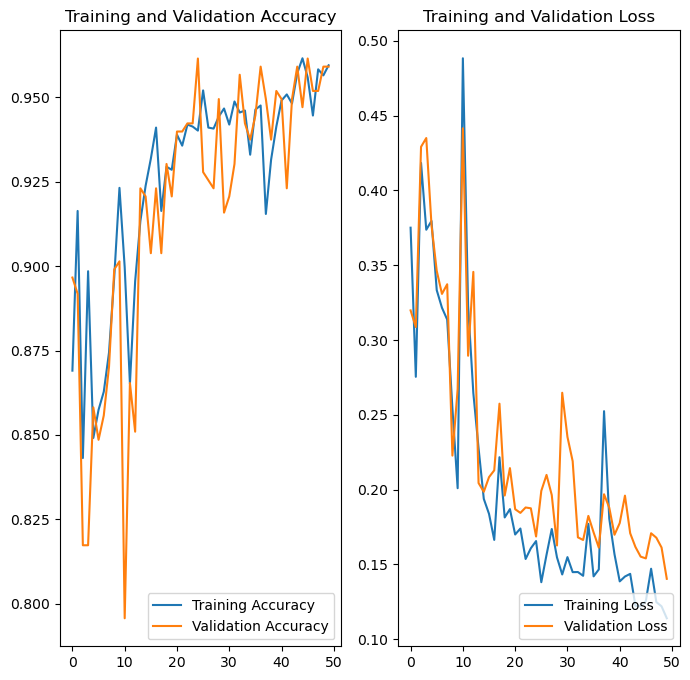

In [38]:
plt.figure(figsize=(8,8))
plt.subplot(1,2,1)
plt.plot(range(EPOCHS),acc,label='Training Accuracy')
plt.plot(range(EPOCHS),val_acc,label = 'Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1,2,2)
plt.plot(range(EPOCHS),loss,label='Training Loss')
plt.plot(range(EPOCHS),val_loss,label = 'Validation Loss')
plt.legend(loc='lower right')
plt.title('Training and Validation Loss')

# Testing the model 

first image to predict
actual label:  Normal
1/1 [==============================] - 18s 18s/step
predicted label: Normal


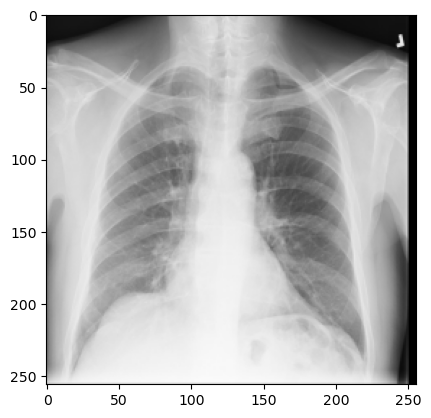

In [39]:
import numpy as np 

for images_batch, labels_batch in test_ds.take(1):
    first_image = images_batch[0].numpy().astype('uint8')
    first_label = labels_batch[0].numpy()
    
    print('first image to predict')
    plt.imshow(first_image)
    print('actual label: ',class_names[first_label]) 
    
    batch_prediction = model.predict(images_batch)
    print('predicted label:',class_names[np.argmax(batch_prediction[0])])

In [40]:
def predict(model,img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array = tf.expand_dims(img_array,0) # create batch
    
    predictions = model.predict(img_array)
    
    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])),2)

    return predicted_class,confidence
    

1/1 [==============================] - 1s 585ms/step


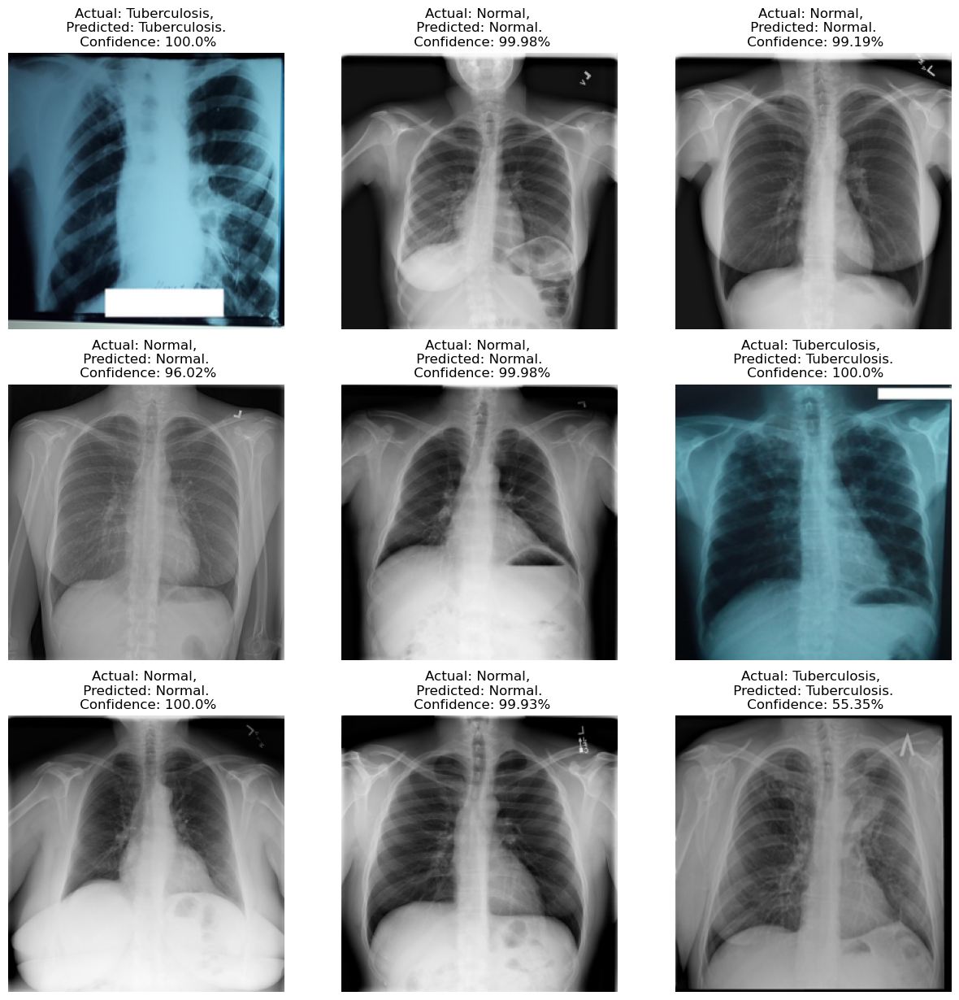

In [41]:
plt.figure(figsize=(15,15))
for images,labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3,3,i+1)
        plt.imshow(images[i].numpy().astype('uint8'))
        
        predicted_class, confidence = predict(model,images[i].numpy())
        #print(confidence)
        actual_class = class_names[labels[i]] 
        
        plt.title(f"Actual: {actual_class}, \n Predicted: {predicted_class}. \n Confidence: {confidence}%")
        plt.axis('off')
        

In [42]:
model_version = 5
model.save(f"saved_models/{model_version}")

INFO:tensorflow:Assets written to: saved_models/5\assets


INFO:tensorflow:Assets written to: saved_models/5\assets
